In [1]:
import os
import math
import time
import random
import shutil
import itertools
import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict
from multiprocessing import Pool, cpu_count
from tqdm import tqdm, trange

import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms
from torch.utils.data import DataLoader, random_split, Subset

from bika import BiKA_Linear, BiKA_Conv2d

# Network Definition

#### Neuron number and precision in each layer listed in this area for the CNV used in CIFAR-10 classification

In [2]:
kernel_size      = (3,3) 

in_channel_0_0   = 3
out_channel_0_0  = 64 
in_channel_0_1   = out_channel_0_0
out_channel_0_1  = 64 

in_channel_1_0   = out_channel_0_1
out_channel_1_0  = 128
in_channel_1_1   = out_channel_1_0
out_channel_1_1  = 128 

in_channel_2_0   = out_channel_1_1
out_channel_2_0  = 256
in_channel_2_1   = out_channel_2_0
out_channel_2_1  = 256 

input_length     = 4*4*out_channel_2_1

hidden_0         = 512  
hidden_1         = 512   

output_length    = 10 

#### Hyperparameters setting here.

In [3]:
epochs = 400
batch_sizes = [128, 256, 512]
dropout_rates = [0.0, 0.05]
lr_max_pool = [ 0.001, 0.0005, 0.0002, 0.0001]
lr_min_pool = [1e-6]

#### GPU selection. After decided which GPU to train, don't change it before completing the training

In [4]:
torch.backends.cuda.matmul.allow_tf32 = True
torch.backends.cudnn.allow_tf32 = True

In [5]:
GPU_device = "cuda:0"

#### Training date output folder path, for different network model setting, please change the name of save_path

In [6]:
save_path     = "CNV_BiKA"

project_root  = os.path.abspath(".")
dataset_root  = os.path.join(project_root, "dataset/CIFAR10")
train_root    = os.path.join(project_root, "train")
output_root   = os.path.join(train_root, save_path)
report_root  = os.path.join(project_root, "report")

print("Dataset Download Path: ", dataset_root, "\n")
print("Training Data Output Path: ", output_root, "\n")
print("Training Report Output Path: ", report_root)

os.makedirs(dataset_root, exist_ok=True)
os.makedirs(output_root, exist_ok=True)
os.makedirs(report_root, exist_ok=True)

Dataset Download Path:  /home/yuhao/project/new KAN/BiKA/experiment/CNN-like/CIFAR10/dataset/CIFAR10 

Training Data Output Path:  /home/yuhao/project/new KAN/BiKA/experiment/CNN-like/CIFAR10/train/CNV_BiKA 

Training Report Output Path:  /home/yuhao/project/new KAN/BiKA/experiment/CNN-like/CIFAR10/report


#### Following are the code to complete the network definition

In [7]:
class CNV(nn.Module):
    def __init__(self, dropout=0.5):
        super(CNV, self).__init__()
        
        self.conv0_0 = BiKA_Conv2d(
                         in_channels=in_channel_0_0,
                         out_channels=out_channel_0_0,
                         kernel_size=kernel_size, 
                         stride=1, 
                         padding=1)
        self.drop0_0 = nn.Dropout2d(dropout)
        
        self.conv0_1 = BiKA_Conv2d( 
                         in_channels=in_channel_0_1,
                         out_channels=out_channel_0_1,
                         kernel_size=kernel_size, 
                         stride=1, 
                         padding=1)
        self.drop0_1 = nn.Dropout2d(dropout)
        
        self.pool0 = nn.MaxPool2d(2)
        
        self.conv1_0 = BiKA_Conv2d( 
                         in_channels=in_channel_1_0,
                         out_channels=out_channel_1_0,
                         kernel_size=kernel_size, 
                         stride=1, 
                         padding=1)
        self.drop1_0 = nn.Dropout2d(dropout)
        
        self.conv1_1 = BiKA_Conv2d( 
                         in_channels=in_channel_1_1,
                         out_channels=out_channel_1_1,
                         kernel_size=kernel_size, 
                         stride=1, 
                         padding=1)
        self.drop1_1 = nn.Dropout2d(dropout)
        
        self.pool1 = nn.MaxPool2d(2)
        
        self.conv2_0 = BiKA_Conv2d( 
                         in_channels=in_channel_2_0,
                         out_channels=out_channel_2_0,
                         kernel_size=kernel_size, 
                         stride=1, 
                         padding=1)
        self.drop2_0 = nn.Dropout2d(dropout)
        
        self.conv2_1 = BiKA_Conv2d( 
                         in_channels=in_channel_2_1,
                         out_channels=out_channel_2_1,
                         kernel_size=kernel_size, 
                         stride=1, 
                         padding=1)
        self.drop2_1 = nn.Dropout2d(dropout)
        
        self.pool2 = nn.MaxPool2d(2)
        
        self.fc3   = BiKA_Linear(
                         input_length, 
                         hidden_0)
        self.drop3 = nn.Dropout(dropout)
        
        self.fc4   = BiKA_Linear(
                         hidden_0, 
                         hidden_1)
        self.drop4 = nn.Dropout(dropout)
        
        self.out   = BiKA_Linear(
                         hidden_1, 
                         output_length)

    def forward(self, x):
        out = self.drop0_0(self.conv0_0(x))
        out = self.drop0_1(self.conv0_1(out))
        out = self.pool0(out)
        
        out = self.drop1_0(self.conv1_0(out))
        out = self.drop1_1(self.conv1_1(out))
        out = self.pool1(out)
        
        out = self.drop2_0(self.conv2_0(out))
        out = self.drop2_1(self.conv2_1(out))
        out = self.pool2(out)
        
        out = out.reshape(out.shape[0], -1)
        out = self.drop3(self.fc3(out))
        out = self.drop4(self.fc4(out))
        out = self.out(out)
        
        return out

# Random Seed Utility

In [8]:
def set_random_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

# Define Dataloader

In [9]:
Test_batch_size = 4096

In [10]:
def get_dataloaders(batch_size):
    transform_train = transforms.Compose([
        transforms.RandomCrop(32, padding=4),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize(
            (0.4914, 0.4822, 0.4465),
            (0.2023, 0.1994, 0.2010)
        ),
    ])

    transform_eval = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize(
            (0.4914, 0.4822, 0.4465),
            (0.2023, 0.1994, 0.2010)
        ),
    ])

    full_train_for_train = datasets.CIFAR10(
        dataset_root,
        train=True,
        download=True,
        transform=transform_train,
    )

    full_train_for_val = datasets.CIFAR10(
        dataset_root,
        train=True,
        download=True,
        transform=transform_eval,
    )

    test_dataset = datasets.CIFAR10(
        dataset_root,
        train=False,
        download=True,
        transform=transform_eval,
    )

    num_train = len(full_train_for_train)
    indices = torch.randperm(num_train).tolist()

    val_size = int(0.2 * num_train)
    val_indices = indices[:val_size]
    train_indices = indices[val_size:]

    train_set = Subset(full_train_for_train, train_indices)
    val_set = Subset(full_train_for_val, val_indices)

    train_loader = DataLoader(
        train_set,
        batch_size=batch_size,
        shuffle=True,
        num_workers=6,
        pin_memory=True,
        persistent_workers=True,
        prefetch_factor=4,
    )

    val_loader = DataLoader(
        val_set,
        batch_size=batch_size,
        shuffle=False,
        num_workers=6,
        pin_memory=True,
        persistent_workers=True,
        prefetch_factor=4,
    )

    test_loader = DataLoader(
        test_dataset,
        batch_size=Test_batch_size,
        shuffle=False,
        num_workers=6,
        pin_memory=True,
        persistent_workers=True,
        prefetch_factor=4,
    )

    return train_loader, val_loader, test_loader

# Evaluation Pipeline

In [11]:
def evaluate(model, criterion, device, loader, show_progress=False):
    model.eval()
    loss_total, correct, total = 0, 0, 0

    with torch.no_grad():
        for x, y in tqdm(loader, desc="Evaluation", leave=True, disable=not show_progress):
            x, y = x.to(device), y.to(device)
            out = model(x)
            loss = criterion(out, y)

            loss_total += loss.item() * x.size(0)
            _, pred = out.max(1)
            correct += (pred == y).sum().item()
            total += x.size(0)

    return loss_total / total, correct / total

# Plot Training Loss and Accuracy

In [12]:
def plot_train(history, save_dir):
    # Plot and show
    plt.figure(figsize=(10, 4))
    plt.subplot(1, 2, 1)
    plt.plot(history["train_loss"], label="Train Loss")
    plt.plot(history["val_loss"], label="Val Loss")
    plt.legend()
    plt.title("Loss")

    plt.subplot(1, 2, 2)
    plt.plot(history["train_acc"], label="Train Acc")
    plt.plot(history["val_acc"], label="Val Acc")
    plt.legend()
    plt.title("Accuracy")
    plt.tight_layout()
    plt.savefig(os.path.join(save_dir, "training_plot.png"))
    plt.show()

# Training, Validation, and Testing Pipeline

In [13]:
def train_validate_test(config, save_dir):
    set_random_seed()
    os.makedirs(save_dir, exist_ok=True)
    log_file = os.path.join(save_dir, "training_log.txt")
    resume_path = os.path.join(save_dir, "checkpoint.pth")
    csv_log_path = os.path.join(save_dir, "training_log.csv")
    with open(csv_log_path, "a") as f:
        if os.path.getsize(csv_log_path) == 0:
            f.write("Epoch,Learning Rate,Train Loss,Train Acc,Val Loss,Val Acc,Epoch Time,Train Time,Val Time\n")

    epochs, batch_size, lr_max, lr_min, dropout = config
    train_loader, val_loader, test_loader = get_dataloaders(batch_size)
    device = torch.device(GPU_device if torch.cuda.is_available() else "cpu")
    model = CNV(dropout=dropout).to(device)
    criterion = nn.CrossEntropyLoss()
    # optimizer = torch.optim.SGD(model.parameters(), lr=lr_max, momentum=0.9, weight_decay=1e-6)
    optimizer = torch.optim.Adam(model.parameters(), lr=lr_max)

    start_epoch = 0
    history = {"train_loss": [], "train_acc": [], "val_loss": [], "val_acc": [], "epoch_time": [], "train_time": [], "val_time": []}

    if os.path.exists(resume_path):
        ckpt = torch.load(resume_path, map_location="cpu")
        model.load_state_dict(ckpt["model_state"])
        model.to(device)
        optimizer.load_state_dict(ckpt["optimizer_state"])
        for state in optimizer.state.values():
            for k, v in state.items():
                if torch.is_tensor(v):
                    state[k] = v.to(device)
        history = ckpt["history"]
        start_epoch = ckpt["epoch"] + 1
        print(f"🔄 Resuming from epoch {start_epoch}")
    else:
        with open(log_file, "w") as f:
            f.write("Training started\n")

    # Training Loop
    t = trange(start_epoch, epochs, desc="Training", leave=True)
    for epoch in t:
        epoch_start = time.time()
        model.train()
        lr = lr_min + 0.5 * (lr_max - lr_min) * (1 + math.cos(math.pi * epoch / epochs))
        for g in optimizer.param_groups:
            g["lr"] = lr

        train_start = time.time()
        train_loss, correct, total = 0, 0, 0
        for x, y in train_loader:
            x, y = x.to(device), y.to(device)
            optimizer.zero_grad()
            out = model(x)
            loss = criterion(out, y)
            loss.backward()
            optimizer.step()
            train_loss += loss.item() * x.size(0)
            _, pred = out.max(1)
            correct += (pred == y).sum().item()
            total += x.size(0)
        train_time = time.time() - train_start

        val_start = time.time()
        val_loss, val_acc = evaluate(model, criterion, device, val_loader)
        val_time = time.time() - val_start
        train_loss /= total
        train_acc = correct / total
        epoch_time = time.time() - epoch_start
        
        history["train_loss"].append(train_loss)
        history["train_acc"].append(train_acc)
        history["val_loss"].append(val_loss)
        history["val_acc"].append(val_acc)
        history["epoch_time"].append(epoch_time/60)
        history["train_time"].append(train_time/60)
        history["val_time"].append(val_time/60)

        log_line = (f"Epoch {epoch+1}/{epochs} - LR: {lr:.6f} | "
                    f"Train Loss: {train_loss:.4f}, Acc: {train_acc:.4f} | "
                    f"Val Loss: {val_loss:.4f}, Acc: {val_acc:.4f} | "
                    f"Epoch Time: {epoch_time/60:.2f}, Train Time: {train_time/60:.2f}, Val Time: {val_time/60:.2f}")
        
        with open(log_file, "a") as f:
            f.write(log_line + "\n")

        
        with open(os.path.join(save_dir, "training_log.csv"), "a") as f:
            f.write(f"{epoch+1},{lr:.6f},{train_loss:.4f},{train_acc:.4f},{val_loss:.4f},{val_acc:.4f},{epoch_time/60:.4f},{train_time/60:.4f},{val_time/60:.4f}\n")

        t.set_description("| LR: %.6f | Train Acc: %.4f | Val Acc: %.4f | Epoch Time: %.2f | " % (lr, train_acc, val_acc, epoch_time/60))
        t.refresh()

        torch.save({
            "epoch": epoch,
            "model_state": model.state_dict(),
            "optimizer_state": optimizer.state_dict(),
            "history": history
        }, resume_path)

    # Plot and show the training history
    plot_train(history, save_dir)

    # Test the original trained model
    original_test_loss, original_test_acc = evaluate(model, criterion, device, test_loader)
    final_line = f"Original Model Final Test Loss: {original_test_loss:.4f} Accuracy: {original_test_acc:.4f}"
    print(final_line)
    with open(log_file, "a") as f:
        f.write("Training completed\n")
        f.write(final_line + "\n")

    # Save the trained model
    torch.save(model.state_dict(), os.path.join(save_dir, "final_model.pth"))
    with open(log_file, "a") as f:
        f.write(final_line + "\n")
    print("\n")

    return original_test_acc, resume_path

# Hyperparameter Searching for Network Training and Testing

In [14]:
def Hyperparameter_searching(epochs, batch_sizes, lr_max_pool, lr_min_pool, dropout_rates):
    
    epochs = epochs
    batch_sizes = batch_sizes
    lr_max_pool = lr_max_pool
    lr_min_pool = lr_min_pool
    
    all_runs = [
        f"batch{bs}_lr_max_{lr_max}_min_{lr_min}_dp{dropout}"
        for bs, lr_max, lr_min, dropout in itertools.product(batch_sizes, lr_max_pool, lr_min_pool, dropout_rates)
    ]
    
    completed_runs = []
    for run in all_runs:
        log_path = os.path.join(output_root, run, "training_log.txt")
        if os.path.exists(log_path):
            with open(log_path, "r") as f:
                if any("Training completed" in line for line in f):
                    completed_runs.append(run)
    
    if len(completed_runs) == len(all_runs):
        print("✅ All combinations completed. No retraining will be started.")
        print("ℹ️ If you want to retrain from scratch, please manually delete the previous training records/checkpoints.")
        completed_runs = []
    
    results = []
    for batch_size, lr_max, lr_min, dropout in itertools.product(batch_sizes, lr_max_pool, lr_min_pool, dropout_rates):
        run_name = f"batch{batch_size}_lr_max_{lr_max}_min_{lr_min}_dp{dropout}"
        save_dir = os.path.join(output_root, run_name)
    
        if run_name in completed_runs:
            print(f"✅ Skipping {run_name}")
            with open(os.path.join(save_dir, "training_log.txt")) as f:
                for line in f:
                    if "Final Test Loss" in line:
                        acc = float(line.strip().split()[-1])
                        results.append((run_name, acc, epochs, batch_size, lr_max, lr_min, dropout, os.path.join(save_dir, "checkpoint.pth")))
            continue
    
        print(f"🚀 Running: {run_name}")
        acc, resume_path = train_validate_test([epochs, batch_size, lr_max, lr_min, dropout], save_dir)
        results.append((run_name, acc, epochs, batch_size, lr_max, lr_min, dropout, resume_path))
    
    results.sort(key=lambda x: x[1], reverse=True)
    best_config, best_acc, best_epochs, best_batch_size, best_lr_max, best_lr_min, best_dropout, best_resume_path = results[0]
    
    with open(os.path.join(report_root, save_path+"_report.csv"), "w") as f:
        f.write("Epoch,Batch Size,LR_max,LR_min,Dropout,Accuracy\n")
        for name, acc, epoch, batch_size, lr_max, lr_min, dropout, resume_path in results:
            f.write(f"{epoch},{batch_size},{lr_max:.4f},{lr_min:.6f},{dropout:.4f},{acc:.4f}\n")
            
    return best_epochs, best_batch_size, best_lr_max, best_lr_min, best_dropout, best_resume_path

In [15]:
def best_evaluation(epochs, batch_size, lr_max, lr_min, dropout, resume_path):
    set_random_seed()

    epochs, batch_size, lr_max, lr_min, dropout = epochs, batch_size, lr_max, lr_min, dropout
    train_loader, val_loader, test_loader = get_dataloaders(batch_size)
    device = torch.device(GPU_device if torch.cuda.is_available() else "cpu")
    model = CNV(dropout=dropout).to(device)
    criterion = nn.CrossEntropyLoss()
    # optimizer = torch.optim.SGD(model.parameters(), lr=lr_max, momentum=0.9, weight_decay=1e-6)
    optimizer = torch.optim.Adam(model.parameters(), lr=lr_max)

    if os.path.exists(resume_path):
        ckpt = torch.load(resume_path, map_location="cpu")
        model.load_state_dict(ckpt["model_state"])
        model.to(device)
        optimizer.load_state_dict(ckpt["optimizer_state"])
        for state in optimizer.state.values():
            for k, v in state.items():
                if torch.is_tensor(v):
                    state[k] = v.to(device)
        history = ckpt["history"]
        print("Best model loaded.")
    else:
        print("Best model lost.")

    # Test the original trained model
    original_test_loss, original_test_acc = evaluate(model, criterion, device, test_loader, show_progress=True)
    final_line = (
        f"Best Original Model Final Test Loss: {original_test_loss:.4f} "
        f"Acc: {original_test_acc:.4f} "
    )
    print(final_line)
    print("\n")

    with open(os.path.join(report_root, save_path + "_best_eval.csv"), "w") as f:
        f.write("Epoch,Batch Size,LR_max,LR_min,Dropout,Acc,Loss\n")
        f.write(f"{epochs},{batch_size},{lr_max:.4f},{lr_min:.6f},{dropout:.4f},{original_test_acc:.4f},{original_test_loss:.4f}\n")

🚀 Running: batch128_lr_max_0.001_min_1e-06_dp0.0


Files already downloaded and verified


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|                                                                                                                                                                        | 0/400 [00:00<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.1463 | Val Acc: 0.1692 | Epoch Time: 1.86 | :   0%|                                                                                                      | 0/400 [01:51<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.1463 | Val Acc: 0.1692 | Epoch Time: 1.86 | :   0%|                                                                                                      | 0/400 [01:51<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.1463 | Val Acc: 0.1692 | Epoch Time: 1.86 | :   0%|▏                                                                                         | 1/400 [01:51<12:21:54, 111.57s/it]

| LR: 0.001000 | Train Acc: 0.1735 | Val Acc: 0.2031 | Epoch Time: 1.85 | :   0%|▏                                                                                         | 1/400 [03:42<12:21:54, 111.57s/it]

| LR: 0.001000 | Train Acc: 0.1735 | Val Acc: 0.2031 | Epoch Time: 1.85 | :   0%|▏                                                                                         | 1/400 [03:42<12:21:54, 111.57s/it]

| LR: 0.001000 | Train Acc: 0.1735 | Val Acc: 0.2031 | Epoch Time: 1.85 | :   0%|▍                                                                                         | 2/400 [03:42<12:19:03, 111.42s/it]

| LR: 0.001000 | Train Acc: 0.1934 | Val Acc: 0.2180 | Epoch Time: 1.85 | :   0%|▍                                                                                         | 2/400 [05:33<12:19:03, 111.42s/it]

| LR: 0.001000 | Train Acc: 0.1934 | Val Acc: 0.2180 | Epoch Time: 1.85 | :   0%|▍                                                                                         | 2/400 [05:33<12:19:03, 111.42s/it]

| LR: 0.001000 | Train Acc: 0.1934 | Val Acc: 0.2180 | Epoch Time: 1.85 | :   1%|▋                                                                                         | 3/400 [05:34<12:16:34, 111.32s/it]

| LR: 0.001000 | Train Acc: 0.1971 | Val Acc: 0.1915 | Epoch Time: 1.85 | :   1%|▋                                                                                         | 3/400 [07:25<12:16:34, 111.32s/it]

| LR: 0.001000 | Train Acc: 0.1971 | Val Acc: 0.1915 | Epoch Time: 1.85 | :   1%|▋                                                                                         | 3/400 [07:25<12:16:34, 111.32s/it]

| LR: 0.001000 | Train Acc: 0.1971 | Val Acc: 0.1915 | Epoch Time: 1.85 | :   1%|▉                                                                                         | 4/400 [07:25<12:14:24, 111.27s/it]

| LR: 0.001000 | Train Acc: 0.2091 | Val Acc: 0.2219 | Epoch Time: 1.85 | :   1%|▉                                                                                         | 4/400 [09:16<12:14:24, 111.27s/it]

| LR: 0.001000 | Train Acc: 0.2091 | Val Acc: 0.2219 | Epoch Time: 1.85 | :   1%|▉                                                                                         | 4/400 [09:16<12:14:24, 111.27s/it]

| LR: 0.001000 | Train Acc: 0.2091 | Val Acc: 0.2219 | Epoch Time: 1.85 | :   1%|█▏                                                                                        | 5/400 [09:16<12:12:22, 111.25s/it]

| LR: 0.001000 | Train Acc: 0.2201 | Val Acc: 0.2235 | Epoch Time: 1.85 | :   1%|█▏                                                                                        | 5/400 [11:07<12:12:22, 111.25s/it]

| LR: 0.001000 | Train Acc: 0.2201 | Val Acc: 0.2235 | Epoch Time: 1.85 | :   1%|█▏                                                                                        | 5/400 [11:07<12:12:22, 111.25s/it]

| LR: 0.001000 | Train Acc: 0.2201 | Val Acc: 0.2235 | Epoch Time: 1.85 | :   2%|█▎                                                                                        | 6/400 [11:07<12:10:25, 111.23s/it]

| LR: 0.000999 | Train Acc: 0.2262 | Val Acc: 0.2400 | Epoch Time: 1.85 | :   2%|█▎                                                                                        | 6/400 [12:58<12:10:25, 111.23s/it]

| LR: 0.000999 | Train Acc: 0.2262 | Val Acc: 0.2400 | Epoch Time: 1.85 | :   2%|█▎                                                                                        | 6/400 [12:58<12:10:25, 111.23s/it]

| LR: 0.000999 | Train Acc: 0.2262 | Val Acc: 0.2400 | Epoch Time: 1.85 | :   2%|█▌                                                                                        | 7/400 [12:58<12:08:28, 111.22s/it]

| LR: 0.000999 | Train Acc: 0.2329 | Val Acc: 0.2489 | Epoch Time: 1.85 | :   2%|█▌                                                                                        | 7/400 [14:49<12:08:28, 111.22s/it]

| LR: 0.000999 | Train Acc: 0.2329 | Val Acc: 0.2489 | Epoch Time: 1.85 | :   2%|█▌                                                                                        | 7/400 [14:49<12:08:28, 111.22s/it]

| LR: 0.000999 | Train Acc: 0.2329 | Val Acc: 0.2489 | Epoch Time: 1.85 | :   2%|█▊                                                                                        | 8/400 [14:50<12:06:33, 111.21s/it]

| LR: 0.000999 | Train Acc: 0.2429 | Val Acc: 0.2560 | Epoch Time: 1.85 | :   2%|█▊                                                                                        | 8/400 [16:41<12:06:33, 111.21s/it]

| LR: 0.000999 | Train Acc: 0.2429 | Val Acc: 0.2560 | Epoch Time: 1.85 | :   2%|█▊                                                                                        | 8/400 [16:41<12:06:33, 111.21s/it]

| LR: 0.000999 | Train Acc: 0.2429 | Val Acc: 0.2560 | Epoch Time: 1.85 | :   2%|██                                                                                        | 9/400 [16:41<12:04:40, 111.20s/it]

| LR: 0.000999 | Train Acc: 0.2472 | Val Acc: 0.2565 | Epoch Time: 1.85 | :   2%|██                                                                                        | 9/400 [18:32<12:04:40, 111.20s/it]

| LR: 0.000999 | Train Acc: 0.2472 | Val Acc: 0.2565 | Epoch Time: 1.85 | :   2%|██                                                                                        | 9/400 [18:32<12:04:40, 111.20s/it]

| LR: 0.000999 | Train Acc: 0.2472 | Val Acc: 0.2565 | Epoch Time: 1.85 | :   2%|██▏                                                                                      | 10/400 [18:32<12:02:45, 111.19s/it]

| LR: 0.000998 | Train Acc: 0.2445 | Val Acc: 0.2765 | Epoch Time: 1.85 | :   2%|██▏                                                                                      | 10/400 [20:23<12:02:45, 111.19s/it]

| LR: 0.000998 | Train Acc: 0.2445 | Val Acc: 0.2765 | Epoch Time: 1.85 | :   2%|██▏                                                                                      | 10/400 [20:23<12:02:45, 111.19s/it]

| LR: 0.000998 | Train Acc: 0.2445 | Val Acc: 0.2765 | Epoch Time: 1.85 | :   3%|██▍                                                                                      | 11/400 [20:23<12:00:53, 111.19s/it]

| LR: 0.000998 | Train Acc: 0.2425 | Val Acc: 0.2657 | Epoch Time: 1.85 | :   3%|██▍                                                                                      | 11/400 [22:14<12:00:53, 111.19s/it]

| LR: 0.000998 | Train Acc: 0.2425 | Val Acc: 0.2657 | Epoch Time: 1.85 | :   3%|██▍                                                                                      | 11/400 [22:14<12:00:53, 111.19s/it]

| LR: 0.000998 | Train Acc: 0.2425 | Val Acc: 0.2657 | Epoch Time: 1.85 | :   3%|██▋                                                                                      | 12/400 [22:14<11:59:02, 111.19s/it]

| LR: 0.000998 | Train Acc: 0.2414 | Val Acc: 0.2393 | Epoch Time: 1.85 | :   3%|██▋                                                                                      | 12/400 [24:05<11:59:02, 111.19s/it]

| LR: 0.000998 | Train Acc: 0.2414 | Val Acc: 0.2393 | Epoch Time: 1.85 | :   3%|██▋                                                                                      | 12/400 [24:05<11:59:02, 111.19s/it]

| LR: 0.000998 | Train Acc: 0.2414 | Val Acc: 0.2393 | Epoch Time: 1.85 | :   3%|██▉                                                                                      | 13/400 [24:05<11:57:09, 111.19s/it]

| LR: 0.000997 | Train Acc: 0.2444 | Val Acc: 0.2638 | Epoch Time: 1.85 | :   3%|██▉                                                                                      | 13/400 [25:57<11:57:09, 111.19s/it]

| LR: 0.000997 | Train Acc: 0.2444 | Val Acc: 0.2638 | Epoch Time: 1.85 | :   3%|██▉                                                                                      | 13/400 [25:57<11:57:09, 111.19s/it]

| LR: 0.000997 | Train Acc: 0.2444 | Val Acc: 0.2638 | Epoch Time: 1.85 | :   4%|███                                                                                      | 14/400 [25:57<11:55:22, 111.20s/it]

| LR: 0.000997 | Train Acc: 0.2464 | Val Acc: 0.2614 | Epoch Time: 1.85 | :   4%|███                                                                                      | 14/400 [27:48<11:55:22, 111.20s/it]

| LR: 0.000997 | Train Acc: 0.2464 | Val Acc: 0.2614 | Epoch Time: 1.85 | :   4%|███                                                                                      | 14/400 [27:48<11:55:22, 111.20s/it]

| LR: 0.000997 | Train Acc: 0.2464 | Val Acc: 0.2614 | Epoch Time: 1.85 | :   4%|███▎                                                                                     | 15/400 [27:48<11:53:27, 111.19s/it]

| LR: 0.000997 | Train Acc: 0.2480 | Val Acc: 0.2420 | Epoch Time: 1.85 | :   4%|███▎                                                                                     | 15/400 [29:39<11:53:27, 111.19s/it]

| LR: 0.000997 | Train Acc: 0.2480 | Val Acc: 0.2420 | Epoch Time: 1.85 | :   4%|███▎                                                                                     | 15/400 [29:39<11:53:27, 111.19s/it]

| LR: 0.000997 | Train Acc: 0.2480 | Val Acc: 0.2420 | Epoch Time: 1.85 | :   4%|███▌                                                                                     | 16/400 [29:39<11:51:36, 111.19s/it]

| LR: 0.000996 | Train Acc: 0.2500 | Val Acc: 0.2468 | Epoch Time: 1.85 | :   4%|███▌                                                                                     | 16/400 [31:30<11:51:36, 111.19s/it]

| LR: 0.000996 | Train Acc: 0.2500 | Val Acc: 0.2468 | Epoch Time: 1.85 | :   4%|███▌                                                                                     | 16/400 [31:30<11:51:36, 111.19s/it]

| LR: 0.000996 | Train Acc: 0.2500 | Val Acc: 0.2468 | Epoch Time: 1.85 | :   4%|███▊                                                                                     | 17/400 [31:30<11:49:45, 111.19s/it]

| LR: 0.000996 | Train Acc: 0.2494 | Val Acc: 0.2678 | Epoch Time: 1.85 | :   4%|███▊                                                                                     | 17/400 [33:21<11:49:45, 111.19s/it]

| LR: 0.000996 | Train Acc: 0.2494 | Val Acc: 0.2678 | Epoch Time: 1.85 | :   4%|███▊                                                                                     | 17/400 [33:21<11:49:45, 111.19s/it]

| LR: 0.000996 | Train Acc: 0.2494 | Val Acc: 0.2678 | Epoch Time: 1.85 | :   4%|████                                                                                     | 18/400 [33:21<11:47:55, 111.19s/it]

| LR: 0.000995 | Train Acc: 0.2515 | Val Acc: 0.2574 | Epoch Time: 1.85 | :   4%|████                                                                                     | 18/400 [35:13<11:47:55, 111.19s/it]

| LR: 0.000995 | Train Acc: 0.2515 | Val Acc: 0.2574 | Epoch Time: 1.85 | :   4%|████                                                                                     | 18/400 [35:13<11:47:55, 111.19s/it]

| LR: 0.000995 | Train Acc: 0.2515 | Val Acc: 0.2574 | Epoch Time: 1.85 | :   5%|████▏                                                                                    | 19/400 [35:13<11:46:06, 111.20s/it]

| LR: 0.000994 | Train Acc: 0.2477 | Val Acc: 0.2595 | Epoch Time: 1.85 | :   5%|████▏                                                                                    | 19/400 [37:04<11:46:06, 111.20s/it]

| LR: 0.000994 | Train Acc: 0.2477 | Val Acc: 0.2595 | Epoch Time: 1.85 | :   5%|████▏                                                                                    | 19/400 [37:04<11:46:06, 111.20s/it]

| LR: 0.000994 | Train Acc: 0.2477 | Val Acc: 0.2595 | Epoch Time: 1.85 | :   5%|████▍                                                                                    | 20/400 [37:04<11:44:15, 111.20s/it]

| LR: 0.000994 | Train Acc: 0.2511 | Val Acc: 0.2670 | Epoch Time: 1.85 | :   5%|████▍                                                                                    | 20/400 [38:55<11:44:15, 111.20s/it]

| LR: 0.000994 | Train Acc: 0.2511 | Val Acc: 0.2670 | Epoch Time: 1.85 | :   5%|████▍                                                                                    | 20/400 [38:55<11:44:15, 111.20s/it]

| LR: 0.000994 | Train Acc: 0.2511 | Val Acc: 0.2670 | Epoch Time: 1.85 | :   5%|████▋                                                                                    | 21/400 [38:55<11:42:24, 111.20s/it]

| LR: 0.000993 | Train Acc: 0.2477 | Val Acc: 0.2708 | Epoch Time: 1.85 | :   5%|████▋                                                                                    | 21/400 [40:46<11:42:24, 111.20s/it]

| LR: 0.000993 | Train Acc: 0.2477 | Val Acc: 0.2708 | Epoch Time: 1.85 | :   5%|████▋                                                                                    | 21/400 [40:46<11:42:24, 111.20s/it]

| LR: 0.000993 | Train Acc: 0.2477 | Val Acc: 0.2708 | Epoch Time: 1.85 | :   6%|████▉                                                                                    | 22/400 [40:46<11:40:34, 111.20s/it]

| LR: 0.000993 | Train Acc: 0.2452 | Val Acc: 0.2569 | Epoch Time: 1.85 | :   6%|████▉                                                                                    | 22/400 [42:37<11:40:34, 111.20s/it]

| LR: 0.000993 | Train Acc: 0.2452 | Val Acc: 0.2569 | Epoch Time: 1.85 | :   6%|████▉                                                                                    | 22/400 [42:37<11:40:34, 111.20s/it]

| LR: 0.000993 | Train Acc: 0.2452 | Val Acc: 0.2569 | Epoch Time: 1.85 | :   6%|█████                                                                                    | 23/400 [42:37<11:38:41, 111.20s/it]

| LR: 0.000992 | Train Acc: 0.2482 | Val Acc: 0.2598 | Epoch Time: 1.85 | :   6%|█████                                                                                    | 23/400 [44:29<11:38:41, 111.20s/it]

| LR: 0.000992 | Train Acc: 0.2482 | Val Acc: 0.2598 | Epoch Time: 1.85 | :   6%|█████                                                                                    | 23/400 [44:29<11:38:41, 111.20s/it]

| LR: 0.000992 | Train Acc: 0.2482 | Val Acc: 0.2598 | Epoch Time: 1.85 | :   6%|█████▎                                                                                   | 24/400 [44:29<11:36:54, 111.21s/it]

| LR: 0.000991 | Train Acc: 0.2490 | Val Acc: 0.2696 | Epoch Time: 1.85 | :   6%|█████▎                                                                                   | 24/400 [46:20<11:36:54, 111.21s/it]

| LR: 0.000991 | Train Acc: 0.2490 | Val Acc: 0.2696 | Epoch Time: 1.85 | :   6%|█████▎                                                                                   | 24/400 [46:20<11:36:54, 111.21s/it]

| LR: 0.000991 | Train Acc: 0.2490 | Val Acc: 0.2696 | Epoch Time: 1.85 | :   6%|█████▌                                                                                   | 25/400 [46:20<11:35:01, 111.20s/it]

| LR: 0.000990 | Train Acc: 0.2447 | Val Acc: 0.2668 | Epoch Time: 1.85 | :   6%|█████▌                                                                                   | 25/400 [48:11<11:35:01, 111.20s/it]

| LR: 0.000990 | Train Acc: 0.2447 | Val Acc: 0.2668 | Epoch Time: 1.85 | :   6%|█████▌                                                                                   | 25/400 [48:11<11:35:01, 111.20s/it]

| LR: 0.000990 | Train Acc: 0.2447 | Val Acc: 0.2668 | Epoch Time: 1.85 | :   6%|█████▊                                                                                   | 26/400 [48:11<11:33:07, 111.20s/it]

| LR: 0.000990 | Train Acc: 0.2488 | Val Acc: 0.2490 | Epoch Time: 1.85 | :   6%|█████▊                                                                                   | 26/400 [50:02<11:33:07, 111.20s/it]

| LR: 0.000990 | Train Acc: 0.2488 | Val Acc: 0.2490 | Epoch Time: 1.85 | :   6%|█████▊                                                                                   | 26/400 [50:02<11:33:07, 111.20s/it]

| LR: 0.000990 | Train Acc: 0.2488 | Val Acc: 0.2490 | Epoch Time: 1.85 | :   7%|██████                                                                                   | 27/400 [50:02<11:31:15, 111.19s/it]

| LR: 0.000989 | Train Acc: 0.2453 | Val Acc: 0.2614 | Epoch Time: 1.85 | :   7%|██████                                                                                   | 27/400 [51:53<11:31:15, 111.19s/it]

| LR: 0.000989 | Train Acc: 0.2453 | Val Acc: 0.2614 | Epoch Time: 1.85 | :   7%|██████                                                                                   | 27/400 [51:53<11:31:15, 111.19s/it]

| LR: 0.000989 | Train Acc: 0.2453 | Val Acc: 0.2614 | Epoch Time: 1.85 | :   7%|██████▏                                                                                  | 28/400 [51:53<11:29:20, 111.18s/it]

| LR: 0.000988 | Train Acc: 0.2424 | Val Acc: 0.2537 | Epoch Time: 1.85 | :   7%|██████▏                                                                                  | 28/400 [53:44<11:29:20, 111.18s/it]

| LR: 0.000988 | Train Acc: 0.2424 | Val Acc: 0.2537 | Epoch Time: 1.85 | :   7%|██████▏                                                                                  | 28/400 [53:44<11:29:20, 111.18s/it]

| LR: 0.000988 | Train Acc: 0.2424 | Val Acc: 0.2537 | Epoch Time: 1.85 | :   7%|██████▍                                                                                  | 29/400 [53:45<11:27:29, 111.18s/it]

| LR: 0.000987 | Train Acc: 0.2366 | Val Acc: 0.2496 | Epoch Time: 1.85 | :   7%|██████▍                                                                                  | 29/400 [55:36<11:27:29, 111.18s/it]

| LR: 0.000987 | Train Acc: 0.2366 | Val Acc: 0.2496 | Epoch Time: 1.85 | :   7%|██████▍                                                                                  | 29/400 [55:36<11:27:29, 111.18s/it]

| LR: 0.000987 | Train Acc: 0.2366 | Val Acc: 0.2496 | Epoch Time: 1.85 | :   8%|██████▋                                                                                  | 30/400 [55:36<11:25:39, 111.19s/it]

| LR: 0.000986 | Train Acc: 0.2349 | Val Acc: 0.2427 | Epoch Time: 1.85 | :   8%|██████▋                                                                                  | 30/400 [57:27<11:25:39, 111.19s/it]

| LR: 0.000986 | Train Acc: 0.2349 | Val Acc: 0.2427 | Epoch Time: 1.85 | :   8%|██████▋                                                                                  | 30/400 [57:27<11:25:39, 111.19s/it]

| LR: 0.000986 | Train Acc: 0.2349 | Val Acc: 0.2427 | Epoch Time: 1.85 | :   8%|██████▉                                                                                  | 31/400 [57:27<11:23:49, 111.19s/it]

| LR: 0.000985 | Train Acc: 0.2389 | Val Acc: 0.2460 | Epoch Time: 1.85 | :   8%|██████▉                                                                                  | 31/400 [59:18<11:23:49, 111.19s/it]

| LR: 0.000985 | Train Acc: 0.2389 | Val Acc: 0.2460 | Epoch Time: 1.85 | :   8%|██████▉                                                                                  | 31/400 [59:18<11:23:49, 111.19s/it]

| LR: 0.000985 | Train Acc: 0.2389 | Val Acc: 0.2460 | Epoch Time: 1.85 | :   8%|███████                                                                                  | 32/400 [59:18<11:21:59, 111.19s/it]

| LR: 0.000984 | Train Acc: 0.2411 | Val Acc: 0.2623 | Epoch Time: 1.85 | :   8%|██████▉                                                                                | 32/400 [1:01:09<11:21:59, 111.19s/it]

| LR: 0.000984 | Train Acc: 0.2411 | Val Acc: 0.2623 | Epoch Time: 1.85 | :   8%|██████▉                                                                                | 32/400 [1:01:09<11:21:59, 111.19s/it]

| LR: 0.000984 | Train Acc: 0.2411 | Val Acc: 0.2623 | Epoch Time: 1.85 | :   8%|███████▏                                                                               | 33/400 [1:01:09<11:20:05, 111.19s/it]

| LR: 0.000983 | Train Acc: 0.2335 | Val Acc: 0.2402 | Epoch Time: 1.85 | :   8%|███████▏                                                                               | 33/400 [1:03:00<11:20:05, 111.19s/it]

| LR: 0.000983 | Train Acc: 0.2335 | Val Acc: 0.2402 | Epoch Time: 1.85 | :   8%|███████▏                                                                               | 33/400 [1:03:00<11:20:05, 111.19s/it]

| LR: 0.000983 | Train Acc: 0.2335 | Val Acc: 0.2402 | Epoch Time: 1.85 | :   8%|███████▍                                                                               | 34/400 [1:03:01<11:18:16, 111.19s/it]

| LR: 0.000982 | Train Acc: 0.2347 | Val Acc: 0.2306 | Epoch Time: 1.85 | :   8%|███████▍                                                                               | 34/400 [1:04:52<11:18:16, 111.19s/it]

| LR: 0.000982 | Train Acc: 0.2347 | Val Acc: 0.2306 | Epoch Time: 1.85 | :   8%|███████▍                                                                               | 34/400 [1:04:52<11:18:16, 111.19s/it]

| LR: 0.000982 | Train Acc: 0.2347 | Val Acc: 0.2306 | Epoch Time: 1.85 | :   9%|███████▌                                                                               | 35/400 [1:04:52<11:16:27, 111.20s/it]

| LR: 0.000981 | Train Acc: 0.2351 | Val Acc: 0.2498 | Epoch Time: 1.85 | :   9%|███████▌                                                                               | 35/400 [1:06:43<11:16:27, 111.20s/it]

| LR: 0.000981 | Train Acc: 0.2351 | Val Acc: 0.2498 | Epoch Time: 1.85 | :   9%|███████▌                                                                               | 35/400 [1:06:43<11:16:27, 111.20s/it]

| LR: 0.000981 | Train Acc: 0.2351 | Val Acc: 0.2498 | Epoch Time: 1.85 | :   9%|███████▊                                                                               | 36/400 [1:06:43<11:14:34, 111.19s/it]

| LR: 0.000980 | Train Acc: 0.2350 | Val Acc: 0.2386 | Epoch Time: 1.85 | :   9%|███████▊                                                                               | 36/400 [1:08:34<11:14:34, 111.19s/it]

| LR: 0.000980 | Train Acc: 0.2350 | Val Acc: 0.2386 | Epoch Time: 1.85 | :   9%|███████▊                                                                               | 36/400 [1:08:34<11:14:34, 111.19s/it]

| LR: 0.000980 | Train Acc: 0.2350 | Val Acc: 0.2386 | Epoch Time: 1.85 | :   9%|████████                                                                               | 37/400 [1:08:34<11:12:41, 111.19s/it]

| LR: 0.000979 | Train Acc: 0.2357 | Val Acc: 0.2463 | Epoch Time: 1.85 | :   9%|████████                                                                               | 37/400 [1:10:25<11:12:41, 111.19s/it]

| LR: 0.000979 | Train Acc: 0.2357 | Val Acc: 0.2463 | Epoch Time: 1.85 | :   9%|████████                                                                               | 37/400 [1:10:25<11:12:41, 111.19s/it]

| LR: 0.000979 | Train Acc: 0.2357 | Val Acc: 0.2463 | Epoch Time: 1.85 | :  10%|████████▎                                                                              | 38/400 [1:10:25<11:10:49, 111.19s/it]

| LR: 0.000978 | Train Acc: 0.2335 | Val Acc: 0.2417 | Epoch Time: 1.85 | :  10%|████████▎                                                                              | 38/400 [1:12:16<11:10:49, 111.19s/it]

| LR: 0.000978 | Train Acc: 0.2335 | Val Acc: 0.2417 | Epoch Time: 1.85 | :  10%|████████▎                                                                              | 38/400 [1:12:16<11:10:49, 111.19s/it]

| LR: 0.000978 | Train Acc: 0.2335 | Val Acc: 0.2417 | Epoch Time: 1.85 | :  10%|████████▍                                                                              | 39/400 [1:12:17<11:09:05, 111.21s/it]

| LR: 0.000977 | Train Acc: 0.2306 | Val Acc: 0.2559 | Epoch Time: 1.85 | :  10%|████████▍                                                                              | 39/400 [1:14:08<11:09:05, 111.21s/it]

| LR: 0.000977 | Train Acc: 0.2306 | Val Acc: 0.2559 | Epoch Time: 1.85 | :  10%|████████▍                                                                              | 39/400 [1:14:08<11:09:05, 111.21s/it]

| LR: 0.000977 | Train Acc: 0.2306 | Val Acc: 0.2559 | Epoch Time: 1.85 | :  10%|████████▋                                                                              | 40/400 [1:14:08<11:07:12, 111.20s/it]

| LR: 0.000976 | Train Acc: 0.2340 | Val Acc: 0.2445 | Epoch Time: 1.85 | :  10%|████████▋                                                                              | 40/400 [1:15:59<11:07:12, 111.20s/it]

| LR: 0.000976 | Train Acc: 0.2340 | Val Acc: 0.2445 | Epoch Time: 1.85 | :  10%|████████▋                                                                              | 40/400 [1:15:59<11:07:12, 111.20s/it]

| LR: 0.000976 | Train Acc: 0.2340 | Val Acc: 0.2445 | Epoch Time: 1.85 | :  10%|████████▉                                                                              | 41/400 [1:15:59<11:05:19, 111.20s/it]

| LR: 0.000974 | Train Acc: 0.2342 | Val Acc: 0.2648 | Epoch Time: 1.85 | :  10%|████████▉                                                                              | 41/400 [1:17:50<11:05:19, 111.20s/it]

| LR: 0.000974 | Train Acc: 0.2342 | Val Acc: 0.2648 | Epoch Time: 1.85 | :  10%|████████▉                                                                              | 41/400 [1:17:50<11:05:19, 111.20s/it]

| LR: 0.000974 | Train Acc: 0.2342 | Val Acc: 0.2648 | Epoch Time: 1.85 | :  10%|█████████▏                                                                             | 42/400 [1:17:50<11:03:27, 111.19s/it]

| LR: 0.000973 | Train Acc: 0.2330 | Val Acc: 0.2587 | Epoch Time: 1.85 | :  10%|█████████▏                                                                             | 42/400 [1:19:41<11:03:27, 111.19s/it]

| LR: 0.000973 | Train Acc: 0.2330 | Val Acc: 0.2587 | Epoch Time: 1.85 | :  10%|█████████▏                                                                             | 42/400 [1:19:41<11:03:27, 111.19s/it]

| LR: 0.000973 | Train Acc: 0.2330 | Val Acc: 0.2587 | Epoch Time: 1.85 | :  11%|█████████▎                                                                             | 43/400 [1:19:41<11:01:34, 111.19s/it]

| LR: 0.000972 | Train Acc: 0.2338 | Val Acc: 0.2372 | Epoch Time: 1.85 | :  11%|█████████▎                                                                             | 43/400 [1:21:32<11:01:34, 111.19s/it]

| LR: 0.000972 | Train Acc: 0.2338 | Val Acc: 0.2372 | Epoch Time: 1.85 | :  11%|█████████▎                                                                             | 43/400 [1:21:32<11:01:34, 111.19s/it]

| LR: 0.000972 | Train Acc: 0.2338 | Val Acc: 0.2372 | Epoch Time: 1.85 | :  11%|█████████▌                                                                             | 44/400 [1:21:33<10:59:46, 111.20s/it]

| LR: 0.000970 | Train Acc: 0.2302 | Val Acc: 0.2491 | Epoch Time: 1.85 | :  11%|█████████▌                                                                             | 44/400 [1:23:24<10:59:46, 111.20s/it]

| LR: 0.000970 | Train Acc: 0.2302 | Val Acc: 0.2491 | Epoch Time: 1.85 | :  11%|█████████▌                                                                             | 44/400 [1:23:24<10:59:46, 111.20s/it]

| LR: 0.000970 | Train Acc: 0.2302 | Val Acc: 0.2491 | Epoch Time: 1.85 | :  11%|█████████▊                                                                             | 45/400 [1:23:24<10:57:58, 111.21s/it]

| LR: 0.000969 | Train Acc: 0.2303 | Val Acc: 0.2517 | Epoch Time: 1.85 | :  11%|█████████▊                                                                             | 45/400 [1:25:15<10:57:58, 111.21s/it]

| LR: 0.000969 | Train Acc: 0.2303 | Val Acc: 0.2517 | Epoch Time: 1.85 | :  11%|█████████▊                                                                             | 45/400 [1:25:15<10:57:58, 111.21s/it]

| LR: 0.000969 | Train Acc: 0.2303 | Val Acc: 0.2517 | Epoch Time: 1.85 | :  12%|██████████                                                                             | 46/400 [1:25:15<10:56:05, 111.20s/it]

| LR: 0.000968 | Train Acc: 0.2351 | Val Acc: 0.2612 | Epoch Time: 1.85 | :  12%|██████████                                                                             | 46/400 [1:27:06<10:56:05, 111.20s/it]

| LR: 0.000968 | Train Acc: 0.2351 | Val Acc: 0.2612 | Epoch Time: 1.85 | :  12%|██████████                                                                             | 46/400 [1:27:06<10:56:05, 111.20s/it]

| LR: 0.000968 | Train Acc: 0.2351 | Val Acc: 0.2612 | Epoch Time: 1.85 | :  12%|██████████▏                                                                            | 47/400 [1:27:06<10:54:15, 111.21s/it]

| LR: 0.000966 | Train Acc: 0.2393 | Val Acc: 0.2452 | Epoch Time: 1.85 | :  12%|██████████▏                                                                            | 47/400 [1:28:57<10:54:15, 111.21s/it]

| LR: 0.000966 | Train Acc: 0.2393 | Val Acc: 0.2452 | Epoch Time: 1.85 | :  12%|██████████▏                                                                            | 47/400 [1:28:57<10:54:15, 111.21s/it]

| LR: 0.000966 | Train Acc: 0.2393 | Val Acc: 0.2452 | Epoch Time: 1.85 | :  12%|██████████▍                                                                            | 48/400 [1:28:57<10:52:23, 111.20s/it]

| LR: 0.000965 | Train Acc: 0.2361 | Val Acc: 0.2570 | Epoch Time: 1.85 | :  12%|██████████▍                                                                            | 48/400 [1:30:48<10:52:23, 111.20s/it]

| LR: 0.000965 | Train Acc: 0.2361 | Val Acc: 0.2570 | Epoch Time: 1.85 | :  12%|██████████▍                                                                            | 48/400 [1:30:48<10:52:23, 111.20s/it]

| LR: 0.000965 | Train Acc: 0.2361 | Val Acc: 0.2570 | Epoch Time: 1.85 | :  12%|██████████▋                                                                            | 49/400 [1:30:49<10:50:32, 111.20s/it]

| LR: 0.000963 | Train Acc: 0.2323 | Val Acc: 0.2456 | Epoch Time: 1.85 | :  12%|██████████▋                                                                            | 49/400 [1:32:40<10:50:32, 111.20s/it]

| LR: 0.000963 | Train Acc: 0.2323 | Val Acc: 0.2456 | Epoch Time: 1.85 | :  12%|██████████▋                                                                            | 49/400 [1:32:40<10:50:32, 111.20s/it]

| LR: 0.000963 | Train Acc: 0.2323 | Val Acc: 0.2456 | Epoch Time: 1.85 | :  12%|██████████▉                                                                            | 50/400 [1:32:40<10:48:38, 111.20s/it]

| LR: 0.000962 | Train Acc: 0.2329 | Val Acc: 0.2346 | Epoch Time: 1.85 | :  12%|██████████▉                                                                            | 50/400 [1:34:31<10:48:38, 111.20s/it]

| LR: 0.000962 | Train Acc: 0.2329 | Val Acc: 0.2346 | Epoch Time: 1.85 | :  12%|██████████▉                                                                            | 50/400 [1:34:31<10:48:38, 111.20s/it]

| LR: 0.000962 | Train Acc: 0.2329 | Val Acc: 0.2346 | Epoch Time: 1.85 | :  13%|███████████                                                                            | 51/400 [1:34:31<10:46:47, 111.19s/it]

| LR: 0.000960 | Train Acc: 0.2219 | Val Acc: 0.2311 | Epoch Time: 1.85 | :  13%|███████████                                                                            | 51/400 [1:36:22<10:46:47, 111.19s/it]

| LR: 0.000960 | Train Acc: 0.2219 | Val Acc: 0.2311 | Epoch Time: 1.85 | :  13%|███████████                                                                            | 51/400 [1:36:22<10:46:47, 111.19s/it]

| LR: 0.000960 | Train Acc: 0.2219 | Val Acc: 0.2311 | Epoch Time: 1.85 | :  13%|███████████▎                                                                           | 52/400 [1:36:22<10:44:55, 111.19s/it]

| LR: 0.000959 | Train Acc: 0.2292 | Val Acc: 0.2460 | Epoch Time: 1.85 | :  13%|███████████▎                                                                           | 52/400 [1:38:13<10:44:55, 111.19s/it]

| LR: 0.000959 | Train Acc: 0.2292 | Val Acc: 0.2460 | Epoch Time: 1.85 | :  13%|███████████▎                                                                           | 52/400 [1:38:13<10:44:55, 111.19s/it]

| LR: 0.000959 | Train Acc: 0.2292 | Val Acc: 0.2460 | Epoch Time: 1.85 | :  13%|███████████▌                                                                           | 53/400 [1:38:13<10:43:02, 111.19s/it]

| LR: 0.000957 | Train Acc: 0.2310 | Val Acc: 0.2443 | Epoch Time: 1.85 | :  13%|███████████▌                                                                           | 53/400 [1:40:04<10:43:02, 111.19s/it]

| LR: 0.000957 | Train Acc: 0.2310 | Val Acc: 0.2443 | Epoch Time: 1.85 | :  13%|███████████▌                                                                           | 53/400 [1:40:04<10:43:02, 111.19s/it]

| LR: 0.000957 | Train Acc: 0.2310 | Val Acc: 0.2443 | Epoch Time: 1.85 | :  14%|███████████▋                                                                           | 54/400 [1:40:05<10:41:11, 111.19s/it]

| LR: 0.000956 | Train Acc: 0.2301 | Val Acc: 0.2645 | Epoch Time: 1.85 | :  14%|███████████▋                                                                           | 54/400 [1:41:56<10:41:11, 111.19s/it]

| LR: 0.000956 | Train Acc: 0.2301 | Val Acc: 0.2645 | Epoch Time: 1.85 | :  14%|███████████▋                                                                           | 54/400 [1:41:56<10:41:11, 111.19s/it]

| LR: 0.000956 | Train Acc: 0.2301 | Val Acc: 0.2645 | Epoch Time: 1.85 | :  14%|███████████▉                                                                           | 55/400 [1:41:56<10:39:20, 111.19s/it]

| LR: 0.000954 | Train Acc: 0.2259 | Val Acc: 0.2307 | Epoch Time: 1.85 | :  14%|███████████▉                                                                           | 55/400 [1:43:47<10:39:20, 111.19s/it]

| LR: 0.000954 | Train Acc: 0.2259 | Val Acc: 0.2307 | Epoch Time: 1.85 | :  14%|███████████▉                                                                           | 55/400 [1:43:47<10:39:20, 111.19s/it]

| LR: 0.000954 | Train Acc: 0.2259 | Val Acc: 0.2307 | Epoch Time: 1.85 | :  14%|████████████▏                                                                          | 56/400 [1:43:47<10:37:30, 111.19s/it]

| LR: 0.000952 | Train Acc: 0.2250 | Val Acc: 0.2330 | Epoch Time: 1.85 | :  14%|████████████▏                                                                          | 56/400 [1:45:38<10:37:30, 111.19s/it]

| LR: 0.000952 | Train Acc: 0.2250 | Val Acc: 0.2330 | Epoch Time: 1.85 | :  14%|████████████▏                                                                          | 56/400 [1:45:38<10:37:30, 111.19s/it]

| LR: 0.000952 | Train Acc: 0.2250 | Val Acc: 0.2330 | Epoch Time: 1.85 | :  14%|████████████▍                                                                          | 57/400 [1:45:38<10:35:38, 111.19s/it]

| LR: 0.000951 | Train Acc: 0.2261 | Val Acc: 0.2502 | Epoch Time: 1.85 | :  14%|████████████▍                                                                          | 57/400 [1:47:29<10:35:38, 111.19s/it]

| LR: 0.000951 | Train Acc: 0.2261 | Val Acc: 0.2502 | Epoch Time: 1.85 | :  14%|████████████▍                                                                          | 57/400 [1:47:29<10:35:38, 111.19s/it]

| LR: 0.000951 | Train Acc: 0.2261 | Val Acc: 0.2502 | Epoch Time: 1.85 | :  14%|████████████▌                                                                          | 58/400 [1:47:29<10:33:48, 111.19s/it]

| LR: 0.000949 | Train Acc: 0.2301 | Val Acc: 0.2498 | Epoch Time: 1.85 | :  14%|████████████▌                                                                          | 58/400 [1:49:20<10:33:48, 111.19s/it]

| LR: 0.000949 | Train Acc: 0.2301 | Val Acc: 0.2498 | Epoch Time: 1.85 | :  14%|████████████▌                                                                          | 58/400 [1:49:20<10:33:48, 111.19s/it]

| LR: 0.000949 | Train Acc: 0.2301 | Val Acc: 0.2498 | Epoch Time: 1.85 | :  15%|████████████▊                                                                          | 59/400 [1:49:20<10:31:57, 111.20s/it]

| LR: 0.000947 | Train Acc: 0.2210 | Val Acc: 0.2314 | Epoch Time: 1.85 | :  15%|████████████▊                                                                          | 59/400 [1:51:12<10:31:57, 111.20s/it]

| LR: 0.000947 | Train Acc: 0.2210 | Val Acc: 0.2314 | Epoch Time: 1.85 | :  15%|████████████▊                                                                          | 59/400 [1:51:12<10:31:57, 111.20s/it]

| LR: 0.000947 | Train Acc: 0.2210 | Val Acc: 0.2314 | Epoch Time: 1.85 | :  15%|█████████████                                                                          | 60/400 [1:51:12<10:30:07, 111.20s/it]

| LR: 0.000946 | Train Acc: 0.2286 | Val Acc: 0.2345 | Epoch Time: 1.85 | :  15%|█████████████                                                                          | 60/400 [1:53:03<10:30:07, 111.20s/it]

| LR: 0.000946 | Train Acc: 0.2286 | Val Acc: 0.2345 | Epoch Time: 1.85 | :  15%|█████████████                                                                          | 60/400 [1:53:03<10:30:07, 111.20s/it]

| LR: 0.000946 | Train Acc: 0.2286 | Val Acc: 0.2345 | Epoch Time: 1.85 | :  15%|█████████████▎                                                                         | 61/400 [1:53:03<10:28:16, 111.20s/it]

| LR: 0.000944 | Train Acc: 0.2259 | Val Acc: 0.2515 | Epoch Time: 1.85 | :  15%|█████████████▎                                                                         | 61/400 [1:54:54<10:28:16, 111.20s/it]

| LR: 0.000944 | Train Acc: 0.2259 | Val Acc: 0.2515 | Epoch Time: 1.85 | :  15%|█████████████▎                                                                         | 61/400 [1:54:54<10:28:16, 111.20s/it]

| LR: 0.000944 | Train Acc: 0.2259 | Val Acc: 0.2515 | Epoch Time: 1.85 | :  16%|█████████████▍                                                                         | 62/400 [1:54:54<10:26:24, 111.20s/it]

| LR: 0.000942 | Train Acc: 0.2320 | Val Acc: 0.2408 | Epoch Time: 1.85 | :  16%|█████████████▍                                                                         | 62/400 [1:56:45<10:26:24, 111.20s/it]

| LR: 0.000942 | Train Acc: 0.2320 | Val Acc: 0.2408 | Epoch Time: 1.85 | :  16%|█████████████▍                                                                         | 62/400 [1:56:45<10:26:24, 111.20s/it]

| LR: 0.000942 | Train Acc: 0.2320 | Val Acc: 0.2408 | Epoch Time: 1.85 | :  16%|█████████████▋                                                                         | 63/400 [1:56:45<10:24:34, 111.20s/it]

| LR: 0.000940 | Train Acc: 0.2274 | Val Acc: 0.2400 | Epoch Time: 1.85 | :  16%|█████████████▋                                                                         | 63/400 [1:58:36<10:24:34, 111.20s/it]

| LR: 0.000940 | Train Acc: 0.2274 | Val Acc: 0.2400 | Epoch Time: 1.85 | :  16%|█████████████▋                                                                         | 63/400 [1:58:36<10:24:34, 111.20s/it]

| LR: 0.000940 | Train Acc: 0.2274 | Val Acc: 0.2400 | Epoch Time: 1.85 | :  16%|█████████████▉                                                                         | 64/400 [1:58:37<10:22:45, 111.21s/it]

| LR: 0.000938 | Train Acc: 0.2289 | Val Acc: 0.2478 | Epoch Time: 1.85 | :  16%|█████████████▉                                                                         | 64/400 [2:00:28<10:22:45, 111.21s/it]

| LR: 0.000938 | Train Acc: 0.2289 | Val Acc: 0.2478 | Epoch Time: 1.85 | :  16%|█████████████▉                                                                         | 64/400 [2:00:28<10:22:45, 111.21s/it]

| LR: 0.000938 | Train Acc: 0.2289 | Val Acc: 0.2478 | Epoch Time: 1.85 | :  16%|██████████████▏                                                                        | 65/400 [2:00:28<10:20:52, 111.20s/it]

| LR: 0.000936 | Train Acc: 0.2284 | Val Acc: 0.2425 | Epoch Time: 1.85 | :  16%|██████████████▏                                                                        | 65/400 [2:02:19<10:20:52, 111.20s/it]

| LR: 0.000936 | Train Acc: 0.2284 | Val Acc: 0.2425 | Epoch Time: 1.85 | :  16%|██████████████▏                                                                        | 65/400 [2:02:19<10:20:52, 111.20s/it]

| LR: 0.000936 | Train Acc: 0.2284 | Val Acc: 0.2425 | Epoch Time: 1.85 | :  16%|██████████████▎                                                                        | 66/400 [2:02:19<10:19:03, 111.21s/it]

| LR: 0.000934 | Train Acc: 0.2313 | Val Acc: 0.2521 | Epoch Time: 1.85 | :  16%|██████████████▎                                                                        | 66/400 [2:04:10<10:19:03, 111.21s/it]

| LR: 0.000934 | Train Acc: 0.2313 | Val Acc: 0.2521 | Epoch Time: 1.85 | :  16%|██████████████▎                                                                        | 66/400 [2:04:10<10:19:03, 111.21s/it]

| LR: 0.000934 | Train Acc: 0.2313 | Val Acc: 0.2521 | Epoch Time: 1.85 | :  17%|██████████████▌                                                                        | 67/400 [2:04:10<10:17:11, 111.21s/it]

| LR: 0.000932 | Train Acc: 0.2254 | Val Acc: 0.2220 | Epoch Time: 1.85 | :  17%|██████████████▌                                                                        | 67/400 [2:06:01<10:17:11, 111.21s/it]

| LR: 0.000932 | Train Acc: 0.2254 | Val Acc: 0.2220 | Epoch Time: 1.85 | :  17%|██████████████▌                                                                        | 67/400 [2:06:01<10:17:11, 111.21s/it]

| LR: 0.000932 | Train Acc: 0.2254 | Val Acc: 0.2220 | Epoch Time: 1.85 | :  17%|██████████████▊                                                                        | 68/400 [2:06:01<10:15:18, 111.20s/it]

| LR: 0.000930 | Train Acc: 0.2300 | Val Acc: 0.2513 | Epoch Time: 1.85 | :  17%|██████████████▊                                                                        | 68/400 [2:07:52<10:15:18, 111.20s/it]

| LR: 0.000930 | Train Acc: 0.2300 | Val Acc: 0.2513 | Epoch Time: 1.85 | :  17%|██████████████▊                                                                        | 68/400 [2:07:52<10:15:18, 111.20s/it]

| LR: 0.000930 | Train Acc: 0.2300 | Val Acc: 0.2513 | Epoch Time: 1.85 | :  17%|███████████████                                                                        | 69/400 [2:07:52<10:13:24, 111.19s/it]

| LR: 0.000928 | Train Acc: 0.2258 | Val Acc: 0.2489 | Epoch Time: 1.85 | :  17%|███████████████                                                                        | 69/400 [2:09:44<10:13:24, 111.19s/it]

| LR: 0.000928 | Train Acc: 0.2258 | Val Acc: 0.2489 | Epoch Time: 1.85 | :  17%|███████████████                                                                        | 69/400 [2:09:44<10:13:24, 111.19s/it]

| LR: 0.000928 | Train Acc: 0.2258 | Val Acc: 0.2489 | Epoch Time: 1.85 | :  18%|███████████████▏                                                                       | 70/400 [2:09:44<10:11:34, 111.19s/it]

| LR: 0.000926 | Train Acc: 0.2314 | Val Acc: 0.2380 | Epoch Time: 1.85 | :  18%|███████████████▏                                                                       | 70/400 [2:11:35<10:11:34, 111.19s/it]

| LR: 0.000926 | Train Acc: 0.2314 | Val Acc: 0.2380 | Epoch Time: 1.85 | :  18%|███████████████▏                                                                       | 70/400 [2:11:35<10:11:34, 111.19s/it]

| LR: 0.000926 | Train Acc: 0.2314 | Val Acc: 0.2380 | Epoch Time: 1.85 | :  18%|███████████████▍                                                                       | 71/400 [2:11:35<10:09:42, 111.19s/it]

| LR: 0.000924 | Train Acc: 0.2293 | Val Acc: 0.2333 | Epoch Time: 1.85 | :  18%|███████████████▍                                                                       | 71/400 [2:13:26<10:09:42, 111.19s/it]

| LR: 0.000924 | Train Acc: 0.2293 | Val Acc: 0.2333 | Epoch Time: 1.85 | :  18%|███████████████▍                                                                       | 71/400 [2:13:26<10:09:42, 111.19s/it]

| LR: 0.000924 | Train Acc: 0.2293 | Val Acc: 0.2333 | Epoch Time: 1.85 | :  18%|███████████████▋                                                                       | 72/400 [2:13:26<10:07:50, 111.19s/it]

| LR: 0.000922 | Train Acc: 0.2279 | Val Acc: 0.2490 | Epoch Time: 1.85 | :  18%|███████████████▋                                                                       | 72/400 [2:15:17<10:07:50, 111.19s/it]

| LR: 0.000922 | Train Acc: 0.2279 | Val Acc: 0.2490 | Epoch Time: 1.85 | :  18%|███████████████▋                                                                       | 72/400 [2:15:17<10:07:50, 111.19s/it]

| LR: 0.000922 | Train Acc: 0.2279 | Val Acc: 0.2490 | Epoch Time: 1.85 | :  18%|███████████████▉                                                                       | 73/400 [2:15:17<10:05:59, 111.19s/it]

| LR: 0.000920 | Train Acc: 0.2226 | Val Acc: 0.2337 | Epoch Time: 1.85 | :  18%|███████████████▉                                                                       | 73/400 [2:17:08<10:05:59, 111.19s/it]

| LR: 0.000920 | Train Acc: 0.2226 | Val Acc: 0.2337 | Epoch Time: 1.85 | :  18%|███████████████▉                                                                       | 73/400 [2:17:08<10:05:59, 111.19s/it]

| LR: 0.000920 | Train Acc: 0.2226 | Val Acc: 0.2337 | Epoch Time: 1.85 | :  18%|████████████████                                                                       | 74/400 [2:17:08<10:04:06, 111.19s/it]

| LR: 0.000918 | Train Acc: 0.2239 | Val Acc: 0.2294 | Epoch Time: 1.85 | :  18%|████████████████                                                                       | 74/400 [2:19:00<10:04:06, 111.19s/it]

| LR: 0.000918 | Train Acc: 0.2239 | Val Acc: 0.2294 | Epoch Time: 1.85 | :  18%|████████████████                                                                       | 74/400 [2:19:00<10:04:06, 111.19s/it]

| LR: 0.000918 | Train Acc: 0.2239 | Val Acc: 0.2294 | Epoch Time: 1.85 | :  19%|████████████████▎                                                                      | 75/400 [2:19:00<10:02:17, 111.19s/it]

| LR: 0.000916 | Train Acc: 0.2291 | Val Acc: 0.2251 | Epoch Time: 1.85 | :  19%|████████████████▎                                                                      | 75/400 [2:20:51<10:02:17, 111.19s/it]

| LR: 0.000916 | Train Acc: 0.2291 | Val Acc: 0.2251 | Epoch Time: 1.85 | :  19%|████████████████▎                                                                      | 75/400 [2:20:51<10:02:17, 111.19s/it]

| LR: 0.000916 | Train Acc: 0.2291 | Val Acc: 0.2251 | Epoch Time: 1.85 | :  19%|████████████████▌                                                                      | 76/400 [2:20:51<10:00:27, 111.20s/it]

| LR: 0.000914 | Train Acc: 0.2175 | Val Acc: 0.2307 | Epoch Time: 1.85 | :  19%|████████████████▌                                                                      | 76/400 [2:22:42<10:00:27, 111.20s/it]

| LR: 0.000914 | Train Acc: 0.2175 | Val Acc: 0.2307 | Epoch Time: 1.85 | :  19%|████████████████▌                                                                      | 76/400 [2:22:42<10:00:27, 111.20s/it]

| LR: 0.000914 | Train Acc: 0.2175 | Val Acc: 0.2307 | Epoch Time: 1.85 | :  19%|████████████████▉                                                                       | 77/400 [2:22:42<9:58:36, 111.20s/it]

| LR: 0.000911 | Train Acc: 0.2267 | Val Acc: 0.2384 | Epoch Time: 1.85 | :  19%|████████████████▉                                                                       | 77/400 [2:24:33<9:58:36, 111.20s/it]

| LR: 0.000911 | Train Acc: 0.2267 | Val Acc: 0.2384 | Epoch Time: 1.85 | :  19%|████████████████▉                                                                       | 77/400 [2:24:33<9:58:36, 111.20s/it]

| LR: 0.000911 | Train Acc: 0.2267 | Val Acc: 0.2384 | Epoch Time: 1.85 | :  20%|█████████████████▏                                                                      | 78/400 [2:24:33<9:56:48, 111.21s/it]

| LR: 0.000909 | Train Acc: 0.2216 | Val Acc: 0.2316 | Epoch Time: 1.85 | :  20%|█████████████████▏                                                                      | 78/400 [2:26:24<9:56:48, 111.21s/it]

| LR: 0.000909 | Train Acc: 0.2216 | Val Acc: 0.2316 | Epoch Time: 1.85 | :  20%|█████████████████▏                                                                      | 78/400 [2:26:24<9:56:48, 111.21s/it]

| LR: 0.000909 | Train Acc: 0.2216 | Val Acc: 0.2316 | Epoch Time: 1.85 | :  20%|█████████████████▍                                                                      | 79/400 [2:26:24<9:54:58, 111.21s/it]

| LR: 0.000907 | Train Acc: 0.2274 | Val Acc: 0.2433 | Epoch Time: 1.85 | :  20%|█████████████████▍                                                                      | 79/400 [2:28:16<9:54:58, 111.21s/it]

| LR: 0.000907 | Train Acc: 0.2274 | Val Acc: 0.2433 | Epoch Time: 1.85 | :  20%|█████████████████▍                                                                      | 79/400 [2:28:16<9:54:58, 111.21s/it]

| LR: 0.000907 | Train Acc: 0.2274 | Val Acc: 0.2433 | Epoch Time: 1.85 | :  20%|█████████████████▌                                                                      | 80/400 [2:28:16<9:53:07, 111.21s/it]

| LR: 0.000905 | Train Acc: 0.2233 | Val Acc: 0.2290 | Epoch Time: 1.85 | :  20%|█████████████████▌                                                                      | 80/400 [2:30:07<9:53:07, 111.21s/it]

| LR: 0.000905 | Train Acc: 0.2233 | Val Acc: 0.2290 | Epoch Time: 1.85 | :  20%|█████████████████▌                                                                      | 80/400 [2:30:07<9:53:07, 111.21s/it]

| LR: 0.000905 | Train Acc: 0.2233 | Val Acc: 0.2290 | Epoch Time: 1.85 | :  20%|█████████████████▊                                                                      | 81/400 [2:30:07<9:51:13, 111.20s/it]

| LR: 0.000902 | Train Acc: 0.2235 | Val Acc: 0.2225 | Epoch Time: 1.85 | :  20%|█████████████████▊                                                                      | 81/400 [2:31:58<9:51:13, 111.20s/it]

| LR: 0.000902 | Train Acc: 0.2235 | Val Acc: 0.2225 | Epoch Time: 1.85 | :  20%|█████████████████▊                                                                      | 81/400 [2:31:58<9:51:13, 111.20s/it]

| LR: 0.000902 | Train Acc: 0.2235 | Val Acc: 0.2225 | Epoch Time: 1.85 | :  20%|██████████████████                                                                      | 82/400 [2:31:58<9:49:20, 111.20s/it]

| LR: 0.000900 | Train Acc: 0.2250 | Val Acc: 0.2493 | Epoch Time: 1.85 | :  20%|██████████████████                                                                      | 82/400 [2:33:49<9:49:20, 111.20s/it]

| LR: 0.000900 | Train Acc: 0.2250 | Val Acc: 0.2493 | Epoch Time: 1.85 | :  20%|██████████████████                                                                      | 82/400 [2:33:49<9:49:20, 111.20s/it]

| LR: 0.000900 | Train Acc: 0.2250 | Val Acc: 0.2493 | Epoch Time: 1.85 | :  21%|██████████████████▎                                                                     | 83/400 [2:33:49<9:47:29, 111.20s/it]

| LR: 0.000898 | Train Acc: 0.2232 | Val Acc: 0.2506 | Epoch Time: 1.85 | :  21%|██████████████████▎                                                                     | 83/400 [2:35:40<9:47:29, 111.20s/it]

| LR: 0.000898 | Train Acc: 0.2232 | Val Acc: 0.2506 | Epoch Time: 1.85 | :  21%|██████████████████▎                                                                     | 83/400 [2:35:40<9:47:29, 111.20s/it]

| LR: 0.000898 | Train Acc: 0.2232 | Val Acc: 0.2506 | Epoch Time: 1.85 | :  21%|██████████████████▍                                                                     | 84/400 [2:35:40<9:45:36, 111.19s/it]

| LR: 0.000895 | Train Acc: 0.2280 | Val Acc: 0.2241 | Epoch Time: 1.85 | :  21%|██████████████████▍                                                                     | 84/400 [2:37:32<9:45:36, 111.19s/it]

| LR: 0.000895 | Train Acc: 0.2280 | Val Acc: 0.2241 | Epoch Time: 1.85 | :  21%|██████████████████▍                                                                     | 84/400 [2:37:32<9:45:36, 111.19s/it]

| LR: 0.000895 | Train Acc: 0.2280 | Val Acc: 0.2241 | Epoch Time: 1.85 | :  21%|██████████████████▋                                                                     | 85/400 [2:37:32<9:43:46, 111.19s/it]

| LR: 0.000893 | Train Acc: 0.2215 | Val Acc: 0.2270 | Epoch Time: 1.85 | :  21%|██████████████████▋                                                                     | 85/400 [2:39:23<9:43:46, 111.19s/it]

| LR: 0.000893 | Train Acc: 0.2215 | Val Acc: 0.2270 | Epoch Time: 1.85 | :  21%|██████████████████▋                                                                     | 85/400 [2:39:23<9:43:46, 111.19s/it]

| LR: 0.000893 | Train Acc: 0.2215 | Val Acc: 0.2270 | Epoch Time: 1.85 | :  22%|██████████████████▉                                                                     | 86/400 [2:39:23<9:41:56, 111.20s/it]

| LR: 0.000890 | Train Acc: 0.2178 | Val Acc: 0.2417 | Epoch Time: 1.85 | :  22%|██████████████████▉                                                                     | 86/400 [2:41:14<9:41:56, 111.20s/it]

| LR: 0.000890 | Train Acc: 0.2178 | Val Acc: 0.2417 | Epoch Time: 1.85 | :  22%|██████████████████▉                                                                     | 86/400 [2:41:14<9:41:56, 111.20s/it]

| LR: 0.000890 | Train Acc: 0.2178 | Val Acc: 0.2417 | Epoch Time: 1.85 | :  22%|███████████████████▏                                                                    | 87/400 [2:41:14<9:40:05, 111.20s/it]

| LR: 0.000888 | Train Acc: 0.2166 | Val Acc: 0.2281 | Epoch Time: 1.85 | :  22%|███████████████████▏                                                                    | 87/400 [2:43:05<9:40:05, 111.20s/it]

| LR: 0.000888 | Train Acc: 0.2166 | Val Acc: 0.2281 | Epoch Time: 1.85 | :  22%|███████████████████▏                                                                    | 87/400 [2:43:05<9:40:05, 111.20s/it]

| LR: 0.000888 | Train Acc: 0.2166 | Val Acc: 0.2281 | Epoch Time: 1.85 | :  22%|███████████████████▎                                                                    | 88/400 [2:43:05<9:38:14, 111.20s/it]

| LR: 0.000885 | Train Acc: 0.2217 | Val Acc: 0.2345 | Epoch Time: 1.85 | :  22%|███████████████████▎                                                                    | 88/400 [2:44:56<9:38:14, 111.20s/it]

| LR: 0.000885 | Train Acc: 0.2217 | Val Acc: 0.2345 | Epoch Time: 1.85 | :  22%|███████████████████▎                                                                    | 88/400 [2:44:56<9:38:14, 111.20s/it]

| LR: 0.000885 | Train Acc: 0.2217 | Val Acc: 0.2345 | Epoch Time: 1.85 | :  22%|███████████████████▌                                                                    | 89/400 [2:44:56<9:36:25, 111.21s/it]

| LR: 0.000883 | Train Acc: 0.2229 | Val Acc: 0.2442 | Epoch Time: 1.85 | :  22%|███████████████████▌                                                                    | 89/400 [2:46:48<9:36:25, 111.21s/it]

| LR: 0.000883 | Train Acc: 0.2229 | Val Acc: 0.2442 | Epoch Time: 1.85 | :  22%|███████████████████▌                                                                    | 89/400 [2:46:48<9:36:25, 111.21s/it]

| LR: 0.000883 | Train Acc: 0.2229 | Val Acc: 0.2442 | Epoch Time: 1.85 | :  22%|███████████████████▊                                                                    | 90/400 [2:46:48<9:34:34, 111.21s/it]

| LR: 0.000880 | Train Acc: 0.2223 | Val Acc: 0.2198 | Epoch Time: 1.85 | :  22%|███████████████████▊                                                                    | 90/400 [2:48:39<9:34:34, 111.21s/it]

| LR: 0.000880 | Train Acc: 0.2223 | Val Acc: 0.2198 | Epoch Time: 1.85 | :  22%|███████████████████▊                                                                    | 90/400 [2:48:39<9:34:34, 111.21s/it]

| LR: 0.000880 | Train Acc: 0.2223 | Val Acc: 0.2198 | Epoch Time: 1.85 | :  23%|████████████████████                                                                    | 91/400 [2:48:39<9:32:42, 111.21s/it]

| LR: 0.000878 | Train Acc: 0.2174 | Val Acc: 0.2313 | Epoch Time: 1.85 | :  23%|████████████████████                                                                    | 91/400 [2:50:30<9:32:42, 111.21s/it]

| LR: 0.000878 | Train Acc: 0.2174 | Val Acc: 0.2313 | Epoch Time: 1.85 | :  23%|████████████████████                                                                    | 91/400 [2:50:30<9:32:42, 111.21s/it]

| LR: 0.000878 | Train Acc: 0.2174 | Val Acc: 0.2313 | Epoch Time: 1.85 | :  23%|████████████████████▏                                                                   | 92/400 [2:50:30<9:30:51, 111.21s/it]

| LR: 0.000875 | Train Acc: 0.2215 | Val Acc: 0.2106 | Epoch Time: 1.85 | :  23%|████████████████████▏                                                                   | 92/400 [2:52:21<9:30:51, 111.21s/it]

| LR: 0.000875 | Train Acc: 0.2215 | Val Acc: 0.2106 | Epoch Time: 1.85 | :  23%|████████████████████▏                                                                   | 92/400 [2:52:21<9:30:51, 111.21s/it]

| LR: 0.000875 | Train Acc: 0.2215 | Val Acc: 0.2106 | Epoch Time: 1.85 | :  23%|████████████████████▍                                                                   | 93/400 [2:52:21<9:29:02, 111.21s/it]

| LR: 0.000873 | Train Acc: 0.2157 | Val Acc: 0.2295 | Epoch Time: 1.85 | :  23%|████████████████████▍                                                                   | 93/400 [2:54:12<9:29:02, 111.21s/it]

| LR: 0.000873 | Train Acc: 0.2157 | Val Acc: 0.2295 | Epoch Time: 1.85 | :  23%|████████████████████▍                                                                   | 93/400 [2:54:12<9:29:02, 111.21s/it]

| LR: 0.000873 | Train Acc: 0.2157 | Val Acc: 0.2295 | Epoch Time: 1.85 | :  24%|████████████████████▋                                                                   | 94/400 [2:54:13<9:27:10, 111.21s/it]

| LR: 0.000870 | Train Acc: 0.2215 | Val Acc: 0.2339 | Epoch Time: 1.85 | :  24%|████████████████████▋                                                                   | 94/400 [2:56:04<9:27:10, 111.21s/it]

| LR: 0.000870 | Train Acc: 0.2215 | Val Acc: 0.2339 | Epoch Time: 1.85 | :  24%|████████████████████▋                                                                   | 94/400 [2:56:04<9:27:10, 111.21s/it]

| LR: 0.000870 | Train Acc: 0.2215 | Val Acc: 0.2339 | Epoch Time: 1.85 | :  24%|████████████████████▉                                                                   | 95/400 [2:56:04<9:25:18, 111.21s/it]

| LR: 0.000867 | Train Acc: 0.2171 | Val Acc: 0.2214 | Epoch Time: 1.85 | :  24%|████████████████████▉                                                                   | 95/400 [2:57:55<9:25:18, 111.21s/it]

| LR: 0.000867 | Train Acc: 0.2171 | Val Acc: 0.2214 | Epoch Time: 1.85 | :  24%|████████████████████▉                                                                   | 95/400 [2:57:55<9:25:18, 111.21s/it]

| LR: 0.000867 | Train Acc: 0.2171 | Val Acc: 0.2214 | Epoch Time: 1.85 | :  24%|█████████████████████                                                                   | 96/400 [2:57:55<9:23:25, 111.20s/it]

| LR: 0.000865 | Train Acc: 0.2235 | Val Acc: 0.2495 | Epoch Time: 1.85 | :  24%|█████████████████████                                                                   | 96/400 [2:59:46<9:23:25, 111.20s/it]

| LR: 0.000865 | Train Acc: 0.2235 | Val Acc: 0.2495 | Epoch Time: 1.85 | :  24%|█████████████████████                                                                   | 96/400 [2:59:46<9:23:25, 111.20s/it]

| LR: 0.000865 | Train Acc: 0.2235 | Val Acc: 0.2495 | Epoch Time: 1.85 | :  24%|█████████████████████▎                                                                  | 97/400 [2:59:46<9:21:34, 111.20s/it]

| LR: 0.000862 | Train Acc: 0.2231 | Val Acc: 0.2420 | Epoch Time: 1.85 | :  24%|█████████████████████▎                                                                  | 97/400 [3:01:37<9:21:34, 111.20s/it]

| LR: 0.000862 | Train Acc: 0.2231 | Val Acc: 0.2420 | Epoch Time: 1.85 | :  24%|█████████████████████▎                                                                  | 97/400 [3:01:37<9:21:34, 111.20s/it]

| LR: 0.000862 | Train Acc: 0.2231 | Val Acc: 0.2420 | Epoch Time: 1.85 | :  24%|█████████████████████▌                                                                  | 98/400 [3:01:37<9:19:43, 111.20s/it]

| LR: 0.000859 | Train Acc: 0.2271 | Val Acc: 0.2388 | Epoch Time: 1.85 | :  24%|█████████████████████▌                                                                  | 98/400 [3:03:28<9:19:43, 111.20s/it]

| LR: 0.000859 | Train Acc: 0.2271 | Val Acc: 0.2388 | Epoch Time: 1.85 | :  24%|█████████████████████▌                                                                  | 98/400 [3:03:28<9:19:43, 111.20s/it]

| LR: 0.000859 | Train Acc: 0.2271 | Val Acc: 0.2388 | Epoch Time: 1.85 | :  25%|█████████████████████▊                                                                  | 99/400 [3:03:29<9:17:51, 111.20s/it]

| LR: 0.000856 | Train Acc: 0.2247 | Val Acc: 0.2274 | Epoch Time: 1.85 | :  25%|█████████████████████▊                                                                  | 99/400 [3:05:20<9:17:51, 111.20s/it]

| LR: 0.000856 | Train Acc: 0.2247 | Val Acc: 0.2274 | Epoch Time: 1.85 | :  25%|█████████████████████▊                                                                  | 99/400 [3:05:20<9:17:51, 111.20s/it]

| LR: 0.000856 | Train Acc: 0.2247 | Val Acc: 0.2274 | Epoch Time: 1.85 | :  25%|█████████████████████▊                                                                 | 100/400 [3:05:20<9:16:02, 111.21s/it]

| LR: 0.000854 | Train Acc: 0.2262 | Val Acc: 0.2146 | Epoch Time: 1.85 | :  25%|█████████████████████▊                                                                 | 100/400 [3:07:11<9:16:02, 111.21s/it]

| LR: 0.000854 | Train Acc: 0.2262 | Val Acc: 0.2146 | Epoch Time: 1.85 | :  25%|█████████████████████▊                                                                 | 100/400 [3:07:11<9:16:02, 111.21s/it]

| LR: 0.000854 | Train Acc: 0.2262 | Val Acc: 0.2146 | Epoch Time: 1.85 | :  25%|█████████████████████▉                                                                 | 101/400 [3:07:11<9:14:12, 111.21s/it]

| LR: 0.000851 | Train Acc: 0.2219 | Val Acc: 0.2016 | Epoch Time: 1.85 | :  25%|█████████████████████▉                                                                 | 101/400 [3:09:02<9:14:12, 111.21s/it]

| LR: 0.000851 | Train Acc: 0.2219 | Val Acc: 0.2016 | Epoch Time: 1.85 | :  25%|█████████████████████▉                                                                 | 101/400 [3:09:02<9:14:12, 111.21s/it]

| LR: 0.000851 | Train Acc: 0.2219 | Val Acc: 0.2016 | Epoch Time: 1.85 | :  26%|██████████████████████▏                                                                | 102/400 [3:09:02<9:12:21, 111.21s/it]

| LR: 0.000848 | Train Acc: 0.2262 | Val Acc: 0.2383 | Epoch Time: 1.85 | :  26%|██████████████████████▏                                                                | 102/400 [3:10:53<9:12:21, 111.21s/it]

| LR: 0.000848 | Train Acc: 0.2262 | Val Acc: 0.2383 | Epoch Time: 1.85 | :  26%|██████████████████████▏                                                                | 102/400 [3:10:53<9:12:21, 111.21s/it]

| LR: 0.000848 | Train Acc: 0.2262 | Val Acc: 0.2383 | Epoch Time: 1.85 | :  26%|██████████████████████▍                                                                | 103/400 [3:10:53<9:10:29, 111.21s/it]

| LR: 0.000845 | Train Acc: 0.2207 | Val Acc: 0.2276 | Epoch Time: 1.85 | :  26%|██████████████████████▍                                                                | 103/400 [3:12:44<9:10:29, 111.21s/it]

| LR: 0.000845 | Train Acc: 0.2207 | Val Acc: 0.2276 | Epoch Time: 1.85 | :  26%|██████████████████████▍                                                                | 103/400 [3:12:44<9:10:29, 111.21s/it]

| LR: 0.000845 | Train Acc: 0.2207 | Val Acc: 0.2276 | Epoch Time: 1.85 | :  26%|██████████████████████▌                                                                | 104/400 [3:12:45<9:08:36, 111.21s/it]

| LR: 0.000842 | Train Acc: 0.2248 | Val Acc: 0.2206 | Epoch Time: 1.85 | :  26%|██████████████████████▌                                                                | 104/400 [3:14:36<9:08:36, 111.21s/it]

| LR: 0.000842 | Train Acc: 0.2248 | Val Acc: 0.2206 | Epoch Time: 1.85 | :  26%|██████████████████████▌                                                                | 104/400 [3:14:36<9:08:36, 111.21s/it]

| LR: 0.000842 | Train Acc: 0.2248 | Val Acc: 0.2206 | Epoch Time: 1.85 | :  26%|██████████████████████▊                                                                | 105/400 [3:14:36<9:06:47, 111.21s/it]

| LR: 0.000840 | Train Acc: 0.2238 | Val Acc: 0.2350 | Epoch Time: 1.85 | :  26%|██████████████████████▊                                                                | 105/400 [3:16:27<9:06:47, 111.21s/it]

| LR: 0.000840 | Train Acc: 0.2238 | Val Acc: 0.2350 | Epoch Time: 1.85 | :  26%|██████████████████████▊                                                                | 105/400 [3:16:27<9:06:47, 111.21s/it]

| LR: 0.000840 | Train Acc: 0.2238 | Val Acc: 0.2350 | Epoch Time: 1.85 | :  26%|███████████████████████                                                                | 106/400 [3:16:27<9:04:55, 111.21s/it]

| LR: 0.000837 | Train Acc: 0.2240 | Val Acc: 0.2345 | Epoch Time: 1.85 | :  26%|███████████████████████                                                                | 106/400 [3:18:18<9:04:55, 111.21s/it]

| LR: 0.000837 | Train Acc: 0.2240 | Val Acc: 0.2345 | Epoch Time: 1.85 | :  26%|███████████████████████                                                                | 106/400 [3:18:18<9:04:55, 111.21s/it]

| LR: 0.000837 | Train Acc: 0.2240 | Val Acc: 0.2345 | Epoch Time: 1.85 | :  27%|███████████████████████▎                                                               | 107/400 [3:18:18<9:03:03, 111.21s/it]

| LR: 0.000834 | Train Acc: 0.2193 | Val Acc: 0.2276 | Epoch Time: 1.85 | :  27%|███████████████████████▎                                                               | 107/400 [3:20:09<9:03:03, 111.21s/it]

| LR: 0.000834 | Train Acc: 0.2193 | Val Acc: 0.2276 | Epoch Time: 1.85 | :  27%|███████████████████████▎                                                               | 107/400 [3:20:09<9:03:03, 111.21s/it]

| LR: 0.000834 | Train Acc: 0.2193 | Val Acc: 0.2276 | Epoch Time: 1.85 | :  27%|███████████████████████▍                                                               | 108/400 [3:20:09<9:01:11, 111.21s/it]

| LR: 0.000831 | Train Acc: 0.2248 | Val Acc: 0.2140 | Epoch Time: 1.85 | :  27%|███████████████████████▍                                                               | 108/400 [3:22:00<9:01:11, 111.21s/it]

| LR: 0.000831 | Train Acc: 0.2248 | Val Acc: 0.2140 | Epoch Time: 1.85 | :  27%|███████████████████████▍                                                               | 108/400 [3:22:00<9:01:11, 111.21s/it]

| LR: 0.000831 | Train Acc: 0.2248 | Val Acc: 0.2140 | Epoch Time: 1.85 | :  27%|███████████████████████▋                                                               | 109/400 [3:22:01<8:59:20, 111.20s/it]

| LR: 0.000828 | Train Acc: 0.2271 | Val Acc: 0.2367 | Epoch Time: 1.85 | :  27%|███████████████████████▋                                                               | 109/400 [3:23:52<8:59:20, 111.20s/it]

| LR: 0.000828 | Train Acc: 0.2271 | Val Acc: 0.2367 | Epoch Time: 1.85 | :  27%|███████████████████████▋                                                               | 109/400 [3:23:52<8:59:20, 111.20s/it]

| LR: 0.000828 | Train Acc: 0.2271 | Val Acc: 0.2367 | Epoch Time: 1.85 | :  28%|███████████████████████▉                                                               | 110/400 [3:23:52<8:57:28, 111.20s/it]

| LR: 0.000825 | Train Acc: 0.2246 | Val Acc: 0.2321 | Epoch Time: 1.85 | :  28%|███████████████████████▉                                                               | 110/400 [3:25:43<8:57:28, 111.20s/it]

| LR: 0.000825 | Train Acc: 0.2246 | Val Acc: 0.2321 | Epoch Time: 1.85 | :  28%|███████████████████████▉                                                               | 110/400 [3:25:43<8:57:28, 111.20s/it]

| LR: 0.000825 | Train Acc: 0.2246 | Val Acc: 0.2321 | Epoch Time: 1.85 | :  28%|████████████████████████▏                                                              | 111/400 [3:25:43<8:55:36, 111.20s/it]

| LR: 0.000822 | Train Acc: 0.2229 | Val Acc: 0.2390 | Epoch Time: 1.85 | :  28%|████████████████████████▏                                                              | 111/400 [3:27:34<8:55:36, 111.20s/it]

| LR: 0.000822 | Train Acc: 0.2229 | Val Acc: 0.2390 | Epoch Time: 1.85 | :  28%|████████████████████████▏                                                              | 111/400 [3:27:34<8:55:36, 111.20s/it]

| LR: 0.000822 | Train Acc: 0.2229 | Val Acc: 0.2390 | Epoch Time: 1.85 | :  28%|████████████████████████▎                                                              | 112/400 [3:27:34<8:53:44, 111.20s/it]

| LR: 0.000819 | Train Acc: 0.2245 | Val Acc: 0.2381 | Epoch Time: 1.85 | :  28%|████████████████████████▎                                                              | 112/400 [3:29:25<8:53:44, 111.20s/it]

| LR: 0.000819 | Train Acc: 0.2245 | Val Acc: 0.2381 | Epoch Time: 1.85 | :  28%|████████████████████████▎                                                              | 112/400 [3:29:25<8:53:44, 111.20s/it]

| LR: 0.000819 | Train Acc: 0.2245 | Val Acc: 0.2381 | Epoch Time: 1.85 | :  28%|████████████████████████▌                                                              | 113/400 [3:29:25<8:51:53, 111.20s/it]

| LR: 0.000816 | Train Acc: 0.2215 | Val Acc: 0.2464 | Epoch Time: 1.85 | :  28%|████████████████████████▌                                                              | 113/400 [3:31:16<8:51:53, 111.20s/it]

| LR: 0.000816 | Train Acc: 0.2215 | Val Acc: 0.2464 | Epoch Time: 1.85 | :  28%|████████████████████████▌                                                              | 113/400 [3:31:16<8:51:53, 111.20s/it]

| LR: 0.000816 | Train Acc: 0.2215 | Val Acc: 0.2464 | Epoch Time: 1.85 | :  28%|████████████████████████▊                                                              | 114/400 [3:31:17<8:50:02, 111.20s/it]

| LR: 0.000813 | Train Acc: 0.2217 | Val Acc: 0.2368 | Epoch Time: 1.85 | :  28%|████████████████████████▊                                                              | 114/400 [3:33:08<8:50:02, 111.20s/it]

| LR: 0.000813 | Train Acc: 0.2217 | Val Acc: 0.2368 | Epoch Time: 1.85 | :  28%|████████████████████████▊                                                              | 114/400 [3:33:08<8:50:02, 111.20s/it]

| LR: 0.000813 | Train Acc: 0.2217 | Val Acc: 0.2368 | Epoch Time: 1.85 | :  29%|█████████████████████████                                                              | 115/400 [3:33:08<8:48:11, 111.20s/it]

| LR: 0.000810 | Train Acc: 0.2233 | Val Acc: 0.2354 | Epoch Time: 1.85 | :  29%|█████████████████████████                                                              | 115/400 [3:34:59<8:48:11, 111.20s/it]

| LR: 0.000810 | Train Acc: 0.2233 | Val Acc: 0.2354 | Epoch Time: 1.85 | :  29%|█████████████████████████                                                              | 115/400 [3:34:59<8:48:11, 111.20s/it]

| LR: 0.000810 | Train Acc: 0.2233 | Val Acc: 0.2354 | Epoch Time: 1.85 | :  29%|█████████████████████████▏                                                             | 116/400 [3:34:59<8:46:20, 111.20s/it]

| LR: 0.000807 | Train Acc: 0.2222 | Val Acc: 0.2345 | Epoch Time: 1.85 | :  29%|█████████████████████████▏                                                             | 116/400 [3:36:50<8:46:20, 111.20s/it]

| LR: 0.000807 | Train Acc: 0.2222 | Val Acc: 0.2345 | Epoch Time: 1.85 | :  29%|█████████████████████████▏                                                             | 116/400 [3:36:50<8:46:20, 111.20s/it]

| LR: 0.000807 | Train Acc: 0.2222 | Val Acc: 0.2345 | Epoch Time: 1.85 | :  29%|█████████████████████████▍                                                             | 117/400 [3:36:50<8:44:29, 111.20s/it]

| LR: 0.000804 | Train Acc: 0.2257 | Val Acc: 0.2449 | Epoch Time: 1.85 | :  29%|█████████████████████████▍                                                             | 117/400 [3:38:41<8:44:29, 111.20s/it]

| LR: 0.000804 | Train Acc: 0.2257 | Val Acc: 0.2449 | Epoch Time: 1.85 | :  29%|█████████████████████████▍                                                             | 117/400 [3:38:41<8:44:29, 111.20s/it]

| LR: 0.000804 | Train Acc: 0.2257 | Val Acc: 0.2449 | Epoch Time: 1.85 | :  30%|█████████████████████████▋                                                             | 118/400 [3:38:41<8:42:35, 111.19s/it]

| LR: 0.000800 | Train Acc: 0.2228 | Val Acc: 0.2337 | Epoch Time: 1.85 | :  30%|█████████████████████████▋                                                             | 118/400 [3:40:32<8:42:35, 111.19s/it]

| LR: 0.000800 | Train Acc: 0.2228 | Val Acc: 0.2337 | Epoch Time: 1.85 | :  30%|█████████████████████████▋                                                             | 118/400 [3:40:32<8:42:35, 111.19s/it]

| LR: 0.000800 | Train Acc: 0.2228 | Val Acc: 0.2337 | Epoch Time: 1.85 | :  30%|█████████████████████████▉                                                             | 119/400 [3:40:33<8:40:44, 111.19s/it]

| LR: 0.000797 | Train Acc: 0.2285 | Val Acc: 0.2563 | Epoch Time: 1.85 | :  30%|█████████████████████████▉                                                             | 119/400 [3:42:24<8:40:44, 111.19s/it]

| LR: 0.000797 | Train Acc: 0.2285 | Val Acc: 0.2563 | Epoch Time: 1.85 | :  30%|█████████████████████████▉                                                             | 119/400 [3:42:24<8:40:44, 111.19s/it]

| LR: 0.000797 | Train Acc: 0.2285 | Val Acc: 0.2563 | Epoch Time: 1.85 | :  30%|██████████████████████████                                                             | 120/400 [3:42:24<8:38:53, 111.19s/it]

| LR: 0.000794 | Train Acc: 0.2245 | Val Acc: 0.2282 | Epoch Time: 1.85 | :  30%|██████████████████████████                                                             | 120/400 [3:44:15<8:38:53, 111.19s/it]

| LR: 0.000794 | Train Acc: 0.2245 | Val Acc: 0.2282 | Epoch Time: 1.85 | :  30%|██████████████████████████                                                             | 120/400 [3:44:15<8:38:53, 111.19s/it]

| LR: 0.000794 | Train Acc: 0.2245 | Val Acc: 0.2282 | Epoch Time: 1.85 | :  30%|██████████████████████████▎                                                            | 121/400 [3:44:15<8:37:02, 111.19s/it]

| LR: 0.000791 | Train Acc: 0.2202 | Val Acc: 0.2217 | Epoch Time: 1.85 | :  30%|██████████████████████████▎                                                            | 121/400 [3:46:06<8:37:02, 111.19s/it]

| LR: 0.000791 | Train Acc: 0.2202 | Val Acc: 0.2217 | Epoch Time: 1.85 | :  30%|██████████████████████████▎                                                            | 121/400 [3:46:06<8:37:02, 111.19s/it]

| LR: 0.000791 | Train Acc: 0.2202 | Val Acc: 0.2217 | Epoch Time: 1.85 | :  30%|██████████████████████████▌                                                            | 122/400 [3:46:06<8:35:12, 111.19s/it]

| LR: 0.000788 | Train Acc: 0.2206 | Val Acc: 0.2195 | Epoch Time: 1.85 | :  30%|██████████████████████████▌                                                            | 122/400 [3:47:57<8:35:12, 111.19s/it]

| LR: 0.000788 | Train Acc: 0.2206 | Val Acc: 0.2195 | Epoch Time: 1.85 | :  30%|██████████████████████████▌                                                            | 122/400 [3:47:57<8:35:12, 111.19s/it]

| LR: 0.000788 | Train Acc: 0.2206 | Val Acc: 0.2195 | Epoch Time: 1.85 | :  31%|██████████████████████████▊                                                            | 123/400 [3:47:57<8:33:20, 111.19s/it]

| LR: 0.000784 | Train Acc: 0.2242 | Val Acc: 0.2524 | Epoch Time: 1.85 | :  31%|██████████████████████████▊                                                            | 123/400 [3:49:48<8:33:20, 111.19s/it]

| LR: 0.000784 | Train Acc: 0.2242 | Val Acc: 0.2524 | Epoch Time: 1.85 | :  31%|██████████████████████████▊                                                            | 123/400 [3:49:48<8:33:20, 111.19s/it]

| LR: 0.000784 | Train Acc: 0.2242 | Val Acc: 0.2524 | Epoch Time: 1.85 | :  31%|██████████████████████████▉                                                            | 124/400 [3:49:49<8:31:28, 111.19s/it]

| LR: 0.000781 | Train Acc: 0.2238 | Val Acc: 0.2360 | Epoch Time: 1.85 | :  31%|██████████████████████████▉                                                            | 124/400 [3:51:40<8:31:28, 111.19s/it]

| LR: 0.000781 | Train Acc: 0.2238 | Val Acc: 0.2360 | Epoch Time: 1.85 | :  31%|██████████████████████████▉                                                            | 124/400 [3:51:40<8:31:28, 111.19s/it]

| LR: 0.000781 | Train Acc: 0.2238 | Val Acc: 0.2360 | Epoch Time: 1.85 | :  31%|███████████████████████████▏                                                           | 125/400 [3:51:40<8:29:36, 111.19s/it]

| LR: 0.000778 | Train Acc: 0.2226 | Val Acc: 0.2478 | Epoch Time: 1.85 | :  31%|███████████████████████████▏                                                           | 125/400 [3:53:31<8:29:36, 111.19s/it]

| LR: 0.000778 | Train Acc: 0.2226 | Val Acc: 0.2478 | Epoch Time: 1.85 | :  31%|███████████████████████████▏                                                           | 125/400 [3:53:31<8:29:36, 111.19s/it]

| LR: 0.000778 | Train Acc: 0.2226 | Val Acc: 0.2478 | Epoch Time: 1.85 | :  32%|███████████████████████████▍                                                           | 126/400 [3:53:31<8:27:46, 111.19s/it]

| LR: 0.000775 | Train Acc: 0.2221 | Val Acc: 0.2145 | Epoch Time: 1.85 | :  32%|███████████████████████████▍                                                           | 126/400 [3:55:22<8:27:46, 111.19s/it]

| LR: 0.000775 | Train Acc: 0.2221 | Val Acc: 0.2145 | Epoch Time: 1.85 | :  32%|███████████████████████████▍                                                           | 126/400 [3:55:22<8:27:46, 111.19s/it]

| LR: 0.000775 | Train Acc: 0.2221 | Val Acc: 0.2145 | Epoch Time: 1.85 | :  32%|███████████████████████████▌                                                           | 127/400 [3:55:22<8:25:55, 111.19s/it]

| LR: 0.000771 | Train Acc: 0.2275 | Val Acc: 0.2398 | Epoch Time: 1.85 | :  32%|███████████████████████████▌                                                           | 127/400 [3:57:13<8:25:55, 111.19s/it]

| LR: 0.000771 | Train Acc: 0.2275 | Val Acc: 0.2398 | Epoch Time: 1.85 | :  32%|███████████████████████████▌                                                           | 127/400 [3:57:13<8:25:55, 111.19s/it]

| LR: 0.000771 | Train Acc: 0.2275 | Val Acc: 0.2398 | Epoch Time: 1.85 | :  32%|███████████████████████████▊                                                           | 128/400 [3:57:13<8:24:06, 111.20s/it]

| LR: 0.000768 | Train Acc: 0.2258 | Val Acc: 0.2380 | Epoch Time: 1.85 | :  32%|███████████████████████████▊                                                           | 128/400 [3:59:04<8:24:06, 111.20s/it]

| LR: 0.000768 | Train Acc: 0.2258 | Val Acc: 0.2380 | Epoch Time: 1.85 | :  32%|███████████████████████████▊                                                           | 128/400 [3:59:04<8:24:06, 111.20s/it]

| LR: 0.000768 | Train Acc: 0.2258 | Val Acc: 0.2380 | Epoch Time: 1.85 | :  32%|████████████████████████████                                                           | 129/400 [3:59:04<8:22:14, 111.20s/it]

| LR: 0.000765 | Train Acc: 0.2253 | Val Acc: 0.2296 | Epoch Time: 1.85 | :  32%|████████████████████████████                                                           | 129/400 [4:00:56<8:22:14, 111.20s/it]

| LR: 0.000765 | Train Acc: 0.2253 | Val Acc: 0.2296 | Epoch Time: 1.85 | :  32%|████████████████████████████                                                           | 129/400 [4:00:56<8:22:14, 111.20s/it]

| LR: 0.000765 | Train Acc: 0.2253 | Val Acc: 0.2296 | Epoch Time: 1.85 | :  32%|████████████████████████████▎                                                          | 130/400 [4:00:56<8:20:23, 111.20s/it]

| LR: 0.000761 | Train Acc: 0.2275 | Val Acc: 0.2284 | Epoch Time: 1.85 | :  32%|████████████████████████████▎                                                          | 130/400 [4:02:47<8:20:23, 111.20s/it]

| LR: 0.000761 | Train Acc: 0.2275 | Val Acc: 0.2284 | Epoch Time: 1.85 | :  32%|████████████████████████████▎                                                          | 130/400 [4:02:47<8:20:23, 111.20s/it]

| LR: 0.000761 | Train Acc: 0.2275 | Val Acc: 0.2284 | Epoch Time: 1.85 | :  33%|████████████████████████████▍                                                          | 131/400 [4:02:47<8:18:32, 111.20s/it]

| LR: 0.000758 | Train Acc: 0.2204 | Val Acc: 0.2365 | Epoch Time: 1.85 | :  33%|████████████████████████████▍                                                          | 131/400 [4:04:38<8:18:32, 111.20s/it]

| LR: 0.000758 | Train Acc: 0.2204 | Val Acc: 0.2365 | Epoch Time: 1.85 | :  33%|████████████████████████████▍                                                          | 131/400 [4:04:38<8:18:32, 111.20s/it]

| LR: 0.000758 | Train Acc: 0.2204 | Val Acc: 0.2365 | Epoch Time: 1.85 | :  33%|████████████████████████████▋                                                          | 132/400 [4:04:38<8:16:40, 111.20s/it]

| LR: 0.000755 | Train Acc: 0.2238 | Val Acc: 0.2251 | Epoch Time: 1.85 | :  33%|████████████████████████████▋                                                          | 132/400 [4:06:29<8:16:40, 111.20s/it]

| LR: 0.000755 | Train Acc: 0.2238 | Val Acc: 0.2251 | Epoch Time: 1.85 | :  33%|████████████████████████████▋                                                          | 132/400 [4:06:29<8:16:40, 111.20s/it]

| LR: 0.000755 | Train Acc: 0.2238 | Val Acc: 0.2251 | Epoch Time: 1.85 | :  33%|████████████████████████████▉                                                          | 133/400 [4:06:29<8:14:50, 111.20s/it]

| LR: 0.000751 | Train Acc: 0.2233 | Val Acc: 0.2411 | Epoch Time: 1.85 | :  33%|████████████████████████████▉                                                          | 133/400 [4:08:20<8:14:50, 111.20s/it]

| LR: 0.000751 | Train Acc: 0.2233 | Val Acc: 0.2411 | Epoch Time: 1.85 | :  33%|████████████████████████████▉                                                          | 133/400 [4:08:20<8:14:50, 111.20s/it]

| LR: 0.000751 | Train Acc: 0.2233 | Val Acc: 0.2411 | Epoch Time: 1.85 | :  34%|█████████████████████████████▏                                                         | 134/400 [4:08:21<8:13:04, 111.22s/it]

| LR: 0.000748 | Train Acc: 0.2268 | Val Acc: 0.2306 | Epoch Time: 1.85 | :  34%|█████████████████████████████▏                                                         | 134/400 [4:10:12<8:13:04, 111.22s/it]

| LR: 0.000748 | Train Acc: 0.2268 | Val Acc: 0.2306 | Epoch Time: 1.85 | :  34%|█████████████████████████████▏                                                         | 134/400 [4:10:12<8:13:04, 111.22s/it]

| LR: 0.000748 | Train Acc: 0.2268 | Val Acc: 0.2306 | Epoch Time: 1.85 | :  34%|█████████████████████████████▎                                                         | 135/400 [4:10:12<8:11:11, 111.21s/it]

| LR: 0.000745 | Train Acc: 0.2260 | Val Acc: 0.2280 | Epoch Time: 1.85 | :  34%|█████████████████████████████▎                                                         | 135/400 [4:12:03<8:11:11, 111.21s/it]

| LR: 0.000745 | Train Acc: 0.2260 | Val Acc: 0.2280 | Epoch Time: 1.85 | :  34%|█████████████████████████████▎                                                         | 135/400 [4:12:03<8:11:11, 111.21s/it]

| LR: 0.000745 | Train Acc: 0.2260 | Val Acc: 0.2280 | Epoch Time: 1.85 | :  34%|█████████████████████████████▌                                                         | 136/400 [4:12:03<8:09:20, 111.21s/it]

| LR: 0.000741 | Train Acc: 0.2253 | Val Acc: 0.2217 | Epoch Time: 1.85 | :  34%|█████████████████████████████▌                                                         | 136/400 [4:13:54<8:09:20, 111.21s/it]

| LR: 0.000741 | Train Acc: 0.2253 | Val Acc: 0.2217 | Epoch Time: 1.85 | :  34%|█████████████████████████████▌                                                         | 136/400 [4:13:54<8:09:20, 111.21s/it]

| LR: 0.000741 | Train Acc: 0.2253 | Val Acc: 0.2217 | Epoch Time: 1.85 | :  34%|█████████████████████████████▊                                                         | 137/400 [4:13:54<8:07:25, 111.20s/it]

| LR: 0.000738 | Train Acc: 0.2203 | Val Acc: 0.2405 | Epoch Time: 1.85 | :  34%|█████████████████████████████▊                                                         | 137/400 [4:15:45<8:07:25, 111.20s/it]

| LR: 0.000738 | Train Acc: 0.2203 | Val Acc: 0.2405 | Epoch Time: 1.85 | :  34%|█████████████████████████████▊                                                         | 137/400 [4:15:45<8:07:25, 111.20s/it]

| LR: 0.000738 | Train Acc: 0.2203 | Val Acc: 0.2405 | Epoch Time: 1.85 | :  34%|██████████████████████████████                                                         | 138/400 [4:15:45<8:05:33, 111.20s/it]

| LR: 0.000734 | Train Acc: 0.2230 | Val Acc: 0.2360 | Epoch Time: 1.85 | :  34%|██████████████████████████████                                                         | 138/400 [4:17:36<8:05:33, 111.20s/it]

| LR: 0.000734 | Train Acc: 0.2230 | Val Acc: 0.2360 | Epoch Time: 1.85 | :  34%|██████████████████████████████                                                         | 138/400 [4:17:36<8:05:33, 111.20s/it]

| LR: 0.000734 | Train Acc: 0.2230 | Val Acc: 0.2360 | Epoch Time: 1.85 | :  35%|██████████████████████████████▏                                                        | 139/400 [4:17:37<8:03:46, 111.21s/it]

| LR: 0.000731 | Train Acc: 0.2268 | Val Acc: 0.2488 | Epoch Time: 1.85 | :  35%|██████████████████████████████▏                                                        | 139/400 [4:19:28<8:03:46, 111.21s/it]

| LR: 0.000731 | Train Acc: 0.2268 | Val Acc: 0.2488 | Epoch Time: 1.85 | :  35%|██████████████████████████████▏                                                        | 139/400 [4:19:28<8:03:46, 111.21s/it]

| LR: 0.000731 | Train Acc: 0.2268 | Val Acc: 0.2488 | Epoch Time: 1.85 | :  35%|██████████████████████████████▍                                                        | 140/400 [4:19:28<8:01:54, 111.21s/it]

| LR: 0.000727 | Train Acc: 0.2311 | Val Acc: 0.2324 | Epoch Time: 1.85 | :  35%|██████████████████████████████▍                                                        | 140/400 [4:21:19<8:01:54, 111.21s/it]

| LR: 0.000727 | Train Acc: 0.2311 | Val Acc: 0.2324 | Epoch Time: 1.85 | :  35%|██████████████████████████████▍                                                        | 140/400 [4:21:19<8:01:54, 111.21s/it]

| LR: 0.000727 | Train Acc: 0.2311 | Val Acc: 0.2324 | Epoch Time: 1.85 | :  35%|██████████████████████████████▋                                                        | 141/400 [4:21:19<8:00:03, 111.21s/it]

| LR: 0.000724 | Train Acc: 0.2282 | Val Acc: 0.2293 | Epoch Time: 1.85 | :  35%|██████████████████████████████▋                                                        | 141/400 [4:23:10<8:00:03, 111.21s/it]

| LR: 0.000724 | Train Acc: 0.2282 | Val Acc: 0.2293 | Epoch Time: 1.85 | :  35%|██████████████████████████████▋                                                        | 141/400 [4:23:10<8:00:03, 111.21s/it]

| LR: 0.000724 | Train Acc: 0.2282 | Val Acc: 0.2293 | Epoch Time: 1.85 | :  36%|██████████████████████████████▉                                                        | 142/400 [4:23:10<7:58:10, 111.20s/it]

| LR: 0.000720 | Train Acc: 0.2236 | Val Acc: 0.2578 | Epoch Time: 1.85 | :  36%|██████████████████████████████▉                                                        | 142/400 [4:25:01<7:58:10, 111.20s/it]

| LR: 0.000720 | Train Acc: 0.2236 | Val Acc: 0.2578 | Epoch Time: 1.85 | :  36%|██████████████████████████████▉                                                        | 142/400 [4:25:01<7:58:10, 111.20s/it]

| LR: 0.000720 | Train Acc: 0.2236 | Val Acc: 0.2578 | Epoch Time: 1.85 | :  36%|███████████████████████████████                                                        | 143/400 [4:25:01<7:56:18, 111.20s/it]

| LR: 0.000717 | Train Acc: 0.2265 | Val Acc: 0.2515 | Epoch Time: 1.85 | :  36%|███████████████████████████████                                                        | 143/400 [4:26:52<7:56:18, 111.20s/it]

| LR: 0.000717 | Train Acc: 0.2265 | Val Acc: 0.2515 | Epoch Time: 1.85 | :  36%|███████████████████████████████                                                        | 143/400 [4:26:52<7:56:18, 111.20s/it]

| LR: 0.000717 | Train Acc: 0.2265 | Val Acc: 0.2515 | Epoch Time: 1.85 | :  36%|███████████████████████████████▎                                                       | 144/400 [4:26:53<7:54:27, 111.20s/it]

| LR: 0.000713 | Train Acc: 0.2311 | Val Acc: 0.2437 | Epoch Time: 1.85 | :  36%|███████████████████████████████▎                                                       | 144/400 [4:28:44<7:54:27, 111.20s/it]

| LR: 0.000713 | Train Acc: 0.2311 | Val Acc: 0.2437 | Epoch Time: 1.85 | :  36%|███████████████████████████████▎                                                       | 144/400 [4:28:44<7:54:27, 111.20s/it]

| LR: 0.000713 | Train Acc: 0.2311 | Val Acc: 0.2437 | Epoch Time: 1.85 | :  36%|███████████████████████████████▌                                                       | 145/400 [4:28:44<7:52:35, 111.20s/it]

| LR: 0.000710 | Train Acc: 0.2293 | Val Acc: 0.2345 | Epoch Time: 1.85 | :  36%|███████████████████████████████▌                                                       | 145/400 [4:30:35<7:52:35, 111.20s/it]

| LR: 0.000710 | Train Acc: 0.2293 | Val Acc: 0.2345 | Epoch Time: 1.85 | :  36%|███████████████████████████████▌                                                       | 145/400 [4:30:35<7:52:35, 111.20s/it]

| LR: 0.000710 | Train Acc: 0.2293 | Val Acc: 0.2345 | Epoch Time: 1.85 | :  36%|███████████████████████████████▊                                                       | 146/400 [4:30:35<7:50:43, 111.19s/it]

| LR: 0.000706 | Train Acc: 0.2261 | Val Acc: 0.2358 | Epoch Time: 1.85 | :  36%|███████████████████████████████▊                                                       | 146/400 [4:32:26<7:50:43, 111.19s/it]

| LR: 0.000706 | Train Acc: 0.2261 | Val Acc: 0.2358 | Epoch Time: 1.85 | :  36%|███████████████████████████████▊                                                       | 146/400 [4:32:26<7:50:43, 111.19s/it]

| LR: 0.000706 | Train Acc: 0.2261 | Val Acc: 0.2358 | Epoch Time: 1.85 | :  37%|███████████████████████████████▉                                                       | 147/400 [4:32:26<7:48:53, 111.20s/it]

| LR: 0.000702 | Train Acc: 0.2292 | Val Acc: 0.2539 | Epoch Time: 1.85 | :  37%|███████████████████████████████▉                                                       | 147/400 [4:34:17<7:48:53, 111.20s/it]

| LR: 0.000702 | Train Acc: 0.2292 | Val Acc: 0.2539 | Epoch Time: 1.85 | :  37%|███████████████████████████████▉                                                       | 147/400 [4:34:17<7:48:53, 111.20s/it]

| LR: 0.000702 | Train Acc: 0.2292 | Val Acc: 0.2539 | Epoch Time: 1.85 | :  37%|████████████████████████████████▏                                                      | 148/400 [4:34:17<7:47:01, 111.19s/it]

| LR: 0.000699 | Train Acc: 0.2267 | Val Acc: 0.2500 | Epoch Time: 1.85 | :  37%|████████████████████████████████▏                                                      | 148/400 [4:36:08<7:47:01, 111.19s/it]

| LR: 0.000699 | Train Acc: 0.2267 | Val Acc: 0.2500 | Epoch Time: 1.85 | :  37%|████████████████████████████████▏                                                      | 148/400 [4:36:08<7:47:01, 111.19s/it]

| LR: 0.000699 | Train Acc: 0.2267 | Val Acc: 0.2500 | Epoch Time: 1.85 | :  37%|████████████████████████████████▍                                                      | 149/400 [4:36:09<7:45:09, 111.19s/it]

| LR: 0.000695 | Train Acc: 0.2320 | Val Acc: 0.2496 | Epoch Time: 1.85 | :  37%|████████████████████████████████▍                                                      | 149/400 [4:38:00<7:45:09, 111.19s/it]

| LR: 0.000695 | Train Acc: 0.2320 | Val Acc: 0.2496 | Epoch Time: 1.85 | :  37%|████████████████████████████████▍                                                      | 149/400 [4:38:00<7:45:09, 111.19s/it]

| LR: 0.000695 | Train Acc: 0.2320 | Val Acc: 0.2496 | Epoch Time: 1.85 | :  38%|████████████████████████████████▋                                                      | 150/400 [4:38:00<7:43:17, 111.19s/it]

| LR: 0.000692 | Train Acc: 0.2281 | Val Acc: 0.2314 | Epoch Time: 1.85 | :  38%|████████████████████████████████▋                                                      | 150/400 [4:39:51<7:43:17, 111.19s/it]

| LR: 0.000692 | Train Acc: 0.2281 | Val Acc: 0.2314 | Epoch Time: 1.85 | :  38%|████████████████████████████████▋                                                      | 150/400 [4:39:51<7:43:17, 111.19s/it]

| LR: 0.000692 | Train Acc: 0.2281 | Val Acc: 0.2314 | Epoch Time: 1.85 | :  38%|████████████████████████████████▊                                                      | 151/400 [4:39:51<7:41:26, 111.19s/it]

| LR: 0.000688 | Train Acc: 0.2281 | Val Acc: 0.2404 | Epoch Time: 1.85 | :  38%|████████████████████████████████▊                                                      | 151/400 [4:41:42<7:41:26, 111.19s/it]

| LR: 0.000688 | Train Acc: 0.2281 | Val Acc: 0.2404 | Epoch Time: 1.85 | :  38%|████████████████████████████████▊                                                      | 151/400 [4:41:42<7:41:26, 111.19s/it]

| LR: 0.000688 | Train Acc: 0.2281 | Val Acc: 0.2404 | Epoch Time: 1.85 | :  38%|█████████████████████████████████                                                      | 152/400 [4:41:42<7:39:35, 111.19s/it]

| LR: 0.000684 | Train Acc: 0.2289 | Val Acc: 0.2437 | Epoch Time: 1.85 | :  38%|█████████████████████████████████                                                      | 152/400 [4:43:33<7:39:35, 111.19s/it]

| LR: 0.000684 | Train Acc: 0.2289 | Val Acc: 0.2437 | Epoch Time: 1.85 | :  38%|█████████████████████████████████                                                      | 152/400 [4:43:33<7:39:35, 111.19s/it]

| LR: 0.000684 | Train Acc: 0.2289 | Val Acc: 0.2437 | Epoch Time: 1.85 | :  38%|█████████████████████████████████▎                                                     | 153/400 [4:43:33<7:37:44, 111.19s/it]

| LR: 0.000681 | Train Acc: 0.2307 | Val Acc: 0.2481 | Epoch Time: 1.85 | :  38%|█████████████████████████████████▎                                                     | 153/400 [4:45:24<7:37:44, 111.19s/it]

| LR: 0.000681 | Train Acc: 0.2307 | Val Acc: 0.2481 | Epoch Time: 1.85 | :  38%|█████████████████████████████████▎                                                     | 153/400 [4:45:24<7:37:44, 111.19s/it]

| LR: 0.000681 | Train Acc: 0.2307 | Val Acc: 0.2481 | Epoch Time: 1.85 | :  38%|█████████████████████████████████▍                                                     | 154/400 [4:45:24<7:35:53, 111.19s/it]

| LR: 0.000677 | Train Acc: 0.2319 | Val Acc: 0.2594 | Epoch Time: 1.85 | :  38%|█████████████████████████████████▍                                                     | 154/400 [4:47:16<7:35:53, 111.19s/it]

| LR: 0.000677 | Train Acc: 0.2319 | Val Acc: 0.2594 | Epoch Time: 1.85 | :  38%|█████████████████████████████████▍                                                     | 154/400 [4:47:16<7:35:53, 111.19s/it]

| LR: 0.000677 | Train Acc: 0.2319 | Val Acc: 0.2594 | Epoch Time: 1.85 | :  39%|█████████████████████████████████▋                                                     | 155/400 [4:47:16<7:34:02, 111.19s/it]

| LR: 0.000673 | Train Acc: 0.2296 | Val Acc: 0.2332 | Epoch Time: 1.85 | :  39%|█████████████████████████████████▋                                                     | 155/400 [4:49:07<7:34:02, 111.19s/it]

| LR: 0.000673 | Train Acc: 0.2296 | Val Acc: 0.2332 | Epoch Time: 1.85 | :  39%|█████████████████████████████████▋                                                     | 155/400 [4:49:07<7:34:02, 111.19s/it]

| LR: 0.000673 | Train Acc: 0.2296 | Val Acc: 0.2332 | Epoch Time: 1.85 | :  39%|█████████████████████████████████▉                                                     | 156/400 [4:49:07<7:32:12, 111.20s/it]

| LR: 0.000670 | Train Acc: 0.2317 | Val Acc: 0.2556 | Epoch Time: 1.85 | :  39%|█████████████████████████████████▉                                                     | 156/400 [4:50:58<7:32:12, 111.20s/it]

| LR: 0.000670 | Train Acc: 0.2317 | Val Acc: 0.2556 | Epoch Time: 1.85 | :  39%|█████████████████████████████████▉                                                     | 156/400 [4:50:58<7:32:12, 111.20s/it]

| LR: 0.000670 | Train Acc: 0.2317 | Val Acc: 0.2556 | Epoch Time: 1.85 | :  39%|██████████████████████████████████▏                                                    | 157/400 [4:50:58<7:30:20, 111.20s/it]

| LR: 0.000666 | Train Acc: 0.2294 | Val Acc: 0.2338 | Epoch Time: 1.85 | :  39%|██████████████████████████████████▏                                                    | 157/400 [4:52:49<7:30:20, 111.20s/it]

| LR: 0.000666 | Train Acc: 0.2294 | Val Acc: 0.2338 | Epoch Time: 1.85 | :  39%|██████████████████████████████████▏                                                    | 157/400 [4:52:49<7:30:20, 111.20s/it]

| LR: 0.000666 | Train Acc: 0.2294 | Val Acc: 0.2338 | Epoch Time: 1.85 | :  40%|██████████████████████████████████▎                                                    | 158/400 [4:52:49<7:28:29, 111.20s/it]

| LR: 0.000662 | Train Acc: 0.2272 | Val Acc: 0.2592 | Epoch Time: 1.85 | :  40%|██████████████████████████████████▎                                                    | 158/400 [4:54:40<7:28:29, 111.20s/it]

| LR: 0.000662 | Train Acc: 0.2272 | Val Acc: 0.2592 | Epoch Time: 1.85 | :  40%|██████████████████████████████████▎                                                    | 158/400 [4:54:40<7:28:29, 111.20s/it]

| LR: 0.000662 | Train Acc: 0.2272 | Val Acc: 0.2592 | Epoch Time: 1.85 | :  40%|██████████████████████████████████▌                                                    | 159/400 [4:54:40<7:26:38, 111.20s/it]

| LR: 0.000659 | Train Acc: 0.2302 | Val Acc: 0.2534 | Epoch Time: 1.85 | :  40%|██████████████████████████████████▌                                                    | 159/400 [4:56:32<7:26:38, 111.20s/it]

| LR: 0.000659 | Train Acc: 0.2302 | Val Acc: 0.2534 | Epoch Time: 1.85 | :  40%|██████████████████████████████████▌                                                    | 159/400 [4:56:32<7:26:38, 111.20s/it]

| LR: 0.000659 | Train Acc: 0.2302 | Val Acc: 0.2534 | Epoch Time: 1.85 | :  40%|██████████████████████████████████▊                                                    | 160/400 [4:56:32<7:24:44, 111.19s/it]

| LR: 0.000655 | Train Acc: 0.2301 | Val Acc: 0.2393 | Epoch Time: 1.85 | :  40%|██████████████████████████████████▊                                                    | 160/400 [4:58:23<7:24:44, 111.19s/it]

| LR: 0.000655 | Train Acc: 0.2301 | Val Acc: 0.2393 | Epoch Time: 1.85 | :  40%|██████████████████████████████████▊                                                    | 160/400 [4:58:23<7:24:44, 111.19s/it]

| LR: 0.000655 | Train Acc: 0.2301 | Val Acc: 0.2393 | Epoch Time: 1.85 | :  40%|███████████████████████████████████                                                    | 161/400 [4:58:23<7:22:53, 111.19s/it]

| LR: 0.000651 | Train Acc: 0.2281 | Val Acc: 0.2355 | Epoch Time: 1.85 | :  40%|███████████████████████████████████                                                    | 161/400 [5:00:14<7:22:53, 111.19s/it]

| LR: 0.000651 | Train Acc: 0.2281 | Val Acc: 0.2355 | Epoch Time: 1.85 | :  40%|███████████████████████████████████                                                    | 161/400 [5:00:14<7:22:53, 111.19s/it]

| LR: 0.000651 | Train Acc: 0.2281 | Val Acc: 0.2355 | Epoch Time: 1.85 | :  40%|███████████████████████████████████▏                                                   | 162/400 [5:00:14<7:21:03, 111.19s/it]

| LR: 0.000647 | Train Acc: 0.2307 | Val Acc: 0.2551 | Epoch Time: 1.85 | :  40%|███████████████████████████████████▏                                                   | 162/400 [5:02:05<7:21:03, 111.19s/it]

| LR: 0.000647 | Train Acc: 0.2307 | Val Acc: 0.2551 | Epoch Time: 1.85 | :  40%|███████████████████████████████████▏                                                   | 162/400 [5:02:05<7:21:03, 111.19s/it]

| LR: 0.000647 | Train Acc: 0.2307 | Val Acc: 0.2551 | Epoch Time: 1.85 | :  41%|███████████████████████████████████▍                                                   | 163/400 [5:02:05<7:19:11, 111.19s/it]

| LR: 0.000644 | Train Acc: 0.2265 | Val Acc: 0.2404 | Epoch Time: 1.85 | :  41%|███████████████████████████████████▍                                                   | 163/400 [5:03:56<7:19:11, 111.19s/it]

| LR: 0.000644 | Train Acc: 0.2265 | Val Acc: 0.2404 | Epoch Time: 1.85 | :  41%|███████████████████████████████████▍                                                   | 163/400 [5:03:56<7:19:11, 111.19s/it]

| LR: 0.000644 | Train Acc: 0.2265 | Val Acc: 0.2404 | Epoch Time: 1.85 | :  41%|███████████████████████████████████▋                                                   | 164/400 [5:03:56<7:17:19, 111.19s/it]

| LR: 0.000640 | Train Acc: 0.2259 | Val Acc: 0.2341 | Epoch Time: 1.85 | :  41%|███████████████████████████████████▋                                                   | 164/400 [5:05:47<7:17:19, 111.19s/it]

| LR: 0.000640 | Train Acc: 0.2259 | Val Acc: 0.2341 | Epoch Time: 1.85 | :  41%|███████████████████████████████████▋                                                   | 164/400 [5:05:47<7:17:19, 111.19s/it]

| LR: 0.000640 | Train Acc: 0.2259 | Val Acc: 0.2341 | Epoch Time: 1.85 | :  41%|███████████████████████████████████▉                                                   | 165/400 [5:05:48<7:15:30, 111.19s/it]

| LR: 0.000636 | Train Acc: 0.2315 | Val Acc: 0.2614 | Epoch Time: 1.85 | :  41%|███████████████████████████████████▉                                                   | 165/400 [5:07:39<7:15:30, 111.19s/it]

| LR: 0.000636 | Train Acc: 0.2315 | Val Acc: 0.2614 | Epoch Time: 1.85 | :  41%|███████████████████████████████████▉                                                   | 165/400 [5:07:39<7:15:30, 111.19s/it]

| LR: 0.000636 | Train Acc: 0.2315 | Val Acc: 0.2614 | Epoch Time: 1.85 | :  42%|████████████████████████████████████                                                   | 166/400 [5:07:39<7:13:39, 111.20s/it]

| LR: 0.000632 | Train Acc: 0.2290 | Val Acc: 0.2309 | Epoch Time: 1.85 | :  42%|████████████████████████████████████                                                   | 166/400 [5:09:30<7:13:39, 111.20s/it]

| LR: 0.000632 | Train Acc: 0.2290 | Val Acc: 0.2309 | Epoch Time: 1.85 | :  42%|████████████████████████████████████                                                   | 166/400 [5:09:30<7:13:39, 111.20s/it]

| LR: 0.000632 | Train Acc: 0.2290 | Val Acc: 0.2309 | Epoch Time: 1.85 | :  42%|████████████████████████████████████▎                                                  | 167/400 [5:09:30<7:11:49, 111.20s/it]

| LR: 0.000629 | Train Acc: 0.2271 | Val Acc: 0.2408 | Epoch Time: 1.85 | :  42%|████████████████████████████████████▎                                                  | 167/400 [5:11:21<7:11:49, 111.20s/it]

| LR: 0.000629 | Train Acc: 0.2271 | Val Acc: 0.2408 | Epoch Time: 1.85 | :  42%|████████████████████████████████████▎                                                  | 167/400 [5:11:21<7:11:49, 111.20s/it]

| LR: 0.000629 | Train Acc: 0.2271 | Val Acc: 0.2408 | Epoch Time: 1.85 | :  42%|████████████████████████████████████▌                                                  | 168/400 [5:11:21<7:09:58, 111.20s/it]

| LR: 0.000625 | Train Acc: 0.2226 | Val Acc: 0.2407 | Epoch Time: 1.85 | :  42%|████████████████████████████████████▌                                                  | 168/400 [5:13:12<7:09:58, 111.20s/it]

| LR: 0.000625 | Train Acc: 0.2226 | Val Acc: 0.2407 | Epoch Time: 1.85 | :  42%|████████████████████████████████████▌                                                  | 168/400 [5:13:12<7:09:58, 111.20s/it]

| LR: 0.000625 | Train Acc: 0.2226 | Val Acc: 0.2407 | Epoch Time: 1.85 | :  42%|████████████████████████████████████▊                                                  | 169/400 [5:13:12<7:08:05, 111.19s/it]

| LR: 0.000621 | Train Acc: 0.2255 | Val Acc: 0.2497 | Epoch Time: 1.85 | :  42%|████████████████████████████████████▊                                                  | 169/400 [5:15:03<7:08:05, 111.19s/it]

| LR: 0.000621 | Train Acc: 0.2255 | Val Acc: 0.2497 | Epoch Time: 1.85 | :  42%|████████████████████████████████████▊                                                  | 169/400 [5:15:03<7:08:05, 111.19s/it]

| LR: 0.000621 | Train Acc: 0.2255 | Val Acc: 0.2497 | Epoch Time: 1.85 | :  42%|████████████████████████████████████▉                                                  | 170/400 [5:15:04<7:06:15, 111.20s/it]

| LR: 0.000617 | Train Acc: 0.2324 | Val Acc: 0.2473 | Epoch Time: 1.85 | :  42%|████████████████████████████████████▉                                                  | 170/400 [5:16:55<7:06:15, 111.20s/it]

| LR: 0.000617 | Train Acc: 0.2324 | Val Acc: 0.2473 | Epoch Time: 1.85 | :  42%|████████████████████████████████████▉                                                  | 170/400 [5:16:55<7:06:15, 111.20s/it]

| LR: 0.000617 | Train Acc: 0.2324 | Val Acc: 0.2473 | Epoch Time: 1.85 | :  43%|█████████████████████████████████████▏                                                 | 171/400 [5:16:55<7:04:25, 111.20s/it]

| LR: 0.000613 | Train Acc: 0.2333 | Val Acc: 0.2399 | Epoch Time: 1.85 | :  43%|█████████████████████████████████████▏                                                 | 171/400 [5:18:46<7:04:25, 111.20s/it]

| LR: 0.000613 | Train Acc: 0.2333 | Val Acc: 0.2399 | Epoch Time: 1.85 | :  43%|█████████████████████████████████████▏                                                 | 171/400 [5:18:46<7:04:25, 111.20s/it]

| LR: 0.000613 | Train Acc: 0.2333 | Val Acc: 0.2399 | Epoch Time: 1.85 | :  43%|█████████████████████████████████████▍                                                 | 172/400 [5:18:46<7:02:33, 111.20s/it]

| LR: 0.000609 | Train Acc: 0.2302 | Val Acc: 0.2279 | Epoch Time: 1.85 | :  43%|█████████████████████████████████████▍                                                 | 172/400 [5:20:37<7:02:33, 111.20s/it]

| LR: 0.000609 | Train Acc: 0.2302 | Val Acc: 0.2279 | Epoch Time: 1.85 | :  43%|█████████████████████████████████████▍                                                 | 172/400 [5:20:37<7:02:33, 111.20s/it]

| LR: 0.000609 | Train Acc: 0.2302 | Val Acc: 0.2279 | Epoch Time: 1.85 | :  43%|█████████████████████████████████████▋                                                 | 173/400 [5:20:37<7:00:41, 111.20s/it]

| LR: 0.000606 | Train Acc: 0.2321 | Val Acc: 0.2371 | Epoch Time: 1.85 | :  43%|█████████████████████████████████████▋                                                 | 173/400 [5:22:28<7:00:41, 111.20s/it]

| LR: 0.000606 | Train Acc: 0.2321 | Val Acc: 0.2371 | Epoch Time: 1.85 | :  43%|█████████████████████████████████████▋                                                 | 173/400 [5:22:28<7:00:41, 111.20s/it]

| LR: 0.000606 | Train Acc: 0.2321 | Val Acc: 0.2371 | Epoch Time: 1.85 | :  44%|█████████████████████████████████████▊                                                 | 174/400 [5:22:28<6:58:49, 111.19s/it]

| LR: 0.000602 | Train Acc: 0.2291 | Val Acc: 0.2397 | Epoch Time: 1.85 | :  44%|█████████████████████████████████████▊                                                 | 174/400 [5:24:19<6:58:49, 111.19s/it]

| LR: 0.000602 | Train Acc: 0.2291 | Val Acc: 0.2397 | Epoch Time: 1.85 | :  44%|█████████████████████████████████████▊                                                 | 174/400 [5:24:19<6:58:49, 111.19s/it]

| LR: 0.000602 | Train Acc: 0.2291 | Val Acc: 0.2397 | Epoch Time: 1.85 | :  44%|██████████████████████████████████████                                                 | 175/400 [5:24:20<6:56:57, 111.19s/it]

| LR: 0.000598 | Train Acc: 0.2301 | Val Acc: 0.2474 | Epoch Time: 1.85 | :  44%|██████████████████████████████████████                                                 | 175/400 [5:26:11<6:56:57, 111.19s/it]

| LR: 0.000598 | Train Acc: 0.2301 | Val Acc: 0.2474 | Epoch Time: 1.85 | :  44%|██████████████████████████████████████                                                 | 175/400 [5:26:11<6:56:57, 111.19s/it]

| LR: 0.000598 | Train Acc: 0.2301 | Val Acc: 0.2474 | Epoch Time: 1.85 | :  44%|██████████████████████████████████████▎                                                | 176/400 [5:26:11<6:55:06, 111.19s/it]

| LR: 0.000594 | Train Acc: 0.2388 | Val Acc: 0.2397 | Epoch Time: 1.85 | :  44%|██████████████████████████████████████▎                                                | 176/400 [5:28:02<6:55:06, 111.19s/it]

| LR: 0.000594 | Train Acc: 0.2388 | Val Acc: 0.2397 | Epoch Time: 1.85 | :  44%|██████████████████████████████████████▎                                                | 176/400 [5:28:02<6:55:06, 111.19s/it]

| LR: 0.000594 | Train Acc: 0.2388 | Val Acc: 0.2397 | Epoch Time: 1.85 | :  44%|██████████████████████████████████████▍                                                | 177/400 [5:28:02<6:53:15, 111.19s/it]

| LR: 0.000590 | Train Acc: 0.2319 | Val Acc: 0.2573 | Epoch Time: 1.85 | :  44%|██████████████████████████████████████▍                                                | 177/400 [5:29:53<6:53:15, 111.19s/it]

| LR: 0.000590 | Train Acc: 0.2319 | Val Acc: 0.2573 | Epoch Time: 1.85 | :  44%|██████████████████████████████████████▍                                                | 177/400 [5:29:53<6:53:15, 111.19s/it]

| LR: 0.000590 | Train Acc: 0.2319 | Val Acc: 0.2573 | Epoch Time: 1.85 | :  44%|██████████████████████████████████████▋                                                | 178/400 [5:29:53<6:51:24, 111.19s/it]

| LR: 0.000586 | Train Acc: 0.2384 | Val Acc: 0.2428 | Epoch Time: 1.85 | :  44%|██████████████████████████████████████▋                                                | 178/400 [5:31:44<6:51:24, 111.19s/it]

| LR: 0.000586 | Train Acc: 0.2384 | Val Acc: 0.2428 | Epoch Time: 1.85 | :  44%|██████████████████████████████████████▋                                                | 178/400 [5:31:44<6:51:24, 111.19s/it]

| LR: 0.000586 | Train Acc: 0.2384 | Val Acc: 0.2428 | Epoch Time: 1.85 | :  45%|██████████████████████████████████████▉                                                | 179/400 [5:31:44<6:49:33, 111.19s/it]

| LR: 0.000583 | Train Acc: 0.2351 | Val Acc: 0.2528 | Epoch Time: 1.85 | :  45%|██████████████████████████████████████▉                                                | 179/400 [5:33:35<6:49:33, 111.19s/it]

| LR: 0.000583 | Train Acc: 0.2351 | Val Acc: 0.2528 | Epoch Time: 1.85 | :  45%|██████████████████████████████████████▉                                                | 179/400 [5:33:35<6:49:33, 111.19s/it]

| LR: 0.000583 | Train Acc: 0.2351 | Val Acc: 0.2528 | Epoch Time: 1.85 | :  45%|███████████████████████████████████████▏                                               | 180/400 [5:33:36<6:47:41, 111.19s/it]

| LR: 0.000579 | Train Acc: 0.2310 | Val Acc: 0.2438 | Epoch Time: 1.85 | :  45%|███████████████████████████████████████▏                                               | 180/400 [5:35:27<6:47:41, 111.19s/it]

| LR: 0.000579 | Train Acc: 0.2310 | Val Acc: 0.2438 | Epoch Time: 1.85 | :  45%|███████████████████████████████████████▏                                               | 180/400 [5:35:27<6:47:41, 111.19s/it]

| LR: 0.000579 | Train Acc: 0.2310 | Val Acc: 0.2438 | Epoch Time: 1.85 | :  45%|███████████████████████████████████████▎                                               | 181/400 [5:35:27<6:45:49, 111.19s/it]

| LR: 0.000575 | Train Acc: 0.2316 | Val Acc: 0.2459 | Epoch Time: 1.85 | :  45%|███████████████████████████████████████▎                                               | 181/400 [5:37:18<6:45:49, 111.19s/it]

| LR: 0.000575 | Train Acc: 0.2316 | Val Acc: 0.2459 | Epoch Time: 1.85 | :  45%|███████████████████████████████████████▎                                               | 181/400 [5:37:18<6:45:49, 111.19s/it]

| LR: 0.000575 | Train Acc: 0.2316 | Val Acc: 0.2459 | Epoch Time: 1.85 | :  46%|███████████████████████████████████████▌                                               | 182/400 [5:37:18<6:43:59, 111.19s/it]

| LR: 0.000571 | Train Acc: 0.2359 | Val Acc: 0.2320 | Epoch Time: 1.85 | :  46%|███████████████████████████████████████▌                                               | 182/400 [5:39:09<6:43:59, 111.19s/it]

| LR: 0.000571 | Train Acc: 0.2359 | Val Acc: 0.2320 | Epoch Time: 1.85 | :  46%|███████████████████████████████████████▌                                               | 182/400 [5:39:09<6:43:59, 111.19s/it]

| LR: 0.000571 | Train Acc: 0.2359 | Val Acc: 0.2320 | Epoch Time: 1.85 | :  46%|███████████████████████████████████████▊                                               | 183/400 [5:39:09<6:42:07, 111.19s/it]

| LR: 0.000567 | Train Acc: 0.2351 | Val Acc: 0.2389 | Epoch Time: 1.85 | :  46%|███████████████████████████████████████▊                                               | 183/400 [5:41:00<6:42:07, 111.19s/it]

| LR: 0.000567 | Train Acc: 0.2351 | Val Acc: 0.2389 | Epoch Time: 1.85 | :  46%|███████████████████████████████████████▊                                               | 183/400 [5:41:00<6:42:07, 111.19s/it]

| LR: 0.000567 | Train Acc: 0.2351 | Val Acc: 0.2389 | Epoch Time: 1.85 | :  46%|████████████████████████████████████████                                               | 184/400 [5:41:00<6:40:16, 111.19s/it]

| LR: 0.000563 | Train Acc: 0.2338 | Val Acc: 0.2672 | Epoch Time: 1.85 | :  46%|████████████████████████████████████████                                               | 184/400 [5:42:51<6:40:16, 111.19s/it]

| LR: 0.000563 | Train Acc: 0.2338 | Val Acc: 0.2672 | Epoch Time: 1.85 | :  46%|████████████████████████████████████████                                               | 184/400 [5:42:51<6:40:16, 111.19s/it]

| LR: 0.000563 | Train Acc: 0.2338 | Val Acc: 0.2672 | Epoch Time: 1.85 | :  46%|████████████████████████████████████████▏                                              | 185/400 [5:42:51<6:38:26, 111.19s/it]

| LR: 0.000559 | Train Acc: 0.2334 | Val Acc: 0.2661 | Epoch Time: 1.85 | :  46%|████████████████████████████████████████▏                                              | 185/400 [5:44:43<6:38:26, 111.19s/it]

| LR: 0.000559 | Train Acc: 0.2334 | Val Acc: 0.2661 | Epoch Time: 1.85 | :  46%|████████████████████████████████████████▏                                              | 185/400 [5:44:43<6:38:26, 111.19s/it]

| LR: 0.000559 | Train Acc: 0.2334 | Val Acc: 0.2661 | Epoch Time: 1.85 | :  46%|████████████████████████████████████████▍                                              | 186/400 [5:44:43<6:36:34, 111.19s/it]

| LR: 0.000555 | Train Acc: 0.2354 | Val Acc: 0.2537 | Epoch Time: 1.85 | :  46%|████████████████████████████████████████▍                                              | 186/400 [5:46:34<6:36:34, 111.19s/it]

| LR: 0.000555 | Train Acc: 0.2354 | Val Acc: 0.2537 | Epoch Time: 1.85 | :  46%|████████████████████████████████████████▍                                              | 186/400 [5:46:34<6:36:34, 111.19s/it]

| LR: 0.000555 | Train Acc: 0.2354 | Val Acc: 0.2537 | Epoch Time: 1.85 | :  47%|████████████████████████████████████████▋                                              | 187/400 [5:46:34<6:34:43, 111.19s/it]

| LR: 0.000551 | Train Acc: 0.2407 | Val Acc: 0.2374 | Epoch Time: 1.85 | :  47%|████████████████████████████████████████▋                                              | 187/400 [5:48:25<6:34:43, 111.19s/it]

| LR: 0.000551 | Train Acc: 0.2407 | Val Acc: 0.2374 | Epoch Time: 1.85 | :  47%|████████████████████████████████████████▋                                              | 187/400 [5:48:25<6:34:43, 111.19s/it]

| LR: 0.000551 | Train Acc: 0.2407 | Val Acc: 0.2374 | Epoch Time: 1.85 | :  47%|████████████████████████████████████████▉                                              | 188/400 [5:48:25<6:32:51, 111.19s/it]

| LR: 0.000548 | Train Acc: 0.2381 | Val Acc: 0.2388 | Epoch Time: 1.85 | :  47%|████████████████████████████████████████▉                                              | 188/400 [5:50:16<6:32:51, 111.19s/it]

| LR: 0.000548 | Train Acc: 0.2381 | Val Acc: 0.2388 | Epoch Time: 1.85 | :  47%|████████████████████████████████████████▉                                              | 188/400 [5:50:16<6:32:51, 111.19s/it]

| LR: 0.000548 | Train Acc: 0.2381 | Val Acc: 0.2388 | Epoch Time: 1.85 | :  47%|█████████████████████████████████████████                                              | 189/400 [5:50:16<6:30:59, 111.18s/it]

| LR: 0.000544 | Train Acc: 0.2419 | Val Acc: 0.2742 | Epoch Time: 1.85 | :  47%|█████████████████████████████████████████                                              | 189/400 [5:52:07<6:30:59, 111.18s/it]

| LR: 0.000544 | Train Acc: 0.2419 | Val Acc: 0.2742 | Epoch Time: 1.85 | :  47%|█████████████████████████████████████████                                              | 189/400 [5:52:07<6:30:59, 111.18s/it]

| LR: 0.000544 | Train Acc: 0.2419 | Val Acc: 0.2742 | Epoch Time: 1.85 | :  48%|█████████████████████████████████████████▎                                             | 190/400 [5:52:07<6:29:09, 111.19s/it]

| LR: 0.000540 | Train Acc: 0.2436 | Val Acc: 0.2380 | Epoch Time: 1.85 | :  48%|█████████████████████████████████████████▎                                             | 190/400 [5:53:58<6:29:09, 111.19s/it]

| LR: 0.000540 | Train Acc: 0.2436 | Val Acc: 0.2380 | Epoch Time: 1.85 | :  48%|█████████████████████████████████████████▎                                             | 190/400 [5:53:58<6:29:09, 111.19s/it]

| LR: 0.000540 | Train Acc: 0.2436 | Val Acc: 0.2380 | Epoch Time: 1.85 | :  48%|█████████████████████████████████████████▌                                             | 191/400 [5:53:59<6:27:19, 111.19s/it]

| LR: 0.000536 | Train Acc: 0.2402 | Val Acc: 0.2469 | Epoch Time: 1.85 | :  48%|█████████████████████████████████████████▌                                             | 191/400 [5:55:50<6:27:19, 111.19s/it]

| LR: 0.000536 | Train Acc: 0.2402 | Val Acc: 0.2469 | Epoch Time: 1.85 | :  48%|█████████████████████████████████████████▌                                             | 191/400 [5:55:50<6:27:19, 111.19s/it]

| LR: 0.000536 | Train Acc: 0.2402 | Val Acc: 0.2469 | Epoch Time: 1.85 | :  48%|█████████████████████████████████████████▊                                             | 192/400 [5:55:50<6:25:26, 111.19s/it]

| LR: 0.000532 | Train Acc: 0.2354 | Val Acc: 0.2598 | Epoch Time: 1.85 | :  48%|█████████████████████████████████████████▊                                             | 192/400 [5:57:41<6:25:26, 111.19s/it]

| LR: 0.000532 | Train Acc: 0.2354 | Val Acc: 0.2598 | Epoch Time: 1.85 | :  48%|█████████████████████████████████████████▊                                             | 192/400 [5:57:41<6:25:26, 111.19s/it]

| LR: 0.000532 | Train Acc: 0.2354 | Val Acc: 0.2598 | Epoch Time: 1.85 | :  48%|█████████████████████████████████████████▉                                             | 193/400 [5:57:41<6:23:36, 111.19s/it]

| LR: 0.000528 | Train Acc: 0.2336 | Val Acc: 0.2477 | Epoch Time: 1.85 | :  48%|█████████████████████████████████████████▉                                             | 193/400 [5:59:32<6:23:36, 111.19s/it]

| LR: 0.000528 | Train Acc: 0.2336 | Val Acc: 0.2477 | Epoch Time: 1.85 | :  48%|█████████████████████████████████████████▉                                             | 193/400 [5:59:32<6:23:36, 111.19s/it]

| LR: 0.000528 | Train Acc: 0.2336 | Val Acc: 0.2477 | Epoch Time: 1.85 | :  48%|██████████████████████████████████████████▏                                            | 194/400 [5:59:32<6:21:44, 111.19s/it]

| LR: 0.000524 | Train Acc: 0.2374 | Val Acc: 0.2587 | Epoch Time: 1.85 | :  48%|██████████████████████████████████████████▏                                            | 194/400 [6:01:23<6:21:44, 111.19s/it]

| LR: 0.000524 | Train Acc: 0.2374 | Val Acc: 0.2587 | Epoch Time: 1.85 | :  48%|██████████████████████████████████████████▏                                            | 194/400 [6:01:23<6:21:44, 111.19s/it]

| LR: 0.000524 | Train Acc: 0.2374 | Val Acc: 0.2587 | Epoch Time: 1.85 | :  49%|██████████████████████████████████████████▍                                            | 195/400 [6:01:23<6:19:54, 111.19s/it]

| LR: 0.000520 | Train Acc: 0.2339 | Val Acc: 0.2508 | Epoch Time: 1.85 | :  49%|██████████████████████████████████████████▍                                            | 195/400 [6:03:14<6:19:54, 111.19s/it]

| LR: 0.000520 | Train Acc: 0.2339 | Val Acc: 0.2508 | Epoch Time: 1.85 | :  49%|██████████████████████████████████████████▍                                            | 195/400 [6:03:14<6:19:54, 111.19s/it]

| LR: 0.000520 | Train Acc: 0.2339 | Val Acc: 0.2508 | Epoch Time: 1.85 | :  49%|██████████████████████████████████████████▋                                            | 196/400 [6:03:15<6:18:03, 111.20s/it]

| LR: 0.000516 | Train Acc: 0.2378 | Val Acc: 0.2528 | Epoch Time: 1.85 | :  49%|██████████████████████████████████████████▋                                            | 196/400 [6:05:06<6:18:03, 111.20s/it]

| LR: 0.000516 | Train Acc: 0.2378 | Val Acc: 0.2528 | Epoch Time: 1.85 | :  49%|██████████████████████████████████████████▋                                            | 196/400 [6:05:06<6:18:03, 111.20s/it]

| LR: 0.000516 | Train Acc: 0.2378 | Val Acc: 0.2528 | Epoch Time: 1.85 | :  49%|██████████████████████████████████████████▊                                            | 197/400 [6:05:06<6:16:12, 111.19s/it]

| LR: 0.000512 | Train Acc: 0.2415 | Val Acc: 0.2571 | Epoch Time: 1.85 | :  49%|██████████████████████████████████████████▊                                            | 197/400 [6:06:57<6:16:12, 111.19s/it]

| LR: 0.000512 | Train Acc: 0.2415 | Val Acc: 0.2571 | Epoch Time: 1.85 | :  49%|██████████████████████████████████████████▊                                            | 197/400 [6:06:57<6:16:12, 111.19s/it]

| LR: 0.000512 | Train Acc: 0.2415 | Val Acc: 0.2571 | Epoch Time: 1.85 | :  50%|███████████████████████████████████████████                                            | 198/400 [6:06:57<6:14:21, 111.20s/it]

| LR: 0.000508 | Train Acc: 0.2376 | Val Acc: 0.2435 | Epoch Time: 1.85 | :  50%|███████████████████████████████████████████                                            | 198/400 [6:08:48<6:14:21, 111.20s/it]

| LR: 0.000508 | Train Acc: 0.2376 | Val Acc: 0.2435 | Epoch Time: 1.85 | :  50%|███████████████████████████████████████████                                            | 198/400 [6:08:48<6:14:21, 111.20s/it]

| LR: 0.000508 | Train Acc: 0.2376 | Val Acc: 0.2435 | Epoch Time: 1.85 | :  50%|███████████████████████████████████████████▎                                           | 199/400 [6:08:48<6:12:30, 111.20s/it]

| LR: 0.000504 | Train Acc: 0.2403 | Val Acc: 0.2482 | Epoch Time: 1.85 | :  50%|███████████████████████████████████████████▎                                           | 199/400 [6:10:39<6:12:30, 111.20s/it]

| LR: 0.000504 | Train Acc: 0.2403 | Val Acc: 0.2482 | Epoch Time: 1.85 | :  50%|███████████████████████████████████████████▎                                           | 199/400 [6:10:39<6:12:30, 111.20s/it]

| LR: 0.000504 | Train Acc: 0.2403 | Val Acc: 0.2482 | Epoch Time: 1.85 | :  50%|███████████████████████████████████████████▌                                           | 200/400 [6:10:39<6:10:39, 111.20s/it]

| LR: 0.000501 | Train Acc: 0.2417 | Val Acc: 0.2385 | Epoch Time: 1.85 | :  50%|███████████████████████████████████████████▌                                           | 200/400 [6:12:30<6:10:39, 111.20s/it]

| LR: 0.000501 | Train Acc: 0.2417 | Val Acc: 0.2385 | Epoch Time: 1.85 | :  50%|███████████████████████████████████████████▌                                           | 200/400 [6:12:30<6:10:39, 111.20s/it]

| LR: 0.000501 | Train Acc: 0.2417 | Val Acc: 0.2385 | Epoch Time: 1.85 | :  50%|███████████████████████████████████████████▋                                           | 201/400 [6:12:31<6:08:49, 111.20s/it]

| LR: 0.000497 | Train Acc: 0.2416 | Val Acc: 0.2589 | Epoch Time: 1.85 | :  50%|███████████████████████████████████████████▋                                           | 201/400 [6:14:22<6:08:49, 111.20s/it]

| LR: 0.000497 | Train Acc: 0.2416 | Val Acc: 0.2589 | Epoch Time: 1.85 | :  50%|███████████████████████████████████████████▋                                           | 201/400 [6:14:22<6:08:49, 111.20s/it]

| LR: 0.000497 | Train Acc: 0.2416 | Val Acc: 0.2589 | Epoch Time: 1.85 | :  50%|███████████████████████████████████████████▉                                           | 202/400 [6:14:22<6:06:57, 111.20s/it]

| LR: 0.000493 | Train Acc: 0.2434 | Val Acc: 0.2643 | Epoch Time: 1.85 | :  50%|███████████████████████████████████████████▉                                           | 202/400 [6:16:13<6:06:57, 111.20s/it]

| LR: 0.000493 | Train Acc: 0.2434 | Val Acc: 0.2643 | Epoch Time: 1.85 | :  50%|███████████████████████████████████████████▉                                           | 202/400 [6:16:13<6:06:57, 111.20s/it]

| LR: 0.000493 | Train Acc: 0.2434 | Val Acc: 0.2643 | Epoch Time: 1.85 | :  51%|████████████████████████████████████████████▏                                          | 203/400 [6:16:13<6:05:06, 111.20s/it]

| LR: 0.000489 | Train Acc: 0.2469 | Val Acc: 0.2647 | Epoch Time: 1.85 | :  51%|████████████████████████████████████████████▏                                          | 203/400 [6:18:04<6:05:06, 111.20s/it]

| LR: 0.000489 | Train Acc: 0.2469 | Val Acc: 0.2647 | Epoch Time: 1.85 | :  51%|████████████████████████████████████████████▏                                          | 203/400 [6:18:04<6:05:06, 111.20s/it]

| LR: 0.000489 | Train Acc: 0.2469 | Val Acc: 0.2647 | Epoch Time: 1.85 | :  51%|████████████████████████████████████████████▎                                          | 204/400 [6:18:04<6:03:14, 111.20s/it]

| LR: 0.000485 | Train Acc: 0.2455 | Val Acc: 0.2543 | Epoch Time: 1.85 | :  51%|████████████████████████████████████████████▎                                          | 204/400 [6:19:55<6:03:14, 111.20s/it]

| LR: 0.000485 | Train Acc: 0.2455 | Val Acc: 0.2543 | Epoch Time: 1.85 | :  51%|████████████████████████████████████████████▎                                          | 204/400 [6:19:55<6:03:14, 111.20s/it]

| LR: 0.000485 | Train Acc: 0.2455 | Val Acc: 0.2543 | Epoch Time: 1.85 | :  51%|████████████████████████████████████████████▌                                          | 205/400 [6:19:55<6:01:24, 111.20s/it]

| LR: 0.000481 | Train Acc: 0.2418 | Val Acc: 0.2549 | Epoch Time: 1.85 | :  51%|████████████████████████████████████████████▌                                          | 205/400 [6:21:46<6:01:24, 111.20s/it]

| LR: 0.000481 | Train Acc: 0.2418 | Val Acc: 0.2549 | Epoch Time: 1.85 | :  51%|████████████████████████████████████████████▌                                          | 205/400 [6:21:46<6:01:24, 111.20s/it]

| LR: 0.000481 | Train Acc: 0.2418 | Val Acc: 0.2549 | Epoch Time: 1.85 | :  52%|████████████████████████████████████████████▊                                          | 206/400 [6:21:47<5:59:32, 111.20s/it]

| LR: 0.000477 | Train Acc: 0.2450 | Val Acc: 0.2326 | Epoch Time: 1.85 | :  52%|████████████████████████████████████████████▊                                          | 206/400 [6:23:38<5:59:32, 111.20s/it]

| LR: 0.000477 | Train Acc: 0.2450 | Val Acc: 0.2326 | Epoch Time: 1.85 | :  52%|████████████████████████████████████████████▊                                          | 206/400 [6:23:38<5:59:32, 111.20s/it]

| LR: 0.000477 | Train Acc: 0.2450 | Val Acc: 0.2326 | Epoch Time: 1.85 | :  52%|█████████████████████████████████████████████                                          | 207/400 [6:23:38<5:57:40, 111.19s/it]

| LR: 0.000473 | Train Acc: 0.2469 | Val Acc: 0.2581 | Epoch Time: 1.85 | :  52%|█████████████████████████████████████████████                                          | 207/400 [6:25:29<5:57:40, 111.19s/it]

| LR: 0.000473 | Train Acc: 0.2469 | Val Acc: 0.2581 | Epoch Time: 1.85 | :  52%|█████████████████████████████████████████████                                          | 207/400 [6:25:29<5:57:40, 111.19s/it]

| LR: 0.000473 | Train Acc: 0.2469 | Val Acc: 0.2581 | Epoch Time: 1.85 | :  52%|█████████████████████████████████████████████▏                                         | 208/400 [6:25:29<5:55:49, 111.20s/it]

| LR: 0.000469 | Train Acc: 0.2432 | Val Acc: 0.2818 | Epoch Time: 1.85 | :  52%|█████████████████████████████████████████████▏                                         | 208/400 [6:27:20<5:55:49, 111.20s/it]

| LR: 0.000469 | Train Acc: 0.2432 | Val Acc: 0.2818 | Epoch Time: 1.85 | :  52%|█████████████████████████████████████████████▏                                         | 208/400 [6:27:20<5:55:49, 111.20s/it]

| LR: 0.000469 | Train Acc: 0.2432 | Val Acc: 0.2818 | Epoch Time: 1.85 | :  52%|█████████████████████████████████████████████▍                                         | 209/400 [6:27:20<5:53:58, 111.20s/it]

| LR: 0.000465 | Train Acc: 0.2453 | Val Acc: 0.2662 | Epoch Time: 1.85 | :  52%|█████████████████████████████████████████████▍                                         | 209/400 [6:29:11<5:53:58, 111.20s/it]

| LR: 0.000465 | Train Acc: 0.2453 | Val Acc: 0.2662 | Epoch Time: 1.85 | :  52%|█████████████████████████████████████████████▍                                         | 209/400 [6:29:11<5:53:58, 111.20s/it]

| LR: 0.000465 | Train Acc: 0.2453 | Val Acc: 0.2662 | Epoch Time: 1.85 | :  52%|█████████████████████████████████████████████▋                                         | 210/400 [6:29:11<5:52:08, 111.20s/it]

| LR: 0.000461 | Train Acc: 0.2501 | Val Acc: 0.2555 | Epoch Time: 1.85 | :  52%|█████████████████████████████████████████████▋                                         | 210/400 [6:31:02<5:52:08, 111.20s/it]

| LR: 0.000461 | Train Acc: 0.2501 | Val Acc: 0.2555 | Epoch Time: 1.85 | :  52%|█████████████████████████████████████████████▋                                         | 210/400 [6:31:02<5:52:08, 111.20s/it]

| LR: 0.000461 | Train Acc: 0.2501 | Val Acc: 0.2555 | Epoch Time: 1.85 | :  53%|█████████████████████████████████████████████▉                                         | 211/400 [6:31:03<5:50:17, 111.21s/it]

| LR: 0.000457 | Train Acc: 0.2496 | Val Acc: 0.2533 | Epoch Time: 1.85 | :  53%|█████████████████████████████████████████████▉                                         | 211/400 [6:32:54<5:50:17, 111.21s/it]

| LR: 0.000457 | Train Acc: 0.2496 | Val Acc: 0.2533 | Epoch Time: 1.85 | :  53%|█████████████████████████████████████████████▉                                         | 211/400 [6:32:54<5:50:17, 111.21s/it]

| LR: 0.000457 | Train Acc: 0.2496 | Val Acc: 0.2533 | Epoch Time: 1.85 | :  53%|██████████████████████████████████████████████                                         | 212/400 [6:32:54<5:48:26, 111.21s/it]

| LR: 0.000453 | Train Acc: 0.2457 | Val Acc: 0.2497 | Epoch Time: 1.85 | :  53%|██████████████████████████████████████████████                                         | 212/400 [6:34:45<5:48:26, 111.21s/it]

| LR: 0.000453 | Train Acc: 0.2457 | Val Acc: 0.2497 | Epoch Time: 1.85 | :  53%|██████████████████████████████████████████████                                         | 212/400 [6:34:45<5:48:26, 111.21s/it]

| LR: 0.000453 | Train Acc: 0.2457 | Val Acc: 0.2497 | Epoch Time: 1.85 | :  53%|██████████████████████████████████████████████▎                                        | 213/400 [6:34:45<5:46:35, 111.20s/it]

| LR: 0.000450 | Train Acc: 0.2452 | Val Acc: 0.2687 | Epoch Time: 1.85 | :  53%|██████████████████████████████████████████████▎                                        | 213/400 [6:36:36<5:46:35, 111.20s/it]

| LR: 0.000450 | Train Acc: 0.2452 | Val Acc: 0.2687 | Epoch Time: 1.85 | :  53%|██████████████████████████████████████████████▎                                        | 213/400 [6:36:36<5:46:35, 111.20s/it]

| LR: 0.000450 | Train Acc: 0.2452 | Val Acc: 0.2687 | Epoch Time: 1.85 | :  54%|██████████████████████████████████████████████▌                                        | 214/400 [6:36:36<5:44:43, 111.20s/it]

| LR: 0.000446 | Train Acc: 0.2490 | Val Acc: 0.2731 | Epoch Time: 1.85 | :  54%|██████████████████████████████████████████████▌                                        | 214/400 [6:38:27<5:44:43, 111.20s/it]

| LR: 0.000446 | Train Acc: 0.2490 | Val Acc: 0.2731 | Epoch Time: 1.85 | :  54%|██████████████████████████████████████████████▌                                        | 214/400 [6:38:27<5:44:43, 111.20s/it]

| LR: 0.000446 | Train Acc: 0.2490 | Val Acc: 0.2731 | Epoch Time: 1.85 | :  54%|██████████████████████████████████████████████▊                                        | 215/400 [6:38:27<5:42:51, 111.20s/it]

| LR: 0.000442 | Train Acc: 0.2475 | Val Acc: 0.2624 | Epoch Time: 1.85 | :  54%|██████████████████████████████████████████████▊                                        | 215/400 [6:40:18<5:42:51, 111.20s/it]

| LR: 0.000442 | Train Acc: 0.2475 | Val Acc: 0.2624 | Epoch Time: 1.85 | :  54%|██████████████████████████████████████████████▊                                        | 215/400 [6:40:18<5:42:51, 111.20s/it]

| LR: 0.000442 | Train Acc: 0.2475 | Val Acc: 0.2624 | Epoch Time: 1.85 | :  54%|██████████████████████████████████████████████▉                                        | 216/400 [6:40:19<5:41:01, 111.20s/it]

| LR: 0.000438 | Train Acc: 0.2521 | Val Acc: 0.2675 | Epoch Time: 1.85 | :  54%|██████████████████████████████████████████████▉                                        | 216/400 [6:42:10<5:41:01, 111.20s/it]

| LR: 0.000438 | Train Acc: 0.2521 | Val Acc: 0.2675 | Epoch Time: 1.85 | :  54%|██████████████████████████████████████████████▉                                        | 216/400 [6:42:10<5:41:01, 111.20s/it]

| LR: 0.000438 | Train Acc: 0.2521 | Val Acc: 0.2675 | Epoch Time: 1.85 | :  54%|███████████████████████████████████████████████▏                                       | 217/400 [6:42:10<5:39:10, 111.21s/it]

| LR: 0.000434 | Train Acc: 0.2502 | Val Acc: 0.2631 | Epoch Time: 1.85 | :  54%|███████████████████████████████████████████████▏                                       | 217/400 [6:44:01<5:39:10, 111.21s/it]

| LR: 0.000434 | Train Acc: 0.2502 | Val Acc: 0.2631 | Epoch Time: 1.85 | :  54%|███████████████████████████████████████████████▏                                       | 217/400 [6:44:01<5:39:10, 111.21s/it]

| LR: 0.000434 | Train Acc: 0.2502 | Val Acc: 0.2631 | Epoch Time: 1.85 | :  55%|███████████████████████████████████████████████▍                                       | 218/400 [6:44:01<5:37:18, 111.20s/it]

| LR: 0.000430 | Train Acc: 0.2493 | Val Acc: 0.2654 | Epoch Time: 1.85 | :  55%|███████████████████████████████████████████████▍                                       | 218/400 [6:45:52<5:37:18, 111.20s/it]

| LR: 0.000430 | Train Acc: 0.2493 | Val Acc: 0.2654 | Epoch Time: 1.85 | :  55%|███████████████████████████████████████████████▍                                       | 218/400 [6:45:52<5:37:18, 111.20s/it]

| LR: 0.000430 | Train Acc: 0.2493 | Val Acc: 0.2654 | Epoch Time: 1.85 | :  55%|███████████████████████████████████████████████▋                                       | 219/400 [6:45:52<5:35:26, 111.20s/it]

| LR: 0.000426 | Train Acc: 0.2543 | Val Acc: 0.2679 | Epoch Time: 1.85 | :  55%|███████████████████████████████████████████████▋                                       | 219/400 [6:47:43<5:35:26, 111.20s/it]

| LR: 0.000426 | Train Acc: 0.2543 | Val Acc: 0.2679 | Epoch Time: 1.85 | :  55%|███████████████████████████████████████████████▋                                       | 219/400 [6:47:43<5:35:26, 111.20s/it]

| LR: 0.000426 | Train Acc: 0.2543 | Val Acc: 0.2679 | Epoch Time: 1.85 | :  55%|███████████████████████████████████████████████▊                                       | 220/400 [6:47:43<5:33:35, 111.20s/it]

| LR: 0.000422 | Train Acc: 0.2521 | Val Acc: 0.2659 | Epoch Time: 1.85 | :  55%|███████████████████████████████████████████████▊                                       | 220/400 [6:49:34<5:33:35, 111.20s/it]

| LR: 0.000422 | Train Acc: 0.2521 | Val Acc: 0.2659 | Epoch Time: 1.85 | :  55%|███████████████████████████████████████████████▊                                       | 220/400 [6:49:34<5:33:35, 111.20s/it]

| LR: 0.000422 | Train Acc: 0.2521 | Val Acc: 0.2659 | Epoch Time: 1.85 | :  55%|████████████████████████████████████████████████                                       | 221/400 [6:49:35<5:31:43, 111.20s/it]

| LR: 0.000418 | Train Acc: 0.2532 | Val Acc: 0.2748 | Epoch Time: 1.85 | :  55%|████████████████████████████████████████████████                                       | 221/400 [6:51:26<5:31:43, 111.20s/it]

| LR: 0.000418 | Train Acc: 0.2532 | Val Acc: 0.2748 | Epoch Time: 1.85 | :  55%|████████████████████████████████████████████████                                       | 221/400 [6:51:26<5:31:43, 111.20s/it]

| LR: 0.000418 | Train Acc: 0.2532 | Val Acc: 0.2748 | Epoch Time: 1.85 | :  56%|████████████████████████████████████████████████▎                                      | 222/400 [6:51:26<5:29:53, 111.20s/it]

| LR: 0.000415 | Train Acc: 0.2544 | Val Acc: 0.2649 | Epoch Time: 1.85 | :  56%|████████████████████████████████████████████████▎                                      | 222/400 [6:53:17<5:29:53, 111.20s/it]

| LR: 0.000415 | Train Acc: 0.2544 | Val Acc: 0.2649 | Epoch Time: 1.85 | :  56%|████████████████████████████████████████████████▎                                      | 222/400 [6:53:17<5:29:53, 111.20s/it]

| LR: 0.000415 | Train Acc: 0.2544 | Val Acc: 0.2649 | Epoch Time: 1.85 | :  56%|████████████████████████████████████████████████▌                                      | 223/400 [6:53:17<5:28:01, 111.19s/it]

| LR: 0.000411 | Train Acc: 0.2517 | Val Acc: 0.2560 | Epoch Time: 1.85 | :  56%|████████████████████████████████████████████████▌                                      | 223/400 [6:55:08<5:28:01, 111.19s/it]

| LR: 0.000411 | Train Acc: 0.2517 | Val Acc: 0.2560 | Epoch Time: 1.85 | :  56%|████████████████████████████████████████████████▌                                      | 223/400 [6:55:08<5:28:01, 111.19s/it]

| LR: 0.000411 | Train Acc: 0.2517 | Val Acc: 0.2560 | Epoch Time: 1.85 | :  56%|████████████████████████████████████████████████▋                                      | 224/400 [6:55:08<5:26:10, 111.20s/it]

| LR: 0.000407 | Train Acc: 0.2532 | Val Acc: 0.2779 | Epoch Time: 1.85 | :  56%|████████████████████████████████████████████████▋                                      | 224/400 [6:56:59<5:26:10, 111.20s/it]

| LR: 0.000407 | Train Acc: 0.2532 | Val Acc: 0.2779 | Epoch Time: 1.85 | :  56%|████████████████████████████████████████████████▋                                      | 224/400 [6:56:59<5:26:10, 111.20s/it]

| LR: 0.000407 | Train Acc: 0.2532 | Val Acc: 0.2779 | Epoch Time: 1.85 | :  56%|████████████████████████████████████████████████▉                                      | 225/400 [6:56:59<5:24:20, 111.20s/it]

| LR: 0.000403 | Train Acc: 0.2500 | Val Acc: 0.2433 | Epoch Time: 1.85 | :  56%|████████████████████████████████████████████████▉                                      | 225/400 [6:58:50<5:24:20, 111.20s/it]

| LR: 0.000403 | Train Acc: 0.2500 | Val Acc: 0.2433 | Epoch Time: 1.85 | :  56%|████████████████████████████████████████████████▉                                      | 225/400 [6:58:50<5:24:20, 111.20s/it]

| LR: 0.000403 | Train Acc: 0.2500 | Val Acc: 0.2433 | Epoch Time: 1.85 | :  56%|█████████████████████████████████████████████████▏                                     | 226/400 [6:58:51<5:22:29, 111.20s/it]

| LR: 0.000399 | Train Acc: 0.2539 | Val Acc: 0.2599 | Epoch Time: 1.85 | :  56%|█████████████████████████████████████████████████▏                                     | 226/400 [7:00:42<5:22:29, 111.20s/it]

| LR: 0.000399 | Train Acc: 0.2539 | Val Acc: 0.2599 | Epoch Time: 1.85 | :  56%|█████████████████████████████████████████████████▏                                     | 226/400 [7:00:42<5:22:29, 111.20s/it]

| LR: 0.000399 | Train Acc: 0.2539 | Val Acc: 0.2599 | Epoch Time: 1.85 | :  57%|█████████████████████████████████████████████████▎                                     | 227/400 [7:00:42<5:20:36, 111.20s/it]

| LR: 0.000395 | Train Acc: 0.2516 | Val Acc: 0.2671 | Epoch Time: 1.85 | :  57%|█████████████████████████████████████████████████▎                                     | 227/400 [7:02:33<5:20:36, 111.20s/it]

| LR: 0.000395 | Train Acc: 0.2516 | Val Acc: 0.2671 | Epoch Time: 1.85 | :  57%|█████████████████████████████████████████████████▎                                     | 227/400 [7:02:33<5:20:36, 111.20s/it]

| LR: 0.000395 | Train Acc: 0.2516 | Val Acc: 0.2671 | Epoch Time: 1.85 | :  57%|█████████████████████████████████████████████████▌                                     | 228/400 [7:02:33<5:18:46, 111.20s/it]

| LR: 0.000392 | Train Acc: 0.2541 | Val Acc: 0.2582 | Epoch Time: 1.85 | :  57%|█████████████████████████████████████████████████▌                                     | 228/400 [7:04:24<5:18:46, 111.20s/it]

| LR: 0.000392 | Train Acc: 0.2541 | Val Acc: 0.2582 | Epoch Time: 1.85 | :  57%|█████████████████████████████████████████████████▌                                     | 228/400 [7:04:24<5:18:46, 111.20s/it]

| LR: 0.000392 | Train Acc: 0.2541 | Val Acc: 0.2582 | Epoch Time: 1.85 | :  57%|█████████████████████████████████████████████████▊                                     | 229/400 [7:04:24<5:16:55, 111.20s/it]

| LR: 0.000388 | Train Acc: 0.2545 | Val Acc: 0.2859 | Epoch Time: 1.85 | :  57%|█████████████████████████████████████████████████▊                                     | 229/400 [7:06:15<5:16:55, 111.20s/it]

| LR: 0.000388 | Train Acc: 0.2545 | Val Acc: 0.2859 | Epoch Time: 1.85 | :  57%|█████████████████████████████████████████████████▊                                     | 229/400 [7:06:15<5:16:55, 111.20s/it]

| LR: 0.000388 | Train Acc: 0.2545 | Val Acc: 0.2859 | Epoch Time: 1.85 | :  57%|██████████████████████████████████████████████████                                     | 230/400 [7:06:15<5:15:03, 111.20s/it]

| LR: 0.000384 | Train Acc: 0.2495 | Val Acc: 0.2802 | Epoch Time: 1.85 | :  57%|██████████████████████████████████████████████████                                     | 230/400 [7:08:06<5:15:03, 111.20s/it]

| LR: 0.000384 | Train Acc: 0.2495 | Val Acc: 0.2802 | Epoch Time: 1.85 | :  57%|██████████████████████████████████████████████████                                     | 230/400 [7:08:06<5:15:03, 111.20s/it]

| LR: 0.000384 | Train Acc: 0.2495 | Val Acc: 0.2802 | Epoch Time: 1.85 | :  58%|██████████████████████████████████████████████████▏                                    | 231/400 [7:08:07<5:13:12, 111.20s/it]

| LR: 0.000380 | Train Acc: 0.2482 | Val Acc: 0.2560 | Epoch Time: 1.85 | :  58%|██████████████████████████████████████████████████▏                                    | 231/400 [7:09:58<5:13:12, 111.20s/it]

| LR: 0.000380 | Train Acc: 0.2482 | Val Acc: 0.2560 | Epoch Time: 1.85 | :  58%|██████████████████████████████████████████████████▏                                    | 231/400 [7:09:58<5:13:12, 111.20s/it]

| LR: 0.000380 | Train Acc: 0.2482 | Val Acc: 0.2560 | Epoch Time: 1.85 | :  58%|██████████████████████████████████████████████████▍                                    | 232/400 [7:09:58<5:11:21, 111.20s/it]

| LR: 0.000376 | Train Acc: 0.2506 | Val Acc: 0.2798 | Epoch Time: 1.85 | :  58%|██████████████████████████████████████████████████▍                                    | 232/400 [7:11:49<5:11:21, 111.20s/it]

| LR: 0.000376 | Train Acc: 0.2506 | Val Acc: 0.2798 | Epoch Time: 1.85 | :  58%|██████████████████████████████████████████████████▍                                    | 232/400 [7:11:49<5:11:21, 111.20s/it]

| LR: 0.000376 | Train Acc: 0.2506 | Val Acc: 0.2798 | Epoch Time: 1.85 | :  58%|██████████████████████████████████████████████████▋                                    | 233/400 [7:11:49<5:09:30, 111.20s/it]

| LR: 0.000372 | Train Acc: 0.2501 | Val Acc: 0.2560 | Epoch Time: 1.85 | :  58%|██████████████████████████████████████████████████▋                                    | 233/400 [7:13:40<5:09:30, 111.20s/it]

| LR: 0.000372 | Train Acc: 0.2501 | Val Acc: 0.2560 | Epoch Time: 1.85 | :  58%|██████████████████████████████████████████████████▋                                    | 233/400 [7:13:40<5:09:30, 111.20s/it]

| LR: 0.000372 | Train Acc: 0.2501 | Val Acc: 0.2560 | Epoch Time: 1.85 | :  58%|██████████████████████████████████████████████████▉                                    | 234/400 [7:13:40<5:07:38, 111.20s/it]

| LR: 0.000369 | Train Acc: 0.2525 | Val Acc: 0.2585 | Epoch Time: 1.85 | :  58%|██████████████████████████████████████████████████▉                                    | 234/400 [7:15:31<5:07:38, 111.20s/it]

| LR: 0.000369 | Train Acc: 0.2525 | Val Acc: 0.2585 | Epoch Time: 1.85 | :  58%|██████████████████████████████████████████████████▉                                    | 234/400 [7:15:31<5:07:38, 111.20s/it]

| LR: 0.000369 | Train Acc: 0.2525 | Val Acc: 0.2585 | Epoch Time: 1.85 | :  59%|███████████████████████████████████████████████████                                    | 235/400 [7:15:31<5:05:46, 111.19s/it]

| LR: 0.000365 | Train Acc: 0.2540 | Val Acc: 0.2654 | Epoch Time: 1.85 | :  59%|███████████████████████████████████████████████████                                    | 235/400 [7:17:22<5:05:46, 111.19s/it]

| LR: 0.000365 | Train Acc: 0.2540 | Val Acc: 0.2654 | Epoch Time: 1.85 | :  59%|███████████████████████████████████████████████████                                    | 235/400 [7:17:22<5:05:46, 111.19s/it]

| LR: 0.000365 | Train Acc: 0.2540 | Val Acc: 0.2654 | Epoch Time: 1.85 | :  59%|███████████████████████████████████████████████████▎                                   | 236/400 [7:17:23<5:03:56, 111.20s/it]

| LR: 0.000361 | Train Acc: 0.2540 | Val Acc: 0.2861 | Epoch Time: 1.85 | :  59%|███████████████████████████████████████████████████▎                                   | 236/400 [7:19:14<5:03:56, 111.20s/it]

| LR: 0.000361 | Train Acc: 0.2540 | Val Acc: 0.2861 | Epoch Time: 1.85 | :  59%|███████████████████████████████████████████████████▎                                   | 236/400 [7:19:14<5:03:56, 111.20s/it]

| LR: 0.000361 | Train Acc: 0.2540 | Val Acc: 0.2861 | Epoch Time: 1.85 | :  59%|███████████████████████████████████████████████████▌                                   | 237/400 [7:19:14<5:02:05, 111.20s/it]

| LR: 0.000357 | Train Acc: 0.2552 | Val Acc: 0.2653 | Epoch Time: 1.85 | :  59%|███████████████████████████████████████████████████▌                                   | 237/400 [7:21:05<5:02:05, 111.20s/it]

| LR: 0.000357 | Train Acc: 0.2552 | Val Acc: 0.2653 | Epoch Time: 1.85 | :  59%|███████████████████████████████████████████████████▌                                   | 237/400 [7:21:05<5:02:05, 111.20s/it]

| LR: 0.000357 | Train Acc: 0.2552 | Val Acc: 0.2653 | Epoch Time: 1.85 | :  60%|███████████████████████████████████████████████████▊                                   | 238/400 [7:21:05<5:00:12, 111.19s/it]

| LR: 0.000354 | Train Acc: 0.2530 | Val Acc: 0.2751 | Epoch Time: 1.85 | :  60%|███████████████████████████████████████████████████▊                                   | 238/400 [7:22:56<5:00:12, 111.19s/it]

| LR: 0.000354 | Train Acc: 0.2530 | Val Acc: 0.2751 | Epoch Time: 1.85 | :  60%|███████████████████████████████████████████████████▊                                   | 238/400 [7:22:56<5:00:12, 111.19s/it]

| LR: 0.000354 | Train Acc: 0.2530 | Val Acc: 0.2751 | Epoch Time: 1.85 | :  60%|███████████████████████████████████████████████████▉                                   | 239/400 [7:22:56<4:58:22, 111.19s/it]

| LR: 0.000350 | Train Acc: 0.2547 | Val Acc: 0.2574 | Epoch Time: 1.85 | :  60%|███████████████████████████████████████████████████▉                                   | 239/400 [7:24:47<4:58:22, 111.19s/it]

| LR: 0.000350 | Train Acc: 0.2547 | Val Acc: 0.2574 | Epoch Time: 1.85 | :  60%|███████████████████████████████████████████████████▉                                   | 239/400 [7:24:47<4:58:22, 111.19s/it]

| LR: 0.000350 | Train Acc: 0.2547 | Val Acc: 0.2574 | Epoch Time: 1.85 | :  60%|████████████████████████████████████████████████████▏                                  | 240/400 [7:24:47<4:56:31, 111.20s/it]

| LR: 0.000346 | Train Acc: 0.2566 | Val Acc: 0.2715 | Epoch Time: 1.85 | :  60%|████████████████████████████████████████████████████▏                                  | 240/400 [7:26:38<4:56:31, 111.20s/it]

| LR: 0.000346 | Train Acc: 0.2566 | Val Acc: 0.2715 | Epoch Time: 1.85 | :  60%|████████████████████████████████████████████████████▏                                  | 240/400 [7:26:38<4:56:31, 111.20s/it]

| LR: 0.000346 | Train Acc: 0.2566 | Val Acc: 0.2715 | Epoch Time: 1.85 | :  60%|████████████████████████████████████████████████████▍                                  | 241/400 [7:26:38<4:54:39, 111.19s/it]

| LR: 0.000342 | Train Acc: 0.2572 | Val Acc: 0.2661 | Epoch Time: 1.85 | :  60%|████████████████████████████████████████████████████▍                                  | 241/400 [7:28:30<4:54:39, 111.19s/it]

| LR: 0.000342 | Train Acc: 0.2572 | Val Acc: 0.2661 | Epoch Time: 1.85 | :  60%|████████████████████████████████████████████████████▍                                  | 241/400 [7:28:30<4:54:39, 111.19s/it]

| LR: 0.000342 | Train Acc: 0.2572 | Val Acc: 0.2661 | Epoch Time: 1.85 | :  60%|████████████████████████████████████████████████████▋                                  | 242/400 [7:28:30<4:52:50, 111.20s/it]

| LR: 0.000339 | Train Acc: 0.2573 | Val Acc: 0.2687 | Epoch Time: 1.85 | :  60%|████████████████████████████████████████████████████▋                                  | 242/400 [7:30:21<4:52:50, 111.20s/it]

| LR: 0.000339 | Train Acc: 0.2573 | Val Acc: 0.2687 | Epoch Time: 1.85 | :  60%|████████████████████████████████████████████████████▋                                  | 242/400 [7:30:21<4:52:50, 111.20s/it]

| LR: 0.000339 | Train Acc: 0.2573 | Val Acc: 0.2687 | Epoch Time: 1.85 | :  61%|████████████████████████████████████████████████████▊                                  | 243/400 [7:30:21<4:50:58, 111.20s/it]

| LR: 0.000335 | Train Acc: 0.2563 | Val Acc: 0.2792 | Epoch Time: 1.85 | :  61%|████████████████████████████████████████████████████▊                                  | 243/400 [7:32:12<4:50:58, 111.20s/it]

| LR: 0.000335 | Train Acc: 0.2563 | Val Acc: 0.2792 | Epoch Time: 1.85 | :  61%|████████████████████████████████████████████████████▊                                  | 243/400 [7:32:12<4:50:58, 111.20s/it]

| LR: 0.000335 | Train Acc: 0.2563 | Val Acc: 0.2792 | Epoch Time: 1.85 | :  61%|█████████████████████████████████████████████████████                                  | 244/400 [7:32:12<4:49:07, 111.20s/it]

| LR: 0.000331 | Train Acc: 0.2618 | Val Acc: 0.2678 | Epoch Time: 1.85 | :  61%|█████████████████████████████████████████████████████                                  | 244/400 [7:34:03<4:49:07, 111.20s/it]

| LR: 0.000331 | Train Acc: 0.2618 | Val Acc: 0.2678 | Epoch Time: 1.85 | :  61%|█████████████████████████████████████████████████████                                  | 244/400 [7:34:03<4:49:07, 111.20s/it]

| LR: 0.000331 | Train Acc: 0.2618 | Val Acc: 0.2678 | Epoch Time: 1.85 | :  61%|█████████████████████████████████████████████████████▎                                 | 245/400 [7:34:03<4:47:15, 111.20s/it]

| LR: 0.000328 | Train Acc: 0.2571 | Val Acc: 0.2537 | Epoch Time: 1.85 | :  61%|█████████████████████████████████████████████████████▎                                 | 245/400 [7:35:54<4:47:15, 111.20s/it]

| LR: 0.000328 | Train Acc: 0.2571 | Val Acc: 0.2537 | Epoch Time: 1.85 | :  61%|█████████████████████████████████████████████████████▎                                 | 245/400 [7:35:54<4:47:15, 111.20s/it]

| LR: 0.000328 | Train Acc: 0.2571 | Val Acc: 0.2537 | Epoch Time: 1.85 | :  62%|█████████████████████████████████████████████████████▌                                 | 246/400 [7:35:54<4:45:24, 111.20s/it]

| LR: 0.000324 | Train Acc: 0.2612 | Val Acc: 0.2717 | Epoch Time: 1.85 | :  62%|█████████████████████████████████████████████████████▌                                 | 246/400 [7:37:46<4:45:24, 111.20s/it]

| LR: 0.000324 | Train Acc: 0.2612 | Val Acc: 0.2717 | Epoch Time: 1.85 | :  62%|█████████████████████████████████████████████████████▌                                 | 246/400 [7:37:46<4:45:24, 111.20s/it]

| LR: 0.000324 | Train Acc: 0.2612 | Val Acc: 0.2717 | Epoch Time: 1.85 | :  62%|█████████████████████████████████████████████████████▋                                 | 247/400 [7:37:46<4:43:35, 111.21s/it]

| LR: 0.000320 | Train Acc: 0.2567 | Val Acc: 0.2742 | Epoch Time: 1.85 | :  62%|█████████████████████████████████████████████████████▋                                 | 247/400 [7:39:37<4:43:35, 111.21s/it]

| LR: 0.000320 | Train Acc: 0.2567 | Val Acc: 0.2742 | Epoch Time: 1.85 | :  62%|█████████████████████████████████████████████████████▋                                 | 247/400 [7:39:37<4:43:35, 111.21s/it]

| LR: 0.000320 | Train Acc: 0.2567 | Val Acc: 0.2742 | Epoch Time: 1.85 | :  62%|█████████████████████████████████████████████████████▉                                 | 248/400 [7:39:37<4:41:44, 111.22s/it]

| LR: 0.000317 | Train Acc: 0.2588 | Val Acc: 0.2643 | Epoch Time: 1.85 | :  62%|█████████████████████████████████████████████████████▉                                 | 248/400 [7:41:28<4:41:44, 111.22s/it]

| LR: 0.000317 | Train Acc: 0.2588 | Val Acc: 0.2643 | Epoch Time: 1.85 | :  62%|█████████████████████████████████████████████████████▉                                 | 248/400 [7:41:28<4:41:44, 111.22s/it]

| LR: 0.000317 | Train Acc: 0.2588 | Val Acc: 0.2643 | Epoch Time: 1.85 | :  62%|██████████████████████████████████████████████████████▏                                | 249/400 [7:41:28<4:39:53, 111.21s/it]

| LR: 0.000313 | Train Acc: 0.2574 | Val Acc: 0.2703 | Epoch Time: 1.85 | :  62%|██████████████████████████████████████████████████████▏                                | 249/400 [7:43:19<4:39:53, 111.21s/it]

| LR: 0.000313 | Train Acc: 0.2574 | Val Acc: 0.2703 | Epoch Time: 1.85 | :  62%|██████████████████████████████████████████████████████▏                                | 249/400 [7:43:19<4:39:53, 111.21s/it]

| LR: 0.000313 | Train Acc: 0.2574 | Val Acc: 0.2703 | Epoch Time: 1.85 | :  62%|██████████████████████████████████████████████████████▍                                | 250/400 [7:43:19<4:38:02, 111.22s/it]

| LR: 0.000309 | Train Acc: 0.2619 | Val Acc: 0.2523 | Epoch Time: 1.85 | :  62%|██████████████████████████████████████████████████████▍                                | 250/400 [7:45:10<4:38:02, 111.22s/it]

| LR: 0.000309 | Train Acc: 0.2619 | Val Acc: 0.2523 | Epoch Time: 1.85 | :  62%|██████████████████████████████████████████████████████▍                                | 250/400 [7:45:10<4:38:02, 111.22s/it]

| LR: 0.000309 | Train Acc: 0.2619 | Val Acc: 0.2523 | Epoch Time: 1.85 | :  63%|██████████████████████████████████████████████████████▌                                | 251/400 [7:45:11<4:36:10, 111.21s/it]

| LR: 0.000306 | Train Acc: 0.2609 | Val Acc: 0.2914 | Epoch Time: 1.85 | :  63%|██████████████████████████████████████████████████████▌                                | 251/400 [7:47:02<4:36:10, 111.21s/it]

| LR: 0.000306 | Train Acc: 0.2609 | Val Acc: 0.2914 | Epoch Time: 1.85 | :  63%|██████████████████████████████████████████████████████▌                                | 251/400 [7:47:02<4:36:10, 111.21s/it]

| LR: 0.000306 | Train Acc: 0.2609 | Val Acc: 0.2914 | Epoch Time: 1.85 | :  63%|██████████████████████████████████████████████████████▊                                | 252/400 [7:47:02<4:34:19, 111.21s/it]

| LR: 0.000302 | Train Acc: 0.2622 | Val Acc: 0.2969 | Epoch Time: 1.85 | :  63%|██████████████████████████████████████████████████████▊                                | 252/400 [7:48:53<4:34:19, 111.21s/it]

| LR: 0.000302 | Train Acc: 0.2622 | Val Acc: 0.2969 | Epoch Time: 1.85 | :  63%|██████████████████████████████████████████████████████▊                                | 252/400 [7:48:53<4:34:19, 111.21s/it]

| LR: 0.000302 | Train Acc: 0.2622 | Val Acc: 0.2969 | Epoch Time: 1.85 | :  63%|███████████████████████████████████████████████████████                                | 253/400 [7:48:53<4:32:26, 111.20s/it]

| LR: 0.000299 | Train Acc: 0.2619 | Val Acc: 0.2903 | Epoch Time: 1.85 | :  63%|███████████████████████████████████████████████████████                                | 253/400 [7:50:44<4:32:26, 111.20s/it]

| LR: 0.000299 | Train Acc: 0.2619 | Val Acc: 0.2903 | Epoch Time: 1.85 | :  63%|███████████████████████████████████████████████████████                                | 253/400 [7:50:44<4:32:26, 111.20s/it]

| LR: 0.000299 | Train Acc: 0.2619 | Val Acc: 0.2903 | Epoch Time: 1.85 | :  64%|███████████████████████████████████████████████████████▏                               | 254/400 [7:50:44<4:30:34, 111.20s/it]

| LR: 0.000295 | Train Acc: 0.2659 | Val Acc: 0.2805 | Epoch Time: 1.85 | :  64%|███████████████████████████████████████████████████████▏                               | 254/400 [7:52:35<4:30:34, 111.20s/it]

| LR: 0.000295 | Train Acc: 0.2659 | Val Acc: 0.2805 | Epoch Time: 1.85 | :  64%|███████████████████████████████████████████████████████▏                               | 254/400 [7:52:35<4:30:34, 111.20s/it]

| LR: 0.000295 | Train Acc: 0.2659 | Val Acc: 0.2805 | Epoch Time: 1.85 | :  64%|███████████████████████████████████████████████████████▍                               | 255/400 [7:52:35<4:28:42, 111.19s/it]

| LR: 0.000291 | Train Acc: 0.2659 | Val Acc: 0.2896 | Epoch Time: 1.85 | :  64%|███████████████████████████████████████████████████████▍                               | 255/400 [7:54:26<4:28:42, 111.19s/it]

| LR: 0.000291 | Train Acc: 0.2659 | Val Acc: 0.2896 | Epoch Time: 1.85 | :  64%|███████████████████████████████████████████████████████▍                               | 255/400 [7:54:26<4:28:42, 111.19s/it]

| LR: 0.000291 | Train Acc: 0.2659 | Val Acc: 0.2896 | Epoch Time: 1.85 | :  64%|███████████████████████████████████████████████████████▋                               | 256/400 [7:54:27<4:26:53, 111.20s/it]

| LR: 0.000288 | Train Acc: 0.2641 | Val Acc: 0.2802 | Epoch Time: 1.85 | :  64%|███████████████████████████████████████████████████████▋                               | 256/400 [7:56:18<4:26:53, 111.20s/it]

| LR: 0.000288 | Train Acc: 0.2641 | Val Acc: 0.2802 | Epoch Time: 1.85 | :  64%|███████████████████████████████████████████████████████▋                               | 256/400 [7:56:18<4:26:53, 111.20s/it]

| LR: 0.000288 | Train Acc: 0.2641 | Val Acc: 0.2802 | Epoch Time: 1.85 | :  64%|███████████████████████████████████████████████████████▉                               | 257/400 [7:56:18<4:25:02, 111.20s/it]

| LR: 0.000284 | Train Acc: 0.2641 | Val Acc: 0.2790 | Epoch Time: 1.85 | :  64%|███████████████████████████████████████████████████████▉                               | 257/400 [7:58:09<4:25:02, 111.20s/it]

| LR: 0.000284 | Train Acc: 0.2641 | Val Acc: 0.2790 | Epoch Time: 1.85 | :  64%|███████████████████████████████████████████████████████▉                               | 257/400 [7:58:09<4:25:02, 111.20s/it]

| LR: 0.000284 | Train Acc: 0.2641 | Val Acc: 0.2790 | Epoch Time: 1.85 | :  64%|████████████████████████████████████████████████████████                               | 258/400 [7:58:09<4:23:12, 111.21s/it]

| LR: 0.000281 | Train Acc: 0.2624 | Val Acc: 0.2803 | Epoch Time: 1.85 | :  64%|████████████████████████████████████████████████████████                               | 258/400 [8:00:00<4:23:12, 111.21s/it]

| LR: 0.000281 | Train Acc: 0.2624 | Val Acc: 0.2803 | Epoch Time: 1.85 | :  64%|████████████████████████████████████████████████████████                               | 258/400 [8:00:00<4:23:12, 111.21s/it]

| LR: 0.000281 | Train Acc: 0.2624 | Val Acc: 0.2803 | Epoch Time: 1.85 | :  65%|████████████████████████████████████████████████████████▎                              | 259/400 [8:00:00<4:21:20, 111.21s/it]

| LR: 0.000277 | Train Acc: 0.2661 | Val Acc: 0.2831 | Epoch Time: 1.85 | :  65%|████████████████████████████████████████████████████████▎                              | 259/400 [8:01:51<4:21:20, 111.21s/it]

| LR: 0.000277 | Train Acc: 0.2661 | Val Acc: 0.2831 | Epoch Time: 1.85 | :  65%|████████████████████████████████████████████████████████▎                              | 259/400 [8:01:51<4:21:20, 111.21s/it]

| LR: 0.000277 | Train Acc: 0.2661 | Val Acc: 0.2831 | Epoch Time: 1.85 | :  65%|████████████████████████████████████████████████████████▌                              | 260/400 [8:01:51<4:19:29, 111.21s/it]

| LR: 0.000274 | Train Acc: 0.2648 | Val Acc: 0.2843 | Epoch Time: 1.85 | :  65%|████████████████████████████████████████████████████████▌                              | 260/400 [8:03:42<4:19:29, 111.21s/it]

| LR: 0.000274 | Train Acc: 0.2648 | Val Acc: 0.2843 | Epoch Time: 1.85 | :  65%|████████████████████████████████████████████████████████▌                              | 260/400 [8:03:42<4:19:29, 111.21s/it]

| LR: 0.000274 | Train Acc: 0.2648 | Val Acc: 0.2843 | Epoch Time: 1.85 | :  65%|████████████████████████████████████████████████████████▊                              | 261/400 [8:03:43<4:17:36, 111.20s/it]

| LR: 0.000270 | Train Acc: 0.2641 | Val Acc: 0.3005 | Epoch Time: 1.85 | :  65%|████████████████████████████████████████████████████████▊                              | 261/400 [8:05:34<4:17:36, 111.20s/it]

| LR: 0.000270 | Train Acc: 0.2641 | Val Acc: 0.3005 | Epoch Time: 1.85 | :  65%|████████████████████████████████████████████████████████▊                              | 261/400 [8:05:34<4:17:36, 111.20s/it]

| LR: 0.000270 | Train Acc: 0.2641 | Val Acc: 0.3005 | Epoch Time: 1.85 | :  66%|████████████████████████████████████████████████████████▉                              | 262/400 [8:05:34<4:15:46, 111.20s/it]

| LR: 0.000267 | Train Acc: 0.2678 | Val Acc: 0.2798 | Epoch Time: 1.85 | :  66%|████████████████████████████████████████████████████████▉                              | 262/400 [8:07:25<4:15:46, 111.20s/it]

| LR: 0.000267 | Train Acc: 0.2678 | Val Acc: 0.2798 | Epoch Time: 1.85 | :  66%|████████████████████████████████████████████████████████▉                              | 262/400 [8:07:25<4:15:46, 111.20s/it]

| LR: 0.000267 | Train Acc: 0.2678 | Val Acc: 0.2798 | Epoch Time: 1.85 | :  66%|█████████████████████████████████████████████████████████▏                             | 263/400 [8:07:25<4:13:54, 111.20s/it]

| LR: 0.000263 | Train Acc: 0.2663 | Val Acc: 0.2948 | Epoch Time: 1.85 | :  66%|█████████████████████████████████████████████████████████▏                             | 263/400 [8:09:16<4:13:54, 111.20s/it]

| LR: 0.000263 | Train Acc: 0.2663 | Val Acc: 0.2948 | Epoch Time: 1.85 | :  66%|█████████████████████████████████████████████████████████▏                             | 263/400 [8:09:16<4:13:54, 111.20s/it]

| LR: 0.000263 | Train Acc: 0.2663 | Val Acc: 0.2948 | Epoch Time: 1.85 | :  66%|█████████████████████████████████████████████████████████▍                             | 264/400 [8:09:16<4:12:04, 111.21s/it]

| LR: 0.000260 | Train Acc: 0.2698 | Val Acc: 0.2749 | Epoch Time: 1.85 | :  66%|█████████████████████████████████████████████████████████▍                             | 264/400 [8:11:07<4:12:04, 111.21s/it]

| LR: 0.000260 | Train Acc: 0.2698 | Val Acc: 0.2749 | Epoch Time: 1.85 | :  66%|█████████████████████████████████████████████████████████▍                             | 264/400 [8:11:07<4:12:04, 111.21s/it]

| LR: 0.000260 | Train Acc: 0.2698 | Val Acc: 0.2749 | Epoch Time: 1.85 | :  66%|█████████████████████████████████████████████████████████▋                             | 265/400 [8:11:07<4:10:13, 111.21s/it]

| LR: 0.000256 | Train Acc: 0.2652 | Val Acc: 0.2969 | Epoch Time: 1.85 | :  66%|█████████████████████████████████████████████████████████▋                             | 265/400 [8:12:59<4:10:13, 111.21s/it]

| LR: 0.000256 | Train Acc: 0.2652 | Val Acc: 0.2969 | Epoch Time: 1.85 | :  66%|█████████████████████████████████████████████████████████▋                             | 265/400 [8:12:59<4:10:13, 111.21s/it]

| LR: 0.000256 | Train Acc: 0.2652 | Val Acc: 0.2969 | Epoch Time: 1.85 | :  66%|█████████████████████████████████████████████████████████▊                             | 266/400 [8:12:59<4:08:22, 111.21s/it]

| LR: 0.000253 | Train Acc: 0.2718 | Val Acc: 0.2726 | Epoch Time: 1.85 | :  66%|█████████████████████████████████████████████████████████▊                             | 266/400 [8:14:50<4:08:22, 111.21s/it]

| LR: 0.000253 | Train Acc: 0.2718 | Val Acc: 0.2726 | Epoch Time: 1.85 | :  66%|█████████████████████████████████████████████████████████▊                             | 266/400 [8:14:50<4:08:22, 111.21s/it]

| LR: 0.000253 | Train Acc: 0.2718 | Val Acc: 0.2726 | Epoch Time: 1.85 | :  67%|██████████████████████████████████████████████████████████                             | 267/400 [8:14:50<4:06:29, 111.20s/it]

| LR: 0.000250 | Train Acc: 0.2659 | Val Acc: 0.3024 | Epoch Time: 1.85 | :  67%|██████████████████████████████████████████████████████████                             | 267/400 [8:16:41<4:06:29, 111.20s/it]

| LR: 0.000250 | Train Acc: 0.2659 | Val Acc: 0.3024 | Epoch Time: 1.85 | :  67%|██████████████████████████████████████████████████████████                             | 267/400 [8:16:41<4:06:29, 111.20s/it]

| LR: 0.000250 | Train Acc: 0.2659 | Val Acc: 0.3024 | Epoch Time: 1.85 | :  67%|██████████████████████████████████████████████████████████▎                            | 268/400 [8:16:41<4:04:38, 111.20s/it]

| LR: 0.000246 | Train Acc: 0.2731 | Val Acc: 0.2960 | Epoch Time: 1.85 | :  67%|██████████████████████████████████████████████████████████▎                            | 268/400 [8:18:32<4:04:38, 111.20s/it]

| LR: 0.000246 | Train Acc: 0.2731 | Val Acc: 0.2960 | Epoch Time: 1.85 | :  67%|██████████████████████████████████████████████████████████▎                            | 268/400 [8:18:32<4:04:38, 111.20s/it]

| LR: 0.000246 | Train Acc: 0.2731 | Val Acc: 0.2960 | Epoch Time: 1.85 | :  67%|██████████████████████████████████████████████████████████▌                            | 269/400 [8:18:32<4:02:49, 111.22s/it]

| LR: 0.000243 | Train Acc: 0.2744 | Val Acc: 0.2833 | Epoch Time: 1.85 | :  67%|██████████████████████████████████████████████████████████▌                            | 269/400 [8:20:23<4:02:49, 111.22s/it]

| LR: 0.000243 | Train Acc: 0.2744 | Val Acc: 0.2833 | Epoch Time: 1.85 | :  67%|██████████████████████████████████████████████████████████▌                            | 269/400 [8:20:23<4:02:49, 111.22s/it]

| LR: 0.000243 | Train Acc: 0.2744 | Val Acc: 0.2833 | Epoch Time: 1.85 | :  68%|██████████████████████████████████████████████████████████▋                            | 270/400 [8:20:24<4:00:57, 111.22s/it]

| LR: 0.000240 | Train Acc: 0.2677 | Val Acc: 0.2804 | Epoch Time: 1.85 | :  68%|██████████████████████████████████████████████████████████▋                            | 270/400 [8:22:15<4:00:57, 111.22s/it]

| LR: 0.000240 | Train Acc: 0.2677 | Val Acc: 0.2804 | Epoch Time: 1.85 | :  68%|██████████████████████████████████████████████████████████▋                            | 270/400 [8:22:15<4:00:57, 111.22s/it]

| LR: 0.000240 | Train Acc: 0.2677 | Val Acc: 0.2804 | Epoch Time: 1.85 | :  68%|██████████████████████████████████████████████████████████▉                            | 271/400 [8:22:15<3:59:07, 111.22s/it]

| LR: 0.000236 | Train Acc: 0.2660 | Val Acc: 0.2858 | Epoch Time: 1.85 | :  68%|██████████████████████████████████████████████████████████▉                            | 271/400 [8:24:06<3:59:07, 111.22s/it]

| LR: 0.000236 | Train Acc: 0.2660 | Val Acc: 0.2858 | Epoch Time: 1.85 | :  68%|██████████████████████████████████████████████████████████▉                            | 271/400 [8:24:06<3:59:07, 111.22s/it]

| LR: 0.000236 | Train Acc: 0.2660 | Val Acc: 0.2858 | Epoch Time: 1.85 | :  68%|███████████████████████████████████████████████████████████▏                           | 272/400 [8:24:06<3:57:15, 111.22s/it]

| LR: 0.000233 | Train Acc: 0.2682 | Val Acc: 0.2801 | Epoch Time: 1.85 | :  68%|███████████████████████████████████████████████████████████▏                           | 272/400 [8:25:57<3:57:15, 111.22s/it]

| LR: 0.000233 | Train Acc: 0.2682 | Val Acc: 0.2801 | Epoch Time: 1.85 | :  68%|███████████████████████████████████████████████████████████▏                           | 272/400 [8:25:57<3:57:15, 111.22s/it]

| LR: 0.000233 | Train Acc: 0.2682 | Val Acc: 0.2801 | Epoch Time: 1.85 | :  68%|███████████████████████████████████████████████████████████▍                           | 273/400 [8:25:57<3:55:23, 111.21s/it]

| LR: 0.000230 | Train Acc: 0.2717 | Val Acc: 0.2660 | Epoch Time: 1.85 | :  68%|███████████████████████████████████████████████████████████▍                           | 273/400 [8:27:48<3:55:23, 111.21s/it]

| LR: 0.000230 | Train Acc: 0.2717 | Val Acc: 0.2660 | Epoch Time: 1.85 | :  68%|███████████████████████████████████████████████████████████▍                           | 273/400 [8:27:48<3:55:23, 111.21s/it]

| LR: 0.000230 | Train Acc: 0.2717 | Val Acc: 0.2660 | Epoch Time: 1.85 | :  68%|███████████████████████████████████████████████████████████▌                           | 274/400 [8:27:48<3:53:33, 111.22s/it]

| LR: 0.000226 | Train Acc: 0.2721 | Val Acc: 0.2792 | Epoch Time: 1.85 | :  68%|███████████████████████████████████████████████████████████▌                           | 274/400 [8:29:39<3:53:33, 111.22s/it]

| LR: 0.000226 | Train Acc: 0.2721 | Val Acc: 0.2792 | Epoch Time: 1.85 | :  68%|███████████████████████████████████████████████████████████▌                           | 274/400 [8:29:39<3:53:33, 111.22s/it]

| LR: 0.000226 | Train Acc: 0.2721 | Val Acc: 0.2792 | Epoch Time: 1.85 | :  69%|███████████████████████████████████████████████████████████▊                           | 275/400 [8:29:40<3:51:42, 111.22s/it]

| LR: 0.000223 | Train Acc: 0.2744 | Val Acc: 0.3091 | Epoch Time: 1.85 | :  69%|███████████████████████████████████████████████████████████▊                           | 275/400 [8:31:31<3:51:42, 111.22s/it]

| LR: 0.000223 | Train Acc: 0.2744 | Val Acc: 0.3091 | Epoch Time: 1.85 | :  69%|███████████████████████████████████████████████████████████▊                           | 275/400 [8:31:31<3:51:42, 111.22s/it]

| LR: 0.000223 | Train Acc: 0.2744 | Val Acc: 0.3091 | Epoch Time: 1.85 | :  69%|████████████████████████████████████████████████████████████                           | 276/400 [8:31:31<3:49:52, 111.23s/it]

| LR: 0.000220 | Train Acc: 0.2731 | Val Acc: 0.2722 | Epoch Time: 1.85 | :  69%|████████████████████████████████████████████████████████████                           | 276/400 [8:33:22<3:49:52, 111.23s/it]

| LR: 0.000220 | Train Acc: 0.2731 | Val Acc: 0.2722 | Epoch Time: 1.85 | :  69%|████████████████████████████████████████████████████████████                           | 276/400 [8:33:22<3:49:52, 111.23s/it]

| LR: 0.000220 | Train Acc: 0.2731 | Val Acc: 0.2722 | Epoch Time: 1.85 | :  69%|████████████████████████████████████████████████████████████▏                          | 277/400 [8:33:22<3:47:59, 111.22s/it]

| LR: 0.000217 | Train Acc: 0.2732 | Val Acc: 0.2812 | Epoch Time: 1.85 | :  69%|████████████████████████████████████████████████████████████▏                          | 277/400 [8:35:13<3:47:59, 111.22s/it]

| LR: 0.000217 | Train Acc: 0.2732 | Val Acc: 0.2812 | Epoch Time: 1.85 | :  69%|████████████████████████████████████████████████████████████▏                          | 277/400 [8:35:13<3:47:59, 111.22s/it]

| LR: 0.000217 | Train Acc: 0.2732 | Val Acc: 0.2812 | Epoch Time: 1.85 | :  70%|████████████████████████████████████████████████████████████▍                          | 278/400 [8:35:13<3:46:07, 111.21s/it]

| LR: 0.000213 | Train Acc: 0.2746 | Val Acc: 0.2809 | Epoch Time: 1.85 | :  70%|████████████████████████████████████████████████████████████▍                          | 278/400 [8:37:04<3:46:07, 111.21s/it]

| LR: 0.000213 | Train Acc: 0.2746 | Val Acc: 0.2809 | Epoch Time: 1.85 | :  70%|████████████████████████████████████████████████████████████▍                          | 278/400 [8:37:04<3:46:07, 111.21s/it]

| LR: 0.000213 | Train Acc: 0.2746 | Val Acc: 0.2809 | Epoch Time: 1.85 | :  70%|████████████████████████████████████████████████████████████▋                          | 279/400 [8:37:04<3:44:15, 111.21s/it]

| LR: 0.000210 | Train Acc: 0.2718 | Val Acc: 0.2777 | Epoch Time: 1.85 | :  70%|████████████████████████████████████████████████████████████▋                          | 279/400 [8:38:56<3:44:15, 111.21s/it]

| LR: 0.000210 | Train Acc: 0.2718 | Val Acc: 0.2777 | Epoch Time: 1.85 | :  70%|████████████████████████████████████████████████████████████▋                          | 279/400 [8:38:56<3:44:15, 111.21s/it]

| LR: 0.000210 | Train Acc: 0.2718 | Val Acc: 0.2777 | Epoch Time: 1.85 | :  70%|████████████████████████████████████████████████████████████▉                          | 280/400 [8:38:56<3:42:24, 111.21s/it]

| LR: 0.000207 | Train Acc: 0.2709 | Val Acc: 0.3021 | Epoch Time: 1.85 | :  70%|████████████████████████████████████████████████████████████▉                          | 280/400 [8:40:47<3:42:24, 111.21s/it]

| LR: 0.000207 | Train Acc: 0.2709 | Val Acc: 0.3021 | Epoch Time: 1.85 | :  70%|████████████████████████████████████████████████████████████▉                          | 280/400 [8:40:47<3:42:24, 111.21s/it]

| LR: 0.000207 | Train Acc: 0.2709 | Val Acc: 0.3021 | Epoch Time: 1.85 | :  70%|█████████████████████████████████████████████████████████████                          | 281/400 [8:40:47<3:40:33, 111.21s/it]

| LR: 0.000204 | Train Acc: 0.2716 | Val Acc: 0.3068 | Epoch Time: 1.85 | :  70%|█████████████████████████████████████████████████████████████                          | 281/400 [8:42:38<3:40:33, 111.21s/it]

| LR: 0.000204 | Train Acc: 0.2716 | Val Acc: 0.3068 | Epoch Time: 1.85 | :  70%|█████████████████████████████████████████████████████████████                          | 281/400 [8:42:38<3:40:33, 111.21s/it]

| LR: 0.000204 | Train Acc: 0.2716 | Val Acc: 0.3068 | Epoch Time: 1.85 | :  70%|█████████████████████████████████████████████████████████████▎                         | 282/400 [8:42:38<3:38:42, 111.21s/it]

| LR: 0.000201 | Train Acc: 0.2740 | Val Acc: 0.2991 | Epoch Time: 1.85 | :  70%|█████████████████████████████████████████████████████████████▎                         | 282/400 [8:44:29<3:38:42, 111.21s/it]

| LR: 0.000201 | Train Acc: 0.2740 | Val Acc: 0.2991 | Epoch Time: 1.85 | :  70%|█████████████████████████████████████████████████████████████▎                         | 282/400 [8:44:29<3:38:42, 111.21s/it]

| LR: 0.000201 | Train Acc: 0.2740 | Val Acc: 0.2991 | Epoch Time: 1.85 | :  71%|█████████████████████████████████████████████████████████████▌                         | 283/400 [8:44:29<3:36:51, 111.21s/it]

| LR: 0.000197 | Train Acc: 0.2704 | Val Acc: 0.2838 | Epoch Time: 1.85 | :  71%|█████████████████████████████████████████████████████████████▌                         | 283/400 [8:46:20<3:36:51, 111.21s/it]

| LR: 0.000197 | Train Acc: 0.2704 | Val Acc: 0.2838 | Epoch Time: 1.85 | :  71%|█████████████████████████████████████████████████████████████▌                         | 283/400 [8:46:20<3:36:51, 111.21s/it]

| LR: 0.000197 | Train Acc: 0.2704 | Val Acc: 0.2838 | Epoch Time: 1.85 | :  71%|█████████████████████████████████████████████████████████████▊                         | 284/400 [8:46:20<3:34:59, 111.20s/it]

| LR: 0.000194 | Train Acc: 0.2769 | Val Acc: 0.2574 | Epoch Time: 1.85 | :  71%|█████████████████████████████████████████████████████████████▊                         | 284/400 [8:48:12<3:34:59, 111.20s/it]

| LR: 0.000194 | Train Acc: 0.2769 | Val Acc: 0.2574 | Epoch Time: 1.85 | :  71%|█████████████████████████████████████████████████████████████▊                         | 284/400 [8:48:12<3:34:59, 111.20s/it]

| LR: 0.000194 | Train Acc: 0.2769 | Val Acc: 0.2574 | Epoch Time: 1.85 | :  71%|█████████████████████████████████████████████████████████████▉                         | 285/400 [8:48:12<3:33:08, 111.20s/it]

| LR: 0.000191 | Train Acc: 0.2737 | Val Acc: 0.2866 | Epoch Time: 1.85 | :  71%|█████████████████████████████████████████████████████████████▉                         | 285/400 [8:50:03<3:33:08, 111.20s/it]

| LR: 0.000191 | Train Acc: 0.2737 | Val Acc: 0.2866 | Epoch Time: 1.85 | :  71%|█████████████████████████████████████████████████████████████▉                         | 285/400 [8:50:03<3:33:08, 111.20s/it]

| LR: 0.000191 | Train Acc: 0.2737 | Val Acc: 0.2866 | Epoch Time: 1.85 | :  72%|██████████████████████████████████████████████████████████████▏                        | 286/400 [8:50:03<3:31:17, 111.20s/it]

| LR: 0.000188 | Train Acc: 0.2742 | Val Acc: 0.3063 | Epoch Time: 1.85 | :  72%|██████████████████████████████████████████████████████████████▏                        | 286/400 [8:51:54<3:31:17, 111.20s/it]

| LR: 0.000188 | Train Acc: 0.2742 | Val Acc: 0.3063 | Epoch Time: 1.85 | :  72%|██████████████████████████████████████████████████████████████▏                        | 286/400 [8:51:54<3:31:17, 111.20s/it]

| LR: 0.000188 | Train Acc: 0.2742 | Val Acc: 0.3063 | Epoch Time: 1.85 | :  72%|██████████████████████████████████████████████████████████████▍                        | 287/400 [8:51:54<3:29:25, 111.20s/it]

| LR: 0.000185 | Train Acc: 0.2746 | Val Acc: 0.2556 | Epoch Time: 1.85 | :  72%|██████████████████████████████████████████████████████████████▍                        | 287/400 [8:53:45<3:29:25, 111.20s/it]

| LR: 0.000185 | Train Acc: 0.2746 | Val Acc: 0.2556 | Epoch Time: 1.85 | :  72%|██████████████████████████████████████████████████████████████▍                        | 287/400 [8:53:45<3:29:25, 111.20s/it]

| LR: 0.000185 | Train Acc: 0.2746 | Val Acc: 0.2556 | Epoch Time: 1.85 | :  72%|██████████████████████████████████████████████████████████████▋                        | 288/400 [8:53:45<3:27:35, 111.21s/it]

| LR: 0.000182 | Train Acc: 0.2727 | Val Acc: 0.2793 | Epoch Time: 1.85 | :  72%|██████████████████████████████████████████████████████████████▋                        | 288/400 [8:55:36<3:27:35, 111.21s/it]

| LR: 0.000182 | Train Acc: 0.2727 | Val Acc: 0.2793 | Epoch Time: 1.85 | :  72%|██████████████████████████████████████████████████████████████▋                        | 288/400 [8:55:36<3:27:35, 111.21s/it]

| LR: 0.000182 | Train Acc: 0.2727 | Val Acc: 0.2793 | Epoch Time: 1.85 | :  72%|██████████████████████████████████████████████████████████████▊                        | 289/400 [8:55:37<3:25:44, 111.21s/it]

| LR: 0.000179 | Train Acc: 0.2766 | Val Acc: 0.3046 | Epoch Time: 1.85 | :  72%|██████████████████████████████████████████████████████████████▊                        | 289/400 [8:57:28<3:25:44, 111.21s/it]

| LR: 0.000179 | Train Acc: 0.2766 | Val Acc: 0.3046 | Epoch Time: 1.85 | :  72%|██████████████████████████████████████████████████████████████▊                        | 289/400 [8:57:28<3:25:44, 111.21s/it]

| LR: 0.000179 | Train Acc: 0.2766 | Val Acc: 0.3046 | Epoch Time: 1.85 | :  72%|███████████████████████████████████████████████████████████████                        | 290/400 [8:57:28<3:23:53, 111.22s/it]

| LR: 0.000176 | Train Acc: 0.2758 | Val Acc: 0.2706 | Epoch Time: 1.85 | :  72%|███████████████████████████████████████████████████████████████                        | 290/400 [8:59:19<3:23:53, 111.22s/it]

| LR: 0.000176 | Train Acc: 0.2758 | Val Acc: 0.2706 | Epoch Time: 1.85 | :  72%|███████████████████████████████████████████████████████████████                        | 290/400 [8:59:19<3:23:53, 111.22s/it]

| LR: 0.000176 | Train Acc: 0.2758 | Val Acc: 0.2706 | Epoch Time: 1.85 | :  73%|███████████████████████████████████████████████████████████████▎                       | 291/400 [8:59:19<3:22:02, 111.22s/it]

| LR: 0.000173 | Train Acc: 0.2754 | Val Acc: 0.2898 | Epoch Time: 1.85 | :  73%|███████████████████████████████████████████████████████████████▎                       | 291/400 [9:01:10<3:22:02, 111.22s/it]

| LR: 0.000173 | Train Acc: 0.2754 | Val Acc: 0.2898 | Epoch Time: 1.85 | :  73%|███████████████████████████████████████████████████████████████▎                       | 291/400 [9:01:10<3:22:02, 111.22s/it]

| LR: 0.000173 | Train Acc: 0.2754 | Val Acc: 0.2898 | Epoch Time: 1.85 | :  73%|███████████████████████████████████████████████████████████████▌                       | 292/400 [9:01:10<3:20:10, 111.21s/it]

| LR: 0.000170 | Train Acc: 0.2760 | Val Acc: 0.2841 | Epoch Time: 1.85 | :  73%|███████████████████████████████████████████████████████████████▌                       | 292/400 [9:03:01<3:20:10, 111.21s/it]

| LR: 0.000170 | Train Acc: 0.2760 | Val Acc: 0.2841 | Epoch Time: 1.85 | :  73%|███████████████████████████████████████████████████████████████▌                       | 292/400 [9:03:01<3:20:10, 111.21s/it]

| LR: 0.000170 | Train Acc: 0.2760 | Val Acc: 0.2841 | Epoch Time: 1.85 | :  73%|███████████████████████████████████████████████████████████████▋                       | 293/400 [9:03:01<3:18:19, 111.21s/it]

| LR: 0.000167 | Train Acc: 0.2767 | Val Acc: 0.2809 | Epoch Time: 1.85 | :  73%|███████████████████████████████████████████████████████████████▋                       | 293/400 [9:04:52<3:18:19, 111.21s/it]

| LR: 0.000167 | Train Acc: 0.2767 | Val Acc: 0.2809 | Epoch Time: 1.85 | :  73%|███████████████████████████████████████████████████████████████▋                       | 293/400 [9:04:52<3:18:19, 111.21s/it]

| LR: 0.000167 | Train Acc: 0.2767 | Val Acc: 0.2809 | Epoch Time: 1.85 | :  74%|███████████████████████████████████████████████████████████████▉                       | 294/400 [9:04:53<3:16:28, 111.21s/it]

| LR: 0.000164 | Train Acc: 0.2771 | Val Acc: 0.2920 | Epoch Time: 1.85 | :  74%|███████████████████████████████████████████████████████████████▉                       | 294/400 [9:06:44<3:16:28, 111.21s/it]

| LR: 0.000164 | Train Acc: 0.2771 | Val Acc: 0.2920 | Epoch Time: 1.85 | :  74%|███████████████████████████████████████████████████████████████▉                       | 294/400 [9:06:44<3:16:28, 111.21s/it]

| LR: 0.000164 | Train Acc: 0.2771 | Val Acc: 0.2920 | Epoch Time: 1.85 | :  74%|████████████████████████████████████████████████████████████████▏                      | 295/400 [9:06:44<3:14:37, 111.22s/it]

| LR: 0.000161 | Train Acc: 0.2773 | Val Acc: 0.2908 | Epoch Time: 1.85 | :  74%|████████████████████████████████████████████████████████████████▏                      | 295/400 [9:08:35<3:14:37, 111.22s/it]

| LR: 0.000161 | Train Acc: 0.2773 | Val Acc: 0.2908 | Epoch Time: 1.85 | :  74%|████████████████████████████████████████████████████████████████▏                      | 295/400 [9:08:35<3:14:37, 111.22s/it]

| LR: 0.000161 | Train Acc: 0.2773 | Val Acc: 0.2908 | Epoch Time: 1.85 | :  74%|████████████████████████████████████████████████████████████████▍                      | 296/400 [9:08:35<3:12:46, 111.22s/it]

| LR: 0.000159 | Train Acc: 0.2807 | Val Acc: 0.3106 | Epoch Time: 1.85 | :  74%|████████████████████████████████████████████████████████████████▍                      | 296/400 [9:10:26<3:12:46, 111.22s/it]

| LR: 0.000159 | Train Acc: 0.2807 | Val Acc: 0.3106 | Epoch Time: 1.85 | :  74%|████████████████████████████████████████████████████████████████▍                      | 296/400 [9:10:26<3:12:46, 111.22s/it]

| LR: 0.000159 | Train Acc: 0.2807 | Val Acc: 0.3106 | Epoch Time: 1.85 | :  74%|████████████████████████████████████████████████████████████████▌                      | 297/400 [9:10:26<3:10:55, 111.22s/it]

| LR: 0.000156 | Train Acc: 0.2761 | Val Acc: 0.3097 | Epoch Time: 1.85 | :  74%|████████████████████████████████████████████████████████████████▌                      | 297/400 [9:12:17<3:10:55, 111.22s/it]

| LR: 0.000156 | Train Acc: 0.2761 | Val Acc: 0.3097 | Epoch Time: 1.85 | :  74%|████████████████████████████████████████████████████████████████▌                      | 297/400 [9:12:17<3:10:55, 111.22s/it]

| LR: 0.000156 | Train Acc: 0.2761 | Val Acc: 0.3097 | Epoch Time: 1.85 | :  74%|████████████████████████████████████████████████████████████████▊                      | 298/400 [9:12:17<3:09:04, 111.22s/it]

| LR: 0.000153 | Train Acc: 0.2819 | Val Acc: 0.2961 | Epoch Time: 1.85 | :  74%|████████████████████████████████████████████████████████████████▊                      | 298/400 [9:14:09<3:09:04, 111.22s/it]

| LR: 0.000153 | Train Acc: 0.2819 | Val Acc: 0.2961 | Epoch Time: 1.85 | :  74%|████████████████████████████████████████████████████████████████▊                      | 298/400 [9:14:09<3:09:04, 111.22s/it]

| LR: 0.000153 | Train Acc: 0.2819 | Val Acc: 0.2961 | Epoch Time: 1.85 | :  75%|█████████████████████████████████████████████████████████████████                      | 299/400 [9:14:09<3:07:13, 111.22s/it]

| LR: 0.000150 | Train Acc: 0.2795 | Val Acc: 0.2784 | Epoch Time: 1.85 | :  75%|█████████████████████████████████████████████████████████████████                      | 299/400 [9:16:00<3:07:13, 111.22s/it]

| LR: 0.000150 | Train Acc: 0.2795 | Val Acc: 0.2784 | Epoch Time: 1.85 | :  75%|█████████████████████████████████████████████████████████████████                      | 299/400 [9:16:00<3:07:13, 111.22s/it]

| LR: 0.000150 | Train Acc: 0.2795 | Val Acc: 0.2784 | Epoch Time: 1.85 | :  75%|█████████████████████████████████████████████████████████████████▎                     | 300/400 [9:16:00<3:05:21, 111.22s/it]

| LR: 0.000147 | Train Acc: 0.2795 | Val Acc: 0.3111 | Epoch Time: 1.85 | :  75%|█████████████████████████████████████████████████████████████████▎                     | 300/400 [9:17:51<3:05:21, 111.22s/it]

| LR: 0.000147 | Train Acc: 0.2795 | Val Acc: 0.3111 | Epoch Time: 1.85 | :  75%|█████████████████████████████████████████████████████████████████▎                     | 300/400 [9:17:51<3:05:21, 111.22s/it]

| LR: 0.000147 | Train Acc: 0.2795 | Val Acc: 0.3111 | Epoch Time: 1.85 | :  75%|█████████████████████████████████████████████████████████████████▍                     | 301/400 [9:17:51<3:03:30, 111.21s/it]

| LR: 0.000145 | Train Acc: 0.2829 | Val Acc: 0.3033 | Epoch Time: 1.85 | :  75%|█████████████████████████████████████████████████████████████████▍                     | 301/400 [9:19:42<3:03:30, 111.21s/it]

| LR: 0.000145 | Train Acc: 0.2829 | Val Acc: 0.3033 | Epoch Time: 1.85 | :  75%|█████████████████████████████████████████████████████████████████▍                     | 301/400 [9:19:42<3:03:30, 111.21s/it]

| LR: 0.000145 | Train Acc: 0.2829 | Val Acc: 0.3033 | Epoch Time: 1.85 | :  76%|█████████████████████████████████████████████████████████████████▋                     | 302/400 [9:19:42<3:01:39, 111.22s/it]

| LR: 0.000142 | Train Acc: 0.2818 | Val Acc: 0.3015 | Epoch Time: 1.85 | :  76%|█████████████████████████████████████████████████████████████████▋                     | 302/400 [9:21:33<3:01:39, 111.22s/it]

| LR: 0.000142 | Train Acc: 0.2818 | Val Acc: 0.3015 | Epoch Time: 1.85 | :  76%|█████████████████████████████████████████████████████████████████▋                     | 302/400 [9:21:33<3:01:39, 111.22s/it]

| LR: 0.000142 | Train Acc: 0.2818 | Val Acc: 0.3015 | Epoch Time: 1.85 | :  76%|█████████████████████████████████████████████████████████████████▉                     | 303/400 [9:21:34<2:59:48, 111.22s/it]

| LR: 0.000139 | Train Acc: 0.2792 | Val Acc: 0.3059 | Epoch Time: 1.85 | :  76%|█████████████████████████████████████████████████████████████████▉                     | 303/400 [9:23:25<2:59:48, 111.22s/it]

| LR: 0.000139 | Train Acc: 0.2792 | Val Acc: 0.3059 | Epoch Time: 1.85 | :  76%|█████████████████████████████████████████████████████████████████▉                     | 303/400 [9:23:25<2:59:48, 111.22s/it]

| LR: 0.000139 | Train Acc: 0.2792 | Val Acc: 0.3059 | Epoch Time: 1.85 | :  76%|██████████████████████████████████████████████████████████████████                     | 304/400 [9:23:25<2:57:58, 111.23s/it]

| LR: 0.000136 | Train Acc: 0.2821 | Val Acc: 0.3005 | Epoch Time: 1.85 | :  76%|██████████████████████████████████████████████████████████████████                     | 304/400 [9:25:16<2:57:58, 111.23s/it]

| LR: 0.000136 | Train Acc: 0.2821 | Val Acc: 0.3005 | Epoch Time: 1.85 | :  76%|██████████████████████████████████████████████████████████████████                     | 304/400 [9:25:16<2:57:58, 111.23s/it]

| LR: 0.000136 | Train Acc: 0.2821 | Val Acc: 0.3005 | Epoch Time: 1.85 | :  76%|██████████████████████████████████████████████████████████████████▎                    | 305/400 [9:25:16<2:56:06, 111.22s/it]

| LR: 0.000134 | Train Acc: 0.2825 | Val Acc: 0.3230 | Epoch Time: 1.85 | :  76%|██████████████████████████████████████████████████████████████████▎                    | 305/400 [9:27:07<2:56:06, 111.22s/it]

| LR: 0.000134 | Train Acc: 0.2825 | Val Acc: 0.3230 | Epoch Time: 1.85 | :  76%|██████████████████████████████████████████████████████████████████▎                    | 305/400 [9:27:07<2:56:06, 111.22s/it]

| LR: 0.000134 | Train Acc: 0.2825 | Val Acc: 0.3230 | Epoch Time: 1.85 | :  76%|██████████████████████████████████████████████████████████████████▌                    | 306/400 [9:27:07<2:54:15, 111.23s/it]

| LR: 0.000131 | Train Acc: 0.2831 | Val Acc: 0.3074 | Epoch Time: 1.85 | :  76%|██████████████████████████████████████████████████████████████████▌                    | 306/400 [9:28:58<2:54:15, 111.23s/it]

| LR: 0.000131 | Train Acc: 0.2831 | Val Acc: 0.3074 | Epoch Time: 1.85 | :  76%|██████████████████████████████████████████████████████████████████▌                    | 306/400 [9:28:58<2:54:15, 111.23s/it]

| LR: 0.000131 | Train Acc: 0.2831 | Val Acc: 0.3074 | Epoch Time: 1.85 | :  77%|██████████████████████████████████████████████████████████████████▊                    | 307/400 [9:28:59<2:52:25, 111.24s/it]

| LR: 0.000128 | Train Acc: 0.2823 | Val Acc: 0.2994 | Epoch Time: 1.85 | :  77%|██████████████████████████████████████████████████████████████████▊                    | 307/400 [9:30:50<2:52:25, 111.24s/it]

| LR: 0.000128 | Train Acc: 0.2823 | Val Acc: 0.2994 | Epoch Time: 1.85 | :  77%|██████████████████████████████████████████████████████████████████▊                    | 307/400 [9:30:50<2:52:25, 111.24s/it]

| LR: 0.000128 | Train Acc: 0.2823 | Val Acc: 0.2994 | Epoch Time: 1.85 | :  77%|██████████████████████████████████████████████████████████████████▉                    | 308/400 [9:30:50<2:50:34, 111.24s/it]

| LR: 0.000126 | Train Acc: 0.2853 | Val Acc: 0.2879 | Epoch Time: 1.85 | :  77%|██████████████████████████████████████████████████████████████████▉                    | 308/400 [9:32:41<2:50:34, 111.24s/it]

| LR: 0.000126 | Train Acc: 0.2853 | Val Acc: 0.2879 | Epoch Time: 1.85 | :  77%|██████████████████████████████████████████████████████████████████▉                    | 308/400 [9:32:41<2:50:34, 111.24s/it]

| LR: 0.000126 | Train Acc: 0.2853 | Val Acc: 0.2879 | Epoch Time: 1.85 | :  77%|███████████████████████████████████████████████████████████████████▏                   | 309/400 [9:32:41<2:48:42, 111.24s/it]

| LR: 0.000123 | Train Acc: 0.2864 | Val Acc: 0.3029 | Epoch Time: 1.85 | :  77%|███████████████████████████████████████████████████████████████████▏                   | 309/400 [9:34:32<2:48:42, 111.24s/it]

| LR: 0.000123 | Train Acc: 0.2864 | Val Acc: 0.3029 | Epoch Time: 1.85 | :  77%|███████████████████████████████████████████████████████████████████▏                   | 309/400 [9:34:32<2:48:42, 111.24s/it]

| LR: 0.000123 | Train Acc: 0.2864 | Val Acc: 0.3029 | Epoch Time: 1.85 | :  78%|███████████████████████████████████████████████████████████████████▍                   | 310/400 [9:34:32<2:46:50, 111.23s/it]

| LR: 0.000121 | Train Acc: 0.2873 | Val Acc: 0.3008 | Epoch Time: 1.85 | :  78%|███████████████████████████████████████████████████████████████████▍                   | 310/400 [9:36:23<2:46:50, 111.23s/it]

| LR: 0.000121 | Train Acc: 0.2873 | Val Acc: 0.3008 | Epoch Time: 1.85 | :  78%|███████████████████████████████████████████████████████████████████▍                   | 310/400 [9:36:23<2:46:50, 111.23s/it]

| LR: 0.000121 | Train Acc: 0.2873 | Val Acc: 0.3008 | Epoch Time: 1.85 | :  78%|███████████████████████████████████████████████████████████████████▋                   | 311/400 [9:36:23<2:44:59, 111.23s/it]

| LR: 0.000118 | Train Acc: 0.2889 | Val Acc: 0.2978 | Epoch Time: 1.85 | :  78%|███████████████████████████████████████████████████████████████████▋                   | 311/400 [9:38:15<2:44:59, 111.23s/it]

| LR: 0.000118 | Train Acc: 0.2889 | Val Acc: 0.2978 | Epoch Time: 1.85 | :  78%|███████████████████████████████████████████████████████████████████▋                   | 311/400 [9:38:15<2:44:59, 111.23s/it]

| LR: 0.000118 | Train Acc: 0.2889 | Val Acc: 0.2978 | Epoch Time: 1.85 | :  78%|███████████████████████████████████████████████████████████████████▊                   | 312/400 [9:38:15<2:43:07, 111.23s/it]

| LR: 0.000116 | Train Acc: 0.2866 | Val Acc: 0.3100 | Epoch Time: 1.85 | :  78%|███████████████████████████████████████████████████████████████████▊                   | 312/400 [9:40:06<2:43:07, 111.23s/it]

| LR: 0.000116 | Train Acc: 0.2866 | Val Acc: 0.3100 | Epoch Time: 1.85 | :  78%|███████████████████████████████████████████████████████████████████▊                   | 312/400 [9:40:06<2:43:07, 111.23s/it]

| LR: 0.000116 | Train Acc: 0.2866 | Val Acc: 0.3100 | Epoch Time: 1.85 | :  78%|████████████████████████████████████████████████████████████████████                   | 313/400 [9:40:06<2:41:16, 111.23s/it]

| LR: 0.000113 | Train Acc: 0.2900 | Val Acc: 0.3188 | Epoch Time: 1.85 | :  78%|████████████████████████████████████████████████████████████████████                   | 313/400 [9:41:57<2:41:16, 111.23s/it]

| LR: 0.000113 | Train Acc: 0.2900 | Val Acc: 0.3188 | Epoch Time: 1.85 | :  78%|████████████████████████████████████████████████████████████████████                   | 313/400 [9:41:57<2:41:16, 111.23s/it]

| LR: 0.000113 | Train Acc: 0.2900 | Val Acc: 0.3188 | Epoch Time: 1.85 | :  78%|████████████████████████████████████████████████████████████████████▎                  | 314/400 [9:41:57<2:39:25, 111.23s/it]

| LR: 0.000111 | Train Acc: 0.2852 | Val Acc: 0.3049 | Epoch Time: 1.85 | :  78%|████████████████████████████████████████████████████████████████████▎                  | 314/400 [9:43:48<2:39:25, 111.23s/it]

| LR: 0.000111 | Train Acc: 0.2852 | Val Acc: 0.3049 | Epoch Time: 1.85 | :  78%|████████████████████████████████████████████████████████████████████▎                  | 314/400 [9:43:48<2:39:25, 111.23s/it]

| LR: 0.000111 | Train Acc: 0.2852 | Val Acc: 0.3049 | Epoch Time: 1.85 | :  79%|████████████████████████████████████████████████████████████████████▌                  | 315/400 [9:43:48<2:37:34, 111.23s/it]

| LR: 0.000108 | Train Acc: 0.2902 | Val Acc: 0.3001 | Epoch Time: 1.85 | :  79%|████████████████████████████████████████████████████████████████████▌                  | 315/400 [9:45:40<2:37:34, 111.23s/it]

| LR: 0.000108 | Train Acc: 0.2902 | Val Acc: 0.3001 | Epoch Time: 1.85 | :  79%|████████████████████████████████████████████████████████████████████▌                  | 315/400 [9:45:40<2:37:34, 111.23s/it]

| LR: 0.000108 | Train Acc: 0.2902 | Val Acc: 0.3001 | Epoch Time: 1.85 | :  79%|████████████████████████████████████████████████████████████████████▋                  | 316/400 [9:45:40<2:35:43, 111.23s/it]

| LR: 0.000106 | Train Acc: 0.2877 | Val Acc: 0.3256 | Epoch Time: 1.85 | :  79%|████████████████████████████████████████████████████████████████████▋                  | 316/400 [9:47:31<2:35:43, 111.23s/it]

| LR: 0.000106 | Train Acc: 0.2877 | Val Acc: 0.3256 | Epoch Time: 1.85 | :  79%|████████████████████████████████████████████████████████████████████▋                  | 316/400 [9:47:31<2:35:43, 111.23s/it]

| LR: 0.000106 | Train Acc: 0.2877 | Val Acc: 0.3256 | Epoch Time: 1.85 | :  79%|████████████████████████████████████████████████████████████████████▉                  | 317/400 [9:47:31<2:33:50, 111.21s/it]

| LR: 0.000103 | Train Acc: 0.2874 | Val Acc: 0.2998 | Epoch Time: 1.85 | :  79%|████████████████████████████████████████████████████████████████████▉                  | 317/400 [9:49:22<2:33:50, 111.21s/it]

| LR: 0.000103 | Train Acc: 0.2874 | Val Acc: 0.2998 | Epoch Time: 1.85 | :  79%|████████████████████████████████████████████████████████████████████▉                  | 317/400 [9:49:22<2:33:50, 111.21s/it]

| LR: 0.000103 | Train Acc: 0.2874 | Val Acc: 0.2998 | Epoch Time: 1.85 | :  80%|█████████████████████████████████████████████████████████████████████▏                 | 318/400 [9:49:22<2:32:00, 111.22s/it]

| LR: 0.000101 | Train Acc: 0.2903 | Val Acc: 0.2972 | Epoch Time: 1.85 | :  80%|█████████████████████████████████████████████████████████████████████▏                 | 318/400 [9:51:13<2:32:00, 111.22s/it]

| LR: 0.000101 | Train Acc: 0.2903 | Val Acc: 0.2972 | Epoch Time: 1.85 | :  80%|█████████████████████████████████████████████████████████████████████▏                 | 318/400 [9:51:13<2:32:00, 111.22s/it]

| LR: 0.000101 | Train Acc: 0.2903 | Val Acc: 0.2972 | Epoch Time: 1.85 | :  80%|█████████████████████████████████████████████████████████████████████▍                 | 319/400 [9:51:13<2:30:08, 111.21s/it]

| LR: 0.000099 | Train Acc: 0.2910 | Val Acc: 0.3009 | Epoch Time: 1.85 | :  80%|█████████████████████████████████████████████████████████████████████▍                 | 319/400 [9:53:04<2:30:08, 111.21s/it]

| LR: 0.000099 | Train Acc: 0.2910 | Val Acc: 0.3009 | Epoch Time: 1.85 | :  80%|█████████████████████████████████████████████████████████████████████▍                 | 319/400 [9:53:04<2:30:08, 111.21s/it]

| LR: 0.000099 | Train Acc: 0.2910 | Val Acc: 0.3009 | Epoch Time: 1.85 | :  80%|█████████████████████████████████████████████████████████████████████▌                 | 320/400 [9:53:04<2:28:16, 111.20s/it]

| LR: 0.000096 | Train Acc: 0.2895 | Val Acc: 0.2801 | Epoch Time: 1.85 | :  80%|█████████████████████████████████████████████████████████████████████▌                 | 320/400 [9:54:55<2:28:16, 111.20s/it]

| LR: 0.000096 | Train Acc: 0.2895 | Val Acc: 0.2801 | Epoch Time: 1.85 | :  80%|█████████████████████████████████████████████████████████████████████▌                 | 320/400 [9:54:55<2:28:16, 111.20s/it]

| LR: 0.000096 | Train Acc: 0.2895 | Val Acc: 0.2801 | Epoch Time: 1.85 | :  80%|█████████████████████████████████████████████████████████████████████▊                 | 321/400 [9:54:56<2:26:24, 111.20s/it]

| LR: 0.000094 | Train Acc: 0.2887 | Val Acc: 0.3151 | Epoch Time: 1.85 | :  80%|█████████████████████████████████████████████████████████████████████▊                 | 321/400 [9:56:47<2:26:24, 111.20s/it]

| LR: 0.000094 | Train Acc: 0.2887 | Val Acc: 0.3151 | Epoch Time: 1.85 | :  80%|█████████████████████████████████████████████████████████████████████▊                 | 321/400 [9:56:47<2:26:24, 111.20s/it]

| LR: 0.000094 | Train Acc: 0.2887 | Val Acc: 0.3151 | Epoch Time: 1.85 | :  80%|██████████████████████████████████████████████████████████████████████                 | 322/400 [9:56:47<2:24:33, 111.20s/it]

| LR: 0.000092 | Train Acc: 0.2887 | Val Acc: 0.3165 | Epoch Time: 1.85 | :  80%|██████████████████████████████████████████████████████████████████████                 | 322/400 [9:58:38<2:24:33, 111.20s/it]

| LR: 0.000092 | Train Acc: 0.2887 | Val Acc: 0.3165 | Epoch Time: 1.85 | :  80%|██████████████████████████████████████████████████████████████████████                 | 322/400 [9:58:38<2:24:33, 111.20s/it]

| LR: 0.000092 | Train Acc: 0.2887 | Val Acc: 0.3165 | Epoch Time: 1.85 | :  81%|██████████████████████████████████████████████████████████████████████▎                | 323/400 [9:58:38<2:22:42, 111.20s/it]

| LR: 0.000090 | Train Acc: 0.2890 | Val Acc: 0.3004 | Epoch Time: 1.85 | :  81%|█████████████████████████████████████████████████████████████████████▍                | 323/400 [10:00:29<2:22:42, 111.20s/it]

| LR: 0.000090 | Train Acc: 0.2890 | Val Acc: 0.3004 | Epoch Time: 1.85 | :  81%|█████████████████████████████████████████████████████████████████████▍                | 323/400 [10:00:29<2:22:42, 111.20s/it]

| LR: 0.000090 | Train Acc: 0.2890 | Val Acc: 0.3004 | Epoch Time: 1.85 | :  81%|█████████████████████████████████████████████████████████████████████▋                | 324/400 [10:00:29<2:20:50, 111.19s/it]

| LR: 0.000087 | Train Acc: 0.2884 | Val Acc: 0.3157 | Epoch Time: 1.85 | :  81%|█████████████████████████████████████████████████████████████████████▋                | 324/400 [10:02:20<2:20:50, 111.19s/it]

| LR: 0.000087 | Train Acc: 0.2884 | Val Acc: 0.3157 | Epoch Time: 1.85 | :  81%|█████████████████████████████████████████████████████████████████████▋                | 324/400 [10:02:20<2:20:50, 111.19s/it]

| LR: 0.000087 | Train Acc: 0.2884 | Val Acc: 0.3157 | Epoch Time: 1.85 | :  81%|█████████████████████████████████████████████████████████████████████▉                | 325/400 [10:02:20<2:18:59, 111.20s/it]

| LR: 0.000085 | Train Acc: 0.2903 | Val Acc: 0.3118 | Epoch Time: 1.85 | :  81%|█████████████████████████████████████████████████████████████████████▉                | 325/400 [10:04:11<2:18:59, 111.20s/it]

| LR: 0.000085 | Train Acc: 0.2903 | Val Acc: 0.3118 | Epoch Time: 1.85 | :  81%|█████████████████████████████████████████████████████████████████████▉                | 325/400 [10:04:11<2:18:59, 111.20s/it]

| LR: 0.000085 | Train Acc: 0.2903 | Val Acc: 0.3118 | Epoch Time: 1.85 | :  82%|██████████████████████████████████████████████████████████████████████                | 326/400 [10:04:12<2:17:08, 111.20s/it]

| LR: 0.000083 | Train Acc: 0.2919 | Val Acc: 0.3141 | Epoch Time: 1.85 | :  82%|██████████████████████████████████████████████████████████████████████                | 326/400 [10:06:03<2:17:08, 111.20s/it]

| LR: 0.000083 | Train Acc: 0.2919 | Val Acc: 0.3141 | Epoch Time: 1.85 | :  82%|██████████████████████████████████████████████████████████████████████                | 326/400 [10:06:03<2:17:08, 111.20s/it]

| LR: 0.000083 | Train Acc: 0.2919 | Val Acc: 0.3141 | Epoch Time: 1.85 | :  82%|██████████████████████████████████████████████████████████████████████▎               | 327/400 [10:06:03<2:15:17, 111.19s/it]

| LR: 0.000081 | Train Acc: 0.2944 | Val Acc: 0.3053 | Epoch Time: 1.85 | :  82%|██████████████████████████████████████████████████████████████████████▎               | 327/400 [10:07:54<2:15:17, 111.19s/it]

| LR: 0.000081 | Train Acc: 0.2944 | Val Acc: 0.3053 | Epoch Time: 1.85 | :  82%|██████████████████████████████████████████████████████████████████████▎               | 327/400 [10:07:54<2:15:17, 111.19s/it]

| LR: 0.000081 | Train Acc: 0.2944 | Val Acc: 0.3053 | Epoch Time: 1.85 | :  82%|██████████████████████████████████████████████████████████████████████▌               | 328/400 [10:07:54<2:13:25, 111.19s/it]

| LR: 0.000079 | Train Acc: 0.2923 | Val Acc: 0.2712 | Epoch Time: 1.85 | :  82%|██████████████████████████████████████████████████████████████████████▌               | 328/400 [10:09:45<2:13:25, 111.19s/it]

| LR: 0.000079 | Train Acc: 0.2923 | Val Acc: 0.2712 | Epoch Time: 1.85 | :  82%|██████████████████████████████████████████████████████████████████████▌               | 328/400 [10:09:45<2:13:25, 111.19s/it]

| LR: 0.000079 | Train Acc: 0.2923 | Val Acc: 0.2712 | Epoch Time: 1.85 | :  82%|██████████████████████████████████████████████████████████████████████▋               | 329/400 [10:09:45<2:11:35, 111.20s/it]

| LR: 0.000077 | Train Acc: 0.2918 | Val Acc: 0.3172 | Epoch Time: 1.85 | :  82%|██████████████████████████████████████████████████████████████████████▋               | 329/400 [10:11:36<2:11:35, 111.20s/it]

| LR: 0.000077 | Train Acc: 0.2918 | Val Acc: 0.3172 | Epoch Time: 1.85 | :  82%|██████████████████████████████████████████████████████████████████████▋               | 329/400 [10:11:36<2:11:35, 111.20s/it]

| LR: 0.000077 | Train Acc: 0.2918 | Val Acc: 0.3172 | Epoch Time: 1.85 | :  82%|██████████████████████████████████████████████████████████████████████▉               | 330/400 [10:11:36<2:09:43, 111.20s/it]

| LR: 0.000075 | Train Acc: 0.2907 | Val Acc: 0.2851 | Epoch Time: 1.85 | :  82%|██████████████████████████████████████████████████████████████████████▉               | 330/400 [10:13:27<2:09:43, 111.20s/it]

| LR: 0.000075 | Train Acc: 0.2907 | Val Acc: 0.2851 | Epoch Time: 1.85 | :  82%|██████████████████████████████████████████████████████████████████████▉               | 330/400 [10:13:27<2:09:43, 111.20s/it]

| LR: 0.000075 | Train Acc: 0.2907 | Val Acc: 0.2851 | Epoch Time: 1.85 | :  83%|███████████████████████████████████████████████████████████████████████▏              | 331/400 [10:13:28<2:07:52, 111.20s/it]

| LR: 0.000073 | Train Acc: 0.2954 | Val Acc: 0.3047 | Epoch Time: 1.85 | :  83%|███████████████████████████████████████████████████████████████████████▏              | 331/400 [10:15:19<2:07:52, 111.20s/it]

| LR: 0.000073 | Train Acc: 0.2954 | Val Acc: 0.3047 | Epoch Time: 1.85 | :  83%|███████████████████████████████████████████████████████████████████████▏              | 331/400 [10:15:19<2:07:52, 111.20s/it]

| LR: 0.000073 | Train Acc: 0.2954 | Val Acc: 0.3047 | Epoch Time: 1.85 | :  83%|███████████████████████████████████████████████████████████████████████▍              | 332/400 [10:15:19<2:06:01, 111.20s/it]

| LR: 0.000071 | Train Acc: 0.2877 | Val Acc: 0.2961 | Epoch Time: 1.85 | :  83%|███████████████████████████████████████████████████████████████████████▍              | 332/400 [10:17:10<2:06:01, 111.20s/it]

| LR: 0.000071 | Train Acc: 0.2877 | Val Acc: 0.2961 | Epoch Time: 1.85 | :  83%|███████████████████████████████████████████████████████████████████████▍              | 332/400 [10:17:10<2:06:01, 111.20s/it]

| LR: 0.000071 | Train Acc: 0.2877 | Val Acc: 0.2961 | Epoch Time: 1.85 | :  83%|███████████████████████████████████████████████████████████████████████▌              | 333/400 [10:17:10<2:04:10, 111.20s/it]

| LR: 0.000069 | Train Acc: 0.2904 | Val Acc: 0.2971 | Epoch Time: 1.85 | :  83%|███████████████████████████████████████████████████████████████████████▌              | 333/400 [10:19:01<2:04:10, 111.20s/it]

| LR: 0.000069 | Train Acc: 0.2904 | Val Acc: 0.2971 | Epoch Time: 1.85 | :  83%|███████████████████████████████████████████████████████████████████████▌              | 333/400 [10:19:01<2:04:10, 111.20s/it]

| LR: 0.000069 | Train Acc: 0.2904 | Val Acc: 0.2971 | Epoch Time: 1.85 | :  84%|███████████████████████████████████████████████████████████████████████▊              | 334/400 [10:19:01<2:02:19, 111.20s/it]

| LR: 0.000067 | Train Acc: 0.2934 | Val Acc: 0.3164 | Epoch Time: 1.85 | :  84%|███████████████████████████████████████████████████████████████████████▊              | 334/400 [10:20:52<2:02:19, 111.20s/it]

| LR: 0.000067 | Train Acc: 0.2934 | Val Acc: 0.3164 | Epoch Time: 1.85 | :  84%|███████████████████████████████████████████████████████████████████████▊              | 334/400 [10:20:52<2:02:19, 111.20s/it]

| LR: 0.000067 | Train Acc: 0.2934 | Val Acc: 0.3164 | Epoch Time: 1.85 | :  84%|████████████████████████████████████████████████████████████████████████              | 335/400 [10:20:52<2:00:28, 111.21s/it]

| LR: 0.000065 | Train Acc: 0.2936 | Val Acc: 0.3216 | Epoch Time: 1.85 | :  84%|████████████████████████████████████████████████████████████████████████              | 335/400 [10:22:44<2:00:28, 111.21s/it]

| LR: 0.000065 | Train Acc: 0.2936 | Val Acc: 0.3216 | Epoch Time: 1.85 | :  84%|████████████████████████████████████████████████████████████████████████              | 335/400 [10:22:44<2:00:28, 111.21s/it]

| LR: 0.000065 | Train Acc: 0.2936 | Val Acc: 0.3216 | Epoch Time: 1.85 | :  84%|████████████████████████████████████████████████████████████████████████▏             | 336/400 [10:22:44<1:58:37, 111.21s/it]

| LR: 0.000063 | Train Acc: 0.2954 | Val Acc: 0.3213 | Epoch Time: 1.85 | :  84%|████████████████████████████████████████████████████████████████████████▏             | 336/400 [10:24:35<1:58:37, 111.21s/it]

| LR: 0.000063 | Train Acc: 0.2954 | Val Acc: 0.3213 | Epoch Time: 1.85 | :  84%|████████████████████████████████████████████████████████████████████████▏             | 336/400 [10:24:35<1:58:37, 111.21s/it]

| LR: 0.000063 | Train Acc: 0.2954 | Val Acc: 0.3213 | Epoch Time: 1.85 | :  84%|████████████████████████████████████████████████████████████████████████▍             | 337/400 [10:24:35<1:56:46, 111.22s/it]

| LR: 0.000061 | Train Acc: 0.2905 | Val Acc: 0.3255 | Epoch Time: 1.85 | :  84%|████████████████████████████████████████████████████████████████████████▍             | 337/400 [10:26:26<1:56:46, 111.22s/it]

| LR: 0.000061 | Train Acc: 0.2905 | Val Acc: 0.3255 | Epoch Time: 1.85 | :  84%|████████████████████████████████████████████████████████████████████████▍             | 337/400 [10:26:26<1:56:46, 111.22s/it]

| LR: 0.000061 | Train Acc: 0.2905 | Val Acc: 0.3255 | Epoch Time: 1.85 | :  84%|████████████████████████████████████████████████████████████████████████▋             | 338/400 [10:26:26<1:54:55, 111.21s/it]

| LR: 0.000059 | Train Acc: 0.2933 | Val Acc: 0.3025 | Epoch Time: 1.85 | :  84%|████████████████████████████████████████████████████████████████████████▋             | 338/400 [10:28:17<1:54:55, 111.21s/it]

| LR: 0.000059 | Train Acc: 0.2933 | Val Acc: 0.3025 | Epoch Time: 1.85 | :  84%|████████████████████████████████████████████████████████████████████████▋             | 338/400 [10:28:17<1:54:55, 111.21s/it]

| LR: 0.000059 | Train Acc: 0.2933 | Val Acc: 0.3025 | Epoch Time: 1.85 | :  85%|████████████████████████████████████████████████████████████████████████▉             | 339/400 [10:28:17<1:53:04, 111.21s/it]

| LR: 0.000057 | Train Acc: 0.2920 | Val Acc: 0.3243 | Epoch Time: 1.85 | :  85%|████████████████████████████████████████████████████████████████████████▉             | 339/400 [10:30:08<1:53:04, 111.21s/it]

| LR: 0.000057 | Train Acc: 0.2920 | Val Acc: 0.3243 | Epoch Time: 1.85 | :  85%|████████████████████████████████████████████████████████████████████████▉             | 339/400 [10:30:08<1:53:04, 111.21s/it]

| LR: 0.000057 | Train Acc: 0.2920 | Val Acc: 0.3243 | Epoch Time: 1.85 | :  85%|█████████████████████████████████████████████████████████████████████████             | 340/400 [10:30:08<1:51:12, 111.21s/it]

| LR: 0.000055 | Train Acc: 0.2921 | Val Acc: 0.3204 | Epoch Time: 1.85 | :  85%|█████████████████████████████████████████████████████████████████████████             | 340/400 [10:32:00<1:51:12, 111.21s/it]

| LR: 0.000055 | Train Acc: 0.2921 | Val Acc: 0.3204 | Epoch Time: 1.85 | :  85%|█████████████████████████████████████████████████████████████████████████             | 340/400 [10:32:00<1:51:12, 111.21s/it]

| LR: 0.000055 | Train Acc: 0.2921 | Val Acc: 0.3204 | Epoch Time: 1.85 | :  85%|█████████████████████████████████████████████████████████████████████████▎            | 341/400 [10:32:00<1:49:21, 111.21s/it]

| LR: 0.000054 | Train Acc: 0.2915 | Val Acc: 0.3220 | Epoch Time: 1.85 | :  85%|█████████████████████████████████████████████████████████████████████████▎            | 341/400 [10:33:51<1:49:21, 111.21s/it]

| LR: 0.000054 | Train Acc: 0.2915 | Val Acc: 0.3220 | Epoch Time: 1.85 | :  85%|█████████████████████████████████████████████████████████████████████████▎            | 341/400 [10:33:51<1:49:21, 111.21s/it]

| LR: 0.000054 | Train Acc: 0.2915 | Val Acc: 0.3220 | Epoch Time: 1.85 | :  86%|█████████████████████████████████████████████████████████████████████████▌            | 342/400 [10:33:51<1:47:30, 111.21s/it]

| LR: 0.000052 | Train Acc: 0.2924 | Val Acc: 0.3275 | Epoch Time: 1.85 | :  86%|█████████████████████████████████████████████████████████████████████████▌            | 342/400 [10:35:42<1:47:30, 111.21s/it]

| LR: 0.000052 | Train Acc: 0.2924 | Val Acc: 0.3275 | Epoch Time: 1.85 | :  86%|█████████████████████████████████████████████████████████████████████████▌            | 342/400 [10:35:42<1:47:30, 111.21s/it]

| LR: 0.000052 | Train Acc: 0.2924 | Val Acc: 0.3275 | Epoch Time: 1.85 | :  86%|█████████████████████████████████████████████████████████████████████████▋            | 343/400 [10:35:42<1:45:38, 111.21s/it]

| LR: 0.000050 | Train Acc: 0.2955 | Val Acc: 0.3218 | Epoch Time: 1.85 | :  86%|█████████████████████████████████████████████████████████████████████████▋            | 343/400 [10:37:33<1:45:38, 111.21s/it]

| LR: 0.000050 | Train Acc: 0.2955 | Val Acc: 0.3218 | Epoch Time: 1.85 | :  86%|█████████████████████████████████████████████████████████████████████████▋            | 343/400 [10:37:33<1:45:38, 111.21s/it]

| LR: 0.000050 | Train Acc: 0.2955 | Val Acc: 0.3218 | Epoch Time: 1.85 | :  86%|█████████████████████████████████████████████████████████████████████████▉            | 344/400 [10:37:33<1:43:47, 111.21s/it]

| LR: 0.000049 | Train Acc: 0.2938 | Val Acc: 0.3080 | Epoch Time: 1.85 | :  86%|█████████████████████████████████████████████████████████████████████████▉            | 344/400 [10:39:24<1:43:47, 111.21s/it]

| LR: 0.000049 | Train Acc: 0.2938 | Val Acc: 0.3080 | Epoch Time: 1.85 | :  86%|█████████████████████████████████████████████████████████████████████████▉            | 344/400 [10:39:24<1:43:47, 111.21s/it]

| LR: 0.000049 | Train Acc: 0.2938 | Val Acc: 0.3080 | Epoch Time: 1.85 | :  86%|██████████████████████████████████████████████████████████████████████████▏           | 345/400 [10:39:25<1:41:56, 111.21s/it]

| LR: 0.000047 | Train Acc: 0.2951 | Val Acc: 0.3124 | Epoch Time: 1.85 | :  86%|██████████████████████████████████████████████████████████████████████████▏           | 345/400 [10:41:16<1:41:56, 111.21s/it]

| LR: 0.000047 | Train Acc: 0.2951 | Val Acc: 0.3124 | Epoch Time: 1.85 | :  86%|██████████████████████████████████████████████████████████████████████████▏           | 345/400 [10:41:16<1:41:56, 111.21s/it]

| LR: 0.000047 | Train Acc: 0.2951 | Val Acc: 0.3124 | Epoch Time: 1.85 | :  86%|██████████████████████████████████████████████████████████████████████████▍           | 346/400 [10:41:16<1:40:05, 111.21s/it]

| LR: 0.000045 | Train Acc: 0.2949 | Val Acc: 0.3067 | Epoch Time: 1.85 | :  86%|██████████████████████████████████████████████████████████████████████████▍           | 346/400 [10:43:07<1:40:05, 111.21s/it]

| LR: 0.000045 | Train Acc: 0.2949 | Val Acc: 0.3067 | Epoch Time: 1.85 | :  86%|██████████████████████████████████████████████████████████████████████████▍           | 346/400 [10:43:07<1:40:05, 111.21s/it]

| LR: 0.000045 | Train Acc: 0.2949 | Val Acc: 0.3067 | Epoch Time: 1.85 | :  87%|██████████████████████████████████████████████████████████████████████████▌           | 347/400 [10:43:07<1:38:13, 111.20s/it]

| LR: 0.000044 | Train Acc: 0.2914 | Val Acc: 0.3107 | Epoch Time: 1.85 | :  87%|██████████████████████████████████████████████████████████████████████████▌           | 347/400 [10:44:58<1:38:13, 111.20s/it]

| LR: 0.000044 | Train Acc: 0.2914 | Val Acc: 0.3107 | Epoch Time: 1.85 | :  87%|██████████████████████████████████████████████████████████████████████████▌           | 347/400 [10:44:58<1:38:13, 111.20s/it]

| LR: 0.000044 | Train Acc: 0.2914 | Val Acc: 0.3107 | Epoch Time: 1.85 | :  87%|██████████████████████████████████████████████████████████████████████████▊           | 348/400 [10:44:58<1:36:22, 111.20s/it]

| LR: 0.000042 | Train Acc: 0.3009 | Val Acc: 0.3138 | Epoch Time: 1.85 | :  87%|██████████████████████████████████████████████████████████████████████████▊           | 348/400 [10:46:49<1:36:22, 111.20s/it]

| LR: 0.000042 | Train Acc: 0.3009 | Val Acc: 0.3138 | Epoch Time: 1.85 | :  87%|██████████████████████████████████████████████████████████████████████████▊           | 348/400 [10:46:49<1:36:22, 111.20s/it]

| LR: 0.000042 | Train Acc: 0.3009 | Val Acc: 0.3138 | Epoch Time: 1.85 | :  87%|███████████████████████████████████████████████████████████████████████████           | 349/400 [10:46:49<1:34:31, 111.20s/it]

| LR: 0.000041 | Train Acc: 0.2942 | Val Acc: 0.3128 | Epoch Time: 1.85 | :  87%|███████████████████████████████████████████████████████████████████████████           | 349/400 [10:48:40<1:34:31, 111.20s/it]

| LR: 0.000041 | Train Acc: 0.2942 | Val Acc: 0.3128 | Epoch Time: 1.85 | :  87%|███████████████████████████████████████████████████████████████████████████           | 349/400 [10:48:40<1:34:31, 111.20s/it]

| LR: 0.000041 | Train Acc: 0.2942 | Val Acc: 0.3128 | Epoch Time: 1.85 | :  88%|███████████████████████████████████████████████████████████████████████████▎          | 350/400 [10:48:40<1:32:39, 111.20s/it]

| LR: 0.000039 | Train Acc: 0.2953 | Val Acc: 0.3240 | Epoch Time: 1.85 | :  88%|███████████████████████████████████████████████████████████████████████████▎          | 350/400 [10:50:32<1:32:39, 111.20s/it]

| LR: 0.000039 | Train Acc: 0.2953 | Val Acc: 0.3240 | Epoch Time: 1.85 | :  88%|███████████████████████████████████████████████████████████████████████████▎          | 350/400 [10:50:32<1:32:39, 111.20s/it]

| LR: 0.000039 | Train Acc: 0.2953 | Val Acc: 0.3240 | Epoch Time: 1.85 | :  88%|███████████████████████████████████████████████████████████████████████████▍          | 351/400 [10:50:32<1:30:48, 111.20s/it]

| LR: 0.000038 | Train Acc: 0.2966 | Val Acc: 0.3232 | Epoch Time: 1.85 | :  88%|███████████████████████████████████████████████████████████████████████████▍          | 351/400 [10:52:23<1:30:48, 111.20s/it]

| LR: 0.000038 | Train Acc: 0.2966 | Val Acc: 0.3232 | Epoch Time: 1.85 | :  88%|███████████████████████████████████████████████████████████████████████████▍          | 351/400 [10:52:23<1:30:48, 111.20s/it]

| LR: 0.000038 | Train Acc: 0.2966 | Val Acc: 0.3232 | Epoch Time: 1.85 | :  88%|███████████████████████████████████████████████████████████████████████████▋          | 352/400 [10:52:23<1:28:57, 111.20s/it]

| LR: 0.000036 | Train Acc: 0.2985 | Val Acc: 0.3053 | Epoch Time: 1.85 | :  88%|███████████████████████████████████████████████████████████████████████████▋          | 352/400 [10:54:14<1:28:57, 111.20s/it]

| LR: 0.000036 | Train Acc: 0.2985 | Val Acc: 0.3053 | Epoch Time: 1.85 | :  88%|███████████████████████████████████████████████████████████████████████████▋          | 352/400 [10:54:14<1:28:57, 111.20s/it]

| LR: 0.000036 | Train Acc: 0.2985 | Val Acc: 0.3053 | Epoch Time: 1.85 | :  88%|███████████████████████████████████████████████████████████████████████████▉          | 353/400 [10:54:14<1:27:06, 111.21s/it]

| LR: 0.000035 | Train Acc: 0.2950 | Val Acc: 0.3344 | Epoch Time: 1.85 | :  88%|███████████████████████████████████████████████████████████████████████████▉          | 353/400 [10:56:05<1:27:06, 111.21s/it]

| LR: 0.000035 | Train Acc: 0.2950 | Val Acc: 0.3344 | Epoch Time: 1.85 | :  88%|███████████████████████████████████████████████████████████████████████████▉          | 353/400 [10:56:05<1:27:06, 111.21s/it]

| LR: 0.000035 | Train Acc: 0.2950 | Val Acc: 0.3344 | Epoch Time: 1.85 | :  88%|████████████████████████████████████████████████████████████████████████████          | 354/400 [10:56:05<1:25:15, 111.20s/it]

| LR: 0.000033 | Train Acc: 0.2943 | Val Acc: 0.3210 | Epoch Time: 1.85 | :  88%|████████████████████████████████████████████████████████████████████████████          | 354/400 [10:57:56<1:25:15, 111.20s/it]

| LR: 0.000033 | Train Acc: 0.2943 | Val Acc: 0.3210 | Epoch Time: 1.85 | :  88%|████████████████████████████████████████████████████████████████████████████          | 354/400 [10:57:56<1:25:15, 111.20s/it]

| LR: 0.000033 | Train Acc: 0.2943 | Val Acc: 0.3210 | Epoch Time: 1.85 | :  89%|████████████████████████████████████████████████████████████████████████████▎         | 355/400 [10:57:57<1:23:24, 111.21s/it]

| LR: 0.000032 | Train Acc: 0.2956 | Val Acc: 0.3118 | Epoch Time: 1.85 | :  89%|████████████████████████████████████████████████████████████████████████████▎         | 355/400 [10:59:48<1:23:24, 111.21s/it]

| LR: 0.000032 | Train Acc: 0.2956 | Val Acc: 0.3118 | Epoch Time: 1.85 | :  89%|████████████████████████████████████████████████████████████████████████████▎         | 355/400 [10:59:48<1:23:24, 111.21s/it]

| LR: 0.000032 | Train Acc: 0.2956 | Val Acc: 0.3118 | Epoch Time: 1.85 | :  89%|████████████████████████████████████████████████████████████████████████████▌         | 356/400 [10:59:48<1:21:33, 111.21s/it]

| LR: 0.000031 | Train Acc: 0.2966 | Val Acc: 0.3288 | Epoch Time: 1.85 | :  89%|████████████████████████████████████████████████████████████████████████████▌         | 356/400 [11:01:39<1:21:33, 111.21s/it]

| LR: 0.000031 | Train Acc: 0.2966 | Val Acc: 0.3288 | Epoch Time: 1.85 | :  89%|████████████████████████████████████████████████████████████████████████████▌         | 356/400 [11:01:39<1:21:33, 111.21s/it]

| LR: 0.000031 | Train Acc: 0.2966 | Val Acc: 0.3288 | Epoch Time: 1.85 | :  89%|████████████████████████████████████████████████████████████████████████████▊         | 357/400 [11:01:39<1:19:42, 111.21s/it]

| LR: 0.000029 | Train Acc: 0.2983 | Val Acc: 0.3134 | Epoch Time: 1.85 | :  89%|████████████████████████████████████████████████████████████████████████████▊         | 357/400 [11:03:30<1:19:42, 111.21s/it]

| LR: 0.000029 | Train Acc: 0.2983 | Val Acc: 0.3134 | Epoch Time: 1.85 | :  89%|████████████████████████████████████████████████████████████████████████████▊         | 357/400 [11:03:30<1:19:42, 111.21s/it]

| LR: 0.000029 | Train Acc: 0.2983 | Val Acc: 0.3134 | Epoch Time: 1.85 | :  90%|████████████████████████████████████████████████████████████████████████████▉         | 358/400 [11:03:30<1:17:50, 111.21s/it]

| LR: 0.000028 | Train Acc: 0.2923 | Val Acc: 0.3110 | Epoch Time: 1.85 | :  90%|████████████████████████████████████████████████████████████████████████████▉         | 358/400 [11:05:21<1:17:50, 111.21s/it]

| LR: 0.000028 | Train Acc: 0.2923 | Val Acc: 0.3110 | Epoch Time: 1.85 | :  90%|████████████████████████████████████████████████████████████████████████████▉         | 358/400 [11:05:21<1:17:50, 111.21s/it]

| LR: 0.000028 | Train Acc: 0.2923 | Val Acc: 0.3110 | Epoch Time: 1.85 | :  90%|█████████████████████████████████████████████████████████████████████████████▏        | 359/400 [11:05:21<1:15:59, 111.21s/it]

| LR: 0.000027 | Train Acc: 0.2991 | Val Acc: 0.3079 | Epoch Time: 1.85 | :  90%|█████████████████████████████████████████████████████████████████████████████▏        | 359/400 [11:07:12<1:15:59, 111.21s/it]

| LR: 0.000027 | Train Acc: 0.2991 | Val Acc: 0.3079 | Epoch Time: 1.85 | :  90%|█████████████████████████████████████████████████████████████████████████████▏        | 359/400 [11:07:12<1:15:59, 111.21s/it]

| LR: 0.000027 | Train Acc: 0.2991 | Val Acc: 0.3079 | Epoch Time: 1.85 | :  90%|█████████████████████████████████████████████████████████████████████████████▍        | 360/400 [11:07:13<1:14:08, 111.21s/it]

| LR: 0.000025 | Train Acc: 0.2983 | Val Acc: 0.3308 | Epoch Time: 1.85 | :  90%|█████████████████████████████████████████████████████████████████████████████▍        | 360/400 [11:09:04<1:14:08, 111.21s/it]

| LR: 0.000025 | Train Acc: 0.2983 | Val Acc: 0.3308 | Epoch Time: 1.85 | :  90%|█████████████████████████████████████████████████████████████████████████████▍        | 360/400 [11:09:04<1:14:08, 111.21s/it]

| LR: 0.000025 | Train Acc: 0.2983 | Val Acc: 0.3308 | Epoch Time: 1.85 | :  90%|█████████████████████████████████████████████████████████████████████████████▌        | 361/400 [11:09:04<1:12:16, 111.21s/it]

| LR: 0.000024 | Train Acc: 0.2965 | Val Acc: 0.3157 | Epoch Time: 1.85 | :  90%|█████████████████████████████████████████████████████████████████████████████▌        | 361/400 [11:10:55<1:12:16, 111.21s/it]

| LR: 0.000024 | Train Acc: 0.2965 | Val Acc: 0.3157 | Epoch Time: 1.85 | :  90%|█████████████████████████████████████████████████████████████████████████████▌        | 361/400 [11:10:55<1:12:16, 111.21s/it]

| LR: 0.000024 | Train Acc: 0.2965 | Val Acc: 0.3157 | Epoch Time: 1.85 | :  90%|█████████████████████████████████████████████████████████████████████████████▊        | 362/400 [11:10:55<1:10:25, 111.20s/it]

| LR: 0.000023 | Train Acc: 0.2987 | Val Acc: 0.3072 | Epoch Time: 1.85 | :  90%|█████████████████████████████████████████████████████████████████████████████▊        | 362/400 [11:12:46<1:10:25, 111.20s/it]

| LR: 0.000023 | Train Acc: 0.2987 | Val Acc: 0.3072 | Epoch Time: 1.85 | :  90%|█████████████████████████████████████████████████████████████████████████████▊        | 362/400 [11:12:46<1:10:25, 111.20s/it]

| LR: 0.000023 | Train Acc: 0.2987 | Val Acc: 0.3072 | Epoch Time: 1.85 | :  91%|██████████████████████████████████████████████████████████████████████████████        | 363/400 [11:12:46<1:08:34, 111.20s/it]

| LR: 0.000022 | Train Acc: 0.2995 | Val Acc: 0.3010 | Epoch Time: 1.85 | :  91%|██████████████████████████████████████████████████████████████████████████████        | 363/400 [11:14:37<1:08:34, 111.20s/it]

| LR: 0.000022 | Train Acc: 0.2995 | Val Acc: 0.3010 | Epoch Time: 1.85 | :  91%|██████████████████████████████████████████████████████████████████████████████        | 363/400 [11:14:37<1:08:34, 111.20s/it]

| LR: 0.000022 | Train Acc: 0.2995 | Val Acc: 0.3010 | Epoch Time: 1.85 | :  91%|██████████████████████████████████████████████████████████████████████████████▎       | 364/400 [11:14:37<1:06:43, 111.20s/it]

| LR: 0.000021 | Train Acc: 0.2976 | Val Acc: 0.3241 | Epoch Time: 1.85 | :  91%|██████████████████████████████████████████████████████████████████████████████▎       | 364/400 [11:16:28<1:06:43, 111.20s/it]

| LR: 0.000021 | Train Acc: 0.2976 | Val Acc: 0.3241 | Epoch Time: 1.85 | :  91%|██████████████████████████████████████████████████████████████████████████████▎       | 364/400 [11:16:28<1:06:43, 111.20s/it]

| LR: 0.000021 | Train Acc: 0.2976 | Val Acc: 0.3241 | Epoch Time: 1.85 | :  91%|██████████████████████████████████████████████████████████████████████████████▍       | 365/400 [11:16:29<1:04:52, 111.20s/it]

| LR: 0.000020 | Train Acc: 0.2943 | Val Acc: 0.3354 | Epoch Time: 1.85 | :  91%|██████████████████████████████████████████████████████████████████████████████▍       | 365/400 [11:18:20<1:04:52, 111.20s/it]

| LR: 0.000020 | Train Acc: 0.2943 | Val Acc: 0.3354 | Epoch Time: 1.85 | :  91%|██████████████████████████████████████████████████████████████████████████████▍       | 365/400 [11:18:20<1:04:52, 111.20s/it]

| LR: 0.000020 | Train Acc: 0.2943 | Val Acc: 0.3354 | Epoch Time: 1.85 | :  92%|██████████████████████████████████████████████████████████████████████████████▋       | 366/400 [11:18:20<1:03:00, 111.21s/it]

| LR: 0.000019 | Train Acc: 0.2987 | Val Acc: 0.3151 | Epoch Time: 1.85 | :  92%|██████████████████████████████████████████████████████████████████████████████▋       | 366/400 [11:20:11<1:03:00, 111.21s/it]

| LR: 0.000019 | Train Acc: 0.2987 | Val Acc: 0.3151 | Epoch Time: 1.85 | :  92%|██████████████████████████████████████████████████████████████████████████████▋       | 366/400 [11:20:11<1:03:00, 111.21s/it]

| LR: 0.000019 | Train Acc: 0.2987 | Val Acc: 0.3151 | Epoch Time: 1.85 | :  92%|██████████████████████████████████████████████████████████████████████████████▉       | 367/400 [11:20:11<1:01:09, 111.21s/it]

| LR: 0.000018 | Train Acc: 0.3007 | Val Acc: 0.3149 | Epoch Time: 1.85 | :  92%|██████████████████████████████████████████████████████████████████████████████▉       | 367/400 [11:22:02<1:01:09, 111.21s/it]

| LR: 0.000018 | Train Acc: 0.3007 | Val Acc: 0.3149 | Epoch Time: 1.85 | :  92%|██████████████████████████████████████████████████████████████████████████████▉       | 367/400 [11:22:02<1:01:09, 111.21s/it]

| LR: 0.000018 | Train Acc: 0.3007 | Val Acc: 0.3149 | Epoch Time: 1.85 | :  92%|████████████████████████████████████████████████████████████████████████████████▉       | 368/400 [11:22:02<59:18, 111.21s/it]

| LR: 0.000017 | Train Acc: 0.3029 | Val Acc: 0.2935 | Epoch Time: 1.85 | :  92%|████████████████████████████████████████████████████████████████████████████████▉       | 368/400 [11:23:53<59:18, 111.21s/it]

| LR: 0.000017 | Train Acc: 0.3029 | Val Acc: 0.2935 | Epoch Time: 1.85 | :  92%|████████████████████████████████████████████████████████████████████████████████▉       | 368/400 [11:23:53<59:18, 111.21s/it]

| LR: 0.000017 | Train Acc: 0.3029 | Val Acc: 0.2935 | Epoch Time: 1.85 | :  92%|█████████████████████████████████████████████████████████████████████████████████▏      | 369/400 [11:23:53<57:27, 111.21s/it]

| LR: 0.000016 | Train Acc: 0.2989 | Val Acc: 0.3275 | Epoch Time: 1.85 | :  92%|█████████████████████████████████████████████████████████████████████████████████▏      | 369/400 [11:25:45<57:27, 111.21s/it]

| LR: 0.000016 | Train Acc: 0.2989 | Val Acc: 0.3275 | Epoch Time: 1.85 | :  92%|█████████████████████████████████████████████████████████████████████████████████▏      | 369/400 [11:25:45<57:27, 111.21s/it]

| LR: 0.000016 | Train Acc: 0.2989 | Val Acc: 0.3275 | Epoch Time: 1.85 | :  92%|█████████████████████████████████████████████████████████████████████████████████▍      | 370/400 [11:25:45<55:36, 111.21s/it]

| LR: 0.000015 | Train Acc: 0.2985 | Val Acc: 0.3289 | Epoch Time: 1.85 | :  92%|█████████████████████████████████████████████████████████████████████████████████▍      | 370/400 [11:27:36<55:36, 111.21s/it]

| LR: 0.000015 | Train Acc: 0.2985 | Val Acc: 0.3289 | Epoch Time: 1.85 | :  92%|█████████████████████████████████████████████████████████████████████████████████▍      | 370/400 [11:27:36<55:36, 111.21s/it]

| LR: 0.000015 | Train Acc: 0.2985 | Val Acc: 0.3289 | Epoch Time: 1.85 | :  93%|█████████████████████████████████████████████████████████████████████████████████▌      | 371/400 [11:27:36<53:45, 111.21s/it]

| LR: 0.000014 | Train Acc: 0.2977 | Val Acc: 0.3180 | Epoch Time: 1.85 | :  93%|█████████████████████████████████████████████████████████████████████████████████▌      | 371/400 [11:29:27<53:45, 111.21s/it]

| LR: 0.000014 | Train Acc: 0.2977 | Val Acc: 0.3180 | Epoch Time: 1.85 | :  93%|█████████████████████████████████████████████████████████████████████████████████▌      | 371/400 [11:29:27<53:45, 111.21s/it]

| LR: 0.000014 | Train Acc: 0.2977 | Val Acc: 0.3180 | Epoch Time: 1.85 | :  93%|█████████████████████████████████████████████████████████████████████████████████▊      | 372/400 [11:29:27<51:54, 111.21s/it]

| LR: 0.000013 | Train Acc: 0.2984 | Val Acc: 0.3088 | Epoch Time: 1.85 | :  93%|█████████████████████████████████████████████████████████████████████████████████▊      | 372/400 [11:31:18<51:54, 111.21s/it]

| LR: 0.000013 | Train Acc: 0.2984 | Val Acc: 0.3088 | Epoch Time: 1.85 | :  93%|█████████████████████████████████████████████████████████████████████████████████▊      | 372/400 [11:31:18<51:54, 111.21s/it]

| LR: 0.000013 | Train Acc: 0.2984 | Val Acc: 0.3088 | Epoch Time: 1.85 | :  93%|██████████████████████████████████████████████████████████████████████████████████      | 373/400 [11:31:18<50:02, 111.21s/it]

| LR: 0.000012 | Train Acc: 0.2978 | Val Acc: 0.3162 | Epoch Time: 1.85 | :  93%|██████████████████████████████████████████████████████████████████████████████████      | 373/400 [11:33:09<50:02, 111.21s/it]

| LR: 0.000012 | Train Acc: 0.2978 | Val Acc: 0.3162 | Epoch Time: 1.85 | :  93%|██████████████████████████████████████████████████████████████████████████████████      | 373/400 [11:33:09<50:02, 111.21s/it]

| LR: 0.000012 | Train Acc: 0.2978 | Val Acc: 0.3162 | Epoch Time: 1.85 | :  94%|██████████████████████████████████████████████████████████████████████████████████▎     | 374/400 [11:33:09<48:11, 111.21s/it]

| LR: 0.000011 | Train Acc: 0.3018 | Val Acc: 0.3073 | Epoch Time: 1.85 | :  94%|██████████████████████████████████████████████████████████████████████████████████▎     | 374/400 [11:35:01<48:11, 111.21s/it]

| LR: 0.000011 | Train Acc: 0.3018 | Val Acc: 0.3073 | Epoch Time: 1.85 | :  94%|██████████████████████████████████████████████████████████████████████████████████▎     | 374/400 [11:35:01<48:11, 111.21s/it]

| LR: 0.000011 | Train Acc: 0.3018 | Val Acc: 0.3073 | Epoch Time: 1.85 | :  94%|██████████████████████████████████████████████████████████████████████████████████▌     | 375/400 [11:35:01<46:20, 111.20s/it]

| LR: 0.000011 | Train Acc: 0.2982 | Val Acc: 0.3307 | Epoch Time: 1.85 | :  94%|██████████████████████████████████████████████████████████████████████████████████▌     | 375/400 [11:36:52<46:20, 111.20s/it]

| LR: 0.000011 | Train Acc: 0.2982 | Val Acc: 0.3307 | Epoch Time: 1.85 | :  94%|██████████████████████████████████████████████████████████████████████████████████▌     | 375/400 [11:36:52<46:20, 111.20s/it]

| LR: 0.000011 | Train Acc: 0.2982 | Val Acc: 0.3307 | Epoch Time: 1.85 | :  94%|██████████████████████████████████████████████████████████████████████████████████▋     | 376/400 [11:36:52<44:28, 111.20s/it]

| LR: 0.000010 | Train Acc: 0.2973 | Val Acc: 0.3252 | Epoch Time: 1.85 | :  94%|██████████████████████████████████████████████████████████████████████████████████▋     | 376/400 [11:38:43<44:28, 111.20s/it]

| LR: 0.000010 | Train Acc: 0.2973 | Val Acc: 0.3252 | Epoch Time: 1.85 | :  94%|██████████████████████████████████████████████████████████████████████████████████▋     | 376/400 [11:38:43<44:28, 111.20s/it]

| LR: 0.000010 | Train Acc: 0.2973 | Val Acc: 0.3252 | Epoch Time: 1.85 | :  94%|██████████████████████████████████████████████████████████████████████████████████▉     | 377/400 [11:38:43<42:37, 111.20s/it]

| LR: 0.000009 | Train Acc: 0.3019 | Val Acc: 0.3261 | Epoch Time: 1.85 | :  94%|██████████████████████████████████████████████████████████████████████████████████▉     | 377/400 [11:40:34<42:37, 111.20s/it]

| LR: 0.000009 | Train Acc: 0.3019 | Val Acc: 0.3261 | Epoch Time: 1.85 | :  94%|██████████████████████████████████████████████████████████████████████████████████▉     | 377/400 [11:40:34<42:37, 111.20s/it]

| LR: 0.000009 | Train Acc: 0.3019 | Val Acc: 0.3261 | Epoch Time: 1.85 | :  94%|███████████████████████████████████████████████████████████████████████████████████▏    | 378/400 [11:40:34<40:46, 111.20s/it]

| LR: 0.000008 | Train Acc: 0.3020 | Val Acc: 0.3082 | Epoch Time: 1.85 | :  94%|███████████████████████████████████████████████████████████████████████████████████▏    | 378/400 [11:42:25<40:46, 111.20s/it]

| LR: 0.000008 | Train Acc: 0.3020 | Val Acc: 0.3082 | Epoch Time: 1.85 | :  94%|███████████████████████████████████████████████████████████████████████████████████▏    | 378/400 [11:42:25<40:46, 111.20s/it]

| LR: 0.000008 | Train Acc: 0.3020 | Val Acc: 0.3082 | Epoch Time: 1.85 | :  95%|███████████████████████████████████████████████████████████████████████████████████▍    | 379/400 [11:42:25<38:55, 111.20s/it]

| LR: 0.000008 | Train Acc: 0.3045 | Val Acc: 0.3213 | Epoch Time: 1.85 | :  95%|███████████████████████████████████████████████████████████████████████████████████▍    | 379/400 [11:44:17<38:55, 111.20s/it]

| LR: 0.000008 | Train Acc: 0.3045 | Val Acc: 0.3213 | Epoch Time: 1.85 | :  95%|███████████████████████████████████████████████████████████████████████████████████▍    | 379/400 [11:44:17<38:55, 111.20s/it]

| LR: 0.000008 | Train Acc: 0.3045 | Val Acc: 0.3213 | Epoch Time: 1.85 | :  95%|███████████████████████████████████████████████████████████████████████████████████▌    | 380/400 [11:44:17<37:04, 111.20s/it]

| LR: 0.000007 | Train Acc: 0.3004 | Val Acc: 0.3274 | Epoch Time: 1.85 | :  95%|███████████████████████████████████████████████████████████████████████████████████▌    | 380/400 [11:46:08<37:04, 111.20s/it]

| LR: 0.000007 | Train Acc: 0.3004 | Val Acc: 0.3274 | Epoch Time: 1.85 | :  95%|███████████████████████████████████████████████████████████████████████████████████▌    | 380/400 [11:46:08<37:04, 111.20s/it]

| LR: 0.000007 | Train Acc: 0.3004 | Val Acc: 0.3274 | Epoch Time: 1.85 | :  95%|███████████████████████████████████████████████████████████████████████████████████▊    | 381/400 [11:46:08<35:12, 111.20s/it]

| LR: 0.000007 | Train Acc: 0.3024 | Val Acc: 0.2896 | Epoch Time: 1.85 | :  95%|███████████████████████████████████████████████████████████████████████████████████▊    | 381/400 [11:47:59<35:12, 111.20s/it]

| LR: 0.000007 | Train Acc: 0.3024 | Val Acc: 0.2896 | Epoch Time: 1.85 | :  95%|███████████████████████████████████████████████████████████████████████████████████▊    | 381/400 [11:47:59<35:12, 111.20s/it]

| LR: 0.000007 | Train Acc: 0.3024 | Val Acc: 0.2896 | Epoch Time: 1.85 | :  96%|████████████████████████████████████████████████████████████████████████████████████    | 382/400 [11:47:59<33:21, 111.20s/it]

| LR: 0.000006 | Train Acc: 0.3020 | Val Acc: 0.3092 | Epoch Time: 1.85 | :  96%|████████████████████████████████████████████████████████████████████████████████████    | 382/400 [11:49:50<33:21, 111.20s/it]

| LR: 0.000006 | Train Acc: 0.3020 | Val Acc: 0.3092 | Epoch Time: 1.85 | :  96%|████████████████████████████████████████████████████████████████████████████████████    | 382/400 [11:49:50<33:21, 111.20s/it]

| LR: 0.000006 | Train Acc: 0.3020 | Val Acc: 0.3092 | Epoch Time: 1.85 | :  96%|████████████████████████████████████████████████████████████████████████████████████▎   | 383/400 [11:49:50<31:30, 111.20s/it]

| LR: 0.000005 | Train Acc: 0.3015 | Val Acc: 0.3228 | Epoch Time: 1.85 | :  96%|████████████████████████████████████████████████████████████████████████████████████▎   | 383/400 [11:51:41<31:30, 111.20s/it]

| LR: 0.000005 | Train Acc: 0.3015 | Val Acc: 0.3228 | Epoch Time: 1.85 | :  96%|████████████████████████████████████████████████████████████████████████████████████▎   | 383/400 [11:51:41<31:30, 111.20s/it]

| LR: 0.000005 | Train Acc: 0.3015 | Val Acc: 0.3228 | Epoch Time: 1.85 | :  96%|████████████████████████████████████████████████████████████████████████████████████▍   | 384/400 [11:51:41<29:39, 111.20s/it]

| LR: 0.000005 | Train Acc: 0.3004 | Val Acc: 0.3244 | Epoch Time: 1.85 | :  96%|████████████████████████████████████████████████████████████████████████████████████▍   | 384/400 [11:53:33<29:39, 111.20s/it]

| LR: 0.000005 | Train Acc: 0.3004 | Val Acc: 0.3244 | Epoch Time: 1.85 | :  96%|████████████████████████████████████████████████████████████████████████████████████▍   | 384/400 [11:53:33<29:39, 111.20s/it]

| LR: 0.000005 | Train Acc: 0.3004 | Val Acc: 0.3244 | Epoch Time: 1.85 | :  96%|████████████████████████████████████████████████████████████████████████████████████▋   | 385/400 [11:53:33<27:48, 111.20s/it]

| LR: 0.000004 | Train Acc: 0.3035 | Val Acc: 0.3276 | Epoch Time: 1.85 | :  96%|████████████████████████████████████████████████████████████████████████████████████▋   | 385/400 [11:55:24<27:48, 111.20s/it]

| LR: 0.000004 | Train Acc: 0.3035 | Val Acc: 0.3276 | Epoch Time: 1.85 | :  96%|████████████████████████████████████████████████████████████████████████████████████▋   | 385/400 [11:55:24<27:48, 111.20s/it]

| LR: 0.000004 | Train Acc: 0.3035 | Val Acc: 0.3276 | Epoch Time: 1.85 | :  96%|████████████████████████████████████████████████████████████████████████████████████▉   | 386/400 [11:55:24<25:56, 111.20s/it]

| LR: 0.000004 | Train Acc: 0.3007 | Val Acc: 0.3328 | Epoch Time: 1.85 | :  96%|████████████████████████████████████████████████████████████████████████████████████▉   | 386/400 [11:57:15<25:56, 111.20s/it]

| LR: 0.000004 | Train Acc: 0.3007 | Val Acc: 0.3328 | Epoch Time: 1.85 | :  96%|████████████████████████████████████████████████████████████████████████████████████▉   | 386/400 [11:57:15<25:56, 111.20s/it]

| LR: 0.000004 | Train Acc: 0.3007 | Val Acc: 0.3328 | Epoch Time: 1.85 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▏  | 387/400 [11:57:15<24:05, 111.20s/it]

| LR: 0.000004 | Train Acc: 0.3021 | Val Acc: 0.3263 | Epoch Time: 1.85 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▏  | 387/400 [11:59:06<24:05, 111.20s/it]

| LR: 0.000004 | Train Acc: 0.3021 | Val Acc: 0.3263 | Epoch Time: 1.85 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▏  | 387/400 [11:59:06<24:05, 111.20s/it]

| LR: 0.000004 | Train Acc: 0.3021 | Val Acc: 0.3263 | Epoch Time: 1.85 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▎  | 388/400 [11:59:06<22:14, 111.20s/it]

| LR: 0.000003 | Train Acc: 0.2973 | Val Acc: 0.3113 | Epoch Time: 1.85 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▎  | 388/400 [12:00:57<22:14, 111.20s/it]

| LR: 0.000003 | Train Acc: 0.2973 | Val Acc: 0.3113 | Epoch Time: 1.85 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▎  | 388/400 [12:00:57<22:14, 111.20s/it]

| LR: 0.000003 | Train Acc: 0.2973 | Val Acc: 0.3113 | Epoch Time: 1.85 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▌  | 389/400 [12:00:57<20:23, 111.20s/it]

| LR: 0.000003 | Train Acc: 0.3018 | Val Acc: 0.3268 | Epoch Time: 1.85 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▌  | 389/400 [12:02:49<20:23, 111.20s/it]

| LR: 0.000003 | Train Acc: 0.3018 | Val Acc: 0.3268 | Epoch Time: 1.85 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▌  | 389/400 [12:02:49<20:23, 111.20s/it]

| LR: 0.000003 | Train Acc: 0.3018 | Val Acc: 0.3268 | Epoch Time: 1.85 | :  98%|█████████████████████████████████████████████████████████████████████████████████████▊  | 390/400 [12:02:49<18:32, 111.20s/it]

| LR: 0.000003 | Train Acc: 0.2963 | Val Acc: 0.3192 | Epoch Time: 1.85 | :  98%|█████████████████████████████████████████████████████████████████████████████████████▊  | 390/400 [12:04:40<18:32, 111.20s/it]

| LR: 0.000003 | Train Acc: 0.2963 | Val Acc: 0.3192 | Epoch Time: 1.85 | :  98%|█████████████████████████████████████████████████████████████████████████████████████▊  | 390/400 [12:04:40<18:32, 111.20s/it]

| LR: 0.000003 | Train Acc: 0.2963 | Val Acc: 0.3192 | Epoch Time: 1.85 | :  98%|██████████████████████████████████████████████████████████████████████████████████████  | 391/400 [12:04:40<16:40, 111.20s/it]

| LR: 0.000002 | Train Acc: 0.3003 | Val Acc: 0.3009 | Epoch Time: 1.85 | :  98%|██████████████████████████████████████████████████████████████████████████████████████  | 391/400 [12:06:31<16:40, 111.20s/it]

| LR: 0.000002 | Train Acc: 0.3003 | Val Acc: 0.3009 | Epoch Time: 1.85 | :  98%|██████████████████████████████████████████████████████████████████████████████████████  | 391/400 [12:06:31<16:40, 111.20s/it]

| LR: 0.000002 | Train Acc: 0.3003 | Val Acc: 0.3009 | Epoch Time: 1.85 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▏ | 392/400 [12:06:31<14:49, 111.20s/it]

| LR: 0.000002 | Train Acc: 0.2998 | Val Acc: 0.3183 | Epoch Time: 1.85 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▏ | 392/400 [12:08:22<14:49, 111.20s/it]

| LR: 0.000002 | Train Acc: 0.2998 | Val Acc: 0.3183 | Epoch Time: 1.85 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▏ | 392/400 [12:08:22<14:49, 111.20s/it]

| LR: 0.000002 | Train Acc: 0.2998 | Val Acc: 0.3183 | Epoch Time: 1.85 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▍ | 393/400 [12:08:22<12:58, 111.20s/it]

| LR: 0.000002 | Train Acc: 0.3000 | Val Acc: 0.3173 | Epoch Time: 1.85 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▍ | 393/400 [12:10:13<12:58, 111.20s/it]

| LR: 0.000002 | Train Acc: 0.3000 | Val Acc: 0.3173 | Epoch Time: 1.85 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▍ | 393/400 [12:10:13<12:58, 111.20s/it]

| LR: 0.000002 | Train Acc: 0.3000 | Val Acc: 0.3173 | Epoch Time: 1.85 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▋ | 394/400 [12:10:13<11:07, 111.20s/it]

| LR: 0.000002 | Train Acc: 0.3019 | Val Acc: 0.3411 | Epoch Time: 1.85 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▋ | 394/400 [12:12:05<11:07, 111.20s/it]

| LR: 0.000002 | Train Acc: 0.3019 | Val Acc: 0.3411 | Epoch Time: 1.85 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▋ | 394/400 [12:12:05<11:07, 111.20s/it]

| LR: 0.000002 | Train Acc: 0.3019 | Val Acc: 0.3411 | Epoch Time: 1.85 | :  99%|██████████████████████████████████████████████████████████████████████████████████████▉ | 395/400 [12:12:05<09:15, 111.20s/it]

| LR: 0.000001 | Train Acc: 0.3006 | Val Acc: 0.3171 | Epoch Time: 1.85 | :  99%|██████████████████████████████████████████████████████████████████████████████████████▉ | 395/400 [12:13:56<09:15, 111.20s/it]

| LR: 0.000001 | Train Acc: 0.3006 | Val Acc: 0.3171 | Epoch Time: 1.85 | :  99%|██████████████████████████████████████████████████████████████████████████████████████▉ | 395/400 [12:13:56<09:15, 111.20s/it]

| LR: 0.000001 | Train Acc: 0.3006 | Val Acc: 0.3171 | Epoch Time: 1.85 | :  99%|███████████████████████████████████████████████████████████████████████████████████████ | 396/400 [12:13:56<07:24, 111.20s/it]

| LR: 0.000001 | Train Acc: 0.3033 | Val Acc: 0.3206 | Epoch Time: 1.85 | :  99%|███████████████████████████████████████████████████████████████████████████████████████ | 396/400 [12:15:47<07:24, 111.20s/it]

| LR: 0.000001 | Train Acc: 0.3033 | Val Acc: 0.3206 | Epoch Time: 1.85 | :  99%|███████████████████████████████████████████████████████████████████████████████████████ | 396/400 [12:15:47<07:24, 111.20s/it]

| LR: 0.000001 | Train Acc: 0.3033 | Val Acc: 0.3206 | Epoch Time: 1.85 | :  99%|███████████████████████████████████████████████████████████████████████████████████████▎| 397/400 [12:15:47<05:33, 111.20s/it]

| LR: 0.000001 | Train Acc: 0.3039 | Val Acc: 0.3151 | Epoch Time: 1.85 | :  99%|███████████████████████████████████████████████████████████████████████████████████████▎| 397/400 [12:17:38<05:33, 111.20s/it]

| LR: 0.000001 | Train Acc: 0.3039 | Val Acc: 0.3151 | Epoch Time: 1.85 | :  99%|███████████████████████████████████████████████████████████████████████████████████████▎| 397/400 [12:17:38<05:33, 111.20s/it]

| LR: 0.000001 | Train Acc: 0.3039 | Val Acc: 0.3151 | Epoch Time: 1.85 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▌| 398/400 [12:17:38<03:42, 111.20s/it]

| LR: 0.000001 | Train Acc: 0.3024 | Val Acc: 0.3120 | Epoch Time: 1.85 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▌| 398/400 [12:19:29<03:42, 111.20s/it]

| LR: 0.000001 | Train Acc: 0.3024 | Val Acc: 0.3120 | Epoch Time: 1.85 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▌| 398/400 [12:19:29<03:42, 111.20s/it]

| LR: 0.000001 | Train Acc: 0.3024 | Val Acc: 0.3120 | Epoch Time: 1.85 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▊| 399/400 [12:19:29<01:51, 111.19s/it]

| LR: 0.000001 | Train Acc: 0.2995 | Val Acc: 0.3236 | Epoch Time: 1.85 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▊| 399/400 [12:21:21<01:51, 111.19s/it]

| LR: 0.000001 | Train Acc: 0.2995 | Val Acc: 0.3236 | Epoch Time: 1.85 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▊| 399/400 [12:21:21<01:51, 111.19s/it]

| LR: 0.000001 | Train Acc: 0.2995 | Val Acc: 0.3236 | Epoch Time: 1.85 | : 100%|████████████████████████████████████████████████████████████████████████████████████████| 400/400 [12:21:21<00:00, 111.19s/it]

| LR: 0.000001 | Train Acc: 0.2995 | Val Acc: 0.3236 | Epoch Time: 1.85 | : 100%|████████████████████████████████████████████████████████████████████████████████████████| 400/400 [12:21:21<00:00, 111.20s/it]

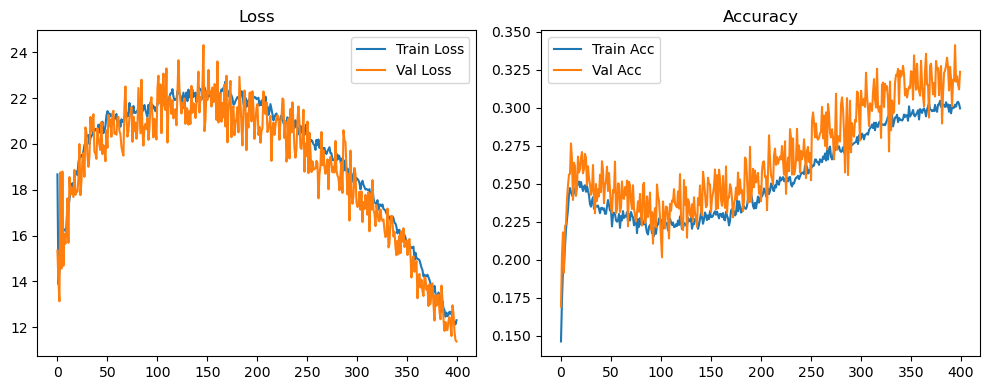

Original Model Final Test Loss: 11.1625 Accuracy: 0.3300


🚀 Running: batch128_lr_max_0.001_min_1e-06_dp0.05


Files already downloaded and verified


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|                                                                                                                                                                        | 0/400 [00:00<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.1363 | Val Acc: 0.1761 | Epoch Time: 1.87 | :   0%|                                                                                                      | 0/400 [01:52<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.1363 | Val Acc: 0.1761 | Epoch Time: 1.87 | :   0%|                                                                                                      | 0/400 [01:52<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.1363 | Val Acc: 0.1761 | Epoch Time: 1.87 | :   0%|▏                                                                                         | 1/400 [01:52<12:26:34, 112.27s/it]

| LR: 0.001000 | Train Acc: 0.1626 | Val Acc: 0.1925 | Epoch Time: 1.86 | :   0%|▏                                                                                         | 1/400 [03:44<12:26:34, 112.27s/it]

| LR: 0.001000 | Train Acc: 0.1626 | Val Acc: 0.1925 | Epoch Time: 1.86 | :   0%|▏                                                                                         | 1/400 [03:44<12:26:34, 112.27s/it]

| LR: 0.001000 | Train Acc: 0.1626 | Val Acc: 0.1925 | Epoch Time: 1.86 | :   0%|▍                                                                                         | 2/400 [03:44<12:23:36, 112.10s/it]

| LR: 0.001000 | Train Acc: 0.1756 | Val Acc: 0.2224 | Epoch Time: 1.86 | :   0%|▍                                                                                         | 2/400 [05:36<12:23:36, 112.10s/it]

| LR: 0.001000 | Train Acc: 0.1756 | Val Acc: 0.2224 | Epoch Time: 1.86 | :   0%|▍                                                                                         | 2/400 [05:36<12:23:36, 112.10s/it]

| LR: 0.001000 | Train Acc: 0.1756 | Val Acc: 0.2224 | Epoch Time: 1.86 | :   1%|▋                                                                                         | 3/400 [05:36<12:21:19, 112.04s/it]

| LR: 0.001000 | Train Acc: 0.1879 | Val Acc: 0.1793 | Epoch Time: 1.86 | :   1%|▋                                                                                         | 3/400 [07:28<12:21:19, 112.04s/it]

| LR: 0.001000 | Train Acc: 0.1879 | Val Acc: 0.1793 | Epoch Time: 1.86 | :   1%|▋                                                                                         | 3/400 [07:28<12:21:19, 112.04s/it]

| LR: 0.001000 | Train Acc: 0.1879 | Val Acc: 0.1793 | Epoch Time: 1.86 | :   1%|▉                                                                                         | 4/400 [07:28<12:19:11, 112.00s/it]

| LR: 0.001000 | Train Acc: 0.1936 | Val Acc: 0.2133 | Epoch Time: 1.86 | :   1%|▉                                                                                         | 4/400 [09:20<12:19:11, 112.00s/it]

| LR: 0.001000 | Train Acc: 0.1936 | Val Acc: 0.2133 | Epoch Time: 1.86 | :   1%|▉                                                                                         | 4/400 [09:20<12:19:11, 112.00s/it]

| LR: 0.001000 | Train Acc: 0.1936 | Val Acc: 0.2133 | Epoch Time: 1.86 | :   1%|█▏                                                                                        | 5/400 [09:20<12:17:13, 111.98s/it]

| LR: 0.001000 | Train Acc: 0.1967 | Val Acc: 0.2418 | Epoch Time: 1.86 | :   1%|█▏                                                                                        | 5/400 [11:11<12:17:13, 111.98s/it]

| LR: 0.001000 | Train Acc: 0.1967 | Val Acc: 0.2418 | Epoch Time: 1.86 | :   1%|█▏                                                                                        | 5/400 [11:11<12:17:13, 111.98s/it]

| LR: 0.001000 | Train Acc: 0.1967 | Val Acc: 0.2418 | Epoch Time: 1.86 | :   2%|█▎                                                                                        | 6/400 [11:12<12:15:16, 111.97s/it]

| LR: 0.000999 | Train Acc: 0.2067 | Val Acc: 0.2349 | Epoch Time: 1.86 | :   2%|█▎                                                                                        | 6/400 [13:03<12:15:16, 111.97s/it]

| LR: 0.000999 | Train Acc: 0.2067 | Val Acc: 0.2349 | Epoch Time: 1.86 | :   2%|█▎                                                                                        | 6/400 [13:03<12:15:16, 111.97s/it]

| LR: 0.000999 | Train Acc: 0.2067 | Val Acc: 0.2349 | Epoch Time: 1.86 | :   2%|█▌                                                                                        | 7/400 [13:03<12:13:20, 111.96s/it]

| LR: 0.000999 | Train Acc: 0.2081 | Val Acc: 0.2206 | Epoch Time: 1.86 | :   2%|█▌                                                                                        | 7/400 [14:55<12:13:20, 111.96s/it]

| LR: 0.000999 | Train Acc: 0.2081 | Val Acc: 0.2206 | Epoch Time: 1.86 | :   2%|█▌                                                                                        | 7/400 [14:55<12:13:20, 111.96s/it]

| LR: 0.000999 | Train Acc: 0.2081 | Val Acc: 0.2206 | Epoch Time: 1.86 | :   2%|█▊                                                                                        | 8/400 [14:55<12:11:27, 111.96s/it]

| LR: 0.000999 | Train Acc: 0.2061 | Val Acc: 0.2310 | Epoch Time: 1.86 | :   2%|█▊                                                                                        | 8/400 [16:47<12:11:27, 111.96s/it]

| LR: 0.000999 | Train Acc: 0.2061 | Val Acc: 0.2310 | Epoch Time: 1.86 | :   2%|█▊                                                                                        | 8/400 [16:47<12:11:27, 111.96s/it]

| LR: 0.000999 | Train Acc: 0.2061 | Val Acc: 0.2310 | Epoch Time: 1.86 | :   2%|██                                                                                        | 9/400 [16:47<12:09:30, 111.95s/it]

| LR: 0.000999 | Train Acc: 0.2150 | Val Acc: 0.2601 | Epoch Time: 1.86 | :   2%|██                                                                                        | 9/400 [18:39<12:09:30, 111.95s/it]

| LR: 0.000999 | Train Acc: 0.2150 | Val Acc: 0.2601 | Epoch Time: 1.86 | :   2%|██                                                                                        | 9/400 [18:39<12:09:30, 111.95s/it]

| LR: 0.000999 | Train Acc: 0.2150 | Val Acc: 0.2601 | Epoch Time: 1.86 | :   2%|██▏                                                                                      | 10/400 [18:39<12:07:31, 111.93s/it]

| LR: 0.000998 | Train Acc: 0.2203 | Val Acc: 0.2343 | Epoch Time: 1.86 | :   2%|██▏                                                                                      | 10/400 [20:31<12:07:31, 111.93s/it]

| LR: 0.000998 | Train Acc: 0.2203 | Val Acc: 0.2343 | Epoch Time: 1.86 | :   2%|██▏                                                                                      | 10/400 [20:31<12:07:31, 111.93s/it]

| LR: 0.000998 | Train Acc: 0.2203 | Val Acc: 0.2343 | Epoch Time: 1.86 | :   3%|██▍                                                                                      | 11/400 [20:31<12:05:30, 111.90s/it]

| LR: 0.000998 | Train Acc: 0.2197 | Val Acc: 0.2602 | Epoch Time: 1.86 | :   3%|██▍                                                                                      | 11/400 [22:23<12:05:30, 111.90s/it]

| LR: 0.000998 | Train Acc: 0.2197 | Val Acc: 0.2602 | Epoch Time: 1.86 | :   3%|██▍                                                                                      | 11/400 [22:23<12:05:30, 111.90s/it]

| LR: 0.000998 | Train Acc: 0.2197 | Val Acc: 0.2602 | Epoch Time: 1.86 | :   3%|██▋                                                                                      | 12/400 [22:23<12:03:31, 111.88s/it]

| LR: 0.000998 | Train Acc: 0.2207 | Val Acc: 0.2666 | Epoch Time: 1.86 | :   3%|██▋                                                                                      | 12/400 [24:15<12:03:31, 111.88s/it]

| LR: 0.000998 | Train Acc: 0.2207 | Val Acc: 0.2666 | Epoch Time: 1.86 | :   3%|██▋                                                                                      | 12/400 [24:15<12:03:31, 111.88s/it]

| LR: 0.000998 | Train Acc: 0.2207 | Val Acc: 0.2666 | Epoch Time: 1.86 | :   3%|██▉                                                                                      | 13/400 [24:15<12:01:31, 111.86s/it]

| LR: 0.000997 | Train Acc: 0.2245 | Val Acc: 0.2771 | Epoch Time: 1.86 | :   3%|██▉                                                                                      | 13/400 [26:07<12:01:31, 111.86s/it]

| LR: 0.000997 | Train Acc: 0.2245 | Val Acc: 0.2771 | Epoch Time: 1.86 | :   3%|██▉                                                                                      | 13/400 [26:07<12:01:31, 111.86s/it]

| LR: 0.000997 | Train Acc: 0.2245 | Val Acc: 0.2771 | Epoch Time: 1.86 | :   4%|███                                                                                      | 14/400 [26:07<11:59:39, 111.86s/it]

| LR: 0.000997 | Train Acc: 0.2233 | Val Acc: 0.2526 | Epoch Time: 1.86 | :   4%|███                                                                                      | 14/400 [27:58<11:59:39, 111.86s/it]

| LR: 0.000997 | Train Acc: 0.2233 | Val Acc: 0.2526 | Epoch Time: 1.86 | :   4%|███                                                                                      | 14/400 [27:58<11:59:39, 111.86s/it]

| LR: 0.000997 | Train Acc: 0.2233 | Val Acc: 0.2526 | Epoch Time: 1.86 | :   4%|███▎                                                                                     | 15/400 [27:58<11:57:43, 111.85s/it]

| LR: 0.000997 | Train Acc: 0.2277 | Val Acc: 0.2617 | Epoch Time: 1.86 | :   4%|███▎                                                                                     | 15/400 [29:50<11:57:43, 111.85s/it]

| LR: 0.000997 | Train Acc: 0.2277 | Val Acc: 0.2617 | Epoch Time: 1.86 | :   4%|███▎                                                                                     | 15/400 [29:50<11:57:43, 111.85s/it]

| LR: 0.000997 | Train Acc: 0.2277 | Val Acc: 0.2617 | Epoch Time: 1.86 | :   4%|███▌                                                                                     | 16/400 [29:50<11:55:51, 111.85s/it]

| LR: 0.000996 | Train Acc: 0.2274 | Val Acc: 0.2599 | Epoch Time: 1.86 | :   4%|███▌                                                                                     | 16/400 [31:42<11:55:51, 111.85s/it]

| LR: 0.000996 | Train Acc: 0.2274 | Val Acc: 0.2599 | Epoch Time: 1.86 | :   4%|███▌                                                                                     | 16/400 [31:42<11:55:51, 111.85s/it]

| LR: 0.000996 | Train Acc: 0.2274 | Val Acc: 0.2599 | Epoch Time: 1.86 | :   4%|███▊                                                                                     | 17/400 [31:42<11:53:57, 111.85s/it]

| LR: 0.000996 | Train Acc: 0.2257 | Val Acc: 0.2480 | Epoch Time: 1.86 | :   4%|███▊                                                                                     | 17/400 [33:34<11:53:57, 111.85s/it]

| LR: 0.000996 | Train Acc: 0.2257 | Val Acc: 0.2480 | Epoch Time: 1.86 | :   4%|███▊                                                                                     | 17/400 [33:34<11:53:57, 111.85s/it]

| LR: 0.000996 | Train Acc: 0.2257 | Val Acc: 0.2480 | Epoch Time: 1.86 | :   4%|████                                                                                     | 18/400 [33:34<11:52:02, 111.84s/it]

| LR: 0.000995 | Train Acc: 0.2331 | Val Acc: 0.2543 | Epoch Time: 1.86 | :   4%|████                                                                                     | 18/400 [35:26<11:52:02, 111.84s/it]

| LR: 0.000995 | Train Acc: 0.2331 | Val Acc: 0.2543 | Epoch Time: 1.86 | :   4%|████                                                                                     | 18/400 [35:26<11:52:02, 111.84s/it]

| LR: 0.000995 | Train Acc: 0.2331 | Val Acc: 0.2543 | Epoch Time: 1.86 | :   5%|████▏                                                                                    | 19/400 [35:26<11:50:07, 111.83s/it]

| LR: 0.000994 | Train Acc: 0.2313 | Val Acc: 0.2393 | Epoch Time: 1.86 | :   5%|████▏                                                                                    | 19/400 [37:17<11:50:07, 111.83s/it]

| LR: 0.000994 | Train Acc: 0.2313 | Val Acc: 0.2393 | Epoch Time: 1.86 | :   5%|████▏                                                                                    | 19/400 [37:17<11:50:07, 111.83s/it]

| LR: 0.000994 | Train Acc: 0.2313 | Val Acc: 0.2393 | Epoch Time: 1.86 | :   5%|████▍                                                                                    | 20/400 [37:18<11:48:14, 111.83s/it]

| LR: 0.000994 | Train Acc: 0.2283 | Val Acc: 0.2582 | Epoch Time: 1.86 | :   5%|████▍                                                                                    | 20/400 [39:09<11:48:14, 111.83s/it]

| LR: 0.000994 | Train Acc: 0.2283 | Val Acc: 0.2582 | Epoch Time: 1.86 | :   5%|████▍                                                                                    | 20/400 [39:09<11:48:14, 111.83s/it]

| LR: 0.000994 | Train Acc: 0.2283 | Val Acc: 0.2582 | Epoch Time: 1.86 | :   5%|████▋                                                                                    | 21/400 [39:09<11:46:25, 111.84s/it]

| LR: 0.000993 | Train Acc: 0.2260 | Val Acc: 0.2612 | Epoch Time: 1.86 | :   5%|████▋                                                                                    | 21/400 [41:01<11:46:25, 111.84s/it]

| LR: 0.000993 | Train Acc: 0.2260 | Val Acc: 0.2612 | Epoch Time: 1.86 | :   5%|████▋                                                                                    | 21/400 [41:01<11:46:25, 111.84s/it]

| LR: 0.000993 | Train Acc: 0.2260 | Val Acc: 0.2612 | Epoch Time: 1.86 | :   6%|████▉                                                                                    | 22/400 [41:01<11:44:33, 111.84s/it]

| LR: 0.000993 | Train Acc: 0.2296 | Val Acc: 0.2633 | Epoch Time: 1.86 | :   6%|████▉                                                                                    | 22/400 [42:53<11:44:33, 111.84s/it]

| LR: 0.000993 | Train Acc: 0.2296 | Val Acc: 0.2633 | Epoch Time: 1.86 | :   6%|████▉                                                                                    | 22/400 [42:53<11:44:33, 111.84s/it]

| LR: 0.000993 | Train Acc: 0.2296 | Val Acc: 0.2633 | Epoch Time: 1.86 | :   6%|█████                                                                                    | 23/400 [42:53<11:42:45, 111.84s/it]

| LR: 0.000992 | Train Acc: 0.2297 | Val Acc: 0.2411 | Epoch Time: 1.86 | :   6%|█████                                                                                    | 23/400 [44:45<11:42:45, 111.84s/it]

| LR: 0.000992 | Train Acc: 0.2297 | Val Acc: 0.2411 | Epoch Time: 1.86 | :   6%|█████                                                                                    | 23/400 [44:45<11:42:45, 111.84s/it]

| LR: 0.000992 | Train Acc: 0.2297 | Val Acc: 0.2411 | Epoch Time: 1.86 | :   6%|█████▎                                                                                   | 24/400 [44:45<11:41:00, 111.86s/it]

| LR: 0.000991 | Train Acc: 0.2223 | Val Acc: 0.2576 | Epoch Time: 1.86 | :   6%|█████▎                                                                                   | 24/400 [46:37<11:41:00, 111.86s/it]

| LR: 0.000991 | Train Acc: 0.2223 | Val Acc: 0.2576 | Epoch Time: 1.86 | :   6%|█████▎                                                                                   | 24/400 [46:37<11:41:00, 111.86s/it]

| LR: 0.000991 | Train Acc: 0.2223 | Val Acc: 0.2576 | Epoch Time: 1.86 | :   6%|█████▌                                                                                   | 25/400 [46:37<11:39:04, 111.85s/it]

| LR: 0.000990 | Train Acc: 0.2250 | Val Acc: 0.2486 | Epoch Time: 1.86 | :   6%|█████▌                                                                                   | 25/400 [48:29<11:39:04, 111.85s/it]

| LR: 0.000990 | Train Acc: 0.2250 | Val Acc: 0.2486 | Epoch Time: 1.86 | :   6%|█████▌                                                                                   | 25/400 [48:29<11:39:04, 111.85s/it]

| LR: 0.000990 | Train Acc: 0.2250 | Val Acc: 0.2486 | Epoch Time: 1.86 | :   6%|█████▊                                                                                   | 26/400 [48:29<11:37:12, 111.85s/it]

| LR: 0.000990 | Train Acc: 0.2293 | Val Acc: 0.2607 | Epoch Time: 1.86 | :   6%|█████▊                                                                                   | 26/400 [50:20<11:37:12, 111.85s/it]

| LR: 0.000990 | Train Acc: 0.2293 | Val Acc: 0.2607 | Epoch Time: 1.86 | :   6%|█████▊                                                                                   | 26/400 [50:20<11:37:12, 111.85s/it]

| LR: 0.000990 | Train Acc: 0.2293 | Val Acc: 0.2607 | Epoch Time: 1.86 | :   7%|██████                                                                                   | 27/400 [50:21<11:35:16, 111.84s/it]

| LR: 0.000989 | Train Acc: 0.2309 | Val Acc: 0.2500 | Epoch Time: 1.86 | :   7%|██████                                                                                   | 27/400 [52:12<11:35:16, 111.84s/it]

| LR: 0.000989 | Train Acc: 0.2309 | Val Acc: 0.2500 | Epoch Time: 1.86 | :   7%|██████                                                                                   | 27/400 [52:12<11:35:16, 111.84s/it]

| LR: 0.000989 | Train Acc: 0.2309 | Val Acc: 0.2500 | Epoch Time: 1.86 | :   7%|██████▏                                                                                  | 28/400 [52:12<11:33:26, 111.84s/it]

| LR: 0.000988 | Train Acc: 0.2303 | Val Acc: 0.2388 | Epoch Time: 1.86 | :   7%|██████▏                                                                                  | 28/400 [54:04<11:33:26, 111.84s/it]

| LR: 0.000988 | Train Acc: 0.2303 | Val Acc: 0.2388 | Epoch Time: 1.86 | :   7%|██████▏                                                                                  | 28/400 [54:04<11:33:26, 111.84s/it]

| LR: 0.000988 | Train Acc: 0.2303 | Val Acc: 0.2388 | Epoch Time: 1.86 | :   7%|██████▍                                                                                  | 29/400 [54:04<11:31:32, 111.84s/it]

| LR: 0.000987 | Train Acc: 0.2313 | Val Acc: 0.2413 | Epoch Time: 1.86 | :   7%|██████▍                                                                                  | 29/400 [55:56<11:31:32, 111.84s/it]

| LR: 0.000987 | Train Acc: 0.2313 | Val Acc: 0.2413 | Epoch Time: 1.86 | :   7%|██████▍                                                                                  | 29/400 [55:56<11:31:32, 111.84s/it]

| LR: 0.000987 | Train Acc: 0.2313 | Val Acc: 0.2413 | Epoch Time: 1.86 | :   8%|██████▋                                                                                  | 30/400 [55:56<11:29:41, 111.84s/it]

| LR: 0.000986 | Train Acc: 0.2280 | Val Acc: 0.2524 | Epoch Time: 1.86 | :   8%|██████▋                                                                                  | 30/400 [57:48<11:29:41, 111.84s/it]

| LR: 0.000986 | Train Acc: 0.2280 | Val Acc: 0.2524 | Epoch Time: 1.86 | :   8%|██████▋                                                                                  | 30/400 [57:48<11:29:41, 111.84s/it]

| LR: 0.000986 | Train Acc: 0.2280 | Val Acc: 0.2524 | Epoch Time: 1.86 | :   8%|██████▉                                                                                  | 31/400 [57:48<11:27:48, 111.84s/it]

| LR: 0.000985 | Train Acc: 0.2340 | Val Acc: 0.2006 | Epoch Time: 1.86 | :   8%|██████▉                                                                                  | 31/400 [59:40<11:27:48, 111.84s/it]

| LR: 0.000985 | Train Acc: 0.2340 | Val Acc: 0.2006 | Epoch Time: 1.86 | :   8%|██████▉                                                                                  | 31/400 [59:40<11:27:48, 111.84s/it]

| LR: 0.000985 | Train Acc: 0.2340 | Val Acc: 0.2006 | Epoch Time: 1.86 | :   8%|███████                                                                                  | 32/400 [59:40<11:25:55, 111.84s/it]

| LR: 0.000984 | Train Acc: 0.2291 | Val Acc: 0.2553 | Epoch Time: 1.86 | :   8%|██████▉                                                                                | 32/400 [1:01:31<11:25:55, 111.84s/it]

| LR: 0.000984 | Train Acc: 0.2291 | Val Acc: 0.2553 | Epoch Time: 1.86 | :   8%|██████▉                                                                                | 32/400 [1:01:31<11:25:55, 111.84s/it]

| LR: 0.000984 | Train Acc: 0.2291 | Val Acc: 0.2553 | Epoch Time: 1.86 | :   8%|███████▏                                                                               | 33/400 [1:01:32<11:24:02, 111.83s/it]

| LR: 0.000983 | Train Acc: 0.2269 | Val Acc: 0.2489 | Epoch Time: 1.86 | :   8%|███████▏                                                                               | 33/400 [1:03:23<11:24:02, 111.83s/it]

| LR: 0.000983 | Train Acc: 0.2269 | Val Acc: 0.2489 | Epoch Time: 1.86 | :   8%|███████▏                                                                               | 33/400 [1:03:23<11:24:02, 111.83s/it]

| LR: 0.000983 | Train Acc: 0.2269 | Val Acc: 0.2489 | Epoch Time: 1.86 | :   8%|███████▍                                                                               | 34/400 [1:03:23<11:22:08, 111.83s/it]

| LR: 0.000982 | Train Acc: 0.2271 | Val Acc: 0.2291 | Epoch Time: 1.86 | :   8%|███████▍                                                                               | 34/400 [1:05:15<11:22:08, 111.83s/it]

| LR: 0.000982 | Train Acc: 0.2271 | Val Acc: 0.2291 | Epoch Time: 1.86 | :   8%|███████▍                                                                               | 34/400 [1:05:15<11:22:08, 111.83s/it]

| LR: 0.000982 | Train Acc: 0.2271 | Val Acc: 0.2291 | Epoch Time: 1.86 | :   9%|███████▌                                                                               | 35/400 [1:05:15<11:20:15, 111.82s/it]

| LR: 0.000981 | Train Acc: 0.2153 | Val Acc: 0.2192 | Epoch Time: 1.86 | :   9%|███████▌                                                                               | 35/400 [1:07:07<11:20:15, 111.82s/it]

| LR: 0.000981 | Train Acc: 0.2153 | Val Acc: 0.2192 | Epoch Time: 1.86 | :   9%|███████▌                                                                               | 35/400 [1:07:07<11:20:15, 111.82s/it]

| LR: 0.000981 | Train Acc: 0.2153 | Val Acc: 0.2192 | Epoch Time: 1.86 | :   9%|███████▊                                                                               | 36/400 [1:07:07<11:18:20, 111.81s/it]

| LR: 0.000980 | Train Acc: 0.2204 | Val Acc: 0.2318 | Epoch Time: 1.86 | :   9%|███████▊                                                                               | 36/400 [1:08:59<11:18:20, 111.81s/it]

| LR: 0.000980 | Train Acc: 0.2204 | Val Acc: 0.2318 | Epoch Time: 1.86 | :   9%|███████▊                                                                               | 36/400 [1:08:59<11:18:20, 111.81s/it]

| LR: 0.000980 | Train Acc: 0.2204 | Val Acc: 0.2318 | Epoch Time: 1.86 | :   9%|████████                                                                               | 37/400 [1:08:59<11:16:27, 111.81s/it]

| LR: 0.000979 | Train Acc: 0.2202 | Val Acc: 0.2498 | Epoch Time: 1.86 | :   9%|████████                                                                               | 37/400 [1:10:50<11:16:27, 111.81s/it]

| LR: 0.000979 | Train Acc: 0.2202 | Val Acc: 0.2498 | Epoch Time: 1.86 | :   9%|████████                                                                               | 37/400 [1:10:50<11:16:27, 111.81s/it]

| LR: 0.000979 | Train Acc: 0.2202 | Val Acc: 0.2498 | Epoch Time: 1.86 | :  10%|████████▎                                                                              | 38/400 [1:10:51<11:14:37, 111.82s/it]

| LR: 0.000978 | Train Acc: 0.2221 | Val Acc: 0.2580 | Epoch Time: 1.86 | :  10%|████████▎                                                                              | 38/400 [1:12:42<11:14:37, 111.82s/it]

| LR: 0.000978 | Train Acc: 0.2221 | Val Acc: 0.2580 | Epoch Time: 1.86 | :  10%|████████▎                                                                              | 38/400 [1:12:42<11:14:37, 111.82s/it]

| LR: 0.000978 | Train Acc: 0.2221 | Val Acc: 0.2580 | Epoch Time: 1.86 | :  10%|████████▍                                                                              | 39/400 [1:12:42<11:12:42, 111.81s/it]

| LR: 0.000977 | Train Acc: 0.2201 | Val Acc: 0.2340 | Epoch Time: 1.86 | :  10%|████████▍                                                                              | 39/400 [1:14:34<11:12:42, 111.81s/it]

| LR: 0.000977 | Train Acc: 0.2201 | Val Acc: 0.2340 | Epoch Time: 1.86 | :  10%|████████▍                                                                              | 39/400 [1:14:34<11:12:42, 111.81s/it]

| LR: 0.000977 | Train Acc: 0.2201 | Val Acc: 0.2340 | Epoch Time: 1.86 | :  10%|████████▋                                                                              | 40/400 [1:14:34<11:10:47, 111.80s/it]

| LR: 0.000976 | Train Acc: 0.2247 | Val Acc: 0.2418 | Epoch Time: 1.86 | :  10%|████████▋                                                                              | 40/400 [1:16:26<11:10:47, 111.80s/it]

| LR: 0.000976 | Train Acc: 0.2247 | Val Acc: 0.2418 | Epoch Time: 1.86 | :  10%|████████▋                                                                              | 40/400 [1:16:26<11:10:47, 111.80s/it]

| LR: 0.000976 | Train Acc: 0.2247 | Val Acc: 0.2418 | Epoch Time: 1.86 | :  10%|████████▉                                                                              | 41/400 [1:16:26<11:08:51, 111.79s/it]

| LR: 0.000974 | Train Acc: 0.2265 | Val Acc: 0.2384 | Epoch Time: 1.86 | :  10%|████████▉                                                                              | 41/400 [1:18:18<11:08:51, 111.79s/it]

| LR: 0.000974 | Train Acc: 0.2265 | Val Acc: 0.2384 | Epoch Time: 1.86 | :  10%|████████▉                                                                              | 41/400 [1:18:18<11:08:51, 111.79s/it]

| LR: 0.000974 | Train Acc: 0.2265 | Val Acc: 0.2384 | Epoch Time: 1.86 | :  10%|█████████▏                                                                             | 42/400 [1:18:18<11:06:58, 111.78s/it]

| LR: 0.000973 | Train Acc: 0.2204 | Val Acc: 0.2467 | Epoch Time: 1.86 | :  10%|█████████▏                                                                             | 42/400 [1:20:09<11:06:58, 111.78s/it]

| LR: 0.000973 | Train Acc: 0.2204 | Val Acc: 0.2467 | Epoch Time: 1.86 | :  10%|█████████▏                                                                             | 42/400 [1:20:09<11:06:58, 111.78s/it]

| LR: 0.000973 | Train Acc: 0.2204 | Val Acc: 0.2467 | Epoch Time: 1.86 | :  11%|█████████▎                                                                             | 43/400 [1:20:10<11:05:08, 111.79s/it]

| LR: 0.000972 | Train Acc: 0.2252 | Val Acc: 0.2660 | Epoch Time: 1.86 | :  11%|█████████▎                                                                             | 43/400 [1:22:01<11:05:08, 111.79s/it]

| LR: 0.000972 | Train Acc: 0.2252 | Val Acc: 0.2660 | Epoch Time: 1.86 | :  11%|█████████▎                                                                             | 43/400 [1:22:01<11:05:08, 111.79s/it]

| LR: 0.000972 | Train Acc: 0.2252 | Val Acc: 0.2660 | Epoch Time: 1.86 | :  11%|█████████▌                                                                             | 44/400 [1:22:01<11:03:18, 111.79s/it]

| LR: 0.000970 | Train Acc: 0.2264 | Val Acc: 0.2600 | Epoch Time: 1.86 | :  11%|█████████▌                                                                             | 44/400 [1:23:53<11:03:18, 111.79s/it]

| LR: 0.000970 | Train Acc: 0.2264 | Val Acc: 0.2600 | Epoch Time: 1.86 | :  11%|█████████▌                                                                             | 44/400 [1:23:53<11:03:18, 111.79s/it]

| LR: 0.000970 | Train Acc: 0.2264 | Val Acc: 0.2600 | Epoch Time: 1.86 | :  11%|█████████▊                                                                             | 45/400 [1:23:53<11:01:27, 111.80s/it]

| LR: 0.000969 | Train Acc: 0.2288 | Val Acc: 0.2338 | Epoch Time: 1.86 | :  11%|█████████▊                                                                             | 45/400 [1:25:45<11:01:27, 111.80s/it]

| LR: 0.000969 | Train Acc: 0.2288 | Val Acc: 0.2338 | Epoch Time: 1.86 | :  11%|█████████▊                                                                             | 45/400 [1:25:45<11:01:27, 111.80s/it]

| LR: 0.000969 | Train Acc: 0.2288 | Val Acc: 0.2338 | Epoch Time: 1.86 | :  12%|██████████                                                                             | 46/400 [1:25:45<10:59:34, 111.79s/it]

| LR: 0.000968 | Train Acc: 0.2265 | Val Acc: 0.2573 | Epoch Time: 1.86 | :  12%|██████████                                                                             | 46/400 [1:27:37<10:59:34, 111.79s/it]

| LR: 0.000968 | Train Acc: 0.2265 | Val Acc: 0.2573 | Epoch Time: 1.86 | :  12%|██████████                                                                             | 46/400 [1:27:37<10:59:34, 111.79s/it]

| LR: 0.000968 | Train Acc: 0.2265 | Val Acc: 0.2573 | Epoch Time: 1.86 | :  12%|██████████▏                                                                            | 47/400 [1:27:37<10:57:42, 111.79s/it]

| LR: 0.000966 | Train Acc: 0.2231 | Val Acc: 0.2490 | Epoch Time: 1.86 | :  12%|██████████▏                                                                            | 47/400 [1:29:28<10:57:42, 111.79s/it]

| LR: 0.000966 | Train Acc: 0.2231 | Val Acc: 0.2490 | Epoch Time: 1.86 | :  12%|██████████▏                                                                            | 47/400 [1:29:28<10:57:42, 111.79s/it]

| LR: 0.000966 | Train Acc: 0.2231 | Val Acc: 0.2490 | Epoch Time: 1.86 | :  12%|██████████▍                                                                            | 48/400 [1:29:28<10:55:51, 111.79s/it]

| LR: 0.000965 | Train Acc: 0.2207 | Val Acc: 0.2498 | Epoch Time: 1.86 | :  12%|██████████▍                                                                            | 48/400 [1:31:20<10:55:51, 111.79s/it]

| LR: 0.000965 | Train Acc: 0.2207 | Val Acc: 0.2498 | Epoch Time: 1.86 | :  12%|██████████▍                                                                            | 48/400 [1:31:20<10:55:51, 111.79s/it]

| LR: 0.000965 | Train Acc: 0.2207 | Val Acc: 0.2498 | Epoch Time: 1.86 | :  12%|██████████▋                                                                            | 49/400 [1:31:20<10:53:57, 111.79s/it]

| LR: 0.000963 | Train Acc: 0.2208 | Val Acc: 0.2609 | Epoch Time: 1.86 | :  12%|██████████▋                                                                            | 49/400 [1:33:12<10:53:57, 111.79s/it]

| LR: 0.000963 | Train Acc: 0.2208 | Val Acc: 0.2609 | Epoch Time: 1.86 | :  12%|██████████▋                                                                            | 49/400 [1:33:12<10:53:57, 111.79s/it]

| LR: 0.000963 | Train Acc: 0.2208 | Val Acc: 0.2609 | Epoch Time: 1.86 | :  12%|██████████▉                                                                            | 50/400 [1:33:12<10:52:06, 111.79s/it]

| LR: 0.000962 | Train Acc: 0.2248 | Val Acc: 0.2111 | Epoch Time: 1.86 | :  12%|██████████▉                                                                            | 50/400 [1:35:04<10:52:06, 111.79s/it]

| LR: 0.000962 | Train Acc: 0.2248 | Val Acc: 0.2111 | Epoch Time: 1.86 | :  12%|██████████▉                                                                            | 50/400 [1:35:04<10:52:06, 111.79s/it]

| LR: 0.000962 | Train Acc: 0.2248 | Val Acc: 0.2111 | Epoch Time: 1.86 | :  13%|███████████                                                                            | 51/400 [1:35:04<10:50:13, 111.79s/it]

| LR: 0.000960 | Train Acc: 0.2265 | Val Acc: 0.2564 | Epoch Time: 1.86 | :  13%|███████████                                                                            | 51/400 [1:36:56<10:50:13, 111.79s/it]

| LR: 0.000960 | Train Acc: 0.2265 | Val Acc: 0.2564 | Epoch Time: 1.86 | :  13%|███████████                                                                            | 51/400 [1:36:56<10:50:13, 111.79s/it]

| LR: 0.000960 | Train Acc: 0.2265 | Val Acc: 0.2564 | Epoch Time: 1.86 | :  13%|███████████▎                                                                           | 52/400 [1:36:56<10:48:20, 111.78s/it]

| LR: 0.000959 | Train Acc: 0.2232 | Val Acc: 0.2220 | Epoch Time: 1.86 | :  13%|███████████▎                                                                           | 52/400 [1:38:47<10:48:20, 111.78s/it]

| LR: 0.000959 | Train Acc: 0.2232 | Val Acc: 0.2220 | Epoch Time: 1.86 | :  13%|███████████▎                                                                           | 52/400 [1:38:47<10:48:20, 111.78s/it]

| LR: 0.000959 | Train Acc: 0.2232 | Val Acc: 0.2220 | Epoch Time: 1.86 | :  13%|███████████▌                                                                           | 53/400 [1:38:47<10:46:30, 111.79s/it]

| LR: 0.000957 | Train Acc: 0.2232 | Val Acc: 0.2507 | Epoch Time: 1.86 | :  13%|███████████▌                                                                           | 53/400 [1:40:39<10:46:30, 111.79s/it]

| LR: 0.000957 | Train Acc: 0.2232 | Val Acc: 0.2507 | Epoch Time: 1.86 | :  13%|███████████▌                                                                           | 53/400 [1:40:39<10:46:30, 111.79s/it]

| LR: 0.000957 | Train Acc: 0.2232 | Val Acc: 0.2507 | Epoch Time: 1.86 | :  14%|███████████▋                                                                           | 54/400 [1:40:39<10:44:39, 111.79s/it]

| LR: 0.000956 | Train Acc: 0.2190 | Val Acc: 0.2381 | Epoch Time: 1.86 | :  14%|███████████▋                                                                           | 54/400 [1:42:31<10:44:39, 111.79s/it]

| LR: 0.000956 | Train Acc: 0.2190 | Val Acc: 0.2381 | Epoch Time: 1.86 | :  14%|███████████▋                                                                           | 54/400 [1:42:31<10:44:39, 111.79s/it]

| LR: 0.000956 | Train Acc: 0.2190 | Val Acc: 0.2381 | Epoch Time: 1.86 | :  14%|███████████▉                                                                           | 55/400 [1:42:31<10:42:50, 111.80s/it]

| LR: 0.000954 | Train Acc: 0.2195 | Val Acc: 0.2466 | Epoch Time: 1.86 | :  14%|███████████▉                                                                           | 55/400 [1:44:23<10:42:50, 111.80s/it]

| LR: 0.000954 | Train Acc: 0.2195 | Val Acc: 0.2466 | Epoch Time: 1.86 | :  14%|███████████▉                                                                           | 55/400 [1:44:23<10:42:50, 111.80s/it]

| LR: 0.000954 | Train Acc: 0.2195 | Val Acc: 0.2466 | Epoch Time: 1.86 | :  14%|████████████▏                                                                          | 56/400 [1:44:23<10:40:59, 111.80s/it]

| LR: 0.000952 | Train Acc: 0.2182 | Val Acc: 0.2590 | Epoch Time: 1.86 | :  14%|████████████▏                                                                          | 56/400 [1:46:15<10:40:59, 111.80s/it]

| LR: 0.000952 | Train Acc: 0.2182 | Val Acc: 0.2590 | Epoch Time: 1.86 | :  14%|████████████▏                                                                          | 56/400 [1:46:15<10:40:59, 111.80s/it]

| LR: 0.000952 | Train Acc: 0.2182 | Val Acc: 0.2590 | Epoch Time: 1.86 | :  14%|████████████▍                                                                          | 57/400 [1:46:15<10:39:09, 111.81s/it]

| LR: 0.000951 | Train Acc: 0.2207 | Val Acc: 0.2332 | Epoch Time: 1.86 | :  14%|████████████▍                                                                          | 57/400 [1:48:06<10:39:09, 111.81s/it]

| LR: 0.000951 | Train Acc: 0.2207 | Val Acc: 0.2332 | Epoch Time: 1.86 | :  14%|████████████▍                                                                          | 57/400 [1:48:06<10:39:09, 111.81s/it]

| LR: 0.000951 | Train Acc: 0.2207 | Val Acc: 0.2332 | Epoch Time: 1.86 | :  14%|████████████▌                                                                          | 58/400 [1:48:06<10:37:18, 111.81s/it]

| LR: 0.000949 | Train Acc: 0.2187 | Val Acc: 0.2638 | Epoch Time: 1.86 | :  14%|████████████▌                                                                          | 58/400 [1:49:58<10:37:18, 111.81s/it]

| LR: 0.000949 | Train Acc: 0.2187 | Val Acc: 0.2638 | Epoch Time: 1.86 | :  14%|████████████▌                                                                          | 58/400 [1:49:58<10:37:18, 111.81s/it]

| LR: 0.000949 | Train Acc: 0.2187 | Val Acc: 0.2638 | Epoch Time: 1.86 | :  15%|████████████▊                                                                          | 59/400 [1:49:58<10:35:25, 111.80s/it]

| LR: 0.000947 | Train Acc: 0.2217 | Val Acc: 0.2621 | Epoch Time: 1.86 | :  15%|████████████▊                                                                          | 59/400 [1:51:50<10:35:25, 111.80s/it]

| LR: 0.000947 | Train Acc: 0.2217 | Val Acc: 0.2621 | Epoch Time: 1.86 | :  15%|████████████▊                                                                          | 59/400 [1:51:50<10:35:25, 111.80s/it]

| LR: 0.000947 | Train Acc: 0.2217 | Val Acc: 0.2621 | Epoch Time: 1.86 | :  15%|█████████████                                                                          | 60/400 [1:51:50<10:33:30, 111.80s/it]

| LR: 0.000946 | Train Acc: 0.2237 | Val Acc: 0.2406 | Epoch Time: 1.86 | :  15%|█████████████                                                                          | 60/400 [1:53:42<10:33:30, 111.80s/it]

| LR: 0.000946 | Train Acc: 0.2237 | Val Acc: 0.2406 | Epoch Time: 1.86 | :  15%|█████████████                                                                          | 60/400 [1:53:42<10:33:30, 111.80s/it]

| LR: 0.000946 | Train Acc: 0.2237 | Val Acc: 0.2406 | Epoch Time: 1.86 | :  15%|█████████████▎                                                                         | 61/400 [1:53:42<10:31:34, 111.78s/it]

| LR: 0.000944 | Train Acc: 0.2187 | Val Acc: 0.2432 | Epoch Time: 1.86 | :  15%|█████████████▎                                                                         | 61/400 [1:55:33<10:31:34, 111.78s/it]

| LR: 0.000944 | Train Acc: 0.2187 | Val Acc: 0.2432 | Epoch Time: 1.86 | :  15%|█████████████▎                                                                         | 61/400 [1:55:33<10:31:34, 111.78s/it]

| LR: 0.000944 | Train Acc: 0.2187 | Val Acc: 0.2432 | Epoch Time: 1.86 | :  16%|█████████████▍                                                                         | 62/400 [1:55:34<10:29:40, 111.78s/it]

| LR: 0.000942 | Train Acc: 0.2154 | Val Acc: 0.2297 | Epoch Time: 1.86 | :  16%|█████████████▍                                                                         | 62/400 [1:57:25<10:29:40, 111.78s/it]

| LR: 0.000942 | Train Acc: 0.2154 | Val Acc: 0.2297 | Epoch Time: 1.86 | :  16%|█████████████▍                                                                         | 62/400 [1:57:25<10:29:40, 111.78s/it]

| LR: 0.000942 | Train Acc: 0.2154 | Val Acc: 0.2297 | Epoch Time: 1.86 | :  16%|█████████████▋                                                                         | 63/400 [1:57:25<10:27:47, 111.77s/it]

| LR: 0.000940 | Train Acc: 0.2122 | Val Acc: 0.2624 | Epoch Time: 1.86 | :  16%|█████████████▋                                                                         | 63/400 [1:59:17<10:27:47, 111.77s/it]

| LR: 0.000940 | Train Acc: 0.2122 | Val Acc: 0.2624 | Epoch Time: 1.86 | :  16%|█████████████▋                                                                         | 63/400 [1:59:17<10:27:47, 111.77s/it]

| LR: 0.000940 | Train Acc: 0.2122 | Val Acc: 0.2624 | Epoch Time: 1.86 | :  16%|█████████████▉                                                                         | 64/400 [1:59:17<10:25:56, 111.78s/it]

| LR: 0.000938 | Train Acc: 0.2168 | Val Acc: 0.2307 | Epoch Time: 1.86 | :  16%|█████████████▉                                                                         | 64/400 [2:01:09<10:25:56, 111.78s/it]

| LR: 0.000938 | Train Acc: 0.2168 | Val Acc: 0.2307 | Epoch Time: 1.86 | :  16%|█████████████▉                                                                         | 64/400 [2:01:09<10:25:56, 111.78s/it]

| LR: 0.000938 | Train Acc: 0.2168 | Val Acc: 0.2307 | Epoch Time: 1.86 | :  16%|██████████████▏                                                                        | 65/400 [2:01:09<10:24:02, 111.77s/it]

| LR: 0.000936 | Train Acc: 0.2159 | Val Acc: 0.2405 | Epoch Time: 1.86 | :  16%|██████████████▏                                                                        | 65/400 [2:03:01<10:24:02, 111.77s/it]

| LR: 0.000936 | Train Acc: 0.2159 | Val Acc: 0.2405 | Epoch Time: 1.86 | :  16%|██████████████▏                                                                        | 65/400 [2:03:01<10:24:02, 111.77s/it]

| LR: 0.000936 | Train Acc: 0.2159 | Val Acc: 0.2405 | Epoch Time: 1.86 | :  16%|██████████████▎                                                                        | 66/400 [2:03:01<10:22:14, 111.78s/it]

| LR: 0.000934 | Train Acc: 0.2138 | Val Acc: 0.2318 | Epoch Time: 1.86 | :  16%|██████████████▎                                                                        | 66/400 [2:04:52<10:22:14, 111.78s/it]

| LR: 0.000934 | Train Acc: 0.2138 | Val Acc: 0.2318 | Epoch Time: 1.86 | :  16%|██████████████▎                                                                        | 66/400 [2:04:52<10:22:14, 111.78s/it]

| LR: 0.000934 | Train Acc: 0.2138 | Val Acc: 0.2318 | Epoch Time: 1.86 | :  17%|██████████████▌                                                                        | 67/400 [2:04:52<10:20:21, 111.78s/it]

| LR: 0.000932 | Train Acc: 0.2149 | Val Acc: 0.2009 | Epoch Time: 1.86 | :  17%|██████████████▌                                                                        | 67/400 [2:06:44<10:20:21, 111.78s/it]

| LR: 0.000932 | Train Acc: 0.2149 | Val Acc: 0.2009 | Epoch Time: 1.86 | :  17%|██████████████▌                                                                        | 67/400 [2:06:44<10:20:21, 111.78s/it]

| LR: 0.000932 | Train Acc: 0.2149 | Val Acc: 0.2009 | Epoch Time: 1.86 | :  17%|██████████████▊                                                                        | 68/400 [2:06:44<10:18:36, 111.80s/it]

| LR: 0.000930 | Train Acc: 0.2133 | Val Acc: 0.2485 | Epoch Time: 1.86 | :  17%|██████████████▊                                                                        | 68/400 [2:08:36<10:18:36, 111.80s/it]

| LR: 0.000930 | Train Acc: 0.2133 | Val Acc: 0.2485 | Epoch Time: 1.86 | :  17%|██████████████▊                                                                        | 68/400 [2:08:36<10:18:36, 111.80s/it]

| LR: 0.000930 | Train Acc: 0.2133 | Val Acc: 0.2485 | Epoch Time: 1.86 | :  17%|███████████████                                                                        | 69/400 [2:08:36<10:16:44, 111.80s/it]

| LR: 0.000928 | Train Acc: 0.2180 | Val Acc: 0.2364 | Epoch Time: 1.86 | :  17%|███████████████                                                                        | 69/400 [2:10:28<10:16:44, 111.80s/it]

| LR: 0.000928 | Train Acc: 0.2180 | Val Acc: 0.2364 | Epoch Time: 1.86 | :  17%|███████████████                                                                        | 69/400 [2:10:28<10:16:44, 111.80s/it]

| LR: 0.000928 | Train Acc: 0.2180 | Val Acc: 0.2364 | Epoch Time: 1.86 | :  18%|███████████████▏                                                                       | 70/400 [2:10:28<10:14:51, 111.79s/it]

| LR: 0.000926 | Train Acc: 0.2141 | Val Acc: 0.2665 | Epoch Time: 1.86 | :  18%|███████████████▏                                                                       | 70/400 [2:12:20<10:14:51, 111.79s/it]

| LR: 0.000926 | Train Acc: 0.2141 | Val Acc: 0.2665 | Epoch Time: 1.86 | :  18%|███████████████▏                                                                       | 70/400 [2:12:20<10:14:51, 111.79s/it]

| LR: 0.000926 | Train Acc: 0.2141 | Val Acc: 0.2665 | Epoch Time: 1.86 | :  18%|███████████████▍                                                                       | 71/400 [2:12:20<10:13:01, 111.80s/it]

| LR: 0.000924 | Train Acc: 0.2145 | Val Acc: 0.2489 | Epoch Time: 1.86 | :  18%|███████████████▍                                                                       | 71/400 [2:14:11<10:13:01, 111.80s/it]

| LR: 0.000924 | Train Acc: 0.2145 | Val Acc: 0.2489 | Epoch Time: 1.86 | :  18%|███████████████▍                                                                       | 71/400 [2:14:11<10:13:01, 111.80s/it]

| LR: 0.000924 | Train Acc: 0.2145 | Val Acc: 0.2489 | Epoch Time: 1.86 | :  18%|███████████████▋                                                                       | 72/400 [2:14:11<10:11:08, 111.79s/it]

| LR: 0.000922 | Train Acc: 0.2199 | Val Acc: 0.2718 | Epoch Time: 1.86 | :  18%|███████████████▋                                                                       | 72/400 [2:16:03<10:11:08, 111.79s/it]

| LR: 0.000922 | Train Acc: 0.2199 | Val Acc: 0.2718 | Epoch Time: 1.86 | :  18%|███████████████▋                                                                       | 72/400 [2:16:03<10:11:08, 111.79s/it]

| LR: 0.000922 | Train Acc: 0.2199 | Val Acc: 0.2718 | Epoch Time: 1.86 | :  18%|███████████████▉                                                                       | 73/400 [2:16:03<10:09:19, 111.80s/it]

| LR: 0.000920 | Train Acc: 0.2190 | Val Acc: 0.2402 | Epoch Time: 1.86 | :  18%|███████████████▉                                                                       | 73/400 [2:17:55<10:09:19, 111.80s/it]

| LR: 0.000920 | Train Acc: 0.2190 | Val Acc: 0.2402 | Epoch Time: 1.86 | :  18%|███████████████▉                                                                       | 73/400 [2:17:55<10:09:19, 111.80s/it]

| LR: 0.000920 | Train Acc: 0.2190 | Val Acc: 0.2402 | Epoch Time: 1.86 | :  18%|████████████████                                                                       | 74/400 [2:17:55<10:07:24, 111.79s/it]

| LR: 0.000918 | Train Acc: 0.2147 | Val Acc: 0.2504 | Epoch Time: 1.86 | :  18%|████████████████                                                                       | 74/400 [2:19:47<10:07:24, 111.79s/it]

| LR: 0.000918 | Train Acc: 0.2147 | Val Acc: 0.2504 | Epoch Time: 1.86 | :  18%|████████████████                                                                       | 74/400 [2:19:47<10:07:24, 111.79s/it]

| LR: 0.000918 | Train Acc: 0.2147 | Val Acc: 0.2504 | Epoch Time: 1.86 | :  19%|████████████████▎                                                                      | 75/400 [2:19:47<10:05:31, 111.79s/it]

| LR: 0.000916 | Train Acc: 0.2131 | Val Acc: 0.2616 | Epoch Time: 1.86 | :  19%|████████████████▎                                                                      | 75/400 [2:21:38<10:05:31, 111.79s/it]

| LR: 0.000916 | Train Acc: 0.2131 | Val Acc: 0.2616 | Epoch Time: 1.86 | :  19%|████████████████▎                                                                      | 75/400 [2:21:38<10:05:31, 111.79s/it]

| LR: 0.000916 | Train Acc: 0.2131 | Val Acc: 0.2616 | Epoch Time: 1.86 | :  19%|████████████████▌                                                                      | 76/400 [2:21:39<10:03:39, 111.79s/it]

| LR: 0.000914 | Train Acc: 0.2133 | Val Acc: 0.2331 | Epoch Time: 1.86 | :  19%|████████████████▌                                                                      | 76/400 [2:23:30<10:03:39, 111.79s/it]

| LR: 0.000914 | Train Acc: 0.2133 | Val Acc: 0.2331 | Epoch Time: 1.86 | :  19%|████████████████▌                                                                      | 76/400 [2:23:30<10:03:39, 111.79s/it]

| LR: 0.000914 | Train Acc: 0.2133 | Val Acc: 0.2331 | Epoch Time: 1.86 | :  19%|████████████████▋                                                                      | 77/400 [2:23:30<10:01:47, 111.79s/it]

| LR: 0.000911 | Train Acc: 0.2193 | Val Acc: 0.2714 | Epoch Time: 1.86 | :  19%|████████████████▋                                                                      | 77/400 [2:25:22<10:01:47, 111.79s/it]

| LR: 0.000911 | Train Acc: 0.2193 | Val Acc: 0.2714 | Epoch Time: 1.86 | :  19%|████████████████▋                                                                      | 77/400 [2:25:22<10:01:47, 111.79s/it]

| LR: 0.000911 | Train Acc: 0.2193 | Val Acc: 0.2714 | Epoch Time: 1.86 | :  20%|█████████████████▏                                                                      | 78/400 [2:25:22<9:59:55, 111.79s/it]

| LR: 0.000909 | Train Acc: 0.2125 | Val Acc: 0.2400 | Epoch Time: 1.86 | :  20%|█████████████████▏                                                                      | 78/400 [2:27:14<9:59:55, 111.79s/it]

| LR: 0.000909 | Train Acc: 0.2125 | Val Acc: 0.2400 | Epoch Time: 1.86 | :  20%|█████████████████▏                                                                      | 78/400 [2:27:14<9:59:55, 111.79s/it]

| LR: 0.000909 | Train Acc: 0.2125 | Val Acc: 0.2400 | Epoch Time: 1.86 | :  20%|█████████████████▍                                                                      | 79/400 [2:27:14<9:58:04, 111.79s/it]

| LR: 0.000907 | Train Acc: 0.2171 | Val Acc: 0.2640 | Epoch Time: 1.86 | :  20%|█████████████████▍                                                                      | 79/400 [2:29:06<9:58:04, 111.79s/it]

| LR: 0.000907 | Train Acc: 0.2171 | Val Acc: 0.2640 | Epoch Time: 1.86 | :  20%|█████████████████▍                                                                      | 79/400 [2:29:06<9:58:04, 111.79s/it]

| LR: 0.000907 | Train Acc: 0.2171 | Val Acc: 0.2640 | Epoch Time: 1.86 | :  20%|█████████████████▌                                                                      | 80/400 [2:29:06<9:56:11, 111.79s/it]

| LR: 0.000905 | Train Acc: 0.2174 | Val Acc: 0.2827 | Epoch Time: 1.86 | :  20%|█████████████████▌                                                                      | 80/400 [2:30:57<9:56:11, 111.79s/it]

| LR: 0.000905 | Train Acc: 0.2174 | Val Acc: 0.2827 | Epoch Time: 1.86 | :  20%|█████████████████▌                                                                      | 80/400 [2:30:57<9:56:11, 111.79s/it]

| LR: 0.000905 | Train Acc: 0.2174 | Val Acc: 0.2827 | Epoch Time: 1.86 | :  20%|█████████████████▊                                                                      | 81/400 [2:30:58<9:54:21, 111.79s/it]

| LR: 0.000902 | Train Acc: 0.2156 | Val Acc: 0.2445 | Epoch Time: 1.86 | :  20%|█████████████████▊                                                                      | 81/400 [2:32:49<9:54:21, 111.79s/it]

| LR: 0.000902 | Train Acc: 0.2156 | Val Acc: 0.2445 | Epoch Time: 1.86 | :  20%|█████████████████▊                                                                      | 81/400 [2:32:49<9:54:21, 111.79s/it]

| LR: 0.000902 | Train Acc: 0.2156 | Val Acc: 0.2445 | Epoch Time: 1.86 | :  20%|██████████████████                                                                      | 82/400 [2:32:49<9:52:28, 111.79s/it]

| LR: 0.000900 | Train Acc: 0.2159 | Val Acc: 0.2457 | Epoch Time: 1.86 | :  20%|██████████████████                                                                      | 82/400 [2:34:41<9:52:28, 111.79s/it]

| LR: 0.000900 | Train Acc: 0.2159 | Val Acc: 0.2457 | Epoch Time: 1.86 | :  20%|██████████████████                                                                      | 82/400 [2:34:41<9:52:28, 111.79s/it]

| LR: 0.000900 | Train Acc: 0.2159 | Val Acc: 0.2457 | Epoch Time: 1.86 | :  21%|██████████████████▎                                                                     | 83/400 [2:34:41<9:50:36, 111.79s/it]

| LR: 0.000898 | Train Acc: 0.2198 | Val Acc: 0.2516 | Epoch Time: 1.86 | :  21%|██████████████████▎                                                                     | 83/400 [2:36:33<9:50:36, 111.79s/it]

| LR: 0.000898 | Train Acc: 0.2198 | Val Acc: 0.2516 | Epoch Time: 1.86 | :  21%|██████████████████▎                                                                     | 83/400 [2:36:33<9:50:36, 111.79s/it]

| LR: 0.000898 | Train Acc: 0.2198 | Val Acc: 0.2516 | Epoch Time: 1.86 | :  21%|██████████████████▍                                                                     | 84/400 [2:36:33<9:48:45, 111.79s/it]

| LR: 0.000895 | Train Acc: 0.2168 | Val Acc: 0.2162 | Epoch Time: 1.86 | :  21%|██████████████████▍                                                                     | 84/400 [2:38:25<9:48:45, 111.79s/it]

| LR: 0.000895 | Train Acc: 0.2168 | Val Acc: 0.2162 | Epoch Time: 1.86 | :  21%|██████████████████▍                                                                     | 84/400 [2:38:25<9:48:45, 111.79s/it]

| LR: 0.000895 | Train Acc: 0.2168 | Val Acc: 0.2162 | Epoch Time: 1.86 | :  21%|██████████████████▋                                                                     | 85/400 [2:38:25<9:46:51, 111.78s/it]

| LR: 0.000893 | Train Acc: 0.2160 | Val Acc: 0.2259 | Epoch Time: 1.86 | :  21%|██████████████████▋                                                                     | 85/400 [2:40:16<9:46:51, 111.78s/it]

| LR: 0.000893 | Train Acc: 0.2160 | Val Acc: 0.2259 | Epoch Time: 1.86 | :  21%|██████████████████▋                                                                     | 85/400 [2:40:16<9:46:51, 111.78s/it]

| LR: 0.000893 | Train Acc: 0.2160 | Val Acc: 0.2259 | Epoch Time: 1.86 | :  22%|██████████████████▉                                                                     | 86/400 [2:40:16<9:44:59, 111.78s/it]

| LR: 0.000890 | Train Acc: 0.2210 | Val Acc: 0.2782 | Epoch Time: 1.86 | :  22%|██████████████████▉                                                                     | 86/400 [2:42:08<9:44:59, 111.78s/it]

| LR: 0.000890 | Train Acc: 0.2210 | Val Acc: 0.2782 | Epoch Time: 1.86 | :  22%|██████████████████▉                                                                     | 86/400 [2:42:08<9:44:59, 111.78s/it]

| LR: 0.000890 | Train Acc: 0.2210 | Val Acc: 0.2782 | Epoch Time: 1.86 | :  22%|███████████████████▏                                                                    | 87/400 [2:42:08<9:43:08, 111.78s/it]

| LR: 0.000888 | Train Acc: 0.2217 | Val Acc: 0.2669 | Epoch Time: 1.86 | :  22%|███████████████████▏                                                                    | 87/400 [2:44:00<9:43:08, 111.78s/it]

| LR: 0.000888 | Train Acc: 0.2217 | Val Acc: 0.2669 | Epoch Time: 1.86 | :  22%|███████████████████▏                                                                    | 87/400 [2:44:00<9:43:08, 111.78s/it]

| LR: 0.000888 | Train Acc: 0.2217 | Val Acc: 0.2669 | Epoch Time: 1.86 | :  22%|███████████████████▎                                                                    | 88/400 [2:44:00<9:41:16, 111.78s/it]

| LR: 0.000885 | Train Acc: 0.2160 | Val Acc: 0.2694 | Epoch Time: 1.86 | :  22%|███████████████████▎                                                                    | 88/400 [2:45:52<9:41:16, 111.78s/it]

| LR: 0.000885 | Train Acc: 0.2160 | Val Acc: 0.2694 | Epoch Time: 1.86 | :  22%|███████████████████▎                                                                    | 88/400 [2:45:52<9:41:16, 111.78s/it]

| LR: 0.000885 | Train Acc: 0.2160 | Val Acc: 0.2694 | Epoch Time: 1.86 | :  22%|███████████████████▌                                                                    | 89/400 [2:45:52<9:39:25, 111.79s/it]

| LR: 0.000883 | Train Acc: 0.2138 | Val Acc: 0.2465 | Epoch Time: 1.86 | :  22%|███████████████████▌                                                                    | 89/400 [2:47:43<9:39:25, 111.79s/it]

| LR: 0.000883 | Train Acc: 0.2138 | Val Acc: 0.2465 | Epoch Time: 1.86 | :  22%|███████████████████▌                                                                    | 89/400 [2:47:43<9:39:25, 111.79s/it]

| LR: 0.000883 | Train Acc: 0.2138 | Val Acc: 0.2465 | Epoch Time: 1.86 | :  22%|███████████████████▊                                                                    | 90/400 [2:47:44<9:37:32, 111.78s/it]

| LR: 0.000880 | Train Acc: 0.2086 | Val Acc: 0.2582 | Epoch Time: 1.86 | :  22%|███████████████████▊                                                                    | 90/400 [2:49:35<9:37:32, 111.78s/it]

| LR: 0.000880 | Train Acc: 0.2086 | Val Acc: 0.2582 | Epoch Time: 1.86 | :  22%|███████████████████▊                                                                    | 90/400 [2:49:35<9:37:32, 111.78s/it]

| LR: 0.000880 | Train Acc: 0.2086 | Val Acc: 0.2582 | Epoch Time: 1.86 | :  23%|████████████████████                                                                    | 91/400 [2:49:35<9:35:40, 111.78s/it]

| LR: 0.000878 | Train Acc: 0.2118 | Val Acc: 0.2334 | Epoch Time: 1.86 | :  23%|████████████████████                                                                    | 91/400 [2:51:27<9:35:40, 111.78s/it]

| LR: 0.000878 | Train Acc: 0.2118 | Val Acc: 0.2334 | Epoch Time: 1.86 | :  23%|████████████████████                                                                    | 91/400 [2:51:27<9:35:40, 111.78s/it]

| LR: 0.000878 | Train Acc: 0.2118 | Val Acc: 0.2334 | Epoch Time: 1.86 | :  23%|████████████████████▏                                                                   | 92/400 [2:51:27<9:33:48, 111.78s/it]

| LR: 0.000875 | Train Acc: 0.2144 | Val Acc: 0.2523 | Epoch Time: 1.86 | :  23%|████████████████████▏                                                                   | 92/400 [2:53:19<9:33:48, 111.78s/it]

| LR: 0.000875 | Train Acc: 0.2144 | Val Acc: 0.2523 | Epoch Time: 1.86 | :  23%|████████████████████▏                                                                   | 92/400 [2:53:19<9:33:48, 111.78s/it]

| LR: 0.000875 | Train Acc: 0.2144 | Val Acc: 0.2523 | Epoch Time: 1.86 | :  23%|████████████████████▍                                                                   | 93/400 [2:53:19<9:31:56, 111.78s/it]

| LR: 0.000873 | Train Acc: 0.2143 | Val Acc: 0.2622 | Epoch Time: 1.86 | :  23%|████████████████████▍                                                                   | 93/400 [2:55:11<9:31:56, 111.78s/it]

| LR: 0.000873 | Train Acc: 0.2143 | Val Acc: 0.2622 | Epoch Time: 1.86 | :  23%|████████████████████▍                                                                   | 93/400 [2:55:11<9:31:56, 111.78s/it]

| LR: 0.000873 | Train Acc: 0.2143 | Val Acc: 0.2622 | Epoch Time: 1.86 | :  24%|████████████████████▋                                                                   | 94/400 [2:55:11<9:30:04, 111.78s/it]

| LR: 0.000870 | Train Acc: 0.2192 | Val Acc: 0.2441 | Epoch Time: 1.86 | :  24%|████████████████████▋                                                                   | 94/400 [2:57:02<9:30:04, 111.78s/it]

| LR: 0.000870 | Train Acc: 0.2192 | Val Acc: 0.2441 | Epoch Time: 1.86 | :  24%|████████████████████▋                                                                   | 94/400 [2:57:02<9:30:04, 111.78s/it]

| LR: 0.000870 | Train Acc: 0.2192 | Val Acc: 0.2441 | Epoch Time: 1.86 | :  24%|████████████████████▉                                                                   | 95/400 [2:57:03<9:28:13, 111.78s/it]

| LR: 0.000867 | Train Acc: 0.2181 | Val Acc: 0.2505 | Epoch Time: 1.86 | :  24%|████████████████████▉                                                                   | 95/400 [2:58:54<9:28:13, 111.78s/it]

| LR: 0.000867 | Train Acc: 0.2181 | Val Acc: 0.2505 | Epoch Time: 1.86 | :  24%|████████████████████▉                                                                   | 95/400 [2:58:54<9:28:13, 111.78s/it]

| LR: 0.000867 | Train Acc: 0.2181 | Val Acc: 0.2505 | Epoch Time: 1.86 | :  24%|█████████████████████                                                                   | 96/400 [2:58:54<9:26:23, 111.79s/it]

| LR: 0.000865 | Train Acc: 0.2145 | Val Acc: 0.2604 | Epoch Time: 1.86 | :  24%|█████████████████████                                                                   | 96/400 [3:00:46<9:26:23, 111.79s/it]

| LR: 0.000865 | Train Acc: 0.2145 | Val Acc: 0.2604 | Epoch Time: 1.86 | :  24%|█████████████████████                                                                   | 96/400 [3:00:46<9:26:23, 111.79s/it]

| LR: 0.000865 | Train Acc: 0.2145 | Val Acc: 0.2604 | Epoch Time: 1.86 | :  24%|█████████████████████▎                                                                  | 97/400 [3:00:46<9:24:29, 111.78s/it]

| LR: 0.000862 | Train Acc: 0.2166 | Val Acc: 0.2736 | Epoch Time: 1.86 | :  24%|█████████████████████▎                                                                  | 97/400 [3:02:38<9:24:29, 111.78s/it]

| LR: 0.000862 | Train Acc: 0.2166 | Val Acc: 0.2736 | Epoch Time: 1.86 | :  24%|█████████████████████▎                                                                  | 97/400 [3:02:38<9:24:29, 111.78s/it]

| LR: 0.000862 | Train Acc: 0.2166 | Val Acc: 0.2736 | Epoch Time: 1.86 | :  24%|█████████████████████▌                                                                  | 98/400 [3:02:38<9:22:34, 111.77s/it]

| LR: 0.000859 | Train Acc: 0.2174 | Val Acc: 0.2655 | Epoch Time: 1.86 | :  24%|█████████████████████▌                                                                  | 98/400 [3:04:29<9:22:34, 111.77s/it]

| LR: 0.000859 | Train Acc: 0.2174 | Val Acc: 0.2655 | Epoch Time: 1.86 | :  24%|█████████████████████▌                                                                  | 98/400 [3:04:29<9:22:34, 111.77s/it]

| LR: 0.000859 | Train Acc: 0.2174 | Val Acc: 0.2655 | Epoch Time: 1.86 | :  25%|█████████████████████▊                                                                  | 99/400 [3:04:30<9:20:42, 111.77s/it]

| LR: 0.000856 | Train Acc: 0.2182 | Val Acc: 0.2629 | Epoch Time: 1.86 | :  25%|█████████████████████▊                                                                  | 99/400 [3:06:21<9:20:42, 111.77s/it]

| LR: 0.000856 | Train Acc: 0.2182 | Val Acc: 0.2629 | Epoch Time: 1.86 | :  25%|█████████████████████▊                                                                  | 99/400 [3:06:21<9:20:42, 111.77s/it]

| LR: 0.000856 | Train Acc: 0.2182 | Val Acc: 0.2629 | Epoch Time: 1.86 | :  25%|█████████████████████▊                                                                 | 100/400 [3:06:21<9:18:50, 111.77s/it]

| LR: 0.000854 | Train Acc: 0.2154 | Val Acc: 0.2469 | Epoch Time: 1.86 | :  25%|█████████████████████▊                                                                 | 100/400 [3:08:13<9:18:50, 111.77s/it]

| LR: 0.000854 | Train Acc: 0.2154 | Val Acc: 0.2469 | Epoch Time: 1.86 | :  25%|█████████████████████▊                                                                 | 100/400 [3:08:13<9:18:50, 111.77s/it]

| LR: 0.000854 | Train Acc: 0.2154 | Val Acc: 0.2469 | Epoch Time: 1.86 | :  25%|█████████████████████▉                                                                 | 101/400 [3:08:13<9:16:58, 111.77s/it]

| LR: 0.000851 | Train Acc: 0.2128 | Val Acc: 0.2512 | Epoch Time: 1.86 | :  25%|█████████████████████▉                                                                 | 101/400 [3:10:05<9:16:58, 111.77s/it]

| LR: 0.000851 | Train Acc: 0.2128 | Val Acc: 0.2512 | Epoch Time: 1.86 | :  25%|█████████████████████▉                                                                 | 101/400 [3:10:05<9:16:58, 111.77s/it]

| LR: 0.000851 | Train Acc: 0.2128 | Val Acc: 0.2512 | Epoch Time: 1.86 | :  26%|██████████████████████▏                                                                | 102/400 [3:10:05<9:15:06, 111.77s/it]

| LR: 0.000848 | Train Acc: 0.2134 | Val Acc: 0.2583 | Epoch Time: 1.86 | :  26%|██████████████████████▏                                                                | 102/400 [3:11:57<9:15:06, 111.77s/it]

| LR: 0.000848 | Train Acc: 0.2134 | Val Acc: 0.2583 | Epoch Time: 1.86 | :  26%|██████████████████████▏                                                                | 102/400 [3:11:57<9:15:06, 111.77s/it]

| LR: 0.000848 | Train Acc: 0.2134 | Val Acc: 0.2583 | Epoch Time: 1.86 | :  26%|██████████████████████▍                                                                | 103/400 [3:11:57<9:13:16, 111.77s/it]

| LR: 0.000845 | Train Acc: 0.2143 | Val Acc: 0.2379 | Epoch Time: 1.86 | :  26%|██████████████████████▍                                                                | 103/400 [3:13:48<9:13:16, 111.77s/it]

| LR: 0.000845 | Train Acc: 0.2143 | Val Acc: 0.2379 | Epoch Time: 1.86 | :  26%|██████████████████████▍                                                                | 103/400 [3:13:48<9:13:16, 111.77s/it]

| LR: 0.000845 | Train Acc: 0.2143 | Val Acc: 0.2379 | Epoch Time: 1.86 | :  26%|██████████████████████▌                                                                | 104/400 [3:13:48<9:11:29, 111.79s/it]

| LR: 0.000842 | Train Acc: 0.2178 | Val Acc: 0.2262 | Epoch Time: 1.86 | :  26%|██████████████████████▌                                                                | 104/400 [3:15:40<9:11:29, 111.79s/it]

| LR: 0.000842 | Train Acc: 0.2178 | Val Acc: 0.2262 | Epoch Time: 1.86 | :  26%|██████████████████████▌                                                                | 104/400 [3:15:40<9:11:29, 111.79s/it]

| LR: 0.000842 | Train Acc: 0.2178 | Val Acc: 0.2262 | Epoch Time: 1.86 | :  26%|██████████████████████▊                                                                | 105/400 [3:15:40<9:09:40, 111.80s/it]

| LR: 0.000840 | Train Acc: 0.2185 | Val Acc: 0.2319 | Epoch Time: 1.86 | :  26%|██████████████████████▊                                                                | 105/400 [3:17:32<9:09:40, 111.80s/it]

| LR: 0.000840 | Train Acc: 0.2185 | Val Acc: 0.2319 | Epoch Time: 1.86 | :  26%|██████████████████████▊                                                                | 105/400 [3:17:32<9:09:40, 111.80s/it]

| LR: 0.000840 | Train Acc: 0.2185 | Val Acc: 0.2319 | Epoch Time: 1.86 | :  26%|███████████████████████                                                                | 106/400 [3:17:32<9:07:51, 111.81s/it]

| LR: 0.000837 | Train Acc: 0.2104 | Val Acc: 0.2675 | Epoch Time: 1.86 | :  26%|███████████████████████                                                                | 106/400 [3:19:24<9:07:51, 111.81s/it]

| LR: 0.000837 | Train Acc: 0.2104 | Val Acc: 0.2675 | Epoch Time: 1.86 | :  26%|███████████████████████                                                                | 106/400 [3:19:24<9:07:51, 111.81s/it]

| LR: 0.000837 | Train Acc: 0.2104 | Val Acc: 0.2675 | Epoch Time: 1.86 | :  27%|███████████████████████▎                                                               | 107/400 [3:19:24<9:06:02, 111.82s/it]

| LR: 0.000834 | Train Acc: 0.2119 | Val Acc: 0.2539 | Epoch Time: 1.86 | :  27%|███████████████████████▎                                                               | 107/400 [3:21:16<9:06:02, 111.82s/it]

| LR: 0.000834 | Train Acc: 0.2119 | Val Acc: 0.2539 | Epoch Time: 1.86 | :  27%|███████████████████████▎                                                               | 107/400 [3:21:16<9:06:02, 111.82s/it]

| LR: 0.000834 | Train Acc: 0.2119 | Val Acc: 0.2539 | Epoch Time: 1.86 | :  27%|███████████████████████▍                                                               | 108/400 [3:21:16<9:04:14, 111.83s/it]

| LR: 0.000831 | Train Acc: 0.2118 | Val Acc: 0.2330 | Epoch Time: 1.86 | :  27%|███████████████████████▍                                                               | 108/400 [3:23:08<9:04:14, 111.83s/it]

| LR: 0.000831 | Train Acc: 0.2118 | Val Acc: 0.2330 | Epoch Time: 1.86 | :  27%|███████████████████████▍                                                               | 108/400 [3:23:08<9:04:14, 111.83s/it]

| LR: 0.000831 | Train Acc: 0.2118 | Val Acc: 0.2330 | Epoch Time: 1.86 | :  27%|███████████████████████▋                                                               | 109/400 [3:23:08<9:02:25, 111.84s/it]

| LR: 0.000828 | Train Acc: 0.2114 | Val Acc: 0.2540 | Epoch Time: 1.86 | :  27%|███████████████████████▋                                                               | 109/400 [3:24:59<9:02:25, 111.84s/it]

| LR: 0.000828 | Train Acc: 0.2114 | Val Acc: 0.2540 | Epoch Time: 1.86 | :  27%|███████████████████████▋                                                               | 109/400 [3:24:59<9:02:25, 111.84s/it]

| LR: 0.000828 | Train Acc: 0.2114 | Val Acc: 0.2540 | Epoch Time: 1.86 | :  28%|███████████████████████▉                                                               | 110/400 [3:25:00<9:00:35, 111.84s/it]

| LR: 0.000825 | Train Acc: 0.2154 | Val Acc: 0.2765 | Epoch Time: 1.86 | :  28%|███████████████████████▉                                                               | 110/400 [3:26:51<9:00:35, 111.84s/it]

| LR: 0.000825 | Train Acc: 0.2154 | Val Acc: 0.2765 | Epoch Time: 1.86 | :  28%|███████████████████████▉                                                               | 110/400 [3:26:51<9:00:35, 111.84s/it]

| LR: 0.000825 | Train Acc: 0.2154 | Val Acc: 0.2765 | Epoch Time: 1.86 | :  28%|████████████████████████▏                                                              | 111/400 [3:26:51<8:58:44, 111.85s/it]

| LR: 0.000822 | Train Acc: 0.2167 | Val Acc: 0.2535 | Epoch Time: 1.86 | :  28%|████████████████████████▏                                                              | 111/400 [3:28:43<8:58:44, 111.85s/it]

| LR: 0.000822 | Train Acc: 0.2167 | Val Acc: 0.2535 | Epoch Time: 1.86 | :  28%|████████████████████████▏                                                              | 111/400 [3:28:43<8:58:44, 111.85s/it]

| LR: 0.000822 | Train Acc: 0.2167 | Val Acc: 0.2535 | Epoch Time: 1.86 | :  28%|████████████████████████▎                                                              | 112/400 [3:28:43<8:56:51, 111.85s/it]

| LR: 0.000819 | Train Acc: 0.2169 | Val Acc: 0.2441 | Epoch Time: 1.86 | :  28%|████████████████████████▎                                                              | 112/400 [3:30:35<8:56:51, 111.85s/it]

| LR: 0.000819 | Train Acc: 0.2169 | Val Acc: 0.2441 | Epoch Time: 1.86 | :  28%|████████████████████████▎                                                              | 112/400 [3:30:35<8:56:51, 111.85s/it]

| LR: 0.000819 | Train Acc: 0.2169 | Val Acc: 0.2441 | Epoch Time: 1.86 | :  28%|████████████████████████▌                                                              | 113/400 [3:30:35<8:55:05, 111.87s/it]

| LR: 0.000816 | Train Acc: 0.2137 | Val Acc: 0.2512 | Epoch Time: 1.86 | :  28%|████████████████████████▌                                                              | 113/400 [3:32:27<8:55:05, 111.87s/it]

| LR: 0.000816 | Train Acc: 0.2137 | Val Acc: 0.2512 | Epoch Time: 1.86 | :  28%|████████████████████████▌                                                              | 113/400 [3:32:27<8:55:05, 111.87s/it]

| LR: 0.000816 | Train Acc: 0.2137 | Val Acc: 0.2512 | Epoch Time: 1.86 | :  28%|████████████████████████▊                                                              | 114/400 [3:32:27<8:53:16, 111.88s/it]

| LR: 0.000813 | Train Acc: 0.2191 | Val Acc: 0.2424 | Epoch Time: 1.86 | :  28%|████████████████████████▊                                                              | 114/400 [3:34:19<8:53:16, 111.88s/it]

| LR: 0.000813 | Train Acc: 0.2191 | Val Acc: 0.2424 | Epoch Time: 1.86 | :  28%|████████████████████████▊                                                              | 114/400 [3:34:19<8:53:16, 111.88s/it]

| LR: 0.000813 | Train Acc: 0.2191 | Val Acc: 0.2424 | Epoch Time: 1.86 | :  29%|█████████████████████████                                                              | 115/400 [3:34:19<8:51:23, 111.87s/it]

| LR: 0.000810 | Train Acc: 0.2182 | Val Acc: 0.2496 | Epoch Time: 1.86 | :  29%|█████████████████████████                                                              | 115/400 [3:36:11<8:51:23, 111.87s/it]

| LR: 0.000810 | Train Acc: 0.2182 | Val Acc: 0.2496 | Epoch Time: 1.86 | :  29%|█████████████████████████                                                              | 115/400 [3:36:11<8:51:23, 111.87s/it]

| LR: 0.000810 | Train Acc: 0.2182 | Val Acc: 0.2496 | Epoch Time: 1.86 | :  29%|█████████████████████████▏                                                             | 116/400 [3:36:11<8:49:29, 111.86s/it]

| LR: 0.000807 | Train Acc: 0.2174 | Val Acc: 0.2591 | Epoch Time: 1.86 | :  29%|█████████████████████████▏                                                             | 116/400 [3:38:03<8:49:29, 111.86s/it]

| LR: 0.000807 | Train Acc: 0.2174 | Val Acc: 0.2591 | Epoch Time: 1.86 | :  29%|█████████████████████████▏                                                             | 116/400 [3:38:03<8:49:29, 111.86s/it]

| LR: 0.000807 | Train Acc: 0.2174 | Val Acc: 0.2591 | Epoch Time: 1.86 | :  29%|█████████████████████████▍                                                             | 117/400 [3:38:03<8:47:36, 111.86s/it]

| LR: 0.000804 | Train Acc: 0.2180 | Val Acc: 0.2471 | Epoch Time: 1.86 | :  29%|█████████████████████████▍                                                             | 117/400 [3:39:54<8:47:36, 111.86s/it]

| LR: 0.000804 | Train Acc: 0.2180 | Val Acc: 0.2471 | Epoch Time: 1.86 | :  29%|█████████████████████████▍                                                             | 117/400 [3:39:54<8:47:36, 111.86s/it]

| LR: 0.000804 | Train Acc: 0.2180 | Val Acc: 0.2471 | Epoch Time: 1.86 | :  30%|█████████████████████████▋                                                             | 118/400 [3:39:54<8:45:43, 111.86s/it]

| LR: 0.000800 | Train Acc: 0.2154 | Val Acc: 0.2591 | Epoch Time: 1.86 | :  30%|█████████████████████████▋                                                             | 118/400 [3:41:46<8:45:43, 111.86s/it]

| LR: 0.000800 | Train Acc: 0.2154 | Val Acc: 0.2591 | Epoch Time: 1.86 | :  30%|█████████████████████████▋                                                             | 118/400 [3:41:46<8:45:43, 111.86s/it]

| LR: 0.000800 | Train Acc: 0.2154 | Val Acc: 0.2591 | Epoch Time: 1.86 | :  30%|█████████████████████████▉                                                             | 119/400 [3:41:46<8:43:54, 111.87s/it]

| LR: 0.000797 | Train Acc: 0.2167 | Val Acc: 0.2518 | Epoch Time: 1.86 | :  30%|█████████████████████████▉                                                             | 119/400 [3:43:38<8:43:54, 111.87s/it]

| LR: 0.000797 | Train Acc: 0.2167 | Val Acc: 0.2518 | Epoch Time: 1.86 | :  30%|█████████████████████████▉                                                             | 119/400 [3:43:38<8:43:54, 111.87s/it]

| LR: 0.000797 | Train Acc: 0.2167 | Val Acc: 0.2518 | Epoch Time: 1.86 | :  30%|██████████████████████████                                                             | 120/400 [3:43:38<8:41:58, 111.85s/it]

| LR: 0.000794 | Train Acc: 0.2142 | Val Acc: 0.2463 | Epoch Time: 1.86 | :  30%|██████████████████████████                                                             | 120/400 [3:45:30<8:41:58, 111.85s/it]

| LR: 0.000794 | Train Acc: 0.2142 | Val Acc: 0.2463 | Epoch Time: 1.86 | :  30%|██████████████████████████                                                             | 120/400 [3:45:30<8:41:58, 111.85s/it]

| LR: 0.000794 | Train Acc: 0.2142 | Val Acc: 0.2463 | Epoch Time: 1.86 | :  30%|██████████████████████████▎                                                            | 121/400 [3:45:30<8:40:04, 111.84s/it]

| LR: 0.000791 | Train Acc: 0.2167 | Val Acc: 0.2547 | Epoch Time: 1.86 | :  30%|██████████████████████████▎                                                            | 121/400 [3:47:22<8:40:04, 111.84s/it]

| LR: 0.000791 | Train Acc: 0.2167 | Val Acc: 0.2547 | Epoch Time: 1.86 | :  30%|██████████████████████████▎                                                            | 121/400 [3:47:22<8:40:04, 111.84s/it]

| LR: 0.000791 | Train Acc: 0.2167 | Val Acc: 0.2547 | Epoch Time: 1.86 | :  30%|██████████████████████████▌                                                            | 122/400 [3:47:22<8:38:13, 111.85s/it]

| LR: 0.000788 | Train Acc: 0.2175 | Val Acc: 0.2492 | Epoch Time: 1.86 | :  30%|██████████████████████████▌                                                            | 122/400 [3:49:14<8:38:13, 111.85s/it]

| LR: 0.000788 | Train Acc: 0.2175 | Val Acc: 0.2492 | Epoch Time: 1.86 | :  30%|██████████████████████████▌                                                            | 122/400 [3:49:14<8:38:13, 111.85s/it]

| LR: 0.000788 | Train Acc: 0.2175 | Val Acc: 0.2492 | Epoch Time: 1.86 | :  31%|██████████████████████████▊                                                            | 123/400 [3:49:14<8:36:19, 111.84s/it]

| LR: 0.000784 | Train Acc: 0.2166 | Val Acc: 0.2399 | Epoch Time: 1.86 | :  31%|██████████████████████████▊                                                            | 123/400 [3:51:05<8:36:19, 111.84s/it]

| LR: 0.000784 | Train Acc: 0.2166 | Val Acc: 0.2399 | Epoch Time: 1.86 | :  31%|██████████████████████████▊                                                            | 123/400 [3:51:05<8:36:19, 111.84s/it]

| LR: 0.000784 | Train Acc: 0.2166 | Val Acc: 0.2399 | Epoch Time: 1.86 | :  31%|██████████████████████████▉                                                            | 124/400 [3:51:05<8:34:24, 111.83s/it]

| LR: 0.000781 | Train Acc: 0.2143 | Val Acc: 0.2469 | Epoch Time: 1.86 | :  31%|██████████████████████████▉                                                            | 124/400 [3:52:57<8:34:24, 111.83s/it]

| LR: 0.000781 | Train Acc: 0.2143 | Val Acc: 0.2469 | Epoch Time: 1.86 | :  31%|██████████████████████████▉                                                            | 124/400 [3:52:57<8:34:24, 111.83s/it]

| LR: 0.000781 | Train Acc: 0.2143 | Val Acc: 0.2469 | Epoch Time: 1.86 | :  31%|███████████████████████████▏                                                           | 125/400 [3:52:57<8:32:30, 111.82s/it]

| LR: 0.000778 | Train Acc: 0.2165 | Val Acc: 0.2522 | Epoch Time: 1.86 | :  31%|███████████████████████████▏                                                           | 125/400 [3:54:49<8:32:30, 111.82s/it]

| LR: 0.000778 | Train Acc: 0.2165 | Val Acc: 0.2522 | Epoch Time: 1.86 | :  31%|███████████████████████████▏                                                           | 125/400 [3:54:49<8:32:30, 111.82s/it]

| LR: 0.000778 | Train Acc: 0.2165 | Val Acc: 0.2522 | Epoch Time: 1.86 | :  32%|███████████████████████████▍                                                           | 126/400 [3:54:49<8:30:41, 111.83s/it]

| LR: 0.000775 | Train Acc: 0.2171 | Val Acc: 0.2701 | Epoch Time: 1.86 | :  32%|███████████████████████████▍                                                           | 126/400 [3:56:41<8:30:41, 111.83s/it]

| LR: 0.000775 | Train Acc: 0.2171 | Val Acc: 0.2701 | Epoch Time: 1.86 | :  32%|███████████████████████████▍                                                           | 126/400 [3:56:41<8:30:41, 111.83s/it]

| LR: 0.000775 | Train Acc: 0.2171 | Val Acc: 0.2701 | Epoch Time: 1.86 | :  32%|███████████████████████████▌                                                           | 127/400 [3:56:41<8:28:46, 111.82s/it]

| LR: 0.000771 | Train Acc: 0.2157 | Val Acc: 0.2432 | Epoch Time: 1.86 | :  32%|███████████████████████████▌                                                           | 127/400 [3:58:33<8:28:46, 111.82s/it]

| LR: 0.000771 | Train Acc: 0.2157 | Val Acc: 0.2432 | Epoch Time: 1.86 | :  32%|███████████████████████████▌                                                           | 127/400 [3:58:33<8:28:46, 111.82s/it]

| LR: 0.000771 | Train Acc: 0.2157 | Val Acc: 0.2432 | Epoch Time: 1.86 | :  32%|███████████████████████████▊                                                           | 128/400 [3:58:33<8:26:58, 111.83s/it]

| LR: 0.000768 | Train Acc: 0.2143 | Val Acc: 0.2608 | Epoch Time: 1.86 | :  32%|███████████████████████████▊                                                           | 128/400 [4:00:25<8:26:58, 111.83s/it]

| LR: 0.000768 | Train Acc: 0.2143 | Val Acc: 0.2608 | Epoch Time: 1.86 | :  32%|███████████████████████████▊                                                           | 128/400 [4:00:25<8:26:58, 111.83s/it]

| LR: 0.000768 | Train Acc: 0.2143 | Val Acc: 0.2608 | Epoch Time: 1.86 | :  32%|████████████████████████████                                                           | 129/400 [4:00:25<8:25:04, 111.83s/it]

| LR: 0.000765 | Train Acc: 0.2161 | Val Acc: 0.2432 | Epoch Time: 1.86 | :  32%|████████████████████████████                                                           | 129/400 [4:02:16<8:25:04, 111.83s/it]

| LR: 0.000765 | Train Acc: 0.2161 | Val Acc: 0.2432 | Epoch Time: 1.86 | :  32%|████████████████████████████                                                           | 129/400 [4:02:16<8:25:04, 111.83s/it]

| LR: 0.000765 | Train Acc: 0.2161 | Val Acc: 0.2432 | Epoch Time: 1.86 | :  32%|████████████████████████████▎                                                          | 130/400 [4:02:16<8:23:14, 111.83s/it]

| LR: 0.000761 | Train Acc: 0.2122 | Val Acc: 0.2531 | Epoch Time: 1.86 | :  32%|████████████████████████████▎                                                          | 130/400 [4:04:08<8:23:14, 111.83s/it]

| LR: 0.000761 | Train Acc: 0.2122 | Val Acc: 0.2531 | Epoch Time: 1.86 | :  32%|████████████████████████████▎                                                          | 130/400 [4:04:08<8:23:14, 111.83s/it]

| LR: 0.000761 | Train Acc: 0.2122 | Val Acc: 0.2531 | Epoch Time: 1.86 | :  33%|████████████████████████████▍                                                          | 131/400 [4:04:08<8:21:25, 111.84s/it]

| LR: 0.000758 | Train Acc: 0.2185 | Val Acc: 0.2259 | Epoch Time: 1.86 | :  33%|████████████████████████████▍                                                          | 131/400 [4:06:00<8:21:25, 111.84s/it]

| LR: 0.000758 | Train Acc: 0.2185 | Val Acc: 0.2259 | Epoch Time: 1.86 | :  33%|████████████████████████████▍                                                          | 131/400 [4:06:00<8:21:25, 111.84s/it]

| LR: 0.000758 | Train Acc: 0.2185 | Val Acc: 0.2259 | Epoch Time: 1.86 | :  33%|████████████████████████████▋                                                          | 132/400 [4:06:00<8:19:37, 111.86s/it]

| LR: 0.000755 | Train Acc: 0.2154 | Val Acc: 0.2400 | Epoch Time: 1.86 | :  33%|████████████████████████████▋                                                          | 132/400 [4:07:52<8:19:37, 111.86s/it]

| LR: 0.000755 | Train Acc: 0.2154 | Val Acc: 0.2400 | Epoch Time: 1.86 | :  33%|████████████████████████████▋                                                          | 132/400 [4:07:52<8:19:37, 111.86s/it]

| LR: 0.000755 | Train Acc: 0.2154 | Val Acc: 0.2400 | Epoch Time: 1.86 | :  33%|████████████████████████████▉                                                          | 133/400 [4:07:52<8:17:43, 111.85s/it]

| LR: 0.000751 | Train Acc: 0.2125 | Val Acc: 0.2442 | Epoch Time: 1.86 | :  33%|████████████████████████████▉                                                          | 133/400 [4:09:44<8:17:43, 111.85s/it]

| LR: 0.000751 | Train Acc: 0.2125 | Val Acc: 0.2442 | Epoch Time: 1.86 | :  33%|████████████████████████████▉                                                          | 133/400 [4:09:44<8:17:43, 111.85s/it]

| LR: 0.000751 | Train Acc: 0.2125 | Val Acc: 0.2442 | Epoch Time: 1.86 | :  34%|█████████████████████████████▏                                                         | 134/400 [4:09:44<8:15:51, 111.85s/it]

| LR: 0.000748 | Train Acc: 0.2175 | Val Acc: 0.2601 | Epoch Time: 1.86 | :  34%|█████████████████████████████▏                                                         | 134/400 [4:11:36<8:15:51, 111.85s/it]

| LR: 0.000748 | Train Acc: 0.2175 | Val Acc: 0.2601 | Epoch Time: 1.86 | :  34%|█████████████████████████████▏                                                         | 134/400 [4:11:36<8:15:51, 111.85s/it]

| LR: 0.000748 | Train Acc: 0.2175 | Val Acc: 0.2601 | Epoch Time: 1.86 | :  34%|█████████████████████████████▎                                                         | 135/400 [4:11:36<8:14:00, 111.85s/it]

| LR: 0.000745 | Train Acc: 0.2150 | Val Acc: 0.2601 | Epoch Time: 1.86 | :  34%|█████████████████████████████▎                                                         | 135/400 [4:13:28<8:14:00, 111.85s/it]

| LR: 0.000745 | Train Acc: 0.2150 | Val Acc: 0.2601 | Epoch Time: 1.86 | :  34%|█████████████████████████████▎                                                         | 135/400 [4:13:28<8:14:00, 111.85s/it]

| LR: 0.000745 | Train Acc: 0.2150 | Val Acc: 0.2601 | Epoch Time: 1.86 | :  34%|█████████████████████████████▌                                                         | 136/400 [4:13:28<8:12:11, 111.86s/it]

| LR: 0.000741 | Train Acc: 0.2201 | Val Acc: 0.2453 | Epoch Time: 1.86 | :  34%|█████████████████████████████▌                                                         | 136/400 [4:15:19<8:12:11, 111.86s/it]

| LR: 0.000741 | Train Acc: 0.2201 | Val Acc: 0.2453 | Epoch Time: 1.86 | :  34%|█████████████████████████████▌                                                         | 136/400 [4:15:19<8:12:11, 111.86s/it]

| LR: 0.000741 | Train Acc: 0.2201 | Val Acc: 0.2453 | Epoch Time: 1.86 | :  34%|█████████████████████████████▊                                                         | 137/400 [4:15:20<8:10:23, 111.87s/it]

| LR: 0.000738 | Train Acc: 0.2172 | Val Acc: 0.2469 | Epoch Time: 1.86 | :  34%|█████████████████████████████▊                                                         | 137/400 [4:17:11<8:10:23, 111.87s/it]

| LR: 0.000738 | Train Acc: 0.2172 | Val Acc: 0.2469 | Epoch Time: 1.86 | :  34%|█████████████████████████████▊                                                         | 137/400 [4:17:11<8:10:23, 111.87s/it]

| LR: 0.000738 | Train Acc: 0.2172 | Val Acc: 0.2469 | Epoch Time: 1.86 | :  34%|██████████████████████████████                                                         | 138/400 [4:17:11<8:08:29, 111.87s/it]

| LR: 0.000734 | Train Acc: 0.2157 | Val Acc: 0.2487 | Epoch Time: 1.86 | :  34%|██████████████████████████████                                                         | 138/400 [4:19:03<8:08:29, 111.87s/it]

| LR: 0.000734 | Train Acc: 0.2157 | Val Acc: 0.2487 | Epoch Time: 1.86 | :  34%|██████████████████████████████                                                         | 138/400 [4:19:03<8:08:29, 111.87s/it]

| LR: 0.000734 | Train Acc: 0.2157 | Val Acc: 0.2487 | Epoch Time: 1.86 | :  35%|██████████████████████████████▏                                                        | 139/400 [4:19:03<8:06:35, 111.86s/it]

| LR: 0.000731 | Train Acc: 0.2140 | Val Acc: 0.2399 | Epoch Time: 1.86 | :  35%|██████████████████████████████▏                                                        | 139/400 [4:20:55<8:06:35, 111.86s/it]

| LR: 0.000731 | Train Acc: 0.2140 | Val Acc: 0.2399 | Epoch Time: 1.86 | :  35%|██████████████████████████████▏                                                        | 139/400 [4:20:55<8:06:35, 111.86s/it]

| LR: 0.000731 | Train Acc: 0.2140 | Val Acc: 0.2399 | Epoch Time: 1.86 | :  35%|██████████████████████████████▍                                                        | 140/400 [4:20:55<8:04:42, 111.86s/it]

| LR: 0.000727 | Train Acc: 0.2177 | Val Acc: 0.2627 | Epoch Time: 1.86 | :  35%|██████████████████████████████▍                                                        | 140/400 [4:22:47<8:04:42, 111.86s/it]

| LR: 0.000727 | Train Acc: 0.2177 | Val Acc: 0.2627 | Epoch Time: 1.86 | :  35%|██████████████████████████████▍                                                        | 140/400 [4:22:47<8:04:42, 111.86s/it]

| LR: 0.000727 | Train Acc: 0.2177 | Val Acc: 0.2627 | Epoch Time: 1.86 | :  35%|██████████████████████████████▋                                                        | 141/400 [4:22:47<8:02:50, 111.86s/it]

| LR: 0.000724 | Train Acc: 0.2205 | Val Acc: 0.2530 | Epoch Time: 1.86 | :  35%|██████████████████████████████▋                                                        | 141/400 [4:24:39<8:02:50, 111.86s/it]

| LR: 0.000724 | Train Acc: 0.2205 | Val Acc: 0.2530 | Epoch Time: 1.86 | :  35%|██████████████████████████████▋                                                        | 141/400 [4:24:39<8:02:50, 111.86s/it]

| LR: 0.000724 | Train Acc: 0.2205 | Val Acc: 0.2530 | Epoch Time: 1.86 | :  36%|██████████████████████████████▉                                                        | 142/400 [4:24:39<8:01:01, 111.87s/it]

| LR: 0.000720 | Train Acc: 0.2194 | Val Acc: 0.2531 | Epoch Time: 1.86 | :  36%|██████████████████████████████▉                                                        | 142/400 [4:26:31<8:01:01, 111.87s/it]

| LR: 0.000720 | Train Acc: 0.2194 | Val Acc: 0.2531 | Epoch Time: 1.86 | :  36%|██████████████████████████████▉                                                        | 142/400 [4:26:31<8:01:01, 111.87s/it]

| LR: 0.000720 | Train Acc: 0.2194 | Val Acc: 0.2531 | Epoch Time: 1.86 | :  36%|███████████████████████████████                                                        | 143/400 [4:26:31<7:59:13, 111.88s/it]

| LR: 0.000717 | Train Acc: 0.2187 | Val Acc: 0.2475 | Epoch Time: 1.86 | :  36%|███████████████████████████████                                                        | 143/400 [4:28:23<7:59:13, 111.88s/it]

| LR: 0.000717 | Train Acc: 0.2187 | Val Acc: 0.2475 | Epoch Time: 1.86 | :  36%|███████████████████████████████                                                        | 143/400 [4:28:23<7:59:13, 111.88s/it]

| LR: 0.000717 | Train Acc: 0.2187 | Val Acc: 0.2475 | Epoch Time: 1.86 | :  36%|███████████████████████████████▎                                                       | 144/400 [4:28:23<7:57:23, 111.89s/it]

| LR: 0.000713 | Train Acc: 0.2183 | Val Acc: 0.2639 | Epoch Time: 1.86 | :  36%|███████████████████████████████▎                                                       | 144/400 [4:30:14<7:57:23, 111.89s/it]

| LR: 0.000713 | Train Acc: 0.2183 | Val Acc: 0.2639 | Epoch Time: 1.86 | :  36%|███████████████████████████████▎                                                       | 144/400 [4:30:14<7:57:23, 111.89s/it]

| LR: 0.000713 | Train Acc: 0.2183 | Val Acc: 0.2639 | Epoch Time: 1.86 | :  36%|███████████████████████████████▌                                                       | 145/400 [4:30:15<7:55:33, 111.90s/it]

| LR: 0.000710 | Train Acc: 0.2218 | Val Acc: 0.2488 | Epoch Time: 1.86 | :  36%|███████████████████████████████▌                                                       | 145/400 [4:32:06<7:55:33, 111.90s/it]

| LR: 0.000710 | Train Acc: 0.2218 | Val Acc: 0.2488 | Epoch Time: 1.86 | :  36%|███████████████████████████████▌                                                       | 145/400 [4:32:06<7:55:33, 111.90s/it]

| LR: 0.000710 | Train Acc: 0.2218 | Val Acc: 0.2488 | Epoch Time: 1.86 | :  36%|███████████████████████████████▊                                                       | 146/400 [4:32:06<7:53:42, 111.90s/it]

| LR: 0.000706 | Train Acc: 0.2142 | Val Acc: 0.2630 | Epoch Time: 1.86 | :  36%|███████████████████████████████▊                                                       | 146/400 [4:33:58<7:53:42, 111.90s/it]

| LR: 0.000706 | Train Acc: 0.2142 | Val Acc: 0.2630 | Epoch Time: 1.86 | :  36%|███████████████████████████████▊                                                       | 146/400 [4:33:58<7:53:42, 111.90s/it]

| LR: 0.000706 | Train Acc: 0.2142 | Val Acc: 0.2630 | Epoch Time: 1.86 | :  37%|███████████████████████████████▉                                                       | 147/400 [4:33:58<7:51:50, 111.90s/it]

| LR: 0.000702 | Train Acc: 0.2130 | Val Acc: 0.2722 | Epoch Time: 1.86 | :  37%|███████████████████████████████▉                                                       | 147/400 [4:35:50<7:51:50, 111.90s/it]

| LR: 0.000702 | Train Acc: 0.2130 | Val Acc: 0.2722 | Epoch Time: 1.86 | :  37%|███████████████████████████████▉                                                       | 147/400 [4:35:50<7:51:50, 111.90s/it]

| LR: 0.000702 | Train Acc: 0.2130 | Val Acc: 0.2722 | Epoch Time: 1.86 | :  37%|████████████████████████████████▏                                                      | 148/400 [4:35:50<7:49:59, 111.90s/it]

| LR: 0.000699 | Train Acc: 0.2176 | Val Acc: 0.2731 | Epoch Time: 1.86 | :  37%|████████████████████████████████▏                                                      | 148/400 [4:37:42<7:49:59, 111.90s/it]

| LR: 0.000699 | Train Acc: 0.2176 | Val Acc: 0.2731 | Epoch Time: 1.86 | :  37%|████████████████████████████████▏                                                      | 148/400 [4:37:42<7:49:59, 111.90s/it]

| LR: 0.000699 | Train Acc: 0.2176 | Val Acc: 0.2731 | Epoch Time: 1.86 | :  37%|████████████████████████████████▍                                                      | 149/400 [4:37:42<7:48:08, 111.91s/it]

| LR: 0.000695 | Train Acc: 0.2119 | Val Acc: 0.2366 | Epoch Time: 1.86 | :  37%|████████████████████████████████▍                                                      | 149/400 [4:39:34<7:48:08, 111.91s/it]

| LR: 0.000695 | Train Acc: 0.2119 | Val Acc: 0.2366 | Epoch Time: 1.86 | :  37%|████████████████████████████████▍                                                      | 149/400 [4:39:34<7:48:08, 111.91s/it]

| LR: 0.000695 | Train Acc: 0.2119 | Val Acc: 0.2366 | Epoch Time: 1.86 | :  38%|████████████████████████████████▋                                                      | 150/400 [4:39:34<7:46:18, 111.91s/it]

| LR: 0.000692 | Train Acc: 0.2178 | Val Acc: 0.2411 | Epoch Time: 1.86 | :  38%|████████████████████████████████▋                                                      | 150/400 [4:41:26<7:46:18, 111.91s/it]

| LR: 0.000692 | Train Acc: 0.2178 | Val Acc: 0.2411 | Epoch Time: 1.86 | :  38%|████████████████████████████████▋                                                      | 150/400 [4:41:26<7:46:18, 111.91s/it]

| LR: 0.000692 | Train Acc: 0.2178 | Val Acc: 0.2411 | Epoch Time: 1.86 | :  38%|████████████████████████████████▊                                                      | 151/400 [4:41:26<7:44:25, 111.91s/it]

| LR: 0.000688 | Train Acc: 0.2201 | Val Acc: 0.2431 | Epoch Time: 1.86 | :  38%|████████████████████████████████▊                                                      | 151/400 [4:43:18<7:44:25, 111.91s/it]

| LR: 0.000688 | Train Acc: 0.2201 | Val Acc: 0.2431 | Epoch Time: 1.86 | :  38%|████████████████████████████████▊                                                      | 151/400 [4:43:18<7:44:25, 111.91s/it]

| LR: 0.000688 | Train Acc: 0.2201 | Val Acc: 0.2431 | Epoch Time: 1.86 | :  38%|█████████████████████████████████                                                      | 152/400 [4:43:18<7:42:33, 111.91s/it]

| LR: 0.000684 | Train Acc: 0.2178 | Val Acc: 0.2765 | Epoch Time: 1.86 | :  38%|█████████████████████████████████                                                      | 152/400 [4:45:10<7:42:33, 111.91s/it]

| LR: 0.000684 | Train Acc: 0.2178 | Val Acc: 0.2765 | Epoch Time: 1.86 | :  38%|█████████████████████████████████                                                      | 152/400 [4:45:10<7:42:33, 111.91s/it]

| LR: 0.000684 | Train Acc: 0.2178 | Val Acc: 0.2765 | Epoch Time: 1.86 | :  38%|█████████████████████████████████▎                                                     | 153/400 [4:45:10<7:40:44, 111.92s/it]

| LR: 0.000681 | Train Acc: 0.2200 | Val Acc: 0.2707 | Epoch Time: 1.87 | :  38%|█████████████████████████████████▎                                                     | 153/400 [4:47:02<7:40:44, 111.92s/it]

| LR: 0.000681 | Train Acc: 0.2200 | Val Acc: 0.2707 | Epoch Time: 1.87 | :  38%|█████████████████████████████████▎                                                     | 153/400 [4:47:02<7:40:44, 111.92s/it]

| LR: 0.000681 | Train Acc: 0.2200 | Val Acc: 0.2707 | Epoch Time: 1.87 | :  38%|█████████████████████████████████▍                                                     | 154/400 [4:47:02<7:38:59, 111.95s/it]

| LR: 0.000677 | Train Acc: 0.2176 | Val Acc: 0.2512 | Epoch Time: 1.86 | :  38%|█████████████████████████████████▍                                                     | 154/400 [4:48:54<7:38:59, 111.95s/it]

| LR: 0.000677 | Train Acc: 0.2176 | Val Acc: 0.2512 | Epoch Time: 1.86 | :  38%|█████████████████████████████████▍                                                     | 154/400 [4:48:54<7:38:59, 111.95s/it]

| LR: 0.000677 | Train Acc: 0.2176 | Val Acc: 0.2512 | Epoch Time: 1.86 | :  39%|█████████████████████████████████▋                                                     | 155/400 [4:48:54<7:37:07, 111.95s/it]

| LR: 0.000673 | Train Acc: 0.2217 | Val Acc: 0.2595 | Epoch Time: 1.86 | :  39%|█████████████████████████████████▋                                                     | 155/400 [4:50:46<7:37:07, 111.95s/it]

| LR: 0.000673 | Train Acc: 0.2217 | Val Acc: 0.2595 | Epoch Time: 1.86 | :  39%|█████████████████████████████████▋                                                     | 155/400 [4:50:46<7:37:07, 111.95s/it]

| LR: 0.000673 | Train Acc: 0.2217 | Val Acc: 0.2595 | Epoch Time: 1.86 | :  39%|█████████████████████████████████▉                                                     | 156/400 [4:50:46<7:35:13, 111.94s/it]

| LR: 0.000670 | Train Acc: 0.2192 | Val Acc: 0.2679 | Epoch Time: 1.86 | :  39%|█████████████████████████████████▉                                                     | 156/400 [4:52:38<7:35:13, 111.94s/it]

| LR: 0.000670 | Train Acc: 0.2192 | Val Acc: 0.2679 | Epoch Time: 1.86 | :  39%|█████████████████████████████████▉                                                     | 156/400 [4:52:38<7:35:13, 111.94s/it]

| LR: 0.000670 | Train Acc: 0.2192 | Val Acc: 0.2679 | Epoch Time: 1.86 | :  39%|██████████████████████████████████▏                                                    | 157/400 [4:52:38<7:33:19, 111.93s/it]

| LR: 0.000666 | Train Acc: 0.2177 | Val Acc: 0.2603 | Epoch Time: 1.86 | :  39%|██████████████████████████████████▏                                                    | 157/400 [4:54:30<7:33:19, 111.93s/it]

| LR: 0.000666 | Train Acc: 0.2177 | Val Acc: 0.2603 | Epoch Time: 1.86 | :  39%|██████████████████████████████████▏                                                    | 157/400 [4:54:30<7:33:19, 111.93s/it]

| LR: 0.000666 | Train Acc: 0.2177 | Val Acc: 0.2603 | Epoch Time: 1.86 | :  40%|██████████████████████████████████▎                                                    | 158/400 [4:54:30<7:31:27, 111.93s/it]

| LR: 0.000662 | Train Acc: 0.2197 | Val Acc: 0.2802 | Epoch Time: 1.86 | :  40%|██████████████████████████████████▎                                                    | 158/400 [4:56:21<7:31:27, 111.93s/it]

| LR: 0.000662 | Train Acc: 0.2197 | Val Acc: 0.2802 | Epoch Time: 1.86 | :  40%|██████████████████████████████████▎                                                    | 158/400 [4:56:21<7:31:27, 111.93s/it]

| LR: 0.000662 | Train Acc: 0.2197 | Val Acc: 0.2802 | Epoch Time: 1.86 | :  40%|██████████████████████████████████▌                                                    | 159/400 [4:56:22<7:29:37, 111.94s/it]

| LR: 0.000659 | Train Acc: 0.2228 | Val Acc: 0.2761 | Epoch Time: 1.86 | :  40%|██████████████████████████████████▌                                                    | 159/400 [4:58:13<7:29:37, 111.94s/it]

| LR: 0.000659 | Train Acc: 0.2228 | Val Acc: 0.2761 | Epoch Time: 1.86 | :  40%|██████████████████████████████████▌                                                    | 159/400 [4:58:13<7:29:37, 111.94s/it]

| LR: 0.000659 | Train Acc: 0.2228 | Val Acc: 0.2761 | Epoch Time: 1.86 | :  40%|██████████████████████████████████▊                                                    | 160/400 [4:58:14<7:27:44, 111.94s/it]

| LR: 0.000655 | Train Acc: 0.2188 | Val Acc: 0.2654 | Epoch Time: 1.86 | :  40%|██████████████████████████████████▊                                                    | 160/400 [5:00:05<7:27:44, 111.94s/it]

| LR: 0.000655 | Train Acc: 0.2188 | Val Acc: 0.2654 | Epoch Time: 1.86 | :  40%|██████████████████████████████████▊                                                    | 160/400 [5:00:05<7:27:44, 111.94s/it]

| LR: 0.000655 | Train Acc: 0.2188 | Val Acc: 0.2654 | Epoch Time: 1.86 | :  40%|███████████████████████████████████                                                    | 161/400 [5:00:05<7:25:53, 111.94s/it]

| LR: 0.000651 | Train Acc: 0.2239 | Val Acc: 0.2468 | Epoch Time: 1.86 | :  40%|███████████████████████████████████                                                    | 161/400 [5:01:57<7:25:53, 111.94s/it]

| LR: 0.000651 | Train Acc: 0.2239 | Val Acc: 0.2468 | Epoch Time: 1.86 | :  40%|███████████████████████████████████                                                    | 161/400 [5:01:57<7:25:53, 111.94s/it]

| LR: 0.000651 | Train Acc: 0.2239 | Val Acc: 0.2468 | Epoch Time: 1.86 | :  40%|███████████████████████████████████▏                                                   | 162/400 [5:01:57<7:23:59, 111.93s/it]

| LR: 0.000647 | Train Acc: 0.2182 | Val Acc: 0.2610 | Epoch Time: 1.86 | :  40%|███████████████████████████████████▏                                                   | 162/400 [5:03:49<7:23:59, 111.93s/it]

| LR: 0.000647 | Train Acc: 0.2182 | Val Acc: 0.2610 | Epoch Time: 1.86 | :  40%|███████████████████████████████████▏                                                   | 162/400 [5:03:49<7:23:59, 111.93s/it]

| LR: 0.000647 | Train Acc: 0.2182 | Val Acc: 0.2610 | Epoch Time: 1.86 | :  41%|███████████████████████████████████▍                                                   | 163/400 [5:03:49<7:22:09, 111.94s/it]

| LR: 0.000644 | Train Acc: 0.2197 | Val Acc: 0.2538 | Epoch Time: 1.86 | :  41%|███████████████████████████████████▍                                                   | 163/400 [5:05:41<7:22:09, 111.94s/it]

| LR: 0.000644 | Train Acc: 0.2197 | Val Acc: 0.2538 | Epoch Time: 1.86 | :  41%|███████████████████████████████████▍                                                   | 163/400 [5:05:41<7:22:09, 111.94s/it]

| LR: 0.000644 | Train Acc: 0.2197 | Val Acc: 0.2538 | Epoch Time: 1.86 | :  41%|███████████████████████████████████▋                                                   | 164/400 [5:05:41<7:20:18, 111.94s/it]

| LR: 0.000640 | Train Acc: 0.2200 | Val Acc: 0.2460 | Epoch Time: 1.86 | :  41%|███████████████████████████████████▋                                                   | 164/400 [5:07:33<7:20:18, 111.94s/it]

| LR: 0.000640 | Train Acc: 0.2200 | Val Acc: 0.2460 | Epoch Time: 1.86 | :  41%|███████████████████████████████████▋                                                   | 164/400 [5:07:33<7:20:18, 111.94s/it]

| LR: 0.000640 | Train Acc: 0.2200 | Val Acc: 0.2460 | Epoch Time: 1.86 | :  41%|███████████████████████████████████▉                                                   | 165/400 [5:07:33<7:18:26, 111.94s/it]

| LR: 0.000636 | Train Acc: 0.2181 | Val Acc: 0.2682 | Epoch Time: 1.86 | :  41%|███████████████████████████████████▉                                                   | 165/400 [5:09:25<7:18:26, 111.94s/it]

| LR: 0.000636 | Train Acc: 0.2181 | Val Acc: 0.2682 | Epoch Time: 1.86 | :  41%|███████████████████████████████████▉                                                   | 165/400 [5:09:25<7:18:26, 111.94s/it]

| LR: 0.000636 | Train Acc: 0.2181 | Val Acc: 0.2682 | Epoch Time: 1.86 | :  42%|████████████████████████████████████                                                   | 166/400 [5:09:25<7:16:35, 111.95s/it]

| LR: 0.000632 | Train Acc: 0.2216 | Val Acc: 0.2584 | Epoch Time: 1.86 | :  42%|████████████████████████████████████                                                   | 166/400 [5:11:17<7:16:35, 111.95s/it]

| LR: 0.000632 | Train Acc: 0.2216 | Val Acc: 0.2584 | Epoch Time: 1.86 | :  42%|████████████████████████████████████                                                   | 166/400 [5:11:17<7:16:35, 111.95s/it]

| LR: 0.000632 | Train Acc: 0.2216 | Val Acc: 0.2584 | Epoch Time: 1.86 | :  42%|████████████████████████████████████▎                                                  | 167/400 [5:11:17<7:14:42, 111.94s/it]

| LR: 0.000629 | Train Acc: 0.2212 | Val Acc: 0.2783 | Epoch Time: 1.86 | :  42%|████████████████████████████████████▎                                                  | 167/400 [5:13:09<7:14:42, 111.94s/it]

| LR: 0.000629 | Train Acc: 0.2212 | Val Acc: 0.2783 | Epoch Time: 1.86 | :  42%|████████████████████████████████████▎                                                  | 167/400 [5:13:09<7:14:42, 111.94s/it]

| LR: 0.000629 | Train Acc: 0.2212 | Val Acc: 0.2783 | Epoch Time: 1.86 | :  42%|████████████████████████████████████▌                                                  | 168/400 [5:13:09<7:12:49, 111.94s/it]

| LR: 0.000625 | Train Acc: 0.2221 | Val Acc: 0.2736 | Epoch Time: 1.86 | :  42%|████████████████████████████████████▌                                                  | 168/400 [5:15:01<7:12:49, 111.94s/it]

| LR: 0.000625 | Train Acc: 0.2221 | Val Acc: 0.2736 | Epoch Time: 1.86 | :  42%|████████████████████████████████████▌                                                  | 168/400 [5:15:01<7:12:49, 111.94s/it]

| LR: 0.000625 | Train Acc: 0.2221 | Val Acc: 0.2736 | Epoch Time: 1.86 | :  42%|████████████████████████████████████▊                                                  | 169/400 [5:15:01<7:10:58, 111.94s/it]

| LR: 0.000621 | Train Acc: 0.2271 | Val Acc: 0.2777 | Epoch Time: 1.86 | :  42%|████████████████████████████████████▊                                                  | 169/400 [5:16:53<7:10:58, 111.94s/it]

| LR: 0.000621 | Train Acc: 0.2271 | Val Acc: 0.2777 | Epoch Time: 1.86 | :  42%|████████████████████████████████████▊                                                  | 169/400 [5:16:53<7:10:58, 111.94s/it]

| LR: 0.000621 | Train Acc: 0.2271 | Val Acc: 0.2777 | Epoch Time: 1.86 | :  42%|████████████████████████████████████▉                                                  | 170/400 [5:16:53<7:09:03, 111.93s/it]

| LR: 0.000617 | Train Acc: 0.2271 | Val Acc: 0.2673 | Epoch Time: 1.86 | :  42%|████████████████████████████████████▉                                                  | 170/400 [5:18:45<7:09:03, 111.93s/it]

| LR: 0.000617 | Train Acc: 0.2271 | Val Acc: 0.2673 | Epoch Time: 1.86 | :  42%|████████████████████████████████████▉                                                  | 170/400 [5:18:45<7:09:03, 111.93s/it]

| LR: 0.000617 | Train Acc: 0.2271 | Val Acc: 0.2673 | Epoch Time: 1.86 | :  43%|█████████████████████████████████████▏                                                 | 171/400 [5:18:45<7:07:12, 111.93s/it]

| LR: 0.000613 | Train Acc: 0.2267 | Val Acc: 0.2801 | Epoch Time: 1.86 | :  43%|█████████████████████████████████████▏                                                 | 171/400 [5:20:37<7:07:12, 111.93s/it]

| LR: 0.000613 | Train Acc: 0.2267 | Val Acc: 0.2801 | Epoch Time: 1.86 | :  43%|█████████████████████████████████████▏                                                 | 171/400 [5:20:37<7:07:12, 111.93s/it]

| LR: 0.000613 | Train Acc: 0.2267 | Val Acc: 0.2801 | Epoch Time: 1.86 | :  43%|█████████████████████████████████████▍                                                 | 172/400 [5:20:37<7:05:20, 111.93s/it]

| LR: 0.000609 | Train Acc: 0.2263 | Val Acc: 0.2705 | Epoch Time: 1.86 | :  43%|█████████████████████████████████████▍                                                 | 172/400 [5:22:29<7:05:20, 111.93s/it]

| LR: 0.000609 | Train Acc: 0.2263 | Val Acc: 0.2705 | Epoch Time: 1.86 | :  43%|█████████████████████████████████████▍                                                 | 172/400 [5:22:29<7:05:20, 111.93s/it]

| LR: 0.000609 | Train Acc: 0.2263 | Val Acc: 0.2705 | Epoch Time: 1.86 | :  43%|█████████████████████████████████████▋                                                 | 173/400 [5:22:29<7:03:28, 111.93s/it]

| LR: 0.000606 | Train Acc: 0.2205 | Val Acc: 0.2635 | Epoch Time: 1.86 | :  43%|█████████████████████████████████████▋                                                 | 173/400 [5:24:20<7:03:28, 111.93s/it]

| LR: 0.000606 | Train Acc: 0.2205 | Val Acc: 0.2635 | Epoch Time: 1.86 | :  43%|█████████████████████████████████████▋                                                 | 173/400 [5:24:20<7:03:28, 111.93s/it]

| LR: 0.000606 | Train Acc: 0.2205 | Val Acc: 0.2635 | Epoch Time: 1.86 | :  44%|█████████████████████████████████████▊                                                 | 174/400 [5:24:21<7:01:35, 111.93s/it]

| LR: 0.000602 | Train Acc: 0.2260 | Val Acc: 0.2723 | Epoch Time: 1.86 | :  44%|█████████████████████████████████████▊                                                 | 174/400 [5:26:12<7:01:35, 111.93s/it]

| LR: 0.000602 | Train Acc: 0.2260 | Val Acc: 0.2723 | Epoch Time: 1.86 | :  44%|█████████████████████████████████████▊                                                 | 174/400 [5:26:12<7:01:35, 111.93s/it]

| LR: 0.000602 | Train Acc: 0.2260 | Val Acc: 0.2723 | Epoch Time: 1.86 | :  44%|██████████████████████████████████████                                                 | 175/400 [5:26:13<6:59:44, 111.93s/it]

| LR: 0.000598 | Train Acc: 0.2276 | Val Acc: 0.2750 | Epoch Time: 1.86 | :  44%|██████████████████████████████████████                                                 | 175/400 [5:28:04<6:59:44, 111.93s/it]

| LR: 0.000598 | Train Acc: 0.2276 | Val Acc: 0.2750 | Epoch Time: 1.86 | :  44%|██████████████████████████████████████                                                 | 175/400 [5:28:04<6:59:44, 111.93s/it]

| LR: 0.000598 | Train Acc: 0.2276 | Val Acc: 0.2750 | Epoch Time: 1.86 | :  44%|██████████████████████████████████████▎                                                | 176/400 [5:28:04<6:57:53, 111.94s/it]

| LR: 0.000594 | Train Acc: 0.2257 | Val Acc: 0.2609 | Epoch Time: 1.86 | :  44%|██████████████████████████████████████▎                                                | 176/400 [5:29:56<6:57:53, 111.94s/it]

| LR: 0.000594 | Train Acc: 0.2257 | Val Acc: 0.2609 | Epoch Time: 1.86 | :  44%|██████████████████████████████████████▎                                                | 176/400 [5:29:56<6:57:53, 111.94s/it]

| LR: 0.000594 | Train Acc: 0.2257 | Val Acc: 0.2609 | Epoch Time: 1.86 | :  44%|██████████████████████████████████████▍                                                | 177/400 [5:29:56<6:56:00, 111.93s/it]

| LR: 0.000590 | Train Acc: 0.2244 | Val Acc: 0.2597 | Epoch Time: 1.86 | :  44%|██████████████████████████████████████▍                                                | 177/400 [5:31:48<6:56:00, 111.93s/it]

| LR: 0.000590 | Train Acc: 0.2244 | Val Acc: 0.2597 | Epoch Time: 1.86 | :  44%|██████████████████████████████████████▍                                                | 177/400 [5:31:48<6:56:00, 111.93s/it]

| LR: 0.000590 | Train Acc: 0.2244 | Val Acc: 0.2597 | Epoch Time: 1.86 | :  44%|██████████████████████████████████████▋                                                | 178/400 [5:31:48<6:54:07, 111.93s/it]

| LR: 0.000586 | Train Acc: 0.2216 | Val Acc: 0.2577 | Epoch Time: 1.86 | :  44%|██████████████████████████████████████▋                                                | 178/400 [5:33:40<6:54:07, 111.93s/it]

| LR: 0.000586 | Train Acc: 0.2216 | Val Acc: 0.2577 | Epoch Time: 1.86 | :  44%|██████████████████████████████████████▋                                                | 178/400 [5:33:40<6:54:07, 111.93s/it]

| LR: 0.000586 | Train Acc: 0.2216 | Val Acc: 0.2577 | Epoch Time: 1.86 | :  45%|██████████████████████████████████████▉                                                | 179/400 [5:33:40<6:52:17, 111.93s/it]

| LR: 0.000583 | Train Acc: 0.2251 | Val Acc: 0.2616 | Epoch Time: 1.86 | :  45%|██████████████████████████████████████▉                                                | 179/400 [5:35:32<6:52:17, 111.93s/it]

| LR: 0.000583 | Train Acc: 0.2251 | Val Acc: 0.2616 | Epoch Time: 1.86 | :  45%|██████████████████████████████████████▉                                                | 179/400 [5:35:32<6:52:17, 111.93s/it]

| LR: 0.000583 | Train Acc: 0.2251 | Val Acc: 0.2616 | Epoch Time: 1.86 | :  45%|███████████████████████████████████████▏                                               | 180/400 [5:35:32<6:50:26, 111.94s/it]

| LR: 0.000579 | Train Acc: 0.2257 | Val Acc: 0.2674 | Epoch Time: 1.86 | :  45%|███████████████████████████████████████▏                                               | 180/400 [5:37:24<6:50:26, 111.94s/it]

| LR: 0.000579 | Train Acc: 0.2257 | Val Acc: 0.2674 | Epoch Time: 1.86 | :  45%|███████████████████████████████████████▏                                               | 180/400 [5:37:24<6:50:26, 111.94s/it]

| LR: 0.000579 | Train Acc: 0.2257 | Val Acc: 0.2674 | Epoch Time: 1.86 | :  45%|███████████████████████████████████████▎                                               | 181/400 [5:37:24<6:48:38, 111.96s/it]

| LR: 0.000575 | Train Acc: 0.2258 | Val Acc: 0.2775 | Epoch Time: 1.86 | :  45%|███████████████████████████████████████▎                                               | 181/400 [5:39:16<6:48:38, 111.96s/it]

| LR: 0.000575 | Train Acc: 0.2258 | Val Acc: 0.2775 | Epoch Time: 1.86 | :  45%|███████████████████████████████████████▎                                               | 181/400 [5:39:16<6:48:38, 111.96s/it]

| LR: 0.000575 | Train Acc: 0.2258 | Val Acc: 0.2775 | Epoch Time: 1.86 | :  46%|███████████████████████████████████████▌                                               | 182/400 [5:39:16<6:46:49, 111.97s/it]

| LR: 0.000571 | Train Acc: 0.2258 | Val Acc: 0.2641 | Epoch Time: 1.86 | :  46%|███████████████████████████████████████▌                                               | 182/400 [5:41:08<6:46:49, 111.97s/it]

| LR: 0.000571 | Train Acc: 0.2258 | Val Acc: 0.2641 | Epoch Time: 1.86 | :  46%|███████████████████████████████████████▌                                               | 182/400 [5:41:08<6:46:49, 111.97s/it]

| LR: 0.000571 | Train Acc: 0.2258 | Val Acc: 0.2641 | Epoch Time: 1.86 | :  46%|███████████████████████████████████████▊                                               | 183/400 [5:41:08<6:44:57, 111.97s/it]

| LR: 0.000567 | Train Acc: 0.2283 | Val Acc: 0.2779 | Epoch Time: 1.86 | :  46%|███████████████████████████████████████▊                                               | 183/400 [5:43:00<6:44:57, 111.97s/it]

| LR: 0.000567 | Train Acc: 0.2283 | Val Acc: 0.2779 | Epoch Time: 1.86 | :  46%|███████████████████████████████████████▊                                               | 183/400 [5:43:00<6:44:57, 111.97s/it]

| LR: 0.000567 | Train Acc: 0.2283 | Val Acc: 0.2779 | Epoch Time: 1.86 | :  46%|████████████████████████████████████████                                               | 184/400 [5:43:00<6:43:04, 111.96s/it]

| LR: 0.000563 | Train Acc: 0.2254 | Val Acc: 0.2742 | Epoch Time: 1.86 | :  46%|████████████████████████████████████████                                               | 184/400 [5:44:52<6:43:04, 111.96s/it]

| LR: 0.000563 | Train Acc: 0.2254 | Val Acc: 0.2742 | Epoch Time: 1.86 | :  46%|████████████████████████████████████████                                               | 184/400 [5:44:52<6:43:04, 111.96s/it]

| LR: 0.000563 | Train Acc: 0.2254 | Val Acc: 0.2742 | Epoch Time: 1.86 | :  46%|████████████████████████████████████████▏                                              | 185/400 [5:44:52<6:41:11, 111.96s/it]

| LR: 0.000559 | Train Acc: 0.2240 | Val Acc: 0.2712 | Epoch Time: 1.86 | :  46%|████████████████████████████████████████▏                                              | 185/400 [5:46:44<6:41:11, 111.96s/it]

| LR: 0.000559 | Train Acc: 0.2240 | Val Acc: 0.2712 | Epoch Time: 1.86 | :  46%|████████████████████████████████████████▏                                              | 185/400 [5:46:44<6:41:11, 111.96s/it]

| LR: 0.000559 | Train Acc: 0.2240 | Val Acc: 0.2712 | Epoch Time: 1.86 | :  46%|████████████████████████████████████████▍                                              | 186/400 [5:46:44<6:39:17, 111.95s/it]

| LR: 0.000555 | Train Acc: 0.2250 | Val Acc: 0.2661 | Epoch Time: 1.86 | :  46%|████████████████████████████████████████▍                                              | 186/400 [5:48:36<6:39:17, 111.95s/it]

| LR: 0.000555 | Train Acc: 0.2250 | Val Acc: 0.2661 | Epoch Time: 1.86 | :  46%|████████████████████████████████████████▍                                              | 186/400 [5:48:36<6:39:17, 111.95s/it]

| LR: 0.000555 | Train Acc: 0.2250 | Val Acc: 0.2661 | Epoch Time: 1.86 | :  47%|████████████████████████████████████████▋                                              | 187/400 [5:48:36<6:37:26, 111.96s/it]

| LR: 0.000551 | Train Acc: 0.2249 | Val Acc: 0.2626 | Epoch Time: 1.86 | :  47%|████████████████████████████████████████▋                                              | 187/400 [5:50:28<6:37:26, 111.96s/it]

| LR: 0.000551 | Train Acc: 0.2249 | Val Acc: 0.2626 | Epoch Time: 1.86 | :  47%|████████████████████████████████████████▋                                              | 187/400 [5:50:28<6:37:26, 111.96s/it]

| LR: 0.000551 | Train Acc: 0.2249 | Val Acc: 0.2626 | Epoch Time: 1.86 | :  47%|████████████████████████████████████████▉                                              | 188/400 [5:50:28<6:35:34, 111.95s/it]

| LR: 0.000548 | Train Acc: 0.2235 | Val Acc: 0.2490 | Epoch Time: 1.86 | :  47%|████████████████████████████████████████▉                                              | 188/400 [5:52:20<6:35:34, 111.95s/it]

| LR: 0.000548 | Train Acc: 0.2235 | Val Acc: 0.2490 | Epoch Time: 1.86 | :  47%|████████████████████████████████████████▉                                              | 188/400 [5:52:20<6:35:34, 111.95s/it]

| LR: 0.000548 | Train Acc: 0.2235 | Val Acc: 0.2490 | Epoch Time: 1.86 | :  47%|█████████████████████████████████████████                                              | 189/400 [5:52:20<6:33:43, 111.96s/it]

| LR: 0.000544 | Train Acc: 0.2220 | Val Acc: 0.2829 | Epoch Time: 1.86 | :  47%|█████████████████████████████████████████                                              | 189/400 [5:54:12<6:33:43, 111.96s/it]

| LR: 0.000544 | Train Acc: 0.2220 | Val Acc: 0.2829 | Epoch Time: 1.86 | :  47%|█████████████████████████████████████████                                              | 189/400 [5:54:12<6:33:43, 111.96s/it]

| LR: 0.000544 | Train Acc: 0.2220 | Val Acc: 0.2829 | Epoch Time: 1.86 | :  48%|█████████████████████████████████████████▎                                             | 190/400 [5:54:12<6:31:51, 111.96s/it]

| LR: 0.000540 | Train Acc: 0.2256 | Val Acc: 0.2708 | Epoch Time: 1.86 | :  48%|█████████████████████████████████████████▎                                             | 190/400 [5:56:04<6:31:51, 111.96s/it]

| LR: 0.000540 | Train Acc: 0.2256 | Val Acc: 0.2708 | Epoch Time: 1.86 | :  48%|█████████████████████████████████████████▎                                             | 190/400 [5:56:04<6:31:51, 111.96s/it]

| LR: 0.000540 | Train Acc: 0.2256 | Val Acc: 0.2708 | Epoch Time: 1.86 | :  48%|█████████████████████████████████████████▌                                             | 191/400 [5:56:04<6:29:58, 111.96s/it]

| LR: 0.000536 | Train Acc: 0.2285 | Val Acc: 0.2745 | Epoch Time: 1.86 | :  48%|█████████████████████████████████████████▌                                             | 191/400 [5:57:56<6:29:58, 111.96s/it]

| LR: 0.000536 | Train Acc: 0.2285 | Val Acc: 0.2745 | Epoch Time: 1.86 | :  48%|█████████████████████████████████████████▌                                             | 191/400 [5:57:56<6:29:58, 111.96s/it]

| LR: 0.000536 | Train Acc: 0.2285 | Val Acc: 0.2745 | Epoch Time: 1.86 | :  48%|█████████████████████████████████████████▊                                             | 192/400 [5:57:56<6:28:06, 111.95s/it]

| LR: 0.000532 | Train Acc: 0.2301 | Val Acc: 0.2842 | Epoch Time: 1.86 | :  48%|█████████████████████████████████████████▊                                             | 192/400 [5:59:48<6:28:06, 111.95s/it]

| LR: 0.000532 | Train Acc: 0.2301 | Val Acc: 0.2842 | Epoch Time: 1.86 | :  48%|█████████████████████████████████████████▊                                             | 192/400 [5:59:48<6:28:06, 111.95s/it]

| LR: 0.000532 | Train Acc: 0.2301 | Val Acc: 0.2842 | Epoch Time: 1.86 | :  48%|█████████████████████████████████████████▉                                             | 193/400 [5:59:48<6:26:14, 111.95s/it]

| LR: 0.000528 | Train Acc: 0.2291 | Val Acc: 0.2868 | Epoch Time: 1.86 | :  48%|█████████████████████████████████████████▉                                             | 193/400 [6:01:40<6:26:14, 111.95s/it]

| LR: 0.000528 | Train Acc: 0.2291 | Val Acc: 0.2868 | Epoch Time: 1.86 | :  48%|█████████████████████████████████████████▉                                             | 193/400 [6:01:40<6:26:14, 111.95s/it]

| LR: 0.000528 | Train Acc: 0.2291 | Val Acc: 0.2868 | Epoch Time: 1.86 | :  48%|██████████████████████████████████████████▏                                            | 194/400 [6:01:40<6:24:21, 111.95s/it]

| LR: 0.000524 | Train Acc: 0.2338 | Val Acc: 0.2938 | Epoch Time: 1.86 | :  48%|██████████████████████████████████████████▏                                            | 194/400 [6:03:32<6:24:21, 111.95s/it]

| LR: 0.000524 | Train Acc: 0.2338 | Val Acc: 0.2938 | Epoch Time: 1.86 | :  48%|██████████████████████████████████████████▏                                            | 194/400 [6:03:32<6:24:21, 111.95s/it]

| LR: 0.000524 | Train Acc: 0.2338 | Val Acc: 0.2938 | Epoch Time: 1.86 | :  49%|██████████████████████████████████████████▍                                            | 195/400 [6:03:32<6:22:29, 111.95s/it]

| LR: 0.000520 | Train Acc: 0.2275 | Val Acc: 0.2665 | Epoch Time: 1.86 | :  49%|██████████████████████████████████████████▍                                            | 195/400 [6:05:23<6:22:29, 111.95s/it]

| LR: 0.000520 | Train Acc: 0.2275 | Val Acc: 0.2665 | Epoch Time: 1.86 | :  49%|██████████████████████████████████████████▍                                            | 195/400 [6:05:23<6:22:29, 111.95s/it]

| LR: 0.000520 | Train Acc: 0.2275 | Val Acc: 0.2665 | Epoch Time: 1.86 | :  49%|██████████████████████████████████████████▋                                            | 196/400 [6:05:24<6:20:38, 111.95s/it]

| LR: 0.000516 | Train Acc: 0.2273 | Val Acc: 0.2649 | Epoch Time: 1.86 | :  49%|██████████████████████████████████████████▋                                            | 196/400 [6:07:15<6:20:38, 111.95s/it]

| LR: 0.000516 | Train Acc: 0.2273 | Val Acc: 0.2649 | Epoch Time: 1.86 | :  49%|██████████████████████████████████████████▋                                            | 196/400 [6:07:15<6:20:38, 111.95s/it]

| LR: 0.000516 | Train Acc: 0.2273 | Val Acc: 0.2649 | Epoch Time: 1.86 | :  49%|██████████████████████████████████████████▊                                            | 197/400 [6:07:16<6:18:46, 111.95s/it]

| LR: 0.000512 | Train Acc: 0.2312 | Val Acc: 0.2850 | Epoch Time: 1.86 | :  49%|██████████████████████████████████████████▊                                            | 197/400 [6:09:07<6:18:46, 111.95s/it]

| LR: 0.000512 | Train Acc: 0.2312 | Val Acc: 0.2850 | Epoch Time: 1.86 | :  49%|██████████████████████████████████████████▊                                            | 197/400 [6:09:07<6:18:46, 111.95s/it]

| LR: 0.000512 | Train Acc: 0.2312 | Val Acc: 0.2850 | Epoch Time: 1.86 | :  50%|███████████████████████████████████████████                                            | 198/400 [6:09:07<6:16:51, 111.94s/it]

| LR: 0.000508 | Train Acc: 0.2319 | Val Acc: 0.2707 | Epoch Time: 1.86 | :  50%|███████████████████████████████████████████                                            | 198/400 [6:10:59<6:16:51, 111.94s/it]

| LR: 0.000508 | Train Acc: 0.2319 | Val Acc: 0.2707 | Epoch Time: 1.86 | :  50%|███████████████████████████████████████████                                            | 198/400 [6:10:59<6:16:51, 111.94s/it]

| LR: 0.000508 | Train Acc: 0.2319 | Val Acc: 0.2707 | Epoch Time: 1.86 | :  50%|███████████████████████████████████████████▎                                           | 199/400 [6:10:59<6:15:00, 111.94s/it]

| LR: 0.000504 | Train Acc: 0.2316 | Val Acc: 0.2768 | Epoch Time: 1.86 | :  50%|███████████████████████████████████████████▎                                           | 199/400 [6:12:51<6:15:00, 111.94s/it]

| LR: 0.000504 | Train Acc: 0.2316 | Val Acc: 0.2768 | Epoch Time: 1.86 | :  50%|███████████████████████████████████████████▎                                           | 199/400 [6:12:51<6:15:00, 111.94s/it]

| LR: 0.000504 | Train Acc: 0.2316 | Val Acc: 0.2768 | Epoch Time: 1.86 | :  50%|███████████████████████████████████████████▌                                           | 200/400 [6:12:51<6:13:08, 111.94s/it]

| LR: 0.000501 | Train Acc: 0.2284 | Val Acc: 0.2745 | Epoch Time: 1.86 | :  50%|███████████████████████████████████████████▌                                           | 200/400 [6:14:43<6:13:08, 111.94s/it]

| LR: 0.000501 | Train Acc: 0.2284 | Val Acc: 0.2745 | Epoch Time: 1.86 | :  50%|███████████████████████████████████████████▌                                           | 200/400 [6:14:43<6:13:08, 111.94s/it]

| LR: 0.000501 | Train Acc: 0.2284 | Val Acc: 0.2745 | Epoch Time: 1.86 | :  50%|███████████████████████████████████████████▋                                           | 201/400 [6:14:43<6:11:15, 111.94s/it]

| LR: 0.000497 | Train Acc: 0.2277 | Val Acc: 0.2876 | Epoch Time: 1.86 | :  50%|███████████████████████████████████████████▋                                           | 201/400 [6:16:35<6:11:15, 111.94s/it]

| LR: 0.000497 | Train Acc: 0.2277 | Val Acc: 0.2876 | Epoch Time: 1.86 | :  50%|███████████████████████████████████████████▋                                           | 201/400 [6:16:35<6:11:15, 111.94s/it]

| LR: 0.000497 | Train Acc: 0.2277 | Val Acc: 0.2876 | Epoch Time: 1.86 | :  50%|███████████████████████████████████████████▉                                           | 202/400 [6:16:35<6:09:23, 111.94s/it]

| LR: 0.000493 | Train Acc: 0.2343 | Val Acc: 0.2675 | Epoch Time: 1.86 | :  50%|███████████████████████████████████████████▉                                           | 202/400 [6:18:27<6:09:23, 111.94s/it]

| LR: 0.000493 | Train Acc: 0.2343 | Val Acc: 0.2675 | Epoch Time: 1.86 | :  50%|███████████████████████████████████████████▉                                           | 202/400 [6:18:27<6:09:23, 111.94s/it]

| LR: 0.000493 | Train Acc: 0.2343 | Val Acc: 0.2675 | Epoch Time: 1.86 | :  51%|████████████████████████████████████████████▏                                          | 203/400 [6:18:27<6:07:32, 111.94s/it]

| LR: 0.000489 | Train Acc: 0.2314 | Val Acc: 0.2666 | Epoch Time: 1.86 | :  51%|████████████████████████████████████████████▏                                          | 203/400 [6:20:19<6:07:32, 111.94s/it]

| LR: 0.000489 | Train Acc: 0.2314 | Val Acc: 0.2666 | Epoch Time: 1.86 | :  51%|████████████████████████████████████████████▏                                          | 203/400 [6:20:19<6:07:32, 111.94s/it]

| LR: 0.000489 | Train Acc: 0.2314 | Val Acc: 0.2666 | Epoch Time: 1.86 | :  51%|████████████████████████████████████████████▎                                          | 204/400 [6:20:19<6:05:41, 111.95s/it]

| LR: 0.000485 | Train Acc: 0.2328 | Val Acc: 0.2885 | Epoch Time: 1.86 | :  51%|████████████████████████████████████████████▎                                          | 204/400 [6:22:11<6:05:41, 111.95s/it]

| LR: 0.000485 | Train Acc: 0.2328 | Val Acc: 0.2885 | Epoch Time: 1.86 | :  51%|████████████████████████████████████████████▎                                          | 204/400 [6:22:11<6:05:41, 111.95s/it]

| LR: 0.000485 | Train Acc: 0.2328 | Val Acc: 0.2885 | Epoch Time: 1.86 | :  51%|████████████████████████████████████████████▌                                          | 205/400 [6:22:11<6:03:51, 111.96s/it]

| LR: 0.000481 | Train Acc: 0.2305 | Val Acc: 0.2804 | Epoch Time: 1.87 | :  51%|████████████████████████████████████████████▌                                          | 205/400 [6:24:03<6:03:51, 111.96s/it]

| LR: 0.000481 | Train Acc: 0.2305 | Val Acc: 0.2804 | Epoch Time: 1.87 | :  51%|████████████████████████████████████████████▌                                          | 205/400 [6:24:03<6:03:51, 111.96s/it]

| LR: 0.000481 | Train Acc: 0.2305 | Val Acc: 0.2804 | Epoch Time: 1.87 | :  52%|████████████████████████████████████████████▊                                          | 206/400 [6:24:03<6:02:03, 111.98s/it]

| LR: 0.000477 | Train Acc: 0.2370 | Val Acc: 0.2534 | Epoch Time: 1.86 | :  52%|████████████████████████████████████████████▊                                          | 206/400 [6:25:55<6:02:03, 111.98s/it]

| LR: 0.000477 | Train Acc: 0.2370 | Val Acc: 0.2534 | Epoch Time: 1.86 | :  52%|████████████████████████████████████████████▊                                          | 206/400 [6:25:55<6:02:03, 111.98s/it]

| LR: 0.000477 | Train Acc: 0.2370 | Val Acc: 0.2534 | Epoch Time: 1.86 | :  52%|█████████████████████████████████████████████                                          | 207/400 [6:25:55<6:00:11, 111.98s/it]

| LR: 0.000473 | Train Acc: 0.2298 | Val Acc: 0.2693 | Epoch Time: 1.86 | :  52%|█████████████████████████████████████████████                                          | 207/400 [6:27:47<6:00:11, 111.98s/it]

| LR: 0.000473 | Train Acc: 0.2298 | Val Acc: 0.2693 | Epoch Time: 1.86 | :  52%|█████████████████████████████████████████████                                          | 207/400 [6:27:47<6:00:11, 111.98s/it]

| LR: 0.000473 | Train Acc: 0.2298 | Val Acc: 0.2693 | Epoch Time: 1.86 | :  52%|█████████████████████████████████████████████▏                                         | 208/400 [6:27:47<5:58:20, 111.98s/it]

| LR: 0.000469 | Train Acc: 0.2341 | Val Acc: 0.2840 | Epoch Time: 1.87 | :  52%|█████████████████████████████████████████████▏                                         | 208/400 [6:29:39<5:58:20, 111.98s/it]

| LR: 0.000469 | Train Acc: 0.2341 | Val Acc: 0.2840 | Epoch Time: 1.87 | :  52%|█████████████████████████████████████████████▏                                         | 208/400 [6:29:39<5:58:20, 111.98s/it]

| LR: 0.000469 | Train Acc: 0.2341 | Val Acc: 0.2840 | Epoch Time: 1.87 | :  52%|█████████████████████████████████████████████▍                                         | 209/400 [6:29:39<5:56:31, 112.00s/it]

| LR: 0.000465 | Train Acc: 0.2338 | Val Acc: 0.2632 | Epoch Time: 1.87 | :  52%|█████████████████████████████████████████████▍                                         | 209/400 [6:31:31<5:56:31, 112.00s/it]

| LR: 0.000465 | Train Acc: 0.2338 | Val Acc: 0.2632 | Epoch Time: 1.87 | :  52%|█████████████████████████████████████████████▍                                         | 209/400 [6:31:31<5:56:31, 112.00s/it]

| LR: 0.000465 | Train Acc: 0.2338 | Val Acc: 0.2632 | Epoch Time: 1.87 | :  52%|█████████████████████████████████████████████▋                                         | 210/400 [6:31:31<5:54:42, 112.01s/it]

| LR: 0.000461 | Train Acc: 0.2359 | Val Acc: 0.2755 | Epoch Time: 1.87 | :  52%|█████████████████████████████████████████████▋                                         | 210/400 [6:33:23<5:54:42, 112.01s/it]

| LR: 0.000461 | Train Acc: 0.2359 | Val Acc: 0.2755 | Epoch Time: 1.87 | :  52%|█████████████████████████████████████████████▋                                         | 210/400 [6:33:23<5:54:42, 112.01s/it]

| LR: 0.000461 | Train Acc: 0.2359 | Val Acc: 0.2755 | Epoch Time: 1.87 | :  53%|█████████████████████████████████████████████▉                                         | 211/400 [6:33:23<5:52:50, 112.02s/it]

| LR: 0.000457 | Train Acc: 0.2346 | Val Acc: 0.2791 | Epoch Time: 1.86 | :  53%|█████████████████████████████████████████████▉                                         | 211/400 [6:35:15<5:52:50, 112.02s/it]

| LR: 0.000457 | Train Acc: 0.2346 | Val Acc: 0.2791 | Epoch Time: 1.86 | :  53%|█████████████████████████████████████████████▉                                         | 211/400 [6:35:15<5:52:50, 112.02s/it]

| LR: 0.000457 | Train Acc: 0.2346 | Val Acc: 0.2791 | Epoch Time: 1.86 | :  53%|██████████████████████████████████████████████                                         | 212/400 [6:35:15<5:50:57, 112.01s/it]

| LR: 0.000453 | Train Acc: 0.2345 | Val Acc: 0.2733 | Epoch Time: 1.86 | :  53%|██████████████████████████████████████████████                                         | 212/400 [6:37:07<5:50:57, 112.01s/it]

| LR: 0.000453 | Train Acc: 0.2345 | Val Acc: 0.2733 | Epoch Time: 1.86 | :  53%|██████████████████████████████████████████████                                         | 212/400 [6:37:07<5:50:57, 112.01s/it]

| LR: 0.000453 | Train Acc: 0.2345 | Val Acc: 0.2733 | Epoch Time: 1.86 | :  53%|██████████████████████████████████████████████▎                                        | 213/400 [6:37:07<5:49:03, 112.00s/it]

| LR: 0.000450 | Train Acc: 0.2316 | Val Acc: 0.2772 | Epoch Time: 1.86 | :  53%|██████████████████████████████████████████████▎                                        | 213/400 [6:38:59<5:49:03, 112.00s/it]

| LR: 0.000450 | Train Acc: 0.2316 | Val Acc: 0.2772 | Epoch Time: 1.86 | :  53%|██████████████████████████████████████████████▎                                        | 213/400 [6:38:59<5:49:03, 112.00s/it]

| LR: 0.000450 | Train Acc: 0.2316 | Val Acc: 0.2772 | Epoch Time: 1.86 | :  54%|██████████████████████████████████████████████▌                                        | 214/400 [6:38:59<5:47:09, 111.99s/it]

| LR: 0.000446 | Train Acc: 0.2340 | Val Acc: 0.2866 | Epoch Time: 1.86 | :  54%|██████████████████████████████████████████████▌                                        | 214/400 [6:40:51<5:47:09, 111.99s/it]

| LR: 0.000446 | Train Acc: 0.2340 | Val Acc: 0.2866 | Epoch Time: 1.86 | :  54%|██████████████████████████████████████████████▌                                        | 214/400 [6:40:51<5:47:09, 111.99s/it]

| LR: 0.000446 | Train Acc: 0.2340 | Val Acc: 0.2866 | Epoch Time: 1.86 | :  54%|██████████████████████████████████████████████▊                                        | 215/400 [6:40:51<5:45:17, 111.99s/it]

| LR: 0.000442 | Train Acc: 0.2318 | Val Acc: 0.2399 | Epoch Time: 1.86 | :  54%|██████████████████████████████████████████████▊                                        | 215/400 [6:42:43<5:45:17, 111.99s/it]

| LR: 0.000442 | Train Acc: 0.2318 | Val Acc: 0.2399 | Epoch Time: 1.86 | :  54%|██████████████████████████████████████████████▊                                        | 215/400 [6:42:43<5:45:17, 111.99s/it]

| LR: 0.000442 | Train Acc: 0.2318 | Val Acc: 0.2399 | Epoch Time: 1.86 | :  54%|██████████████████████████████████████████████▉                                        | 216/400 [6:42:43<5:43:22, 111.97s/it]

| LR: 0.000438 | Train Acc: 0.2346 | Val Acc: 0.2496 | Epoch Time: 1.86 | :  54%|██████████████████████████████████████████████▉                                        | 216/400 [6:44:35<5:43:22, 111.97s/it]

| LR: 0.000438 | Train Acc: 0.2346 | Val Acc: 0.2496 | Epoch Time: 1.86 | :  54%|██████████████████████████████████████████████▉                                        | 216/400 [6:44:35<5:43:22, 111.97s/it]

| LR: 0.000438 | Train Acc: 0.2346 | Val Acc: 0.2496 | Epoch Time: 1.86 | :  54%|███████████████████████████████████████████████▏                                       | 217/400 [6:44:35<5:41:31, 111.97s/it]

| LR: 0.000434 | Train Acc: 0.2358 | Val Acc: 0.2860 | Epoch Time: 1.86 | :  54%|███████████████████████████████████████████████▏                                       | 217/400 [6:46:27<5:41:31, 111.97s/it]

| LR: 0.000434 | Train Acc: 0.2358 | Val Acc: 0.2860 | Epoch Time: 1.86 | :  54%|███████████████████████████████████████████████▏                                       | 217/400 [6:46:27<5:41:31, 111.97s/it]

| LR: 0.000434 | Train Acc: 0.2358 | Val Acc: 0.2860 | Epoch Time: 1.86 | :  55%|███████████████████████████████████████████████▍                                       | 218/400 [6:46:27<5:39:40, 111.98s/it]

| LR: 0.000430 | Train Acc: 0.2334 | Val Acc: 0.2775 | Epoch Time: 1.86 | :  55%|███████████████████████████████████████████████▍                                       | 218/400 [6:48:19<5:39:40, 111.98s/it]

| LR: 0.000430 | Train Acc: 0.2334 | Val Acc: 0.2775 | Epoch Time: 1.86 | :  55%|███████████████████████████████████████████████▍                                       | 218/400 [6:48:19<5:39:40, 111.98s/it]

| LR: 0.000430 | Train Acc: 0.2334 | Val Acc: 0.2775 | Epoch Time: 1.86 | :  55%|███████████████████████████████████████████████▋                                       | 219/400 [6:48:19<5:37:47, 111.97s/it]

| LR: 0.000426 | Train Acc: 0.2323 | Val Acc: 0.2600 | Epoch Time: 1.86 | :  55%|███████████████████████████████████████████████▋                                       | 219/400 [6:50:11<5:37:47, 111.97s/it]

| LR: 0.000426 | Train Acc: 0.2323 | Val Acc: 0.2600 | Epoch Time: 1.86 | :  55%|███████████████████████████████████████████████▋                                       | 219/400 [6:50:11<5:37:47, 111.97s/it]

| LR: 0.000426 | Train Acc: 0.2323 | Val Acc: 0.2600 | Epoch Time: 1.86 | :  55%|███████████████████████████████████████████████▊                                       | 220/400 [6:50:11<5:35:54, 111.97s/it]

| LR: 0.000422 | Train Acc: 0.2354 | Val Acc: 0.2837 | Epoch Time: 1.86 | :  55%|███████████████████████████████████████████████▊                                       | 220/400 [6:52:03<5:35:54, 111.97s/it]

| LR: 0.000422 | Train Acc: 0.2354 | Val Acc: 0.2837 | Epoch Time: 1.86 | :  55%|███████████████████████████████████████████████▊                                       | 220/400 [6:52:03<5:35:54, 111.97s/it]

| LR: 0.000422 | Train Acc: 0.2354 | Val Acc: 0.2837 | Epoch Time: 1.86 | :  55%|████████████████████████████████████████████████                                       | 221/400 [6:52:03<5:34:01, 111.97s/it]

| LR: 0.000418 | Train Acc: 0.2326 | Val Acc: 0.2848 | Epoch Time: 1.86 | :  55%|████████████████████████████████████████████████                                       | 221/400 [6:53:55<5:34:01, 111.97s/it]

| LR: 0.000418 | Train Acc: 0.2326 | Val Acc: 0.2848 | Epoch Time: 1.86 | :  55%|████████████████████████████████████████████████                                       | 221/400 [6:53:55<5:34:01, 111.97s/it]

| LR: 0.000418 | Train Acc: 0.2326 | Val Acc: 0.2848 | Epoch Time: 1.86 | :  56%|████████████████████████████████████████████████▎                                      | 222/400 [6:53:55<5:32:10, 111.97s/it]

| LR: 0.000415 | Train Acc: 0.2356 | Val Acc: 0.2623 | Epoch Time: 1.86 | :  56%|████████████████████████████████████████████████▎                                      | 222/400 [6:55:47<5:32:10, 111.97s/it]

| LR: 0.000415 | Train Acc: 0.2356 | Val Acc: 0.2623 | Epoch Time: 1.86 | :  56%|████████████████████████████████████████████████▎                                      | 222/400 [6:55:47<5:32:10, 111.97s/it]

| LR: 0.000415 | Train Acc: 0.2356 | Val Acc: 0.2623 | Epoch Time: 1.86 | :  56%|████████████████████████████████████████████████▌                                      | 223/400 [6:55:47<5:30:19, 111.97s/it]

| LR: 0.000411 | Train Acc: 0.2389 | Val Acc: 0.2630 | Epoch Time: 1.86 | :  56%|████████████████████████████████████████████████▌                                      | 223/400 [6:57:39<5:30:19, 111.97s/it]

| LR: 0.000411 | Train Acc: 0.2389 | Val Acc: 0.2630 | Epoch Time: 1.86 | :  56%|████████████████████████████████████████████████▌                                      | 223/400 [6:57:39<5:30:19, 111.97s/it]

| LR: 0.000411 | Train Acc: 0.2389 | Val Acc: 0.2630 | Epoch Time: 1.86 | :  56%|████████████████████████████████████████████████▋                                      | 224/400 [6:57:39<5:28:27, 111.97s/it]

| LR: 0.000407 | Train Acc: 0.2358 | Val Acc: 0.2743 | Epoch Time: 1.86 | :  56%|████████████████████████████████████████████████▋                                      | 224/400 [6:59:31<5:28:27, 111.97s/it]

| LR: 0.000407 | Train Acc: 0.2358 | Val Acc: 0.2743 | Epoch Time: 1.86 | :  56%|████████████████████████████████████████████████▋                                      | 224/400 [6:59:31<5:28:27, 111.97s/it]

| LR: 0.000407 | Train Acc: 0.2358 | Val Acc: 0.2743 | Epoch Time: 1.86 | :  56%|████████████████████████████████████████████████▉                                      | 225/400 [6:59:31<5:26:34, 111.97s/it]

| LR: 0.000403 | Train Acc: 0.2343 | Val Acc: 0.2693 | Epoch Time: 1.86 | :  56%|████████████████████████████████████████████████▉                                      | 225/400 [7:01:23<5:26:34, 111.97s/it]

| LR: 0.000403 | Train Acc: 0.2343 | Val Acc: 0.2693 | Epoch Time: 1.86 | :  56%|████████████████████████████████████████████████▉                                      | 225/400 [7:01:23<5:26:34, 111.97s/it]

| LR: 0.000403 | Train Acc: 0.2343 | Val Acc: 0.2693 | Epoch Time: 1.86 | :  56%|█████████████████████████████████████████████████▏                                     | 226/400 [7:01:23<5:24:44, 111.98s/it]

| LR: 0.000399 | Train Acc: 0.2340 | Val Acc: 0.2621 | Epoch Time: 1.86 | :  56%|█████████████████████████████████████████████████▏                                     | 226/400 [7:03:15<5:24:44, 111.98s/it]

| LR: 0.000399 | Train Acc: 0.2340 | Val Acc: 0.2621 | Epoch Time: 1.86 | :  56%|█████████████████████████████████████████████████▏                                     | 226/400 [7:03:15<5:24:44, 111.98s/it]

| LR: 0.000399 | Train Acc: 0.2340 | Val Acc: 0.2621 | Epoch Time: 1.86 | :  57%|█████████████████████████████████████████████████▎                                     | 227/400 [7:03:15<5:22:53, 111.98s/it]

| LR: 0.000395 | Train Acc: 0.2363 | Val Acc: 0.2875 | Epoch Time: 1.86 | :  57%|█████████████████████████████████████████████████▎                                     | 227/400 [7:05:07<5:22:53, 111.98s/it]

| LR: 0.000395 | Train Acc: 0.2363 | Val Acc: 0.2875 | Epoch Time: 1.86 | :  57%|█████████████████████████████████████████████████▎                                     | 227/400 [7:05:07<5:22:53, 111.98s/it]

| LR: 0.000395 | Train Acc: 0.2363 | Val Acc: 0.2875 | Epoch Time: 1.86 | :  57%|█████████████████████████████████████████████████▌                                     | 228/400 [7:05:07<5:21:02, 111.99s/it]

| LR: 0.000392 | Train Acc: 0.2367 | Val Acc: 0.3006 | Epoch Time: 1.86 | :  57%|█████████████████████████████████████████████████▌                                     | 228/400 [7:06:59<5:21:02, 111.99s/it]

| LR: 0.000392 | Train Acc: 0.2367 | Val Acc: 0.3006 | Epoch Time: 1.86 | :  57%|█████████████████████████████████████████████████▌                                     | 228/400 [7:06:59<5:21:02, 111.99s/it]

| LR: 0.000392 | Train Acc: 0.2367 | Val Acc: 0.3006 | Epoch Time: 1.86 | :  57%|█████████████████████████████████████████████████▊                                     | 229/400 [7:06:59<5:19:11, 112.00s/it]

| LR: 0.000388 | Train Acc: 0.2406 | Val Acc: 0.2853 | Epoch Time: 1.86 | :  57%|█████████████████████████████████████████████████▊                                     | 229/400 [7:08:51<5:19:11, 112.00s/it]

| LR: 0.000388 | Train Acc: 0.2406 | Val Acc: 0.2853 | Epoch Time: 1.86 | :  57%|█████████████████████████████████████████████████▊                                     | 229/400 [7:08:51<5:19:11, 112.00s/it]

| LR: 0.000388 | Train Acc: 0.2406 | Val Acc: 0.2853 | Epoch Time: 1.86 | :  57%|██████████████████████████████████████████████████                                     | 230/400 [7:08:51<5:17:19, 112.00s/it]

| LR: 0.000384 | Train Acc: 0.2397 | Val Acc: 0.2590 | Epoch Time: 1.86 | :  57%|██████████████████████████████████████████████████                                     | 230/400 [7:10:43<5:17:19, 112.00s/it]

| LR: 0.000384 | Train Acc: 0.2397 | Val Acc: 0.2590 | Epoch Time: 1.86 | :  57%|██████████████████████████████████████████████████                                     | 230/400 [7:10:43<5:17:19, 112.00s/it]

| LR: 0.000384 | Train Acc: 0.2397 | Val Acc: 0.2590 | Epoch Time: 1.86 | :  58%|██████████████████████████████████████████████████▏                                    | 231/400 [7:10:43<5:15:27, 112.00s/it]

| LR: 0.000380 | Train Acc: 0.2395 | Val Acc: 0.2792 | Epoch Time: 1.87 | :  58%|██████████████████████████████████████████████████▏                                    | 231/400 [7:12:35<5:15:27, 112.00s/it]

| LR: 0.000380 | Train Acc: 0.2395 | Val Acc: 0.2792 | Epoch Time: 1.87 | :  58%|██████████████████████████████████████████████████▏                                    | 231/400 [7:12:35<5:15:27, 112.00s/it]

| LR: 0.000380 | Train Acc: 0.2395 | Val Acc: 0.2792 | Epoch Time: 1.87 | :  58%|██████████████████████████████████████████████████▍                                    | 232/400 [7:12:35<5:13:37, 112.01s/it]

| LR: 0.000376 | Train Acc: 0.2390 | Val Acc: 0.2746 | Epoch Time: 1.86 | :  58%|██████████████████████████████████████████████████▍                                    | 232/400 [7:14:27<5:13:37, 112.01s/it]

| LR: 0.000376 | Train Acc: 0.2390 | Val Acc: 0.2746 | Epoch Time: 1.86 | :  58%|██████████████████████████████████████████████████▍                                    | 232/400 [7:14:27<5:13:37, 112.01s/it]

| LR: 0.000376 | Train Acc: 0.2390 | Val Acc: 0.2746 | Epoch Time: 1.86 | :  58%|██████████████████████████████████████████████████▋                                    | 233/400 [7:14:27<5:11:43, 112.00s/it]

| LR: 0.000372 | Train Acc: 0.2392 | Val Acc: 0.2546 | Epoch Time: 1.86 | :  58%|██████████████████████████████████████████████████▋                                    | 233/400 [7:16:19<5:11:43, 112.00s/it]

| LR: 0.000372 | Train Acc: 0.2392 | Val Acc: 0.2546 | Epoch Time: 1.86 | :  58%|██████████████████████████████████████████████████▋                                    | 233/400 [7:16:19<5:11:43, 112.00s/it]

| LR: 0.000372 | Train Acc: 0.2392 | Val Acc: 0.2546 | Epoch Time: 1.86 | :  58%|██████████████████████████████████████████████████▉                                    | 234/400 [7:16:19<5:09:50, 111.99s/it]

| LR: 0.000369 | Train Acc: 0.2392 | Val Acc: 0.2834 | Epoch Time: 1.86 | :  58%|██████████████████████████████████████████████████▉                                    | 234/400 [7:18:11<5:09:50, 111.99s/it]

| LR: 0.000369 | Train Acc: 0.2392 | Val Acc: 0.2834 | Epoch Time: 1.86 | :  58%|██████████████████████████████████████████████████▉                                    | 234/400 [7:18:11<5:09:50, 111.99s/it]

| LR: 0.000369 | Train Acc: 0.2392 | Val Acc: 0.2834 | Epoch Time: 1.86 | :  59%|███████████████████████████████████████████████████                                    | 235/400 [7:18:11<5:07:57, 111.98s/it]

| LR: 0.000365 | Train Acc: 0.2402 | Val Acc: 0.2574 | Epoch Time: 1.86 | :  59%|███████████████████████████████████████████████████                                    | 235/400 [7:20:03<5:07:57, 111.98s/it]

| LR: 0.000365 | Train Acc: 0.2402 | Val Acc: 0.2574 | Epoch Time: 1.86 | :  59%|███████████████████████████████████████████████████                                    | 235/400 [7:20:03<5:07:57, 111.98s/it]

| LR: 0.000365 | Train Acc: 0.2402 | Val Acc: 0.2574 | Epoch Time: 1.86 | :  59%|███████████████████████████████████████████████████▎                                   | 236/400 [7:20:03<5:06:06, 111.99s/it]

| LR: 0.000361 | Train Acc: 0.2367 | Val Acc: 0.2749 | Epoch Time: 1.86 | :  59%|███████████████████████████████████████████████████▎                                   | 236/400 [7:21:55<5:06:06, 111.99s/it]

| LR: 0.000361 | Train Acc: 0.2367 | Val Acc: 0.2749 | Epoch Time: 1.86 | :  59%|███████████████████████████████████████████████████▎                                   | 236/400 [7:21:55<5:06:06, 111.99s/it]

| LR: 0.000361 | Train Acc: 0.2367 | Val Acc: 0.2749 | Epoch Time: 1.86 | :  59%|███████████████████████████████████████████████████▌                                   | 237/400 [7:21:55<5:04:13, 111.99s/it]

| LR: 0.000357 | Train Acc: 0.2396 | Val Acc: 0.2920 | Epoch Time: 1.86 | :  59%|███████████████████████████████████████████████████▌                                   | 237/400 [7:23:47<5:04:13, 111.99s/it]

| LR: 0.000357 | Train Acc: 0.2396 | Val Acc: 0.2920 | Epoch Time: 1.86 | :  59%|███████████████████████████████████████████████████▌                                   | 237/400 [7:23:47<5:04:13, 111.99s/it]

| LR: 0.000357 | Train Acc: 0.2396 | Val Acc: 0.2920 | Epoch Time: 1.86 | :  60%|███████████████████████████████████████████████████▊                                   | 238/400 [7:23:47<5:02:22, 111.99s/it]

| LR: 0.000354 | Train Acc: 0.2412 | Val Acc: 0.2902 | Epoch Time: 1.86 | :  60%|███████████████████████████████████████████████████▊                                   | 238/400 [7:25:39<5:02:22, 111.99s/it]

| LR: 0.000354 | Train Acc: 0.2412 | Val Acc: 0.2902 | Epoch Time: 1.86 | :  60%|███████████████████████████████████████████████████▊                                   | 238/400 [7:25:39<5:02:22, 111.99s/it]

| LR: 0.000354 | Train Acc: 0.2412 | Val Acc: 0.2902 | Epoch Time: 1.86 | :  60%|███████████████████████████████████████████████████▉                                   | 239/400 [7:25:39<5:00:31, 112.00s/it]

| LR: 0.000350 | Train Acc: 0.2401 | Val Acc: 0.2642 | Epoch Time: 1.86 | :  60%|███████████████████████████████████████████████████▉                                   | 239/400 [7:27:31<5:00:31, 112.00s/it]

| LR: 0.000350 | Train Acc: 0.2401 | Val Acc: 0.2642 | Epoch Time: 1.86 | :  60%|███████████████████████████████████████████████████▉                                   | 239/400 [7:27:31<5:00:31, 112.00s/it]

| LR: 0.000350 | Train Acc: 0.2401 | Val Acc: 0.2642 | Epoch Time: 1.86 | :  60%|████████████████████████████████████████████████████▏                                  | 240/400 [7:27:31<4:58:39, 112.00s/it]

| LR: 0.000346 | Train Acc: 0.2427 | Val Acc: 0.2764 | Epoch Time: 1.87 | :  60%|████████████████████████████████████████████████████▏                                  | 240/400 [7:29:23<4:58:39, 112.00s/it]

| LR: 0.000346 | Train Acc: 0.2427 | Val Acc: 0.2764 | Epoch Time: 1.87 | :  60%|████████████████████████████████████████████████████▏                                  | 240/400 [7:29:23<4:58:39, 112.00s/it]

| LR: 0.000346 | Train Acc: 0.2427 | Val Acc: 0.2764 | Epoch Time: 1.87 | :  60%|████████████████████████████████████████████████████▍                                  | 241/400 [7:29:23<4:56:49, 112.01s/it]

| LR: 0.000342 | Train Acc: 0.2390 | Val Acc: 0.2885 | Epoch Time: 1.87 | :  60%|████████████████████████████████████████████████████▍                                  | 241/400 [7:31:15<4:56:49, 112.01s/it]

| LR: 0.000342 | Train Acc: 0.2390 | Val Acc: 0.2885 | Epoch Time: 1.87 | :  60%|████████████████████████████████████████████████████▍                                  | 241/400 [7:31:15<4:56:49, 112.01s/it]

| LR: 0.000342 | Train Acc: 0.2390 | Val Acc: 0.2885 | Epoch Time: 1.87 | :  60%|████████████████████████████████████████████████████▋                                  | 242/400 [7:31:15<4:54:57, 112.01s/it]

| LR: 0.000339 | Train Acc: 0.2442 | Val Acc: 0.2876 | Epoch Time: 1.87 | :  60%|████████████████████████████████████████████████████▋                                  | 242/400 [7:33:07<4:54:57, 112.01s/it]

| LR: 0.000339 | Train Acc: 0.2442 | Val Acc: 0.2876 | Epoch Time: 1.87 | :  60%|████████████████████████████████████████████████████▋                                  | 242/400 [7:33:07<4:54:57, 112.01s/it]

| LR: 0.000339 | Train Acc: 0.2442 | Val Acc: 0.2876 | Epoch Time: 1.87 | :  61%|████████████████████████████████████████████████████▊                                  | 243/400 [7:33:07<4:53:06, 112.02s/it]

| LR: 0.000335 | Train Acc: 0.2450 | Val Acc: 0.2899 | Epoch Time: 1.87 | :  61%|████████████████████████████████████████████████████▊                                  | 243/400 [7:34:59<4:53:06, 112.02s/it]

| LR: 0.000335 | Train Acc: 0.2450 | Val Acc: 0.2899 | Epoch Time: 1.87 | :  61%|████████████████████████████████████████████████████▊                                  | 243/400 [7:34:59<4:53:06, 112.02s/it]

| LR: 0.000335 | Train Acc: 0.2450 | Val Acc: 0.2899 | Epoch Time: 1.87 | :  61%|█████████████████████████████████████████████████████                                  | 244/400 [7:34:59<4:51:15, 112.02s/it]

| LR: 0.000331 | Train Acc: 0.2441 | Val Acc: 0.2895 | Epoch Time: 1.87 | :  61%|█████████████████████████████████████████████████████                                  | 244/400 [7:36:51<4:51:15, 112.02s/it]

| LR: 0.000331 | Train Acc: 0.2441 | Val Acc: 0.2895 | Epoch Time: 1.87 | :  61%|█████████████████████████████████████████████████████                                  | 244/400 [7:36:51<4:51:15, 112.02s/it]

| LR: 0.000331 | Train Acc: 0.2441 | Val Acc: 0.2895 | Epoch Time: 1.87 | :  61%|█████████████████████████████████████████████████████▎                                 | 245/400 [7:36:51<4:49:23, 112.02s/it]

| LR: 0.000328 | Train Acc: 0.2420 | Val Acc: 0.2683 | Epoch Time: 1.87 | :  61%|█████████████████████████████████████████████████████▎                                 | 245/400 [7:38:43<4:49:23, 112.02s/it]

| LR: 0.000328 | Train Acc: 0.2420 | Val Acc: 0.2683 | Epoch Time: 1.87 | :  61%|█████████████████████████████████████████████████████▎                                 | 245/400 [7:38:43<4:49:23, 112.02s/it]

| LR: 0.000328 | Train Acc: 0.2420 | Val Acc: 0.2683 | Epoch Time: 1.87 | :  62%|█████████████████████████████████████████████████████▌                                 | 246/400 [7:38:43<4:47:31, 112.02s/it]

| LR: 0.000324 | Train Acc: 0.2469 | Val Acc: 0.2791 | Epoch Time: 1.87 | :  62%|█████████████████████████████████████████████████████▌                                 | 246/400 [7:40:35<4:47:31, 112.02s/it]

| LR: 0.000324 | Train Acc: 0.2469 | Val Acc: 0.2791 | Epoch Time: 1.87 | :  62%|█████████████████████████████████████████████████████▌                                 | 246/400 [7:40:35<4:47:31, 112.02s/it]

| LR: 0.000324 | Train Acc: 0.2469 | Val Acc: 0.2791 | Epoch Time: 1.87 | :  62%|█████████████████████████████████████████████████████▋                                 | 247/400 [7:40:35<4:45:41, 112.03s/it]

| LR: 0.000320 | Train Acc: 0.2424 | Val Acc: 0.2768 | Epoch Time: 1.87 | :  62%|█████████████████████████████████████████████████████▋                                 | 247/400 [7:42:27<4:45:41, 112.03s/it]

| LR: 0.000320 | Train Acc: 0.2424 | Val Acc: 0.2768 | Epoch Time: 1.87 | :  62%|█████████████████████████████████████████████████████▋                                 | 247/400 [7:42:27<4:45:41, 112.03s/it]

| LR: 0.000320 | Train Acc: 0.2424 | Val Acc: 0.2768 | Epoch Time: 1.87 | :  62%|█████████████████████████████████████████████████████▉                                 | 248/400 [7:42:27<4:43:48, 112.03s/it]

| LR: 0.000317 | Train Acc: 0.2457 | Val Acc: 0.2789 | Epoch Time: 1.87 | :  62%|█████████████████████████████████████████████████████▉                                 | 248/400 [7:44:19<4:43:48, 112.03s/it]

| LR: 0.000317 | Train Acc: 0.2457 | Val Acc: 0.2789 | Epoch Time: 1.87 | :  62%|█████████████████████████████████████████████████████▉                                 | 248/400 [7:44:19<4:43:48, 112.03s/it]

| LR: 0.000317 | Train Acc: 0.2457 | Val Acc: 0.2789 | Epoch Time: 1.87 | :  62%|██████████████████████████████████████████████████████▏                                | 249/400 [7:44:19<4:41:56, 112.03s/it]

| LR: 0.000313 | Train Acc: 0.2447 | Val Acc: 0.2716 | Epoch Time: 1.86 | :  62%|██████████████████████████████████████████████████████▏                                | 249/400 [7:46:11<4:41:56, 112.03s/it]

| LR: 0.000313 | Train Acc: 0.2447 | Val Acc: 0.2716 | Epoch Time: 1.86 | :  62%|██████████████████████████████████████████████████████▏                                | 249/400 [7:46:11<4:41:56, 112.03s/it]

| LR: 0.000313 | Train Acc: 0.2447 | Val Acc: 0.2716 | Epoch Time: 1.86 | :  62%|██████████████████████████████████████████████████████▍                                | 250/400 [7:46:11<4:40:03, 112.02s/it]

| LR: 0.000309 | Train Acc: 0.2441 | Val Acc: 0.3019 | Epoch Time: 1.86 | :  62%|██████████████████████████████████████████████████████▍                                | 250/400 [7:48:03<4:40:03, 112.02s/it]

| LR: 0.000309 | Train Acc: 0.2441 | Val Acc: 0.3019 | Epoch Time: 1.86 | :  62%|██████████████████████████████████████████████████████▍                                | 250/400 [7:48:03<4:40:03, 112.02s/it]

| LR: 0.000309 | Train Acc: 0.2441 | Val Acc: 0.3019 | Epoch Time: 1.86 | :  63%|██████████████████████████████████████████████████████▌                                | 251/400 [7:48:03<4:38:09, 112.01s/it]

| LR: 0.000306 | Train Acc: 0.2474 | Val Acc: 0.2708 | Epoch Time: 1.86 | :  63%|██████████████████████████████████████████████████████▌                                | 251/400 [7:49:55<4:38:09, 112.01s/it]

| LR: 0.000306 | Train Acc: 0.2474 | Val Acc: 0.2708 | Epoch Time: 1.86 | :  63%|██████████████████████████████████████████████████████▌                                | 251/400 [7:49:55<4:38:09, 112.01s/it]

| LR: 0.000306 | Train Acc: 0.2474 | Val Acc: 0.2708 | Epoch Time: 1.86 | :  63%|██████████████████████████████████████████████████████▊                                | 252/400 [7:49:55<4:36:17, 112.01s/it]

| LR: 0.000302 | Train Acc: 0.2493 | Val Acc: 0.2786 | Epoch Time: 1.86 | :  63%|██████████████████████████████████████████████████████▊                                | 252/400 [7:51:47<4:36:17, 112.01s/it]

| LR: 0.000302 | Train Acc: 0.2493 | Val Acc: 0.2786 | Epoch Time: 1.86 | :  63%|██████████████████████████████████████████████████████▊                                | 252/400 [7:51:47<4:36:17, 112.01s/it]

| LR: 0.000302 | Train Acc: 0.2493 | Val Acc: 0.2786 | Epoch Time: 1.86 | :  63%|███████████████████████████████████████████████████████                                | 253/400 [7:51:47<4:34:25, 112.01s/it]

| LR: 0.000299 | Train Acc: 0.2480 | Val Acc: 0.2895 | Epoch Time: 1.86 | :  63%|███████████████████████████████████████████████████████                                | 253/400 [7:53:39<4:34:25, 112.01s/it]

| LR: 0.000299 | Train Acc: 0.2480 | Val Acc: 0.2895 | Epoch Time: 1.86 | :  63%|███████████████████████████████████████████████████████                                | 253/400 [7:53:39<4:34:25, 112.01s/it]

| LR: 0.000299 | Train Acc: 0.2480 | Val Acc: 0.2895 | Epoch Time: 1.86 | :  64%|███████████████████████████████████████████████████████▏                               | 254/400 [7:53:39<4:32:33, 112.01s/it]

| LR: 0.000295 | Train Acc: 0.2476 | Val Acc: 0.2978 | Epoch Time: 1.86 | :  64%|███████████████████████████████████████████████████████▏                               | 254/400 [7:55:31<4:32:33, 112.01s/it]

| LR: 0.000295 | Train Acc: 0.2476 | Val Acc: 0.2978 | Epoch Time: 1.86 | :  64%|███████████████████████████████████████████████████████▏                               | 254/400 [7:55:31<4:32:33, 112.01s/it]

| LR: 0.000295 | Train Acc: 0.2476 | Val Acc: 0.2978 | Epoch Time: 1.86 | :  64%|███████████████████████████████████████████████████████▍                               | 255/400 [7:55:31<4:30:40, 112.00s/it]

| LR: 0.000291 | Train Acc: 0.2521 | Val Acc: 0.2805 | Epoch Time: 1.87 | :  64%|███████████████████████████████████████████████████████▍                               | 255/400 [7:57:23<4:30:40, 112.00s/it]

| LR: 0.000291 | Train Acc: 0.2521 | Val Acc: 0.2805 | Epoch Time: 1.87 | :  64%|███████████████████████████████████████████████████████▍                               | 255/400 [7:57:23<4:30:40, 112.00s/it]

| LR: 0.000291 | Train Acc: 0.2521 | Val Acc: 0.2805 | Epoch Time: 1.87 | :  64%|███████████████████████████████████████████████████████▋                               | 256/400 [7:57:23<4:28:48, 112.01s/it]

| LR: 0.000288 | Train Acc: 0.2540 | Val Acc: 0.2888 | Epoch Time: 1.86 | :  64%|███████████████████████████████████████████████████████▋                               | 256/400 [7:59:15<4:28:48, 112.01s/it]

| LR: 0.000288 | Train Acc: 0.2540 | Val Acc: 0.2888 | Epoch Time: 1.86 | :  64%|███████████████████████████████████████████████████████▋                               | 256/400 [7:59:15<4:28:48, 112.01s/it]

| LR: 0.000288 | Train Acc: 0.2540 | Val Acc: 0.2888 | Epoch Time: 1.86 | :  64%|███████████████████████████████████████████████████████▉                               | 257/400 [7:59:15<4:26:56, 112.01s/it]

| LR: 0.000284 | Train Acc: 0.2509 | Val Acc: 0.2935 | Epoch Time: 1.86 | :  64%|███████████████████████████████████████████████████████▉                               | 257/400 [8:01:07<4:26:56, 112.01s/it]

| LR: 0.000284 | Train Acc: 0.2509 | Val Acc: 0.2935 | Epoch Time: 1.86 | :  64%|███████████████████████████████████████████████████████▉                               | 257/400 [8:01:07<4:26:56, 112.01s/it]

| LR: 0.000284 | Train Acc: 0.2509 | Val Acc: 0.2935 | Epoch Time: 1.86 | :  64%|████████████████████████████████████████████████████████                               | 258/400 [8:01:07<4:25:05, 112.01s/it]

| LR: 0.000281 | Train Acc: 0.2448 | Val Acc: 0.2610 | Epoch Time: 1.86 | :  64%|████████████████████████████████████████████████████████                               | 258/400 [8:02:59<4:25:05, 112.01s/it]

| LR: 0.000281 | Train Acc: 0.2448 | Val Acc: 0.2610 | Epoch Time: 1.86 | :  64%|████████████████████████████████████████████████████████                               | 258/400 [8:02:59<4:25:05, 112.01s/it]

| LR: 0.000281 | Train Acc: 0.2448 | Val Acc: 0.2610 | Epoch Time: 1.86 | :  65%|████████████████████████████████████████████████████████▎                              | 259/400 [8:02:59<4:23:12, 112.00s/it]

| LR: 0.000277 | Train Acc: 0.2472 | Val Acc: 0.2785 | Epoch Time: 1.86 | :  65%|████████████████████████████████████████████████████████▎                              | 259/400 [8:04:51<4:23:12, 112.00s/it]

| LR: 0.000277 | Train Acc: 0.2472 | Val Acc: 0.2785 | Epoch Time: 1.86 | :  65%|████████████████████████████████████████████████████████▎                              | 259/400 [8:04:51<4:23:12, 112.00s/it]

| LR: 0.000277 | Train Acc: 0.2472 | Val Acc: 0.2785 | Epoch Time: 1.86 | :  65%|████████████████████████████████████████████████████████▌                              | 260/400 [8:04:51<4:21:19, 111.99s/it]

| LR: 0.000274 | Train Acc: 0.2521 | Val Acc: 0.2885 | Epoch Time: 1.86 | :  65%|████████████████████████████████████████████████████████▌                              | 260/400 [8:06:43<4:21:19, 111.99s/it]

| LR: 0.000274 | Train Acc: 0.2521 | Val Acc: 0.2885 | Epoch Time: 1.86 | :  65%|████████████████████████████████████████████████████████▌                              | 260/400 [8:06:43<4:21:19, 111.99s/it]

| LR: 0.000274 | Train Acc: 0.2521 | Val Acc: 0.2885 | Epoch Time: 1.86 | :  65%|████████████████████████████████████████████████████████▊                              | 261/400 [8:06:43<4:19:27, 112.00s/it]

| LR: 0.000270 | Train Acc: 0.2506 | Val Acc: 0.3016 | Epoch Time: 1.86 | :  65%|████████████████████████████████████████████████████████▊                              | 261/400 [8:08:35<4:19:27, 112.00s/it]

| LR: 0.000270 | Train Acc: 0.2506 | Val Acc: 0.3016 | Epoch Time: 1.86 | :  65%|████████████████████████████████████████████████████████▊                              | 261/400 [8:08:35<4:19:27, 112.00s/it]

| LR: 0.000270 | Train Acc: 0.2506 | Val Acc: 0.3016 | Epoch Time: 1.86 | :  66%|████████████████████████████████████████████████████████▉                              | 262/400 [8:08:35<4:17:34, 111.99s/it]

| LR: 0.000267 | Train Acc: 0.2499 | Val Acc: 0.2779 | Epoch Time: 1.86 | :  66%|████████████████████████████████████████████████████████▉                              | 262/400 [8:10:27<4:17:34, 111.99s/it]

| LR: 0.000267 | Train Acc: 0.2499 | Val Acc: 0.2779 | Epoch Time: 1.86 | :  66%|████████████████████████████████████████████████████████▉                              | 262/400 [8:10:27<4:17:34, 111.99s/it]

| LR: 0.000267 | Train Acc: 0.2499 | Val Acc: 0.2779 | Epoch Time: 1.86 | :  66%|█████████████████████████████████████████████████████████▏                             | 263/400 [8:10:27<4:15:41, 111.98s/it]

| LR: 0.000263 | Train Acc: 0.2512 | Val Acc: 0.2980 | Epoch Time: 1.86 | :  66%|█████████████████████████████████████████████████████████▏                             | 263/400 [8:12:19<4:15:41, 111.98s/it]

| LR: 0.000263 | Train Acc: 0.2512 | Val Acc: 0.2980 | Epoch Time: 1.86 | :  66%|█████████████████████████████████████████████████████████▏                             | 263/400 [8:12:19<4:15:41, 111.98s/it]

| LR: 0.000263 | Train Acc: 0.2512 | Val Acc: 0.2980 | Epoch Time: 1.86 | :  66%|█████████████████████████████████████████████████████████▍                             | 264/400 [8:12:19<4:13:49, 111.98s/it]

| LR: 0.000260 | Train Acc: 0.2529 | Val Acc: 0.2779 | Epoch Time: 1.87 | :  66%|█████████████████████████████████████████████████████████▍                             | 264/400 [8:14:11<4:13:49, 111.98s/it]

| LR: 0.000260 | Train Acc: 0.2529 | Val Acc: 0.2779 | Epoch Time: 1.87 | :  66%|█████████████████████████████████████████████████████████▍                             | 264/400 [8:14:11<4:13:49, 111.98s/it]

| LR: 0.000260 | Train Acc: 0.2529 | Val Acc: 0.2779 | Epoch Time: 1.87 | :  66%|█████████████████████████████████████████████████████████▋                             | 265/400 [8:14:11<4:11:59, 111.99s/it]

| LR: 0.000256 | Train Acc: 0.2497 | Val Acc: 0.2781 | Epoch Time: 1.86 | :  66%|█████████████████████████████████████████████████████████▋                             | 265/400 [8:16:03<4:11:59, 111.99s/it]

| LR: 0.000256 | Train Acc: 0.2497 | Val Acc: 0.2781 | Epoch Time: 1.86 | :  66%|█████████████████████████████████████████████████████████▋                             | 265/400 [8:16:03<4:11:59, 111.99s/it]

| LR: 0.000256 | Train Acc: 0.2497 | Val Acc: 0.2781 | Epoch Time: 1.86 | :  66%|█████████████████████████████████████████████████████████▊                             | 266/400 [8:16:03<4:10:06, 111.99s/it]

| LR: 0.000253 | Train Acc: 0.2543 | Val Acc: 0.3057 | Epoch Time: 1.86 | :  66%|█████████████████████████████████████████████████████████▊                             | 266/400 [8:17:55<4:10:06, 111.99s/it]

| LR: 0.000253 | Train Acc: 0.2543 | Val Acc: 0.3057 | Epoch Time: 1.86 | :  66%|█████████████████████████████████████████████████████████▊                             | 266/400 [8:17:55<4:10:06, 111.99s/it]

| LR: 0.000253 | Train Acc: 0.2543 | Val Acc: 0.3057 | Epoch Time: 1.86 | :  67%|██████████████████████████████████████████████████████████                             | 267/400 [8:17:55<4:08:13, 111.98s/it]

| LR: 0.000250 | Train Acc: 0.2540 | Val Acc: 0.3028 | Epoch Time: 1.86 | :  67%|██████████████████████████████████████████████████████████                             | 267/400 [8:19:47<4:08:13, 111.98s/it]

| LR: 0.000250 | Train Acc: 0.2540 | Val Acc: 0.3028 | Epoch Time: 1.86 | :  67%|██████████████████████████████████████████████████████████                             | 267/400 [8:19:47<4:08:13, 111.98s/it]

| LR: 0.000250 | Train Acc: 0.2540 | Val Acc: 0.3028 | Epoch Time: 1.86 | :  67%|██████████████████████████████████████████████████████████▎                            | 268/400 [8:19:47<4:06:21, 111.98s/it]

| LR: 0.000246 | Train Acc: 0.2501 | Val Acc: 0.3057 | Epoch Time: 1.86 | :  67%|██████████████████████████████████████████████████████████▎                            | 268/400 [8:21:39<4:06:21, 111.98s/it]

| LR: 0.000246 | Train Acc: 0.2501 | Val Acc: 0.3057 | Epoch Time: 1.86 | :  67%|██████████████████████████████████████████████████████████▎                            | 268/400 [8:21:39<4:06:21, 111.98s/it]

| LR: 0.000246 | Train Acc: 0.2501 | Val Acc: 0.3057 | Epoch Time: 1.86 | :  67%|██████████████████████████████████████████████████████████▌                            | 269/400 [8:21:39<4:04:30, 111.99s/it]

| LR: 0.000243 | Train Acc: 0.2562 | Val Acc: 0.3019 | Epoch Time: 1.86 | :  67%|██████████████████████████████████████████████████████████▌                            | 269/400 [8:23:31<4:04:30, 111.99s/it]

| LR: 0.000243 | Train Acc: 0.2562 | Val Acc: 0.3019 | Epoch Time: 1.86 | :  67%|██████████████████████████████████████████████████████████▌                            | 269/400 [8:23:31<4:04:30, 111.99s/it]

| LR: 0.000243 | Train Acc: 0.2562 | Val Acc: 0.3019 | Epoch Time: 1.86 | :  68%|██████████████████████████████████████████████████████████▋                            | 270/400 [8:23:31<4:02:38, 111.99s/it]

| LR: 0.000240 | Train Acc: 0.2546 | Val Acc: 0.2968 | Epoch Time: 1.86 | :  68%|██████████████████████████████████████████████████████████▋                            | 270/400 [8:25:23<4:02:38, 111.99s/it]

| LR: 0.000240 | Train Acc: 0.2546 | Val Acc: 0.2968 | Epoch Time: 1.86 | :  68%|██████████████████████████████████████████████████████████▋                            | 270/400 [8:25:23<4:02:38, 111.99s/it]

| LR: 0.000240 | Train Acc: 0.2546 | Val Acc: 0.2968 | Epoch Time: 1.86 | :  68%|██████████████████████████████████████████████████████████▉                            | 271/400 [8:25:23<4:00:47, 111.99s/it]

| LR: 0.000236 | Train Acc: 0.2505 | Val Acc: 0.2898 | Epoch Time: 1.86 | :  68%|██████████████████████████████████████████████████████████▉                            | 271/400 [8:27:15<4:00:47, 111.99s/it]

| LR: 0.000236 | Train Acc: 0.2505 | Val Acc: 0.2898 | Epoch Time: 1.86 | :  68%|██████████████████████████████████████████████████████████▉                            | 271/400 [8:27:15<4:00:47, 111.99s/it]

| LR: 0.000236 | Train Acc: 0.2505 | Val Acc: 0.2898 | Epoch Time: 1.86 | :  68%|███████████████████████████████████████████████████████████▏                           | 272/400 [8:27:15<3:58:55, 112.00s/it]

| LR: 0.000233 | Train Acc: 0.2553 | Val Acc: 0.2856 | Epoch Time: 1.87 | :  68%|███████████████████████████████████████████████████████████▏                           | 272/400 [8:29:07<3:58:55, 112.00s/it]

| LR: 0.000233 | Train Acc: 0.2553 | Val Acc: 0.2856 | Epoch Time: 1.87 | :  68%|███████████████████████████████████████████████████████████▏                           | 272/400 [8:29:07<3:58:55, 112.00s/it]

| LR: 0.000233 | Train Acc: 0.2553 | Val Acc: 0.2856 | Epoch Time: 1.87 | :  68%|███████████████████████████████████████████████████████████▍                           | 273/400 [8:29:07<3:57:04, 112.00s/it]

| LR: 0.000230 | Train Acc: 0.2556 | Val Acc: 0.2980 | Epoch Time: 1.87 | :  68%|███████████████████████████████████████████████████████████▍                           | 273/400 [8:30:59<3:57:04, 112.00s/it]

| LR: 0.000230 | Train Acc: 0.2556 | Val Acc: 0.2980 | Epoch Time: 1.87 | :  68%|███████████████████████████████████████████████████████████▍                           | 273/400 [8:30:59<3:57:04, 112.00s/it]

| LR: 0.000230 | Train Acc: 0.2556 | Val Acc: 0.2980 | Epoch Time: 1.87 | :  68%|███████████████████████████████████████████████████████████▌                           | 274/400 [8:30:59<3:55:13, 112.01s/it]

| LR: 0.000226 | Train Acc: 0.2566 | Val Acc: 0.2986 | Epoch Time: 1.87 | :  68%|███████████████████████████████████████████████████████████▌                           | 274/400 [8:32:51<3:55:13, 112.01s/it]

| LR: 0.000226 | Train Acc: 0.2566 | Val Acc: 0.2986 | Epoch Time: 1.87 | :  68%|███████████████████████████████████████████████████████████▌                           | 274/400 [8:32:51<3:55:13, 112.01s/it]

| LR: 0.000226 | Train Acc: 0.2566 | Val Acc: 0.2986 | Epoch Time: 1.87 | :  69%|███████████████████████████████████████████████████████████▊                           | 275/400 [8:32:51<3:53:25, 112.04s/it]

| LR: 0.000223 | Train Acc: 0.2591 | Val Acc: 0.3102 | Epoch Time: 1.87 | :  69%|███████████████████████████████████████████████████████████▊                           | 275/400 [8:34:43<3:53:25, 112.04s/it]

| LR: 0.000223 | Train Acc: 0.2591 | Val Acc: 0.3102 | Epoch Time: 1.87 | :  69%|███████████████████████████████████████████████████████████▊                           | 275/400 [8:34:43<3:53:25, 112.04s/it]

| LR: 0.000223 | Train Acc: 0.2591 | Val Acc: 0.3102 | Epoch Time: 1.87 | :  69%|████████████████████████████████████████████████████████████                           | 276/400 [8:34:43<3:51:35, 112.06s/it]

| LR: 0.000220 | Train Acc: 0.2527 | Val Acc: 0.3085 | Epoch Time: 1.87 | :  69%|████████████████████████████████████████████████████████████                           | 276/400 [8:36:35<3:51:35, 112.06s/it]

| LR: 0.000220 | Train Acc: 0.2527 | Val Acc: 0.3085 | Epoch Time: 1.87 | :  69%|████████████████████████████████████████████████████████████                           | 276/400 [8:36:35<3:51:35, 112.06s/it]

| LR: 0.000220 | Train Acc: 0.2527 | Val Acc: 0.3085 | Epoch Time: 1.87 | :  69%|████████████████████████████████████████████████████████████▏                          | 277/400 [8:36:35<3:49:41, 112.05s/it]

| LR: 0.000217 | Train Acc: 0.2539 | Val Acc: 0.2951 | Epoch Time: 1.87 | :  69%|████████████████████████████████████████████████████████████▏                          | 277/400 [8:38:27<3:49:41, 112.05s/it]

| LR: 0.000217 | Train Acc: 0.2539 | Val Acc: 0.2951 | Epoch Time: 1.87 | :  69%|████████████████████████████████████████████████████████████▏                          | 277/400 [8:38:27<3:49:41, 112.05s/it]

| LR: 0.000217 | Train Acc: 0.2539 | Val Acc: 0.2951 | Epoch Time: 1.87 | :  70%|████████████████████████████████████████████████████████████▍                          | 278/400 [8:38:27<3:47:48, 112.04s/it]

| LR: 0.000213 | Train Acc: 0.2541 | Val Acc: 0.2807 | Epoch Time: 1.87 | :  70%|████████████████████████████████████████████████████████████▍                          | 278/400 [8:40:19<3:47:48, 112.04s/it]

| LR: 0.000213 | Train Acc: 0.2541 | Val Acc: 0.2807 | Epoch Time: 1.87 | :  70%|████████████████████████████████████████████████████████████▍                          | 278/400 [8:40:19<3:47:48, 112.04s/it]

| LR: 0.000213 | Train Acc: 0.2541 | Val Acc: 0.2807 | Epoch Time: 1.87 | :  70%|████████████████████████████████████████████████████████████▋                          | 279/400 [8:40:19<3:45:57, 112.04s/it]

| LR: 0.000210 | Train Acc: 0.2570 | Val Acc: 0.3012 | Epoch Time: 1.87 | :  70%|████████████████████████████████████████████████████████████▋                          | 279/400 [8:42:11<3:45:57, 112.04s/it]

| LR: 0.000210 | Train Acc: 0.2570 | Val Acc: 0.3012 | Epoch Time: 1.87 | :  70%|████████████████████████████████████████████████████████████▋                          | 279/400 [8:42:11<3:45:57, 112.04s/it]

| LR: 0.000210 | Train Acc: 0.2570 | Val Acc: 0.3012 | Epoch Time: 1.87 | :  70%|████████████████████████████████████████████████████████████▉                          | 280/400 [8:42:11<3:44:04, 112.04s/it]

| LR: 0.000207 | Train Acc: 0.2576 | Val Acc: 0.3148 | Epoch Time: 1.87 | :  70%|████████████████████████████████████████████████████████████▉                          | 280/400 [8:44:03<3:44:04, 112.04s/it]

| LR: 0.000207 | Train Acc: 0.2576 | Val Acc: 0.3148 | Epoch Time: 1.87 | :  70%|████████████████████████████████████████████████████████████▉                          | 280/400 [8:44:03<3:44:04, 112.04s/it]

| LR: 0.000207 | Train Acc: 0.2576 | Val Acc: 0.3148 | Epoch Time: 1.87 | :  70%|█████████████████████████████████████████████████████████████                          | 281/400 [8:44:03<3:42:11, 112.03s/it]

| LR: 0.000204 | Train Acc: 0.2565 | Val Acc: 0.3044 | Epoch Time: 1.87 | :  70%|█████████████████████████████████████████████████████████████                          | 281/400 [8:45:55<3:42:11, 112.03s/it]

| LR: 0.000204 | Train Acc: 0.2565 | Val Acc: 0.3044 | Epoch Time: 1.87 | :  70%|█████████████████████████████████████████████████████████████                          | 281/400 [8:45:55<3:42:11, 112.03s/it]

| LR: 0.000204 | Train Acc: 0.2565 | Val Acc: 0.3044 | Epoch Time: 1.87 | :  70%|█████████████████████████████████████████████████████████████▎                         | 282/400 [8:45:55<3:40:20, 112.04s/it]

| LR: 0.000201 | Train Acc: 0.2585 | Val Acc: 0.2959 | Epoch Time: 1.87 | :  70%|█████████████████████████████████████████████████████████████▎                         | 282/400 [8:47:47<3:40:20, 112.04s/it]

| LR: 0.000201 | Train Acc: 0.2585 | Val Acc: 0.2959 | Epoch Time: 1.87 | :  70%|█████████████████████████████████████████████████████████████▎                         | 282/400 [8:47:47<3:40:20, 112.04s/it]

| LR: 0.000201 | Train Acc: 0.2585 | Val Acc: 0.2959 | Epoch Time: 1.87 | :  71%|█████████████████████████████████████████████████████████████▌                         | 283/400 [8:47:47<3:38:28, 112.04s/it]

| LR: 0.000197 | Train Acc: 0.2592 | Val Acc: 0.2871 | Epoch Time: 1.87 | :  71%|█████████████████████████████████████████████████████████████▌                         | 283/400 [8:49:39<3:38:28, 112.04s/it]

| LR: 0.000197 | Train Acc: 0.2592 | Val Acc: 0.2871 | Epoch Time: 1.87 | :  71%|█████████████████████████████████████████████████████████████▌                         | 283/400 [8:49:39<3:38:28, 112.04s/it]

| LR: 0.000197 | Train Acc: 0.2592 | Val Acc: 0.2871 | Epoch Time: 1.87 | :  71%|█████████████████████████████████████████████████████████████▊                         | 284/400 [8:49:39<3:36:37, 112.05s/it]

| LR: 0.000194 | Train Acc: 0.2591 | Val Acc: 0.2893 | Epoch Time: 1.87 | :  71%|█████████████████████████████████████████████████████████████▊                         | 284/400 [8:51:31<3:36:37, 112.05s/it]

| LR: 0.000194 | Train Acc: 0.2591 | Val Acc: 0.2893 | Epoch Time: 1.87 | :  71%|█████████████████████████████████████████████████████████████▊                         | 284/400 [8:51:31<3:36:37, 112.05s/it]

| LR: 0.000194 | Train Acc: 0.2591 | Val Acc: 0.2893 | Epoch Time: 1.87 | :  71%|█████████████████████████████████████████████████████████████▉                         | 285/400 [8:51:31<3:34:45, 112.04s/it]

| LR: 0.000191 | Train Acc: 0.2587 | Val Acc: 0.3014 | Epoch Time: 1.87 | :  71%|█████████████████████████████████████████████████████████████▉                         | 285/400 [8:53:23<3:34:45, 112.04s/it]

| LR: 0.000191 | Train Acc: 0.2587 | Val Acc: 0.3014 | Epoch Time: 1.87 | :  71%|█████████████████████████████████████████████████████████████▉                         | 285/400 [8:53:23<3:34:45, 112.04s/it]

| LR: 0.000191 | Train Acc: 0.2587 | Val Acc: 0.3014 | Epoch Time: 1.87 | :  72%|██████████████████████████████████████████████████████████████▏                        | 286/400 [8:53:24<3:32:53, 112.05s/it]

| LR: 0.000188 | Train Acc: 0.2602 | Val Acc: 0.2809 | Epoch Time: 1.87 | :  72%|██████████████████████████████████████████████████████████████▏                        | 286/400 [8:55:15<3:32:53, 112.05s/it]

| LR: 0.000188 | Train Acc: 0.2602 | Val Acc: 0.2809 | Epoch Time: 1.87 | :  72%|██████████████████████████████████████████████████████████████▏                        | 286/400 [8:55:15<3:32:53, 112.05s/it]

| LR: 0.000188 | Train Acc: 0.2602 | Val Acc: 0.2809 | Epoch Time: 1.87 | :  72%|██████████████████████████████████████████████████████████████▍                        | 287/400 [8:55:16<3:31:01, 112.05s/it]

| LR: 0.000185 | Train Acc: 0.2626 | Val Acc: 0.2790 | Epoch Time: 1.87 | :  72%|██████████████████████████████████████████████████████████████▍                        | 287/400 [8:57:08<3:31:01, 112.05s/it]

| LR: 0.000185 | Train Acc: 0.2626 | Val Acc: 0.2790 | Epoch Time: 1.87 | :  72%|██████████████████████████████████████████████████████████████▍                        | 287/400 [8:57:08<3:31:01, 112.05s/it]

| LR: 0.000185 | Train Acc: 0.2626 | Val Acc: 0.2790 | Epoch Time: 1.87 | :  72%|██████████████████████████████████████████████████████████████▋                        | 288/400 [8:57:08<3:29:09, 112.05s/it]

| LR: 0.000182 | Train Acc: 0.2616 | Val Acc: 0.2980 | Epoch Time: 1.87 | :  72%|██████████████████████████████████████████████████████████████▋                        | 288/400 [8:59:00<3:29:09, 112.05s/it]

| LR: 0.000182 | Train Acc: 0.2616 | Val Acc: 0.2980 | Epoch Time: 1.87 | :  72%|██████████████████████████████████████████████████████████████▋                        | 288/400 [8:59:00<3:29:09, 112.05s/it]

| LR: 0.000182 | Train Acc: 0.2616 | Val Acc: 0.2980 | Epoch Time: 1.87 | :  72%|██████████████████████████████████████████████████████████████▊                        | 289/400 [8:59:00<3:27:18, 112.05s/it]

| LR: 0.000179 | Train Acc: 0.2598 | Val Acc: 0.3003 | Epoch Time: 1.87 | :  72%|██████████████████████████████████████████████████████████████▊                        | 289/400 [9:00:52<3:27:18, 112.05s/it]

| LR: 0.000179 | Train Acc: 0.2598 | Val Acc: 0.3003 | Epoch Time: 1.87 | :  72%|██████████████████████████████████████████████████████████████▊                        | 289/400 [9:00:52<3:27:18, 112.05s/it]

| LR: 0.000179 | Train Acc: 0.2598 | Val Acc: 0.3003 | Epoch Time: 1.87 | :  72%|███████████████████████████████████████████████████████████████                        | 290/400 [9:00:52<3:25:25, 112.05s/it]

| LR: 0.000176 | Train Acc: 0.2590 | Val Acc: 0.3127 | Epoch Time: 1.87 | :  72%|███████████████████████████████████████████████████████████████                        | 290/400 [9:02:44<3:25:25, 112.05s/it]

| LR: 0.000176 | Train Acc: 0.2590 | Val Acc: 0.3127 | Epoch Time: 1.87 | :  72%|███████████████████████████████████████████████████████████████                        | 290/400 [9:02:44<3:25:25, 112.05s/it]

| LR: 0.000176 | Train Acc: 0.2590 | Val Acc: 0.3127 | Epoch Time: 1.87 | :  73%|███████████████████████████████████████████████████████████████▎                       | 291/400 [9:02:44<3:23:32, 112.04s/it]

| LR: 0.000173 | Train Acc: 0.2583 | Val Acc: 0.3116 | Epoch Time: 1.87 | :  73%|███████████████████████████████████████████████████████████████▎                       | 291/400 [9:04:36<3:23:32, 112.04s/it]

| LR: 0.000173 | Train Acc: 0.2583 | Val Acc: 0.3116 | Epoch Time: 1.87 | :  73%|███████████████████████████████████████████████████████████████▎                       | 291/400 [9:04:36<3:23:32, 112.04s/it]

| LR: 0.000173 | Train Acc: 0.2583 | Val Acc: 0.3116 | Epoch Time: 1.87 | :  73%|███████████████████████████████████████████████████████████████▌                       | 292/400 [9:04:36<3:21:40, 112.04s/it]

| LR: 0.000170 | Train Acc: 0.2576 | Val Acc: 0.2873 | Epoch Time: 1.87 | :  73%|███████████████████████████████████████████████████████████████▌                       | 292/400 [9:06:28<3:21:40, 112.04s/it]

| LR: 0.000170 | Train Acc: 0.2576 | Val Acc: 0.2873 | Epoch Time: 1.87 | :  73%|███████████████████████████████████████████████████████████████▌                       | 292/400 [9:06:28<3:21:40, 112.04s/it]

| LR: 0.000170 | Train Acc: 0.2576 | Val Acc: 0.2873 | Epoch Time: 1.87 | :  73%|███████████████████████████████████████████████████████████████▋                       | 293/400 [9:06:28<3:19:48, 112.04s/it]

| LR: 0.000167 | Train Acc: 0.2603 | Val Acc: 0.3073 | Epoch Time: 1.87 | :  73%|███████████████████████████████████████████████████████████████▋                       | 293/400 [9:08:20<3:19:48, 112.04s/it]

| LR: 0.000167 | Train Acc: 0.2603 | Val Acc: 0.3073 | Epoch Time: 1.87 | :  73%|███████████████████████████████████████████████████████████████▋                       | 293/400 [9:08:20<3:19:48, 112.04s/it]

| LR: 0.000167 | Train Acc: 0.2603 | Val Acc: 0.3073 | Epoch Time: 1.87 | :  74%|███████████████████████████████████████████████████████████████▉                       | 294/400 [9:08:20<3:17:57, 112.05s/it]

| LR: 0.000164 | Train Acc: 0.2591 | Val Acc: 0.2953 | Epoch Time: 1.87 | :  74%|███████████████████████████████████████████████████████████████▉                       | 294/400 [9:10:12<3:17:57, 112.05s/it]

| LR: 0.000164 | Train Acc: 0.2591 | Val Acc: 0.2953 | Epoch Time: 1.87 | :  74%|███████████████████████████████████████████████████████████████▉                       | 294/400 [9:10:12<3:17:57, 112.05s/it]

| LR: 0.000164 | Train Acc: 0.2591 | Val Acc: 0.2953 | Epoch Time: 1.87 | :  74%|████████████████████████████████████████████████████████████████▏                      | 295/400 [9:10:12<3:16:06, 112.06s/it]

| LR: 0.000161 | Train Acc: 0.2609 | Val Acc: 0.2933 | Epoch Time: 1.87 | :  74%|████████████████████████████████████████████████████████████████▏                      | 295/400 [9:12:04<3:16:06, 112.06s/it]

| LR: 0.000161 | Train Acc: 0.2609 | Val Acc: 0.2933 | Epoch Time: 1.87 | :  74%|████████████████████████████████████████████████████████████████▏                      | 295/400 [9:12:04<3:16:06, 112.06s/it]

| LR: 0.000161 | Train Acc: 0.2609 | Val Acc: 0.2933 | Epoch Time: 1.87 | :  74%|████████████████████████████████████████████████████████████████▍                      | 296/400 [9:12:04<3:14:14, 112.06s/it]

| LR: 0.000159 | Train Acc: 0.2637 | Val Acc: 0.3080 | Epoch Time: 1.87 | :  74%|████████████████████████████████████████████████████████████████▍                      | 296/400 [9:13:56<3:14:14, 112.06s/it]

| LR: 0.000159 | Train Acc: 0.2637 | Val Acc: 0.3080 | Epoch Time: 1.87 | :  74%|████████████████████████████████████████████████████████████████▍                      | 296/400 [9:13:56<3:14:14, 112.06s/it]

| LR: 0.000159 | Train Acc: 0.2637 | Val Acc: 0.3080 | Epoch Time: 1.87 | :  74%|████████████████████████████████████████████████████████████████▌                      | 297/400 [9:13:56<3:12:21, 112.05s/it]

| LR: 0.000156 | Train Acc: 0.2650 | Val Acc: 0.3139 | Epoch Time: 1.87 | :  74%|████████████████████████████████████████████████████████████████▌                      | 297/400 [9:15:48<3:12:21, 112.05s/it]

| LR: 0.000156 | Train Acc: 0.2650 | Val Acc: 0.3139 | Epoch Time: 1.87 | :  74%|████████████████████████████████████████████████████████████████▌                      | 297/400 [9:15:48<3:12:21, 112.05s/it]

| LR: 0.000156 | Train Acc: 0.2650 | Val Acc: 0.3139 | Epoch Time: 1.87 | :  74%|████████████████████████████████████████████████████████████████▊                      | 298/400 [9:15:48<3:10:29, 112.06s/it]

| LR: 0.000153 | Train Acc: 0.2630 | Val Acc: 0.3257 | Epoch Time: 1.87 | :  74%|████████████████████████████████████████████████████████████████▊                      | 298/400 [9:17:40<3:10:29, 112.06s/it]

| LR: 0.000153 | Train Acc: 0.2630 | Val Acc: 0.3257 | Epoch Time: 1.87 | :  74%|████████████████████████████████████████████████████████████████▊                      | 298/400 [9:17:40<3:10:29, 112.06s/it]

| LR: 0.000153 | Train Acc: 0.2630 | Val Acc: 0.3257 | Epoch Time: 1.87 | :  75%|█████████████████████████████████████████████████████████████████                      | 299/400 [9:17:40<3:08:37, 112.05s/it]

| LR: 0.000150 | Train Acc: 0.2590 | Val Acc: 0.2799 | Epoch Time: 1.87 | :  75%|█████████████████████████████████████████████████████████████████                      | 299/400 [9:19:32<3:08:37, 112.05s/it]

| LR: 0.000150 | Train Acc: 0.2590 | Val Acc: 0.2799 | Epoch Time: 1.87 | :  75%|█████████████████████████████████████████████████████████████████                      | 299/400 [9:19:32<3:08:37, 112.05s/it]

| LR: 0.000150 | Train Acc: 0.2590 | Val Acc: 0.2799 | Epoch Time: 1.87 | :  75%|█████████████████████████████████████████████████████████████████▎                     | 300/400 [9:19:32<3:06:45, 112.05s/it]

| LR: 0.000147 | Train Acc: 0.2667 | Val Acc: 0.3217 | Epoch Time: 1.87 | :  75%|█████████████████████████████████████████████████████████████████▎                     | 300/400 [9:21:24<3:06:45, 112.05s/it]

| LR: 0.000147 | Train Acc: 0.2667 | Val Acc: 0.3217 | Epoch Time: 1.87 | :  75%|█████████████████████████████████████████████████████████████████▎                     | 300/400 [9:21:24<3:06:45, 112.05s/it]

| LR: 0.000147 | Train Acc: 0.2667 | Val Acc: 0.3217 | Epoch Time: 1.87 | :  75%|█████████████████████████████████████████████████████████████████▍                     | 301/400 [9:21:24<3:04:52, 112.05s/it]

| LR: 0.000145 | Train Acc: 0.2640 | Val Acc: 0.2847 | Epoch Time: 1.87 | :  75%|█████████████████████████████████████████████████████████████████▍                     | 301/400 [9:23:16<3:04:52, 112.05s/it]

| LR: 0.000145 | Train Acc: 0.2640 | Val Acc: 0.2847 | Epoch Time: 1.87 | :  75%|█████████████████████████████████████████████████████████████████▍                     | 301/400 [9:23:16<3:04:52, 112.05s/it]

| LR: 0.000145 | Train Acc: 0.2640 | Val Acc: 0.2847 | Epoch Time: 1.87 | :  76%|█████████████████████████████████████████████████████████████████▋                     | 302/400 [9:23:16<3:03:00, 112.04s/it]

| LR: 0.000142 | Train Acc: 0.2628 | Val Acc: 0.3293 | Epoch Time: 1.87 | :  76%|█████████████████████████████████████████████████████████████████▋                     | 302/400 [9:25:08<3:03:00, 112.04s/it]

| LR: 0.000142 | Train Acc: 0.2628 | Val Acc: 0.3293 | Epoch Time: 1.87 | :  76%|█████████████████████████████████████████████████████████████████▋                     | 302/400 [9:25:08<3:03:00, 112.04s/it]

| LR: 0.000142 | Train Acc: 0.2628 | Val Acc: 0.3293 | Epoch Time: 1.87 | :  76%|█████████████████████████████████████████████████████████████████▉                     | 303/400 [9:25:08<3:01:08, 112.04s/it]

| LR: 0.000139 | Train Acc: 0.2672 | Val Acc: 0.3168 | Epoch Time: 1.87 | :  76%|█████████████████████████████████████████████████████████████████▉                     | 303/400 [9:27:00<3:01:08, 112.04s/it]

| LR: 0.000139 | Train Acc: 0.2672 | Val Acc: 0.3168 | Epoch Time: 1.87 | :  76%|█████████████████████████████████████████████████████████████████▉                     | 303/400 [9:27:00<3:01:08, 112.04s/it]

| LR: 0.000139 | Train Acc: 0.2672 | Val Acc: 0.3168 | Epoch Time: 1.87 | :  76%|██████████████████████████████████████████████████████████████████                     | 304/400 [9:27:00<2:59:16, 112.05s/it]

| LR: 0.000136 | Train Acc: 0.2614 | Val Acc: 0.2956 | Epoch Time: 1.87 | :  76%|██████████████████████████████████████████████████████████████████                     | 304/400 [9:28:52<2:59:16, 112.05s/it]

| LR: 0.000136 | Train Acc: 0.2614 | Val Acc: 0.2956 | Epoch Time: 1.87 | :  76%|██████████████████████████████████████████████████████████████████                     | 304/400 [9:28:52<2:59:16, 112.05s/it]

| LR: 0.000136 | Train Acc: 0.2614 | Val Acc: 0.2956 | Epoch Time: 1.87 | :  76%|██████████████████████████████████████████████████████████████████▎                    | 305/400 [9:28:53<2:57:26, 112.06s/it]

| LR: 0.000134 | Train Acc: 0.2650 | Val Acc: 0.3226 | Epoch Time: 1.87 | :  76%|██████████████████████████████████████████████████████████████████▎                    | 305/400 [9:30:44<2:57:26, 112.06s/it]

| LR: 0.000134 | Train Acc: 0.2650 | Val Acc: 0.3226 | Epoch Time: 1.87 | :  76%|██████████████████████████████████████████████████████████████████▎                    | 305/400 [9:30:44<2:57:26, 112.06s/it]

| LR: 0.000134 | Train Acc: 0.2650 | Val Acc: 0.3226 | Epoch Time: 1.87 | :  76%|██████████████████████████████████████████████████████████████████▌                    | 306/400 [9:30:45<2:55:32, 112.05s/it]

| LR: 0.000131 | Train Acc: 0.2644 | Val Acc: 0.3020 | Epoch Time: 1.87 | :  76%|██████████████████████████████████████████████████████████████████▌                    | 306/400 [9:32:36<2:55:32, 112.05s/it]

| LR: 0.000131 | Train Acc: 0.2644 | Val Acc: 0.3020 | Epoch Time: 1.87 | :  76%|██████████████████████████████████████████████████████████████████▌                    | 306/400 [9:32:36<2:55:32, 112.05s/it]

| LR: 0.000131 | Train Acc: 0.2644 | Val Acc: 0.3020 | Epoch Time: 1.87 | :  77%|██████████████████████████████████████████████████████████████████▊                    | 307/400 [9:32:37<2:53:39, 112.04s/it]

| LR: 0.000128 | Train Acc: 0.2668 | Val Acc: 0.3040 | Epoch Time: 1.87 | :  77%|██████████████████████████████████████████████████████████████████▊                    | 307/400 [9:34:28<2:53:39, 112.04s/it]

| LR: 0.000128 | Train Acc: 0.2668 | Val Acc: 0.3040 | Epoch Time: 1.87 | :  77%|██████████████████████████████████████████████████████████████████▊                    | 307/400 [9:34:28<2:53:39, 112.04s/it]

| LR: 0.000128 | Train Acc: 0.2668 | Val Acc: 0.3040 | Epoch Time: 1.87 | :  77%|██████████████████████████████████████████████████████████████████▉                    | 308/400 [9:34:29<2:51:47, 112.04s/it]

| LR: 0.000126 | Train Acc: 0.2662 | Val Acc: 0.2995 | Epoch Time: 1.87 | :  77%|██████████████████████████████████████████████████████████████████▉                    | 308/400 [9:36:21<2:51:47, 112.04s/it]

| LR: 0.000126 | Train Acc: 0.2662 | Val Acc: 0.2995 | Epoch Time: 1.87 | :  77%|██████████████████████████████████████████████████████████████████▉                    | 308/400 [9:36:21<2:51:47, 112.04s/it]

| LR: 0.000126 | Train Acc: 0.2662 | Val Acc: 0.2995 | Epoch Time: 1.87 | :  77%|███████████████████████████████████████████████████████████████████▏                   | 309/400 [9:36:21<2:49:56, 112.05s/it]

| LR: 0.000123 | Train Acc: 0.2657 | Val Acc: 0.2876 | Epoch Time: 1.87 | :  77%|███████████████████████████████████████████████████████████████████▏                   | 309/400 [9:38:13<2:49:56, 112.05s/it]

| LR: 0.000123 | Train Acc: 0.2657 | Val Acc: 0.2876 | Epoch Time: 1.87 | :  77%|███████████████████████████████████████████████████████████████████▏                   | 309/400 [9:38:13<2:49:56, 112.05s/it]

| LR: 0.000123 | Train Acc: 0.2657 | Val Acc: 0.2876 | Epoch Time: 1.87 | :  78%|███████████████████████████████████████████████████████████████████▍                   | 310/400 [9:38:13<2:48:05, 112.06s/it]

| LR: 0.000121 | Train Acc: 0.2656 | Val Acc: 0.3218 | Epoch Time: 1.87 | :  78%|███████████████████████████████████████████████████████████████████▍                   | 310/400 [9:40:05<2:48:05, 112.06s/it]

| LR: 0.000121 | Train Acc: 0.2656 | Val Acc: 0.3218 | Epoch Time: 1.87 | :  78%|███████████████████████████████████████████████████████████████████▍                   | 310/400 [9:40:05<2:48:05, 112.06s/it]

| LR: 0.000121 | Train Acc: 0.2656 | Val Acc: 0.3218 | Epoch Time: 1.87 | :  78%|███████████████████████████████████████████████████████████████████▋                   | 311/400 [9:40:05<2:46:12, 112.05s/it]

| LR: 0.000118 | Train Acc: 0.2668 | Val Acc: 0.3113 | Epoch Time: 1.87 | :  78%|███████████████████████████████████████████████████████████████████▋                   | 311/400 [9:41:57<2:46:12, 112.05s/it]

| LR: 0.000118 | Train Acc: 0.2668 | Val Acc: 0.3113 | Epoch Time: 1.87 | :  78%|███████████████████████████████████████████████████████████████████▋                   | 311/400 [9:41:57<2:46:12, 112.05s/it]

| LR: 0.000118 | Train Acc: 0.2668 | Val Acc: 0.3113 | Epoch Time: 1.87 | :  78%|███████████████████████████████████████████████████████████████████▊                   | 312/400 [9:41:57<2:44:20, 112.05s/it]

| LR: 0.000116 | Train Acc: 0.2687 | Val Acc: 0.3186 | Epoch Time: 1.87 | :  78%|███████████████████████████████████████████████████████████████████▊                   | 312/400 [9:43:49<2:44:20, 112.05s/it]

| LR: 0.000116 | Train Acc: 0.2687 | Val Acc: 0.3186 | Epoch Time: 1.87 | :  78%|███████████████████████████████████████████████████████████████████▊                   | 312/400 [9:43:49<2:44:20, 112.05s/it]

| LR: 0.000116 | Train Acc: 0.2687 | Val Acc: 0.3186 | Epoch Time: 1.87 | :  78%|████████████████████████████████████████████████████████████████████                   | 313/400 [9:43:49<2:42:29, 112.07s/it]

| LR: 0.000113 | Train Acc: 0.2646 | Val Acc: 0.2992 | Epoch Time: 1.87 | :  78%|████████████████████████████████████████████████████████████████████                   | 313/400 [9:45:41<2:42:29, 112.07s/it]

| LR: 0.000113 | Train Acc: 0.2646 | Val Acc: 0.2992 | Epoch Time: 1.87 | :  78%|████████████████████████████████████████████████████████████████████                   | 313/400 [9:45:41<2:42:29, 112.07s/it]

| LR: 0.000113 | Train Acc: 0.2646 | Val Acc: 0.2992 | Epoch Time: 1.87 | :  78%|████████████████████████████████████████████████████████████████████▎                  | 314/400 [9:45:41<2:40:36, 112.05s/it]

| LR: 0.000111 | Train Acc: 0.2703 | Val Acc: 0.3193 | Epoch Time: 1.87 | :  78%|████████████████████████████████████████████████████████████████████▎                  | 314/400 [9:47:33<2:40:36, 112.05s/it]

| LR: 0.000111 | Train Acc: 0.2703 | Val Acc: 0.3193 | Epoch Time: 1.87 | :  78%|████████████████████████████████████████████████████████████████████▎                  | 314/400 [9:47:33<2:40:36, 112.05s/it]

| LR: 0.000111 | Train Acc: 0.2703 | Val Acc: 0.3193 | Epoch Time: 1.87 | :  79%|████████████████████████████████████████████████████████████████████▌                  | 315/400 [9:47:33<2:38:44, 112.05s/it]

| LR: 0.000108 | Train Acc: 0.2700 | Val Acc: 0.2902 | Epoch Time: 1.86 | :  79%|████████████████████████████████████████████████████████████████████▌                  | 315/400 [9:49:25<2:38:44, 112.05s/it]

| LR: 0.000108 | Train Acc: 0.2700 | Val Acc: 0.2902 | Epoch Time: 1.86 | :  79%|████████████████████████████████████████████████████████████████████▌                  | 315/400 [9:49:25<2:38:44, 112.05s/it]

| LR: 0.000108 | Train Acc: 0.2700 | Val Acc: 0.2902 | Epoch Time: 1.86 | :  79%|████████████████████████████████████████████████████████████████████▋                  | 316/400 [9:49:25<2:36:51, 112.04s/it]

| LR: 0.000106 | Train Acc: 0.2690 | Val Acc: 0.2997 | Epoch Time: 1.87 | :  79%|████████████████████████████████████████████████████████████████████▋                  | 316/400 [9:51:17<2:36:51, 112.04s/it]

| LR: 0.000106 | Train Acc: 0.2690 | Val Acc: 0.2997 | Epoch Time: 1.87 | :  79%|████████████████████████████████████████████████████████████████████▋                  | 316/400 [9:51:17<2:36:51, 112.04s/it]

| LR: 0.000106 | Train Acc: 0.2690 | Val Acc: 0.2997 | Epoch Time: 1.87 | :  79%|████████████████████████████████████████████████████████████████████▉                  | 317/400 [9:51:17<2:34:58, 112.03s/it]

| LR: 0.000103 | Train Acc: 0.2677 | Val Acc: 0.3100 | Epoch Time: 1.87 | :  79%|████████████████████████████████████████████████████████████████████▉                  | 317/400 [9:53:09<2:34:58, 112.03s/it]

| LR: 0.000103 | Train Acc: 0.2677 | Val Acc: 0.3100 | Epoch Time: 1.87 | :  79%|████████████████████████████████████████████████████████████████████▉                  | 317/400 [9:53:09<2:34:58, 112.03s/it]

| LR: 0.000103 | Train Acc: 0.2677 | Val Acc: 0.3100 | Epoch Time: 1.87 | :  80%|█████████████████████████████████████████████████████████████████████▏                 | 318/400 [9:53:09<2:33:08, 112.05s/it]

| LR: 0.000101 | Train Acc: 0.2722 | Val Acc: 0.2757 | Epoch Time: 1.87 | :  80%|█████████████████████████████████████████████████████████████████████▏                 | 318/400 [9:55:01<2:33:08, 112.05s/it]

| LR: 0.000101 | Train Acc: 0.2722 | Val Acc: 0.2757 | Epoch Time: 1.87 | :  80%|█████████████████████████████████████████████████████████████████████▏                 | 318/400 [9:55:01<2:33:08, 112.05s/it]

| LR: 0.000101 | Train Acc: 0.2722 | Val Acc: 0.2757 | Epoch Time: 1.87 | :  80%|█████████████████████████████████████████████████████████████████████▍                 | 319/400 [9:55:01<2:31:17, 112.07s/it]

| LR: 0.000099 | Train Acc: 0.2681 | Val Acc: 0.2998 | Epoch Time: 1.87 | :  80%|█████████████████████████████████████████████████████████████████████▍                 | 319/400 [9:56:53<2:31:17, 112.07s/it]

| LR: 0.000099 | Train Acc: 0.2681 | Val Acc: 0.2998 | Epoch Time: 1.87 | :  80%|█████████████████████████████████████████████████████████████████████▍                 | 319/400 [9:56:53<2:31:17, 112.07s/it]

| LR: 0.000099 | Train Acc: 0.2681 | Val Acc: 0.2998 | Epoch Time: 1.87 | :  80%|█████████████████████████████████████████████████████████████████████▌                 | 320/400 [9:56:53<2:29:25, 112.06s/it]

| LR: 0.000096 | Train Acc: 0.2685 | Val Acc: 0.3154 | Epoch Time: 1.87 | :  80%|█████████████████████████████████████████████████████████████████████▌                 | 320/400 [9:58:45<2:29:25, 112.06s/it]

| LR: 0.000096 | Train Acc: 0.2685 | Val Acc: 0.3154 | Epoch Time: 1.87 | :  80%|█████████████████████████████████████████████████████████████████████▌                 | 320/400 [9:58:45<2:29:25, 112.06s/it]

| LR: 0.000096 | Train Acc: 0.2685 | Val Acc: 0.3154 | Epoch Time: 1.87 | :  80%|█████████████████████████████████████████████████████████████████████▊                 | 321/400 [9:58:45<2:27:33, 112.07s/it]

| LR: 0.000094 | Train Acc: 0.2702 | Val Acc: 0.3139 | Epoch Time: 1.87 | :  80%|█████████████████████████████████████████████████████████████████████                 | 321/400 [10:00:37<2:27:33, 112.07s/it]

| LR: 0.000094 | Train Acc: 0.2702 | Val Acc: 0.3139 | Epoch Time: 1.87 | :  80%|█████████████████████████████████████████████████████████████████████                 | 321/400 [10:00:37<2:27:33, 112.07s/it]

| LR: 0.000094 | Train Acc: 0.2702 | Val Acc: 0.3139 | Epoch Time: 1.87 | :  80%|█████████████████████████████████████████████████████████████████████▏                | 322/400 [10:00:37<2:25:41, 112.07s/it]

| LR: 0.000092 | Train Acc: 0.2678 | Val Acc: 0.3243 | Epoch Time: 1.87 | :  80%|█████████████████████████████████████████████████████████████████████▏                | 322/400 [10:02:29<2:25:41, 112.07s/it]

| LR: 0.000092 | Train Acc: 0.2678 | Val Acc: 0.3243 | Epoch Time: 1.87 | :  80%|█████████████████████████████████████████████████████████████████████▏                | 322/400 [10:02:29<2:25:41, 112.07s/it]

| LR: 0.000092 | Train Acc: 0.2678 | Val Acc: 0.3243 | Epoch Time: 1.87 | :  81%|█████████████████████████████████████████████████████████████████████▍                | 323/400 [10:02:30<2:23:49, 112.08s/it]

| LR: 0.000090 | Train Acc: 0.2737 | Val Acc: 0.3077 | Epoch Time: 1.87 | :  81%|█████████████████████████████████████████████████████████████████████▍                | 323/400 [10:04:21<2:23:49, 112.08s/it]

| LR: 0.000090 | Train Acc: 0.2737 | Val Acc: 0.3077 | Epoch Time: 1.87 | :  81%|█████████████████████████████████████████████████████████████████████▍                | 323/400 [10:04:21<2:23:49, 112.08s/it]

| LR: 0.000090 | Train Acc: 0.2737 | Val Acc: 0.3077 | Epoch Time: 1.87 | :  81%|█████████████████████████████████████████████████████████████████████▋                | 324/400 [10:04:22<2:21:58, 112.08s/it]

| LR: 0.000087 | Train Acc: 0.2716 | Val Acc: 0.2987 | Epoch Time: 1.87 | :  81%|█████████████████████████████████████████████████████████████████████▋                | 324/400 [10:06:14<2:21:58, 112.08s/it]

| LR: 0.000087 | Train Acc: 0.2716 | Val Acc: 0.2987 | Epoch Time: 1.87 | :  81%|█████████████████████████████████████████████████████████████████████▋                | 324/400 [10:06:14<2:21:58, 112.08s/it]

| LR: 0.000087 | Train Acc: 0.2716 | Val Acc: 0.2987 | Epoch Time: 1.87 | :  81%|█████████████████████████████████████████████████████████████████████▉                | 325/400 [10:06:14<2:20:05, 112.07s/it]

| LR: 0.000085 | Train Acc: 0.2684 | Val Acc: 0.3287 | Epoch Time: 1.87 | :  81%|█████████████████████████████████████████████████████████████████████▉                | 325/400 [10:08:06<2:20:05, 112.07s/it]

| LR: 0.000085 | Train Acc: 0.2684 | Val Acc: 0.3287 | Epoch Time: 1.87 | :  81%|█████████████████████████████████████████████████████████████████████▉                | 325/400 [10:08:06<2:20:05, 112.07s/it]

| LR: 0.000085 | Train Acc: 0.2684 | Val Acc: 0.3287 | Epoch Time: 1.87 | :  82%|██████████████████████████████████████████████████████████████████████                | 326/400 [10:08:06<2:18:13, 112.07s/it]

| LR: 0.000083 | Train Acc: 0.2683 | Val Acc: 0.3091 | Epoch Time: 1.87 | :  82%|██████████████████████████████████████████████████████████████████████                | 326/400 [10:09:58<2:18:13, 112.07s/it]

| LR: 0.000083 | Train Acc: 0.2683 | Val Acc: 0.3091 | Epoch Time: 1.87 | :  82%|██████████████████████████████████████████████████████████████████████                | 326/400 [10:09:58<2:18:13, 112.07s/it]

| LR: 0.000083 | Train Acc: 0.2683 | Val Acc: 0.3091 | Epoch Time: 1.87 | :  82%|██████████████████████████████████████████████████████████████████████▎               | 327/400 [10:09:58<2:16:21, 112.07s/it]

| LR: 0.000081 | Train Acc: 0.2735 | Val Acc: 0.3146 | Epoch Time: 1.87 | :  82%|██████████████████████████████████████████████████████████████████████▎               | 327/400 [10:11:50<2:16:21, 112.07s/it]

| LR: 0.000081 | Train Acc: 0.2735 | Val Acc: 0.3146 | Epoch Time: 1.87 | :  82%|██████████████████████████████████████████████████████████████████████▎               | 327/400 [10:11:50<2:16:21, 112.07s/it]

| LR: 0.000081 | Train Acc: 0.2735 | Val Acc: 0.3146 | Epoch Time: 1.87 | :  82%|██████████████████████████████████████████████████████████████████████▌               | 328/400 [10:11:50<2:14:30, 112.09s/it]

| LR: 0.000079 | Train Acc: 0.2653 | Val Acc: 0.3241 | Epoch Time: 1.87 | :  82%|██████████████████████████████████████████████████████████████████████▌               | 328/400 [10:13:42<2:14:30, 112.09s/it]

| LR: 0.000079 | Train Acc: 0.2653 | Val Acc: 0.3241 | Epoch Time: 1.87 | :  82%|██████████████████████████████████████████████████████████████████████▌               | 328/400 [10:13:42<2:14:30, 112.09s/it]

| LR: 0.000079 | Train Acc: 0.2653 | Val Acc: 0.3241 | Epoch Time: 1.87 | :  82%|██████████████████████████████████████████████████████████████████████▋               | 329/400 [10:13:42<2:12:38, 112.09s/it]

| LR: 0.000077 | Train Acc: 0.2680 | Val Acc: 0.3218 | Epoch Time: 1.87 | :  82%|██████████████████████████████████████████████████████████████████████▋               | 329/400 [10:15:34<2:12:38, 112.09s/it]

| LR: 0.000077 | Train Acc: 0.2680 | Val Acc: 0.3218 | Epoch Time: 1.87 | :  82%|██████████████████████████████████████████████████████████████████████▋               | 329/400 [10:15:34<2:12:38, 112.09s/it]

| LR: 0.000077 | Train Acc: 0.2680 | Val Acc: 0.3218 | Epoch Time: 1.87 | :  82%|██████████████████████████████████████████████████████████████████████▉               | 330/400 [10:15:34<2:10:45, 112.07s/it]

| LR: 0.000075 | Train Acc: 0.2695 | Val Acc: 0.3138 | Epoch Time: 1.87 | :  82%|██████████████████████████████████████████████████████████████████████▉               | 330/400 [10:17:26<2:10:45, 112.07s/it]

| LR: 0.000075 | Train Acc: 0.2695 | Val Acc: 0.3138 | Epoch Time: 1.87 | :  82%|██████████████████████████████████████████████████████████████████████▉               | 330/400 [10:17:26<2:10:45, 112.07s/it]

| LR: 0.000075 | Train Acc: 0.2695 | Val Acc: 0.3138 | Epoch Time: 1.87 | :  83%|███████████████████████████████████████████████████████████████████████▏              | 331/400 [10:17:26<2:08:52, 112.06s/it]

| LR: 0.000073 | Train Acc: 0.2712 | Val Acc: 0.2911 | Epoch Time: 1.87 | :  83%|███████████████████████████████████████████████████████████████████████▏              | 331/400 [10:19:18<2:08:52, 112.06s/it]

| LR: 0.000073 | Train Acc: 0.2712 | Val Acc: 0.2911 | Epoch Time: 1.87 | :  83%|███████████████████████████████████████████████████████████████████████▏              | 331/400 [10:19:18<2:08:52, 112.06s/it]

| LR: 0.000073 | Train Acc: 0.2712 | Val Acc: 0.2911 | Epoch Time: 1.87 | :  83%|███████████████████████████████████████████████████████████████████████▍              | 332/400 [10:19:18<2:06:59, 112.05s/it]

| LR: 0.000071 | Train Acc: 0.2719 | Val Acc: 0.2921 | Epoch Time: 1.87 | :  83%|███████████████████████████████████████████████████████████████████████▍              | 332/400 [10:21:10<2:06:59, 112.05s/it]

| LR: 0.000071 | Train Acc: 0.2719 | Val Acc: 0.2921 | Epoch Time: 1.87 | :  83%|███████████████████████████████████████████████████████████████████████▍              | 332/400 [10:21:10<2:06:59, 112.05s/it]

| LR: 0.000071 | Train Acc: 0.2719 | Val Acc: 0.2921 | Epoch Time: 1.87 | :  83%|███████████████████████████████████████████████████████████████████████▌              | 333/400 [10:21:10<2:05:07, 112.05s/it]

| LR: 0.000069 | Train Acc: 0.2752 | Val Acc: 0.3128 | Epoch Time: 1.87 | :  83%|███████████████████████████████████████████████████████████████████████▌              | 333/400 [10:23:02<2:05:07, 112.05s/it]

| LR: 0.000069 | Train Acc: 0.2752 | Val Acc: 0.3128 | Epoch Time: 1.87 | :  83%|███████████████████████████████████████████████████████████████████████▌              | 333/400 [10:23:02<2:05:07, 112.05s/it]

| LR: 0.000069 | Train Acc: 0.2752 | Val Acc: 0.3128 | Epoch Time: 1.87 | :  84%|███████████████████████████████████████████████████████████████████████▊              | 334/400 [10:23:02<2:03:14, 112.05s/it]

| LR: 0.000067 | Train Acc: 0.2722 | Val Acc: 0.2926 | Epoch Time: 1.87 | :  84%|███████████████████████████████████████████████████████████████████████▊              | 334/400 [10:24:54<2:03:14, 112.05s/it]

| LR: 0.000067 | Train Acc: 0.2722 | Val Acc: 0.2926 | Epoch Time: 1.87 | :  84%|███████████████████████████████████████████████████████████████████████▊              | 334/400 [10:24:54<2:03:14, 112.05s/it]

| LR: 0.000067 | Train Acc: 0.2722 | Val Acc: 0.2926 | Epoch Time: 1.87 | :  84%|████████████████████████████████████████████████████████████████████████              | 335/400 [10:24:54<2:01:23, 112.06s/it]

| LR: 0.000065 | Train Acc: 0.2731 | Val Acc: 0.3273 | Epoch Time: 1.87 | :  84%|████████████████████████████████████████████████████████████████████████              | 335/400 [10:26:46<2:01:23, 112.06s/it]

| LR: 0.000065 | Train Acc: 0.2731 | Val Acc: 0.3273 | Epoch Time: 1.87 | :  84%|████████████████████████████████████████████████████████████████████████              | 335/400 [10:26:46<2:01:23, 112.06s/it]

| LR: 0.000065 | Train Acc: 0.2731 | Val Acc: 0.3273 | Epoch Time: 1.87 | :  84%|████████████████████████████████████████████████████████████████████████▏             | 336/400 [10:26:46<1:59:31, 112.05s/it]

| LR: 0.000063 | Train Acc: 0.2689 | Val Acc: 0.3176 | Epoch Time: 1.87 | :  84%|████████████████████████████████████████████████████████████████████████▏             | 336/400 [10:28:38<1:59:31, 112.05s/it]

| LR: 0.000063 | Train Acc: 0.2689 | Val Acc: 0.3176 | Epoch Time: 1.87 | :  84%|████████████████████████████████████████████████████████████████████████▏             | 336/400 [10:28:38<1:59:31, 112.05s/it]

| LR: 0.000063 | Train Acc: 0.2689 | Val Acc: 0.3176 | Epoch Time: 1.87 | :  84%|████████████████████████████████████████████████████████████████████████▍             | 337/400 [10:28:38<1:57:39, 112.06s/it]

| LR: 0.000061 | Train Acc: 0.2724 | Val Acc: 0.3242 | Epoch Time: 1.87 | :  84%|████████████████████████████████████████████████████████████████████████▍             | 337/400 [10:30:30<1:57:39, 112.06s/it]

| LR: 0.000061 | Train Acc: 0.2724 | Val Acc: 0.3242 | Epoch Time: 1.87 | :  84%|████████████████████████████████████████████████████████████████████████▍             | 337/400 [10:30:30<1:57:39, 112.06s/it]

| LR: 0.000061 | Train Acc: 0.2724 | Val Acc: 0.3242 | Epoch Time: 1.87 | :  84%|████████████████████████████████████████████████████████████████████████▋             | 338/400 [10:30:30<1:55:48, 112.06s/it]

| LR: 0.000059 | Train Acc: 0.2697 | Val Acc: 0.2988 | Epoch Time: 1.87 | :  84%|████████████████████████████████████████████████████████████████████████▋             | 338/400 [10:32:22<1:55:48, 112.06s/it]

| LR: 0.000059 | Train Acc: 0.2697 | Val Acc: 0.2988 | Epoch Time: 1.87 | :  84%|████████████████████████████████████████████████████████████████████████▋             | 338/400 [10:32:22<1:55:48, 112.06s/it]

| LR: 0.000059 | Train Acc: 0.2697 | Val Acc: 0.2988 | Epoch Time: 1.87 | :  85%|████████████████████████████████████████████████████████████████████████▉             | 339/400 [10:32:23<1:53:55, 112.06s/it]

| LR: 0.000057 | Train Acc: 0.2742 | Val Acc: 0.3143 | Epoch Time: 1.87 | :  85%|████████████████████████████████████████████████████████████████████████▉             | 339/400 [10:34:15<1:53:55, 112.06s/it]

| LR: 0.000057 | Train Acc: 0.2742 | Val Acc: 0.3143 | Epoch Time: 1.87 | :  85%|████████████████████████████████████████████████████████████████████████▉             | 339/400 [10:34:15<1:53:55, 112.06s/it]

| LR: 0.000057 | Train Acc: 0.2742 | Val Acc: 0.3143 | Epoch Time: 1.87 | :  85%|█████████████████████████████████████████████████████████████████████████             | 340/400 [10:34:15<1:52:04, 112.07s/it]

| LR: 0.000055 | Train Acc: 0.2701 | Val Acc: 0.3024 | Epoch Time: 1.87 | :  85%|█████████████████████████████████████████████████████████████████████████             | 340/400 [10:36:07<1:52:04, 112.07s/it]

| LR: 0.000055 | Train Acc: 0.2701 | Val Acc: 0.3024 | Epoch Time: 1.87 | :  85%|█████████████████████████████████████████████████████████████████████████             | 340/400 [10:36:07<1:52:04, 112.07s/it]

| LR: 0.000055 | Train Acc: 0.2701 | Val Acc: 0.3024 | Epoch Time: 1.87 | :  85%|█████████████████████████████████████████████████████████████████████████▎            | 341/400 [10:36:07<1:50:12, 112.08s/it]

| LR: 0.000054 | Train Acc: 0.2719 | Val Acc: 0.3084 | Epoch Time: 1.87 | :  85%|█████████████████████████████████████████████████████████████████████████▎            | 341/400 [10:37:59<1:50:12, 112.08s/it]

| LR: 0.000054 | Train Acc: 0.2719 | Val Acc: 0.3084 | Epoch Time: 1.87 | :  85%|█████████████████████████████████████████████████████████████████████████▎            | 341/400 [10:37:59<1:50:12, 112.08s/it]

| LR: 0.000054 | Train Acc: 0.2719 | Val Acc: 0.3084 | Epoch Time: 1.87 | :  86%|█████████████████████████████████████████████████████████████████████████▌            | 342/400 [10:37:59<1:48:20, 112.08s/it]

| LR: 0.000052 | Train Acc: 0.2711 | Val Acc: 0.3241 | Epoch Time: 1.87 | :  86%|█████████████████████████████████████████████████████████████████████████▌            | 342/400 [10:39:51<1:48:20, 112.08s/it]

| LR: 0.000052 | Train Acc: 0.2711 | Val Acc: 0.3241 | Epoch Time: 1.87 | :  86%|█████████████████████████████████████████████████████████████████████████▌            | 342/400 [10:39:51<1:48:20, 112.08s/it]

| LR: 0.000052 | Train Acc: 0.2711 | Val Acc: 0.3241 | Epoch Time: 1.87 | :  86%|█████████████████████████████████████████████████████████████████████████▋            | 343/400 [10:39:51<1:46:28, 112.08s/it]

| LR: 0.000050 | Train Acc: 0.2705 | Val Acc: 0.3150 | Epoch Time: 1.87 | :  86%|█████████████████████████████████████████████████████████████████████████▋            | 343/400 [10:41:43<1:46:28, 112.08s/it]

| LR: 0.000050 | Train Acc: 0.2705 | Val Acc: 0.3150 | Epoch Time: 1.87 | :  86%|█████████████████████████████████████████████████████████████████████████▋            | 343/400 [10:41:43<1:46:28, 112.08s/it]

| LR: 0.000050 | Train Acc: 0.2705 | Val Acc: 0.3150 | Epoch Time: 1.87 | :  86%|█████████████████████████████████████████████████████████████████████████▉            | 344/400 [10:41:43<1:44:35, 112.06s/it]

| LR: 0.000049 | Train Acc: 0.2716 | Val Acc: 0.3097 | Epoch Time: 1.87 | :  86%|█████████████████████████████████████████████████████████████████████████▉            | 344/400 [10:43:35<1:44:35, 112.06s/it]

| LR: 0.000049 | Train Acc: 0.2716 | Val Acc: 0.3097 | Epoch Time: 1.87 | :  86%|█████████████████████████████████████████████████████████████████████████▉            | 344/400 [10:43:35<1:44:35, 112.06s/it]

| LR: 0.000049 | Train Acc: 0.2716 | Val Acc: 0.3097 | Epoch Time: 1.87 | :  86%|██████████████████████████████████████████████████████████████████████████▏           | 345/400 [10:43:35<1:42:42, 112.05s/it]

| LR: 0.000047 | Train Acc: 0.2725 | Val Acc: 0.3052 | Epoch Time: 1.87 | :  86%|██████████████████████████████████████████████████████████████████████████▏           | 345/400 [10:45:27<1:42:42, 112.05s/it]

| LR: 0.000047 | Train Acc: 0.2725 | Val Acc: 0.3052 | Epoch Time: 1.87 | :  86%|██████████████████████████████████████████████████████████████████████████▏           | 345/400 [10:45:27<1:42:42, 112.05s/it]

| LR: 0.000047 | Train Acc: 0.2725 | Val Acc: 0.3052 | Epoch Time: 1.87 | :  86%|██████████████████████████████████████████████████████████████████████████▍           | 346/400 [10:45:27<1:40:50, 112.05s/it]

| LR: 0.000045 | Train Acc: 0.2705 | Val Acc: 0.3280 | Epoch Time: 1.87 | :  86%|██████████████████████████████████████████████████████████████████████████▍           | 346/400 [10:47:19<1:40:50, 112.05s/it]

| LR: 0.000045 | Train Acc: 0.2705 | Val Acc: 0.3280 | Epoch Time: 1.87 | :  86%|██████████████████████████████████████████████████████████████████████████▍           | 346/400 [10:47:19<1:40:50, 112.05s/it]

| LR: 0.000045 | Train Acc: 0.2705 | Val Acc: 0.3280 | Epoch Time: 1.87 | :  87%|██████████████████████████████████████████████████████████████████████████▌           | 347/400 [10:47:19<1:38:58, 112.05s/it]

| LR: 0.000044 | Train Acc: 0.2714 | Val Acc: 0.3017 | Epoch Time: 1.87 | :  87%|██████████████████████████████████████████████████████████████████████████▌           | 347/400 [10:49:11<1:38:58, 112.05s/it]

| LR: 0.000044 | Train Acc: 0.2714 | Val Acc: 0.3017 | Epoch Time: 1.87 | :  87%|██████████████████████████████████████████████████████████████████████████▌           | 347/400 [10:49:11<1:38:58, 112.05s/it]

| LR: 0.000044 | Train Acc: 0.2714 | Val Acc: 0.3017 | Epoch Time: 1.87 | :  87%|██████████████████████████████████████████████████████████████████████████▊           | 348/400 [10:49:11<1:37:06, 112.04s/it]

| LR: 0.000042 | Train Acc: 0.2756 | Val Acc: 0.3379 | Epoch Time: 1.87 | :  87%|██████████████████████████████████████████████████████████████████████████▊           | 348/400 [10:51:03<1:37:06, 112.04s/it]

| LR: 0.000042 | Train Acc: 0.2756 | Val Acc: 0.3379 | Epoch Time: 1.87 | :  87%|██████████████████████████████████████████████████████████████████████████▊           | 348/400 [10:51:03<1:37:06, 112.04s/it]

| LR: 0.000042 | Train Acc: 0.2756 | Val Acc: 0.3379 | Epoch Time: 1.87 | :  87%|███████████████████████████████████████████████████████████████████████████           | 349/400 [10:51:03<1:35:14, 112.05s/it]

| LR: 0.000041 | Train Acc: 0.2762 | Val Acc: 0.3035 | Epoch Time: 1.87 | :  87%|███████████████████████████████████████████████████████████████████████████           | 349/400 [10:52:55<1:35:14, 112.05s/it]

| LR: 0.000041 | Train Acc: 0.2762 | Val Acc: 0.3035 | Epoch Time: 1.87 | :  87%|███████████████████████████████████████████████████████████████████████████           | 349/400 [10:52:55<1:35:14, 112.05s/it]

| LR: 0.000041 | Train Acc: 0.2762 | Val Acc: 0.3035 | Epoch Time: 1.87 | :  88%|███████████████████████████████████████████████████████████████████████████▎          | 350/400 [10:52:55<1:33:22, 112.06s/it]

| LR: 0.000039 | Train Acc: 0.2742 | Val Acc: 0.3147 | Epoch Time: 1.87 | :  88%|███████████████████████████████████████████████████████████████████████████▎          | 350/400 [10:54:47<1:33:22, 112.06s/it]

| LR: 0.000039 | Train Acc: 0.2742 | Val Acc: 0.3147 | Epoch Time: 1.87 | :  88%|███████████████████████████████████████████████████████████████████████████▎          | 350/400 [10:54:47<1:33:22, 112.06s/it]

| LR: 0.000039 | Train Acc: 0.2742 | Val Acc: 0.3147 | Epoch Time: 1.87 | :  88%|███████████████████████████████████████████████████████████████████████████▍          | 351/400 [10:54:47<1:31:30, 112.06s/it]

| LR: 0.000038 | Train Acc: 0.2741 | Val Acc: 0.3099 | Epoch Time: 1.87 | :  88%|███████████████████████████████████████████████████████████████████████████▍          | 351/400 [10:56:39<1:31:30, 112.06s/it]

| LR: 0.000038 | Train Acc: 0.2741 | Val Acc: 0.3099 | Epoch Time: 1.87 | :  88%|███████████████████████████████████████████████████████████████████████████▍          | 351/400 [10:56:39<1:31:30, 112.06s/it]

| LR: 0.000038 | Train Acc: 0.2741 | Val Acc: 0.3099 | Epoch Time: 1.87 | :  88%|███████████████████████████████████████████████████████████████████████████▋          | 352/400 [10:56:39<1:29:39, 112.08s/it]

| LR: 0.000036 | Train Acc: 0.2771 | Val Acc: 0.3036 | Epoch Time: 1.87 | :  88%|███████████████████████████████████████████████████████████████████████████▋          | 352/400 [10:58:31<1:29:39, 112.08s/it]

| LR: 0.000036 | Train Acc: 0.2771 | Val Acc: 0.3036 | Epoch Time: 1.87 | :  88%|███████████████████████████████████████████████████████████████████████████▋          | 352/400 [10:58:31<1:29:39, 112.08s/it]

| LR: 0.000036 | Train Acc: 0.2771 | Val Acc: 0.3036 | Epoch Time: 1.87 | :  88%|███████████████████████████████████████████████████████████████████████████▉          | 353/400 [10:58:31<1:27:47, 112.08s/it]

| LR: 0.000035 | Train Acc: 0.2742 | Val Acc: 0.3293 | Epoch Time: 1.87 | :  88%|███████████████████████████████████████████████████████████████████████████▉          | 353/400 [11:00:23<1:27:47, 112.08s/it]

| LR: 0.000035 | Train Acc: 0.2742 | Val Acc: 0.3293 | Epoch Time: 1.87 | :  88%|███████████████████████████████████████████████████████████████████████████▉          | 353/400 [11:00:23<1:27:47, 112.08s/it]

| LR: 0.000035 | Train Acc: 0.2742 | Val Acc: 0.3293 | Epoch Time: 1.87 | :  88%|████████████████████████████████████████████████████████████████████████████          | 354/400 [11:00:23<1:25:55, 112.08s/it]

| LR: 0.000033 | Train Acc: 0.2724 | Val Acc: 0.3104 | Epoch Time: 1.87 | :  88%|████████████████████████████████████████████████████████████████████████████          | 354/400 [11:02:15<1:25:55, 112.08s/it]

| LR: 0.000033 | Train Acc: 0.2724 | Val Acc: 0.3104 | Epoch Time: 1.87 | :  88%|████████████████████████████████████████████████████████████████████████████          | 354/400 [11:02:15<1:25:55, 112.08s/it]

| LR: 0.000033 | Train Acc: 0.2724 | Val Acc: 0.3104 | Epoch Time: 1.87 | :  89%|████████████████████████████████████████████████████████████████████████████▎         | 355/400 [11:02:16<1:24:02, 112.06s/it]

| LR: 0.000032 | Train Acc: 0.2734 | Val Acc: 0.3075 | Epoch Time: 1.87 | :  89%|████████████████████████████████████████████████████████████████████████████▎         | 355/400 [11:04:07<1:24:02, 112.06s/it]

| LR: 0.000032 | Train Acc: 0.2734 | Val Acc: 0.3075 | Epoch Time: 1.87 | :  89%|████████████████████████████████████████████████████████████████████████████▎         | 355/400 [11:04:07<1:24:02, 112.06s/it]

| LR: 0.000032 | Train Acc: 0.2734 | Val Acc: 0.3075 | Epoch Time: 1.87 | :  89%|████████████████████████████████████████████████████████████████████████████▌         | 356/400 [11:04:08<1:22:10, 112.05s/it]

| LR: 0.000031 | Train Acc: 0.2763 | Val Acc: 0.3308 | Epoch Time: 1.87 | :  89%|████████████████████████████████████████████████████████████████████████████▌         | 356/400 [11:06:00<1:22:10, 112.05s/it]

| LR: 0.000031 | Train Acc: 0.2763 | Val Acc: 0.3308 | Epoch Time: 1.87 | :  89%|████████████████████████████████████████████████████████████████████████████▌         | 356/400 [11:06:00<1:22:10, 112.05s/it]

| LR: 0.000031 | Train Acc: 0.2763 | Val Acc: 0.3308 | Epoch Time: 1.87 | :  89%|████████████████████████████████████████████████████████████████████████████▊         | 357/400 [11:06:00<1:20:18, 112.06s/it]

| LR: 0.000029 | Train Acc: 0.2755 | Val Acc: 0.3315 | Epoch Time: 1.87 | :  89%|████████████████████████████████████████████████████████████████████████████▊         | 357/400 [11:07:52<1:20:18, 112.06s/it]

| LR: 0.000029 | Train Acc: 0.2755 | Val Acc: 0.3315 | Epoch Time: 1.87 | :  89%|████████████████████████████████████████████████████████████████████████████▊         | 357/400 [11:07:52<1:20:18, 112.06s/it]

| LR: 0.000029 | Train Acc: 0.2755 | Val Acc: 0.3315 | Epoch Time: 1.87 | :  90%|████████████████████████████████████████████████████████████████████████████▉         | 358/400 [11:07:52<1:18:26, 112.05s/it]

| LR: 0.000028 | Train Acc: 0.2718 | Val Acc: 0.3313 | Epoch Time: 1.87 | :  90%|████████████████████████████████████████████████████████████████████████████▉         | 358/400 [11:09:44<1:18:26, 112.05s/it]

| LR: 0.000028 | Train Acc: 0.2718 | Val Acc: 0.3313 | Epoch Time: 1.87 | :  90%|████████████████████████████████████████████████████████████████████████████▉         | 358/400 [11:09:44<1:18:26, 112.05s/it]

| LR: 0.000028 | Train Acc: 0.2718 | Val Acc: 0.3313 | Epoch Time: 1.87 | :  90%|█████████████████████████████████████████████████████████████████████████████▏        | 359/400 [11:09:44<1:16:34, 112.05s/it]

| LR: 0.000027 | Train Acc: 0.2734 | Val Acc: 0.3064 | Epoch Time: 1.87 | :  90%|█████████████████████████████████████████████████████████████████████████████▏        | 359/400 [11:11:36<1:16:34, 112.05s/it]

| LR: 0.000027 | Train Acc: 0.2734 | Val Acc: 0.3064 | Epoch Time: 1.87 | :  90%|█████████████████████████████████████████████████████████████████████████████▏        | 359/400 [11:11:36<1:16:34, 112.05s/it]

| LR: 0.000027 | Train Acc: 0.2734 | Val Acc: 0.3064 | Epoch Time: 1.87 | :  90%|█████████████████████████████████████████████████████████████████████████████▍        | 360/400 [11:11:36<1:14:42, 112.06s/it]

| LR: 0.000025 | Train Acc: 0.2716 | Val Acc: 0.3128 | Epoch Time: 1.87 | :  90%|█████████████████████████████████████████████████████████████████████████████▍        | 360/400 [11:13:28<1:14:42, 112.06s/it]

| LR: 0.000025 | Train Acc: 0.2716 | Val Acc: 0.3128 | Epoch Time: 1.87 | :  90%|█████████████████████████████████████████████████████████████████████████████▍        | 360/400 [11:13:28<1:14:42, 112.06s/it]

| LR: 0.000025 | Train Acc: 0.2716 | Val Acc: 0.3128 | Epoch Time: 1.87 | :  90%|█████████████████████████████████████████████████████████████████████████████▌        | 361/400 [11:13:28<1:12:50, 112.06s/it]

| LR: 0.000024 | Train Acc: 0.2743 | Val Acc: 0.3026 | Epoch Time: 1.87 | :  90%|█████████████████████████████████████████████████████████████████████████████▌        | 361/400 [11:15:20<1:12:50, 112.06s/it]

| LR: 0.000024 | Train Acc: 0.2743 | Val Acc: 0.3026 | Epoch Time: 1.87 | :  90%|█████████████████████████████████████████████████████████████████████████████▌        | 361/400 [11:15:20<1:12:50, 112.06s/it]

| LR: 0.000024 | Train Acc: 0.2743 | Val Acc: 0.3026 | Epoch Time: 1.87 | :  90%|█████████████████████████████████████████████████████████████████████████████▊        | 362/400 [11:15:20<1:10:58, 112.06s/it]

| LR: 0.000023 | Train Acc: 0.2706 | Val Acc: 0.2966 | Epoch Time: 1.87 | :  90%|█████████████████████████████████████████████████████████████████████████████▊        | 362/400 [11:17:12<1:10:58, 112.06s/it]

| LR: 0.000023 | Train Acc: 0.2706 | Val Acc: 0.2966 | Epoch Time: 1.87 | :  90%|█████████████████████████████████████████████████████████████████████████████▊        | 362/400 [11:17:12<1:10:58, 112.06s/it]

| LR: 0.000023 | Train Acc: 0.2706 | Val Acc: 0.2966 | Epoch Time: 1.87 | :  91%|██████████████████████████████████████████████████████████████████████████████        | 363/400 [11:17:12<1:09:06, 112.06s/it]

| LR: 0.000022 | Train Acc: 0.2731 | Val Acc: 0.3194 | Epoch Time: 1.87 | :  91%|██████████████████████████████████████████████████████████████████████████████        | 363/400 [11:19:04<1:09:06, 112.06s/it]

| LR: 0.000022 | Train Acc: 0.2731 | Val Acc: 0.3194 | Epoch Time: 1.87 | :  91%|██████████████████████████████████████████████████████████████████████████████        | 363/400 [11:19:04<1:09:06, 112.06s/it]

| LR: 0.000022 | Train Acc: 0.2731 | Val Acc: 0.3194 | Epoch Time: 1.87 | :  91%|██████████████████████████████████████████████████████████████████████████████▎       | 364/400 [11:19:04<1:07:14, 112.06s/it]

| LR: 0.000021 | Train Acc: 0.2742 | Val Acc: 0.3195 | Epoch Time: 1.87 | :  91%|██████████████████████████████████████████████████████████████████████████████▎       | 364/400 [11:20:56<1:07:14, 112.06s/it]

| LR: 0.000021 | Train Acc: 0.2742 | Val Acc: 0.3195 | Epoch Time: 1.87 | :  91%|██████████████████████████████████████████████████████████████████████████████▎       | 364/400 [11:20:56<1:07:14, 112.06s/it]

| LR: 0.000021 | Train Acc: 0.2742 | Val Acc: 0.3195 | Epoch Time: 1.87 | :  91%|██████████████████████████████████████████████████████████████████████████████▍       | 365/400 [11:20:56<1:05:22, 112.06s/it]

| LR: 0.000020 | Train Acc: 0.2760 | Val Acc: 0.3315 | Epoch Time: 1.87 | :  91%|██████████████████████████████████████████████████████████████████████████████▍       | 365/400 [11:22:48<1:05:22, 112.06s/it]

| LR: 0.000020 | Train Acc: 0.2760 | Val Acc: 0.3315 | Epoch Time: 1.87 | :  91%|██████████████████████████████████████████████████████████████████████████████▍       | 365/400 [11:22:48<1:05:22, 112.06s/it]

| LR: 0.000020 | Train Acc: 0.2760 | Val Acc: 0.3315 | Epoch Time: 1.87 | :  92%|██████████████████████████████████████████████████████████████████████████████▋       | 366/400 [11:22:48<1:03:29, 112.06s/it]

| LR: 0.000019 | Train Acc: 0.2752 | Val Acc: 0.3327 | Epoch Time: 1.87 | :  92%|██████████████████████████████████████████████████████████████████████████████▋       | 366/400 [11:24:40<1:03:29, 112.06s/it]

| LR: 0.000019 | Train Acc: 0.2752 | Val Acc: 0.3327 | Epoch Time: 1.87 | :  92%|██████████████████████████████████████████████████████████████████████████████▋       | 366/400 [11:24:40<1:03:29, 112.06s/it]

| LR: 0.000019 | Train Acc: 0.2752 | Val Acc: 0.3327 | Epoch Time: 1.87 | :  92%|██████████████████████████████████████████████████████████████████████████████▉       | 367/400 [11:24:40<1:01:37, 112.05s/it]

| LR: 0.000018 | Train Acc: 0.2746 | Val Acc: 0.3310 | Epoch Time: 1.87 | :  92%|██████████████████████████████████████████████████████████████████████████████▉       | 367/400 [11:26:32<1:01:37, 112.05s/it]

| LR: 0.000018 | Train Acc: 0.2746 | Val Acc: 0.3310 | Epoch Time: 1.87 | :  92%|██████████████████████████████████████████████████████████████████████████████▉       | 367/400 [11:26:32<1:01:37, 112.05s/it]

| LR: 0.000018 | Train Acc: 0.2746 | Val Acc: 0.3310 | Epoch Time: 1.87 | :  92%|████████████████████████████████████████████████████████████████████████████████▉       | 368/400 [11:26:32<59:45, 112.06s/it]

| LR: 0.000017 | Train Acc: 0.2764 | Val Acc: 0.3135 | Epoch Time: 1.87 | :  92%|████████████████████████████████████████████████████████████████████████████████▉       | 368/400 [11:28:24<59:45, 112.06s/it]

| LR: 0.000017 | Train Acc: 0.2764 | Val Acc: 0.3135 | Epoch Time: 1.87 | :  92%|████████████████████████████████████████████████████████████████████████████████▉       | 368/400 [11:28:24<59:45, 112.06s/it]

| LR: 0.000017 | Train Acc: 0.2764 | Val Acc: 0.3135 | Epoch Time: 1.87 | :  92%|█████████████████████████████████████████████████████████████████████████████████▏      | 369/400 [11:28:24<57:53, 112.06s/it]

| LR: 0.000016 | Train Acc: 0.2754 | Val Acc: 0.3304 | Epoch Time: 1.87 | :  92%|█████████████████████████████████████████████████████████████████████████████████▏      | 369/400 [11:30:16<57:53, 112.06s/it]

| LR: 0.000016 | Train Acc: 0.2754 | Val Acc: 0.3304 | Epoch Time: 1.87 | :  92%|█████████████████████████████████████████████████████████████████████████████████▏      | 369/400 [11:30:16<57:53, 112.06s/it]

| LR: 0.000016 | Train Acc: 0.2754 | Val Acc: 0.3304 | Epoch Time: 1.87 | :  92%|█████████████████████████████████████████████████████████████████████████████████▍      | 370/400 [11:30:16<56:01, 112.06s/it]

| LR: 0.000015 | Train Acc: 0.2758 | Val Acc: 0.3101 | Epoch Time: 1.87 | :  92%|█████████████████████████████████████████████████████████████████████████████████▍      | 370/400 [11:32:08<56:01, 112.06s/it]

| LR: 0.000015 | Train Acc: 0.2758 | Val Acc: 0.3101 | Epoch Time: 1.87 | :  92%|█████████████████████████████████████████████████████████████████████████████████▍      | 370/400 [11:32:08<56:01, 112.06s/it]

| LR: 0.000015 | Train Acc: 0.2758 | Val Acc: 0.3101 | Epoch Time: 1.87 | :  93%|█████████████████████████████████████████████████████████████████████████████████▌      | 371/400 [11:32:08<54:09, 112.06s/it]

| LR: 0.000014 | Train Acc: 0.2730 | Val Acc: 0.3433 | Epoch Time: 1.87 | :  93%|█████████████████████████████████████████████████████████████████████████████████▌      | 371/400 [11:34:00<54:09, 112.06s/it]

| LR: 0.000014 | Train Acc: 0.2730 | Val Acc: 0.3433 | Epoch Time: 1.87 | :  93%|█████████████████████████████████████████████████████████████████████████████████▌      | 371/400 [11:34:00<54:09, 112.06s/it]

| LR: 0.000014 | Train Acc: 0.2730 | Val Acc: 0.3433 | Epoch Time: 1.87 | :  93%|█████████████████████████████████████████████████████████████████████████████████▊      | 372/400 [11:34:00<52:17, 112.06s/it]

| LR: 0.000013 | Train Acc: 0.2742 | Val Acc: 0.3200 | Epoch Time: 1.87 | :  93%|█████████████████████████████████████████████████████████████████████████████████▊      | 372/400 [11:35:53<52:17, 112.06s/it]

| LR: 0.000013 | Train Acc: 0.2742 | Val Acc: 0.3200 | Epoch Time: 1.87 | :  93%|█████████████████████████████████████████████████████████████████████████████████▊      | 372/400 [11:35:53<52:17, 112.06s/it]

| LR: 0.000013 | Train Acc: 0.2742 | Val Acc: 0.3200 | Epoch Time: 1.87 | :  93%|██████████████████████████████████████████████████████████████████████████████████      | 373/400 [11:35:53<50:26, 112.08s/it]

| LR: 0.000012 | Train Acc: 0.2769 | Val Acc: 0.3337 | Epoch Time: 1.87 | :  93%|██████████████████████████████████████████████████████████████████████████████████      | 373/400 [11:37:45<50:26, 112.08s/it]

| LR: 0.000012 | Train Acc: 0.2769 | Val Acc: 0.3337 | Epoch Time: 1.87 | :  93%|██████████████████████████████████████████████████████████████████████████████████      | 373/400 [11:37:45<50:26, 112.08s/it]

| LR: 0.000012 | Train Acc: 0.2769 | Val Acc: 0.3337 | Epoch Time: 1.87 | :  94%|██████████████████████████████████████████████████████████████████████████████████▎     | 374/400 [11:37:45<48:34, 112.09s/it]

| LR: 0.000011 | Train Acc: 0.2779 | Val Acc: 0.3143 | Epoch Time: 1.87 | :  94%|██████████████████████████████████████████████████████████████████████████████████▎     | 374/400 [11:39:37<48:34, 112.09s/it]

| LR: 0.000011 | Train Acc: 0.2779 | Val Acc: 0.3143 | Epoch Time: 1.87 | :  94%|██████████████████████████████████████████████████████████████████████████████████▎     | 374/400 [11:39:37<48:34, 112.09s/it]

| LR: 0.000011 | Train Acc: 0.2779 | Val Acc: 0.3143 | Epoch Time: 1.87 | :  94%|██████████████████████████████████████████████████████████████████████████████████▌     | 375/400 [11:39:37<46:42, 112.08s/it]

| LR: 0.000011 | Train Acc: 0.2748 | Val Acc: 0.3378 | Epoch Time: 1.87 | :  94%|██████████████████████████████████████████████████████████████████████████████████▌     | 375/400 [11:41:29<46:42, 112.08s/it]

| LR: 0.000011 | Train Acc: 0.2748 | Val Acc: 0.3378 | Epoch Time: 1.87 | :  94%|██████████████████████████████████████████████████████████████████████████████████▌     | 375/400 [11:41:29<46:42, 112.08s/it]

| LR: 0.000011 | Train Acc: 0.2748 | Val Acc: 0.3378 | Epoch Time: 1.87 | :  94%|██████████████████████████████████████████████████████████████████████████████████▋     | 376/400 [11:41:29<44:50, 112.09s/it]

| LR: 0.000010 | Train Acc: 0.2710 | Val Acc: 0.3270 | Epoch Time: 1.87 | :  94%|██████████████████████████████████████████████████████████████████████████████████▋     | 376/400 [11:43:21<44:50, 112.09s/it]

| LR: 0.000010 | Train Acc: 0.2710 | Val Acc: 0.3270 | Epoch Time: 1.87 | :  94%|██████████████████████████████████████████████████████████████████████████████████▋     | 376/400 [11:43:21<44:50, 112.09s/it]

| LR: 0.000010 | Train Acc: 0.2710 | Val Acc: 0.3270 | Epoch Time: 1.87 | :  94%|██████████████████████████████████████████████████████████████████████████████████▉     | 377/400 [11:43:21<42:58, 112.09s/it]

| LR: 0.000009 | Train Acc: 0.2757 | Val Acc: 0.3220 | Epoch Time: 1.87 | :  94%|██████████████████████████████████████████████████████████████████████████████████▉     | 377/400 [11:45:13<42:58, 112.09s/it]

| LR: 0.000009 | Train Acc: 0.2757 | Val Acc: 0.3220 | Epoch Time: 1.87 | :  94%|██████████████████████████████████████████████████████████████████████████████████▉     | 377/400 [11:45:13<42:58, 112.09s/it]

| LR: 0.000009 | Train Acc: 0.2757 | Val Acc: 0.3220 | Epoch Time: 1.87 | :  94%|███████████████████████████████████████████████████████████████████████████████████▏    | 378/400 [11:45:13<41:06, 112.09s/it]

| LR: 0.000008 | Train Acc: 0.2718 | Val Acc: 0.3133 | Epoch Time: 1.87 | :  94%|███████████████████████████████████████████████████████████████████████████████████▏    | 378/400 [11:47:05<41:06, 112.09s/it]

| LR: 0.000008 | Train Acc: 0.2718 | Val Acc: 0.3133 | Epoch Time: 1.87 | :  94%|███████████████████████████████████████████████████████████████████████████████████▏    | 378/400 [11:47:05<41:06, 112.09s/it]

| LR: 0.000008 | Train Acc: 0.2718 | Val Acc: 0.3133 | Epoch Time: 1.87 | :  95%|███████████████████████████████████████████████████████████████████████████████████▍    | 379/400 [11:47:05<39:14, 112.11s/it]

| LR: 0.000008 | Train Acc: 0.2757 | Val Acc: 0.3248 | Epoch Time: 1.87 | :  95%|███████████████████████████████████████████████████████████████████████████████████▍    | 379/400 [11:48:57<39:14, 112.11s/it]

| LR: 0.000008 | Train Acc: 0.2757 | Val Acc: 0.3248 | Epoch Time: 1.87 | :  95%|███████████████████████████████████████████████████████████████████████████████████▍    | 379/400 [11:48:57<39:14, 112.11s/it]

| LR: 0.000008 | Train Acc: 0.2757 | Val Acc: 0.3248 | Epoch Time: 1.87 | :  95%|███████████████████████████████████████████████████████████████████████████████████▌    | 380/400 [11:48:57<37:21, 112.09s/it]

| LR: 0.000007 | Train Acc: 0.2767 | Val Acc: 0.3137 | Epoch Time: 1.87 | :  95%|███████████████████████████████████████████████████████████████████████████████████▌    | 380/400 [11:50:49<37:21, 112.09s/it]

| LR: 0.000007 | Train Acc: 0.2767 | Val Acc: 0.3137 | Epoch Time: 1.87 | :  95%|███████████████████████████████████████████████████████████████████████████████████▌    | 380/400 [11:50:49<37:21, 112.09s/it]

| LR: 0.000007 | Train Acc: 0.2767 | Val Acc: 0.3137 | Epoch Time: 1.87 | :  95%|███████████████████████████████████████████████████████████████████████████████████▊    | 381/400 [11:50:49<35:29, 112.08s/it]

| LR: 0.000007 | Train Acc: 0.2737 | Val Acc: 0.3172 | Epoch Time: 1.87 | :  95%|███████████████████████████████████████████████████████████████████████████████████▊    | 381/400 [11:52:41<35:29, 112.08s/it]

| LR: 0.000007 | Train Acc: 0.2737 | Val Acc: 0.3172 | Epoch Time: 1.87 | :  95%|███████████████████████████████████████████████████████████████████████████████████▊    | 381/400 [11:52:41<35:29, 112.08s/it]

| LR: 0.000007 | Train Acc: 0.2737 | Val Acc: 0.3172 | Epoch Time: 1.87 | :  96%|████████████████████████████████████████████████████████████████████████████████████    | 382/400 [11:52:41<33:36, 112.05s/it]

| LR: 0.000006 | Train Acc: 0.2773 | Val Acc: 0.3177 | Epoch Time: 1.87 | :  96%|████████████████████████████████████████████████████████████████████████████████████    | 382/400 [11:54:33<33:36, 112.05s/it]

| LR: 0.000006 | Train Acc: 0.2773 | Val Acc: 0.3177 | Epoch Time: 1.87 | :  96%|████████████████████████████████████████████████████████████████████████████████████    | 382/400 [11:54:33<33:36, 112.05s/it]

| LR: 0.000006 | Train Acc: 0.2773 | Val Acc: 0.3177 | Epoch Time: 1.87 | :  96%|████████████████████████████████████████████████████████████████████████████████████▎   | 383/400 [11:54:33<31:44, 112.04s/it]

| LR: 0.000005 | Train Acc: 0.2731 | Val Acc: 0.3205 | Epoch Time: 1.86 | :  96%|████████████████████████████████████████████████████████████████████████████████████▎   | 383/400 [11:56:25<31:44, 112.04s/it]

| LR: 0.000005 | Train Acc: 0.2731 | Val Acc: 0.3205 | Epoch Time: 1.86 | :  96%|████████████████████████████████████████████████████████████████████████████████████▎   | 383/400 [11:56:25<31:44, 112.04s/it]

| LR: 0.000005 | Train Acc: 0.2731 | Val Acc: 0.3205 | Epoch Time: 1.86 | :  96%|████████████████████████████████████████████████████████████████████████████████████▍   | 384/400 [11:56:25<29:52, 112.03s/it]

| LR: 0.000005 | Train Acc: 0.2783 | Val Acc: 0.3234 | Epoch Time: 1.87 | :  96%|████████████████████████████████████████████████████████████████████████████████████▍   | 384/400 [11:58:17<29:52, 112.03s/it]

| LR: 0.000005 | Train Acc: 0.2783 | Val Acc: 0.3234 | Epoch Time: 1.87 | :  96%|████████████████████████████████████████████████████████████████████████████████████▍   | 384/400 [11:58:17<29:52, 112.03s/it]

| LR: 0.000005 | Train Acc: 0.2783 | Val Acc: 0.3234 | Epoch Time: 1.87 | :  96%|████████████████████████████████████████████████████████████████████████████████████▋   | 385/400 [11:58:17<28:00, 112.03s/it]

| LR: 0.000004 | Train Acc: 0.2754 | Val Acc: 0.2904 | Epoch Time: 1.87 | :  96%|████████████████████████████████████████████████████████████████████████████████████▋   | 385/400 [12:00:09<28:00, 112.03s/it]

| LR: 0.000004 | Train Acc: 0.2754 | Val Acc: 0.2904 | Epoch Time: 1.87 | :  96%|████████████████████████████████████████████████████████████████████████████████████▋   | 385/400 [12:00:09<28:00, 112.03s/it]

| LR: 0.000004 | Train Acc: 0.2754 | Val Acc: 0.2904 | Epoch Time: 1.87 | :  96%|████████████████████████████████████████████████████████████████████████████████████▉   | 386/400 [12:00:09<26:08, 112.05s/it]

| LR: 0.000004 | Train Acc: 0.2759 | Val Acc: 0.3241 | Epoch Time: 1.87 | :  96%|████████████████████████████████████████████████████████████████████████████████████▉   | 386/400 [12:02:01<26:08, 112.05s/it]

| LR: 0.000004 | Train Acc: 0.2759 | Val Acc: 0.3241 | Epoch Time: 1.87 | :  96%|████████████████████████████████████████████████████████████████████████████████████▉   | 386/400 [12:02:01<26:08, 112.05s/it]

| LR: 0.000004 | Train Acc: 0.2759 | Val Acc: 0.3241 | Epoch Time: 1.87 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▏  | 387/400 [12:02:02<24:16, 112.05s/it]

| LR: 0.000004 | Train Acc: 0.2777 | Val Acc: 0.3305 | Epoch Time: 1.87 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▏  | 387/400 [12:03:54<24:16, 112.05s/it]

| LR: 0.000004 | Train Acc: 0.2777 | Val Acc: 0.3305 | Epoch Time: 1.87 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▏  | 387/400 [12:03:54<24:16, 112.05s/it]

| LR: 0.000004 | Train Acc: 0.2777 | Val Acc: 0.3305 | Epoch Time: 1.87 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▎  | 388/400 [12:03:54<22:24, 112.06s/it]

| LR: 0.000003 | Train Acc: 0.2740 | Val Acc: 0.3215 | Epoch Time: 1.87 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▎  | 388/400 [12:05:46<22:24, 112.06s/it]

| LR: 0.000003 | Train Acc: 0.2740 | Val Acc: 0.3215 | Epoch Time: 1.87 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▎  | 388/400 [12:05:46<22:24, 112.06s/it]

| LR: 0.000003 | Train Acc: 0.2740 | Val Acc: 0.3215 | Epoch Time: 1.87 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▌  | 389/400 [12:05:46<20:32, 112.06s/it]

| LR: 0.000003 | Train Acc: 0.2790 | Val Acc: 0.3317 | Epoch Time: 1.87 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▌  | 389/400 [12:07:38<20:32, 112.06s/it]

| LR: 0.000003 | Train Acc: 0.2790 | Val Acc: 0.3317 | Epoch Time: 1.87 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▌  | 389/400 [12:07:38<20:32, 112.06s/it]

| LR: 0.000003 | Train Acc: 0.2790 | Val Acc: 0.3317 | Epoch Time: 1.87 | :  98%|█████████████████████████████████████████████████████████████████████████████████████▊  | 390/400 [12:07:38<18:40, 112.08s/it]

| LR: 0.000003 | Train Acc: 0.2740 | Val Acc: 0.3231 | Epoch Time: 1.87 | :  98%|█████████████████████████████████████████████████████████████████████████████████████▊  | 390/400 [12:09:30<18:40, 112.08s/it]

| LR: 0.000003 | Train Acc: 0.2740 | Val Acc: 0.3231 | Epoch Time: 1.87 | :  98%|█████████████████████████████████████████████████████████████████████████████████████▊  | 390/400 [12:09:30<18:40, 112.08s/it]

| LR: 0.000003 | Train Acc: 0.2740 | Val Acc: 0.3231 | Epoch Time: 1.87 | :  98%|██████████████████████████████████████████████████████████████████████████████████████  | 391/400 [12:09:30<16:48, 112.09s/it]

| LR: 0.000002 | Train Acc: 0.2741 | Val Acc: 0.3036 | Epoch Time: 1.87 | :  98%|██████████████████████████████████████████████████████████████████████████████████████  | 391/400 [12:11:22<16:48, 112.09s/it]

| LR: 0.000002 | Train Acc: 0.2741 | Val Acc: 0.3036 | Epoch Time: 1.87 | :  98%|██████████████████████████████████████████████████████████████████████████████████████  | 391/400 [12:11:22<16:48, 112.09s/it]

| LR: 0.000002 | Train Acc: 0.2741 | Val Acc: 0.3036 | Epoch Time: 1.87 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▏ | 392/400 [12:11:22<14:56, 112.09s/it]

| LR: 0.000002 | Train Acc: 0.2741 | Val Acc: 0.3454 | Epoch Time: 1.87 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▏ | 392/400 [12:13:14<14:56, 112.09s/it]

| LR: 0.000002 | Train Acc: 0.2741 | Val Acc: 0.3454 | Epoch Time: 1.87 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▏ | 392/400 [12:13:14<14:56, 112.09s/it]

| LR: 0.000002 | Train Acc: 0.2741 | Val Acc: 0.3454 | Epoch Time: 1.87 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▍ | 393/400 [12:13:14<13:04, 112.09s/it]

| LR: 0.000002 | Train Acc: 0.2762 | Val Acc: 0.3201 | Epoch Time: 1.87 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▍ | 393/400 [12:15:06<13:04, 112.09s/it]

| LR: 0.000002 | Train Acc: 0.2762 | Val Acc: 0.3201 | Epoch Time: 1.87 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▍ | 393/400 [12:15:06<13:04, 112.09s/it]

| LR: 0.000002 | Train Acc: 0.2762 | Val Acc: 0.3201 | Epoch Time: 1.87 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▋ | 394/400 [12:15:06<11:12, 112.09s/it]

| LR: 0.000002 | Train Acc: 0.2737 | Val Acc: 0.3396 | Epoch Time: 1.87 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▋ | 394/400 [12:16:58<11:12, 112.09s/it]

| LR: 0.000002 | Train Acc: 0.2737 | Val Acc: 0.3396 | Epoch Time: 1.87 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▋ | 394/400 [12:16:58<11:12, 112.09s/it]

| LR: 0.000002 | Train Acc: 0.2737 | Val Acc: 0.3396 | Epoch Time: 1.87 | :  99%|██████████████████████████████████████████████████████████████████████████████████████▉ | 395/400 [12:16:58<09:20, 112.08s/it]

| LR: 0.000001 | Train Acc: 0.2747 | Val Acc: 0.3275 | Epoch Time: 1.87 | :  99%|██████████████████████████████████████████████████████████████████████████████████████▉ | 395/400 [12:18:50<09:20, 112.08s/it]

| LR: 0.000001 | Train Acc: 0.2747 | Val Acc: 0.3275 | Epoch Time: 1.87 | :  99%|██████████████████████████████████████████████████████████████████████████████████████▉ | 395/400 [12:18:50<09:20, 112.08s/it]

| LR: 0.000001 | Train Acc: 0.2747 | Val Acc: 0.3275 | Epoch Time: 1.87 | :  99%|███████████████████████████████████████████████████████████████████████████████████████ | 396/400 [12:18:50<07:28, 112.07s/it]

| LR: 0.000001 | Train Acc: 0.2732 | Val Acc: 0.3266 | Epoch Time: 1.87 | :  99%|███████████████████████████████████████████████████████████████████████████████████████ | 396/400 [12:20:42<07:28, 112.07s/it]

| LR: 0.000001 | Train Acc: 0.2732 | Val Acc: 0.3266 | Epoch Time: 1.87 | :  99%|███████████████████████████████████████████████████████████████████████████████████████ | 396/400 [12:20:42<07:28, 112.07s/it]

| LR: 0.000001 | Train Acc: 0.2732 | Val Acc: 0.3266 | Epoch Time: 1.87 | :  99%|███████████████████████████████████████████████████████████████████████████████████████▎| 397/400 [12:20:42<05:36, 112.08s/it]

| LR: 0.000001 | Train Acc: 0.2752 | Val Acc: 0.3291 | Epoch Time: 1.87 | :  99%|███████████████████████████████████████████████████████████████████████████████████████▎| 397/400 [12:22:34<05:36, 112.08s/it]

| LR: 0.000001 | Train Acc: 0.2752 | Val Acc: 0.3291 | Epoch Time: 1.87 | :  99%|███████████████████████████████████████████████████████████████████████████████████████▎| 397/400 [12:22:34<05:36, 112.08s/it]

| LR: 0.000001 | Train Acc: 0.2752 | Val Acc: 0.3291 | Epoch Time: 1.87 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▌| 398/400 [12:22:34<03:44, 112.07s/it]

| LR: 0.000001 | Train Acc: 0.2807 | Val Acc: 0.3119 | Epoch Time: 1.87 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▌| 398/400 [12:24:26<03:44, 112.07s/it]

| LR: 0.000001 | Train Acc: 0.2807 | Val Acc: 0.3119 | Epoch Time: 1.87 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▌| 398/400 [12:24:26<03:44, 112.07s/it]

| LR: 0.000001 | Train Acc: 0.2807 | Val Acc: 0.3119 | Epoch Time: 1.87 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▊| 399/400 [12:24:26<01:52, 112.05s/it]

| LR: 0.000001 | Train Acc: 0.2782 | Val Acc: 0.3198 | Epoch Time: 1.87 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▊| 399/400 [12:26:18<01:52, 112.05s/it]

| LR: 0.000001 | Train Acc: 0.2782 | Val Acc: 0.3198 | Epoch Time: 1.87 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▊| 399/400 [12:26:18<01:52, 112.05s/it]

| LR: 0.000001 | Train Acc: 0.2782 | Val Acc: 0.3198 | Epoch Time: 1.87 | : 100%|████████████████████████████████████████████████████████████████████████████████████████| 400/400 [12:26:18<00:00, 112.04s/it]

| LR: 0.000001 | Train Acc: 0.2782 | Val Acc: 0.3198 | Epoch Time: 1.87 | : 100%|████████████████████████████████████████████████████████████████████████████████████████| 400/400 [12:26:18<00:00, 111.95s/it]

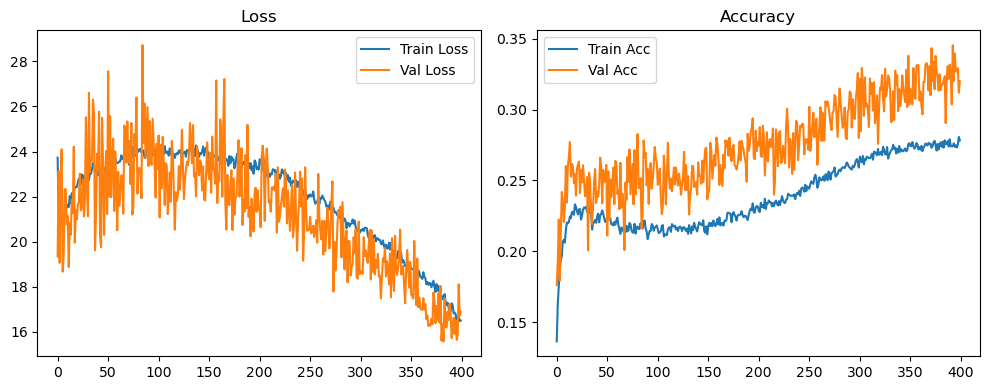

Original Model Final Test Loss: 17.0949 Accuracy: 0.3252


🚀 Running: batch128_lr_max_0.0005_min_1e-06_dp0.0


Files already downloaded and verified


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|                                                                                                                                                                        | 0/400 [00:00<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.1514 | Val Acc: 0.1446 | Epoch Time: 1.86 | :   0%|                                                                                                      | 0/400 [01:51<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.1514 | Val Acc: 0.1446 | Epoch Time: 1.86 | :   0%|                                                                                                      | 0/400 [01:51<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.1514 | Val Acc: 0.1446 | Epoch Time: 1.86 | :   0%|▏                                                                                         | 1/400 [01:51<12:22:02, 111.59s/it]

| LR: 0.000500 | Train Acc: 0.1676 | Val Acc: 0.1855 | Epoch Time: 1.85 | :   0%|▏                                                                                         | 1/400 [03:42<12:22:02, 111.59s/it]

| LR: 0.000500 | Train Acc: 0.1676 | Val Acc: 0.1855 | Epoch Time: 1.85 | :   0%|▏                                                                                         | 1/400 [03:42<12:22:02, 111.59s/it]

| LR: 0.000500 | Train Acc: 0.1676 | Val Acc: 0.1855 | Epoch Time: 1.85 | :   0%|▍                                                                                         | 2/400 [03:42<12:19:06, 111.42s/it]

| LR: 0.000500 | Train Acc: 0.1831 | Val Acc: 0.1849 | Epoch Time: 1.85 | :   0%|▍                                                                                         | 2/400 [05:34<12:19:06, 111.42s/it]

| LR: 0.000500 | Train Acc: 0.1831 | Val Acc: 0.1849 | Epoch Time: 1.85 | :   0%|▍                                                                                         | 2/400 [05:34<12:19:06, 111.42s/it]

| LR: 0.000500 | Train Acc: 0.1831 | Val Acc: 0.1849 | Epoch Time: 1.85 | :   1%|▋                                                                                         | 3/400 [05:34<12:16:56, 111.38s/it]

| LR: 0.000500 | Train Acc: 0.1976 | Val Acc: 0.2289 | Epoch Time: 1.85 | :   1%|▋                                                                                         | 3/400 [07:25<12:16:56, 111.38s/it]

| LR: 0.000500 | Train Acc: 0.1976 | Val Acc: 0.2289 | Epoch Time: 1.85 | :   1%|▋                                                                                         | 3/400 [07:25<12:16:56, 111.38s/it]

| LR: 0.000500 | Train Acc: 0.1976 | Val Acc: 0.2289 | Epoch Time: 1.85 | :   1%|▉                                                                                         | 4/400 [07:25<12:14:59, 111.36s/it]

| LR: 0.000500 | Train Acc: 0.2105 | Val Acc: 0.2321 | Epoch Time: 1.85 | :   1%|▉                                                                                         | 4/400 [09:16<12:14:59, 111.36s/it]

| LR: 0.000500 | Train Acc: 0.2105 | Val Acc: 0.2321 | Epoch Time: 1.85 | :   1%|▉                                                                                         | 4/400 [09:16<12:14:59, 111.36s/it]

| LR: 0.000500 | Train Acc: 0.2105 | Val Acc: 0.2321 | Epoch Time: 1.85 | :   1%|█▏                                                                                        | 5/400 [09:16<12:13:03, 111.35s/it]

| LR: 0.000500 | Train Acc: 0.2248 | Val Acc: 0.2259 | Epoch Time: 1.85 | :   1%|█▏                                                                                        | 5/400 [11:08<12:13:03, 111.35s/it]

| LR: 0.000500 | Train Acc: 0.2248 | Val Acc: 0.2259 | Epoch Time: 1.85 | :   1%|█▏                                                                                        | 5/400 [11:08<12:13:03, 111.35s/it]

| LR: 0.000500 | Train Acc: 0.2248 | Val Acc: 0.2259 | Epoch Time: 1.85 | :   2%|█▎                                                                                        | 6/400 [11:08<12:10:59, 111.32s/it]

| LR: 0.000500 | Train Acc: 0.2339 | Val Acc: 0.2416 | Epoch Time: 1.85 | :   2%|█▎                                                                                        | 6/400 [12:59<12:10:59, 111.32s/it]

| LR: 0.000500 | Train Acc: 0.2339 | Val Acc: 0.2416 | Epoch Time: 1.85 | :   2%|█▎                                                                                        | 6/400 [12:59<12:10:59, 111.32s/it]

| LR: 0.000500 | Train Acc: 0.2339 | Val Acc: 0.2416 | Epoch Time: 1.85 | :   2%|█▌                                                                                        | 7/400 [12:59<12:09:02, 111.30s/it]

| LR: 0.000500 | Train Acc: 0.2360 | Val Acc: 0.2645 | Epoch Time: 1.85 | :   2%|█▌                                                                                        | 7/400 [14:50<12:09:02, 111.30s/it]

| LR: 0.000500 | Train Acc: 0.2360 | Val Acc: 0.2645 | Epoch Time: 1.85 | :   2%|█▌                                                                                        | 7/400 [14:50<12:09:02, 111.30s/it]

| LR: 0.000500 | Train Acc: 0.2360 | Val Acc: 0.2645 | Epoch Time: 1.85 | :   2%|█▊                                                                                        | 8/400 [14:50<12:07:12, 111.31s/it]

| LR: 0.000500 | Train Acc: 0.2389 | Val Acc: 0.2614 | Epoch Time: 1.85 | :   2%|█▊                                                                                        | 8/400 [16:42<12:07:12, 111.31s/it]

| LR: 0.000500 | Train Acc: 0.2389 | Val Acc: 0.2614 | Epoch Time: 1.85 | :   2%|█▊                                                                                        | 8/400 [16:42<12:07:12, 111.31s/it]

| LR: 0.000500 | Train Acc: 0.2389 | Val Acc: 0.2614 | Epoch Time: 1.85 | :   2%|██                                                                                        | 9/400 [16:42<12:05:31, 111.33s/it]

| LR: 0.000499 | Train Acc: 0.2483 | Val Acc: 0.2785 | Epoch Time: 1.85 | :   2%|██                                                                                        | 9/400 [18:33<12:05:31, 111.33s/it]

| LR: 0.000499 | Train Acc: 0.2483 | Val Acc: 0.2785 | Epoch Time: 1.85 | :   2%|██                                                                                        | 9/400 [18:33<12:05:31, 111.33s/it]

| LR: 0.000499 | Train Acc: 0.2483 | Val Acc: 0.2785 | Epoch Time: 1.85 | :   2%|██▏                                                                                      | 10/400 [18:33<12:03:40, 111.33s/it]

| LR: 0.000499 | Train Acc: 0.2605 | Val Acc: 0.2846 | Epoch Time: 1.85 | :   2%|██▏                                                                                      | 10/400 [20:24<12:03:40, 111.33s/it]

| LR: 0.000499 | Train Acc: 0.2605 | Val Acc: 0.2846 | Epoch Time: 1.85 | :   2%|██▏                                                                                      | 10/400 [20:24<12:03:40, 111.33s/it]

| LR: 0.000499 | Train Acc: 0.2605 | Val Acc: 0.2846 | Epoch Time: 1.85 | :   3%|██▍                                                                                      | 11/400 [20:24<12:01:45, 111.33s/it]

| LR: 0.000499 | Train Acc: 0.2608 | Val Acc: 0.3008 | Epoch Time: 1.85 | :   3%|██▍                                                                                      | 11/400 [22:15<12:01:45, 111.33s/it]

| LR: 0.000499 | Train Acc: 0.2608 | Val Acc: 0.3008 | Epoch Time: 1.85 | :   3%|██▍                                                                                      | 11/400 [22:15<12:01:45, 111.33s/it]

| LR: 0.000499 | Train Acc: 0.2608 | Val Acc: 0.3008 | Epoch Time: 1.85 | :   3%|██▋                                                                                      | 12/400 [22:16<11:59:53, 111.32s/it]

| LR: 0.000499 | Train Acc: 0.2726 | Val Acc: 0.2889 | Epoch Time: 1.85 | :   3%|██▋                                                                                      | 12/400 [24:07<11:59:53, 111.32s/it]

| LR: 0.000499 | Train Acc: 0.2726 | Val Acc: 0.2889 | Epoch Time: 1.85 | :   3%|██▋                                                                                      | 12/400 [24:07<11:59:53, 111.32s/it]

| LR: 0.000499 | Train Acc: 0.2726 | Val Acc: 0.2889 | Epoch Time: 1.85 | :   3%|██▉                                                                                      | 13/400 [24:07<11:57:59, 111.32s/it]

| LR: 0.000499 | Train Acc: 0.2813 | Val Acc: 0.2974 | Epoch Time: 1.85 | :   3%|██▉                                                                                      | 13/400 [25:58<11:57:59, 111.32s/it]

| LR: 0.000499 | Train Acc: 0.2813 | Val Acc: 0.2974 | Epoch Time: 1.85 | :   3%|██▉                                                                                      | 13/400 [25:58<11:57:59, 111.32s/it]

| LR: 0.000499 | Train Acc: 0.2813 | Val Acc: 0.2974 | Epoch Time: 1.85 | :   4%|███                                                                                      | 14/400 [25:58<11:56:17, 111.34s/it]

| LR: 0.000498 | Train Acc: 0.2839 | Val Acc: 0.3078 | Epoch Time: 1.85 | :   4%|███                                                                                      | 14/400 [27:50<11:56:17, 111.34s/it]

| LR: 0.000498 | Train Acc: 0.2839 | Val Acc: 0.3078 | Epoch Time: 1.85 | :   4%|███                                                                                      | 14/400 [27:50<11:56:17, 111.34s/it]

| LR: 0.000498 | Train Acc: 0.2839 | Val Acc: 0.3078 | Epoch Time: 1.85 | :   4%|███▎                                                                                     | 15/400 [27:50<11:54:27, 111.34s/it]

| LR: 0.000498 | Train Acc: 0.2949 | Val Acc: 0.3079 | Epoch Time: 1.85 | :   4%|███▎                                                                                     | 15/400 [29:41<11:54:27, 111.34s/it]

| LR: 0.000498 | Train Acc: 0.2949 | Val Acc: 0.3079 | Epoch Time: 1.85 | :   4%|███▎                                                                                     | 15/400 [29:41<11:54:27, 111.34s/it]

| LR: 0.000498 | Train Acc: 0.2949 | Val Acc: 0.3079 | Epoch Time: 1.85 | :   4%|███▌                                                                                     | 16/400 [29:41<11:52:34, 111.34s/it]

| LR: 0.000498 | Train Acc: 0.3021 | Val Acc: 0.3192 | Epoch Time: 1.85 | :   4%|███▌                                                                                     | 16/400 [31:32<11:52:34, 111.34s/it]

| LR: 0.000498 | Train Acc: 0.3021 | Val Acc: 0.3192 | Epoch Time: 1.85 | :   4%|███▌                                                                                     | 16/400 [31:32<11:52:34, 111.34s/it]

| LR: 0.000498 | Train Acc: 0.3021 | Val Acc: 0.3192 | Epoch Time: 1.85 | :   4%|███▊                                                                                     | 17/400 [31:32<11:50:44, 111.34s/it]

| LR: 0.000498 | Train Acc: 0.3061 | Val Acc: 0.3394 | Epoch Time: 1.85 | :   4%|███▊                                                                                     | 17/400 [33:24<11:50:44, 111.34s/it]

| LR: 0.000498 | Train Acc: 0.3061 | Val Acc: 0.3394 | Epoch Time: 1.85 | :   4%|███▊                                                                                     | 17/400 [33:24<11:50:44, 111.34s/it]

| LR: 0.000498 | Train Acc: 0.3061 | Val Acc: 0.3394 | Epoch Time: 1.85 | :   4%|████                                                                                     | 18/400 [33:24<11:48:53, 111.34s/it]

| LR: 0.000498 | Train Acc: 0.3093 | Val Acc: 0.3320 | Epoch Time: 1.85 | :   4%|████                                                                                     | 18/400 [35:15<11:48:53, 111.34s/it]

| LR: 0.000498 | Train Acc: 0.3093 | Val Acc: 0.3320 | Epoch Time: 1.85 | :   4%|████                                                                                     | 18/400 [35:15<11:48:53, 111.34s/it]

| LR: 0.000498 | Train Acc: 0.3093 | Val Acc: 0.3320 | Epoch Time: 1.85 | :   5%|████▏                                                                                    | 19/400 [35:15<11:46:59, 111.34s/it]

| LR: 0.000497 | Train Acc: 0.3091 | Val Acc: 0.3189 | Epoch Time: 1.85 | :   5%|████▏                                                                                    | 19/400 [37:06<11:46:59, 111.34s/it]

| LR: 0.000497 | Train Acc: 0.3091 | Val Acc: 0.3189 | Epoch Time: 1.85 | :   5%|████▏                                                                                    | 19/400 [37:06<11:46:59, 111.34s/it]

| LR: 0.000497 | Train Acc: 0.3091 | Val Acc: 0.3189 | Epoch Time: 1.85 | :   5%|████▍                                                                                    | 20/400 [37:06<11:45:03, 111.32s/it]

| LR: 0.000497 | Train Acc: 0.3156 | Val Acc: 0.3382 | Epoch Time: 1.85 | :   5%|████▍                                                                                    | 20/400 [38:57<11:45:03, 111.32s/it]

| LR: 0.000497 | Train Acc: 0.3156 | Val Acc: 0.3382 | Epoch Time: 1.85 | :   5%|████▍                                                                                    | 20/400 [38:57<11:45:03, 111.32s/it]

| LR: 0.000497 | Train Acc: 0.3156 | Val Acc: 0.3382 | Epoch Time: 1.85 | :   5%|████▋                                                                                    | 21/400 [38:58<11:43:12, 111.33s/it]

| LR: 0.000497 | Train Acc: 0.3185 | Val Acc: 0.3328 | Epoch Time: 1.85 | :   5%|████▋                                                                                    | 21/400 [40:49<11:43:12, 111.33s/it]

| LR: 0.000497 | Train Acc: 0.3185 | Val Acc: 0.3328 | Epoch Time: 1.85 | :   5%|████▋                                                                                    | 21/400 [40:49<11:43:12, 111.33s/it]

| LR: 0.000497 | Train Acc: 0.3185 | Val Acc: 0.3328 | Epoch Time: 1.85 | :   6%|████▉                                                                                    | 22/400 [40:49<11:41:19, 111.32s/it]

| LR: 0.000496 | Train Acc: 0.3209 | Val Acc: 0.3428 | Epoch Time: 1.85 | :   6%|████▉                                                                                    | 22/400 [42:40<11:41:19, 111.32s/it]

| LR: 0.000496 | Train Acc: 0.3209 | Val Acc: 0.3428 | Epoch Time: 1.85 | :   6%|████▉                                                                                    | 22/400 [42:40<11:41:19, 111.32s/it]

| LR: 0.000496 | Train Acc: 0.3209 | Val Acc: 0.3428 | Epoch Time: 1.85 | :   6%|█████                                                                                    | 23/400 [42:40<11:39:27, 111.32s/it]

| LR: 0.000496 | Train Acc: 0.3238 | Val Acc: 0.3532 | Epoch Time: 1.85 | :   6%|█████                                                                                    | 23/400 [44:31<11:39:27, 111.32s/it]

| LR: 0.000496 | Train Acc: 0.3238 | Val Acc: 0.3532 | Epoch Time: 1.85 | :   6%|█████                                                                                    | 23/400 [44:31<11:39:27, 111.32s/it]

| LR: 0.000496 | Train Acc: 0.3238 | Val Acc: 0.3532 | Epoch Time: 1.85 | :   6%|█████▎                                                                                   | 24/400 [44:32<11:37:33, 111.31s/it]

| LR: 0.000496 | Train Acc: 0.3242 | Val Acc: 0.3548 | Epoch Time: 1.85 | :   6%|█████▎                                                                                   | 24/400 [46:23<11:37:33, 111.31s/it]

| LR: 0.000496 | Train Acc: 0.3242 | Val Acc: 0.3548 | Epoch Time: 1.85 | :   6%|█████▎                                                                                   | 24/400 [46:23<11:37:33, 111.31s/it]

| LR: 0.000496 | Train Acc: 0.3242 | Val Acc: 0.3548 | Epoch Time: 1.85 | :   6%|█████▌                                                                                   | 25/400 [46:23<11:35:43, 111.32s/it]

| LR: 0.000495 | Train Acc: 0.3270 | Val Acc: 0.3422 | Epoch Time: 1.85 | :   6%|█████▌                                                                                   | 25/400 [48:14<11:35:43, 111.32s/it]

| LR: 0.000495 | Train Acc: 0.3270 | Val Acc: 0.3422 | Epoch Time: 1.85 | :   6%|█████▌                                                                                   | 25/400 [48:14<11:35:43, 111.32s/it]

| LR: 0.000495 | Train Acc: 0.3270 | Val Acc: 0.3422 | Epoch Time: 1.85 | :   6%|█████▊                                                                                   | 26/400 [48:14<11:33:59, 111.34s/it]

| LR: 0.000495 | Train Acc: 0.3286 | Val Acc: 0.3411 | Epoch Time: 1.85 | :   6%|█████▊                                                                                   | 26/400 [50:05<11:33:59, 111.34s/it]

| LR: 0.000495 | Train Acc: 0.3286 | Val Acc: 0.3411 | Epoch Time: 1.85 | :   6%|█████▊                                                                                   | 26/400 [50:05<11:33:59, 111.34s/it]

| LR: 0.000495 | Train Acc: 0.3286 | Val Acc: 0.3411 | Epoch Time: 1.85 | :   7%|██████                                                                                   | 27/400 [50:06<11:32:08, 111.34s/it]

| LR: 0.000494 | Train Acc: 0.3335 | Val Acc: 0.3476 | Epoch Time: 1.85 | :   7%|██████                                                                                   | 27/400 [51:57<11:32:08, 111.34s/it]

| LR: 0.000494 | Train Acc: 0.3335 | Val Acc: 0.3476 | Epoch Time: 1.85 | :   7%|██████                                                                                   | 27/400 [51:57<11:32:08, 111.34s/it]

| LR: 0.000494 | Train Acc: 0.3335 | Val Acc: 0.3476 | Epoch Time: 1.85 | :   7%|██████▏                                                                                  | 28/400 [51:57<11:30:11, 111.32s/it]

| LR: 0.000494 | Train Acc: 0.3341 | Val Acc: 0.3533 | Epoch Time: 1.85 | :   7%|██████▏                                                                                  | 28/400 [53:48<11:30:11, 111.32s/it]

| LR: 0.000494 | Train Acc: 0.3341 | Val Acc: 0.3533 | Epoch Time: 1.85 | :   7%|██████▏                                                                                  | 28/400 [53:48<11:30:11, 111.32s/it]

| LR: 0.000494 | Train Acc: 0.3341 | Val Acc: 0.3533 | Epoch Time: 1.85 | :   7%|██████▍                                                                                  | 29/400 [53:48<11:28:16, 111.31s/it]

| LR: 0.000494 | Train Acc: 0.3347 | Val Acc: 0.3462 | Epoch Time: 1.85 | :   7%|██████▍                                                                                  | 29/400 [55:39<11:28:16, 111.31s/it]

| LR: 0.000494 | Train Acc: 0.3347 | Val Acc: 0.3462 | Epoch Time: 1.85 | :   7%|██████▍                                                                                  | 29/400 [55:39<11:28:16, 111.31s/it]

| LR: 0.000494 | Train Acc: 0.3347 | Val Acc: 0.3462 | Epoch Time: 1.85 | :   8%|██████▋                                                                                  | 30/400 [55:39<11:26:21, 111.30s/it]

| LR: 0.000493 | Train Acc: 0.3363 | Val Acc: 0.3767 | Epoch Time: 1.85 | :   8%|██████▋                                                                                  | 30/400 [57:31<11:26:21, 111.30s/it]

| LR: 0.000493 | Train Acc: 0.3363 | Val Acc: 0.3767 | Epoch Time: 1.85 | :   8%|██████▋                                                                                  | 30/400 [57:31<11:26:21, 111.30s/it]

| LR: 0.000493 | Train Acc: 0.3363 | Val Acc: 0.3767 | Epoch Time: 1.85 | :   8%|██████▉                                                                                  | 31/400 [57:31<11:24:31, 111.30s/it]

| LR: 0.000493 | Train Acc: 0.3427 | Val Acc: 0.3644 | Epoch Time: 1.85 | :   8%|██████▉                                                                                  | 31/400 [59:22<11:24:31, 111.30s/it]

| LR: 0.000493 | Train Acc: 0.3427 | Val Acc: 0.3644 | Epoch Time: 1.85 | :   8%|██████▉                                                                                  | 31/400 [59:22<11:24:31, 111.30s/it]

| LR: 0.000493 | Train Acc: 0.3427 | Val Acc: 0.3644 | Epoch Time: 1.85 | :   8%|███████                                                                                  | 32/400 [59:22<11:22:41, 111.31s/it]

| LR: 0.000492 | Train Acc: 0.3438 | Val Acc: 0.3672 | Epoch Time: 1.85 | :   8%|██████▉                                                                                | 32/400 [1:01:13<11:22:41, 111.31s/it]

| LR: 0.000492 | Train Acc: 0.3438 | Val Acc: 0.3672 | Epoch Time: 1.85 | :   8%|██████▉                                                                                | 32/400 [1:01:13<11:22:41, 111.31s/it]

| LR: 0.000492 | Train Acc: 0.3438 | Val Acc: 0.3672 | Epoch Time: 1.85 | :   8%|███████▏                                                                               | 33/400 [1:01:13<11:20:47, 111.30s/it]

| LR: 0.000492 | Train Acc: 0.3449 | Val Acc: 0.3709 | Epoch Time: 1.85 | :   8%|███████▏                                                                               | 33/400 [1:03:05<11:20:47, 111.30s/it]

| LR: 0.000492 | Train Acc: 0.3449 | Val Acc: 0.3709 | Epoch Time: 1.85 | :   8%|███████▏                                                                               | 33/400 [1:03:05<11:20:47, 111.30s/it]

| LR: 0.000492 | Train Acc: 0.3449 | Val Acc: 0.3709 | Epoch Time: 1.85 | :   8%|███████▍                                                                               | 34/400 [1:03:05<11:18:53, 111.29s/it]

| LR: 0.000491 | Train Acc: 0.3428 | Val Acc: 0.3733 | Epoch Time: 1.85 | :   8%|███████▍                                                                               | 34/400 [1:04:56<11:18:53, 111.29s/it]

| LR: 0.000491 | Train Acc: 0.3428 | Val Acc: 0.3733 | Epoch Time: 1.85 | :   8%|███████▍                                                                               | 34/400 [1:04:56<11:18:53, 111.29s/it]

| LR: 0.000491 | Train Acc: 0.3428 | Val Acc: 0.3733 | Epoch Time: 1.85 | :   9%|███████▌                                                                               | 35/400 [1:04:56<11:17:03, 111.30s/it]

| LR: 0.000491 | Train Acc: 0.3465 | Val Acc: 0.3583 | Epoch Time: 1.85 | :   9%|███████▌                                                                               | 35/400 [1:06:47<11:17:03, 111.30s/it]

| LR: 0.000491 | Train Acc: 0.3465 | Val Acc: 0.3583 | Epoch Time: 1.85 | :   9%|███████▌                                                                               | 35/400 [1:06:47<11:17:03, 111.30s/it]

| LR: 0.000491 | Train Acc: 0.3465 | Val Acc: 0.3583 | Epoch Time: 1.85 | :   9%|███████▊                                                                               | 36/400 [1:06:47<11:15:06, 111.28s/it]

| LR: 0.000490 | Train Acc: 0.3474 | Val Acc: 0.3606 | Epoch Time: 1.85 | :   9%|███████▊                                                                               | 36/400 [1:08:38<11:15:06, 111.28s/it]

| LR: 0.000490 | Train Acc: 0.3474 | Val Acc: 0.3606 | Epoch Time: 1.85 | :   9%|███████▊                                                                               | 36/400 [1:08:38<11:15:06, 111.28s/it]

| LR: 0.000490 | Train Acc: 0.3474 | Val Acc: 0.3606 | Epoch Time: 1.85 | :   9%|████████                                                                               | 37/400 [1:08:38<11:13:15, 111.28s/it]

| LR: 0.000490 | Train Acc: 0.3488 | Val Acc: 0.3428 | Epoch Time: 1.85 | :   9%|████████                                                                               | 37/400 [1:10:30<11:13:15, 111.28s/it]

| LR: 0.000490 | Train Acc: 0.3488 | Val Acc: 0.3428 | Epoch Time: 1.85 | :   9%|████████                                                                               | 37/400 [1:10:30<11:13:15, 111.28s/it]

| LR: 0.000490 | Train Acc: 0.3488 | Val Acc: 0.3428 | Epoch Time: 1.85 | :  10%|████████▎                                                                              | 38/400 [1:10:30<11:11:19, 111.27s/it]

| LR: 0.000489 | Train Acc: 0.3481 | Val Acc: 0.3613 | Epoch Time: 1.85 | :  10%|████████▎                                                                              | 38/400 [1:12:21<11:11:19, 111.27s/it]

| LR: 0.000489 | Train Acc: 0.3481 | Val Acc: 0.3613 | Epoch Time: 1.85 | :  10%|████████▎                                                                              | 38/400 [1:12:21<11:11:19, 111.27s/it]

| LR: 0.000489 | Train Acc: 0.3481 | Val Acc: 0.3613 | Epoch Time: 1.85 | :  10%|████████▍                                                                              | 39/400 [1:12:21<11:09:30, 111.28s/it]

| LR: 0.000488 | Train Acc: 0.3512 | Val Acc: 0.3750 | Epoch Time: 1.85 | :  10%|████████▍                                                                              | 39/400 [1:14:12<11:09:30, 111.28s/it]

| LR: 0.000488 | Train Acc: 0.3512 | Val Acc: 0.3750 | Epoch Time: 1.85 | :  10%|████████▍                                                                              | 39/400 [1:14:12<11:09:30, 111.28s/it]

| LR: 0.000488 | Train Acc: 0.3512 | Val Acc: 0.3750 | Epoch Time: 1.85 | :  10%|████████▋                                                                              | 40/400 [1:14:12<11:07:37, 111.27s/it]

| LR: 0.000488 | Train Acc: 0.3526 | Val Acc: 0.3769 | Epoch Time: 1.85 | :  10%|████████▋                                                                              | 40/400 [1:16:03<11:07:37, 111.27s/it]

| LR: 0.000488 | Train Acc: 0.3526 | Val Acc: 0.3769 | Epoch Time: 1.85 | :  10%|████████▋                                                                              | 40/400 [1:16:03<11:07:37, 111.27s/it]

| LR: 0.000488 | Train Acc: 0.3526 | Val Acc: 0.3769 | Epoch Time: 1.85 | :  10%|████████▉                                                                              | 41/400 [1:16:03<11:05:42, 111.26s/it]

| LR: 0.000487 | Train Acc: 0.3541 | Val Acc: 0.3864 | Epoch Time: 1.85 | :  10%|████████▉                                                                              | 41/400 [1:17:55<11:05:42, 111.26s/it]

| LR: 0.000487 | Train Acc: 0.3541 | Val Acc: 0.3864 | Epoch Time: 1.85 | :  10%|████████▉                                                                              | 41/400 [1:17:55<11:05:42, 111.26s/it]

| LR: 0.000487 | Train Acc: 0.3541 | Val Acc: 0.3864 | Epoch Time: 1.85 | :  10%|█████████▏                                                                             | 42/400 [1:17:55<11:03:48, 111.25s/it]

| LR: 0.000487 | Train Acc: 0.3529 | Val Acc: 0.3734 | Epoch Time: 1.85 | :  10%|█████████▏                                                                             | 42/400 [1:19:46<11:03:48, 111.25s/it]

| LR: 0.000487 | Train Acc: 0.3529 | Val Acc: 0.3734 | Epoch Time: 1.85 | :  10%|█████████▏                                                                             | 42/400 [1:19:46<11:03:48, 111.25s/it]

| LR: 0.000487 | Train Acc: 0.3529 | Val Acc: 0.3734 | Epoch Time: 1.85 | :  11%|█████████▎                                                                             | 43/400 [1:19:46<11:01:58, 111.26s/it]

| LR: 0.000486 | Train Acc: 0.3575 | Val Acc: 0.3996 | Epoch Time: 1.85 | :  11%|█████████▎                                                                             | 43/400 [1:21:37<11:01:58, 111.26s/it]

| LR: 0.000486 | Train Acc: 0.3575 | Val Acc: 0.3996 | Epoch Time: 1.85 | :  11%|█████████▎                                                                             | 43/400 [1:21:37<11:01:58, 111.26s/it]

| LR: 0.000486 | Train Acc: 0.3575 | Val Acc: 0.3996 | Epoch Time: 1.85 | :  11%|█████████▌                                                                             | 44/400 [1:21:37<11:00:06, 111.25s/it]

| LR: 0.000485 | Train Acc: 0.3545 | Val Acc: 0.3759 | Epoch Time: 1.85 | :  11%|█████████▌                                                                             | 44/400 [1:23:28<11:00:06, 111.25s/it]

| LR: 0.000485 | Train Acc: 0.3545 | Val Acc: 0.3759 | Epoch Time: 1.85 | :  11%|█████████▌                                                                             | 44/400 [1:23:28<11:00:06, 111.25s/it]

| LR: 0.000485 | Train Acc: 0.3545 | Val Acc: 0.3759 | Epoch Time: 1.85 | :  11%|█████████▊                                                                             | 45/400 [1:23:29<10:58:25, 111.28s/it]

| LR: 0.000485 | Train Acc: 0.3558 | Val Acc: 0.3650 | Epoch Time: 1.85 | :  11%|█████████▊                                                                             | 45/400 [1:25:20<10:58:25, 111.28s/it]

| LR: 0.000485 | Train Acc: 0.3558 | Val Acc: 0.3650 | Epoch Time: 1.85 | :  11%|█████████▊                                                                             | 45/400 [1:25:20<10:58:25, 111.28s/it]

| LR: 0.000485 | Train Acc: 0.3558 | Val Acc: 0.3650 | Epoch Time: 1.85 | :  12%|██████████                                                                             | 46/400 [1:25:20<10:56:35, 111.29s/it]

| LR: 0.000484 | Train Acc: 0.3561 | Val Acc: 0.3704 | Epoch Time: 1.85 | :  12%|██████████                                                                             | 46/400 [1:27:11<10:56:35, 111.29s/it]

| LR: 0.000484 | Train Acc: 0.3561 | Val Acc: 0.3704 | Epoch Time: 1.85 | :  12%|██████████                                                                             | 46/400 [1:27:11<10:56:35, 111.29s/it]

| LR: 0.000484 | Train Acc: 0.3561 | Val Acc: 0.3704 | Epoch Time: 1.85 | :  12%|██████████▏                                                                            | 47/400 [1:27:11<10:54:40, 111.28s/it]

| LR: 0.000483 | Train Acc: 0.3567 | Val Acc: 0.4016 | Epoch Time: 1.85 | :  12%|██████████▏                                                                            | 47/400 [1:29:02<10:54:40, 111.28s/it]

| LR: 0.000483 | Train Acc: 0.3567 | Val Acc: 0.4016 | Epoch Time: 1.85 | :  12%|██████████▏                                                                            | 47/400 [1:29:02<10:54:40, 111.28s/it]

| LR: 0.000483 | Train Acc: 0.3567 | Val Acc: 0.4016 | Epoch Time: 1.85 | :  12%|██████████▍                                                                            | 48/400 [1:29:02<10:52:49, 111.28s/it]

| LR: 0.000482 | Train Acc: 0.3557 | Val Acc: 0.3968 | Epoch Time: 1.85 | :  12%|██████████▍                                                                            | 48/400 [1:30:54<10:52:49, 111.28s/it]

| LR: 0.000482 | Train Acc: 0.3557 | Val Acc: 0.3968 | Epoch Time: 1.85 | :  12%|██████████▍                                                                            | 48/400 [1:30:54<10:52:49, 111.28s/it]

| LR: 0.000482 | Train Acc: 0.3557 | Val Acc: 0.3968 | Epoch Time: 1.85 | :  12%|██████████▋                                                                            | 49/400 [1:30:54<10:51:03, 111.29s/it]

| LR: 0.000482 | Train Acc: 0.3640 | Val Acc: 0.3852 | Epoch Time: 1.85 | :  12%|██████████▋                                                                            | 49/400 [1:32:45<10:51:03, 111.29s/it]

| LR: 0.000482 | Train Acc: 0.3640 | Val Acc: 0.3852 | Epoch Time: 1.85 | :  12%|██████████▋                                                                            | 49/400 [1:32:45<10:51:03, 111.29s/it]

| LR: 0.000482 | Train Acc: 0.3640 | Val Acc: 0.3852 | Epoch Time: 1.85 | :  12%|██████████▉                                                                            | 50/400 [1:32:45<10:49:16, 111.30s/it]

| LR: 0.000481 | Train Acc: 0.3579 | Val Acc: 0.3826 | Epoch Time: 1.85 | :  12%|██████████▉                                                                            | 50/400 [1:34:36<10:49:16, 111.30s/it]

| LR: 0.000481 | Train Acc: 0.3579 | Val Acc: 0.3826 | Epoch Time: 1.85 | :  12%|██████████▉                                                                            | 50/400 [1:34:36<10:49:16, 111.30s/it]

| LR: 0.000481 | Train Acc: 0.3579 | Val Acc: 0.3826 | Epoch Time: 1.85 | :  13%|███████████                                                                            | 51/400 [1:34:36<10:47:27, 111.31s/it]

| LR: 0.000480 | Train Acc: 0.3568 | Val Acc: 0.3643 | Epoch Time: 1.85 | :  13%|███████████                                                                            | 51/400 [1:36:28<10:47:27, 111.31s/it]

| LR: 0.000480 | Train Acc: 0.3568 | Val Acc: 0.3643 | Epoch Time: 1.85 | :  13%|███████████                                                                            | 51/400 [1:36:28<10:47:27, 111.31s/it]

| LR: 0.000480 | Train Acc: 0.3568 | Val Acc: 0.3643 | Epoch Time: 1.85 | :  13%|███████████▎                                                                           | 52/400 [1:36:28<10:45:35, 111.31s/it]

| LR: 0.000479 | Train Acc: 0.3620 | Val Acc: 0.3476 | Epoch Time: 1.85 | :  13%|███████████▎                                                                           | 52/400 [1:38:19<10:45:35, 111.31s/it]

| LR: 0.000479 | Train Acc: 0.3620 | Val Acc: 0.3476 | Epoch Time: 1.85 | :  13%|███████████▎                                                                           | 52/400 [1:38:19<10:45:35, 111.31s/it]

| LR: 0.000479 | Train Acc: 0.3620 | Val Acc: 0.3476 | Epoch Time: 1.85 | :  13%|███████████▌                                                                           | 53/400 [1:38:19<10:43:42, 111.31s/it]

| LR: 0.000479 | Train Acc: 0.3557 | Val Acc: 0.3708 | Epoch Time: 1.85 | :  13%|███████████▌                                                                           | 53/400 [1:40:10<10:43:42, 111.31s/it]

| LR: 0.000479 | Train Acc: 0.3557 | Val Acc: 0.3708 | Epoch Time: 1.85 | :  13%|███████████▌                                                                           | 53/400 [1:40:10<10:43:42, 111.31s/it]

| LR: 0.000479 | Train Acc: 0.3557 | Val Acc: 0.3708 | Epoch Time: 1.85 | :  14%|███████████▋                                                                           | 54/400 [1:40:10<10:41:50, 111.30s/it]

| LR: 0.000478 | Train Acc: 0.3582 | Val Acc: 0.3622 | Epoch Time: 1.85 | :  14%|███████████▋                                                                           | 54/400 [1:42:01<10:41:50, 111.30s/it]

| LR: 0.000478 | Train Acc: 0.3582 | Val Acc: 0.3622 | Epoch Time: 1.85 | :  14%|███████████▋                                                                           | 54/400 [1:42:01<10:41:50, 111.30s/it]

| LR: 0.000478 | Train Acc: 0.3582 | Val Acc: 0.3622 | Epoch Time: 1.85 | :  14%|███████████▉                                                                           | 55/400 [1:42:02<10:40:00, 111.30s/it]

| LR: 0.000477 | Train Acc: 0.3640 | Val Acc: 0.3721 | Epoch Time: 1.85 | :  14%|███████████▉                                                                           | 55/400 [1:43:53<10:40:00, 111.30s/it]

| LR: 0.000477 | Train Acc: 0.3640 | Val Acc: 0.3721 | Epoch Time: 1.85 | :  14%|███████████▉                                                                           | 55/400 [1:43:53<10:40:00, 111.30s/it]

| LR: 0.000477 | Train Acc: 0.3640 | Val Acc: 0.3721 | Epoch Time: 1.85 | :  14%|████████████▏                                                                          | 56/400 [1:43:53<10:38:12, 111.32s/it]

| LR: 0.000476 | Train Acc: 0.3562 | Val Acc: 0.3744 | Epoch Time: 1.85 | :  14%|████████████▏                                                                          | 56/400 [1:45:44<10:38:12, 111.32s/it]

| LR: 0.000476 | Train Acc: 0.3562 | Val Acc: 0.3744 | Epoch Time: 1.85 | :  14%|████████████▏                                                                          | 56/400 [1:45:44<10:38:12, 111.32s/it]

| LR: 0.000476 | Train Acc: 0.3562 | Val Acc: 0.3744 | Epoch Time: 1.85 | :  14%|████████████▍                                                                          | 57/400 [1:45:44<10:36:18, 111.31s/it]

| LR: 0.000475 | Train Acc: 0.3613 | Val Acc: 0.3861 | Epoch Time: 1.85 | :  14%|████████████▍                                                                          | 57/400 [1:47:35<10:36:18, 111.31s/it]

| LR: 0.000475 | Train Acc: 0.3613 | Val Acc: 0.3861 | Epoch Time: 1.85 | :  14%|████████████▍                                                                          | 57/400 [1:47:35<10:36:18, 111.31s/it]

| LR: 0.000475 | Train Acc: 0.3613 | Val Acc: 0.3861 | Epoch Time: 1.85 | :  14%|████████████▌                                                                          | 58/400 [1:47:36<10:34:28, 111.31s/it]

| LR: 0.000475 | Train Acc: 0.3642 | Val Acc: 0.3885 | Epoch Time: 1.85 | :  14%|████████████▌                                                                          | 58/400 [1:49:27<10:34:28, 111.31s/it]

| LR: 0.000475 | Train Acc: 0.3642 | Val Acc: 0.3885 | Epoch Time: 1.85 | :  14%|████████████▌                                                                          | 58/400 [1:49:27<10:34:28, 111.31s/it]

| LR: 0.000475 | Train Acc: 0.3642 | Val Acc: 0.3885 | Epoch Time: 1.85 | :  15%|████████████▊                                                                          | 59/400 [1:49:27<10:32:38, 111.32s/it]

| LR: 0.000474 | Train Acc: 0.3604 | Val Acc: 0.3778 | Epoch Time: 1.85 | :  15%|████████████▊                                                                          | 59/400 [1:51:18<10:32:38, 111.32s/it]

| LR: 0.000474 | Train Acc: 0.3604 | Val Acc: 0.3778 | Epoch Time: 1.85 | :  15%|████████████▊                                                                          | 59/400 [1:51:18<10:32:38, 111.32s/it]

| LR: 0.000474 | Train Acc: 0.3604 | Val Acc: 0.3778 | Epoch Time: 1.85 | :  15%|█████████████                                                                          | 60/400 [1:51:18<10:30:47, 111.32s/it]

| LR: 0.000473 | Train Acc: 0.3628 | Val Acc: 0.3640 | Epoch Time: 1.85 | :  15%|█████████████                                                                          | 60/400 [1:53:09<10:30:47, 111.32s/it]

| LR: 0.000473 | Train Acc: 0.3628 | Val Acc: 0.3640 | Epoch Time: 1.85 | :  15%|█████████████                                                                          | 60/400 [1:53:09<10:30:47, 111.32s/it]

| LR: 0.000473 | Train Acc: 0.3628 | Val Acc: 0.3640 | Epoch Time: 1.85 | :  15%|█████████████▎                                                                         | 61/400 [1:53:09<10:28:52, 111.31s/it]

| LR: 0.000472 | Train Acc: 0.3616 | Val Acc: 0.4011 | Epoch Time: 1.85 | :  15%|█████████████▎                                                                         | 61/400 [1:55:01<10:28:52, 111.31s/it]

| LR: 0.000472 | Train Acc: 0.3616 | Val Acc: 0.4011 | Epoch Time: 1.85 | :  15%|█████████████▎                                                                         | 61/400 [1:55:01<10:28:52, 111.31s/it]

| LR: 0.000472 | Train Acc: 0.3616 | Val Acc: 0.4011 | Epoch Time: 1.85 | :  16%|█████████████▍                                                                         | 62/400 [1:55:01<10:26:59, 111.30s/it]

| LR: 0.000471 | Train Acc: 0.3634 | Val Acc: 0.3687 | Epoch Time: 1.85 | :  16%|█████████████▍                                                                         | 62/400 [1:56:52<10:26:59, 111.30s/it]

| LR: 0.000471 | Train Acc: 0.3634 | Val Acc: 0.3687 | Epoch Time: 1.85 | :  16%|█████████████▍                                                                         | 62/400 [1:56:52<10:26:59, 111.30s/it]

| LR: 0.000471 | Train Acc: 0.3634 | Val Acc: 0.3687 | Epoch Time: 1.85 | :  16%|█████████████▋                                                                         | 63/400 [1:56:52<10:25:09, 111.30s/it]

| LR: 0.000470 | Train Acc: 0.3632 | Val Acc: 0.3785 | Epoch Time: 1.85 | :  16%|█████████████▋                                                                         | 63/400 [1:58:43<10:25:09, 111.30s/it]

| LR: 0.000470 | Train Acc: 0.3632 | Val Acc: 0.3785 | Epoch Time: 1.85 | :  16%|█████████████▋                                                                         | 63/400 [1:58:43<10:25:09, 111.30s/it]

| LR: 0.000470 | Train Acc: 0.3632 | Val Acc: 0.3785 | Epoch Time: 1.85 | :  16%|█████████████▉                                                                         | 64/400 [1:58:43<10:23:17, 111.30s/it]

| LR: 0.000469 | Train Acc: 0.3676 | Val Acc: 0.3870 | Epoch Time: 1.85 | :  16%|█████████████▉                                                                         | 64/400 [2:00:34<10:23:17, 111.30s/it]

| LR: 0.000469 | Train Acc: 0.3676 | Val Acc: 0.3870 | Epoch Time: 1.85 | :  16%|█████████████▉                                                                         | 64/400 [2:00:34<10:23:17, 111.30s/it]

| LR: 0.000469 | Train Acc: 0.3676 | Val Acc: 0.3870 | Epoch Time: 1.85 | :  16%|██████████████▏                                                                        | 65/400 [2:00:35<10:21:13, 111.26s/it]

| LR: 0.000468 | Train Acc: 0.3662 | Val Acc: 0.3725 | Epoch Time: 1.85 | :  16%|██████████████▏                                                                        | 65/400 [2:02:26<10:21:13, 111.26s/it]

| LR: 0.000468 | Train Acc: 0.3662 | Val Acc: 0.3725 | Epoch Time: 1.85 | :  16%|██████████████▏                                                                        | 65/400 [2:02:26<10:21:13, 111.26s/it]

| LR: 0.000468 | Train Acc: 0.3662 | Val Acc: 0.3725 | Epoch Time: 1.85 | :  16%|██████████████▎                                                                        | 66/400 [2:02:26<10:19:14, 111.24s/it]

| LR: 0.000467 | Train Acc: 0.3620 | Val Acc: 0.4070 | Epoch Time: 1.85 | :  16%|██████████████▎                                                                        | 66/400 [2:04:17<10:19:14, 111.24s/it]

| LR: 0.000467 | Train Acc: 0.3620 | Val Acc: 0.4070 | Epoch Time: 1.85 | :  16%|██████████████▎                                                                        | 66/400 [2:04:17<10:19:14, 111.24s/it]

| LR: 0.000467 | Train Acc: 0.3620 | Val Acc: 0.4070 | Epoch Time: 1.85 | :  17%|██████████████▌                                                                        | 67/400 [2:04:17<10:17:18, 111.23s/it]

| LR: 0.000466 | Train Acc: 0.3619 | Val Acc: 0.3843 | Epoch Time: 1.85 | :  17%|██████████████▌                                                                        | 67/400 [2:06:08<10:17:18, 111.23s/it]

| LR: 0.000466 | Train Acc: 0.3619 | Val Acc: 0.3843 | Epoch Time: 1.85 | :  17%|██████████████▌                                                                        | 67/400 [2:06:08<10:17:18, 111.23s/it]

| LR: 0.000466 | Train Acc: 0.3619 | Val Acc: 0.3843 | Epoch Time: 1.85 | :  17%|██████████████▊                                                                        | 68/400 [2:06:08<10:15:24, 111.22s/it]

| LR: 0.000465 | Train Acc: 0.3640 | Val Acc: 0.3812 | Epoch Time: 1.85 | :  17%|██████████████▊                                                                        | 68/400 [2:07:59<10:15:24, 111.22s/it]

| LR: 0.000465 | Train Acc: 0.3640 | Val Acc: 0.3812 | Epoch Time: 1.85 | :  17%|██████████████▊                                                                        | 68/400 [2:07:59<10:15:24, 111.22s/it]

| LR: 0.000465 | Train Acc: 0.3640 | Val Acc: 0.3812 | Epoch Time: 1.85 | :  17%|███████████████                                                                        | 69/400 [2:07:59<10:13:33, 111.22s/it]

| LR: 0.000464 | Train Acc: 0.3671 | Val Acc: 0.3933 | Epoch Time: 1.85 | :  17%|███████████████                                                                        | 69/400 [2:09:50<10:13:33, 111.22s/it]

| LR: 0.000464 | Train Acc: 0.3671 | Val Acc: 0.3933 | Epoch Time: 1.85 | :  17%|███████████████                                                                        | 69/400 [2:09:50<10:13:33, 111.22s/it]

| LR: 0.000464 | Train Acc: 0.3671 | Val Acc: 0.3933 | Epoch Time: 1.85 | :  18%|███████████████▏                                                                       | 70/400 [2:09:51<10:11:39, 111.21s/it]

| LR: 0.000463 | Train Acc: 0.3644 | Val Acc: 0.3974 | Epoch Time: 1.85 | :  18%|███████████████▏                                                                       | 70/400 [2:11:42<10:11:39, 111.21s/it]

| LR: 0.000463 | Train Acc: 0.3644 | Val Acc: 0.3974 | Epoch Time: 1.85 | :  18%|███████████████▏                                                                       | 70/400 [2:11:42<10:11:39, 111.21s/it]

| LR: 0.000463 | Train Acc: 0.3644 | Val Acc: 0.3974 | Epoch Time: 1.85 | :  18%|███████████████▍                                                                       | 71/400 [2:11:42<10:09:45, 111.20s/it]

| LR: 0.000462 | Train Acc: 0.3664 | Val Acc: 0.4065 | Epoch Time: 1.85 | :  18%|███████████████▍                                                                       | 71/400 [2:13:33<10:09:45, 111.20s/it]

| LR: 0.000462 | Train Acc: 0.3664 | Val Acc: 0.4065 | Epoch Time: 1.85 | :  18%|███████████████▍                                                                       | 71/400 [2:13:33<10:09:45, 111.20s/it]

| LR: 0.000462 | Train Acc: 0.3664 | Val Acc: 0.4065 | Epoch Time: 1.85 | :  18%|███████████████▋                                                                       | 72/400 [2:13:33<10:07:53, 111.20s/it]

| LR: 0.000461 | Train Acc: 0.3629 | Val Acc: 0.3906 | Epoch Time: 1.85 | :  18%|███████████████▋                                                                       | 72/400 [2:15:24<10:07:53, 111.20s/it]

| LR: 0.000461 | Train Acc: 0.3629 | Val Acc: 0.3906 | Epoch Time: 1.85 | :  18%|███████████████▋                                                                       | 72/400 [2:15:24<10:07:53, 111.20s/it]

| LR: 0.000461 | Train Acc: 0.3629 | Val Acc: 0.3906 | Epoch Time: 1.85 | :  18%|███████████████▉                                                                       | 73/400 [2:15:24<10:06:06, 111.21s/it]

| LR: 0.000460 | Train Acc: 0.3625 | Val Acc: 0.4097 | Epoch Time: 1.85 | :  18%|███████████████▉                                                                       | 73/400 [2:17:15<10:06:06, 111.21s/it]

| LR: 0.000460 | Train Acc: 0.3625 | Val Acc: 0.4097 | Epoch Time: 1.85 | :  18%|███████████████▉                                                                       | 73/400 [2:17:15<10:06:06, 111.21s/it]

| LR: 0.000460 | Train Acc: 0.3625 | Val Acc: 0.4097 | Epoch Time: 1.85 | :  18%|████████████████                                                                       | 74/400 [2:17:15<10:04:14, 111.21s/it]

| LR: 0.000459 | Train Acc: 0.3683 | Val Acc: 0.3856 | Epoch Time: 1.85 | :  18%|████████████████                                                                       | 74/400 [2:19:06<10:04:14, 111.21s/it]

| LR: 0.000459 | Train Acc: 0.3683 | Val Acc: 0.3856 | Epoch Time: 1.85 | :  18%|████████████████                                                                       | 74/400 [2:19:06<10:04:14, 111.21s/it]

| LR: 0.000459 | Train Acc: 0.3683 | Val Acc: 0.3856 | Epoch Time: 1.85 | :  19%|████████████████▎                                                                      | 75/400 [2:19:07<10:02:22, 111.21s/it]

| LR: 0.000458 | Train Acc: 0.3636 | Val Acc: 0.3883 | Epoch Time: 1.85 | :  19%|████████████████▎                                                                      | 75/400 [2:20:58<10:02:22, 111.21s/it]

| LR: 0.000458 | Train Acc: 0.3636 | Val Acc: 0.3883 | Epoch Time: 1.85 | :  19%|████████████████▎                                                                      | 75/400 [2:20:58<10:02:22, 111.21s/it]

| LR: 0.000458 | Train Acc: 0.3636 | Val Acc: 0.3883 | Epoch Time: 1.85 | :  19%|████████████████▌                                                                      | 76/400 [2:20:58<10:00:30, 111.20s/it]

| LR: 0.000457 | Train Acc: 0.3683 | Val Acc: 0.3938 | Epoch Time: 1.85 | :  19%|████████████████▌                                                                      | 76/400 [2:22:49<10:00:30, 111.20s/it]

| LR: 0.000457 | Train Acc: 0.3683 | Val Acc: 0.3938 | Epoch Time: 1.85 | :  19%|████████████████▌                                                                      | 76/400 [2:22:49<10:00:30, 111.20s/it]

| LR: 0.000457 | Train Acc: 0.3683 | Val Acc: 0.3938 | Epoch Time: 1.85 | :  19%|████████████████▉                                                                       | 77/400 [2:22:49<9:58:37, 111.20s/it]

| LR: 0.000456 | Train Acc: 0.3646 | Val Acc: 0.3977 | Epoch Time: 1.85 | :  19%|████████████████▉                                                                       | 77/400 [2:24:40<9:58:37, 111.20s/it]

| LR: 0.000456 | Train Acc: 0.3646 | Val Acc: 0.3977 | Epoch Time: 1.85 | :  19%|████████████████▉                                                                       | 77/400 [2:24:40<9:58:37, 111.20s/it]

| LR: 0.000456 | Train Acc: 0.3646 | Val Acc: 0.3977 | Epoch Time: 1.85 | :  20%|█████████████████▏                                                                      | 78/400 [2:24:40<9:56:47, 111.20s/it]

| LR: 0.000455 | Train Acc: 0.3701 | Val Acc: 0.3868 | Epoch Time: 1.85 | :  20%|█████████████████▏                                                                      | 78/400 [2:26:31<9:56:47, 111.20s/it]

| LR: 0.000455 | Train Acc: 0.3701 | Val Acc: 0.3868 | Epoch Time: 1.85 | :  20%|█████████████████▏                                                                      | 78/400 [2:26:31<9:56:47, 111.20s/it]

| LR: 0.000455 | Train Acc: 0.3701 | Val Acc: 0.3868 | Epoch Time: 1.85 | :  20%|█████████████████▍                                                                      | 79/400 [2:26:31<9:54:55, 111.20s/it]

| LR: 0.000453 | Train Acc: 0.3681 | Val Acc: 0.3786 | Epoch Time: 1.85 | :  20%|█████████████████▍                                                                      | 79/400 [2:28:22<9:54:55, 111.20s/it]

| LR: 0.000453 | Train Acc: 0.3681 | Val Acc: 0.3786 | Epoch Time: 1.85 | :  20%|█████████████████▍                                                                      | 79/400 [2:28:22<9:54:55, 111.20s/it]

| LR: 0.000453 | Train Acc: 0.3681 | Val Acc: 0.3786 | Epoch Time: 1.85 | :  20%|█████████████████▌                                                                      | 80/400 [2:28:23<9:53:05, 111.20s/it]

| LR: 0.000452 | Train Acc: 0.3690 | Val Acc: 0.4052 | Epoch Time: 1.85 | :  20%|█████████████████▌                                                                      | 80/400 [2:30:14<9:53:05, 111.20s/it]

| LR: 0.000452 | Train Acc: 0.3690 | Val Acc: 0.4052 | Epoch Time: 1.85 | :  20%|█████████████████▌                                                                      | 80/400 [2:30:14<9:53:05, 111.20s/it]

| LR: 0.000452 | Train Acc: 0.3690 | Val Acc: 0.4052 | Epoch Time: 1.85 | :  20%|█████████████████▊                                                                      | 81/400 [2:30:14<9:51:15, 111.21s/it]

| LR: 0.000451 | Train Acc: 0.3680 | Val Acc: 0.3898 | Epoch Time: 1.85 | :  20%|█████████████████▊                                                                      | 81/400 [2:32:05<9:51:15, 111.21s/it]

| LR: 0.000451 | Train Acc: 0.3680 | Val Acc: 0.3898 | Epoch Time: 1.85 | :  20%|█████████████████▊                                                                      | 81/400 [2:32:05<9:51:15, 111.21s/it]

| LR: 0.000451 | Train Acc: 0.3680 | Val Acc: 0.3898 | Epoch Time: 1.85 | :  20%|██████████████████                                                                      | 82/400 [2:32:05<9:49:22, 111.20s/it]

| LR: 0.000450 | Train Acc: 0.3672 | Val Acc: 0.3882 | Epoch Time: 1.85 | :  20%|██████████████████                                                                      | 82/400 [2:33:56<9:49:22, 111.20s/it]

| LR: 0.000450 | Train Acc: 0.3672 | Val Acc: 0.3882 | Epoch Time: 1.85 | :  20%|██████████████████                                                                      | 82/400 [2:33:56<9:49:22, 111.20s/it]

| LR: 0.000450 | Train Acc: 0.3672 | Val Acc: 0.3882 | Epoch Time: 1.85 | :  21%|██████████████████▎                                                                     | 83/400 [2:33:56<9:47:32, 111.21s/it]

| LR: 0.000449 | Train Acc: 0.3663 | Val Acc: 0.4064 | Epoch Time: 1.85 | :  21%|██████████████████▎                                                                     | 83/400 [2:35:47<9:47:32, 111.21s/it]

| LR: 0.000449 | Train Acc: 0.3663 | Val Acc: 0.4064 | Epoch Time: 1.85 | :  21%|██████████████████▎                                                                     | 83/400 [2:35:47<9:47:32, 111.21s/it]

| LR: 0.000449 | Train Acc: 0.3663 | Val Acc: 0.4064 | Epoch Time: 1.85 | :  21%|██████████████████▍                                                                     | 84/400 [2:35:47<9:45:41, 111.21s/it]

| LR: 0.000448 | Train Acc: 0.3658 | Val Acc: 0.3637 | Epoch Time: 1.85 | :  21%|██████████████████▍                                                                     | 84/400 [2:37:38<9:45:41, 111.21s/it]

| LR: 0.000448 | Train Acc: 0.3658 | Val Acc: 0.3637 | Epoch Time: 1.85 | :  21%|██████████████████▍                                                                     | 84/400 [2:37:38<9:45:41, 111.21s/it]

| LR: 0.000448 | Train Acc: 0.3658 | Val Acc: 0.3637 | Epoch Time: 1.85 | :  21%|██████████████████▋                                                                     | 85/400 [2:37:39<9:43:50, 111.21s/it]

| LR: 0.000446 | Train Acc: 0.3633 | Val Acc: 0.3791 | Epoch Time: 1.85 | :  21%|██████████████████▋                                                                     | 85/400 [2:39:30<9:43:50, 111.21s/it]

| LR: 0.000446 | Train Acc: 0.3633 | Val Acc: 0.3791 | Epoch Time: 1.85 | :  21%|██████████████████▋                                                                     | 85/400 [2:39:30<9:43:50, 111.21s/it]

| LR: 0.000446 | Train Acc: 0.3633 | Val Acc: 0.3791 | Epoch Time: 1.85 | :  22%|██████████████████▉                                                                     | 86/400 [2:39:30<9:41:58, 111.21s/it]

| LR: 0.000445 | Train Acc: 0.3639 | Val Acc: 0.3923 | Epoch Time: 1.85 | :  22%|██████████████████▉                                                                     | 86/400 [2:41:21<9:41:58, 111.21s/it]

| LR: 0.000445 | Train Acc: 0.3639 | Val Acc: 0.3923 | Epoch Time: 1.85 | :  22%|██████████████████▉                                                                     | 86/400 [2:41:21<9:41:58, 111.21s/it]

| LR: 0.000445 | Train Acc: 0.3639 | Val Acc: 0.3923 | Epoch Time: 1.85 | :  22%|███████████████████▏                                                                    | 87/400 [2:41:21<9:40:09, 111.21s/it]

| LR: 0.000444 | Train Acc: 0.3668 | Val Acc: 0.3938 | Epoch Time: 1.85 | :  22%|███████████████████▏                                                                    | 87/400 [2:43:12<9:40:09, 111.21s/it]

| LR: 0.000444 | Train Acc: 0.3668 | Val Acc: 0.3938 | Epoch Time: 1.85 | :  22%|███████████████████▏                                                                    | 87/400 [2:43:12<9:40:09, 111.21s/it]

| LR: 0.000444 | Train Acc: 0.3668 | Val Acc: 0.3938 | Epoch Time: 1.85 | :  22%|███████████████████▎                                                                    | 88/400 [2:43:12<9:38:17, 111.21s/it]

| LR: 0.000443 | Train Acc: 0.3671 | Val Acc: 0.3786 | Epoch Time: 1.85 | :  22%|███████████████████▎                                                                    | 88/400 [2:45:03<9:38:17, 111.21s/it]

| LR: 0.000443 | Train Acc: 0.3671 | Val Acc: 0.3786 | Epoch Time: 1.85 | :  22%|███████████████████▎                                                                    | 88/400 [2:45:03<9:38:17, 111.21s/it]

| LR: 0.000443 | Train Acc: 0.3671 | Val Acc: 0.3786 | Epoch Time: 1.85 | :  22%|███████████████████▌                                                                    | 89/400 [2:45:03<9:36:23, 111.20s/it]

| LR: 0.000441 | Train Acc: 0.3676 | Val Acc: 0.4032 | Epoch Time: 1.85 | :  22%|███████████████████▌                                                                    | 89/400 [2:46:54<9:36:23, 111.20s/it]

| LR: 0.000441 | Train Acc: 0.3676 | Val Acc: 0.4032 | Epoch Time: 1.85 | :  22%|███████████████████▌                                                                    | 89/400 [2:46:54<9:36:23, 111.20s/it]

| LR: 0.000441 | Train Acc: 0.3676 | Val Acc: 0.4032 | Epoch Time: 1.85 | :  22%|███████████████████▊                                                                    | 90/400 [2:46:55<9:34:31, 111.20s/it]

| LR: 0.000440 | Train Acc: 0.3651 | Val Acc: 0.3886 | Epoch Time: 1.85 | :  22%|███████████████████▊                                                                    | 90/400 [2:48:46<9:34:31, 111.20s/it]

| LR: 0.000440 | Train Acc: 0.3651 | Val Acc: 0.3886 | Epoch Time: 1.85 | :  22%|███████████████████▊                                                                    | 90/400 [2:48:46<9:34:31, 111.20s/it]

| LR: 0.000440 | Train Acc: 0.3651 | Val Acc: 0.3886 | Epoch Time: 1.85 | :  23%|████████████████████                                                                    | 91/400 [2:48:46<9:32:39, 111.19s/it]

| LR: 0.000439 | Train Acc: 0.3683 | Val Acc: 0.3685 | Epoch Time: 1.85 | :  23%|████████████████████                                                                    | 91/400 [2:50:37<9:32:39, 111.19s/it]

| LR: 0.000439 | Train Acc: 0.3683 | Val Acc: 0.3685 | Epoch Time: 1.85 | :  23%|████████████████████                                                                    | 91/400 [2:50:37<9:32:39, 111.19s/it]

| LR: 0.000439 | Train Acc: 0.3683 | Val Acc: 0.3685 | Epoch Time: 1.85 | :  23%|████████████████████▏                                                                   | 92/400 [2:50:37<9:30:50, 111.20s/it]

| LR: 0.000438 | Train Acc: 0.3664 | Val Acc: 0.3769 | Epoch Time: 1.85 | :  23%|████████████████████▏                                                                   | 92/400 [2:52:28<9:30:50, 111.20s/it]

| LR: 0.000438 | Train Acc: 0.3664 | Val Acc: 0.3769 | Epoch Time: 1.85 | :  23%|████████████████████▏                                                                   | 92/400 [2:52:28<9:30:50, 111.20s/it]

| LR: 0.000438 | Train Acc: 0.3664 | Val Acc: 0.3769 | Epoch Time: 1.85 | :  23%|████████████████████▍                                                                   | 93/400 [2:52:28<9:28:59, 111.20s/it]

| LR: 0.000436 | Train Acc: 0.3718 | Val Acc: 0.3939 | Epoch Time: 1.85 | :  23%|████████████████████▍                                                                   | 93/400 [2:54:19<9:28:59, 111.20s/it]

| LR: 0.000436 | Train Acc: 0.3718 | Val Acc: 0.3939 | Epoch Time: 1.85 | :  23%|████████████████████▍                                                                   | 93/400 [2:54:19<9:28:59, 111.20s/it]

| LR: 0.000436 | Train Acc: 0.3718 | Val Acc: 0.3939 | Epoch Time: 1.85 | :  24%|████████████████████▋                                                                   | 94/400 [2:54:19<9:27:08, 111.20s/it]

| LR: 0.000435 | Train Acc: 0.3693 | Val Acc: 0.4104 | Epoch Time: 1.85 | :  24%|████████████████████▋                                                                   | 94/400 [2:56:11<9:27:08, 111.20s/it]

| LR: 0.000435 | Train Acc: 0.3693 | Val Acc: 0.4104 | Epoch Time: 1.85 | :  24%|████████████████████▋                                                                   | 94/400 [2:56:11<9:27:08, 111.20s/it]

| LR: 0.000435 | Train Acc: 0.3693 | Val Acc: 0.4104 | Epoch Time: 1.85 | :  24%|████████████████████▉                                                                   | 95/400 [2:56:11<9:25:18, 111.21s/it]

| LR: 0.000434 | Train Acc: 0.3746 | Val Acc: 0.4092 | Epoch Time: 1.85 | :  24%|████████████████████▉                                                                   | 95/400 [2:58:02<9:25:18, 111.21s/it]

| LR: 0.000434 | Train Acc: 0.3746 | Val Acc: 0.4092 | Epoch Time: 1.85 | :  24%|████████████████████▉                                                                   | 95/400 [2:58:02<9:25:18, 111.21s/it]

| LR: 0.000434 | Train Acc: 0.3746 | Val Acc: 0.4092 | Epoch Time: 1.85 | :  24%|█████████████████████                                                                   | 96/400 [2:58:02<9:23:26, 111.21s/it]

| LR: 0.000432 | Train Acc: 0.3720 | Val Acc: 0.3789 | Epoch Time: 1.85 | :  24%|█████████████████████                                                                   | 96/400 [2:59:53<9:23:26, 111.21s/it]

| LR: 0.000432 | Train Acc: 0.3720 | Val Acc: 0.3789 | Epoch Time: 1.85 | :  24%|█████████████████████                                                                   | 96/400 [2:59:53<9:23:26, 111.21s/it]

| LR: 0.000432 | Train Acc: 0.3720 | Val Acc: 0.3789 | Epoch Time: 1.85 | :  24%|█████████████████████▎                                                                  | 97/400 [2:59:53<9:21:34, 111.20s/it]

| LR: 0.000431 | Train Acc: 0.3697 | Val Acc: 0.3866 | Epoch Time: 1.85 | :  24%|█████████████████████▎                                                                  | 97/400 [3:01:44<9:21:34, 111.20s/it]

| LR: 0.000431 | Train Acc: 0.3697 | Val Acc: 0.3866 | Epoch Time: 1.85 | :  24%|█████████████████████▎                                                                  | 97/400 [3:01:44<9:21:34, 111.20s/it]

| LR: 0.000431 | Train Acc: 0.3697 | Val Acc: 0.3866 | Epoch Time: 1.85 | :  24%|█████████████████████▌                                                                  | 98/400 [3:01:44<9:19:41, 111.20s/it]

| LR: 0.000430 | Train Acc: 0.3684 | Val Acc: 0.3847 | Epoch Time: 1.85 | :  24%|█████████████████████▌                                                                  | 98/400 [3:03:35<9:19:41, 111.20s/it]

| LR: 0.000430 | Train Acc: 0.3684 | Val Acc: 0.3847 | Epoch Time: 1.85 | :  24%|█████████████████████▌                                                                  | 98/400 [3:03:35<9:19:41, 111.20s/it]

| LR: 0.000430 | Train Acc: 0.3684 | Val Acc: 0.3847 | Epoch Time: 1.85 | :  25%|█████████████████████▊                                                                  | 99/400 [3:03:35<9:17:49, 111.19s/it]

| LR: 0.000428 | Train Acc: 0.3634 | Val Acc: 0.3978 | Epoch Time: 1.85 | :  25%|█████████████████████▊                                                                  | 99/400 [3:05:26<9:17:49, 111.19s/it]

| LR: 0.000428 | Train Acc: 0.3634 | Val Acc: 0.3978 | Epoch Time: 1.85 | :  25%|█████████████████████▊                                                                  | 99/400 [3:05:26<9:17:49, 111.19s/it]

| LR: 0.000428 | Train Acc: 0.3634 | Val Acc: 0.3978 | Epoch Time: 1.85 | :  25%|█████████████████████▊                                                                 | 100/400 [3:05:27<9:15:57, 111.19s/it]

| LR: 0.000427 | Train Acc: 0.3713 | Val Acc: 0.3548 | Epoch Time: 1.85 | :  25%|█████████████████████▊                                                                 | 100/400 [3:07:18<9:15:57, 111.19s/it]

| LR: 0.000427 | Train Acc: 0.3713 | Val Acc: 0.3548 | Epoch Time: 1.85 | :  25%|█████████████████████▊                                                                 | 100/400 [3:07:18<9:15:57, 111.19s/it]

| LR: 0.000427 | Train Acc: 0.3713 | Val Acc: 0.3548 | Epoch Time: 1.85 | :  25%|█████████████████████▉                                                                 | 101/400 [3:07:18<9:14:07, 111.20s/it]

| LR: 0.000426 | Train Acc: 0.3725 | Val Acc: 0.3732 | Epoch Time: 1.85 | :  25%|█████████████████████▉                                                                 | 101/400 [3:09:09<9:14:07, 111.20s/it]

| LR: 0.000426 | Train Acc: 0.3725 | Val Acc: 0.3732 | Epoch Time: 1.85 | :  25%|█████████████████████▉                                                                 | 101/400 [3:09:09<9:14:07, 111.20s/it]

| LR: 0.000426 | Train Acc: 0.3725 | Val Acc: 0.3732 | Epoch Time: 1.85 | :  26%|██████████████████████▏                                                                | 102/400 [3:09:09<9:12:17, 111.20s/it]

| LR: 0.000424 | Train Acc: 0.3706 | Val Acc: 0.3935 | Epoch Time: 1.85 | :  26%|██████████████████████▏                                                                | 102/400 [3:11:00<9:12:17, 111.20s/it]

| LR: 0.000424 | Train Acc: 0.3706 | Val Acc: 0.3935 | Epoch Time: 1.85 | :  26%|██████████████████████▏                                                                | 102/400 [3:11:00<9:12:17, 111.20s/it]

| LR: 0.000424 | Train Acc: 0.3706 | Val Acc: 0.3935 | Epoch Time: 1.85 | :  26%|██████████████████████▍                                                                | 103/400 [3:11:00<9:10:26, 111.20s/it]

| LR: 0.000423 | Train Acc: 0.3696 | Val Acc: 0.3937 | Epoch Time: 1.85 | :  26%|██████████████████████▍                                                                | 103/400 [3:12:51<9:10:26, 111.20s/it]

| LR: 0.000423 | Train Acc: 0.3696 | Val Acc: 0.3937 | Epoch Time: 1.85 | :  26%|██████████████████████▍                                                                | 103/400 [3:12:51<9:10:26, 111.20s/it]

| LR: 0.000423 | Train Acc: 0.3696 | Val Acc: 0.3937 | Epoch Time: 1.85 | :  26%|██████████████████████▌                                                                | 104/400 [3:12:51<9:08:35, 111.20s/it]

| LR: 0.000421 | Train Acc: 0.3691 | Val Acc: 0.3706 | Epoch Time: 1.85 | :  26%|██████████████████████▌                                                                | 104/400 [3:14:42<9:08:35, 111.20s/it]

| LR: 0.000421 | Train Acc: 0.3691 | Val Acc: 0.3706 | Epoch Time: 1.85 | :  26%|██████████████████████▌                                                                | 104/400 [3:14:42<9:08:35, 111.20s/it]

| LR: 0.000421 | Train Acc: 0.3691 | Val Acc: 0.3706 | Epoch Time: 1.85 | :  26%|██████████████████████▊                                                                | 105/400 [3:14:43<9:06:43, 111.20s/it]

| LR: 0.000420 | Train Acc: 0.3666 | Val Acc: 0.3945 | Epoch Time: 1.85 | :  26%|██████████████████████▊                                                                | 105/400 [3:16:34<9:06:43, 111.20s/it]

| LR: 0.000420 | Train Acc: 0.3666 | Val Acc: 0.3945 | Epoch Time: 1.85 | :  26%|██████████████████████▊                                                                | 105/400 [3:16:34<9:06:43, 111.20s/it]

| LR: 0.000420 | Train Acc: 0.3666 | Val Acc: 0.3945 | Epoch Time: 1.85 | :  26%|███████████████████████                                                                | 106/400 [3:16:34<9:04:53, 111.20s/it]

| LR: 0.000418 | Train Acc: 0.3715 | Val Acc: 0.4003 | Epoch Time: 1.85 | :  26%|███████████████████████                                                                | 106/400 [3:18:25<9:04:53, 111.20s/it]

| LR: 0.000418 | Train Acc: 0.3715 | Val Acc: 0.4003 | Epoch Time: 1.85 | :  26%|███████████████████████                                                                | 106/400 [3:18:25<9:04:53, 111.20s/it]

| LR: 0.000418 | Train Acc: 0.3715 | Val Acc: 0.4003 | Epoch Time: 1.85 | :  27%|███████████████████████▎                                                               | 107/400 [3:18:25<9:03:01, 111.20s/it]

| LR: 0.000417 | Train Acc: 0.3719 | Val Acc: 0.3801 | Epoch Time: 1.85 | :  27%|███████████████████████▎                                                               | 107/400 [3:20:16<9:03:01, 111.20s/it]

| LR: 0.000417 | Train Acc: 0.3719 | Val Acc: 0.3801 | Epoch Time: 1.85 | :  27%|███████████████████████▎                                                               | 107/400 [3:20:16<9:03:01, 111.20s/it]

| LR: 0.000417 | Train Acc: 0.3719 | Val Acc: 0.3801 | Epoch Time: 1.85 | :  27%|███████████████████████▍                                                               | 108/400 [3:20:16<9:01:09, 111.20s/it]

| LR: 0.000415 | Train Acc: 0.3699 | Val Acc: 0.3957 | Epoch Time: 1.85 | :  27%|███████████████████████▍                                                               | 108/400 [3:22:07<9:01:09, 111.20s/it]

| LR: 0.000415 | Train Acc: 0.3699 | Val Acc: 0.3957 | Epoch Time: 1.85 | :  27%|███████████████████████▍                                                               | 108/400 [3:22:07<9:01:09, 111.20s/it]

| LR: 0.000415 | Train Acc: 0.3699 | Val Acc: 0.3957 | Epoch Time: 1.85 | :  27%|███████████████████████▋                                                               | 109/400 [3:22:07<8:59:20, 111.20s/it]

| LR: 0.000414 | Train Acc: 0.3703 | Val Acc: 0.3953 | Epoch Time: 1.85 | :  27%|███████████████████████▋                                                               | 109/400 [3:23:59<8:59:20, 111.20s/it]

| LR: 0.000414 | Train Acc: 0.3703 | Val Acc: 0.3953 | Epoch Time: 1.85 | :  27%|███████████████████████▋                                                               | 109/400 [3:23:59<8:59:20, 111.20s/it]

| LR: 0.000414 | Train Acc: 0.3703 | Val Acc: 0.3953 | Epoch Time: 1.85 | :  28%|███████████████████████▉                                                               | 110/400 [3:23:59<8:57:28, 111.20s/it]

| LR: 0.000413 | Train Acc: 0.3715 | Val Acc: 0.3824 | Epoch Time: 1.85 | :  28%|███████████████████████▉                                                               | 110/400 [3:25:50<8:57:28, 111.20s/it]

| LR: 0.000413 | Train Acc: 0.3715 | Val Acc: 0.3824 | Epoch Time: 1.85 | :  28%|███████████████████████▉                                                               | 110/400 [3:25:50<8:57:28, 111.20s/it]

| LR: 0.000413 | Train Acc: 0.3715 | Val Acc: 0.3824 | Epoch Time: 1.85 | :  28%|████████████████████████▏                                                              | 111/400 [3:25:50<8:55:36, 111.20s/it]

| LR: 0.000411 | Train Acc: 0.3651 | Val Acc: 0.3869 | Epoch Time: 1.85 | :  28%|████████████████████████▏                                                              | 111/400 [3:27:41<8:55:36, 111.20s/it]

| LR: 0.000411 | Train Acc: 0.3651 | Val Acc: 0.3869 | Epoch Time: 1.85 | :  28%|████████████████████████▏                                                              | 111/400 [3:27:41<8:55:36, 111.20s/it]

| LR: 0.000411 | Train Acc: 0.3651 | Val Acc: 0.3869 | Epoch Time: 1.85 | :  28%|████████████████████████▎                                                              | 112/400 [3:27:41<8:53:45, 111.20s/it]

| LR: 0.000410 | Train Acc: 0.3718 | Val Acc: 0.3819 | Epoch Time: 1.85 | :  28%|████████████████████████▎                                                              | 112/400 [3:29:32<8:53:45, 111.20s/it]

| LR: 0.000410 | Train Acc: 0.3718 | Val Acc: 0.3819 | Epoch Time: 1.85 | :  28%|████████████████████████▎                                                              | 112/400 [3:29:32<8:53:45, 111.20s/it]

| LR: 0.000410 | Train Acc: 0.3718 | Val Acc: 0.3819 | Epoch Time: 1.85 | :  28%|████████████████████████▌                                                              | 113/400 [3:29:32<8:51:52, 111.19s/it]

| LR: 0.000408 | Train Acc: 0.3700 | Val Acc: 0.3701 | Epoch Time: 1.85 | :  28%|████████████████████████▌                                                              | 113/400 [3:31:23<8:51:52, 111.19s/it]

| LR: 0.000408 | Train Acc: 0.3700 | Val Acc: 0.3701 | Epoch Time: 1.85 | :  28%|████████████████████████▌                                                              | 113/400 [3:31:23<8:51:52, 111.19s/it]

| LR: 0.000408 | Train Acc: 0.3700 | Val Acc: 0.3701 | Epoch Time: 1.85 | :  28%|████████████████████████▊                                                              | 114/400 [3:31:23<8:50:00, 111.19s/it]

| LR: 0.000406 | Train Acc: 0.3718 | Val Acc: 0.3956 | Epoch Time: 1.85 | :  28%|████████████████████████▊                                                              | 114/400 [3:33:14<8:50:00, 111.19s/it]

| LR: 0.000406 | Train Acc: 0.3718 | Val Acc: 0.3956 | Epoch Time: 1.85 | :  28%|████████████████████████▊                                                              | 114/400 [3:33:14<8:50:00, 111.19s/it]

| LR: 0.000406 | Train Acc: 0.3718 | Val Acc: 0.3956 | Epoch Time: 1.85 | :  29%|█████████████████████████                                                              | 115/400 [3:33:15<8:48:09, 111.19s/it]

| LR: 0.000405 | Train Acc: 0.3661 | Val Acc: 0.3815 | Epoch Time: 1.85 | :  29%|█████████████████████████                                                              | 115/400 [3:35:06<8:48:09, 111.19s/it]

| LR: 0.000405 | Train Acc: 0.3661 | Val Acc: 0.3815 | Epoch Time: 1.85 | :  29%|█████████████████████████                                                              | 115/400 [3:35:06<8:48:09, 111.19s/it]

| LR: 0.000405 | Train Acc: 0.3661 | Val Acc: 0.3815 | Epoch Time: 1.85 | :  29%|█████████████████████████▏                                                             | 116/400 [3:35:06<8:46:17, 111.19s/it]

| LR: 0.000403 | Train Acc: 0.3725 | Val Acc: 0.3755 | Epoch Time: 1.85 | :  29%|█████████████████████████▏                                                             | 116/400 [3:36:57<8:46:17, 111.19s/it]

| LR: 0.000403 | Train Acc: 0.3725 | Val Acc: 0.3755 | Epoch Time: 1.85 | :  29%|█████████████████████████▏                                                             | 116/400 [3:36:57<8:46:17, 111.19s/it]

| LR: 0.000403 | Train Acc: 0.3725 | Val Acc: 0.3755 | Epoch Time: 1.85 | :  29%|█████████████████████████▍                                                             | 117/400 [3:36:57<8:44:27, 111.19s/it]

| LR: 0.000402 | Train Acc: 0.3677 | Val Acc: 0.4132 | Epoch Time: 1.85 | :  29%|█████████████████████████▍                                                             | 117/400 [3:38:48<8:44:27, 111.19s/it]

| LR: 0.000402 | Train Acc: 0.3677 | Val Acc: 0.4132 | Epoch Time: 1.85 | :  29%|█████████████████████████▍                                                             | 117/400 [3:38:48<8:44:27, 111.19s/it]

| LR: 0.000402 | Train Acc: 0.3677 | Val Acc: 0.4132 | Epoch Time: 1.85 | :  30%|█████████████████████████▋                                                             | 118/400 [3:38:48<8:42:37, 111.20s/it]

| LR: 0.000400 | Train Acc: 0.3721 | Val Acc: 0.3819 | Epoch Time: 1.85 | :  30%|█████████████████████████▋                                                             | 118/400 [3:40:39<8:42:37, 111.20s/it]

| LR: 0.000400 | Train Acc: 0.3721 | Val Acc: 0.3819 | Epoch Time: 1.85 | :  30%|█████████████████████████▋                                                             | 118/400 [3:40:39<8:42:37, 111.20s/it]

| LR: 0.000400 | Train Acc: 0.3721 | Val Acc: 0.3819 | Epoch Time: 1.85 | :  30%|█████████████████████████▉                                                             | 119/400 [3:40:39<8:40:47, 111.20s/it]

| LR: 0.000399 | Train Acc: 0.3773 | Val Acc: 0.3776 | Epoch Time: 1.85 | :  30%|█████████████████████████▉                                                             | 119/400 [3:42:30<8:40:47, 111.20s/it]

| LR: 0.000399 | Train Acc: 0.3773 | Val Acc: 0.3776 | Epoch Time: 1.85 | :  30%|█████████████████████████▉                                                             | 119/400 [3:42:30<8:40:47, 111.20s/it]

| LR: 0.000399 | Train Acc: 0.3773 | Val Acc: 0.3776 | Epoch Time: 1.85 | :  30%|██████████████████████████                                                             | 120/400 [3:42:31<8:38:55, 111.20s/it]

| LR: 0.000397 | Train Acc: 0.3770 | Val Acc: 0.3717 | Epoch Time: 1.85 | :  30%|██████████████████████████                                                             | 120/400 [3:44:22<8:38:55, 111.20s/it]

| LR: 0.000397 | Train Acc: 0.3770 | Val Acc: 0.3717 | Epoch Time: 1.85 | :  30%|██████████████████████████                                                             | 120/400 [3:44:22<8:38:55, 111.20s/it]

| LR: 0.000397 | Train Acc: 0.3770 | Val Acc: 0.3717 | Epoch Time: 1.85 | :  30%|██████████████████████████▎                                                            | 121/400 [3:44:22<8:37:04, 111.20s/it]

| LR: 0.000396 | Train Acc: 0.3719 | Val Acc: 0.4039 | Epoch Time: 1.85 | :  30%|██████████████████████████▎                                                            | 121/400 [3:46:13<8:37:04, 111.20s/it]

| LR: 0.000396 | Train Acc: 0.3719 | Val Acc: 0.4039 | Epoch Time: 1.85 | :  30%|██████████████████████████▎                                                            | 121/400 [3:46:13<8:37:04, 111.20s/it]

| LR: 0.000396 | Train Acc: 0.3719 | Val Acc: 0.4039 | Epoch Time: 1.85 | :  30%|██████████████████████████▌                                                            | 122/400 [3:46:13<8:35:11, 111.19s/it]

| LR: 0.000394 | Train Acc: 0.3706 | Val Acc: 0.4030 | Epoch Time: 1.85 | :  30%|██████████████████████████▌                                                            | 122/400 [3:48:04<8:35:11, 111.19s/it]

| LR: 0.000394 | Train Acc: 0.3706 | Val Acc: 0.4030 | Epoch Time: 1.85 | :  30%|██████████████████████████▌                                                            | 122/400 [3:48:04<8:35:11, 111.19s/it]

| LR: 0.000394 | Train Acc: 0.3706 | Val Acc: 0.4030 | Epoch Time: 1.85 | :  31%|██████████████████████████▊                                                            | 123/400 [3:48:04<8:33:21, 111.20s/it]

| LR: 0.000392 | Train Acc: 0.3744 | Val Acc: 0.3951 | Epoch Time: 1.85 | :  31%|██████████████████████████▊                                                            | 123/400 [3:49:55<8:33:21, 111.20s/it]

| LR: 0.000392 | Train Acc: 0.3744 | Val Acc: 0.3951 | Epoch Time: 1.85 | :  31%|██████████████████████████▊                                                            | 123/400 [3:49:55<8:33:21, 111.20s/it]

| LR: 0.000392 | Train Acc: 0.3744 | Val Acc: 0.3951 | Epoch Time: 1.85 | :  31%|██████████████████████████▉                                                            | 124/400 [3:49:55<8:31:29, 111.19s/it]

| LR: 0.000391 | Train Acc: 0.3743 | Val Acc: 0.4091 | Epoch Time: 1.85 | :  31%|██████████████████████████▉                                                            | 124/400 [3:51:46<8:31:29, 111.19s/it]

| LR: 0.000391 | Train Acc: 0.3743 | Val Acc: 0.4091 | Epoch Time: 1.85 | :  31%|██████████████████████████▉                                                            | 124/400 [3:51:46<8:31:29, 111.19s/it]

| LR: 0.000391 | Train Acc: 0.3743 | Val Acc: 0.4091 | Epoch Time: 1.85 | :  31%|███████████████████████████▏                                                           | 125/400 [3:51:47<8:29:37, 111.19s/it]

| LR: 0.000389 | Train Acc: 0.3728 | Val Acc: 0.4014 | Epoch Time: 1.85 | :  31%|███████████████████████████▏                                                           | 125/400 [3:53:38<8:29:37, 111.19s/it]

| LR: 0.000389 | Train Acc: 0.3728 | Val Acc: 0.4014 | Epoch Time: 1.85 | :  31%|███████████████████████████▏                                                           | 125/400 [3:53:38<8:29:37, 111.19s/it]

| LR: 0.000389 | Train Acc: 0.3728 | Val Acc: 0.4014 | Epoch Time: 1.85 | :  32%|███████████████████████████▍                                                           | 126/400 [3:53:38<8:27:45, 111.19s/it]

| LR: 0.000387 | Train Acc: 0.3711 | Val Acc: 0.3714 | Epoch Time: 1.85 | :  32%|███████████████████████████▍                                                           | 126/400 [3:55:29<8:27:45, 111.19s/it]

| LR: 0.000387 | Train Acc: 0.3711 | Val Acc: 0.3714 | Epoch Time: 1.85 | :  32%|███████████████████████████▍                                                           | 126/400 [3:55:29<8:27:45, 111.19s/it]

| LR: 0.000387 | Train Acc: 0.3711 | Val Acc: 0.3714 | Epoch Time: 1.85 | :  32%|███████████████████████████▌                                                           | 127/400 [3:55:29<8:25:54, 111.19s/it]

| LR: 0.000386 | Train Acc: 0.3760 | Val Acc: 0.3772 | Epoch Time: 1.85 | :  32%|███████████████████████████▌                                                           | 127/400 [3:57:20<8:25:54, 111.19s/it]

| LR: 0.000386 | Train Acc: 0.3760 | Val Acc: 0.3772 | Epoch Time: 1.85 | :  32%|███████████████████████████▌                                                           | 127/400 [3:57:20<8:25:54, 111.19s/it]

| LR: 0.000386 | Train Acc: 0.3760 | Val Acc: 0.3772 | Epoch Time: 1.85 | :  32%|███████████████████████████▊                                                           | 128/400 [3:57:20<8:24:03, 111.19s/it]

| LR: 0.000384 | Train Acc: 0.3766 | Val Acc: 0.4103 | Epoch Time: 1.85 | :  32%|███████████████████████████▊                                                           | 128/400 [3:59:11<8:24:03, 111.19s/it]

| LR: 0.000384 | Train Acc: 0.3766 | Val Acc: 0.4103 | Epoch Time: 1.85 | :  32%|███████████████████████████▊                                                           | 128/400 [3:59:11<8:24:03, 111.19s/it]

| LR: 0.000384 | Train Acc: 0.3766 | Val Acc: 0.4103 | Epoch Time: 1.85 | :  32%|████████████████████████████                                                           | 129/400 [3:59:11<8:22:14, 111.20s/it]

| LR: 0.000383 | Train Acc: 0.3742 | Val Acc: 0.3867 | Epoch Time: 1.85 | :  32%|████████████████████████████                                                           | 129/400 [4:01:02<8:22:14, 111.20s/it]

| LR: 0.000383 | Train Acc: 0.3742 | Val Acc: 0.3867 | Epoch Time: 1.85 | :  32%|████████████████████████████                                                           | 129/400 [4:01:02<8:22:14, 111.20s/it]

| LR: 0.000383 | Train Acc: 0.3742 | Val Acc: 0.3867 | Epoch Time: 1.85 | :  32%|████████████████████████████▎                                                          | 130/400 [4:01:02<8:20:23, 111.20s/it]

| LR: 0.000381 | Train Acc: 0.3679 | Val Acc: 0.4078 | Epoch Time: 1.85 | :  32%|████████████████████████████▎                                                          | 130/400 [4:02:54<8:20:23, 111.20s/it]

| LR: 0.000381 | Train Acc: 0.3679 | Val Acc: 0.4078 | Epoch Time: 1.85 | :  32%|████████████████████████████▎                                                          | 130/400 [4:02:54<8:20:23, 111.20s/it]

| LR: 0.000381 | Train Acc: 0.3679 | Val Acc: 0.4078 | Epoch Time: 1.85 | :  33%|████████████████████████████▍                                                          | 131/400 [4:02:54<8:18:32, 111.20s/it]

| LR: 0.000379 | Train Acc: 0.3758 | Val Acc: 0.4078 | Epoch Time: 1.85 | :  33%|████████████████████████████▍                                                          | 131/400 [4:04:45<8:18:32, 111.20s/it]

| LR: 0.000379 | Train Acc: 0.3758 | Val Acc: 0.4078 | Epoch Time: 1.85 | :  33%|████████████████████████████▍                                                          | 131/400 [4:04:45<8:18:32, 111.20s/it]

| LR: 0.000379 | Train Acc: 0.3758 | Val Acc: 0.4078 | Epoch Time: 1.85 | :  33%|████████████████████████████▋                                                          | 132/400 [4:04:45<8:16:42, 111.20s/it]

| LR: 0.000378 | Train Acc: 0.3718 | Val Acc: 0.4086 | Epoch Time: 1.85 | :  33%|████████████████████████████▋                                                          | 132/400 [4:06:36<8:16:42, 111.20s/it]

| LR: 0.000378 | Train Acc: 0.3718 | Val Acc: 0.4086 | Epoch Time: 1.85 | :  33%|████████████████████████████▋                                                          | 132/400 [4:06:36<8:16:42, 111.20s/it]

| LR: 0.000378 | Train Acc: 0.3718 | Val Acc: 0.4086 | Epoch Time: 1.85 | :  33%|████████████████████████████▉                                                          | 133/400 [4:06:36<8:14:51, 111.20s/it]

| LR: 0.000376 | Train Acc: 0.3843 | Val Acc: 0.4031 | Epoch Time: 1.85 | :  33%|████████████████████████████▉                                                          | 133/400 [4:08:27<8:14:51, 111.20s/it]

| LR: 0.000376 | Train Acc: 0.3843 | Val Acc: 0.4031 | Epoch Time: 1.85 | :  33%|████████████████████████████▉                                                          | 133/400 [4:08:27<8:14:51, 111.20s/it]

| LR: 0.000376 | Train Acc: 0.3843 | Val Acc: 0.4031 | Epoch Time: 1.85 | :  34%|█████████████████████████████▏                                                         | 134/400 [4:08:27<8:12:59, 111.20s/it]

| LR: 0.000374 | Train Acc: 0.3756 | Val Acc: 0.3814 | Epoch Time: 1.85 | :  34%|█████████████████████████████▏                                                         | 134/400 [4:10:18<8:12:59, 111.20s/it]

| LR: 0.000374 | Train Acc: 0.3756 | Val Acc: 0.3814 | Epoch Time: 1.85 | :  34%|█████████████████████████████▏                                                         | 134/400 [4:10:18<8:12:59, 111.20s/it]

| LR: 0.000374 | Train Acc: 0.3756 | Val Acc: 0.3814 | Epoch Time: 1.85 | :  34%|█████████████████████████████▎                                                         | 135/400 [4:10:19<8:11:10, 111.21s/it]

| LR: 0.000372 | Train Acc: 0.3785 | Val Acc: 0.4117 | Epoch Time: 1.85 | :  34%|█████████████████████████████▎                                                         | 135/400 [4:12:10<8:11:10, 111.21s/it]

| LR: 0.000372 | Train Acc: 0.3785 | Val Acc: 0.4117 | Epoch Time: 1.85 | :  34%|█████████████████████████████▎                                                         | 135/400 [4:12:10<8:11:10, 111.21s/it]

| LR: 0.000372 | Train Acc: 0.3785 | Val Acc: 0.4117 | Epoch Time: 1.85 | :  34%|█████████████████████████████▌                                                         | 136/400 [4:12:10<8:09:19, 111.21s/it]

| LR: 0.000371 | Train Acc: 0.3796 | Val Acc: 0.4070 | Epoch Time: 1.85 | :  34%|█████████████████████████████▌                                                         | 136/400 [4:14:01<8:09:19, 111.21s/it]

| LR: 0.000371 | Train Acc: 0.3796 | Val Acc: 0.4070 | Epoch Time: 1.85 | :  34%|█████████████████████████████▌                                                         | 136/400 [4:14:01<8:09:19, 111.21s/it]

| LR: 0.000371 | Train Acc: 0.3796 | Val Acc: 0.4070 | Epoch Time: 1.85 | :  34%|█████████████████████████████▊                                                         | 137/400 [4:14:01<8:07:26, 111.21s/it]

| LR: 0.000369 | Train Acc: 0.3778 | Val Acc: 0.3948 | Epoch Time: 1.85 | :  34%|█████████████████████████████▊                                                         | 137/400 [4:15:52<8:07:26, 111.21s/it]

| LR: 0.000369 | Train Acc: 0.3778 | Val Acc: 0.3948 | Epoch Time: 1.85 | :  34%|█████████████████████████████▊                                                         | 137/400 [4:15:52<8:07:26, 111.21s/it]

| LR: 0.000369 | Train Acc: 0.3778 | Val Acc: 0.3948 | Epoch Time: 1.85 | :  34%|██████████████████████████████                                                         | 138/400 [4:15:52<8:05:35, 111.21s/it]

| LR: 0.000367 | Train Acc: 0.3816 | Val Acc: 0.3841 | Epoch Time: 1.85 | :  34%|██████████████████████████████                                                         | 138/400 [4:17:43<8:05:35, 111.21s/it]

| LR: 0.000367 | Train Acc: 0.3816 | Val Acc: 0.3841 | Epoch Time: 1.85 | :  34%|██████████████████████████████                                                         | 138/400 [4:17:43<8:05:35, 111.21s/it]

| LR: 0.000367 | Train Acc: 0.3816 | Val Acc: 0.3841 | Epoch Time: 1.85 | :  35%|██████████████████████████████▏                                                        | 139/400 [4:17:43<8:03:43, 111.20s/it]

| LR: 0.000366 | Train Acc: 0.3787 | Val Acc: 0.4099 | Epoch Time: 1.85 | :  35%|██████████████████████████████▏                                                        | 139/400 [4:19:34<8:03:43, 111.20s/it]

| LR: 0.000366 | Train Acc: 0.3787 | Val Acc: 0.4099 | Epoch Time: 1.85 | :  35%|██████████████████████████████▏                                                        | 139/400 [4:19:34<8:03:43, 111.20s/it]

| LR: 0.000366 | Train Acc: 0.3787 | Val Acc: 0.4099 | Epoch Time: 1.85 | :  35%|██████████████████████████████▍                                                        | 140/400 [4:19:35<8:01:51, 111.20s/it]

| LR: 0.000364 | Train Acc: 0.3846 | Val Acc: 0.4151 | Epoch Time: 1.85 | :  35%|██████████████████████████████▍                                                        | 140/400 [4:21:26<8:01:51, 111.20s/it]

| LR: 0.000364 | Train Acc: 0.3846 | Val Acc: 0.4151 | Epoch Time: 1.85 | :  35%|██████████████████████████████▍                                                        | 140/400 [4:21:26<8:01:51, 111.20s/it]

| LR: 0.000364 | Train Acc: 0.3846 | Val Acc: 0.4151 | Epoch Time: 1.85 | :  35%|██████████████████████████████▋                                                        | 141/400 [4:21:26<7:59:59, 111.20s/it]

| LR: 0.000362 | Train Acc: 0.3805 | Val Acc: 0.4194 | Epoch Time: 1.85 | :  35%|██████████████████████████████▋                                                        | 141/400 [4:23:17<7:59:59, 111.20s/it]

| LR: 0.000362 | Train Acc: 0.3805 | Val Acc: 0.4194 | Epoch Time: 1.85 | :  35%|██████████████████████████████▋                                                        | 141/400 [4:23:17<7:59:59, 111.20s/it]

| LR: 0.000362 | Train Acc: 0.3805 | Val Acc: 0.4194 | Epoch Time: 1.85 | :  36%|██████████████████████████████▉                                                        | 142/400 [4:23:17<7:58:08, 111.19s/it]

| LR: 0.000360 | Train Acc: 0.3816 | Val Acc: 0.4049 | Epoch Time: 1.85 | :  36%|██████████████████████████████▉                                                        | 142/400 [4:25:08<7:58:08, 111.19s/it]

| LR: 0.000360 | Train Acc: 0.3816 | Val Acc: 0.4049 | Epoch Time: 1.85 | :  36%|██████████████████████████████▉                                                        | 142/400 [4:25:08<7:58:08, 111.19s/it]

| LR: 0.000360 | Train Acc: 0.3816 | Val Acc: 0.4049 | Epoch Time: 1.85 | :  36%|███████████████████████████████                                                        | 143/400 [4:25:08<7:56:18, 111.20s/it]

| LR: 0.000359 | Train Acc: 0.3825 | Val Acc: 0.4337 | Epoch Time: 1.85 | :  36%|███████████████████████████████                                                        | 143/400 [4:26:59<7:56:18, 111.20s/it]

| LR: 0.000359 | Train Acc: 0.3825 | Val Acc: 0.4337 | Epoch Time: 1.85 | :  36%|███████████████████████████████                                                        | 143/400 [4:26:59<7:56:18, 111.20s/it]

| LR: 0.000359 | Train Acc: 0.3825 | Val Acc: 0.4337 | Epoch Time: 1.85 | :  36%|███████████████████████████████▎                                                       | 144/400 [4:26:59<7:54:30, 111.21s/it]

| LR: 0.000357 | Train Acc: 0.3835 | Val Acc: 0.3985 | Epoch Time: 1.85 | :  36%|███████████████████████████████▎                                                       | 144/400 [4:28:50<7:54:30, 111.21s/it]

| LR: 0.000357 | Train Acc: 0.3835 | Val Acc: 0.3985 | Epoch Time: 1.85 | :  36%|███████████████████████████████▎                                                       | 144/400 [4:28:50<7:54:30, 111.21s/it]

| LR: 0.000357 | Train Acc: 0.3835 | Val Acc: 0.3985 | Epoch Time: 1.85 | :  36%|███████████████████████████████▌                                                       | 145/400 [4:28:51<7:52:38, 111.21s/it]

| LR: 0.000355 | Train Acc: 0.3810 | Val Acc: 0.4105 | Epoch Time: 1.85 | :  36%|███████████████████████████████▌                                                       | 145/400 [4:30:42<7:52:38, 111.21s/it]

| LR: 0.000355 | Train Acc: 0.3810 | Val Acc: 0.4105 | Epoch Time: 1.85 | :  36%|███████████████████████████████▌                                                       | 145/400 [4:30:42<7:52:38, 111.21s/it]

| LR: 0.000355 | Train Acc: 0.3810 | Val Acc: 0.4105 | Epoch Time: 1.85 | :  36%|███████████████████████████████▊                                                       | 146/400 [4:30:42<7:50:48, 111.21s/it]

| LR: 0.000353 | Train Acc: 0.3888 | Val Acc: 0.4101 | Epoch Time: 1.85 | :  36%|███████████████████████████████▊                                                       | 146/400 [4:32:33<7:50:48, 111.21s/it]

| LR: 0.000353 | Train Acc: 0.3888 | Val Acc: 0.4101 | Epoch Time: 1.85 | :  36%|███████████████████████████████▊                                                       | 146/400 [4:32:33<7:50:48, 111.21s/it]

| LR: 0.000353 | Train Acc: 0.3888 | Val Acc: 0.4101 | Epoch Time: 1.85 | :  37%|███████████████████████████████▉                                                       | 147/400 [4:32:33<7:48:59, 111.22s/it]

| LR: 0.000351 | Train Acc: 0.3796 | Val Acc: 0.4133 | Epoch Time: 1.85 | :  37%|███████████████████████████████▉                                                       | 147/400 [4:34:24<7:48:59, 111.22s/it]

| LR: 0.000351 | Train Acc: 0.3796 | Val Acc: 0.4133 | Epoch Time: 1.85 | :  37%|███████████████████████████████▉                                                       | 147/400 [4:34:24<7:48:59, 111.22s/it]

| LR: 0.000351 | Train Acc: 0.3796 | Val Acc: 0.4133 | Epoch Time: 1.85 | :  37%|████████████████████████████████▏                                                      | 148/400 [4:34:24<7:47:08, 111.22s/it]

| LR: 0.000350 | Train Acc: 0.3852 | Val Acc: 0.4013 | Epoch Time: 1.85 | :  37%|████████████████████████████████▏                                                      | 148/400 [4:36:15<7:47:08, 111.22s/it]

| LR: 0.000350 | Train Acc: 0.3852 | Val Acc: 0.4013 | Epoch Time: 1.85 | :  37%|████████████████████████████████▏                                                      | 148/400 [4:36:15<7:47:08, 111.22s/it]

| LR: 0.000350 | Train Acc: 0.3852 | Val Acc: 0.4013 | Epoch Time: 1.85 | :  37%|████████████████████████████████▍                                                      | 149/400 [4:36:15<7:45:15, 111.22s/it]

| LR: 0.000348 | Train Acc: 0.3832 | Val Acc: 0.4038 | Epoch Time: 1.85 | :  37%|████████████████████████████████▍                                                      | 149/400 [4:38:07<7:45:15, 111.22s/it]

| LR: 0.000348 | Train Acc: 0.3832 | Val Acc: 0.4038 | Epoch Time: 1.85 | :  37%|████████████████████████████████▍                                                      | 149/400 [4:38:07<7:45:15, 111.22s/it]

| LR: 0.000348 | Train Acc: 0.3832 | Val Acc: 0.4038 | Epoch Time: 1.85 | :  38%|████████████████████████████████▋                                                      | 150/400 [4:38:07<7:43:24, 111.22s/it]

| LR: 0.000346 | Train Acc: 0.3827 | Val Acc: 0.4042 | Epoch Time: 1.85 | :  38%|████████████████████████████████▋                                                      | 150/400 [4:39:58<7:43:24, 111.22s/it]

| LR: 0.000346 | Train Acc: 0.3827 | Val Acc: 0.4042 | Epoch Time: 1.85 | :  38%|████████████████████████████████▋                                                      | 150/400 [4:39:58<7:43:24, 111.22s/it]

| LR: 0.000346 | Train Acc: 0.3827 | Val Acc: 0.4042 | Epoch Time: 1.85 | :  38%|████████████████████████████████▊                                                      | 151/400 [4:39:58<7:41:34, 111.22s/it]

| LR: 0.000344 | Train Acc: 0.3864 | Val Acc: 0.4092 | Epoch Time: 1.85 | :  38%|████████████████████████████████▊                                                      | 151/400 [4:41:49<7:41:34, 111.22s/it]

| LR: 0.000344 | Train Acc: 0.3864 | Val Acc: 0.4092 | Epoch Time: 1.85 | :  38%|████████████████████████████████▊                                                      | 151/400 [4:41:49<7:41:34, 111.22s/it]

| LR: 0.000344 | Train Acc: 0.3864 | Val Acc: 0.4092 | Epoch Time: 1.85 | :  38%|█████████████████████████████████                                                      | 152/400 [4:41:49<7:39:43, 111.22s/it]

| LR: 0.000342 | Train Acc: 0.3851 | Val Acc: 0.4124 | Epoch Time: 1.85 | :  38%|█████████████████████████████████                                                      | 152/400 [4:43:40<7:39:43, 111.22s/it]

| LR: 0.000342 | Train Acc: 0.3851 | Val Acc: 0.4124 | Epoch Time: 1.85 | :  38%|█████████████████████████████████                                                      | 152/400 [4:43:40<7:39:43, 111.22s/it]

| LR: 0.000342 | Train Acc: 0.3851 | Val Acc: 0.4124 | Epoch Time: 1.85 | :  38%|█████████████████████████████████▎                                                     | 153/400 [4:43:40<7:37:52, 111.22s/it]

| LR: 0.000341 | Train Acc: 0.3887 | Val Acc: 0.4171 | Epoch Time: 1.85 | :  38%|█████████████████████████████████▎                                                     | 153/400 [4:45:31<7:37:52, 111.22s/it]

| LR: 0.000341 | Train Acc: 0.3887 | Val Acc: 0.4171 | Epoch Time: 1.85 | :  38%|█████████████████████████████████▎                                                     | 153/400 [4:45:31<7:37:52, 111.22s/it]

| LR: 0.000341 | Train Acc: 0.3887 | Val Acc: 0.4171 | Epoch Time: 1.85 | :  38%|█████████████████████████████████▍                                                     | 154/400 [4:45:32<7:35:59, 111.22s/it]

| LR: 0.000339 | Train Acc: 0.3875 | Val Acc: 0.4113 | Epoch Time: 1.85 | :  38%|█████████████████████████████████▍                                                     | 154/400 [4:47:23<7:35:59, 111.22s/it]

| LR: 0.000339 | Train Acc: 0.3875 | Val Acc: 0.4113 | Epoch Time: 1.85 | :  38%|█████████████████████████████████▍                                                     | 154/400 [4:47:23<7:35:59, 111.22s/it]

| LR: 0.000339 | Train Acc: 0.3875 | Val Acc: 0.4113 | Epoch Time: 1.85 | :  39%|█████████████████████████████████▋                                                     | 155/400 [4:47:23<7:34:10, 111.23s/it]

| LR: 0.000337 | Train Acc: 0.3897 | Val Acc: 0.4031 | Epoch Time: 1.85 | :  39%|█████████████████████████████████▋                                                     | 155/400 [4:49:14<7:34:10, 111.23s/it]

| LR: 0.000337 | Train Acc: 0.3897 | Val Acc: 0.4031 | Epoch Time: 1.85 | :  39%|█████████████████████████████████▋                                                     | 155/400 [4:49:14<7:34:10, 111.23s/it]

| LR: 0.000337 | Train Acc: 0.3897 | Val Acc: 0.4031 | Epoch Time: 1.85 | :  39%|█████████████████████████████████▉                                                     | 156/400 [4:49:14<7:32:16, 111.22s/it]

| LR: 0.000335 | Train Acc: 0.3861 | Val Acc: 0.4315 | Epoch Time: 1.85 | :  39%|█████████████████████████████████▉                                                     | 156/400 [4:51:05<7:32:16, 111.22s/it]

| LR: 0.000335 | Train Acc: 0.3861 | Val Acc: 0.4315 | Epoch Time: 1.85 | :  39%|█████████████████████████████████▉                                                     | 156/400 [4:51:05<7:32:16, 111.22s/it]

| LR: 0.000335 | Train Acc: 0.3861 | Val Acc: 0.4315 | Epoch Time: 1.85 | :  39%|██████████████████████████████████▏                                                    | 157/400 [4:51:05<7:30:24, 111.21s/it]

| LR: 0.000333 | Train Acc: 0.3942 | Val Acc: 0.4188 | Epoch Time: 1.85 | :  39%|██████████████████████████████████▏                                                    | 157/400 [4:52:56<7:30:24, 111.21s/it]

| LR: 0.000333 | Train Acc: 0.3942 | Val Acc: 0.4188 | Epoch Time: 1.85 | :  39%|██████████████████████████████████▏                                                    | 157/400 [4:52:56<7:30:24, 111.21s/it]

| LR: 0.000333 | Train Acc: 0.3942 | Val Acc: 0.4188 | Epoch Time: 1.85 | :  40%|██████████████████████████████████▎                                                    | 158/400 [4:52:56<7:28:31, 111.21s/it]

| LR: 0.000331 | Train Acc: 0.3894 | Val Acc: 0.4071 | Epoch Time: 1.85 | :  40%|██████████████████████████████████▎                                                    | 158/400 [4:54:47<7:28:31, 111.21s/it]

| LR: 0.000331 | Train Acc: 0.3894 | Val Acc: 0.4071 | Epoch Time: 1.85 | :  40%|██████████████████████████████████▎                                                    | 158/400 [4:54:47<7:28:31, 111.21s/it]

| LR: 0.000331 | Train Acc: 0.3894 | Val Acc: 0.4071 | Epoch Time: 1.85 | :  40%|██████████████████████████████████▌                                                    | 159/400 [4:54:48<7:26:39, 111.20s/it]

| LR: 0.000329 | Train Acc: 0.3912 | Val Acc: 0.4138 | Epoch Time: 1.85 | :  40%|██████████████████████████████████▌                                                    | 159/400 [4:56:39<7:26:39, 111.20s/it]

| LR: 0.000329 | Train Acc: 0.3912 | Val Acc: 0.4138 | Epoch Time: 1.85 | :  40%|██████████████████████████████████▌                                                    | 159/400 [4:56:39<7:26:39, 111.20s/it]

| LR: 0.000329 | Train Acc: 0.3912 | Val Acc: 0.4138 | Epoch Time: 1.85 | :  40%|██████████████████████████████████▊                                                    | 160/400 [4:56:39<7:24:46, 111.19s/it]

| LR: 0.000328 | Train Acc: 0.3909 | Val Acc: 0.4436 | Epoch Time: 1.85 | :  40%|██████████████████████████████████▊                                                    | 160/400 [4:58:30<7:24:46, 111.19s/it]

| LR: 0.000328 | Train Acc: 0.3909 | Val Acc: 0.4436 | Epoch Time: 1.85 | :  40%|██████████████████████████████████▊                                                    | 160/400 [4:58:30<7:24:46, 111.19s/it]

| LR: 0.000328 | Train Acc: 0.3909 | Val Acc: 0.4436 | Epoch Time: 1.85 | :  40%|███████████████████████████████████                                                    | 161/400 [4:58:30<7:22:55, 111.19s/it]

| LR: 0.000326 | Train Acc: 0.3929 | Val Acc: 0.4145 | Epoch Time: 1.85 | :  40%|███████████████████████████████████                                                    | 161/400 [5:00:21<7:22:55, 111.19s/it]

| LR: 0.000326 | Train Acc: 0.3929 | Val Acc: 0.4145 | Epoch Time: 1.85 | :  40%|███████████████████████████████████                                                    | 161/400 [5:00:21<7:22:55, 111.19s/it]

| LR: 0.000326 | Train Acc: 0.3929 | Val Acc: 0.4145 | Epoch Time: 1.85 | :  40%|███████████████████████████████████▏                                                   | 162/400 [5:00:21<7:21:04, 111.19s/it]

| LR: 0.000324 | Train Acc: 0.3884 | Val Acc: 0.4222 | Epoch Time: 1.85 | :  40%|███████████████████████████████████▏                                                   | 162/400 [5:02:12<7:21:04, 111.19s/it]

| LR: 0.000324 | Train Acc: 0.3884 | Val Acc: 0.4222 | Epoch Time: 1.85 | :  40%|███████████████████████████████████▏                                                   | 162/400 [5:02:12<7:21:04, 111.19s/it]

| LR: 0.000324 | Train Acc: 0.3884 | Val Acc: 0.4222 | Epoch Time: 1.85 | :  41%|███████████████████████████████████▍                                                   | 163/400 [5:02:12<7:19:13, 111.20s/it]

| LR: 0.000322 | Train Acc: 0.3933 | Val Acc: 0.4052 | Epoch Time: 1.85 | :  41%|███████████████████████████████████▍                                                   | 163/400 [5:04:03<7:19:13, 111.20s/it]

| LR: 0.000322 | Train Acc: 0.3933 | Val Acc: 0.4052 | Epoch Time: 1.85 | :  41%|███████████████████████████████████▍                                                   | 163/400 [5:04:03<7:19:13, 111.20s/it]

| LR: 0.000322 | Train Acc: 0.3933 | Val Acc: 0.4052 | Epoch Time: 1.85 | :  41%|███████████████████████████████████▋                                                   | 164/400 [5:04:04<7:17:22, 111.20s/it]

| LR: 0.000320 | Train Acc: 0.3859 | Val Acc: 0.4053 | Epoch Time: 1.85 | :  41%|███████████████████████████████████▋                                                   | 164/400 [5:05:55<7:17:22, 111.20s/it]

| LR: 0.000320 | Train Acc: 0.3859 | Val Acc: 0.4053 | Epoch Time: 1.85 | :  41%|███████████████████████████████████▋                                                   | 164/400 [5:05:55<7:17:22, 111.20s/it]

| LR: 0.000320 | Train Acc: 0.3859 | Val Acc: 0.4053 | Epoch Time: 1.85 | :  41%|███████████████████████████████████▉                                                   | 165/400 [5:05:55<7:15:31, 111.20s/it]

| LR: 0.000318 | Train Acc: 0.3919 | Val Acc: 0.4247 | Epoch Time: 1.85 | :  41%|███████████████████████████████████▉                                                   | 165/400 [5:07:46<7:15:31, 111.20s/it]

| LR: 0.000318 | Train Acc: 0.3919 | Val Acc: 0.4247 | Epoch Time: 1.85 | :  41%|███████████████████████████████████▉                                                   | 165/400 [5:07:46<7:15:31, 111.20s/it]

| LR: 0.000318 | Train Acc: 0.3919 | Val Acc: 0.4247 | Epoch Time: 1.85 | :  42%|████████████████████████████████████                                                   | 166/400 [5:07:46<7:13:40, 111.20s/it]

| LR: 0.000316 | Train Acc: 0.3970 | Val Acc: 0.4183 | Epoch Time: 1.85 | :  42%|████████████████████████████████████                                                   | 166/400 [5:09:37<7:13:40, 111.20s/it]

| LR: 0.000316 | Train Acc: 0.3970 | Val Acc: 0.4183 | Epoch Time: 1.85 | :  42%|████████████████████████████████████                                                   | 166/400 [5:09:37<7:13:40, 111.20s/it]

| LR: 0.000316 | Train Acc: 0.3970 | Val Acc: 0.4183 | Epoch Time: 1.85 | :  42%|████████████████████████████████████▎                                                  | 167/400 [5:09:37<7:11:49, 111.20s/it]

| LR: 0.000314 | Train Acc: 0.3883 | Val Acc: 0.4074 | Epoch Time: 1.85 | :  42%|████████████████████████████████████▎                                                  | 167/400 [5:11:28<7:11:49, 111.20s/it]

| LR: 0.000314 | Train Acc: 0.3883 | Val Acc: 0.4074 | Epoch Time: 1.85 | :  42%|████████████████████████████████████▎                                                  | 167/400 [5:11:28<7:11:49, 111.20s/it]

| LR: 0.000314 | Train Acc: 0.3883 | Val Acc: 0.4074 | Epoch Time: 1.85 | :  42%|████████████████████████████████████▌                                                  | 168/400 [5:11:28<7:09:57, 111.20s/it]

| LR: 0.000313 | Train Acc: 0.3897 | Val Acc: 0.3960 | Epoch Time: 1.85 | :  42%|████████████████████████████████████▌                                                  | 168/400 [5:13:19<7:09:57, 111.20s/it]

| LR: 0.000313 | Train Acc: 0.3897 | Val Acc: 0.3960 | Epoch Time: 1.85 | :  42%|████████████████████████████████████▌                                                  | 168/400 [5:13:19<7:09:57, 111.20s/it]

| LR: 0.000313 | Train Acc: 0.3897 | Val Acc: 0.3960 | Epoch Time: 1.85 | :  42%|████████████████████████████████████▊                                                  | 169/400 [5:13:20<7:08:05, 111.19s/it]

| LR: 0.000311 | Train Acc: 0.3931 | Val Acc: 0.4242 | Epoch Time: 1.85 | :  42%|████████████████████████████████████▊                                                  | 169/400 [5:15:11<7:08:05, 111.19s/it]

| LR: 0.000311 | Train Acc: 0.3931 | Val Acc: 0.4242 | Epoch Time: 1.85 | :  42%|████████████████████████████████████▊                                                  | 169/400 [5:15:11<7:08:05, 111.19s/it]

| LR: 0.000311 | Train Acc: 0.3931 | Val Acc: 0.4242 | Epoch Time: 1.85 | :  42%|████████████████████████████████████▉                                                  | 170/400 [5:15:11<7:06:13, 111.19s/it]

| LR: 0.000309 | Train Acc: 0.3932 | Val Acc: 0.4058 | Epoch Time: 1.85 | :  42%|████████████████████████████████████▉                                                  | 170/400 [5:17:02<7:06:13, 111.19s/it]

| LR: 0.000309 | Train Acc: 0.3932 | Val Acc: 0.4058 | Epoch Time: 1.85 | :  42%|████████████████████████████████████▉                                                  | 170/400 [5:17:02<7:06:13, 111.19s/it]

| LR: 0.000309 | Train Acc: 0.3932 | Val Acc: 0.4058 | Epoch Time: 1.85 | :  43%|█████████████████████████████████████▏                                                 | 171/400 [5:17:02<7:04:22, 111.19s/it]

| LR: 0.000307 | Train Acc: 0.3953 | Val Acc: 0.4211 | Epoch Time: 1.85 | :  43%|█████████████████████████████████████▏                                                 | 171/400 [5:18:53<7:04:22, 111.19s/it]

| LR: 0.000307 | Train Acc: 0.3953 | Val Acc: 0.4211 | Epoch Time: 1.85 | :  43%|█████████████████████████████████████▏                                                 | 171/400 [5:18:53<7:04:22, 111.19s/it]

| LR: 0.000307 | Train Acc: 0.3953 | Val Acc: 0.4211 | Epoch Time: 1.85 | :  43%|█████████████████████████████████████▍                                                 | 172/400 [5:18:53<7:02:30, 111.19s/it]

| LR: 0.000305 | Train Acc: 0.3937 | Val Acc: 0.4238 | Epoch Time: 1.85 | :  43%|█████████████████████████████████████▍                                                 | 172/400 [5:20:44<7:02:30, 111.19s/it]

| LR: 0.000305 | Train Acc: 0.3937 | Val Acc: 0.4238 | Epoch Time: 1.85 | :  43%|█████████████████████████████████████▍                                                 | 172/400 [5:20:44<7:02:30, 111.19s/it]

| LR: 0.000305 | Train Acc: 0.3937 | Val Acc: 0.4238 | Epoch Time: 1.85 | :  43%|█████████████████████████████████████▋                                                 | 173/400 [5:20:44<7:00:39, 111.19s/it]

| LR: 0.000303 | Train Acc: 0.3948 | Val Acc: 0.3975 | Epoch Time: 1.85 | :  43%|█████████████████████████████████████▋                                                 | 173/400 [5:22:35<7:00:39, 111.19s/it]

| LR: 0.000303 | Train Acc: 0.3948 | Val Acc: 0.3975 | Epoch Time: 1.85 | :  43%|█████████████████████████████████████▋                                                 | 173/400 [5:22:35<7:00:39, 111.19s/it]

| LR: 0.000303 | Train Acc: 0.3948 | Val Acc: 0.3975 | Epoch Time: 1.85 | :  44%|█████████████████████████████████████▊                                                 | 174/400 [5:22:35<6:58:48, 111.19s/it]

| LR: 0.000301 | Train Acc: 0.3924 | Val Acc: 0.4132 | Epoch Time: 1.85 | :  44%|█████████████████████████████████████▊                                                 | 174/400 [5:24:27<6:58:48, 111.19s/it]

| LR: 0.000301 | Train Acc: 0.3924 | Val Acc: 0.4132 | Epoch Time: 1.85 | :  44%|█████████████████████████████████████▊                                                 | 174/400 [5:24:27<6:58:48, 111.19s/it]

| LR: 0.000301 | Train Acc: 0.3924 | Val Acc: 0.4132 | Epoch Time: 1.85 | :  44%|██████████████████████████████████████                                                 | 175/400 [5:24:27<6:56:58, 111.19s/it]

| LR: 0.000299 | Train Acc: 0.3937 | Val Acc: 0.4082 | Epoch Time: 1.85 | :  44%|██████████████████████████████████████                                                 | 175/400 [5:26:18<6:56:58, 111.19s/it]

| LR: 0.000299 | Train Acc: 0.3937 | Val Acc: 0.4082 | Epoch Time: 1.85 | :  44%|██████████████████████████████████████                                                 | 175/400 [5:26:18<6:56:58, 111.19s/it]

| LR: 0.000299 | Train Acc: 0.3937 | Val Acc: 0.4082 | Epoch Time: 1.85 | :  44%|██████████████████████████████████████▎                                                | 176/400 [5:26:18<6:55:07, 111.19s/it]

| LR: 0.000297 | Train Acc: 0.3954 | Val Acc: 0.4163 | Epoch Time: 1.85 | :  44%|██████████████████████████████████████▎                                                | 176/400 [5:28:09<6:55:07, 111.19s/it]

| LR: 0.000297 | Train Acc: 0.3954 | Val Acc: 0.4163 | Epoch Time: 1.85 | :  44%|██████████████████████████████████████▎                                                | 176/400 [5:28:09<6:55:07, 111.19s/it]

| LR: 0.000297 | Train Acc: 0.3954 | Val Acc: 0.4163 | Epoch Time: 1.85 | :  44%|██████████████████████████████████████▍                                                | 177/400 [5:28:09<6:53:17, 111.20s/it]

| LR: 0.000295 | Train Acc: 0.3967 | Val Acc: 0.4206 | Epoch Time: 1.85 | :  44%|██████████████████████████████████████▍                                                | 177/400 [5:30:00<6:53:17, 111.20s/it]

| LR: 0.000295 | Train Acc: 0.3967 | Val Acc: 0.4206 | Epoch Time: 1.85 | :  44%|██████████████████████████████████████▍                                                | 177/400 [5:30:00<6:53:17, 111.20s/it]

| LR: 0.000295 | Train Acc: 0.3967 | Val Acc: 0.4206 | Epoch Time: 1.85 | :  44%|██████████████████████████████████████▋                                                | 178/400 [5:30:00<6:51:26, 111.20s/it]

| LR: 0.000293 | Train Acc: 0.3979 | Val Acc: 0.4220 | Epoch Time: 1.85 | :  44%|██████████████████████████████████████▋                                                | 178/400 [5:31:51<6:51:26, 111.20s/it]

| LR: 0.000293 | Train Acc: 0.3979 | Val Acc: 0.4220 | Epoch Time: 1.85 | :  44%|██████████████████████████████████████▋                                                | 178/400 [5:31:51<6:51:26, 111.20s/it]

| LR: 0.000293 | Train Acc: 0.3979 | Val Acc: 0.4220 | Epoch Time: 1.85 | :  45%|██████████████████████████████████████▉                                                | 179/400 [5:31:51<6:49:35, 111.20s/it]

| LR: 0.000291 | Train Acc: 0.3990 | Val Acc: 0.4182 | Epoch Time: 1.85 | :  45%|██████████████████████████████████████▉                                                | 179/400 [5:33:43<6:49:35, 111.20s/it]

| LR: 0.000291 | Train Acc: 0.3990 | Val Acc: 0.4182 | Epoch Time: 1.85 | :  45%|██████████████████████████████████████▉                                                | 179/400 [5:33:43<6:49:35, 111.20s/it]

| LR: 0.000291 | Train Acc: 0.3990 | Val Acc: 0.4182 | Epoch Time: 1.85 | :  45%|███████████████████████████████████████▏                                               | 180/400 [5:33:43<6:47:44, 111.20s/it]

| LR: 0.000290 | Train Acc: 0.3987 | Val Acc: 0.4188 | Epoch Time: 1.85 | :  45%|███████████████████████████████████████▏                                               | 180/400 [5:35:34<6:47:44, 111.20s/it]

| LR: 0.000290 | Train Acc: 0.3987 | Val Acc: 0.4188 | Epoch Time: 1.85 | :  45%|███████████████████████████████████████▏                                               | 180/400 [5:35:34<6:47:44, 111.20s/it]

| LR: 0.000290 | Train Acc: 0.3987 | Val Acc: 0.4188 | Epoch Time: 1.85 | :  45%|███████████████████████████████████████▎                                               | 181/400 [5:35:34<6:45:52, 111.20s/it]

| LR: 0.000288 | Train Acc: 0.3985 | Val Acc: 0.4396 | Epoch Time: 1.85 | :  45%|███████████████████████████████████████▎                                               | 181/400 [5:37:25<6:45:52, 111.20s/it]

| LR: 0.000288 | Train Acc: 0.3985 | Val Acc: 0.4396 | Epoch Time: 1.85 | :  45%|███████████████████████████████████████▎                                               | 181/400 [5:37:25<6:45:52, 111.20s/it]

| LR: 0.000288 | Train Acc: 0.3985 | Val Acc: 0.4396 | Epoch Time: 1.85 | :  46%|███████████████████████████████████████▌                                               | 182/400 [5:37:25<6:44:01, 111.20s/it]

| LR: 0.000286 | Train Acc: 0.3994 | Val Acc: 0.4273 | Epoch Time: 1.85 | :  46%|███████████████████████████████████████▌                                               | 182/400 [5:39:16<6:44:01, 111.20s/it]

| LR: 0.000286 | Train Acc: 0.3994 | Val Acc: 0.4273 | Epoch Time: 1.85 | :  46%|███████████████████████████████████████▌                                               | 182/400 [5:39:16<6:44:01, 111.20s/it]

| LR: 0.000286 | Train Acc: 0.3994 | Val Acc: 0.4273 | Epoch Time: 1.85 | :  46%|███████████████████████████████████████▊                                               | 183/400 [5:39:16<6:42:09, 111.20s/it]

| LR: 0.000284 | Train Acc: 0.4017 | Val Acc: 0.4342 | Epoch Time: 1.85 | :  46%|███████████████████████████████████████▊                                               | 183/400 [5:41:07<6:42:09, 111.20s/it]

| LR: 0.000284 | Train Acc: 0.4017 | Val Acc: 0.4342 | Epoch Time: 1.85 | :  46%|███████████████████████████████████████▊                                               | 183/400 [5:41:07<6:42:09, 111.20s/it]

| LR: 0.000284 | Train Acc: 0.4017 | Val Acc: 0.4342 | Epoch Time: 1.85 | :  46%|████████████████████████████████████████                                               | 184/400 [5:41:07<6:40:18, 111.20s/it]

| LR: 0.000282 | Train Acc: 0.4024 | Val Acc: 0.4205 | Epoch Time: 1.85 | :  46%|████████████████████████████████████████                                               | 184/400 [5:42:59<6:40:18, 111.20s/it]

| LR: 0.000282 | Train Acc: 0.4024 | Val Acc: 0.4205 | Epoch Time: 1.85 | :  46%|████████████████████████████████████████                                               | 184/400 [5:42:59<6:40:18, 111.20s/it]

| LR: 0.000282 | Train Acc: 0.4024 | Val Acc: 0.4205 | Epoch Time: 1.85 | :  46%|████████████████████████████████████████▏                                              | 185/400 [5:42:59<6:38:28, 111.20s/it]

| LR: 0.000280 | Train Acc: 0.4005 | Val Acc: 0.4238 | Epoch Time: 1.85 | :  46%|████████████████████████████████████████▏                                              | 185/400 [5:44:50<6:38:28, 111.20s/it]

| LR: 0.000280 | Train Acc: 0.4005 | Val Acc: 0.4238 | Epoch Time: 1.85 | :  46%|████████████████████████████████████████▏                                              | 185/400 [5:44:50<6:38:28, 111.20s/it]

| LR: 0.000280 | Train Acc: 0.4005 | Val Acc: 0.4238 | Epoch Time: 1.85 | :  46%|████████████████████████████████████████▍                                              | 186/400 [5:44:50<6:36:36, 111.20s/it]

| LR: 0.000278 | Train Acc: 0.4016 | Val Acc: 0.4312 | Epoch Time: 1.85 | :  46%|████████████████████████████████████████▍                                              | 186/400 [5:46:41<6:36:36, 111.20s/it]

| LR: 0.000278 | Train Acc: 0.4016 | Val Acc: 0.4312 | Epoch Time: 1.85 | :  46%|████████████████████████████████████████▍                                              | 186/400 [5:46:41<6:36:36, 111.20s/it]

| LR: 0.000278 | Train Acc: 0.4016 | Val Acc: 0.4312 | Epoch Time: 1.85 | :  47%|████████████████████████████████████████▋                                              | 187/400 [5:46:41<6:34:44, 111.19s/it]

| LR: 0.000276 | Train Acc: 0.4023 | Val Acc: 0.4473 | Epoch Time: 1.85 | :  47%|████████████████████████████████████████▋                                              | 187/400 [5:48:32<6:34:44, 111.19s/it]

| LR: 0.000276 | Train Acc: 0.4023 | Val Acc: 0.4473 | Epoch Time: 1.85 | :  47%|████████████████████████████████████████▋                                              | 187/400 [5:48:32<6:34:44, 111.19s/it]

| LR: 0.000276 | Train Acc: 0.4023 | Val Acc: 0.4473 | Epoch Time: 1.85 | :  47%|████████████████████████████████████████▉                                              | 188/400 [5:48:32<6:32:52, 111.19s/it]

| LR: 0.000274 | Train Acc: 0.4012 | Val Acc: 0.4258 | Epoch Time: 1.85 | :  47%|████████████████████████████████████████▉                                              | 188/400 [5:50:23<6:32:52, 111.19s/it]

| LR: 0.000274 | Train Acc: 0.4012 | Val Acc: 0.4258 | Epoch Time: 1.85 | :  47%|████████████████████████████████████████▉                                              | 188/400 [5:50:23<6:32:52, 111.19s/it]

| LR: 0.000274 | Train Acc: 0.4012 | Val Acc: 0.4258 | Epoch Time: 1.85 | :  47%|█████████████████████████████████████████                                              | 189/400 [5:50:23<6:31:01, 111.19s/it]

| LR: 0.000272 | Train Acc: 0.4040 | Val Acc: 0.4262 | Epoch Time: 1.85 | :  47%|█████████████████████████████████████████                                              | 189/400 [5:52:15<6:31:01, 111.19s/it]

| LR: 0.000272 | Train Acc: 0.4040 | Val Acc: 0.4262 | Epoch Time: 1.85 | :  47%|█████████████████████████████████████████                                              | 189/400 [5:52:15<6:31:01, 111.19s/it]

| LR: 0.000272 | Train Acc: 0.4040 | Val Acc: 0.4262 | Epoch Time: 1.85 | :  48%|█████████████████████████████████████████▎                                             | 190/400 [5:52:15<6:29:12, 111.20s/it]

| LR: 0.000270 | Train Acc: 0.3997 | Val Acc: 0.4164 | Epoch Time: 1.85 | :  48%|█████████████████████████████████████████▎                                             | 190/400 [5:54:06<6:29:12, 111.20s/it]

| LR: 0.000270 | Train Acc: 0.3997 | Val Acc: 0.4164 | Epoch Time: 1.85 | :  48%|█████████████████████████████████████████▎                                             | 190/400 [5:54:06<6:29:12, 111.20s/it]

| LR: 0.000270 | Train Acc: 0.3997 | Val Acc: 0.4164 | Epoch Time: 1.85 | :  48%|█████████████████████████████████████████▌                                             | 191/400 [5:54:06<6:27:20, 111.20s/it]

| LR: 0.000268 | Train Acc: 0.4041 | Val Acc: 0.4318 | Epoch Time: 1.85 | :  48%|█████████████████████████████████████████▌                                             | 191/400 [5:55:57<6:27:20, 111.20s/it]

| LR: 0.000268 | Train Acc: 0.4041 | Val Acc: 0.4318 | Epoch Time: 1.85 | :  48%|█████████████████████████████████████████▌                                             | 191/400 [5:55:57<6:27:20, 111.20s/it]

| LR: 0.000268 | Train Acc: 0.4041 | Val Acc: 0.4318 | Epoch Time: 1.85 | :  48%|█████████████████████████████████████████▊                                             | 192/400 [5:55:57<6:25:29, 111.20s/it]

| LR: 0.000266 | Train Acc: 0.4035 | Val Acc: 0.4378 | Epoch Time: 1.85 | :  48%|█████████████████████████████████████████▊                                             | 192/400 [5:57:48<6:25:29, 111.20s/it]

| LR: 0.000266 | Train Acc: 0.4035 | Val Acc: 0.4378 | Epoch Time: 1.85 | :  48%|█████████████████████████████████████████▊                                             | 192/400 [5:57:48<6:25:29, 111.20s/it]

| LR: 0.000266 | Train Acc: 0.4035 | Val Acc: 0.4378 | Epoch Time: 1.85 | :  48%|█████████████████████████████████████████▉                                             | 193/400 [5:57:48<6:23:40, 111.21s/it]

| LR: 0.000264 | Train Acc: 0.4032 | Val Acc: 0.4274 | Epoch Time: 1.85 | :  48%|█████████████████████████████████████████▉                                             | 193/400 [5:59:39<6:23:40, 111.21s/it]

| LR: 0.000264 | Train Acc: 0.4032 | Val Acc: 0.4274 | Epoch Time: 1.85 | :  48%|█████████████████████████████████████████▉                                             | 193/400 [5:59:39<6:23:40, 111.21s/it]

| LR: 0.000264 | Train Acc: 0.4032 | Val Acc: 0.4274 | Epoch Time: 1.85 | :  48%|██████████████████████████████████████████▏                                            | 194/400 [5:59:39<6:21:49, 111.21s/it]

| LR: 0.000262 | Train Acc: 0.4082 | Val Acc: 0.4325 | Epoch Time: 1.85 | :  48%|██████████████████████████████████████████▏                                            | 194/400 [6:01:31<6:21:49, 111.21s/it]

| LR: 0.000262 | Train Acc: 0.4082 | Val Acc: 0.4325 | Epoch Time: 1.85 | :  48%|██████████████████████████████████████████▏                                            | 194/400 [6:01:31<6:21:49, 111.21s/it]

| LR: 0.000262 | Train Acc: 0.4082 | Val Acc: 0.4325 | Epoch Time: 1.85 | :  49%|██████████████████████████████████████████▍                                            | 195/400 [6:01:31<6:19:57, 111.21s/it]

| LR: 0.000260 | Train Acc: 0.4048 | Val Acc: 0.4363 | Epoch Time: 1.85 | :  49%|██████████████████████████████████████████▍                                            | 195/400 [6:03:22<6:19:57, 111.21s/it]

| LR: 0.000260 | Train Acc: 0.4048 | Val Acc: 0.4363 | Epoch Time: 1.85 | :  49%|██████████████████████████████████████████▍                                            | 195/400 [6:03:22<6:19:57, 111.21s/it]

| LR: 0.000260 | Train Acc: 0.4048 | Val Acc: 0.4363 | Epoch Time: 1.85 | :  49%|██████████████████████████████████████████▋                                            | 196/400 [6:03:22<6:18:05, 111.20s/it]

| LR: 0.000258 | Train Acc: 0.4042 | Val Acc: 0.4265 | Epoch Time: 1.85 | :  49%|██████████████████████████████████████████▋                                            | 196/400 [6:05:13<6:18:05, 111.20s/it]

| LR: 0.000258 | Train Acc: 0.4042 | Val Acc: 0.4265 | Epoch Time: 1.85 | :  49%|██████████████████████████████████████████▋                                            | 196/400 [6:05:13<6:18:05, 111.20s/it]

| LR: 0.000258 | Train Acc: 0.4042 | Val Acc: 0.4265 | Epoch Time: 1.85 | :  49%|██████████████████████████████████████████▊                                            | 197/400 [6:05:13<6:16:13, 111.20s/it]

| LR: 0.000256 | Train Acc: 0.4060 | Val Acc: 0.4346 | Epoch Time: 1.85 | :  49%|██████████████████████████████████████████▊                                            | 197/400 [6:07:04<6:16:13, 111.20s/it]

| LR: 0.000256 | Train Acc: 0.4060 | Val Acc: 0.4346 | Epoch Time: 1.85 | :  49%|██████████████████████████████████████████▊                                            | 197/400 [6:07:04<6:16:13, 111.20s/it]

| LR: 0.000256 | Train Acc: 0.4060 | Val Acc: 0.4346 | Epoch Time: 1.85 | :  50%|███████████████████████████████████████████                                            | 198/400 [6:07:04<6:14:21, 111.20s/it]

| LR: 0.000254 | Train Acc: 0.4073 | Val Acc: 0.4291 | Epoch Time: 1.85 | :  50%|███████████████████████████████████████████                                            | 198/400 [6:08:55<6:14:21, 111.20s/it]

| LR: 0.000254 | Train Acc: 0.4073 | Val Acc: 0.4291 | Epoch Time: 1.85 | :  50%|███████████████████████████████████████████                                            | 198/400 [6:08:55<6:14:21, 111.20s/it]

| LR: 0.000254 | Train Acc: 0.4073 | Val Acc: 0.4291 | Epoch Time: 1.85 | :  50%|███████████████████████████████████████████▎                                           | 199/400 [6:08:55<6:12:29, 111.19s/it]

| LR: 0.000252 | Train Acc: 0.4101 | Val Acc: 0.4261 | Epoch Time: 1.85 | :  50%|███████████████████████████████████████████▎                                           | 199/400 [6:10:47<6:12:29, 111.19s/it]

| LR: 0.000252 | Train Acc: 0.4101 | Val Acc: 0.4261 | Epoch Time: 1.85 | :  50%|███████████████████████████████████████████▎                                           | 199/400 [6:10:47<6:12:29, 111.19s/it]

| LR: 0.000252 | Train Acc: 0.4101 | Val Acc: 0.4261 | Epoch Time: 1.85 | :  50%|███████████████████████████████████████████▌                                           | 200/400 [6:10:47<6:10:38, 111.19s/it]

| LR: 0.000251 | Train Acc: 0.4130 | Val Acc: 0.4274 | Epoch Time: 1.85 | :  50%|███████████████████████████████████████████▌                                           | 200/400 [6:12:38<6:10:38, 111.19s/it]

| LR: 0.000251 | Train Acc: 0.4130 | Val Acc: 0.4274 | Epoch Time: 1.85 | :  50%|███████████████████████████████████████████▌                                           | 200/400 [6:12:38<6:10:38, 111.19s/it]

| LR: 0.000251 | Train Acc: 0.4130 | Val Acc: 0.4274 | Epoch Time: 1.85 | :  50%|███████████████████████████████████████████▋                                           | 201/400 [6:12:38<6:08:46, 111.19s/it]

| LR: 0.000249 | Train Acc: 0.4104 | Val Acc: 0.4483 | Epoch Time: 1.85 | :  50%|███████████████████████████████████████████▋                                           | 201/400 [6:14:29<6:08:46, 111.19s/it]

| LR: 0.000249 | Train Acc: 0.4104 | Val Acc: 0.4483 | Epoch Time: 1.85 | :  50%|███████████████████████████████████████████▋                                           | 201/400 [6:14:29<6:08:46, 111.19s/it]

| LR: 0.000249 | Train Acc: 0.4104 | Val Acc: 0.4483 | Epoch Time: 1.85 | :  50%|███████████████████████████████████████████▉                                           | 202/400 [6:14:29<6:06:55, 111.19s/it]

| LR: 0.000247 | Train Acc: 0.4079 | Val Acc: 0.4350 | Epoch Time: 1.85 | :  50%|███████████████████████████████████████████▉                                           | 202/400 [6:16:20<6:06:55, 111.19s/it]

| LR: 0.000247 | Train Acc: 0.4079 | Val Acc: 0.4350 | Epoch Time: 1.85 | :  50%|███████████████████████████████████████████▉                                           | 202/400 [6:16:20<6:06:55, 111.19s/it]

| LR: 0.000247 | Train Acc: 0.4079 | Val Acc: 0.4350 | Epoch Time: 1.85 | :  51%|████████████████████████████████████████████▏                                          | 203/400 [6:16:20<6:05:03, 111.19s/it]

| LR: 0.000245 | Train Acc: 0.4072 | Val Acc: 0.4178 | Epoch Time: 1.85 | :  51%|████████████████████████████████████████████▏                                          | 203/400 [6:18:11<6:05:03, 111.19s/it]

| LR: 0.000245 | Train Acc: 0.4072 | Val Acc: 0.4178 | Epoch Time: 1.85 | :  51%|████████████████████████████████████████████▏                                          | 203/400 [6:18:11<6:05:03, 111.19s/it]

| LR: 0.000245 | Train Acc: 0.4072 | Val Acc: 0.4178 | Epoch Time: 1.85 | :  51%|████████████████████████████████████████████▎                                          | 204/400 [6:18:11<6:03:13, 111.19s/it]

| LR: 0.000243 | Train Acc: 0.4050 | Val Acc: 0.4239 | Epoch Time: 1.85 | :  51%|████████████████████████████████████████████▎                                          | 204/400 [6:20:02<6:03:13, 111.19s/it]

| LR: 0.000243 | Train Acc: 0.4050 | Val Acc: 0.4239 | Epoch Time: 1.85 | :  51%|████████████████████████████████████████████▎                                          | 204/400 [6:20:02<6:03:13, 111.19s/it]

| LR: 0.000243 | Train Acc: 0.4050 | Val Acc: 0.4239 | Epoch Time: 1.85 | :  51%|████████████████████████████████████████████▌                                          | 205/400 [6:20:03<6:01:21, 111.19s/it]

| LR: 0.000241 | Train Acc: 0.4072 | Val Acc: 0.4280 | Epoch Time: 1.85 | :  51%|████████████████████████████████████████████▌                                          | 205/400 [6:21:54<6:01:21, 111.19s/it]

| LR: 0.000241 | Train Acc: 0.4072 | Val Acc: 0.4280 | Epoch Time: 1.85 | :  51%|████████████████████████████████████████████▌                                          | 205/400 [6:21:54<6:01:21, 111.19s/it]

| LR: 0.000241 | Train Acc: 0.4072 | Val Acc: 0.4280 | Epoch Time: 1.85 | :  52%|████████████████████████████████████████████▊                                          | 206/400 [6:21:54<5:59:31, 111.19s/it]

| LR: 0.000239 | Train Acc: 0.4094 | Val Acc: 0.4369 | Epoch Time: 1.85 | :  52%|████████████████████████████████████████████▊                                          | 206/400 [6:23:45<5:59:31, 111.19s/it]

| LR: 0.000239 | Train Acc: 0.4094 | Val Acc: 0.4369 | Epoch Time: 1.85 | :  52%|████████████████████████████████████████████▊                                          | 206/400 [6:23:45<5:59:31, 111.19s/it]

| LR: 0.000239 | Train Acc: 0.4094 | Val Acc: 0.4369 | Epoch Time: 1.85 | :  52%|█████████████████████████████████████████████                                          | 207/400 [6:23:45<5:57:40, 111.20s/it]

| LR: 0.000237 | Train Acc: 0.4012 | Val Acc: 0.4357 | Epoch Time: 1.85 | :  52%|█████████████████████████████████████████████                                          | 207/400 [6:25:36<5:57:40, 111.20s/it]

| LR: 0.000237 | Train Acc: 0.4012 | Val Acc: 0.4357 | Epoch Time: 1.85 | :  52%|█████████████████████████████████████████████                                          | 207/400 [6:25:36<5:57:40, 111.20s/it]

| LR: 0.000237 | Train Acc: 0.4012 | Val Acc: 0.4357 | Epoch Time: 1.85 | :  52%|█████████████████████████████████████████████▏                                         | 208/400 [6:25:36<5:55:48, 111.19s/it]

| LR: 0.000235 | Train Acc: 0.4097 | Val Acc: 0.4347 | Epoch Time: 1.85 | :  52%|█████████████████████████████████████████████▏                                         | 208/400 [6:27:27<5:55:48, 111.19s/it]

| LR: 0.000235 | Train Acc: 0.4097 | Val Acc: 0.4347 | Epoch Time: 1.85 | :  52%|█████████████████████████████████████████████▏                                         | 208/400 [6:27:27<5:55:48, 111.19s/it]

| LR: 0.000235 | Train Acc: 0.4097 | Val Acc: 0.4347 | Epoch Time: 1.85 | :  52%|█████████████████████████████████████████████▍                                         | 209/400 [6:27:27<5:53:56, 111.19s/it]

| LR: 0.000233 | Train Acc: 0.4095 | Val Acc: 0.4058 | Epoch Time: 1.85 | :  52%|█████████████████████████████████████████████▍                                         | 209/400 [6:29:18<5:53:56, 111.19s/it]

| LR: 0.000233 | Train Acc: 0.4095 | Val Acc: 0.4058 | Epoch Time: 1.85 | :  52%|█████████████████████████████████████████████▍                                         | 209/400 [6:29:18<5:53:56, 111.19s/it]

| LR: 0.000233 | Train Acc: 0.4095 | Val Acc: 0.4058 | Epoch Time: 1.85 | :  52%|█████████████████████████████████████████████▋                                         | 210/400 [6:29:19<5:52:05, 111.19s/it]

| LR: 0.000231 | Train Acc: 0.4115 | Val Acc: 0.4388 | Epoch Time: 1.85 | :  52%|█████████████████████████████████████████████▋                                         | 210/400 [6:31:10<5:52:05, 111.19s/it]

| LR: 0.000231 | Train Acc: 0.4115 | Val Acc: 0.4388 | Epoch Time: 1.85 | :  52%|█████████████████████████████████████████████▋                                         | 210/400 [6:31:10<5:52:05, 111.19s/it]

| LR: 0.000231 | Train Acc: 0.4115 | Val Acc: 0.4388 | Epoch Time: 1.85 | :  53%|█████████████████████████████████████████████▉                                         | 211/400 [6:31:10<5:50:14, 111.19s/it]

| LR: 0.000229 | Train Acc: 0.4098 | Val Acc: 0.4563 | Epoch Time: 1.85 | :  53%|█████████████████████████████████████████████▉                                         | 211/400 [6:33:01<5:50:14, 111.19s/it]

| LR: 0.000229 | Train Acc: 0.4098 | Val Acc: 0.4563 | Epoch Time: 1.85 | :  53%|█████████████████████████████████████████████▉                                         | 211/400 [6:33:01<5:50:14, 111.19s/it]

| LR: 0.000229 | Train Acc: 0.4098 | Val Acc: 0.4563 | Epoch Time: 1.85 | :  53%|██████████████████████████████████████████████                                         | 212/400 [6:33:01<5:48:23, 111.19s/it]

| LR: 0.000227 | Train Acc: 0.4112 | Val Acc: 0.4374 | Epoch Time: 1.85 | :  53%|██████████████████████████████████████████████                                         | 212/400 [6:34:52<5:48:23, 111.19s/it]

| LR: 0.000227 | Train Acc: 0.4112 | Val Acc: 0.4374 | Epoch Time: 1.85 | :  53%|██████████████████████████████████████████████                                         | 212/400 [6:34:52<5:48:23, 111.19s/it]

| LR: 0.000227 | Train Acc: 0.4112 | Val Acc: 0.4374 | Epoch Time: 1.85 | :  53%|██████████████████████████████████████████████▎                                        | 213/400 [6:34:52<5:46:32, 111.19s/it]

| LR: 0.000225 | Train Acc: 0.4115 | Val Acc: 0.4451 | Epoch Time: 1.85 | :  53%|██████████████████████████████████████████████▎                                        | 213/400 [6:36:43<5:46:32, 111.19s/it]

| LR: 0.000225 | Train Acc: 0.4115 | Val Acc: 0.4451 | Epoch Time: 1.85 | :  53%|██████████████████████████████████████████████▎                                        | 213/400 [6:36:43<5:46:32, 111.19s/it]

| LR: 0.000225 | Train Acc: 0.4115 | Val Acc: 0.4451 | Epoch Time: 1.85 | :  54%|██████████████████████████████████████████████▌                                        | 214/400 [6:36:43<5:44:41, 111.19s/it]

| LR: 0.000223 | Train Acc: 0.4128 | Val Acc: 0.4555 | Epoch Time: 1.85 | :  54%|██████████████████████████████████████████████▌                                        | 214/400 [6:38:34<5:44:41, 111.19s/it]

| LR: 0.000223 | Train Acc: 0.4128 | Val Acc: 0.4555 | Epoch Time: 1.85 | :  54%|██████████████████████████████████████████████▌                                        | 214/400 [6:38:34<5:44:41, 111.19s/it]

| LR: 0.000223 | Train Acc: 0.4128 | Val Acc: 0.4555 | Epoch Time: 1.85 | :  54%|██████████████████████████████████████████████▊                                        | 215/400 [6:38:34<5:42:51, 111.19s/it]

| LR: 0.000221 | Train Acc: 0.4178 | Val Acc: 0.4412 | Epoch Time: 1.85 | :  54%|██████████████████████████████████████████████▊                                        | 215/400 [6:40:26<5:42:51, 111.19s/it]

| LR: 0.000221 | Train Acc: 0.4178 | Val Acc: 0.4412 | Epoch Time: 1.85 | :  54%|██████████████████████████████████████████████▊                                        | 215/400 [6:40:26<5:42:51, 111.19s/it]

| LR: 0.000221 | Train Acc: 0.4178 | Val Acc: 0.4412 | Epoch Time: 1.85 | :  54%|██████████████████████████████████████████████▉                                        | 216/400 [6:40:26<5:41:02, 111.21s/it]

| LR: 0.000219 | Train Acc: 0.4093 | Val Acc: 0.4394 | Epoch Time: 1.85 | :  54%|██████████████████████████████████████████████▉                                        | 216/400 [6:42:17<5:41:02, 111.21s/it]

| LR: 0.000219 | Train Acc: 0.4093 | Val Acc: 0.4394 | Epoch Time: 1.85 | :  54%|██████████████████████████████████████████████▉                                        | 216/400 [6:42:17<5:41:02, 111.21s/it]

| LR: 0.000219 | Train Acc: 0.4093 | Val Acc: 0.4394 | Epoch Time: 1.85 | :  54%|███████████████████████████████████████████████▏                                       | 217/400 [6:42:17<5:39:10, 111.21s/it]

| LR: 0.000217 | Train Acc: 0.4109 | Val Acc: 0.4156 | Epoch Time: 1.85 | :  54%|███████████████████████████████████████████████▏                                       | 217/400 [6:44:08<5:39:10, 111.21s/it]

| LR: 0.000217 | Train Acc: 0.4109 | Val Acc: 0.4156 | Epoch Time: 1.85 | :  54%|███████████████████████████████████████████████▏                                       | 217/400 [6:44:08<5:39:10, 111.21s/it]

| LR: 0.000217 | Train Acc: 0.4109 | Val Acc: 0.4156 | Epoch Time: 1.85 | :  55%|███████████████████████████████████████████████▍                                       | 218/400 [6:44:08<5:37:18, 111.20s/it]

| LR: 0.000215 | Train Acc: 0.4168 | Val Acc: 0.4208 | Epoch Time: 1.85 | :  55%|███████████████████████████████████████████████▍                                       | 218/400 [6:45:59<5:37:18, 111.20s/it]

| LR: 0.000215 | Train Acc: 0.4168 | Val Acc: 0.4208 | Epoch Time: 1.85 | :  55%|███████████████████████████████████████████████▍                                       | 218/400 [6:45:59<5:37:18, 111.20s/it]

| LR: 0.000215 | Train Acc: 0.4168 | Val Acc: 0.4208 | Epoch Time: 1.85 | :  55%|███████████████████████████████████████████████▋                                       | 219/400 [6:45:59<5:35:27, 111.20s/it]

| LR: 0.000213 | Train Acc: 0.4192 | Val Acc: 0.4458 | Epoch Time: 1.85 | :  55%|███████████████████████████████████████████████▋                                       | 219/400 [6:47:50<5:35:27, 111.20s/it]

| LR: 0.000213 | Train Acc: 0.4192 | Val Acc: 0.4458 | Epoch Time: 1.85 | :  55%|███████████████████████████████████████████████▋                                       | 219/400 [6:47:50<5:35:27, 111.20s/it]

| LR: 0.000213 | Train Acc: 0.4192 | Val Acc: 0.4458 | Epoch Time: 1.85 | :  55%|███████████████████████████████████████████████▊                                       | 220/400 [6:47:51<5:33:37, 111.21s/it]

| LR: 0.000211 | Train Acc: 0.4156 | Val Acc: 0.4247 | Epoch Time: 1.85 | :  55%|███████████████████████████████████████████████▊                                       | 220/400 [6:49:42<5:33:37, 111.21s/it]

| LR: 0.000211 | Train Acc: 0.4156 | Val Acc: 0.4247 | Epoch Time: 1.85 | :  55%|███████████████████████████████████████████████▊                                       | 220/400 [6:49:42<5:33:37, 111.21s/it]

| LR: 0.000211 | Train Acc: 0.4156 | Val Acc: 0.4247 | Epoch Time: 1.85 | :  55%|████████████████████████████████████████████████                                       | 221/400 [6:49:42<5:31:46, 111.21s/it]

| LR: 0.000210 | Train Acc: 0.4157 | Val Acc: 0.4514 | Epoch Time: 1.85 | :  55%|████████████████████████████████████████████████                                       | 221/400 [6:51:33<5:31:46, 111.21s/it]

| LR: 0.000210 | Train Acc: 0.4157 | Val Acc: 0.4514 | Epoch Time: 1.85 | :  55%|████████████████████████████████████████████████                                       | 221/400 [6:51:33<5:31:46, 111.21s/it]

| LR: 0.000210 | Train Acc: 0.4157 | Val Acc: 0.4514 | Epoch Time: 1.85 | :  56%|████████████████████████████████████████████████▎                                      | 222/400 [6:51:33<5:29:56, 111.22s/it]

| LR: 0.000208 | Train Acc: 0.4197 | Val Acc: 0.4482 | Epoch Time: 1.85 | :  56%|████████████████████████████████████████████████▎                                      | 222/400 [6:53:24<5:29:56, 111.22s/it]

| LR: 0.000208 | Train Acc: 0.4197 | Val Acc: 0.4482 | Epoch Time: 1.85 | :  56%|████████████████████████████████████████████████▎                                      | 222/400 [6:53:24<5:29:56, 111.22s/it]

| LR: 0.000208 | Train Acc: 0.4197 | Val Acc: 0.4482 | Epoch Time: 1.85 | :  56%|████████████████████████████████████████████████▌                                      | 223/400 [6:53:24<5:28:06, 111.23s/it]

| LR: 0.000206 | Train Acc: 0.4225 | Val Acc: 0.4108 | Epoch Time: 1.85 | :  56%|████████████████████████████████████████████████▌                                      | 223/400 [6:55:15<5:28:06, 111.23s/it]

| LR: 0.000206 | Train Acc: 0.4225 | Val Acc: 0.4108 | Epoch Time: 1.85 | :  56%|████████████████████████████████████████████████▌                                      | 223/400 [6:55:15<5:28:06, 111.23s/it]

| LR: 0.000206 | Train Acc: 0.4225 | Val Acc: 0.4108 | Epoch Time: 1.85 | :  56%|████████████████████████████████████████████████▋                                      | 224/400 [6:55:15<5:26:14, 111.22s/it]

| LR: 0.000204 | Train Acc: 0.4251 | Val Acc: 0.4321 | Epoch Time: 1.85 | :  56%|████████████████████████████████████████████████▋                                      | 224/400 [6:57:07<5:26:14, 111.22s/it]

| LR: 0.000204 | Train Acc: 0.4251 | Val Acc: 0.4321 | Epoch Time: 1.85 | :  56%|████████████████████████████████████████████████▋                                      | 224/400 [6:57:07<5:26:14, 111.22s/it]

| LR: 0.000204 | Train Acc: 0.4251 | Val Acc: 0.4321 | Epoch Time: 1.85 | :  56%|████████████████████████████████████████████████▉                                      | 225/400 [6:57:07<5:24:22, 111.22s/it]

| LR: 0.000202 | Train Acc: 0.4248 | Val Acc: 0.4568 | Epoch Time: 1.85 | :  56%|████████████████████████████████████████████████▉                                      | 225/400 [6:58:58<5:24:22, 111.22s/it]

| LR: 0.000202 | Train Acc: 0.4248 | Val Acc: 0.4568 | Epoch Time: 1.85 | :  56%|████████████████████████████████████████████████▉                                      | 225/400 [6:58:58<5:24:22, 111.22s/it]

| LR: 0.000202 | Train Acc: 0.4248 | Val Acc: 0.4568 | Epoch Time: 1.85 | :  56%|█████████████████████████████████████████████████▏                                     | 226/400 [6:58:58<5:22:31, 111.22s/it]

| LR: 0.000200 | Train Acc: 0.4249 | Val Acc: 0.4515 | Epoch Time: 1.85 | :  56%|█████████████████████████████████████████████████▏                                     | 226/400 [7:00:49<5:22:31, 111.22s/it]

| LR: 0.000200 | Train Acc: 0.4249 | Val Acc: 0.4515 | Epoch Time: 1.85 | :  56%|█████████████████████████████████████████████████▏                                     | 226/400 [7:00:49<5:22:31, 111.22s/it]

| LR: 0.000200 | Train Acc: 0.4249 | Val Acc: 0.4515 | Epoch Time: 1.85 | :  57%|█████████████████████████████████████████████████▎                                     | 227/400 [7:00:49<5:20:39, 111.21s/it]

| LR: 0.000198 | Train Acc: 0.4224 | Val Acc: 0.4357 | Epoch Time: 1.85 | :  57%|█████████████████████████████████████████████████▎                                     | 227/400 [7:02:40<5:20:39, 111.21s/it]

| LR: 0.000198 | Train Acc: 0.4224 | Val Acc: 0.4357 | Epoch Time: 1.85 | :  57%|█████████████████████████████████████████████████▎                                     | 227/400 [7:02:40<5:20:39, 111.21s/it]

| LR: 0.000198 | Train Acc: 0.4224 | Val Acc: 0.4357 | Epoch Time: 1.85 | :  57%|█████████████████████████████████████████████████▌                                     | 228/400 [7:02:40<5:18:47, 111.21s/it]

| LR: 0.000196 | Train Acc: 0.4212 | Val Acc: 0.4492 | Epoch Time: 1.85 | :  57%|█████████████████████████████████████████████████▌                                     | 228/400 [7:04:31<5:18:47, 111.21s/it]

| LR: 0.000196 | Train Acc: 0.4212 | Val Acc: 0.4492 | Epoch Time: 1.85 | :  57%|█████████████████████████████████████████████████▌                                     | 228/400 [7:04:31<5:18:47, 111.21s/it]

| LR: 0.000196 | Train Acc: 0.4212 | Val Acc: 0.4492 | Epoch Time: 1.85 | :  57%|█████████████████████████████████████████████████▊                                     | 229/400 [7:04:31<5:16:55, 111.20s/it]

| LR: 0.000194 | Train Acc: 0.4217 | Val Acc: 0.4382 | Epoch Time: 1.85 | :  57%|█████████████████████████████████████████████████▊                                     | 229/400 [7:06:23<5:16:55, 111.20s/it]

| LR: 0.000194 | Train Acc: 0.4217 | Val Acc: 0.4382 | Epoch Time: 1.85 | :  57%|█████████████████████████████████████████████████▊                                     | 229/400 [7:06:23<5:16:55, 111.20s/it]

| LR: 0.000194 | Train Acc: 0.4217 | Val Acc: 0.4382 | Epoch Time: 1.85 | :  57%|██████████████████████████████████████████████████                                     | 230/400 [7:06:23<5:15:03, 111.20s/it]

| LR: 0.000192 | Train Acc: 0.4254 | Val Acc: 0.4493 | Epoch Time: 1.85 | :  57%|██████████████████████████████████████████████████                                     | 230/400 [7:08:14<5:15:03, 111.20s/it]

| LR: 0.000192 | Train Acc: 0.4254 | Val Acc: 0.4493 | Epoch Time: 1.85 | :  57%|██████████████████████████████████████████████████                                     | 230/400 [7:08:14<5:15:03, 111.20s/it]

| LR: 0.000192 | Train Acc: 0.4254 | Val Acc: 0.4493 | Epoch Time: 1.85 | :  58%|██████████████████████████████████████████████████▏                                    | 231/400 [7:08:14<5:13:12, 111.20s/it]

| LR: 0.000190 | Train Acc: 0.4260 | Val Acc: 0.4596 | Epoch Time: 1.85 | :  58%|██████████████████████████████████████████████████▏                                    | 231/400 [7:10:05<5:13:12, 111.20s/it]

| LR: 0.000190 | Train Acc: 0.4260 | Val Acc: 0.4596 | Epoch Time: 1.85 | :  58%|██████████████████████████████████████████████████▏                                    | 231/400 [7:10:05<5:13:12, 111.20s/it]

| LR: 0.000190 | Train Acc: 0.4260 | Val Acc: 0.4596 | Epoch Time: 1.85 | :  58%|██████████████████████████████████████████████████▍                                    | 232/400 [7:10:05<5:11:21, 111.20s/it]

| LR: 0.000188 | Train Acc: 0.4276 | Val Acc: 0.4648 | Epoch Time: 1.85 | :  58%|██████████████████████████████████████████████████▍                                    | 232/400 [7:11:56<5:11:21, 111.20s/it]

| LR: 0.000188 | Train Acc: 0.4276 | Val Acc: 0.4648 | Epoch Time: 1.85 | :  58%|██████████████████████████████████████████████████▍                                    | 232/400 [7:11:56<5:11:21, 111.20s/it]

| LR: 0.000188 | Train Acc: 0.4276 | Val Acc: 0.4648 | Epoch Time: 1.85 | :  58%|██████████████████████████████████████████████████▋                                    | 233/400 [7:11:56<5:09:30, 111.20s/it]

| LR: 0.000187 | Train Acc: 0.4240 | Val Acc: 0.4433 | Epoch Time: 1.85 | :  58%|██████████████████████████████████████████████████▋                                    | 233/400 [7:13:47<5:09:30, 111.20s/it]

| LR: 0.000187 | Train Acc: 0.4240 | Val Acc: 0.4433 | Epoch Time: 1.85 | :  58%|██████████████████████████████████████████████████▋                                    | 233/400 [7:13:47<5:09:30, 111.20s/it]

| LR: 0.000187 | Train Acc: 0.4240 | Val Acc: 0.4433 | Epoch Time: 1.85 | :  58%|██████████████████████████████████████████████████▉                                    | 234/400 [7:13:47<5:07:38, 111.20s/it]

| LR: 0.000185 | Train Acc: 0.4222 | Val Acc: 0.4518 | Epoch Time: 1.85 | :  58%|██████████████████████████████████████████████████▉                                    | 234/400 [7:15:39<5:07:38, 111.20s/it]

| LR: 0.000185 | Train Acc: 0.4222 | Val Acc: 0.4518 | Epoch Time: 1.85 | :  58%|██████████████████████████████████████████████████▉                                    | 234/400 [7:15:39<5:07:38, 111.20s/it]

| LR: 0.000185 | Train Acc: 0.4222 | Val Acc: 0.4518 | Epoch Time: 1.85 | :  59%|███████████████████████████████████████████████████                                    | 235/400 [7:15:39<5:05:47, 111.20s/it]

| LR: 0.000183 | Train Acc: 0.4234 | Val Acc: 0.4543 | Epoch Time: 1.85 | :  59%|███████████████████████████████████████████████████                                    | 235/400 [7:17:30<5:05:47, 111.20s/it]

| LR: 0.000183 | Train Acc: 0.4234 | Val Acc: 0.4543 | Epoch Time: 1.85 | :  59%|███████████████████████████████████████████████████                                    | 235/400 [7:17:30<5:05:47, 111.20s/it]

| LR: 0.000183 | Train Acc: 0.4234 | Val Acc: 0.4543 | Epoch Time: 1.85 | :  59%|███████████████████████████████████████████████████▎                                   | 236/400 [7:17:30<5:03:56, 111.20s/it]

| LR: 0.000181 | Train Acc: 0.4289 | Val Acc: 0.4644 | Epoch Time: 1.85 | :  59%|███████████████████████████████████████████████████▎                                   | 236/400 [7:19:21<5:03:56, 111.20s/it]

| LR: 0.000181 | Train Acc: 0.4289 | Val Acc: 0.4644 | Epoch Time: 1.85 | :  59%|███████████████████████████████████████████████████▎                                   | 236/400 [7:19:21<5:03:56, 111.20s/it]

| LR: 0.000181 | Train Acc: 0.4289 | Val Acc: 0.4644 | Epoch Time: 1.85 | :  59%|███████████████████████████████████████████████████▌                                   | 237/400 [7:19:21<5:02:04, 111.19s/it]

| LR: 0.000179 | Train Acc: 0.4301 | Val Acc: 0.4467 | Epoch Time: 1.85 | :  59%|███████████████████████████████████████████████████▌                                   | 237/400 [7:21:12<5:02:04, 111.19s/it]

| LR: 0.000179 | Train Acc: 0.4301 | Val Acc: 0.4467 | Epoch Time: 1.85 | :  59%|███████████████████████████████████████████████████▌                                   | 237/400 [7:21:12<5:02:04, 111.19s/it]

| LR: 0.000179 | Train Acc: 0.4301 | Val Acc: 0.4467 | Epoch Time: 1.85 | :  60%|███████████████████████████████████████████████████▊                                   | 238/400 [7:21:12<5:00:14, 111.20s/it]

| LR: 0.000177 | Train Acc: 0.4285 | Val Acc: 0.4646 | Epoch Time: 1.85 | :  60%|███████████████████████████████████████████████████▊                                   | 238/400 [7:23:03<5:00:14, 111.20s/it]

| LR: 0.000177 | Train Acc: 0.4285 | Val Acc: 0.4646 | Epoch Time: 1.85 | :  60%|███████████████████████████████████████████████████▊                                   | 238/400 [7:23:03<5:00:14, 111.20s/it]

| LR: 0.000177 | Train Acc: 0.4285 | Val Acc: 0.4646 | Epoch Time: 1.85 | :  60%|███████████████████████████████████████████████████▉                                   | 239/400 [7:23:03<4:58:26, 111.22s/it]

| LR: 0.000175 | Train Acc: 0.4341 | Val Acc: 0.4420 | Epoch Time: 1.85 | :  60%|███████████████████████████████████████████████████▉                                   | 239/400 [7:24:55<4:58:26, 111.22s/it]

| LR: 0.000175 | Train Acc: 0.4341 | Val Acc: 0.4420 | Epoch Time: 1.85 | :  60%|███████████████████████████████████████████████████▉                                   | 239/400 [7:24:55<4:58:26, 111.22s/it]

| LR: 0.000175 | Train Acc: 0.4341 | Val Acc: 0.4420 | Epoch Time: 1.85 | :  60%|████████████████████████████████████████████████████▏                                  | 240/400 [7:24:55<4:56:35, 111.22s/it]

| LR: 0.000173 | Train Acc: 0.4246 | Val Acc: 0.4653 | Epoch Time: 1.85 | :  60%|████████████████████████████████████████████████████▏                                  | 240/400 [7:26:46<4:56:35, 111.22s/it]

| LR: 0.000173 | Train Acc: 0.4246 | Val Acc: 0.4653 | Epoch Time: 1.85 | :  60%|████████████████████████████████████████████████████▏                                  | 240/400 [7:26:46<4:56:35, 111.22s/it]

| LR: 0.000173 | Train Acc: 0.4246 | Val Acc: 0.4653 | Epoch Time: 1.85 | :  60%|████████████████████████████████████████████████████▍                                  | 241/400 [7:26:46<4:54:42, 111.21s/it]

| LR: 0.000172 | Train Acc: 0.4331 | Val Acc: 0.4399 | Epoch Time: 1.85 | :  60%|████████████████████████████████████████████████████▍                                  | 241/400 [7:28:37<4:54:42, 111.21s/it]

| LR: 0.000172 | Train Acc: 0.4331 | Val Acc: 0.4399 | Epoch Time: 1.85 | :  60%|████████████████████████████████████████████████████▍                                  | 241/400 [7:28:37<4:54:42, 111.21s/it]

| LR: 0.000172 | Train Acc: 0.4331 | Val Acc: 0.4399 | Epoch Time: 1.85 | :  60%|████████████████████████████████████████████████████▋                                  | 242/400 [7:28:37<4:52:50, 111.20s/it]

| LR: 0.000170 | Train Acc: 0.4301 | Val Acc: 0.4405 | Epoch Time: 1.85 | :  60%|████████████████████████████████████████████████████▋                                  | 242/400 [7:30:28<4:52:50, 111.20s/it]

| LR: 0.000170 | Train Acc: 0.4301 | Val Acc: 0.4405 | Epoch Time: 1.85 | :  60%|████████████████████████████████████████████████████▋                                  | 242/400 [7:30:28<4:52:50, 111.20s/it]

| LR: 0.000170 | Train Acc: 0.4301 | Val Acc: 0.4405 | Epoch Time: 1.85 | :  61%|████████████████████████████████████████████████████▊                                  | 243/400 [7:30:28<4:50:58, 111.20s/it]

| LR: 0.000168 | Train Acc: 0.4284 | Val Acc: 0.4289 | Epoch Time: 1.85 | :  61%|████████████████████████████████████████████████████▊                                  | 243/400 [7:32:19<4:50:58, 111.20s/it]

| LR: 0.000168 | Train Acc: 0.4284 | Val Acc: 0.4289 | Epoch Time: 1.85 | :  61%|████████████████████████████████████████████████████▊                                  | 243/400 [7:32:19<4:50:58, 111.20s/it]

| LR: 0.000168 | Train Acc: 0.4284 | Val Acc: 0.4289 | Epoch Time: 1.85 | :  61%|█████████████████████████████████████████████████████                                  | 244/400 [7:32:19<4:49:07, 111.20s/it]

| LR: 0.000166 | Train Acc: 0.4289 | Val Acc: 0.4607 | Epoch Time: 1.85 | :  61%|█████████████████████████████████████████████████████                                  | 244/400 [7:34:11<4:49:07, 111.20s/it]

| LR: 0.000166 | Train Acc: 0.4289 | Val Acc: 0.4607 | Epoch Time: 1.85 | :  61%|█████████████████████████████████████████████████████                                  | 244/400 [7:34:11<4:49:07, 111.20s/it]

| LR: 0.000166 | Train Acc: 0.4289 | Val Acc: 0.4607 | Epoch Time: 1.85 | :  61%|█████████████████████████████████████████████████████▎                                 | 245/400 [7:34:11<4:47:17, 111.21s/it]

| LR: 0.000164 | Train Acc: 0.4330 | Val Acc: 0.4596 | Epoch Time: 1.85 | :  61%|█████████████████████████████████████████████████████▎                                 | 245/400 [7:36:02<4:47:17, 111.21s/it]

| LR: 0.000164 | Train Acc: 0.4330 | Val Acc: 0.4596 | Epoch Time: 1.85 | :  61%|█████████████████████████████████████████████████████▎                                 | 245/400 [7:36:02<4:47:17, 111.21s/it]

| LR: 0.000164 | Train Acc: 0.4330 | Val Acc: 0.4596 | Epoch Time: 1.85 | :  62%|█████████████████████████████████████████████████████▌                                 | 246/400 [7:36:02<4:45:25, 111.21s/it]

| LR: 0.000162 | Train Acc: 0.4305 | Val Acc: 0.4428 | Epoch Time: 1.85 | :  62%|█████████████████████████████████████████████████████▌                                 | 246/400 [7:37:53<4:45:25, 111.21s/it]

| LR: 0.000162 | Train Acc: 0.4305 | Val Acc: 0.4428 | Epoch Time: 1.85 | :  62%|█████████████████████████████████████████████████████▌                                 | 246/400 [7:37:53<4:45:25, 111.21s/it]

| LR: 0.000162 | Train Acc: 0.4305 | Val Acc: 0.4428 | Epoch Time: 1.85 | :  62%|█████████████████████████████████████████████████████▋                                 | 247/400 [7:37:53<4:43:34, 111.21s/it]

| LR: 0.000160 | Train Acc: 0.4397 | Val Acc: 0.4497 | Epoch Time: 1.85 | :  62%|█████████████████████████████████████████████████████▋                                 | 247/400 [7:39:44<4:43:34, 111.21s/it]

| LR: 0.000160 | Train Acc: 0.4397 | Val Acc: 0.4497 | Epoch Time: 1.85 | :  62%|█████████████████████████████████████████████████████▋                                 | 247/400 [7:39:44<4:43:34, 111.21s/it]

| LR: 0.000160 | Train Acc: 0.4397 | Val Acc: 0.4497 | Epoch Time: 1.85 | :  62%|█████████████████████████████████████████████████████▉                                 | 248/400 [7:39:44<4:41:43, 111.21s/it]

| LR: 0.000159 | Train Acc: 0.4303 | Val Acc: 0.4514 | Epoch Time: 1.85 | :  62%|█████████████████████████████████████████████████████▉                                 | 248/400 [7:41:35<4:41:43, 111.21s/it]

| LR: 0.000159 | Train Acc: 0.4303 | Val Acc: 0.4514 | Epoch Time: 1.85 | :  62%|█████████████████████████████████████████████████████▉                                 | 248/400 [7:41:35<4:41:43, 111.21s/it]

| LR: 0.000159 | Train Acc: 0.4303 | Val Acc: 0.4514 | Epoch Time: 1.85 | :  62%|██████████████████████████████████████████████████████▏                                | 249/400 [7:41:36<4:39:52, 111.21s/it]

| LR: 0.000157 | Train Acc: 0.4369 | Val Acc: 0.4589 | Epoch Time: 1.85 | :  62%|██████████████████████████████████████████████████████▏                                | 249/400 [7:43:27<4:39:52, 111.21s/it]

| LR: 0.000157 | Train Acc: 0.4369 | Val Acc: 0.4589 | Epoch Time: 1.85 | :  62%|██████████████████████████████████████████████████████▏                                | 249/400 [7:43:27<4:39:52, 111.21s/it]

| LR: 0.000157 | Train Acc: 0.4369 | Val Acc: 0.4589 | Epoch Time: 1.85 | :  62%|██████████████████████████████████████████████████████▍                                | 250/400 [7:43:27<4:38:00, 111.20s/it]

| LR: 0.000155 | Train Acc: 0.4365 | Val Acc: 0.4471 | Epoch Time: 1.85 | :  62%|██████████████████████████████████████████████████████▍                                | 250/400 [7:45:18<4:38:00, 111.20s/it]

| LR: 0.000155 | Train Acc: 0.4365 | Val Acc: 0.4471 | Epoch Time: 1.85 | :  62%|██████████████████████████████████████████████████████▍                                | 250/400 [7:45:18<4:38:00, 111.20s/it]

| LR: 0.000155 | Train Acc: 0.4365 | Val Acc: 0.4471 | Epoch Time: 1.85 | :  63%|██████████████████████████████████████████████████████▌                                | 251/400 [7:45:18<4:36:09, 111.20s/it]

| LR: 0.000153 | Train Acc: 0.4390 | Val Acc: 0.4701 | Epoch Time: 1.85 | :  63%|██████████████████████████████████████████████████████▌                                | 251/400 [7:47:09<4:36:09, 111.20s/it]

| LR: 0.000153 | Train Acc: 0.4390 | Val Acc: 0.4701 | Epoch Time: 1.85 | :  63%|██████████████████████████████████████████████████████▌                                | 251/400 [7:47:09<4:36:09, 111.20s/it]

| LR: 0.000153 | Train Acc: 0.4390 | Val Acc: 0.4701 | Epoch Time: 1.85 | :  63%|██████████████████████████████████████████████████████▊                                | 252/400 [7:47:09<4:34:17, 111.20s/it]

| LR: 0.000151 | Train Acc: 0.4380 | Val Acc: 0.4508 | Epoch Time: 1.85 | :  63%|██████████████████████████████████████████████████████▊                                | 252/400 [7:49:00<4:34:17, 111.20s/it]

| LR: 0.000151 | Train Acc: 0.4380 | Val Acc: 0.4508 | Epoch Time: 1.85 | :  63%|██████████████████████████████████████████████████████▊                                | 252/400 [7:49:00<4:34:17, 111.20s/it]

| LR: 0.000151 | Train Acc: 0.4380 | Val Acc: 0.4508 | Epoch Time: 1.85 | :  63%|███████████████████████████████████████████████████████                                | 253/400 [7:49:00<4:32:26, 111.20s/it]

| LR: 0.000150 | Train Acc: 0.4369 | Val Acc: 0.4715 | Epoch Time: 1.85 | :  63%|███████████████████████████████████████████████████████                                | 253/400 [7:50:51<4:32:26, 111.20s/it]

| LR: 0.000150 | Train Acc: 0.4369 | Val Acc: 0.4715 | Epoch Time: 1.85 | :  63%|███████████████████████████████████████████████████████                                | 253/400 [7:50:51<4:32:26, 111.20s/it]

| LR: 0.000150 | Train Acc: 0.4369 | Val Acc: 0.4715 | Epoch Time: 1.85 | :  64%|███████████████████████████████████████████████████████▏                               | 254/400 [7:50:52<4:30:35, 111.21s/it]

| LR: 0.000148 | Train Acc: 0.4365 | Val Acc: 0.4665 | Epoch Time: 1.85 | :  64%|███████████████████████████████████████████████████████▏                               | 254/400 [7:52:43<4:30:35, 111.21s/it]

| LR: 0.000148 | Train Acc: 0.4365 | Val Acc: 0.4665 | Epoch Time: 1.85 | :  64%|███████████████████████████████████████████████████████▏                               | 254/400 [7:52:43<4:30:35, 111.21s/it]

| LR: 0.000148 | Train Acc: 0.4365 | Val Acc: 0.4665 | Epoch Time: 1.85 | :  64%|███████████████████████████████████████████████████████▍                               | 255/400 [7:52:43<4:28:44, 111.20s/it]

| LR: 0.000146 | Train Acc: 0.4375 | Val Acc: 0.4576 | Epoch Time: 1.85 | :  64%|███████████████████████████████████████████████████████▍                               | 255/400 [7:54:34<4:28:44, 111.20s/it]

| LR: 0.000146 | Train Acc: 0.4375 | Val Acc: 0.4576 | Epoch Time: 1.85 | :  64%|███████████████████████████████████████████████████████▍                               | 255/400 [7:54:34<4:28:44, 111.20s/it]

| LR: 0.000146 | Train Acc: 0.4375 | Val Acc: 0.4576 | Epoch Time: 1.85 | :  64%|███████████████████████████████████████████████████████▋                               | 256/400 [7:54:34<4:26:51, 111.19s/it]

| LR: 0.000144 | Train Acc: 0.4400 | Val Acc: 0.4581 | Epoch Time: 1.85 | :  64%|███████████████████████████████████████████████████████▋                               | 256/400 [7:56:25<4:26:51, 111.19s/it]

| LR: 0.000144 | Train Acc: 0.4400 | Val Acc: 0.4581 | Epoch Time: 1.85 | :  64%|███████████████████████████████████████████████████████▋                               | 256/400 [7:56:25<4:26:51, 111.19s/it]

| LR: 0.000144 | Train Acc: 0.4400 | Val Acc: 0.4581 | Epoch Time: 1.85 | :  64%|███████████████████████████████████████████████████████▉                               | 257/400 [7:56:25<4:25:00, 111.19s/it]

| LR: 0.000142 | Train Acc: 0.4369 | Val Acc: 0.4727 | Epoch Time: 1.85 | :  64%|███████████████████████████████████████████████████████▉                               | 257/400 [7:58:16<4:25:00, 111.19s/it]

| LR: 0.000142 | Train Acc: 0.4369 | Val Acc: 0.4727 | Epoch Time: 1.85 | :  64%|███████████████████████████████████████████████████████▉                               | 257/400 [7:58:16<4:25:00, 111.19s/it]

| LR: 0.000142 | Train Acc: 0.4369 | Val Acc: 0.4727 | Epoch Time: 1.85 | :  64%|████████████████████████████████████████████████████████                               | 258/400 [7:58:16<4:23:08, 111.19s/it]

| LR: 0.000141 | Train Acc: 0.4387 | Val Acc: 0.4574 | Epoch Time: 1.85 | :  64%|████████████████████████████████████████████████████████                               | 258/400 [8:00:07<4:23:08, 111.19s/it]

| LR: 0.000141 | Train Acc: 0.4387 | Val Acc: 0.4574 | Epoch Time: 1.85 | :  64%|████████████████████████████████████████████████████████                               | 258/400 [8:00:07<4:23:08, 111.19s/it]

| LR: 0.000141 | Train Acc: 0.4387 | Val Acc: 0.4574 | Epoch Time: 1.85 | :  65%|████████████████████████████████████████████████████████▎                              | 259/400 [8:00:07<4:21:18, 111.20s/it]

| LR: 0.000139 | Train Acc: 0.4448 | Val Acc: 0.4612 | Epoch Time: 1.85 | :  65%|████████████████████████████████████████████████████████▎                              | 259/400 [8:01:59<4:21:18, 111.20s/it]

| LR: 0.000139 | Train Acc: 0.4448 | Val Acc: 0.4612 | Epoch Time: 1.85 | :  65%|████████████████████████████████████████████████████████▎                              | 259/400 [8:01:59<4:21:18, 111.20s/it]

| LR: 0.000139 | Train Acc: 0.4448 | Val Acc: 0.4612 | Epoch Time: 1.85 | :  65%|████████████████████████████████████████████████████████▌                              | 260/400 [8:01:59<4:19:27, 111.19s/it]

| LR: 0.000137 | Train Acc: 0.4390 | Val Acc: 0.4731 | Epoch Time: 1.85 | :  65%|████████████████████████████████████████████████████████▌                              | 260/400 [8:03:50<4:19:27, 111.19s/it]

| LR: 0.000137 | Train Acc: 0.4390 | Val Acc: 0.4731 | Epoch Time: 1.85 | :  65%|████████████████████████████████████████████████████████▌                              | 260/400 [8:03:50<4:19:27, 111.19s/it]

| LR: 0.000137 | Train Acc: 0.4390 | Val Acc: 0.4731 | Epoch Time: 1.85 | :  65%|████████████████████████████████████████████████████████▊                              | 261/400 [8:03:50<4:17:36, 111.20s/it]

| LR: 0.000135 | Train Acc: 0.4383 | Val Acc: 0.4481 | Epoch Time: 1.85 | :  65%|████████████████████████████████████████████████████████▊                              | 261/400 [8:05:41<4:17:36, 111.20s/it]

| LR: 0.000135 | Train Acc: 0.4383 | Val Acc: 0.4481 | Epoch Time: 1.85 | :  65%|████████████████████████████████████████████████████████▊                              | 261/400 [8:05:41<4:17:36, 111.20s/it]

| LR: 0.000135 | Train Acc: 0.4383 | Val Acc: 0.4481 | Epoch Time: 1.85 | :  66%|████████████████████████████████████████████████████████▉                              | 262/400 [8:05:41<4:15:45, 111.20s/it]

| LR: 0.000134 | Train Acc: 0.4379 | Val Acc: 0.4849 | Epoch Time: 1.85 | :  66%|████████████████████████████████████████████████████████▉                              | 262/400 [8:07:32<4:15:45, 111.20s/it]

| LR: 0.000134 | Train Acc: 0.4379 | Val Acc: 0.4849 | Epoch Time: 1.85 | :  66%|████████████████████████████████████████████████████████▉                              | 262/400 [8:07:32<4:15:45, 111.20s/it]

| LR: 0.000134 | Train Acc: 0.4379 | Val Acc: 0.4849 | Epoch Time: 1.85 | :  66%|█████████████████████████████████████████████████████████▏                             | 263/400 [8:07:32<4:13:53, 111.19s/it]

| LR: 0.000132 | Train Acc: 0.4332 | Val Acc: 0.4644 | Epoch Time: 1.85 | :  66%|█████████████████████████████████████████████████████████▏                             | 263/400 [8:09:23<4:13:53, 111.19s/it]

| LR: 0.000132 | Train Acc: 0.4332 | Val Acc: 0.4644 | Epoch Time: 1.85 | :  66%|█████████████████████████████████████████████████████████▏                             | 263/400 [8:09:23<4:13:53, 111.19s/it]

| LR: 0.000132 | Train Acc: 0.4332 | Val Acc: 0.4644 | Epoch Time: 1.85 | :  66%|█████████████████████████████████████████████████████████▍                             | 264/400 [8:09:23<4:12:01, 111.19s/it]

| LR: 0.000130 | Train Acc: 0.4428 | Val Acc: 0.4722 | Epoch Time: 1.85 | :  66%|█████████████████████████████████████████████████████████▍                             | 264/400 [8:11:15<4:12:01, 111.19s/it]

| LR: 0.000130 | Train Acc: 0.4428 | Val Acc: 0.4722 | Epoch Time: 1.85 | :  66%|█████████████████████████████████████████████████████████▍                             | 264/400 [8:11:15<4:12:01, 111.19s/it]

| LR: 0.000130 | Train Acc: 0.4428 | Val Acc: 0.4722 | Epoch Time: 1.85 | :  66%|█████████████████████████████████████████████████████████▋                             | 265/400 [8:11:15<4:10:10, 111.19s/it]

| LR: 0.000129 | Train Acc: 0.4460 | Val Acc: 0.4887 | Epoch Time: 1.85 | :  66%|█████████████████████████████████████████████████████████▋                             | 265/400 [8:13:06<4:10:10, 111.19s/it]

| LR: 0.000129 | Train Acc: 0.4460 | Val Acc: 0.4887 | Epoch Time: 1.85 | :  66%|█████████████████████████████████████████████████████████▋                             | 265/400 [8:13:06<4:10:10, 111.19s/it]

| LR: 0.000129 | Train Acc: 0.4460 | Val Acc: 0.4887 | Epoch Time: 1.85 | :  66%|█████████████████████████████████████████████████████████▊                             | 266/400 [8:13:06<4:08:19, 111.19s/it]

| LR: 0.000127 | Train Acc: 0.4435 | Val Acc: 0.4474 | Epoch Time: 1.85 | :  66%|█████████████████████████████████████████████████████████▊                             | 266/400 [8:14:57<4:08:19, 111.19s/it]

| LR: 0.000127 | Train Acc: 0.4435 | Val Acc: 0.4474 | Epoch Time: 1.85 | :  66%|█████████████████████████████████████████████████████████▊                             | 266/400 [8:14:57<4:08:19, 111.19s/it]

| LR: 0.000127 | Train Acc: 0.4435 | Val Acc: 0.4474 | Epoch Time: 1.85 | :  67%|██████████████████████████████████████████████████████████                             | 267/400 [8:14:57<4:06:28, 111.19s/it]

| LR: 0.000125 | Train Acc: 0.4466 | Val Acc: 0.4711 | Epoch Time: 1.85 | :  67%|██████████████████████████████████████████████████████████                             | 267/400 [8:16:48<4:06:28, 111.19s/it]

| LR: 0.000125 | Train Acc: 0.4466 | Val Acc: 0.4711 | Epoch Time: 1.85 | :  67%|██████████████████████████████████████████████████████████                             | 267/400 [8:16:48<4:06:28, 111.19s/it]

| LR: 0.000125 | Train Acc: 0.4466 | Val Acc: 0.4711 | Epoch Time: 1.85 | :  67%|██████████████████████████████████████████████████████████▎                            | 268/400 [8:16:48<4:04:36, 111.19s/it]

| LR: 0.000123 | Train Acc: 0.4449 | Val Acc: 0.4620 | Epoch Time: 1.85 | :  67%|██████████████████████████████████████████████████████████▎                            | 268/400 [8:18:39<4:04:36, 111.19s/it]

| LR: 0.000123 | Train Acc: 0.4449 | Val Acc: 0.4620 | Epoch Time: 1.85 | :  67%|██████████████████████████████████████████████████████████▎                            | 268/400 [8:18:39<4:04:36, 111.19s/it]

| LR: 0.000123 | Train Acc: 0.4449 | Val Acc: 0.4620 | Epoch Time: 1.85 | :  67%|██████████████████████████████████████████████████████████▌                            | 269/400 [8:18:39<4:02:45, 111.19s/it]

| LR: 0.000122 | Train Acc: 0.4454 | Val Acc: 0.4653 | Epoch Time: 1.85 | :  67%|██████████████████████████████████████████████████████████▌                            | 269/400 [8:20:30<4:02:45, 111.19s/it]

| LR: 0.000122 | Train Acc: 0.4454 | Val Acc: 0.4653 | Epoch Time: 1.85 | :  67%|██████████████████████████████████████████████████████████▌                            | 269/400 [8:20:30<4:02:45, 111.19s/it]

| LR: 0.000122 | Train Acc: 0.4454 | Val Acc: 0.4653 | Epoch Time: 1.85 | :  68%|██████████████████████████████████████████████████████████▋                            | 270/400 [8:20:31<4:00:54, 111.19s/it]

| LR: 0.000120 | Train Acc: 0.4433 | Val Acc: 0.4743 | Epoch Time: 1.85 | :  68%|██████████████████████████████████████████████████████████▋                            | 270/400 [8:22:22<4:00:54, 111.19s/it]

| LR: 0.000120 | Train Acc: 0.4433 | Val Acc: 0.4743 | Epoch Time: 1.85 | :  68%|██████████████████████████████████████████████████████████▋                            | 270/400 [8:22:22<4:00:54, 111.19s/it]

| LR: 0.000120 | Train Acc: 0.4433 | Val Acc: 0.4743 | Epoch Time: 1.85 | :  68%|██████████████████████████████████████████████████████████▉                            | 271/400 [8:22:22<3:59:02, 111.18s/it]

| LR: 0.000118 | Train Acc: 0.4432 | Val Acc: 0.4775 | Epoch Time: 1.85 | :  68%|██████████████████████████████████████████████████████████▉                            | 271/400 [8:24:13<3:59:02, 111.18s/it]

| LR: 0.000118 | Train Acc: 0.4432 | Val Acc: 0.4775 | Epoch Time: 1.85 | :  68%|██████████████████████████████████████████████████████████▉                            | 271/400 [8:24:13<3:59:02, 111.18s/it]

| LR: 0.000118 | Train Acc: 0.4432 | Val Acc: 0.4775 | Epoch Time: 1.85 | :  68%|███████████████████████████████████████████████████████████▏                           | 272/400 [8:24:13<3:57:12, 111.19s/it]

| LR: 0.000117 | Train Acc: 0.4472 | Val Acc: 0.4590 | Epoch Time: 1.85 | :  68%|███████████████████████████████████████████████████████████▏                           | 272/400 [8:26:04<3:57:12, 111.19s/it]

| LR: 0.000117 | Train Acc: 0.4472 | Val Acc: 0.4590 | Epoch Time: 1.85 | :  68%|███████████████████████████████████████████████████████████▏                           | 272/400 [8:26:04<3:57:12, 111.19s/it]

| LR: 0.000117 | Train Acc: 0.4472 | Val Acc: 0.4590 | Epoch Time: 1.85 | :  68%|███████████████████████████████████████████████████████████▍                           | 273/400 [8:26:04<3:55:21, 111.19s/it]

| LR: 0.000115 | Train Acc: 0.4471 | Val Acc: 0.4699 | Epoch Time: 1.85 | :  68%|███████████████████████████████████████████████████████████▍                           | 273/400 [8:27:55<3:55:21, 111.19s/it]

| LR: 0.000115 | Train Acc: 0.4471 | Val Acc: 0.4699 | Epoch Time: 1.85 | :  68%|███████████████████████████████████████████████████████████▍                           | 273/400 [8:27:55<3:55:21, 111.19s/it]

| LR: 0.000115 | Train Acc: 0.4471 | Val Acc: 0.4699 | Epoch Time: 1.85 | :  68%|███████████████████████████████████████████████████████████▌                           | 274/400 [8:27:55<3:53:30, 111.20s/it]

| LR: 0.000114 | Train Acc: 0.4452 | Val Acc: 0.4607 | Epoch Time: 1.85 | :  68%|███████████████████████████████████████████████████████████▌                           | 274/400 [8:29:46<3:53:30, 111.20s/it]

| LR: 0.000114 | Train Acc: 0.4452 | Val Acc: 0.4607 | Epoch Time: 1.85 | :  68%|███████████████████████████████████████████████████████████▌                           | 274/400 [8:29:46<3:53:30, 111.20s/it]

| LR: 0.000114 | Train Acc: 0.4452 | Val Acc: 0.4607 | Epoch Time: 1.85 | :  69%|███████████████████████████████████████████████████████████▊                           | 275/400 [8:29:47<3:51:40, 111.20s/it]

| LR: 0.000112 | Train Acc: 0.4474 | Val Acc: 0.4690 | Epoch Time: 1.85 | :  69%|███████████████████████████████████████████████████████████▊                           | 275/400 [8:31:38<3:51:40, 111.20s/it]

| LR: 0.000112 | Train Acc: 0.4474 | Val Acc: 0.4690 | Epoch Time: 1.85 | :  69%|███████████████████████████████████████████████████████████▊                           | 275/400 [8:31:38<3:51:40, 111.20s/it]

| LR: 0.000112 | Train Acc: 0.4474 | Val Acc: 0.4690 | Epoch Time: 1.85 | :  69%|████████████████████████████████████████████████████████████                           | 276/400 [8:31:38<3:49:49, 111.20s/it]

| LR: 0.000110 | Train Acc: 0.4511 | Val Acc: 0.4610 | Epoch Time: 1.85 | :  69%|████████████████████████████████████████████████████████████                           | 276/400 [8:33:29<3:49:49, 111.20s/it]

| LR: 0.000110 | Train Acc: 0.4511 | Val Acc: 0.4610 | Epoch Time: 1.85 | :  69%|████████████████████████████████████████████████████████████                           | 276/400 [8:33:29<3:49:49, 111.20s/it]

| LR: 0.000110 | Train Acc: 0.4511 | Val Acc: 0.4610 | Epoch Time: 1.85 | :  69%|████████████████████████████████████████████████████████████▏                          | 277/400 [8:33:29<3:47:57, 111.20s/it]

| LR: 0.000109 | Train Acc: 0.4430 | Val Acc: 0.4650 | Epoch Time: 1.85 | :  69%|████████████████████████████████████████████████████████████▏                          | 277/400 [8:35:20<3:47:57, 111.20s/it]

| LR: 0.000109 | Train Acc: 0.4430 | Val Acc: 0.4650 | Epoch Time: 1.85 | :  69%|████████████████████████████████████████████████████████████▏                          | 277/400 [8:35:20<3:47:57, 111.20s/it]

| LR: 0.000109 | Train Acc: 0.4430 | Val Acc: 0.4650 | Epoch Time: 1.85 | :  70%|████████████████████████████████████████████████████████████▍                          | 278/400 [8:35:20<3:46:05, 111.20s/it]

| LR: 0.000107 | Train Acc: 0.4512 | Val Acc: 0.4729 | Epoch Time: 1.85 | :  70%|████████████████████████████████████████████████████████████▍                          | 278/400 [8:37:11<3:46:05, 111.20s/it]

| LR: 0.000107 | Train Acc: 0.4512 | Val Acc: 0.4729 | Epoch Time: 1.85 | :  70%|████████████████████████████████████████████████████████████▍                          | 278/400 [8:37:11<3:46:05, 111.20s/it]

| LR: 0.000107 | Train Acc: 0.4512 | Val Acc: 0.4729 | Epoch Time: 1.85 | :  70%|████████████████████████████████████████████████████████████▋                          | 279/400 [8:37:11<3:44:14, 111.19s/it]

| LR: 0.000105 | Train Acc: 0.4506 | Val Acc: 0.4599 | Epoch Time: 1.85 | :  70%|████████████████████████████████████████████████████████████▋                          | 279/400 [8:39:02<3:44:14, 111.19s/it]

| LR: 0.000105 | Train Acc: 0.4506 | Val Acc: 0.4599 | Epoch Time: 1.85 | :  70%|████████████████████████████████████████████████████████████▋                          | 279/400 [8:39:02<3:44:14, 111.19s/it]

| LR: 0.000105 | Train Acc: 0.4506 | Val Acc: 0.4599 | Epoch Time: 1.85 | :  70%|████████████████████████████████████████████████████████████▉                          | 280/400 [8:39:03<3:42:23, 111.19s/it]

| LR: 0.000104 | Train Acc: 0.4458 | Val Acc: 0.4666 | Epoch Time: 1.85 | :  70%|████████████████████████████████████████████████████████████▉                          | 280/400 [8:40:54<3:42:23, 111.19s/it]

| LR: 0.000104 | Train Acc: 0.4458 | Val Acc: 0.4666 | Epoch Time: 1.85 | :  70%|████████████████████████████████████████████████████████████▉                          | 280/400 [8:40:54<3:42:23, 111.19s/it]

| LR: 0.000104 | Train Acc: 0.4458 | Val Acc: 0.4666 | Epoch Time: 1.85 | :  70%|█████████████████████████████████████████████████████████████                          | 281/400 [8:40:54<3:40:31, 111.19s/it]

| LR: 0.000102 | Train Acc: 0.4513 | Val Acc: 0.4779 | Epoch Time: 1.85 | :  70%|█████████████████████████████████████████████████████████████                          | 281/400 [8:42:45<3:40:31, 111.19s/it]

| LR: 0.000102 | Train Acc: 0.4513 | Val Acc: 0.4779 | Epoch Time: 1.85 | :  70%|█████████████████████████████████████████████████████████████                          | 281/400 [8:42:45<3:40:31, 111.19s/it]

| LR: 0.000102 | Train Acc: 0.4513 | Val Acc: 0.4779 | Epoch Time: 1.85 | :  70%|█████████████████████████████████████████████████████████████▎                         | 282/400 [8:42:45<3:38:41, 111.20s/it]

| LR: 0.000101 | Train Acc: 0.4537 | Val Acc: 0.4610 | Epoch Time: 1.85 | :  70%|█████████████████████████████████████████████████████████████▎                         | 282/400 [8:44:36<3:38:41, 111.20s/it]

| LR: 0.000101 | Train Acc: 0.4537 | Val Acc: 0.4610 | Epoch Time: 1.85 | :  70%|█████████████████████████████████████████████████████████████▎                         | 282/400 [8:44:36<3:38:41, 111.20s/it]

| LR: 0.000101 | Train Acc: 0.4537 | Val Acc: 0.4610 | Epoch Time: 1.85 | :  71%|█████████████████████████████████████████████████████████████▌                         | 283/400 [8:44:36<3:36:49, 111.19s/it]

| LR: 0.000099 | Train Acc: 0.4493 | Val Acc: 0.4715 | Epoch Time: 1.85 | :  71%|█████████████████████████████████████████████████████████████▌                         | 283/400 [8:46:27<3:36:49, 111.19s/it]

| LR: 0.000099 | Train Acc: 0.4493 | Val Acc: 0.4715 | Epoch Time: 1.85 | :  71%|█████████████████████████████████████████████████████████████▌                         | 283/400 [8:46:27<3:36:49, 111.19s/it]

| LR: 0.000099 | Train Acc: 0.4493 | Val Acc: 0.4715 | Epoch Time: 1.85 | :  71%|█████████████████████████████████████████████████████████████▊                         | 284/400 [8:46:27<3:34:57, 111.19s/it]

| LR: 0.000098 | Train Acc: 0.4516 | Val Acc: 0.4615 | Epoch Time: 1.85 | :  71%|█████████████████████████████████████████████████████████████▊                         | 284/400 [8:48:18<3:34:57, 111.19s/it]

| LR: 0.000098 | Train Acc: 0.4516 | Val Acc: 0.4615 | Epoch Time: 1.85 | :  71%|█████████████████████████████████████████████████████████████▊                         | 284/400 [8:48:18<3:34:57, 111.19s/it]

| LR: 0.000098 | Train Acc: 0.4516 | Val Acc: 0.4615 | Epoch Time: 1.85 | :  71%|█████████████████████████████████████████████████████████████▉                         | 285/400 [8:48:18<3:33:06, 111.19s/it]

| LR: 0.000096 | Train Acc: 0.4563 | Val Acc: 0.4538 | Epoch Time: 1.85 | :  71%|█████████████████████████████████████████████████████████████▉                         | 285/400 [8:50:10<3:33:06, 111.19s/it]

| LR: 0.000096 | Train Acc: 0.4563 | Val Acc: 0.4538 | Epoch Time: 1.85 | :  71%|█████████████████████████████████████████████████████████████▉                         | 285/400 [8:50:10<3:33:06, 111.19s/it]

| LR: 0.000096 | Train Acc: 0.4563 | Val Acc: 0.4538 | Epoch Time: 1.85 | :  72%|██████████████████████████████████████████████████████████████▏                        | 286/400 [8:50:10<3:31:15, 111.19s/it]

| LR: 0.000095 | Train Acc: 0.4466 | Val Acc: 0.4827 | Epoch Time: 1.85 | :  72%|██████████████████████████████████████████████████████████████▏                        | 286/400 [8:52:01<3:31:15, 111.19s/it]

| LR: 0.000095 | Train Acc: 0.4466 | Val Acc: 0.4827 | Epoch Time: 1.85 | :  72%|██████████████████████████████████████████████████████████████▏                        | 286/400 [8:52:01<3:31:15, 111.19s/it]

| LR: 0.000095 | Train Acc: 0.4466 | Val Acc: 0.4827 | Epoch Time: 1.85 | :  72%|██████████████████████████████████████████████████████████████▍                        | 287/400 [8:52:01<3:29:25, 111.20s/it]

| LR: 0.000093 | Train Acc: 0.4524 | Val Acc: 0.4794 | Epoch Time: 1.85 | :  72%|██████████████████████████████████████████████████████████████▍                        | 287/400 [8:53:52<3:29:25, 111.20s/it]

| LR: 0.000093 | Train Acc: 0.4524 | Val Acc: 0.4794 | Epoch Time: 1.85 | :  72%|██████████████████████████████████████████████████████████████▍                        | 287/400 [8:53:52<3:29:25, 111.20s/it]

| LR: 0.000093 | Train Acc: 0.4524 | Val Acc: 0.4794 | Epoch Time: 1.85 | :  72%|██████████████████████████████████████████████████████████████▋                        | 288/400 [8:53:52<3:27:35, 111.21s/it]

| LR: 0.000091 | Train Acc: 0.4562 | Val Acc: 0.4682 | Epoch Time: 1.85 | :  72%|██████████████████████████████████████████████████████████████▋                        | 288/400 [8:55:43<3:27:35, 111.21s/it]

| LR: 0.000091 | Train Acc: 0.4562 | Val Acc: 0.4682 | Epoch Time: 1.85 | :  72%|██████████████████████████████████████████████████████████████▋                        | 288/400 [8:55:43<3:27:35, 111.21s/it]

| LR: 0.000091 | Train Acc: 0.4562 | Val Acc: 0.4682 | Epoch Time: 1.85 | :  72%|██████████████████████████████████████████████████████████████▊                        | 289/400 [8:55:43<3:25:43, 111.20s/it]

| LR: 0.000090 | Train Acc: 0.4561 | Val Acc: 0.4852 | Epoch Time: 1.85 | :  72%|██████████████████████████████████████████████████████████████▊                        | 289/400 [8:57:34<3:25:43, 111.20s/it]

| LR: 0.000090 | Train Acc: 0.4561 | Val Acc: 0.4852 | Epoch Time: 1.85 | :  72%|██████████████████████████████████████████████████████████████▊                        | 289/400 [8:57:34<3:25:43, 111.20s/it]

| LR: 0.000090 | Train Acc: 0.4561 | Val Acc: 0.4852 | Epoch Time: 1.85 | :  72%|███████████████████████████████████████████████████████████████                        | 290/400 [8:57:34<3:23:51, 111.20s/it]

| LR: 0.000088 | Train Acc: 0.4573 | Val Acc: 0.4706 | Epoch Time: 1.85 | :  72%|███████████████████████████████████████████████████████████████                        | 290/400 [8:59:26<3:23:51, 111.20s/it]

| LR: 0.000088 | Train Acc: 0.4573 | Val Acc: 0.4706 | Epoch Time: 1.85 | :  72%|███████████████████████████████████████████████████████████████                        | 290/400 [8:59:26<3:23:51, 111.20s/it]

| LR: 0.000088 | Train Acc: 0.4573 | Val Acc: 0.4706 | Epoch Time: 1.85 | :  73%|███████████████████████████████████████████████████████████████▎                       | 291/400 [8:59:26<3:22:00, 111.19s/it]

| LR: 0.000087 | Train Acc: 0.4571 | Val Acc: 0.4885 | Epoch Time: 1.85 | :  73%|███████████████████████████████████████████████████████████████▎                       | 291/400 [9:01:17<3:22:00, 111.19s/it]

| LR: 0.000087 | Train Acc: 0.4571 | Val Acc: 0.4885 | Epoch Time: 1.85 | :  73%|███████████████████████████████████████████████████████████████▎                       | 291/400 [9:01:17<3:22:00, 111.19s/it]

| LR: 0.000087 | Train Acc: 0.4571 | Val Acc: 0.4885 | Epoch Time: 1.85 | :  73%|███████████████████████████████████████████████████████████████▌                       | 292/400 [9:01:17<3:20:08, 111.19s/it]

| LR: 0.000086 | Train Acc: 0.4578 | Val Acc: 0.4860 | Epoch Time: 1.85 | :  73%|███████████████████████████████████████████████████████████████▌                       | 292/400 [9:03:08<3:20:08, 111.19s/it]

| LR: 0.000086 | Train Acc: 0.4578 | Val Acc: 0.4860 | Epoch Time: 1.85 | :  73%|███████████████████████████████████████████████████████████████▌                       | 292/400 [9:03:08<3:20:08, 111.19s/it]

| LR: 0.000086 | Train Acc: 0.4578 | Val Acc: 0.4860 | Epoch Time: 1.85 | :  73%|███████████████████████████████████████████████████████████████▋                       | 293/400 [9:03:08<3:18:17, 111.19s/it]

| LR: 0.000084 | Train Acc: 0.4537 | Val Acc: 0.4862 | Epoch Time: 1.85 | :  73%|███████████████████████████████████████████████████████████████▋                       | 293/400 [9:04:59<3:18:17, 111.19s/it]

| LR: 0.000084 | Train Acc: 0.4537 | Val Acc: 0.4862 | Epoch Time: 1.85 | :  73%|███████████████████████████████████████████████████████████████▋                       | 293/400 [9:04:59<3:18:17, 111.19s/it]

| LR: 0.000084 | Train Acc: 0.4537 | Val Acc: 0.4862 | Epoch Time: 1.85 | :  74%|███████████████████████████████████████████████████████████████▉                       | 294/400 [9:04:59<3:16:26, 111.19s/it]

| LR: 0.000083 | Train Acc: 0.4576 | Val Acc: 0.4658 | Epoch Time: 1.85 | :  74%|███████████████████████████████████████████████████████████████▉                       | 294/400 [9:06:50<3:16:26, 111.19s/it]

| LR: 0.000083 | Train Acc: 0.4576 | Val Acc: 0.4658 | Epoch Time: 1.85 | :  74%|███████████████████████████████████████████████████████████████▉                       | 294/400 [9:06:50<3:16:26, 111.19s/it]

| LR: 0.000083 | Train Acc: 0.4576 | Val Acc: 0.4658 | Epoch Time: 1.85 | :  74%|████████████████████████████████████████████████████████████████▏                      | 295/400 [9:06:50<3:14:34, 111.19s/it]

| LR: 0.000081 | Train Acc: 0.4621 | Val Acc: 0.4794 | Epoch Time: 1.85 | :  74%|████████████████████████████████████████████████████████████████▏                      | 295/400 [9:08:42<3:14:34, 111.19s/it]

| LR: 0.000081 | Train Acc: 0.4621 | Val Acc: 0.4794 | Epoch Time: 1.85 | :  74%|████████████████████████████████████████████████████████████████▏                      | 295/400 [9:08:42<3:14:34, 111.19s/it]

| LR: 0.000081 | Train Acc: 0.4621 | Val Acc: 0.4794 | Epoch Time: 1.85 | :  74%|████████████████████████████████████████████████████████████████▍                      | 296/400 [9:08:42<3:12:43, 111.19s/it]

| LR: 0.000080 | Train Acc: 0.4622 | Val Acc: 0.4870 | Epoch Time: 1.85 | :  74%|████████████████████████████████████████████████████████████████▍                      | 296/400 [9:10:33<3:12:43, 111.19s/it]

| LR: 0.000080 | Train Acc: 0.4622 | Val Acc: 0.4870 | Epoch Time: 1.85 | :  74%|████████████████████████████████████████████████████████████████▍                      | 296/400 [9:10:33<3:12:43, 111.19s/it]

| LR: 0.000080 | Train Acc: 0.4622 | Val Acc: 0.4870 | Epoch Time: 1.85 | :  74%|████████████████████████████████████████████████████████████████▌                      | 297/400 [9:10:33<3:10:52, 111.19s/it]

| LR: 0.000078 | Train Acc: 0.4513 | Val Acc: 0.4772 | Epoch Time: 1.85 | :  74%|████████████████████████████████████████████████████████████████▌                      | 297/400 [9:12:24<3:10:52, 111.19s/it]

| LR: 0.000078 | Train Acc: 0.4513 | Val Acc: 0.4772 | Epoch Time: 1.85 | :  74%|████████████████████████████████████████████████████████████████▌                      | 297/400 [9:12:24<3:10:52, 111.19s/it]

| LR: 0.000078 | Train Acc: 0.4513 | Val Acc: 0.4772 | Epoch Time: 1.85 | :  74%|████████████████████████████████████████████████████████████████▊                      | 298/400 [9:12:24<3:09:01, 111.19s/it]

| LR: 0.000077 | Train Acc: 0.4570 | Val Acc: 0.4834 | Epoch Time: 1.85 | :  74%|████████████████████████████████████████████████████████████████▊                      | 298/400 [9:14:15<3:09:01, 111.19s/it]

| LR: 0.000077 | Train Acc: 0.4570 | Val Acc: 0.4834 | Epoch Time: 1.85 | :  74%|████████████████████████████████████████████████████████████████▊                      | 298/400 [9:14:15<3:09:01, 111.19s/it]

| LR: 0.000077 | Train Acc: 0.4570 | Val Acc: 0.4834 | Epoch Time: 1.85 | :  75%|█████████████████████████████████████████████████████████████████                      | 299/400 [9:14:15<3:07:09, 111.18s/it]

| LR: 0.000075 | Train Acc: 0.4596 | Val Acc: 0.4724 | Epoch Time: 1.85 | :  75%|█████████████████████████████████████████████████████████████████                      | 299/400 [9:16:06<3:07:09, 111.18s/it]

| LR: 0.000075 | Train Acc: 0.4596 | Val Acc: 0.4724 | Epoch Time: 1.85 | :  75%|█████████████████████████████████████████████████████████████████                      | 299/400 [9:16:06<3:07:09, 111.18s/it]

| LR: 0.000075 | Train Acc: 0.4596 | Val Acc: 0.4724 | Epoch Time: 1.85 | :  75%|█████████████████████████████████████████████████████████████████▎                     | 300/400 [9:16:06<3:05:18, 111.19s/it]

| LR: 0.000074 | Train Acc: 0.4649 | Val Acc: 0.4910 | Epoch Time: 1.85 | :  75%|█████████████████████████████████████████████████████████████████▎                     | 300/400 [9:17:57<3:05:18, 111.19s/it]

| LR: 0.000074 | Train Acc: 0.4649 | Val Acc: 0.4910 | Epoch Time: 1.85 | :  75%|█████████████████████████████████████████████████████████████████▎                     | 300/400 [9:17:57<3:05:18, 111.19s/it]

| LR: 0.000074 | Train Acc: 0.4649 | Val Acc: 0.4910 | Epoch Time: 1.85 | :  75%|█████████████████████████████████████████████████████████████████▍                     | 301/400 [9:17:58<3:03:27, 111.19s/it]

| LR: 0.000073 | Train Acc: 0.4629 | Val Acc: 0.4817 | Epoch Time: 1.85 | :  75%|█████████████████████████████████████████████████████████████████▍                     | 301/400 [9:19:49<3:03:27, 111.19s/it]

| LR: 0.000073 | Train Acc: 0.4629 | Val Acc: 0.4817 | Epoch Time: 1.85 | :  75%|█████████████████████████████████████████████████████████████████▍                     | 301/400 [9:19:49<3:03:27, 111.19s/it]

| LR: 0.000073 | Train Acc: 0.4629 | Val Acc: 0.4817 | Epoch Time: 1.85 | :  76%|█████████████████████████████████████████████████████████████████▋                     | 302/400 [9:19:49<3:01:38, 111.20s/it]

| LR: 0.000071 | Train Acc: 0.4632 | Val Acc: 0.4819 | Epoch Time: 1.85 | :  76%|█████████████████████████████████████████████████████████████████▋                     | 302/400 [9:21:40<3:01:38, 111.20s/it]

| LR: 0.000071 | Train Acc: 0.4632 | Val Acc: 0.4819 | Epoch Time: 1.85 | :  76%|█████████████████████████████████████████████████████████████████▋                     | 302/400 [9:21:40<3:01:38, 111.20s/it]

| LR: 0.000071 | Train Acc: 0.4632 | Val Acc: 0.4819 | Epoch Time: 1.85 | :  76%|█████████████████████████████████████████████████████████████████▉                     | 303/400 [9:21:40<2:59:46, 111.20s/it]

| LR: 0.000070 | Train Acc: 0.4575 | Val Acc: 0.4890 | Epoch Time: 1.85 | :  76%|█████████████████████████████████████████████████████████████████▉                     | 303/400 [9:23:31<2:59:46, 111.20s/it]

| LR: 0.000070 | Train Acc: 0.4575 | Val Acc: 0.4890 | Epoch Time: 1.85 | :  76%|█████████████████████████████████████████████████████████████████▉                     | 303/400 [9:23:31<2:59:46, 111.20s/it]

| LR: 0.000070 | Train Acc: 0.4575 | Val Acc: 0.4890 | Epoch Time: 1.85 | :  76%|██████████████████████████████████████████████████████████████████                     | 304/400 [9:23:31<2:57:54, 111.20s/it]

| LR: 0.000069 | Train Acc: 0.4651 | Val Acc: 0.4771 | Epoch Time: 1.85 | :  76%|██████████████████████████████████████████████████████████████████                     | 304/400 [9:25:22<2:57:54, 111.20s/it]

| LR: 0.000069 | Train Acc: 0.4651 | Val Acc: 0.4771 | Epoch Time: 1.85 | :  76%|██████████████████████████████████████████████████████████████████                     | 304/400 [9:25:22<2:57:54, 111.20s/it]

| LR: 0.000069 | Train Acc: 0.4651 | Val Acc: 0.4771 | Epoch Time: 1.85 | :  76%|██████████████████████████████████████████████████████████████████▎                    | 305/400 [9:25:22<2:56:03, 111.20s/it]

| LR: 0.000067 | Train Acc: 0.4641 | Val Acc: 0.4794 | Epoch Time: 1.85 | :  76%|██████████████████████████████████████████████████████████████████▎                    | 305/400 [9:27:13<2:56:03, 111.20s/it]

| LR: 0.000067 | Train Acc: 0.4641 | Val Acc: 0.4794 | Epoch Time: 1.85 | :  76%|██████████████████████████████████████████████████████████████████▎                    | 305/400 [9:27:13<2:56:03, 111.20s/it]

| LR: 0.000067 | Train Acc: 0.4641 | Val Acc: 0.4794 | Epoch Time: 1.85 | :  76%|██████████████████████████████████████████████████████████████████▌                    | 306/400 [9:27:14<2:54:13, 111.21s/it]

| LR: 0.000066 | Train Acc: 0.4646 | Val Acc: 0.4803 | Epoch Time: 1.85 | :  76%|██████████████████████████████████████████████████████████████████▌                    | 306/400 [9:29:05<2:54:13, 111.21s/it]

| LR: 0.000066 | Train Acc: 0.4646 | Val Acc: 0.4803 | Epoch Time: 1.85 | :  76%|██████████████████████████████████████████████████████████████████▌                    | 306/400 [9:29:05<2:54:13, 111.21s/it]

| LR: 0.000066 | Train Acc: 0.4646 | Val Acc: 0.4803 | Epoch Time: 1.85 | :  77%|██████████████████████████████████████████████████████████████████▊                    | 307/400 [9:29:05<2:52:23, 111.22s/it]

| LR: 0.000065 | Train Acc: 0.4682 | Val Acc: 0.4675 | Epoch Time: 1.85 | :  77%|██████████████████████████████████████████████████████████████████▊                    | 307/400 [9:30:56<2:52:23, 111.22s/it]

| LR: 0.000065 | Train Acc: 0.4682 | Val Acc: 0.4675 | Epoch Time: 1.85 | :  77%|██████████████████████████████████████████████████████████████████▊                    | 307/400 [9:30:56<2:52:23, 111.22s/it]

| LR: 0.000065 | Train Acc: 0.4682 | Val Acc: 0.4675 | Epoch Time: 1.85 | :  77%|██████████████████████████████████████████████████████████████████▉                    | 308/400 [9:30:56<2:50:31, 111.21s/it]

| LR: 0.000063 | Train Acc: 0.4631 | Val Acc: 0.4903 | Epoch Time: 1.85 | :  77%|██████████████████████████████████████████████████████████████████▉                    | 308/400 [9:32:47<2:50:31, 111.21s/it]

| LR: 0.000063 | Train Acc: 0.4631 | Val Acc: 0.4903 | Epoch Time: 1.85 | :  77%|██████████████████████████████████████████████████████████████████▉                    | 308/400 [9:32:47<2:50:31, 111.21s/it]

| LR: 0.000063 | Train Acc: 0.4631 | Val Acc: 0.4903 | Epoch Time: 1.85 | :  77%|███████████████████████████████████████████████████████████████████▏                   | 309/400 [9:32:47<2:48:39, 111.21s/it]

| LR: 0.000062 | Train Acc: 0.4633 | Val Acc: 0.4889 | Epoch Time: 1.85 | :  77%|███████████████████████████████████████████████████████████████████▏                   | 309/400 [9:34:38<2:48:39, 111.21s/it]

| LR: 0.000062 | Train Acc: 0.4633 | Val Acc: 0.4889 | Epoch Time: 1.85 | :  77%|███████████████████████████████████████████████████████████████████▏                   | 309/400 [9:34:38<2:48:39, 111.21s/it]

| LR: 0.000062 | Train Acc: 0.4633 | Val Acc: 0.4889 | Epoch Time: 1.85 | :  78%|███████████████████████████████████████████████████████████████████▍                   | 310/400 [9:34:38<2:46:48, 111.20s/it]

| LR: 0.000061 | Train Acc: 0.4629 | Val Acc: 0.4895 | Epoch Time: 1.85 | :  78%|███████████████████████████████████████████████████████████████████▍                   | 310/400 [9:36:30<2:46:48, 111.20s/it]

| LR: 0.000061 | Train Acc: 0.4629 | Val Acc: 0.4895 | Epoch Time: 1.85 | :  78%|███████████████████████████████████████████████████████████████████▍                   | 310/400 [9:36:30<2:46:48, 111.20s/it]

| LR: 0.000061 | Train Acc: 0.4629 | Val Acc: 0.4895 | Epoch Time: 1.85 | :  78%|███████████████████████████████████████████████████████████████████▋                   | 311/400 [9:36:30<2:44:56, 111.20s/it]

| LR: 0.000060 | Train Acc: 0.4659 | Val Acc: 0.5045 | Epoch Time: 1.85 | :  78%|███████████████████████████████████████████████████████████████████▋                   | 311/400 [9:38:21<2:44:56, 111.20s/it]

| LR: 0.000060 | Train Acc: 0.4659 | Val Acc: 0.5045 | Epoch Time: 1.85 | :  78%|███████████████████████████████████████████████████████████████████▋                   | 311/400 [9:38:21<2:44:56, 111.20s/it]

| LR: 0.000060 | Train Acc: 0.4659 | Val Acc: 0.5045 | Epoch Time: 1.85 | :  78%|███████████████████████████████████████████████████████████████████▊                   | 312/400 [9:38:21<2:43:05, 111.20s/it]

| LR: 0.000058 | Train Acc: 0.4644 | Val Acc: 0.4832 | Epoch Time: 1.85 | :  78%|███████████████████████████████████████████████████████████████████▊                   | 312/400 [9:40:12<2:43:05, 111.20s/it]

| LR: 0.000058 | Train Acc: 0.4644 | Val Acc: 0.4832 | Epoch Time: 1.85 | :  78%|███████████████████████████████████████████████████████████████████▊                   | 312/400 [9:40:12<2:43:05, 111.20s/it]

| LR: 0.000058 | Train Acc: 0.4644 | Val Acc: 0.4832 | Epoch Time: 1.85 | :  78%|████████████████████████████████████████████████████████████████████                   | 313/400 [9:40:12<2:41:14, 111.20s/it]

| LR: 0.000057 | Train Acc: 0.4665 | Val Acc: 0.4976 | Epoch Time: 1.85 | :  78%|████████████████████████████████████████████████████████████████████                   | 313/400 [9:42:03<2:41:14, 111.20s/it]

| LR: 0.000057 | Train Acc: 0.4665 | Val Acc: 0.4976 | Epoch Time: 1.85 | :  78%|████████████████████████████████████████████████████████████████████                   | 313/400 [9:42:03<2:41:14, 111.20s/it]

| LR: 0.000057 | Train Acc: 0.4665 | Val Acc: 0.4976 | Epoch Time: 1.85 | :  78%|████████████████████████████████████████████████████████████████████▎                  | 314/400 [9:42:03<2:39:23, 111.20s/it]

| LR: 0.000056 | Train Acc: 0.4677 | Val Acc: 0.4782 | Epoch Time: 1.85 | :  78%|████████████████████████████████████████████████████████████████████▎                  | 314/400 [9:43:54<2:39:23, 111.20s/it]

| LR: 0.000056 | Train Acc: 0.4677 | Val Acc: 0.4782 | Epoch Time: 1.85 | :  78%|████████████████████████████████████████████████████████████████████▎                  | 314/400 [9:43:54<2:39:23, 111.20s/it]

| LR: 0.000056 | Train Acc: 0.4677 | Val Acc: 0.4782 | Epoch Time: 1.85 | :  79%|████████████████████████████████████████████████████████████████████▌                  | 315/400 [9:43:54<2:37:31, 111.19s/it]

| LR: 0.000055 | Train Acc: 0.4664 | Val Acc: 0.4741 | Epoch Time: 1.85 | :  79%|████████████████████████████████████████████████████████████████████▌                  | 315/400 [9:45:45<2:37:31, 111.19s/it]

| LR: 0.000055 | Train Acc: 0.4664 | Val Acc: 0.4741 | Epoch Time: 1.85 | :  79%|████████████████████████████████████████████████████████████████████▌                  | 315/400 [9:45:45<2:37:31, 111.19s/it]

| LR: 0.000055 | Train Acc: 0.4664 | Val Acc: 0.4741 | Epoch Time: 1.85 | :  79%|████████████████████████████████████████████████████████████████████▋                  | 316/400 [9:45:46<2:35:40, 111.19s/it]

| LR: 0.000053 | Train Acc: 0.4687 | Val Acc: 0.4878 | Epoch Time: 1.85 | :  79%|████████████████████████████████████████████████████████████████████▋                  | 316/400 [9:47:37<2:35:40, 111.19s/it]

| LR: 0.000053 | Train Acc: 0.4687 | Val Acc: 0.4878 | Epoch Time: 1.85 | :  79%|████████████████████████████████████████████████████████████████████▋                  | 316/400 [9:47:37<2:35:40, 111.19s/it]

| LR: 0.000053 | Train Acc: 0.4687 | Val Acc: 0.4878 | Epoch Time: 1.85 | :  79%|████████████████████████████████████████████████████████████████████▉                  | 317/400 [9:47:37<2:33:49, 111.20s/it]

| LR: 0.000052 | Train Acc: 0.4698 | Val Acc: 0.4671 | Epoch Time: 1.85 | :  79%|████████████████████████████████████████████████████████████████████▉                  | 317/400 [9:49:28<2:33:49, 111.20s/it]

| LR: 0.000052 | Train Acc: 0.4698 | Val Acc: 0.4671 | Epoch Time: 1.85 | :  79%|████████████████████████████████████████████████████████████████████▉                  | 317/400 [9:49:28<2:33:49, 111.20s/it]

| LR: 0.000052 | Train Acc: 0.4698 | Val Acc: 0.4671 | Epoch Time: 1.85 | :  80%|█████████████████████████████████████████████████████████████████████▏                 | 318/400 [9:49:28<2:31:57, 111.19s/it]

| LR: 0.000051 | Train Acc: 0.4661 | Val Acc: 0.4854 | Epoch Time: 1.85 | :  80%|█████████████████████████████████████████████████████████████████████▏                 | 318/400 [9:51:19<2:31:57, 111.19s/it]

| LR: 0.000051 | Train Acc: 0.4661 | Val Acc: 0.4854 | Epoch Time: 1.85 | :  80%|█████████████████████████████████████████████████████████████████████▏                 | 318/400 [9:51:19<2:31:57, 111.19s/it]

| LR: 0.000051 | Train Acc: 0.4661 | Val Acc: 0.4854 | Epoch Time: 1.85 | :  80%|█████████████████████████████████████████████████████████████████████▍                 | 319/400 [9:51:19<2:30:06, 111.20s/it]

| LR: 0.000050 | Train Acc: 0.4693 | Val Acc: 0.4816 | Epoch Time: 1.85 | :  80%|█████████████████████████████████████████████████████████████████████▍                 | 319/400 [9:53:10<2:30:06, 111.20s/it]

| LR: 0.000050 | Train Acc: 0.4693 | Val Acc: 0.4816 | Epoch Time: 1.85 | :  80%|█████████████████████████████████████████████████████████████████████▍                 | 319/400 [9:53:10<2:30:06, 111.20s/it]

| LR: 0.000050 | Train Acc: 0.4693 | Val Acc: 0.4816 | Epoch Time: 1.85 | :  80%|█████████████████████████████████████████████████████████████████████▌                 | 320/400 [9:53:10<2:28:15, 111.20s/it]

| LR: 0.000049 | Train Acc: 0.4699 | Val Acc: 0.4847 | Epoch Time: 1.85 | :  80%|█████████████████████████████████████████████████████████████████████▌                 | 320/400 [9:55:01<2:28:15, 111.20s/it]

| LR: 0.000049 | Train Acc: 0.4699 | Val Acc: 0.4847 | Epoch Time: 1.85 | :  80%|█████████████████████████████████████████████████████████████████████▌                 | 320/400 [9:55:01<2:28:15, 111.20s/it]

| LR: 0.000049 | Train Acc: 0.4699 | Val Acc: 0.4847 | Epoch Time: 1.85 | :  80%|█████████████████████████████████████████████████████████████████████▊                 | 321/400 [9:55:02<2:26:24, 111.19s/it]

| LR: 0.000048 | Train Acc: 0.4688 | Val Acc: 0.5150 | Epoch Time: 1.85 | :  80%|█████████████████████████████████████████████████████████████████████▊                 | 321/400 [9:56:53<2:26:24, 111.19s/it]

| LR: 0.000048 | Train Acc: 0.4688 | Val Acc: 0.5150 | Epoch Time: 1.85 | :  80%|█████████████████████████████████████████████████████████████████████▊                 | 321/400 [9:56:53<2:26:24, 111.19s/it]

| LR: 0.000048 | Train Acc: 0.4688 | Val Acc: 0.5150 | Epoch Time: 1.85 | :  80%|██████████████████████████████████████████████████████████████████████                 | 322/400 [9:56:53<2:24:33, 111.20s/it]

| LR: 0.000046 | Train Acc: 0.4743 | Val Acc: 0.4916 | Epoch Time: 1.85 | :  80%|██████████████████████████████████████████████████████████████████████                 | 322/400 [9:58:44<2:24:33, 111.20s/it]

| LR: 0.000046 | Train Acc: 0.4743 | Val Acc: 0.4916 | Epoch Time: 1.85 | :  80%|██████████████████████████████████████████████████████████████████████                 | 322/400 [9:58:44<2:24:33, 111.20s/it]

| LR: 0.000046 | Train Acc: 0.4743 | Val Acc: 0.4916 | Epoch Time: 1.85 | :  81%|██████████████████████████████████████████████████████████████████████▎                | 323/400 [9:58:44<2:22:42, 111.20s/it]

| LR: 0.000045 | Train Acc: 0.4723 | Val Acc: 0.4964 | Epoch Time: 1.85 | :  81%|█████████████████████████████████████████████████████████████████████▍                | 323/400 [10:00:35<2:22:42, 111.20s/it]

| LR: 0.000045 | Train Acc: 0.4723 | Val Acc: 0.4964 | Epoch Time: 1.85 | :  81%|█████████████████████████████████████████████████████████████████████▍                | 323/400 [10:00:35<2:22:42, 111.20s/it]

| LR: 0.000045 | Train Acc: 0.4723 | Val Acc: 0.4964 | Epoch Time: 1.85 | :  81%|█████████████████████████████████████████████████████████████████████▋                | 324/400 [10:00:35<2:20:51, 111.20s/it]

| LR: 0.000044 | Train Acc: 0.4669 | Val Acc: 0.4857 | Epoch Time: 1.85 | :  81%|█████████████████████████████████████████████████████████████████████▋                | 324/400 [10:02:26<2:20:51, 111.20s/it]

| LR: 0.000044 | Train Acc: 0.4669 | Val Acc: 0.4857 | Epoch Time: 1.85 | :  81%|█████████████████████████████████████████████████████████████████████▋                | 324/400 [10:02:26<2:20:51, 111.20s/it]

| LR: 0.000044 | Train Acc: 0.4669 | Val Acc: 0.4857 | Epoch Time: 1.85 | :  81%|█████████████████████████████████████████████████████████████████████▉                | 325/400 [10:02:26<2:18:59, 111.20s/it]

| LR: 0.000043 | Train Acc: 0.4641 | Val Acc: 0.4978 | Epoch Time: 1.85 | :  81%|█████████████████████████████████████████████████████████████████████▉                | 325/400 [10:04:17<2:18:59, 111.20s/it]

| LR: 0.000043 | Train Acc: 0.4641 | Val Acc: 0.4978 | Epoch Time: 1.85 | :  81%|█████████████████████████████████████████████████████████████████████▉                | 325/400 [10:04:17<2:18:59, 111.20s/it]

| LR: 0.000043 | Train Acc: 0.4641 | Val Acc: 0.4978 | Epoch Time: 1.85 | :  82%|██████████████████████████████████████████████████████████████████████                | 326/400 [10:04:18<2:17:08, 111.20s/it]

| LR: 0.000042 | Train Acc: 0.4712 | Val Acc: 0.4818 | Epoch Time: 1.85 | :  82%|██████████████████████████████████████████████████████████████████████                | 326/400 [10:06:09<2:17:08, 111.20s/it]

| LR: 0.000042 | Train Acc: 0.4712 | Val Acc: 0.4818 | Epoch Time: 1.85 | :  82%|██████████████████████████████████████████████████████████████████████                | 326/400 [10:06:09<2:17:08, 111.20s/it]

| LR: 0.000042 | Train Acc: 0.4712 | Val Acc: 0.4818 | Epoch Time: 1.85 | :  82%|██████████████████████████████████████████████████████████████████████▎               | 327/400 [10:06:09<2:15:17, 111.20s/it]

| LR: 0.000041 | Train Acc: 0.4696 | Val Acc: 0.4886 | Epoch Time: 1.85 | :  82%|██████████████████████████████████████████████████████████████████████▎               | 327/400 [10:08:00<2:15:17, 111.20s/it]

| LR: 0.000041 | Train Acc: 0.4696 | Val Acc: 0.4886 | Epoch Time: 1.85 | :  82%|██████████████████████████████████████████████████████████████████████▎               | 327/400 [10:08:00<2:15:17, 111.20s/it]

| LR: 0.000041 | Train Acc: 0.4696 | Val Acc: 0.4886 | Epoch Time: 1.85 | :  82%|██████████████████████████████████████████████████████████████████████▌               | 328/400 [10:08:00<2:13:26, 111.20s/it]

| LR: 0.000040 | Train Acc: 0.4688 | Val Acc: 0.5024 | Epoch Time: 1.85 | :  82%|██████████████████████████████████████████████████████████████████████▌               | 328/400 [10:09:51<2:13:26, 111.20s/it]

| LR: 0.000040 | Train Acc: 0.4688 | Val Acc: 0.5024 | Epoch Time: 1.85 | :  82%|██████████████████████████████████████████████████████████████████████▌               | 328/400 [10:09:51<2:13:26, 111.20s/it]

| LR: 0.000040 | Train Acc: 0.4688 | Val Acc: 0.5024 | Epoch Time: 1.85 | :  82%|██████████████████████████████████████████████████████████████████████▋               | 329/400 [10:09:51<2:11:35, 111.20s/it]

| LR: 0.000039 | Train Acc: 0.4704 | Val Acc: 0.4990 | Epoch Time: 1.85 | :  82%|██████████████████████████████████████████████████████████████████████▋               | 329/400 [10:11:42<2:11:35, 111.20s/it]

| LR: 0.000039 | Train Acc: 0.4704 | Val Acc: 0.4990 | Epoch Time: 1.85 | :  82%|██████████████████████████████████████████████████████████████████████▋               | 329/400 [10:11:42<2:11:35, 111.20s/it]

| LR: 0.000039 | Train Acc: 0.4704 | Val Acc: 0.4990 | Epoch Time: 1.85 | :  82%|██████████████████████████████████████████████████████████████████████▉               | 330/400 [10:11:42<2:09:43, 111.20s/it]

| LR: 0.000038 | Train Acc: 0.4743 | Val Acc: 0.4701 | Epoch Time: 1.85 | :  82%|██████████████████████████████████████████████████████████████████████▉               | 330/400 [10:13:33<2:09:43, 111.20s/it]

| LR: 0.000038 | Train Acc: 0.4743 | Val Acc: 0.4701 | Epoch Time: 1.85 | :  82%|██████████████████████████████████████████████████████████████████████▉               | 330/400 [10:13:33<2:09:43, 111.20s/it]

| LR: 0.000038 | Train Acc: 0.4743 | Val Acc: 0.4701 | Epoch Time: 1.85 | :  83%|███████████████████████████████████████████████████████████████████████▏              | 331/400 [10:13:34<2:07:52, 111.20s/it]

| LR: 0.000037 | Train Acc: 0.4727 | Val Acc: 0.5065 | Epoch Time: 1.85 | :  83%|███████████████████████████████████████████████████████████████████████▏              | 331/400 [10:15:25<2:07:52, 111.20s/it]

| LR: 0.000037 | Train Acc: 0.4727 | Val Acc: 0.5065 | Epoch Time: 1.85 | :  83%|███████████████████████████████████████████████████████████████████████▏              | 331/400 [10:15:25<2:07:52, 111.20s/it]

| LR: 0.000037 | Train Acc: 0.4727 | Val Acc: 0.5065 | Epoch Time: 1.85 | :  83%|███████████████████████████████████████████████████████████████████████▍              | 332/400 [10:15:25<2:06:01, 111.20s/it]

| LR: 0.000036 | Train Acc: 0.4714 | Val Acc: 0.4851 | Epoch Time: 1.85 | :  83%|███████████████████████████████████████████████████████████████████████▍              | 332/400 [10:17:16<2:06:01, 111.20s/it]

| LR: 0.000036 | Train Acc: 0.4714 | Val Acc: 0.4851 | Epoch Time: 1.85 | :  83%|███████████████████████████████████████████████████████████████████████▍              | 332/400 [10:17:16<2:06:01, 111.20s/it]

| LR: 0.000036 | Train Acc: 0.4714 | Val Acc: 0.4851 | Epoch Time: 1.85 | :  83%|███████████████████████████████████████████████████████████████████████▌              | 333/400 [10:17:16<2:04:10, 111.20s/it]

| LR: 0.000035 | Train Acc: 0.4738 | Val Acc: 0.4955 | Epoch Time: 1.85 | :  83%|███████████████████████████████████████████████████████████████████████▌              | 333/400 [10:19:07<2:04:10, 111.20s/it]

| LR: 0.000035 | Train Acc: 0.4738 | Val Acc: 0.4955 | Epoch Time: 1.85 | :  83%|███████████████████████████████████████████████████████████████████████▌              | 333/400 [10:19:07<2:04:10, 111.20s/it]

| LR: 0.000035 | Train Acc: 0.4738 | Val Acc: 0.4955 | Epoch Time: 1.85 | :  84%|███████████████████████████████████████████████████████████████████████▊              | 334/400 [10:19:07<2:02:19, 111.20s/it]

| LR: 0.000034 | Train Acc: 0.4749 | Val Acc: 0.4957 | Epoch Time: 1.85 | :  84%|███████████████████████████████████████████████████████████████████████▊              | 334/400 [10:20:58<2:02:19, 111.20s/it]

| LR: 0.000034 | Train Acc: 0.4749 | Val Acc: 0.4957 | Epoch Time: 1.85 | :  84%|███████████████████████████████████████████████████████████████████████▊              | 334/400 [10:20:58<2:02:19, 111.20s/it]

| LR: 0.000034 | Train Acc: 0.4749 | Val Acc: 0.4957 | Epoch Time: 1.85 | :  84%|████████████████████████████████████████████████████████████████████████              | 335/400 [10:20:58<2:00:28, 111.20s/it]

| LR: 0.000033 | Train Acc: 0.4760 | Val Acc: 0.4865 | Epoch Time: 1.85 | :  84%|████████████████████████████████████████████████████████████████████████              | 335/400 [10:22:49<2:00:28, 111.20s/it]

| LR: 0.000033 | Train Acc: 0.4760 | Val Acc: 0.4865 | Epoch Time: 1.85 | :  84%|████████████████████████████████████████████████████████████████████████              | 335/400 [10:22:49<2:00:28, 111.20s/it]

| LR: 0.000033 | Train Acc: 0.4760 | Val Acc: 0.4865 | Epoch Time: 1.85 | :  84%|████████████████████████████████████████████████████████████████████████▏             | 336/400 [10:22:50<1:58:36, 111.20s/it]

| LR: 0.000032 | Train Acc: 0.4720 | Val Acc: 0.5144 | Epoch Time: 1.85 | :  84%|████████████████████████████████████████████████████████████████████████▏             | 336/400 [10:24:41<1:58:36, 111.20s/it]

| LR: 0.000032 | Train Acc: 0.4720 | Val Acc: 0.5144 | Epoch Time: 1.85 | :  84%|████████████████████████████████████████████████████████████████████████▏             | 336/400 [10:24:41<1:58:36, 111.20s/it]

| LR: 0.000032 | Train Acc: 0.4720 | Val Acc: 0.5144 | Epoch Time: 1.85 | :  84%|████████████████████████████████████████████████████████████████████████▍             | 337/400 [10:24:41<1:56:45, 111.20s/it]

| LR: 0.000031 | Train Acc: 0.4711 | Val Acc: 0.5057 | Epoch Time: 1.85 | :  84%|████████████████████████████████████████████████████████████████████████▍             | 337/400 [10:26:32<1:56:45, 111.20s/it]

| LR: 0.000031 | Train Acc: 0.4711 | Val Acc: 0.5057 | Epoch Time: 1.85 | :  84%|████████████████████████████████████████████████████████████████████████▍             | 337/400 [10:26:32<1:56:45, 111.20s/it]

| LR: 0.000031 | Train Acc: 0.4711 | Val Acc: 0.5057 | Epoch Time: 1.85 | :  84%|████████████████████████████████████████████████████████████████████████▋             | 338/400 [10:26:32<1:54:55, 111.21s/it]

| LR: 0.000030 | Train Acc: 0.4746 | Val Acc: 0.4944 | Epoch Time: 1.85 | :  84%|████████████████████████████████████████████████████████████████████████▋             | 338/400 [10:28:23<1:54:55, 111.21s/it]

| LR: 0.000030 | Train Acc: 0.4746 | Val Acc: 0.4944 | Epoch Time: 1.85 | :  84%|████████████████████████████████████████████████████████████████████████▋             | 338/400 [10:28:23<1:54:55, 111.21s/it]

| LR: 0.000030 | Train Acc: 0.4746 | Val Acc: 0.4944 | Epoch Time: 1.85 | :  85%|████████████████████████████████████████████████████████████████████████▉             | 339/400 [10:28:23<1:53:03, 111.20s/it]

| LR: 0.000029 | Train Acc: 0.4727 | Val Acc: 0.5007 | Epoch Time: 1.85 | :  85%|████████████████████████████████████████████████████████████████████████▉             | 339/400 [10:30:14<1:53:03, 111.20s/it]

| LR: 0.000029 | Train Acc: 0.4727 | Val Acc: 0.5007 | Epoch Time: 1.85 | :  85%|████████████████████████████████████████████████████████████████████████▉             | 339/400 [10:30:14<1:53:03, 111.20s/it]

| LR: 0.000029 | Train Acc: 0.4727 | Val Acc: 0.5007 | Epoch Time: 1.85 | :  85%|█████████████████████████████████████████████████████████████████████████             | 340/400 [10:30:14<1:51:12, 111.21s/it]

| LR: 0.000028 | Train Acc: 0.4758 | Val Acc: 0.4748 | Epoch Time: 1.85 | :  85%|█████████████████████████████████████████████████████████████████████████             | 340/400 [10:32:05<1:51:12, 111.21s/it]

| LR: 0.000028 | Train Acc: 0.4758 | Val Acc: 0.4748 | Epoch Time: 1.85 | :  85%|█████████████████████████████████████████████████████████████████████████             | 340/400 [10:32:05<1:51:12, 111.21s/it]

| LR: 0.000028 | Train Acc: 0.4758 | Val Acc: 0.4748 | Epoch Time: 1.85 | :  85%|█████████████████████████████████████████████████████████████████████████▎            | 341/400 [10:32:06<1:49:21, 111.21s/it]

| LR: 0.000027 | Train Acc: 0.4770 | Val Acc: 0.4984 | Epoch Time: 1.85 | :  85%|█████████████████████████████████████████████████████████████████████████▎            | 341/400 [10:33:57<1:49:21, 111.21s/it]

| LR: 0.000027 | Train Acc: 0.4770 | Val Acc: 0.4984 | Epoch Time: 1.85 | :  85%|█████████████████████████████████████████████████████████████████████████▎            | 341/400 [10:33:57<1:49:21, 111.21s/it]

| LR: 0.000027 | Train Acc: 0.4770 | Val Acc: 0.4984 | Epoch Time: 1.85 | :  86%|█████████████████████████████████████████████████████████████████████████▌            | 342/400 [10:33:57<1:47:29, 111.20s/it]

| LR: 0.000026 | Train Acc: 0.4723 | Val Acc: 0.4869 | Epoch Time: 1.85 | :  86%|█████████████████████████████████████████████████████████████████████████▌            | 342/400 [10:35:48<1:47:29, 111.20s/it]

| LR: 0.000026 | Train Acc: 0.4723 | Val Acc: 0.4869 | Epoch Time: 1.85 | :  86%|█████████████████████████████████████████████████████████████████████████▌            | 342/400 [10:35:48<1:47:29, 111.20s/it]

| LR: 0.000026 | Train Acc: 0.4723 | Val Acc: 0.4869 | Epoch Time: 1.85 | :  86%|█████████████████████████████████████████████████████████████████████████▋            | 343/400 [10:35:48<1:45:38, 111.20s/it]

| LR: 0.000026 | Train Acc: 0.4788 | Val Acc: 0.4772 | Epoch Time: 1.85 | :  86%|█████████████████████████████████████████████████████████████████████████▋            | 343/400 [10:37:39<1:45:38, 111.20s/it]

| LR: 0.000026 | Train Acc: 0.4788 | Val Acc: 0.4772 | Epoch Time: 1.85 | :  86%|█████████████████████████████████████████████████████████████████████████▋            | 343/400 [10:37:39<1:45:38, 111.20s/it]

| LR: 0.000026 | Train Acc: 0.4788 | Val Acc: 0.4772 | Epoch Time: 1.85 | :  86%|█████████████████████████████████████████████████████████████████████████▉            | 344/400 [10:37:39<1:43:46, 111.20s/it]

| LR: 0.000025 | Train Acc: 0.4775 | Val Acc: 0.4922 | Epoch Time: 1.85 | :  86%|█████████████████████████████████████████████████████████████████████████▉            | 344/400 [10:39:30<1:43:46, 111.20s/it]

| LR: 0.000025 | Train Acc: 0.4775 | Val Acc: 0.4922 | Epoch Time: 1.85 | :  86%|█████████████████████████████████████████████████████████████████████████▉            | 344/400 [10:39:30<1:43:46, 111.20s/it]

| LR: 0.000025 | Train Acc: 0.4775 | Val Acc: 0.4922 | Epoch Time: 1.85 | :  86%|██████████████████████████████████████████████████████████████████████████▏           | 345/400 [10:39:30<1:41:55, 111.20s/it]

| LR: 0.000024 | Train Acc: 0.4760 | Val Acc: 0.4972 | Epoch Time: 1.85 | :  86%|██████████████████████████████████████████████████████████████████████████▏           | 345/400 [10:41:21<1:41:55, 111.20s/it]

| LR: 0.000024 | Train Acc: 0.4760 | Val Acc: 0.4972 | Epoch Time: 1.85 | :  86%|██████████████████████████████████████████████████████████████████████████▏           | 345/400 [10:41:21<1:41:55, 111.20s/it]

| LR: 0.000024 | Train Acc: 0.4760 | Val Acc: 0.4972 | Epoch Time: 1.85 | :  86%|██████████████████████████████████████████████████████████████████████████▍           | 346/400 [10:41:22<1:40:04, 111.20s/it]

| LR: 0.000023 | Train Acc: 0.4768 | Val Acc: 0.5043 | Epoch Time: 1.85 | :  86%|██████████████████████████████████████████████████████████████████████████▍           | 346/400 [10:43:13<1:40:04, 111.20s/it]

| LR: 0.000023 | Train Acc: 0.4768 | Val Acc: 0.5043 | Epoch Time: 1.85 | :  86%|██████████████████████████████████████████████████████████████████████████▍           | 346/400 [10:43:13<1:40:04, 111.20s/it]

| LR: 0.000023 | Train Acc: 0.4768 | Val Acc: 0.5043 | Epoch Time: 1.85 | :  87%|██████████████████████████████████████████████████████████████████████████▌           | 347/400 [10:43:13<1:38:13, 111.21s/it]

| LR: 0.000022 | Train Acc: 0.4758 | Val Acc: 0.4874 | Epoch Time: 1.85 | :  87%|██████████████████████████████████████████████████████████████████████████▌           | 347/400 [10:45:04<1:38:13, 111.21s/it]

| LR: 0.000022 | Train Acc: 0.4758 | Val Acc: 0.4874 | Epoch Time: 1.85 | :  87%|██████████████████████████████████████████████████████████████████████████▌           | 347/400 [10:45:04<1:38:13, 111.21s/it]

| LR: 0.000022 | Train Acc: 0.4758 | Val Acc: 0.4874 | Epoch Time: 1.85 | :  87%|██████████████████████████████████████████████████████████████████████████▊           | 348/400 [10:45:04<1:36:22, 111.20s/it]

| LR: 0.000022 | Train Acc: 0.4763 | Val Acc: 0.4951 | Epoch Time: 1.85 | :  87%|██████████████████████████████████████████████████████████████████████████▊           | 348/400 [10:46:55<1:36:22, 111.20s/it]

| LR: 0.000022 | Train Acc: 0.4763 | Val Acc: 0.4951 | Epoch Time: 1.85 | :  87%|██████████████████████████████████████████████████████████████████████████▊           | 348/400 [10:46:55<1:36:22, 111.20s/it]

| LR: 0.000022 | Train Acc: 0.4763 | Val Acc: 0.4951 | Epoch Time: 1.85 | :  87%|███████████████████████████████████████████████████████████████████████████           | 349/400 [10:46:55<1:34:31, 111.20s/it]

| LR: 0.000021 | Train Acc: 0.4772 | Val Acc: 0.5057 | Epoch Time: 1.85 | :  87%|███████████████████████████████████████████████████████████████████████████           | 349/400 [10:48:46<1:34:31, 111.20s/it]

| LR: 0.000021 | Train Acc: 0.4772 | Val Acc: 0.5057 | Epoch Time: 1.85 | :  87%|███████████████████████████████████████████████████████████████████████████           | 349/400 [10:48:46<1:34:31, 111.20s/it]

| LR: 0.000021 | Train Acc: 0.4772 | Val Acc: 0.5057 | Epoch Time: 1.85 | :  88%|███████████████████████████████████████████████████████████████████████████▎          | 350/400 [10:48:46<1:32:40, 111.21s/it]

| LR: 0.000020 | Train Acc: 0.4778 | Val Acc: 0.4873 | Epoch Time: 1.85 | :  88%|███████████████████████████████████████████████████████████████████████████▎          | 350/400 [10:50:38<1:32:40, 111.21s/it]

| LR: 0.000020 | Train Acc: 0.4778 | Val Acc: 0.4873 | Epoch Time: 1.85 | :  88%|███████████████████████████████████████████████████████████████████████████▎          | 350/400 [10:50:38<1:32:40, 111.21s/it]

| LR: 0.000020 | Train Acc: 0.4778 | Val Acc: 0.4873 | Epoch Time: 1.85 | :  88%|███████████████████████████████████████████████████████████████████████████▍          | 351/400 [10:50:38<1:30:49, 111.21s/it]

| LR: 0.000019 | Train Acc: 0.4753 | Val Acc: 0.4901 | Epoch Time: 1.85 | :  88%|███████████████████████████████████████████████████████████████████████████▍          | 351/400 [10:52:29<1:30:49, 111.21s/it]

| LR: 0.000019 | Train Acc: 0.4753 | Val Acc: 0.4901 | Epoch Time: 1.85 | :  88%|███████████████████████████████████████████████████████████████████████████▍          | 351/400 [10:52:29<1:30:49, 111.21s/it]

| LR: 0.000019 | Train Acc: 0.4753 | Val Acc: 0.4901 | Epoch Time: 1.85 | :  88%|███████████████████████████████████████████████████████████████████████████▋          | 352/400 [10:52:29<1:28:58, 111.21s/it]

| LR: 0.000019 | Train Acc: 0.4752 | Val Acc: 0.4883 | Epoch Time: 1.85 | :  88%|███████████████████████████████████████████████████████████████████████████▋          | 352/400 [10:54:20<1:28:58, 111.21s/it]

| LR: 0.000019 | Train Acc: 0.4752 | Val Acc: 0.4883 | Epoch Time: 1.85 | :  88%|███████████████████████████████████████████████████████████████████████████▋          | 352/400 [10:54:20<1:28:58, 111.21s/it]

| LR: 0.000019 | Train Acc: 0.4752 | Val Acc: 0.4883 | Epoch Time: 1.85 | :  88%|███████████████████████████████████████████████████████████████████████████▉          | 353/400 [10:54:20<1:27:06, 111.21s/it]

| LR: 0.000018 | Train Acc: 0.4792 | Val Acc: 0.5052 | Epoch Time: 1.85 | :  88%|███████████████████████████████████████████████████████████████████████████▉          | 353/400 [10:56:11<1:27:06, 111.21s/it]

| LR: 0.000018 | Train Acc: 0.4792 | Val Acc: 0.5052 | Epoch Time: 1.85 | :  88%|███████████████████████████████████████████████████████████████████████████▉          | 353/400 [10:56:11<1:27:06, 111.21s/it]

| LR: 0.000018 | Train Acc: 0.4792 | Val Acc: 0.5052 | Epoch Time: 1.85 | :  88%|████████████████████████████████████████████████████████████████████████████          | 354/400 [10:56:11<1:25:15, 111.21s/it]

| LR: 0.000017 | Train Acc: 0.4774 | Val Acc: 0.4977 | Epoch Time: 1.85 | :  88%|████████████████████████████████████████████████████████████████████████████          | 354/400 [10:58:02<1:25:15, 111.21s/it]

| LR: 0.000017 | Train Acc: 0.4774 | Val Acc: 0.4977 | Epoch Time: 1.85 | :  88%|████████████████████████████████████████████████████████████████████████████          | 354/400 [10:58:02<1:25:15, 111.21s/it]

| LR: 0.000017 | Train Acc: 0.4774 | Val Acc: 0.4977 | Epoch Time: 1.85 | :  89%|████████████████████████████████████████████████████████████████████████████▎         | 355/400 [10:58:02<1:23:24, 111.21s/it]

| LR: 0.000016 | Train Acc: 0.4836 | Val Acc: 0.4794 | Epoch Time: 1.85 | :  89%|████████████████████████████████████████████████████████████████████████████▎         | 355/400 [10:59:54<1:23:24, 111.21s/it]

| LR: 0.000016 | Train Acc: 0.4836 | Val Acc: 0.4794 | Epoch Time: 1.85 | :  89%|████████████████████████████████████████████████████████████████████████████▎         | 355/400 [10:59:54<1:23:24, 111.21s/it]

| LR: 0.000016 | Train Acc: 0.4836 | Val Acc: 0.4794 | Epoch Time: 1.85 | :  89%|████████████████████████████████████████████████████████████████████████████▌         | 356/400 [10:59:54<1:21:32, 111.20s/it]

| LR: 0.000016 | Train Acc: 0.4785 | Val Acc: 0.4990 | Epoch Time: 1.85 | :  89%|████████████████████████████████████████████████████████████████████████████▌         | 356/400 [11:01:45<1:21:32, 111.20s/it]

| LR: 0.000016 | Train Acc: 0.4785 | Val Acc: 0.4990 | Epoch Time: 1.85 | :  89%|████████████████████████████████████████████████████████████████████████████▌         | 356/400 [11:01:45<1:21:32, 111.20s/it]

| LR: 0.000016 | Train Acc: 0.4785 | Val Acc: 0.4990 | Epoch Time: 1.85 | :  89%|████████████████████████████████████████████████████████████████████████████▊         | 357/400 [11:01:45<1:19:41, 111.21s/it]

| LR: 0.000015 | Train Acc: 0.4785 | Val Acc: 0.5061 | Epoch Time: 1.85 | :  89%|████████████████████████████████████████████████████████████████████████████▊         | 357/400 [11:03:36<1:19:41, 111.21s/it]

| LR: 0.000015 | Train Acc: 0.4785 | Val Acc: 0.5061 | Epoch Time: 1.85 | :  89%|████████████████████████████████████████████████████████████████████████████▊         | 357/400 [11:03:36<1:19:41, 111.21s/it]

| LR: 0.000015 | Train Acc: 0.4785 | Val Acc: 0.5061 | Epoch Time: 1.85 | :  90%|████████████████████████████████████████████████████████████████████████████▉         | 358/400 [11:03:36<1:17:50, 111.21s/it]

| LR: 0.000014 | Train Acc: 0.4826 | Val Acc: 0.4813 | Epoch Time: 1.85 | :  90%|████████████████████████████████████████████████████████████████████████████▉         | 358/400 [11:05:27<1:17:50, 111.21s/it]

| LR: 0.000014 | Train Acc: 0.4826 | Val Acc: 0.4813 | Epoch Time: 1.85 | :  90%|████████████████████████████████████████████████████████████████████████████▉         | 358/400 [11:05:27<1:17:50, 111.21s/it]

| LR: 0.000014 | Train Acc: 0.4826 | Val Acc: 0.4813 | Epoch Time: 1.85 | :  90%|█████████████████████████████████████████████████████████████████████████████▏        | 359/400 [11:05:27<1:15:59, 111.21s/it]

| LR: 0.000014 | Train Acc: 0.4813 | Val Acc: 0.4631 | Epoch Time: 1.85 | :  90%|█████████████████████████████████████████████████████████████████████████████▏        | 359/400 [11:07:18<1:15:59, 111.21s/it]

| LR: 0.000014 | Train Acc: 0.4813 | Val Acc: 0.4631 | Epoch Time: 1.85 | :  90%|█████████████████████████████████████████████████████████████████████████████▏        | 359/400 [11:07:18<1:15:59, 111.21s/it]

| LR: 0.000014 | Train Acc: 0.4813 | Val Acc: 0.4631 | Epoch Time: 1.85 | :  90%|█████████████████████████████████████████████████████████████████████████████▍        | 360/400 [11:07:19<1:14:08, 111.21s/it]

| LR: 0.000013 | Train Acc: 0.4765 | Val Acc: 0.4985 | Epoch Time: 1.85 | :  90%|█████████████████████████████████████████████████████████████████████████████▍        | 360/400 [11:09:10<1:14:08, 111.21s/it]

| LR: 0.000013 | Train Acc: 0.4765 | Val Acc: 0.4985 | Epoch Time: 1.85 | :  90%|█████████████████████████████████████████████████████████████████████████████▍        | 360/400 [11:09:10<1:14:08, 111.21s/it]

| LR: 0.000013 | Train Acc: 0.4765 | Val Acc: 0.4985 | Epoch Time: 1.85 | :  90%|█████████████████████████████████████████████████████████████████████████████▌        | 361/400 [11:09:10<1:12:17, 111.21s/it]

| LR: 0.000013 | Train Acc: 0.4809 | Val Acc: 0.5074 | Epoch Time: 1.85 | :  90%|█████████████████████████████████████████████████████████████████████████████▌        | 361/400 [11:11:01<1:12:17, 111.21s/it]

| LR: 0.000013 | Train Acc: 0.4809 | Val Acc: 0.5074 | Epoch Time: 1.85 | :  90%|█████████████████████████████████████████████████████████████████████████████▌        | 361/400 [11:11:01<1:12:17, 111.21s/it]

| LR: 0.000013 | Train Acc: 0.4809 | Val Acc: 0.5074 | Epoch Time: 1.85 | :  90%|█████████████████████████████████████████████████████████████████████████████▊        | 362/400 [11:11:01<1:10:25, 111.20s/it]

| LR: 0.000012 | Train Acc: 0.4789 | Val Acc: 0.4926 | Epoch Time: 1.85 | :  90%|█████████████████████████████████████████████████████████████████████████████▊        | 362/400 [11:12:52<1:10:25, 111.20s/it]

| LR: 0.000012 | Train Acc: 0.4789 | Val Acc: 0.4926 | Epoch Time: 1.85 | :  90%|█████████████████████████████████████████████████████████████████████████████▊        | 362/400 [11:12:52<1:10:25, 111.20s/it]

| LR: 0.000012 | Train Acc: 0.4789 | Val Acc: 0.4926 | Epoch Time: 1.85 | :  91%|██████████████████████████████████████████████████████████████████████████████        | 363/400 [11:12:52<1:08:34, 111.20s/it]

| LR: 0.000011 | Train Acc: 0.4818 | Val Acc: 0.4764 | Epoch Time: 1.85 | :  91%|██████████████████████████████████████████████████████████████████████████████        | 363/400 [11:14:43<1:08:34, 111.20s/it]

| LR: 0.000011 | Train Acc: 0.4818 | Val Acc: 0.4764 | Epoch Time: 1.85 | :  91%|██████████████████████████████████████████████████████████████████████████████        | 363/400 [11:14:43<1:08:34, 111.20s/it]

| LR: 0.000011 | Train Acc: 0.4818 | Val Acc: 0.4764 | Epoch Time: 1.85 | :  91%|██████████████████████████████████████████████████████████████████████████████▎       | 364/400 [11:14:43<1:06:43, 111.20s/it]

| LR: 0.000011 | Train Acc: 0.4775 | Val Acc: 0.5083 | Epoch Time: 1.85 | :  91%|██████████████████████████████████████████████████████████████████████████████▎       | 364/400 [11:16:34<1:06:43, 111.20s/it]

| LR: 0.000011 | Train Acc: 0.4775 | Val Acc: 0.5083 | Epoch Time: 1.85 | :  91%|██████████████████████████████████████████████████████████████████████████████▎       | 364/400 [11:16:34<1:06:43, 111.20s/it]

| LR: 0.000011 | Train Acc: 0.4775 | Val Acc: 0.5083 | Epoch Time: 1.85 | :  91%|██████████████████████████████████████████████████████████████████████████████▍       | 365/400 [11:16:34<1:04:51, 111.19s/it]

| LR: 0.000010 | Train Acc: 0.4816 | Val Acc: 0.5000 | Epoch Time: 1.85 | :  91%|██████████████████████████████████████████████████████████████████████████████▍       | 365/400 [11:18:26<1:04:51, 111.19s/it]

| LR: 0.000010 | Train Acc: 0.4816 | Val Acc: 0.5000 | Epoch Time: 1.85 | :  91%|██████████████████████████████████████████████████████████████████████████████▍       | 365/400 [11:18:26<1:04:51, 111.19s/it]

| LR: 0.000010 | Train Acc: 0.4816 | Val Acc: 0.5000 | Epoch Time: 1.85 | :  92%|██████████████████████████████████████████████████████████████████████████████▋       | 366/400 [11:18:26<1:03:00, 111.19s/it]

| LR: 0.000010 | Train Acc: 0.4820 | Val Acc: 0.5079 | Epoch Time: 1.85 | :  92%|██████████████████████████████████████████████████████████████████████████████▋       | 366/400 [11:20:17<1:03:00, 111.19s/it]

| LR: 0.000010 | Train Acc: 0.4820 | Val Acc: 0.5079 | Epoch Time: 1.85 | :  92%|██████████████████████████████████████████████████████████████████████████████▋       | 366/400 [11:20:17<1:03:00, 111.19s/it]

| LR: 0.000010 | Train Acc: 0.4820 | Val Acc: 0.5079 | Epoch Time: 1.85 | :  92%|██████████████████████████████████████████████████████████████████████████████▉       | 367/400 [11:20:17<1:01:09, 111.20s/it]

| LR: 0.000009 | Train Acc: 0.4827 | Val Acc: 0.5017 | Epoch Time: 1.85 | :  92%|██████████████████████████████████████████████████████████████████████████████▉       | 367/400 [11:22:08<1:01:09, 111.20s/it]

| LR: 0.000009 | Train Acc: 0.4827 | Val Acc: 0.5017 | Epoch Time: 1.85 | :  92%|██████████████████████████████████████████████████████████████████████████████▉       | 367/400 [11:22:08<1:01:09, 111.20s/it]

| LR: 0.000009 | Train Acc: 0.4827 | Val Acc: 0.5017 | Epoch Time: 1.85 | :  92%|████████████████████████████████████████████████████████████████████████████████▉       | 368/400 [11:22:08<59:18, 111.20s/it]

| LR: 0.000009 | Train Acc: 0.4812 | Val Acc: 0.4986 | Epoch Time: 1.85 | :  92%|████████████████████████████████████████████████████████████████████████████████▉       | 368/400 [11:23:59<59:18, 111.20s/it]

| LR: 0.000009 | Train Acc: 0.4812 | Val Acc: 0.4986 | Epoch Time: 1.85 | :  92%|████████████████████████████████████████████████████████████████████████████████▉       | 368/400 [11:23:59<59:18, 111.20s/it]

| LR: 0.000009 | Train Acc: 0.4812 | Val Acc: 0.4986 | Epoch Time: 1.85 | :  92%|█████████████████████████████████████████████████████████████████████████████████▏      | 369/400 [11:23:59<57:27, 111.20s/it]

| LR: 0.000008 | Train Acc: 0.4816 | Val Acc: 0.5066 | Epoch Time: 1.85 | :  92%|█████████████████████████████████████████████████████████████████████████████████▏      | 369/400 [11:25:50<57:27, 111.20s/it]

| LR: 0.000008 | Train Acc: 0.4816 | Val Acc: 0.5066 | Epoch Time: 1.85 | :  92%|█████████████████████████████████████████████████████████████████████████████████▏      | 369/400 [11:25:50<57:27, 111.20s/it]

| LR: 0.000008 | Train Acc: 0.4816 | Val Acc: 0.5066 | Epoch Time: 1.85 | :  92%|█████████████████████████████████████████████████████████████████████████████████▍      | 370/400 [11:25:50<55:36, 111.21s/it]

| LR: 0.000008 | Train Acc: 0.4783 | Val Acc: 0.4913 | Epoch Time: 1.85 | :  92%|█████████████████████████████████████████████████████████████████████████████████▍      | 370/400 [11:27:42<55:36, 111.21s/it]

| LR: 0.000008 | Train Acc: 0.4783 | Val Acc: 0.4913 | Epoch Time: 1.85 | :  92%|█████████████████████████████████████████████████████████████████████████████████▍      | 370/400 [11:27:42<55:36, 111.21s/it]

| LR: 0.000008 | Train Acc: 0.4783 | Val Acc: 0.4913 | Epoch Time: 1.85 | :  93%|█████████████████████████████████████████████████████████████████████████████████▌      | 371/400 [11:27:42<53:45, 111.21s/it]

| LR: 0.000007 | Train Acc: 0.4815 | Val Acc: 0.4835 | Epoch Time: 1.85 | :  93%|█████████████████████████████████████████████████████████████████████████████████▌      | 371/400 [11:29:33<53:45, 111.21s/it]

| LR: 0.000007 | Train Acc: 0.4815 | Val Acc: 0.4835 | Epoch Time: 1.85 | :  93%|█████████████████████████████████████████████████████████████████████████████████▌      | 371/400 [11:29:33<53:45, 111.21s/it]

| LR: 0.000007 | Train Acc: 0.4815 | Val Acc: 0.4835 | Epoch Time: 1.85 | :  93%|█████████████████████████████████████████████████████████████████████████████████▊      | 372/400 [11:29:33<51:54, 111.22s/it]

| LR: 0.000007 | Train Acc: 0.4790 | Val Acc: 0.4950 | Epoch Time: 1.85 | :  93%|█████████████████████████████████████████████████████████████████████████████████▊      | 372/400 [11:31:24<51:54, 111.22s/it]

| LR: 0.000007 | Train Acc: 0.4790 | Val Acc: 0.4950 | Epoch Time: 1.85 | :  93%|█████████████████████████████████████████████████████████████████████████████████▊      | 372/400 [11:31:24<51:54, 111.22s/it]

| LR: 0.000007 | Train Acc: 0.4790 | Val Acc: 0.4950 | Epoch Time: 1.85 | :  93%|██████████████████████████████████████████████████████████████████████████████████      | 373/400 [11:31:24<50:02, 111.21s/it]

| LR: 0.000007 | Train Acc: 0.4809 | Val Acc: 0.4869 | Epoch Time: 1.85 | :  93%|██████████████████████████████████████████████████████████████████████████████████      | 373/400 [11:33:15<50:02, 111.21s/it]

| LR: 0.000007 | Train Acc: 0.4809 | Val Acc: 0.4869 | Epoch Time: 1.85 | :  93%|██████████████████████████████████████████████████████████████████████████████████      | 373/400 [11:33:15<50:02, 111.21s/it]

| LR: 0.000007 | Train Acc: 0.4809 | Val Acc: 0.4869 | Epoch Time: 1.85 | :  94%|██████████████████████████████████████████████████████████████████████████████████▎     | 374/400 [11:33:15<48:11, 111.21s/it]

| LR: 0.000006 | Train Acc: 0.4804 | Val Acc: 0.5172 | Epoch Time: 1.85 | :  94%|██████████████████████████████████████████████████████████████████████████████████▎     | 374/400 [11:35:06<48:11, 111.21s/it]

| LR: 0.000006 | Train Acc: 0.4804 | Val Acc: 0.5172 | Epoch Time: 1.85 | :  94%|██████████████████████████████████████████████████████████████████████████████████▎     | 374/400 [11:35:06<48:11, 111.21s/it]

| LR: 0.000006 | Train Acc: 0.4804 | Val Acc: 0.5172 | Epoch Time: 1.85 | :  94%|██████████████████████████████████████████████████████████████████████████████████▌     | 375/400 [11:35:07<46:20, 111.21s/it]

| LR: 0.000006 | Train Acc: 0.4824 | Val Acc: 0.4872 | Epoch Time: 1.85 | :  94%|██████████████████████████████████████████████████████████████████████████████████▌     | 375/400 [11:36:58<46:20, 111.21s/it]

| LR: 0.000006 | Train Acc: 0.4824 | Val Acc: 0.4872 | Epoch Time: 1.85 | :  94%|██████████████████████████████████████████████████████████████████████████████████▌     | 375/400 [11:36:58<46:20, 111.21s/it]

| LR: 0.000006 | Train Acc: 0.4824 | Val Acc: 0.4872 | Epoch Time: 1.85 | :  94%|██████████████████████████████████████████████████████████████████████████████████▋     | 376/400 [11:36:58<44:28, 111.20s/it]

| LR: 0.000005 | Train Acc: 0.4805 | Val Acc: 0.4854 | Epoch Time: 1.85 | :  94%|██████████████████████████████████████████████████████████████████████████████████▋     | 376/400 [11:38:49<44:28, 111.20s/it]

| LR: 0.000005 | Train Acc: 0.4805 | Val Acc: 0.4854 | Epoch Time: 1.85 | :  94%|██████████████████████████████████████████████████████████████████████████████████▋     | 376/400 [11:38:49<44:28, 111.20s/it]

| LR: 0.000005 | Train Acc: 0.4805 | Val Acc: 0.4854 | Epoch Time: 1.85 | :  94%|██████████████████████████████████████████████████████████████████████████████████▉     | 377/400 [11:38:49<42:37, 111.21s/it]

| LR: 0.000005 | Train Acc: 0.4805 | Val Acc: 0.5000 | Epoch Time: 1.85 | :  94%|██████████████████████████████████████████████████████████████████████████████████▉     | 377/400 [11:40:40<42:37, 111.21s/it]

| LR: 0.000005 | Train Acc: 0.4805 | Val Acc: 0.5000 | Epoch Time: 1.85 | :  94%|██████████████████████████████████████████████████████████████████████████████████▉     | 377/400 [11:40:40<42:37, 111.21s/it]

| LR: 0.000005 | Train Acc: 0.4805 | Val Acc: 0.5000 | Epoch Time: 1.85 | :  94%|███████████████████████████████████████████████████████████████████████████████████▏    | 378/400 [11:40:40<40:46, 111.20s/it]

| LR: 0.000005 | Train Acc: 0.4831 | Val Acc: 0.4897 | Epoch Time: 1.85 | :  94%|███████████████████████████████████████████████████████████████████████████████████▏    | 378/400 [11:42:31<40:46, 111.20s/it]

| LR: 0.000005 | Train Acc: 0.4831 | Val Acc: 0.4897 | Epoch Time: 1.85 | :  94%|███████████████████████████████████████████████████████████████████████████████████▏    | 378/400 [11:42:31<40:46, 111.20s/it]

| LR: 0.000005 | Train Acc: 0.4831 | Val Acc: 0.4897 | Epoch Time: 1.85 | :  95%|███████████████████████████████████████████████████████████████████████████████████▍    | 379/400 [11:42:31<38:55, 111.20s/it]

| LR: 0.000004 | Train Acc: 0.4850 | Val Acc: 0.5154 | Epoch Time: 1.85 | :  95%|███████████████████████████████████████████████████████████████████████████████████▍    | 379/400 [11:44:22<38:55, 111.20s/it]

| LR: 0.000004 | Train Acc: 0.4850 | Val Acc: 0.5154 | Epoch Time: 1.85 | :  95%|███████████████████████████████████████████████████████████████████████████████████▍    | 379/400 [11:44:22<38:55, 111.20s/it]

| LR: 0.000004 | Train Acc: 0.4850 | Val Acc: 0.5154 | Epoch Time: 1.85 | :  95%|███████████████████████████████████████████████████████████████████████████████████▌    | 380/400 [11:44:23<37:03, 111.20s/it]

| LR: 0.000004 | Train Acc: 0.4837 | Val Acc: 0.5057 | Epoch Time: 1.85 | :  95%|███████████████████████████████████████████████████████████████████████████████████▌    | 380/400 [11:46:14<37:03, 111.20s/it]

| LR: 0.000004 | Train Acc: 0.4837 | Val Acc: 0.5057 | Epoch Time: 1.85 | :  95%|███████████████████████████████████████████████████████████████████████████████████▌    | 380/400 [11:46:14<37:03, 111.20s/it]

| LR: 0.000004 | Train Acc: 0.4837 | Val Acc: 0.5057 | Epoch Time: 1.85 | :  95%|███████████████████████████████████████████████████████████████████████████████████▊    | 381/400 [11:46:14<35:12, 111.20s/it]

| LR: 0.000004 | Train Acc: 0.4859 | Val Acc: 0.5001 | Epoch Time: 1.85 | :  95%|███████████████████████████████████████████████████████████████████████████████████▊    | 381/400 [11:48:05<35:12, 111.20s/it]

| LR: 0.000004 | Train Acc: 0.4859 | Val Acc: 0.5001 | Epoch Time: 1.85 | :  95%|███████████████████████████████████████████████████████████████████████████████████▊    | 381/400 [11:48:05<35:12, 111.20s/it]

| LR: 0.000004 | Train Acc: 0.4859 | Val Acc: 0.5001 | Epoch Time: 1.85 | :  96%|████████████████████████████████████████████████████████████████████████████████████    | 382/400 [11:48:05<33:21, 111.19s/it]

| LR: 0.000003 | Train Acc: 0.4827 | Val Acc: 0.5024 | Epoch Time: 1.85 | :  96%|████████████████████████████████████████████████████████████████████████████████████    | 382/400 [11:49:56<33:21, 111.19s/it]

| LR: 0.000003 | Train Acc: 0.4827 | Val Acc: 0.5024 | Epoch Time: 1.85 | :  96%|████████████████████████████████████████████████████████████████████████████████████    | 382/400 [11:49:56<33:21, 111.19s/it]

| LR: 0.000003 | Train Acc: 0.4827 | Val Acc: 0.5024 | Epoch Time: 1.85 | :  96%|████████████████████████████████████████████████████████████████████████████████████▎   | 383/400 [11:49:56<31:30, 111.19s/it]

| LR: 0.000003 | Train Acc: 0.4801 | Val Acc: 0.4989 | Epoch Time: 1.85 | :  96%|████████████████████████████████████████████████████████████████████████████████████▎   | 383/400 [11:51:47<31:30, 111.19s/it]

| LR: 0.000003 | Train Acc: 0.4801 | Val Acc: 0.4989 | Epoch Time: 1.85 | :  96%|████████████████████████████████████████████████████████████████████████████████████▎   | 383/400 [11:51:47<31:30, 111.19s/it]

| LR: 0.000003 | Train Acc: 0.4801 | Val Acc: 0.4989 | Epoch Time: 1.85 | :  96%|████████████████████████████████████████████████████████████████████████████████████▍   | 384/400 [11:51:47<29:39, 111.19s/it]

| LR: 0.000003 | Train Acc: 0.4805 | Val Acc: 0.4991 | Epoch Time: 1.85 | :  96%|████████████████████████████████████████████████████████████████████████████████████▍   | 384/400 [11:53:38<29:39, 111.19s/it]

| LR: 0.000003 | Train Acc: 0.4805 | Val Acc: 0.4991 | Epoch Time: 1.85 | :  96%|████████████████████████████████████████████████████████████████████████████████████▍   | 384/400 [11:53:38<29:39, 111.19s/it]

| LR: 0.000003 | Train Acc: 0.4805 | Val Acc: 0.4991 | Epoch Time: 1.85 | :  96%|████████████████████████████████████████████████████████████████████████████████████▋   | 385/400 [11:53:39<27:48, 111.20s/it]

| LR: 0.000003 | Train Acc: 0.4833 | Val Acc: 0.5121 | Epoch Time: 1.85 | :  96%|████████████████████████████████████████████████████████████████████████████████████▋   | 385/400 [11:55:30<27:48, 111.20s/it]

| LR: 0.000003 | Train Acc: 0.4833 | Val Acc: 0.5121 | Epoch Time: 1.85 | :  96%|████████████████████████████████████████████████████████████████████████████████████▋   | 385/400 [11:55:30<27:48, 111.20s/it]

| LR: 0.000003 | Train Acc: 0.4833 | Val Acc: 0.5121 | Epoch Time: 1.85 | :  96%|████████████████████████████████████████████████████████████████████████████████████▉   | 386/400 [11:55:30<25:56, 111.20s/it]

| LR: 0.000003 | Train Acc: 0.4830 | Val Acc: 0.5007 | Epoch Time: 1.85 | :  96%|████████████████████████████████████████████████████████████████████████████████████▉   | 386/400 [11:57:21<25:56, 111.20s/it]

| LR: 0.000003 | Train Acc: 0.4830 | Val Acc: 0.5007 | Epoch Time: 1.85 | :  96%|████████████████████████████████████████████████████████████████████████████████████▉   | 386/400 [11:57:21<25:56, 111.20s/it]

| LR: 0.000003 | Train Acc: 0.4830 | Val Acc: 0.5007 | Epoch Time: 1.85 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▏  | 387/400 [11:57:21<24:05, 111.21s/it]

| LR: 0.000002 | Train Acc: 0.4829 | Val Acc: 0.5133 | Epoch Time: 1.85 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▏  | 387/400 [11:59:12<24:05, 111.21s/it]

| LR: 0.000002 | Train Acc: 0.4829 | Val Acc: 0.5133 | Epoch Time: 1.85 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▏  | 387/400 [11:59:12<24:05, 111.21s/it]

| LR: 0.000002 | Train Acc: 0.4829 | Val Acc: 0.5133 | Epoch Time: 1.85 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▎  | 388/400 [11:59:12<22:14, 111.20s/it]

| LR: 0.000002 | Train Acc: 0.4835 | Val Acc: 0.4948 | Epoch Time: 1.85 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▎  | 388/400 [12:01:03<22:14, 111.20s/it]

| LR: 0.000002 | Train Acc: 0.4835 | Val Acc: 0.4948 | Epoch Time: 1.85 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▎  | 388/400 [12:01:03<22:14, 111.20s/it]

| LR: 0.000002 | Train Acc: 0.4835 | Val Acc: 0.4948 | Epoch Time: 1.85 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▌  | 389/400 [12:01:03<20:23, 111.20s/it]

| LR: 0.000002 | Train Acc: 0.4831 | Val Acc: 0.5125 | Epoch Time: 1.85 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▌  | 389/400 [12:02:54<20:23, 111.20s/it]

| LR: 0.000002 | Train Acc: 0.4831 | Val Acc: 0.5125 | Epoch Time: 1.85 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▌  | 389/400 [12:02:54<20:23, 111.20s/it]

| LR: 0.000002 | Train Acc: 0.4831 | Val Acc: 0.5125 | Epoch Time: 1.85 | :  98%|█████████████████████████████████████████████████████████████████████████████████████▊  | 390/400 [12:02:55<18:32, 111.20s/it]

| LR: 0.000002 | Train Acc: 0.4860 | Val Acc: 0.4998 | Epoch Time: 1.85 | :  98%|█████████████████████████████████████████████████████████████████████████████████████▊  | 390/400 [12:04:46<18:32, 111.20s/it]

| LR: 0.000002 | Train Acc: 0.4860 | Val Acc: 0.4998 | Epoch Time: 1.85 | :  98%|█████████████████████████████████████████████████████████████████████████████████████▊  | 390/400 [12:04:46<18:32, 111.20s/it]

| LR: 0.000002 | Train Acc: 0.4860 | Val Acc: 0.4998 | Epoch Time: 1.85 | :  98%|██████████████████████████████████████████████████████████████████████████████████████  | 391/400 [12:04:46<16:40, 111.20s/it]

| LR: 0.000002 | Train Acc: 0.4824 | Val Acc: 0.4959 | Epoch Time: 1.85 | :  98%|██████████████████████████████████████████████████████████████████████████████████████  | 391/400 [12:06:37<16:40, 111.20s/it]

| LR: 0.000002 | Train Acc: 0.4824 | Val Acc: 0.4959 | Epoch Time: 1.85 | :  98%|██████████████████████████████████████████████████████████████████████████████████████  | 391/400 [12:06:37<16:40, 111.20s/it]

| LR: 0.000002 | Train Acc: 0.4824 | Val Acc: 0.4959 | Epoch Time: 1.85 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▏ | 392/400 [12:06:37<14:49, 111.20s/it]

| LR: 0.000001 | Train Acc: 0.4821 | Val Acc: 0.4984 | Epoch Time: 1.85 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▏ | 392/400 [12:08:28<14:49, 111.20s/it]

| LR: 0.000001 | Train Acc: 0.4821 | Val Acc: 0.4984 | Epoch Time: 1.85 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▏ | 392/400 [12:08:28<14:49, 111.20s/it]

| LR: 0.000001 | Train Acc: 0.4821 | Val Acc: 0.4984 | Epoch Time: 1.85 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▍ | 393/400 [12:08:28<12:58, 111.20s/it]

| LR: 0.000001 | Train Acc: 0.4849 | Val Acc: 0.5114 | Epoch Time: 1.85 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▍ | 393/400 [12:10:19<12:58, 111.20s/it]

| LR: 0.000001 | Train Acc: 0.4849 | Val Acc: 0.5114 | Epoch Time: 1.85 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▍ | 393/400 [12:10:19<12:58, 111.20s/it]

| LR: 0.000001 | Train Acc: 0.4849 | Val Acc: 0.5114 | Epoch Time: 1.85 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▋ | 394/400 [12:10:19<11:07, 111.20s/it]

| LR: 0.000001 | Train Acc: 0.4808 | Val Acc: 0.5092 | Epoch Time: 1.85 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▋ | 394/400 [12:12:10<11:07, 111.20s/it]

| LR: 0.000001 | Train Acc: 0.4808 | Val Acc: 0.5092 | Epoch Time: 1.85 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▋ | 394/400 [12:12:10<11:07, 111.20s/it]

| LR: 0.000001 | Train Acc: 0.4808 | Val Acc: 0.5092 | Epoch Time: 1.85 | :  99%|██████████████████████████████████████████████████████████████████████████████████████▉ | 395/400 [12:12:11<09:16, 111.20s/it]

| LR: 0.000001 | Train Acc: 0.4875 | Val Acc: 0.5010 | Epoch Time: 1.85 | :  99%|██████████████████████████████████████████████████████████████████████████████████████▉ | 395/400 [12:14:02<09:16, 111.20s/it]

| LR: 0.000001 | Train Acc: 0.4875 | Val Acc: 0.5010 | Epoch Time: 1.85 | :  99%|██████████████████████████████████████████████████████████████████████████████████████▉ | 395/400 [12:14:02<09:16, 111.20s/it]

| LR: 0.000001 | Train Acc: 0.4875 | Val Acc: 0.5010 | Epoch Time: 1.85 | :  99%|███████████████████████████████████████████████████████████████████████████████████████ | 396/400 [12:14:02<07:24, 111.20s/it]

| LR: 0.000001 | Train Acc: 0.4848 | Val Acc: 0.4969 | Epoch Time: 1.85 | :  99%|███████████████████████████████████████████████████████████████████████████████████████ | 396/400 [12:15:53<07:24, 111.20s/it]

| LR: 0.000001 | Train Acc: 0.4848 | Val Acc: 0.4969 | Epoch Time: 1.85 | :  99%|███████████████████████████████████████████████████████████████████████████████████████ | 396/400 [12:15:53<07:24, 111.20s/it]

| LR: 0.000001 | Train Acc: 0.4848 | Val Acc: 0.4969 | Epoch Time: 1.85 | :  99%|███████████████████████████████████████████████████████████████████████████████████████▎| 397/400 [12:15:53<05:33, 111.19s/it]

| LR: 0.000001 | Train Acc: 0.4824 | Val Acc: 0.5057 | Epoch Time: 1.85 | :  99%|███████████████████████████████████████████████████████████████████████████████████████▎| 397/400 [12:17:44<05:33, 111.19s/it]

| LR: 0.000001 | Train Acc: 0.4824 | Val Acc: 0.5057 | Epoch Time: 1.85 | :  99%|███████████████████████████████████████████████████████████████████████████████████████▎| 397/400 [12:17:44<05:33, 111.19s/it]

| LR: 0.000001 | Train Acc: 0.4824 | Val Acc: 0.5057 | Epoch Time: 1.85 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▌| 398/400 [12:17:44<03:42, 111.19s/it]

| LR: 0.000001 | Train Acc: 0.4842 | Val Acc: 0.5024 | Epoch Time: 1.85 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▌| 398/400 [12:19:35<03:42, 111.19s/it]

| LR: 0.000001 | Train Acc: 0.4842 | Val Acc: 0.5024 | Epoch Time: 1.85 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▌| 398/400 [12:19:35<03:42, 111.19s/it]

| LR: 0.000001 | Train Acc: 0.4842 | Val Acc: 0.5024 | Epoch Time: 1.85 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▊| 399/400 [12:19:35<01:51, 111.19s/it]

| LR: 0.000001 | Train Acc: 0.4822 | Val Acc: 0.4767 | Epoch Time: 1.85 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▊| 399/400 [12:21:26<01:51, 111.19s/it]

| LR: 0.000001 | Train Acc: 0.4822 | Val Acc: 0.4767 | Epoch Time: 1.85 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▊| 399/400 [12:21:26<01:51, 111.19s/it]

| LR: 0.000001 | Train Acc: 0.4822 | Val Acc: 0.4767 | Epoch Time: 1.85 | : 100%|████████████████████████████████████████████████████████████████████████████████████████| 400/400 [12:21:26<00:00, 111.19s/it]

| LR: 0.000001 | Train Acc: 0.4822 | Val Acc: 0.4767 | Epoch Time: 1.85 | : 100%|████████████████████████████████████████████████████████████████████████████████████████| 400/400 [12:21:26<00:00, 111.22s/it]

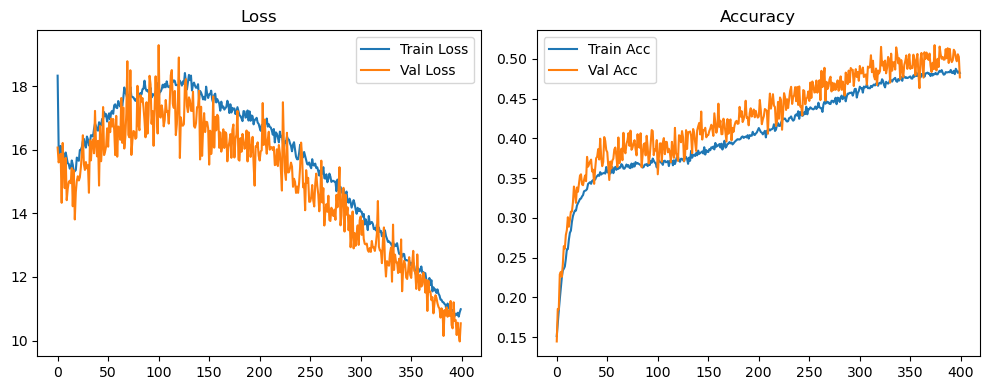

Original Model Final Test Loss: 10.8194 Accuracy: 0.4734




🚀 Running: batch128_lr_max_0.0005_min_1e-06_dp0.05


Files already downloaded and verified


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|                                                                                                                                                                        | 0/400 [00:00<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.1454 | Val Acc: 0.2272 | Epoch Time: 1.87 | :   0%|                                                                                                      | 0/400 [01:52<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.1454 | Val Acc: 0.2272 | Epoch Time: 1.87 | :   0%|                                                                                                      | 0/400 [01:52<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.1454 | Val Acc: 0.2272 | Epoch Time: 1.87 | :   0%|▏                                                                                         | 1/400 [01:52<12:27:19, 112.38s/it]

| LR: 0.000500 | Train Acc: 0.1804 | Val Acc: 0.2158 | Epoch Time: 1.87 | :   0%|▏                                                                                         | 1/400 [03:44<12:27:19, 112.38s/it]

| LR: 0.000500 | Train Acc: 0.1804 | Val Acc: 0.2158 | Epoch Time: 1.87 | :   0%|▏                                                                                         | 1/400 [03:44<12:27:19, 112.38s/it]

| LR: 0.000500 | Train Acc: 0.1804 | Val Acc: 0.2158 | Epoch Time: 1.87 | :   0%|▍                                                                                         | 2/400 [03:44<12:24:05, 112.17s/it]

| LR: 0.000500 | Train Acc: 0.1941 | Val Acc: 0.2229 | Epoch Time: 1.87 | :   0%|▍                                                                                         | 2/400 [05:36<12:24:05, 112.17s/it]

| LR: 0.000500 | Train Acc: 0.1941 | Val Acc: 0.2229 | Epoch Time: 1.87 | :   0%|▍                                                                                         | 2/400 [05:36<12:24:05, 112.17s/it]

| LR: 0.000500 | Train Acc: 0.1941 | Val Acc: 0.2229 | Epoch Time: 1.87 | :   1%|▋                                                                                         | 3/400 [05:36<12:21:47, 112.11s/it]

| LR: 0.000500 | Train Acc: 0.2027 | Val Acc: 0.2256 | Epoch Time: 1.87 | :   1%|▋                                                                                         | 3/400 [07:28<12:21:47, 112.11s/it]

| LR: 0.000500 | Train Acc: 0.2027 | Val Acc: 0.2256 | Epoch Time: 1.87 | :   1%|▋                                                                                         | 3/400 [07:28<12:21:47, 112.11s/it]

| LR: 0.000500 | Train Acc: 0.2027 | Val Acc: 0.2256 | Epoch Time: 1.87 | :   1%|▉                                                                                         | 4/400 [07:28<12:19:45, 112.08s/it]

| LR: 0.000500 | Train Acc: 0.2126 | Val Acc: 0.2681 | Epoch Time: 1.87 | :   1%|▉                                                                                         | 4/400 [09:20<12:19:45, 112.08s/it]

| LR: 0.000500 | Train Acc: 0.2126 | Val Acc: 0.2681 | Epoch Time: 1.87 | :   1%|▉                                                                                         | 4/400 [09:20<12:19:45, 112.08s/it]

| LR: 0.000500 | Train Acc: 0.2126 | Val Acc: 0.2681 | Epoch Time: 1.87 | :   1%|█▏                                                                                        | 5/400 [09:20<12:17:45, 112.06s/it]

| LR: 0.000500 | Train Acc: 0.2235 | Val Acc: 0.2817 | Epoch Time: 1.87 | :   1%|█▏                                                                                        | 5/400 [11:12<12:17:45, 112.06s/it]

| LR: 0.000500 | Train Acc: 0.2235 | Val Acc: 0.2817 | Epoch Time: 1.87 | :   1%|█▏                                                                                        | 5/400 [11:12<12:17:45, 112.06s/it]

| LR: 0.000500 | Train Acc: 0.2235 | Val Acc: 0.2817 | Epoch Time: 1.87 | :   2%|█▎                                                                                        | 6/400 [11:12<12:15:47, 112.05s/it]

| LR: 0.000500 | Train Acc: 0.2323 | Val Acc: 0.2849 | Epoch Time: 1.86 | :   2%|█▎                                                                                        | 6/400 [13:04<12:15:47, 112.05s/it]

| LR: 0.000500 | Train Acc: 0.2323 | Val Acc: 0.2849 | Epoch Time: 1.86 | :   2%|█▎                                                                                        | 6/400 [13:04<12:15:47, 112.05s/it]

| LR: 0.000500 | Train Acc: 0.2323 | Val Acc: 0.2849 | Epoch Time: 1.86 | :   2%|█▌                                                                                        | 7/400 [13:04<12:13:50, 112.04s/it]

| LR: 0.000500 | Train Acc: 0.2372 | Val Acc: 0.2518 | Epoch Time: 1.87 | :   2%|█▌                                                                                        | 7/400 [14:56<12:13:50, 112.04s/it]

| LR: 0.000500 | Train Acc: 0.2372 | Val Acc: 0.2518 | Epoch Time: 1.87 | :   2%|█▌                                                                                        | 7/400 [14:56<12:13:50, 112.04s/it]

| LR: 0.000500 | Train Acc: 0.2372 | Val Acc: 0.2518 | Epoch Time: 1.87 | :   2%|█▊                                                                                        | 8/400 [14:56<12:11:57, 112.03s/it]

| LR: 0.000500 | Train Acc: 0.2434 | Val Acc: 0.2624 | Epoch Time: 1.87 | :   2%|█▊                                                                                        | 8/400 [16:48<12:11:57, 112.03s/it]

| LR: 0.000500 | Train Acc: 0.2434 | Val Acc: 0.2624 | Epoch Time: 1.87 | :   2%|█▊                                                                                        | 8/400 [16:48<12:11:57, 112.03s/it]

| LR: 0.000500 | Train Acc: 0.2434 | Val Acc: 0.2624 | Epoch Time: 1.87 | :   2%|██                                                                                        | 9/400 [16:48<12:10:04, 112.03s/it]

| LR: 0.000499 | Train Acc: 0.2447 | Val Acc: 0.2699 | Epoch Time: 1.86 | :   2%|██                                                                                        | 9/400 [18:40<12:10:04, 112.03s/it]

| LR: 0.000499 | Train Acc: 0.2447 | Val Acc: 0.2699 | Epoch Time: 1.86 | :   2%|██                                                                                        | 9/400 [18:40<12:10:04, 112.03s/it]

| LR: 0.000499 | Train Acc: 0.2447 | Val Acc: 0.2699 | Epoch Time: 1.86 | :   2%|██▏                                                                                      | 10/400 [18:40<12:08:09, 112.02s/it]

| LR: 0.000499 | Train Acc: 0.2558 | Val Acc: 0.2786 | Epoch Time: 1.86 | :   2%|██▏                                                                                      | 10/400 [20:32<12:08:09, 112.02s/it]

| LR: 0.000499 | Train Acc: 0.2558 | Val Acc: 0.2786 | Epoch Time: 1.86 | :   2%|██▏                                                                                      | 10/400 [20:32<12:08:09, 112.02s/it]

| LR: 0.000499 | Train Acc: 0.2558 | Val Acc: 0.2786 | Epoch Time: 1.86 | :   3%|██▍                                                                                      | 11/400 [20:32<12:06:14, 112.02s/it]

| LR: 0.000499 | Train Acc: 0.2575 | Val Acc: 0.2758 | Epoch Time: 1.86 | :   3%|██▍                                                                                      | 11/400 [22:24<12:06:14, 112.02s/it]

| LR: 0.000499 | Train Acc: 0.2575 | Val Acc: 0.2758 | Epoch Time: 1.86 | :   3%|██▍                                                                                      | 11/400 [22:24<12:06:14, 112.02s/it]

| LR: 0.000499 | Train Acc: 0.2575 | Val Acc: 0.2758 | Epoch Time: 1.86 | :   3%|██▋                                                                                      | 12/400 [22:24<12:04:22, 112.02s/it]

| LR: 0.000499 | Train Acc: 0.2666 | Val Acc: 0.2963 | Epoch Time: 1.86 | :   3%|██▋                                                                                      | 12/400 [24:16<12:04:22, 112.02s/it]

| LR: 0.000499 | Train Acc: 0.2666 | Val Acc: 0.2963 | Epoch Time: 1.86 | :   3%|██▋                                                                                      | 12/400 [24:16<12:04:22, 112.02s/it]

| LR: 0.000499 | Train Acc: 0.2666 | Val Acc: 0.2963 | Epoch Time: 1.86 | :   3%|██▉                                                                                      | 13/400 [24:16<12:02:28, 112.01s/it]

| LR: 0.000499 | Train Acc: 0.2680 | Val Acc: 0.3022 | Epoch Time: 1.87 | :   3%|██▉                                                                                      | 13/400 [26:08<12:02:28, 112.01s/it]

| LR: 0.000499 | Train Acc: 0.2680 | Val Acc: 0.3022 | Epoch Time: 1.87 | :   3%|██▉                                                                                      | 13/400 [26:08<12:02:28, 112.01s/it]

| LR: 0.000499 | Train Acc: 0.2680 | Val Acc: 0.3022 | Epoch Time: 1.87 | :   4%|███                                                                                      | 14/400 [26:08<12:00:38, 112.02s/it]

| LR: 0.000498 | Train Acc: 0.2770 | Val Acc: 0.3041 | Epoch Time: 1.87 | :   4%|███                                                                                      | 14/400 [28:00<12:00:38, 112.02s/it]

| LR: 0.000498 | Train Acc: 0.2770 | Val Acc: 0.3041 | Epoch Time: 1.87 | :   4%|███                                                                                      | 14/400 [28:00<12:00:38, 112.02s/it]

| LR: 0.000498 | Train Acc: 0.2770 | Val Acc: 0.3041 | Epoch Time: 1.87 | :   4%|███▎                                                                                     | 15/400 [28:00<11:58:46, 112.02s/it]

| LR: 0.000498 | Train Acc: 0.2808 | Val Acc: 0.3190 | Epoch Time: 1.87 | :   4%|███▎                                                                                     | 15/400 [29:52<11:58:46, 112.02s/it]

| LR: 0.000498 | Train Acc: 0.2808 | Val Acc: 0.3190 | Epoch Time: 1.87 | :   4%|███▎                                                                                     | 15/400 [29:52<11:58:46, 112.02s/it]

| LR: 0.000498 | Train Acc: 0.2808 | Val Acc: 0.3190 | Epoch Time: 1.87 | :   4%|███▌                                                                                     | 16/400 [29:52<11:56:55, 112.02s/it]

| LR: 0.000498 | Train Acc: 0.2837 | Val Acc: 0.3117 | Epoch Time: 1.87 | :   4%|███▌                                                                                     | 16/400 [31:44<11:56:55, 112.02s/it]

| LR: 0.000498 | Train Acc: 0.2837 | Val Acc: 0.3117 | Epoch Time: 1.87 | :   4%|███▌                                                                                     | 16/400 [31:44<11:56:55, 112.02s/it]

| LR: 0.000498 | Train Acc: 0.2837 | Val Acc: 0.3117 | Epoch Time: 1.87 | :   4%|███▊                                                                                     | 17/400 [31:44<11:55:05, 112.02s/it]

| LR: 0.000498 | Train Acc: 0.2914 | Val Acc: 0.2859 | Epoch Time: 1.87 | :   4%|███▊                                                                                     | 17/400 [33:36<11:55:05, 112.02s/it]

| LR: 0.000498 | Train Acc: 0.2914 | Val Acc: 0.2859 | Epoch Time: 1.87 | :   4%|███▊                                                                                     | 17/400 [33:36<11:55:05, 112.02s/it]

| LR: 0.000498 | Train Acc: 0.2914 | Val Acc: 0.2859 | Epoch Time: 1.87 | :   4%|████                                                                                     | 18/400 [33:36<11:53:14, 112.03s/it]

| LR: 0.000498 | Train Acc: 0.2904 | Val Acc: 0.3176 | Epoch Time: 1.86 | :   4%|████                                                                                     | 18/400 [35:28<11:53:14, 112.03s/it]

| LR: 0.000498 | Train Acc: 0.2904 | Val Acc: 0.3176 | Epoch Time: 1.86 | :   4%|████                                                                                     | 18/400 [35:28<11:53:14, 112.03s/it]

| LR: 0.000498 | Train Acc: 0.2904 | Val Acc: 0.3176 | Epoch Time: 1.86 | :   5%|████▏                                                                                    | 19/400 [35:28<11:51:17, 112.02s/it]

| LR: 0.000497 | Train Acc: 0.2919 | Val Acc: 0.3175 | Epoch Time: 1.86 | :   5%|████▏                                                                                    | 19/400 [37:20<11:51:17, 112.02s/it]

| LR: 0.000497 | Train Acc: 0.2919 | Val Acc: 0.3175 | Epoch Time: 1.86 | :   5%|████▏                                                                                    | 19/400 [37:20<11:51:17, 112.02s/it]

| LR: 0.000497 | Train Acc: 0.2919 | Val Acc: 0.3175 | Epoch Time: 1.86 | :   5%|████▍                                                                                    | 20/400 [37:20<11:49:19, 112.00s/it]

| LR: 0.000497 | Train Acc: 0.2985 | Val Acc: 0.3216 | Epoch Time: 1.86 | :   5%|████▍                                                                                    | 20/400 [39:12<11:49:19, 112.00s/it]

| LR: 0.000497 | Train Acc: 0.2985 | Val Acc: 0.3216 | Epoch Time: 1.86 | :   5%|████▍                                                                                    | 20/400 [39:12<11:49:19, 112.00s/it]

| LR: 0.000497 | Train Acc: 0.2985 | Val Acc: 0.3216 | Epoch Time: 1.86 | :   5%|████▋                                                                                    | 21/400 [39:12<11:47:18, 111.97s/it]

| LR: 0.000497 | Train Acc: 0.2926 | Val Acc: 0.3194 | Epoch Time: 1.86 | :   5%|████▋                                                                                    | 21/400 [41:04<11:47:18, 111.97s/it]

| LR: 0.000497 | Train Acc: 0.2926 | Val Acc: 0.3194 | Epoch Time: 1.86 | :   5%|████▋                                                                                    | 21/400 [41:04<11:47:18, 111.97s/it]

| LR: 0.000497 | Train Acc: 0.2926 | Val Acc: 0.3194 | Epoch Time: 1.86 | :   6%|████▉                                                                                    | 22/400 [41:04<11:45:22, 111.97s/it]

| LR: 0.000496 | Train Acc: 0.2980 | Val Acc: 0.3223 | Epoch Time: 1.86 | :   6%|████▉                                                                                    | 22/400 [42:56<11:45:22, 111.97s/it]

| LR: 0.000496 | Train Acc: 0.2980 | Val Acc: 0.3223 | Epoch Time: 1.86 | :   6%|████▉                                                                                    | 22/400 [42:56<11:45:22, 111.97s/it]

| LR: 0.000496 | Train Acc: 0.2980 | Val Acc: 0.3223 | Epoch Time: 1.86 | :   6%|█████                                                                                    | 23/400 [42:56<11:43:24, 111.95s/it]

| LR: 0.000496 | Train Acc: 0.3054 | Val Acc: 0.3387 | Epoch Time: 1.86 | :   6%|█████                                                                                    | 23/400 [44:48<11:43:24, 111.95s/it]

| LR: 0.000496 | Train Acc: 0.3054 | Val Acc: 0.3387 | Epoch Time: 1.86 | :   6%|█████                                                                                    | 23/400 [44:48<11:43:24, 111.95s/it]

| LR: 0.000496 | Train Acc: 0.3054 | Val Acc: 0.3387 | Epoch Time: 1.86 | :   6%|█████▎                                                                                   | 24/400 [44:48<11:41:30, 111.94s/it]

| LR: 0.000496 | Train Acc: 0.3024 | Val Acc: 0.3569 | Epoch Time: 1.86 | :   6%|█████▎                                                                                   | 24/400 [46:40<11:41:30, 111.94s/it]

| LR: 0.000496 | Train Acc: 0.3024 | Val Acc: 0.3569 | Epoch Time: 1.86 | :   6%|█████▎                                                                                   | 24/400 [46:40<11:41:30, 111.94s/it]

| LR: 0.000496 | Train Acc: 0.3024 | Val Acc: 0.3569 | Epoch Time: 1.86 | :   6%|█████▌                                                                                   | 25/400 [46:40<11:39:36, 111.94s/it]

| LR: 0.000495 | Train Acc: 0.3063 | Val Acc: 0.3493 | Epoch Time: 1.86 | :   6%|█████▌                                                                                   | 25/400 [48:32<11:39:36, 111.94s/it]

| LR: 0.000495 | Train Acc: 0.3063 | Val Acc: 0.3493 | Epoch Time: 1.86 | :   6%|█████▌                                                                                   | 25/400 [48:32<11:39:36, 111.94s/it]

| LR: 0.000495 | Train Acc: 0.3063 | Val Acc: 0.3493 | Epoch Time: 1.86 | :   6%|█████▊                                                                                   | 26/400 [48:32<11:37:43, 111.93s/it]

| LR: 0.000495 | Train Acc: 0.3119 | Val Acc: 0.3474 | Epoch Time: 1.86 | :   6%|█████▊                                                                                   | 26/400 [50:24<11:37:43, 111.93s/it]

| LR: 0.000495 | Train Acc: 0.3119 | Val Acc: 0.3474 | Epoch Time: 1.86 | :   6%|█████▊                                                                                   | 26/400 [50:24<11:37:43, 111.93s/it]

| LR: 0.000495 | Train Acc: 0.3119 | Val Acc: 0.3474 | Epoch Time: 1.86 | :   7%|██████                                                                                   | 27/400 [50:24<11:35:49, 111.93s/it]

| LR: 0.000494 | Train Acc: 0.3135 | Val Acc: 0.3454 | Epoch Time: 1.86 | :   7%|██████                                                                                   | 27/400 [52:15<11:35:49, 111.93s/it]

| LR: 0.000494 | Train Acc: 0.3135 | Val Acc: 0.3454 | Epoch Time: 1.86 | :   7%|██████                                                                                   | 27/400 [52:15<11:35:49, 111.93s/it]

| LR: 0.000494 | Train Acc: 0.3135 | Val Acc: 0.3454 | Epoch Time: 1.86 | :   7%|██████▏                                                                                  | 28/400 [52:16<11:33:57, 111.93s/it]

| LR: 0.000494 | Train Acc: 0.3097 | Val Acc: 0.3264 | Epoch Time: 1.86 | :   7%|██████▏                                                                                  | 28/400 [54:07<11:33:57, 111.93s/it]

| LR: 0.000494 | Train Acc: 0.3097 | Val Acc: 0.3264 | Epoch Time: 1.86 | :   7%|██████▏                                                                                  | 28/400 [54:07<11:33:57, 111.93s/it]

| LR: 0.000494 | Train Acc: 0.3097 | Val Acc: 0.3264 | Epoch Time: 1.86 | :   7%|██████▍                                                                                  | 29/400 [54:08<11:32:05, 111.93s/it]

| LR: 0.000494 | Train Acc: 0.3113 | Val Acc: 0.3261 | Epoch Time: 1.86 | :   7%|██████▍                                                                                  | 29/400 [55:59<11:32:05, 111.93s/it]

| LR: 0.000494 | Train Acc: 0.3113 | Val Acc: 0.3261 | Epoch Time: 1.86 | :   7%|██████▍                                                                                  | 29/400 [55:59<11:32:05, 111.93s/it]

| LR: 0.000494 | Train Acc: 0.3113 | Val Acc: 0.3261 | Epoch Time: 1.86 | :   8%|██████▋                                                                                  | 30/400 [55:59<11:30:12, 111.93s/it]

| LR: 0.000493 | Train Acc: 0.3112 | Val Acc: 0.3449 | Epoch Time: 1.86 | :   8%|██████▋                                                                                  | 30/400 [57:51<11:30:12, 111.93s/it]

| LR: 0.000493 | Train Acc: 0.3112 | Val Acc: 0.3449 | Epoch Time: 1.86 | :   8%|██████▋                                                                                  | 30/400 [57:51<11:30:12, 111.93s/it]

| LR: 0.000493 | Train Acc: 0.3112 | Val Acc: 0.3449 | Epoch Time: 1.86 | :   8%|██████▉                                                                                  | 31/400 [57:51<11:28:20, 111.92s/it]

| LR: 0.000493 | Train Acc: 0.3179 | Val Acc: 0.3572 | Epoch Time: 1.86 | :   8%|██████▉                                                                                  | 31/400 [59:43<11:28:20, 111.92s/it]

| LR: 0.000493 | Train Acc: 0.3179 | Val Acc: 0.3572 | Epoch Time: 1.86 | :   8%|██████▉                                                                                  | 31/400 [59:43<11:28:20, 111.92s/it]

| LR: 0.000493 | Train Acc: 0.3179 | Val Acc: 0.3572 | Epoch Time: 1.86 | :   8%|███████                                                                                  | 32/400 [59:43<11:26:29, 111.93s/it]

| LR: 0.000492 | Train Acc: 0.3185 | Val Acc: 0.3566 | Epoch Time: 1.86 | :   8%|██████▉                                                                                | 32/400 [1:01:35<11:26:29, 111.93s/it]

| LR: 0.000492 | Train Acc: 0.3185 | Val Acc: 0.3566 | Epoch Time: 1.86 | :   8%|██████▉                                                                                | 32/400 [1:01:35<11:26:29, 111.93s/it]

| LR: 0.000492 | Train Acc: 0.3185 | Val Acc: 0.3566 | Epoch Time: 1.86 | :   8%|███████▏                                                                               | 33/400 [1:01:35<11:24:40, 111.94s/it]

| LR: 0.000492 | Train Acc: 0.3142 | Val Acc: 0.3468 | Epoch Time: 1.86 | :   8%|███████▏                                                                               | 33/400 [1:03:27<11:24:40, 111.94s/it]

| LR: 0.000492 | Train Acc: 0.3142 | Val Acc: 0.3468 | Epoch Time: 1.86 | :   8%|███████▏                                                                               | 33/400 [1:03:27<11:24:40, 111.94s/it]

| LR: 0.000492 | Train Acc: 0.3142 | Val Acc: 0.3468 | Epoch Time: 1.86 | :   8%|███████▍                                                                               | 34/400 [1:03:27<11:22:48, 111.93s/it]

| LR: 0.000491 | Train Acc: 0.3144 | Val Acc: 0.3574 | Epoch Time: 1.86 | :   8%|███████▍                                                                               | 34/400 [1:05:19<11:22:48, 111.93s/it]

| LR: 0.000491 | Train Acc: 0.3144 | Val Acc: 0.3574 | Epoch Time: 1.86 | :   8%|███████▍                                                                               | 34/400 [1:05:19<11:22:48, 111.93s/it]

| LR: 0.000491 | Train Acc: 0.3144 | Val Acc: 0.3574 | Epoch Time: 1.86 | :   9%|███████▌                                                                               | 35/400 [1:05:19<11:20:55, 111.93s/it]

| LR: 0.000491 | Train Acc: 0.3186 | Val Acc: 0.3664 | Epoch Time: 1.86 | :   9%|███████▌                                                                               | 35/400 [1:07:11<11:20:55, 111.93s/it]

| LR: 0.000491 | Train Acc: 0.3186 | Val Acc: 0.3664 | Epoch Time: 1.86 | :   9%|███████▌                                                                               | 35/400 [1:07:11<11:20:55, 111.93s/it]

| LR: 0.000491 | Train Acc: 0.3186 | Val Acc: 0.3664 | Epoch Time: 1.86 | :   9%|███████▊                                                                               | 36/400 [1:07:11<11:19:03, 111.93s/it]

| LR: 0.000490 | Train Acc: 0.3205 | Val Acc: 0.3565 | Epoch Time: 1.86 | :   9%|███████▊                                                                               | 36/400 [1:09:03<11:19:03, 111.93s/it]

| LR: 0.000490 | Train Acc: 0.3205 | Val Acc: 0.3565 | Epoch Time: 1.86 | :   9%|███████▊                                                                               | 36/400 [1:09:03<11:19:03, 111.93s/it]

| LR: 0.000490 | Train Acc: 0.3205 | Val Acc: 0.3565 | Epoch Time: 1.86 | :   9%|████████                                                                               | 37/400 [1:09:03<11:17:11, 111.93s/it]

| LR: 0.000490 | Train Acc: 0.3175 | Val Acc: 0.3470 | Epoch Time: 1.86 | :   9%|████████                                                                               | 37/400 [1:10:55<11:17:11, 111.93s/it]

| LR: 0.000490 | Train Acc: 0.3175 | Val Acc: 0.3470 | Epoch Time: 1.86 | :   9%|████████                                                                               | 37/400 [1:10:55<11:17:11, 111.93s/it]

| LR: 0.000490 | Train Acc: 0.3175 | Val Acc: 0.3470 | Epoch Time: 1.86 | :  10%|████████▎                                                                              | 38/400 [1:10:55<11:15:20, 111.94s/it]

| LR: 0.000489 | Train Acc: 0.3221 | Val Acc: 0.3828 | Epoch Time: 1.86 | :  10%|████████▎                                                                              | 38/400 [1:12:47<11:15:20, 111.94s/it]

| LR: 0.000489 | Train Acc: 0.3221 | Val Acc: 0.3828 | Epoch Time: 1.86 | :  10%|████████▎                                                                              | 38/400 [1:12:47<11:15:20, 111.94s/it]

| LR: 0.000489 | Train Acc: 0.3221 | Val Acc: 0.3828 | Epoch Time: 1.86 | :  10%|████████▍                                                                              | 39/400 [1:12:47<11:13:28, 111.93s/it]

| LR: 0.000488 | Train Acc: 0.3208 | Val Acc: 0.3658 | Epoch Time: 1.86 | :  10%|████████▍                                                                              | 39/400 [1:14:39<11:13:28, 111.93s/it]

| LR: 0.000488 | Train Acc: 0.3208 | Val Acc: 0.3658 | Epoch Time: 1.86 | :  10%|████████▍                                                                              | 39/400 [1:14:39<11:13:28, 111.93s/it]

| LR: 0.000488 | Train Acc: 0.3208 | Val Acc: 0.3658 | Epoch Time: 1.86 | :  10%|████████▋                                                                              | 40/400 [1:14:39<11:11:37, 111.94s/it]

| LR: 0.000488 | Train Acc: 0.3223 | Val Acc: 0.3329 | Epoch Time: 1.86 | :  10%|████████▋                                                                              | 40/400 [1:16:31<11:11:37, 111.94s/it]

| LR: 0.000488 | Train Acc: 0.3223 | Val Acc: 0.3329 | Epoch Time: 1.86 | :  10%|████████▋                                                                              | 40/400 [1:16:31<11:11:37, 111.94s/it]

| LR: 0.000488 | Train Acc: 0.3223 | Val Acc: 0.3329 | Epoch Time: 1.86 | :  10%|████████▉                                                                              | 41/400 [1:16:31<11:09:44, 111.93s/it]

| LR: 0.000487 | Train Acc: 0.3234 | Val Acc: 0.3437 | Epoch Time: 1.86 | :  10%|████████▉                                                                              | 41/400 [1:18:23<11:09:44, 111.93s/it]

| LR: 0.000487 | Train Acc: 0.3234 | Val Acc: 0.3437 | Epoch Time: 1.86 | :  10%|████████▉                                                                              | 41/400 [1:18:23<11:09:44, 111.93s/it]

| LR: 0.000487 | Train Acc: 0.3234 | Val Acc: 0.3437 | Epoch Time: 1.86 | :  10%|█████████▏                                                                             | 42/400 [1:18:23<11:07:51, 111.93s/it]

| LR: 0.000487 | Train Acc: 0.3249 | Val Acc: 0.3741 | Epoch Time: 1.86 | :  10%|█████████▏                                                                             | 42/400 [1:20:14<11:07:51, 111.93s/it]

| LR: 0.000487 | Train Acc: 0.3249 | Val Acc: 0.3741 | Epoch Time: 1.86 | :  10%|█████████▏                                                                             | 42/400 [1:20:14<11:07:51, 111.93s/it]

| LR: 0.000487 | Train Acc: 0.3249 | Val Acc: 0.3741 | Epoch Time: 1.86 | :  11%|█████████▎                                                                             | 43/400 [1:20:15<11:05:58, 111.93s/it]

| LR: 0.000486 | Train Acc: 0.3229 | Val Acc: 0.3537 | Epoch Time: 1.86 | :  11%|█████████▎                                                                             | 43/400 [1:22:06<11:05:58, 111.93s/it]

| LR: 0.000486 | Train Acc: 0.3229 | Val Acc: 0.3537 | Epoch Time: 1.86 | :  11%|█████████▎                                                                             | 43/400 [1:22:06<11:05:58, 111.93s/it]

| LR: 0.000486 | Train Acc: 0.3229 | Val Acc: 0.3537 | Epoch Time: 1.86 | :  11%|█████████▌                                                                             | 44/400 [1:22:07<11:04:06, 111.93s/it]

| LR: 0.000485 | Train Acc: 0.3284 | Val Acc: 0.3658 | Epoch Time: 1.86 | :  11%|█████████▌                                                                             | 44/400 [1:23:58<11:04:06, 111.93s/it]

| LR: 0.000485 | Train Acc: 0.3284 | Val Acc: 0.3658 | Epoch Time: 1.86 | :  11%|█████████▌                                                                             | 44/400 [1:23:58<11:04:06, 111.93s/it]

| LR: 0.000485 | Train Acc: 0.3284 | Val Acc: 0.3658 | Epoch Time: 1.86 | :  11%|█████████▊                                                                             | 45/400 [1:23:58<11:02:15, 111.93s/it]

| LR: 0.000485 | Train Acc: 0.3251 | Val Acc: 0.3337 | Epoch Time: 1.86 | :  11%|█████████▊                                                                             | 45/400 [1:25:50<11:02:15, 111.93s/it]

| LR: 0.000485 | Train Acc: 0.3251 | Val Acc: 0.3337 | Epoch Time: 1.86 | :  11%|█████████▊                                                                             | 45/400 [1:25:50<11:02:15, 111.93s/it]

| LR: 0.000485 | Train Acc: 0.3251 | Val Acc: 0.3337 | Epoch Time: 1.86 | :  12%|██████████                                                                             | 46/400 [1:25:50<11:00:20, 111.92s/it]

| LR: 0.000484 | Train Acc: 0.3287 | Val Acc: 0.3865 | Epoch Time: 1.86 | :  12%|██████████                                                                             | 46/400 [1:27:42<11:00:20, 111.92s/it]

| LR: 0.000484 | Train Acc: 0.3287 | Val Acc: 0.3865 | Epoch Time: 1.86 | :  12%|██████████                                                                             | 46/400 [1:27:42<11:00:20, 111.92s/it]

| LR: 0.000484 | Train Acc: 0.3287 | Val Acc: 0.3865 | Epoch Time: 1.86 | :  12%|██████████▏                                                                            | 47/400 [1:27:42<10:58:28, 111.92s/it]

| LR: 0.000483 | Train Acc: 0.3301 | Val Acc: 0.3734 | Epoch Time: 1.86 | :  12%|██████████▏                                                                            | 47/400 [1:29:34<10:58:28, 111.92s/it]

| LR: 0.000483 | Train Acc: 0.3301 | Val Acc: 0.3734 | Epoch Time: 1.86 | :  12%|██████████▏                                                                            | 47/400 [1:29:34<10:58:28, 111.92s/it]

| LR: 0.000483 | Train Acc: 0.3301 | Val Acc: 0.3734 | Epoch Time: 1.86 | :  12%|██████████▍                                                                            | 48/400 [1:29:34<10:56:34, 111.91s/it]

| LR: 0.000482 | Train Acc: 0.3261 | Val Acc: 0.3698 | Epoch Time: 1.86 | :  12%|██████████▍                                                                            | 48/400 [1:31:26<10:56:34, 111.91s/it]

| LR: 0.000482 | Train Acc: 0.3261 | Val Acc: 0.3698 | Epoch Time: 1.86 | :  12%|██████████▍                                                                            | 48/400 [1:31:26<10:56:34, 111.91s/it]

| LR: 0.000482 | Train Acc: 0.3261 | Val Acc: 0.3698 | Epoch Time: 1.86 | :  12%|██████████▋                                                                            | 49/400 [1:31:26<10:54:40, 111.91s/it]

| LR: 0.000482 | Train Acc: 0.3315 | Val Acc: 0.3836 | Epoch Time: 1.86 | :  12%|██████████▋                                                                            | 49/400 [1:33:18<10:54:40, 111.91s/it]

| LR: 0.000482 | Train Acc: 0.3315 | Val Acc: 0.3836 | Epoch Time: 1.86 | :  12%|██████████▋                                                                            | 49/400 [1:33:18<10:54:40, 111.91s/it]

| LR: 0.000482 | Train Acc: 0.3315 | Val Acc: 0.3836 | Epoch Time: 1.86 | :  12%|██████████▉                                                                            | 50/400 [1:33:18<10:52:50, 111.91s/it]

| LR: 0.000481 | Train Acc: 0.3295 | Val Acc: 0.3807 | Epoch Time: 1.86 | :  12%|██████████▉                                                                            | 50/400 [1:35:10<10:52:50, 111.91s/it]

| LR: 0.000481 | Train Acc: 0.3295 | Val Acc: 0.3807 | Epoch Time: 1.86 | :  12%|██████████▉                                                                            | 50/400 [1:35:10<10:52:50, 111.91s/it]

| LR: 0.000481 | Train Acc: 0.3295 | Val Acc: 0.3807 | Epoch Time: 1.86 | :  13%|███████████                                                                            | 51/400 [1:35:10<10:51:00, 111.92s/it]

| LR: 0.000480 | Train Acc: 0.3282 | Val Acc: 0.3354 | Epoch Time: 1.86 | :  13%|███████████                                                                            | 51/400 [1:37:02<10:51:00, 111.92s/it]

| LR: 0.000480 | Train Acc: 0.3282 | Val Acc: 0.3354 | Epoch Time: 1.86 | :  13%|███████████                                                                            | 51/400 [1:37:02<10:51:00, 111.92s/it]

| LR: 0.000480 | Train Acc: 0.3282 | Val Acc: 0.3354 | Epoch Time: 1.86 | :  13%|███████████▎                                                                           | 52/400 [1:37:02<10:49:09, 111.92s/it]

| LR: 0.000479 | Train Acc: 0.3291 | Val Acc: 0.3631 | Epoch Time: 1.86 | :  13%|███████████▎                                                                           | 52/400 [1:38:54<10:49:09, 111.92s/it]

| LR: 0.000479 | Train Acc: 0.3291 | Val Acc: 0.3631 | Epoch Time: 1.86 | :  13%|███████████▎                                                                           | 52/400 [1:38:54<10:49:09, 111.92s/it]

| LR: 0.000479 | Train Acc: 0.3291 | Val Acc: 0.3631 | Epoch Time: 1.86 | :  13%|███████████▌                                                                           | 53/400 [1:38:54<10:47:18, 111.93s/it]

| LR: 0.000479 | Train Acc: 0.3326 | Val Acc: 0.3763 | Epoch Time: 1.86 | :  13%|███████████▌                                                                           | 53/400 [1:40:46<10:47:18, 111.93s/it]

| LR: 0.000479 | Train Acc: 0.3326 | Val Acc: 0.3763 | Epoch Time: 1.86 | :  13%|███████████▌                                                                           | 53/400 [1:40:46<10:47:18, 111.93s/it]

| LR: 0.000479 | Train Acc: 0.3326 | Val Acc: 0.3763 | Epoch Time: 1.86 | :  14%|███████████▋                                                                           | 54/400 [1:40:46<10:45:25, 111.92s/it]

| LR: 0.000478 | Train Acc: 0.3315 | Val Acc: 0.3731 | Epoch Time: 1.86 | :  14%|███████████▋                                                                           | 54/400 [1:42:38<10:45:25, 111.92s/it]

| LR: 0.000478 | Train Acc: 0.3315 | Val Acc: 0.3731 | Epoch Time: 1.86 | :  14%|███████████▋                                                                           | 54/400 [1:42:38<10:45:25, 111.92s/it]

| LR: 0.000478 | Train Acc: 0.3315 | Val Acc: 0.3731 | Epoch Time: 1.86 | :  14%|███████████▉                                                                           | 55/400 [1:42:38<10:43:32, 111.92s/it]

| LR: 0.000477 | Train Acc: 0.3334 | Val Acc: 0.3317 | Epoch Time: 1.86 | :  14%|███████████▉                                                                           | 55/400 [1:44:29<10:43:32, 111.92s/it]

| LR: 0.000477 | Train Acc: 0.3334 | Val Acc: 0.3317 | Epoch Time: 1.86 | :  14%|███████████▉                                                                           | 55/400 [1:44:29<10:43:32, 111.92s/it]

| LR: 0.000477 | Train Acc: 0.3334 | Val Acc: 0.3317 | Epoch Time: 1.86 | :  14%|████████████▏                                                                          | 56/400 [1:44:30<10:41:39, 111.92s/it]

| LR: 0.000476 | Train Acc: 0.3283 | Val Acc: 0.3505 | Epoch Time: 1.86 | :  14%|████████████▏                                                                          | 56/400 [1:46:21<10:41:39, 111.92s/it]

| LR: 0.000476 | Train Acc: 0.3283 | Val Acc: 0.3505 | Epoch Time: 1.86 | :  14%|████████████▏                                                                          | 56/400 [1:46:21<10:41:39, 111.92s/it]

| LR: 0.000476 | Train Acc: 0.3283 | Val Acc: 0.3505 | Epoch Time: 1.86 | :  14%|████████████▍                                                                          | 57/400 [1:46:21<10:39:46, 111.91s/it]

| LR: 0.000475 | Train Acc: 0.3272 | Val Acc: 0.3635 | Epoch Time: 1.86 | :  14%|████████████▍                                                                          | 57/400 [1:48:13<10:39:46, 111.91s/it]

| LR: 0.000475 | Train Acc: 0.3272 | Val Acc: 0.3635 | Epoch Time: 1.86 | :  14%|████████████▍                                                                          | 57/400 [1:48:13<10:39:46, 111.91s/it]

| LR: 0.000475 | Train Acc: 0.3272 | Val Acc: 0.3635 | Epoch Time: 1.86 | :  14%|████████████▌                                                                          | 58/400 [1:48:13<10:37:55, 111.92s/it]

| LR: 0.000475 | Train Acc: 0.3303 | Val Acc: 0.3512 | Epoch Time: 1.86 | :  14%|████████████▌                                                                          | 58/400 [1:50:05<10:37:55, 111.92s/it]

| LR: 0.000475 | Train Acc: 0.3303 | Val Acc: 0.3512 | Epoch Time: 1.86 | :  14%|████████████▌                                                                          | 58/400 [1:50:05<10:37:55, 111.92s/it]

| LR: 0.000475 | Train Acc: 0.3303 | Val Acc: 0.3512 | Epoch Time: 1.86 | :  15%|████████████▊                                                                          | 59/400 [1:50:05<10:36:02, 111.91s/it]

| LR: 0.000474 | Train Acc: 0.3316 | Val Acc: 0.3650 | Epoch Time: 1.86 | :  15%|████████████▊                                                                          | 59/400 [1:51:57<10:36:02, 111.91s/it]

| LR: 0.000474 | Train Acc: 0.3316 | Val Acc: 0.3650 | Epoch Time: 1.86 | :  15%|████████████▊                                                                          | 59/400 [1:51:57<10:36:02, 111.91s/it]

| LR: 0.000474 | Train Acc: 0.3316 | Val Acc: 0.3650 | Epoch Time: 1.86 | :  15%|█████████████                                                                          | 60/400 [1:51:57<10:34:12, 111.92s/it]

| LR: 0.000473 | Train Acc: 0.3281 | Val Acc: 0.3767 | Epoch Time: 1.86 | :  15%|█████████████                                                                          | 60/400 [1:53:49<10:34:12, 111.92s/it]

| LR: 0.000473 | Train Acc: 0.3281 | Val Acc: 0.3767 | Epoch Time: 1.86 | :  15%|█████████████                                                                          | 60/400 [1:53:49<10:34:12, 111.92s/it]

| LR: 0.000473 | Train Acc: 0.3281 | Val Acc: 0.3767 | Epoch Time: 1.86 | :  15%|█████████████▎                                                                         | 61/400 [1:53:49<10:32:21, 111.92s/it]

| LR: 0.000472 | Train Acc: 0.3271 | Val Acc: 0.3823 | Epoch Time: 1.86 | :  15%|█████████████▎                                                                         | 61/400 [1:55:41<10:32:21, 111.92s/it]

| LR: 0.000472 | Train Acc: 0.3271 | Val Acc: 0.3823 | Epoch Time: 1.86 | :  15%|█████████████▎                                                                         | 61/400 [1:55:41<10:32:21, 111.92s/it]

| LR: 0.000472 | Train Acc: 0.3271 | Val Acc: 0.3823 | Epoch Time: 1.86 | :  16%|█████████████▍                                                                         | 62/400 [1:55:41<10:30:31, 111.93s/it]

| LR: 0.000471 | Train Acc: 0.3295 | Val Acc: 0.3693 | Epoch Time: 1.86 | :  16%|█████████████▍                                                                         | 62/400 [1:57:33<10:30:31, 111.93s/it]

| LR: 0.000471 | Train Acc: 0.3295 | Val Acc: 0.3693 | Epoch Time: 1.86 | :  16%|█████████████▍                                                                         | 62/400 [1:57:33<10:30:31, 111.93s/it]

| LR: 0.000471 | Train Acc: 0.3295 | Val Acc: 0.3693 | Epoch Time: 1.86 | :  16%|█████████████▋                                                                         | 63/400 [1:57:33<10:28:41, 111.93s/it]

| LR: 0.000470 | Train Acc: 0.3274 | Val Acc: 0.3647 | Epoch Time: 1.86 | :  16%|█████████████▋                                                                         | 63/400 [1:59:25<10:28:41, 111.93s/it]

| LR: 0.000470 | Train Acc: 0.3274 | Val Acc: 0.3647 | Epoch Time: 1.86 | :  16%|█████████████▋                                                                         | 63/400 [1:59:25<10:28:41, 111.93s/it]

| LR: 0.000470 | Train Acc: 0.3274 | Val Acc: 0.3647 | Epoch Time: 1.86 | :  16%|█████████████▉                                                                         | 64/400 [1:59:25<10:26:49, 111.93s/it]

| LR: 0.000469 | Train Acc: 0.3288 | Val Acc: 0.3643 | Epoch Time: 1.86 | :  16%|█████████████▉                                                                         | 64/400 [2:01:17<10:26:49, 111.93s/it]

| LR: 0.000469 | Train Acc: 0.3288 | Val Acc: 0.3643 | Epoch Time: 1.86 | :  16%|█████████████▉                                                                         | 64/400 [2:01:17<10:26:49, 111.93s/it]

| LR: 0.000469 | Train Acc: 0.3288 | Val Acc: 0.3643 | Epoch Time: 1.86 | :  16%|██████████████▏                                                                        | 65/400 [2:01:17<10:24:58, 111.94s/it]

| LR: 0.000468 | Train Acc: 0.3295 | Val Acc: 0.3686 | Epoch Time: 1.86 | :  16%|██████████████▏                                                                        | 65/400 [2:03:09<10:24:58, 111.94s/it]

| LR: 0.000468 | Train Acc: 0.3295 | Val Acc: 0.3686 | Epoch Time: 1.86 | :  16%|██████████████▏                                                                        | 65/400 [2:03:09<10:24:58, 111.94s/it]

| LR: 0.000468 | Train Acc: 0.3295 | Val Acc: 0.3686 | Epoch Time: 1.86 | :  16%|██████████████▎                                                                        | 66/400 [2:03:09<10:23:05, 111.93s/it]

| LR: 0.000467 | Train Acc: 0.3338 | Val Acc: 0.3863 | Epoch Time: 1.86 | :  16%|██████████████▎                                                                        | 66/400 [2:05:01<10:23:05, 111.93s/it]

| LR: 0.000467 | Train Acc: 0.3338 | Val Acc: 0.3863 | Epoch Time: 1.86 | :  16%|██████████████▎                                                                        | 66/400 [2:05:01<10:23:05, 111.93s/it]

| LR: 0.000467 | Train Acc: 0.3338 | Val Acc: 0.3863 | Epoch Time: 1.86 | :  17%|██████████████▌                                                                        | 67/400 [2:05:01<10:21:10, 111.92s/it]

| LR: 0.000466 | Train Acc: 0.3310 | Val Acc: 0.3653 | Epoch Time: 1.86 | :  17%|██████████████▌                                                                        | 67/400 [2:06:52<10:21:10, 111.92s/it]

| LR: 0.000466 | Train Acc: 0.3310 | Val Acc: 0.3653 | Epoch Time: 1.86 | :  17%|██████████████▌                                                                        | 67/400 [2:06:52<10:21:10, 111.92s/it]

| LR: 0.000466 | Train Acc: 0.3310 | Val Acc: 0.3653 | Epoch Time: 1.86 | :  17%|██████████████▊                                                                        | 68/400 [2:06:53<10:19:15, 111.91s/it]

| LR: 0.000465 | Train Acc: 0.3343 | Val Acc: 0.3798 | Epoch Time: 1.86 | :  17%|██████████████▊                                                                        | 68/400 [2:08:44<10:19:15, 111.91s/it]

| LR: 0.000465 | Train Acc: 0.3343 | Val Acc: 0.3798 | Epoch Time: 1.86 | :  17%|██████████████▊                                                                        | 68/400 [2:08:44<10:19:15, 111.91s/it]

| LR: 0.000465 | Train Acc: 0.3343 | Val Acc: 0.3798 | Epoch Time: 1.86 | :  17%|███████████████                                                                        | 69/400 [2:08:44<10:17:20, 111.91s/it]

| LR: 0.000464 | Train Acc: 0.3318 | Val Acc: 0.3902 | Epoch Time: 1.86 | :  17%|███████████████                                                                        | 69/400 [2:10:36<10:17:20, 111.91s/it]

| LR: 0.000464 | Train Acc: 0.3318 | Val Acc: 0.3902 | Epoch Time: 1.86 | :  17%|███████████████                                                                        | 69/400 [2:10:36<10:17:20, 111.91s/it]

| LR: 0.000464 | Train Acc: 0.3318 | Val Acc: 0.3902 | Epoch Time: 1.86 | :  18%|███████████████▏                                                                       | 70/400 [2:10:36<10:15:26, 111.90s/it]

| LR: 0.000463 | Train Acc: 0.3342 | Val Acc: 0.3852 | Epoch Time: 1.86 | :  18%|███████████████▏                                                                       | 70/400 [2:12:28<10:15:26, 111.90s/it]

| LR: 0.000463 | Train Acc: 0.3342 | Val Acc: 0.3852 | Epoch Time: 1.86 | :  18%|███████████████▏                                                                       | 70/400 [2:12:28<10:15:26, 111.90s/it]

| LR: 0.000463 | Train Acc: 0.3342 | Val Acc: 0.3852 | Epoch Time: 1.86 | :  18%|███████████████▍                                                                       | 71/400 [2:12:28<10:13:33, 111.90s/it]

| LR: 0.000462 | Train Acc: 0.3304 | Val Acc: 0.3861 | Epoch Time: 1.86 | :  18%|███████████████▍                                                                       | 71/400 [2:14:20<10:13:33, 111.90s/it]

| LR: 0.000462 | Train Acc: 0.3304 | Val Acc: 0.3861 | Epoch Time: 1.86 | :  18%|███████████████▍                                                                       | 71/400 [2:14:20<10:13:33, 111.90s/it]

| LR: 0.000462 | Train Acc: 0.3304 | Val Acc: 0.3861 | Epoch Time: 1.86 | :  18%|███████████████▋                                                                       | 72/400 [2:14:20<10:11:42, 111.90s/it]

| LR: 0.000461 | Train Acc: 0.3338 | Val Acc: 0.3846 | Epoch Time: 1.86 | :  18%|███████████████▋                                                                       | 72/400 [2:16:12<10:11:42, 111.90s/it]

| LR: 0.000461 | Train Acc: 0.3338 | Val Acc: 0.3846 | Epoch Time: 1.86 | :  18%|███████████████▋                                                                       | 72/400 [2:16:12<10:11:42, 111.90s/it]

| LR: 0.000461 | Train Acc: 0.3338 | Val Acc: 0.3846 | Epoch Time: 1.86 | :  18%|███████████████▉                                                                       | 73/400 [2:16:12<10:09:54, 111.91s/it]

| LR: 0.000460 | Train Acc: 0.3337 | Val Acc: 0.3794 | Epoch Time: 1.86 | :  18%|███████████████▉                                                                       | 73/400 [2:18:04<10:09:54, 111.91s/it]

| LR: 0.000460 | Train Acc: 0.3337 | Val Acc: 0.3794 | Epoch Time: 1.86 | :  18%|███████████████▉                                                                       | 73/400 [2:18:04<10:09:54, 111.91s/it]

| LR: 0.000460 | Train Acc: 0.3337 | Val Acc: 0.3794 | Epoch Time: 1.86 | :  18%|████████████████                                                                       | 74/400 [2:18:04<10:08:05, 111.92s/it]

| LR: 0.000459 | Train Acc: 0.3390 | Val Acc: 0.3732 | Epoch Time: 1.86 | :  18%|████████████████                                                                       | 74/400 [2:19:56<10:08:05, 111.92s/it]

| LR: 0.000459 | Train Acc: 0.3390 | Val Acc: 0.3732 | Epoch Time: 1.86 | :  18%|████████████████                                                                       | 74/400 [2:19:56<10:08:05, 111.92s/it]

| LR: 0.000459 | Train Acc: 0.3390 | Val Acc: 0.3732 | Epoch Time: 1.86 | :  19%|████████████████▎                                                                      | 75/400 [2:19:56<10:06:13, 111.92s/it]

| LR: 0.000458 | Train Acc: 0.3339 | Val Acc: 0.3792 | Epoch Time: 1.86 | :  19%|████████████████▎                                                                      | 75/400 [2:21:48<10:06:13, 111.92s/it]

| LR: 0.000458 | Train Acc: 0.3339 | Val Acc: 0.3792 | Epoch Time: 1.86 | :  19%|████████████████▎                                                                      | 75/400 [2:21:48<10:06:13, 111.92s/it]

| LR: 0.000458 | Train Acc: 0.3339 | Val Acc: 0.3792 | Epoch Time: 1.86 | :  19%|████████████████▌                                                                      | 76/400 [2:21:48<10:04:21, 111.92s/it]

| LR: 0.000457 | Train Acc: 0.3349 | Val Acc: 0.3764 | Epoch Time: 1.86 | :  19%|████████████████▌                                                                      | 76/400 [2:23:40<10:04:21, 111.92s/it]

| LR: 0.000457 | Train Acc: 0.3349 | Val Acc: 0.3764 | Epoch Time: 1.86 | :  19%|████████████████▌                                                                      | 76/400 [2:23:40<10:04:21, 111.92s/it]

| LR: 0.000457 | Train Acc: 0.3349 | Val Acc: 0.3764 | Epoch Time: 1.86 | :  19%|████████████████▋                                                                      | 77/400 [2:23:40<10:02:29, 111.92s/it]

| LR: 0.000456 | Train Acc: 0.3361 | Val Acc: 0.3796 | Epoch Time: 1.86 | :  19%|████████████████▋                                                                      | 77/400 [2:25:32<10:02:29, 111.92s/it]

| LR: 0.000456 | Train Acc: 0.3361 | Val Acc: 0.3796 | Epoch Time: 1.86 | :  19%|████████████████▋                                                                      | 77/400 [2:25:32<10:02:29, 111.92s/it]

| LR: 0.000456 | Train Acc: 0.3361 | Val Acc: 0.3796 | Epoch Time: 1.86 | :  20%|████████████████▉                                                                      | 78/400 [2:25:32<10:00:39, 111.92s/it]

| LR: 0.000455 | Train Acc: 0.3397 | Val Acc: 0.3681 | Epoch Time: 1.86 | :  20%|████████████████▉                                                                      | 78/400 [2:27:24<10:00:39, 111.92s/it]

| LR: 0.000455 | Train Acc: 0.3397 | Val Acc: 0.3681 | Epoch Time: 1.86 | :  20%|████████████████▉                                                                      | 78/400 [2:27:24<10:00:39, 111.92s/it]

| LR: 0.000455 | Train Acc: 0.3397 | Val Acc: 0.3681 | Epoch Time: 1.86 | :  20%|█████████████████▍                                                                      | 79/400 [2:27:24<9:58:47, 111.92s/it]

| LR: 0.000453 | Train Acc: 0.3411 | Val Acc: 0.3671 | Epoch Time: 1.86 | :  20%|█████████████████▍                                                                      | 79/400 [2:29:15<9:58:47, 111.92s/it]

| LR: 0.000453 | Train Acc: 0.3411 | Val Acc: 0.3671 | Epoch Time: 1.86 | :  20%|█████████████████▍                                                                      | 79/400 [2:29:15<9:58:47, 111.92s/it]

| LR: 0.000453 | Train Acc: 0.3411 | Val Acc: 0.3671 | Epoch Time: 1.86 | :  20%|█████████████████▌                                                                      | 80/400 [2:29:16<9:56:55, 111.92s/it]

| LR: 0.000452 | Train Acc: 0.3315 | Val Acc: 0.3685 | Epoch Time: 1.86 | :  20%|█████████████████▌                                                                      | 80/400 [2:31:07<9:56:55, 111.92s/it]

| LR: 0.000452 | Train Acc: 0.3315 | Val Acc: 0.3685 | Epoch Time: 1.86 | :  20%|█████████████████▌                                                                      | 80/400 [2:31:07<9:56:55, 111.92s/it]

| LR: 0.000452 | Train Acc: 0.3315 | Val Acc: 0.3685 | Epoch Time: 1.86 | :  20%|█████████████████▊                                                                      | 81/400 [2:31:07<9:55:02, 111.92s/it]

| LR: 0.000451 | Train Acc: 0.3374 | Val Acc: 0.3918 | Epoch Time: 1.86 | :  20%|█████████████████▊                                                                      | 81/400 [2:32:59<9:55:02, 111.92s/it]

| LR: 0.000451 | Train Acc: 0.3374 | Val Acc: 0.3918 | Epoch Time: 1.86 | :  20%|█████████████████▊                                                                      | 81/400 [2:32:59<9:55:02, 111.92s/it]

| LR: 0.000451 | Train Acc: 0.3374 | Val Acc: 0.3918 | Epoch Time: 1.86 | :  20%|██████████████████                                                                      | 82/400 [2:32:59<9:53:10, 111.92s/it]

| LR: 0.000450 | Train Acc: 0.3364 | Val Acc: 0.3911 | Epoch Time: 1.86 | :  20%|██████████████████                                                                      | 82/400 [2:34:51<9:53:10, 111.92s/it]

| LR: 0.000450 | Train Acc: 0.3364 | Val Acc: 0.3911 | Epoch Time: 1.86 | :  20%|██████████████████                                                                      | 82/400 [2:34:51<9:53:10, 111.92s/it]

| LR: 0.000450 | Train Acc: 0.3364 | Val Acc: 0.3911 | Epoch Time: 1.86 | :  21%|██████████████████▎                                                                     | 83/400 [2:34:51<9:51:19, 111.92s/it]

| LR: 0.000449 | Train Acc: 0.3379 | Val Acc: 0.3770 | Epoch Time: 1.86 | :  21%|██████████████████▎                                                                     | 83/400 [2:36:43<9:51:19, 111.92s/it]

| LR: 0.000449 | Train Acc: 0.3379 | Val Acc: 0.3770 | Epoch Time: 1.86 | :  21%|██████████████████▎                                                                     | 83/400 [2:36:43<9:51:19, 111.92s/it]

| LR: 0.000449 | Train Acc: 0.3379 | Val Acc: 0.3770 | Epoch Time: 1.86 | :  21%|██████████████████▍                                                                     | 84/400 [2:36:43<9:49:28, 111.93s/it]

| LR: 0.000448 | Train Acc: 0.3361 | Val Acc: 0.3781 | Epoch Time: 1.86 | :  21%|██████████████████▍                                                                     | 84/400 [2:38:35<9:49:28, 111.93s/it]

| LR: 0.000448 | Train Acc: 0.3361 | Val Acc: 0.3781 | Epoch Time: 1.86 | :  21%|██████████████████▍                                                                     | 84/400 [2:38:35<9:49:28, 111.93s/it]

| LR: 0.000448 | Train Acc: 0.3361 | Val Acc: 0.3781 | Epoch Time: 1.86 | :  21%|██████████████████▋                                                                     | 85/400 [2:38:35<9:47:36, 111.93s/it]

| LR: 0.000446 | Train Acc: 0.3361 | Val Acc: 0.3727 | Epoch Time: 1.86 | :  21%|██████████████████▋                                                                     | 85/400 [2:40:27<9:47:36, 111.93s/it]

| LR: 0.000446 | Train Acc: 0.3361 | Val Acc: 0.3727 | Epoch Time: 1.86 | :  21%|██████████████████▋                                                                     | 85/400 [2:40:27<9:47:36, 111.93s/it]

| LR: 0.000446 | Train Acc: 0.3361 | Val Acc: 0.3727 | Epoch Time: 1.86 | :  22%|██████████████████▉                                                                     | 86/400 [2:40:27<9:45:45, 111.93s/it]

| LR: 0.000445 | Train Acc: 0.3359 | Val Acc: 0.3709 | Epoch Time: 1.86 | :  22%|██████████████████▉                                                                     | 86/400 [2:42:19<9:45:45, 111.93s/it]

| LR: 0.000445 | Train Acc: 0.3359 | Val Acc: 0.3709 | Epoch Time: 1.86 | :  22%|██████████████████▉                                                                     | 86/400 [2:42:19<9:45:45, 111.93s/it]

| LR: 0.000445 | Train Acc: 0.3359 | Val Acc: 0.3709 | Epoch Time: 1.86 | :  22%|███████████████████▏                                                                    | 87/400 [2:42:19<9:43:53, 111.93s/it]

| LR: 0.000444 | Train Acc: 0.3340 | Val Acc: 0.3918 | Epoch Time: 1.86 | :  22%|███████████████████▏                                                                    | 87/400 [2:44:11<9:43:53, 111.93s/it]

| LR: 0.000444 | Train Acc: 0.3340 | Val Acc: 0.3918 | Epoch Time: 1.86 | :  22%|███████████████████▏                                                                    | 87/400 [2:44:11<9:43:53, 111.93s/it]

| LR: 0.000444 | Train Acc: 0.3340 | Val Acc: 0.3918 | Epoch Time: 1.86 | :  22%|███████████████████▎                                                                    | 88/400 [2:44:11<9:42:01, 111.93s/it]

| LR: 0.000443 | Train Acc: 0.3387 | Val Acc: 0.3725 | Epoch Time: 1.86 | :  22%|███████████████████▎                                                                    | 88/400 [2:46:03<9:42:01, 111.93s/it]

| LR: 0.000443 | Train Acc: 0.3387 | Val Acc: 0.3725 | Epoch Time: 1.86 | :  22%|███████████████████▎                                                                    | 88/400 [2:46:03<9:42:01, 111.93s/it]

| LR: 0.000443 | Train Acc: 0.3387 | Val Acc: 0.3725 | Epoch Time: 1.86 | :  22%|███████████████████▌                                                                    | 89/400 [2:46:03<9:40:09, 111.93s/it]

| LR: 0.000441 | Train Acc: 0.3395 | Val Acc: 0.3840 | Epoch Time: 1.86 | :  22%|███████████████████▌                                                                    | 89/400 [2:47:55<9:40:09, 111.93s/it]

| LR: 0.000441 | Train Acc: 0.3395 | Val Acc: 0.3840 | Epoch Time: 1.86 | :  22%|███████████████████▌                                                                    | 89/400 [2:47:55<9:40:09, 111.93s/it]

| LR: 0.000441 | Train Acc: 0.3395 | Val Acc: 0.3840 | Epoch Time: 1.86 | :  22%|███████████████████▊                                                                    | 90/400 [2:47:55<9:38:16, 111.93s/it]

| LR: 0.000440 | Train Acc: 0.3366 | Val Acc: 0.3791 | Epoch Time: 1.86 | :  22%|███████████████████▊                                                                    | 90/400 [2:49:47<9:38:16, 111.93s/it]

| LR: 0.000440 | Train Acc: 0.3366 | Val Acc: 0.3791 | Epoch Time: 1.86 | :  22%|███████████████████▊                                                                    | 90/400 [2:49:47<9:38:16, 111.93s/it]

| LR: 0.000440 | Train Acc: 0.3366 | Val Acc: 0.3791 | Epoch Time: 1.86 | :  23%|████████████████████                                                                    | 91/400 [2:49:47<9:36:25, 111.93s/it]

| LR: 0.000439 | Train Acc: 0.3385 | Val Acc: 0.3887 | Epoch Time: 1.86 | :  23%|████████████████████                                                                    | 91/400 [2:51:39<9:36:25, 111.93s/it]

| LR: 0.000439 | Train Acc: 0.3385 | Val Acc: 0.3887 | Epoch Time: 1.86 | :  23%|████████████████████                                                                    | 91/400 [2:51:39<9:36:25, 111.93s/it]

| LR: 0.000439 | Train Acc: 0.3385 | Val Acc: 0.3887 | Epoch Time: 1.86 | :  23%|████████████████████▏                                                                   | 92/400 [2:51:39<9:34:33, 111.93s/it]

| LR: 0.000438 | Train Acc: 0.3406 | Val Acc: 0.3540 | Epoch Time: 1.86 | :  23%|████████████████████▏                                                                   | 92/400 [2:53:31<9:34:33, 111.93s/it]

| LR: 0.000438 | Train Acc: 0.3406 | Val Acc: 0.3540 | Epoch Time: 1.86 | :  23%|████████████████████▏                                                                   | 92/400 [2:53:31<9:34:33, 111.93s/it]

| LR: 0.000438 | Train Acc: 0.3406 | Val Acc: 0.3540 | Epoch Time: 1.86 | :  23%|████████████████████▍                                                                   | 93/400 [2:53:31<9:32:42, 111.93s/it]

| LR: 0.000436 | Train Acc: 0.3401 | Val Acc: 0.3948 | Epoch Time: 1.86 | :  23%|████████████████████▍                                                                   | 93/400 [2:55:22<9:32:42, 111.93s/it]

| LR: 0.000436 | Train Acc: 0.3401 | Val Acc: 0.3948 | Epoch Time: 1.86 | :  23%|████████████████████▍                                                                   | 93/400 [2:55:22<9:32:42, 111.93s/it]

| LR: 0.000436 | Train Acc: 0.3401 | Val Acc: 0.3948 | Epoch Time: 1.86 | :  24%|████████████████████▋                                                                   | 94/400 [2:55:23<9:30:49, 111.93s/it]

| LR: 0.000435 | Train Acc: 0.3376 | Val Acc: 0.3757 | Epoch Time: 1.86 | :  24%|████████████████████▋                                                                   | 94/400 [2:57:14<9:30:49, 111.93s/it]

| LR: 0.000435 | Train Acc: 0.3376 | Val Acc: 0.3757 | Epoch Time: 1.86 | :  24%|████████████████████▋                                                                   | 94/400 [2:57:14<9:30:49, 111.93s/it]

| LR: 0.000435 | Train Acc: 0.3376 | Val Acc: 0.3757 | Epoch Time: 1.86 | :  24%|████████████████████▉                                                                   | 95/400 [2:57:14<9:28:57, 111.93s/it]

| LR: 0.000434 | Train Acc: 0.3392 | Val Acc: 0.4115 | Epoch Time: 1.86 | :  24%|████████████████████▉                                                                   | 95/400 [2:59:06<9:28:57, 111.93s/it]

| LR: 0.000434 | Train Acc: 0.3392 | Val Acc: 0.4115 | Epoch Time: 1.86 | :  24%|████████████████████▉                                                                   | 95/400 [2:59:06<9:28:57, 111.93s/it]

| LR: 0.000434 | Train Acc: 0.3392 | Val Acc: 0.4115 | Epoch Time: 1.86 | :  24%|█████████████████████                                                                   | 96/400 [2:59:06<9:27:05, 111.93s/it]

| LR: 0.000432 | Train Acc: 0.3456 | Val Acc: 0.4035 | Epoch Time: 1.86 | :  24%|█████████████████████                                                                   | 96/400 [3:00:58<9:27:05, 111.93s/it]

| LR: 0.000432 | Train Acc: 0.3456 | Val Acc: 0.4035 | Epoch Time: 1.86 | :  24%|█████████████████████                                                                   | 96/400 [3:00:58<9:27:05, 111.93s/it]

| LR: 0.000432 | Train Acc: 0.3456 | Val Acc: 0.4035 | Epoch Time: 1.86 | :  24%|█████████████████████▎                                                                  | 97/400 [3:00:58<9:25:13, 111.92s/it]

| LR: 0.000431 | Train Acc: 0.3407 | Val Acc: 0.3775 | Epoch Time: 1.86 | :  24%|█████████████████████▎                                                                  | 97/400 [3:02:50<9:25:13, 111.92s/it]

| LR: 0.000431 | Train Acc: 0.3407 | Val Acc: 0.3775 | Epoch Time: 1.86 | :  24%|█████████████████████▎                                                                  | 97/400 [3:02:50<9:25:13, 111.92s/it]

| LR: 0.000431 | Train Acc: 0.3407 | Val Acc: 0.3775 | Epoch Time: 1.86 | :  24%|█████████████████████▌                                                                  | 98/400 [3:02:50<9:23:20, 111.92s/it]

| LR: 0.000430 | Train Acc: 0.3383 | Val Acc: 0.3758 | Epoch Time: 1.86 | :  24%|█████████████████████▌                                                                  | 98/400 [3:04:42<9:23:20, 111.92s/it]

| LR: 0.000430 | Train Acc: 0.3383 | Val Acc: 0.3758 | Epoch Time: 1.86 | :  24%|█████████████████████▌                                                                  | 98/400 [3:04:42<9:23:20, 111.92s/it]

| LR: 0.000430 | Train Acc: 0.3383 | Val Acc: 0.3758 | Epoch Time: 1.86 | :  25%|█████████████████████▊                                                                  | 99/400 [3:04:42<9:21:28, 111.92s/it]

| LR: 0.000428 | Train Acc: 0.3390 | Val Acc: 0.3908 | Epoch Time: 1.86 | :  25%|█████████████████████▊                                                                  | 99/400 [3:06:34<9:21:28, 111.92s/it]

| LR: 0.000428 | Train Acc: 0.3390 | Val Acc: 0.3908 | Epoch Time: 1.86 | :  25%|█████████████████████▊                                                                  | 99/400 [3:06:34<9:21:28, 111.92s/it]

| LR: 0.000428 | Train Acc: 0.3390 | Val Acc: 0.3908 | Epoch Time: 1.86 | :  25%|█████████████████████▊                                                                 | 100/400 [3:06:34<9:19:36, 111.92s/it]

| LR: 0.000427 | Train Acc: 0.3407 | Val Acc: 0.3810 | Epoch Time: 1.86 | :  25%|█████████████████████▊                                                                 | 100/400 [3:08:26<9:19:36, 111.92s/it]

| LR: 0.000427 | Train Acc: 0.3407 | Val Acc: 0.3810 | Epoch Time: 1.86 | :  25%|█████████████████████▊                                                                 | 100/400 [3:08:26<9:19:36, 111.92s/it]

| LR: 0.000427 | Train Acc: 0.3407 | Val Acc: 0.3810 | Epoch Time: 1.86 | :  25%|█████████████████████▉                                                                 | 101/400 [3:08:26<9:17:45, 111.92s/it]

| LR: 0.000426 | Train Acc: 0.3427 | Val Acc: 0.3889 | Epoch Time: 1.86 | :  25%|█████████████████████▉                                                                 | 101/400 [3:10:18<9:17:45, 111.92s/it]

| LR: 0.000426 | Train Acc: 0.3427 | Val Acc: 0.3889 | Epoch Time: 1.86 | :  25%|█████████████████████▉                                                                 | 101/400 [3:10:18<9:17:45, 111.92s/it]

| LR: 0.000426 | Train Acc: 0.3427 | Val Acc: 0.3889 | Epoch Time: 1.86 | :  26%|██████████████████████▏                                                                | 102/400 [3:10:18<9:15:53, 111.92s/it]

| LR: 0.000424 | Train Acc: 0.3437 | Val Acc: 0.3927 | Epoch Time: 1.86 | :  26%|██████████████████████▏                                                                | 102/400 [3:12:10<9:15:53, 111.92s/it]

| LR: 0.000424 | Train Acc: 0.3437 | Val Acc: 0.3927 | Epoch Time: 1.86 | :  26%|██████████████████████▏                                                                | 102/400 [3:12:10<9:15:53, 111.92s/it]

| LR: 0.000424 | Train Acc: 0.3437 | Val Acc: 0.3927 | Epoch Time: 1.86 | :  26%|██████████████████████▍                                                                | 103/400 [3:12:10<9:14:03, 111.93s/it]

| LR: 0.000423 | Train Acc: 0.3458 | Val Acc: 0.3633 | Epoch Time: 1.86 | :  26%|██████████████████████▍                                                                | 103/400 [3:14:02<9:14:03, 111.93s/it]

| LR: 0.000423 | Train Acc: 0.3458 | Val Acc: 0.3633 | Epoch Time: 1.86 | :  26%|██████████████████████▍                                                                | 103/400 [3:14:02<9:14:03, 111.93s/it]

| LR: 0.000423 | Train Acc: 0.3458 | Val Acc: 0.3633 | Epoch Time: 1.86 | :  26%|██████████████████████▌                                                                | 104/400 [3:14:02<9:12:12, 111.94s/it]

| LR: 0.000421 | Train Acc: 0.3454 | Val Acc: 0.3623 | Epoch Time: 1.86 | :  26%|██████████████████████▌                                                                | 104/400 [3:15:54<9:12:12, 111.94s/it]

| LR: 0.000421 | Train Acc: 0.3454 | Val Acc: 0.3623 | Epoch Time: 1.86 | :  26%|██████████████████████▌                                                                | 104/400 [3:15:54<9:12:12, 111.94s/it]

| LR: 0.000421 | Train Acc: 0.3454 | Val Acc: 0.3623 | Epoch Time: 1.86 | :  26%|██████████████████████▊                                                                | 105/400 [3:15:54<9:10:21, 111.94s/it]

| LR: 0.000420 | Train Acc: 0.3408 | Val Acc: 0.3868 | Epoch Time: 1.86 | :  26%|██████████████████████▊                                                                | 105/400 [3:17:46<9:10:21, 111.94s/it]

| LR: 0.000420 | Train Acc: 0.3408 | Val Acc: 0.3868 | Epoch Time: 1.86 | :  26%|██████████████████████▊                                                                | 105/400 [3:17:46<9:10:21, 111.94s/it]

| LR: 0.000420 | Train Acc: 0.3408 | Val Acc: 0.3868 | Epoch Time: 1.86 | :  26%|███████████████████████                                                                | 106/400 [3:17:46<9:08:29, 111.94s/it]

| LR: 0.000418 | Train Acc: 0.3473 | Val Acc: 0.3910 | Epoch Time: 1.86 | :  26%|███████████████████████                                                                | 106/400 [3:19:38<9:08:29, 111.94s/it]

| LR: 0.000418 | Train Acc: 0.3473 | Val Acc: 0.3910 | Epoch Time: 1.86 | :  26%|███████████████████████                                                                | 106/400 [3:19:38<9:08:29, 111.94s/it]

| LR: 0.000418 | Train Acc: 0.3473 | Val Acc: 0.3910 | Epoch Time: 1.86 | :  27%|███████████████████████▎                                                               | 107/400 [3:19:38<9:06:36, 111.93s/it]

| LR: 0.000417 | Train Acc: 0.3445 | Val Acc: 0.3876 | Epoch Time: 1.86 | :  27%|███████████████████████▎                                                               | 107/400 [3:21:29<9:06:36, 111.93s/it]

| LR: 0.000417 | Train Acc: 0.3445 | Val Acc: 0.3876 | Epoch Time: 1.86 | :  27%|███████████████████████▎                                                               | 107/400 [3:21:29<9:06:36, 111.93s/it]

| LR: 0.000417 | Train Acc: 0.3445 | Val Acc: 0.3876 | Epoch Time: 1.86 | :  27%|███████████████████████▍                                                               | 108/400 [3:21:30<9:04:43, 111.93s/it]

| LR: 0.000415 | Train Acc: 0.3421 | Val Acc: 0.4036 | Epoch Time: 1.86 | :  27%|███████████████████████▍                                                               | 108/400 [3:23:21<9:04:43, 111.93s/it]

| LR: 0.000415 | Train Acc: 0.3421 | Val Acc: 0.4036 | Epoch Time: 1.86 | :  27%|███████████████████████▍                                                               | 108/400 [3:23:21<9:04:43, 111.93s/it]

| LR: 0.000415 | Train Acc: 0.3421 | Val Acc: 0.4036 | Epoch Time: 1.86 | :  27%|███████████████████████▋                                                               | 109/400 [3:23:22<9:02:55, 111.94s/it]

| LR: 0.000414 | Train Acc: 0.3451 | Val Acc: 0.4001 | Epoch Time: 1.86 | :  27%|███████████████████████▋                                                               | 109/400 [3:25:13<9:02:55, 111.94s/it]

| LR: 0.000414 | Train Acc: 0.3451 | Val Acc: 0.4001 | Epoch Time: 1.86 | :  27%|███████████████████████▋                                                               | 109/400 [3:25:13<9:02:55, 111.94s/it]

| LR: 0.000414 | Train Acc: 0.3451 | Val Acc: 0.4001 | Epoch Time: 1.86 | :  28%|███████████████████████▉                                                               | 110/400 [3:25:14<9:01:07, 111.96s/it]

| LR: 0.000413 | Train Acc: 0.3469 | Val Acc: 0.3909 | Epoch Time: 1.86 | :  28%|███████████████████████▉                                                               | 110/400 [3:27:05<9:01:07, 111.96s/it]

| LR: 0.000413 | Train Acc: 0.3469 | Val Acc: 0.3909 | Epoch Time: 1.86 | :  28%|███████████████████████▉                                                               | 110/400 [3:27:05<9:01:07, 111.96s/it]

| LR: 0.000413 | Train Acc: 0.3469 | Val Acc: 0.3909 | Epoch Time: 1.86 | :  28%|████████████████████████▏                                                              | 111/400 [3:27:05<8:59:17, 111.96s/it]

| LR: 0.000411 | Train Acc: 0.3456 | Val Acc: 0.4148 | Epoch Time: 1.86 | :  28%|████████████████████████▏                                                              | 111/400 [3:28:57<8:59:17, 111.96s/it]

| LR: 0.000411 | Train Acc: 0.3456 | Val Acc: 0.4148 | Epoch Time: 1.86 | :  28%|████████████████████████▏                                                              | 111/400 [3:28:57<8:59:17, 111.96s/it]

| LR: 0.000411 | Train Acc: 0.3456 | Val Acc: 0.4148 | Epoch Time: 1.86 | :  28%|████████████████████████▎                                                              | 112/400 [3:28:57<8:57:28, 111.97s/it]

| LR: 0.000410 | Train Acc: 0.3509 | Val Acc: 0.4108 | Epoch Time: 1.86 | :  28%|████████████████████████▎                                                              | 112/400 [3:30:49<8:57:28, 111.97s/it]

| LR: 0.000410 | Train Acc: 0.3509 | Val Acc: 0.4108 | Epoch Time: 1.86 | :  28%|████████████████████████▎                                                              | 112/400 [3:30:49<8:57:28, 111.97s/it]

| LR: 0.000410 | Train Acc: 0.3509 | Val Acc: 0.4108 | Epoch Time: 1.86 | :  28%|████████████████████████▌                                                              | 113/400 [3:30:49<8:55:38, 111.98s/it]

| LR: 0.000408 | Train Acc: 0.3486 | Val Acc: 0.3944 | Epoch Time: 1.86 | :  28%|████████████████████████▌                                                              | 113/400 [3:32:41<8:55:38, 111.98s/it]

| LR: 0.000408 | Train Acc: 0.3486 | Val Acc: 0.3944 | Epoch Time: 1.86 | :  28%|████████████████████████▌                                                              | 113/400 [3:32:41<8:55:38, 111.98s/it]

| LR: 0.000408 | Train Acc: 0.3486 | Val Acc: 0.3944 | Epoch Time: 1.86 | :  28%|████████████████████████▊                                                              | 114/400 [3:32:41<8:53:49, 111.99s/it]

| LR: 0.000406 | Train Acc: 0.3475 | Val Acc: 0.4193 | Epoch Time: 1.86 | :  28%|████████████████████████▊                                                              | 114/400 [3:34:33<8:53:49, 111.99s/it]

| LR: 0.000406 | Train Acc: 0.3475 | Val Acc: 0.4193 | Epoch Time: 1.86 | :  28%|████████████████████████▊                                                              | 114/400 [3:34:33<8:53:49, 111.99s/it]

| LR: 0.000406 | Train Acc: 0.3475 | Val Acc: 0.4193 | Epoch Time: 1.86 | :  29%|█████████████████████████                                                              | 115/400 [3:34:33<8:51:54, 111.98s/it]

| LR: 0.000405 | Train Acc: 0.3508 | Val Acc: 0.3947 | Epoch Time: 1.86 | :  29%|█████████████████████████                                                              | 115/400 [3:36:25<8:51:54, 111.98s/it]

| LR: 0.000405 | Train Acc: 0.3508 | Val Acc: 0.3947 | Epoch Time: 1.86 | :  29%|█████████████████████████                                                              | 115/400 [3:36:25<8:51:54, 111.98s/it]

| LR: 0.000405 | Train Acc: 0.3508 | Val Acc: 0.3947 | Epoch Time: 1.86 | :  29%|█████████████████████████▏                                                             | 116/400 [3:36:25<8:49:59, 111.97s/it]

| LR: 0.000403 | Train Acc: 0.3463 | Val Acc: 0.3936 | Epoch Time: 1.86 | :  29%|█████████████████████████▏                                                             | 116/400 [3:38:17<8:49:59, 111.97s/it]

| LR: 0.000403 | Train Acc: 0.3463 | Val Acc: 0.3936 | Epoch Time: 1.86 | :  29%|█████████████████████████▏                                                             | 116/400 [3:38:17<8:49:59, 111.97s/it]

| LR: 0.000403 | Train Acc: 0.3463 | Val Acc: 0.3936 | Epoch Time: 1.86 | :  29%|█████████████████████████▍                                                             | 117/400 [3:38:17<8:48:05, 111.96s/it]

| LR: 0.000402 | Train Acc: 0.3452 | Val Acc: 0.3830 | Epoch Time: 1.86 | :  29%|█████████████████████████▍                                                             | 117/400 [3:40:09<8:48:05, 111.96s/it]

| LR: 0.000402 | Train Acc: 0.3452 | Val Acc: 0.3830 | Epoch Time: 1.86 | :  29%|█████████████████████████▍                                                             | 117/400 [3:40:09<8:48:05, 111.96s/it]

| LR: 0.000402 | Train Acc: 0.3452 | Val Acc: 0.3830 | Epoch Time: 1.86 | :  30%|█████████████████████████▋                                                             | 118/400 [3:40:09<8:46:11, 111.96s/it]

| LR: 0.000400 | Train Acc: 0.3458 | Val Acc: 0.4184 | Epoch Time: 1.86 | :  30%|█████████████████████████▋                                                             | 118/400 [3:42:01<8:46:11, 111.96s/it]

| LR: 0.000400 | Train Acc: 0.3458 | Val Acc: 0.4184 | Epoch Time: 1.86 | :  30%|█████████████████████████▋                                                             | 118/400 [3:42:01<8:46:11, 111.96s/it]

| LR: 0.000400 | Train Acc: 0.3458 | Val Acc: 0.4184 | Epoch Time: 1.86 | :  30%|█████████████████████████▉                                                             | 119/400 [3:42:01<8:44:20, 111.96s/it]

| LR: 0.000399 | Train Acc: 0.3489 | Val Acc: 0.4014 | Epoch Time: 1.86 | :  30%|█████████████████████████▉                                                             | 119/400 [3:43:53<8:44:20, 111.96s/it]

| LR: 0.000399 | Train Acc: 0.3489 | Val Acc: 0.4014 | Epoch Time: 1.86 | :  30%|█████████████████████████▉                                                             | 119/400 [3:43:53<8:44:20, 111.96s/it]

| LR: 0.000399 | Train Acc: 0.3489 | Val Acc: 0.4014 | Epoch Time: 1.86 | :  30%|██████████████████████████                                                             | 120/400 [3:43:53<8:42:28, 111.96s/it]

| LR: 0.000397 | Train Acc: 0.3479 | Val Acc: 0.3646 | Epoch Time: 1.86 | :  30%|██████████████████████████                                                             | 120/400 [3:45:45<8:42:28, 111.96s/it]

| LR: 0.000397 | Train Acc: 0.3479 | Val Acc: 0.3646 | Epoch Time: 1.86 | :  30%|██████████████████████████                                                             | 120/400 [3:45:45<8:42:28, 111.96s/it]

| LR: 0.000397 | Train Acc: 0.3479 | Val Acc: 0.3646 | Epoch Time: 1.86 | :  30%|██████████████████████████▎                                                            | 121/400 [3:45:45<8:40:35, 111.95s/it]

| LR: 0.000396 | Train Acc: 0.3517 | Val Acc: 0.3981 | Epoch Time: 1.86 | :  30%|██████████████████████████▎                                                            | 121/400 [3:47:37<8:40:35, 111.95s/it]

| LR: 0.000396 | Train Acc: 0.3517 | Val Acc: 0.3981 | Epoch Time: 1.86 | :  30%|██████████████████████████▎                                                            | 121/400 [3:47:37<8:40:35, 111.95s/it]

| LR: 0.000396 | Train Acc: 0.3517 | Val Acc: 0.3981 | Epoch Time: 1.86 | :  30%|██████████████████████████▌                                                            | 122/400 [3:47:37<8:38:42, 111.95s/it]

| LR: 0.000394 | Train Acc: 0.3445 | Val Acc: 0.3720 | Epoch Time: 1.86 | :  30%|██████████████████████████▌                                                            | 122/400 [3:49:29<8:38:42, 111.95s/it]

| LR: 0.000394 | Train Acc: 0.3445 | Val Acc: 0.3720 | Epoch Time: 1.86 | :  30%|██████████████████████████▌                                                            | 122/400 [3:49:29<8:38:42, 111.95s/it]

| LR: 0.000394 | Train Acc: 0.3445 | Val Acc: 0.3720 | Epoch Time: 1.86 | :  31%|██████████████████████████▊                                                            | 123/400 [3:49:29<8:36:53, 111.96s/it]

| LR: 0.000392 | Train Acc: 0.3526 | Val Acc: 0.3926 | Epoch Time: 1.86 | :  31%|██████████████████████████▊                                                            | 123/400 [3:51:21<8:36:53, 111.96s/it]

| LR: 0.000392 | Train Acc: 0.3526 | Val Acc: 0.3926 | Epoch Time: 1.86 | :  31%|██████████████████████████▊                                                            | 123/400 [3:51:21<8:36:53, 111.96s/it]

| LR: 0.000392 | Train Acc: 0.3526 | Val Acc: 0.3926 | Epoch Time: 1.86 | :  31%|██████████████████████████▉                                                            | 124/400 [3:51:21<8:35:00, 111.96s/it]

| LR: 0.000391 | Train Acc: 0.3508 | Val Acc: 0.3852 | Epoch Time: 1.86 | :  31%|██████████████████████████▉                                                            | 124/400 [3:53:13<8:35:00, 111.96s/it]

| LR: 0.000391 | Train Acc: 0.3508 | Val Acc: 0.3852 | Epoch Time: 1.86 | :  31%|██████████████████████████▉                                                            | 124/400 [3:53:13<8:35:00, 111.96s/it]

| LR: 0.000391 | Train Acc: 0.3508 | Val Acc: 0.3852 | Epoch Time: 1.86 | :  31%|███████████████████████████▏                                                           | 125/400 [3:53:13<8:33:06, 111.95s/it]

| LR: 0.000389 | Train Acc: 0.3510 | Val Acc: 0.3929 | Epoch Time: 1.86 | :  31%|███████████████████████████▏                                                           | 125/400 [3:55:05<8:33:06, 111.95s/it]

| LR: 0.000389 | Train Acc: 0.3510 | Val Acc: 0.3929 | Epoch Time: 1.86 | :  31%|███████████████████████████▏                                                           | 125/400 [3:55:05<8:33:06, 111.95s/it]

| LR: 0.000389 | Train Acc: 0.3510 | Val Acc: 0.3929 | Epoch Time: 1.86 | :  32%|███████████████████████████▍                                                           | 126/400 [3:55:05<8:31:14, 111.95s/it]

| LR: 0.000387 | Train Acc: 0.3479 | Val Acc: 0.3904 | Epoch Time: 1.86 | :  32%|███████████████████████████▍                                                           | 126/400 [3:56:57<8:31:14, 111.95s/it]

| LR: 0.000387 | Train Acc: 0.3479 | Val Acc: 0.3904 | Epoch Time: 1.86 | :  32%|███████████████████████████▍                                                           | 126/400 [3:56:57<8:31:14, 111.95s/it]

| LR: 0.000387 | Train Acc: 0.3479 | Val Acc: 0.3904 | Epoch Time: 1.86 | :  32%|███████████████████████████▌                                                           | 127/400 [3:56:57<8:29:21, 111.95s/it]

| LR: 0.000386 | Train Acc: 0.3533 | Val Acc: 0.3934 | Epoch Time: 1.86 | :  32%|███████████████████████████▌                                                           | 127/400 [3:58:49<8:29:21, 111.95s/it]

| LR: 0.000386 | Train Acc: 0.3533 | Val Acc: 0.3934 | Epoch Time: 1.86 | :  32%|███████████████████████████▌                                                           | 127/400 [3:58:49<8:29:21, 111.95s/it]

| LR: 0.000386 | Train Acc: 0.3533 | Val Acc: 0.3934 | Epoch Time: 1.86 | :  32%|███████████████████████████▊                                                           | 128/400 [3:58:49<8:27:27, 111.94s/it]

| LR: 0.000384 | Train Acc: 0.3527 | Val Acc: 0.4063 | Epoch Time: 1.86 | :  32%|███████████████████████████▊                                                           | 128/400 [4:00:41<8:27:27, 111.94s/it]

| LR: 0.000384 | Train Acc: 0.3527 | Val Acc: 0.4063 | Epoch Time: 1.86 | :  32%|███████████████████████████▊                                                           | 128/400 [4:00:41<8:27:27, 111.94s/it]

| LR: 0.000384 | Train Acc: 0.3527 | Val Acc: 0.4063 | Epoch Time: 1.86 | :  32%|████████████████████████████                                                           | 129/400 [4:00:41<8:25:33, 111.93s/it]

| LR: 0.000383 | Train Acc: 0.3482 | Val Acc: 0.4010 | Epoch Time: 1.86 | :  32%|████████████████████████████                                                           | 129/400 [4:02:33<8:25:33, 111.93s/it]

| LR: 0.000383 | Train Acc: 0.3482 | Val Acc: 0.4010 | Epoch Time: 1.86 | :  32%|████████████████████████████                                                           | 129/400 [4:02:33<8:25:33, 111.93s/it]

| LR: 0.000383 | Train Acc: 0.3482 | Val Acc: 0.4010 | Epoch Time: 1.86 | :  32%|████████████████████████████▎                                                          | 130/400 [4:02:33<8:23:41, 111.93s/it]

| LR: 0.000381 | Train Acc: 0.3431 | Val Acc: 0.4091 | Epoch Time: 1.86 | :  32%|████████████████████████████▎                                                          | 130/400 [4:04:24<8:23:41, 111.93s/it]

| LR: 0.000381 | Train Acc: 0.3431 | Val Acc: 0.4091 | Epoch Time: 1.86 | :  32%|████████████████████████████▎                                                          | 130/400 [4:04:24<8:23:41, 111.93s/it]

| LR: 0.000381 | Train Acc: 0.3431 | Val Acc: 0.4091 | Epoch Time: 1.86 | :  33%|████████████████████████████▍                                                          | 131/400 [4:04:25<8:21:49, 111.93s/it]

| LR: 0.000379 | Train Acc: 0.3492 | Val Acc: 0.3917 | Epoch Time: 1.86 | :  33%|████████████████████████████▍                                                          | 131/400 [4:06:16<8:21:49, 111.93s/it]

| LR: 0.000379 | Train Acc: 0.3492 | Val Acc: 0.3917 | Epoch Time: 1.86 | :  33%|████████████████████████████▍                                                          | 131/400 [4:06:16<8:21:49, 111.93s/it]

| LR: 0.000379 | Train Acc: 0.3492 | Val Acc: 0.3917 | Epoch Time: 1.86 | :  33%|████████████████████████████▋                                                          | 132/400 [4:06:17<8:19:59, 111.94s/it]

| LR: 0.000378 | Train Acc: 0.3515 | Val Acc: 0.3911 | Epoch Time: 1.86 | :  33%|████████████████████████████▋                                                          | 132/400 [4:08:08<8:19:59, 111.94s/it]

| LR: 0.000378 | Train Acc: 0.3515 | Val Acc: 0.3911 | Epoch Time: 1.86 | :  33%|████████████████████████████▋                                                          | 132/400 [4:08:08<8:19:59, 111.94s/it]

| LR: 0.000378 | Train Acc: 0.3515 | Val Acc: 0.3911 | Epoch Time: 1.86 | :  33%|████████████████████████████▉                                                          | 133/400 [4:08:08<8:18:06, 111.93s/it]

| LR: 0.000376 | Train Acc: 0.3501 | Val Acc: 0.3885 | Epoch Time: 1.86 | :  33%|████████████████████████████▉                                                          | 133/400 [4:10:00<8:18:06, 111.93s/it]

| LR: 0.000376 | Train Acc: 0.3501 | Val Acc: 0.3885 | Epoch Time: 1.86 | :  33%|████████████████████████████▉                                                          | 133/400 [4:10:00<8:18:06, 111.93s/it]

| LR: 0.000376 | Train Acc: 0.3501 | Val Acc: 0.3885 | Epoch Time: 1.86 | :  34%|█████████████████████████████▏                                                         | 134/400 [4:10:00<8:16:13, 111.93s/it]

| LR: 0.000374 | Train Acc: 0.3550 | Val Acc: 0.3991 | Epoch Time: 1.86 | :  34%|█████████████████████████████▏                                                         | 134/400 [4:11:52<8:16:13, 111.93s/it]

| LR: 0.000374 | Train Acc: 0.3550 | Val Acc: 0.3991 | Epoch Time: 1.86 | :  34%|█████████████████████████████▏                                                         | 134/400 [4:11:52<8:16:13, 111.93s/it]

| LR: 0.000374 | Train Acc: 0.3550 | Val Acc: 0.3991 | Epoch Time: 1.86 | :  34%|█████████████████████████████▎                                                         | 135/400 [4:11:52<8:14:19, 111.92s/it]

| LR: 0.000372 | Train Acc: 0.3529 | Val Acc: 0.3969 | Epoch Time: 1.86 | :  34%|█████████████████████████████▎                                                         | 135/400 [4:13:44<8:14:19, 111.92s/it]

| LR: 0.000372 | Train Acc: 0.3529 | Val Acc: 0.3969 | Epoch Time: 1.86 | :  34%|█████████████████████████████▎                                                         | 135/400 [4:13:44<8:14:19, 111.92s/it]

| LR: 0.000372 | Train Acc: 0.3529 | Val Acc: 0.3969 | Epoch Time: 1.86 | :  34%|█████████████████████████████▌                                                         | 136/400 [4:13:44<8:12:26, 111.92s/it]

| LR: 0.000371 | Train Acc: 0.3553 | Val Acc: 0.3955 | Epoch Time: 1.86 | :  34%|█████████████████████████████▌                                                         | 136/400 [4:15:36<8:12:26, 111.92s/it]

| LR: 0.000371 | Train Acc: 0.3553 | Val Acc: 0.3955 | Epoch Time: 1.86 | :  34%|█████████████████████████████▌                                                         | 136/400 [4:15:36<8:12:26, 111.92s/it]

| LR: 0.000371 | Train Acc: 0.3553 | Val Acc: 0.3955 | Epoch Time: 1.86 | :  34%|█████████████████████████████▊                                                         | 137/400 [4:15:36<8:10:34, 111.92s/it]

| LR: 0.000369 | Train Acc: 0.3515 | Val Acc: 0.4075 | Epoch Time: 1.86 | :  34%|█████████████████████████████▊                                                         | 137/400 [4:17:28<8:10:34, 111.92s/it]

| LR: 0.000369 | Train Acc: 0.3515 | Val Acc: 0.4075 | Epoch Time: 1.86 | :  34%|█████████████████████████████▊                                                         | 137/400 [4:17:28<8:10:34, 111.92s/it]

| LR: 0.000369 | Train Acc: 0.3515 | Val Acc: 0.4075 | Epoch Time: 1.86 | :  34%|██████████████████████████████                                                         | 138/400 [4:17:28<8:08:43, 111.92s/it]

| LR: 0.000367 | Train Acc: 0.3584 | Val Acc: 0.3984 | Epoch Time: 1.86 | :  34%|██████████████████████████████                                                         | 138/400 [4:19:20<8:08:43, 111.92s/it]

| LR: 0.000367 | Train Acc: 0.3584 | Val Acc: 0.3984 | Epoch Time: 1.86 | :  34%|██████████████████████████████                                                         | 138/400 [4:19:20<8:08:43, 111.92s/it]

| LR: 0.000367 | Train Acc: 0.3584 | Val Acc: 0.3984 | Epoch Time: 1.86 | :  35%|██████████████████████████████▏                                                        | 139/400 [4:19:20<8:06:53, 111.93s/it]

| LR: 0.000366 | Train Acc: 0.3584 | Val Acc: 0.3928 | Epoch Time: 1.86 | :  35%|██████████████████████████████▏                                                        | 139/400 [4:21:12<8:06:53, 111.93s/it]

| LR: 0.000366 | Train Acc: 0.3584 | Val Acc: 0.3928 | Epoch Time: 1.86 | :  35%|██████████████████████████████▏                                                        | 139/400 [4:21:12<8:06:53, 111.93s/it]

| LR: 0.000366 | Train Acc: 0.3584 | Val Acc: 0.3928 | Epoch Time: 1.86 | :  35%|██████████████████████████████▍                                                        | 140/400 [4:21:12<8:05:01, 111.93s/it]

| LR: 0.000364 | Train Acc: 0.3539 | Val Acc: 0.4174 | Epoch Time: 1.86 | :  35%|██████████████████████████████▍                                                        | 140/400 [4:23:04<8:05:01, 111.93s/it]

| LR: 0.000364 | Train Acc: 0.3539 | Val Acc: 0.4174 | Epoch Time: 1.86 | :  35%|██████████████████████████████▍                                                        | 140/400 [4:23:04<8:05:01, 111.93s/it]

| LR: 0.000364 | Train Acc: 0.3539 | Val Acc: 0.4174 | Epoch Time: 1.86 | :  35%|██████████████████████████████▋                                                        | 141/400 [4:23:04<8:03:09, 111.93s/it]

| LR: 0.000362 | Train Acc: 0.3537 | Val Acc: 0.3918 | Epoch Time: 1.86 | :  35%|██████████████████████████████▋                                                        | 141/400 [4:24:56<8:03:09, 111.93s/it]

| LR: 0.000362 | Train Acc: 0.3537 | Val Acc: 0.3918 | Epoch Time: 1.86 | :  35%|██████████████████████████████▋                                                        | 141/400 [4:24:56<8:03:09, 111.93s/it]

| LR: 0.000362 | Train Acc: 0.3537 | Val Acc: 0.3918 | Epoch Time: 1.86 | :  36%|██████████████████████████████▉                                                        | 142/400 [4:24:56<8:01:17, 111.93s/it]

| LR: 0.000360 | Train Acc: 0.3566 | Val Acc: 0.3993 | Epoch Time: 1.86 | :  36%|██████████████████████████████▉                                                        | 142/400 [4:26:48<8:01:17, 111.93s/it]

| LR: 0.000360 | Train Acc: 0.3566 | Val Acc: 0.3993 | Epoch Time: 1.86 | :  36%|██████████████████████████████▉                                                        | 142/400 [4:26:48<8:01:17, 111.93s/it]

| LR: 0.000360 | Train Acc: 0.3566 | Val Acc: 0.3993 | Epoch Time: 1.86 | :  36%|███████████████████████████████                                                        | 143/400 [4:26:48<7:59:25, 111.93s/it]

| LR: 0.000359 | Train Acc: 0.3508 | Val Acc: 0.4021 | Epoch Time: 1.86 | :  36%|███████████████████████████████                                                        | 143/400 [4:28:40<7:59:25, 111.93s/it]

| LR: 0.000359 | Train Acc: 0.3508 | Val Acc: 0.4021 | Epoch Time: 1.86 | :  36%|███████████████████████████████                                                        | 143/400 [4:28:40<7:59:25, 111.93s/it]

| LR: 0.000359 | Train Acc: 0.3508 | Val Acc: 0.4021 | Epoch Time: 1.86 | :  36%|███████████████████████████████▎                                                       | 144/400 [4:28:40<7:57:34, 111.93s/it]

| LR: 0.000357 | Train Acc: 0.3540 | Val Acc: 0.4052 | Epoch Time: 1.86 | :  36%|███████████████████████████████▎                                                       | 144/400 [4:30:31<7:57:34, 111.93s/it]

| LR: 0.000357 | Train Acc: 0.3540 | Val Acc: 0.4052 | Epoch Time: 1.86 | :  36%|███████████████████████████████▎                                                       | 144/400 [4:30:31<7:57:34, 111.93s/it]

| LR: 0.000357 | Train Acc: 0.3540 | Val Acc: 0.4052 | Epoch Time: 1.86 | :  36%|███████████████████████████████▌                                                       | 145/400 [4:30:32<7:55:43, 111.94s/it]

| LR: 0.000355 | Train Acc: 0.3580 | Val Acc: 0.4028 | Epoch Time: 1.86 | :  36%|███████████████████████████████▌                                                       | 145/400 [4:32:23<7:55:43, 111.94s/it]

| LR: 0.000355 | Train Acc: 0.3580 | Val Acc: 0.4028 | Epoch Time: 1.86 | :  36%|███████████████████████████████▌                                                       | 145/400 [4:32:23<7:55:43, 111.94s/it]

| LR: 0.000355 | Train Acc: 0.3580 | Val Acc: 0.4028 | Epoch Time: 1.86 | :  36%|███████████████████████████████▊                                                       | 146/400 [4:32:24<7:53:51, 111.93s/it]

| LR: 0.000353 | Train Acc: 0.3563 | Val Acc: 0.4053 | Epoch Time: 1.86 | :  36%|███████████████████████████████▊                                                       | 146/400 [4:34:15<7:53:51, 111.93s/it]

| LR: 0.000353 | Train Acc: 0.3563 | Val Acc: 0.4053 | Epoch Time: 1.86 | :  36%|███████████████████████████████▊                                                       | 146/400 [4:34:15<7:53:51, 111.93s/it]

| LR: 0.000353 | Train Acc: 0.3563 | Val Acc: 0.4053 | Epoch Time: 1.86 | :  37%|███████████████████████████████▉                                                       | 147/400 [4:34:15<7:52:00, 111.94s/it]

| LR: 0.000351 | Train Acc: 0.3512 | Val Acc: 0.3982 | Epoch Time: 1.86 | :  37%|███████████████████████████████▉                                                       | 147/400 [4:36:07<7:52:00, 111.94s/it]

| LR: 0.000351 | Train Acc: 0.3512 | Val Acc: 0.3982 | Epoch Time: 1.86 | :  37%|███████████████████████████████▉                                                       | 147/400 [4:36:07<7:52:00, 111.94s/it]

| LR: 0.000351 | Train Acc: 0.3512 | Val Acc: 0.3982 | Epoch Time: 1.86 | :  37%|████████████████████████████████▏                                                      | 148/400 [4:36:07<7:50:06, 111.93s/it]

| LR: 0.000350 | Train Acc: 0.3542 | Val Acc: 0.4072 | Epoch Time: 1.86 | :  37%|████████████████████████████████▏                                                      | 148/400 [4:37:59<7:50:06, 111.93s/it]

| LR: 0.000350 | Train Acc: 0.3542 | Val Acc: 0.4072 | Epoch Time: 1.86 | :  37%|████████████████████████████████▏                                                      | 148/400 [4:37:59<7:50:06, 111.93s/it]

| LR: 0.000350 | Train Acc: 0.3542 | Val Acc: 0.4072 | Epoch Time: 1.86 | :  37%|████████████████████████████████▍                                                      | 149/400 [4:37:59<7:48:14, 111.93s/it]

| LR: 0.000348 | Train Acc: 0.3518 | Val Acc: 0.4047 | Epoch Time: 1.86 | :  37%|████████████████████████████████▍                                                      | 149/400 [4:39:51<7:48:14, 111.93s/it]

| LR: 0.000348 | Train Acc: 0.3518 | Val Acc: 0.4047 | Epoch Time: 1.86 | :  37%|████████████████████████████████▍                                                      | 149/400 [4:39:51<7:48:14, 111.93s/it]

| LR: 0.000348 | Train Acc: 0.3518 | Val Acc: 0.4047 | Epoch Time: 1.86 | :  38%|████████████████████████████████▋                                                      | 150/400 [4:39:51<7:46:23, 111.94s/it]

| LR: 0.000346 | Train Acc: 0.3584 | Val Acc: 0.4010 | Epoch Time: 1.86 | :  38%|████████████████████████████████▋                                                      | 150/400 [4:41:43<7:46:23, 111.94s/it]

| LR: 0.000346 | Train Acc: 0.3584 | Val Acc: 0.4010 | Epoch Time: 1.86 | :  38%|████████████████████████████████▋                                                      | 150/400 [4:41:43<7:46:23, 111.94s/it]

| LR: 0.000346 | Train Acc: 0.3584 | Val Acc: 0.4010 | Epoch Time: 1.86 | :  38%|████████████████████████████████▊                                                      | 151/400 [4:41:43<7:44:32, 111.94s/it]

| LR: 0.000344 | Train Acc: 0.3523 | Val Acc: 0.4189 | Epoch Time: 1.86 | :  38%|████████████████████████████████▊                                                      | 151/400 [4:43:35<7:44:32, 111.94s/it]

| LR: 0.000344 | Train Acc: 0.3523 | Val Acc: 0.4189 | Epoch Time: 1.86 | :  38%|████████████████████████████████▊                                                      | 151/400 [4:43:35<7:44:32, 111.94s/it]

| LR: 0.000344 | Train Acc: 0.3523 | Val Acc: 0.4189 | Epoch Time: 1.86 | :  38%|█████████████████████████████████                                                      | 152/400 [4:43:35<7:42:42, 111.95s/it]

| LR: 0.000342 | Train Acc: 0.3540 | Val Acc: 0.3919 | Epoch Time: 1.86 | :  38%|█████████████████████████████████                                                      | 152/400 [4:45:27<7:42:42, 111.95s/it]

| LR: 0.000342 | Train Acc: 0.3540 | Val Acc: 0.3919 | Epoch Time: 1.86 | :  38%|█████████████████████████████████                                                      | 152/400 [4:45:27<7:42:42, 111.95s/it]

| LR: 0.000342 | Train Acc: 0.3540 | Val Acc: 0.3919 | Epoch Time: 1.86 | :  38%|█████████████████████████████████▎                                                     | 153/400 [4:45:27<7:40:51, 111.95s/it]

| LR: 0.000341 | Train Acc: 0.3588 | Val Acc: 0.4045 | Epoch Time: 1.86 | :  38%|█████████████████████████████████▎                                                     | 153/400 [4:47:19<7:40:51, 111.95s/it]

| LR: 0.000341 | Train Acc: 0.3588 | Val Acc: 0.4045 | Epoch Time: 1.86 | :  38%|█████████████████████████████████▎                                                     | 153/400 [4:47:19<7:40:51, 111.95s/it]

| LR: 0.000341 | Train Acc: 0.3588 | Val Acc: 0.4045 | Epoch Time: 1.86 | :  38%|█████████████████████████████████▍                                                     | 154/400 [4:47:19<7:38:58, 111.94s/it]

| LR: 0.000339 | Train Acc: 0.3563 | Val Acc: 0.3873 | Epoch Time: 1.86 | :  38%|█████████████████████████████████▍                                                     | 154/400 [4:49:11<7:38:58, 111.94s/it]

| LR: 0.000339 | Train Acc: 0.3563 | Val Acc: 0.3873 | Epoch Time: 1.86 | :  38%|█████████████████████████████████▍                                                     | 154/400 [4:49:11<7:38:58, 111.94s/it]

| LR: 0.000339 | Train Acc: 0.3563 | Val Acc: 0.3873 | Epoch Time: 1.86 | :  39%|█████████████████████████████████▋                                                     | 155/400 [4:49:11<7:37:05, 111.94s/it]

| LR: 0.000337 | Train Acc: 0.3558 | Val Acc: 0.4151 | Epoch Time: 1.86 | :  39%|█████████████████████████████████▋                                                     | 155/400 [4:51:03<7:37:05, 111.94s/it]

| LR: 0.000337 | Train Acc: 0.3558 | Val Acc: 0.4151 | Epoch Time: 1.86 | :  39%|█████████████████████████████████▋                                                     | 155/400 [4:51:03<7:37:05, 111.94s/it]

| LR: 0.000337 | Train Acc: 0.3558 | Val Acc: 0.4151 | Epoch Time: 1.86 | :  39%|█████████████████████████████████▉                                                     | 156/400 [4:51:03<7:35:12, 111.94s/it]

| LR: 0.000335 | Train Acc: 0.3569 | Val Acc: 0.3995 | Epoch Time: 1.86 | :  39%|█████████████████████████████████▉                                                     | 156/400 [4:52:55<7:35:12, 111.94s/it]

| LR: 0.000335 | Train Acc: 0.3569 | Val Acc: 0.3995 | Epoch Time: 1.86 | :  39%|█████████████████████████████████▉                                                     | 156/400 [4:52:55<7:35:12, 111.94s/it]

| LR: 0.000335 | Train Acc: 0.3569 | Val Acc: 0.3995 | Epoch Time: 1.86 | :  39%|██████████████████████████████████▏                                                    | 157/400 [4:52:55<7:33:19, 111.93s/it]

| LR: 0.000333 | Train Acc: 0.3603 | Val Acc: 0.3922 | Epoch Time: 1.86 | :  39%|██████████████████████████████████▏                                                    | 157/400 [4:54:47<7:33:19, 111.93s/it]

| LR: 0.000333 | Train Acc: 0.3603 | Val Acc: 0.3922 | Epoch Time: 1.86 | :  39%|██████████████████████████████████▏                                                    | 157/400 [4:54:47<7:33:19, 111.93s/it]

| LR: 0.000333 | Train Acc: 0.3603 | Val Acc: 0.3922 | Epoch Time: 1.86 | :  40%|██████████████████████████████████▎                                                    | 158/400 [4:54:47<7:31:27, 111.93s/it]

| LR: 0.000331 | Train Acc: 0.3619 | Val Acc: 0.4187 | Epoch Time: 1.86 | :  40%|██████████████████████████████████▎                                                    | 158/400 [4:56:39<7:31:27, 111.93s/it]

| LR: 0.000331 | Train Acc: 0.3619 | Val Acc: 0.4187 | Epoch Time: 1.86 | :  40%|██████████████████████████████████▎                                                    | 158/400 [4:56:39<7:31:27, 111.93s/it]

| LR: 0.000331 | Train Acc: 0.3619 | Val Acc: 0.4187 | Epoch Time: 1.86 | :  40%|██████████████████████████████████▌                                                    | 159/400 [4:56:39<7:29:35, 111.93s/it]

| LR: 0.000329 | Train Acc: 0.3632 | Val Acc: 0.4064 | Epoch Time: 1.86 | :  40%|██████████████████████████████████▌                                                    | 159/400 [4:58:31<7:29:35, 111.93s/it]

| LR: 0.000329 | Train Acc: 0.3632 | Val Acc: 0.4064 | Epoch Time: 1.86 | :  40%|██████████████████████████████████▌                                                    | 159/400 [4:58:31<7:29:35, 111.93s/it]

| LR: 0.000329 | Train Acc: 0.3632 | Val Acc: 0.4064 | Epoch Time: 1.86 | :  40%|██████████████████████████████████▊                                                    | 160/400 [4:58:31<7:27:43, 111.93s/it]

| LR: 0.000328 | Train Acc: 0.3616 | Val Acc: 0.4183 | Epoch Time: 1.86 | :  40%|██████████████████████████████████▊                                                    | 160/400 [5:00:22<7:27:43, 111.93s/it]

| LR: 0.000328 | Train Acc: 0.3616 | Val Acc: 0.4183 | Epoch Time: 1.86 | :  40%|██████████████████████████████████▊                                                    | 160/400 [5:00:22<7:27:43, 111.93s/it]

| LR: 0.000328 | Train Acc: 0.3616 | Val Acc: 0.4183 | Epoch Time: 1.86 | :  40%|███████████████████████████████████                                                    | 161/400 [5:00:23<7:25:51, 111.93s/it]

| LR: 0.000326 | Train Acc: 0.3618 | Val Acc: 0.3894 | Epoch Time: 1.86 | :  40%|███████████████████████████████████                                                    | 161/400 [5:02:14<7:25:51, 111.93s/it]

| LR: 0.000326 | Train Acc: 0.3618 | Val Acc: 0.3894 | Epoch Time: 1.86 | :  40%|███████████████████████████████████                                                    | 161/400 [5:02:14<7:25:51, 111.93s/it]

| LR: 0.000326 | Train Acc: 0.3618 | Val Acc: 0.3894 | Epoch Time: 1.86 | :  40%|███████████████████████████████████▏                                                   | 162/400 [5:02:14<7:23:58, 111.93s/it]

| LR: 0.000324 | Train Acc: 0.3614 | Val Acc: 0.3968 | Epoch Time: 1.86 | :  40%|███████████████████████████████████▏                                                   | 162/400 [5:04:06<7:23:58, 111.93s/it]

| LR: 0.000324 | Train Acc: 0.3614 | Val Acc: 0.3968 | Epoch Time: 1.86 | :  40%|███████████████████████████████████▏                                                   | 162/400 [5:04:06<7:23:58, 111.93s/it]

| LR: 0.000324 | Train Acc: 0.3614 | Val Acc: 0.3968 | Epoch Time: 1.86 | :  41%|███████████████████████████████████▍                                                   | 163/400 [5:04:06<7:22:05, 111.92s/it]

| LR: 0.000322 | Train Acc: 0.3660 | Val Acc: 0.3863 | Epoch Time: 1.86 | :  41%|███████████████████████████████████▍                                                   | 163/400 [5:05:58<7:22:05, 111.92s/it]

| LR: 0.000322 | Train Acc: 0.3660 | Val Acc: 0.3863 | Epoch Time: 1.86 | :  41%|███████████████████████████████████▍                                                   | 163/400 [5:05:58<7:22:05, 111.92s/it]

| LR: 0.000322 | Train Acc: 0.3660 | Val Acc: 0.3863 | Epoch Time: 1.86 | :  41%|███████████████████████████████████▋                                                   | 164/400 [5:05:58<7:20:13, 111.92s/it]

| LR: 0.000320 | Train Acc: 0.3647 | Val Acc: 0.4226 | Epoch Time: 1.86 | :  41%|███████████████████████████████████▋                                                   | 164/400 [5:07:50<7:20:13, 111.92s/it]

| LR: 0.000320 | Train Acc: 0.3647 | Val Acc: 0.4226 | Epoch Time: 1.86 | :  41%|███████████████████████████████████▋                                                   | 164/400 [5:07:50<7:20:13, 111.92s/it]

| LR: 0.000320 | Train Acc: 0.3647 | Val Acc: 0.4226 | Epoch Time: 1.86 | :  41%|███████████████████████████████████▉                                                   | 165/400 [5:07:50<7:18:20, 111.92s/it]

| LR: 0.000318 | Train Acc: 0.3631 | Val Acc: 0.4271 | Epoch Time: 1.86 | :  41%|███████████████████████████████████▉                                                   | 165/400 [5:09:42<7:18:20, 111.92s/it]

| LR: 0.000318 | Train Acc: 0.3631 | Val Acc: 0.4271 | Epoch Time: 1.86 | :  41%|███████████████████████████████████▉                                                   | 165/400 [5:09:42<7:18:20, 111.92s/it]

| LR: 0.000318 | Train Acc: 0.3631 | Val Acc: 0.4271 | Epoch Time: 1.86 | :  42%|████████████████████████████████████                                                   | 166/400 [5:09:42<7:16:28, 111.91s/it]

| LR: 0.000316 | Train Acc: 0.3665 | Val Acc: 0.3997 | Epoch Time: 1.86 | :  42%|████████████████████████████████████                                                   | 166/400 [5:11:34<7:16:28, 111.91s/it]

| LR: 0.000316 | Train Acc: 0.3665 | Val Acc: 0.3997 | Epoch Time: 1.86 | :  42%|████████████████████████████████████                                                   | 166/400 [5:11:34<7:16:28, 111.91s/it]

| LR: 0.000316 | Train Acc: 0.3665 | Val Acc: 0.3997 | Epoch Time: 1.86 | :  42%|████████████████████████████████████▎                                                  | 167/400 [5:11:34<7:14:35, 111.91s/it]

| LR: 0.000314 | Train Acc: 0.3628 | Val Acc: 0.4205 | Epoch Time: 1.86 | :  42%|████████████████████████████████████▎                                                  | 167/400 [5:13:26<7:14:35, 111.91s/it]

| LR: 0.000314 | Train Acc: 0.3628 | Val Acc: 0.4205 | Epoch Time: 1.86 | :  42%|████████████████████████████████████▎                                                  | 167/400 [5:13:26<7:14:35, 111.91s/it]

| LR: 0.000314 | Train Acc: 0.3628 | Val Acc: 0.4205 | Epoch Time: 1.86 | :  42%|████████████████████████████████████▌                                                  | 168/400 [5:13:26<7:12:42, 111.91s/it]

| LR: 0.000313 | Train Acc: 0.3651 | Val Acc: 0.3988 | Epoch Time: 1.86 | :  42%|████████████████████████████████████▌                                                  | 168/400 [5:15:18<7:12:42, 111.91s/it]

| LR: 0.000313 | Train Acc: 0.3651 | Val Acc: 0.3988 | Epoch Time: 1.86 | :  42%|████████████████████████████████████▌                                                  | 168/400 [5:15:18<7:12:42, 111.91s/it]

| LR: 0.000313 | Train Acc: 0.3651 | Val Acc: 0.3988 | Epoch Time: 1.86 | :  42%|████████████████████████████████████▊                                                  | 169/400 [5:15:18<7:10:52, 111.91s/it]

| LR: 0.000311 | Train Acc: 0.3655 | Val Acc: 0.4099 | Epoch Time: 1.86 | :  42%|████████████████████████████████████▊                                                  | 169/400 [5:17:10<7:10:52, 111.91s/it]

| LR: 0.000311 | Train Acc: 0.3655 | Val Acc: 0.4099 | Epoch Time: 1.86 | :  42%|████████████████████████████████████▊                                                  | 169/400 [5:17:10<7:10:52, 111.91s/it]

| LR: 0.000311 | Train Acc: 0.3655 | Val Acc: 0.4099 | Epoch Time: 1.86 | :  42%|████████████████████████████████████▉                                                  | 170/400 [5:17:10<7:08:58, 111.91s/it]

| LR: 0.000309 | Train Acc: 0.3714 | Val Acc: 0.4137 | Epoch Time: 1.86 | :  42%|████████████████████████████████████▉                                                  | 170/400 [5:19:02<7:08:58, 111.91s/it]

| LR: 0.000309 | Train Acc: 0.3714 | Val Acc: 0.4137 | Epoch Time: 1.86 | :  42%|████████████████████████████████████▉                                                  | 170/400 [5:19:02<7:08:58, 111.91s/it]

| LR: 0.000309 | Train Acc: 0.3714 | Val Acc: 0.4137 | Epoch Time: 1.86 | :  43%|█████████████████████████████████████▏                                                 | 171/400 [5:19:02<7:07:06, 111.91s/it]

| LR: 0.000307 | Train Acc: 0.3683 | Val Acc: 0.4091 | Epoch Time: 1.86 | :  43%|█████████████████████████████████████▏                                                 | 171/400 [5:20:53<7:07:06, 111.91s/it]

| LR: 0.000307 | Train Acc: 0.3683 | Val Acc: 0.4091 | Epoch Time: 1.86 | :  43%|█████████████████████████████████████▏                                                 | 171/400 [5:20:53<7:07:06, 111.91s/it]

| LR: 0.000307 | Train Acc: 0.3683 | Val Acc: 0.4091 | Epoch Time: 1.86 | :  43%|█████████████████████████████████████▍                                                 | 172/400 [5:20:54<7:05:13, 111.90s/it]

| LR: 0.000305 | Train Acc: 0.3693 | Val Acc: 0.4224 | Epoch Time: 1.86 | :  43%|█████████████████████████████████████▍                                                 | 172/400 [5:22:45<7:05:13, 111.90s/it]

| LR: 0.000305 | Train Acc: 0.3693 | Val Acc: 0.4224 | Epoch Time: 1.86 | :  43%|█████████████████████████████████████▍                                                 | 172/400 [5:22:45<7:05:13, 111.90s/it]

| LR: 0.000305 | Train Acc: 0.3693 | Val Acc: 0.4224 | Epoch Time: 1.86 | :  43%|█████████████████████████████████████▋                                                 | 173/400 [5:22:45<7:03:22, 111.90s/it]

| LR: 0.000303 | Train Acc: 0.3685 | Val Acc: 0.4224 | Epoch Time: 1.86 | :  43%|█████████████████████████████████████▋                                                 | 173/400 [5:24:37<7:03:22, 111.90s/it]

| LR: 0.000303 | Train Acc: 0.3685 | Val Acc: 0.4224 | Epoch Time: 1.86 | :  43%|█████████████████████████████████████▋                                                 | 173/400 [5:24:37<7:03:22, 111.90s/it]

| LR: 0.000303 | Train Acc: 0.3685 | Val Acc: 0.4224 | Epoch Time: 1.86 | :  44%|█████████████████████████████████████▊                                                 | 174/400 [5:24:37<7:01:30, 111.91s/it]

| LR: 0.000301 | Train Acc: 0.3705 | Val Acc: 0.4022 | Epoch Time: 1.86 | :  44%|█████████████████████████████████████▊                                                 | 174/400 [5:26:29<7:01:30, 111.91s/it]

| LR: 0.000301 | Train Acc: 0.3705 | Val Acc: 0.4022 | Epoch Time: 1.86 | :  44%|█████████████████████████████████████▊                                                 | 174/400 [5:26:29<7:01:30, 111.91s/it]

| LR: 0.000301 | Train Acc: 0.3705 | Val Acc: 0.4022 | Epoch Time: 1.86 | :  44%|██████████████████████████████████████                                                 | 175/400 [5:26:29<6:59:41, 111.92s/it]

| LR: 0.000299 | Train Acc: 0.3691 | Val Acc: 0.3843 | Epoch Time: 1.86 | :  44%|██████████████████████████████████████                                                 | 175/400 [5:28:21<6:59:41, 111.92s/it]

| LR: 0.000299 | Train Acc: 0.3691 | Val Acc: 0.3843 | Epoch Time: 1.86 | :  44%|██████████████████████████████████████                                                 | 175/400 [5:28:21<6:59:41, 111.92s/it]

| LR: 0.000299 | Train Acc: 0.3691 | Val Acc: 0.3843 | Epoch Time: 1.86 | :  44%|██████████████████████████████████████▎                                                | 176/400 [5:28:21<6:57:50, 111.92s/it]

| LR: 0.000297 | Train Acc: 0.3680 | Val Acc: 0.3971 | Epoch Time: 1.86 | :  44%|██████████████████████████████████████▎                                                | 176/400 [5:30:13<6:57:50, 111.92s/it]

| LR: 0.000297 | Train Acc: 0.3680 | Val Acc: 0.3971 | Epoch Time: 1.86 | :  44%|██████████████████████████████████████▎                                                | 176/400 [5:30:13<6:57:50, 111.92s/it]

| LR: 0.000297 | Train Acc: 0.3680 | Val Acc: 0.3971 | Epoch Time: 1.86 | :  44%|██████████████████████████████████████▍                                                | 177/400 [5:30:13<6:55:59, 111.93s/it]

| LR: 0.000295 | Train Acc: 0.3676 | Val Acc: 0.4155 | Epoch Time: 1.86 | :  44%|██████████████████████████████████████▍                                                | 177/400 [5:32:05<6:55:59, 111.93s/it]

| LR: 0.000295 | Train Acc: 0.3676 | Val Acc: 0.4155 | Epoch Time: 1.86 | :  44%|██████████████████████████████████████▍                                                | 177/400 [5:32:05<6:55:59, 111.93s/it]

| LR: 0.000295 | Train Acc: 0.3676 | Val Acc: 0.4155 | Epoch Time: 1.86 | :  44%|██████████████████████████████████████▋                                                | 178/400 [5:32:05<6:54:09, 111.94s/it]

| LR: 0.000293 | Train Acc: 0.3685 | Val Acc: 0.3793 | Epoch Time: 1.86 | :  44%|██████████████████████████████████████▋                                                | 178/400 [5:33:57<6:54:09, 111.94s/it]

| LR: 0.000293 | Train Acc: 0.3685 | Val Acc: 0.3793 | Epoch Time: 1.86 | :  44%|██████████████████████████████████████▋                                                | 178/400 [5:33:57<6:54:09, 111.94s/it]

| LR: 0.000293 | Train Acc: 0.3685 | Val Acc: 0.3793 | Epoch Time: 1.86 | :  45%|██████████████████████████████████████▉                                                | 179/400 [5:33:57<6:52:17, 111.93s/it]

| LR: 0.000291 | Train Acc: 0.3749 | Val Acc: 0.3976 | Epoch Time: 1.86 | :  45%|██████████████████████████████████████▉                                                | 179/400 [5:35:49<6:52:17, 111.93s/it]

| LR: 0.000291 | Train Acc: 0.3749 | Val Acc: 0.3976 | Epoch Time: 1.86 | :  45%|██████████████████████████████████████▉                                                | 179/400 [5:35:49<6:52:17, 111.93s/it]

| LR: 0.000291 | Train Acc: 0.3749 | Val Acc: 0.3976 | Epoch Time: 1.86 | :  45%|███████████████████████████████████████▏                                               | 180/400 [5:35:49<6:50:24, 111.93s/it]

| LR: 0.000290 | Train Acc: 0.3715 | Val Acc: 0.4091 | Epoch Time: 1.86 | :  45%|███████████████████████████████████████▏                                               | 180/400 [5:37:41<6:50:24, 111.93s/it]

| LR: 0.000290 | Train Acc: 0.3715 | Val Acc: 0.4091 | Epoch Time: 1.86 | :  45%|███████████████████████████████████████▏                                               | 180/400 [5:37:41<6:50:24, 111.93s/it]

| LR: 0.000290 | Train Acc: 0.3715 | Val Acc: 0.4091 | Epoch Time: 1.86 | :  45%|███████████████████████████████████████▎                                               | 181/400 [5:37:41<6:48:32, 111.93s/it]

| LR: 0.000288 | Train Acc: 0.3697 | Val Acc: 0.3996 | Epoch Time: 1.86 | :  45%|███████████████████████████████████████▎                                               | 181/400 [5:39:33<6:48:32, 111.93s/it]

| LR: 0.000288 | Train Acc: 0.3697 | Val Acc: 0.3996 | Epoch Time: 1.86 | :  45%|███████████████████████████████████████▎                                               | 181/400 [5:39:33<6:48:32, 111.93s/it]

| LR: 0.000288 | Train Acc: 0.3697 | Val Acc: 0.3996 | Epoch Time: 1.86 | :  46%|███████████████████████████████████████▌                                               | 182/400 [5:39:33<6:46:41, 111.93s/it]

| LR: 0.000286 | Train Acc: 0.3721 | Val Acc: 0.4081 | Epoch Time: 1.86 | :  46%|███████████████████████████████████████▌                                               | 182/400 [5:41:25<6:46:41, 111.93s/it]

| LR: 0.000286 | Train Acc: 0.3721 | Val Acc: 0.4081 | Epoch Time: 1.86 | :  46%|███████████████████████████████████████▌                                               | 182/400 [5:41:25<6:46:41, 111.93s/it]

| LR: 0.000286 | Train Acc: 0.3721 | Val Acc: 0.4081 | Epoch Time: 1.86 | :  46%|███████████████████████████████████████▊                                               | 183/400 [5:41:25<6:44:49, 111.94s/it]

| LR: 0.000284 | Train Acc: 0.3754 | Val Acc: 0.4001 | Epoch Time: 1.86 | :  46%|███████████████████████████████████████▊                                               | 183/400 [5:43:17<6:44:49, 111.94s/it]

| LR: 0.000284 | Train Acc: 0.3754 | Val Acc: 0.4001 | Epoch Time: 1.86 | :  46%|███████████████████████████████████████▊                                               | 183/400 [5:43:17<6:44:49, 111.94s/it]

| LR: 0.000284 | Train Acc: 0.3754 | Val Acc: 0.4001 | Epoch Time: 1.86 | :  46%|████████████████████████████████████████                                               | 184/400 [5:43:17<6:42:58, 111.94s/it]

| LR: 0.000282 | Train Acc: 0.3744 | Val Acc: 0.4263 | Epoch Time: 1.86 | :  46%|████████████████████████████████████████                                               | 184/400 [5:45:09<6:42:58, 111.94s/it]

| LR: 0.000282 | Train Acc: 0.3744 | Val Acc: 0.4263 | Epoch Time: 1.86 | :  46%|████████████████████████████████████████                                               | 184/400 [5:45:09<6:42:58, 111.94s/it]

| LR: 0.000282 | Train Acc: 0.3744 | Val Acc: 0.4263 | Epoch Time: 1.86 | :  46%|████████████████████████████████████████▏                                              | 185/400 [5:45:09<6:41:07, 111.94s/it]

| LR: 0.000280 | Train Acc: 0.3740 | Val Acc: 0.4186 | Epoch Time: 1.86 | :  46%|████████████████████████████████████████▏                                              | 185/400 [5:47:01<6:41:07, 111.94s/it]

| LR: 0.000280 | Train Acc: 0.3740 | Val Acc: 0.4186 | Epoch Time: 1.86 | :  46%|████████████████████████████████████████▏                                              | 185/400 [5:47:01<6:41:07, 111.94s/it]

| LR: 0.000280 | Train Acc: 0.3740 | Val Acc: 0.4186 | Epoch Time: 1.86 | :  46%|████████████████████████████████████████▍                                              | 186/400 [5:47:01<6:39:16, 111.95s/it]

| LR: 0.000278 | Train Acc: 0.3752 | Val Acc: 0.4141 | Epoch Time: 1.86 | :  46%|████████████████████████████████████████▍                                              | 186/400 [5:48:52<6:39:16, 111.95s/it]

| LR: 0.000278 | Train Acc: 0.3752 | Val Acc: 0.4141 | Epoch Time: 1.86 | :  46%|████████████████████████████████████████▍                                              | 186/400 [5:48:52<6:39:16, 111.95s/it]

| LR: 0.000278 | Train Acc: 0.3752 | Val Acc: 0.4141 | Epoch Time: 1.86 | :  47%|████████████████████████████████████████▋                                              | 187/400 [5:48:53<6:37:24, 111.95s/it]

| LR: 0.000276 | Train Acc: 0.3725 | Val Acc: 0.4275 | Epoch Time: 1.86 | :  47%|████████████████████████████████████████▋                                              | 187/400 [5:50:44<6:37:24, 111.95s/it]

| LR: 0.000276 | Train Acc: 0.3725 | Val Acc: 0.4275 | Epoch Time: 1.86 | :  47%|████████████████████████████████████████▋                                              | 187/400 [5:50:44<6:37:24, 111.95s/it]

| LR: 0.000276 | Train Acc: 0.3725 | Val Acc: 0.4275 | Epoch Time: 1.86 | :  47%|████████████████████████████████████████▉                                              | 188/400 [5:50:45<6:35:34, 111.95s/it]

| LR: 0.000274 | Train Acc: 0.3738 | Val Acc: 0.4178 | Epoch Time: 1.87 | :  47%|████████████████████████████████████████▉                                              | 188/400 [5:52:36<6:35:34, 111.95s/it]

| LR: 0.000274 | Train Acc: 0.3738 | Val Acc: 0.4178 | Epoch Time: 1.87 | :  47%|████████████████████████████████████████▉                                              | 188/400 [5:52:36<6:35:34, 111.95s/it]

| LR: 0.000274 | Train Acc: 0.3738 | Val Acc: 0.4178 | Epoch Time: 1.87 | :  47%|█████████████████████████████████████████                                              | 189/400 [5:52:37<6:33:46, 111.97s/it]

| LR: 0.000272 | Train Acc: 0.3703 | Val Acc: 0.4166 | Epoch Time: 1.86 | :  47%|█████████████████████████████████████████                                              | 189/400 [5:54:28<6:33:46, 111.97s/it]

| LR: 0.000272 | Train Acc: 0.3703 | Val Acc: 0.4166 | Epoch Time: 1.86 | :  47%|█████████████████████████████████████████                                              | 189/400 [5:54:28<6:33:46, 111.97s/it]

| LR: 0.000272 | Train Acc: 0.3703 | Val Acc: 0.4166 | Epoch Time: 1.86 | :  48%|█████████████████████████████████████████▎                                             | 190/400 [5:54:29<6:31:52, 111.97s/it]

| LR: 0.000270 | Train Acc: 0.3736 | Val Acc: 0.4315 | Epoch Time: 1.86 | :  48%|█████████████████████████████████████████▎                                             | 190/400 [5:56:20<6:31:52, 111.97s/it]

| LR: 0.000270 | Train Acc: 0.3736 | Val Acc: 0.4315 | Epoch Time: 1.86 | :  48%|█████████████████████████████████████████▎                                             | 190/400 [5:56:20<6:31:52, 111.97s/it]

| LR: 0.000270 | Train Acc: 0.3736 | Val Acc: 0.4315 | Epoch Time: 1.86 | :  48%|█████████████████████████████████████████▌                                             | 191/400 [5:56:20<6:29:58, 111.95s/it]

| LR: 0.000268 | Train Acc: 0.3740 | Val Acc: 0.4159 | Epoch Time: 1.86 | :  48%|█████████████████████████████████████████▌                                             | 191/400 [5:58:12<6:29:58, 111.95s/it]

| LR: 0.000268 | Train Acc: 0.3740 | Val Acc: 0.4159 | Epoch Time: 1.86 | :  48%|█████████████████████████████████████████▌                                             | 191/400 [5:58:12<6:29:58, 111.95s/it]

| LR: 0.000268 | Train Acc: 0.3740 | Val Acc: 0.4159 | Epoch Time: 1.86 | :  48%|█████████████████████████████████████████▊                                             | 192/400 [5:58:12<6:28:05, 111.95s/it]

| LR: 0.000266 | Train Acc: 0.3732 | Val Acc: 0.4122 | Epoch Time: 1.86 | :  48%|█████████████████████████████████████████▊                                             | 192/400 [6:00:04<6:28:05, 111.95s/it]

| LR: 0.000266 | Train Acc: 0.3732 | Val Acc: 0.4122 | Epoch Time: 1.86 | :  48%|█████████████████████████████████████████▊                                             | 192/400 [6:00:04<6:28:05, 111.95s/it]

| LR: 0.000266 | Train Acc: 0.3732 | Val Acc: 0.4122 | Epoch Time: 1.86 | :  48%|█████████████████████████████████████████▉                                             | 193/400 [6:00:04<6:26:11, 111.94s/it]

| LR: 0.000264 | Train Acc: 0.3737 | Val Acc: 0.4097 | Epoch Time: 1.86 | :  48%|█████████████████████████████████████████▉                                             | 193/400 [6:01:56<6:26:11, 111.94s/it]

| LR: 0.000264 | Train Acc: 0.3737 | Val Acc: 0.4097 | Epoch Time: 1.86 | :  48%|█████████████████████████████████████████▉                                             | 193/400 [6:01:56<6:26:11, 111.94s/it]

| LR: 0.000264 | Train Acc: 0.3737 | Val Acc: 0.4097 | Epoch Time: 1.86 | :  48%|██████████████████████████████████████████▏                                            | 194/400 [6:01:56<6:24:18, 111.94s/it]

| LR: 0.000262 | Train Acc: 0.3745 | Val Acc: 0.4199 | Epoch Time: 1.86 | :  48%|██████████████████████████████████████████▏                                            | 194/400 [6:03:48<6:24:18, 111.94s/it]

| LR: 0.000262 | Train Acc: 0.3745 | Val Acc: 0.4199 | Epoch Time: 1.86 | :  48%|██████████████████████████████████████████▏                                            | 194/400 [6:03:48<6:24:18, 111.94s/it]

| LR: 0.000262 | Train Acc: 0.3745 | Val Acc: 0.4199 | Epoch Time: 1.86 | :  49%|██████████████████████████████████████████▍                                            | 195/400 [6:03:48<6:22:27, 111.94s/it]

| LR: 0.000260 | Train Acc: 0.3738 | Val Acc: 0.4183 | Epoch Time: 1.86 | :  49%|██████████████████████████████████████████▍                                            | 195/400 [6:05:40<6:22:27, 111.94s/it]

| LR: 0.000260 | Train Acc: 0.3738 | Val Acc: 0.4183 | Epoch Time: 1.86 | :  49%|██████████████████████████████████████████▍                                            | 195/400 [6:05:40<6:22:27, 111.94s/it]

| LR: 0.000260 | Train Acc: 0.3738 | Val Acc: 0.4183 | Epoch Time: 1.86 | :  49%|██████████████████████████████████████████▋                                            | 196/400 [6:05:40<6:20:37, 111.95s/it]

| LR: 0.000258 | Train Acc: 0.3778 | Val Acc: 0.4232 | Epoch Time: 1.86 | :  49%|██████████████████████████████████████████▋                                            | 196/400 [6:07:32<6:20:37, 111.95s/it]

| LR: 0.000258 | Train Acc: 0.3778 | Val Acc: 0.4232 | Epoch Time: 1.86 | :  49%|██████████████████████████████████████████▋                                            | 196/400 [6:07:32<6:20:37, 111.95s/it]

| LR: 0.000258 | Train Acc: 0.3778 | Val Acc: 0.4232 | Epoch Time: 1.86 | :  49%|██████████████████████████████████████████▊                                            | 197/400 [6:07:32<6:18:44, 111.94s/it]

| LR: 0.000256 | Train Acc: 0.3721 | Val Acc: 0.4138 | Epoch Time: 1.86 | :  49%|██████████████████████████████████████████▊                                            | 197/400 [6:09:24<6:18:44, 111.94s/it]

| LR: 0.000256 | Train Acc: 0.3721 | Val Acc: 0.4138 | Epoch Time: 1.86 | :  49%|██████████████████████████████████████████▊                                            | 197/400 [6:09:24<6:18:44, 111.94s/it]

| LR: 0.000256 | Train Acc: 0.3721 | Val Acc: 0.4138 | Epoch Time: 1.86 | :  50%|███████████████████████████████████████████                                            | 198/400 [6:09:24<6:16:54, 111.95s/it]

| LR: 0.000254 | Train Acc: 0.3806 | Val Acc: 0.4323 | Epoch Time: 1.86 | :  50%|███████████████████████████████████████████                                            | 198/400 [6:11:16<6:16:54, 111.95s/it]

| LR: 0.000254 | Train Acc: 0.3806 | Val Acc: 0.4323 | Epoch Time: 1.86 | :  50%|███████████████████████████████████████████                                            | 198/400 [6:11:16<6:16:54, 111.95s/it]

| LR: 0.000254 | Train Acc: 0.3806 | Val Acc: 0.4323 | Epoch Time: 1.86 | :  50%|███████████████████████████████████████████▎                                           | 199/400 [6:11:16<6:15:01, 111.95s/it]

| LR: 0.000252 | Train Acc: 0.3787 | Val Acc: 0.4272 | Epoch Time: 1.86 | :  50%|███████████████████████████████████████████▎                                           | 199/400 [6:13:08<6:15:01, 111.95s/it]

| LR: 0.000252 | Train Acc: 0.3787 | Val Acc: 0.4272 | Epoch Time: 1.86 | :  50%|███████████████████████████████████████████▎                                           | 199/400 [6:13:08<6:15:01, 111.95s/it]

| LR: 0.000252 | Train Acc: 0.3787 | Val Acc: 0.4272 | Epoch Time: 1.86 | :  50%|███████████████████████████████████████████▌                                           | 200/400 [6:13:08<6:13:08, 111.94s/it]

| LR: 0.000251 | Train Acc: 0.3808 | Val Acc: 0.4280 | Epoch Time: 1.86 | :  50%|███████████████████████████████████████████▌                                           | 200/400 [6:15:00<6:13:08, 111.94s/it]

| LR: 0.000251 | Train Acc: 0.3808 | Val Acc: 0.4280 | Epoch Time: 1.86 | :  50%|███████████████████████████████████████████▌                                           | 200/400 [6:15:00<6:13:08, 111.94s/it]

| LR: 0.000251 | Train Acc: 0.3808 | Val Acc: 0.4280 | Epoch Time: 1.86 | :  50%|███████████████████████████████████████████▋                                           | 201/400 [6:15:00<6:11:18, 111.95s/it]

| LR: 0.000249 | Train Acc: 0.3794 | Val Acc: 0.4445 | Epoch Time: 1.86 | :  50%|███████████████████████████████████████████▋                                           | 201/400 [6:16:52<6:11:18, 111.95s/it]

| LR: 0.000249 | Train Acc: 0.3794 | Val Acc: 0.4445 | Epoch Time: 1.86 | :  50%|███████████████████████████████████████████▋                                           | 201/400 [6:16:52<6:11:18, 111.95s/it]

| LR: 0.000249 | Train Acc: 0.3794 | Val Acc: 0.4445 | Epoch Time: 1.86 | :  50%|███████████████████████████████████████████▉                                           | 202/400 [6:16:52<6:09:26, 111.95s/it]

| LR: 0.000247 | Train Acc: 0.3790 | Val Acc: 0.4250 | Epoch Time: 1.86 | :  50%|███████████████████████████████████████████▉                                           | 202/400 [6:18:44<6:09:26, 111.95s/it]

| LR: 0.000247 | Train Acc: 0.3790 | Val Acc: 0.4250 | Epoch Time: 1.86 | :  50%|███████████████████████████████████████████▉                                           | 202/400 [6:18:44<6:09:26, 111.95s/it]

| LR: 0.000247 | Train Acc: 0.3790 | Val Acc: 0.4250 | Epoch Time: 1.86 | :  51%|████████████████████████████████████████████▏                                          | 203/400 [6:18:44<6:07:33, 111.95s/it]

| LR: 0.000245 | Train Acc: 0.3826 | Val Acc: 0.4102 | Epoch Time: 1.86 | :  51%|████████████████████████████████████████████▏                                          | 203/400 [6:20:36<6:07:33, 111.95s/it]

| LR: 0.000245 | Train Acc: 0.3826 | Val Acc: 0.4102 | Epoch Time: 1.86 | :  51%|████████████████████████████████████████████▏                                          | 203/400 [6:20:36<6:07:33, 111.95s/it]

| LR: 0.000245 | Train Acc: 0.3826 | Val Acc: 0.4102 | Epoch Time: 1.86 | :  51%|████████████████████████████████████████████▎                                          | 204/400 [6:20:36<6:05:41, 111.95s/it]

| LR: 0.000243 | Train Acc: 0.3754 | Val Acc: 0.4119 | Epoch Time: 1.86 | :  51%|████████████████████████████████████████████▎                                          | 204/400 [6:22:28<6:05:41, 111.95s/it]

| LR: 0.000243 | Train Acc: 0.3754 | Val Acc: 0.4119 | Epoch Time: 1.86 | :  51%|████████████████████████████████████████████▎                                          | 204/400 [6:22:28<6:05:41, 111.95s/it]

| LR: 0.000243 | Train Acc: 0.3754 | Val Acc: 0.4119 | Epoch Time: 1.86 | :  51%|████████████████████████████████████████████▌                                          | 205/400 [6:22:28<6:03:50, 111.95s/it]

| LR: 0.000241 | Train Acc: 0.3781 | Val Acc: 0.4389 | Epoch Time: 1.86 | :  51%|████████████████████████████████████████████▌                                          | 205/400 [6:24:20<6:03:50, 111.95s/it]

| LR: 0.000241 | Train Acc: 0.3781 | Val Acc: 0.4389 | Epoch Time: 1.86 | :  51%|████████████████████████████████████████████▌                                          | 205/400 [6:24:20<6:03:50, 111.95s/it]

| LR: 0.000241 | Train Acc: 0.3781 | Val Acc: 0.4389 | Epoch Time: 1.86 | :  52%|████████████████████████████████████████████▊                                          | 206/400 [6:24:20<6:01:58, 111.95s/it]

| LR: 0.000239 | Train Acc: 0.3806 | Val Acc: 0.4226 | Epoch Time: 1.86 | :  52%|████████████████████████████████████████████▊                                          | 206/400 [6:26:11<6:01:58, 111.95s/it]

| LR: 0.000239 | Train Acc: 0.3806 | Val Acc: 0.4226 | Epoch Time: 1.86 | :  52%|████████████████████████████████████████████▊                                          | 206/400 [6:26:11<6:01:58, 111.95s/it]

| LR: 0.000239 | Train Acc: 0.3806 | Val Acc: 0.4226 | Epoch Time: 1.86 | :  52%|█████████████████████████████████████████████                                          | 207/400 [6:26:12<6:00:04, 111.94s/it]

| LR: 0.000237 | Train Acc: 0.3799 | Val Acc: 0.4433 | Epoch Time: 1.86 | :  52%|█████████████████████████████████████████████                                          | 207/400 [6:28:03<6:00:04, 111.94s/it]

| LR: 0.000237 | Train Acc: 0.3799 | Val Acc: 0.4433 | Epoch Time: 1.86 | :  52%|█████████████████████████████████████████████                                          | 207/400 [6:28:03<6:00:04, 111.94s/it]

| LR: 0.000237 | Train Acc: 0.3799 | Val Acc: 0.4433 | Epoch Time: 1.86 | :  52%|█████████████████████████████████████████████▏                                         | 208/400 [6:28:03<5:58:10, 111.93s/it]

| LR: 0.000235 | Train Acc: 0.3754 | Val Acc: 0.4288 | Epoch Time: 1.86 | :  52%|█████████████████████████████████████████████▏                                         | 208/400 [6:29:55<5:58:10, 111.93s/it]

| LR: 0.000235 | Train Acc: 0.3754 | Val Acc: 0.4288 | Epoch Time: 1.86 | :  52%|█████████████████████████████████████████████▏                                         | 208/400 [6:29:55<5:58:10, 111.93s/it]

| LR: 0.000235 | Train Acc: 0.3754 | Val Acc: 0.4288 | Epoch Time: 1.86 | :  52%|█████████████████████████████████████████████▍                                         | 209/400 [6:29:55<5:56:18, 111.93s/it]

| LR: 0.000233 | Train Acc: 0.3759 | Val Acc: 0.4280 | Epoch Time: 1.86 | :  52%|█████████████████████████████████████████████▍                                         | 209/400 [6:31:47<5:56:18, 111.93s/it]

| LR: 0.000233 | Train Acc: 0.3759 | Val Acc: 0.4280 | Epoch Time: 1.86 | :  52%|█████████████████████████████████████████████▍                                         | 209/400 [6:31:47<5:56:18, 111.93s/it]

| LR: 0.000233 | Train Acc: 0.3759 | Val Acc: 0.4280 | Epoch Time: 1.86 | :  52%|█████████████████████████████████████████████▋                                         | 210/400 [6:31:47<5:54:27, 111.94s/it]

| LR: 0.000231 | Train Acc: 0.3817 | Val Acc: 0.4032 | Epoch Time: 1.86 | :  52%|█████████████████████████████████████████████▋                                         | 210/400 [6:33:39<5:54:27, 111.94s/it]

| LR: 0.000231 | Train Acc: 0.3817 | Val Acc: 0.4032 | Epoch Time: 1.86 | :  52%|█████████████████████████████████████████████▋                                         | 210/400 [6:33:39<5:54:27, 111.94s/it]

| LR: 0.000231 | Train Acc: 0.3817 | Val Acc: 0.4032 | Epoch Time: 1.86 | :  53%|█████████████████████████████████████████████▉                                         | 211/400 [6:33:39<5:52:35, 111.93s/it]

| LR: 0.000229 | Train Acc: 0.3852 | Val Acc: 0.4384 | Epoch Time: 1.86 | :  53%|█████████████████████████████████████████████▉                                         | 211/400 [6:35:31<5:52:35, 111.93s/it]

| LR: 0.000229 | Train Acc: 0.3852 | Val Acc: 0.4384 | Epoch Time: 1.86 | :  53%|█████████████████████████████████████████████▉                                         | 211/400 [6:35:31<5:52:35, 111.93s/it]

| LR: 0.000229 | Train Acc: 0.3852 | Val Acc: 0.4384 | Epoch Time: 1.86 | :  53%|██████████████████████████████████████████████                                         | 212/400 [6:35:31<5:50:44, 111.94s/it]

| LR: 0.000227 | Train Acc: 0.3836 | Val Acc: 0.4172 | Epoch Time: 1.86 | :  53%|██████████████████████████████████████████████                                         | 212/400 [6:37:23<5:50:44, 111.94s/it]

| LR: 0.000227 | Train Acc: 0.3836 | Val Acc: 0.4172 | Epoch Time: 1.86 | :  53%|██████████████████████████████████████████████                                         | 212/400 [6:37:23<5:50:44, 111.94s/it]

| LR: 0.000227 | Train Acc: 0.3836 | Val Acc: 0.4172 | Epoch Time: 1.86 | :  53%|██████████████████████████████████████████████▎                                        | 213/400 [6:37:23<5:48:51, 111.93s/it]

| LR: 0.000225 | Train Acc: 0.3835 | Val Acc: 0.4340 | Epoch Time: 1.86 | :  53%|██████████████████████████████████████████████▎                                        | 213/400 [6:39:15<5:48:51, 111.93s/it]

| LR: 0.000225 | Train Acc: 0.3835 | Val Acc: 0.4340 | Epoch Time: 1.86 | :  53%|██████████████████████████████████████████████▎                                        | 213/400 [6:39:15<5:48:51, 111.93s/it]

| LR: 0.000225 | Train Acc: 0.3835 | Val Acc: 0.4340 | Epoch Time: 1.86 | :  54%|██████████████████████████████████████████████▌                                        | 214/400 [6:39:15<5:46:59, 111.93s/it]

| LR: 0.000223 | Train Acc: 0.3827 | Val Acc: 0.4449 | Epoch Time: 1.86 | :  54%|██████████████████████████████████████████████▌                                        | 214/400 [6:41:07<5:46:59, 111.93s/it]

| LR: 0.000223 | Train Acc: 0.3827 | Val Acc: 0.4449 | Epoch Time: 1.86 | :  54%|██████████████████████████████████████████████▌                                        | 214/400 [6:41:07<5:46:59, 111.93s/it]

| LR: 0.000223 | Train Acc: 0.3827 | Val Acc: 0.4449 | Epoch Time: 1.86 | :  54%|██████████████████████████████████████████████▊                                        | 215/400 [6:41:07<5:45:07, 111.93s/it]

| LR: 0.000221 | Train Acc: 0.3778 | Val Acc: 0.4286 | Epoch Time: 1.86 | :  54%|██████████████████████████████████████████████▊                                        | 215/400 [6:42:59<5:45:07, 111.93s/it]

| LR: 0.000221 | Train Acc: 0.3778 | Val Acc: 0.4286 | Epoch Time: 1.86 | :  54%|██████████████████████████████████████████████▊                                        | 215/400 [6:42:59<5:45:07, 111.93s/it]

| LR: 0.000221 | Train Acc: 0.3778 | Val Acc: 0.4286 | Epoch Time: 1.86 | :  54%|██████████████████████████████████████████████▉                                        | 216/400 [6:42:59<5:43:15, 111.93s/it]

| LR: 0.000219 | Train Acc: 0.3853 | Val Acc: 0.4242 | Epoch Time: 1.86 | :  54%|██████████████████████████████████████████████▉                                        | 216/400 [6:44:51<5:43:15, 111.93s/it]

| LR: 0.000219 | Train Acc: 0.3853 | Val Acc: 0.4242 | Epoch Time: 1.86 | :  54%|██████████████████████████████████████████████▉                                        | 216/400 [6:44:51<5:43:15, 111.93s/it]

| LR: 0.000219 | Train Acc: 0.3853 | Val Acc: 0.4242 | Epoch Time: 1.86 | :  54%|███████████████████████████████████████████████▏                                       | 217/400 [6:44:51<5:41:22, 111.92s/it]

| LR: 0.000217 | Train Acc: 0.3828 | Val Acc: 0.4169 | Epoch Time: 1.86 | :  54%|███████████████████████████████████████████████▏                                       | 217/400 [6:46:43<5:41:22, 111.92s/it]

| LR: 0.000217 | Train Acc: 0.3828 | Val Acc: 0.4169 | Epoch Time: 1.86 | :  54%|███████████████████████████████████████████████▏                                       | 217/400 [6:46:43<5:41:22, 111.92s/it]

| LR: 0.000217 | Train Acc: 0.3828 | Val Acc: 0.4169 | Epoch Time: 1.86 | :  55%|███████████████████████████████████████████████▍                                       | 218/400 [6:46:43<5:39:29, 111.92s/it]

| LR: 0.000215 | Train Acc: 0.3821 | Val Acc: 0.4207 | Epoch Time: 1.86 | :  55%|███████████████████████████████████████████████▍                                       | 218/400 [6:48:35<5:39:29, 111.92s/it]

| LR: 0.000215 | Train Acc: 0.3821 | Val Acc: 0.4207 | Epoch Time: 1.86 | :  55%|███████████████████████████████████████████████▍                                       | 218/400 [6:48:35<5:39:29, 111.92s/it]

| LR: 0.000215 | Train Acc: 0.3821 | Val Acc: 0.4207 | Epoch Time: 1.86 | :  55%|███████████████████████████████████████████████▋                                       | 219/400 [6:48:35<5:37:38, 111.92s/it]

| LR: 0.000213 | Train Acc: 0.3840 | Val Acc: 0.4301 | Epoch Time: 1.86 | :  55%|███████████████████████████████████████████████▋                                       | 219/400 [6:50:26<5:37:38, 111.92s/it]

| LR: 0.000213 | Train Acc: 0.3840 | Val Acc: 0.4301 | Epoch Time: 1.86 | :  55%|███████████████████████████████████████████████▋                                       | 219/400 [6:50:26<5:37:38, 111.92s/it]

| LR: 0.000213 | Train Acc: 0.3840 | Val Acc: 0.4301 | Epoch Time: 1.86 | :  55%|███████████████████████████████████████████████▊                                       | 220/400 [6:50:27<5:35:46, 111.92s/it]

| LR: 0.000211 | Train Acc: 0.3826 | Val Acc: 0.4313 | Epoch Time: 1.86 | :  55%|███████████████████████████████████████████████▊                                       | 220/400 [6:52:18<5:35:46, 111.92s/it]

| LR: 0.000211 | Train Acc: 0.3826 | Val Acc: 0.4313 | Epoch Time: 1.86 | :  55%|███████████████████████████████████████████████▊                                       | 220/400 [6:52:18<5:35:46, 111.92s/it]

| LR: 0.000211 | Train Acc: 0.3826 | Val Acc: 0.4313 | Epoch Time: 1.86 | :  55%|████████████████████████████████████████████████                                       | 221/400 [6:52:19<5:33:54, 111.92s/it]

| LR: 0.000210 | Train Acc: 0.3919 | Val Acc: 0.4201 | Epoch Time: 1.86 | :  55%|████████████████████████████████████████████████                                       | 221/400 [6:54:10<5:33:54, 111.92s/it]

| LR: 0.000210 | Train Acc: 0.3919 | Val Acc: 0.4201 | Epoch Time: 1.86 | :  55%|████████████████████████████████████████████████                                       | 221/400 [6:54:10<5:33:54, 111.92s/it]

| LR: 0.000210 | Train Acc: 0.3919 | Val Acc: 0.4201 | Epoch Time: 1.86 | :  56%|████████████████████████████████████████████████▎                                      | 222/400 [6:54:10<5:32:03, 111.93s/it]

| LR: 0.000208 | Train Acc: 0.3886 | Val Acc: 0.4505 | Epoch Time: 1.86 | :  56%|████████████████████████████████████████████████▎                                      | 222/400 [6:56:02<5:32:03, 111.93s/it]

| LR: 0.000208 | Train Acc: 0.3886 | Val Acc: 0.4505 | Epoch Time: 1.86 | :  56%|████████████████████████████████████████████████▎                                      | 222/400 [6:56:02<5:32:03, 111.93s/it]

| LR: 0.000208 | Train Acc: 0.3886 | Val Acc: 0.4505 | Epoch Time: 1.86 | :  56%|████████████████████████████████████████████████▌                                      | 223/400 [6:56:02<5:30:12, 111.94s/it]

| LR: 0.000206 | Train Acc: 0.3885 | Val Acc: 0.4082 | Epoch Time: 1.86 | :  56%|████████████████████████████████████████████████▌                                      | 223/400 [6:57:54<5:30:12, 111.94s/it]

| LR: 0.000206 | Train Acc: 0.3885 | Val Acc: 0.4082 | Epoch Time: 1.86 | :  56%|████████████████████████████████████████████████▌                                      | 223/400 [6:57:54<5:30:12, 111.94s/it]

| LR: 0.000206 | Train Acc: 0.3885 | Val Acc: 0.4082 | Epoch Time: 1.86 | :  56%|████████████████████████████████████████████████▋                                      | 224/400 [6:57:54<5:28:21, 111.94s/it]

| LR: 0.000204 | Train Acc: 0.3895 | Val Acc: 0.4453 | Epoch Time: 1.86 | :  56%|████████████████████████████████████████████████▋                                      | 224/400 [6:59:46<5:28:21, 111.94s/it]

| LR: 0.000204 | Train Acc: 0.3895 | Val Acc: 0.4453 | Epoch Time: 1.86 | :  56%|████████████████████████████████████████████████▋                                      | 224/400 [6:59:46<5:28:21, 111.94s/it]

| LR: 0.000204 | Train Acc: 0.3895 | Val Acc: 0.4453 | Epoch Time: 1.86 | :  56%|████████████████████████████████████████████████▉                                      | 225/400 [6:59:46<5:26:30, 111.94s/it]

| LR: 0.000202 | Train Acc: 0.3839 | Val Acc: 0.4458 | Epoch Time: 1.86 | :  56%|████████████████████████████████████████████████▉                                      | 225/400 [7:01:38<5:26:30, 111.94s/it]

| LR: 0.000202 | Train Acc: 0.3839 | Val Acc: 0.4458 | Epoch Time: 1.86 | :  56%|████████████████████████████████████████████████▉                                      | 225/400 [7:01:38<5:26:30, 111.94s/it]

| LR: 0.000202 | Train Acc: 0.3839 | Val Acc: 0.4458 | Epoch Time: 1.86 | :  56%|█████████████████████████████████████████████████▏                                     | 226/400 [7:01:38<5:24:39, 111.95s/it]

| LR: 0.000200 | Train Acc: 0.3905 | Val Acc: 0.4442 | Epoch Time: 1.86 | :  56%|█████████████████████████████████████████████████▏                                     | 226/400 [7:03:30<5:24:39, 111.95s/it]

| LR: 0.000200 | Train Acc: 0.3905 | Val Acc: 0.4442 | Epoch Time: 1.86 | :  56%|█████████████████████████████████████████████████▏                                     | 226/400 [7:03:30<5:24:39, 111.95s/it]

| LR: 0.000200 | Train Acc: 0.3905 | Val Acc: 0.4442 | Epoch Time: 1.86 | :  57%|█████████████████████████████████████████████████▎                                     | 227/400 [7:03:30<5:22:48, 111.96s/it]

| LR: 0.000198 | Train Acc: 0.3863 | Val Acc: 0.4306 | Epoch Time: 1.86 | :  57%|█████████████████████████████████████████████████▎                                     | 227/400 [7:05:22<5:22:48, 111.96s/it]

| LR: 0.000198 | Train Acc: 0.3863 | Val Acc: 0.4306 | Epoch Time: 1.86 | :  57%|█████████████████████████████████████████████████▎                                     | 227/400 [7:05:22<5:22:48, 111.96s/it]

| LR: 0.000198 | Train Acc: 0.3863 | Val Acc: 0.4306 | Epoch Time: 1.86 | :  57%|█████████████████████████████████████████████████▌                                     | 228/400 [7:05:22<5:20:57, 111.96s/it]

| LR: 0.000196 | Train Acc: 0.3899 | Val Acc: 0.4335 | Epoch Time: 1.86 | :  57%|█████████████████████████████████████████████████▌                                     | 228/400 [7:07:14<5:20:57, 111.96s/it]

| LR: 0.000196 | Train Acc: 0.3899 | Val Acc: 0.4335 | Epoch Time: 1.86 | :  57%|█████████████████████████████████████████████████▌                                     | 228/400 [7:07:14<5:20:57, 111.96s/it]

| LR: 0.000196 | Train Acc: 0.3899 | Val Acc: 0.4335 | Epoch Time: 1.86 | :  57%|█████████████████████████████████████████████████▊                                     | 229/400 [7:07:14<5:19:06, 111.97s/it]

| LR: 0.000194 | Train Acc: 0.3939 | Val Acc: 0.4421 | Epoch Time: 1.86 | :  57%|█████████████████████████████████████████████████▊                                     | 229/400 [7:09:06<5:19:06, 111.97s/it]

| LR: 0.000194 | Train Acc: 0.3939 | Val Acc: 0.4421 | Epoch Time: 1.86 | :  57%|█████████████████████████████████████████████████▊                                     | 229/400 [7:09:06<5:19:06, 111.97s/it]

| LR: 0.000194 | Train Acc: 0.3939 | Val Acc: 0.4421 | Epoch Time: 1.86 | :  57%|██████████████████████████████████████████████████                                     | 230/400 [7:09:06<5:17:13, 111.96s/it]

| LR: 0.000192 | Train Acc: 0.3913 | Val Acc: 0.4294 | Epoch Time: 1.86 | :  57%|██████████████████████████████████████████████████                                     | 230/400 [7:10:58<5:17:13, 111.96s/it]

| LR: 0.000192 | Train Acc: 0.3913 | Val Acc: 0.4294 | Epoch Time: 1.86 | :  57%|██████████████████████████████████████████████████                                     | 230/400 [7:10:58<5:17:13, 111.96s/it]

| LR: 0.000192 | Train Acc: 0.3913 | Val Acc: 0.4294 | Epoch Time: 1.86 | :  58%|██████████████████████████████████████████████████▏                                    | 231/400 [7:10:58<5:15:20, 111.96s/it]

| LR: 0.000190 | Train Acc: 0.3941 | Val Acc: 0.4338 | Epoch Time: 1.86 | :  58%|██████████████████████████████████████████████████▏                                    | 231/400 [7:12:50<5:15:20, 111.96s/it]

| LR: 0.000190 | Train Acc: 0.3941 | Val Acc: 0.4338 | Epoch Time: 1.86 | :  58%|██████████████████████████████████████████████████▏                                    | 231/400 [7:12:50<5:15:20, 111.96s/it]

| LR: 0.000190 | Train Acc: 0.3941 | Val Acc: 0.4338 | Epoch Time: 1.86 | :  58%|██████████████████████████████████████████████████▍                                    | 232/400 [7:12:50<5:13:27, 111.95s/it]

| LR: 0.000188 | Train Acc: 0.3929 | Val Acc: 0.4362 | Epoch Time: 1.86 | :  58%|██████████████████████████████████████████████████▍                                    | 232/400 [7:14:42<5:13:27, 111.95s/it]

| LR: 0.000188 | Train Acc: 0.3929 | Val Acc: 0.4362 | Epoch Time: 1.86 | :  58%|██████████████████████████████████████████████████▍                                    | 232/400 [7:14:42<5:13:27, 111.95s/it]

| LR: 0.000188 | Train Acc: 0.3929 | Val Acc: 0.4362 | Epoch Time: 1.86 | :  58%|██████████████████████████████████████████████████▋                                    | 233/400 [7:14:42<5:11:32, 111.93s/it]

| LR: 0.000187 | Train Acc: 0.3906 | Val Acc: 0.4391 | Epoch Time: 1.86 | :  58%|██████████████████████████████████████████████████▋                                    | 233/400 [7:16:34<5:11:32, 111.93s/it]

| LR: 0.000187 | Train Acc: 0.3906 | Val Acc: 0.4391 | Epoch Time: 1.86 | :  58%|██████████████████████████████████████████████████▋                                    | 233/400 [7:16:34<5:11:32, 111.93s/it]

| LR: 0.000187 | Train Acc: 0.3906 | Val Acc: 0.4391 | Epoch Time: 1.86 | :  58%|██████████████████████████████████████████████████▉                                    | 234/400 [7:16:34<5:09:41, 111.94s/it]

| LR: 0.000185 | Train Acc: 0.3920 | Val Acc: 0.4368 | Epoch Time: 1.86 | :  58%|██████████████████████████████████████████████████▉                                    | 234/400 [7:18:26<5:09:41, 111.94s/it]

| LR: 0.000185 | Train Acc: 0.3920 | Val Acc: 0.4368 | Epoch Time: 1.86 | :  58%|██████████████████████████████████████████████████▉                                    | 234/400 [7:18:26<5:09:41, 111.94s/it]

| LR: 0.000185 | Train Acc: 0.3920 | Val Acc: 0.4368 | Epoch Time: 1.86 | :  59%|███████████████████████████████████████████████████                                    | 235/400 [7:18:26<5:07:51, 111.95s/it]

| LR: 0.000183 | Train Acc: 0.3931 | Val Acc: 0.4373 | Epoch Time: 1.86 | :  59%|███████████████████████████████████████████████████                                    | 235/400 [7:20:18<5:07:51, 111.95s/it]

| LR: 0.000183 | Train Acc: 0.3931 | Val Acc: 0.4373 | Epoch Time: 1.86 | :  59%|███████████████████████████████████████████████████                                    | 235/400 [7:20:18<5:07:51, 111.95s/it]

| LR: 0.000183 | Train Acc: 0.3931 | Val Acc: 0.4373 | Epoch Time: 1.86 | :  59%|███████████████████████████████████████████████████▎                                   | 236/400 [7:20:18<5:06:01, 111.96s/it]

| LR: 0.000181 | Train Acc: 0.3948 | Val Acc: 0.4435 | Epoch Time: 1.86 | :  59%|███████████████████████████████████████████████████▎                                   | 236/400 [7:22:10<5:06:01, 111.96s/it]

| LR: 0.000181 | Train Acc: 0.3948 | Val Acc: 0.4435 | Epoch Time: 1.86 | :  59%|███████████████████████████████████████████████████▎                                   | 236/400 [7:22:10<5:06:01, 111.96s/it]

| LR: 0.000181 | Train Acc: 0.3948 | Val Acc: 0.4435 | Epoch Time: 1.86 | :  59%|███████████████████████████████████████████████████▌                                   | 237/400 [7:22:10<5:04:09, 111.96s/it]

| LR: 0.000179 | Train Acc: 0.3943 | Val Acc: 0.4566 | Epoch Time: 1.87 | :  59%|███████████████████████████████████████████████████▌                                   | 237/400 [7:24:02<5:04:09, 111.96s/it]

| LR: 0.000179 | Train Acc: 0.3943 | Val Acc: 0.4566 | Epoch Time: 1.87 | :  59%|███████████████████████████████████████████████████▌                                   | 237/400 [7:24:02<5:04:09, 111.96s/it]

| LR: 0.000179 | Train Acc: 0.3943 | Val Acc: 0.4566 | Epoch Time: 1.87 | :  60%|███████████████████████████████████████████████████▊                                   | 238/400 [7:24:02<5:02:20, 111.98s/it]

| LR: 0.000177 | Train Acc: 0.3937 | Val Acc: 0.4276 | Epoch Time: 1.86 | :  60%|███████████████████████████████████████████████████▊                                   | 238/400 [7:25:54<5:02:20, 111.98s/it]

| LR: 0.000177 | Train Acc: 0.3937 | Val Acc: 0.4276 | Epoch Time: 1.86 | :  60%|███████████████████████████████████████████████████▊                                   | 238/400 [7:25:54<5:02:20, 111.98s/it]

| LR: 0.000177 | Train Acc: 0.3937 | Val Acc: 0.4276 | Epoch Time: 1.86 | :  60%|███████████████████████████████████████████████████▉                                   | 239/400 [7:25:54<5:00:29, 111.98s/it]

| LR: 0.000175 | Train Acc: 0.3978 | Val Acc: 0.4361 | Epoch Time: 1.86 | :  60%|███████████████████████████████████████████████████▉                                   | 239/400 [7:27:46<5:00:29, 111.98s/it]

| LR: 0.000175 | Train Acc: 0.3978 | Val Acc: 0.4361 | Epoch Time: 1.86 | :  60%|███████████████████████████████████████████████████▉                                   | 239/400 [7:27:46<5:00:29, 111.98s/it]

| LR: 0.000175 | Train Acc: 0.3978 | Val Acc: 0.4361 | Epoch Time: 1.86 | :  60%|████████████████████████████████████████████████████▏                                  | 240/400 [7:27:46<4:58:38, 111.99s/it]

| LR: 0.000173 | Train Acc: 0.3927 | Val Acc: 0.4219 | Epoch Time: 1.86 | :  60%|████████████████████████████████████████████████████▏                                  | 240/400 [7:29:38<4:58:38, 111.99s/it]

| LR: 0.000173 | Train Acc: 0.3927 | Val Acc: 0.4219 | Epoch Time: 1.86 | :  60%|████████████████████████████████████████████████████▏                                  | 240/400 [7:29:38<4:58:38, 111.99s/it]

| LR: 0.000173 | Train Acc: 0.3927 | Val Acc: 0.4219 | Epoch Time: 1.86 | :  60%|████████████████████████████████████████████████████▍                                  | 241/400 [7:29:38<4:56:47, 111.99s/it]

| LR: 0.000172 | Train Acc: 0.3935 | Val Acc: 0.4459 | Epoch Time: 1.87 | :  60%|████████████████████████████████████████████████████▍                                  | 241/400 [7:31:30<4:56:47, 111.99s/it]

| LR: 0.000172 | Train Acc: 0.3935 | Val Acc: 0.4459 | Epoch Time: 1.87 | :  60%|████████████████████████████████████████████████████▍                                  | 241/400 [7:31:30<4:56:47, 111.99s/it]

| LR: 0.000172 | Train Acc: 0.3935 | Val Acc: 0.4459 | Epoch Time: 1.87 | :  60%|████████████████████████████████████████████████████▋                                  | 242/400 [7:31:30<4:54:56, 112.00s/it]

| LR: 0.000170 | Train Acc: 0.3932 | Val Acc: 0.4069 | Epoch Time: 1.86 | :  60%|████████████████████████████████████████████████████▋                                  | 242/400 [7:33:22<4:54:56, 112.00s/it]

| LR: 0.000170 | Train Acc: 0.3932 | Val Acc: 0.4069 | Epoch Time: 1.86 | :  60%|████████████████████████████████████████████████████▋                                  | 242/400 [7:33:22<4:54:56, 112.00s/it]

| LR: 0.000170 | Train Acc: 0.3932 | Val Acc: 0.4069 | Epoch Time: 1.86 | :  61%|████████████████████████████████████████████████████▊                                  | 243/400 [7:33:22<4:53:04, 112.00s/it]

| LR: 0.000168 | Train Acc: 0.3918 | Val Acc: 0.4408 | Epoch Time: 1.86 | :  61%|████████████████████████████████████████████████████▊                                  | 243/400 [7:35:14<4:53:04, 112.00s/it]

| LR: 0.000168 | Train Acc: 0.3918 | Val Acc: 0.4408 | Epoch Time: 1.86 | :  61%|████████████████████████████████████████████████████▊                                  | 243/400 [7:35:14<4:53:04, 112.00s/it]

| LR: 0.000168 | Train Acc: 0.3918 | Val Acc: 0.4408 | Epoch Time: 1.86 | :  61%|█████████████████████████████████████████████████████                                  | 244/400 [7:35:14<4:51:12, 112.00s/it]

| LR: 0.000166 | Train Acc: 0.3962 | Val Acc: 0.4519 | Epoch Time: 1.86 | :  61%|█████████████████████████████████████████████████████                                  | 244/400 [7:37:06<4:51:12, 112.00s/it]

| LR: 0.000166 | Train Acc: 0.3962 | Val Acc: 0.4519 | Epoch Time: 1.86 | :  61%|█████████████████████████████████████████████████████                                  | 244/400 [7:37:06<4:51:12, 112.00s/it]

| LR: 0.000166 | Train Acc: 0.3962 | Val Acc: 0.4519 | Epoch Time: 1.86 | :  61%|█████████████████████████████████████████████████████▎                                 | 245/400 [7:37:06<4:49:20, 112.00s/it]

| LR: 0.000164 | Train Acc: 0.3965 | Val Acc: 0.4376 | Epoch Time: 1.87 | :  61%|█████████████████████████████████████████████████████▎                                 | 245/400 [7:38:58<4:49:20, 112.00s/it]

| LR: 0.000164 | Train Acc: 0.3965 | Val Acc: 0.4376 | Epoch Time: 1.87 | :  61%|█████████████████████████████████████████████████████▎                                 | 245/400 [7:38:58<4:49:20, 112.00s/it]

| LR: 0.000164 | Train Acc: 0.3965 | Val Acc: 0.4376 | Epoch Time: 1.87 | :  62%|█████████████████████████████████████████████████████▌                                 | 246/400 [7:38:58<4:47:28, 112.01s/it]

| LR: 0.000162 | Train Acc: 0.3933 | Val Acc: 0.4420 | Epoch Time: 1.86 | :  62%|█████████████████████████████████████████████████████▌                                 | 246/400 [7:40:50<4:47:28, 112.01s/it]

| LR: 0.000162 | Train Acc: 0.3933 | Val Acc: 0.4420 | Epoch Time: 1.86 | :  62%|█████████████████████████████████████████████████████▌                                 | 246/400 [7:40:50<4:47:28, 112.01s/it]

| LR: 0.000162 | Train Acc: 0.3933 | Val Acc: 0.4420 | Epoch Time: 1.86 | :  62%|█████████████████████████████████████████████████████▋                                 | 247/400 [7:40:50<4:45:36, 112.01s/it]

| LR: 0.000160 | Train Acc: 0.3962 | Val Acc: 0.4059 | Epoch Time: 1.86 | :  62%|█████████████████████████████████████████████████████▋                                 | 247/400 [7:42:42<4:45:36, 112.01s/it]

| LR: 0.000160 | Train Acc: 0.3962 | Val Acc: 0.4059 | Epoch Time: 1.86 | :  62%|█████████████████████████████████████████████████████▋                                 | 247/400 [7:42:42<4:45:36, 112.01s/it]

| LR: 0.000160 | Train Acc: 0.3962 | Val Acc: 0.4059 | Epoch Time: 1.86 | :  62%|█████████████████████████████████████████████████████▉                                 | 248/400 [7:42:42<4:43:44, 112.00s/it]

| LR: 0.000159 | Train Acc: 0.3947 | Val Acc: 0.4333 | Epoch Time: 1.86 | :  62%|█████████████████████████████████████████████████████▉                                 | 248/400 [7:44:34<4:43:44, 112.00s/it]

| LR: 0.000159 | Train Acc: 0.3947 | Val Acc: 0.4333 | Epoch Time: 1.86 | :  62%|█████████████████████████████████████████████████████▉                                 | 248/400 [7:44:34<4:43:44, 112.00s/it]

| LR: 0.000159 | Train Acc: 0.3947 | Val Acc: 0.4333 | Epoch Time: 1.86 | :  62%|██████████████████████████████████████████████████████▏                                | 249/400 [7:44:34<4:41:52, 112.00s/it]

| LR: 0.000157 | Train Acc: 0.3991 | Val Acc: 0.4278 | Epoch Time: 1.86 | :  62%|██████████████████████████████████████████████████████▏                                | 249/400 [7:46:26<4:41:52, 112.00s/it]

| LR: 0.000157 | Train Acc: 0.3991 | Val Acc: 0.4278 | Epoch Time: 1.86 | :  62%|██████████████████████████████████████████████████████▏                                | 249/400 [7:46:26<4:41:52, 112.00s/it]

| LR: 0.000157 | Train Acc: 0.3991 | Val Acc: 0.4278 | Epoch Time: 1.86 | :  62%|██████████████████████████████████████████████████████▍                                | 250/400 [7:46:26<4:40:00, 112.00s/it]

| LR: 0.000155 | Train Acc: 0.4005 | Val Acc: 0.4487 | Epoch Time: 1.86 | :  62%|██████████████████████████████████████████████████████▍                                | 250/400 [7:48:18<4:40:00, 112.00s/it]

| LR: 0.000155 | Train Acc: 0.4005 | Val Acc: 0.4487 | Epoch Time: 1.86 | :  62%|██████████████████████████████████████████████████████▍                                | 250/400 [7:48:18<4:40:00, 112.00s/it]

| LR: 0.000155 | Train Acc: 0.4005 | Val Acc: 0.4487 | Epoch Time: 1.86 | :  63%|██████████████████████████████████████████████████████▌                                | 251/400 [7:48:18<4:38:06, 111.99s/it]

| LR: 0.000153 | Train Acc: 0.3970 | Val Acc: 0.4457 | Epoch Time: 1.86 | :  63%|██████████████████████████████████████████████████████▌                                | 251/400 [7:50:10<4:38:06, 111.99s/it]

| LR: 0.000153 | Train Acc: 0.3970 | Val Acc: 0.4457 | Epoch Time: 1.86 | :  63%|██████████████████████████████████████████████████████▌                                | 251/400 [7:50:10<4:38:06, 111.99s/it]

| LR: 0.000153 | Train Acc: 0.3970 | Val Acc: 0.4457 | Epoch Time: 1.86 | :  63%|██████████████████████████████████████████████████████▊                                | 252/400 [7:50:10<4:36:14, 111.99s/it]

| LR: 0.000151 | Train Acc: 0.4031 | Val Acc: 0.4483 | Epoch Time: 1.86 | :  63%|██████████████████████████████████████████████████████▊                                | 252/400 [7:52:02<4:36:14, 111.99s/it]

| LR: 0.000151 | Train Acc: 0.4031 | Val Acc: 0.4483 | Epoch Time: 1.86 | :  63%|██████████████████████████████████████████████████████▊                                | 252/400 [7:52:02<4:36:14, 111.99s/it]

| LR: 0.000151 | Train Acc: 0.4031 | Val Acc: 0.4483 | Epoch Time: 1.86 | :  63%|███████████████████████████████████████████████████████                                | 253/400 [7:52:02<4:34:21, 111.98s/it]

| LR: 0.000150 | Train Acc: 0.3973 | Val Acc: 0.4232 | Epoch Time: 1.86 | :  63%|███████████████████████████████████████████████████████                                | 253/400 [7:53:54<4:34:21, 111.98s/it]

| LR: 0.000150 | Train Acc: 0.3973 | Val Acc: 0.4232 | Epoch Time: 1.86 | :  63%|███████████████████████████████████████████████████████                                | 253/400 [7:53:54<4:34:21, 111.98s/it]

| LR: 0.000150 | Train Acc: 0.3973 | Val Acc: 0.4232 | Epoch Time: 1.86 | :  64%|███████████████████████████████████████████████████████▏                               | 254/400 [7:53:54<4:32:29, 111.98s/it]

| LR: 0.000148 | Train Acc: 0.4029 | Val Acc: 0.4486 | Epoch Time: 1.86 | :  64%|███████████████████████████████████████████████████████▏                               | 254/400 [7:55:46<4:32:29, 111.98s/it]

| LR: 0.000148 | Train Acc: 0.4029 | Val Acc: 0.4486 | Epoch Time: 1.86 | :  64%|███████████████████████████████████████████████████████▏                               | 254/400 [7:55:46<4:32:29, 111.98s/it]

| LR: 0.000148 | Train Acc: 0.4029 | Val Acc: 0.4486 | Epoch Time: 1.86 | :  64%|███████████████████████████████████████████████████████▍                               | 255/400 [7:55:46<4:30:37, 111.98s/it]

| LR: 0.000146 | Train Acc: 0.3992 | Val Acc: 0.4281 | Epoch Time: 1.86 | :  64%|███████████████████████████████████████████████████████▍                               | 255/400 [7:57:38<4:30:37, 111.98s/it]

| LR: 0.000146 | Train Acc: 0.3992 | Val Acc: 0.4281 | Epoch Time: 1.86 | :  64%|███████████████████████████████████████████████████████▍                               | 255/400 [7:57:38<4:30:37, 111.98s/it]

| LR: 0.000146 | Train Acc: 0.3992 | Val Acc: 0.4281 | Epoch Time: 1.86 | :  64%|███████████████████████████████████████████████████████▋                               | 256/400 [7:57:38<4:28:45, 111.98s/it]

| LR: 0.000144 | Train Acc: 0.4016 | Val Acc: 0.4316 | Epoch Time: 1.87 | :  64%|███████████████████████████████████████████████████████▋                               | 256/400 [7:59:30<4:28:45, 111.98s/it]

| LR: 0.000144 | Train Acc: 0.4016 | Val Acc: 0.4316 | Epoch Time: 1.87 | :  64%|███████████████████████████████████████████████████████▋                               | 256/400 [7:59:30<4:28:45, 111.98s/it]

| LR: 0.000144 | Train Acc: 0.4016 | Val Acc: 0.4316 | Epoch Time: 1.87 | :  64%|███████████████████████████████████████████████████████▉                               | 257/400 [7:59:30<4:26:54, 111.99s/it]

| LR: 0.000142 | Train Acc: 0.4021 | Val Acc: 0.4440 | Epoch Time: 1.86 | :  64%|███████████████████████████████████████████████████████▉                               | 257/400 [8:01:22<4:26:54, 111.99s/it]

| LR: 0.000142 | Train Acc: 0.4021 | Val Acc: 0.4440 | Epoch Time: 1.86 | :  64%|███████████████████████████████████████████████████████▉                               | 257/400 [8:01:22<4:26:54, 111.99s/it]

| LR: 0.000142 | Train Acc: 0.4021 | Val Acc: 0.4440 | Epoch Time: 1.86 | :  64%|████████████████████████████████████████████████████████                               | 258/400 [8:01:22<4:25:02, 111.99s/it]

| LR: 0.000141 | Train Acc: 0.4029 | Val Acc: 0.4305 | Epoch Time: 1.86 | :  64%|████████████████████████████████████████████████████████                               | 258/400 [8:03:14<4:25:02, 111.99s/it]

| LR: 0.000141 | Train Acc: 0.4029 | Val Acc: 0.4305 | Epoch Time: 1.86 | :  64%|████████████████████████████████████████████████████████                               | 258/400 [8:03:14<4:25:02, 111.99s/it]

| LR: 0.000141 | Train Acc: 0.4029 | Val Acc: 0.4305 | Epoch Time: 1.86 | :  65%|████████████████████████████████████████████████████████▎                              | 259/400 [8:03:14<4:23:10, 111.99s/it]

| LR: 0.000139 | Train Acc: 0.4044 | Val Acc: 0.4346 | Epoch Time: 1.86 | :  65%|████████████████████████████████████████████████████████▎                              | 259/400 [8:05:06<4:23:10, 111.99s/it]

| LR: 0.000139 | Train Acc: 0.4044 | Val Acc: 0.4346 | Epoch Time: 1.86 | :  65%|████████████████████████████████████████████████████████▎                              | 259/400 [8:05:06<4:23:10, 111.99s/it]

| LR: 0.000139 | Train Acc: 0.4044 | Val Acc: 0.4346 | Epoch Time: 1.86 | :  65%|████████████████████████████████████████████████████████▌                              | 260/400 [8:05:06<4:21:19, 111.99s/it]

| LR: 0.000137 | Train Acc: 0.4051 | Val Acc: 0.4284 | Epoch Time: 1.87 | :  65%|████████████████████████████████████████████████████████▌                              | 260/400 [8:06:58<4:21:19, 111.99s/it]

| LR: 0.000137 | Train Acc: 0.4051 | Val Acc: 0.4284 | Epoch Time: 1.87 | :  65%|████████████████████████████████████████████████████████▌                              | 260/400 [8:06:58<4:21:19, 111.99s/it]

| LR: 0.000137 | Train Acc: 0.4051 | Val Acc: 0.4284 | Epoch Time: 1.87 | :  65%|████████████████████████████████████████████████████████▊                              | 261/400 [8:06:58<4:19:28, 112.00s/it]

| LR: 0.000135 | Train Acc: 0.4009 | Val Acc: 0.4366 | Epoch Time: 1.86 | :  65%|████████████████████████████████████████████████████████▊                              | 261/400 [8:08:50<4:19:28, 112.00s/it]

| LR: 0.000135 | Train Acc: 0.4009 | Val Acc: 0.4366 | Epoch Time: 1.86 | :  65%|████████████████████████████████████████████████████████▊                              | 261/400 [8:08:50<4:19:28, 112.00s/it]

| LR: 0.000135 | Train Acc: 0.4009 | Val Acc: 0.4366 | Epoch Time: 1.86 | :  66%|████████████████████████████████████████████████████████▉                              | 262/400 [8:08:50<4:17:34, 111.99s/it]

| LR: 0.000134 | Train Acc: 0.4098 | Val Acc: 0.4414 | Epoch Time: 1.86 | :  66%|████████████████████████████████████████████████████████▉                              | 262/400 [8:10:42<4:17:34, 111.99s/it]

| LR: 0.000134 | Train Acc: 0.4098 | Val Acc: 0.4414 | Epoch Time: 1.86 | :  66%|████████████████████████████████████████████████████████▉                              | 262/400 [8:10:42<4:17:34, 111.99s/it]

| LR: 0.000134 | Train Acc: 0.4098 | Val Acc: 0.4414 | Epoch Time: 1.86 | :  66%|█████████████████████████████████████████████████████████▏                             | 263/400 [8:10:42<4:15:43, 111.99s/it]

| LR: 0.000132 | Train Acc: 0.4044 | Val Acc: 0.4486 | Epoch Time: 1.86 | :  66%|█████████████████████████████████████████████████████████▏                             | 263/400 [8:12:34<4:15:43, 111.99s/it]

| LR: 0.000132 | Train Acc: 0.4044 | Val Acc: 0.4486 | Epoch Time: 1.86 | :  66%|█████████████████████████████████████████████████████████▏                             | 263/400 [8:12:34<4:15:43, 111.99s/it]

| LR: 0.000132 | Train Acc: 0.4044 | Val Acc: 0.4486 | Epoch Time: 1.86 | :  66%|█████████████████████████████████████████████████████████▍                             | 264/400 [8:12:34<4:13:50, 111.99s/it]

| LR: 0.000130 | Train Acc: 0.4076 | Val Acc: 0.4484 | Epoch Time: 1.87 | :  66%|█████████████████████████████████████████████████████████▍                             | 264/400 [8:14:26<4:13:50, 111.99s/it]

| LR: 0.000130 | Train Acc: 0.4076 | Val Acc: 0.4484 | Epoch Time: 1.87 | :  66%|█████████████████████████████████████████████████████████▍                             | 264/400 [8:14:26<4:13:50, 111.99s/it]

| LR: 0.000130 | Train Acc: 0.4076 | Val Acc: 0.4484 | Epoch Time: 1.87 | :  66%|█████████████████████████████████████████████████████████▋                             | 265/400 [8:14:26<4:11:59, 112.00s/it]

| LR: 0.000129 | Train Acc: 0.4063 | Val Acc: 0.4541 | Epoch Time: 1.87 | :  66%|█████████████████████████████████████████████████████████▋                             | 265/400 [8:16:18<4:11:59, 112.00s/it]

| LR: 0.000129 | Train Acc: 0.4063 | Val Acc: 0.4541 | Epoch Time: 1.87 | :  66%|█████████████████████████████████████████████████████████▋                             | 265/400 [8:16:18<4:11:59, 112.00s/it]

| LR: 0.000129 | Train Acc: 0.4063 | Val Acc: 0.4541 | Epoch Time: 1.87 | :  66%|█████████████████████████████████████████████████████████▊                             | 266/400 [8:16:18<4:10:08, 112.01s/it]

| LR: 0.000127 | Train Acc: 0.4086 | Val Acc: 0.4228 | Epoch Time: 1.87 | :  66%|█████████████████████████████████████████████████████████▊                             | 266/400 [8:18:10<4:10:08, 112.01s/it]

| LR: 0.000127 | Train Acc: 0.4086 | Val Acc: 0.4228 | Epoch Time: 1.87 | :  66%|█████████████████████████████████████████████████████████▊                             | 266/400 [8:18:10<4:10:08, 112.01s/it]

| LR: 0.000127 | Train Acc: 0.4086 | Val Acc: 0.4228 | Epoch Time: 1.87 | :  67%|██████████████████████████████████████████████████████████                             | 267/400 [8:18:10<4:08:17, 112.01s/it]

| LR: 0.000125 | Train Acc: 0.4043 | Val Acc: 0.4365 | Epoch Time: 1.86 | :  67%|██████████████████████████████████████████████████████████                             | 267/400 [8:20:02<4:08:17, 112.01s/it]

| LR: 0.000125 | Train Acc: 0.4043 | Val Acc: 0.4365 | Epoch Time: 1.86 | :  67%|██████████████████████████████████████████████████████████                             | 267/400 [8:20:02<4:08:17, 112.01s/it]

| LR: 0.000125 | Train Acc: 0.4043 | Val Acc: 0.4365 | Epoch Time: 1.86 | :  67%|██████████████████████████████████████████████████████████▎                            | 268/400 [8:20:02<4:06:25, 112.01s/it]

| LR: 0.000123 | Train Acc: 0.4049 | Val Acc: 0.4410 | Epoch Time: 1.87 | :  67%|██████████████████████████████████████████████████████████▎                            | 268/400 [8:21:54<4:06:25, 112.01s/it]

| LR: 0.000123 | Train Acc: 0.4049 | Val Acc: 0.4410 | Epoch Time: 1.87 | :  67%|██████████████████████████████████████████████████████████▎                            | 268/400 [8:21:54<4:06:25, 112.01s/it]

| LR: 0.000123 | Train Acc: 0.4049 | Val Acc: 0.4410 | Epoch Time: 1.87 | :  67%|██████████████████████████████████████████████████████████▌                            | 269/400 [8:21:54<4:04:33, 112.01s/it]

| LR: 0.000122 | Train Acc: 0.4087 | Val Acc: 0.4133 | Epoch Time: 1.87 | :  67%|██████████████████████████████████████████████████████████▌                            | 269/400 [8:23:46<4:04:33, 112.01s/it]

| LR: 0.000122 | Train Acc: 0.4087 | Val Acc: 0.4133 | Epoch Time: 1.87 | :  67%|██████████████████████████████████████████████████████████▌                            | 269/400 [8:23:46<4:04:33, 112.01s/it]

| LR: 0.000122 | Train Acc: 0.4087 | Val Acc: 0.4133 | Epoch Time: 1.87 | :  68%|██████████████████████████████████████████████████████████▋                            | 270/400 [8:23:46<4:02:41, 112.01s/it]

| LR: 0.000120 | Train Acc: 0.4070 | Val Acc: 0.4532 | Epoch Time: 1.86 | :  68%|██████████████████████████████████████████████████████████▋                            | 270/400 [8:25:38<4:02:41, 112.01s/it]

| LR: 0.000120 | Train Acc: 0.4070 | Val Acc: 0.4532 | Epoch Time: 1.86 | :  68%|██████████████████████████████████████████████████████████▋                            | 270/400 [8:25:38<4:02:41, 112.01s/it]

| LR: 0.000120 | Train Acc: 0.4070 | Val Acc: 0.4532 | Epoch Time: 1.86 | :  68%|██████████████████████████████████████████████████████████▉                            | 271/400 [8:25:38<4:00:48, 112.01s/it]

| LR: 0.000118 | Train Acc: 0.4054 | Val Acc: 0.4418 | Epoch Time: 1.86 | :  68%|██████████████████████████████████████████████████████████▉                            | 271/400 [8:27:30<4:00:48, 112.01s/it]

| LR: 0.000118 | Train Acc: 0.4054 | Val Acc: 0.4418 | Epoch Time: 1.86 | :  68%|██████████████████████████████████████████████████████████▉                            | 271/400 [8:27:30<4:00:48, 112.01s/it]

| LR: 0.000118 | Train Acc: 0.4054 | Val Acc: 0.4418 | Epoch Time: 1.86 | :  68%|███████████████████████████████████████████████████████████▏                           | 272/400 [8:27:30<3:58:55, 112.00s/it]

| LR: 0.000117 | Train Acc: 0.4050 | Val Acc: 0.4424 | Epoch Time: 1.86 | :  68%|███████████████████████████████████████████████████████████▏                           | 272/400 [8:29:22<3:58:55, 112.00s/it]

| LR: 0.000117 | Train Acc: 0.4050 | Val Acc: 0.4424 | Epoch Time: 1.86 | :  68%|███████████████████████████████████████████████████████████▏                           | 272/400 [8:29:22<3:58:55, 112.00s/it]

| LR: 0.000117 | Train Acc: 0.4050 | Val Acc: 0.4424 | Epoch Time: 1.86 | :  68%|███████████████████████████████████████████████████████████▍                           | 273/400 [8:29:22<3:57:03, 112.00s/it]

| LR: 0.000115 | Train Acc: 0.4058 | Val Acc: 0.4379 | Epoch Time: 1.86 | :  68%|███████████████████████████████████████████████████████████▍                           | 273/400 [8:31:14<3:57:03, 112.00s/it]

| LR: 0.000115 | Train Acc: 0.4058 | Val Acc: 0.4379 | Epoch Time: 1.86 | :  68%|███████████████████████████████████████████████████████████▍                           | 273/400 [8:31:14<3:57:03, 112.00s/it]

| LR: 0.000115 | Train Acc: 0.4058 | Val Acc: 0.4379 | Epoch Time: 1.86 | :  68%|███████████████████████████████████████████████████████████▌                           | 274/400 [8:31:14<3:55:12, 112.00s/it]

| LR: 0.000114 | Train Acc: 0.4103 | Val Acc: 0.4092 | Epoch Time: 1.86 | :  68%|███████████████████████████████████████████████████████████▌                           | 274/400 [8:33:06<3:55:12, 112.00s/it]

| LR: 0.000114 | Train Acc: 0.4103 | Val Acc: 0.4092 | Epoch Time: 1.86 | :  68%|███████████████████████████████████████████████████████████▌                           | 274/400 [8:33:06<3:55:12, 112.00s/it]

| LR: 0.000114 | Train Acc: 0.4103 | Val Acc: 0.4092 | Epoch Time: 1.86 | :  69%|███████████████████████████████████████████████████████████▊                           | 275/400 [8:33:06<3:53:19, 112.00s/it]

| LR: 0.000112 | Train Acc: 0.4096 | Val Acc: 0.4689 | Epoch Time: 1.86 | :  69%|███████████████████████████████████████████████████████████▊                           | 275/400 [8:34:58<3:53:19, 112.00s/it]

| LR: 0.000112 | Train Acc: 0.4096 | Val Acc: 0.4689 | Epoch Time: 1.86 | :  69%|███████████████████████████████████████████████████████████▊                           | 275/400 [8:34:58<3:53:19, 112.00s/it]

| LR: 0.000112 | Train Acc: 0.4096 | Val Acc: 0.4689 | Epoch Time: 1.86 | :  69%|████████████████████████████████████████████████████████████                           | 276/400 [8:34:58<3:51:27, 112.00s/it]

| LR: 0.000110 | Train Acc: 0.4106 | Val Acc: 0.4429 | Epoch Time: 1.86 | :  69%|████████████████████████████████████████████████████████████                           | 276/400 [8:36:50<3:51:27, 112.00s/it]

| LR: 0.000110 | Train Acc: 0.4106 | Val Acc: 0.4429 | Epoch Time: 1.86 | :  69%|████████████████████████████████████████████████████████████                           | 276/400 [8:36:50<3:51:27, 112.00s/it]

| LR: 0.000110 | Train Acc: 0.4106 | Val Acc: 0.4429 | Epoch Time: 1.86 | :  69%|████████████████████████████████████████████████████████████▏                          | 277/400 [8:36:50<3:49:34, 111.99s/it]

| LR: 0.000109 | Train Acc: 0.4056 | Val Acc: 0.4392 | Epoch Time: 1.86 | :  69%|████████████████████████████████████████████████████████████▏                          | 277/400 [8:38:42<3:49:34, 111.99s/it]

| LR: 0.000109 | Train Acc: 0.4056 | Val Acc: 0.4392 | Epoch Time: 1.86 | :  69%|████████████████████████████████████████████████████████████▏                          | 277/400 [8:38:42<3:49:34, 111.99s/it]

| LR: 0.000109 | Train Acc: 0.4056 | Val Acc: 0.4392 | Epoch Time: 1.86 | :  70%|████████████████████████████████████████████████████████████▍                          | 278/400 [8:38:42<3:47:41, 111.98s/it]

| LR: 0.000107 | Train Acc: 0.4089 | Val Acc: 0.4244 | Epoch Time: 1.86 | :  70%|████████████████████████████████████████████████████████████▍                          | 278/400 [8:40:34<3:47:41, 111.98s/it]

| LR: 0.000107 | Train Acc: 0.4089 | Val Acc: 0.4244 | Epoch Time: 1.86 | :  70%|████████████████████████████████████████████████████████████▍                          | 278/400 [8:40:34<3:47:41, 111.98s/it]

| LR: 0.000107 | Train Acc: 0.4089 | Val Acc: 0.4244 | Epoch Time: 1.86 | :  70%|████████████████████████████████████████████████████████████▋                          | 279/400 [8:40:34<3:45:48, 111.97s/it]

| LR: 0.000105 | Train Acc: 0.4082 | Val Acc: 0.4721 | Epoch Time: 1.86 | :  70%|████████████████████████████████████████████████████████████▋                          | 279/400 [8:42:25<3:45:48, 111.97s/it]

| LR: 0.000105 | Train Acc: 0.4082 | Val Acc: 0.4721 | Epoch Time: 1.86 | :  70%|████████████████████████████████████████████████████████████▋                          | 279/400 [8:42:25<3:45:48, 111.97s/it]

| LR: 0.000105 | Train Acc: 0.4082 | Val Acc: 0.4721 | Epoch Time: 1.86 | :  70%|████████████████████████████████████████████████████████████▉                          | 280/400 [8:42:26<3:43:56, 111.97s/it]

| LR: 0.000104 | Train Acc: 0.4110 | Val Acc: 0.4755 | Epoch Time: 1.86 | :  70%|████████████████████████████████████████████████████████████▉                          | 280/400 [8:44:17<3:43:56, 111.97s/it]

| LR: 0.000104 | Train Acc: 0.4110 | Val Acc: 0.4755 | Epoch Time: 1.86 | :  70%|████████████████████████████████████████████████████████████▉                          | 280/400 [8:44:17<3:43:56, 111.97s/it]

| LR: 0.000104 | Train Acc: 0.4110 | Val Acc: 0.4755 | Epoch Time: 1.86 | :  70%|█████████████████████████████████████████████████████████████                          | 281/400 [8:44:18<3:42:04, 111.97s/it]

| LR: 0.000102 | Train Acc: 0.4124 | Val Acc: 0.4479 | Epoch Time: 1.86 | :  70%|█████████████████████████████████████████████████████████████                          | 281/400 [8:46:09<3:42:04, 111.97s/it]

| LR: 0.000102 | Train Acc: 0.4124 | Val Acc: 0.4479 | Epoch Time: 1.86 | :  70%|█████████████████████████████████████████████████████████████                          | 281/400 [8:46:09<3:42:04, 111.97s/it]

| LR: 0.000102 | Train Acc: 0.4124 | Val Acc: 0.4479 | Epoch Time: 1.86 | :  70%|█████████████████████████████████████████████████████████████▎                         | 282/400 [8:46:10<3:40:13, 111.98s/it]

| LR: 0.000101 | Train Acc: 0.4127 | Val Acc: 0.4566 | Epoch Time: 1.86 | :  70%|█████████████████████████████████████████████████████████████▎                         | 282/400 [8:48:01<3:40:13, 111.98s/it]

| LR: 0.000101 | Train Acc: 0.4127 | Val Acc: 0.4566 | Epoch Time: 1.86 | :  70%|█████████████████████████████████████████████████████████████▎                         | 282/400 [8:48:01<3:40:13, 111.98s/it]

| LR: 0.000101 | Train Acc: 0.4127 | Val Acc: 0.4566 | Epoch Time: 1.86 | :  71%|█████████████████████████████████████████████████████████████▌                         | 283/400 [8:48:02<3:38:21, 111.98s/it]

| LR: 0.000099 | Train Acc: 0.4138 | Val Acc: 0.4378 | Epoch Time: 1.86 | :  71%|█████████████████████████████████████████████████████████████▌                         | 283/400 [8:49:53<3:38:21, 111.98s/it]

| LR: 0.000099 | Train Acc: 0.4138 | Val Acc: 0.4378 | Epoch Time: 1.86 | :  71%|█████████████████████████████████████████████████████████████▌                         | 283/400 [8:49:53<3:38:21, 111.98s/it]

| LR: 0.000099 | Train Acc: 0.4138 | Val Acc: 0.4378 | Epoch Time: 1.86 | :  71%|█████████████████████████████████████████████████████████████▊                         | 284/400 [8:49:54<3:36:29, 111.98s/it]

| LR: 0.000098 | Train Acc: 0.4114 | Val Acc: 0.4484 | Epoch Time: 1.86 | :  71%|█████████████████████████████████████████████████████████████▊                         | 284/400 [8:51:45<3:36:29, 111.98s/it]

| LR: 0.000098 | Train Acc: 0.4114 | Val Acc: 0.4484 | Epoch Time: 1.86 | :  71%|█████████████████████████████████████████████████████████████▊                         | 284/400 [8:51:45<3:36:29, 111.98s/it]

| LR: 0.000098 | Train Acc: 0.4114 | Val Acc: 0.4484 | Epoch Time: 1.86 | :  71%|█████████████████████████████████████████████████████████████▉                         | 285/400 [8:51:45<3:34:37, 111.98s/it]

| LR: 0.000096 | Train Acc: 0.4123 | Val Acc: 0.4671 | Epoch Time: 1.86 | :  71%|█████████████████████████████████████████████████████████████▉                         | 285/400 [8:53:37<3:34:37, 111.98s/it]

| LR: 0.000096 | Train Acc: 0.4123 | Val Acc: 0.4671 | Epoch Time: 1.86 | :  71%|█████████████████████████████████████████████████████████████▉                         | 285/400 [8:53:37<3:34:37, 111.98s/it]

| LR: 0.000096 | Train Acc: 0.4123 | Val Acc: 0.4671 | Epoch Time: 1.86 | :  72%|██████████████████████████████████████████████████████████████▏                        | 286/400 [8:53:37<3:32:45, 111.98s/it]

| LR: 0.000095 | Train Acc: 0.4153 | Val Acc: 0.4600 | Epoch Time: 1.86 | :  72%|██████████████████████████████████████████████████████████████▏                        | 286/400 [8:55:29<3:32:45, 111.98s/it]

| LR: 0.000095 | Train Acc: 0.4153 | Val Acc: 0.4600 | Epoch Time: 1.86 | :  72%|██████████████████████████████████████████████████████████████▏                        | 286/400 [8:55:29<3:32:45, 111.98s/it]

| LR: 0.000095 | Train Acc: 0.4153 | Val Acc: 0.4600 | Epoch Time: 1.86 | :  72%|██████████████████████████████████████████████████████████████▍                        | 287/400 [8:55:29<3:30:53, 111.98s/it]

| LR: 0.000093 | Train Acc: 0.4143 | Val Acc: 0.4201 | Epoch Time: 1.86 | :  72%|██████████████████████████████████████████████████████████████▍                        | 287/400 [8:57:21<3:30:53, 111.98s/it]

| LR: 0.000093 | Train Acc: 0.4143 | Val Acc: 0.4201 | Epoch Time: 1.86 | :  72%|██████████████████████████████████████████████████████████████▍                        | 287/400 [8:57:21<3:30:53, 111.98s/it]

| LR: 0.000093 | Train Acc: 0.4143 | Val Acc: 0.4201 | Epoch Time: 1.86 | :  72%|██████████████████████████████████████████████████████████████▋                        | 288/400 [8:57:21<3:29:02, 111.98s/it]

| LR: 0.000091 | Train Acc: 0.4135 | Val Acc: 0.4434 | Epoch Time: 1.87 | :  72%|██████████████████████████████████████████████████████████████▋                        | 288/400 [8:59:13<3:29:02, 111.98s/it]

| LR: 0.000091 | Train Acc: 0.4135 | Val Acc: 0.4434 | Epoch Time: 1.87 | :  72%|██████████████████████████████████████████████████████████████▋                        | 288/400 [8:59:13<3:29:02, 111.98s/it]

| LR: 0.000091 | Train Acc: 0.4135 | Val Acc: 0.4434 | Epoch Time: 1.87 | :  72%|██████████████████████████████████████████████████████████████▊                        | 289/400 [8:59:13<3:27:10, 111.99s/it]

| LR: 0.000090 | Train Acc: 0.4102 | Val Acc: 0.4463 | Epoch Time: 1.86 | :  72%|██████████████████████████████████████████████████████████████▊                        | 289/400 [9:01:05<3:27:10, 111.99s/it]

| LR: 0.000090 | Train Acc: 0.4102 | Val Acc: 0.4463 | Epoch Time: 1.86 | :  72%|██████████████████████████████████████████████████████████████▊                        | 289/400 [9:01:05<3:27:10, 111.99s/it]

| LR: 0.000090 | Train Acc: 0.4102 | Val Acc: 0.4463 | Epoch Time: 1.86 | :  72%|███████████████████████████████████████████████████████████████                        | 290/400 [9:01:05<3:25:19, 111.99s/it]

| LR: 0.000088 | Train Acc: 0.4135 | Val Acc: 0.4548 | Epoch Time: 1.87 | :  72%|███████████████████████████████████████████████████████████████                        | 290/400 [9:02:57<3:25:19, 111.99s/it]

| LR: 0.000088 | Train Acc: 0.4135 | Val Acc: 0.4548 | Epoch Time: 1.87 | :  72%|███████████████████████████████████████████████████████████████                        | 290/400 [9:02:57<3:25:19, 111.99s/it]

| LR: 0.000088 | Train Acc: 0.4135 | Val Acc: 0.4548 | Epoch Time: 1.87 | :  73%|███████████████████████████████████████████████████████████████▎                       | 291/400 [9:02:57<3:23:27, 112.00s/it]

| LR: 0.000087 | Train Acc: 0.4160 | Val Acc: 0.4607 | Epoch Time: 1.86 | :  73%|███████████████████████████████████████████████████████████████▎                       | 291/400 [9:04:49<3:23:27, 112.00s/it]

| LR: 0.000087 | Train Acc: 0.4160 | Val Acc: 0.4607 | Epoch Time: 1.86 | :  73%|███████████████████████████████████████████████████████████████▎                       | 291/400 [9:04:49<3:23:27, 112.00s/it]

| LR: 0.000087 | Train Acc: 0.4160 | Val Acc: 0.4607 | Epoch Time: 1.86 | :  73%|███████████████████████████████████████████████████████████████▌                       | 292/400 [9:04:49<3:21:35, 111.99s/it]

| LR: 0.000086 | Train Acc: 0.4155 | Val Acc: 0.4475 | Epoch Time: 1.87 | :  73%|███████████████████████████████████████████████████████████████▌                       | 292/400 [9:06:41<3:21:35, 111.99s/it]

| LR: 0.000086 | Train Acc: 0.4155 | Val Acc: 0.4475 | Epoch Time: 1.87 | :  73%|███████████████████████████████████████████████████████████████▌                       | 292/400 [9:06:41<3:21:35, 111.99s/it]

| LR: 0.000086 | Train Acc: 0.4155 | Val Acc: 0.4475 | Epoch Time: 1.87 | :  73%|███████████████████████████████████████████████████████████████▋                       | 293/400 [9:06:41<3:19:44, 112.01s/it]

| LR: 0.000084 | Train Acc: 0.4113 | Val Acc: 0.4642 | Epoch Time: 1.86 | :  73%|███████████████████████████████████████████████████████████████▋                       | 293/400 [9:08:33<3:19:44, 112.01s/it]

| LR: 0.000084 | Train Acc: 0.4113 | Val Acc: 0.4642 | Epoch Time: 1.86 | :  73%|███████████████████████████████████████████████████████████████▋                       | 293/400 [9:08:33<3:19:44, 112.01s/it]

| LR: 0.000084 | Train Acc: 0.4113 | Val Acc: 0.4642 | Epoch Time: 1.86 | :  74%|███████████████████████████████████████████████████████████████▉                       | 294/400 [9:08:33<3:17:52, 112.01s/it]

| LR: 0.000083 | Train Acc: 0.4178 | Val Acc: 0.4660 | Epoch Time: 1.87 | :  74%|███████████████████████████████████████████████████████████████▉                       | 294/400 [9:10:25<3:17:52, 112.01s/it]

| LR: 0.000083 | Train Acc: 0.4178 | Val Acc: 0.4660 | Epoch Time: 1.87 | :  74%|███████████████████████████████████████████████████████████████▉                       | 294/400 [9:10:25<3:17:52, 112.01s/it]

| LR: 0.000083 | Train Acc: 0.4178 | Val Acc: 0.4660 | Epoch Time: 1.87 | :  74%|████████████████████████████████████████████████████████████████▏                      | 295/400 [9:10:26<3:16:01, 112.01s/it]

| LR: 0.000081 | Train Acc: 0.4189 | Val Acc: 0.4442 | Epoch Time: 1.87 | :  74%|████████████████████████████████████████████████████████████████▏                      | 295/400 [9:12:17<3:16:01, 112.01s/it]

| LR: 0.000081 | Train Acc: 0.4189 | Val Acc: 0.4442 | Epoch Time: 1.87 | :  74%|████████████████████████████████████████████████████████████████▏                      | 295/400 [9:12:17<3:16:01, 112.01s/it]

| LR: 0.000081 | Train Acc: 0.4189 | Val Acc: 0.4442 | Epoch Time: 1.87 | :  74%|████████████████████████████████████████████████████████████████▍                      | 296/400 [9:12:18<3:14:09, 112.02s/it]

| LR: 0.000080 | Train Acc: 0.4200 | Val Acc: 0.4551 | Epoch Time: 1.87 | :  74%|████████████████████████████████████████████████████████████████▍                      | 296/400 [9:14:09<3:14:09, 112.02s/it]

| LR: 0.000080 | Train Acc: 0.4200 | Val Acc: 0.4551 | Epoch Time: 1.87 | :  74%|████████████████████████████████████████████████████████████████▍                      | 296/400 [9:14:09<3:14:09, 112.02s/it]

| LR: 0.000080 | Train Acc: 0.4200 | Val Acc: 0.4551 | Epoch Time: 1.87 | :  74%|████████████████████████████████████████████████████████████████▌                      | 297/400 [9:14:10<3:12:18, 112.02s/it]

| LR: 0.000078 | Train Acc: 0.4151 | Val Acc: 0.4572 | Epoch Time: 1.87 | :  74%|████████████████████████████████████████████████████████████████▌                      | 297/400 [9:16:01<3:12:18, 112.02s/it]

| LR: 0.000078 | Train Acc: 0.4151 | Val Acc: 0.4572 | Epoch Time: 1.87 | :  74%|████████████████████████████████████████████████████████████████▌                      | 297/400 [9:16:01<3:12:18, 112.02s/it]

| LR: 0.000078 | Train Acc: 0.4151 | Val Acc: 0.4572 | Epoch Time: 1.87 | :  74%|████████████████████████████████████████████████████████████████▊                      | 298/400 [9:16:02<3:10:26, 112.02s/it]

| LR: 0.000077 | Train Acc: 0.4162 | Val Acc: 0.4415 | Epoch Time: 1.87 | :  74%|████████████████████████████████████████████████████████████████▊                      | 298/400 [9:17:54<3:10:26, 112.02s/it]

| LR: 0.000077 | Train Acc: 0.4162 | Val Acc: 0.4415 | Epoch Time: 1.87 | :  74%|████████████████████████████████████████████████████████████████▊                      | 298/400 [9:17:54<3:10:26, 112.02s/it]

| LR: 0.000077 | Train Acc: 0.4162 | Val Acc: 0.4415 | Epoch Time: 1.87 | :  75%|█████████████████████████████████████████████████████████████████                      | 299/400 [9:17:54<3:08:34, 112.03s/it]

| LR: 0.000075 | Train Acc: 0.4152 | Val Acc: 0.4576 | Epoch Time: 1.86 | :  75%|█████████████████████████████████████████████████████████████████                      | 299/400 [9:19:46<3:08:34, 112.03s/it]

| LR: 0.000075 | Train Acc: 0.4152 | Val Acc: 0.4576 | Epoch Time: 1.86 | :  75%|█████████████████████████████████████████████████████████████████                      | 299/400 [9:19:46<3:08:34, 112.03s/it]

| LR: 0.000075 | Train Acc: 0.4152 | Val Acc: 0.4576 | Epoch Time: 1.86 | :  75%|█████████████████████████████████████████████████████████████████▎                     | 300/400 [9:19:46<3:06:42, 112.02s/it]

| LR: 0.000074 | Train Acc: 0.4197 | Val Acc: 0.4398 | Epoch Time: 1.87 | :  75%|█████████████████████████████████████████████████████████████████▎                     | 300/400 [9:21:38<3:06:42, 112.02s/it]

| LR: 0.000074 | Train Acc: 0.4197 | Val Acc: 0.4398 | Epoch Time: 1.87 | :  75%|█████████████████████████████████████████████████████████████████▎                     | 300/400 [9:21:38<3:06:42, 112.02s/it]

| LR: 0.000074 | Train Acc: 0.4197 | Val Acc: 0.4398 | Epoch Time: 1.87 | :  75%|█████████████████████████████████████████████████████████████████▍                     | 301/400 [9:21:38<3:04:50, 112.02s/it]

| LR: 0.000073 | Train Acc: 0.4193 | Val Acc: 0.4607 | Epoch Time: 1.87 | :  75%|█████████████████████████████████████████████████████████████████▍                     | 301/400 [9:23:30<3:04:50, 112.02s/it]

| LR: 0.000073 | Train Acc: 0.4193 | Val Acc: 0.4607 | Epoch Time: 1.87 | :  75%|█████████████████████████████████████████████████████████████████▍                     | 301/400 [9:23:30<3:04:50, 112.02s/it]

| LR: 0.000073 | Train Acc: 0.4193 | Val Acc: 0.4607 | Epoch Time: 1.87 | :  76%|█████████████████████████████████████████████████████████████████▋                     | 302/400 [9:23:30<3:02:58, 112.02s/it]

| LR: 0.000071 | Train Acc: 0.4182 | Val Acc: 0.4564 | Epoch Time: 1.86 | :  76%|█████████████████████████████████████████████████████████████████▋                     | 302/400 [9:25:22<3:02:58, 112.02s/it]

| LR: 0.000071 | Train Acc: 0.4182 | Val Acc: 0.4564 | Epoch Time: 1.86 | :  76%|█████████████████████████████████████████████████████████████████▋                     | 302/400 [9:25:22<3:02:58, 112.02s/it]

| LR: 0.000071 | Train Acc: 0.4182 | Val Acc: 0.4564 | Epoch Time: 1.86 | :  76%|█████████████████████████████████████████████████████████████████▉                     | 303/400 [9:25:22<3:01:05, 112.02s/it]

| LR: 0.000070 | Train Acc: 0.4182 | Val Acc: 0.4621 | Epoch Time: 1.86 | :  76%|█████████████████████████████████████████████████████████████████▉                     | 303/400 [9:27:14<3:01:05, 112.02s/it]

| LR: 0.000070 | Train Acc: 0.4182 | Val Acc: 0.4621 | Epoch Time: 1.86 | :  76%|█████████████████████████████████████████████████████████████████▉                     | 303/400 [9:27:14<3:01:05, 112.02s/it]

| LR: 0.000070 | Train Acc: 0.4182 | Val Acc: 0.4621 | Epoch Time: 1.86 | :  76%|██████████████████████████████████████████████████████████████████                     | 304/400 [9:27:14<2:59:13, 112.02s/it]

| LR: 0.000069 | Train Acc: 0.4198 | Val Acc: 0.4520 | Epoch Time: 1.86 | :  76%|██████████████████████████████████████████████████████████████████                     | 304/400 [9:29:06<2:59:13, 112.02s/it]

| LR: 0.000069 | Train Acc: 0.4198 | Val Acc: 0.4520 | Epoch Time: 1.86 | :  76%|██████████████████████████████████████████████████████████████████                     | 304/400 [9:29:06<2:59:13, 112.02s/it]

| LR: 0.000069 | Train Acc: 0.4198 | Val Acc: 0.4520 | Epoch Time: 1.86 | :  76%|██████████████████████████████████████████████████████████████████▎                    | 305/400 [9:29:06<2:57:20, 112.01s/it]

| LR: 0.000067 | Train Acc: 0.4234 | Val Acc: 0.4513 | Epoch Time: 1.86 | :  76%|██████████████████████████████████████████████████████████████████▎                    | 305/400 [9:30:58<2:57:20, 112.01s/it]

| LR: 0.000067 | Train Acc: 0.4234 | Val Acc: 0.4513 | Epoch Time: 1.86 | :  76%|██████████████████████████████████████████████████████████████████▎                    | 305/400 [9:30:58<2:57:20, 112.01s/it]

| LR: 0.000067 | Train Acc: 0.4234 | Val Acc: 0.4513 | Epoch Time: 1.86 | :  76%|██████████████████████████████████████████████████████████████████▌                    | 306/400 [9:30:58<2:55:28, 112.00s/it]

| LR: 0.000066 | Train Acc: 0.4210 | Val Acc: 0.4611 | Epoch Time: 1.86 | :  76%|██████████████████████████████████████████████████████████████████▌                    | 306/400 [9:32:50<2:55:28, 112.00s/it]

| LR: 0.000066 | Train Acc: 0.4210 | Val Acc: 0.4611 | Epoch Time: 1.86 | :  76%|██████████████████████████████████████████████████████████████████▌                    | 306/400 [9:32:50<2:55:28, 112.00s/it]

| LR: 0.000066 | Train Acc: 0.4210 | Val Acc: 0.4611 | Epoch Time: 1.86 | :  77%|██████████████████████████████████████████████████████████████████▊                    | 307/400 [9:32:50<2:53:35, 112.00s/it]

| LR: 0.000065 | Train Acc: 0.4217 | Val Acc: 0.4430 | Epoch Time: 1.86 | :  77%|██████████████████████████████████████████████████████████████████▊                    | 307/400 [9:34:42<2:53:35, 112.00s/it]

| LR: 0.000065 | Train Acc: 0.4217 | Val Acc: 0.4430 | Epoch Time: 1.86 | :  77%|██████████████████████████████████████████████████████████████████▊                    | 307/400 [9:34:42<2:53:35, 112.00s/it]

| LR: 0.000065 | Train Acc: 0.4217 | Val Acc: 0.4430 | Epoch Time: 1.86 | :  77%|██████████████████████████████████████████████████████████████████▉                    | 308/400 [9:34:42<2:51:43, 111.99s/it]

| LR: 0.000063 | Train Acc: 0.4212 | Val Acc: 0.4358 | Epoch Time: 1.86 | :  77%|██████████████████████████████████████████████████████████████████▉                    | 308/400 [9:36:34<2:51:43, 111.99s/it]

| LR: 0.000063 | Train Acc: 0.4212 | Val Acc: 0.4358 | Epoch Time: 1.86 | :  77%|██████████████████████████████████████████████████████████████████▉                    | 308/400 [9:36:34<2:51:43, 111.99s/it]

| LR: 0.000063 | Train Acc: 0.4212 | Val Acc: 0.4358 | Epoch Time: 1.86 | :  77%|███████████████████████████████████████████████████████████████████▏                   | 309/400 [9:36:34<2:49:50, 111.99s/it]

| LR: 0.000062 | Train Acc: 0.4187 | Val Acc: 0.4682 | Epoch Time: 1.86 | :  77%|███████████████████████████████████████████████████████████████████▏                   | 309/400 [9:38:26<2:49:50, 111.99s/it]

| LR: 0.000062 | Train Acc: 0.4187 | Val Acc: 0.4682 | Epoch Time: 1.86 | :  77%|███████████████████████████████████████████████████████████████████▏                   | 309/400 [9:38:26<2:49:50, 111.99s/it]

| LR: 0.000062 | Train Acc: 0.4187 | Val Acc: 0.4682 | Epoch Time: 1.86 | :  78%|███████████████████████████████████████████████████████████████████▍                   | 310/400 [9:38:26<2:47:59, 111.99s/it]

| LR: 0.000061 | Train Acc: 0.4213 | Val Acc: 0.4713 | Epoch Time: 1.86 | :  78%|███████████████████████████████████████████████████████████████████▍                   | 310/400 [9:40:18<2:47:59, 111.99s/it]

| LR: 0.000061 | Train Acc: 0.4213 | Val Acc: 0.4713 | Epoch Time: 1.86 | :  78%|███████████████████████████████████████████████████████████████████▍                   | 310/400 [9:40:18<2:47:59, 111.99s/it]

| LR: 0.000061 | Train Acc: 0.4213 | Val Acc: 0.4713 | Epoch Time: 1.86 | :  78%|███████████████████████████████████████████████████████████████████▋                   | 311/400 [9:40:18<2:46:07, 111.99s/it]

| LR: 0.000060 | Train Acc: 0.4249 | Val Acc: 0.4540 | Epoch Time: 1.86 | :  78%|███████████████████████████████████████████████████████████████████▋                   | 311/400 [9:42:10<2:46:07, 111.99s/it]

| LR: 0.000060 | Train Acc: 0.4249 | Val Acc: 0.4540 | Epoch Time: 1.86 | :  78%|███████████████████████████████████████████████████████████████████▋                   | 311/400 [9:42:10<2:46:07, 111.99s/it]

| LR: 0.000060 | Train Acc: 0.4249 | Val Acc: 0.4540 | Epoch Time: 1.86 | :  78%|███████████████████████████████████████████████████████████████████▊                   | 312/400 [9:42:10<2:44:15, 111.99s/it]

| LR: 0.000058 | Train Acc: 0.4217 | Val Acc: 0.4629 | Epoch Time: 1.86 | :  78%|███████████████████████████████████████████████████████████████████▊                   | 312/400 [9:44:01<2:44:15, 111.99s/it]

| LR: 0.000058 | Train Acc: 0.4217 | Val Acc: 0.4629 | Epoch Time: 1.86 | :  78%|███████████████████████████████████████████████████████████████████▊                   | 312/400 [9:44:01<2:44:15, 111.99s/it]

| LR: 0.000058 | Train Acc: 0.4217 | Val Acc: 0.4629 | Epoch Time: 1.86 | :  78%|████████████████████████████████████████████████████████████████████                   | 313/400 [9:44:02<2:42:22, 111.99s/it]

| LR: 0.000057 | Train Acc: 0.4223 | Val Acc: 0.4392 | Epoch Time: 1.86 | :  78%|████████████████████████████████████████████████████████████████████                   | 313/400 [9:45:53<2:42:22, 111.99s/it]

| LR: 0.000057 | Train Acc: 0.4223 | Val Acc: 0.4392 | Epoch Time: 1.86 | :  78%|████████████████████████████████████████████████████████████████████                   | 313/400 [9:45:53<2:42:22, 111.99s/it]

| LR: 0.000057 | Train Acc: 0.4223 | Val Acc: 0.4392 | Epoch Time: 1.86 | :  78%|████████████████████████████████████████████████████████████████████▎                  | 314/400 [9:45:54<2:40:30, 111.98s/it]

| LR: 0.000056 | Train Acc: 0.4219 | Val Acc: 0.4707 | Epoch Time: 1.86 | :  78%|████████████████████████████████████████████████████████████████████▎                  | 314/400 [9:47:45<2:40:30, 111.98s/it]

| LR: 0.000056 | Train Acc: 0.4219 | Val Acc: 0.4707 | Epoch Time: 1.86 | :  78%|████████████████████████████████████████████████████████████████████▎                  | 314/400 [9:47:45<2:40:30, 111.98s/it]

| LR: 0.000056 | Train Acc: 0.4219 | Val Acc: 0.4707 | Epoch Time: 1.86 | :  79%|████████████████████████████████████████████████████████████████████▌                  | 315/400 [9:47:46<2:38:38, 111.98s/it]

| LR: 0.000055 | Train Acc: 0.4253 | Val Acc: 0.4564 | Epoch Time: 1.86 | :  79%|████████████████████████████████████████████████████████████████████▌                  | 315/400 [9:49:37<2:38:38, 111.98s/it]

| LR: 0.000055 | Train Acc: 0.4253 | Val Acc: 0.4564 | Epoch Time: 1.86 | :  79%|████████████████████████████████████████████████████████████████████▌                  | 315/400 [9:49:37<2:38:38, 111.98s/it]

| LR: 0.000055 | Train Acc: 0.4253 | Val Acc: 0.4564 | Epoch Time: 1.86 | :  79%|████████████████████████████████████████████████████████████████████▋                  | 316/400 [9:49:38<2:36:46, 111.98s/it]

| LR: 0.000053 | Train Acc: 0.4222 | Val Acc: 0.4617 | Epoch Time: 1.86 | :  79%|████████████████████████████████████████████████████████████████████▋                  | 316/400 [9:51:29<2:36:46, 111.98s/it]

| LR: 0.000053 | Train Acc: 0.4222 | Val Acc: 0.4617 | Epoch Time: 1.86 | :  79%|████████████████████████████████████████████████████████████████████▋                  | 316/400 [9:51:29<2:36:46, 111.98s/it]

| LR: 0.000053 | Train Acc: 0.4222 | Val Acc: 0.4617 | Epoch Time: 1.86 | :  79%|████████████████████████████████████████████████████████████████████▉                  | 317/400 [9:51:30<2:34:54, 111.98s/it]

| LR: 0.000052 | Train Acc: 0.4239 | Val Acc: 0.4719 | Epoch Time: 1.86 | :  79%|████████████████████████████████████████████████████████████████████▉                  | 317/400 [9:53:21<2:34:54, 111.98s/it]

| LR: 0.000052 | Train Acc: 0.4239 | Val Acc: 0.4719 | Epoch Time: 1.86 | :  79%|████████████████████████████████████████████████████████████████████▉                  | 317/400 [9:53:21<2:34:54, 111.98s/it]

| LR: 0.000052 | Train Acc: 0.4239 | Val Acc: 0.4719 | Epoch Time: 1.86 | :  80%|█████████████████████████████████████████████████████████████████████▏                 | 318/400 [9:53:22<2:33:03, 111.99s/it]

| LR: 0.000051 | Train Acc: 0.4209 | Val Acc: 0.4689 | Epoch Time: 1.86 | :  80%|█████████████████████████████████████████████████████████████████████▏                 | 318/400 [9:55:13<2:33:03, 111.99s/it]

| LR: 0.000051 | Train Acc: 0.4209 | Val Acc: 0.4689 | Epoch Time: 1.86 | :  80%|█████████████████████████████████████████████████████████████████████▏                 | 318/400 [9:55:13<2:33:03, 111.99s/it]

| LR: 0.000051 | Train Acc: 0.4209 | Val Acc: 0.4689 | Epoch Time: 1.86 | :  80%|█████████████████████████████████████████████████████████████████████▍                 | 319/400 [9:55:14<2:31:11, 111.99s/it]

| LR: 0.000050 | Train Acc: 0.4222 | Val Acc: 0.4567 | Epoch Time: 1.86 | :  80%|█████████████████████████████████████████████████████████████████████▍                 | 319/400 [9:57:05<2:31:11, 111.99s/it]

| LR: 0.000050 | Train Acc: 0.4222 | Val Acc: 0.4567 | Epoch Time: 1.86 | :  80%|█████████████████████████████████████████████████████████████████████▍                 | 319/400 [9:57:05<2:31:11, 111.99s/it]

| LR: 0.000050 | Train Acc: 0.4222 | Val Acc: 0.4567 | Epoch Time: 1.86 | :  80%|█████████████████████████████████████████████████████████████████████▌                 | 320/400 [9:57:06<2:29:19, 111.99s/it]

| LR: 0.000049 | Train Acc: 0.4245 | Val Acc: 0.4739 | Epoch Time: 1.86 | :  80%|█████████████████████████████████████████████████████████████████████▌                 | 320/400 [9:58:57<2:29:19, 111.99s/it]

| LR: 0.000049 | Train Acc: 0.4245 | Val Acc: 0.4739 | Epoch Time: 1.86 | :  80%|█████████████████████████████████████████████████████████████████████▌                 | 320/400 [9:58:57<2:29:19, 111.99s/it]

| LR: 0.000049 | Train Acc: 0.4245 | Val Acc: 0.4739 | Epoch Time: 1.86 | :  80%|█████████████████████████████████████████████████████████████████████▊                 | 321/400 [9:58:57<2:27:26, 111.98s/it]

| LR: 0.000048 | Train Acc: 0.4211 | Val Acc: 0.4548 | Epoch Time: 1.86 | :  80%|█████████████████████████████████████████████████████████████████████                 | 321/400 [10:00:49<2:27:26, 111.98s/it]

| LR: 0.000048 | Train Acc: 0.4211 | Val Acc: 0.4548 | Epoch Time: 1.86 | :  80%|█████████████████████████████████████████████████████████████████████                 | 321/400 [10:00:49<2:27:26, 111.98s/it]

| LR: 0.000048 | Train Acc: 0.4211 | Val Acc: 0.4548 | Epoch Time: 1.86 | :  80%|█████████████████████████████████████████████████████████████████████▏                | 322/400 [10:00:49<2:25:34, 111.98s/it]

| LR: 0.000046 | Train Acc: 0.4269 | Val Acc: 0.4572 | Epoch Time: 1.86 | :  80%|█████████████████████████████████████████████████████████████████████▏                | 322/400 [10:02:41<2:25:34, 111.98s/it]

| LR: 0.000046 | Train Acc: 0.4269 | Val Acc: 0.4572 | Epoch Time: 1.86 | :  80%|█████████████████████████████████████████████████████████████████████▏                | 322/400 [10:02:41<2:25:34, 111.98s/it]

| LR: 0.000046 | Train Acc: 0.4269 | Val Acc: 0.4572 | Epoch Time: 1.86 | :  81%|█████████████████████████████████████████████████████████████████████▍                | 323/400 [10:02:41<2:23:42, 111.99s/it]

| LR: 0.000045 | Train Acc: 0.4258 | Val Acc: 0.4776 | Epoch Time: 1.86 | :  81%|█████████████████████████████████████████████████████████████████████▍                | 323/400 [10:04:33<2:23:42, 111.99s/it]

| LR: 0.000045 | Train Acc: 0.4258 | Val Acc: 0.4776 | Epoch Time: 1.86 | :  81%|█████████████████████████████████████████████████████████████████████▍                | 323/400 [10:04:33<2:23:42, 111.99s/it]

| LR: 0.000045 | Train Acc: 0.4258 | Val Acc: 0.4776 | Epoch Time: 1.86 | :  81%|█████████████████████████████████████████████████████████████████████▋                | 324/400 [10:04:33<2:21:50, 111.98s/it]

| LR: 0.000044 | Train Acc: 0.4238 | Val Acc: 0.4681 | Epoch Time: 1.86 | :  81%|█████████████████████████████████████████████████████████████████████▋                | 324/400 [10:06:25<2:21:50, 111.98s/it]

| LR: 0.000044 | Train Acc: 0.4238 | Val Acc: 0.4681 | Epoch Time: 1.86 | :  81%|█████████████████████████████████████████████████████████████████████▋                | 324/400 [10:06:25<2:21:50, 111.98s/it]

| LR: 0.000044 | Train Acc: 0.4238 | Val Acc: 0.4681 | Epoch Time: 1.86 | :  81%|█████████████████████████████████████████████████████████████████████▉                | 325/400 [10:06:25<2:19:58, 111.98s/it]

| LR: 0.000043 | Train Acc: 0.4265 | Val Acc: 0.4685 | Epoch Time: 1.86 | :  81%|█████████████████████████████████████████████████████████████████████▉                | 325/400 [10:08:17<2:19:58, 111.98s/it]

| LR: 0.000043 | Train Acc: 0.4265 | Val Acc: 0.4685 | Epoch Time: 1.86 | :  81%|█████████████████████████████████████████████████████████████████████▉                | 325/400 [10:08:17<2:19:58, 111.98s/it]

| LR: 0.000043 | Train Acc: 0.4265 | Val Acc: 0.4685 | Epoch Time: 1.86 | :  82%|██████████████████████████████████████████████████████████████████████                | 326/400 [10:08:17<2:18:06, 111.98s/it]

| LR: 0.000042 | Train Acc: 0.4271 | Val Acc: 0.4586 | Epoch Time: 1.86 | :  82%|██████████████████████████████████████████████████████████████████████                | 326/400 [10:10:09<2:18:06, 111.98s/it]

| LR: 0.000042 | Train Acc: 0.4271 | Val Acc: 0.4586 | Epoch Time: 1.86 | :  82%|██████████████████████████████████████████████████████████████████████                | 326/400 [10:10:09<2:18:06, 111.98s/it]

| LR: 0.000042 | Train Acc: 0.4271 | Val Acc: 0.4586 | Epoch Time: 1.86 | :  82%|██████████████████████████████████████████████████████████████████████▎               | 327/400 [10:10:09<2:16:14, 111.98s/it]

| LR: 0.000041 | Train Acc: 0.4289 | Val Acc: 0.4432 | Epoch Time: 1.87 | :  82%|██████████████████████████████████████████████████████████████████████▎               | 327/400 [10:12:01<2:16:14, 111.98s/it]

| LR: 0.000041 | Train Acc: 0.4289 | Val Acc: 0.4432 | Epoch Time: 1.87 | :  82%|██████████████████████████████████████████████████████████████████████▎               | 327/400 [10:12:01<2:16:14, 111.98s/it]

| LR: 0.000041 | Train Acc: 0.4289 | Val Acc: 0.4432 | Epoch Time: 1.87 | :  82%|██████████████████████████████████████████████████████████████████████▌               | 328/400 [10:12:01<2:14:23, 112.00s/it]

| LR: 0.000040 | Train Acc: 0.4263 | Val Acc: 0.4644 | Epoch Time: 1.87 | :  82%|██████████████████████████████████████████████████████████████████████▌               | 328/400 [10:13:53<2:14:23, 112.00s/it]

| LR: 0.000040 | Train Acc: 0.4263 | Val Acc: 0.4644 | Epoch Time: 1.87 | :  82%|██████████████████████████████████████████████████████████████████████▌               | 328/400 [10:13:53<2:14:23, 112.00s/it]

| LR: 0.000040 | Train Acc: 0.4263 | Val Acc: 0.4644 | Epoch Time: 1.87 | :  82%|██████████████████████████████████████████████████████████████████████▋               | 329/400 [10:13:53<2:12:31, 112.00s/it]

| LR: 0.000039 | Train Acc: 0.4227 | Val Acc: 0.4601 | Epoch Time: 1.87 | :  82%|██████████████████████████████████████████████████████████████████████▋               | 329/400 [10:15:45<2:12:31, 112.00s/it]

| LR: 0.000039 | Train Acc: 0.4227 | Val Acc: 0.4601 | Epoch Time: 1.87 | :  82%|██████████████████████████████████████████████████████████████████████▋               | 329/400 [10:15:45<2:12:31, 112.00s/it]

| LR: 0.000039 | Train Acc: 0.4227 | Val Acc: 0.4601 | Epoch Time: 1.87 | :  82%|██████████████████████████████████████████████████████████████████████▉               | 330/400 [10:15:45<2:10:40, 112.00s/it]

| LR: 0.000038 | Train Acc: 0.4267 | Val Acc: 0.4615 | Epoch Time: 1.86 | :  82%|██████████████████████████████████████████████████████████████████████▉               | 330/400 [10:17:37<2:10:40, 112.00s/it]

| LR: 0.000038 | Train Acc: 0.4267 | Val Acc: 0.4615 | Epoch Time: 1.86 | :  82%|██████████████████████████████████████████████████████████████████████▉               | 330/400 [10:17:37<2:10:40, 112.00s/it]

| LR: 0.000038 | Train Acc: 0.4267 | Val Acc: 0.4615 | Epoch Time: 1.86 | :  83%|███████████████████████████████████████████████████████████████████████▏              | 331/400 [10:17:37<2:08:47, 112.00s/it]

| LR: 0.000037 | Train Acc: 0.4257 | Val Acc: 0.4469 | Epoch Time: 1.86 | :  83%|███████████████████████████████████████████████████████████████████████▏              | 331/400 [10:19:29<2:08:47, 112.00s/it]

| LR: 0.000037 | Train Acc: 0.4257 | Val Acc: 0.4469 | Epoch Time: 1.86 | :  83%|███████████████████████████████████████████████████████████████████████▏              | 331/400 [10:19:29<2:08:47, 112.00s/it]

| LR: 0.000037 | Train Acc: 0.4257 | Val Acc: 0.4469 | Epoch Time: 1.86 | :  83%|███████████████████████████████████████████████████████████████████████▍              | 332/400 [10:19:29<2:06:55, 112.00s/it]

| LR: 0.000036 | Train Acc: 0.4282 | Val Acc: 0.4720 | Epoch Time: 1.87 | :  83%|███████████████████████████████████████████████████████████████████████▍              | 332/400 [10:21:21<2:06:55, 112.00s/it]

| LR: 0.000036 | Train Acc: 0.4282 | Val Acc: 0.4720 | Epoch Time: 1.87 | :  83%|███████████████████████████████████████████████████████████████████████▍              | 332/400 [10:21:21<2:06:55, 112.00s/it]

| LR: 0.000036 | Train Acc: 0.4282 | Val Acc: 0.4720 | Epoch Time: 1.87 | :  83%|███████████████████████████████████████████████████████████████████████▌              | 333/400 [10:21:21<2:05:04, 112.00s/it]

| LR: 0.000035 | Train Acc: 0.4274 | Val Acc: 0.4688 | Epoch Time: 1.86 | :  83%|███████████████████████████████████████████████████████████████████████▌              | 333/400 [10:23:13<2:05:04, 112.00s/it]

| LR: 0.000035 | Train Acc: 0.4274 | Val Acc: 0.4688 | Epoch Time: 1.86 | :  83%|███████████████████████████████████████████████████████████████████████▌              | 333/400 [10:23:13<2:05:04, 112.00s/it]

| LR: 0.000035 | Train Acc: 0.4274 | Val Acc: 0.4688 | Epoch Time: 1.86 | :  84%|███████████████████████████████████████████████████████████████████████▊              | 334/400 [10:23:13<2:03:11, 112.00s/it]

| LR: 0.000034 | Train Acc: 0.4220 | Val Acc: 0.4772 | Epoch Time: 1.86 | :  84%|███████████████████████████████████████████████████████████████████████▊              | 334/400 [10:25:05<2:03:11, 112.00s/it]

| LR: 0.000034 | Train Acc: 0.4220 | Val Acc: 0.4772 | Epoch Time: 1.86 | :  84%|███████████████████████████████████████████████████████████████████████▊              | 334/400 [10:25:05<2:03:11, 112.00s/it]

| LR: 0.000034 | Train Acc: 0.4220 | Val Acc: 0.4772 | Epoch Time: 1.86 | :  84%|████████████████████████████████████████████████████████████████████████              | 335/400 [10:25:05<2:01:20, 112.00s/it]

| LR: 0.000033 | Train Acc: 0.4350 | Val Acc: 0.4736 | Epoch Time: 1.86 | :  84%|████████████████████████████████████████████████████████████████████████              | 335/400 [10:26:57<2:01:20, 112.00s/it]

| LR: 0.000033 | Train Acc: 0.4350 | Val Acc: 0.4736 | Epoch Time: 1.86 | :  84%|████████████████████████████████████████████████████████████████████████              | 335/400 [10:26:57<2:01:20, 112.00s/it]

| LR: 0.000033 | Train Acc: 0.4350 | Val Acc: 0.4736 | Epoch Time: 1.86 | :  84%|████████████████████████████████████████████████████████████████████████▏             | 336/400 [10:26:57<1:59:28, 112.00s/it]

| LR: 0.000032 | Train Acc: 0.4258 | Val Acc: 0.4866 | Epoch Time: 1.86 | :  84%|████████████████████████████████████████████████████████████████████████▏             | 336/400 [10:28:49<1:59:28, 112.00s/it]

| LR: 0.000032 | Train Acc: 0.4258 | Val Acc: 0.4866 | Epoch Time: 1.86 | :  84%|████████████████████████████████████████████████████████████████████████▏             | 336/400 [10:28:49<1:59:28, 112.00s/it]

| LR: 0.000032 | Train Acc: 0.4258 | Val Acc: 0.4866 | Epoch Time: 1.86 | :  84%|████████████████████████████████████████████████████████████████████████▍             | 337/400 [10:28:49<1:57:35, 112.00s/it]

| LR: 0.000031 | Train Acc: 0.4264 | Val Acc: 0.4653 | Epoch Time: 1.87 | :  84%|████████████████████████████████████████████████████████████████████████▍             | 337/400 [10:30:41<1:57:35, 112.00s/it]

| LR: 0.000031 | Train Acc: 0.4264 | Val Acc: 0.4653 | Epoch Time: 1.87 | :  84%|████████████████████████████████████████████████████████████████████████▍             | 337/400 [10:30:41<1:57:35, 112.00s/it]

| LR: 0.000031 | Train Acc: 0.4264 | Val Acc: 0.4653 | Epoch Time: 1.87 | :  84%|████████████████████████████████████████████████████████████████████████▋             | 338/400 [10:30:41<1:55:44, 112.01s/it]

| LR: 0.000030 | Train Acc: 0.4289 | Val Acc: 0.4758 | Epoch Time: 1.86 | :  84%|████████████████████████████████████████████████████████████████████████▋             | 338/400 [10:32:33<1:55:44, 112.01s/it]

| LR: 0.000030 | Train Acc: 0.4289 | Val Acc: 0.4758 | Epoch Time: 1.86 | :  84%|████████████████████████████████████████████████████████████████████████▋             | 338/400 [10:32:33<1:55:44, 112.01s/it]

| LR: 0.000030 | Train Acc: 0.4289 | Val Acc: 0.4758 | Epoch Time: 1.86 | :  85%|████████████████████████████████████████████████████████████████████████▉             | 339/400 [10:32:33<1:53:52, 112.00s/it]

| LR: 0.000029 | Train Acc: 0.4278 | Val Acc: 0.4773 | Epoch Time: 1.86 | :  85%|████████████████████████████████████████████████████████████████████████▉             | 339/400 [10:34:25<1:53:52, 112.00s/it]

| LR: 0.000029 | Train Acc: 0.4278 | Val Acc: 0.4773 | Epoch Time: 1.86 | :  85%|████████████████████████████████████████████████████████████████████████▉             | 339/400 [10:34:25<1:53:52, 112.00s/it]

| LR: 0.000029 | Train Acc: 0.4278 | Val Acc: 0.4773 | Epoch Time: 1.86 | :  85%|█████████████████████████████████████████████████████████████████████████             | 340/400 [10:34:25<1:51:59, 112.00s/it]

| LR: 0.000028 | Train Acc: 0.4254 | Val Acc: 0.4703 | Epoch Time: 1.86 | :  85%|█████████████████████████████████████████████████████████████████████████             | 340/400 [10:36:17<1:51:59, 112.00s/it]

| LR: 0.000028 | Train Acc: 0.4254 | Val Acc: 0.4703 | Epoch Time: 1.86 | :  85%|█████████████████████████████████████████████████████████████████████████             | 340/400 [10:36:17<1:51:59, 112.00s/it]

| LR: 0.000028 | Train Acc: 0.4254 | Val Acc: 0.4703 | Epoch Time: 1.86 | :  85%|█████████████████████████████████████████████████████████████████████████▎            | 341/400 [10:36:17<1:50:07, 112.00s/it]

| LR: 0.000027 | Train Acc: 0.4349 | Val Acc: 0.4712 | Epoch Time: 1.86 | :  85%|█████████████████████████████████████████████████████████████████████████▎            | 341/400 [10:38:09<1:50:07, 112.00s/it]

| LR: 0.000027 | Train Acc: 0.4349 | Val Acc: 0.4712 | Epoch Time: 1.86 | :  85%|█████████████████████████████████████████████████████████████████████████▎            | 341/400 [10:38:09<1:50:07, 112.00s/it]

| LR: 0.000027 | Train Acc: 0.4349 | Val Acc: 0.4712 | Epoch Time: 1.86 | :  86%|█████████████████████████████████████████████████████████████████████████▌            | 342/400 [10:38:09<1:48:16, 112.00s/it]

| LR: 0.000026 | Train Acc: 0.4324 | Val Acc: 0.4611 | Epoch Time: 1.86 | :  86%|█████████████████████████████████████████████████████████████████████████▌            | 342/400 [10:40:01<1:48:16, 112.00s/it]

| LR: 0.000026 | Train Acc: 0.4324 | Val Acc: 0.4611 | Epoch Time: 1.86 | :  86%|█████████████████████████████████████████████████████████████████████████▌            | 342/400 [10:40:01<1:48:16, 112.00s/it]

| LR: 0.000026 | Train Acc: 0.4324 | Val Acc: 0.4611 | Epoch Time: 1.86 | :  86%|█████████████████████████████████████████████████████████████████████████▋            | 343/400 [10:40:01<1:46:23, 111.99s/it]

| LR: 0.000026 | Train Acc: 0.4306 | Val Acc: 0.4760 | Epoch Time: 1.86 | :  86%|█████████████████████████████████████████████████████████████████████████▋            | 343/400 [10:41:53<1:46:23, 111.99s/it]

| LR: 0.000026 | Train Acc: 0.4306 | Val Acc: 0.4760 | Epoch Time: 1.86 | :  86%|█████████████████████████████████████████████████████████████████████████▋            | 343/400 [10:41:53<1:46:23, 111.99s/it]

| LR: 0.000026 | Train Acc: 0.4306 | Val Acc: 0.4760 | Epoch Time: 1.86 | :  86%|█████████████████████████████████████████████████████████████████████████▉            | 344/400 [10:41:53<1:44:30, 111.98s/it]

| LR: 0.000025 | Train Acc: 0.4281 | Val Acc: 0.4680 | Epoch Time: 1.86 | :  86%|█████████████████████████████████████████████████████████████████████████▉            | 344/400 [10:43:45<1:44:30, 111.98s/it]

| LR: 0.000025 | Train Acc: 0.4281 | Val Acc: 0.4680 | Epoch Time: 1.86 | :  86%|█████████████████████████████████████████████████████████████████████████▉            | 344/400 [10:43:45<1:44:30, 111.98s/it]

| LR: 0.000025 | Train Acc: 0.4281 | Val Acc: 0.4680 | Epoch Time: 1.86 | :  86%|██████████████████████████████████████████████████████████████████████████▏           | 345/400 [10:43:45<1:42:38, 111.98s/it]

| LR: 0.000024 | Train Acc: 0.4314 | Val Acc: 0.4832 | Epoch Time: 1.86 | :  86%|██████████████████████████████████████████████████████████████████████████▏           | 345/400 [10:45:37<1:42:38, 111.98s/it]

| LR: 0.000024 | Train Acc: 0.4314 | Val Acc: 0.4832 | Epoch Time: 1.86 | :  86%|██████████████████████████████████████████████████████████████████████████▏           | 345/400 [10:45:37<1:42:38, 111.98s/it]

| LR: 0.000024 | Train Acc: 0.4314 | Val Acc: 0.4832 | Epoch Time: 1.86 | :  86%|██████████████████████████████████████████████████████████████████████████▍           | 346/400 [10:45:37<1:40:47, 111.99s/it]

| LR: 0.000023 | Train Acc: 0.4281 | Val Acc: 0.4834 | Epoch Time: 1.86 | :  86%|██████████████████████████████████████████████████████████████████████████▍           | 346/400 [10:47:29<1:40:47, 111.99s/it]

| LR: 0.000023 | Train Acc: 0.4281 | Val Acc: 0.4834 | Epoch Time: 1.86 | :  86%|██████████████████████████████████████████████████████████████████████████▍           | 346/400 [10:47:29<1:40:47, 111.99s/it]

| LR: 0.000023 | Train Acc: 0.4281 | Val Acc: 0.4834 | Epoch Time: 1.86 | :  87%|██████████████████████████████████████████████████████████████████████████▌           | 347/400 [10:47:29<1:38:55, 111.98s/it]

| LR: 0.000022 | Train Acc: 0.4283 | Val Acc: 0.4772 | Epoch Time: 1.86 | :  87%|██████████████████████████████████████████████████████████████████████████▌           | 347/400 [10:49:21<1:38:55, 111.98s/it]

| LR: 0.000022 | Train Acc: 0.4283 | Val Acc: 0.4772 | Epoch Time: 1.86 | :  87%|██████████████████████████████████████████████████████████████████████████▌           | 347/400 [10:49:21<1:38:55, 111.98s/it]

| LR: 0.000022 | Train Acc: 0.4283 | Val Acc: 0.4772 | Epoch Time: 1.86 | :  87%|██████████████████████████████████████████████████████████████████████████▊           | 348/400 [10:49:21<1:37:02, 111.98s/it]

| LR: 0.000022 | Train Acc: 0.4309 | Val Acc: 0.4713 | Epoch Time: 1.86 | :  87%|██████████████████████████████████████████████████████████████████████████▊           | 348/400 [10:51:13<1:37:02, 111.98s/it]

| LR: 0.000022 | Train Acc: 0.4309 | Val Acc: 0.4713 | Epoch Time: 1.86 | :  87%|██████████████████████████████████████████████████████████████████████████▊           | 348/400 [10:51:13<1:37:02, 111.98s/it]

| LR: 0.000022 | Train Acc: 0.4309 | Val Acc: 0.4713 | Epoch Time: 1.86 | :  87%|███████████████████████████████████████████████████████████████████████████           | 349/400 [10:51:13<1:35:11, 111.99s/it]

| LR: 0.000021 | Train Acc: 0.4323 | Val Acc: 0.4641 | Epoch Time: 1.86 | :  87%|███████████████████████████████████████████████████████████████████████████           | 349/400 [10:53:05<1:35:11, 111.99s/it]

| LR: 0.000021 | Train Acc: 0.4323 | Val Acc: 0.4641 | Epoch Time: 1.86 | :  87%|███████████████████████████████████████████████████████████████████████████           | 349/400 [10:53:05<1:35:11, 111.99s/it]

| LR: 0.000021 | Train Acc: 0.4323 | Val Acc: 0.4641 | Epoch Time: 1.86 | :  88%|███████████████████████████████████████████████████████████████████████████▎          | 350/400 [10:53:05<1:33:19, 111.98s/it]

| LR: 0.000020 | Train Acc: 0.4312 | Val Acc: 0.4717 | Epoch Time: 1.86 | :  88%|███████████████████████████████████████████████████████████████████████████▎          | 350/400 [10:54:57<1:33:19, 111.98s/it]

| LR: 0.000020 | Train Acc: 0.4312 | Val Acc: 0.4717 | Epoch Time: 1.86 | :  88%|███████████████████████████████████████████████████████████████████████████▎          | 350/400 [10:54:57<1:33:19, 111.98s/it]

| LR: 0.000020 | Train Acc: 0.4312 | Val Acc: 0.4717 | Epoch Time: 1.86 | :  88%|███████████████████████████████████████████████████████████████████████████▍          | 351/400 [10:54:57<1:31:26, 111.98s/it]

| LR: 0.000019 | Train Acc: 0.4333 | Val Acc: 0.4814 | Epoch Time: 1.86 | :  88%|███████████████████████████████████████████████████████████████████████████▍          | 351/400 [10:56:49<1:31:26, 111.98s/it]

| LR: 0.000019 | Train Acc: 0.4333 | Val Acc: 0.4814 | Epoch Time: 1.86 | :  88%|███████████████████████████████████████████████████████████████████████████▍          | 351/400 [10:56:49<1:31:26, 111.98s/it]

| LR: 0.000019 | Train Acc: 0.4333 | Val Acc: 0.4814 | Epoch Time: 1.86 | :  88%|███████████████████████████████████████████████████████████████████████████▋          | 352/400 [10:56:49<1:29:34, 111.98s/it]

| LR: 0.000019 | Train Acc: 0.4302 | Val Acc: 0.4649 | Epoch Time: 1.86 | :  88%|███████████████████████████████████████████████████████████████████████████▋          | 352/400 [10:58:41<1:29:34, 111.98s/it]

| LR: 0.000019 | Train Acc: 0.4302 | Val Acc: 0.4649 | Epoch Time: 1.86 | :  88%|███████████████████████████████████████████████████████████████████████████▋          | 352/400 [10:58:41<1:29:34, 111.98s/it]

| LR: 0.000019 | Train Acc: 0.4302 | Val Acc: 0.4649 | Epoch Time: 1.86 | :  88%|███████████████████████████████████████████████████████████████████████████▉          | 353/400 [10:58:41<1:27:42, 111.98s/it]

| LR: 0.000018 | Train Acc: 0.4292 | Val Acc: 0.4740 | Epoch Time: 1.86 | :  88%|███████████████████████████████████████████████████████████████████████████▉          | 353/400 [11:00:33<1:27:42, 111.98s/it]

| LR: 0.000018 | Train Acc: 0.4292 | Val Acc: 0.4740 | Epoch Time: 1.86 | :  88%|███████████████████████████████████████████████████████████████████████████▉          | 353/400 [11:00:33<1:27:42, 111.98s/it]

| LR: 0.000018 | Train Acc: 0.4292 | Val Acc: 0.4740 | Epoch Time: 1.86 | :  88%|████████████████████████████████████████████████████████████████████████████          | 354/400 [11:00:33<1:25:51, 111.98s/it]

| LR: 0.000017 | Train Acc: 0.4321 | Val Acc: 0.4863 | Epoch Time: 1.86 | :  88%|████████████████████████████████████████████████████████████████████████████          | 354/400 [11:02:25<1:25:51, 111.98s/it]

| LR: 0.000017 | Train Acc: 0.4321 | Val Acc: 0.4863 | Epoch Time: 1.86 | :  88%|████████████████████████████████████████████████████████████████████████████          | 354/400 [11:02:25<1:25:51, 111.98s/it]

| LR: 0.000017 | Train Acc: 0.4321 | Val Acc: 0.4863 | Epoch Time: 1.86 | :  89%|████████████████████████████████████████████████████████████████████████████▎         | 355/400 [11:02:25<1:23:59, 111.98s/it]

| LR: 0.000016 | Train Acc: 0.4320 | Val Acc: 0.4764 | Epoch Time: 1.86 | :  89%|████████████████████████████████████████████████████████████████████████████▎         | 355/400 [11:04:17<1:23:59, 111.98s/it]

| LR: 0.000016 | Train Acc: 0.4320 | Val Acc: 0.4764 | Epoch Time: 1.86 | :  89%|████████████████████████████████████████████████████████████████████████████▎         | 355/400 [11:04:17<1:23:59, 111.98s/it]

| LR: 0.000016 | Train Acc: 0.4320 | Val Acc: 0.4764 | Epoch Time: 1.86 | :  89%|████████████████████████████████████████████████████████████████████████████▌         | 356/400 [11:04:17<1:22:07, 111.99s/it]

| LR: 0.000016 | Train Acc: 0.4326 | Val Acc: 0.4805 | Epoch Time: 1.87 | :  89%|████████████████████████████████████████████████████████████████████████████▌         | 356/400 [11:06:09<1:22:07, 111.99s/it]

| LR: 0.000016 | Train Acc: 0.4326 | Val Acc: 0.4805 | Epoch Time: 1.87 | :  89%|████████████████████████████████████████████████████████████████████████████▌         | 356/400 [11:06:09<1:22:07, 111.99s/it]

| LR: 0.000016 | Train Acc: 0.4326 | Val Acc: 0.4805 | Epoch Time: 1.87 | :  89%|████████████████████████████████████████████████████████████████████████████▊         | 357/400 [11:06:09<1:20:16, 112.00s/it]

| LR: 0.000015 | Train Acc: 0.4317 | Val Acc: 0.4781 | Epoch Time: 1.87 | :  89%|████████████████████████████████████████████████████████████████████████████▊         | 357/400 [11:08:01<1:20:16, 112.00s/it]

| LR: 0.000015 | Train Acc: 0.4317 | Val Acc: 0.4781 | Epoch Time: 1.87 | :  89%|████████████████████████████████████████████████████████████████████████████▊         | 357/400 [11:08:01<1:20:16, 112.00s/it]

| LR: 0.000015 | Train Acc: 0.4317 | Val Acc: 0.4781 | Epoch Time: 1.87 | :  90%|████████████████████████████████████████████████████████████████████████████▉         | 358/400 [11:08:01<1:18:24, 112.01s/it]

| LR: 0.000014 | Train Acc: 0.4308 | Val Acc: 0.4591 | Epoch Time: 1.87 | :  90%|████████████████████████████████████████████████████████████████████████████▉         | 358/400 [11:09:53<1:18:24, 112.01s/it]

| LR: 0.000014 | Train Acc: 0.4308 | Val Acc: 0.4591 | Epoch Time: 1.87 | :  90%|████████████████████████████████████████████████████████████████████████████▉         | 358/400 [11:09:53<1:18:24, 112.01s/it]

| LR: 0.000014 | Train Acc: 0.4308 | Val Acc: 0.4591 | Epoch Time: 1.87 | :  90%|█████████████████████████████████████████████████████████████████████████████▏        | 359/400 [11:09:53<1:16:33, 112.03s/it]

| LR: 0.000014 | Train Acc: 0.4346 | Val Acc: 0.4622 | Epoch Time: 1.86 | :  90%|█████████████████████████████████████████████████████████████████████████████▏        | 359/400 [11:11:45<1:16:33, 112.03s/it]

| LR: 0.000014 | Train Acc: 0.4346 | Val Acc: 0.4622 | Epoch Time: 1.86 | :  90%|█████████████████████████████████████████████████████████████████████████████▏        | 359/400 [11:11:45<1:16:33, 112.03s/it]

| LR: 0.000014 | Train Acc: 0.4346 | Val Acc: 0.4622 | Epoch Time: 1.86 | :  90%|█████████████████████████████████████████████████████████████████████████████▍        | 360/400 [11:11:45<1:14:40, 112.02s/it]

| LR: 0.000013 | Train Acc: 0.4334 | Val Acc: 0.4538 | Epoch Time: 1.86 | :  90%|█████████████████████████████████████████████████████████████████████████████▍        | 360/400 [11:13:37<1:14:40, 112.02s/it]

| LR: 0.000013 | Train Acc: 0.4334 | Val Acc: 0.4538 | Epoch Time: 1.86 | :  90%|█████████████████████████████████████████████████████████████████████████████▍        | 360/400 [11:13:37<1:14:40, 112.02s/it]

| LR: 0.000013 | Train Acc: 0.4334 | Val Acc: 0.4538 | Epoch Time: 1.86 | :  90%|█████████████████████████████████████████████████████████████████████████████▌        | 361/400 [11:13:37<1:12:48, 112.02s/it]

| LR: 0.000013 | Train Acc: 0.4340 | Val Acc: 0.4707 | Epoch Time: 1.86 | :  90%|█████████████████████████████████████████████████████████████████████████████▌        | 361/400 [11:15:29<1:12:48, 112.02s/it]

| LR: 0.000013 | Train Acc: 0.4340 | Val Acc: 0.4707 | Epoch Time: 1.86 | :  90%|█████████████████████████████████████████████████████████████████████████████▌        | 361/400 [11:15:29<1:12:48, 112.02s/it]

| LR: 0.000013 | Train Acc: 0.4340 | Val Acc: 0.4707 | Epoch Time: 1.86 | :  90%|█████████████████████████████████████████████████████████████████████████████▊        | 362/400 [11:15:29<1:10:56, 112.01s/it]

| LR: 0.000012 | Train Acc: 0.4330 | Val Acc: 0.4763 | Epoch Time: 1.86 | :  90%|█████████████████████████████████████████████████████████████████████████████▊        | 362/400 [11:17:21<1:10:56, 112.01s/it]

| LR: 0.000012 | Train Acc: 0.4330 | Val Acc: 0.4763 | Epoch Time: 1.86 | :  90%|█████████████████████████████████████████████████████████████████████████████▊        | 362/400 [11:17:21<1:10:56, 112.01s/it]

| LR: 0.000012 | Train Acc: 0.4330 | Val Acc: 0.4763 | Epoch Time: 1.86 | :  91%|██████████████████████████████████████████████████████████████████████████████        | 363/400 [11:17:21<1:09:04, 112.01s/it]

| LR: 0.000011 | Train Acc: 0.4356 | Val Acc: 0.4818 | Epoch Time: 1.86 | :  91%|██████████████████████████████████████████████████████████████████████████████        | 363/400 [11:19:13<1:09:04, 112.01s/it]

| LR: 0.000011 | Train Acc: 0.4356 | Val Acc: 0.4818 | Epoch Time: 1.86 | :  91%|██████████████████████████████████████████████████████████████████████████████        | 363/400 [11:19:13<1:09:04, 112.01s/it]

| LR: 0.000011 | Train Acc: 0.4356 | Val Acc: 0.4818 | Epoch Time: 1.86 | :  91%|██████████████████████████████████████████████████████████████████████████████▎       | 364/400 [11:19:13<1:07:12, 112.01s/it]

| LR: 0.000011 | Train Acc: 0.4354 | Val Acc: 0.4603 | Epoch Time: 1.87 | :  91%|██████████████████████████████████████████████████████████████████████████████▎       | 364/400 [11:21:05<1:07:12, 112.01s/it]

| LR: 0.000011 | Train Acc: 0.4354 | Val Acc: 0.4603 | Epoch Time: 1.87 | :  91%|██████████████████████████████████████████████████████████████████████████████▎       | 364/400 [11:21:05<1:07:12, 112.01s/it]

| LR: 0.000011 | Train Acc: 0.4354 | Val Acc: 0.4603 | Epoch Time: 1.87 | :  91%|██████████████████████████████████████████████████████████████████████████████▍       | 365/400 [11:21:05<1:05:20, 112.01s/it]

| LR: 0.000010 | Train Acc: 0.4310 | Val Acc: 0.4707 | Epoch Time: 1.86 | :  91%|██████████████████████████████████████████████████████████████████████████████▍       | 365/400 [11:22:57<1:05:20, 112.01s/it]

| LR: 0.000010 | Train Acc: 0.4310 | Val Acc: 0.4707 | Epoch Time: 1.86 | :  91%|██████████████████████████████████████████████████████████████████████████████▍       | 365/400 [11:22:57<1:05:20, 112.01s/it]

| LR: 0.000010 | Train Acc: 0.4310 | Val Acc: 0.4707 | Epoch Time: 1.86 | :  92%|██████████████████████████████████████████████████████████████████████████████▋       | 366/400 [11:22:57<1:03:28, 112.01s/it]

| LR: 0.000010 | Train Acc: 0.4309 | Val Acc: 0.4750 | Epoch Time: 1.86 | :  92%|██████████████████████████████████████████████████████████████████████████████▋       | 366/400 [11:24:49<1:03:28, 112.01s/it]

| LR: 0.000010 | Train Acc: 0.4309 | Val Acc: 0.4750 | Epoch Time: 1.86 | :  92%|██████████████████████████████████████████████████████████████████████████████▋       | 366/400 [11:24:49<1:03:28, 112.01s/it]

| LR: 0.000010 | Train Acc: 0.4309 | Val Acc: 0.4750 | Epoch Time: 1.86 | :  92%|██████████████████████████████████████████████████████████████████████████████▉       | 367/400 [11:24:49<1:01:36, 112.01s/it]

| LR: 0.000009 | Train Acc: 0.4333 | Val Acc: 0.4643 | Epoch Time: 1.86 | :  92%|██████████████████████████████████████████████████████████████████████████████▉       | 367/400 [11:26:41<1:01:36, 112.01s/it]

| LR: 0.000009 | Train Acc: 0.4333 | Val Acc: 0.4643 | Epoch Time: 1.86 | :  92%|██████████████████████████████████████████████████████████████████████████████▉       | 367/400 [11:26:41<1:01:36, 112.01s/it]

| LR: 0.000009 | Train Acc: 0.4333 | Val Acc: 0.4643 | Epoch Time: 1.86 | :  92%|████████████████████████████████████████████████████████████████████████████████▉       | 368/400 [11:26:41<59:44, 112.01s/it]

| LR: 0.000009 | Train Acc: 0.4319 | Val Acc: 0.4930 | Epoch Time: 1.86 | :  92%|████████████████████████████████████████████████████████████████████████████████▉       | 368/400 [11:28:33<59:44, 112.01s/it]

| LR: 0.000009 | Train Acc: 0.4319 | Val Acc: 0.4930 | Epoch Time: 1.86 | :  92%|████████████████████████████████████████████████████████████████████████████████▉       | 368/400 [11:28:33<59:44, 112.01s/it]

| LR: 0.000009 | Train Acc: 0.4319 | Val Acc: 0.4930 | Epoch Time: 1.86 | :  92%|█████████████████████████████████████████████████████████████████████████████████▏      | 369/400 [11:28:33<57:52, 112.01s/it]

| LR: 0.000008 | Train Acc: 0.4315 | Val Acc: 0.4747 | Epoch Time: 1.87 | :  92%|█████████████████████████████████████████████████████████████████████████████████▏      | 369/400 [11:30:25<57:52, 112.01s/it]

| LR: 0.000008 | Train Acc: 0.4315 | Val Acc: 0.4747 | Epoch Time: 1.87 | :  92%|█████████████████████████████████████████████████████████████████████████████████▏      | 369/400 [11:30:25<57:52, 112.01s/it]

| LR: 0.000008 | Train Acc: 0.4315 | Val Acc: 0.4747 | Epoch Time: 1.87 | :  92%|█████████████████████████████████████████████████████████████████████████████████▍      | 370/400 [11:30:25<56:00, 112.02s/it]

| LR: 0.000008 | Train Acc: 0.4315 | Val Acc: 0.4761 | Epoch Time: 1.86 | :  92%|█████████████████████████████████████████████████████████████████████████████████▍      | 370/400 [11:32:17<56:00, 112.02s/it]

| LR: 0.000008 | Train Acc: 0.4315 | Val Acc: 0.4761 | Epoch Time: 1.86 | :  92%|█████████████████████████████████████████████████████████████████████████████████▍      | 370/400 [11:32:17<56:00, 112.02s/it]

| LR: 0.000008 | Train Acc: 0.4315 | Val Acc: 0.4761 | Epoch Time: 1.86 | :  93%|█████████████████████████████████████████████████████████████████████████████████▌      | 371/400 [11:32:17<54:08, 112.01s/it]

| LR: 0.000007 | Train Acc: 0.4343 | Val Acc: 0.4618 | Epoch Time: 1.86 | :  93%|█████████████████████████████████████████████████████████████████████████████████▌      | 371/400 [11:34:09<54:08, 112.01s/it]

| LR: 0.000007 | Train Acc: 0.4343 | Val Acc: 0.4618 | Epoch Time: 1.86 | :  93%|█████████████████████████████████████████████████████████████████████████████████▌      | 371/400 [11:34:09<54:08, 112.01s/it]

| LR: 0.000007 | Train Acc: 0.4343 | Val Acc: 0.4618 | Epoch Time: 1.86 | :  93%|█████████████████████████████████████████████████████████████████████████████████▊      | 372/400 [11:34:09<52:16, 112.01s/it]

| LR: 0.000007 | Train Acc: 0.4319 | Val Acc: 0.4787 | Epoch Time: 1.86 | :  93%|█████████████████████████████████████████████████████████████████████████████████▊      | 372/400 [11:36:01<52:16, 112.01s/it]

| LR: 0.000007 | Train Acc: 0.4319 | Val Acc: 0.4787 | Epoch Time: 1.86 | :  93%|█████████████████████████████████████████████████████████████████████████████████▊      | 372/400 [11:36:01<52:16, 112.01s/it]

| LR: 0.000007 | Train Acc: 0.4319 | Val Acc: 0.4787 | Epoch Time: 1.86 | :  93%|██████████████████████████████████████████████████████████████████████████████████      | 373/400 [11:36:01<50:24, 112.00s/it]

| LR: 0.000007 | Train Acc: 0.4369 | Val Acc: 0.4680 | Epoch Time: 1.86 | :  93%|██████████████████████████████████████████████████████████████████████████████████      | 373/400 [11:37:53<50:24, 112.00s/it]

| LR: 0.000007 | Train Acc: 0.4369 | Val Acc: 0.4680 | Epoch Time: 1.86 | :  93%|██████████████████████████████████████████████████████████████████████████████████      | 373/400 [11:37:53<50:24, 112.00s/it]

| LR: 0.000007 | Train Acc: 0.4369 | Val Acc: 0.4680 | Epoch Time: 1.86 | :  94%|██████████████████████████████████████████████████████████████████████████████████▎     | 374/400 [11:37:53<48:32, 112.00s/it]

| LR: 0.000006 | Train Acc: 0.4337 | Val Acc: 0.4611 | Epoch Time: 1.86 | :  94%|██████████████████████████████████████████████████████████████████████████████████▎     | 374/400 [11:39:45<48:32, 112.00s/it]

| LR: 0.000006 | Train Acc: 0.4337 | Val Acc: 0.4611 | Epoch Time: 1.86 | :  94%|██████████████████████████████████████████████████████████████████████████████████▎     | 374/400 [11:39:45<48:32, 112.00s/it]

| LR: 0.000006 | Train Acc: 0.4337 | Val Acc: 0.4611 | Epoch Time: 1.86 | :  94%|██████████████████████████████████████████████████████████████████████████████████▌     | 375/400 [11:39:45<46:39, 112.00s/it]

| LR: 0.000006 | Train Acc: 0.4340 | Val Acc: 0.4804 | Epoch Time: 1.86 | :  94%|██████████████████████████████████████████████████████████████████████████████████▌     | 375/400 [11:41:37<46:39, 112.00s/it]

| LR: 0.000006 | Train Acc: 0.4340 | Val Acc: 0.4804 | Epoch Time: 1.86 | :  94%|██████████████████████████████████████████████████████████████████████████████████▌     | 375/400 [11:41:37<46:39, 112.00s/it]

| LR: 0.000006 | Train Acc: 0.4340 | Val Acc: 0.4804 | Epoch Time: 1.86 | :  94%|██████████████████████████████████████████████████████████████████████████████████▋     | 376/400 [11:41:37<44:47, 111.98s/it]

| LR: 0.000005 | Train Acc: 0.4295 | Val Acc: 0.4794 | Epoch Time: 1.86 | :  94%|██████████████████████████████████████████████████████████████████████████████████▋     | 376/400 [11:43:29<44:47, 111.98s/it]

| LR: 0.000005 | Train Acc: 0.4295 | Val Acc: 0.4794 | Epoch Time: 1.86 | :  94%|██████████████████████████████████████████████████████████████████████████████████▋     | 376/400 [11:43:29<44:47, 111.98s/it]

| LR: 0.000005 | Train Acc: 0.4295 | Val Acc: 0.4794 | Epoch Time: 1.86 | :  94%|██████████████████████████████████████████████████████████████████████████████████▉     | 377/400 [11:43:29<42:55, 111.98s/it]

| LR: 0.000005 | Train Acc: 0.4298 | Val Acc: 0.4832 | Epoch Time: 1.86 | :  94%|██████████████████████████████████████████████████████████████████████████████████▉     | 377/400 [11:45:21<42:55, 111.98s/it]

| LR: 0.000005 | Train Acc: 0.4298 | Val Acc: 0.4832 | Epoch Time: 1.86 | :  94%|██████████████████████████████████████████████████████████████████████████████████▉     | 377/400 [11:45:21<42:55, 111.98s/it]

| LR: 0.000005 | Train Acc: 0.4298 | Val Acc: 0.4832 | Epoch Time: 1.86 | :  94%|███████████████████████████████████████████████████████████████████████████████████▏    | 378/400 [11:45:21<41:03, 111.98s/it]

| LR: 0.000005 | Train Acc: 0.4343 | Val Acc: 0.4799 | Epoch Time: 1.86 | :  94%|███████████████████████████████████████████████████████████████████████████████████▏    | 378/400 [11:47:13<41:03, 111.98s/it]

| LR: 0.000005 | Train Acc: 0.4343 | Val Acc: 0.4799 | Epoch Time: 1.86 | :  94%|███████████████████████████████████████████████████████████████████████████████████▏    | 378/400 [11:47:13<41:03, 111.98s/it]

| LR: 0.000005 | Train Acc: 0.4343 | Val Acc: 0.4799 | Epoch Time: 1.86 | :  95%|███████████████████████████████████████████████████████████████████████████████████▍    | 379/400 [11:47:13<39:11, 111.99s/it]

| LR: 0.000004 | Train Acc: 0.4384 | Val Acc: 0.4757 | Epoch Time: 1.86 | :  95%|███████████████████████████████████████████████████████████████████████████████████▍    | 379/400 [11:49:05<39:11, 111.99s/it]

| LR: 0.000004 | Train Acc: 0.4384 | Val Acc: 0.4757 | Epoch Time: 1.86 | :  95%|███████████████████████████████████████████████████████████████████████████████████▍    | 379/400 [11:49:05<39:11, 111.99s/it]

| LR: 0.000004 | Train Acc: 0.4384 | Val Acc: 0.4757 | Epoch Time: 1.86 | :  95%|███████████████████████████████████████████████████████████████████████████████████▌    | 380/400 [11:49:05<37:19, 111.99s/it]

| LR: 0.000004 | Train Acc: 0.4319 | Val Acc: 0.4671 | Epoch Time: 1.86 | :  95%|███████████████████████████████████████████████████████████████████████████████████▌    | 380/400 [11:50:57<37:19, 111.99s/it]

| LR: 0.000004 | Train Acc: 0.4319 | Val Acc: 0.4671 | Epoch Time: 1.86 | :  95%|███████████████████████████████████████████████████████████████████████████████████▌    | 380/400 [11:50:57<37:19, 111.99s/it]

| LR: 0.000004 | Train Acc: 0.4319 | Val Acc: 0.4671 | Epoch Time: 1.86 | :  95%|███████████████████████████████████████████████████████████████████████████████████▊    | 381/400 [11:50:57<35:27, 111.99s/it]

| LR: 0.000004 | Train Acc: 0.4319 | Val Acc: 0.4690 | Epoch Time: 1.86 | :  95%|███████████████████████████████████████████████████████████████████████████████████▊    | 381/400 [11:52:49<35:27, 111.99s/it]

| LR: 0.000004 | Train Acc: 0.4319 | Val Acc: 0.4690 | Epoch Time: 1.86 | :  95%|███████████████████████████████████████████████████████████████████████████████████▊    | 381/400 [11:52:49<35:27, 111.99s/it]

| LR: 0.000004 | Train Acc: 0.4319 | Val Acc: 0.4690 | Epoch Time: 1.86 | :  96%|████████████████████████████████████████████████████████████████████████████████████    | 382/400 [11:52:49<33:35, 112.00s/it]

| LR: 0.000003 | Train Acc: 0.4348 | Val Acc: 0.4742 | Epoch Time: 1.86 | :  96%|████████████████████████████████████████████████████████████████████████████████████    | 382/400 [11:54:41<33:35, 112.00s/it]

| LR: 0.000003 | Train Acc: 0.4348 | Val Acc: 0.4742 | Epoch Time: 1.86 | :  96%|████████████████████████████████████████████████████████████████████████████████████    | 382/400 [11:54:41<33:35, 112.00s/it]

| LR: 0.000003 | Train Acc: 0.4348 | Val Acc: 0.4742 | Epoch Time: 1.86 | :  96%|████████████████████████████████████████████████████████████████████████████████████▎   | 383/400 [11:54:41<31:43, 112.00s/it]

| LR: 0.000003 | Train Acc: 0.4367 | Val Acc: 0.4753 | Epoch Time: 1.86 | :  96%|████████████████████████████████████████████████████████████████████████████████████▎   | 383/400 [11:56:33<31:43, 112.00s/it]

| LR: 0.000003 | Train Acc: 0.4367 | Val Acc: 0.4753 | Epoch Time: 1.86 | :  96%|████████████████████████████████████████████████████████████████████████████████████▎   | 383/400 [11:56:33<31:43, 112.00s/it]

| LR: 0.000003 | Train Acc: 0.4367 | Val Acc: 0.4753 | Epoch Time: 1.86 | :  96%|████████████████████████████████████████████████████████████████████████████████████▍   | 384/400 [11:56:33<29:51, 112.00s/it]

| LR: 0.000003 | Train Acc: 0.4352 | Val Acc: 0.4728 | Epoch Time: 1.86 | :  96%|████████████████████████████████████████████████████████████████████████████████████▍   | 384/400 [11:58:25<29:51, 112.00s/it]

| LR: 0.000003 | Train Acc: 0.4352 | Val Acc: 0.4728 | Epoch Time: 1.86 | :  96%|████████████████████████████████████████████████████████████████████████████████████▍   | 384/400 [11:58:25<29:51, 112.00s/it]

| LR: 0.000003 | Train Acc: 0.4352 | Val Acc: 0.4728 | Epoch Time: 1.86 | :  96%|████████████████████████████████████████████████████████████████████████████████████▋   | 385/400 [11:58:25<27:59, 111.99s/it]

| LR: 0.000003 | Train Acc: 0.4347 | Val Acc: 0.4645 | Epoch Time: 1.87 | :  96%|████████████████████████████████████████████████████████████████████████████████████▋   | 385/400 [12:00:17<27:59, 111.99s/it]

| LR: 0.000003 | Train Acc: 0.4347 | Val Acc: 0.4645 | Epoch Time: 1.87 | :  96%|████████████████████████████████████████████████████████████████████████████████████▋   | 385/400 [12:00:17<27:59, 111.99s/it]

| LR: 0.000003 | Train Acc: 0.4347 | Val Acc: 0.4645 | Epoch Time: 1.87 | :  96%|████████████████████████████████████████████████████████████████████████████████████▉   | 386/400 [12:00:17<26:08, 112.00s/it]

| LR: 0.000003 | Train Acc: 0.4321 | Val Acc: 0.4925 | Epoch Time: 1.87 | :  96%|████████████████████████████████████████████████████████████████████████████████████▉   | 386/400 [12:02:09<26:08, 112.00s/it]

| LR: 0.000003 | Train Acc: 0.4321 | Val Acc: 0.4925 | Epoch Time: 1.87 | :  96%|████████████████████████████████████████████████████████████████████████████████████▉   | 386/400 [12:02:09<26:08, 112.00s/it]

| LR: 0.000003 | Train Acc: 0.4321 | Val Acc: 0.4925 | Epoch Time: 1.87 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▏  | 387/400 [12:02:09<24:16, 112.01s/it]

| LR: 0.000002 | Train Acc: 0.4377 | Val Acc: 0.4752 | Epoch Time: 1.87 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▏  | 387/400 [12:04:01<24:16, 112.01s/it]

| LR: 0.000002 | Train Acc: 0.4377 | Val Acc: 0.4752 | Epoch Time: 1.87 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▏  | 387/400 [12:04:01<24:16, 112.01s/it]

| LR: 0.000002 | Train Acc: 0.4377 | Val Acc: 0.4752 | Epoch Time: 1.87 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▎  | 388/400 [12:04:01<22:24, 112.01s/it]

| LR: 0.000002 | Train Acc: 0.4365 | Val Acc: 0.4685 | Epoch Time: 1.86 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▎  | 388/400 [12:05:53<22:24, 112.01s/it]

| LR: 0.000002 | Train Acc: 0.4365 | Val Acc: 0.4685 | Epoch Time: 1.86 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▎  | 388/400 [12:05:53<22:24, 112.01s/it]

| LR: 0.000002 | Train Acc: 0.4365 | Val Acc: 0.4685 | Epoch Time: 1.86 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▌  | 389/400 [12:05:53<20:32, 112.01s/it]

| LR: 0.000002 | Train Acc: 0.4360 | Val Acc: 0.4813 | Epoch Time: 1.86 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▌  | 389/400 [12:07:45<20:32, 112.01s/it]

| LR: 0.000002 | Train Acc: 0.4360 | Val Acc: 0.4813 | Epoch Time: 1.86 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▌  | 389/400 [12:07:45<20:32, 112.01s/it]

| LR: 0.000002 | Train Acc: 0.4360 | Val Acc: 0.4813 | Epoch Time: 1.86 | :  98%|█████████████████████████████████████████████████████████████████████████████████████▊  | 390/400 [12:07:45<18:39, 112.00s/it]

| LR: 0.000002 | Train Acc: 0.4380 | Val Acc: 0.4563 | Epoch Time: 1.86 | :  98%|█████████████████████████████████████████████████████████████████████████████████████▊  | 390/400 [12:09:37<18:39, 112.00s/it]

| LR: 0.000002 | Train Acc: 0.4380 | Val Acc: 0.4563 | Epoch Time: 1.86 | :  98%|█████████████████████████████████████████████████████████████████████████████████████▊  | 390/400 [12:09:37<18:39, 112.00s/it]

| LR: 0.000002 | Train Acc: 0.4380 | Val Acc: 0.4563 | Epoch Time: 1.86 | :  98%|██████████████████████████████████████████████████████████████████████████████████████  | 391/400 [12:09:37<16:47, 111.99s/it]

| LR: 0.000002 | Train Acc: 0.4340 | Val Acc: 0.4699 | Epoch Time: 1.86 | :  98%|██████████████████████████████████████████████████████████████████████████████████████  | 391/400 [12:11:29<16:47, 111.99s/it]

| LR: 0.000002 | Train Acc: 0.4340 | Val Acc: 0.4699 | Epoch Time: 1.86 | :  98%|██████████████████████████████████████████████████████████████████████████████████████  | 391/400 [12:11:29<16:47, 111.99s/it]

| LR: 0.000002 | Train Acc: 0.4340 | Val Acc: 0.4699 | Epoch Time: 1.86 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▏ | 392/400 [12:11:29<14:55, 111.98s/it]

| LR: 0.000001 | Train Acc: 0.4327 | Val Acc: 0.4668 | Epoch Time: 1.86 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▏ | 392/400 [12:13:21<14:55, 111.98s/it]

| LR: 0.000001 | Train Acc: 0.4327 | Val Acc: 0.4668 | Epoch Time: 1.86 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▏ | 392/400 [12:13:21<14:55, 111.98s/it]

| LR: 0.000001 | Train Acc: 0.4327 | Val Acc: 0.4668 | Epoch Time: 1.86 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▍ | 393/400 [12:13:21<13:03, 111.97s/it]

| LR: 0.000001 | Train Acc: 0.4352 | Val Acc: 0.4875 | Epoch Time: 1.86 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▍ | 393/400 [12:15:13<13:03, 111.97s/it]

| LR: 0.000001 | Train Acc: 0.4352 | Val Acc: 0.4875 | Epoch Time: 1.86 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▍ | 393/400 [12:15:13<13:03, 111.97s/it]

| LR: 0.000001 | Train Acc: 0.4352 | Val Acc: 0.4875 | Epoch Time: 1.86 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▋ | 394/400 [12:15:13<11:11, 111.96s/it]

| LR: 0.000001 | Train Acc: 0.4316 | Val Acc: 0.4756 | Epoch Time: 1.86 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▋ | 394/400 [12:17:05<11:11, 111.96s/it]

| LR: 0.000001 | Train Acc: 0.4316 | Val Acc: 0.4756 | Epoch Time: 1.86 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▋ | 394/400 [12:17:05<11:11, 111.96s/it]

| LR: 0.000001 | Train Acc: 0.4316 | Val Acc: 0.4756 | Epoch Time: 1.86 | :  99%|██████████████████████████████████████████████████████████████████████████████████████▉ | 395/400 [12:17:05<09:19, 111.96s/it]

| LR: 0.000001 | Train Acc: 0.4363 | Val Acc: 0.4871 | Epoch Time: 1.86 | :  99%|██████████████████████████████████████████████████████████████████████████████████████▉ | 395/400 [12:18:57<09:19, 111.96s/it]

| LR: 0.000001 | Train Acc: 0.4363 | Val Acc: 0.4871 | Epoch Time: 1.86 | :  99%|██████████████████████████████████████████████████████████████████████████████████████▉ | 395/400 [12:18:57<09:19, 111.96s/it]

| LR: 0.000001 | Train Acc: 0.4363 | Val Acc: 0.4871 | Epoch Time: 1.86 | :  99%|███████████████████████████████████████████████████████████████████████████████████████ | 396/400 [12:18:57<07:27, 111.96s/it]

| LR: 0.000001 | Train Acc: 0.4341 | Val Acc: 0.4855 | Epoch Time: 1.86 | :  99%|███████████████████████████████████████████████████████████████████████████████████████ | 396/400 [12:20:49<07:27, 111.96s/it]

| LR: 0.000001 | Train Acc: 0.4341 | Val Acc: 0.4855 | Epoch Time: 1.86 | :  99%|███████████████████████████████████████████████████████████████████████████████████████ | 396/400 [12:20:49<07:27, 111.96s/it]

| LR: 0.000001 | Train Acc: 0.4341 | Val Acc: 0.4855 | Epoch Time: 1.86 | :  99%|███████████████████████████████████████████████████████████████████████████████████████▎| 397/400 [12:20:49<05:35, 111.97s/it]

| LR: 0.000001 | Train Acc: 0.4381 | Val Acc: 0.4809 | Epoch Time: 1.86 | :  99%|███████████████████████████████████████████████████████████████████████████████████████▎| 397/400 [12:22:41<05:35, 111.97s/it]

| LR: 0.000001 | Train Acc: 0.4381 | Val Acc: 0.4809 | Epoch Time: 1.86 | :  99%|███████████████████████████████████████████████████████████████████████████████████████▎| 397/400 [12:22:41<05:35, 111.97s/it]

| LR: 0.000001 | Train Acc: 0.4381 | Val Acc: 0.4809 | Epoch Time: 1.86 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▌| 398/400 [12:22:41<03:43, 111.97s/it]

| LR: 0.000001 | Train Acc: 0.4319 | Val Acc: 0.4790 | Epoch Time: 1.86 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▌| 398/400 [12:24:33<03:43, 111.97s/it]

| LR: 0.000001 | Train Acc: 0.4319 | Val Acc: 0.4790 | Epoch Time: 1.86 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▌| 398/400 [12:24:33<03:43, 111.97s/it]

| LR: 0.000001 | Train Acc: 0.4319 | Val Acc: 0.4790 | Epoch Time: 1.86 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▊| 399/400 [12:24:33<01:51, 111.96s/it]

| LR: 0.000001 | Train Acc: 0.4382 | Val Acc: 0.4913 | Epoch Time: 1.86 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▊| 399/400 [12:26:25<01:51, 111.96s/it]

| LR: 0.000001 | Train Acc: 0.4382 | Val Acc: 0.4913 | Epoch Time: 1.86 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▊| 399/400 [12:26:25<01:51, 111.96s/it]

| LR: 0.000001 | Train Acc: 0.4382 | Val Acc: 0.4913 | Epoch Time: 1.86 | : 100%|████████████████████████████████████████████████████████████████████████████████████████| 400/400 [12:26:25<00:00, 111.96s/it]

| LR: 0.000001 | Train Acc: 0.4382 | Val Acc: 0.4913 | Epoch Time: 1.86 | : 100%|████████████████████████████████████████████████████████████████████████████████████████| 400/400 [12:26:25<00:00, 111.96s/it]

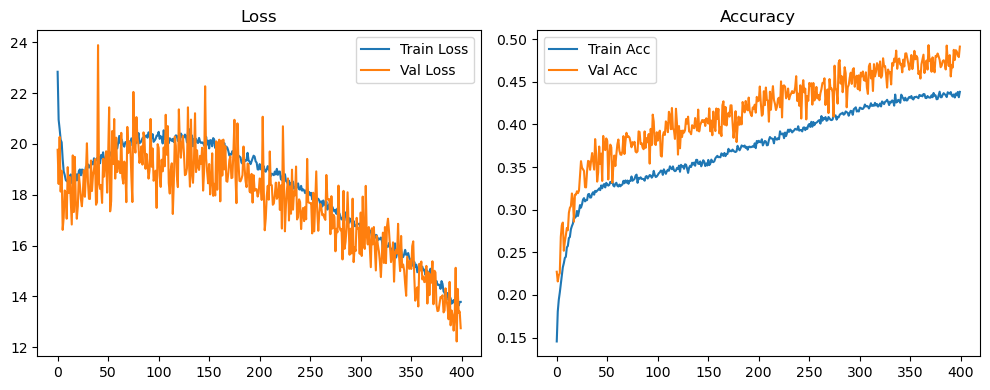

Original Model Final Test Loss: 12.7143 Accuracy: 0.4967


🚀 Running: batch128_lr_max_0.0002_min_1e-06_dp0.0


Files already downloaded and verified


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|                                                                                                                                                                        | 0/400 [00:00<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.1713 | Val Acc: 0.2161 | Epoch Time: 1.86 | :   0%|                                                                                                      | 0/400 [01:51<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.1713 | Val Acc: 0.2161 | Epoch Time: 1.86 | :   0%|                                                                                                      | 0/400 [01:51<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.1713 | Val Acc: 0.2161 | Epoch Time: 1.86 | :   0%|▏                                                                                         | 1/400 [01:51<12:21:59, 111.58s/it]

| LR: 0.000200 | Train Acc: 0.2091 | Val Acc: 0.2130 | Epoch Time: 1.85 | :   0%|▏                                                                                         | 1/400 [03:42<12:21:59, 111.58s/it]

| LR: 0.000200 | Train Acc: 0.2091 | Val Acc: 0.2130 | Epoch Time: 1.85 | :   0%|▏                                                                                         | 1/400 [03:42<12:21:59, 111.58s/it]

| LR: 0.000200 | Train Acc: 0.2091 | Val Acc: 0.2130 | Epoch Time: 1.85 | :   0%|▍                                                                                         | 2/400 [03:42<12:18:51, 111.39s/it]

| LR: 0.000200 | Train Acc: 0.2313 | Val Acc: 0.2672 | Epoch Time: 1.85 | :   0%|▍                                                                                         | 2/400 [05:34<12:18:51, 111.39s/it]

| LR: 0.000200 | Train Acc: 0.2313 | Val Acc: 0.2672 | Epoch Time: 1.85 | :   0%|▍                                                                                         | 2/400 [05:34<12:18:51, 111.39s/it]

| LR: 0.000200 | Train Acc: 0.2313 | Val Acc: 0.2672 | Epoch Time: 1.85 | :   1%|▋                                                                                         | 3/400 [05:34<12:16:43, 111.34s/it]

| LR: 0.000200 | Train Acc: 0.2449 | Val Acc: 0.2731 | Epoch Time: 1.85 | :   1%|▋                                                                                         | 3/400 [07:25<12:16:43, 111.34s/it]

| LR: 0.000200 | Train Acc: 0.2449 | Val Acc: 0.2731 | Epoch Time: 1.85 | :   1%|▋                                                                                         | 3/400 [07:25<12:16:43, 111.34s/it]

| LR: 0.000200 | Train Acc: 0.2449 | Val Acc: 0.2731 | Epoch Time: 1.85 | :   1%|▉                                                                                         | 4/400 [07:25<12:14:37, 111.31s/it]

| LR: 0.000200 | Train Acc: 0.2502 | Val Acc: 0.2713 | Epoch Time: 1.85 | :   1%|▉                                                                                         | 4/400 [09:16<12:14:37, 111.31s/it]

| LR: 0.000200 | Train Acc: 0.2502 | Val Acc: 0.2713 | Epoch Time: 1.85 | :   1%|▉                                                                                         | 4/400 [09:16<12:14:37, 111.31s/it]

| LR: 0.000200 | Train Acc: 0.2502 | Val Acc: 0.2713 | Epoch Time: 1.85 | :   1%|█▏                                                                                        | 5/400 [09:16<12:12:41, 111.30s/it]

| LR: 0.000200 | Train Acc: 0.2505 | Val Acc: 0.2743 | Epoch Time: 1.85 | :   1%|█▏                                                                                        | 5/400 [11:07<12:12:41, 111.30s/it]

| LR: 0.000200 | Train Acc: 0.2505 | Val Acc: 0.2743 | Epoch Time: 1.85 | :   1%|█▏                                                                                        | 5/400 [11:07<12:12:41, 111.30s/it]

| LR: 0.000200 | Train Acc: 0.2505 | Val Acc: 0.2743 | Epoch Time: 1.85 | :   2%|█▎                                                                                        | 6/400 [11:07<12:10:40, 111.27s/it]

| LR: 0.000200 | Train Acc: 0.2626 | Val Acc: 0.2763 | Epoch Time: 1.85 | :   2%|█▎                                                                                        | 6/400 [12:58<12:10:40, 111.27s/it]

| LR: 0.000200 | Train Acc: 0.2626 | Val Acc: 0.2763 | Epoch Time: 1.85 | :   2%|█▎                                                                                        | 6/400 [12:58<12:10:40, 111.27s/it]

| LR: 0.000200 | Train Acc: 0.2626 | Val Acc: 0.2763 | Epoch Time: 1.85 | :   2%|█▌                                                                                        | 7/400 [12:59<12:08:37, 111.24s/it]

| LR: 0.000200 | Train Acc: 0.2672 | Val Acc: 0.2944 | Epoch Time: 1.85 | :   2%|█▌                                                                                        | 7/400 [14:50<12:08:37, 111.24s/it]

| LR: 0.000200 | Train Acc: 0.2672 | Val Acc: 0.2944 | Epoch Time: 1.85 | :   2%|█▌                                                                                        | 7/400 [14:50<12:08:37, 111.24s/it]

| LR: 0.000200 | Train Acc: 0.2672 | Val Acc: 0.2944 | Epoch Time: 1.85 | :   2%|█▊                                                                                        | 8/400 [14:50<12:06:41, 111.23s/it]

| LR: 0.000200 | Train Acc: 0.2753 | Val Acc: 0.2794 | Epoch Time: 1.85 | :   2%|█▊                                                                                        | 8/400 [16:41<12:06:41, 111.23s/it]

| LR: 0.000200 | Train Acc: 0.2753 | Val Acc: 0.2794 | Epoch Time: 1.85 | :   2%|█▊                                                                                        | 8/400 [16:41<12:06:41, 111.23s/it]

| LR: 0.000200 | Train Acc: 0.2753 | Val Acc: 0.2794 | Epoch Time: 1.85 | :   2%|██                                                                                        | 9/400 [16:41<12:04:48, 111.22s/it]

| LR: 0.000200 | Train Acc: 0.2772 | Val Acc: 0.3051 | Epoch Time: 1.85 | :   2%|██                                                                                        | 9/400 [18:32<12:04:48, 111.22s/it]

| LR: 0.000200 | Train Acc: 0.2772 | Val Acc: 0.3051 | Epoch Time: 1.85 | :   2%|██                                                                                        | 9/400 [18:32<12:04:48, 111.22s/it]

| LR: 0.000200 | Train Acc: 0.2772 | Val Acc: 0.3051 | Epoch Time: 1.85 | :   2%|██▏                                                                                      | 10/400 [18:32<12:02:52, 111.21s/it]

| LR: 0.000200 | Train Acc: 0.2806 | Val Acc: 0.2929 | Epoch Time: 1.85 | :   2%|██▏                                                                                      | 10/400 [20:23<12:02:52, 111.21s/it]

| LR: 0.000200 | Train Acc: 0.2806 | Val Acc: 0.2929 | Epoch Time: 1.85 | :   2%|██▏                                                                                      | 10/400 [20:23<12:02:52, 111.21s/it]

| LR: 0.000200 | Train Acc: 0.2806 | Val Acc: 0.2929 | Epoch Time: 1.85 | :   3%|██▍                                                                                      | 11/400 [20:23<12:00:58, 111.21s/it]

| LR: 0.000200 | Train Acc: 0.2879 | Val Acc: 0.3167 | Epoch Time: 1.85 | :   3%|██▍                                                                                      | 11/400 [22:14<12:00:58, 111.21s/it]

| LR: 0.000200 | Train Acc: 0.2879 | Val Acc: 0.3167 | Epoch Time: 1.85 | :   3%|██▍                                                                                      | 11/400 [22:14<12:00:58, 111.21s/it]

| LR: 0.000200 | Train Acc: 0.2879 | Val Acc: 0.3167 | Epoch Time: 1.85 | :   3%|██▋                                                                                      | 12/400 [22:15<11:59:07, 111.20s/it]

| LR: 0.000200 | Train Acc: 0.2939 | Val Acc: 0.3085 | Epoch Time: 1.85 | :   3%|██▋                                                                                      | 12/400 [24:06<11:59:07, 111.20s/it]

| LR: 0.000200 | Train Acc: 0.2939 | Val Acc: 0.3085 | Epoch Time: 1.85 | :   3%|██▋                                                                                      | 12/400 [24:06<11:59:07, 111.20s/it]

| LR: 0.000200 | Train Acc: 0.2939 | Val Acc: 0.3085 | Epoch Time: 1.85 | :   3%|██▉                                                                                      | 13/400 [24:06<11:57:15, 111.20s/it]

| LR: 0.000199 | Train Acc: 0.3025 | Val Acc: 0.3231 | Epoch Time: 1.85 | :   3%|██▉                                                                                      | 13/400 [25:57<11:57:15, 111.20s/it]

| LR: 0.000199 | Train Acc: 0.3025 | Val Acc: 0.3231 | Epoch Time: 1.85 | :   3%|██▉                                                                                      | 13/400 [25:57<11:57:15, 111.20s/it]

| LR: 0.000199 | Train Acc: 0.3025 | Val Acc: 0.3231 | Epoch Time: 1.85 | :   4%|███                                                                                      | 14/400 [25:57<11:55:24, 111.20s/it]

| LR: 0.000199 | Train Acc: 0.3048 | Val Acc: 0.3356 | Epoch Time: 1.85 | :   4%|███                                                                                      | 14/400 [27:48<11:55:24, 111.20s/it]

| LR: 0.000199 | Train Acc: 0.3048 | Val Acc: 0.3356 | Epoch Time: 1.85 | :   4%|███                                                                                      | 14/400 [27:48<11:55:24, 111.20s/it]

| LR: 0.000199 | Train Acc: 0.3048 | Val Acc: 0.3356 | Epoch Time: 1.85 | :   4%|███▎                                                                                     | 15/400 [27:48<11:53:32, 111.20s/it]

| LR: 0.000199 | Train Acc: 0.3152 | Val Acc: 0.3348 | Epoch Time: 1.85 | :   4%|███▎                                                                                     | 15/400 [29:39<11:53:32, 111.20s/it]

| LR: 0.000199 | Train Acc: 0.3152 | Val Acc: 0.3348 | Epoch Time: 1.85 | :   4%|███▎                                                                                     | 15/400 [29:39<11:53:32, 111.20s/it]

| LR: 0.000199 | Train Acc: 0.3152 | Val Acc: 0.3348 | Epoch Time: 1.85 | :   4%|███▌                                                                                     | 16/400 [29:39<11:51:40, 111.20s/it]

| LR: 0.000199 | Train Acc: 0.3231 | Val Acc: 0.3231 | Epoch Time: 1.85 | :   4%|███▌                                                                                     | 16/400 [31:30<11:51:40, 111.20s/it]

| LR: 0.000199 | Train Acc: 0.3231 | Val Acc: 0.3231 | Epoch Time: 1.85 | :   4%|███▌                                                                                     | 16/400 [31:30<11:51:40, 111.20s/it]

| LR: 0.000199 | Train Acc: 0.3231 | Val Acc: 0.3231 | Epoch Time: 1.85 | :   4%|███▊                                                                                     | 17/400 [31:31<11:49:49, 111.20s/it]

| LR: 0.000199 | Train Acc: 0.3255 | Val Acc: 0.3625 | Epoch Time: 1.85 | :   4%|███▊                                                                                     | 17/400 [33:22<11:49:49, 111.20s/it]

| LR: 0.000199 | Train Acc: 0.3255 | Val Acc: 0.3625 | Epoch Time: 1.85 | :   4%|███▊                                                                                     | 17/400 [33:22<11:49:49, 111.20s/it]

| LR: 0.000199 | Train Acc: 0.3255 | Val Acc: 0.3625 | Epoch Time: 1.85 | :   4%|████                                                                                     | 18/400 [33:22<11:47:58, 111.20s/it]

| LR: 0.000199 | Train Acc: 0.3340 | Val Acc: 0.3514 | Epoch Time: 1.85 | :   4%|████                                                                                     | 18/400 [35:13<11:47:58, 111.20s/it]

| LR: 0.000199 | Train Acc: 0.3340 | Val Acc: 0.3514 | Epoch Time: 1.85 | :   4%|████                                                                                     | 18/400 [35:13<11:47:58, 111.20s/it]

| LR: 0.000199 | Train Acc: 0.3340 | Val Acc: 0.3514 | Epoch Time: 1.85 | :   5%|████▏                                                                                    | 19/400 [35:13<11:46:07, 111.20s/it]

| LR: 0.000199 | Train Acc: 0.3322 | Val Acc: 0.3674 | Epoch Time: 1.85 | :   5%|████▏                                                                                    | 19/400 [37:04<11:46:07, 111.20s/it]

| LR: 0.000199 | Train Acc: 0.3322 | Val Acc: 0.3674 | Epoch Time: 1.85 | :   5%|████▏                                                                                    | 19/400 [37:04<11:46:07, 111.20s/it]

| LR: 0.000199 | Train Acc: 0.3322 | Val Acc: 0.3674 | Epoch Time: 1.85 | :   5%|████▍                                                                                    | 20/400 [37:04<11:44:17, 111.20s/it]

| LR: 0.000199 | Train Acc: 0.3439 | Val Acc: 0.3442 | Epoch Time: 1.85 | :   5%|████▍                                                                                    | 20/400 [38:55<11:44:17, 111.20s/it]

| LR: 0.000199 | Train Acc: 0.3439 | Val Acc: 0.3442 | Epoch Time: 1.85 | :   5%|████▍                                                                                    | 20/400 [38:55<11:44:17, 111.20s/it]

| LR: 0.000199 | Train Acc: 0.3439 | Val Acc: 0.3442 | Epoch Time: 1.85 | :   5%|████▋                                                                                    | 21/400 [38:55<11:42:26, 111.21s/it]

| LR: 0.000199 | Train Acc: 0.3461 | Val Acc: 0.3836 | Epoch Time: 1.85 | :   5%|████▋                                                                                    | 21/400 [40:46<11:42:26, 111.21s/it]

| LR: 0.000199 | Train Acc: 0.3461 | Val Acc: 0.3836 | Epoch Time: 1.85 | :   5%|████▋                                                                                    | 21/400 [40:46<11:42:26, 111.21s/it]

| LR: 0.000199 | Train Acc: 0.3461 | Val Acc: 0.3836 | Epoch Time: 1.85 | :   6%|████▉                                                                                    | 22/400 [40:47<11:40:37, 111.21s/it]

| LR: 0.000199 | Train Acc: 0.3557 | Val Acc: 0.3605 | Epoch Time: 1.85 | :   6%|████▉                                                                                    | 22/400 [42:38<11:40:37, 111.21s/it]

| LR: 0.000199 | Train Acc: 0.3557 | Val Acc: 0.3605 | Epoch Time: 1.85 | :   6%|████▉                                                                                    | 22/400 [42:38<11:40:37, 111.21s/it]

| LR: 0.000199 | Train Acc: 0.3557 | Val Acc: 0.3605 | Epoch Time: 1.85 | :   6%|█████                                                                                    | 23/400 [42:38<11:38:44, 111.21s/it]

| LR: 0.000198 | Train Acc: 0.3549 | Val Acc: 0.3800 | Epoch Time: 1.85 | :   6%|█████                                                                                    | 23/400 [44:29<11:38:44, 111.21s/it]

| LR: 0.000198 | Train Acc: 0.3549 | Val Acc: 0.3800 | Epoch Time: 1.85 | :   6%|█████                                                                                    | 23/400 [44:29<11:38:44, 111.21s/it]

| LR: 0.000198 | Train Acc: 0.3549 | Val Acc: 0.3800 | Epoch Time: 1.85 | :   6%|█████▎                                                                                   | 24/400 [44:29<11:36:52, 111.20s/it]

| LR: 0.000198 | Train Acc: 0.3599 | Val Acc: 0.3910 | Epoch Time: 1.85 | :   6%|█████▎                                                                                   | 24/400 [46:20<11:36:52, 111.20s/it]

| LR: 0.000198 | Train Acc: 0.3599 | Val Acc: 0.3910 | Epoch Time: 1.85 | :   6%|█████▎                                                                                   | 24/400 [46:20<11:36:52, 111.20s/it]

| LR: 0.000198 | Train Acc: 0.3599 | Val Acc: 0.3910 | Epoch Time: 1.85 | :   6%|█████▌                                                                                   | 25/400 [46:20<11:34:59, 111.20s/it]

| LR: 0.000198 | Train Acc: 0.3666 | Val Acc: 0.3977 | Epoch Time: 1.85 | :   6%|█████▌                                                                                   | 25/400 [48:11<11:34:59, 111.20s/it]

| LR: 0.000198 | Train Acc: 0.3666 | Val Acc: 0.3977 | Epoch Time: 1.85 | :   6%|█████▌                                                                                   | 25/400 [48:11<11:34:59, 111.20s/it]

| LR: 0.000198 | Train Acc: 0.3666 | Val Acc: 0.3977 | Epoch Time: 1.85 | :   6%|█████▊                                                                                   | 26/400 [48:11<11:33:10, 111.20s/it]

| LR: 0.000198 | Train Acc: 0.3708 | Val Acc: 0.3776 | Epoch Time: 1.85 | :   6%|█████▊                                                                                   | 26/400 [50:02<11:33:10, 111.20s/it]

| LR: 0.000198 | Train Acc: 0.3708 | Val Acc: 0.3776 | Epoch Time: 1.85 | :   6%|█████▊                                                                                   | 26/400 [50:02<11:33:10, 111.20s/it]

| LR: 0.000198 | Train Acc: 0.3708 | Val Acc: 0.3776 | Epoch Time: 1.85 | :   7%|██████                                                                                   | 27/400 [50:03<11:31:18, 111.20s/it]

| LR: 0.000198 | Train Acc: 0.3717 | Val Acc: 0.4019 | Epoch Time: 1.85 | :   7%|██████                                                                                   | 27/400 [51:54<11:31:18, 111.20s/it]

| LR: 0.000198 | Train Acc: 0.3717 | Val Acc: 0.4019 | Epoch Time: 1.85 | :   7%|██████                                                                                   | 27/400 [51:54<11:31:18, 111.20s/it]

| LR: 0.000198 | Train Acc: 0.3717 | Val Acc: 0.4019 | Epoch Time: 1.85 | :   7%|██████▏                                                                                  | 28/400 [51:54<11:29:29, 111.21s/it]

| LR: 0.000198 | Train Acc: 0.3746 | Val Acc: 0.4044 | Epoch Time: 1.85 | :   7%|██████▏                                                                                  | 28/400 [53:45<11:29:29, 111.21s/it]

| LR: 0.000198 | Train Acc: 0.3746 | Val Acc: 0.4044 | Epoch Time: 1.85 | :   7%|██████▏                                                                                  | 28/400 [53:45<11:29:29, 111.21s/it]

| LR: 0.000198 | Train Acc: 0.3746 | Val Acc: 0.4044 | Epoch Time: 1.85 | :   7%|██████▍                                                                                  | 29/400 [53:45<11:27:35, 111.20s/it]

| LR: 0.000197 | Train Acc: 0.3802 | Val Acc: 0.4065 | Epoch Time: 1.85 | :   7%|██████▍                                                                                  | 29/400 [55:36<11:27:35, 111.20s/it]

| LR: 0.000197 | Train Acc: 0.3802 | Val Acc: 0.4065 | Epoch Time: 1.85 | :   7%|██████▍                                                                                  | 29/400 [55:36<11:27:35, 111.20s/it]

| LR: 0.000197 | Train Acc: 0.3802 | Val Acc: 0.4065 | Epoch Time: 1.85 | :   8%|██████▋                                                                                  | 30/400 [55:36<11:25:42, 111.20s/it]

| LR: 0.000197 | Train Acc: 0.3833 | Val Acc: 0.4024 | Epoch Time: 1.85 | :   8%|██████▋                                                                                  | 30/400 [57:27<11:25:42, 111.20s/it]

| LR: 0.000197 | Train Acc: 0.3833 | Val Acc: 0.4024 | Epoch Time: 1.85 | :   8%|██████▋                                                                                  | 30/400 [57:27<11:25:42, 111.20s/it]

| LR: 0.000197 | Train Acc: 0.3833 | Val Acc: 0.4024 | Epoch Time: 1.85 | :   8%|██████▉                                                                                  | 31/400 [57:27<11:23:51, 111.20s/it]

| LR: 0.000197 | Train Acc: 0.3890 | Val Acc: 0.3873 | Epoch Time: 1.85 | :   8%|██████▉                                                                                  | 31/400 [59:18<11:23:51, 111.20s/it]

| LR: 0.000197 | Train Acc: 0.3890 | Val Acc: 0.3873 | Epoch Time: 1.85 | :   8%|██████▉                                                                                  | 31/400 [59:18<11:23:51, 111.20s/it]

| LR: 0.000197 | Train Acc: 0.3890 | Val Acc: 0.3873 | Epoch Time: 1.85 | :   8%|███████                                                                                  | 32/400 [59:19<11:22:03, 111.20s/it]

| LR: 0.000197 | Train Acc: 0.3890 | Val Acc: 0.4079 | Epoch Time: 1.85 | :   8%|██████▉                                                                                | 32/400 [1:01:10<11:22:03, 111.20s/it]

| LR: 0.000197 | Train Acc: 0.3890 | Val Acc: 0.4079 | Epoch Time: 1.85 | :   8%|██████▉                                                                                | 32/400 [1:01:10<11:22:03, 111.20s/it]

| LR: 0.000197 | Train Acc: 0.3890 | Val Acc: 0.4079 | Epoch Time: 1.85 | :   8%|███████▏                                                                               | 33/400 [1:01:10<11:20:11, 111.20s/it]

| LR: 0.000197 | Train Acc: 0.3983 | Val Acc: 0.4157 | Epoch Time: 1.85 | :   8%|███████▏                                                                               | 33/400 [1:03:01<11:20:11, 111.20s/it]

| LR: 0.000197 | Train Acc: 0.3983 | Val Acc: 0.4157 | Epoch Time: 1.85 | :   8%|███████▏                                                                               | 33/400 [1:03:01<11:20:11, 111.20s/it]

| LR: 0.000197 | Train Acc: 0.3983 | Val Acc: 0.4157 | Epoch Time: 1.85 | :   8%|███████▍                                                                               | 34/400 [1:03:01<11:18:21, 111.21s/it]

| LR: 0.000196 | Train Acc: 0.3972 | Val Acc: 0.3960 | Epoch Time: 1.85 | :   8%|███████▍                                                                               | 34/400 [1:04:52<11:18:21, 111.21s/it]

| LR: 0.000196 | Train Acc: 0.3972 | Val Acc: 0.3960 | Epoch Time: 1.85 | :   8%|███████▍                                                                               | 34/400 [1:04:52<11:18:21, 111.21s/it]

| LR: 0.000196 | Train Acc: 0.3972 | Val Acc: 0.3960 | Epoch Time: 1.85 | :   9%|███████▌                                                                               | 35/400 [1:04:52<11:16:28, 111.20s/it]

| LR: 0.000196 | Train Acc: 0.3959 | Val Acc: 0.4314 | Epoch Time: 1.85 | :   9%|███████▌                                                                               | 35/400 [1:06:43<11:16:28, 111.20s/it]

| LR: 0.000196 | Train Acc: 0.3959 | Val Acc: 0.4314 | Epoch Time: 1.85 | :   9%|███████▌                                                                               | 35/400 [1:06:43<11:16:28, 111.20s/it]

| LR: 0.000196 | Train Acc: 0.3959 | Val Acc: 0.4314 | Epoch Time: 1.85 | :   9%|███████▊                                                                               | 36/400 [1:06:43<11:14:36, 111.20s/it]

| LR: 0.000196 | Train Acc: 0.4037 | Val Acc: 0.3998 | Epoch Time: 1.85 | :   9%|███████▊                                                                               | 36/400 [1:08:34<11:14:36, 111.20s/it]

| LR: 0.000196 | Train Acc: 0.4037 | Val Acc: 0.3998 | Epoch Time: 1.85 | :   9%|███████▊                                                                               | 36/400 [1:08:34<11:14:36, 111.20s/it]

| LR: 0.000196 | Train Acc: 0.4037 | Val Acc: 0.3998 | Epoch Time: 1.85 | :   9%|████████                                                                               | 37/400 [1:08:35<11:12:44, 111.20s/it]

| LR: 0.000196 | Train Acc: 0.4037 | Val Acc: 0.4211 | Epoch Time: 1.85 | :   9%|████████                                                                               | 37/400 [1:10:26<11:12:44, 111.20s/it]

| LR: 0.000196 | Train Acc: 0.4037 | Val Acc: 0.4211 | Epoch Time: 1.85 | :   9%|████████                                                                               | 37/400 [1:10:26<11:12:44, 111.20s/it]

| LR: 0.000196 | Train Acc: 0.4037 | Val Acc: 0.4211 | Epoch Time: 1.85 | :  10%|████████▎                                                                              | 38/400 [1:10:26<11:10:51, 111.19s/it]

| LR: 0.000196 | Train Acc: 0.4055 | Val Acc: 0.4180 | Epoch Time: 1.85 | :  10%|████████▎                                                                              | 38/400 [1:12:17<11:10:51, 111.19s/it]

| LR: 0.000196 | Train Acc: 0.4055 | Val Acc: 0.4180 | Epoch Time: 1.85 | :  10%|████████▎                                                                              | 38/400 [1:12:17<11:10:51, 111.19s/it]

| LR: 0.000196 | Train Acc: 0.4055 | Val Acc: 0.4180 | Epoch Time: 1.85 | :  10%|████████▍                                                                              | 39/400 [1:12:17<11:08:59, 111.19s/it]

| LR: 0.000195 | Train Acc: 0.4096 | Val Acc: 0.4305 | Epoch Time: 1.85 | :  10%|████████▍                                                                              | 39/400 [1:14:08<11:08:59, 111.19s/it]

| LR: 0.000195 | Train Acc: 0.4096 | Val Acc: 0.4305 | Epoch Time: 1.85 | :  10%|████████▍                                                                              | 39/400 [1:14:08<11:08:59, 111.19s/it]

| LR: 0.000195 | Train Acc: 0.4096 | Val Acc: 0.4305 | Epoch Time: 1.85 | :  10%|████████▋                                                                              | 40/400 [1:14:08<11:07:08, 111.19s/it]

| LR: 0.000195 | Train Acc: 0.4109 | Val Acc: 0.4388 | Epoch Time: 1.85 | :  10%|████████▋                                                                              | 40/400 [1:15:59<11:07:08, 111.19s/it]

| LR: 0.000195 | Train Acc: 0.4109 | Val Acc: 0.4388 | Epoch Time: 1.85 | :  10%|████████▋                                                                              | 40/400 [1:15:59<11:07:08, 111.19s/it]

| LR: 0.000195 | Train Acc: 0.4109 | Val Acc: 0.4388 | Epoch Time: 1.85 | :  10%|████████▉                                                                              | 41/400 [1:15:59<11:05:15, 111.18s/it]

| LR: 0.000195 | Train Acc: 0.4113 | Val Acc: 0.4457 | Epoch Time: 1.85 | :  10%|████████▉                                                                              | 41/400 [1:17:50<11:05:15, 111.18s/it]

| LR: 0.000195 | Train Acc: 0.4113 | Val Acc: 0.4457 | Epoch Time: 1.85 | :  10%|████████▉                                                                              | 41/400 [1:17:50<11:05:15, 111.18s/it]

| LR: 0.000195 | Train Acc: 0.4113 | Val Acc: 0.4457 | Epoch Time: 1.85 | :  10%|█████████▏                                                                             | 42/400 [1:17:51<11:03:26, 111.19s/it]

| LR: 0.000195 | Train Acc: 0.4226 | Val Acc: 0.4419 | Epoch Time: 1.85 | :  10%|█████████▏                                                                             | 42/400 [1:19:42<11:03:26, 111.19s/it]

| LR: 0.000195 | Train Acc: 0.4226 | Val Acc: 0.4419 | Epoch Time: 1.85 | :  10%|█████████▏                                                                             | 42/400 [1:19:42<11:03:26, 111.19s/it]

| LR: 0.000195 | Train Acc: 0.4226 | Val Acc: 0.4419 | Epoch Time: 1.85 | :  11%|█████████▎                                                                             | 43/400 [1:19:42<11:01:35, 111.19s/it]

| LR: 0.000194 | Train Acc: 0.4199 | Val Acc: 0.4543 | Epoch Time: 1.85 | :  11%|█████████▎                                                                             | 43/400 [1:21:33<11:01:35, 111.19s/it]

| LR: 0.000194 | Train Acc: 0.4199 | Val Acc: 0.4543 | Epoch Time: 1.85 | :  11%|█████████▎                                                                             | 43/400 [1:21:33<11:01:35, 111.19s/it]

| LR: 0.000194 | Train Acc: 0.4199 | Val Acc: 0.4543 | Epoch Time: 1.85 | :  11%|█████████▌                                                                             | 44/400 [1:21:33<10:59:43, 111.19s/it]

| LR: 0.000194 | Train Acc: 0.4246 | Val Acc: 0.4507 | Epoch Time: 1.85 | :  11%|█████████▌                                                                             | 44/400 [1:23:24<10:59:43, 111.19s/it]

| LR: 0.000194 | Train Acc: 0.4246 | Val Acc: 0.4507 | Epoch Time: 1.85 | :  11%|█████████▌                                                                             | 44/400 [1:23:24<10:59:43, 111.19s/it]

| LR: 0.000194 | Train Acc: 0.4246 | Val Acc: 0.4507 | Epoch Time: 1.85 | :  11%|█████████▊                                                                             | 45/400 [1:23:24<10:57:51, 111.19s/it]

| LR: 0.000194 | Train Acc: 0.4269 | Val Acc: 0.4363 | Epoch Time: 1.85 | :  11%|█████████▊                                                                             | 45/400 [1:25:15<10:57:51, 111.19s/it]

| LR: 0.000194 | Train Acc: 0.4269 | Val Acc: 0.4363 | Epoch Time: 1.85 | :  11%|█████████▊                                                                             | 45/400 [1:25:15<10:57:51, 111.19s/it]

| LR: 0.000194 | Train Acc: 0.4269 | Val Acc: 0.4363 | Epoch Time: 1.85 | :  12%|██████████                                                                             | 46/400 [1:25:15<10:56:02, 111.19s/it]

| LR: 0.000194 | Train Acc: 0.4286 | Val Acc: 0.4447 | Epoch Time: 1.85 | :  12%|██████████                                                                             | 46/400 [1:27:06<10:56:02, 111.19s/it]

| LR: 0.000194 | Train Acc: 0.4286 | Val Acc: 0.4447 | Epoch Time: 1.85 | :  12%|██████████                                                                             | 46/400 [1:27:06<10:56:02, 111.19s/it]

| LR: 0.000194 | Train Acc: 0.4286 | Val Acc: 0.4447 | Epoch Time: 1.85 | :  12%|██████████▏                                                                            | 47/400 [1:27:06<10:54:11, 111.19s/it]

| LR: 0.000193 | Train Acc: 0.4268 | Val Acc: 0.4436 | Epoch Time: 1.85 | :  12%|██████████▏                                                                            | 47/400 [1:28:58<10:54:11, 111.19s/it]

| LR: 0.000193 | Train Acc: 0.4268 | Val Acc: 0.4436 | Epoch Time: 1.85 | :  12%|██████████▏                                                                            | 47/400 [1:28:58<10:54:11, 111.19s/it]

| LR: 0.000193 | Train Acc: 0.4268 | Val Acc: 0.4436 | Epoch Time: 1.85 | :  12%|██████████▍                                                                            | 48/400 [1:28:58<10:52:21, 111.20s/it]

| LR: 0.000193 | Train Acc: 0.4275 | Val Acc: 0.4401 | Epoch Time: 1.85 | :  12%|██████████▍                                                                            | 48/400 [1:30:49<10:52:21, 111.20s/it]

| LR: 0.000193 | Train Acc: 0.4275 | Val Acc: 0.4401 | Epoch Time: 1.85 | :  12%|██████████▍                                                                            | 48/400 [1:30:49<10:52:21, 111.20s/it]

| LR: 0.000193 | Train Acc: 0.4275 | Val Acc: 0.4401 | Epoch Time: 1.85 | :  12%|██████████▋                                                                            | 49/400 [1:30:49<10:50:30, 111.20s/it]

| LR: 0.000193 | Train Acc: 0.4274 | Val Acc: 0.4468 | Epoch Time: 1.85 | :  12%|██████████▋                                                                            | 49/400 [1:32:40<10:50:30, 111.20s/it]

| LR: 0.000193 | Train Acc: 0.4274 | Val Acc: 0.4468 | Epoch Time: 1.85 | :  12%|██████████▋                                                                            | 49/400 [1:32:40<10:50:30, 111.20s/it]

| LR: 0.000193 | Train Acc: 0.4274 | Val Acc: 0.4468 | Epoch Time: 1.85 | :  12%|██████████▉                                                                            | 50/400 [1:32:40<10:48:39, 111.20s/it]

| LR: 0.000192 | Train Acc: 0.4288 | Val Acc: 0.4485 | Epoch Time: 1.85 | :  12%|██████████▉                                                                            | 50/400 [1:34:31<10:48:39, 111.20s/it]

| LR: 0.000192 | Train Acc: 0.4288 | Val Acc: 0.4485 | Epoch Time: 1.85 | :  12%|██████████▉                                                                            | 50/400 [1:34:31<10:48:39, 111.20s/it]

| LR: 0.000192 | Train Acc: 0.4288 | Val Acc: 0.4485 | Epoch Time: 1.85 | :  13%|███████████                                                                            | 51/400 [1:34:31<10:46:48, 111.20s/it]

| LR: 0.000192 | Train Acc: 0.4316 | Val Acc: 0.4433 | Epoch Time: 1.85 | :  13%|███████████                                                                            | 51/400 [1:36:22<10:46:48, 111.20s/it]

| LR: 0.000192 | Train Acc: 0.4316 | Val Acc: 0.4433 | Epoch Time: 1.85 | :  13%|███████████                                                                            | 51/400 [1:36:22<10:46:48, 111.20s/it]

| LR: 0.000192 | Train Acc: 0.4316 | Val Acc: 0.4433 | Epoch Time: 1.85 | :  13%|███████████▎                                                                           | 52/400 [1:36:23<10:44:58, 111.20s/it]

| LR: 0.000192 | Train Acc: 0.4328 | Val Acc: 0.4485 | Epoch Time: 1.85 | :  13%|███████████▎                                                                           | 52/400 [1:38:14<10:44:58, 111.20s/it]

| LR: 0.000192 | Train Acc: 0.4328 | Val Acc: 0.4485 | Epoch Time: 1.85 | :  13%|███████████▎                                                                           | 52/400 [1:38:14<10:44:58, 111.20s/it]

| LR: 0.000192 | Train Acc: 0.4328 | Val Acc: 0.4485 | Epoch Time: 1.85 | :  13%|███████████▌                                                                           | 53/400 [1:38:14<10:43:05, 111.20s/it]

| LR: 0.000192 | Train Acc: 0.4314 | Val Acc: 0.4824 | Epoch Time: 1.85 | :  13%|███████████▌                                                                           | 53/400 [1:40:05<10:43:05, 111.20s/it]

| LR: 0.000192 | Train Acc: 0.4314 | Val Acc: 0.4824 | Epoch Time: 1.85 | :  13%|███████████▌                                                                           | 53/400 [1:40:05<10:43:05, 111.20s/it]

| LR: 0.000192 | Train Acc: 0.4314 | Val Acc: 0.4824 | Epoch Time: 1.85 | :  14%|███████████▋                                                                           | 54/400 [1:40:05<10:41:14, 111.20s/it]

| LR: 0.000191 | Train Acc: 0.4390 | Val Acc: 0.4583 | Epoch Time: 1.85 | :  14%|███████████▋                                                                           | 54/400 [1:41:56<10:41:14, 111.20s/it]

| LR: 0.000191 | Train Acc: 0.4390 | Val Acc: 0.4583 | Epoch Time: 1.85 | :  14%|███████████▋                                                                           | 54/400 [1:41:56<10:41:14, 111.20s/it]

| LR: 0.000191 | Train Acc: 0.4390 | Val Acc: 0.4583 | Epoch Time: 1.85 | :  14%|███████████▉                                                                           | 55/400 [1:41:56<10:39:23, 111.20s/it]

| LR: 0.000191 | Train Acc: 0.4403 | Val Acc: 0.4529 | Epoch Time: 1.85 | :  14%|███████████▉                                                                           | 55/400 [1:43:47<10:39:23, 111.20s/it]

| LR: 0.000191 | Train Acc: 0.4403 | Val Acc: 0.4529 | Epoch Time: 1.85 | :  14%|███████████▉                                                                           | 55/400 [1:43:47<10:39:23, 111.20s/it]

| LR: 0.000191 | Train Acc: 0.4403 | Val Acc: 0.4529 | Epoch Time: 1.85 | :  14%|████████████▏                                                                          | 56/400 [1:43:47<10:37:32, 111.20s/it]

| LR: 0.000191 | Train Acc: 0.4380 | Val Acc: 0.4493 | Epoch Time: 1.85 | :  14%|████████████▏                                                                          | 56/400 [1:45:38<10:37:32, 111.20s/it]

| LR: 0.000191 | Train Acc: 0.4380 | Val Acc: 0.4493 | Epoch Time: 1.85 | :  14%|████████████▏                                                                          | 56/400 [1:45:38<10:37:32, 111.20s/it]

| LR: 0.000191 | Train Acc: 0.4380 | Val Acc: 0.4493 | Epoch Time: 1.85 | :  14%|████████████▍                                                                          | 57/400 [1:45:38<10:35:38, 111.19s/it]

| LR: 0.000190 | Train Acc: 0.4453 | Val Acc: 0.4825 | Epoch Time: 1.85 | :  14%|████████████▍                                                                          | 57/400 [1:47:30<10:35:38, 111.19s/it]

| LR: 0.000190 | Train Acc: 0.4453 | Val Acc: 0.4825 | Epoch Time: 1.85 | :  14%|████████████▍                                                                          | 57/400 [1:47:30<10:35:38, 111.19s/it]

| LR: 0.000190 | Train Acc: 0.4453 | Val Acc: 0.4825 | Epoch Time: 1.85 | :  14%|████████████▌                                                                          | 58/400 [1:47:30<10:33:52, 111.21s/it]

| LR: 0.000190 | Train Acc: 0.4483 | Val Acc: 0.4557 | Epoch Time: 1.85 | :  14%|████████████▌                                                                          | 58/400 [1:49:21<10:33:52, 111.21s/it]

| LR: 0.000190 | Train Acc: 0.4483 | Val Acc: 0.4557 | Epoch Time: 1.85 | :  14%|████████████▌                                                                          | 58/400 [1:49:21<10:33:52, 111.21s/it]

| LR: 0.000190 | Train Acc: 0.4483 | Val Acc: 0.4557 | Epoch Time: 1.85 | :  15%|████████████▊                                                                          | 59/400 [1:49:21<10:31:57, 111.20s/it]

| LR: 0.000190 | Train Acc: 0.4450 | Val Acc: 0.4556 | Epoch Time: 1.85 | :  15%|████████████▊                                                                          | 59/400 [1:51:12<10:31:57, 111.20s/it]

| LR: 0.000190 | Train Acc: 0.4450 | Val Acc: 0.4556 | Epoch Time: 1.85 | :  15%|████████████▊                                                                          | 59/400 [1:51:12<10:31:57, 111.20s/it]

| LR: 0.000190 | Train Acc: 0.4450 | Val Acc: 0.4556 | Epoch Time: 1.85 | :  15%|█████████████                                                                          | 60/400 [1:51:12<10:30:07, 111.20s/it]

| LR: 0.000189 | Train Acc: 0.4502 | Val Acc: 0.4747 | Epoch Time: 1.85 | :  15%|█████████████                                                                          | 60/400 [1:53:03<10:30:07, 111.20s/it]

| LR: 0.000189 | Train Acc: 0.4502 | Val Acc: 0.4747 | Epoch Time: 1.85 | :  15%|█████████████                                                                          | 60/400 [1:53:03<10:30:07, 111.20s/it]

| LR: 0.000189 | Train Acc: 0.4502 | Val Acc: 0.4747 | Epoch Time: 1.85 | :  15%|█████████████▎                                                                         | 61/400 [1:53:03<10:28:14, 111.19s/it]

| LR: 0.000189 | Train Acc: 0.4496 | Val Acc: 0.4828 | Epoch Time: 1.85 | :  15%|█████████████▎                                                                         | 61/400 [1:54:54<10:28:14, 111.19s/it]

| LR: 0.000189 | Train Acc: 0.4496 | Val Acc: 0.4828 | Epoch Time: 1.85 | :  15%|█████████████▎                                                                         | 61/400 [1:54:54<10:28:14, 111.19s/it]

| LR: 0.000189 | Train Acc: 0.4496 | Val Acc: 0.4828 | Epoch Time: 1.85 | :  16%|█████████████▍                                                                         | 62/400 [1:54:54<10:26:24, 111.20s/it]

| LR: 0.000188 | Train Acc: 0.4513 | Val Acc: 0.4831 | Epoch Time: 1.85 | :  16%|█████████████▍                                                                         | 62/400 [1:56:46<10:26:24, 111.20s/it]

| LR: 0.000188 | Train Acc: 0.4513 | Val Acc: 0.4831 | Epoch Time: 1.85 | :  16%|█████████████▍                                                                         | 62/400 [1:56:46<10:26:24, 111.20s/it]

| LR: 0.000188 | Train Acc: 0.4513 | Val Acc: 0.4831 | Epoch Time: 1.85 | :  16%|█████████████▋                                                                         | 63/400 [1:56:46<10:24:36, 111.21s/it]

| LR: 0.000188 | Train Acc: 0.4503 | Val Acc: 0.4721 | Epoch Time: 1.85 | :  16%|█████████████▋                                                                         | 63/400 [1:58:37<10:24:36, 111.21s/it]

| LR: 0.000188 | Train Acc: 0.4503 | Val Acc: 0.4721 | Epoch Time: 1.85 | :  16%|█████████████▋                                                                         | 63/400 [1:58:37<10:24:36, 111.21s/it]

| LR: 0.000188 | Train Acc: 0.4503 | Val Acc: 0.4721 | Epoch Time: 1.85 | :  16%|█████████████▉                                                                         | 64/400 [1:58:37<10:22:44, 111.21s/it]

| LR: 0.000188 | Train Acc: 0.4472 | Val Acc: 0.4648 | Epoch Time: 1.85 | :  16%|█████████████▉                                                                         | 64/400 [2:00:28<10:22:44, 111.21s/it]

| LR: 0.000188 | Train Acc: 0.4472 | Val Acc: 0.4648 | Epoch Time: 1.85 | :  16%|█████████████▉                                                                         | 64/400 [2:00:28<10:22:44, 111.21s/it]

| LR: 0.000188 | Train Acc: 0.4472 | Val Acc: 0.4648 | Epoch Time: 1.85 | :  16%|██████████████▏                                                                        | 65/400 [2:00:28<10:20:55, 111.21s/it]

| LR: 0.000187 | Train Acc: 0.4577 | Val Acc: 0.4793 | Epoch Time: 1.85 | :  16%|██████████████▏                                                                        | 65/400 [2:02:19<10:20:55, 111.21s/it]

| LR: 0.000187 | Train Acc: 0.4577 | Val Acc: 0.4793 | Epoch Time: 1.85 | :  16%|██████████████▏                                                                        | 65/400 [2:02:19<10:20:55, 111.21s/it]

| LR: 0.000187 | Train Acc: 0.4577 | Val Acc: 0.4793 | Epoch Time: 1.85 | :  16%|██████████████▎                                                                        | 66/400 [2:02:19<10:19:02, 111.21s/it]

| LR: 0.000187 | Train Acc: 0.4572 | Val Acc: 0.4823 | Epoch Time: 1.85 | :  16%|██████████████▎                                                                        | 66/400 [2:04:10<10:19:02, 111.21s/it]

| LR: 0.000187 | Train Acc: 0.4572 | Val Acc: 0.4823 | Epoch Time: 1.85 | :  16%|██████████████▎                                                                        | 66/400 [2:04:10<10:19:02, 111.21s/it]

| LR: 0.000187 | Train Acc: 0.4572 | Val Acc: 0.4823 | Epoch Time: 1.85 | :  17%|██████████████▌                                                                        | 67/400 [2:04:11<10:17:11, 111.21s/it]

| LR: 0.000187 | Train Acc: 0.4565 | Val Acc: 0.4818 | Epoch Time: 1.85 | :  17%|██████████████▌                                                                        | 67/400 [2:06:02<10:17:11, 111.21s/it]

| LR: 0.000187 | Train Acc: 0.4565 | Val Acc: 0.4818 | Epoch Time: 1.85 | :  17%|██████████████▌                                                                        | 67/400 [2:06:02<10:17:11, 111.21s/it]

| LR: 0.000187 | Train Acc: 0.4565 | Val Acc: 0.4818 | Epoch Time: 1.85 | :  17%|██████████████▊                                                                        | 68/400 [2:06:02<10:15:19, 111.20s/it]

| LR: 0.000186 | Train Acc: 0.4632 | Val Acc: 0.4595 | Epoch Time: 1.85 | :  17%|██████████████▊                                                                        | 68/400 [2:07:53<10:15:19, 111.20s/it]

| LR: 0.000186 | Train Acc: 0.4632 | Val Acc: 0.4595 | Epoch Time: 1.85 | :  17%|██████████████▊                                                                        | 68/400 [2:07:53<10:15:19, 111.20s/it]

| LR: 0.000186 | Train Acc: 0.4632 | Val Acc: 0.4595 | Epoch Time: 1.85 | :  17%|███████████████                                                                        | 69/400 [2:07:53<10:13:26, 111.20s/it]

| LR: 0.000186 | Train Acc: 0.4572 | Val Acc: 0.4875 | Epoch Time: 1.85 | :  17%|███████████████                                                                        | 69/400 [2:09:44<10:13:26, 111.20s/it]

| LR: 0.000186 | Train Acc: 0.4572 | Val Acc: 0.4875 | Epoch Time: 1.85 | :  17%|███████████████                                                                        | 69/400 [2:09:44<10:13:26, 111.20s/it]

| LR: 0.000186 | Train Acc: 0.4572 | Val Acc: 0.4875 | Epoch Time: 1.85 | :  18%|███████████████▏                                                                       | 70/400 [2:09:44<10:11:35, 111.20s/it]

| LR: 0.000185 | Train Acc: 0.4637 | Val Acc: 0.4961 | Epoch Time: 1.85 | :  18%|███████████████▏                                                                       | 70/400 [2:11:35<10:11:35, 111.20s/it]

| LR: 0.000185 | Train Acc: 0.4637 | Val Acc: 0.4961 | Epoch Time: 1.85 | :  18%|███████████████▏                                                                       | 70/400 [2:11:35<10:11:35, 111.20s/it]

| LR: 0.000185 | Train Acc: 0.4637 | Val Acc: 0.4961 | Epoch Time: 1.85 | :  18%|███████████████▍                                                                       | 71/400 [2:11:35<10:09:47, 111.21s/it]

| LR: 0.000185 | Train Acc: 0.4612 | Val Acc: 0.4726 | Epoch Time: 1.85 | :  18%|███████████████▍                                                                       | 71/400 [2:13:26<10:09:47, 111.21s/it]

| LR: 0.000185 | Train Acc: 0.4612 | Val Acc: 0.4726 | Epoch Time: 1.85 | :  18%|███████████████▍                                                                       | 71/400 [2:13:26<10:09:47, 111.21s/it]

| LR: 0.000185 | Train Acc: 0.4612 | Val Acc: 0.4726 | Epoch Time: 1.85 | :  18%|███████████████▋                                                                       | 72/400 [2:13:27<10:07:58, 111.22s/it]

| LR: 0.000185 | Train Acc: 0.4617 | Val Acc: 0.4682 | Epoch Time: 1.85 | :  18%|███████████████▋                                                                       | 72/400 [2:15:18<10:07:58, 111.22s/it]

| LR: 0.000185 | Train Acc: 0.4617 | Val Acc: 0.4682 | Epoch Time: 1.85 | :  18%|███████████████▋                                                                       | 72/400 [2:15:18<10:07:58, 111.22s/it]

| LR: 0.000185 | Train Acc: 0.4617 | Val Acc: 0.4682 | Epoch Time: 1.85 | :  18%|███████████████▉                                                                       | 73/400 [2:15:18<10:06:04, 111.21s/it]

| LR: 0.000184 | Train Acc: 0.4636 | Val Acc: 0.4827 | Epoch Time: 1.85 | :  18%|███████████████▉                                                                       | 73/400 [2:17:09<10:06:04, 111.21s/it]

| LR: 0.000184 | Train Acc: 0.4636 | Val Acc: 0.4827 | Epoch Time: 1.85 | :  18%|███████████████▉                                                                       | 73/400 [2:17:09<10:06:04, 111.21s/it]

| LR: 0.000184 | Train Acc: 0.4636 | Val Acc: 0.4827 | Epoch Time: 1.85 | :  18%|████████████████                                                                       | 74/400 [2:17:09<10:04:18, 111.22s/it]

| LR: 0.000184 | Train Acc: 0.4672 | Val Acc: 0.4742 | Epoch Time: 1.85 | :  18%|████████████████                                                                       | 74/400 [2:19:00<10:04:18, 111.22s/it]

| LR: 0.000184 | Train Acc: 0.4672 | Val Acc: 0.4742 | Epoch Time: 1.85 | :  18%|████████████████                                                                       | 74/400 [2:19:00<10:04:18, 111.22s/it]

| LR: 0.000184 | Train Acc: 0.4672 | Val Acc: 0.4742 | Epoch Time: 1.85 | :  19%|████████████████▎                                                                      | 75/400 [2:19:00<10:02:27, 111.22s/it]

| LR: 0.000183 | Train Acc: 0.4681 | Val Acc: 0.4857 | Epoch Time: 1.85 | :  19%|████████████████▎                                                                      | 75/400 [2:20:51<10:02:27, 111.22s/it]

| LR: 0.000183 | Train Acc: 0.4681 | Val Acc: 0.4857 | Epoch Time: 1.85 | :  19%|████████████████▎                                                                      | 75/400 [2:20:51<10:02:27, 111.22s/it]

| LR: 0.000183 | Train Acc: 0.4681 | Val Acc: 0.4857 | Epoch Time: 1.85 | :  19%|████████████████▌                                                                      | 76/400 [2:20:51<10:00:35, 111.22s/it]

| LR: 0.000183 | Train Acc: 0.4704 | Val Acc: 0.4803 | Epoch Time: 1.85 | :  19%|████████████████▌                                                                      | 76/400 [2:22:43<10:00:35, 111.22s/it]

| LR: 0.000183 | Train Acc: 0.4704 | Val Acc: 0.4803 | Epoch Time: 1.85 | :  19%|████████████████▌                                                                      | 76/400 [2:22:43<10:00:35, 111.22s/it]

| LR: 0.000183 | Train Acc: 0.4704 | Val Acc: 0.4803 | Epoch Time: 1.85 | :  19%|████████████████▉                                                                       | 77/400 [2:22:43<9:58:46, 111.23s/it]

| LR: 0.000182 | Train Acc: 0.4654 | Val Acc: 0.4923 | Epoch Time: 1.85 | :  19%|████████████████▉                                                                       | 77/400 [2:24:34<9:58:46, 111.23s/it]

| LR: 0.000182 | Train Acc: 0.4654 | Val Acc: 0.4923 | Epoch Time: 1.85 | :  19%|████████████████▉                                                                       | 77/400 [2:24:34<9:58:46, 111.23s/it]

| LR: 0.000182 | Train Acc: 0.4654 | Val Acc: 0.4923 | Epoch Time: 1.85 | :  20%|█████████████████▏                                                                      | 78/400 [2:24:34<9:56:56, 111.23s/it]

| LR: 0.000182 | Train Acc: 0.4690 | Val Acc: 0.4953 | Epoch Time: 1.85 | :  20%|█████████████████▏                                                                      | 78/400 [2:26:25<9:56:56, 111.23s/it]

| LR: 0.000182 | Train Acc: 0.4690 | Val Acc: 0.4953 | Epoch Time: 1.85 | :  20%|█████████████████▏                                                                      | 78/400 [2:26:25<9:56:56, 111.23s/it]

| LR: 0.000182 | Train Acc: 0.4690 | Val Acc: 0.4953 | Epoch Time: 1.85 | :  20%|█████████████████▍                                                                      | 79/400 [2:26:25<9:55:02, 111.22s/it]

| LR: 0.000181 | Train Acc: 0.4723 | Val Acc: 0.4905 | Epoch Time: 1.85 | :  20%|█████████████████▍                                                                      | 79/400 [2:28:16<9:55:02, 111.22s/it]

| LR: 0.000181 | Train Acc: 0.4723 | Val Acc: 0.4905 | Epoch Time: 1.85 | :  20%|█████████████████▍                                                                      | 79/400 [2:28:16<9:55:02, 111.22s/it]

| LR: 0.000181 | Train Acc: 0.4723 | Val Acc: 0.4905 | Epoch Time: 1.85 | :  20%|█████████████████▌                                                                      | 80/400 [2:28:16<9:53:11, 111.22s/it]

| LR: 0.000181 | Train Acc: 0.4731 | Val Acc: 0.5043 | Epoch Time: 1.85 | :  20%|█████████████████▌                                                                      | 80/400 [2:30:07<9:53:11, 111.22s/it]

| LR: 0.000181 | Train Acc: 0.4731 | Val Acc: 0.5043 | Epoch Time: 1.85 | :  20%|█████████████████▌                                                                      | 80/400 [2:30:07<9:53:11, 111.22s/it]

| LR: 0.000181 | Train Acc: 0.4731 | Val Acc: 0.5043 | Epoch Time: 1.85 | :  20%|█████████████████▊                                                                      | 81/400 [2:30:08<9:51:22, 111.23s/it]

| LR: 0.000181 | Train Acc: 0.4767 | Val Acc: 0.5022 | Epoch Time: 1.85 | :  20%|█████████████████▊                                                                      | 81/400 [2:31:59<9:51:22, 111.23s/it]

| LR: 0.000181 | Train Acc: 0.4767 | Val Acc: 0.5022 | Epoch Time: 1.85 | :  20%|█████████████████▊                                                                      | 81/400 [2:31:59<9:51:22, 111.23s/it]

| LR: 0.000181 | Train Acc: 0.4767 | Val Acc: 0.5022 | Epoch Time: 1.85 | :  20%|██████████████████                                                                      | 82/400 [2:31:59<9:49:24, 111.21s/it]

| LR: 0.000180 | Train Acc: 0.4770 | Val Acc: 0.4938 | Epoch Time: 1.85 | :  20%|██████████████████                                                                      | 82/400 [2:33:50<9:49:24, 111.21s/it]

| LR: 0.000180 | Train Acc: 0.4770 | Val Acc: 0.4938 | Epoch Time: 1.85 | :  20%|██████████████████                                                                      | 82/400 [2:33:50<9:49:24, 111.21s/it]

| LR: 0.000180 | Train Acc: 0.4770 | Val Acc: 0.4938 | Epoch Time: 1.85 | :  21%|██████████████████▎                                                                     | 83/400 [2:33:50<9:47:32, 111.21s/it]

| LR: 0.000180 | Train Acc: 0.4798 | Val Acc: 0.4961 | Epoch Time: 1.85 | :  21%|██████████████████▎                                                                     | 83/400 [2:35:41<9:47:32, 111.21s/it]

| LR: 0.000180 | Train Acc: 0.4798 | Val Acc: 0.4961 | Epoch Time: 1.85 | :  21%|██████████████████▎                                                                     | 83/400 [2:35:41<9:47:32, 111.21s/it]

| LR: 0.000180 | Train Acc: 0.4798 | Val Acc: 0.4961 | Epoch Time: 1.85 | :  21%|██████████████████▍                                                                     | 84/400 [2:35:41<9:45:39, 111.20s/it]

| LR: 0.000179 | Train Acc: 0.4780 | Val Acc: 0.4946 | Epoch Time: 1.85 | :  21%|██████████████████▍                                                                     | 84/400 [2:37:32<9:45:39, 111.20s/it]

| LR: 0.000179 | Train Acc: 0.4780 | Val Acc: 0.4946 | Epoch Time: 1.85 | :  21%|██████████████████▍                                                                     | 84/400 [2:37:32<9:45:39, 111.20s/it]

| LR: 0.000179 | Train Acc: 0.4780 | Val Acc: 0.4946 | Epoch Time: 1.85 | :  21%|██████████████████▋                                                                     | 85/400 [2:37:32<9:43:48, 111.20s/it]

| LR: 0.000179 | Train Acc: 0.4785 | Val Acc: 0.4965 | Epoch Time: 1.85 | :  21%|██████████████████▋                                                                     | 85/400 [2:39:23<9:43:48, 111.20s/it]

| LR: 0.000179 | Train Acc: 0.4785 | Val Acc: 0.4965 | Epoch Time: 1.85 | :  21%|██████████████████▋                                                                     | 85/400 [2:39:23<9:43:48, 111.20s/it]

| LR: 0.000179 | Train Acc: 0.4785 | Val Acc: 0.4965 | Epoch Time: 1.85 | :  22%|██████████████████▉                                                                     | 86/400 [2:39:24<9:42:00, 111.21s/it]

| LR: 0.000178 | Train Acc: 0.4805 | Val Acc: 0.5054 | Epoch Time: 1.85 | :  22%|██████████████████▉                                                                     | 86/400 [2:41:15<9:42:00, 111.21s/it]

| LR: 0.000178 | Train Acc: 0.4805 | Val Acc: 0.5054 | Epoch Time: 1.85 | :  22%|██████████████████▉                                                                     | 86/400 [2:41:15<9:42:00, 111.21s/it]

| LR: 0.000178 | Train Acc: 0.4805 | Val Acc: 0.5054 | Epoch Time: 1.85 | :  22%|███████████████████▏                                                                    | 87/400 [2:41:15<9:40:10, 111.22s/it]

| LR: 0.000178 | Train Acc: 0.4755 | Val Acc: 0.4906 | Epoch Time: 1.85 | :  22%|███████████████████▏                                                                    | 87/400 [2:43:06<9:40:10, 111.22s/it]

| LR: 0.000178 | Train Acc: 0.4755 | Val Acc: 0.4906 | Epoch Time: 1.85 | :  22%|███████████████████▏                                                                    | 87/400 [2:43:06<9:40:10, 111.22s/it]

| LR: 0.000178 | Train Acc: 0.4755 | Val Acc: 0.4906 | Epoch Time: 1.85 | :  22%|███████████████████▎                                                                    | 88/400 [2:43:06<9:38:17, 111.21s/it]

| LR: 0.000177 | Train Acc: 0.4807 | Val Acc: 0.4966 | Epoch Time: 1.85 | :  22%|███████████████████▎                                                                    | 88/400 [2:44:57<9:38:17, 111.21s/it]

| LR: 0.000177 | Train Acc: 0.4807 | Val Acc: 0.4966 | Epoch Time: 1.85 | :  22%|███████████████████▎                                                                    | 88/400 [2:44:57<9:38:17, 111.21s/it]

| LR: 0.000177 | Train Acc: 0.4807 | Val Acc: 0.4966 | Epoch Time: 1.85 | :  22%|███████████████████▌                                                                    | 89/400 [2:44:57<9:36:23, 111.20s/it]

| LR: 0.000177 | Train Acc: 0.4828 | Val Acc: 0.4813 | Epoch Time: 1.85 | :  22%|███████████████████▌                                                                    | 89/400 [2:46:48<9:36:23, 111.20s/it]

| LR: 0.000177 | Train Acc: 0.4828 | Val Acc: 0.4813 | Epoch Time: 1.85 | :  22%|███████████████████▌                                                                    | 89/400 [2:46:48<9:36:23, 111.20s/it]

| LR: 0.000177 | Train Acc: 0.4828 | Val Acc: 0.4813 | Epoch Time: 1.85 | :  22%|███████████████████▊                                                                    | 90/400 [2:46:48<9:34:33, 111.20s/it]

| LR: 0.000176 | Train Acc: 0.4845 | Val Acc: 0.4762 | Epoch Time: 1.85 | :  22%|███████████████████▊                                                                    | 90/400 [2:48:39<9:34:33, 111.20s/it]

| LR: 0.000176 | Train Acc: 0.4845 | Val Acc: 0.4762 | Epoch Time: 1.85 | :  22%|███████████████████▊                                                                    | 90/400 [2:48:40<9:34:33, 111.20s/it]

| LR: 0.000176 | Train Acc: 0.4845 | Val Acc: 0.4762 | Epoch Time: 1.85 | :  23%|████████████████████                                                                    | 91/400 [2:48:40<9:32:41, 111.20s/it]

| LR: 0.000176 | Train Acc: 0.4836 | Val Acc: 0.5080 | Epoch Time: 1.85 | :  23%|████████████████████                                                                    | 91/400 [2:50:31<9:32:41, 111.20s/it]

| LR: 0.000176 | Train Acc: 0.4836 | Val Acc: 0.5080 | Epoch Time: 1.85 | :  23%|████████████████████                                                                    | 91/400 [2:50:31<9:32:41, 111.20s/it]

| LR: 0.000176 | Train Acc: 0.4836 | Val Acc: 0.5080 | Epoch Time: 1.85 | :  23%|████████████████████▏                                                                   | 92/400 [2:50:31<9:30:51, 111.21s/it]

| LR: 0.000175 | Train Acc: 0.4821 | Val Acc: 0.4956 | Epoch Time: 1.85 | :  23%|████████████████████▏                                                                   | 92/400 [2:52:22<9:30:51, 111.21s/it]

| LR: 0.000175 | Train Acc: 0.4821 | Val Acc: 0.4956 | Epoch Time: 1.85 | :  23%|████████████████████▏                                                                   | 92/400 [2:52:22<9:30:51, 111.21s/it]

| LR: 0.000175 | Train Acc: 0.4821 | Val Acc: 0.4956 | Epoch Time: 1.85 | :  23%|████████████████████▍                                                                   | 93/400 [2:52:22<9:29:01, 111.21s/it]

| LR: 0.000175 | Train Acc: 0.4857 | Val Acc: 0.4793 | Epoch Time: 1.85 | :  23%|████████████████████▍                                                                   | 93/400 [2:54:13<9:29:01, 111.21s/it]

| LR: 0.000175 | Train Acc: 0.4857 | Val Acc: 0.4793 | Epoch Time: 1.85 | :  23%|████████████████████▍                                                                   | 93/400 [2:54:13<9:29:01, 111.21s/it]

| LR: 0.000175 | Train Acc: 0.4857 | Val Acc: 0.4793 | Epoch Time: 1.85 | :  24%|████████████████████▋                                                                   | 94/400 [2:54:13<9:27:09, 111.21s/it]

| LR: 0.000174 | Train Acc: 0.4823 | Val Acc: 0.5080 | Epoch Time: 1.85 | :  24%|████████████████████▋                                                                   | 94/400 [2:56:04<9:27:09, 111.21s/it]

| LR: 0.000174 | Train Acc: 0.4823 | Val Acc: 0.5080 | Epoch Time: 1.85 | :  24%|████████████████████▋                                                                   | 94/400 [2:56:04<9:27:09, 111.21s/it]

| LR: 0.000174 | Train Acc: 0.4823 | Val Acc: 0.5080 | Epoch Time: 1.85 | :  24%|████████████████████▉                                                                   | 95/400 [2:56:04<9:25:16, 111.20s/it]

| LR: 0.000174 | Train Acc: 0.4840 | Val Acc: 0.5105 | Epoch Time: 1.85 | :  24%|████████████████████▉                                                                   | 95/400 [2:57:56<9:25:16, 111.20s/it]

| LR: 0.000174 | Train Acc: 0.4840 | Val Acc: 0.5105 | Epoch Time: 1.85 | :  24%|████████████████████▉                                                                   | 95/400 [2:57:56<9:25:16, 111.20s/it]

| LR: 0.000174 | Train Acc: 0.4840 | Val Acc: 0.5105 | Epoch Time: 1.85 | :  24%|█████████████████████                                                                   | 96/400 [2:57:56<9:23:24, 111.20s/it]

| LR: 0.000173 | Train Acc: 0.4848 | Val Acc: 0.5245 | Epoch Time: 1.85 | :  24%|█████████████████████                                                                   | 96/400 [2:59:47<9:23:24, 111.20s/it]

| LR: 0.000173 | Train Acc: 0.4848 | Val Acc: 0.5245 | Epoch Time: 1.85 | :  24%|█████████████████████                                                                   | 96/400 [2:59:47<9:23:24, 111.20s/it]

| LR: 0.000173 | Train Acc: 0.4848 | Val Acc: 0.5245 | Epoch Time: 1.85 | :  24%|█████████████████████▎                                                                  | 97/400 [2:59:47<9:21:35, 111.21s/it]

| LR: 0.000172 | Train Acc: 0.4888 | Val Acc: 0.5133 | Epoch Time: 1.85 | :  24%|█████████████████████▎                                                                  | 97/400 [3:01:38<9:21:35, 111.21s/it]

| LR: 0.000172 | Train Acc: 0.4888 | Val Acc: 0.5133 | Epoch Time: 1.85 | :  24%|█████████████████████▎                                                                  | 97/400 [3:01:38<9:21:35, 111.21s/it]

| LR: 0.000172 | Train Acc: 0.4888 | Val Acc: 0.5133 | Epoch Time: 1.85 | :  24%|█████████████████████▌                                                                  | 98/400 [3:01:38<9:19:46, 111.21s/it]

| LR: 0.000172 | Train Acc: 0.4897 | Val Acc: 0.5194 | Epoch Time: 1.85 | :  24%|█████████████████████▌                                                                  | 98/400 [3:03:29<9:19:46, 111.21s/it]

| LR: 0.000172 | Train Acc: 0.4897 | Val Acc: 0.5194 | Epoch Time: 1.85 | :  24%|█████████████████████▌                                                                  | 98/400 [3:03:29<9:19:46, 111.21s/it]

| LR: 0.000172 | Train Acc: 0.4897 | Val Acc: 0.5194 | Epoch Time: 1.85 | :  25%|█████████████████████▊                                                                  | 99/400 [3:03:29<9:17:53, 111.21s/it]

| LR: 0.000171 | Train Acc: 0.4861 | Val Acc: 0.5167 | Epoch Time: 1.85 | :  25%|█████████████████████▊                                                                  | 99/400 [3:05:20<9:17:53, 111.21s/it]

| LR: 0.000171 | Train Acc: 0.4861 | Val Acc: 0.5167 | Epoch Time: 1.85 | :  25%|█████████████████████▊                                                                  | 99/400 [3:05:20<9:17:53, 111.21s/it]

| LR: 0.000171 | Train Acc: 0.4861 | Val Acc: 0.5167 | Epoch Time: 1.85 | :  25%|█████████████████████▊                                                                 | 100/400 [3:05:21<9:16:04, 111.21s/it]

| LR: 0.000171 | Train Acc: 0.4935 | Val Acc: 0.5160 | Epoch Time: 1.85 | :  25%|█████████████████████▊                                                                 | 100/400 [3:07:12<9:16:04, 111.21s/it]

| LR: 0.000171 | Train Acc: 0.4935 | Val Acc: 0.5160 | Epoch Time: 1.85 | :  25%|█████████████████████▊                                                                 | 100/400 [3:07:12<9:16:04, 111.21s/it]

| LR: 0.000171 | Train Acc: 0.4935 | Val Acc: 0.5160 | Epoch Time: 1.85 | :  25%|█████████████████████▉                                                                 | 101/400 [3:07:12<9:14:15, 111.22s/it]

| LR: 0.000170 | Train Acc: 0.4943 | Val Acc: 0.4904 | Epoch Time: 1.85 | :  25%|█████████████████████▉                                                                 | 101/400 [3:09:03<9:14:15, 111.22s/it]

| LR: 0.000170 | Train Acc: 0.4943 | Val Acc: 0.4904 | Epoch Time: 1.85 | :  25%|█████████████████████▉                                                                 | 101/400 [3:09:03<9:14:15, 111.22s/it]

| LR: 0.000170 | Train Acc: 0.4943 | Val Acc: 0.4904 | Epoch Time: 1.85 | :  26%|██████████████████████▏                                                                | 102/400 [3:09:03<9:12:25, 111.23s/it]

| LR: 0.000170 | Train Acc: 0.4942 | Val Acc: 0.5066 | Epoch Time: 1.85 | :  26%|██████████████████████▏                                                                | 102/400 [3:10:54<9:12:25, 111.23s/it]

| LR: 0.000170 | Train Acc: 0.4942 | Val Acc: 0.5066 | Epoch Time: 1.85 | :  26%|██████████████████████▏                                                                | 102/400 [3:10:54<9:12:25, 111.23s/it]

| LR: 0.000170 | Train Acc: 0.4942 | Val Acc: 0.5066 | Epoch Time: 1.85 | :  26%|██████████████████████▍                                                                | 103/400 [3:10:54<9:10:33, 111.23s/it]

| LR: 0.000169 | Train Acc: 0.4960 | Val Acc: 0.5264 | Epoch Time: 1.85 | :  26%|██████████████████████▍                                                                | 103/400 [3:12:45<9:10:33, 111.23s/it]

| LR: 0.000169 | Train Acc: 0.4960 | Val Acc: 0.5264 | Epoch Time: 1.85 | :  26%|██████████████████████▍                                                                | 103/400 [3:12:45<9:10:33, 111.23s/it]

| LR: 0.000169 | Train Acc: 0.4960 | Val Acc: 0.5264 | Epoch Time: 1.85 | :  26%|██████████████████████▌                                                                | 104/400 [3:12:45<9:08:43, 111.23s/it]

| LR: 0.000169 | Train Acc: 0.4951 | Val Acc: 0.5123 | Epoch Time: 1.85 | :  26%|██████████████████████▌                                                                | 104/400 [3:14:37<9:08:43, 111.23s/it]

| LR: 0.000169 | Train Acc: 0.4951 | Val Acc: 0.5123 | Epoch Time: 1.85 | :  26%|██████████████████████▌                                                                | 104/400 [3:14:37<9:08:43, 111.23s/it]

| LR: 0.000169 | Train Acc: 0.4951 | Val Acc: 0.5123 | Epoch Time: 1.85 | :  26%|██████████████████████▊                                                                | 105/400 [3:14:37<9:06:50, 111.22s/it]

| LR: 0.000168 | Train Acc: 0.4949 | Val Acc: 0.4955 | Epoch Time: 1.85 | :  26%|██████████████████████▊                                                                | 105/400 [3:16:28<9:06:50, 111.22s/it]

| LR: 0.000168 | Train Acc: 0.4949 | Val Acc: 0.4955 | Epoch Time: 1.85 | :  26%|██████████████████████▊                                                                | 105/400 [3:16:28<9:06:50, 111.22s/it]

| LR: 0.000168 | Train Acc: 0.4949 | Val Acc: 0.4955 | Epoch Time: 1.85 | :  26%|███████████████████████                                                                | 106/400 [3:16:28<9:04:56, 111.21s/it]

| LR: 0.000167 | Train Acc: 0.4986 | Val Acc: 0.4962 | Epoch Time: 1.85 | :  26%|███████████████████████                                                                | 106/400 [3:18:19<9:04:56, 111.21s/it]

| LR: 0.000167 | Train Acc: 0.4986 | Val Acc: 0.4962 | Epoch Time: 1.85 | :  26%|███████████████████████                                                                | 106/400 [3:18:19<9:04:56, 111.21s/it]

| LR: 0.000167 | Train Acc: 0.4986 | Val Acc: 0.4962 | Epoch Time: 1.85 | :  27%|███████████████████████▎                                                               | 107/400 [3:18:19<9:03:02, 111.20s/it]

| LR: 0.000167 | Train Acc: 0.4899 | Val Acc: 0.5173 | Epoch Time: 1.85 | :  27%|███████████████████████▎                                                               | 107/400 [3:20:10<9:03:02, 111.20s/it]

| LR: 0.000167 | Train Acc: 0.4899 | Val Acc: 0.5173 | Epoch Time: 1.85 | :  27%|███████████████████████▎                                                               | 107/400 [3:20:10<9:03:02, 111.20s/it]

| LR: 0.000167 | Train Acc: 0.4899 | Val Acc: 0.5173 | Epoch Time: 1.85 | :  27%|███████████████████████▍                                                               | 108/400 [3:20:10<9:01:13, 111.21s/it]

| LR: 0.000166 | Train Acc: 0.4954 | Val Acc: 0.5189 | Epoch Time: 1.85 | :  27%|███████████████████████▍                                                               | 108/400 [3:22:01<9:01:13, 111.21s/it]

| LR: 0.000166 | Train Acc: 0.4954 | Val Acc: 0.5189 | Epoch Time: 1.85 | :  27%|███████████████████████▍                                                               | 108/400 [3:22:01<9:01:13, 111.21s/it]

| LR: 0.000166 | Train Acc: 0.4954 | Val Acc: 0.5189 | Epoch Time: 1.85 | :  27%|███████████████████████▋                                                               | 109/400 [3:22:01<8:59:22, 111.21s/it]

| LR: 0.000166 | Train Acc: 0.4983 | Val Acc: 0.5036 | Epoch Time: 1.85 | :  27%|███████████████████████▋                                                               | 109/400 [3:23:53<8:59:22, 111.21s/it]

| LR: 0.000166 | Train Acc: 0.4983 | Val Acc: 0.5036 | Epoch Time: 1.85 | :  27%|███████████████████████▋                                                               | 109/400 [3:23:53<8:59:22, 111.21s/it]

| LR: 0.000166 | Train Acc: 0.4983 | Val Acc: 0.5036 | Epoch Time: 1.85 | :  28%|███████████████████████▉                                                               | 110/400 [3:23:53<8:57:32, 111.22s/it]

| LR: 0.000165 | Train Acc: 0.4973 | Val Acc: 0.4887 | Epoch Time: 1.85 | :  28%|███████████████████████▉                                                               | 110/400 [3:25:44<8:57:32, 111.22s/it]

| LR: 0.000165 | Train Acc: 0.4973 | Val Acc: 0.4887 | Epoch Time: 1.85 | :  28%|███████████████████████▉                                                               | 110/400 [3:25:44<8:57:32, 111.22s/it]

| LR: 0.000165 | Train Acc: 0.4973 | Val Acc: 0.4887 | Epoch Time: 1.85 | :  28%|████████████████████████▏                                                              | 111/400 [3:25:44<8:55:42, 111.22s/it]

| LR: 0.000165 | Train Acc: 0.5015 | Val Acc: 0.5178 | Epoch Time: 1.85 | :  28%|████████████████████████▏                                                              | 111/400 [3:27:35<8:55:42, 111.22s/it]

| LR: 0.000165 | Train Acc: 0.5015 | Val Acc: 0.5178 | Epoch Time: 1.85 | :  28%|████████████████████████▏                                                              | 111/400 [3:27:35<8:55:42, 111.22s/it]

| LR: 0.000165 | Train Acc: 0.5015 | Val Acc: 0.5178 | Epoch Time: 1.85 | :  28%|████████████████████████▎                                                              | 112/400 [3:27:35<8:53:51, 111.22s/it]

| LR: 0.000164 | Train Acc: 0.5003 | Val Acc: 0.5112 | Epoch Time: 1.85 | :  28%|████████████████████████▎                                                              | 112/400 [3:29:26<8:53:51, 111.22s/it]

| LR: 0.000164 | Train Acc: 0.5003 | Val Acc: 0.5112 | Epoch Time: 1.85 | :  28%|████████████████████████▎                                                              | 112/400 [3:29:26<8:53:51, 111.22s/it]

| LR: 0.000164 | Train Acc: 0.5003 | Val Acc: 0.5112 | Epoch Time: 1.85 | :  28%|████████████████████████▌                                                              | 113/400 [3:29:26<8:52:00, 111.22s/it]

| LR: 0.000163 | Train Acc: 0.5011 | Val Acc: 0.5161 | Epoch Time: 1.85 | :  28%|████████████████████████▌                                                              | 113/400 [3:31:17<8:52:00, 111.22s/it]

| LR: 0.000163 | Train Acc: 0.5011 | Val Acc: 0.5161 | Epoch Time: 1.85 | :  28%|████████████████████████▌                                                              | 113/400 [3:31:17<8:52:00, 111.22s/it]

| LR: 0.000163 | Train Acc: 0.5011 | Val Acc: 0.5161 | Epoch Time: 1.85 | :  28%|████████████████████████▊                                                              | 114/400 [3:31:18<8:50:10, 111.23s/it]

| LR: 0.000163 | Train Acc: 0.5038 | Val Acc: 0.5148 | Epoch Time: 1.85 | :  28%|████████████████████████▊                                                              | 114/400 [3:33:09<8:50:10, 111.23s/it]

| LR: 0.000163 | Train Acc: 0.5038 | Val Acc: 0.5148 | Epoch Time: 1.85 | :  28%|████████████████████████▊                                                              | 114/400 [3:33:09<8:50:10, 111.23s/it]

| LR: 0.000163 | Train Acc: 0.5038 | Val Acc: 0.5148 | Epoch Time: 1.85 | :  29%|█████████████████████████                                                              | 115/400 [3:33:09<8:48:19, 111.22s/it]

| LR: 0.000162 | Train Acc: 0.5080 | Val Acc: 0.5236 | Epoch Time: 1.85 | :  29%|█████████████████████████                                                              | 115/400 [3:35:00<8:48:19, 111.22s/it]

| LR: 0.000162 | Train Acc: 0.5080 | Val Acc: 0.5236 | Epoch Time: 1.85 | :  29%|█████████████████████████                                                              | 115/400 [3:35:00<8:48:19, 111.22s/it]

| LR: 0.000162 | Train Acc: 0.5080 | Val Acc: 0.5236 | Epoch Time: 1.85 | :  29%|█████████████████████████▏                                                             | 116/400 [3:35:00<8:46:28, 111.23s/it]

| LR: 0.000161 | Train Acc: 0.5043 | Val Acc: 0.5247 | Epoch Time: 1.85 | :  29%|█████████████████████████▏                                                             | 116/400 [3:36:51<8:46:28, 111.23s/it]

| LR: 0.000161 | Train Acc: 0.5043 | Val Acc: 0.5247 | Epoch Time: 1.85 | :  29%|█████████████████████████▏                                                             | 116/400 [3:36:51<8:46:28, 111.23s/it]

| LR: 0.000161 | Train Acc: 0.5043 | Val Acc: 0.5247 | Epoch Time: 1.85 | :  29%|█████████████████████████▍                                                             | 117/400 [3:36:51<8:44:38, 111.23s/it]

| LR: 0.000161 | Train Acc: 0.5040 | Val Acc: 0.5308 | Epoch Time: 1.85 | :  29%|█████████████████████████▍                                                             | 117/400 [3:38:42<8:44:38, 111.23s/it]

| LR: 0.000161 | Train Acc: 0.5040 | Val Acc: 0.5308 | Epoch Time: 1.85 | :  29%|█████████████████████████▍                                                             | 117/400 [3:38:42<8:44:38, 111.23s/it]

| LR: 0.000161 | Train Acc: 0.5040 | Val Acc: 0.5308 | Epoch Time: 1.85 | :  30%|█████████████████████████▋                                                             | 118/400 [3:38:43<8:42:47, 111.23s/it]

| LR: 0.000160 | Train Acc: 0.5074 | Val Acc: 0.5159 | Epoch Time: 1.85 | :  30%|█████████████████████████▋                                                             | 118/400 [3:40:34<8:42:47, 111.23s/it]

| LR: 0.000160 | Train Acc: 0.5074 | Val Acc: 0.5159 | Epoch Time: 1.85 | :  30%|█████████████████████████▋                                                             | 118/400 [3:40:34<8:42:47, 111.23s/it]

| LR: 0.000160 | Train Acc: 0.5074 | Val Acc: 0.5159 | Epoch Time: 1.85 | :  30%|█████████████████████████▉                                                             | 119/400 [3:40:34<8:40:52, 111.22s/it]

| LR: 0.000160 | Train Acc: 0.5092 | Val Acc: 0.5185 | Epoch Time: 1.85 | :  30%|█████████████████████████▉                                                             | 119/400 [3:42:25<8:40:52, 111.22s/it]

| LR: 0.000160 | Train Acc: 0.5092 | Val Acc: 0.5185 | Epoch Time: 1.85 | :  30%|█████████████████████████▉                                                             | 119/400 [3:42:25<8:40:52, 111.22s/it]

| LR: 0.000160 | Train Acc: 0.5092 | Val Acc: 0.5185 | Epoch Time: 1.85 | :  30%|██████████████████████████                                                             | 120/400 [3:42:25<8:39:01, 111.22s/it]

| LR: 0.000159 | Train Acc: 0.5129 | Val Acc: 0.5193 | Epoch Time: 1.85 | :  30%|██████████████████████████                                                             | 120/400 [3:44:16<8:39:01, 111.22s/it]

| LR: 0.000159 | Train Acc: 0.5129 | Val Acc: 0.5193 | Epoch Time: 1.85 | :  30%|██████████████████████████                                                             | 120/400 [3:44:16<8:39:01, 111.22s/it]

| LR: 0.000159 | Train Acc: 0.5129 | Val Acc: 0.5193 | Epoch Time: 1.85 | :  30%|██████████████████████████▎                                                            | 121/400 [3:44:16<8:37:08, 111.21s/it]

| LR: 0.000158 | Train Acc: 0.5132 | Val Acc: 0.5276 | Epoch Time: 1.85 | :  30%|██████████████████████████▎                                                            | 121/400 [3:46:07<8:37:08, 111.21s/it]

| LR: 0.000158 | Train Acc: 0.5132 | Val Acc: 0.5276 | Epoch Time: 1.85 | :  30%|██████████████████████████▎                                                            | 121/400 [3:46:07<8:37:08, 111.21s/it]

| LR: 0.000158 | Train Acc: 0.5132 | Val Acc: 0.5276 | Epoch Time: 1.85 | :  30%|██████████████████████████▌                                                            | 122/400 [3:46:07<8:35:18, 111.22s/it]

| LR: 0.000158 | Train Acc: 0.5068 | Val Acc: 0.5174 | Epoch Time: 1.85 | :  30%|██████████████████████████▌                                                            | 122/400 [3:47:59<8:35:18, 111.22s/it]

| LR: 0.000158 | Train Acc: 0.5068 | Val Acc: 0.5174 | Epoch Time: 1.85 | :  30%|██████████████████████████▌                                                            | 122/400 [3:47:59<8:35:18, 111.22s/it]

| LR: 0.000158 | Train Acc: 0.5068 | Val Acc: 0.5174 | Epoch Time: 1.85 | :  31%|██████████████████████████▊                                                            | 123/400 [3:47:59<8:33:31, 111.23s/it]

| LR: 0.000157 | Train Acc: 0.5070 | Val Acc: 0.5155 | Epoch Time: 1.85 | :  31%|██████████████████████████▊                                                            | 123/400 [3:49:50<8:33:31, 111.23s/it]

| LR: 0.000157 | Train Acc: 0.5070 | Val Acc: 0.5155 | Epoch Time: 1.85 | :  31%|██████████████████████████▊                                                            | 123/400 [3:49:50<8:33:31, 111.23s/it]

| LR: 0.000157 | Train Acc: 0.5070 | Val Acc: 0.5155 | Epoch Time: 1.85 | :  31%|██████████████████████████▉                                                            | 124/400 [3:49:50<8:31:36, 111.22s/it]

| LR: 0.000156 | Train Acc: 0.5149 | Val Acc: 0.5314 | Epoch Time: 1.85 | :  31%|██████████████████████████▉                                                            | 124/400 [3:51:41<8:31:36, 111.22s/it]

| LR: 0.000156 | Train Acc: 0.5149 | Val Acc: 0.5314 | Epoch Time: 1.85 | :  31%|██████████████████████████▉                                                            | 124/400 [3:51:41<8:31:36, 111.22s/it]

| LR: 0.000156 | Train Acc: 0.5149 | Val Acc: 0.5314 | Epoch Time: 1.85 | :  31%|███████████████████████████▏                                                           | 125/400 [3:51:41<8:29:42, 111.21s/it]

| LR: 0.000156 | Train Acc: 0.5130 | Val Acc: 0.5244 | Epoch Time: 1.85 | :  31%|███████████████████████████▏                                                           | 125/400 [3:53:32<8:29:42, 111.21s/it]

| LR: 0.000156 | Train Acc: 0.5130 | Val Acc: 0.5244 | Epoch Time: 1.85 | :  31%|███████████████████████████▏                                                           | 125/400 [3:53:32<8:29:42, 111.21s/it]

| LR: 0.000156 | Train Acc: 0.5130 | Val Acc: 0.5244 | Epoch Time: 1.85 | :  32%|███████████████████████████▍                                                           | 126/400 [3:53:32<8:27:51, 111.21s/it]

| LR: 0.000155 | Train Acc: 0.5121 | Val Acc: 0.5382 | Epoch Time: 1.85 | :  32%|███████████████████████████▍                                                           | 126/400 [3:55:23<8:27:51, 111.21s/it]

| LR: 0.000155 | Train Acc: 0.5121 | Val Acc: 0.5382 | Epoch Time: 1.85 | :  32%|███████████████████████████▍                                                           | 126/400 [3:55:23<8:27:51, 111.21s/it]

| LR: 0.000155 | Train Acc: 0.5121 | Val Acc: 0.5382 | Epoch Time: 1.85 | :  32%|███████████████████████████▌                                                           | 127/400 [3:55:23<8:25:58, 111.20s/it]

| LR: 0.000154 | Train Acc: 0.5112 | Val Acc: 0.5264 | Epoch Time: 1.85 | :  32%|███████████████████████████▌                                                           | 127/400 [3:57:14<8:25:58, 111.20s/it]

| LR: 0.000154 | Train Acc: 0.5112 | Val Acc: 0.5264 | Epoch Time: 1.85 | :  32%|███████████████████████████▌                                                           | 127/400 [3:57:14<8:25:58, 111.20s/it]

| LR: 0.000154 | Train Acc: 0.5112 | Val Acc: 0.5264 | Epoch Time: 1.85 | :  32%|███████████████████████████▊                                                           | 128/400 [3:57:15<8:24:07, 111.20s/it]

| LR: 0.000154 | Train Acc: 0.5161 | Val Acc: 0.5368 | Epoch Time: 1.85 | :  32%|███████████████████████████▊                                                           | 128/400 [3:59:06<8:24:07, 111.20s/it]

| LR: 0.000154 | Train Acc: 0.5161 | Val Acc: 0.5368 | Epoch Time: 1.85 | :  32%|███████████████████████████▊                                                           | 128/400 [3:59:06<8:24:07, 111.20s/it]

| LR: 0.000154 | Train Acc: 0.5161 | Val Acc: 0.5368 | Epoch Time: 1.85 | :  32%|████████████████████████████                                                           | 129/400 [3:59:06<8:22:16, 111.21s/it]

| LR: 0.000153 | Train Acc: 0.5144 | Val Acc: 0.5423 | Epoch Time: 1.85 | :  32%|████████████████████████████                                                           | 129/400 [4:00:57<8:22:16, 111.21s/it]

| LR: 0.000153 | Train Acc: 0.5144 | Val Acc: 0.5423 | Epoch Time: 1.85 | :  32%|████████████████████████████                                                           | 129/400 [4:00:57<8:22:16, 111.21s/it]

| LR: 0.000153 | Train Acc: 0.5144 | Val Acc: 0.5423 | Epoch Time: 1.85 | :  32%|████████████████████████████▎                                                          | 130/400 [4:00:57<8:20:28, 111.22s/it]

| LR: 0.000152 | Train Acc: 0.5131 | Val Acc: 0.5137 | Epoch Time: 1.85 | :  32%|████████████████████████████▎                                                          | 130/400 [4:02:48<8:20:28, 111.22s/it]

| LR: 0.000152 | Train Acc: 0.5131 | Val Acc: 0.5137 | Epoch Time: 1.85 | :  32%|████████████████████████████▎                                                          | 130/400 [4:02:48<8:20:28, 111.22s/it]

| LR: 0.000152 | Train Acc: 0.5131 | Val Acc: 0.5137 | Epoch Time: 1.85 | :  33%|████████████████████████████▍                                                          | 131/400 [4:02:48<8:18:35, 111.21s/it]

| LR: 0.000152 | Train Acc: 0.5168 | Val Acc: 0.5408 | Epoch Time: 1.85 | :  33%|████████████████████████████▍                                                          | 131/400 [4:04:39<8:18:35, 111.21s/it]

| LR: 0.000152 | Train Acc: 0.5168 | Val Acc: 0.5408 | Epoch Time: 1.85 | :  33%|████████████████████████████▍                                                          | 131/400 [4:04:39<8:18:35, 111.21s/it]

| LR: 0.000152 | Train Acc: 0.5168 | Val Acc: 0.5408 | Epoch Time: 1.85 | :  33%|████████████████████████████▋                                                          | 132/400 [4:04:40<8:16:46, 111.22s/it]

| LR: 0.000151 | Train Acc: 0.5189 | Val Acc: 0.5288 | Epoch Time: 1.85 | :  33%|████████████████████████████▋                                                          | 132/400 [4:06:31<8:16:46, 111.22s/it]

| LR: 0.000151 | Train Acc: 0.5189 | Val Acc: 0.5288 | Epoch Time: 1.85 | :  33%|████████████████████████████▋                                                          | 132/400 [4:06:31<8:16:46, 111.22s/it]

| LR: 0.000151 | Train Acc: 0.5189 | Val Acc: 0.5288 | Epoch Time: 1.85 | :  33%|████████████████████████████▉                                                          | 133/400 [4:06:31<8:14:55, 111.22s/it]

| LR: 0.000150 | Train Acc: 0.5137 | Val Acc: 0.5398 | Epoch Time: 1.85 | :  33%|████████████████████████████▉                                                          | 133/400 [4:08:22<8:14:55, 111.22s/it]

| LR: 0.000150 | Train Acc: 0.5137 | Val Acc: 0.5398 | Epoch Time: 1.85 | :  33%|████████████████████████████▉                                                          | 133/400 [4:08:22<8:14:55, 111.22s/it]

| LR: 0.000150 | Train Acc: 0.5137 | Val Acc: 0.5398 | Epoch Time: 1.85 | :  34%|█████████████████████████████▏                                                         | 134/400 [4:08:22<8:13:05, 111.22s/it]

| LR: 0.000150 | Train Acc: 0.5130 | Val Acc: 0.5382 | Epoch Time: 1.85 | :  34%|█████████████████████████████▏                                                         | 134/400 [4:10:13<8:13:05, 111.22s/it]

| LR: 0.000150 | Train Acc: 0.5130 | Val Acc: 0.5382 | Epoch Time: 1.85 | :  34%|█████████████████████████████▏                                                         | 134/400 [4:10:13<8:13:05, 111.22s/it]

| LR: 0.000150 | Train Acc: 0.5130 | Val Acc: 0.5382 | Epoch Time: 1.85 | :  34%|█████████████████████████████▎                                                         | 135/400 [4:10:13<8:11:11, 111.21s/it]

| LR: 0.000149 | Train Acc: 0.5201 | Val Acc: 0.5485 | Epoch Time: 1.85 | :  34%|█████████████████████████████▎                                                         | 135/400 [4:12:04<8:11:11, 111.21s/it]

| LR: 0.000149 | Train Acc: 0.5201 | Val Acc: 0.5485 | Epoch Time: 1.85 | :  34%|█████████████████████████████▎                                                         | 135/400 [4:12:04<8:11:11, 111.21s/it]

| LR: 0.000149 | Train Acc: 0.5201 | Val Acc: 0.5485 | Epoch Time: 1.85 | :  34%|█████████████████████████████▌                                                         | 136/400 [4:12:04<8:09:17, 111.20s/it]

| LR: 0.000148 | Train Acc: 0.5202 | Val Acc: 0.5491 | Epoch Time: 1.85 | :  34%|█████████████████████████████▌                                                         | 136/400 [4:13:55<8:09:17, 111.20s/it]

| LR: 0.000148 | Train Acc: 0.5202 | Val Acc: 0.5491 | Epoch Time: 1.85 | :  34%|█████████████████████████████▌                                                         | 136/400 [4:13:55<8:09:17, 111.20s/it]

| LR: 0.000148 | Train Acc: 0.5202 | Val Acc: 0.5491 | Epoch Time: 1.85 | :  34%|█████████████████████████████▊                                                         | 137/400 [4:13:56<8:07:29, 111.21s/it]

| LR: 0.000148 | Train Acc: 0.5139 | Val Acc: 0.5141 | Epoch Time: 1.85 | :  34%|█████████████████████████████▊                                                         | 137/400 [4:15:47<8:07:29, 111.21s/it]

| LR: 0.000148 | Train Acc: 0.5139 | Val Acc: 0.5141 | Epoch Time: 1.85 | :  34%|█████████████████████████████▊                                                         | 137/400 [4:15:47<8:07:29, 111.21s/it]

| LR: 0.000148 | Train Acc: 0.5139 | Val Acc: 0.5141 | Epoch Time: 1.85 | :  34%|██████████████████████████████                                                         | 138/400 [4:15:47<8:05:39, 111.22s/it]

| LR: 0.000147 | Train Acc: 0.5234 | Val Acc: 0.5420 | Epoch Time: 1.85 | :  34%|██████████████████████████████                                                         | 138/400 [4:17:38<8:05:39, 111.22s/it]

| LR: 0.000147 | Train Acc: 0.5234 | Val Acc: 0.5420 | Epoch Time: 1.85 | :  34%|██████████████████████████████                                                         | 138/400 [4:17:38<8:05:39, 111.22s/it]

| LR: 0.000147 | Train Acc: 0.5234 | Val Acc: 0.5420 | Epoch Time: 1.85 | :  35%|██████████████████████████████▏                                                        | 139/400 [4:17:38<8:03:51, 111.23s/it]

| LR: 0.000146 | Train Acc: 0.5240 | Val Acc: 0.5198 | Epoch Time: 1.85 | :  35%|██████████████████████████████▏                                                        | 139/400 [4:19:29<8:03:51, 111.23s/it]

| LR: 0.000146 | Train Acc: 0.5240 | Val Acc: 0.5198 | Epoch Time: 1.85 | :  35%|██████████████████████████████▏                                                        | 139/400 [4:19:29<8:03:51, 111.23s/it]

| LR: 0.000146 | Train Acc: 0.5240 | Val Acc: 0.5198 | Epoch Time: 1.85 | :  35%|██████████████████████████████▍                                                        | 140/400 [4:19:29<8:02:02, 111.24s/it]

| LR: 0.000146 | Train Acc: 0.5176 | Val Acc: 0.5492 | Epoch Time: 1.85 | :  35%|██████████████████████████████▍                                                        | 140/400 [4:21:20<8:02:02, 111.24s/it]

| LR: 0.000146 | Train Acc: 0.5176 | Val Acc: 0.5492 | Epoch Time: 1.85 | :  35%|██████████████████████████████▍                                                        | 140/400 [4:21:20<8:02:02, 111.24s/it]

| LR: 0.000146 | Train Acc: 0.5176 | Val Acc: 0.5492 | Epoch Time: 1.85 | :  35%|██████████████████████████████▋                                                        | 141/400 [4:21:21<8:00:09, 111.23s/it]

| LR: 0.000145 | Train Acc: 0.5177 | Val Acc: 0.5342 | Epoch Time: 1.85 | :  35%|██████████████████████████████▋                                                        | 141/400 [4:23:12<8:00:09, 111.23s/it]

| LR: 0.000145 | Train Acc: 0.5177 | Val Acc: 0.5342 | Epoch Time: 1.85 | :  35%|██████████████████████████████▋                                                        | 141/400 [4:23:12<8:00:09, 111.23s/it]

| LR: 0.000145 | Train Acc: 0.5177 | Val Acc: 0.5342 | Epoch Time: 1.85 | :  36%|██████████████████████████████▉                                                        | 142/400 [4:23:12<7:58:15, 111.22s/it]

| LR: 0.000144 | Train Acc: 0.5210 | Val Acc: 0.5463 | Epoch Time: 1.85 | :  36%|██████████████████████████████▉                                                        | 142/400 [4:25:03<7:58:15, 111.22s/it]

| LR: 0.000144 | Train Acc: 0.5210 | Val Acc: 0.5463 | Epoch Time: 1.85 | :  36%|██████████████████████████████▉                                                        | 142/400 [4:25:03<7:58:15, 111.22s/it]

| LR: 0.000144 | Train Acc: 0.5210 | Val Acc: 0.5463 | Epoch Time: 1.85 | :  36%|███████████████████████████████                                                        | 143/400 [4:25:03<7:56:23, 111.22s/it]

| LR: 0.000144 | Train Acc: 0.5222 | Val Acc: 0.5567 | Epoch Time: 1.85 | :  36%|███████████████████████████████                                                        | 143/400 [4:26:54<7:56:23, 111.22s/it]

| LR: 0.000144 | Train Acc: 0.5222 | Val Acc: 0.5567 | Epoch Time: 1.85 | :  36%|███████████████████████████████                                                        | 143/400 [4:26:54<7:56:23, 111.22s/it]

| LR: 0.000144 | Train Acc: 0.5222 | Val Acc: 0.5567 | Epoch Time: 1.85 | :  36%|███████████████████████████████▎                                                       | 144/400 [4:26:54<7:54:33, 111.23s/it]

| LR: 0.000143 | Train Acc: 0.5285 | Val Acc: 0.5352 | Epoch Time: 1.85 | :  36%|███████████████████████████████▎                                                       | 144/400 [4:28:45<7:54:33, 111.23s/it]

| LR: 0.000143 | Train Acc: 0.5285 | Val Acc: 0.5352 | Epoch Time: 1.85 | :  36%|███████████████████████████████▎                                                       | 144/400 [4:28:45<7:54:33, 111.23s/it]

| LR: 0.000143 | Train Acc: 0.5285 | Val Acc: 0.5352 | Epoch Time: 1.85 | :  36%|███████████████████████████████▌                                                       | 145/400 [4:28:45<7:52:41, 111.22s/it]

| LR: 0.000142 | Train Acc: 0.5272 | Val Acc: 0.5288 | Epoch Time: 1.85 | :  36%|███████████████████████████████▌                                                       | 145/400 [4:30:36<7:52:41, 111.22s/it]

| LR: 0.000142 | Train Acc: 0.5272 | Val Acc: 0.5288 | Epoch Time: 1.85 | :  36%|███████████████████████████████▌                                                       | 145/400 [4:30:36<7:52:41, 111.22s/it]

| LR: 0.000142 | Train Acc: 0.5272 | Val Acc: 0.5288 | Epoch Time: 1.85 | :  36%|███████████████████████████████▊                                                       | 146/400 [4:30:37<7:50:47, 111.21s/it]

| LR: 0.000141 | Train Acc: 0.5273 | Val Acc: 0.5455 | Epoch Time: 1.85 | :  36%|███████████████████████████████▊                                                       | 146/400 [4:32:28<7:50:47, 111.21s/it]

| LR: 0.000141 | Train Acc: 0.5273 | Val Acc: 0.5455 | Epoch Time: 1.85 | :  36%|███████████████████████████████▊                                                       | 146/400 [4:32:28<7:50:47, 111.21s/it]

| LR: 0.000141 | Train Acc: 0.5273 | Val Acc: 0.5455 | Epoch Time: 1.85 | :  37%|███████████████████████████████▉                                                       | 147/400 [4:32:28<7:48:58, 111.22s/it]

| LR: 0.000141 | Train Acc: 0.5361 | Val Acc: 0.5558 | Epoch Time: 1.85 | :  37%|███████████████████████████████▉                                                       | 147/400 [4:34:19<7:48:58, 111.22s/it]

| LR: 0.000141 | Train Acc: 0.5361 | Val Acc: 0.5558 | Epoch Time: 1.85 | :  37%|███████████████████████████████▉                                                       | 147/400 [4:34:19<7:48:58, 111.22s/it]

| LR: 0.000141 | Train Acc: 0.5361 | Val Acc: 0.5558 | Epoch Time: 1.85 | :  37%|████████████████████████████████▏                                                      | 148/400 [4:34:19<7:47:09, 111.23s/it]

| LR: 0.000140 | Train Acc: 0.5286 | Val Acc: 0.5569 | Epoch Time: 1.85 | :  37%|████████████████████████████████▏                                                      | 148/400 [4:36:10<7:47:09, 111.23s/it]

| LR: 0.000140 | Train Acc: 0.5286 | Val Acc: 0.5569 | Epoch Time: 1.85 | :  37%|████████████████████████████████▏                                                      | 148/400 [4:36:10<7:47:09, 111.23s/it]

| LR: 0.000140 | Train Acc: 0.5286 | Val Acc: 0.5569 | Epoch Time: 1.85 | :  37%|████████████████████████████████▍                                                      | 149/400 [4:36:10<7:45:19, 111.23s/it]

| LR: 0.000139 | Train Acc: 0.5292 | Val Acc: 0.5409 | Epoch Time: 1.85 | :  37%|████████████████████████████████▍                                                      | 149/400 [4:38:01<7:45:19, 111.23s/it]

| LR: 0.000139 | Train Acc: 0.5292 | Val Acc: 0.5409 | Epoch Time: 1.85 | :  37%|████████████████████████████████▍                                                      | 149/400 [4:38:01<7:45:19, 111.23s/it]

| LR: 0.000139 | Train Acc: 0.5292 | Val Acc: 0.5409 | Epoch Time: 1.85 | :  38%|████████████████████████████████▋                                                      | 150/400 [4:38:02<7:43:29, 111.24s/it]

| LR: 0.000139 | Train Acc: 0.5347 | Val Acc: 0.5223 | Epoch Time: 1.85 | :  38%|████████████████████████████████▋                                                      | 150/400 [4:39:53<7:43:29, 111.24s/it]

| LR: 0.000139 | Train Acc: 0.5347 | Val Acc: 0.5223 | Epoch Time: 1.85 | :  38%|████████████████████████████████▋                                                      | 150/400 [4:39:53<7:43:29, 111.24s/it]

| LR: 0.000139 | Train Acc: 0.5347 | Val Acc: 0.5223 | Epoch Time: 1.85 | :  38%|████████████████████████████████▊                                                      | 151/400 [4:39:53<7:41:39, 111.24s/it]

| LR: 0.000138 | Train Acc: 0.5328 | Val Acc: 0.5303 | Epoch Time: 1.85 | :  38%|████████████████████████████████▊                                                      | 151/400 [4:41:44<7:41:39, 111.24s/it]

| LR: 0.000138 | Train Acc: 0.5328 | Val Acc: 0.5303 | Epoch Time: 1.85 | :  38%|████████████████████████████████▊                                                      | 151/400 [4:41:44<7:41:39, 111.24s/it]

| LR: 0.000138 | Train Acc: 0.5328 | Val Acc: 0.5303 | Epoch Time: 1.85 | :  38%|█████████████████████████████████                                                      | 152/400 [4:41:44<7:39:46, 111.24s/it]

| LR: 0.000137 | Train Acc: 0.5301 | Val Acc: 0.5325 | Epoch Time: 1.85 | :  38%|█████████████████████████████████                                                      | 152/400 [4:43:35<7:39:46, 111.24s/it]

| LR: 0.000137 | Train Acc: 0.5301 | Val Acc: 0.5325 | Epoch Time: 1.85 | :  38%|█████████████████████████████████                                                      | 152/400 [4:43:35<7:39:46, 111.24s/it]

| LR: 0.000137 | Train Acc: 0.5301 | Val Acc: 0.5325 | Epoch Time: 1.85 | :  38%|█████████████████████████████████▎                                                     | 153/400 [4:43:35<7:37:57, 111.25s/it]

| LR: 0.000136 | Train Acc: 0.5334 | Val Acc: 0.5408 | Epoch Time: 1.85 | :  38%|█████████████████████████████████▎                                                     | 153/400 [4:45:26<7:37:57, 111.25s/it]

| LR: 0.000136 | Train Acc: 0.5334 | Val Acc: 0.5408 | Epoch Time: 1.85 | :  38%|█████████████████████████████████▎                                                     | 153/400 [4:45:26<7:37:57, 111.25s/it]

| LR: 0.000136 | Train Acc: 0.5334 | Val Acc: 0.5408 | Epoch Time: 1.85 | :  38%|█████████████████████████████████▍                                                     | 154/400 [4:45:27<7:36:05, 111.24s/it]

| LR: 0.000136 | Train Acc: 0.5366 | Val Acc: 0.5183 | Epoch Time: 1.85 | :  38%|█████████████████████████████████▍                                                     | 154/400 [4:47:18<7:36:05, 111.24s/it]

| LR: 0.000136 | Train Acc: 0.5366 | Val Acc: 0.5183 | Epoch Time: 1.85 | :  38%|█████████████████████████████████▍                                                     | 154/400 [4:47:18<7:36:05, 111.24s/it]

| LR: 0.000136 | Train Acc: 0.5366 | Val Acc: 0.5183 | Epoch Time: 1.85 | :  39%|█████████████████████████████████▋                                                     | 155/400 [4:47:18<7:34:11, 111.23s/it]

| LR: 0.000135 | Train Acc: 0.5365 | Val Acc: 0.5412 | Epoch Time: 1.85 | :  39%|█████████████████████████████████▋                                                     | 155/400 [4:49:09<7:34:11, 111.23s/it]

| LR: 0.000135 | Train Acc: 0.5365 | Val Acc: 0.5412 | Epoch Time: 1.85 | :  39%|█████████████████████████████████▋                                                     | 155/400 [4:49:09<7:34:11, 111.23s/it]

| LR: 0.000135 | Train Acc: 0.5365 | Val Acc: 0.5412 | Epoch Time: 1.85 | :  39%|█████████████████████████████████▉                                                     | 156/400 [4:49:09<7:32:21, 111.24s/it]

| LR: 0.000134 | Train Acc: 0.5359 | Val Acc: 0.5519 | Epoch Time: 1.85 | :  39%|█████████████████████████████████▉                                                     | 156/400 [4:51:00<7:32:21, 111.24s/it]

| LR: 0.000134 | Train Acc: 0.5359 | Val Acc: 0.5519 | Epoch Time: 1.85 | :  39%|█████████████████████████████████▉                                                     | 156/400 [4:51:00<7:32:21, 111.24s/it]

| LR: 0.000134 | Train Acc: 0.5359 | Val Acc: 0.5519 | Epoch Time: 1.85 | :  39%|██████████████████████████████████▏                                                    | 157/400 [4:51:00<7:30:28, 111.23s/it]

| LR: 0.000133 | Train Acc: 0.5336 | Val Acc: 0.5285 | Epoch Time: 1.85 | :  39%|██████████████████████████████████▏                                                    | 157/400 [4:52:51<7:30:28, 111.23s/it]

| LR: 0.000133 | Train Acc: 0.5336 | Val Acc: 0.5285 | Epoch Time: 1.85 | :  39%|██████████████████████████████████▏                                                    | 157/400 [4:52:51<7:30:28, 111.23s/it]

| LR: 0.000133 | Train Acc: 0.5336 | Val Acc: 0.5285 | Epoch Time: 1.85 | :  40%|██████████████████████████████████▎                                                    | 158/400 [4:52:51<7:28:38, 111.23s/it]

| LR: 0.000133 | Train Acc: 0.5365 | Val Acc: 0.5616 | Epoch Time: 1.85 | :  40%|██████████████████████████████████▎                                                    | 158/400 [4:54:43<7:28:38, 111.23s/it]

| LR: 0.000133 | Train Acc: 0.5365 | Val Acc: 0.5616 | Epoch Time: 1.85 | :  40%|██████████████████████████████████▎                                                    | 158/400 [4:54:43<7:28:38, 111.23s/it]

| LR: 0.000133 | Train Acc: 0.5365 | Val Acc: 0.5616 | Epoch Time: 1.85 | :  40%|██████████████████████████████████▌                                                    | 159/400 [4:54:43<7:26:45, 111.23s/it]

| LR: 0.000132 | Train Acc: 0.5367 | Val Acc: 0.5299 | Epoch Time: 1.85 | :  40%|██████████████████████████████████▌                                                    | 159/400 [4:56:34<7:26:45, 111.23s/it]

| LR: 0.000132 | Train Acc: 0.5367 | Val Acc: 0.5299 | Epoch Time: 1.85 | :  40%|██████████████████████████████████▌                                                    | 159/400 [4:56:34<7:26:45, 111.23s/it]

| LR: 0.000132 | Train Acc: 0.5367 | Val Acc: 0.5299 | Epoch Time: 1.85 | :  40%|██████████████████████████████████▊                                                    | 160/400 [4:56:34<7:24:51, 111.22s/it]

| LR: 0.000131 | Train Acc: 0.5358 | Val Acc: 0.5538 | Epoch Time: 1.85 | :  40%|██████████████████████████████████▊                                                    | 160/400 [4:58:25<7:24:51, 111.22s/it]

| LR: 0.000131 | Train Acc: 0.5358 | Val Acc: 0.5538 | Epoch Time: 1.85 | :  40%|██████████████████████████████████▊                                                    | 160/400 [4:58:25<7:24:51, 111.22s/it]

| LR: 0.000131 | Train Acc: 0.5358 | Val Acc: 0.5538 | Epoch Time: 1.85 | :  40%|███████████████████████████████████                                                    | 161/400 [4:58:25<7:22:57, 111.20s/it]

| LR: 0.000131 | Train Acc: 0.5414 | Val Acc: 0.5299 | Epoch Time: 1.85 | :  40%|███████████████████████████████████                                                    | 161/400 [5:00:16<7:22:57, 111.20s/it]

| LR: 0.000131 | Train Acc: 0.5414 | Val Acc: 0.5299 | Epoch Time: 1.85 | :  40%|███████████████████████████████████                                                    | 161/400 [5:00:16<7:22:57, 111.20s/it]

| LR: 0.000131 | Train Acc: 0.5414 | Val Acc: 0.5299 | Epoch Time: 1.85 | :  40%|███████████████████████████████████▏                                                   | 162/400 [5:00:16<7:21:07, 111.21s/it]

| LR: 0.000130 | Train Acc: 0.5372 | Val Acc: 0.5463 | Epoch Time: 1.85 | :  40%|███████████████████████████████████▏                                                   | 162/400 [5:02:07<7:21:07, 111.21s/it]

| LR: 0.000130 | Train Acc: 0.5372 | Val Acc: 0.5463 | Epoch Time: 1.85 | :  40%|███████████████████████████████████▏                                                   | 162/400 [5:02:07<7:21:07, 111.21s/it]

| LR: 0.000130 | Train Acc: 0.5372 | Val Acc: 0.5463 | Epoch Time: 1.85 | :  41%|███████████████████████████████████▍                                                   | 163/400 [5:02:07<7:19:15, 111.20s/it]

| LR: 0.000129 | Train Acc: 0.5364 | Val Acc: 0.5527 | Epoch Time: 1.85 | :  41%|███████████████████████████████████▍                                                   | 163/400 [5:03:59<7:19:15, 111.20s/it]

| LR: 0.000129 | Train Acc: 0.5364 | Val Acc: 0.5527 | Epoch Time: 1.85 | :  41%|███████████████████████████████████▍                                                   | 163/400 [5:03:59<7:19:15, 111.20s/it]

| LR: 0.000129 | Train Acc: 0.5364 | Val Acc: 0.5527 | Epoch Time: 1.85 | :  41%|███████████████████████████████████▋                                                   | 164/400 [5:03:59<7:17:22, 111.20s/it]

| LR: 0.000128 | Train Acc: 0.5417 | Val Acc: 0.5457 | Epoch Time: 1.85 | :  41%|███████████████████████████████████▋                                                   | 164/400 [5:05:50<7:17:22, 111.20s/it]

| LR: 0.000128 | Train Acc: 0.5417 | Val Acc: 0.5457 | Epoch Time: 1.85 | :  41%|███████████████████████████████████▋                                                   | 164/400 [5:05:50<7:17:22, 111.20s/it]

| LR: 0.000128 | Train Acc: 0.5417 | Val Acc: 0.5457 | Epoch Time: 1.85 | :  41%|███████████████████████████████████▉                                                   | 165/400 [5:05:50<7:15:30, 111.19s/it]

| LR: 0.000128 | Train Acc: 0.5359 | Val Acc: 0.5507 | Epoch Time: 1.85 | :  41%|███████████████████████████████████▉                                                   | 165/400 [5:07:41<7:15:30, 111.19s/it]

| LR: 0.000128 | Train Acc: 0.5359 | Val Acc: 0.5507 | Epoch Time: 1.85 | :  41%|███████████████████████████████████▉                                                   | 165/400 [5:07:41<7:15:30, 111.19s/it]

| LR: 0.000128 | Train Acc: 0.5359 | Val Acc: 0.5507 | Epoch Time: 1.85 | :  42%|████████████████████████████████████                                                   | 166/400 [5:07:41<7:13:38, 111.19s/it]

| LR: 0.000127 | Train Acc: 0.5441 | Val Acc: 0.5663 | Epoch Time: 1.85 | :  42%|████████████████████████████████████                                                   | 166/400 [5:09:32<7:13:38, 111.19s/it]

| LR: 0.000127 | Train Acc: 0.5441 | Val Acc: 0.5663 | Epoch Time: 1.85 | :  42%|████████████████████████████████████                                                   | 166/400 [5:09:32<7:13:38, 111.19s/it]

| LR: 0.000127 | Train Acc: 0.5441 | Val Acc: 0.5663 | Epoch Time: 1.85 | :  42%|████████████████████████████████████▎                                                  | 167/400 [5:09:32<7:11:47, 111.19s/it]

| LR: 0.000126 | Train Acc: 0.5387 | Val Acc: 0.5508 | Epoch Time: 1.85 | :  42%|████████████████████████████████████▎                                                  | 167/400 [5:11:23<7:11:47, 111.19s/it]

| LR: 0.000126 | Train Acc: 0.5387 | Val Acc: 0.5508 | Epoch Time: 1.85 | :  42%|████████████████████████████████████▎                                                  | 167/400 [5:11:23<7:11:47, 111.19s/it]

| LR: 0.000126 | Train Acc: 0.5387 | Val Acc: 0.5508 | Epoch Time: 1.85 | :  42%|████████████████████████████████████▌                                                  | 168/400 [5:11:23<7:10:02, 111.22s/it]

| LR: 0.000125 | Train Acc: 0.5394 | Val Acc: 0.5586 | Epoch Time: 1.85 | :  42%|████████████████████████████████████▌                                                  | 168/400 [5:13:15<7:10:02, 111.22s/it]

| LR: 0.000125 | Train Acc: 0.5394 | Val Acc: 0.5586 | Epoch Time: 1.85 | :  42%|████████████████████████████████████▌                                                  | 168/400 [5:13:15<7:10:02, 111.22s/it]

| LR: 0.000125 | Train Acc: 0.5394 | Val Acc: 0.5586 | Epoch Time: 1.85 | :  42%|████████████████████████████████████▊                                                  | 169/400 [5:13:15<7:08:09, 111.21s/it]

| LR: 0.000124 | Train Acc: 0.5492 | Val Acc: 0.5355 | Epoch Time: 1.85 | :  42%|████████████████████████████████████▊                                                  | 169/400 [5:15:06<7:08:09, 111.21s/it]

| LR: 0.000124 | Train Acc: 0.5492 | Val Acc: 0.5355 | Epoch Time: 1.85 | :  42%|████████████████████████████████████▊                                                  | 169/400 [5:15:06<7:08:09, 111.21s/it]

| LR: 0.000124 | Train Acc: 0.5492 | Val Acc: 0.5355 | Epoch Time: 1.85 | :  42%|████████████████████████████████████▉                                                  | 170/400 [5:15:06<7:06:17, 111.21s/it]

| LR: 0.000124 | Train Acc: 0.5367 | Val Acc: 0.5297 | Epoch Time: 1.85 | :  42%|████████████████████████████████████▉                                                  | 170/400 [5:16:57<7:06:17, 111.21s/it]

| LR: 0.000124 | Train Acc: 0.5367 | Val Acc: 0.5297 | Epoch Time: 1.85 | :  42%|████████████████████████████████████▉                                                  | 170/400 [5:16:57<7:06:17, 111.21s/it]

| LR: 0.000124 | Train Acc: 0.5367 | Val Acc: 0.5297 | Epoch Time: 1.85 | :  43%|█████████████████████████████████████▏                                                 | 171/400 [5:16:57<7:04:24, 111.20s/it]

| LR: 0.000123 | Train Acc: 0.5454 | Val Acc: 0.5702 | Epoch Time: 1.85 | :  43%|█████████████████████████████████████▏                                                 | 171/400 [5:18:48<7:04:24, 111.20s/it]

| LR: 0.000123 | Train Acc: 0.5454 | Val Acc: 0.5702 | Epoch Time: 1.85 | :  43%|█████████████████████████████████████▏                                                 | 171/400 [5:18:48<7:04:24, 111.20s/it]

| LR: 0.000123 | Train Acc: 0.5454 | Val Acc: 0.5702 | Epoch Time: 1.85 | :  43%|█████████████████████████████████████▍                                                 | 172/400 [5:18:48<7:02:35, 111.21s/it]

| LR: 0.000122 | Train Acc: 0.5434 | Val Acc: 0.5483 | Epoch Time: 1.85 | :  43%|█████████████████████████████████████▍                                                 | 172/400 [5:20:39<7:02:35, 111.21s/it]

| LR: 0.000122 | Train Acc: 0.5434 | Val Acc: 0.5483 | Epoch Time: 1.85 | :  43%|█████████████████████████████████████▍                                                 | 172/400 [5:20:39<7:02:35, 111.21s/it]

| LR: 0.000122 | Train Acc: 0.5434 | Val Acc: 0.5483 | Epoch Time: 1.85 | :  43%|█████████████████████████████████████▋                                                 | 173/400 [5:20:39<7:00:44, 111.21s/it]

| LR: 0.000121 | Train Acc: 0.5455 | Val Acc: 0.5436 | Epoch Time: 1.85 | :  43%|█████████████████████████████████████▋                                                 | 173/400 [5:22:31<7:00:44, 111.21s/it]

| LR: 0.000121 | Train Acc: 0.5455 | Val Acc: 0.5436 | Epoch Time: 1.85 | :  43%|█████████████████████████████████████▋                                                 | 173/400 [5:22:31<7:00:44, 111.21s/it]

| LR: 0.000121 | Train Acc: 0.5455 | Val Acc: 0.5436 | Epoch Time: 1.85 | :  44%|█████████████████████████████████████▊                                                 | 174/400 [5:22:31<6:58:51, 111.20s/it]

| LR: 0.000121 | Train Acc: 0.5434 | Val Acc: 0.5470 | Epoch Time: 1.85 | :  44%|█████████████████████████████████████▊                                                 | 174/400 [5:24:22<6:58:51, 111.20s/it]

| LR: 0.000121 | Train Acc: 0.5434 | Val Acc: 0.5470 | Epoch Time: 1.85 | :  44%|█████████████████████████████████████▊                                                 | 174/400 [5:24:22<6:58:51, 111.20s/it]

| LR: 0.000121 | Train Acc: 0.5434 | Val Acc: 0.5470 | Epoch Time: 1.85 | :  44%|██████████████████████████████████████                                                 | 175/400 [5:24:22<6:57:03, 111.22s/it]

| LR: 0.000120 | Train Acc: 0.5500 | Val Acc: 0.5634 | Epoch Time: 1.85 | :  44%|██████████████████████████████████████                                                 | 175/400 [5:26:13<6:57:03, 111.22s/it]

| LR: 0.000120 | Train Acc: 0.5500 | Val Acc: 0.5634 | Epoch Time: 1.85 | :  44%|██████████████████████████████████████                                                 | 175/400 [5:26:13<6:57:03, 111.22s/it]

| LR: 0.000120 | Train Acc: 0.5500 | Val Acc: 0.5634 | Epoch Time: 1.85 | :  44%|██████████████████████████████████████▎                                                | 176/400 [5:26:13<6:55:13, 111.22s/it]

| LR: 0.000119 | Train Acc: 0.5487 | Val Acc: 0.5482 | Epoch Time: 1.85 | :  44%|██████████████████████████████████████▎                                                | 176/400 [5:28:04<6:55:13, 111.22s/it]

| LR: 0.000119 | Train Acc: 0.5487 | Val Acc: 0.5482 | Epoch Time: 1.85 | :  44%|██████████████████████████████████████▎                                                | 176/400 [5:28:04<6:55:13, 111.22s/it]

| LR: 0.000119 | Train Acc: 0.5487 | Val Acc: 0.5482 | Epoch Time: 1.85 | :  44%|██████████████████████████████████████▍                                                | 177/400 [5:28:04<6:53:21, 111.22s/it]

| LR: 0.000118 | Train Acc: 0.5447 | Val Acc: 0.5604 | Epoch Time: 1.85 | :  44%|██████████████████████████████████████▍                                                | 177/400 [5:29:55<6:53:21, 111.22s/it]

| LR: 0.000118 | Train Acc: 0.5447 | Val Acc: 0.5604 | Epoch Time: 1.85 | :  44%|██████████████████████████████████████▍                                                | 177/400 [5:29:55<6:53:21, 111.22s/it]

| LR: 0.000118 | Train Acc: 0.5447 | Val Acc: 0.5604 | Epoch Time: 1.85 | :  44%|██████████████████████████████████████▋                                                | 178/400 [5:29:56<6:51:32, 111.23s/it]

| LR: 0.000118 | Train Acc: 0.5518 | Val Acc: 0.5597 | Epoch Time: 1.85 | :  44%|██████████████████████████████████████▋                                                | 178/400 [5:31:47<6:51:32, 111.23s/it]

| LR: 0.000118 | Train Acc: 0.5518 | Val Acc: 0.5597 | Epoch Time: 1.85 | :  44%|██████████████████████████████████████▋                                                | 178/400 [5:31:47<6:51:32, 111.23s/it]

| LR: 0.000118 | Train Acc: 0.5518 | Val Acc: 0.5597 | Epoch Time: 1.85 | :  45%|██████████████████████████████████████▉                                                | 179/400 [5:31:47<6:49:43, 111.24s/it]

| LR: 0.000117 | Train Acc: 0.5482 | Val Acc: 0.5545 | Epoch Time: 1.85 | :  45%|██████████████████████████████████████▉                                                | 179/400 [5:33:38<6:49:43, 111.24s/it]

| LR: 0.000117 | Train Acc: 0.5482 | Val Acc: 0.5545 | Epoch Time: 1.85 | :  45%|██████████████████████████████████████▉                                                | 179/400 [5:33:38<6:49:43, 111.24s/it]

| LR: 0.000117 | Train Acc: 0.5482 | Val Acc: 0.5545 | Epoch Time: 1.85 | :  45%|███████████████████████████████████████▏                                               | 180/400 [5:33:38<6:47:53, 111.24s/it]

| LR: 0.000116 | Train Acc: 0.5465 | Val Acc: 0.5784 | Epoch Time: 1.85 | :  45%|███████████████████████████████████████▏                                               | 180/400 [5:35:29<6:47:53, 111.24s/it]

| LR: 0.000116 | Train Acc: 0.5465 | Val Acc: 0.5784 | Epoch Time: 1.85 | :  45%|███████████████████████████████████████▏                                               | 180/400 [5:35:29<6:47:53, 111.24s/it]

| LR: 0.000116 | Train Acc: 0.5465 | Val Acc: 0.5784 | Epoch Time: 1.85 | :  45%|███████████████████████████████████████▎                                               | 181/400 [5:35:29<6:46:00, 111.23s/it]

| LR: 0.000115 | Train Acc: 0.5499 | Val Acc: 0.5773 | Epoch Time: 1.85 | :  45%|███████████████████████████████████████▎                                               | 181/400 [5:37:20<6:46:00, 111.23s/it]

| LR: 0.000115 | Train Acc: 0.5499 | Val Acc: 0.5773 | Epoch Time: 1.85 | :  45%|███████████████████████████████████████▎                                               | 181/400 [5:37:20<6:46:00, 111.23s/it]

| LR: 0.000115 | Train Acc: 0.5499 | Val Acc: 0.5773 | Epoch Time: 1.85 | :  46%|███████████████████████████████████████▌                                               | 182/400 [5:37:21<6:44:05, 111.22s/it]

| LR: 0.000115 | Train Acc: 0.5536 | Val Acc: 0.5652 | Epoch Time: 1.85 | :  46%|███████████████████████████████████████▌                                               | 182/400 [5:39:12<6:44:05, 111.22s/it]

| LR: 0.000115 | Train Acc: 0.5536 | Val Acc: 0.5652 | Epoch Time: 1.85 | :  46%|███████████████████████████████████████▌                                               | 182/400 [5:39:12<6:44:05, 111.22s/it]

| LR: 0.000115 | Train Acc: 0.5536 | Val Acc: 0.5652 | Epoch Time: 1.85 | :  46%|███████████████████████████████████████▊                                               | 183/400 [5:39:12<6:42:15, 111.22s/it]

| LR: 0.000114 | Train Acc: 0.5471 | Val Acc: 0.5521 | Epoch Time: 1.85 | :  46%|███████████████████████████████████████▊                                               | 183/400 [5:41:03<6:42:15, 111.22s/it]

| LR: 0.000114 | Train Acc: 0.5471 | Val Acc: 0.5521 | Epoch Time: 1.85 | :  46%|███████████████████████████████████████▊                                               | 183/400 [5:41:03<6:42:15, 111.22s/it]

| LR: 0.000114 | Train Acc: 0.5471 | Val Acc: 0.5521 | Epoch Time: 1.85 | :  46%|████████████████████████████████████████                                               | 184/400 [5:41:03<6:40:23, 111.22s/it]

| LR: 0.000113 | Train Acc: 0.5507 | Val Acc: 0.5725 | Epoch Time: 1.85 | :  46%|████████████████████████████████████████                                               | 184/400 [5:42:54<6:40:23, 111.22s/it]

| LR: 0.000113 | Train Acc: 0.5507 | Val Acc: 0.5725 | Epoch Time: 1.85 | :  46%|████████████████████████████████████████                                               | 184/400 [5:42:54<6:40:23, 111.22s/it]

| LR: 0.000113 | Train Acc: 0.5507 | Val Acc: 0.5725 | Epoch Time: 1.85 | :  46%|████████████████████████████████████████▏                                              | 185/400 [5:42:54<6:38:31, 111.22s/it]

| LR: 0.000112 | Train Acc: 0.5554 | Val Acc: 0.5725 | Epoch Time: 1.85 | :  46%|████████████████████████████████████████▏                                              | 185/400 [5:44:45<6:38:31, 111.22s/it]

| LR: 0.000112 | Train Acc: 0.5554 | Val Acc: 0.5725 | Epoch Time: 1.85 | :  46%|████████████████████████████████████████▏                                              | 185/400 [5:44:45<6:38:31, 111.22s/it]

| LR: 0.000112 | Train Acc: 0.5554 | Val Acc: 0.5725 | Epoch Time: 1.85 | :  46%|████████████████████████████████████████▍                                              | 186/400 [5:44:45<6:36:47, 111.25s/it]

| LR: 0.000111 | Train Acc: 0.5510 | Val Acc: 0.5665 | Epoch Time: 1.85 | :  46%|████████████████████████████████████████▍                                              | 186/400 [5:46:37<6:36:47, 111.25s/it]

| LR: 0.000111 | Train Acc: 0.5510 | Val Acc: 0.5665 | Epoch Time: 1.85 | :  46%|████████████████████████████████████████▍                                              | 186/400 [5:46:37<6:36:47, 111.25s/it]

| LR: 0.000111 | Train Acc: 0.5510 | Val Acc: 0.5665 | Epoch Time: 1.85 | :  47%|████████████████████████████████████████▋                                              | 187/400 [5:46:37<6:34:55, 111.25s/it]

| LR: 0.000111 | Train Acc: 0.5541 | Val Acc: 0.5755 | Epoch Time: 1.85 | :  47%|████████████████████████████████████████▋                                              | 187/400 [5:48:28<6:34:55, 111.25s/it]

| LR: 0.000111 | Train Acc: 0.5541 | Val Acc: 0.5755 | Epoch Time: 1.85 | :  47%|████████████████████████████████████████▋                                              | 187/400 [5:48:28<6:34:55, 111.25s/it]

| LR: 0.000111 | Train Acc: 0.5541 | Val Acc: 0.5755 | Epoch Time: 1.85 | :  47%|████████████████████████████████████████▉                                              | 188/400 [5:48:28<6:33:04, 111.25s/it]

| LR: 0.000110 | Train Acc: 0.5536 | Val Acc: 0.5633 | Epoch Time: 1.85 | :  47%|████████████████████████████████████████▉                                              | 188/400 [5:50:19<6:33:04, 111.25s/it]

| LR: 0.000110 | Train Acc: 0.5536 | Val Acc: 0.5633 | Epoch Time: 1.85 | :  47%|████████████████████████████████████████▉                                              | 188/400 [5:50:19<6:33:04, 111.25s/it]

| LR: 0.000110 | Train Acc: 0.5536 | Val Acc: 0.5633 | Epoch Time: 1.85 | :  47%|█████████████████████████████████████████                                              | 189/400 [5:50:19<6:31:14, 111.25s/it]

| LR: 0.000109 | Train Acc: 0.5540 | Val Acc: 0.5788 | Epoch Time: 1.85 | :  47%|█████████████████████████████████████████                                              | 189/400 [5:52:10<6:31:14, 111.25s/it]

| LR: 0.000109 | Train Acc: 0.5540 | Val Acc: 0.5788 | Epoch Time: 1.85 | :  47%|█████████████████████████████████████████                                              | 189/400 [5:52:10<6:31:14, 111.25s/it]

| LR: 0.000109 | Train Acc: 0.5540 | Val Acc: 0.5788 | Epoch Time: 1.85 | :  48%|█████████████████████████████████████████▎                                             | 190/400 [5:52:11<6:29:27, 111.27s/it]

| LR: 0.000108 | Train Acc: 0.5534 | Val Acc: 0.5441 | Epoch Time: 1.85 | :  48%|█████████████████████████████████████████▎                                             | 190/400 [5:54:02<6:29:27, 111.27s/it]

| LR: 0.000108 | Train Acc: 0.5534 | Val Acc: 0.5441 | Epoch Time: 1.85 | :  48%|█████████████████████████████████████████▎                                             | 190/400 [5:54:02<6:29:27, 111.27s/it]

| LR: 0.000108 | Train Acc: 0.5534 | Val Acc: 0.5441 | Epoch Time: 1.85 | :  48%|█████████████████████████████████████████▌                                             | 191/400 [5:54:02<6:27:40, 111.30s/it]

| LR: 0.000108 | Train Acc: 0.5528 | Val Acc: 0.5668 | Epoch Time: 1.85 | :  48%|█████████████████████████████████████████▌                                             | 191/400 [5:55:53<6:27:40, 111.30s/it]

| LR: 0.000108 | Train Acc: 0.5528 | Val Acc: 0.5668 | Epoch Time: 1.85 | :  48%|█████████████████████████████████████████▌                                             | 191/400 [5:55:53<6:27:40, 111.30s/it]

| LR: 0.000108 | Train Acc: 0.5528 | Val Acc: 0.5668 | Epoch Time: 1.85 | :  48%|█████████████████████████████████████████▊                                             | 192/400 [5:55:53<6:25:50, 111.30s/it]

| LR: 0.000107 | Train Acc: 0.5534 | Val Acc: 0.5649 | Epoch Time: 1.85 | :  48%|█████████████████████████████████████████▊                                             | 192/400 [5:57:44<6:25:50, 111.30s/it]

| LR: 0.000107 | Train Acc: 0.5534 | Val Acc: 0.5649 | Epoch Time: 1.85 | :  48%|█████████████████████████████████████████▊                                             | 192/400 [5:57:44<6:25:50, 111.30s/it]

| LR: 0.000107 | Train Acc: 0.5534 | Val Acc: 0.5649 | Epoch Time: 1.85 | :  48%|█████████████████████████████████████████▉                                             | 193/400 [5:57:45<6:24:00, 111.31s/it]

| LR: 0.000106 | Train Acc: 0.5546 | Val Acc: 0.5683 | Epoch Time: 1.85 | :  48%|█████████████████████████████████████████▉                                             | 193/400 [5:59:36<6:24:00, 111.31s/it]

| LR: 0.000106 | Train Acc: 0.5546 | Val Acc: 0.5683 | Epoch Time: 1.85 | :  48%|█████████████████████████████████████████▉                                             | 193/400 [5:59:36<6:24:00, 111.31s/it]

| LR: 0.000106 | Train Acc: 0.5546 | Val Acc: 0.5683 | Epoch Time: 1.85 | :  48%|██████████████████████████████████████████▏                                            | 194/400 [5:59:36<6:22:09, 111.31s/it]

| LR: 0.000105 | Train Acc: 0.5572 | Val Acc: 0.5715 | Epoch Time: 1.85 | :  48%|██████████████████████████████████████████▏                                            | 194/400 [6:01:27<6:22:09, 111.31s/it]

| LR: 0.000105 | Train Acc: 0.5572 | Val Acc: 0.5715 | Epoch Time: 1.85 | :  48%|██████████████████████████████████████████▏                                            | 194/400 [6:01:27<6:22:09, 111.31s/it]

| LR: 0.000105 | Train Acc: 0.5572 | Val Acc: 0.5715 | Epoch Time: 1.85 | :  49%|██████████████████████████████████████████▍                                            | 195/400 [6:01:27<6:20:22, 111.33s/it]

| LR: 0.000104 | Train Acc: 0.5576 | Val Acc: 0.5598 | Epoch Time: 1.85 | :  49%|██████████████████████████████████████████▍                                            | 195/400 [6:03:18<6:20:22, 111.33s/it]

| LR: 0.000104 | Train Acc: 0.5576 | Val Acc: 0.5598 | Epoch Time: 1.85 | :  49%|██████████████████████████████████████████▍                                            | 195/400 [6:03:18<6:20:22, 111.33s/it]

| LR: 0.000104 | Train Acc: 0.5576 | Val Acc: 0.5598 | Epoch Time: 1.85 | :  49%|██████████████████████████████████████████▋                                            | 196/400 [6:03:19<6:18:32, 111.33s/it]

| LR: 0.000104 | Train Acc: 0.5557 | Val Acc: 0.5602 | Epoch Time: 1.85 | :  49%|██████████████████████████████████████████▋                                            | 196/400 [6:05:10<6:18:32, 111.33s/it]

| LR: 0.000104 | Train Acc: 0.5557 | Val Acc: 0.5602 | Epoch Time: 1.85 | :  49%|██████████████████████████████████████████▋                                            | 196/400 [6:05:10<6:18:32, 111.33s/it]

| LR: 0.000104 | Train Acc: 0.5557 | Val Acc: 0.5602 | Epoch Time: 1.85 | :  49%|██████████████████████████████████████████▊                                            | 197/400 [6:05:10<6:16:39, 111.33s/it]

| LR: 0.000103 | Train Acc: 0.5592 | Val Acc: 0.5702 | Epoch Time: 1.85 | :  49%|██████████████████████████████████████████▊                                            | 197/400 [6:07:01<6:16:39, 111.33s/it]

| LR: 0.000103 | Train Acc: 0.5592 | Val Acc: 0.5702 | Epoch Time: 1.85 | :  49%|██████████████████████████████████████████▊                                            | 197/400 [6:07:01<6:16:39, 111.33s/it]

| LR: 0.000103 | Train Acc: 0.5592 | Val Acc: 0.5702 | Epoch Time: 1.85 | :  50%|███████████████████████████████████████████                                            | 198/400 [6:07:01<6:14:49, 111.33s/it]

| LR: 0.000102 | Train Acc: 0.5595 | Val Acc: 0.5725 | Epoch Time: 1.85 | :  50%|███████████████████████████████████████████                                            | 198/400 [6:08:52<6:14:49, 111.33s/it]

| LR: 0.000102 | Train Acc: 0.5595 | Val Acc: 0.5725 | Epoch Time: 1.85 | :  50%|███████████████████████████████████████████                                            | 198/400 [6:08:52<6:14:49, 111.33s/it]

| LR: 0.000102 | Train Acc: 0.5595 | Val Acc: 0.5725 | Epoch Time: 1.85 | :  50%|███████████████████████████████████████████▎                                           | 199/400 [6:08:53<6:12:58, 111.34s/it]

| LR: 0.000101 | Train Acc: 0.5538 | Val Acc: 0.5838 | Epoch Time: 1.85 | :  50%|███████████████████████████████████████████▎                                           | 199/400 [6:10:44<6:12:58, 111.34s/it]

| LR: 0.000101 | Train Acc: 0.5538 | Val Acc: 0.5838 | Epoch Time: 1.85 | :  50%|███████████████████████████████████████████▎                                           | 199/400 [6:10:44<6:12:58, 111.34s/it]

| LR: 0.000101 | Train Acc: 0.5538 | Val Acc: 0.5838 | Epoch Time: 1.85 | :  50%|███████████████████████████████████████████▌                                           | 200/400 [6:10:44<6:11:08, 111.34s/it]

| LR: 0.000101 | Train Acc: 0.5562 | Val Acc: 0.5509 | Epoch Time: 1.85 | :  50%|███████████████████████████████████████████▌                                           | 200/400 [6:12:35<6:11:08, 111.34s/it]

| LR: 0.000101 | Train Acc: 0.5562 | Val Acc: 0.5509 | Epoch Time: 1.85 | :  50%|███████████████████████████████████████████▌                                           | 200/400 [6:12:35<6:11:08, 111.34s/it]

| LR: 0.000101 | Train Acc: 0.5562 | Val Acc: 0.5509 | Epoch Time: 1.85 | :  50%|███████████████████████████████████████████▋                                           | 201/400 [6:12:35<6:09:18, 111.35s/it]

| LR: 0.000100 | Train Acc: 0.5575 | Val Acc: 0.5747 | Epoch Time: 1.85 | :  50%|███████████████████████████████████████████▋                                           | 201/400 [6:14:27<6:09:18, 111.35s/it]

| LR: 0.000100 | Train Acc: 0.5575 | Val Acc: 0.5747 | Epoch Time: 1.85 | :  50%|███████████████████████████████████████████▋                                           | 201/400 [6:14:27<6:09:18, 111.35s/it]

| LR: 0.000100 | Train Acc: 0.5575 | Val Acc: 0.5747 | Epoch Time: 1.85 | :  50%|███████████████████████████████████████████▉                                           | 202/400 [6:14:27<6:07:29, 111.36s/it]

| LR: 0.000099 | Train Acc: 0.5568 | Val Acc: 0.5782 | Epoch Time: 1.85 | :  50%|███████████████████████████████████████████▉                                           | 202/400 [6:16:18<6:07:29, 111.36s/it]

| LR: 0.000099 | Train Acc: 0.5568 | Val Acc: 0.5782 | Epoch Time: 1.85 | :  50%|███████████████████████████████████████████▉                                           | 202/400 [6:16:18<6:07:29, 111.36s/it]

| LR: 0.000099 | Train Acc: 0.5568 | Val Acc: 0.5782 | Epoch Time: 1.85 | :  51%|████████████████████████████████████████████▏                                          | 203/400 [6:16:18<6:05:37, 111.36s/it]

| LR: 0.000098 | Train Acc: 0.5622 | Val Acc: 0.5594 | Epoch Time: 1.85 | :  51%|████████████████████████████████████████████▏                                          | 203/400 [6:18:09<6:05:37, 111.36s/it]

| LR: 0.000098 | Train Acc: 0.5622 | Val Acc: 0.5594 | Epoch Time: 1.85 | :  51%|████████████████████████████████████████████▏                                          | 203/400 [6:18:09<6:05:37, 111.36s/it]

| LR: 0.000098 | Train Acc: 0.5622 | Val Acc: 0.5594 | Epoch Time: 1.85 | :  51%|████████████████████████████████████████████▎                                          | 204/400 [6:18:09<6:03:48, 111.37s/it]

| LR: 0.000097 | Train Acc: 0.5588 | Val Acc: 0.5685 | Epoch Time: 1.85 | :  51%|████████████████████████████████████████████▎                                          | 204/400 [6:20:01<6:03:48, 111.37s/it]

| LR: 0.000097 | Train Acc: 0.5588 | Val Acc: 0.5685 | Epoch Time: 1.85 | :  51%|████████████████████████████████████████████▎                                          | 204/400 [6:20:01<6:03:48, 111.37s/it]

| LR: 0.000097 | Train Acc: 0.5588 | Val Acc: 0.5685 | Epoch Time: 1.85 | :  51%|████████████████████████████████████████████▌                                          | 205/400 [6:20:01<6:01:54, 111.36s/it]

| LR: 0.000097 | Train Acc: 0.5561 | Val Acc: 0.5677 | Epoch Time: 1.85 | :  51%|████████████████████████████████████████████▌                                          | 205/400 [6:21:52<6:01:54, 111.36s/it]

| LR: 0.000097 | Train Acc: 0.5561 | Val Acc: 0.5677 | Epoch Time: 1.85 | :  51%|████████████████████████████████████████████▌                                          | 205/400 [6:21:52<6:01:54, 111.36s/it]

| LR: 0.000097 | Train Acc: 0.5561 | Val Acc: 0.5677 | Epoch Time: 1.85 | :  52%|████████████████████████████████████████████▊                                          | 206/400 [6:21:52<6:00:00, 111.34s/it]

| LR: 0.000096 | Train Acc: 0.5572 | Val Acc: 0.5811 | Epoch Time: 1.85 | :  52%|████████████████████████████████████████████▊                                          | 206/400 [6:23:43<6:00:00, 111.34s/it]

| LR: 0.000096 | Train Acc: 0.5572 | Val Acc: 0.5811 | Epoch Time: 1.85 | :  52%|████████████████████████████████████████████▊                                          | 206/400 [6:23:43<6:00:00, 111.34s/it]

| LR: 0.000096 | Train Acc: 0.5572 | Val Acc: 0.5811 | Epoch Time: 1.85 | :  52%|█████████████████████████████████████████████                                          | 207/400 [6:23:43<5:58:05, 111.32s/it]

| LR: 0.000095 | Train Acc: 0.5590 | Val Acc: 0.5750 | Epoch Time: 1.85 | :  52%|█████████████████████████████████████████████                                          | 207/400 [6:25:35<5:58:05, 111.32s/it]

| LR: 0.000095 | Train Acc: 0.5590 | Val Acc: 0.5750 | Epoch Time: 1.85 | :  52%|█████████████████████████████████████████████                                          | 207/400 [6:25:35<5:58:05, 111.32s/it]

| LR: 0.000095 | Train Acc: 0.5590 | Val Acc: 0.5750 | Epoch Time: 1.85 | :  52%|█████████████████████████████████████████████▏                                         | 208/400 [6:25:35<5:56:12, 111.32s/it]

| LR: 0.000094 | Train Acc: 0.5597 | Val Acc: 0.5803 | Epoch Time: 1.85 | :  52%|█████████████████████████████████████████████▏                                         | 208/400 [6:27:26<5:56:12, 111.32s/it]

| LR: 0.000094 | Train Acc: 0.5597 | Val Acc: 0.5803 | Epoch Time: 1.85 | :  52%|█████████████████████████████████████████████▏                                         | 208/400 [6:27:26<5:56:12, 111.32s/it]

| LR: 0.000094 | Train Acc: 0.5597 | Val Acc: 0.5803 | Epoch Time: 1.85 | :  52%|█████████████████████████████████████████████▍                                         | 209/400 [6:27:26<5:54:19, 111.31s/it]

| LR: 0.000093 | Train Acc: 0.5582 | Val Acc: 0.5653 | Epoch Time: 1.85 | :  52%|█████████████████████████████████████████████▍                                         | 209/400 [6:29:17<5:54:19, 111.31s/it]

| LR: 0.000093 | Train Acc: 0.5582 | Val Acc: 0.5653 | Epoch Time: 1.85 | :  52%|█████████████████████████████████████████████▍                                         | 209/400 [6:29:17<5:54:19, 111.31s/it]

| LR: 0.000093 | Train Acc: 0.5582 | Val Acc: 0.5653 | Epoch Time: 1.85 | :  52%|█████████████████████████████████████████████▋                                         | 210/400 [6:29:17<5:52:25, 111.29s/it]

| LR: 0.000093 | Train Acc: 0.5600 | Val Acc: 0.5887 | Epoch Time: 1.85 | :  52%|█████████████████████████████████████████████▋                                         | 210/400 [6:31:08<5:52:25, 111.29s/it]

| LR: 0.000093 | Train Acc: 0.5600 | Val Acc: 0.5887 | Epoch Time: 1.85 | :  52%|█████████████████████████████████████████████▋                                         | 210/400 [6:31:08<5:52:25, 111.29s/it]

| LR: 0.000093 | Train Acc: 0.5600 | Val Acc: 0.5887 | Epoch Time: 1.85 | :  53%|█████████████████████████████████████████████▉                                         | 211/400 [6:31:09<5:50:34, 111.29s/it]

| LR: 0.000092 | Train Acc: 0.5633 | Val Acc: 0.5663 | Epoch Time: 1.85 | :  53%|█████████████████████████████████████████████▉                                         | 211/400 [6:33:00<5:50:34, 111.29s/it]

| LR: 0.000092 | Train Acc: 0.5633 | Val Acc: 0.5663 | Epoch Time: 1.85 | :  53%|█████████████████████████████████████████████▉                                         | 211/400 [6:33:00<5:50:34, 111.29s/it]

| LR: 0.000092 | Train Acc: 0.5633 | Val Acc: 0.5663 | Epoch Time: 1.85 | :  53%|██████████████████████████████████████████████                                         | 212/400 [6:33:00<5:48:43, 111.29s/it]

| LR: 0.000091 | Train Acc: 0.5678 | Val Acc: 0.5576 | Epoch Time: 1.85 | :  53%|██████████████████████████████████████████████                                         | 212/400 [6:34:51<5:48:43, 111.29s/it]

| LR: 0.000091 | Train Acc: 0.5678 | Val Acc: 0.5576 | Epoch Time: 1.85 | :  53%|██████████████████████████████████████████████                                         | 212/400 [6:34:51<5:48:43, 111.29s/it]

| LR: 0.000091 | Train Acc: 0.5678 | Val Acc: 0.5576 | Epoch Time: 1.85 | :  53%|██████████████████████████████████████████████▎                                        | 213/400 [6:34:51<5:46:54, 111.31s/it]

| LR: 0.000090 | Train Acc: 0.5672 | Val Acc: 0.5851 | Epoch Time: 1.85 | :  53%|██████████████████████████████████████████████▎                                        | 213/400 [6:36:42<5:46:54, 111.31s/it]

| LR: 0.000090 | Train Acc: 0.5672 | Val Acc: 0.5851 | Epoch Time: 1.85 | :  53%|██████████████████████████████████████████████▎                                        | 213/400 [6:36:42<5:46:54, 111.31s/it]

| LR: 0.000090 | Train Acc: 0.5672 | Val Acc: 0.5851 | Epoch Time: 1.85 | :  54%|██████████████████████████████████████████████▌                                        | 214/400 [6:36:42<5:45:05, 111.32s/it]

| LR: 0.000090 | Train Acc: 0.5670 | Val Acc: 0.5783 | Epoch Time: 1.85 | :  54%|██████████████████████████████████████████████▌                                        | 214/400 [6:38:34<5:45:05, 111.32s/it]

| LR: 0.000090 | Train Acc: 0.5670 | Val Acc: 0.5783 | Epoch Time: 1.85 | :  54%|██████████████████████████████████████████████▌                                        | 214/400 [6:38:34<5:45:05, 111.32s/it]

| LR: 0.000090 | Train Acc: 0.5670 | Val Acc: 0.5783 | Epoch Time: 1.85 | :  54%|██████████████████████████████████████████████▊                                        | 215/400 [6:38:34<5:43:16, 111.33s/it]

| LR: 0.000089 | Train Acc: 0.5706 | Val Acc: 0.5596 | Epoch Time: 1.85 | :  54%|██████████████████████████████████████████████▊                                        | 215/400 [6:40:25<5:43:16, 111.33s/it]

| LR: 0.000089 | Train Acc: 0.5706 | Val Acc: 0.5596 | Epoch Time: 1.85 | :  54%|██████████████████████████████████████████████▊                                        | 215/400 [6:40:25<5:43:16, 111.33s/it]

| LR: 0.000089 | Train Acc: 0.5706 | Val Acc: 0.5596 | Epoch Time: 1.85 | :  54%|██████████████████████████████████████████████▉                                        | 216/400 [6:40:25<5:41:25, 111.34s/it]

| LR: 0.000088 | Train Acc: 0.5690 | Val Acc: 0.5917 | Epoch Time: 1.85 | :  54%|██████████████████████████████████████████████▉                                        | 216/400 [6:42:16<5:41:25, 111.34s/it]

| LR: 0.000088 | Train Acc: 0.5690 | Val Acc: 0.5917 | Epoch Time: 1.85 | :  54%|██████████████████████████████████████████████▉                                        | 216/400 [6:42:16<5:41:25, 111.34s/it]

| LR: 0.000088 | Train Acc: 0.5690 | Val Acc: 0.5917 | Epoch Time: 1.85 | :  54%|███████████████████████████████████████████████▏                                       | 217/400 [6:42:17<5:39:35, 111.34s/it]

| LR: 0.000087 | Train Acc: 0.5716 | Val Acc: 0.5884 | Epoch Time: 1.86 | :  54%|███████████████████████████████████████████████▏                                       | 217/400 [6:44:08<5:39:35, 111.34s/it]

| LR: 0.000087 | Train Acc: 0.5716 | Val Acc: 0.5884 | Epoch Time: 1.86 | :  54%|███████████████████████████████████████████████▏                                       | 217/400 [6:44:08<5:39:35, 111.34s/it]

| LR: 0.000087 | Train Acc: 0.5716 | Val Acc: 0.5884 | Epoch Time: 1.86 | :  55%|███████████████████████████████████████████████▍                                       | 218/400 [6:44:08<5:37:47, 111.36s/it]

| LR: 0.000086 | Train Acc: 0.5672 | Val Acc: 0.5756 | Epoch Time: 1.85 | :  55%|███████████████████████████████████████████████▍                                       | 218/400 [6:45:59<5:37:47, 111.36s/it]

| LR: 0.000086 | Train Acc: 0.5672 | Val Acc: 0.5756 | Epoch Time: 1.85 | :  55%|███████████████████████████████████████████████▍                                       | 218/400 [6:45:59<5:37:47, 111.36s/it]

| LR: 0.000086 | Train Acc: 0.5672 | Val Acc: 0.5756 | Epoch Time: 1.85 | :  55%|███████████████████████████████████████████████▋                                       | 219/400 [6:45:59<5:35:55, 111.36s/it]

| LR: 0.000086 | Train Acc: 0.5693 | Val Acc: 0.5858 | Epoch Time: 1.85 | :  55%|███████████████████████████████████████████████▋                                       | 219/400 [6:47:50<5:35:55, 111.36s/it]

| LR: 0.000086 | Train Acc: 0.5693 | Val Acc: 0.5858 | Epoch Time: 1.85 | :  55%|███████████████████████████████████████████████▋                                       | 219/400 [6:47:50<5:35:55, 111.36s/it]

| LR: 0.000086 | Train Acc: 0.5693 | Val Acc: 0.5858 | Epoch Time: 1.85 | :  55%|███████████████████████████████████████████████▊                                       | 220/400 [6:47:51<5:33:58, 111.33s/it]

| LR: 0.000085 | Train Acc: 0.5673 | Val Acc: 0.5794 | Epoch Time: 1.85 | :  55%|███████████████████████████████████████████████▊                                       | 220/400 [6:49:42<5:33:58, 111.33s/it]

| LR: 0.000085 | Train Acc: 0.5673 | Val Acc: 0.5794 | Epoch Time: 1.85 | :  55%|███████████████████████████████████████████████▊                                       | 220/400 [6:49:42<5:33:58, 111.33s/it]

| LR: 0.000085 | Train Acc: 0.5673 | Val Acc: 0.5794 | Epoch Time: 1.85 | :  55%|████████████████████████████████████████████████                                       | 221/400 [6:49:42<5:32:03, 111.30s/it]

| LR: 0.000084 | Train Acc: 0.5691 | Val Acc: 0.5766 | Epoch Time: 1.85 | :  55%|████████████████████████████████████████████████                                       | 221/400 [6:51:33<5:32:03, 111.30s/it]

| LR: 0.000084 | Train Acc: 0.5691 | Val Acc: 0.5766 | Epoch Time: 1.85 | :  55%|████████████████████████████████████████████████                                       | 221/400 [6:51:33<5:32:03, 111.30s/it]

| LR: 0.000084 | Train Acc: 0.5691 | Val Acc: 0.5766 | Epoch Time: 1.85 | :  56%|████████████████████████████████████████████████▎                                      | 222/400 [6:51:33<5:30:07, 111.28s/it]

| LR: 0.000083 | Train Acc: 0.5728 | Val Acc: 0.5876 | Epoch Time: 1.85 | :  56%|████████████████████████████████████████████████▎                                      | 222/400 [6:53:24<5:30:07, 111.28s/it]

| LR: 0.000083 | Train Acc: 0.5728 | Val Acc: 0.5876 | Epoch Time: 1.85 | :  56%|████████████████████████████████████████████████▎                                      | 222/400 [6:53:24<5:30:07, 111.28s/it]

| LR: 0.000083 | Train Acc: 0.5728 | Val Acc: 0.5876 | Epoch Time: 1.85 | :  56%|████████████████████████████████████████████████▌                                      | 223/400 [6:53:24<5:28:13, 111.26s/it]

| LR: 0.000083 | Train Acc: 0.5741 | Val Acc: 0.5577 | Epoch Time: 1.85 | :  56%|████████████████████████████████████████████████▌                                      | 223/400 [6:55:15<5:28:13, 111.26s/it]

| LR: 0.000083 | Train Acc: 0.5741 | Val Acc: 0.5577 | Epoch Time: 1.85 | :  56%|████████████████████████████████████████████████▌                                      | 223/400 [6:55:15<5:28:13, 111.26s/it]

| LR: 0.000083 | Train Acc: 0.5741 | Val Acc: 0.5577 | Epoch Time: 1.85 | :  56%|████████████████████████████████████████████████▋                                      | 224/400 [6:55:15<5:26:20, 111.25s/it]

| LR: 0.000082 | Train Acc: 0.5719 | Val Acc: 0.5698 | Epoch Time: 1.85 | :  56%|████████████████████████████████████████████████▋                                      | 224/400 [6:57:07<5:26:20, 111.25s/it]

| LR: 0.000082 | Train Acc: 0.5719 | Val Acc: 0.5698 | Epoch Time: 1.85 | :  56%|████████████████████████████████████████████████▋                                      | 224/400 [6:57:07<5:26:20, 111.25s/it]

| LR: 0.000082 | Train Acc: 0.5719 | Val Acc: 0.5698 | Epoch Time: 1.85 | :  56%|████████████████████████████████████████████████▉                                      | 225/400 [6:57:07<5:24:32, 111.27s/it]

| LR: 0.000081 | Train Acc: 0.5743 | Val Acc: 0.5841 | Epoch Time: 1.85 | :  56%|████████████████████████████████████████████████▉                                      | 225/400 [6:58:58<5:24:32, 111.27s/it]

| LR: 0.000081 | Train Acc: 0.5743 | Val Acc: 0.5841 | Epoch Time: 1.85 | :  56%|████████████████████████████████████████████████▉                                      | 225/400 [6:58:58<5:24:32, 111.27s/it]

| LR: 0.000081 | Train Acc: 0.5743 | Val Acc: 0.5841 | Epoch Time: 1.85 | :  56%|█████████████████████████████████████████████████▏                                     | 226/400 [6:58:58<5:22:38, 111.26s/it]

| LR: 0.000080 | Train Acc: 0.5728 | Val Acc: 0.5995 | Epoch Time: 1.85 | :  56%|█████████████████████████████████████████████████▏                                     | 226/400 [7:00:49<5:22:38, 111.26s/it]

| LR: 0.000080 | Train Acc: 0.5728 | Val Acc: 0.5995 | Epoch Time: 1.85 | :  56%|█████████████████████████████████████████████████▏                                     | 226/400 [7:00:49<5:22:38, 111.26s/it]

| LR: 0.000080 | Train Acc: 0.5728 | Val Acc: 0.5995 | Epoch Time: 1.85 | :  57%|█████████████████████████████████████████████████▎                                     | 227/400 [7:00:49<5:20:46, 111.25s/it]

| LR: 0.000080 | Train Acc: 0.5746 | Val Acc: 0.5896 | Epoch Time: 1.85 | :  57%|█████████████████████████████████████████████████▎                                     | 227/400 [7:02:40<5:20:46, 111.25s/it]

| LR: 0.000080 | Train Acc: 0.5746 | Val Acc: 0.5896 | Epoch Time: 1.85 | :  57%|█████████████████████████████████████████████████▎                                     | 227/400 [7:02:40<5:20:46, 111.25s/it]

| LR: 0.000080 | Train Acc: 0.5746 | Val Acc: 0.5896 | Epoch Time: 1.85 | :  57%|█████████████████████████████████████████████████▌                                     | 228/400 [7:02:40<5:18:52, 111.24s/it]

| LR: 0.000079 | Train Acc: 0.5779 | Val Acc: 0.5784 | Epoch Time: 1.85 | :  57%|█████████████████████████████████████████████████▌                                     | 228/400 [7:04:32<5:18:52, 111.24s/it]

| LR: 0.000079 | Train Acc: 0.5779 | Val Acc: 0.5784 | Epoch Time: 1.85 | :  57%|█████████████████████████████████████████████████▌                                     | 228/400 [7:04:32<5:18:52, 111.24s/it]

| LR: 0.000079 | Train Acc: 0.5779 | Val Acc: 0.5784 | Epoch Time: 1.85 | :  57%|█████████████████████████████████████████████████▊                                     | 229/400 [7:04:32<5:16:59, 111.22s/it]

| LR: 0.000078 | Train Acc: 0.5781 | Val Acc: 0.5908 | Epoch Time: 1.85 | :  57%|█████████████████████████████████████████████████▊                                     | 229/400 [7:06:23<5:16:59, 111.22s/it]

| LR: 0.000078 | Train Acc: 0.5781 | Val Acc: 0.5908 | Epoch Time: 1.85 | :  57%|█████████████████████████████████████████████████▊                                     | 229/400 [7:06:23<5:16:59, 111.22s/it]

| LR: 0.000078 | Train Acc: 0.5781 | Val Acc: 0.5908 | Epoch Time: 1.85 | :  57%|██████████████████████████████████████████████████                                     | 230/400 [7:06:23<5:15:06, 111.21s/it]

| LR: 0.000077 | Train Acc: 0.5758 | Val Acc: 0.5965 | Epoch Time: 1.85 | :  57%|██████████████████████████████████████████████████                                     | 230/400 [7:08:14<5:15:06, 111.21s/it]

| LR: 0.000077 | Train Acc: 0.5758 | Val Acc: 0.5965 | Epoch Time: 1.85 | :  57%|██████████████████████████████████████████████████                                     | 230/400 [7:08:14<5:15:06, 111.21s/it]

| LR: 0.000077 | Train Acc: 0.5758 | Val Acc: 0.5965 | Epoch Time: 1.85 | :  58%|██████████████████████████████████████████████████▏                                    | 231/400 [7:08:14<5:13:14, 111.21s/it]

| LR: 0.000077 | Train Acc: 0.5730 | Val Acc: 0.5989 | Epoch Time: 1.85 | :  58%|██████████████████████████████████████████████████▏                                    | 231/400 [7:10:05<5:13:14, 111.21s/it]

| LR: 0.000077 | Train Acc: 0.5730 | Val Acc: 0.5989 | Epoch Time: 1.85 | :  58%|██████████████████████████████████████████████████▏                                    | 231/400 [7:10:05<5:13:14, 111.21s/it]

| LR: 0.000077 | Train Acc: 0.5730 | Val Acc: 0.5989 | Epoch Time: 1.85 | :  58%|██████████████████████████████████████████████████▍                                    | 232/400 [7:10:05<5:11:22, 111.20s/it]

| LR: 0.000076 | Train Acc: 0.5755 | Val Acc: 0.5791 | Epoch Time: 1.85 | :  58%|██████████████████████████████████████████████████▍                                    | 232/400 [7:11:56<5:11:22, 111.20s/it]

| LR: 0.000076 | Train Acc: 0.5755 | Val Acc: 0.5791 | Epoch Time: 1.85 | :  58%|██████████████████████████████████████████████████▍                                    | 232/400 [7:11:56<5:11:22, 111.20s/it]

| LR: 0.000076 | Train Acc: 0.5755 | Val Acc: 0.5791 | Epoch Time: 1.85 | :  58%|██████████████████████████████████████████████████▋                                    | 233/400 [7:11:56<5:09:29, 111.20s/it]

| LR: 0.000075 | Train Acc: 0.5732 | Val Acc: 0.5782 | Epoch Time: 1.85 | :  58%|██████████████████████████████████████████████████▋                                    | 233/400 [7:13:47<5:09:29, 111.20s/it]

| LR: 0.000075 | Train Acc: 0.5732 | Val Acc: 0.5782 | Epoch Time: 1.85 | :  58%|██████████████████████████████████████████████████▋                                    | 233/400 [7:13:47<5:09:29, 111.20s/it]

| LR: 0.000075 | Train Acc: 0.5732 | Val Acc: 0.5782 | Epoch Time: 1.85 | :  58%|██████████████████████████████████████████████████▉                                    | 234/400 [7:13:48<5:07:38, 111.19s/it]

| LR: 0.000074 | Train Acc: 0.5756 | Val Acc: 0.5898 | Epoch Time: 1.85 | :  58%|██████████████████████████████████████████████████▉                                    | 234/400 [7:15:39<5:07:38, 111.19s/it]

| LR: 0.000074 | Train Acc: 0.5756 | Val Acc: 0.5898 | Epoch Time: 1.85 | :  58%|██████████████████████████████████████████████████▉                                    | 234/400 [7:15:39<5:07:38, 111.19s/it]

| LR: 0.000074 | Train Acc: 0.5756 | Val Acc: 0.5898 | Epoch Time: 1.85 | :  59%|███████████████████████████████████████████████████                                    | 235/400 [7:15:39<5:05:47, 111.20s/it]

| LR: 0.000073 | Train Acc: 0.5733 | Val Acc: 0.5675 | Epoch Time: 1.85 | :  59%|███████████████████████████████████████████████████                                    | 235/400 [7:17:30<5:05:47, 111.20s/it]

| LR: 0.000073 | Train Acc: 0.5733 | Val Acc: 0.5675 | Epoch Time: 1.85 | :  59%|███████████████████████████████████████████████████                                    | 235/400 [7:17:30<5:05:47, 111.20s/it]

| LR: 0.000073 | Train Acc: 0.5733 | Val Acc: 0.5675 | Epoch Time: 1.85 | :  59%|███████████████████████████████████████████████████▎                                   | 236/400 [7:17:30<5:03:55, 111.19s/it]

| LR: 0.000073 | Train Acc: 0.5764 | Val Acc: 0.5976 | Epoch Time: 1.85 | :  59%|███████████████████████████████████████████████████▎                                   | 236/400 [7:19:21<5:03:55, 111.19s/it]

| LR: 0.000073 | Train Acc: 0.5764 | Val Acc: 0.5976 | Epoch Time: 1.85 | :  59%|███████████████████████████████████████████████████▎                                   | 236/400 [7:19:21<5:03:55, 111.19s/it]

| LR: 0.000073 | Train Acc: 0.5764 | Val Acc: 0.5976 | Epoch Time: 1.85 | :  59%|███████████████████████████████████████████████████▌                                   | 237/400 [7:19:21<5:02:04, 111.19s/it]

| LR: 0.000072 | Train Acc: 0.5784 | Val Acc: 0.5952 | Epoch Time: 1.85 | :  59%|███████████████████████████████████████████████████▌                                   | 237/400 [7:21:12<5:02:04, 111.19s/it]

| LR: 0.000072 | Train Acc: 0.5784 | Val Acc: 0.5952 | Epoch Time: 1.85 | :  59%|███████████████████████████████████████████████████▌                                   | 237/400 [7:21:12<5:02:04, 111.19s/it]

| LR: 0.000072 | Train Acc: 0.5784 | Val Acc: 0.5952 | Epoch Time: 1.85 | :  60%|███████████████████████████████████████████████████▊                                   | 238/400 [7:21:12<5:00:13, 111.20s/it]

| LR: 0.000071 | Train Acc: 0.5754 | Val Acc: 0.6030 | Epoch Time: 1.85 | :  60%|███████████████████████████████████████████████████▊                                   | 238/400 [7:23:03<5:00:13, 111.20s/it]

| LR: 0.000071 | Train Acc: 0.5754 | Val Acc: 0.6030 | Epoch Time: 1.85 | :  60%|███████████████████████████████████████████████████▊                                   | 238/400 [7:23:03<5:00:13, 111.20s/it]

| LR: 0.000071 | Train Acc: 0.5754 | Val Acc: 0.6030 | Epoch Time: 1.85 | :  60%|███████████████████████████████████████████████████▉                                   | 239/400 [7:23:04<4:58:22, 111.20s/it]

| LR: 0.000070 | Train Acc: 0.5800 | Val Acc: 0.5818 | Epoch Time: 1.85 | :  60%|███████████████████████████████████████████████████▉                                   | 239/400 [7:24:55<4:58:22, 111.20s/it]

| LR: 0.000070 | Train Acc: 0.5800 | Val Acc: 0.5818 | Epoch Time: 1.85 | :  60%|███████████████████████████████████████████████████▉                                   | 239/400 [7:24:55<4:58:22, 111.20s/it]

| LR: 0.000070 | Train Acc: 0.5800 | Val Acc: 0.5818 | Epoch Time: 1.85 | :  60%|████████████████████████████████████████████████████▏                                  | 240/400 [7:24:55<4:56:31, 111.20s/it]

| LR: 0.000070 | Train Acc: 0.5760 | Val Acc: 0.5655 | Epoch Time: 1.85 | :  60%|████████████████████████████████████████████████████▏                                  | 240/400 [7:26:46<4:56:31, 111.20s/it]

| LR: 0.000070 | Train Acc: 0.5760 | Val Acc: 0.5655 | Epoch Time: 1.85 | :  60%|████████████████████████████████████████████████████▏                                  | 240/400 [7:26:46<4:56:31, 111.20s/it]

| LR: 0.000070 | Train Acc: 0.5760 | Val Acc: 0.5655 | Epoch Time: 1.85 | :  60%|████████████████████████████████████████████████████▍                                  | 241/400 [7:26:46<4:54:42, 111.21s/it]

| LR: 0.000069 | Train Acc: 0.5792 | Val Acc: 0.6097 | Epoch Time: 1.85 | :  60%|████████████████████████████████████████████████████▍                                  | 241/400 [7:28:37<4:54:42, 111.21s/it]

| LR: 0.000069 | Train Acc: 0.5792 | Val Acc: 0.6097 | Epoch Time: 1.85 | :  60%|████████████████████████████████████████████████████▍                                  | 241/400 [7:28:37<4:54:42, 111.21s/it]

| LR: 0.000069 | Train Acc: 0.5792 | Val Acc: 0.6097 | Epoch Time: 1.85 | :  60%|████████████████████████████████████████████████████▋                                  | 242/400 [7:28:37<4:52:52, 111.22s/it]

| LR: 0.000068 | Train Acc: 0.5775 | Val Acc: 0.5791 | Epoch Time: 1.85 | :  60%|████████████████████████████████████████████████████▋                                  | 242/400 [7:30:28<4:52:52, 111.22s/it]

| LR: 0.000068 | Train Acc: 0.5775 | Val Acc: 0.5791 | Epoch Time: 1.85 | :  60%|████████████████████████████████████████████████████▋                                  | 242/400 [7:30:28<4:52:52, 111.22s/it]

| LR: 0.000068 | Train Acc: 0.5775 | Val Acc: 0.5791 | Epoch Time: 1.85 | :  61%|████████████████████████████████████████████████████▊                                  | 243/400 [7:30:28<4:51:01, 111.22s/it]

| LR: 0.000068 | Train Acc: 0.5786 | Val Acc: 0.5824 | Epoch Time: 1.85 | :  61%|████████████████████████████████████████████████████▊                                  | 243/400 [7:32:20<4:51:01, 111.22s/it]

| LR: 0.000068 | Train Acc: 0.5786 | Val Acc: 0.5824 | Epoch Time: 1.85 | :  61%|████████████████████████████████████████████████████▊                                  | 243/400 [7:32:20<4:51:01, 111.22s/it]

| LR: 0.000068 | Train Acc: 0.5786 | Val Acc: 0.5824 | Epoch Time: 1.85 | :  61%|█████████████████████████████████████████████████████                                  | 244/400 [7:32:20<4:49:10, 111.22s/it]

| LR: 0.000067 | Train Acc: 0.5824 | Val Acc: 0.5742 | Epoch Time: 1.85 | :  61%|█████████████████████████████████████████████████████                                  | 244/400 [7:34:11<4:49:10, 111.22s/it]

| LR: 0.000067 | Train Acc: 0.5824 | Val Acc: 0.5742 | Epoch Time: 1.85 | :  61%|█████████████████████████████████████████████████████                                  | 244/400 [7:34:11<4:49:10, 111.22s/it]

| LR: 0.000067 | Train Acc: 0.5824 | Val Acc: 0.5742 | Epoch Time: 1.85 | :  61%|█████████████████████████████████████████████████████▎                                 | 245/400 [7:34:11<4:47:19, 111.23s/it]

| LR: 0.000066 | Train Acc: 0.5732 | Val Acc: 0.5913 | Epoch Time: 1.85 | :  61%|█████████████████████████████████████████████████████▎                                 | 245/400 [7:36:02<4:47:19, 111.23s/it]

| LR: 0.000066 | Train Acc: 0.5732 | Val Acc: 0.5913 | Epoch Time: 1.85 | :  61%|█████████████████████████████████████████████████████▎                                 | 245/400 [7:36:02<4:47:19, 111.23s/it]

| LR: 0.000066 | Train Acc: 0.5732 | Val Acc: 0.5913 | Epoch Time: 1.85 | :  62%|█████████████████████████████████████████████████████▌                                 | 246/400 [7:36:02<4:45:28, 111.22s/it]

| LR: 0.000065 | Train Acc: 0.5716 | Val Acc: 0.5891 | Epoch Time: 1.85 | :  62%|█████████████████████████████████████████████████████▌                                 | 246/400 [7:37:53<4:45:28, 111.22s/it]

| LR: 0.000065 | Train Acc: 0.5716 | Val Acc: 0.5891 | Epoch Time: 1.85 | :  62%|█████████████████████████████████████████████████████▌                                 | 246/400 [7:37:53<4:45:28, 111.22s/it]

| LR: 0.000065 | Train Acc: 0.5716 | Val Acc: 0.5891 | Epoch Time: 1.85 | :  62%|█████████████████████████████████████████████████████▋                                 | 247/400 [7:37:53<4:43:37, 111.22s/it]

| LR: 0.000065 | Train Acc: 0.5744 | Val Acc: 0.5729 | Epoch Time: 1.85 | :  62%|█████████████████████████████████████████████████████▋                                 | 247/400 [7:39:45<4:43:37, 111.22s/it]

| LR: 0.000065 | Train Acc: 0.5744 | Val Acc: 0.5729 | Epoch Time: 1.85 | :  62%|█████████████████████████████████████████████████████▋                                 | 247/400 [7:39:45<4:43:37, 111.22s/it]

| LR: 0.000065 | Train Acc: 0.5744 | Val Acc: 0.5729 | Epoch Time: 1.85 | :  62%|█████████████████████████████████████████████████████▉                                 | 248/400 [7:39:45<4:41:45, 111.22s/it]

| LR: 0.000064 | Train Acc: 0.5748 | Val Acc: 0.5776 | Epoch Time: 1.85 | :  62%|█████████████████████████████████████████████████████▉                                 | 248/400 [7:41:36<4:41:45, 111.22s/it]

| LR: 0.000064 | Train Acc: 0.5748 | Val Acc: 0.5776 | Epoch Time: 1.85 | :  62%|█████████████████████████████████████████████████████▉                                 | 248/400 [7:41:36<4:41:45, 111.22s/it]

| LR: 0.000064 | Train Acc: 0.5748 | Val Acc: 0.5776 | Epoch Time: 1.85 | :  62%|██████████████████████████████████████████████████████▏                                | 249/400 [7:41:36<4:39:55, 111.23s/it]

| LR: 0.000063 | Train Acc: 0.5773 | Val Acc: 0.5685 | Epoch Time: 1.85 | :  62%|██████████████████████████████████████████████████████▏                                | 249/400 [7:43:27<4:39:55, 111.23s/it]

| LR: 0.000063 | Train Acc: 0.5773 | Val Acc: 0.5685 | Epoch Time: 1.85 | :  62%|██████████████████████████████████████████████████████▏                                | 249/400 [7:43:27<4:39:55, 111.23s/it]

| LR: 0.000063 | Train Acc: 0.5773 | Val Acc: 0.5685 | Epoch Time: 1.85 | :  62%|██████████████████████████████████████████████████████▍                                | 250/400 [7:43:27<4:38:07, 111.25s/it]

| LR: 0.000062 | Train Acc: 0.5852 | Val Acc: 0.5993 | Epoch Time: 1.85 | :  62%|██████████████████████████████████████████████████████▍                                | 250/400 [7:45:18<4:38:07, 111.25s/it]

| LR: 0.000062 | Train Acc: 0.5852 | Val Acc: 0.5993 | Epoch Time: 1.85 | :  62%|██████████████████████████████████████████████████████▍                                | 250/400 [7:45:18<4:38:07, 111.25s/it]

| LR: 0.000062 | Train Acc: 0.5852 | Val Acc: 0.5993 | Epoch Time: 1.85 | :  63%|██████████████████████████████████████████████████████▌                                | 251/400 [7:45:18<4:36:13, 111.23s/it]

| LR: 0.000062 | Train Acc: 0.5830 | Val Acc: 0.5919 | Epoch Time: 1.85 | :  63%|██████████████████████████████████████████████████████▌                                | 251/400 [7:47:09<4:36:13, 111.23s/it]

| LR: 0.000062 | Train Acc: 0.5830 | Val Acc: 0.5919 | Epoch Time: 1.85 | :  63%|██████████████████████████████████████████████████████▌                                | 251/400 [7:47:09<4:36:13, 111.23s/it]

| LR: 0.000062 | Train Acc: 0.5830 | Val Acc: 0.5919 | Epoch Time: 1.85 | :  63%|██████████████████████████████████████████████████████▊                                | 252/400 [7:47:10<4:34:20, 111.22s/it]

| LR: 0.000061 | Train Acc: 0.5852 | Val Acc: 0.5796 | Epoch Time: 1.85 | :  63%|██████████████████████████████████████████████████████▊                                | 252/400 [7:49:01<4:34:20, 111.22s/it]

| LR: 0.000061 | Train Acc: 0.5852 | Val Acc: 0.5796 | Epoch Time: 1.85 | :  63%|██████████████████████████████████████████████████████▊                                | 252/400 [7:49:01<4:34:20, 111.22s/it]

| LR: 0.000061 | Train Acc: 0.5852 | Val Acc: 0.5796 | Epoch Time: 1.85 | :  63%|███████████████████████████████████████████████████████                                | 253/400 [7:49:01<4:32:29, 111.22s/it]

| LR: 0.000060 | Train Acc: 0.5812 | Val Acc: 0.5891 | Epoch Time: 1.85 | :  63%|███████████████████████████████████████████████████████                                | 253/400 [7:50:52<4:32:29, 111.22s/it]

| LR: 0.000060 | Train Acc: 0.5812 | Val Acc: 0.5891 | Epoch Time: 1.85 | :  63%|███████████████████████████████████████████████████████                                | 253/400 [7:50:52<4:32:29, 111.22s/it]

| LR: 0.000060 | Train Acc: 0.5812 | Val Acc: 0.5891 | Epoch Time: 1.85 | :  64%|███████████████████████████████████████████████████████▏                               | 254/400 [7:50:52<4:30:38, 111.22s/it]

| LR: 0.000060 | Train Acc: 0.5795 | Val Acc: 0.5857 | Epoch Time: 1.85 | :  64%|███████████████████████████████████████████████████████▏                               | 254/400 [7:52:43<4:30:38, 111.22s/it]

| LR: 0.000060 | Train Acc: 0.5795 | Val Acc: 0.5857 | Epoch Time: 1.85 | :  64%|███████████████████████████████████████████████████████▏                               | 254/400 [7:52:43<4:30:38, 111.22s/it]

| LR: 0.000060 | Train Acc: 0.5795 | Val Acc: 0.5857 | Epoch Time: 1.85 | :  64%|███████████████████████████████████████████████████████▍                               | 255/400 [7:52:43<4:28:46, 111.22s/it]

| LR: 0.000059 | Train Acc: 0.5850 | Val Acc: 0.5866 | Epoch Time: 1.85 | :  64%|███████████████████████████████████████████████████████▍                               | 255/400 [7:54:34<4:28:46, 111.22s/it]

| LR: 0.000059 | Train Acc: 0.5850 | Val Acc: 0.5866 | Epoch Time: 1.85 | :  64%|███████████████████████████████████████████████████████▍                               | 255/400 [7:54:34<4:28:46, 111.22s/it]

| LR: 0.000059 | Train Acc: 0.5850 | Val Acc: 0.5866 | Epoch Time: 1.85 | :  64%|███████████████████████████████████████████████████████▋                               | 256/400 [7:54:34<4:26:53, 111.21s/it]

| LR: 0.000058 | Train Acc: 0.5840 | Val Acc: 0.5903 | Epoch Time: 1.85 | :  64%|███████████████████████████████████████████████████████▋                               | 256/400 [7:56:25<4:26:53, 111.21s/it]

| LR: 0.000058 | Train Acc: 0.5840 | Val Acc: 0.5903 | Epoch Time: 1.85 | :  64%|███████████████████████████████████████████████████████▋                               | 256/400 [7:56:25<4:26:53, 111.21s/it]

| LR: 0.000058 | Train Acc: 0.5840 | Val Acc: 0.5903 | Epoch Time: 1.85 | :  64%|███████████████████████████████████████████████████████▉                               | 257/400 [7:56:26<4:25:02, 111.20s/it]

| LR: 0.000057 | Train Acc: 0.5808 | Val Acc: 0.5833 | Epoch Time: 1.85 | :  64%|███████████████████████████████████████████████████████▉                               | 257/400 [7:58:17<4:25:02, 111.20s/it]

| LR: 0.000057 | Train Acc: 0.5808 | Val Acc: 0.5833 | Epoch Time: 1.85 | :  64%|███████████████████████████████████████████████████████▉                               | 257/400 [7:58:17<4:25:02, 111.20s/it]

| LR: 0.000057 | Train Acc: 0.5808 | Val Acc: 0.5833 | Epoch Time: 1.85 | :  64%|████████████████████████████████████████████████████████                               | 258/400 [7:58:17<4:23:12, 111.21s/it]

| LR: 0.000057 | Train Acc: 0.5867 | Val Acc: 0.5919 | Epoch Time: 1.85 | :  64%|████████████████████████████████████████████████████████                               | 258/400 [8:00:08<4:23:12, 111.21s/it]

| LR: 0.000057 | Train Acc: 0.5867 | Val Acc: 0.5919 | Epoch Time: 1.85 | :  64%|████████████████████████████████████████████████████████                               | 258/400 [8:00:08<4:23:12, 111.21s/it]

| LR: 0.000057 | Train Acc: 0.5867 | Val Acc: 0.5919 | Epoch Time: 1.85 | :  65%|████████████████████████████████████████████████████████▎                              | 259/400 [8:00:08<4:21:20, 111.21s/it]

| LR: 0.000056 | Train Acc: 0.5868 | Val Acc: 0.5911 | Epoch Time: 1.85 | :  65%|████████████████████████████████████████████████████████▎                              | 259/400 [8:01:59<4:21:20, 111.21s/it]

| LR: 0.000056 | Train Acc: 0.5868 | Val Acc: 0.5911 | Epoch Time: 1.85 | :  65%|████████████████████████████████████████████████████████▎                              | 259/400 [8:01:59<4:21:20, 111.21s/it]

| LR: 0.000056 | Train Acc: 0.5868 | Val Acc: 0.5911 | Epoch Time: 1.85 | :  65%|████████████████████████████████████████████████████████▌                              | 260/400 [8:01:59<4:19:29, 111.21s/it]

| LR: 0.000055 | Train Acc: 0.5814 | Val Acc: 0.6009 | Epoch Time: 1.85 | :  65%|████████████████████████████████████████████████████████▌                              | 260/400 [8:03:50<4:19:29, 111.21s/it]

| LR: 0.000055 | Train Acc: 0.5814 | Val Acc: 0.6009 | Epoch Time: 1.85 | :  65%|████████████████████████████████████████████████████████▌                              | 260/400 [8:03:50<4:19:29, 111.21s/it]

| LR: 0.000055 | Train Acc: 0.5814 | Val Acc: 0.6009 | Epoch Time: 1.85 | :  65%|████████████████████████████████████████████████████████▊                              | 261/400 [8:03:50<4:17:39, 111.22s/it]

| LR: 0.000055 | Train Acc: 0.5836 | Val Acc: 0.5930 | Epoch Time: 1.85 | :  65%|████████████████████████████████████████████████████████▊                              | 261/400 [8:05:42<4:17:39, 111.22s/it]

| LR: 0.000055 | Train Acc: 0.5836 | Val Acc: 0.5930 | Epoch Time: 1.85 | :  65%|████████████████████████████████████████████████████████▊                              | 261/400 [8:05:42<4:17:39, 111.22s/it]

| LR: 0.000055 | Train Acc: 0.5836 | Val Acc: 0.5930 | Epoch Time: 1.85 | :  66%|████████████████████████████████████████████████████████▉                              | 262/400 [8:05:42<4:15:47, 111.21s/it]

| LR: 0.000054 | Train Acc: 0.5871 | Val Acc: 0.5871 | Epoch Time: 1.85 | :  66%|████████████████████████████████████████████████████████▉                              | 262/400 [8:07:33<4:15:47, 111.21s/it]

| LR: 0.000054 | Train Acc: 0.5871 | Val Acc: 0.5871 | Epoch Time: 1.85 | :  66%|████████████████████████████████████████████████████████▉                              | 262/400 [8:07:33<4:15:47, 111.21s/it]

| LR: 0.000054 | Train Acc: 0.5871 | Val Acc: 0.5871 | Epoch Time: 1.85 | :  66%|█████████████████████████████████████████████████████████▏                             | 263/400 [8:07:33<4:13:55, 111.21s/it]

| LR: 0.000053 | Train Acc: 0.5839 | Val Acc: 0.5720 | Epoch Time: 1.85 | :  66%|█████████████████████████████████████████████████████████▏                             | 263/400 [8:09:24<4:13:55, 111.21s/it]

| LR: 0.000053 | Train Acc: 0.5839 | Val Acc: 0.5720 | Epoch Time: 1.85 | :  66%|█████████████████████████████████████████████████████████▏                             | 263/400 [8:09:24<4:13:55, 111.21s/it]

| LR: 0.000053 | Train Acc: 0.5839 | Val Acc: 0.5720 | Epoch Time: 1.85 | :  66%|█████████████████████████████████████████████████████████▍                             | 264/400 [8:09:24<4:12:05, 111.21s/it]

| LR: 0.000053 | Train Acc: 0.5873 | Val Acc: 0.5882 | Epoch Time: 1.85 | :  66%|█████████████████████████████████████████████████████████▍                             | 264/400 [8:11:15<4:12:05, 111.21s/it]

| LR: 0.000053 | Train Acc: 0.5873 | Val Acc: 0.5882 | Epoch Time: 1.85 | :  66%|█████████████████████████████████████████████████████████▍                             | 264/400 [8:11:15<4:12:05, 111.21s/it]

| LR: 0.000053 | Train Acc: 0.5873 | Val Acc: 0.5882 | Epoch Time: 1.85 | :  66%|█████████████████████████████████████████████████████████▋                             | 265/400 [8:11:15<4:10:14, 111.22s/it]

| LR: 0.000052 | Train Acc: 0.5858 | Val Acc: 0.6147 | Epoch Time: 1.85 | :  66%|█████████████████████████████████████████████████████████▋                             | 265/400 [8:13:06<4:10:14, 111.22s/it]

| LR: 0.000052 | Train Acc: 0.5858 | Val Acc: 0.6147 | Epoch Time: 1.85 | :  66%|█████████████████████████████████████████████████████████▋                             | 265/400 [8:13:06<4:10:14, 111.22s/it]

| LR: 0.000052 | Train Acc: 0.5858 | Val Acc: 0.6147 | Epoch Time: 1.85 | :  66%|█████████████████████████████████████████████████████████▊                             | 266/400 [8:13:07<4:08:23, 111.22s/it]

| LR: 0.000051 | Train Acc: 0.5834 | Val Acc: 0.5792 | Epoch Time: 1.85 | :  66%|█████████████████████████████████████████████████████████▊                             | 266/400 [8:14:58<4:08:23, 111.22s/it]

| LR: 0.000051 | Train Acc: 0.5834 | Val Acc: 0.5792 | Epoch Time: 1.85 | :  66%|█████████████████████████████████████████████████████████▊                             | 266/400 [8:14:58<4:08:23, 111.22s/it]

| LR: 0.000051 | Train Acc: 0.5834 | Val Acc: 0.5792 | Epoch Time: 1.85 | :  67%|██████████████████████████████████████████████████████████                             | 267/400 [8:14:58<4:06:32, 111.22s/it]

| LR: 0.000051 | Train Acc: 0.5904 | Val Acc: 0.5957 | Epoch Time: 1.85 | :  67%|██████████████████████████████████████████████████████████                             | 267/400 [8:16:49<4:06:32, 111.22s/it]

| LR: 0.000051 | Train Acc: 0.5904 | Val Acc: 0.5957 | Epoch Time: 1.85 | :  67%|██████████████████████████████████████████████████████████                             | 267/400 [8:16:49<4:06:32, 111.22s/it]

| LR: 0.000051 | Train Acc: 0.5904 | Val Acc: 0.5957 | Epoch Time: 1.85 | :  67%|██████████████████████████████████████████████████████████▎                            | 268/400 [8:16:49<4:04:41, 111.22s/it]

| LR: 0.000050 | Train Acc: 0.5862 | Val Acc: 0.5922 | Epoch Time: 1.85 | :  67%|██████████████████████████████████████████████████████████▎                            | 268/400 [8:18:40<4:04:41, 111.22s/it]

| LR: 0.000050 | Train Acc: 0.5862 | Val Acc: 0.5922 | Epoch Time: 1.85 | :  67%|██████████████████████████████████████████████████████████▎                            | 268/400 [8:18:40<4:04:41, 111.22s/it]

| LR: 0.000050 | Train Acc: 0.5862 | Val Acc: 0.5922 | Epoch Time: 1.85 | :  67%|██████████████████████████████████████████████████████████▌                            | 269/400 [8:18:40<4:02:50, 111.22s/it]

| LR: 0.000049 | Train Acc: 0.5880 | Val Acc: 0.6000 | Epoch Time: 1.85 | :  67%|██████████████████████████████████████████████████████████▌                            | 269/400 [8:20:31<4:02:50, 111.22s/it]

| LR: 0.000049 | Train Acc: 0.5880 | Val Acc: 0.6000 | Epoch Time: 1.85 | :  67%|██████████████████████████████████████████████████████████▌                            | 269/400 [8:20:31<4:02:50, 111.22s/it]

| LR: 0.000049 | Train Acc: 0.5880 | Val Acc: 0.6000 | Epoch Time: 1.85 | :  68%|██████████████████████████████████████████████████████████▋                            | 270/400 [8:20:31<4:00:57, 111.21s/it]

| LR: 0.000049 | Train Acc: 0.5888 | Val Acc: 0.5824 | Epoch Time: 1.85 | :  68%|██████████████████████████████████████████████████████████▋                            | 270/400 [8:22:22<4:00:57, 111.21s/it]

| LR: 0.000049 | Train Acc: 0.5888 | Val Acc: 0.5824 | Epoch Time: 1.85 | :  68%|██████████████████████████████████████████████████████████▋                            | 270/400 [8:22:22<4:00:57, 111.21s/it]

| LR: 0.000049 | Train Acc: 0.5888 | Val Acc: 0.5824 | Epoch Time: 1.85 | :  68%|██████████████████████████████████████████████████████████▉                            | 271/400 [8:22:23<3:59:06, 111.21s/it]

| LR: 0.000048 | Train Acc: 0.5905 | Val Acc: 0.5767 | Epoch Time: 1.85 | :  68%|██████████████████████████████████████████████████████████▉                            | 271/400 [8:24:14<3:59:06, 111.21s/it]

| LR: 0.000048 | Train Acc: 0.5905 | Val Acc: 0.5767 | Epoch Time: 1.85 | :  68%|██████████████████████████████████████████████████████████▉                            | 271/400 [8:24:14<3:59:06, 111.21s/it]

| LR: 0.000048 | Train Acc: 0.5905 | Val Acc: 0.5767 | Epoch Time: 1.85 | :  68%|███████████████████████████████████████████████████████████▏                           | 272/400 [8:24:14<3:57:13, 111.20s/it]

| LR: 0.000047 | Train Acc: 0.5925 | Val Acc: 0.5941 | Epoch Time: 1.85 | :  68%|███████████████████████████████████████████████████████████▏                           | 272/400 [8:26:05<3:57:13, 111.20s/it]

| LR: 0.000047 | Train Acc: 0.5925 | Val Acc: 0.5941 | Epoch Time: 1.85 | :  68%|███████████████████████████████████████████████████████████▏                           | 272/400 [8:26:05<3:57:13, 111.20s/it]

| LR: 0.000047 | Train Acc: 0.5925 | Val Acc: 0.5941 | Epoch Time: 1.85 | :  68%|███████████████████████████████████████████████████████████▍                           | 273/400 [8:26:05<3:55:21, 111.20s/it]

| LR: 0.000047 | Train Acc: 0.5893 | Val Acc: 0.6023 | Epoch Time: 1.85 | :  68%|███████████████████████████████████████████████████████████▍                           | 273/400 [8:27:56<3:55:21, 111.20s/it]

| LR: 0.000047 | Train Acc: 0.5893 | Val Acc: 0.6023 | Epoch Time: 1.85 | :  68%|███████████████████████████████████████████████████████████▍                           | 273/400 [8:27:56<3:55:21, 111.20s/it]

| LR: 0.000047 | Train Acc: 0.5893 | Val Acc: 0.6023 | Epoch Time: 1.85 | :  68%|███████████████████████████████████████████████████████████▌                           | 274/400 [8:27:56<3:53:30, 111.20s/it]

| LR: 0.000046 | Train Acc: 0.5944 | Val Acc: 0.5931 | Epoch Time: 1.85 | :  68%|███████████████████████████████████████████████████████████▌                           | 274/400 [8:29:47<3:53:30, 111.20s/it]

| LR: 0.000046 | Train Acc: 0.5944 | Val Acc: 0.5931 | Epoch Time: 1.85 | :  68%|███████████████████████████████████████████████████████████▌                           | 274/400 [8:29:47<3:53:30, 111.20s/it]

| LR: 0.000046 | Train Acc: 0.5944 | Val Acc: 0.5931 | Epoch Time: 1.85 | :  69%|███████████████████████████████████████████████████████████▊                           | 275/400 [8:29:47<3:51:40, 111.20s/it]

| LR: 0.000045 | Train Acc: 0.5908 | Val Acc: 0.6180 | Epoch Time: 1.85 | :  69%|███████████████████████████████████████████████████████████▊                           | 275/400 [8:31:38<3:51:40, 111.20s/it]

| LR: 0.000045 | Train Acc: 0.5908 | Val Acc: 0.6180 | Epoch Time: 1.85 | :  69%|███████████████████████████████████████████████████████████▊                           | 275/400 [8:31:38<3:51:40, 111.20s/it]

| LR: 0.000045 | Train Acc: 0.5908 | Val Acc: 0.6180 | Epoch Time: 1.85 | :  69%|████████████████████████████████████████████████████████████                           | 276/400 [8:31:39<3:49:49, 111.20s/it]

| LR: 0.000045 | Train Acc: 0.5907 | Val Acc: 0.5977 | Epoch Time: 1.85 | :  69%|████████████████████████████████████████████████████████████                           | 276/400 [8:33:30<3:49:49, 111.20s/it]

| LR: 0.000045 | Train Acc: 0.5907 | Val Acc: 0.5977 | Epoch Time: 1.85 | :  69%|████████████████████████████████████████████████████████████                           | 276/400 [8:33:30<3:49:49, 111.20s/it]

| LR: 0.000045 | Train Acc: 0.5907 | Val Acc: 0.5977 | Epoch Time: 1.85 | :  69%|████████████████████████████████████████████████████████████▏                          | 277/400 [8:33:30<3:47:57, 111.20s/it]

| LR: 0.000044 | Train Acc: 0.5869 | Val Acc: 0.5835 | Epoch Time: 1.85 | :  69%|████████████████████████████████████████████████████████████▏                          | 277/400 [8:35:21<3:47:57, 111.20s/it]

| LR: 0.000044 | Train Acc: 0.5869 | Val Acc: 0.5835 | Epoch Time: 1.85 | :  69%|████████████████████████████████████████████████████████████▏                          | 277/400 [8:35:21<3:47:57, 111.20s/it]

| LR: 0.000044 | Train Acc: 0.5869 | Val Acc: 0.5835 | Epoch Time: 1.85 | :  70%|████████████████████████████████████████████████████████████▍                          | 278/400 [8:35:21<3:46:08, 111.21s/it]

| LR: 0.000043 | Train Acc: 0.5930 | Val Acc: 0.5962 | Epoch Time: 1.85 | :  70%|████████████████████████████████████████████████████████████▍                          | 278/400 [8:37:12<3:46:08, 111.21s/it]

| LR: 0.000043 | Train Acc: 0.5930 | Val Acc: 0.5962 | Epoch Time: 1.85 | :  70%|████████████████████████████████████████████████████████████▍                          | 278/400 [8:37:12<3:46:08, 111.21s/it]

| LR: 0.000043 | Train Acc: 0.5930 | Val Acc: 0.5962 | Epoch Time: 1.85 | :  70%|████████████████████████████████████████████████████████████▋                          | 279/400 [8:37:12<3:44:16, 111.21s/it]

| LR: 0.000043 | Train Acc: 0.5878 | Val Acc: 0.6055 | Epoch Time: 1.85 | :  70%|████████████████████████████████████████████████████████████▋                          | 279/400 [8:39:03<3:44:16, 111.21s/it]

| LR: 0.000043 | Train Acc: 0.5878 | Val Acc: 0.6055 | Epoch Time: 1.85 | :  70%|████████████████████████████████████████████████████████████▋                          | 279/400 [8:39:03<3:44:16, 111.21s/it]

| LR: 0.000043 | Train Acc: 0.5878 | Val Acc: 0.6055 | Epoch Time: 1.85 | :  70%|████████████████████████████████████████████████████████████▉                          | 280/400 [8:39:03<3:42:24, 111.21s/it]

| LR: 0.000042 | Train Acc: 0.5948 | Val Acc: 0.5977 | Epoch Time: 1.85 | :  70%|████████████████████████████████████████████████████████████▉                          | 280/400 [8:40:54<3:42:24, 111.21s/it]

| LR: 0.000042 | Train Acc: 0.5948 | Val Acc: 0.5977 | Epoch Time: 1.85 | :  70%|████████████████████████████████████████████████████████████▉                          | 280/400 [8:40:54<3:42:24, 111.21s/it]

| LR: 0.000042 | Train Acc: 0.5948 | Val Acc: 0.5977 | Epoch Time: 1.85 | :  70%|█████████████████████████████████████████████████████████████                          | 281/400 [8:40:55<3:40:33, 111.20s/it]

| LR: 0.000041 | Train Acc: 0.5933 | Val Acc: 0.5958 | Epoch Time: 1.85 | :  70%|█████████████████████████████████████████████████████████████                          | 281/400 [8:42:46<3:40:33, 111.20s/it]

| LR: 0.000041 | Train Acc: 0.5933 | Val Acc: 0.5958 | Epoch Time: 1.85 | :  70%|█████████████████████████████████████████████████████████████                          | 281/400 [8:42:46<3:40:33, 111.20s/it]

| LR: 0.000041 | Train Acc: 0.5933 | Val Acc: 0.5958 | Epoch Time: 1.85 | :  70%|█████████████████████████████████████████████████████████████▎                         | 282/400 [8:42:46<3:38:42, 111.20s/it]

| LR: 0.000041 | Train Acc: 0.5945 | Val Acc: 0.6045 | Epoch Time: 1.85 | :  70%|█████████████████████████████████████████████████████████████▎                         | 282/400 [8:44:37<3:38:42, 111.20s/it]

| LR: 0.000041 | Train Acc: 0.5945 | Val Acc: 0.6045 | Epoch Time: 1.85 | :  70%|█████████████████████████████████████████████████████████████▎                         | 282/400 [8:44:37<3:38:42, 111.20s/it]

| LR: 0.000041 | Train Acc: 0.5945 | Val Acc: 0.6045 | Epoch Time: 1.85 | :  71%|█████████████████████████████████████████████████████████████▌                         | 283/400 [8:44:37<3:36:51, 111.21s/it]

| LR: 0.000040 | Train Acc: 0.5974 | Val Acc: 0.5982 | Epoch Time: 1.85 | :  71%|█████████████████████████████████████████████████████████████▌                         | 283/400 [8:46:28<3:36:51, 111.21s/it]

| LR: 0.000040 | Train Acc: 0.5974 | Val Acc: 0.5982 | Epoch Time: 1.85 | :  71%|█████████████████████████████████████████████████████████████▌                         | 283/400 [8:46:28<3:36:51, 111.21s/it]

| LR: 0.000040 | Train Acc: 0.5974 | Val Acc: 0.5982 | Epoch Time: 1.85 | :  71%|█████████████████████████████████████████████████████████████▊                         | 284/400 [8:46:28<3:34:59, 111.20s/it]

| LR: 0.000040 | Train Acc: 0.5965 | Val Acc: 0.5985 | Epoch Time: 1.85 | :  71%|█████████████████████████████████████████████████████████████▊                         | 284/400 [8:48:19<3:34:59, 111.20s/it]

| LR: 0.000040 | Train Acc: 0.5965 | Val Acc: 0.5985 | Epoch Time: 1.85 | :  71%|█████████████████████████████████████████████████████████████▊                         | 284/400 [8:48:19<3:34:59, 111.20s/it]

| LR: 0.000040 | Train Acc: 0.5965 | Val Acc: 0.5985 | Epoch Time: 1.85 | :  71%|█████████████████████████████████████████████████████████████▉                         | 285/400 [8:48:19<3:33:09, 111.21s/it]

| LR: 0.000039 | Train Acc: 0.5929 | Val Acc: 0.5940 | Epoch Time: 1.85 | :  71%|█████████████████████████████████████████████████████████████▉                         | 285/400 [8:50:11<3:33:09, 111.21s/it]

| LR: 0.000039 | Train Acc: 0.5929 | Val Acc: 0.5940 | Epoch Time: 1.85 | :  71%|█████████████████████████████████████████████████████████████▉                         | 285/400 [8:50:11<3:33:09, 111.21s/it]

| LR: 0.000039 | Train Acc: 0.5929 | Val Acc: 0.5940 | Epoch Time: 1.85 | :  72%|██████████████████████████████████████████████████████████████▏                        | 286/400 [8:50:11<3:31:18, 111.21s/it]

| LR: 0.000038 | Train Acc: 0.5936 | Val Acc: 0.6110 | Epoch Time: 1.85 | :  72%|██████████████████████████████████████████████████████████████▏                        | 286/400 [8:52:02<3:31:18, 111.21s/it]

| LR: 0.000038 | Train Acc: 0.5936 | Val Acc: 0.6110 | Epoch Time: 1.85 | :  72%|██████████████████████████████████████████████████████████████▏                        | 286/400 [8:52:02<3:31:18, 111.21s/it]

| LR: 0.000038 | Train Acc: 0.5936 | Val Acc: 0.6110 | Epoch Time: 1.85 | :  72%|██████████████████████████████████████████████████████████████▍                        | 287/400 [8:52:02<3:29:27, 111.21s/it]

| LR: 0.000038 | Train Acc: 0.5951 | Val Acc: 0.5764 | Epoch Time: 1.85 | :  72%|██████████████████████████████████████████████████████████████▍                        | 287/400 [8:53:53<3:29:27, 111.21s/it]

| LR: 0.000038 | Train Acc: 0.5951 | Val Acc: 0.5764 | Epoch Time: 1.85 | :  72%|██████████████████████████████████████████████████████████████▍                        | 287/400 [8:53:53<3:29:27, 111.21s/it]

| LR: 0.000038 | Train Acc: 0.5951 | Val Acc: 0.5764 | Epoch Time: 1.85 | :  72%|██████████████████████████████████████████████████████████████▋                        | 288/400 [8:53:53<3:27:35, 111.21s/it]

| LR: 0.000037 | Train Acc: 0.5928 | Val Acc: 0.5874 | Epoch Time: 1.85 | :  72%|██████████████████████████████████████████████████████████████▋                        | 288/400 [8:55:44<3:27:35, 111.21s/it]

| LR: 0.000037 | Train Acc: 0.5928 | Val Acc: 0.5874 | Epoch Time: 1.85 | :  72%|██████████████████████████████████████████████████████████████▋                        | 288/400 [8:55:44<3:27:35, 111.21s/it]

| LR: 0.000037 | Train Acc: 0.5928 | Val Acc: 0.5874 | Epoch Time: 1.85 | :  72%|██████████████████████████████████████████████████████████████▊                        | 289/400 [8:55:44<3:25:44, 111.21s/it]

| LR: 0.000036 | Train Acc: 0.5942 | Val Acc: 0.6017 | Epoch Time: 1.85 | :  72%|██████████████████████████████████████████████████████████████▊                        | 289/400 [8:57:35<3:25:44, 111.21s/it]

| LR: 0.000036 | Train Acc: 0.5942 | Val Acc: 0.6017 | Epoch Time: 1.85 | :  72%|██████████████████████████████████████████████████████████████▊                        | 289/400 [8:57:35<3:25:44, 111.21s/it]

| LR: 0.000036 | Train Acc: 0.5942 | Val Acc: 0.6017 | Epoch Time: 1.85 | :  72%|███████████████████████████████████████████████████████████████                        | 290/400 [8:57:35<3:23:52, 111.21s/it]

| LR: 0.000036 | Train Acc: 0.5979 | Val Acc: 0.5845 | Epoch Time: 1.85 | :  72%|███████████████████████████████████████████████████████████████                        | 290/400 [8:59:27<3:23:52, 111.21s/it]

| LR: 0.000036 | Train Acc: 0.5979 | Val Acc: 0.5845 | Epoch Time: 1.85 | :  72%|███████████████████████████████████████████████████████████████                        | 290/400 [8:59:27<3:23:52, 111.21s/it]

| LR: 0.000036 | Train Acc: 0.5979 | Val Acc: 0.5845 | Epoch Time: 1.85 | :  73%|███████████████████████████████████████████████████████████████▎                       | 291/400 [8:59:27<3:22:01, 111.21s/it]

| LR: 0.000035 | Train Acc: 0.5990 | Val Acc: 0.6075 | Epoch Time: 1.85 | :  73%|███████████████████████████████████████████████████████████████▎                       | 291/400 [9:01:18<3:22:01, 111.21s/it]

| LR: 0.000035 | Train Acc: 0.5990 | Val Acc: 0.6075 | Epoch Time: 1.85 | :  73%|███████████████████████████████████████████████████████████████▎                       | 291/400 [9:01:18<3:22:01, 111.21s/it]

| LR: 0.000035 | Train Acc: 0.5990 | Val Acc: 0.6075 | Epoch Time: 1.85 | :  73%|███████████████████████████████████████████████████████████████▌                       | 292/400 [9:01:18<3:20:10, 111.21s/it]

| LR: 0.000035 | Train Acc: 0.6031 | Val Acc: 0.5875 | Epoch Time: 1.85 | :  73%|███████████████████████████████████████████████████████████████▌                       | 292/400 [9:03:09<3:20:10, 111.21s/it]

| LR: 0.000035 | Train Acc: 0.6031 | Val Acc: 0.5875 | Epoch Time: 1.85 | :  73%|███████████████████████████████████████████████████████████████▌                       | 292/400 [9:03:09<3:20:10, 111.21s/it]

| LR: 0.000035 | Train Acc: 0.6031 | Val Acc: 0.5875 | Epoch Time: 1.85 | :  73%|███████████████████████████████████████████████████████████████▋                       | 293/400 [9:03:09<3:18:19, 111.21s/it]

| LR: 0.000034 | Train Acc: 0.5955 | Val Acc: 0.6010 | Epoch Time: 1.85 | :  73%|███████████████████████████████████████████████████████████████▋                       | 293/400 [9:05:00<3:18:19, 111.21s/it]

| LR: 0.000034 | Train Acc: 0.5955 | Val Acc: 0.6010 | Epoch Time: 1.85 | :  73%|███████████████████████████████████████████████████████████████▋                       | 293/400 [9:05:00<3:18:19, 111.21s/it]

| LR: 0.000034 | Train Acc: 0.5955 | Val Acc: 0.6010 | Epoch Time: 1.85 | :  74%|███████████████████████████████████████████████████████████████▉                       | 294/400 [9:05:00<3:16:28, 111.21s/it]

| LR: 0.000034 | Train Acc: 0.5955 | Val Acc: 0.5771 | Epoch Time: 1.85 | :  74%|███████████████████████████████████████████████████████████████▉                       | 294/400 [9:06:51<3:16:28, 111.21s/it]

| LR: 0.000034 | Train Acc: 0.5955 | Val Acc: 0.5771 | Epoch Time: 1.85 | :  74%|███████████████████████████████████████████████████████████████▉                       | 294/400 [9:06:51<3:16:28, 111.21s/it]

| LR: 0.000034 | Train Acc: 0.5955 | Val Acc: 0.5771 | Epoch Time: 1.85 | :  74%|████████████████████████████████████████████████████████████████▏                      | 295/400 [9:06:52<3:14:36, 111.20s/it]

| LR: 0.000033 | Train Acc: 0.6012 | Val Acc: 0.6033 | Epoch Time: 1.85 | :  74%|████████████████████████████████████████████████████████████████▏                      | 295/400 [9:08:43<3:14:36, 111.20s/it]

| LR: 0.000033 | Train Acc: 0.6012 | Val Acc: 0.6033 | Epoch Time: 1.85 | :  74%|████████████████████████████████████████████████████████████████▏                      | 295/400 [9:08:43<3:14:36, 111.20s/it]

| LR: 0.000033 | Train Acc: 0.6012 | Val Acc: 0.6033 | Epoch Time: 1.85 | :  74%|████████████████████████████████████████████████████████████████▍                      | 296/400 [9:08:43<3:12:45, 111.21s/it]

| LR: 0.000032 | Train Acc: 0.5995 | Val Acc: 0.6092 | Epoch Time: 1.85 | :  74%|████████████████████████████████████████████████████████████████▍                      | 296/400 [9:10:34<3:12:45, 111.21s/it]

| LR: 0.000032 | Train Acc: 0.5995 | Val Acc: 0.6092 | Epoch Time: 1.85 | :  74%|████████████████████████████████████████████████████████████████▍                      | 296/400 [9:10:34<3:12:45, 111.21s/it]

| LR: 0.000032 | Train Acc: 0.5995 | Val Acc: 0.6092 | Epoch Time: 1.85 | :  74%|████████████████████████████████████████████████████████████████▌                      | 297/400 [9:10:34<3:10:54, 111.21s/it]

| LR: 0.000032 | Train Acc: 0.6029 | Val Acc: 0.6054 | Epoch Time: 1.85 | :  74%|████████████████████████████████████████████████████████████████▌                      | 297/400 [9:12:25<3:10:54, 111.21s/it]

| LR: 0.000032 | Train Acc: 0.6029 | Val Acc: 0.6054 | Epoch Time: 1.85 | :  74%|████████████████████████████████████████████████████████████████▌                      | 297/400 [9:12:25<3:10:54, 111.21s/it]

| LR: 0.000032 | Train Acc: 0.6029 | Val Acc: 0.6054 | Epoch Time: 1.85 | :  74%|████████████████████████████████████████████████████████████████▊                      | 298/400 [9:12:25<3:09:03, 111.21s/it]

| LR: 0.000031 | Train Acc: 0.5975 | Val Acc: 0.6044 | Epoch Time: 1.85 | :  74%|████████████████████████████████████████████████████████████████▊                      | 298/400 [9:14:16<3:09:03, 111.21s/it]

| LR: 0.000031 | Train Acc: 0.5975 | Val Acc: 0.6044 | Epoch Time: 1.85 | :  74%|████████████████████████████████████████████████████████████████▊                      | 298/400 [9:14:16<3:09:03, 111.21s/it]

| LR: 0.000031 | Train Acc: 0.5975 | Val Acc: 0.6044 | Epoch Time: 1.85 | :  75%|█████████████████████████████████████████████████████████████████                      | 299/400 [9:14:16<3:07:12, 111.21s/it]

| LR: 0.000031 | Train Acc: 0.5964 | Val Acc: 0.6126 | Epoch Time: 1.85 | :  75%|█████████████████████████████████████████████████████████████████                      | 299/400 [9:16:07<3:07:12, 111.21s/it]

| LR: 0.000031 | Train Acc: 0.5964 | Val Acc: 0.6126 | Epoch Time: 1.85 | :  75%|█████████████████████████████████████████████████████████████████                      | 299/400 [9:16:07<3:07:12, 111.21s/it]

| LR: 0.000031 | Train Acc: 0.5964 | Val Acc: 0.6126 | Epoch Time: 1.85 | :  75%|█████████████████████████████████████████████████████████████████▎                     | 300/400 [9:16:08<3:05:21, 111.21s/it]

| LR: 0.000030 | Train Acc: 0.6016 | Val Acc: 0.6045 | Epoch Time: 1.85 | :  75%|█████████████████████████████████████████████████████████████████▎                     | 300/400 [9:17:59<3:05:21, 111.21s/it]

| LR: 0.000030 | Train Acc: 0.6016 | Val Acc: 0.6045 | Epoch Time: 1.85 | :  75%|█████████████████████████████████████████████████████████████████▎                     | 300/400 [9:17:59<3:05:21, 111.21s/it]

| LR: 0.000030 | Train Acc: 0.6016 | Val Acc: 0.6045 | Epoch Time: 1.85 | :  75%|█████████████████████████████████████████████████████████████████▍                     | 301/400 [9:17:59<3:03:30, 111.22s/it]

| LR: 0.000030 | Train Acc: 0.6040 | Val Acc: 0.5978 | Epoch Time: 1.85 | :  75%|█████████████████████████████████████████████████████████████████▍                     | 301/400 [9:19:50<3:03:30, 111.22s/it]

| LR: 0.000030 | Train Acc: 0.6040 | Val Acc: 0.5978 | Epoch Time: 1.85 | :  75%|█████████████████████████████████████████████████████████████████▍                     | 301/400 [9:19:50<3:03:30, 111.22s/it]

| LR: 0.000030 | Train Acc: 0.6040 | Val Acc: 0.5978 | Epoch Time: 1.85 | :  76%|█████████████████████████████████████████████████████████████████▋                     | 302/400 [9:19:50<3:01:39, 111.21s/it]

| LR: 0.000029 | Train Acc: 0.6046 | Val Acc: 0.6061 | Epoch Time: 1.85 | :  76%|█████████████████████████████████████████████████████████████████▋                     | 302/400 [9:21:41<3:01:39, 111.21s/it]

| LR: 0.000029 | Train Acc: 0.6046 | Val Acc: 0.6061 | Epoch Time: 1.85 | :  76%|█████████████████████████████████████████████████████████████████▋                     | 302/400 [9:21:41<3:01:39, 111.21s/it]

| LR: 0.000029 | Train Acc: 0.6046 | Val Acc: 0.6061 | Epoch Time: 1.85 | :  76%|█████████████████████████████████████████████████████████████████▉                     | 303/400 [9:21:41<2:59:47, 111.21s/it]

| LR: 0.000029 | Train Acc: 0.6017 | Val Acc: 0.6079 | Epoch Time: 1.85 | :  76%|█████████████████████████████████████████████████████████████████▉                     | 303/400 [9:23:32<2:59:47, 111.21s/it]

| LR: 0.000029 | Train Acc: 0.6017 | Val Acc: 0.6079 | Epoch Time: 1.85 | :  76%|█████████████████████████████████████████████████████████████████▉                     | 303/400 [9:23:32<2:59:47, 111.21s/it]

| LR: 0.000029 | Train Acc: 0.6017 | Val Acc: 0.6079 | Epoch Time: 1.85 | :  76%|██████████████████████████████████████████████████████████████████                     | 304/400 [9:23:32<2:57:56, 111.21s/it]

| LR: 0.000028 | Train Acc: 0.6022 | Val Acc: 0.6011 | Epoch Time: 1.85 | :  76%|██████████████████████████████████████████████████████████████████                     | 304/400 [9:25:24<2:57:56, 111.21s/it]

| LR: 0.000028 | Train Acc: 0.6022 | Val Acc: 0.6011 | Epoch Time: 1.85 | :  76%|██████████████████████████████████████████████████████████████████                     | 304/400 [9:25:24<2:57:56, 111.21s/it]

| LR: 0.000028 | Train Acc: 0.6022 | Val Acc: 0.6011 | Epoch Time: 1.85 | :  76%|██████████████████████████████████████████████████████████████████▎                    | 305/400 [9:25:24<2:56:05, 111.22s/it]

| LR: 0.000027 | Train Acc: 0.6019 | Val Acc: 0.6023 | Epoch Time: 1.85 | :  76%|██████████████████████████████████████████████████████████████████▎                    | 305/400 [9:27:15<2:56:05, 111.22s/it]

| LR: 0.000027 | Train Acc: 0.6019 | Val Acc: 0.6023 | Epoch Time: 1.85 | :  76%|██████████████████████████████████████████████████████████████████▎                    | 305/400 [9:27:15<2:56:05, 111.22s/it]

| LR: 0.000027 | Train Acc: 0.6019 | Val Acc: 0.6023 | Epoch Time: 1.85 | :  76%|██████████████████████████████████████████████████████████████████▌                    | 306/400 [9:27:15<2:54:14, 111.22s/it]

| LR: 0.000027 | Train Acc: 0.6044 | Val Acc: 0.6053 | Epoch Time: 1.85 | :  76%|██████████████████████████████████████████████████████████████████▌                    | 306/400 [9:29:06<2:54:14, 111.22s/it]

| LR: 0.000027 | Train Acc: 0.6044 | Val Acc: 0.6053 | Epoch Time: 1.85 | :  76%|██████████████████████████████████████████████████████████████████▌                    | 306/400 [9:29:06<2:54:14, 111.22s/it]

| LR: 0.000027 | Train Acc: 0.6044 | Val Acc: 0.6053 | Epoch Time: 1.85 | :  77%|██████████████████████████████████████████████████████████████████▊                    | 307/400 [9:29:06<2:52:24, 111.23s/it]

| LR: 0.000026 | Train Acc: 0.6071 | Val Acc: 0.6032 | Epoch Time: 1.85 | :  77%|██████████████████████████████████████████████████████████████████▊                    | 307/400 [9:30:57<2:52:24, 111.23s/it]

| LR: 0.000026 | Train Acc: 0.6071 | Val Acc: 0.6032 | Epoch Time: 1.85 | :  77%|██████████████████████████████████████████████████████████████████▊                    | 307/400 [9:30:57<2:52:24, 111.23s/it]

| LR: 0.000026 | Train Acc: 0.6071 | Val Acc: 0.6032 | Epoch Time: 1.85 | :  77%|██████████████████████████████████████████████████████████████████▉                    | 308/400 [9:30:57<2:50:32, 111.22s/it]

| LR: 0.000026 | Train Acc: 0.6052 | Val Acc: 0.5995 | Epoch Time: 1.85 | :  77%|██████████████████████████████████████████████████████████████████▉                    | 308/400 [9:32:48<2:50:32, 111.22s/it]

| LR: 0.000026 | Train Acc: 0.6052 | Val Acc: 0.5995 | Epoch Time: 1.85 | :  77%|██████████████████████████████████████████████████████████████████▉                    | 308/400 [9:32:48<2:50:32, 111.22s/it]

| LR: 0.000026 | Train Acc: 0.6052 | Val Acc: 0.5995 | Epoch Time: 1.85 | :  77%|███████████████████████████████████████████████████████████████████▏                   | 309/400 [9:32:49<2:48:41, 111.22s/it]

| LR: 0.000025 | Train Acc: 0.6052 | Val Acc: 0.6077 | Epoch Time: 1.85 | :  77%|███████████████████████████████████████████████████████████████████▏                   | 309/400 [9:34:40<2:48:41, 111.22s/it]

| LR: 0.000025 | Train Acc: 0.6052 | Val Acc: 0.6077 | Epoch Time: 1.85 | :  77%|███████████████████████████████████████████████████████████████████▏                   | 309/400 [9:34:40<2:48:41, 111.22s/it]

| LR: 0.000025 | Train Acc: 0.6052 | Val Acc: 0.6077 | Epoch Time: 1.85 | :  78%|███████████████████████████████████████████████████████████████████▍                   | 310/400 [9:34:40<2:46:49, 111.22s/it]

| LR: 0.000025 | Train Acc: 0.6044 | Val Acc: 0.6189 | Epoch Time: 1.85 | :  78%|███████████████████████████████████████████████████████████████████▍                   | 310/400 [9:36:31<2:46:49, 111.22s/it]

| LR: 0.000025 | Train Acc: 0.6044 | Val Acc: 0.6189 | Epoch Time: 1.85 | :  78%|███████████████████████████████████████████████████████████████████▍                   | 310/400 [9:36:31<2:46:49, 111.22s/it]

| LR: 0.000025 | Train Acc: 0.6044 | Val Acc: 0.6189 | Epoch Time: 1.85 | :  78%|███████████████████████████████████████████████████████████████████▋                   | 311/400 [9:36:31<2:44:58, 111.22s/it]

| LR: 0.000024 | Train Acc: 0.6048 | Val Acc: 0.6135 | Epoch Time: 1.85 | :  78%|███████████████████████████████████████████████████████████████████▋                   | 311/400 [9:38:22<2:44:58, 111.22s/it]

| LR: 0.000024 | Train Acc: 0.6048 | Val Acc: 0.6135 | Epoch Time: 1.85 | :  78%|███████████████████████████████████████████████████████████████████▋                   | 311/400 [9:38:22<2:44:58, 111.22s/it]

| LR: 0.000024 | Train Acc: 0.6048 | Val Acc: 0.6135 | Epoch Time: 1.85 | :  78%|███████████████████████████████████████████████████████████████████▊                   | 312/400 [9:38:22<2:43:07, 111.23s/it]

| LR: 0.000024 | Train Acc: 0.6058 | Val Acc: 0.6123 | Epoch Time: 1.85 | :  78%|███████████████████████████████████████████████████████████████████▊                   | 312/400 [9:40:13<2:43:07, 111.23s/it]

| LR: 0.000024 | Train Acc: 0.6058 | Val Acc: 0.6123 | Epoch Time: 1.85 | :  78%|███████████████████████████████████████████████████████████████████▊                   | 312/400 [9:40:13<2:43:07, 111.23s/it]

| LR: 0.000024 | Train Acc: 0.6058 | Val Acc: 0.6123 | Epoch Time: 1.85 | :  78%|████████████████████████████████████████████████████████████████████                   | 313/400 [9:40:13<2:41:16, 111.22s/it]

| LR: 0.000023 | Train Acc: 0.6040 | Val Acc: 0.6095 | Epoch Time: 1.85 | :  78%|████████████████████████████████████████████████████████████████████                   | 313/400 [9:42:05<2:41:16, 111.22s/it]

| LR: 0.000023 | Train Acc: 0.6040 | Val Acc: 0.6095 | Epoch Time: 1.85 | :  78%|████████████████████████████████████████████████████████████████████                   | 313/400 [9:42:05<2:41:16, 111.22s/it]

| LR: 0.000023 | Train Acc: 0.6040 | Val Acc: 0.6095 | Epoch Time: 1.85 | :  78%|████████████████████████████████████████████████████████████████████▎                  | 314/400 [9:42:05<2:39:24, 111.22s/it]

| LR: 0.000023 | Train Acc: 0.6098 | Val Acc: 0.6155 | Epoch Time: 1.85 | :  78%|████████████████████████████████████████████████████████████████████▎                  | 314/400 [9:43:56<2:39:24, 111.22s/it]

| LR: 0.000023 | Train Acc: 0.6098 | Val Acc: 0.6155 | Epoch Time: 1.85 | :  78%|████████████████████████████████████████████████████████████████████▎                  | 314/400 [9:43:56<2:39:24, 111.22s/it]

| LR: 0.000023 | Train Acc: 0.6098 | Val Acc: 0.6155 | Epoch Time: 1.85 | :  79%|████████████████████████████████████████████████████████████████████▌                  | 315/400 [9:43:56<2:37:33, 111.22s/it]

| LR: 0.000022 | Train Acc: 0.6060 | Val Acc: 0.6153 | Epoch Time: 1.85 | :  79%|████████████████████████████████████████████████████████████████████▌                  | 315/400 [9:45:47<2:37:33, 111.22s/it]

| LR: 0.000022 | Train Acc: 0.6060 | Val Acc: 0.6153 | Epoch Time: 1.85 | :  79%|████████████████████████████████████████████████████████████████████▌                  | 315/400 [9:45:47<2:37:33, 111.22s/it]

| LR: 0.000022 | Train Acc: 0.6060 | Val Acc: 0.6153 | Epoch Time: 1.85 | :  79%|████████████████████████████████████████████████████████████████████▋                  | 316/400 [9:45:47<2:35:41, 111.21s/it]

| LR: 0.000022 | Train Acc: 0.6087 | Val Acc: 0.6154 | Epoch Time: 1.85 | :  79%|████████████████████████████████████████████████████████████████████▋                  | 316/400 [9:47:38<2:35:41, 111.21s/it]

| LR: 0.000022 | Train Acc: 0.6087 | Val Acc: 0.6154 | Epoch Time: 1.85 | :  79%|████████████████████████████████████████████████████████████████████▋                  | 316/400 [9:47:38<2:35:41, 111.21s/it]

| LR: 0.000022 | Train Acc: 0.6087 | Val Acc: 0.6154 | Epoch Time: 1.85 | :  79%|████████████████████████████████████████████████████████████████████▉                  | 317/400 [9:47:38<2:33:50, 111.21s/it]

| LR: 0.000021 | Train Acc: 0.6095 | Val Acc: 0.6149 | Epoch Time: 1.85 | :  79%|████████████████████████████████████████████████████████████████████▉                  | 317/400 [9:49:29<2:33:50, 111.21s/it]

| LR: 0.000021 | Train Acc: 0.6095 | Val Acc: 0.6149 | Epoch Time: 1.85 | :  79%|████████████████████████████████████████████████████████████████████▉                  | 317/400 [9:49:29<2:33:50, 111.21s/it]

| LR: 0.000021 | Train Acc: 0.6095 | Val Acc: 0.6149 | Epoch Time: 1.85 | :  80%|█████████████████████████████████████████████████████████████████████▏                 | 318/400 [9:49:30<2:31:59, 111.21s/it]

| LR: 0.000021 | Train Acc: 0.6089 | Val Acc: 0.6012 | Epoch Time: 1.85 | :  80%|█████████████████████████████████████████████████████████████████████▏                 | 318/400 [9:51:21<2:31:59, 111.21s/it]

| LR: 0.000021 | Train Acc: 0.6089 | Val Acc: 0.6012 | Epoch Time: 1.85 | :  80%|█████████████████████████████████████████████████████████████████████▏                 | 318/400 [9:51:21<2:31:59, 111.21s/it]

| LR: 0.000021 | Train Acc: 0.6089 | Val Acc: 0.6012 | Epoch Time: 1.85 | :  80%|█████████████████████████████████████████████████████████████████████▍                 | 319/400 [9:51:21<2:30:08, 111.21s/it]

| LR: 0.000020 | Train Acc: 0.6051 | Val Acc: 0.6148 | Epoch Time: 1.85 | :  80%|█████████████████████████████████████████████████████████████████████▍                 | 319/400 [9:53:12<2:30:08, 111.21s/it]

| LR: 0.000020 | Train Acc: 0.6051 | Val Acc: 0.6148 | Epoch Time: 1.85 | :  80%|█████████████████████████████████████████████████████████████████████▍                 | 319/400 [9:53:12<2:30:08, 111.21s/it]

| LR: 0.000020 | Train Acc: 0.6051 | Val Acc: 0.6148 | Epoch Time: 1.85 | :  80%|█████████████████████████████████████████████████████████████████████▌                 | 320/400 [9:53:12<2:28:16, 111.21s/it]

| LR: 0.000020 | Train Acc: 0.6091 | Val Acc: 0.5983 | Epoch Time: 1.85 | :  80%|█████████████████████████████████████████████████████████████████████▌                 | 320/400 [9:55:03<2:28:16, 111.21s/it]

| LR: 0.000020 | Train Acc: 0.6091 | Val Acc: 0.5983 | Epoch Time: 1.85 | :  80%|█████████████████████████████████████████████████████████████████████▌                 | 320/400 [9:55:03<2:28:16, 111.21s/it]

| LR: 0.000020 | Train Acc: 0.6091 | Val Acc: 0.5983 | Epoch Time: 1.85 | :  80%|█████████████████████████████████████████████████████████████████████▊                 | 321/400 [9:55:03<2:26:25, 111.21s/it]

| LR: 0.000020 | Train Acc: 0.6049 | Val Acc: 0.6027 | Epoch Time: 1.85 | :  80%|█████████████████████████████████████████████████████████████████████▊                 | 321/400 [9:56:54<2:26:25, 111.21s/it]

| LR: 0.000020 | Train Acc: 0.6049 | Val Acc: 0.6027 | Epoch Time: 1.85 | :  80%|█████████████████████████████████████████████████████████████████████▊                 | 321/400 [9:56:54<2:26:25, 111.21s/it]

| LR: 0.000020 | Train Acc: 0.6049 | Val Acc: 0.6027 | Epoch Time: 1.85 | :  80%|██████████████████████████████████████████████████████████████████████                 | 322/400 [9:56:54<2:24:33, 111.20s/it]

| LR: 0.000019 | Train Acc: 0.6052 | Val Acc: 0.6114 | Epoch Time: 1.85 | :  80%|██████████████████████████████████████████████████████████████████████                 | 322/400 [9:58:45<2:24:33, 111.20s/it]

| LR: 0.000019 | Train Acc: 0.6052 | Val Acc: 0.6114 | Epoch Time: 1.85 | :  80%|██████████████████████████████████████████████████████████████████████                 | 322/400 [9:58:45<2:24:33, 111.20s/it]

| LR: 0.000019 | Train Acc: 0.6052 | Val Acc: 0.6114 | Epoch Time: 1.85 | :  81%|██████████████████████████████████████████████████████████████████████▎                | 323/400 [9:58:46<2:22:42, 111.20s/it]

| LR: 0.000019 | Train Acc: 0.6054 | Val Acc: 0.6109 | Epoch Time: 1.85 | :  81%|█████████████████████████████████████████████████████████████████████▍                | 323/400 [10:00:37<2:22:42, 111.20s/it]

| LR: 0.000019 | Train Acc: 0.6054 | Val Acc: 0.6109 | Epoch Time: 1.85 | :  81%|█████████████████████████████████████████████████████████████████████▍                | 323/400 [10:00:37<2:22:42, 111.20s/it]

| LR: 0.000019 | Train Acc: 0.6054 | Val Acc: 0.6109 | Epoch Time: 1.85 | :  81%|█████████████████████████████████████████████████████████████████████▋                | 324/400 [10:00:37<2:20:51, 111.20s/it]

| LR: 0.000018 | Train Acc: 0.6072 | Val Acc: 0.6087 | Epoch Time: 1.85 | :  81%|█████████████████████████████████████████████████████████████████████▋                | 324/400 [10:02:28<2:20:51, 111.20s/it]

| LR: 0.000018 | Train Acc: 0.6072 | Val Acc: 0.6087 | Epoch Time: 1.85 | :  81%|█████████████████████████████████████████████████████████████████████▋                | 324/400 [10:02:28<2:20:51, 111.20s/it]

| LR: 0.000018 | Train Acc: 0.6072 | Val Acc: 0.6087 | Epoch Time: 1.85 | :  81%|█████████████████████████████████████████████████████████████████████▉                | 325/400 [10:02:28<2:18:59, 111.19s/it]

| LR: 0.000018 | Train Acc: 0.6056 | Val Acc: 0.6031 | Epoch Time: 1.85 | :  81%|█████████████████████████████████████████████████████████████████████▉                | 325/400 [10:04:19<2:18:59, 111.19s/it]

| LR: 0.000018 | Train Acc: 0.6056 | Val Acc: 0.6031 | Epoch Time: 1.85 | :  81%|█████████████████████████████████████████████████████████████████████▉                | 325/400 [10:04:19<2:18:59, 111.19s/it]

| LR: 0.000018 | Train Acc: 0.6056 | Val Acc: 0.6031 | Epoch Time: 1.85 | :  82%|██████████████████████████████████████████████████████████████████████                | 326/400 [10:04:19<2:17:08, 111.20s/it]

| LR: 0.000017 | Train Acc: 0.6090 | Val Acc: 0.5983 | Epoch Time: 1.85 | :  82%|██████████████████████████████████████████████████████████████████████                | 326/400 [10:06:10<2:17:08, 111.20s/it]

| LR: 0.000017 | Train Acc: 0.6090 | Val Acc: 0.5983 | Epoch Time: 1.85 | :  82%|██████████████████████████████████████████████████████████████████████                | 326/400 [10:06:10<2:17:08, 111.20s/it]

| LR: 0.000017 | Train Acc: 0.6090 | Val Acc: 0.5983 | Epoch Time: 1.85 | :  82%|██████████████████████████████████████████████████████████████████████▎               | 327/400 [10:06:10<2:15:17, 111.20s/it]

| LR: 0.000017 | Train Acc: 0.6066 | Val Acc: 0.6201 | Epoch Time: 1.85 | :  82%|██████████████████████████████████████████████████████████████████████▎               | 327/400 [10:08:01<2:15:17, 111.20s/it]

| LR: 0.000017 | Train Acc: 0.6066 | Val Acc: 0.6201 | Epoch Time: 1.85 | :  82%|██████████████████████████████████████████████████████████████████████▎               | 327/400 [10:08:01<2:15:17, 111.20s/it]

| LR: 0.000017 | Train Acc: 0.6066 | Val Acc: 0.6201 | Epoch Time: 1.85 | :  82%|██████████████████████████████████████████████████████████████████████▌               | 328/400 [10:08:02<2:13:26, 111.20s/it]

| LR: 0.000016 | Train Acc: 0.6052 | Val Acc: 0.6105 | Epoch Time: 1.85 | :  82%|██████████████████████████████████████████████████████████████████████▌               | 328/400 [10:09:53<2:13:26, 111.20s/it]

| LR: 0.000016 | Train Acc: 0.6052 | Val Acc: 0.6105 | Epoch Time: 1.85 | :  82%|██████████████████████████████████████████████████████████████████████▌               | 328/400 [10:09:53<2:13:26, 111.20s/it]

| LR: 0.000016 | Train Acc: 0.6052 | Val Acc: 0.6105 | Epoch Time: 1.85 | :  82%|██████████████████████████████████████████████████████████████████████▋               | 329/400 [10:09:53<2:11:34, 111.20s/it]

| LR: 0.000016 | Train Acc: 0.6047 | Val Acc: 0.6089 | Epoch Time: 1.85 | :  82%|██████████████████████████████████████████████████████████████████████▋               | 329/400 [10:11:44<2:11:34, 111.20s/it]

| LR: 0.000016 | Train Acc: 0.6047 | Val Acc: 0.6089 | Epoch Time: 1.85 | :  82%|██████████████████████████████████████████████████████████████████████▋               | 329/400 [10:11:44<2:11:34, 111.20s/it]

| LR: 0.000016 | Train Acc: 0.6047 | Val Acc: 0.6089 | Epoch Time: 1.85 | :  82%|██████████████████████████████████████████████████████████████████████▉               | 330/400 [10:11:44<2:09:43, 111.20s/it]

| LR: 0.000016 | Train Acc: 0.6085 | Val Acc: 0.6064 | Epoch Time: 1.85 | :  82%|██████████████████████████████████████████████████████████████████████▉               | 330/400 [10:13:35<2:09:43, 111.20s/it]

| LR: 0.000016 | Train Acc: 0.6085 | Val Acc: 0.6064 | Epoch Time: 1.85 | :  82%|██████████████████████████████████████████████████████████████████████▉               | 330/400 [10:13:35<2:09:43, 111.20s/it]

| LR: 0.000016 | Train Acc: 0.6085 | Val Acc: 0.6064 | Epoch Time: 1.85 | :  83%|███████████████████████████████████████████████████████████████████████▏              | 331/400 [10:13:35<2:07:52, 111.20s/it]

| LR: 0.000015 | Train Acc: 0.6072 | Val Acc: 0.6182 | Epoch Time: 1.85 | :  83%|███████████████████████████████████████████████████████████████████████▏              | 331/400 [10:15:26<2:07:52, 111.20s/it]

| LR: 0.000015 | Train Acc: 0.6072 | Val Acc: 0.6182 | Epoch Time: 1.85 | :  83%|███████████████████████████████████████████████████████████████████████▏              | 331/400 [10:15:26<2:07:52, 111.20s/it]

| LR: 0.000015 | Train Acc: 0.6072 | Val Acc: 0.6182 | Epoch Time: 1.85 | :  83%|███████████████████████████████████████████████████████████████████████▍              | 332/400 [10:15:26<2:06:02, 111.21s/it]

| LR: 0.000015 | Train Acc: 0.6082 | Val Acc: 0.6029 | Epoch Time: 1.85 | :  83%|███████████████████████████████████████████████████████████████████████▍              | 332/400 [10:17:17<2:06:02, 111.21s/it]

| LR: 0.000015 | Train Acc: 0.6082 | Val Acc: 0.6029 | Epoch Time: 1.85 | :  83%|███████████████████████████████████████████████████████████████████████▍              | 332/400 [10:17:17<2:06:02, 111.21s/it]

| LR: 0.000015 | Train Acc: 0.6082 | Val Acc: 0.6029 | Epoch Time: 1.85 | :  83%|███████████████████████████████████████████████████████████████████████▌              | 333/400 [10:17:18<2:04:11, 111.22s/it]

| LR: 0.000014 | Train Acc: 0.6112 | Val Acc: 0.6173 | Epoch Time: 1.85 | :  83%|███████████████████████████████████████████████████████████████████████▌              | 333/400 [10:19:09<2:04:11, 111.22s/it]

| LR: 0.000014 | Train Acc: 0.6112 | Val Acc: 0.6173 | Epoch Time: 1.85 | :  83%|███████████████████████████████████████████████████████████████████████▌              | 333/400 [10:19:09<2:04:11, 111.22s/it]

| LR: 0.000014 | Train Acc: 0.6112 | Val Acc: 0.6173 | Epoch Time: 1.85 | :  84%|███████████████████████████████████████████████████████████████████████▊              | 334/400 [10:19:09<2:02:20, 111.23s/it]

| LR: 0.000014 | Train Acc: 0.6078 | Val Acc: 0.5842 | Epoch Time: 1.85 | :  84%|███████████████████████████████████████████████████████████████████████▊              | 334/400 [10:21:00<2:02:20, 111.23s/it]

| LR: 0.000014 | Train Acc: 0.6078 | Val Acc: 0.5842 | Epoch Time: 1.85 | :  84%|███████████████████████████████████████████████████████████████████████▊              | 334/400 [10:21:00<2:02:20, 111.23s/it]

| LR: 0.000014 | Train Acc: 0.6078 | Val Acc: 0.5842 | Epoch Time: 1.85 | :  84%|████████████████████████████████████████████████████████████████████████              | 335/400 [10:21:00<2:00:30, 111.23s/it]

| LR: 0.000014 | Train Acc: 0.6112 | Val Acc: 0.6074 | Epoch Time: 1.85 | :  84%|████████████████████████████████████████████████████████████████████████              | 335/400 [10:22:51<2:00:30, 111.23s/it]

| LR: 0.000014 | Train Acc: 0.6112 | Val Acc: 0.6074 | Epoch Time: 1.85 | :  84%|████████████████████████████████████████████████████████████████████████              | 335/400 [10:22:51<2:00:30, 111.23s/it]

| LR: 0.000014 | Train Acc: 0.6112 | Val Acc: 0.6074 | Epoch Time: 1.85 | :  84%|████████████████████████████████████████████████████████████████████████▏             | 336/400 [10:22:51<1:58:38, 111.23s/it]

| LR: 0.000013 | Train Acc: 0.6066 | Val Acc: 0.6254 | Epoch Time: 1.85 | :  84%|████████████████████████████████████████████████████████████████████████▏             | 336/400 [10:24:42<1:58:38, 111.23s/it]

| LR: 0.000013 | Train Acc: 0.6066 | Val Acc: 0.6254 | Epoch Time: 1.85 | :  84%|████████████████████████████████████████████████████████████████████████▏             | 336/400 [10:24:42<1:58:38, 111.23s/it]

| LR: 0.000013 | Train Acc: 0.6066 | Val Acc: 0.6254 | Epoch Time: 1.85 | :  84%|████████████████████████████████████████████████████████████████████████▍             | 337/400 [10:24:43<1:56:47, 111.23s/it]

| LR: 0.000013 | Train Acc: 0.6097 | Val Acc: 0.6134 | Epoch Time: 1.85 | :  84%|████████████████████████████████████████████████████████████████████████▍             | 337/400 [10:26:34<1:56:47, 111.23s/it]

| LR: 0.000013 | Train Acc: 0.6097 | Val Acc: 0.6134 | Epoch Time: 1.85 | :  84%|████████████████████████████████████████████████████████████████████████▍             | 337/400 [10:26:34<1:56:47, 111.23s/it]

| LR: 0.000013 | Train Acc: 0.6097 | Val Acc: 0.6134 | Epoch Time: 1.85 | :  84%|████████████████████████████████████████████████████████████████████████▋             | 338/400 [10:26:34<1:54:55, 111.22s/it]

| LR: 0.000013 | Train Acc: 0.6067 | Val Acc: 0.6139 | Epoch Time: 1.85 | :  84%|████████████████████████████████████████████████████████████████████████▋             | 338/400 [10:28:25<1:54:55, 111.22s/it]

| LR: 0.000013 | Train Acc: 0.6067 | Val Acc: 0.6139 | Epoch Time: 1.85 | :  84%|████████████████████████████████████████████████████████████████████████▋             | 338/400 [10:28:25<1:54:55, 111.22s/it]

| LR: 0.000013 | Train Acc: 0.6067 | Val Acc: 0.6139 | Epoch Time: 1.85 | :  85%|████████████████████████████████████████████████████████████████████████▉             | 339/400 [10:28:25<1:53:04, 111.22s/it]

| LR: 0.000012 | Train Acc: 0.6105 | Val Acc: 0.6176 | Epoch Time: 1.85 | :  85%|████████████████████████████████████████████████████████████████████████▉             | 339/400 [10:30:16<1:53:04, 111.22s/it]

| LR: 0.000012 | Train Acc: 0.6105 | Val Acc: 0.6176 | Epoch Time: 1.85 | :  85%|████████████████████████████████████████████████████████████████████████▉             | 339/400 [10:30:16<1:53:04, 111.22s/it]

| LR: 0.000012 | Train Acc: 0.6105 | Val Acc: 0.6176 | Epoch Time: 1.85 | :  85%|█████████████████████████████████████████████████████████████████████████             | 340/400 [10:30:16<1:51:12, 111.21s/it]

| LR: 0.000012 | Train Acc: 0.6120 | Val Acc: 0.6062 | Epoch Time: 1.85 | :  85%|█████████████████████████████████████████████████████████████████████████             | 340/400 [10:32:07<1:51:12, 111.21s/it]

| LR: 0.000012 | Train Acc: 0.6120 | Val Acc: 0.6062 | Epoch Time: 1.85 | :  85%|█████████████████████████████████████████████████████████████████████████             | 340/400 [10:32:07<1:51:12, 111.21s/it]

| LR: 0.000012 | Train Acc: 0.6120 | Val Acc: 0.6062 | Epoch Time: 1.85 | :  85%|█████████████████████████████████████████████████████████████████████████▎            | 341/400 [10:32:07<1:49:21, 111.21s/it]

| LR: 0.000011 | Train Acc: 0.6130 | Val Acc: 0.6177 | Epoch Time: 1.85 | :  85%|█████████████████████████████████████████████████████████████████████████▎            | 341/400 [10:33:58<1:49:21, 111.21s/it]

| LR: 0.000011 | Train Acc: 0.6130 | Val Acc: 0.6177 | Epoch Time: 1.85 | :  85%|█████████████████████████████████████████████████████████████████████████▎            | 341/400 [10:33:58<1:49:21, 111.21s/it]

| LR: 0.000011 | Train Acc: 0.6130 | Val Acc: 0.6177 | Epoch Time: 1.85 | :  86%|█████████████████████████████████████████████████████████████████████████▌            | 342/400 [10:33:59<1:47:29, 111.20s/it]

| LR: 0.000011 | Train Acc: 0.6157 | Val Acc: 0.6219 | Epoch Time: 1.85 | :  86%|█████████████████████████████████████████████████████████████████████████▌            | 342/400 [10:35:50<1:47:29, 111.20s/it]

| LR: 0.000011 | Train Acc: 0.6157 | Val Acc: 0.6219 | Epoch Time: 1.85 | :  86%|█████████████████████████████████████████████████████████████████████████▌            | 342/400 [10:35:50<1:47:29, 111.20s/it]

| LR: 0.000011 | Train Acc: 0.6157 | Val Acc: 0.6219 | Epoch Time: 1.85 | :  86%|█████████████████████████████████████████████████████████████████████████▋            | 343/400 [10:35:50<1:45:38, 111.20s/it]

| LR: 0.000011 | Train Acc: 0.6121 | Val Acc: 0.6002 | Epoch Time: 1.85 | :  86%|█████████████████████████████████████████████████████████████████████████▋            | 343/400 [10:37:41<1:45:38, 111.20s/it]

| LR: 0.000011 | Train Acc: 0.6121 | Val Acc: 0.6002 | Epoch Time: 1.85 | :  86%|█████████████████████████████████████████████████████████████████████████▋            | 343/400 [10:37:41<1:45:38, 111.20s/it]

| LR: 0.000011 | Train Acc: 0.6121 | Val Acc: 0.6002 | Epoch Time: 1.85 | :  86%|█████████████████████████████████████████████████████████████████████████▉            | 344/400 [10:37:41<1:43:46, 111.19s/it]

| LR: 0.000010 | Train Acc: 0.6117 | Val Acc: 0.6130 | Epoch Time: 1.85 | :  86%|█████████████████████████████████████████████████████████████████████████▉            | 344/400 [10:39:32<1:43:46, 111.19s/it]

| LR: 0.000010 | Train Acc: 0.6117 | Val Acc: 0.6130 | Epoch Time: 1.85 | :  86%|█████████████████████████████████████████████████████████████████████████▉            | 344/400 [10:39:32<1:43:46, 111.19s/it]

| LR: 0.000010 | Train Acc: 0.6117 | Val Acc: 0.6130 | Epoch Time: 1.85 | :  86%|██████████████████████████████████████████████████████████████████████████▏           | 345/400 [10:39:32<1:41:55, 111.20s/it]

| LR: 0.000010 | Train Acc: 0.6083 | Val Acc: 0.6237 | Epoch Time: 1.85 | :  86%|██████████████████████████████████████████████████████████████████████████▏           | 345/400 [10:41:23<1:41:55, 111.20s/it]

| LR: 0.000010 | Train Acc: 0.6083 | Val Acc: 0.6237 | Epoch Time: 1.85 | :  86%|██████████████████████████████████████████████████████████████████████████▏           | 345/400 [10:41:23<1:41:55, 111.20s/it]

| LR: 0.000010 | Train Acc: 0.6083 | Val Acc: 0.6237 | Epoch Time: 1.85 | :  86%|██████████████████████████████████████████████████████████████████████████▍           | 346/400 [10:41:23<1:40:04, 111.20s/it]

| LR: 0.000010 | Train Acc: 0.6113 | Val Acc: 0.5925 | Epoch Time: 1.85 | :  86%|██████████████████████████████████████████████████████████████████████████▍           | 346/400 [10:43:14<1:40:04, 111.20s/it]

| LR: 0.000010 | Train Acc: 0.6113 | Val Acc: 0.5925 | Epoch Time: 1.85 | :  86%|██████████████████████████████████████████████████████████████████████████▍           | 346/400 [10:43:14<1:40:04, 111.20s/it]

| LR: 0.000010 | Train Acc: 0.6113 | Val Acc: 0.5925 | Epoch Time: 1.85 | :  87%|██████████████████████████████████████████████████████████████████████████▌           | 347/400 [10:43:14<1:38:13, 111.20s/it]

| LR: 0.000009 | Train Acc: 0.6121 | Val Acc: 0.6047 | Epoch Time: 1.85 | :  87%|██████████████████████████████████████████████████████████████████████████▌           | 347/400 [10:45:06<1:38:13, 111.20s/it]

| LR: 0.000009 | Train Acc: 0.6121 | Val Acc: 0.6047 | Epoch Time: 1.85 | :  87%|██████████████████████████████████████████████████████████████████████████▌           | 347/400 [10:45:06<1:38:13, 111.20s/it]

| LR: 0.000009 | Train Acc: 0.6121 | Val Acc: 0.6047 | Epoch Time: 1.85 | :  87%|██████████████████████████████████████████████████████████████████████████▊           | 348/400 [10:45:06<1:36:22, 111.20s/it]

| LR: 0.000009 | Train Acc: 0.6115 | Val Acc: 0.6163 | Epoch Time: 1.85 | :  87%|██████████████████████████████████████████████████████████████████████████▊           | 348/400 [10:46:57<1:36:22, 111.20s/it]

| LR: 0.000009 | Train Acc: 0.6115 | Val Acc: 0.6163 | Epoch Time: 1.85 | :  87%|██████████████████████████████████████████████████████████████████████████▊           | 348/400 [10:46:57<1:36:22, 111.20s/it]

| LR: 0.000009 | Train Acc: 0.6115 | Val Acc: 0.6163 | Epoch Time: 1.85 | :  87%|███████████████████████████████████████████████████████████████████████████           | 349/400 [10:46:57<1:34:31, 111.20s/it]

| LR: 0.000009 | Train Acc: 0.6164 | Val Acc: 0.6136 | Epoch Time: 1.85 | :  87%|███████████████████████████████████████████████████████████████████████████           | 349/400 [10:48:48<1:34:31, 111.20s/it]

| LR: 0.000009 | Train Acc: 0.6164 | Val Acc: 0.6136 | Epoch Time: 1.85 | :  87%|███████████████████████████████████████████████████████████████████████████           | 349/400 [10:48:48<1:34:31, 111.20s/it]

| LR: 0.000009 | Train Acc: 0.6164 | Val Acc: 0.6136 | Epoch Time: 1.85 | :  88%|███████████████████████████████████████████████████████████████████████████▎          | 350/400 [10:48:48<1:32:40, 111.20s/it]

| LR: 0.000009 | Train Acc: 0.6154 | Val Acc: 0.6140 | Epoch Time: 1.85 | :  88%|███████████████████████████████████████████████████████████████████████████▎          | 350/400 [10:50:39<1:32:40, 111.20s/it]

| LR: 0.000009 | Train Acc: 0.6154 | Val Acc: 0.6140 | Epoch Time: 1.85 | :  88%|███████████████████████████████████████████████████████████████████████████▎          | 350/400 [10:50:39<1:32:40, 111.20s/it]

| LR: 0.000009 | Train Acc: 0.6154 | Val Acc: 0.6140 | Epoch Time: 1.85 | :  88%|███████████████████████████████████████████████████████████████████████████▍          | 351/400 [10:50:39<1:30:48, 111.20s/it]

| LR: 0.000008 | Train Acc: 0.6139 | Val Acc: 0.6062 | Epoch Time: 1.85 | :  88%|███████████████████████████████████████████████████████████████████████████▍          | 351/400 [10:52:30<1:30:48, 111.20s/it]

| LR: 0.000008 | Train Acc: 0.6139 | Val Acc: 0.6062 | Epoch Time: 1.85 | :  88%|███████████████████████████████████████████████████████████████████████████▍          | 351/400 [10:52:30<1:30:48, 111.20s/it]

| LR: 0.000008 | Train Acc: 0.6139 | Val Acc: 0.6062 | Epoch Time: 1.85 | :  88%|███████████████████████████████████████████████████████████████████████████▋          | 352/400 [10:52:31<1:28:57, 111.20s/it]

| LR: 0.000008 | Train Acc: 0.6109 | Val Acc: 0.6242 | Epoch Time: 1.85 | :  88%|███████████████████████████████████████████████████████████████████████████▋          | 352/400 [10:54:22<1:28:57, 111.20s/it]

| LR: 0.000008 | Train Acc: 0.6109 | Val Acc: 0.6242 | Epoch Time: 1.85 | :  88%|███████████████████████████████████████████████████████████████████████████▋          | 352/400 [10:54:22<1:28:57, 111.20s/it]

| LR: 0.000008 | Train Acc: 0.6109 | Val Acc: 0.6242 | Epoch Time: 1.85 | :  88%|███████████████████████████████████████████████████████████████████████████▉          | 353/400 [10:54:22<1:27:06, 111.21s/it]

| LR: 0.000008 | Train Acc: 0.6131 | Val Acc: 0.6204 | Epoch Time: 1.85 | :  88%|███████████████████████████████████████████████████████████████████████████▉          | 353/400 [10:56:13<1:27:06, 111.21s/it]

| LR: 0.000008 | Train Acc: 0.6131 | Val Acc: 0.6204 | Epoch Time: 1.85 | :  88%|███████████████████████████████████████████████████████████████████████████▉          | 353/400 [10:56:13<1:27:06, 111.21s/it]

| LR: 0.000008 | Train Acc: 0.6131 | Val Acc: 0.6204 | Epoch Time: 1.85 | :  88%|████████████████████████████████████████████████████████████████████████████          | 354/400 [10:56:13<1:25:15, 111.22s/it]

| LR: 0.000007 | Train Acc: 0.6171 | Val Acc: 0.6225 | Epoch Time: 1.85 | :  88%|████████████████████████████████████████████████████████████████████████████          | 354/400 [10:58:04<1:25:15, 111.22s/it]

| LR: 0.000007 | Train Acc: 0.6171 | Val Acc: 0.6225 | Epoch Time: 1.85 | :  88%|████████████████████████████████████████████████████████████████████████████          | 354/400 [10:58:04<1:25:15, 111.22s/it]

| LR: 0.000007 | Train Acc: 0.6171 | Val Acc: 0.6225 | Epoch Time: 1.85 | :  89%|████████████████████████████████████████████████████████████████████████████▎         | 355/400 [10:58:04<1:23:25, 111.23s/it]

| LR: 0.000007 | Train Acc: 0.6182 | Val Acc: 0.6184 | Epoch Time: 1.85 | :  89%|████████████████████████████████████████████████████████████████████████████▎         | 355/400 [10:59:55<1:23:25, 111.23s/it]

| LR: 0.000007 | Train Acc: 0.6182 | Val Acc: 0.6184 | Epoch Time: 1.85 | :  89%|████████████████████████████████████████████████████████████████████████████▎         | 355/400 [10:59:55<1:23:25, 111.23s/it]

| LR: 0.000007 | Train Acc: 0.6182 | Val Acc: 0.6184 | Epoch Time: 1.85 | :  89%|████████████████████████████████████████████████████████████████████████████▌         | 356/400 [10:59:55<1:21:33, 111.22s/it]

| LR: 0.000007 | Train Acc: 0.6185 | Val Acc: 0.6063 | Epoch Time: 1.85 | :  89%|████████████████████████████████████████████████████████████████████████████▌         | 356/400 [11:01:47<1:21:33, 111.22s/it]

| LR: 0.000007 | Train Acc: 0.6185 | Val Acc: 0.6063 | Epoch Time: 1.85 | :  89%|████████████████████████████████████████████████████████████████████████████▌         | 356/400 [11:01:47<1:21:33, 111.22s/it]

| LR: 0.000007 | Train Acc: 0.6185 | Val Acc: 0.6063 | Epoch Time: 1.85 | :  89%|████████████████████████████████████████████████████████████████████████████▊         | 357/400 [11:01:47<1:19:42, 111.23s/it]

| LR: 0.000007 | Train Acc: 0.6161 | Val Acc: 0.6089 | Epoch Time: 1.85 | :  89%|████████████████████████████████████████████████████████████████████████████▊         | 357/400 [11:03:38<1:19:42, 111.23s/it]

| LR: 0.000007 | Train Acc: 0.6161 | Val Acc: 0.6089 | Epoch Time: 1.85 | :  89%|████████████████████████████████████████████████████████████████████████████▊         | 357/400 [11:03:38<1:19:42, 111.23s/it]

| LR: 0.000007 | Train Acc: 0.6161 | Val Acc: 0.6089 | Epoch Time: 1.85 | :  90%|████████████████████████████████████████████████████████████████████████████▉         | 358/400 [11:03:38<1:17:51, 111.22s/it]

| LR: 0.000006 | Train Acc: 0.6166 | Val Acc: 0.5987 | Epoch Time: 1.85 | :  90%|████████████████████████████████████████████████████████████████████████████▉         | 358/400 [11:05:29<1:17:51, 111.22s/it]

| LR: 0.000006 | Train Acc: 0.6166 | Val Acc: 0.5987 | Epoch Time: 1.85 | :  90%|████████████████████████████████████████████████████████████████████████████▉         | 358/400 [11:05:29<1:17:51, 111.22s/it]

| LR: 0.000006 | Train Acc: 0.6166 | Val Acc: 0.5987 | Epoch Time: 1.85 | :  90%|█████████████████████████████████████████████████████████████████████████████▏        | 359/400 [11:05:29<1:16:00, 111.22s/it]

| LR: 0.000006 | Train Acc: 0.6148 | Val Acc: 0.5923 | Epoch Time: 1.85 | :  90%|█████████████████████████████████████████████████████████████████████████████▏        | 359/400 [11:07:20<1:16:00, 111.22s/it]

| LR: 0.000006 | Train Acc: 0.6148 | Val Acc: 0.5923 | Epoch Time: 1.85 | :  90%|█████████████████████████████████████████████████████████████████████████████▏        | 359/400 [11:07:20<1:16:00, 111.22s/it]

| LR: 0.000006 | Train Acc: 0.6148 | Val Acc: 0.5923 | Epoch Time: 1.85 | :  90%|█████████████████████████████████████████████████████████████████████████████▍        | 360/400 [11:07:20<1:14:08, 111.22s/it]

| LR: 0.000006 | Train Acc: 0.6149 | Val Acc: 0.5994 | Epoch Time: 1.85 | :  90%|█████████████████████████████████████████████████████████████████████████████▍        | 360/400 [11:09:11<1:14:08, 111.22s/it]

| LR: 0.000006 | Train Acc: 0.6149 | Val Acc: 0.5994 | Epoch Time: 1.85 | :  90%|█████████████████████████████████████████████████████████████████████████████▍        | 360/400 [11:09:11<1:14:08, 111.22s/it]

| LR: 0.000006 | Train Acc: 0.6149 | Val Acc: 0.5994 | Epoch Time: 1.85 | :  90%|█████████████████████████████████████████████████████████████████████████████▌        | 361/400 [11:09:12<1:12:17, 111.22s/it]

| LR: 0.000006 | Train Acc: 0.6119 | Val Acc: 0.6102 | Epoch Time: 1.85 | :  90%|█████████████████████████████████████████████████████████████████████████████▌        | 361/400 [11:11:03<1:12:17, 111.22s/it]

| LR: 0.000006 | Train Acc: 0.6119 | Val Acc: 0.6102 | Epoch Time: 1.85 | :  90%|█████████████████████████████████████████████████████████████████████████████▌        | 361/400 [11:11:03<1:12:17, 111.22s/it]

| LR: 0.000006 | Train Acc: 0.6119 | Val Acc: 0.6102 | Epoch Time: 1.85 | :  90%|█████████████████████████████████████████████████████████████████████████████▊        | 362/400 [11:11:03<1:10:26, 111.22s/it]

| LR: 0.000005 | Train Acc: 0.6187 | Val Acc: 0.6193 | Epoch Time: 1.85 | :  90%|█████████████████████████████████████████████████████████████████████████████▊        | 362/400 [11:12:54<1:10:26, 111.22s/it]

| LR: 0.000005 | Train Acc: 0.6187 | Val Acc: 0.6193 | Epoch Time: 1.85 | :  90%|█████████████████████████████████████████████████████████████████████████████▊        | 362/400 [11:12:54<1:10:26, 111.22s/it]

| LR: 0.000005 | Train Acc: 0.6187 | Val Acc: 0.6193 | Epoch Time: 1.85 | :  91%|██████████████████████████████████████████████████████████████████████████████        | 363/400 [11:12:54<1:08:35, 111.22s/it]

| LR: 0.000005 | Train Acc: 0.6198 | Val Acc: 0.6040 | Epoch Time: 1.85 | :  91%|██████████████████████████████████████████████████████████████████████████████        | 363/400 [11:14:45<1:08:35, 111.22s/it]

| LR: 0.000005 | Train Acc: 0.6198 | Val Acc: 0.6040 | Epoch Time: 1.85 | :  91%|██████████████████████████████████████████████████████████████████████████████        | 363/400 [11:14:45<1:08:35, 111.22s/it]

| LR: 0.000005 | Train Acc: 0.6198 | Val Acc: 0.6040 | Epoch Time: 1.85 | :  91%|██████████████████████████████████████████████████████████████████████████████▎       | 364/400 [11:14:45<1:06:43, 111.21s/it]

| LR: 0.000005 | Train Acc: 0.6184 | Val Acc: 0.6166 | Epoch Time: 1.85 | :  91%|██████████████████████████████████████████████████████████████████████████████▎       | 364/400 [11:16:36<1:06:43, 111.21s/it]

| LR: 0.000005 | Train Acc: 0.6184 | Val Acc: 0.6166 | Epoch Time: 1.85 | :  91%|██████████████████████████████████████████████████████████████████████████████▎       | 364/400 [11:16:36<1:06:43, 111.21s/it]

| LR: 0.000005 | Train Acc: 0.6184 | Val Acc: 0.6166 | Epoch Time: 1.85 | :  91%|██████████████████████████████████████████████████████████████████████████████▍       | 365/400 [11:16:36<1:04:52, 111.21s/it]

| LR: 0.000005 | Train Acc: 0.6191 | Val Acc: 0.6201 | Epoch Time: 1.85 | :  91%|██████████████████████████████████████████████████████████████████████████████▍       | 365/400 [11:18:27<1:04:52, 111.21s/it]

| LR: 0.000005 | Train Acc: 0.6191 | Val Acc: 0.6201 | Epoch Time: 1.85 | :  91%|██████████████████████████████████████████████████████████████████████████████▍       | 365/400 [11:18:27<1:04:52, 111.21s/it]

| LR: 0.000005 | Train Acc: 0.6191 | Val Acc: 0.6201 | Epoch Time: 1.85 | :  92%|██████████████████████████████████████████████████████████████████████████████▋       | 366/400 [11:18:28<1:03:01, 111.21s/it]

| LR: 0.000005 | Train Acc: 0.6133 | Val Acc: 0.6152 | Epoch Time: 1.85 | :  92%|██████████████████████████████████████████████████████████████████████████████▋       | 366/400 [11:20:19<1:03:01, 111.21s/it]

| LR: 0.000005 | Train Acc: 0.6133 | Val Acc: 0.6152 | Epoch Time: 1.85 | :  92%|██████████████████████████████████████████████████████████████████████████████▋       | 366/400 [11:20:19<1:03:01, 111.21s/it]

| LR: 0.000005 | Train Acc: 0.6133 | Val Acc: 0.6152 | Epoch Time: 1.85 | :  92%|██████████████████████████████████████████████████████████████████████████████▉       | 367/400 [11:20:19<1:01:09, 111.21s/it]

| LR: 0.000004 | Train Acc: 0.6230 | Val Acc: 0.6185 | Epoch Time: 1.85 | :  92%|██████████████████████████████████████████████████████████████████████████████▉       | 367/400 [11:22:10<1:01:09, 111.21s/it]

| LR: 0.000004 | Train Acc: 0.6230 | Val Acc: 0.6185 | Epoch Time: 1.85 | :  92%|██████████████████████████████████████████████████████████████████████████████▉       | 367/400 [11:22:10<1:01:09, 111.21s/it]

| LR: 0.000004 | Train Acc: 0.6230 | Val Acc: 0.6185 | Epoch Time: 1.85 | :  92%|████████████████████████████████████████████████████████████████████████████████▉       | 368/400 [11:22:10<59:18, 111.21s/it]

| LR: 0.000004 | Train Acc: 0.6180 | Val Acc: 0.6191 | Epoch Time: 1.85 | :  92%|████████████████████████████████████████████████████████████████████████████████▉       | 368/400 [11:24:01<59:18, 111.21s/it]

| LR: 0.000004 | Train Acc: 0.6180 | Val Acc: 0.6191 | Epoch Time: 1.85 | :  92%|████████████████████████████████████████████████████████████████████████████████▉       | 368/400 [11:24:01<59:18, 111.21s/it]

| LR: 0.000004 | Train Acc: 0.6180 | Val Acc: 0.6191 | Epoch Time: 1.85 | :  92%|█████████████████████████████████████████████████████████████████████████████████▏      | 369/400 [11:24:01<57:27, 111.20s/it]

| LR: 0.000004 | Train Acc: 0.6118 | Val Acc: 0.6037 | Epoch Time: 1.85 | :  92%|█████████████████████████████████████████████████████████████████████████████████▏      | 369/400 [11:25:52<57:27, 111.20s/it]

| LR: 0.000004 | Train Acc: 0.6118 | Val Acc: 0.6037 | Epoch Time: 1.85 | :  92%|█████████████████████████████████████████████████████████████████████████████████▏      | 369/400 [11:25:52<57:27, 111.20s/it]

| LR: 0.000004 | Train Acc: 0.6118 | Val Acc: 0.6037 | Epoch Time: 1.85 | :  92%|█████████████████████████████████████████████████████████████████████████████████▍      | 370/400 [11:25:52<55:36, 111.21s/it]

| LR: 0.000004 | Train Acc: 0.6177 | Val Acc: 0.5936 | Epoch Time: 1.85 | :  92%|█████████████████████████████████████████████████████████████████████████████████▍      | 370/400 [11:27:44<55:36, 111.21s/it]

| LR: 0.000004 | Train Acc: 0.6177 | Val Acc: 0.5936 | Epoch Time: 1.85 | :  92%|█████████████████████████████████████████████████████████████████████████████████▍      | 370/400 [11:27:44<55:36, 111.21s/it]

| LR: 0.000004 | Train Acc: 0.6177 | Val Acc: 0.5936 | Epoch Time: 1.85 | :  93%|█████████████████████████████████████████████████████████████████████████████████▌      | 371/400 [11:27:44<53:45, 111.22s/it]

| LR: 0.000004 | Train Acc: 0.6167 | Val Acc: 0.6240 | Epoch Time: 1.85 | :  93%|█████████████████████████████████████████████████████████████████████████████████▌      | 371/400 [11:29:35<53:45, 111.22s/it]

| LR: 0.000004 | Train Acc: 0.6167 | Val Acc: 0.6240 | Epoch Time: 1.85 | :  93%|█████████████████████████████████████████████████████████████████████████████████▌      | 371/400 [11:29:35<53:45, 111.22s/it]

| LR: 0.000004 | Train Acc: 0.6167 | Val Acc: 0.6240 | Epoch Time: 1.85 | :  93%|█████████████████████████████████████████████████████████████████████████████████▊      | 372/400 [11:29:35<51:54, 111.22s/it]

| LR: 0.000003 | Train Acc: 0.6165 | Val Acc: 0.5901 | Epoch Time: 1.85 | :  93%|█████████████████████████████████████████████████████████████████████████████████▊      | 372/400 [11:31:26<51:54, 111.22s/it]

| LR: 0.000003 | Train Acc: 0.6165 | Val Acc: 0.5901 | Epoch Time: 1.85 | :  93%|█████████████████████████████████████████████████████████████████████████████████▊      | 372/400 [11:31:26<51:54, 111.22s/it]

| LR: 0.000003 | Train Acc: 0.6165 | Val Acc: 0.5901 | Epoch Time: 1.85 | :  93%|██████████████████████████████████████████████████████████████████████████████████      | 373/400 [11:31:26<50:02, 111.21s/it]

| LR: 0.000003 | Train Acc: 0.6170 | Val Acc: 0.6194 | Epoch Time: 1.85 | :  93%|██████████████████████████████████████████████████████████████████████████████████      | 373/400 [11:33:17<50:02, 111.21s/it]

| LR: 0.000003 | Train Acc: 0.6170 | Val Acc: 0.6194 | Epoch Time: 1.85 | :  93%|██████████████████████████████████████████████████████████████████████████████████      | 373/400 [11:33:17<50:02, 111.21s/it]

| LR: 0.000003 | Train Acc: 0.6170 | Val Acc: 0.6194 | Epoch Time: 1.85 | :  94%|██████████████████████████████████████████████████████████████████████████████████▎     | 374/400 [11:33:17<48:11, 111.20s/it]

| LR: 0.000003 | Train Acc: 0.6156 | Val Acc: 0.6125 | Epoch Time: 1.85 | :  94%|██████████████████████████████████████████████████████████████████████████████████▎     | 374/400 [11:35:08<48:11, 111.20s/it]

| LR: 0.000003 | Train Acc: 0.6156 | Val Acc: 0.6125 | Epoch Time: 1.85 | :  94%|██████████████████████████████████████████████████████████████████████████████████▎     | 374/400 [11:35:08<48:11, 111.20s/it]

| LR: 0.000003 | Train Acc: 0.6156 | Val Acc: 0.6125 | Epoch Time: 1.85 | :  94%|██████████████████████████████████████████████████████████████████████████████████▌     | 375/400 [11:35:08<46:20, 111.21s/it]

| LR: 0.000003 | Train Acc: 0.6211 | Val Acc: 0.6157 | Epoch Time: 1.85 | :  94%|██████████████████████████████████████████████████████████████████████████████████▌     | 375/400 [11:37:00<46:20, 111.21s/it]

| LR: 0.000003 | Train Acc: 0.6211 | Val Acc: 0.6157 | Epoch Time: 1.85 | :  94%|██████████████████████████████████████████████████████████████████████████████████▌     | 375/400 [11:37:00<46:20, 111.21s/it]

| LR: 0.000003 | Train Acc: 0.6211 | Val Acc: 0.6157 | Epoch Time: 1.85 | :  94%|██████████████████████████████████████████████████████████████████████████████████▋     | 376/400 [11:37:00<44:29, 111.21s/it]

| LR: 0.000003 | Train Acc: 0.6205 | Val Acc: 0.6270 | Epoch Time: 1.85 | :  94%|██████████████████████████████████████████████████████████████████████████████████▋     | 376/400 [11:38:51<44:29, 111.21s/it]

| LR: 0.000003 | Train Acc: 0.6205 | Val Acc: 0.6270 | Epoch Time: 1.85 | :  94%|██████████████████████████████████████████████████████████████████████████████████▋     | 376/400 [11:38:51<44:29, 111.21s/it]

| LR: 0.000003 | Train Acc: 0.6205 | Val Acc: 0.6270 | Epoch Time: 1.85 | :  94%|██████████████████████████████████████████████████████████████████████████████████▉     | 377/400 [11:38:51<42:37, 111.21s/it]

| LR: 0.000003 | Train Acc: 0.6163 | Val Acc: 0.6109 | Epoch Time: 1.85 | :  94%|██████████████████████████████████████████████████████████████████████████████████▉     | 377/400 [11:40:42<42:37, 111.21s/it]

| LR: 0.000003 | Train Acc: 0.6163 | Val Acc: 0.6109 | Epoch Time: 1.85 | :  94%|██████████████████████████████████████████████████████████████████████████████████▉     | 377/400 [11:40:42<42:37, 111.21s/it]

| LR: 0.000003 | Train Acc: 0.6163 | Val Acc: 0.6109 | Epoch Time: 1.85 | :  94%|███████████████████████████████████████████████████████████████████████████████████▏    | 378/400 [11:40:42<40:46, 111.22s/it]

| LR: 0.000002 | Train Acc: 0.6206 | Val Acc: 0.6138 | Epoch Time: 1.85 | :  94%|███████████████████████████████████████████████████████████████████████████████████▏    | 378/400 [11:42:33<40:46, 111.22s/it]

| LR: 0.000002 | Train Acc: 0.6206 | Val Acc: 0.6138 | Epoch Time: 1.85 | :  94%|███████████████████████████████████████████████████████████████████████████████████▏    | 378/400 [11:42:33<40:46, 111.22s/it]

| LR: 0.000002 | Train Acc: 0.6206 | Val Acc: 0.6138 | Epoch Time: 1.85 | :  95%|███████████████████████████████████████████████████████████████████████████████████▍    | 379/400 [11:42:33<38:55, 111.21s/it]

| LR: 0.000002 | Train Acc: 0.6189 | Val Acc: 0.6280 | Epoch Time: 1.85 | :  95%|███████████████████████████████████████████████████████████████████████████████████▍    | 379/400 [11:44:24<38:55, 111.21s/it]

| LR: 0.000002 | Train Acc: 0.6189 | Val Acc: 0.6280 | Epoch Time: 1.85 | :  95%|███████████████████████████████████████████████████████████████████████████████████▍    | 379/400 [11:44:24<38:55, 111.21s/it]

| LR: 0.000002 | Train Acc: 0.6189 | Val Acc: 0.6280 | Epoch Time: 1.85 | :  95%|███████████████████████████████████████████████████████████████████████████████████▌    | 380/400 [11:44:25<37:04, 111.21s/it]

| LR: 0.000002 | Train Acc: 0.6148 | Val Acc: 0.6139 | Epoch Time: 1.85 | :  95%|███████████████████████████████████████████████████████████████████████████████████▌    | 380/400 [11:46:16<37:04, 111.21s/it]

| LR: 0.000002 | Train Acc: 0.6148 | Val Acc: 0.6139 | Epoch Time: 1.85 | :  95%|███████████████████████████████████████████████████████████████████████████████████▌    | 380/400 [11:46:16<37:04, 111.21s/it]

| LR: 0.000002 | Train Acc: 0.6148 | Val Acc: 0.6139 | Epoch Time: 1.85 | :  95%|███████████████████████████████████████████████████████████████████████████████████▊    | 381/400 [11:46:16<35:12, 111.20s/it]

| LR: 0.000002 | Train Acc: 0.6213 | Val Acc: 0.6253 | Epoch Time: 1.85 | :  95%|███████████████████████████████████████████████████████████████████████████████████▊    | 381/400 [11:48:07<35:12, 111.20s/it]

| LR: 0.000002 | Train Acc: 0.6213 | Val Acc: 0.6253 | Epoch Time: 1.85 | :  95%|███████████████████████████████████████████████████████████████████████████████████▊    | 381/400 [11:48:07<35:12, 111.20s/it]

| LR: 0.000002 | Train Acc: 0.6213 | Val Acc: 0.6253 | Epoch Time: 1.85 | :  96%|████████████████████████████████████████████████████████████████████████████████████    | 382/400 [11:48:07<33:21, 111.19s/it]

| LR: 0.000002 | Train Acc: 0.6201 | Val Acc: 0.6060 | Epoch Time: 1.85 | :  96%|████████████████████████████████████████████████████████████████████████████████████    | 382/400 [11:49:58<33:21, 111.19s/it]

| LR: 0.000002 | Train Acc: 0.6201 | Val Acc: 0.6060 | Epoch Time: 1.85 | :  96%|████████████████████████████████████████████████████████████████████████████████████    | 382/400 [11:49:58<33:21, 111.19s/it]

| LR: 0.000002 | Train Acc: 0.6201 | Val Acc: 0.6060 | Epoch Time: 1.85 | :  96%|████████████████████████████████████████████████████████████████████████████████████▎   | 383/400 [11:49:58<31:30, 111.19s/it]

| LR: 0.000002 | Train Acc: 0.6158 | Val Acc: 0.5973 | Epoch Time: 1.85 | :  96%|████████████████████████████████████████████████████████████████████████████████████▎   | 383/400 [11:51:49<31:30, 111.19s/it]

| LR: 0.000002 | Train Acc: 0.6158 | Val Acc: 0.5973 | Epoch Time: 1.85 | :  96%|████████████████████████████████████████████████████████████████████████████████████▎   | 383/400 [11:51:49<31:30, 111.19s/it]

| LR: 0.000002 | Train Acc: 0.6158 | Val Acc: 0.5973 | Epoch Time: 1.85 | :  96%|████████████████████████████████████████████████████████████████████████████████████▍   | 384/400 [11:51:49<29:38, 111.19s/it]

| LR: 0.000002 | Train Acc: 0.6198 | Val Acc: 0.6167 | Epoch Time: 1.85 | :  96%|████████████████████████████████████████████████████████████████████████████████████▍   | 384/400 [11:53:40<29:38, 111.19s/it]

| LR: 0.000002 | Train Acc: 0.6198 | Val Acc: 0.6167 | Epoch Time: 1.85 | :  96%|████████████████████████████████████████████████████████████████████████████████████▍   | 384/400 [11:53:40<29:38, 111.19s/it]

| LR: 0.000002 | Train Acc: 0.6198 | Val Acc: 0.6167 | Epoch Time: 1.85 | :  96%|████████████████████████████████████████████████████████████████████████████████████▋   | 385/400 [11:53:40<27:47, 111.19s/it]

| LR: 0.000002 | Train Acc: 0.6234 | Val Acc: 0.6151 | Epoch Time: 1.85 | :  96%|████████████████████████████████████████████████████████████████████████████████████▋   | 385/400 [11:55:32<27:47, 111.19s/it]

| LR: 0.000002 | Train Acc: 0.6234 | Val Acc: 0.6151 | Epoch Time: 1.85 | :  96%|████████████████████████████████████████████████████████████████████████████████████▋   | 385/400 [11:55:32<27:47, 111.19s/it]

| LR: 0.000002 | Train Acc: 0.6234 | Val Acc: 0.6151 | Epoch Time: 1.85 | :  96%|████████████████████████████████████████████████████████████████████████████████████▉   | 386/400 [11:55:32<25:56, 111.20s/it]

| LR: 0.000002 | Train Acc: 0.6167 | Val Acc: 0.6218 | Epoch Time: 1.85 | :  96%|████████████████████████████████████████████████████████████████████████████████████▉   | 386/400 [11:57:23<25:56, 111.20s/it]

| LR: 0.000002 | Train Acc: 0.6167 | Val Acc: 0.6218 | Epoch Time: 1.85 | :  96%|████████████████████████████████████████████████████████████████████████████████████▉   | 386/400 [11:57:23<25:56, 111.20s/it]

| LR: 0.000002 | Train Acc: 0.6167 | Val Acc: 0.6218 | Epoch Time: 1.85 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▏  | 387/400 [11:57:23<24:05, 111.19s/it]

| LR: 0.000002 | Train Acc: 0.6185 | Val Acc: 0.6183 | Epoch Time: 1.85 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▏  | 387/400 [11:59:14<24:05, 111.19s/it]

| LR: 0.000002 | Train Acc: 0.6185 | Val Acc: 0.6183 | Epoch Time: 1.85 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▏  | 387/400 [11:59:14<24:05, 111.19s/it]

| LR: 0.000002 | Train Acc: 0.6185 | Val Acc: 0.6183 | Epoch Time: 1.85 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▎  | 388/400 [11:59:14<22:14, 111.19s/it]

| LR: 0.000001 | Train Acc: 0.6240 | Val Acc: 0.6195 | Epoch Time: 1.85 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▎  | 388/400 [12:01:05<22:14, 111.19s/it]

| LR: 0.000001 | Train Acc: 0.6240 | Val Acc: 0.6195 | Epoch Time: 1.85 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▎  | 388/400 [12:01:05<22:14, 111.19s/it]

| LR: 0.000001 | Train Acc: 0.6240 | Val Acc: 0.6195 | Epoch Time: 1.85 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▌  | 389/400 [12:01:05<20:23, 111.19s/it]

| LR: 0.000001 | Train Acc: 0.6197 | Val Acc: 0.6055 | Epoch Time: 1.85 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▌  | 389/400 [12:02:56<20:23, 111.19s/it]

| LR: 0.000001 | Train Acc: 0.6197 | Val Acc: 0.6055 | Epoch Time: 1.85 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▌  | 389/400 [12:02:56<20:23, 111.19s/it]

| LR: 0.000001 | Train Acc: 0.6197 | Val Acc: 0.6055 | Epoch Time: 1.85 | :  98%|█████████████████████████████████████████████████████████████████████████████████████▊  | 390/400 [12:02:56<18:31, 111.20s/it]

| LR: 0.000001 | Train Acc: 0.6208 | Val Acc: 0.6072 | Epoch Time: 1.85 | :  98%|█████████████████████████████████████████████████████████████████████████████████████▊  | 390/400 [12:04:48<18:31, 111.20s/it]

| LR: 0.000001 | Train Acc: 0.6208 | Val Acc: 0.6072 | Epoch Time: 1.85 | :  98%|█████████████████████████████████████████████████████████████████████████████████████▊  | 390/400 [12:04:48<18:31, 111.20s/it]

| LR: 0.000001 | Train Acc: 0.6208 | Val Acc: 0.6072 | Epoch Time: 1.85 | :  98%|██████████████████████████████████████████████████████████████████████████████████████  | 391/400 [12:04:48<16:40, 111.20s/it]

| LR: 0.000001 | Train Acc: 0.6174 | Val Acc: 0.6146 | Epoch Time: 1.85 | :  98%|██████████████████████████████████████████████████████████████████████████████████████  | 391/400 [12:06:39<16:40, 111.20s/it]

| LR: 0.000001 | Train Acc: 0.6174 | Val Acc: 0.6146 | Epoch Time: 1.85 | :  98%|██████████████████████████████████████████████████████████████████████████████████████  | 391/400 [12:06:39<16:40, 111.20s/it]

| LR: 0.000001 | Train Acc: 0.6174 | Val Acc: 0.6146 | Epoch Time: 1.85 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▏ | 392/400 [12:06:39<14:49, 111.20s/it]

| LR: 0.000001 | Train Acc: 0.6237 | Val Acc: 0.6248 | Epoch Time: 1.85 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▏ | 392/400 [12:08:30<14:49, 111.20s/it]

| LR: 0.000001 | Train Acc: 0.6237 | Val Acc: 0.6248 | Epoch Time: 1.85 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▏ | 392/400 [12:08:30<14:49, 111.20s/it]

| LR: 0.000001 | Train Acc: 0.6237 | Val Acc: 0.6248 | Epoch Time: 1.85 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▍ | 393/400 [12:08:30<12:58, 111.20s/it]

| LR: 0.000001 | Train Acc: 0.6175 | Val Acc: 0.6218 | Epoch Time: 1.85 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▍ | 393/400 [12:10:21<12:58, 111.20s/it]

| LR: 0.000001 | Train Acc: 0.6175 | Val Acc: 0.6218 | Epoch Time: 1.85 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▍ | 393/400 [12:10:21<12:58, 111.20s/it]

| LR: 0.000001 | Train Acc: 0.6175 | Val Acc: 0.6218 | Epoch Time: 1.85 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▋ | 394/400 [12:10:21<11:07, 111.20s/it]

| LR: 0.000001 | Train Acc: 0.6165 | Val Acc: 0.6107 | Epoch Time: 1.85 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▋ | 394/400 [12:12:12<11:07, 111.20s/it]

| LR: 0.000001 | Train Acc: 0.6165 | Val Acc: 0.6107 | Epoch Time: 1.85 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▋ | 394/400 [12:12:12<11:07, 111.20s/it]

| LR: 0.000001 | Train Acc: 0.6165 | Val Acc: 0.6107 | Epoch Time: 1.85 | :  99%|██████████████████████████████████████████████████████████████████████████████████████▉ | 395/400 [12:12:12<09:16, 111.20s/it]

| LR: 0.000001 | Train Acc: 0.6199 | Val Acc: 0.6199 | Epoch Time: 1.85 | :  99%|██████████████████████████████████████████████████████████████████████████████████████▉ | 395/400 [12:14:04<09:16, 111.20s/it]

| LR: 0.000001 | Train Acc: 0.6199 | Val Acc: 0.6199 | Epoch Time: 1.85 | :  99%|██████████████████████████████████████████████████████████████████████████████████████▉ | 395/400 [12:14:04<09:16, 111.20s/it]

| LR: 0.000001 | Train Acc: 0.6199 | Val Acc: 0.6199 | Epoch Time: 1.85 | :  99%|███████████████████████████████████████████████████████████████████████████████████████ | 396/400 [12:14:04<07:24, 111.22s/it]

| LR: 0.000001 | Train Acc: 0.6198 | Val Acc: 0.6096 | Epoch Time: 1.85 | :  99%|███████████████████████████████████████████████████████████████████████████████████████ | 396/400 [12:15:55<07:24, 111.22s/it]

| LR: 0.000001 | Train Acc: 0.6198 | Val Acc: 0.6096 | Epoch Time: 1.85 | :  99%|███████████████████████████████████████████████████████████████████████████████████████ | 396/400 [12:15:55<07:24, 111.22s/it]

| LR: 0.000001 | Train Acc: 0.6198 | Val Acc: 0.6096 | Epoch Time: 1.85 | :  99%|███████████████████████████████████████████████████████████████████████████████████████▎| 397/400 [12:15:55<05:33, 111.24s/it]

| LR: 0.000001 | Train Acc: 0.6193 | Val Acc: 0.6038 | Epoch Time: 1.85 | :  99%|███████████████████████████████████████████████████████████████████████████████████████▎| 397/400 [12:17:46<05:33, 111.24s/it]

| LR: 0.000001 | Train Acc: 0.6193 | Val Acc: 0.6038 | Epoch Time: 1.85 | :  99%|███████████████████████████████████████████████████████████████████████████████████████▎| 397/400 [12:17:46<05:33, 111.24s/it]

| LR: 0.000001 | Train Acc: 0.6193 | Val Acc: 0.6038 | Epoch Time: 1.85 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▌| 398/400 [12:17:46<03:42, 111.24s/it]

| LR: 0.000001 | Train Acc: 0.6205 | Val Acc: 0.6110 | Epoch Time: 1.85 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▌| 398/400 [12:19:37<03:42, 111.24s/it]

| LR: 0.000001 | Train Acc: 0.6205 | Val Acc: 0.6110 | Epoch Time: 1.85 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▌| 398/400 [12:19:37<03:42, 111.24s/it]

| LR: 0.000001 | Train Acc: 0.6205 | Val Acc: 0.6110 | Epoch Time: 1.85 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▊| 399/400 [12:19:37<01:51, 111.24s/it]

| LR: 0.000001 | Train Acc: 0.6161 | Val Acc: 0.6120 | Epoch Time: 1.85 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▊| 399/400 [12:21:29<01:51, 111.24s/it]

| LR: 0.000001 | Train Acc: 0.6161 | Val Acc: 0.6120 | Epoch Time: 1.85 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▊| 399/400 [12:21:29<01:51, 111.24s/it]

| LR: 0.000001 | Train Acc: 0.6161 | Val Acc: 0.6120 | Epoch Time: 1.85 | : 100%|████████████████████████████████████████████████████████████████████████████████████████| 400/400 [12:21:29<00:00, 111.23s/it]

| LR: 0.000001 | Train Acc: 0.6161 | Val Acc: 0.6120 | Epoch Time: 1.85 | : 100%|████████████████████████████████████████████████████████████████████████████████████████| 400/400 [12:21:29<00:00, 111.22s/it]

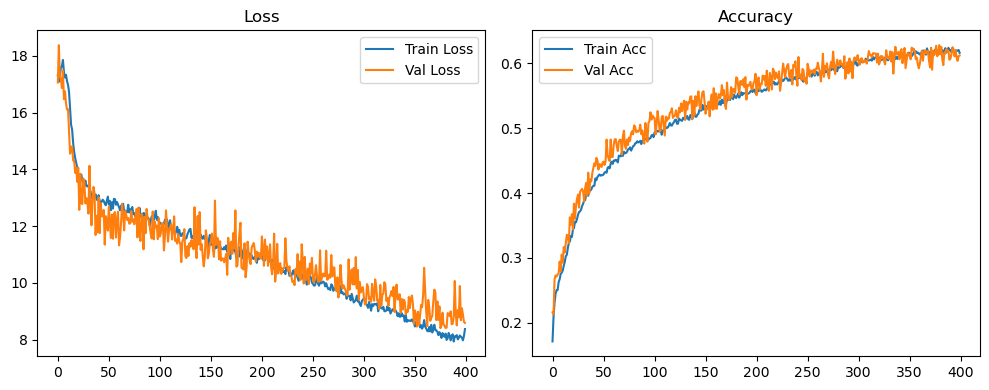

Original Model Final Test Loss: 8.7256 Accuracy: 0.6137


🚀 Running: batch128_lr_max_0.0002_min_1e-06_dp0.05


Files already downloaded and verified


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|                                                                                                                                                                        | 0/400 [00:00<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.1683 | Val Acc: 0.2218 | Epoch Time: 1.87 | :   0%|                                                                                                      | 0/400 [01:52<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.1683 | Val Acc: 0.2218 | Epoch Time: 1.87 | :   0%|                                                                                                      | 0/400 [01:52<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.1683 | Val Acc: 0.2218 | Epoch Time: 1.87 | :   0%|▏                                                                                         | 1/400 [01:52<12:27:27, 112.40s/it]

| LR: 0.000200 | Train Acc: 0.2022 | Val Acc: 0.2267 | Epoch Time: 1.87 | :   0%|▏                                                                                         | 1/400 [03:44<12:27:27, 112.40s/it]

| LR: 0.000200 | Train Acc: 0.2022 | Val Acc: 0.2267 | Epoch Time: 1.87 | :   0%|▏                                                                                         | 1/400 [03:44<12:27:27, 112.40s/it]

| LR: 0.000200 | Train Acc: 0.2022 | Val Acc: 0.2267 | Epoch Time: 1.87 | :   0%|▍                                                                                         | 2/400 [03:44<12:24:15, 112.20s/it]

| LR: 0.000200 | Train Acc: 0.2151 | Val Acc: 0.2590 | Epoch Time: 1.87 | :   0%|▍                                                                                         | 2/400 [05:36<12:24:15, 112.20s/it]

| LR: 0.000200 | Train Acc: 0.2151 | Val Acc: 0.2590 | Epoch Time: 1.87 | :   0%|▍                                                                                         | 2/400 [05:36<12:24:15, 112.20s/it]

| LR: 0.000200 | Train Acc: 0.2151 | Val Acc: 0.2590 | Epoch Time: 1.87 | :   1%|▋                                                                                         | 3/400 [05:36<12:21:50, 112.12s/it]

| LR: 0.000200 | Train Acc: 0.2308 | Val Acc: 0.2806 | Epoch Time: 1.87 | :   1%|▋                                                                                         | 3/400 [07:28<12:21:50, 112.12s/it]

| LR: 0.000200 | Train Acc: 0.2308 | Val Acc: 0.2806 | Epoch Time: 1.87 | :   1%|▋                                                                                         | 3/400 [07:28<12:21:50, 112.12s/it]

| LR: 0.000200 | Train Acc: 0.2308 | Val Acc: 0.2806 | Epoch Time: 1.87 | :   1%|▉                                                                                         | 4/400 [07:28<12:19:42, 112.08s/it]

| LR: 0.000200 | Train Acc: 0.2358 | Val Acc: 0.2879 | Epoch Time: 1.86 | :   1%|▉                                                                                         | 4/400 [09:20<12:19:42, 112.08s/it]

| LR: 0.000200 | Train Acc: 0.2358 | Val Acc: 0.2879 | Epoch Time: 1.86 | :   1%|▉                                                                                         | 4/400 [09:20<12:19:42, 112.08s/it]

| LR: 0.000200 | Train Acc: 0.2358 | Val Acc: 0.2879 | Epoch Time: 1.86 | :   1%|█▏                                                                                        | 5/400 [09:20<12:17:38, 112.05s/it]

| LR: 0.000200 | Train Acc: 0.2450 | Val Acc: 0.2862 | Epoch Time: 1.86 | :   1%|█▏                                                                                        | 5/400 [11:12<12:17:38, 112.05s/it]

| LR: 0.000200 | Train Acc: 0.2450 | Val Acc: 0.2862 | Epoch Time: 1.86 | :   1%|█▏                                                                                        | 5/400 [11:12<12:17:38, 112.05s/it]

| LR: 0.000200 | Train Acc: 0.2450 | Val Acc: 0.2862 | Epoch Time: 1.86 | :   2%|█▎                                                                                        | 6/400 [11:12<12:15:39, 112.03s/it]

| LR: 0.000200 | Train Acc: 0.2531 | Val Acc: 0.2840 | Epoch Time: 1.86 | :   2%|█▎                                                                                        | 6/400 [13:04<12:15:39, 112.03s/it]

| LR: 0.000200 | Train Acc: 0.2531 | Val Acc: 0.2840 | Epoch Time: 1.86 | :   2%|█▎                                                                                        | 6/400 [13:04<12:15:39, 112.03s/it]

| LR: 0.000200 | Train Acc: 0.2531 | Val Acc: 0.2840 | Epoch Time: 1.86 | :   2%|█▌                                                                                        | 7/400 [13:04<12:13:41, 112.01s/it]

| LR: 0.000200 | Train Acc: 0.2550 | Val Acc: 0.2749 | Epoch Time: 1.86 | :   2%|█▌                                                                                        | 7/400 [14:56<12:13:41, 112.01s/it]

| LR: 0.000200 | Train Acc: 0.2550 | Val Acc: 0.2749 | Epoch Time: 1.86 | :   2%|█▌                                                                                        | 7/400 [14:56<12:13:41, 112.01s/it]

| LR: 0.000200 | Train Acc: 0.2550 | Val Acc: 0.2749 | Epoch Time: 1.86 | :   2%|█▊                                                                                        | 8/400 [14:56<12:11:44, 112.00s/it]

| LR: 0.000200 | Train Acc: 0.2636 | Val Acc: 0.3115 | Epoch Time: 1.86 | :   2%|█▊                                                                                        | 8/400 [16:48<12:11:44, 112.00s/it]

| LR: 0.000200 | Train Acc: 0.2636 | Val Acc: 0.3115 | Epoch Time: 1.86 | :   2%|█▊                                                                                        | 8/400 [16:48<12:11:44, 112.00s/it]

| LR: 0.000200 | Train Acc: 0.2636 | Val Acc: 0.3115 | Epoch Time: 1.86 | :   2%|██                                                                                        | 9/400 [16:48<12:09:48, 111.99s/it]

| LR: 0.000200 | Train Acc: 0.2672 | Val Acc: 0.3160 | Epoch Time: 1.86 | :   2%|██                                                                                        | 9/400 [18:40<12:09:48, 111.99s/it]

| LR: 0.000200 | Train Acc: 0.2672 | Val Acc: 0.3160 | Epoch Time: 1.86 | :   2%|██                                                                                        | 9/400 [18:40<12:09:48, 111.99s/it]

| LR: 0.000200 | Train Acc: 0.2672 | Val Acc: 0.3160 | Epoch Time: 1.86 | :   2%|██▏                                                                                      | 10/400 [18:40<12:07:52, 111.98s/it]

| LR: 0.000200 | Train Acc: 0.2763 | Val Acc: 0.2967 | Epoch Time: 1.86 | :   2%|██▏                                                                                      | 10/400 [20:32<12:07:52, 111.98s/it]

| LR: 0.000200 | Train Acc: 0.2763 | Val Acc: 0.2967 | Epoch Time: 1.86 | :   2%|██▏                                                                                      | 10/400 [20:32<12:07:52, 111.98s/it]

| LR: 0.000200 | Train Acc: 0.2763 | Val Acc: 0.2967 | Epoch Time: 1.86 | :   3%|██▍                                                                                      | 11/400 [20:32<12:05:58, 111.98s/it]

| LR: 0.000200 | Train Acc: 0.2758 | Val Acc: 0.3311 | Epoch Time: 1.86 | :   3%|██▍                                                                                      | 11/400 [22:24<12:05:58, 111.98s/it]

| LR: 0.000200 | Train Acc: 0.2758 | Val Acc: 0.3311 | Epoch Time: 1.86 | :   3%|██▍                                                                                      | 11/400 [22:24<12:05:58, 111.98s/it]

| LR: 0.000200 | Train Acc: 0.2758 | Val Acc: 0.3311 | Epoch Time: 1.86 | :   3%|██▋                                                                                      | 12/400 [22:24<12:04:07, 111.98s/it]

| LR: 0.000200 | Train Acc: 0.2823 | Val Acc: 0.3247 | Epoch Time: 1.86 | :   3%|██▋                                                                                      | 12/400 [24:16<12:04:07, 111.98s/it]

| LR: 0.000200 | Train Acc: 0.2823 | Val Acc: 0.3247 | Epoch Time: 1.86 | :   3%|██▋                                                                                      | 12/400 [24:16<12:04:07, 111.98s/it]

| LR: 0.000200 | Train Acc: 0.2823 | Val Acc: 0.3247 | Epoch Time: 1.86 | :   3%|██▉                                                                                      | 13/400 [24:16<12:02:09, 111.96s/it]

| LR: 0.000199 | Train Acc: 0.2848 | Val Acc: 0.3187 | Epoch Time: 1.86 | :   3%|██▉                                                                                      | 13/400 [26:08<12:02:09, 111.96s/it]

| LR: 0.000199 | Train Acc: 0.2848 | Val Acc: 0.3187 | Epoch Time: 1.86 | :   3%|██▉                                                                                      | 13/400 [26:08<12:02:09, 111.96s/it]

| LR: 0.000199 | Train Acc: 0.2848 | Val Acc: 0.3187 | Epoch Time: 1.86 | :   4%|███                                                                                      | 14/400 [26:08<12:00:10, 111.94s/it]

| LR: 0.000199 | Train Acc: 0.2905 | Val Acc: 0.3211 | Epoch Time: 1.86 | :   4%|███                                                                                      | 14/400 [27:59<12:00:10, 111.94s/it]

| LR: 0.000199 | Train Acc: 0.2905 | Val Acc: 0.3211 | Epoch Time: 1.86 | :   4%|███                                                                                      | 14/400 [27:59<12:00:10, 111.94s/it]

| LR: 0.000199 | Train Acc: 0.2905 | Val Acc: 0.3211 | Epoch Time: 1.86 | :   4%|███▎                                                                                     | 15/400 [28:00<11:58:13, 111.93s/it]

| LR: 0.000199 | Train Acc: 0.2923 | Val Acc: 0.3344 | Epoch Time: 1.86 | :   4%|███▎                                                                                     | 15/400 [29:51<11:58:13, 111.93s/it]

| LR: 0.000199 | Train Acc: 0.2923 | Val Acc: 0.3344 | Epoch Time: 1.86 | :   4%|███▎                                                                                     | 15/400 [29:51<11:58:13, 111.93s/it]

| LR: 0.000199 | Train Acc: 0.2923 | Val Acc: 0.3344 | Epoch Time: 1.86 | :   4%|███▌                                                                                     | 16/400 [29:51<11:56:19, 111.93s/it]

| LR: 0.000199 | Train Acc: 0.2999 | Val Acc: 0.3248 | Epoch Time: 1.86 | :   4%|███▌                                                                                     | 16/400 [31:43<11:56:19, 111.93s/it]

| LR: 0.000199 | Train Acc: 0.2999 | Val Acc: 0.3248 | Epoch Time: 1.86 | :   4%|███▌                                                                                     | 16/400 [31:43<11:56:19, 111.93s/it]

| LR: 0.000199 | Train Acc: 0.2999 | Val Acc: 0.3248 | Epoch Time: 1.86 | :   4%|███▊                                                                                     | 17/400 [31:43<11:54:27, 111.92s/it]

| LR: 0.000199 | Train Acc: 0.3063 | Val Acc: 0.3234 | Epoch Time: 1.86 | :   4%|███▊                                                                                     | 17/400 [33:35<11:54:27, 111.92s/it]

| LR: 0.000199 | Train Acc: 0.3063 | Val Acc: 0.3234 | Epoch Time: 1.86 | :   4%|███▊                                                                                     | 17/400 [33:35<11:54:27, 111.92s/it]

| LR: 0.000199 | Train Acc: 0.3063 | Val Acc: 0.3234 | Epoch Time: 1.86 | :   4%|████                                                                                     | 18/400 [33:35<11:52:37, 111.93s/it]

| LR: 0.000199 | Train Acc: 0.3079 | Val Acc: 0.3392 | Epoch Time: 1.86 | :   4%|████                                                                                     | 18/400 [35:27<11:52:37, 111.93s/it]

| LR: 0.000199 | Train Acc: 0.3079 | Val Acc: 0.3392 | Epoch Time: 1.86 | :   4%|████                                                                                     | 18/400 [35:27<11:52:37, 111.93s/it]

| LR: 0.000199 | Train Acc: 0.3079 | Val Acc: 0.3392 | Epoch Time: 1.86 | :   5%|████▏                                                                                    | 19/400 [35:27<11:50:49, 111.94s/it]

| LR: 0.000199 | Train Acc: 0.3143 | Val Acc: 0.3491 | Epoch Time: 1.86 | :   5%|████▏                                                                                    | 19/400 [37:19<11:50:49, 111.94s/it]

| LR: 0.000199 | Train Acc: 0.3143 | Val Acc: 0.3491 | Epoch Time: 1.86 | :   5%|████▏                                                                                    | 19/400 [37:19<11:50:49, 111.94s/it]

| LR: 0.000199 | Train Acc: 0.3143 | Val Acc: 0.3491 | Epoch Time: 1.86 | :   5%|████▍                                                                                    | 20/400 [37:19<11:48:56, 111.94s/it]

| LR: 0.000199 | Train Acc: 0.3206 | Val Acc: 0.3529 | Epoch Time: 1.86 | :   5%|████▍                                                                                    | 20/400 [39:11<11:48:56, 111.94s/it]

| LR: 0.000199 | Train Acc: 0.3206 | Val Acc: 0.3529 | Epoch Time: 1.86 | :   5%|████▍                                                                                    | 20/400 [39:11<11:48:56, 111.94s/it]

| LR: 0.000199 | Train Acc: 0.3206 | Val Acc: 0.3529 | Epoch Time: 1.86 | :   5%|████▋                                                                                    | 21/400 [39:11<11:46:59, 111.92s/it]

| LR: 0.000199 | Train Acc: 0.3246 | Val Acc: 0.3499 | Epoch Time: 1.86 | :   5%|████▋                                                                                    | 21/400 [41:03<11:46:59, 111.92s/it]

| LR: 0.000199 | Train Acc: 0.3246 | Val Acc: 0.3499 | Epoch Time: 1.86 | :   5%|████▋                                                                                    | 21/400 [41:03<11:46:59, 111.92s/it]

| LR: 0.000199 | Train Acc: 0.3246 | Val Acc: 0.3499 | Epoch Time: 1.86 | :   6%|████▉                                                                                    | 22/400 [41:03<11:45:04, 111.92s/it]

| LR: 0.000199 | Train Acc: 0.3205 | Val Acc: 0.3349 | Epoch Time: 1.86 | :   6%|████▉                                                                                    | 22/400 [42:55<11:45:04, 111.92s/it]

| LR: 0.000199 | Train Acc: 0.3205 | Val Acc: 0.3349 | Epoch Time: 1.86 | :   6%|████▉                                                                                    | 22/400 [42:55<11:45:04, 111.92s/it]

| LR: 0.000199 | Train Acc: 0.3205 | Val Acc: 0.3349 | Epoch Time: 1.86 | :   6%|█████                                                                                    | 23/400 [42:55<11:43:14, 111.92s/it]

| LR: 0.000198 | Train Acc: 0.3291 | Val Acc: 0.3499 | Epoch Time: 1.86 | :   6%|█████                                                                                    | 23/400 [44:47<11:43:14, 111.92s/it]

| LR: 0.000198 | Train Acc: 0.3291 | Val Acc: 0.3499 | Epoch Time: 1.86 | :   6%|█████                                                                                    | 23/400 [44:47<11:43:14, 111.92s/it]

| LR: 0.000198 | Train Acc: 0.3291 | Val Acc: 0.3499 | Epoch Time: 1.86 | :   6%|█████▎                                                                                   | 24/400 [44:47<11:41:27, 111.94s/it]

| LR: 0.000198 | Train Acc: 0.3311 | Val Acc: 0.3229 | Epoch Time: 1.86 | :   6%|█████▎                                                                                   | 24/400 [46:39<11:41:27, 111.94s/it]

| LR: 0.000198 | Train Acc: 0.3311 | Val Acc: 0.3229 | Epoch Time: 1.86 | :   6%|█████▎                                                                                   | 24/400 [46:39<11:41:27, 111.94s/it]

| LR: 0.000198 | Train Acc: 0.3311 | Val Acc: 0.3229 | Epoch Time: 1.86 | :   6%|█████▌                                                                                   | 25/400 [46:39<11:39:39, 111.94s/it]

| LR: 0.000198 | Train Acc: 0.3370 | Val Acc: 0.3703 | Epoch Time: 1.86 | :   6%|█████▌                                                                                   | 25/400 [48:31<11:39:39, 111.94s/it]

| LR: 0.000198 | Train Acc: 0.3370 | Val Acc: 0.3703 | Epoch Time: 1.86 | :   6%|█████▌                                                                                   | 25/400 [48:31<11:39:39, 111.94s/it]

| LR: 0.000198 | Train Acc: 0.3370 | Val Acc: 0.3703 | Epoch Time: 1.86 | :   6%|█████▊                                                                                   | 26/400 [48:31<11:37:47, 111.94s/it]

| LR: 0.000198 | Train Acc: 0.3405 | Val Acc: 0.3762 | Epoch Time: 1.86 | :   6%|█████▊                                                                                   | 26/400 [50:23<11:37:47, 111.94s/it]

| LR: 0.000198 | Train Acc: 0.3405 | Val Acc: 0.3762 | Epoch Time: 1.86 | :   6%|█████▊                                                                                   | 26/400 [50:23<11:37:47, 111.94s/it]

| LR: 0.000198 | Train Acc: 0.3405 | Val Acc: 0.3762 | Epoch Time: 1.86 | :   7%|██████                                                                                   | 27/400 [50:23<11:35:55, 111.95s/it]

| LR: 0.000198 | Train Acc: 0.3411 | Val Acc: 0.3693 | Epoch Time: 1.86 | :   7%|██████                                                                                   | 27/400 [52:15<11:35:55, 111.95s/it]

| LR: 0.000198 | Train Acc: 0.3411 | Val Acc: 0.3693 | Epoch Time: 1.86 | :   7%|██████                                                                                   | 27/400 [52:15<11:35:55, 111.95s/it]

| LR: 0.000198 | Train Acc: 0.3411 | Val Acc: 0.3693 | Epoch Time: 1.86 | :   7%|██████▏                                                                                  | 28/400 [52:15<11:34:01, 111.94s/it]

| LR: 0.000198 | Train Acc: 0.3432 | Val Acc: 0.3696 | Epoch Time: 1.86 | :   7%|██████▏                                                                                  | 28/400 [54:07<11:34:01, 111.94s/it]

| LR: 0.000198 | Train Acc: 0.3432 | Val Acc: 0.3696 | Epoch Time: 1.86 | :   7%|██████▏                                                                                  | 28/400 [54:07<11:34:01, 111.94s/it]

| LR: 0.000198 | Train Acc: 0.3432 | Val Acc: 0.3696 | Epoch Time: 1.86 | :   7%|██████▍                                                                                  | 29/400 [54:07<11:32:09, 111.94s/it]

| LR: 0.000197 | Train Acc: 0.3439 | Val Acc: 0.3708 | Epoch Time: 1.86 | :   7%|██████▍                                                                                  | 29/400 [55:58<11:32:09, 111.94s/it]

| LR: 0.000197 | Train Acc: 0.3439 | Val Acc: 0.3708 | Epoch Time: 1.86 | :   7%|██████▍                                                                                  | 29/400 [55:58<11:32:09, 111.94s/it]

| LR: 0.000197 | Train Acc: 0.3439 | Val Acc: 0.3708 | Epoch Time: 1.86 | :   8%|██████▋                                                                                  | 30/400 [55:59<11:30:13, 111.93s/it]

| LR: 0.000197 | Train Acc: 0.3500 | Val Acc: 0.3684 | Epoch Time: 1.86 | :   8%|██████▋                                                                                  | 30/400 [57:50<11:30:13, 111.93s/it]

| LR: 0.000197 | Train Acc: 0.3500 | Val Acc: 0.3684 | Epoch Time: 1.86 | :   8%|██████▋                                                                                  | 30/400 [57:50<11:30:13, 111.93s/it]

| LR: 0.000197 | Train Acc: 0.3500 | Val Acc: 0.3684 | Epoch Time: 1.86 | :   8%|██████▉                                                                                  | 31/400 [57:50<11:28:18, 111.92s/it]

| LR: 0.000197 | Train Acc: 0.3520 | Val Acc: 0.3610 | Epoch Time: 1.86 | :   8%|██████▉                                                                                  | 31/400 [59:42<11:28:18, 111.92s/it]

| LR: 0.000197 | Train Acc: 0.3520 | Val Acc: 0.3610 | Epoch Time: 1.86 | :   8%|██████▉                                                                                  | 31/400 [59:42<11:28:18, 111.92s/it]

| LR: 0.000197 | Train Acc: 0.3520 | Val Acc: 0.3610 | Epoch Time: 1.86 | :   8%|███████                                                                                  | 32/400 [59:42<11:26:33, 111.94s/it]

| LR: 0.000197 | Train Acc: 0.3562 | Val Acc: 0.3727 | Epoch Time: 1.86 | :   8%|██████▉                                                                                | 32/400 [1:01:34<11:26:33, 111.94s/it]

| LR: 0.000197 | Train Acc: 0.3562 | Val Acc: 0.3727 | Epoch Time: 1.86 | :   8%|██████▉                                                                                | 32/400 [1:01:34<11:26:33, 111.94s/it]

| LR: 0.000197 | Train Acc: 0.3562 | Val Acc: 0.3727 | Epoch Time: 1.86 | :   8%|███████▏                                                                               | 33/400 [1:01:34<11:24:41, 111.94s/it]

| LR: 0.000197 | Train Acc: 0.3574 | Val Acc: 0.3671 | Epoch Time: 1.86 | :   8%|███████▏                                                                               | 33/400 [1:03:26<11:24:41, 111.94s/it]

| LR: 0.000197 | Train Acc: 0.3574 | Val Acc: 0.3671 | Epoch Time: 1.86 | :   8%|███████▏                                                                               | 33/400 [1:03:26<11:24:41, 111.94s/it]

| LR: 0.000197 | Train Acc: 0.3574 | Val Acc: 0.3671 | Epoch Time: 1.86 | :   8%|███████▍                                                                               | 34/400 [1:03:26<11:22:47, 111.93s/it]

| LR: 0.000196 | Train Acc: 0.3606 | Val Acc: 0.3786 | Epoch Time: 1.86 | :   8%|███████▍                                                                               | 34/400 [1:05:18<11:22:47, 111.93s/it]

| LR: 0.000196 | Train Acc: 0.3606 | Val Acc: 0.3786 | Epoch Time: 1.86 | :   8%|███████▍                                                                               | 34/400 [1:05:18<11:22:47, 111.93s/it]

| LR: 0.000196 | Train Acc: 0.3606 | Val Acc: 0.3786 | Epoch Time: 1.86 | :   9%|███████▌                                                                               | 35/400 [1:05:18<11:20:57, 111.94s/it]

| LR: 0.000196 | Train Acc: 0.3626 | Val Acc: 0.3884 | Epoch Time: 1.86 | :   9%|███████▌                                                                               | 35/400 [1:07:10<11:20:57, 111.94s/it]

| LR: 0.000196 | Train Acc: 0.3626 | Val Acc: 0.3884 | Epoch Time: 1.86 | :   9%|███████▌                                                                               | 35/400 [1:07:10<11:20:57, 111.94s/it]

| LR: 0.000196 | Train Acc: 0.3626 | Val Acc: 0.3884 | Epoch Time: 1.86 | :   9%|███████▊                                                                               | 36/400 [1:07:10<11:19:05, 111.94s/it]

| LR: 0.000196 | Train Acc: 0.3642 | Val Acc: 0.3679 | Epoch Time: 1.86 | :   9%|███████▊                                                                               | 36/400 [1:09:02<11:19:05, 111.94s/it]

| LR: 0.000196 | Train Acc: 0.3642 | Val Acc: 0.3679 | Epoch Time: 1.86 | :   9%|███████▊                                                                               | 36/400 [1:09:02<11:19:05, 111.94s/it]

| LR: 0.000196 | Train Acc: 0.3642 | Val Acc: 0.3679 | Epoch Time: 1.86 | :   9%|████████                                                                               | 37/400 [1:09:02<11:17:11, 111.93s/it]

| LR: 0.000196 | Train Acc: 0.3688 | Val Acc: 0.3831 | Epoch Time: 1.86 | :   9%|████████                                                                               | 37/400 [1:10:54<11:17:11, 111.93s/it]

| LR: 0.000196 | Train Acc: 0.3688 | Val Acc: 0.3831 | Epoch Time: 1.86 | :   9%|████████                                                                               | 37/400 [1:10:54<11:17:11, 111.93s/it]

| LR: 0.000196 | Train Acc: 0.3688 | Val Acc: 0.3831 | Epoch Time: 1.86 | :  10%|████████▎                                                                              | 38/400 [1:10:54<11:15:20, 111.94s/it]

| LR: 0.000196 | Train Acc: 0.3685 | Val Acc: 0.3941 | Epoch Time: 1.86 | :  10%|████████▎                                                                              | 38/400 [1:12:46<11:15:20, 111.94s/it]

| LR: 0.000196 | Train Acc: 0.3685 | Val Acc: 0.3941 | Epoch Time: 1.86 | :  10%|████████▎                                                                              | 38/400 [1:12:46<11:15:20, 111.94s/it]

| LR: 0.000196 | Train Acc: 0.3685 | Val Acc: 0.3941 | Epoch Time: 1.86 | :  10%|████████▍                                                                              | 39/400 [1:12:46<11:13:29, 111.94s/it]

| LR: 0.000195 | Train Acc: 0.3654 | Val Acc: 0.3635 | Epoch Time: 1.86 | :  10%|████████▍                                                                              | 39/400 [1:14:38<11:13:29, 111.94s/it]

| LR: 0.000195 | Train Acc: 0.3654 | Val Acc: 0.3635 | Epoch Time: 1.86 | :  10%|████████▍                                                                              | 39/400 [1:14:38<11:13:29, 111.94s/it]

| LR: 0.000195 | Train Acc: 0.3654 | Val Acc: 0.3635 | Epoch Time: 1.86 | :  10%|████████▋                                                                              | 40/400 [1:14:38<11:11:37, 111.94s/it]

| LR: 0.000195 | Train Acc: 0.3694 | Val Acc: 0.3802 | Epoch Time: 1.86 | :  10%|████████▋                                                                              | 40/400 [1:16:30<11:11:37, 111.94s/it]

| LR: 0.000195 | Train Acc: 0.3694 | Val Acc: 0.3802 | Epoch Time: 1.86 | :  10%|████████▋                                                                              | 40/400 [1:16:30<11:11:37, 111.94s/it]

| LR: 0.000195 | Train Acc: 0.3694 | Val Acc: 0.3802 | Epoch Time: 1.86 | :  10%|████████▉                                                                              | 41/400 [1:16:30<11:09:45, 111.94s/it]

| LR: 0.000195 | Train Acc: 0.3715 | Val Acc: 0.3903 | Epoch Time: 1.86 | :  10%|████████▉                                                                              | 41/400 [1:18:22<11:09:45, 111.94s/it]

| LR: 0.000195 | Train Acc: 0.3715 | Val Acc: 0.3903 | Epoch Time: 1.86 | :  10%|████████▉                                                                              | 41/400 [1:18:22<11:09:45, 111.94s/it]

| LR: 0.000195 | Train Acc: 0.3715 | Val Acc: 0.3903 | Epoch Time: 1.86 | :  10%|█████████▏                                                                             | 42/400 [1:18:22<11:07:52, 111.94s/it]

| LR: 0.000195 | Train Acc: 0.3747 | Val Acc: 0.3606 | Epoch Time: 1.86 | :  10%|█████████▏                                                                             | 42/400 [1:20:14<11:07:52, 111.94s/it]

| LR: 0.000195 | Train Acc: 0.3747 | Val Acc: 0.3606 | Epoch Time: 1.86 | :  10%|█████████▏                                                                             | 42/400 [1:20:14<11:07:52, 111.94s/it]

| LR: 0.000195 | Train Acc: 0.3747 | Val Acc: 0.3606 | Epoch Time: 1.86 | :  11%|█████████▎                                                                             | 43/400 [1:20:14<11:06:02, 111.94s/it]

| LR: 0.000194 | Train Acc: 0.3712 | Val Acc: 0.3983 | Epoch Time: 1.86 | :  11%|█████████▎                                                                             | 43/400 [1:22:06<11:06:02, 111.94s/it]

| LR: 0.000194 | Train Acc: 0.3712 | Val Acc: 0.3983 | Epoch Time: 1.86 | :  11%|█████████▎                                                                             | 43/400 [1:22:06<11:06:02, 111.94s/it]

| LR: 0.000194 | Train Acc: 0.3712 | Val Acc: 0.3983 | Epoch Time: 1.86 | :  11%|█████████▌                                                                             | 44/400 [1:22:06<11:04:13, 111.95s/it]

| LR: 0.000194 | Train Acc: 0.3752 | Val Acc: 0.3722 | Epoch Time: 1.86 | :  11%|█████████▌                                                                             | 44/400 [1:23:58<11:04:13, 111.95s/it]

| LR: 0.000194 | Train Acc: 0.3752 | Val Acc: 0.3722 | Epoch Time: 1.86 | :  11%|█████████▌                                                                             | 44/400 [1:23:58<11:04:13, 111.95s/it]

| LR: 0.000194 | Train Acc: 0.3752 | Val Acc: 0.3722 | Epoch Time: 1.86 | :  11%|█████████▊                                                                             | 45/400 [1:23:58<11:02:21, 111.95s/it]

| LR: 0.000194 | Train Acc: 0.3781 | Val Acc: 0.3792 | Epoch Time: 1.86 | :  11%|█████████▊                                                                             | 45/400 [1:25:50<11:02:21, 111.95s/it]

| LR: 0.000194 | Train Acc: 0.3781 | Val Acc: 0.3792 | Epoch Time: 1.86 | :  11%|█████████▊                                                                             | 45/400 [1:25:50<11:02:21, 111.95s/it]

| LR: 0.000194 | Train Acc: 0.3781 | Val Acc: 0.3792 | Epoch Time: 1.86 | :  12%|██████████                                                                             | 46/400 [1:25:50<11:00:32, 111.96s/it]

| LR: 0.000194 | Train Acc: 0.3793 | Val Acc: 0.3772 | Epoch Time: 1.86 | :  12%|██████████                                                                             | 46/400 [1:27:41<11:00:32, 111.96s/it]

| LR: 0.000194 | Train Acc: 0.3793 | Val Acc: 0.3772 | Epoch Time: 1.86 | :  12%|██████████                                                                             | 46/400 [1:27:41<11:00:32, 111.96s/it]

| LR: 0.000194 | Train Acc: 0.3793 | Val Acc: 0.3772 | Epoch Time: 1.86 | :  12%|██████████▏                                                                            | 47/400 [1:27:42<10:58:43, 111.96s/it]

| LR: 0.000193 | Train Acc: 0.3806 | Val Acc: 0.3676 | Epoch Time: 1.86 | :  12%|██████████▏                                                                            | 47/400 [1:29:33<10:58:43, 111.96s/it]

| LR: 0.000193 | Train Acc: 0.3806 | Val Acc: 0.3676 | Epoch Time: 1.86 | :  12%|██████████▏                                                                            | 47/400 [1:29:33<10:58:43, 111.96s/it]

| LR: 0.000193 | Train Acc: 0.3806 | Val Acc: 0.3676 | Epoch Time: 1.86 | :  12%|██████████▍                                                                            | 48/400 [1:29:34<10:56:51, 111.97s/it]

| LR: 0.000193 | Train Acc: 0.3820 | Val Acc: 0.4061 | Epoch Time: 1.86 | :  12%|██████████▍                                                                            | 48/400 [1:31:25<10:56:51, 111.97s/it]

| LR: 0.000193 | Train Acc: 0.3820 | Val Acc: 0.4061 | Epoch Time: 1.86 | :  12%|██████████▍                                                                            | 48/400 [1:31:25<10:56:51, 111.97s/it]

| LR: 0.000193 | Train Acc: 0.3820 | Val Acc: 0.4061 | Epoch Time: 1.86 | :  12%|██████████▋                                                                            | 49/400 [1:31:26<10:55:01, 111.97s/it]

| LR: 0.000193 | Train Acc: 0.3851 | Val Acc: 0.3758 | Epoch Time: 1.86 | :  12%|██████████▋                                                                            | 49/400 [1:33:17<10:55:01, 111.97s/it]

| LR: 0.000193 | Train Acc: 0.3851 | Val Acc: 0.3758 | Epoch Time: 1.86 | :  12%|██████████▋                                                                            | 49/400 [1:33:17<10:55:01, 111.97s/it]

| LR: 0.000193 | Train Acc: 0.3851 | Val Acc: 0.3758 | Epoch Time: 1.86 | :  12%|██████████▉                                                                            | 50/400 [1:33:18<10:53:11, 111.98s/it]

| LR: 0.000192 | Train Acc: 0.3827 | Val Acc: 0.3934 | Epoch Time: 1.86 | :  12%|██████████▉                                                                            | 50/400 [1:35:09<10:53:11, 111.98s/it]

| LR: 0.000192 | Train Acc: 0.3827 | Val Acc: 0.3934 | Epoch Time: 1.86 | :  12%|██████████▉                                                                            | 50/400 [1:35:09<10:53:11, 111.98s/it]

| LR: 0.000192 | Train Acc: 0.3827 | Val Acc: 0.3934 | Epoch Time: 1.86 | :  13%|███████████                                                                            | 51/400 [1:35:10<10:51:18, 111.97s/it]

| LR: 0.000192 | Train Acc: 0.3828 | Val Acc: 0.3786 | Epoch Time: 1.87 | :  13%|███████████                                                                            | 51/400 [1:37:01<10:51:18, 111.97s/it]

| LR: 0.000192 | Train Acc: 0.3828 | Val Acc: 0.3786 | Epoch Time: 1.87 | :  13%|███████████                                                                            | 51/400 [1:37:01<10:51:18, 111.97s/it]

| LR: 0.000192 | Train Acc: 0.3828 | Val Acc: 0.3786 | Epoch Time: 1.87 | :  13%|███████████▎                                                                           | 52/400 [1:37:02<10:49:30, 111.99s/it]

| LR: 0.000192 | Train Acc: 0.3901 | Val Acc: 0.3757 | Epoch Time: 1.86 | :  13%|███████████▎                                                                           | 52/400 [1:38:53<10:49:30, 111.99s/it]

| LR: 0.000192 | Train Acc: 0.3901 | Val Acc: 0.3757 | Epoch Time: 1.86 | :  13%|███████████▎                                                                           | 52/400 [1:38:53<10:49:30, 111.99s/it]

| LR: 0.000192 | Train Acc: 0.3901 | Val Acc: 0.3757 | Epoch Time: 1.86 | :  13%|███████████▌                                                                           | 53/400 [1:38:53<10:47:35, 111.97s/it]

| LR: 0.000192 | Train Acc: 0.3890 | Val Acc: 0.3886 | Epoch Time: 1.86 | :  13%|███████████▌                                                                           | 53/400 [1:40:45<10:47:35, 111.97s/it]

| LR: 0.000192 | Train Acc: 0.3890 | Val Acc: 0.3886 | Epoch Time: 1.86 | :  13%|███████████▌                                                                           | 53/400 [1:40:45<10:47:35, 111.97s/it]

| LR: 0.000192 | Train Acc: 0.3890 | Val Acc: 0.3886 | Epoch Time: 1.86 | :  14%|███████████▋                                                                           | 54/400 [1:40:45<10:45:42, 111.97s/it]

| LR: 0.000191 | Train Acc: 0.3862 | Val Acc: 0.4027 | Epoch Time: 1.86 | :  14%|███████████▋                                                                           | 54/400 [1:42:37<10:45:42, 111.97s/it]

| LR: 0.000191 | Train Acc: 0.3862 | Val Acc: 0.4027 | Epoch Time: 1.86 | :  14%|███████████▋                                                                           | 54/400 [1:42:37<10:45:42, 111.97s/it]

| LR: 0.000191 | Train Acc: 0.3862 | Val Acc: 0.4027 | Epoch Time: 1.86 | :  14%|███████████▉                                                                           | 55/400 [1:42:37<10:43:48, 111.97s/it]

| LR: 0.000191 | Train Acc: 0.3934 | Val Acc: 0.3933 | Epoch Time: 1.86 | :  14%|███████████▉                                                                           | 55/400 [1:44:29<10:43:48, 111.97s/it]

| LR: 0.000191 | Train Acc: 0.3934 | Val Acc: 0.3933 | Epoch Time: 1.86 | :  14%|███████████▉                                                                           | 55/400 [1:44:29<10:43:48, 111.97s/it]

| LR: 0.000191 | Train Acc: 0.3934 | Val Acc: 0.3933 | Epoch Time: 1.86 | :  14%|████████████▏                                                                          | 56/400 [1:44:29<10:41:57, 111.97s/it]

| LR: 0.000191 | Train Acc: 0.3936 | Val Acc: 0.3867 | Epoch Time: 1.86 | :  14%|████████████▏                                                                          | 56/400 [1:46:21<10:41:57, 111.97s/it]

| LR: 0.000191 | Train Acc: 0.3936 | Val Acc: 0.3867 | Epoch Time: 1.86 | :  14%|████████████▏                                                                          | 56/400 [1:46:21<10:41:57, 111.97s/it]

| LR: 0.000191 | Train Acc: 0.3936 | Val Acc: 0.3867 | Epoch Time: 1.86 | :  14%|████████████▍                                                                          | 57/400 [1:46:21<10:40:04, 111.97s/it]

| LR: 0.000190 | Train Acc: 0.3952 | Val Acc: 0.4021 | Epoch Time: 1.86 | :  14%|████████████▍                                                                          | 57/400 [1:48:13<10:40:04, 111.97s/it]

| LR: 0.000190 | Train Acc: 0.3952 | Val Acc: 0.4021 | Epoch Time: 1.86 | :  14%|████████████▍                                                                          | 57/400 [1:48:13<10:40:04, 111.97s/it]

| LR: 0.000190 | Train Acc: 0.3952 | Val Acc: 0.4021 | Epoch Time: 1.86 | :  14%|████████████▌                                                                          | 58/400 [1:48:13<10:38:09, 111.96s/it]

| LR: 0.000190 | Train Acc: 0.3969 | Val Acc: 0.4012 | Epoch Time: 1.86 | :  14%|████████████▌                                                                          | 58/400 [1:50:05<10:38:09, 111.96s/it]

| LR: 0.000190 | Train Acc: 0.3969 | Val Acc: 0.4012 | Epoch Time: 1.86 | :  14%|████████████▌                                                                          | 58/400 [1:50:05<10:38:09, 111.96s/it]

| LR: 0.000190 | Train Acc: 0.3969 | Val Acc: 0.4012 | Epoch Time: 1.86 | :  15%|████████████▊                                                                          | 59/400 [1:50:05<10:36:16, 111.96s/it]

| LR: 0.000190 | Train Acc: 0.3928 | Val Acc: 0.3760 | Epoch Time: 1.86 | :  15%|████████████▊                                                                          | 59/400 [1:51:57<10:36:16, 111.96s/it]

| LR: 0.000190 | Train Acc: 0.3928 | Val Acc: 0.3760 | Epoch Time: 1.86 | :  15%|████████████▊                                                                          | 59/400 [1:51:57<10:36:16, 111.96s/it]

| LR: 0.000190 | Train Acc: 0.3928 | Val Acc: 0.3760 | Epoch Time: 1.86 | :  15%|█████████████                                                                          | 60/400 [1:51:57<10:34:23, 111.95s/it]

| LR: 0.000189 | Train Acc: 0.3997 | Val Acc: 0.4221 | Epoch Time: 1.86 | :  15%|█████████████                                                                          | 60/400 [1:53:49<10:34:23, 111.95s/it]

| LR: 0.000189 | Train Acc: 0.3997 | Val Acc: 0.4221 | Epoch Time: 1.86 | :  15%|█████████████                                                                          | 60/400 [1:53:49<10:34:23, 111.95s/it]

| LR: 0.000189 | Train Acc: 0.3997 | Val Acc: 0.4221 | Epoch Time: 1.86 | :  15%|█████████████▎                                                                         | 61/400 [1:53:49<10:32:28, 111.94s/it]

| LR: 0.000189 | Train Acc: 0.3969 | Val Acc: 0.3760 | Epoch Time: 1.86 | :  15%|█████████████▎                                                                         | 61/400 [1:55:41<10:32:28, 111.94s/it]

| LR: 0.000189 | Train Acc: 0.3969 | Val Acc: 0.3760 | Epoch Time: 1.86 | :  15%|█████████████▎                                                                         | 61/400 [1:55:41<10:32:28, 111.94s/it]

| LR: 0.000189 | Train Acc: 0.3969 | Val Acc: 0.3760 | Epoch Time: 1.86 | :  16%|█████████████▍                                                                         | 62/400 [1:55:41<10:30:42, 111.96s/it]

| LR: 0.000188 | Train Acc: 0.3994 | Val Acc: 0.3973 | Epoch Time: 1.87 | :  16%|█████████████▍                                                                         | 62/400 [1:57:33<10:30:42, 111.96s/it]

| LR: 0.000188 | Train Acc: 0.3994 | Val Acc: 0.3973 | Epoch Time: 1.87 | :  16%|█████████████▍                                                                         | 62/400 [1:57:33<10:30:42, 111.96s/it]

| LR: 0.000188 | Train Acc: 0.3994 | Val Acc: 0.3973 | Epoch Time: 1.87 | :  16%|█████████████▋                                                                         | 63/400 [1:57:33<10:28:56, 111.98s/it]

| LR: 0.000188 | Train Acc: 0.3974 | Val Acc: 0.4091 | Epoch Time: 1.87 | :  16%|█████████████▋                                                                         | 63/400 [1:59:25<10:28:56, 111.98s/it]

| LR: 0.000188 | Train Acc: 0.3974 | Val Acc: 0.4091 | Epoch Time: 1.87 | :  16%|█████████████▋                                                                         | 63/400 [1:59:25<10:28:56, 111.98s/it]

| LR: 0.000188 | Train Acc: 0.3974 | Val Acc: 0.4091 | Epoch Time: 1.87 | :  16%|█████████████▉                                                                         | 64/400 [1:59:25<10:27:09, 111.99s/it]

| LR: 0.000188 | Train Acc: 0.3997 | Val Acc: 0.4129 | Epoch Time: 1.87 | :  16%|█████████████▉                                                                         | 64/400 [2:01:17<10:27:09, 111.99s/it]

| LR: 0.000188 | Train Acc: 0.3997 | Val Acc: 0.4129 | Epoch Time: 1.87 | :  16%|█████████████▉                                                                         | 64/400 [2:01:17<10:27:09, 111.99s/it]

| LR: 0.000188 | Train Acc: 0.3997 | Val Acc: 0.4129 | Epoch Time: 1.87 | :  16%|██████████████▏                                                                        | 65/400 [2:01:17<10:25:21, 112.00s/it]

| LR: 0.000187 | Train Acc: 0.4003 | Val Acc: 0.3721 | Epoch Time: 1.87 | :  16%|██████████████▏                                                                        | 65/400 [2:03:09<10:25:21, 112.00s/it]

| LR: 0.000187 | Train Acc: 0.4003 | Val Acc: 0.3721 | Epoch Time: 1.87 | :  16%|██████████████▏                                                                        | 65/400 [2:03:09<10:25:21, 112.00s/it]

| LR: 0.000187 | Train Acc: 0.4003 | Val Acc: 0.3721 | Epoch Time: 1.87 | :  16%|██████████████▎                                                                        | 66/400 [2:03:09<10:23:30, 112.01s/it]

| LR: 0.000187 | Train Acc: 0.4030 | Val Acc: 0.4155 | Epoch Time: 1.87 | :  16%|██████████████▎                                                                        | 66/400 [2:05:01<10:23:30, 112.01s/it]

| LR: 0.000187 | Train Acc: 0.4030 | Val Acc: 0.4155 | Epoch Time: 1.87 | :  16%|██████████████▎                                                                        | 66/400 [2:05:01<10:23:30, 112.01s/it]

| LR: 0.000187 | Train Acc: 0.4030 | Val Acc: 0.4155 | Epoch Time: 1.87 | :  17%|██████████████▌                                                                        | 67/400 [2:05:01<10:21:39, 112.01s/it]

| LR: 0.000187 | Train Acc: 0.4043 | Val Acc: 0.4185 | Epoch Time: 1.87 | :  17%|██████████████▌                                                                        | 67/400 [2:06:53<10:21:39, 112.01s/it]

| LR: 0.000187 | Train Acc: 0.4043 | Val Acc: 0.4185 | Epoch Time: 1.87 | :  17%|██████████████▌                                                                        | 67/400 [2:06:53<10:21:39, 112.01s/it]

| LR: 0.000187 | Train Acc: 0.4043 | Val Acc: 0.4185 | Epoch Time: 1.87 | :  17%|██████████████▊                                                                        | 68/400 [2:06:53<10:19:50, 112.02s/it]

| LR: 0.000186 | Train Acc: 0.4068 | Val Acc: 0.4059 | Epoch Time: 1.86 | :  17%|██████████████▊                                                                        | 68/400 [2:08:45<10:19:50, 112.02s/it]

| LR: 0.000186 | Train Acc: 0.4068 | Val Acc: 0.4059 | Epoch Time: 1.86 | :  17%|██████████████▊                                                                        | 68/400 [2:08:45<10:19:50, 112.02s/it]

| LR: 0.000186 | Train Acc: 0.4068 | Val Acc: 0.4059 | Epoch Time: 1.86 | :  17%|███████████████                                                                        | 69/400 [2:08:45<10:17:53, 112.00s/it]

| LR: 0.000186 | Train Acc: 0.4032 | Val Acc: 0.3820 | Epoch Time: 1.86 | :  17%|███████████████                                                                        | 69/400 [2:10:37<10:17:53, 112.00s/it]

| LR: 0.000186 | Train Acc: 0.4032 | Val Acc: 0.3820 | Epoch Time: 1.86 | :  17%|███████████████                                                                        | 69/400 [2:10:37<10:17:53, 112.00s/it]

| LR: 0.000186 | Train Acc: 0.4032 | Val Acc: 0.3820 | Epoch Time: 1.86 | :  18%|███████████████▏                                                                       | 70/400 [2:10:37<10:15:53, 111.98s/it]

| LR: 0.000185 | Train Acc: 0.4076 | Val Acc: 0.4101 | Epoch Time: 1.86 | :  18%|███████████████▏                                                                       | 70/400 [2:12:29<10:15:53, 111.98s/it]

| LR: 0.000185 | Train Acc: 0.4076 | Val Acc: 0.4101 | Epoch Time: 1.86 | :  18%|███████████████▏                                                                       | 70/400 [2:12:29<10:15:53, 111.98s/it]

| LR: 0.000185 | Train Acc: 0.4076 | Val Acc: 0.4101 | Epoch Time: 1.86 | :  18%|███████████████▍                                                                       | 71/400 [2:12:29<10:13:56, 111.96s/it]

| LR: 0.000185 | Train Acc: 0.4069 | Val Acc: 0.4277 | Epoch Time: 1.86 | :  18%|███████████████▍                                                                       | 71/400 [2:14:21<10:13:56, 111.96s/it]

| LR: 0.000185 | Train Acc: 0.4069 | Val Acc: 0.4277 | Epoch Time: 1.86 | :  18%|███████████████▍                                                                       | 71/400 [2:14:21<10:13:56, 111.96s/it]

| LR: 0.000185 | Train Acc: 0.4069 | Val Acc: 0.4277 | Epoch Time: 1.86 | :  18%|███████████████▋                                                                       | 72/400 [2:14:21<10:11:58, 111.95s/it]

| LR: 0.000185 | Train Acc: 0.4088 | Val Acc: 0.4088 | Epoch Time: 1.86 | :  18%|███████████████▋                                                                       | 72/400 [2:16:13<10:11:58, 111.95s/it]

| LR: 0.000185 | Train Acc: 0.4088 | Val Acc: 0.4088 | Epoch Time: 1.86 | :  18%|███████████████▋                                                                       | 72/400 [2:16:13<10:11:58, 111.95s/it]

| LR: 0.000185 | Train Acc: 0.4088 | Val Acc: 0.4088 | Epoch Time: 1.86 | :  18%|███████████████▉                                                                       | 73/400 [2:16:13<10:10:04, 111.94s/it]

| LR: 0.000184 | Train Acc: 0.4108 | Val Acc: 0.4141 | Epoch Time: 1.86 | :  18%|███████████████▉                                                                       | 73/400 [2:18:05<10:10:04, 111.94s/it]

| LR: 0.000184 | Train Acc: 0.4108 | Val Acc: 0.4141 | Epoch Time: 1.86 | :  18%|███████████████▉                                                                       | 73/400 [2:18:05<10:10:04, 111.94s/it]

| LR: 0.000184 | Train Acc: 0.4108 | Val Acc: 0.4141 | Epoch Time: 1.86 | :  18%|████████████████                                                                       | 74/400 [2:18:05<10:08:10, 111.93s/it]

| LR: 0.000184 | Train Acc: 0.4142 | Val Acc: 0.4088 | Epoch Time: 1.86 | :  18%|████████████████                                                                       | 74/400 [2:19:57<10:08:10, 111.93s/it]

| LR: 0.000184 | Train Acc: 0.4142 | Val Acc: 0.4088 | Epoch Time: 1.86 | :  18%|████████████████                                                                       | 74/400 [2:19:57<10:08:10, 111.93s/it]

| LR: 0.000184 | Train Acc: 0.4142 | Val Acc: 0.4088 | Epoch Time: 1.86 | :  19%|████████████████▎                                                                      | 75/400 [2:19:57<10:06:16, 111.93s/it]

| LR: 0.000183 | Train Acc: 0.4142 | Val Acc: 0.4166 | Epoch Time: 1.86 | :  19%|████████████████▎                                                                      | 75/400 [2:21:49<10:06:16, 111.93s/it]

| LR: 0.000183 | Train Acc: 0.4142 | Val Acc: 0.4166 | Epoch Time: 1.86 | :  19%|████████████████▎                                                                      | 75/400 [2:21:49<10:06:16, 111.93s/it]

| LR: 0.000183 | Train Acc: 0.4142 | Val Acc: 0.4166 | Epoch Time: 1.86 | :  19%|████████████████▌                                                                      | 76/400 [2:21:49<10:04:23, 111.93s/it]

| LR: 0.000183 | Train Acc: 0.4136 | Val Acc: 0.4153 | Epoch Time: 1.86 | :  19%|████████████████▌                                                                      | 76/400 [2:23:40<10:04:23, 111.93s/it]

| LR: 0.000183 | Train Acc: 0.4136 | Val Acc: 0.4153 | Epoch Time: 1.86 | :  19%|████████████████▌                                                                      | 76/400 [2:23:40<10:04:23, 111.93s/it]

| LR: 0.000183 | Train Acc: 0.4136 | Val Acc: 0.4153 | Epoch Time: 1.86 | :  19%|████████████████▋                                                                      | 77/400 [2:23:41<10:02:34, 111.93s/it]

| LR: 0.000182 | Train Acc: 0.4134 | Val Acc: 0.4070 | Epoch Time: 1.86 | :  19%|████████████████▋                                                                      | 77/400 [2:25:32<10:02:34, 111.93s/it]

| LR: 0.000182 | Train Acc: 0.4134 | Val Acc: 0.4070 | Epoch Time: 1.86 | :  19%|████████████████▋                                                                      | 77/400 [2:25:32<10:02:34, 111.93s/it]

| LR: 0.000182 | Train Acc: 0.4134 | Val Acc: 0.4070 | Epoch Time: 1.86 | :  20%|████████████████▉                                                                      | 78/400 [2:25:33<10:00:43, 111.94s/it]

| LR: 0.000182 | Train Acc: 0.4171 | Val Acc: 0.4351 | Epoch Time: 1.86 | :  20%|████████████████▉                                                                      | 78/400 [2:27:24<10:00:43, 111.94s/it]

| LR: 0.000182 | Train Acc: 0.4171 | Val Acc: 0.4351 | Epoch Time: 1.86 | :  20%|████████████████▉                                                                      | 78/400 [2:27:24<10:00:43, 111.94s/it]

| LR: 0.000182 | Train Acc: 0.4171 | Val Acc: 0.4351 | Epoch Time: 1.86 | :  20%|█████████████████▍                                                                      | 79/400 [2:27:24<9:58:52, 111.94s/it]

| LR: 0.000181 | Train Acc: 0.4168 | Val Acc: 0.3889 | Epoch Time: 1.86 | :  20%|█████████████████▍                                                                      | 79/400 [2:29:16<9:58:52, 111.94s/it]

| LR: 0.000181 | Train Acc: 0.4168 | Val Acc: 0.3889 | Epoch Time: 1.86 | :  20%|█████████████████▍                                                                      | 79/400 [2:29:16<9:58:52, 111.94s/it]

| LR: 0.000181 | Train Acc: 0.4168 | Val Acc: 0.3889 | Epoch Time: 1.86 | :  20%|█████████████████▌                                                                      | 80/400 [2:29:16<9:57:00, 111.94s/it]

| LR: 0.000181 | Train Acc: 0.4193 | Val Acc: 0.4145 | Epoch Time: 1.86 | :  20%|█████████████████▌                                                                      | 80/400 [2:31:08<9:57:00, 111.94s/it]

| LR: 0.000181 | Train Acc: 0.4193 | Val Acc: 0.4145 | Epoch Time: 1.86 | :  20%|█████████████████▌                                                                      | 80/400 [2:31:08<9:57:00, 111.94s/it]

| LR: 0.000181 | Train Acc: 0.4193 | Val Acc: 0.4145 | Epoch Time: 1.86 | :  20%|█████████████████▊                                                                      | 81/400 [2:31:08<9:55:09, 111.94s/it]

| LR: 0.000181 | Train Acc: 0.4201 | Val Acc: 0.4405 | Epoch Time: 1.86 | :  20%|█████████████████▊                                                                      | 81/400 [2:33:00<9:55:09, 111.94s/it]

| LR: 0.000181 | Train Acc: 0.4201 | Val Acc: 0.4405 | Epoch Time: 1.86 | :  20%|█████████████████▊                                                                      | 81/400 [2:33:00<9:55:09, 111.94s/it]

| LR: 0.000181 | Train Acc: 0.4201 | Val Acc: 0.4405 | Epoch Time: 1.86 | :  20%|██████████████████                                                                      | 82/400 [2:33:00<9:53:16, 111.94s/it]

| LR: 0.000180 | Train Acc: 0.4207 | Val Acc: 0.4226 | Epoch Time: 1.86 | :  20%|██████████████████                                                                      | 82/400 [2:34:52<9:53:16, 111.94s/it]

| LR: 0.000180 | Train Acc: 0.4207 | Val Acc: 0.4226 | Epoch Time: 1.86 | :  20%|██████████████████                                                                      | 82/400 [2:34:52<9:53:16, 111.94s/it]

| LR: 0.000180 | Train Acc: 0.4207 | Val Acc: 0.4226 | Epoch Time: 1.86 | :  21%|██████████████████▎                                                                     | 83/400 [2:34:52<9:51:25, 111.94s/it]

| LR: 0.000180 | Train Acc: 0.4207 | Val Acc: 0.4294 | Epoch Time: 1.86 | :  21%|██████████████████▎                                                                     | 83/400 [2:36:44<9:51:25, 111.94s/it]

| LR: 0.000180 | Train Acc: 0.4207 | Val Acc: 0.4294 | Epoch Time: 1.86 | :  21%|██████████████████▎                                                                     | 83/400 [2:36:44<9:51:25, 111.94s/it]

| LR: 0.000180 | Train Acc: 0.4207 | Val Acc: 0.4294 | Epoch Time: 1.86 | :  21%|██████████████████▍                                                                     | 84/400 [2:36:44<9:49:34, 111.94s/it]

| LR: 0.000179 | Train Acc: 0.4207 | Val Acc: 0.4111 | Epoch Time: 1.86 | :  21%|██████████████████▍                                                                     | 84/400 [2:38:36<9:49:34, 111.94s/it]

| LR: 0.000179 | Train Acc: 0.4207 | Val Acc: 0.4111 | Epoch Time: 1.86 | :  21%|██████████████████▍                                                                     | 84/400 [2:38:36<9:49:34, 111.94s/it]

| LR: 0.000179 | Train Acc: 0.4207 | Val Acc: 0.4111 | Epoch Time: 1.86 | :  21%|██████████████████▋                                                                     | 85/400 [2:38:36<9:47:42, 111.95s/it]

| LR: 0.000179 | Train Acc: 0.4214 | Val Acc: 0.4102 | Epoch Time: 1.86 | :  21%|██████████████████▋                                                                     | 85/400 [2:40:28<9:47:42, 111.95s/it]

| LR: 0.000179 | Train Acc: 0.4214 | Val Acc: 0.4102 | Epoch Time: 1.86 | :  21%|██████████████████▋                                                                     | 85/400 [2:40:28<9:47:42, 111.95s/it]

| LR: 0.000179 | Train Acc: 0.4214 | Val Acc: 0.4102 | Epoch Time: 1.86 | :  22%|██████████████████▉                                                                     | 86/400 [2:40:28<9:45:52, 111.95s/it]

| LR: 0.000178 | Train Acc: 0.4245 | Val Acc: 0.4095 | Epoch Time: 1.86 | :  22%|██████████████████▉                                                                     | 86/400 [2:42:20<9:45:52, 111.95s/it]

| LR: 0.000178 | Train Acc: 0.4245 | Val Acc: 0.4095 | Epoch Time: 1.86 | :  22%|██████████████████▉                                                                     | 86/400 [2:42:20<9:45:52, 111.95s/it]

| LR: 0.000178 | Train Acc: 0.4245 | Val Acc: 0.4095 | Epoch Time: 1.86 | :  22%|███████████████████▏                                                                    | 87/400 [2:42:20<9:44:00, 111.95s/it]

| LR: 0.000178 | Train Acc: 0.4229 | Val Acc: 0.4190 | Epoch Time: 1.86 | :  22%|███████████████████▏                                                                    | 87/400 [2:44:12<9:44:00, 111.95s/it]

| LR: 0.000178 | Train Acc: 0.4229 | Val Acc: 0.4190 | Epoch Time: 1.86 | :  22%|███████████████████▏                                                                    | 87/400 [2:44:12<9:44:00, 111.95s/it]

| LR: 0.000178 | Train Acc: 0.4229 | Val Acc: 0.4190 | Epoch Time: 1.86 | :  22%|███████████████████▎                                                                    | 88/400 [2:44:12<9:42:09, 111.95s/it]

| LR: 0.000177 | Train Acc: 0.4236 | Val Acc: 0.4094 | Epoch Time: 1.86 | :  22%|███████████████████▎                                                                    | 88/400 [2:46:04<9:42:09, 111.95s/it]

| LR: 0.000177 | Train Acc: 0.4236 | Val Acc: 0.4094 | Epoch Time: 1.86 | :  22%|███████████████████▎                                                                    | 88/400 [2:46:04<9:42:09, 111.95s/it]

| LR: 0.000177 | Train Acc: 0.4236 | Val Acc: 0.4094 | Epoch Time: 1.86 | :  22%|███████████████████▌                                                                    | 89/400 [2:46:04<9:40:16, 111.95s/it]

| LR: 0.000177 | Train Acc: 0.4251 | Val Acc: 0.4489 | Epoch Time: 1.86 | :  22%|███████████████████▌                                                                    | 89/400 [2:47:56<9:40:16, 111.95s/it]

| LR: 0.000177 | Train Acc: 0.4251 | Val Acc: 0.4489 | Epoch Time: 1.86 | :  22%|███████████████████▌                                                                    | 89/400 [2:47:56<9:40:16, 111.95s/it]

| LR: 0.000177 | Train Acc: 0.4251 | Val Acc: 0.4489 | Epoch Time: 1.86 | :  22%|███████████████████▊                                                                    | 90/400 [2:47:56<9:38:23, 111.95s/it]

| LR: 0.000176 | Train Acc: 0.4287 | Val Acc: 0.4419 | Epoch Time: 1.86 | :  22%|███████████████████▊                                                                    | 90/400 [2:49:48<9:38:23, 111.95s/it]

| LR: 0.000176 | Train Acc: 0.4287 | Val Acc: 0.4419 | Epoch Time: 1.86 | :  22%|███████████████████▊                                                                    | 90/400 [2:49:48<9:38:23, 111.95s/it]

| LR: 0.000176 | Train Acc: 0.4287 | Val Acc: 0.4419 | Epoch Time: 1.86 | :  23%|████████████████████                                                                    | 91/400 [2:49:48<9:36:28, 111.94s/it]

| LR: 0.000176 | Train Acc: 0.4311 | Val Acc: 0.4385 | Epoch Time: 1.86 | :  23%|████████████████████                                                                    | 91/400 [2:51:40<9:36:28, 111.94s/it]

| LR: 0.000176 | Train Acc: 0.4311 | Val Acc: 0.4385 | Epoch Time: 1.86 | :  23%|████████████████████                                                                    | 91/400 [2:51:40<9:36:28, 111.94s/it]

| LR: 0.000176 | Train Acc: 0.4311 | Val Acc: 0.4385 | Epoch Time: 1.86 | :  23%|████████████████████▏                                                                   | 92/400 [2:51:40<9:34:37, 111.94s/it]

| LR: 0.000175 | Train Acc: 0.4291 | Val Acc: 0.4335 | Epoch Time: 1.86 | :  23%|████████████████████▏                                                                   | 92/400 [2:53:32<9:34:37, 111.94s/it]

| LR: 0.000175 | Train Acc: 0.4291 | Val Acc: 0.4335 | Epoch Time: 1.86 | :  23%|████████████████████▏                                                                   | 92/400 [2:53:32<9:34:37, 111.94s/it]

| LR: 0.000175 | Train Acc: 0.4291 | Val Acc: 0.4335 | Epoch Time: 1.86 | :  23%|████████████████████▍                                                                   | 93/400 [2:53:32<9:32:45, 111.94s/it]

| LR: 0.000175 | Train Acc: 0.4299 | Val Acc: 0.4326 | Epoch Time: 1.86 | :  23%|████████████████████▍                                                                   | 93/400 [2:55:23<9:32:45, 111.94s/it]

| LR: 0.000175 | Train Acc: 0.4299 | Val Acc: 0.4326 | Epoch Time: 1.86 | :  23%|████████████████████▍                                                                   | 93/400 [2:55:23<9:32:45, 111.94s/it]

| LR: 0.000175 | Train Acc: 0.4299 | Val Acc: 0.4326 | Epoch Time: 1.86 | :  24%|████████████████████▋                                                                   | 94/400 [2:55:24<9:30:50, 111.93s/it]

| LR: 0.000174 | Train Acc: 0.4283 | Val Acc: 0.4035 | Epoch Time: 1.86 | :  24%|████████████████████▋                                                                   | 94/400 [2:57:15<9:30:50, 111.93s/it]

| LR: 0.000174 | Train Acc: 0.4283 | Val Acc: 0.4035 | Epoch Time: 1.86 | :  24%|████████████████████▋                                                                   | 94/400 [2:57:15<9:30:50, 111.93s/it]

| LR: 0.000174 | Train Acc: 0.4283 | Val Acc: 0.4035 | Epoch Time: 1.86 | :  24%|████████████████████▉                                                                   | 95/400 [2:57:16<9:28:58, 111.93s/it]

| LR: 0.000174 | Train Acc: 0.4286 | Val Acc: 0.4128 | Epoch Time: 1.86 | :  24%|████████████████████▉                                                                   | 95/400 [2:59:07<9:28:58, 111.93s/it]

| LR: 0.000174 | Train Acc: 0.4286 | Val Acc: 0.4128 | Epoch Time: 1.86 | :  24%|████████████████████▉                                                                   | 95/400 [2:59:07<9:28:58, 111.93s/it]

| LR: 0.000174 | Train Acc: 0.4286 | Val Acc: 0.4128 | Epoch Time: 1.86 | :  24%|█████████████████████                                                                   | 96/400 [2:59:07<9:27:03, 111.92s/it]

| LR: 0.000173 | Train Acc: 0.4345 | Val Acc: 0.4255 | Epoch Time: 1.86 | :  24%|█████████████████████                                                                   | 96/400 [3:00:59<9:27:03, 111.92s/it]

| LR: 0.000173 | Train Acc: 0.4345 | Val Acc: 0.4255 | Epoch Time: 1.86 | :  24%|█████████████████████                                                                   | 96/400 [3:00:59<9:27:03, 111.92s/it]

| LR: 0.000173 | Train Acc: 0.4345 | Val Acc: 0.4255 | Epoch Time: 1.86 | :  24%|█████████████████████▎                                                                  | 97/400 [3:00:59<9:25:12, 111.92s/it]

| LR: 0.000172 | Train Acc: 0.4304 | Val Acc: 0.4340 | Epoch Time: 1.86 | :  24%|█████████████████████▎                                                                  | 97/400 [3:02:51<9:25:12, 111.92s/it]

| LR: 0.000172 | Train Acc: 0.4304 | Val Acc: 0.4340 | Epoch Time: 1.86 | :  24%|█████████████████████▎                                                                  | 97/400 [3:02:51<9:25:12, 111.92s/it]

| LR: 0.000172 | Train Acc: 0.4304 | Val Acc: 0.4340 | Epoch Time: 1.86 | :  24%|█████████████████████▌                                                                  | 98/400 [3:02:51<9:23:21, 111.93s/it]

| LR: 0.000172 | Train Acc: 0.4324 | Val Acc: 0.4196 | Epoch Time: 1.86 | :  24%|█████████████████████▌                                                                  | 98/400 [3:04:43<9:23:21, 111.93s/it]

| LR: 0.000172 | Train Acc: 0.4324 | Val Acc: 0.4196 | Epoch Time: 1.86 | :  24%|█████████████████████▌                                                                  | 98/400 [3:04:43<9:23:21, 111.93s/it]

| LR: 0.000172 | Train Acc: 0.4324 | Val Acc: 0.4196 | Epoch Time: 1.86 | :  25%|█████████████████████▊                                                                  | 99/400 [3:04:43<9:21:31, 111.93s/it]

| LR: 0.000171 | Train Acc: 0.4324 | Val Acc: 0.4136 | Epoch Time: 1.86 | :  25%|█████████████████████▊                                                                  | 99/400 [3:06:35<9:21:31, 111.93s/it]

| LR: 0.000171 | Train Acc: 0.4324 | Val Acc: 0.4136 | Epoch Time: 1.86 | :  25%|█████████████████████▊                                                                  | 99/400 [3:06:35<9:21:31, 111.93s/it]

| LR: 0.000171 | Train Acc: 0.4324 | Val Acc: 0.4136 | Epoch Time: 1.86 | :  25%|█████████████████████▊                                                                 | 100/400 [3:06:35<9:19:42, 111.94s/it]

| LR: 0.000171 | Train Acc: 0.4337 | Val Acc: 0.4481 | Epoch Time: 1.86 | :  25%|█████████████████████▊                                                                 | 100/400 [3:08:27<9:19:42, 111.94s/it]

| LR: 0.000171 | Train Acc: 0.4337 | Val Acc: 0.4481 | Epoch Time: 1.86 | :  25%|█████████████████████▊                                                                 | 100/400 [3:08:27<9:19:42, 111.94s/it]

| LR: 0.000171 | Train Acc: 0.4337 | Val Acc: 0.4481 | Epoch Time: 1.86 | :  25%|█████████████████████▉                                                                 | 101/400 [3:08:27<9:17:53, 111.95s/it]

| LR: 0.000170 | Train Acc: 0.4332 | Val Acc: 0.4280 | Epoch Time: 1.86 | :  25%|█████████████████████▉                                                                 | 101/400 [3:10:19<9:17:53, 111.95s/it]

| LR: 0.000170 | Train Acc: 0.4332 | Val Acc: 0.4280 | Epoch Time: 1.86 | :  25%|█████████████████████▉                                                                 | 101/400 [3:10:19<9:17:53, 111.95s/it]

| LR: 0.000170 | Train Acc: 0.4332 | Val Acc: 0.4280 | Epoch Time: 1.86 | :  26%|██████████████████████▏                                                                | 102/400 [3:10:19<9:16:02, 111.95s/it]

| LR: 0.000170 | Train Acc: 0.4324 | Val Acc: 0.4279 | Epoch Time: 1.86 | :  26%|██████████████████████▏                                                                | 102/400 [3:12:11<9:16:02, 111.95s/it]

| LR: 0.000170 | Train Acc: 0.4324 | Val Acc: 0.4279 | Epoch Time: 1.86 | :  26%|██████████████████████▏                                                                | 102/400 [3:12:11<9:16:02, 111.95s/it]

| LR: 0.000170 | Train Acc: 0.4324 | Val Acc: 0.4279 | Epoch Time: 1.86 | :  26%|██████████████████████▍                                                                | 103/400 [3:12:11<9:14:09, 111.95s/it]

| LR: 0.000169 | Train Acc: 0.4385 | Val Acc: 0.4442 | Epoch Time: 1.86 | :  26%|██████████████████████▍                                                                | 103/400 [3:14:03<9:14:09, 111.95s/it]

| LR: 0.000169 | Train Acc: 0.4385 | Val Acc: 0.4442 | Epoch Time: 1.86 | :  26%|██████████████████████▍                                                                | 103/400 [3:14:03<9:14:09, 111.95s/it]

| LR: 0.000169 | Train Acc: 0.4385 | Val Acc: 0.4442 | Epoch Time: 1.86 | :  26%|██████████████████████▌                                                                | 104/400 [3:14:03<9:12:17, 111.95s/it]

| LR: 0.000169 | Train Acc: 0.4324 | Val Acc: 0.4152 | Epoch Time: 1.86 | :  26%|██████████████████████▌                                                                | 104/400 [3:15:55<9:12:17, 111.95s/it]

| LR: 0.000169 | Train Acc: 0.4324 | Val Acc: 0.4152 | Epoch Time: 1.86 | :  26%|██████████████████████▌                                                                | 104/400 [3:15:55<9:12:17, 111.95s/it]

| LR: 0.000169 | Train Acc: 0.4324 | Val Acc: 0.4152 | Epoch Time: 1.86 | :  26%|██████████████████████▊                                                                | 105/400 [3:15:55<9:10:24, 111.95s/it]

| LR: 0.000168 | Train Acc: 0.4332 | Val Acc: 0.4166 | Epoch Time: 1.86 | :  26%|██████████████████████▊                                                                | 105/400 [3:17:47<9:10:24, 111.95s/it]

| LR: 0.000168 | Train Acc: 0.4332 | Val Acc: 0.4166 | Epoch Time: 1.86 | :  26%|██████████████████████▊                                                                | 105/400 [3:17:47<9:10:24, 111.95s/it]

| LR: 0.000168 | Train Acc: 0.4332 | Val Acc: 0.4166 | Epoch Time: 1.86 | :  26%|███████████████████████                                                                | 106/400 [3:17:47<9:08:33, 111.95s/it]

| LR: 0.000167 | Train Acc: 0.4384 | Val Acc: 0.4076 | Epoch Time: 1.86 | :  26%|███████████████████████                                                                | 106/400 [3:19:39<9:08:33, 111.95s/it]

| LR: 0.000167 | Train Acc: 0.4384 | Val Acc: 0.4076 | Epoch Time: 1.86 | :  26%|███████████████████████                                                                | 106/400 [3:19:39<9:08:33, 111.95s/it]

| LR: 0.000167 | Train Acc: 0.4384 | Val Acc: 0.4076 | Epoch Time: 1.86 | :  27%|███████████████████████▎                                                               | 107/400 [3:19:39<9:06:40, 111.95s/it]

| LR: 0.000167 | Train Acc: 0.4379 | Val Acc: 0.4440 | Epoch Time: 1.86 | :  27%|███████████████████████▎                                                               | 107/400 [3:21:31<9:06:40, 111.95s/it]

| LR: 0.000167 | Train Acc: 0.4379 | Val Acc: 0.4440 | Epoch Time: 1.86 | :  27%|███████████████████████▎                                                               | 107/400 [3:21:31<9:06:40, 111.95s/it]

| LR: 0.000167 | Train Acc: 0.4379 | Val Acc: 0.4440 | Epoch Time: 1.86 | :  27%|███████████████████████▍                                                               | 108/400 [3:21:31<9:04:48, 111.95s/it]

| LR: 0.000166 | Train Acc: 0.4407 | Val Acc: 0.4279 | Epoch Time: 1.86 | :  27%|███████████████████████▍                                                               | 108/400 [3:23:23<9:04:48, 111.95s/it]

| LR: 0.000166 | Train Acc: 0.4407 | Val Acc: 0.4279 | Epoch Time: 1.86 | :  27%|███████████████████████▍                                                               | 108/400 [3:23:23<9:04:48, 111.95s/it]

| LR: 0.000166 | Train Acc: 0.4407 | Val Acc: 0.4279 | Epoch Time: 1.86 | :  27%|███████████████████████▋                                                               | 109/400 [3:23:23<9:02:55, 111.94s/it]

| LR: 0.000166 | Train Acc: 0.4418 | Val Acc: 0.4311 | Epoch Time: 1.86 | :  27%|███████████████████████▋                                                               | 109/400 [3:25:15<9:02:55, 111.94s/it]

| LR: 0.000166 | Train Acc: 0.4418 | Val Acc: 0.4311 | Epoch Time: 1.86 | :  27%|███████████████████████▋                                                               | 109/400 [3:25:15<9:02:55, 111.94s/it]

| LR: 0.000166 | Train Acc: 0.4418 | Val Acc: 0.4311 | Epoch Time: 1.86 | :  28%|███████████████████████▉                                                               | 110/400 [3:25:15<9:01:03, 111.94s/it]

| LR: 0.000165 | Train Acc: 0.4422 | Val Acc: 0.4143 | Epoch Time: 1.86 | :  28%|███████████████████████▉                                                               | 110/400 [3:27:07<9:01:03, 111.94s/it]

| LR: 0.000165 | Train Acc: 0.4422 | Val Acc: 0.4143 | Epoch Time: 1.86 | :  28%|███████████████████████▉                                                               | 110/400 [3:27:07<9:01:03, 111.94s/it]

| LR: 0.000165 | Train Acc: 0.4422 | Val Acc: 0.4143 | Epoch Time: 1.86 | :  28%|████████████████████████▏                                                              | 111/400 [3:27:07<8:59:14, 111.95s/it]

| LR: 0.000165 | Train Acc: 0.4396 | Val Acc: 0.4368 | Epoch Time: 1.86 | :  28%|████████████████████████▏                                                              | 111/400 [3:28:58<8:59:14, 111.95s/it]

| LR: 0.000165 | Train Acc: 0.4396 | Val Acc: 0.4368 | Epoch Time: 1.86 | :  28%|████████████████████████▏                                                              | 111/400 [3:28:59<8:59:14, 111.95s/it]

| LR: 0.000165 | Train Acc: 0.4396 | Val Acc: 0.4368 | Epoch Time: 1.86 | :  28%|████████████████████████▎                                                              | 112/400 [3:28:59<8:57:22, 111.95s/it]

| LR: 0.000164 | Train Acc: 0.4468 | Val Acc: 0.4289 | Epoch Time: 1.86 | :  28%|████████████████████████▎                                                              | 112/400 [3:30:50<8:57:22, 111.95s/it]

| LR: 0.000164 | Train Acc: 0.4468 | Val Acc: 0.4289 | Epoch Time: 1.86 | :  28%|████████████████████████▎                                                              | 112/400 [3:30:50<8:57:22, 111.95s/it]

| LR: 0.000164 | Train Acc: 0.4468 | Val Acc: 0.4289 | Epoch Time: 1.86 | :  28%|████████████████████████▌                                                              | 113/400 [3:30:51<8:55:30, 111.95s/it]

| LR: 0.000163 | Train Acc: 0.4450 | Val Acc: 0.4426 | Epoch Time: 1.86 | :  28%|████████████████████████▌                                                              | 113/400 [3:32:42<8:55:30, 111.95s/it]

| LR: 0.000163 | Train Acc: 0.4450 | Val Acc: 0.4426 | Epoch Time: 1.86 | :  28%|████████████████████████▌                                                              | 113/400 [3:32:42<8:55:30, 111.95s/it]

| LR: 0.000163 | Train Acc: 0.4450 | Val Acc: 0.4426 | Epoch Time: 1.86 | :  28%|████████████████████████▊                                                              | 114/400 [3:32:43<8:53:39, 111.96s/it]

| LR: 0.000163 | Train Acc: 0.4471 | Val Acc: 0.4175 | Epoch Time: 1.86 | :  28%|████████████████████████▊                                                              | 114/400 [3:34:34<8:53:39, 111.96s/it]

| LR: 0.000163 | Train Acc: 0.4471 | Val Acc: 0.4175 | Epoch Time: 1.86 | :  28%|████████████████████████▊                                                              | 114/400 [3:34:34<8:53:39, 111.96s/it]

| LR: 0.000163 | Train Acc: 0.4471 | Val Acc: 0.4175 | Epoch Time: 1.86 | :  29%|█████████████████████████                                                              | 115/400 [3:34:34<8:51:46, 111.95s/it]

| LR: 0.000162 | Train Acc: 0.4462 | Val Acc: 0.4443 | Epoch Time: 1.86 | :  29%|█████████████████████████                                                              | 115/400 [3:36:26<8:51:46, 111.95s/it]

| LR: 0.000162 | Train Acc: 0.4462 | Val Acc: 0.4443 | Epoch Time: 1.86 | :  29%|█████████████████████████                                                              | 115/400 [3:36:26<8:51:46, 111.95s/it]

| LR: 0.000162 | Train Acc: 0.4462 | Val Acc: 0.4443 | Epoch Time: 1.86 | :  29%|█████████████████████████▏                                                             | 116/400 [3:36:26<8:49:54, 111.95s/it]

| LR: 0.000161 | Train Acc: 0.4451 | Val Acc: 0.4062 | Epoch Time: 1.86 | :  29%|█████████████████████████▏                                                             | 116/400 [3:38:18<8:49:54, 111.95s/it]

| LR: 0.000161 | Train Acc: 0.4451 | Val Acc: 0.4062 | Epoch Time: 1.86 | :  29%|█████████████████████████▏                                                             | 116/400 [3:38:18<8:49:54, 111.95s/it]

| LR: 0.000161 | Train Acc: 0.4451 | Val Acc: 0.4062 | Epoch Time: 1.86 | :  29%|█████████████████████████▍                                                             | 117/400 [3:38:18<8:48:03, 111.95s/it]

| LR: 0.000161 | Train Acc: 0.4463 | Val Acc: 0.4342 | Epoch Time: 1.86 | :  29%|█████████████████████████▍                                                             | 117/400 [3:40:10<8:48:03, 111.95s/it]

| LR: 0.000161 | Train Acc: 0.4463 | Val Acc: 0.4342 | Epoch Time: 1.86 | :  29%|█████████████████████████▍                                                             | 117/400 [3:40:10<8:48:03, 111.95s/it]

| LR: 0.000161 | Train Acc: 0.4463 | Val Acc: 0.4342 | Epoch Time: 1.86 | :  30%|█████████████████████████▋                                                             | 118/400 [3:40:10<8:46:12, 111.96s/it]

| LR: 0.000160 | Train Acc: 0.4450 | Val Acc: 0.4588 | Epoch Time: 1.86 | :  30%|█████████████████████████▋                                                             | 118/400 [3:42:02<8:46:12, 111.96s/it]

| LR: 0.000160 | Train Acc: 0.4450 | Val Acc: 0.4588 | Epoch Time: 1.86 | :  30%|█████████████████████████▋                                                             | 118/400 [3:42:02<8:46:12, 111.96s/it]

| LR: 0.000160 | Train Acc: 0.4450 | Val Acc: 0.4588 | Epoch Time: 1.86 | :  30%|█████████████████████████▉                                                             | 119/400 [3:42:02<8:44:18, 111.95s/it]

| LR: 0.000160 | Train Acc: 0.4452 | Val Acc: 0.4614 | Epoch Time: 1.86 | :  30%|█████████████████████████▉                                                             | 119/400 [3:43:54<8:44:18, 111.95s/it]

| LR: 0.000160 | Train Acc: 0.4452 | Val Acc: 0.4614 | Epoch Time: 1.86 | :  30%|█████████████████████████▉                                                             | 119/400 [3:43:54<8:44:18, 111.95s/it]

| LR: 0.000160 | Train Acc: 0.4452 | Val Acc: 0.4614 | Epoch Time: 1.86 | :  30%|██████████████████████████                                                             | 120/400 [3:43:54<8:42:27, 111.96s/it]

| LR: 0.000159 | Train Acc: 0.4495 | Val Acc: 0.4276 | Epoch Time: 1.86 | :  30%|██████████████████████████                                                             | 120/400 [3:45:46<8:42:27, 111.96s/it]

| LR: 0.000159 | Train Acc: 0.4495 | Val Acc: 0.4276 | Epoch Time: 1.86 | :  30%|██████████████████████████                                                             | 120/400 [3:45:46<8:42:27, 111.96s/it]

| LR: 0.000159 | Train Acc: 0.4495 | Val Acc: 0.4276 | Epoch Time: 1.86 | :  30%|██████████████████████████▎                                                            | 121/400 [3:45:46<8:40:36, 111.96s/it]

| LR: 0.000158 | Train Acc: 0.4474 | Val Acc: 0.4600 | Epoch Time: 1.86 | :  30%|██████████████████████████▎                                                            | 121/400 [3:47:38<8:40:36, 111.96s/it]

| LR: 0.000158 | Train Acc: 0.4474 | Val Acc: 0.4600 | Epoch Time: 1.86 | :  30%|██████████████████████████▎                                                            | 121/400 [3:47:38<8:40:36, 111.96s/it]

| LR: 0.000158 | Train Acc: 0.4474 | Val Acc: 0.4600 | Epoch Time: 1.86 | :  30%|██████████████████████████▌                                                            | 122/400 [3:47:38<8:38:45, 111.96s/it]

| LR: 0.000158 | Train Acc: 0.4476 | Val Acc: 0.4528 | Epoch Time: 1.86 | :  30%|██████████████████████████▌                                                            | 122/400 [3:49:30<8:38:45, 111.96s/it]

| LR: 0.000158 | Train Acc: 0.4476 | Val Acc: 0.4528 | Epoch Time: 1.86 | :  30%|██████████████████████████▌                                                            | 122/400 [3:49:30<8:38:45, 111.96s/it]

| LR: 0.000158 | Train Acc: 0.4476 | Val Acc: 0.4528 | Epoch Time: 1.86 | :  31%|██████████████████████████▊                                                            | 123/400 [3:49:30<8:36:55, 111.97s/it]

| LR: 0.000157 | Train Acc: 0.4480 | Val Acc: 0.4689 | Epoch Time: 1.86 | :  31%|██████████████████████████▊                                                            | 123/400 [3:51:22<8:36:55, 111.97s/it]

| LR: 0.000157 | Train Acc: 0.4480 | Val Acc: 0.4689 | Epoch Time: 1.86 | :  31%|██████████████████████████▊                                                            | 123/400 [3:51:22<8:36:55, 111.97s/it]

| LR: 0.000157 | Train Acc: 0.4480 | Val Acc: 0.4689 | Epoch Time: 1.86 | :  31%|██████████████████████████▉                                                            | 124/400 [3:51:22<8:35:02, 111.97s/it]

| LR: 0.000156 | Train Acc: 0.4521 | Val Acc: 0.4624 | Epoch Time: 1.86 | :  31%|██████████████████████████▉                                                            | 124/400 [3:53:14<8:35:02, 111.97s/it]

| LR: 0.000156 | Train Acc: 0.4521 | Val Acc: 0.4624 | Epoch Time: 1.86 | :  31%|██████████████████████████▉                                                            | 124/400 [3:53:14<8:35:02, 111.97s/it]

| LR: 0.000156 | Train Acc: 0.4521 | Val Acc: 0.4624 | Epoch Time: 1.86 | :  31%|███████████████████████████▏                                                           | 125/400 [3:53:14<8:33:12, 111.97s/it]

| LR: 0.000156 | Train Acc: 0.4533 | Val Acc: 0.4532 | Epoch Time: 1.86 | :  31%|███████████████████████████▏                                                           | 125/400 [3:55:06<8:33:12, 111.97s/it]

| LR: 0.000156 | Train Acc: 0.4533 | Val Acc: 0.4532 | Epoch Time: 1.86 | :  31%|███████████████████████████▏                                                           | 125/400 [3:55:06<8:33:12, 111.97s/it]

| LR: 0.000156 | Train Acc: 0.4533 | Val Acc: 0.4532 | Epoch Time: 1.86 | :  32%|███████████████████████████▍                                                           | 126/400 [3:55:06<8:31:18, 111.97s/it]

| LR: 0.000155 | Train Acc: 0.4567 | Val Acc: 0.4190 | Epoch Time: 1.86 | :  32%|███████████████████████████▍                                                           | 126/400 [3:56:58<8:31:18, 111.97s/it]

| LR: 0.000155 | Train Acc: 0.4567 | Val Acc: 0.4190 | Epoch Time: 1.86 | :  32%|███████████████████████████▍                                                           | 126/400 [3:56:58<8:31:18, 111.97s/it]

| LR: 0.000155 | Train Acc: 0.4567 | Val Acc: 0.4190 | Epoch Time: 1.86 | :  32%|███████████████████████████▌                                                           | 127/400 [3:56:58<8:29:25, 111.96s/it]

| LR: 0.000154 | Train Acc: 0.4549 | Val Acc: 0.4782 | Epoch Time: 1.86 | :  32%|███████████████████████████▌                                                           | 127/400 [3:58:50<8:29:25, 111.96s/it]

| LR: 0.000154 | Train Acc: 0.4549 | Val Acc: 0.4782 | Epoch Time: 1.86 | :  32%|███████████████████████████▌                                                           | 127/400 [3:58:50<8:29:25, 111.96s/it]

| LR: 0.000154 | Train Acc: 0.4549 | Val Acc: 0.4782 | Epoch Time: 1.86 | :  32%|███████████████████████████▊                                                           | 128/400 [3:58:50<8:27:33, 111.96s/it]

| LR: 0.000154 | Train Acc: 0.4544 | Val Acc: 0.4396 | Epoch Time: 1.86 | :  32%|███████████████████████████▊                                                           | 128/400 [4:00:42<8:27:33, 111.96s/it]

| LR: 0.000154 | Train Acc: 0.4544 | Val Acc: 0.4396 | Epoch Time: 1.86 | :  32%|███████████████████████████▊                                                           | 128/400 [4:00:42<8:27:33, 111.96s/it]

| LR: 0.000154 | Train Acc: 0.4544 | Val Acc: 0.4396 | Epoch Time: 1.86 | :  32%|████████████████████████████                                                           | 129/400 [4:00:42<8:25:40, 111.96s/it]

| LR: 0.000153 | Train Acc: 0.4518 | Val Acc: 0.4506 | Epoch Time: 1.86 | :  32%|████████████████████████████                                                           | 129/400 [4:02:34<8:25:40, 111.96s/it]

| LR: 0.000153 | Train Acc: 0.4518 | Val Acc: 0.4506 | Epoch Time: 1.86 | :  32%|████████████████████████████                                                           | 129/400 [4:02:34<8:25:40, 111.96s/it]

| LR: 0.000153 | Train Acc: 0.4518 | Val Acc: 0.4506 | Epoch Time: 1.86 | :  32%|████████████████████████████▎                                                          | 130/400 [4:02:34<8:23:49, 111.96s/it]

| LR: 0.000152 | Train Acc: 0.4507 | Val Acc: 0.4428 | Epoch Time: 1.86 | :  32%|████████████████████████████▎                                                          | 130/400 [4:04:26<8:23:49, 111.96s/it]

| LR: 0.000152 | Train Acc: 0.4507 | Val Acc: 0.4428 | Epoch Time: 1.86 | :  32%|████████████████████████████▎                                                          | 130/400 [4:04:26<8:23:49, 111.96s/it]

| LR: 0.000152 | Train Acc: 0.4507 | Val Acc: 0.4428 | Epoch Time: 1.86 | :  33%|████████████████████████████▍                                                          | 131/400 [4:04:26<8:21:56, 111.96s/it]

| LR: 0.000152 | Train Acc: 0.4585 | Val Acc: 0.4642 | Epoch Time: 1.87 | :  33%|████████████████████████████▍                                                          | 131/400 [4:06:18<8:21:56, 111.96s/it]

| LR: 0.000152 | Train Acc: 0.4585 | Val Acc: 0.4642 | Epoch Time: 1.87 | :  33%|████████████████████████████▍                                                          | 131/400 [4:06:18<8:21:56, 111.96s/it]

| LR: 0.000152 | Train Acc: 0.4585 | Val Acc: 0.4642 | Epoch Time: 1.87 | :  33%|████████████████████████████▋                                                          | 132/400 [4:06:18<8:20:10, 111.98s/it]

| LR: 0.000151 | Train Acc: 0.4599 | Val Acc: 0.4602 | Epoch Time: 1.86 | :  33%|████████████████████████████▋                                                          | 132/400 [4:08:10<8:20:10, 111.98s/it]

| LR: 0.000151 | Train Acc: 0.4599 | Val Acc: 0.4602 | Epoch Time: 1.86 | :  33%|████████████████████████████▋                                                          | 132/400 [4:08:10<8:20:10, 111.98s/it]

| LR: 0.000151 | Train Acc: 0.4599 | Val Acc: 0.4602 | Epoch Time: 1.86 | :  33%|████████████████████████████▉                                                          | 133/400 [4:08:10<8:18:19, 111.98s/it]

| LR: 0.000150 | Train Acc: 0.4610 | Val Acc: 0.4370 | Epoch Time: 1.87 | :  33%|████████████████████████████▉                                                          | 133/400 [4:10:02<8:18:19, 111.98s/it]

| LR: 0.000150 | Train Acc: 0.4610 | Val Acc: 0.4370 | Epoch Time: 1.87 | :  33%|████████████████████████████▉                                                          | 133/400 [4:10:02<8:18:19, 111.98s/it]

| LR: 0.000150 | Train Acc: 0.4610 | Val Acc: 0.4370 | Epoch Time: 1.87 | :  34%|█████████████████████████████▏                                                         | 134/400 [4:10:02<8:16:30, 111.99s/it]

| LR: 0.000150 | Train Acc: 0.4587 | Val Acc: 0.4485 | Epoch Time: 1.87 | :  34%|█████████████████████████████▏                                                         | 134/400 [4:11:54<8:16:30, 111.99s/it]

| LR: 0.000150 | Train Acc: 0.4587 | Val Acc: 0.4485 | Epoch Time: 1.87 | :  34%|█████████████████████████████▏                                                         | 134/400 [4:11:54<8:16:30, 111.99s/it]

| LR: 0.000150 | Train Acc: 0.4587 | Val Acc: 0.4485 | Epoch Time: 1.87 | :  34%|█████████████████████████████▎                                                         | 135/400 [4:11:54<8:14:42, 112.01s/it]

| LR: 0.000149 | Train Acc: 0.4577 | Val Acc: 0.4475 | Epoch Time: 1.87 | :  34%|█████████████████████████████▎                                                         | 135/400 [4:13:46<8:14:42, 112.01s/it]

| LR: 0.000149 | Train Acc: 0.4577 | Val Acc: 0.4475 | Epoch Time: 1.87 | :  34%|█████████████████████████████▎                                                         | 135/400 [4:13:46<8:14:42, 112.01s/it]

| LR: 0.000149 | Train Acc: 0.4577 | Val Acc: 0.4475 | Epoch Time: 1.87 | :  34%|█████████████████████████████▌                                                         | 136/400 [4:13:46<8:12:55, 112.03s/it]

| LR: 0.000148 | Train Acc: 0.4607 | Val Acc: 0.4755 | Epoch Time: 1.87 | :  34%|█████████████████████████████▌                                                         | 136/400 [4:15:38<8:12:55, 112.03s/it]

| LR: 0.000148 | Train Acc: 0.4607 | Val Acc: 0.4755 | Epoch Time: 1.87 | :  34%|█████████████████████████████▌                                                         | 136/400 [4:15:38<8:12:55, 112.03s/it]

| LR: 0.000148 | Train Acc: 0.4607 | Val Acc: 0.4755 | Epoch Time: 1.87 | :  34%|█████████████████████████████▊                                                         | 137/400 [4:15:38<8:11:06, 112.04s/it]

| LR: 0.000148 | Train Acc: 0.4577 | Val Acc: 0.4125 | Epoch Time: 1.87 | :  34%|█████████████████████████████▊                                                         | 137/400 [4:17:30<8:11:06, 112.04s/it]

| LR: 0.000148 | Train Acc: 0.4577 | Val Acc: 0.4125 | Epoch Time: 1.87 | :  34%|█████████████████████████████▊                                                         | 137/400 [4:17:30<8:11:06, 112.04s/it]

| LR: 0.000148 | Train Acc: 0.4577 | Val Acc: 0.4125 | Epoch Time: 1.87 | :  34%|██████████████████████████████                                                         | 138/400 [4:17:30<8:09:17, 112.05s/it]

| LR: 0.000147 | Train Acc: 0.4622 | Val Acc: 0.4488 | Epoch Time: 1.87 | :  34%|██████████████████████████████                                                         | 138/400 [4:19:22<8:09:17, 112.05s/it]

| LR: 0.000147 | Train Acc: 0.4622 | Val Acc: 0.4488 | Epoch Time: 1.87 | :  34%|██████████████████████████████                                                         | 138/400 [4:19:22<8:09:17, 112.05s/it]

| LR: 0.000147 | Train Acc: 0.4622 | Val Acc: 0.4488 | Epoch Time: 1.87 | :  35%|██████████████████████████████▏                                                        | 139/400 [4:19:22<8:07:26, 112.06s/it]

| LR: 0.000146 | Train Acc: 0.4610 | Val Acc: 0.4646 | Epoch Time: 1.87 | :  35%|██████████████████████████████▏                                                        | 139/400 [4:21:14<8:07:26, 112.06s/it]

| LR: 0.000146 | Train Acc: 0.4610 | Val Acc: 0.4646 | Epoch Time: 1.87 | :  35%|██████████████████████████████▏                                                        | 139/400 [4:21:14<8:07:26, 112.06s/it]

| LR: 0.000146 | Train Acc: 0.4610 | Val Acc: 0.4646 | Epoch Time: 1.87 | :  35%|██████████████████████████████▍                                                        | 140/400 [4:21:14<8:05:34, 112.06s/it]

| LR: 0.000146 | Train Acc: 0.4571 | Val Acc: 0.4744 | Epoch Time: 1.87 | :  35%|██████████████████████████████▍                                                        | 140/400 [4:23:06<8:05:34, 112.06s/it]

| LR: 0.000146 | Train Acc: 0.4571 | Val Acc: 0.4744 | Epoch Time: 1.87 | :  35%|██████████████████████████████▍                                                        | 140/400 [4:23:06<8:05:34, 112.06s/it]

| LR: 0.000146 | Train Acc: 0.4571 | Val Acc: 0.4744 | Epoch Time: 1.87 | :  35%|██████████████████████████████▋                                                        | 141/400 [4:23:06<8:03:44, 112.06s/it]

| LR: 0.000145 | Train Acc: 0.4597 | Val Acc: 0.4392 | Epoch Time: 1.87 | :  35%|██████████████████████████████▋                                                        | 141/400 [4:24:58<8:03:44, 112.06s/it]

| LR: 0.000145 | Train Acc: 0.4597 | Val Acc: 0.4392 | Epoch Time: 1.87 | :  35%|██████████████████████████████▋                                                        | 141/400 [4:24:58<8:03:44, 112.06s/it]

| LR: 0.000145 | Train Acc: 0.4597 | Val Acc: 0.4392 | Epoch Time: 1.87 | :  36%|██████████████████████████████▉                                                        | 142/400 [4:24:58<8:01:50, 112.06s/it]

| LR: 0.000144 | Train Acc: 0.4577 | Val Acc: 0.4504 | Epoch Time: 1.87 | :  36%|██████████████████████████████▉                                                        | 142/400 [4:26:50<8:01:50, 112.06s/it]

| LR: 0.000144 | Train Acc: 0.4577 | Val Acc: 0.4504 | Epoch Time: 1.87 | :  36%|██████████████████████████████▉                                                        | 142/400 [4:26:50<8:01:50, 112.06s/it]

| LR: 0.000144 | Train Acc: 0.4577 | Val Acc: 0.4504 | Epoch Time: 1.87 | :  36%|███████████████████████████████                                                        | 143/400 [4:26:50<7:59:58, 112.06s/it]

| LR: 0.000144 | Train Acc: 0.4616 | Val Acc: 0.4618 | Epoch Time: 1.87 | :  36%|███████████████████████████████                                                        | 143/400 [4:28:42<7:59:58, 112.06s/it]

| LR: 0.000144 | Train Acc: 0.4616 | Val Acc: 0.4618 | Epoch Time: 1.87 | :  36%|███████████████████████████████                                                        | 143/400 [4:28:42<7:59:58, 112.06s/it]

| LR: 0.000144 | Train Acc: 0.4616 | Val Acc: 0.4618 | Epoch Time: 1.87 | :  36%|███████████████████████████████▎                                                       | 144/400 [4:28:43<7:58:06, 112.06s/it]

| LR: 0.000143 | Train Acc: 0.4653 | Val Acc: 0.4472 | Epoch Time: 1.87 | :  36%|███████████████████████████████▎                                                       | 144/400 [4:30:34<7:58:06, 112.06s/it]

| LR: 0.000143 | Train Acc: 0.4653 | Val Acc: 0.4472 | Epoch Time: 1.87 | :  36%|███████████████████████████████▎                                                       | 144/400 [4:30:34<7:58:06, 112.06s/it]

| LR: 0.000143 | Train Acc: 0.4653 | Val Acc: 0.4472 | Epoch Time: 1.87 | :  36%|███████████████████████████████▌                                                       | 145/400 [4:30:35<7:56:15, 112.06s/it]

| LR: 0.000142 | Train Acc: 0.4627 | Val Acc: 0.4500 | Epoch Time: 1.87 | :  36%|███████████████████████████████▌                                                       | 145/400 [4:32:27<7:56:15, 112.06s/it]

| LR: 0.000142 | Train Acc: 0.4627 | Val Acc: 0.4500 | Epoch Time: 1.87 | :  36%|███████████████████████████████▌                                                       | 145/400 [4:32:27<7:56:15, 112.06s/it]

| LR: 0.000142 | Train Acc: 0.4627 | Val Acc: 0.4500 | Epoch Time: 1.87 | :  36%|███████████████████████████████▊                                                       | 146/400 [4:32:27<7:54:21, 112.05s/it]

| LR: 0.000141 | Train Acc: 0.4683 | Val Acc: 0.4777 | Epoch Time: 1.87 | :  36%|███████████████████████████████▊                                                       | 146/400 [4:34:19<7:54:21, 112.05s/it]

| LR: 0.000141 | Train Acc: 0.4683 | Val Acc: 0.4777 | Epoch Time: 1.87 | :  36%|███████████████████████████████▊                                                       | 146/400 [4:34:19<7:54:21, 112.05s/it]

| LR: 0.000141 | Train Acc: 0.4683 | Val Acc: 0.4777 | Epoch Time: 1.87 | :  37%|███████████████████████████████▉                                                       | 147/400 [4:34:19<7:52:29, 112.05s/it]

| LR: 0.000141 | Train Acc: 0.4638 | Val Acc: 0.4682 | Epoch Time: 1.87 | :  37%|███████████████████████████████▉                                                       | 147/400 [4:36:11<7:52:29, 112.05s/it]

| LR: 0.000141 | Train Acc: 0.4638 | Val Acc: 0.4682 | Epoch Time: 1.87 | :  37%|███████████████████████████████▉                                                       | 147/400 [4:36:11<7:52:29, 112.05s/it]

| LR: 0.000141 | Train Acc: 0.4638 | Val Acc: 0.4682 | Epoch Time: 1.87 | :  37%|████████████████████████████████▏                                                      | 148/400 [4:36:11<7:50:37, 112.05s/it]

| LR: 0.000140 | Train Acc: 0.4659 | Val Acc: 0.4787 | Epoch Time: 1.87 | :  37%|████████████████████████████████▏                                                      | 148/400 [4:38:03<7:50:37, 112.05s/it]

| LR: 0.000140 | Train Acc: 0.4659 | Val Acc: 0.4787 | Epoch Time: 1.87 | :  37%|████████████████████████████████▏                                                      | 148/400 [4:38:03<7:50:37, 112.05s/it]

| LR: 0.000140 | Train Acc: 0.4659 | Val Acc: 0.4787 | Epoch Time: 1.87 | :  37%|████████████████████████████████▍                                                      | 149/400 [4:38:03<7:48:44, 112.05s/it]

| LR: 0.000139 | Train Acc: 0.4657 | Val Acc: 0.4564 | Epoch Time: 1.87 | :  37%|████████████████████████████████▍                                                      | 149/400 [4:39:55<7:48:44, 112.05s/it]

| LR: 0.000139 | Train Acc: 0.4657 | Val Acc: 0.4564 | Epoch Time: 1.87 | :  37%|████████████████████████████████▍                                                      | 149/400 [4:39:55<7:48:44, 112.05s/it]

| LR: 0.000139 | Train Acc: 0.4657 | Val Acc: 0.4564 | Epoch Time: 1.87 | :  38%|████████████████████████████████▋                                                      | 150/400 [4:39:55<7:46:51, 112.05s/it]

| LR: 0.000139 | Train Acc: 0.4716 | Val Acc: 0.4988 | Epoch Time: 1.87 | :  38%|████████████████████████████████▋                                                      | 150/400 [4:41:47<7:46:51, 112.05s/it]

| LR: 0.000139 | Train Acc: 0.4716 | Val Acc: 0.4988 | Epoch Time: 1.87 | :  38%|████████████████████████████████▋                                                      | 150/400 [4:41:47<7:46:51, 112.05s/it]

| LR: 0.000139 | Train Acc: 0.4716 | Val Acc: 0.4988 | Epoch Time: 1.87 | :  38%|████████████████████████████████▊                                                      | 151/400 [4:41:47<7:44:59, 112.05s/it]

| LR: 0.000138 | Train Acc: 0.4670 | Val Acc: 0.4544 | Epoch Time: 1.87 | :  38%|████████████████████████████████▊                                                      | 151/400 [4:43:39<7:44:59, 112.05s/it]

| LR: 0.000138 | Train Acc: 0.4670 | Val Acc: 0.4544 | Epoch Time: 1.87 | :  38%|████████████████████████████████▊                                                      | 151/400 [4:43:39<7:44:59, 112.05s/it]

| LR: 0.000138 | Train Acc: 0.4670 | Val Acc: 0.4544 | Epoch Time: 1.87 | :  38%|█████████████████████████████████                                                      | 152/400 [4:43:39<7:43:07, 112.05s/it]

| LR: 0.000137 | Train Acc: 0.4682 | Val Acc: 0.4419 | Epoch Time: 1.87 | :  38%|█████████████████████████████████                                                      | 152/400 [4:45:31<7:43:07, 112.05s/it]

| LR: 0.000137 | Train Acc: 0.4682 | Val Acc: 0.4419 | Epoch Time: 1.87 | :  38%|█████████████████████████████████                                                      | 152/400 [4:45:31<7:43:07, 112.05s/it]

| LR: 0.000137 | Train Acc: 0.4682 | Val Acc: 0.4419 | Epoch Time: 1.87 | :  38%|█████████████████████████████████▎                                                     | 153/400 [4:45:31<7:41:14, 112.04s/it]

| LR: 0.000136 | Train Acc: 0.4729 | Val Acc: 0.4540 | Epoch Time: 1.87 | :  38%|█████████████████████████████████▎                                                     | 153/400 [4:47:23<7:41:14, 112.04s/it]

| LR: 0.000136 | Train Acc: 0.4729 | Val Acc: 0.4540 | Epoch Time: 1.87 | :  38%|█████████████████████████████████▎                                                     | 153/400 [4:47:23<7:41:14, 112.04s/it]

| LR: 0.000136 | Train Acc: 0.4729 | Val Acc: 0.4540 | Epoch Time: 1.87 | :  38%|█████████████████████████████████▍                                                     | 154/400 [4:47:23<7:39:22, 112.04s/it]

| LR: 0.000136 | Train Acc: 0.4666 | Val Acc: 0.4530 | Epoch Time: 1.87 | :  38%|█████████████████████████████████▍                                                     | 154/400 [4:49:15<7:39:22, 112.04s/it]

| LR: 0.000136 | Train Acc: 0.4666 | Val Acc: 0.4530 | Epoch Time: 1.87 | :  38%|█████████████████████████████████▍                                                     | 154/400 [4:49:15<7:39:22, 112.04s/it]

| LR: 0.000136 | Train Acc: 0.4666 | Val Acc: 0.4530 | Epoch Time: 1.87 | :  39%|█████████████████████████████████▋                                                     | 155/400 [4:49:15<7:37:32, 112.05s/it]

| LR: 0.000135 | Train Acc: 0.4733 | Val Acc: 0.4870 | Epoch Time: 1.87 | :  39%|█████████████████████████████████▋                                                     | 155/400 [4:51:07<7:37:32, 112.05s/it]

| LR: 0.000135 | Train Acc: 0.4733 | Val Acc: 0.4870 | Epoch Time: 1.87 | :  39%|█████████████████████████████████▋                                                     | 155/400 [4:51:07<7:37:32, 112.05s/it]

| LR: 0.000135 | Train Acc: 0.4733 | Val Acc: 0.4870 | Epoch Time: 1.87 | :  39%|█████████████████████████████████▉                                                     | 156/400 [4:51:07<7:35:41, 112.05s/it]

| LR: 0.000134 | Train Acc: 0.4721 | Val Acc: 0.4802 | Epoch Time: 1.87 | :  39%|█████████████████████████████████▉                                                     | 156/400 [4:52:59<7:35:41, 112.05s/it]

| LR: 0.000134 | Train Acc: 0.4721 | Val Acc: 0.4802 | Epoch Time: 1.87 | :  39%|█████████████████████████████████▉                                                     | 156/400 [4:52:59<7:35:41, 112.05s/it]

| LR: 0.000134 | Train Acc: 0.4721 | Val Acc: 0.4802 | Epoch Time: 1.87 | :  39%|██████████████████████████████████▏                                                    | 157/400 [4:52:59<7:33:49, 112.05s/it]

| LR: 0.000133 | Train Acc: 0.4734 | Val Acc: 0.4605 | Epoch Time: 1.87 | :  39%|██████████████████████████████████▏                                                    | 157/400 [4:54:51<7:33:49, 112.05s/it]

| LR: 0.000133 | Train Acc: 0.4734 | Val Acc: 0.4605 | Epoch Time: 1.87 | :  39%|██████████████████████████████████▏                                                    | 157/400 [4:54:51<7:33:49, 112.05s/it]

| LR: 0.000133 | Train Acc: 0.4734 | Val Acc: 0.4605 | Epoch Time: 1.87 | :  40%|██████████████████████████████████▎                                                    | 158/400 [4:54:51<7:31:56, 112.05s/it]

| LR: 0.000133 | Train Acc: 0.4684 | Val Acc: 0.4713 | Epoch Time: 1.87 | :  40%|██████████████████████████████████▎                                                    | 158/400 [4:56:43<7:31:56, 112.05s/it]

| LR: 0.000133 | Train Acc: 0.4684 | Val Acc: 0.4713 | Epoch Time: 1.87 | :  40%|██████████████████████████████████▎                                                    | 158/400 [4:56:43<7:31:56, 112.05s/it]

| LR: 0.000133 | Train Acc: 0.4684 | Val Acc: 0.4713 | Epoch Time: 1.87 | :  40%|██████████████████████████████████▌                                                    | 159/400 [4:56:43<7:30:05, 112.06s/it]

| LR: 0.000132 | Train Acc: 0.4746 | Val Acc: 0.4924 | Epoch Time: 1.87 | :  40%|██████████████████████████████████▌                                                    | 159/400 [4:58:35<7:30:05, 112.06s/it]

| LR: 0.000132 | Train Acc: 0.4746 | Val Acc: 0.4924 | Epoch Time: 1.87 | :  40%|██████████████████████████████████▌                                                    | 159/400 [4:58:35<7:30:05, 112.06s/it]

| LR: 0.000132 | Train Acc: 0.4746 | Val Acc: 0.4924 | Epoch Time: 1.87 | :  40%|██████████████████████████████████▊                                                    | 160/400 [4:58:35<7:28:14, 112.06s/it]

| LR: 0.000131 | Train Acc: 0.4761 | Val Acc: 0.4842 | Epoch Time: 1.87 | :  40%|██████████████████████████████████▊                                                    | 160/400 [5:00:27<7:28:14, 112.06s/it]

| LR: 0.000131 | Train Acc: 0.4761 | Val Acc: 0.4842 | Epoch Time: 1.87 | :  40%|██████████████████████████████████▊                                                    | 160/400 [5:00:27<7:28:14, 112.06s/it]

| LR: 0.000131 | Train Acc: 0.4761 | Val Acc: 0.4842 | Epoch Time: 1.87 | :  40%|███████████████████████████████████                                                    | 161/400 [5:00:27<7:26:24, 112.07s/it]

| LR: 0.000131 | Train Acc: 0.4762 | Val Acc: 0.4651 | Epoch Time: 1.87 | :  40%|███████████████████████████████████                                                    | 161/400 [5:02:19<7:26:24, 112.07s/it]

| LR: 0.000131 | Train Acc: 0.4762 | Val Acc: 0.4651 | Epoch Time: 1.87 | :  40%|███████████████████████████████████                                                    | 161/400 [5:02:19<7:26:24, 112.07s/it]

| LR: 0.000131 | Train Acc: 0.4762 | Val Acc: 0.4651 | Epoch Time: 1.87 | :  40%|███████████████████████████████████▏                                                   | 162/400 [5:02:19<7:24:30, 112.06s/it]

| LR: 0.000130 | Train Acc: 0.4751 | Val Acc: 0.4637 | Epoch Time: 1.87 | :  40%|███████████████████████████████████▏                                                   | 162/400 [5:04:11<7:24:30, 112.06s/it]

| LR: 0.000130 | Train Acc: 0.4751 | Val Acc: 0.4637 | Epoch Time: 1.87 | :  40%|███████████████████████████████████▏                                                   | 162/400 [5:04:11<7:24:30, 112.06s/it]

| LR: 0.000130 | Train Acc: 0.4751 | Val Acc: 0.4637 | Epoch Time: 1.87 | :  41%|███████████████████████████████████▍                                                   | 163/400 [5:04:12<7:22:38, 112.06s/it]

| LR: 0.000129 | Train Acc: 0.4748 | Val Acc: 0.4711 | Epoch Time: 1.87 | :  41%|███████████████████████████████████▍                                                   | 163/400 [5:06:04<7:22:38, 112.06s/it]

| LR: 0.000129 | Train Acc: 0.4748 | Val Acc: 0.4711 | Epoch Time: 1.87 | :  41%|███████████████████████████████████▍                                                   | 163/400 [5:06:04<7:22:38, 112.06s/it]

| LR: 0.000129 | Train Acc: 0.4748 | Val Acc: 0.4711 | Epoch Time: 1.87 | :  41%|███████████████████████████████████▋                                                   | 164/400 [5:06:04<7:20:49, 112.08s/it]

| LR: 0.000128 | Train Acc: 0.4771 | Val Acc: 0.4894 | Epoch Time: 1.87 | :  41%|███████████████████████████████████▋                                                   | 164/400 [5:07:56<7:20:49, 112.08s/it]

| LR: 0.000128 | Train Acc: 0.4771 | Val Acc: 0.4894 | Epoch Time: 1.87 | :  41%|███████████████████████████████████▋                                                   | 164/400 [5:07:56<7:20:49, 112.08s/it]

| LR: 0.000128 | Train Acc: 0.4771 | Val Acc: 0.4894 | Epoch Time: 1.87 | :  41%|███████████████████████████████████▉                                                   | 165/400 [5:07:56<7:18:54, 112.06s/it]

| LR: 0.000128 | Train Acc: 0.4774 | Val Acc: 0.4888 | Epoch Time: 1.87 | :  41%|███████████████████████████████████▉                                                   | 165/400 [5:09:48<7:18:54, 112.06s/it]

| LR: 0.000128 | Train Acc: 0.4774 | Val Acc: 0.4888 | Epoch Time: 1.87 | :  41%|███████████████████████████████████▉                                                   | 165/400 [5:09:48<7:18:54, 112.06s/it]

| LR: 0.000128 | Train Acc: 0.4774 | Val Acc: 0.4888 | Epoch Time: 1.87 | :  42%|████████████████████████████████████                                                   | 166/400 [5:09:48<7:17:01, 112.06s/it]

| LR: 0.000127 | Train Acc: 0.4785 | Val Acc: 0.4623 | Epoch Time: 1.87 | :  42%|████████████████████████████████████                                                   | 166/400 [5:11:40<7:17:01, 112.06s/it]

| LR: 0.000127 | Train Acc: 0.4785 | Val Acc: 0.4623 | Epoch Time: 1.87 | :  42%|████████████████████████████████████                                                   | 166/400 [5:11:40<7:17:01, 112.06s/it]

| LR: 0.000127 | Train Acc: 0.4785 | Val Acc: 0.4623 | Epoch Time: 1.87 | :  42%|████████████████████████████████████▎                                                  | 167/400 [5:11:40<7:15:09, 112.06s/it]

| LR: 0.000126 | Train Acc: 0.4759 | Val Acc: 0.4617 | Epoch Time: 1.87 | :  42%|████████████████████████████████████▎                                                  | 167/400 [5:13:32<7:15:09, 112.06s/it]

| LR: 0.000126 | Train Acc: 0.4759 | Val Acc: 0.4617 | Epoch Time: 1.87 | :  42%|████████████████████████████████████▎                                                  | 167/400 [5:13:32<7:15:09, 112.06s/it]

| LR: 0.000126 | Train Acc: 0.4759 | Val Acc: 0.4617 | Epoch Time: 1.87 | :  42%|████████████████████████████████████▌                                                  | 168/400 [5:13:32<7:13:18, 112.06s/it]

| LR: 0.000125 | Train Acc: 0.4740 | Val Acc: 0.4775 | Epoch Time: 1.87 | :  42%|████████████████████████████████████▌                                                  | 168/400 [5:15:24<7:13:18, 112.06s/it]

| LR: 0.000125 | Train Acc: 0.4740 | Val Acc: 0.4775 | Epoch Time: 1.87 | :  42%|████████████████████████████████████▌                                                  | 168/400 [5:15:24<7:13:18, 112.06s/it]

| LR: 0.000125 | Train Acc: 0.4740 | Val Acc: 0.4775 | Epoch Time: 1.87 | :  42%|████████████████████████████████████▊                                                  | 169/400 [5:15:24<7:11:27, 112.07s/it]

| LR: 0.000124 | Train Acc: 0.4768 | Val Acc: 0.5005 | Epoch Time: 1.87 | :  42%|████████████████████████████████████▊                                                  | 169/400 [5:17:16<7:11:27, 112.07s/it]

| LR: 0.000124 | Train Acc: 0.4768 | Val Acc: 0.5005 | Epoch Time: 1.87 | :  42%|████████████████████████████████████▊                                                  | 169/400 [5:17:16<7:11:27, 112.07s/it]

| LR: 0.000124 | Train Acc: 0.4768 | Val Acc: 0.5005 | Epoch Time: 1.87 | :  42%|████████████████████████████████████▉                                                  | 170/400 [5:17:16<7:09:34, 112.06s/it]

| LR: 0.000124 | Train Acc: 0.4772 | Val Acc: 0.5018 | Epoch Time: 1.87 | :  42%|████████████████████████████████████▉                                                  | 170/400 [5:19:08<7:09:34, 112.06s/it]

| LR: 0.000124 | Train Acc: 0.4772 | Val Acc: 0.5018 | Epoch Time: 1.87 | :  42%|████████████████████████████████████▉                                                  | 170/400 [5:19:08<7:09:34, 112.06s/it]

| LR: 0.000124 | Train Acc: 0.4772 | Val Acc: 0.5018 | Epoch Time: 1.87 | :  43%|█████████████████████████████████████▏                                                 | 171/400 [5:19:08<7:07:41, 112.06s/it]

| LR: 0.000123 | Train Acc: 0.4798 | Val Acc: 0.5078 | Epoch Time: 1.87 | :  43%|█████████████████████████████████████▏                                                 | 171/400 [5:21:00<7:07:41, 112.06s/it]

| LR: 0.000123 | Train Acc: 0.4798 | Val Acc: 0.5078 | Epoch Time: 1.87 | :  43%|█████████████████████████████████████▏                                                 | 171/400 [5:21:00<7:07:41, 112.06s/it]

| LR: 0.000123 | Train Acc: 0.4798 | Val Acc: 0.5078 | Epoch Time: 1.87 | :  43%|█████████████████████████████████████▍                                                 | 172/400 [5:21:00<7:05:49, 112.06s/it]

| LR: 0.000122 | Train Acc: 0.4805 | Val Acc: 0.4794 | Epoch Time: 1.87 | :  43%|█████████████████████████████████████▍                                                 | 172/400 [5:22:52<7:05:49, 112.06s/it]

| LR: 0.000122 | Train Acc: 0.4805 | Val Acc: 0.4794 | Epoch Time: 1.87 | :  43%|█████████████████████████████████████▍                                                 | 172/400 [5:22:52<7:05:49, 112.06s/it]

| LR: 0.000122 | Train Acc: 0.4805 | Val Acc: 0.4794 | Epoch Time: 1.87 | :  43%|█████████████████████████████████████▋                                                 | 173/400 [5:22:52<7:03:56, 112.05s/it]

| LR: 0.000121 | Train Acc: 0.4814 | Val Acc: 0.4845 | Epoch Time: 1.87 | :  43%|█████████████████████████████████████▋                                                 | 173/400 [5:24:44<7:03:56, 112.05s/it]

| LR: 0.000121 | Train Acc: 0.4814 | Val Acc: 0.4845 | Epoch Time: 1.87 | :  43%|█████████████████████████████████████▋                                                 | 173/400 [5:24:44<7:03:56, 112.05s/it]

| LR: 0.000121 | Train Acc: 0.4814 | Val Acc: 0.4845 | Epoch Time: 1.87 | :  44%|█████████████████████████████████████▊                                                 | 174/400 [5:24:44<7:02:02, 112.05s/it]

| LR: 0.000121 | Train Acc: 0.4804 | Val Acc: 0.4888 | Epoch Time: 1.87 | :  44%|█████████████████████████████████████▊                                                 | 174/400 [5:26:36<7:02:02, 112.05s/it]

| LR: 0.000121 | Train Acc: 0.4804 | Val Acc: 0.4888 | Epoch Time: 1.87 | :  44%|█████████████████████████████████████▊                                                 | 174/400 [5:26:36<7:02:02, 112.05s/it]

| LR: 0.000121 | Train Acc: 0.4804 | Val Acc: 0.4888 | Epoch Time: 1.87 | :  44%|██████████████████████████████████████                                                 | 175/400 [5:26:36<7:00:12, 112.06s/it]

| LR: 0.000120 | Train Acc: 0.4865 | Val Acc: 0.4631 | Epoch Time: 1.87 | :  44%|██████████████████████████████████████                                                 | 175/400 [5:28:28<7:00:12, 112.06s/it]

| LR: 0.000120 | Train Acc: 0.4865 | Val Acc: 0.4631 | Epoch Time: 1.87 | :  44%|██████████████████████████████████████                                                 | 175/400 [5:28:28<7:00:12, 112.06s/it]

| LR: 0.000120 | Train Acc: 0.4865 | Val Acc: 0.4631 | Epoch Time: 1.87 | :  44%|██████████████████████████████████████▎                                                | 176/400 [5:28:28<6:58:20, 112.06s/it]

| LR: 0.000119 | Train Acc: 0.4825 | Val Acc: 0.4608 | Epoch Time: 1.87 | :  44%|██████████████████████████████████████▎                                                | 176/400 [5:30:20<6:58:20, 112.06s/it]

| LR: 0.000119 | Train Acc: 0.4825 | Val Acc: 0.4608 | Epoch Time: 1.87 | :  44%|██████████████████████████████████████▎                                                | 176/400 [5:30:20<6:58:20, 112.06s/it]

| LR: 0.000119 | Train Acc: 0.4825 | Val Acc: 0.4608 | Epoch Time: 1.87 | :  44%|██████████████████████████████████████▍                                                | 177/400 [5:30:20<6:56:26, 112.05s/it]

| LR: 0.000118 | Train Acc: 0.4853 | Val Acc: 0.4715 | Epoch Time: 1.87 | :  44%|██████████████████████████████████████▍                                                | 177/400 [5:32:12<6:56:26, 112.05s/it]

| LR: 0.000118 | Train Acc: 0.4853 | Val Acc: 0.4715 | Epoch Time: 1.87 | :  44%|██████████████████████████████████████▍                                                | 177/400 [5:32:12<6:56:26, 112.05s/it]

| LR: 0.000118 | Train Acc: 0.4853 | Val Acc: 0.4715 | Epoch Time: 1.87 | :  44%|██████████████████████████████████████▋                                                | 178/400 [5:32:12<6:54:33, 112.04s/it]

| LR: 0.000118 | Train Acc: 0.4835 | Val Acc: 0.4881 | Epoch Time: 1.87 | :  44%|██████████████████████████████████████▋                                                | 178/400 [5:34:04<6:54:33, 112.04s/it]

| LR: 0.000118 | Train Acc: 0.4835 | Val Acc: 0.4881 | Epoch Time: 1.87 | :  44%|██████████████████████████████████████▋                                                | 178/400 [5:34:04<6:54:33, 112.04s/it]

| LR: 0.000118 | Train Acc: 0.4835 | Val Acc: 0.4881 | Epoch Time: 1.87 | :  45%|██████████████████████████████████████▉                                                | 179/400 [5:34:04<6:52:39, 112.03s/it]

| LR: 0.000117 | Train Acc: 0.4835 | Val Acc: 0.4726 | Epoch Time: 1.87 | :  45%|██████████████████████████████████████▉                                                | 179/400 [5:35:56<6:52:39, 112.03s/it]

| LR: 0.000117 | Train Acc: 0.4835 | Val Acc: 0.4726 | Epoch Time: 1.87 | :  45%|██████████████████████████████████████▉                                                | 179/400 [5:35:56<6:52:39, 112.03s/it]

| LR: 0.000117 | Train Acc: 0.4835 | Val Acc: 0.4726 | Epoch Time: 1.87 | :  45%|███████████████████████████████████████▏                                               | 180/400 [5:35:56<6:50:47, 112.03s/it]

| LR: 0.000116 | Train Acc: 0.4862 | Val Acc: 0.4817 | Epoch Time: 1.87 | :  45%|███████████████████████████████████████▏                                               | 180/400 [5:37:48<6:50:47, 112.03s/it]

| LR: 0.000116 | Train Acc: 0.4862 | Val Acc: 0.4817 | Epoch Time: 1.87 | :  45%|███████████████████████████████████████▏                                               | 180/400 [5:37:48<6:50:47, 112.03s/it]

| LR: 0.000116 | Train Acc: 0.4862 | Val Acc: 0.4817 | Epoch Time: 1.87 | :  45%|███████████████████████████████████████▎                                               | 181/400 [5:37:48<6:48:55, 112.03s/it]

| LR: 0.000115 | Train Acc: 0.4839 | Val Acc: 0.4952 | Epoch Time: 1.87 | :  45%|███████████████████████████████████████▎                                               | 181/400 [5:39:40<6:48:55, 112.03s/it]

| LR: 0.000115 | Train Acc: 0.4839 | Val Acc: 0.4952 | Epoch Time: 1.87 | :  45%|███████████████████████████████████████▎                                               | 181/400 [5:39:40<6:48:55, 112.03s/it]

| LR: 0.000115 | Train Acc: 0.4839 | Val Acc: 0.4952 | Epoch Time: 1.87 | :  46%|███████████████████████████████████████▌                                               | 182/400 [5:39:40<6:47:03, 112.04s/it]

| LR: 0.000115 | Train Acc: 0.4849 | Val Acc: 0.4839 | Epoch Time: 1.87 | :  46%|███████████████████████████████████████▌                                               | 182/400 [5:41:32<6:47:03, 112.04s/it]

| LR: 0.000115 | Train Acc: 0.4849 | Val Acc: 0.4839 | Epoch Time: 1.87 | :  46%|███████████████████████████████████████▌                                               | 182/400 [5:41:32<6:47:03, 112.04s/it]

| LR: 0.000115 | Train Acc: 0.4849 | Val Acc: 0.4839 | Epoch Time: 1.87 | :  46%|███████████████████████████████████████▊                                               | 183/400 [5:41:33<6:45:10, 112.03s/it]

| LR: 0.000114 | Train Acc: 0.4845 | Val Acc: 0.4944 | Epoch Time: 1.87 | :  46%|███████████████████████████████████████▊                                               | 183/400 [5:43:24<6:45:10, 112.03s/it]

| LR: 0.000114 | Train Acc: 0.4845 | Val Acc: 0.4944 | Epoch Time: 1.87 | :  46%|███████████████████████████████████████▊                                               | 183/400 [5:43:24<6:45:10, 112.03s/it]

| LR: 0.000114 | Train Acc: 0.4845 | Val Acc: 0.4944 | Epoch Time: 1.87 | :  46%|████████████████████████████████████████                                               | 184/400 [5:43:25<6:43:18, 112.03s/it]

| LR: 0.000113 | Train Acc: 0.4865 | Val Acc: 0.4957 | Epoch Time: 1.87 | :  46%|████████████████████████████████████████                                               | 184/400 [5:45:16<6:43:18, 112.03s/it]

| LR: 0.000113 | Train Acc: 0.4865 | Val Acc: 0.4957 | Epoch Time: 1.87 | :  46%|████████████████████████████████████████                                               | 184/400 [5:45:16<6:43:18, 112.03s/it]

| LR: 0.000113 | Train Acc: 0.4865 | Val Acc: 0.4957 | Epoch Time: 1.87 | :  46%|████████████████████████████████████████▏                                              | 185/400 [5:45:17<6:41:24, 112.02s/it]

| LR: 0.000112 | Train Acc: 0.4850 | Val Acc: 0.5076 | Epoch Time: 1.87 | :  46%|████████████████████████████████████████▏                                              | 185/400 [5:47:08<6:41:24, 112.02s/it]

| LR: 0.000112 | Train Acc: 0.4850 | Val Acc: 0.5076 | Epoch Time: 1.87 | :  46%|████████████████████████████████████████▏                                              | 185/400 [5:47:08<6:41:24, 112.02s/it]

| LR: 0.000112 | Train Acc: 0.4850 | Val Acc: 0.5076 | Epoch Time: 1.87 | :  46%|████████████████████████████████████████▍                                              | 186/400 [5:47:09<6:39:32, 112.02s/it]

| LR: 0.000111 | Train Acc: 0.4859 | Val Acc: 0.4941 | Epoch Time: 1.87 | :  46%|████████████████████████████████████████▍                                              | 186/400 [5:49:00<6:39:32, 112.02s/it]

| LR: 0.000111 | Train Acc: 0.4859 | Val Acc: 0.4941 | Epoch Time: 1.87 | :  46%|████████████████████████████████████████▍                                              | 186/400 [5:49:00<6:39:32, 112.02s/it]

| LR: 0.000111 | Train Acc: 0.4859 | Val Acc: 0.4941 | Epoch Time: 1.87 | :  47%|████████████████████████████████████████▋                                              | 187/400 [5:49:01<6:37:40, 112.02s/it]

| LR: 0.000111 | Train Acc: 0.4878 | Val Acc: 0.4771 | Epoch Time: 1.87 | :  47%|████████████████████████████████████████▋                                              | 187/400 [5:50:53<6:37:40, 112.02s/it]

| LR: 0.000111 | Train Acc: 0.4878 | Val Acc: 0.4771 | Epoch Time: 1.87 | :  47%|████████████████████████████████████████▋                                              | 187/400 [5:50:53<6:37:40, 112.02s/it]

| LR: 0.000111 | Train Acc: 0.4878 | Val Acc: 0.4771 | Epoch Time: 1.87 | :  47%|████████████████████████████████████████▉                                              | 188/400 [5:50:53<6:35:49, 112.03s/it]

| LR: 0.000110 | Train Acc: 0.4892 | Val Acc: 0.4838 | Epoch Time: 1.86 | :  47%|████████████████████████████████████████▉                                              | 188/400 [5:52:45<6:35:49, 112.03s/it]

| LR: 0.000110 | Train Acc: 0.4892 | Val Acc: 0.4838 | Epoch Time: 1.86 | :  47%|████████████████████████████████████████▉                                              | 188/400 [5:52:45<6:35:49, 112.03s/it]

| LR: 0.000110 | Train Acc: 0.4892 | Val Acc: 0.4838 | Epoch Time: 1.86 | :  47%|█████████████████████████████████████████                                              | 189/400 [5:52:45<6:33:56, 112.02s/it]

| LR: 0.000109 | Train Acc: 0.4921 | Val Acc: 0.4855 | Epoch Time: 1.86 | :  47%|█████████████████████████████████████████                                              | 189/400 [5:54:37<6:33:56, 112.02s/it]

| LR: 0.000109 | Train Acc: 0.4921 | Val Acc: 0.4855 | Epoch Time: 1.86 | :  47%|█████████████████████████████████████████                                              | 189/400 [5:54:37<6:33:56, 112.02s/it]

| LR: 0.000109 | Train Acc: 0.4921 | Val Acc: 0.4855 | Epoch Time: 1.86 | :  48%|█████████████████████████████████████████▎                                             | 190/400 [5:54:37<6:32:03, 112.02s/it]

| LR: 0.000108 | Train Acc: 0.4913 | Val Acc: 0.4993 | Epoch Time: 1.86 | :  48%|█████████████████████████████████████████▎                                             | 190/400 [5:56:28<6:32:03, 112.02s/it]

| LR: 0.000108 | Train Acc: 0.4913 | Val Acc: 0.4993 | Epoch Time: 1.86 | :  48%|█████████████████████████████████████████▎                                             | 190/400 [5:56:28<6:32:03, 112.02s/it]

| LR: 0.000108 | Train Acc: 0.4913 | Val Acc: 0.4993 | Epoch Time: 1.86 | :  48%|█████████████████████████████████████████▌                                             | 191/400 [5:56:29<6:30:08, 112.00s/it]

| LR: 0.000108 | Train Acc: 0.4929 | Val Acc: 0.5029 | Epoch Time: 1.87 | :  48%|█████████████████████████████████████████▌                                             | 191/400 [5:58:21<6:30:08, 112.00s/it]

| LR: 0.000108 | Train Acc: 0.4929 | Val Acc: 0.5029 | Epoch Time: 1.87 | :  48%|█████████████████████████████████████████▌                                             | 191/400 [5:58:21<6:30:08, 112.00s/it]

| LR: 0.000108 | Train Acc: 0.4929 | Val Acc: 0.5029 | Epoch Time: 1.87 | :  48%|█████████████████████████████████████████▊                                             | 192/400 [5:58:21<6:28:17, 112.01s/it]

| LR: 0.000107 | Train Acc: 0.4916 | Val Acc: 0.4778 | Epoch Time: 1.87 | :  48%|█████████████████████████████████████████▊                                             | 192/400 [6:00:13<6:28:17, 112.01s/it]

| LR: 0.000107 | Train Acc: 0.4916 | Val Acc: 0.4778 | Epoch Time: 1.87 | :  48%|█████████████████████████████████████████▊                                             | 192/400 [6:00:13<6:28:17, 112.01s/it]

| LR: 0.000107 | Train Acc: 0.4916 | Val Acc: 0.4778 | Epoch Time: 1.87 | :  48%|█████████████████████████████████████████▉                                             | 193/400 [6:00:13<6:26:28, 112.02s/it]

| LR: 0.000106 | Train Acc: 0.4945 | Val Acc: 0.5003 | Epoch Time: 1.86 | :  48%|█████████████████████████████████████████▉                                             | 193/400 [6:02:05<6:26:28, 112.02s/it]

| LR: 0.000106 | Train Acc: 0.4945 | Val Acc: 0.5003 | Epoch Time: 1.86 | :  48%|█████████████████████████████████████████▉                                             | 193/400 [6:02:05<6:26:28, 112.02s/it]

| LR: 0.000106 | Train Acc: 0.4945 | Val Acc: 0.5003 | Epoch Time: 1.86 | :  48%|██████████████████████████████████████████▏                                            | 194/400 [6:02:05<6:24:34, 112.01s/it]

| LR: 0.000105 | Train Acc: 0.4914 | Val Acc: 0.5004 | Epoch Time: 1.86 | :  48%|██████████████████████████████████████████▏                                            | 194/400 [6:03:57<6:24:34, 112.01s/it]

| LR: 0.000105 | Train Acc: 0.4914 | Val Acc: 0.5004 | Epoch Time: 1.86 | :  48%|██████████████████████████████████████████▏                                            | 194/400 [6:03:57<6:24:34, 112.01s/it]

| LR: 0.000105 | Train Acc: 0.4914 | Val Acc: 0.5004 | Epoch Time: 1.86 | :  49%|██████████████████████████████████████████▍                                            | 195/400 [6:03:57<6:22:40, 112.00s/it]

| LR: 0.000104 | Train Acc: 0.4888 | Val Acc: 0.4960 | Epoch Time: 1.86 | :  49%|██████████████████████████████████████████▍                                            | 195/400 [6:05:49<6:22:40, 112.00s/it]

| LR: 0.000104 | Train Acc: 0.4888 | Val Acc: 0.4960 | Epoch Time: 1.86 | :  49%|██████████████████████████████████████████▍                                            | 195/400 [6:05:49<6:22:40, 112.00s/it]

| LR: 0.000104 | Train Acc: 0.4888 | Val Acc: 0.4960 | Epoch Time: 1.86 | :  49%|██████████████████████████████████████████▋                                            | 196/400 [6:05:49<6:20:47, 112.00s/it]

| LR: 0.000104 | Train Acc: 0.4926 | Val Acc: 0.4878 | Epoch Time: 1.86 | :  49%|██████████████████████████████████████████▋                                            | 196/400 [6:07:41<6:20:47, 112.00s/it]

| LR: 0.000104 | Train Acc: 0.4926 | Val Acc: 0.4878 | Epoch Time: 1.86 | :  49%|██████████████████████████████████████████▋                                            | 196/400 [6:07:41<6:20:47, 112.00s/it]

| LR: 0.000104 | Train Acc: 0.4926 | Val Acc: 0.4878 | Epoch Time: 1.86 | :  49%|██████████████████████████████████████████▊                                            | 197/400 [6:07:41<6:18:55, 112.00s/it]

| LR: 0.000103 | Train Acc: 0.4901 | Val Acc: 0.5008 | Epoch Time: 1.86 | :  49%|██████████████████████████████████████████▊                                            | 197/400 [6:09:32<6:18:55, 112.00s/it]

| LR: 0.000103 | Train Acc: 0.4901 | Val Acc: 0.5008 | Epoch Time: 1.86 | :  49%|██████████████████████████████████████████▊                                            | 197/400 [6:09:33<6:18:55, 112.00s/it]

| LR: 0.000103 | Train Acc: 0.4901 | Val Acc: 0.5008 | Epoch Time: 1.86 | :  50%|███████████████████████████████████████████                                            | 198/400 [6:09:33<6:17:02, 111.99s/it]

| LR: 0.000102 | Train Acc: 0.4949 | Val Acc: 0.4795 | Epoch Time: 1.86 | :  50%|███████████████████████████████████████████                                            | 198/400 [6:11:24<6:17:02, 111.99s/it]

| LR: 0.000102 | Train Acc: 0.4949 | Val Acc: 0.4795 | Epoch Time: 1.86 | :  50%|███████████████████████████████████████████                                            | 198/400 [6:11:24<6:17:02, 111.99s/it]

| LR: 0.000102 | Train Acc: 0.4949 | Val Acc: 0.4795 | Epoch Time: 1.86 | :  50%|███████████████████████████████████████████▎                                           | 199/400 [6:11:25<6:15:09, 111.99s/it]

| LR: 0.000101 | Train Acc: 0.4972 | Val Acc: 0.4825 | Epoch Time: 1.86 | :  50%|███████████████████████████████████████████▎                                           | 199/400 [6:13:16<6:15:09, 111.99s/it]

| LR: 0.000101 | Train Acc: 0.4972 | Val Acc: 0.4825 | Epoch Time: 1.86 | :  50%|███████████████████████████████████████████▎                                           | 199/400 [6:13:16<6:15:09, 111.99s/it]

| LR: 0.000101 | Train Acc: 0.4972 | Val Acc: 0.4825 | Epoch Time: 1.86 | :  50%|███████████████████████████████████████████▌                                           | 200/400 [6:13:17<6:13:16, 111.98s/it]

| LR: 0.000101 | Train Acc: 0.5008 | Val Acc: 0.4972 | Epoch Time: 1.86 | :  50%|███████████████████████████████████████████▌                                           | 200/400 [6:15:08<6:13:16, 111.98s/it]

| LR: 0.000101 | Train Acc: 0.5008 | Val Acc: 0.4972 | Epoch Time: 1.86 | :  50%|███████████████████████████████████████████▌                                           | 200/400 [6:15:08<6:13:16, 111.98s/it]

| LR: 0.000101 | Train Acc: 0.5008 | Val Acc: 0.4972 | Epoch Time: 1.86 | :  50%|███████████████████████████████████████████▋                                           | 201/400 [6:15:09<6:11:22, 111.97s/it]

| LR: 0.000100 | Train Acc: 0.4967 | Val Acc: 0.5051 | Epoch Time: 1.86 | :  50%|███████████████████████████████████████████▋                                           | 201/400 [6:17:00<6:11:22, 111.97s/it]

| LR: 0.000100 | Train Acc: 0.4967 | Val Acc: 0.5051 | Epoch Time: 1.86 | :  50%|███████████████████████████████████████████▋                                           | 201/400 [6:17:00<6:11:22, 111.97s/it]

| LR: 0.000100 | Train Acc: 0.4967 | Val Acc: 0.5051 | Epoch Time: 1.86 | :  50%|███████████████████████████████████████████▉                                           | 202/400 [6:17:00<6:09:29, 111.97s/it]

| LR: 0.000099 | Train Acc: 0.4990 | Val Acc: 0.5050 | Epoch Time: 1.86 | :  50%|███████████████████████████████████████████▉                                           | 202/400 [6:18:52<6:09:29, 111.97s/it]

| LR: 0.000099 | Train Acc: 0.4990 | Val Acc: 0.5050 | Epoch Time: 1.86 | :  50%|███████████████████████████████████████████▉                                           | 202/400 [6:18:52<6:09:29, 111.97s/it]

| LR: 0.000099 | Train Acc: 0.4990 | Val Acc: 0.5050 | Epoch Time: 1.86 | :  51%|████████████████████████████████████████████▏                                          | 203/400 [6:18:52<6:07:34, 111.95s/it]

| LR: 0.000098 | Train Acc: 0.4975 | Val Acc: 0.5087 | Epoch Time: 1.86 | :  51%|████████████████████████████████████████████▏                                          | 203/400 [6:20:44<6:07:34, 111.95s/it]

| LR: 0.000098 | Train Acc: 0.4975 | Val Acc: 0.5087 | Epoch Time: 1.86 | :  51%|████████████████████████████████████████████▏                                          | 203/400 [6:20:44<6:07:34, 111.95s/it]

| LR: 0.000098 | Train Acc: 0.4975 | Val Acc: 0.5087 | Epoch Time: 1.86 | :  51%|████████████████████████████████████████████▎                                          | 204/400 [6:20:44<6:05:41, 111.95s/it]

| LR: 0.000097 | Train Acc: 0.4964 | Val Acc: 0.4967 | Epoch Time: 1.86 | :  51%|████████████████████████████████████████████▎                                          | 204/400 [6:22:36<6:05:41, 111.95s/it]

| LR: 0.000097 | Train Acc: 0.4964 | Val Acc: 0.4967 | Epoch Time: 1.86 | :  51%|████████████████████████████████████████████▎                                          | 204/400 [6:22:36<6:05:41, 111.95s/it]

| LR: 0.000097 | Train Acc: 0.4964 | Val Acc: 0.4967 | Epoch Time: 1.86 | :  51%|████████████████████████████████████████████▌                                          | 205/400 [6:22:36<6:03:51, 111.96s/it]

| LR: 0.000097 | Train Acc: 0.4965 | Val Acc: 0.5016 | Epoch Time: 1.86 | :  51%|████████████████████████████████████████████▌                                          | 205/400 [6:24:28<6:03:51, 111.96s/it]

| LR: 0.000097 | Train Acc: 0.4965 | Val Acc: 0.5016 | Epoch Time: 1.86 | :  51%|████████████████████████████████████████████▌                                          | 205/400 [6:24:28<6:03:51, 111.96s/it]

| LR: 0.000097 | Train Acc: 0.4965 | Val Acc: 0.5016 | Epoch Time: 1.86 | :  52%|████████████████████████████████████████████▊                                          | 206/400 [6:24:28<6:01:58, 111.95s/it]

| LR: 0.000096 | Train Acc: 0.5016 | Val Acc: 0.4911 | Epoch Time: 1.86 | :  52%|████████████████████████████████████████████▊                                          | 206/400 [6:26:20<6:01:58, 111.95s/it]

| LR: 0.000096 | Train Acc: 0.5016 | Val Acc: 0.4911 | Epoch Time: 1.86 | :  52%|████████████████████████████████████████████▊                                          | 206/400 [6:26:20<6:01:58, 111.95s/it]

| LR: 0.000096 | Train Acc: 0.5016 | Val Acc: 0.4911 | Epoch Time: 1.86 | :  52%|█████████████████████████████████████████████                                          | 207/400 [6:26:20<6:00:05, 111.94s/it]

| LR: 0.000095 | Train Acc: 0.4963 | Val Acc: 0.4909 | Epoch Time: 1.86 | :  52%|█████████████████████████████████████████████                                          | 207/400 [6:28:12<6:00:05, 111.94s/it]

| LR: 0.000095 | Train Acc: 0.4963 | Val Acc: 0.4909 | Epoch Time: 1.86 | :  52%|█████████████████████████████████████████████                                          | 207/400 [6:28:12<6:00:05, 111.94s/it]

| LR: 0.000095 | Train Acc: 0.4963 | Val Acc: 0.4909 | Epoch Time: 1.86 | :  52%|█████████████████████████████████████████████▏                                         | 208/400 [6:28:12<5:58:14, 111.95s/it]

| LR: 0.000094 | Train Acc: 0.4980 | Val Acc: 0.4726 | Epoch Time: 1.86 | :  52%|█████████████████████████████████████████████▏                                         | 208/400 [6:30:04<5:58:14, 111.95s/it]

| LR: 0.000094 | Train Acc: 0.4980 | Val Acc: 0.4726 | Epoch Time: 1.86 | :  52%|█████████████████████████████████████████████▏                                         | 208/400 [6:30:04<5:58:14, 111.95s/it]

| LR: 0.000094 | Train Acc: 0.4980 | Val Acc: 0.4726 | Epoch Time: 1.86 | :  52%|█████████████████████████████████████████████▍                                         | 209/400 [6:30:04<5:56:22, 111.95s/it]

| LR: 0.000093 | Train Acc: 0.4997 | Val Acc: 0.5027 | Epoch Time: 1.86 | :  52%|█████████████████████████████████████████████▍                                         | 209/400 [6:31:56<5:56:22, 111.95s/it]

| LR: 0.000093 | Train Acc: 0.4997 | Val Acc: 0.5027 | Epoch Time: 1.86 | :  52%|█████████████████████████████████████████████▍                                         | 209/400 [6:31:56<5:56:22, 111.95s/it]

| LR: 0.000093 | Train Acc: 0.4997 | Val Acc: 0.5027 | Epoch Time: 1.86 | :  52%|█████████████████████████████████████████████▋                                         | 210/400 [6:31:56<5:54:31, 111.95s/it]

| LR: 0.000093 | Train Acc: 0.4972 | Val Acc: 0.4987 | Epoch Time: 1.86 | :  52%|█████████████████████████████████████████████▋                                         | 210/400 [6:33:48<5:54:31, 111.95s/it]

| LR: 0.000093 | Train Acc: 0.4972 | Val Acc: 0.4987 | Epoch Time: 1.86 | :  52%|█████████████████████████████████████████████▋                                         | 210/400 [6:33:48<5:54:31, 111.95s/it]

| LR: 0.000093 | Train Acc: 0.4972 | Val Acc: 0.4987 | Epoch Time: 1.86 | :  53%|█████████████████████████████████████████████▉                                         | 211/400 [6:33:48<5:52:39, 111.96s/it]

| LR: 0.000092 | Train Acc: 0.5006 | Val Acc: 0.5048 | Epoch Time: 1.86 | :  53%|█████████████████████████████████████████████▉                                         | 211/400 [6:35:40<5:52:39, 111.96s/it]

| LR: 0.000092 | Train Acc: 0.5006 | Val Acc: 0.5048 | Epoch Time: 1.86 | :  53%|█████████████████████████████████████████████▉                                         | 211/400 [6:35:40<5:52:39, 111.96s/it]

| LR: 0.000092 | Train Acc: 0.5006 | Val Acc: 0.5048 | Epoch Time: 1.86 | :  53%|██████████████████████████████████████████████                                         | 212/400 [6:35:40<5:50:47, 111.96s/it]

| LR: 0.000091 | Train Acc: 0.5007 | Val Acc: 0.4982 | Epoch Time: 1.86 | :  53%|██████████████████████████████████████████████                                         | 212/400 [6:37:32<5:50:47, 111.96s/it]

| LR: 0.000091 | Train Acc: 0.5007 | Val Acc: 0.4982 | Epoch Time: 1.86 | :  53%|██████████████████████████████████████████████                                         | 212/400 [6:37:32<5:50:47, 111.96s/it]

| LR: 0.000091 | Train Acc: 0.5007 | Val Acc: 0.4982 | Epoch Time: 1.86 | :  53%|██████████████████████████████████████████████▎                                        | 213/400 [6:37:32<5:48:57, 111.96s/it]

| LR: 0.000090 | Train Acc: 0.5019 | Val Acc: 0.5052 | Epoch Time: 1.86 | :  53%|██████████████████████████████████████████████▎                                        | 213/400 [6:39:24<5:48:57, 111.96s/it]

| LR: 0.000090 | Train Acc: 0.5019 | Val Acc: 0.5052 | Epoch Time: 1.86 | :  53%|██████████████████████████████████████████████▎                                        | 213/400 [6:39:24<5:48:57, 111.96s/it]

| LR: 0.000090 | Train Acc: 0.5019 | Val Acc: 0.5052 | Epoch Time: 1.86 | :  54%|██████████████████████████████████████████████▌                                        | 214/400 [6:39:24<5:47:06, 111.97s/it]

| LR: 0.000090 | Train Acc: 0.5004 | Val Acc: 0.4771 | Epoch Time: 1.86 | :  54%|██████████████████████████████████████████████▌                                        | 214/400 [6:41:16<5:47:06, 111.97s/it]

| LR: 0.000090 | Train Acc: 0.5004 | Val Acc: 0.4771 | Epoch Time: 1.86 | :  54%|██████████████████████████████████████████████▌                                        | 214/400 [6:41:16<5:47:06, 111.97s/it]

| LR: 0.000090 | Train Acc: 0.5004 | Val Acc: 0.4771 | Epoch Time: 1.86 | :  54%|██████████████████████████████████████████████▊                                        | 215/400 [6:41:16<5:45:14, 111.97s/it]

| LR: 0.000089 | Train Acc: 0.5042 | Val Acc: 0.4925 | Epoch Time: 1.86 | :  54%|██████████████████████████████████████████████▊                                        | 215/400 [6:43:08<5:45:14, 111.97s/it]

| LR: 0.000089 | Train Acc: 0.5042 | Val Acc: 0.4925 | Epoch Time: 1.86 | :  54%|██████████████████████████████████████████████▊                                        | 215/400 [6:43:08<5:45:14, 111.97s/it]

| LR: 0.000089 | Train Acc: 0.5042 | Val Acc: 0.4925 | Epoch Time: 1.86 | :  54%|██████████████████████████████████████████████▉                                        | 216/400 [6:43:08<5:43:22, 111.97s/it]

| LR: 0.000088 | Train Acc: 0.5068 | Val Acc: 0.4919 | Epoch Time: 1.86 | :  54%|██████████████████████████████████████████████▉                                        | 216/400 [6:45:00<5:43:22, 111.97s/it]

| LR: 0.000088 | Train Acc: 0.5068 | Val Acc: 0.4919 | Epoch Time: 1.86 | :  54%|██████████████████████████████████████████████▉                                        | 216/400 [6:45:00<5:43:22, 111.97s/it]

| LR: 0.000088 | Train Acc: 0.5068 | Val Acc: 0.4919 | Epoch Time: 1.86 | :  54%|███████████████████████████████████████████████▏                                       | 217/400 [6:45:00<5:41:30, 111.97s/it]

| LR: 0.000087 | Train Acc: 0.5025 | Val Acc: 0.5065 | Epoch Time: 1.86 | :  54%|███████████████████████████████████████████████▏                                       | 217/400 [6:46:52<5:41:30, 111.97s/it]

| LR: 0.000087 | Train Acc: 0.5025 | Val Acc: 0.5065 | Epoch Time: 1.86 | :  54%|███████████████████████████████████████████████▏                                       | 217/400 [6:46:52<5:41:30, 111.97s/it]

| LR: 0.000087 | Train Acc: 0.5025 | Val Acc: 0.5065 | Epoch Time: 1.86 | :  55%|███████████████████████████████████████████████▍                                       | 218/400 [6:46:52<5:39:39, 111.97s/it]

| LR: 0.000086 | Train Acc: 0.5005 | Val Acc: 0.4928 | Epoch Time: 1.86 | :  55%|███████████████████████████████████████████████▍                                       | 218/400 [6:48:44<5:39:39, 111.97s/it]

| LR: 0.000086 | Train Acc: 0.5005 | Val Acc: 0.4928 | Epoch Time: 1.86 | :  55%|███████████████████████████████████████████████▍                                       | 218/400 [6:48:44<5:39:39, 111.97s/it]

| LR: 0.000086 | Train Acc: 0.5005 | Val Acc: 0.4928 | Epoch Time: 1.86 | :  55%|███████████████████████████████████████████████▋                                       | 219/400 [6:48:44<5:37:47, 111.97s/it]

| LR: 0.000086 | Train Acc: 0.5041 | Val Acc: 0.5000 | Epoch Time: 1.86 | :  55%|███████████████████████████████████████████████▋                                       | 219/400 [6:50:36<5:37:47, 111.97s/it]

| LR: 0.000086 | Train Acc: 0.5041 | Val Acc: 0.5000 | Epoch Time: 1.86 | :  55%|███████████████████████████████████████████████▋                                       | 219/400 [6:50:36<5:37:47, 111.97s/it]

| LR: 0.000086 | Train Acc: 0.5041 | Val Acc: 0.5000 | Epoch Time: 1.86 | :  55%|███████████████████████████████████████████████▊                                       | 220/400 [6:50:36<5:35:54, 111.97s/it]

| LR: 0.000085 | Train Acc: 0.4994 | Val Acc: 0.5061 | Epoch Time: 1.86 | :  55%|███████████████████████████████████████████████▊                                       | 220/400 [6:52:28<5:35:54, 111.97s/it]

| LR: 0.000085 | Train Acc: 0.4994 | Val Acc: 0.5061 | Epoch Time: 1.86 | :  55%|███████████████████████████████████████████████▊                                       | 220/400 [6:52:28<5:35:54, 111.97s/it]

| LR: 0.000085 | Train Acc: 0.4994 | Val Acc: 0.5061 | Epoch Time: 1.86 | :  55%|████████████████████████████████████████████████                                       | 221/400 [6:52:28<5:34:01, 111.96s/it]

| LR: 0.000084 | Train Acc: 0.5026 | Val Acc: 0.5117 | Epoch Time: 1.86 | :  55%|████████████████████████████████████████████████                                       | 221/400 [6:54:20<5:34:01, 111.96s/it]

| LR: 0.000084 | Train Acc: 0.5026 | Val Acc: 0.5117 | Epoch Time: 1.86 | :  55%|████████████████████████████████████████████████                                       | 221/400 [6:54:20<5:34:01, 111.96s/it]

| LR: 0.000084 | Train Acc: 0.5026 | Val Acc: 0.5117 | Epoch Time: 1.86 | :  56%|████████████████████████████████████████████████▎                                      | 222/400 [6:54:20<5:32:08, 111.96s/it]

| LR: 0.000083 | Train Acc: 0.5088 | Val Acc: 0.5308 | Epoch Time: 1.86 | :  56%|████████████████████████████████████████████████▎                                      | 222/400 [6:56:11<5:32:08, 111.96s/it]

| LR: 0.000083 | Train Acc: 0.5088 | Val Acc: 0.5308 | Epoch Time: 1.86 | :  56%|████████████████████████████████████████████████▎                                      | 222/400 [6:56:11<5:32:08, 111.96s/it]

| LR: 0.000083 | Train Acc: 0.5088 | Val Acc: 0.5308 | Epoch Time: 1.86 | :  56%|████████████████████████████████████████████████▌                                      | 223/400 [6:56:12<5:30:16, 111.96s/it]

| LR: 0.000083 | Train Acc: 0.5072 | Val Acc: 0.4893 | Epoch Time: 1.86 | :  56%|████████████████████████████████████████████████▌                                      | 223/400 [6:58:03<5:30:16, 111.96s/it]

| LR: 0.000083 | Train Acc: 0.5072 | Val Acc: 0.4893 | Epoch Time: 1.86 | :  56%|████████████████████████████████████████████████▌                                      | 223/400 [6:58:03<5:30:16, 111.96s/it]

| LR: 0.000083 | Train Acc: 0.5072 | Val Acc: 0.4893 | Epoch Time: 1.86 | :  56%|████████████████████████████████████████████████▋                                      | 224/400 [6:58:04<5:28:23, 111.95s/it]

| LR: 0.000082 | Train Acc: 0.5064 | Val Acc: 0.4727 | Epoch Time: 1.86 | :  56%|████████████████████████████████████████████████▋                                      | 224/400 [6:59:55<5:28:23, 111.95s/it]

| LR: 0.000082 | Train Acc: 0.5064 | Val Acc: 0.4727 | Epoch Time: 1.86 | :  56%|████████████████████████████████████████████████▋                                      | 224/400 [6:59:55<5:28:23, 111.95s/it]

| LR: 0.000082 | Train Acc: 0.5064 | Val Acc: 0.4727 | Epoch Time: 1.86 | :  56%|████████████████████████████████████████████████▉                                      | 225/400 [6:59:55<5:26:31, 111.95s/it]

| LR: 0.000081 | Train Acc: 0.5106 | Val Acc: 0.5035 | Epoch Time: 1.86 | :  56%|████████████████████████████████████████████████▉                                      | 225/400 [7:01:47<5:26:31, 111.95s/it]

| LR: 0.000081 | Train Acc: 0.5106 | Val Acc: 0.5035 | Epoch Time: 1.86 | :  56%|████████████████████████████████████████████████▉                                      | 225/400 [7:01:47<5:26:31, 111.95s/it]

| LR: 0.000081 | Train Acc: 0.5106 | Val Acc: 0.5035 | Epoch Time: 1.86 | :  56%|█████████████████████████████████████████████████▏                                     | 226/400 [7:01:47<5:24:38, 111.95s/it]

| LR: 0.000080 | Train Acc: 0.5054 | Val Acc: 0.5265 | Epoch Time: 1.86 | :  56%|█████████████████████████████████████████████████▏                                     | 226/400 [7:03:39<5:24:38, 111.95s/it]

| LR: 0.000080 | Train Acc: 0.5054 | Val Acc: 0.5265 | Epoch Time: 1.86 | :  56%|█████████████████████████████████████████████████▏                                     | 226/400 [7:03:39<5:24:38, 111.95s/it]

| LR: 0.000080 | Train Acc: 0.5054 | Val Acc: 0.5265 | Epoch Time: 1.86 | :  57%|█████████████████████████████████████████████████▎                                     | 227/400 [7:03:39<5:22:47, 111.95s/it]

| LR: 0.000080 | Train Acc: 0.5067 | Val Acc: 0.5083 | Epoch Time: 1.86 | :  57%|█████████████████████████████████████████████████▎                                     | 227/400 [7:05:31<5:22:47, 111.95s/it]

| LR: 0.000080 | Train Acc: 0.5067 | Val Acc: 0.5083 | Epoch Time: 1.86 | :  57%|█████████████████████████████████████████████████▎                                     | 227/400 [7:05:31<5:22:47, 111.95s/it]

| LR: 0.000080 | Train Acc: 0.5067 | Val Acc: 0.5083 | Epoch Time: 1.86 | :  57%|█████████████████████████████████████████████████▌                                     | 228/400 [7:05:31<5:20:56, 111.96s/it]

| LR: 0.000079 | Train Acc: 0.5090 | Val Acc: 0.5313 | Epoch Time: 1.86 | :  57%|█████████████████████████████████████████████████▌                                     | 228/400 [7:07:23<5:20:56, 111.96s/it]

| LR: 0.000079 | Train Acc: 0.5090 | Val Acc: 0.5313 | Epoch Time: 1.86 | :  57%|█████████████████████████████████████████████████▌                                     | 228/400 [7:07:23<5:20:56, 111.96s/it]

| LR: 0.000079 | Train Acc: 0.5090 | Val Acc: 0.5313 | Epoch Time: 1.86 | :  57%|█████████████████████████████████████████████████▊                                     | 229/400 [7:07:23<5:19:05, 111.96s/it]

| LR: 0.000078 | Train Acc: 0.5121 | Val Acc: 0.5224 | Epoch Time: 1.86 | :  57%|█████████████████████████████████████████████████▊                                     | 229/400 [7:09:15<5:19:05, 111.96s/it]

| LR: 0.000078 | Train Acc: 0.5121 | Val Acc: 0.5224 | Epoch Time: 1.86 | :  57%|█████████████████████████████████████████████████▊                                     | 229/400 [7:09:15<5:19:05, 111.96s/it]

| LR: 0.000078 | Train Acc: 0.5121 | Val Acc: 0.5224 | Epoch Time: 1.86 | :  57%|██████████████████████████████████████████████████                                     | 230/400 [7:09:15<5:17:13, 111.96s/it]

| LR: 0.000077 | Train Acc: 0.5120 | Val Acc: 0.5028 | Epoch Time: 1.86 | :  57%|██████████████████████████████████████████████████                                     | 230/400 [7:11:07<5:17:13, 111.96s/it]

| LR: 0.000077 | Train Acc: 0.5120 | Val Acc: 0.5028 | Epoch Time: 1.86 | :  57%|██████████████████████████████████████████████████                                     | 230/400 [7:11:07<5:17:13, 111.96s/it]

| LR: 0.000077 | Train Acc: 0.5120 | Val Acc: 0.5028 | Epoch Time: 1.86 | :  58%|██████████████████████████████████████████████████▏                                    | 231/400 [7:11:07<5:15:22, 111.97s/it]

| LR: 0.000077 | Train Acc: 0.5092 | Val Acc: 0.5094 | Epoch Time: 1.86 | :  58%|██████████████████████████████████████████████████▏                                    | 231/400 [7:12:59<5:15:22, 111.97s/it]

| LR: 0.000077 | Train Acc: 0.5092 | Val Acc: 0.5094 | Epoch Time: 1.86 | :  58%|██████████████████████████████████████████████████▏                                    | 231/400 [7:12:59<5:15:22, 111.97s/it]

| LR: 0.000077 | Train Acc: 0.5092 | Val Acc: 0.5094 | Epoch Time: 1.86 | :  58%|██████████████████████████████████████████████████▍                                    | 232/400 [7:12:59<5:13:30, 111.97s/it]

| LR: 0.000076 | Train Acc: 0.5110 | Val Acc: 0.5105 | Epoch Time: 1.86 | :  58%|██████████████████████████████████████████████████▍                                    | 232/400 [7:14:51<5:13:30, 111.97s/it]

| LR: 0.000076 | Train Acc: 0.5110 | Val Acc: 0.5105 | Epoch Time: 1.86 | :  58%|██████████████████████████████████████████████████▍                                    | 232/400 [7:14:51<5:13:30, 111.97s/it]

| LR: 0.000076 | Train Acc: 0.5110 | Val Acc: 0.5105 | Epoch Time: 1.86 | :  58%|██████████████████████████████████████████████████▋                                    | 233/400 [7:14:51<5:11:40, 111.98s/it]

| LR: 0.000075 | Train Acc: 0.5114 | Val Acc: 0.5133 | Epoch Time: 1.86 | :  58%|██████████████████████████████████████████████████▋                                    | 233/400 [7:16:43<5:11:40, 111.98s/it]

| LR: 0.000075 | Train Acc: 0.5114 | Val Acc: 0.5133 | Epoch Time: 1.86 | :  58%|██████████████████████████████████████████████████▋                                    | 233/400 [7:16:43<5:11:40, 111.98s/it]

| LR: 0.000075 | Train Acc: 0.5114 | Val Acc: 0.5133 | Epoch Time: 1.86 | :  58%|██████████████████████████████████████████████████▉                                    | 234/400 [7:16:43<5:09:47, 111.98s/it]

| LR: 0.000074 | Train Acc: 0.5133 | Val Acc: 0.4971 | Epoch Time: 1.87 | :  58%|██████████████████████████████████████████████████▉                                    | 234/400 [7:18:35<5:09:47, 111.98s/it]

| LR: 0.000074 | Train Acc: 0.5133 | Val Acc: 0.4971 | Epoch Time: 1.87 | :  58%|██████████████████████████████████████████████████▉                                    | 234/400 [7:18:35<5:09:47, 111.98s/it]

| LR: 0.000074 | Train Acc: 0.5133 | Val Acc: 0.4971 | Epoch Time: 1.87 | :  59%|███████████████████████████████████████████████████                                    | 235/400 [7:18:35<5:07:58, 111.99s/it]

| LR: 0.000073 | Train Acc: 0.5144 | Val Acc: 0.4954 | Epoch Time: 1.86 | :  59%|███████████████████████████████████████████████████                                    | 235/400 [7:20:27<5:07:58, 111.99s/it]

| LR: 0.000073 | Train Acc: 0.5144 | Val Acc: 0.4954 | Epoch Time: 1.86 | :  59%|███████████████████████████████████████████████████                                    | 235/400 [7:20:27<5:07:58, 111.99s/it]

| LR: 0.000073 | Train Acc: 0.5144 | Val Acc: 0.4954 | Epoch Time: 1.86 | :  59%|███████████████████████████████████████████████████▎                                   | 236/400 [7:20:27<5:06:05, 111.99s/it]

| LR: 0.000073 | Train Acc: 0.5146 | Val Acc: 0.5120 | Epoch Time: 1.86 | :  59%|███████████████████████████████████████████████████▎                                   | 236/400 [7:22:19<5:06:05, 111.99s/it]

| LR: 0.000073 | Train Acc: 0.5146 | Val Acc: 0.5120 | Epoch Time: 1.86 | :  59%|███████████████████████████████████████████████████▎                                   | 236/400 [7:22:19<5:06:05, 111.99s/it]

| LR: 0.000073 | Train Acc: 0.5146 | Val Acc: 0.5120 | Epoch Time: 1.86 | :  59%|███████████████████████████████████████████████████▌                                   | 237/400 [7:22:19<5:04:12, 111.98s/it]

| LR: 0.000072 | Train Acc: 0.5125 | Val Acc: 0.5171 | Epoch Time: 1.86 | :  59%|███████████████████████████████████████████████████▌                                   | 237/400 [7:24:11<5:04:12, 111.98s/it]

| LR: 0.000072 | Train Acc: 0.5125 | Val Acc: 0.5171 | Epoch Time: 1.86 | :  59%|███████████████████████████████████████████████████▌                                   | 237/400 [7:24:11<5:04:12, 111.98s/it]

| LR: 0.000072 | Train Acc: 0.5125 | Val Acc: 0.5171 | Epoch Time: 1.86 | :  60%|███████████████████████████████████████████████████▊                                   | 238/400 [7:24:11<5:02:20, 111.98s/it]

| LR: 0.000071 | Train Acc: 0.5121 | Val Acc: 0.5234 | Epoch Time: 1.86 | :  60%|███████████████████████████████████████████████████▊                                   | 238/400 [7:26:03<5:02:20, 111.98s/it]

| LR: 0.000071 | Train Acc: 0.5121 | Val Acc: 0.5234 | Epoch Time: 1.86 | :  60%|███████████████████████████████████████████████████▊                                   | 238/400 [7:26:03<5:02:20, 111.98s/it]

| LR: 0.000071 | Train Acc: 0.5121 | Val Acc: 0.5234 | Epoch Time: 1.86 | :  60%|███████████████████████████████████████████████████▉                                   | 239/400 [7:26:03<5:00:27, 111.97s/it]

| LR: 0.000070 | Train Acc: 0.5122 | Val Acc: 0.5030 | Epoch Time: 1.86 | :  60%|███████████████████████████████████████████████████▉                                   | 239/400 [7:27:55<5:00:27, 111.97s/it]

| LR: 0.000070 | Train Acc: 0.5122 | Val Acc: 0.5030 | Epoch Time: 1.86 | :  60%|███████████████████████████████████████████████████▉                                   | 239/400 [7:27:55<5:00:27, 111.97s/it]

| LR: 0.000070 | Train Acc: 0.5122 | Val Acc: 0.5030 | Epoch Time: 1.86 | :  60%|████████████████████████████████████████████████████▏                                  | 240/400 [7:27:55<4:58:35, 111.97s/it]

| LR: 0.000070 | Train Acc: 0.5138 | Val Acc: 0.5272 | Epoch Time: 1.86 | :  60%|████████████████████████████████████████████████████▏                                  | 240/400 [7:29:47<4:58:35, 111.97s/it]

| LR: 0.000070 | Train Acc: 0.5138 | Val Acc: 0.5272 | Epoch Time: 1.86 | :  60%|████████████████████████████████████████████████████▏                                  | 240/400 [7:29:47<4:58:35, 111.97s/it]

| LR: 0.000070 | Train Acc: 0.5138 | Val Acc: 0.5272 | Epoch Time: 1.86 | :  60%|████████████████████████████████████████████████████▍                                  | 241/400 [7:29:47<4:56:42, 111.96s/it]

| LR: 0.000069 | Train Acc: 0.5138 | Val Acc: 0.5111 | Epoch Time: 1.86 | :  60%|████████████████████████████████████████████████████▍                                  | 241/400 [7:31:39<4:56:42, 111.96s/it]

| LR: 0.000069 | Train Acc: 0.5138 | Val Acc: 0.5111 | Epoch Time: 1.86 | :  60%|████████████████████████████████████████████████████▍                                  | 241/400 [7:31:39<4:56:42, 111.96s/it]

| LR: 0.000069 | Train Acc: 0.5138 | Val Acc: 0.5111 | Epoch Time: 1.86 | :  60%|████████████████████████████████████████████████████▋                                  | 242/400 [7:31:39<4:54:50, 111.96s/it]

| LR: 0.000068 | Train Acc: 0.5173 | Val Acc: 0.5123 | Epoch Time: 1.86 | :  60%|████████████████████████████████████████████████████▋                                  | 242/400 [7:33:31<4:54:50, 111.96s/it]

| LR: 0.000068 | Train Acc: 0.5173 | Val Acc: 0.5123 | Epoch Time: 1.86 | :  60%|████████████████████████████████████████████████████▋                                  | 242/400 [7:33:31<4:54:50, 111.96s/it]

| LR: 0.000068 | Train Acc: 0.5173 | Val Acc: 0.5123 | Epoch Time: 1.86 | :  61%|████████████████████████████████████████████████████▊                                  | 243/400 [7:33:31<4:52:58, 111.97s/it]

| LR: 0.000068 | Train Acc: 0.5172 | Val Acc: 0.5110 | Epoch Time: 1.86 | :  61%|████████████████████████████████████████████████████▊                                  | 243/400 [7:35:23<4:52:58, 111.97s/it]

| LR: 0.000068 | Train Acc: 0.5172 | Val Acc: 0.5110 | Epoch Time: 1.86 | :  61%|████████████████████████████████████████████████████▊                                  | 243/400 [7:35:23<4:52:58, 111.97s/it]

| LR: 0.000068 | Train Acc: 0.5172 | Val Acc: 0.5110 | Epoch Time: 1.86 | :  61%|█████████████████████████████████████████████████████                                  | 244/400 [7:35:23<4:51:06, 111.97s/it]

| LR: 0.000067 | Train Acc: 0.5175 | Val Acc: 0.4986 | Epoch Time: 1.86 | :  61%|█████████████████████████████████████████████████████                                  | 244/400 [7:37:15<4:51:06, 111.97s/it]

| LR: 0.000067 | Train Acc: 0.5175 | Val Acc: 0.4986 | Epoch Time: 1.86 | :  61%|█████████████████████████████████████████████████████                                  | 244/400 [7:37:15<4:51:06, 111.97s/it]

| LR: 0.000067 | Train Acc: 0.5175 | Val Acc: 0.4986 | Epoch Time: 1.86 | :  61%|█████████████████████████████████████████████████████▎                                 | 245/400 [7:37:15<4:49:14, 111.97s/it]

| LR: 0.000066 | Train Acc: 0.5171 | Val Acc: 0.5051 | Epoch Time: 1.86 | :  61%|█████████████████████████████████████████████████████▎                                 | 245/400 [7:39:07<4:49:14, 111.97s/it]

| LR: 0.000066 | Train Acc: 0.5171 | Val Acc: 0.5051 | Epoch Time: 1.86 | :  61%|█████████████████████████████████████████████████████▎                                 | 245/400 [7:39:07<4:49:14, 111.97s/it]

| LR: 0.000066 | Train Acc: 0.5171 | Val Acc: 0.5051 | Epoch Time: 1.86 | :  62%|█████████████████████████████████████████████████████▌                                 | 246/400 [7:39:07<4:47:24, 111.98s/it]

| LR: 0.000065 | Train Acc: 0.5133 | Val Acc: 0.5129 | Epoch Time: 1.86 | :  62%|█████████████████████████████████████████████████████▌                                 | 246/400 [7:40:59<4:47:24, 111.98s/it]

| LR: 0.000065 | Train Acc: 0.5133 | Val Acc: 0.5129 | Epoch Time: 1.86 | :  62%|█████████████████████████████████████████████████████▌                                 | 246/400 [7:40:59<4:47:24, 111.98s/it]

| LR: 0.000065 | Train Acc: 0.5133 | Val Acc: 0.5129 | Epoch Time: 1.86 | :  62%|█████████████████████████████████████████████████████▋                                 | 247/400 [7:40:59<4:45:31, 111.97s/it]

| LR: 0.000065 | Train Acc: 0.5118 | Val Acc: 0.5002 | Epoch Time: 1.86 | :  62%|█████████████████████████████████████████████████████▋                                 | 247/400 [7:42:51<4:45:31, 111.97s/it]

| LR: 0.000065 | Train Acc: 0.5118 | Val Acc: 0.5002 | Epoch Time: 1.86 | :  62%|█████████████████████████████████████████████████████▋                                 | 247/400 [7:42:51<4:45:31, 111.97s/it]

| LR: 0.000065 | Train Acc: 0.5118 | Val Acc: 0.5002 | Epoch Time: 1.86 | :  62%|█████████████████████████████████████████████████████▉                                 | 248/400 [7:42:51<4:43:38, 111.97s/it]

| LR: 0.000064 | Train Acc: 0.5168 | Val Acc: 0.4848 | Epoch Time: 1.86 | :  62%|█████████████████████████████████████████████████████▉                                 | 248/400 [7:44:43<4:43:38, 111.97s/it]

| LR: 0.000064 | Train Acc: 0.5168 | Val Acc: 0.4848 | Epoch Time: 1.86 | :  62%|█████████████████████████████████████████████████████▉                                 | 248/400 [7:44:43<4:43:38, 111.97s/it]

| LR: 0.000064 | Train Acc: 0.5168 | Val Acc: 0.4848 | Epoch Time: 1.86 | :  62%|██████████████████████████████████████████████████████▏                                | 249/400 [7:44:43<4:41:45, 111.96s/it]

| LR: 0.000063 | Train Acc: 0.5174 | Val Acc: 0.5133 | Epoch Time: 1.86 | :  62%|██████████████████████████████████████████████████████▏                                | 249/400 [7:46:35<4:41:45, 111.96s/it]

| LR: 0.000063 | Train Acc: 0.5174 | Val Acc: 0.5133 | Epoch Time: 1.86 | :  62%|██████████████████████████████████████████████████████▏                                | 249/400 [7:46:35<4:41:45, 111.96s/it]

| LR: 0.000063 | Train Acc: 0.5174 | Val Acc: 0.5133 | Epoch Time: 1.86 | :  62%|██████████████████████████████████████████████████████▍                                | 250/400 [7:46:35<4:39:53, 111.96s/it]

| LR: 0.000062 | Train Acc: 0.5203 | Val Acc: 0.5134 | Epoch Time: 1.86 | :  62%|██████████████████████████████████████████████████████▍                                | 250/400 [7:48:27<4:39:53, 111.96s/it]

| LR: 0.000062 | Train Acc: 0.5203 | Val Acc: 0.5134 | Epoch Time: 1.86 | :  62%|██████████████████████████████████████████████████████▍                                | 250/400 [7:48:27<4:39:53, 111.96s/it]

| LR: 0.000062 | Train Acc: 0.5203 | Val Acc: 0.5134 | Epoch Time: 1.86 | :  63%|██████████████████████████████████████████████████████▌                                | 251/400 [7:48:27<4:38:02, 111.96s/it]

| LR: 0.000062 | Train Acc: 0.5150 | Val Acc: 0.4969 | Epoch Time: 1.86 | :  63%|██████████████████████████████████████████████████████▌                                | 251/400 [7:50:19<4:38:02, 111.96s/it]

| LR: 0.000062 | Train Acc: 0.5150 | Val Acc: 0.4969 | Epoch Time: 1.86 | :  63%|██████████████████████████████████████████████████████▌                                | 251/400 [7:50:19<4:38:02, 111.96s/it]

| LR: 0.000062 | Train Acc: 0.5150 | Val Acc: 0.4969 | Epoch Time: 1.86 | :  63%|██████████████████████████████████████████████████████▊                                | 252/400 [7:50:19<4:36:10, 111.96s/it]

| LR: 0.000061 | Train Acc: 0.5169 | Val Acc: 0.5198 | Epoch Time: 1.86 | :  63%|██████████████████████████████████████████████████████▊                                | 252/400 [7:52:10<4:36:10, 111.96s/it]

| LR: 0.000061 | Train Acc: 0.5169 | Val Acc: 0.5198 | Epoch Time: 1.86 | :  63%|██████████████████████████████████████████████████████▊                                | 252/400 [7:52:10<4:36:10, 111.96s/it]

| LR: 0.000061 | Train Acc: 0.5169 | Val Acc: 0.5198 | Epoch Time: 1.86 | :  63%|███████████████████████████████████████████████████████                                | 253/400 [7:52:11<4:34:18, 111.96s/it]

| LR: 0.000060 | Train Acc: 0.5174 | Val Acc: 0.4927 | Epoch Time: 1.86 | :  63%|███████████████████████████████████████████████████████                                | 253/400 [7:54:02<4:34:18, 111.96s/it]

| LR: 0.000060 | Train Acc: 0.5174 | Val Acc: 0.4927 | Epoch Time: 1.86 | :  63%|███████████████████████████████████████████████████████                                | 253/400 [7:54:02<4:34:18, 111.96s/it]

| LR: 0.000060 | Train Acc: 0.5174 | Val Acc: 0.4927 | Epoch Time: 1.86 | :  64%|███████████████████████████████████████████████████████▏                               | 254/400 [7:54:03<4:32:26, 111.96s/it]

| LR: 0.000060 | Train Acc: 0.5164 | Val Acc: 0.5149 | Epoch Time: 1.86 | :  64%|███████████████████████████████████████████████████████▏                               | 254/400 [7:55:54<4:32:26, 111.96s/it]

| LR: 0.000060 | Train Acc: 0.5164 | Val Acc: 0.5149 | Epoch Time: 1.86 | :  64%|███████████████████████████████████████████████████████▏                               | 254/400 [7:55:54<4:32:26, 111.96s/it]

| LR: 0.000060 | Train Acc: 0.5164 | Val Acc: 0.5149 | Epoch Time: 1.86 | :  64%|███████████████████████████████████████████████████████▍                               | 255/400 [7:55:55<4:30:34, 111.96s/it]

| LR: 0.000059 | Train Acc: 0.5191 | Val Acc: 0.5156 | Epoch Time: 1.86 | :  64%|███████████████████████████████████████████████████████▍                               | 255/400 [7:57:46<4:30:34, 111.96s/it]

| LR: 0.000059 | Train Acc: 0.5191 | Val Acc: 0.5156 | Epoch Time: 1.86 | :  64%|███████████████████████████████████████████████████████▍                               | 255/400 [7:57:46<4:30:34, 111.96s/it]

| LR: 0.000059 | Train Acc: 0.5191 | Val Acc: 0.5156 | Epoch Time: 1.86 | :  64%|███████████████████████████████████████████████████████▋                               | 256/400 [7:57:46<4:28:41, 111.96s/it]

| LR: 0.000058 | Train Acc: 0.5204 | Val Acc: 0.5219 | Epoch Time: 1.86 | :  64%|███████████████████████████████████████████████████████▋                               | 256/400 [7:59:38<4:28:41, 111.96s/it]

| LR: 0.000058 | Train Acc: 0.5204 | Val Acc: 0.5219 | Epoch Time: 1.86 | :  64%|███████████████████████████████████████████████████████▋                               | 256/400 [7:59:38<4:28:41, 111.96s/it]

| LR: 0.000058 | Train Acc: 0.5204 | Val Acc: 0.5219 | Epoch Time: 1.86 | :  64%|███████████████████████████████████████████████████████▉                               | 257/400 [7:59:38<4:26:49, 111.96s/it]

| LR: 0.000057 | Train Acc: 0.5182 | Val Acc: 0.5226 | Epoch Time: 1.86 | :  64%|███████████████████████████████████████████████████████▉                               | 257/400 [8:01:30<4:26:49, 111.96s/it]

| LR: 0.000057 | Train Acc: 0.5182 | Val Acc: 0.5226 | Epoch Time: 1.86 | :  64%|███████████████████████████████████████████████████████▉                               | 257/400 [8:01:30<4:26:49, 111.96s/it]

| LR: 0.000057 | Train Acc: 0.5182 | Val Acc: 0.5226 | Epoch Time: 1.86 | :  64%|████████████████████████████████████████████████████████                               | 258/400 [8:01:30<4:24:57, 111.95s/it]

| LR: 0.000057 | Train Acc: 0.5208 | Val Acc: 0.5063 | Epoch Time: 1.86 | :  64%|████████████████████████████████████████████████████████                               | 258/400 [8:03:22<4:24:57, 111.95s/it]

| LR: 0.000057 | Train Acc: 0.5208 | Val Acc: 0.5063 | Epoch Time: 1.86 | :  64%|████████████████████████████████████████████████████████                               | 258/400 [8:03:22<4:24:57, 111.95s/it]

| LR: 0.000057 | Train Acc: 0.5208 | Val Acc: 0.5063 | Epoch Time: 1.86 | :  65%|████████████████████████████████████████████████████████▎                              | 259/400 [8:03:22<4:23:05, 111.95s/it]

| LR: 0.000056 | Train Acc: 0.5197 | Val Acc: 0.5276 | Epoch Time: 1.86 | :  65%|████████████████████████████████████████████████████████▎                              | 259/400 [8:05:14<4:23:05, 111.95s/it]

| LR: 0.000056 | Train Acc: 0.5197 | Val Acc: 0.5276 | Epoch Time: 1.86 | :  65%|████████████████████████████████████████████████████████▎                              | 259/400 [8:05:14<4:23:05, 111.95s/it]

| LR: 0.000056 | Train Acc: 0.5197 | Val Acc: 0.5276 | Epoch Time: 1.86 | :  65%|████████████████████████████████████████████████████████▌                              | 260/400 [8:05:14<4:21:13, 111.96s/it]

| LR: 0.000055 | Train Acc: 0.5193 | Val Acc: 0.5293 | Epoch Time: 1.86 | :  65%|████████████████████████████████████████████████████████▌                              | 260/400 [8:07:06<4:21:13, 111.96s/it]

| LR: 0.000055 | Train Acc: 0.5193 | Val Acc: 0.5293 | Epoch Time: 1.86 | :  65%|████████████████████████████████████████████████████████▌                              | 260/400 [8:07:06<4:21:13, 111.96s/it]

| LR: 0.000055 | Train Acc: 0.5193 | Val Acc: 0.5293 | Epoch Time: 1.86 | :  65%|████████████████████████████████████████████████████████▊                              | 261/400 [8:07:06<4:19:22, 111.96s/it]

| LR: 0.000055 | Train Acc: 0.5232 | Val Acc: 0.5143 | Epoch Time: 1.86 | :  65%|████████████████████████████████████████████████████████▊                              | 261/400 [8:08:58<4:19:22, 111.96s/it]

| LR: 0.000055 | Train Acc: 0.5232 | Val Acc: 0.5143 | Epoch Time: 1.86 | :  65%|████████████████████████████████████████████████████████▊                              | 261/400 [8:08:58<4:19:22, 111.96s/it]

| LR: 0.000055 | Train Acc: 0.5232 | Val Acc: 0.5143 | Epoch Time: 1.86 | :  66%|████████████████████████████████████████████████████████▉                              | 262/400 [8:08:58<4:17:31, 111.97s/it]

| LR: 0.000054 | Train Acc: 0.5182 | Val Acc: 0.5053 | Epoch Time: 1.86 | :  66%|████████████████████████████████████████████████████████▉                              | 262/400 [8:10:50<4:17:31, 111.97s/it]

| LR: 0.000054 | Train Acc: 0.5182 | Val Acc: 0.5053 | Epoch Time: 1.86 | :  66%|████████████████████████████████████████████████████████▉                              | 262/400 [8:10:50<4:17:31, 111.97s/it]

| LR: 0.000054 | Train Acc: 0.5182 | Val Acc: 0.5053 | Epoch Time: 1.86 | :  66%|█████████████████████████████████████████████████████████▏                             | 263/400 [8:10:50<4:15:38, 111.96s/it]

| LR: 0.000053 | Train Acc: 0.5240 | Val Acc: 0.5101 | Epoch Time: 1.86 | :  66%|█████████████████████████████████████████████████████████▏                             | 263/400 [8:12:42<4:15:38, 111.96s/it]

| LR: 0.000053 | Train Acc: 0.5240 | Val Acc: 0.5101 | Epoch Time: 1.86 | :  66%|█████████████████████████████████████████████████████████▏                             | 263/400 [8:12:42<4:15:38, 111.96s/it]

| LR: 0.000053 | Train Acc: 0.5240 | Val Acc: 0.5101 | Epoch Time: 1.86 | :  66%|█████████████████████████████████████████████████████████▍                             | 264/400 [8:12:42<4:13:47, 111.97s/it]

| LR: 0.000053 | Train Acc: 0.5219 | Val Acc: 0.5034 | Epoch Time: 1.86 | :  66%|█████████████████████████████████████████████████████████▍                             | 264/400 [8:14:34<4:13:47, 111.97s/it]

| LR: 0.000053 | Train Acc: 0.5219 | Val Acc: 0.5034 | Epoch Time: 1.86 | :  66%|█████████████████████████████████████████████████████████▍                             | 264/400 [8:14:34<4:13:47, 111.97s/it]

| LR: 0.000053 | Train Acc: 0.5219 | Val Acc: 0.5034 | Epoch Time: 1.86 | :  66%|█████████████████████████████████████████████████████████▋                             | 265/400 [8:14:34<4:11:57, 111.98s/it]

| LR: 0.000052 | Train Acc: 0.5170 | Val Acc: 0.5169 | Epoch Time: 1.86 | :  66%|█████████████████████████████████████████████████████████▋                             | 265/400 [8:16:26<4:11:57, 111.98s/it]

| LR: 0.000052 | Train Acc: 0.5170 | Val Acc: 0.5169 | Epoch Time: 1.86 | :  66%|█████████████████████████████████████████████████████████▋                             | 265/400 [8:16:26<4:11:57, 111.98s/it]

| LR: 0.000052 | Train Acc: 0.5170 | Val Acc: 0.5169 | Epoch Time: 1.86 | :  66%|█████████████████████████████████████████████████████████▊                             | 266/400 [8:16:26<4:10:05, 111.98s/it]

| LR: 0.000051 | Train Acc: 0.5199 | Val Acc: 0.5221 | Epoch Time: 1.86 | :  66%|█████████████████████████████████████████████████████████▊                             | 266/400 [8:18:18<4:10:05, 111.98s/it]

| LR: 0.000051 | Train Acc: 0.5199 | Val Acc: 0.5221 | Epoch Time: 1.86 | :  66%|█████████████████████████████████████████████████████████▊                             | 266/400 [8:18:18<4:10:05, 111.98s/it]

| LR: 0.000051 | Train Acc: 0.5199 | Val Acc: 0.5221 | Epoch Time: 1.86 | :  67%|██████████████████████████████████████████████████████████                             | 267/400 [8:18:18<4:08:13, 111.98s/it]

| LR: 0.000051 | Train Acc: 0.5241 | Val Acc: 0.5116 | Epoch Time: 1.86 | :  67%|██████████████████████████████████████████████████████████                             | 267/400 [8:20:10<4:08:13, 111.98s/it]

| LR: 0.000051 | Train Acc: 0.5241 | Val Acc: 0.5116 | Epoch Time: 1.86 | :  67%|██████████████████████████████████████████████████████████                             | 267/400 [8:20:10<4:08:13, 111.98s/it]

| LR: 0.000051 | Train Acc: 0.5241 | Val Acc: 0.5116 | Epoch Time: 1.86 | :  67%|██████████████████████████████████████████████████████████▎                            | 268/400 [8:20:10<4:06:21, 111.98s/it]

| LR: 0.000050 | Train Acc: 0.5249 | Val Acc: 0.5104 | Epoch Time: 1.86 | :  67%|██████████████████████████████████████████████████████████▎                            | 268/400 [8:22:02<4:06:21, 111.98s/it]

| LR: 0.000050 | Train Acc: 0.5249 | Val Acc: 0.5104 | Epoch Time: 1.86 | :  67%|██████████████████████████████████████████████████████████▎                            | 268/400 [8:22:02<4:06:21, 111.98s/it]

| LR: 0.000050 | Train Acc: 0.5249 | Val Acc: 0.5104 | Epoch Time: 1.86 | :  67%|██████████████████████████████████████████████████████████▌                            | 269/400 [8:22:02<4:04:29, 111.98s/it]

| LR: 0.000049 | Train Acc: 0.5257 | Val Acc: 0.5018 | Epoch Time: 1.86 | :  67%|██████████████████████████████████████████████████████████▌                            | 269/400 [8:23:54<4:04:29, 111.98s/it]

| LR: 0.000049 | Train Acc: 0.5257 | Val Acc: 0.5018 | Epoch Time: 1.86 | :  67%|██████████████████████████████████████████████████████████▌                            | 269/400 [8:23:54<4:04:29, 111.98s/it]

| LR: 0.000049 | Train Acc: 0.5257 | Val Acc: 0.5018 | Epoch Time: 1.86 | :  68%|██████████████████████████████████████████████████████████▋                            | 270/400 [8:23:54<4:02:37, 111.98s/it]

| LR: 0.000049 | Train Acc: 0.5237 | Val Acc: 0.5290 | Epoch Time: 1.86 | :  68%|██████████████████████████████████████████████████████████▋                            | 270/400 [8:25:46<4:02:37, 111.98s/it]

| LR: 0.000049 | Train Acc: 0.5237 | Val Acc: 0.5290 | Epoch Time: 1.86 | :  68%|██████████████████████████████████████████████████████████▋                            | 270/400 [8:25:46<4:02:37, 111.98s/it]

| LR: 0.000049 | Train Acc: 0.5237 | Val Acc: 0.5290 | Epoch Time: 1.86 | :  68%|██████████████████████████████████████████████████████████▉                            | 271/400 [8:25:46<4:00:44, 111.97s/it]

| LR: 0.000048 | Train Acc: 0.5244 | Val Acc: 0.4812 | Epoch Time: 1.86 | :  68%|██████████████████████████████████████████████████████████▉                            | 271/400 [8:27:38<4:00:44, 111.97s/it]

| LR: 0.000048 | Train Acc: 0.5244 | Val Acc: 0.4812 | Epoch Time: 1.86 | :  68%|██████████████████████████████████████████████████████████▉                            | 271/400 [8:27:38<4:00:44, 111.97s/it]

| LR: 0.000048 | Train Acc: 0.5244 | Val Acc: 0.4812 | Epoch Time: 1.86 | :  68%|███████████████████████████████████████████████████████████▏                           | 272/400 [8:27:38<3:58:52, 111.97s/it]

| LR: 0.000047 | Train Acc: 0.5246 | Val Acc: 0.5069 | Epoch Time: 1.86 | :  68%|███████████████████████████████████████████████████████████▏                           | 272/400 [8:29:30<3:58:52, 111.97s/it]

| LR: 0.000047 | Train Acc: 0.5246 | Val Acc: 0.5069 | Epoch Time: 1.86 | :  68%|███████████████████████████████████████████████████████████▏                           | 272/400 [8:29:30<3:58:52, 111.97s/it]

| LR: 0.000047 | Train Acc: 0.5246 | Val Acc: 0.5069 | Epoch Time: 1.86 | :  68%|███████████████████████████████████████████████████████████▍                           | 273/400 [8:29:30<3:56:59, 111.96s/it]

| LR: 0.000047 | Train Acc: 0.5242 | Val Acc: 0.4902 | Epoch Time: 1.86 | :  68%|███████████████████████████████████████████████████████████▍                           | 273/400 [8:31:22<3:56:59, 111.96s/it]

| LR: 0.000047 | Train Acc: 0.5242 | Val Acc: 0.4902 | Epoch Time: 1.86 | :  68%|███████████████████████████████████████████████████████████▍                           | 273/400 [8:31:22<3:56:59, 111.96s/it]

| LR: 0.000047 | Train Acc: 0.5242 | Val Acc: 0.4902 | Epoch Time: 1.86 | :  68%|███████████████████████████████████████████████████████████▌                           | 274/400 [8:31:22<3:55:07, 111.97s/it]

| LR: 0.000046 | Train Acc: 0.5227 | Val Acc: 0.5234 | Epoch Time: 1.86 | :  68%|███████████████████████████████████████████████████████████▌                           | 274/400 [8:33:14<3:55:07, 111.97s/it]

| LR: 0.000046 | Train Acc: 0.5227 | Val Acc: 0.5234 | Epoch Time: 1.86 | :  68%|███████████████████████████████████████████████████████████▌                           | 274/400 [8:33:14<3:55:07, 111.97s/it]

| LR: 0.000046 | Train Acc: 0.5227 | Val Acc: 0.5234 | Epoch Time: 1.86 | :  69%|███████████████████████████████████████████████████████████▊                           | 275/400 [8:33:14<3:53:15, 111.97s/it]

| LR: 0.000045 | Train Acc: 0.5265 | Val Acc: 0.5284 | Epoch Time: 1.86 | :  69%|███████████████████████████████████████████████████████████▊                           | 275/400 [8:35:06<3:53:15, 111.97s/it]

| LR: 0.000045 | Train Acc: 0.5265 | Val Acc: 0.5284 | Epoch Time: 1.86 | :  69%|███████████████████████████████████████████████████████████▊                           | 275/400 [8:35:06<3:53:15, 111.97s/it]

| LR: 0.000045 | Train Acc: 0.5265 | Val Acc: 0.5284 | Epoch Time: 1.86 | :  69%|████████████████████████████████████████████████████████████                           | 276/400 [8:35:06<3:51:24, 111.97s/it]

| LR: 0.000045 | Train Acc: 0.5250 | Val Acc: 0.5286 | Epoch Time: 1.86 | :  69%|████████████████████████████████████████████████████████████                           | 276/400 [8:36:58<3:51:24, 111.97s/it]

| LR: 0.000045 | Train Acc: 0.5250 | Val Acc: 0.5286 | Epoch Time: 1.86 | :  69%|████████████████████████████████████████████████████████████                           | 276/400 [8:36:58<3:51:24, 111.97s/it]

| LR: 0.000045 | Train Acc: 0.5250 | Val Acc: 0.5286 | Epoch Time: 1.86 | :  69%|████████████████████████████████████████████████████████████▏                          | 277/400 [8:36:58<3:49:32, 111.97s/it]

| LR: 0.000044 | Train Acc: 0.5215 | Val Acc: 0.5167 | Epoch Time: 1.86 | :  69%|████████████████████████████████████████████████████████████▏                          | 277/400 [8:38:50<3:49:32, 111.97s/it]

| LR: 0.000044 | Train Acc: 0.5215 | Val Acc: 0.5167 | Epoch Time: 1.86 | :  69%|████████████████████████████████████████████████████████████▏                          | 277/400 [8:38:50<3:49:32, 111.97s/it]

| LR: 0.000044 | Train Acc: 0.5215 | Val Acc: 0.5167 | Epoch Time: 1.86 | :  70%|████████████████████████████████████████████████████████████▍                          | 278/400 [8:38:50<3:47:39, 111.96s/it]

| LR: 0.000043 | Train Acc: 0.5269 | Val Acc: 0.5115 | Epoch Time: 1.86 | :  70%|████████████████████████████████████████████████████████████▍                          | 278/400 [8:40:42<3:47:39, 111.96s/it]

| LR: 0.000043 | Train Acc: 0.5269 | Val Acc: 0.5115 | Epoch Time: 1.86 | :  70%|████████████████████████████████████████████████████████████▍                          | 278/400 [8:40:42<3:47:39, 111.96s/it]

| LR: 0.000043 | Train Acc: 0.5269 | Val Acc: 0.5115 | Epoch Time: 1.86 | :  70%|████████████████████████████████████████████████████████████▋                          | 279/400 [8:40:42<3:45:47, 111.96s/it]

| LR: 0.000043 | Train Acc: 0.5186 | Val Acc: 0.5299 | Epoch Time: 1.86 | :  70%|████████████████████████████████████████████████████████████▋                          | 279/400 [8:42:34<3:45:47, 111.96s/it]

| LR: 0.000043 | Train Acc: 0.5186 | Val Acc: 0.5299 | Epoch Time: 1.86 | :  70%|████████████████████████████████████████████████████████████▋                          | 279/400 [8:42:34<3:45:47, 111.96s/it]

| LR: 0.000043 | Train Acc: 0.5186 | Val Acc: 0.5299 | Epoch Time: 1.86 | :  70%|████████████████████████████████████████████████████████████▉                          | 280/400 [8:42:34<3:43:55, 111.96s/it]

| LR: 0.000042 | Train Acc: 0.5282 | Val Acc: 0.4892 | Epoch Time: 1.86 | :  70%|████████████████████████████████████████████████████████████▉                          | 280/400 [8:44:26<3:43:55, 111.96s/it]

| LR: 0.000042 | Train Acc: 0.5282 | Val Acc: 0.4892 | Epoch Time: 1.86 | :  70%|████████████████████████████████████████████████████████████▉                          | 280/400 [8:44:26<3:43:55, 111.96s/it]

| LR: 0.000042 | Train Acc: 0.5282 | Val Acc: 0.4892 | Epoch Time: 1.86 | :  70%|█████████████████████████████████████████████████████████████                          | 281/400 [8:44:26<3:42:03, 111.96s/it]

| LR: 0.000041 | Train Acc: 0.5281 | Val Acc: 0.5443 | Epoch Time: 1.86 | :  70%|█████████████████████████████████████████████████████████████                          | 281/400 [8:46:17<3:42:03, 111.96s/it]

| LR: 0.000041 | Train Acc: 0.5281 | Val Acc: 0.5443 | Epoch Time: 1.86 | :  70%|█████████████████████████████████████████████████████████████                          | 281/400 [8:46:17<3:42:03, 111.96s/it]

| LR: 0.000041 | Train Acc: 0.5281 | Val Acc: 0.5443 | Epoch Time: 1.86 | :  70%|█████████████████████████████████████████████████████████████▎                         | 282/400 [8:46:18<3:40:11, 111.96s/it]

| LR: 0.000041 | Train Acc: 0.5303 | Val Acc: 0.5002 | Epoch Time: 1.86 | :  70%|█████████████████████████████████████████████████████████████▎                         | 282/400 [8:48:09<3:40:11, 111.96s/it]

| LR: 0.000041 | Train Acc: 0.5303 | Val Acc: 0.5002 | Epoch Time: 1.86 | :  70%|█████████████████████████████████████████████████████████████▎                         | 282/400 [8:48:09<3:40:11, 111.96s/it]

| LR: 0.000041 | Train Acc: 0.5303 | Val Acc: 0.5002 | Epoch Time: 1.86 | :  71%|█████████████████████████████████████████████████████████████▌                         | 283/400 [8:48:10<3:38:19, 111.96s/it]

| LR: 0.000040 | Train Acc: 0.5301 | Val Acc: 0.5305 | Epoch Time: 1.86 | :  71%|█████████████████████████████████████████████████████████████▌                         | 283/400 [8:50:01<3:38:19, 111.96s/it]

| LR: 0.000040 | Train Acc: 0.5301 | Val Acc: 0.5305 | Epoch Time: 1.86 | :  71%|█████████████████████████████████████████████████████████████▌                         | 283/400 [8:50:01<3:38:19, 111.96s/it]

| LR: 0.000040 | Train Acc: 0.5301 | Val Acc: 0.5305 | Epoch Time: 1.86 | :  71%|█████████████████████████████████████████████████████████████▊                         | 284/400 [8:50:02<3:36:27, 111.96s/it]

| LR: 0.000040 | Train Acc: 0.5281 | Val Acc: 0.5090 | Epoch Time: 1.86 | :  71%|█████████████████████████████████████████████████████████████▊                         | 284/400 [8:51:53<3:36:27, 111.96s/it]

| LR: 0.000040 | Train Acc: 0.5281 | Val Acc: 0.5090 | Epoch Time: 1.86 | :  71%|█████████████████████████████████████████████████████████████▊                         | 284/400 [8:51:53<3:36:27, 111.96s/it]

| LR: 0.000040 | Train Acc: 0.5281 | Val Acc: 0.5090 | Epoch Time: 1.86 | :  71%|█████████████████████████████████████████████████████████████▉                         | 285/400 [8:51:53<3:34:35, 111.96s/it]

| LR: 0.000039 | Train Acc: 0.5268 | Val Acc: 0.5295 | Epoch Time: 1.86 | :  71%|█████████████████████████████████████████████████████████████▉                         | 285/400 [8:53:45<3:34:35, 111.96s/it]

| LR: 0.000039 | Train Acc: 0.5268 | Val Acc: 0.5295 | Epoch Time: 1.86 | :  71%|█████████████████████████████████████████████████████████████▉                         | 285/400 [8:53:45<3:34:35, 111.96s/it]

| LR: 0.000039 | Train Acc: 0.5268 | Val Acc: 0.5295 | Epoch Time: 1.86 | :  72%|██████████████████████████████████████████████████████████████▏                        | 286/400 [8:53:45<3:32:44, 111.97s/it]

| LR: 0.000038 | Train Acc: 0.5266 | Val Acc: 0.5431 | Epoch Time: 1.86 | :  72%|██████████████████████████████████████████████████████████████▏                        | 286/400 [8:55:37<3:32:44, 111.97s/it]

| LR: 0.000038 | Train Acc: 0.5266 | Val Acc: 0.5431 | Epoch Time: 1.86 | :  72%|██████████████████████████████████████████████████████████████▏                        | 286/400 [8:55:37<3:32:44, 111.97s/it]

| LR: 0.000038 | Train Acc: 0.5266 | Val Acc: 0.5431 | Epoch Time: 1.86 | :  72%|██████████████████████████████████████████████████████████████▍                        | 287/400 [8:55:37<3:30:52, 111.97s/it]

| LR: 0.000038 | Train Acc: 0.5279 | Val Acc: 0.5315 | Epoch Time: 1.86 | :  72%|██████████████████████████████████████████████████████████████▍                        | 287/400 [8:57:29<3:30:52, 111.97s/it]

| LR: 0.000038 | Train Acc: 0.5279 | Val Acc: 0.5315 | Epoch Time: 1.86 | :  72%|██████████████████████████████████████████████████████████████▍                        | 287/400 [8:57:29<3:30:52, 111.97s/it]

| LR: 0.000038 | Train Acc: 0.5279 | Val Acc: 0.5315 | Epoch Time: 1.86 | :  72%|██████████████████████████████████████████████████████████████▋                        | 288/400 [8:57:29<3:29:01, 111.98s/it]

| LR: 0.000037 | Train Acc: 0.5352 | Val Acc: 0.5148 | Epoch Time: 1.86 | :  72%|██████████████████████████████████████████████████████████████▋                        | 288/400 [8:59:21<3:29:01, 111.98s/it]

| LR: 0.000037 | Train Acc: 0.5352 | Val Acc: 0.5148 | Epoch Time: 1.86 | :  72%|██████████████████████████████████████████████████████████████▋                        | 288/400 [8:59:21<3:29:01, 111.98s/it]

| LR: 0.000037 | Train Acc: 0.5352 | Val Acc: 0.5148 | Epoch Time: 1.86 | :  72%|██████████████████████████████████████████████████████████████▊                        | 289/400 [8:59:21<3:27:09, 111.98s/it]

| LR: 0.000036 | Train Acc: 0.5285 | Val Acc: 0.5259 | Epoch Time: 1.86 | :  72%|██████████████████████████████████████████████████████████████▊                        | 289/400 [9:01:13<3:27:09, 111.98s/it]

| LR: 0.000036 | Train Acc: 0.5285 | Val Acc: 0.5259 | Epoch Time: 1.86 | :  72%|██████████████████████████████████████████████████████████████▊                        | 289/400 [9:01:13<3:27:09, 111.98s/it]

| LR: 0.000036 | Train Acc: 0.5285 | Val Acc: 0.5259 | Epoch Time: 1.86 | :  72%|███████████████████████████████████████████████████████████████                        | 290/400 [9:01:13<3:25:17, 111.97s/it]

| LR: 0.000036 | Train Acc: 0.5306 | Val Acc: 0.5372 | Epoch Time: 1.86 | :  72%|███████████████████████████████████████████████████████████████                        | 290/400 [9:03:05<3:25:17, 111.97s/it]

| LR: 0.000036 | Train Acc: 0.5306 | Val Acc: 0.5372 | Epoch Time: 1.86 | :  72%|███████████████████████████████████████████████████████████████                        | 290/400 [9:03:05<3:25:17, 111.97s/it]

| LR: 0.000036 | Train Acc: 0.5306 | Val Acc: 0.5372 | Epoch Time: 1.86 | :  73%|███████████████████████████████████████████████████████████████▎                       | 291/400 [9:03:05<3:23:25, 111.98s/it]

| LR: 0.000035 | Train Acc: 0.5285 | Val Acc: 0.5055 | Epoch Time: 1.86 | :  73%|███████████████████████████████████████████████████████████████▎                       | 291/400 [9:04:57<3:23:25, 111.98s/it]

| LR: 0.000035 | Train Acc: 0.5285 | Val Acc: 0.5055 | Epoch Time: 1.86 | :  73%|███████████████████████████████████████████████████████████████▎                       | 291/400 [9:04:57<3:23:25, 111.98s/it]

| LR: 0.000035 | Train Acc: 0.5285 | Val Acc: 0.5055 | Epoch Time: 1.86 | :  73%|███████████████████████████████████████████████████████████████▌                       | 292/400 [9:04:57<3:21:34, 111.98s/it]

| LR: 0.000035 | Train Acc: 0.5316 | Val Acc: 0.5327 | Epoch Time: 1.86 | :  73%|███████████████████████████████████████████████████████████████▌                       | 292/400 [9:06:49<3:21:34, 111.98s/it]

| LR: 0.000035 | Train Acc: 0.5316 | Val Acc: 0.5327 | Epoch Time: 1.86 | :  73%|███████████████████████████████████████████████████████████████▌                       | 292/400 [9:06:49<3:21:34, 111.98s/it]

| LR: 0.000035 | Train Acc: 0.5316 | Val Acc: 0.5327 | Epoch Time: 1.86 | :  73%|███████████████████████████████████████████████████████████████▋                       | 293/400 [9:06:49<3:19:41, 111.97s/it]

| LR: 0.000034 | Train Acc: 0.5317 | Val Acc: 0.5147 | Epoch Time: 1.86 | :  73%|███████████████████████████████████████████████████████████████▋                       | 293/400 [9:08:41<3:19:41, 111.97s/it]

| LR: 0.000034 | Train Acc: 0.5317 | Val Acc: 0.5147 | Epoch Time: 1.86 | :  73%|███████████████████████████████████████████████████████████████▋                       | 293/400 [9:08:41<3:19:41, 111.97s/it]

| LR: 0.000034 | Train Acc: 0.5317 | Val Acc: 0.5147 | Epoch Time: 1.86 | :  74%|███████████████████████████████████████████████████████████████▉                       | 294/400 [9:08:41<3:17:49, 111.98s/it]

| LR: 0.000034 | Train Acc: 0.5365 | Val Acc: 0.5087 | Epoch Time: 1.86 | :  74%|███████████████████████████████████████████████████████████████▉                       | 294/400 [9:10:33<3:17:49, 111.98s/it]

| LR: 0.000034 | Train Acc: 0.5365 | Val Acc: 0.5087 | Epoch Time: 1.86 | :  74%|███████████████████████████████████████████████████████████████▉                       | 294/400 [9:10:33<3:17:49, 111.98s/it]

| LR: 0.000034 | Train Acc: 0.5365 | Val Acc: 0.5087 | Epoch Time: 1.86 | :  74%|████████████████████████████████████████████████████████████████▏                      | 295/400 [9:10:33<3:15:57, 111.98s/it]

| LR: 0.000033 | Train Acc: 0.5317 | Val Acc: 0.5309 | Epoch Time: 1.86 | :  74%|████████████████████████████████████████████████████████████████▏                      | 295/400 [9:12:25<3:15:57, 111.98s/it]

| LR: 0.000033 | Train Acc: 0.5317 | Val Acc: 0.5309 | Epoch Time: 1.86 | :  74%|████████████████████████████████████████████████████████████████▏                      | 295/400 [9:12:25<3:15:57, 111.98s/it]

| LR: 0.000033 | Train Acc: 0.5317 | Val Acc: 0.5309 | Epoch Time: 1.86 | :  74%|████████████████████████████████████████████████████████████████▍                      | 296/400 [9:12:25<3:14:06, 111.98s/it]

| LR: 0.000032 | Train Acc: 0.5338 | Val Acc: 0.5013 | Epoch Time: 1.86 | :  74%|████████████████████████████████████████████████████████████████▍                      | 296/400 [9:14:17<3:14:06, 111.98s/it]

| LR: 0.000032 | Train Acc: 0.5338 | Val Acc: 0.5013 | Epoch Time: 1.86 | :  74%|████████████████████████████████████████████████████████████████▍                      | 296/400 [9:14:17<3:14:06, 111.98s/it]

| LR: 0.000032 | Train Acc: 0.5338 | Val Acc: 0.5013 | Epoch Time: 1.86 | :  74%|████████████████████████████████████████████████████████████████▌                      | 297/400 [9:14:17<3:12:14, 111.98s/it]

| LR: 0.000032 | Train Acc: 0.5320 | Val Acc: 0.5480 | Epoch Time: 1.86 | :  74%|████████████████████████████████████████████████████████████████▌                      | 297/400 [9:16:09<3:12:14, 111.98s/it]

| LR: 0.000032 | Train Acc: 0.5320 | Val Acc: 0.5480 | Epoch Time: 1.86 | :  74%|████████████████████████████████████████████████████████████████▌                      | 297/400 [9:16:09<3:12:14, 111.98s/it]

| LR: 0.000032 | Train Acc: 0.5320 | Val Acc: 0.5480 | Epoch Time: 1.86 | :  74%|████████████████████████████████████████████████████████████████▊                      | 298/400 [9:16:09<3:10:22, 111.98s/it]

| LR: 0.000031 | Train Acc: 0.5289 | Val Acc: 0.5172 | Epoch Time: 1.86 | :  74%|████████████████████████████████████████████████████████████████▊                      | 298/400 [9:18:01<3:10:22, 111.98s/it]

| LR: 0.000031 | Train Acc: 0.5289 | Val Acc: 0.5172 | Epoch Time: 1.86 | :  74%|████████████████████████████████████████████████████████████████▊                      | 298/400 [9:18:01<3:10:22, 111.98s/it]

| LR: 0.000031 | Train Acc: 0.5289 | Val Acc: 0.5172 | Epoch Time: 1.86 | :  75%|█████████████████████████████████████████████████████████████████                      | 299/400 [9:18:01<3:08:30, 111.98s/it]

| LR: 0.000031 | Train Acc: 0.5283 | Val Acc: 0.4911 | Epoch Time: 1.86 | :  75%|█████████████████████████████████████████████████████████████████                      | 299/400 [9:19:53<3:08:30, 111.98s/it]

| LR: 0.000031 | Train Acc: 0.5283 | Val Acc: 0.4911 | Epoch Time: 1.86 | :  75%|█████████████████████████████████████████████████████████████████                      | 299/400 [9:19:53<3:08:30, 111.98s/it]

| LR: 0.000031 | Train Acc: 0.5283 | Val Acc: 0.4911 | Epoch Time: 1.86 | :  75%|█████████████████████████████████████████████████████████████████▎                     | 300/400 [9:19:53<3:06:37, 111.98s/it]

| LR: 0.000030 | Train Acc: 0.5385 | Val Acc: 0.5313 | Epoch Time: 1.86 | :  75%|█████████████████████████████████████████████████████████████████▎                     | 300/400 [9:21:45<3:06:37, 111.98s/it]

| LR: 0.000030 | Train Acc: 0.5385 | Val Acc: 0.5313 | Epoch Time: 1.86 | :  75%|█████████████████████████████████████████████████████████████████▎                     | 300/400 [9:21:45<3:06:37, 111.98s/it]

| LR: 0.000030 | Train Acc: 0.5385 | Val Acc: 0.5313 | Epoch Time: 1.86 | :  75%|█████████████████████████████████████████████████████████████████▍                     | 301/400 [9:21:45<3:04:45, 111.97s/it]

| LR: 0.000030 | Train Acc: 0.5352 | Val Acc: 0.5305 | Epoch Time: 1.87 | :  75%|█████████████████████████████████████████████████████████████████▍                     | 301/400 [9:23:37<3:04:45, 111.97s/it]

| LR: 0.000030 | Train Acc: 0.5352 | Val Acc: 0.5305 | Epoch Time: 1.87 | :  75%|█████████████████████████████████████████████████████████████████▍                     | 301/400 [9:23:37<3:04:45, 111.97s/it]

| LR: 0.000030 | Train Acc: 0.5352 | Val Acc: 0.5305 | Epoch Time: 1.87 | :  76%|█████████████████████████████████████████████████████████████████▋                     | 302/400 [9:23:37<3:02:54, 111.99s/it]

| LR: 0.000029 | Train Acc: 0.5344 | Val Acc: 0.5399 | Epoch Time: 1.86 | :  76%|█████████████████████████████████████████████████████████████████▋                     | 302/400 [9:25:29<3:02:54, 111.99s/it]

| LR: 0.000029 | Train Acc: 0.5344 | Val Acc: 0.5399 | Epoch Time: 1.86 | :  76%|█████████████████████████████████████████████████████████████████▋                     | 302/400 [9:25:29<3:02:54, 111.99s/it]

| LR: 0.000029 | Train Acc: 0.5344 | Val Acc: 0.5399 | Epoch Time: 1.86 | :  76%|█████████████████████████████████████████████████████████████████▉                     | 303/400 [9:25:29<3:01:02, 111.98s/it]

| LR: 0.000029 | Train Acc: 0.5344 | Val Acc: 0.5098 | Epoch Time: 1.86 | :  76%|█████████████████████████████████████████████████████████████████▉                     | 303/400 [9:27:21<3:01:02, 111.98s/it]

| LR: 0.000029 | Train Acc: 0.5344 | Val Acc: 0.5098 | Epoch Time: 1.86 | :  76%|█████████████████████████████████████████████████████████████████▉                     | 303/400 [9:27:21<3:01:02, 111.98s/it]

| LR: 0.000029 | Train Acc: 0.5344 | Val Acc: 0.5098 | Epoch Time: 1.86 | :  76%|██████████████████████████████████████████████████████████████████                     | 304/400 [9:27:21<2:59:09, 111.98s/it]

| LR: 0.000028 | Train Acc: 0.5341 | Val Acc: 0.5424 | Epoch Time: 1.86 | :  76%|██████████████████████████████████████████████████████████████████                     | 304/400 [9:29:13<2:59:09, 111.98s/it]

| LR: 0.000028 | Train Acc: 0.5341 | Val Acc: 0.5424 | Epoch Time: 1.86 | :  76%|██████████████████████████████████████████████████████████████████                     | 304/400 [9:29:13<2:59:09, 111.98s/it]

| LR: 0.000028 | Train Acc: 0.5341 | Val Acc: 0.5424 | Epoch Time: 1.86 | :  76%|██████████████████████████████████████████████████████████████████▎                    | 305/400 [9:29:13<2:57:16, 111.97s/it]

| LR: 0.000027 | Train Acc: 0.5372 | Val Acc: 0.5359 | Epoch Time: 1.86 | :  76%|██████████████████████████████████████████████████████████████████▎                    | 305/400 [9:31:05<2:57:16, 111.97s/it]

| LR: 0.000027 | Train Acc: 0.5372 | Val Acc: 0.5359 | Epoch Time: 1.86 | :  76%|██████████████████████████████████████████████████████████████████▎                    | 305/400 [9:31:05<2:57:16, 111.97s/it]

| LR: 0.000027 | Train Acc: 0.5372 | Val Acc: 0.5359 | Epoch Time: 1.86 | :  76%|██████████████████████████████████████████████████████████████████▌                    | 306/400 [9:31:05<2:55:24, 111.96s/it]

| LR: 0.000027 | Train Acc: 0.5323 | Val Acc: 0.5102 | Epoch Time: 1.86 | :  76%|██████████████████████████████████████████████████████████████████▌                    | 306/400 [9:32:57<2:55:24, 111.96s/it]

| LR: 0.000027 | Train Acc: 0.5323 | Val Acc: 0.5102 | Epoch Time: 1.86 | :  76%|██████████████████████████████████████████████████████████████████▌                    | 306/400 [9:32:57<2:55:24, 111.96s/it]

| LR: 0.000027 | Train Acc: 0.5323 | Val Acc: 0.5102 | Epoch Time: 1.86 | :  77%|██████████████████████████████████████████████████████████████████▊                    | 307/400 [9:32:57<2:53:31, 111.95s/it]

| LR: 0.000026 | Train Acc: 0.5335 | Val Acc: 0.5374 | Epoch Time: 1.86 | :  77%|██████████████████████████████████████████████████████████████████▊                    | 307/400 [9:34:49<2:53:31, 111.95s/it]

| LR: 0.000026 | Train Acc: 0.5335 | Val Acc: 0.5374 | Epoch Time: 1.86 | :  77%|██████████████████████████████████████████████████████████████████▊                    | 307/400 [9:34:49<2:53:31, 111.95s/it]

| LR: 0.000026 | Train Acc: 0.5335 | Val Acc: 0.5374 | Epoch Time: 1.86 | :  77%|██████████████████████████████████████████████████████████████████▉                    | 308/400 [9:34:49<2:51:38, 111.95s/it]

| LR: 0.000026 | Train Acc: 0.5336 | Val Acc: 0.5184 | Epoch Time: 1.86 | :  77%|██████████████████████████████████████████████████████████████████▉                    | 308/400 [9:36:41<2:51:38, 111.95s/it]

| LR: 0.000026 | Train Acc: 0.5336 | Val Acc: 0.5184 | Epoch Time: 1.86 | :  77%|██████████████████████████████████████████████████████████████████▉                    | 308/400 [9:36:41<2:51:38, 111.95s/it]

| LR: 0.000026 | Train Acc: 0.5336 | Val Acc: 0.5184 | Epoch Time: 1.86 | :  77%|███████████████████████████████████████████████████████████████████▏                   | 309/400 [9:36:41<2:49:46, 111.94s/it]

| LR: 0.000025 | Train Acc: 0.5360 | Val Acc: 0.5080 | Epoch Time: 1.86 | :  77%|███████████████████████████████████████████████████████████████████▏                   | 309/400 [9:38:33<2:49:46, 111.94s/it]

| LR: 0.000025 | Train Acc: 0.5360 | Val Acc: 0.5080 | Epoch Time: 1.86 | :  77%|███████████████████████████████████████████████████████████████████▏                   | 309/400 [9:38:33<2:49:46, 111.94s/it]

| LR: 0.000025 | Train Acc: 0.5360 | Val Acc: 0.5080 | Epoch Time: 1.86 | :  78%|███████████████████████████████████████████████████████████████████▍                   | 310/400 [9:38:33<2:47:55, 111.94s/it]

| LR: 0.000025 | Train Acc: 0.5398 | Val Acc: 0.5381 | Epoch Time: 1.86 | :  78%|███████████████████████████████████████████████████████████████████▍                   | 310/400 [9:40:25<2:47:55, 111.94s/it]

| LR: 0.000025 | Train Acc: 0.5398 | Val Acc: 0.5381 | Epoch Time: 1.86 | :  78%|███████████████████████████████████████████████████████████████████▍                   | 310/400 [9:40:25<2:47:55, 111.94s/it]

| LR: 0.000025 | Train Acc: 0.5398 | Val Acc: 0.5381 | Epoch Time: 1.86 | :  78%|███████████████████████████████████████████████████████████████████▋                   | 311/400 [9:40:25<2:46:03, 111.95s/it]

| LR: 0.000024 | Train Acc: 0.5376 | Val Acc: 0.5390 | Epoch Time: 1.86 | :  78%|███████████████████████████████████████████████████████████████████▋                   | 311/400 [9:42:17<2:46:03, 111.95s/it]

| LR: 0.000024 | Train Acc: 0.5376 | Val Acc: 0.5390 | Epoch Time: 1.86 | :  78%|███████████████████████████████████████████████████████████████████▋                   | 311/400 [9:42:17<2:46:03, 111.95s/it]

| LR: 0.000024 | Train Acc: 0.5376 | Val Acc: 0.5390 | Epoch Time: 1.86 | :  78%|███████████████████████████████████████████████████████████████████▊                   | 312/400 [9:42:17<2:44:12, 111.96s/it]

| LR: 0.000024 | Train Acc: 0.5381 | Val Acc: 0.5058 | Epoch Time: 1.86 | :  78%|███████████████████████████████████████████████████████████████████▊                   | 312/400 [9:44:09<2:44:12, 111.96s/it]

| LR: 0.000024 | Train Acc: 0.5381 | Val Acc: 0.5058 | Epoch Time: 1.86 | :  78%|███████████████████████████████████████████████████████████████████▊                   | 312/400 [9:44:09<2:44:12, 111.96s/it]

| LR: 0.000024 | Train Acc: 0.5381 | Val Acc: 0.5058 | Epoch Time: 1.86 | :  78%|████████████████████████████████████████████████████████████████████                   | 313/400 [9:44:09<2:42:20, 111.96s/it]

| LR: 0.000023 | Train Acc: 0.5407 | Val Acc: 0.5333 | Epoch Time: 1.86 | :  78%|████████████████████████████████████████████████████████████████████                   | 313/400 [9:46:00<2:42:20, 111.96s/it]

| LR: 0.000023 | Train Acc: 0.5407 | Val Acc: 0.5333 | Epoch Time: 1.86 | :  78%|████████████████████████████████████████████████████████████████████                   | 313/400 [9:46:00<2:42:20, 111.96s/it]

| LR: 0.000023 | Train Acc: 0.5407 | Val Acc: 0.5333 | Epoch Time: 1.86 | :  78%|████████████████████████████████████████████████████████████████████▎                  | 314/400 [9:46:01<2:40:28, 111.96s/it]

| LR: 0.000023 | Train Acc: 0.5341 | Val Acc: 0.5446 | Epoch Time: 1.86 | :  78%|████████████████████████████████████████████████████████████████████▎                  | 314/400 [9:47:52<2:40:28, 111.96s/it]

| LR: 0.000023 | Train Acc: 0.5341 | Val Acc: 0.5446 | Epoch Time: 1.86 | :  78%|████████████████████████████████████████████████████████████████████▎                  | 314/400 [9:47:52<2:40:28, 111.96s/it]

| LR: 0.000023 | Train Acc: 0.5341 | Val Acc: 0.5446 | Epoch Time: 1.86 | :  79%|████████████████████████████████████████████████████████████████████▌                  | 315/400 [9:47:53<2:38:37, 111.97s/it]

| LR: 0.000022 | Train Acc: 0.5377 | Val Acc: 0.5457 | Epoch Time: 1.86 | :  79%|████████████████████████████████████████████████████████████████████▌                  | 315/400 [9:49:44<2:38:37, 111.97s/it]

| LR: 0.000022 | Train Acc: 0.5377 | Val Acc: 0.5457 | Epoch Time: 1.86 | :  79%|████████████████████████████████████████████████████████████████████▌                  | 315/400 [9:49:44<2:38:37, 111.97s/it]

| LR: 0.000022 | Train Acc: 0.5377 | Val Acc: 0.5457 | Epoch Time: 1.86 | :  79%|████████████████████████████████████████████████████████████████████▋                  | 316/400 [9:49:45<2:36:45, 111.97s/it]

| LR: 0.000022 | Train Acc: 0.5396 | Val Acc: 0.5322 | Epoch Time: 1.86 | :  79%|████████████████████████████████████████████████████████████████████▋                  | 316/400 [9:51:36<2:36:45, 111.97s/it]

| LR: 0.000022 | Train Acc: 0.5396 | Val Acc: 0.5322 | Epoch Time: 1.86 | :  79%|████████████████████████████████████████████████████████████████████▋                  | 316/400 [9:51:36<2:36:45, 111.97s/it]

| LR: 0.000022 | Train Acc: 0.5396 | Val Acc: 0.5322 | Epoch Time: 1.86 | :  79%|████████████████████████████████████████████████████████████████████▉                  | 317/400 [9:51:37<2:34:53, 111.97s/it]

| LR: 0.000021 | Train Acc: 0.5353 | Val Acc: 0.5403 | Epoch Time: 1.86 | :  79%|████████████████████████████████████████████████████████████████████▉                  | 317/400 [9:53:28<2:34:53, 111.97s/it]

| LR: 0.000021 | Train Acc: 0.5353 | Val Acc: 0.5403 | Epoch Time: 1.86 | :  79%|████████████████████████████████████████████████████████████████████▉                  | 317/400 [9:53:28<2:34:53, 111.97s/it]

| LR: 0.000021 | Train Acc: 0.5353 | Val Acc: 0.5403 | Epoch Time: 1.86 | :  80%|█████████████████████████████████████████████████████████████████████▏                 | 318/400 [9:53:28<2:33:01, 111.97s/it]

| LR: 0.000021 | Train Acc: 0.5421 | Val Acc: 0.5274 | Epoch Time: 1.86 | :  80%|█████████████████████████████████████████████████████████████████████▏                 | 318/400 [9:55:20<2:33:01, 111.97s/it]

| LR: 0.000021 | Train Acc: 0.5421 | Val Acc: 0.5274 | Epoch Time: 1.86 | :  80%|█████████████████████████████████████████████████████████████████████▏                 | 318/400 [9:55:20<2:33:01, 111.97s/it]

| LR: 0.000021 | Train Acc: 0.5421 | Val Acc: 0.5274 | Epoch Time: 1.86 | :  80%|█████████████████████████████████████████████████████████████████████▍                 | 319/400 [9:55:20<2:31:09, 111.97s/it]

| LR: 0.000020 | Train Acc: 0.5337 | Val Acc: 0.5398 | Epoch Time: 1.86 | :  80%|█████████████████████████████████████████████████████████████████████▍                 | 319/400 [9:57:12<2:31:09, 111.97s/it]

| LR: 0.000020 | Train Acc: 0.5337 | Val Acc: 0.5398 | Epoch Time: 1.86 | :  80%|█████████████████████████████████████████████████████████████████████▍                 | 319/400 [9:57:12<2:31:09, 111.97s/it]

| LR: 0.000020 | Train Acc: 0.5337 | Val Acc: 0.5398 | Epoch Time: 1.86 | :  80%|█████████████████████████████████████████████████████████████████████▌                 | 320/400 [9:57:12<2:29:17, 111.96s/it]

| LR: 0.000020 | Train Acc: 0.5348 | Val Acc: 0.5305 | Epoch Time: 1.86 | :  80%|█████████████████████████████████████████████████████████████████████▌                 | 320/400 [9:59:04<2:29:17, 111.96s/it]

| LR: 0.000020 | Train Acc: 0.5348 | Val Acc: 0.5305 | Epoch Time: 1.86 | :  80%|█████████████████████████████████████████████████████████████████████▌                 | 320/400 [9:59:04<2:29:17, 111.96s/it]

| LR: 0.000020 | Train Acc: 0.5348 | Val Acc: 0.5305 | Epoch Time: 1.86 | :  80%|█████████████████████████████████████████████████████████████████████▊                 | 321/400 [9:59:04<2:27:25, 111.97s/it]

| LR: 0.000020 | Train Acc: 0.5357 | Val Acc: 0.5434 | Epoch Time: 1.86 | :  80%|█████████████████████████████████████████████████████████████████████                 | 321/400 [10:00:56<2:27:25, 111.97s/it]

| LR: 0.000020 | Train Acc: 0.5357 | Val Acc: 0.5434 | Epoch Time: 1.86 | :  80%|█████████████████████████████████████████████████████████████████████                 | 321/400 [10:00:56<2:27:25, 111.97s/it]

| LR: 0.000020 | Train Acc: 0.5357 | Val Acc: 0.5434 | Epoch Time: 1.86 | :  80%|█████████████████████████████████████████████████████████████████████▏                | 322/400 [10:00:56<2:25:33, 111.97s/it]

| LR: 0.000019 | Train Acc: 0.5391 | Val Acc: 0.5449 | Epoch Time: 1.86 | :  80%|█████████████████████████████████████████████████████████████████████▏                | 322/400 [10:02:48<2:25:33, 111.97s/it]

| LR: 0.000019 | Train Acc: 0.5391 | Val Acc: 0.5449 | Epoch Time: 1.86 | :  80%|█████████████████████████████████████████████████████████████████████▏                | 322/400 [10:02:48<2:25:33, 111.97s/it]

| LR: 0.000019 | Train Acc: 0.5391 | Val Acc: 0.5449 | Epoch Time: 1.86 | :  81%|█████████████████████████████████████████████████████████████████████▍                | 323/400 [10:02:48<2:23:41, 111.97s/it]

| LR: 0.000019 | Train Acc: 0.5435 | Val Acc: 0.5169 | Epoch Time: 1.86 | :  81%|█████████████████████████████████████████████████████████████████████▍                | 323/400 [10:04:40<2:23:41, 111.97s/it]

| LR: 0.000019 | Train Acc: 0.5435 | Val Acc: 0.5169 | Epoch Time: 1.86 | :  81%|█████████████████████████████████████████████████████████████████████▍                | 323/400 [10:04:40<2:23:41, 111.97s/it]

| LR: 0.000019 | Train Acc: 0.5435 | Val Acc: 0.5169 | Epoch Time: 1.86 | :  81%|█████████████████████████████████████████████████████████████████████▋                | 324/400 [10:04:40<2:21:49, 111.97s/it]

| LR: 0.000018 | Train Acc: 0.5419 | Val Acc: 0.5298 | Epoch Time: 1.86 | :  81%|█████████████████████████████████████████████████████████████████████▋                | 324/400 [10:06:32<2:21:49, 111.97s/it]

| LR: 0.000018 | Train Acc: 0.5419 | Val Acc: 0.5298 | Epoch Time: 1.86 | :  81%|█████████████████████████████████████████████████████████████████████▋                | 324/400 [10:06:32<2:21:49, 111.97s/it]

| LR: 0.000018 | Train Acc: 0.5419 | Val Acc: 0.5298 | Epoch Time: 1.86 | :  81%|█████████████████████████████████████████████████████████████████████▉                | 325/400 [10:06:32<2:19:57, 111.97s/it]

| LR: 0.000018 | Train Acc: 0.5405 | Val Acc: 0.5059 | Epoch Time: 1.86 | :  81%|█████████████████████████████████████████████████████████████████████▉                | 325/400 [10:08:24<2:19:57, 111.97s/it]

| LR: 0.000018 | Train Acc: 0.5405 | Val Acc: 0.5059 | Epoch Time: 1.86 | :  81%|█████████████████████████████████████████████████████████████████████▉                | 325/400 [10:08:24<2:19:57, 111.97s/it]

| LR: 0.000018 | Train Acc: 0.5405 | Val Acc: 0.5059 | Epoch Time: 1.86 | :  82%|██████████████████████████████████████████████████████████████████████                | 326/400 [10:08:24<2:18:06, 111.97s/it]

| LR: 0.000017 | Train Acc: 0.5411 | Val Acc: 0.5162 | Epoch Time: 1.86 | :  82%|██████████████████████████████████████████████████████████████████████                | 326/400 [10:10:16<2:18:06, 111.97s/it]

| LR: 0.000017 | Train Acc: 0.5411 | Val Acc: 0.5162 | Epoch Time: 1.86 | :  82%|██████████████████████████████████████████████████████████████████████                | 326/400 [10:10:16<2:18:06, 111.97s/it]

| LR: 0.000017 | Train Acc: 0.5411 | Val Acc: 0.5162 | Epoch Time: 1.86 | :  82%|██████████████████████████████████████████████████████████████████████▎               | 327/400 [10:10:16<2:16:13, 111.97s/it]

| LR: 0.000017 | Train Acc: 0.5380 | Val Acc: 0.5255 | Epoch Time: 1.86 | :  82%|██████████████████████████████████████████████████████████████████████▎               | 327/400 [10:12:08<2:16:13, 111.97s/it]

| LR: 0.000017 | Train Acc: 0.5380 | Val Acc: 0.5255 | Epoch Time: 1.86 | :  82%|██████████████████████████████████████████████████████████████████████▎               | 327/400 [10:12:08<2:16:13, 111.97s/it]

| LR: 0.000017 | Train Acc: 0.5380 | Val Acc: 0.5255 | Epoch Time: 1.86 | :  82%|██████████████████████████████████████████████████████████████████████▌               | 328/400 [10:12:08<2:14:21, 111.97s/it]

| LR: 0.000016 | Train Acc: 0.5433 | Val Acc: 0.5229 | Epoch Time: 1.86 | :  82%|██████████████████████████████████████████████████████████████████████▌               | 328/400 [10:14:00<2:14:21, 111.97s/it]

| LR: 0.000016 | Train Acc: 0.5433 | Val Acc: 0.5229 | Epoch Time: 1.86 | :  82%|██████████████████████████████████████████████████████████████████████▌               | 328/400 [10:14:00<2:14:21, 111.97s/it]

| LR: 0.000016 | Train Acc: 0.5433 | Val Acc: 0.5229 | Epoch Time: 1.86 | :  82%|██████████████████████████████████████████████████████████████████████▋               | 329/400 [10:14:00<2:12:30, 111.97s/it]

| LR: 0.000016 | Train Acc: 0.5366 | Val Acc: 0.5265 | Epoch Time: 1.86 | :  82%|██████████████████████████████████████████████████████████████████████▋               | 329/400 [10:15:52<2:12:30, 111.97s/it]

| LR: 0.000016 | Train Acc: 0.5366 | Val Acc: 0.5265 | Epoch Time: 1.86 | :  82%|██████████████████████████████████████████████████████████████████████▋               | 329/400 [10:15:52<2:12:30, 111.97s/it]

| LR: 0.000016 | Train Acc: 0.5366 | Val Acc: 0.5265 | Epoch Time: 1.86 | :  82%|██████████████████████████████████████████████████████████████████████▉               | 330/400 [10:15:52<2:10:38, 111.98s/it]

| LR: 0.000016 | Train Acc: 0.5422 | Val Acc: 0.5249 | Epoch Time: 1.86 | :  82%|██████████████████████████████████████████████████████████████████████▉               | 330/400 [10:17:44<2:10:38, 111.98s/it]

| LR: 0.000016 | Train Acc: 0.5422 | Val Acc: 0.5249 | Epoch Time: 1.86 | :  82%|██████████████████████████████████████████████████████████████████████▉               | 330/400 [10:17:44<2:10:38, 111.98s/it]

| LR: 0.000016 | Train Acc: 0.5422 | Val Acc: 0.5249 | Epoch Time: 1.86 | :  83%|███████████████████████████████████████████████████████████████████████▏              | 331/400 [10:17:44<2:08:46, 111.98s/it]

| LR: 0.000015 | Train Acc: 0.5394 | Val Acc: 0.5386 | Epoch Time: 1.86 | :  83%|███████████████████████████████████████████████████████████████████████▏              | 331/400 [10:19:36<2:08:46, 111.98s/it]

| LR: 0.000015 | Train Acc: 0.5394 | Val Acc: 0.5386 | Epoch Time: 1.86 | :  83%|███████████████████████████████████████████████████████████████████████▏              | 331/400 [10:19:36<2:08:46, 111.98s/it]

| LR: 0.000015 | Train Acc: 0.5394 | Val Acc: 0.5386 | Epoch Time: 1.86 | :  83%|███████████████████████████████████████████████████████████████████████▍              | 332/400 [10:19:36<2:06:54, 111.98s/it]

| LR: 0.000015 | Train Acc: 0.5411 | Val Acc: 0.5433 | Epoch Time: 1.86 | :  83%|███████████████████████████████████████████████████████████████████████▍              | 332/400 [10:21:28<2:06:54, 111.98s/it]

| LR: 0.000015 | Train Acc: 0.5411 | Val Acc: 0.5433 | Epoch Time: 1.86 | :  83%|███████████████████████████████████████████████████████████████████████▍              | 332/400 [10:21:28<2:06:54, 111.98s/it]

| LR: 0.000015 | Train Acc: 0.5411 | Val Acc: 0.5433 | Epoch Time: 1.86 | :  83%|███████████████████████████████████████████████████████████████████████▌              | 333/400 [10:21:28<2:05:02, 111.98s/it]

| LR: 0.000014 | Train Acc: 0.5403 | Val Acc: 0.5271 | Epoch Time: 1.86 | :  83%|███████████████████████████████████████████████████████████████████████▌              | 333/400 [10:23:20<2:05:02, 111.98s/it]

| LR: 0.000014 | Train Acc: 0.5403 | Val Acc: 0.5271 | Epoch Time: 1.86 | :  83%|███████████████████████████████████████████████████████████████████████▌              | 333/400 [10:23:20<2:05:02, 111.98s/it]

| LR: 0.000014 | Train Acc: 0.5403 | Val Acc: 0.5271 | Epoch Time: 1.86 | :  84%|███████████████████████████████████████████████████████████████████████▊              | 334/400 [10:23:20<2:03:10, 111.98s/it]

| LR: 0.000014 | Train Acc: 0.5409 | Val Acc: 0.5131 | Epoch Time: 1.86 | :  84%|███████████████████████████████████████████████████████████████████████▊              | 334/400 [10:25:12<2:03:10, 111.98s/it]

| LR: 0.000014 | Train Acc: 0.5409 | Val Acc: 0.5131 | Epoch Time: 1.86 | :  84%|███████████████████████████████████████████████████████████████████████▊              | 334/400 [10:25:12<2:03:10, 111.98s/it]

| LR: 0.000014 | Train Acc: 0.5409 | Val Acc: 0.5131 | Epoch Time: 1.86 | :  84%|████████████████████████████████████████████████████████████████████████              | 335/400 [10:25:12<2:01:18, 111.97s/it]

| LR: 0.000014 | Train Acc: 0.5430 | Val Acc: 0.5328 | Epoch Time: 1.86 | :  84%|████████████████████████████████████████████████████████████████████████              | 335/400 [10:27:04<2:01:18, 111.97s/it]

| LR: 0.000014 | Train Acc: 0.5430 | Val Acc: 0.5328 | Epoch Time: 1.86 | :  84%|████████████████████████████████████████████████████████████████████████              | 335/400 [10:27:04<2:01:18, 111.97s/it]

| LR: 0.000014 | Train Acc: 0.5430 | Val Acc: 0.5328 | Epoch Time: 1.86 | :  84%|████████████████████████████████████████████████████████████████████████▏             | 336/400 [10:27:04<1:59:26, 111.97s/it]

| LR: 0.000013 | Train Acc: 0.5420 | Val Acc: 0.5459 | Epoch Time: 1.86 | :  84%|████████████████████████████████████████████████████████████████████████▏             | 336/400 [10:28:56<1:59:26, 111.97s/it]

| LR: 0.000013 | Train Acc: 0.5420 | Val Acc: 0.5459 | Epoch Time: 1.86 | :  84%|████████████████████████████████████████████████████████████████████████▏             | 336/400 [10:28:56<1:59:26, 111.97s/it]

| LR: 0.000013 | Train Acc: 0.5420 | Val Acc: 0.5459 | Epoch Time: 1.86 | :  84%|████████████████████████████████████████████████████████████████████████▍             | 337/400 [10:28:56<1:57:33, 111.96s/it]

| LR: 0.000013 | Train Acc: 0.5370 | Val Acc: 0.5212 | Epoch Time: 1.86 | :  84%|████████████████████████████████████████████████████████████████████████▍             | 337/400 [10:30:48<1:57:33, 111.96s/it]

| LR: 0.000013 | Train Acc: 0.5370 | Val Acc: 0.5212 | Epoch Time: 1.86 | :  84%|████████████████████████████████████████████████████████████████████████▍             | 337/400 [10:30:48<1:57:33, 111.96s/it]

| LR: 0.000013 | Train Acc: 0.5370 | Val Acc: 0.5212 | Epoch Time: 1.86 | :  84%|████████████████████████████████████████████████████████████████████████▋             | 338/400 [10:30:48<1:55:41, 111.97s/it]

| LR: 0.000013 | Train Acc: 0.5388 | Val Acc: 0.5282 | Epoch Time: 1.86 | :  84%|████████████████████████████████████████████████████████████████████████▋             | 338/400 [10:32:40<1:55:41, 111.97s/it]

| LR: 0.000013 | Train Acc: 0.5388 | Val Acc: 0.5282 | Epoch Time: 1.86 | :  84%|████████████████████████████████████████████████████████████████████████▋             | 338/400 [10:32:40<1:55:41, 111.97s/it]

| LR: 0.000013 | Train Acc: 0.5388 | Val Acc: 0.5282 | Epoch Time: 1.86 | :  85%|████████████████████████████████████████████████████████████████████████▉             | 339/400 [10:32:40<1:53:49, 111.96s/it]

| LR: 0.000012 | Train Acc: 0.5383 | Val Acc: 0.5205 | Epoch Time: 1.86 | :  85%|████████████████████████████████████████████████████████████████████████▉             | 339/400 [10:34:32<1:53:49, 111.96s/it]

| LR: 0.000012 | Train Acc: 0.5383 | Val Acc: 0.5205 | Epoch Time: 1.86 | :  85%|████████████████████████████████████████████████████████████████████████▉             | 339/400 [10:34:32<1:53:49, 111.96s/it]

| LR: 0.000012 | Train Acc: 0.5383 | Val Acc: 0.5205 | Epoch Time: 1.86 | :  85%|█████████████████████████████████████████████████████████████████████████             | 340/400 [10:34:32<1:51:57, 111.96s/it]

| LR: 0.000012 | Train Acc: 0.5429 | Val Acc: 0.5248 | Epoch Time: 1.86 | :  85%|█████████████████████████████████████████████████████████████████████████             | 340/400 [10:36:24<1:51:57, 111.96s/it]

| LR: 0.000012 | Train Acc: 0.5429 | Val Acc: 0.5248 | Epoch Time: 1.86 | :  85%|█████████████████████████████████████████████████████████████████████████             | 340/400 [10:36:24<1:51:57, 111.96s/it]

| LR: 0.000012 | Train Acc: 0.5429 | Val Acc: 0.5248 | Epoch Time: 1.86 | :  85%|█████████████████████████████████████████████████████████████████████████▎            | 341/400 [10:36:24<1:50:05, 111.96s/it]

| LR: 0.000011 | Train Acc: 0.5420 | Val Acc: 0.5475 | Epoch Time: 1.86 | :  85%|█████████████████████████████████████████████████████████████████████████▎            | 341/400 [10:38:16<1:50:05, 111.96s/it]

| LR: 0.000011 | Train Acc: 0.5420 | Val Acc: 0.5475 | Epoch Time: 1.86 | :  85%|█████████████████████████████████████████████████████████████████████████▎            | 341/400 [10:38:16<1:50:05, 111.96s/it]

| LR: 0.000011 | Train Acc: 0.5420 | Val Acc: 0.5475 | Epoch Time: 1.86 | :  86%|█████████████████████████████████████████████████████████████████████████▌            | 342/400 [10:38:16<1:48:13, 111.96s/it]

| LR: 0.000011 | Train Acc: 0.5430 | Val Acc: 0.5423 | Epoch Time: 1.86 | :  86%|█████████████████████████████████████████████████████████████████████████▌            | 342/400 [10:40:08<1:48:13, 111.96s/it]

| LR: 0.000011 | Train Acc: 0.5430 | Val Acc: 0.5423 | Epoch Time: 1.86 | :  86%|█████████████████████████████████████████████████████████████████████████▌            | 342/400 [10:40:08<1:48:13, 111.96s/it]

| LR: 0.000011 | Train Acc: 0.5430 | Val Acc: 0.5423 | Epoch Time: 1.86 | :  86%|█████████████████████████████████████████████████████████████████████████▋            | 343/400 [10:40:08<1:46:21, 111.96s/it]

| LR: 0.000011 | Train Acc: 0.5397 | Val Acc: 0.5340 | Epoch Time: 1.86 | :  86%|█████████████████████████████████████████████████████████████████████████▋            | 343/400 [10:42:00<1:46:21, 111.96s/it]

| LR: 0.000011 | Train Acc: 0.5397 | Val Acc: 0.5340 | Epoch Time: 1.86 | :  86%|█████████████████████████████████████████████████████████████████████████▋            | 343/400 [10:42:00<1:46:21, 111.96s/it]

| LR: 0.000011 | Train Acc: 0.5397 | Val Acc: 0.5340 | Epoch Time: 1.86 | :  86%|█████████████████████████████████████████████████████████████████████████▉            | 344/400 [10:42:00<1:44:29, 111.96s/it]

| LR: 0.000010 | Train Acc: 0.5464 | Val Acc: 0.5557 | Epoch Time: 1.86 | :  86%|█████████████████████████████████████████████████████████████████████████▉            | 344/400 [10:43:52<1:44:29, 111.96s/it]

| LR: 0.000010 | Train Acc: 0.5464 | Val Acc: 0.5557 | Epoch Time: 1.86 | :  86%|█████████████████████████████████████████████████████████████████████████▉            | 344/400 [10:43:52<1:44:29, 111.96s/it]

| LR: 0.000010 | Train Acc: 0.5464 | Val Acc: 0.5557 | Epoch Time: 1.86 | :  86%|██████████████████████████████████████████████████████████████████████████▏           | 345/400 [10:43:52<1:42:38, 111.97s/it]

| LR: 0.000010 | Train Acc: 0.5401 | Val Acc: 0.5542 | Epoch Time: 1.86 | :  86%|██████████████████████████████████████████████████████████████████████████▏           | 345/400 [10:45:43<1:42:38, 111.97s/it]

| LR: 0.000010 | Train Acc: 0.5401 | Val Acc: 0.5542 | Epoch Time: 1.86 | :  86%|██████████████████████████████████████████████████████████████████████████▏           | 345/400 [10:45:44<1:42:38, 111.97s/it]

| LR: 0.000010 | Train Acc: 0.5401 | Val Acc: 0.5542 | Epoch Time: 1.86 | :  86%|██████████████████████████████████████████████████████████████████████████▍           | 346/400 [10:45:44<1:40:46, 111.97s/it]

| LR: 0.000010 | Train Acc: 0.5444 | Val Acc: 0.5215 | Epoch Time: 1.86 | :  86%|██████████████████████████████████████████████████████████████████████████▍           | 346/400 [10:47:35<1:40:46, 111.97s/it]

| LR: 0.000010 | Train Acc: 0.5444 | Val Acc: 0.5215 | Epoch Time: 1.86 | :  86%|██████████████████████████████████████████████████████████████████████████▍           | 346/400 [10:47:35<1:40:46, 111.97s/it]

| LR: 0.000010 | Train Acc: 0.5444 | Val Acc: 0.5215 | Epoch Time: 1.86 | :  87%|██████████████████████████████████████████████████████████████████████████▌           | 347/400 [10:47:36<1:38:54, 111.97s/it]

| LR: 0.000009 | Train Acc: 0.5417 | Val Acc: 0.5441 | Epoch Time: 1.86 | :  87%|██████████████████████████████████████████████████████████████████████████▌           | 347/400 [10:49:27<1:38:54, 111.97s/it]

| LR: 0.000009 | Train Acc: 0.5417 | Val Acc: 0.5441 | Epoch Time: 1.86 | :  87%|██████████████████████████████████████████████████████████████████████████▌           | 347/400 [10:49:27<1:38:54, 111.97s/it]

| LR: 0.000009 | Train Acc: 0.5417 | Val Acc: 0.5441 | Epoch Time: 1.86 | :  87%|██████████████████████████████████████████████████████████████████████████▊           | 348/400 [10:49:28<1:37:02, 111.98s/it]

| LR: 0.000009 | Train Acc: 0.5400 | Val Acc: 0.5389 | Epoch Time: 1.86 | :  87%|██████████████████████████████████████████████████████████████████████████▊           | 348/400 [10:51:19<1:37:02, 111.98s/it]

| LR: 0.000009 | Train Acc: 0.5400 | Val Acc: 0.5389 | Epoch Time: 1.86 | :  87%|██████████████████████████████████████████████████████████████████████████▊           | 348/400 [10:51:19<1:37:02, 111.98s/it]

| LR: 0.000009 | Train Acc: 0.5400 | Val Acc: 0.5389 | Epoch Time: 1.86 | :  87%|███████████████████████████████████████████████████████████████████████████           | 349/400 [10:51:20<1:35:10, 111.97s/it]

| LR: 0.000009 | Train Acc: 0.5465 | Val Acc: 0.5174 | Epoch Time: 1.86 | :  87%|███████████████████████████████████████████████████████████████████████████           | 349/400 [10:53:11<1:35:10, 111.97s/it]

| LR: 0.000009 | Train Acc: 0.5465 | Val Acc: 0.5174 | Epoch Time: 1.86 | :  87%|███████████████████████████████████████████████████████████████████████████           | 349/400 [10:53:11<1:35:10, 111.97s/it]

| LR: 0.000009 | Train Acc: 0.5465 | Val Acc: 0.5174 | Epoch Time: 1.86 | :  88%|███████████████████████████████████████████████████████████████████████████▎          | 350/400 [10:53:12<1:33:18, 111.97s/it]

| LR: 0.000009 | Train Acc: 0.5402 | Val Acc: 0.5300 | Epoch Time: 1.86 | :  88%|███████████████████████████████████████████████████████████████████████████▎          | 350/400 [10:55:03<1:33:18, 111.97s/it]

| LR: 0.000009 | Train Acc: 0.5402 | Val Acc: 0.5300 | Epoch Time: 1.86 | :  88%|███████████████████████████████████████████████████████████████████████████▎          | 350/400 [10:55:03<1:33:18, 111.97s/it]

| LR: 0.000009 | Train Acc: 0.5402 | Val Acc: 0.5300 | Epoch Time: 1.86 | :  88%|███████████████████████████████████████████████████████████████████████████▍          | 351/400 [10:55:03<1:31:26, 111.97s/it]

| LR: 0.000008 | Train Acc: 0.5435 | Val Acc: 0.5407 | Epoch Time: 1.86 | :  88%|███████████████████████████████████████████████████████████████████████████▍          | 351/400 [10:56:55<1:31:26, 111.97s/it]

| LR: 0.000008 | Train Acc: 0.5435 | Val Acc: 0.5407 | Epoch Time: 1.86 | :  88%|███████████████████████████████████████████████████████████████████████████▍          | 351/400 [10:56:55<1:31:26, 111.97s/it]

| LR: 0.000008 | Train Acc: 0.5435 | Val Acc: 0.5407 | Epoch Time: 1.86 | :  88%|███████████████████████████████████████████████████████████████████████████▋          | 352/400 [10:56:55<1:29:34, 111.96s/it]

| LR: 0.000008 | Train Acc: 0.5415 | Val Acc: 0.5229 | Epoch Time: 1.86 | :  88%|███████████████████████████████████████████████████████████████████████████▋          | 352/400 [10:58:47<1:29:34, 111.96s/it]

| LR: 0.000008 | Train Acc: 0.5415 | Val Acc: 0.5229 | Epoch Time: 1.86 | :  88%|███████████████████████████████████████████████████████████████████████████▋          | 352/400 [10:58:47<1:29:34, 111.96s/it]

| LR: 0.000008 | Train Acc: 0.5415 | Val Acc: 0.5229 | Epoch Time: 1.86 | :  88%|███████████████████████████████████████████████████████████████████████████▉          | 353/400 [10:58:47<1:27:42, 111.96s/it]

| LR: 0.000008 | Train Acc: 0.5401 | Val Acc: 0.5309 | Epoch Time: 1.86 | :  88%|███████████████████████████████████████████████████████████████████████████▉          | 353/400 [11:00:39<1:27:42, 111.96s/it]

| LR: 0.000008 | Train Acc: 0.5401 | Val Acc: 0.5309 | Epoch Time: 1.86 | :  88%|███████████████████████████████████████████████████████████████████████████▉          | 353/400 [11:00:39<1:27:42, 111.96s/it]

| LR: 0.000008 | Train Acc: 0.5401 | Val Acc: 0.5309 | Epoch Time: 1.86 | :  88%|████████████████████████████████████████████████████████████████████████████          | 354/400 [11:00:39<1:25:50, 111.96s/it]

| LR: 0.000007 | Train Acc: 0.5438 | Val Acc: 0.5555 | Epoch Time: 1.86 | :  88%|████████████████████████████████████████████████████████████████████████████          | 354/400 [11:02:31<1:25:50, 111.96s/it]

| LR: 0.000007 | Train Acc: 0.5438 | Val Acc: 0.5555 | Epoch Time: 1.86 | :  88%|████████████████████████████████████████████████████████████████████████████          | 354/400 [11:02:31<1:25:50, 111.96s/it]

| LR: 0.000007 | Train Acc: 0.5438 | Val Acc: 0.5555 | Epoch Time: 1.86 | :  89%|████████████████████████████████████████████████████████████████████████████▎         | 355/400 [11:02:31<1:23:58, 111.96s/it]

| LR: 0.000007 | Train Acc: 0.5443 | Val Acc: 0.5210 | Epoch Time: 1.86 | :  89%|████████████████████████████████████████████████████████████████████████████▎         | 355/400 [11:04:23<1:23:58, 111.96s/it]

| LR: 0.000007 | Train Acc: 0.5443 | Val Acc: 0.5210 | Epoch Time: 1.86 | :  89%|████████████████████████████████████████████████████████████████████████████▎         | 355/400 [11:04:23<1:23:58, 111.96s/it]

| LR: 0.000007 | Train Acc: 0.5443 | Val Acc: 0.5210 | Epoch Time: 1.86 | :  89%|████████████████████████████████████████████████████████████████████████████▌         | 356/400 [11:04:23<1:22:06, 111.96s/it]

| LR: 0.000007 | Train Acc: 0.5450 | Val Acc: 0.5488 | Epoch Time: 1.86 | :  89%|████████████████████████████████████████████████████████████████████████████▌         | 356/400 [11:06:15<1:22:06, 111.96s/it]

| LR: 0.000007 | Train Acc: 0.5450 | Val Acc: 0.5488 | Epoch Time: 1.86 | :  89%|████████████████████████████████████████████████████████████████████████████▌         | 356/400 [11:06:15<1:22:06, 111.96s/it]

| LR: 0.000007 | Train Acc: 0.5450 | Val Acc: 0.5488 | Epoch Time: 1.86 | :  89%|████████████████████████████████████████████████████████████████████████████▊         | 357/400 [11:06:15<1:20:14, 111.96s/it]

| LR: 0.000007 | Train Acc: 0.5398 | Val Acc: 0.5311 | Epoch Time: 1.86 | :  89%|████████████████████████████████████████████████████████████████████████████▊         | 357/400 [11:08:07<1:20:14, 111.96s/it]

| LR: 0.000007 | Train Acc: 0.5398 | Val Acc: 0.5311 | Epoch Time: 1.86 | :  89%|████████████████████████████████████████████████████████████████████████████▊         | 357/400 [11:08:07<1:20:14, 111.96s/it]

| LR: 0.000007 | Train Acc: 0.5398 | Val Acc: 0.5311 | Epoch Time: 1.86 | :  90%|████████████████████████████████████████████████████████████████████████████▉         | 358/400 [11:08:07<1:18:22, 111.96s/it]

| LR: 0.000006 | Train Acc: 0.5451 | Val Acc: 0.5443 | Epoch Time: 1.86 | :  90%|████████████████████████████████████████████████████████████████████████████▉         | 358/400 [11:09:59<1:18:22, 111.96s/it]

| LR: 0.000006 | Train Acc: 0.5451 | Val Acc: 0.5443 | Epoch Time: 1.86 | :  90%|████████████████████████████████████████████████████████████████████████████▉         | 358/400 [11:09:59<1:18:22, 111.96s/it]

| LR: 0.000006 | Train Acc: 0.5451 | Val Acc: 0.5443 | Epoch Time: 1.86 | :  90%|█████████████████████████████████████████████████████████████████████████████▏        | 359/400 [11:09:59<1:16:30, 111.97s/it]

| LR: 0.000006 | Train Acc: 0.5422 | Val Acc: 0.5386 | Epoch Time: 1.86 | :  90%|█████████████████████████████████████████████████████████████████████████████▏        | 359/400 [11:11:51<1:16:30, 111.97s/it]

| LR: 0.000006 | Train Acc: 0.5422 | Val Acc: 0.5386 | Epoch Time: 1.86 | :  90%|█████████████████████████████████████████████████████████████████████████████▏        | 359/400 [11:11:51<1:16:30, 111.97s/it]

| LR: 0.000006 | Train Acc: 0.5422 | Val Acc: 0.5386 | Epoch Time: 1.86 | :  90%|█████████████████████████████████████████████████████████████████████████████▍        | 360/400 [11:11:51<1:14:38, 111.97s/it]

| LR: 0.000006 | Train Acc: 0.5474 | Val Acc: 0.5350 | Epoch Time: 1.86 | :  90%|█████████████████████████████████████████████████████████████████████████████▍        | 360/400 [11:13:43<1:14:38, 111.97s/it]

| LR: 0.000006 | Train Acc: 0.5474 | Val Acc: 0.5350 | Epoch Time: 1.86 | :  90%|█████████████████████████████████████████████████████████████████████████████▍        | 360/400 [11:13:43<1:14:38, 111.97s/it]

| LR: 0.000006 | Train Acc: 0.5474 | Val Acc: 0.5350 | Epoch Time: 1.86 | :  90%|█████████████████████████████████████████████████████████████████████████████▌        | 361/400 [11:13:43<1:12:46, 111.96s/it]

| LR: 0.000006 | Train Acc: 0.5446 | Val Acc: 0.5142 | Epoch Time: 1.86 | :  90%|█████████████████████████████████████████████████████████████████████████████▌        | 361/400 [11:15:35<1:12:46, 111.96s/it]

| LR: 0.000006 | Train Acc: 0.5446 | Val Acc: 0.5142 | Epoch Time: 1.86 | :  90%|█████████████████████████████████████████████████████████████████████████████▌        | 361/400 [11:15:35<1:12:46, 111.96s/it]

| LR: 0.000006 | Train Acc: 0.5446 | Val Acc: 0.5142 | Epoch Time: 1.86 | :  90%|█████████████████████████████████████████████████████████████████████████████▊        | 362/400 [11:15:35<1:10:54, 111.96s/it]

| LR: 0.000005 | Train Acc: 0.5432 | Val Acc: 0.5439 | Epoch Time: 1.86 | :  90%|█████████████████████████████████████████████████████████████████████████████▊        | 362/400 [11:17:27<1:10:54, 111.96s/it]

| LR: 0.000005 | Train Acc: 0.5432 | Val Acc: 0.5439 | Epoch Time: 1.86 | :  90%|█████████████████████████████████████████████████████████████████████████████▊        | 362/400 [11:17:27<1:10:54, 111.96s/it]

| LR: 0.000005 | Train Acc: 0.5432 | Val Acc: 0.5439 | Epoch Time: 1.86 | :  91%|██████████████████████████████████████████████████████████████████████████████        | 363/400 [11:17:27<1:09:02, 111.96s/it]

| LR: 0.000005 | Train Acc: 0.5475 | Val Acc: 0.5451 | Epoch Time: 1.86 | :  91%|██████████████████████████████████████████████████████████████████████████████        | 363/400 [11:19:19<1:09:02, 111.96s/it]

| LR: 0.000005 | Train Acc: 0.5475 | Val Acc: 0.5451 | Epoch Time: 1.86 | :  91%|██████████████████████████████████████████████████████████████████████████████        | 363/400 [11:19:19<1:09:02, 111.96s/it]

| LR: 0.000005 | Train Acc: 0.5475 | Val Acc: 0.5451 | Epoch Time: 1.86 | :  91%|██████████████████████████████████████████████████████████████████████████████▎       | 364/400 [11:19:19<1:07:10, 111.96s/it]

| LR: 0.000005 | Train Acc: 0.5454 | Val Acc: 0.5360 | Epoch Time: 1.86 | :  91%|██████████████████████████████████████████████████████████████████████████████▎       | 364/400 [11:21:11<1:07:10, 111.96s/it]

| LR: 0.000005 | Train Acc: 0.5454 | Val Acc: 0.5360 | Epoch Time: 1.86 | :  91%|██████████████████████████████████████████████████████████████████████████████▎       | 364/400 [11:21:11<1:07:10, 111.96s/it]

| LR: 0.000005 | Train Acc: 0.5454 | Val Acc: 0.5360 | Epoch Time: 1.86 | :  91%|██████████████████████████████████████████████████████████████████████████████▍       | 365/400 [11:21:11<1:05:18, 111.96s/it]

| LR: 0.000005 | Train Acc: 0.5441 | Val Acc: 0.5514 | Epoch Time: 1.86 | :  91%|██████████████████████████████████████████████████████████████████████████████▍       | 365/400 [11:23:03<1:05:18, 111.96s/it]

| LR: 0.000005 | Train Acc: 0.5441 | Val Acc: 0.5514 | Epoch Time: 1.86 | :  91%|██████████████████████████████████████████████████████████████████████████████▍       | 365/400 [11:23:03<1:05:18, 111.96s/it]

| LR: 0.000005 | Train Acc: 0.5441 | Val Acc: 0.5514 | Epoch Time: 1.86 | :  92%|██████████████████████████████████████████████████████████████████████████████▋       | 366/400 [11:23:03<1:03:26, 111.96s/it]

| LR: 0.000005 | Train Acc: 0.5464 | Val Acc: 0.5477 | Epoch Time: 1.86 | :  92%|██████████████████████████████████████████████████████████████████████████████▋       | 366/400 [11:24:55<1:03:26, 111.96s/it]

| LR: 0.000005 | Train Acc: 0.5464 | Val Acc: 0.5477 | Epoch Time: 1.86 | :  92%|██████████████████████████████████████████████████████████████████████████████▋       | 366/400 [11:24:55<1:03:26, 111.96s/it]

| LR: 0.000005 | Train Acc: 0.5464 | Val Acc: 0.5477 | Epoch Time: 1.86 | :  92%|██████████████████████████████████████████████████████████████████████████████▉       | 367/400 [11:24:55<1:01:34, 111.95s/it]

| LR: 0.000004 | Train Acc: 0.5427 | Val Acc: 0.5573 | Epoch Time: 1.86 | :  92%|██████████████████████████████████████████████████████████████████████████████▉       | 367/400 [11:26:47<1:01:34, 111.95s/it]

| LR: 0.000004 | Train Acc: 0.5427 | Val Acc: 0.5573 | Epoch Time: 1.86 | :  92%|██████████████████████████████████████████████████████████████████████████████▉       | 367/400 [11:26:47<1:01:34, 111.95s/it]

| LR: 0.000004 | Train Acc: 0.5427 | Val Acc: 0.5573 | Epoch Time: 1.86 | :  92%|████████████████████████████████████████████████████████████████████████████████▉       | 368/400 [11:26:47<59:42, 111.95s/it]

| LR: 0.000004 | Train Acc: 0.5468 | Val Acc: 0.5445 | Epoch Time: 1.86 | :  92%|████████████████████████████████████████████████████████████████████████████████▉       | 368/400 [11:28:39<59:42, 111.95s/it]

| LR: 0.000004 | Train Acc: 0.5468 | Val Acc: 0.5445 | Epoch Time: 1.86 | :  92%|████████████████████████████████████████████████████████████████████████████████▉       | 368/400 [11:28:39<59:42, 111.95s/it]

| LR: 0.000004 | Train Acc: 0.5468 | Val Acc: 0.5445 | Epoch Time: 1.86 | :  92%|█████████████████████████████████████████████████████████████████████████████████▏      | 369/400 [11:28:39<57:50, 111.94s/it]

| LR: 0.000004 | Train Acc: 0.5456 | Val Acc: 0.5273 | Epoch Time: 1.86 | :  92%|█████████████████████████████████████████████████████████████████████████████████▏      | 369/400 [11:30:31<57:50, 111.94s/it]

| LR: 0.000004 | Train Acc: 0.5456 | Val Acc: 0.5273 | Epoch Time: 1.86 | :  92%|█████████████████████████████████████████████████████████████████████████████████▏      | 369/400 [11:30:31<57:50, 111.94s/it]

| LR: 0.000004 | Train Acc: 0.5456 | Val Acc: 0.5273 | Epoch Time: 1.86 | :  92%|█████████████████████████████████████████████████████████████████████████████████▍      | 370/400 [11:30:31<55:58, 111.95s/it]

| LR: 0.000004 | Train Acc: 0.5459 | Val Acc: 0.5521 | Epoch Time: 1.86 | :  92%|█████████████████████████████████████████████████████████████████████████████████▍      | 370/400 [11:32:22<55:58, 111.95s/it]

| LR: 0.000004 | Train Acc: 0.5459 | Val Acc: 0.5521 | Epoch Time: 1.86 | :  92%|█████████████████████████████████████████████████████████████████████████████████▍      | 370/400 [11:32:22<55:58, 111.95s/it]

| LR: 0.000004 | Train Acc: 0.5459 | Val Acc: 0.5521 | Epoch Time: 1.86 | :  93%|█████████████████████████████████████████████████████████████████████████████████▌      | 371/400 [11:32:23<54:06, 111.95s/it]

| LR: 0.000004 | Train Acc: 0.5448 | Val Acc: 0.5272 | Epoch Time: 1.86 | :  93%|█████████████████████████████████████████████████████████████████████████████████▌      | 371/400 [11:34:14<54:06, 111.95s/it]

| LR: 0.000004 | Train Acc: 0.5448 | Val Acc: 0.5272 | Epoch Time: 1.86 | :  93%|█████████████████████████████████████████████████████████████████████████████████▌      | 371/400 [11:34:14<54:06, 111.95s/it]

| LR: 0.000004 | Train Acc: 0.5448 | Val Acc: 0.5272 | Epoch Time: 1.86 | :  93%|█████████████████████████████████████████████████████████████████████████████████▊      | 372/400 [11:34:15<52:14, 111.95s/it]

| LR: 0.000003 | Train Acc: 0.5450 | Val Acc: 0.5373 | Epoch Time: 1.86 | :  93%|█████████████████████████████████████████████████████████████████████████████████▊      | 372/400 [11:36:06<52:14, 111.95s/it]

| LR: 0.000003 | Train Acc: 0.5450 | Val Acc: 0.5373 | Epoch Time: 1.86 | :  93%|█████████████████████████████████████████████████████████████████████████████████▊      | 372/400 [11:36:06<52:14, 111.95s/it]

| LR: 0.000003 | Train Acc: 0.5450 | Val Acc: 0.5373 | Epoch Time: 1.86 | :  93%|██████████████████████████████████████████████████████████████████████████████████      | 373/400 [11:36:07<50:22, 111.95s/it]

| LR: 0.000003 | Train Acc: 0.5431 | Val Acc: 0.5131 | Epoch Time: 1.86 | :  93%|██████████████████████████████████████████████████████████████████████████████████      | 373/400 [11:37:58<50:22, 111.95s/it]

| LR: 0.000003 | Train Acc: 0.5431 | Val Acc: 0.5131 | Epoch Time: 1.86 | :  93%|██████████████████████████████████████████████████████████████████████████████████      | 373/400 [11:37:58<50:22, 111.95s/it]

| LR: 0.000003 | Train Acc: 0.5431 | Val Acc: 0.5131 | Epoch Time: 1.86 | :  94%|██████████████████████████████████████████████████████████████████████████████████▎     | 374/400 [11:37:59<48:31, 111.96s/it]

| LR: 0.000003 | Train Acc: 0.5433 | Val Acc: 0.5266 | Epoch Time: 1.86 | :  94%|██████████████████████████████████████████████████████████████████████████████████▎     | 374/400 [11:39:50<48:31, 111.96s/it]

| LR: 0.000003 | Train Acc: 0.5433 | Val Acc: 0.5266 | Epoch Time: 1.86 | :  94%|██████████████████████████████████████████████████████████████████████████████████▎     | 374/400 [11:39:50<48:31, 111.96s/it]

| LR: 0.000003 | Train Acc: 0.5433 | Val Acc: 0.5266 | Epoch Time: 1.86 | :  94%|██████████████████████████████████████████████████████████████████████████████████▌     | 375/400 [11:39:51<46:39, 111.98s/it]

| LR: 0.000003 | Train Acc: 0.5468 | Val Acc: 0.5374 | Epoch Time: 1.86 | :  94%|██████████████████████████████████████████████████████████████████████████████████▌     | 375/400 [11:41:42<46:39, 111.98s/it]

| LR: 0.000003 | Train Acc: 0.5468 | Val Acc: 0.5374 | Epoch Time: 1.86 | :  94%|██████████████████████████████████████████████████████████████████████████████████▌     | 375/400 [11:41:42<46:39, 111.98s/it]

| LR: 0.000003 | Train Acc: 0.5468 | Val Acc: 0.5374 | Epoch Time: 1.86 | :  94%|██████████████████████████████████████████████████████████████████████████████████▋     | 376/400 [11:41:42<44:47, 111.98s/it]

| LR: 0.000003 | Train Acc: 0.5411 | Val Acc: 0.5430 | Epoch Time: 1.86 | :  94%|██████████████████████████████████████████████████████████████████████████████████▋     | 376/400 [11:43:34<44:47, 111.98s/it]

| LR: 0.000003 | Train Acc: 0.5411 | Val Acc: 0.5430 | Epoch Time: 1.86 | :  94%|██████████████████████████████████████████████████████████████████████████████████▋     | 376/400 [11:43:34<44:47, 111.98s/it]

| LR: 0.000003 | Train Acc: 0.5411 | Val Acc: 0.5430 | Epoch Time: 1.86 | :  94%|██████████████████████████████████████████████████████████████████████████████████▉     | 377/400 [11:43:34<42:55, 111.98s/it]

| LR: 0.000003 | Train Acc: 0.5444 | Val Acc: 0.5365 | Epoch Time: 1.86 | :  94%|██████████████████████████████████████████████████████████████████████████████████▉     | 377/400 [11:45:26<42:55, 111.98s/it]

| LR: 0.000003 | Train Acc: 0.5444 | Val Acc: 0.5365 | Epoch Time: 1.86 | :  94%|██████████████████████████████████████████████████████████████████████████████████▉     | 377/400 [11:45:26<42:55, 111.98s/it]

| LR: 0.000003 | Train Acc: 0.5444 | Val Acc: 0.5365 | Epoch Time: 1.86 | :  94%|███████████████████████████████████████████████████████████████████████████████████▏    | 378/400 [11:45:26<41:03, 111.98s/it]

| LR: 0.000002 | Train Acc: 0.5457 | Val Acc: 0.5428 | Epoch Time: 1.86 | :  94%|███████████████████████████████████████████████████████████████████████████████████▏    | 378/400 [11:47:18<41:03, 111.98s/it]

| LR: 0.000002 | Train Acc: 0.5457 | Val Acc: 0.5428 | Epoch Time: 1.86 | :  94%|███████████████████████████████████████████████████████████████████████████████████▏    | 378/400 [11:47:18<41:03, 111.98s/it]

| LR: 0.000002 | Train Acc: 0.5457 | Val Acc: 0.5428 | Epoch Time: 1.86 | :  95%|███████████████████████████████████████████████████████████████████████████████████▍    | 379/400 [11:47:18<39:11, 111.98s/it]

| LR: 0.000002 | Train Acc: 0.5459 | Val Acc: 0.5107 | Epoch Time: 1.86 | :  95%|███████████████████████████████████████████████████████████████████████████████████▍    | 379/400 [11:49:10<39:11, 111.98s/it]

| LR: 0.000002 | Train Acc: 0.5459 | Val Acc: 0.5107 | Epoch Time: 1.86 | :  95%|███████████████████████████████████████████████████████████████████████████████████▍    | 379/400 [11:49:10<39:11, 111.98s/it]

| LR: 0.000002 | Train Acc: 0.5459 | Val Acc: 0.5107 | Epoch Time: 1.86 | :  95%|███████████████████████████████████████████████████████████████████████████████████▌    | 380/400 [11:49:10<37:19, 111.97s/it]

| LR: 0.000002 | Train Acc: 0.5448 | Val Acc: 0.5200 | Epoch Time: 1.86 | :  95%|███████████████████████████████████████████████████████████████████████████████████▌    | 380/400 [11:51:02<37:19, 111.97s/it]

| LR: 0.000002 | Train Acc: 0.5448 | Val Acc: 0.5200 | Epoch Time: 1.86 | :  95%|███████████████████████████████████████████████████████████████████████████████████▌    | 380/400 [11:51:02<37:19, 111.97s/it]

| LR: 0.000002 | Train Acc: 0.5448 | Val Acc: 0.5200 | Epoch Time: 1.86 | :  95%|███████████████████████████████████████████████████████████████████████████████████▊    | 381/400 [11:51:02<35:27, 111.97s/it]

| LR: 0.000002 | Train Acc: 0.5504 | Val Acc: 0.5485 | Epoch Time: 1.86 | :  95%|███████████████████████████████████████████████████████████████████████████████████▊    | 381/400 [11:52:54<35:27, 111.97s/it]

| LR: 0.000002 | Train Acc: 0.5504 | Val Acc: 0.5485 | Epoch Time: 1.86 | :  95%|███████████████████████████████████████████████████████████████████████████████████▊    | 381/400 [11:52:54<35:27, 111.97s/it]

| LR: 0.000002 | Train Acc: 0.5504 | Val Acc: 0.5485 | Epoch Time: 1.86 | :  96%|████████████████████████████████████████████████████████████████████████████████████    | 382/400 [11:52:54<33:35, 111.97s/it]

| LR: 0.000002 | Train Acc: 0.5473 | Val Acc: 0.5227 | Epoch Time: 1.86 | :  96%|████████████████████████████████████████████████████████████████████████████████████    | 382/400 [11:54:46<33:35, 111.97s/it]

| LR: 0.000002 | Train Acc: 0.5473 | Val Acc: 0.5227 | Epoch Time: 1.86 | :  96%|████████████████████████████████████████████████████████████████████████████████████    | 382/400 [11:54:46<33:35, 111.97s/it]

| LR: 0.000002 | Train Acc: 0.5473 | Val Acc: 0.5227 | Epoch Time: 1.86 | :  96%|████████████████████████████████████████████████████████████████████████████████████▎   | 383/400 [11:54:46<31:43, 111.97s/it]

| LR: 0.000002 | Train Acc: 0.5448 | Val Acc: 0.5493 | Epoch Time: 1.86 | :  96%|████████████████████████████████████████████████████████████████████████████████████▎   | 383/400 [11:56:38<31:43, 111.97s/it]

| LR: 0.000002 | Train Acc: 0.5448 | Val Acc: 0.5493 | Epoch Time: 1.86 | :  96%|████████████████████████████████████████████████████████████████████████████████████▎   | 383/400 [11:56:38<31:43, 111.97s/it]

| LR: 0.000002 | Train Acc: 0.5448 | Val Acc: 0.5493 | Epoch Time: 1.86 | :  96%|████████████████████████████████████████████████████████████████████████████████████▍   | 384/400 [11:56:38<29:51, 111.96s/it]

| LR: 0.000002 | Train Acc: 0.5449 | Val Acc: 0.5535 | Epoch Time: 1.86 | :  96%|████████████████████████████████████████████████████████████████████████████████████▍   | 384/400 [11:58:30<29:51, 111.96s/it]

| LR: 0.000002 | Train Acc: 0.5449 | Val Acc: 0.5535 | Epoch Time: 1.86 | :  96%|████████████████████████████████████████████████████████████████████████████████████▍   | 384/400 [11:58:30<29:51, 111.96s/it]

| LR: 0.000002 | Train Acc: 0.5449 | Val Acc: 0.5535 | Epoch Time: 1.86 | :  96%|████████████████████████████████████████████████████████████████████████████████████▋   | 385/400 [11:58:30<27:59, 111.97s/it]

| LR: 0.000002 | Train Acc: 0.5456 | Val Acc: 0.5271 | Epoch Time: 1.86 | :  96%|████████████████████████████████████████████████████████████████████████████████████▋   | 385/400 [12:00:22<27:59, 111.97s/it]

| LR: 0.000002 | Train Acc: 0.5456 | Val Acc: 0.5271 | Epoch Time: 1.86 | :  96%|████████████████████████████████████████████████████████████████████████████████████▋   | 385/400 [12:00:22<27:59, 111.97s/it]

| LR: 0.000002 | Train Acc: 0.5456 | Val Acc: 0.5271 | Epoch Time: 1.86 | :  96%|████████████████████████████████████████████████████████████████████████████████████▉   | 386/400 [12:00:22<26:07, 111.96s/it]

| LR: 0.000002 | Train Acc: 0.5465 | Val Acc: 0.5297 | Epoch Time: 1.86 | :  96%|████████████████████████████████████████████████████████████████████████████████████▉   | 386/400 [12:02:14<26:07, 111.96s/it]

| LR: 0.000002 | Train Acc: 0.5465 | Val Acc: 0.5297 | Epoch Time: 1.86 | :  96%|████████████████████████████████████████████████████████████████████████████████████▉   | 386/400 [12:02:14<26:07, 111.96s/it]

| LR: 0.000002 | Train Acc: 0.5465 | Val Acc: 0.5297 | Epoch Time: 1.86 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▏  | 387/400 [12:02:14<24:15, 111.96s/it]

| LR: 0.000002 | Train Acc: 0.5473 | Val Acc: 0.5378 | Epoch Time: 1.86 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▏  | 387/400 [12:04:06<24:15, 111.96s/it]

| LR: 0.000002 | Train Acc: 0.5473 | Val Acc: 0.5378 | Epoch Time: 1.86 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▏  | 387/400 [12:04:06<24:15, 111.96s/it]

| LR: 0.000002 | Train Acc: 0.5473 | Val Acc: 0.5378 | Epoch Time: 1.86 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▎  | 388/400 [12:04:06<22:23, 111.95s/it]

| LR: 0.000001 | Train Acc: 0.5454 | Val Acc: 0.5418 | Epoch Time: 1.86 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▎  | 388/400 [12:05:58<22:23, 111.95s/it]

| LR: 0.000001 | Train Acc: 0.5454 | Val Acc: 0.5418 | Epoch Time: 1.86 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▎  | 388/400 [12:05:58<22:23, 111.95s/it]

| LR: 0.000001 | Train Acc: 0.5454 | Val Acc: 0.5418 | Epoch Time: 1.86 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▌  | 389/400 [12:05:58<20:31, 111.95s/it]

| LR: 0.000001 | Train Acc: 0.5415 | Val Acc: 0.5476 | Epoch Time: 1.86 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▌  | 389/400 [12:07:50<20:31, 111.95s/it]

| LR: 0.000001 | Train Acc: 0.5415 | Val Acc: 0.5476 | Epoch Time: 1.86 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▌  | 389/400 [12:07:50<20:31, 111.95s/it]

| LR: 0.000001 | Train Acc: 0.5415 | Val Acc: 0.5476 | Epoch Time: 1.86 | :  98%|█████████████████████████████████████████████████████████████████████████████████████▊  | 390/400 [12:07:50<18:39, 111.94s/it]

| LR: 0.000001 | Train Acc: 0.5477 | Val Acc: 0.5459 | Epoch Time: 1.86 | :  98%|█████████████████████████████████████████████████████████████████████████████████████▊  | 390/400 [12:09:42<18:39, 111.94s/it]

| LR: 0.000001 | Train Acc: 0.5477 | Val Acc: 0.5459 | Epoch Time: 1.86 | :  98%|█████████████████████████████████████████████████████████████████████████████████████▊  | 390/400 [12:09:42<18:39, 111.94s/it]

| LR: 0.000001 | Train Acc: 0.5477 | Val Acc: 0.5459 | Epoch Time: 1.86 | :  98%|██████████████████████████████████████████████████████████████████████████████████████  | 391/400 [12:09:42<16:47, 111.95s/it]

| LR: 0.000001 | Train Acc: 0.5458 | Val Acc: 0.5523 | Epoch Time: 1.86 | :  98%|██████████████████████████████████████████████████████████████████████████████████████  | 391/400 [12:11:34<16:47, 111.95s/it]

| LR: 0.000001 | Train Acc: 0.5458 | Val Acc: 0.5523 | Epoch Time: 1.86 | :  98%|██████████████████████████████████████████████████████████████████████████████████████  | 391/400 [12:11:34<16:47, 111.95s/it]

| LR: 0.000001 | Train Acc: 0.5458 | Val Acc: 0.5523 | Epoch Time: 1.86 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▏ | 392/400 [12:11:34<14:55, 111.95s/it]

| LR: 0.000001 | Train Acc: 0.5436 | Val Acc: 0.5494 | Epoch Time: 1.86 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▏ | 392/400 [12:13:26<14:55, 111.95s/it]

| LR: 0.000001 | Train Acc: 0.5436 | Val Acc: 0.5494 | Epoch Time: 1.86 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▏ | 392/400 [12:13:26<14:55, 111.95s/it]

| LR: 0.000001 | Train Acc: 0.5436 | Val Acc: 0.5494 | Epoch Time: 1.86 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▍ | 393/400 [12:13:26<13:03, 111.95s/it]

| LR: 0.000001 | Train Acc: 0.5424 | Val Acc: 0.5388 | Epoch Time: 1.86 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▍ | 393/400 [12:15:18<13:03, 111.95s/it]

| LR: 0.000001 | Train Acc: 0.5424 | Val Acc: 0.5388 | Epoch Time: 1.86 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▍ | 393/400 [12:15:18<13:03, 111.95s/it]

| LR: 0.000001 | Train Acc: 0.5424 | Val Acc: 0.5388 | Epoch Time: 1.86 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▋ | 394/400 [12:15:18<11:11, 111.95s/it]

| LR: 0.000001 | Train Acc: 0.5461 | Val Acc: 0.5519 | Epoch Time: 1.86 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▋ | 394/400 [12:17:10<11:11, 111.95s/it]

| LR: 0.000001 | Train Acc: 0.5461 | Val Acc: 0.5519 | Epoch Time: 1.86 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▋ | 394/400 [12:17:10<11:11, 111.95s/it]

| LR: 0.000001 | Train Acc: 0.5461 | Val Acc: 0.5519 | Epoch Time: 1.86 | :  99%|██████████████████████████████████████████████████████████████████████████████████████▉ | 395/400 [12:17:10<09:19, 111.96s/it]

| LR: 0.000001 | Train Acc: 0.5442 | Val Acc: 0.5401 | Epoch Time: 1.86 | :  99%|██████████████████████████████████████████████████████████████████████████████████████▉ | 395/400 [12:19:02<09:19, 111.96s/it]

| LR: 0.000001 | Train Acc: 0.5442 | Val Acc: 0.5401 | Epoch Time: 1.86 | :  99%|██████████████████████████████████████████████████████████████████████████████████████▉ | 395/400 [12:19:02<09:19, 111.96s/it]

| LR: 0.000001 | Train Acc: 0.5442 | Val Acc: 0.5401 | Epoch Time: 1.86 | :  99%|███████████████████████████████████████████████████████████████████████████████████████ | 396/400 [12:19:02<07:27, 111.97s/it]

| LR: 0.000001 | Train Acc: 0.5436 | Val Acc: 0.5305 | Epoch Time: 1.86 | :  99%|███████████████████████████████████████████████████████████████████████████████████████ | 396/400 [12:20:54<07:27, 111.97s/it]

| LR: 0.000001 | Train Acc: 0.5436 | Val Acc: 0.5305 | Epoch Time: 1.86 | :  99%|███████████████████████████████████████████████████████████████████████████████████████ | 396/400 [12:20:54<07:27, 111.97s/it]

| LR: 0.000001 | Train Acc: 0.5436 | Val Acc: 0.5305 | Epoch Time: 1.86 | :  99%|███████████████████████████████████████████████████████████████████████████████████████▎| 397/400 [12:20:54<05:35, 111.97s/it]

| LR: 0.000001 | Train Acc: 0.5474 | Val Acc: 0.5448 | Epoch Time: 1.86 | :  99%|███████████████████████████████████████████████████████████████████████████████████████▎| 397/400 [12:22:46<05:35, 111.97s/it]

| LR: 0.000001 | Train Acc: 0.5474 | Val Acc: 0.5448 | Epoch Time: 1.86 | :  99%|███████████████████████████████████████████████████████████████████████████████████████▎| 397/400 [12:22:46<05:35, 111.97s/it]

| LR: 0.000001 | Train Acc: 0.5474 | Val Acc: 0.5448 | Epoch Time: 1.86 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▌| 398/400 [12:22:46<03:43, 111.98s/it]

| LR: 0.000001 | Train Acc: 0.5477 | Val Acc: 0.5252 | Epoch Time: 1.86 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▌| 398/400 [12:24:38<03:43, 111.98s/it]

| LR: 0.000001 | Train Acc: 0.5477 | Val Acc: 0.5252 | Epoch Time: 1.86 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▌| 398/400 [12:24:38<03:43, 111.98s/it]

| LR: 0.000001 | Train Acc: 0.5477 | Val Acc: 0.5252 | Epoch Time: 1.86 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▊| 399/400 [12:24:38<01:51, 111.98s/it]

| LR: 0.000001 | Train Acc: 0.5437 | Val Acc: 0.5516 | Epoch Time: 1.86 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▊| 399/400 [12:26:30<01:51, 111.98s/it]

| LR: 0.000001 | Train Acc: 0.5437 | Val Acc: 0.5516 | Epoch Time: 1.86 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▊| 399/400 [12:26:30<01:51, 111.98s/it]

| LR: 0.000001 | Train Acc: 0.5437 | Val Acc: 0.5516 | Epoch Time: 1.86 | : 100%|████████████████████████████████████████████████████████████████████████████████████████| 400/400 [12:26:30<00:00, 111.98s/it]

| LR: 0.000001 | Train Acc: 0.5437 | Val Acc: 0.5516 | Epoch Time: 1.86 | : 100%|████████████████████████████████████████████████████████████████████████████████████████| 400/400 [12:26:30<00:00, 111.98s/it]

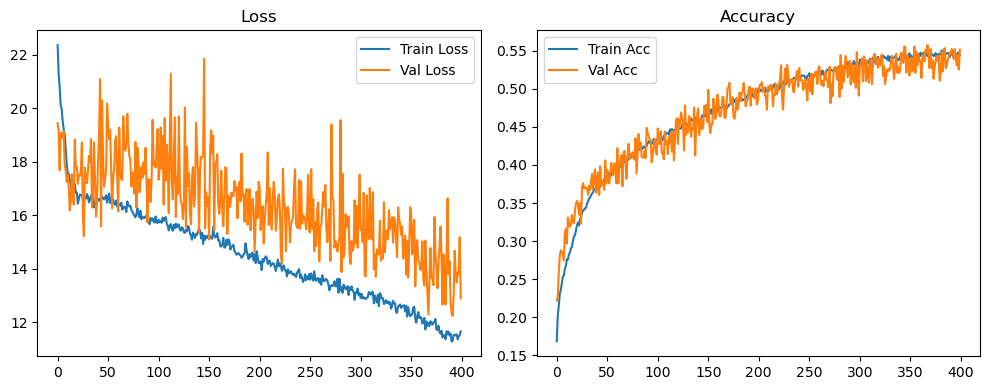

Original Model Final Test Loss: 13.0794 Accuracy: 0.5435


🚀 Running: batch128_lr_max_0.0001_min_1e-06_dp0.0


Files already downloaded and verified


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|                                                                                                                                                                        | 0/400 [00:00<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.1765 | Val Acc: 0.2230 | Epoch Time: 1.86 | :   0%|                                                                                                      | 0/400 [01:51<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.1765 | Val Acc: 0.2230 | Epoch Time: 1.86 | :   0%|                                                                                                      | 0/400 [01:51<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.1765 | Val Acc: 0.2230 | Epoch Time: 1.86 | :   0%|▏                                                                                         | 1/400 [01:51<12:22:19, 111.63s/it]

| LR: 0.000100 | Train Acc: 0.2167 | Val Acc: 0.2532 | Epoch Time: 1.85 | :   0%|▏                                                                                         | 1/400 [03:42<12:22:19, 111.63s/it]

| LR: 0.000100 | Train Acc: 0.2167 | Val Acc: 0.2532 | Epoch Time: 1.85 | :   0%|▏                                                                                         | 1/400 [03:42<12:22:19, 111.63s/it]

| LR: 0.000100 | Train Acc: 0.2167 | Val Acc: 0.2532 | Epoch Time: 1.85 | :   0%|▍                                                                                         | 2/400 [03:42<12:19:11, 111.44s/it]

| LR: 0.000100 | Train Acc: 0.2402 | Val Acc: 0.2581 | Epoch Time: 1.85 | :   0%|▍                                                                                         | 2/400 [05:34<12:19:11, 111.44s/it]

| LR: 0.000100 | Train Acc: 0.2402 | Val Acc: 0.2581 | Epoch Time: 1.85 | :   0%|▍                                                                                         | 2/400 [05:34<12:19:11, 111.44s/it]

| LR: 0.000100 | Train Acc: 0.2402 | Val Acc: 0.2581 | Epoch Time: 1.85 | :   1%|▋                                                                                         | 3/400 [05:34<12:16:38, 111.33s/it]

| LR: 0.000100 | Train Acc: 0.2556 | Val Acc: 0.2902 | Epoch Time: 1.85 | :   1%|▋                                                                                         | 3/400 [07:25<12:16:38, 111.33s/it]

| LR: 0.000100 | Train Acc: 0.2556 | Val Acc: 0.2902 | Epoch Time: 1.85 | :   1%|▋                                                                                         | 3/400 [07:25<12:16:38, 111.33s/it]

| LR: 0.000100 | Train Acc: 0.2556 | Val Acc: 0.2902 | Epoch Time: 1.85 | :   1%|▉                                                                                         | 4/400 [07:25<12:14:32, 111.29s/it]

| LR: 0.000100 | Train Acc: 0.2660 | Val Acc: 0.2721 | Epoch Time: 1.85 | :   1%|▉                                                                                         | 4/400 [09:16<12:14:32, 111.29s/it]

| LR: 0.000100 | Train Acc: 0.2660 | Val Acc: 0.2721 | Epoch Time: 1.85 | :   1%|▉                                                                                         | 4/400 [09:16<12:14:32, 111.29s/it]

| LR: 0.000100 | Train Acc: 0.2660 | Val Acc: 0.2721 | Epoch Time: 1.85 | :   1%|█▏                                                                                        | 5/400 [09:16<12:12:29, 111.26s/it]

| LR: 0.000100 | Train Acc: 0.2704 | Val Acc: 0.2913 | Epoch Time: 1.85 | :   1%|█▏                                                                                        | 5/400 [11:07<12:12:29, 111.26s/it]

| LR: 0.000100 | Train Acc: 0.2704 | Val Acc: 0.2913 | Epoch Time: 1.85 | :   1%|█▏                                                                                        | 5/400 [11:07<12:12:29, 111.26s/it]

| LR: 0.000100 | Train Acc: 0.2704 | Val Acc: 0.2913 | Epoch Time: 1.85 | :   2%|█▎                                                                                        | 6/400 [11:07<12:10:29, 111.24s/it]

| LR: 0.000100 | Train Acc: 0.2768 | Val Acc: 0.2979 | Epoch Time: 1.85 | :   2%|█▎                                                                                        | 6/400 [12:58<12:10:29, 111.24s/it]

| LR: 0.000100 | Train Acc: 0.2768 | Val Acc: 0.2979 | Epoch Time: 1.85 | :   2%|█▎                                                                                        | 6/400 [12:58<12:10:29, 111.24s/it]

| LR: 0.000100 | Train Acc: 0.2768 | Val Acc: 0.2979 | Epoch Time: 1.85 | :   2%|█▌                                                                                        | 7/400 [12:58<12:08:33, 111.23s/it]

| LR: 0.000100 | Train Acc: 0.2864 | Val Acc: 0.3028 | Epoch Time: 1.85 | :   2%|█▌                                                                                        | 7/400 [14:50<12:08:33, 111.23s/it]

| LR: 0.000100 | Train Acc: 0.2864 | Val Acc: 0.3028 | Epoch Time: 1.85 | :   2%|█▌                                                                                        | 7/400 [14:50<12:08:33, 111.23s/it]

| LR: 0.000100 | Train Acc: 0.2864 | Val Acc: 0.3028 | Epoch Time: 1.85 | :   2%|█▊                                                                                        | 8/400 [14:50<12:06:34, 111.21s/it]

| LR: 0.000100 | Train Acc: 0.2848 | Val Acc: 0.3033 | Epoch Time: 1.85 | :   2%|█▊                                                                                        | 8/400 [16:41<12:06:34, 111.21s/it]

| LR: 0.000100 | Train Acc: 0.2848 | Val Acc: 0.3033 | Epoch Time: 1.85 | :   2%|█▊                                                                                        | 8/400 [16:41<12:06:34, 111.21s/it]

| LR: 0.000100 | Train Acc: 0.2848 | Val Acc: 0.3033 | Epoch Time: 1.85 | :   2%|██                                                                                        | 9/400 [16:41<12:04:40, 111.20s/it]

| LR: 0.000100 | Train Acc: 0.2933 | Val Acc: 0.3212 | Epoch Time: 1.85 | :   2%|██                                                                                        | 9/400 [18:32<12:04:40, 111.20s/it]

| LR: 0.000100 | Train Acc: 0.2933 | Val Acc: 0.3212 | Epoch Time: 1.85 | :   2%|██                                                                                        | 9/400 [18:32<12:04:40, 111.20s/it]

| LR: 0.000100 | Train Acc: 0.2933 | Val Acc: 0.3212 | Epoch Time: 1.85 | :   2%|██▏                                                                                      | 10/400 [18:32<12:02:50, 111.21s/it]

| LR: 0.000100 | Train Acc: 0.2961 | Val Acc: 0.3109 | Epoch Time: 1.85 | :   2%|██▏                                                                                      | 10/400 [20:23<12:02:50, 111.21s/it]

| LR: 0.000100 | Train Acc: 0.2961 | Val Acc: 0.3109 | Epoch Time: 1.85 | :   2%|██▏                                                                                      | 10/400 [20:23<12:02:50, 111.21s/it]

| LR: 0.000100 | Train Acc: 0.2961 | Val Acc: 0.3109 | Epoch Time: 1.85 | :   3%|██▍                                                                                      | 11/400 [20:23<12:00:57, 111.20s/it]

| LR: 0.000100 | Train Acc: 0.3033 | Val Acc: 0.3342 | Epoch Time: 1.85 | :   3%|██▍                                                                                      | 11/400 [22:14<12:00:57, 111.20s/it]

| LR: 0.000100 | Train Acc: 0.3033 | Val Acc: 0.3342 | Epoch Time: 1.85 | :   3%|██▍                                                                                      | 11/400 [22:14<12:00:57, 111.20s/it]

| LR: 0.000100 | Train Acc: 0.3033 | Val Acc: 0.3342 | Epoch Time: 1.85 | :   3%|██▋                                                                                      | 12/400 [22:14<11:59:06, 111.20s/it]

| LR: 0.000100 | Train Acc: 0.3049 | Val Acc: 0.3316 | Epoch Time: 1.85 | :   3%|██▋                                                                                      | 12/400 [24:06<11:59:06, 111.20s/it]

| LR: 0.000100 | Train Acc: 0.3049 | Val Acc: 0.3316 | Epoch Time: 1.85 | :   3%|██▋                                                                                      | 12/400 [24:06<11:59:06, 111.20s/it]

| LR: 0.000100 | Train Acc: 0.3049 | Val Acc: 0.3316 | Epoch Time: 1.85 | :   3%|██▉                                                                                      | 13/400 [24:06<11:57:15, 111.20s/it]

| LR: 0.000100 | Train Acc: 0.3085 | Val Acc: 0.3511 | Epoch Time: 1.85 | :   3%|██▉                                                                                      | 13/400 [25:57<11:57:15, 111.20s/it]

| LR: 0.000100 | Train Acc: 0.3085 | Val Acc: 0.3511 | Epoch Time: 1.85 | :   3%|██▉                                                                                      | 13/400 [25:57<11:57:15, 111.20s/it]

| LR: 0.000100 | Train Acc: 0.3085 | Val Acc: 0.3511 | Epoch Time: 1.85 | :   4%|███                                                                                      | 14/400 [25:57<11:55:24, 111.20s/it]

| LR: 0.000100 | Train Acc: 0.3148 | Val Acc: 0.3411 | Epoch Time: 1.85 | :   4%|███                                                                                      | 14/400 [27:48<11:55:24, 111.20s/it]

| LR: 0.000100 | Train Acc: 0.3148 | Val Acc: 0.3411 | Epoch Time: 1.85 | :   4%|███                                                                                      | 14/400 [27:48<11:55:24, 111.20s/it]

| LR: 0.000100 | Train Acc: 0.3148 | Val Acc: 0.3411 | Epoch Time: 1.85 | :   4%|███▎                                                                                     | 15/400 [27:48<11:53:34, 111.21s/it]

| LR: 0.000100 | Train Acc: 0.3189 | Val Acc: 0.3486 | Epoch Time: 1.85 | :   4%|███▎                                                                                     | 15/400 [29:39<11:53:34, 111.21s/it]

| LR: 0.000100 | Train Acc: 0.3189 | Val Acc: 0.3486 | Epoch Time: 1.85 | :   4%|███▎                                                                                     | 15/400 [29:39<11:53:34, 111.21s/it]

| LR: 0.000100 | Train Acc: 0.3189 | Val Acc: 0.3486 | Epoch Time: 1.85 | :   4%|███▌                                                                                     | 16/400 [29:39<11:51:43, 111.21s/it]

| LR: 0.000100 | Train Acc: 0.3192 | Val Acc: 0.3259 | Epoch Time: 1.85 | :   4%|███▌                                                                                     | 16/400 [31:30<11:51:43, 111.21s/it]

| LR: 0.000100 | Train Acc: 0.3192 | Val Acc: 0.3259 | Epoch Time: 1.85 | :   4%|███▌                                                                                     | 16/400 [31:30<11:51:43, 111.21s/it]

| LR: 0.000100 | Train Acc: 0.3192 | Val Acc: 0.3259 | Epoch Time: 1.85 | :   4%|███▊                                                                                     | 17/400 [31:30<11:49:51, 111.21s/it]

| LR: 0.000100 | Train Acc: 0.3238 | Val Acc: 0.3285 | Epoch Time: 1.85 | :   4%|███▊                                                                                     | 17/400 [33:22<11:49:51, 111.21s/it]

| LR: 0.000100 | Train Acc: 0.3238 | Val Acc: 0.3285 | Epoch Time: 1.85 | :   4%|███▊                                                                                     | 17/400 [33:22<11:49:51, 111.21s/it]

| LR: 0.000100 | Train Acc: 0.3238 | Val Acc: 0.3285 | Epoch Time: 1.85 | :   4%|████                                                                                     | 18/400 [33:22<11:47:59, 111.20s/it]

| LR: 0.000100 | Train Acc: 0.3227 | Val Acc: 0.3579 | Epoch Time: 1.85 | :   4%|████                                                                                     | 18/400 [35:13<11:47:59, 111.20s/it]

| LR: 0.000100 | Train Acc: 0.3227 | Val Acc: 0.3579 | Epoch Time: 1.85 | :   4%|████                                                                                     | 18/400 [35:13<11:47:59, 111.20s/it]

| LR: 0.000100 | Train Acc: 0.3227 | Val Acc: 0.3579 | Epoch Time: 1.85 | :   5%|████▏                                                                                    | 19/400 [35:13<11:46:04, 111.19s/it]

| LR: 0.000099 | Train Acc: 0.3293 | Val Acc: 0.3290 | Epoch Time: 1.85 | :   5%|████▏                                                                                    | 19/400 [37:04<11:46:04, 111.19s/it]

| LR: 0.000099 | Train Acc: 0.3293 | Val Acc: 0.3290 | Epoch Time: 1.85 | :   5%|████▏                                                                                    | 19/400 [37:04<11:46:04, 111.19s/it]

| LR: 0.000099 | Train Acc: 0.3293 | Val Acc: 0.3290 | Epoch Time: 1.85 | :   5%|████▍                                                                                    | 20/400 [37:04<11:44:12, 111.19s/it]

| LR: 0.000099 | Train Acc: 0.3250 | Val Acc: 0.3547 | Epoch Time: 1.85 | :   5%|████▍                                                                                    | 20/400 [38:55<11:44:12, 111.19s/it]

| LR: 0.000099 | Train Acc: 0.3250 | Val Acc: 0.3547 | Epoch Time: 1.85 | :   5%|████▍                                                                                    | 20/400 [38:55<11:44:12, 111.19s/it]

| LR: 0.000099 | Train Acc: 0.3250 | Val Acc: 0.3547 | Epoch Time: 1.85 | :   5%|████▋                                                                                    | 21/400 [38:55<11:42:20, 111.19s/it]

| LR: 0.000099 | Train Acc: 0.3329 | Val Acc: 0.3572 | Epoch Time: 1.85 | :   5%|████▋                                                                                    | 21/400 [40:46<11:42:20, 111.19s/it]

| LR: 0.000099 | Train Acc: 0.3329 | Val Acc: 0.3572 | Epoch Time: 1.85 | :   5%|████▋                                                                                    | 21/400 [40:46<11:42:20, 111.19s/it]

| LR: 0.000099 | Train Acc: 0.3329 | Val Acc: 0.3572 | Epoch Time: 1.85 | :   6%|████▉                                                                                    | 22/400 [40:46<11:40:28, 111.19s/it]

| LR: 0.000099 | Train Acc: 0.3338 | Val Acc: 0.3531 | Epoch Time: 1.85 | :   6%|████▉                                                                                    | 22/400 [42:38<11:40:28, 111.19s/it]

| LR: 0.000099 | Train Acc: 0.3338 | Val Acc: 0.3531 | Epoch Time: 1.85 | :   6%|████▉                                                                                    | 22/400 [42:38<11:40:28, 111.19s/it]

| LR: 0.000099 | Train Acc: 0.3338 | Val Acc: 0.3531 | Epoch Time: 1.85 | :   6%|█████                                                                                    | 23/400 [42:38<11:38:40, 111.20s/it]

| LR: 0.000099 | Train Acc: 0.3381 | Val Acc: 0.3678 | Epoch Time: 1.85 | :   6%|█████                                                                                    | 23/400 [44:29<11:38:40, 111.20s/it]

| LR: 0.000099 | Train Acc: 0.3381 | Val Acc: 0.3678 | Epoch Time: 1.85 | :   6%|█████                                                                                    | 23/400 [44:29<11:38:40, 111.20s/it]

| LR: 0.000099 | Train Acc: 0.3381 | Val Acc: 0.3678 | Epoch Time: 1.85 | :   6%|█████▎                                                                                   | 24/400 [44:29<11:36:49, 111.19s/it]

| LR: 0.000099 | Train Acc: 0.3420 | Val Acc: 0.3870 | Epoch Time: 1.85 | :   6%|█████▎                                                                                   | 24/400 [46:20<11:36:49, 111.19s/it]

| LR: 0.000099 | Train Acc: 0.3420 | Val Acc: 0.3870 | Epoch Time: 1.85 | :   6%|█████▎                                                                                   | 24/400 [46:20<11:36:49, 111.19s/it]

| LR: 0.000099 | Train Acc: 0.3420 | Val Acc: 0.3870 | Epoch Time: 1.85 | :   6%|█████▌                                                                                   | 25/400 [46:20<11:34:57, 111.19s/it]

| LR: 0.000099 | Train Acc: 0.3452 | Val Acc: 0.3803 | Epoch Time: 1.85 | :   6%|█████▌                                                                                   | 25/400 [48:11<11:34:57, 111.19s/it]

| LR: 0.000099 | Train Acc: 0.3452 | Val Acc: 0.3803 | Epoch Time: 1.85 | :   6%|█████▌                                                                                   | 25/400 [48:11<11:34:57, 111.19s/it]

| LR: 0.000099 | Train Acc: 0.3452 | Val Acc: 0.3803 | Epoch Time: 1.85 | :   6%|█████▊                                                                                   | 26/400 [48:11<11:33:06, 111.19s/it]

| LR: 0.000099 | Train Acc: 0.3493 | Val Acc: 0.3554 | Epoch Time: 1.85 | :   6%|█████▊                                                                                   | 26/400 [50:02<11:33:06, 111.19s/it]

| LR: 0.000099 | Train Acc: 0.3493 | Val Acc: 0.3554 | Epoch Time: 1.85 | :   6%|█████▊                                                                                   | 26/400 [50:02<11:33:06, 111.19s/it]

| LR: 0.000099 | Train Acc: 0.3493 | Val Acc: 0.3554 | Epoch Time: 1.85 | :   7%|██████                                                                                   | 27/400 [50:02<11:31:15, 111.19s/it]

| LR: 0.000099 | Train Acc: 0.3494 | Val Acc: 0.3706 | Epoch Time: 1.85 | :   7%|██████                                                                                   | 27/400 [51:53<11:31:15, 111.19s/it]

| LR: 0.000099 | Train Acc: 0.3494 | Val Acc: 0.3706 | Epoch Time: 1.85 | :   7%|██████                                                                                   | 27/400 [51:53<11:31:15, 111.19s/it]

| LR: 0.000099 | Train Acc: 0.3494 | Val Acc: 0.3706 | Epoch Time: 1.85 | :   7%|██████▏                                                                                  | 28/400 [51:54<11:29:24, 111.19s/it]

| LR: 0.000099 | Train Acc: 0.3494 | Val Acc: 0.3808 | Epoch Time: 1.85 | :   7%|██████▏                                                                                  | 28/400 [53:45<11:29:24, 111.19s/it]

| LR: 0.000099 | Train Acc: 0.3494 | Val Acc: 0.3808 | Epoch Time: 1.85 | :   7%|██████▏                                                                                  | 28/400 [53:45<11:29:24, 111.19s/it]

| LR: 0.000099 | Train Acc: 0.3494 | Val Acc: 0.3808 | Epoch Time: 1.85 | :   7%|██████▍                                                                                  | 29/400 [53:45<11:27:32, 111.19s/it]

| LR: 0.000099 | Train Acc: 0.3545 | Val Acc: 0.3656 | Epoch Time: 1.85 | :   7%|██████▍                                                                                  | 29/400 [55:36<11:27:32, 111.19s/it]

| LR: 0.000099 | Train Acc: 0.3545 | Val Acc: 0.3656 | Epoch Time: 1.85 | :   7%|██████▍                                                                                  | 29/400 [55:36<11:27:32, 111.19s/it]

| LR: 0.000099 | Train Acc: 0.3545 | Val Acc: 0.3656 | Epoch Time: 1.85 | :   8%|██████▋                                                                                  | 30/400 [55:36<11:25:41, 111.19s/it]

| LR: 0.000099 | Train Acc: 0.3513 | Val Acc: 0.3611 | Epoch Time: 1.85 | :   8%|██████▋                                                                                  | 30/400 [57:27<11:25:41, 111.19s/it]

| LR: 0.000099 | Train Acc: 0.3513 | Val Acc: 0.3611 | Epoch Time: 1.85 | :   8%|██████▋                                                                                  | 30/400 [57:27<11:25:41, 111.19s/it]

| LR: 0.000099 | Train Acc: 0.3513 | Val Acc: 0.3611 | Epoch Time: 1.85 | :   8%|██████▉                                                                                  | 31/400 [57:27<11:23:50, 111.19s/it]

| LR: 0.000099 | Train Acc: 0.3591 | Val Acc: 0.3690 | Epoch Time: 1.85 | :   8%|██████▉                                                                                  | 31/400 [59:18<11:23:50, 111.19s/it]

| LR: 0.000099 | Train Acc: 0.3591 | Val Acc: 0.3690 | Epoch Time: 1.85 | :   8%|██████▉                                                                                  | 31/400 [59:18<11:23:50, 111.19s/it]

| LR: 0.000099 | Train Acc: 0.3591 | Val Acc: 0.3690 | Epoch Time: 1.85 | :   8%|███████                                                                                  | 32/400 [59:18<11:21:59, 111.20s/it]

| LR: 0.000098 | Train Acc: 0.3571 | Val Acc: 0.3794 | Epoch Time: 1.85 | :   8%|██████▉                                                                                | 32/400 [1:01:09<11:21:59, 111.20s/it]

| LR: 0.000098 | Train Acc: 0.3571 | Val Acc: 0.3794 | Epoch Time: 1.85 | :   8%|██████▉                                                                                | 32/400 [1:01:09<11:21:59, 111.20s/it]

| LR: 0.000098 | Train Acc: 0.3571 | Val Acc: 0.3794 | Epoch Time: 1.85 | :   8%|███████▏                                                                               | 33/400 [1:01:10<11:20:09, 111.20s/it]

| LR: 0.000098 | Train Acc: 0.3612 | Val Acc: 0.3912 | Epoch Time: 1.85 | :   8%|███████▏                                                                               | 33/400 [1:03:01<11:20:09, 111.20s/it]

| LR: 0.000098 | Train Acc: 0.3612 | Val Acc: 0.3912 | Epoch Time: 1.85 | :   8%|███████▏                                                                               | 33/400 [1:03:01<11:20:09, 111.20s/it]

| LR: 0.000098 | Train Acc: 0.3612 | Val Acc: 0.3912 | Epoch Time: 1.85 | :   8%|███████▍                                                                               | 34/400 [1:03:01<11:18:19, 111.20s/it]

| LR: 0.000098 | Train Acc: 0.3667 | Val Acc: 0.3802 | Epoch Time: 1.85 | :   8%|███████▍                                                                               | 34/400 [1:04:52<11:18:19, 111.20s/it]

| LR: 0.000098 | Train Acc: 0.3667 | Val Acc: 0.3802 | Epoch Time: 1.85 | :   8%|███████▍                                                                               | 34/400 [1:04:52<11:18:19, 111.20s/it]

| LR: 0.000098 | Train Acc: 0.3667 | Val Acc: 0.3802 | Epoch Time: 1.85 | :   9%|███████▌                                                                               | 35/400 [1:04:52<11:16:28, 111.20s/it]

| LR: 0.000098 | Train Acc: 0.3686 | Val Acc: 0.3714 | Epoch Time: 1.85 | :   9%|███████▌                                                                               | 35/400 [1:06:43<11:16:28, 111.20s/it]

| LR: 0.000098 | Train Acc: 0.3686 | Val Acc: 0.3714 | Epoch Time: 1.85 | :   9%|███████▌                                                                               | 35/400 [1:06:43<11:16:28, 111.20s/it]

| LR: 0.000098 | Train Acc: 0.3686 | Val Acc: 0.3714 | Epoch Time: 1.85 | :   9%|███████▊                                                                               | 36/400 [1:06:43<11:14:34, 111.19s/it]

| LR: 0.000098 | Train Acc: 0.3663 | Val Acc: 0.3903 | Epoch Time: 1.85 | :   9%|███████▊                                                                               | 36/400 [1:08:34<11:14:34, 111.19s/it]

| LR: 0.000098 | Train Acc: 0.3663 | Val Acc: 0.3903 | Epoch Time: 1.85 | :   9%|███████▊                                                                               | 36/400 [1:08:34<11:14:34, 111.19s/it]

| LR: 0.000098 | Train Acc: 0.3663 | Val Acc: 0.3903 | Epoch Time: 1.85 | :   9%|████████                                                                               | 37/400 [1:08:34<11:12:43, 111.19s/it]

| LR: 0.000098 | Train Acc: 0.3749 | Val Acc: 0.4099 | Epoch Time: 1.85 | :   9%|████████                                                                               | 37/400 [1:10:25<11:12:43, 111.19s/it]

| LR: 0.000098 | Train Acc: 0.3749 | Val Acc: 0.4099 | Epoch Time: 1.85 | :   9%|████████                                                                               | 37/400 [1:10:25<11:12:43, 111.19s/it]

| LR: 0.000098 | Train Acc: 0.3749 | Val Acc: 0.4099 | Epoch Time: 1.85 | :  10%|████████▎                                                                              | 38/400 [1:10:26<11:10:53, 111.20s/it]

| LR: 0.000098 | Train Acc: 0.3806 | Val Acc: 0.3959 | Epoch Time: 1.85 | :  10%|████████▎                                                                              | 38/400 [1:12:17<11:10:53, 111.20s/it]

| LR: 0.000098 | Train Acc: 0.3806 | Val Acc: 0.3959 | Epoch Time: 1.85 | :  10%|████████▎                                                                              | 38/400 [1:12:17<11:10:53, 111.20s/it]

| LR: 0.000098 | Train Acc: 0.3806 | Val Acc: 0.3959 | Epoch Time: 1.85 | :  10%|████████▍                                                                              | 39/400 [1:12:17<11:08:59, 111.19s/it]

| LR: 0.000098 | Train Acc: 0.3795 | Val Acc: 0.3924 | Epoch Time: 1.85 | :  10%|████████▍                                                                              | 39/400 [1:14:08<11:08:59, 111.19s/it]

| LR: 0.000098 | Train Acc: 0.3795 | Val Acc: 0.3924 | Epoch Time: 1.85 | :  10%|████████▍                                                                              | 39/400 [1:14:08<11:08:59, 111.19s/it]

| LR: 0.000098 | Train Acc: 0.3795 | Val Acc: 0.3924 | Epoch Time: 1.85 | :  10%|████████▋                                                                              | 40/400 [1:14:08<11:07:08, 111.19s/it]

| LR: 0.000098 | Train Acc: 0.3810 | Val Acc: 0.3979 | Epoch Time: 1.85 | :  10%|████████▋                                                                              | 40/400 [1:15:59<11:07:08, 111.19s/it]

| LR: 0.000098 | Train Acc: 0.3810 | Val Acc: 0.3979 | Epoch Time: 1.85 | :  10%|████████▋                                                                              | 40/400 [1:15:59<11:07:08, 111.19s/it]

| LR: 0.000098 | Train Acc: 0.3810 | Val Acc: 0.3979 | Epoch Time: 1.85 | :  10%|████████▉                                                                              | 41/400 [1:15:59<11:05:19, 111.20s/it]

| LR: 0.000097 | Train Acc: 0.3862 | Val Acc: 0.3938 | Epoch Time: 1.85 | :  10%|████████▉                                                                              | 41/400 [1:17:50<11:05:19, 111.20s/it]

| LR: 0.000097 | Train Acc: 0.3862 | Val Acc: 0.3938 | Epoch Time: 1.85 | :  10%|████████▉                                                                              | 41/400 [1:17:50<11:05:19, 111.20s/it]

| LR: 0.000097 | Train Acc: 0.3862 | Val Acc: 0.3938 | Epoch Time: 1.85 | :  10%|█████████▏                                                                             | 42/400 [1:17:50<11:03:30, 111.20s/it]

| LR: 0.000097 | Train Acc: 0.3877 | Val Acc: 0.4087 | Epoch Time: 1.85 | :  10%|█████████▏                                                                             | 42/400 [1:19:41<11:03:30, 111.20s/it]

| LR: 0.000097 | Train Acc: 0.3877 | Val Acc: 0.4087 | Epoch Time: 1.85 | :  10%|█████████▏                                                                             | 42/400 [1:19:41<11:03:30, 111.20s/it]

| LR: 0.000097 | Train Acc: 0.3877 | Val Acc: 0.4087 | Epoch Time: 1.85 | :  11%|█████████▎                                                                             | 43/400 [1:19:42<11:01:39, 111.20s/it]

| LR: 0.000097 | Train Acc: 0.3925 | Val Acc: 0.3910 | Epoch Time: 1.85 | :  11%|█████████▎                                                                             | 43/400 [1:21:33<11:01:39, 111.20s/it]

| LR: 0.000097 | Train Acc: 0.3925 | Val Acc: 0.3910 | Epoch Time: 1.85 | :  11%|█████████▎                                                                             | 43/400 [1:21:33<11:01:39, 111.20s/it]

| LR: 0.000097 | Train Acc: 0.3925 | Val Acc: 0.3910 | Epoch Time: 1.85 | :  11%|█████████▌                                                                             | 44/400 [1:21:33<10:59:48, 111.20s/it]

| LR: 0.000097 | Train Acc: 0.3982 | Val Acc: 0.4292 | Epoch Time: 1.85 | :  11%|█████████▌                                                                             | 44/400 [1:23:24<10:59:48, 111.20s/it]

| LR: 0.000097 | Train Acc: 0.3982 | Val Acc: 0.4292 | Epoch Time: 1.85 | :  11%|█████████▌                                                                             | 44/400 [1:23:24<10:59:48, 111.20s/it]

| LR: 0.000097 | Train Acc: 0.3982 | Val Acc: 0.4292 | Epoch Time: 1.85 | :  11%|█████████▊                                                                             | 45/400 [1:23:24<10:58:00, 111.21s/it]

| LR: 0.000097 | Train Acc: 0.3995 | Val Acc: 0.4076 | Epoch Time: 1.85 | :  11%|█████████▊                                                                             | 45/400 [1:25:15<10:58:00, 111.21s/it]

| LR: 0.000097 | Train Acc: 0.3995 | Val Acc: 0.4076 | Epoch Time: 1.85 | :  11%|█████████▊                                                                             | 45/400 [1:25:15<10:58:00, 111.21s/it]

| LR: 0.000097 | Train Acc: 0.3995 | Val Acc: 0.4076 | Epoch Time: 1.85 | :  12%|██████████                                                                             | 46/400 [1:25:15<10:56:05, 111.20s/it]

| LR: 0.000097 | Train Acc: 0.3974 | Val Acc: 0.3984 | Epoch Time: 1.85 | :  12%|██████████                                                                             | 46/400 [1:27:06<10:56:05, 111.20s/it]

| LR: 0.000097 | Train Acc: 0.3974 | Val Acc: 0.3984 | Epoch Time: 1.85 | :  12%|██████████                                                                             | 46/400 [1:27:06<10:56:05, 111.20s/it]

| LR: 0.000097 | Train Acc: 0.3974 | Val Acc: 0.3984 | Epoch Time: 1.85 | :  12%|██████████▏                                                                            | 47/400 [1:27:06<10:54:13, 111.20s/it]

| LR: 0.000097 | Train Acc: 0.3957 | Val Acc: 0.4294 | Epoch Time: 1.85 | :  12%|██████████▏                                                                            | 47/400 [1:28:57<10:54:13, 111.20s/it]

| LR: 0.000097 | Train Acc: 0.3957 | Val Acc: 0.4294 | Epoch Time: 1.85 | :  12%|██████████▏                                                                            | 47/400 [1:28:57<10:54:13, 111.20s/it]

| LR: 0.000097 | Train Acc: 0.3957 | Val Acc: 0.4294 | Epoch Time: 1.85 | :  12%|██████████▍                                                                            | 48/400 [1:28:58<10:52:21, 111.20s/it]

| LR: 0.000097 | Train Acc: 0.3999 | Val Acc: 0.4486 | Epoch Time: 1.85 | :  12%|██████████▍                                                                            | 48/400 [1:30:49<10:52:21, 111.20s/it]

| LR: 0.000097 | Train Acc: 0.3999 | Val Acc: 0.4486 | Epoch Time: 1.85 | :  12%|██████████▍                                                                            | 48/400 [1:30:49<10:52:21, 111.20s/it]

| LR: 0.000097 | Train Acc: 0.3999 | Val Acc: 0.4486 | Epoch Time: 1.85 | :  12%|██████████▋                                                                            | 49/400 [1:30:49<10:50:31, 111.20s/it]

| LR: 0.000096 | Train Acc: 0.3994 | Val Acc: 0.4011 | Epoch Time: 1.85 | :  12%|██████████▋                                                                            | 49/400 [1:32:40<10:50:31, 111.20s/it]

| LR: 0.000096 | Train Acc: 0.3994 | Val Acc: 0.4011 | Epoch Time: 1.85 | :  12%|██████████▋                                                                            | 49/400 [1:32:40<10:50:31, 111.20s/it]

| LR: 0.000096 | Train Acc: 0.3994 | Val Acc: 0.4011 | Epoch Time: 1.85 | :  12%|██████████▉                                                                            | 50/400 [1:32:40<10:48:38, 111.20s/it]

| LR: 0.000096 | Train Acc: 0.4053 | Val Acc: 0.4268 | Epoch Time: 1.85 | :  12%|██████████▉                                                                            | 50/400 [1:34:31<10:48:38, 111.20s/it]

| LR: 0.000096 | Train Acc: 0.4053 | Val Acc: 0.4268 | Epoch Time: 1.85 | :  12%|██████████▉                                                                            | 50/400 [1:34:31<10:48:38, 111.20s/it]

| LR: 0.000096 | Train Acc: 0.4053 | Val Acc: 0.4268 | Epoch Time: 1.85 | :  13%|███████████                                                                            | 51/400 [1:34:31<10:46:46, 111.19s/it]

| LR: 0.000096 | Train Acc: 0.4097 | Val Acc: 0.4248 | Epoch Time: 1.85 | :  13%|███████████                                                                            | 51/400 [1:36:22<10:46:46, 111.19s/it]

| LR: 0.000096 | Train Acc: 0.4097 | Val Acc: 0.4248 | Epoch Time: 1.85 | :  13%|███████████                                                                            | 51/400 [1:36:22<10:46:46, 111.19s/it]

| LR: 0.000096 | Train Acc: 0.4097 | Val Acc: 0.4248 | Epoch Time: 1.85 | :  13%|███████████▎                                                                           | 52/400 [1:36:22<10:44:55, 111.19s/it]

| LR: 0.000096 | Train Acc: 0.4102 | Val Acc: 0.4320 | Epoch Time: 1.85 | :  13%|███████████▎                                                                           | 52/400 [1:38:13<10:44:55, 111.19s/it]

| LR: 0.000096 | Train Acc: 0.4102 | Val Acc: 0.4320 | Epoch Time: 1.85 | :  13%|███████████▎                                                                           | 52/400 [1:38:13<10:44:55, 111.19s/it]

| LR: 0.000096 | Train Acc: 0.4102 | Val Acc: 0.4320 | Epoch Time: 1.85 | :  13%|███████████▌                                                                           | 53/400 [1:38:14<10:43:02, 111.19s/it]

| LR: 0.000096 | Train Acc: 0.4135 | Val Acc: 0.4340 | Epoch Time: 1.85 | :  13%|███████████▌                                                                           | 53/400 [1:40:05<10:43:02, 111.19s/it]

| LR: 0.000096 | Train Acc: 0.4135 | Val Acc: 0.4340 | Epoch Time: 1.85 | :  13%|███████████▌                                                                           | 53/400 [1:40:05<10:43:02, 111.19s/it]

| LR: 0.000096 | Train Acc: 0.4135 | Val Acc: 0.4340 | Epoch Time: 1.85 | :  14%|███████████▋                                                                           | 54/400 [1:40:05<10:41:14, 111.20s/it]

| LR: 0.000096 | Train Acc: 0.4110 | Val Acc: 0.4414 | Epoch Time: 1.85 | :  14%|███████████▋                                                                           | 54/400 [1:41:56<10:41:14, 111.20s/it]

| LR: 0.000096 | Train Acc: 0.4110 | Val Acc: 0.4414 | Epoch Time: 1.85 | :  14%|███████████▋                                                                           | 54/400 [1:41:56<10:41:14, 111.20s/it]

| LR: 0.000096 | Train Acc: 0.4110 | Val Acc: 0.4414 | Epoch Time: 1.85 | :  14%|███████████▉                                                                           | 55/400 [1:41:56<10:39:22, 111.20s/it]

| LR: 0.000095 | Train Acc: 0.4219 | Val Acc: 0.4302 | Epoch Time: 1.85 | :  14%|███████████▉                                                                           | 55/400 [1:43:47<10:39:22, 111.20s/it]

| LR: 0.000095 | Train Acc: 0.4219 | Val Acc: 0.4302 | Epoch Time: 1.85 | :  14%|███████████▉                                                                           | 55/400 [1:43:47<10:39:22, 111.20s/it]

| LR: 0.000095 | Train Acc: 0.4219 | Val Acc: 0.4302 | Epoch Time: 1.85 | :  14%|████████████▏                                                                          | 56/400 [1:43:47<10:37:32, 111.20s/it]

| LR: 0.000095 | Train Acc: 0.4146 | Val Acc: 0.4334 | Epoch Time: 1.85 | :  14%|████████████▏                                                                          | 56/400 [1:45:38<10:37:32, 111.20s/it]

| LR: 0.000095 | Train Acc: 0.4146 | Val Acc: 0.4334 | Epoch Time: 1.85 | :  14%|████████████▏                                                                          | 56/400 [1:45:38<10:37:32, 111.20s/it]

| LR: 0.000095 | Train Acc: 0.4146 | Val Acc: 0.4334 | Epoch Time: 1.85 | :  14%|████████████▍                                                                          | 57/400 [1:45:38<10:35:44, 111.21s/it]

| LR: 0.000095 | Train Acc: 0.4212 | Val Acc: 0.4478 | Epoch Time: 1.85 | :  14%|████████████▍                                                                          | 57/400 [1:47:29<10:35:44, 111.21s/it]

| LR: 0.000095 | Train Acc: 0.4212 | Val Acc: 0.4478 | Epoch Time: 1.85 | :  14%|████████████▍                                                                          | 57/400 [1:47:29<10:35:44, 111.21s/it]

| LR: 0.000095 | Train Acc: 0.4212 | Val Acc: 0.4478 | Epoch Time: 1.85 | :  14%|████████████▌                                                                          | 58/400 [1:47:30<10:33:52, 111.21s/it]

| LR: 0.000095 | Train Acc: 0.4185 | Val Acc: 0.4398 | Epoch Time: 1.85 | :  14%|████████████▌                                                                          | 58/400 [1:49:21<10:33:52, 111.21s/it]

| LR: 0.000095 | Train Acc: 0.4185 | Val Acc: 0.4398 | Epoch Time: 1.85 | :  14%|████████████▌                                                                          | 58/400 [1:49:21<10:33:52, 111.21s/it]

| LR: 0.000095 | Train Acc: 0.4185 | Val Acc: 0.4398 | Epoch Time: 1.85 | :  15%|████████████▊                                                                          | 59/400 [1:49:21<10:32:01, 111.21s/it]

| LR: 0.000095 | Train Acc: 0.4218 | Val Acc: 0.4405 | Epoch Time: 1.85 | :  15%|████████████▊                                                                          | 59/400 [1:51:12<10:32:01, 111.21s/it]

| LR: 0.000095 | Train Acc: 0.4218 | Val Acc: 0.4405 | Epoch Time: 1.85 | :  15%|████████████▊                                                                          | 59/400 [1:51:12<10:32:01, 111.21s/it]

| LR: 0.000095 | Train Acc: 0.4218 | Val Acc: 0.4405 | Epoch Time: 1.85 | :  15%|█████████████                                                                          | 60/400 [1:51:12<10:30:09, 111.21s/it]

| LR: 0.000095 | Train Acc: 0.4189 | Val Acc: 0.4433 | Epoch Time: 1.85 | :  15%|█████████████                                                                          | 60/400 [1:53:03<10:30:09, 111.21s/it]

| LR: 0.000095 | Train Acc: 0.4189 | Val Acc: 0.4433 | Epoch Time: 1.85 | :  15%|█████████████                                                                          | 60/400 [1:53:03<10:30:09, 111.21s/it]

| LR: 0.000095 | Train Acc: 0.4189 | Val Acc: 0.4433 | Epoch Time: 1.85 | :  15%|█████████████▎                                                                         | 61/400 [1:53:03<10:28:17, 111.20s/it]

| LR: 0.000094 | Train Acc: 0.4284 | Val Acc: 0.4632 | Epoch Time: 1.85 | :  15%|█████████████▎                                                                         | 61/400 [1:54:54<10:28:17, 111.20s/it]

| LR: 0.000094 | Train Acc: 0.4284 | Val Acc: 0.4632 | Epoch Time: 1.85 | :  15%|█████████████▎                                                                         | 61/400 [1:54:54<10:28:17, 111.20s/it]

| LR: 0.000094 | Train Acc: 0.4284 | Val Acc: 0.4632 | Epoch Time: 1.85 | :  16%|█████████████▍                                                                         | 62/400 [1:54:54<10:26:27, 111.20s/it]

| LR: 0.000094 | Train Acc: 0.4263 | Val Acc: 0.4386 | Epoch Time: 1.85 | :  16%|█████████████▍                                                                         | 62/400 [1:56:45<10:26:27, 111.20s/it]

| LR: 0.000094 | Train Acc: 0.4263 | Val Acc: 0.4386 | Epoch Time: 1.85 | :  16%|█████████████▍                                                                         | 62/400 [1:56:45<10:26:27, 111.20s/it]

| LR: 0.000094 | Train Acc: 0.4263 | Val Acc: 0.4386 | Epoch Time: 1.85 | :  16%|█████████████▋                                                                         | 63/400 [1:56:46<10:24:36, 111.21s/it]

| LR: 0.000094 | Train Acc: 0.4292 | Val Acc: 0.4484 | Epoch Time: 1.85 | :  16%|█████████████▋                                                                         | 63/400 [1:58:37<10:24:36, 111.21s/it]

| LR: 0.000094 | Train Acc: 0.4292 | Val Acc: 0.4484 | Epoch Time: 1.85 | :  16%|█████████████▋                                                                         | 63/400 [1:58:37<10:24:36, 111.21s/it]

| LR: 0.000094 | Train Acc: 0.4292 | Val Acc: 0.4484 | Epoch Time: 1.85 | :  16%|█████████████▉                                                                         | 64/400 [1:58:37<10:22:45, 111.21s/it]

| LR: 0.000094 | Train Acc: 0.4279 | Val Acc: 0.4653 | Epoch Time: 1.85 | :  16%|█████████████▉                                                                         | 64/400 [2:00:28<10:22:45, 111.21s/it]

| LR: 0.000094 | Train Acc: 0.4279 | Val Acc: 0.4653 | Epoch Time: 1.85 | :  16%|█████████████▉                                                                         | 64/400 [2:00:28<10:22:45, 111.21s/it]

| LR: 0.000094 | Train Acc: 0.4279 | Val Acc: 0.4653 | Epoch Time: 1.85 | :  16%|██████████████▏                                                                        | 65/400 [2:00:28<10:20:56, 111.21s/it]

| LR: 0.000094 | Train Acc: 0.4318 | Val Acc: 0.4589 | Epoch Time: 1.85 | :  16%|██████████████▏                                                                        | 65/400 [2:02:19<10:20:56, 111.21s/it]

| LR: 0.000094 | Train Acc: 0.4318 | Val Acc: 0.4589 | Epoch Time: 1.85 | :  16%|██████████████▏                                                                        | 65/400 [2:02:19<10:20:56, 111.21s/it]

| LR: 0.000094 | Train Acc: 0.4318 | Val Acc: 0.4589 | Epoch Time: 1.85 | :  16%|██████████████▎                                                                        | 66/400 [2:02:19<10:19:04, 111.21s/it]

| LR: 0.000093 | Train Acc: 0.4351 | Val Acc: 0.4580 | Epoch Time: 1.85 | :  16%|██████████████▎                                                                        | 66/400 [2:04:10<10:19:04, 111.21s/it]

| LR: 0.000093 | Train Acc: 0.4351 | Val Acc: 0.4580 | Epoch Time: 1.85 | :  16%|██████████████▎                                                                        | 66/400 [2:04:10<10:19:04, 111.21s/it]

| LR: 0.000093 | Train Acc: 0.4351 | Val Acc: 0.4580 | Epoch Time: 1.85 | :  17%|██████████████▌                                                                        | 67/400 [2:04:10<10:17:11, 111.21s/it]

| LR: 0.000093 | Train Acc: 0.4358 | Val Acc: 0.4586 | Epoch Time: 1.85 | :  17%|██████████████▌                                                                        | 67/400 [2:06:01<10:17:11, 111.21s/it]

| LR: 0.000093 | Train Acc: 0.4358 | Val Acc: 0.4586 | Epoch Time: 1.85 | :  17%|██████████████▌                                                                        | 67/400 [2:06:01<10:17:11, 111.21s/it]

| LR: 0.000093 | Train Acc: 0.4358 | Val Acc: 0.4586 | Epoch Time: 1.85 | :  17%|██████████████▊                                                                        | 68/400 [2:06:02<10:15:19, 111.20s/it]

| LR: 0.000093 | Train Acc: 0.4400 | Val Acc: 0.4483 | Epoch Time: 1.85 | :  17%|██████████████▊                                                                        | 68/400 [2:07:53<10:15:19, 111.20s/it]

| LR: 0.000093 | Train Acc: 0.4400 | Val Acc: 0.4483 | Epoch Time: 1.85 | :  17%|██████████████▊                                                                        | 68/400 [2:07:53<10:15:19, 111.20s/it]

| LR: 0.000093 | Train Acc: 0.4400 | Val Acc: 0.4483 | Epoch Time: 1.85 | :  17%|███████████████                                                                        | 69/400 [2:07:53<10:13:26, 111.20s/it]

| LR: 0.000093 | Train Acc: 0.4382 | Val Acc: 0.4646 | Epoch Time: 1.85 | :  17%|███████████████                                                                        | 69/400 [2:09:44<10:13:26, 111.20s/it]

| LR: 0.000093 | Train Acc: 0.4382 | Val Acc: 0.4646 | Epoch Time: 1.85 | :  17%|███████████████                                                                        | 69/400 [2:09:44<10:13:26, 111.20s/it]

| LR: 0.000093 | Train Acc: 0.4382 | Val Acc: 0.4646 | Epoch Time: 1.85 | :  18%|███████████████▏                                                                       | 70/400 [2:09:44<10:11:33, 111.19s/it]

| LR: 0.000093 | Train Acc: 0.4366 | Val Acc: 0.4607 | Epoch Time: 1.85 | :  18%|███████████████▏                                                                       | 70/400 [2:11:35<10:11:33, 111.19s/it]

| LR: 0.000093 | Train Acc: 0.4366 | Val Acc: 0.4607 | Epoch Time: 1.85 | :  18%|███████████████▏                                                                       | 70/400 [2:11:35<10:11:33, 111.19s/it]

| LR: 0.000093 | Train Acc: 0.4366 | Val Acc: 0.4607 | Epoch Time: 1.85 | :  18%|███████████████▍                                                                       | 71/400 [2:11:35<10:09:42, 111.19s/it]

| LR: 0.000093 | Train Acc: 0.4318 | Val Acc: 0.4597 | Epoch Time: 1.85 | :  18%|███████████████▍                                                                       | 71/400 [2:13:26<10:09:42, 111.19s/it]

| LR: 0.000093 | Train Acc: 0.4318 | Val Acc: 0.4597 | Epoch Time: 1.85 | :  18%|███████████████▍                                                                       | 71/400 [2:13:26<10:09:42, 111.19s/it]

| LR: 0.000093 | Train Acc: 0.4318 | Val Acc: 0.4597 | Epoch Time: 1.85 | :  18%|███████████████▋                                                                       | 72/400 [2:13:26<10:07:53, 111.20s/it]

| LR: 0.000092 | Train Acc: 0.4433 | Val Acc: 0.4521 | Epoch Time: 1.85 | :  18%|███████████████▋                                                                       | 72/400 [2:15:17<10:07:53, 111.20s/it]

| LR: 0.000092 | Train Acc: 0.4433 | Val Acc: 0.4521 | Epoch Time: 1.85 | :  18%|███████████████▋                                                                       | 72/400 [2:15:17<10:07:53, 111.20s/it]

| LR: 0.000092 | Train Acc: 0.4433 | Val Acc: 0.4521 | Epoch Time: 1.85 | :  18%|███████████████▉                                                                       | 73/400 [2:15:18<10:06:03, 111.20s/it]

| LR: 0.000092 | Train Acc: 0.4395 | Val Acc: 0.4681 | Epoch Time: 1.85 | :  18%|███████████████▉                                                                       | 73/400 [2:17:09<10:06:03, 111.20s/it]

| LR: 0.000092 | Train Acc: 0.4395 | Val Acc: 0.4681 | Epoch Time: 1.85 | :  18%|███████████████▉                                                                       | 73/400 [2:17:09<10:06:03, 111.20s/it]

| LR: 0.000092 | Train Acc: 0.4395 | Val Acc: 0.4681 | Epoch Time: 1.85 | :  18%|████████████████                                                                       | 74/400 [2:17:09<10:04:10, 111.20s/it]

| LR: 0.000092 | Train Acc: 0.4475 | Val Acc: 0.4537 | Epoch Time: 1.85 | :  18%|████████████████                                                                       | 74/400 [2:19:00<10:04:10, 111.20s/it]

| LR: 0.000092 | Train Acc: 0.4475 | Val Acc: 0.4537 | Epoch Time: 1.85 | :  18%|████████████████                                                                       | 74/400 [2:19:00<10:04:10, 111.20s/it]

| LR: 0.000092 | Train Acc: 0.4475 | Val Acc: 0.4537 | Epoch Time: 1.85 | :  19%|████████████████▎                                                                      | 75/400 [2:19:00<10:02:17, 111.19s/it]

| LR: 0.000092 | Train Acc: 0.4460 | Val Acc: 0.4641 | Epoch Time: 1.85 | :  19%|████████████████▎                                                                      | 75/400 [2:20:51<10:02:17, 111.19s/it]

| LR: 0.000092 | Train Acc: 0.4460 | Val Acc: 0.4641 | Epoch Time: 1.85 | :  19%|████████████████▎                                                                      | 75/400 [2:20:51<10:02:17, 111.19s/it]

| LR: 0.000092 | Train Acc: 0.4460 | Val Acc: 0.4641 | Epoch Time: 1.85 | :  19%|████████████████▌                                                                      | 76/400 [2:20:51<10:00:26, 111.19s/it]

| LR: 0.000091 | Train Acc: 0.4476 | Val Acc: 0.4821 | Epoch Time: 1.85 | :  19%|████████████████▌                                                                      | 76/400 [2:22:42<10:00:26, 111.19s/it]

| LR: 0.000091 | Train Acc: 0.4476 | Val Acc: 0.4821 | Epoch Time: 1.85 | :  19%|████████████████▌                                                                      | 76/400 [2:22:42<10:00:26, 111.19s/it]

| LR: 0.000091 | Train Acc: 0.4476 | Val Acc: 0.4821 | Epoch Time: 1.85 | :  19%|████████████████▉                                                                       | 77/400 [2:22:42<9:58:35, 111.19s/it]

| LR: 0.000091 | Train Acc: 0.4527 | Val Acc: 0.4522 | Epoch Time: 1.85 | :  19%|████████████████▉                                                                       | 77/400 [2:24:33<9:58:35, 111.19s/it]

| LR: 0.000091 | Train Acc: 0.4527 | Val Acc: 0.4522 | Epoch Time: 1.85 | :  19%|████████████████▉                                                                       | 77/400 [2:24:33<9:58:35, 111.19s/it]

| LR: 0.000091 | Train Acc: 0.4527 | Val Acc: 0.4522 | Epoch Time: 1.85 | :  20%|█████████████████▏                                                                      | 78/400 [2:24:34<9:56:47, 111.20s/it]

| LR: 0.000091 | Train Acc: 0.4591 | Val Acc: 0.4826 | Epoch Time: 1.85 | :  20%|█████████████████▏                                                                      | 78/400 [2:26:25<9:56:47, 111.20s/it]

| LR: 0.000091 | Train Acc: 0.4591 | Val Acc: 0.4826 | Epoch Time: 1.85 | :  20%|█████████████████▏                                                                      | 78/400 [2:26:25<9:56:47, 111.20s/it]

| LR: 0.000091 | Train Acc: 0.4591 | Val Acc: 0.4826 | Epoch Time: 1.85 | :  20%|█████████████████▍                                                                      | 79/400 [2:26:25<9:54:54, 111.20s/it]

| LR: 0.000091 | Train Acc: 0.4540 | Val Acc: 0.4784 | Epoch Time: 1.85 | :  20%|█████████████████▍                                                                      | 79/400 [2:28:16<9:54:54, 111.20s/it]

| LR: 0.000091 | Train Acc: 0.4540 | Val Acc: 0.4784 | Epoch Time: 1.85 | :  20%|█████████████████▍                                                                      | 79/400 [2:28:16<9:54:54, 111.20s/it]

| LR: 0.000091 | Train Acc: 0.4540 | Val Acc: 0.4784 | Epoch Time: 1.85 | :  20%|█████████████████▌                                                                      | 80/400 [2:28:16<9:53:03, 111.20s/it]

| LR: 0.000091 | Train Acc: 0.4500 | Val Acc: 0.4814 | Epoch Time: 1.85 | :  20%|█████████████████▌                                                                      | 80/400 [2:30:07<9:53:03, 111.20s/it]

| LR: 0.000091 | Train Acc: 0.4500 | Val Acc: 0.4814 | Epoch Time: 1.85 | :  20%|█████████████████▌                                                                      | 80/400 [2:30:07<9:53:03, 111.20s/it]

| LR: 0.000091 | Train Acc: 0.4500 | Val Acc: 0.4814 | Epoch Time: 1.85 | :  20%|█████████████████▊                                                                      | 81/400 [2:30:07<9:51:12, 111.20s/it]

| LR: 0.000090 | Train Acc: 0.4585 | Val Acc: 0.4695 | Epoch Time: 1.85 | :  20%|█████████████████▊                                                                      | 81/400 [2:31:58<9:51:12, 111.20s/it]

| LR: 0.000090 | Train Acc: 0.4585 | Val Acc: 0.4695 | Epoch Time: 1.85 | :  20%|█████████████████▊                                                                      | 81/400 [2:31:58<9:51:12, 111.20s/it]

| LR: 0.000090 | Train Acc: 0.4585 | Val Acc: 0.4695 | Epoch Time: 1.85 | :  20%|██████████████████                                                                      | 82/400 [2:31:58<9:49:18, 111.19s/it]

| LR: 0.000090 | Train Acc: 0.4532 | Val Acc: 0.4775 | Epoch Time: 1.85 | :  20%|██████████████████                                                                      | 82/400 [2:33:49<9:49:18, 111.19s/it]

| LR: 0.000090 | Train Acc: 0.4532 | Val Acc: 0.4775 | Epoch Time: 1.85 | :  20%|██████████████████                                                                      | 82/400 [2:33:49<9:49:18, 111.19s/it]

| LR: 0.000090 | Train Acc: 0.4532 | Val Acc: 0.4775 | Epoch Time: 1.85 | :  21%|██████████████████▎                                                                     | 83/400 [2:33:50<9:47:28, 111.19s/it]

| LR: 0.000090 | Train Acc: 0.4598 | Val Acc: 0.4697 | Epoch Time: 1.85 | :  21%|██████████████████▎                                                                     | 83/400 [2:35:41<9:47:28, 111.19s/it]

| LR: 0.000090 | Train Acc: 0.4598 | Val Acc: 0.4697 | Epoch Time: 1.85 | :  21%|██████████████████▎                                                                     | 83/400 [2:35:41<9:47:28, 111.19s/it]

| LR: 0.000090 | Train Acc: 0.4598 | Val Acc: 0.4697 | Epoch Time: 1.85 | :  21%|██████████████████▍                                                                     | 84/400 [2:35:41<9:45:37, 111.19s/it]

| LR: 0.000090 | Train Acc: 0.4623 | Val Acc: 0.4668 | Epoch Time: 1.85 | :  21%|██████████████████▍                                                                     | 84/400 [2:37:32<9:45:37, 111.19s/it]

| LR: 0.000090 | Train Acc: 0.4623 | Val Acc: 0.4668 | Epoch Time: 1.85 | :  21%|██████████████████▍                                                                     | 84/400 [2:37:32<9:45:37, 111.19s/it]

| LR: 0.000090 | Train Acc: 0.4623 | Val Acc: 0.4668 | Epoch Time: 1.85 | :  21%|██████████████████▋                                                                     | 85/400 [2:37:32<9:43:45, 111.19s/it]

| LR: 0.000089 | Train Acc: 0.4652 | Val Acc: 0.4788 | Epoch Time: 1.85 | :  21%|██████████████████▋                                                                     | 85/400 [2:39:23<9:43:45, 111.19s/it]

| LR: 0.000089 | Train Acc: 0.4652 | Val Acc: 0.4788 | Epoch Time: 1.85 | :  21%|██████████████████▋                                                                     | 85/400 [2:39:23<9:43:45, 111.19s/it]

| LR: 0.000089 | Train Acc: 0.4652 | Val Acc: 0.4788 | Epoch Time: 1.85 | :  22%|██████████████████▉                                                                     | 86/400 [2:39:23<9:41:53, 111.19s/it]

| LR: 0.000089 | Train Acc: 0.4609 | Val Acc: 0.4889 | Epoch Time: 1.85 | :  22%|██████████████████▉                                                                     | 86/400 [2:41:14<9:41:53, 111.19s/it]

| LR: 0.000089 | Train Acc: 0.4609 | Val Acc: 0.4889 | Epoch Time: 1.85 | :  22%|██████████████████▉                                                                     | 86/400 [2:41:14<9:41:53, 111.19s/it]

| LR: 0.000089 | Train Acc: 0.4609 | Val Acc: 0.4889 | Epoch Time: 1.85 | :  22%|███████████████████▏                                                                    | 87/400 [2:41:14<9:40:04, 111.20s/it]

| LR: 0.000089 | Train Acc: 0.4606 | Val Acc: 0.4557 | Epoch Time: 1.85 | :  22%|███████████████████▏                                                                    | 87/400 [2:43:05<9:40:04, 111.20s/it]

| LR: 0.000089 | Train Acc: 0.4606 | Val Acc: 0.4557 | Epoch Time: 1.85 | :  22%|███████████████████▏                                                                    | 87/400 [2:43:05<9:40:04, 111.20s/it]

| LR: 0.000089 | Train Acc: 0.4606 | Val Acc: 0.4557 | Epoch Time: 1.85 | :  22%|███████████████████▎                                                                    | 88/400 [2:43:06<9:38:14, 111.20s/it]

| LR: 0.000089 | Train Acc: 0.4626 | Val Acc: 0.4646 | Epoch Time: 1.85 | :  22%|███████████████████▎                                                                    | 88/400 [2:44:57<9:38:14, 111.20s/it]

| LR: 0.000089 | Train Acc: 0.4626 | Val Acc: 0.4646 | Epoch Time: 1.85 | :  22%|███████████████████▎                                                                    | 88/400 [2:44:57<9:38:14, 111.20s/it]

| LR: 0.000089 | Train Acc: 0.4626 | Val Acc: 0.4646 | Epoch Time: 1.85 | :  22%|███████████████████▌                                                                    | 89/400 [2:44:57<9:36:23, 111.20s/it]

| LR: 0.000088 | Train Acc: 0.4651 | Val Acc: 0.4631 | Epoch Time: 1.85 | :  22%|███████████████████▌                                                                    | 89/400 [2:46:48<9:36:23, 111.20s/it]

| LR: 0.000088 | Train Acc: 0.4651 | Val Acc: 0.4631 | Epoch Time: 1.85 | :  22%|███████████████████▌                                                                    | 89/400 [2:46:48<9:36:23, 111.20s/it]

| LR: 0.000088 | Train Acc: 0.4651 | Val Acc: 0.4631 | Epoch Time: 1.85 | :  22%|███████████████████▊                                                                    | 90/400 [2:46:48<9:34:31, 111.20s/it]

| LR: 0.000088 | Train Acc: 0.4628 | Val Acc: 0.4735 | Epoch Time: 1.85 | :  22%|███████████████████▊                                                                    | 90/400 [2:48:39<9:34:31, 111.20s/it]

| LR: 0.000088 | Train Acc: 0.4628 | Val Acc: 0.4735 | Epoch Time: 1.85 | :  22%|███████████████████▊                                                                    | 90/400 [2:48:39<9:34:31, 111.20s/it]

| LR: 0.000088 | Train Acc: 0.4628 | Val Acc: 0.4735 | Epoch Time: 1.85 | :  23%|████████████████████                                                                    | 91/400 [2:48:39<9:32:39, 111.20s/it]

| LR: 0.000088 | Train Acc: 0.4615 | Val Acc: 0.4734 | Epoch Time: 1.85 | :  23%|████████████████████                                                                    | 91/400 [2:50:30<9:32:39, 111.20s/it]

| LR: 0.000088 | Train Acc: 0.4615 | Val Acc: 0.4734 | Epoch Time: 1.85 | :  23%|████████████████████                                                                    | 91/400 [2:50:30<9:32:39, 111.20s/it]

| LR: 0.000088 | Train Acc: 0.4615 | Val Acc: 0.4734 | Epoch Time: 1.85 | :  23%|████████████████████▏                                                                   | 92/400 [2:50:30<9:30:50, 111.20s/it]

| LR: 0.000088 | Train Acc: 0.4670 | Val Acc: 0.4703 | Epoch Time: 1.85 | :  23%|████████████████████▏                                                                   | 92/400 [2:52:21<9:30:50, 111.20s/it]

| LR: 0.000088 | Train Acc: 0.4670 | Val Acc: 0.4703 | Epoch Time: 1.85 | :  23%|████████████████████▏                                                                   | 92/400 [2:52:21<9:30:50, 111.20s/it]

| LR: 0.000088 | Train Acc: 0.4670 | Val Acc: 0.4703 | Epoch Time: 1.85 | :  23%|████████████████████▍                                                                   | 93/400 [2:52:22<9:28:59, 111.20s/it]

| LR: 0.000087 | Train Acc: 0.4716 | Val Acc: 0.4651 | Epoch Time: 1.85 | :  23%|████████████████████▍                                                                   | 93/400 [2:54:13<9:28:59, 111.20s/it]

| LR: 0.000087 | Train Acc: 0.4716 | Val Acc: 0.4651 | Epoch Time: 1.85 | :  23%|████████████████████▍                                                                   | 93/400 [2:54:13<9:28:59, 111.20s/it]

| LR: 0.000087 | Train Acc: 0.4716 | Val Acc: 0.4651 | Epoch Time: 1.85 | :  24%|████████████████████▋                                                                   | 94/400 [2:54:13<9:27:06, 111.20s/it]

| LR: 0.000087 | Train Acc: 0.4652 | Val Acc: 0.4728 | Epoch Time: 1.85 | :  24%|████████████████████▋                                                                   | 94/400 [2:56:04<9:27:06, 111.20s/it]

| LR: 0.000087 | Train Acc: 0.4652 | Val Acc: 0.4728 | Epoch Time: 1.85 | :  24%|████████████████████▋                                                                   | 94/400 [2:56:04<9:27:06, 111.20s/it]

| LR: 0.000087 | Train Acc: 0.4652 | Val Acc: 0.4728 | Epoch Time: 1.85 | :  24%|████████████████████▉                                                                   | 95/400 [2:56:04<9:25:14, 111.20s/it]

| LR: 0.000087 | Train Acc: 0.4699 | Val Acc: 0.4849 | Epoch Time: 1.85 | :  24%|████████████████████▉                                                                   | 95/400 [2:57:55<9:25:14, 111.20s/it]

| LR: 0.000087 | Train Acc: 0.4699 | Val Acc: 0.4849 | Epoch Time: 1.85 | :  24%|████████████████████▉                                                                   | 95/400 [2:57:55<9:25:14, 111.20s/it]

| LR: 0.000087 | Train Acc: 0.4699 | Val Acc: 0.4849 | Epoch Time: 1.85 | :  24%|█████████████████████                                                                   | 96/400 [2:57:55<9:23:22, 111.19s/it]

| LR: 0.000087 | Train Acc: 0.4698 | Val Acc: 0.4956 | Epoch Time: 1.85 | :  24%|█████████████████████                                                                   | 96/400 [2:59:46<9:23:22, 111.19s/it]

| LR: 0.000087 | Train Acc: 0.4698 | Val Acc: 0.4956 | Epoch Time: 1.85 | :  24%|█████████████████████                                                                   | 96/400 [2:59:46<9:23:22, 111.19s/it]

| LR: 0.000087 | Train Acc: 0.4698 | Val Acc: 0.4956 | Epoch Time: 1.85 | :  24%|█████████████████████▎                                                                  | 97/400 [2:59:46<9:21:30, 111.19s/it]

| LR: 0.000086 | Train Acc: 0.4757 | Val Acc: 0.4692 | Epoch Time: 1.85 | :  24%|█████████████████████▎                                                                  | 97/400 [3:01:37<9:21:30, 111.19s/it]

| LR: 0.000086 | Train Acc: 0.4757 | Val Acc: 0.4692 | Epoch Time: 1.85 | :  24%|█████████████████████▎                                                                  | 97/400 [3:01:37<9:21:30, 111.19s/it]

| LR: 0.000086 | Train Acc: 0.4757 | Val Acc: 0.4692 | Epoch Time: 1.85 | :  24%|█████████████████████▌                                                                  | 98/400 [3:01:37<9:19:41, 111.20s/it]

| LR: 0.000086 | Train Acc: 0.4717 | Val Acc: 0.4929 | Epoch Time: 1.85 | :  24%|█████████████████████▌                                                                  | 98/400 [3:03:29<9:19:41, 111.20s/it]

| LR: 0.000086 | Train Acc: 0.4717 | Val Acc: 0.4929 | Epoch Time: 1.85 | :  24%|█████████████████████▌                                                                  | 98/400 [3:03:29<9:19:41, 111.20s/it]

| LR: 0.000086 | Train Acc: 0.4717 | Val Acc: 0.4929 | Epoch Time: 1.85 | :  25%|█████████████████████▊                                                                  | 99/400 [3:03:29<9:17:50, 111.20s/it]

| LR: 0.000086 | Train Acc: 0.4724 | Val Acc: 0.4811 | Epoch Time: 1.85 | :  25%|█████████████████████▊                                                                  | 99/400 [3:05:20<9:17:50, 111.20s/it]

| LR: 0.000086 | Train Acc: 0.4724 | Val Acc: 0.4811 | Epoch Time: 1.85 | :  25%|█████████████████████▊                                                                  | 99/400 [3:05:20<9:17:50, 111.20s/it]

| LR: 0.000086 | Train Acc: 0.4724 | Val Acc: 0.4811 | Epoch Time: 1.85 | :  25%|█████████████████████▊                                                                 | 100/400 [3:05:20<9:16:00, 111.20s/it]

| LR: 0.000086 | Train Acc: 0.4741 | Val Acc: 0.4864 | Epoch Time: 1.85 | :  25%|█████████████████████▊                                                                 | 100/400 [3:07:11<9:16:00, 111.20s/it]

| LR: 0.000086 | Train Acc: 0.4741 | Val Acc: 0.4864 | Epoch Time: 1.85 | :  25%|█████████████████████▊                                                                 | 100/400 [3:07:11<9:16:00, 111.20s/it]

| LR: 0.000086 | Train Acc: 0.4741 | Val Acc: 0.4864 | Epoch Time: 1.85 | :  25%|█████████████████████▉                                                                 | 101/400 [3:07:11<9:14:10, 111.20s/it]

| LR: 0.000085 | Train Acc: 0.4766 | Val Acc: 0.4972 | Epoch Time: 1.85 | :  25%|█████████████████████▉                                                                 | 101/400 [3:09:02<9:14:10, 111.20s/it]

| LR: 0.000085 | Train Acc: 0.4766 | Val Acc: 0.4972 | Epoch Time: 1.85 | :  25%|█████████████████████▉                                                                 | 101/400 [3:09:02<9:14:10, 111.20s/it]

| LR: 0.000085 | Train Acc: 0.4766 | Val Acc: 0.4972 | Epoch Time: 1.85 | :  26%|██████████████████████▏                                                                | 102/400 [3:09:02<9:12:16, 111.20s/it]

| LR: 0.000085 | Train Acc: 0.4769 | Val Acc: 0.4872 | Epoch Time: 1.85 | :  26%|██████████████████████▏                                                                | 102/400 [3:10:53<9:12:16, 111.20s/it]

| LR: 0.000085 | Train Acc: 0.4769 | Val Acc: 0.4872 | Epoch Time: 1.85 | :  26%|██████████████████████▏                                                                | 102/400 [3:10:53<9:12:16, 111.20s/it]

| LR: 0.000085 | Train Acc: 0.4769 | Val Acc: 0.4872 | Epoch Time: 1.85 | :  26%|██████████████████████▍                                                                | 103/400 [3:10:53<9:10:25, 111.20s/it]

| LR: 0.000085 | Train Acc: 0.4780 | Val Acc: 0.5007 | Epoch Time: 1.85 | :  26%|██████████████████████▍                                                                | 103/400 [3:12:45<9:10:25, 111.20s/it]

| LR: 0.000085 | Train Acc: 0.4780 | Val Acc: 0.5007 | Epoch Time: 1.85 | :  26%|██████████████████████▍                                                                | 103/400 [3:12:45<9:10:25, 111.20s/it]

| LR: 0.000085 | Train Acc: 0.4780 | Val Acc: 0.5007 | Epoch Time: 1.85 | :  26%|██████████████████████▌                                                                | 104/400 [3:12:45<9:08:35, 111.20s/it]

| LR: 0.000084 | Train Acc: 0.4764 | Val Acc: 0.5092 | Epoch Time: 1.85 | :  26%|██████████████████████▌                                                                | 104/400 [3:14:36<9:08:35, 111.20s/it]

| LR: 0.000084 | Train Acc: 0.4764 | Val Acc: 0.5092 | Epoch Time: 1.85 | :  26%|██████████████████████▌                                                                | 104/400 [3:14:36<9:08:35, 111.20s/it]

| LR: 0.000084 | Train Acc: 0.4764 | Val Acc: 0.5092 | Epoch Time: 1.85 | :  26%|██████████████████████▊                                                                | 105/400 [3:14:36<9:06:44, 111.20s/it]

| LR: 0.000084 | Train Acc: 0.4816 | Val Acc: 0.5010 | Epoch Time: 1.85 | :  26%|██████████████████████▊                                                                | 105/400 [3:16:27<9:06:44, 111.20s/it]

| LR: 0.000084 | Train Acc: 0.4816 | Val Acc: 0.5010 | Epoch Time: 1.85 | :  26%|██████████████████████▊                                                                | 105/400 [3:16:27<9:06:44, 111.20s/it]

| LR: 0.000084 | Train Acc: 0.4816 | Val Acc: 0.5010 | Epoch Time: 1.85 | :  26%|███████████████████████                                                                | 106/400 [3:16:27<9:04:51, 111.20s/it]

| LR: 0.000084 | Train Acc: 0.4801 | Val Acc: 0.4907 | Epoch Time: 1.85 | :  26%|███████████████████████                                                                | 106/400 [3:18:18<9:04:51, 111.20s/it]

| LR: 0.000084 | Train Acc: 0.4801 | Val Acc: 0.4907 | Epoch Time: 1.85 | :  26%|███████████████████████                                                                | 106/400 [3:18:18<9:04:51, 111.20s/it]

| LR: 0.000084 | Train Acc: 0.4801 | Val Acc: 0.4907 | Epoch Time: 1.85 | :  27%|███████████████████████▎                                                               | 107/400 [3:18:18<9:02:58, 111.19s/it]

| LR: 0.000084 | Train Acc: 0.4778 | Val Acc: 0.4936 | Epoch Time: 1.85 | :  27%|███████████████████████▎                                                               | 107/400 [3:20:09<9:02:58, 111.19s/it]

| LR: 0.000084 | Train Acc: 0.4778 | Val Acc: 0.4936 | Epoch Time: 1.85 | :  27%|███████████████████████▎                                                               | 107/400 [3:20:09<9:02:58, 111.19s/it]

| LR: 0.000084 | Train Acc: 0.4778 | Val Acc: 0.4936 | Epoch Time: 1.85 | :  27%|███████████████████████▍                                                               | 108/400 [3:20:09<9:01:09, 111.20s/it]

| LR: 0.000083 | Train Acc: 0.4802 | Val Acc: 0.5069 | Epoch Time: 1.85 | :  27%|███████████████████████▍                                                               | 108/400 [3:22:01<9:01:09, 111.20s/it]

| LR: 0.000083 | Train Acc: 0.4802 | Val Acc: 0.5069 | Epoch Time: 1.85 | :  27%|███████████████████████▍                                                               | 108/400 [3:22:01<9:01:09, 111.20s/it]

| LR: 0.000083 | Train Acc: 0.4802 | Val Acc: 0.5069 | Epoch Time: 1.85 | :  27%|███████████████████████▋                                                               | 109/400 [3:22:01<8:59:25, 111.22s/it]

| LR: 0.000083 | Train Acc: 0.4842 | Val Acc: 0.4997 | Epoch Time: 1.85 | :  27%|███████████████████████▋                                                               | 109/400 [3:23:52<8:59:25, 111.22s/it]

| LR: 0.000083 | Train Acc: 0.4842 | Val Acc: 0.4997 | Epoch Time: 1.85 | :  27%|███████████████████████▋                                                               | 109/400 [3:23:52<8:59:25, 111.22s/it]

| LR: 0.000083 | Train Acc: 0.4842 | Val Acc: 0.4997 | Epoch Time: 1.85 | :  28%|███████████████████████▉                                                               | 110/400 [3:23:52<8:57:37, 111.23s/it]

| LR: 0.000083 | Train Acc: 0.4827 | Val Acc: 0.4498 | Epoch Time: 1.85 | :  28%|███████████████████████▉                                                               | 110/400 [3:25:43<8:57:37, 111.23s/it]

| LR: 0.000083 | Train Acc: 0.4827 | Val Acc: 0.4498 | Epoch Time: 1.85 | :  28%|███████████████████████▉                                                               | 110/400 [3:25:43<8:57:37, 111.23s/it]

| LR: 0.000083 | Train Acc: 0.4827 | Val Acc: 0.4498 | Epoch Time: 1.85 | :  28%|████████████████████████▏                                                              | 111/400 [3:25:43<8:55:47, 111.24s/it]

| LR: 0.000082 | Train Acc: 0.4801 | Val Acc: 0.4864 | Epoch Time: 1.85 | :  28%|████████████████████████▏                                                              | 111/400 [3:27:34<8:55:47, 111.24s/it]

| LR: 0.000082 | Train Acc: 0.4801 | Val Acc: 0.4864 | Epoch Time: 1.85 | :  28%|████████████████████████▏                                                              | 111/400 [3:27:34<8:55:47, 111.24s/it]

| LR: 0.000082 | Train Acc: 0.4801 | Val Acc: 0.4864 | Epoch Time: 1.85 | :  28%|████████████████████████▎                                                              | 112/400 [3:27:35<8:53:58, 111.25s/it]

| LR: 0.000082 | Train Acc: 0.4838 | Val Acc: 0.5170 | Epoch Time: 1.85 | :  28%|████████████████████████▎                                                              | 112/400 [3:29:26<8:53:58, 111.25s/it]

| LR: 0.000082 | Train Acc: 0.4838 | Val Acc: 0.5170 | Epoch Time: 1.85 | :  28%|████████████████████████▎                                                              | 112/400 [3:29:26<8:53:58, 111.25s/it]

| LR: 0.000082 | Train Acc: 0.4838 | Val Acc: 0.5170 | Epoch Time: 1.85 | :  28%|████████████████████████▌                                                              | 113/400 [3:29:26<8:52:06, 111.24s/it]

| LR: 0.000082 | Train Acc: 0.4891 | Val Acc: 0.4972 | Epoch Time: 1.85 | :  28%|████████████████████████▌                                                              | 113/400 [3:31:17<8:52:06, 111.24s/it]

| LR: 0.000082 | Train Acc: 0.4891 | Val Acc: 0.4972 | Epoch Time: 1.85 | :  28%|████████████████████████▌                                                              | 113/400 [3:31:17<8:52:06, 111.24s/it]

| LR: 0.000082 | Train Acc: 0.4891 | Val Acc: 0.4972 | Epoch Time: 1.85 | :  28%|████████████████████████▊                                                              | 114/400 [3:31:17<8:50:19, 111.26s/it]

| LR: 0.000081 | Train Acc: 0.4916 | Val Acc: 0.4937 | Epoch Time: 1.85 | :  28%|████████████████████████▊                                                              | 114/400 [3:33:08<8:50:19, 111.26s/it]

| LR: 0.000081 | Train Acc: 0.4916 | Val Acc: 0.4937 | Epoch Time: 1.85 | :  28%|████████████████████████▊                                                              | 114/400 [3:33:08<8:50:19, 111.26s/it]

| LR: 0.000081 | Train Acc: 0.4916 | Val Acc: 0.4937 | Epoch Time: 1.85 | :  29%|█████████████████████████                                                              | 115/400 [3:33:08<8:48:25, 111.25s/it]

| LR: 0.000081 | Train Acc: 0.4828 | Val Acc: 0.4884 | Epoch Time: 1.85 | :  29%|█████████████████████████                                                              | 115/400 [3:34:59<8:48:25, 111.25s/it]

| LR: 0.000081 | Train Acc: 0.4828 | Val Acc: 0.4884 | Epoch Time: 1.85 | :  29%|█████████████████████████                                                              | 115/400 [3:34:59<8:48:25, 111.25s/it]

| LR: 0.000081 | Train Acc: 0.4828 | Val Acc: 0.4884 | Epoch Time: 1.85 | :  29%|█████████████████████████▏                                                             | 116/400 [3:35:00<8:46:36, 111.25s/it]

| LR: 0.000081 | Train Acc: 0.4832 | Val Acc: 0.5060 | Epoch Time: 1.85 | :  29%|█████████████████████████▏                                                             | 116/400 [3:36:51<8:46:36, 111.25s/it]

| LR: 0.000081 | Train Acc: 0.4832 | Val Acc: 0.5060 | Epoch Time: 1.85 | :  29%|█████████████████████████▏                                                             | 116/400 [3:36:51<8:46:36, 111.25s/it]

| LR: 0.000081 | Train Acc: 0.4832 | Val Acc: 0.5060 | Epoch Time: 1.85 | :  29%|█████████████████████████▍                                                             | 117/400 [3:36:51<8:44:44, 111.25s/it]

| LR: 0.000081 | Train Acc: 0.4860 | Val Acc: 0.5058 | Epoch Time: 1.85 | :  29%|█████████████████████████▍                                                             | 117/400 [3:38:42<8:44:44, 111.25s/it]

| LR: 0.000081 | Train Acc: 0.4860 | Val Acc: 0.5058 | Epoch Time: 1.85 | :  29%|█████████████████████████▍                                                             | 117/400 [3:38:42<8:44:44, 111.25s/it]

| LR: 0.000081 | Train Acc: 0.4860 | Val Acc: 0.5058 | Epoch Time: 1.85 | :  30%|█████████████████████████▋                                                             | 118/400 [3:38:42<8:42:55, 111.26s/it]

| LR: 0.000080 | Train Acc: 0.4863 | Val Acc: 0.5000 | Epoch Time: 1.85 | :  30%|█████████████████████████▋                                                             | 118/400 [3:40:33<8:42:55, 111.26s/it]

| LR: 0.000080 | Train Acc: 0.4863 | Val Acc: 0.5000 | Epoch Time: 1.85 | :  30%|█████████████████████████▋                                                             | 118/400 [3:40:33<8:42:55, 111.26s/it]

| LR: 0.000080 | Train Acc: 0.4863 | Val Acc: 0.5000 | Epoch Time: 1.85 | :  30%|█████████████████████████▉                                                             | 119/400 [3:40:33<8:41:06, 111.27s/it]

| LR: 0.000080 | Train Acc: 0.4893 | Val Acc: 0.4975 | Epoch Time: 1.85 | :  30%|█████████████████████████▉                                                             | 119/400 [3:42:25<8:41:06, 111.27s/it]

| LR: 0.000080 | Train Acc: 0.4893 | Val Acc: 0.4975 | Epoch Time: 1.85 | :  30%|█████████████████████████▉                                                             | 119/400 [3:42:25<8:41:06, 111.27s/it]

| LR: 0.000080 | Train Acc: 0.4893 | Val Acc: 0.4975 | Epoch Time: 1.85 | :  30%|██████████████████████████                                                             | 120/400 [3:42:25<8:39:16, 111.27s/it]

| LR: 0.000080 | Train Acc: 0.4929 | Val Acc: 0.4946 | Epoch Time: 1.85 | :  30%|██████████████████████████                                                             | 120/400 [3:44:16<8:39:16, 111.27s/it]

| LR: 0.000080 | Train Acc: 0.4929 | Val Acc: 0.4946 | Epoch Time: 1.85 | :  30%|██████████████████████████                                                             | 120/400 [3:44:16<8:39:16, 111.27s/it]

| LR: 0.000080 | Train Acc: 0.4929 | Val Acc: 0.4946 | Epoch Time: 1.85 | :  30%|██████████████████████████▎                                                            | 121/400 [3:44:16<8:37:21, 111.26s/it]

| LR: 0.000079 | Train Acc: 0.4882 | Val Acc: 0.5048 | Epoch Time: 1.85 | :  30%|██████████████████████████▎                                                            | 121/400 [3:46:07<8:37:21, 111.26s/it]

| LR: 0.000079 | Train Acc: 0.4882 | Val Acc: 0.5048 | Epoch Time: 1.85 | :  30%|██████████████████████████▎                                                            | 121/400 [3:46:07<8:37:21, 111.26s/it]

| LR: 0.000079 | Train Acc: 0.4882 | Val Acc: 0.5048 | Epoch Time: 1.85 | :  30%|██████████████████████████▌                                                            | 122/400 [3:46:07<8:35:29, 111.26s/it]

| LR: 0.000079 | Train Acc: 0.4906 | Val Acc: 0.4916 | Epoch Time: 1.85 | :  30%|██████████████████████████▌                                                            | 122/400 [3:47:58<8:35:29, 111.26s/it]

| LR: 0.000079 | Train Acc: 0.4906 | Val Acc: 0.4916 | Epoch Time: 1.85 | :  30%|██████████████████████████▌                                                            | 122/400 [3:47:58<8:35:29, 111.26s/it]

| LR: 0.000079 | Train Acc: 0.4906 | Val Acc: 0.4916 | Epoch Time: 1.85 | :  31%|██████████████████████████▊                                                            | 123/400 [3:47:58<8:33:34, 111.24s/it]

| LR: 0.000079 | Train Acc: 0.4914 | Val Acc: 0.5207 | Epoch Time: 1.85 | :  31%|██████████████████████████▊                                                            | 123/400 [3:49:49<8:33:34, 111.24s/it]

| LR: 0.000079 | Train Acc: 0.4914 | Val Acc: 0.5207 | Epoch Time: 1.85 | :  31%|██████████████████████████▊                                                            | 123/400 [3:49:49<8:33:34, 111.24s/it]

| LR: 0.000079 | Train Acc: 0.4914 | Val Acc: 0.5207 | Epoch Time: 1.85 | :  31%|██████████████████████████▉                                                            | 124/400 [3:49:50<8:31:40, 111.23s/it]

| LR: 0.000078 | Train Acc: 0.4938 | Val Acc: 0.5155 | Epoch Time: 1.85 | :  31%|██████████████████████████▉                                                            | 124/400 [3:51:41<8:31:40, 111.23s/it]

| LR: 0.000078 | Train Acc: 0.4938 | Val Acc: 0.5155 | Epoch Time: 1.85 | :  31%|██████████████████████████▉                                                            | 124/400 [3:51:41<8:31:40, 111.23s/it]

| LR: 0.000078 | Train Acc: 0.4938 | Val Acc: 0.5155 | Epoch Time: 1.85 | :  31%|███████████████████████████▏                                                           | 125/400 [3:51:41<8:29:46, 111.22s/it]

| LR: 0.000078 | Train Acc: 0.4955 | Val Acc: 0.4944 | Epoch Time: 1.85 | :  31%|███████████████████████████▏                                                           | 125/400 [3:53:32<8:29:46, 111.22s/it]

| LR: 0.000078 | Train Acc: 0.4955 | Val Acc: 0.4944 | Epoch Time: 1.85 | :  31%|███████████████████████████▏                                                           | 125/400 [3:53:32<8:29:46, 111.22s/it]

| LR: 0.000078 | Train Acc: 0.4955 | Val Acc: 0.4944 | Epoch Time: 1.85 | :  32%|███████████████████████████▍                                                           | 126/400 [3:53:32<8:27:54, 111.22s/it]

| LR: 0.000078 | Train Acc: 0.4922 | Val Acc: 0.4906 | Epoch Time: 1.85 | :  32%|███████████████████████████▍                                                           | 126/400 [3:55:23<8:27:54, 111.22s/it]

| LR: 0.000078 | Train Acc: 0.4922 | Val Acc: 0.4906 | Epoch Time: 1.85 | :  32%|███████████████████████████▍                                                           | 126/400 [3:55:23<8:27:54, 111.22s/it]

| LR: 0.000078 | Train Acc: 0.4922 | Val Acc: 0.4906 | Epoch Time: 1.85 | :  32%|███████████████████████████▌                                                           | 127/400 [3:55:23<8:26:01, 111.21s/it]

| LR: 0.000077 | Train Acc: 0.4950 | Val Acc: 0.5100 | Epoch Time: 1.85 | :  32%|███████████████████████████▌                                                           | 127/400 [3:57:14<8:26:01, 111.21s/it]

| LR: 0.000077 | Train Acc: 0.4950 | Val Acc: 0.5100 | Epoch Time: 1.85 | :  32%|███████████████████████████▌                                                           | 127/400 [3:57:14<8:26:01, 111.21s/it]

| LR: 0.000077 | Train Acc: 0.4950 | Val Acc: 0.5100 | Epoch Time: 1.85 | :  32%|███████████████████████████▊                                                           | 128/400 [3:57:14<8:24:09, 111.21s/it]

| LR: 0.000077 | Train Acc: 0.4965 | Val Acc: 0.5078 | Epoch Time: 1.85 | :  32%|███████████████████████████▊                                                           | 128/400 [3:59:06<8:24:09, 111.21s/it]

| LR: 0.000077 | Train Acc: 0.4965 | Val Acc: 0.5078 | Epoch Time: 1.85 | :  32%|███████████████████████████▊                                                           | 128/400 [3:59:06<8:24:09, 111.21s/it]

| LR: 0.000077 | Train Acc: 0.4965 | Val Acc: 0.5078 | Epoch Time: 1.85 | :  32%|████████████████████████████                                                           | 129/400 [3:59:06<8:22:21, 111.22s/it]

| LR: 0.000077 | Train Acc: 0.4959 | Val Acc: 0.5097 | Epoch Time: 1.85 | :  32%|████████████████████████████                                                           | 129/400 [4:00:57<8:22:21, 111.22s/it]

| LR: 0.000077 | Train Acc: 0.4959 | Val Acc: 0.5097 | Epoch Time: 1.85 | :  32%|████████████████████████████                                                           | 129/400 [4:00:57<8:22:21, 111.22s/it]

| LR: 0.000077 | Train Acc: 0.4959 | Val Acc: 0.5097 | Epoch Time: 1.85 | :  32%|████████████████████████████▎                                                          | 130/400 [4:00:57<8:20:33, 111.23s/it]

| LR: 0.000076 | Train Acc: 0.4916 | Val Acc: 0.5118 | Epoch Time: 1.85 | :  32%|████████████████████████████▎                                                          | 130/400 [4:02:48<8:20:33, 111.23s/it]

| LR: 0.000076 | Train Acc: 0.4916 | Val Acc: 0.5118 | Epoch Time: 1.85 | :  32%|████████████████████████████▎                                                          | 130/400 [4:02:48<8:20:33, 111.23s/it]

| LR: 0.000076 | Train Acc: 0.4916 | Val Acc: 0.5118 | Epoch Time: 1.85 | :  33%|████████████████████████████▍                                                          | 131/400 [4:02:48<8:18:48, 111.26s/it]

| LR: 0.000076 | Train Acc: 0.4934 | Val Acc: 0.5283 | Epoch Time: 1.85 | :  33%|████████████████████████████▍                                                          | 131/400 [4:04:39<8:18:48, 111.26s/it]

| LR: 0.000076 | Train Acc: 0.4934 | Val Acc: 0.5283 | Epoch Time: 1.85 | :  33%|████████████████████████████▍                                                          | 131/400 [4:04:39<8:18:48, 111.26s/it]

| LR: 0.000076 | Train Acc: 0.4934 | Val Acc: 0.5283 | Epoch Time: 1.85 | :  33%|████████████████████████████▋                                                          | 132/400 [4:04:39<8:16:58, 111.26s/it]

| LR: 0.000076 | Train Acc: 0.4982 | Val Acc: 0.4992 | Epoch Time: 1.85 | :  33%|████████████████████████████▋                                                          | 132/400 [4:06:31<8:16:58, 111.26s/it]

| LR: 0.000076 | Train Acc: 0.4982 | Val Acc: 0.4992 | Epoch Time: 1.85 | :  33%|████████████████████████████▋                                                          | 132/400 [4:06:31<8:16:58, 111.26s/it]

| LR: 0.000076 | Train Acc: 0.4982 | Val Acc: 0.4992 | Epoch Time: 1.85 | :  33%|████████████████████████████▉                                                          | 133/400 [4:06:31<8:15:07, 111.26s/it]

| LR: 0.000075 | Train Acc: 0.5011 | Val Acc: 0.4897 | Epoch Time: 1.85 | :  33%|████████████████████████████▉                                                          | 133/400 [4:08:22<8:15:07, 111.26s/it]

| LR: 0.000075 | Train Acc: 0.5011 | Val Acc: 0.4897 | Epoch Time: 1.85 | :  33%|████████████████████████████▉                                                          | 133/400 [4:08:22<8:15:07, 111.26s/it]

| LR: 0.000075 | Train Acc: 0.5011 | Val Acc: 0.4897 | Epoch Time: 1.85 | :  34%|█████████████████████████████▏                                                         | 134/400 [4:08:22<8:13:25, 111.30s/it]

| LR: 0.000075 | Train Acc: 0.4987 | Val Acc: 0.4911 | Epoch Time: 1.85 | :  34%|█████████████████████████████▏                                                         | 134/400 [4:10:13<8:13:25, 111.30s/it]

| LR: 0.000075 | Train Acc: 0.4987 | Val Acc: 0.4911 | Epoch Time: 1.85 | :  34%|█████████████████████████████▏                                                         | 134/400 [4:10:13<8:13:25, 111.30s/it]

| LR: 0.000075 | Train Acc: 0.4987 | Val Acc: 0.4911 | Epoch Time: 1.85 | :  34%|█████████████████████████████▎                                                         | 135/400 [4:10:13<8:11:31, 111.29s/it]

| LR: 0.000075 | Train Acc: 0.5028 | Val Acc: 0.4852 | Epoch Time: 1.85 | :  34%|█████████████████████████████▎                                                         | 135/400 [4:12:05<8:11:31, 111.29s/it]

| LR: 0.000075 | Train Acc: 0.5028 | Val Acc: 0.4852 | Epoch Time: 1.85 | :  34%|█████████████████████████████▎                                                         | 135/400 [4:12:05<8:11:31, 111.29s/it]

| LR: 0.000075 | Train Acc: 0.5028 | Val Acc: 0.4852 | Epoch Time: 1.85 | :  34%|█████████████████████████████▌                                                         | 136/400 [4:12:05<8:09:40, 111.29s/it]

| LR: 0.000074 | Train Acc: 0.5016 | Val Acc: 0.5150 | Epoch Time: 1.85 | :  34%|█████████████████████████████▌                                                         | 136/400 [4:13:56<8:09:40, 111.29s/it]

| LR: 0.000074 | Train Acc: 0.5016 | Val Acc: 0.5150 | Epoch Time: 1.85 | :  34%|█████████████████████████████▌                                                         | 136/400 [4:13:56<8:09:40, 111.29s/it]

| LR: 0.000074 | Train Acc: 0.5016 | Val Acc: 0.5150 | Epoch Time: 1.85 | :  34%|█████████████████████████████▊                                                         | 137/400 [4:13:56<8:07:51, 111.30s/it]

| LR: 0.000074 | Train Acc: 0.5082 | Val Acc: 0.5230 | Epoch Time: 1.85 | :  34%|█████████████████████████████▊                                                         | 137/400 [4:15:47<8:07:51, 111.30s/it]

| LR: 0.000074 | Train Acc: 0.5082 | Val Acc: 0.5230 | Epoch Time: 1.85 | :  34%|█████████████████████████████▊                                                         | 137/400 [4:15:47<8:07:51, 111.30s/it]

| LR: 0.000074 | Train Acc: 0.5082 | Val Acc: 0.5230 | Epoch Time: 1.85 | :  34%|██████████████████████████████                                                         | 138/400 [4:15:47<8:05:55, 111.28s/it]

| LR: 0.000074 | Train Acc: 0.5024 | Val Acc: 0.5025 | Epoch Time: 1.85 | :  34%|██████████████████████████████                                                         | 138/400 [4:17:38<8:05:55, 111.28s/it]

| LR: 0.000074 | Train Acc: 0.5024 | Val Acc: 0.5025 | Epoch Time: 1.85 | :  34%|██████████████████████████████                                                         | 138/400 [4:17:38<8:05:55, 111.28s/it]

| LR: 0.000074 | Train Acc: 0.5024 | Val Acc: 0.5025 | Epoch Time: 1.85 | :  35%|██████████████████████████████▏                                                        | 139/400 [4:17:38<8:03:59, 111.26s/it]

| LR: 0.000073 | Train Acc: 0.5086 | Val Acc: 0.5039 | Epoch Time: 1.85 | :  35%|██████████████████████████████▏                                                        | 139/400 [4:19:30<8:03:59, 111.26s/it]

| LR: 0.000073 | Train Acc: 0.5086 | Val Acc: 0.5039 | Epoch Time: 1.85 | :  35%|██████████████████████████████▏                                                        | 139/400 [4:19:30<8:03:59, 111.26s/it]

| LR: 0.000073 | Train Acc: 0.5086 | Val Acc: 0.5039 | Epoch Time: 1.85 | :  35%|██████████████████████████████▍                                                        | 140/400 [4:19:30<8:02:06, 111.26s/it]

| LR: 0.000073 | Train Acc: 0.5032 | Val Acc: 0.5184 | Epoch Time: 1.85 | :  35%|██████████████████████████████▍                                                        | 140/400 [4:21:21<8:02:06, 111.26s/it]

| LR: 0.000073 | Train Acc: 0.5032 | Val Acc: 0.5184 | Epoch Time: 1.85 | :  35%|██████████████████████████████▍                                                        | 140/400 [4:21:21<8:02:06, 111.26s/it]

| LR: 0.000073 | Train Acc: 0.5032 | Val Acc: 0.5184 | Epoch Time: 1.85 | :  35%|██████████████████████████████▋                                                        | 141/400 [4:21:21<8:00:14, 111.25s/it]

| LR: 0.000073 | Train Acc: 0.5050 | Val Acc: 0.5228 | Epoch Time: 1.85 | :  35%|██████████████████████████████▋                                                        | 141/400 [4:23:12<8:00:14, 111.25s/it]

| LR: 0.000073 | Train Acc: 0.5050 | Val Acc: 0.5228 | Epoch Time: 1.85 | :  35%|██████████████████████████████▋                                                        | 141/400 [4:23:12<8:00:14, 111.25s/it]

| LR: 0.000073 | Train Acc: 0.5050 | Val Acc: 0.5228 | Epoch Time: 1.85 | :  36%|██████████████████████████████▉                                                        | 142/400 [4:23:12<7:58:21, 111.25s/it]

| LR: 0.000072 | Train Acc: 0.5038 | Val Acc: 0.5318 | Epoch Time: 1.85 | :  36%|██████████████████████████████▉                                                        | 142/400 [4:25:03<7:58:21, 111.25s/it]

| LR: 0.000072 | Train Acc: 0.5038 | Val Acc: 0.5318 | Epoch Time: 1.85 | :  36%|██████████████████████████████▉                                                        | 142/400 [4:25:03<7:58:21, 111.25s/it]

| LR: 0.000072 | Train Acc: 0.5038 | Val Acc: 0.5318 | Epoch Time: 1.85 | :  36%|███████████████████████████████                                                        | 143/400 [4:25:03<7:56:33, 111.26s/it]

| LR: 0.000072 | Train Acc: 0.5025 | Val Acc: 0.5139 | Epoch Time: 1.85 | :  36%|███████████████████████████████                                                        | 143/400 [4:26:55<7:56:33, 111.26s/it]

| LR: 0.000072 | Train Acc: 0.5025 | Val Acc: 0.5139 | Epoch Time: 1.85 | :  36%|███████████████████████████████                                                        | 143/400 [4:26:55<7:56:33, 111.26s/it]

| LR: 0.000072 | Train Acc: 0.5025 | Val Acc: 0.5139 | Epoch Time: 1.85 | :  36%|███████████████████████████████▎                                                       | 144/400 [4:26:55<7:54:40, 111.25s/it]

| LR: 0.000072 | Train Acc: 0.5056 | Val Acc: 0.5196 | Epoch Time: 1.85 | :  36%|███████████████████████████████▎                                                       | 144/400 [4:28:46<7:54:40, 111.25s/it]

| LR: 0.000072 | Train Acc: 0.5056 | Val Acc: 0.5196 | Epoch Time: 1.85 | :  36%|███████████████████████████████▎                                                       | 144/400 [4:28:46<7:54:40, 111.25s/it]

| LR: 0.000072 | Train Acc: 0.5056 | Val Acc: 0.5196 | Epoch Time: 1.85 | :  36%|███████████████████████████████▌                                                       | 145/400 [4:28:46<7:52:47, 111.24s/it]

| LR: 0.000071 | Train Acc: 0.5090 | Val Acc: 0.5078 | Epoch Time: 1.85 | :  36%|███████████████████████████████▌                                                       | 145/400 [4:30:37<7:52:47, 111.24s/it]

| LR: 0.000071 | Train Acc: 0.5090 | Val Acc: 0.5078 | Epoch Time: 1.85 | :  36%|███████████████████████████████▌                                                       | 145/400 [4:30:37<7:52:47, 111.24s/it]

| LR: 0.000071 | Train Acc: 0.5090 | Val Acc: 0.5078 | Epoch Time: 1.85 | :  36%|███████████████████████████████▊                                                       | 146/400 [4:30:37<7:50:59, 111.26s/it]

| LR: 0.000071 | Train Acc: 0.5112 | Val Acc: 0.5431 | Epoch Time: 1.85 | :  36%|███████████████████████████████▊                                                       | 146/400 [4:32:28<7:50:59, 111.26s/it]

| LR: 0.000071 | Train Acc: 0.5112 | Val Acc: 0.5431 | Epoch Time: 1.85 | :  36%|███████████████████████████████▊                                                       | 146/400 [4:32:28<7:50:59, 111.26s/it]

| LR: 0.000071 | Train Acc: 0.5112 | Val Acc: 0.5431 | Epoch Time: 1.85 | :  37%|███████████████████████████████▉                                                       | 147/400 [4:32:28<7:49:08, 111.26s/it]

| LR: 0.000071 | Train Acc: 0.5113 | Val Acc: 0.5289 | Epoch Time: 1.85 | :  37%|███████████████████████████████▉                                                       | 147/400 [4:34:20<7:49:08, 111.26s/it]

| LR: 0.000071 | Train Acc: 0.5113 | Val Acc: 0.5289 | Epoch Time: 1.85 | :  37%|███████████████████████████████▉                                                       | 147/400 [4:34:20<7:49:08, 111.26s/it]

| LR: 0.000071 | Train Acc: 0.5113 | Val Acc: 0.5289 | Epoch Time: 1.85 | :  37%|████████████████████████████████▏                                                      | 148/400 [4:34:20<7:47:16, 111.25s/it]

| LR: 0.000070 | Train Acc: 0.5118 | Val Acc: 0.5355 | Epoch Time: 1.85 | :  37%|████████████████████████████████▏                                                      | 148/400 [4:36:11<7:47:16, 111.25s/it]

| LR: 0.000070 | Train Acc: 0.5118 | Val Acc: 0.5355 | Epoch Time: 1.85 | :  37%|████████████████████████████████▏                                                      | 148/400 [4:36:11<7:47:16, 111.25s/it]

| LR: 0.000070 | Train Acc: 0.5118 | Val Acc: 0.5355 | Epoch Time: 1.85 | :  37%|████████████████████████████████▍                                                      | 149/400 [4:36:11<7:45:30, 111.28s/it]

| LR: 0.000070 | Train Acc: 0.5058 | Val Acc: 0.4941 | Epoch Time: 1.85 | :  37%|████████████████████████████████▍                                                      | 149/400 [4:38:02<7:45:30, 111.28s/it]

| LR: 0.000070 | Train Acc: 0.5058 | Val Acc: 0.4941 | Epoch Time: 1.85 | :  37%|████████████████████████████████▍                                                      | 149/400 [4:38:02<7:45:30, 111.28s/it]

| LR: 0.000070 | Train Acc: 0.5058 | Val Acc: 0.4941 | Epoch Time: 1.85 | :  38%|████████████████████████████████▋                                                      | 150/400 [4:38:02<7:43:39, 111.28s/it]

| LR: 0.000069 | Train Acc: 0.5073 | Val Acc: 0.5125 | Epoch Time: 1.85 | :  38%|████████████████████████████████▋                                                      | 150/400 [4:39:53<7:43:39, 111.28s/it]

| LR: 0.000069 | Train Acc: 0.5073 | Val Acc: 0.5125 | Epoch Time: 1.85 | :  38%|████████████████████████████████▋                                                      | 150/400 [4:39:53<7:43:39, 111.28s/it]

| LR: 0.000069 | Train Acc: 0.5073 | Val Acc: 0.5125 | Epoch Time: 1.85 | :  38%|████████████████████████████████▊                                                      | 151/400 [4:39:54<7:41:45, 111.27s/it]

| LR: 0.000069 | Train Acc: 0.5112 | Val Acc: 0.5291 | Epoch Time: 1.85 | :  38%|████████████████████████████████▊                                                      | 151/400 [4:41:45<7:41:45, 111.27s/it]

| LR: 0.000069 | Train Acc: 0.5112 | Val Acc: 0.5291 | Epoch Time: 1.85 | :  38%|████████████████████████████████▊                                                      | 151/400 [4:41:45<7:41:45, 111.27s/it]

| LR: 0.000069 | Train Acc: 0.5112 | Val Acc: 0.5291 | Epoch Time: 1.85 | :  38%|█████████████████████████████████                                                      | 152/400 [4:41:45<7:39:54, 111.27s/it]

| LR: 0.000069 | Train Acc: 0.5056 | Val Acc: 0.5167 | Epoch Time: 1.85 | :  38%|█████████████████████████████████                                                      | 152/400 [4:43:36<7:39:54, 111.27s/it]

| LR: 0.000069 | Train Acc: 0.5056 | Val Acc: 0.5167 | Epoch Time: 1.85 | :  38%|█████████████████████████████████                                                      | 152/400 [4:43:36<7:39:54, 111.27s/it]

| LR: 0.000069 | Train Acc: 0.5056 | Val Acc: 0.5167 | Epoch Time: 1.85 | :  38%|█████████████████████████████████▎                                                     | 153/400 [4:43:36<7:38:01, 111.26s/it]

| LR: 0.000068 | Train Acc: 0.5073 | Val Acc: 0.5246 | Epoch Time: 1.85 | :  38%|█████████████████████████████████▎                                                     | 153/400 [4:45:27<7:38:01, 111.26s/it]

| LR: 0.000068 | Train Acc: 0.5073 | Val Acc: 0.5246 | Epoch Time: 1.85 | :  38%|█████████████████████████████████▎                                                     | 153/400 [4:45:27<7:38:01, 111.26s/it]

| LR: 0.000068 | Train Acc: 0.5073 | Val Acc: 0.5246 | Epoch Time: 1.85 | :  38%|█████████████████████████████████▍                                                     | 154/400 [4:45:27<7:36:09, 111.26s/it]

| LR: 0.000068 | Train Acc: 0.5089 | Val Acc: 0.5146 | Epoch Time: 1.85 | :  38%|█████████████████████████████████▍                                                     | 154/400 [4:47:18<7:36:09, 111.26s/it]

| LR: 0.000068 | Train Acc: 0.5089 | Val Acc: 0.5146 | Epoch Time: 1.85 | :  38%|█████████████████████████████████▍                                                     | 154/400 [4:47:18<7:36:09, 111.26s/it]

| LR: 0.000068 | Train Acc: 0.5089 | Val Acc: 0.5146 | Epoch Time: 1.85 | :  39%|█████████████████████████████████▋                                                     | 155/400 [4:47:19<7:34:16, 111.25s/it]

| LR: 0.000068 | Train Acc: 0.5128 | Val Acc: 0.5302 | Epoch Time: 1.85 | :  39%|█████████████████████████████████▋                                                     | 155/400 [4:49:10<7:34:16, 111.25s/it]

| LR: 0.000068 | Train Acc: 0.5128 | Val Acc: 0.5302 | Epoch Time: 1.85 | :  39%|█████████████████████████████████▋                                                     | 155/400 [4:49:10<7:34:16, 111.25s/it]

| LR: 0.000068 | Train Acc: 0.5128 | Val Acc: 0.5302 | Epoch Time: 1.85 | :  39%|█████████████████████████████████▉                                                     | 156/400 [4:49:10<7:32:22, 111.24s/it]

| LR: 0.000067 | Train Acc: 0.5122 | Val Acc: 0.5197 | Epoch Time: 1.85 | :  39%|█████████████████████████████████▉                                                     | 156/400 [4:51:01<7:32:22, 111.24s/it]

| LR: 0.000067 | Train Acc: 0.5122 | Val Acc: 0.5197 | Epoch Time: 1.85 | :  39%|█████████████████████████████████▉                                                     | 156/400 [4:51:01<7:32:22, 111.24s/it]

| LR: 0.000067 | Train Acc: 0.5122 | Val Acc: 0.5197 | Epoch Time: 1.85 | :  39%|██████████████████████████████████▏                                                    | 157/400 [4:51:01<7:30:29, 111.23s/it]

| LR: 0.000067 | Train Acc: 0.5093 | Val Acc: 0.5249 | Epoch Time: 1.85 | :  39%|██████████████████████████████████▏                                                    | 157/400 [4:52:52<7:30:29, 111.23s/it]

| LR: 0.000067 | Train Acc: 0.5093 | Val Acc: 0.5249 | Epoch Time: 1.85 | :  39%|██████████████████████████████████▏                                                    | 157/400 [4:52:52<7:30:29, 111.23s/it]

| LR: 0.000067 | Train Acc: 0.5093 | Val Acc: 0.5249 | Epoch Time: 1.85 | :  40%|██████████████████████████████████▎                                                    | 158/400 [4:52:52<7:28:34, 111.22s/it]

| LR: 0.000067 | Train Acc: 0.5099 | Val Acc: 0.5302 | Epoch Time: 1.85 | :  40%|██████████████████████████████████▎                                                    | 158/400 [4:54:43<7:28:34, 111.22s/it]

| LR: 0.000067 | Train Acc: 0.5099 | Val Acc: 0.5302 | Epoch Time: 1.85 | :  40%|██████████████████████████████████▎                                                    | 158/400 [4:54:43<7:28:34, 111.22s/it]

| LR: 0.000067 | Train Acc: 0.5099 | Val Acc: 0.5302 | Epoch Time: 1.85 | :  40%|██████████████████████████████████▌                                                    | 159/400 [4:54:43<7:26:42, 111.21s/it]

| LR: 0.000066 | Train Acc: 0.5148 | Val Acc: 0.5302 | Epoch Time: 1.85 | :  40%|██████████████████████████████████▌                                                    | 159/400 [4:56:34<7:26:42, 111.21s/it]

| LR: 0.000066 | Train Acc: 0.5148 | Val Acc: 0.5302 | Epoch Time: 1.85 | :  40%|██████████████████████████████████▌                                                    | 159/400 [4:56:34<7:26:42, 111.21s/it]

| LR: 0.000066 | Train Acc: 0.5148 | Val Acc: 0.5302 | Epoch Time: 1.85 | :  40%|██████████████████████████████████▊                                                    | 160/400 [4:56:35<7:24:51, 111.21s/it]

| LR: 0.000066 | Train Acc: 0.5136 | Val Acc: 0.5186 | Epoch Time: 1.85 | :  40%|██████████████████████████████████▊                                                    | 160/400 [4:58:26<7:24:51, 111.21s/it]

| LR: 0.000066 | Train Acc: 0.5136 | Val Acc: 0.5186 | Epoch Time: 1.85 | :  40%|██████████████████████████████████▊                                                    | 160/400 [4:58:26<7:24:51, 111.21s/it]

| LR: 0.000066 | Train Acc: 0.5136 | Val Acc: 0.5186 | Epoch Time: 1.85 | :  40%|███████████████████████████████████                                                    | 161/400 [4:58:26<7:23:00, 111.21s/it]

| LR: 0.000065 | Train Acc: 0.5098 | Val Acc: 0.5130 | Epoch Time: 1.85 | :  40%|███████████████████████████████████                                                    | 161/400 [5:00:17<7:23:00, 111.21s/it]

| LR: 0.000065 | Train Acc: 0.5098 | Val Acc: 0.5130 | Epoch Time: 1.85 | :  40%|███████████████████████████████████                                                    | 161/400 [5:00:17<7:23:00, 111.21s/it]

| LR: 0.000065 | Train Acc: 0.5098 | Val Acc: 0.5130 | Epoch Time: 1.85 | :  40%|███████████████████████████████████▏                                                   | 162/400 [5:00:17<7:21:10, 111.22s/it]

| LR: 0.000065 | Train Acc: 0.5200 | Val Acc: 0.5198 | Epoch Time: 1.85 | :  40%|███████████████████████████████████▏                                                   | 162/400 [5:02:08<7:21:10, 111.22s/it]

| LR: 0.000065 | Train Acc: 0.5200 | Val Acc: 0.5198 | Epoch Time: 1.85 | :  40%|███████████████████████████████████▏                                                   | 162/400 [5:02:08<7:21:10, 111.22s/it]

| LR: 0.000065 | Train Acc: 0.5200 | Val Acc: 0.5198 | Epoch Time: 1.85 | :  41%|███████████████████████████████████▍                                                   | 163/400 [5:02:08<7:19:18, 111.22s/it]

| LR: 0.000065 | Train Acc: 0.5210 | Val Acc: 0.5208 | Epoch Time: 1.85 | :  41%|███████████████████████████████████▍                                                   | 163/400 [5:03:59<7:19:18, 111.22s/it]

| LR: 0.000065 | Train Acc: 0.5210 | Val Acc: 0.5208 | Epoch Time: 1.85 | :  41%|███████████████████████████████████▍                                                   | 163/400 [5:03:59<7:19:18, 111.22s/it]

| LR: 0.000065 | Train Acc: 0.5210 | Val Acc: 0.5208 | Epoch Time: 1.85 | :  41%|███████████████████████████████████▋                                                   | 164/400 [5:04:00<7:17:34, 111.25s/it]

| LR: 0.000064 | Train Acc: 0.5180 | Val Acc: 0.5144 | Epoch Time: 1.85 | :  41%|███████████████████████████████████▋                                                   | 164/400 [5:05:51<7:17:34, 111.25s/it]

| LR: 0.000064 | Train Acc: 0.5180 | Val Acc: 0.5144 | Epoch Time: 1.85 | :  41%|███████████████████████████████████▋                                                   | 164/400 [5:05:51<7:17:34, 111.25s/it]

| LR: 0.000064 | Train Acc: 0.5180 | Val Acc: 0.5144 | Epoch Time: 1.85 | :  41%|███████████████████████████████████▉                                                   | 165/400 [5:05:51<7:15:41, 111.24s/it]

| LR: 0.000064 | Train Acc: 0.5184 | Val Acc: 0.5297 | Epoch Time: 1.85 | :  41%|███████████████████████████████████▉                                                   | 165/400 [5:07:42<7:15:41, 111.24s/it]

| LR: 0.000064 | Train Acc: 0.5184 | Val Acc: 0.5297 | Epoch Time: 1.85 | :  41%|███████████████████████████████████▉                                                   | 165/400 [5:07:42<7:15:41, 111.24s/it]

| LR: 0.000064 | Train Acc: 0.5184 | Val Acc: 0.5297 | Epoch Time: 1.85 | :  42%|████████████████████████████████████                                                   | 166/400 [5:07:42<7:13:48, 111.23s/it]

| LR: 0.000064 | Train Acc: 0.5183 | Val Acc: 0.5168 | Epoch Time: 1.85 | :  42%|████████████████████████████████████                                                   | 166/400 [5:09:33<7:13:48, 111.23s/it]

| LR: 0.000064 | Train Acc: 0.5183 | Val Acc: 0.5168 | Epoch Time: 1.85 | :  42%|████████████████████████████████████                                                   | 166/400 [5:09:33<7:13:48, 111.23s/it]

| LR: 0.000064 | Train Acc: 0.5183 | Val Acc: 0.5168 | Epoch Time: 1.85 | :  42%|████████████████████████████████████▎                                                  | 167/400 [5:09:33<7:11:55, 111.23s/it]

| LR: 0.000063 | Train Acc: 0.5181 | Val Acc: 0.5393 | Epoch Time: 1.85 | :  42%|████████████████████████████████████▎                                                  | 167/400 [5:11:24<7:11:55, 111.23s/it]

| LR: 0.000063 | Train Acc: 0.5181 | Val Acc: 0.5393 | Epoch Time: 1.85 | :  42%|████████████████████████████████████▎                                                  | 167/400 [5:11:24<7:11:55, 111.23s/it]

| LR: 0.000063 | Train Acc: 0.5181 | Val Acc: 0.5393 | Epoch Time: 1.85 | :  42%|████████████████████████████████████▌                                                  | 168/400 [5:11:24<7:10:03, 111.22s/it]

| LR: 0.000063 | Train Acc: 0.5169 | Val Acc: 0.5209 | Epoch Time: 1.85 | :  42%|████████████████████████████████████▌                                                  | 168/400 [5:13:16<7:10:03, 111.22s/it]

| LR: 0.000063 | Train Acc: 0.5169 | Val Acc: 0.5209 | Epoch Time: 1.85 | :  42%|████████████████████████████████████▌                                                  | 168/400 [5:13:16<7:10:03, 111.22s/it]

| LR: 0.000063 | Train Acc: 0.5169 | Val Acc: 0.5209 | Epoch Time: 1.85 | :  42%|████████████████████████████████████▊                                                  | 169/400 [5:13:16<7:08:12, 111.22s/it]

| LR: 0.000062 | Train Acc: 0.5157 | Val Acc: 0.5193 | Epoch Time: 1.85 | :  42%|████████████████████████████████████▊                                                  | 169/400 [5:15:07<7:08:12, 111.22s/it]

| LR: 0.000062 | Train Acc: 0.5157 | Val Acc: 0.5193 | Epoch Time: 1.85 | :  42%|████████████████████████████████████▊                                                  | 169/400 [5:15:07<7:08:12, 111.22s/it]

| LR: 0.000062 | Train Acc: 0.5157 | Val Acc: 0.5193 | Epoch Time: 1.85 | :  42%|████████████████████████████████████▉                                                  | 170/400 [5:15:07<7:06:20, 111.22s/it]

| LR: 0.000062 | Train Acc: 0.5195 | Val Acc: 0.5128 | Epoch Time: 1.85 | :  42%|████████████████████████████████████▉                                                  | 170/400 [5:16:58<7:06:20, 111.22s/it]

| LR: 0.000062 | Train Acc: 0.5195 | Val Acc: 0.5128 | Epoch Time: 1.85 | :  42%|████████████████████████████████████▉                                                  | 170/400 [5:16:58<7:06:20, 111.22s/it]

| LR: 0.000062 | Train Acc: 0.5195 | Val Acc: 0.5128 | Epoch Time: 1.85 | :  43%|█████████████████████████████████████▏                                                 | 171/400 [5:16:58<7:04:30, 111.23s/it]

| LR: 0.000062 | Train Acc: 0.5174 | Val Acc: 0.5589 | Epoch Time: 1.85 | :  43%|█████████████████████████████████████▏                                                 | 171/400 [5:18:49<7:04:30, 111.23s/it]

| LR: 0.000062 | Train Acc: 0.5174 | Val Acc: 0.5589 | Epoch Time: 1.85 | :  43%|█████████████████████████████████████▏                                                 | 171/400 [5:18:49<7:04:30, 111.23s/it]

| LR: 0.000062 | Train Acc: 0.5174 | Val Acc: 0.5589 | Epoch Time: 1.85 | :  43%|█████████████████████████████████████▍                                                 | 172/400 [5:18:49<7:02:36, 111.21s/it]

| LR: 0.000061 | Train Acc: 0.5233 | Val Acc: 0.5400 | Epoch Time: 1.85 | :  43%|█████████████████████████████████████▍                                                 | 172/400 [5:20:40<7:02:36, 111.21s/it]

| LR: 0.000061 | Train Acc: 0.5233 | Val Acc: 0.5400 | Epoch Time: 1.85 | :  43%|█████████████████████████████████████▍                                                 | 172/400 [5:20:40<7:02:36, 111.21s/it]

| LR: 0.000061 | Train Acc: 0.5233 | Val Acc: 0.5400 | Epoch Time: 1.85 | :  43%|█████████████████████████████████████▋                                                 | 173/400 [5:20:41<7:00:47, 111.22s/it]

| LR: 0.000061 | Train Acc: 0.5244 | Val Acc: 0.5249 | Epoch Time: 1.85 | :  43%|█████████████████████████████████████▋                                                 | 173/400 [5:22:32<7:00:47, 111.22s/it]

| LR: 0.000061 | Train Acc: 0.5244 | Val Acc: 0.5249 | Epoch Time: 1.85 | :  43%|█████████████████████████████████████▋                                                 | 173/400 [5:22:32<7:00:47, 111.22s/it]

| LR: 0.000061 | Train Acc: 0.5244 | Val Acc: 0.5249 | Epoch Time: 1.85 | :  44%|█████████████████████████████████████▊                                                 | 174/400 [5:22:32<6:58:56, 111.22s/it]

| LR: 0.000061 | Train Acc: 0.5193 | Val Acc: 0.5227 | Epoch Time: 1.85 | :  44%|█████████████████████████████████████▊                                                 | 174/400 [5:24:23<6:58:56, 111.22s/it]

| LR: 0.000061 | Train Acc: 0.5193 | Val Acc: 0.5227 | Epoch Time: 1.85 | :  44%|█████████████████████████████████████▊                                                 | 174/400 [5:24:23<6:58:56, 111.22s/it]

| LR: 0.000061 | Train Acc: 0.5193 | Val Acc: 0.5227 | Epoch Time: 1.85 | :  44%|██████████████████████████████████████                                                 | 175/400 [5:24:23<6:57:04, 111.22s/it]

| LR: 0.000060 | Train Acc: 0.5269 | Val Acc: 0.5175 | Epoch Time: 1.85 | :  44%|██████████████████████████████████████                                                 | 175/400 [5:26:14<6:57:04, 111.22s/it]

| LR: 0.000060 | Train Acc: 0.5269 | Val Acc: 0.5175 | Epoch Time: 1.85 | :  44%|██████████████████████████████████████                                                 | 175/400 [5:26:14<6:57:04, 111.22s/it]

| LR: 0.000060 | Train Acc: 0.5269 | Val Acc: 0.5175 | Epoch Time: 1.85 | :  44%|██████████████████████████████████████▎                                                | 176/400 [5:26:14<6:55:13, 111.22s/it]

| LR: 0.000060 | Train Acc: 0.5218 | Val Acc: 0.5148 | Epoch Time: 1.85 | :  44%|██████████████████████████████████████▎                                                | 176/400 [5:28:05<6:55:13, 111.22s/it]

| LR: 0.000060 | Train Acc: 0.5218 | Val Acc: 0.5148 | Epoch Time: 1.85 | :  44%|██████████████████████████████████████▎                                                | 176/400 [5:28:05<6:55:13, 111.22s/it]

| LR: 0.000060 | Train Acc: 0.5218 | Val Acc: 0.5148 | Epoch Time: 1.85 | :  44%|██████████████████████████████████████▍                                                | 177/400 [5:28:05<6:53:23, 111.23s/it]

| LR: 0.000059 | Train Acc: 0.5232 | Val Acc: 0.5593 | Epoch Time: 1.85 | :  44%|██████████████████████████████████████▍                                                | 177/400 [5:29:57<6:53:23, 111.23s/it]

| LR: 0.000059 | Train Acc: 0.5232 | Val Acc: 0.5593 | Epoch Time: 1.85 | :  44%|██████████████████████████████████████▍                                                | 177/400 [5:29:57<6:53:23, 111.23s/it]

| LR: 0.000059 | Train Acc: 0.5232 | Val Acc: 0.5593 | Epoch Time: 1.85 | :  44%|██████████████████████████████████████▋                                                | 178/400 [5:29:57<6:51:30, 111.22s/it]

| LR: 0.000059 | Train Acc: 0.5270 | Val Acc: 0.5074 | Epoch Time: 1.85 | :  44%|██████████████████████████████████████▋                                                | 178/400 [5:31:48<6:51:30, 111.22s/it]

| LR: 0.000059 | Train Acc: 0.5270 | Val Acc: 0.5074 | Epoch Time: 1.85 | :  44%|██████████████████████████████████████▋                                                | 178/400 [5:31:48<6:51:30, 111.22s/it]

| LR: 0.000059 | Train Acc: 0.5270 | Val Acc: 0.5074 | Epoch Time: 1.85 | :  45%|██████████████████████████████████████▉                                                | 179/400 [5:31:48<6:49:38, 111.21s/it]

| LR: 0.000059 | Train Acc: 0.5279 | Val Acc: 0.5391 | Epoch Time: 1.85 | :  45%|██████████████████████████████████████▉                                                | 179/400 [5:33:39<6:49:38, 111.21s/it]

| LR: 0.000059 | Train Acc: 0.5279 | Val Acc: 0.5391 | Epoch Time: 1.85 | :  45%|██████████████████████████████████████▉                                                | 179/400 [5:33:39<6:49:38, 111.21s/it]

| LR: 0.000059 | Train Acc: 0.5279 | Val Acc: 0.5391 | Epoch Time: 1.85 | :  45%|███████████████████████████████████████▏                                               | 180/400 [5:33:39<6:47:47, 111.22s/it]

| LR: 0.000058 | Train Acc: 0.5276 | Val Acc: 0.5376 | Epoch Time: 1.85 | :  45%|███████████████████████████████████████▏                                               | 180/400 [5:35:30<6:47:47, 111.22s/it]

| LR: 0.000058 | Train Acc: 0.5276 | Val Acc: 0.5376 | Epoch Time: 1.85 | :  45%|███████████████████████████████████████▏                                               | 180/400 [5:35:30<6:47:47, 111.22s/it]

| LR: 0.000058 | Train Acc: 0.5276 | Val Acc: 0.5376 | Epoch Time: 1.85 | :  45%|███████████████████████████████████████▎                                               | 181/400 [5:35:30<6:45:57, 111.22s/it]

| LR: 0.000058 | Train Acc: 0.5261 | Val Acc: 0.5376 | Epoch Time: 1.85 | :  45%|███████████████████████████████████████▎                                               | 181/400 [5:37:21<6:45:57, 111.22s/it]

| LR: 0.000058 | Train Acc: 0.5261 | Val Acc: 0.5376 | Epoch Time: 1.85 | :  45%|███████████████████████████████████████▎                                               | 181/400 [5:37:21<6:45:57, 111.22s/it]

| LR: 0.000058 | Train Acc: 0.5261 | Val Acc: 0.5376 | Epoch Time: 1.85 | :  46%|███████████████████████████████████████▌                                               | 182/400 [5:37:22<6:44:07, 111.22s/it]

| LR: 0.000057 | Train Acc: 0.5254 | Val Acc: 0.5243 | Epoch Time: 1.85 | :  46%|███████████████████████████████████████▌                                               | 182/400 [5:39:13<6:44:07, 111.22s/it]

| LR: 0.000057 | Train Acc: 0.5254 | Val Acc: 0.5243 | Epoch Time: 1.85 | :  46%|███████████████████████████████████████▌                                               | 182/400 [5:39:13<6:44:07, 111.22s/it]

| LR: 0.000057 | Train Acc: 0.5254 | Val Acc: 0.5243 | Epoch Time: 1.85 | :  46%|███████████████████████████████████████▊                                               | 183/400 [5:39:13<6:42:15, 111.22s/it]

| LR: 0.000057 | Train Acc: 0.5307 | Val Acc: 0.5301 | Epoch Time: 1.85 | :  46%|███████████████████████████████████████▊                                               | 183/400 [5:41:04<6:42:15, 111.22s/it]

| LR: 0.000057 | Train Acc: 0.5307 | Val Acc: 0.5301 | Epoch Time: 1.85 | :  46%|███████████████████████████████████████▊                                               | 183/400 [5:41:04<6:42:15, 111.22s/it]

| LR: 0.000057 | Train Acc: 0.5307 | Val Acc: 0.5301 | Epoch Time: 1.85 | :  46%|████████████████████████████████████████                                               | 184/400 [5:41:04<6:40:23, 111.22s/it]

| LR: 0.000057 | Train Acc: 0.5259 | Val Acc: 0.5280 | Epoch Time: 1.85 | :  46%|████████████████████████████████████████                                               | 184/400 [5:42:55<6:40:23, 111.22s/it]

| LR: 0.000057 | Train Acc: 0.5259 | Val Acc: 0.5280 | Epoch Time: 1.85 | :  46%|████████████████████████████████████████                                               | 184/400 [5:42:55<6:40:23, 111.22s/it]

| LR: 0.000057 | Train Acc: 0.5259 | Val Acc: 0.5280 | Epoch Time: 1.85 | :  46%|████████████████████████████████████████▏                                              | 185/400 [5:42:55<6:38:31, 111.21s/it]

| LR: 0.000056 | Train Acc: 0.5261 | Val Acc: 0.5444 | Epoch Time: 1.85 | :  46%|████████████████████████████████████████▏                                              | 185/400 [5:44:46<6:38:31, 111.21s/it]

| LR: 0.000056 | Train Acc: 0.5261 | Val Acc: 0.5444 | Epoch Time: 1.85 | :  46%|████████████████████████████████████████▏                                              | 185/400 [5:44:46<6:38:31, 111.21s/it]

| LR: 0.000056 | Train Acc: 0.5261 | Val Acc: 0.5444 | Epoch Time: 1.85 | :  46%|████████████████████████████████████████▍                                              | 186/400 [5:44:46<6:36:41, 111.22s/it]

| LR: 0.000056 | Train Acc: 0.5253 | Val Acc: 0.5236 | Epoch Time: 1.85 | :  46%|████████████████████████████████████████▍                                              | 186/400 [5:46:38<6:36:41, 111.22s/it]

| LR: 0.000056 | Train Acc: 0.5253 | Val Acc: 0.5236 | Epoch Time: 1.85 | :  46%|████████████████████████████████████████▍                                              | 186/400 [5:46:38<6:36:41, 111.22s/it]

| LR: 0.000056 | Train Acc: 0.5253 | Val Acc: 0.5236 | Epoch Time: 1.85 | :  47%|████████████████████████████████████████▋                                              | 187/400 [5:46:38<6:34:49, 111.22s/it]

| LR: 0.000056 | Train Acc: 0.5302 | Val Acc: 0.5383 | Epoch Time: 1.85 | :  47%|████████████████████████████████████████▋                                              | 187/400 [5:48:29<6:34:49, 111.22s/it]

| LR: 0.000056 | Train Acc: 0.5302 | Val Acc: 0.5383 | Epoch Time: 1.85 | :  47%|████████████████████████████████████████▋                                              | 187/400 [5:48:29<6:34:49, 111.22s/it]

| LR: 0.000056 | Train Acc: 0.5302 | Val Acc: 0.5383 | Epoch Time: 1.85 | :  47%|████████████████████████████████████████▉                                              | 188/400 [5:48:29<6:32:58, 111.22s/it]

| LR: 0.000055 | Train Acc: 0.5285 | Val Acc: 0.5305 | Epoch Time: 1.85 | :  47%|████████████████████████████████████████▉                                              | 188/400 [5:50:20<6:32:58, 111.22s/it]

| LR: 0.000055 | Train Acc: 0.5285 | Val Acc: 0.5305 | Epoch Time: 1.85 | :  47%|████████████████████████████████████████▉                                              | 188/400 [5:50:20<6:32:58, 111.22s/it]

| LR: 0.000055 | Train Acc: 0.5285 | Val Acc: 0.5305 | Epoch Time: 1.85 | :  47%|█████████████████████████████████████████                                              | 189/400 [5:50:20<6:31:08, 111.22s/it]

| LR: 0.000055 | Train Acc: 0.5319 | Val Acc: 0.5373 | Epoch Time: 1.85 | :  47%|█████████████████████████████████████████                                              | 189/400 [5:52:11<6:31:08, 111.22s/it]

| LR: 0.000055 | Train Acc: 0.5319 | Val Acc: 0.5373 | Epoch Time: 1.85 | :  47%|█████████████████████████████████████████                                              | 189/400 [5:52:11<6:31:08, 111.22s/it]

| LR: 0.000055 | Train Acc: 0.5319 | Val Acc: 0.5373 | Epoch Time: 1.85 | :  48%|█████████████████████████████████████████▎                                             | 190/400 [5:52:11<6:29:20, 111.24s/it]

| LR: 0.000054 | Train Acc: 0.5330 | Val Acc: 0.5340 | Epoch Time: 1.85 | :  48%|█████████████████████████████████████████▎                                             | 190/400 [5:54:02<6:29:20, 111.24s/it]

| LR: 0.000054 | Train Acc: 0.5330 | Val Acc: 0.5340 | Epoch Time: 1.85 | :  48%|█████████████████████████████████████████▎                                             | 190/400 [5:54:02<6:29:20, 111.24s/it]

| LR: 0.000054 | Train Acc: 0.5330 | Val Acc: 0.5340 | Epoch Time: 1.85 | :  48%|█████████████████████████████████████████▌                                             | 191/400 [5:54:03<6:27:28, 111.24s/it]

| LR: 0.000054 | Train Acc: 0.5336 | Val Acc: 0.5400 | Epoch Time: 1.85 | :  48%|█████████████████████████████████████████▌                                             | 191/400 [5:55:54<6:27:28, 111.24s/it]

| LR: 0.000054 | Train Acc: 0.5336 | Val Acc: 0.5400 | Epoch Time: 1.85 | :  48%|█████████████████████████████████████████▌                                             | 191/400 [5:55:54<6:27:28, 111.24s/it]

| LR: 0.000054 | Train Acc: 0.5336 | Val Acc: 0.5400 | Epoch Time: 1.85 | :  48%|█████████████████████████████████████████▊                                             | 192/400 [5:55:54<6:25:39, 111.25s/it]

| LR: 0.000054 | Train Acc: 0.5351 | Val Acc: 0.5136 | Epoch Time: 1.85 | :  48%|█████████████████████████████████████████▊                                             | 192/400 [5:57:45<6:25:39, 111.25s/it]

| LR: 0.000054 | Train Acc: 0.5351 | Val Acc: 0.5136 | Epoch Time: 1.85 | :  48%|█████████████████████████████████████████▊                                             | 192/400 [5:57:45<6:25:39, 111.25s/it]

| LR: 0.000054 | Train Acc: 0.5351 | Val Acc: 0.5136 | Epoch Time: 1.85 | :  48%|█████████████████████████████████████████▉                                             | 193/400 [5:57:45<6:23:45, 111.24s/it]

| LR: 0.000053 | Train Acc: 0.5309 | Val Acc: 0.5313 | Epoch Time: 1.85 | :  48%|█████████████████████████████████████████▉                                             | 193/400 [5:59:36<6:23:45, 111.24s/it]

| LR: 0.000053 | Train Acc: 0.5309 | Val Acc: 0.5313 | Epoch Time: 1.85 | :  48%|█████████████████████████████████████████▉                                             | 193/400 [5:59:36<6:23:45, 111.24s/it]

| LR: 0.000053 | Train Acc: 0.5309 | Val Acc: 0.5313 | Epoch Time: 1.85 | :  48%|██████████████████████████████████████████▏                                            | 194/400 [5:59:36<6:21:51, 111.22s/it]

| LR: 0.000053 | Train Acc: 0.5366 | Val Acc: 0.5491 | Epoch Time: 1.85 | :  48%|██████████████████████████████████████████▏                                            | 194/400 [6:01:27<6:21:51, 111.22s/it]

| LR: 0.000053 | Train Acc: 0.5366 | Val Acc: 0.5491 | Epoch Time: 1.85 | :  48%|██████████████████████████████████████████▏                                            | 194/400 [6:01:27<6:21:51, 111.22s/it]

| LR: 0.000053 | Train Acc: 0.5366 | Val Acc: 0.5491 | Epoch Time: 1.85 | :  49%|██████████████████████████████████████████▍                                            | 195/400 [6:01:27<6:20:00, 111.22s/it]

| LR: 0.000052 | Train Acc: 0.5363 | Val Acc: 0.5470 | Epoch Time: 1.85 | :  49%|██████████████████████████████████████████▍                                            | 195/400 [6:03:19<6:20:00, 111.22s/it]

| LR: 0.000052 | Train Acc: 0.5363 | Val Acc: 0.5470 | Epoch Time: 1.85 | :  49%|██████████████████████████████████████████▍                                            | 195/400 [6:03:19<6:20:00, 111.22s/it]

| LR: 0.000052 | Train Acc: 0.5363 | Val Acc: 0.5470 | Epoch Time: 1.85 | :  49%|██████████████████████████████████████████▋                                            | 196/400 [6:03:19<6:18:08, 111.22s/it]

| LR: 0.000052 | Train Acc: 0.5364 | Val Acc: 0.5185 | Epoch Time: 1.85 | :  49%|██████████████████████████████████████████▋                                            | 196/400 [6:05:10<6:18:08, 111.22s/it]

| LR: 0.000052 | Train Acc: 0.5364 | Val Acc: 0.5185 | Epoch Time: 1.85 | :  49%|██████████████████████████████████████████▋                                            | 196/400 [6:05:10<6:18:08, 111.22s/it]

| LR: 0.000052 | Train Acc: 0.5364 | Val Acc: 0.5185 | Epoch Time: 1.85 | :  49%|██████████████████████████████████████████▊                                            | 197/400 [6:05:10<6:16:17, 111.22s/it]

| LR: 0.000052 | Train Acc: 0.5379 | Val Acc: 0.5421 | Epoch Time: 1.85 | :  49%|██████████████████████████████████████████▊                                            | 197/400 [6:07:01<6:16:17, 111.22s/it]

| LR: 0.000052 | Train Acc: 0.5379 | Val Acc: 0.5421 | Epoch Time: 1.85 | :  49%|██████████████████████████████████████████▊                                            | 197/400 [6:07:01<6:16:17, 111.22s/it]

| LR: 0.000052 | Train Acc: 0.5379 | Val Acc: 0.5421 | Epoch Time: 1.85 | :  50%|███████████████████████████████████████████                                            | 198/400 [6:07:01<6:14:25, 111.22s/it]

| LR: 0.000051 | Train Acc: 0.5338 | Val Acc: 0.5398 | Epoch Time: 1.85 | :  50%|███████████████████████████████████████████                                            | 198/400 [6:08:52<6:14:25, 111.22s/it]

| LR: 0.000051 | Train Acc: 0.5338 | Val Acc: 0.5398 | Epoch Time: 1.85 | :  50%|███████████████████████████████████████████                                            | 198/400 [6:08:52<6:14:25, 111.22s/it]

| LR: 0.000051 | Train Acc: 0.5338 | Val Acc: 0.5398 | Epoch Time: 1.85 | :  50%|███████████████████████████████████████████▎                                           | 199/400 [6:08:52<6:12:33, 111.21s/it]

| LR: 0.000051 | Train Acc: 0.5390 | Val Acc: 0.5311 | Epoch Time: 1.85 | :  50%|███████████████████████████████████████████▎                                           | 199/400 [6:10:43<6:12:33, 111.21s/it]

| LR: 0.000051 | Train Acc: 0.5390 | Val Acc: 0.5311 | Epoch Time: 1.85 | :  50%|███████████████████████████████████████████▎                                           | 199/400 [6:10:43<6:12:33, 111.21s/it]

| LR: 0.000051 | Train Acc: 0.5390 | Val Acc: 0.5311 | Epoch Time: 1.85 | :  50%|███████████████████████████████████████████▌                                           | 200/400 [6:10:44<6:10:42, 111.21s/it]

| LR: 0.000051 | Train Acc: 0.5366 | Val Acc: 0.5433 | Epoch Time: 1.85 | :  50%|███████████████████████████████████████████▌                                           | 200/400 [6:12:35<6:10:42, 111.21s/it]

| LR: 0.000051 | Train Acc: 0.5366 | Val Acc: 0.5433 | Epoch Time: 1.85 | :  50%|███████████████████████████████████████████▌                                           | 200/400 [6:12:35<6:10:42, 111.21s/it]

| LR: 0.000051 | Train Acc: 0.5366 | Val Acc: 0.5433 | Epoch Time: 1.85 | :  50%|███████████████████████████████████████████▋                                           | 201/400 [6:12:35<6:08:51, 111.21s/it]

| LR: 0.000050 | Train Acc: 0.5391 | Val Acc: 0.5378 | Epoch Time: 1.85 | :  50%|███████████████████████████████████████████▋                                           | 201/400 [6:14:26<6:08:51, 111.21s/it]

| LR: 0.000050 | Train Acc: 0.5391 | Val Acc: 0.5378 | Epoch Time: 1.85 | :  50%|███████████████████████████████████████████▋                                           | 201/400 [6:14:26<6:08:51, 111.21s/it]

| LR: 0.000050 | Train Acc: 0.5391 | Val Acc: 0.5378 | Epoch Time: 1.85 | :  50%|███████████████████████████████████████████▉                                           | 202/400 [6:14:26<6:06:59, 111.21s/it]

| LR: 0.000050 | Train Acc: 0.5369 | Val Acc: 0.5397 | Epoch Time: 1.85 | :  50%|███████████████████████████████████████████▉                                           | 202/400 [6:16:17<6:06:59, 111.21s/it]

| LR: 0.000050 | Train Acc: 0.5369 | Val Acc: 0.5397 | Epoch Time: 1.85 | :  50%|███████████████████████████████████████████▉                                           | 202/400 [6:16:17<6:06:59, 111.21s/it]

| LR: 0.000050 | Train Acc: 0.5369 | Val Acc: 0.5397 | Epoch Time: 1.85 | :  51%|████████████████████████████████████████████▏                                          | 203/400 [6:16:17<6:05:08, 111.21s/it]

| LR: 0.000049 | Train Acc: 0.5385 | Val Acc: 0.5385 | Epoch Time: 1.85 | :  51%|████████████████████████████████████████████▏                                          | 203/400 [6:18:08<6:05:08, 111.21s/it]

| LR: 0.000049 | Train Acc: 0.5385 | Val Acc: 0.5385 | Epoch Time: 1.85 | :  51%|████████████████████████████████████████████▏                                          | 203/400 [6:18:08<6:05:08, 111.21s/it]

| LR: 0.000049 | Train Acc: 0.5385 | Val Acc: 0.5385 | Epoch Time: 1.85 | :  51%|████████████████████████████████████████████▎                                          | 204/400 [6:18:08<6:03:17, 111.21s/it]

| LR: 0.000049 | Train Acc: 0.5393 | Val Acc: 0.5415 | Epoch Time: 1.85 | :  51%|████████████████████████████████████████████▎                                          | 204/400 [6:19:59<6:03:17, 111.21s/it]

| LR: 0.000049 | Train Acc: 0.5393 | Val Acc: 0.5415 | Epoch Time: 1.85 | :  51%|████████████████████████████████████████████▎                                          | 204/400 [6:19:59<6:03:17, 111.21s/it]

| LR: 0.000049 | Train Acc: 0.5393 | Val Acc: 0.5415 | Epoch Time: 1.85 | :  51%|████████████████████████████████████████████▌                                          | 205/400 [6:20:00<6:01:27, 111.22s/it]

| LR: 0.000049 | Train Acc: 0.5406 | Val Acc: 0.5548 | Epoch Time: 1.85 | :  51%|████████████████████████████████████████████▌                                          | 205/400 [6:21:51<6:01:27, 111.22s/it]

| LR: 0.000049 | Train Acc: 0.5406 | Val Acc: 0.5548 | Epoch Time: 1.85 | :  51%|████████████████████████████████████████████▌                                          | 205/400 [6:21:51<6:01:27, 111.22s/it]

| LR: 0.000049 | Train Acc: 0.5406 | Val Acc: 0.5548 | Epoch Time: 1.85 | :  52%|████████████████████████████████████████████▊                                          | 206/400 [6:21:51<5:59:35, 111.21s/it]

| LR: 0.000048 | Train Acc: 0.5409 | Val Acc: 0.5345 | Epoch Time: 1.85 | :  52%|████████████████████████████████████████████▊                                          | 206/400 [6:23:42<5:59:35, 111.21s/it]

| LR: 0.000048 | Train Acc: 0.5409 | Val Acc: 0.5345 | Epoch Time: 1.85 | :  52%|████████████████████████████████████████████▊                                          | 206/400 [6:23:42<5:59:35, 111.21s/it]

| LR: 0.000048 | Train Acc: 0.5409 | Val Acc: 0.5345 | Epoch Time: 1.85 | :  52%|█████████████████████████████████████████████                                          | 207/400 [6:23:42<5:57:44, 111.21s/it]

| LR: 0.000048 | Train Acc: 0.5384 | Val Acc: 0.5488 | Epoch Time: 1.85 | :  52%|█████████████████████████████████████████████                                          | 207/400 [6:25:33<5:57:44, 111.21s/it]

| LR: 0.000048 | Train Acc: 0.5384 | Val Acc: 0.5488 | Epoch Time: 1.85 | :  52%|█████████████████████████████████████████████                                          | 207/400 [6:25:33<5:57:44, 111.21s/it]

| LR: 0.000048 | Train Acc: 0.5384 | Val Acc: 0.5488 | Epoch Time: 1.85 | :  52%|█████████████████████████████████████████████▏                                         | 208/400 [6:25:33<5:55:56, 111.23s/it]

| LR: 0.000047 | Train Acc: 0.5373 | Val Acc: 0.5404 | Epoch Time: 1.85 | :  52%|█████████████████████████████████████████████▏                                         | 208/400 [6:27:24<5:55:56, 111.23s/it]

| LR: 0.000047 | Train Acc: 0.5373 | Val Acc: 0.5404 | Epoch Time: 1.85 | :  52%|█████████████████████████████████████████████▏                                         | 208/400 [6:27:24<5:55:56, 111.23s/it]

| LR: 0.000047 | Train Acc: 0.5373 | Val Acc: 0.5404 | Epoch Time: 1.85 | :  52%|█████████████████████████████████████████████▍                                         | 209/400 [6:27:25<5:54:06, 111.24s/it]

| LR: 0.000047 | Train Acc: 0.5387 | Val Acc: 0.5524 | Epoch Time: 1.85 | :  52%|█████████████████████████████████████████████▍                                         | 209/400 [6:29:16<5:54:06, 111.24s/it]

| LR: 0.000047 | Train Acc: 0.5387 | Val Acc: 0.5524 | Epoch Time: 1.85 | :  52%|█████████████████████████████████████████████▍                                         | 209/400 [6:29:16<5:54:06, 111.24s/it]

| LR: 0.000047 | Train Acc: 0.5387 | Val Acc: 0.5524 | Epoch Time: 1.85 | :  52%|█████████████████████████████████████████████▋                                         | 210/400 [6:29:16<5:52:14, 111.24s/it]

| LR: 0.000047 | Train Acc: 0.5427 | Val Acc: 0.5431 | Epoch Time: 1.85 | :  52%|█████████████████████████████████████████████▋                                         | 210/400 [6:31:07<5:52:14, 111.24s/it]

| LR: 0.000047 | Train Acc: 0.5427 | Val Acc: 0.5431 | Epoch Time: 1.85 | :  52%|█████████████████████████████████████████████▋                                         | 210/400 [6:31:07<5:52:14, 111.24s/it]

| LR: 0.000047 | Train Acc: 0.5427 | Val Acc: 0.5431 | Epoch Time: 1.85 | :  53%|█████████████████████████████████████████████▉                                         | 211/400 [6:31:07<5:50:25, 111.25s/it]

| LR: 0.000046 | Train Acc: 0.5383 | Val Acc: 0.5509 | Epoch Time: 1.85 | :  53%|█████████████████████████████████████████████▉                                         | 211/400 [6:32:58<5:50:25, 111.25s/it]

| LR: 0.000046 | Train Acc: 0.5383 | Val Acc: 0.5509 | Epoch Time: 1.85 | :  53%|█████████████████████████████████████████████▉                                         | 211/400 [6:32:58<5:50:25, 111.25s/it]

| LR: 0.000046 | Train Acc: 0.5383 | Val Acc: 0.5509 | Epoch Time: 1.85 | :  53%|██████████████████████████████████████████████                                         | 212/400 [6:32:58<5:48:31, 111.23s/it]

| LR: 0.000046 | Train Acc: 0.5419 | Val Acc: 0.5405 | Epoch Time: 1.85 | :  53%|██████████████████████████████████████████████                                         | 212/400 [6:34:49<5:48:31, 111.23s/it]

| LR: 0.000046 | Train Acc: 0.5419 | Val Acc: 0.5405 | Epoch Time: 1.85 | :  53%|██████████████████████████████████████████████                                         | 212/400 [6:34:49<5:48:31, 111.23s/it]

| LR: 0.000046 | Train Acc: 0.5419 | Val Acc: 0.5405 | Epoch Time: 1.85 | :  53%|██████████████████████████████████████████████▎                                        | 213/400 [6:34:49<5:46:39, 111.23s/it]

| LR: 0.000045 | Train Acc: 0.5427 | Val Acc: 0.5436 | Epoch Time: 1.85 | :  53%|██████████████████████████████████████████████▎                                        | 213/400 [6:36:41<5:46:39, 111.23s/it]

| LR: 0.000045 | Train Acc: 0.5427 | Val Acc: 0.5436 | Epoch Time: 1.85 | :  53%|██████████████████████████████████████████████▎                                        | 213/400 [6:36:41<5:46:39, 111.23s/it]

| LR: 0.000045 | Train Acc: 0.5427 | Val Acc: 0.5436 | Epoch Time: 1.85 | :  54%|██████████████████████████████████████████████▌                                        | 214/400 [6:36:41<5:44:46, 111.22s/it]

| LR: 0.000045 | Train Acc: 0.5447 | Val Acc: 0.5471 | Epoch Time: 1.85 | :  54%|██████████████████████████████████████████████▌                                        | 214/400 [6:38:32<5:44:46, 111.22s/it]

| LR: 0.000045 | Train Acc: 0.5447 | Val Acc: 0.5471 | Epoch Time: 1.85 | :  54%|██████████████████████████████████████████████▌                                        | 214/400 [6:38:32<5:44:46, 111.22s/it]

| LR: 0.000045 | Train Acc: 0.5447 | Val Acc: 0.5471 | Epoch Time: 1.85 | :  54%|██████████████████████████████████████████████▊                                        | 215/400 [6:38:32<5:42:55, 111.22s/it]

| LR: 0.000045 | Train Acc: 0.5466 | Val Acc: 0.5564 | Epoch Time: 1.85 | :  54%|██████████████████████████████████████████████▊                                        | 215/400 [6:40:23<5:42:55, 111.22s/it]

| LR: 0.000045 | Train Acc: 0.5466 | Val Acc: 0.5564 | Epoch Time: 1.85 | :  54%|██████████████████████████████████████████████▊                                        | 215/400 [6:40:23<5:42:55, 111.22s/it]

| LR: 0.000045 | Train Acc: 0.5466 | Val Acc: 0.5564 | Epoch Time: 1.85 | :  54%|██████████████████████████████████████████████▉                                        | 216/400 [6:40:23<5:41:03, 111.21s/it]

| LR: 0.000044 | Train Acc: 0.5457 | Val Acc: 0.5435 | Epoch Time: 1.85 | :  54%|██████████████████████████████████████████████▉                                        | 216/400 [6:42:14<5:41:03, 111.21s/it]

| LR: 0.000044 | Train Acc: 0.5457 | Val Acc: 0.5435 | Epoch Time: 1.85 | :  54%|██████████████████████████████████████████████▉                                        | 216/400 [6:42:14<5:41:03, 111.21s/it]

| LR: 0.000044 | Train Acc: 0.5457 | Val Acc: 0.5435 | Epoch Time: 1.85 | :  54%|███████████████████████████████████████████████▏                                       | 217/400 [6:42:14<5:39:09, 111.20s/it]

| LR: 0.000044 | Train Acc: 0.5455 | Val Acc: 0.5628 | Epoch Time: 1.85 | :  54%|███████████████████████████████████████████████▏                                       | 217/400 [6:44:05<5:39:09, 111.20s/it]

| LR: 0.000044 | Train Acc: 0.5455 | Val Acc: 0.5628 | Epoch Time: 1.85 | :  54%|███████████████████████████████████████████████▏                                       | 217/400 [6:44:05<5:39:09, 111.20s/it]

| LR: 0.000044 | Train Acc: 0.5455 | Val Acc: 0.5628 | Epoch Time: 1.85 | :  55%|███████████████████████████████████████████████▍                                       | 218/400 [6:44:05<5:37:18, 111.20s/it]

| LR: 0.000044 | Train Acc: 0.5431 | Val Acc: 0.5288 | Epoch Time: 1.85 | :  55%|███████████████████████████████████████████████▍                                       | 218/400 [6:45:57<5:37:18, 111.20s/it]

| LR: 0.000044 | Train Acc: 0.5431 | Val Acc: 0.5288 | Epoch Time: 1.85 | :  55%|███████████████████████████████████████████████▍                                       | 218/400 [6:45:57<5:37:18, 111.20s/it]

| LR: 0.000044 | Train Acc: 0.5431 | Val Acc: 0.5288 | Epoch Time: 1.85 | :  55%|███████████████████████████████████████████████▋                                       | 219/400 [6:45:57<5:35:26, 111.20s/it]

| LR: 0.000043 | Train Acc: 0.5443 | Val Acc: 0.5559 | Epoch Time: 1.85 | :  55%|███████████████████████████████████████████████▋                                       | 219/400 [6:47:48<5:35:26, 111.20s/it]

| LR: 0.000043 | Train Acc: 0.5443 | Val Acc: 0.5559 | Epoch Time: 1.85 | :  55%|███████████████████████████████████████████████▋                                       | 219/400 [6:47:48<5:35:26, 111.20s/it]

| LR: 0.000043 | Train Acc: 0.5443 | Val Acc: 0.5559 | Epoch Time: 1.85 | :  55%|███████████████████████████████████████████████▊                                       | 220/400 [6:47:48<5:33:35, 111.20s/it]

| LR: 0.000043 | Train Acc: 0.5491 | Val Acc: 0.5434 | Epoch Time: 1.85 | :  55%|███████████████████████████████████████████████▊                                       | 220/400 [6:49:39<5:33:35, 111.20s/it]

| LR: 0.000043 | Train Acc: 0.5491 | Val Acc: 0.5434 | Epoch Time: 1.85 | :  55%|███████████████████████████████████████████████▊                                       | 220/400 [6:49:39<5:33:35, 111.20s/it]

| LR: 0.000043 | Train Acc: 0.5491 | Val Acc: 0.5434 | Epoch Time: 1.85 | :  55%|████████████████████████████████████████████████                                       | 221/400 [6:49:39<5:31:44, 111.20s/it]

| LR: 0.000042 | Train Acc: 0.5485 | Val Acc: 0.5408 | Epoch Time: 1.85 | :  55%|████████████████████████████████████████████████                                       | 221/400 [6:51:30<5:31:44, 111.20s/it]

| LR: 0.000042 | Train Acc: 0.5485 | Val Acc: 0.5408 | Epoch Time: 1.85 | :  55%|████████████████████████████████████████████████                                       | 221/400 [6:51:30<5:31:44, 111.20s/it]

| LR: 0.000042 | Train Acc: 0.5485 | Val Acc: 0.5408 | Epoch Time: 1.85 | :  56%|████████████████████████████████████████████████▎                                      | 222/400 [6:51:30<5:29:53, 111.20s/it]

| LR: 0.000042 | Train Acc: 0.5450 | Val Acc: 0.5422 | Epoch Time: 1.85 | :  56%|████████████████████████████████████████████████▎                                      | 222/400 [6:53:21<5:29:53, 111.20s/it]

| LR: 0.000042 | Train Acc: 0.5450 | Val Acc: 0.5422 | Epoch Time: 1.85 | :  56%|████████████████████████████████████████████████▎                                      | 222/400 [6:53:21<5:29:53, 111.20s/it]

| LR: 0.000042 | Train Acc: 0.5450 | Val Acc: 0.5422 | Epoch Time: 1.85 | :  56%|████████████████████████████████████████████████▌                                      | 223/400 [6:53:21<5:28:03, 111.21s/it]

| LR: 0.000042 | Train Acc: 0.5497 | Val Acc: 0.5272 | Epoch Time: 1.85 | :  56%|████████████████████████████████████████████████▌                                      | 223/400 [6:55:13<5:28:03, 111.21s/it]

| LR: 0.000042 | Train Acc: 0.5497 | Val Acc: 0.5272 | Epoch Time: 1.85 | :  56%|████████████████████████████████████████████████▌                                      | 223/400 [6:55:13<5:28:03, 111.21s/it]

| LR: 0.000042 | Train Acc: 0.5497 | Val Acc: 0.5272 | Epoch Time: 1.85 | :  56%|████████████████████████████████████████████████▋                                      | 224/400 [6:55:13<5:26:11, 111.20s/it]

| LR: 0.000041 | Train Acc: 0.5469 | Val Acc: 0.5490 | Epoch Time: 1.85 | :  56%|████████████████████████████████████████████████▋                                      | 224/400 [6:57:04<5:26:11, 111.20s/it]

| LR: 0.000041 | Train Acc: 0.5469 | Val Acc: 0.5490 | Epoch Time: 1.85 | :  56%|████████████████████████████████████████████████▋                                      | 224/400 [6:57:04<5:26:11, 111.20s/it]

| LR: 0.000041 | Train Acc: 0.5469 | Val Acc: 0.5490 | Epoch Time: 1.85 | :  56%|████████████████████████████████████████████████▉                                      | 225/400 [6:57:04<5:24:20, 111.20s/it]

| LR: 0.000041 | Train Acc: 0.5480 | Val Acc: 0.5502 | Epoch Time: 1.85 | :  56%|████████████████████████████████████████████████▉                                      | 225/400 [6:58:55<5:24:20, 111.20s/it]

| LR: 0.000041 | Train Acc: 0.5480 | Val Acc: 0.5502 | Epoch Time: 1.85 | :  56%|████████████████████████████████████████████████▉                                      | 225/400 [6:58:55<5:24:20, 111.20s/it]

| LR: 0.000041 | Train Acc: 0.5480 | Val Acc: 0.5502 | Epoch Time: 1.85 | :  56%|█████████████████████████████████████████████████▏                                     | 226/400 [6:58:55<5:22:28, 111.20s/it]

| LR: 0.000040 | Train Acc: 0.5453 | Val Acc: 0.5512 | Epoch Time: 1.85 | :  56%|█████████████████████████████████████████████████▏                                     | 226/400 [7:00:46<5:22:28, 111.20s/it]

| LR: 0.000040 | Train Acc: 0.5453 | Val Acc: 0.5512 | Epoch Time: 1.85 | :  56%|█████████████████████████████████████████████████▏                                     | 226/400 [7:00:46<5:22:28, 111.20s/it]

| LR: 0.000040 | Train Acc: 0.5453 | Val Acc: 0.5512 | Epoch Time: 1.85 | :  57%|█████████████████████████████████████████████████▎                                     | 227/400 [7:00:46<5:20:36, 111.19s/it]

| LR: 0.000040 | Train Acc: 0.5486 | Val Acc: 0.5433 | Epoch Time: 1.85 | :  57%|█████████████████████████████████████████████████▎                                     | 227/400 [7:02:37<5:20:36, 111.19s/it]

| LR: 0.000040 | Train Acc: 0.5486 | Val Acc: 0.5433 | Epoch Time: 1.85 | :  57%|█████████████████████████████████████████████████▎                                     | 227/400 [7:02:37<5:20:36, 111.19s/it]

| LR: 0.000040 | Train Acc: 0.5486 | Val Acc: 0.5433 | Epoch Time: 1.85 | :  57%|█████████████████████████████████████████████████▌                                     | 228/400 [7:02:37<5:18:44, 111.19s/it]

| LR: 0.000040 | Train Acc: 0.5460 | Val Acc: 0.5617 | Epoch Time: 1.85 | :  57%|█████████████████████████████████████████████████▌                                     | 228/400 [7:04:28<5:18:44, 111.19s/it]

| LR: 0.000040 | Train Acc: 0.5460 | Val Acc: 0.5617 | Epoch Time: 1.85 | :  57%|█████████████████████████████████████████████████▌                                     | 228/400 [7:04:28<5:18:44, 111.19s/it]

| LR: 0.000040 | Train Acc: 0.5460 | Val Acc: 0.5617 | Epoch Time: 1.85 | :  57%|█████████████████████████████████████████████████▊                                     | 229/400 [7:04:29<5:16:53, 111.19s/it]

| LR: 0.000039 | Train Acc: 0.5457 | Val Acc: 0.5488 | Epoch Time: 1.85 | :  57%|█████████████████████████████████████████████████▊                                     | 229/400 [7:06:20<5:16:53, 111.19s/it]

| LR: 0.000039 | Train Acc: 0.5457 | Val Acc: 0.5488 | Epoch Time: 1.85 | :  57%|█████████████████████████████████████████████████▊                                     | 229/400 [7:06:20<5:16:53, 111.19s/it]

| LR: 0.000039 | Train Acc: 0.5457 | Val Acc: 0.5488 | Epoch Time: 1.85 | :  57%|██████████████████████████████████████████████████                                     | 230/400 [7:06:20<5:15:05, 111.21s/it]

| LR: 0.000039 | Train Acc: 0.5500 | Val Acc: 0.5547 | Epoch Time: 1.85 | :  57%|██████████████████████████████████████████████████                                     | 230/400 [7:08:11<5:15:05, 111.21s/it]

| LR: 0.000039 | Train Acc: 0.5500 | Val Acc: 0.5547 | Epoch Time: 1.85 | :  57%|██████████████████████████████████████████████████                                     | 230/400 [7:08:11<5:15:05, 111.21s/it]

| LR: 0.000039 | Train Acc: 0.5500 | Val Acc: 0.5547 | Epoch Time: 1.85 | :  58%|██████████████████████████████████████████████████▏                                    | 231/400 [7:08:11<5:13:13, 111.20s/it]

| LR: 0.000039 | Train Acc: 0.5490 | Val Acc: 0.5584 | Epoch Time: 1.85 | :  58%|██████████████████████████████████████████████████▏                                    | 231/400 [7:10:02<5:13:13, 111.20s/it]

| LR: 0.000039 | Train Acc: 0.5490 | Val Acc: 0.5584 | Epoch Time: 1.85 | :  58%|██████████████████████████████████████████████████▏                                    | 231/400 [7:10:02<5:13:13, 111.20s/it]

| LR: 0.000039 | Train Acc: 0.5490 | Val Acc: 0.5584 | Epoch Time: 1.85 | :  58%|██████████████████████████████████████████████████▍                                    | 232/400 [7:10:02<5:11:22, 111.21s/it]

| LR: 0.000038 | Train Acc: 0.5472 | Val Acc: 0.5649 | Epoch Time: 1.85 | :  58%|██████████████████████████████████████████████████▍                                    | 232/400 [7:11:53<5:11:22, 111.21s/it]

| LR: 0.000038 | Train Acc: 0.5472 | Val Acc: 0.5649 | Epoch Time: 1.85 | :  58%|██████████████████████████████████████████████████▍                                    | 232/400 [7:11:53<5:11:22, 111.21s/it]

| LR: 0.000038 | Train Acc: 0.5472 | Val Acc: 0.5649 | Epoch Time: 1.85 | :  58%|██████████████████████████████████████████████████▋                                    | 233/400 [7:11:53<5:09:33, 111.22s/it]

| LR: 0.000038 | Train Acc: 0.5473 | Val Acc: 0.5606 | Epoch Time: 1.85 | :  58%|██████████████████████████████████████████████████▋                                    | 233/400 [7:13:45<5:09:33, 111.22s/it]

| LR: 0.000038 | Train Acc: 0.5473 | Val Acc: 0.5606 | Epoch Time: 1.85 | :  58%|██████████████████████████████████████████████████▋                                    | 233/400 [7:13:45<5:09:33, 111.22s/it]

| LR: 0.000038 | Train Acc: 0.5473 | Val Acc: 0.5606 | Epoch Time: 1.85 | :  58%|██████████████████████████████████████████████████▉                                    | 234/400 [7:13:45<5:07:41, 111.21s/it]

| LR: 0.000037 | Train Acc: 0.5475 | Val Acc: 0.5323 | Epoch Time: 1.85 | :  58%|██████████████████████████████████████████████████▉                                    | 234/400 [7:15:36<5:07:41, 111.21s/it]

| LR: 0.000037 | Train Acc: 0.5475 | Val Acc: 0.5323 | Epoch Time: 1.85 | :  58%|██████████████████████████████████████████████████▉                                    | 234/400 [7:15:36<5:07:41, 111.21s/it]

| LR: 0.000037 | Train Acc: 0.5475 | Val Acc: 0.5323 | Epoch Time: 1.85 | :  59%|███████████████████████████████████████████████████                                    | 235/400 [7:15:36<5:05:49, 111.21s/it]

| LR: 0.000037 | Train Acc: 0.5496 | Val Acc: 0.5481 | Epoch Time: 1.85 | :  59%|███████████████████████████████████████████████████                                    | 235/400 [7:17:27<5:05:49, 111.21s/it]

| LR: 0.000037 | Train Acc: 0.5496 | Val Acc: 0.5481 | Epoch Time: 1.85 | :  59%|███████████████████████████████████████████████████                                    | 235/400 [7:17:27<5:05:49, 111.21s/it]

| LR: 0.000037 | Train Acc: 0.5496 | Val Acc: 0.5481 | Epoch Time: 1.85 | :  59%|███████████████████████████████████████████████████▎                                   | 236/400 [7:17:27<5:03:57, 111.21s/it]

| LR: 0.000037 | Train Acc: 0.5482 | Val Acc: 0.5590 | Epoch Time: 1.85 | :  59%|███████████████████████████████████████████████████▎                                   | 236/400 [7:19:18<5:03:57, 111.21s/it]

| LR: 0.000037 | Train Acc: 0.5482 | Val Acc: 0.5590 | Epoch Time: 1.85 | :  59%|███████████████████████████████████████████████████▎                                   | 236/400 [7:19:18<5:03:57, 111.21s/it]

| LR: 0.000037 | Train Acc: 0.5482 | Val Acc: 0.5590 | Epoch Time: 1.85 | :  59%|███████████████████████████████████████████████████▌                                   | 237/400 [7:19:18<5:02:05, 111.20s/it]

| LR: 0.000036 | Train Acc: 0.5477 | Val Acc: 0.5342 | Epoch Time: 1.85 | :  59%|███████████████████████████████████████████████████▌                                   | 237/400 [7:21:09<5:02:05, 111.20s/it]

| LR: 0.000036 | Train Acc: 0.5477 | Val Acc: 0.5342 | Epoch Time: 1.85 | :  59%|███████████████████████████████████████████████████▌                                   | 237/400 [7:21:09<5:02:05, 111.20s/it]

| LR: 0.000036 | Train Acc: 0.5477 | Val Acc: 0.5342 | Epoch Time: 1.85 | :  60%|███████████████████████████████████████████████████▊                                   | 238/400 [7:21:09<5:00:14, 111.20s/it]

| LR: 0.000036 | Train Acc: 0.5477 | Val Acc: 0.5342 | Epoch Time: 1.85 | :  60%|███████████████████████████████████████████████████▊                                   | 238/400 [7:23:01<5:00:14, 111.20s/it]

| LR: 0.000036 | Train Acc: 0.5477 | Val Acc: 0.5342 | Epoch Time: 1.85 | :  60%|███████████████████████████████████████████████████▊                                   | 238/400 [7:23:01<5:00:14, 111.20s/it]

| LR: 0.000036 | Train Acc: 0.5477 | Val Acc: 0.5342 | Epoch Time: 1.85 | :  60%|███████████████████████████████████████████████████▉                                   | 239/400 [7:23:01<4:58:22, 111.19s/it]

| LR: 0.000036 | Train Acc: 0.5505 | Val Acc: 0.5551 | Epoch Time: 1.85 | :  60%|███████████████████████████████████████████████████▉                                   | 239/400 [7:24:52<4:58:22, 111.19s/it]

| LR: 0.000036 | Train Acc: 0.5505 | Val Acc: 0.5551 | Epoch Time: 1.85 | :  60%|███████████████████████████████████████████████████▉                                   | 239/400 [7:24:52<4:58:22, 111.19s/it]

| LR: 0.000036 | Train Acc: 0.5505 | Val Acc: 0.5551 | Epoch Time: 1.85 | :  60%|████████████████████████████████████████████████████▏                                  | 240/400 [7:24:52<4:56:31, 111.20s/it]

| LR: 0.000035 | Train Acc: 0.5508 | Val Acc: 0.5487 | Epoch Time: 1.85 | :  60%|████████████████████████████████████████████████████▏                                  | 240/400 [7:26:43<4:56:31, 111.20s/it]

| LR: 0.000035 | Train Acc: 0.5508 | Val Acc: 0.5487 | Epoch Time: 1.85 | :  60%|████████████████████████████████████████████████████▏                                  | 240/400 [7:26:43<4:56:31, 111.20s/it]

| LR: 0.000035 | Train Acc: 0.5508 | Val Acc: 0.5487 | Epoch Time: 1.85 | :  60%|████████████████████████████████████████████████████▍                                  | 241/400 [7:26:43<4:54:39, 111.19s/it]

| LR: 0.000035 | Train Acc: 0.5494 | Val Acc: 0.5512 | Epoch Time: 1.85 | :  60%|████████████████████████████████████████████████████▍                                  | 241/400 [7:28:34<4:54:39, 111.19s/it]

| LR: 0.000035 | Train Acc: 0.5494 | Val Acc: 0.5512 | Epoch Time: 1.85 | :  60%|████████████████████████████████████████████████████▍                                  | 241/400 [7:28:34<4:54:39, 111.19s/it]

| LR: 0.000035 | Train Acc: 0.5494 | Val Acc: 0.5512 | Epoch Time: 1.85 | :  60%|████████████████████████████████████████████████████▋                                  | 242/400 [7:28:34<4:52:47, 111.19s/it]

| LR: 0.000034 | Train Acc: 0.5505 | Val Acc: 0.5349 | Epoch Time: 1.85 | :  60%|████████████████████████████████████████████████████▋                                  | 242/400 [7:30:25<4:52:47, 111.19s/it]

| LR: 0.000034 | Train Acc: 0.5505 | Val Acc: 0.5349 | Epoch Time: 1.85 | :  60%|████████████████████████████████████████████████████▋                                  | 242/400 [7:30:25<4:52:47, 111.19s/it]

| LR: 0.000034 | Train Acc: 0.5505 | Val Acc: 0.5349 | Epoch Time: 1.85 | :  61%|████████████████████████████████████████████████████▊                                  | 243/400 [7:30:25<4:50:56, 111.19s/it]

| LR: 0.000034 | Train Acc: 0.5493 | Val Acc: 0.5531 | Epoch Time: 1.85 | :  61%|████████████████████████████████████████████████████▊                                  | 243/400 [7:32:17<4:50:56, 111.19s/it]

| LR: 0.000034 | Train Acc: 0.5493 | Val Acc: 0.5531 | Epoch Time: 1.85 | :  61%|████████████████████████████████████████████████████▊                                  | 243/400 [7:32:17<4:50:56, 111.19s/it]

| LR: 0.000034 | Train Acc: 0.5493 | Val Acc: 0.5531 | Epoch Time: 1.85 | :  61%|█████████████████████████████████████████████████████                                  | 244/400 [7:32:17<4:49:07, 111.20s/it]

| LR: 0.000034 | Train Acc: 0.5493 | Val Acc: 0.5570 | Epoch Time: 1.85 | :  61%|█████████████████████████████████████████████████████                                  | 244/400 [7:34:08<4:49:07, 111.20s/it]

| LR: 0.000034 | Train Acc: 0.5493 | Val Acc: 0.5570 | Epoch Time: 1.85 | :  61%|█████████████████████████████████████████████████████                                  | 244/400 [7:34:08<4:49:07, 111.20s/it]

| LR: 0.000034 | Train Acc: 0.5493 | Val Acc: 0.5570 | Epoch Time: 1.85 | :  61%|█████████████████████████████████████████████████████▎                                 | 245/400 [7:34:08<4:47:15, 111.20s/it]

| LR: 0.000033 | Train Acc: 0.5483 | Val Acc: 0.5311 | Epoch Time: 1.85 | :  61%|█████████████████████████████████████████████████████▎                                 | 245/400 [7:35:59<4:47:15, 111.20s/it]

| LR: 0.000033 | Train Acc: 0.5483 | Val Acc: 0.5311 | Epoch Time: 1.85 | :  61%|█████████████████████████████████████████████████████▎                                 | 245/400 [7:35:59<4:47:15, 111.20s/it]

| LR: 0.000033 | Train Acc: 0.5483 | Val Acc: 0.5311 | Epoch Time: 1.85 | :  62%|█████████████████████████████████████████████████████▌                                 | 246/400 [7:35:59<4:45:25, 111.20s/it]

| LR: 0.000033 | Train Acc: 0.5471 | Val Acc: 0.5472 | Epoch Time: 1.85 | :  62%|█████████████████████████████████████████████████████▌                                 | 246/400 [7:37:50<4:45:25, 111.20s/it]

| LR: 0.000033 | Train Acc: 0.5471 | Val Acc: 0.5472 | Epoch Time: 1.85 | :  62%|█████████████████████████████████████████████████████▌                                 | 246/400 [7:37:50<4:45:25, 111.20s/it]

| LR: 0.000033 | Train Acc: 0.5471 | Val Acc: 0.5472 | Epoch Time: 1.85 | :  62%|█████████████████████████████████████████████████████▋                                 | 247/400 [7:37:50<4:43:32, 111.19s/it]

| LR: 0.000033 | Train Acc: 0.5507 | Val Acc: 0.5521 | Epoch Time: 1.85 | :  62%|█████████████████████████████████████████████████████▋                                 | 247/400 [7:39:41<4:43:32, 111.19s/it]

| LR: 0.000033 | Train Acc: 0.5507 | Val Acc: 0.5521 | Epoch Time: 1.85 | :  62%|█████████████████████████████████████████████████████▋                                 | 247/400 [7:39:41<4:43:32, 111.19s/it]

| LR: 0.000033 | Train Acc: 0.5507 | Val Acc: 0.5521 | Epoch Time: 1.85 | :  62%|█████████████████████████████████████████████████████▉                                 | 248/400 [7:39:41<4:41:41, 111.19s/it]

| LR: 0.000032 | Train Acc: 0.5511 | Val Acc: 0.5620 | Epoch Time: 1.85 | :  62%|█████████████████████████████████████████████████████▉                                 | 248/400 [7:41:32<4:41:41, 111.19s/it]

| LR: 0.000032 | Train Acc: 0.5511 | Val Acc: 0.5620 | Epoch Time: 1.85 | :  62%|█████████████████████████████████████████████████████▉                                 | 248/400 [7:41:33<4:41:41, 111.19s/it]

| LR: 0.000032 | Train Acc: 0.5511 | Val Acc: 0.5620 | Epoch Time: 1.85 | :  62%|██████████████████████████████████████████████████████▏                                | 249/400 [7:41:33<4:39:50, 111.20s/it]

| LR: 0.000032 | Train Acc: 0.5559 | Val Acc: 0.5637 | Epoch Time: 1.85 | :  62%|██████████████████████████████████████████████████████▏                                | 249/400 [7:43:24<4:39:50, 111.20s/it]

| LR: 0.000032 | Train Acc: 0.5559 | Val Acc: 0.5637 | Epoch Time: 1.85 | :  62%|██████████████████████████████████████████████████████▏                                | 249/400 [7:43:24<4:39:50, 111.20s/it]

| LR: 0.000032 | Train Acc: 0.5559 | Val Acc: 0.5637 | Epoch Time: 1.85 | :  62%|██████████████████████████████████████████████████████▍                                | 250/400 [7:43:24<4:37:59, 111.20s/it]

| LR: 0.000032 | Train Acc: 0.5536 | Val Acc: 0.5479 | Epoch Time: 1.85 | :  62%|██████████████████████████████████████████████████████▍                                | 250/400 [7:45:15<4:37:59, 111.20s/it]

| LR: 0.000032 | Train Acc: 0.5536 | Val Acc: 0.5479 | Epoch Time: 1.85 | :  62%|██████████████████████████████████████████████████████▍                                | 250/400 [7:45:15<4:37:59, 111.20s/it]

| LR: 0.000032 | Train Acc: 0.5536 | Val Acc: 0.5479 | Epoch Time: 1.85 | :  63%|██████████████████████████████████████████████████████▌                                | 251/400 [7:45:15<4:36:08, 111.20s/it]

| LR: 0.000031 | Train Acc: 0.5547 | Val Acc: 0.5492 | Epoch Time: 1.85 | :  63%|██████████████████████████████████████████████████████▌                                | 251/400 [7:47:06<4:36:08, 111.20s/it]

| LR: 0.000031 | Train Acc: 0.5547 | Val Acc: 0.5492 | Epoch Time: 1.85 | :  63%|██████████████████████████████████████████████████████▌                                | 251/400 [7:47:06<4:36:08, 111.20s/it]

| LR: 0.000031 | Train Acc: 0.5547 | Val Acc: 0.5492 | Epoch Time: 1.85 | :  63%|██████████████████████████████████████████████████████▊                                | 252/400 [7:47:06<4:34:17, 111.20s/it]

| LR: 0.000031 | Train Acc: 0.5524 | Val Acc: 0.5545 | Epoch Time: 1.85 | :  63%|██████████████████████████████████████████████████████▊                                | 252/400 [7:48:57<4:34:17, 111.20s/it]

| LR: 0.000031 | Train Acc: 0.5524 | Val Acc: 0.5545 | Epoch Time: 1.85 | :  63%|██████████████████████████████████████████████████████▊                                | 252/400 [7:48:57<4:34:17, 111.20s/it]

| LR: 0.000031 | Train Acc: 0.5524 | Val Acc: 0.5545 | Epoch Time: 1.85 | :  63%|███████████████████████████████████████████████████████                                | 253/400 [7:48:57<4:32:26, 111.20s/it]

| LR: 0.000030 | Train Acc: 0.5554 | Val Acc: 0.5622 | Epoch Time: 1.85 | :  63%|███████████████████████████████████████████████████████                                | 253/400 [7:50:49<4:32:26, 111.20s/it]

| LR: 0.000030 | Train Acc: 0.5554 | Val Acc: 0.5622 | Epoch Time: 1.85 | :  63%|███████████████████████████████████████████████████████                                | 253/400 [7:50:49<4:32:26, 111.20s/it]

| LR: 0.000030 | Train Acc: 0.5554 | Val Acc: 0.5622 | Epoch Time: 1.85 | :  64%|███████████████████████████████████████████████████████▏                               | 254/400 [7:50:49<4:30:35, 111.20s/it]

| LR: 0.000030 | Train Acc: 0.5563 | Val Acc: 0.5489 | Epoch Time: 1.85 | :  64%|███████████████████████████████████████████████████████▏                               | 254/400 [7:52:40<4:30:35, 111.20s/it]

| LR: 0.000030 | Train Acc: 0.5563 | Val Acc: 0.5489 | Epoch Time: 1.85 | :  64%|███████████████████████████████████████████████████████▏                               | 254/400 [7:52:40<4:30:35, 111.20s/it]

| LR: 0.000030 | Train Acc: 0.5563 | Val Acc: 0.5489 | Epoch Time: 1.85 | :  64%|███████████████████████████████████████████████████████▍                               | 255/400 [7:52:40<4:28:45, 111.21s/it]

| LR: 0.000030 | Train Acc: 0.5550 | Val Acc: 0.5639 | Epoch Time: 1.85 | :  64%|███████████████████████████████████████████████████████▍                               | 255/400 [7:54:31<4:28:45, 111.21s/it]

| LR: 0.000030 | Train Acc: 0.5550 | Val Acc: 0.5639 | Epoch Time: 1.85 | :  64%|███████████████████████████████████████████████████████▍                               | 255/400 [7:54:31<4:28:45, 111.21s/it]

| LR: 0.000030 | Train Acc: 0.5550 | Val Acc: 0.5639 | Epoch Time: 1.85 | :  64%|███████████████████████████████████████████████████████▋                               | 256/400 [7:54:31<4:26:53, 111.21s/it]

| LR: 0.000029 | Train Acc: 0.5563 | Val Acc: 0.5580 | Epoch Time: 1.85 | :  64%|███████████████████████████████████████████████████████▋                               | 256/400 [7:56:22<4:26:53, 111.21s/it]

| LR: 0.000029 | Train Acc: 0.5563 | Val Acc: 0.5580 | Epoch Time: 1.85 | :  64%|███████████████████████████████████████████████████████▋                               | 256/400 [7:56:22<4:26:53, 111.21s/it]

| LR: 0.000029 | Train Acc: 0.5563 | Val Acc: 0.5580 | Epoch Time: 1.85 | :  64%|███████████████████████████████████████████████████████▉                               | 257/400 [7:56:22<4:25:01, 111.20s/it]

| LR: 0.000029 | Train Acc: 0.5613 | Val Acc: 0.5530 | Epoch Time: 1.85 | :  64%|███████████████████████████████████████████████████████▉                               | 257/400 [7:58:13<4:25:01, 111.20s/it]

| LR: 0.000029 | Train Acc: 0.5613 | Val Acc: 0.5530 | Epoch Time: 1.85 | :  64%|███████████████████████████████████████████████████████▉                               | 257/400 [7:58:13<4:25:01, 111.20s/it]

| LR: 0.000029 | Train Acc: 0.5613 | Val Acc: 0.5530 | Epoch Time: 1.85 | :  64%|████████████████████████████████████████████████████████                               | 258/400 [7:58:13<4:23:10, 111.20s/it]

| LR: 0.000029 | Train Acc: 0.5624 | Val Acc: 0.5394 | Epoch Time: 1.85 | :  64%|████████████████████████████████████████████████████████                               | 258/400 [8:00:05<4:23:10, 111.20s/it]

| LR: 0.000029 | Train Acc: 0.5624 | Val Acc: 0.5394 | Epoch Time: 1.85 | :  64%|████████████████████████████████████████████████████████                               | 258/400 [8:00:05<4:23:10, 111.20s/it]

| LR: 0.000029 | Train Acc: 0.5624 | Val Acc: 0.5394 | Epoch Time: 1.85 | :  65%|████████████████████████████████████████████████████████▎                              | 259/400 [8:00:05<4:21:18, 111.20s/it]

| LR: 0.000028 | Train Acc: 0.5606 | Val Acc: 0.5564 | Epoch Time: 1.85 | :  65%|████████████████████████████████████████████████████████▎                              | 259/400 [8:01:56<4:21:18, 111.20s/it]

| LR: 0.000028 | Train Acc: 0.5606 | Val Acc: 0.5564 | Epoch Time: 1.85 | :  65%|████████████████████████████████████████████████████████▎                              | 259/400 [8:01:56<4:21:18, 111.20s/it]

| LR: 0.000028 | Train Acc: 0.5606 | Val Acc: 0.5564 | Epoch Time: 1.85 | :  65%|████████████████████████████████████████████████████████▌                              | 260/400 [8:01:56<4:19:26, 111.19s/it]

| LR: 0.000028 | Train Acc: 0.5602 | Val Acc: 0.5563 | Epoch Time: 1.85 | :  65%|████████████████████████████████████████████████████████▌                              | 260/400 [8:03:47<4:19:26, 111.19s/it]

| LR: 0.000028 | Train Acc: 0.5602 | Val Acc: 0.5563 | Epoch Time: 1.85 | :  65%|████████████████████████████████████████████████████████▌                              | 260/400 [8:03:47<4:19:26, 111.19s/it]

| LR: 0.000028 | Train Acc: 0.5602 | Val Acc: 0.5563 | Epoch Time: 1.85 | :  65%|████████████████████████████████████████████████████████▊                              | 261/400 [8:03:47<4:17:38, 111.21s/it]

| LR: 0.000028 | Train Acc: 0.5618 | Val Acc: 0.5496 | Epoch Time: 1.85 | :  65%|████████████████████████████████████████████████████████▊                              | 261/400 [8:05:38<4:17:38, 111.21s/it]

| LR: 0.000028 | Train Acc: 0.5618 | Val Acc: 0.5496 | Epoch Time: 1.85 | :  65%|████████████████████████████████████████████████████████▊                              | 261/400 [8:05:38<4:17:38, 111.21s/it]

| LR: 0.000028 | Train Acc: 0.5618 | Val Acc: 0.5496 | Epoch Time: 1.85 | :  66%|████████████████████████████████████████████████████████▉                              | 262/400 [8:05:38<4:15:47, 111.21s/it]

| LR: 0.000027 | Train Acc: 0.5566 | Val Acc: 0.5563 | Epoch Time: 1.85 | :  66%|████████████████████████████████████████████████████████▉                              | 262/400 [8:07:29<4:15:47, 111.21s/it]

| LR: 0.000027 | Train Acc: 0.5566 | Val Acc: 0.5563 | Epoch Time: 1.85 | :  66%|████████████████████████████████████████████████████████▉                              | 262/400 [8:07:29<4:15:47, 111.21s/it]

| LR: 0.000027 | Train Acc: 0.5566 | Val Acc: 0.5563 | Epoch Time: 1.85 | :  66%|█████████████████████████████████████████████████████████▏                             | 263/400 [8:07:29<4:13:55, 111.21s/it]

| LR: 0.000027 | Train Acc: 0.5578 | Val Acc: 0.5465 | Epoch Time: 1.85 | :  66%|█████████████████████████████████████████████████████████▏                             | 263/400 [8:09:21<4:13:55, 111.21s/it]

| LR: 0.000027 | Train Acc: 0.5578 | Val Acc: 0.5465 | Epoch Time: 1.85 | :  66%|█████████████████████████████████████████████████████████▏                             | 263/400 [8:09:21<4:13:55, 111.21s/it]

| LR: 0.000027 | Train Acc: 0.5578 | Val Acc: 0.5465 | Epoch Time: 1.85 | :  66%|█████████████████████████████████████████████████████████▍                             | 264/400 [8:09:21<4:12:04, 111.21s/it]

| LR: 0.000027 | Train Acc: 0.5628 | Val Acc: 0.5634 | Epoch Time: 1.85 | :  66%|█████████████████████████████████████████████████████████▍                             | 264/400 [8:11:12<4:12:04, 111.21s/it]

| LR: 0.000027 | Train Acc: 0.5628 | Val Acc: 0.5634 | Epoch Time: 1.85 | :  66%|█████████████████████████████████████████████████████████▍                             | 264/400 [8:11:12<4:12:04, 111.21s/it]

| LR: 0.000027 | Train Acc: 0.5628 | Val Acc: 0.5634 | Epoch Time: 1.85 | :  66%|█████████████████████████████████████████████████████████▋                             | 265/400 [8:11:12<4:10:14, 111.22s/it]

| LR: 0.000026 | Train Acc: 0.5623 | Val Acc: 0.5772 | Epoch Time: 1.85 | :  66%|█████████████████████████████████████████████████████████▋                             | 265/400 [8:13:03<4:10:14, 111.22s/it]

| LR: 0.000026 | Train Acc: 0.5623 | Val Acc: 0.5772 | Epoch Time: 1.85 | :  66%|█████████████████████████████████████████████████████████▋                             | 265/400 [8:13:03<4:10:14, 111.22s/it]

| LR: 0.000026 | Train Acc: 0.5623 | Val Acc: 0.5772 | Epoch Time: 1.85 | :  66%|█████████████████████████████████████████████████████████▊                             | 266/400 [8:13:03<4:08:23, 111.22s/it]

| LR: 0.000026 | Train Acc: 0.5642 | Val Acc: 0.5500 | Epoch Time: 1.85 | :  66%|█████████████████████████████████████████████████████████▊                             | 266/400 [8:14:54<4:08:23, 111.22s/it]

| LR: 0.000026 | Train Acc: 0.5642 | Val Acc: 0.5500 | Epoch Time: 1.85 | :  66%|█████████████████████████████████████████████████████████▊                             | 266/400 [8:14:54<4:08:23, 111.22s/it]

| LR: 0.000026 | Train Acc: 0.5642 | Val Acc: 0.5500 | Epoch Time: 1.85 | :  67%|██████████████████████████████████████████████████████████                             | 267/400 [8:14:54<4:06:31, 111.22s/it]

| LR: 0.000026 | Train Acc: 0.5651 | Val Acc: 0.5755 | Epoch Time: 1.85 | :  67%|██████████████████████████████████████████████████████████                             | 267/400 [8:16:45<4:06:31, 111.22s/it]

| LR: 0.000026 | Train Acc: 0.5651 | Val Acc: 0.5755 | Epoch Time: 1.85 | :  67%|██████████████████████████████████████████████████████████                             | 267/400 [8:16:45<4:06:31, 111.22s/it]

| LR: 0.000026 | Train Acc: 0.5651 | Val Acc: 0.5755 | Epoch Time: 1.85 | :  67%|██████████████████████████████████████████████████████████▎                            | 268/400 [8:16:46<4:04:40, 111.21s/it]

| LR: 0.000025 | Train Acc: 0.5671 | Val Acc: 0.5558 | Epoch Time: 1.85 | :  67%|██████████████████████████████████████████████████████████▎                            | 268/400 [8:18:37<4:04:40, 111.21s/it]

| LR: 0.000025 | Train Acc: 0.5671 | Val Acc: 0.5558 | Epoch Time: 1.85 | :  67%|██████████████████████████████████████████████████████████▎                            | 268/400 [8:18:37<4:04:40, 111.21s/it]

| LR: 0.000025 | Train Acc: 0.5671 | Val Acc: 0.5558 | Epoch Time: 1.85 | :  67%|██████████████████████████████████████████████████████████▌                            | 269/400 [8:18:37<4:02:49, 111.21s/it]

| LR: 0.000025 | Train Acc: 0.5629 | Val Acc: 0.5462 | Epoch Time: 1.85 | :  67%|██████████████████████████████████████████████████████████▌                            | 269/400 [8:20:28<4:02:49, 111.21s/it]

| LR: 0.000025 | Train Acc: 0.5629 | Val Acc: 0.5462 | Epoch Time: 1.85 | :  67%|██████████████████████████████████████████████████████████▌                            | 269/400 [8:20:28<4:02:49, 111.21s/it]

| LR: 0.000025 | Train Acc: 0.5629 | Val Acc: 0.5462 | Epoch Time: 1.85 | :  68%|██████████████████████████████████████████████████████████▋                            | 270/400 [8:20:28<4:00:58, 111.22s/it]

| LR: 0.000025 | Train Acc: 0.5675 | Val Acc: 0.5847 | Epoch Time: 1.85 | :  68%|██████████████████████████████████████████████████████████▋                            | 270/400 [8:22:19<4:00:58, 111.22s/it]

| LR: 0.000025 | Train Acc: 0.5675 | Val Acc: 0.5847 | Epoch Time: 1.85 | :  68%|██████████████████████████████████████████████████████████▋                            | 270/400 [8:22:19<4:00:58, 111.22s/it]

| LR: 0.000025 | Train Acc: 0.5675 | Val Acc: 0.5847 | Epoch Time: 1.85 | :  68%|██████████████████████████████████████████████████████████▉                            | 271/400 [8:22:19<3:59:06, 111.21s/it]

| LR: 0.000024 | Train Acc: 0.5666 | Val Acc: 0.5573 | Epoch Time: 1.85 | :  68%|██████████████████████████████████████████████████████████▉                            | 271/400 [8:24:10<3:59:06, 111.21s/it]

| LR: 0.000024 | Train Acc: 0.5666 | Val Acc: 0.5573 | Epoch Time: 1.85 | :  68%|██████████████████████████████████████████████████████████▉                            | 271/400 [8:24:10<3:59:06, 111.21s/it]

| LR: 0.000024 | Train Acc: 0.5666 | Val Acc: 0.5573 | Epoch Time: 1.85 | :  68%|███████████████████████████████████████████████████████████▏                           | 272/400 [8:24:10<3:57:14, 111.21s/it]

| LR: 0.000024 | Train Acc: 0.5615 | Val Acc: 0.5564 | Epoch Time: 1.85 | :  68%|███████████████████████████████████████████████████████████▏                           | 272/400 [8:26:02<3:57:14, 111.21s/it]

| LR: 0.000024 | Train Acc: 0.5615 | Val Acc: 0.5564 | Epoch Time: 1.85 | :  68%|███████████████████████████████████████████████████████████▏                           | 272/400 [8:26:02<3:57:14, 111.21s/it]

| LR: 0.000024 | Train Acc: 0.5615 | Val Acc: 0.5564 | Epoch Time: 1.85 | :  68%|███████████████████████████████████████████████████████████▍                           | 273/400 [8:26:02<3:55:22, 111.20s/it]

| LR: 0.000024 | Train Acc: 0.5609 | Val Acc: 0.5491 | Epoch Time: 1.85 | :  68%|███████████████████████████████████████████████████████████▍                           | 273/400 [8:27:53<3:55:22, 111.20s/it]

| LR: 0.000024 | Train Acc: 0.5609 | Val Acc: 0.5491 | Epoch Time: 1.85 | :  68%|███████████████████████████████████████████████████████████▍                           | 273/400 [8:27:53<3:55:22, 111.20s/it]

| LR: 0.000024 | Train Acc: 0.5609 | Val Acc: 0.5491 | Epoch Time: 1.85 | :  68%|███████████████████████████████████████████████████████████▌                           | 274/400 [8:27:53<3:53:32, 111.21s/it]

| LR: 0.000023 | Train Acc: 0.5590 | Val Acc: 0.5510 | Epoch Time: 1.85 | :  68%|███████████████████████████████████████████████████████████▌                           | 274/400 [8:29:44<3:53:32, 111.21s/it]

| LR: 0.000023 | Train Acc: 0.5590 | Val Acc: 0.5510 | Epoch Time: 1.85 | :  68%|███████████████████████████████████████████████████████████▌                           | 274/400 [8:29:44<3:53:32, 111.21s/it]

| LR: 0.000023 | Train Acc: 0.5590 | Val Acc: 0.5510 | Epoch Time: 1.85 | :  69%|███████████████████████████████████████████████████████████▊                           | 275/400 [8:29:44<3:51:41, 111.21s/it]

| LR: 0.000023 | Train Acc: 0.5605 | Val Acc: 0.5594 | Epoch Time: 1.85 | :  69%|███████████████████████████████████████████████████████████▊                           | 275/400 [8:31:35<3:51:41, 111.21s/it]

| LR: 0.000023 | Train Acc: 0.5605 | Val Acc: 0.5594 | Epoch Time: 1.85 | :  69%|███████████████████████████████████████████████████████████▊                           | 275/400 [8:31:35<3:51:41, 111.21s/it]

| LR: 0.000023 | Train Acc: 0.5605 | Val Acc: 0.5594 | Epoch Time: 1.85 | :  69%|████████████████████████████████████████████████████████████                           | 276/400 [8:31:35<3:49:50, 111.21s/it]

| LR: 0.000023 | Train Acc: 0.5652 | Val Acc: 0.5748 | Epoch Time: 1.85 | :  69%|████████████████████████████████████████████████████████████                           | 276/400 [8:33:26<3:49:50, 111.21s/it]

| LR: 0.000023 | Train Acc: 0.5652 | Val Acc: 0.5748 | Epoch Time: 1.85 | :  69%|████████████████████████████████████████████████████████████                           | 276/400 [8:33:26<3:49:50, 111.21s/it]

| LR: 0.000023 | Train Acc: 0.5652 | Val Acc: 0.5748 | Epoch Time: 1.85 | :  69%|████████████████████████████████████████████████████████████▏                          | 277/400 [8:33:26<3:47:59, 111.21s/it]

| LR: 0.000022 | Train Acc: 0.5627 | Val Acc: 0.5490 | Epoch Time: 1.85 | :  69%|████████████████████████████████████████████████████████████▏                          | 277/400 [8:35:18<3:47:59, 111.21s/it]

| LR: 0.000022 | Train Acc: 0.5627 | Val Acc: 0.5490 | Epoch Time: 1.85 | :  69%|████████████████████████████████████████████████████████████▏                          | 277/400 [8:35:18<3:47:59, 111.21s/it]

| LR: 0.000022 | Train Acc: 0.5627 | Val Acc: 0.5490 | Epoch Time: 1.85 | :  70%|████████████████████████████████████████████████████████████▍                          | 278/400 [8:35:18<3:46:08, 111.21s/it]

| LR: 0.000022 | Train Acc: 0.5637 | Val Acc: 0.5687 | Epoch Time: 1.85 | :  70%|████████████████████████████████████████████████████████████▍                          | 278/400 [8:37:09<3:46:08, 111.21s/it]

| LR: 0.000022 | Train Acc: 0.5637 | Val Acc: 0.5687 | Epoch Time: 1.85 | :  70%|████████████████████████████████████████████████████████████▍                          | 278/400 [8:37:09<3:46:08, 111.21s/it]

| LR: 0.000022 | Train Acc: 0.5637 | Val Acc: 0.5687 | Epoch Time: 1.85 | :  70%|████████████████████████████████████████████████████████████▋                          | 279/400 [8:37:09<3:44:15, 111.20s/it]

| LR: 0.000022 | Train Acc: 0.5681 | Val Acc: 0.5595 | Epoch Time: 1.85 | :  70%|████████████████████████████████████████████████████████████▋                          | 279/400 [8:39:00<3:44:15, 111.20s/it]

| LR: 0.000022 | Train Acc: 0.5681 | Val Acc: 0.5595 | Epoch Time: 1.85 | :  70%|████████████████████████████████████████████████████████████▋                          | 279/400 [8:39:00<3:44:15, 111.20s/it]

| LR: 0.000022 | Train Acc: 0.5681 | Val Acc: 0.5595 | Epoch Time: 1.85 | :  70%|████████████████████████████████████████████████████████████▉                          | 280/400 [8:39:00<3:42:23, 111.20s/it]

| LR: 0.000021 | Train Acc: 0.5666 | Val Acc: 0.5612 | Epoch Time: 1.85 | :  70%|████████████████████████████████████████████████████████████▉                          | 280/400 [8:40:51<3:42:23, 111.20s/it]

| LR: 0.000021 | Train Acc: 0.5666 | Val Acc: 0.5612 | Epoch Time: 1.85 | :  70%|████████████████████████████████████████████████████████████▉                          | 280/400 [8:40:51<3:42:23, 111.20s/it]

| LR: 0.000021 | Train Acc: 0.5666 | Val Acc: 0.5612 | Epoch Time: 1.85 | :  70%|█████████████████████████████████████████████████████████████                          | 281/400 [8:40:51<3:40:33, 111.21s/it]

| LR: 0.000021 | Train Acc: 0.5642 | Val Acc: 0.5635 | Epoch Time: 1.85 | :  70%|█████████████████████████████████████████████████████████████                          | 281/400 [8:42:42<3:40:33, 111.21s/it]

| LR: 0.000021 | Train Acc: 0.5642 | Val Acc: 0.5635 | Epoch Time: 1.85 | :  70%|█████████████████████████████████████████████████████████████                          | 281/400 [8:42:42<3:40:33, 111.21s/it]

| LR: 0.000021 | Train Acc: 0.5642 | Val Acc: 0.5635 | Epoch Time: 1.85 | :  70%|█████████████████████████████████████████████████████████████▎                         | 282/400 [8:42:43<3:38:43, 111.22s/it]

| LR: 0.000021 | Train Acc: 0.5656 | Val Acc: 0.5753 | Epoch Time: 1.85 | :  70%|█████████████████████████████████████████████████████████████▎                         | 282/400 [8:44:34<3:38:43, 111.22s/it]

| LR: 0.000021 | Train Acc: 0.5656 | Val Acc: 0.5753 | Epoch Time: 1.85 | :  70%|█████████████████████████████████████████████████████████████▎                         | 282/400 [8:44:34<3:38:43, 111.22s/it]

| LR: 0.000021 | Train Acc: 0.5656 | Val Acc: 0.5753 | Epoch Time: 1.85 | :  71%|█████████████████████████████████████████████████████████████▌                         | 283/400 [8:44:34<3:36:53, 111.22s/it]

| LR: 0.000020 | Train Acc: 0.5654 | Val Acc: 0.5617 | Epoch Time: 1.85 | :  71%|█████████████████████████████████████████████████████████████▌                         | 283/400 [8:46:25<3:36:53, 111.22s/it]

| LR: 0.000020 | Train Acc: 0.5654 | Val Acc: 0.5617 | Epoch Time: 1.85 | :  71%|█████████████████████████████████████████████████████████████▌                         | 283/400 [8:46:25<3:36:53, 111.22s/it]

| LR: 0.000020 | Train Acc: 0.5654 | Val Acc: 0.5617 | Epoch Time: 1.85 | :  71%|█████████████████████████████████████████████████████████████▊                         | 284/400 [8:46:25<3:35:03, 111.24s/it]

| LR: 0.000020 | Train Acc: 0.5682 | Val Acc: 0.5366 | Epoch Time: 1.85 | :  71%|█████████████████████████████████████████████████████████████▊                         | 284/400 [8:48:16<3:35:03, 111.24s/it]

| LR: 0.000020 | Train Acc: 0.5682 | Val Acc: 0.5366 | Epoch Time: 1.85 | :  71%|█████████████████████████████████████████████████████████████▊                         | 284/400 [8:48:16<3:35:03, 111.24s/it]

| LR: 0.000020 | Train Acc: 0.5682 | Val Acc: 0.5366 | Epoch Time: 1.85 | :  71%|█████████████████████████████████████████████████████████████▉                         | 285/400 [8:48:16<3:33:11, 111.23s/it]

| LR: 0.000020 | Train Acc: 0.5709 | Val Acc: 0.5657 | Epoch Time: 1.85 | :  71%|█████████████████████████████████████████████████████████████▉                         | 285/400 [8:50:07<3:33:11, 111.23s/it]

| LR: 0.000020 | Train Acc: 0.5709 | Val Acc: 0.5657 | Epoch Time: 1.85 | :  71%|█████████████████████████████████████████████████████████████▉                         | 285/400 [8:50:07<3:33:11, 111.23s/it]

| LR: 0.000020 | Train Acc: 0.5709 | Val Acc: 0.5657 | Epoch Time: 1.85 | :  72%|██████████████████████████████████████████████████████████████▏                        | 286/400 [8:50:07<3:31:20, 111.23s/it]

| LR: 0.000020 | Train Acc: 0.5668 | Val Acc: 0.5684 | Epoch Time: 1.85 | :  72%|██████████████████████████████████████████████████████████████▏                        | 286/400 [8:51:59<3:31:20, 111.23s/it]

| LR: 0.000020 | Train Acc: 0.5668 | Val Acc: 0.5684 | Epoch Time: 1.85 | :  72%|██████████████████████████████████████████████████████████████▏                        | 286/400 [8:51:59<3:31:20, 111.23s/it]

| LR: 0.000020 | Train Acc: 0.5668 | Val Acc: 0.5684 | Epoch Time: 1.85 | :  72%|██████████████████████████████████████████████████████████████▍                        | 287/400 [8:51:59<3:29:28, 111.22s/it]

| LR: 0.000019 | Train Acc: 0.5690 | Val Acc: 0.5608 | Epoch Time: 1.85 | :  72%|██████████████████████████████████████████████████████████████▍                        | 287/400 [8:53:50<3:29:28, 111.22s/it]

| LR: 0.000019 | Train Acc: 0.5690 | Val Acc: 0.5608 | Epoch Time: 1.85 | :  72%|██████████████████████████████████████████████████████████████▍                        | 287/400 [8:53:50<3:29:28, 111.22s/it]

| LR: 0.000019 | Train Acc: 0.5690 | Val Acc: 0.5608 | Epoch Time: 1.85 | :  72%|██████████████████████████████████████████████████████████████▋                        | 288/400 [8:53:50<3:27:36, 111.22s/it]

| LR: 0.000019 | Train Acc: 0.5655 | Val Acc: 0.5341 | Epoch Time: 1.85 | :  72%|██████████████████████████████████████████████████████████████▋                        | 288/400 [8:55:41<3:27:36, 111.22s/it]

| LR: 0.000019 | Train Acc: 0.5655 | Val Acc: 0.5341 | Epoch Time: 1.85 | :  72%|██████████████████████████████████████████████████████████████▋                        | 288/400 [8:55:41<3:27:36, 111.22s/it]

| LR: 0.000019 | Train Acc: 0.5655 | Val Acc: 0.5341 | Epoch Time: 1.85 | :  72%|██████████████████████████████████████████████████████████████▊                        | 289/400 [8:55:41<3:25:45, 111.22s/it]

| LR: 0.000019 | Train Acc: 0.5650 | Val Acc: 0.5641 | Epoch Time: 1.85 | :  72%|██████████████████████████████████████████████████████████████▊                        | 289/400 [8:57:32<3:25:45, 111.22s/it]

| LR: 0.000019 | Train Acc: 0.5650 | Val Acc: 0.5641 | Epoch Time: 1.85 | :  72%|██████████████████████████████████████████████████████████████▊                        | 289/400 [8:57:32<3:25:45, 111.22s/it]

| LR: 0.000019 | Train Acc: 0.5650 | Val Acc: 0.5641 | Epoch Time: 1.85 | :  72%|███████████████████████████████████████████████████████████████                        | 290/400 [8:57:32<3:23:53, 111.22s/it]

| LR: 0.000018 | Train Acc: 0.5679 | Val Acc: 0.5613 | Epoch Time: 1.85 | :  72%|███████████████████████████████████████████████████████████████                        | 290/400 [8:59:23<3:23:53, 111.22s/it]

| LR: 0.000018 | Train Acc: 0.5679 | Val Acc: 0.5613 | Epoch Time: 1.85 | :  72%|███████████████████████████████████████████████████████████████                        | 290/400 [8:59:23<3:23:53, 111.22s/it]

| LR: 0.000018 | Train Acc: 0.5679 | Val Acc: 0.5613 | Epoch Time: 1.85 | :  73%|███████████████████████████████████████████████████████████████▎                       | 291/400 [8:59:24<3:22:02, 111.21s/it]

| LR: 0.000018 | Train Acc: 0.5675 | Val Acc: 0.5532 | Epoch Time: 1.85 | :  73%|███████████████████████████████████████████████████████████████▎                       | 291/400 [9:01:15<3:22:02, 111.21s/it]

| LR: 0.000018 | Train Acc: 0.5675 | Val Acc: 0.5532 | Epoch Time: 1.85 | :  73%|███████████████████████████████████████████████████████████████▎                       | 291/400 [9:01:15<3:22:02, 111.21s/it]

| LR: 0.000018 | Train Acc: 0.5675 | Val Acc: 0.5532 | Epoch Time: 1.85 | :  73%|███████████████████████████████████████████████████████████████▌                       | 292/400 [9:01:15<3:20:12, 111.22s/it]

| LR: 0.000018 | Train Acc: 0.5683 | Val Acc: 0.5724 | Epoch Time: 1.85 | :  73%|███████████████████████████████████████████████████████████████▌                       | 292/400 [9:03:06<3:20:12, 111.22s/it]

| LR: 0.000018 | Train Acc: 0.5683 | Val Acc: 0.5724 | Epoch Time: 1.85 | :  73%|███████████████████████████████████████████████████████████████▌                       | 292/400 [9:03:06<3:20:12, 111.22s/it]

| LR: 0.000018 | Train Acc: 0.5683 | Val Acc: 0.5724 | Epoch Time: 1.85 | :  73%|███████████████████████████████████████████████████████████████▋                       | 293/400 [9:03:06<3:18:19, 111.21s/it]

| LR: 0.000017 | Train Acc: 0.5712 | Val Acc: 0.5582 | Epoch Time: 1.85 | :  73%|███████████████████████████████████████████████████████████████▋                       | 293/400 [9:04:57<3:18:19, 111.21s/it]

| LR: 0.000017 | Train Acc: 0.5712 | Val Acc: 0.5582 | Epoch Time: 1.85 | :  73%|███████████████████████████████████████████████████████████████▋                       | 293/400 [9:04:57<3:18:19, 111.21s/it]

| LR: 0.000017 | Train Acc: 0.5712 | Val Acc: 0.5582 | Epoch Time: 1.85 | :  74%|███████████████████████████████████████████████████████████████▉                       | 294/400 [9:04:57<3:16:27, 111.20s/it]

| LR: 0.000017 | Train Acc: 0.5704 | Val Acc: 0.5653 | Epoch Time: 1.85 | :  74%|███████████████████████████████████████████████████████████████▉                       | 294/400 [9:06:48<3:16:27, 111.20s/it]

| LR: 0.000017 | Train Acc: 0.5704 | Val Acc: 0.5653 | Epoch Time: 1.85 | :  74%|███████████████████████████████████████████████████████████████▉                       | 294/400 [9:06:48<3:16:27, 111.20s/it]

| LR: 0.000017 | Train Acc: 0.5704 | Val Acc: 0.5653 | Epoch Time: 1.85 | :  74%|████████████████████████████████████████████████████████████████▏                      | 295/400 [9:06:48<3:14:36, 111.20s/it]

| LR: 0.000017 | Train Acc: 0.5723 | Val Acc: 0.5552 | Epoch Time: 1.85 | :  74%|████████████████████████████████████████████████████████████████▏                      | 295/400 [9:08:39<3:14:36, 111.20s/it]

| LR: 0.000017 | Train Acc: 0.5723 | Val Acc: 0.5552 | Epoch Time: 1.85 | :  74%|████████████████████████████████████████████████████████████████▏                      | 295/400 [9:08:39<3:14:36, 111.20s/it]

| LR: 0.000017 | Train Acc: 0.5723 | Val Acc: 0.5552 | Epoch Time: 1.85 | :  74%|████████████████████████████████████████████████████████████████▍                      | 296/400 [9:08:40<3:12:45, 111.21s/it]

| LR: 0.000017 | Train Acc: 0.5694 | Val Acc: 0.5824 | Epoch Time: 1.85 | :  74%|████████████████████████████████████████████████████████████████▍                      | 296/400 [9:10:31<3:12:45, 111.21s/it]

| LR: 0.000017 | Train Acc: 0.5694 | Val Acc: 0.5824 | Epoch Time: 1.85 | :  74%|████████████████████████████████████████████████████████████████▍                      | 296/400 [9:10:31<3:12:45, 111.21s/it]

| LR: 0.000017 | Train Acc: 0.5694 | Val Acc: 0.5824 | Epoch Time: 1.85 | :  74%|████████████████████████████████████████████████████████████████▌                      | 297/400 [9:10:31<3:10:54, 111.21s/it]

| LR: 0.000016 | Train Acc: 0.5694 | Val Acc: 0.5770 | Epoch Time: 1.85 | :  74%|████████████████████████████████████████████████████████████████▌                      | 297/400 [9:12:22<3:10:54, 111.21s/it]

| LR: 0.000016 | Train Acc: 0.5694 | Val Acc: 0.5770 | Epoch Time: 1.85 | :  74%|████████████████████████████████████████████████████████████████▌                      | 297/400 [9:12:22<3:10:54, 111.21s/it]

| LR: 0.000016 | Train Acc: 0.5694 | Val Acc: 0.5770 | Epoch Time: 1.85 | :  74%|████████████████████████████████████████████████████████████████▊                      | 298/400 [9:12:22<3:09:03, 111.21s/it]

| LR: 0.000016 | Train Acc: 0.5678 | Val Acc: 0.5663 | Epoch Time: 1.85 | :  74%|████████████████████████████████████████████████████████████████▊                      | 298/400 [9:14:13<3:09:03, 111.21s/it]

| LR: 0.000016 | Train Acc: 0.5678 | Val Acc: 0.5663 | Epoch Time: 1.85 | :  74%|████████████████████████████████████████████████████████████████▊                      | 298/400 [9:14:13<3:09:03, 111.21s/it]

| LR: 0.000016 | Train Acc: 0.5678 | Val Acc: 0.5663 | Epoch Time: 1.85 | :  75%|█████████████████████████████████████████████████████████████████                      | 299/400 [9:14:13<3:07:12, 111.21s/it]

| LR: 0.000016 | Train Acc: 0.5672 | Val Acc: 0.5571 | Epoch Time: 1.85 | :  75%|█████████████████████████████████████████████████████████████████                      | 299/400 [9:16:04<3:07:12, 111.21s/it]

| LR: 0.000016 | Train Acc: 0.5672 | Val Acc: 0.5571 | Epoch Time: 1.85 | :  75%|█████████████████████████████████████████████████████████████████                      | 299/400 [9:16:04<3:07:12, 111.21s/it]

| LR: 0.000016 | Train Acc: 0.5672 | Val Acc: 0.5571 | Epoch Time: 1.85 | :  75%|█████████████████████████████████████████████████████████████████▎                     | 300/400 [9:16:04<3:05:21, 111.22s/it]

| LR: 0.000015 | Train Acc: 0.5702 | Val Acc: 0.5530 | Epoch Time: 1.85 | :  75%|█████████████████████████████████████████████████████████████████▎                     | 300/400 [9:17:56<3:05:21, 111.22s/it]

| LR: 0.000015 | Train Acc: 0.5702 | Val Acc: 0.5530 | Epoch Time: 1.85 | :  75%|█████████████████████████████████████████████████████████████████▎                     | 300/400 [9:17:56<3:05:21, 111.22s/it]

| LR: 0.000015 | Train Acc: 0.5702 | Val Acc: 0.5530 | Epoch Time: 1.85 | :  75%|█████████████████████████████████████████████████████████████████▍                     | 301/400 [9:17:56<3:03:29, 111.20s/it]

| LR: 0.000015 | Train Acc: 0.5725 | Val Acc: 0.5611 | Epoch Time: 1.85 | :  75%|█████████████████████████████████████████████████████████████████▍                     | 301/400 [9:19:47<3:03:29, 111.20s/it]

| LR: 0.000015 | Train Acc: 0.5725 | Val Acc: 0.5611 | Epoch Time: 1.85 | :  75%|█████████████████████████████████████████████████████████████████▍                     | 301/400 [9:19:47<3:03:29, 111.20s/it]

| LR: 0.000015 | Train Acc: 0.5725 | Val Acc: 0.5611 | Epoch Time: 1.85 | :  76%|█████████████████████████████████████████████████████████████████▋                     | 302/400 [9:19:47<3:01:38, 111.21s/it]

| LR: 0.000015 | Train Acc: 0.5714 | Val Acc: 0.5538 | Epoch Time: 1.85 | :  76%|█████████████████████████████████████████████████████████████████▋                     | 302/400 [9:21:38<3:01:38, 111.21s/it]

| LR: 0.000015 | Train Acc: 0.5714 | Val Acc: 0.5538 | Epoch Time: 1.85 | :  76%|█████████████████████████████████████████████████████████████████▋                     | 302/400 [9:21:38<3:01:38, 111.21s/it]

| LR: 0.000015 | Train Acc: 0.5714 | Val Acc: 0.5538 | Epoch Time: 1.85 | :  76%|█████████████████████████████████████████████████████████████████▉                     | 303/400 [9:21:38<2:59:47, 111.21s/it]

| LR: 0.000015 | Train Acc: 0.5681 | Val Acc: 0.5659 | Epoch Time: 1.85 | :  76%|█████████████████████████████████████████████████████████████████▉                     | 303/400 [9:23:29<2:59:47, 111.21s/it]

| LR: 0.000015 | Train Acc: 0.5681 | Val Acc: 0.5659 | Epoch Time: 1.85 | :  76%|█████████████████████████████████████████████████████████████████▉                     | 303/400 [9:23:29<2:59:47, 111.21s/it]

| LR: 0.000015 | Train Acc: 0.5681 | Val Acc: 0.5659 | Epoch Time: 1.85 | :  76%|██████████████████████████████████████████████████████████████████                     | 304/400 [9:23:29<2:57:56, 111.21s/it]

| LR: 0.000014 | Train Acc: 0.5692 | Val Acc: 0.5861 | Epoch Time: 1.85 | :  76%|██████████████████████████████████████████████████████████████████                     | 304/400 [9:25:20<2:57:56, 111.21s/it]

| LR: 0.000014 | Train Acc: 0.5692 | Val Acc: 0.5861 | Epoch Time: 1.85 | :  76%|██████████████████████████████████████████████████████████████████                     | 304/400 [9:25:20<2:57:56, 111.21s/it]

| LR: 0.000014 | Train Acc: 0.5692 | Val Acc: 0.5861 | Epoch Time: 1.85 | :  76%|██████████████████████████████████████████████████████████████████▎                    | 305/400 [9:25:20<2:56:04, 111.21s/it]

| LR: 0.000014 | Train Acc: 0.5679 | Val Acc: 0.5687 | Epoch Time: 1.85 | :  76%|██████████████████████████████████████████████████████████████████▎                    | 305/400 [9:27:12<2:56:04, 111.21s/it]

| LR: 0.000014 | Train Acc: 0.5679 | Val Acc: 0.5687 | Epoch Time: 1.85 | :  76%|██████████████████████████████████████████████████████████████████▎                    | 305/400 [9:27:12<2:56:04, 111.21s/it]

| LR: 0.000014 | Train Acc: 0.5679 | Val Acc: 0.5687 | Epoch Time: 1.85 | :  76%|██████████████████████████████████████████████████████████████████▌                    | 306/400 [9:27:12<2:54:13, 111.21s/it]

| LR: 0.000014 | Train Acc: 0.5713 | Val Acc: 0.5602 | Epoch Time: 1.85 | :  76%|██████████████████████████████████████████████████████████████████▌                    | 306/400 [9:29:03<2:54:13, 111.21s/it]

| LR: 0.000014 | Train Acc: 0.5713 | Val Acc: 0.5602 | Epoch Time: 1.85 | :  76%|██████████████████████████████████████████████████████████████████▌                    | 306/400 [9:29:03<2:54:13, 111.21s/it]

| LR: 0.000014 | Train Acc: 0.5713 | Val Acc: 0.5602 | Epoch Time: 1.85 | :  77%|██████████████████████████████████████████████████████████████████▊                    | 307/400 [9:29:03<2:52:21, 111.20s/it]

| LR: 0.000014 | Train Acc: 0.5754 | Val Acc: 0.5559 | Epoch Time: 1.85 | :  77%|██████████████████████████████████████████████████████████████████▊                    | 307/400 [9:30:54<2:52:21, 111.20s/it]

| LR: 0.000014 | Train Acc: 0.5754 | Val Acc: 0.5559 | Epoch Time: 1.85 | :  77%|██████████████████████████████████████████████████████████████████▊                    | 307/400 [9:30:54<2:52:21, 111.20s/it]

| LR: 0.000014 | Train Acc: 0.5754 | Val Acc: 0.5559 | Epoch Time: 1.85 | :  77%|██████████████████████████████████████████████████████████████████▉                    | 308/400 [9:30:54<2:50:30, 111.20s/it]

| LR: 0.000013 | Train Acc: 0.5706 | Val Acc: 0.5599 | Epoch Time: 1.85 | :  77%|██████████████████████████████████████████████████████████████████▉                    | 308/400 [9:32:45<2:50:30, 111.20s/it]

| LR: 0.000013 | Train Acc: 0.5706 | Val Acc: 0.5599 | Epoch Time: 1.85 | :  77%|██████████████████████████████████████████████████████████████████▉                    | 308/400 [9:32:45<2:50:30, 111.20s/it]

| LR: 0.000013 | Train Acc: 0.5706 | Val Acc: 0.5599 | Epoch Time: 1.85 | :  77%|███████████████████████████████████████████████████████████████████▏                   | 309/400 [9:32:45<2:48:39, 111.21s/it]

| LR: 0.000013 | Train Acc: 0.5792 | Val Acc: 0.5716 | Epoch Time: 1.85 | :  77%|███████████████████████████████████████████████████████████████████▏                   | 309/400 [9:34:36<2:48:39, 111.21s/it]

| LR: 0.000013 | Train Acc: 0.5792 | Val Acc: 0.5716 | Epoch Time: 1.85 | :  77%|███████████████████████████████████████████████████████████████████▏                   | 309/400 [9:34:36<2:48:39, 111.21s/it]

| LR: 0.000013 | Train Acc: 0.5792 | Val Acc: 0.5716 | Epoch Time: 1.85 | :  78%|███████████████████████████████████████████████████████████████████▍                   | 310/400 [9:34:36<2:46:49, 111.21s/it]

| LR: 0.000013 | Train Acc: 0.5729 | Val Acc: 0.5729 | Epoch Time: 1.85 | :  78%|███████████████████████████████████████████████████████████████████▍                   | 310/400 [9:36:28<2:46:49, 111.21s/it]

| LR: 0.000013 | Train Acc: 0.5729 | Val Acc: 0.5729 | Epoch Time: 1.85 | :  78%|███████████████████████████████████████████████████████████████████▍                   | 310/400 [9:36:28<2:46:49, 111.21s/it]

| LR: 0.000013 | Train Acc: 0.5729 | Val Acc: 0.5729 | Epoch Time: 1.85 | :  78%|███████████████████████████████████████████████████████████████████▋                   | 311/400 [9:36:28<2:44:58, 111.22s/it]

| LR: 0.000013 | Train Acc: 0.5763 | Val Acc: 0.5703 | Epoch Time: 1.85 | :  78%|███████████████████████████████████████████████████████████████████▋                   | 311/400 [9:38:19<2:44:58, 111.22s/it]

| LR: 0.000013 | Train Acc: 0.5763 | Val Acc: 0.5703 | Epoch Time: 1.85 | :  78%|███████████████████████████████████████████████████████████████████▋                   | 311/400 [9:38:19<2:44:58, 111.22s/it]

| LR: 0.000013 | Train Acc: 0.5763 | Val Acc: 0.5703 | Epoch Time: 1.85 | :  78%|███████████████████████████████████████████████████████████████████▊                   | 312/400 [9:38:19<2:43:06, 111.21s/it]

| LR: 0.000012 | Train Acc: 0.5709 | Val Acc: 0.5624 | Epoch Time: 1.85 | :  78%|███████████████████████████████████████████████████████████████████▊                   | 312/400 [9:40:10<2:43:06, 111.21s/it]

| LR: 0.000012 | Train Acc: 0.5709 | Val Acc: 0.5624 | Epoch Time: 1.85 | :  78%|███████████████████████████████████████████████████████████████████▊                   | 312/400 [9:40:10<2:43:06, 111.21s/it]

| LR: 0.000012 | Train Acc: 0.5709 | Val Acc: 0.5624 | Epoch Time: 1.85 | :  78%|████████████████████████████████████████████████████████████████████                   | 313/400 [9:40:10<2:41:16, 111.22s/it]

| LR: 0.000012 | Train Acc: 0.5744 | Val Acc: 0.5491 | Epoch Time: 1.85 | :  78%|████████████████████████████████████████████████████████████████████                   | 313/400 [9:42:01<2:41:16, 111.22s/it]

| LR: 0.000012 | Train Acc: 0.5744 | Val Acc: 0.5491 | Epoch Time: 1.85 | :  78%|████████████████████████████████████████████████████████████████████                   | 313/400 [9:42:01<2:41:16, 111.22s/it]

| LR: 0.000012 | Train Acc: 0.5744 | Val Acc: 0.5491 | Epoch Time: 1.85 | :  78%|████████████████████████████████████████████████████████████████████▎                  | 314/400 [9:42:01<2:39:24, 111.22s/it]

| LR: 0.000012 | Train Acc: 0.5742 | Val Acc: 0.5616 | Epoch Time: 1.85 | :  78%|████████████████████████████████████████████████████████████████████▎                  | 314/400 [9:43:52<2:39:24, 111.22s/it]

| LR: 0.000012 | Train Acc: 0.5742 | Val Acc: 0.5616 | Epoch Time: 1.85 | :  78%|████████████████████████████████████████████████████████████████████▎                  | 314/400 [9:43:52<2:39:24, 111.22s/it]

| LR: 0.000012 | Train Acc: 0.5742 | Val Acc: 0.5616 | Epoch Time: 1.85 | :  79%|████████████████████████████████████████████████████████████████████▌                  | 315/400 [9:43:53<2:37:33, 111.22s/it]

| LR: 0.000012 | Train Acc: 0.5793 | Val Acc: 0.5662 | Epoch Time: 1.85 | :  79%|████████████████████████████████████████████████████████████████████▌                  | 315/400 [9:45:44<2:37:33, 111.22s/it]

| LR: 0.000012 | Train Acc: 0.5793 | Val Acc: 0.5662 | Epoch Time: 1.85 | :  79%|████████████████████████████████████████████████████████████████████▌                  | 315/400 [9:45:44<2:37:33, 111.22s/it]

| LR: 0.000012 | Train Acc: 0.5793 | Val Acc: 0.5662 | Epoch Time: 1.85 | :  79%|████████████████████████████████████████████████████████████████████▋                  | 316/400 [9:45:44<2:35:41, 111.21s/it]

| LR: 0.000011 | Train Acc: 0.5784 | Val Acc: 0.5748 | Epoch Time: 1.85 | :  79%|████████████████████████████████████████████████████████████████████▋                  | 316/400 [9:47:35<2:35:41, 111.21s/it]

| LR: 0.000011 | Train Acc: 0.5784 | Val Acc: 0.5748 | Epoch Time: 1.85 | :  79%|████████████████████████████████████████████████████████████████████▋                  | 316/400 [9:47:35<2:35:41, 111.21s/it]

| LR: 0.000011 | Train Acc: 0.5784 | Val Acc: 0.5748 | Epoch Time: 1.85 | :  79%|████████████████████████████████████████████████████████████████████▉                  | 317/400 [9:47:35<2:33:50, 111.21s/it]

| LR: 0.000011 | Train Acc: 0.5727 | Val Acc: 0.5515 | Epoch Time: 1.85 | :  79%|████████████████████████████████████████████████████████████████████▉                  | 317/400 [9:49:26<2:33:50, 111.21s/it]

| LR: 0.000011 | Train Acc: 0.5727 | Val Acc: 0.5515 | Epoch Time: 1.85 | :  79%|████████████████████████████████████████████████████████████████████▉                  | 317/400 [9:49:26<2:33:50, 111.21s/it]

| LR: 0.000011 | Train Acc: 0.5727 | Val Acc: 0.5515 | Epoch Time: 1.85 | :  80%|█████████████████████████████████████████████████████████████████████▏                 | 318/400 [9:49:26<2:31:59, 111.21s/it]

| LR: 0.000011 | Train Acc: 0.5756 | Val Acc: 0.5704 | Epoch Time: 1.85 | :  80%|█████████████████████████████████████████████████████████████████████▏                 | 318/400 [9:51:17<2:31:59, 111.21s/it]

| LR: 0.000011 | Train Acc: 0.5756 | Val Acc: 0.5704 | Epoch Time: 1.85 | :  80%|█████████████████████████████████████████████████████████████████████▏                 | 318/400 [9:51:17<2:31:59, 111.21s/it]

| LR: 0.000011 | Train Acc: 0.5756 | Val Acc: 0.5704 | Epoch Time: 1.85 | :  80%|█████████████████████████████████████████████████████████████████████▍                 | 319/400 [9:51:17<2:30:08, 111.21s/it]

| LR: 0.000011 | Train Acc: 0.5788 | Val Acc: 0.5785 | Epoch Time: 1.85 | :  80%|█████████████████████████████████████████████████████████████████████▍                 | 319/400 [9:53:08<2:30:08, 111.21s/it]

| LR: 0.000011 | Train Acc: 0.5788 | Val Acc: 0.5785 | Epoch Time: 1.85 | :  80%|█████████████████████████████████████████████████████████████████████▍                 | 319/400 [9:53:08<2:30:08, 111.21s/it]

| LR: 0.000011 | Train Acc: 0.5788 | Val Acc: 0.5785 | Epoch Time: 1.85 | :  80%|█████████████████████████████████████████████████████████████████████▌                 | 320/400 [9:53:09<2:28:16, 111.20s/it]

| LR: 0.000010 | Train Acc: 0.5755 | Val Acc: 0.5700 | Epoch Time: 1.85 | :  80%|█████████████████████████████████████████████████████████████████████▌                 | 320/400 [9:55:00<2:28:16, 111.20s/it]

| LR: 0.000010 | Train Acc: 0.5755 | Val Acc: 0.5700 | Epoch Time: 1.85 | :  80%|█████████████████████████████████████████████████████████████████████▌                 | 320/400 [9:55:00<2:28:16, 111.20s/it]

| LR: 0.000010 | Train Acc: 0.5755 | Val Acc: 0.5700 | Epoch Time: 1.85 | :  80%|█████████████████████████████████████████████████████████████████████▊                 | 321/400 [9:55:00<2:26:24, 111.20s/it]

| LR: 0.000010 | Train Acc: 0.5786 | Val Acc: 0.5626 | Epoch Time: 1.85 | :  80%|█████████████████████████████████████████████████████████████████████▊                 | 321/400 [9:56:51<2:26:24, 111.20s/it]

| LR: 0.000010 | Train Acc: 0.5786 | Val Acc: 0.5626 | Epoch Time: 1.85 | :  80%|█████████████████████████████████████████████████████████████████████▊                 | 321/400 [9:56:51<2:26:24, 111.20s/it]

| LR: 0.000010 | Train Acc: 0.5786 | Val Acc: 0.5626 | Epoch Time: 1.85 | :  80%|██████████████████████████████████████████████████████████████████████                 | 322/400 [9:56:51<2:24:33, 111.20s/it]

| LR: 0.000010 | Train Acc: 0.5763 | Val Acc: 0.5871 | Epoch Time: 1.85 | :  80%|██████████████████████████████████████████████████████████████████████                 | 322/400 [9:58:42<2:24:33, 111.20s/it]

| LR: 0.000010 | Train Acc: 0.5763 | Val Acc: 0.5871 | Epoch Time: 1.85 | :  80%|██████████████████████████████████████████████████████████████████████                 | 322/400 [9:58:42<2:24:33, 111.20s/it]

| LR: 0.000010 | Train Acc: 0.5763 | Val Acc: 0.5871 | Epoch Time: 1.85 | :  81%|██████████████████████████████████████████████████████████████████████▎                | 323/400 [9:58:42<2:22:42, 111.20s/it]

| LR: 0.000010 | Train Acc: 0.5796 | Val Acc: 0.5715 | Epoch Time: 1.85 | :  81%|█████████████████████████████████████████████████████████████████████▍                | 323/400 [10:00:33<2:22:42, 111.20s/it]

| LR: 0.000010 | Train Acc: 0.5796 | Val Acc: 0.5715 | Epoch Time: 1.85 | :  81%|█████████████████████████████████████████████████████████████████████▍                | 323/400 [10:00:33<2:22:42, 111.20s/it]

| LR: 0.000010 | Train Acc: 0.5796 | Val Acc: 0.5715 | Epoch Time: 1.85 | :  81%|█████████████████████████████████████████████████████████████████████▋                | 324/400 [10:00:33<2:20:51, 111.20s/it]

| LR: 0.000010 | Train Acc: 0.5762 | Val Acc: 0.5584 | Epoch Time: 1.85 | :  81%|█████████████████████████████████████████████████████████████████████▋                | 324/400 [10:02:24<2:20:51, 111.20s/it]

| LR: 0.000010 | Train Acc: 0.5762 | Val Acc: 0.5584 | Epoch Time: 1.85 | :  81%|█████████████████████████████████████████████████████████████████████▋                | 324/400 [10:02:24<2:20:51, 111.20s/it]

| LR: 0.000010 | Train Acc: 0.5762 | Val Acc: 0.5584 | Epoch Time: 1.85 | :  81%|█████████████████████████████████████████████████████████████████████▉                | 325/400 [10:02:25<2:19:00, 111.21s/it]

| LR: 0.000009 | Train Acc: 0.5728 | Val Acc: 0.5565 | Epoch Time: 1.85 | :  81%|█████████████████████████████████████████████████████████████████████▉                | 325/400 [10:04:16<2:19:00, 111.21s/it]

| LR: 0.000009 | Train Acc: 0.5728 | Val Acc: 0.5565 | Epoch Time: 1.85 | :  81%|█████████████████████████████████████████████████████████████████████▉                | 325/400 [10:04:16<2:19:00, 111.21s/it]

| LR: 0.000009 | Train Acc: 0.5728 | Val Acc: 0.5565 | Epoch Time: 1.85 | :  82%|██████████████████████████████████████████████████████████████████████                | 326/400 [10:04:16<2:17:09, 111.21s/it]

| LR: 0.000009 | Train Acc: 0.5765 | Val Acc: 0.5611 | Epoch Time: 1.85 | :  82%|██████████████████████████████████████████████████████████████████████                | 326/400 [10:06:07<2:17:09, 111.21s/it]

| LR: 0.000009 | Train Acc: 0.5765 | Val Acc: 0.5611 | Epoch Time: 1.85 | :  82%|██████████████████████████████████████████████████████████████████████                | 326/400 [10:06:07<2:17:09, 111.21s/it]

| LR: 0.000009 | Train Acc: 0.5765 | Val Acc: 0.5611 | Epoch Time: 1.85 | :  82%|██████████████████████████████████████████████████████████████████████▎               | 327/400 [10:06:07<2:15:18, 111.21s/it]

| LR: 0.000009 | Train Acc: 0.5794 | Val Acc: 0.5610 | Epoch Time: 1.85 | :  82%|██████████████████████████████████████████████████████████████████████▎               | 327/400 [10:07:58<2:15:18, 111.21s/it]

| LR: 0.000009 | Train Acc: 0.5794 | Val Acc: 0.5610 | Epoch Time: 1.85 | :  82%|██████████████████████████████████████████████████████████████████████▎               | 327/400 [10:07:58<2:15:18, 111.21s/it]

| LR: 0.000009 | Train Acc: 0.5794 | Val Acc: 0.5610 | Epoch Time: 1.85 | :  82%|██████████████████████████████████████████████████████████████████████▌               | 328/400 [10:07:58<2:13:27, 111.21s/it]

| LR: 0.000009 | Train Acc: 0.5773 | Val Acc: 0.5731 | Epoch Time: 1.85 | :  82%|██████████████████████████████████████████████████████████████████████▌               | 328/400 [10:09:49<2:13:27, 111.21s/it]

| LR: 0.000009 | Train Acc: 0.5773 | Val Acc: 0.5731 | Epoch Time: 1.85 | :  82%|██████████████████████████████████████████████████████████████████████▌               | 328/400 [10:09:49<2:13:27, 111.21s/it]

| LR: 0.000009 | Train Acc: 0.5773 | Val Acc: 0.5731 | Epoch Time: 1.85 | :  82%|██████████████████████████████████████████████████████████████████████▋               | 329/400 [10:09:49<2:11:36, 111.22s/it]

| LR: 0.000008 | Train Acc: 0.5803 | Val Acc: 0.5782 | Epoch Time: 1.85 | :  82%|██████████████████████████████████████████████████████████████████████▋               | 329/400 [10:11:41<2:11:36, 111.22s/it]

| LR: 0.000008 | Train Acc: 0.5803 | Val Acc: 0.5782 | Epoch Time: 1.85 | :  82%|██████████████████████████████████████████████████████████████████████▋               | 329/400 [10:11:41<2:11:36, 111.22s/it]

| LR: 0.000008 | Train Acc: 0.5803 | Val Acc: 0.5782 | Epoch Time: 1.85 | :  82%|██████████████████████████████████████████████████████████████████████▉               | 330/400 [10:11:41<2:09:44, 111.21s/it]

| LR: 0.000008 | Train Acc: 0.5836 | Val Acc: 0.5469 | Epoch Time: 1.85 | :  82%|██████████████████████████████████████████████████████████████████████▉               | 330/400 [10:13:32<2:09:44, 111.21s/it]

| LR: 0.000008 | Train Acc: 0.5836 | Val Acc: 0.5469 | Epoch Time: 1.85 | :  82%|██████████████████████████████████████████████████████████████████████▉               | 330/400 [10:13:32<2:09:44, 111.21s/it]

| LR: 0.000008 | Train Acc: 0.5836 | Val Acc: 0.5469 | Epoch Time: 1.85 | :  83%|███████████████████████████████████████████████████████████████████████▏              | 331/400 [10:13:32<2:07:53, 111.20s/it]

| LR: 0.000008 | Train Acc: 0.5820 | Val Acc: 0.5691 | Epoch Time: 1.85 | :  83%|███████████████████████████████████████████████████████████████████████▏              | 331/400 [10:15:23<2:07:53, 111.20s/it]

| LR: 0.000008 | Train Acc: 0.5820 | Val Acc: 0.5691 | Epoch Time: 1.85 | :  83%|███████████████████████████████████████████████████████████████████████▏              | 331/400 [10:15:23<2:07:53, 111.20s/it]

| LR: 0.000008 | Train Acc: 0.5820 | Val Acc: 0.5691 | Epoch Time: 1.85 | :  83%|███████████████████████████████████████████████████████████████████████▍              | 332/400 [10:15:23<2:06:01, 111.20s/it]

| LR: 0.000008 | Train Acc: 0.5767 | Val Acc: 0.5726 | Epoch Time: 1.85 | :  83%|███████████████████████████████████████████████████████████████████████▍              | 332/400 [10:17:14<2:06:01, 111.20s/it]

| LR: 0.000008 | Train Acc: 0.5767 | Val Acc: 0.5726 | Epoch Time: 1.85 | :  83%|███████████████████████████████████████████████████████████████████████▍              | 332/400 [10:17:14<2:06:01, 111.20s/it]

| LR: 0.000008 | Train Acc: 0.5767 | Val Acc: 0.5726 | Epoch Time: 1.85 | :  83%|███████████████████████████████████████████████████████████████████████▌              | 333/400 [10:17:14<2:04:10, 111.20s/it]

| LR: 0.000008 | Train Acc: 0.5828 | Val Acc: 0.5693 | Epoch Time: 1.85 | :  83%|███████████████████████████████████████████████████████████████████████▌              | 333/400 [10:19:05<2:04:10, 111.20s/it]

| LR: 0.000008 | Train Acc: 0.5828 | Val Acc: 0.5693 | Epoch Time: 1.85 | :  83%|███████████████████████████████████████████████████████████████████████▌              | 333/400 [10:19:05<2:04:10, 111.20s/it]

| LR: 0.000008 | Train Acc: 0.5828 | Val Acc: 0.5693 | Epoch Time: 1.85 | :  84%|███████████████████████████████████████████████████████████████████████▊              | 334/400 [10:19:05<2:02:19, 111.21s/it]

| LR: 0.000008 | Train Acc: 0.5809 | Val Acc: 0.5803 | Epoch Time: 1.85 | :  84%|███████████████████████████████████████████████████████████████████████▊              | 334/400 [10:20:57<2:02:19, 111.21s/it]

| LR: 0.000008 | Train Acc: 0.5809 | Val Acc: 0.5803 | Epoch Time: 1.85 | :  84%|███████████████████████████████████████████████████████████████████████▊              | 334/400 [10:20:57<2:02:19, 111.21s/it]

| LR: 0.000008 | Train Acc: 0.5809 | Val Acc: 0.5803 | Epoch Time: 1.85 | :  84%|████████████████████████████████████████████████████████████████████████              | 335/400 [10:20:57<2:00:28, 111.21s/it]

| LR: 0.000007 | Train Acc: 0.5795 | Val Acc: 0.5855 | Epoch Time: 1.85 | :  84%|████████████████████████████████████████████████████████████████████████              | 335/400 [10:22:48<2:00:28, 111.21s/it]

| LR: 0.000007 | Train Acc: 0.5795 | Val Acc: 0.5855 | Epoch Time: 1.85 | :  84%|████████████████████████████████████████████████████████████████████████              | 335/400 [10:22:48<2:00:28, 111.21s/it]

| LR: 0.000007 | Train Acc: 0.5795 | Val Acc: 0.5855 | Epoch Time: 1.85 | :  84%|████████████████████████████████████████████████████████████████████████▏             | 336/400 [10:22:48<1:58:37, 111.21s/it]

| LR: 0.000007 | Train Acc: 0.5799 | Val Acc: 0.5824 | Epoch Time: 1.85 | :  84%|████████████████████████████████████████████████████████████████████████▏             | 336/400 [10:24:39<1:58:37, 111.21s/it]

| LR: 0.000007 | Train Acc: 0.5799 | Val Acc: 0.5824 | Epoch Time: 1.85 | :  84%|████████████████████████████████████████████████████████████████████████▏             | 336/400 [10:24:39<1:58:37, 111.21s/it]

| LR: 0.000007 | Train Acc: 0.5799 | Val Acc: 0.5824 | Epoch Time: 1.85 | :  84%|████████████████████████████████████████████████████████████████████████▍             | 337/400 [10:24:39<1:56:48, 111.24s/it]

| LR: 0.000007 | Train Acc: 0.5775 | Val Acc: 0.5615 | Epoch Time: 1.85 | :  84%|████████████████████████████████████████████████████████████████████████▍             | 337/400 [10:26:30<1:56:48, 111.24s/it]

| LR: 0.000007 | Train Acc: 0.5775 | Val Acc: 0.5615 | Epoch Time: 1.85 | :  84%|████████████████████████████████████████████████████████████████████████▍             | 337/400 [10:26:30<1:56:48, 111.24s/it]

| LR: 0.000007 | Train Acc: 0.5775 | Val Acc: 0.5615 | Epoch Time: 1.85 | :  84%|████████████████████████████████████████████████████████████████████████▋             | 338/400 [10:26:31<1:54:58, 111.26s/it]

| LR: 0.000007 | Train Acc: 0.5810 | Val Acc: 0.5763 | Epoch Time: 1.85 | :  84%|████████████████████████████████████████████████████████████████████████▋             | 338/400 [10:28:22<1:54:58, 111.26s/it]

| LR: 0.000007 | Train Acc: 0.5810 | Val Acc: 0.5763 | Epoch Time: 1.85 | :  84%|████████████████████████████████████████████████████████████████████████▋             | 338/400 [10:28:22<1:54:58, 111.26s/it]

| LR: 0.000007 | Train Acc: 0.5810 | Val Acc: 0.5763 | Epoch Time: 1.85 | :  85%|████████████████████████████████████████████████████████████████████████▉             | 339/400 [10:28:22<1:53:06, 111.25s/it]

| LR: 0.000007 | Train Acc: 0.5788 | Val Acc: 0.5705 | Epoch Time: 1.85 | :  85%|████████████████████████████████████████████████████████████████████████▉             | 339/400 [10:30:13<1:53:06, 111.25s/it]

| LR: 0.000007 | Train Acc: 0.5788 | Val Acc: 0.5705 | Epoch Time: 1.85 | :  85%|████████████████████████████████████████████████████████████████████████▉             | 339/400 [10:30:13<1:53:06, 111.25s/it]

| LR: 0.000007 | Train Acc: 0.5788 | Val Acc: 0.5705 | Epoch Time: 1.85 | :  85%|█████████████████████████████████████████████████████████████████████████             | 340/400 [10:30:13<1:51:14, 111.24s/it]

| LR: 0.000006 | Train Acc: 0.5829 | Val Acc: 0.5650 | Epoch Time: 1.85 | :  85%|█████████████████████████████████████████████████████████████████████████             | 340/400 [10:32:04<1:51:14, 111.24s/it]

| LR: 0.000006 | Train Acc: 0.5829 | Val Acc: 0.5650 | Epoch Time: 1.85 | :  85%|█████████████████████████████████████████████████████████████████████████             | 340/400 [10:32:04<1:51:14, 111.24s/it]

| LR: 0.000006 | Train Acc: 0.5829 | Val Acc: 0.5650 | Epoch Time: 1.85 | :  85%|█████████████████████████████████████████████████████████████████████████▎            | 341/400 [10:32:04<1:49:23, 111.25s/it]

| LR: 0.000006 | Train Acc: 0.5846 | Val Acc: 0.5711 | Epoch Time: 1.85 | :  85%|█████████████████████████████████████████████████████████████████████████▎            | 341/400 [10:33:55<1:49:23, 111.25s/it]

| LR: 0.000006 | Train Acc: 0.5846 | Val Acc: 0.5711 | Epoch Time: 1.85 | :  85%|█████████████████████████████████████████████████████████████████████████▎            | 341/400 [10:33:55<1:49:23, 111.25s/it]

| LR: 0.000006 | Train Acc: 0.5846 | Val Acc: 0.5711 | Epoch Time: 1.85 | :  86%|█████████████████████████████████████████████████████████████████████████▌            | 342/400 [10:33:55<1:47:32, 111.24s/it]

| LR: 0.000006 | Train Acc: 0.5812 | Val Acc: 0.5648 | Epoch Time: 1.85 | :  86%|█████████████████████████████████████████████████████████████████████████▌            | 342/400 [10:35:47<1:47:32, 111.24s/it]

| LR: 0.000006 | Train Acc: 0.5812 | Val Acc: 0.5648 | Epoch Time: 1.85 | :  86%|█████████████████████████████████████████████████████████████████████████▌            | 342/400 [10:35:47<1:47:32, 111.24s/it]

| LR: 0.000006 | Train Acc: 0.5812 | Val Acc: 0.5648 | Epoch Time: 1.85 | :  86%|█████████████████████████████████████████████████████████████████████████▋            | 343/400 [10:35:47<1:45:40, 111.23s/it]

| LR: 0.000006 | Train Acc: 0.5829 | Val Acc: 0.5720 | Epoch Time: 1.85 | :  86%|█████████████████████████████████████████████████████████████████████████▋            | 343/400 [10:37:38<1:45:40, 111.23s/it]

| LR: 0.000006 | Train Acc: 0.5829 | Val Acc: 0.5720 | Epoch Time: 1.85 | :  86%|█████████████████████████████████████████████████████████████████████████▋            | 343/400 [10:37:38<1:45:40, 111.23s/it]

| LR: 0.000006 | Train Acc: 0.5829 | Val Acc: 0.5720 | Epoch Time: 1.85 | :  86%|█████████████████████████████████████████████████████████████████████████▉            | 344/400 [10:37:38<1:43:48, 111.23s/it]

| LR: 0.000006 | Train Acc: 0.5805 | Val Acc: 0.5653 | Epoch Time: 1.85 | :  86%|█████████████████████████████████████████████████████████████████████████▉            | 344/400 [10:39:29<1:43:48, 111.23s/it]

| LR: 0.000006 | Train Acc: 0.5805 | Val Acc: 0.5653 | Epoch Time: 1.85 | :  86%|█████████████████████████████████████████████████████████████████████████▉            | 344/400 [10:39:29<1:43:48, 111.23s/it]

| LR: 0.000006 | Train Acc: 0.5805 | Val Acc: 0.5653 | Epoch Time: 1.85 | :  86%|██████████████████████████████████████████████████████████████████████████▏           | 345/400 [10:39:29<1:41:57, 111.23s/it]

| LR: 0.000006 | Train Acc: 0.5787 | Val Acc: 0.5752 | Epoch Time: 1.85 | :  86%|██████████████████████████████████████████████████████████████████████████▏           | 345/400 [10:41:20<1:41:57, 111.23s/it]

| LR: 0.000006 | Train Acc: 0.5787 | Val Acc: 0.5752 | Epoch Time: 1.85 | :  86%|██████████████████████████████████████████████████████████████████████████▏           | 345/400 [10:41:20<1:41:57, 111.23s/it]

| LR: 0.000006 | Train Acc: 0.5787 | Val Acc: 0.5752 | Epoch Time: 1.85 | :  86%|██████████████████████████████████████████████████████████████████████████▍           | 346/400 [10:41:20<1:40:05, 111.22s/it]

| LR: 0.000005 | Train Acc: 0.5828 | Val Acc: 0.5744 | Epoch Time: 1.85 | :  86%|██████████████████████████████████████████████████████████████████████████▍           | 346/400 [10:43:11<1:40:05, 111.22s/it]

| LR: 0.000005 | Train Acc: 0.5828 | Val Acc: 0.5744 | Epoch Time: 1.85 | :  86%|██████████████████████████████████████████████████████████████████████████▍           | 346/400 [10:43:11<1:40:05, 111.22s/it]

| LR: 0.000005 | Train Acc: 0.5828 | Val Acc: 0.5744 | Epoch Time: 1.85 | :  87%|██████████████████████████████████████████████████████████████████████████▌           | 347/400 [10:43:12<1:38:14, 111.22s/it]

| LR: 0.000005 | Train Acc: 0.5807 | Val Acc: 0.5601 | Epoch Time: 1.85 | :  87%|██████████████████████████████████████████████████████████████████████████▌           | 347/400 [10:45:03<1:38:14, 111.22s/it]

| LR: 0.000005 | Train Acc: 0.5807 | Val Acc: 0.5601 | Epoch Time: 1.85 | :  87%|██████████████████████████████████████████████████████████████████████████▌           | 347/400 [10:45:03<1:38:14, 111.22s/it]

| LR: 0.000005 | Train Acc: 0.5807 | Val Acc: 0.5601 | Epoch Time: 1.85 | :  87%|██████████████████████████████████████████████████████████████████████████▊           | 348/400 [10:45:03<1:36:22, 111.21s/it]

| LR: 0.000005 | Train Acc: 0.5783 | Val Acc: 0.5833 | Epoch Time: 1.85 | :  87%|██████████████████████████████████████████████████████████████████████████▊           | 348/400 [10:46:54<1:36:22, 111.21s/it]

| LR: 0.000005 | Train Acc: 0.5783 | Val Acc: 0.5833 | Epoch Time: 1.85 | :  87%|██████████████████████████████████████████████████████████████████████████▊           | 348/400 [10:46:54<1:36:22, 111.21s/it]

| LR: 0.000005 | Train Acc: 0.5783 | Val Acc: 0.5833 | Epoch Time: 1.85 | :  87%|███████████████████████████████████████████████████████████████████████████           | 349/400 [10:46:54<1:34:31, 111.21s/it]

| LR: 0.000005 | Train Acc: 0.5839 | Val Acc: 0.5714 | Epoch Time: 1.85 | :  87%|███████████████████████████████████████████████████████████████████████████           | 349/400 [10:48:45<1:34:31, 111.21s/it]

| LR: 0.000005 | Train Acc: 0.5839 | Val Acc: 0.5714 | Epoch Time: 1.85 | :  87%|███████████████████████████████████████████████████████████████████████████           | 349/400 [10:48:45<1:34:31, 111.21s/it]

| LR: 0.000005 | Train Acc: 0.5839 | Val Acc: 0.5714 | Epoch Time: 1.85 | :  88%|███████████████████████████████████████████████████████████████████████████▎          | 350/400 [10:48:45<1:32:40, 111.21s/it]

| LR: 0.000005 | Train Acc: 0.5820 | Val Acc: 0.5759 | Epoch Time: 1.85 | :  88%|███████████████████████████████████████████████████████████████████████████▎          | 350/400 [10:50:36<1:32:40, 111.21s/it]

| LR: 0.000005 | Train Acc: 0.5820 | Val Acc: 0.5759 | Epoch Time: 1.85 | :  88%|███████████████████████████████████████████████████████████████████████████▎          | 350/400 [10:50:36<1:32:40, 111.21s/it]

| LR: 0.000005 | Train Acc: 0.5820 | Val Acc: 0.5759 | Epoch Time: 1.85 | :  88%|███████████████████████████████████████████████████████████████████████████▍          | 351/400 [10:50:36<1:30:49, 111.21s/it]

| LR: 0.000005 | Train Acc: 0.5837 | Val Acc: 0.5762 | Epoch Time: 1.85 | :  88%|███████████████████████████████████████████████████████████████████████████▍          | 351/400 [10:52:27<1:30:49, 111.21s/it]

| LR: 0.000005 | Train Acc: 0.5837 | Val Acc: 0.5762 | Epoch Time: 1.85 | :  88%|███████████████████████████████████████████████████████████████████████████▍          | 351/400 [10:52:27<1:30:49, 111.21s/it]

| LR: 0.000005 | Train Acc: 0.5837 | Val Acc: 0.5762 | Epoch Time: 1.85 | :  88%|███████████████████████████████████████████████████████████████████████████▋          | 352/400 [10:52:28<1:28:57, 111.21s/it]

| LR: 0.000004 | Train Acc: 0.5776 | Val Acc: 0.5809 | Epoch Time: 1.85 | :  88%|███████████████████████████████████████████████████████████████████████████▋          | 352/400 [10:54:19<1:28:57, 111.21s/it]

| LR: 0.000004 | Train Acc: 0.5776 | Val Acc: 0.5809 | Epoch Time: 1.85 | :  88%|███████████████████████████████████████████████████████████████████████████▋          | 352/400 [10:54:19<1:28:57, 111.21s/it]

| LR: 0.000004 | Train Acc: 0.5776 | Val Acc: 0.5809 | Epoch Time: 1.85 | :  88%|███████████████████████████████████████████████████████████████████████████▉          | 353/400 [10:54:19<1:27:06, 111.21s/it]

| LR: 0.000004 | Train Acc: 0.5837 | Val Acc: 0.5793 | Epoch Time: 1.85 | :  88%|███████████████████████████████████████████████████████████████████████████▉          | 353/400 [10:56:10<1:27:06, 111.21s/it]

| LR: 0.000004 | Train Acc: 0.5837 | Val Acc: 0.5793 | Epoch Time: 1.85 | :  88%|███████████████████████████████████████████████████████████████████████████▉          | 353/400 [10:56:10<1:27:06, 111.21s/it]

| LR: 0.000004 | Train Acc: 0.5837 | Val Acc: 0.5793 | Epoch Time: 1.85 | :  88%|████████████████████████████████████████████████████████████████████████████          | 354/400 [10:56:10<1:25:15, 111.21s/it]

| LR: 0.000004 | Train Acc: 0.5818 | Val Acc: 0.5702 | Epoch Time: 1.85 | :  88%|████████████████████████████████████████████████████████████████████████████          | 354/400 [10:58:01<1:25:15, 111.21s/it]

| LR: 0.000004 | Train Acc: 0.5818 | Val Acc: 0.5702 | Epoch Time: 1.85 | :  88%|████████████████████████████████████████████████████████████████████████████          | 354/400 [10:58:01<1:25:15, 111.21s/it]

| LR: 0.000004 | Train Acc: 0.5818 | Val Acc: 0.5702 | Epoch Time: 1.85 | :  89%|████████████████████████████████████████████████████████████████████████████▎         | 355/400 [10:58:01<1:23:24, 111.20s/it]

| LR: 0.000004 | Train Acc: 0.5832 | Val Acc: 0.5846 | Epoch Time: 1.85 | :  89%|████████████████████████████████████████████████████████████████████████████▎         | 355/400 [10:59:52<1:23:24, 111.20s/it]

| LR: 0.000004 | Train Acc: 0.5832 | Val Acc: 0.5846 | Epoch Time: 1.85 | :  89%|████████████████████████████████████████████████████████████████████████████▎         | 355/400 [10:59:52<1:23:24, 111.20s/it]

| LR: 0.000004 | Train Acc: 0.5832 | Val Acc: 0.5846 | Epoch Time: 1.85 | :  89%|████████████████████████████████████████████████████████████████████████████▌         | 356/400 [10:59:52<1:21:33, 111.21s/it]

| LR: 0.000004 | Train Acc: 0.5816 | Val Acc: 0.5878 | Epoch Time: 1.85 | :  89%|████████████████████████████████████████████████████████████████████████████▌         | 356/400 [11:01:43<1:21:33, 111.21s/it]

| LR: 0.000004 | Train Acc: 0.5816 | Val Acc: 0.5878 | Epoch Time: 1.85 | :  89%|████████████████████████████████████████████████████████████████████████████▌         | 356/400 [11:01:43<1:21:33, 111.21s/it]

| LR: 0.000004 | Train Acc: 0.5816 | Val Acc: 0.5878 | Epoch Time: 1.85 | :  89%|████████████████████████████████████████████████████████████████████████████▊         | 357/400 [11:01:44<1:19:41, 111.21s/it]

| LR: 0.000004 | Train Acc: 0.5808 | Val Acc: 0.5586 | Epoch Time: 1.85 | :  89%|████████████████████████████████████████████████████████████████████████████▊         | 357/400 [11:03:35<1:19:41, 111.21s/it]

| LR: 0.000004 | Train Acc: 0.5808 | Val Acc: 0.5586 | Epoch Time: 1.85 | :  89%|████████████████████████████████████████████████████████████████████████████▊         | 357/400 [11:03:35<1:19:41, 111.21s/it]

| LR: 0.000004 | Train Acc: 0.5808 | Val Acc: 0.5586 | Epoch Time: 1.85 | :  90%|████████████████████████████████████████████████████████████████████████████▉         | 358/400 [11:03:35<1:17:50, 111.21s/it]

| LR: 0.000004 | Train Acc: 0.5825 | Val Acc: 0.5605 | Epoch Time: 1.85 | :  90%|████████████████████████████████████████████████████████████████████████████▉         | 358/400 [11:05:26<1:17:50, 111.21s/it]

| LR: 0.000004 | Train Acc: 0.5825 | Val Acc: 0.5605 | Epoch Time: 1.85 | :  90%|████████████████████████████████████████████████████████████████████████████▉         | 358/400 [11:05:26<1:17:50, 111.21s/it]

| LR: 0.000004 | Train Acc: 0.5825 | Val Acc: 0.5605 | Epoch Time: 1.85 | :  90%|█████████████████████████████████████████████████████████████████████████████▏        | 359/400 [11:05:26<1:15:59, 111.22s/it]

| LR: 0.000004 | Train Acc: 0.5836 | Val Acc: 0.5734 | Epoch Time: 1.85 | :  90%|█████████████████████████████████████████████████████████████████████████████▏        | 359/400 [11:07:17<1:15:59, 111.22s/it]

| LR: 0.000004 | Train Acc: 0.5836 | Val Acc: 0.5734 | Epoch Time: 1.85 | :  90%|█████████████████████████████████████████████████████████████████████████████▏        | 359/400 [11:07:17<1:15:59, 111.22s/it]

| LR: 0.000004 | Train Acc: 0.5836 | Val Acc: 0.5734 | Epoch Time: 1.85 | :  90%|█████████████████████████████████████████████████████████████████████████████▍        | 360/400 [11:07:17<1:14:08, 111.22s/it]

| LR: 0.000003 | Train Acc: 0.5778 | Val Acc: 0.5752 | Epoch Time: 1.85 | :  90%|█████████████████████████████████████████████████████████████████████████████▍        | 360/400 [11:09:08<1:14:08, 111.22s/it]

| LR: 0.000003 | Train Acc: 0.5778 | Val Acc: 0.5752 | Epoch Time: 1.85 | :  90%|█████████████████████████████████████████████████████████████████████████████▍        | 360/400 [11:09:08<1:14:08, 111.22s/it]

| LR: 0.000003 | Train Acc: 0.5778 | Val Acc: 0.5752 | Epoch Time: 1.85 | :  90%|█████████████████████████████████████████████████████████████████████████████▌        | 361/400 [11:09:08<1:12:17, 111.22s/it]

| LR: 0.000003 | Train Acc: 0.5812 | Val Acc: 0.5531 | Epoch Time: 1.85 | :  90%|█████████████████████████████████████████████████████████████████████████████▌        | 361/400 [11:11:00<1:12:17, 111.22s/it]

| LR: 0.000003 | Train Acc: 0.5812 | Val Acc: 0.5531 | Epoch Time: 1.85 | :  90%|█████████████████████████████████████████████████████████████████████████████▌        | 361/400 [11:11:00<1:12:17, 111.22s/it]

| LR: 0.000003 | Train Acc: 0.5812 | Val Acc: 0.5531 | Epoch Time: 1.85 | :  90%|█████████████████████████████████████████████████████████████████████████████▊        | 362/400 [11:11:00<1:10:26, 111.22s/it]

| LR: 0.000003 | Train Acc: 0.5798 | Val Acc: 0.5772 | Epoch Time: 1.85 | :  90%|█████████████████████████████████████████████████████████████████████████████▊        | 362/400 [11:12:51<1:10:26, 111.22s/it]

| LR: 0.000003 | Train Acc: 0.5798 | Val Acc: 0.5772 | Epoch Time: 1.85 | :  90%|█████████████████████████████████████████████████████████████████████████████▊        | 362/400 [11:12:51<1:10:26, 111.22s/it]

| LR: 0.000003 | Train Acc: 0.5798 | Val Acc: 0.5772 | Epoch Time: 1.85 | :  91%|██████████████████████████████████████████████████████████████████████████████        | 363/400 [11:12:51<1:08:35, 111.22s/it]

| LR: 0.000003 | Train Acc: 0.5822 | Val Acc: 0.5731 | Epoch Time: 1.85 | :  91%|██████████████████████████████████████████████████████████████████████████████        | 363/400 [11:14:42<1:08:35, 111.22s/it]

| LR: 0.000003 | Train Acc: 0.5822 | Val Acc: 0.5731 | Epoch Time: 1.85 | :  91%|██████████████████████████████████████████████████████████████████████████████        | 363/400 [11:14:42<1:08:35, 111.22s/it]

| LR: 0.000003 | Train Acc: 0.5822 | Val Acc: 0.5731 | Epoch Time: 1.85 | :  91%|██████████████████████████████████████████████████████████████████████████████▎       | 364/400 [11:14:42<1:06:43, 111.21s/it]

| LR: 0.000003 | Train Acc: 0.5844 | Val Acc: 0.5899 | Epoch Time: 1.85 | :  91%|██████████████████████████████████████████████████████████████████████████████▎       | 364/400 [11:16:33<1:06:43, 111.21s/it]

| LR: 0.000003 | Train Acc: 0.5844 | Val Acc: 0.5899 | Epoch Time: 1.85 | :  91%|██████████████████████████████████████████████████████████████████████████████▎       | 364/400 [11:16:33<1:06:43, 111.21s/it]

| LR: 0.000003 | Train Acc: 0.5844 | Val Acc: 0.5899 | Epoch Time: 1.85 | :  91%|██████████████████████████████████████████████████████████████████████████████▍       | 365/400 [11:16:33<1:04:52, 111.21s/it]

| LR: 0.000003 | Train Acc: 0.5832 | Val Acc: 0.5845 | Epoch Time: 1.85 | :  91%|██████████████████████████████████████████████████████████████████████████████▍       | 365/400 [11:18:24<1:04:52, 111.21s/it]

| LR: 0.000003 | Train Acc: 0.5832 | Val Acc: 0.5845 | Epoch Time: 1.85 | :  91%|██████████████████████████████████████████████████████████████████████████████▍       | 365/400 [11:18:24<1:04:52, 111.21s/it]

| LR: 0.000003 | Train Acc: 0.5832 | Val Acc: 0.5845 | Epoch Time: 1.85 | :  92%|██████████████████████████████████████████████████████████████████████████████▋       | 366/400 [11:18:25<1:03:01, 111.21s/it]

| LR: 0.000003 | Train Acc: 0.5799 | Val Acc: 0.5722 | Epoch Time: 1.85 | :  92%|██████████████████████████████████████████████████████████████████████████████▋       | 366/400 [11:20:16<1:03:01, 111.21s/it]

| LR: 0.000003 | Train Acc: 0.5799 | Val Acc: 0.5722 | Epoch Time: 1.85 | :  92%|██████████████████████████████████████████████████████████████████████████████▋       | 366/400 [11:20:16<1:03:01, 111.21s/it]

| LR: 0.000003 | Train Acc: 0.5799 | Val Acc: 0.5722 | Epoch Time: 1.85 | :  92%|██████████████████████████████████████████████████████████████████████████████▉       | 367/400 [11:20:16<1:01:09, 111.20s/it]

| LR: 0.000003 | Train Acc: 0.5790 | Val Acc: 0.5747 | Epoch Time: 1.85 | :  92%|██████████████████████████████████████████████████████████████████████████████▉       | 367/400 [11:22:07<1:01:09, 111.20s/it]

| LR: 0.000003 | Train Acc: 0.5790 | Val Acc: 0.5747 | Epoch Time: 1.85 | :  92%|██████████████████████████████████████████████████████████████████████████████▉       | 367/400 [11:22:07<1:01:09, 111.20s/it]

| LR: 0.000003 | Train Acc: 0.5790 | Val Acc: 0.5747 | Epoch Time: 1.85 | :  92%|████████████████████████████████████████████████████████████████████████████████▉       | 368/400 [11:22:07<59:18, 111.20s/it]

| LR: 0.000003 | Train Acc: 0.5804 | Val Acc: 0.5787 | Epoch Time: 1.85 | :  92%|████████████████████████████████████████████████████████████████████████████████▉       | 368/400 [11:23:58<59:18, 111.20s/it]

| LR: 0.000003 | Train Acc: 0.5804 | Val Acc: 0.5787 | Epoch Time: 1.85 | :  92%|████████████████████████████████████████████████████████████████████████████████▉       | 368/400 [11:23:58<59:18, 111.20s/it]

| LR: 0.000003 | Train Acc: 0.5804 | Val Acc: 0.5787 | Epoch Time: 1.85 | :  92%|█████████████████████████████████████████████████████████████████████████████████▏      | 369/400 [11:23:58<57:27, 111.19s/it]

| LR: 0.000002 | Train Acc: 0.5829 | Val Acc: 0.5703 | Epoch Time: 1.85 | :  92%|█████████████████████████████████████████████████████████████████████████████████▏      | 369/400 [11:25:49<57:27, 111.19s/it]

| LR: 0.000002 | Train Acc: 0.5829 | Val Acc: 0.5703 | Epoch Time: 1.85 | :  92%|█████████████████████████████████████████████████████████████████████████████████▏      | 369/400 [11:25:49<57:27, 111.19s/it]

| LR: 0.000002 | Train Acc: 0.5829 | Val Acc: 0.5703 | Epoch Time: 1.85 | :  92%|█████████████████████████████████████████████████████████████████████████████████▍      | 370/400 [11:25:49<55:35, 111.19s/it]

| LR: 0.000002 | Train Acc: 0.5799 | Val Acc: 0.5650 | Epoch Time: 1.85 | :  92%|█████████████████████████████████████████████████████████████████████████████████▍      | 370/400 [11:27:40<55:35, 111.19s/it]

| LR: 0.000002 | Train Acc: 0.5799 | Val Acc: 0.5650 | Epoch Time: 1.85 | :  92%|█████████████████████████████████████████████████████████████████████████████████▍      | 370/400 [11:27:40<55:35, 111.19s/it]

| LR: 0.000002 | Train Acc: 0.5799 | Val Acc: 0.5650 | Epoch Time: 1.85 | :  93%|█████████████████████████████████████████████████████████████████████████████████▌      | 371/400 [11:27:40<53:44, 111.20s/it]

| LR: 0.000002 | Train Acc: 0.5814 | Val Acc: 0.5629 | Epoch Time: 1.85 | :  93%|█████████████████████████████████████████████████████████████████████████████████▌      | 371/400 [11:29:32<53:44, 111.20s/it]

| LR: 0.000002 | Train Acc: 0.5814 | Val Acc: 0.5629 | Epoch Time: 1.85 | :  93%|█████████████████████████████████████████████████████████████████████████████████▌      | 371/400 [11:29:32<53:44, 111.20s/it]

| LR: 0.000002 | Train Acc: 0.5814 | Val Acc: 0.5629 | Epoch Time: 1.85 | :  93%|█████████████████████████████████████████████████████████████████████████████████▊      | 372/400 [11:29:32<51:53, 111.19s/it]

| LR: 0.000002 | Train Acc: 0.5845 | Val Acc: 0.5707 | Epoch Time: 1.85 | :  93%|█████████████████████████████████████████████████████████████████████████████████▊      | 372/400 [11:31:23<51:53, 111.19s/it]

| LR: 0.000002 | Train Acc: 0.5845 | Val Acc: 0.5707 | Epoch Time: 1.85 | :  93%|█████████████████████████████████████████████████████████████████████████████████▊      | 372/400 [11:31:23<51:53, 111.19s/it]

| LR: 0.000002 | Train Acc: 0.5845 | Val Acc: 0.5707 | Epoch Time: 1.85 | :  93%|██████████████████████████████████████████████████████████████████████████████████      | 373/400 [11:31:23<50:02, 111.19s/it]

| LR: 0.000002 | Train Acc: 0.5812 | Val Acc: 0.5749 | Epoch Time: 1.85 | :  93%|██████████████████████████████████████████████████████████████████████████████████      | 373/400 [11:33:14<50:02, 111.19s/it]

| LR: 0.000002 | Train Acc: 0.5812 | Val Acc: 0.5749 | Epoch Time: 1.85 | :  93%|██████████████████████████████████████████████████████████████████████████████████      | 373/400 [11:33:14<50:02, 111.19s/it]

| LR: 0.000002 | Train Acc: 0.5812 | Val Acc: 0.5749 | Epoch Time: 1.85 | :  94%|██████████████████████████████████████████████████████████████████████████████████▎     | 374/400 [11:33:14<48:11, 111.20s/it]

| LR: 0.000002 | Train Acc: 0.5815 | Val Acc: 0.5583 | Epoch Time: 1.85 | :  94%|██████████████████████████████████████████████████████████████████████████████████▎     | 374/400 [11:35:05<48:11, 111.20s/it]

| LR: 0.000002 | Train Acc: 0.5815 | Val Acc: 0.5583 | Epoch Time: 1.85 | :  94%|██████████████████████████████████████████████████████████████████████████████████▎     | 374/400 [11:35:05<48:11, 111.20s/it]

| LR: 0.000002 | Train Acc: 0.5815 | Val Acc: 0.5583 | Epoch Time: 1.85 | :  94%|██████████████████████████████████████████████████████████████████████████████████▌     | 375/400 [11:35:05<46:20, 111.21s/it]

| LR: 0.000002 | Train Acc: 0.5798 | Val Acc: 0.5673 | Epoch Time: 1.85 | :  94%|██████████████████████████████████████████████████████████████████████████████████▌     | 375/400 [11:36:56<46:20, 111.21s/it]

| LR: 0.000002 | Train Acc: 0.5798 | Val Acc: 0.5673 | Epoch Time: 1.85 | :  94%|██████████████████████████████████████████████████████████████████████████████████▌     | 375/400 [11:36:56<46:20, 111.21s/it]

| LR: 0.000002 | Train Acc: 0.5798 | Val Acc: 0.5673 | Epoch Time: 1.85 | :  94%|██████████████████████████████████████████████████████████████████████████████████▋     | 376/400 [11:36:56<44:28, 111.21s/it]

| LR: 0.000002 | Train Acc: 0.5807 | Val Acc: 0.5736 | Epoch Time: 1.85 | :  94%|██████████████████████████████████████████████████████████████████████████████████▋     | 376/400 [11:38:48<44:28, 111.21s/it]

| LR: 0.000002 | Train Acc: 0.5807 | Val Acc: 0.5736 | Epoch Time: 1.85 | :  94%|██████████████████████████████████████████████████████████████████████████████████▋     | 376/400 [11:38:48<44:28, 111.21s/it]

| LR: 0.000002 | Train Acc: 0.5807 | Val Acc: 0.5736 | Epoch Time: 1.85 | :  94%|██████████████████████████████████████████████████████████████████████████████████▉     | 377/400 [11:38:48<42:37, 111.21s/it]

| LR: 0.000002 | Train Acc: 0.5878 | Val Acc: 0.5622 | Epoch Time: 1.85 | :  94%|██████████████████████████████████████████████████████████████████████████████████▉     | 377/400 [11:40:39<42:37, 111.21s/it]

| LR: 0.000002 | Train Acc: 0.5878 | Val Acc: 0.5622 | Epoch Time: 1.85 | :  94%|██████████████████████████████████████████████████████████████████████████████████▉     | 377/400 [11:40:39<42:37, 111.21s/it]

| LR: 0.000002 | Train Acc: 0.5878 | Val Acc: 0.5622 | Epoch Time: 1.85 | :  94%|███████████████████████████████████████████████████████████████████████████████████▏    | 378/400 [11:40:39<40:46, 111.22s/it]

| LR: 0.000002 | Train Acc: 0.5834 | Val Acc: 0.5750 | Epoch Time: 1.85 | :  94%|███████████████████████████████████████████████████████████████████████████████████▏    | 378/400 [11:42:30<40:46, 111.22s/it]

| LR: 0.000002 | Train Acc: 0.5834 | Val Acc: 0.5750 | Epoch Time: 1.85 | :  94%|███████████████████████████████████████████████████████████████████████████████████▏    | 378/400 [11:42:30<40:46, 111.22s/it]

| LR: 0.000002 | Train Acc: 0.5834 | Val Acc: 0.5750 | Epoch Time: 1.85 | :  95%|███████████████████████████████████████████████████████████████████████████████████▍    | 379/400 [11:42:30<38:55, 111.22s/it]

| LR: 0.000002 | Train Acc: 0.5864 | Val Acc: 0.5576 | Epoch Time: 1.85 | :  95%|███████████████████████████████████████████████████████████████████████████████████▍    | 379/400 [11:44:21<38:55, 111.22s/it]

| LR: 0.000002 | Train Acc: 0.5864 | Val Acc: 0.5576 | Epoch Time: 1.85 | :  95%|███████████████████████████████████████████████████████████████████████████████████▍    | 379/400 [11:44:21<38:55, 111.22s/it]

| LR: 0.000002 | Train Acc: 0.5864 | Val Acc: 0.5576 | Epoch Time: 1.85 | :  95%|███████████████████████████████████████████████████████████████████████████████████▌    | 380/400 [11:44:21<37:04, 111.22s/it]

| LR: 0.000002 | Train Acc: 0.5857 | Val Acc: 0.5701 | Epoch Time: 1.85 | :  95%|███████████████████████████████████████████████████████████████████████████████████▌    | 380/400 [11:46:12<37:04, 111.22s/it]

| LR: 0.000002 | Train Acc: 0.5857 | Val Acc: 0.5701 | Epoch Time: 1.85 | :  95%|███████████████████████████████████████████████████████████████████████████████████▌    | 380/400 [11:46:12<37:04, 111.22s/it]

| LR: 0.000002 | Train Acc: 0.5857 | Val Acc: 0.5701 | Epoch Time: 1.85 | :  95%|███████████████████████████████████████████████████████████████████████████████████▊    | 381/400 [11:46:13<35:13, 111.22s/it]

| LR: 0.000002 | Train Acc: 0.5835 | Val Acc: 0.5563 | Epoch Time: 1.85 | :  95%|███████████████████████████████████████████████████████████████████████████████████▊    | 381/400 [11:48:04<35:13, 111.22s/it]

| LR: 0.000002 | Train Acc: 0.5835 | Val Acc: 0.5563 | Epoch Time: 1.85 | :  95%|███████████████████████████████████████████████████████████████████████████████████▊    | 381/400 [11:48:04<35:13, 111.22s/it]

| LR: 0.000002 | Train Acc: 0.5835 | Val Acc: 0.5563 | Epoch Time: 1.85 | :  96%|████████████████████████████████████████████████████████████████████████████████████    | 382/400 [11:48:04<33:21, 111.22s/it]

| LR: 0.000001 | Train Acc: 0.5897 | Val Acc: 0.5814 | Epoch Time: 1.85 | :  96%|████████████████████████████████████████████████████████████████████████████████████    | 382/400 [11:49:55<33:21, 111.22s/it]

| LR: 0.000001 | Train Acc: 0.5897 | Val Acc: 0.5814 | Epoch Time: 1.85 | :  96%|████████████████████████████████████████████████████████████████████████████████████    | 382/400 [11:49:55<33:21, 111.22s/it]

| LR: 0.000001 | Train Acc: 0.5897 | Val Acc: 0.5814 | Epoch Time: 1.85 | :  96%|████████████████████████████████████████████████████████████████████████████████████▎   | 383/400 [11:49:55<31:30, 111.22s/it]

| LR: 0.000001 | Train Acc: 0.5850 | Val Acc: 0.5750 | Epoch Time: 1.85 | :  96%|████████████████████████████████████████████████████████████████████████████████████▎   | 383/400 [11:51:46<31:30, 111.22s/it]

| LR: 0.000001 | Train Acc: 0.5850 | Val Acc: 0.5750 | Epoch Time: 1.85 | :  96%|████████████████████████████████████████████████████████████████████████████████████▎   | 383/400 [11:51:46<31:30, 111.22s/it]

| LR: 0.000001 | Train Acc: 0.5850 | Val Acc: 0.5750 | Epoch Time: 1.85 | :  96%|████████████████████████████████████████████████████████████████████████████████████▍   | 384/400 [11:51:46<29:39, 111.22s/it]

| LR: 0.000001 | Train Acc: 0.5840 | Val Acc: 0.5836 | Epoch Time: 1.85 | :  96%|████████████████████████████████████████████████████████████████████████████████████▍   | 384/400 [11:53:37<29:39, 111.22s/it]

| LR: 0.000001 | Train Acc: 0.5840 | Val Acc: 0.5836 | Epoch Time: 1.85 | :  96%|████████████████████████████████████████████████████████████████████████████████████▍   | 384/400 [11:53:37<29:39, 111.22s/it]

| LR: 0.000001 | Train Acc: 0.5840 | Val Acc: 0.5836 | Epoch Time: 1.85 | :  96%|████████████████████████████████████████████████████████████████████████████████████▋   | 385/400 [11:53:37<27:48, 111.22s/it]

| LR: 0.000001 | Train Acc: 0.5885 | Val Acc: 0.5847 | Epoch Time: 1.85 | :  96%|████████████████████████████████████████████████████████████████████████████████████▋   | 385/400 [11:55:29<27:48, 111.22s/it]

| LR: 0.000001 | Train Acc: 0.5885 | Val Acc: 0.5847 | Epoch Time: 1.85 | :  96%|████████████████████████████████████████████████████████████████████████████████████▋   | 385/400 [11:55:29<27:48, 111.22s/it]

| LR: 0.000001 | Train Acc: 0.5885 | Val Acc: 0.5847 | Epoch Time: 1.85 | :  96%|████████████████████████████████████████████████████████████████████████████████████▉   | 386/400 [11:55:29<25:57, 111.22s/it]

| LR: 0.000001 | Train Acc: 0.5866 | Val Acc: 0.5646 | Epoch Time: 1.85 | :  96%|████████████████████████████████████████████████████████████████████████████████████▉   | 386/400 [11:57:20<25:57, 111.22s/it]

| LR: 0.000001 | Train Acc: 0.5866 | Val Acc: 0.5646 | Epoch Time: 1.85 | :  96%|████████████████████████████████████████████████████████████████████████████████████▉   | 386/400 [11:57:20<25:57, 111.22s/it]

| LR: 0.000001 | Train Acc: 0.5866 | Val Acc: 0.5646 | Epoch Time: 1.85 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▏  | 387/400 [11:57:20<24:05, 111.22s/it]

| LR: 0.000001 | Train Acc: 0.5834 | Val Acc: 0.5855 | Epoch Time: 1.85 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▏  | 387/400 [11:59:11<24:05, 111.22s/it]

| LR: 0.000001 | Train Acc: 0.5834 | Val Acc: 0.5855 | Epoch Time: 1.85 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▏  | 387/400 [11:59:11<24:05, 111.22s/it]

| LR: 0.000001 | Train Acc: 0.5834 | Val Acc: 0.5855 | Epoch Time: 1.85 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▎  | 388/400 [11:59:11<22:14, 111.22s/it]

| LR: 0.000001 | Train Acc: 0.5867 | Val Acc: 0.5782 | Epoch Time: 1.85 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▎  | 388/400 [12:01:02<22:14, 111.22s/it]

| LR: 0.000001 | Train Acc: 0.5867 | Val Acc: 0.5782 | Epoch Time: 1.85 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▎  | 388/400 [12:01:02<22:14, 111.22s/it]

| LR: 0.000001 | Train Acc: 0.5867 | Val Acc: 0.5782 | Epoch Time: 1.85 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▌  | 389/400 [12:01:02<20:23, 111.22s/it]

| LR: 0.000001 | Train Acc: 0.5860 | Val Acc: 0.5832 | Epoch Time: 1.85 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▌  | 389/400 [12:02:53<20:23, 111.22s/it]

| LR: 0.000001 | Train Acc: 0.5860 | Val Acc: 0.5832 | Epoch Time: 1.85 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▌  | 389/400 [12:02:53<20:23, 111.22s/it]

| LR: 0.000001 | Train Acc: 0.5860 | Val Acc: 0.5832 | Epoch Time: 1.85 | :  98%|█████████████████████████████████████████████████████████████████████████████████████▊  | 390/400 [12:02:54<18:32, 111.22s/it]

| LR: 0.000001 | Train Acc: 0.5831 | Val Acc: 0.5705 | Epoch Time: 1.85 | :  98%|█████████████████████████████████████████████████████████████████████████████████████▊  | 390/400 [12:04:45<18:32, 111.22s/it]

| LR: 0.000001 | Train Acc: 0.5831 | Val Acc: 0.5705 | Epoch Time: 1.85 | :  98%|█████████████████████████████████████████████████████████████████████████████████████▊  | 390/400 [12:04:45<18:32, 111.22s/it]

| LR: 0.000001 | Train Acc: 0.5831 | Val Acc: 0.5705 | Epoch Time: 1.85 | :  98%|██████████████████████████████████████████████████████████████████████████████████████  | 391/400 [12:04:45<16:40, 111.21s/it]

| LR: 0.000001 | Train Acc: 0.5881 | Val Acc: 0.5915 | Epoch Time: 1.85 | :  98%|██████████████████████████████████████████████████████████████████████████████████████  | 391/400 [12:06:36<16:40, 111.21s/it]

| LR: 0.000001 | Train Acc: 0.5881 | Val Acc: 0.5915 | Epoch Time: 1.85 | :  98%|██████████████████████████████████████████████████████████████████████████████████████  | 391/400 [12:06:36<16:40, 111.21s/it]

| LR: 0.000001 | Train Acc: 0.5881 | Val Acc: 0.5915 | Epoch Time: 1.85 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▏ | 392/400 [12:06:36<14:49, 111.21s/it]

| LR: 0.000001 | Train Acc: 0.5875 | Val Acc: 0.5801 | Epoch Time: 1.85 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▏ | 392/400 [12:08:27<14:49, 111.21s/it]

| LR: 0.000001 | Train Acc: 0.5875 | Val Acc: 0.5801 | Epoch Time: 1.85 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▏ | 392/400 [12:08:27<14:49, 111.21s/it]

| LR: 0.000001 | Train Acc: 0.5875 | Val Acc: 0.5801 | Epoch Time: 1.85 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▍ | 393/400 [12:08:27<12:58, 111.22s/it]

| LR: 0.000001 | Train Acc: 0.5826 | Val Acc: 0.5877 | Epoch Time: 1.85 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▍ | 393/400 [12:10:18<12:58, 111.22s/it]

| LR: 0.000001 | Train Acc: 0.5826 | Val Acc: 0.5877 | Epoch Time: 1.85 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▍ | 393/400 [12:10:18<12:58, 111.22s/it]

| LR: 0.000001 | Train Acc: 0.5826 | Val Acc: 0.5877 | Epoch Time: 1.85 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▋ | 394/400 [12:10:18<11:07, 111.23s/it]

| LR: 0.000001 | Train Acc: 0.5894 | Val Acc: 0.5803 | Epoch Time: 1.85 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▋ | 394/400 [12:12:10<11:07, 111.23s/it]

| LR: 0.000001 | Train Acc: 0.5894 | Val Acc: 0.5803 | Epoch Time: 1.85 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▋ | 394/400 [12:12:10<11:07, 111.23s/it]

| LR: 0.000001 | Train Acc: 0.5894 | Val Acc: 0.5803 | Epoch Time: 1.85 | :  99%|██████████████████████████████████████████████████████████████████████████████████████▉ | 395/400 [12:12:10<09:16, 111.23s/it]

| LR: 0.000001 | Train Acc: 0.5834 | Val Acc: 0.5714 | Epoch Time: 1.85 | :  99%|██████████████████████████████████████████████████████████████████████████████████████▉ | 395/400 [12:14:01<09:16, 111.23s/it]

| LR: 0.000001 | Train Acc: 0.5834 | Val Acc: 0.5714 | Epoch Time: 1.85 | :  99%|██████████████████████████████████████████████████████████████████████████████████████▉ | 395/400 [12:14:01<09:16, 111.23s/it]

| LR: 0.000001 | Train Acc: 0.5834 | Val Acc: 0.5714 | Epoch Time: 1.85 | :  99%|███████████████████████████████████████████████████████████████████████████████████████ | 396/400 [12:14:01<07:24, 111.22s/it]

| LR: 0.000001 | Train Acc: 0.5859 | Val Acc: 0.5750 | Epoch Time: 1.85 | :  99%|███████████████████████████████████████████████████████████████████████████████████████ | 396/400 [12:15:52<07:24, 111.22s/it]

| LR: 0.000001 | Train Acc: 0.5859 | Val Acc: 0.5750 | Epoch Time: 1.85 | :  99%|███████████████████████████████████████████████████████████████████████████████████████ | 396/400 [12:15:52<07:24, 111.22s/it]

| LR: 0.000001 | Train Acc: 0.5859 | Val Acc: 0.5750 | Epoch Time: 1.85 | :  99%|███████████████████████████████████████████████████████████████████████████████████████▎| 397/400 [12:15:52<05:33, 111.21s/it]

| LR: 0.000001 | Train Acc: 0.5845 | Val Acc: 0.5718 | Epoch Time: 1.85 | :  99%|███████████████████████████████████████████████████████████████████████████████████████▎| 397/400 [12:17:43<05:33, 111.21s/it]

| LR: 0.000001 | Train Acc: 0.5845 | Val Acc: 0.5718 | Epoch Time: 1.85 | :  99%|███████████████████████████████████████████████████████████████████████████████████████▎| 397/400 [12:17:43<05:33, 111.21s/it]

| LR: 0.000001 | Train Acc: 0.5845 | Val Acc: 0.5718 | Epoch Time: 1.85 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▌| 398/400 [12:17:43<03:42, 111.22s/it]

| LR: 0.000001 | Train Acc: 0.5866 | Val Acc: 0.5678 | Epoch Time: 1.85 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▌| 398/400 [12:19:34<03:42, 111.22s/it]

| LR: 0.000001 | Train Acc: 0.5866 | Val Acc: 0.5678 | Epoch Time: 1.85 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▌| 398/400 [12:19:34<03:42, 111.22s/it]

| LR: 0.000001 | Train Acc: 0.5866 | Val Acc: 0.5678 | Epoch Time: 1.85 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▊| 399/400 [12:19:35<01:51, 111.22s/it]

| LR: 0.000001 | Train Acc: 0.5885 | Val Acc: 0.5722 | Epoch Time: 1.85 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▊| 399/400 [12:21:26<01:51, 111.22s/it]

| LR: 0.000001 | Train Acc: 0.5885 | Val Acc: 0.5722 | Epoch Time: 1.85 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▊| 399/400 [12:21:26<01:51, 111.22s/it]

| LR: 0.000001 | Train Acc: 0.5885 | Val Acc: 0.5722 | Epoch Time: 1.85 | : 100%|████████████████████████████████████████████████████████████████████████████████████████| 400/400 [12:21:26<00:00, 111.22s/it]

| LR: 0.000001 | Train Acc: 0.5885 | Val Acc: 0.5722 | Epoch Time: 1.85 | : 100%|████████████████████████████████████████████████████████████████████████████████████████| 400/400 [12:21:26<00:00, 111.22s/it]

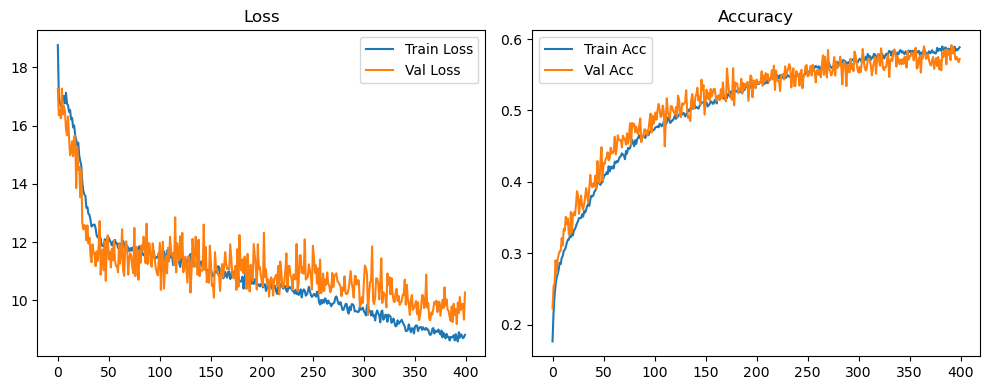

Original Model Final Test Loss: 10.6514 Accuracy: 0.5704


🚀 Running: batch128_lr_max_0.0001_min_1e-06_dp0.05


Files already downloaded and verified


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|                                                                                                                                                                        | 0/400 [00:00<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.1604 | Val Acc: 0.2404 | Epoch Time: 1.87 | :   0%|                                                                                                      | 0/400 [01:52<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.1604 | Val Acc: 0.2404 | Epoch Time: 1.87 | :   0%|                                                                                                      | 0/400 [01:52<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.1604 | Val Acc: 0.2404 | Epoch Time: 1.87 | :   0%|▏                                                                                         | 1/400 [01:52<12:27:12, 112.36s/it]

| LR: 0.000100 | Train Acc: 0.2052 | Val Acc: 0.2546 | Epoch Time: 1.87 | :   0%|▏                                                                                         | 1/400 [03:44<12:27:12, 112.36s/it]

| LR: 0.000100 | Train Acc: 0.2052 | Val Acc: 0.2546 | Epoch Time: 1.87 | :   0%|▏                                                                                         | 1/400 [03:44<12:27:12, 112.36s/it]

| LR: 0.000100 | Train Acc: 0.2052 | Val Acc: 0.2546 | Epoch Time: 1.87 | :   0%|▍                                                                                         | 2/400 [03:44<12:24:12, 112.19s/it]

| LR: 0.000100 | Train Acc: 0.2197 | Val Acc: 0.2724 | Epoch Time: 1.87 | :   0%|▍                                                                                         | 2/400 [05:36<12:24:12, 112.19s/it]

| LR: 0.000100 | Train Acc: 0.2197 | Val Acc: 0.2724 | Epoch Time: 1.87 | :   0%|▍                                                                                         | 2/400 [05:36<12:24:12, 112.19s/it]

| LR: 0.000100 | Train Acc: 0.2197 | Val Acc: 0.2724 | Epoch Time: 1.87 | :   1%|▋                                                                                         | 3/400 [05:36<12:22:03, 112.15s/it]

| LR: 0.000100 | Train Acc: 0.2345 | Val Acc: 0.2881 | Epoch Time: 1.87 | :   1%|▋                                                                                         | 3/400 [07:28<12:22:03, 112.15s/it]

| LR: 0.000100 | Train Acc: 0.2345 | Val Acc: 0.2881 | Epoch Time: 1.87 | :   1%|▋                                                                                         | 3/400 [07:28<12:22:03, 112.15s/it]

| LR: 0.000100 | Train Acc: 0.2345 | Val Acc: 0.2881 | Epoch Time: 1.87 | :   1%|▉                                                                                         | 4/400 [07:28<12:20:02, 112.13s/it]

| LR: 0.000100 | Train Acc: 0.2391 | Val Acc: 0.2917 | Epoch Time: 1.87 | :   1%|▉                                                                                         | 4/400 [09:20<12:20:02, 112.13s/it]

| LR: 0.000100 | Train Acc: 0.2391 | Val Acc: 0.2917 | Epoch Time: 1.87 | :   1%|▉                                                                                         | 4/400 [09:20<12:20:02, 112.13s/it]

| LR: 0.000100 | Train Acc: 0.2391 | Val Acc: 0.2917 | Epoch Time: 1.87 | :   1%|█▏                                                                                        | 5/400 [09:20<12:17:57, 112.09s/it]

| LR: 0.000100 | Train Acc: 0.2461 | Val Acc: 0.3078 | Epoch Time: 1.86 | :   1%|█▏                                                                                        | 5/400 [11:12<12:17:57, 112.09s/it]

| LR: 0.000100 | Train Acc: 0.2461 | Val Acc: 0.3078 | Epoch Time: 1.86 | :   1%|█▏                                                                                        | 5/400 [11:12<12:17:57, 112.09s/it]

| LR: 0.000100 | Train Acc: 0.2461 | Val Acc: 0.3078 | Epoch Time: 1.86 | :   2%|█▎                                                                                        | 6/400 [11:12<12:15:53, 112.06s/it]

| LR: 0.000100 | Train Acc: 0.2532 | Val Acc: 0.2937 | Epoch Time: 1.86 | :   2%|█▎                                                                                        | 6/400 [13:04<12:15:53, 112.06s/it]

| LR: 0.000100 | Train Acc: 0.2532 | Val Acc: 0.2937 | Epoch Time: 1.86 | :   2%|█▎                                                                                        | 6/400 [13:04<12:15:53, 112.06s/it]

| LR: 0.000100 | Train Acc: 0.2532 | Val Acc: 0.2937 | Epoch Time: 1.86 | :   2%|█▌                                                                                        | 7/400 [13:04<12:13:52, 112.04s/it]

| LR: 0.000100 | Train Acc: 0.2576 | Val Acc: 0.2948 | Epoch Time: 1.86 | :   2%|█▌                                                                                        | 7/400 [14:56<12:13:52, 112.04s/it]

| LR: 0.000100 | Train Acc: 0.2576 | Val Acc: 0.2948 | Epoch Time: 1.86 | :   2%|█▌                                                                                        | 7/400 [14:56<12:13:52, 112.04s/it]

| LR: 0.000100 | Train Acc: 0.2576 | Val Acc: 0.2948 | Epoch Time: 1.86 | :   2%|█▊                                                                                        | 8/400 [14:56<12:11:56, 112.03s/it]

| LR: 0.000100 | Train Acc: 0.2663 | Val Acc: 0.3001 | Epoch Time: 1.87 | :   2%|█▊                                                                                        | 8/400 [16:48<12:11:56, 112.03s/it]

| LR: 0.000100 | Train Acc: 0.2663 | Val Acc: 0.3001 | Epoch Time: 1.87 | :   2%|█▊                                                                                        | 8/400 [16:48<12:11:56, 112.03s/it]

| LR: 0.000100 | Train Acc: 0.2663 | Val Acc: 0.3001 | Epoch Time: 1.87 | :   2%|██                                                                                        | 9/400 [16:48<12:10:03, 112.03s/it]

| LR: 0.000100 | Train Acc: 0.2630 | Val Acc: 0.3066 | Epoch Time: 1.86 | :   2%|██                                                                                        | 9/400 [18:40<12:10:03, 112.03s/it]

| LR: 0.000100 | Train Acc: 0.2630 | Val Acc: 0.3066 | Epoch Time: 1.86 | :   2%|██                                                                                        | 9/400 [18:40<12:10:03, 112.03s/it]

| LR: 0.000100 | Train Acc: 0.2630 | Val Acc: 0.3066 | Epoch Time: 1.86 | :   2%|██▏                                                                                      | 10/400 [18:40<12:08:08, 112.02s/it]

| LR: 0.000100 | Train Acc: 0.2702 | Val Acc: 0.3238 | Epoch Time: 1.86 | :   2%|██▏                                                                                      | 10/400 [20:32<12:08:08, 112.02s/it]

| LR: 0.000100 | Train Acc: 0.2702 | Val Acc: 0.3238 | Epoch Time: 1.86 | :   2%|██▏                                                                                      | 10/400 [20:32<12:08:08, 112.02s/it]

| LR: 0.000100 | Train Acc: 0.2702 | Val Acc: 0.3238 | Epoch Time: 1.86 | :   3%|██▍                                                                                      | 11/400 [20:32<12:06:14, 112.02s/it]

| LR: 0.000100 | Train Acc: 0.2757 | Val Acc: 0.3158 | Epoch Time: 1.87 | :   3%|██▍                                                                                      | 11/400 [22:24<12:06:14, 112.02s/it]

| LR: 0.000100 | Train Acc: 0.2757 | Val Acc: 0.3158 | Epoch Time: 1.87 | :   3%|██▍                                                                                      | 11/400 [22:24<12:06:14, 112.02s/it]

| LR: 0.000100 | Train Acc: 0.2757 | Val Acc: 0.3158 | Epoch Time: 1.87 | :   3%|██▋                                                                                      | 12/400 [22:24<12:04:23, 112.02s/it]

| LR: 0.000100 | Train Acc: 0.2763 | Val Acc: 0.3237 | Epoch Time: 1.87 | :   3%|██▋                                                                                      | 12/400 [24:16<12:04:23, 112.02s/it]

| LR: 0.000100 | Train Acc: 0.2763 | Val Acc: 0.3237 | Epoch Time: 1.87 | :   3%|██▋                                                                                      | 12/400 [24:16<12:04:23, 112.02s/it]

| LR: 0.000100 | Train Acc: 0.2763 | Val Acc: 0.3237 | Epoch Time: 1.87 | :   3%|██▉                                                                                      | 13/400 [24:16<12:02:30, 112.02s/it]

| LR: 0.000100 | Train Acc: 0.2849 | Val Acc: 0.3326 | Epoch Time: 1.86 | :   3%|██▉                                                                                      | 13/400 [26:08<12:02:30, 112.02s/it]

| LR: 0.000100 | Train Acc: 0.2849 | Val Acc: 0.3326 | Epoch Time: 1.86 | :   3%|██▉                                                                                      | 13/400 [26:08<12:02:30, 112.02s/it]

| LR: 0.000100 | Train Acc: 0.2849 | Val Acc: 0.3326 | Epoch Time: 1.86 | :   4%|███                                                                                      | 14/400 [26:08<12:00:37, 112.01s/it]

| LR: 0.000100 | Train Acc: 0.2804 | Val Acc: 0.3225 | Epoch Time: 1.87 | :   4%|███                                                                                      | 14/400 [28:00<12:00:37, 112.01s/it]

| LR: 0.000100 | Train Acc: 0.2804 | Val Acc: 0.3225 | Epoch Time: 1.87 | :   4%|███                                                                                      | 14/400 [28:00<12:00:37, 112.01s/it]

| LR: 0.000100 | Train Acc: 0.2804 | Val Acc: 0.3225 | Epoch Time: 1.87 | :   4%|███▎                                                                                     | 15/400 [28:00<11:58:45, 112.01s/it]

| LR: 0.000100 | Train Acc: 0.2854 | Val Acc: 0.3305 | Epoch Time: 1.86 | :   4%|███▎                                                                                     | 15/400 [29:52<11:58:45, 112.01s/it]

| LR: 0.000100 | Train Acc: 0.2854 | Val Acc: 0.3305 | Epoch Time: 1.86 | :   4%|███▎                                                                                     | 15/400 [29:52<11:58:45, 112.01s/it]

| LR: 0.000100 | Train Acc: 0.2854 | Val Acc: 0.3305 | Epoch Time: 1.86 | :   4%|███▌                                                                                     | 16/400 [29:52<11:56:52, 112.01s/it]

| LR: 0.000100 | Train Acc: 0.2881 | Val Acc: 0.3240 | Epoch Time: 1.86 | :   4%|███▌                                                                                     | 16/400 [31:44<11:56:52, 112.01s/it]

| LR: 0.000100 | Train Acc: 0.2881 | Val Acc: 0.3240 | Epoch Time: 1.86 | :   4%|███▌                                                                                     | 16/400 [31:44<11:56:52, 112.01s/it]

| LR: 0.000100 | Train Acc: 0.2881 | Val Acc: 0.3240 | Epoch Time: 1.86 | :   4%|███▊                                                                                     | 17/400 [31:44<11:54:58, 112.01s/it]

| LR: 0.000100 | Train Acc: 0.2900 | Val Acc: 0.3403 | Epoch Time: 1.86 | :   4%|███▊                                                                                     | 17/400 [33:36<11:54:58, 112.01s/it]

| LR: 0.000100 | Train Acc: 0.2900 | Val Acc: 0.3403 | Epoch Time: 1.86 | :   4%|███▊                                                                                     | 17/400 [33:36<11:54:58, 112.01s/it]

| LR: 0.000100 | Train Acc: 0.2900 | Val Acc: 0.3403 | Epoch Time: 1.86 | :   4%|████                                                                                     | 18/400 [33:36<11:53:04, 112.00s/it]

| LR: 0.000100 | Train Acc: 0.2992 | Val Acc: 0.3395 | Epoch Time: 1.86 | :   4%|████                                                                                     | 18/400 [35:28<11:53:04, 112.00s/it]

| LR: 0.000100 | Train Acc: 0.2992 | Val Acc: 0.3395 | Epoch Time: 1.86 | :   4%|████                                                                                     | 18/400 [35:28<11:53:04, 112.00s/it]

| LR: 0.000100 | Train Acc: 0.2992 | Val Acc: 0.3395 | Epoch Time: 1.86 | :   5%|████▏                                                                                    | 19/400 [35:28<11:51:09, 111.99s/it]

| LR: 0.000099 | Train Acc: 0.2972 | Val Acc: 0.3345 | Epoch Time: 1.86 | :   5%|████▏                                                                                    | 19/400 [37:20<11:51:09, 111.99s/it]

| LR: 0.000099 | Train Acc: 0.2972 | Val Acc: 0.3345 | Epoch Time: 1.86 | :   5%|████▏                                                                                    | 19/400 [37:20<11:51:09, 111.99s/it]

| LR: 0.000099 | Train Acc: 0.2972 | Val Acc: 0.3345 | Epoch Time: 1.86 | :   5%|████▍                                                                                    | 20/400 [37:20<11:49:14, 111.99s/it]

| LR: 0.000099 | Train Acc: 0.3023 | Val Acc: 0.3432 | Epoch Time: 1.86 | :   5%|████▍                                                                                    | 20/400 [39:12<11:49:14, 111.99s/it]

| LR: 0.000099 | Train Acc: 0.3023 | Val Acc: 0.3432 | Epoch Time: 1.86 | :   5%|████▍                                                                                    | 20/400 [39:12<11:49:14, 111.99s/it]

| LR: 0.000099 | Train Acc: 0.3023 | Val Acc: 0.3432 | Epoch Time: 1.86 | :   5%|████▋                                                                                    | 21/400 [39:12<11:47:20, 111.98s/it]

| LR: 0.000099 | Train Acc: 0.3028 | Val Acc: 0.3407 | Epoch Time: 1.86 | :   5%|████▋                                                                                    | 21/400 [41:04<11:47:20, 111.98s/it]

| LR: 0.000099 | Train Acc: 0.3028 | Val Acc: 0.3407 | Epoch Time: 1.86 | :   5%|████▋                                                                                    | 21/400 [41:04<11:47:20, 111.98s/it]

| LR: 0.000099 | Train Acc: 0.3028 | Val Acc: 0.3407 | Epoch Time: 1.86 | :   6%|████▉                                                                                    | 22/400 [41:04<11:45:27, 111.98s/it]

| LR: 0.000099 | Train Acc: 0.3068 | Val Acc: 0.3584 | Epoch Time: 1.86 | :   6%|████▉                                                                                    | 22/400 [42:56<11:45:27, 111.98s/it]

| LR: 0.000099 | Train Acc: 0.3068 | Val Acc: 0.3584 | Epoch Time: 1.86 | :   6%|████▉                                                                                    | 22/400 [42:56<11:45:27, 111.98s/it]

| LR: 0.000099 | Train Acc: 0.3068 | Val Acc: 0.3584 | Epoch Time: 1.86 | :   6%|█████                                                                                    | 23/400 [42:56<11:43:34, 111.97s/it]

| LR: 0.000099 | Train Acc: 0.3134 | Val Acc: 0.3526 | Epoch Time: 1.86 | :   6%|█████                                                                                    | 23/400 [44:48<11:43:34, 111.97s/it]

| LR: 0.000099 | Train Acc: 0.3134 | Val Acc: 0.3526 | Epoch Time: 1.86 | :   6%|█████                                                                                    | 23/400 [44:48<11:43:34, 111.97s/it]

| LR: 0.000099 | Train Acc: 0.3134 | Val Acc: 0.3526 | Epoch Time: 1.86 | :   6%|█████▎                                                                                   | 24/400 [44:48<11:41:41, 111.97s/it]

| LR: 0.000099 | Train Acc: 0.3131 | Val Acc: 0.3598 | Epoch Time: 1.86 | :   6%|█████▎                                                                                   | 24/400 [46:40<11:41:41, 111.97s/it]

| LR: 0.000099 | Train Acc: 0.3131 | Val Acc: 0.3598 | Epoch Time: 1.86 | :   6%|█████▎                                                                                   | 24/400 [46:40<11:41:41, 111.97s/it]

| LR: 0.000099 | Train Acc: 0.3131 | Val Acc: 0.3598 | Epoch Time: 1.86 | :   6%|█████▌                                                                                   | 25/400 [46:40<11:39:49, 111.97s/it]

| LR: 0.000099 | Train Acc: 0.3153 | Val Acc: 0.3443 | Epoch Time: 1.86 | :   6%|█████▌                                                                                   | 25/400 [48:32<11:39:49, 111.97s/it]

| LR: 0.000099 | Train Acc: 0.3153 | Val Acc: 0.3443 | Epoch Time: 1.86 | :   6%|█████▌                                                                                   | 25/400 [48:32<11:39:49, 111.97s/it]

| LR: 0.000099 | Train Acc: 0.3153 | Val Acc: 0.3443 | Epoch Time: 1.86 | :   6%|█████▊                                                                                   | 26/400 [48:32<11:37:58, 111.97s/it]

| LR: 0.000099 | Train Acc: 0.3202 | Val Acc: 0.3539 | Epoch Time: 1.86 | :   6%|█████▊                                                                                   | 26/400 [50:24<11:37:58, 111.97s/it]

| LR: 0.000099 | Train Acc: 0.3202 | Val Acc: 0.3539 | Epoch Time: 1.86 | :   6%|█████▊                                                                                   | 26/400 [50:24<11:37:58, 111.97s/it]

| LR: 0.000099 | Train Acc: 0.3202 | Val Acc: 0.3539 | Epoch Time: 1.86 | :   7%|██████                                                                                   | 27/400 [50:24<11:36:07, 111.98s/it]

| LR: 0.000099 | Train Acc: 0.3241 | Val Acc: 0.3751 | Epoch Time: 1.86 | :   7%|██████                                                                                   | 27/400 [52:16<11:36:07, 111.98s/it]

| LR: 0.000099 | Train Acc: 0.3241 | Val Acc: 0.3751 | Epoch Time: 1.86 | :   7%|██████                                                                                   | 27/400 [52:16<11:36:07, 111.98s/it]

| LR: 0.000099 | Train Acc: 0.3241 | Val Acc: 0.3751 | Epoch Time: 1.86 | :   7%|██████▏                                                                                  | 28/400 [52:16<11:34:15, 111.98s/it]

| LR: 0.000099 | Train Acc: 0.3253 | Val Acc: 0.3785 | Epoch Time: 1.86 | :   7%|██████▏                                                                                  | 28/400 [54:08<11:34:15, 111.98s/it]

| LR: 0.000099 | Train Acc: 0.3253 | Val Acc: 0.3785 | Epoch Time: 1.86 | :   7%|██████▏                                                                                  | 28/400 [54:08<11:34:15, 111.98s/it]

| LR: 0.000099 | Train Acc: 0.3253 | Val Acc: 0.3785 | Epoch Time: 1.86 | :   7%|██████▍                                                                                  | 29/400 [54:08<11:32:26, 111.99s/it]

| LR: 0.000099 | Train Acc: 0.3284 | Val Acc: 0.3651 | Epoch Time: 1.86 | :   7%|██████▍                                                                                  | 29/400 [56:00<11:32:26, 111.99s/it]

| LR: 0.000099 | Train Acc: 0.3284 | Val Acc: 0.3651 | Epoch Time: 1.86 | :   7%|██████▍                                                                                  | 29/400 [56:00<11:32:26, 111.99s/it]

| LR: 0.000099 | Train Acc: 0.3284 | Val Acc: 0.3651 | Epoch Time: 1.86 | :   8%|██████▋                                                                                  | 30/400 [56:00<11:30:36, 111.99s/it]

| LR: 0.000099 | Train Acc: 0.3309 | Val Acc: 0.3939 | Epoch Time: 1.87 | :   8%|██████▋                                                                                  | 30/400 [57:52<11:30:36, 111.99s/it]

| LR: 0.000099 | Train Acc: 0.3309 | Val Acc: 0.3939 | Epoch Time: 1.87 | :   8%|██████▋                                                                                  | 30/400 [57:52<11:30:36, 111.99s/it]

| LR: 0.000099 | Train Acc: 0.3309 | Val Acc: 0.3939 | Epoch Time: 1.87 | :   8%|██████▉                                                                                  | 31/400 [57:52<11:28:48, 112.00s/it]

| LR: 0.000099 | Train Acc: 0.3334 | Val Acc: 0.3746 | Epoch Time: 1.87 | :   8%|██████▉                                                                                  | 31/400 [59:44<11:28:48, 112.00s/it]

| LR: 0.000099 | Train Acc: 0.3334 | Val Acc: 0.3746 | Epoch Time: 1.87 | :   8%|██████▉                                                                                  | 31/400 [59:44<11:28:48, 112.00s/it]

| LR: 0.000099 | Train Acc: 0.3334 | Val Acc: 0.3746 | Epoch Time: 1.87 | :   8%|███████                                                                                  | 32/400 [59:44<11:26:57, 112.01s/it]

| LR: 0.000098 | Train Acc: 0.3379 | Val Acc: 0.4050 | Epoch Time: 1.86 | :   8%|██████▉                                                                                | 32/400 [1:01:36<11:26:57, 112.01s/it]

| LR: 0.000098 | Train Acc: 0.3379 | Val Acc: 0.4050 | Epoch Time: 1.86 | :   8%|██████▉                                                                                | 32/400 [1:01:36<11:26:57, 112.01s/it]

| LR: 0.000098 | Train Acc: 0.3379 | Val Acc: 0.4050 | Epoch Time: 1.86 | :   8%|███████▏                                                                               | 33/400 [1:01:36<11:25:05, 112.00s/it]

| LR: 0.000098 | Train Acc: 0.3431 | Val Acc: 0.3852 | Epoch Time: 1.87 | :   8%|███████▏                                                                               | 33/400 [1:03:28<11:25:05, 112.00s/it]

| LR: 0.000098 | Train Acc: 0.3431 | Val Acc: 0.3852 | Epoch Time: 1.87 | :   8%|███████▏                                                                               | 33/400 [1:03:28<11:25:05, 112.00s/it]

| LR: 0.000098 | Train Acc: 0.3431 | Val Acc: 0.3852 | Epoch Time: 1.87 | :   8%|███████▍                                                                               | 34/400 [1:03:28<11:23:18, 112.02s/it]

| LR: 0.000098 | Train Acc: 0.3418 | Val Acc: 0.3928 | Epoch Time: 1.87 | :   8%|███████▍                                                                               | 34/400 [1:05:20<11:23:18, 112.02s/it]

| LR: 0.000098 | Train Acc: 0.3418 | Val Acc: 0.3928 | Epoch Time: 1.87 | :   8%|███████▍                                                                               | 34/400 [1:05:20<11:23:18, 112.02s/it]

| LR: 0.000098 | Train Acc: 0.3418 | Val Acc: 0.3928 | Epoch Time: 1.87 | :   9%|███████▌                                                                               | 35/400 [1:05:20<11:21:27, 112.02s/it]

| LR: 0.000098 | Train Acc: 0.3459 | Val Acc: 0.3903 | Epoch Time: 1.87 | :   9%|███████▌                                                                               | 35/400 [1:07:12<11:21:27, 112.02s/it]

| LR: 0.000098 | Train Acc: 0.3459 | Val Acc: 0.3903 | Epoch Time: 1.87 | :   9%|███████▌                                                                               | 35/400 [1:07:12<11:21:27, 112.02s/it]

| LR: 0.000098 | Train Acc: 0.3459 | Val Acc: 0.3903 | Epoch Time: 1.87 | :   9%|███████▊                                                                               | 36/400 [1:07:12<11:19:35, 112.02s/it]

| LR: 0.000098 | Train Acc: 0.3465 | Val Acc: 0.4077 | Epoch Time: 1.87 | :   9%|███████▊                                                                               | 36/400 [1:09:04<11:19:35, 112.02s/it]

| LR: 0.000098 | Train Acc: 0.3465 | Val Acc: 0.4077 | Epoch Time: 1.87 | :   9%|███████▊                                                                               | 36/400 [1:09:04<11:19:35, 112.02s/it]

| LR: 0.000098 | Train Acc: 0.3465 | Val Acc: 0.4077 | Epoch Time: 1.87 | :   9%|████████                                                                               | 37/400 [1:09:04<11:17:43, 112.02s/it]

| LR: 0.000098 | Train Acc: 0.3540 | Val Acc: 0.3884 | Epoch Time: 1.86 | :   9%|████████                                                                               | 37/400 [1:10:56<11:17:43, 112.02s/it]

| LR: 0.000098 | Train Acc: 0.3540 | Val Acc: 0.3884 | Epoch Time: 1.86 | :   9%|████████                                                                               | 37/400 [1:10:56<11:17:43, 112.02s/it]

| LR: 0.000098 | Train Acc: 0.3540 | Val Acc: 0.3884 | Epoch Time: 1.86 | :  10%|████████▎                                                                              | 38/400 [1:10:56<11:15:50, 112.02s/it]

| LR: 0.000098 | Train Acc: 0.3517 | Val Acc: 0.4044 | Epoch Time: 1.86 | :  10%|████████▎                                                                              | 38/400 [1:12:48<11:15:50, 112.02s/it]

| LR: 0.000098 | Train Acc: 0.3517 | Val Acc: 0.4044 | Epoch Time: 1.86 | :  10%|████████▎                                                                              | 38/400 [1:12:48<11:15:50, 112.02s/it]

| LR: 0.000098 | Train Acc: 0.3517 | Val Acc: 0.4044 | Epoch Time: 1.86 | :  10%|████████▍                                                                              | 39/400 [1:12:48<11:13:55, 112.01s/it]

| LR: 0.000098 | Train Acc: 0.3492 | Val Acc: 0.3703 | Epoch Time: 1.86 | :  10%|████████▍                                                                              | 39/400 [1:14:40<11:13:55, 112.01s/it]

| LR: 0.000098 | Train Acc: 0.3492 | Val Acc: 0.3703 | Epoch Time: 1.86 | :  10%|████████▍                                                                              | 39/400 [1:14:40<11:13:55, 112.01s/it]

| LR: 0.000098 | Train Acc: 0.3492 | Val Acc: 0.3703 | Epoch Time: 1.86 | :  10%|████████▋                                                                              | 40/400 [1:14:40<11:11:58, 112.00s/it]

| LR: 0.000098 | Train Acc: 0.3563 | Val Acc: 0.3635 | Epoch Time: 1.86 | :  10%|████████▋                                                                              | 40/400 [1:16:32<11:11:58, 112.00s/it]

| LR: 0.000098 | Train Acc: 0.3563 | Val Acc: 0.3635 | Epoch Time: 1.86 | :  10%|████████▋                                                                              | 40/400 [1:16:32<11:11:58, 112.00s/it]

| LR: 0.000098 | Train Acc: 0.3563 | Val Acc: 0.3635 | Epoch Time: 1.86 | :  10%|████████▉                                                                              | 41/400 [1:16:32<11:10:03, 111.99s/it]

| LR: 0.000097 | Train Acc: 0.3597 | Val Acc: 0.4012 | Epoch Time: 1.86 | :  10%|████████▉                                                                              | 41/400 [1:18:24<11:10:03, 111.99s/it]

| LR: 0.000097 | Train Acc: 0.3597 | Val Acc: 0.4012 | Epoch Time: 1.86 | :  10%|████████▉                                                                              | 41/400 [1:18:24<11:10:03, 111.99s/it]

| LR: 0.000097 | Train Acc: 0.3597 | Val Acc: 0.4012 | Epoch Time: 1.86 | :  10%|█████████▏                                                                             | 42/400 [1:18:24<11:08:09, 111.98s/it]

| LR: 0.000097 | Train Acc: 0.3577 | Val Acc: 0.4204 | Epoch Time: 1.86 | :  10%|█████████▏                                                                             | 42/400 [1:20:16<11:08:09, 111.98s/it]

| LR: 0.000097 | Train Acc: 0.3577 | Val Acc: 0.4204 | Epoch Time: 1.86 | :  10%|█████████▏                                                                             | 42/400 [1:20:16<11:08:09, 111.98s/it]

| LR: 0.000097 | Train Acc: 0.3577 | Val Acc: 0.4204 | Epoch Time: 1.86 | :  11%|█████████▎                                                                             | 43/400 [1:20:16<11:06:17, 111.98s/it]

| LR: 0.000097 | Train Acc: 0.3637 | Val Acc: 0.4235 | Epoch Time: 1.86 | :  11%|█████████▎                                                                             | 43/400 [1:22:08<11:06:17, 111.98s/it]

| LR: 0.000097 | Train Acc: 0.3637 | Val Acc: 0.4235 | Epoch Time: 1.86 | :  11%|█████████▎                                                                             | 43/400 [1:22:08<11:06:17, 111.98s/it]

| LR: 0.000097 | Train Acc: 0.3637 | Val Acc: 0.4235 | Epoch Time: 1.86 | :  11%|█████████▌                                                                             | 44/400 [1:22:08<11:04:25, 111.98s/it]

| LR: 0.000097 | Train Acc: 0.3639 | Val Acc: 0.4249 | Epoch Time: 1.86 | :  11%|█████████▌                                                                             | 44/400 [1:24:00<11:04:25, 111.98s/it]

| LR: 0.000097 | Train Acc: 0.3639 | Val Acc: 0.4249 | Epoch Time: 1.86 | :  11%|█████████▌                                                                             | 44/400 [1:24:00<11:04:25, 111.98s/it]

| LR: 0.000097 | Train Acc: 0.3639 | Val Acc: 0.4249 | Epoch Time: 1.86 | :  11%|█████████▊                                                                             | 45/400 [1:24:00<11:02:32, 111.98s/it]

| LR: 0.000097 | Train Acc: 0.3655 | Val Acc: 0.4030 | Epoch Time: 1.86 | :  11%|█████████▊                                                                             | 45/400 [1:25:52<11:02:32, 111.98s/it]

| LR: 0.000097 | Train Acc: 0.3655 | Val Acc: 0.4030 | Epoch Time: 1.86 | :  11%|█████████▊                                                                             | 45/400 [1:25:52<11:02:32, 111.98s/it]

| LR: 0.000097 | Train Acc: 0.3655 | Val Acc: 0.4030 | Epoch Time: 1.86 | :  12%|██████████                                                                             | 46/400 [1:25:52<11:00:40, 111.98s/it]

| LR: 0.000097 | Train Acc: 0.3671 | Val Acc: 0.4292 | Epoch Time: 1.86 | :  12%|██████████                                                                             | 46/400 [1:27:44<11:00:40, 111.98s/it]

| LR: 0.000097 | Train Acc: 0.3671 | Val Acc: 0.4292 | Epoch Time: 1.86 | :  12%|██████████                                                                             | 46/400 [1:27:44<11:00:40, 111.98s/it]

| LR: 0.000097 | Train Acc: 0.3671 | Val Acc: 0.4292 | Epoch Time: 1.86 | :  12%|██████████▏                                                                            | 47/400 [1:27:44<10:58:48, 111.98s/it]

| LR: 0.000097 | Train Acc: 0.3732 | Val Acc: 0.4259 | Epoch Time: 1.86 | :  12%|██████████▏                                                                            | 47/400 [1:29:36<10:58:48, 111.98s/it]

| LR: 0.000097 | Train Acc: 0.3732 | Val Acc: 0.4259 | Epoch Time: 1.86 | :  12%|██████████▏                                                                            | 47/400 [1:29:36<10:58:48, 111.98s/it]

| LR: 0.000097 | Train Acc: 0.3732 | Val Acc: 0.4259 | Epoch Time: 1.86 | :  12%|██████████▍                                                                            | 48/400 [1:29:36<10:56:58, 111.98s/it]

| LR: 0.000097 | Train Acc: 0.3713 | Val Acc: 0.4210 | Epoch Time: 1.86 | :  12%|██████████▍                                                                            | 48/400 [1:31:28<10:56:58, 111.98s/it]

| LR: 0.000097 | Train Acc: 0.3713 | Val Acc: 0.4210 | Epoch Time: 1.86 | :  12%|██████████▍                                                                            | 48/400 [1:31:28<10:56:58, 111.98s/it]

| LR: 0.000097 | Train Acc: 0.3713 | Val Acc: 0.4210 | Epoch Time: 1.86 | :  12%|██████████▋                                                                            | 49/400 [1:31:28<10:55:08, 111.99s/it]

| LR: 0.000096 | Train Acc: 0.3785 | Val Acc: 0.4262 | Epoch Time: 1.86 | :  12%|██████████▋                                                                            | 49/400 [1:33:20<10:55:08, 111.99s/it]

| LR: 0.000096 | Train Acc: 0.3785 | Val Acc: 0.4262 | Epoch Time: 1.86 | :  12%|██████████▋                                                                            | 49/400 [1:33:20<10:55:08, 111.99s/it]

| LR: 0.000096 | Train Acc: 0.3785 | Val Acc: 0.4262 | Epoch Time: 1.86 | :  12%|██████████▉                                                                            | 50/400 [1:33:20<10:53:16, 111.99s/it]

| LR: 0.000096 | Train Acc: 0.3768 | Val Acc: 0.4038 | Epoch Time: 1.86 | :  12%|██████████▉                                                                            | 50/400 [1:35:12<10:53:16, 111.99s/it]

| LR: 0.000096 | Train Acc: 0.3768 | Val Acc: 0.4038 | Epoch Time: 1.86 | :  12%|██████████▉                                                                            | 50/400 [1:35:12<10:53:16, 111.99s/it]

| LR: 0.000096 | Train Acc: 0.3768 | Val Acc: 0.4038 | Epoch Time: 1.86 | :  13%|███████████                                                                            | 51/400 [1:35:12<10:51:24, 111.99s/it]

| LR: 0.000096 | Train Acc: 0.3776 | Val Acc: 0.4163 | Epoch Time: 1.86 | :  13%|███████████                                                                            | 51/400 [1:37:04<10:51:24, 111.99s/it]

| LR: 0.000096 | Train Acc: 0.3776 | Val Acc: 0.4163 | Epoch Time: 1.86 | :  13%|███████████                                                                            | 51/400 [1:37:04<10:51:24, 111.99s/it]

| LR: 0.000096 | Train Acc: 0.3776 | Val Acc: 0.4163 | Epoch Time: 1.86 | :  13%|███████████▎                                                                           | 52/400 [1:37:04<10:49:33, 111.99s/it]

| LR: 0.000096 | Train Acc: 0.3785 | Val Acc: 0.4174 | Epoch Time: 1.86 | :  13%|███████████▎                                                                           | 52/400 [1:38:56<10:49:33, 111.99s/it]

| LR: 0.000096 | Train Acc: 0.3785 | Val Acc: 0.4174 | Epoch Time: 1.86 | :  13%|███████████▎                                                                           | 52/400 [1:38:56<10:49:33, 111.99s/it]

| LR: 0.000096 | Train Acc: 0.3785 | Val Acc: 0.4174 | Epoch Time: 1.86 | :  13%|███████████▌                                                                           | 53/400 [1:38:56<10:47:40, 111.99s/it]

| LR: 0.000096 | Train Acc: 0.3802 | Val Acc: 0.4244 | Epoch Time: 1.86 | :  13%|███████████▌                                                                           | 53/400 [1:40:48<10:47:40, 111.99s/it]

| LR: 0.000096 | Train Acc: 0.3802 | Val Acc: 0.4244 | Epoch Time: 1.86 | :  13%|███████████▌                                                                           | 53/400 [1:40:48<10:47:40, 111.99s/it]

| LR: 0.000096 | Train Acc: 0.3802 | Val Acc: 0.4244 | Epoch Time: 1.86 | :  14%|███████████▋                                                                           | 54/400 [1:40:48<10:45:50, 111.99s/it]

| LR: 0.000096 | Train Acc: 0.3875 | Val Acc: 0.4229 | Epoch Time: 1.86 | :  14%|███████████▋                                                                           | 54/400 [1:42:40<10:45:50, 111.99s/it]

| LR: 0.000096 | Train Acc: 0.3875 | Val Acc: 0.4229 | Epoch Time: 1.86 | :  14%|███████████▋                                                                           | 54/400 [1:42:40<10:45:50, 111.99s/it]

| LR: 0.000096 | Train Acc: 0.3875 | Val Acc: 0.4229 | Epoch Time: 1.86 | :  14%|███████████▉                                                                           | 55/400 [1:42:40<10:43:56, 111.99s/it]

| LR: 0.000095 | Train Acc: 0.3844 | Val Acc: 0.4069 | Epoch Time: 1.86 | :  14%|███████████▉                                                                           | 55/400 [1:44:32<10:43:56, 111.99s/it]

| LR: 0.000095 | Train Acc: 0.3844 | Val Acc: 0.4069 | Epoch Time: 1.86 | :  14%|███████████▉                                                                           | 55/400 [1:44:32<10:43:56, 111.99s/it]

| LR: 0.000095 | Train Acc: 0.3844 | Val Acc: 0.4069 | Epoch Time: 1.86 | :  14%|████████████▏                                                                          | 56/400 [1:44:32<10:42:03, 111.99s/it]

| LR: 0.000095 | Train Acc: 0.3845 | Val Acc: 0.4290 | Epoch Time: 1.86 | :  14%|████████████▏                                                                          | 56/400 [1:46:24<10:42:03, 111.99s/it]

| LR: 0.000095 | Train Acc: 0.3845 | Val Acc: 0.4290 | Epoch Time: 1.86 | :  14%|████████████▏                                                                          | 56/400 [1:46:24<10:42:03, 111.99s/it]

| LR: 0.000095 | Train Acc: 0.3845 | Val Acc: 0.4290 | Epoch Time: 1.86 | :  14%|████████████▍                                                                          | 57/400 [1:46:24<10:40:12, 111.99s/it]

| LR: 0.000095 | Train Acc: 0.3880 | Val Acc: 0.4455 | Epoch Time: 1.86 | :  14%|████████████▍                                                                          | 57/400 [1:48:16<10:40:12, 111.99s/it]

| LR: 0.000095 | Train Acc: 0.3880 | Val Acc: 0.4455 | Epoch Time: 1.86 | :  14%|████████████▍                                                                          | 57/400 [1:48:16<10:40:12, 111.99s/it]

| LR: 0.000095 | Train Acc: 0.3880 | Val Acc: 0.4455 | Epoch Time: 1.86 | :  14%|████████████▌                                                                          | 58/400 [1:48:16<10:38:19, 111.99s/it]

| LR: 0.000095 | Train Acc: 0.3883 | Val Acc: 0.4188 | Epoch Time: 1.86 | :  14%|████████████▌                                                                          | 58/400 [1:50:08<10:38:19, 111.99s/it]

| LR: 0.000095 | Train Acc: 0.3883 | Val Acc: 0.4188 | Epoch Time: 1.86 | :  14%|████████████▌                                                                          | 58/400 [1:50:08<10:38:19, 111.99s/it]

| LR: 0.000095 | Train Acc: 0.3883 | Val Acc: 0.4188 | Epoch Time: 1.86 | :  15%|████████████▊                                                                          | 59/400 [1:50:08<10:36:26, 111.99s/it]

| LR: 0.000095 | Train Acc: 0.3863 | Val Acc: 0.4540 | Epoch Time: 1.86 | :  15%|████████████▊                                                                          | 59/400 [1:52:00<10:36:26, 111.99s/it]

| LR: 0.000095 | Train Acc: 0.3863 | Val Acc: 0.4540 | Epoch Time: 1.86 | :  15%|████████████▊                                                                          | 59/400 [1:52:00<10:36:26, 111.99s/it]

| LR: 0.000095 | Train Acc: 0.3863 | Val Acc: 0.4540 | Epoch Time: 1.86 | :  15%|█████████████                                                                          | 60/400 [1:52:00<10:34:35, 111.99s/it]

| LR: 0.000095 | Train Acc: 0.3906 | Val Acc: 0.4444 | Epoch Time: 1.87 | :  15%|█████████████                                                                          | 60/400 [1:53:52<10:34:35, 111.99s/it]

| LR: 0.000095 | Train Acc: 0.3906 | Val Acc: 0.4444 | Epoch Time: 1.87 | :  15%|█████████████                                                                          | 60/400 [1:53:52<10:34:35, 111.99s/it]

| LR: 0.000095 | Train Acc: 0.3906 | Val Acc: 0.4444 | Epoch Time: 1.87 | :  15%|█████████████▎                                                                         | 61/400 [1:53:52<10:32:45, 111.99s/it]

| LR: 0.000094 | Train Acc: 0.3885 | Val Acc: 0.4397 | Epoch Time: 1.86 | :  15%|█████████████▎                                                                         | 61/400 [1:55:44<10:32:45, 111.99s/it]

| LR: 0.000094 | Train Acc: 0.3885 | Val Acc: 0.4397 | Epoch Time: 1.86 | :  15%|█████████████▎                                                                         | 61/400 [1:55:44<10:32:45, 111.99s/it]

| LR: 0.000094 | Train Acc: 0.3885 | Val Acc: 0.4397 | Epoch Time: 1.86 | :  16%|█████████████▍                                                                         | 62/400 [1:55:44<10:30:53, 111.99s/it]

| LR: 0.000094 | Train Acc: 0.3899 | Val Acc: 0.4522 | Epoch Time: 1.86 | :  16%|█████████████▍                                                                         | 62/400 [1:57:36<10:30:53, 111.99s/it]

| LR: 0.000094 | Train Acc: 0.3899 | Val Acc: 0.4522 | Epoch Time: 1.86 | :  16%|█████████████▍                                                                         | 62/400 [1:57:36<10:30:53, 111.99s/it]

| LR: 0.000094 | Train Acc: 0.3899 | Val Acc: 0.4522 | Epoch Time: 1.86 | :  16%|█████████████▋                                                                         | 63/400 [1:57:36<10:29:03, 112.00s/it]

| LR: 0.000094 | Train Acc: 0.3868 | Val Acc: 0.4305 | Epoch Time: 1.86 | :  16%|█████████████▋                                                                         | 63/400 [1:59:28<10:29:03, 112.00s/it]

| LR: 0.000094 | Train Acc: 0.3868 | Val Acc: 0.4305 | Epoch Time: 1.86 | :  16%|█████████████▋                                                                         | 63/400 [1:59:28<10:29:03, 112.00s/it]

| LR: 0.000094 | Train Acc: 0.3868 | Val Acc: 0.4305 | Epoch Time: 1.86 | :  16%|█████████████▉                                                                         | 64/400 [1:59:28<10:27:10, 112.00s/it]

| LR: 0.000094 | Train Acc: 0.3979 | Val Acc: 0.4254 | Epoch Time: 1.86 | :  16%|█████████████▉                                                                         | 64/400 [2:01:20<10:27:10, 112.00s/it]

| LR: 0.000094 | Train Acc: 0.3979 | Val Acc: 0.4254 | Epoch Time: 1.86 | :  16%|█████████████▉                                                                         | 64/400 [2:01:20<10:27:10, 112.00s/it]

| LR: 0.000094 | Train Acc: 0.3979 | Val Acc: 0.4254 | Epoch Time: 1.86 | :  16%|██████████████▏                                                                        | 65/400 [2:01:20<10:25:17, 111.99s/it]

| LR: 0.000094 | Train Acc: 0.3942 | Val Acc: 0.4158 | Epoch Time: 1.87 | :  16%|██████████████▏                                                                        | 65/400 [2:03:12<10:25:17, 111.99s/it]

| LR: 0.000094 | Train Acc: 0.3942 | Val Acc: 0.4158 | Epoch Time: 1.87 | :  16%|██████████████▏                                                                        | 65/400 [2:03:12<10:25:17, 111.99s/it]

| LR: 0.000094 | Train Acc: 0.3942 | Val Acc: 0.4158 | Epoch Time: 1.87 | :  16%|██████████████▎                                                                        | 66/400 [2:03:12<10:23:28, 112.00s/it]

| LR: 0.000093 | Train Acc: 0.3969 | Val Acc: 0.4423 | Epoch Time: 1.86 | :  16%|██████████████▎                                                                        | 66/400 [2:05:04<10:23:28, 112.00s/it]

| LR: 0.000093 | Train Acc: 0.3969 | Val Acc: 0.4423 | Epoch Time: 1.86 | :  16%|██████████████▎                                                                        | 66/400 [2:05:04<10:23:28, 112.00s/it]

| LR: 0.000093 | Train Acc: 0.3969 | Val Acc: 0.4423 | Epoch Time: 1.86 | :  17%|██████████████▌                                                                        | 67/400 [2:05:04<10:21:36, 112.00s/it]

| LR: 0.000093 | Train Acc: 0.3947 | Val Acc: 0.4366 | Epoch Time: 1.86 | :  17%|██████████████▌                                                                        | 67/400 [2:06:56<10:21:36, 112.00s/it]

| LR: 0.000093 | Train Acc: 0.3947 | Val Acc: 0.4366 | Epoch Time: 1.86 | :  17%|██████████████▌                                                                        | 67/400 [2:06:56<10:21:36, 112.00s/it]

| LR: 0.000093 | Train Acc: 0.3947 | Val Acc: 0.4366 | Epoch Time: 1.86 | :  17%|██████████████▊                                                                        | 68/400 [2:06:56<10:19:44, 112.00s/it]

| LR: 0.000093 | Train Acc: 0.3983 | Val Acc: 0.4362 | Epoch Time: 1.86 | :  17%|██████████████▊                                                                        | 68/400 [2:08:48<10:19:44, 112.00s/it]

| LR: 0.000093 | Train Acc: 0.3983 | Val Acc: 0.4362 | Epoch Time: 1.86 | :  17%|██████████████▊                                                                        | 68/400 [2:08:48<10:19:44, 112.00s/it]

| LR: 0.000093 | Train Acc: 0.3983 | Val Acc: 0.4362 | Epoch Time: 1.86 | :  17%|███████████████                                                                        | 69/400 [2:08:48<10:17:52, 112.00s/it]

| LR: 0.000093 | Train Acc: 0.4026 | Val Acc: 0.4259 | Epoch Time: 1.86 | :  17%|███████████████                                                                        | 69/400 [2:10:40<10:17:52, 112.00s/it]

| LR: 0.000093 | Train Acc: 0.4026 | Val Acc: 0.4259 | Epoch Time: 1.86 | :  17%|███████████████                                                                        | 69/400 [2:10:40<10:17:52, 112.00s/it]

| LR: 0.000093 | Train Acc: 0.4026 | Val Acc: 0.4259 | Epoch Time: 1.86 | :  18%|███████████████▏                                                                       | 70/400 [2:10:40<10:16:00, 112.00s/it]

| LR: 0.000093 | Train Acc: 0.4021 | Val Acc: 0.4401 | Epoch Time: 1.86 | :  18%|███████████████▏                                                                       | 70/400 [2:12:32<10:16:00, 112.00s/it]

| LR: 0.000093 | Train Acc: 0.4021 | Val Acc: 0.4401 | Epoch Time: 1.86 | :  18%|███████████████▏                                                                       | 70/400 [2:12:32<10:16:00, 112.00s/it]

| LR: 0.000093 | Train Acc: 0.4021 | Val Acc: 0.4401 | Epoch Time: 1.86 | :  18%|███████████████▍                                                                       | 71/400 [2:12:32<10:14:06, 112.00s/it]

| LR: 0.000093 | Train Acc: 0.4011 | Val Acc: 0.4632 | Epoch Time: 1.86 | :  18%|███████████████▍                                                                       | 71/400 [2:14:24<10:14:06, 112.00s/it]

| LR: 0.000093 | Train Acc: 0.4011 | Val Acc: 0.4632 | Epoch Time: 1.86 | :  18%|███████████████▍                                                                       | 71/400 [2:14:24<10:14:06, 112.00s/it]

| LR: 0.000093 | Train Acc: 0.4011 | Val Acc: 0.4632 | Epoch Time: 1.86 | :  18%|███████████████▋                                                                       | 72/400 [2:14:24<10:12:12, 111.99s/it]

| LR: 0.000092 | Train Acc: 0.4012 | Val Acc: 0.4456 | Epoch Time: 1.86 | :  18%|███████████████▋                                                                       | 72/400 [2:16:16<10:12:12, 111.99s/it]

| LR: 0.000092 | Train Acc: 0.4012 | Val Acc: 0.4456 | Epoch Time: 1.86 | :  18%|███████████████▋                                                                       | 72/400 [2:16:16<10:12:12, 111.99s/it]

| LR: 0.000092 | Train Acc: 0.4012 | Val Acc: 0.4456 | Epoch Time: 1.86 | :  18%|███████████████▉                                                                       | 73/400 [2:16:16<10:10:18, 111.98s/it]

| LR: 0.000092 | Train Acc: 0.4033 | Val Acc: 0.4240 | Epoch Time: 1.86 | :  18%|███████████████▉                                                                       | 73/400 [2:18:08<10:10:18, 111.98s/it]

| LR: 0.000092 | Train Acc: 0.4033 | Val Acc: 0.4240 | Epoch Time: 1.86 | :  18%|███████████████▉                                                                       | 73/400 [2:18:08<10:10:18, 111.98s/it]

| LR: 0.000092 | Train Acc: 0.4033 | Val Acc: 0.4240 | Epoch Time: 1.86 | :  18%|████████████████                                                                       | 74/400 [2:18:08<10:08:24, 111.98s/it]

| LR: 0.000092 | Train Acc: 0.4071 | Val Acc: 0.4297 | Epoch Time: 1.86 | :  18%|████████████████                                                                       | 74/400 [2:20:00<10:08:24, 111.98s/it]

| LR: 0.000092 | Train Acc: 0.4071 | Val Acc: 0.4297 | Epoch Time: 1.86 | :  18%|████████████████                                                                       | 74/400 [2:20:00<10:08:24, 111.98s/it]

| LR: 0.000092 | Train Acc: 0.4071 | Val Acc: 0.4297 | Epoch Time: 1.86 | :  19%|████████████████▎                                                                      | 75/400 [2:20:00<10:06:30, 111.97s/it]

| LR: 0.000092 | Train Acc: 0.4106 | Val Acc: 0.4140 | Epoch Time: 1.86 | :  19%|████████████████▎                                                                      | 75/400 [2:21:52<10:06:30, 111.97s/it]

| LR: 0.000092 | Train Acc: 0.4106 | Val Acc: 0.4140 | Epoch Time: 1.86 | :  19%|████████████████▎                                                                      | 75/400 [2:21:52<10:06:30, 111.97s/it]

| LR: 0.000092 | Train Acc: 0.4106 | Val Acc: 0.4140 | Epoch Time: 1.86 | :  19%|████████████████▌                                                                      | 76/400 [2:21:52<10:04:37, 111.97s/it]

| LR: 0.000091 | Train Acc: 0.4115 | Val Acc: 0.4315 | Epoch Time: 1.86 | :  19%|████████████████▌                                                                      | 76/400 [2:23:44<10:04:37, 111.97s/it]

| LR: 0.000091 | Train Acc: 0.4115 | Val Acc: 0.4315 | Epoch Time: 1.86 | :  19%|████████████████▌                                                                      | 76/400 [2:23:44<10:04:37, 111.97s/it]

| LR: 0.000091 | Train Acc: 0.4115 | Val Acc: 0.4315 | Epoch Time: 1.86 | :  19%|████████████████▋                                                                      | 77/400 [2:23:44<10:02:45, 111.97s/it]

| LR: 0.000091 | Train Acc: 0.4072 | Val Acc: 0.4333 | Epoch Time: 1.86 | :  19%|████████████████▋                                                                      | 77/400 [2:25:35<10:02:45, 111.97s/it]

| LR: 0.000091 | Train Acc: 0.4072 | Val Acc: 0.4333 | Epoch Time: 1.86 | :  19%|████████████████▋                                                                      | 77/400 [2:25:35<10:02:45, 111.97s/it]

| LR: 0.000091 | Train Acc: 0.4072 | Val Acc: 0.4333 | Epoch Time: 1.86 | :  20%|████████████████▉                                                                      | 78/400 [2:25:36<10:00:54, 111.97s/it]

| LR: 0.000091 | Train Acc: 0.4107 | Val Acc: 0.4386 | Epoch Time: 1.86 | :  20%|████████████████▉                                                                      | 78/400 [2:27:27<10:00:54, 111.97s/it]

| LR: 0.000091 | Train Acc: 0.4107 | Val Acc: 0.4386 | Epoch Time: 1.86 | :  20%|████████████████▉                                                                      | 78/400 [2:27:27<10:00:54, 111.97s/it]

| LR: 0.000091 | Train Acc: 0.4107 | Val Acc: 0.4386 | Epoch Time: 1.86 | :  20%|█████████████████▍                                                                      | 79/400 [2:27:28<9:59:03, 111.97s/it]

| LR: 0.000091 | Train Acc: 0.4129 | Val Acc: 0.4509 | Epoch Time: 1.86 | :  20%|█████████████████▍                                                                      | 79/400 [2:29:19<9:59:03, 111.97s/it]

| LR: 0.000091 | Train Acc: 0.4129 | Val Acc: 0.4509 | Epoch Time: 1.86 | :  20%|█████████████████▍                                                                      | 79/400 [2:29:19<9:59:03, 111.97s/it]

| LR: 0.000091 | Train Acc: 0.4129 | Val Acc: 0.4509 | Epoch Time: 1.86 | :  20%|█████████████████▌                                                                      | 80/400 [2:29:20<9:57:14, 111.98s/it]

| LR: 0.000091 | Train Acc: 0.4139 | Val Acc: 0.4305 | Epoch Time: 1.86 | :  20%|█████████████████▌                                                                      | 80/400 [2:31:11<9:57:14, 111.98s/it]

| LR: 0.000091 | Train Acc: 0.4139 | Val Acc: 0.4305 | Epoch Time: 1.86 | :  20%|█████████████████▌                                                                      | 80/400 [2:31:11<9:57:14, 111.98s/it]

| LR: 0.000091 | Train Acc: 0.4139 | Val Acc: 0.4305 | Epoch Time: 1.86 | :  20%|█████████████████▊                                                                      | 81/400 [2:31:12<9:55:24, 111.99s/it]

| LR: 0.000090 | Train Acc: 0.4102 | Val Acc: 0.4506 | Epoch Time: 1.86 | :  20%|█████████████████▊                                                                      | 81/400 [2:33:03<9:55:24, 111.99s/it]

| LR: 0.000090 | Train Acc: 0.4102 | Val Acc: 0.4506 | Epoch Time: 1.86 | :  20%|█████████████████▊                                                                      | 81/400 [2:33:03<9:55:24, 111.99s/it]

| LR: 0.000090 | Train Acc: 0.4102 | Val Acc: 0.4506 | Epoch Time: 1.86 | :  20%|██████████████████                                                                      | 82/400 [2:33:04<9:53:34, 112.00s/it]

| LR: 0.000090 | Train Acc: 0.4138 | Val Acc: 0.4523 | Epoch Time: 1.87 | :  20%|██████████████████                                                                      | 82/400 [2:34:56<9:53:34, 112.00s/it]

| LR: 0.000090 | Train Acc: 0.4138 | Val Acc: 0.4523 | Epoch Time: 1.87 | :  20%|██████████████████                                                                      | 82/400 [2:34:56<9:53:34, 112.00s/it]

| LR: 0.000090 | Train Acc: 0.4138 | Val Acc: 0.4523 | Epoch Time: 1.87 | :  21%|██████████████████▎                                                                     | 83/400 [2:34:56<9:51:44, 112.00s/it]

| LR: 0.000090 | Train Acc: 0.4117 | Val Acc: 0.4489 | Epoch Time: 1.86 | :  21%|██████████████████▎                                                                     | 83/400 [2:36:48<9:51:44, 112.00s/it]

| LR: 0.000090 | Train Acc: 0.4117 | Val Acc: 0.4489 | Epoch Time: 1.86 | :  21%|██████████████████▎                                                                     | 83/400 [2:36:48<9:51:44, 112.00s/it]

| LR: 0.000090 | Train Acc: 0.4117 | Val Acc: 0.4489 | Epoch Time: 1.86 | :  21%|██████████████████▍                                                                     | 84/400 [2:36:48<9:49:53, 112.01s/it]

| LR: 0.000090 | Train Acc: 0.4156 | Val Acc: 0.4305 | Epoch Time: 1.87 | :  21%|██████████████████▍                                                                     | 84/400 [2:38:40<9:49:53, 112.01s/it]

| LR: 0.000090 | Train Acc: 0.4156 | Val Acc: 0.4305 | Epoch Time: 1.87 | :  21%|██████████████████▍                                                                     | 84/400 [2:38:40<9:49:53, 112.01s/it]

| LR: 0.000090 | Train Acc: 0.4156 | Val Acc: 0.4305 | Epoch Time: 1.87 | :  21%|██████████████████▋                                                                     | 85/400 [2:38:40<9:48:02, 112.01s/it]

| LR: 0.000089 | Train Acc: 0.4157 | Val Acc: 0.4466 | Epoch Time: 1.87 | :  21%|██████████████████▋                                                                     | 85/400 [2:40:32<9:48:02, 112.01s/it]

| LR: 0.000089 | Train Acc: 0.4157 | Val Acc: 0.4466 | Epoch Time: 1.87 | :  21%|██████████████████▋                                                                     | 85/400 [2:40:32<9:48:02, 112.01s/it]

| LR: 0.000089 | Train Acc: 0.4157 | Val Acc: 0.4466 | Epoch Time: 1.87 | :  22%|██████████████████▉                                                                     | 86/400 [2:40:32<9:46:12, 112.01s/it]

| LR: 0.000089 | Train Acc: 0.4164 | Val Acc: 0.4389 | Epoch Time: 1.86 | :  22%|██████████████████▉                                                                     | 86/400 [2:42:24<9:46:12, 112.01s/it]

| LR: 0.000089 | Train Acc: 0.4164 | Val Acc: 0.4389 | Epoch Time: 1.86 | :  22%|██████████████████▉                                                                     | 86/400 [2:42:24<9:46:12, 112.01s/it]

| LR: 0.000089 | Train Acc: 0.4164 | Val Acc: 0.4389 | Epoch Time: 1.86 | :  22%|███████████████████▏                                                                    | 87/400 [2:42:24<9:44:19, 112.01s/it]

| LR: 0.000089 | Train Acc: 0.4204 | Val Acc: 0.4665 | Epoch Time: 1.87 | :  22%|███████████████████▏                                                                    | 87/400 [2:44:16<9:44:19, 112.01s/it]

| LR: 0.000089 | Train Acc: 0.4204 | Val Acc: 0.4665 | Epoch Time: 1.87 | :  22%|███████████████████▏                                                                    | 87/400 [2:44:16<9:44:19, 112.01s/it]

| LR: 0.000089 | Train Acc: 0.4204 | Val Acc: 0.4665 | Epoch Time: 1.87 | :  22%|███████████████████▎                                                                    | 88/400 [2:44:16<9:42:27, 112.01s/it]

| LR: 0.000089 | Train Acc: 0.4215 | Val Acc: 0.4621 | Epoch Time: 1.87 | :  22%|███████████████████▎                                                                    | 88/400 [2:46:08<9:42:27, 112.01s/it]

| LR: 0.000089 | Train Acc: 0.4215 | Val Acc: 0.4621 | Epoch Time: 1.87 | :  22%|███████████████████▎                                                                    | 88/400 [2:46:08<9:42:27, 112.01s/it]

| LR: 0.000089 | Train Acc: 0.4215 | Val Acc: 0.4621 | Epoch Time: 1.87 | :  22%|███████████████████▌                                                                    | 89/400 [2:46:08<9:40:37, 112.02s/it]

| LR: 0.000088 | Train Acc: 0.4192 | Val Acc: 0.4340 | Epoch Time: 1.86 | :  22%|███████████████████▌                                                                    | 89/400 [2:48:00<9:40:37, 112.02s/it]

| LR: 0.000088 | Train Acc: 0.4192 | Val Acc: 0.4340 | Epoch Time: 1.86 | :  22%|███████████████████▌                                                                    | 89/400 [2:48:00<9:40:37, 112.02s/it]

| LR: 0.000088 | Train Acc: 0.4192 | Val Acc: 0.4340 | Epoch Time: 1.86 | :  22%|███████████████████▊                                                                    | 90/400 [2:48:00<9:38:43, 112.01s/it]

| LR: 0.000088 | Train Acc: 0.4187 | Val Acc: 0.4692 | Epoch Time: 1.86 | :  22%|███████████████████▊                                                                    | 90/400 [2:49:52<9:38:43, 112.01s/it]

| LR: 0.000088 | Train Acc: 0.4187 | Val Acc: 0.4692 | Epoch Time: 1.86 | :  22%|███████████████████▊                                                                    | 90/400 [2:49:52<9:38:43, 112.01s/it]

| LR: 0.000088 | Train Acc: 0.4187 | Val Acc: 0.4692 | Epoch Time: 1.86 | :  23%|████████████████████                                                                    | 91/400 [2:49:52<9:36:50, 112.01s/it]

| LR: 0.000088 | Train Acc: 0.4205 | Val Acc: 0.4601 | Epoch Time: 1.86 | :  23%|████████████████████                                                                    | 91/400 [2:51:44<9:36:50, 112.01s/it]

| LR: 0.000088 | Train Acc: 0.4205 | Val Acc: 0.4601 | Epoch Time: 1.86 | :  23%|████████████████████                                                                    | 91/400 [2:51:44<9:36:50, 112.01s/it]

| LR: 0.000088 | Train Acc: 0.4205 | Val Acc: 0.4601 | Epoch Time: 1.86 | :  23%|████████████████████▏                                                                   | 92/400 [2:51:44<9:34:58, 112.01s/it]

| LR: 0.000088 | Train Acc: 0.4281 | Val Acc: 0.4661 | Epoch Time: 1.86 | :  23%|████████████████████▏                                                                   | 92/400 [2:53:36<9:34:58, 112.01s/it]

| LR: 0.000088 | Train Acc: 0.4281 | Val Acc: 0.4661 | Epoch Time: 1.86 | :  23%|████████████████████▏                                                                   | 92/400 [2:53:36<9:34:58, 112.01s/it]

| LR: 0.000088 | Train Acc: 0.4281 | Val Acc: 0.4661 | Epoch Time: 1.86 | :  23%|████████████████████▍                                                                   | 93/400 [2:53:36<9:33:04, 112.00s/it]

| LR: 0.000087 | Train Acc: 0.4258 | Val Acc: 0.4360 | Epoch Time: 1.86 | :  23%|████████████████████▍                                                                   | 93/400 [2:55:28<9:33:04, 112.00s/it]

| LR: 0.000087 | Train Acc: 0.4258 | Val Acc: 0.4360 | Epoch Time: 1.86 | :  23%|████████████████████▍                                                                   | 93/400 [2:55:28<9:33:04, 112.00s/it]

| LR: 0.000087 | Train Acc: 0.4258 | Val Acc: 0.4360 | Epoch Time: 1.86 | :  24%|████████████████████▋                                                                   | 94/400 [2:55:28<9:31:13, 112.00s/it]

| LR: 0.000087 | Train Acc: 0.4230 | Val Acc: 0.4495 | Epoch Time: 1.86 | :  24%|████████████████████▋                                                                   | 94/400 [2:57:20<9:31:13, 112.00s/it]

| LR: 0.000087 | Train Acc: 0.4230 | Val Acc: 0.4495 | Epoch Time: 1.86 | :  24%|████████████████████▋                                                                   | 94/400 [2:57:20<9:31:13, 112.00s/it]

| LR: 0.000087 | Train Acc: 0.4230 | Val Acc: 0.4495 | Epoch Time: 1.86 | :  24%|████████████████████▉                                                                   | 95/400 [2:57:20<9:29:21, 112.00s/it]

| LR: 0.000087 | Train Acc: 0.4215 | Val Acc: 0.4572 | Epoch Time: 1.86 | :  24%|████████████████████▉                                                                   | 95/400 [2:59:12<9:29:21, 112.00s/it]

| LR: 0.000087 | Train Acc: 0.4215 | Val Acc: 0.4572 | Epoch Time: 1.86 | :  24%|████████████████████▉                                                                   | 95/400 [2:59:12<9:29:21, 112.00s/it]

| LR: 0.000087 | Train Acc: 0.4215 | Val Acc: 0.4572 | Epoch Time: 1.86 | :  24%|█████████████████████                                                                   | 96/400 [2:59:12<9:27:28, 112.00s/it]

| LR: 0.000087 | Train Acc: 0.4227 | Val Acc: 0.4593 | Epoch Time: 1.86 | :  24%|█████████████████████                                                                   | 96/400 [3:01:04<9:27:28, 112.00s/it]

| LR: 0.000087 | Train Acc: 0.4227 | Val Acc: 0.4593 | Epoch Time: 1.86 | :  24%|█████████████████████                                                                   | 96/400 [3:01:04<9:27:28, 112.00s/it]

| LR: 0.000087 | Train Acc: 0.4227 | Val Acc: 0.4593 | Epoch Time: 1.86 | :  24%|█████████████████████▎                                                                  | 97/400 [3:01:04<9:25:36, 112.00s/it]

| LR: 0.000086 | Train Acc: 0.4311 | Val Acc: 0.4316 | Epoch Time: 1.86 | :  24%|█████████████████████▎                                                                  | 97/400 [3:02:56<9:25:36, 112.00s/it]

| LR: 0.000086 | Train Acc: 0.4311 | Val Acc: 0.4316 | Epoch Time: 1.86 | :  24%|█████████████████████▎                                                                  | 97/400 [3:02:56<9:25:36, 112.00s/it]

| LR: 0.000086 | Train Acc: 0.4311 | Val Acc: 0.4316 | Epoch Time: 1.86 | :  24%|█████████████████████▌                                                                  | 98/400 [3:02:56<9:23:44, 112.00s/it]

| LR: 0.000086 | Train Acc: 0.4266 | Val Acc: 0.4702 | Epoch Time: 1.86 | :  24%|█████████████████████▌                                                                  | 98/400 [3:04:48<9:23:44, 112.00s/it]

| LR: 0.000086 | Train Acc: 0.4266 | Val Acc: 0.4702 | Epoch Time: 1.86 | :  24%|█████████████████████▌                                                                  | 98/400 [3:04:48<9:23:44, 112.00s/it]

| LR: 0.000086 | Train Acc: 0.4266 | Val Acc: 0.4702 | Epoch Time: 1.86 | :  25%|█████████████████████▊                                                                  | 99/400 [3:04:48<9:21:51, 112.00s/it]

| LR: 0.000086 | Train Acc: 0.4271 | Val Acc: 0.4369 | Epoch Time: 1.86 | :  25%|█████████████████████▊                                                                  | 99/400 [3:06:40<9:21:51, 112.00s/it]

| LR: 0.000086 | Train Acc: 0.4271 | Val Acc: 0.4369 | Epoch Time: 1.86 | :  25%|█████████████████████▊                                                                  | 99/400 [3:06:40<9:21:51, 112.00s/it]

| LR: 0.000086 | Train Acc: 0.4271 | Val Acc: 0.4369 | Epoch Time: 1.86 | :  25%|█████████████████████▊                                                                 | 100/400 [3:06:40<9:19:58, 112.00s/it]

| LR: 0.000086 | Train Acc: 0.4315 | Val Acc: 0.4522 | Epoch Time: 1.86 | :  25%|█████████████████████▊                                                                 | 100/400 [3:08:32<9:19:58, 112.00s/it]

| LR: 0.000086 | Train Acc: 0.4315 | Val Acc: 0.4522 | Epoch Time: 1.86 | :  25%|█████████████████████▊                                                                 | 100/400 [3:08:32<9:19:58, 112.00s/it]

| LR: 0.000086 | Train Acc: 0.4315 | Val Acc: 0.4522 | Epoch Time: 1.86 | :  25%|█████████████████████▉                                                                 | 101/400 [3:08:32<9:18:05, 111.99s/it]

| LR: 0.000085 | Train Acc: 0.4289 | Val Acc: 0.4417 | Epoch Time: 1.86 | :  25%|█████████████████████▉                                                                 | 101/400 [3:10:24<9:18:05, 111.99s/it]

| LR: 0.000085 | Train Acc: 0.4289 | Val Acc: 0.4417 | Epoch Time: 1.86 | :  25%|█████████████████████▉                                                                 | 101/400 [3:10:24<9:18:05, 111.99s/it]

| LR: 0.000085 | Train Acc: 0.4289 | Val Acc: 0.4417 | Epoch Time: 1.86 | :  26%|██████████████████████▏                                                                | 102/400 [3:10:24<9:16:12, 111.99s/it]

| LR: 0.000085 | Train Acc: 0.4343 | Val Acc: 0.4534 | Epoch Time: 1.86 | :  26%|██████████████████████▏                                                                | 102/400 [3:12:16<9:16:12, 111.99s/it]

| LR: 0.000085 | Train Acc: 0.4343 | Val Acc: 0.4534 | Epoch Time: 1.86 | :  26%|██████████████████████▏                                                                | 102/400 [3:12:16<9:16:12, 111.99s/it]

| LR: 0.000085 | Train Acc: 0.4343 | Val Acc: 0.4534 | Epoch Time: 1.86 | :  26%|██████████████████████▍                                                                | 103/400 [3:12:16<9:14:20, 111.99s/it]

| LR: 0.000085 | Train Acc: 0.4326 | Val Acc: 0.4485 | Epoch Time: 1.86 | :  26%|██████████████████████▍                                                                | 103/400 [3:14:08<9:14:20, 111.99s/it]

| LR: 0.000085 | Train Acc: 0.4326 | Val Acc: 0.4485 | Epoch Time: 1.86 | :  26%|██████████████████████▍                                                                | 103/400 [3:14:08<9:14:20, 111.99s/it]

| LR: 0.000085 | Train Acc: 0.4326 | Val Acc: 0.4485 | Epoch Time: 1.86 | :  26%|██████████████████████▌                                                                | 104/400 [3:14:08<9:12:28, 111.99s/it]

| LR: 0.000084 | Train Acc: 0.4312 | Val Acc: 0.4426 | Epoch Time: 1.86 | :  26%|██████████████████████▌                                                                | 104/400 [3:16:00<9:12:28, 111.99s/it]

| LR: 0.000084 | Train Acc: 0.4312 | Val Acc: 0.4426 | Epoch Time: 1.86 | :  26%|██████████████████████▌                                                                | 104/400 [3:16:00<9:12:28, 111.99s/it]

| LR: 0.000084 | Train Acc: 0.4312 | Val Acc: 0.4426 | Epoch Time: 1.86 | :  26%|██████████████████████▊                                                                | 105/400 [3:16:00<9:10:37, 111.99s/it]

| LR: 0.000084 | Train Acc: 0.4317 | Val Acc: 0.4677 | Epoch Time: 1.86 | :  26%|██████████████████████▊                                                                | 105/400 [3:17:52<9:10:37, 111.99s/it]

| LR: 0.000084 | Train Acc: 0.4317 | Val Acc: 0.4677 | Epoch Time: 1.86 | :  26%|██████████████████████▊                                                                | 105/400 [3:17:52<9:10:37, 111.99s/it]

| LR: 0.000084 | Train Acc: 0.4317 | Val Acc: 0.4677 | Epoch Time: 1.86 | :  26%|███████████████████████                                                                | 106/400 [3:17:52<9:08:45, 111.99s/it]

| LR: 0.000084 | Train Acc: 0.4324 | Val Acc: 0.4562 | Epoch Time: 1.86 | :  26%|███████████████████████                                                                | 106/400 [3:19:44<9:08:45, 111.99s/it]

| LR: 0.000084 | Train Acc: 0.4324 | Val Acc: 0.4562 | Epoch Time: 1.86 | :  26%|███████████████████████                                                                | 106/400 [3:19:44<9:08:45, 111.99s/it]

| LR: 0.000084 | Train Acc: 0.4324 | Val Acc: 0.4562 | Epoch Time: 1.86 | :  27%|███████████████████████▎                                                               | 107/400 [3:19:44<9:06:55, 112.00s/it]

| LR: 0.000084 | Train Acc: 0.4371 | Val Acc: 0.4636 | Epoch Time: 1.87 | :  27%|███████████████████████▎                                                               | 107/400 [3:21:36<9:06:55, 112.00s/it]

| LR: 0.000084 | Train Acc: 0.4371 | Val Acc: 0.4636 | Epoch Time: 1.87 | :  27%|███████████████████████▎                                                               | 107/400 [3:21:36<9:06:55, 112.00s/it]

| LR: 0.000084 | Train Acc: 0.4371 | Val Acc: 0.4636 | Epoch Time: 1.87 | :  27%|███████████████████████▍                                                               | 108/400 [3:21:36<9:05:06, 112.01s/it]

| LR: 0.000083 | Train Acc: 0.4372 | Val Acc: 0.4528 | Epoch Time: 1.87 | :  27%|███████████████████████▍                                                               | 108/400 [3:23:28<9:05:06, 112.01s/it]

| LR: 0.000083 | Train Acc: 0.4372 | Val Acc: 0.4528 | Epoch Time: 1.87 | :  27%|███████████████████████▍                                                               | 108/400 [3:23:28<9:05:06, 112.01s/it]

| LR: 0.000083 | Train Acc: 0.4372 | Val Acc: 0.4528 | Epoch Time: 1.87 | :  27%|███████████████████████▋                                                               | 109/400 [3:23:28<9:03:16, 112.01s/it]

| LR: 0.000083 | Train Acc: 0.4366 | Val Acc: 0.4645 | Epoch Time: 1.86 | :  27%|███████████████████████▋                                                               | 109/400 [3:25:20<9:03:16, 112.01s/it]

| LR: 0.000083 | Train Acc: 0.4366 | Val Acc: 0.4645 | Epoch Time: 1.86 | :  27%|███████████████████████▋                                                               | 109/400 [3:25:20<9:03:16, 112.01s/it]

| LR: 0.000083 | Train Acc: 0.4366 | Val Acc: 0.4645 | Epoch Time: 1.86 | :  28%|███████████████████████▉                                                               | 110/400 [3:25:20<9:01:22, 112.01s/it]

| LR: 0.000083 | Train Acc: 0.4360 | Val Acc: 0.4540 | Epoch Time: 1.86 | :  28%|███████████████████████▉                                                               | 110/400 [3:27:12<9:01:22, 112.01s/it]

| LR: 0.000083 | Train Acc: 0.4360 | Val Acc: 0.4540 | Epoch Time: 1.86 | :  28%|███████████████████████▉                                                               | 110/400 [3:27:12<9:01:22, 112.01s/it]

| LR: 0.000083 | Train Acc: 0.4360 | Val Acc: 0.4540 | Epoch Time: 1.86 | :  28%|████████████████████████▏                                                              | 111/400 [3:27:12<8:59:30, 112.01s/it]

| LR: 0.000082 | Train Acc: 0.4357 | Val Acc: 0.4603 | Epoch Time: 1.86 | :  28%|████████████████████████▏                                                              | 111/400 [3:29:04<8:59:30, 112.01s/it]

| LR: 0.000082 | Train Acc: 0.4357 | Val Acc: 0.4603 | Epoch Time: 1.86 | :  28%|████████████████████████▏                                                              | 111/400 [3:29:04<8:59:30, 112.01s/it]

| LR: 0.000082 | Train Acc: 0.4357 | Val Acc: 0.4603 | Epoch Time: 1.86 | :  28%|████████████████████████▎                                                              | 112/400 [3:29:04<8:57:37, 112.00s/it]

| LR: 0.000082 | Train Acc: 0.4396 | Val Acc: 0.4641 | Epoch Time: 1.86 | :  28%|████████████████████████▎                                                              | 112/400 [3:30:56<8:57:37, 112.00s/it]

| LR: 0.000082 | Train Acc: 0.4396 | Val Acc: 0.4641 | Epoch Time: 1.86 | :  28%|████████████████████████▎                                                              | 112/400 [3:30:56<8:57:37, 112.00s/it]

| LR: 0.000082 | Train Acc: 0.4396 | Val Acc: 0.4641 | Epoch Time: 1.86 | :  28%|████████████████████████▌                                                              | 113/400 [3:30:56<8:55:44, 112.00s/it]

| LR: 0.000082 | Train Acc: 0.4400 | Val Acc: 0.4601 | Epoch Time: 1.86 | :  28%|████████████████████████▌                                                              | 113/400 [3:32:48<8:55:44, 112.00s/it]

| LR: 0.000082 | Train Acc: 0.4400 | Val Acc: 0.4601 | Epoch Time: 1.86 | :  28%|████████████████████████▌                                                              | 113/400 [3:32:48<8:55:44, 112.00s/it]

| LR: 0.000082 | Train Acc: 0.4400 | Val Acc: 0.4601 | Epoch Time: 1.86 | :  28%|████████████████████████▊                                                              | 114/400 [3:32:48<8:53:53, 112.01s/it]

| LR: 0.000081 | Train Acc: 0.4434 | Val Acc: 0.4663 | Epoch Time: 1.86 | :  28%|████████████████████████▊                                                              | 114/400 [3:34:40<8:53:53, 112.01s/it]

| LR: 0.000081 | Train Acc: 0.4434 | Val Acc: 0.4663 | Epoch Time: 1.86 | :  28%|████████████████████████▊                                                              | 114/400 [3:34:40<8:53:53, 112.01s/it]

| LR: 0.000081 | Train Acc: 0.4434 | Val Acc: 0.4663 | Epoch Time: 1.86 | :  29%|█████████████████████████                                                              | 115/400 [3:34:40<8:52:02, 112.01s/it]

| LR: 0.000081 | Train Acc: 0.4340 | Val Acc: 0.4774 | Epoch Time: 1.87 | :  29%|█████████████████████████                                                              | 115/400 [3:36:32<8:52:02, 112.01s/it]

| LR: 0.000081 | Train Acc: 0.4340 | Val Acc: 0.4774 | Epoch Time: 1.87 | :  29%|█████████████████████████                                                              | 115/400 [3:36:32<8:52:02, 112.01s/it]

| LR: 0.000081 | Train Acc: 0.4340 | Val Acc: 0.4774 | Epoch Time: 1.87 | :  29%|█████████████████████████▏                                                             | 116/400 [3:36:32<8:50:12, 112.01s/it]

| LR: 0.000081 | Train Acc: 0.4400 | Val Acc: 0.4790 | Epoch Time: 1.87 | :  29%|█████████████████████████▏                                                             | 116/400 [3:38:24<8:50:12, 112.01s/it]

| LR: 0.000081 | Train Acc: 0.4400 | Val Acc: 0.4790 | Epoch Time: 1.87 | :  29%|█████████████████████████▏                                                             | 116/400 [3:38:24<8:50:12, 112.01s/it]

| LR: 0.000081 | Train Acc: 0.4400 | Val Acc: 0.4790 | Epoch Time: 1.87 | :  29%|█████████████████████████▍                                                             | 117/400 [3:38:24<8:48:22, 112.02s/it]

| LR: 0.000081 | Train Acc: 0.4415 | Val Acc: 0.4482 | Epoch Time: 1.87 | :  29%|█████████████████████████▍                                                             | 117/400 [3:40:16<8:48:22, 112.02s/it]

| LR: 0.000081 | Train Acc: 0.4415 | Val Acc: 0.4482 | Epoch Time: 1.87 | :  29%|█████████████████████████▍                                                             | 117/400 [3:40:16<8:48:22, 112.02s/it]

| LR: 0.000081 | Train Acc: 0.4415 | Val Acc: 0.4482 | Epoch Time: 1.87 | :  30%|█████████████████████████▋                                                             | 118/400 [3:40:16<8:46:30, 112.02s/it]

| LR: 0.000080 | Train Acc: 0.4389 | Val Acc: 0.4857 | Epoch Time: 1.86 | :  30%|█████████████████████████▋                                                             | 118/400 [3:42:08<8:46:30, 112.02s/it]

| LR: 0.000080 | Train Acc: 0.4389 | Val Acc: 0.4857 | Epoch Time: 1.86 | :  30%|█████████████████████████▋                                                             | 118/400 [3:42:08<8:46:30, 112.02s/it]

| LR: 0.000080 | Train Acc: 0.4389 | Val Acc: 0.4857 | Epoch Time: 1.86 | :  30%|█████████████████████████▉                                                             | 119/400 [3:42:08<8:44:36, 112.02s/it]

| LR: 0.000080 | Train Acc: 0.4479 | Val Acc: 0.4900 | Epoch Time: 1.87 | :  30%|█████████████████████████▉                                                             | 119/400 [3:44:00<8:44:36, 112.02s/it]

| LR: 0.000080 | Train Acc: 0.4479 | Val Acc: 0.4900 | Epoch Time: 1.87 | :  30%|█████████████████████████▉                                                             | 119/400 [3:44:00<8:44:36, 112.02s/it]

| LR: 0.000080 | Train Acc: 0.4479 | Val Acc: 0.4900 | Epoch Time: 1.87 | :  30%|██████████████████████████                                                             | 120/400 [3:44:00<8:42:44, 112.02s/it]

| LR: 0.000080 | Train Acc: 0.4436 | Val Acc: 0.4610 | Epoch Time: 1.86 | :  30%|██████████████████████████                                                             | 120/400 [3:45:52<8:42:44, 112.02s/it]

| LR: 0.000080 | Train Acc: 0.4436 | Val Acc: 0.4610 | Epoch Time: 1.86 | :  30%|██████████████████████████                                                             | 120/400 [3:45:52<8:42:44, 112.02s/it]

| LR: 0.000080 | Train Acc: 0.4436 | Val Acc: 0.4610 | Epoch Time: 1.86 | :  30%|██████████████████████████▎                                                            | 121/400 [3:45:52<8:40:52, 112.01s/it]

| LR: 0.000079 | Train Acc: 0.4458 | Val Acc: 0.4949 | Epoch Time: 1.86 | :  30%|██████████████████████████▎                                                            | 121/400 [3:47:44<8:40:52, 112.01s/it]

| LR: 0.000079 | Train Acc: 0.4458 | Val Acc: 0.4949 | Epoch Time: 1.86 | :  30%|██████████████████████████▎                                                            | 121/400 [3:47:44<8:40:52, 112.01s/it]

| LR: 0.000079 | Train Acc: 0.4458 | Val Acc: 0.4949 | Epoch Time: 1.86 | :  30%|██████████████████████████▌                                                            | 122/400 [3:47:44<8:38:59, 112.01s/it]

| LR: 0.000079 | Train Acc: 0.4451 | Val Acc: 0.4838 | Epoch Time: 1.86 | :  30%|██████████████████████████▌                                                            | 122/400 [3:49:36<8:38:59, 112.01s/it]

| LR: 0.000079 | Train Acc: 0.4451 | Val Acc: 0.4838 | Epoch Time: 1.86 | :  30%|██████████████████████████▌                                                            | 122/400 [3:49:36<8:38:59, 112.01s/it]

| LR: 0.000079 | Train Acc: 0.4451 | Val Acc: 0.4838 | Epoch Time: 1.86 | :  31%|██████████████████████████▊                                                            | 123/400 [3:49:36<8:37:07, 112.01s/it]

| LR: 0.000079 | Train Acc: 0.4465 | Val Acc: 0.4631 | Epoch Time: 1.87 | :  31%|██████████████████████████▊                                                            | 123/400 [3:51:28<8:37:07, 112.01s/it]

| LR: 0.000079 | Train Acc: 0.4465 | Val Acc: 0.4631 | Epoch Time: 1.87 | :  31%|██████████████████████████▊                                                            | 123/400 [3:51:28<8:37:07, 112.01s/it]

| LR: 0.000079 | Train Acc: 0.4465 | Val Acc: 0.4631 | Epoch Time: 1.87 | :  31%|██████████████████████████▉                                                            | 124/400 [3:51:28<8:35:16, 112.01s/it]

| LR: 0.000078 | Train Acc: 0.4463 | Val Acc: 0.4788 | Epoch Time: 1.86 | :  31%|██████████████████████████▉                                                            | 124/400 [3:53:20<8:35:16, 112.01s/it]

| LR: 0.000078 | Train Acc: 0.4463 | Val Acc: 0.4788 | Epoch Time: 1.86 | :  31%|██████████████████████████▉                                                            | 124/400 [3:53:20<8:35:16, 112.01s/it]

| LR: 0.000078 | Train Acc: 0.4463 | Val Acc: 0.4788 | Epoch Time: 1.86 | :  31%|███████████████████████████▏                                                           | 125/400 [3:53:20<8:33:23, 112.01s/it]

| LR: 0.000078 | Train Acc: 0.4471 | Val Acc: 0.4775 | Epoch Time: 1.87 | :  31%|███████████████████████████▏                                                           | 125/400 [3:55:12<8:33:23, 112.01s/it]

| LR: 0.000078 | Train Acc: 0.4471 | Val Acc: 0.4775 | Epoch Time: 1.87 | :  31%|███████████████████████████▏                                                           | 125/400 [3:55:12<8:33:23, 112.01s/it]

| LR: 0.000078 | Train Acc: 0.4471 | Val Acc: 0.4775 | Epoch Time: 1.87 | :  32%|███████████████████████████▍                                                           | 126/400 [3:55:12<8:31:31, 112.01s/it]

| LR: 0.000078 | Train Acc: 0.4460 | Val Acc: 0.4670 | Epoch Time: 1.86 | :  32%|███████████████████████████▍                                                           | 126/400 [3:57:04<8:31:31, 112.01s/it]

| LR: 0.000078 | Train Acc: 0.4460 | Val Acc: 0.4670 | Epoch Time: 1.86 | :  32%|███████████████████████████▍                                                           | 126/400 [3:57:04<8:31:31, 112.01s/it]

| LR: 0.000078 | Train Acc: 0.4460 | Val Acc: 0.4670 | Epoch Time: 1.86 | :  32%|███████████████████████████▌                                                           | 127/400 [3:57:04<8:29:39, 112.01s/it]

| LR: 0.000077 | Train Acc: 0.4461 | Val Acc: 0.4732 | Epoch Time: 1.86 | :  32%|███████████████████████████▌                                                           | 127/400 [3:58:56<8:29:39, 112.01s/it]

| LR: 0.000077 | Train Acc: 0.4461 | Val Acc: 0.4732 | Epoch Time: 1.86 | :  32%|███████████████████████████▌                                                           | 127/400 [3:58:56<8:29:39, 112.01s/it]

| LR: 0.000077 | Train Acc: 0.4461 | Val Acc: 0.4732 | Epoch Time: 1.86 | :  32%|███████████████████████████▊                                                           | 128/400 [3:58:56<8:27:46, 112.01s/it]

| LR: 0.000077 | Train Acc: 0.4461 | Val Acc: 0.4886 | Epoch Time: 1.86 | :  32%|███████████████████████████▊                                                           | 128/400 [4:00:48<8:27:46, 112.01s/it]

| LR: 0.000077 | Train Acc: 0.4461 | Val Acc: 0.4886 | Epoch Time: 1.86 | :  32%|███████████████████████████▊                                                           | 128/400 [4:00:48<8:27:46, 112.01s/it]

| LR: 0.000077 | Train Acc: 0.4461 | Val Acc: 0.4886 | Epoch Time: 1.86 | :  32%|████████████████████████████                                                           | 129/400 [4:00:48<8:25:52, 112.00s/it]

| LR: 0.000077 | Train Acc: 0.4480 | Val Acc: 0.4591 | Epoch Time: 1.87 | :  32%|████████████████████████████                                                           | 129/400 [4:02:40<8:25:52, 112.00s/it]

| LR: 0.000077 | Train Acc: 0.4480 | Val Acc: 0.4591 | Epoch Time: 1.87 | :  32%|████████████████████████████                                                           | 129/400 [4:02:40<8:25:52, 112.00s/it]

| LR: 0.000077 | Train Acc: 0.4480 | Val Acc: 0.4591 | Epoch Time: 1.87 | :  32%|████████████████████████████▎                                                          | 130/400 [4:02:40<8:24:02, 112.01s/it]

| LR: 0.000076 | Train Acc: 0.4451 | Val Acc: 0.4671 | Epoch Time: 1.87 | :  32%|████████████████████████████▎                                                          | 130/400 [4:04:32<8:24:02, 112.01s/it]

| LR: 0.000076 | Train Acc: 0.4451 | Val Acc: 0.4671 | Epoch Time: 1.87 | :  32%|████████████████████████████▎                                                          | 130/400 [4:04:32<8:24:02, 112.01s/it]

| LR: 0.000076 | Train Acc: 0.4451 | Val Acc: 0.4671 | Epoch Time: 1.87 | :  33%|████████████████████████████▍                                                          | 131/400 [4:04:32<8:22:10, 112.01s/it]

| LR: 0.000076 | Train Acc: 0.4500 | Val Acc: 0.4943 | Epoch Time: 1.86 | :  33%|████████████████████████████▍                                                          | 131/400 [4:06:24<8:22:10, 112.01s/it]

| LR: 0.000076 | Train Acc: 0.4500 | Val Acc: 0.4943 | Epoch Time: 1.86 | :  33%|████████████████████████████▍                                                          | 131/400 [4:06:24<8:22:10, 112.01s/it]

| LR: 0.000076 | Train Acc: 0.4500 | Val Acc: 0.4943 | Epoch Time: 1.86 | :  33%|████████████████████████████▋                                                          | 132/400 [4:06:24<8:20:19, 112.01s/it]

| LR: 0.000076 | Train Acc: 0.4489 | Val Acc: 0.4750 | Epoch Time: 1.87 | :  33%|████████████████████████████▋                                                          | 132/400 [4:08:16<8:20:19, 112.01s/it]

| LR: 0.000076 | Train Acc: 0.4489 | Val Acc: 0.4750 | Epoch Time: 1.87 | :  33%|████████████████████████████▋                                                          | 132/400 [4:08:16<8:20:19, 112.01s/it]

| LR: 0.000076 | Train Acc: 0.4489 | Val Acc: 0.4750 | Epoch Time: 1.87 | :  33%|████████████████████████████▉                                                          | 133/400 [4:08:16<8:18:27, 112.01s/it]

| LR: 0.000075 | Train Acc: 0.4504 | Val Acc: 0.4846 | Epoch Time: 1.87 | :  33%|████████████████████████████▉                                                          | 133/400 [4:10:08<8:18:27, 112.01s/it]

| LR: 0.000075 | Train Acc: 0.4504 | Val Acc: 0.4846 | Epoch Time: 1.87 | :  33%|████████████████████████████▉                                                          | 133/400 [4:10:08<8:18:27, 112.01s/it]

| LR: 0.000075 | Train Acc: 0.4504 | Val Acc: 0.4846 | Epoch Time: 1.87 | :  34%|█████████████████████████████▏                                                         | 134/400 [4:10:08<8:16:39, 112.03s/it]

| LR: 0.000075 | Train Acc: 0.4445 | Val Acc: 0.4852 | Epoch Time: 1.87 | :  34%|█████████████████████████████▏                                                         | 134/400 [4:12:00<8:16:39, 112.03s/it]

| LR: 0.000075 | Train Acc: 0.4445 | Val Acc: 0.4852 | Epoch Time: 1.87 | :  34%|█████████████████████████████▏                                                         | 134/400 [4:12:00<8:16:39, 112.03s/it]

| LR: 0.000075 | Train Acc: 0.4445 | Val Acc: 0.4852 | Epoch Time: 1.87 | :  34%|█████████████████████████████▎                                                         | 135/400 [4:12:00<8:14:47, 112.03s/it]

| LR: 0.000075 | Train Acc: 0.4513 | Val Acc: 0.4891 | Epoch Time: 1.87 | :  34%|█████████████████████████████▎                                                         | 135/400 [4:13:52<8:14:47, 112.03s/it]

| LR: 0.000075 | Train Acc: 0.4513 | Val Acc: 0.4891 | Epoch Time: 1.87 | :  34%|█████████████████████████████▎                                                         | 135/400 [4:13:52<8:14:47, 112.03s/it]

| LR: 0.000075 | Train Acc: 0.4513 | Val Acc: 0.4891 | Epoch Time: 1.87 | :  34%|█████████████████████████████▌                                                         | 136/400 [4:13:52<8:12:56, 112.03s/it]

| LR: 0.000074 | Train Acc: 0.4497 | Val Acc: 0.4901 | Epoch Time: 1.87 | :  34%|█████████████████████████████▌                                                         | 136/400 [4:15:44<8:12:56, 112.03s/it]

| LR: 0.000074 | Train Acc: 0.4497 | Val Acc: 0.4901 | Epoch Time: 1.87 | :  34%|█████████████████████████████▌                                                         | 136/400 [4:15:44<8:12:56, 112.03s/it]

| LR: 0.000074 | Train Acc: 0.4497 | Val Acc: 0.4901 | Epoch Time: 1.87 | :  34%|█████████████████████████████▊                                                         | 137/400 [4:15:44<8:11:06, 112.04s/it]

| LR: 0.000074 | Train Acc: 0.4522 | Val Acc: 0.4973 | Epoch Time: 1.87 | :  34%|█████████████████████████████▊                                                         | 137/400 [4:17:36<8:11:06, 112.04s/it]

| LR: 0.000074 | Train Acc: 0.4522 | Val Acc: 0.4973 | Epoch Time: 1.87 | :  34%|█████████████████████████████▊                                                         | 137/400 [4:17:36<8:11:06, 112.04s/it]

| LR: 0.000074 | Train Acc: 0.4522 | Val Acc: 0.4973 | Epoch Time: 1.87 | :  34%|██████████████████████████████                                                         | 138/400 [4:17:36<8:09:15, 112.04s/it]

| LR: 0.000074 | Train Acc: 0.4532 | Val Acc: 0.4797 | Epoch Time: 1.87 | :  34%|██████████████████████████████                                                         | 138/400 [4:19:28<8:09:15, 112.04s/it]

| LR: 0.000074 | Train Acc: 0.4532 | Val Acc: 0.4797 | Epoch Time: 1.87 | :  34%|██████████████████████████████                                                         | 138/400 [4:19:28<8:09:15, 112.04s/it]

| LR: 0.000074 | Train Acc: 0.4532 | Val Acc: 0.4797 | Epoch Time: 1.87 | :  35%|██████████████████████████████▏                                                        | 139/400 [4:19:28<8:07:23, 112.05s/it]

| LR: 0.000073 | Train Acc: 0.4582 | Val Acc: 0.4956 | Epoch Time: 1.87 | :  35%|██████████████████████████████▏                                                        | 139/400 [4:21:20<8:07:23, 112.05s/it]

| LR: 0.000073 | Train Acc: 0.4582 | Val Acc: 0.4956 | Epoch Time: 1.87 | :  35%|██████████████████████████████▏                                                        | 139/400 [4:21:20<8:07:23, 112.05s/it]

| LR: 0.000073 | Train Acc: 0.4582 | Val Acc: 0.4956 | Epoch Time: 1.87 | :  35%|██████████████████████████████▍                                                        | 140/400 [4:21:20<8:05:30, 112.04s/it]

| LR: 0.000073 | Train Acc: 0.4571 | Val Acc: 0.4944 | Epoch Time: 1.87 | :  35%|██████████████████████████████▍                                                        | 140/400 [4:23:12<8:05:30, 112.04s/it]

| LR: 0.000073 | Train Acc: 0.4571 | Val Acc: 0.4944 | Epoch Time: 1.87 | :  35%|██████████████████████████████▍                                                        | 140/400 [4:23:12<8:05:30, 112.04s/it]

| LR: 0.000073 | Train Acc: 0.4571 | Val Acc: 0.4944 | Epoch Time: 1.87 | :  35%|██████████████████████████████▋                                                        | 141/400 [4:23:12<8:03:37, 112.04s/it]

| LR: 0.000073 | Train Acc: 0.4506 | Val Acc: 0.4783 | Epoch Time: 1.87 | :  35%|██████████████████████████████▋                                                        | 141/400 [4:25:04<8:03:37, 112.04s/it]

| LR: 0.000073 | Train Acc: 0.4506 | Val Acc: 0.4783 | Epoch Time: 1.87 | :  35%|██████████████████████████████▋                                                        | 141/400 [4:25:04<8:03:37, 112.04s/it]

| LR: 0.000073 | Train Acc: 0.4506 | Val Acc: 0.4783 | Epoch Time: 1.87 | :  36%|██████████████████████████████▉                                                        | 142/400 [4:25:04<8:01:43, 112.03s/it]

| LR: 0.000072 | Train Acc: 0.4558 | Val Acc: 0.4850 | Epoch Time: 1.87 | :  36%|██████████████████████████████▉                                                        | 142/400 [4:26:56<8:01:43, 112.03s/it]

| LR: 0.000072 | Train Acc: 0.4558 | Val Acc: 0.4850 | Epoch Time: 1.87 | :  36%|██████████████████████████████▉                                                        | 142/400 [4:26:56<8:01:43, 112.03s/it]

| LR: 0.000072 | Train Acc: 0.4558 | Val Acc: 0.4850 | Epoch Time: 1.87 | :  36%|███████████████████████████████                                                        | 143/400 [4:26:56<7:59:54, 112.04s/it]

| LR: 0.000072 | Train Acc: 0.4566 | Val Acc: 0.4895 | Epoch Time: 1.87 | :  36%|███████████████████████████████                                                        | 143/400 [4:28:48<7:59:54, 112.04s/it]

| LR: 0.000072 | Train Acc: 0.4566 | Val Acc: 0.4895 | Epoch Time: 1.87 | :  36%|███████████████████████████████                                                        | 143/400 [4:28:48<7:59:54, 112.04s/it]

| LR: 0.000072 | Train Acc: 0.4566 | Val Acc: 0.4895 | Epoch Time: 1.87 | :  36%|███████████████████████████████▎                                                       | 144/400 [4:28:48<7:58:03, 112.04s/it]

| LR: 0.000072 | Train Acc: 0.4555 | Val Acc: 0.4964 | Epoch Time: 1.87 | :  36%|███████████████████████████████▎                                                       | 144/400 [4:30:40<7:58:03, 112.04s/it]

| LR: 0.000072 | Train Acc: 0.4555 | Val Acc: 0.4964 | Epoch Time: 1.87 | :  36%|███████████████████████████████▎                                                       | 144/400 [4:30:40<7:58:03, 112.04s/it]

| LR: 0.000072 | Train Acc: 0.4555 | Val Acc: 0.4964 | Epoch Time: 1.87 | :  36%|███████████████████████████████▌                                                       | 145/400 [4:30:40<7:56:10, 112.04s/it]

| LR: 0.000071 | Train Acc: 0.4538 | Val Acc: 0.4809 | Epoch Time: 1.87 | :  36%|███████████████████████████████▌                                                       | 145/400 [4:32:32<7:56:10, 112.04s/it]

| LR: 0.000071 | Train Acc: 0.4538 | Val Acc: 0.4809 | Epoch Time: 1.87 | :  36%|███████████████████████████████▌                                                       | 145/400 [4:32:32<7:56:10, 112.04s/it]

| LR: 0.000071 | Train Acc: 0.4538 | Val Acc: 0.4809 | Epoch Time: 1.87 | :  36%|███████████████████████████████▊                                                       | 146/400 [4:32:32<7:54:15, 112.03s/it]

| LR: 0.000071 | Train Acc: 0.4554 | Val Acc: 0.4828 | Epoch Time: 1.87 | :  36%|███████████████████████████████▊                                                       | 146/400 [4:34:24<7:54:15, 112.03s/it]

| LR: 0.000071 | Train Acc: 0.4554 | Val Acc: 0.4828 | Epoch Time: 1.87 | :  36%|███████████████████████████████▊                                                       | 146/400 [4:34:24<7:54:15, 112.03s/it]

| LR: 0.000071 | Train Acc: 0.4554 | Val Acc: 0.4828 | Epoch Time: 1.87 | :  37%|███████████████████████████████▉                                                       | 147/400 [4:34:25<7:52:24, 112.03s/it]

| LR: 0.000071 | Train Acc: 0.4600 | Val Acc: 0.4793 | Epoch Time: 1.87 | :  37%|███████████████████████████████▉                                                       | 147/400 [4:36:16<7:52:24, 112.03s/it]

| LR: 0.000071 | Train Acc: 0.4600 | Val Acc: 0.4793 | Epoch Time: 1.87 | :  37%|███████████████████████████████▉                                                       | 147/400 [4:36:16<7:52:24, 112.03s/it]

| LR: 0.000071 | Train Acc: 0.4600 | Val Acc: 0.4793 | Epoch Time: 1.87 | :  37%|████████████████████████████████▏                                                      | 148/400 [4:36:17<7:50:32, 112.04s/it]

| LR: 0.000070 | Train Acc: 0.4579 | Val Acc: 0.4934 | Epoch Time: 1.87 | :  37%|████████████████████████████████▏                                                      | 148/400 [4:38:09<7:50:32, 112.04s/it]

| LR: 0.000070 | Train Acc: 0.4579 | Val Acc: 0.4934 | Epoch Time: 1.87 | :  37%|████████████████████████████████▏                                                      | 148/400 [4:38:09<7:50:32, 112.04s/it]

| LR: 0.000070 | Train Acc: 0.4579 | Val Acc: 0.4934 | Epoch Time: 1.87 | :  37%|████████████████████████████████▍                                                      | 149/400 [4:38:09<7:48:41, 112.04s/it]

| LR: 0.000070 | Train Acc: 0.4567 | Val Acc: 0.4538 | Epoch Time: 1.87 | :  37%|████████████████████████████████▍                                                      | 149/400 [4:40:01<7:48:41, 112.04s/it]

| LR: 0.000070 | Train Acc: 0.4567 | Val Acc: 0.4538 | Epoch Time: 1.87 | :  37%|████████████████████████████████▍                                                      | 149/400 [4:40:01<7:48:41, 112.04s/it]

| LR: 0.000070 | Train Acc: 0.4567 | Val Acc: 0.4538 | Epoch Time: 1.87 | :  38%|████████████████████████████████▋                                                      | 150/400 [4:40:01<7:46:48, 112.04s/it]

| LR: 0.000069 | Train Acc: 0.4605 | Val Acc: 0.4785 | Epoch Time: 1.86 | :  38%|████████████████████████████████▋                                                      | 150/400 [4:41:53<7:46:48, 112.04s/it]

| LR: 0.000069 | Train Acc: 0.4605 | Val Acc: 0.4785 | Epoch Time: 1.86 | :  38%|████████████████████████████████▋                                                      | 150/400 [4:41:53<7:46:48, 112.04s/it]

| LR: 0.000069 | Train Acc: 0.4605 | Val Acc: 0.4785 | Epoch Time: 1.86 | :  38%|████████████████████████████████▊                                                      | 151/400 [4:41:53<7:44:55, 112.03s/it]

| LR: 0.000069 | Train Acc: 0.4593 | Val Acc: 0.4770 | Epoch Time: 1.87 | :  38%|████████████████████████████████▊                                                      | 151/400 [4:43:45<7:44:55, 112.03s/it]

| LR: 0.000069 | Train Acc: 0.4593 | Val Acc: 0.4770 | Epoch Time: 1.87 | :  38%|████████████████████████████████▊                                                      | 151/400 [4:43:45<7:44:55, 112.03s/it]

| LR: 0.000069 | Train Acc: 0.4593 | Val Acc: 0.4770 | Epoch Time: 1.87 | :  38%|█████████████████████████████████                                                      | 152/400 [4:43:45<7:43:01, 112.02s/it]

| LR: 0.000069 | Train Acc: 0.4650 | Val Acc: 0.4840 | Epoch Time: 1.86 | :  38%|█████████████████████████████████                                                      | 152/400 [4:45:37<7:43:01, 112.02s/it]

| LR: 0.000069 | Train Acc: 0.4650 | Val Acc: 0.4840 | Epoch Time: 1.86 | :  38%|█████████████████████████████████                                                      | 152/400 [4:45:37<7:43:01, 112.02s/it]

| LR: 0.000069 | Train Acc: 0.4650 | Val Acc: 0.4840 | Epoch Time: 1.86 | :  38%|█████████████████████████████████▎                                                     | 153/400 [4:45:37<7:41:07, 112.01s/it]

| LR: 0.000068 | Train Acc: 0.4613 | Val Acc: 0.4503 | Epoch Time: 1.86 | :  38%|█████████████████████████████████▎                                                     | 153/400 [4:47:29<7:41:07, 112.01s/it]

| LR: 0.000068 | Train Acc: 0.4613 | Val Acc: 0.4503 | Epoch Time: 1.86 | :  38%|█████████████████████████████████▎                                                     | 153/400 [4:47:29<7:41:07, 112.01s/it]

| LR: 0.000068 | Train Acc: 0.4613 | Val Acc: 0.4503 | Epoch Time: 1.86 | :  38%|█████████████████████████████████▍                                                     | 154/400 [4:47:29<7:39:14, 112.01s/it]

| LR: 0.000068 | Train Acc: 0.4583 | Val Acc: 0.4934 | Epoch Time: 1.86 | :  38%|█████████████████████████████████▍                                                     | 154/400 [4:49:21<7:39:14, 112.01s/it]

| LR: 0.000068 | Train Acc: 0.4583 | Val Acc: 0.4934 | Epoch Time: 1.86 | :  38%|█████████████████████████████████▍                                                     | 154/400 [4:49:21<7:39:14, 112.01s/it]

| LR: 0.000068 | Train Acc: 0.4583 | Val Acc: 0.4934 | Epoch Time: 1.86 | :  39%|█████████████████████████████████▋                                                     | 155/400 [4:49:21<7:37:22, 112.01s/it]

| LR: 0.000068 | Train Acc: 0.4672 | Val Acc: 0.5007 | Epoch Time: 1.86 | :  39%|█████████████████████████████████▋                                                     | 155/400 [4:51:13<7:37:22, 112.01s/it]

| LR: 0.000068 | Train Acc: 0.4672 | Val Acc: 0.5007 | Epoch Time: 1.86 | :  39%|█████████████████████████████████▋                                                     | 155/400 [4:51:13<7:37:22, 112.01s/it]

| LR: 0.000068 | Train Acc: 0.4672 | Val Acc: 0.5007 | Epoch Time: 1.86 | :  39%|█████████████████████████████████▉                                                     | 156/400 [4:51:13<7:35:27, 112.00s/it]

| LR: 0.000067 | Train Acc: 0.4683 | Val Acc: 0.4881 | Epoch Time: 1.87 | :  39%|█████████████████████████████████▉                                                     | 156/400 [4:53:05<7:35:27, 112.00s/it]

| LR: 0.000067 | Train Acc: 0.4683 | Val Acc: 0.4881 | Epoch Time: 1.87 | :  39%|█████████████████████████████████▉                                                     | 156/400 [4:53:05<7:35:27, 112.00s/it]

| LR: 0.000067 | Train Acc: 0.4683 | Val Acc: 0.4881 | Epoch Time: 1.87 | :  39%|██████████████████████████████████▏                                                    | 157/400 [4:53:05<7:33:37, 112.01s/it]

| LR: 0.000067 | Train Acc: 0.4668 | Val Acc: 0.4775 | Epoch Time: 1.86 | :  39%|██████████████████████████████████▏                                                    | 157/400 [4:54:57<7:33:37, 112.01s/it]

| LR: 0.000067 | Train Acc: 0.4668 | Val Acc: 0.4775 | Epoch Time: 1.86 | :  39%|██████████████████████████████████▏                                                    | 157/400 [4:54:57<7:33:37, 112.01s/it]

| LR: 0.000067 | Train Acc: 0.4668 | Val Acc: 0.4775 | Epoch Time: 1.86 | :  40%|██████████████████████████████████▎                                                    | 158/400 [4:54:57<7:31:44, 112.00s/it]

| LR: 0.000067 | Train Acc: 0.4641 | Val Acc: 0.5035 | Epoch Time: 1.86 | :  40%|██████████████████████████████████▎                                                    | 158/400 [4:56:49<7:31:44, 112.00s/it]

| LR: 0.000067 | Train Acc: 0.4641 | Val Acc: 0.5035 | Epoch Time: 1.86 | :  40%|██████████████████████████████████▎                                                    | 158/400 [4:56:49<7:31:44, 112.00s/it]

| LR: 0.000067 | Train Acc: 0.4641 | Val Acc: 0.5035 | Epoch Time: 1.86 | :  40%|██████████████████████████████████▌                                                    | 159/400 [4:56:49<7:29:53, 112.00s/it]

| LR: 0.000066 | Train Acc: 0.4695 | Val Acc: 0.4846 | Epoch Time: 1.87 | :  40%|██████████████████████████████████▌                                                    | 159/400 [4:58:41<7:29:53, 112.00s/it]

| LR: 0.000066 | Train Acc: 0.4695 | Val Acc: 0.4846 | Epoch Time: 1.87 | :  40%|██████████████████████████████████▌                                                    | 159/400 [4:58:41<7:29:53, 112.00s/it]

| LR: 0.000066 | Train Acc: 0.4695 | Val Acc: 0.4846 | Epoch Time: 1.87 | :  40%|██████████████████████████████████▊                                                    | 160/400 [4:58:41<7:28:02, 112.01s/it]

| LR: 0.000066 | Train Acc: 0.4659 | Val Acc: 0.4837 | Epoch Time: 1.87 | :  40%|██████████████████████████████████▊                                                    | 160/400 [5:00:33<7:28:02, 112.01s/it]

| LR: 0.000066 | Train Acc: 0.4659 | Val Acc: 0.4837 | Epoch Time: 1.87 | :  40%|██████████████████████████████████▊                                                    | 160/400 [5:00:33<7:28:02, 112.01s/it]

| LR: 0.000066 | Train Acc: 0.4659 | Val Acc: 0.4837 | Epoch Time: 1.87 | :  40%|███████████████████████████████████                                                    | 161/400 [5:00:33<7:26:12, 112.02s/it]

| LR: 0.000065 | Train Acc: 0.4632 | Val Acc: 0.4814 | Epoch Time: 1.87 | :  40%|███████████████████████████████████                                                    | 161/400 [5:02:25<7:26:12, 112.02s/it]

| LR: 0.000065 | Train Acc: 0.4632 | Val Acc: 0.4814 | Epoch Time: 1.87 | :  40%|███████████████████████████████████                                                    | 161/400 [5:02:25<7:26:12, 112.02s/it]

| LR: 0.000065 | Train Acc: 0.4632 | Val Acc: 0.4814 | Epoch Time: 1.87 | :  40%|███████████████████████████████████▏                                                   | 162/400 [5:02:25<7:24:21, 112.02s/it]

| LR: 0.000065 | Train Acc: 0.4623 | Val Acc: 0.4899 | Epoch Time: 1.87 | :  40%|███████████████████████████████████▏                                                   | 162/400 [5:04:17<7:24:21, 112.02s/it]

| LR: 0.000065 | Train Acc: 0.4623 | Val Acc: 0.4899 | Epoch Time: 1.87 | :  40%|███████████████████████████████████▏                                                   | 162/400 [5:04:17<7:24:21, 112.02s/it]

| LR: 0.000065 | Train Acc: 0.4623 | Val Acc: 0.4899 | Epoch Time: 1.87 | :  41%|███████████████████████████████████▍                                                   | 163/400 [5:04:17<7:22:30, 112.03s/it]

| LR: 0.000065 | Train Acc: 0.4636 | Val Acc: 0.4949 | Epoch Time: 1.87 | :  41%|███████████████████████████████████▍                                                   | 163/400 [5:06:09<7:22:30, 112.03s/it]

| LR: 0.000065 | Train Acc: 0.4636 | Val Acc: 0.4949 | Epoch Time: 1.87 | :  41%|███████████████████████████████████▍                                                   | 163/400 [5:06:09<7:22:30, 112.03s/it]

| LR: 0.000065 | Train Acc: 0.4636 | Val Acc: 0.4949 | Epoch Time: 1.87 | :  41%|███████████████████████████████████▋                                                   | 164/400 [5:06:09<7:20:37, 112.02s/it]

| LR: 0.000064 | Train Acc: 0.4672 | Val Acc: 0.5054 | Epoch Time: 1.87 | :  41%|███████████████████████████████████▋                                                   | 164/400 [5:08:01<7:20:37, 112.02s/it]

| LR: 0.000064 | Train Acc: 0.4672 | Val Acc: 0.5054 | Epoch Time: 1.87 | :  41%|███████████████████████████████████▋                                                   | 164/400 [5:08:01<7:20:37, 112.02s/it]

| LR: 0.000064 | Train Acc: 0.4672 | Val Acc: 0.5054 | Epoch Time: 1.87 | :  41%|███████████████████████████████████▉                                                   | 165/400 [5:08:01<7:18:46, 112.03s/it]

| LR: 0.000064 | Train Acc: 0.4671 | Val Acc: 0.4602 | Epoch Time: 1.87 | :  41%|███████████████████████████████████▉                                                   | 165/400 [5:09:53<7:18:46, 112.03s/it]

| LR: 0.000064 | Train Acc: 0.4671 | Val Acc: 0.4602 | Epoch Time: 1.87 | :  41%|███████████████████████████████████▉                                                   | 165/400 [5:09:53<7:18:46, 112.03s/it]

| LR: 0.000064 | Train Acc: 0.4671 | Val Acc: 0.4602 | Epoch Time: 1.87 | :  42%|████████████████████████████████████                                                   | 166/400 [5:09:53<7:16:53, 112.03s/it]

| LR: 0.000064 | Train Acc: 0.4668 | Val Acc: 0.4734 | Epoch Time: 1.87 | :  42%|████████████████████████████████████                                                   | 166/400 [5:11:45<7:16:53, 112.03s/it]

| LR: 0.000064 | Train Acc: 0.4668 | Val Acc: 0.4734 | Epoch Time: 1.87 | :  42%|████████████████████████████████████                                                   | 166/400 [5:11:45<7:16:53, 112.03s/it]

| LR: 0.000064 | Train Acc: 0.4668 | Val Acc: 0.4734 | Epoch Time: 1.87 | :  42%|████████████████████████████████████▎                                                  | 167/400 [5:11:45<7:15:01, 112.02s/it]

| LR: 0.000063 | Train Acc: 0.4717 | Val Acc: 0.4998 | Epoch Time: 1.86 | :  42%|████████████████████████████████████▎                                                  | 167/400 [5:13:37<7:15:01, 112.02s/it]

| LR: 0.000063 | Train Acc: 0.4717 | Val Acc: 0.4998 | Epoch Time: 1.86 | :  42%|████████████████████████████████████▎                                                  | 167/400 [5:13:37<7:15:01, 112.02s/it]

| LR: 0.000063 | Train Acc: 0.4717 | Val Acc: 0.4998 | Epoch Time: 1.86 | :  42%|████████████████████████████████████▌                                                  | 168/400 [5:13:37<7:13:06, 112.01s/it]

| LR: 0.000063 | Train Acc: 0.4678 | Val Acc: 0.4886 | Epoch Time: 1.87 | :  42%|████████████████████████████████████▌                                                  | 168/400 [5:15:29<7:13:06, 112.01s/it]

| LR: 0.000063 | Train Acc: 0.4678 | Val Acc: 0.4886 | Epoch Time: 1.87 | :  42%|████████████████████████████████████▌                                                  | 168/400 [5:15:29<7:13:06, 112.01s/it]

| LR: 0.000063 | Train Acc: 0.4678 | Val Acc: 0.4886 | Epoch Time: 1.87 | :  42%|████████████████████████████████████▊                                                  | 169/400 [5:15:29<7:11:15, 112.01s/it]

| LR: 0.000062 | Train Acc: 0.4683 | Val Acc: 0.4837 | Epoch Time: 1.87 | :  42%|████████████████████████████████████▊                                                  | 169/400 [5:17:21<7:11:15, 112.01s/it]

| LR: 0.000062 | Train Acc: 0.4683 | Val Acc: 0.4837 | Epoch Time: 1.87 | :  42%|████████████████████████████████████▊                                                  | 169/400 [5:17:21<7:11:15, 112.01s/it]

| LR: 0.000062 | Train Acc: 0.4683 | Val Acc: 0.4837 | Epoch Time: 1.87 | :  42%|████████████████████████████████████▉                                                  | 170/400 [5:17:21<7:09:24, 112.02s/it]

| LR: 0.000062 | Train Acc: 0.4699 | Val Acc: 0.4798 | Epoch Time: 1.87 | :  42%|████████████████████████████████████▉                                                  | 170/400 [5:19:13<7:09:24, 112.02s/it]

| LR: 0.000062 | Train Acc: 0.4699 | Val Acc: 0.4798 | Epoch Time: 1.87 | :  42%|████████████████████████████████████▉                                                  | 170/400 [5:19:13<7:09:24, 112.02s/it]

| LR: 0.000062 | Train Acc: 0.4699 | Val Acc: 0.4798 | Epoch Time: 1.87 | :  43%|█████████████████████████████████████▏                                                 | 171/400 [5:19:13<7:07:33, 112.02s/it]

| LR: 0.000062 | Train Acc: 0.4691 | Val Acc: 0.4965 | Epoch Time: 1.87 | :  43%|█████████████████████████████████████▏                                                 | 171/400 [5:21:05<7:07:33, 112.02s/it]

| LR: 0.000062 | Train Acc: 0.4691 | Val Acc: 0.4965 | Epoch Time: 1.87 | :  43%|█████████████████████████████████████▏                                                 | 171/400 [5:21:05<7:07:33, 112.02s/it]

| LR: 0.000062 | Train Acc: 0.4691 | Val Acc: 0.4965 | Epoch Time: 1.87 | :  43%|█████████████████████████████████████▍                                                 | 172/400 [5:21:05<7:05:42, 112.03s/it]

| LR: 0.000061 | Train Acc: 0.4733 | Val Acc: 0.4716 | Epoch Time: 1.87 | :  43%|█████████████████████████████████████▍                                                 | 172/400 [5:22:57<7:05:42, 112.03s/it]

| LR: 0.000061 | Train Acc: 0.4733 | Val Acc: 0.4716 | Epoch Time: 1.87 | :  43%|█████████████████████████████████████▍                                                 | 172/400 [5:22:57<7:05:42, 112.03s/it]

| LR: 0.000061 | Train Acc: 0.4733 | Val Acc: 0.4716 | Epoch Time: 1.87 | :  43%|█████████████████████████████████████▋                                                 | 173/400 [5:22:57<7:03:51, 112.03s/it]

| LR: 0.000061 | Train Acc: 0.4754 | Val Acc: 0.4997 | Epoch Time: 1.87 | :  43%|█████████████████████████████████████▋                                                 | 173/400 [5:24:49<7:03:51, 112.03s/it]

| LR: 0.000061 | Train Acc: 0.4754 | Val Acc: 0.4997 | Epoch Time: 1.87 | :  43%|█████████████████████████████████████▋                                                 | 173/400 [5:24:49<7:03:51, 112.03s/it]

| LR: 0.000061 | Train Acc: 0.4754 | Val Acc: 0.4997 | Epoch Time: 1.87 | :  44%|█████████████████████████████████████▊                                                 | 174/400 [5:24:49<7:02:00, 112.04s/it]

| LR: 0.000061 | Train Acc: 0.4701 | Val Acc: 0.4955 | Epoch Time: 1.87 | :  44%|█████████████████████████████████████▊                                                 | 174/400 [5:26:41<7:02:00, 112.04s/it]

| LR: 0.000061 | Train Acc: 0.4701 | Val Acc: 0.4955 | Epoch Time: 1.87 | :  44%|█████████████████████████████████████▊                                                 | 174/400 [5:26:41<7:02:00, 112.04s/it]

| LR: 0.000061 | Train Acc: 0.4701 | Val Acc: 0.4955 | Epoch Time: 1.87 | :  44%|██████████████████████████████████████                                                 | 175/400 [5:26:41<7:00:10, 112.05s/it]

| LR: 0.000060 | Train Acc: 0.4742 | Val Acc: 0.4989 | Epoch Time: 1.87 | :  44%|██████████████████████████████████████                                                 | 175/400 [5:28:33<7:00:10, 112.05s/it]

| LR: 0.000060 | Train Acc: 0.4742 | Val Acc: 0.4989 | Epoch Time: 1.87 | :  44%|██████████████████████████████████████                                                 | 175/400 [5:28:33<7:00:10, 112.05s/it]

| LR: 0.000060 | Train Acc: 0.4742 | Val Acc: 0.4989 | Epoch Time: 1.87 | :  44%|██████████████████████████████████████▎                                                | 176/400 [5:28:33<6:58:18, 112.05s/it]

| LR: 0.000060 | Train Acc: 0.4727 | Val Acc: 0.4976 | Epoch Time: 1.87 | :  44%|██████████████████████████████████████▎                                                | 176/400 [5:30:25<6:58:18, 112.05s/it]

| LR: 0.000060 | Train Acc: 0.4727 | Val Acc: 0.4976 | Epoch Time: 1.87 | :  44%|██████████████████████████████████████▎                                                | 176/400 [5:30:25<6:58:18, 112.05s/it]

| LR: 0.000060 | Train Acc: 0.4727 | Val Acc: 0.4976 | Epoch Time: 1.87 | :  44%|██████████████████████████████████████▍                                                | 177/400 [5:30:25<6:56:28, 112.06s/it]

| LR: 0.000059 | Train Acc: 0.4721 | Val Acc: 0.5137 | Epoch Time: 1.87 | :  44%|██████████████████████████████████████▍                                                | 177/400 [5:32:17<6:56:28, 112.06s/it]

| LR: 0.000059 | Train Acc: 0.4721 | Val Acc: 0.5137 | Epoch Time: 1.87 | :  44%|██████████████████████████████████████▍                                                | 177/400 [5:32:17<6:56:28, 112.06s/it]

| LR: 0.000059 | Train Acc: 0.4721 | Val Acc: 0.5137 | Epoch Time: 1.87 | :  44%|██████████████████████████████████████▋                                                | 178/400 [5:32:17<6:54:35, 112.05s/it]

| LR: 0.000059 | Train Acc: 0.4743 | Val Acc: 0.4974 | Epoch Time: 1.87 | :  44%|██████████████████████████████████████▋                                                | 178/400 [5:34:09<6:54:35, 112.05s/it]

| LR: 0.000059 | Train Acc: 0.4743 | Val Acc: 0.4974 | Epoch Time: 1.87 | :  44%|██████████████████████████████████████▋                                                | 178/400 [5:34:09<6:54:35, 112.05s/it]

| LR: 0.000059 | Train Acc: 0.4743 | Val Acc: 0.4974 | Epoch Time: 1.87 | :  45%|██████████████████████████████████████▉                                                | 179/400 [5:34:09<6:52:41, 112.04s/it]

| LR: 0.000059 | Train Acc: 0.4757 | Val Acc: 0.4939 | Epoch Time: 1.87 | :  45%|██████████████████████████████████████▉                                                | 179/400 [5:36:01<6:52:41, 112.04s/it]

| LR: 0.000059 | Train Acc: 0.4757 | Val Acc: 0.4939 | Epoch Time: 1.87 | :  45%|██████████████████████████████████████▉                                                | 179/400 [5:36:01<6:52:41, 112.04s/it]

| LR: 0.000059 | Train Acc: 0.4757 | Val Acc: 0.4939 | Epoch Time: 1.87 | :  45%|███████████████████████████████████████▏                                               | 180/400 [5:36:01<6:50:47, 112.04s/it]

| LR: 0.000058 | Train Acc: 0.4734 | Val Acc: 0.4835 | Epoch Time: 1.87 | :  45%|███████████████████████████████████████▏                                               | 180/400 [5:37:53<6:50:47, 112.04s/it]

| LR: 0.000058 | Train Acc: 0.4734 | Val Acc: 0.4835 | Epoch Time: 1.87 | :  45%|███████████████████████████████████████▏                                               | 180/400 [5:37:53<6:50:47, 112.04s/it]

| LR: 0.000058 | Train Acc: 0.4734 | Val Acc: 0.4835 | Epoch Time: 1.87 | :  45%|███████████████████████████████████████▎                                               | 181/400 [5:37:53<6:48:55, 112.03s/it]

| LR: 0.000058 | Train Acc: 0.4768 | Val Acc: 0.5045 | Epoch Time: 1.86 | :  45%|███████████████████████████████████████▎                                               | 181/400 [5:39:45<6:48:55, 112.03s/it]

| LR: 0.000058 | Train Acc: 0.4768 | Val Acc: 0.5045 | Epoch Time: 1.86 | :  45%|███████████████████████████████████████▎                                               | 181/400 [5:39:45<6:48:55, 112.03s/it]

| LR: 0.000058 | Train Acc: 0.4768 | Val Acc: 0.5045 | Epoch Time: 1.86 | :  46%|███████████████████████████████████████▌                                               | 182/400 [5:39:45<6:47:01, 112.02s/it]

| LR: 0.000057 | Train Acc: 0.4753 | Val Acc: 0.5025 | Epoch Time: 1.86 | :  46%|███████████████████████████████████████▌                                               | 182/400 [5:41:37<6:47:01, 112.02s/it]

| LR: 0.000057 | Train Acc: 0.4753 | Val Acc: 0.5025 | Epoch Time: 1.86 | :  46%|███████████████████████████████████████▌                                               | 182/400 [5:41:37<6:47:01, 112.02s/it]

| LR: 0.000057 | Train Acc: 0.4753 | Val Acc: 0.5025 | Epoch Time: 1.86 | :  46%|███████████████████████████████████████▊                                               | 183/400 [5:41:37<6:45:08, 112.02s/it]

| LR: 0.000057 | Train Acc: 0.4785 | Val Acc: 0.5101 | Epoch Time: 1.86 | :  46%|███████████████████████████████████████▊                                               | 183/400 [5:43:29<6:45:08, 112.02s/it]

| LR: 0.000057 | Train Acc: 0.4785 | Val Acc: 0.5101 | Epoch Time: 1.86 | :  46%|███████████████████████████████████████▊                                               | 183/400 [5:43:29<6:45:08, 112.02s/it]

| LR: 0.000057 | Train Acc: 0.4785 | Val Acc: 0.5101 | Epoch Time: 1.86 | :  46%|████████████████████████████████████████                                               | 184/400 [5:43:29<6:43:14, 112.01s/it]

| LR: 0.000057 | Train Acc: 0.4784 | Val Acc: 0.5049 | Epoch Time: 1.86 | :  46%|████████████████████████████████████████                                               | 184/400 [5:45:21<6:43:14, 112.01s/it]

| LR: 0.000057 | Train Acc: 0.4784 | Val Acc: 0.5049 | Epoch Time: 1.86 | :  46%|████████████████████████████████████████                                               | 184/400 [5:45:21<6:43:14, 112.01s/it]

| LR: 0.000057 | Train Acc: 0.4784 | Val Acc: 0.5049 | Epoch Time: 1.86 | :  46%|████████████████████████████████████████▏                                              | 185/400 [5:45:21<6:41:21, 112.01s/it]

| LR: 0.000056 | Train Acc: 0.4774 | Val Acc: 0.4792 | Epoch Time: 1.87 | :  46%|████████████████████████████████████████▏                                              | 185/400 [5:47:13<6:41:21, 112.01s/it]

| LR: 0.000056 | Train Acc: 0.4774 | Val Acc: 0.4792 | Epoch Time: 1.87 | :  46%|████████████████████████████████████████▏                                              | 185/400 [5:47:13<6:41:21, 112.01s/it]

| LR: 0.000056 | Train Acc: 0.4774 | Val Acc: 0.4792 | Epoch Time: 1.87 | :  46%|████████████████████████████████████████▍                                              | 186/400 [5:47:13<6:39:30, 112.01s/it]

| LR: 0.000056 | Train Acc: 0.4764 | Val Acc: 0.5058 | Epoch Time: 1.87 | :  46%|████████████████████████████████████████▍                                              | 186/400 [5:49:05<6:39:30, 112.01s/it]

| LR: 0.000056 | Train Acc: 0.4764 | Val Acc: 0.5058 | Epoch Time: 1.87 | :  46%|████████████████████████████████████████▍                                              | 186/400 [5:49:05<6:39:30, 112.01s/it]

| LR: 0.000056 | Train Acc: 0.4764 | Val Acc: 0.5058 | Epoch Time: 1.87 | :  47%|████████████████████████████████████████▋                                              | 187/400 [5:49:05<6:37:40, 112.02s/it]

| LR: 0.000056 | Train Acc: 0.4775 | Val Acc: 0.4972 | Epoch Time: 1.87 | :  47%|████████████████████████████████████████▋                                              | 187/400 [5:50:57<6:37:40, 112.02s/it]

| LR: 0.000056 | Train Acc: 0.4775 | Val Acc: 0.4972 | Epoch Time: 1.87 | :  47%|████████████████████████████████████████▋                                              | 187/400 [5:50:57<6:37:40, 112.02s/it]

| LR: 0.000056 | Train Acc: 0.4775 | Val Acc: 0.4972 | Epoch Time: 1.87 | :  47%|████████████████████████████████████████▉                                              | 188/400 [5:50:58<6:35:52, 112.04s/it]

| LR: 0.000055 | Train Acc: 0.4728 | Val Acc: 0.5039 | Epoch Time: 1.87 | :  47%|████████████████████████████████████████▉                                              | 188/400 [5:52:49<6:35:52, 112.04s/it]

| LR: 0.000055 | Train Acc: 0.4728 | Val Acc: 0.5039 | Epoch Time: 1.87 | :  47%|████████████████████████████████████████▉                                              | 188/400 [5:52:49<6:35:52, 112.04s/it]

| LR: 0.000055 | Train Acc: 0.4728 | Val Acc: 0.5039 | Epoch Time: 1.87 | :  47%|█████████████████████████████████████████                                              | 189/400 [5:52:50<6:33:59, 112.04s/it]

| LR: 0.000055 | Train Acc: 0.4775 | Val Acc: 0.4954 | Epoch Time: 1.87 | :  47%|█████████████████████████████████████████                                              | 189/400 [5:54:42<6:33:59, 112.04s/it]

| LR: 0.000055 | Train Acc: 0.4775 | Val Acc: 0.4954 | Epoch Time: 1.87 | :  47%|█████████████████████████████████████████                                              | 189/400 [5:54:42<6:33:59, 112.04s/it]

| LR: 0.000055 | Train Acc: 0.4775 | Val Acc: 0.4954 | Epoch Time: 1.87 | :  48%|█████████████████████████████████████████▎                                             | 190/400 [5:54:42<6:32:07, 112.03s/it]

| LR: 0.000054 | Train Acc: 0.4802 | Val Acc: 0.4989 | Epoch Time: 1.87 | :  48%|█████████████████████████████████████████▎                                             | 190/400 [5:56:34<6:32:07, 112.03s/it]

| LR: 0.000054 | Train Acc: 0.4802 | Val Acc: 0.4989 | Epoch Time: 1.87 | :  48%|█████████████████████████████████████████▎                                             | 190/400 [5:56:34<6:32:07, 112.03s/it]

| LR: 0.000054 | Train Acc: 0.4802 | Val Acc: 0.4989 | Epoch Time: 1.87 | :  48%|█████████████████████████████████████████▌                                             | 191/400 [5:56:34<6:30:15, 112.03s/it]

| LR: 0.000054 | Train Acc: 0.4788 | Val Acc: 0.5124 | Epoch Time: 1.87 | :  48%|█████████████████████████████████████████▌                                             | 191/400 [5:58:26<6:30:15, 112.03s/it]

| LR: 0.000054 | Train Acc: 0.4788 | Val Acc: 0.5124 | Epoch Time: 1.87 | :  48%|█████████████████████████████████████████▌                                             | 191/400 [5:58:26<6:30:15, 112.03s/it]

| LR: 0.000054 | Train Acc: 0.4788 | Val Acc: 0.5124 | Epoch Time: 1.87 | :  48%|█████████████████████████████████████████▊                                             | 192/400 [5:58:26<6:28:24, 112.04s/it]

| LR: 0.000054 | Train Acc: 0.4797 | Val Acc: 0.4978 | Epoch Time: 1.87 | :  48%|█████████████████████████████████████████▊                                             | 192/400 [6:00:18<6:28:24, 112.04s/it]

| LR: 0.000054 | Train Acc: 0.4797 | Val Acc: 0.4978 | Epoch Time: 1.87 | :  48%|█████████████████████████████████████████▊                                             | 192/400 [6:00:18<6:28:24, 112.04s/it]

| LR: 0.000054 | Train Acc: 0.4797 | Val Acc: 0.4978 | Epoch Time: 1.87 | :  48%|█████████████████████████████████████████▉                                             | 193/400 [6:00:18<6:26:32, 112.04s/it]

| LR: 0.000053 | Train Acc: 0.4836 | Val Acc: 0.5066 | Epoch Time: 1.87 | :  48%|█████████████████████████████████████████▉                                             | 193/400 [6:02:10<6:26:32, 112.04s/it]

| LR: 0.000053 | Train Acc: 0.4836 | Val Acc: 0.5066 | Epoch Time: 1.87 | :  48%|█████████████████████████████████████████▉                                             | 193/400 [6:02:10<6:26:32, 112.04s/it]

| LR: 0.000053 | Train Acc: 0.4836 | Val Acc: 0.5066 | Epoch Time: 1.87 | :  48%|██████████████████████████████████████████▏                                            | 194/400 [6:02:10<6:24:41, 112.05s/it]

| LR: 0.000053 | Train Acc: 0.4799 | Val Acc: 0.4963 | Epoch Time: 1.87 | :  48%|██████████████████████████████████████████▏                                            | 194/400 [6:04:02<6:24:41, 112.05s/it]

| LR: 0.000053 | Train Acc: 0.4799 | Val Acc: 0.4963 | Epoch Time: 1.87 | :  48%|██████████████████████████████████████████▏                                            | 194/400 [6:04:02<6:24:41, 112.05s/it]

| LR: 0.000053 | Train Acc: 0.4799 | Val Acc: 0.4963 | Epoch Time: 1.87 | :  49%|██████████████████████████████████████████▍                                            | 195/400 [6:04:02<6:22:50, 112.05s/it]

| LR: 0.000052 | Train Acc: 0.4823 | Val Acc: 0.5115 | Epoch Time: 1.87 | :  49%|██████████████████████████████████████████▍                                            | 195/400 [6:05:54<6:22:50, 112.05s/it]

| LR: 0.000052 | Train Acc: 0.4823 | Val Acc: 0.5115 | Epoch Time: 1.87 | :  49%|██████████████████████████████████████████▍                                            | 195/400 [6:05:54<6:22:50, 112.05s/it]

| LR: 0.000052 | Train Acc: 0.4823 | Val Acc: 0.5115 | Epoch Time: 1.87 | :  49%|██████████████████████████████████████████▋                                            | 196/400 [6:05:54<6:20:58, 112.05s/it]

| LR: 0.000052 | Train Acc: 0.4822 | Val Acc: 0.5078 | Epoch Time: 1.87 | :  49%|██████████████████████████████████████████▋                                            | 196/400 [6:07:46<6:20:58, 112.05s/it]

| LR: 0.000052 | Train Acc: 0.4822 | Val Acc: 0.5078 | Epoch Time: 1.87 | :  49%|██████████████████████████████████████████▋                                            | 196/400 [6:07:46<6:20:58, 112.05s/it]

| LR: 0.000052 | Train Acc: 0.4822 | Val Acc: 0.5078 | Epoch Time: 1.87 | :  49%|██████████████████████████████████████████▊                                            | 197/400 [6:07:46<6:19:05, 112.05s/it]

| LR: 0.000052 | Train Acc: 0.4794 | Val Acc: 0.5006 | Epoch Time: 1.87 | :  49%|██████████████████████████████████████████▊                                            | 197/400 [6:09:38<6:19:05, 112.05s/it]

| LR: 0.000052 | Train Acc: 0.4794 | Val Acc: 0.5006 | Epoch Time: 1.87 | :  49%|██████████████████████████████████████████▊                                            | 197/400 [6:09:38<6:19:05, 112.05s/it]

| LR: 0.000052 | Train Acc: 0.4794 | Val Acc: 0.5006 | Epoch Time: 1.87 | :  50%|███████████████████████████████████████████                                            | 198/400 [6:09:38<6:17:12, 112.04s/it]

| LR: 0.000051 | Train Acc: 0.4837 | Val Acc: 0.5144 | Epoch Time: 1.87 | :  50%|███████████████████████████████████████████                                            | 198/400 [6:11:30<6:17:12, 112.04s/it]

| LR: 0.000051 | Train Acc: 0.4837 | Val Acc: 0.5144 | Epoch Time: 1.87 | :  50%|███████████████████████████████████████████                                            | 198/400 [6:11:30<6:17:12, 112.04s/it]

| LR: 0.000051 | Train Acc: 0.4837 | Val Acc: 0.5144 | Epoch Time: 1.87 | :  50%|███████████████████████████████████████████▎                                           | 199/400 [6:11:30<6:15:21, 112.05s/it]

| LR: 0.000051 | Train Acc: 0.4819 | Val Acc: 0.4952 | Epoch Time: 1.87 | :  50%|███████████████████████████████████████████▎                                           | 199/400 [6:13:22<6:15:21, 112.05s/it]

| LR: 0.000051 | Train Acc: 0.4819 | Val Acc: 0.4952 | Epoch Time: 1.87 | :  50%|███████████████████████████████████████████▎                                           | 199/400 [6:13:22<6:15:21, 112.05s/it]

| LR: 0.000051 | Train Acc: 0.4819 | Val Acc: 0.4952 | Epoch Time: 1.87 | :  50%|███████████████████████████████████████████▌                                           | 200/400 [6:13:22<6:13:28, 112.04s/it]

| LR: 0.000051 | Train Acc: 0.4872 | Val Acc: 0.5089 | Epoch Time: 1.87 | :  50%|███████████████████████████████████████████▌                                           | 200/400 [6:15:14<6:13:28, 112.04s/it]

| LR: 0.000051 | Train Acc: 0.4872 | Val Acc: 0.5089 | Epoch Time: 1.87 | :  50%|███████████████████████████████████████████▌                                           | 200/400 [6:15:14<6:13:28, 112.04s/it]

| LR: 0.000051 | Train Acc: 0.4872 | Val Acc: 0.5089 | Epoch Time: 1.87 | :  50%|███████████████████████████████████████████▋                                           | 201/400 [6:15:14<6:11:36, 112.04s/it]

| LR: 0.000050 | Train Acc: 0.4824 | Val Acc: 0.5139 | Epoch Time: 1.87 | :  50%|███████████████████████████████████████████▋                                           | 201/400 [6:17:06<6:11:36, 112.04s/it]

| LR: 0.000050 | Train Acc: 0.4824 | Val Acc: 0.5139 | Epoch Time: 1.87 | :  50%|███████████████████████████████████████████▋                                           | 201/400 [6:17:06<6:11:36, 112.04s/it]

| LR: 0.000050 | Train Acc: 0.4824 | Val Acc: 0.5139 | Epoch Time: 1.87 | :  50%|███████████████████████████████████████████▉                                           | 202/400 [6:17:06<6:09:43, 112.04s/it]

| LR: 0.000050 | Train Acc: 0.4873 | Val Acc: 0.5260 | Epoch Time: 1.87 | :  50%|███████████████████████████████████████████▉                                           | 202/400 [6:18:58<6:09:43, 112.04s/it]

| LR: 0.000050 | Train Acc: 0.4873 | Val Acc: 0.5260 | Epoch Time: 1.87 | :  50%|███████████████████████████████████████████▉                                           | 202/400 [6:18:58<6:09:43, 112.04s/it]

| LR: 0.000050 | Train Acc: 0.4873 | Val Acc: 0.5260 | Epoch Time: 1.87 | :  51%|████████████████████████████████████████████▏                                          | 203/400 [6:18:58<6:07:51, 112.04s/it]

| LR: 0.000049 | Train Acc: 0.4839 | Val Acc: 0.5236 | Epoch Time: 1.87 | :  51%|████████████████████████████████████████████▏                                          | 203/400 [6:20:50<6:07:51, 112.04s/it]

| LR: 0.000049 | Train Acc: 0.4839 | Val Acc: 0.5236 | Epoch Time: 1.87 | :  51%|████████████████████████████████████████████▏                                          | 203/400 [6:20:50<6:07:51, 112.04s/it]

| LR: 0.000049 | Train Acc: 0.4839 | Val Acc: 0.5236 | Epoch Time: 1.87 | :  51%|████████████████████████████████████████████▎                                          | 204/400 [6:20:50<6:05:58, 112.03s/it]

| LR: 0.000049 | Train Acc: 0.4805 | Val Acc: 0.5082 | Epoch Time: 1.86 | :  51%|████████████████████████████████████████████▎                                          | 204/400 [6:22:42<6:05:58, 112.03s/it]

| LR: 0.000049 | Train Acc: 0.4805 | Val Acc: 0.5082 | Epoch Time: 1.86 | :  51%|████████████████████████████████████████████▎                                          | 204/400 [6:22:42<6:05:58, 112.03s/it]

| LR: 0.000049 | Train Acc: 0.4805 | Val Acc: 0.5082 | Epoch Time: 1.86 | :  51%|████████████████████████████████████████████▌                                          | 205/400 [6:22:42<6:04:04, 112.02s/it]

| LR: 0.000049 | Train Acc: 0.4881 | Val Acc: 0.5161 | Epoch Time: 1.87 | :  51%|████████████████████████████████████████████▌                                          | 205/400 [6:24:34<6:04:04, 112.02s/it]

| LR: 0.000049 | Train Acc: 0.4881 | Val Acc: 0.5161 | Epoch Time: 1.87 | :  51%|████████████████████████████████████████████▌                                          | 205/400 [6:24:34<6:04:04, 112.02s/it]

| LR: 0.000049 | Train Acc: 0.4881 | Val Acc: 0.5161 | Epoch Time: 1.87 | :  52%|████████████████████████████████████████████▊                                          | 206/400 [6:24:34<6:02:11, 112.02s/it]

| LR: 0.000048 | Train Acc: 0.4874 | Val Acc: 0.5068 | Epoch Time: 1.86 | :  52%|████████████████████████████████████████████▊                                          | 206/400 [6:26:26<6:02:11, 112.02s/it]

| LR: 0.000048 | Train Acc: 0.4874 | Val Acc: 0.5068 | Epoch Time: 1.86 | :  52%|████████████████████████████████████████████▊                                          | 206/400 [6:26:26<6:02:11, 112.02s/it]

| LR: 0.000048 | Train Acc: 0.4874 | Val Acc: 0.5068 | Epoch Time: 1.86 | :  52%|█████████████████████████████████████████████                                          | 207/400 [6:26:26<6:00:18, 112.02s/it]

| LR: 0.000048 | Train Acc: 0.4849 | Val Acc: 0.5121 | Epoch Time: 1.86 | :  52%|█████████████████████████████████████████████                                          | 207/400 [6:28:18<6:00:18, 112.02s/it]

| LR: 0.000048 | Train Acc: 0.4849 | Val Acc: 0.5121 | Epoch Time: 1.86 | :  52%|█████████████████████████████████████████████                                          | 207/400 [6:28:18<6:00:18, 112.02s/it]

| LR: 0.000048 | Train Acc: 0.4849 | Val Acc: 0.5121 | Epoch Time: 1.86 | :  52%|█████████████████████████████████████████████▏                                         | 208/400 [6:28:18<5:58:26, 112.01s/it]

| LR: 0.000047 | Train Acc: 0.4819 | Val Acc: 0.4972 | Epoch Time: 1.86 | :  52%|█████████████████████████████████████████████▏                                         | 208/400 [6:30:10<5:58:26, 112.01s/it]

| LR: 0.000047 | Train Acc: 0.4819 | Val Acc: 0.4972 | Epoch Time: 1.86 | :  52%|█████████████████████████████████████████████▏                                         | 208/400 [6:30:10<5:58:26, 112.01s/it]

| LR: 0.000047 | Train Acc: 0.4819 | Val Acc: 0.4972 | Epoch Time: 1.86 | :  52%|█████████████████████████████████████████████▍                                         | 209/400 [6:30:10<5:56:30, 111.99s/it]

| LR: 0.000047 | Train Acc: 0.4865 | Val Acc: 0.4989 | Epoch Time: 1.86 | :  52%|█████████████████████████████████████████████▍                                         | 209/400 [6:32:02<5:56:30, 111.99s/it]

| LR: 0.000047 | Train Acc: 0.4865 | Val Acc: 0.4989 | Epoch Time: 1.86 | :  52%|█████████████████████████████████████████████▍                                         | 209/400 [6:32:02<5:56:30, 111.99s/it]

| LR: 0.000047 | Train Acc: 0.4865 | Val Acc: 0.4989 | Epoch Time: 1.86 | :  52%|█████████████████████████████████████████████▋                                         | 210/400 [6:32:02<5:54:38, 111.99s/it]

| LR: 0.000047 | Train Acc: 0.4864 | Val Acc: 0.4866 | Epoch Time: 1.87 | :  52%|█████████████████████████████████████████████▋                                         | 210/400 [6:33:54<5:54:38, 111.99s/it]

| LR: 0.000047 | Train Acc: 0.4864 | Val Acc: 0.4866 | Epoch Time: 1.87 | :  52%|█████████████████████████████████████████████▋                                         | 210/400 [6:33:54<5:54:38, 111.99s/it]

| LR: 0.000047 | Train Acc: 0.4864 | Val Acc: 0.4866 | Epoch Time: 1.87 | :  53%|█████████████████████████████████████████████▉                                         | 211/400 [6:33:54<5:52:47, 112.00s/it]

| LR: 0.000046 | Train Acc: 0.4844 | Val Acc: 0.5312 | Epoch Time: 1.87 | :  53%|█████████████████████████████████████████████▉                                         | 211/400 [6:35:46<5:52:47, 112.00s/it]

| LR: 0.000046 | Train Acc: 0.4844 | Val Acc: 0.5312 | Epoch Time: 1.87 | :  53%|█████████████████████████████████████████████▉                                         | 211/400 [6:35:46<5:52:47, 112.00s/it]

| LR: 0.000046 | Train Acc: 0.4844 | Val Acc: 0.5312 | Epoch Time: 1.87 | :  53%|██████████████████████████████████████████████                                         | 212/400 [6:35:46<5:50:57, 112.01s/it]

| LR: 0.000046 | Train Acc: 0.4863 | Val Acc: 0.5060 | Epoch Time: 1.87 | :  53%|██████████████████████████████████████████████                                         | 212/400 [6:37:38<5:50:57, 112.01s/it]

| LR: 0.000046 | Train Acc: 0.4863 | Val Acc: 0.5060 | Epoch Time: 1.87 | :  53%|██████████████████████████████████████████████                                         | 212/400 [6:37:38<5:50:57, 112.01s/it]

| LR: 0.000046 | Train Acc: 0.4863 | Val Acc: 0.5060 | Epoch Time: 1.87 | :  53%|██████████████████████████████████████████████▎                                        | 213/400 [6:37:38<5:49:07, 112.02s/it]

| LR: 0.000045 | Train Acc: 0.4901 | Val Acc: 0.5024 | Epoch Time: 1.87 | :  53%|██████████████████████████████████████████████▎                                        | 213/400 [6:39:30<5:49:07, 112.02s/it]

| LR: 0.000045 | Train Acc: 0.4901 | Val Acc: 0.5024 | Epoch Time: 1.87 | :  53%|██████████████████████████████████████████████▎                                        | 213/400 [6:39:30<5:49:07, 112.02s/it]

| LR: 0.000045 | Train Acc: 0.4901 | Val Acc: 0.5024 | Epoch Time: 1.87 | :  54%|██████████████████████████████████████████████▌                                        | 214/400 [6:39:30<5:47:16, 112.02s/it]

| LR: 0.000045 | Train Acc: 0.4855 | Val Acc: 0.5132 | Epoch Time: 1.87 | :  54%|██████████████████████████████████████████████▌                                        | 214/400 [6:41:22<5:47:16, 112.02s/it]

| LR: 0.000045 | Train Acc: 0.4855 | Val Acc: 0.5132 | Epoch Time: 1.87 | :  54%|██████████████████████████████████████████████▌                                        | 214/400 [6:41:22<5:47:16, 112.02s/it]

| LR: 0.000045 | Train Acc: 0.4855 | Val Acc: 0.5132 | Epoch Time: 1.87 | :  54%|██████████████████████████████████████████████▊                                        | 215/400 [6:41:22<5:45:25, 112.03s/it]

| LR: 0.000045 | Train Acc: 0.4907 | Val Acc: 0.4939 | Epoch Time: 1.87 | :  54%|██████████████████████████████████████████████▊                                        | 215/400 [6:43:14<5:45:25, 112.03s/it]

| LR: 0.000045 | Train Acc: 0.4907 | Val Acc: 0.4939 | Epoch Time: 1.87 | :  54%|██████████████████████████████████████████████▊                                        | 215/400 [6:43:14<5:45:25, 112.03s/it]

| LR: 0.000045 | Train Acc: 0.4907 | Val Acc: 0.4939 | Epoch Time: 1.87 | :  54%|██████████████████████████████████████████████▉                                        | 216/400 [6:43:14<5:43:34, 112.03s/it]

| LR: 0.000044 | Train Acc: 0.4904 | Val Acc: 0.5146 | Epoch Time: 1.87 | :  54%|██████████████████████████████████████████████▉                                        | 216/400 [6:45:06<5:43:34, 112.03s/it]

| LR: 0.000044 | Train Acc: 0.4904 | Val Acc: 0.5146 | Epoch Time: 1.87 | :  54%|██████████████████████████████████████████████▉                                        | 216/400 [6:45:06<5:43:34, 112.03s/it]

| LR: 0.000044 | Train Acc: 0.4904 | Val Acc: 0.5146 | Epoch Time: 1.87 | :  54%|███████████████████████████████████████████████▏                                       | 217/400 [6:45:06<5:41:43, 112.04s/it]

| LR: 0.000044 | Train Acc: 0.4913 | Val Acc: 0.5213 | Epoch Time: 1.87 | :  54%|███████████████████████████████████████████████▏                                       | 217/400 [6:46:58<5:41:43, 112.04s/it]

| LR: 0.000044 | Train Acc: 0.4913 | Val Acc: 0.5213 | Epoch Time: 1.87 | :  54%|███████████████████████████████████████████████▏                                       | 217/400 [6:46:58<5:41:43, 112.04s/it]

| LR: 0.000044 | Train Acc: 0.4913 | Val Acc: 0.5213 | Epoch Time: 1.87 | :  55%|███████████████████████████████████████████████▍                                       | 218/400 [6:46:58<5:39:51, 112.04s/it]

| LR: 0.000044 | Train Acc: 0.4882 | Val Acc: 0.5177 | Epoch Time: 1.87 | :  55%|███████████████████████████████████████████████▍                                       | 218/400 [6:48:50<5:39:51, 112.04s/it]

| LR: 0.000044 | Train Acc: 0.4882 | Val Acc: 0.5177 | Epoch Time: 1.87 | :  55%|███████████████████████████████████████████████▍                                       | 218/400 [6:48:50<5:39:51, 112.04s/it]

| LR: 0.000044 | Train Acc: 0.4882 | Val Acc: 0.5177 | Epoch Time: 1.87 | :  55%|███████████████████████████████████████████████▋                                       | 219/400 [6:48:50<5:37:58, 112.04s/it]

| LR: 0.000043 | Train Acc: 0.4898 | Val Acc: 0.5082 | Epoch Time: 1.87 | :  55%|███████████████████████████████████████████████▋                                       | 219/400 [6:50:42<5:37:58, 112.04s/it]

| LR: 0.000043 | Train Acc: 0.4898 | Val Acc: 0.5082 | Epoch Time: 1.87 | :  55%|███████████████████████████████████████████████▋                                       | 219/400 [6:50:42<5:37:58, 112.04s/it]

| LR: 0.000043 | Train Acc: 0.4898 | Val Acc: 0.5082 | Epoch Time: 1.87 | :  55%|███████████████████████████████████████████████▊                                       | 220/400 [6:50:42<5:36:05, 112.03s/it]

| LR: 0.000043 | Train Acc: 0.4886 | Val Acc: 0.5009 | Epoch Time: 1.87 | :  55%|███████████████████████████████████████████████▊                                       | 220/400 [6:52:34<5:36:05, 112.03s/it]

| LR: 0.000043 | Train Acc: 0.4886 | Val Acc: 0.5009 | Epoch Time: 1.87 | :  55%|███████████████████████████████████████████████▊                                       | 220/400 [6:52:34<5:36:05, 112.03s/it]

| LR: 0.000043 | Train Acc: 0.4886 | Val Acc: 0.5009 | Epoch Time: 1.87 | :  55%|████████████████████████████████████████████████                                       | 221/400 [6:52:35<5:34:12, 112.03s/it]

| LR: 0.000042 | Train Acc: 0.4910 | Val Acc: 0.5088 | Epoch Time: 1.87 | :  55%|████████████████████████████████████████████████                                       | 221/400 [6:54:26<5:34:12, 112.03s/it]

| LR: 0.000042 | Train Acc: 0.4910 | Val Acc: 0.5088 | Epoch Time: 1.87 | :  55%|████████████████████████████████████████████████                                       | 221/400 [6:54:26<5:34:12, 112.03s/it]

| LR: 0.000042 | Train Acc: 0.4910 | Val Acc: 0.5088 | Epoch Time: 1.87 | :  56%|████████████████████████████████████████████████▎                                      | 222/400 [6:54:27<5:32:21, 112.03s/it]

| LR: 0.000042 | Train Acc: 0.4919 | Val Acc: 0.4809 | Epoch Time: 1.87 | :  56%|████████████████████████████████████████████████▎                                      | 222/400 [6:56:18<5:32:21, 112.03s/it]

| LR: 0.000042 | Train Acc: 0.4919 | Val Acc: 0.4809 | Epoch Time: 1.87 | :  56%|████████████████████████████████████████████████▎                                      | 222/400 [6:56:18<5:32:21, 112.03s/it]

| LR: 0.000042 | Train Acc: 0.4919 | Val Acc: 0.4809 | Epoch Time: 1.87 | :  56%|████████████████████████████████████████████████▌                                      | 223/400 [6:56:19<5:30:28, 112.02s/it]

| LR: 0.000042 | Train Acc: 0.4923 | Val Acc: 0.4904 | Epoch Time: 1.87 | :  56%|████████████████████████████████████████████████▌                                      | 223/400 [6:58:10<5:30:28, 112.02s/it]

| LR: 0.000042 | Train Acc: 0.4923 | Val Acc: 0.4904 | Epoch Time: 1.87 | :  56%|████████████████████████████████████████████████▌                                      | 223/400 [6:58:10<5:30:28, 112.02s/it]

| LR: 0.000042 | Train Acc: 0.4923 | Val Acc: 0.4904 | Epoch Time: 1.87 | :  56%|████████████████████████████████████████████████▋                                      | 224/400 [6:58:11<5:28:36, 112.03s/it]

| LR: 0.000041 | Train Acc: 0.4900 | Val Acc: 0.4992 | Epoch Time: 1.87 | :  56%|████████████████████████████████████████████████▋                                      | 224/400 [7:00:03<5:28:36, 112.03s/it]

| LR: 0.000041 | Train Acc: 0.4900 | Val Acc: 0.4992 | Epoch Time: 1.87 | :  56%|████████████████████████████████████████████████▋                                      | 224/400 [7:00:03<5:28:36, 112.03s/it]

| LR: 0.000041 | Train Acc: 0.4900 | Val Acc: 0.4992 | Epoch Time: 1.87 | :  56%|████████████████████████████████████████████████▉                                      | 225/400 [7:00:03<5:26:45, 112.03s/it]

| LR: 0.000041 | Train Acc: 0.4943 | Val Acc: 0.5073 | Epoch Time: 1.87 | :  56%|████████████████████████████████████████████████▉                                      | 225/400 [7:01:55<5:26:45, 112.03s/it]

| LR: 0.000041 | Train Acc: 0.4943 | Val Acc: 0.5073 | Epoch Time: 1.87 | :  56%|████████████████████████████████████████████████▉                                      | 225/400 [7:01:55<5:26:45, 112.03s/it]

| LR: 0.000041 | Train Acc: 0.4943 | Val Acc: 0.5073 | Epoch Time: 1.87 | :  56%|█████████████████████████████████████████████████▏                                     | 226/400 [7:01:55<5:24:53, 112.03s/it]

| LR: 0.000040 | Train Acc: 0.4916 | Val Acc: 0.5110 | Epoch Time: 1.87 | :  56%|█████████████████████████████████████████████████▏                                     | 226/400 [7:03:47<5:24:53, 112.03s/it]

| LR: 0.000040 | Train Acc: 0.4916 | Val Acc: 0.5110 | Epoch Time: 1.87 | :  56%|█████████████████████████████████████████████████▏                                     | 226/400 [7:03:47<5:24:53, 112.03s/it]

| LR: 0.000040 | Train Acc: 0.4916 | Val Acc: 0.5110 | Epoch Time: 1.87 | :  57%|█████████████████████████████████████████████████▎                                     | 227/400 [7:03:47<5:23:00, 112.02s/it]

| LR: 0.000040 | Train Acc: 0.4940 | Val Acc: 0.4884 | Epoch Time: 1.87 | :  57%|█████████████████████████████████████████████████▎                                     | 227/400 [7:05:39<5:23:00, 112.02s/it]

| LR: 0.000040 | Train Acc: 0.4940 | Val Acc: 0.4884 | Epoch Time: 1.87 | :  57%|█████████████████████████████████████████████████▎                                     | 227/400 [7:05:39<5:23:00, 112.02s/it]

| LR: 0.000040 | Train Acc: 0.4940 | Val Acc: 0.4884 | Epoch Time: 1.87 | :  57%|█████████████████████████████████████████████████▌                                     | 228/400 [7:05:39<5:21:06, 112.02s/it]

| LR: 0.000040 | Train Acc: 0.4910 | Val Acc: 0.5105 | Epoch Time: 1.87 | :  57%|█████████████████████████████████████████████████▌                                     | 228/400 [7:07:31<5:21:06, 112.02s/it]

| LR: 0.000040 | Train Acc: 0.4910 | Val Acc: 0.5105 | Epoch Time: 1.87 | :  57%|█████████████████████████████████████████████████▌                                     | 228/400 [7:07:31<5:21:06, 112.02s/it]

| LR: 0.000040 | Train Acc: 0.4910 | Val Acc: 0.5105 | Epoch Time: 1.87 | :  57%|█████████████████████████████████████████████████▊                                     | 229/400 [7:07:31<5:19:16, 112.03s/it]

| LR: 0.000039 | Train Acc: 0.4963 | Val Acc: 0.5054 | Epoch Time: 1.87 | :  57%|█████████████████████████████████████████████████▊                                     | 229/400 [7:09:23<5:19:16, 112.03s/it]

| LR: 0.000039 | Train Acc: 0.4963 | Val Acc: 0.5054 | Epoch Time: 1.87 | :  57%|█████████████████████████████████████████████████▊                                     | 229/400 [7:09:23<5:19:16, 112.03s/it]

| LR: 0.000039 | Train Acc: 0.4963 | Val Acc: 0.5054 | Epoch Time: 1.87 | :  57%|██████████████████████████████████████████████████                                     | 230/400 [7:09:23<5:17:23, 112.02s/it]

| LR: 0.000039 | Train Acc: 0.4903 | Val Acc: 0.5039 | Epoch Time: 1.87 | :  57%|██████████████████████████████████████████████████                                     | 230/400 [7:11:15<5:17:23, 112.02s/it]

| LR: 0.000039 | Train Acc: 0.4903 | Val Acc: 0.5039 | Epoch Time: 1.87 | :  57%|██████████████████████████████████████████████████                                     | 230/400 [7:11:15<5:17:23, 112.02s/it]

| LR: 0.000039 | Train Acc: 0.4903 | Val Acc: 0.5039 | Epoch Time: 1.87 | :  58%|██████████████████████████████████████████████████▏                                    | 231/400 [7:11:15<5:15:33, 112.03s/it]

| LR: 0.000039 | Train Acc: 0.4955 | Val Acc: 0.5114 | Epoch Time: 1.87 | :  58%|██████████████████████████████████████████████████▏                                    | 231/400 [7:13:07<5:15:33, 112.03s/it]

| LR: 0.000039 | Train Acc: 0.4955 | Val Acc: 0.5114 | Epoch Time: 1.87 | :  58%|██████████████████████████████████████████████████▏                                    | 231/400 [7:13:07<5:15:33, 112.03s/it]

| LR: 0.000039 | Train Acc: 0.4955 | Val Acc: 0.5114 | Epoch Time: 1.87 | :  58%|██████████████████████████████████████████████████▍                                    | 232/400 [7:13:07<5:13:40, 112.03s/it]

| LR: 0.000038 | Train Acc: 0.4958 | Val Acc: 0.5082 | Epoch Time: 1.87 | :  58%|██████████████████████████████████████████████████▍                                    | 232/400 [7:14:59<5:13:40, 112.03s/it]

| LR: 0.000038 | Train Acc: 0.4958 | Val Acc: 0.5082 | Epoch Time: 1.87 | :  58%|██████████████████████████████████████████████████▍                                    | 232/400 [7:14:59<5:13:40, 112.03s/it]

| LR: 0.000038 | Train Acc: 0.4958 | Val Acc: 0.5082 | Epoch Time: 1.87 | :  58%|██████████████████████████████████████████████████▋                                    | 233/400 [7:14:59<5:11:48, 112.03s/it]

| LR: 0.000038 | Train Acc: 0.4988 | Val Acc: 0.5092 | Epoch Time: 1.87 | :  58%|██████████████████████████████████████████████████▋                                    | 233/400 [7:16:51<5:11:48, 112.03s/it]

| LR: 0.000038 | Train Acc: 0.4988 | Val Acc: 0.5092 | Epoch Time: 1.87 | :  58%|██████████████████████████████████████████████████▋                                    | 233/400 [7:16:51<5:11:48, 112.03s/it]

| LR: 0.000038 | Train Acc: 0.4988 | Val Acc: 0.5092 | Epoch Time: 1.87 | :  58%|██████████████████████████████████████████████████▉                                    | 234/400 [7:16:51<5:09:56, 112.02s/it]

| LR: 0.000037 | Train Acc: 0.4975 | Val Acc: 0.4947 | Epoch Time: 1.86 | :  58%|██████████████████████████████████████████████████▉                                    | 234/400 [7:18:43<5:09:56, 112.02s/it]

| LR: 0.000037 | Train Acc: 0.4975 | Val Acc: 0.4947 | Epoch Time: 1.86 | :  58%|██████████████████████████████████████████████████▉                                    | 234/400 [7:18:43<5:09:56, 112.02s/it]

| LR: 0.000037 | Train Acc: 0.4975 | Val Acc: 0.4947 | Epoch Time: 1.86 | :  59%|███████████████████████████████████████████████████                                    | 235/400 [7:18:43<5:08:02, 112.02s/it]

| LR: 0.000037 | Train Acc: 0.4932 | Val Acc: 0.4914 | Epoch Time: 1.87 | :  59%|███████████████████████████████████████████████████                                    | 235/400 [7:20:35<5:08:02, 112.02s/it]

| LR: 0.000037 | Train Acc: 0.4932 | Val Acc: 0.4914 | Epoch Time: 1.87 | :  59%|███████████████████████████████████████████████████                                    | 235/400 [7:20:35<5:08:02, 112.02s/it]

| LR: 0.000037 | Train Acc: 0.4932 | Val Acc: 0.4914 | Epoch Time: 1.87 | :  59%|███████████████████████████████████████████████████▎                                   | 236/400 [7:20:35<5:06:10, 112.02s/it]

| LR: 0.000037 | Train Acc: 0.4961 | Val Acc: 0.5099 | Epoch Time: 1.86 | :  59%|███████████████████████████████████████████████████▎                                   | 236/400 [7:22:27<5:06:10, 112.02s/it]

| LR: 0.000037 | Train Acc: 0.4961 | Val Acc: 0.5099 | Epoch Time: 1.86 | :  59%|███████████████████████████████████████████████████▎                                   | 236/400 [7:22:27<5:06:10, 112.02s/it]

| LR: 0.000037 | Train Acc: 0.4961 | Val Acc: 0.5099 | Epoch Time: 1.86 | :  59%|███████████████████████████████████████████████████▌                                   | 237/400 [7:22:27<5:04:18, 112.01s/it]

| LR: 0.000036 | Train Acc: 0.4990 | Val Acc: 0.5370 | Epoch Time: 1.87 | :  59%|███████████████████████████████████████████████████▌                                   | 237/400 [7:24:19<5:04:18, 112.01s/it]

| LR: 0.000036 | Train Acc: 0.4990 | Val Acc: 0.5370 | Epoch Time: 1.87 | :  59%|███████████████████████████████████████████████████▌                                   | 237/400 [7:24:19<5:04:18, 112.01s/it]

| LR: 0.000036 | Train Acc: 0.4990 | Val Acc: 0.5370 | Epoch Time: 1.87 | :  60%|███████████████████████████████████████████████████▊                                   | 238/400 [7:24:19<5:02:27, 112.02s/it]

| LR: 0.000036 | Train Acc: 0.5000 | Val Acc: 0.5036 | Epoch Time: 1.86 | :  60%|███████████████████████████████████████████████████▊                                   | 238/400 [7:26:11<5:02:27, 112.02s/it]

| LR: 0.000036 | Train Acc: 0.5000 | Val Acc: 0.5036 | Epoch Time: 1.86 | :  60%|███████████████████████████████████████████████████▊                                   | 238/400 [7:26:11<5:02:27, 112.02s/it]

| LR: 0.000036 | Train Acc: 0.5000 | Val Acc: 0.5036 | Epoch Time: 1.86 | :  60%|███████████████████████████████████████████████████▉                                   | 239/400 [7:26:11<5:00:34, 112.01s/it]

| LR: 0.000036 | Train Acc: 0.4945 | Val Acc: 0.5156 | Epoch Time: 1.87 | :  60%|███████████████████████████████████████████████████▉                                   | 239/400 [7:28:03<5:00:34, 112.01s/it]

| LR: 0.000036 | Train Acc: 0.4945 | Val Acc: 0.5156 | Epoch Time: 1.87 | :  60%|███████████████████████████████████████████████████▉                                   | 239/400 [7:28:03<5:00:34, 112.01s/it]

| LR: 0.000036 | Train Acc: 0.4945 | Val Acc: 0.5156 | Epoch Time: 1.87 | :  60%|████████████████████████████████████████████████████▏                                  | 240/400 [7:28:03<4:58:43, 112.02s/it]

| LR: 0.000035 | Train Acc: 0.4958 | Val Acc: 0.5120 | Epoch Time: 1.86 | :  60%|████████████████████████████████████████████████████▏                                  | 240/400 [7:29:55<4:58:43, 112.02s/it]

| LR: 0.000035 | Train Acc: 0.4958 | Val Acc: 0.5120 | Epoch Time: 1.86 | :  60%|████████████████████████████████████████████████████▏                                  | 240/400 [7:29:55<4:58:43, 112.02s/it]

| LR: 0.000035 | Train Acc: 0.4958 | Val Acc: 0.5120 | Epoch Time: 1.86 | :  60%|████████████████████████████████████████████████████▍                                  | 241/400 [7:29:55<4:56:50, 112.02s/it]

| LR: 0.000035 | Train Acc: 0.5002 | Val Acc: 0.5208 | Epoch Time: 1.87 | :  60%|████████████████████████████████████████████████████▍                                  | 241/400 [7:31:47<4:56:50, 112.02s/it]

| LR: 0.000035 | Train Acc: 0.5002 | Val Acc: 0.5208 | Epoch Time: 1.87 | :  60%|████████████████████████████████████████████████████▍                                  | 241/400 [7:31:47<4:56:50, 112.02s/it]

| LR: 0.000035 | Train Acc: 0.5002 | Val Acc: 0.5208 | Epoch Time: 1.87 | :  60%|████████████████████████████████████████████████████▋                                  | 242/400 [7:31:47<4:54:59, 112.02s/it]

| LR: 0.000034 | Train Acc: 0.5004 | Val Acc: 0.4939 | Epoch Time: 1.87 | :  60%|████████████████████████████████████████████████████▋                                  | 242/400 [7:33:39<4:54:59, 112.02s/it]

| LR: 0.000034 | Train Acc: 0.5004 | Val Acc: 0.4939 | Epoch Time: 1.87 | :  60%|████████████████████████████████████████████████████▋                                  | 242/400 [7:33:39<4:54:59, 112.02s/it]

| LR: 0.000034 | Train Acc: 0.5004 | Val Acc: 0.4939 | Epoch Time: 1.87 | :  61%|████████████████████████████████████████████████████▊                                  | 243/400 [7:33:39<4:53:06, 112.02s/it]

| LR: 0.000034 | Train Acc: 0.4998 | Val Acc: 0.5244 | Epoch Time: 1.87 | :  61%|████████████████████████████████████████████████████▊                                  | 243/400 [7:35:31<4:53:06, 112.02s/it]

| LR: 0.000034 | Train Acc: 0.4998 | Val Acc: 0.5244 | Epoch Time: 1.87 | :  61%|████████████████████████████████████████████████████▊                                  | 243/400 [7:35:31<4:53:06, 112.02s/it]

| LR: 0.000034 | Train Acc: 0.4998 | Val Acc: 0.5244 | Epoch Time: 1.87 | :  61%|█████████████████████████████████████████████████████                                  | 244/400 [7:35:31<4:51:15, 112.02s/it]

| LR: 0.000034 | Train Acc: 0.4953 | Val Acc: 0.5132 | Epoch Time: 1.87 | :  61%|█████████████████████████████████████████████████████                                  | 244/400 [7:37:23<4:51:15, 112.02s/it]

| LR: 0.000034 | Train Acc: 0.4953 | Val Acc: 0.5132 | Epoch Time: 1.87 | :  61%|█████████████████████████████████████████████████████                                  | 244/400 [7:37:23<4:51:15, 112.02s/it]

| LR: 0.000034 | Train Acc: 0.4953 | Val Acc: 0.5132 | Epoch Time: 1.87 | :  61%|█████████████████████████████████████████████████████▎                                 | 245/400 [7:37:23<4:49:23, 112.02s/it]

| LR: 0.000033 | Train Acc: 0.4950 | Val Acc: 0.5102 | Epoch Time: 1.87 | :  61%|█████████████████████████████████████████████████████▎                                 | 245/400 [7:39:15<4:49:23, 112.02s/it]

| LR: 0.000033 | Train Acc: 0.4950 | Val Acc: 0.5102 | Epoch Time: 1.87 | :  61%|█████████████████████████████████████████████████████▎                                 | 245/400 [7:39:15<4:49:23, 112.02s/it]

| LR: 0.000033 | Train Acc: 0.4950 | Val Acc: 0.5102 | Epoch Time: 1.87 | :  62%|█████████████████████████████████████████████████████▌                                 | 246/400 [7:39:15<4:47:30, 112.01s/it]

| LR: 0.000033 | Train Acc: 0.4954 | Val Acc: 0.5099 | Epoch Time: 1.86 | :  62%|█████████████████████████████████████████████████████▌                                 | 246/400 [7:41:07<4:47:30, 112.01s/it]

| LR: 0.000033 | Train Acc: 0.4954 | Val Acc: 0.5099 | Epoch Time: 1.86 | :  62%|█████████████████████████████████████████████████████▌                                 | 246/400 [7:41:07<4:47:30, 112.01s/it]

| LR: 0.000033 | Train Acc: 0.4954 | Val Acc: 0.5099 | Epoch Time: 1.86 | :  62%|█████████████████████████████████████████████████████▋                                 | 247/400 [7:41:07<4:45:37, 112.01s/it]

| LR: 0.000033 | Train Acc: 0.4965 | Val Acc: 0.5389 | Epoch Time: 1.87 | :  62%|█████████████████████████████████████████████████████▋                                 | 247/400 [7:42:59<4:45:37, 112.01s/it]

| LR: 0.000033 | Train Acc: 0.4965 | Val Acc: 0.5389 | Epoch Time: 1.87 | :  62%|█████████████████████████████████████████████████████▋                                 | 247/400 [7:42:59<4:45:37, 112.01s/it]

| LR: 0.000033 | Train Acc: 0.4965 | Val Acc: 0.5389 | Epoch Time: 1.87 | :  62%|█████████████████████████████████████████████████████▉                                 | 248/400 [7:42:59<4:43:47, 112.02s/it]

| LR: 0.000032 | Train Acc: 0.5026 | Val Acc: 0.5000 | Epoch Time: 1.87 | :  62%|█████████████████████████████████████████████████████▉                                 | 248/400 [7:44:51<4:43:47, 112.02s/it]

| LR: 0.000032 | Train Acc: 0.5026 | Val Acc: 0.5000 | Epoch Time: 1.87 | :  62%|█████████████████████████████████████████████████████▉                                 | 248/400 [7:44:51<4:43:47, 112.02s/it]

| LR: 0.000032 | Train Acc: 0.5026 | Val Acc: 0.5000 | Epoch Time: 1.87 | :  62%|██████████████████████████████████████████████████████▏                                | 249/400 [7:44:51<4:41:56, 112.03s/it]

| LR: 0.000032 | Train Acc: 0.4993 | Val Acc: 0.4897 | Epoch Time: 1.87 | :  62%|██████████████████████████████████████████████████████▏                                | 249/400 [7:46:43<4:41:56, 112.03s/it]

| LR: 0.000032 | Train Acc: 0.4993 | Val Acc: 0.4897 | Epoch Time: 1.87 | :  62%|██████████████████████████████████████████████████████▏                                | 249/400 [7:46:43<4:41:56, 112.03s/it]

| LR: 0.000032 | Train Acc: 0.4993 | Val Acc: 0.4897 | Epoch Time: 1.87 | :  62%|██████████████████████████████████████████████████████▍                                | 250/400 [7:46:43<4:40:04, 112.03s/it]

| LR: 0.000032 | Train Acc: 0.4984 | Val Acc: 0.5178 | Epoch Time: 1.87 | :  62%|██████████████████████████████████████████████████████▍                                | 250/400 [7:48:35<4:40:04, 112.03s/it]

| LR: 0.000032 | Train Acc: 0.4984 | Val Acc: 0.5178 | Epoch Time: 1.87 | :  62%|██████████████████████████████████████████████████████▍                                | 250/400 [7:48:35<4:40:04, 112.03s/it]

| LR: 0.000032 | Train Acc: 0.4984 | Val Acc: 0.5178 | Epoch Time: 1.87 | :  63%|██████████████████████████████████████████████████████▌                                | 251/400 [7:48:35<4:38:12, 112.03s/it]

| LR: 0.000031 | Train Acc: 0.5013 | Val Acc: 0.5063 | Epoch Time: 1.87 | :  63%|██████████████████████████████████████████████████████▌                                | 251/400 [7:50:27<4:38:12, 112.03s/it]

| LR: 0.000031 | Train Acc: 0.5013 | Val Acc: 0.5063 | Epoch Time: 1.87 | :  63%|██████████████████████████████████████████████████████▌                                | 251/400 [7:50:27<4:38:12, 112.03s/it]

| LR: 0.000031 | Train Acc: 0.5013 | Val Acc: 0.5063 | Epoch Time: 1.87 | :  63%|██████████████████████████████████████████████████████▊                                | 252/400 [7:50:27<4:36:20, 112.03s/it]

| LR: 0.000031 | Train Acc: 0.5023 | Val Acc: 0.5078 | Epoch Time: 1.87 | :  63%|██████████████████████████████████████████████████████▊                                | 252/400 [7:52:19<4:36:20, 112.03s/it]

| LR: 0.000031 | Train Acc: 0.5023 | Val Acc: 0.5078 | Epoch Time: 1.87 | :  63%|██████████████████████████████████████████████████████▊                                | 252/400 [7:52:19<4:36:20, 112.03s/it]

| LR: 0.000031 | Train Acc: 0.5023 | Val Acc: 0.5078 | Epoch Time: 1.87 | :  63%|███████████████████████████████████████████████████████                                | 253/400 [7:52:19<4:34:28, 112.03s/it]

| LR: 0.000030 | Train Acc: 0.5007 | Val Acc: 0.5047 | Epoch Time: 1.87 | :  63%|███████████████████████████████████████████████████████                                | 253/400 [7:54:11<4:34:28, 112.03s/it]

| LR: 0.000030 | Train Acc: 0.5007 | Val Acc: 0.5047 | Epoch Time: 1.87 | :  63%|███████████████████████████████████████████████████████                                | 253/400 [7:54:11<4:34:28, 112.03s/it]

| LR: 0.000030 | Train Acc: 0.5007 | Val Acc: 0.5047 | Epoch Time: 1.87 | :  64%|███████████████████████████████████████████████████████▏                               | 254/400 [7:54:11<4:32:37, 112.04s/it]

| LR: 0.000030 | Train Acc: 0.5037 | Val Acc: 0.4835 | Epoch Time: 1.87 | :  64%|███████████████████████████████████████████████████████▏                               | 254/400 [7:56:03<4:32:37, 112.04s/it]

| LR: 0.000030 | Train Acc: 0.5037 | Val Acc: 0.4835 | Epoch Time: 1.87 | :  64%|███████████████████████████████████████████████████████▏                               | 254/400 [7:56:03<4:32:37, 112.04s/it]

| LR: 0.000030 | Train Acc: 0.5037 | Val Acc: 0.4835 | Epoch Time: 1.87 | :  64%|███████████████████████████████████████████████████████▍                               | 255/400 [7:56:03<4:30:45, 112.04s/it]

| LR: 0.000030 | Train Acc: 0.5010 | Val Acc: 0.5247 | Epoch Time: 1.87 | :  64%|███████████████████████████████████████████████████████▍                               | 255/400 [7:57:55<4:30:45, 112.04s/it]

| LR: 0.000030 | Train Acc: 0.5010 | Val Acc: 0.5247 | Epoch Time: 1.87 | :  64%|███████████████████████████████████████████████████████▍                               | 255/400 [7:57:55<4:30:45, 112.04s/it]

| LR: 0.000030 | Train Acc: 0.5010 | Val Acc: 0.5247 | Epoch Time: 1.87 | :  64%|███████████████████████████████████████████████████████▋                               | 256/400 [7:57:55<4:28:52, 112.03s/it]

| LR: 0.000029 | Train Acc: 0.4984 | Val Acc: 0.5059 | Epoch Time: 1.87 | :  64%|███████████████████████████████████████████████████████▋                               | 256/400 [7:59:47<4:28:52, 112.03s/it]

| LR: 0.000029 | Train Acc: 0.4984 | Val Acc: 0.5059 | Epoch Time: 1.87 | :  64%|███████████████████████████████████████████████████████▋                               | 256/400 [7:59:47<4:28:52, 112.03s/it]

| LR: 0.000029 | Train Acc: 0.4984 | Val Acc: 0.5059 | Epoch Time: 1.87 | :  64%|███████████████████████████████████████████████████████▉                               | 257/400 [7:59:47<4:27:01, 112.04s/it]

| LR: 0.000029 | Train Acc: 0.5004 | Val Acc: 0.5018 | Epoch Time: 1.87 | :  64%|███████████████████████████████████████████████████████▉                               | 257/400 [8:01:39<4:27:01, 112.04s/it]

| LR: 0.000029 | Train Acc: 0.5004 | Val Acc: 0.5018 | Epoch Time: 1.87 | :  64%|███████████████████████████████████████████████████████▉                               | 257/400 [8:01:39<4:27:01, 112.04s/it]

| LR: 0.000029 | Train Acc: 0.5004 | Val Acc: 0.5018 | Epoch Time: 1.87 | :  64%|████████████████████████████████████████████████████████                               | 258/400 [8:01:39<4:25:08, 112.04s/it]

| LR: 0.000029 | Train Acc: 0.5018 | Val Acc: 0.5144 | Epoch Time: 1.87 | :  64%|████████████████████████████████████████████████████████                               | 258/400 [8:03:31<4:25:08, 112.04s/it]

| LR: 0.000029 | Train Acc: 0.5018 | Val Acc: 0.5144 | Epoch Time: 1.87 | :  64%|████████████████████████████████████████████████████████                               | 258/400 [8:03:31<4:25:08, 112.04s/it]

| LR: 0.000029 | Train Acc: 0.5018 | Val Acc: 0.5144 | Epoch Time: 1.87 | :  65%|████████████████████████████████████████████████████████▎                              | 259/400 [8:03:31<4:23:16, 112.03s/it]

| LR: 0.000028 | Train Acc: 0.5049 | Val Acc: 0.5189 | Epoch Time: 1.87 | :  65%|████████████████████████████████████████████████████████▎                              | 259/400 [8:05:23<4:23:16, 112.03s/it]

| LR: 0.000028 | Train Acc: 0.5049 | Val Acc: 0.5189 | Epoch Time: 1.87 | :  65%|████████████████████████████████████████████████████████▎                              | 259/400 [8:05:23<4:23:16, 112.03s/it]

| LR: 0.000028 | Train Acc: 0.5049 | Val Acc: 0.5189 | Epoch Time: 1.87 | :  65%|████████████████████████████████████████████████████████▌                              | 260/400 [8:05:24<4:21:24, 112.03s/it]

| LR: 0.000028 | Train Acc: 0.5052 | Val Acc: 0.5153 | Epoch Time: 1.87 | :  65%|████████████████████████████████████████████████████████▌                              | 260/400 [8:07:15<4:21:24, 112.03s/it]

| LR: 0.000028 | Train Acc: 0.5052 | Val Acc: 0.5153 | Epoch Time: 1.87 | :  65%|████████████████████████████████████████████████████████▌                              | 260/400 [8:07:15<4:21:24, 112.03s/it]

| LR: 0.000028 | Train Acc: 0.5052 | Val Acc: 0.5153 | Epoch Time: 1.87 | :  65%|████████████████████████████████████████████████████████▊                              | 261/400 [8:07:16<4:19:32, 112.03s/it]

| LR: 0.000028 | Train Acc: 0.5054 | Val Acc: 0.5164 | Epoch Time: 1.87 | :  65%|████████████████████████████████████████████████████████▊                              | 261/400 [8:09:07<4:19:32, 112.03s/it]

| LR: 0.000028 | Train Acc: 0.5054 | Val Acc: 0.5164 | Epoch Time: 1.87 | :  65%|████████████████████████████████████████████████████████▊                              | 261/400 [8:09:07<4:19:32, 112.03s/it]

| LR: 0.000028 | Train Acc: 0.5054 | Val Acc: 0.5164 | Epoch Time: 1.87 | :  66%|████████████████████████████████████████████████████████▉                              | 262/400 [8:09:08<4:17:40, 112.03s/it]

| LR: 0.000027 | Train Acc: 0.5068 | Val Acc: 0.5280 | Epoch Time: 1.87 | :  66%|████████████████████████████████████████████████████████▉                              | 262/400 [8:10:59<4:17:40, 112.03s/it]

| LR: 0.000027 | Train Acc: 0.5068 | Val Acc: 0.5280 | Epoch Time: 1.87 | :  66%|████████████████████████████████████████████████████████▉                              | 262/400 [8:10:59<4:17:40, 112.03s/it]

| LR: 0.000027 | Train Acc: 0.5068 | Val Acc: 0.5280 | Epoch Time: 1.87 | :  66%|█████████████████████████████████████████████████████████▏                             | 263/400 [8:11:00<4:15:48, 112.03s/it]

| LR: 0.000027 | Train Acc: 0.5062 | Val Acc: 0.5176 | Epoch Time: 1.87 | :  66%|█████████████████████████████████████████████████████████▏                             | 263/400 [8:12:52<4:15:48, 112.03s/it]

| LR: 0.000027 | Train Acc: 0.5062 | Val Acc: 0.5176 | Epoch Time: 1.87 | :  66%|█████████████████████████████████████████████████████████▏                             | 263/400 [8:12:52<4:15:48, 112.03s/it]

| LR: 0.000027 | Train Acc: 0.5062 | Val Acc: 0.5176 | Epoch Time: 1.87 | :  66%|█████████████████████████████████████████████████████████▍                             | 264/400 [8:12:52<4:13:55, 112.03s/it]

| LR: 0.000027 | Train Acc: 0.5045 | Val Acc: 0.5176 | Epoch Time: 1.87 | :  66%|█████████████████████████████████████████████████████████▍                             | 264/400 [8:14:44<4:13:55, 112.03s/it]

| LR: 0.000027 | Train Acc: 0.5045 | Val Acc: 0.5176 | Epoch Time: 1.87 | :  66%|█████████████████████████████████████████████████████████▍                             | 264/400 [8:14:44<4:13:55, 112.03s/it]

| LR: 0.000027 | Train Acc: 0.5045 | Val Acc: 0.5176 | Epoch Time: 1.87 | :  66%|█████████████████████████████████████████████████████████▋                             | 265/400 [8:14:44<4:12:04, 112.03s/it]

| LR: 0.000026 | Train Acc: 0.4998 | Val Acc: 0.5084 | Epoch Time: 1.86 | :  66%|█████████████████████████████████████████████████████████▋                             | 265/400 [8:16:36<4:12:04, 112.03s/it]

| LR: 0.000026 | Train Acc: 0.4998 | Val Acc: 0.5084 | Epoch Time: 1.86 | :  66%|█████████████████████████████████████████████████████████▋                             | 265/400 [8:16:36<4:12:04, 112.03s/it]

| LR: 0.000026 | Train Acc: 0.4998 | Val Acc: 0.5084 | Epoch Time: 1.86 | :  66%|█████████████████████████████████████████████████████████▊                             | 266/400 [8:16:36<4:10:10, 112.02s/it]

| LR: 0.000026 | Train Acc: 0.5066 | Val Acc: 0.5100 | Epoch Time: 1.87 | :  66%|█████████████████████████████████████████████████████████▊                             | 266/400 [8:18:28<4:10:10, 112.02s/it]

| LR: 0.000026 | Train Acc: 0.5066 | Val Acc: 0.5100 | Epoch Time: 1.87 | :  66%|█████████████████████████████████████████████████████████▊                             | 266/400 [8:18:28<4:10:10, 112.02s/it]

| LR: 0.000026 | Train Acc: 0.5066 | Val Acc: 0.5100 | Epoch Time: 1.87 | :  67%|██████████████████████████████████████████████████████████                             | 267/400 [8:18:28<4:08:18, 112.02s/it]

| LR: 0.000026 | Train Acc: 0.5082 | Val Acc: 0.5219 | Epoch Time: 1.86 | :  67%|██████████████████████████████████████████████████████████                             | 267/400 [8:20:20<4:08:18, 112.02s/it]

| LR: 0.000026 | Train Acc: 0.5082 | Val Acc: 0.5219 | Epoch Time: 1.86 | :  67%|██████████████████████████████████████████████████████████                             | 267/400 [8:20:20<4:08:18, 112.02s/it]

| LR: 0.000026 | Train Acc: 0.5082 | Val Acc: 0.5219 | Epoch Time: 1.86 | :  67%|██████████████████████████████████████████████████████████▎                            | 268/400 [8:20:20<4:06:26, 112.02s/it]

| LR: 0.000025 | Train Acc: 0.5026 | Val Acc: 0.5097 | Epoch Time: 1.86 | :  67%|██████████████████████████████████████████████████████████▎                            | 268/400 [8:22:12<4:06:26, 112.02s/it]

| LR: 0.000025 | Train Acc: 0.5026 | Val Acc: 0.5097 | Epoch Time: 1.86 | :  67%|██████████████████████████████████████████████████████████▎                            | 268/400 [8:22:12<4:06:26, 112.02s/it]

| LR: 0.000025 | Train Acc: 0.5026 | Val Acc: 0.5097 | Epoch Time: 1.86 | :  67%|██████████████████████████████████████████████████████████▌                            | 269/400 [8:22:12<4:04:34, 112.02s/it]

| LR: 0.000025 | Train Acc: 0.5038 | Val Acc: 0.5388 | Epoch Time: 1.86 | :  67%|██████████████████████████████████████████████████████████▌                            | 269/400 [8:24:04<4:04:34, 112.02s/it]

| LR: 0.000025 | Train Acc: 0.5038 | Val Acc: 0.5388 | Epoch Time: 1.86 | :  67%|██████████████████████████████████████████████████████████▌                            | 269/400 [8:24:04<4:04:34, 112.02s/it]

| LR: 0.000025 | Train Acc: 0.5038 | Val Acc: 0.5388 | Epoch Time: 1.86 | :  68%|██████████████████████████████████████████████████████████▋                            | 270/400 [8:24:04<4:02:40, 112.01s/it]

| LR: 0.000025 | Train Acc: 0.5048 | Val Acc: 0.5254 | Epoch Time: 1.86 | :  68%|██████████████████████████████████████████████████████████▋                            | 270/400 [8:25:56<4:02:40, 112.01s/it]

| LR: 0.000025 | Train Acc: 0.5048 | Val Acc: 0.5254 | Epoch Time: 1.86 | :  68%|██████████████████████████████████████████████████████████▋                            | 270/400 [8:25:56<4:02:40, 112.01s/it]

| LR: 0.000025 | Train Acc: 0.5048 | Val Acc: 0.5254 | Epoch Time: 1.86 | :  68%|██████████████████████████████████████████████████████████▉                            | 271/400 [8:25:56<4:00:49, 112.01s/it]

| LR: 0.000024 | Train Acc: 0.5052 | Val Acc: 0.5187 | Epoch Time: 1.87 | :  68%|██████████████████████████████████████████████████████████▉                            | 271/400 [8:27:48<4:00:49, 112.01s/it]

| LR: 0.000024 | Train Acc: 0.5052 | Val Acc: 0.5187 | Epoch Time: 1.87 | :  68%|██████████████████████████████████████████████████████████▉                            | 271/400 [8:27:48<4:00:49, 112.01s/it]

| LR: 0.000024 | Train Acc: 0.5052 | Val Acc: 0.5187 | Epoch Time: 1.87 | :  68%|███████████████████████████████████████████████████████████▏                           | 272/400 [8:27:48<3:58:57, 112.01s/it]

| LR: 0.000024 | Train Acc: 0.5061 | Val Acc: 0.5148 | Epoch Time: 1.87 | :  68%|███████████████████████████████████████████████████████████▏                           | 272/400 [8:29:40<3:58:57, 112.01s/it]

| LR: 0.000024 | Train Acc: 0.5061 | Val Acc: 0.5148 | Epoch Time: 1.87 | :  68%|███████████████████████████████████████████████████████████▏                           | 272/400 [8:29:40<3:58:57, 112.01s/it]

| LR: 0.000024 | Train Acc: 0.5061 | Val Acc: 0.5148 | Epoch Time: 1.87 | :  68%|███████████████████████████████████████████████████████████▍                           | 273/400 [8:29:40<3:57:06, 112.02s/it]

| LR: 0.000024 | Train Acc: 0.5114 | Val Acc: 0.5035 | Epoch Time: 1.87 | :  68%|███████████████████████████████████████████████████████████▍                           | 273/400 [8:31:32<3:57:06, 112.02s/it]

| LR: 0.000024 | Train Acc: 0.5114 | Val Acc: 0.5035 | Epoch Time: 1.87 | :  68%|███████████████████████████████████████████████████████████▍                           | 273/400 [8:31:32<3:57:06, 112.02s/it]

| LR: 0.000024 | Train Acc: 0.5114 | Val Acc: 0.5035 | Epoch Time: 1.87 | :  68%|███████████████████████████████████████████████████████████▌                           | 274/400 [8:31:32<3:55:15, 112.02s/it]

| LR: 0.000023 | Train Acc: 0.5109 | Val Acc: 0.5082 | Epoch Time: 1.87 | :  68%|███████████████████████████████████████████████████████████▌                           | 274/400 [8:33:24<3:55:15, 112.02s/it]

| LR: 0.000023 | Train Acc: 0.5109 | Val Acc: 0.5082 | Epoch Time: 1.87 | :  68%|███████████████████████████████████████████████████████████▌                           | 274/400 [8:33:24<3:55:15, 112.02s/it]

| LR: 0.000023 | Train Acc: 0.5109 | Val Acc: 0.5082 | Epoch Time: 1.87 | :  69%|███████████████████████████████████████████████████████████▊                           | 275/400 [8:33:24<3:53:23, 112.03s/it]

| LR: 0.000023 | Train Acc: 0.5079 | Val Acc: 0.4948 | Epoch Time: 1.86 | :  69%|███████████████████████████████████████████████████████████▊                           | 275/400 [8:35:16<3:53:23, 112.03s/it]

| LR: 0.000023 | Train Acc: 0.5079 | Val Acc: 0.4948 | Epoch Time: 1.86 | :  69%|███████████████████████████████████████████████████████████▊                           | 275/400 [8:35:16<3:53:23, 112.03s/it]

| LR: 0.000023 | Train Acc: 0.5079 | Val Acc: 0.4948 | Epoch Time: 1.86 | :  69%|████████████████████████████████████████████████████████████                           | 276/400 [8:35:16<3:51:30, 112.02s/it]

| LR: 0.000023 | Train Acc: 0.5097 | Val Acc: 0.5318 | Epoch Time: 1.86 | :  69%|████████████████████████████████████████████████████████████                           | 276/400 [8:37:08<3:51:30, 112.02s/it]

| LR: 0.000023 | Train Acc: 0.5097 | Val Acc: 0.5318 | Epoch Time: 1.86 | :  69%|████████████████████████████████████████████████████████████                           | 276/400 [8:37:08<3:51:30, 112.02s/it]

| LR: 0.000023 | Train Acc: 0.5097 | Val Acc: 0.5318 | Epoch Time: 1.86 | :  69%|████████████████████████████████████████████████████████████▏                          | 277/400 [8:37:08<3:49:37, 112.02s/it]

| LR: 0.000022 | Train Acc: 0.5064 | Val Acc: 0.5184 | Epoch Time: 1.87 | :  69%|████████████████████████████████████████████████████████████▏                          | 277/400 [8:39:00<3:49:37, 112.02s/it]

| LR: 0.000022 | Train Acc: 0.5064 | Val Acc: 0.5184 | Epoch Time: 1.87 | :  69%|████████████████████████████████████████████████████████████▏                          | 277/400 [8:39:00<3:49:37, 112.02s/it]

| LR: 0.000022 | Train Acc: 0.5064 | Val Acc: 0.5184 | Epoch Time: 1.87 | :  70%|████████████████████████████████████████████████████████████▍                          | 278/400 [8:39:00<3:47:45, 112.01s/it]

| LR: 0.000022 | Train Acc: 0.5113 | Val Acc: 0.5023 | Epoch Time: 1.86 | :  70%|████████████████████████████████████████████████████████████▍                          | 278/400 [8:40:52<3:47:45, 112.01s/it]

| LR: 0.000022 | Train Acc: 0.5113 | Val Acc: 0.5023 | Epoch Time: 1.86 | :  70%|████████████████████████████████████████████████████████████▍                          | 278/400 [8:40:52<3:47:45, 112.01s/it]

| LR: 0.000022 | Train Acc: 0.5113 | Val Acc: 0.5023 | Epoch Time: 1.86 | :  70%|████████████████████████████████████████████████████████████▋                          | 279/400 [8:40:52<3:45:53, 112.01s/it]

| LR: 0.000022 | Train Acc: 0.5078 | Val Acc: 0.5065 | Epoch Time: 1.87 | :  70%|████████████████████████████████████████████████████████████▋                          | 279/400 [8:42:44<3:45:53, 112.01s/it]

| LR: 0.000022 | Train Acc: 0.5078 | Val Acc: 0.5065 | Epoch Time: 1.87 | :  70%|████████████████████████████████████████████████████████████▋                          | 279/400 [8:42:44<3:45:53, 112.01s/it]

| LR: 0.000022 | Train Acc: 0.5078 | Val Acc: 0.5065 | Epoch Time: 1.87 | :  70%|████████████████████████████████████████████████████████████▉                          | 280/400 [8:42:44<3:44:02, 112.02s/it]

| LR: 0.000021 | Train Acc: 0.5108 | Val Acc: 0.5284 | Epoch Time: 1.87 | :  70%|████████████████████████████████████████████████████████████▉                          | 280/400 [8:44:36<3:44:02, 112.02s/it]

| LR: 0.000021 | Train Acc: 0.5108 | Val Acc: 0.5284 | Epoch Time: 1.87 | :  70%|████████████████████████████████████████████████████████████▉                          | 280/400 [8:44:36<3:44:02, 112.02s/it]

| LR: 0.000021 | Train Acc: 0.5108 | Val Acc: 0.5284 | Epoch Time: 1.87 | :  70%|█████████████████████████████████████████████████████████████                          | 281/400 [8:44:36<3:42:11, 112.03s/it]

| LR: 0.000021 | Train Acc: 0.5124 | Val Acc: 0.5350 | Epoch Time: 1.87 | :  70%|█████████████████████████████████████████████████████████████                          | 281/400 [8:46:28<3:42:11, 112.03s/it]

| LR: 0.000021 | Train Acc: 0.5124 | Val Acc: 0.5350 | Epoch Time: 1.87 | :  70%|█████████████████████████████████████████████████████████████                          | 281/400 [8:46:28<3:42:11, 112.03s/it]

| LR: 0.000021 | Train Acc: 0.5124 | Val Acc: 0.5350 | Epoch Time: 1.87 | :  70%|█████████████████████████████████████████████████████████████▎                         | 282/400 [8:46:28<3:40:19, 112.03s/it]

| LR: 0.000021 | Train Acc: 0.5138 | Val Acc: 0.5128 | Epoch Time: 1.87 | :  70%|█████████████████████████████████████████████████████████████▎                         | 282/400 [8:48:20<3:40:19, 112.03s/it]

| LR: 0.000021 | Train Acc: 0.5138 | Val Acc: 0.5128 | Epoch Time: 1.87 | :  70%|█████████████████████████████████████████████████████████████▎                         | 282/400 [8:48:20<3:40:19, 112.03s/it]

| LR: 0.000021 | Train Acc: 0.5138 | Val Acc: 0.5128 | Epoch Time: 1.87 | :  71%|█████████████████████████████████████████████████████████████▌                         | 283/400 [8:48:20<3:38:27, 112.03s/it]

| LR: 0.000020 | Train Acc: 0.5102 | Val Acc: 0.5191 | Epoch Time: 1.87 | :  71%|█████████████████████████████████████████████████████████████▌                         | 283/400 [8:50:12<3:38:27, 112.03s/it]

| LR: 0.000020 | Train Acc: 0.5102 | Val Acc: 0.5191 | Epoch Time: 1.87 | :  71%|█████████████████████████████████████████████████████████████▌                         | 283/400 [8:50:12<3:38:27, 112.03s/it]

| LR: 0.000020 | Train Acc: 0.5102 | Val Acc: 0.5191 | Epoch Time: 1.87 | :  71%|█████████████████████████████████████████████████████████████▊                         | 284/400 [8:50:12<3:36:35, 112.03s/it]

| LR: 0.000020 | Train Acc: 0.5101 | Val Acc: 0.5026 | Epoch Time: 1.87 | :  71%|█████████████████████████████████████████████████████████████▊                         | 284/400 [8:52:04<3:36:35, 112.03s/it]

| LR: 0.000020 | Train Acc: 0.5101 | Val Acc: 0.5026 | Epoch Time: 1.87 | :  71%|█████████████████████████████████████████████████████████████▊                         | 284/400 [8:52:04<3:36:35, 112.03s/it]

| LR: 0.000020 | Train Acc: 0.5101 | Val Acc: 0.5026 | Epoch Time: 1.87 | :  71%|█████████████████████████████████████████████████████████████▉                         | 285/400 [8:52:04<3:34:43, 112.03s/it]

| LR: 0.000020 | Train Acc: 0.5131 | Val Acc: 0.5331 | Epoch Time: 1.87 | :  71%|█████████████████████████████████████████████████████████████▉                         | 285/400 [8:53:56<3:34:43, 112.03s/it]

| LR: 0.000020 | Train Acc: 0.5131 | Val Acc: 0.5331 | Epoch Time: 1.87 | :  71%|█████████████████████████████████████████████████████████████▉                         | 285/400 [8:53:56<3:34:43, 112.03s/it]

| LR: 0.000020 | Train Acc: 0.5131 | Val Acc: 0.5331 | Epoch Time: 1.87 | :  72%|██████████████████████████████████████████████████████████████▏                        | 286/400 [8:53:56<3:32:51, 112.03s/it]

| LR: 0.000020 | Train Acc: 0.5106 | Val Acc: 0.5280 | Epoch Time: 1.87 | :  72%|██████████████████████████████████████████████████████████████▏                        | 286/400 [8:55:48<3:32:51, 112.03s/it]

| LR: 0.000020 | Train Acc: 0.5106 | Val Acc: 0.5280 | Epoch Time: 1.87 | :  72%|██████████████████████████████████████████████████████████████▏                        | 286/400 [8:55:48<3:32:51, 112.03s/it]

| LR: 0.000020 | Train Acc: 0.5106 | Val Acc: 0.5280 | Epoch Time: 1.87 | :  72%|██████████████████████████████████████████████████████████████▍                        | 287/400 [8:55:48<3:30:58, 112.03s/it]

| LR: 0.000019 | Train Acc: 0.5094 | Val Acc: 0.5161 | Epoch Time: 1.87 | :  72%|██████████████████████████████████████████████████████████████▍                        | 287/400 [8:57:40<3:30:58, 112.03s/it]

| LR: 0.000019 | Train Acc: 0.5094 | Val Acc: 0.5161 | Epoch Time: 1.87 | :  72%|██████████████████████████████████████████████████████████████▍                        | 287/400 [8:57:40<3:30:58, 112.03s/it]

| LR: 0.000019 | Train Acc: 0.5094 | Val Acc: 0.5161 | Epoch Time: 1.87 | :  72%|██████████████████████████████████████████████████████████████▋                        | 288/400 [8:57:40<3:29:07, 112.03s/it]

| LR: 0.000019 | Train Acc: 0.5116 | Val Acc: 0.5321 | Epoch Time: 1.87 | :  72%|██████████████████████████████████████████████████████████████▋                        | 288/400 [8:59:32<3:29:07, 112.03s/it]

| LR: 0.000019 | Train Acc: 0.5116 | Val Acc: 0.5321 | Epoch Time: 1.87 | :  72%|██████████████████████████████████████████████████████████████▋                        | 288/400 [8:59:32<3:29:07, 112.03s/it]

| LR: 0.000019 | Train Acc: 0.5116 | Val Acc: 0.5321 | Epoch Time: 1.87 | :  72%|██████████████████████████████████████████████████████████████▊                        | 289/400 [8:59:32<3:27:16, 112.04s/it]

| LR: 0.000019 | Train Acc: 0.5107 | Val Acc: 0.5109 | Epoch Time: 1.87 | :  72%|██████████████████████████████████████████████████████████████▊                        | 289/400 [9:01:24<3:27:16, 112.04s/it]

| LR: 0.000019 | Train Acc: 0.5107 | Val Acc: 0.5109 | Epoch Time: 1.87 | :  72%|██████████████████████████████████████████████████████████████▊                        | 289/400 [9:01:24<3:27:16, 112.04s/it]

| LR: 0.000019 | Train Acc: 0.5107 | Val Acc: 0.5109 | Epoch Time: 1.87 | :  72%|███████████████████████████████████████████████████████████████                        | 290/400 [9:01:24<3:25:23, 112.04s/it]

| LR: 0.000018 | Train Acc: 0.5136 | Val Acc: 0.5127 | Epoch Time: 1.87 | :  72%|███████████████████████████████████████████████████████████████                        | 290/400 [9:03:16<3:25:23, 112.04s/it]

| LR: 0.000018 | Train Acc: 0.5136 | Val Acc: 0.5127 | Epoch Time: 1.87 | :  72%|███████████████████████████████████████████████████████████████                        | 290/400 [9:03:16<3:25:23, 112.04s/it]

| LR: 0.000018 | Train Acc: 0.5136 | Val Acc: 0.5127 | Epoch Time: 1.87 | :  73%|███████████████████████████████████████████████████████████████▎                       | 291/400 [9:03:16<3:23:31, 112.04s/it]

| LR: 0.000018 | Train Acc: 0.5112 | Val Acc: 0.5267 | Epoch Time: 1.87 | :  73%|███████████████████████████████████████████████████████████████▎                       | 291/400 [9:05:08<3:23:31, 112.04s/it]

| LR: 0.000018 | Train Acc: 0.5112 | Val Acc: 0.5267 | Epoch Time: 1.87 | :  73%|███████████████████████████████████████████████████████████████▎                       | 291/400 [9:05:08<3:23:31, 112.04s/it]

| LR: 0.000018 | Train Acc: 0.5112 | Val Acc: 0.5267 | Epoch Time: 1.87 | :  73%|███████████████████████████████████████████████████████████████▌                       | 292/400 [9:05:08<3:21:40, 112.04s/it]

| LR: 0.000018 | Train Acc: 0.5114 | Val Acc: 0.5433 | Epoch Time: 1.87 | :  73%|███████████████████████████████████████████████████████████████▌                       | 292/400 [9:07:00<3:21:40, 112.04s/it]

| LR: 0.000018 | Train Acc: 0.5114 | Val Acc: 0.5433 | Epoch Time: 1.87 | :  73%|███████████████████████████████████████████████████████████████▌                       | 292/400 [9:07:00<3:21:40, 112.04s/it]

| LR: 0.000018 | Train Acc: 0.5114 | Val Acc: 0.5433 | Epoch Time: 1.87 | :  73%|███████████████████████████████████████████████████████████████▋                       | 293/400 [9:07:00<3:19:48, 112.04s/it]

| LR: 0.000017 | Train Acc: 0.5109 | Val Acc: 0.5015 | Epoch Time: 1.87 | :  73%|███████████████████████████████████████████████████████████████▋                       | 293/400 [9:08:52<3:19:48, 112.04s/it]

| LR: 0.000017 | Train Acc: 0.5109 | Val Acc: 0.5015 | Epoch Time: 1.87 | :  73%|███████████████████████████████████████████████████████████████▋                       | 293/400 [9:08:52<3:19:48, 112.04s/it]

| LR: 0.000017 | Train Acc: 0.5109 | Val Acc: 0.5015 | Epoch Time: 1.87 | :  74%|███████████████████████████████████████████████████████████████▉                       | 294/400 [9:08:52<3:17:56, 112.04s/it]

| LR: 0.000017 | Train Acc: 0.5112 | Val Acc: 0.5138 | Epoch Time: 1.87 | :  74%|███████████████████████████████████████████████████████████████▉                       | 294/400 [9:10:44<3:17:56, 112.04s/it]

| LR: 0.000017 | Train Acc: 0.5112 | Val Acc: 0.5138 | Epoch Time: 1.87 | :  74%|███████████████████████████████████████████████████████████████▉                       | 294/400 [9:10:44<3:17:56, 112.04s/it]

| LR: 0.000017 | Train Acc: 0.5112 | Val Acc: 0.5138 | Epoch Time: 1.87 | :  74%|████████████████████████████████████████████████████████████████▏                      | 295/400 [9:10:44<3:16:04, 112.05s/it]

| LR: 0.000017 | Train Acc: 0.5173 | Val Acc: 0.5411 | Epoch Time: 1.87 | :  74%|████████████████████████████████████████████████████████████████▏                      | 295/400 [9:12:36<3:16:04, 112.05s/it]

| LR: 0.000017 | Train Acc: 0.5173 | Val Acc: 0.5411 | Epoch Time: 1.87 | :  74%|████████████████████████████████████████████████████████████████▏                      | 295/400 [9:12:36<3:16:04, 112.05s/it]

| LR: 0.000017 | Train Acc: 0.5173 | Val Acc: 0.5411 | Epoch Time: 1.87 | :  74%|████████████████████████████████████████████████████████████████▍                      | 296/400 [9:12:37<3:14:12, 112.04s/it]

| LR: 0.000017 | Train Acc: 0.5140 | Val Acc: 0.5015 | Epoch Time: 1.87 | :  74%|████████████████████████████████████████████████████████████████▍                      | 296/400 [9:14:28<3:14:12, 112.04s/it]

| LR: 0.000017 | Train Acc: 0.5140 | Val Acc: 0.5015 | Epoch Time: 1.87 | :  74%|████████████████████████████████████████████████████████████████▍                      | 296/400 [9:14:28<3:14:12, 112.04s/it]

| LR: 0.000017 | Train Acc: 0.5140 | Val Acc: 0.5015 | Epoch Time: 1.87 | :  74%|████████████████████████████████████████████████████████████████▌                      | 297/400 [9:14:29<3:12:19, 112.04s/it]

| LR: 0.000016 | Train Acc: 0.5095 | Val Acc: 0.5277 | Epoch Time: 1.87 | :  74%|████████████████████████████████████████████████████████████████▌                      | 297/400 [9:16:20<3:12:19, 112.04s/it]

| LR: 0.000016 | Train Acc: 0.5095 | Val Acc: 0.5277 | Epoch Time: 1.87 | :  74%|████████████████████████████████████████████████████████████████▌                      | 297/400 [9:16:20<3:12:19, 112.04s/it]

| LR: 0.000016 | Train Acc: 0.5095 | Val Acc: 0.5277 | Epoch Time: 1.87 | :  74%|████████████████████████████████████████████████████████████████▊                      | 298/400 [9:16:21<3:10:27, 112.04s/it]

| LR: 0.000016 | Train Acc: 0.5109 | Val Acc: 0.5322 | Epoch Time: 1.86 | :  74%|████████████████████████████████████████████████████████████████▊                      | 298/400 [9:18:12<3:10:27, 112.04s/it]

| LR: 0.000016 | Train Acc: 0.5109 | Val Acc: 0.5322 | Epoch Time: 1.86 | :  74%|████████████████████████████████████████████████████████████████▊                      | 298/400 [9:18:12<3:10:27, 112.04s/it]

| LR: 0.000016 | Train Acc: 0.5109 | Val Acc: 0.5322 | Epoch Time: 1.86 | :  75%|█████████████████████████████████████████████████████████████████                      | 299/400 [9:18:13<3:08:34, 112.03s/it]

| LR: 0.000016 | Train Acc: 0.5115 | Val Acc: 0.5118 | Epoch Time: 1.86 | :  75%|█████████████████████████████████████████████████████████████████                      | 299/400 [9:20:04<3:08:34, 112.03s/it]

| LR: 0.000016 | Train Acc: 0.5115 | Val Acc: 0.5118 | Epoch Time: 1.86 | :  75%|█████████████████████████████████████████████████████████████████                      | 299/400 [9:20:04<3:08:34, 112.03s/it]

| LR: 0.000016 | Train Acc: 0.5115 | Val Acc: 0.5118 | Epoch Time: 1.86 | :  75%|█████████████████████████████████████████████████████████████████▎                     | 300/400 [9:20:05<3:06:41, 112.02s/it]

| LR: 0.000015 | Train Acc: 0.5133 | Val Acc: 0.5091 | Epoch Time: 1.86 | :  75%|█████████████████████████████████████████████████████████████████▎                     | 300/400 [9:21:56<3:06:41, 112.02s/it]

| LR: 0.000015 | Train Acc: 0.5133 | Val Acc: 0.5091 | Epoch Time: 1.86 | :  75%|█████████████████████████████████████████████████████████████████▎                     | 300/400 [9:21:56<3:06:41, 112.02s/it]

| LR: 0.000015 | Train Acc: 0.5133 | Val Acc: 0.5091 | Epoch Time: 1.86 | :  75%|█████████████████████████████████████████████████████████████████▍                     | 301/400 [9:21:57<3:04:49, 112.01s/it]

| LR: 0.000015 | Train Acc: 0.5113 | Val Acc: 0.5032 | Epoch Time: 1.86 | :  75%|█████████████████████████████████████████████████████████████████▍                     | 301/400 [9:23:48<3:04:49, 112.01s/it]

| LR: 0.000015 | Train Acc: 0.5113 | Val Acc: 0.5032 | Epoch Time: 1.86 | :  75%|█████████████████████████████████████████████████████████████████▍                     | 301/400 [9:23:48<3:04:49, 112.01s/it]

| LR: 0.000015 | Train Acc: 0.5113 | Val Acc: 0.5032 | Epoch Time: 1.86 | :  76%|█████████████████████████████████████████████████████████████████▋                     | 302/400 [9:23:49<3:02:59, 112.03s/it]

| LR: 0.000015 | Train Acc: 0.5087 | Val Acc: 0.5292 | Epoch Time: 1.86 | :  76%|█████████████████████████████████████████████████████████████████▋                     | 302/400 [9:25:41<3:02:59, 112.03s/it]

| LR: 0.000015 | Train Acc: 0.5087 | Val Acc: 0.5292 | Epoch Time: 1.86 | :  76%|█████████████████████████████████████████████████████████████████▋                     | 302/400 [9:25:41<3:02:59, 112.03s/it]

| LR: 0.000015 | Train Acc: 0.5087 | Val Acc: 0.5292 | Epoch Time: 1.86 | :  76%|█████████████████████████████████████████████████████████████████▉                     | 303/400 [9:25:41<3:01:06, 112.03s/it]

| LR: 0.000015 | Train Acc: 0.5160 | Val Acc: 0.5252 | Epoch Time: 1.86 | :  76%|█████████████████████████████████████████████████████████████████▉                     | 303/400 [9:27:33<3:01:06, 112.03s/it]

| LR: 0.000015 | Train Acc: 0.5160 | Val Acc: 0.5252 | Epoch Time: 1.86 | :  76%|█████████████████████████████████████████████████████████████████▉                     | 303/400 [9:27:33<3:01:06, 112.03s/it]

| LR: 0.000015 | Train Acc: 0.5160 | Val Acc: 0.5252 | Epoch Time: 1.86 | :  76%|██████████████████████████████████████████████████████████████████                     | 304/400 [9:27:33<2:59:13, 112.02s/it]

| LR: 0.000014 | Train Acc: 0.5100 | Val Acc: 0.5260 | Epoch Time: 1.86 | :  76%|██████████████████████████████████████████████████████████████████                     | 304/400 [9:29:25<2:59:13, 112.02s/it]

| LR: 0.000014 | Train Acc: 0.5100 | Val Acc: 0.5260 | Epoch Time: 1.86 | :  76%|██████████████████████████████████████████████████████████████████                     | 304/400 [9:29:25<2:59:13, 112.02s/it]

| LR: 0.000014 | Train Acc: 0.5100 | Val Acc: 0.5260 | Epoch Time: 1.86 | :  76%|██████████████████████████████████████████████████████████████████▎                    | 305/400 [9:29:25<2:57:20, 112.01s/it]

| LR: 0.000014 | Train Acc: 0.5122 | Val Acc: 0.5286 | Epoch Time: 1.86 | :  76%|██████████████████████████████████████████████████████████████████▎                    | 305/400 [9:31:17<2:57:20, 112.01s/it]

| LR: 0.000014 | Train Acc: 0.5122 | Val Acc: 0.5286 | Epoch Time: 1.86 | :  76%|██████████████████████████████████████████████████████████████████▎                    | 305/400 [9:31:17<2:57:20, 112.01s/it]

| LR: 0.000014 | Train Acc: 0.5122 | Val Acc: 0.5286 | Epoch Time: 1.86 | :  76%|██████████████████████████████████████████████████████████████████▌                    | 306/400 [9:31:17<2:55:28, 112.01s/it]

| LR: 0.000014 | Train Acc: 0.5152 | Val Acc: 0.5305 | Epoch Time: 1.86 | :  76%|██████████████████████████████████████████████████████████████████▌                    | 306/400 [9:33:09<2:55:28, 112.01s/it]

| LR: 0.000014 | Train Acc: 0.5152 | Val Acc: 0.5305 | Epoch Time: 1.86 | :  76%|██████████████████████████████████████████████████████████████████▌                    | 306/400 [9:33:09<2:55:28, 112.01s/it]

| LR: 0.000014 | Train Acc: 0.5152 | Val Acc: 0.5305 | Epoch Time: 1.86 | :  77%|██████████████████████████████████████████████████████████████████▊                    | 307/400 [9:33:09<2:53:35, 112.00s/it]

| LR: 0.000014 | Train Acc: 0.5170 | Val Acc: 0.5132 | Epoch Time: 1.87 | :  77%|██████████████████████████████████████████████████████████████████▊                    | 307/400 [9:35:01<2:53:35, 112.00s/it]

| LR: 0.000014 | Train Acc: 0.5170 | Val Acc: 0.5132 | Epoch Time: 1.87 | :  77%|██████████████████████████████████████████████████████████████████▊                    | 307/400 [9:35:01<2:53:35, 112.00s/it]

| LR: 0.000014 | Train Acc: 0.5170 | Val Acc: 0.5132 | Epoch Time: 1.87 | :  77%|██████████████████████████████████████████████████████████████████▉                    | 308/400 [9:35:01<2:51:44, 112.00s/it]

| LR: 0.000013 | Train Acc: 0.5163 | Val Acc: 0.5358 | Epoch Time: 1.86 | :  77%|██████████████████████████████████████████████████████████████████▉                    | 308/400 [9:36:53<2:51:44, 112.00s/it]

| LR: 0.000013 | Train Acc: 0.5163 | Val Acc: 0.5358 | Epoch Time: 1.86 | :  77%|██████████████████████████████████████████████████████████████████▉                    | 308/400 [9:36:53<2:51:44, 112.00s/it]

| LR: 0.000013 | Train Acc: 0.5163 | Val Acc: 0.5358 | Epoch Time: 1.86 | :  77%|███████████████████████████████████████████████████████████████████▏                   | 309/400 [9:36:53<2:49:51, 112.00s/it]

| LR: 0.000013 | Train Acc: 0.5157 | Val Acc: 0.5173 | Epoch Time: 1.86 | :  77%|███████████████████████████████████████████████████████████████████▏                   | 309/400 [9:38:45<2:49:51, 112.00s/it]

| LR: 0.000013 | Train Acc: 0.5157 | Val Acc: 0.5173 | Epoch Time: 1.86 | :  77%|███████████████████████████████████████████████████████████████████▏                   | 309/400 [9:38:45<2:49:51, 112.00s/it]

| LR: 0.000013 | Train Acc: 0.5157 | Val Acc: 0.5173 | Epoch Time: 1.86 | :  78%|███████████████████████████████████████████████████████████████████▍                   | 310/400 [9:38:45<2:47:59, 112.00s/it]

| LR: 0.000013 | Train Acc: 0.5169 | Val Acc: 0.4973 | Epoch Time: 1.86 | :  78%|███████████████████████████████████████████████████████████████████▍                   | 310/400 [9:40:37<2:47:59, 112.00s/it]

| LR: 0.000013 | Train Acc: 0.5169 | Val Acc: 0.4973 | Epoch Time: 1.86 | :  78%|███████████████████████████████████████████████████████████████████▍                   | 310/400 [9:40:37<2:47:59, 112.00s/it]

| LR: 0.000013 | Train Acc: 0.5169 | Val Acc: 0.4973 | Epoch Time: 1.86 | :  78%|███████████████████████████████████████████████████████████████████▋                   | 311/400 [9:40:37<2:46:07, 111.99s/it]

| LR: 0.000013 | Train Acc: 0.5155 | Val Acc: 0.5307 | Epoch Time: 1.86 | :  78%|███████████████████████████████████████████████████████████████████▋                   | 311/400 [9:42:28<2:46:07, 111.99s/it]

| LR: 0.000013 | Train Acc: 0.5155 | Val Acc: 0.5307 | Epoch Time: 1.86 | :  78%|███████████████████████████████████████████████████████████████████▋                   | 311/400 [9:42:28<2:46:07, 111.99s/it]

| LR: 0.000013 | Train Acc: 0.5155 | Val Acc: 0.5307 | Epoch Time: 1.86 | :  78%|███████████████████████████████████████████████████████████████████▊                   | 312/400 [9:42:29<2:44:15, 111.99s/it]

| LR: 0.000012 | Train Acc: 0.5159 | Val Acc: 0.5134 | Epoch Time: 1.86 | :  78%|███████████████████████████████████████████████████████████████████▊                   | 312/400 [9:44:20<2:44:15, 111.99s/it]

| LR: 0.000012 | Train Acc: 0.5159 | Val Acc: 0.5134 | Epoch Time: 1.86 | :  78%|███████████████████████████████████████████████████████████████████▊                   | 312/400 [9:44:20<2:44:15, 111.99s/it]

| LR: 0.000012 | Train Acc: 0.5159 | Val Acc: 0.5134 | Epoch Time: 1.86 | :  78%|████████████████████████████████████████████████████████████████████                   | 313/400 [9:44:21<2:42:22, 111.99s/it]

| LR: 0.000012 | Train Acc: 0.5146 | Val Acc: 0.5277 | Epoch Time: 1.86 | :  78%|████████████████████████████████████████████████████████████████████                   | 313/400 [9:46:12<2:42:22, 111.99s/it]

| LR: 0.000012 | Train Acc: 0.5146 | Val Acc: 0.5277 | Epoch Time: 1.86 | :  78%|████████████████████████████████████████████████████████████████████                   | 313/400 [9:46:12<2:42:22, 111.99s/it]

| LR: 0.000012 | Train Acc: 0.5146 | Val Acc: 0.5277 | Epoch Time: 1.86 | :  78%|████████████████████████████████████████████████████████████████████▎                  | 314/400 [9:46:13<2:40:30, 111.98s/it]

| LR: 0.000012 | Train Acc: 0.5147 | Val Acc: 0.5309 | Epoch Time: 1.86 | :  78%|████████████████████████████████████████████████████████████████████▎                  | 314/400 [9:48:04<2:40:30, 111.98s/it]

| LR: 0.000012 | Train Acc: 0.5147 | Val Acc: 0.5309 | Epoch Time: 1.86 | :  78%|████████████████████████████████████████████████████████████████████▎                  | 314/400 [9:48:04<2:40:30, 111.98s/it]

| LR: 0.000012 | Train Acc: 0.5147 | Val Acc: 0.5309 | Epoch Time: 1.86 | :  79%|████████████████████████████████████████████████████████████████████▌                  | 315/400 [9:48:05<2:38:38, 111.98s/it]

| LR: 0.000012 | Train Acc: 0.5197 | Val Acc: 0.5285 | Epoch Time: 1.86 | :  79%|████████████████████████████████████████████████████████████████████▌                  | 315/400 [9:49:56<2:38:38, 111.98s/it]

| LR: 0.000012 | Train Acc: 0.5197 | Val Acc: 0.5285 | Epoch Time: 1.86 | :  79%|████████████████████████████████████████████████████████████████████▌                  | 315/400 [9:49:56<2:38:38, 111.98s/it]

| LR: 0.000012 | Train Acc: 0.5197 | Val Acc: 0.5285 | Epoch Time: 1.86 | :  79%|████████████████████████████████████████████████████████████████████▋                  | 316/400 [9:49:57<2:36:46, 111.98s/it]

| LR: 0.000011 | Train Acc: 0.5170 | Val Acc: 0.5236 | Epoch Time: 1.86 | :  79%|████████████████████████████████████████████████████████████████████▋                  | 316/400 [9:51:48<2:36:46, 111.98s/it]

| LR: 0.000011 | Train Acc: 0.5170 | Val Acc: 0.5236 | Epoch Time: 1.86 | :  79%|████████████████████████████████████████████████████████████████████▋                  | 316/400 [9:51:48<2:36:46, 111.98s/it]

| LR: 0.000011 | Train Acc: 0.5170 | Val Acc: 0.5236 | Epoch Time: 1.86 | :  79%|████████████████████████████████████████████████████████████████████▉                  | 317/400 [9:51:48<2:34:54, 111.98s/it]

| LR: 0.000011 | Train Acc: 0.5141 | Val Acc: 0.5351 | Epoch Time: 1.86 | :  79%|████████████████████████████████████████████████████████████████████▉                  | 317/400 [9:53:40<2:34:54, 111.98s/it]

| LR: 0.000011 | Train Acc: 0.5141 | Val Acc: 0.5351 | Epoch Time: 1.86 | :  79%|████████████████████████████████████████████████████████████████████▉                  | 317/400 [9:53:40<2:34:54, 111.98s/it]

| LR: 0.000011 | Train Acc: 0.5141 | Val Acc: 0.5351 | Epoch Time: 1.86 | :  80%|█████████████████████████████████████████████████████████████████████▏                 | 318/400 [9:53:40<2:33:02, 111.98s/it]

| LR: 0.000011 | Train Acc: 0.5203 | Val Acc: 0.5130 | Epoch Time: 1.86 | :  80%|█████████████████████████████████████████████████████████████████████▏                 | 318/400 [9:55:32<2:33:02, 111.98s/it]

| LR: 0.000011 | Train Acc: 0.5203 | Val Acc: 0.5130 | Epoch Time: 1.86 | :  80%|█████████████████████████████████████████████████████████████████████▏                 | 318/400 [9:55:32<2:33:02, 111.98s/it]

| LR: 0.000011 | Train Acc: 0.5203 | Val Acc: 0.5130 | Epoch Time: 1.86 | :  80%|█████████████████████████████████████████████████████████████████████▍                 | 319/400 [9:55:32<2:31:10, 111.98s/it]

| LR: 0.000011 | Train Acc: 0.5154 | Val Acc: 0.5365 | Epoch Time: 1.86 | :  80%|█████████████████████████████████████████████████████████████████████▍                 | 319/400 [9:57:24<2:31:10, 111.98s/it]

| LR: 0.000011 | Train Acc: 0.5154 | Val Acc: 0.5365 | Epoch Time: 1.86 | :  80%|█████████████████████████████████████████████████████████████████████▍                 | 319/400 [9:57:24<2:31:10, 111.98s/it]

| LR: 0.000011 | Train Acc: 0.5154 | Val Acc: 0.5365 | Epoch Time: 1.86 | :  80%|█████████████████████████████████████████████████████████████████████▌                 | 320/400 [9:57:24<2:29:18, 111.98s/it]

| LR: 0.000010 | Train Acc: 0.5181 | Val Acc: 0.5384 | Epoch Time: 1.86 | :  80%|█████████████████████████████████████████████████████████████████████▌                 | 320/400 [9:59:16<2:29:18, 111.98s/it]

| LR: 0.000010 | Train Acc: 0.5181 | Val Acc: 0.5384 | Epoch Time: 1.86 | :  80%|█████████████████████████████████████████████████████████████████████▌                 | 320/400 [9:59:16<2:29:18, 111.98s/it]

| LR: 0.000010 | Train Acc: 0.5181 | Val Acc: 0.5384 | Epoch Time: 1.86 | :  80%|█████████████████████████████████████████████████████████████████████▊                 | 321/400 [9:59:16<2:27:27, 111.99s/it]

| LR: 0.000010 | Train Acc: 0.5234 | Val Acc: 0.5273 | Epoch Time: 1.86 | :  80%|█████████████████████████████████████████████████████████████████████                 | 321/400 [10:01:08<2:27:27, 111.99s/it]

| LR: 0.000010 | Train Acc: 0.5234 | Val Acc: 0.5273 | Epoch Time: 1.86 | :  80%|█████████████████████████████████████████████████████████████████████                 | 321/400 [10:01:08<2:27:27, 111.99s/it]

| LR: 0.000010 | Train Acc: 0.5234 | Val Acc: 0.5273 | Epoch Time: 1.86 | :  80%|█████████████████████████████████████████████████████████████████████▏                | 322/400 [10:01:08<2:25:35, 111.99s/it]

| LR: 0.000010 | Train Acc: 0.5175 | Val Acc: 0.5056 | Epoch Time: 1.86 | :  80%|█████████████████████████████████████████████████████████████████████▏                | 322/400 [10:03:00<2:25:35, 111.99s/it]

| LR: 0.000010 | Train Acc: 0.5175 | Val Acc: 0.5056 | Epoch Time: 1.86 | :  80%|█████████████████████████████████████████████████████████████████████▏                | 322/400 [10:03:00<2:25:35, 111.99s/it]

| LR: 0.000010 | Train Acc: 0.5175 | Val Acc: 0.5056 | Epoch Time: 1.86 | :  81%|█████████████████████████████████████████████████████████████████████▍                | 323/400 [10:03:00<2:23:43, 111.99s/it]

| LR: 0.000010 | Train Acc: 0.5144 | Val Acc: 0.5123 | Epoch Time: 1.86 | :  81%|█████████████████████████████████████████████████████████████████████▍                | 323/400 [10:04:52<2:23:43, 111.99s/it]

| LR: 0.000010 | Train Acc: 0.5144 | Val Acc: 0.5123 | Epoch Time: 1.86 | :  81%|█████████████████████████████████████████████████████████████████████▍                | 323/400 [10:04:52<2:23:43, 111.99s/it]

| LR: 0.000010 | Train Acc: 0.5144 | Val Acc: 0.5123 | Epoch Time: 1.86 | :  81%|█████████████████████████████████████████████████████████████████████▋                | 324/400 [10:04:52<2:21:51, 111.99s/it]

| LR: 0.000010 | Train Acc: 0.5134 | Val Acc: 0.5205 | Epoch Time: 1.86 | :  81%|█████████████████████████████████████████████████████████████████████▋                | 324/400 [10:06:44<2:21:51, 111.99s/it]

| LR: 0.000010 | Train Acc: 0.5134 | Val Acc: 0.5205 | Epoch Time: 1.86 | :  81%|█████████████████████████████████████████████████████████████████████▋                | 324/400 [10:06:44<2:21:51, 111.99s/it]

| LR: 0.000010 | Train Acc: 0.5134 | Val Acc: 0.5205 | Epoch Time: 1.86 | :  81%|█████████████████████████████████████████████████████████████████████▉                | 325/400 [10:06:44<2:19:59, 111.99s/it]

| LR: 0.000009 | Train Acc: 0.5203 | Val Acc: 0.5414 | Epoch Time: 1.86 | :  81%|█████████████████████████████████████████████████████████████████████▉                | 325/400 [10:08:36<2:19:59, 111.99s/it]

| LR: 0.000009 | Train Acc: 0.5203 | Val Acc: 0.5414 | Epoch Time: 1.86 | :  81%|█████████████████████████████████████████████████████████████████████▉                | 325/400 [10:08:36<2:19:59, 111.99s/it]

| LR: 0.000009 | Train Acc: 0.5203 | Val Acc: 0.5414 | Epoch Time: 1.86 | :  82%|██████████████████████████████████████████████████████████████████████                | 326/400 [10:08:36<2:18:06, 111.98s/it]

| LR: 0.000009 | Train Acc: 0.5169 | Val Acc: 0.5250 | Epoch Time: 1.86 | :  82%|██████████████████████████████████████████████████████████████████████                | 326/400 [10:10:28<2:18:06, 111.98s/it]

| LR: 0.000009 | Train Acc: 0.5169 | Val Acc: 0.5250 | Epoch Time: 1.86 | :  82%|██████████████████████████████████████████████████████████████████████                | 326/400 [10:10:28<2:18:06, 111.98s/it]

| LR: 0.000009 | Train Acc: 0.5169 | Val Acc: 0.5250 | Epoch Time: 1.86 | :  82%|██████████████████████████████████████████████████████████████████████▎               | 327/400 [10:10:28<2:16:14, 111.99s/it]

| LR: 0.000009 | Train Acc: 0.5186 | Val Acc: 0.5332 | Epoch Time: 1.87 | :  82%|██████████████████████████████████████████████████████████████████████▎               | 327/400 [10:12:20<2:16:14, 111.99s/it]

| LR: 0.000009 | Train Acc: 0.5186 | Val Acc: 0.5332 | Epoch Time: 1.87 | :  82%|██████████████████████████████████████████████████████████████████████▎               | 327/400 [10:12:20<2:16:14, 111.99s/it]

| LR: 0.000009 | Train Acc: 0.5186 | Val Acc: 0.5332 | Epoch Time: 1.87 | :  82%|██████████████████████████████████████████████████████████████████████▌               | 328/400 [10:12:20<2:14:24, 112.00s/it]

| LR: 0.000009 | Train Acc: 0.5137 | Val Acc: 0.5275 | Epoch Time: 1.86 | :  82%|██████████████████████████████████████████████████████████████████████▌               | 328/400 [10:14:12<2:14:24, 112.00s/it]

| LR: 0.000009 | Train Acc: 0.5137 | Val Acc: 0.5275 | Epoch Time: 1.86 | :  82%|██████████████████████████████████████████████████████████████████████▌               | 328/400 [10:14:12<2:14:24, 112.00s/it]

| LR: 0.000009 | Train Acc: 0.5137 | Val Acc: 0.5275 | Epoch Time: 1.86 | :  82%|██████████████████████████████████████████████████████████████████████▋               | 329/400 [10:14:12<2:12:31, 112.00s/it]

| LR: 0.000008 | Train Acc: 0.5163 | Val Acc: 0.5125 | Epoch Time: 1.86 | :  82%|██████████████████████████████████████████████████████████████████████▋               | 329/400 [10:16:04<2:12:31, 112.00s/it]

| LR: 0.000008 | Train Acc: 0.5163 | Val Acc: 0.5125 | Epoch Time: 1.86 | :  82%|██████████████████████████████████████████████████████████████████████▋               | 329/400 [10:16:04<2:12:31, 112.00s/it]

| LR: 0.000008 | Train Acc: 0.5163 | Val Acc: 0.5125 | Epoch Time: 1.86 | :  82%|██████████████████████████████████████████████████████████████████████▉               | 330/400 [10:16:04<2:10:40, 112.00s/it]

| LR: 0.000008 | Train Acc: 0.5204 | Val Acc: 0.4971 | Epoch Time: 1.86 | :  82%|██████████████████████████████████████████████████████████████████████▉               | 330/400 [10:17:56<2:10:40, 112.00s/it]

| LR: 0.000008 | Train Acc: 0.5204 | Val Acc: 0.4971 | Epoch Time: 1.86 | :  82%|██████████████████████████████████████████████████████████████████████▉               | 330/400 [10:17:56<2:10:40, 112.00s/it]

| LR: 0.000008 | Train Acc: 0.5204 | Val Acc: 0.4971 | Epoch Time: 1.86 | :  83%|███████████████████████████████████████████████████████████████████████▏              | 331/400 [10:17:56<2:08:47, 112.00s/it]

| LR: 0.000008 | Train Acc: 0.5180 | Val Acc: 0.5341 | Epoch Time: 1.86 | :  83%|███████████████████████████████████████████████████████████████████████▏              | 331/400 [10:19:48<2:08:47, 112.00s/it]

| LR: 0.000008 | Train Acc: 0.5180 | Val Acc: 0.5341 | Epoch Time: 1.86 | :  83%|███████████████████████████████████████████████████████████████████████▏              | 331/400 [10:19:48<2:08:47, 112.00s/it]

| LR: 0.000008 | Train Acc: 0.5180 | Val Acc: 0.5341 | Epoch Time: 1.86 | :  83%|███████████████████████████████████████████████████████████████████████▍              | 332/400 [10:19:48<2:06:55, 112.00s/it]

| LR: 0.000008 | Train Acc: 0.5196 | Val Acc: 0.5176 | Epoch Time: 1.86 | :  83%|███████████████████████████████████████████████████████████████████████▍              | 332/400 [10:21:40<2:06:55, 112.00s/it]

| LR: 0.000008 | Train Acc: 0.5196 | Val Acc: 0.5176 | Epoch Time: 1.86 | :  83%|███████████████████████████████████████████████████████████████████████▍              | 332/400 [10:21:40<2:06:55, 112.00s/it]

| LR: 0.000008 | Train Acc: 0.5196 | Val Acc: 0.5176 | Epoch Time: 1.86 | :  83%|███████████████████████████████████████████████████████████████████████▌              | 333/400 [10:21:40<2:05:03, 111.99s/it]

| LR: 0.000008 | Train Acc: 0.5189 | Val Acc: 0.5229 | Epoch Time: 1.86 | :  83%|███████████████████████████████████████████████████████████████████████▌              | 333/400 [10:23:32<2:05:03, 111.99s/it]

| LR: 0.000008 | Train Acc: 0.5189 | Val Acc: 0.5229 | Epoch Time: 1.86 | :  83%|███████████████████████████████████████████████████████████████████████▌              | 333/400 [10:23:32<2:05:03, 111.99s/it]

| LR: 0.000008 | Train Acc: 0.5189 | Val Acc: 0.5229 | Epoch Time: 1.86 | :  84%|███████████████████████████████████████████████████████████████████████▊              | 334/400 [10:23:32<2:03:11, 111.99s/it]

| LR: 0.000008 | Train Acc: 0.5199 | Val Acc: 0.5399 | Epoch Time: 1.86 | :  84%|███████████████████████████████████████████████████████████████████████▊              | 334/400 [10:25:24<2:03:11, 111.99s/it]

| LR: 0.000008 | Train Acc: 0.5199 | Val Acc: 0.5399 | Epoch Time: 1.86 | :  84%|███████████████████████████████████████████████████████████████████████▊              | 334/400 [10:25:24<2:03:11, 111.99s/it]

| LR: 0.000008 | Train Acc: 0.5199 | Val Acc: 0.5399 | Epoch Time: 1.86 | :  84%|████████████████████████████████████████████████████████████████████████              | 335/400 [10:25:24<2:01:19, 112.00s/it]

| LR: 0.000007 | Train Acc: 0.5217 | Val Acc: 0.5323 | Epoch Time: 1.87 | :  84%|████████████████████████████████████████████████████████████████████████              | 335/400 [10:27:16<2:01:19, 112.00s/it]

| LR: 0.000007 | Train Acc: 0.5217 | Val Acc: 0.5323 | Epoch Time: 1.87 | :  84%|████████████████████████████████████████████████████████████████████████              | 335/400 [10:27:16<2:01:19, 112.00s/it]

| LR: 0.000007 | Train Acc: 0.5217 | Val Acc: 0.5323 | Epoch Time: 1.87 | :  84%|████████████████████████████████████████████████████████████████████████▏             | 336/400 [10:27:16<1:59:28, 112.01s/it]

| LR: 0.000007 | Train Acc: 0.5160 | Val Acc: 0.5031 | Epoch Time: 1.87 | :  84%|████████████████████████████████████████████████████████████████████████▏             | 336/400 [10:29:08<1:59:28, 112.01s/it]

| LR: 0.000007 | Train Acc: 0.5160 | Val Acc: 0.5031 | Epoch Time: 1.87 | :  84%|████████████████████████████████████████████████████████████████████████▏             | 336/400 [10:29:08<1:59:28, 112.01s/it]

| LR: 0.000007 | Train Acc: 0.5160 | Val Acc: 0.5031 | Epoch Time: 1.87 | :  84%|████████████████████████████████████████████████████████████████████████▍             | 337/400 [10:29:08<1:57:36, 112.01s/it]

| LR: 0.000007 | Train Acc: 0.5189 | Val Acc: 0.5221 | Epoch Time: 1.86 | :  84%|████████████████████████████████████████████████████████████████████████▍             | 337/400 [10:31:00<1:57:36, 112.01s/it]

| LR: 0.000007 | Train Acc: 0.5189 | Val Acc: 0.5221 | Epoch Time: 1.86 | :  84%|████████████████████████████████████████████████████████████████████████▍             | 337/400 [10:31:00<1:57:36, 112.01s/it]

| LR: 0.000007 | Train Acc: 0.5189 | Val Acc: 0.5221 | Epoch Time: 1.86 | :  84%|████████████████████████████████████████████████████████████████████████▋             | 338/400 [10:31:00<1:55:44, 112.01s/it]

| LR: 0.000007 | Train Acc: 0.5230 | Val Acc: 0.5253 | Epoch Time: 1.87 | :  84%|████████████████████████████████████████████████████████████████████████▋             | 338/400 [10:32:52<1:55:44, 112.01s/it]

| LR: 0.000007 | Train Acc: 0.5230 | Val Acc: 0.5253 | Epoch Time: 1.87 | :  84%|████████████████████████████████████████████████████████████████████████▋             | 338/400 [10:32:52<1:55:44, 112.01s/it]

| LR: 0.000007 | Train Acc: 0.5230 | Val Acc: 0.5253 | Epoch Time: 1.87 | :  85%|████████████████████████████████████████████████████████████████████████▉             | 339/400 [10:32:52<1:53:52, 112.01s/it]

| LR: 0.000007 | Train Acc: 0.5199 | Val Acc: 0.5371 | Epoch Time: 1.86 | :  85%|████████████████████████████████████████████████████████████████████████▉             | 339/400 [10:34:44<1:53:52, 112.01s/it]

| LR: 0.000007 | Train Acc: 0.5199 | Val Acc: 0.5371 | Epoch Time: 1.86 | :  85%|████████████████████████████████████████████████████████████████████████▉             | 339/400 [10:34:44<1:53:52, 112.01s/it]

| LR: 0.000007 | Train Acc: 0.5199 | Val Acc: 0.5371 | Epoch Time: 1.86 | :  85%|█████████████████████████████████████████████████████████████████████████             | 340/400 [10:34:44<1:52:00, 112.01s/it]

| LR: 0.000006 | Train Acc: 0.5215 | Val Acc: 0.5064 | Epoch Time: 1.86 | :  85%|█████████████████████████████████████████████████████████████████████████             | 340/400 [10:36:36<1:52:00, 112.01s/it]

| LR: 0.000006 | Train Acc: 0.5215 | Val Acc: 0.5064 | Epoch Time: 1.86 | :  85%|█████████████████████████████████████████████████████████████████████████             | 340/400 [10:36:36<1:52:00, 112.01s/it]

| LR: 0.000006 | Train Acc: 0.5215 | Val Acc: 0.5064 | Epoch Time: 1.86 | :  85%|█████████████████████████████████████████████████████████████████████████▎            | 341/400 [10:36:36<1:50:08, 112.01s/it]

| LR: 0.000006 | Train Acc: 0.5172 | Val Acc: 0.5206 | Epoch Time: 1.86 | :  85%|█████████████████████████████████████████████████████████████████████████▎            | 341/400 [10:38:28<1:50:08, 112.01s/it]

| LR: 0.000006 | Train Acc: 0.5172 | Val Acc: 0.5206 | Epoch Time: 1.86 | :  85%|█████████████████████████████████████████████████████████████████████████▎            | 341/400 [10:38:28<1:50:08, 112.01s/it]

| LR: 0.000006 | Train Acc: 0.5172 | Val Acc: 0.5206 | Epoch Time: 1.86 | :  86%|█████████████████████████████████████████████████████████████████████████▌            | 342/400 [10:38:28<1:48:16, 112.00s/it]

| LR: 0.000006 | Train Acc: 0.5254 | Val Acc: 0.5237 | Epoch Time: 1.86 | :  86%|█████████████████████████████████████████████████████████████████████████▌            | 342/400 [10:40:20<1:48:16, 112.00s/it]

| LR: 0.000006 | Train Acc: 0.5254 | Val Acc: 0.5237 | Epoch Time: 1.86 | :  86%|█████████████████████████████████████████████████████████████████████████▌            | 342/400 [10:40:20<1:48:16, 112.00s/it]

| LR: 0.000006 | Train Acc: 0.5254 | Val Acc: 0.5237 | Epoch Time: 1.86 | :  86%|█████████████████████████████████████████████████████████████████████████▋            | 343/400 [10:40:20<1:46:24, 112.00s/it]

| LR: 0.000006 | Train Acc: 0.5225 | Val Acc: 0.5111 | Epoch Time: 1.86 | :  86%|█████████████████████████████████████████████████████████████████████████▋            | 343/400 [10:42:12<1:46:24, 112.00s/it]

| LR: 0.000006 | Train Acc: 0.5225 | Val Acc: 0.5111 | Epoch Time: 1.86 | :  86%|█████████████████████████████████████████████████████████████████████████▋            | 343/400 [10:42:12<1:46:24, 112.00s/it]

| LR: 0.000006 | Train Acc: 0.5225 | Val Acc: 0.5111 | Epoch Time: 1.86 | :  86%|█████████████████████████████████████████████████████████████████████████▉            | 344/400 [10:42:12<1:44:31, 111.99s/it]

| LR: 0.000006 | Train Acc: 0.5208 | Val Acc: 0.5401 | Epoch Time: 1.86 | :  86%|█████████████████████████████████████████████████████████████████████████▉            | 344/400 [10:44:04<1:44:31, 111.99s/it]

| LR: 0.000006 | Train Acc: 0.5208 | Val Acc: 0.5401 | Epoch Time: 1.86 | :  86%|█████████████████████████████████████████████████████████████████████████▉            | 344/400 [10:44:04<1:44:31, 111.99s/it]

| LR: 0.000006 | Train Acc: 0.5208 | Val Acc: 0.5401 | Epoch Time: 1.86 | :  86%|██████████████████████████████████████████████████████████████████████████▏           | 345/400 [10:44:04<1:42:39, 111.99s/it]

| LR: 0.000006 | Train Acc: 0.5230 | Val Acc: 0.5279 | Epoch Time: 1.86 | :  86%|██████████████████████████████████████████████████████████████████████████▏           | 345/400 [10:45:56<1:42:39, 111.99s/it]

| LR: 0.000006 | Train Acc: 0.5230 | Val Acc: 0.5279 | Epoch Time: 1.86 | :  86%|██████████████████████████████████████████████████████████████████████████▏           | 345/400 [10:45:56<1:42:39, 111.99s/it]

| LR: 0.000006 | Train Acc: 0.5230 | Val Acc: 0.5279 | Epoch Time: 1.86 | :  86%|██████████████████████████████████████████████████████████████████████████▍           | 346/400 [10:45:56<1:40:47, 111.99s/it]

| LR: 0.000005 | Train Acc: 0.5158 | Val Acc: 0.5278 | Epoch Time: 1.86 | :  86%|██████████████████████████████████████████████████████████████████████████▍           | 346/400 [10:47:48<1:40:47, 111.99s/it]

| LR: 0.000005 | Train Acc: 0.5158 | Val Acc: 0.5278 | Epoch Time: 1.86 | :  86%|██████████████████████████████████████████████████████████████████████████▍           | 346/400 [10:47:48<1:40:47, 111.99s/it]

| LR: 0.000005 | Train Acc: 0.5158 | Val Acc: 0.5278 | Epoch Time: 1.86 | :  87%|██████████████████████████████████████████████████████████████████████████▌           | 347/400 [10:47:48<1:38:55, 112.00s/it]

| LR: 0.000005 | Train Acc: 0.5171 | Val Acc: 0.5299 | Epoch Time: 1.87 | :  87%|██████████████████████████████████████████████████████████████████████████▌           | 347/400 [10:49:40<1:38:55, 112.00s/it]

| LR: 0.000005 | Train Acc: 0.5171 | Val Acc: 0.5299 | Epoch Time: 1.87 | :  87%|██████████████████████████████████████████████████████████████████████████▌           | 347/400 [10:49:40<1:38:55, 112.00s/it]

| LR: 0.000005 | Train Acc: 0.5171 | Val Acc: 0.5299 | Epoch Time: 1.87 | :  87%|██████████████████████████████████████████████████████████████████████████▊           | 348/400 [10:49:40<1:37:04, 112.01s/it]

| LR: 0.000005 | Train Acc: 0.5210 | Val Acc: 0.5256 | Epoch Time: 1.86 | :  87%|██████████████████████████████████████████████████████████████████████████▊           | 348/400 [10:51:32<1:37:04, 112.01s/it]

| LR: 0.000005 | Train Acc: 0.5210 | Val Acc: 0.5256 | Epoch Time: 1.86 | :  87%|██████████████████████████████████████████████████████████████████████████▊           | 348/400 [10:51:32<1:37:04, 112.01s/it]

| LR: 0.000005 | Train Acc: 0.5210 | Val Acc: 0.5256 | Epoch Time: 1.86 | :  87%|███████████████████████████████████████████████████████████████████████████           | 349/400 [10:51:32<1:35:12, 112.00s/it]

| LR: 0.000005 | Train Acc: 0.5183 | Val Acc: 0.5134 | Epoch Time: 1.86 | :  87%|███████████████████████████████████████████████████████████████████████████           | 349/400 [10:53:24<1:35:12, 112.00s/it]

| LR: 0.000005 | Train Acc: 0.5183 | Val Acc: 0.5134 | Epoch Time: 1.86 | :  87%|███████████████████████████████████████████████████████████████████████████           | 349/400 [10:53:24<1:35:12, 112.00s/it]

| LR: 0.000005 | Train Acc: 0.5183 | Val Acc: 0.5134 | Epoch Time: 1.86 | :  88%|███████████████████████████████████████████████████████████████████████████▎          | 350/400 [10:53:24<1:33:19, 112.00s/it]

| LR: 0.000005 | Train Acc: 0.5188 | Val Acc: 0.5269 | Epoch Time: 1.86 | :  88%|███████████████████████████████████████████████████████████████████████████▎          | 350/400 [10:55:16<1:33:19, 112.00s/it]

| LR: 0.000005 | Train Acc: 0.5188 | Val Acc: 0.5269 | Epoch Time: 1.86 | :  88%|███████████████████████████████████████████████████████████████████████████▎          | 350/400 [10:55:16<1:33:19, 112.00s/it]

| LR: 0.000005 | Train Acc: 0.5188 | Val Acc: 0.5269 | Epoch Time: 1.86 | :  88%|███████████████████████████████████████████████████████████████████████████▍          | 351/400 [10:55:16<1:31:27, 112.00s/it]

| LR: 0.000005 | Train Acc: 0.5231 | Val Acc: 0.5162 | Epoch Time: 1.86 | :  88%|███████████████████████████████████████████████████████████████████████████▍          | 351/400 [10:57:08<1:31:27, 112.00s/it]

| LR: 0.000005 | Train Acc: 0.5231 | Val Acc: 0.5162 | Epoch Time: 1.86 | :  88%|███████████████████████████████████████████████████████████████████████████▍          | 351/400 [10:57:08<1:31:27, 112.00s/it]

| LR: 0.000005 | Train Acc: 0.5231 | Val Acc: 0.5162 | Epoch Time: 1.86 | :  88%|███████████████████████████████████████████████████████████████████████████▋          | 352/400 [10:57:08<1:29:35, 111.99s/it]

| LR: 0.000004 | Train Acc: 0.5240 | Val Acc: 0.5244 | Epoch Time: 1.86 | :  88%|███████████████████████████████████████████████████████████████████████████▋          | 352/400 [10:59:00<1:29:35, 111.99s/it]

| LR: 0.000004 | Train Acc: 0.5240 | Val Acc: 0.5244 | Epoch Time: 1.86 | :  88%|███████████████████████████████████████████████████████████████████████████▋          | 352/400 [10:59:00<1:29:35, 111.99s/it]

| LR: 0.000004 | Train Acc: 0.5240 | Val Acc: 0.5244 | Epoch Time: 1.86 | :  88%|███████████████████████████████████████████████████████████████████████████▉          | 353/400 [10:59:00<1:27:43, 111.99s/it]

| LR: 0.000004 | Train Acc: 0.5201 | Val Acc: 0.5265 | Epoch Time: 1.86 | :  88%|███████████████████████████████████████████████████████████████████████████▉          | 353/400 [11:00:52<1:27:43, 111.99s/it]

| LR: 0.000004 | Train Acc: 0.5201 | Val Acc: 0.5265 | Epoch Time: 1.86 | :  88%|███████████████████████████████████████████████████████████████████████████▉          | 353/400 [11:00:52<1:27:43, 111.99s/it]

| LR: 0.000004 | Train Acc: 0.5201 | Val Acc: 0.5265 | Epoch Time: 1.86 | :  88%|████████████████████████████████████████████████████████████████████████████          | 354/400 [11:00:52<1:25:51, 111.99s/it]

| LR: 0.000004 | Train Acc: 0.5187 | Val Acc: 0.5207 | Epoch Time: 1.86 | :  88%|████████████████████████████████████████████████████████████████████████████          | 354/400 [11:02:44<1:25:51, 111.99s/it]

| LR: 0.000004 | Train Acc: 0.5187 | Val Acc: 0.5207 | Epoch Time: 1.86 | :  88%|████████████████████████████████████████████████████████████████████████████          | 354/400 [11:02:44<1:25:51, 111.99s/it]

| LR: 0.000004 | Train Acc: 0.5187 | Val Acc: 0.5207 | Epoch Time: 1.86 | :  89%|████████████████████████████████████████████████████████████████████████████▎         | 355/400 [11:02:44<1:23:59, 111.99s/it]

| LR: 0.000004 | Train Acc: 0.5226 | Val Acc: 0.5387 | Epoch Time: 1.86 | :  89%|████████████████████████████████████████████████████████████████████████████▎         | 355/400 [11:04:36<1:23:59, 111.99s/it]

| LR: 0.000004 | Train Acc: 0.5226 | Val Acc: 0.5387 | Epoch Time: 1.86 | :  89%|████████████████████████████████████████████████████████████████████████████▎         | 355/400 [11:04:36<1:23:59, 111.99s/it]

| LR: 0.000004 | Train Acc: 0.5226 | Val Acc: 0.5387 | Epoch Time: 1.86 | :  89%|████████████████████████████████████████████████████████████████████████████▌         | 356/400 [11:04:36<1:22:07, 111.99s/it]

| LR: 0.000004 | Train Acc: 0.5187 | Val Acc: 0.5202 | Epoch Time: 1.86 | :  89%|████████████████████████████████████████████████████████████████████████████▌         | 356/400 [11:06:28<1:22:07, 111.99s/it]

| LR: 0.000004 | Train Acc: 0.5187 | Val Acc: 0.5202 | Epoch Time: 1.86 | :  89%|████████████████████████████████████████████████████████████████████████████▌         | 356/400 [11:06:28<1:22:07, 111.99s/it]

| LR: 0.000004 | Train Acc: 0.5187 | Val Acc: 0.5202 | Epoch Time: 1.86 | :  89%|████████████████████████████████████████████████████████████████████████████▊         | 357/400 [11:06:28<1:20:15, 111.99s/it]

| LR: 0.000004 | Train Acc: 0.5215 | Val Acc: 0.5235 | Epoch Time: 1.86 | :  89%|████████████████████████████████████████████████████████████████████████████▊         | 357/400 [11:08:20<1:20:15, 111.99s/it]

| LR: 0.000004 | Train Acc: 0.5215 | Val Acc: 0.5235 | Epoch Time: 1.86 | :  89%|████████████████████████████████████████████████████████████████████████████▊         | 357/400 [11:08:20<1:20:15, 111.99s/it]

| LR: 0.000004 | Train Acc: 0.5215 | Val Acc: 0.5235 | Epoch Time: 1.86 | :  90%|████████████████████████████████████████████████████████████████████████████▉         | 358/400 [11:08:20<1:18:23, 111.99s/it]

| LR: 0.000004 | Train Acc: 0.5225 | Val Acc: 0.5380 | Epoch Time: 1.86 | :  90%|████████████████████████████████████████████████████████████████████████████▉         | 358/400 [11:10:12<1:18:23, 111.99s/it]

| LR: 0.000004 | Train Acc: 0.5225 | Val Acc: 0.5380 | Epoch Time: 1.86 | :  90%|████████████████████████████████████████████████████████████████████████████▉         | 358/400 [11:10:12<1:18:23, 111.99s/it]

| LR: 0.000004 | Train Acc: 0.5225 | Val Acc: 0.5380 | Epoch Time: 1.86 | :  90%|█████████████████████████████████████████████████████████████████████████████▏        | 359/400 [11:10:12<1:16:31, 111.98s/it]

| LR: 0.000004 | Train Acc: 0.5173 | Val Acc: 0.5062 | Epoch Time: 1.86 | :  90%|█████████████████████████████████████████████████████████████████████████████▏        | 359/400 [11:12:04<1:16:31, 111.98s/it]

| LR: 0.000004 | Train Acc: 0.5173 | Val Acc: 0.5062 | Epoch Time: 1.86 | :  90%|█████████████████████████████████████████████████████████████████████████████▏        | 359/400 [11:12:04<1:16:31, 111.98s/it]

| LR: 0.000004 | Train Acc: 0.5173 | Val Acc: 0.5062 | Epoch Time: 1.86 | :  90%|█████████████████████████████████████████████████████████████████████████████▍        | 360/400 [11:12:04<1:14:39, 111.98s/it]

| LR: 0.000003 | Train Acc: 0.5194 | Val Acc: 0.5370 | Epoch Time: 1.86 | :  90%|█████████████████████████████████████████████████████████████████████████████▍        | 360/400 [11:13:56<1:14:39, 111.98s/it]

| LR: 0.000003 | Train Acc: 0.5194 | Val Acc: 0.5370 | Epoch Time: 1.86 | :  90%|█████████████████████████████████████████████████████████████████████████████▍        | 360/400 [11:13:56<1:14:39, 111.98s/it]

| LR: 0.000003 | Train Acc: 0.5194 | Val Acc: 0.5370 | Epoch Time: 1.86 | :  90%|█████████████████████████████████████████████████████████████████████████████▌        | 361/400 [11:13:56<1:12:47, 111.98s/it]

| LR: 0.000003 | Train Acc: 0.5210 | Val Acc: 0.5409 | Epoch Time: 1.86 | :  90%|█████████████████████████████████████████████████████████████████████████████▌        | 361/400 [11:15:48<1:12:47, 111.98s/it]

| LR: 0.000003 | Train Acc: 0.5210 | Val Acc: 0.5409 | Epoch Time: 1.86 | :  90%|█████████████████████████████████████████████████████████████████████████████▌        | 361/400 [11:15:48<1:12:47, 111.98s/it]

| LR: 0.000003 | Train Acc: 0.5210 | Val Acc: 0.5409 | Epoch Time: 1.86 | :  90%|█████████████████████████████████████████████████████████████████████████████▊        | 362/400 [11:15:48<1:10:55, 111.98s/it]

| LR: 0.000003 | Train Acc: 0.5203 | Val Acc: 0.5205 | Epoch Time: 1.86 | :  90%|█████████████████████████████████████████████████████████████████████████████▊        | 362/400 [11:17:40<1:10:55, 111.98s/it]

| LR: 0.000003 | Train Acc: 0.5203 | Val Acc: 0.5205 | Epoch Time: 1.86 | :  90%|█████████████████████████████████████████████████████████████████████████████▊        | 362/400 [11:17:40<1:10:55, 111.98s/it]

| LR: 0.000003 | Train Acc: 0.5203 | Val Acc: 0.5205 | Epoch Time: 1.86 | :  91%|██████████████████████████████████████████████████████████████████████████████        | 363/400 [11:17:40<1:09:03, 111.98s/it]

| LR: 0.000003 | Train Acc: 0.5240 | Val Acc: 0.5304 | Epoch Time: 1.86 | :  91%|██████████████████████████████████████████████████████████████████████████████        | 363/400 [11:19:32<1:09:03, 111.98s/it]

| LR: 0.000003 | Train Acc: 0.5240 | Val Acc: 0.5304 | Epoch Time: 1.86 | :  91%|██████████████████████████████████████████████████████████████████████████████        | 363/400 [11:19:32<1:09:03, 111.98s/it]

| LR: 0.000003 | Train Acc: 0.5240 | Val Acc: 0.5304 | Epoch Time: 1.86 | :  91%|██████████████████████████████████████████████████████████████████████████████▎       | 364/400 [11:19:32<1:07:11, 111.98s/it]

| LR: 0.000003 | Train Acc: 0.5252 | Val Acc: 0.5243 | Epoch Time: 1.86 | :  91%|██████████████████████████████████████████████████████████████████████████████▎       | 364/400 [11:21:24<1:07:11, 111.98s/it]

| LR: 0.000003 | Train Acc: 0.5252 | Val Acc: 0.5243 | Epoch Time: 1.86 | :  91%|██████████████████████████████████████████████████████████████████████████████▎       | 364/400 [11:21:24<1:07:11, 111.98s/it]

| LR: 0.000003 | Train Acc: 0.5252 | Val Acc: 0.5243 | Epoch Time: 1.86 | :  91%|██████████████████████████████████████████████████████████████████████████████▍       | 365/400 [11:21:24<1:05:19, 111.97s/it]

| LR: 0.000003 | Train Acc: 0.5201 | Val Acc: 0.5342 | Epoch Time: 1.86 | :  91%|██████████████████████████████████████████████████████████████████████████████▍       | 365/400 [11:23:16<1:05:19, 111.97s/it]

| LR: 0.000003 | Train Acc: 0.5201 | Val Acc: 0.5342 | Epoch Time: 1.86 | :  91%|██████████████████████████████████████████████████████████████████████████████▍       | 365/400 [11:23:16<1:05:19, 111.97s/it]

| LR: 0.000003 | Train Acc: 0.5201 | Val Acc: 0.5342 | Epoch Time: 1.86 | :  92%|██████████████████████████████████████████████████████████████████████████████▋       | 366/400 [11:23:16<1:03:27, 111.98s/it]

| LR: 0.000003 | Train Acc: 0.5224 | Val Acc: 0.5274 | Epoch Time: 1.86 | :  92%|██████████████████████████████████████████████████████████████████████████████▋       | 366/400 [11:25:08<1:03:27, 111.98s/it]

| LR: 0.000003 | Train Acc: 0.5224 | Val Acc: 0.5274 | Epoch Time: 1.86 | :  92%|██████████████████████████████████████████████████████████████████████████████▋       | 366/400 [11:25:08<1:03:27, 111.98s/it]

| LR: 0.000003 | Train Acc: 0.5224 | Val Acc: 0.5274 | Epoch Time: 1.86 | :  92%|██████████████████████████████████████████████████████████████████████████████▉       | 367/400 [11:25:08<1:01:35, 111.98s/it]

| LR: 0.000003 | Train Acc: 0.5211 | Val Acc: 0.5355 | Epoch Time: 1.86 | :  92%|██████████████████████████████████████████████████████████████████████████████▉       | 367/400 [11:27:00<1:01:35, 111.98s/it]

| LR: 0.000003 | Train Acc: 0.5211 | Val Acc: 0.5355 | Epoch Time: 1.86 | :  92%|██████████████████████████████████████████████████████████████████████████████▉       | 367/400 [11:27:00<1:01:35, 111.98s/it]

| LR: 0.000003 | Train Acc: 0.5211 | Val Acc: 0.5355 | Epoch Time: 1.86 | :  92%|████████████████████████████████████████████████████████████████████████████████▉       | 368/400 [11:27:00<59:43, 111.99s/it]

| LR: 0.000003 | Train Acc: 0.5197 | Val Acc: 0.5318 | Epoch Time: 1.86 | :  92%|████████████████████████████████████████████████████████████████████████████████▉       | 368/400 [11:28:52<59:43, 111.99s/it]

| LR: 0.000003 | Train Acc: 0.5197 | Val Acc: 0.5318 | Epoch Time: 1.86 | :  92%|████████████████████████████████████████████████████████████████████████████████▉       | 368/400 [11:28:52<59:43, 111.99s/it]

| LR: 0.000003 | Train Acc: 0.5197 | Val Acc: 0.5318 | Epoch Time: 1.86 | :  92%|█████████████████████████████████████████████████████████████████████████████████▏      | 369/400 [11:28:52<57:51, 111.99s/it]

| LR: 0.000002 | Train Acc: 0.5211 | Val Acc: 0.5374 | Epoch Time: 1.86 | :  92%|█████████████████████████████████████████████████████████████████████████████████▏      | 369/400 [11:30:44<57:51, 111.99s/it]

| LR: 0.000002 | Train Acc: 0.5211 | Val Acc: 0.5374 | Epoch Time: 1.86 | :  92%|█████████████████████████████████████████████████████████████████████████████████▏      | 369/400 [11:30:44<57:51, 111.99s/it]

| LR: 0.000002 | Train Acc: 0.5211 | Val Acc: 0.5374 | Epoch Time: 1.86 | :  92%|█████████████████████████████████████████████████████████████████████████████████▍      | 370/400 [11:30:44<55:59, 111.99s/it]

| LR: 0.000002 | Train Acc: 0.5264 | Val Acc: 0.5098 | Epoch Time: 1.86 | :  92%|█████████████████████████████████████████████████████████████████████████████████▍      | 370/400 [11:32:36<55:59, 111.99s/it]

| LR: 0.000002 | Train Acc: 0.5264 | Val Acc: 0.5098 | Epoch Time: 1.86 | :  92%|█████████████████████████████████████████████████████████████████████████████████▍      | 370/400 [11:32:36<55:59, 111.99s/it]

| LR: 0.000002 | Train Acc: 0.5264 | Val Acc: 0.5098 | Epoch Time: 1.86 | :  93%|█████████████████████████████████████████████████████████████████████████████████▌      | 371/400 [11:32:36<54:07, 112.00s/it]

| LR: 0.000002 | Train Acc: 0.5206 | Val Acc: 0.5229 | Epoch Time: 1.86 | :  93%|█████████████████████████████████████████████████████████████████████████████████▌      | 371/400 [11:34:28<54:07, 112.00s/it]

| LR: 0.000002 | Train Acc: 0.5206 | Val Acc: 0.5229 | Epoch Time: 1.86 | :  93%|█████████████████████████████████████████████████████████████████████████████████▌      | 371/400 [11:34:28<54:07, 112.00s/it]

| LR: 0.000002 | Train Acc: 0.5206 | Val Acc: 0.5229 | Epoch Time: 1.86 | :  93%|█████████████████████████████████████████████████████████████████████████████████▊      | 372/400 [11:34:28<52:16, 112.00s/it]

| LR: 0.000002 | Train Acc: 0.5222 | Val Acc: 0.5066 | Epoch Time: 1.86 | :  93%|█████████████████████████████████████████████████████████████████████████████████▊      | 372/400 [11:36:20<52:16, 112.00s/it]

| LR: 0.000002 | Train Acc: 0.5222 | Val Acc: 0.5066 | Epoch Time: 1.86 | :  93%|█████████████████████████████████████████████████████████████████████████████████▊      | 372/400 [11:36:20<52:16, 112.00s/it]

| LR: 0.000002 | Train Acc: 0.5222 | Val Acc: 0.5066 | Epoch Time: 1.86 | :  93%|██████████████████████████████████████████████████████████████████████████████████      | 373/400 [11:36:20<50:23, 112.00s/it]

| LR: 0.000002 | Train Acc: 0.5233 | Val Acc: 0.5498 | Epoch Time: 1.86 | :  93%|██████████████████████████████████████████████████████████████████████████████████      | 373/400 [11:38:12<50:23, 112.00s/it]

| LR: 0.000002 | Train Acc: 0.5233 | Val Acc: 0.5498 | Epoch Time: 1.86 | :  93%|██████████████████████████████████████████████████████████████████████████████████      | 373/400 [11:38:12<50:23, 112.00s/it]

| LR: 0.000002 | Train Acc: 0.5233 | Val Acc: 0.5498 | Epoch Time: 1.86 | :  94%|██████████████████████████████████████████████████████████████████████████████████▎     | 374/400 [11:38:12<48:31, 111.99s/it]

| LR: 0.000002 | Train Acc: 0.5193 | Val Acc: 0.5281 | Epoch Time: 1.86 | :  94%|██████████████████████████████████████████████████████████████████████████████████▎     | 374/400 [11:40:04<48:31, 111.99s/it]

| LR: 0.000002 | Train Acc: 0.5193 | Val Acc: 0.5281 | Epoch Time: 1.86 | :  94%|██████████████████████████████████████████████████████████████████████████████████▎     | 374/400 [11:40:04<48:31, 111.99s/it]

| LR: 0.000002 | Train Acc: 0.5193 | Val Acc: 0.5281 | Epoch Time: 1.86 | :  94%|██████████████████████████████████████████████████████████████████████████████████▌     | 375/400 [11:40:04<46:39, 111.99s/it]

| LR: 0.000002 | Train Acc: 0.5272 | Val Acc: 0.5379 | Epoch Time: 1.87 | :  94%|██████████████████████████████████████████████████████████████████████████████████▌     | 375/400 [11:41:56<46:39, 111.99s/it]

| LR: 0.000002 | Train Acc: 0.5272 | Val Acc: 0.5379 | Epoch Time: 1.87 | :  94%|██████████████████████████████████████████████████████████████████████████████████▌     | 375/400 [11:41:56<46:39, 111.99s/it]

| LR: 0.000002 | Train Acc: 0.5272 | Val Acc: 0.5379 | Epoch Time: 1.87 | :  94%|██████████████████████████████████████████████████████████████████████████████████▋     | 376/400 [11:41:56<44:47, 112.00s/it]

| LR: 0.000002 | Train Acc: 0.5235 | Val Acc: 0.5282 | Epoch Time: 1.86 | :  94%|██████████████████████████████████████████████████████████████████████████████████▋     | 376/400 [11:43:48<44:47, 112.00s/it]

| LR: 0.000002 | Train Acc: 0.5235 | Val Acc: 0.5282 | Epoch Time: 1.86 | :  94%|██████████████████████████████████████████████████████████████████████████████████▋     | 376/400 [11:43:48<44:47, 112.00s/it]

| LR: 0.000002 | Train Acc: 0.5235 | Val Acc: 0.5282 | Epoch Time: 1.86 | :  94%|██████████████████████████████████████████████████████████████████████████████████▉     | 377/400 [11:43:48<42:55, 111.99s/it]

| LR: 0.000002 | Train Acc: 0.5191 | Val Acc: 0.5411 | Epoch Time: 1.86 | :  94%|██████████████████████████████████████████████████████████████████████████████████▉     | 377/400 [11:45:40<42:55, 111.99s/it]

| LR: 0.000002 | Train Acc: 0.5191 | Val Acc: 0.5411 | Epoch Time: 1.86 | :  94%|██████████████████████████████████████████████████████████████████████████████████▉     | 377/400 [11:45:40<42:55, 111.99s/it]

| LR: 0.000002 | Train Acc: 0.5191 | Val Acc: 0.5411 | Epoch Time: 1.86 | :  94%|███████████████████████████████████████████████████████████████████████████████████▏    | 378/400 [11:45:40<41:03, 112.00s/it]

| LR: 0.000002 | Train Acc: 0.5225 | Val Acc: 0.5323 | Epoch Time: 1.86 | :  94%|███████████████████████████████████████████████████████████████████████████████████▏    | 378/400 [11:47:32<41:03, 112.00s/it]

| LR: 0.000002 | Train Acc: 0.5225 | Val Acc: 0.5323 | Epoch Time: 1.86 | :  94%|███████████████████████████████████████████████████████████████████████████████████▏    | 378/400 [11:47:32<41:03, 112.00s/it]

| LR: 0.000002 | Train Acc: 0.5225 | Val Acc: 0.5323 | Epoch Time: 1.86 | :  95%|███████████████████████████████████████████████████████████████████████████████████▍    | 379/400 [11:47:32<39:11, 112.00s/it]

| LR: 0.000002 | Train Acc: 0.5249 | Val Acc: 0.5045 | Epoch Time: 1.86 | :  95%|███████████████████████████████████████████████████████████████████████████████████▍    | 379/400 [11:49:24<39:11, 112.00s/it]

| LR: 0.000002 | Train Acc: 0.5249 | Val Acc: 0.5045 | Epoch Time: 1.86 | :  95%|███████████████████████████████████████████████████████████████████████████████████▍    | 379/400 [11:49:24<39:11, 112.00s/it]

| LR: 0.000002 | Train Acc: 0.5249 | Val Acc: 0.5045 | Epoch Time: 1.86 | :  95%|███████████████████████████████████████████████████████████████████████████████████▌    | 380/400 [11:49:24<37:19, 112.00s/it]

| LR: 0.000002 | Train Acc: 0.5209 | Val Acc: 0.5360 | Epoch Time: 1.86 | :  95%|███████████████████████████████████████████████████████████████████████████████████▌    | 380/400 [11:51:16<37:19, 112.00s/it]

| LR: 0.000002 | Train Acc: 0.5209 | Val Acc: 0.5360 | Epoch Time: 1.86 | :  95%|███████████████████████████████████████████████████████████████████████████████████▌    | 380/400 [11:51:16<37:19, 112.00s/it]

| LR: 0.000002 | Train Acc: 0.5209 | Val Acc: 0.5360 | Epoch Time: 1.86 | :  95%|███████████████████████████████████████████████████████████████████████████████████▊    | 381/400 [11:51:16<35:27, 112.00s/it]

| LR: 0.000002 | Train Acc: 0.5186 | Val Acc: 0.5353 | Epoch Time: 1.86 | :  95%|███████████████████████████████████████████████████████████████████████████████████▊    | 381/400 [11:53:08<35:27, 112.00s/it]

| LR: 0.000002 | Train Acc: 0.5186 | Val Acc: 0.5353 | Epoch Time: 1.86 | :  95%|███████████████████████████████████████████████████████████████████████████████████▊    | 381/400 [11:53:08<35:27, 112.00s/it]

| LR: 0.000002 | Train Acc: 0.5186 | Val Acc: 0.5353 | Epoch Time: 1.86 | :  96%|████████████████████████████████████████████████████████████████████████████████████    | 382/400 [11:53:08<33:35, 111.99s/it]

| LR: 0.000001 | Train Acc: 0.5220 | Val Acc: 0.5229 | Epoch Time: 1.86 | :  96%|████████████████████████████████████████████████████████████████████████████████████    | 382/400 [11:55:00<33:35, 111.99s/it]

| LR: 0.000001 | Train Acc: 0.5220 | Val Acc: 0.5229 | Epoch Time: 1.86 | :  96%|████████████████████████████████████████████████████████████████████████████████████    | 382/400 [11:55:00<33:35, 111.99s/it]

| LR: 0.000001 | Train Acc: 0.5220 | Val Acc: 0.5229 | Epoch Time: 1.86 | :  96%|████████████████████████████████████████████████████████████████████████████████████▎   | 383/400 [11:55:00<31:43, 111.99s/it]

| LR: 0.000001 | Train Acc: 0.5225 | Val Acc: 0.5130 | Epoch Time: 1.86 | :  96%|████████████████████████████████████████████████████████████████████████████████████▎   | 383/400 [11:56:52<31:43, 111.99s/it]

| LR: 0.000001 | Train Acc: 0.5225 | Val Acc: 0.5130 | Epoch Time: 1.86 | :  96%|████████████████████████████████████████████████████████████████████████████████████▎   | 383/400 [11:56:52<31:43, 111.99s/it]

| LR: 0.000001 | Train Acc: 0.5225 | Val Acc: 0.5130 | Epoch Time: 1.86 | :  96%|████████████████████████████████████████████████████████████████████████████████████▍   | 384/400 [11:56:52<29:51, 111.99s/it]

| LR: 0.000001 | Train Acc: 0.5228 | Val Acc: 0.5433 | Epoch Time: 1.86 | :  96%|████████████████████████████████████████████████████████████████████████████████████▍   | 384/400 [11:58:44<29:51, 111.99s/it]

| LR: 0.000001 | Train Acc: 0.5228 | Val Acc: 0.5433 | Epoch Time: 1.86 | :  96%|████████████████████████████████████████████████████████████████████████████████████▍   | 384/400 [11:58:44<29:51, 111.99s/it]

| LR: 0.000001 | Train Acc: 0.5228 | Val Acc: 0.5433 | Epoch Time: 1.86 | :  96%|████████████████████████████████████████████████████████████████████████████████████▋   | 385/400 [11:58:44<27:59, 111.98s/it]

| LR: 0.000001 | Train Acc: 0.5182 | Val Acc: 0.4998 | Epoch Time: 1.86 | :  96%|████████████████████████████████████████████████████████████████████████████████████▋   | 385/400 [12:00:36<27:59, 111.98s/it]

| LR: 0.000001 | Train Acc: 0.5182 | Val Acc: 0.4998 | Epoch Time: 1.86 | :  96%|████████████████████████████████████████████████████████████████████████████████████▋   | 385/400 [12:00:36<27:59, 111.98s/it]

| LR: 0.000001 | Train Acc: 0.5182 | Val Acc: 0.4998 | Epoch Time: 1.86 | :  96%|████████████████████████████████████████████████████████████████████████████████████▉   | 386/400 [12:00:36<26:07, 111.98s/it]

| LR: 0.000001 | Train Acc: 0.5194 | Val Acc: 0.5119 | Epoch Time: 1.86 | :  96%|████████████████████████████████████████████████████████████████████████████████████▉   | 386/400 [12:02:28<26:07, 111.98s/it]

| LR: 0.000001 | Train Acc: 0.5194 | Val Acc: 0.5119 | Epoch Time: 1.86 | :  96%|████████████████████████████████████████████████████████████████████████████████████▉   | 386/400 [12:02:28<26:07, 111.98s/it]

| LR: 0.000001 | Train Acc: 0.5194 | Val Acc: 0.5119 | Epoch Time: 1.86 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▏  | 387/400 [12:02:28<24:15, 111.98s/it]

| LR: 0.000001 | Train Acc: 0.5216 | Val Acc: 0.5294 | Epoch Time: 1.86 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▏  | 387/400 [12:04:20<24:15, 111.98s/it]

| LR: 0.000001 | Train Acc: 0.5216 | Val Acc: 0.5294 | Epoch Time: 1.86 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▏  | 387/400 [12:04:20<24:15, 111.98s/it]

| LR: 0.000001 | Train Acc: 0.5216 | Val Acc: 0.5294 | Epoch Time: 1.86 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▎  | 388/400 [12:04:20<22:23, 111.98s/it]

| LR: 0.000001 | Train Acc: 0.5227 | Val Acc: 0.5334 | Epoch Time: 1.86 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▎  | 388/400 [12:06:12<22:23, 111.98s/it]

| LR: 0.000001 | Train Acc: 0.5227 | Val Acc: 0.5334 | Epoch Time: 1.86 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▎  | 388/400 [12:06:12<22:23, 111.98s/it]

| LR: 0.000001 | Train Acc: 0.5227 | Val Acc: 0.5334 | Epoch Time: 1.86 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▌  | 389/400 [12:06:12<20:31, 111.98s/it]

| LR: 0.000001 | Train Acc: 0.5229 | Val Acc: 0.5389 | Epoch Time: 1.86 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▌  | 389/400 [12:08:04<20:31, 111.98s/it]

| LR: 0.000001 | Train Acc: 0.5229 | Val Acc: 0.5389 | Epoch Time: 1.86 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▌  | 389/400 [12:08:04<20:31, 111.98s/it]

| LR: 0.000001 | Train Acc: 0.5229 | Val Acc: 0.5389 | Epoch Time: 1.86 | :  98%|█████████████████████████████████████████████████████████████████████████████████████▊  | 390/400 [12:08:04<18:39, 111.98s/it]

| LR: 0.000001 | Train Acc: 0.5238 | Val Acc: 0.5307 | Epoch Time: 1.86 | :  98%|█████████████████████████████████████████████████████████████████████████████████████▊  | 390/400 [12:09:56<18:39, 111.98s/it]

| LR: 0.000001 | Train Acc: 0.5238 | Val Acc: 0.5307 | Epoch Time: 1.86 | :  98%|█████████████████████████████████████████████████████████████████████████████████████▊  | 390/400 [12:09:56<18:39, 111.98s/it]

| LR: 0.000001 | Train Acc: 0.5238 | Val Acc: 0.5307 | Epoch Time: 1.86 | :  98%|██████████████████████████████████████████████████████████████████████████████████████  | 391/400 [12:09:56<16:47, 111.98s/it]

| LR: 0.000001 | Train Acc: 0.5221 | Val Acc: 0.5127 | Epoch Time: 1.86 | :  98%|██████████████████████████████████████████████████████████████████████████████████████  | 391/400 [12:11:48<16:47, 111.98s/it]

| LR: 0.000001 | Train Acc: 0.5221 | Val Acc: 0.5127 | Epoch Time: 1.86 | :  98%|██████████████████████████████████████████████████████████████████████████████████████  | 391/400 [12:11:48<16:47, 111.98s/it]

| LR: 0.000001 | Train Acc: 0.5221 | Val Acc: 0.5127 | Epoch Time: 1.86 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▏ | 392/400 [12:11:48<14:55, 111.98s/it]

| LR: 0.000001 | Train Acc: 0.5235 | Val Acc: 0.5241 | Epoch Time: 1.86 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▏ | 392/400 [12:13:40<14:55, 111.98s/it]

| LR: 0.000001 | Train Acc: 0.5235 | Val Acc: 0.5241 | Epoch Time: 1.86 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▏ | 392/400 [12:13:40<14:55, 111.98s/it]

| LR: 0.000001 | Train Acc: 0.5235 | Val Acc: 0.5241 | Epoch Time: 1.86 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▍ | 393/400 [12:13:40<13:03, 111.98s/it]

| LR: 0.000001 | Train Acc: 0.5224 | Val Acc: 0.5480 | Epoch Time: 1.86 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▍ | 393/400 [12:15:32<13:03, 111.98s/it]

| LR: 0.000001 | Train Acc: 0.5224 | Val Acc: 0.5480 | Epoch Time: 1.86 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▍ | 393/400 [12:15:32<13:03, 111.98s/it]

| LR: 0.000001 | Train Acc: 0.5224 | Val Acc: 0.5480 | Epoch Time: 1.86 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▋ | 394/400 [12:15:32<11:11, 111.97s/it]

| LR: 0.000001 | Train Acc: 0.5220 | Val Acc: 0.5310 | Epoch Time: 1.86 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▋ | 394/400 [12:17:24<11:11, 111.97s/it]

| LR: 0.000001 | Train Acc: 0.5220 | Val Acc: 0.5310 | Epoch Time: 1.86 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▋ | 394/400 [12:17:24<11:11, 111.97s/it]

| LR: 0.000001 | Train Acc: 0.5220 | Val Acc: 0.5310 | Epoch Time: 1.86 | :  99%|██████████████████████████████████████████████████████████████████████████████████████▉ | 395/400 [12:17:24<09:19, 111.97s/it]

| LR: 0.000001 | Train Acc: 0.5232 | Val Acc: 0.5375 | Epoch Time: 1.86 | :  99%|██████████████████████████████████████████████████████████████████████████████████████▉ | 395/400 [12:19:16<09:19, 111.97s/it]

| LR: 0.000001 | Train Acc: 0.5232 | Val Acc: 0.5375 | Epoch Time: 1.86 | :  99%|██████████████████████████████████████████████████████████████████████████████████████▉ | 395/400 [12:19:16<09:19, 111.97s/it]

| LR: 0.000001 | Train Acc: 0.5232 | Val Acc: 0.5375 | Epoch Time: 1.86 | :  99%|███████████████████████████████████████████████████████████████████████████████████████ | 396/400 [12:19:16<07:27, 111.97s/it]

| LR: 0.000001 | Train Acc: 0.5222 | Val Acc: 0.5244 | Epoch Time: 1.86 | :  99%|███████████████████████████████████████████████████████████████████████████████████████ | 396/400 [12:21:08<07:27, 111.97s/it]

| LR: 0.000001 | Train Acc: 0.5222 | Val Acc: 0.5244 | Epoch Time: 1.86 | :  99%|███████████████████████████████████████████████████████████████████████████████████████ | 396/400 [12:21:08<07:27, 111.97s/it]

| LR: 0.000001 | Train Acc: 0.5222 | Val Acc: 0.5244 | Epoch Time: 1.86 | :  99%|███████████████████████████████████████████████████████████████████████████████████████▎| 397/400 [12:21:08<05:35, 111.97s/it]

| LR: 0.000001 | Train Acc: 0.5200 | Val Acc: 0.5317 | Epoch Time: 1.86 | :  99%|███████████████████████████████████████████████████████████████████████████████████████▎| 397/400 [12:23:00<05:35, 111.97s/it]

| LR: 0.000001 | Train Acc: 0.5200 | Val Acc: 0.5317 | Epoch Time: 1.86 | :  99%|███████████████████████████████████████████████████████████████████████████████████████▎| 397/400 [12:23:00<05:35, 111.97s/it]

| LR: 0.000001 | Train Acc: 0.5200 | Val Acc: 0.5317 | Epoch Time: 1.86 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▌| 398/400 [12:23:00<03:43, 111.97s/it]

| LR: 0.000001 | Train Acc: 0.5255 | Val Acc: 0.5267 | Epoch Time: 1.86 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▌| 398/400 [12:24:52<03:43, 111.97s/it]

| LR: 0.000001 | Train Acc: 0.5255 | Val Acc: 0.5267 | Epoch Time: 1.86 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▌| 398/400 [12:24:52<03:43, 111.97s/it]

| LR: 0.000001 | Train Acc: 0.5255 | Val Acc: 0.5267 | Epoch Time: 1.86 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▊| 399/400 [12:24:52<01:51, 111.97s/it]

| LR: 0.000001 | Train Acc: 0.5255 | Val Acc: 0.5158 | Epoch Time: 1.86 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▊| 399/400 [12:26:43<01:51, 111.97s/it]

| LR: 0.000001 | Train Acc: 0.5255 | Val Acc: 0.5158 | Epoch Time: 1.86 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▊| 399/400 [12:26:43<01:51, 111.97s/it]

| LR: 0.000001 | Train Acc: 0.5255 | Val Acc: 0.5158 | Epoch Time: 1.86 | : 100%|████████████████████████████████████████████████████████████████████████████████████████| 400/400 [12:26:44<00:00, 111.97s/it]

| LR: 0.000001 | Train Acc: 0.5255 | Val Acc: 0.5158 | Epoch Time: 1.86 | : 100%|████████████████████████████████████████████████████████████████████████████████████████| 400/400 [12:26:44<00:00, 112.01s/it]

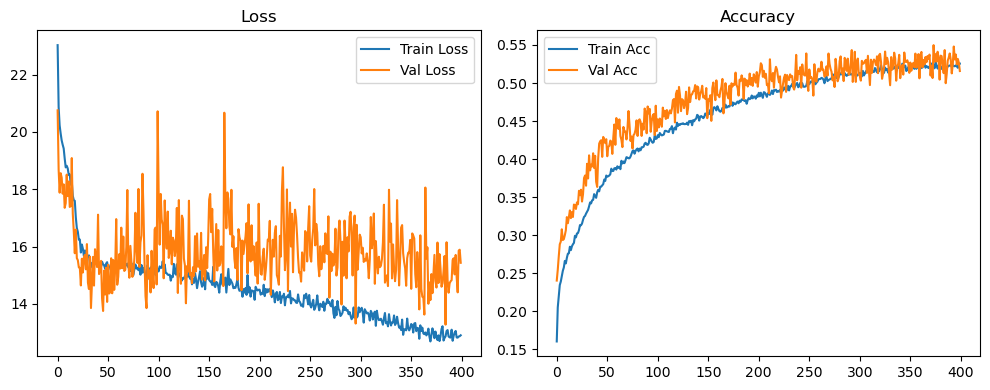

Original Model Final Test Loss: 15.3924 Accuracy: 0.5207


🚀 Running: batch256_lr_max_0.001_min_1e-06_dp0.0


Files already downloaded and verified


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|                                                                                                                                                                        | 0/400 [00:00<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.1057 | Val Acc: 0.1206 | Epoch Time: 1.92 | :   0%|                                                                                                      | 0/400 [01:55<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.1057 | Val Acc: 0.1206 | Epoch Time: 1.92 | :   0%|                                                                                                      | 0/400 [01:55<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.1057 | Val Acc: 0.1206 | Epoch Time: 1.92 | :   0%|▏                                                                                         | 1/400 [01:55<12:45:36, 115.13s/it]

| LR: 0.001000 | Train Acc: 0.1421 | Val Acc: 0.1624 | Epoch Time: 1.91 | :   0%|▏                                                                                         | 1/400 [03:49<12:45:36, 115.13s/it]

| LR: 0.001000 | Train Acc: 0.1421 | Val Acc: 0.1624 | Epoch Time: 1.91 | :   0%|▏                                                                                         | 1/400 [03:49<12:45:36, 115.13s/it]

| LR: 0.001000 | Train Acc: 0.1421 | Val Acc: 0.1624 | Epoch Time: 1.91 | :   0%|▍                                                                                         | 2/400 [03:49<12:42:15, 114.91s/it]

| LR: 0.001000 | Train Acc: 0.1598 | Val Acc: 0.1438 | Epoch Time: 1.91 | :   0%|▍                                                                                         | 2/400 [05:44<12:42:15, 114.91s/it]

| LR: 0.001000 | Train Acc: 0.1598 | Val Acc: 0.1438 | Epoch Time: 1.91 | :   0%|▍                                                                                         | 2/400 [05:44<12:42:15, 114.91s/it]

| LR: 0.001000 | Train Acc: 0.1598 | Val Acc: 0.1438 | Epoch Time: 1.91 | :   1%|▋                                                                                         | 3/400 [05:44<12:39:55, 114.85s/it]

| LR: 0.001000 | Train Acc: 0.1706 | Val Acc: 0.1968 | Epoch Time: 1.91 | :   1%|▋                                                                                         | 3/400 [07:39<12:39:55, 114.85s/it]

| LR: 0.001000 | Train Acc: 0.1706 | Val Acc: 0.1968 | Epoch Time: 1.91 | :   1%|▋                                                                                         | 3/400 [07:39<12:39:55, 114.85s/it]

| LR: 0.001000 | Train Acc: 0.1706 | Val Acc: 0.1968 | Epoch Time: 1.91 | :   1%|▉                                                                                         | 4/400 [07:39<12:37:45, 114.81s/it]

| LR: 0.001000 | Train Acc: 0.1807 | Val Acc: 0.1991 | Epoch Time: 1.91 | :   1%|▉                                                                                         | 4/400 [09:34<12:37:45, 114.81s/it]

| LR: 0.001000 | Train Acc: 0.1807 | Val Acc: 0.1991 | Epoch Time: 1.91 | :   1%|▉                                                                                         | 4/400 [09:34<12:37:45, 114.81s/it]

| LR: 0.001000 | Train Acc: 0.1807 | Val Acc: 0.1991 | Epoch Time: 1.91 | :   1%|█▏                                                                                        | 5/400 [09:34<12:35:43, 114.79s/it]

| LR: 0.001000 | Train Acc: 0.1873 | Val Acc: 0.2026 | Epoch Time: 1.91 | :   1%|█▏                                                                                        | 5/400 [11:28<12:35:43, 114.79s/it]

| LR: 0.001000 | Train Acc: 0.1873 | Val Acc: 0.2026 | Epoch Time: 1.91 | :   1%|█▏                                                                                        | 5/400 [11:28<12:35:43, 114.79s/it]

| LR: 0.001000 | Train Acc: 0.1873 | Val Acc: 0.2026 | Epoch Time: 1.91 | :   2%|█▎                                                                                        | 6/400 [11:28<12:33:42, 114.78s/it]

| LR: 0.000999 | Train Acc: 0.1930 | Val Acc: 0.1931 | Epoch Time: 1.91 | :   2%|█▎                                                                                        | 6/400 [13:23<12:33:42, 114.78s/it]

| LR: 0.000999 | Train Acc: 0.1930 | Val Acc: 0.1931 | Epoch Time: 1.91 | :   2%|█▎                                                                                        | 6/400 [13:23<12:33:42, 114.78s/it]

| LR: 0.000999 | Train Acc: 0.1930 | Val Acc: 0.1931 | Epoch Time: 1.91 | :   2%|█▌                                                                                        | 7/400 [13:23<12:31:42, 114.77s/it]

| LR: 0.000999 | Train Acc: 0.2013 | Val Acc: 0.2133 | Epoch Time: 1.91 | :   2%|█▌                                                                                        | 7/400 [15:18<12:31:42, 114.77s/it]

| LR: 0.000999 | Train Acc: 0.2013 | Val Acc: 0.2133 | Epoch Time: 1.91 | :   2%|█▌                                                                                        | 7/400 [15:18<12:31:42, 114.77s/it]

| LR: 0.000999 | Train Acc: 0.2013 | Val Acc: 0.2133 | Epoch Time: 1.91 | :   2%|█▊                                                                                        | 8/400 [15:18<12:29:45, 114.76s/it]

| LR: 0.000999 | Train Acc: 0.2070 | Val Acc: 0.2157 | Epoch Time: 1.91 | :   2%|█▊                                                                                        | 8/400 [17:13<12:29:45, 114.76s/it]

| LR: 0.000999 | Train Acc: 0.2070 | Val Acc: 0.2157 | Epoch Time: 1.91 | :   2%|█▊                                                                                        | 8/400 [17:13<12:29:45, 114.76s/it]

| LR: 0.000999 | Train Acc: 0.2070 | Val Acc: 0.2157 | Epoch Time: 1.91 | :   2%|██                                                                                        | 9/400 [17:13<12:27:47, 114.75s/it]

| LR: 0.000999 | Train Acc: 0.2104 | Val Acc: 0.2141 | Epoch Time: 1.91 | :   2%|██                                                                                        | 9/400 [19:07<12:27:47, 114.75s/it]

| LR: 0.000999 | Train Acc: 0.2104 | Val Acc: 0.2141 | Epoch Time: 1.91 | :   2%|██                                                                                        | 9/400 [19:07<12:27:47, 114.75s/it]

| LR: 0.000999 | Train Acc: 0.2104 | Val Acc: 0.2141 | Epoch Time: 1.91 | :   2%|██▏                                                                                      | 10/400 [19:07<12:25:52, 114.75s/it]

| LR: 0.000998 | Train Acc: 0.2219 | Val Acc: 0.2467 | Epoch Time: 1.91 | :   2%|██▏                                                                                      | 10/400 [21:02<12:25:52, 114.75s/it]

| LR: 0.000998 | Train Acc: 0.2219 | Val Acc: 0.2467 | Epoch Time: 1.91 | :   2%|██▏                                                                                      | 10/400 [21:02<12:25:52, 114.75s/it]

| LR: 0.000998 | Train Acc: 0.2219 | Val Acc: 0.2467 | Epoch Time: 1.91 | :   3%|██▍                                                                                      | 11/400 [21:02<12:23:56, 114.75s/it]

| LR: 0.000998 | Train Acc: 0.2220 | Val Acc: 0.2396 | Epoch Time: 1.91 | :   3%|██▍                                                                                      | 11/400 [22:57<12:23:56, 114.75s/it]

| LR: 0.000998 | Train Acc: 0.2220 | Val Acc: 0.2396 | Epoch Time: 1.91 | :   3%|██▍                                                                                      | 11/400 [22:57<12:23:56, 114.75s/it]

| LR: 0.000998 | Train Acc: 0.2220 | Val Acc: 0.2396 | Epoch Time: 1.91 | :   3%|██▋                                                                                      | 12/400 [22:57<12:22:09, 114.77s/it]

| LR: 0.000998 | Train Acc: 0.2281 | Val Acc: 0.2428 | Epoch Time: 1.91 | :   3%|██▋                                                                                      | 12/400 [24:52<12:22:09, 114.77s/it]

| LR: 0.000998 | Train Acc: 0.2281 | Val Acc: 0.2428 | Epoch Time: 1.91 | :   3%|██▋                                                                                      | 12/400 [24:52<12:22:09, 114.77s/it]

| LR: 0.000998 | Train Acc: 0.2281 | Val Acc: 0.2428 | Epoch Time: 1.91 | :   3%|██▉                                                                                      | 13/400 [24:52<12:20:11, 114.76s/it]

| LR: 0.000997 | Train Acc: 0.2334 | Val Acc: 0.2471 | Epoch Time: 1.91 | :   3%|██▉                                                                                      | 13/400 [26:46<12:20:11, 114.76s/it]

| LR: 0.000997 | Train Acc: 0.2334 | Val Acc: 0.2471 | Epoch Time: 1.91 | :   3%|██▉                                                                                      | 13/400 [26:46<12:20:11, 114.76s/it]

| LR: 0.000997 | Train Acc: 0.2334 | Val Acc: 0.2471 | Epoch Time: 1.91 | :   4%|███                                                                                      | 14/400 [26:46<12:18:13, 114.75s/it]

| LR: 0.000997 | Train Acc: 0.2372 | Val Acc: 0.2537 | Epoch Time: 1.91 | :   4%|███                                                                                      | 14/400 [28:41<12:18:13, 114.75s/it]

| LR: 0.000997 | Train Acc: 0.2372 | Val Acc: 0.2537 | Epoch Time: 1.91 | :   4%|███                                                                                      | 14/400 [28:41<12:18:13, 114.75s/it]

| LR: 0.000997 | Train Acc: 0.2372 | Val Acc: 0.2537 | Epoch Time: 1.91 | :   4%|███▎                                                                                     | 15/400 [28:41<12:16:15, 114.74s/it]

| LR: 0.000997 | Train Acc: 0.2423 | Val Acc: 0.2696 | Epoch Time: 1.91 | :   4%|███▎                                                                                     | 15/400 [30:36<12:16:15, 114.74s/it]

| LR: 0.000997 | Train Acc: 0.2423 | Val Acc: 0.2696 | Epoch Time: 1.91 | :   4%|███▎                                                                                     | 15/400 [30:36<12:16:15, 114.74s/it]

| LR: 0.000997 | Train Acc: 0.2423 | Val Acc: 0.2696 | Epoch Time: 1.91 | :   4%|███▌                                                                                     | 16/400 [30:36<12:14:18, 114.74s/it]

| LR: 0.000996 | Train Acc: 0.2508 | Val Acc: 0.2383 | Epoch Time: 1.91 | :   4%|███▌                                                                                     | 16/400 [32:31<12:14:18, 114.74s/it]

| LR: 0.000996 | Train Acc: 0.2508 | Val Acc: 0.2383 | Epoch Time: 1.91 | :   4%|███▌                                                                                     | 16/400 [32:31<12:14:18, 114.74s/it]

| LR: 0.000996 | Train Acc: 0.2508 | Val Acc: 0.2383 | Epoch Time: 1.91 | :   4%|███▊                                                                                     | 17/400 [32:31<12:12:26, 114.74s/it]

| LR: 0.000996 | Train Acc: 0.2560 | Val Acc: 0.2500 | Epoch Time: 1.91 | :   4%|███▊                                                                                     | 17/400 [34:25<12:12:26, 114.74s/it]

| LR: 0.000996 | Train Acc: 0.2560 | Val Acc: 0.2500 | Epoch Time: 1.91 | :   4%|███▊                                                                                     | 17/400 [34:25<12:12:26, 114.74s/it]

| LR: 0.000996 | Train Acc: 0.2560 | Val Acc: 0.2500 | Epoch Time: 1.91 | :   4%|████                                                                                     | 18/400 [34:25<12:10:28, 114.73s/it]

| LR: 0.000995 | Train Acc: 0.2575 | Val Acc: 0.2727 | Epoch Time: 1.91 | :   4%|████                                                                                     | 18/400 [36:20<12:10:28, 114.73s/it]

| LR: 0.000995 | Train Acc: 0.2575 | Val Acc: 0.2727 | Epoch Time: 1.91 | :   4%|████                                                                                     | 18/400 [36:20<12:10:28, 114.73s/it]

| LR: 0.000995 | Train Acc: 0.2575 | Val Acc: 0.2727 | Epoch Time: 1.91 | :   5%|████▏                                                                                    | 19/400 [36:20<12:08:33, 114.73s/it]

| LR: 0.000994 | Train Acc: 0.2685 | Val Acc: 0.2489 | Epoch Time: 1.91 | :   5%|████▏                                                                                    | 19/400 [38:15<12:08:33, 114.73s/it]

| LR: 0.000994 | Train Acc: 0.2685 | Val Acc: 0.2489 | Epoch Time: 1.91 | :   5%|████▏                                                                                    | 19/400 [38:15<12:08:33, 114.73s/it]

| LR: 0.000994 | Train Acc: 0.2685 | Val Acc: 0.2489 | Epoch Time: 1.91 | :   5%|████▍                                                                                    | 20/400 [38:15<12:06:39, 114.73s/it]

| LR: 0.000994 | Train Acc: 0.2621 | Val Acc: 0.2845 | Epoch Time: 1.91 | :   5%|████▍                                                                                    | 20/400 [40:09<12:06:39, 114.73s/it]

| LR: 0.000994 | Train Acc: 0.2621 | Val Acc: 0.2845 | Epoch Time: 1.91 | :   5%|████▍                                                                                    | 20/400 [40:09<12:06:39, 114.73s/it]

| LR: 0.000994 | Train Acc: 0.2621 | Val Acc: 0.2845 | Epoch Time: 1.91 | :   5%|████▋                                                                                    | 21/400 [40:10<12:04:47, 114.74s/it]

| LR: 0.000993 | Train Acc: 0.2707 | Val Acc: 0.2715 | Epoch Time: 1.91 | :   5%|████▋                                                                                    | 21/400 [42:04<12:04:47, 114.74s/it]

| LR: 0.000993 | Train Acc: 0.2707 | Val Acc: 0.2715 | Epoch Time: 1.91 | :   5%|████▋                                                                                    | 21/400 [42:04<12:04:47, 114.74s/it]

| LR: 0.000993 | Train Acc: 0.2707 | Val Acc: 0.2715 | Epoch Time: 1.91 | :   6%|████▉                                                                                    | 22/400 [42:04<12:02:53, 114.74s/it]

| LR: 0.000993 | Train Acc: 0.2754 | Val Acc: 0.2933 | Epoch Time: 1.91 | :   6%|████▉                                                                                    | 22/400 [43:59<12:02:53, 114.74s/it]

| LR: 0.000993 | Train Acc: 0.2754 | Val Acc: 0.2933 | Epoch Time: 1.91 | :   6%|████▉                                                                                    | 22/400 [43:59<12:02:53, 114.74s/it]

| LR: 0.000993 | Train Acc: 0.2754 | Val Acc: 0.2933 | Epoch Time: 1.91 | :   6%|█████                                                                                    | 23/400 [43:59<12:00:59, 114.75s/it]

| LR: 0.000992 | Train Acc: 0.2736 | Val Acc: 0.2860 | Epoch Time: 1.91 | :   6%|█████                                                                                    | 23/400 [45:54<12:00:59, 114.75s/it]

| LR: 0.000992 | Train Acc: 0.2736 | Val Acc: 0.2860 | Epoch Time: 1.91 | :   6%|█████                                                                                    | 23/400 [45:54<12:00:59, 114.75s/it]

| LR: 0.000992 | Train Acc: 0.2736 | Val Acc: 0.2860 | Epoch Time: 1.91 | :   6%|█████▎                                                                                   | 24/400 [45:54<11:59:08, 114.76s/it]

| LR: 0.000991 | Train Acc: 0.2784 | Val Acc: 0.2682 | Epoch Time: 1.91 | :   6%|█████▎                                                                                   | 24/400 [47:49<11:59:08, 114.76s/it]

| LR: 0.000991 | Train Acc: 0.2784 | Val Acc: 0.2682 | Epoch Time: 1.91 | :   6%|█████▎                                                                                   | 24/400 [47:49<11:59:08, 114.76s/it]

| LR: 0.000991 | Train Acc: 0.2784 | Val Acc: 0.2682 | Epoch Time: 1.91 | :   6%|█████▌                                                                                   | 25/400 [47:49<11:57:17, 114.77s/it]

| LR: 0.000990 | Train Acc: 0.2841 | Val Acc: 0.2992 | Epoch Time: 1.91 | :   6%|█████▌                                                                                   | 25/400 [49:43<11:57:17, 114.77s/it]

| LR: 0.000990 | Train Acc: 0.2841 | Val Acc: 0.2992 | Epoch Time: 1.91 | :   6%|█████▌                                                                                   | 25/400 [49:43<11:57:17, 114.77s/it]

| LR: 0.000990 | Train Acc: 0.2841 | Val Acc: 0.2992 | Epoch Time: 1.91 | :   6%|█████▊                                                                                   | 26/400 [49:43<11:55:22, 114.77s/it]

| LR: 0.000990 | Train Acc: 0.2858 | Val Acc: 0.2977 | Epoch Time: 1.91 | :   6%|█████▊                                                                                   | 26/400 [51:38<11:55:22, 114.77s/it]

| LR: 0.000990 | Train Acc: 0.2858 | Val Acc: 0.2977 | Epoch Time: 1.91 | :   6%|█████▊                                                                                   | 26/400 [51:38<11:55:22, 114.77s/it]

| LR: 0.000990 | Train Acc: 0.2858 | Val Acc: 0.2977 | Epoch Time: 1.91 | :   7%|██████                                                                                   | 27/400 [51:38<11:53:25, 114.76s/it]

| LR: 0.000989 | Train Acc: 0.2843 | Val Acc: 0.3022 | Epoch Time: 1.91 | :   7%|██████                                                                                   | 27/400 [53:33<11:53:25, 114.76s/it]

| LR: 0.000989 | Train Acc: 0.2843 | Val Acc: 0.3022 | Epoch Time: 1.91 | :   7%|██████                                                                                   | 27/400 [53:33<11:53:25, 114.76s/it]

| LR: 0.000989 | Train Acc: 0.2843 | Val Acc: 0.3022 | Epoch Time: 1.91 | :   7%|██████▏                                                                                  | 28/400 [53:33<11:51:35, 114.77s/it]

| LR: 0.000988 | Train Acc: 0.2808 | Val Acc: 0.2988 | Epoch Time: 1.91 | :   7%|██████▏                                                                                  | 28/400 [55:28<11:51:35, 114.77s/it]

| LR: 0.000988 | Train Acc: 0.2808 | Val Acc: 0.2988 | Epoch Time: 1.91 | :   7%|██████▏                                                                                  | 28/400 [55:28<11:51:35, 114.77s/it]

| LR: 0.000988 | Train Acc: 0.2808 | Val Acc: 0.2988 | Epoch Time: 1.91 | :   7%|██████▍                                                                                  | 29/400 [55:28<11:49:41, 114.77s/it]

| LR: 0.000987 | Train Acc: 0.2883 | Val Acc: 0.2995 | Epoch Time: 1.91 | :   7%|██████▍                                                                                  | 29/400 [57:22<11:49:41, 114.77s/it]

| LR: 0.000987 | Train Acc: 0.2883 | Val Acc: 0.2995 | Epoch Time: 1.91 | :   7%|██████▍                                                                                  | 29/400 [57:22<11:49:41, 114.77s/it]

| LR: 0.000987 | Train Acc: 0.2883 | Val Acc: 0.2995 | Epoch Time: 1.91 | :   8%|██████▋                                                                                  | 30/400 [57:22<11:47:43, 114.77s/it]

| LR: 0.000986 | Train Acc: 0.2837 | Val Acc: 0.2815 | Epoch Time: 1.91 | :   8%|██████▋                                                                                  | 30/400 [59:17<11:47:43, 114.77s/it]

| LR: 0.000986 | Train Acc: 0.2837 | Val Acc: 0.2815 | Epoch Time: 1.91 | :   8%|██████▋                                                                                  | 30/400 [59:17<11:47:43, 114.77s/it]

| LR: 0.000986 | Train Acc: 0.2837 | Val Acc: 0.2815 | Epoch Time: 1.91 | :   8%|██████▉                                                                                  | 31/400 [59:17<11:45:42, 114.75s/it]

| LR: 0.000985 | Train Acc: 0.2856 | Val Acc: 0.3028 | Epoch Time: 1.91 | :   8%|██████▋                                                                                | 31/400 [1:01:12<11:45:42, 114.75s/it]

| LR: 0.000985 | Train Acc: 0.2856 | Val Acc: 0.3028 | Epoch Time: 1.91 | :   8%|██████▋                                                                                | 31/400 [1:01:12<11:45:42, 114.75s/it]

| LR: 0.000985 | Train Acc: 0.2856 | Val Acc: 0.3028 | Epoch Time: 1.91 | :   8%|██████▉                                                                                | 32/400 [1:01:12<11:43:47, 114.75s/it]

| LR: 0.000984 | Train Acc: 0.2926 | Val Acc: 0.3100 | Epoch Time: 1.91 | :   8%|██████▉                                                                                | 32/400 [1:03:07<11:43:47, 114.75s/it]

| LR: 0.000984 | Train Acc: 0.2926 | Val Acc: 0.3100 | Epoch Time: 1.91 | :   8%|██████▉                                                                                | 32/400 [1:03:07<11:43:47, 114.75s/it]

| LR: 0.000984 | Train Acc: 0.2926 | Val Acc: 0.3100 | Epoch Time: 1.91 | :   8%|███████▏                                                                               | 33/400 [1:03:07<11:41:59, 114.77s/it]

| LR: 0.000983 | Train Acc: 0.2829 | Val Acc: 0.3013 | Epoch Time: 1.91 | :   8%|███████▏                                                                               | 33/400 [1:05:01<11:41:59, 114.77s/it]

| LR: 0.000983 | Train Acc: 0.2829 | Val Acc: 0.3013 | Epoch Time: 1.91 | :   8%|███████▏                                                                               | 33/400 [1:05:01<11:41:59, 114.77s/it]

| LR: 0.000983 | Train Acc: 0.2829 | Val Acc: 0.3013 | Epoch Time: 1.91 | :   8%|███████▍                                                                               | 34/400 [1:05:02<11:40:07, 114.78s/it]

| LR: 0.000982 | Train Acc: 0.2883 | Val Acc: 0.3014 | Epoch Time: 1.91 | :   8%|███████▍                                                                               | 34/400 [1:06:56<11:40:07, 114.78s/it]

| LR: 0.000982 | Train Acc: 0.2883 | Val Acc: 0.3014 | Epoch Time: 1.91 | :   8%|███████▍                                                                               | 34/400 [1:06:56<11:40:07, 114.78s/it]

| LR: 0.000982 | Train Acc: 0.2883 | Val Acc: 0.3014 | Epoch Time: 1.91 | :   9%|███████▌                                                                               | 35/400 [1:06:56<11:38:10, 114.77s/it]

| LR: 0.000981 | Train Acc: 0.2894 | Val Acc: 0.2858 | Epoch Time: 1.91 | :   9%|███████▌                                                                               | 35/400 [1:08:51<11:38:10, 114.77s/it]

| LR: 0.000981 | Train Acc: 0.2894 | Val Acc: 0.2858 | Epoch Time: 1.91 | :   9%|███████▌                                                                               | 35/400 [1:08:51<11:38:10, 114.77s/it]

| LR: 0.000981 | Train Acc: 0.2894 | Val Acc: 0.2858 | Epoch Time: 1.91 | :   9%|███████▊                                                                               | 36/400 [1:08:51<11:36:11, 114.76s/it]

| LR: 0.000980 | Train Acc: 0.2877 | Val Acc: 0.3170 | Epoch Time: 1.91 | :   9%|███████▊                                                                               | 36/400 [1:10:46<11:36:11, 114.76s/it]

| LR: 0.000980 | Train Acc: 0.2877 | Val Acc: 0.3170 | Epoch Time: 1.91 | :   9%|███████▊                                                                               | 36/400 [1:10:46<11:36:11, 114.76s/it]

| LR: 0.000980 | Train Acc: 0.2877 | Val Acc: 0.3170 | Epoch Time: 1.91 | :   9%|████████                                                                               | 37/400 [1:10:46<11:34:13, 114.75s/it]

| LR: 0.000979 | Train Acc: 0.2924 | Val Acc: 0.3204 | Epoch Time: 1.91 | :   9%|████████                                                                               | 37/400 [1:12:40<11:34:13, 114.75s/it]

| LR: 0.000979 | Train Acc: 0.2924 | Val Acc: 0.3204 | Epoch Time: 1.91 | :   9%|████████                                                                               | 37/400 [1:12:40<11:34:13, 114.75s/it]

| LR: 0.000979 | Train Acc: 0.2924 | Val Acc: 0.3204 | Epoch Time: 1.91 | :  10%|████████▎                                                                              | 38/400 [1:12:41<11:32:21, 114.75s/it]

| LR: 0.000978 | Train Acc: 0.3018 | Val Acc: 0.3293 | Epoch Time: 1.91 | :  10%|████████▎                                                                              | 38/400 [1:14:35<11:32:21, 114.75s/it]

| LR: 0.000978 | Train Acc: 0.3018 | Val Acc: 0.3293 | Epoch Time: 1.91 | :  10%|████████▎                                                                              | 38/400 [1:14:35<11:32:21, 114.75s/it]

| LR: 0.000978 | Train Acc: 0.3018 | Val Acc: 0.3293 | Epoch Time: 1.91 | :  10%|████████▍                                                                              | 39/400 [1:14:35<11:30:25, 114.75s/it]

| LR: 0.000977 | Train Acc: 0.2955 | Val Acc: 0.2893 | Epoch Time: 1.91 | :  10%|████████▍                                                                              | 39/400 [1:16:30<11:30:25, 114.75s/it]

| LR: 0.000977 | Train Acc: 0.2955 | Val Acc: 0.2893 | Epoch Time: 1.91 | :  10%|████████▍                                                                              | 39/400 [1:16:30<11:30:25, 114.75s/it]

| LR: 0.000977 | Train Acc: 0.2955 | Val Acc: 0.2893 | Epoch Time: 1.91 | :  10%|████████▋                                                                              | 40/400 [1:16:30<11:28:32, 114.76s/it]

| LR: 0.000976 | Train Acc: 0.2879 | Val Acc: 0.3065 | Epoch Time: 1.91 | :  10%|████████▋                                                                              | 40/400 [1:18:25<11:28:32, 114.76s/it]

| LR: 0.000976 | Train Acc: 0.2879 | Val Acc: 0.3065 | Epoch Time: 1.91 | :  10%|████████▋                                                                              | 40/400 [1:18:25<11:28:32, 114.76s/it]

| LR: 0.000976 | Train Acc: 0.2879 | Val Acc: 0.3065 | Epoch Time: 1.91 | :  10%|████████▉                                                                              | 41/400 [1:18:25<11:26:38, 114.76s/it]

| LR: 0.000974 | Train Acc: 0.2941 | Val Acc: 0.2892 | Epoch Time: 1.91 | :  10%|████████▉                                                                              | 41/400 [1:20:19<11:26:38, 114.76s/it]

| LR: 0.000974 | Train Acc: 0.2941 | Val Acc: 0.2892 | Epoch Time: 1.91 | :  10%|████████▉                                                                              | 41/400 [1:20:19<11:26:38, 114.76s/it]

| LR: 0.000974 | Train Acc: 0.2941 | Val Acc: 0.2892 | Epoch Time: 1.91 | :  10%|█████████▏                                                                             | 42/400 [1:20:19<11:24:38, 114.74s/it]

| LR: 0.000973 | Train Acc: 0.2916 | Val Acc: 0.3332 | Epoch Time: 1.91 | :  10%|█████████▏                                                                             | 42/400 [1:22:14<11:24:38, 114.74s/it]

| LR: 0.000973 | Train Acc: 0.2916 | Val Acc: 0.3332 | Epoch Time: 1.91 | :  10%|█████████▏                                                                             | 42/400 [1:22:14<11:24:38, 114.74s/it]

| LR: 0.000973 | Train Acc: 0.2916 | Val Acc: 0.3332 | Epoch Time: 1.91 | :  11%|█████████▎                                                                             | 43/400 [1:22:14<11:22:43, 114.74s/it]

| LR: 0.000972 | Train Acc: 0.2896 | Val Acc: 0.2851 | Epoch Time: 1.91 | :  11%|█████████▎                                                                             | 43/400 [1:24:09<11:22:43, 114.74s/it]

| LR: 0.000972 | Train Acc: 0.2896 | Val Acc: 0.2851 | Epoch Time: 1.91 | :  11%|█████████▎                                                                             | 43/400 [1:24:09<11:22:43, 114.74s/it]

| LR: 0.000972 | Train Acc: 0.2896 | Val Acc: 0.2851 | Epoch Time: 1.91 | :  11%|█████████▌                                                                             | 44/400 [1:24:09<11:20:46, 114.74s/it]

| LR: 0.000970 | Train Acc: 0.2833 | Val Acc: 0.3034 | Epoch Time: 1.91 | :  11%|█████████▌                                                                             | 44/400 [1:26:04<11:20:46, 114.74s/it]

| LR: 0.000970 | Train Acc: 0.2833 | Val Acc: 0.3034 | Epoch Time: 1.91 | :  11%|█████████▌                                                                             | 44/400 [1:26:04<11:20:46, 114.74s/it]

| LR: 0.000970 | Train Acc: 0.2833 | Val Acc: 0.3034 | Epoch Time: 1.91 | :  11%|█████████▊                                                                             | 45/400 [1:26:04<11:18:55, 114.75s/it]

| LR: 0.000969 | Train Acc: 0.2929 | Val Acc: 0.3005 | Epoch Time: 1.91 | :  11%|█████████▊                                                                             | 45/400 [1:27:58<11:18:55, 114.75s/it]

| LR: 0.000969 | Train Acc: 0.2929 | Val Acc: 0.3005 | Epoch Time: 1.91 | :  11%|█████████▊                                                                             | 45/400 [1:27:58<11:18:55, 114.75s/it]

| LR: 0.000969 | Train Acc: 0.2929 | Val Acc: 0.3005 | Epoch Time: 1.91 | :  12%|██████████                                                                             | 46/400 [1:27:58<11:16:58, 114.74s/it]

| LR: 0.000968 | Train Acc: 0.2927 | Val Acc: 0.2999 | Epoch Time: 1.91 | :  12%|██████████                                                                             | 46/400 [1:29:53<11:16:58, 114.74s/it]

| LR: 0.000968 | Train Acc: 0.2927 | Val Acc: 0.2999 | Epoch Time: 1.91 | :  12%|██████████                                                                             | 46/400 [1:29:53<11:16:58, 114.74s/it]

| LR: 0.000968 | Train Acc: 0.2927 | Val Acc: 0.2999 | Epoch Time: 1.91 | :  12%|██████████▏                                                                            | 47/400 [1:29:53<11:15:06, 114.75s/it]

| LR: 0.000966 | Train Acc: 0.2912 | Val Acc: 0.3103 | Epoch Time: 1.91 | :  12%|██████████▏                                                                            | 47/400 [1:31:48<11:15:06, 114.75s/it]

| LR: 0.000966 | Train Acc: 0.2912 | Val Acc: 0.3103 | Epoch Time: 1.91 | :  12%|██████████▏                                                                            | 47/400 [1:31:48<11:15:06, 114.75s/it]

| LR: 0.000966 | Train Acc: 0.2912 | Val Acc: 0.3103 | Epoch Time: 1.91 | :  12%|██████████▍                                                                            | 48/400 [1:31:48<11:13:12, 114.75s/it]

| LR: 0.000965 | Train Acc: 0.2849 | Val Acc: 0.2895 | Epoch Time: 1.91 | :  12%|██████████▍                                                                            | 48/400 [1:33:43<11:13:12, 114.75s/it]

| LR: 0.000965 | Train Acc: 0.2849 | Val Acc: 0.2895 | Epoch Time: 1.91 | :  12%|██████████▍                                                                            | 48/400 [1:33:43<11:13:12, 114.75s/it]

| LR: 0.000965 | Train Acc: 0.2849 | Val Acc: 0.2895 | Epoch Time: 1.91 | :  12%|██████████▋                                                                            | 49/400 [1:33:43<11:11:19, 114.76s/it]

| LR: 0.000963 | Train Acc: 0.2885 | Val Acc: 0.3115 | Epoch Time: 1.91 | :  12%|██████████▋                                                                            | 49/400 [1:35:37<11:11:19, 114.76s/it]

| LR: 0.000963 | Train Acc: 0.2885 | Val Acc: 0.3115 | Epoch Time: 1.91 | :  12%|██████████▋                                                                            | 49/400 [1:35:37<11:11:19, 114.76s/it]

| LR: 0.000963 | Train Acc: 0.2885 | Val Acc: 0.3115 | Epoch Time: 1.91 | :  12%|██████████▉                                                                            | 50/400 [1:35:37<11:09:20, 114.75s/it]

| LR: 0.000962 | Train Acc: 0.2892 | Val Acc: 0.3208 | Epoch Time: 1.91 | :  12%|██████████▉                                                                            | 50/400 [1:37:32<11:09:20, 114.75s/it]

| LR: 0.000962 | Train Acc: 0.2892 | Val Acc: 0.3208 | Epoch Time: 1.91 | :  12%|██████████▉                                                                            | 50/400 [1:37:32<11:09:20, 114.75s/it]

| LR: 0.000962 | Train Acc: 0.2892 | Val Acc: 0.3208 | Epoch Time: 1.91 | :  13%|███████████                                                                            | 51/400 [1:37:32<11:07:26, 114.75s/it]

| LR: 0.000960 | Train Acc: 0.2872 | Val Acc: 0.2813 | Epoch Time: 1.91 | :  13%|███████████                                                                            | 51/400 [1:39:27<11:07:26, 114.75s/it]

| LR: 0.000960 | Train Acc: 0.2872 | Val Acc: 0.2813 | Epoch Time: 1.91 | :  13%|███████████                                                                            | 51/400 [1:39:27<11:07:26, 114.75s/it]

| LR: 0.000960 | Train Acc: 0.2872 | Val Acc: 0.2813 | Epoch Time: 1.91 | :  13%|███████████▎                                                                           | 52/400 [1:39:27<11:05:31, 114.74s/it]

| LR: 0.000959 | Train Acc: 0.2984 | Val Acc: 0.3065 | Epoch Time: 1.91 | :  13%|███████████▎                                                                           | 52/400 [1:41:22<11:05:31, 114.74s/it]

| LR: 0.000959 | Train Acc: 0.2984 | Val Acc: 0.3065 | Epoch Time: 1.91 | :  13%|███████████▎                                                                           | 52/400 [1:41:22<11:05:31, 114.74s/it]

| LR: 0.000959 | Train Acc: 0.2984 | Val Acc: 0.3065 | Epoch Time: 1.91 | :  13%|███████████▌                                                                           | 53/400 [1:41:22<11:03:41, 114.76s/it]

| LR: 0.000957 | Train Acc: 0.2961 | Val Acc: 0.3238 | Epoch Time: 1.91 | :  13%|███████████▌                                                                           | 53/400 [1:43:16<11:03:41, 114.76s/it]

| LR: 0.000957 | Train Acc: 0.2961 | Val Acc: 0.3238 | Epoch Time: 1.91 | :  13%|███████████▌                                                                           | 53/400 [1:43:16<11:03:41, 114.76s/it]

| LR: 0.000957 | Train Acc: 0.2961 | Val Acc: 0.3238 | Epoch Time: 1.91 | :  14%|███████████▋                                                                           | 54/400 [1:43:17<11:01:49, 114.77s/it]

| LR: 0.000956 | Train Acc: 0.2919 | Val Acc: 0.3044 | Epoch Time: 1.91 | :  14%|███████████▋                                                                           | 54/400 [1:45:11<11:01:49, 114.77s/it]

| LR: 0.000956 | Train Acc: 0.2919 | Val Acc: 0.3044 | Epoch Time: 1.91 | :  14%|███████████▋                                                                           | 54/400 [1:45:11<11:01:49, 114.77s/it]

| LR: 0.000956 | Train Acc: 0.2919 | Val Acc: 0.3044 | Epoch Time: 1.91 | :  14%|███████████▉                                                                           | 55/400 [1:45:11<10:59:52, 114.76s/it]

| LR: 0.000954 | Train Acc: 0.2847 | Val Acc: 0.3201 | Epoch Time: 1.91 | :  14%|███████████▉                                                                           | 55/400 [1:47:06<10:59:52, 114.76s/it]

| LR: 0.000954 | Train Acc: 0.2847 | Val Acc: 0.3201 | Epoch Time: 1.91 | :  14%|███████████▉                                                                           | 55/400 [1:47:06<10:59:52, 114.76s/it]

| LR: 0.000954 | Train Acc: 0.2847 | Val Acc: 0.3201 | Epoch Time: 1.91 | :  14%|████████████▏                                                                          | 56/400 [1:47:06<10:57:53, 114.75s/it]

| LR: 0.000952 | Train Acc: 0.2865 | Val Acc: 0.3027 | Epoch Time: 1.91 | :  14%|████████████▏                                                                          | 56/400 [1:49:01<10:57:53, 114.75s/it]

| LR: 0.000952 | Train Acc: 0.2865 | Val Acc: 0.3027 | Epoch Time: 1.91 | :  14%|████████████▏                                                                          | 56/400 [1:49:01<10:57:53, 114.75s/it]

| LR: 0.000952 | Train Acc: 0.2865 | Val Acc: 0.3027 | Epoch Time: 1.91 | :  14%|████████████▍                                                                          | 57/400 [1:49:01<10:55:52, 114.73s/it]

| LR: 0.000951 | Train Acc: 0.2968 | Val Acc: 0.2971 | Epoch Time: 1.91 | :  14%|████████████▍                                                                          | 57/400 [1:50:55<10:55:52, 114.73s/it]

| LR: 0.000951 | Train Acc: 0.2968 | Val Acc: 0.2971 | Epoch Time: 1.91 | :  14%|████████████▍                                                                          | 57/400 [1:50:55<10:55:52, 114.73s/it]

| LR: 0.000951 | Train Acc: 0.2968 | Val Acc: 0.2971 | Epoch Time: 1.91 | :  14%|████████████▌                                                                          | 58/400 [1:50:55<10:53:55, 114.72s/it]

| LR: 0.000949 | Train Acc: 0.2846 | Val Acc: 0.3144 | Epoch Time: 1.91 | :  14%|████████████▌                                                                          | 58/400 [1:52:50<10:53:55, 114.72s/it]

| LR: 0.000949 | Train Acc: 0.2846 | Val Acc: 0.3144 | Epoch Time: 1.91 | :  14%|████████████▌                                                                          | 58/400 [1:52:50<10:53:55, 114.72s/it]

| LR: 0.000949 | Train Acc: 0.2846 | Val Acc: 0.3144 | Epoch Time: 1.91 | :  15%|████████████▊                                                                          | 59/400 [1:52:50<10:51:59, 114.72s/it]

| LR: 0.000947 | Train Acc: 0.2820 | Val Acc: 0.2770 | Epoch Time: 1.91 | :  15%|████████████▊                                                                          | 59/400 [1:54:45<10:51:59, 114.72s/it]

| LR: 0.000947 | Train Acc: 0.2820 | Val Acc: 0.2770 | Epoch Time: 1.91 | :  15%|████████████▊                                                                          | 59/400 [1:54:45<10:51:59, 114.72s/it]

| LR: 0.000947 | Train Acc: 0.2820 | Val Acc: 0.2770 | Epoch Time: 1.91 | :  15%|█████████████                                                                          | 60/400 [1:54:45<10:50:08, 114.73s/it]

| LR: 0.000946 | Train Acc: 0.2809 | Val Acc: 0.3056 | Epoch Time: 1.91 | :  15%|█████████████                                                                          | 60/400 [1:56:39<10:50:08, 114.73s/it]

| LR: 0.000946 | Train Acc: 0.2809 | Val Acc: 0.3056 | Epoch Time: 1.91 | :  15%|█████████████                                                                          | 60/400 [1:56:39<10:50:08, 114.73s/it]

| LR: 0.000946 | Train Acc: 0.2809 | Val Acc: 0.3056 | Epoch Time: 1.91 | :  15%|█████████████▎                                                                         | 61/400 [1:56:40<10:48:10, 114.72s/it]

| LR: 0.000944 | Train Acc: 0.2897 | Val Acc: 0.2974 | Epoch Time: 1.91 | :  15%|█████████████▎                                                                         | 61/400 [1:58:34<10:48:10, 114.72s/it]

| LR: 0.000944 | Train Acc: 0.2897 | Val Acc: 0.2974 | Epoch Time: 1.91 | :  15%|█████████████▎                                                                         | 61/400 [1:58:34<10:48:10, 114.72s/it]

| LR: 0.000944 | Train Acc: 0.2897 | Val Acc: 0.2974 | Epoch Time: 1.91 | :  16%|█████████████▍                                                                         | 62/400 [1:58:34<10:46:16, 114.72s/it]

| LR: 0.000942 | Train Acc: 0.2838 | Val Acc: 0.3082 | Epoch Time: 1.91 | :  16%|█████████████▍                                                                         | 62/400 [2:00:29<10:46:16, 114.72s/it]

| LR: 0.000942 | Train Acc: 0.2838 | Val Acc: 0.3082 | Epoch Time: 1.91 | :  16%|█████████████▍                                                                         | 62/400 [2:00:29<10:46:16, 114.72s/it]

| LR: 0.000942 | Train Acc: 0.2838 | Val Acc: 0.3082 | Epoch Time: 1.91 | :  16%|█████████████▋                                                                         | 63/400 [2:00:29<10:44:19, 114.72s/it]

| LR: 0.000940 | Train Acc: 0.2832 | Val Acc: 0.3044 | Epoch Time: 1.91 | :  16%|█████████████▋                                                                         | 63/400 [2:02:24<10:44:19, 114.72s/it]

| LR: 0.000940 | Train Acc: 0.2832 | Val Acc: 0.3044 | Epoch Time: 1.91 | :  16%|█████████████▋                                                                         | 63/400 [2:02:24<10:44:19, 114.72s/it]

| LR: 0.000940 | Train Acc: 0.2832 | Val Acc: 0.3044 | Epoch Time: 1.91 | :  16%|█████████████▉                                                                         | 64/400 [2:02:24<10:42:25, 114.72s/it]

| LR: 0.000938 | Train Acc: 0.2863 | Val Acc: 0.2881 | Epoch Time: 1.91 | :  16%|█████████████▉                                                                         | 64/400 [2:04:18<10:42:25, 114.72s/it]

| LR: 0.000938 | Train Acc: 0.2863 | Val Acc: 0.2881 | Epoch Time: 1.91 | :  16%|█████████████▉                                                                         | 64/400 [2:04:18<10:42:25, 114.72s/it]

| LR: 0.000938 | Train Acc: 0.2863 | Val Acc: 0.2881 | Epoch Time: 1.91 | :  16%|██████████████▏                                                                        | 65/400 [2:04:18<10:40:34, 114.73s/it]

| LR: 0.000936 | Train Acc: 0.2878 | Val Acc: 0.3050 | Epoch Time: 1.91 | :  16%|██████████████▏                                                                        | 65/400 [2:06:13<10:40:34, 114.73s/it]

| LR: 0.000936 | Train Acc: 0.2878 | Val Acc: 0.3050 | Epoch Time: 1.91 | :  16%|██████████████▏                                                                        | 65/400 [2:06:13<10:40:34, 114.73s/it]

| LR: 0.000936 | Train Acc: 0.2878 | Val Acc: 0.3050 | Epoch Time: 1.91 | :  16%|██████████████▎                                                                        | 66/400 [2:06:13<10:38:38, 114.73s/it]

| LR: 0.000934 | Train Acc: 0.2896 | Val Acc: 0.3137 | Epoch Time: 1.91 | :  16%|██████████████▎                                                                        | 66/400 [2:08:08<10:38:38, 114.73s/it]

| LR: 0.000934 | Train Acc: 0.2896 | Val Acc: 0.3137 | Epoch Time: 1.91 | :  16%|██████████████▎                                                                        | 66/400 [2:08:08<10:38:38, 114.73s/it]

| LR: 0.000934 | Train Acc: 0.2896 | Val Acc: 0.3137 | Epoch Time: 1.91 | :  17%|██████████████▌                                                                        | 67/400 [2:08:08<10:36:47, 114.74s/it]

| LR: 0.000932 | Train Acc: 0.2852 | Val Acc: 0.3182 | Epoch Time: 1.91 | :  17%|██████████████▌                                                                        | 67/400 [2:10:03<10:36:47, 114.74s/it]

| LR: 0.000932 | Train Acc: 0.2852 | Val Acc: 0.3182 | Epoch Time: 1.91 | :  17%|██████████████▌                                                                        | 67/400 [2:10:03<10:36:47, 114.74s/it]

| LR: 0.000932 | Train Acc: 0.2852 | Val Acc: 0.3182 | Epoch Time: 1.91 | :  17%|██████████████▊                                                                        | 68/400 [2:10:03<10:34:51, 114.73s/it]

| LR: 0.000930 | Train Acc: 0.2812 | Val Acc: 0.3056 | Epoch Time: 1.91 | :  17%|██████████████▊                                                                        | 68/400 [2:11:57<10:34:51, 114.73s/it]

| LR: 0.000930 | Train Acc: 0.2812 | Val Acc: 0.3056 | Epoch Time: 1.91 | :  17%|██████████████▊                                                                        | 68/400 [2:11:57<10:34:51, 114.73s/it]

| LR: 0.000930 | Train Acc: 0.2812 | Val Acc: 0.3056 | Epoch Time: 1.91 | :  17%|███████████████                                                                        | 69/400 [2:11:57<10:32:58, 114.74s/it]

| LR: 0.000928 | Train Acc: 0.2846 | Val Acc: 0.3062 | Epoch Time: 1.91 | :  17%|███████████████                                                                        | 69/400 [2:13:52<10:32:58, 114.74s/it]

| LR: 0.000928 | Train Acc: 0.2846 | Val Acc: 0.3062 | Epoch Time: 1.91 | :  17%|███████████████                                                                        | 69/400 [2:13:52<10:32:58, 114.74s/it]

| LR: 0.000928 | Train Acc: 0.2846 | Val Acc: 0.3062 | Epoch Time: 1.91 | :  18%|███████████████▏                                                                       | 70/400 [2:13:52<10:31:08, 114.75s/it]

| LR: 0.000926 | Train Acc: 0.2871 | Val Acc: 0.3087 | Epoch Time: 1.91 | :  18%|███████████████▏                                                                       | 70/400 [2:15:47<10:31:08, 114.75s/it]

| LR: 0.000926 | Train Acc: 0.2871 | Val Acc: 0.3087 | Epoch Time: 1.91 | :  18%|███████████████▏                                                                       | 70/400 [2:15:47<10:31:08, 114.75s/it]

| LR: 0.000926 | Train Acc: 0.2871 | Val Acc: 0.3087 | Epoch Time: 1.91 | :  18%|███████████████▍                                                                       | 71/400 [2:15:47<10:29:15, 114.76s/it]

| LR: 0.000924 | Train Acc: 0.2884 | Val Acc: 0.3004 | Epoch Time: 1.91 | :  18%|███████████████▍                                                                       | 71/400 [2:17:42<10:29:15, 114.76s/it]

| LR: 0.000924 | Train Acc: 0.2884 | Val Acc: 0.3004 | Epoch Time: 1.91 | :  18%|███████████████▍                                                                       | 71/400 [2:17:42<10:29:15, 114.76s/it]

| LR: 0.000924 | Train Acc: 0.2884 | Val Acc: 0.3004 | Epoch Time: 1.91 | :  18%|███████████████▋                                                                       | 72/400 [2:17:42<10:27:17, 114.75s/it]

| LR: 0.000922 | Train Acc: 0.2874 | Val Acc: 0.3077 | Epoch Time: 1.91 | :  18%|███████████████▋                                                                       | 72/400 [2:19:36<10:27:17, 114.75s/it]

| LR: 0.000922 | Train Acc: 0.2874 | Val Acc: 0.3077 | Epoch Time: 1.91 | :  18%|███████████████▋                                                                       | 72/400 [2:19:36<10:27:17, 114.75s/it]

| LR: 0.000922 | Train Acc: 0.2874 | Val Acc: 0.3077 | Epoch Time: 1.91 | :  18%|███████████████▉                                                                       | 73/400 [2:19:36<10:25:21, 114.75s/it]

| LR: 0.000920 | Train Acc: 0.2880 | Val Acc: 0.2899 | Epoch Time: 1.91 | :  18%|███████████████▉                                                                       | 73/400 [2:21:31<10:25:21, 114.75s/it]

| LR: 0.000920 | Train Acc: 0.2880 | Val Acc: 0.2899 | Epoch Time: 1.91 | :  18%|███████████████▉                                                                       | 73/400 [2:21:31<10:25:21, 114.75s/it]

| LR: 0.000920 | Train Acc: 0.2880 | Val Acc: 0.2899 | Epoch Time: 1.91 | :  18%|████████████████                                                                       | 74/400 [2:21:31<10:23:19, 114.72s/it]

| LR: 0.000918 | Train Acc: 0.2836 | Val Acc: 0.3054 | Epoch Time: 1.91 | :  18%|████████████████                                                                       | 74/400 [2:23:26<10:23:19, 114.72s/it]

| LR: 0.000918 | Train Acc: 0.2836 | Val Acc: 0.3054 | Epoch Time: 1.91 | :  18%|████████████████                                                                       | 74/400 [2:23:26<10:23:19, 114.72s/it]

| LR: 0.000918 | Train Acc: 0.2836 | Val Acc: 0.3054 | Epoch Time: 1.91 | :  19%|████████████████▎                                                                      | 75/400 [2:23:26<10:21:21, 114.71s/it]

| LR: 0.000916 | Train Acc: 0.2896 | Val Acc: 0.3065 | Epoch Time: 1.91 | :  19%|████████████████▎                                                                      | 75/400 [2:25:20<10:21:21, 114.71s/it]

| LR: 0.000916 | Train Acc: 0.2896 | Val Acc: 0.3065 | Epoch Time: 1.91 | :  19%|████████████████▎                                                                      | 75/400 [2:25:20<10:21:21, 114.71s/it]

| LR: 0.000916 | Train Acc: 0.2896 | Val Acc: 0.3065 | Epoch Time: 1.91 | :  19%|████████████████▌                                                                      | 76/400 [2:25:20<10:19:24, 114.70s/it]

| LR: 0.000914 | Train Acc: 0.2820 | Val Acc: 0.2874 | Epoch Time: 1.91 | :  19%|████████████████▌                                                                      | 76/400 [2:27:15<10:19:24, 114.70s/it]

| LR: 0.000914 | Train Acc: 0.2820 | Val Acc: 0.2874 | Epoch Time: 1.91 | :  19%|████████████████▌                                                                      | 76/400 [2:27:15<10:19:24, 114.70s/it]

| LR: 0.000914 | Train Acc: 0.2820 | Val Acc: 0.2874 | Epoch Time: 1.91 | :  19%|████████████████▋                                                                      | 77/400 [2:27:15<10:17:28, 114.70s/it]

| LR: 0.000911 | Train Acc: 0.2844 | Val Acc: 0.2962 | Epoch Time: 1.91 | :  19%|████████████████▋                                                                      | 77/400 [2:29:10<10:17:28, 114.70s/it]

| LR: 0.000911 | Train Acc: 0.2844 | Val Acc: 0.2962 | Epoch Time: 1.91 | :  19%|████████████████▋                                                                      | 77/400 [2:29:10<10:17:28, 114.70s/it]

| LR: 0.000911 | Train Acc: 0.2844 | Val Acc: 0.2962 | Epoch Time: 1.91 | :  20%|████████████████▉                                                                      | 78/400 [2:29:10<10:15:35, 114.71s/it]

| LR: 0.000909 | Train Acc: 0.2829 | Val Acc: 0.3072 | Epoch Time: 1.91 | :  20%|████████████████▉                                                                      | 78/400 [2:31:04<10:15:35, 114.71s/it]

| LR: 0.000909 | Train Acc: 0.2829 | Val Acc: 0.3072 | Epoch Time: 1.91 | :  20%|████████████████▉                                                                      | 78/400 [2:31:04<10:15:35, 114.71s/it]

| LR: 0.000909 | Train Acc: 0.2829 | Val Acc: 0.3072 | Epoch Time: 1.91 | :  20%|█████████████████▏                                                                     | 79/400 [2:31:05<10:13:38, 114.70s/it]

| LR: 0.000907 | Train Acc: 0.2839 | Val Acc: 0.3041 | Epoch Time: 1.91 | :  20%|█████████████████▏                                                                     | 79/400 [2:32:59<10:13:38, 114.70s/it]

| LR: 0.000907 | Train Acc: 0.2839 | Val Acc: 0.3041 | Epoch Time: 1.91 | :  20%|█████████████████▏                                                                     | 79/400 [2:32:59<10:13:38, 114.70s/it]

| LR: 0.000907 | Train Acc: 0.2839 | Val Acc: 0.3041 | Epoch Time: 1.91 | :  20%|█████████████████▍                                                                     | 80/400 [2:32:59<10:11:48, 114.71s/it]

| LR: 0.000905 | Train Acc: 0.2820 | Val Acc: 0.2857 | Epoch Time: 1.91 | :  20%|█████████████████▍                                                                     | 80/400 [2:34:54<10:11:48, 114.71s/it]

| LR: 0.000905 | Train Acc: 0.2820 | Val Acc: 0.2857 | Epoch Time: 1.91 | :  20%|█████████████████▍                                                                     | 80/400 [2:34:54<10:11:48, 114.71s/it]

| LR: 0.000905 | Train Acc: 0.2820 | Val Acc: 0.2857 | Epoch Time: 1.91 | :  20%|█████████████████▌                                                                     | 81/400 [2:34:54<10:09:57, 114.72s/it]

| LR: 0.000902 | Train Acc: 0.2837 | Val Acc: 0.3048 | Epoch Time: 1.91 | :  20%|█████████████████▌                                                                     | 81/400 [2:36:49<10:09:57, 114.72s/it]

| LR: 0.000902 | Train Acc: 0.2837 | Val Acc: 0.3048 | Epoch Time: 1.91 | :  20%|█████████████████▌                                                                     | 81/400 [2:36:49<10:09:57, 114.72s/it]

| LR: 0.000902 | Train Acc: 0.2837 | Val Acc: 0.3048 | Epoch Time: 1.91 | :  20%|█████████████████▊                                                                     | 82/400 [2:36:49<10:08:01, 114.72s/it]

| LR: 0.000900 | Train Acc: 0.2862 | Val Acc: 0.2956 | Epoch Time: 1.91 | :  20%|█████████████████▊                                                                     | 82/400 [2:38:43<10:08:01, 114.72s/it]

| LR: 0.000900 | Train Acc: 0.2862 | Val Acc: 0.2956 | Epoch Time: 1.91 | :  20%|█████████████████▊                                                                     | 82/400 [2:38:43<10:08:01, 114.72s/it]

| LR: 0.000900 | Train Acc: 0.2862 | Val Acc: 0.2956 | Epoch Time: 1.91 | :  21%|██████████████████                                                                     | 83/400 [2:38:44<10:06:10, 114.73s/it]

| LR: 0.000898 | Train Acc: 0.2894 | Val Acc: 0.3132 | Epoch Time: 1.91 | :  21%|██████████████████                                                                     | 83/400 [2:40:38<10:06:10, 114.73s/it]

| LR: 0.000898 | Train Acc: 0.2894 | Val Acc: 0.3132 | Epoch Time: 1.91 | :  21%|██████████████████                                                                     | 83/400 [2:40:38<10:06:10, 114.73s/it]

| LR: 0.000898 | Train Acc: 0.2894 | Val Acc: 0.3132 | Epoch Time: 1.91 | :  21%|██████████████████▎                                                                    | 84/400 [2:40:38<10:04:20, 114.75s/it]

| LR: 0.000895 | Train Acc: 0.2796 | Val Acc: 0.3200 | Epoch Time: 1.91 | :  21%|██████████████████▎                                                                    | 84/400 [2:42:33<10:04:20, 114.75s/it]

| LR: 0.000895 | Train Acc: 0.2796 | Val Acc: 0.3200 | Epoch Time: 1.91 | :  21%|██████████████████▎                                                                    | 84/400 [2:42:33<10:04:20, 114.75s/it]

| LR: 0.000895 | Train Acc: 0.2796 | Val Acc: 0.3200 | Epoch Time: 1.91 | :  21%|██████████████████▍                                                                    | 85/400 [2:42:33<10:02:25, 114.75s/it]

| LR: 0.000893 | Train Acc: 0.2838 | Val Acc: 0.3026 | Epoch Time: 1.91 | :  21%|██████████████████▍                                                                    | 85/400 [2:44:28<10:02:25, 114.75s/it]

| LR: 0.000893 | Train Acc: 0.2838 | Val Acc: 0.3026 | Epoch Time: 1.91 | :  21%|██████████████████▍                                                                    | 85/400 [2:44:28<10:02:25, 114.75s/it]

| LR: 0.000893 | Train Acc: 0.2838 | Val Acc: 0.3026 | Epoch Time: 1.91 | :  22%|██████████████████▋                                                                    | 86/400 [2:44:28<10:00:32, 114.75s/it]

| LR: 0.000890 | Train Acc: 0.2876 | Val Acc: 0.2925 | Epoch Time: 1.91 | :  22%|██████████████████▋                                                                    | 86/400 [2:46:22<10:00:32, 114.75s/it]

| LR: 0.000890 | Train Acc: 0.2876 | Val Acc: 0.2925 | Epoch Time: 1.91 | :  22%|██████████████████▋                                                                    | 86/400 [2:46:22<10:00:32, 114.75s/it]

| LR: 0.000890 | Train Acc: 0.2876 | Val Acc: 0.2925 | Epoch Time: 1.91 | :  22%|███████████████████▏                                                                    | 87/400 [2:46:23<9:58:32, 114.73s/it]

| LR: 0.000888 | Train Acc: 0.2835 | Val Acc: 0.3061 | Epoch Time: 1.91 | :  22%|███████████████████▏                                                                    | 87/400 [2:48:17<9:58:32, 114.73s/it]

| LR: 0.000888 | Train Acc: 0.2835 | Val Acc: 0.3061 | Epoch Time: 1.91 | :  22%|███████████████████▏                                                                    | 87/400 [2:48:17<9:58:32, 114.73s/it]

| LR: 0.000888 | Train Acc: 0.2835 | Val Acc: 0.3061 | Epoch Time: 1.91 | :  22%|███████████████████▎                                                                    | 88/400 [2:48:17<9:56:36, 114.73s/it]

| LR: 0.000885 | Train Acc: 0.2788 | Val Acc: 0.2859 | Epoch Time: 1.91 | :  22%|███████████████████▎                                                                    | 88/400 [2:50:12<9:56:36, 114.73s/it]

| LR: 0.000885 | Train Acc: 0.2788 | Val Acc: 0.2859 | Epoch Time: 1.91 | :  22%|███████████████████▎                                                                    | 88/400 [2:50:12<9:56:36, 114.73s/it]

| LR: 0.000885 | Train Acc: 0.2788 | Val Acc: 0.2859 | Epoch Time: 1.91 | :  22%|███████████████████▌                                                                    | 89/400 [2:50:12<9:54:42, 114.73s/it]

| LR: 0.000883 | Train Acc: 0.2802 | Val Acc: 0.2821 | Epoch Time: 1.91 | :  22%|███████████████████▌                                                                    | 89/400 [2:52:07<9:54:42, 114.73s/it]

| LR: 0.000883 | Train Acc: 0.2802 | Val Acc: 0.2821 | Epoch Time: 1.91 | :  22%|███████████████████▌                                                                    | 89/400 [2:52:07<9:54:42, 114.73s/it]

| LR: 0.000883 | Train Acc: 0.2802 | Val Acc: 0.2821 | Epoch Time: 1.91 | :  22%|███████████████████▊                                                                    | 90/400 [2:52:07<9:52:49, 114.74s/it]

| LR: 0.000880 | Train Acc: 0.2793 | Val Acc: 0.2923 | Epoch Time: 1.91 | :  22%|███████████████████▊                                                                    | 90/400 [2:54:01<9:52:49, 114.74s/it]

| LR: 0.000880 | Train Acc: 0.2793 | Val Acc: 0.2923 | Epoch Time: 1.91 | :  22%|███████████████████▊                                                                    | 90/400 [2:54:01<9:52:49, 114.74s/it]

| LR: 0.000880 | Train Acc: 0.2793 | Val Acc: 0.2923 | Epoch Time: 1.91 | :  23%|████████████████████                                                                    | 91/400 [2:54:01<9:50:51, 114.73s/it]

| LR: 0.000878 | Train Acc: 0.2867 | Val Acc: 0.2964 | Epoch Time: 1.91 | :  23%|████████████████████                                                                    | 91/400 [2:55:56<9:50:51, 114.73s/it]

| LR: 0.000878 | Train Acc: 0.2867 | Val Acc: 0.2964 | Epoch Time: 1.91 | :  23%|████████████████████                                                                    | 91/400 [2:55:56<9:50:51, 114.73s/it]

| LR: 0.000878 | Train Acc: 0.2867 | Val Acc: 0.2964 | Epoch Time: 1.91 | :  23%|████████████████████▏                                                                   | 92/400 [2:55:56<9:48:57, 114.73s/it]

| LR: 0.000875 | Train Acc: 0.2864 | Val Acc: 0.3113 | Epoch Time: 1.91 | :  23%|████████████████████▏                                                                   | 92/400 [2:57:51<9:48:57, 114.73s/it]

| LR: 0.000875 | Train Acc: 0.2864 | Val Acc: 0.3113 | Epoch Time: 1.91 | :  23%|████████████████████▏                                                                   | 92/400 [2:57:51<9:48:57, 114.73s/it]

| LR: 0.000875 | Train Acc: 0.2864 | Val Acc: 0.3113 | Epoch Time: 1.91 | :  23%|████████████████████▍                                                                   | 93/400 [2:57:51<9:47:05, 114.74s/it]

| LR: 0.000873 | Train Acc: 0.2833 | Val Acc: 0.2865 | Epoch Time: 1.91 | :  23%|████████████████████▍                                                                   | 93/400 [2:59:46<9:47:05, 114.74s/it]

| LR: 0.000873 | Train Acc: 0.2833 | Val Acc: 0.2865 | Epoch Time: 1.91 | :  23%|████████████████████▍                                                                   | 93/400 [2:59:46<9:47:05, 114.74s/it]

| LR: 0.000873 | Train Acc: 0.2833 | Val Acc: 0.2865 | Epoch Time: 1.91 | :  24%|████████████████████▋                                                                   | 94/400 [2:59:46<9:45:07, 114.73s/it]

| LR: 0.000870 | Train Acc: 0.2843 | Val Acc: 0.2759 | Epoch Time: 1.91 | :  24%|████████████████████▋                                                                   | 94/400 [3:01:40<9:45:07, 114.73s/it]

| LR: 0.000870 | Train Acc: 0.2843 | Val Acc: 0.2759 | Epoch Time: 1.91 | :  24%|████████████████████▋                                                                   | 94/400 [3:01:40<9:45:07, 114.73s/it]

| LR: 0.000870 | Train Acc: 0.2843 | Val Acc: 0.2759 | Epoch Time: 1.91 | :  24%|████████████████████▉                                                                   | 95/400 [3:01:40<9:43:14, 114.74s/it]

| LR: 0.000867 | Train Acc: 0.2848 | Val Acc: 0.3018 | Epoch Time: 1.91 | :  24%|████████████████████▉                                                                   | 95/400 [3:03:35<9:43:14, 114.74s/it]

| LR: 0.000867 | Train Acc: 0.2848 | Val Acc: 0.3018 | Epoch Time: 1.91 | :  24%|████████████████████▉                                                                   | 95/400 [3:03:35<9:43:14, 114.74s/it]

| LR: 0.000867 | Train Acc: 0.2848 | Val Acc: 0.3018 | Epoch Time: 1.91 | :  24%|█████████████████████                                                                   | 96/400 [3:03:35<9:41:19, 114.74s/it]

| LR: 0.000865 | Train Acc: 0.2822 | Val Acc: 0.2894 | Epoch Time: 1.91 | :  24%|█████████████████████                                                                   | 96/400 [3:05:30<9:41:19, 114.74s/it]

| LR: 0.000865 | Train Acc: 0.2822 | Val Acc: 0.2894 | Epoch Time: 1.91 | :  24%|█████████████████████                                                                   | 96/400 [3:05:30<9:41:19, 114.74s/it]

| LR: 0.000865 | Train Acc: 0.2822 | Val Acc: 0.2894 | Epoch Time: 1.91 | :  24%|█████████████████████▎                                                                  | 97/400 [3:05:30<9:39:24, 114.73s/it]

| LR: 0.000862 | Train Acc: 0.2840 | Val Acc: 0.3173 | Epoch Time: 1.91 | :  24%|█████████████████████▎                                                                  | 97/400 [3:07:25<9:39:24, 114.73s/it]

| LR: 0.000862 | Train Acc: 0.2840 | Val Acc: 0.3173 | Epoch Time: 1.91 | :  24%|█████████████████████▎                                                                  | 97/400 [3:07:25<9:39:24, 114.73s/it]

| LR: 0.000862 | Train Acc: 0.2840 | Val Acc: 0.3173 | Epoch Time: 1.91 | :  24%|█████████████████████▌                                                                  | 98/400 [3:07:25<9:37:29, 114.73s/it]

| LR: 0.000859 | Train Acc: 0.2860 | Val Acc: 0.2920 | Epoch Time: 1.91 | :  24%|█████████████████████▌                                                                  | 98/400 [3:09:19<9:37:29, 114.73s/it]

| LR: 0.000859 | Train Acc: 0.2860 | Val Acc: 0.2920 | Epoch Time: 1.91 | :  24%|█████████████████████▌                                                                  | 98/400 [3:09:19<9:37:29, 114.73s/it]

| LR: 0.000859 | Train Acc: 0.2860 | Val Acc: 0.2920 | Epoch Time: 1.91 | :  25%|█████████████████████▊                                                                  | 99/400 [3:09:19<9:35:37, 114.74s/it]

| LR: 0.000856 | Train Acc: 0.2827 | Val Acc: 0.3134 | Epoch Time: 1.91 | :  25%|█████████████████████▊                                                                  | 99/400 [3:11:14<9:35:37, 114.74s/it]

| LR: 0.000856 | Train Acc: 0.2827 | Val Acc: 0.3134 | Epoch Time: 1.91 | :  25%|█████████████████████▊                                                                  | 99/400 [3:11:14<9:35:37, 114.74s/it]

| LR: 0.000856 | Train Acc: 0.2827 | Val Acc: 0.3134 | Epoch Time: 1.91 | :  25%|█████████████████████▊                                                                 | 100/400 [3:11:14<9:33:43, 114.75s/it]

| LR: 0.000854 | Train Acc: 0.2802 | Val Acc: 0.3075 | Epoch Time: 1.91 | :  25%|█████████████████████▊                                                                 | 100/400 [3:13:09<9:33:43, 114.75s/it]

| LR: 0.000854 | Train Acc: 0.2802 | Val Acc: 0.3075 | Epoch Time: 1.91 | :  25%|█████████████████████▊                                                                 | 100/400 [3:13:09<9:33:43, 114.75s/it]

| LR: 0.000854 | Train Acc: 0.2802 | Val Acc: 0.3075 | Epoch Time: 1.91 | :  25%|█████████████████████▉                                                                 | 101/400 [3:13:09<9:31:48, 114.75s/it]

| LR: 0.000851 | Train Acc: 0.2767 | Val Acc: 0.2930 | Epoch Time: 1.91 | :  25%|█████████████████████▉                                                                 | 101/400 [3:15:04<9:31:48, 114.75s/it]

| LR: 0.000851 | Train Acc: 0.2767 | Val Acc: 0.2930 | Epoch Time: 1.91 | :  25%|█████████████████████▉                                                                 | 101/400 [3:15:04<9:31:48, 114.75s/it]

| LR: 0.000851 | Train Acc: 0.2767 | Val Acc: 0.2930 | Epoch Time: 1.91 | :  26%|██████████████████████▏                                                                | 102/400 [3:15:04<9:29:51, 114.74s/it]

| LR: 0.000848 | Train Acc: 0.2792 | Val Acc: 0.2830 | Epoch Time: 1.91 | :  26%|██████████████████████▏                                                                | 102/400 [3:16:58<9:29:51, 114.74s/it]

| LR: 0.000848 | Train Acc: 0.2792 | Val Acc: 0.2830 | Epoch Time: 1.91 | :  26%|██████████████████████▏                                                                | 102/400 [3:16:58<9:29:51, 114.74s/it]

| LR: 0.000848 | Train Acc: 0.2792 | Val Acc: 0.2830 | Epoch Time: 1.91 | :  26%|██████████████████████▍                                                                | 103/400 [3:16:58<9:27:56, 114.74s/it]

| LR: 0.000845 | Train Acc: 0.2799 | Val Acc: 0.2874 | Epoch Time: 1.91 | :  26%|██████████████████████▍                                                                | 103/400 [3:18:53<9:27:56, 114.74s/it]

| LR: 0.000845 | Train Acc: 0.2799 | Val Acc: 0.2874 | Epoch Time: 1.91 | :  26%|██████████████████████▍                                                                | 103/400 [3:18:53<9:27:56, 114.74s/it]

| LR: 0.000845 | Train Acc: 0.2799 | Val Acc: 0.2874 | Epoch Time: 1.91 | :  26%|██████████████████████▌                                                                | 104/400 [3:18:53<9:26:01, 114.74s/it]

| LR: 0.000842 | Train Acc: 0.2752 | Val Acc: 0.2910 | Epoch Time: 1.91 | :  26%|██████████████████████▌                                                                | 104/400 [3:20:48<9:26:01, 114.74s/it]

| LR: 0.000842 | Train Acc: 0.2752 | Val Acc: 0.2910 | Epoch Time: 1.91 | :  26%|██████████████████████▌                                                                | 104/400 [3:20:48<9:26:01, 114.74s/it]

| LR: 0.000842 | Train Acc: 0.2752 | Val Acc: 0.2910 | Epoch Time: 1.91 | :  26%|██████████████████████▊                                                                | 105/400 [3:20:48<9:24:07, 114.74s/it]

| LR: 0.000840 | Train Acc: 0.2785 | Val Acc: 0.3065 | Epoch Time: 1.91 | :  26%|██████████████████████▊                                                                | 105/400 [3:22:42<9:24:07, 114.74s/it]

| LR: 0.000840 | Train Acc: 0.2785 | Val Acc: 0.3065 | Epoch Time: 1.91 | :  26%|██████████████████████▊                                                                | 105/400 [3:22:42<9:24:07, 114.74s/it]

| LR: 0.000840 | Train Acc: 0.2785 | Val Acc: 0.3065 | Epoch Time: 1.91 | :  26%|███████████████████████                                                                | 106/400 [3:22:43<9:22:11, 114.73s/it]

| LR: 0.000837 | Train Acc: 0.2816 | Val Acc: 0.3100 | Epoch Time: 1.91 | :  26%|███████████████████████                                                                | 106/400 [3:24:37<9:22:11, 114.73s/it]

| LR: 0.000837 | Train Acc: 0.2816 | Val Acc: 0.3100 | Epoch Time: 1.91 | :  26%|███████████████████████                                                                | 106/400 [3:24:37<9:22:11, 114.73s/it]

| LR: 0.000837 | Train Acc: 0.2816 | Val Acc: 0.3100 | Epoch Time: 1.91 | :  27%|███████████████████████▎                                                               | 107/400 [3:24:37<9:20:14, 114.72s/it]

| LR: 0.000834 | Train Acc: 0.2812 | Val Acc: 0.2824 | Epoch Time: 1.91 | :  27%|███████████████████████▎                                                               | 107/400 [3:26:32<9:20:14, 114.72s/it]

| LR: 0.000834 | Train Acc: 0.2812 | Val Acc: 0.2824 | Epoch Time: 1.91 | :  27%|███████████████████████▎                                                               | 107/400 [3:26:32<9:20:14, 114.72s/it]

| LR: 0.000834 | Train Acc: 0.2812 | Val Acc: 0.2824 | Epoch Time: 1.91 | :  27%|███████████████████████▍                                                               | 108/400 [3:26:32<9:18:17, 114.72s/it]

| LR: 0.000831 | Train Acc: 0.2827 | Val Acc: 0.3071 | Epoch Time: 1.91 | :  27%|███████████████████████▍                                                               | 108/400 [3:28:27<9:18:17, 114.72s/it]

| LR: 0.000831 | Train Acc: 0.2827 | Val Acc: 0.3071 | Epoch Time: 1.91 | :  27%|███████████████████████▍                                                               | 108/400 [3:28:27<9:18:17, 114.72s/it]

| LR: 0.000831 | Train Acc: 0.2827 | Val Acc: 0.3071 | Epoch Time: 1.91 | :  27%|███████████████████████▋                                                               | 109/400 [3:28:27<9:16:17, 114.70s/it]

| LR: 0.000828 | Train Acc: 0.2780 | Val Acc: 0.2831 | Epoch Time: 1.91 | :  27%|███████████████████████▋                                                               | 109/400 [3:30:21<9:16:17, 114.70s/it]

| LR: 0.000828 | Train Acc: 0.2780 | Val Acc: 0.2831 | Epoch Time: 1.91 | :  27%|███████████████████████▋                                                               | 109/400 [3:30:21<9:16:17, 114.70s/it]

| LR: 0.000828 | Train Acc: 0.2780 | Val Acc: 0.2831 | Epoch Time: 1.91 | :  28%|███████████████████████▉                                                               | 110/400 [3:30:21<9:14:25, 114.71s/it]

| LR: 0.000825 | Train Acc: 0.2747 | Val Acc: 0.2946 | Epoch Time: 1.91 | :  28%|███████████████████████▉                                                               | 110/400 [3:32:16<9:14:25, 114.71s/it]

| LR: 0.000825 | Train Acc: 0.2747 | Val Acc: 0.2946 | Epoch Time: 1.91 | :  28%|███████████████████████▉                                                               | 110/400 [3:32:16<9:14:25, 114.71s/it]

| LR: 0.000825 | Train Acc: 0.2747 | Val Acc: 0.2946 | Epoch Time: 1.91 | :  28%|████████████████████████▏                                                              | 111/400 [3:32:16<9:12:30, 114.71s/it]

| LR: 0.000822 | Train Acc: 0.2813 | Val Acc: 0.2909 | Epoch Time: 1.91 | :  28%|████████████████████████▏                                                              | 111/400 [3:34:11<9:12:30, 114.71s/it]

| LR: 0.000822 | Train Acc: 0.2813 | Val Acc: 0.2909 | Epoch Time: 1.91 | :  28%|████████████████████████▏                                                              | 111/400 [3:34:11<9:12:30, 114.71s/it]

| LR: 0.000822 | Train Acc: 0.2813 | Val Acc: 0.2909 | Epoch Time: 1.91 | :  28%|████████████████████████▎                                                              | 112/400 [3:34:11<9:10:37, 114.71s/it]

| LR: 0.000819 | Train Acc: 0.2740 | Val Acc: 0.2743 | Epoch Time: 1.91 | :  28%|████████████████████████▎                                                              | 112/400 [3:36:05<9:10:37, 114.71s/it]

| LR: 0.000819 | Train Acc: 0.2740 | Val Acc: 0.2743 | Epoch Time: 1.91 | :  28%|████████████████████████▎                                                              | 112/400 [3:36:05<9:10:37, 114.71s/it]

| LR: 0.000819 | Train Acc: 0.2740 | Val Acc: 0.2743 | Epoch Time: 1.91 | :  28%|████████████████████████▌                                                              | 113/400 [3:36:05<9:08:43, 114.72s/it]

| LR: 0.000816 | Train Acc: 0.2783 | Val Acc: 0.3028 | Epoch Time: 1.91 | :  28%|████████████████████████▌                                                              | 113/400 [3:38:00<9:08:43, 114.72s/it]

| LR: 0.000816 | Train Acc: 0.2783 | Val Acc: 0.3028 | Epoch Time: 1.91 | :  28%|████████████████████████▌                                                              | 113/400 [3:38:00<9:08:43, 114.72s/it]

| LR: 0.000816 | Train Acc: 0.2783 | Val Acc: 0.3028 | Epoch Time: 1.91 | :  28%|████████████████████████▊                                                              | 114/400 [3:38:00<9:06:48, 114.72s/it]

| LR: 0.000813 | Train Acc: 0.2696 | Val Acc: 0.2798 | Epoch Time: 1.91 | :  28%|████████████████████████▊                                                              | 114/400 [3:39:55<9:06:48, 114.72s/it]

| LR: 0.000813 | Train Acc: 0.2696 | Val Acc: 0.2798 | Epoch Time: 1.91 | :  28%|████████████████████████▊                                                              | 114/400 [3:39:55<9:06:48, 114.72s/it]

| LR: 0.000813 | Train Acc: 0.2696 | Val Acc: 0.2798 | Epoch Time: 1.91 | :  29%|█████████████████████████                                                              | 115/400 [3:39:55<9:04:57, 114.73s/it]

| LR: 0.000810 | Train Acc: 0.2770 | Val Acc: 0.2995 | Epoch Time: 1.91 | :  29%|█████████████████████████                                                              | 115/400 [3:41:50<9:04:57, 114.73s/it]

| LR: 0.000810 | Train Acc: 0.2770 | Val Acc: 0.2995 | Epoch Time: 1.91 | :  29%|█████████████████████████                                                              | 115/400 [3:41:50<9:04:57, 114.73s/it]

| LR: 0.000810 | Train Acc: 0.2770 | Val Acc: 0.2995 | Epoch Time: 1.91 | :  29%|█████████████████████████▏                                                             | 116/400 [3:41:50<9:03:05, 114.74s/it]

| LR: 0.000807 | Train Acc: 0.2821 | Val Acc: 0.2977 | Epoch Time: 1.91 | :  29%|█████████████████████████▏                                                             | 116/400 [3:43:44<9:03:05, 114.74s/it]

| LR: 0.000807 | Train Acc: 0.2821 | Val Acc: 0.2977 | Epoch Time: 1.91 | :  29%|█████████████████████████▏                                                             | 116/400 [3:43:44<9:03:05, 114.74s/it]

| LR: 0.000807 | Train Acc: 0.2821 | Val Acc: 0.2977 | Epoch Time: 1.91 | :  29%|█████████████████████████▍                                                             | 117/400 [3:43:44<9:01:08, 114.73s/it]

| LR: 0.000804 | Train Acc: 0.2803 | Val Acc: 0.2984 | Epoch Time: 1.91 | :  29%|█████████████████████████▍                                                             | 117/400 [3:45:39<9:01:08, 114.73s/it]

| LR: 0.000804 | Train Acc: 0.2803 | Val Acc: 0.2984 | Epoch Time: 1.91 | :  29%|█████████████████████████▍                                                             | 117/400 [3:45:39<9:01:08, 114.73s/it]

| LR: 0.000804 | Train Acc: 0.2803 | Val Acc: 0.2984 | Epoch Time: 1.91 | :  30%|█████████████████████████▋                                                             | 118/400 [3:45:39<8:59:13, 114.73s/it]

| LR: 0.000800 | Train Acc: 0.2786 | Val Acc: 0.2909 | Epoch Time: 1.91 | :  30%|█████████████████████████▋                                                             | 118/400 [3:47:34<8:59:13, 114.73s/it]

| LR: 0.000800 | Train Acc: 0.2786 | Val Acc: 0.2909 | Epoch Time: 1.91 | :  30%|█████████████████████████▋                                                             | 118/400 [3:47:34<8:59:13, 114.73s/it]

| LR: 0.000800 | Train Acc: 0.2786 | Val Acc: 0.2909 | Epoch Time: 1.91 | :  30%|█████████████████████████▉                                                             | 119/400 [3:47:34<8:57:20, 114.73s/it]

| LR: 0.000797 | Train Acc: 0.2803 | Val Acc: 0.2873 | Epoch Time: 1.91 | :  30%|█████████████████████████▉                                                             | 119/400 [3:49:29<8:57:20, 114.73s/it]

| LR: 0.000797 | Train Acc: 0.2803 | Val Acc: 0.2873 | Epoch Time: 1.91 | :  30%|█████████████████████████▉                                                             | 119/400 [3:49:29<8:57:20, 114.73s/it]

| LR: 0.000797 | Train Acc: 0.2803 | Val Acc: 0.2873 | Epoch Time: 1.91 | :  30%|██████████████████████████                                                             | 120/400 [3:49:29<8:55:26, 114.74s/it]

| LR: 0.000794 | Train Acc: 0.2789 | Val Acc: 0.2749 | Epoch Time: 1.91 | :  30%|██████████████████████████                                                             | 120/400 [3:51:23<8:55:26, 114.74s/it]

| LR: 0.000794 | Train Acc: 0.2789 | Val Acc: 0.2749 | Epoch Time: 1.91 | :  30%|██████████████████████████                                                             | 120/400 [3:51:23<8:55:26, 114.74s/it]

| LR: 0.000794 | Train Acc: 0.2789 | Val Acc: 0.2749 | Epoch Time: 1.91 | :  30%|██████████████████████████▎                                                            | 121/400 [3:51:23<8:53:32, 114.74s/it]

| LR: 0.000791 | Train Acc: 0.2787 | Val Acc: 0.3151 | Epoch Time: 1.91 | :  30%|██████████████████████████▎                                                            | 121/400 [3:53:18<8:53:32, 114.74s/it]

| LR: 0.000791 | Train Acc: 0.2787 | Val Acc: 0.3151 | Epoch Time: 1.91 | :  30%|██████████████████████████▎                                                            | 121/400 [3:53:18<8:53:32, 114.74s/it]

| LR: 0.000791 | Train Acc: 0.2787 | Val Acc: 0.3151 | Epoch Time: 1.91 | :  30%|██████████████████████████▌                                                            | 122/400 [3:53:18<8:51:39, 114.75s/it]

| LR: 0.000788 | Train Acc: 0.2793 | Val Acc: 0.2871 | Epoch Time: 1.91 | :  30%|██████████████████████████▌                                                            | 122/400 [3:55:13<8:51:39, 114.75s/it]

| LR: 0.000788 | Train Acc: 0.2793 | Val Acc: 0.2871 | Epoch Time: 1.91 | :  30%|██████████████████████████▌                                                            | 122/400 [3:55:13<8:51:39, 114.75s/it]

| LR: 0.000788 | Train Acc: 0.2793 | Val Acc: 0.2871 | Epoch Time: 1.91 | :  31%|██████████████████████████▊                                                            | 123/400 [3:55:13<8:49:42, 114.74s/it]

| LR: 0.000784 | Train Acc: 0.2785 | Val Acc: 0.2996 | Epoch Time: 1.91 | :  31%|██████████████████████████▊                                                            | 123/400 [3:57:07<8:49:42, 114.74s/it]

| LR: 0.000784 | Train Acc: 0.2785 | Val Acc: 0.2996 | Epoch Time: 1.91 | :  31%|██████████████████████████▊                                                            | 123/400 [3:57:07<8:49:42, 114.74s/it]

| LR: 0.000784 | Train Acc: 0.2785 | Val Acc: 0.2996 | Epoch Time: 1.91 | :  31%|██████████████████████████▉                                                            | 124/400 [3:57:08<8:47:46, 114.73s/it]

| LR: 0.000781 | Train Acc: 0.2767 | Val Acc: 0.3000 | Epoch Time: 1.91 | :  31%|██████████████████████████▉                                                            | 124/400 [3:59:02<8:47:46, 114.73s/it]

| LR: 0.000781 | Train Acc: 0.2767 | Val Acc: 0.3000 | Epoch Time: 1.91 | :  31%|██████████████████████████▉                                                            | 124/400 [3:59:02<8:47:46, 114.73s/it]

| LR: 0.000781 | Train Acc: 0.2767 | Val Acc: 0.3000 | Epoch Time: 1.91 | :  31%|███████████████████████████▏                                                           | 125/400 [3:59:02<8:45:47, 114.72s/it]

| LR: 0.000778 | Train Acc: 0.2803 | Val Acc: 0.2903 | Epoch Time: 1.91 | :  31%|███████████████████████████▏                                                           | 125/400 [4:00:57<8:45:47, 114.72s/it]

| LR: 0.000778 | Train Acc: 0.2803 | Val Acc: 0.2903 | Epoch Time: 1.91 | :  31%|███████████████████████████▏                                                           | 125/400 [4:00:57<8:45:47, 114.72s/it]

| LR: 0.000778 | Train Acc: 0.2803 | Val Acc: 0.2903 | Epoch Time: 1.91 | :  32%|███████████████████████████▍                                                           | 126/400 [4:00:57<8:43:55, 114.73s/it]

| LR: 0.000775 | Train Acc: 0.2730 | Val Acc: 0.2837 | Epoch Time: 1.91 | :  32%|███████████████████████████▍                                                           | 126/400 [4:02:52<8:43:55, 114.73s/it]

| LR: 0.000775 | Train Acc: 0.2730 | Val Acc: 0.2837 | Epoch Time: 1.91 | :  32%|███████████████████████████▍                                                           | 126/400 [4:02:52<8:43:55, 114.73s/it]

| LR: 0.000775 | Train Acc: 0.2730 | Val Acc: 0.2837 | Epoch Time: 1.91 | :  32%|███████████████████████████▌                                                           | 127/400 [4:02:52<8:42:02, 114.73s/it]

| LR: 0.000771 | Train Acc: 0.2790 | Val Acc: 0.2805 | Epoch Time: 1.91 | :  32%|███████████████████████████▌                                                           | 127/400 [4:04:46<8:42:02, 114.73s/it]

| LR: 0.000771 | Train Acc: 0.2790 | Val Acc: 0.2805 | Epoch Time: 1.91 | :  32%|███████████████████████████▌                                                           | 127/400 [4:04:46<8:42:02, 114.73s/it]

| LR: 0.000771 | Train Acc: 0.2790 | Val Acc: 0.2805 | Epoch Time: 1.91 | :  32%|███████████████████████████▊                                                           | 128/400 [4:04:47<8:40:10, 114.74s/it]

| LR: 0.000768 | Train Acc: 0.2818 | Val Acc: 0.2788 | Epoch Time: 1.91 | :  32%|███████████████████████████▊                                                           | 128/400 [4:06:41<8:40:10, 114.74s/it]

| LR: 0.000768 | Train Acc: 0.2818 | Val Acc: 0.2788 | Epoch Time: 1.91 | :  32%|███████████████████████████▊                                                           | 128/400 [4:06:41<8:40:10, 114.74s/it]

| LR: 0.000768 | Train Acc: 0.2818 | Val Acc: 0.2788 | Epoch Time: 1.91 | :  32%|████████████████████████████                                                           | 129/400 [4:06:41<8:38:13, 114.74s/it]

| LR: 0.000765 | Train Acc: 0.2778 | Val Acc: 0.2938 | Epoch Time: 1.91 | :  32%|████████████████████████████                                                           | 129/400 [4:08:36<8:38:13, 114.74s/it]

| LR: 0.000765 | Train Acc: 0.2778 | Val Acc: 0.2938 | Epoch Time: 1.91 | :  32%|████████████████████████████                                                           | 129/400 [4:08:36<8:38:13, 114.74s/it]

| LR: 0.000765 | Train Acc: 0.2778 | Val Acc: 0.2938 | Epoch Time: 1.91 | :  32%|████████████████████████████▎                                                          | 130/400 [4:08:36<8:36:19, 114.74s/it]

| LR: 0.000761 | Train Acc: 0.2804 | Val Acc: 0.3144 | Epoch Time: 1.91 | :  32%|████████████████████████████▎                                                          | 130/400 [4:10:31<8:36:19, 114.74s/it]

| LR: 0.000761 | Train Acc: 0.2804 | Val Acc: 0.3144 | Epoch Time: 1.91 | :  32%|████████████████████████████▎                                                          | 130/400 [4:10:31<8:36:19, 114.74s/it]

| LR: 0.000761 | Train Acc: 0.2804 | Val Acc: 0.3144 | Epoch Time: 1.91 | :  33%|████████████████████████████▍                                                          | 131/400 [4:10:31<8:34:23, 114.73s/it]

| LR: 0.000758 | Train Acc: 0.2873 | Val Acc: 0.3031 | Epoch Time: 1.91 | :  33%|████████████████████████████▍                                                          | 131/400 [4:12:25<8:34:23, 114.73s/it]

| LR: 0.000758 | Train Acc: 0.2873 | Val Acc: 0.3031 | Epoch Time: 1.91 | :  33%|████████████████████████████▍                                                          | 131/400 [4:12:25<8:34:23, 114.73s/it]

| LR: 0.000758 | Train Acc: 0.2873 | Val Acc: 0.3031 | Epoch Time: 1.91 | :  33%|████████████████████████████▋                                                          | 132/400 [4:12:25<8:32:24, 114.72s/it]

| LR: 0.000755 | Train Acc: 0.2844 | Val Acc: 0.3002 | Epoch Time: 1.91 | :  33%|████████████████████████████▋                                                          | 132/400 [4:14:20<8:32:24, 114.72s/it]

| LR: 0.000755 | Train Acc: 0.2844 | Val Acc: 0.3002 | Epoch Time: 1.91 | :  33%|████████████████████████████▋                                                          | 132/400 [4:14:20<8:32:24, 114.72s/it]

| LR: 0.000755 | Train Acc: 0.2844 | Val Acc: 0.3002 | Epoch Time: 1.91 | :  33%|████████████████████████████▉                                                          | 133/400 [4:14:20<8:30:32, 114.73s/it]

| LR: 0.000751 | Train Acc: 0.2862 | Val Acc: 0.2848 | Epoch Time: 1.91 | :  33%|████████████████████████████▉                                                          | 133/400 [4:16:15<8:30:32, 114.73s/it]

| LR: 0.000751 | Train Acc: 0.2862 | Val Acc: 0.2848 | Epoch Time: 1.91 | :  33%|████████████████████████████▉                                                          | 133/400 [4:16:15<8:30:32, 114.73s/it]

| LR: 0.000751 | Train Acc: 0.2862 | Val Acc: 0.2848 | Epoch Time: 1.91 | :  34%|█████████████████████████████▏                                                         | 134/400 [4:16:15<8:28:36, 114.72s/it]

| LR: 0.000748 | Train Acc: 0.2847 | Val Acc: 0.3024 | Epoch Time: 1.91 | :  34%|█████████████████████████████▏                                                         | 134/400 [4:18:09<8:28:36, 114.72s/it]

| LR: 0.000748 | Train Acc: 0.2847 | Val Acc: 0.3024 | Epoch Time: 1.91 | :  34%|█████████████████████████████▏                                                         | 134/400 [4:18:09<8:28:36, 114.72s/it]

| LR: 0.000748 | Train Acc: 0.2847 | Val Acc: 0.3024 | Epoch Time: 1.91 | :  34%|█████████████████████████████▎                                                         | 135/400 [4:18:10<8:26:38, 114.71s/it]

| LR: 0.000745 | Train Acc: 0.2852 | Val Acc: 0.2978 | Epoch Time: 1.91 | :  34%|█████████████████████████████▎                                                         | 135/400 [4:20:04<8:26:38, 114.71s/it]

| LR: 0.000745 | Train Acc: 0.2852 | Val Acc: 0.2978 | Epoch Time: 1.91 | :  34%|█████████████████████████████▎                                                         | 135/400 [4:20:04<8:26:38, 114.71s/it]

| LR: 0.000745 | Train Acc: 0.2852 | Val Acc: 0.2978 | Epoch Time: 1.91 | :  34%|█████████████████████████████▌                                                         | 136/400 [4:20:04<8:24:43, 114.71s/it]

| LR: 0.000741 | Train Acc: 0.2917 | Val Acc: 0.2957 | Epoch Time: 1.91 | :  34%|█████████████████████████████▌                                                         | 136/400 [4:21:59<8:24:43, 114.71s/it]

| LR: 0.000741 | Train Acc: 0.2917 | Val Acc: 0.2957 | Epoch Time: 1.91 | :  34%|█████████████████████████████▌                                                         | 136/400 [4:21:59<8:24:43, 114.71s/it]

| LR: 0.000741 | Train Acc: 0.2917 | Val Acc: 0.2957 | Epoch Time: 1.91 | :  34%|█████████████████████████████▊                                                         | 137/400 [4:21:59<8:22:53, 114.73s/it]

| LR: 0.000738 | Train Acc: 0.2826 | Val Acc: 0.2996 | Epoch Time: 1.91 | :  34%|█████████████████████████████▊                                                         | 137/400 [4:23:54<8:22:53, 114.73s/it]

| LR: 0.000738 | Train Acc: 0.2826 | Val Acc: 0.2996 | Epoch Time: 1.91 | :  34%|█████████████████████████████▊                                                         | 137/400 [4:23:54<8:22:53, 114.73s/it]

| LR: 0.000738 | Train Acc: 0.2826 | Val Acc: 0.2996 | Epoch Time: 1.91 | :  34%|██████████████████████████████                                                         | 138/400 [4:23:54<8:21:00, 114.74s/it]

| LR: 0.000734 | Train Acc: 0.2839 | Val Acc: 0.2738 | Epoch Time: 1.91 | :  34%|██████████████████████████████                                                         | 138/400 [4:25:48<8:21:00, 114.74s/it]

| LR: 0.000734 | Train Acc: 0.2839 | Val Acc: 0.2738 | Epoch Time: 1.91 | :  34%|██████████████████████████████                                                         | 138/400 [4:25:48<8:21:00, 114.74s/it]

| LR: 0.000734 | Train Acc: 0.2839 | Val Acc: 0.2738 | Epoch Time: 1.91 | :  35%|██████████████████████████████▏                                                        | 139/400 [4:25:49<8:19:06, 114.74s/it]

| LR: 0.000731 | Train Acc: 0.2845 | Val Acc: 0.2939 | Epoch Time: 1.91 | :  35%|██████████████████████████████▏                                                        | 139/400 [4:27:43<8:19:06, 114.74s/it]

| LR: 0.000731 | Train Acc: 0.2845 | Val Acc: 0.2939 | Epoch Time: 1.91 | :  35%|██████████████████████████████▏                                                        | 139/400 [4:27:43<8:19:06, 114.74s/it]

| LR: 0.000731 | Train Acc: 0.2845 | Val Acc: 0.2939 | Epoch Time: 1.91 | :  35%|██████████████████████████████▍                                                        | 140/400 [4:27:43<8:17:13, 114.75s/it]

| LR: 0.000727 | Train Acc: 0.2810 | Val Acc: 0.3168 | Epoch Time: 1.91 | :  35%|██████████████████████████████▍                                                        | 140/400 [4:29:38<8:17:13, 114.75s/it]

| LR: 0.000727 | Train Acc: 0.2810 | Val Acc: 0.3168 | Epoch Time: 1.91 | :  35%|██████████████████████████████▍                                                        | 140/400 [4:29:38<8:17:13, 114.75s/it]

| LR: 0.000727 | Train Acc: 0.2810 | Val Acc: 0.3168 | Epoch Time: 1.91 | :  35%|██████████████████████████████▋                                                        | 141/400 [4:29:38<8:15:19, 114.75s/it]

| LR: 0.000724 | Train Acc: 0.2786 | Val Acc: 0.3032 | Epoch Time: 1.91 | :  35%|██████████████████████████████▋                                                        | 141/400 [4:31:33<8:15:19, 114.75s/it]

| LR: 0.000724 | Train Acc: 0.2786 | Val Acc: 0.3032 | Epoch Time: 1.91 | :  35%|██████████████████████████████▋                                                        | 141/400 [4:31:33<8:15:19, 114.75s/it]

| LR: 0.000724 | Train Acc: 0.2786 | Val Acc: 0.3032 | Epoch Time: 1.91 | :  36%|██████████████████████████████▉                                                        | 142/400 [4:31:33<8:13:23, 114.74s/it]

| LR: 0.000720 | Train Acc: 0.2845 | Val Acc: 0.2992 | Epoch Time: 1.91 | :  36%|██████████████████████████████▉                                                        | 142/400 [4:33:27<8:13:23, 114.74s/it]

| LR: 0.000720 | Train Acc: 0.2845 | Val Acc: 0.2992 | Epoch Time: 1.91 | :  36%|██████████████████████████████▉                                                        | 142/400 [4:33:27<8:13:23, 114.74s/it]

| LR: 0.000720 | Train Acc: 0.2845 | Val Acc: 0.2992 | Epoch Time: 1.91 | :  36%|███████████████████████████████                                                        | 143/400 [4:33:28<8:11:30, 114.75s/it]

| LR: 0.000717 | Train Acc: 0.2817 | Val Acc: 0.3052 | Epoch Time: 1.91 | :  36%|███████████████████████████████                                                        | 143/400 [4:35:22<8:11:30, 114.75s/it]

| LR: 0.000717 | Train Acc: 0.2817 | Val Acc: 0.3052 | Epoch Time: 1.91 | :  36%|███████████████████████████████                                                        | 143/400 [4:35:22<8:11:30, 114.75s/it]

| LR: 0.000717 | Train Acc: 0.2817 | Val Acc: 0.3052 | Epoch Time: 1.91 | :  36%|███████████████████████████████▎                                                       | 144/400 [4:35:22<8:09:36, 114.75s/it]

| LR: 0.000713 | Train Acc: 0.2852 | Val Acc: 0.2931 | Epoch Time: 1.91 | :  36%|███████████████████████████████▎                                                       | 144/400 [4:37:17<8:09:36, 114.75s/it]

| LR: 0.000713 | Train Acc: 0.2852 | Val Acc: 0.2931 | Epoch Time: 1.91 | :  36%|███████████████████████████████▎                                                       | 144/400 [4:37:17<8:09:36, 114.75s/it]

| LR: 0.000713 | Train Acc: 0.2852 | Val Acc: 0.2931 | Epoch Time: 1.91 | :  36%|███████████████████████████████▌                                                       | 145/400 [4:37:17<8:07:44, 114.76s/it]

| LR: 0.000710 | Train Acc: 0.2857 | Val Acc: 0.3000 | Epoch Time: 1.91 | :  36%|███████████████████████████████▌                                                       | 145/400 [4:39:12<8:07:44, 114.76s/it]

| LR: 0.000710 | Train Acc: 0.2857 | Val Acc: 0.3000 | Epoch Time: 1.91 | :  36%|███████████████████████████████▌                                                       | 145/400 [4:39:12<8:07:44, 114.76s/it]

| LR: 0.000710 | Train Acc: 0.2857 | Val Acc: 0.3000 | Epoch Time: 1.91 | :  36%|███████████████████████████████▊                                                       | 146/400 [4:39:12<8:05:48, 114.76s/it]

| LR: 0.000706 | Train Acc: 0.2844 | Val Acc: 0.3119 | Epoch Time: 1.91 | :  36%|███████████████████████████████▊                                                       | 146/400 [4:41:06<8:05:48, 114.76s/it]

| LR: 0.000706 | Train Acc: 0.2844 | Val Acc: 0.3119 | Epoch Time: 1.91 | :  36%|███████████████████████████████▊                                                       | 146/400 [4:41:06<8:05:48, 114.76s/it]

| LR: 0.000706 | Train Acc: 0.2844 | Val Acc: 0.3119 | Epoch Time: 1.91 | :  37%|███████████████████████████████▉                                                       | 147/400 [4:41:07<8:03:51, 114.75s/it]

| LR: 0.000702 | Train Acc: 0.2830 | Val Acc: 0.3154 | Epoch Time: 1.91 | :  37%|███████████████████████████████▉                                                       | 147/400 [4:43:01<8:03:51, 114.75s/it]

| LR: 0.000702 | Train Acc: 0.2830 | Val Acc: 0.3154 | Epoch Time: 1.91 | :  37%|███████████████████████████████▉                                                       | 147/400 [4:43:01<8:03:51, 114.75s/it]

| LR: 0.000702 | Train Acc: 0.2830 | Val Acc: 0.3154 | Epoch Time: 1.91 | :  37%|████████████████████████████████▏                                                      | 148/400 [4:43:01<8:01:57, 114.75s/it]

| LR: 0.000699 | Train Acc: 0.2835 | Val Acc: 0.3154 | Epoch Time: 1.91 | :  37%|████████████████████████████████▏                                                      | 148/400 [4:44:56<8:01:57, 114.75s/it]

| LR: 0.000699 | Train Acc: 0.2835 | Val Acc: 0.3154 | Epoch Time: 1.91 | :  37%|████████████████████████████████▏                                                      | 148/400 [4:44:56<8:01:57, 114.75s/it]

| LR: 0.000699 | Train Acc: 0.2835 | Val Acc: 0.3154 | Epoch Time: 1.91 | :  37%|████████████████████████████████▍                                                      | 149/400 [4:44:56<8:00:02, 114.75s/it]

| LR: 0.000695 | Train Acc: 0.2879 | Val Acc: 0.3040 | Epoch Time: 1.91 | :  37%|████████████████████████████████▍                                                      | 149/400 [4:46:51<8:00:02, 114.75s/it]

| LR: 0.000695 | Train Acc: 0.2879 | Val Acc: 0.3040 | Epoch Time: 1.91 | :  37%|████████████████████████████████▍                                                      | 149/400 [4:46:51<8:00:02, 114.75s/it]

| LR: 0.000695 | Train Acc: 0.2879 | Val Acc: 0.3040 | Epoch Time: 1.91 | :  38%|████████████████████████████████▋                                                      | 150/400 [4:46:51<7:58:02, 114.73s/it]

| LR: 0.000692 | Train Acc: 0.2802 | Val Acc: 0.3154 | Epoch Time: 1.91 | :  38%|████████████████████████████████▋                                                      | 150/400 [4:48:45<7:58:02, 114.73s/it]

| LR: 0.000692 | Train Acc: 0.2802 | Val Acc: 0.3154 | Epoch Time: 1.91 | :  38%|████████████████████████████████▋                                                      | 150/400 [4:48:45<7:58:02, 114.73s/it]

| LR: 0.000692 | Train Acc: 0.2802 | Val Acc: 0.3154 | Epoch Time: 1.91 | :  38%|████████████████████████████████▊                                                      | 151/400 [4:48:46<7:56:10, 114.74s/it]

| LR: 0.000688 | Train Acc: 0.2850 | Val Acc: 0.3025 | Epoch Time: 1.91 | :  38%|████████████████████████████████▊                                                      | 151/400 [4:50:40<7:56:10, 114.74s/it]

| LR: 0.000688 | Train Acc: 0.2850 | Val Acc: 0.3025 | Epoch Time: 1.91 | :  38%|████████████████████████████████▊                                                      | 151/400 [4:50:40<7:56:10, 114.74s/it]

| LR: 0.000688 | Train Acc: 0.2850 | Val Acc: 0.3025 | Epoch Time: 1.91 | :  38%|█████████████████████████████████                                                      | 152/400 [4:50:40<7:54:18, 114.75s/it]

| LR: 0.000684 | Train Acc: 0.2844 | Val Acc: 0.3016 | Epoch Time: 1.91 | :  38%|█████████████████████████████████                                                      | 152/400 [4:52:35<7:54:18, 114.75s/it]

| LR: 0.000684 | Train Acc: 0.2844 | Val Acc: 0.3016 | Epoch Time: 1.91 | :  38%|█████████████████████████████████                                                      | 152/400 [4:52:35<7:54:18, 114.75s/it]

| LR: 0.000684 | Train Acc: 0.2844 | Val Acc: 0.3016 | Epoch Time: 1.91 | :  38%|█████████████████████████████████▎                                                     | 153/400 [4:52:35<7:52:23, 114.75s/it]

| LR: 0.000681 | Train Acc: 0.2861 | Val Acc: 0.3039 | Epoch Time: 1.91 | :  38%|█████████████████████████████████▎                                                     | 153/400 [4:54:30<7:52:23, 114.75s/it]

| LR: 0.000681 | Train Acc: 0.2861 | Val Acc: 0.3039 | Epoch Time: 1.91 | :  38%|█████████████████████████████████▎                                                     | 153/400 [4:54:30<7:52:23, 114.75s/it]

| LR: 0.000681 | Train Acc: 0.2861 | Val Acc: 0.3039 | Epoch Time: 1.91 | :  38%|█████████████████████████████████▍                                                     | 154/400 [4:54:30<7:50:27, 114.75s/it]

| LR: 0.000677 | Train Acc: 0.2792 | Val Acc: 0.3063 | Epoch Time: 1.91 | :  38%|█████████████████████████████████▍                                                     | 154/400 [4:56:24<7:50:27, 114.75s/it]

| LR: 0.000677 | Train Acc: 0.2792 | Val Acc: 0.3063 | Epoch Time: 1.91 | :  38%|█████████████████████████████████▍                                                     | 154/400 [4:56:24<7:50:27, 114.75s/it]

| LR: 0.000677 | Train Acc: 0.2792 | Val Acc: 0.3063 | Epoch Time: 1.91 | :  39%|█████████████████████████████████▋                                                     | 155/400 [4:56:25<7:48:32, 114.74s/it]

| LR: 0.000673 | Train Acc: 0.2820 | Val Acc: 0.3141 | Epoch Time: 1.91 | :  39%|█████████████████████████████████▋                                                     | 155/400 [4:58:19<7:48:32, 114.74s/it]

| LR: 0.000673 | Train Acc: 0.2820 | Val Acc: 0.3141 | Epoch Time: 1.91 | :  39%|█████████████████████████████████▋                                                     | 155/400 [4:58:19<7:48:32, 114.74s/it]

| LR: 0.000673 | Train Acc: 0.2820 | Val Acc: 0.3141 | Epoch Time: 1.91 | :  39%|█████████████████████████████████▉                                                     | 156/400 [4:58:19<7:46:37, 114.74s/it]

| LR: 0.000670 | Train Acc: 0.2833 | Val Acc: 0.3132 | Epoch Time: 1.91 | :  39%|█████████████████████████████████▉                                                     | 156/400 [5:00:14<7:46:37, 114.74s/it]

| LR: 0.000670 | Train Acc: 0.2833 | Val Acc: 0.3132 | Epoch Time: 1.91 | :  39%|█████████████████████████████████▉                                                     | 156/400 [5:00:14<7:46:37, 114.74s/it]

| LR: 0.000670 | Train Acc: 0.2833 | Val Acc: 0.3132 | Epoch Time: 1.91 | :  39%|██████████████████████████████████▏                                                    | 157/400 [5:00:14<7:44:40, 114.73s/it]

| LR: 0.000666 | Train Acc: 0.2799 | Val Acc: 0.2904 | Epoch Time: 1.91 | :  39%|██████████████████████████████████▏                                                    | 157/400 [5:02:09<7:44:40, 114.73s/it]

| LR: 0.000666 | Train Acc: 0.2799 | Val Acc: 0.2904 | Epoch Time: 1.91 | :  39%|██████████████████████████████████▏                                                    | 157/400 [5:02:09<7:44:40, 114.73s/it]

| LR: 0.000666 | Train Acc: 0.2799 | Val Acc: 0.2904 | Epoch Time: 1.91 | :  40%|██████████████████████████████████▎                                                    | 158/400 [5:02:09<7:42:42, 114.72s/it]

| LR: 0.000662 | Train Acc: 0.2856 | Val Acc: 0.2939 | Epoch Time: 1.91 | :  40%|██████████████████████████████████▎                                                    | 158/400 [5:04:03<7:42:42, 114.72s/it]

| LR: 0.000662 | Train Acc: 0.2856 | Val Acc: 0.2939 | Epoch Time: 1.91 | :  40%|██████████████████████████████████▎                                                    | 158/400 [5:04:03<7:42:42, 114.72s/it]

| LR: 0.000662 | Train Acc: 0.2856 | Val Acc: 0.2939 | Epoch Time: 1.91 | :  40%|██████████████████████████████████▌                                                    | 159/400 [5:04:03<7:40:49, 114.73s/it]

| LR: 0.000659 | Train Acc: 0.2843 | Val Acc: 0.2989 | Epoch Time: 1.91 | :  40%|██████████████████████████████████▌                                                    | 159/400 [5:05:58<7:40:49, 114.73s/it]

| LR: 0.000659 | Train Acc: 0.2843 | Val Acc: 0.2989 | Epoch Time: 1.91 | :  40%|██████████████████████████████████▌                                                    | 159/400 [5:05:58<7:40:49, 114.73s/it]

| LR: 0.000659 | Train Acc: 0.2843 | Val Acc: 0.2989 | Epoch Time: 1.91 | :  40%|██████████████████████████████████▊                                                    | 160/400 [5:05:58<7:38:56, 114.74s/it]

| LR: 0.000655 | Train Acc: 0.2787 | Val Acc: 0.3022 | Epoch Time: 1.91 | :  40%|██████████████████████████████████▊                                                    | 160/400 [5:07:53<7:38:56, 114.74s/it]

| LR: 0.000655 | Train Acc: 0.2787 | Val Acc: 0.3022 | Epoch Time: 1.91 | :  40%|██████████████████████████████████▊                                                    | 160/400 [5:07:53<7:38:56, 114.74s/it]

| LR: 0.000655 | Train Acc: 0.2787 | Val Acc: 0.3022 | Epoch Time: 1.91 | :  40%|███████████████████████████████████                                                    | 161/400 [5:07:53<7:37:03, 114.74s/it]

| LR: 0.000651 | Train Acc: 0.2826 | Val Acc: 0.2999 | Epoch Time: 1.91 | :  40%|███████████████████████████████████                                                    | 161/400 [5:09:48<7:37:03, 114.74s/it]

| LR: 0.000651 | Train Acc: 0.2826 | Val Acc: 0.2999 | Epoch Time: 1.91 | :  40%|███████████████████████████████████                                                    | 161/400 [5:09:48<7:37:03, 114.74s/it]

| LR: 0.000651 | Train Acc: 0.2826 | Val Acc: 0.2999 | Epoch Time: 1.91 | :  40%|███████████████████████████████████▏                                                   | 162/400 [5:09:48<7:35:05, 114.73s/it]

| LR: 0.000647 | Train Acc: 0.2830 | Val Acc: 0.3015 | Epoch Time: 1.91 | :  40%|███████████████████████████████████▏                                                   | 162/400 [5:11:42<7:35:05, 114.73s/it]

| LR: 0.000647 | Train Acc: 0.2830 | Val Acc: 0.3015 | Epoch Time: 1.91 | :  40%|███████████████████████████████████▏                                                   | 162/400 [5:11:42<7:35:05, 114.73s/it]

| LR: 0.000647 | Train Acc: 0.2830 | Val Acc: 0.3015 | Epoch Time: 1.91 | :  41%|███████████████████████████████████▍                                                   | 163/400 [5:11:42<7:33:10, 114.73s/it]

| LR: 0.000644 | Train Acc: 0.2888 | Val Acc: 0.3019 | Epoch Time: 1.91 | :  41%|███████████████████████████████████▍                                                   | 163/400 [5:13:37<7:33:10, 114.73s/it]

| LR: 0.000644 | Train Acc: 0.2888 | Val Acc: 0.3019 | Epoch Time: 1.91 | :  41%|███████████████████████████████████▍                                                   | 163/400 [5:13:37<7:33:10, 114.73s/it]

| LR: 0.000644 | Train Acc: 0.2888 | Val Acc: 0.3019 | Epoch Time: 1.91 | :  41%|███████████████████████████████████▋                                                   | 164/400 [5:13:37<7:31:20, 114.75s/it]

| LR: 0.000640 | Train Acc: 0.2867 | Val Acc: 0.3059 | Epoch Time: 1.91 | :  41%|███████████████████████████████████▋                                                   | 164/400 [5:15:32<7:31:20, 114.75s/it]

| LR: 0.000640 | Train Acc: 0.2867 | Val Acc: 0.3059 | Epoch Time: 1.91 | :  41%|███████████████████████████████████▋                                                   | 164/400 [5:15:32<7:31:20, 114.75s/it]

| LR: 0.000640 | Train Acc: 0.2867 | Val Acc: 0.3059 | Epoch Time: 1.91 | :  41%|███████████████████████████████████▉                                                   | 165/400 [5:15:32<7:29:28, 114.76s/it]

| LR: 0.000636 | Train Acc: 0.2898 | Val Acc: 0.3182 | Epoch Time: 1.91 | :  41%|███████████████████████████████████▉                                                   | 165/400 [5:17:27<7:29:28, 114.76s/it]

| LR: 0.000636 | Train Acc: 0.2898 | Val Acc: 0.3182 | Epoch Time: 1.91 | :  41%|███████████████████████████████████▉                                                   | 165/400 [5:17:27<7:29:28, 114.76s/it]

| LR: 0.000636 | Train Acc: 0.2898 | Val Acc: 0.3182 | Epoch Time: 1.91 | :  42%|████████████████████████████████████                                                   | 166/400 [5:17:27<7:27:31, 114.75s/it]

| LR: 0.000632 | Train Acc: 0.2874 | Val Acc: 0.3024 | Epoch Time: 1.91 | :  42%|████████████████████████████████████                                                   | 166/400 [5:19:21<7:27:31, 114.75s/it]

| LR: 0.000632 | Train Acc: 0.2874 | Val Acc: 0.3024 | Epoch Time: 1.91 | :  42%|████████████████████████████████████                                                   | 166/400 [5:19:21<7:27:31, 114.75s/it]

| LR: 0.000632 | Train Acc: 0.2874 | Val Acc: 0.3024 | Epoch Time: 1.91 | :  42%|████████████████████████████████████▎                                                  | 167/400 [5:19:21<7:25:37, 114.75s/it]

| LR: 0.000629 | Train Acc: 0.2917 | Val Acc: 0.3089 | Epoch Time: 1.91 | :  42%|████████████████████████████████████▎                                                  | 167/400 [5:21:16<7:25:37, 114.75s/it]

| LR: 0.000629 | Train Acc: 0.2917 | Val Acc: 0.3089 | Epoch Time: 1.91 | :  42%|████████████████████████████████████▎                                                  | 167/400 [5:21:16<7:25:37, 114.75s/it]

| LR: 0.000629 | Train Acc: 0.2917 | Val Acc: 0.3089 | Epoch Time: 1.91 | :  42%|████████████████████████████████████▌                                                  | 168/400 [5:21:16<7:23:43, 114.75s/it]

| LR: 0.000625 | Train Acc: 0.2902 | Val Acc: 0.3049 | Epoch Time: 1.91 | :  42%|████████████████████████████████████▌                                                  | 168/400 [5:23:11<7:23:43, 114.75s/it]

| LR: 0.000625 | Train Acc: 0.2902 | Val Acc: 0.3049 | Epoch Time: 1.91 | :  42%|████████████████████████████████████▌                                                  | 168/400 [5:23:11<7:23:43, 114.75s/it]

| LR: 0.000625 | Train Acc: 0.2902 | Val Acc: 0.3049 | Epoch Time: 1.91 | :  42%|████████████████████████████████████▊                                                  | 169/400 [5:23:11<7:21:47, 114.75s/it]

| LR: 0.000621 | Train Acc: 0.2853 | Val Acc: 0.3017 | Epoch Time: 1.91 | :  42%|████████████████████████████████████▊                                                  | 169/400 [5:25:06<7:21:47, 114.75s/it]

| LR: 0.000621 | Train Acc: 0.2853 | Val Acc: 0.3017 | Epoch Time: 1.91 | :  42%|████████████████████████████████████▊                                                  | 169/400 [5:25:06<7:21:47, 114.75s/it]

| LR: 0.000621 | Train Acc: 0.2853 | Val Acc: 0.3017 | Epoch Time: 1.91 | :  42%|████████████████████████████████████▉                                                  | 170/400 [5:25:06<7:19:52, 114.75s/it]

| LR: 0.000617 | Train Acc: 0.2898 | Val Acc: 0.3191 | Epoch Time: 1.91 | :  42%|████████████████████████████████████▉                                                  | 170/400 [5:27:00<7:19:52, 114.75s/it]

| LR: 0.000617 | Train Acc: 0.2898 | Val Acc: 0.3191 | Epoch Time: 1.91 | :  42%|████████████████████████████████████▉                                                  | 170/400 [5:27:00<7:19:52, 114.75s/it]

| LR: 0.000617 | Train Acc: 0.2898 | Val Acc: 0.3191 | Epoch Time: 1.91 | :  43%|█████████████████████████████████████▏                                                 | 171/400 [5:27:00<7:17:58, 114.75s/it]

| LR: 0.000613 | Train Acc: 0.2934 | Val Acc: 0.3229 | Epoch Time: 1.91 | :  43%|█████████████████████████████████████▏                                                 | 171/400 [5:28:55<7:17:58, 114.75s/it]

| LR: 0.000613 | Train Acc: 0.2934 | Val Acc: 0.3229 | Epoch Time: 1.91 | :  43%|█████████████████████████████████████▏                                                 | 171/400 [5:28:55<7:17:58, 114.75s/it]

| LR: 0.000613 | Train Acc: 0.2934 | Val Acc: 0.3229 | Epoch Time: 1.91 | :  43%|█████████████████████████████████████▍                                                 | 172/400 [5:28:55<7:16:03, 114.75s/it]

| LR: 0.000609 | Train Acc: 0.2890 | Val Acc: 0.3075 | Epoch Time: 1.91 | :  43%|█████████████████████████████████████▍                                                 | 172/400 [5:30:50<7:16:03, 114.75s/it]

| LR: 0.000609 | Train Acc: 0.2890 | Val Acc: 0.3075 | Epoch Time: 1.91 | :  43%|█████████████████████████████████████▍                                                 | 172/400 [5:30:50<7:16:03, 114.75s/it]

| LR: 0.000609 | Train Acc: 0.2890 | Val Acc: 0.3075 | Epoch Time: 1.91 | :  43%|█████████████████████████████████████▋                                                 | 173/400 [5:30:50<7:14:05, 114.74s/it]

| LR: 0.000606 | Train Acc: 0.2960 | Val Acc: 0.3032 | Epoch Time: 1.91 | :  43%|█████████████████████████████████████▋                                                 | 173/400 [5:32:45<7:14:05, 114.74s/it]

| LR: 0.000606 | Train Acc: 0.2960 | Val Acc: 0.3032 | Epoch Time: 1.91 | :  43%|█████████████████████████████████████▋                                                 | 173/400 [5:32:45<7:14:05, 114.74s/it]

| LR: 0.000606 | Train Acc: 0.2960 | Val Acc: 0.3032 | Epoch Time: 1.91 | :  44%|█████████████████████████████████████▊                                                 | 174/400 [5:32:45<7:12:10, 114.74s/it]

| LR: 0.000602 | Train Acc: 0.2925 | Val Acc: 0.3066 | Epoch Time: 1.91 | :  44%|█████████████████████████████████████▊                                                 | 174/400 [5:34:39<7:12:10, 114.74s/it]

| LR: 0.000602 | Train Acc: 0.2925 | Val Acc: 0.3066 | Epoch Time: 1.91 | :  44%|█████████████████████████████████████▊                                                 | 174/400 [5:34:39<7:12:10, 114.74s/it]

| LR: 0.000602 | Train Acc: 0.2925 | Val Acc: 0.3066 | Epoch Time: 1.91 | :  44%|██████████████████████████████████████                                                 | 175/400 [5:34:39<7:10:13, 114.73s/it]

| LR: 0.000598 | Train Acc: 0.2925 | Val Acc: 0.3035 | Epoch Time: 1.91 | :  44%|██████████████████████████████████████                                                 | 175/400 [5:36:34<7:10:13, 114.73s/it]

| LR: 0.000598 | Train Acc: 0.2925 | Val Acc: 0.3035 | Epoch Time: 1.91 | :  44%|██████████████████████████████████████                                                 | 175/400 [5:36:34<7:10:13, 114.73s/it]

| LR: 0.000598 | Train Acc: 0.2925 | Val Acc: 0.3035 | Epoch Time: 1.91 | :  44%|██████████████████████████████████████▎                                                | 176/400 [5:36:34<7:08:20, 114.74s/it]

| LR: 0.000594 | Train Acc: 0.2987 | Val Acc: 0.3119 | Epoch Time: 1.91 | :  44%|██████████████████████████████████████▎                                                | 176/400 [5:38:29<7:08:20, 114.74s/it]

| LR: 0.000594 | Train Acc: 0.2987 | Val Acc: 0.3119 | Epoch Time: 1.91 | :  44%|██████████████████████████████████████▎                                                | 176/400 [5:38:29<7:08:20, 114.74s/it]

| LR: 0.000594 | Train Acc: 0.2987 | Val Acc: 0.3119 | Epoch Time: 1.91 | :  44%|██████████████████████████████████████▍                                                | 177/400 [5:38:29<7:06:26, 114.74s/it]

| LR: 0.000590 | Train Acc: 0.2933 | Val Acc: 0.3159 | Epoch Time: 1.91 | :  44%|██████████████████████████████████████▍                                                | 177/400 [5:40:24<7:06:26, 114.74s/it]

| LR: 0.000590 | Train Acc: 0.2933 | Val Acc: 0.3159 | Epoch Time: 1.91 | :  44%|██████████████████████████████████████▍                                                | 177/400 [5:40:24<7:06:26, 114.74s/it]

| LR: 0.000590 | Train Acc: 0.2933 | Val Acc: 0.3159 | Epoch Time: 1.91 | :  44%|██████████████████████████████████████▋                                                | 178/400 [5:40:24<7:04:36, 114.76s/it]

| LR: 0.000586 | Train Acc: 0.2894 | Val Acc: 0.3238 | Epoch Time: 1.91 | :  44%|██████████████████████████████████████▋                                                | 178/400 [5:42:18<7:04:36, 114.76s/it]

| LR: 0.000586 | Train Acc: 0.2894 | Val Acc: 0.3238 | Epoch Time: 1.91 | :  44%|██████████████████████████████████████▋                                                | 178/400 [5:42:18<7:04:36, 114.76s/it]

| LR: 0.000586 | Train Acc: 0.2894 | Val Acc: 0.3238 | Epoch Time: 1.91 | :  45%|██████████████████████████████████████▉                                                | 179/400 [5:42:18<7:02:41, 114.76s/it]

| LR: 0.000583 | Train Acc: 0.2935 | Val Acc: 0.3100 | Epoch Time: 1.91 | :  45%|██████████████████████████████████████▉                                                | 179/400 [5:44:13<7:02:41, 114.76s/it]

| LR: 0.000583 | Train Acc: 0.2935 | Val Acc: 0.3100 | Epoch Time: 1.91 | :  45%|██████████████████████████████████████▉                                                | 179/400 [5:44:13<7:02:41, 114.76s/it]

| LR: 0.000583 | Train Acc: 0.2935 | Val Acc: 0.3100 | Epoch Time: 1.91 | :  45%|███████████████████████████████████████▏                                               | 180/400 [5:44:13<7:00:46, 114.76s/it]

| LR: 0.000579 | Train Acc: 0.2935 | Val Acc: 0.3137 | Epoch Time: 1.91 | :  45%|███████████████████████████████████████▏                                               | 180/400 [5:46:08<7:00:46, 114.76s/it]

| LR: 0.000579 | Train Acc: 0.2935 | Val Acc: 0.3137 | Epoch Time: 1.91 | :  45%|███████████████████████████████████████▏                                               | 180/400 [5:46:08<7:00:46, 114.76s/it]

| LR: 0.000579 | Train Acc: 0.2935 | Val Acc: 0.3137 | Epoch Time: 1.91 | :  45%|███████████████████████████████████████▎                                               | 181/400 [5:46:08<6:58:52, 114.76s/it]

| LR: 0.000575 | Train Acc: 0.2920 | Val Acc: 0.3107 | Epoch Time: 1.91 | :  45%|███████████████████████████████████████▎                                               | 181/400 [5:48:03<6:58:52, 114.76s/it]

| LR: 0.000575 | Train Acc: 0.2920 | Val Acc: 0.3107 | Epoch Time: 1.91 | :  45%|███████████████████████████████████████▎                                               | 181/400 [5:48:03<6:58:52, 114.76s/it]

| LR: 0.000575 | Train Acc: 0.2920 | Val Acc: 0.3107 | Epoch Time: 1.91 | :  46%|███████████████████████████████████████▌                                               | 182/400 [5:48:03<6:56:57, 114.76s/it]

| LR: 0.000571 | Train Acc: 0.2936 | Val Acc: 0.3217 | Epoch Time: 1.91 | :  46%|███████████████████████████████████████▌                                               | 182/400 [5:49:57<6:56:57, 114.76s/it]

| LR: 0.000571 | Train Acc: 0.2936 | Val Acc: 0.3217 | Epoch Time: 1.91 | :  46%|███████████████████████████████████████▌                                               | 182/400 [5:49:57<6:56:57, 114.76s/it]

| LR: 0.000571 | Train Acc: 0.2936 | Val Acc: 0.3217 | Epoch Time: 1.91 | :  46%|███████████████████████████████████████▊                                               | 183/400 [5:49:57<6:55:01, 114.75s/it]

| LR: 0.000567 | Train Acc: 0.2969 | Val Acc: 0.3001 | Epoch Time: 1.91 | :  46%|███████████████████████████████████████▊                                               | 183/400 [5:51:52<6:55:01, 114.75s/it]

| LR: 0.000567 | Train Acc: 0.2969 | Val Acc: 0.3001 | Epoch Time: 1.91 | :  46%|███████████████████████████████████████▊                                               | 183/400 [5:51:52<6:55:01, 114.75s/it]

| LR: 0.000567 | Train Acc: 0.2969 | Val Acc: 0.3001 | Epoch Time: 1.91 | :  46%|████████████████████████████████████████                                               | 184/400 [5:51:52<6:53:08, 114.76s/it]

| LR: 0.000563 | Train Acc: 0.2990 | Val Acc: 0.3206 | Epoch Time: 1.91 | :  46%|████████████████████████████████████████                                               | 184/400 [5:53:47<6:53:08, 114.76s/it]

| LR: 0.000563 | Train Acc: 0.2990 | Val Acc: 0.3206 | Epoch Time: 1.91 | :  46%|████████████████████████████████████████                                               | 184/400 [5:53:47<6:53:08, 114.76s/it]

| LR: 0.000563 | Train Acc: 0.2990 | Val Acc: 0.3206 | Epoch Time: 1.91 | :  46%|████████████████████████████████████████▏                                              | 185/400 [5:53:47<6:51:16, 114.77s/it]

| LR: 0.000559 | Train Acc: 0.3020 | Val Acc: 0.3099 | Epoch Time: 1.91 | :  46%|████████████████████████████████████████▏                                              | 185/400 [5:55:42<6:51:16, 114.77s/it]

| LR: 0.000559 | Train Acc: 0.3020 | Val Acc: 0.3099 | Epoch Time: 1.91 | :  46%|████████████████████████████████████████▏                                              | 185/400 [5:55:42<6:51:16, 114.77s/it]

| LR: 0.000559 | Train Acc: 0.3020 | Val Acc: 0.3099 | Epoch Time: 1.91 | :  46%|████████████████████████████████████████▍                                              | 186/400 [5:55:42<6:49:20, 114.77s/it]

| LR: 0.000555 | Train Acc: 0.2993 | Val Acc: 0.3121 | Epoch Time: 1.91 | :  46%|████████████████████████████████████████▍                                              | 186/400 [5:57:36<6:49:20, 114.77s/it]

| LR: 0.000555 | Train Acc: 0.2993 | Val Acc: 0.3121 | Epoch Time: 1.91 | :  46%|████████████████████████████████████████▍                                              | 186/400 [5:57:36<6:49:20, 114.77s/it]

| LR: 0.000555 | Train Acc: 0.2993 | Val Acc: 0.3121 | Epoch Time: 1.91 | :  47%|████████████████████████████████████████▋                                              | 187/400 [5:57:37<6:47:25, 114.77s/it]

| LR: 0.000551 | Train Acc: 0.2990 | Val Acc: 0.3286 | Epoch Time: 1.91 | :  47%|████████████████████████████████████████▋                                              | 187/400 [5:59:31<6:47:25, 114.77s/it]

| LR: 0.000551 | Train Acc: 0.2990 | Val Acc: 0.3286 | Epoch Time: 1.91 | :  47%|████████████████████████████████████████▋                                              | 187/400 [5:59:31<6:47:25, 114.77s/it]

| LR: 0.000551 | Train Acc: 0.2990 | Val Acc: 0.3286 | Epoch Time: 1.91 | :  47%|████████████████████████████████████████▉                                              | 188/400 [5:59:31<6:45:30, 114.77s/it]

| LR: 0.000548 | Train Acc: 0.3027 | Val Acc: 0.3086 | Epoch Time: 1.91 | :  47%|████████████████████████████████████████▉                                              | 188/400 [6:01:26<6:45:30, 114.77s/it]

| LR: 0.000548 | Train Acc: 0.3027 | Val Acc: 0.3086 | Epoch Time: 1.91 | :  47%|████████████████████████████████████████▉                                              | 188/400 [6:01:26<6:45:30, 114.77s/it]

| LR: 0.000548 | Train Acc: 0.3027 | Val Acc: 0.3086 | Epoch Time: 1.91 | :  47%|█████████████████████████████████████████                                              | 189/400 [6:01:26<6:43:36, 114.77s/it]

| LR: 0.000544 | Train Acc: 0.3015 | Val Acc: 0.3195 | Epoch Time: 1.91 | :  47%|█████████████████████████████████████████                                              | 189/400 [6:03:21<6:43:36, 114.77s/it]

| LR: 0.000544 | Train Acc: 0.3015 | Val Acc: 0.3195 | Epoch Time: 1.91 | :  47%|█████████████████████████████████████████                                              | 189/400 [6:03:21<6:43:36, 114.77s/it]

| LR: 0.000544 | Train Acc: 0.3015 | Val Acc: 0.3195 | Epoch Time: 1.91 | :  48%|█████████████████████████████████████████▎                                             | 190/400 [6:03:21<6:41:42, 114.77s/it]

| LR: 0.000540 | Train Acc: 0.2981 | Val Acc: 0.3092 | Epoch Time: 1.91 | :  48%|█████████████████████████████████████████▎                                             | 190/400 [6:05:16<6:41:42, 114.77s/it]

| LR: 0.000540 | Train Acc: 0.2981 | Val Acc: 0.3092 | Epoch Time: 1.91 | :  48%|█████████████████████████████████████████▎                                             | 190/400 [6:05:16<6:41:42, 114.77s/it]

| LR: 0.000540 | Train Acc: 0.2981 | Val Acc: 0.3092 | Epoch Time: 1.91 | :  48%|█████████████████████████████████████████▌                                             | 191/400 [6:05:16<6:39:46, 114.77s/it]

| LR: 0.000536 | Train Acc: 0.2960 | Val Acc: 0.3111 | Epoch Time: 1.91 | :  48%|█████████████████████████████████████████▌                                             | 191/400 [6:07:10<6:39:46, 114.77s/it]

| LR: 0.000536 | Train Acc: 0.2960 | Val Acc: 0.3111 | Epoch Time: 1.91 | :  48%|█████████████████████████████████████████▌                                             | 191/400 [6:07:10<6:39:46, 114.77s/it]

| LR: 0.000536 | Train Acc: 0.2960 | Val Acc: 0.3111 | Epoch Time: 1.91 | :  48%|█████████████████████████████████████████▊                                             | 192/400 [6:07:10<6:37:49, 114.76s/it]

| LR: 0.000532 | Train Acc: 0.3031 | Val Acc: 0.3050 | Epoch Time: 1.91 | :  48%|█████████████████████████████████████████▊                                             | 192/400 [6:09:05<6:37:49, 114.76s/it]

| LR: 0.000532 | Train Acc: 0.3031 | Val Acc: 0.3050 | Epoch Time: 1.91 | :  48%|█████████████████████████████████████████▊                                             | 192/400 [6:09:05<6:37:49, 114.76s/it]

| LR: 0.000532 | Train Acc: 0.3031 | Val Acc: 0.3050 | Epoch Time: 1.91 | :  48%|█████████████████████████████████████████▉                                             | 193/400 [6:09:05<6:35:54, 114.76s/it]

| LR: 0.000528 | Train Acc: 0.2929 | Val Acc: 0.3196 | Epoch Time: 1.91 | :  48%|█████████████████████████████████████████▉                                             | 193/400 [6:11:00<6:35:54, 114.76s/it]

| LR: 0.000528 | Train Acc: 0.2929 | Val Acc: 0.3196 | Epoch Time: 1.91 | :  48%|█████████████████████████████████████████▉                                             | 193/400 [6:11:00<6:35:54, 114.76s/it]

| LR: 0.000528 | Train Acc: 0.2929 | Val Acc: 0.3196 | Epoch Time: 1.91 | :  48%|██████████████████████████████████████████▏                                            | 194/400 [6:11:00<6:34:00, 114.76s/it]

| LR: 0.000524 | Train Acc: 0.2983 | Val Acc: 0.3187 | Epoch Time: 1.91 | :  48%|██████████████████████████████████████████▏                                            | 194/400 [6:12:54<6:34:00, 114.76s/it]

| LR: 0.000524 | Train Acc: 0.2983 | Val Acc: 0.3187 | Epoch Time: 1.91 | :  48%|██████████████████████████████████████████▏                                            | 194/400 [6:12:54<6:34:00, 114.76s/it]

| LR: 0.000524 | Train Acc: 0.2983 | Val Acc: 0.3187 | Epoch Time: 1.91 | :  49%|██████████████████████████████████████████▍                                            | 195/400 [6:12:55<6:32:03, 114.75s/it]

| LR: 0.000520 | Train Acc: 0.2974 | Val Acc: 0.3176 | Epoch Time: 1.91 | :  49%|██████████████████████████████████████████▍                                            | 195/400 [6:14:49<6:32:03, 114.75s/it]

| LR: 0.000520 | Train Acc: 0.2974 | Val Acc: 0.3176 | Epoch Time: 1.91 | :  49%|██████████████████████████████████████████▍                                            | 195/400 [6:14:49<6:32:03, 114.75s/it]

| LR: 0.000520 | Train Acc: 0.2974 | Val Acc: 0.3176 | Epoch Time: 1.91 | :  49%|██████████████████████████████████████████▋                                            | 196/400 [6:14:49<6:30:07, 114.74s/it]

| LR: 0.000516 | Train Acc: 0.3029 | Val Acc: 0.3231 | Epoch Time: 1.91 | :  49%|██████████████████████████████████████████▋                                            | 196/400 [6:16:44<6:30:07, 114.74s/it]

| LR: 0.000516 | Train Acc: 0.3029 | Val Acc: 0.3231 | Epoch Time: 1.91 | :  49%|██████████████████████████████████████████▋                                            | 196/400 [6:16:44<6:30:07, 114.74s/it]

| LR: 0.000516 | Train Acc: 0.3029 | Val Acc: 0.3231 | Epoch Time: 1.91 | :  49%|██████████████████████████████████████████▊                                            | 197/400 [6:16:44<6:28:12, 114.74s/it]

| LR: 0.000512 | Train Acc: 0.3014 | Val Acc: 0.3401 | Epoch Time: 1.91 | :  49%|██████████████████████████████████████████▊                                            | 197/400 [6:18:39<6:28:12, 114.74s/it]

| LR: 0.000512 | Train Acc: 0.3014 | Val Acc: 0.3401 | Epoch Time: 1.91 | :  49%|██████████████████████████████████████████▊                                            | 197/400 [6:18:39<6:28:12, 114.74s/it]

| LR: 0.000512 | Train Acc: 0.3014 | Val Acc: 0.3401 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████                                            | 198/400 [6:18:39<6:26:20, 114.76s/it]

| LR: 0.000508 | Train Acc: 0.3027 | Val Acc: 0.3394 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████                                            | 198/400 [6:20:33<6:26:20, 114.76s/it]

| LR: 0.000508 | Train Acc: 0.3027 | Val Acc: 0.3394 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████                                            | 198/400 [6:20:33<6:26:20, 114.76s/it]

| LR: 0.000508 | Train Acc: 0.3027 | Val Acc: 0.3394 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████▎                                           | 199/400 [6:20:34<6:24:27, 114.76s/it]

| LR: 0.000504 | Train Acc: 0.3041 | Val Acc: 0.3208 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████▎                                           | 199/400 [6:22:28<6:24:27, 114.76s/it]

| LR: 0.000504 | Train Acc: 0.3041 | Val Acc: 0.3208 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████▎                                           | 199/400 [6:22:28<6:24:27, 114.76s/it]

| LR: 0.000504 | Train Acc: 0.3041 | Val Acc: 0.3208 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████▌                                           | 200/400 [6:22:28<6:22:33, 114.77s/it]

| LR: 0.000501 | Train Acc: 0.3025 | Val Acc: 0.3191 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████▌                                           | 200/400 [6:24:23<6:22:33, 114.77s/it]

| LR: 0.000501 | Train Acc: 0.3025 | Val Acc: 0.3191 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████▌                                           | 200/400 [6:24:23<6:22:33, 114.77s/it]

| LR: 0.000501 | Train Acc: 0.3025 | Val Acc: 0.3191 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████▋                                           | 201/400 [6:24:23<6:20:38, 114.77s/it]

| LR: 0.000497 | Train Acc: 0.3040 | Val Acc: 0.3105 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████▋                                           | 201/400 [6:26:18<6:20:38, 114.77s/it]

| LR: 0.000497 | Train Acc: 0.3040 | Val Acc: 0.3105 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████▋                                           | 201/400 [6:26:18<6:20:38, 114.77s/it]

| LR: 0.000497 | Train Acc: 0.3040 | Val Acc: 0.3105 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████▉                                           | 202/400 [6:26:18<6:18:43, 114.76s/it]

| LR: 0.000493 | Train Acc: 0.3000 | Val Acc: 0.3203 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████▉                                           | 202/400 [6:28:13<6:18:43, 114.76s/it]

| LR: 0.000493 | Train Acc: 0.3000 | Val Acc: 0.3203 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████▉                                           | 202/400 [6:28:13<6:18:43, 114.76s/it]

| LR: 0.000493 | Train Acc: 0.3000 | Val Acc: 0.3203 | Epoch Time: 1.91 | :  51%|████████████████████████████████████████████▏                                          | 203/400 [6:28:13<6:16:47, 114.76s/it]

| LR: 0.000489 | Train Acc: 0.2975 | Val Acc: 0.3087 | Epoch Time: 1.91 | :  51%|████████████████████████████████████████████▏                                          | 203/400 [6:30:07<6:16:47, 114.76s/it]

| LR: 0.000489 | Train Acc: 0.2975 | Val Acc: 0.3087 | Epoch Time: 1.91 | :  51%|████████████████████████████████████████████▏                                          | 203/400 [6:30:07<6:16:47, 114.76s/it]

| LR: 0.000489 | Train Acc: 0.2975 | Val Acc: 0.3087 | Epoch Time: 1.91 | :  51%|████████████████████████████████████████████▎                                          | 204/400 [6:30:07<6:14:53, 114.76s/it]

| LR: 0.000485 | Train Acc: 0.3011 | Val Acc: 0.3085 | Epoch Time: 1.91 | :  51%|████████████████████████████████████████████▎                                          | 204/400 [6:32:02<6:14:53, 114.76s/it]

| LR: 0.000485 | Train Acc: 0.3011 | Val Acc: 0.3085 | Epoch Time: 1.91 | :  51%|████████████████████████████████████████████▎                                          | 204/400 [6:32:02<6:14:53, 114.76s/it]

| LR: 0.000485 | Train Acc: 0.3011 | Val Acc: 0.3085 | Epoch Time: 1.91 | :  51%|████████████████████████████████████████████▌                                          | 205/400 [6:32:02<6:12:57, 114.76s/it]

| LR: 0.000481 | Train Acc: 0.2999 | Val Acc: 0.3352 | Epoch Time: 1.91 | :  51%|████████████████████████████████████████████▌                                          | 205/400 [6:33:57<6:12:57, 114.76s/it]

| LR: 0.000481 | Train Acc: 0.2999 | Val Acc: 0.3352 | Epoch Time: 1.91 | :  51%|████████████████████████████████████████████▌                                          | 205/400 [6:33:57<6:12:57, 114.76s/it]

| LR: 0.000481 | Train Acc: 0.2999 | Val Acc: 0.3352 | Epoch Time: 1.91 | :  52%|████████████████████████████████████████████▊                                          | 206/400 [6:33:57<6:11:03, 114.76s/it]

| LR: 0.000477 | Train Acc: 0.3099 | Val Acc: 0.3116 | Epoch Time: 1.91 | :  52%|████████████████████████████████████████████▊                                          | 206/400 [6:35:52<6:11:03, 114.76s/it]

| LR: 0.000477 | Train Acc: 0.3099 | Val Acc: 0.3116 | Epoch Time: 1.91 | :  52%|████████████████████████████████████████████▊                                          | 206/400 [6:35:52<6:11:03, 114.76s/it]

| LR: 0.000477 | Train Acc: 0.3099 | Val Acc: 0.3116 | Epoch Time: 1.91 | :  52%|█████████████████████████████████████████████                                          | 207/400 [6:35:52<6:09:09, 114.76s/it]

| LR: 0.000473 | Train Acc: 0.2997 | Val Acc: 0.3054 | Epoch Time: 1.91 | :  52%|█████████████████████████████████████████████                                          | 207/400 [6:37:46<6:09:09, 114.76s/it]

| LR: 0.000473 | Train Acc: 0.2997 | Val Acc: 0.3054 | Epoch Time: 1.91 | :  52%|█████████████████████████████████████████████                                          | 207/400 [6:37:46<6:09:09, 114.76s/it]

| LR: 0.000473 | Train Acc: 0.2997 | Val Acc: 0.3054 | Epoch Time: 1.91 | :  52%|█████████████████████████████████████████████▏                                         | 208/400 [6:37:46<6:07:12, 114.75s/it]

| LR: 0.000469 | Train Acc: 0.3064 | Val Acc: 0.3399 | Epoch Time: 1.91 | :  52%|█████████████████████████████████████████████▏                                         | 208/400 [6:39:41<6:07:12, 114.75s/it]

| LR: 0.000469 | Train Acc: 0.3064 | Val Acc: 0.3399 | Epoch Time: 1.91 | :  52%|█████████████████████████████████████████████▏                                         | 208/400 [6:39:41<6:07:12, 114.75s/it]

| LR: 0.000469 | Train Acc: 0.3064 | Val Acc: 0.3399 | Epoch Time: 1.91 | :  52%|█████████████████████████████████████████████▍                                         | 209/400 [6:39:41<6:05:20, 114.76s/it]

| LR: 0.000465 | Train Acc: 0.3045 | Val Acc: 0.3201 | Epoch Time: 1.91 | :  52%|█████████████████████████████████████████████▍                                         | 209/400 [6:41:36<6:05:20, 114.76s/it]

| LR: 0.000465 | Train Acc: 0.3045 | Val Acc: 0.3201 | Epoch Time: 1.91 | :  52%|█████████████████████████████████████████████▍                                         | 209/400 [6:41:36<6:05:20, 114.76s/it]

| LR: 0.000465 | Train Acc: 0.3045 | Val Acc: 0.3201 | Epoch Time: 1.91 | :  52%|█████████████████████████████████████████████▋                                         | 210/400 [6:41:36<6:03:24, 114.76s/it]

| LR: 0.000461 | Train Acc: 0.3057 | Val Acc: 0.3170 | Epoch Time: 1.91 | :  52%|█████████████████████████████████████████████▋                                         | 210/400 [6:43:31<6:03:24, 114.76s/it]

| LR: 0.000461 | Train Acc: 0.3057 | Val Acc: 0.3170 | Epoch Time: 1.91 | :  52%|█████████████████████████████████████████████▋                                         | 210/400 [6:43:31<6:03:24, 114.76s/it]

| LR: 0.000461 | Train Acc: 0.3057 | Val Acc: 0.3170 | Epoch Time: 1.91 | :  53%|█████████████████████████████████████████████▉                                         | 211/400 [6:43:31<6:01:31, 114.77s/it]

| LR: 0.000457 | Train Acc: 0.3086 | Val Acc: 0.3411 | Epoch Time: 1.91 | :  53%|█████████████████████████████████████████████▉                                         | 211/400 [6:45:25<6:01:31, 114.77s/it]

| LR: 0.000457 | Train Acc: 0.3086 | Val Acc: 0.3411 | Epoch Time: 1.91 | :  53%|█████████████████████████████████████████████▉                                         | 211/400 [6:45:25<6:01:31, 114.77s/it]

| LR: 0.000457 | Train Acc: 0.3086 | Val Acc: 0.3411 | Epoch Time: 1.91 | :  53%|██████████████████████████████████████████████                                         | 212/400 [6:45:25<5:59:34, 114.76s/it]

| LR: 0.000453 | Train Acc: 0.3066 | Val Acc: 0.3369 | Epoch Time: 1.91 | :  53%|██████████████████████████████████████████████                                         | 212/400 [6:47:20<5:59:34, 114.76s/it]

| LR: 0.000453 | Train Acc: 0.3066 | Val Acc: 0.3369 | Epoch Time: 1.91 | :  53%|██████████████████████████████████████████████                                         | 212/400 [6:47:20<5:59:34, 114.76s/it]

| LR: 0.000453 | Train Acc: 0.3066 | Val Acc: 0.3369 | Epoch Time: 1.91 | :  53%|██████████████████████████████████████████████▎                                        | 213/400 [6:47:20<5:57:39, 114.75s/it]

| LR: 0.000450 | Train Acc: 0.3119 | Val Acc: 0.3378 | Epoch Time: 1.91 | :  53%|██████████████████████████████████████████████▎                                        | 213/400 [6:49:15<5:57:39, 114.75s/it]

| LR: 0.000450 | Train Acc: 0.3119 | Val Acc: 0.3378 | Epoch Time: 1.91 | :  53%|██████████████████████████████████████████████▎                                        | 213/400 [6:49:15<5:57:39, 114.75s/it]

| LR: 0.000450 | Train Acc: 0.3119 | Val Acc: 0.3378 | Epoch Time: 1.91 | :  54%|██████████████████████████████████████████████▌                                        | 214/400 [6:49:15<5:55:43, 114.75s/it]

| LR: 0.000446 | Train Acc: 0.3115 | Val Acc: 0.3217 | Epoch Time: 1.91 | :  54%|██████████████████████████████████████████████▌                                        | 214/400 [6:51:10<5:55:43, 114.75s/it]

| LR: 0.000446 | Train Acc: 0.3115 | Val Acc: 0.3217 | Epoch Time: 1.91 | :  54%|██████████████████████████████████████████████▌                                        | 214/400 [6:51:10<5:55:43, 114.75s/it]

| LR: 0.000446 | Train Acc: 0.3115 | Val Acc: 0.3217 | Epoch Time: 1.91 | :  54%|██████████████████████████████████████████████▊                                        | 215/400 [6:51:10<5:53:50, 114.76s/it]

| LR: 0.000442 | Train Acc: 0.3089 | Val Acc: 0.3400 | Epoch Time: 1.91 | :  54%|██████████████████████████████████████████████▊                                        | 215/400 [6:53:04<5:53:50, 114.76s/it]

| LR: 0.000442 | Train Acc: 0.3089 | Val Acc: 0.3400 | Epoch Time: 1.91 | :  54%|██████████████████████████████████████████████▊                                        | 215/400 [6:53:04<5:53:50, 114.76s/it]

| LR: 0.000442 | Train Acc: 0.3089 | Val Acc: 0.3400 | Epoch Time: 1.91 | :  54%|██████████████████████████████████████████████▉                                        | 216/400 [6:53:05<5:51:55, 114.76s/it]

| LR: 0.000438 | Train Acc: 0.3090 | Val Acc: 0.3259 | Epoch Time: 1.91 | :  54%|██████████████████████████████████████████████▉                                        | 216/400 [6:54:59<5:51:55, 114.76s/it]

| LR: 0.000438 | Train Acc: 0.3090 | Val Acc: 0.3259 | Epoch Time: 1.91 | :  54%|██████████████████████████████████████████████▉                                        | 216/400 [6:54:59<5:51:55, 114.76s/it]

| LR: 0.000438 | Train Acc: 0.3090 | Val Acc: 0.3259 | Epoch Time: 1.91 | :  54%|███████████████████████████████████████████████▏                                       | 217/400 [6:54:59<5:50:00, 114.76s/it]

| LR: 0.000434 | Train Acc: 0.3091 | Val Acc: 0.3023 | Epoch Time: 1.91 | :  54%|███████████████████████████████████████████████▏                                       | 217/400 [6:56:54<5:50:00, 114.76s/it]

| LR: 0.000434 | Train Acc: 0.3091 | Val Acc: 0.3023 | Epoch Time: 1.91 | :  54%|███████████████████████████████████████████████▏                                       | 217/400 [6:56:54<5:50:00, 114.76s/it]

| LR: 0.000434 | Train Acc: 0.3091 | Val Acc: 0.3023 | Epoch Time: 1.91 | :  55%|███████████████████████████████████████████████▍                                       | 218/400 [6:56:54<5:48:10, 114.78s/it]

| LR: 0.000430 | Train Acc: 0.3079 | Val Acc: 0.3223 | Epoch Time: 1.91 | :  55%|███████████████████████████████████████████████▍                                       | 218/400 [6:58:49<5:48:10, 114.78s/it]

| LR: 0.000430 | Train Acc: 0.3079 | Val Acc: 0.3223 | Epoch Time: 1.91 | :  55%|███████████████████████████████████████████████▍                                       | 218/400 [6:58:49<5:48:10, 114.78s/it]

| LR: 0.000430 | Train Acc: 0.3079 | Val Acc: 0.3223 | Epoch Time: 1.91 | :  55%|███████████████████████████████████████████████▋                                       | 219/400 [6:58:49<5:46:16, 114.79s/it]

| LR: 0.000426 | Train Acc: 0.3108 | Val Acc: 0.3439 | Epoch Time: 1.91 | :  55%|███████████████████████████████████████████████▋                                       | 219/400 [7:00:44<5:46:16, 114.79s/it]

| LR: 0.000426 | Train Acc: 0.3108 | Val Acc: 0.3439 | Epoch Time: 1.91 | :  55%|███████████████████████████████████████████████▋                                       | 219/400 [7:00:44<5:46:16, 114.79s/it]

| LR: 0.000426 | Train Acc: 0.3108 | Val Acc: 0.3439 | Epoch Time: 1.91 | :  55%|███████████████████████████████████████████████▊                                       | 220/400 [7:00:44<5:44:20, 114.78s/it]

| LR: 0.000422 | Train Acc: 0.3136 | Val Acc: 0.3287 | Epoch Time: 1.91 | :  55%|███████████████████████████████████████████████▊                                       | 220/400 [7:02:38<5:44:20, 114.78s/it]

| LR: 0.000422 | Train Acc: 0.3136 | Val Acc: 0.3287 | Epoch Time: 1.91 | :  55%|███████████████████████████████████████████████▊                                       | 220/400 [7:02:38<5:44:20, 114.78s/it]

| LR: 0.000422 | Train Acc: 0.3136 | Val Acc: 0.3287 | Epoch Time: 1.91 | :  55%|████████████████████████████████████████████████                                       | 221/400 [7:02:38<5:42:24, 114.78s/it]

| LR: 0.000418 | Train Acc: 0.3144 | Val Acc: 0.3166 | Epoch Time: 1.91 | :  55%|████████████████████████████████████████████████                                       | 221/400 [7:04:33<5:42:24, 114.78s/it]

| LR: 0.000418 | Train Acc: 0.3144 | Val Acc: 0.3166 | Epoch Time: 1.91 | :  55%|████████████████████████████████████████████████                                       | 221/400 [7:04:33<5:42:24, 114.78s/it]

| LR: 0.000418 | Train Acc: 0.3144 | Val Acc: 0.3166 | Epoch Time: 1.91 | :  56%|████████████████████████████████████████████████▎                                      | 222/400 [7:04:33<5:40:31, 114.78s/it]

| LR: 0.000415 | Train Acc: 0.3076 | Val Acc: 0.3117 | Epoch Time: 1.91 | :  56%|████████████████████████████████████████████████▎                                      | 222/400 [7:06:28<5:40:31, 114.78s/it]

| LR: 0.000415 | Train Acc: 0.3076 | Val Acc: 0.3117 | Epoch Time: 1.91 | :  56%|████████████████████████████████████████████████▎                                      | 222/400 [7:06:28<5:40:31, 114.78s/it]

| LR: 0.000415 | Train Acc: 0.3076 | Val Acc: 0.3117 | Epoch Time: 1.91 | :  56%|████████████████████████████████████████████████▌                                      | 223/400 [7:06:28<5:38:37, 114.79s/it]

| LR: 0.000411 | Train Acc: 0.3112 | Val Acc: 0.3018 | Epoch Time: 1.91 | :  56%|████████████████████████████████████████████████▌                                      | 223/400 [7:08:23<5:38:37, 114.79s/it]

| LR: 0.000411 | Train Acc: 0.3112 | Val Acc: 0.3018 | Epoch Time: 1.91 | :  56%|████████████████████████████████████████████████▌                                      | 223/400 [7:08:23<5:38:37, 114.79s/it]

| LR: 0.000411 | Train Acc: 0.3112 | Val Acc: 0.3018 | Epoch Time: 1.91 | :  56%|████████████████████████████████████████████████▋                                      | 224/400 [7:08:23<5:36:42, 114.79s/it]

| LR: 0.000407 | Train Acc: 0.3009 | Val Acc: 0.3024 | Epoch Time: 1.91 | :  56%|████████████████████████████████████████████████▋                                      | 224/400 [7:10:18<5:36:42, 114.79s/it]

| LR: 0.000407 | Train Acc: 0.3009 | Val Acc: 0.3024 | Epoch Time: 1.91 | :  56%|████████████████████████████████████████████████▋                                      | 224/400 [7:10:18<5:36:42, 114.79s/it]

| LR: 0.000407 | Train Acc: 0.3009 | Val Acc: 0.3024 | Epoch Time: 1.91 | :  56%|████████████████████████████████████████████████▉                                      | 225/400 [7:10:18<5:34:47, 114.79s/it]

| LR: 0.000403 | Train Acc: 0.3068 | Val Acc: 0.3166 | Epoch Time: 1.91 | :  56%|████████████████████████████████████████████████▉                                      | 225/400 [7:12:12<5:34:47, 114.79s/it]

| LR: 0.000403 | Train Acc: 0.3068 | Val Acc: 0.3166 | Epoch Time: 1.91 | :  56%|████████████████████████████████████████████████▉                                      | 225/400 [7:12:12<5:34:47, 114.79s/it]

| LR: 0.000403 | Train Acc: 0.3068 | Val Acc: 0.3166 | Epoch Time: 1.91 | :  56%|█████████████████████████████████████████████████▏                                     | 226/400 [7:12:12<5:32:51, 114.78s/it]

| LR: 0.000399 | Train Acc: 0.3028 | Val Acc: 0.3151 | Epoch Time: 1.91 | :  56%|█████████████████████████████████████████████████▏                                     | 226/400 [7:14:07<5:32:51, 114.78s/it]

| LR: 0.000399 | Train Acc: 0.3028 | Val Acc: 0.3151 | Epoch Time: 1.91 | :  56%|█████████████████████████████████████████████████▏                                     | 226/400 [7:14:07<5:32:51, 114.78s/it]

| LR: 0.000399 | Train Acc: 0.3028 | Val Acc: 0.3151 | Epoch Time: 1.91 | :  57%|█████████████████████████████████████████████████▎                                     | 227/400 [7:14:07<5:30:57, 114.78s/it]

| LR: 0.000395 | Train Acc: 0.3071 | Val Acc: 0.3353 | Epoch Time: 1.91 | :  57%|█████████████████████████████████████████████████▎                                     | 227/400 [7:16:02<5:30:57, 114.78s/it]

| LR: 0.000395 | Train Acc: 0.3071 | Val Acc: 0.3353 | Epoch Time: 1.91 | :  57%|█████████████████████████████████████████████████▎                                     | 227/400 [7:16:02<5:30:57, 114.78s/it]

| LR: 0.000395 | Train Acc: 0.3071 | Val Acc: 0.3353 | Epoch Time: 1.91 | :  57%|█████████████████████████████████████████████████▌                                     | 228/400 [7:16:02<5:29:03, 114.79s/it]

| LR: 0.000392 | Train Acc: 0.3081 | Val Acc: 0.3342 | Epoch Time: 1.91 | :  57%|█████████████████████████████████████████████████▌                                     | 228/400 [7:17:57<5:29:03, 114.79s/it]

| LR: 0.000392 | Train Acc: 0.3081 | Val Acc: 0.3342 | Epoch Time: 1.91 | :  57%|█████████████████████████████████████████████████▌                                     | 228/400 [7:17:57<5:29:03, 114.79s/it]

| LR: 0.000392 | Train Acc: 0.3081 | Val Acc: 0.3342 | Epoch Time: 1.91 | :  57%|█████████████████████████████████████████████████▊                                     | 229/400 [7:17:57<5:27:09, 114.79s/it]

| LR: 0.000388 | Train Acc: 0.3136 | Val Acc: 0.3175 | Epoch Time: 1.91 | :  57%|█████████████████████████████████████████████████▊                                     | 229/400 [7:19:51<5:27:09, 114.79s/it]

| LR: 0.000388 | Train Acc: 0.3136 | Val Acc: 0.3175 | Epoch Time: 1.91 | :  57%|█████████████████████████████████████████████████▊                                     | 229/400 [7:19:51<5:27:09, 114.79s/it]

| LR: 0.000388 | Train Acc: 0.3136 | Val Acc: 0.3175 | Epoch Time: 1.91 | :  57%|██████████████████████████████████████████████████                                     | 230/400 [7:19:52<5:25:15, 114.80s/it]

| LR: 0.000384 | Train Acc: 0.3136 | Val Acc: 0.3310 | Epoch Time: 1.91 | :  57%|██████████████████████████████████████████████████                                     | 230/400 [7:21:46<5:25:15, 114.80s/it]

| LR: 0.000384 | Train Acc: 0.3136 | Val Acc: 0.3310 | Epoch Time: 1.91 | :  57%|██████████████████████████████████████████████████                                     | 230/400 [7:21:46<5:25:15, 114.80s/it]

| LR: 0.000384 | Train Acc: 0.3136 | Val Acc: 0.3310 | Epoch Time: 1.91 | :  58%|██████████████████████████████████████████████████▏                                    | 231/400 [7:21:46<5:23:19, 114.79s/it]

| LR: 0.000380 | Train Acc: 0.3122 | Val Acc: 0.3399 | Epoch Time: 1.91 | :  58%|██████████████████████████████████████████████████▏                                    | 231/400 [7:23:41<5:23:19, 114.79s/it]

| LR: 0.000380 | Train Acc: 0.3122 | Val Acc: 0.3399 | Epoch Time: 1.91 | :  58%|██████████████████████████████████████████████████▏                                    | 231/400 [7:23:41<5:23:19, 114.79s/it]

| LR: 0.000380 | Train Acc: 0.3122 | Val Acc: 0.3399 | Epoch Time: 1.91 | :  58%|██████████████████████████████████████████████████▍                                    | 232/400 [7:23:41<5:21:25, 114.79s/it]

| LR: 0.000376 | Train Acc: 0.3142 | Val Acc: 0.3433 | Epoch Time: 1.91 | :  58%|██████████████████████████████████████████████████▍                                    | 232/400 [7:25:36<5:21:25, 114.79s/it]

| LR: 0.000376 | Train Acc: 0.3142 | Val Acc: 0.3433 | Epoch Time: 1.91 | :  58%|██████████████████████████████████████████████████▍                                    | 232/400 [7:25:36<5:21:25, 114.79s/it]

| LR: 0.000376 | Train Acc: 0.3142 | Val Acc: 0.3433 | Epoch Time: 1.91 | :  58%|██████████████████████████████████████████████████▋                                    | 233/400 [7:25:36<5:19:28, 114.78s/it]

| LR: 0.000372 | Train Acc: 0.3147 | Val Acc: 0.3415 | Epoch Time: 1.91 | :  58%|██████████████████████████████████████████████████▋                                    | 233/400 [7:27:31<5:19:28, 114.78s/it]

| LR: 0.000372 | Train Acc: 0.3147 | Val Acc: 0.3415 | Epoch Time: 1.91 | :  58%|██████████████████████████████████████████████████▋                                    | 233/400 [7:27:31<5:19:28, 114.78s/it]

| LR: 0.000372 | Train Acc: 0.3147 | Val Acc: 0.3415 | Epoch Time: 1.91 | :  58%|██████████████████████████████████████████████████▉                                    | 234/400 [7:27:31<5:17:33, 114.78s/it]

| LR: 0.000369 | Train Acc: 0.3131 | Val Acc: 0.3277 | Epoch Time: 1.91 | :  58%|██████████████████████████████████████████████████▉                                    | 234/400 [7:29:25<5:17:33, 114.78s/it]

| LR: 0.000369 | Train Acc: 0.3131 | Val Acc: 0.3277 | Epoch Time: 1.91 | :  58%|██████████████████████████████████████████████████▉                                    | 234/400 [7:29:25<5:17:33, 114.78s/it]

| LR: 0.000369 | Train Acc: 0.3131 | Val Acc: 0.3277 | Epoch Time: 1.91 | :  59%|███████████████████████████████████████████████████                                    | 235/400 [7:29:25<5:15:37, 114.77s/it]

| LR: 0.000365 | Train Acc: 0.3137 | Val Acc: 0.3187 | Epoch Time: 1.91 | :  59%|███████████████████████████████████████████████████                                    | 235/400 [7:31:20<5:15:37, 114.77s/it]

| LR: 0.000365 | Train Acc: 0.3137 | Val Acc: 0.3187 | Epoch Time: 1.91 | :  59%|███████████████████████████████████████████████████                                    | 235/400 [7:31:20<5:15:37, 114.77s/it]

| LR: 0.000365 | Train Acc: 0.3137 | Val Acc: 0.3187 | Epoch Time: 1.91 | :  59%|███████████████████████████████████████████████████▎                                   | 236/400 [7:31:20<5:13:41, 114.77s/it]

| LR: 0.000361 | Train Acc: 0.3174 | Val Acc: 0.3398 | Epoch Time: 1.91 | :  59%|███████████████████████████████████████████████████▎                                   | 236/400 [7:33:15<5:13:41, 114.77s/it]

| LR: 0.000361 | Train Acc: 0.3174 | Val Acc: 0.3398 | Epoch Time: 1.91 | :  59%|███████████████████████████████████████████████████▎                                   | 236/400 [7:33:15<5:13:41, 114.77s/it]

| LR: 0.000361 | Train Acc: 0.3174 | Val Acc: 0.3398 | Epoch Time: 1.91 | :  59%|███████████████████████████████████████████████████▌                                   | 237/400 [7:33:15<5:11:47, 114.77s/it]

| LR: 0.000357 | Train Acc: 0.3170 | Val Acc: 0.3532 | Epoch Time: 1.91 | :  59%|███████████████████████████████████████████████████▌                                   | 237/400 [7:35:10<5:11:47, 114.77s/it]

| LR: 0.000357 | Train Acc: 0.3170 | Val Acc: 0.3532 | Epoch Time: 1.91 | :  59%|███████████████████████████████████████████████████▌                                   | 237/400 [7:35:10<5:11:47, 114.77s/it]

| LR: 0.000357 | Train Acc: 0.3170 | Val Acc: 0.3532 | Epoch Time: 1.91 | :  60%|███████████████████████████████████████████████████▊                                   | 238/400 [7:35:10<5:09:51, 114.76s/it]

| LR: 0.000354 | Train Acc: 0.3125 | Val Acc: 0.3003 | Epoch Time: 1.91 | :  60%|███████████████████████████████████████████████████▊                                   | 238/400 [7:37:04<5:09:51, 114.76s/it]

| LR: 0.000354 | Train Acc: 0.3125 | Val Acc: 0.3003 | Epoch Time: 1.91 | :  60%|███████████████████████████████████████████████████▊                                   | 238/400 [7:37:04<5:09:51, 114.76s/it]

| LR: 0.000354 | Train Acc: 0.3125 | Val Acc: 0.3003 | Epoch Time: 1.91 | :  60%|███████████████████████████████████████████████████▉                                   | 239/400 [7:37:04<5:07:54, 114.75s/it]

| LR: 0.000350 | Train Acc: 0.3122 | Val Acc: 0.3305 | Epoch Time: 1.91 | :  60%|███████████████████████████████████████████████████▉                                   | 239/400 [7:38:59<5:07:54, 114.75s/it]

| LR: 0.000350 | Train Acc: 0.3122 | Val Acc: 0.3305 | Epoch Time: 1.91 | :  60%|███████████████████████████████████████████████████▉                                   | 239/400 [7:38:59<5:07:54, 114.75s/it]

| LR: 0.000350 | Train Acc: 0.3122 | Val Acc: 0.3305 | Epoch Time: 1.91 | :  60%|████████████████████████████████████████████████████▏                                  | 240/400 [7:38:59<5:05:59, 114.75s/it]

| LR: 0.000346 | Train Acc: 0.3129 | Val Acc: 0.3414 | Epoch Time: 1.91 | :  60%|████████████████████████████████████████████████████▏                                  | 240/400 [7:40:54<5:05:59, 114.75s/it]

| LR: 0.000346 | Train Acc: 0.3129 | Val Acc: 0.3414 | Epoch Time: 1.91 | :  60%|████████████████████████████████████████████████████▏                                  | 240/400 [7:40:54<5:05:59, 114.75s/it]

| LR: 0.000346 | Train Acc: 0.3129 | Val Acc: 0.3414 | Epoch Time: 1.91 | :  60%|████████████████████████████████████████████████████▍                                  | 241/400 [7:40:54<5:04:03, 114.74s/it]

| LR: 0.000342 | Train Acc: 0.3149 | Val Acc: 0.3321 | Epoch Time: 1.91 | :  60%|████████████████████████████████████████████████████▍                                  | 241/400 [7:42:49<5:04:03, 114.74s/it]

| LR: 0.000342 | Train Acc: 0.3149 | Val Acc: 0.3321 | Epoch Time: 1.91 | :  60%|████████████████████████████████████████████████████▍                                  | 241/400 [7:42:49<5:04:03, 114.74s/it]

| LR: 0.000342 | Train Acc: 0.3149 | Val Acc: 0.3321 | Epoch Time: 1.91 | :  60%|████████████████████████████████████████████████████▋                                  | 242/400 [7:42:49<5:02:08, 114.74s/it]

| LR: 0.000339 | Train Acc: 0.3247 | Val Acc: 0.3057 | Epoch Time: 1.91 | :  60%|████████████████████████████████████████████████████▋                                  | 242/400 [7:44:43<5:02:08, 114.74s/it]

| LR: 0.000339 | Train Acc: 0.3247 | Val Acc: 0.3057 | Epoch Time: 1.91 | :  60%|████████████████████████████████████████████████████▋                                  | 242/400 [7:44:43<5:02:08, 114.74s/it]

| LR: 0.000339 | Train Acc: 0.3247 | Val Acc: 0.3057 | Epoch Time: 1.91 | :  61%|████████████████████████████████████████████████████▊                                  | 243/400 [7:44:43<5:00:14, 114.74s/it]

| LR: 0.000335 | Train Acc: 0.3150 | Val Acc: 0.3097 | Epoch Time: 1.91 | :  61%|████████████████████████████████████████████████████▊                                  | 243/400 [7:46:38<5:00:14, 114.74s/it]

| LR: 0.000335 | Train Acc: 0.3150 | Val Acc: 0.3097 | Epoch Time: 1.91 | :  61%|████████████████████████████████████████████████████▊                                  | 243/400 [7:46:38<5:00:14, 114.74s/it]

| LR: 0.000335 | Train Acc: 0.3150 | Val Acc: 0.3097 | Epoch Time: 1.91 | :  61%|█████████████████████████████████████████████████████                                  | 244/400 [7:46:38<4:58:21, 114.76s/it]

| LR: 0.000331 | Train Acc: 0.3199 | Val Acc: 0.3191 | Epoch Time: 1.91 | :  61%|█████████████████████████████████████████████████████                                  | 244/400 [7:48:33<4:58:21, 114.76s/it]

| LR: 0.000331 | Train Acc: 0.3199 | Val Acc: 0.3191 | Epoch Time: 1.91 | :  61%|█████████████████████████████████████████████████████                                  | 244/400 [7:48:33<4:58:21, 114.76s/it]

| LR: 0.000331 | Train Acc: 0.3199 | Val Acc: 0.3191 | Epoch Time: 1.91 | :  61%|█████████████████████████████████████████████████████▎                                 | 245/400 [7:48:33<4:56:26, 114.75s/it]

| LR: 0.000328 | Train Acc: 0.3222 | Val Acc: 0.3343 | Epoch Time: 1.91 | :  61%|█████████████████████████████████████████████████████▎                                 | 245/400 [7:50:28<4:56:26, 114.75s/it]

| LR: 0.000328 | Train Acc: 0.3222 | Val Acc: 0.3343 | Epoch Time: 1.91 | :  61%|█████████████████████████████████████████████████████▎                                 | 245/400 [7:50:28<4:56:26, 114.75s/it]

| LR: 0.000328 | Train Acc: 0.3222 | Val Acc: 0.3343 | Epoch Time: 1.91 | :  62%|█████████████████████████████████████████████████████▌                                 | 246/400 [7:50:28<4:54:31, 114.75s/it]

| LR: 0.000324 | Train Acc: 0.3209 | Val Acc: 0.3387 | Epoch Time: 1.91 | :  62%|█████████████████████████████████████████████████████▌                                 | 246/400 [7:52:22<4:54:31, 114.75s/it]

| LR: 0.000324 | Train Acc: 0.3209 | Val Acc: 0.3387 | Epoch Time: 1.91 | :  62%|█████████████████████████████████████████████████████▌                                 | 246/400 [7:52:22<4:54:31, 114.75s/it]

| LR: 0.000324 | Train Acc: 0.3209 | Val Acc: 0.3387 | Epoch Time: 1.91 | :  62%|█████████████████████████████████████████████████████▋                                 | 247/400 [7:52:22<4:52:35, 114.74s/it]

| LR: 0.000320 | Train Acc: 0.3233 | Val Acc: 0.3286 | Epoch Time: 1.91 | :  62%|█████████████████████████████████████████████████████▋                                 | 247/400 [7:54:17<4:52:35, 114.74s/it]

| LR: 0.000320 | Train Acc: 0.3233 | Val Acc: 0.3286 | Epoch Time: 1.91 | :  62%|█████████████████████████████████████████████████████▋                                 | 247/400 [7:54:17<4:52:35, 114.74s/it]

| LR: 0.000320 | Train Acc: 0.3233 | Val Acc: 0.3286 | Epoch Time: 1.91 | :  62%|█████████████████████████████████████████████████████▉                                 | 248/400 [7:54:17<4:50:41, 114.75s/it]

| LR: 0.000317 | Train Acc: 0.3217 | Val Acc: 0.3366 | Epoch Time: 1.91 | :  62%|█████████████████████████████████████████████████████▉                                 | 248/400 [7:56:12<4:50:41, 114.75s/it]

| LR: 0.000317 | Train Acc: 0.3217 | Val Acc: 0.3366 | Epoch Time: 1.91 | :  62%|█████████████████████████████████████████████████████▉                                 | 248/400 [7:56:12<4:50:41, 114.75s/it]

| LR: 0.000317 | Train Acc: 0.3217 | Val Acc: 0.3366 | Epoch Time: 1.91 | :  62%|██████████████████████████████████████████████████████▏                                | 249/400 [7:56:12<4:48:46, 114.74s/it]

| LR: 0.000313 | Train Acc: 0.3207 | Val Acc: 0.3518 | Epoch Time: 1.91 | :  62%|██████████████████████████████████████████████████████▏                                | 249/400 [7:58:06<4:48:46, 114.74s/it]

| LR: 0.000313 | Train Acc: 0.3207 | Val Acc: 0.3518 | Epoch Time: 1.91 | :  62%|██████████████████████████████████████████████████████▏                                | 249/400 [7:58:06<4:48:46, 114.74s/it]

| LR: 0.000313 | Train Acc: 0.3207 | Val Acc: 0.3518 | Epoch Time: 1.91 | :  62%|██████████████████████████████████████████████████████▍                                | 250/400 [7:58:07<4:46:49, 114.73s/it]

| LR: 0.000309 | Train Acc: 0.3251 | Val Acc: 0.3305 | Epoch Time: 1.91 | :  62%|██████████████████████████████████████████████████████▍                                | 250/400 [8:00:01<4:46:49, 114.73s/it]

| LR: 0.000309 | Train Acc: 0.3251 | Val Acc: 0.3305 | Epoch Time: 1.91 | :  62%|██████████████████████████████████████████████████████▍                                | 250/400 [8:00:01<4:46:49, 114.73s/it]

| LR: 0.000309 | Train Acc: 0.3251 | Val Acc: 0.3305 | Epoch Time: 1.91 | :  63%|██████████████████████████████████████████████████████▌                                | 251/400 [8:00:01<4:44:52, 114.72s/it]

| LR: 0.000306 | Train Acc: 0.3215 | Val Acc: 0.3566 | Epoch Time: 1.91 | :  63%|██████████████████████████████████████████████████████▌                                | 251/400 [8:01:56<4:44:52, 114.72s/it]

| LR: 0.000306 | Train Acc: 0.3215 | Val Acc: 0.3566 | Epoch Time: 1.91 | :  63%|██████████████████████████████████████████████████████▌                                | 251/400 [8:01:56<4:44:52, 114.72s/it]

| LR: 0.000306 | Train Acc: 0.3215 | Val Acc: 0.3566 | Epoch Time: 1.91 | :  63%|██████████████████████████████████████████████████████▊                                | 252/400 [8:01:56<4:42:56, 114.71s/it]

| LR: 0.000302 | Train Acc: 0.3225 | Val Acc: 0.3318 | Epoch Time: 1.91 | :  63%|██████████████████████████████████████████████████████▊                                | 252/400 [8:03:51<4:42:56, 114.71s/it]

| LR: 0.000302 | Train Acc: 0.3225 | Val Acc: 0.3318 | Epoch Time: 1.91 | :  63%|██████████████████████████████████████████████████████▊                                | 252/400 [8:03:51<4:42:56, 114.71s/it]

| LR: 0.000302 | Train Acc: 0.3225 | Val Acc: 0.3318 | Epoch Time: 1.91 | :  63%|███████████████████████████████████████████████████████                                | 253/400 [8:03:51<4:41:02, 114.71s/it]

| LR: 0.000299 | Train Acc: 0.3235 | Val Acc: 0.3514 | Epoch Time: 1.91 | :  63%|███████████████████████████████████████████████████████                                | 253/400 [8:05:45<4:41:02, 114.71s/it]

| LR: 0.000299 | Train Acc: 0.3235 | Val Acc: 0.3514 | Epoch Time: 1.91 | :  63%|███████████████████████████████████████████████████████                                | 253/400 [8:05:45<4:41:02, 114.71s/it]

| LR: 0.000299 | Train Acc: 0.3235 | Val Acc: 0.3514 | Epoch Time: 1.91 | :  64%|███████████████████████████████████████████████████████▏                               | 254/400 [8:05:45<4:39:07, 114.71s/it]

| LR: 0.000295 | Train Acc: 0.3222 | Val Acc: 0.3349 | Epoch Time: 1.91 | :  64%|███████████████████████████████████████████████████████▏                               | 254/400 [8:07:40<4:39:07, 114.71s/it]

| LR: 0.000295 | Train Acc: 0.3222 | Val Acc: 0.3349 | Epoch Time: 1.91 | :  64%|███████████████████████████████████████████████████████▏                               | 254/400 [8:07:40<4:39:07, 114.71s/it]

| LR: 0.000295 | Train Acc: 0.3222 | Val Acc: 0.3349 | Epoch Time: 1.91 | :  64%|███████████████████████████████████████████████████████▍                               | 255/400 [8:07:40<4:37:12, 114.71s/it]

| LR: 0.000291 | Train Acc: 0.3208 | Val Acc: 0.3441 | Epoch Time: 1.91 | :  64%|███████████████████████████████████████████████████████▍                               | 255/400 [8:09:35<4:37:12, 114.71s/it]

| LR: 0.000291 | Train Acc: 0.3208 | Val Acc: 0.3441 | Epoch Time: 1.91 | :  64%|███████████████████████████████████████████████████████▍                               | 255/400 [8:09:35<4:37:12, 114.71s/it]

| LR: 0.000291 | Train Acc: 0.3208 | Val Acc: 0.3441 | Epoch Time: 1.91 | :  64%|███████████████████████████████████████████████████████▋                               | 256/400 [8:09:35<4:35:19, 114.72s/it]

| LR: 0.000288 | Train Acc: 0.3250 | Val Acc: 0.3437 | Epoch Time: 1.91 | :  64%|███████████████████████████████████████████████████████▋                               | 256/400 [8:11:29<4:35:19, 114.72s/it]

| LR: 0.000288 | Train Acc: 0.3250 | Val Acc: 0.3437 | Epoch Time: 1.91 | :  64%|███████████████████████████████████████████████████████▋                               | 256/400 [8:11:29<4:35:19, 114.72s/it]

| LR: 0.000288 | Train Acc: 0.3250 | Val Acc: 0.3437 | Epoch Time: 1.91 | :  64%|███████████████████████████████████████████████████████▉                               | 257/400 [8:11:30<4:33:26, 114.73s/it]

| LR: 0.000284 | Train Acc: 0.3246 | Val Acc: 0.3431 | Epoch Time: 1.91 | :  64%|███████████████████████████████████████████████████████▉                               | 257/400 [8:13:24<4:33:26, 114.73s/it]

| LR: 0.000284 | Train Acc: 0.3246 | Val Acc: 0.3431 | Epoch Time: 1.91 | :  64%|███████████████████████████████████████████████████████▉                               | 257/400 [8:13:24<4:33:26, 114.73s/it]

| LR: 0.000284 | Train Acc: 0.3246 | Val Acc: 0.3431 | Epoch Time: 1.91 | :  64%|████████████████████████████████████████████████████████                               | 258/400 [8:13:24<4:31:32, 114.73s/it]

| LR: 0.000281 | Train Acc: 0.3230 | Val Acc: 0.3211 | Epoch Time: 1.91 | :  64%|████████████████████████████████████████████████████████                               | 258/400 [8:15:19<4:31:32, 114.73s/it]

| LR: 0.000281 | Train Acc: 0.3230 | Val Acc: 0.3211 | Epoch Time: 1.91 | :  64%|████████████████████████████████████████████████████████                               | 258/400 [8:15:19<4:31:32, 114.73s/it]

| LR: 0.000281 | Train Acc: 0.3230 | Val Acc: 0.3211 | Epoch Time: 1.91 | :  65%|████████████████████████████████████████████████████████▎                              | 259/400 [8:15:19<4:29:38, 114.74s/it]

| LR: 0.000277 | Train Acc: 0.3230 | Val Acc: 0.3609 | Epoch Time: 1.91 | :  65%|████████████████████████████████████████████████████████▎                              | 259/400 [8:17:14<4:29:38, 114.74s/it]

| LR: 0.000277 | Train Acc: 0.3230 | Val Acc: 0.3609 | Epoch Time: 1.91 | :  65%|████████████████████████████████████████████████████████▎                              | 259/400 [8:17:14<4:29:38, 114.74s/it]

| LR: 0.000277 | Train Acc: 0.3230 | Val Acc: 0.3609 | Epoch Time: 1.91 | :  65%|████████████████████████████████████████████████████████▌                              | 260/400 [8:17:14<4:27:44, 114.74s/it]

| LR: 0.000274 | Train Acc: 0.3268 | Val Acc: 0.3510 | Epoch Time: 1.91 | :  65%|████████████████████████████████████████████████████████▌                              | 260/400 [8:19:08<4:27:44, 114.74s/it]

| LR: 0.000274 | Train Acc: 0.3268 | Val Acc: 0.3510 | Epoch Time: 1.91 | :  65%|████████████████████████████████████████████████████████▌                              | 260/400 [8:19:08<4:27:44, 114.74s/it]

| LR: 0.000274 | Train Acc: 0.3268 | Val Acc: 0.3510 | Epoch Time: 1.91 | :  65%|████████████████████████████████████████████████████████▊                              | 261/400 [8:19:09<4:25:48, 114.74s/it]

| LR: 0.000270 | Train Acc: 0.3277 | Val Acc: 0.3433 | Epoch Time: 1.91 | :  65%|████████████████████████████████████████████████████████▊                              | 261/400 [8:21:03<4:25:48, 114.74s/it]

| LR: 0.000270 | Train Acc: 0.3277 | Val Acc: 0.3433 | Epoch Time: 1.91 | :  65%|████████████████████████████████████████████████████████▊                              | 261/400 [8:21:03<4:25:48, 114.74s/it]

| LR: 0.000270 | Train Acc: 0.3277 | Val Acc: 0.3433 | Epoch Time: 1.91 | :  66%|████████████████████████████████████████████████████████▉                              | 262/400 [8:21:03<4:23:54, 114.74s/it]

| LR: 0.000267 | Train Acc: 0.3269 | Val Acc: 0.3462 | Epoch Time: 1.91 | :  66%|████████████████████████████████████████████████████████▉                              | 262/400 [8:22:58<4:23:54, 114.74s/it]

| LR: 0.000267 | Train Acc: 0.3269 | Val Acc: 0.3462 | Epoch Time: 1.91 | :  66%|████████████████████████████████████████████████████████▉                              | 262/400 [8:22:58<4:23:54, 114.74s/it]

| LR: 0.000267 | Train Acc: 0.3269 | Val Acc: 0.3462 | Epoch Time: 1.91 | :  66%|█████████████████████████████████████████████████████████▏                             | 263/400 [8:22:58<4:21:57, 114.73s/it]

| LR: 0.000263 | Train Acc: 0.3306 | Val Acc: 0.3395 | Epoch Time: 1.91 | :  66%|█████████████████████████████████████████████████████████▏                             | 263/400 [8:24:53<4:21:57, 114.73s/it]

| LR: 0.000263 | Train Acc: 0.3306 | Val Acc: 0.3395 | Epoch Time: 1.91 | :  66%|█████████████████████████████████████████████████████████▏                             | 263/400 [8:24:53<4:21:57, 114.73s/it]

| LR: 0.000263 | Train Acc: 0.3306 | Val Acc: 0.3395 | Epoch Time: 1.91 | :  66%|█████████████████████████████████████████████████████████▍                             | 264/400 [8:24:53<4:20:03, 114.73s/it]

| LR: 0.000260 | Train Acc: 0.3262 | Val Acc: 0.3394 | Epoch Time: 1.91 | :  66%|█████████████████████████████████████████████████████████▍                             | 264/400 [8:26:47<4:20:03, 114.73s/it]

| LR: 0.000260 | Train Acc: 0.3262 | Val Acc: 0.3394 | Epoch Time: 1.91 | :  66%|█████████████████████████████████████████████████████████▍                             | 264/400 [8:26:47<4:20:03, 114.73s/it]

| LR: 0.000260 | Train Acc: 0.3262 | Val Acc: 0.3394 | Epoch Time: 1.91 | :  66%|█████████████████████████████████████████████████████████▋                             | 265/400 [8:26:47<4:18:09, 114.74s/it]

| LR: 0.000256 | Train Acc: 0.3253 | Val Acc: 0.3539 | Epoch Time: 1.91 | :  66%|█████████████████████████████████████████████████████████▋                             | 265/400 [8:28:42<4:18:09, 114.74s/it]

| LR: 0.000256 | Train Acc: 0.3253 | Val Acc: 0.3539 | Epoch Time: 1.91 | :  66%|█████████████████████████████████████████████████████████▋                             | 265/400 [8:28:42<4:18:09, 114.74s/it]

| LR: 0.000256 | Train Acc: 0.3253 | Val Acc: 0.3539 | Epoch Time: 1.91 | :  66%|█████████████████████████████████████████████████████████▊                             | 266/400 [8:28:42<4:16:13, 114.73s/it]

| LR: 0.000253 | Train Acc: 0.3299 | Val Acc: 0.3426 | Epoch Time: 1.91 | :  66%|█████████████████████████████████████████████████████████▊                             | 266/400 [8:30:37<4:16:13, 114.73s/it]

| LR: 0.000253 | Train Acc: 0.3299 | Val Acc: 0.3426 | Epoch Time: 1.91 | :  66%|█████████████████████████████████████████████████████████▊                             | 266/400 [8:30:37<4:16:13, 114.73s/it]

| LR: 0.000253 | Train Acc: 0.3299 | Val Acc: 0.3426 | Epoch Time: 1.91 | :  67%|██████████████████████████████████████████████████████████                             | 267/400 [8:30:37<4:14:19, 114.73s/it]

| LR: 0.000250 | Train Acc: 0.3301 | Val Acc: 0.3446 | Epoch Time: 1.91 | :  67%|██████████████████████████████████████████████████████████                             | 267/400 [8:32:32<4:14:19, 114.73s/it]

| LR: 0.000250 | Train Acc: 0.3301 | Val Acc: 0.3446 | Epoch Time: 1.91 | :  67%|██████████████████████████████████████████████████████████                             | 267/400 [8:32:32<4:14:19, 114.73s/it]

| LR: 0.000250 | Train Acc: 0.3301 | Val Acc: 0.3446 | Epoch Time: 1.91 | :  67%|██████████████████████████████████████████████████████████▎                            | 268/400 [8:32:32<4:12:23, 114.73s/it]

| LR: 0.000246 | Train Acc: 0.3325 | Val Acc: 0.3744 | Epoch Time: 1.91 | :  67%|██████████████████████████████████████████████████████████▎                            | 268/400 [8:34:26<4:12:23, 114.73s/it]

| LR: 0.000246 | Train Acc: 0.3325 | Val Acc: 0.3744 | Epoch Time: 1.91 | :  67%|██████████████████████████████████████████████████████████▎                            | 268/400 [8:34:26<4:12:23, 114.73s/it]

| LR: 0.000246 | Train Acc: 0.3325 | Val Acc: 0.3744 | Epoch Time: 1.91 | :  67%|██████████████████████████████████████████████████████████▌                            | 269/400 [8:34:26<4:10:29, 114.73s/it]

| LR: 0.000243 | Train Acc: 0.3293 | Val Acc: 0.3427 | Epoch Time: 1.91 | :  67%|██████████████████████████████████████████████████████████▌                            | 269/400 [8:36:21<4:10:29, 114.73s/it]

| LR: 0.000243 | Train Acc: 0.3293 | Val Acc: 0.3427 | Epoch Time: 1.91 | :  67%|██████████████████████████████████████████████████████████▌                            | 269/400 [8:36:21<4:10:29, 114.73s/it]

| LR: 0.000243 | Train Acc: 0.3293 | Val Acc: 0.3427 | Epoch Time: 1.91 | :  68%|██████████████████████████████████████████████████████████▋                            | 270/400 [8:36:21<4:08:35, 114.74s/it]

| LR: 0.000240 | Train Acc: 0.3285 | Val Acc: 0.3289 | Epoch Time: 1.91 | :  68%|██████████████████████████████████████████████████████████▋                            | 270/400 [8:38:16<4:08:35, 114.74s/it]

| LR: 0.000240 | Train Acc: 0.3285 | Val Acc: 0.3289 | Epoch Time: 1.91 | :  68%|██████████████████████████████████████████████████████████▋                            | 270/400 [8:38:16<4:08:35, 114.74s/it]

| LR: 0.000240 | Train Acc: 0.3285 | Val Acc: 0.3289 | Epoch Time: 1.91 | :  68%|██████████████████████████████████████████████████████████▉                            | 271/400 [8:38:16<4:06:39, 114.73s/it]

| LR: 0.000236 | Train Acc: 0.3318 | Val Acc: 0.3294 | Epoch Time: 1.91 | :  68%|██████████████████████████████████████████████████████████▉                            | 271/400 [8:40:10<4:06:39, 114.73s/it]

| LR: 0.000236 | Train Acc: 0.3318 | Val Acc: 0.3294 | Epoch Time: 1.91 | :  68%|██████████████████████████████████████████████████████████▉                            | 271/400 [8:40:10<4:06:39, 114.73s/it]

| LR: 0.000236 | Train Acc: 0.3318 | Val Acc: 0.3294 | Epoch Time: 1.91 | :  68%|███████████████████████████████████████████████████████████▏                           | 272/400 [8:40:11<4:04:44, 114.73s/it]

| LR: 0.000233 | Train Acc: 0.3327 | Val Acc: 0.3589 | Epoch Time: 1.91 | :  68%|███████████████████████████████████████████████████████████▏                           | 272/400 [8:42:05<4:04:44, 114.73s/it]

| LR: 0.000233 | Train Acc: 0.3327 | Val Acc: 0.3589 | Epoch Time: 1.91 | :  68%|███████████████████████████████████████████████████████████▏                           | 272/400 [8:42:05<4:04:44, 114.73s/it]

| LR: 0.000233 | Train Acc: 0.3327 | Val Acc: 0.3589 | Epoch Time: 1.91 | :  68%|███████████████████████████████████████████████████████████▍                           | 273/400 [8:42:05<4:02:53, 114.75s/it]

| LR: 0.000230 | Train Acc: 0.3312 | Val Acc: 0.3519 | Epoch Time: 1.91 | :  68%|███████████████████████████████████████████████████████████▍                           | 273/400 [8:44:00<4:02:53, 114.75s/it]

| LR: 0.000230 | Train Acc: 0.3312 | Val Acc: 0.3519 | Epoch Time: 1.91 | :  68%|███████████████████████████████████████████████████████████▍                           | 273/400 [8:44:00<4:02:53, 114.75s/it]

| LR: 0.000230 | Train Acc: 0.3312 | Val Acc: 0.3519 | Epoch Time: 1.91 | :  68%|███████████████████████████████████████████████████████████▌                           | 274/400 [8:44:00<4:01:00, 114.76s/it]

| LR: 0.000226 | Train Acc: 0.3310 | Val Acc: 0.3376 | Epoch Time: 1.91 | :  68%|███████████████████████████████████████████████████████████▌                           | 274/400 [8:45:55<4:01:00, 114.76s/it]

| LR: 0.000226 | Train Acc: 0.3310 | Val Acc: 0.3376 | Epoch Time: 1.91 | :  68%|███████████████████████████████████████████████████████████▌                           | 274/400 [8:45:55<4:01:00, 114.76s/it]

| LR: 0.000226 | Train Acc: 0.3310 | Val Acc: 0.3376 | Epoch Time: 1.91 | :  69%|███████████████████████████████████████████████████████████▊                           | 275/400 [8:45:55<3:59:05, 114.77s/it]

| LR: 0.000223 | Train Acc: 0.3300 | Val Acc: 0.3408 | Epoch Time: 1.91 | :  69%|███████████████████████████████████████████████████████████▊                           | 275/400 [8:47:50<3:59:05, 114.77s/it]

| LR: 0.000223 | Train Acc: 0.3300 | Val Acc: 0.3408 | Epoch Time: 1.91 | :  69%|███████████████████████████████████████████████████████████▊                           | 275/400 [8:47:50<3:59:05, 114.77s/it]

| LR: 0.000223 | Train Acc: 0.3300 | Val Acc: 0.3408 | Epoch Time: 1.91 | :  69%|████████████████████████████████████████████████████████████                           | 276/400 [8:47:50<3:57:12, 114.77s/it]

| LR: 0.000220 | Train Acc: 0.3331 | Val Acc: 0.3552 | Epoch Time: 1.91 | :  69%|████████████████████████████████████████████████████████████                           | 276/400 [8:49:44<3:57:12, 114.77s/it]

| LR: 0.000220 | Train Acc: 0.3331 | Val Acc: 0.3552 | Epoch Time: 1.91 | :  69%|████████████████████████████████████████████████████████████                           | 276/400 [8:49:44<3:57:12, 114.77s/it]

| LR: 0.000220 | Train Acc: 0.3331 | Val Acc: 0.3552 | Epoch Time: 1.91 | :  69%|████████████████████████████████████████████████████████████▏                          | 277/400 [8:49:45<3:55:17, 114.78s/it]

| LR: 0.000217 | Train Acc: 0.3336 | Val Acc: 0.3407 | Epoch Time: 1.91 | :  69%|████████████████████████████████████████████████████████████▏                          | 277/400 [8:51:39<3:55:17, 114.78s/it]

| LR: 0.000217 | Train Acc: 0.3336 | Val Acc: 0.3407 | Epoch Time: 1.91 | :  69%|████████████████████████████████████████████████████████████▏                          | 277/400 [8:51:39<3:55:17, 114.78s/it]

| LR: 0.000217 | Train Acc: 0.3336 | Val Acc: 0.3407 | Epoch Time: 1.91 | :  70%|████████████████████████████████████████████████████████████▍                          | 278/400 [8:51:39<3:53:24, 114.79s/it]

| LR: 0.000213 | Train Acc: 0.3368 | Val Acc: 0.3313 | Epoch Time: 1.91 | :  70%|████████████████████████████████████████████████████████████▍                          | 278/400 [8:53:34<3:53:24, 114.79s/it]

| LR: 0.000213 | Train Acc: 0.3368 | Val Acc: 0.3313 | Epoch Time: 1.91 | :  70%|████████████████████████████████████████████████████████████▍                          | 278/400 [8:53:34<3:53:24, 114.79s/it]

| LR: 0.000213 | Train Acc: 0.3368 | Val Acc: 0.3313 | Epoch Time: 1.91 | :  70%|████████████████████████████████████████████████████████████▋                          | 279/400 [8:53:34<3:51:34, 114.83s/it]

| LR: 0.000210 | Train Acc: 0.3313 | Val Acc: 0.3588 | Epoch Time: 1.91 | :  70%|████████████████████████████████████████████████████████████▋                          | 279/400 [8:55:29<3:51:34, 114.83s/it]

| LR: 0.000210 | Train Acc: 0.3313 | Val Acc: 0.3588 | Epoch Time: 1.91 | :  70%|████████████████████████████████████████████████████████████▋                          | 279/400 [8:55:29<3:51:34, 114.83s/it]

| LR: 0.000210 | Train Acc: 0.3313 | Val Acc: 0.3588 | Epoch Time: 1.91 | :  70%|████████████████████████████████████████████████████████████▉                          | 280/400 [8:55:29<3:49:39, 114.83s/it]

| LR: 0.000207 | Train Acc: 0.3371 | Val Acc: 0.3687 | Epoch Time: 1.91 | :  70%|████████████████████████████████████████████████████████████▉                          | 280/400 [8:57:24<3:49:39, 114.83s/it]

| LR: 0.000207 | Train Acc: 0.3371 | Val Acc: 0.3687 | Epoch Time: 1.91 | :  70%|████████████████████████████████████████████████████████████▉                          | 280/400 [8:57:24<3:49:39, 114.83s/it]

| LR: 0.000207 | Train Acc: 0.3371 | Val Acc: 0.3687 | Epoch Time: 1.91 | :  70%|█████████████████████████████████████████████████████████████                          | 281/400 [8:57:24<3:47:42, 114.81s/it]

| LR: 0.000204 | Train Acc: 0.3341 | Val Acc: 0.3449 | Epoch Time: 1.91 | :  70%|█████████████████████████████████████████████████████████████                          | 281/400 [8:59:18<3:47:42, 114.81s/it]

| LR: 0.000204 | Train Acc: 0.3341 | Val Acc: 0.3449 | Epoch Time: 1.91 | :  70%|█████████████████████████████████████████████████████████████                          | 281/400 [8:59:18<3:47:42, 114.81s/it]

| LR: 0.000204 | Train Acc: 0.3341 | Val Acc: 0.3449 | Epoch Time: 1.91 | :  70%|█████████████████████████████████████████████████████████████▎                         | 282/400 [8:59:19<3:45:45, 114.79s/it]

| LR: 0.000201 | Train Acc: 0.3315 | Val Acc: 0.3610 | Epoch Time: 1.91 | :  70%|█████████████████████████████████████████████████████████████▎                         | 282/400 [9:01:13<3:45:45, 114.79s/it]

| LR: 0.000201 | Train Acc: 0.3315 | Val Acc: 0.3610 | Epoch Time: 1.91 | :  70%|█████████████████████████████████████████████████████████████▎                         | 282/400 [9:01:13<3:45:45, 114.79s/it]

| LR: 0.000201 | Train Acc: 0.3315 | Val Acc: 0.3610 | Epoch Time: 1.91 | :  71%|█████████████████████████████████████████████████████████████▌                         | 283/400 [9:01:13<3:43:47, 114.77s/it]

| LR: 0.000197 | Train Acc: 0.3340 | Val Acc: 0.3524 | Epoch Time: 1.91 | :  71%|█████████████████████████████████████████████████████████████▌                         | 283/400 [9:03:08<3:43:47, 114.77s/it]

| LR: 0.000197 | Train Acc: 0.3340 | Val Acc: 0.3524 | Epoch Time: 1.91 | :  71%|█████████████████████████████████████████████████████████████▌                         | 283/400 [9:03:08<3:43:47, 114.77s/it]

| LR: 0.000197 | Train Acc: 0.3340 | Val Acc: 0.3524 | Epoch Time: 1.91 | :  71%|█████████████████████████████████████████████████████████████▊                         | 284/400 [9:03:08<3:41:52, 114.76s/it]

| LR: 0.000194 | Train Acc: 0.3343 | Val Acc: 0.3362 | Epoch Time: 1.91 | :  71%|█████████████████████████████████████████████████████████████▊                         | 284/400 [9:05:03<3:41:52, 114.76s/it]

| LR: 0.000194 | Train Acc: 0.3343 | Val Acc: 0.3362 | Epoch Time: 1.91 | :  71%|█████████████████████████████████████████████████████████████▊                         | 284/400 [9:05:03<3:41:52, 114.76s/it]

| LR: 0.000194 | Train Acc: 0.3343 | Val Acc: 0.3362 | Epoch Time: 1.91 | :  71%|█████████████████████████████████████████████████████████████▉                         | 285/400 [9:05:03<3:39:56, 114.75s/it]

| LR: 0.000191 | Train Acc: 0.3335 | Val Acc: 0.3613 | Epoch Time: 1.91 | :  71%|█████████████████████████████████████████████████████████████▉                         | 285/400 [9:06:57<3:39:56, 114.75s/it]

| LR: 0.000191 | Train Acc: 0.3335 | Val Acc: 0.3613 | Epoch Time: 1.91 | :  71%|█████████████████████████████████████████████████████████████▉                         | 285/400 [9:06:57<3:39:56, 114.75s/it]

| LR: 0.000191 | Train Acc: 0.3335 | Val Acc: 0.3613 | Epoch Time: 1.91 | :  72%|██████████████████████████████████████████████████████████████▏                        | 286/400 [9:06:58<3:38:01, 114.75s/it]

| LR: 0.000188 | Train Acc: 0.3385 | Val Acc: 0.3649 | Epoch Time: 1.91 | :  72%|██████████████████████████████████████████████████████████████▏                        | 286/400 [9:08:52<3:38:01, 114.75s/it]

| LR: 0.000188 | Train Acc: 0.3385 | Val Acc: 0.3649 | Epoch Time: 1.91 | :  72%|██████████████████████████████████████████████████████████████▏                        | 286/400 [9:08:52<3:38:01, 114.75s/it]

| LR: 0.000188 | Train Acc: 0.3385 | Val Acc: 0.3649 | Epoch Time: 1.91 | :  72%|██████████████████████████████████████████████████████████████▍                        | 287/400 [9:08:52<3:36:06, 114.74s/it]

| LR: 0.000185 | Train Acc: 0.3390 | Val Acc: 0.3442 | Epoch Time: 1.91 | :  72%|██████████████████████████████████████████████████████████████▍                        | 287/400 [9:10:47<3:36:06, 114.74s/it]

| LR: 0.000185 | Train Acc: 0.3390 | Val Acc: 0.3442 | Epoch Time: 1.91 | :  72%|██████████████████████████████████████████████████████████████▍                        | 287/400 [9:10:47<3:36:06, 114.74s/it]

| LR: 0.000185 | Train Acc: 0.3390 | Val Acc: 0.3442 | Epoch Time: 1.91 | :  72%|██████████████████████████████████████████████████████████████▋                        | 288/400 [9:10:47<3:34:11, 114.74s/it]

| LR: 0.000182 | Train Acc: 0.3396 | Val Acc: 0.3543 | Epoch Time: 1.91 | :  72%|██████████████████████████████████████████████████████████████▋                        | 288/400 [9:12:42<3:34:11, 114.74s/it]

| LR: 0.000182 | Train Acc: 0.3396 | Val Acc: 0.3543 | Epoch Time: 1.91 | :  72%|██████████████████████████████████████████████████████████████▋                        | 288/400 [9:12:42<3:34:11, 114.74s/it]

| LR: 0.000182 | Train Acc: 0.3396 | Val Acc: 0.3543 | Epoch Time: 1.91 | :  72%|██████████████████████████████████████████████████████████████▊                        | 289/400 [9:12:42<3:32:15, 114.74s/it]

| LR: 0.000179 | Train Acc: 0.3394 | Val Acc: 0.3546 | Epoch Time: 1.91 | :  72%|██████████████████████████████████████████████████████████████▊                        | 289/400 [9:14:36<3:32:15, 114.74s/it]

| LR: 0.000179 | Train Acc: 0.3394 | Val Acc: 0.3546 | Epoch Time: 1.91 | :  72%|██████████████████████████████████████████████████████████████▊                        | 289/400 [9:14:36<3:32:15, 114.74s/it]

| LR: 0.000179 | Train Acc: 0.3394 | Val Acc: 0.3546 | Epoch Time: 1.91 | :  72%|███████████████████████████████████████████████████████████████                        | 290/400 [9:14:36<3:30:19, 114.72s/it]

| LR: 0.000176 | Train Acc: 0.3369 | Val Acc: 0.3507 | Epoch Time: 1.91 | :  72%|███████████████████████████████████████████████████████████████                        | 290/400 [9:16:31<3:30:19, 114.72s/it]

| LR: 0.000176 | Train Acc: 0.3369 | Val Acc: 0.3507 | Epoch Time: 1.91 | :  72%|███████████████████████████████████████████████████████████████                        | 290/400 [9:16:31<3:30:19, 114.72s/it]

| LR: 0.000176 | Train Acc: 0.3369 | Val Acc: 0.3507 | Epoch Time: 1.91 | :  73%|███████████████████████████████████████████████████████████████▎                       | 291/400 [9:16:31<3:28:24, 114.72s/it]

| LR: 0.000173 | Train Acc: 0.3413 | Val Acc: 0.3709 | Epoch Time: 1.91 | :  73%|███████████████████████████████████████████████████████████████▎                       | 291/400 [9:18:26<3:28:24, 114.72s/it]

| LR: 0.000173 | Train Acc: 0.3413 | Val Acc: 0.3709 | Epoch Time: 1.91 | :  73%|███████████████████████████████████████████████████████████████▎                       | 291/400 [9:18:26<3:28:24, 114.72s/it]

| LR: 0.000173 | Train Acc: 0.3413 | Val Acc: 0.3709 | Epoch Time: 1.91 | :  73%|███████████████████████████████████████████████████████████████▌                       | 292/400 [9:18:26<3:26:29, 114.71s/it]

| LR: 0.000170 | Train Acc: 0.3423 | Val Acc: 0.3445 | Epoch Time: 1.91 | :  73%|███████████████████████████████████████████████████████████████▌                       | 292/400 [9:20:20<3:26:29, 114.71s/it]

| LR: 0.000170 | Train Acc: 0.3423 | Val Acc: 0.3445 | Epoch Time: 1.91 | :  73%|███████████████████████████████████████████████████████████████▌                       | 292/400 [9:20:20<3:26:29, 114.71s/it]

| LR: 0.000170 | Train Acc: 0.3423 | Val Acc: 0.3445 | Epoch Time: 1.91 | :  73%|███████████████████████████████████████████████████████████████▋                       | 293/400 [9:20:21<3:24:34, 114.71s/it]

| LR: 0.000167 | Train Acc: 0.3417 | Val Acc: 0.3672 | Epoch Time: 1.91 | :  73%|███████████████████████████████████████████████████████████████▋                       | 293/400 [9:22:15<3:24:34, 114.71s/it]

| LR: 0.000167 | Train Acc: 0.3417 | Val Acc: 0.3672 | Epoch Time: 1.91 | :  73%|███████████████████████████████████████████████████████████████▋                       | 293/400 [9:22:15<3:24:34, 114.71s/it]

| LR: 0.000167 | Train Acc: 0.3417 | Val Acc: 0.3672 | Epoch Time: 1.91 | :  74%|███████████████████████████████████████████████████████████████▉                       | 294/400 [9:22:15<3:22:39, 114.71s/it]

| LR: 0.000164 | Train Acc: 0.3409 | Val Acc: 0.3397 | Epoch Time: 1.91 | :  74%|███████████████████████████████████████████████████████████████▉                       | 294/400 [9:24:10<3:22:39, 114.71s/it]

| LR: 0.000164 | Train Acc: 0.3409 | Val Acc: 0.3397 | Epoch Time: 1.91 | :  74%|███████████████████████████████████████████████████████████████▉                       | 294/400 [9:24:10<3:22:39, 114.71s/it]

| LR: 0.000164 | Train Acc: 0.3409 | Val Acc: 0.3397 | Epoch Time: 1.91 | :  74%|████████████████████████████████████████████████████████████████▏                      | 295/400 [9:24:10<3:20:44, 114.71s/it]

| LR: 0.000161 | Train Acc: 0.3381 | Val Acc: 0.3599 | Epoch Time: 1.91 | :  74%|████████████████████████████████████████████████████████████████▏                      | 295/400 [9:26:05<3:20:44, 114.71s/it]

| LR: 0.000161 | Train Acc: 0.3381 | Val Acc: 0.3599 | Epoch Time: 1.91 | :  74%|████████████████████████████████████████████████████████████████▏                      | 295/400 [9:26:05<3:20:44, 114.71s/it]

| LR: 0.000161 | Train Acc: 0.3381 | Val Acc: 0.3599 | Epoch Time: 1.91 | :  74%|████████████████████████████████████████████████████████████████▍                      | 296/400 [9:26:05<3:18:50, 114.72s/it]

| LR: 0.000159 | Train Acc: 0.3430 | Val Acc: 0.3680 | Epoch Time: 1.91 | :  74%|████████████████████████████████████████████████████████████████▍                      | 296/400 [9:27:59<3:18:50, 114.72s/it]

| LR: 0.000159 | Train Acc: 0.3430 | Val Acc: 0.3680 | Epoch Time: 1.91 | :  74%|████████████████████████████████████████████████████████████████▍                      | 296/400 [9:27:59<3:18:50, 114.72s/it]

| LR: 0.000159 | Train Acc: 0.3430 | Val Acc: 0.3680 | Epoch Time: 1.91 | :  74%|████████████████████████████████████████████████████████████████▌                      | 297/400 [9:27:59<3:16:56, 114.72s/it]

| LR: 0.000156 | Train Acc: 0.3418 | Val Acc: 0.3564 | Epoch Time: 1.91 | :  74%|████████████████████████████████████████████████████████████████▌                      | 297/400 [9:29:54<3:16:56, 114.72s/it]

| LR: 0.000156 | Train Acc: 0.3418 | Val Acc: 0.3564 | Epoch Time: 1.91 | :  74%|████████████████████████████████████████████████████████████████▌                      | 297/400 [9:29:54<3:16:56, 114.72s/it]

| LR: 0.000156 | Train Acc: 0.3418 | Val Acc: 0.3564 | Epoch Time: 1.91 | :  74%|████████████████████████████████████████████████████████████████▊                      | 298/400 [9:29:54<3:15:03, 114.74s/it]

| LR: 0.000153 | Train Acc: 0.3443 | Val Acc: 0.3590 | Epoch Time: 1.91 | :  74%|████████████████████████████████████████████████████████████████▊                      | 298/400 [9:31:49<3:15:03, 114.74s/it]

| LR: 0.000153 | Train Acc: 0.3443 | Val Acc: 0.3590 | Epoch Time: 1.91 | :  74%|████████████████████████████████████████████████████████████████▊                      | 298/400 [9:31:49<3:15:03, 114.74s/it]

| LR: 0.000153 | Train Acc: 0.3443 | Val Acc: 0.3590 | Epoch Time: 1.91 | :  75%|█████████████████████████████████████████████████████████████████                      | 299/400 [9:31:49<3:13:09, 114.75s/it]

| LR: 0.000150 | Train Acc: 0.3421 | Val Acc: 0.3304 | Epoch Time: 1.91 | :  75%|█████████████████████████████████████████████████████████████████                      | 299/400 [9:33:44<3:13:09, 114.75s/it]

| LR: 0.000150 | Train Acc: 0.3421 | Val Acc: 0.3304 | Epoch Time: 1.91 | :  75%|█████████████████████████████████████████████████████████████████                      | 299/400 [9:33:44<3:13:09, 114.75s/it]

| LR: 0.000150 | Train Acc: 0.3421 | Val Acc: 0.3304 | Epoch Time: 1.91 | :  75%|█████████████████████████████████████████████████████████████████▎                     | 300/400 [9:33:44<3:11:14, 114.74s/it]

| LR: 0.000147 | Train Acc: 0.3439 | Val Acc: 0.3568 | Epoch Time: 1.91 | :  75%|█████████████████████████████████████████████████████████████████▎                     | 300/400 [9:35:38<3:11:14, 114.74s/it]

| LR: 0.000147 | Train Acc: 0.3439 | Val Acc: 0.3568 | Epoch Time: 1.91 | :  75%|█████████████████████████████████████████████████████████████████▎                     | 300/400 [9:35:38<3:11:14, 114.74s/it]

| LR: 0.000147 | Train Acc: 0.3439 | Val Acc: 0.3568 | Epoch Time: 1.91 | :  75%|█████████████████████████████████████████████████████████████████▍                     | 301/400 [9:35:38<3:09:19, 114.74s/it]

| LR: 0.000145 | Train Acc: 0.3453 | Val Acc: 0.3630 | Epoch Time: 1.91 | :  75%|█████████████████████████████████████████████████████████████████▍                     | 301/400 [9:37:33<3:09:19, 114.74s/it]

| LR: 0.000145 | Train Acc: 0.3453 | Val Acc: 0.3630 | Epoch Time: 1.91 | :  75%|█████████████████████████████████████████████████████████████████▍                     | 301/400 [9:37:33<3:09:19, 114.74s/it]

| LR: 0.000145 | Train Acc: 0.3453 | Val Acc: 0.3630 | Epoch Time: 1.91 | :  76%|█████████████████████████████████████████████████████████████████▋                     | 302/400 [9:37:33<3:07:23, 114.73s/it]

| LR: 0.000142 | Train Acc: 0.3439 | Val Acc: 0.3935 | Epoch Time: 1.91 | :  76%|█████████████████████████████████████████████████████████████████▋                     | 302/400 [9:39:28<3:07:23, 114.73s/it]

| LR: 0.000142 | Train Acc: 0.3439 | Val Acc: 0.3935 | Epoch Time: 1.91 | :  76%|█████████████████████████████████████████████████████████████████▋                     | 302/400 [9:39:28<3:07:23, 114.73s/it]

| LR: 0.000142 | Train Acc: 0.3439 | Val Acc: 0.3935 | Epoch Time: 1.91 | :  76%|█████████████████████████████████████████████████████████████████▉                     | 303/400 [9:39:28<3:05:28, 114.73s/it]

| LR: 0.000139 | Train Acc: 0.3452 | Val Acc: 0.3552 | Epoch Time: 1.91 | :  76%|█████████████████████████████████████████████████████████████████▉                     | 303/400 [9:41:22<3:05:28, 114.73s/it]

| LR: 0.000139 | Train Acc: 0.3452 | Val Acc: 0.3552 | Epoch Time: 1.91 | :  76%|█████████████████████████████████████████████████████████████████▉                     | 303/400 [9:41:22<3:05:28, 114.73s/it]

| LR: 0.000139 | Train Acc: 0.3452 | Val Acc: 0.3552 | Epoch Time: 1.91 | :  76%|██████████████████████████████████████████████████████████████████                     | 304/400 [9:41:23<3:03:33, 114.72s/it]

| LR: 0.000136 | Train Acc: 0.3445 | Val Acc: 0.3671 | Epoch Time: 1.91 | :  76%|██████████████████████████████████████████████████████████████████                     | 304/400 [9:43:17<3:03:33, 114.72s/it]

| LR: 0.000136 | Train Acc: 0.3445 | Val Acc: 0.3671 | Epoch Time: 1.91 | :  76%|██████████████████████████████████████████████████████████████████                     | 304/400 [9:43:17<3:03:33, 114.72s/it]

| LR: 0.000136 | Train Acc: 0.3445 | Val Acc: 0.3671 | Epoch Time: 1.91 | :  76%|██████████████████████████████████████████████████████████████████▎                    | 305/400 [9:43:17<3:01:39, 114.73s/it]

| LR: 0.000134 | Train Acc: 0.3435 | Val Acc: 0.3501 | Epoch Time: 1.91 | :  76%|██████████████████████████████████████████████████████████████████▎                    | 305/400 [9:45:12<3:01:39, 114.73s/it]

| LR: 0.000134 | Train Acc: 0.3435 | Val Acc: 0.3501 | Epoch Time: 1.91 | :  76%|██████████████████████████████████████████████████████████████████▎                    | 305/400 [9:45:12<3:01:39, 114.73s/it]

| LR: 0.000134 | Train Acc: 0.3435 | Val Acc: 0.3501 | Epoch Time: 1.91 | :  76%|██████████████████████████████████████████████████████████████████▌                    | 306/400 [9:45:12<2:59:44, 114.73s/it]

| LR: 0.000131 | Train Acc: 0.3441 | Val Acc: 0.3636 | Epoch Time: 1.91 | :  76%|██████████████████████████████████████████████████████████████████▌                    | 306/400 [9:47:07<2:59:44, 114.73s/it]

| LR: 0.000131 | Train Acc: 0.3441 | Val Acc: 0.3636 | Epoch Time: 1.91 | :  76%|██████████████████████████████████████████████████████████████████▌                    | 306/400 [9:47:07<2:59:44, 114.73s/it]

| LR: 0.000131 | Train Acc: 0.3441 | Val Acc: 0.3636 | Epoch Time: 1.91 | :  77%|██████████████████████████████████████████████████████████████████▊                    | 307/400 [9:47:07<2:57:49, 114.73s/it]

| LR: 0.000128 | Train Acc: 0.3451 | Val Acc: 0.3440 | Epoch Time: 1.91 | :  77%|██████████████████████████████████████████████████████████████████▊                    | 307/400 [9:49:01<2:57:49, 114.73s/it]

| LR: 0.000128 | Train Acc: 0.3451 | Val Acc: 0.3440 | Epoch Time: 1.91 | :  77%|██████████████████████████████████████████████████████████████████▊                    | 307/400 [9:49:01<2:57:49, 114.73s/it]

| LR: 0.000128 | Train Acc: 0.3451 | Val Acc: 0.3440 | Epoch Time: 1.91 | :  77%|██████████████████████████████████████████████████████████████████▉                    | 308/400 [9:49:01<2:55:54, 114.73s/it]

| LR: 0.000126 | Train Acc: 0.3445 | Val Acc: 0.3577 | Epoch Time: 1.91 | :  77%|██████████████████████████████████████████████████████████████████▉                    | 308/400 [9:50:56<2:55:54, 114.73s/it]

| LR: 0.000126 | Train Acc: 0.3445 | Val Acc: 0.3577 | Epoch Time: 1.91 | :  77%|██████████████████████████████████████████████████████████████████▉                    | 308/400 [9:50:56<2:55:54, 114.73s/it]

| LR: 0.000126 | Train Acc: 0.3445 | Val Acc: 0.3577 | Epoch Time: 1.91 | :  77%|███████████████████████████████████████████████████████████████████▏                   | 309/400 [9:50:56<2:53:59, 114.72s/it]

| LR: 0.000123 | Train Acc: 0.3398 | Val Acc: 0.3590 | Epoch Time: 1.91 | :  77%|███████████████████████████████████████████████████████████████████▏                   | 309/400 [9:52:51<2:53:59, 114.72s/it]

| LR: 0.000123 | Train Acc: 0.3398 | Val Acc: 0.3590 | Epoch Time: 1.91 | :  77%|███████████████████████████████████████████████████████████████████▏                   | 309/400 [9:52:51<2:53:59, 114.72s/it]

| LR: 0.000123 | Train Acc: 0.3398 | Val Acc: 0.3590 | Epoch Time: 1.91 | :  78%|███████████████████████████████████████████████████████████████████▍                   | 310/400 [9:52:51<2:52:05, 114.73s/it]

| LR: 0.000121 | Train Acc: 0.3430 | Val Acc: 0.3711 | Epoch Time: 1.91 | :  78%|███████████████████████████████████████████████████████████████████▍                   | 310/400 [9:54:46<2:52:05, 114.73s/it]

| LR: 0.000121 | Train Acc: 0.3430 | Val Acc: 0.3711 | Epoch Time: 1.91 | :  78%|███████████████████████████████████████████████████████████████████▍                   | 310/400 [9:54:46<2:52:05, 114.73s/it]

| LR: 0.000121 | Train Acc: 0.3430 | Val Acc: 0.3711 | Epoch Time: 1.91 | :  78%|███████████████████████████████████████████████████████████████████▋                   | 311/400 [9:54:46<2:50:10, 114.73s/it]

| LR: 0.000118 | Train Acc: 0.3424 | Val Acc: 0.3665 | Epoch Time: 1.91 | :  78%|███████████████████████████████████████████████████████████████████▋                   | 311/400 [9:56:40<2:50:10, 114.73s/it]

| LR: 0.000118 | Train Acc: 0.3424 | Val Acc: 0.3665 | Epoch Time: 1.91 | :  78%|███████████████████████████████████████████████████████████████████▋                   | 311/400 [9:56:40<2:50:10, 114.73s/it]

| LR: 0.000118 | Train Acc: 0.3424 | Val Acc: 0.3665 | Epoch Time: 1.91 | :  78%|███████████████████████████████████████████████████████████████████▊                   | 312/400 [9:56:40<2:48:16, 114.74s/it]

| LR: 0.000116 | Train Acc: 0.3489 | Val Acc: 0.3652 | Epoch Time: 1.91 | :  78%|███████████████████████████████████████████████████████████████████▊                   | 312/400 [9:58:35<2:48:16, 114.74s/it]

| LR: 0.000116 | Train Acc: 0.3489 | Val Acc: 0.3652 | Epoch Time: 1.91 | :  78%|███████████████████████████████████████████████████████████████████▊                   | 312/400 [9:58:35<2:48:16, 114.74s/it]

| LR: 0.000116 | Train Acc: 0.3489 | Val Acc: 0.3652 | Epoch Time: 1.91 | :  78%|████████████████████████████████████████████████████████████████████                   | 313/400 [9:58:35<2:46:22, 114.74s/it]

| LR: 0.000113 | Train Acc: 0.3489 | Val Acc: 0.3551 | Epoch Time: 1.91 | :  78%|███████████████████████████████████████████████████████████████████▎                  | 313/400 [10:00:30<2:46:22, 114.74s/it]

| LR: 0.000113 | Train Acc: 0.3489 | Val Acc: 0.3551 | Epoch Time: 1.91 | :  78%|███████████████████████████████████████████████████████████████████▎                  | 313/400 [10:00:30<2:46:22, 114.74s/it]

| LR: 0.000113 | Train Acc: 0.3489 | Val Acc: 0.3551 | Epoch Time: 1.91 | :  78%|███████████████████████████████████████████████████████████████████▌                  | 314/400 [10:00:30<2:44:27, 114.74s/it]

| LR: 0.000111 | Train Acc: 0.3464 | Val Acc: 0.3636 | Epoch Time: 1.91 | :  78%|███████████████████████████████████████████████████████████████████▌                  | 314/400 [10:02:25<2:44:27, 114.74s/it]

| LR: 0.000111 | Train Acc: 0.3464 | Val Acc: 0.3636 | Epoch Time: 1.91 | :  78%|███████████████████████████████████████████████████████████████████▌                  | 314/400 [10:02:25<2:44:27, 114.74s/it]

| LR: 0.000111 | Train Acc: 0.3464 | Val Acc: 0.3636 | Epoch Time: 1.91 | :  79%|███████████████████████████████████████████████████████████████████▋                  | 315/400 [10:02:25<2:42:33, 114.75s/it]

| LR: 0.000108 | Train Acc: 0.3489 | Val Acc: 0.3576 | Epoch Time: 1.91 | :  79%|███████████████████████████████████████████████████████████████████▋                  | 315/400 [10:04:19<2:42:33, 114.75s/it]

| LR: 0.000108 | Train Acc: 0.3489 | Val Acc: 0.3576 | Epoch Time: 1.91 | :  79%|███████████████████████████████████████████████████████████████████▋                  | 315/400 [10:04:19<2:42:33, 114.75s/it]

| LR: 0.000108 | Train Acc: 0.3489 | Val Acc: 0.3576 | Epoch Time: 1.91 | :  79%|███████████████████████████████████████████████████████████████████▉                  | 316/400 [10:04:19<2:40:38, 114.75s/it]

| LR: 0.000106 | Train Acc: 0.3450 | Val Acc: 0.3612 | Epoch Time: 1.91 | :  79%|███████████████████████████████████████████████████████████████████▉                  | 316/400 [10:06:14<2:40:38, 114.75s/it]

| LR: 0.000106 | Train Acc: 0.3450 | Val Acc: 0.3612 | Epoch Time: 1.91 | :  79%|███████████████████████████████████████████████████████████████████▉                  | 316/400 [10:06:14<2:40:38, 114.75s/it]

| LR: 0.000106 | Train Acc: 0.3450 | Val Acc: 0.3612 | Epoch Time: 1.91 | :  79%|████████████████████████████████████████████████████████████████████▏                 | 317/400 [10:06:14<2:38:44, 114.75s/it]

| LR: 0.000103 | Train Acc: 0.3523 | Val Acc: 0.3772 | Epoch Time: 1.91 | :  79%|████████████████████████████████████████████████████████████████████▏                 | 317/400 [10:08:09<2:38:44, 114.75s/it]

| LR: 0.000103 | Train Acc: 0.3523 | Val Acc: 0.3772 | Epoch Time: 1.91 | :  79%|████████████████████████████████████████████████████████████████████▏                 | 317/400 [10:08:09<2:38:44, 114.75s/it]

| LR: 0.000103 | Train Acc: 0.3523 | Val Acc: 0.3772 | Epoch Time: 1.91 | :  80%|████████████████████████████████████████████████████████████████████▎                 | 318/400 [10:08:09<2:36:50, 114.76s/it]

| LR: 0.000101 | Train Acc: 0.3510 | Val Acc: 0.3468 | Epoch Time: 1.91 | :  80%|████████████████████████████████████████████████████████████████████▎                 | 318/400 [10:10:04<2:36:50, 114.76s/it]

| LR: 0.000101 | Train Acc: 0.3510 | Val Acc: 0.3468 | Epoch Time: 1.91 | :  80%|████████████████████████████████████████████████████████████████████▎                 | 318/400 [10:10:04<2:36:50, 114.76s/it]

| LR: 0.000101 | Train Acc: 0.3510 | Val Acc: 0.3468 | Epoch Time: 1.91 | :  80%|████████████████████████████████████████████████████████████████████▌                 | 319/400 [10:10:04<2:34:55, 114.76s/it]

| LR: 0.000099 | Train Acc: 0.3517 | Val Acc: 0.3650 | Epoch Time: 1.91 | :  80%|████████████████████████████████████████████████████████████████████▌                 | 319/400 [10:11:58<2:34:55, 114.76s/it]

| LR: 0.000099 | Train Acc: 0.3517 | Val Acc: 0.3650 | Epoch Time: 1.91 | :  80%|████████████████████████████████████████████████████████████████████▌                 | 319/400 [10:11:58<2:34:55, 114.76s/it]

| LR: 0.000099 | Train Acc: 0.3517 | Val Acc: 0.3650 | Epoch Time: 1.91 | :  80%|████████████████████████████████████████████████████████████████████▊                 | 320/400 [10:11:58<2:33:00, 114.75s/it]

| LR: 0.000096 | Train Acc: 0.3517 | Val Acc: 0.3646 | Epoch Time: 1.91 | :  80%|████████████████████████████████████████████████████████████████████▊                 | 320/400 [10:13:53<2:33:00, 114.75s/it]

| LR: 0.000096 | Train Acc: 0.3517 | Val Acc: 0.3646 | Epoch Time: 1.91 | :  80%|████████████████████████████████████████████████████████████████████▊                 | 320/400 [10:13:53<2:33:00, 114.75s/it]

| LR: 0.000096 | Train Acc: 0.3517 | Val Acc: 0.3646 | Epoch Time: 1.91 | :  80%|█████████████████████████████████████████████████████████████████████                 | 321/400 [10:13:53<2:31:04, 114.75s/it]

| LR: 0.000094 | Train Acc: 0.3499 | Val Acc: 0.3753 | Epoch Time: 1.91 | :  80%|█████████████████████████████████████████████████████████████████████                 | 321/400 [10:15:48<2:31:04, 114.75s/it]

| LR: 0.000094 | Train Acc: 0.3499 | Val Acc: 0.3753 | Epoch Time: 1.91 | :  80%|█████████████████████████████████████████████████████████████████████                 | 321/400 [10:15:48<2:31:04, 114.75s/it]

| LR: 0.000094 | Train Acc: 0.3499 | Val Acc: 0.3753 | Epoch Time: 1.91 | :  80%|█████████████████████████████████████████████████████████████████████▏                | 322/400 [10:15:48<2:29:09, 114.74s/it]

| LR: 0.000092 | Train Acc: 0.3476 | Val Acc: 0.3794 | Epoch Time: 1.91 | :  80%|█████████████████████████████████████████████████████████████████████▏                | 322/400 [10:17:43<2:29:09, 114.74s/it]

| LR: 0.000092 | Train Acc: 0.3476 | Val Acc: 0.3794 | Epoch Time: 1.91 | :  80%|█████████████████████████████████████████████████████████████████████▏                | 322/400 [10:17:43<2:29:09, 114.74s/it]

| LR: 0.000092 | Train Acc: 0.3476 | Val Acc: 0.3794 | Epoch Time: 1.91 | :  81%|█████████████████████████████████████████████████████████████████████▍                | 323/400 [10:17:43<2:27:14, 114.74s/it]

| LR: 0.000090 | Train Acc: 0.3519 | Val Acc: 0.3754 | Epoch Time: 1.91 | :  81%|█████████████████████████████████████████████████████████████████████▍                | 323/400 [10:19:37<2:27:14, 114.74s/it]

| LR: 0.000090 | Train Acc: 0.3519 | Val Acc: 0.3754 | Epoch Time: 1.91 | :  81%|█████████████████████████████████████████████████████████████████████▍                | 323/400 [10:19:37<2:27:14, 114.74s/it]

| LR: 0.000090 | Train Acc: 0.3519 | Val Acc: 0.3754 | Epoch Time: 1.91 | :  81%|█████████████████████████████████████████████████████████████████████▋                | 324/400 [10:19:37<2:25:19, 114.73s/it]

| LR: 0.000087 | Train Acc: 0.3505 | Val Acc: 0.3605 | Epoch Time: 1.91 | :  81%|█████████████████████████████████████████████████████████████████████▋                | 324/400 [10:21:32<2:25:19, 114.73s/it]

| LR: 0.000087 | Train Acc: 0.3505 | Val Acc: 0.3605 | Epoch Time: 1.91 | :  81%|█████████████████████████████████████████████████████████████████████▋                | 324/400 [10:21:32<2:25:19, 114.73s/it]

| LR: 0.000087 | Train Acc: 0.3505 | Val Acc: 0.3605 | Epoch Time: 1.91 | :  81%|█████████████████████████████████████████████████████████████████████▉                | 325/400 [10:21:32<2:23:24, 114.73s/it]

| LR: 0.000085 | Train Acc: 0.3477 | Val Acc: 0.3779 | Epoch Time: 1.91 | :  81%|█████████████████████████████████████████████████████████████████████▉                | 325/400 [10:23:27<2:23:24, 114.73s/it]

| LR: 0.000085 | Train Acc: 0.3477 | Val Acc: 0.3779 | Epoch Time: 1.91 | :  81%|█████████████████████████████████████████████████████████████████████▉                | 325/400 [10:23:27<2:23:24, 114.73s/it]

| LR: 0.000085 | Train Acc: 0.3477 | Val Acc: 0.3779 | Epoch Time: 1.91 | :  82%|██████████████████████████████████████████████████████████████████████                | 326/400 [10:23:27<2:21:31, 114.75s/it]

| LR: 0.000083 | Train Acc: 0.3496 | Val Acc: 0.3554 | Epoch Time: 1.91 | :  82%|██████████████████████████████████████████████████████████████████████                | 326/400 [10:25:22<2:21:31, 114.75s/it]

| LR: 0.000083 | Train Acc: 0.3496 | Val Acc: 0.3554 | Epoch Time: 1.91 | :  82%|██████████████████████████████████████████████████████████████████████                | 326/400 [10:25:22<2:21:31, 114.75s/it]

| LR: 0.000083 | Train Acc: 0.3496 | Val Acc: 0.3554 | Epoch Time: 1.91 | :  82%|██████████████████████████████████████████████████████████████████████▎               | 327/400 [10:25:22<2:19:38, 114.77s/it]

| LR: 0.000081 | Train Acc: 0.3533 | Val Acc: 0.3757 | Epoch Time: 1.91 | :  82%|██████████████████████████████████████████████████████████████████████▎               | 327/400 [10:27:16<2:19:38, 114.77s/it]

| LR: 0.000081 | Train Acc: 0.3533 | Val Acc: 0.3757 | Epoch Time: 1.91 | :  82%|██████████████████████████████████████████████████████████████████████▎               | 327/400 [10:27:16<2:19:38, 114.77s/it]

| LR: 0.000081 | Train Acc: 0.3533 | Val Acc: 0.3757 | Epoch Time: 1.91 | :  82%|██████████████████████████████████████████████████████████████████████▌               | 328/400 [10:27:16<2:17:43, 114.77s/it]

| LR: 0.000079 | Train Acc: 0.3521 | Val Acc: 0.3829 | Epoch Time: 1.91 | :  82%|██████████████████████████████████████████████████████████████████████▌               | 328/400 [10:29:11<2:17:43, 114.77s/it]

| LR: 0.000079 | Train Acc: 0.3521 | Val Acc: 0.3829 | Epoch Time: 1.91 | :  82%|██████████████████████████████████████████████████████████████████████▌               | 328/400 [10:29:11<2:17:43, 114.77s/it]

| LR: 0.000079 | Train Acc: 0.3521 | Val Acc: 0.3829 | Epoch Time: 1.91 | :  82%|██████████████████████████████████████████████████████████████████████▋               | 329/400 [10:29:11<2:15:48, 114.77s/it]

| LR: 0.000077 | Train Acc: 0.3559 | Val Acc: 0.3726 | Epoch Time: 1.91 | :  82%|██████████████████████████████████████████████████████████████████████▋               | 329/400 [10:31:06<2:15:48, 114.77s/it]

| LR: 0.000077 | Train Acc: 0.3559 | Val Acc: 0.3726 | Epoch Time: 1.91 | :  82%|██████████████████████████████████████████████████████████████████████▋               | 329/400 [10:31:06<2:15:48, 114.77s/it]

| LR: 0.000077 | Train Acc: 0.3559 | Val Acc: 0.3726 | Epoch Time: 1.91 | :  82%|██████████████████████████████████████████████████████████████████████▉               | 330/400 [10:31:06<2:13:54, 114.77s/it]

| LR: 0.000075 | Train Acc: 0.3547 | Val Acc: 0.3522 | Epoch Time: 1.91 | :  82%|██████████████████████████████████████████████████████████████████████▉               | 330/400 [10:33:01<2:13:54, 114.77s/it]

| LR: 0.000075 | Train Acc: 0.3547 | Val Acc: 0.3522 | Epoch Time: 1.91 | :  82%|██████████████████████████████████████████████████████████████████████▉               | 330/400 [10:33:01<2:13:54, 114.77s/it]

| LR: 0.000075 | Train Acc: 0.3547 | Val Acc: 0.3522 | Epoch Time: 1.91 | :  83%|███████████████████████████████████████████████████████████████████████▏              | 331/400 [10:33:01<2:11:59, 114.77s/it]

| LR: 0.000073 | Train Acc: 0.3515 | Val Acc: 0.3661 | Epoch Time: 1.91 | :  83%|███████████████████████████████████████████████████████████████████████▏              | 331/400 [10:34:55<2:11:59, 114.77s/it]

| LR: 0.000073 | Train Acc: 0.3515 | Val Acc: 0.3661 | Epoch Time: 1.91 | :  83%|███████████████████████████████████████████████████████████████████████▏              | 331/400 [10:34:55<2:11:59, 114.77s/it]

| LR: 0.000073 | Train Acc: 0.3515 | Val Acc: 0.3661 | Epoch Time: 1.91 | :  83%|███████████████████████████████████████████████████████████████████████▍              | 332/400 [10:34:56<2:10:04, 114.77s/it]

| LR: 0.000071 | Train Acc: 0.3511 | Val Acc: 0.3873 | Epoch Time: 1.91 | :  83%|███████████████████████████████████████████████████████████████████████▍              | 332/400 [10:36:50<2:10:04, 114.77s/it]

| LR: 0.000071 | Train Acc: 0.3511 | Val Acc: 0.3873 | Epoch Time: 1.91 | :  83%|███████████████████████████████████████████████████████████████████████▍              | 332/400 [10:36:50<2:10:04, 114.77s/it]

| LR: 0.000071 | Train Acc: 0.3511 | Val Acc: 0.3873 | Epoch Time: 1.91 | :  83%|███████████████████████████████████████████████████████████████████████▌              | 333/400 [10:36:50<2:08:09, 114.76s/it]

| LR: 0.000069 | Train Acc: 0.3565 | Val Acc: 0.3604 | Epoch Time: 1.91 | :  83%|███████████████████████████████████████████████████████████████████████▌              | 333/400 [10:38:45<2:08:09, 114.76s/it]

| LR: 0.000069 | Train Acc: 0.3565 | Val Acc: 0.3604 | Epoch Time: 1.91 | :  83%|███████████████████████████████████████████████████████████████████████▌              | 333/400 [10:38:45<2:08:09, 114.76s/it]

| LR: 0.000069 | Train Acc: 0.3565 | Val Acc: 0.3604 | Epoch Time: 1.91 | :  84%|███████████████████████████████████████████████████████████████████████▊              | 334/400 [10:38:45<2:06:14, 114.76s/it]

| LR: 0.000067 | Train Acc: 0.3499 | Val Acc: 0.3958 | Epoch Time: 1.91 | :  84%|███████████████████████████████████████████████████████████████████████▊              | 334/400 [10:40:40<2:06:14, 114.76s/it]

| LR: 0.000067 | Train Acc: 0.3499 | Val Acc: 0.3958 | Epoch Time: 1.91 | :  84%|███████████████████████████████████████████████████████████████████████▊              | 334/400 [10:40:40<2:06:14, 114.76s/it]

| LR: 0.000067 | Train Acc: 0.3499 | Val Acc: 0.3958 | Epoch Time: 1.91 | :  84%|████████████████████████████████████████████████████████████████████████              | 335/400 [10:40:40<2:04:19, 114.76s/it]

| LR: 0.000065 | Train Acc: 0.3562 | Val Acc: 0.3759 | Epoch Time: 1.91 | :  84%|████████████████████████████████████████████████████████████████████████              | 335/400 [10:42:34<2:04:19, 114.76s/it]

| LR: 0.000065 | Train Acc: 0.3562 | Val Acc: 0.3759 | Epoch Time: 1.91 | :  84%|████████████████████████████████████████████████████████████████████████              | 335/400 [10:42:34<2:04:19, 114.76s/it]

| LR: 0.000065 | Train Acc: 0.3562 | Val Acc: 0.3759 | Epoch Time: 1.91 | :  84%|████████████████████████████████████████████████████████████████████████▏             | 336/400 [10:42:35<2:02:24, 114.76s/it]

| LR: 0.000063 | Train Acc: 0.3546 | Val Acc: 0.3722 | Epoch Time: 1.91 | :  84%|████████████████████████████████████████████████████████████████████████▏             | 336/400 [10:44:29<2:02:24, 114.76s/it]

| LR: 0.000063 | Train Acc: 0.3546 | Val Acc: 0.3722 | Epoch Time: 1.91 | :  84%|████████████████████████████████████████████████████████████████████████▏             | 336/400 [10:44:29<2:02:24, 114.76s/it]

| LR: 0.000063 | Train Acc: 0.3546 | Val Acc: 0.3722 | Epoch Time: 1.91 | :  84%|████████████████████████████████████████████████████████████████████████▍             | 337/400 [10:44:29<2:00:30, 114.76s/it]

| LR: 0.000061 | Train Acc: 0.3558 | Val Acc: 0.3544 | Epoch Time: 1.91 | :  84%|████████████████████████████████████████████████████████████████████████▍             | 337/400 [10:46:24<2:00:30, 114.76s/it]

| LR: 0.000061 | Train Acc: 0.3558 | Val Acc: 0.3544 | Epoch Time: 1.91 | :  84%|████████████████████████████████████████████████████████████████████████▍             | 337/400 [10:46:24<2:00:30, 114.76s/it]

| LR: 0.000061 | Train Acc: 0.3558 | Val Acc: 0.3544 | Epoch Time: 1.91 | :  84%|████████████████████████████████████████████████████████████████████████▋             | 338/400 [10:46:24<1:58:35, 114.77s/it]

| LR: 0.000059 | Train Acc: 0.3554 | Val Acc: 0.3690 | Epoch Time: 1.91 | :  84%|████████████████████████████████████████████████████████████████████████▋             | 338/400 [10:48:19<1:58:35, 114.77s/it]

| LR: 0.000059 | Train Acc: 0.3554 | Val Acc: 0.3690 | Epoch Time: 1.91 | :  84%|████████████████████████████████████████████████████████████████████████▋             | 338/400 [10:48:19<1:58:35, 114.77s/it]

| LR: 0.000059 | Train Acc: 0.3554 | Val Acc: 0.3690 | Epoch Time: 1.91 | :  85%|████████████████████████████████████████████████████████████████████████▉             | 339/400 [10:48:19<1:56:40, 114.77s/it]

| LR: 0.000057 | Train Acc: 0.3522 | Val Acc: 0.3627 | Epoch Time: 1.91 | :  85%|████████████████████████████████████████████████████████████████████████▉             | 339/400 [10:50:14<1:56:40, 114.77s/it]

| LR: 0.000057 | Train Acc: 0.3522 | Val Acc: 0.3627 | Epoch Time: 1.91 | :  85%|████████████████████████████████████████████████████████████████████████▉             | 339/400 [10:50:14<1:56:40, 114.77s/it]

| LR: 0.000057 | Train Acc: 0.3522 | Val Acc: 0.3627 | Epoch Time: 1.91 | :  85%|█████████████████████████████████████████████████████████████████████████             | 340/400 [10:50:14<1:54:45, 114.76s/it]

| LR: 0.000055 | Train Acc: 0.3523 | Val Acc: 0.3689 | Epoch Time: 1.91 | :  85%|█████████████████████████████████████████████████████████████████████████             | 340/400 [10:52:08<1:54:45, 114.76s/it]

| LR: 0.000055 | Train Acc: 0.3523 | Val Acc: 0.3689 | Epoch Time: 1.91 | :  85%|█████████████████████████████████████████████████████████████████████████             | 340/400 [10:52:08<1:54:45, 114.76s/it]

| LR: 0.000055 | Train Acc: 0.3523 | Val Acc: 0.3689 | Epoch Time: 1.91 | :  85%|█████████████████████████████████████████████████████████████████████████▎            | 341/400 [10:52:08<1:52:50, 114.76s/it]

| LR: 0.000054 | Train Acc: 0.3554 | Val Acc: 0.3810 | Epoch Time: 1.91 | :  85%|█████████████████████████████████████████████████████████████████████████▎            | 341/400 [10:54:03<1:52:50, 114.76s/it]

| LR: 0.000054 | Train Acc: 0.3554 | Val Acc: 0.3810 | Epoch Time: 1.91 | :  85%|█████████████████████████████████████████████████████████████████████████▎            | 341/400 [10:54:03<1:52:50, 114.76s/it]

| LR: 0.000054 | Train Acc: 0.3554 | Val Acc: 0.3810 | Epoch Time: 1.91 | :  86%|█████████████████████████████████████████████████████████████████████████▌            | 342/400 [10:54:03<1:50:56, 114.77s/it]

| LR: 0.000052 | Train Acc: 0.3543 | Val Acc: 0.3978 | Epoch Time: 1.91 | :  86%|█████████████████████████████████████████████████████████████████████████▌            | 342/400 [10:55:58<1:50:56, 114.77s/it]

| LR: 0.000052 | Train Acc: 0.3543 | Val Acc: 0.3978 | Epoch Time: 1.91 | :  86%|█████████████████████████████████████████████████████████████████████████▌            | 342/400 [10:55:58<1:50:56, 114.77s/it]

| LR: 0.000052 | Train Acc: 0.3543 | Val Acc: 0.3978 | Epoch Time: 1.91 | :  86%|█████████████████████████████████████████████████████████████████████████▋            | 343/400 [10:55:58<1:49:01, 114.76s/it]

| LR: 0.000050 | Train Acc: 0.3567 | Val Acc: 0.3732 | Epoch Time: 1.91 | :  86%|█████████████████████████████████████████████████████████████████████████▋            | 343/400 [10:57:53<1:49:01, 114.76s/it]

| LR: 0.000050 | Train Acc: 0.3567 | Val Acc: 0.3732 | Epoch Time: 1.91 | :  86%|█████████████████████████████████████████████████████████████████████████▋            | 343/400 [10:57:53<1:49:01, 114.76s/it]

| LR: 0.000050 | Train Acc: 0.3567 | Val Acc: 0.3732 | Epoch Time: 1.91 | :  86%|█████████████████████████████████████████████████████████████████████████▉            | 344/400 [10:57:53<1:47:06, 114.76s/it]

| LR: 0.000049 | Train Acc: 0.3558 | Val Acc: 0.3844 | Epoch Time: 1.91 | :  86%|█████████████████████████████████████████████████████████████████████████▉            | 344/400 [10:59:47<1:47:06, 114.76s/it]

| LR: 0.000049 | Train Acc: 0.3558 | Val Acc: 0.3844 | Epoch Time: 1.91 | :  86%|█████████████████████████████████████████████████████████████████████████▉            | 344/400 [10:59:47<1:47:06, 114.76s/it]

| LR: 0.000049 | Train Acc: 0.3558 | Val Acc: 0.3844 | Epoch Time: 1.91 | :  86%|██████████████████████████████████████████████████████████████████████████▏           | 345/400 [10:59:47<1:45:11, 114.75s/it]

| LR: 0.000047 | Train Acc: 0.3576 | Val Acc: 0.3953 | Epoch Time: 1.91 | :  86%|██████████████████████████████████████████████████████████████████████████▏           | 345/400 [11:01:42<1:45:11, 114.75s/it]

| LR: 0.000047 | Train Acc: 0.3576 | Val Acc: 0.3953 | Epoch Time: 1.91 | :  86%|██████████████████████████████████████████████████████████████████████████▏           | 345/400 [11:01:42<1:45:11, 114.75s/it]

| LR: 0.000047 | Train Acc: 0.3576 | Val Acc: 0.3953 | Epoch Time: 1.91 | :  86%|██████████████████████████████████████████████████████████████████████████▍           | 346/400 [11:01:42<1:43:16, 114.75s/it]

| LR: 0.000045 | Train Acc: 0.3577 | Val Acc: 0.3568 | Epoch Time: 1.91 | :  86%|██████████████████████████████████████████████████████████████████████████▍           | 346/400 [11:03:37<1:43:16, 114.75s/it]

| LR: 0.000045 | Train Acc: 0.3577 | Val Acc: 0.3568 | Epoch Time: 1.91 | :  86%|██████████████████████████████████████████████████████████████████████████▍           | 346/400 [11:03:37<1:43:16, 114.75s/it]

| LR: 0.000045 | Train Acc: 0.3577 | Val Acc: 0.3568 | Epoch Time: 1.91 | :  87%|██████████████████████████████████████████████████████████████████████████▌           | 347/400 [11:03:37<1:41:21, 114.75s/it]

| LR: 0.000044 | Train Acc: 0.3535 | Val Acc: 0.3636 | Epoch Time: 1.91 | :  87%|██████████████████████████████████████████████████████████████████████████▌           | 347/400 [11:05:32<1:41:21, 114.75s/it]

| LR: 0.000044 | Train Acc: 0.3535 | Val Acc: 0.3636 | Epoch Time: 1.91 | :  87%|██████████████████████████████████████████████████████████████████████████▌           | 347/400 [11:05:32<1:41:21, 114.75s/it]

| LR: 0.000044 | Train Acc: 0.3535 | Val Acc: 0.3636 | Epoch Time: 1.91 | :  87%|██████████████████████████████████████████████████████████████████████████▊           | 348/400 [11:05:32<1:39:26, 114.75s/it]

| LR: 0.000042 | Train Acc: 0.3571 | Val Acc: 0.3957 | Epoch Time: 1.91 | :  87%|██████████████████████████████████████████████████████████████████████████▊           | 348/400 [11:07:26<1:39:26, 114.75s/it]

| LR: 0.000042 | Train Acc: 0.3571 | Val Acc: 0.3957 | Epoch Time: 1.91 | :  87%|██████████████████████████████████████████████████████████████████████████▊           | 348/400 [11:07:26<1:39:26, 114.75s/it]

| LR: 0.000042 | Train Acc: 0.3571 | Val Acc: 0.3957 | Epoch Time: 1.91 | :  87%|███████████████████████████████████████████████████████████████████████████           | 349/400 [11:07:26<1:37:31, 114.74s/it]

| LR: 0.000041 | Train Acc: 0.3588 | Val Acc: 0.3664 | Epoch Time: 1.91 | :  87%|███████████████████████████████████████████████████████████████████████████           | 349/400 [11:09:21<1:37:31, 114.74s/it]

| LR: 0.000041 | Train Acc: 0.3588 | Val Acc: 0.3664 | Epoch Time: 1.91 | :  87%|███████████████████████████████████████████████████████████████████████████           | 349/400 [11:09:21<1:37:31, 114.74s/it]

| LR: 0.000041 | Train Acc: 0.3588 | Val Acc: 0.3664 | Epoch Time: 1.91 | :  88%|███████████████████████████████████████████████████████████████████████████▎          | 350/400 [11:09:21<1:35:37, 114.75s/it]

| LR: 0.000039 | Train Acc: 0.3595 | Val Acc: 0.3607 | Epoch Time: 1.91 | :  88%|███████████████████████████████████████████████████████████████████████████▎          | 350/400 [11:11:16<1:35:37, 114.75s/it]

| LR: 0.000039 | Train Acc: 0.3595 | Val Acc: 0.3607 | Epoch Time: 1.91 | :  88%|███████████████████████████████████████████████████████████████████████████▎          | 350/400 [11:11:16<1:35:37, 114.75s/it]

| LR: 0.000039 | Train Acc: 0.3595 | Val Acc: 0.3607 | Epoch Time: 1.91 | :  88%|███████████████████████████████████████████████████████████████████████████▍          | 351/400 [11:11:16<1:33:42, 114.74s/it]

| LR: 0.000038 | Train Acc: 0.3602 | Val Acc: 0.3766 | Epoch Time: 1.91 | :  88%|███████████████████████████████████████████████████████████████████████████▍          | 351/400 [11:13:11<1:33:42, 114.74s/it]

| LR: 0.000038 | Train Acc: 0.3602 | Val Acc: 0.3766 | Epoch Time: 1.91 | :  88%|███████████████████████████████████████████████████████████████████████████▍          | 351/400 [11:13:11<1:33:42, 114.74s/it]

| LR: 0.000038 | Train Acc: 0.3602 | Val Acc: 0.3766 | Epoch Time: 1.91 | :  88%|███████████████████████████████████████████████████████████████████████████▋          | 352/400 [11:13:11<1:31:47, 114.75s/it]

| LR: 0.000036 | Train Acc: 0.3557 | Val Acc: 0.3939 | Epoch Time: 1.91 | :  88%|███████████████████████████████████████████████████████████████████████████▋          | 352/400 [11:15:05<1:31:47, 114.75s/it]

| LR: 0.000036 | Train Acc: 0.3557 | Val Acc: 0.3939 | Epoch Time: 1.91 | :  88%|███████████████████████████████████████████████████████████████████████████▋          | 352/400 [11:15:05<1:31:47, 114.75s/it]

| LR: 0.000036 | Train Acc: 0.3557 | Val Acc: 0.3939 | Epoch Time: 1.91 | :  88%|███████████████████████████████████████████████████████████████████████████▉          | 353/400 [11:15:05<1:29:53, 114.75s/it]

| LR: 0.000035 | Train Acc: 0.3547 | Val Acc: 0.3619 | Epoch Time: 1.91 | :  88%|███████████████████████████████████████████████████████████████████████████▉          | 353/400 [11:17:00<1:29:53, 114.75s/it]

| LR: 0.000035 | Train Acc: 0.3547 | Val Acc: 0.3619 | Epoch Time: 1.91 | :  88%|███████████████████████████████████████████████████████████████████████████▉          | 353/400 [11:17:00<1:29:53, 114.75s/it]

| LR: 0.000035 | Train Acc: 0.3547 | Val Acc: 0.3619 | Epoch Time: 1.91 | :  88%|████████████████████████████████████████████████████████████████████████████          | 354/400 [11:17:00<1:27:58, 114.75s/it]

| LR: 0.000033 | Train Acc: 0.3585 | Val Acc: 0.3803 | Epoch Time: 1.91 | :  88%|████████████████████████████████████████████████████████████████████████████          | 354/400 [11:18:55<1:27:58, 114.75s/it]

| LR: 0.000033 | Train Acc: 0.3585 | Val Acc: 0.3803 | Epoch Time: 1.91 | :  88%|████████████████████████████████████████████████████████████████████████████          | 354/400 [11:18:55<1:27:58, 114.75s/it]

| LR: 0.000033 | Train Acc: 0.3585 | Val Acc: 0.3803 | Epoch Time: 1.91 | :  89%|████████████████████████████████████████████████████████████████████████████▎         | 355/400 [11:18:55<1:26:03, 114.75s/it]

| LR: 0.000032 | Train Acc: 0.3606 | Val Acc: 0.3703 | Epoch Time: 1.91 | :  89%|████████████████████████████████████████████████████████████████████████████▎         | 355/400 [11:20:50<1:26:03, 114.75s/it]

| LR: 0.000032 | Train Acc: 0.3606 | Val Acc: 0.3703 | Epoch Time: 1.91 | :  89%|████████████████████████████████████████████████████████████████████████████▎         | 355/400 [11:20:50<1:26:03, 114.75s/it]

| LR: 0.000032 | Train Acc: 0.3606 | Val Acc: 0.3703 | Epoch Time: 1.91 | :  89%|████████████████████████████████████████████████████████████████████████████▌         | 356/400 [11:20:50<1:24:09, 114.75s/it]

| LR: 0.000031 | Train Acc: 0.3572 | Val Acc: 0.3760 | Epoch Time: 1.91 | :  89%|████████████████████████████████████████████████████████████████████████████▌         | 356/400 [11:22:44<1:24:09, 114.75s/it]

| LR: 0.000031 | Train Acc: 0.3572 | Val Acc: 0.3760 | Epoch Time: 1.91 | :  89%|████████████████████████████████████████████████████████████████████████████▌         | 356/400 [11:22:44<1:24:09, 114.75s/it]

| LR: 0.000031 | Train Acc: 0.3572 | Val Acc: 0.3760 | Epoch Time: 1.91 | :  89%|████████████████████████████████████████████████████████████████████████████▊         | 357/400 [11:22:44<1:22:14, 114.76s/it]

| LR: 0.000029 | Train Acc: 0.3599 | Val Acc: 0.3822 | Epoch Time: 1.91 | :  89%|████████████████████████████████████████████████████████████████████████████▊         | 357/400 [11:24:39<1:22:14, 114.76s/it]

| LR: 0.000029 | Train Acc: 0.3599 | Val Acc: 0.3822 | Epoch Time: 1.91 | :  89%|████████████████████████████████████████████████████████████████████████████▊         | 357/400 [11:24:39<1:22:14, 114.76s/it]

| LR: 0.000029 | Train Acc: 0.3599 | Val Acc: 0.3822 | Epoch Time: 1.91 | :  90%|████████████████████████████████████████████████████████████████████████████▉         | 358/400 [11:24:39<1:20:19, 114.75s/it]

| LR: 0.000028 | Train Acc: 0.3556 | Val Acc: 0.3766 | Epoch Time: 1.91 | :  90%|████████████████████████████████████████████████████████████████████████████▉         | 358/400 [11:26:34<1:20:19, 114.75s/it]

| LR: 0.000028 | Train Acc: 0.3556 | Val Acc: 0.3766 | Epoch Time: 1.91 | :  90%|████████████████████████████████████████████████████████████████████████████▉         | 358/400 [11:26:34<1:20:19, 114.75s/it]

| LR: 0.000028 | Train Acc: 0.3556 | Val Acc: 0.3766 | Epoch Time: 1.91 | :  90%|█████████████████████████████████████████████████████████████████████████████▏        | 359/400 [11:26:34<1:18:24, 114.76s/it]

| LR: 0.000027 | Train Acc: 0.3567 | Val Acc: 0.3835 | Epoch Time: 1.91 | :  90%|█████████████████████████████████████████████████████████████████████████████▏        | 359/400 [11:28:29<1:18:24, 114.76s/it]

| LR: 0.000027 | Train Acc: 0.3567 | Val Acc: 0.3835 | Epoch Time: 1.91 | :  90%|█████████████████████████████████████████████████████████████████████████████▏        | 359/400 [11:28:29<1:18:24, 114.76s/it]

| LR: 0.000027 | Train Acc: 0.3567 | Val Acc: 0.3835 | Epoch Time: 1.91 | :  90%|█████████████████████████████████████████████████████████████████████████████▍        | 360/400 [11:28:29<1:16:30, 114.76s/it]

| LR: 0.000025 | Train Acc: 0.3594 | Val Acc: 0.3892 | Epoch Time: 1.91 | :  90%|█████████████████████████████████████████████████████████████████████████████▍        | 360/400 [11:30:23<1:16:30, 114.76s/it]

| LR: 0.000025 | Train Acc: 0.3594 | Val Acc: 0.3892 | Epoch Time: 1.91 | :  90%|█████████████████████████████████████████████████████████████████████████████▍        | 360/400 [11:30:23<1:16:30, 114.76s/it]

| LR: 0.000025 | Train Acc: 0.3594 | Val Acc: 0.3892 | Epoch Time: 1.91 | :  90%|█████████████████████████████████████████████████████████████████████████████▌        | 361/400 [11:30:23<1:14:35, 114.75s/it]

| LR: 0.000024 | Train Acc: 0.3607 | Val Acc: 0.3622 | Epoch Time: 1.91 | :  90%|█████████████████████████████████████████████████████████████████████████████▌        | 361/400 [11:32:18<1:14:35, 114.75s/it]

| LR: 0.000024 | Train Acc: 0.3607 | Val Acc: 0.3622 | Epoch Time: 1.91 | :  90%|█████████████████████████████████████████████████████████████████████████████▌        | 361/400 [11:32:18<1:14:35, 114.75s/it]

| LR: 0.000024 | Train Acc: 0.3607 | Val Acc: 0.3622 | Epoch Time: 1.91 | :  90%|█████████████████████████████████████████████████████████████████████████████▊        | 362/400 [11:32:18<1:12:40, 114.75s/it]

| LR: 0.000023 | Train Acc: 0.3601 | Val Acc: 0.3635 | Epoch Time: 1.91 | :  90%|█████████████████████████████████████████████████████████████████████████████▊        | 362/400 [11:34:13<1:12:40, 114.75s/it]

| LR: 0.000023 | Train Acc: 0.3601 | Val Acc: 0.3635 | Epoch Time: 1.91 | :  90%|█████████████████████████████████████████████████████████████████████████████▊        | 362/400 [11:34:13<1:12:40, 114.75s/it]

| LR: 0.000023 | Train Acc: 0.3601 | Val Acc: 0.3635 | Epoch Time: 1.91 | :  91%|██████████████████████████████████████████████████████████████████████████████        | 363/400 [11:34:13<1:10:45, 114.75s/it]

| LR: 0.000022 | Train Acc: 0.3618 | Val Acc: 0.3711 | Epoch Time: 1.91 | :  91%|██████████████████████████████████████████████████████████████████████████████        | 363/400 [11:36:08<1:10:45, 114.75s/it]

| LR: 0.000022 | Train Acc: 0.3618 | Val Acc: 0.3711 | Epoch Time: 1.91 | :  91%|██████████████████████████████████████████████████████████████████████████████        | 363/400 [11:36:08<1:10:45, 114.75s/it]

| LR: 0.000022 | Train Acc: 0.3618 | Val Acc: 0.3711 | Epoch Time: 1.91 | :  91%|██████████████████████████████████████████████████████████████████████████████▎       | 364/400 [11:36:08<1:08:50, 114.75s/it]

| LR: 0.000021 | Train Acc: 0.3594 | Val Acc: 0.3800 | Epoch Time: 1.91 | :  91%|██████████████████████████████████████████████████████████████████████████████▎       | 364/400 [11:38:02<1:08:50, 114.75s/it]

| LR: 0.000021 | Train Acc: 0.3594 | Val Acc: 0.3800 | Epoch Time: 1.91 | :  91%|██████████████████████████████████████████████████████████████████████████████▎       | 364/400 [11:38:02<1:08:50, 114.75s/it]

| LR: 0.000021 | Train Acc: 0.3594 | Val Acc: 0.3800 | Epoch Time: 1.91 | :  91%|██████████████████████████████████████████████████████████████████████████████▍       | 365/400 [11:38:02<1:06:55, 114.74s/it]

| LR: 0.000020 | Train Acc: 0.3584 | Val Acc: 0.3735 | Epoch Time: 1.91 | :  91%|██████████████████████████████████████████████████████████████████████████████▍       | 365/400 [11:39:57<1:06:55, 114.74s/it]

| LR: 0.000020 | Train Acc: 0.3584 | Val Acc: 0.3735 | Epoch Time: 1.91 | :  91%|██████████████████████████████████████████████████████████████████████████████▍       | 365/400 [11:39:57<1:06:55, 114.74s/it]

| LR: 0.000020 | Train Acc: 0.3584 | Val Acc: 0.3735 | Epoch Time: 1.91 | :  92%|██████████████████████████████████████████████████████████████████████████████▋       | 366/400 [11:39:57<1:05:01, 114.74s/it]

| LR: 0.000019 | Train Acc: 0.3607 | Val Acc: 0.3945 | Epoch Time: 1.91 | :  92%|██████████████████████████████████████████████████████████████████████████████▋       | 366/400 [11:41:52<1:05:01, 114.74s/it]

| LR: 0.000019 | Train Acc: 0.3607 | Val Acc: 0.3945 | Epoch Time: 1.91 | :  92%|██████████████████████████████████████████████████████████████████████████████▋       | 366/400 [11:41:52<1:05:01, 114.74s/it]

| LR: 0.000019 | Train Acc: 0.3607 | Val Acc: 0.3945 | Epoch Time: 1.91 | :  92%|██████████████████████████████████████████████████████████████████████████████▉       | 367/400 [11:41:52<1:03:06, 114.75s/it]

| LR: 0.000018 | Train Acc: 0.3588 | Val Acc: 0.3831 | Epoch Time: 1.91 | :  92%|██████████████████████████████████████████████████████████████████████████████▉       | 367/400 [11:43:47<1:03:06, 114.75s/it]

| LR: 0.000018 | Train Acc: 0.3588 | Val Acc: 0.3831 | Epoch Time: 1.91 | :  92%|██████████████████████████████████████████████████████████████████████████████▉       | 367/400 [11:43:47<1:03:06, 114.75s/it]

| LR: 0.000018 | Train Acc: 0.3588 | Val Acc: 0.3831 | Epoch Time: 1.91 | :  92%|███████████████████████████████████████████████████████████████████████████████       | 368/400 [11:43:47<1:01:11, 114.75s/it]

| LR: 0.000017 | Train Acc: 0.3602 | Val Acc: 0.3712 | Epoch Time: 1.91 | :  92%|███████████████████████████████████████████████████████████████████████████████       | 368/400 [11:45:41<1:01:11, 114.75s/it]

| LR: 0.000017 | Train Acc: 0.3602 | Val Acc: 0.3712 | Epoch Time: 1.91 | :  92%|███████████████████████████████████████████████████████████████████████████████       | 368/400 [11:45:41<1:01:11, 114.75s/it]

| LR: 0.000017 | Train Acc: 0.3602 | Val Acc: 0.3712 | Epoch Time: 1.91 | :  92%|█████████████████████████████████████████████████████████████████████████████████▏      | 369/400 [11:45:41<59:17, 114.74s/it]

| LR: 0.000016 | Train Acc: 0.3598 | Val Acc: 0.3666 | Epoch Time: 1.91 | :  92%|█████████████████████████████████████████████████████████████████████████████████▏      | 369/400 [11:47:36<59:17, 114.74s/it]

| LR: 0.000016 | Train Acc: 0.3598 | Val Acc: 0.3666 | Epoch Time: 1.91 | :  92%|█████████████████████████████████████████████████████████████████████████████████▏      | 369/400 [11:47:36<59:17, 114.74s/it]

| LR: 0.000016 | Train Acc: 0.3598 | Val Acc: 0.3666 | Epoch Time: 1.91 | :  92%|█████████████████████████████████████████████████████████████████████████████████▍      | 370/400 [11:47:36<57:22, 114.75s/it]

| LR: 0.000015 | Train Acc: 0.3607 | Val Acc: 0.3628 | Epoch Time: 1.91 | :  92%|█████████████████████████████████████████████████████████████████████████████████▍      | 370/400 [11:49:31<57:22, 114.75s/it]

| LR: 0.000015 | Train Acc: 0.3607 | Val Acc: 0.3628 | Epoch Time: 1.91 | :  92%|█████████████████████████████████████████████████████████████████████████████████▍      | 370/400 [11:49:31<57:22, 114.75s/it]

| LR: 0.000015 | Train Acc: 0.3607 | Val Acc: 0.3628 | Epoch Time: 1.91 | :  93%|█████████████████████████████████████████████████████████████████████████████████▌      | 371/400 [11:49:31<55:27, 114.75s/it]

| LR: 0.000014 | Train Acc: 0.3624 | Val Acc: 0.3740 | Epoch Time: 1.91 | :  93%|█████████████████████████████████████████████████████████████████████████████████▌      | 371/400 [11:51:26<55:27, 114.75s/it]

| LR: 0.000014 | Train Acc: 0.3624 | Val Acc: 0.3740 | Epoch Time: 1.91 | :  93%|█████████████████████████████████████████████████████████████████████████████████▌      | 371/400 [11:51:26<55:27, 114.75s/it]

| LR: 0.000014 | Train Acc: 0.3624 | Val Acc: 0.3740 | Epoch Time: 1.91 | :  93%|█████████████████████████████████████████████████████████████████████████████████▊      | 372/400 [11:51:26<53:32, 114.75s/it]

| LR: 0.000013 | Train Acc: 0.3613 | Val Acc: 0.4000 | Epoch Time: 1.91 | :  93%|█████████████████████████████████████████████████████████████████████████████████▊      | 372/400 [11:53:20<53:32, 114.75s/it]

| LR: 0.000013 | Train Acc: 0.3613 | Val Acc: 0.4000 | Epoch Time: 1.91 | :  93%|█████████████████████████████████████████████████████████████████████████████████▊      | 372/400 [11:53:20<53:32, 114.75s/it]

| LR: 0.000013 | Train Acc: 0.3613 | Val Acc: 0.4000 | Epoch Time: 1.91 | :  93%|██████████████████████████████████████████████████████████████████████████████████      | 373/400 [11:53:20<51:38, 114.75s/it]

| LR: 0.000012 | Train Acc: 0.3599 | Val Acc: 0.3814 | Epoch Time: 1.91 | :  93%|██████████████████████████████████████████████████████████████████████████████████      | 373/400 [11:55:15<51:38, 114.75s/it]

| LR: 0.000012 | Train Acc: 0.3599 | Val Acc: 0.3814 | Epoch Time: 1.91 | :  93%|██████████████████████████████████████████████████████████████████████████████████      | 373/400 [11:55:15<51:38, 114.75s/it]

| LR: 0.000012 | Train Acc: 0.3599 | Val Acc: 0.3814 | Epoch Time: 1.91 | :  94%|██████████████████████████████████████████████████████████████████████████████████▎     | 374/400 [11:55:15<49:43, 114.75s/it]

| LR: 0.000011 | Train Acc: 0.3604 | Val Acc: 0.3849 | Epoch Time: 1.91 | :  94%|██████████████████████████████████████████████████████████████████████████████████▎     | 374/400 [11:57:10<49:43, 114.75s/it]

| LR: 0.000011 | Train Acc: 0.3604 | Val Acc: 0.3849 | Epoch Time: 1.91 | :  94%|██████████████████████████████████████████████████████████████████████████████████▎     | 374/400 [11:57:10<49:43, 114.75s/it]

| LR: 0.000011 | Train Acc: 0.3604 | Val Acc: 0.3849 | Epoch Time: 1.91 | :  94%|██████████████████████████████████████████████████████████████████████████████████▌     | 375/400 [11:57:10<47:49, 114.77s/it]

| LR: 0.000011 | Train Acc: 0.3631 | Val Acc: 0.3838 | Epoch Time: 1.91 | :  94%|██████████████████████████████████████████████████████████████████████████████████▌     | 375/400 [11:59:05<47:49, 114.77s/it]

| LR: 0.000011 | Train Acc: 0.3631 | Val Acc: 0.3838 | Epoch Time: 1.91 | :  94%|██████████████████████████████████████████████████████████████████████████████████▌     | 375/400 [11:59:05<47:49, 114.77s/it]

| LR: 0.000011 | Train Acc: 0.3631 | Val Acc: 0.3838 | Epoch Time: 1.91 | :  94%|██████████████████████████████████████████████████████████████████████████████████▋     | 376/400 [11:59:05<45:54, 114.78s/it]

| LR: 0.000010 | Train Acc: 0.3595 | Val Acc: 0.3890 | Epoch Time: 1.91 | :  94%|██████████████████████████████████████████████████████████████████████████████████▋     | 376/400 [12:00:59<45:54, 114.78s/it]

| LR: 0.000010 | Train Acc: 0.3595 | Val Acc: 0.3890 | Epoch Time: 1.91 | :  94%|██████████████████████████████████████████████████████████████████████████████████▋     | 376/400 [12:00:59<45:54, 114.78s/it]

| LR: 0.000010 | Train Acc: 0.3595 | Val Acc: 0.3890 | Epoch Time: 1.91 | :  94%|██████████████████████████████████████████████████████████████████████████████████▉     | 377/400 [12:01:00<43:59, 114.78s/it]

| LR: 0.000009 | Train Acc: 0.3605 | Val Acc: 0.3886 | Epoch Time: 1.91 | :  94%|██████████████████████████████████████████████████████████████████████████████████▉     | 377/400 [12:02:54<43:59, 114.78s/it]

| LR: 0.000009 | Train Acc: 0.3605 | Val Acc: 0.3886 | Epoch Time: 1.91 | :  94%|██████████████████████████████████████████████████████████████████████████████████▉     | 377/400 [12:02:54<43:59, 114.78s/it]

| LR: 0.000009 | Train Acc: 0.3605 | Val Acc: 0.3886 | Epoch Time: 1.91 | :  94%|███████████████████████████████████████████████████████████████████████████████████▏    | 378/400 [12:02:54<42:05, 114.78s/it]

| LR: 0.000008 | Train Acc: 0.3620 | Val Acc: 0.3792 | Epoch Time: 1.91 | :  94%|███████████████████████████████████████████████████████████████████████████████████▏    | 378/400 [12:04:49<42:05, 114.78s/it]

| LR: 0.000008 | Train Acc: 0.3620 | Val Acc: 0.3792 | Epoch Time: 1.91 | :  94%|███████████████████████████████████████████████████████████████████████████████████▏    | 378/400 [12:04:49<42:05, 114.78s/it]

| LR: 0.000008 | Train Acc: 0.3620 | Val Acc: 0.3792 | Epoch Time: 1.91 | :  95%|███████████████████████████████████████████████████████████████████████████████████▍    | 379/400 [12:04:49<40:10, 114.77s/it]

| LR: 0.000008 | Train Acc: 0.3588 | Val Acc: 0.3840 | Epoch Time: 1.91 | :  95%|███████████████████████████████████████████████████████████████████████████████████▍    | 379/400 [12:06:44<40:10, 114.77s/it]

| LR: 0.000008 | Train Acc: 0.3588 | Val Acc: 0.3840 | Epoch Time: 1.91 | :  95%|███████████████████████████████████████████████████████████████████████████████████▍    | 379/400 [12:06:44<40:10, 114.77s/it]

| LR: 0.000008 | Train Acc: 0.3588 | Val Acc: 0.3840 | Epoch Time: 1.91 | :  95%|███████████████████████████████████████████████████████████████████████████████████▌    | 380/400 [12:06:44<38:15, 114.77s/it]

| LR: 0.000007 | Train Acc: 0.3590 | Val Acc: 0.3826 | Epoch Time: 1.91 | :  95%|███████████████████████████████████████████████████████████████████████████████████▌    | 380/400 [12:08:39<38:15, 114.77s/it]

| LR: 0.000007 | Train Acc: 0.3590 | Val Acc: 0.3826 | Epoch Time: 1.91 | :  95%|███████████████████████████████████████████████████████████████████████████████████▌    | 380/400 [12:08:39<38:15, 114.77s/it]

| LR: 0.000007 | Train Acc: 0.3590 | Val Acc: 0.3826 | Epoch Time: 1.91 | :  95%|███████████████████████████████████████████████████████████████████████████████████▊    | 381/400 [12:08:39<36:20, 114.78s/it]

| LR: 0.000007 | Train Acc: 0.3585 | Val Acc: 0.3745 | Epoch Time: 1.91 | :  95%|███████████████████████████████████████████████████████████████████████████████████▊    | 381/400 [12:10:33<36:20, 114.78s/it]

| LR: 0.000007 | Train Acc: 0.3585 | Val Acc: 0.3745 | Epoch Time: 1.91 | :  95%|███████████████████████████████████████████████████████████████████████████████████▊    | 381/400 [12:10:33<36:20, 114.78s/it]

| LR: 0.000007 | Train Acc: 0.3585 | Val Acc: 0.3745 | Epoch Time: 1.91 | :  96%|████████████████████████████████████████████████████████████████████████████████████    | 382/400 [12:10:33<34:26, 114.79s/it]

| LR: 0.000006 | Train Acc: 0.3586 | Val Acc: 0.3919 | Epoch Time: 1.91 | :  96%|████████████████████████████████████████████████████████████████████████████████████    | 382/400 [12:12:28<34:26, 114.79s/it]

| LR: 0.000006 | Train Acc: 0.3586 | Val Acc: 0.3919 | Epoch Time: 1.91 | :  96%|████████████████████████████████████████████████████████████████████████████████████    | 382/400 [12:12:28<34:26, 114.79s/it]

| LR: 0.000006 | Train Acc: 0.3586 | Val Acc: 0.3919 | Epoch Time: 1.91 | :  96%|████████████████████████████████████████████████████████████████████████████████████▎   | 383/400 [12:12:28<32:32, 114.83s/it]

| LR: 0.000005 | Train Acc: 0.3655 | Val Acc: 0.3763 | Epoch Time: 1.91 | :  96%|████████████████████████████████████████████████████████████████████████████████████▎   | 383/400 [12:14:23<32:32, 114.83s/it]

| LR: 0.000005 | Train Acc: 0.3655 | Val Acc: 0.3763 | Epoch Time: 1.91 | :  96%|████████████████████████████████████████████████████████████████████████████████████▎   | 383/400 [12:14:23<32:32, 114.83s/it]

| LR: 0.000005 | Train Acc: 0.3655 | Val Acc: 0.3763 | Epoch Time: 1.91 | :  96%|████████████████████████████████████████████████████████████████████████████████████▍   | 384/400 [12:14:23<30:37, 114.84s/it]

| LR: 0.000005 | Train Acc: 0.3578 | Val Acc: 0.3746 | Epoch Time: 1.91 | :  96%|████████████████████████████████████████████████████████████████████████████████████▍   | 384/400 [12:16:18<30:37, 114.84s/it]

| LR: 0.000005 | Train Acc: 0.3578 | Val Acc: 0.3746 | Epoch Time: 1.91 | :  96%|████████████████████████████████████████████████████████████████████████████████████▍   | 384/400 [12:16:18<30:37, 114.84s/it]

| LR: 0.000005 | Train Acc: 0.3578 | Val Acc: 0.3746 | Epoch Time: 1.91 | :  96%|████████████████████████████████████████████████████████████████████████████████████▋   | 385/400 [12:16:18<28:42, 114.82s/it]

| LR: 0.000004 | Train Acc: 0.3635 | Val Acc: 0.3850 | Epoch Time: 1.91 | :  96%|████████████████████████████████████████████████████████████████████████████████████▋   | 385/400 [12:18:13<28:42, 114.82s/it]

| LR: 0.000004 | Train Acc: 0.3635 | Val Acc: 0.3850 | Epoch Time: 1.91 | :  96%|████████████████████████████████████████████████████████████████████████████████████▋   | 385/400 [12:18:13<28:42, 114.82s/it]

| LR: 0.000004 | Train Acc: 0.3635 | Val Acc: 0.3850 | Epoch Time: 1.91 | :  96%|████████████████████████████████████████████████████████████████████████████████████▉   | 386/400 [12:18:13<26:47, 114.82s/it]

| LR: 0.000004 | Train Acc: 0.3601 | Val Acc: 0.3731 | Epoch Time: 1.91 | :  96%|████████████████████████████████████████████████████████████████████████████████████▉   | 386/400 [12:20:08<26:47, 114.82s/it]

| LR: 0.000004 | Train Acc: 0.3601 | Val Acc: 0.3731 | Epoch Time: 1.91 | :  96%|████████████████████████████████████████████████████████████████████████████████████▉   | 386/400 [12:20:08<26:47, 114.82s/it]

| LR: 0.000004 | Train Acc: 0.3601 | Val Acc: 0.3731 | Epoch Time: 1.91 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▏  | 387/400 [12:20:08<24:52, 114.81s/it]

| LR: 0.000004 | Train Acc: 0.3564 | Val Acc: 0.3853 | Epoch Time: 1.91 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▏  | 387/400 [12:22:02<24:52, 114.81s/it]

| LR: 0.000004 | Train Acc: 0.3564 | Val Acc: 0.3853 | Epoch Time: 1.91 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▏  | 387/400 [12:22:02<24:52, 114.81s/it]

| LR: 0.000004 | Train Acc: 0.3564 | Val Acc: 0.3853 | Epoch Time: 1.91 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▎  | 388/400 [12:22:02<22:57, 114.82s/it]

| LR: 0.000003 | Train Acc: 0.3623 | Val Acc: 0.3601 | Epoch Time: 1.91 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▎  | 388/400 [12:23:57<22:57, 114.82s/it]

| LR: 0.000003 | Train Acc: 0.3623 | Val Acc: 0.3601 | Epoch Time: 1.91 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▎  | 388/400 [12:23:57<22:57, 114.82s/it]

| LR: 0.000003 | Train Acc: 0.3623 | Val Acc: 0.3601 | Epoch Time: 1.91 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▌  | 389/400 [12:23:57<21:02, 114.81s/it]

| LR: 0.000003 | Train Acc: 0.3647 | Val Acc: 0.3883 | Epoch Time: 1.91 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▌  | 389/400 [12:25:52<21:02, 114.81s/it]

| LR: 0.000003 | Train Acc: 0.3647 | Val Acc: 0.3883 | Epoch Time: 1.91 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▌  | 389/400 [12:25:52<21:02, 114.81s/it]

| LR: 0.000003 | Train Acc: 0.3647 | Val Acc: 0.3883 | Epoch Time: 1.91 | :  98%|█████████████████████████████████████████████████████████████████████████████████████▊  | 390/400 [12:25:52<19:07, 114.80s/it]

| LR: 0.000003 | Train Acc: 0.3645 | Val Acc: 0.3676 | Epoch Time: 1.91 | :  98%|█████████████████████████████████████████████████████████████████████████████████████▊  | 390/400 [12:27:47<19:07, 114.80s/it]

| LR: 0.000003 | Train Acc: 0.3645 | Val Acc: 0.3676 | Epoch Time: 1.91 | :  98%|█████████████████████████████████████████████████████████████████████████████████████▊  | 390/400 [12:27:47<19:07, 114.80s/it]

| LR: 0.000003 | Train Acc: 0.3645 | Val Acc: 0.3676 | Epoch Time: 1.91 | :  98%|██████████████████████████████████████████████████████████████████████████████████████  | 391/400 [12:27:47<17:13, 114.79s/it]

| LR: 0.000002 | Train Acc: 0.3575 | Val Acc: 0.3537 | Epoch Time: 1.91 | :  98%|██████████████████████████████████████████████████████████████████████████████████████  | 391/400 [12:29:41<17:13, 114.79s/it]

| LR: 0.000002 | Train Acc: 0.3575 | Val Acc: 0.3537 | Epoch Time: 1.91 | :  98%|██████████████████████████████████████████████████████████████████████████████████████  | 391/400 [12:29:41<17:13, 114.79s/it]

| LR: 0.000002 | Train Acc: 0.3575 | Val Acc: 0.3537 | Epoch Time: 1.91 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▏ | 392/400 [12:29:42<15:18, 114.79s/it]

| LR: 0.000002 | Train Acc: 0.3607 | Val Acc: 0.3834 | Epoch Time: 1.91 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▏ | 392/400 [12:31:36<15:18, 114.79s/it]

| LR: 0.000002 | Train Acc: 0.3607 | Val Acc: 0.3834 | Epoch Time: 1.91 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▏ | 392/400 [12:31:36<15:18, 114.79s/it]

| LR: 0.000002 | Train Acc: 0.3607 | Val Acc: 0.3834 | Epoch Time: 1.91 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▍ | 393/400 [12:31:36<13:23, 114.79s/it]

| LR: 0.000002 | Train Acc: 0.3596 | Val Acc: 0.3787 | Epoch Time: 1.91 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▍ | 393/400 [12:33:31<13:23, 114.79s/it]

| LR: 0.000002 | Train Acc: 0.3596 | Val Acc: 0.3787 | Epoch Time: 1.91 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▍ | 393/400 [12:33:31<13:23, 114.79s/it]

| LR: 0.000002 | Train Acc: 0.3596 | Val Acc: 0.3787 | Epoch Time: 1.91 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▋ | 394/400 [12:33:31<11:28, 114.79s/it]

| LR: 0.000002 | Train Acc: 0.3595 | Val Acc: 0.3975 | Epoch Time: 1.91 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▋ | 394/400 [12:35:26<11:28, 114.79s/it]

| LR: 0.000002 | Train Acc: 0.3595 | Val Acc: 0.3975 | Epoch Time: 1.91 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▋ | 394/400 [12:35:26<11:28, 114.79s/it]

| LR: 0.000002 | Train Acc: 0.3595 | Val Acc: 0.3975 | Epoch Time: 1.91 | :  99%|██████████████████████████████████████████████████████████████████████████████████████▉ | 395/400 [12:35:26<09:33, 114.78s/it]

| LR: 0.000001 | Train Acc: 0.3619 | Val Acc: 0.3862 | Epoch Time: 1.91 | :  99%|██████████████████████████████████████████████████████████████████████████████████████▉ | 395/400 [12:37:21<09:33, 114.78s/it]

| LR: 0.000001 | Train Acc: 0.3619 | Val Acc: 0.3862 | Epoch Time: 1.91 | :  99%|██████████████████████████████████████████████████████████████████████████████████████▉ | 395/400 [12:37:21<09:33, 114.78s/it]

| LR: 0.000001 | Train Acc: 0.3619 | Val Acc: 0.3862 | Epoch Time: 1.91 | :  99%|███████████████████████████████████████████████████████████████████████████████████████ | 396/400 [12:37:21<07:39, 114.78s/it]

| LR: 0.000001 | Train Acc: 0.3633 | Val Acc: 0.3798 | Epoch Time: 1.91 | :  99%|███████████████████████████████████████████████████████████████████████████████████████ | 396/400 [12:39:15<07:39, 114.78s/it]

| LR: 0.000001 | Train Acc: 0.3633 | Val Acc: 0.3798 | Epoch Time: 1.91 | :  99%|███████████████████████████████████████████████████████████████████████████████████████ | 396/400 [12:39:15<07:39, 114.78s/it]

| LR: 0.000001 | Train Acc: 0.3633 | Val Acc: 0.3798 | Epoch Time: 1.91 | :  99%|███████████████████████████████████████████████████████████████████████████████████████▎| 397/400 [12:39:15<05:44, 114.78s/it]

| LR: 0.000001 | Train Acc: 0.3577 | Val Acc: 0.3863 | Epoch Time: 1.91 | :  99%|███████████████████████████████████████████████████████████████████████████████████████▎| 397/400 [12:41:10<05:44, 114.78s/it]

| LR: 0.000001 | Train Acc: 0.3577 | Val Acc: 0.3863 | Epoch Time: 1.91 | :  99%|███████████████████████████████████████████████████████████████████████████████████████▎| 397/400 [12:41:10<05:44, 114.78s/it]

| LR: 0.000001 | Train Acc: 0.3577 | Val Acc: 0.3863 | Epoch Time: 1.91 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▌| 398/400 [12:41:10<03:49, 114.77s/it]

| LR: 0.000001 | Train Acc: 0.3643 | Val Acc: 0.4044 | Epoch Time: 1.91 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▌| 398/400 [12:43:05<03:49, 114.77s/it]

| LR: 0.000001 | Train Acc: 0.3643 | Val Acc: 0.4044 | Epoch Time: 1.91 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▌| 398/400 [12:43:05<03:49, 114.77s/it]

| LR: 0.000001 | Train Acc: 0.3643 | Val Acc: 0.4044 | Epoch Time: 1.91 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▊| 399/400 [12:43:05<01:54, 114.76s/it]

| LR: 0.000001 | Train Acc: 0.3629 | Val Acc: 0.3452 | Epoch Time: 1.91 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▊| 399/400 [12:45:00<01:54, 114.76s/it]

| LR: 0.000001 | Train Acc: 0.3629 | Val Acc: 0.3452 | Epoch Time: 1.91 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▊| 399/400 [12:45:00<01:54, 114.76s/it]

| LR: 0.000001 | Train Acc: 0.3629 | Val Acc: 0.3452 | Epoch Time: 1.91 | : 100%|████████████████████████████████████████████████████████████████████████████████████████| 400/400 [12:45:00<00:00, 114.76s/it]

| LR: 0.000001 | Train Acc: 0.3629 | Val Acc: 0.3452 | Epoch Time: 1.91 | : 100%|████████████████████████████████████████████████████████████████████████████████████████| 400/400 [12:45:00<00:00, 114.75s/it]

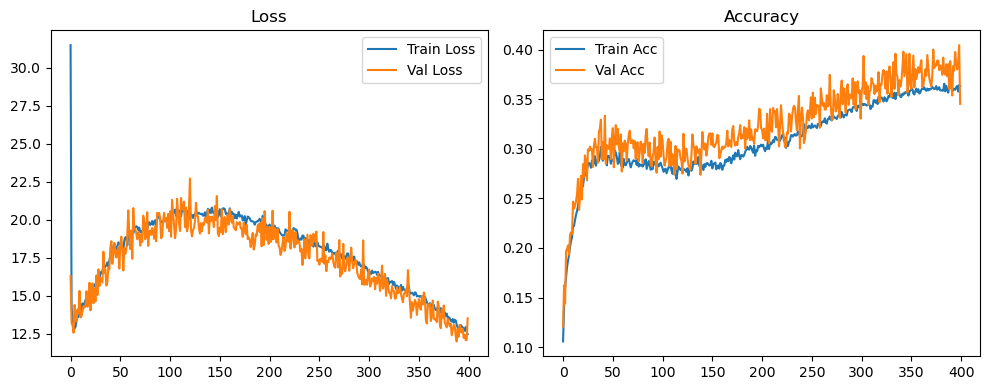

Original Model Final Test Loss: 13.7760 Accuracy: 0.3406


🚀 Running: batch256_lr_max_0.001_min_1e-06_dp0.05


Files already downloaded and verified


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|                                                                                                                                                                        | 0/400 [00:00<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.1028 | Val Acc: 0.0953 | Epoch Time: 1.93 | :   0%|                                                                                                      | 0/400 [01:55<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.1028 | Val Acc: 0.0953 | Epoch Time: 1.93 | :   0%|                                                                                                      | 0/400 [01:55<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.1028 | Val Acc: 0.0953 | Epoch Time: 1.93 | :   0%|▏                                                                                         | 1/400 [01:55<12:49:49, 115.76s/it]

| LR: 0.001000 | Train Acc: 0.1240 | Val Acc: 0.1549 | Epoch Time: 1.92 | :   0%|▏                                                                                         | 1/400 [03:51<12:49:49, 115.76s/it]

| LR: 0.001000 | Train Acc: 0.1240 | Val Acc: 0.1549 | Epoch Time: 1.92 | :   0%|▏                                                                                         | 1/400 [03:51<12:49:49, 115.76s/it]

| LR: 0.001000 | Train Acc: 0.1240 | Val Acc: 0.1549 | Epoch Time: 1.92 | :   0%|▍                                                                                         | 2/400 [03:51<12:46:47, 115.60s/it]

| LR: 0.001000 | Train Acc: 0.1567 | Val Acc: 0.2104 | Epoch Time: 1.92 | :   0%|▍                                                                                         | 2/400 [05:46<12:46:47, 115.60s/it]

| LR: 0.001000 | Train Acc: 0.1567 | Val Acc: 0.2104 | Epoch Time: 1.92 | :   0%|▍                                                                                         | 2/400 [05:46<12:46:47, 115.60s/it]

| LR: 0.001000 | Train Acc: 0.1567 | Val Acc: 0.2104 | Epoch Time: 1.92 | :   1%|▋                                                                                         | 3/400 [05:46<12:44:28, 115.54s/it]

| LR: 0.001000 | Train Acc: 0.1743 | Val Acc: 0.2290 | Epoch Time: 1.92 | :   1%|▋                                                                                         | 3/400 [07:42<12:44:28, 115.54s/it]

| LR: 0.001000 | Train Acc: 0.1743 | Val Acc: 0.2290 | Epoch Time: 1.92 | :   1%|▋                                                                                         | 3/400 [07:42<12:44:28, 115.54s/it]

| LR: 0.001000 | Train Acc: 0.1743 | Val Acc: 0.2290 | Epoch Time: 1.92 | :   1%|▉                                                                                         | 4/400 [07:42<12:42:23, 115.51s/it]

| LR: 0.001000 | Train Acc: 0.1877 | Val Acc: 0.2475 | Epoch Time: 1.92 | :   1%|▉                                                                                         | 4/400 [09:37<12:42:23, 115.51s/it]

| LR: 0.001000 | Train Acc: 0.1877 | Val Acc: 0.2475 | Epoch Time: 1.92 | :   1%|▉                                                                                         | 4/400 [09:37<12:42:23, 115.51s/it]

| LR: 0.001000 | Train Acc: 0.1877 | Val Acc: 0.2475 | Epoch Time: 1.92 | :   1%|█▏                                                                                        | 5/400 [09:37<12:40:24, 115.51s/it]

| LR: 0.001000 | Train Acc: 0.1994 | Val Acc: 0.2462 | Epoch Time: 1.92 | :   1%|█▏                                                                                        | 5/400 [11:33<12:40:24, 115.51s/it]

| LR: 0.001000 | Train Acc: 0.1994 | Val Acc: 0.2462 | Epoch Time: 1.92 | :   1%|█▏                                                                                        | 5/400 [11:33<12:40:24, 115.51s/it]

| LR: 0.001000 | Train Acc: 0.1994 | Val Acc: 0.2462 | Epoch Time: 1.92 | :   2%|█▎                                                                                        | 6/400 [11:33<12:38:28, 115.50s/it]

| LR: 0.000999 | Train Acc: 0.2083 | Val Acc: 0.2313 | Epoch Time: 1.92 | :   2%|█▎                                                                                        | 6/400 [13:28<12:38:28, 115.50s/it]

| LR: 0.000999 | Train Acc: 0.2083 | Val Acc: 0.2313 | Epoch Time: 1.92 | :   2%|█▎                                                                                        | 6/400 [13:28<12:38:28, 115.50s/it]

| LR: 0.000999 | Train Acc: 0.2083 | Val Acc: 0.2313 | Epoch Time: 1.92 | :   2%|█▌                                                                                        | 7/400 [13:28<12:36:27, 115.49s/it]

| LR: 0.000999 | Train Acc: 0.2133 | Val Acc: 0.2230 | Epoch Time: 1.92 | :   2%|█▌                                                                                        | 7/400 [15:23<12:36:27, 115.49s/it]

| LR: 0.000999 | Train Acc: 0.2133 | Val Acc: 0.2230 | Epoch Time: 1.92 | :   2%|█▌                                                                                        | 7/400 [15:23<12:36:27, 115.49s/it]

| LR: 0.000999 | Train Acc: 0.2133 | Val Acc: 0.2230 | Epoch Time: 1.92 | :   2%|█▊                                                                                        | 8/400 [15:24<12:34:28, 115.48s/it]

| LR: 0.000999 | Train Acc: 0.2199 | Val Acc: 0.2137 | Epoch Time: 1.92 | :   2%|█▊                                                                                        | 8/400 [17:19<12:34:28, 115.48s/it]

| LR: 0.000999 | Train Acc: 0.2199 | Val Acc: 0.2137 | Epoch Time: 1.92 | :   2%|█▊                                                                                        | 8/400 [17:19<12:34:28, 115.48s/it]

| LR: 0.000999 | Train Acc: 0.2199 | Val Acc: 0.2137 | Epoch Time: 1.92 | :   2%|██                                                                                        | 9/400 [17:19<12:32:34, 115.48s/it]

| LR: 0.000999 | Train Acc: 0.2229 | Val Acc: 0.2489 | Epoch Time: 1.92 | :   2%|██                                                                                        | 9/400 [19:14<12:32:34, 115.48s/it]

| LR: 0.000999 | Train Acc: 0.2229 | Val Acc: 0.2489 | Epoch Time: 1.92 | :   2%|██                                                                                        | 9/400 [19:14<12:32:34, 115.48s/it]

| LR: 0.000999 | Train Acc: 0.2229 | Val Acc: 0.2489 | Epoch Time: 1.92 | :   2%|██▏                                                                                      | 10/400 [19:15<12:30:39, 115.49s/it]

| LR: 0.000998 | Train Acc: 0.2270 | Val Acc: 0.2617 | Epoch Time: 1.92 | :   2%|██▏                                                                                      | 10/400 [21:10<12:30:39, 115.49s/it]

| LR: 0.000998 | Train Acc: 0.2270 | Val Acc: 0.2617 | Epoch Time: 1.92 | :   2%|██▏                                                                                      | 10/400 [21:10<12:30:39, 115.49s/it]

| LR: 0.000998 | Train Acc: 0.2270 | Val Acc: 0.2617 | Epoch Time: 1.92 | :   3%|██▍                                                                                      | 11/400 [21:10<12:28:48, 115.50s/it]

| LR: 0.000998 | Train Acc: 0.2349 | Val Acc: 0.2402 | Epoch Time: 1.92 | :   3%|██▍                                                                                      | 11/400 [23:05<12:28:48, 115.50s/it]

| LR: 0.000998 | Train Acc: 0.2349 | Val Acc: 0.2402 | Epoch Time: 1.92 | :   3%|██▍                                                                                      | 11/400 [23:05<12:28:48, 115.50s/it]

| LR: 0.000998 | Train Acc: 0.2349 | Val Acc: 0.2402 | Epoch Time: 1.92 | :   3%|██▋                                                                                      | 12/400 [23:06<12:26:51, 115.49s/it]

| LR: 0.000998 | Train Acc: 0.2376 | Val Acc: 0.2743 | Epoch Time: 1.92 | :   3%|██▋                                                                                      | 12/400 [25:01<12:26:51, 115.49s/it]

| LR: 0.000998 | Train Acc: 0.2376 | Val Acc: 0.2743 | Epoch Time: 1.92 | :   3%|██▋                                                                                      | 12/400 [25:01<12:26:51, 115.49s/it]

| LR: 0.000998 | Train Acc: 0.2376 | Val Acc: 0.2743 | Epoch Time: 1.92 | :   3%|██▉                                                                                      | 13/400 [25:01<12:24:56, 115.49s/it]

| LR: 0.000997 | Train Acc: 0.2428 | Val Acc: 0.2860 | Epoch Time: 1.92 | :   3%|██▉                                                                                      | 13/400 [26:56<12:24:56, 115.49s/it]

| LR: 0.000997 | Train Acc: 0.2428 | Val Acc: 0.2860 | Epoch Time: 1.92 | :   3%|██▉                                                                                      | 13/400 [26:56<12:24:56, 115.49s/it]

| LR: 0.000997 | Train Acc: 0.2428 | Val Acc: 0.2860 | Epoch Time: 1.92 | :   4%|███                                                                                      | 14/400 [26:57<12:23:01, 115.50s/it]

| LR: 0.000997 | Train Acc: 0.2433 | Val Acc: 0.2940 | Epoch Time: 1.92 | :   4%|███                                                                                      | 14/400 [28:52<12:23:01, 115.50s/it]

| LR: 0.000997 | Train Acc: 0.2433 | Val Acc: 0.2940 | Epoch Time: 1.92 | :   4%|███                                                                                      | 14/400 [28:52<12:23:01, 115.50s/it]

| LR: 0.000997 | Train Acc: 0.2433 | Val Acc: 0.2940 | Epoch Time: 1.92 | :   4%|███▎                                                                                     | 15/400 [28:52<12:21:06, 115.50s/it]

| LR: 0.000997 | Train Acc: 0.2466 | Val Acc: 0.3057 | Epoch Time: 1.92 | :   4%|███▎                                                                                     | 15/400 [30:47<12:21:06, 115.50s/it]

| LR: 0.000997 | Train Acc: 0.2466 | Val Acc: 0.3057 | Epoch Time: 1.92 | :   4%|███▎                                                                                     | 15/400 [30:47<12:21:06, 115.50s/it]

| LR: 0.000997 | Train Acc: 0.2466 | Val Acc: 0.3057 | Epoch Time: 1.92 | :   4%|███▌                                                                                     | 16/400 [30:48<12:19:10, 115.50s/it]

| LR: 0.000996 | Train Acc: 0.2528 | Val Acc: 0.2698 | Epoch Time: 1.92 | :   4%|███▌                                                                                     | 16/400 [32:43<12:19:10, 115.50s/it]

| LR: 0.000996 | Train Acc: 0.2528 | Val Acc: 0.2698 | Epoch Time: 1.92 | :   4%|███▌                                                                                     | 16/400 [32:43<12:19:10, 115.50s/it]

| LR: 0.000996 | Train Acc: 0.2528 | Val Acc: 0.2698 | Epoch Time: 1.92 | :   4%|███▊                                                                                     | 17/400 [32:43<12:17:14, 115.49s/it]

| LR: 0.000996 | Train Acc: 0.2509 | Val Acc: 0.2833 | Epoch Time: 1.92 | :   4%|███▊                                                                                     | 17/400 [34:38<12:17:14, 115.49s/it]

| LR: 0.000996 | Train Acc: 0.2509 | Val Acc: 0.2833 | Epoch Time: 1.92 | :   4%|███▊                                                                                     | 17/400 [34:38<12:17:14, 115.49s/it]

| LR: 0.000996 | Train Acc: 0.2509 | Val Acc: 0.2833 | Epoch Time: 1.92 | :   4%|████                                                                                     | 18/400 [34:39<12:15:17, 115.49s/it]

| LR: 0.000995 | Train Acc: 0.2560 | Val Acc: 0.2789 | Epoch Time: 1.92 | :   4%|████                                                                                     | 18/400 [36:34<12:15:17, 115.49s/it]

| LR: 0.000995 | Train Acc: 0.2560 | Val Acc: 0.2789 | Epoch Time: 1.92 | :   4%|████                                                                                     | 18/400 [36:34<12:15:17, 115.49s/it]

| LR: 0.000995 | Train Acc: 0.2560 | Val Acc: 0.2789 | Epoch Time: 1.92 | :   5%|████▏                                                                                    | 19/400 [36:34<12:13:18, 115.48s/it]

| LR: 0.000994 | Train Acc: 0.2565 | Val Acc: 0.2634 | Epoch Time: 1.92 | :   5%|████▏                                                                                    | 19/400 [38:29<12:13:18, 115.48s/it]

| LR: 0.000994 | Train Acc: 0.2565 | Val Acc: 0.2634 | Epoch Time: 1.92 | :   5%|████▏                                                                                    | 19/400 [38:29<12:13:18, 115.48s/it]

| LR: 0.000994 | Train Acc: 0.2565 | Val Acc: 0.2634 | Epoch Time: 1.92 | :   5%|████▍                                                                                    | 20/400 [38:29<12:11:19, 115.47s/it]

| LR: 0.000994 | Train Acc: 0.2525 | Val Acc: 0.3054 | Epoch Time: 1.92 | :   5%|████▍                                                                                    | 20/400 [40:25<12:11:19, 115.47s/it]

| LR: 0.000994 | Train Acc: 0.2525 | Val Acc: 0.3054 | Epoch Time: 1.92 | :   5%|████▍                                                                                    | 20/400 [40:25<12:11:19, 115.47s/it]

| LR: 0.000994 | Train Acc: 0.2525 | Val Acc: 0.3054 | Epoch Time: 1.92 | :   5%|████▋                                                                                    | 21/400 [40:25<12:09:20, 115.46s/it]

| LR: 0.000993 | Train Acc: 0.2567 | Val Acc: 0.2757 | Epoch Time: 1.92 | :   5%|████▋                                                                                    | 21/400 [42:20<12:09:20, 115.46s/it]

| LR: 0.000993 | Train Acc: 0.2567 | Val Acc: 0.2757 | Epoch Time: 1.92 | :   5%|████▋                                                                                    | 21/400 [42:20<12:09:20, 115.46s/it]

| LR: 0.000993 | Train Acc: 0.2567 | Val Acc: 0.2757 | Epoch Time: 1.92 | :   6%|████▉                                                                                    | 22/400 [42:20<12:07:33, 115.48s/it]

| LR: 0.000993 | Train Acc: 0.2569 | Val Acc: 0.3085 | Epoch Time: 1.92 | :   6%|████▉                                                                                    | 22/400 [44:16<12:07:33, 115.48s/it]

| LR: 0.000993 | Train Acc: 0.2569 | Val Acc: 0.3085 | Epoch Time: 1.92 | :   6%|████▉                                                                                    | 22/400 [44:16<12:07:33, 115.48s/it]

| LR: 0.000993 | Train Acc: 0.2569 | Val Acc: 0.3085 | Epoch Time: 1.92 | :   6%|█████                                                                                    | 23/400 [44:16<12:05:34, 115.48s/it]

| LR: 0.000992 | Train Acc: 0.2609 | Val Acc: 0.2916 | Epoch Time: 1.92 | :   6%|█████                                                                                    | 23/400 [46:11<12:05:34, 115.48s/it]

| LR: 0.000992 | Train Acc: 0.2609 | Val Acc: 0.2916 | Epoch Time: 1.92 | :   6%|█████                                                                                    | 23/400 [46:11<12:05:34, 115.48s/it]

| LR: 0.000992 | Train Acc: 0.2609 | Val Acc: 0.2916 | Epoch Time: 1.92 | :   6%|█████▎                                                                                   | 24/400 [46:11<12:03:34, 115.46s/it]

| LR: 0.000991 | Train Acc: 0.2648 | Val Acc: 0.2833 | Epoch Time: 1.92 | :   6%|█████▎                                                                                   | 24/400 [48:07<12:03:34, 115.46s/it]

| LR: 0.000991 | Train Acc: 0.2648 | Val Acc: 0.2833 | Epoch Time: 1.92 | :   6%|█████▎                                                                                   | 24/400 [48:07<12:03:34, 115.46s/it]

| LR: 0.000991 | Train Acc: 0.2648 | Val Acc: 0.2833 | Epoch Time: 1.92 | :   6%|█████▌                                                                                   | 25/400 [48:07<12:01:36, 115.46s/it]

| LR: 0.000990 | Train Acc: 0.2618 | Val Acc: 0.2752 | Epoch Time: 1.92 | :   6%|█████▌                                                                                   | 25/400 [50:02<12:01:36, 115.46s/it]

| LR: 0.000990 | Train Acc: 0.2618 | Val Acc: 0.2752 | Epoch Time: 1.92 | :   6%|█████▌                                                                                   | 25/400 [50:02<12:01:36, 115.46s/it]

| LR: 0.000990 | Train Acc: 0.2618 | Val Acc: 0.2752 | Epoch Time: 1.92 | :   6%|█████▊                                                                                   | 26/400 [50:02<11:59:42, 115.46s/it]

| LR: 0.000990 | Train Acc: 0.2683 | Val Acc: 0.2865 | Epoch Time: 1.92 | :   6%|█████▊                                                                                   | 26/400 [51:58<11:59:42, 115.46s/it]

| LR: 0.000990 | Train Acc: 0.2683 | Val Acc: 0.2865 | Epoch Time: 1.92 | :   6%|█████▊                                                                                   | 26/400 [51:58<11:59:42, 115.46s/it]

| LR: 0.000990 | Train Acc: 0.2683 | Val Acc: 0.2865 | Epoch Time: 1.92 | :   7%|██████                                                                                   | 27/400 [51:58<11:57:42, 115.45s/it]

| LR: 0.000989 | Train Acc: 0.2651 | Val Acc: 0.2827 | Epoch Time: 1.92 | :   7%|██████                                                                                   | 27/400 [53:53<11:57:42, 115.45s/it]

| LR: 0.000989 | Train Acc: 0.2651 | Val Acc: 0.2827 | Epoch Time: 1.92 | :   7%|██████                                                                                   | 27/400 [53:53<11:57:42, 115.45s/it]

| LR: 0.000989 | Train Acc: 0.2651 | Val Acc: 0.2827 | Epoch Time: 1.92 | :   7%|██████▏                                                                                  | 28/400 [53:53<11:55:48, 115.45s/it]

| LR: 0.000988 | Train Acc: 0.2639 | Val Acc: 0.2896 | Epoch Time: 1.92 | :   7%|██████▏                                                                                  | 28/400 [55:48<11:55:48, 115.45s/it]

| LR: 0.000988 | Train Acc: 0.2639 | Val Acc: 0.2896 | Epoch Time: 1.92 | :   7%|██████▏                                                                                  | 28/400 [55:48<11:55:48, 115.45s/it]

| LR: 0.000988 | Train Acc: 0.2639 | Val Acc: 0.2896 | Epoch Time: 1.92 | :   7%|██████▍                                                                                  | 29/400 [55:49<11:53:54, 115.46s/it]

| LR: 0.000987 | Train Acc: 0.2666 | Val Acc: 0.3005 | Epoch Time: 1.92 | :   7%|██████▍                                                                                  | 29/400 [57:44<11:53:54, 115.46s/it]

| LR: 0.000987 | Train Acc: 0.2666 | Val Acc: 0.3005 | Epoch Time: 1.92 | :   7%|██████▍                                                                                  | 29/400 [57:44<11:53:54, 115.46s/it]

| LR: 0.000987 | Train Acc: 0.2666 | Val Acc: 0.3005 | Epoch Time: 1.92 | :   8%|██████▋                                                                                  | 30/400 [57:44<11:52:01, 115.46s/it]

| LR: 0.000986 | Train Acc: 0.2692 | Val Acc: 0.2995 | Epoch Time: 1.92 | :   8%|██████▋                                                                                  | 30/400 [59:39<11:52:01, 115.46s/it]

| LR: 0.000986 | Train Acc: 0.2692 | Val Acc: 0.2995 | Epoch Time: 1.92 | :   8%|██████▋                                                                                  | 30/400 [59:39<11:52:01, 115.46s/it]

| LR: 0.000986 | Train Acc: 0.2692 | Val Acc: 0.2995 | Epoch Time: 1.92 | :   8%|██████▉                                                                                  | 31/400 [59:40<11:50:06, 115.47s/it]

| LR: 0.000985 | Train Acc: 0.2642 | Val Acc: 0.2958 | Epoch Time: 1.92 | :   8%|██████▋                                                                                | 31/400 [1:01:35<11:50:06, 115.47s/it]

| LR: 0.000985 | Train Acc: 0.2642 | Val Acc: 0.2958 | Epoch Time: 1.92 | :   8%|██████▋                                                                                | 31/400 [1:01:35<11:50:06, 115.47s/it]

| LR: 0.000985 | Train Acc: 0.2642 | Val Acc: 0.2958 | Epoch Time: 1.92 | :   8%|██████▉                                                                                | 32/400 [1:01:35<11:48:16, 115.48s/it]

| LR: 0.000984 | Train Acc: 0.2681 | Val Acc: 0.2809 | Epoch Time: 1.92 | :   8%|██████▉                                                                                | 32/400 [1:03:30<11:48:16, 115.48s/it]

| LR: 0.000984 | Train Acc: 0.2681 | Val Acc: 0.2809 | Epoch Time: 1.92 | :   8%|██████▉                                                                                | 32/400 [1:03:30<11:48:16, 115.48s/it]

| LR: 0.000984 | Train Acc: 0.2681 | Val Acc: 0.2809 | Epoch Time: 1.92 | :   8%|███████▏                                                                               | 33/400 [1:03:31<11:46:21, 115.48s/it]

| LR: 0.000983 | Train Acc: 0.2684 | Val Acc: 0.3075 | Epoch Time: 1.92 | :   8%|███████▏                                                                               | 33/400 [1:05:26<11:46:21, 115.48s/it]

| LR: 0.000983 | Train Acc: 0.2684 | Val Acc: 0.3075 | Epoch Time: 1.92 | :   8%|███████▏                                                                               | 33/400 [1:05:26<11:46:21, 115.48s/it]

| LR: 0.000983 | Train Acc: 0.2684 | Val Acc: 0.3075 | Epoch Time: 1.92 | :   8%|███████▍                                                                               | 34/400 [1:05:26<11:44:22, 115.47s/it]

| LR: 0.000982 | Train Acc: 0.2725 | Val Acc: 0.2816 | Epoch Time: 1.92 | :   8%|███████▍                                                                               | 34/400 [1:07:21<11:44:22, 115.47s/it]

| LR: 0.000982 | Train Acc: 0.2725 | Val Acc: 0.2816 | Epoch Time: 1.92 | :   8%|███████▍                                                                               | 34/400 [1:07:21<11:44:22, 115.47s/it]

| LR: 0.000982 | Train Acc: 0.2725 | Val Acc: 0.2816 | Epoch Time: 1.92 | :   9%|███████▌                                                                               | 35/400 [1:07:21<11:42:22, 115.46s/it]

| LR: 0.000981 | Train Acc: 0.2748 | Val Acc: 0.2794 | Epoch Time: 1.92 | :   9%|███████▌                                                                               | 35/400 [1:09:17<11:42:22, 115.46s/it]

| LR: 0.000981 | Train Acc: 0.2748 | Val Acc: 0.2794 | Epoch Time: 1.92 | :   9%|███████▌                                                                               | 35/400 [1:09:17<11:42:22, 115.46s/it]

| LR: 0.000981 | Train Acc: 0.2748 | Val Acc: 0.2794 | Epoch Time: 1.92 | :   9%|███████▊                                                                               | 36/400 [1:09:17<11:40:26, 115.46s/it]

| LR: 0.000980 | Train Acc: 0.2707 | Val Acc: 0.3071 | Epoch Time: 1.92 | :   9%|███████▊                                                                               | 36/400 [1:11:12<11:40:26, 115.46s/it]

| LR: 0.000980 | Train Acc: 0.2707 | Val Acc: 0.3071 | Epoch Time: 1.92 | :   9%|███████▊                                                                               | 36/400 [1:11:12<11:40:26, 115.46s/it]

| LR: 0.000980 | Train Acc: 0.2707 | Val Acc: 0.3071 | Epoch Time: 1.92 | :   9%|████████                                                                               | 37/400 [1:11:12<11:38:30, 115.46s/it]

| LR: 0.000979 | Train Acc: 0.2694 | Val Acc: 0.2598 | Epoch Time: 1.92 | :   9%|████████                                                                               | 37/400 [1:13:08<11:38:30, 115.46s/it]

| LR: 0.000979 | Train Acc: 0.2694 | Val Acc: 0.2598 | Epoch Time: 1.92 | :   9%|████████                                                                               | 37/400 [1:13:08<11:38:30, 115.46s/it]

| LR: 0.000979 | Train Acc: 0.2694 | Val Acc: 0.2598 | Epoch Time: 1.92 | :  10%|████████▎                                                                              | 38/400 [1:13:08<11:36:34, 115.46s/it]

| LR: 0.000978 | Train Acc: 0.2650 | Val Acc: 0.2906 | Epoch Time: 1.92 | :  10%|████████▎                                                                              | 38/400 [1:15:03<11:36:34, 115.46s/it]

| LR: 0.000978 | Train Acc: 0.2650 | Val Acc: 0.2906 | Epoch Time: 1.92 | :  10%|████████▎                                                                              | 38/400 [1:15:03<11:36:34, 115.46s/it]

| LR: 0.000978 | Train Acc: 0.2650 | Val Acc: 0.2906 | Epoch Time: 1.92 | :  10%|████████▍                                                                              | 39/400 [1:15:03<11:34:38, 115.45s/it]

| LR: 0.000977 | Train Acc: 0.2663 | Val Acc: 0.2943 | Epoch Time: 1.92 | :  10%|████████▍                                                                              | 39/400 [1:16:59<11:34:38, 115.45s/it]

| LR: 0.000977 | Train Acc: 0.2663 | Val Acc: 0.2943 | Epoch Time: 1.92 | :  10%|████████▍                                                                              | 39/400 [1:16:59<11:34:38, 115.45s/it]

| LR: 0.000977 | Train Acc: 0.2663 | Val Acc: 0.2943 | Epoch Time: 1.92 | :  10%|████████▋                                                                              | 40/400 [1:16:59<11:32:42, 115.45s/it]

| LR: 0.000976 | Train Acc: 0.2684 | Val Acc: 0.2720 | Epoch Time: 1.92 | :  10%|████████▋                                                                              | 40/400 [1:18:54<11:32:42, 115.45s/it]

| LR: 0.000976 | Train Acc: 0.2684 | Val Acc: 0.2720 | Epoch Time: 1.92 | :  10%|████████▋                                                                              | 40/400 [1:18:54<11:32:42, 115.45s/it]

| LR: 0.000976 | Train Acc: 0.2684 | Val Acc: 0.2720 | Epoch Time: 1.92 | :  10%|████████▉                                                                              | 41/400 [1:18:54<11:30:45, 115.45s/it]

| LR: 0.000974 | Train Acc: 0.2726 | Val Acc: 0.2915 | Epoch Time: 1.92 | :  10%|████████▉                                                                              | 41/400 [1:20:49<11:30:45, 115.45s/it]

| LR: 0.000974 | Train Acc: 0.2726 | Val Acc: 0.2915 | Epoch Time: 1.92 | :  10%|████████▉                                                                              | 41/400 [1:20:49<11:30:45, 115.45s/it]

| LR: 0.000974 | Train Acc: 0.2726 | Val Acc: 0.2915 | Epoch Time: 1.92 | :  10%|█████████▏                                                                             | 42/400 [1:20:50<11:28:47, 115.44s/it]

| LR: 0.000973 | Train Acc: 0.2716 | Val Acc: 0.2936 | Epoch Time: 1.92 | :  10%|█████████▏                                                                             | 42/400 [1:22:45<11:28:47, 115.44s/it]

| LR: 0.000973 | Train Acc: 0.2716 | Val Acc: 0.2936 | Epoch Time: 1.92 | :  10%|█████████▏                                                                             | 42/400 [1:22:45<11:28:47, 115.44s/it]

| LR: 0.000973 | Train Acc: 0.2716 | Val Acc: 0.2936 | Epoch Time: 1.92 | :  11%|█████████▎                                                                             | 43/400 [1:22:45<11:26:49, 115.43s/it]

| LR: 0.000972 | Train Acc: 0.2682 | Val Acc: 0.3032 | Epoch Time: 1.92 | :  11%|█████████▎                                                                             | 43/400 [1:24:40<11:26:49, 115.43s/it]

| LR: 0.000972 | Train Acc: 0.2682 | Val Acc: 0.3032 | Epoch Time: 1.92 | :  11%|█████████▎                                                                             | 43/400 [1:24:40<11:26:49, 115.43s/it]

| LR: 0.000972 | Train Acc: 0.2682 | Val Acc: 0.3032 | Epoch Time: 1.92 | :  11%|█████████▌                                                                             | 44/400 [1:24:40<11:24:54, 115.43s/it]

| LR: 0.000970 | Train Acc: 0.2717 | Val Acc: 0.2949 | Epoch Time: 1.92 | :  11%|█████████▌                                                                             | 44/400 [1:26:36<11:24:54, 115.43s/it]

| LR: 0.000970 | Train Acc: 0.2717 | Val Acc: 0.2949 | Epoch Time: 1.92 | :  11%|█████████▌                                                                             | 44/400 [1:26:36<11:24:54, 115.43s/it]

| LR: 0.000970 | Train Acc: 0.2717 | Val Acc: 0.2949 | Epoch Time: 1.92 | :  11%|█████████▊                                                                             | 45/400 [1:26:36<11:23:00, 115.44s/it]

| LR: 0.000969 | Train Acc: 0.2665 | Val Acc: 0.2978 | Epoch Time: 1.92 | :  11%|█████████▊                                                                             | 45/400 [1:28:31<11:23:00, 115.44s/it]

| LR: 0.000969 | Train Acc: 0.2665 | Val Acc: 0.2978 | Epoch Time: 1.92 | :  11%|█████████▊                                                                             | 45/400 [1:28:31<11:23:00, 115.44s/it]

| LR: 0.000969 | Train Acc: 0.2665 | Val Acc: 0.2978 | Epoch Time: 1.92 | :  12%|██████████                                                                             | 46/400 [1:28:31<11:21:04, 115.44s/it]

| LR: 0.000968 | Train Acc: 0.2678 | Val Acc: 0.2959 | Epoch Time: 1.92 | :  12%|██████████                                                                             | 46/400 [1:30:27<11:21:04, 115.44s/it]

| LR: 0.000968 | Train Acc: 0.2678 | Val Acc: 0.2959 | Epoch Time: 1.92 | :  12%|██████████                                                                             | 46/400 [1:30:27<11:21:04, 115.44s/it]

| LR: 0.000968 | Train Acc: 0.2678 | Val Acc: 0.2959 | Epoch Time: 1.92 | :  12%|██████████▏                                                                            | 47/400 [1:30:27<11:19:06, 115.43s/it]

| LR: 0.000966 | Train Acc: 0.2692 | Val Acc: 0.3044 | Epoch Time: 1.92 | :  12%|██████████▏                                                                            | 47/400 [1:32:22<11:19:06, 115.43s/it]

| LR: 0.000966 | Train Acc: 0.2692 | Val Acc: 0.3044 | Epoch Time: 1.92 | :  12%|██████████▏                                                                            | 47/400 [1:32:22<11:19:06, 115.43s/it]

| LR: 0.000966 | Train Acc: 0.2692 | Val Acc: 0.3044 | Epoch Time: 1.92 | :  12%|██████████▍                                                                            | 48/400 [1:32:22<11:17:09, 115.42s/it]

| LR: 0.000965 | Train Acc: 0.2666 | Val Acc: 0.2854 | Epoch Time: 1.92 | :  12%|██████████▍                                                                            | 48/400 [1:34:17<11:17:09, 115.42s/it]

| LR: 0.000965 | Train Acc: 0.2666 | Val Acc: 0.2854 | Epoch Time: 1.92 | :  12%|██████████▍                                                                            | 48/400 [1:34:17<11:17:09, 115.42s/it]

| LR: 0.000965 | Train Acc: 0.2666 | Val Acc: 0.2854 | Epoch Time: 1.92 | :  12%|██████████▋                                                                            | 49/400 [1:34:18<11:15:14, 115.43s/it]

| LR: 0.000963 | Train Acc: 0.2714 | Val Acc: 0.3139 | Epoch Time: 1.92 | :  12%|██████████▋                                                                            | 49/400 [1:36:13<11:15:14, 115.43s/it]

| LR: 0.000963 | Train Acc: 0.2714 | Val Acc: 0.3139 | Epoch Time: 1.92 | :  12%|██████████▋                                                                            | 49/400 [1:36:13<11:15:14, 115.43s/it]

| LR: 0.000963 | Train Acc: 0.2714 | Val Acc: 0.3139 | Epoch Time: 1.92 | :  12%|██████████▉                                                                            | 50/400 [1:36:13<11:13:16, 115.42s/it]

| LR: 0.000962 | Train Acc: 0.2710 | Val Acc: 0.2959 | Epoch Time: 1.92 | :  12%|██████████▉                                                                            | 50/400 [1:38:08<11:13:16, 115.42s/it]

| LR: 0.000962 | Train Acc: 0.2710 | Val Acc: 0.2959 | Epoch Time: 1.92 | :  12%|██████████▉                                                                            | 50/400 [1:38:08<11:13:16, 115.42s/it]

| LR: 0.000962 | Train Acc: 0.2710 | Val Acc: 0.2959 | Epoch Time: 1.92 | :  13%|███████████                                                                            | 51/400 [1:38:08<11:11:22, 115.42s/it]

| LR: 0.000960 | Train Acc: 0.2680 | Val Acc: 0.2803 | Epoch Time: 1.92 | :  13%|███████████                                                                            | 51/400 [1:40:04<11:11:22, 115.42s/it]

| LR: 0.000960 | Train Acc: 0.2680 | Val Acc: 0.2803 | Epoch Time: 1.92 | :  13%|███████████                                                                            | 51/400 [1:40:04<11:11:22, 115.42s/it]

| LR: 0.000960 | Train Acc: 0.2680 | Val Acc: 0.2803 | Epoch Time: 1.92 | :  13%|███████████▎                                                                           | 52/400 [1:40:04<11:09:29, 115.43s/it]

| LR: 0.000959 | Train Acc: 0.2686 | Val Acc: 0.2684 | Epoch Time: 1.92 | :  13%|███████████▎                                                                           | 52/400 [1:41:59<11:09:29, 115.43s/it]

| LR: 0.000959 | Train Acc: 0.2686 | Val Acc: 0.2684 | Epoch Time: 1.92 | :  13%|███████████▎                                                                           | 52/400 [1:41:59<11:09:29, 115.43s/it]

| LR: 0.000959 | Train Acc: 0.2686 | Val Acc: 0.2684 | Epoch Time: 1.92 | :  13%|███████████▌                                                                           | 53/400 [1:41:59<11:07:31, 115.42s/it]

| LR: 0.000957 | Train Acc: 0.2666 | Val Acc: 0.3139 | Epoch Time: 1.92 | :  13%|███████████▌                                                                           | 53/400 [1:43:55<11:07:31, 115.42s/it]

| LR: 0.000957 | Train Acc: 0.2666 | Val Acc: 0.3139 | Epoch Time: 1.92 | :  13%|███████████▌                                                                           | 53/400 [1:43:55<11:07:31, 115.42s/it]

| LR: 0.000957 | Train Acc: 0.2666 | Val Acc: 0.3139 | Epoch Time: 1.92 | :  14%|███████████▋                                                                           | 54/400 [1:43:55<11:05:35, 115.42s/it]

| LR: 0.000956 | Train Acc: 0.2646 | Val Acc: 0.2885 | Epoch Time: 1.92 | :  14%|███████████▋                                                                           | 54/400 [1:45:50<11:05:35, 115.42s/it]

| LR: 0.000956 | Train Acc: 0.2646 | Val Acc: 0.2885 | Epoch Time: 1.92 | :  14%|███████████▋                                                                           | 54/400 [1:45:50<11:05:35, 115.42s/it]

| LR: 0.000956 | Train Acc: 0.2646 | Val Acc: 0.2885 | Epoch Time: 1.92 | :  14%|███████████▉                                                                           | 55/400 [1:45:50<11:03:40, 115.42s/it]

| LR: 0.000954 | Train Acc: 0.2679 | Val Acc: 0.2971 | Epoch Time: 1.92 | :  14%|███████████▉                                                                           | 55/400 [1:47:45<11:03:40, 115.42s/it]

| LR: 0.000954 | Train Acc: 0.2679 | Val Acc: 0.2971 | Epoch Time: 1.92 | :  14%|███████████▉                                                                           | 55/400 [1:47:45<11:03:40, 115.42s/it]

| LR: 0.000954 | Train Acc: 0.2679 | Val Acc: 0.2971 | Epoch Time: 1.92 | :  14%|████████████▏                                                                          | 56/400 [1:47:45<11:01:43, 115.42s/it]

| LR: 0.000952 | Train Acc: 0.2708 | Val Acc: 0.2818 | Epoch Time: 1.92 | :  14%|████████████▏                                                                          | 56/400 [1:49:41<11:01:43, 115.42s/it]

| LR: 0.000952 | Train Acc: 0.2708 | Val Acc: 0.2818 | Epoch Time: 1.92 | :  14%|████████████▏                                                                          | 56/400 [1:49:41<11:01:43, 115.42s/it]

| LR: 0.000952 | Train Acc: 0.2708 | Val Acc: 0.2818 | Epoch Time: 1.92 | :  14%|████████████▍                                                                          | 57/400 [1:49:41<10:59:47, 115.41s/it]

| LR: 0.000951 | Train Acc: 0.2698 | Val Acc: 0.2599 | Epoch Time: 1.92 | :  14%|████████████▍                                                                          | 57/400 [1:51:36<10:59:47, 115.41s/it]

| LR: 0.000951 | Train Acc: 0.2698 | Val Acc: 0.2599 | Epoch Time: 1.92 | :  14%|████████████▍                                                                          | 57/400 [1:51:36<10:59:47, 115.41s/it]

| LR: 0.000951 | Train Acc: 0.2698 | Val Acc: 0.2599 | Epoch Time: 1.92 | :  14%|████████████▌                                                                          | 58/400 [1:51:36<10:57:50, 115.41s/it]

| LR: 0.000949 | Train Acc: 0.2645 | Val Acc: 0.2723 | Epoch Time: 1.92 | :  14%|████████████▌                                                                          | 58/400 [1:53:32<10:57:50, 115.41s/it]

| LR: 0.000949 | Train Acc: 0.2645 | Val Acc: 0.2723 | Epoch Time: 1.92 | :  14%|████████████▌                                                                          | 58/400 [1:53:32<10:57:50, 115.41s/it]

| LR: 0.000949 | Train Acc: 0.2645 | Val Acc: 0.2723 | Epoch Time: 1.92 | :  15%|████████████▊                                                                          | 59/400 [1:53:32<10:55:52, 115.40s/it]

| LR: 0.000947 | Train Acc: 0.2669 | Val Acc: 0.2862 | Epoch Time: 1.92 | :  15%|████████████▊                                                                          | 59/400 [1:55:27<10:55:52, 115.40s/it]

| LR: 0.000947 | Train Acc: 0.2669 | Val Acc: 0.2862 | Epoch Time: 1.92 | :  15%|████████████▊                                                                          | 59/400 [1:55:27<10:55:52, 115.40s/it]

| LR: 0.000947 | Train Acc: 0.2669 | Val Acc: 0.2862 | Epoch Time: 1.92 | :  15%|█████████████                                                                          | 60/400 [1:55:27<10:53:57, 115.40s/it]

| LR: 0.000946 | Train Acc: 0.2664 | Val Acc: 0.2971 | Epoch Time: 1.92 | :  15%|█████████████                                                                          | 60/400 [1:57:22<10:53:57, 115.40s/it]

| LR: 0.000946 | Train Acc: 0.2664 | Val Acc: 0.2971 | Epoch Time: 1.92 | :  15%|█████████████                                                                          | 60/400 [1:57:22<10:53:57, 115.40s/it]

| LR: 0.000946 | Train Acc: 0.2664 | Val Acc: 0.2971 | Epoch Time: 1.92 | :  15%|█████████████▎                                                                         | 61/400 [1:57:22<10:52:03, 115.41s/it]

| LR: 0.000944 | Train Acc: 0.2696 | Val Acc: 0.2907 | Epoch Time: 1.92 | :  15%|█████████████▎                                                                         | 61/400 [1:59:18<10:52:03, 115.41s/it]

| LR: 0.000944 | Train Acc: 0.2696 | Val Acc: 0.2907 | Epoch Time: 1.92 | :  15%|█████████████▎                                                                         | 61/400 [1:59:18<10:52:03, 115.41s/it]

| LR: 0.000944 | Train Acc: 0.2696 | Val Acc: 0.2907 | Epoch Time: 1.92 | :  16%|█████████████▍                                                                         | 62/400 [1:59:18<10:50:09, 115.41s/it]

| LR: 0.000942 | Train Acc: 0.2676 | Val Acc: 0.2967 | Epoch Time: 1.92 | :  16%|█████████████▍                                                                         | 62/400 [2:01:13<10:50:09, 115.41s/it]

| LR: 0.000942 | Train Acc: 0.2676 | Val Acc: 0.2967 | Epoch Time: 1.92 | :  16%|█████████████▍                                                                         | 62/400 [2:01:13<10:50:09, 115.41s/it]

| LR: 0.000942 | Train Acc: 0.2676 | Val Acc: 0.2967 | Epoch Time: 1.92 | :  16%|█████████████▋                                                                         | 63/400 [2:01:13<10:48:14, 115.41s/it]

| LR: 0.000940 | Train Acc: 0.2707 | Val Acc: 0.3131 | Epoch Time: 1.92 | :  16%|█████████████▋                                                                         | 63/400 [2:03:09<10:48:14, 115.41s/it]

| LR: 0.000940 | Train Acc: 0.2707 | Val Acc: 0.3131 | Epoch Time: 1.92 | :  16%|█████████████▋                                                                         | 63/400 [2:03:09<10:48:14, 115.41s/it]

| LR: 0.000940 | Train Acc: 0.2707 | Val Acc: 0.3131 | Epoch Time: 1.92 | :  16%|█████████████▉                                                                         | 64/400 [2:03:09<10:46:21, 115.42s/it]

| LR: 0.000938 | Train Acc: 0.2650 | Val Acc: 0.2671 | Epoch Time: 1.92 | :  16%|█████████████▉                                                                         | 64/400 [2:05:04<10:46:21, 115.42s/it]

| LR: 0.000938 | Train Acc: 0.2650 | Val Acc: 0.2671 | Epoch Time: 1.92 | :  16%|█████████████▉                                                                         | 64/400 [2:05:04<10:46:21, 115.42s/it]

| LR: 0.000938 | Train Acc: 0.2650 | Val Acc: 0.2671 | Epoch Time: 1.92 | :  16%|██████████████▏                                                                        | 65/400 [2:05:04<10:44:23, 115.41s/it]

| LR: 0.000936 | Train Acc: 0.2675 | Val Acc: 0.2828 | Epoch Time: 1.92 | :  16%|██████████████▏                                                                        | 65/400 [2:06:59<10:44:23, 115.41s/it]

| LR: 0.000936 | Train Acc: 0.2675 | Val Acc: 0.2828 | Epoch Time: 1.92 | :  16%|██████████████▏                                                                        | 65/400 [2:06:59<10:44:23, 115.41s/it]

| LR: 0.000936 | Train Acc: 0.2675 | Val Acc: 0.2828 | Epoch Time: 1.92 | :  16%|██████████████▎                                                                        | 66/400 [2:07:00<10:42:27, 115.41s/it]

| LR: 0.000934 | Train Acc: 0.2634 | Val Acc: 0.2739 | Epoch Time: 1.92 | :  16%|██████████████▎                                                                        | 66/400 [2:08:55<10:42:27, 115.41s/it]

| LR: 0.000934 | Train Acc: 0.2634 | Val Acc: 0.2739 | Epoch Time: 1.92 | :  16%|██████████████▎                                                                        | 66/400 [2:08:55<10:42:27, 115.41s/it]

| LR: 0.000934 | Train Acc: 0.2634 | Val Acc: 0.2739 | Epoch Time: 1.92 | :  17%|██████████████▌                                                                        | 67/400 [2:08:55<10:40:31, 115.41s/it]

| LR: 0.000932 | Train Acc: 0.2661 | Val Acc: 0.2871 | Epoch Time: 1.92 | :  17%|██████████████▌                                                                        | 67/400 [2:10:50<10:40:31, 115.41s/it]

| LR: 0.000932 | Train Acc: 0.2661 | Val Acc: 0.2871 | Epoch Time: 1.92 | :  17%|██████████████▌                                                                        | 67/400 [2:10:50<10:40:31, 115.41s/it]

| LR: 0.000932 | Train Acc: 0.2661 | Val Acc: 0.2871 | Epoch Time: 1.92 | :  17%|██████████████▊                                                                        | 68/400 [2:10:50<10:38:36, 115.41s/it]

| LR: 0.000930 | Train Acc: 0.2650 | Val Acc: 0.2802 | Epoch Time: 1.92 | :  17%|██████████████▊                                                                        | 68/400 [2:12:46<10:38:36, 115.41s/it]

| LR: 0.000930 | Train Acc: 0.2650 | Val Acc: 0.2802 | Epoch Time: 1.92 | :  17%|██████████████▊                                                                        | 68/400 [2:12:46<10:38:36, 115.41s/it]

| LR: 0.000930 | Train Acc: 0.2650 | Val Acc: 0.2802 | Epoch Time: 1.92 | :  17%|███████████████                                                                        | 69/400 [2:12:46<10:36:40, 115.41s/it]

| LR: 0.000928 | Train Acc: 0.2713 | Val Acc: 0.2920 | Epoch Time: 1.92 | :  17%|███████████████                                                                        | 69/400 [2:14:41<10:36:40, 115.41s/it]

| LR: 0.000928 | Train Acc: 0.2713 | Val Acc: 0.2920 | Epoch Time: 1.92 | :  17%|███████████████                                                                        | 69/400 [2:14:41<10:36:40, 115.41s/it]

| LR: 0.000928 | Train Acc: 0.2713 | Val Acc: 0.2920 | Epoch Time: 1.92 | :  18%|███████████████▏                                                                       | 70/400 [2:14:41<10:34:45, 115.41s/it]

| LR: 0.000926 | Train Acc: 0.2629 | Val Acc: 0.2744 | Epoch Time: 1.92 | :  18%|███████████████▏                                                                       | 70/400 [2:16:36<10:34:45, 115.41s/it]

| LR: 0.000926 | Train Acc: 0.2629 | Val Acc: 0.2744 | Epoch Time: 1.92 | :  18%|███████████████▏                                                                       | 70/400 [2:16:36<10:34:45, 115.41s/it]

| LR: 0.000926 | Train Acc: 0.2629 | Val Acc: 0.2744 | Epoch Time: 1.92 | :  18%|███████████████▍                                                                       | 71/400 [2:16:37<10:32:49, 115.41s/it]

| LR: 0.000924 | Train Acc: 0.2661 | Val Acc: 0.3047 | Epoch Time: 1.92 | :  18%|███████████████▍                                                                       | 71/400 [2:18:32<10:32:49, 115.41s/it]

| LR: 0.000924 | Train Acc: 0.2661 | Val Acc: 0.3047 | Epoch Time: 1.92 | :  18%|███████████████▍                                                                       | 71/400 [2:18:32<10:32:49, 115.41s/it]

| LR: 0.000924 | Train Acc: 0.2661 | Val Acc: 0.3047 | Epoch Time: 1.92 | :  18%|███████████████▋                                                                       | 72/400 [2:18:32<10:30:59, 115.42s/it]

| LR: 0.000922 | Train Acc: 0.2684 | Val Acc: 0.2863 | Epoch Time: 1.92 | :  18%|███████████████▋                                                                       | 72/400 [2:20:27<10:30:59, 115.42s/it]

| LR: 0.000922 | Train Acc: 0.2684 | Val Acc: 0.2863 | Epoch Time: 1.92 | :  18%|███████████████▋                                                                       | 72/400 [2:20:27<10:30:59, 115.42s/it]

| LR: 0.000922 | Train Acc: 0.2684 | Val Acc: 0.2863 | Epoch Time: 1.92 | :  18%|███████████████▉                                                                       | 73/400 [2:20:27<10:29:03, 115.42s/it]

| LR: 0.000920 | Train Acc: 0.2642 | Val Acc: 0.3043 | Epoch Time: 1.92 | :  18%|███████████████▉                                                                       | 73/400 [2:22:23<10:29:03, 115.42s/it]

| LR: 0.000920 | Train Acc: 0.2642 | Val Acc: 0.3043 | Epoch Time: 1.92 | :  18%|███████████████▉                                                                       | 73/400 [2:22:23<10:29:03, 115.42s/it]

| LR: 0.000920 | Train Acc: 0.2642 | Val Acc: 0.3043 | Epoch Time: 1.92 | :  18%|████████████████                                                                       | 74/400 [2:22:23<10:27:05, 115.42s/it]

| LR: 0.000918 | Train Acc: 0.2666 | Val Acc: 0.2734 | Epoch Time: 1.92 | :  18%|████████████████                                                                       | 74/400 [2:24:18<10:27:05, 115.42s/it]

| LR: 0.000918 | Train Acc: 0.2666 | Val Acc: 0.2734 | Epoch Time: 1.92 | :  18%|████████████████                                                                       | 74/400 [2:24:18<10:27:05, 115.42s/it]

| LR: 0.000918 | Train Acc: 0.2666 | Val Acc: 0.2734 | Epoch Time: 1.92 | :  19%|████████████████▎                                                                      | 75/400 [2:24:18<10:25:09, 115.41s/it]

| LR: 0.000916 | Train Acc: 0.2629 | Val Acc: 0.3008 | Epoch Time: 1.92 | :  19%|████████████████▎                                                                      | 75/400 [2:26:14<10:25:09, 115.41s/it]

| LR: 0.000916 | Train Acc: 0.2629 | Val Acc: 0.3008 | Epoch Time: 1.92 | :  19%|████████████████▎                                                                      | 75/400 [2:26:14<10:25:09, 115.41s/it]

| LR: 0.000916 | Train Acc: 0.2629 | Val Acc: 0.3008 | Epoch Time: 1.92 | :  19%|████████████████▌                                                                      | 76/400 [2:26:14<10:23:12, 115.41s/it]

| LR: 0.000914 | Train Acc: 0.2609 | Val Acc: 0.2678 | Epoch Time: 1.92 | :  19%|████████████████▌                                                                      | 76/400 [2:28:09<10:23:12, 115.41s/it]

| LR: 0.000914 | Train Acc: 0.2609 | Val Acc: 0.2678 | Epoch Time: 1.92 | :  19%|████████████████▌                                                                      | 76/400 [2:28:09<10:23:12, 115.41s/it]

| LR: 0.000914 | Train Acc: 0.2609 | Val Acc: 0.2678 | Epoch Time: 1.92 | :  19%|████████████████▋                                                                      | 77/400 [2:28:09<10:21:24, 115.43s/it]

| LR: 0.000911 | Train Acc: 0.2690 | Val Acc: 0.2707 | Epoch Time: 1.92 | :  19%|████████████████▋                                                                      | 77/400 [2:30:04<10:21:24, 115.43s/it]

| LR: 0.000911 | Train Acc: 0.2690 | Val Acc: 0.2707 | Epoch Time: 1.92 | :  19%|████████████████▋                                                                      | 77/400 [2:30:04<10:21:24, 115.43s/it]

| LR: 0.000911 | Train Acc: 0.2690 | Val Acc: 0.2707 | Epoch Time: 1.92 | :  20%|████████████████▉                                                                      | 78/400 [2:30:05<10:19:26, 115.42s/it]

| LR: 0.000909 | Train Acc: 0.2640 | Val Acc: 0.2920 | Epoch Time: 1.92 | :  20%|████████████████▉                                                                      | 78/400 [2:32:00<10:19:26, 115.42s/it]

| LR: 0.000909 | Train Acc: 0.2640 | Val Acc: 0.2920 | Epoch Time: 1.92 | :  20%|████████████████▉                                                                      | 78/400 [2:32:00<10:19:26, 115.42s/it]

| LR: 0.000909 | Train Acc: 0.2640 | Val Acc: 0.2920 | Epoch Time: 1.92 | :  20%|█████████████████▏                                                                     | 79/400 [2:32:00<10:17:27, 115.41s/it]

| LR: 0.000907 | Train Acc: 0.2677 | Val Acc: 0.3001 | Epoch Time: 1.92 | :  20%|█████████████████▏                                                                     | 79/400 [2:33:55<10:17:27, 115.41s/it]

| LR: 0.000907 | Train Acc: 0.2677 | Val Acc: 0.3001 | Epoch Time: 1.92 | :  20%|█████████████████▏                                                                     | 79/400 [2:33:55<10:17:27, 115.41s/it]

| LR: 0.000907 | Train Acc: 0.2677 | Val Acc: 0.3001 | Epoch Time: 1.92 | :  20%|█████████████████▍                                                                     | 80/400 [2:33:55<10:15:31, 115.41s/it]

| LR: 0.000905 | Train Acc: 0.2646 | Val Acc: 0.2906 | Epoch Time: 1.92 | :  20%|█████████████████▍                                                                     | 80/400 [2:35:51<10:15:31, 115.41s/it]

| LR: 0.000905 | Train Acc: 0.2646 | Val Acc: 0.2906 | Epoch Time: 1.92 | :  20%|█████████████████▍                                                                     | 80/400 [2:35:51<10:15:31, 115.41s/it]

| LR: 0.000905 | Train Acc: 0.2646 | Val Acc: 0.2906 | Epoch Time: 1.92 | :  20%|█████████████████▌                                                                     | 81/400 [2:35:51<10:13:36, 115.41s/it]

| LR: 0.000902 | Train Acc: 0.2689 | Val Acc: 0.2999 | Epoch Time: 1.92 | :  20%|█████████████████▌                                                                     | 81/400 [2:37:46<10:13:36, 115.41s/it]

| LR: 0.000902 | Train Acc: 0.2689 | Val Acc: 0.2999 | Epoch Time: 1.92 | :  20%|█████████████████▌                                                                     | 81/400 [2:37:46<10:13:36, 115.41s/it]

| LR: 0.000902 | Train Acc: 0.2689 | Val Acc: 0.2999 | Epoch Time: 1.92 | :  20%|█████████████████▊                                                                     | 82/400 [2:37:46<10:11:40, 115.41s/it]

| LR: 0.000900 | Train Acc: 0.2690 | Val Acc: 0.2688 | Epoch Time: 1.92 | :  20%|█████████████████▊                                                                     | 82/400 [2:39:41<10:11:40, 115.41s/it]

| LR: 0.000900 | Train Acc: 0.2690 | Val Acc: 0.2688 | Epoch Time: 1.92 | :  20%|█████████████████▊                                                                     | 82/400 [2:39:41<10:11:40, 115.41s/it]

| LR: 0.000900 | Train Acc: 0.2690 | Val Acc: 0.2688 | Epoch Time: 1.92 | :  21%|██████████████████                                                                     | 83/400 [2:39:42<10:09:43, 115.41s/it]

| LR: 0.000898 | Train Acc: 0.2679 | Val Acc: 0.2852 | Epoch Time: 1.92 | :  21%|██████████████████                                                                     | 83/400 [2:41:37<10:09:43, 115.41s/it]

| LR: 0.000898 | Train Acc: 0.2679 | Val Acc: 0.2852 | Epoch Time: 1.92 | :  21%|██████████████████                                                                     | 83/400 [2:41:37<10:09:43, 115.41s/it]

| LR: 0.000898 | Train Acc: 0.2679 | Val Acc: 0.2852 | Epoch Time: 1.92 | :  21%|██████████████████▎                                                                    | 84/400 [2:41:37<10:07:50, 115.41s/it]

| LR: 0.000895 | Train Acc: 0.2674 | Val Acc: 0.2842 | Epoch Time: 1.92 | :  21%|██████████████████▎                                                                    | 84/400 [2:43:32<10:07:50, 115.41s/it]

| LR: 0.000895 | Train Acc: 0.2674 | Val Acc: 0.2842 | Epoch Time: 1.92 | :  21%|██████████████████▎                                                                    | 84/400 [2:43:32<10:07:50, 115.41s/it]

| LR: 0.000895 | Train Acc: 0.2674 | Val Acc: 0.2842 | Epoch Time: 1.92 | :  21%|██████████████████▍                                                                    | 85/400 [2:43:32<10:05:55, 115.41s/it]

| LR: 0.000893 | Train Acc: 0.2611 | Val Acc: 0.2929 | Epoch Time: 1.92 | :  21%|██████████████████▍                                                                    | 85/400 [2:45:28<10:05:55, 115.41s/it]

| LR: 0.000893 | Train Acc: 0.2611 | Val Acc: 0.2929 | Epoch Time: 1.92 | :  21%|██████████████████▍                                                                    | 85/400 [2:45:28<10:05:55, 115.41s/it]

| LR: 0.000893 | Train Acc: 0.2611 | Val Acc: 0.2929 | Epoch Time: 1.92 | :  22%|██████████████████▋                                                                    | 86/400 [2:45:28<10:04:00, 115.42s/it]

| LR: 0.000890 | Train Acc: 0.2621 | Val Acc: 0.3203 | Epoch Time: 1.92 | :  22%|██████████████████▋                                                                    | 86/400 [2:47:23<10:04:00, 115.42s/it]

| LR: 0.000890 | Train Acc: 0.2621 | Val Acc: 0.3203 | Epoch Time: 1.92 | :  22%|██████████████████▋                                                                    | 86/400 [2:47:23<10:04:00, 115.42s/it]

| LR: 0.000890 | Train Acc: 0.2621 | Val Acc: 0.3203 | Epoch Time: 1.92 | :  22%|██████████████████▉                                                                    | 87/400 [2:47:23<10:02:07, 115.42s/it]

| LR: 0.000888 | Train Acc: 0.2686 | Val Acc: 0.3140 | Epoch Time: 1.92 | :  22%|██████████████████▉                                                                    | 87/400 [2:49:19<10:02:07, 115.42s/it]

| LR: 0.000888 | Train Acc: 0.2686 | Val Acc: 0.3140 | Epoch Time: 1.92 | :  22%|██████████████████▉                                                                    | 87/400 [2:49:19<10:02:07, 115.42s/it]

| LR: 0.000888 | Train Acc: 0.2686 | Val Acc: 0.3140 | Epoch Time: 1.92 | :  22%|███████████████████▏                                                                   | 88/400 [2:49:19<10:00:10, 115.42s/it]

| LR: 0.000885 | Train Acc: 0.2648 | Val Acc: 0.2848 | Epoch Time: 1.92 | :  22%|███████████████████▏                                                                   | 88/400 [2:51:14<10:00:10, 115.42s/it]

| LR: 0.000885 | Train Acc: 0.2648 | Val Acc: 0.2848 | Epoch Time: 1.92 | :  22%|███████████████████▏                                                                   | 88/400 [2:51:14<10:00:10, 115.42s/it]

| LR: 0.000885 | Train Acc: 0.2648 | Val Acc: 0.2848 | Epoch Time: 1.92 | :  22%|███████████████████▌                                                                    | 89/400 [2:51:14<9:58:14, 115.42s/it]

| LR: 0.000883 | Train Acc: 0.2633 | Val Acc: 0.2927 | Epoch Time: 1.92 | :  22%|███████████████████▌                                                                    | 89/400 [2:53:09<9:58:14, 115.42s/it]

| LR: 0.000883 | Train Acc: 0.2633 | Val Acc: 0.2927 | Epoch Time: 1.92 | :  22%|███████████████████▌                                                                    | 89/400 [2:53:09<9:58:14, 115.42s/it]

| LR: 0.000883 | Train Acc: 0.2633 | Val Acc: 0.2927 | Epoch Time: 1.92 | :  22%|███████████████████▊                                                                    | 90/400 [2:53:10<9:56:19, 115.42s/it]

| LR: 0.000880 | Train Acc: 0.2655 | Val Acc: 0.2910 | Epoch Time: 1.92 | :  22%|███████████████████▊                                                                    | 90/400 [2:55:05<9:56:19, 115.42s/it]

| LR: 0.000880 | Train Acc: 0.2655 | Val Acc: 0.2910 | Epoch Time: 1.92 | :  22%|███████████████████▊                                                                    | 90/400 [2:55:05<9:56:19, 115.42s/it]

| LR: 0.000880 | Train Acc: 0.2655 | Val Acc: 0.2910 | Epoch Time: 1.92 | :  23%|████████████████████                                                                    | 91/400 [2:55:05<9:54:23, 115.42s/it]

| LR: 0.000878 | Train Acc: 0.2660 | Val Acc: 0.2968 | Epoch Time: 1.92 | :  23%|████████████████████                                                                    | 91/400 [2:57:00<9:54:23, 115.42s/it]

| LR: 0.000878 | Train Acc: 0.2660 | Val Acc: 0.2968 | Epoch Time: 1.92 | :  23%|████████████████████                                                                    | 91/400 [2:57:00<9:54:23, 115.42s/it]

| LR: 0.000878 | Train Acc: 0.2660 | Val Acc: 0.2968 | Epoch Time: 1.92 | :  23%|████████████████████▏                                                                   | 92/400 [2:57:00<9:52:30, 115.42s/it]

| LR: 0.000875 | Train Acc: 0.2616 | Val Acc: 0.2881 | Epoch Time: 1.92 | :  23%|████████████████████▏                                                                   | 92/400 [2:58:56<9:52:30, 115.42s/it]

| LR: 0.000875 | Train Acc: 0.2616 | Val Acc: 0.2881 | Epoch Time: 1.92 | :  23%|████████████████████▏                                                                   | 92/400 [2:58:56<9:52:30, 115.42s/it]

| LR: 0.000875 | Train Acc: 0.2616 | Val Acc: 0.2881 | Epoch Time: 1.92 | :  23%|████████████████████▍                                                                   | 93/400 [2:58:56<9:50:34, 115.42s/it]

| LR: 0.000873 | Train Acc: 0.2631 | Val Acc: 0.3015 | Epoch Time: 1.92 | :  23%|████████████████████▍                                                                   | 93/400 [3:00:51<9:50:34, 115.42s/it]

| LR: 0.000873 | Train Acc: 0.2631 | Val Acc: 0.3015 | Epoch Time: 1.92 | :  23%|████████████████████▍                                                                   | 93/400 [3:00:51<9:50:34, 115.42s/it]

| LR: 0.000873 | Train Acc: 0.2631 | Val Acc: 0.3015 | Epoch Time: 1.92 | :  24%|████████████████████▋                                                                   | 94/400 [3:00:51<9:48:35, 115.41s/it]

| LR: 0.000870 | Train Acc: 0.2664 | Val Acc: 0.2952 | Epoch Time: 1.92 | :  24%|████████████████████▋                                                                   | 94/400 [3:02:46<9:48:35, 115.41s/it]

| LR: 0.000870 | Train Acc: 0.2664 | Val Acc: 0.2952 | Epoch Time: 1.92 | :  24%|████████████████████▋                                                                   | 94/400 [3:02:46<9:48:35, 115.41s/it]

| LR: 0.000870 | Train Acc: 0.2664 | Val Acc: 0.2952 | Epoch Time: 1.92 | :  24%|████████████████████▉                                                                   | 95/400 [3:02:47<9:46:40, 115.41s/it]

| LR: 0.000867 | Train Acc: 0.2642 | Val Acc: 0.2969 | Epoch Time: 1.92 | :  24%|████████████████████▉                                                                   | 95/400 [3:04:42<9:46:40, 115.41s/it]

| LR: 0.000867 | Train Acc: 0.2642 | Val Acc: 0.2969 | Epoch Time: 1.92 | :  24%|████████████████████▉                                                                   | 95/400 [3:04:42<9:46:40, 115.41s/it]

| LR: 0.000867 | Train Acc: 0.2642 | Val Acc: 0.2969 | Epoch Time: 1.92 | :  24%|█████████████████████                                                                   | 96/400 [3:04:42<9:44:42, 115.40s/it]

| LR: 0.000865 | Train Acc: 0.2653 | Val Acc: 0.2990 | Epoch Time: 1.92 | :  24%|█████████████████████                                                                   | 96/400 [3:06:37<9:44:42, 115.40s/it]

| LR: 0.000865 | Train Acc: 0.2653 | Val Acc: 0.2990 | Epoch Time: 1.92 | :  24%|█████████████████████                                                                   | 96/400 [3:06:37<9:44:42, 115.40s/it]

| LR: 0.000865 | Train Acc: 0.2653 | Val Acc: 0.2990 | Epoch Time: 1.92 | :  24%|█████████████████████▎                                                                  | 97/400 [3:06:37<9:42:49, 115.41s/it]

| LR: 0.000862 | Train Acc: 0.2616 | Val Acc: 0.2967 | Epoch Time: 1.92 | :  24%|█████████████████████▎                                                                  | 97/400 [3:08:33<9:42:49, 115.41s/it]

| LR: 0.000862 | Train Acc: 0.2616 | Val Acc: 0.2967 | Epoch Time: 1.92 | :  24%|█████████████████████▎                                                                  | 97/400 [3:08:33<9:42:49, 115.41s/it]

| LR: 0.000862 | Train Acc: 0.2616 | Val Acc: 0.2967 | Epoch Time: 1.92 | :  24%|█████████████████████▌                                                                  | 98/400 [3:08:33<9:40:53, 115.41s/it]

| LR: 0.000859 | Train Acc: 0.2633 | Val Acc: 0.2661 | Epoch Time: 1.92 | :  24%|█████████████████████▌                                                                  | 98/400 [3:10:28<9:40:53, 115.41s/it]

| LR: 0.000859 | Train Acc: 0.2633 | Val Acc: 0.2661 | Epoch Time: 1.92 | :  24%|█████████████████████▌                                                                  | 98/400 [3:10:28<9:40:53, 115.41s/it]

| LR: 0.000859 | Train Acc: 0.2633 | Val Acc: 0.2661 | Epoch Time: 1.92 | :  25%|█████████████████████▊                                                                  | 99/400 [3:10:28<9:38:58, 115.41s/it]

| LR: 0.000856 | Train Acc: 0.2642 | Val Acc: 0.3073 | Epoch Time: 1.92 | :  25%|█████████████████████▊                                                                  | 99/400 [3:12:24<9:38:58, 115.41s/it]

| LR: 0.000856 | Train Acc: 0.2642 | Val Acc: 0.3073 | Epoch Time: 1.92 | :  25%|█████████████████████▊                                                                  | 99/400 [3:12:24<9:38:58, 115.41s/it]

| LR: 0.000856 | Train Acc: 0.2642 | Val Acc: 0.3073 | Epoch Time: 1.92 | :  25%|█████████████████████▊                                                                 | 100/400 [3:12:24<9:37:01, 115.40s/it]

| LR: 0.000854 | Train Acc: 0.2615 | Val Acc: 0.2800 | Epoch Time: 1.92 | :  25%|█████████████████████▊                                                                 | 100/400 [3:14:19<9:37:01, 115.40s/it]

| LR: 0.000854 | Train Acc: 0.2615 | Val Acc: 0.2800 | Epoch Time: 1.92 | :  25%|█████████████████████▊                                                                 | 100/400 [3:14:19<9:37:01, 115.40s/it]

| LR: 0.000854 | Train Acc: 0.2615 | Val Acc: 0.2800 | Epoch Time: 1.92 | :  25%|█████████████████████▉                                                                 | 101/400 [3:14:19<9:35:07, 115.41s/it]

| LR: 0.000851 | Train Acc: 0.2630 | Val Acc: 0.2805 | Epoch Time: 1.92 | :  25%|█████████████████████▉                                                                 | 101/400 [3:16:14<9:35:07, 115.41s/it]

| LR: 0.000851 | Train Acc: 0.2630 | Val Acc: 0.2805 | Epoch Time: 1.92 | :  25%|█████████████████████▉                                                                 | 101/400 [3:16:14<9:35:07, 115.41s/it]

| LR: 0.000851 | Train Acc: 0.2630 | Val Acc: 0.2805 | Epoch Time: 1.92 | :  26%|██████████████████████▏                                                                | 102/400 [3:16:14<9:33:12, 115.41s/it]

| LR: 0.000848 | Train Acc: 0.2653 | Val Acc: 0.2768 | Epoch Time: 1.92 | :  26%|██████████████████████▏                                                                | 102/400 [3:18:10<9:33:12, 115.41s/it]

| LR: 0.000848 | Train Acc: 0.2653 | Val Acc: 0.2768 | Epoch Time: 1.92 | :  26%|██████████████████████▏                                                                | 102/400 [3:18:10<9:33:12, 115.41s/it]

| LR: 0.000848 | Train Acc: 0.2653 | Val Acc: 0.2768 | Epoch Time: 1.92 | :  26%|██████████████████████▍                                                                | 103/400 [3:18:10<9:31:16, 115.41s/it]

| LR: 0.000845 | Train Acc: 0.2616 | Val Acc: 0.2894 | Epoch Time: 1.92 | :  26%|██████████████████████▍                                                                | 103/400 [3:20:05<9:31:16, 115.41s/it]

| LR: 0.000845 | Train Acc: 0.2616 | Val Acc: 0.2894 | Epoch Time: 1.92 | :  26%|██████████████████████▍                                                                | 103/400 [3:20:05<9:31:16, 115.41s/it]

| LR: 0.000845 | Train Acc: 0.2616 | Val Acc: 0.2894 | Epoch Time: 1.92 | :  26%|██████████████████████▌                                                                | 104/400 [3:20:05<9:29:20, 115.41s/it]

| LR: 0.000842 | Train Acc: 0.2665 | Val Acc: 0.2881 | Epoch Time: 1.92 | :  26%|██████████████████████▌                                                                | 104/400 [3:22:01<9:29:20, 115.41s/it]

| LR: 0.000842 | Train Acc: 0.2665 | Val Acc: 0.2881 | Epoch Time: 1.92 | :  26%|██████████████████████▌                                                                | 104/400 [3:22:01<9:29:20, 115.41s/it]

| LR: 0.000842 | Train Acc: 0.2665 | Val Acc: 0.2881 | Epoch Time: 1.92 | :  26%|██████████████████████▊                                                                | 105/400 [3:22:01<9:27:23, 115.40s/it]

| LR: 0.000840 | Train Acc: 0.2664 | Val Acc: 0.2882 | Epoch Time: 1.92 | :  26%|██████████████████████▊                                                                | 105/400 [3:23:56<9:27:23, 115.40s/it]

| LR: 0.000840 | Train Acc: 0.2664 | Val Acc: 0.2882 | Epoch Time: 1.92 | :  26%|██████████████████████▊                                                                | 105/400 [3:23:56<9:27:23, 115.40s/it]

| LR: 0.000840 | Train Acc: 0.2664 | Val Acc: 0.2882 | Epoch Time: 1.92 | :  26%|███████████████████████                                                                | 106/400 [3:23:56<9:25:30, 115.41s/it]

| LR: 0.000837 | Train Acc: 0.2616 | Val Acc: 0.2898 | Epoch Time: 1.92 | :  26%|███████████████████████                                                                | 106/400 [3:25:51<9:25:30, 115.41s/it]

| LR: 0.000837 | Train Acc: 0.2616 | Val Acc: 0.2898 | Epoch Time: 1.92 | :  26%|███████████████████████                                                                | 106/400 [3:25:51<9:25:30, 115.41s/it]

| LR: 0.000837 | Train Acc: 0.2616 | Val Acc: 0.2898 | Epoch Time: 1.92 | :  27%|███████████████████████▎                                                               | 107/400 [3:25:51<9:23:36, 115.41s/it]

| LR: 0.000834 | Train Acc: 0.2632 | Val Acc: 0.3102 | Epoch Time: 1.92 | :  27%|███████████████████████▎                                                               | 107/400 [3:27:47<9:23:36, 115.41s/it]

| LR: 0.000834 | Train Acc: 0.2632 | Val Acc: 0.3102 | Epoch Time: 1.92 | :  27%|███████████████████████▎                                                               | 107/400 [3:27:47<9:23:36, 115.41s/it]

| LR: 0.000834 | Train Acc: 0.2632 | Val Acc: 0.3102 | Epoch Time: 1.92 | :  27%|███████████████████████▍                                                               | 108/400 [3:27:47<9:21:39, 115.41s/it]

| LR: 0.000831 | Train Acc: 0.2658 | Val Acc: 0.2827 | Epoch Time: 1.92 | :  27%|███████████████████████▍                                                               | 108/400 [3:29:42<9:21:39, 115.41s/it]

| LR: 0.000831 | Train Acc: 0.2658 | Val Acc: 0.2827 | Epoch Time: 1.92 | :  27%|███████████████████████▍                                                               | 108/400 [3:29:42<9:21:39, 115.41s/it]

| LR: 0.000831 | Train Acc: 0.2658 | Val Acc: 0.2827 | Epoch Time: 1.92 | :  27%|███████████████████████▋                                                               | 109/400 [3:29:42<9:19:43, 115.41s/it]

| LR: 0.000828 | Train Acc: 0.2666 | Val Acc: 0.2837 | Epoch Time: 1.92 | :  27%|███████████████████████▋                                                               | 109/400 [3:31:38<9:19:43, 115.41s/it]

| LR: 0.000828 | Train Acc: 0.2666 | Val Acc: 0.2837 | Epoch Time: 1.92 | :  27%|███████████████████████▋                                                               | 109/400 [3:31:38<9:19:43, 115.41s/it]

| LR: 0.000828 | Train Acc: 0.2666 | Val Acc: 0.2837 | Epoch Time: 1.92 | :  28%|███████████████████████▉                                                               | 110/400 [3:31:38<9:17:49, 115.41s/it]

| LR: 0.000825 | Train Acc: 0.2648 | Val Acc: 0.2827 | Epoch Time: 1.92 | :  28%|███████████████████████▉                                                               | 110/400 [3:33:33<9:17:49, 115.41s/it]

| LR: 0.000825 | Train Acc: 0.2648 | Val Acc: 0.2827 | Epoch Time: 1.92 | :  28%|███████████████████████▉                                                               | 110/400 [3:33:33<9:17:49, 115.41s/it]

| LR: 0.000825 | Train Acc: 0.2648 | Val Acc: 0.2827 | Epoch Time: 1.92 | :  28%|████████████████████████▏                                                              | 111/400 [3:33:33<9:15:55, 115.42s/it]

| LR: 0.000822 | Train Acc: 0.2658 | Val Acc: 0.2800 | Epoch Time: 1.92 | :  28%|████████████████████████▏                                                              | 111/400 [3:35:28<9:15:55, 115.42s/it]

| LR: 0.000822 | Train Acc: 0.2658 | Val Acc: 0.2800 | Epoch Time: 1.92 | :  28%|████████████████████████▏                                                              | 111/400 [3:35:28<9:15:55, 115.42s/it]

| LR: 0.000822 | Train Acc: 0.2658 | Val Acc: 0.2800 | Epoch Time: 1.92 | :  28%|████████████████████████▎                                                              | 112/400 [3:35:29<9:14:01, 115.42s/it]

| LR: 0.000819 | Train Acc: 0.2645 | Val Acc: 0.2974 | Epoch Time: 1.92 | :  28%|████████████████████████▎                                                              | 112/400 [3:37:24<9:14:01, 115.42s/it]

| LR: 0.000819 | Train Acc: 0.2645 | Val Acc: 0.2974 | Epoch Time: 1.92 | :  28%|████████████████████████▎                                                              | 112/400 [3:37:24<9:14:01, 115.42s/it]

| LR: 0.000819 | Train Acc: 0.2645 | Val Acc: 0.2974 | Epoch Time: 1.92 | :  28%|████████████████████████▌                                                              | 113/400 [3:37:24<9:12:05, 115.42s/it]

| LR: 0.000816 | Train Acc: 0.2690 | Val Acc: 0.2926 | Epoch Time: 1.92 | :  28%|████████████████████████▌                                                              | 113/400 [3:39:19<9:12:05, 115.42s/it]

| LR: 0.000816 | Train Acc: 0.2690 | Val Acc: 0.2926 | Epoch Time: 1.92 | :  28%|████████████████████████▌                                                              | 113/400 [3:39:19<9:12:05, 115.42s/it]

| LR: 0.000816 | Train Acc: 0.2690 | Val Acc: 0.2926 | Epoch Time: 1.92 | :  28%|████████████████████████▊                                                              | 114/400 [3:39:19<9:10:10, 115.42s/it]

| LR: 0.000813 | Train Acc: 0.2692 | Val Acc: 0.2753 | Epoch Time: 1.92 | :  28%|████████████████████████▊                                                              | 114/400 [3:41:15<9:10:10, 115.42s/it]

| LR: 0.000813 | Train Acc: 0.2692 | Val Acc: 0.2753 | Epoch Time: 1.92 | :  28%|████████████████████████▊                                                              | 114/400 [3:41:15<9:10:10, 115.42s/it]

| LR: 0.000813 | Train Acc: 0.2692 | Val Acc: 0.2753 | Epoch Time: 1.92 | :  29%|█████████████████████████                                                              | 115/400 [3:41:15<9:08:14, 115.42s/it]

| LR: 0.000810 | Train Acc: 0.2701 | Val Acc: 0.2980 | Epoch Time: 1.92 | :  29%|█████████████████████████                                                              | 115/400 [3:43:10<9:08:14, 115.42s/it]

| LR: 0.000810 | Train Acc: 0.2701 | Val Acc: 0.2980 | Epoch Time: 1.92 | :  29%|█████████████████████████                                                              | 115/400 [3:43:10<9:08:14, 115.42s/it]

| LR: 0.000810 | Train Acc: 0.2701 | Val Acc: 0.2980 | Epoch Time: 1.92 | :  29%|█████████████████████████▏                                                             | 116/400 [3:43:10<9:06:24, 115.44s/it]

| LR: 0.000807 | Train Acc: 0.2664 | Val Acc: 0.3107 | Epoch Time: 1.92 | :  29%|█████████████████████████▏                                                             | 116/400 [3:45:06<9:06:24, 115.44s/it]

| LR: 0.000807 | Train Acc: 0.2664 | Val Acc: 0.3107 | Epoch Time: 1.92 | :  29%|█████████████████████████▏                                                             | 116/400 [3:45:06<9:06:24, 115.44s/it]

| LR: 0.000807 | Train Acc: 0.2664 | Val Acc: 0.3107 | Epoch Time: 1.92 | :  29%|█████████████████████████▍                                                             | 117/400 [3:45:06<9:04:29, 115.44s/it]

| LR: 0.000804 | Train Acc: 0.2657 | Val Acc: 0.3085 | Epoch Time: 1.92 | :  29%|█████████████████████████▍                                                             | 117/400 [3:47:01<9:04:29, 115.44s/it]

| LR: 0.000804 | Train Acc: 0.2657 | Val Acc: 0.3085 | Epoch Time: 1.92 | :  29%|█████████████████████████▍                                                             | 117/400 [3:47:01<9:04:29, 115.44s/it]

| LR: 0.000804 | Train Acc: 0.2657 | Val Acc: 0.3085 | Epoch Time: 1.92 | :  30%|█████████████████████████▋                                                             | 118/400 [3:47:01<9:02:34, 115.44s/it]

| LR: 0.000800 | Train Acc: 0.2679 | Val Acc: 0.3095 | Epoch Time: 1.92 | :  30%|█████████████████████████▋                                                             | 118/400 [3:48:57<9:02:34, 115.44s/it]

| LR: 0.000800 | Train Acc: 0.2679 | Val Acc: 0.3095 | Epoch Time: 1.92 | :  30%|█████████████████████████▋                                                             | 118/400 [3:48:57<9:02:34, 115.44s/it]

| LR: 0.000800 | Train Acc: 0.2679 | Val Acc: 0.3095 | Epoch Time: 1.92 | :  30%|█████████████████████████▉                                                             | 119/400 [3:48:57<9:00:42, 115.45s/it]

| LR: 0.000797 | Train Acc: 0.2643 | Val Acc: 0.3057 | Epoch Time: 1.92 | :  30%|█████████████████████████▉                                                             | 119/400 [3:50:52<9:00:42, 115.45s/it]

| LR: 0.000797 | Train Acc: 0.2643 | Val Acc: 0.3057 | Epoch Time: 1.92 | :  30%|█████████████████████████▉                                                             | 119/400 [3:50:52<9:00:42, 115.45s/it]

| LR: 0.000797 | Train Acc: 0.2643 | Val Acc: 0.3057 | Epoch Time: 1.92 | :  30%|██████████████████████████                                                             | 120/400 [3:50:52<8:58:43, 115.44s/it]

| LR: 0.000794 | Train Acc: 0.2667 | Val Acc: 0.2854 | Epoch Time: 1.92 | :  30%|██████████████████████████                                                             | 120/400 [3:52:47<8:58:43, 115.44s/it]

| LR: 0.000794 | Train Acc: 0.2667 | Val Acc: 0.2854 | Epoch Time: 1.92 | :  30%|██████████████████████████                                                             | 120/400 [3:52:47<8:58:43, 115.44s/it]

| LR: 0.000794 | Train Acc: 0.2667 | Val Acc: 0.2854 | Epoch Time: 1.92 | :  30%|██████████████████████████▎                                                            | 121/400 [3:52:48<8:56:45, 115.43s/it]

| LR: 0.000791 | Train Acc: 0.2646 | Val Acc: 0.3085 | Epoch Time: 1.92 | :  30%|██████████████████████████▎                                                            | 121/400 [3:54:43<8:56:45, 115.43s/it]

| LR: 0.000791 | Train Acc: 0.2646 | Val Acc: 0.3085 | Epoch Time: 1.92 | :  30%|██████████████████████████▎                                                            | 121/400 [3:54:43<8:56:45, 115.43s/it]

| LR: 0.000791 | Train Acc: 0.2646 | Val Acc: 0.3085 | Epoch Time: 1.92 | :  30%|██████████████████████████▌                                                            | 122/400 [3:54:43<8:54:48, 115.43s/it]

| LR: 0.000788 | Train Acc: 0.2655 | Val Acc: 0.2813 | Epoch Time: 1.92 | :  30%|██████████████████████████▌                                                            | 122/400 [3:56:38<8:54:48, 115.43s/it]

| LR: 0.000788 | Train Acc: 0.2655 | Val Acc: 0.2813 | Epoch Time: 1.92 | :  30%|██████████████████████████▌                                                            | 122/400 [3:56:38<8:54:48, 115.43s/it]

| LR: 0.000788 | Train Acc: 0.2655 | Val Acc: 0.2813 | Epoch Time: 1.92 | :  31%|██████████████████████████▊                                                            | 123/400 [3:56:38<8:52:52, 115.42s/it]

| LR: 0.000784 | Train Acc: 0.2695 | Val Acc: 0.2976 | Epoch Time: 1.92 | :  31%|██████████████████████████▊                                                            | 123/400 [3:58:34<8:52:52, 115.42s/it]

| LR: 0.000784 | Train Acc: 0.2695 | Val Acc: 0.2976 | Epoch Time: 1.92 | :  31%|██████████████████████████▊                                                            | 123/400 [3:58:34<8:52:52, 115.42s/it]

| LR: 0.000784 | Train Acc: 0.2695 | Val Acc: 0.2976 | Epoch Time: 1.92 | :  31%|██████████████████████████▉                                                            | 124/400 [3:58:34<8:50:58, 115.43s/it]

| LR: 0.000781 | Train Acc: 0.2679 | Val Acc: 0.2815 | Epoch Time: 1.92 | :  31%|██████████████████████████▉                                                            | 124/400 [4:00:29<8:50:58, 115.43s/it]

| LR: 0.000781 | Train Acc: 0.2679 | Val Acc: 0.2815 | Epoch Time: 1.92 | :  31%|██████████████████████████▉                                                            | 124/400 [4:00:29<8:50:58, 115.43s/it]

| LR: 0.000781 | Train Acc: 0.2679 | Val Acc: 0.2815 | Epoch Time: 1.92 | :  31%|███████████████████████████▏                                                           | 125/400 [4:00:29<8:49:11, 115.46s/it]

| LR: 0.000778 | Train Acc: 0.2680 | Val Acc: 0.2992 | Epoch Time: 1.92 | :  31%|███████████████████████████▏                                                           | 125/400 [4:02:25<8:49:11, 115.46s/it]

| LR: 0.000778 | Train Acc: 0.2680 | Val Acc: 0.2992 | Epoch Time: 1.92 | :  31%|███████████████████████████▏                                                           | 125/400 [4:02:25<8:49:11, 115.46s/it]

| LR: 0.000778 | Train Acc: 0.2680 | Val Acc: 0.2992 | Epoch Time: 1.92 | :  32%|███████████████████████████▍                                                           | 126/400 [4:02:25<8:47:19, 115.47s/it]

| LR: 0.000775 | Train Acc: 0.2687 | Val Acc: 0.2706 | Epoch Time: 1.92 | :  32%|███████████████████████████▍                                                           | 126/400 [4:04:20<8:47:19, 115.47s/it]

| LR: 0.000775 | Train Acc: 0.2687 | Val Acc: 0.2706 | Epoch Time: 1.92 | :  32%|███████████████████████████▍                                                           | 126/400 [4:04:20<8:47:19, 115.47s/it]

| LR: 0.000775 | Train Acc: 0.2687 | Val Acc: 0.2706 | Epoch Time: 1.92 | :  32%|███████████████████████████▌                                                           | 127/400 [4:04:20<8:45:27, 115.48s/it]

| LR: 0.000771 | Train Acc: 0.2624 | Val Acc: 0.2604 | Epoch Time: 1.92 | :  32%|███████████████████████████▌                                                           | 127/400 [4:06:16<8:45:27, 115.48s/it]

| LR: 0.000771 | Train Acc: 0.2624 | Val Acc: 0.2604 | Epoch Time: 1.92 | :  32%|███████████████████████████▌                                                           | 127/400 [4:06:16<8:45:27, 115.48s/it]

| LR: 0.000771 | Train Acc: 0.2624 | Val Acc: 0.2604 | Epoch Time: 1.92 | :  32%|███████████████████████████▊                                                           | 128/400 [4:06:16<8:43:31, 115.48s/it]

| LR: 0.000768 | Train Acc: 0.2663 | Val Acc: 0.3015 | Epoch Time: 1.92 | :  32%|███████████████████████████▊                                                           | 128/400 [4:08:11<8:43:31, 115.48s/it]

| LR: 0.000768 | Train Acc: 0.2663 | Val Acc: 0.3015 | Epoch Time: 1.92 | :  32%|███████████████████████████▊                                                           | 128/400 [4:08:11<8:43:31, 115.48s/it]

| LR: 0.000768 | Train Acc: 0.2663 | Val Acc: 0.3015 | Epoch Time: 1.92 | :  32%|████████████████████████████                                                           | 129/400 [4:08:11<8:41:35, 115.48s/it]

| LR: 0.000765 | Train Acc: 0.2642 | Val Acc: 0.2949 | Epoch Time: 1.92 | :  32%|████████████████████████████                                                           | 129/400 [4:10:07<8:41:35, 115.48s/it]

| LR: 0.000765 | Train Acc: 0.2642 | Val Acc: 0.2949 | Epoch Time: 1.92 | :  32%|████████████████████████████                                                           | 129/400 [4:10:07<8:41:35, 115.48s/it]

| LR: 0.000765 | Train Acc: 0.2642 | Val Acc: 0.2949 | Epoch Time: 1.92 | :  32%|████████████████████████████▎                                                          | 130/400 [4:10:07<8:39:37, 115.47s/it]

| LR: 0.000761 | Train Acc: 0.2661 | Val Acc: 0.3094 | Epoch Time: 1.92 | :  32%|████████████████████████████▎                                                          | 130/400 [4:12:02<8:39:37, 115.47s/it]

| LR: 0.000761 | Train Acc: 0.2661 | Val Acc: 0.3094 | Epoch Time: 1.92 | :  32%|████████████████████████████▎                                                          | 130/400 [4:12:02<8:39:37, 115.47s/it]

| LR: 0.000761 | Train Acc: 0.2661 | Val Acc: 0.3094 | Epoch Time: 1.92 | :  33%|████████████████████████████▍                                                          | 131/400 [4:12:02<8:37:38, 115.46s/it]

| LR: 0.000758 | Train Acc: 0.2622 | Val Acc: 0.3042 | Epoch Time: 1.92 | :  33%|████████████████████████████▍                                                          | 131/400 [4:13:57<8:37:38, 115.46s/it]

| LR: 0.000758 | Train Acc: 0.2622 | Val Acc: 0.3042 | Epoch Time: 1.92 | :  33%|████████████████████████████▍                                                          | 131/400 [4:13:57<8:37:38, 115.46s/it]

| LR: 0.000758 | Train Acc: 0.2622 | Val Acc: 0.3042 | Epoch Time: 1.92 | :  33%|████████████████████████████▋                                                          | 132/400 [4:13:58<8:35:40, 115.45s/it]

| LR: 0.000755 | Train Acc: 0.2625 | Val Acc: 0.2765 | Epoch Time: 1.92 | :  33%|████████████████████████████▋                                                          | 132/400 [4:15:53<8:35:40, 115.45s/it]

| LR: 0.000755 | Train Acc: 0.2625 | Val Acc: 0.2765 | Epoch Time: 1.92 | :  33%|████████████████████████████▋                                                          | 132/400 [4:15:53<8:35:40, 115.45s/it]

| LR: 0.000755 | Train Acc: 0.2625 | Val Acc: 0.2765 | Epoch Time: 1.92 | :  33%|████████████████████████████▉                                                          | 133/400 [4:15:53<8:33:41, 115.44s/it]

| LR: 0.000751 | Train Acc: 0.2560 | Val Acc: 0.2687 | Epoch Time: 1.92 | :  33%|████████████████████████████▉                                                          | 133/400 [4:17:48<8:33:41, 115.44s/it]

| LR: 0.000751 | Train Acc: 0.2560 | Val Acc: 0.2687 | Epoch Time: 1.92 | :  33%|████████████████████████████▉                                                          | 133/400 [4:17:48<8:33:41, 115.44s/it]

| LR: 0.000751 | Train Acc: 0.2560 | Val Acc: 0.2687 | Epoch Time: 1.92 | :  34%|█████████████████████████████▏                                                         | 134/400 [4:17:48<8:31:45, 115.43s/it]

| LR: 0.000748 | Train Acc: 0.2643 | Val Acc: 0.2762 | Epoch Time: 1.92 | :  34%|█████████████████████████████▏                                                         | 134/400 [4:19:44<8:31:45, 115.43s/it]

| LR: 0.000748 | Train Acc: 0.2643 | Val Acc: 0.2762 | Epoch Time: 1.92 | :  34%|█████████████████████████████▏                                                         | 134/400 [4:19:44<8:31:45, 115.43s/it]

| LR: 0.000748 | Train Acc: 0.2643 | Val Acc: 0.2762 | Epoch Time: 1.92 | :  34%|█████████████████████████████▎                                                         | 135/400 [4:19:44<8:29:52, 115.44s/it]

| LR: 0.000745 | Train Acc: 0.2633 | Val Acc: 0.3034 | Epoch Time: 1.92 | :  34%|█████████████████████████████▎                                                         | 135/400 [4:21:39<8:29:52, 115.44s/it]

| LR: 0.000745 | Train Acc: 0.2633 | Val Acc: 0.3034 | Epoch Time: 1.92 | :  34%|█████████████████████████████▎                                                         | 135/400 [4:21:39<8:29:52, 115.44s/it]

| LR: 0.000745 | Train Acc: 0.2633 | Val Acc: 0.3034 | Epoch Time: 1.92 | :  34%|█████████████████████████████▌                                                         | 136/400 [4:21:39<8:27:57, 115.45s/it]

| LR: 0.000741 | Train Acc: 0.2660 | Val Acc: 0.2672 | Epoch Time: 1.92 | :  34%|█████████████████████████████▌                                                         | 136/400 [4:23:35<8:27:57, 115.45s/it]

| LR: 0.000741 | Train Acc: 0.2660 | Val Acc: 0.2672 | Epoch Time: 1.92 | :  34%|█████████████████████████████▌                                                         | 136/400 [4:23:35<8:27:57, 115.45s/it]

| LR: 0.000741 | Train Acc: 0.2660 | Val Acc: 0.2672 | Epoch Time: 1.92 | :  34%|█████████████████████████████▊                                                         | 137/400 [4:23:35<8:26:01, 115.44s/it]

| LR: 0.000738 | Train Acc: 0.2640 | Val Acc: 0.2959 | Epoch Time: 1.92 | :  34%|█████████████████████████████▊                                                         | 137/400 [4:25:30<8:26:01, 115.44s/it]

| LR: 0.000738 | Train Acc: 0.2640 | Val Acc: 0.2959 | Epoch Time: 1.92 | :  34%|█████████████████████████████▊                                                         | 137/400 [4:25:30<8:26:01, 115.44s/it]

| LR: 0.000738 | Train Acc: 0.2640 | Val Acc: 0.2959 | Epoch Time: 1.92 | :  34%|██████████████████████████████                                                         | 138/400 [4:25:30<8:24:09, 115.46s/it]

| LR: 0.000734 | Train Acc: 0.2661 | Val Acc: 0.2960 | Epoch Time: 1.92 | :  34%|██████████████████████████████                                                         | 138/400 [4:27:26<8:24:09, 115.46s/it]

| LR: 0.000734 | Train Acc: 0.2661 | Val Acc: 0.2960 | Epoch Time: 1.92 | :  34%|██████████████████████████████                                                         | 138/400 [4:27:26<8:24:09, 115.46s/it]

| LR: 0.000734 | Train Acc: 0.2661 | Val Acc: 0.2960 | Epoch Time: 1.92 | :  35%|██████████████████████████████▏                                                        | 139/400 [4:27:26<8:22:12, 115.45s/it]

| LR: 0.000731 | Train Acc: 0.2689 | Val Acc: 0.2728 | Epoch Time: 1.92 | :  35%|██████████████████████████████▏                                                        | 139/400 [4:29:21<8:22:12, 115.45s/it]

| LR: 0.000731 | Train Acc: 0.2689 | Val Acc: 0.2728 | Epoch Time: 1.92 | :  35%|██████████████████████████████▏                                                        | 139/400 [4:29:21<8:22:12, 115.45s/it]

| LR: 0.000731 | Train Acc: 0.2689 | Val Acc: 0.2728 | Epoch Time: 1.92 | :  35%|██████████████████████████████▍                                                        | 140/400 [4:29:21<8:20:17, 115.45s/it]

| LR: 0.000727 | Train Acc: 0.2707 | Val Acc: 0.2822 | Epoch Time: 1.92 | :  35%|██████████████████████████████▍                                                        | 140/400 [4:31:17<8:20:17, 115.45s/it]

| LR: 0.000727 | Train Acc: 0.2707 | Val Acc: 0.2822 | Epoch Time: 1.92 | :  35%|██████████████████████████████▍                                                        | 140/400 [4:31:17<8:20:17, 115.45s/it]

| LR: 0.000727 | Train Acc: 0.2707 | Val Acc: 0.2822 | Epoch Time: 1.92 | :  35%|██████████████████████████████▋                                                        | 141/400 [4:31:17<8:18:22, 115.45s/it]

| LR: 0.000724 | Train Acc: 0.2707 | Val Acc: 0.2873 | Epoch Time: 1.92 | :  35%|██████████████████████████████▋                                                        | 141/400 [4:33:12<8:18:22, 115.45s/it]

| LR: 0.000724 | Train Acc: 0.2707 | Val Acc: 0.2873 | Epoch Time: 1.92 | :  35%|██████████████████████████████▋                                                        | 141/400 [4:33:12<8:18:22, 115.45s/it]

| LR: 0.000724 | Train Acc: 0.2707 | Val Acc: 0.2873 | Epoch Time: 1.92 | :  36%|██████████████████████████████▉                                                        | 142/400 [4:33:12<8:16:32, 115.47s/it]

| LR: 0.000720 | Train Acc: 0.2655 | Val Acc: 0.2950 | Epoch Time: 1.92 | :  36%|██████████████████████████████▉                                                        | 142/400 [4:35:07<8:16:32, 115.47s/it]

| LR: 0.000720 | Train Acc: 0.2655 | Val Acc: 0.2950 | Epoch Time: 1.92 | :  36%|██████████████████████████████▉                                                        | 142/400 [4:35:07<8:16:32, 115.47s/it]

| LR: 0.000720 | Train Acc: 0.2655 | Val Acc: 0.2950 | Epoch Time: 1.92 | :  36%|███████████████████████████████                                                        | 143/400 [4:35:08<8:14:32, 115.46s/it]

| LR: 0.000717 | Train Acc: 0.2669 | Val Acc: 0.2918 | Epoch Time: 1.92 | :  36%|███████████████████████████████                                                        | 143/400 [4:37:03<8:14:32, 115.46s/it]

| LR: 0.000717 | Train Acc: 0.2669 | Val Acc: 0.2918 | Epoch Time: 1.92 | :  36%|███████████████████████████████                                                        | 143/400 [4:37:03<8:14:32, 115.46s/it]

| LR: 0.000717 | Train Acc: 0.2669 | Val Acc: 0.2918 | Epoch Time: 1.92 | :  36%|███████████████████████████████▎                                                       | 144/400 [4:37:03<8:12:34, 115.45s/it]

| LR: 0.000713 | Train Acc: 0.2665 | Val Acc: 0.2972 | Epoch Time: 1.92 | :  36%|███████████████████████████████▎                                                       | 144/400 [4:38:58<8:12:34, 115.45s/it]

| LR: 0.000713 | Train Acc: 0.2665 | Val Acc: 0.2972 | Epoch Time: 1.92 | :  36%|███████████████████████████████▎                                                       | 144/400 [4:38:58<8:12:34, 115.45s/it]

| LR: 0.000713 | Train Acc: 0.2665 | Val Acc: 0.2972 | Epoch Time: 1.92 | :  36%|███████████████████████████████▌                                                       | 145/400 [4:38:58<8:10:39, 115.45s/it]

| LR: 0.000710 | Train Acc: 0.2692 | Val Acc: 0.2824 | Epoch Time: 1.92 | :  36%|███████████████████████████████▌                                                       | 145/400 [4:40:54<8:10:39, 115.45s/it]

| LR: 0.000710 | Train Acc: 0.2692 | Val Acc: 0.2824 | Epoch Time: 1.92 | :  36%|███████████████████████████████▌                                                       | 145/400 [4:40:54<8:10:39, 115.45s/it]

| LR: 0.000710 | Train Acc: 0.2692 | Val Acc: 0.2824 | Epoch Time: 1.92 | :  36%|███████████████████████████████▊                                                       | 146/400 [4:40:54<8:08:41, 115.44s/it]

| LR: 0.000706 | Train Acc: 0.2641 | Val Acc: 0.3014 | Epoch Time: 1.92 | :  36%|███████████████████████████████▊                                                       | 146/400 [4:42:49<8:08:41, 115.44s/it]

| LR: 0.000706 | Train Acc: 0.2641 | Val Acc: 0.3014 | Epoch Time: 1.92 | :  36%|███████████████████████████████▊                                                       | 146/400 [4:42:49<8:08:41, 115.44s/it]

| LR: 0.000706 | Train Acc: 0.2641 | Val Acc: 0.3014 | Epoch Time: 1.92 | :  37%|███████████████████████████████▉                                                       | 147/400 [4:42:49<8:06:43, 115.43s/it]

| LR: 0.000702 | Train Acc: 0.2663 | Val Acc: 0.3016 | Epoch Time: 1.92 | :  37%|███████████████████████████████▉                                                       | 147/400 [4:44:45<8:06:43, 115.43s/it]

| LR: 0.000702 | Train Acc: 0.2663 | Val Acc: 0.3016 | Epoch Time: 1.92 | :  37%|███████████████████████████████▉                                                       | 147/400 [4:44:45<8:06:43, 115.43s/it]

| LR: 0.000702 | Train Acc: 0.2663 | Val Acc: 0.3016 | Epoch Time: 1.92 | :  37%|████████████████████████████████▏                                                      | 148/400 [4:44:45<8:04:45, 115.42s/it]

| LR: 0.000699 | Train Acc: 0.2711 | Val Acc: 0.3059 | Epoch Time: 1.92 | :  37%|████████████████████████████████▏                                                      | 148/400 [4:46:40<8:04:45, 115.42s/it]

| LR: 0.000699 | Train Acc: 0.2711 | Val Acc: 0.3059 | Epoch Time: 1.92 | :  37%|████████████████████████████████▏                                                      | 148/400 [4:46:40<8:04:45, 115.42s/it]

| LR: 0.000699 | Train Acc: 0.2711 | Val Acc: 0.3059 | Epoch Time: 1.92 | :  37%|████████████████████████████████▍                                                      | 149/400 [4:46:40<8:02:52, 115.43s/it]

| LR: 0.000695 | Train Acc: 0.2691 | Val Acc: 0.3204 | Epoch Time: 1.92 | :  37%|████████████████████████████████▍                                                      | 149/400 [4:48:35<8:02:52, 115.43s/it]

| LR: 0.000695 | Train Acc: 0.2691 | Val Acc: 0.3204 | Epoch Time: 1.92 | :  37%|████████████████████████████████▍                                                      | 149/400 [4:48:35<8:02:52, 115.43s/it]

| LR: 0.000695 | Train Acc: 0.2691 | Val Acc: 0.3204 | Epoch Time: 1.92 | :  38%|████████████████████████████████▋                                                      | 150/400 [4:48:36<8:00:59, 115.44s/it]

| LR: 0.000692 | Train Acc: 0.2701 | Val Acc: 0.3153 | Epoch Time: 1.92 | :  38%|████████████████████████████████▋                                                      | 150/400 [4:50:31<8:00:59, 115.44s/it]

| LR: 0.000692 | Train Acc: 0.2701 | Val Acc: 0.3153 | Epoch Time: 1.92 | :  38%|████████████████████████████████▋                                                      | 150/400 [4:50:31<8:00:59, 115.44s/it]

| LR: 0.000692 | Train Acc: 0.2701 | Val Acc: 0.3153 | Epoch Time: 1.92 | :  38%|████████████████████████████████▊                                                      | 151/400 [4:50:31<7:59:03, 115.43s/it]

| LR: 0.000688 | Train Acc: 0.2692 | Val Acc: 0.2800 | Epoch Time: 1.92 | :  38%|████████████████████████████████▊                                                      | 151/400 [4:52:26<7:59:03, 115.43s/it]

| LR: 0.000688 | Train Acc: 0.2692 | Val Acc: 0.2800 | Epoch Time: 1.92 | :  38%|████████████████████████████████▊                                                      | 151/400 [4:52:26<7:59:03, 115.43s/it]

| LR: 0.000688 | Train Acc: 0.2692 | Val Acc: 0.2800 | Epoch Time: 1.92 | :  38%|█████████████████████████████████                                                      | 152/400 [4:52:26<7:57:09, 115.44s/it]

| LR: 0.000684 | Train Acc: 0.2702 | Val Acc: 0.3021 | Epoch Time: 1.92 | :  38%|█████████████████████████████████                                                      | 152/400 [4:54:22<7:57:09, 115.44s/it]

| LR: 0.000684 | Train Acc: 0.2702 | Val Acc: 0.3021 | Epoch Time: 1.92 | :  38%|█████████████████████████████████                                                      | 152/400 [4:54:22<7:57:09, 115.44s/it]

| LR: 0.000684 | Train Acc: 0.2702 | Val Acc: 0.3021 | Epoch Time: 1.92 | :  38%|█████████████████████████████████▎                                                     | 153/400 [4:54:22<7:55:11, 115.43s/it]

| LR: 0.000681 | Train Acc: 0.2715 | Val Acc: 0.3210 | Epoch Time: 1.92 | :  38%|█████████████████████████████████▎                                                     | 153/400 [4:56:17<7:55:11, 115.43s/it]

| LR: 0.000681 | Train Acc: 0.2715 | Val Acc: 0.3210 | Epoch Time: 1.92 | :  38%|█████████████████████████████████▎                                                     | 153/400 [4:56:17<7:55:11, 115.43s/it]

| LR: 0.000681 | Train Acc: 0.2715 | Val Acc: 0.3210 | Epoch Time: 1.92 | :  38%|█████████████████████████████████▍                                                     | 154/400 [4:56:17<7:53:15, 115.43s/it]

| LR: 0.000677 | Train Acc: 0.2683 | Val Acc: 0.3086 | Epoch Time: 1.92 | :  38%|█████████████████████████████████▍                                                     | 154/400 [4:58:13<7:53:15, 115.43s/it]

| LR: 0.000677 | Train Acc: 0.2683 | Val Acc: 0.3086 | Epoch Time: 1.92 | :  38%|█████████████████████████████████▍                                                     | 154/400 [4:58:13<7:53:15, 115.43s/it]

| LR: 0.000677 | Train Acc: 0.2683 | Val Acc: 0.3086 | Epoch Time: 1.92 | :  39%|█████████████████████████████████▋                                                     | 155/400 [4:58:13<7:51:18, 115.42s/it]

| LR: 0.000673 | Train Acc: 0.2675 | Val Acc: 0.2848 | Epoch Time: 1.92 | :  39%|█████████████████████████████████▋                                                     | 155/400 [5:00:08<7:51:18, 115.42s/it]

| LR: 0.000673 | Train Acc: 0.2675 | Val Acc: 0.2848 | Epoch Time: 1.92 | :  39%|█████████████████████████████████▋                                                     | 155/400 [5:00:08<7:51:18, 115.42s/it]

| LR: 0.000673 | Train Acc: 0.2675 | Val Acc: 0.2848 | Epoch Time: 1.92 | :  39%|█████████████████████████████████▉                                                     | 156/400 [5:00:08<7:49:22, 115.42s/it]

| LR: 0.000670 | Train Acc: 0.2670 | Val Acc: 0.2848 | Epoch Time: 1.92 | :  39%|█████████████████████████████████▉                                                     | 156/400 [5:02:03<7:49:22, 115.42s/it]

| LR: 0.000670 | Train Acc: 0.2670 | Val Acc: 0.2848 | Epoch Time: 1.92 | :  39%|█████████████████████████████████▉                                                     | 156/400 [5:02:03<7:49:22, 115.42s/it]

| LR: 0.000670 | Train Acc: 0.2670 | Val Acc: 0.2848 | Epoch Time: 1.92 | :  39%|██████████████████████████████████▏                                                    | 157/400 [5:02:04<7:47:26, 115.42s/it]

| LR: 0.000666 | Train Acc: 0.2685 | Val Acc: 0.2972 | Epoch Time: 1.92 | :  39%|██████████████████████████████████▏                                                    | 157/400 [5:03:59<7:47:26, 115.42s/it]

| LR: 0.000666 | Train Acc: 0.2685 | Val Acc: 0.2972 | Epoch Time: 1.92 | :  39%|██████████████████████████████████▏                                                    | 157/400 [5:03:59<7:47:26, 115.42s/it]

| LR: 0.000666 | Train Acc: 0.2685 | Val Acc: 0.2972 | Epoch Time: 1.92 | :  40%|██████████████████████████████████▎                                                    | 158/400 [5:03:59<7:45:32, 115.42s/it]

| LR: 0.000662 | Train Acc: 0.2713 | Val Acc: 0.2983 | Epoch Time: 1.92 | :  40%|██████████████████████████████████▎                                                    | 158/400 [5:05:54<7:45:32, 115.42s/it]

| LR: 0.000662 | Train Acc: 0.2713 | Val Acc: 0.2983 | Epoch Time: 1.92 | :  40%|██████████████████████████████████▎                                                    | 158/400 [5:05:54<7:45:32, 115.42s/it]

| LR: 0.000662 | Train Acc: 0.2713 | Val Acc: 0.2983 | Epoch Time: 1.92 | :  40%|██████████████████████████████████▌                                                    | 159/400 [5:05:54<7:43:36, 115.42s/it]

| LR: 0.000659 | Train Acc: 0.2683 | Val Acc: 0.2738 | Epoch Time: 1.92 | :  40%|██████████████████████████████████▌                                                    | 159/400 [5:07:50<7:43:36, 115.42s/it]

| LR: 0.000659 | Train Acc: 0.2683 | Val Acc: 0.2738 | Epoch Time: 1.92 | :  40%|██████████████████████████████████▌                                                    | 159/400 [5:07:50<7:43:36, 115.42s/it]

| LR: 0.000659 | Train Acc: 0.2683 | Val Acc: 0.2738 | Epoch Time: 1.92 | :  40%|██████████████████████████████████▊                                                    | 160/400 [5:07:50<7:41:41, 115.42s/it]

| LR: 0.000655 | Train Acc: 0.2722 | Val Acc: 0.3001 | Epoch Time: 1.92 | :  40%|██████████████████████████████████▊                                                    | 160/400 [5:09:45<7:41:41, 115.42s/it]

| LR: 0.000655 | Train Acc: 0.2722 | Val Acc: 0.3001 | Epoch Time: 1.92 | :  40%|██████████████████████████████████▊                                                    | 160/400 [5:09:45<7:41:41, 115.42s/it]

| LR: 0.000655 | Train Acc: 0.2722 | Val Acc: 0.3001 | Epoch Time: 1.92 | :  40%|███████████████████████████████████                                                    | 161/400 [5:09:45<7:39:44, 115.42s/it]

| LR: 0.000651 | Train Acc: 0.2711 | Val Acc: 0.3060 | Epoch Time: 1.92 | :  40%|███████████████████████████████████                                                    | 161/400 [5:11:41<7:39:44, 115.42s/it]

| LR: 0.000651 | Train Acc: 0.2711 | Val Acc: 0.3060 | Epoch Time: 1.92 | :  40%|███████████████████████████████████                                                    | 161/400 [5:11:41<7:39:44, 115.42s/it]

| LR: 0.000651 | Train Acc: 0.2711 | Val Acc: 0.3060 | Epoch Time: 1.92 | :  40%|███████████████████████████████████▏                                                   | 162/400 [5:11:41<7:37:49, 115.42s/it]

| LR: 0.000647 | Train Acc: 0.2727 | Val Acc: 0.2869 | Epoch Time: 1.92 | :  40%|███████████████████████████████████▏                                                   | 162/400 [5:13:36<7:37:49, 115.42s/it]

| LR: 0.000647 | Train Acc: 0.2727 | Val Acc: 0.2869 | Epoch Time: 1.92 | :  40%|███████████████████████████████████▏                                                   | 162/400 [5:13:36<7:37:49, 115.42s/it]

| LR: 0.000647 | Train Acc: 0.2727 | Val Acc: 0.2869 | Epoch Time: 1.92 | :  41%|███████████████████████████████████▍                                                   | 163/400 [5:13:36<7:35:59, 115.44s/it]

| LR: 0.000644 | Train Acc: 0.2728 | Val Acc: 0.3077 | Epoch Time: 1.92 | :  41%|███████████████████████████████████▍                                                   | 163/400 [5:15:31<7:35:59, 115.44s/it]

| LR: 0.000644 | Train Acc: 0.2728 | Val Acc: 0.3077 | Epoch Time: 1.92 | :  41%|███████████████████████████████████▍                                                   | 163/400 [5:15:31<7:35:59, 115.44s/it]

| LR: 0.000644 | Train Acc: 0.2728 | Val Acc: 0.3077 | Epoch Time: 1.92 | :  41%|███████████████████████████████████▋                                                   | 164/400 [5:15:32<7:34:03, 115.44s/it]

| LR: 0.000640 | Train Acc: 0.2693 | Val Acc: 0.3129 | Epoch Time: 1.92 | :  41%|███████████████████████████████████▋                                                   | 164/400 [5:17:27<7:34:03, 115.44s/it]

| LR: 0.000640 | Train Acc: 0.2693 | Val Acc: 0.3129 | Epoch Time: 1.92 | :  41%|███████████████████████████████████▋                                                   | 164/400 [5:17:27<7:34:03, 115.44s/it]

| LR: 0.000640 | Train Acc: 0.2693 | Val Acc: 0.3129 | Epoch Time: 1.92 | :  41%|███████████████████████████████████▉                                                   | 165/400 [5:17:27<7:32:07, 115.44s/it]

| LR: 0.000636 | Train Acc: 0.2650 | Val Acc: 0.3098 | Epoch Time: 1.92 | :  41%|███████████████████████████████████▉                                                   | 165/400 [5:19:22<7:32:07, 115.44s/it]

| LR: 0.000636 | Train Acc: 0.2650 | Val Acc: 0.3098 | Epoch Time: 1.92 | :  41%|███████████████████████████████████▉                                                   | 165/400 [5:19:22<7:32:07, 115.44s/it]

| LR: 0.000636 | Train Acc: 0.2650 | Val Acc: 0.3098 | Epoch Time: 1.92 | :  42%|████████████████████████████████████                                                   | 166/400 [5:19:22<7:30:11, 115.43s/it]

| LR: 0.000632 | Train Acc: 0.2722 | Val Acc: 0.2910 | Epoch Time: 1.92 | :  42%|████████████████████████████████████                                                   | 166/400 [5:21:18<7:30:11, 115.43s/it]

| LR: 0.000632 | Train Acc: 0.2722 | Val Acc: 0.2910 | Epoch Time: 1.92 | :  42%|████████████████████████████████████                                                   | 166/400 [5:21:18<7:30:11, 115.43s/it]

| LR: 0.000632 | Train Acc: 0.2722 | Val Acc: 0.2910 | Epoch Time: 1.92 | :  42%|████████████████████████████████████▎                                                  | 167/400 [5:21:18<7:28:18, 115.45s/it]

| LR: 0.000629 | Train Acc: 0.2750 | Val Acc: 0.3040 | Epoch Time: 1.92 | :  42%|████████████████████████████████████▎                                                  | 167/400 [5:23:13<7:28:18, 115.45s/it]

| LR: 0.000629 | Train Acc: 0.2750 | Val Acc: 0.3040 | Epoch Time: 1.92 | :  42%|████████████████████████████████████▎                                                  | 167/400 [5:23:13<7:28:18, 115.45s/it]

| LR: 0.000629 | Train Acc: 0.2750 | Val Acc: 0.3040 | Epoch Time: 1.92 | :  42%|████████████████████████████████████▌                                                  | 168/400 [5:23:13<7:26:22, 115.44s/it]

| LR: 0.000625 | Train Acc: 0.2699 | Val Acc: 0.3060 | Epoch Time: 1.92 | :  42%|████████████████████████████████████▌                                                  | 168/400 [5:25:09<7:26:22, 115.44s/it]

| LR: 0.000625 | Train Acc: 0.2699 | Val Acc: 0.3060 | Epoch Time: 1.92 | :  42%|████████████████████████████████████▌                                                  | 168/400 [5:25:09<7:26:22, 115.44s/it]

| LR: 0.000625 | Train Acc: 0.2699 | Val Acc: 0.3060 | Epoch Time: 1.92 | :  42%|████████████████████████████████████▊                                                  | 169/400 [5:25:09<7:24:28, 115.45s/it]

| LR: 0.000621 | Train Acc: 0.2711 | Val Acc: 0.2860 | Epoch Time: 1.92 | :  42%|████████████████████████████████████▊                                                  | 169/400 [5:27:04<7:24:28, 115.45s/it]

| LR: 0.000621 | Train Acc: 0.2711 | Val Acc: 0.2860 | Epoch Time: 1.92 | :  42%|████████████████████████████████████▊                                                  | 169/400 [5:27:04<7:24:28, 115.45s/it]

| LR: 0.000621 | Train Acc: 0.2711 | Val Acc: 0.2860 | Epoch Time: 1.92 | :  42%|████████████████████████████████████▉                                                  | 170/400 [5:27:04<7:22:32, 115.44s/it]

| LR: 0.000617 | Train Acc: 0.2707 | Val Acc: 0.2856 | Epoch Time: 1.92 | :  42%|████████████████████████████████████▉                                                  | 170/400 [5:29:00<7:22:32, 115.44s/it]

| LR: 0.000617 | Train Acc: 0.2707 | Val Acc: 0.2856 | Epoch Time: 1.92 | :  42%|████████████████████████████████████▉                                                  | 170/400 [5:29:00<7:22:32, 115.44s/it]

| LR: 0.000617 | Train Acc: 0.2707 | Val Acc: 0.2856 | Epoch Time: 1.92 | :  43%|█████████████████████████████████████▏                                                 | 171/400 [5:29:00<7:20:35, 115.44s/it]

| LR: 0.000613 | Train Acc: 0.2734 | Val Acc: 0.3030 | Epoch Time: 1.92 | :  43%|█████████████████████████████████████▏                                                 | 171/400 [5:30:55<7:20:35, 115.44s/it]

| LR: 0.000613 | Train Acc: 0.2734 | Val Acc: 0.3030 | Epoch Time: 1.92 | :  43%|█████████████████████████████████████▏                                                 | 171/400 [5:30:55<7:20:35, 115.44s/it]

| LR: 0.000613 | Train Acc: 0.2734 | Val Acc: 0.3030 | Epoch Time: 1.92 | :  43%|█████████████████████████████████████▍                                                 | 172/400 [5:30:55<7:18:38, 115.43s/it]

| LR: 0.000609 | Train Acc: 0.2748 | Val Acc: 0.2945 | Epoch Time: 1.92 | :  43%|█████████████████████████████████████▍                                                 | 172/400 [5:32:50<7:18:38, 115.43s/it]

| LR: 0.000609 | Train Acc: 0.2748 | Val Acc: 0.2945 | Epoch Time: 1.92 | :  43%|█████████████████████████████████████▍                                                 | 172/400 [5:32:50<7:18:38, 115.43s/it]

| LR: 0.000609 | Train Acc: 0.2748 | Val Acc: 0.2945 | Epoch Time: 1.92 | :  43%|█████████████████████████████████████▋                                                 | 173/400 [5:32:50<7:16:42, 115.43s/it]

| LR: 0.000606 | Train Acc: 0.2751 | Val Acc: 0.2883 | Epoch Time: 1.92 | :  43%|█████████████████████████████████████▋                                                 | 173/400 [5:34:46<7:16:42, 115.43s/it]

| LR: 0.000606 | Train Acc: 0.2751 | Val Acc: 0.2883 | Epoch Time: 1.92 | :  43%|█████████████████████████████████████▋                                                 | 173/400 [5:34:46<7:16:42, 115.43s/it]

| LR: 0.000606 | Train Acc: 0.2751 | Val Acc: 0.2883 | Epoch Time: 1.92 | :  44%|█████████████████████████████████████▊                                                 | 174/400 [5:34:46<7:14:48, 115.44s/it]

| LR: 0.000602 | Train Acc: 0.2761 | Val Acc: 0.2877 | Epoch Time: 1.92 | :  44%|█████████████████████████████████████▊                                                 | 174/400 [5:36:41<7:14:48, 115.44s/it]

| LR: 0.000602 | Train Acc: 0.2761 | Val Acc: 0.2877 | Epoch Time: 1.92 | :  44%|█████████████████████████████████████▊                                                 | 174/400 [5:36:41<7:14:48, 115.44s/it]

| LR: 0.000602 | Train Acc: 0.2761 | Val Acc: 0.2877 | Epoch Time: 1.92 | :  44%|██████████████████████████████████████                                                 | 175/400 [5:36:41<7:12:54, 115.44s/it]

| LR: 0.000598 | Train Acc: 0.2723 | Val Acc: 0.3150 | Epoch Time: 1.92 | :  44%|██████████████████████████████████████                                                 | 175/400 [5:38:37<7:12:54, 115.44s/it]

| LR: 0.000598 | Train Acc: 0.2723 | Val Acc: 0.3150 | Epoch Time: 1.92 | :  44%|██████████████████████████████████████                                                 | 175/400 [5:38:37<7:12:54, 115.44s/it]

| LR: 0.000598 | Train Acc: 0.2723 | Val Acc: 0.3150 | Epoch Time: 1.92 | :  44%|██████████████████████████████████████▎                                                | 176/400 [5:38:37<7:10:59, 115.45s/it]

| LR: 0.000594 | Train Acc: 0.2814 | Val Acc: 0.3107 | Epoch Time: 1.92 | :  44%|██████████████████████████████████████▎                                                | 176/400 [5:40:32<7:10:59, 115.45s/it]

| LR: 0.000594 | Train Acc: 0.2814 | Val Acc: 0.3107 | Epoch Time: 1.92 | :  44%|██████████████████████████████████████▎                                                | 176/400 [5:40:32<7:10:59, 115.45s/it]

| LR: 0.000594 | Train Acc: 0.2814 | Val Acc: 0.3107 | Epoch Time: 1.92 | :  44%|██████████████████████████████████████▍                                                | 177/400 [5:40:32<7:09:04, 115.45s/it]

| LR: 0.000590 | Train Acc: 0.2756 | Val Acc: 0.3266 | Epoch Time: 1.92 | :  44%|██████████████████████████████████████▍                                                | 177/400 [5:42:28<7:09:04, 115.45s/it]

| LR: 0.000590 | Train Acc: 0.2756 | Val Acc: 0.3266 | Epoch Time: 1.92 | :  44%|██████████████████████████████████████▍                                                | 177/400 [5:42:28<7:09:04, 115.45s/it]

| LR: 0.000590 | Train Acc: 0.2756 | Val Acc: 0.3266 | Epoch Time: 1.92 | :  44%|██████████████████████████████████████▋                                                | 178/400 [5:42:28<7:07:10, 115.45s/it]

| LR: 0.000586 | Train Acc: 0.2765 | Val Acc: 0.3306 | Epoch Time: 1.92 | :  44%|██████████████████████████████████████▋                                                | 178/400 [5:44:23<7:07:10, 115.45s/it]

| LR: 0.000586 | Train Acc: 0.2765 | Val Acc: 0.3306 | Epoch Time: 1.92 | :  44%|██████████████████████████████████████▋                                                | 178/400 [5:44:23<7:07:10, 115.45s/it]

| LR: 0.000586 | Train Acc: 0.2765 | Val Acc: 0.3306 | Epoch Time: 1.92 | :  45%|██████████████████████████████████████▉                                                | 179/400 [5:44:23<7:05:15, 115.46s/it]

| LR: 0.000583 | Train Acc: 0.2745 | Val Acc: 0.3035 | Epoch Time: 1.92 | :  45%|██████████████████████████████████████▉                                                | 179/400 [5:46:19<7:05:15, 115.46s/it]

| LR: 0.000583 | Train Acc: 0.2745 | Val Acc: 0.3035 | Epoch Time: 1.92 | :  45%|██████████████████████████████████████▉                                                | 179/400 [5:46:19<7:05:15, 115.46s/it]

| LR: 0.000583 | Train Acc: 0.2745 | Val Acc: 0.3035 | Epoch Time: 1.92 | :  45%|███████████████████████████████████████▏                                               | 180/400 [5:46:19<7:03:21, 115.46s/it]

| LR: 0.000579 | Train Acc: 0.2781 | Val Acc: 0.2987 | Epoch Time: 1.92 | :  45%|███████████████████████████████████████▏                                               | 180/400 [5:48:14<7:03:21, 115.46s/it]

| LR: 0.000579 | Train Acc: 0.2781 | Val Acc: 0.2987 | Epoch Time: 1.92 | :  45%|███████████████████████████████████████▏                                               | 180/400 [5:48:14<7:03:21, 115.46s/it]

| LR: 0.000579 | Train Acc: 0.2781 | Val Acc: 0.2987 | Epoch Time: 1.92 | :  45%|███████████████████████████████████████▎                                               | 181/400 [5:48:14<7:01:30, 115.48s/it]

| LR: 0.000575 | Train Acc: 0.2672 | Val Acc: 0.3106 | Epoch Time: 1.92 | :  45%|███████████████████████████████████████▎                                               | 181/400 [5:50:10<7:01:30, 115.48s/it]

| LR: 0.000575 | Train Acc: 0.2672 | Val Acc: 0.3106 | Epoch Time: 1.92 | :  45%|███████████████████████████████████████▎                                               | 181/400 [5:50:10<7:01:30, 115.48s/it]

| LR: 0.000575 | Train Acc: 0.2672 | Val Acc: 0.3106 | Epoch Time: 1.92 | :  46%|███████████████████████████████████████▌                                               | 182/400 [5:50:10<6:59:37, 115.49s/it]

| LR: 0.000571 | Train Acc: 0.2780 | Val Acc: 0.2957 | Epoch Time: 1.92 | :  46%|███████████████████████████████████████▌                                               | 182/400 [5:52:05<6:59:37, 115.49s/it]

| LR: 0.000571 | Train Acc: 0.2780 | Val Acc: 0.2957 | Epoch Time: 1.92 | :  46%|███████████████████████████████████████▌                                               | 182/400 [5:52:05<6:59:37, 115.49s/it]

| LR: 0.000571 | Train Acc: 0.2780 | Val Acc: 0.2957 | Epoch Time: 1.92 | :  46%|███████████████████████████████████████▊                                               | 183/400 [5:52:05<6:57:40, 115.48s/it]

| LR: 0.000567 | Train Acc: 0.2753 | Val Acc: 0.2939 | Epoch Time: 1.92 | :  46%|███████████████████████████████████████▊                                               | 183/400 [5:54:01<6:57:40, 115.48s/it]

| LR: 0.000567 | Train Acc: 0.2753 | Val Acc: 0.2939 | Epoch Time: 1.92 | :  46%|███████████████████████████████████████▊                                               | 183/400 [5:54:01<6:57:40, 115.48s/it]

| LR: 0.000567 | Train Acc: 0.2753 | Val Acc: 0.2939 | Epoch Time: 1.92 | :  46%|████████████████████████████████████████                                               | 184/400 [5:54:01<6:55:40, 115.47s/it]

| LR: 0.000563 | Train Acc: 0.2802 | Val Acc: 0.3300 | Epoch Time: 1.92 | :  46%|████████████████████████████████████████                                               | 184/400 [5:55:56<6:55:40, 115.47s/it]

| LR: 0.000563 | Train Acc: 0.2802 | Val Acc: 0.3300 | Epoch Time: 1.92 | :  46%|████████████████████████████████████████                                               | 184/400 [5:55:56<6:55:40, 115.47s/it]

| LR: 0.000563 | Train Acc: 0.2802 | Val Acc: 0.3300 | Epoch Time: 1.92 | :  46%|████████████████████████████████████████▏                                              | 185/400 [5:55:56<6:53:42, 115.45s/it]

| LR: 0.000559 | Train Acc: 0.2761 | Val Acc: 0.2907 | Epoch Time: 1.92 | :  46%|████████████████████████████████████████▏                                              | 185/400 [5:57:51<6:53:42, 115.45s/it]

| LR: 0.000559 | Train Acc: 0.2761 | Val Acc: 0.2907 | Epoch Time: 1.92 | :  46%|████████████████████████████████████████▏                                              | 185/400 [5:57:51<6:53:42, 115.45s/it]

| LR: 0.000559 | Train Acc: 0.2761 | Val Acc: 0.2907 | Epoch Time: 1.92 | :  46%|████████████████████████████████████████▍                                              | 186/400 [5:57:52<6:51:49, 115.46s/it]

| LR: 0.000555 | Train Acc: 0.2808 | Val Acc: 0.3274 | Epoch Time: 1.92 | :  46%|████████████████████████████████████████▍                                              | 186/400 [5:59:47<6:51:49, 115.46s/it]

| LR: 0.000555 | Train Acc: 0.2808 | Val Acc: 0.3274 | Epoch Time: 1.92 | :  46%|████████████████████████████████████████▍                                              | 186/400 [5:59:47<6:51:49, 115.46s/it]

| LR: 0.000555 | Train Acc: 0.2808 | Val Acc: 0.3274 | Epoch Time: 1.92 | :  47%|████████████████████████████████████████▋                                              | 187/400 [5:59:47<6:49:51, 115.45s/it]

| LR: 0.000551 | Train Acc: 0.2732 | Val Acc: 0.3134 | Epoch Time: 1.92 | :  47%|████████████████████████████████████████▋                                              | 187/400 [6:01:42<6:49:51, 115.45s/it]

| LR: 0.000551 | Train Acc: 0.2732 | Val Acc: 0.3134 | Epoch Time: 1.92 | :  47%|████████████████████████████████████████▋                                              | 187/400 [6:01:42<6:49:51, 115.45s/it]

| LR: 0.000551 | Train Acc: 0.2732 | Val Acc: 0.3134 | Epoch Time: 1.92 | :  47%|████████████████████████████████████████▉                                              | 188/400 [6:01:42<6:47:54, 115.45s/it]

| LR: 0.000548 | Train Acc: 0.2772 | Val Acc: 0.3147 | Epoch Time: 1.92 | :  47%|████████████████████████████████████████▉                                              | 188/400 [6:03:38<6:47:54, 115.45s/it]

| LR: 0.000548 | Train Acc: 0.2772 | Val Acc: 0.3147 | Epoch Time: 1.92 | :  47%|████████████████████████████████████████▉                                              | 188/400 [6:03:38<6:47:54, 115.45s/it]

| LR: 0.000548 | Train Acc: 0.2772 | Val Acc: 0.3147 | Epoch Time: 1.92 | :  47%|█████████████████████████████████████████                                              | 189/400 [6:03:38<6:45:56, 115.43s/it]

| LR: 0.000544 | Train Acc: 0.2721 | Val Acc: 0.3161 | Epoch Time: 1.92 | :  47%|█████████████████████████████████████████                                              | 189/400 [6:05:33<6:45:56, 115.43s/it]

| LR: 0.000544 | Train Acc: 0.2721 | Val Acc: 0.3161 | Epoch Time: 1.92 | :  47%|█████████████████████████████████████████                                              | 189/400 [6:05:33<6:45:56, 115.43s/it]

| LR: 0.000544 | Train Acc: 0.2721 | Val Acc: 0.3161 | Epoch Time: 1.92 | :  48%|█████████████████████████████████████████▎                                             | 190/400 [6:05:33<6:44:00, 115.43s/it]

| LR: 0.000540 | Train Acc: 0.2776 | Val Acc: 0.2918 | Epoch Time: 1.92 | :  48%|█████████████████████████████████████████▎                                             | 190/400 [6:07:29<6:44:00, 115.43s/it]

| LR: 0.000540 | Train Acc: 0.2776 | Val Acc: 0.2918 | Epoch Time: 1.92 | :  48%|█████████████████████████████████████████▎                                             | 190/400 [6:07:29<6:44:00, 115.43s/it]

| LR: 0.000540 | Train Acc: 0.2776 | Val Acc: 0.2918 | Epoch Time: 1.92 | :  48%|█████████████████████████████████████████▌                                             | 191/400 [6:07:29<6:42:04, 115.43s/it]

| LR: 0.000536 | Train Acc: 0.2768 | Val Acc: 0.3046 | Epoch Time: 1.92 | :  48%|█████████████████████████████████████████▌                                             | 191/400 [6:09:24<6:42:04, 115.43s/it]

| LR: 0.000536 | Train Acc: 0.2768 | Val Acc: 0.3046 | Epoch Time: 1.92 | :  48%|█████████████████████████████████████████▌                                             | 191/400 [6:09:24<6:42:04, 115.43s/it]

| LR: 0.000536 | Train Acc: 0.2768 | Val Acc: 0.3046 | Epoch Time: 1.92 | :  48%|█████████████████████████████████████████▊                                             | 192/400 [6:09:24<6:40:07, 115.42s/it]

| LR: 0.000532 | Train Acc: 0.2771 | Val Acc: 0.2882 | Epoch Time: 1.92 | :  48%|█████████████████████████████████████████▊                                             | 192/400 [6:11:19<6:40:07, 115.42s/it]

| LR: 0.000532 | Train Acc: 0.2771 | Val Acc: 0.2882 | Epoch Time: 1.92 | :  48%|█████████████████████████████████████████▊                                             | 192/400 [6:11:19<6:40:07, 115.42s/it]

| LR: 0.000532 | Train Acc: 0.2771 | Val Acc: 0.2882 | Epoch Time: 1.92 | :  48%|█████████████████████████████████████████▉                                             | 193/400 [6:11:19<6:38:13, 115.43s/it]

| LR: 0.000528 | Train Acc: 0.2767 | Val Acc: 0.3103 | Epoch Time: 1.93 | :  48%|█████████████████████████████████████████▉                                             | 193/400 [6:13:16<6:38:13, 115.43s/it]

| LR: 0.000528 | Train Acc: 0.2767 | Val Acc: 0.3103 | Epoch Time: 1.93 | :  48%|█████████████████████████████████████████▉                                             | 193/400 [6:13:16<6:38:13, 115.43s/it]

| LR: 0.000528 | Train Acc: 0.2767 | Val Acc: 0.3103 | Epoch Time: 1.93 | :  48%|██████████████████████████████████████████▏                                            | 194/400 [6:13:16<6:37:03, 115.65s/it]

| LR: 0.000524 | Train Acc: 0.2776 | Val Acc: 0.3248 | Epoch Time: 1.92 | :  48%|██████████████████████████████████████████▏                                            | 194/400 [6:15:11<6:37:03, 115.65s/it]

| LR: 0.000524 | Train Acc: 0.2776 | Val Acc: 0.3248 | Epoch Time: 1.92 | :  48%|██████████████████████████████████████████▏                                            | 194/400 [6:15:11<6:37:03, 115.65s/it]

| LR: 0.000524 | Train Acc: 0.2776 | Val Acc: 0.3248 | Epoch Time: 1.92 | :  49%|██████████████████████████████████████████▍                                            | 195/400 [6:15:11<6:34:54, 115.58s/it]

| LR: 0.000520 | Train Acc: 0.2800 | Val Acc: 0.2935 | Epoch Time: 2.51 | :  49%|██████████████████████████████████████████▍                                            | 195/400 [6:17:42<6:34:54, 115.58s/it]

| LR: 0.000520 | Train Acc: 0.2800 | Val Acc: 0.2935 | Epoch Time: 2.51 | :  49%|██████████████████████████████████████████▍                                            | 195/400 [6:17:42<6:34:54, 115.58s/it]

| LR: 0.000520 | Train Acc: 0.2800 | Val Acc: 0.2935 | Epoch Time: 2.51 | :  49%|██████████████████████████████████████████▋                                            | 196/400 [6:17:42<7:09:04, 126.20s/it]

| LR: 0.000516 | Train Acc: 0.2767 | Val Acc: 0.3148 | Epoch Time: 3.45 | :  49%|██████████████████████████████████████████▋                                            | 196/400 [6:21:09<7:09:04, 126.20s/it]

| LR: 0.000516 | Train Acc: 0.2767 | Val Acc: 0.3148 | Epoch Time: 3.45 | :  49%|██████████████████████████████████████████▋                                            | 196/400 [6:21:09<7:09:04, 126.20s/it]

| LR: 0.000516 | Train Acc: 0.2767 | Val Acc: 0.3148 | Epoch Time: 3.45 | :  49%|██████████████████████████████████████████▊                                            | 197/400 [6:21:09<8:29:07, 150.48s/it]

| LR: 0.000512 | Train Acc: 0.2789 | Val Acc: 0.2962 | Epoch Time: 3.43 | :  49%|██████████████████████████████████████████▊                                            | 197/400 [6:24:35<8:29:07, 150.48s/it]

| LR: 0.000512 | Train Acc: 0.2789 | Val Acc: 0.2962 | Epoch Time: 3.43 | :  49%|██████████████████████████████████████████▊                                            | 197/400 [6:24:35<8:29:07, 150.48s/it]

| LR: 0.000512 | Train Acc: 0.2789 | Val Acc: 0.2962 | Epoch Time: 3.43 | :  50%|███████████████████████████████████████████                                            | 198/400 [6:24:35<9:22:52, 167.19s/it]

| LR: 0.000508 | Train Acc: 0.2792 | Val Acc: 0.3336 | Epoch Time: 3.47 | :  50%|███████████████████████████████████████████                                            | 198/400 [6:28:04<9:22:52, 167.19s/it]

| LR: 0.000508 | Train Acc: 0.2792 | Val Acc: 0.3336 | Epoch Time: 3.47 | :  50%|███████████████████████████████████████████                                            | 198/400 [6:28:04<9:22:52, 167.19s/it]

| LR: 0.000508 | Train Acc: 0.2792 | Val Acc: 0.3336 | Epoch Time: 3.47 | :  50%|██████████████████████████████████████████▊                                           | 199/400 [6:28:04<10:01:26, 179.53s/it]

| LR: 0.000504 | Train Acc: 0.2813 | Val Acc: 0.3201 | Epoch Time: 3.45 | :  50%|██████████████████████████████████████████▊                                           | 199/400 [6:31:31<10:01:26, 179.53s/it]

| LR: 0.000504 | Train Acc: 0.2813 | Val Acc: 0.3201 | Epoch Time: 3.45 | :  50%|██████████████████████████████████████████▊                                           | 199/400 [6:31:31<10:01:26, 179.53s/it]

| LR: 0.000504 | Train Acc: 0.2813 | Val Acc: 0.3201 | Epoch Time: 3.45 | :  50%|███████████████████████████████████████████                                           | 200/400 [6:31:31<10:26:16, 187.88s/it]

| LR: 0.000501 | Train Acc: 0.2825 | Val Acc: 0.3181 | Epoch Time: 3.47 | :  50%|███████████████████████████████████████████                                           | 200/400 [6:34:59<10:26:16, 187.88s/it]

| LR: 0.000501 | Train Acc: 0.2825 | Val Acc: 0.3181 | Epoch Time: 3.47 | :  50%|███████████████████████████████████████████                                           | 200/400 [6:34:59<10:26:16, 187.88s/it]

| LR: 0.000501 | Train Acc: 0.2825 | Val Acc: 0.3181 | Epoch Time: 3.47 | :  50%|███████████████████████████████████████████▏                                          | 201/400 [6:34:59<10:43:20, 193.97s/it]

| LR: 0.000497 | Train Acc: 0.2824 | Val Acc: 0.3220 | Epoch Time: 3.46 | :  50%|███████████████████████████████████████████▏                                          | 201/400 [6:38:27<10:43:20, 193.97s/it]

| LR: 0.000497 | Train Acc: 0.2824 | Val Acc: 0.3220 | Epoch Time: 3.46 | :  50%|███████████████████████████████████████████▏                                          | 201/400 [6:38:27<10:43:20, 193.97s/it]

| LR: 0.000497 | Train Acc: 0.2824 | Val Acc: 0.3220 | Epoch Time: 3.46 | :  50%|███████████████████████████████████████████▍                                          | 202/400 [6:38:27<10:53:31, 198.04s/it]

| LR: 0.000493 | Train Acc: 0.2772 | Val Acc: 0.2943 | Epoch Time: 3.47 | :  50%|███████████████████████████████████████████▍                                          | 202/400 [6:41:55<10:53:31, 198.04s/it]

| LR: 0.000493 | Train Acc: 0.2772 | Val Acc: 0.2943 | Epoch Time: 3.47 | :  50%|███████████████████████████████████████████▍                                          | 202/400 [6:41:55<10:53:31, 198.04s/it]

| LR: 0.000493 | Train Acc: 0.2772 | Val Acc: 0.2943 | Epoch Time: 3.47 | :  51%|███████████████████████████████████████████▋                                          | 203/400 [6:41:55<11:00:21, 201.12s/it]

| LR: 0.000489 | Train Acc: 0.2788 | Val Acc: 0.3168 | Epoch Time: 3.45 | :  51%|███████████████████████████████████████████▋                                          | 203/400 [6:45:22<11:00:21, 201.12s/it]

| LR: 0.000489 | Train Acc: 0.2788 | Val Acc: 0.3168 | Epoch Time: 3.45 | :  51%|███████████████████████████████████████████▋                                          | 203/400 [6:45:22<11:00:21, 201.12s/it]

| LR: 0.000489 | Train Acc: 0.2788 | Val Acc: 0.3168 | Epoch Time: 3.45 | :  51%|███████████████████████████████████████████▊                                          | 204/400 [6:45:22<11:03:01, 202.97s/it]

| LR: 0.000485 | Train Acc: 0.2902 | Val Acc: 0.3296 | Epoch Time: 3.47 | :  51%|███████████████████████████████████████████▊                                          | 204/400 [6:48:50<11:03:01, 202.97s/it]

| LR: 0.000485 | Train Acc: 0.2902 | Val Acc: 0.3296 | Epoch Time: 3.47 | :  51%|███████████████████████████████████████████▊                                          | 204/400 [6:48:50<11:03:01, 202.97s/it]

| LR: 0.000485 | Train Acc: 0.2902 | Val Acc: 0.3296 | Epoch Time: 3.47 | :  51%|████████████████████████████████████████████                                          | 205/400 [6:48:50<11:04:34, 204.48s/it]

| LR: 0.000481 | Train Acc: 0.2859 | Val Acc: 0.3106 | Epoch Time: 3.46 | :  51%|████████████████████████████████████████████                                          | 205/400 [6:52:18<11:04:34, 204.48s/it]

| LR: 0.000481 | Train Acc: 0.2859 | Val Acc: 0.3106 | Epoch Time: 3.46 | :  51%|████████████████████████████████████████████                                          | 205/400 [6:52:18<11:04:34, 204.48s/it]

| LR: 0.000481 | Train Acc: 0.2859 | Val Acc: 0.3106 | Epoch Time: 3.46 | :  52%|████████████████████████████████████████████▎                                         | 206/400 [6:52:18<11:04:11, 205.42s/it]

| LR: 0.000477 | Train Acc: 0.2859 | Val Acc: 0.2960 | Epoch Time: 3.47 | :  52%|████████████████████████████████████████████▎                                         | 206/400 [6:55:46<11:04:11, 205.42s/it]

| LR: 0.000477 | Train Acc: 0.2859 | Val Acc: 0.2960 | Epoch Time: 3.47 | :  52%|████████████████████████████████████████████▎                                         | 206/400 [6:55:46<11:04:11, 205.42s/it]

| LR: 0.000477 | Train Acc: 0.2859 | Val Acc: 0.2960 | Epoch Time: 3.47 | :  52%|████████████████████████████████████████████▌                                         | 207/400 [6:55:46<11:03:18, 206.21s/it]

| LR: 0.000473 | Train Acc: 0.2842 | Val Acc: 0.3267 | Epoch Time: 3.45 | :  52%|████████████████████████████████████████████▌                                         | 207/400 [6:59:13<11:03:18, 206.21s/it]

| LR: 0.000473 | Train Acc: 0.2842 | Val Acc: 0.3267 | Epoch Time: 3.45 | :  52%|████████████████████████████████████████████▌                                         | 207/400 [6:59:13<11:03:18, 206.21s/it]

| LR: 0.000473 | Train Acc: 0.2842 | Val Acc: 0.3267 | Epoch Time: 3.45 | :  52%|████████████████████████████████████████████▋                                         | 208/400 [6:59:13<11:01:01, 206.57s/it]

| LR: 0.000469 | Train Acc: 0.2829 | Val Acc: 0.2989 | Epoch Time: 3.46 | :  52%|████████████████████████████████████████████▋                                         | 208/400 [7:02:41<11:01:01, 206.57s/it]

| LR: 0.000469 | Train Acc: 0.2829 | Val Acc: 0.2989 | Epoch Time: 3.46 | :  52%|████████████████████████████████████████████▋                                         | 208/400 [7:02:41<11:01:01, 206.57s/it]

| LR: 0.000469 | Train Acc: 0.2829 | Val Acc: 0.2989 | Epoch Time: 3.46 | :  52%|████████████████████████████████████████████▉                                         | 209/400 [7:02:41<10:58:55, 206.99s/it]

| LR: 0.000465 | Train Acc: 0.2855 | Val Acc: 0.3227 | Epoch Time: 3.45 | :  52%|████████████████████████████████████████████▉                                         | 209/400 [7:06:09<10:58:55, 206.99s/it]

| LR: 0.000465 | Train Acc: 0.2855 | Val Acc: 0.3227 | Epoch Time: 3.45 | :  52%|████████████████████████████████████████████▉                                         | 209/400 [7:06:09<10:58:55, 206.99s/it]

| LR: 0.000465 | Train Acc: 0.2855 | Val Acc: 0.3227 | Epoch Time: 3.45 | :  52%|█████████████████████████████████████████████▏                                        | 210/400 [7:06:09<10:55:51, 207.11s/it]

| LR: 0.000461 | Train Acc: 0.2827 | Val Acc: 0.3172 | Epoch Time: 3.47 | :  52%|█████████████████████████████████████████████▏                                        | 210/400 [7:09:37<10:55:51, 207.11s/it]

| LR: 0.000461 | Train Acc: 0.2827 | Val Acc: 0.3172 | Epoch Time: 3.47 | :  52%|█████████████████████████████████████████████▏                                        | 210/400 [7:09:37<10:55:51, 207.11s/it]

| LR: 0.000461 | Train Acc: 0.2827 | Val Acc: 0.3172 | Epoch Time: 3.47 | :  53%|█████████████████████████████████████████████▎                                        | 211/400 [7:09:37<10:53:17, 207.39s/it]

| LR: 0.000457 | Train Acc: 0.2869 | Val Acc: 0.3204 | Epoch Time: 3.45 | :  53%|█████████████████████████████████████████████▎                                        | 211/400 [7:13:04<10:53:17, 207.39s/it]

| LR: 0.000457 | Train Acc: 0.2869 | Val Acc: 0.3204 | Epoch Time: 3.45 | :  53%|█████████████████████████████████████████████▎                                        | 211/400 [7:13:04<10:53:17, 207.39s/it]

| LR: 0.000457 | Train Acc: 0.2869 | Val Acc: 0.3204 | Epoch Time: 3.45 | :  53%|█████████████████████████████████████████████▌                                        | 212/400 [7:13:04<10:49:45, 207.37s/it]

| LR: 0.000453 | Train Acc: 0.2875 | Val Acc: 0.3101 | Epoch Time: 3.03 | :  53%|█████████████████████████████████████████████▌                                        | 212/400 [7:16:06<10:49:45, 207.37s/it]

| LR: 0.000453 | Train Acc: 0.2875 | Val Acc: 0.3101 | Epoch Time: 3.03 | :  53%|█████████████████████████████████████████████▌                                        | 212/400 [7:16:06<10:49:45, 207.37s/it]

| LR: 0.000453 | Train Acc: 0.2875 | Val Acc: 0.3101 | Epoch Time: 3.03 | :  53%|█████████████████████████████████████████████▊                                        | 213/400 [7:16:06<10:22:27, 199.72s/it]

| LR: 0.000450 | Train Acc: 0.2856 | Val Acc: 0.3250 | Epoch Time: 1.92 | :  53%|█████████████████████████████████████████████▊                                        | 213/400 [7:18:01<10:22:27, 199.72s/it]

| LR: 0.000450 | Train Acc: 0.2856 | Val Acc: 0.3250 | Epoch Time: 1.92 | :  53%|█████████████████████████████████████████████▊                                        | 213/400 [7:18:01<10:22:27, 199.72s/it]

| LR: 0.000450 | Train Acc: 0.2856 | Val Acc: 0.3250 | Epoch Time: 1.92 | :  54%|██████████████████████████████████████████████▌                                        | 214/400 [7:18:02<9:00:46, 174.44s/it]

| LR: 0.000446 | Train Acc: 0.2872 | Val Acc: 0.3347 | Epoch Time: 1.92 | :  54%|██████████████████████████████████████████████▌                                        | 214/400 [7:19:57<9:00:46, 174.44s/it]

| LR: 0.000446 | Train Acc: 0.2872 | Val Acc: 0.3347 | Epoch Time: 1.92 | :  54%|██████████████████████████████████████████████▌                                        | 214/400 [7:19:57<9:00:46, 174.44s/it]

| LR: 0.000446 | Train Acc: 0.2872 | Val Acc: 0.3347 | Epoch Time: 1.92 | :  54%|██████████████████████████████████████████████▊                                        | 215/400 [7:19:57<8:03:22, 156.77s/it]

| LR: 0.000442 | Train Acc: 0.2876 | Val Acc: 0.3114 | Epoch Time: 1.92 | :  54%|██████████████████████████████████████████████▊                                        | 215/400 [7:21:52<8:03:22, 156.77s/it]

| LR: 0.000442 | Train Acc: 0.2876 | Val Acc: 0.3114 | Epoch Time: 1.92 | :  54%|██████████████████████████████████████████████▊                                        | 215/400 [7:21:52<8:03:22, 156.77s/it]

| LR: 0.000442 | Train Acc: 0.2876 | Val Acc: 0.3114 | Epoch Time: 1.92 | :  54%|██████████████████████████████████████████████▉                                        | 216/400 [7:21:53<7:22:48, 144.39s/it]

| LR: 0.000438 | Train Acc: 0.2881 | Val Acc: 0.3285 | Epoch Time: 1.92 | :  54%|██████████████████████████████████████████████▉                                        | 216/400 [7:23:48<7:22:48, 144.39s/it]

| LR: 0.000438 | Train Acc: 0.2881 | Val Acc: 0.3285 | Epoch Time: 1.92 | :  54%|██████████████████████████████████████████████▉                                        | 216/400 [7:23:48<7:22:48, 144.39s/it]

| LR: 0.000438 | Train Acc: 0.2881 | Val Acc: 0.3285 | Epoch Time: 1.92 | :  54%|███████████████████████████████████████████████▏                                       | 217/400 [7:23:48<6:53:57, 135.72s/it]

| LR: 0.000434 | Train Acc: 0.2879 | Val Acc: 0.3240 | Epoch Time: 1.92 | :  54%|███████████████████████████████████████████████▏                                       | 217/400 [7:25:43<6:53:57, 135.72s/it]

| LR: 0.000434 | Train Acc: 0.2879 | Val Acc: 0.3240 | Epoch Time: 1.92 | :  54%|███████████████████████████████████████████████▏                                       | 217/400 [7:25:43<6:53:57, 135.72s/it]

| LR: 0.000434 | Train Acc: 0.2879 | Val Acc: 0.3240 | Epoch Time: 1.92 | :  55%|███████████████████████████████████████████████▍                                       | 218/400 [7:25:44<6:33:15, 129.65s/it]

| LR: 0.000430 | Train Acc: 0.2897 | Val Acc: 0.3191 | Epoch Time: 1.92 | :  55%|███████████████████████████████████████████████▍                                       | 218/400 [7:27:39<6:33:15, 129.65s/it]

| LR: 0.000430 | Train Acc: 0.2897 | Val Acc: 0.3191 | Epoch Time: 1.92 | :  55%|███████████████████████████████████████████████▍                                       | 218/400 [7:27:39<6:33:15, 129.65s/it]

| LR: 0.000430 | Train Acc: 0.2897 | Val Acc: 0.3191 | Epoch Time: 1.92 | :  55%|███████████████████████████████████████████████▋                                       | 219/400 [7:27:39<6:18:16, 125.40s/it]

| LR: 0.000426 | Train Acc: 0.2874 | Val Acc: 0.3212 | Epoch Time: 1.92 | :  55%|███████████████████████████████████████████████▋                                       | 219/400 [7:29:34<6:18:16, 125.40s/it]

| LR: 0.000426 | Train Acc: 0.2874 | Val Acc: 0.3212 | Epoch Time: 1.92 | :  55%|███████████████████████████████████████████████▋                                       | 219/400 [7:29:34<6:18:16, 125.40s/it]

| LR: 0.000426 | Train Acc: 0.2874 | Val Acc: 0.3212 | Epoch Time: 1.92 | :  55%|███████████████████████████████████████████████▊                                       | 220/400 [7:29:34<6:07:15, 122.42s/it]

| LR: 0.000422 | Train Acc: 0.2867 | Val Acc: 0.3115 | Epoch Time: 1.92 | :  55%|███████████████████████████████████████████████▊                                       | 220/400 [7:31:30<6:07:15, 122.42s/it]

| LR: 0.000422 | Train Acc: 0.2867 | Val Acc: 0.3115 | Epoch Time: 1.92 | :  55%|███████████████████████████████████████████████▊                                       | 220/400 [7:31:30<6:07:15, 122.42s/it]

| LR: 0.000422 | Train Acc: 0.2867 | Val Acc: 0.3115 | Epoch Time: 1.92 | :  55%|████████████████████████████████████████████████                                       | 221/400 [7:31:30<5:58:59, 120.33s/it]

| LR: 0.000418 | Train Acc: 0.2886 | Val Acc: 0.3249 | Epoch Time: 1.92 | :  55%|████████████████████████████████████████████████                                       | 221/400 [7:33:25<5:58:59, 120.33s/it]

| LR: 0.000418 | Train Acc: 0.2886 | Val Acc: 0.3249 | Epoch Time: 1.92 | :  55%|████████████████████████████████████████████████                                       | 221/400 [7:33:25<5:58:59, 120.33s/it]

| LR: 0.000418 | Train Acc: 0.2886 | Val Acc: 0.3249 | Epoch Time: 1.92 | :  56%|████████████████████████████████████████████████▎                                      | 222/400 [7:33:25<5:52:39, 118.87s/it]

| LR: 0.000415 | Train Acc: 0.2867 | Val Acc: 0.3310 | Epoch Time: 1.92 | :  56%|████████████████████████████████████████████████▎                                      | 222/400 [7:35:21<5:52:39, 118.87s/it]

| LR: 0.000415 | Train Acc: 0.2867 | Val Acc: 0.3310 | Epoch Time: 1.92 | :  56%|████████████████████████████████████████████████▎                                      | 222/400 [7:35:21<5:52:39, 118.87s/it]

| LR: 0.000415 | Train Acc: 0.2867 | Val Acc: 0.3310 | Epoch Time: 1.92 | :  56%|████████████████████████████████████████████████▌                                      | 223/400 [7:35:21<5:47:38, 117.84s/it]

| LR: 0.000411 | Train Acc: 0.2920 | Val Acc: 0.3166 | Epoch Time: 1.92 | :  56%|████████████████████████████████████████████████▌                                      | 223/400 [7:37:16<5:47:38, 117.84s/it]

| LR: 0.000411 | Train Acc: 0.2920 | Val Acc: 0.3166 | Epoch Time: 1.92 | :  56%|████████████████████████████████████████████████▌                                      | 223/400 [7:37:16<5:47:38, 117.84s/it]

| LR: 0.000411 | Train Acc: 0.2920 | Val Acc: 0.3166 | Epoch Time: 1.92 | :  56%|████████████████████████████████████████████████▋                                      | 224/400 [7:37:16<5:43:34, 117.13s/it]

| LR: 0.000407 | Train Acc: 0.2857 | Val Acc: 0.3353 | Epoch Time: 1.92 | :  56%|████████████████████████████████████████████████▋                                      | 224/400 [7:39:12<5:43:34, 117.13s/it]

| LR: 0.000407 | Train Acc: 0.2857 | Val Acc: 0.3353 | Epoch Time: 1.92 | :  56%|████████████████████████████████████████████████▋                                      | 224/400 [7:39:12<5:43:34, 117.13s/it]

| LR: 0.000407 | Train Acc: 0.2857 | Val Acc: 0.3353 | Epoch Time: 1.92 | :  56%|████████████████████████████████████████████████▉                                      | 225/400 [7:39:12<5:40:08, 116.62s/it]

| LR: 0.000403 | Train Acc: 0.2876 | Val Acc: 0.3002 | Epoch Time: 1.92 | :  56%|████████████████████████████████████████████████▉                                      | 225/400 [7:41:07<5:40:08, 116.62s/it]

| LR: 0.000403 | Train Acc: 0.2876 | Val Acc: 0.3002 | Epoch Time: 1.92 | :  56%|████████████████████████████████████████████████▉                                      | 225/400 [7:41:07<5:40:08, 116.62s/it]

| LR: 0.000403 | Train Acc: 0.2876 | Val Acc: 0.3002 | Epoch Time: 1.92 | :  56%|█████████████████████████████████████████████████▏                                     | 226/400 [7:41:07<5:37:11, 116.27s/it]

| LR: 0.000399 | Train Acc: 0.2862 | Val Acc: 0.3168 | Epoch Time: 1.92 | :  56%|█████████████████████████████████████████████████▏                                     | 226/400 [7:43:03<5:37:11, 116.27s/it]

| LR: 0.000399 | Train Acc: 0.2862 | Val Acc: 0.3168 | Epoch Time: 1.92 | :  56%|█████████████████████████████████████████████████▏                                     | 226/400 [7:43:03<5:37:11, 116.27s/it]

| LR: 0.000399 | Train Acc: 0.2862 | Val Acc: 0.3168 | Epoch Time: 1.92 | :  57%|█████████████████████████████████████████████████▎                                     | 227/400 [7:43:03<5:34:32, 116.02s/it]

| LR: 0.000395 | Train Acc: 0.2910 | Val Acc: 0.3159 | Epoch Time: 1.92 | :  57%|█████████████████████████████████████████████████▎                                     | 227/400 [7:44:58<5:34:32, 116.02s/it]

| LR: 0.000395 | Train Acc: 0.2910 | Val Acc: 0.3159 | Epoch Time: 1.92 | :  57%|█████████████████████████████████████████████████▎                                     | 227/400 [7:44:58<5:34:32, 116.02s/it]

| LR: 0.000395 | Train Acc: 0.2910 | Val Acc: 0.3159 | Epoch Time: 1.92 | :  57%|█████████████████████████████████████████████████▌                                     | 228/400 [7:44:58<5:32:05, 115.84s/it]

| LR: 0.000392 | Train Acc: 0.2891 | Val Acc: 0.3382 | Epoch Time: 1.92 | :  57%|█████████████████████████████████████████████████▌                                     | 228/400 [7:46:53<5:32:05, 115.84s/it]

| LR: 0.000392 | Train Acc: 0.2891 | Val Acc: 0.3382 | Epoch Time: 1.92 | :  57%|█████████████████████████████████████████████████▌                                     | 228/400 [7:46:53<5:32:05, 115.84s/it]

| LR: 0.000392 | Train Acc: 0.2891 | Val Acc: 0.3382 | Epoch Time: 1.92 | :  57%|█████████████████████████████████████████████████▊                                     | 229/400 [7:46:54<5:29:48, 115.72s/it]

| LR: 0.000388 | Train Acc: 0.2901 | Val Acc: 0.3262 | Epoch Time: 1.92 | :  57%|█████████████████████████████████████████████████▊                                     | 229/400 [7:48:49<5:29:48, 115.72s/it]

| LR: 0.000388 | Train Acc: 0.2901 | Val Acc: 0.3262 | Epoch Time: 1.92 | :  57%|█████████████████████████████████████████████████▊                                     | 229/400 [7:48:49<5:29:48, 115.72s/it]

| LR: 0.000388 | Train Acc: 0.2901 | Val Acc: 0.3262 | Epoch Time: 1.92 | :  57%|██████████████████████████████████████████████████                                     | 230/400 [7:48:49<5:27:38, 115.64s/it]

| LR: 0.000384 | Train Acc: 0.2915 | Val Acc: 0.3043 | Epoch Time: 1.92 | :  57%|██████████████████████████████████████████████████                                     | 230/400 [7:50:44<5:27:38, 115.64s/it]

| LR: 0.000384 | Train Acc: 0.2915 | Val Acc: 0.3043 | Epoch Time: 1.92 | :  57%|██████████████████████████████████████████████████                                     | 230/400 [7:50:44<5:27:38, 115.64s/it]

| LR: 0.000384 | Train Acc: 0.2915 | Val Acc: 0.3043 | Epoch Time: 1.92 | :  58%|██████████████████████████████████████████████████▏                                    | 231/400 [7:50:44<5:25:32, 115.58s/it]

| LR: 0.000380 | Train Acc: 0.2913 | Val Acc: 0.3142 | Epoch Time: 3.15 | :  58%|██████████████████████████████████████████████████▏                                    | 231/400 [7:53:53<5:25:32, 115.58s/it]

| LR: 0.000380 | Train Acc: 0.2913 | Val Acc: 0.3142 | Epoch Time: 3.15 | :  58%|██████████████████████████████████████████████████▏                                    | 231/400 [7:53:53<5:25:32, 115.58s/it]

| LR: 0.000380 | Train Acc: 0.2913 | Val Acc: 0.3142 | Epoch Time: 3.15 | :  58%|██████████████████████████████████████████████████▍                                    | 232/400 [7:53:54<6:25:26, 137.66s/it]

| LR: 0.000376 | Train Acc: 0.2927 | Val Acc: 0.3156 | Epoch Time: 3.44 | :  58%|██████████████████████████████████████████████████▍                                    | 232/400 [7:57:20<6:25:26, 137.66s/it]

| LR: 0.000376 | Train Acc: 0.2927 | Val Acc: 0.3156 | Epoch Time: 3.44 | :  58%|██████████████████████████████████████████████████▍                                    | 232/400 [7:57:20<6:25:26, 137.66s/it]

| LR: 0.000376 | Train Acc: 0.2927 | Val Acc: 0.3156 | Epoch Time: 3.44 | :  58%|██████████████████████████████████████████████████▋                                    | 233/400 [7:57:20<7:20:51, 158.39s/it]

| LR: 0.000372 | Train Acc: 0.2908 | Val Acc: 0.3331 | Epoch Time: 3.45 | :  58%|██████████████████████████████████████████████████▋                                    | 233/400 [8:00:47<7:20:51, 158.39s/it]

| LR: 0.000372 | Train Acc: 0.2908 | Val Acc: 0.3331 | Epoch Time: 3.45 | :  58%|██████████████████████████████████████████████████▋                                    | 233/400 [8:00:47<7:20:51, 158.39s/it]

| LR: 0.000372 | Train Acc: 0.2908 | Val Acc: 0.3331 | Epoch Time: 3.45 | :  58%|██████████████████████████████████████████████████▉                                    | 234/400 [8:00:47<7:58:28, 172.94s/it]

| LR: 0.000369 | Train Acc: 0.2914 | Val Acc: 0.3298 | Epoch Time: 3.47 | :  58%|██████████████████████████████████████████████████▉                                    | 234/400 [8:04:15<7:58:28, 172.94s/it]

| LR: 0.000369 | Train Acc: 0.2914 | Val Acc: 0.3298 | Epoch Time: 3.47 | :  58%|██████████████████████████████████████████████████▉                                    | 234/400 [8:04:15<7:58:28, 172.94s/it]

| LR: 0.000369 | Train Acc: 0.2914 | Val Acc: 0.3298 | Epoch Time: 3.47 | :  59%|███████████████████████████████████████████████████                                    | 235/400 [8:04:15<8:24:39, 183.51s/it]

| LR: 0.000365 | Train Acc: 0.2883 | Val Acc: 0.2983 | Epoch Time: 3.45 | :  59%|███████████████████████████████████████████████████                                    | 235/400 [8:07:43<8:24:39, 183.51s/it]

| LR: 0.000365 | Train Acc: 0.2883 | Val Acc: 0.2983 | Epoch Time: 3.45 | :  59%|███████████████████████████████████████████████████                                    | 235/400 [8:07:43<8:24:39, 183.51s/it]

| LR: 0.000365 | Train Acc: 0.2883 | Val Acc: 0.2983 | Epoch Time: 3.45 | :  59%|███████████████████████████████████████████████████▎                                   | 236/400 [8:07:43<8:41:11, 190.68s/it]

| LR: 0.000361 | Train Acc: 0.2928 | Val Acc: 0.3355 | Epoch Time: 3.47 | :  59%|███████████████████████████████████████████████████▎                                   | 236/400 [8:11:11<8:41:11, 190.68s/it]

| LR: 0.000361 | Train Acc: 0.2928 | Val Acc: 0.3355 | Epoch Time: 3.47 | :  59%|███████████████████████████████████████████████████▎                                   | 236/400 [8:11:11<8:41:11, 190.68s/it]

| LR: 0.000361 | Train Acc: 0.2928 | Val Acc: 0.3355 | Epoch Time: 3.47 | :  59%|███████████████████████████████████████████████████▌                                   | 237/400 [8:11:11<8:52:11, 195.90s/it]

| LR: 0.000357 | Train Acc: 0.2898 | Val Acc: 0.3404 | Epoch Time: 3.46 | :  59%|███████████████████████████████████████████████████▌                                   | 237/400 [8:14:38<8:52:11, 195.90s/it]

| LR: 0.000357 | Train Acc: 0.2898 | Val Acc: 0.3404 | Epoch Time: 3.46 | :  59%|███████████████████████████████████████████████████▌                                   | 237/400 [8:14:38<8:52:11, 195.90s/it]

| LR: 0.000357 | Train Acc: 0.2898 | Val Acc: 0.3404 | Epoch Time: 3.46 | :  60%|███████████████████████████████████████████████████▊                                   | 238/400 [8:14:38<8:58:22, 199.40s/it]

| LR: 0.000354 | Train Acc: 0.2876 | Val Acc: 0.3426 | Epoch Time: 3.46 | :  60%|███████████████████████████████████████████████████▊                                   | 238/400 [8:18:06<8:58:22, 199.40s/it]

| LR: 0.000354 | Train Acc: 0.2876 | Val Acc: 0.3426 | Epoch Time: 3.46 | :  60%|███████████████████████████████████████████████████▊                                   | 238/400 [8:18:06<8:58:22, 199.40s/it]

| LR: 0.000354 | Train Acc: 0.2876 | Val Acc: 0.3426 | Epoch Time: 3.46 | :  60%|███████████████████████████████████████████████████▉                                   | 239/400 [8:18:06<9:01:34, 201.83s/it]

| LR: 0.000350 | Train Acc: 0.2946 | Val Acc: 0.3270 | Epoch Time: 3.46 | :  60%|███████████████████████████████████████████████████▉                                   | 239/400 [8:21:34<9:01:34, 201.83s/it]

| LR: 0.000350 | Train Acc: 0.2946 | Val Acc: 0.3270 | Epoch Time: 3.46 | :  60%|███████████████████████████████████████████████████▉                                   | 239/400 [8:21:34<9:01:34, 201.83s/it]

| LR: 0.000350 | Train Acc: 0.2946 | Val Acc: 0.3270 | Epoch Time: 3.46 | :  60%|████████████████████████████████████████████████████▏                                  | 240/400 [8:21:34<9:03:05, 203.66s/it]

| LR: 0.000346 | Train Acc: 0.2920 | Val Acc: 0.3359 | Epoch Time: 3.46 | :  60%|████████████████████████████████████████████████████▏                                  | 240/400 [8:25:02<9:03:05, 203.66s/it]

| LR: 0.000346 | Train Acc: 0.2920 | Val Acc: 0.3359 | Epoch Time: 3.46 | :  60%|████████████████████████████████████████████████████▏                                  | 240/400 [8:25:02<9:03:05, 203.66s/it]

| LR: 0.000346 | Train Acc: 0.2920 | Val Acc: 0.3359 | Epoch Time: 3.46 | :  60%|████████████████████████████████████████████████████▍                                  | 241/400 [8:25:02<9:02:55, 204.88s/it]

| LR: 0.000342 | Train Acc: 0.2955 | Val Acc: 0.3148 | Epoch Time: 3.47 | :  60%|████████████████████████████████████████████████████▍                                  | 241/400 [8:28:30<9:02:55, 204.88s/it]

| LR: 0.000342 | Train Acc: 0.2955 | Val Acc: 0.3148 | Epoch Time: 3.47 | :  60%|████████████████████████████████████████████████████▍                                  | 241/400 [8:28:30<9:02:55, 204.88s/it]

| LR: 0.000342 | Train Acc: 0.2955 | Val Acc: 0.3148 | Epoch Time: 3.47 | :  60%|████████████████████████████████████████████████████▋                                  | 242/400 [8:28:30<9:02:14, 205.92s/it]

| LR: 0.000339 | Train Acc: 0.2945 | Val Acc: 0.3214 | Epoch Time: 3.45 | :  60%|████████████████████████████████████████████████████▋                                  | 242/400 [8:31:57<9:02:14, 205.92s/it]

| LR: 0.000339 | Train Acc: 0.2945 | Val Acc: 0.3214 | Epoch Time: 3.45 | :  60%|████████████████████████████████████████████████████▋                                  | 242/400 [8:31:57<9:02:14, 205.92s/it]

| LR: 0.000339 | Train Acc: 0.2945 | Val Acc: 0.3214 | Epoch Time: 3.45 | :  61%|████████████████████████████████████████████████████▊                                  | 243/400 [8:31:57<8:59:55, 206.34s/it]

| LR: 0.000335 | Train Acc: 0.2989 | Val Acc: 0.3224 | Epoch Time: 3.47 | :  61%|████████████████████████████████████████████████████▊                                  | 243/400 [8:35:25<8:59:55, 206.34s/it]

| LR: 0.000335 | Train Acc: 0.2989 | Val Acc: 0.3224 | Epoch Time: 3.47 | :  61%|████████████████████████████████████████████████████▊                                  | 243/400 [8:35:25<8:59:55, 206.34s/it]

| LR: 0.000335 | Train Acc: 0.2989 | Val Acc: 0.3224 | Epoch Time: 3.47 | :  61%|█████████████████████████████████████████████████████                                  | 244/400 [8:35:26<8:57:56, 206.90s/it]

| LR: 0.000331 | Train Acc: 0.2963 | Val Acc: 0.3527 | Epoch Time: 3.45 | :  61%|█████████████████████████████████████████████████████                                  | 244/400 [8:38:53<8:57:56, 206.90s/it]

| LR: 0.000331 | Train Acc: 0.2963 | Val Acc: 0.3527 | Epoch Time: 3.45 | :  61%|█████████████████████████████████████████████████████                                  | 244/400 [8:38:53<8:57:56, 206.90s/it]

| LR: 0.000331 | Train Acc: 0.2963 | Val Acc: 0.3527 | Epoch Time: 3.45 | :  61%|█████████████████████████████████████████████████████▎                                 | 245/400 [8:38:53<8:54:49, 207.03s/it]

| LR: 0.000328 | Train Acc: 0.2934 | Val Acc: 0.3272 | Epoch Time: 3.47 | :  61%|█████████████████████████████████████████████████████▎                                 | 245/400 [8:42:21<8:54:49, 207.03s/it]

| LR: 0.000328 | Train Acc: 0.2934 | Val Acc: 0.3272 | Epoch Time: 3.47 | :  61%|█████████████████████████████████████████████████████▎                                 | 245/400 [8:42:21<8:54:49, 207.03s/it]

| LR: 0.000328 | Train Acc: 0.2934 | Val Acc: 0.3272 | Epoch Time: 3.47 | :  62%|█████████████████████████████████████████████████████▌                                 | 246/400 [8:42:21<8:52:15, 207.37s/it]

| LR: 0.000324 | Train Acc: 0.2957 | Val Acc: 0.3319 | Epoch Time: 3.45 | :  62%|█████████████████████████████████████████████████████▌                                 | 246/400 [8:45:48<8:52:15, 207.37s/it]

| LR: 0.000324 | Train Acc: 0.2957 | Val Acc: 0.3319 | Epoch Time: 3.45 | :  62%|█████████████████████████████████████████████████████▌                                 | 246/400 [8:45:48<8:52:15, 207.37s/it]

| LR: 0.000324 | Train Acc: 0.2957 | Val Acc: 0.3319 | Epoch Time: 3.45 | :  62%|█████████████████████████████████████████████████████▋                                 | 247/400 [8:45:48<8:48:47, 207.37s/it]

| LR: 0.000320 | Train Acc: 0.2983 | Val Acc: 0.2998 | Epoch Time: 3.46 | :  62%|█████████████████████████████████████████████████████▋                                 | 247/400 [8:49:16<8:48:47, 207.37s/it]

| LR: 0.000320 | Train Acc: 0.2983 | Val Acc: 0.2998 | Epoch Time: 3.46 | :  62%|█████████████████████████████████████████████████████▋                                 | 247/400 [8:49:16<8:48:47, 207.37s/it]

| LR: 0.000320 | Train Acc: 0.2983 | Val Acc: 0.2998 | Epoch Time: 3.46 | :  62%|█████████████████████████████████████████████████████▉                                 | 248/400 [8:49:16<8:45:42, 207.52s/it]

| LR: 0.000317 | Train Acc: 0.2949 | Val Acc: 0.3273 | Epoch Time: 3.45 | :  62%|█████████████████████████████████████████████████████▉                                 | 248/400 [8:52:43<8:45:42, 207.52s/it]

| LR: 0.000317 | Train Acc: 0.2949 | Val Acc: 0.3273 | Epoch Time: 3.45 | :  62%|█████████████████████████████████████████████████████▉                                 | 248/400 [8:52:43<8:45:42, 207.52s/it]

| LR: 0.000317 | Train Acc: 0.2949 | Val Acc: 0.3273 | Epoch Time: 3.45 | :  62%|██████████████████████████████████████████████████████▏                                | 249/400 [8:52:43<8:41:57, 207.40s/it]

| LR: 0.000313 | Train Acc: 0.2955 | Val Acc: 0.3399 | Epoch Time: 3.47 | :  62%|██████████████████████████████████████████████████████▏                                | 249/400 [8:56:11<8:41:57, 207.40s/it]

| LR: 0.000313 | Train Acc: 0.2955 | Val Acc: 0.3399 | Epoch Time: 3.47 | :  62%|██████████████████████████████████████████████████████▏                                | 249/400 [8:56:12<8:41:57, 207.40s/it]

| LR: 0.000313 | Train Acc: 0.2955 | Val Acc: 0.3399 | Epoch Time: 3.47 | :  62%|██████████████████████████████████████████████████████▍                                | 250/400 [8:56:12<8:39:08, 207.65s/it]

| LR: 0.000309 | Train Acc: 0.2969 | Val Acc: 0.3165 | Epoch Time: 3.45 | :  62%|██████████████████████████████████████████████████████▍                                | 250/400 [8:59:39<8:39:08, 207.65s/it]

| LR: 0.000309 | Train Acc: 0.2969 | Val Acc: 0.3165 | Epoch Time: 3.45 | :  62%|██████████████████████████████████████████████████████▍                                | 250/400 [8:59:39<8:39:08, 207.65s/it]

| LR: 0.000309 | Train Acc: 0.2969 | Val Acc: 0.3165 | Epoch Time: 3.45 | :  63%|██████████████████████████████████████████████████████▌                                | 251/400 [8:59:39<8:35:20, 207.52s/it]

| LR: 0.000306 | Train Acc: 0.2967 | Val Acc: 0.3351 | Epoch Time: 3.47 | :  63%|██████████████████████████████████████████████████████▌                                | 251/400 [9:03:07<8:35:20, 207.52s/it]

| LR: 0.000306 | Train Acc: 0.2967 | Val Acc: 0.3351 | Epoch Time: 3.47 | :  63%|██████████████████████████████████████████████████████▌                                | 251/400 [9:03:07<8:35:20, 207.52s/it]

| LR: 0.000306 | Train Acc: 0.2967 | Val Acc: 0.3351 | Epoch Time: 3.47 | :  63%|██████████████████████████████████████████████████████▊                                | 252/400 [9:03:07<8:32:16, 207.68s/it]

| LR: 0.000302 | Train Acc: 0.2968 | Val Acc: 0.3453 | Epoch Time: 3.46 | :  63%|██████████████████████████████████████████████████████▊                                | 252/400 [9:06:34<8:32:16, 207.68s/it]

| LR: 0.000302 | Train Acc: 0.2968 | Val Acc: 0.3453 | Epoch Time: 3.46 | :  63%|██████████████████████████████████████████████████████▊                                | 252/400 [9:06:34<8:32:16, 207.68s/it]

| LR: 0.000302 | Train Acc: 0.2968 | Val Acc: 0.3453 | Epoch Time: 3.46 | :  63%|███████████████████████████████████████████████████████                                | 253/400 [9:06:34<8:28:38, 207.61s/it]

| LR: 0.000299 | Train Acc: 0.3005 | Val Acc: 0.3208 | Epoch Time: 3.46 | :  63%|███████████████████████████████████████████████████████                                | 253/400 [9:10:02<8:28:38, 207.61s/it]

| LR: 0.000299 | Train Acc: 0.3005 | Val Acc: 0.3208 | Epoch Time: 3.46 | :  63%|███████████████████████████████████████████████████████                                | 253/400 [9:10:02<8:28:38, 207.61s/it]

| LR: 0.000299 | Train Acc: 0.3005 | Val Acc: 0.3208 | Epoch Time: 3.46 | :  64%|███████████████████████████████████████████████████████▏                               | 254/400 [9:10:02<8:25:16, 207.65s/it]

| LR: 0.000295 | Train Acc: 0.2982 | Val Acc: 0.3161 | Epoch Time: 3.45 | :  64%|███████████████████████████████████████████████████████▏                               | 254/400 [9:13:29<8:25:16, 207.65s/it]

| LR: 0.000295 | Train Acc: 0.2982 | Val Acc: 0.3161 | Epoch Time: 3.45 | :  64%|███████████████████████████████████████████████████████▏                               | 254/400 [9:13:29<8:25:16, 207.65s/it]

| LR: 0.000295 | Train Acc: 0.2982 | Val Acc: 0.3161 | Epoch Time: 3.45 | :  64%|███████████████████████████████████████████████████████▍                               | 255/400 [9:13:29<8:21:36, 207.57s/it]

| LR: 0.000291 | Train Acc: 0.2996 | Val Acc: 0.3418 | Epoch Time: 3.47 | :  64%|███████████████████████████████████████████████████████▍                               | 255/400 [9:16:58<8:21:36, 207.57s/it]

| LR: 0.000291 | Train Acc: 0.2996 | Val Acc: 0.3418 | Epoch Time: 3.47 | :  64%|███████████████████████████████████████████████████████▍                               | 255/400 [9:16:58<8:21:36, 207.57s/it]

| LR: 0.000291 | Train Acc: 0.2996 | Val Acc: 0.3418 | Epoch Time: 3.47 | :  64%|███████████████████████████████████████████████████████▋                               | 256/400 [9:16:58<8:18:45, 207.81s/it]

| LR: 0.000288 | Train Acc: 0.2990 | Val Acc: 0.3237 | Epoch Time: 3.45 | :  64%|███████████████████████████████████████████████████████▋                               | 256/400 [9:20:25<8:18:45, 207.81s/it]

| LR: 0.000288 | Train Acc: 0.2990 | Val Acc: 0.3237 | Epoch Time: 3.45 | :  64%|███████████████████████████████████████████████████████▋                               | 256/400 [9:20:25<8:18:45, 207.81s/it]

| LR: 0.000288 | Train Acc: 0.2990 | Val Acc: 0.3237 | Epoch Time: 3.45 | :  64%|███████████████████████████████████████████████████████▉                               | 257/400 [9:20:25<8:14:37, 207.53s/it]

| LR: 0.000284 | Train Acc: 0.2966 | Val Acc: 0.3160 | Epoch Time: 3.46 | :  64%|███████████████████████████████████████████████████████▉                               | 257/400 [9:23:52<8:14:37, 207.53s/it]

| LR: 0.000284 | Train Acc: 0.2966 | Val Acc: 0.3160 | Epoch Time: 3.46 | :  64%|███████████████████████████████████████████████████████▉                               | 257/400 [9:23:52<8:14:37, 207.53s/it]

| LR: 0.000284 | Train Acc: 0.2966 | Val Acc: 0.3160 | Epoch Time: 3.46 | :  64%|████████████████████████████████████████████████████████                               | 258/400 [9:23:53<8:11:25, 207.64s/it]

| LR: 0.000281 | Train Acc: 0.2994 | Val Acc: 0.3262 | Epoch Time: 3.45 | :  64%|████████████████████████████████████████████████████████                               | 258/400 [9:27:20<8:11:25, 207.64s/it]

| LR: 0.000281 | Train Acc: 0.2994 | Val Acc: 0.3262 | Epoch Time: 3.45 | :  64%|████████████████████████████████████████████████████████                               | 258/400 [9:27:20<8:11:25, 207.64s/it]

| LR: 0.000281 | Train Acc: 0.2994 | Val Acc: 0.3262 | Epoch Time: 3.45 | :  65%|████████████████████████████████████████████████████████▎                              | 259/400 [9:27:20<8:07:32, 207.46s/it]

| LR: 0.000277 | Train Acc: 0.2979 | Val Acc: 0.3357 | Epoch Time: 3.46 | :  65%|████████████████████████████████████████████████████████▎                              | 259/400 [9:30:47<8:07:32, 207.46s/it]

| LR: 0.000277 | Train Acc: 0.2979 | Val Acc: 0.3357 | Epoch Time: 3.46 | :  65%|████████████████████████████████████████████████████████▎                              | 259/400 [9:30:47<8:07:32, 207.46s/it]

| LR: 0.000277 | Train Acc: 0.2979 | Val Acc: 0.3357 | Epoch Time: 3.46 | :  65%|████████████████████████████████████████████████████████▌                              | 260/400 [9:30:47<8:04:17, 207.55s/it]

| LR: 0.000274 | Train Acc: 0.3029 | Val Acc: 0.3353 | Epoch Time: 3.44 | :  65%|████████████████████████████████████████████████████████▌                              | 260/400 [9:34:14<8:04:17, 207.55s/it]

| LR: 0.000274 | Train Acc: 0.3029 | Val Acc: 0.3353 | Epoch Time: 3.44 | :  65%|████████████████████████████████████████████████████████▌                              | 260/400 [9:34:14<8:04:17, 207.55s/it]

| LR: 0.000274 | Train Acc: 0.3029 | Val Acc: 0.3353 | Epoch Time: 3.44 | :  65%|████████████████████████████████████████████████████████▊                              | 261/400 [9:34:14<8:00:18, 207.33s/it]

| LR: 0.000270 | Train Acc: 0.3003 | Val Acc: 0.3350 | Epoch Time: 3.47 | :  65%|████████████████████████████████████████████████████████▊                              | 261/400 [9:37:42<8:00:18, 207.33s/it]

| LR: 0.000270 | Train Acc: 0.3003 | Val Acc: 0.3350 | Epoch Time: 3.47 | :  65%|████████████████████████████████████████████████████████▊                              | 261/400 [9:37:42<8:00:18, 207.33s/it]

| LR: 0.000270 | Train Acc: 0.3003 | Val Acc: 0.3350 | Epoch Time: 3.47 | :  66%|████████████████████████████████████████████████████████▉                              | 262/400 [9:37:42<7:57:23, 207.56s/it]

| LR: 0.000267 | Train Acc: 0.3025 | Val Acc: 0.3480 | Epoch Time: 3.45 | :  66%|████████████████████████████████████████████████████████▉                              | 262/400 [9:41:09<7:57:23, 207.56s/it]

| LR: 0.000267 | Train Acc: 0.3025 | Val Acc: 0.3480 | Epoch Time: 3.45 | :  66%|████████████████████████████████████████████████████████▉                              | 262/400 [9:41:09<7:57:23, 207.56s/it]

| LR: 0.000267 | Train Acc: 0.3025 | Val Acc: 0.3480 | Epoch Time: 3.45 | :  66%|█████████████████████████████████████████████████████████▏                             | 263/400 [9:41:09<7:53:30, 207.38s/it]

| LR: 0.000263 | Train Acc: 0.3029 | Val Acc: 0.3210 | Epoch Time: 3.47 | :  66%|█████████████████████████████████████████████████████████▏                             | 263/400 [9:44:37<7:53:30, 207.38s/it]

| LR: 0.000263 | Train Acc: 0.3029 | Val Acc: 0.3210 | Epoch Time: 3.47 | :  66%|█████████████████████████████████████████████████████████▏                             | 263/400 [9:44:37<7:53:30, 207.38s/it]

| LR: 0.000263 | Train Acc: 0.3029 | Val Acc: 0.3210 | Epoch Time: 3.47 | :  66%|█████████████████████████████████████████████████████████▍                             | 264/400 [9:44:37<7:50:29, 207.57s/it]

| LR: 0.000260 | Train Acc: 0.3024 | Val Acc: 0.3188 | Epoch Time: 3.35 | :  66%|█████████████████████████████████████████████████████████▍                             | 264/400 [9:47:58<7:50:29, 207.57s/it]

| LR: 0.000260 | Train Acc: 0.3024 | Val Acc: 0.3188 | Epoch Time: 3.35 | :  66%|█████████████████████████████████████████████████████████▍                             | 264/400 [9:47:58<7:50:29, 207.57s/it]

| LR: 0.000260 | Train Acc: 0.3024 | Val Acc: 0.3188 | Epoch Time: 3.35 | :  66%|█████████████████████████████████████████████████████████▋                             | 265/400 [9:47:58<7:42:38, 205.62s/it]

| LR: 0.000256 | Train Acc: 0.3013 | Val Acc: 0.3292 | Epoch Time: 1.92 | :  66%|█████████████████████████████████████████████████████████▋                             | 265/400 [9:49:54<7:42:38, 205.62s/it]

| LR: 0.000256 | Train Acc: 0.3013 | Val Acc: 0.3292 | Epoch Time: 1.92 | :  66%|█████████████████████████████████████████████████████████▋                             | 265/400 [9:49:54<7:42:38, 205.62s/it]

| LR: 0.000256 | Train Acc: 0.3013 | Val Acc: 0.3292 | Epoch Time: 1.92 | :  66%|█████████████████████████████████████████████████████████▊                             | 266/400 [9:49:54<6:38:49, 178.58s/it]

| LR: 0.000253 | Train Acc: 0.3016 | Val Acc: 0.3279 | Epoch Time: 1.92 | :  66%|█████████████████████████████████████████████████████████▊                             | 266/400 [9:51:49<6:38:49, 178.58s/it]

| LR: 0.000253 | Train Acc: 0.3016 | Val Acc: 0.3279 | Epoch Time: 1.92 | :  66%|█████████████████████████████████████████████████████████▊                             | 266/400 [9:51:49<6:38:49, 178.58s/it]

| LR: 0.000253 | Train Acc: 0.3016 | Val Acc: 0.3279 | Epoch Time: 1.92 | :  67%|██████████████████████████████████████████████████████████                             | 267/400 [9:51:49<5:53:54, 159.65s/it]

| LR: 0.000250 | Train Acc: 0.3020 | Val Acc: 0.3219 | Epoch Time: 1.92 | :  67%|██████████████████████████████████████████████████████████                             | 267/400 [9:53:45<5:53:54, 159.65s/it]

| LR: 0.000250 | Train Acc: 0.3020 | Val Acc: 0.3219 | Epoch Time: 1.92 | :  67%|██████████████████████████████████████████████████████████                             | 267/400 [9:53:45<5:53:54, 159.65s/it]

| LR: 0.000250 | Train Acc: 0.3020 | Val Acc: 0.3219 | Epoch Time: 1.92 | :  67%|██████████████████████████████████████████████████████████▎                            | 268/400 [9:53:45<5:22:06, 146.42s/it]

| LR: 0.000246 | Train Acc: 0.3005 | Val Acc: 0.3289 | Epoch Time: 2.30 | :  67%|██████████████████████████████████████████████████████████▎                            | 268/400 [9:56:03<5:22:06, 146.42s/it]

| LR: 0.000246 | Train Acc: 0.3005 | Val Acc: 0.3289 | Epoch Time: 2.30 | :  67%|██████████████████████████████████████████████████████████▎                            | 268/400 [9:56:03<5:22:06, 146.42s/it]

| LR: 0.000246 | Train Acc: 0.3005 | Val Acc: 0.3289 | Epoch Time: 2.30 | :  67%|██████████████████████████████████████████████████████████▌                            | 269/400 [9:56:03<5:14:04, 143.85s/it]

| LR: 0.000243 | Train Acc: 0.3021 | Val Acc: 0.3290 | Epoch Time: 3.41 | :  67%|██████████████████████████████████████████████████████████▌                            | 269/400 [9:59:27<5:14:04, 143.85s/it]

| LR: 0.000243 | Train Acc: 0.3021 | Val Acc: 0.3290 | Epoch Time: 3.41 | :  67%|██████████████████████████████████████████████████████████▌                            | 269/400 [9:59:27<5:14:04, 143.85s/it]

| LR: 0.000243 | Train Acc: 0.3021 | Val Acc: 0.3290 | Epoch Time: 3.41 | :  68%|██████████████████████████████████████████████████████████▋                            | 270/400 [9:59:27<5:51:05, 162.05s/it]

| LR: 0.000240 | Train Acc: 0.3040 | Val Acc: 0.3216 | Epoch Time: 3.43 | :  68%|██████████████████████████████████████████████████████████                            | 270/400 [10:02:53<5:51:05, 162.05s/it]

| LR: 0.000240 | Train Acc: 0.3040 | Val Acc: 0.3216 | Epoch Time: 3.43 | :  68%|██████████████████████████████████████████████████████████                            | 270/400 [10:02:53<5:51:05, 162.05s/it]

| LR: 0.000240 | Train Acc: 0.3040 | Val Acc: 0.3216 | Epoch Time: 3.43 | :  68%|██████████████████████████████████████████████████████████▎                           | 271/400 [10:02:53<6:16:41, 175.21s/it]

| LR: 0.000236 | Train Acc: 0.3030 | Val Acc: 0.3395 | Epoch Time: 3.44 | :  68%|██████████████████████████████████████████████████████████▎                           | 271/400 [10:06:19<6:16:41, 175.21s/it]

| LR: 0.000236 | Train Acc: 0.3030 | Val Acc: 0.3395 | Epoch Time: 3.44 | :  68%|██████████████████████████████████████████████████████████▎                           | 271/400 [10:06:19<6:16:41, 175.21s/it]

| LR: 0.000236 | Train Acc: 0.3030 | Val Acc: 0.3395 | Epoch Time: 3.44 | :  68%|██████████████████████████████████████████████████████████▍                           | 272/400 [10:06:19<6:33:38, 184.52s/it]

| LR: 0.000233 | Train Acc: 0.3020 | Val Acc: 0.3500 | Epoch Time: 3.28 | :  68%|██████████████████████████████████████████████████████████▍                           | 272/400 [10:09:36<6:33:38, 184.52s/it]

| LR: 0.000233 | Train Acc: 0.3020 | Val Acc: 0.3500 | Epoch Time: 3.28 | :  68%|██████████████████████████████████████████████████████████▍                           | 272/400 [10:09:36<6:33:38, 184.52s/it]

| LR: 0.000233 | Train Acc: 0.3020 | Val Acc: 0.3500 | Epoch Time: 3.28 | :  68%|██████████████████████████████████████████████████████████▋                           | 273/400 [10:09:36<6:38:25, 188.23s/it]

| LR: 0.000230 | Train Acc: 0.3065 | Val Acc: 0.3358 | Epoch Time: 3.43 | :  68%|██████████████████████████████████████████████████████████▋                           | 273/400 [10:13:02<6:38:25, 188.23s/it]

| LR: 0.000230 | Train Acc: 0.3065 | Val Acc: 0.3358 | Epoch Time: 3.43 | :  68%|██████████████████████████████████████████████████████████▋                           | 273/400 [10:13:02<6:38:25, 188.23s/it]

| LR: 0.000230 | Train Acc: 0.3065 | Val Acc: 0.3358 | Epoch Time: 3.43 | :  68%|██████████████████████████████████████████████████████████▉                           | 274/400 [10:13:02<6:46:33, 193.60s/it]

| LR: 0.000226 | Train Acc: 0.3046 | Val Acc: 0.3489 | Epoch Time: 3.45 | :  68%|██████████████████████████████████████████████████████████▉                           | 274/400 [10:16:29<6:46:33, 193.60s/it]

| LR: 0.000226 | Train Acc: 0.3046 | Val Acc: 0.3489 | Epoch Time: 3.45 | :  68%|██████████████████████████████████████████████████████████▉                           | 274/400 [10:16:29<6:46:33, 193.60s/it]

| LR: 0.000226 | Train Acc: 0.3046 | Val Acc: 0.3489 | Epoch Time: 3.45 | :  69%|███████████████████████████████████████████████████████████▏                          | 275/400 [10:16:29<6:51:39, 197.59s/it]

| LR: 0.000223 | Train Acc: 0.3032 | Val Acc: 0.3537 | Epoch Time: 3.45 | :  69%|███████████████████████████████████████████████████████████▏                          | 275/400 [10:19:56<6:51:39, 197.59s/it]

| LR: 0.000223 | Train Acc: 0.3032 | Val Acc: 0.3537 | Epoch Time: 3.45 | :  69%|███████████████████████████████████████████████████████████▏                          | 275/400 [10:19:56<6:51:39, 197.59s/it]

| LR: 0.000223 | Train Acc: 0.3032 | Val Acc: 0.3537 | Epoch Time: 3.45 | :  69%|███████████████████████████████████████████████████████████▎                          | 276/400 [10:19:56<6:54:05, 200.37s/it]

| LR: 0.000220 | Train Acc: 0.3056 | Val Acc: 0.3591 | Epoch Time: 3.45 | :  69%|███████████████████████████████████████████████████████████▎                          | 276/400 [10:23:23<6:54:05, 200.37s/it]

| LR: 0.000220 | Train Acc: 0.3056 | Val Acc: 0.3591 | Epoch Time: 3.45 | :  69%|███████████████████████████████████████████████████████████▎                          | 276/400 [10:23:23<6:54:05, 200.37s/it]

| LR: 0.000220 | Train Acc: 0.3056 | Val Acc: 0.3591 | Epoch Time: 3.45 | :  69%|███████████████████████████████████████████████████████████▌                          | 277/400 [10:23:24<6:55:03, 202.47s/it]

| LR: 0.000217 | Train Acc: 0.3044 | Val Acc: 0.3310 | Epoch Time: 3.45 | :  69%|███████████████████████████████████████████████████████████▌                          | 277/400 [10:26:50<6:55:03, 202.47s/it]

| LR: 0.000217 | Train Acc: 0.3044 | Val Acc: 0.3310 | Epoch Time: 3.45 | :  69%|███████████████████████████████████████████████████████████▌                          | 277/400 [10:26:50<6:55:03, 202.47s/it]

| LR: 0.000217 | Train Acc: 0.3044 | Val Acc: 0.3310 | Epoch Time: 3.45 | :  70%|███████████████████████████████████████████████████████████▊                          | 278/400 [10:26:50<6:54:22, 203.79s/it]

| LR: 0.000213 | Train Acc: 0.3069 | Val Acc: 0.3381 | Epoch Time: 3.45 | :  70%|███████████████████████████████████████████████████████████▊                          | 278/400 [10:30:17<6:54:22, 203.79s/it]

| LR: 0.000213 | Train Acc: 0.3069 | Val Acc: 0.3381 | Epoch Time: 3.45 | :  70%|███████████████████████████████████████████████████████████▊                          | 278/400 [10:30:17<6:54:22, 203.79s/it]

| LR: 0.000213 | Train Acc: 0.3069 | Val Acc: 0.3381 | Epoch Time: 3.45 | :  70%|███████████████████████████████████████████████████████████▉                          | 279/400 [10:30:18<6:53:00, 204.80s/it]

| LR: 0.000210 | Train Acc: 0.3061 | Val Acc: 0.3600 | Epoch Time: 3.45 | :  70%|███████████████████████████████████████████████████████████▉                          | 279/400 [10:33:44<6:53:00, 204.80s/it]

| LR: 0.000210 | Train Acc: 0.3061 | Val Acc: 0.3600 | Epoch Time: 3.45 | :  70%|███████████████████████████████████████████████████████████▉                          | 279/400 [10:33:44<6:53:00, 204.80s/it]

| LR: 0.000210 | Train Acc: 0.3061 | Val Acc: 0.3600 | Epoch Time: 3.45 | :  70%|████████████████████████████████████████████████████████████▏                         | 280/400 [10:33:44<6:50:51, 205.43s/it]

| LR: 0.000207 | Train Acc: 0.3054 | Val Acc: 0.3520 | Epoch Time: 3.45 | :  70%|████████████████████████████████████████████████████████████▏                         | 280/400 [10:37:12<6:50:51, 205.43s/it]

| LR: 0.000207 | Train Acc: 0.3054 | Val Acc: 0.3520 | Epoch Time: 3.45 | :  70%|████████████████████████████████████████████████████████████▏                         | 280/400 [10:37:12<6:50:51, 205.43s/it]

| LR: 0.000207 | Train Acc: 0.3054 | Val Acc: 0.3520 | Epoch Time: 3.45 | :  70%|████████████████████████████████████████████████████████████▍                         | 281/400 [10:37:12<6:48:30, 205.97s/it]

| LR: 0.000204 | Train Acc: 0.3065 | Val Acc: 0.3376 | Epoch Time: 3.44 | :  70%|████████████████████████████████████████████████████████████▍                         | 281/400 [10:40:38<6:48:30, 205.97s/it]

| LR: 0.000204 | Train Acc: 0.3065 | Val Acc: 0.3376 | Epoch Time: 3.44 | :  70%|████████████████████████████████████████████████████████████▍                         | 281/400 [10:40:38<6:48:30, 205.97s/it]

| LR: 0.000204 | Train Acc: 0.3065 | Val Acc: 0.3376 | Epoch Time: 3.44 | :  70%|████████████████████████████████████████████████████████████▋                         | 282/400 [10:40:38<6:45:33, 206.22s/it]

| LR: 0.000201 | Train Acc: 0.3082 | Val Acc: 0.3532 | Epoch Time: 3.45 | :  70%|████████████████████████████████████████████████████████████▋                         | 282/400 [10:44:06<6:45:33, 206.22s/it]

| LR: 0.000201 | Train Acc: 0.3082 | Val Acc: 0.3532 | Epoch Time: 3.45 | :  70%|████████████████████████████████████████████████████████████▋                         | 282/400 [10:44:06<6:45:33, 206.22s/it]

| LR: 0.000201 | Train Acc: 0.3082 | Val Acc: 0.3532 | Epoch Time: 3.45 | :  71%|████████████████████████████████████████████████████████████▊                         | 283/400 [10:44:06<6:42:40, 206.50s/it]

| LR: 0.000197 | Train Acc: 0.3100 | Val Acc: 0.3330 | Epoch Time: 3.45 | :  71%|████████████████████████████████████████████████████████████▊                         | 283/400 [10:47:32<6:42:40, 206.50s/it]

| LR: 0.000197 | Train Acc: 0.3100 | Val Acc: 0.3330 | Epoch Time: 3.45 | :  71%|████████████████████████████████████████████████████████████▊                         | 283/400 [10:47:32<6:42:40, 206.50s/it]

| LR: 0.000197 | Train Acc: 0.3100 | Val Acc: 0.3330 | Epoch Time: 3.45 | :  71%|█████████████████████████████████████████████████████████████                         | 284/400 [10:47:32<6:39:25, 206.60s/it]

| LR: 0.000194 | Train Acc: 0.3081 | Val Acc: 0.3319 | Epoch Time: 3.45 | :  71%|█████████████████████████████████████████████████████████████                         | 284/400 [10:50:59<6:39:25, 206.60s/it]

| LR: 0.000194 | Train Acc: 0.3081 | Val Acc: 0.3319 | Epoch Time: 3.45 | :  71%|█████████████████████████████████████████████████████████████                         | 284/400 [10:50:59<6:39:25, 206.60s/it]

| LR: 0.000194 | Train Acc: 0.3081 | Val Acc: 0.3319 | Epoch Time: 3.45 | :  71%|█████████████████████████████████████████████████████████████▎                        | 285/400 [10:51:00<6:36:16, 206.76s/it]

| LR: 0.000191 | Train Acc: 0.3101 | Val Acc: 0.3749 | Epoch Time: 3.44 | :  71%|█████████████████████████████████████████████████████████████▎                        | 285/400 [10:54:26<6:36:16, 206.76s/it]

| LR: 0.000191 | Train Acc: 0.3101 | Val Acc: 0.3749 | Epoch Time: 3.44 | :  71%|█████████████████████████████████████████████████████████████▎                        | 285/400 [10:54:26<6:36:16, 206.76s/it]

| LR: 0.000191 | Train Acc: 0.3101 | Val Acc: 0.3749 | Epoch Time: 3.44 | :  72%|█████████████████████████████████████████████████████████████▍                        | 286/400 [10:54:26<6:32:49, 206.75s/it]

| LR: 0.000188 | Train Acc: 0.3132 | Val Acc: 0.3481 | Epoch Time: 3.45 | :  72%|█████████████████████████████████████████████████████████████▍                        | 286/400 [10:57:53<6:32:49, 206.75s/it]

| LR: 0.000188 | Train Acc: 0.3132 | Val Acc: 0.3481 | Epoch Time: 3.45 | :  72%|█████████████████████████████████████████████████████████████▍                        | 286/400 [10:57:53<6:32:49, 206.75s/it]

| LR: 0.000188 | Train Acc: 0.3132 | Val Acc: 0.3481 | Epoch Time: 3.45 | :  72%|█████████████████████████████████████████████████████████████▋                        | 287/400 [10:57:54<6:29:39, 206.90s/it]

| LR: 0.000185 | Train Acc: 0.3095 | Val Acc: 0.3568 | Epoch Time: 3.44 | :  72%|█████████████████████████████████████████████████████████████▋                        | 287/400 [11:01:20<6:29:39, 206.90s/it]

| LR: 0.000185 | Train Acc: 0.3095 | Val Acc: 0.3568 | Epoch Time: 3.44 | :  72%|█████████████████████████████████████████████████████████████▋                        | 287/400 [11:01:20<6:29:39, 206.90s/it]

| LR: 0.000185 | Train Acc: 0.3095 | Val Acc: 0.3568 | Epoch Time: 3.44 | :  72%|█████████████████████████████████████████████████████████████▉                        | 288/400 [11:01:20<6:26:08, 206.86s/it]

| LR: 0.000182 | Train Acc: 0.3124 | Val Acc: 0.3495 | Epoch Time: 3.45 | :  72%|█████████████████████████████████████████████████████████████▉                        | 288/400 [11:04:47<6:26:08, 206.86s/it]

| LR: 0.000182 | Train Acc: 0.3124 | Val Acc: 0.3495 | Epoch Time: 3.45 | :  72%|█████████████████████████████████████████████████████████████▉                        | 288/400 [11:04:47<6:26:08, 206.86s/it]

| LR: 0.000182 | Train Acc: 0.3124 | Val Acc: 0.3495 | Epoch Time: 3.45 | :  72%|██████████████████████████████████████████████████████████████▏                       | 289/400 [11:04:48<6:22:53, 206.97s/it]

| LR: 0.000179 | Train Acc: 0.3099 | Val Acc: 0.3476 | Epoch Time: 3.44 | :  72%|██████████████████████████████████████████████████████████████▏                       | 289/400 [11:08:14<6:22:53, 206.97s/it]

| LR: 0.000179 | Train Acc: 0.3099 | Val Acc: 0.3476 | Epoch Time: 3.44 | :  72%|██████████████████████████████████████████████████████████████▏                       | 289/400 [11:08:14<6:22:53, 206.97s/it]

| LR: 0.000179 | Train Acc: 0.3099 | Val Acc: 0.3476 | Epoch Time: 3.44 | :  72%|██████████████████████████████████████████████████████████████▎                       | 290/400 [11:08:14<6:19:15, 206.87s/it]

| LR: 0.000176 | Train Acc: 0.3088 | Val Acc: 0.3392 | Epoch Time: 3.45 | :  72%|██████████████████████████████████████████████████████████████▎                       | 290/400 [11:11:41<6:19:15, 206.87s/it]

| LR: 0.000176 | Train Acc: 0.3088 | Val Acc: 0.3392 | Epoch Time: 3.45 | :  72%|██████████████████████████████████████████████████████████████▎                       | 290/400 [11:11:41<6:19:15, 206.87s/it]

| LR: 0.000176 | Train Acc: 0.3088 | Val Acc: 0.3392 | Epoch Time: 3.45 | :  73%|██████████████████████████████████████████████████████████████▌                       | 291/400 [11:11:41<6:15:48, 206.87s/it]

| LR: 0.000173 | Train Acc: 0.3129 | Val Acc: 0.3507 | Epoch Time: 2.42 | :  73%|██████████████████████████████████████████████████████████████▌                       | 291/400 [11:14:06<6:15:48, 206.87s/it]

| LR: 0.000173 | Train Acc: 0.3129 | Val Acc: 0.3507 | Epoch Time: 2.42 | :  73%|██████████████████████████████████████████████████████████████▌                       | 291/400 [11:14:06<6:15:48, 206.87s/it]

| LR: 0.000173 | Train Acc: 0.3129 | Val Acc: 0.3507 | Epoch Time: 2.42 | :  73%|██████████████████████████████████████████████████████████████▊                       | 292/400 [11:14:06<5:39:03, 188.37s/it]

| LR: 0.000170 | Train Acc: 0.3086 | Val Acc: 0.3255 | Epoch Time: 3.30 | :  73%|██████████████████████████████████████████████████████████████▊                       | 292/400 [11:17:24<5:39:03, 188.37s/it]

| LR: 0.000170 | Train Acc: 0.3086 | Val Acc: 0.3255 | Epoch Time: 3.30 | :  73%|██████████████████████████████████████████████████████████████▊                       | 292/400 [11:17:24<5:39:03, 188.37s/it]

| LR: 0.000170 | Train Acc: 0.3086 | Val Acc: 0.3255 | Epoch Time: 3.30 | :  73%|██████████████████████████████████████████████████████████████▉                       | 293/400 [11:17:25<5:41:12, 191.33s/it]

| LR: 0.000167 | Train Acc: 0.3169 | Val Acc: 0.3418 | Epoch Time: 3.49 | :  73%|██████████████████████████████████████████████████████████████▉                       | 293/400 [11:20:54<5:41:12, 191.33s/it]

| LR: 0.000167 | Train Acc: 0.3169 | Val Acc: 0.3418 | Epoch Time: 3.49 | :  73%|██████████████████████████████████████████████████████████████▉                       | 293/400 [11:20:54<5:41:12, 191.33s/it]

| LR: 0.000167 | Train Acc: 0.3169 | Val Acc: 0.3418 | Epoch Time: 3.49 | :  74%|███████████████████████████████████████████████████████████████▏                      | 294/400 [11:20:54<5:47:35, 196.75s/it]

| LR: 0.000164 | Train Acc: 0.3129 | Val Acc: 0.3686 | Epoch Time: 3.49 | :  74%|███████████████████████████████████████████████████████████████▏                      | 294/400 [11:24:23<5:47:35, 196.75s/it]

| LR: 0.000164 | Train Acc: 0.3129 | Val Acc: 0.3686 | Epoch Time: 3.49 | :  74%|███████████████████████████████████████████████████████████████▏                      | 294/400 [11:24:23<5:47:35, 196.75s/it]

| LR: 0.000164 | Train Acc: 0.3129 | Val Acc: 0.3686 | Epoch Time: 3.49 | :  74%|███████████████████████████████████████████████████████████████▍                      | 295/400 [11:24:24<5:51:03, 200.61s/it]

| LR: 0.000161 | Train Acc: 0.3100 | Val Acc: 0.3240 | Epoch Time: 3.49 | :  74%|███████████████████████████████████████████████████████████████▍                      | 295/400 [11:27:53<5:51:03, 200.61s/it]

| LR: 0.000161 | Train Acc: 0.3100 | Val Acc: 0.3240 | Epoch Time: 3.49 | :  74%|███████████████████████████████████████████████████████████████▍                      | 295/400 [11:27:53<5:51:03, 200.61s/it]

| LR: 0.000161 | Train Acc: 0.3100 | Val Acc: 0.3240 | Epoch Time: 3.49 | :  74%|███████████████████████████████████████████████████████████████▋                      | 296/400 [11:27:53<5:52:24, 203.31s/it]

| LR: 0.000159 | Train Acc: 0.3134 | Val Acc: 0.3525 | Epoch Time: 3.49 | :  74%|███████████████████████████████████████████████████████████████▋                      | 296/400 [11:31:23<5:52:24, 203.31s/it]

| LR: 0.000159 | Train Acc: 0.3134 | Val Acc: 0.3525 | Epoch Time: 3.49 | :  74%|███████████████████████████████████████████████████████████████▋                      | 296/400 [11:31:23<5:52:24, 203.31s/it]

| LR: 0.000159 | Train Acc: 0.3134 | Val Acc: 0.3525 | Epoch Time: 3.49 | :  74%|███████████████████████████████████████████████████████████████▊                      | 297/400 [11:31:23<5:52:16, 205.21s/it]

| LR: 0.000156 | Train Acc: 0.3112 | Val Acc: 0.3483 | Epoch Time: 3.49 | :  74%|███████████████████████████████████████████████████████████████▊                      | 297/400 [11:34:52<5:52:16, 205.21s/it]

| LR: 0.000156 | Train Acc: 0.3112 | Val Acc: 0.3483 | Epoch Time: 3.49 | :  74%|███████████████████████████████████████████████████████████████▊                      | 297/400 [11:34:52<5:52:16, 205.21s/it]

| LR: 0.000156 | Train Acc: 0.3112 | Val Acc: 0.3483 | Epoch Time: 3.49 | :  74%|████████████████████████████████████████████████████████████████                      | 298/400 [11:34:52<5:50:54, 206.41s/it]

| LR: 0.000153 | Train Acc: 0.3178 | Val Acc: 0.3381 | Epoch Time: 3.50 | :  74%|████████████████████████████████████████████████████████████████                      | 298/400 [11:38:22<5:50:54, 206.41s/it]

| LR: 0.000153 | Train Acc: 0.3178 | Val Acc: 0.3381 | Epoch Time: 3.50 | :  74%|████████████████████████████████████████████████████████████████                      | 298/400 [11:38:22<5:50:54, 206.41s/it]

| LR: 0.000153 | Train Acc: 0.3178 | Val Acc: 0.3381 | Epoch Time: 3.50 | :  75%|████████████████████████████████████████████████████████████████▎                     | 299/400 [11:38:22<5:49:20, 207.53s/it]

| LR: 0.000150 | Train Acc: 0.3136 | Val Acc: 0.3510 | Epoch Time: 3.49 | :  75%|████████████████████████████████████████████████████████████████▎                     | 299/400 [11:41:52<5:49:20, 207.53s/it]

| LR: 0.000150 | Train Acc: 0.3136 | Val Acc: 0.3510 | Epoch Time: 3.49 | :  75%|████████████████████████████████████████████████████████████████▎                     | 299/400 [11:41:52<5:49:20, 207.53s/it]

| LR: 0.000150 | Train Acc: 0.3136 | Val Acc: 0.3510 | Epoch Time: 3.49 | :  75%|████████████████████████████████████████████████████████████████▌                     | 300/400 [11:41:52<5:46:53, 208.13s/it]

| LR: 0.000147 | Train Acc: 0.3150 | Val Acc: 0.3627 | Epoch Time: 3.48 | :  75%|████████████████████████████████████████████████████████████████▌                     | 300/400 [11:45:21<5:46:53, 208.13s/it]

| LR: 0.000147 | Train Acc: 0.3150 | Val Acc: 0.3627 | Epoch Time: 3.48 | :  75%|████████████████████████████████████████████████████████████████▌                     | 300/400 [11:45:21<5:46:53, 208.13s/it]

| LR: 0.000147 | Train Acc: 0.3150 | Val Acc: 0.3627 | Epoch Time: 3.48 | :  75%|████████████████████████████████████████████████████████████████▋                     | 301/400 [11:45:21<5:43:53, 208.42s/it]

| LR: 0.000145 | Train Acc: 0.3166 | Val Acc: 0.3538 | Epoch Time: 3.49 | :  75%|████████████████████████████████████████████████████████████████▋                     | 301/400 [11:48:50<5:43:53, 208.42s/it]

| LR: 0.000145 | Train Acc: 0.3166 | Val Acc: 0.3538 | Epoch Time: 3.49 | :  75%|████████████████████████████████████████████████████████████████▋                     | 301/400 [11:48:50<5:43:53, 208.42s/it]

| LR: 0.000145 | Train Acc: 0.3166 | Val Acc: 0.3538 | Epoch Time: 3.49 | :  76%|████████████████████████████████████████████████████████████████▉                     | 302/400 [11:48:50<5:41:02, 208.80s/it]

| LR: 0.000142 | Train Acc: 0.3130 | Val Acc: 0.3673 | Epoch Time: 3.49 | :  76%|████████████████████████████████████████████████████████████████▉                     | 302/400 [11:52:20<5:41:02, 208.80s/it]

| LR: 0.000142 | Train Acc: 0.3130 | Val Acc: 0.3673 | Epoch Time: 3.49 | :  76%|████████████████████████████████████████████████████████████████▉                     | 302/400 [11:52:20<5:41:02, 208.80s/it]

| LR: 0.000142 | Train Acc: 0.3130 | Val Acc: 0.3673 | Epoch Time: 3.49 | :  76%|█████████████████████████████████████████████████████████████████▏                    | 303/400 [11:52:20<5:37:48, 208.95s/it]

| LR: 0.000139 | Train Acc: 0.3175 | Val Acc: 0.3577 | Epoch Time: 3.49 | :  76%|█████████████████████████████████████████████████████████████████▏                    | 303/400 [11:55:49<5:37:48, 208.95s/it]

| LR: 0.000139 | Train Acc: 0.3175 | Val Acc: 0.3577 | Epoch Time: 3.49 | :  76%|█████████████████████████████████████████████████████████████████▏                    | 303/400 [11:55:49<5:37:48, 208.95s/it]

| LR: 0.000139 | Train Acc: 0.3175 | Val Acc: 0.3577 | Epoch Time: 3.49 | :  76%|█████████████████████████████████████████████████████████████████▎                    | 304/400 [11:55:49<5:34:31, 209.08s/it]

| LR: 0.000136 | Train Acc: 0.3143 | Val Acc: 0.3639 | Epoch Time: 3.49 | :  76%|█████████████████████████████████████████████████████████████████▎                    | 304/400 [11:59:18<5:34:31, 209.08s/it]

| LR: 0.000136 | Train Acc: 0.3143 | Val Acc: 0.3639 | Epoch Time: 3.49 | :  76%|█████████████████████████████████████████████████████████████████▎                    | 304/400 [11:59:18<5:34:31, 209.08s/it]

| LR: 0.000136 | Train Acc: 0.3143 | Val Acc: 0.3639 | Epoch Time: 3.49 | :  76%|█████████████████████████████████████████████████████████████████▌                    | 305/400 [11:59:19<5:31:11, 209.18s/it]

| LR: 0.000134 | Train Acc: 0.3147 | Val Acc: 0.3373 | Epoch Time: 3.49 | :  76%|█████████████████████████████████████████████████████████████████▌                    | 305/400 [12:02:48<5:31:11, 209.18s/it]

| LR: 0.000134 | Train Acc: 0.3147 | Val Acc: 0.3373 | Epoch Time: 3.49 | :  76%|█████████████████████████████████████████████████████████████████▌                    | 305/400 [12:02:48<5:31:11, 209.18s/it]

| LR: 0.000134 | Train Acc: 0.3147 | Val Acc: 0.3373 | Epoch Time: 3.49 | :  76%|█████████████████████████████████████████████████████████████████▊                    | 306/400 [12:02:48<5:27:59, 209.36s/it]

| LR: 0.000131 | Train Acc: 0.3150 | Val Acc: 0.3540 | Epoch Time: 3.49 | :  76%|█████████████████████████████████████████████████████████████████▊                    | 306/400 [12:06:18<5:27:59, 209.36s/it]

| LR: 0.000131 | Train Acc: 0.3150 | Val Acc: 0.3540 | Epoch Time: 3.49 | :  76%|█████████████████████████████████████████████████████████████████▊                    | 306/400 [12:06:18<5:27:59, 209.36s/it]

| LR: 0.000131 | Train Acc: 0.3150 | Val Acc: 0.3540 | Epoch Time: 3.49 | :  77%|██████████████████████████████████████████████████████████████████                    | 307/400 [12:06:18<5:24:34, 209.41s/it]

| LR: 0.000128 | Train Acc: 0.3135 | Val Acc: 0.3666 | Epoch Time: 3.49 | :  77%|██████████████████████████████████████████████████████████████████                    | 307/400 [12:09:47<5:24:34, 209.41s/it]

| LR: 0.000128 | Train Acc: 0.3135 | Val Acc: 0.3666 | Epoch Time: 3.49 | :  77%|██████████████████████████████████████████████████████████████████                    | 307/400 [12:09:47<5:24:34, 209.41s/it]

| LR: 0.000128 | Train Acc: 0.3135 | Val Acc: 0.3666 | Epoch Time: 3.49 | :  77%|██████████████████████████████████████████████████████████████████▏                   | 308/400 [12:09:47<5:21:08, 209.44s/it]

| LR: 0.000126 | Train Acc: 0.3191 | Val Acc: 0.3352 | Epoch Time: 3.49 | :  77%|██████████████████████████████████████████████████████████████████▏                   | 308/400 [12:13:17<5:21:08, 209.44s/it]

| LR: 0.000126 | Train Acc: 0.3191 | Val Acc: 0.3352 | Epoch Time: 3.49 | :  77%|██████████████████████████████████████████████████████████████████▏                   | 308/400 [12:13:17<5:21:08, 209.44s/it]

| LR: 0.000126 | Train Acc: 0.3191 | Val Acc: 0.3352 | Epoch Time: 3.49 | :  77%|██████████████████████████████████████████████████████████████████▍                   | 309/400 [12:13:17<5:17:41, 209.47s/it]

| LR: 0.000123 | Train Acc: 0.3166 | Val Acc: 0.3447 | Epoch Time: 3.30 | :  77%|██████████████████████████████████████████████████████████████████▍                   | 309/400 [12:16:35<5:17:41, 209.47s/it]

| LR: 0.000123 | Train Acc: 0.3166 | Val Acc: 0.3447 | Epoch Time: 3.30 | :  77%|██████████████████████████████████████████████████████████████████▍                   | 309/400 [12:16:35<5:17:41, 209.47s/it]

| LR: 0.000123 | Train Acc: 0.3166 | Val Acc: 0.3447 | Epoch Time: 3.30 | :  78%|██████████████████████████████████████████████████████████████████▋                   | 310/400 [12:16:35<5:08:58, 205.99s/it]

| LR: 0.000121 | Train Acc: 0.3145 | Val Acc: 0.3433 | Epoch Time: 3.36 | :  78%|██████████████████████████████████████████████████████████████████▋                   | 310/400 [12:19:56<5:08:58, 205.99s/it]

| LR: 0.000121 | Train Acc: 0.3145 | Val Acc: 0.3433 | Epoch Time: 3.36 | :  78%|██████████████████████████████████████████████████████████████████▋                   | 310/400 [12:19:56<5:08:58, 205.99s/it]

| LR: 0.000121 | Train Acc: 0.3145 | Val Acc: 0.3433 | Epoch Time: 3.36 | :  78%|██████████████████████████████████████████████████████████████████▊                   | 311/400 [12:19:56<5:03:35, 204.67s/it]

| LR: 0.000118 | Train Acc: 0.3145 | Val Acc: 0.3760 | Epoch Time: 3.40 | :  78%|██████████████████████████████████████████████████████████████████▊                   | 311/400 [12:23:21<5:03:35, 204.67s/it]

| LR: 0.000118 | Train Acc: 0.3145 | Val Acc: 0.3760 | Epoch Time: 3.40 | :  78%|██████████████████████████████████████████████████████████████████▊                   | 311/400 [12:23:21<5:03:35, 204.67s/it]

| LR: 0.000118 | Train Acc: 0.3145 | Val Acc: 0.3760 | Epoch Time: 3.40 | :  78%|███████████████████████████████████████████████████████████████████                   | 312/400 [12:23:21<5:00:03, 204.58s/it]

| LR: 0.000116 | Train Acc: 0.3145 | Val Acc: 0.3567 | Epoch Time: 3.38 | :  78%|███████████████████████████████████████████████████████████████████                   | 312/400 [12:26:43<5:00:03, 204.58s/it]

| LR: 0.000116 | Train Acc: 0.3145 | Val Acc: 0.3567 | Epoch Time: 3.38 | :  78%|███████████████████████████████████████████████████████████████████                   | 312/400 [12:26:43<5:00:03, 204.58s/it]

| LR: 0.000116 | Train Acc: 0.3145 | Val Acc: 0.3567 | Epoch Time: 3.38 | :  78%|███████████████████████████████████████████████████████████████████▎                  | 313/400 [12:26:43<4:55:51, 204.04s/it]

| LR: 0.000113 | Train Acc: 0.3174 | Val Acc: 0.3629 | Epoch Time: 3.40 | :  78%|███████████████████████████████████████████████████████████████████▎                  | 313/400 [12:30:08<4:55:51, 204.04s/it]

| LR: 0.000113 | Train Acc: 0.3174 | Val Acc: 0.3629 | Epoch Time: 3.40 | :  78%|███████████████████████████████████████████████████████████████████▎                  | 313/400 [12:30:08<4:55:51, 204.04s/it]

| LR: 0.000113 | Train Acc: 0.3174 | Val Acc: 0.3629 | Epoch Time: 3.40 | :  78%|███████████████████████████████████████████████████████████████████▌                  | 314/400 [12:30:08<4:52:35, 204.13s/it]

| LR: 0.000111 | Train Acc: 0.3220 | Val Acc: 0.3585 | Epoch Time: 3.38 | :  78%|███████████████████████████████████████████████████████████████████▌                  | 314/400 [12:33:31<4:52:35, 204.13s/it]

| LR: 0.000111 | Train Acc: 0.3220 | Val Acc: 0.3585 | Epoch Time: 3.38 | :  78%|███████████████████████████████████████████████████████████████████▌                  | 314/400 [12:33:31<4:52:35, 204.13s/it]

| LR: 0.000111 | Train Acc: 0.3220 | Val Acc: 0.3585 | Epoch Time: 3.38 | :  79%|███████████████████████████████████████████████████████████████████▋                  | 315/400 [12:33:31<4:48:46, 203.85s/it]

| LR: 0.000108 | Train Acc: 0.3201 | Val Acc: 0.3486 | Epoch Time: 3.40 | :  79%|███████████████████████████████████████████████████████████████████▋                  | 315/400 [12:36:55<4:48:46, 203.85s/it]

| LR: 0.000108 | Train Acc: 0.3201 | Val Acc: 0.3486 | Epoch Time: 3.40 | :  79%|███████████████████████████████████████████████████████████████████▋                  | 315/400 [12:36:55<4:48:46, 203.85s/it]

| LR: 0.000108 | Train Acc: 0.3201 | Val Acc: 0.3486 | Epoch Time: 3.40 | :  79%|███████████████████████████████████████████████████████████████████▉                  | 316/400 [12:36:55<4:45:35, 204.00s/it]

| LR: 0.000106 | Train Acc: 0.3186 | Val Acc: 0.3651 | Epoch Time: 3.39 | :  79%|███████████████████████████████████████████████████████████████████▉                  | 316/400 [12:40:19<4:45:35, 204.00s/it]

| LR: 0.000106 | Train Acc: 0.3186 | Val Acc: 0.3651 | Epoch Time: 3.39 | :  79%|███████████████████████████████████████████████████████████████████▉                  | 316/400 [12:40:19<4:45:35, 204.00s/it]

| LR: 0.000106 | Train Acc: 0.3186 | Val Acc: 0.3651 | Epoch Time: 3.39 | :  79%|████████████████████████████████████████████████████████████████████▏                 | 317/400 [12:40:19<4:41:55, 203.80s/it]

| LR: 0.000103 | Train Acc: 0.3214 | Val Acc: 0.3609 | Epoch Time: 3.41 | :  79%|████████████████████████████████████████████████████████████████████▏                 | 317/400 [12:43:43<4:41:55, 203.80s/it]

| LR: 0.000103 | Train Acc: 0.3214 | Val Acc: 0.3609 | Epoch Time: 3.41 | :  79%|████████████████████████████████████████████████████████████████████▏                 | 317/400 [12:43:43<4:41:55, 203.80s/it]

| LR: 0.000103 | Train Acc: 0.3214 | Val Acc: 0.3609 | Epoch Time: 3.41 | :  80%|████████████████████████████████████████████████████████████████████▎                 | 318/400 [12:43:43<4:38:50, 204.03s/it]

| LR: 0.000101 | Train Acc: 0.3181 | Val Acc: 0.3344 | Epoch Time: 3.39 | :  80%|████████████████████████████████████████████████████████████████████▎                 | 318/400 [12:47:06<4:38:50, 204.03s/it]

| LR: 0.000101 | Train Acc: 0.3181 | Val Acc: 0.3344 | Epoch Time: 3.39 | :  80%|████████████████████████████████████████████████████████████████████▎                 | 318/400 [12:47:06<4:38:50, 204.03s/it]

| LR: 0.000101 | Train Acc: 0.3181 | Val Acc: 0.3344 | Epoch Time: 3.39 | :  80%|████████████████████████████████████████████████████████████████████▌                 | 319/400 [12:47:07<4:35:09, 203.82s/it]

| LR: 0.000099 | Train Acc: 0.3208 | Val Acc: 0.3407 | Epoch Time: 3.41 | :  80%|████████████████████████████████████████████████████████████████████▌                 | 319/400 [12:50:31<4:35:09, 203.82s/it]

| LR: 0.000099 | Train Acc: 0.3208 | Val Acc: 0.3407 | Epoch Time: 3.41 | :  80%|████████████████████████████████████████████████████████████████████▌                 | 319/400 [12:50:31<4:35:09, 203.82s/it]

| LR: 0.000099 | Train Acc: 0.3208 | Val Acc: 0.3407 | Epoch Time: 3.41 | :  80%|████████████████████████████████████████████████████████████████████▊                 | 320/400 [12:50:31<4:32:07, 204.10s/it]

| LR: 0.000096 | Train Acc: 0.3169 | Val Acc: 0.3521 | Epoch Time: 3.39 | :  80%|████████████████████████████████████████████████████████████████████▊                 | 320/400 [12:53:55<4:32:07, 204.10s/it]

| LR: 0.000096 | Train Acc: 0.3169 | Val Acc: 0.3521 | Epoch Time: 3.39 | :  80%|████████████████████████████████████████████████████████████████████▊                 | 320/400 [12:53:55<4:32:07, 204.10s/it]

| LR: 0.000096 | Train Acc: 0.3169 | Val Acc: 0.3521 | Epoch Time: 3.39 | :  80%|█████████████████████████████████████████████████████████████████████                 | 321/400 [12:53:55<4:28:27, 203.90s/it]

| LR: 0.000094 | Train Acc: 0.3197 | Val Acc: 0.3619 | Epoch Time: 3.41 | :  80%|█████████████████████████████████████████████████████████████████████                 | 321/400 [12:57:19<4:28:27, 203.90s/it]

| LR: 0.000094 | Train Acc: 0.3197 | Val Acc: 0.3619 | Epoch Time: 3.41 | :  80%|█████████████████████████████████████████████████████████████████████                 | 321/400 [12:57:19<4:28:27, 203.90s/it]

| LR: 0.000094 | Train Acc: 0.3197 | Val Acc: 0.3619 | Epoch Time: 3.41 | :  80%|█████████████████████████████████████████████████████████████████████▏                | 322/400 [12:57:19<4:25:22, 204.13s/it]

| LR: 0.000092 | Train Acc: 0.3198 | Val Acc: 0.3672 | Epoch Time: 3.38 | :  80%|█████████████████████████████████████████████████████████████████████▏                | 322/400 [13:00:43<4:25:22, 204.13s/it]

| LR: 0.000092 | Train Acc: 0.3198 | Val Acc: 0.3672 | Epoch Time: 3.38 | :  80%|█████████████████████████████████████████████████████████████████████▏                | 322/400 [13:00:43<4:25:22, 204.13s/it]

| LR: 0.000092 | Train Acc: 0.3198 | Val Acc: 0.3672 | Epoch Time: 3.38 | :  81%|█████████████████████████████████████████████████████████████████████▍                | 323/400 [13:00:43<4:21:35, 203.84s/it]

| LR: 0.000090 | Train Acc: 0.3188 | Val Acc: 0.3613 | Epoch Time: 3.41 | :  81%|█████████████████████████████████████████████████████████████████████▍                | 323/400 [13:04:07<4:21:35, 203.84s/it]

| LR: 0.000090 | Train Acc: 0.3188 | Val Acc: 0.3613 | Epoch Time: 3.41 | :  81%|█████████████████████████████████████████████████████████████████████▍                | 323/400 [13:04:07<4:21:35, 203.84s/it]

| LR: 0.000090 | Train Acc: 0.3188 | Val Acc: 0.3613 | Epoch Time: 3.41 | :  81%|█████████████████████████████████████████████████████████████████████▋                | 324/400 [13:04:07<4:18:29, 204.07s/it]

| LR: 0.000087 | Train Acc: 0.3177 | Val Acc: 0.3474 | Epoch Time: 3.39 | :  81%|█████████████████████████████████████████████████████████████████████▋                | 324/400 [13:07:31<4:18:29, 204.07s/it]

| LR: 0.000087 | Train Acc: 0.3177 | Val Acc: 0.3474 | Epoch Time: 3.39 | :  81%|█████████████████████████████████████████████████████████████████████▋                | 324/400 [13:07:31<4:18:29, 204.07s/it]

| LR: 0.000087 | Train Acc: 0.3177 | Val Acc: 0.3474 | Epoch Time: 3.39 | :  81%|█████████████████████████████████████████████████████████████████████▉                | 325/400 [13:07:31<4:14:54, 203.92s/it]

| LR: 0.000085 | Train Acc: 0.3219 | Val Acc: 0.3537 | Epoch Time: 3.40 | :  81%|█████████████████████████████████████████████████████████████████████▉                | 325/400 [13:10:55<4:14:54, 203.92s/it]

| LR: 0.000085 | Train Acc: 0.3219 | Val Acc: 0.3537 | Epoch Time: 3.40 | :  81%|█████████████████████████████████████████████████████████████████████▉                | 325/400 [13:10:55<4:14:54, 203.92s/it]

| LR: 0.000085 | Train Acc: 0.3219 | Val Acc: 0.3537 | Epoch Time: 3.40 | :  82%|██████████████████████████████████████████████████████████████████████                | 326/400 [13:10:55<4:11:39, 204.04s/it]

| LR: 0.000083 | Train Acc: 0.3186 | Val Acc: 0.3804 | Epoch Time: 3.39 | :  82%|██████████████████████████████████████████████████████████████████████                | 326/400 [13:14:19<4:11:39, 204.04s/it]

| LR: 0.000083 | Train Acc: 0.3186 | Val Acc: 0.3804 | Epoch Time: 3.39 | :  82%|██████████████████████████████████████████████████████████████████████                | 326/400 [13:14:19<4:11:39, 204.04s/it]

| LR: 0.000083 | Train Acc: 0.3186 | Val Acc: 0.3804 | Epoch Time: 3.39 | :  82%|██████████████████████████████████████████████████████████████████████▎               | 327/400 [13:14:19<4:08:04, 203.90s/it]

| LR: 0.000081 | Train Acc: 0.3232 | Val Acc: 0.3573 | Epoch Time: 2.79 | :  82%|██████████████████████████████████████████████████████████████████████▎               | 327/400 [13:17:06<4:08:04, 203.90s/it]

| LR: 0.000081 | Train Acc: 0.3232 | Val Acc: 0.3573 | Epoch Time: 2.79 | :  82%|██████████████████████████████████████████████████████████████████████▎               | 327/400 [13:17:06<4:08:04, 203.90s/it]

| LR: 0.000081 | Train Acc: 0.3232 | Val Acc: 0.3573 | Epoch Time: 2.79 | :  82%|██████████████████████████████████████████████████████████████████████▌               | 328/400 [13:17:06<3:51:38, 193.03s/it]

| LR: 0.000079 | Train Acc: 0.3238 | Val Acc: 0.3570 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▌               | 328/400 [13:19:02<3:51:38, 193.03s/it]

| LR: 0.000079 | Train Acc: 0.3238 | Val Acc: 0.3570 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▌               | 328/400 [13:19:02<3:51:38, 193.03s/it]

| LR: 0.000079 | Train Acc: 0.3238 | Val Acc: 0.3570 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▋               | 329/400 [13:19:02<3:20:54, 169.78s/it]

| LR: 0.000077 | Train Acc: 0.3219 | Val Acc: 0.3636 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▋               | 329/400 [13:20:57<3:20:54, 169.78s/it]

| LR: 0.000077 | Train Acc: 0.3219 | Val Acc: 0.3636 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▋               | 329/400 [13:20:57<3:20:54, 169.78s/it]

| LR: 0.000077 | Train Acc: 0.3219 | Val Acc: 0.3636 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▉               | 330/400 [13:20:57<2:59:05, 153.51s/it]

| LR: 0.000075 | Train Acc: 0.3206 | Val Acc: 0.3530 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▉               | 330/400 [13:22:53<2:59:05, 153.51s/it]

| LR: 0.000075 | Train Acc: 0.3206 | Val Acc: 0.3530 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▉               | 330/400 [13:22:53<2:59:05, 153.51s/it]

| LR: 0.000075 | Train Acc: 0.3206 | Val Acc: 0.3530 | Epoch Time: 1.92 | :  83%|███████████████████████████████████████████████████████████████████████▏              | 331/400 [13:22:53<2:43:25, 142.11s/it]

| LR: 0.000073 | Train Acc: 0.3190 | Val Acc: 0.3778 | Epoch Time: 1.92 | :  83%|███████████████████████████████████████████████████████████████████████▏              | 331/400 [13:24:48<2:43:25, 142.11s/it]

| LR: 0.000073 | Train Acc: 0.3190 | Val Acc: 0.3778 | Epoch Time: 1.92 | :  83%|███████████████████████████████████████████████████████████████████████▏              | 331/400 [13:24:48<2:43:25, 142.11s/it]

| LR: 0.000073 | Train Acc: 0.3190 | Val Acc: 0.3778 | Epoch Time: 1.92 | :  83%|███████████████████████████████████████████████████████████████████████▍              | 332/400 [13:24:48<2:32:01, 134.13s/it]

| LR: 0.000071 | Train Acc: 0.3215 | Val Acc: 0.3646 | Epoch Time: 1.92 | :  83%|███████████████████████████████████████████████████████████████████████▍              | 332/400 [13:26:44<2:32:01, 134.13s/it]

| LR: 0.000071 | Train Acc: 0.3215 | Val Acc: 0.3646 | Epoch Time: 1.92 | :  83%|███████████████████████████████████████████████████████████████████████▍              | 332/400 [13:26:44<2:32:01, 134.13s/it]

| LR: 0.000071 | Train Acc: 0.3215 | Val Acc: 0.3646 | Epoch Time: 1.92 | :  83%|███████████████████████████████████████████████████████████████████████▌              | 333/400 [13:26:44<2:23:32, 128.55s/it]

| LR: 0.000069 | Train Acc: 0.3214 | Val Acc: 0.3564 | Epoch Time: 1.92 | :  83%|███████████████████████████████████████████████████████████████████████▌              | 333/400 [13:28:39<2:23:32, 128.55s/it]

| LR: 0.000069 | Train Acc: 0.3214 | Val Acc: 0.3564 | Epoch Time: 1.92 | :  83%|███████████████████████████████████████████████████████████████████████▌              | 333/400 [13:28:39<2:23:32, 128.55s/it]

| LR: 0.000069 | Train Acc: 0.3214 | Val Acc: 0.3564 | Epoch Time: 1.92 | :  84%|███████████████████████████████████████████████████████████████████████▊              | 334/400 [13:28:39<2:17:05, 124.63s/it]

| LR: 0.000067 | Train Acc: 0.3163 | Val Acc: 0.3734 | Epoch Time: 1.92 | :  84%|███████████████████████████████████████████████████████████████████████▊              | 334/400 [13:30:35<2:17:05, 124.63s/it]

| LR: 0.000067 | Train Acc: 0.3163 | Val Acc: 0.3734 | Epoch Time: 1.92 | :  84%|███████████████████████████████████████████████████████████████████████▊              | 334/400 [13:30:35<2:17:05, 124.63s/it]

| LR: 0.000067 | Train Acc: 0.3163 | Val Acc: 0.3734 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████              | 335/400 [13:30:35<2:12:03, 121.90s/it]

| LR: 0.000065 | Train Acc: 0.3229 | Val Acc: 0.3568 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████              | 335/400 [13:32:30<2:12:03, 121.90s/it]

| LR: 0.000065 | Train Acc: 0.3229 | Val Acc: 0.3568 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████              | 335/400 [13:32:30<2:12:03, 121.90s/it]

| LR: 0.000065 | Train Acc: 0.3229 | Val Acc: 0.3568 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████▏             | 336/400 [13:32:30<2:07:58, 119.98s/it]

| LR: 0.000063 | Train Acc: 0.3218 | Val Acc: 0.3837 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████▏             | 336/400 [13:34:26<2:07:58, 119.98s/it]

| LR: 0.000063 | Train Acc: 0.3218 | Val Acc: 0.3837 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████▏             | 336/400 [13:34:26<2:07:58, 119.98s/it]

| LR: 0.000063 | Train Acc: 0.3218 | Val Acc: 0.3837 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████▍             | 337/400 [13:34:26<2:04:34, 118.64s/it]

| LR: 0.000061 | Train Acc: 0.3195 | Val Acc: 0.3504 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████▍             | 337/400 [13:36:21<2:04:34, 118.64s/it]

| LR: 0.000061 | Train Acc: 0.3195 | Val Acc: 0.3504 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████▍             | 337/400 [13:36:21<2:04:34, 118.64s/it]

| LR: 0.000061 | Train Acc: 0.3195 | Val Acc: 0.3504 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████▋             | 338/400 [13:36:21<2:01:36, 117.69s/it]

| LR: 0.000059 | Train Acc: 0.3249 | Val Acc: 0.3647 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████▋             | 338/400 [13:38:17<2:01:36, 117.69s/it]

| LR: 0.000059 | Train Acc: 0.3249 | Val Acc: 0.3647 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████▋             | 338/400 [13:38:17<2:01:36, 117.69s/it]

| LR: 0.000059 | Train Acc: 0.3249 | Val Acc: 0.3647 | Epoch Time: 1.92 | :  85%|████████████████████████████████████████████████████████████████████████▉             | 339/400 [13:38:17<1:58:59, 117.03s/it]

| LR: 0.000057 | Train Acc: 0.3256 | Val Acc: 0.3625 | Epoch Time: 1.92 | :  85%|████████████████████████████████████████████████████████████████████████▉             | 339/400 [13:40:12<1:58:59, 117.03s/it]

| LR: 0.000057 | Train Acc: 0.3256 | Val Acc: 0.3625 | Epoch Time: 1.92 | :  85%|████████████████████████████████████████████████████████████████████████▉             | 339/400 [13:40:12<1:58:59, 117.03s/it]

| LR: 0.000057 | Train Acc: 0.3256 | Val Acc: 0.3625 | Epoch Time: 1.92 | :  85%|█████████████████████████████████████████████████████████████████████████             | 340/400 [13:40:12<1:56:33, 116.57s/it]

| LR: 0.000055 | Train Acc: 0.3259 | Val Acc: 0.3669 | Epoch Time: 1.92 | :  85%|█████████████████████████████████████████████████████████████████████████             | 340/400 [13:42:08<1:56:33, 116.57s/it]

| LR: 0.000055 | Train Acc: 0.3259 | Val Acc: 0.3669 | Epoch Time: 1.92 | :  85%|█████████████████████████████████████████████████████████████████████████             | 340/400 [13:42:08<1:56:33, 116.57s/it]

| LR: 0.000055 | Train Acc: 0.3259 | Val Acc: 0.3669 | Epoch Time: 1.92 | :  85%|█████████████████████████████████████████████████████████████████████████▎            | 341/400 [13:42:08<1:54:19, 116.26s/it]

| LR: 0.000054 | Train Acc: 0.3241 | Val Acc: 0.3654 | Epoch Time: 1.92 | :  85%|█████████████████████████████████████████████████████████████████████████▎            | 341/400 [13:44:03<1:54:19, 116.26s/it]

| LR: 0.000054 | Train Acc: 0.3241 | Val Acc: 0.3654 | Epoch Time: 1.92 | :  85%|█████████████████████████████████████████████████████████████████████████▎            | 341/400 [13:44:03<1:54:19, 116.26s/it]

| LR: 0.000054 | Train Acc: 0.3241 | Val Acc: 0.3654 | Epoch Time: 1.92 | :  86%|█████████████████████████████████████████████████████████████████████████▌            | 342/400 [13:44:04<1:52:09, 116.03s/it]

| LR: 0.000052 | Train Acc: 0.3218 | Val Acc: 0.3575 | Epoch Time: 1.92 | :  86%|█████████████████████████████████████████████████████████████████████████▌            | 342/400 [13:45:59<1:52:09, 116.03s/it]

| LR: 0.000052 | Train Acc: 0.3218 | Val Acc: 0.3575 | Epoch Time: 1.92 | :  86%|█████████████████████████████████████████████████████████████████████████▌            | 342/400 [13:45:59<1:52:09, 116.03s/it]

| LR: 0.000052 | Train Acc: 0.3218 | Val Acc: 0.3575 | Epoch Time: 1.92 | :  86%|█████████████████████████████████████████████████████████████████████████▋            | 343/400 [13:45:59<1:50:06, 115.90s/it]

| LR: 0.000050 | Train Acc: 0.3247 | Val Acc: 0.3565 | Epoch Time: 3.27 | :  86%|█████████████████████████████████████████████████████████████████████████▋            | 343/400 [13:49:15<1:50:06, 115.90s/it]

| LR: 0.000050 | Train Acc: 0.3247 | Val Acc: 0.3565 | Epoch Time: 3.27 | :  86%|█████████████████████████████████████████████████████████████████████████▋            | 343/400 [13:49:15<1:50:06, 115.90s/it]

| LR: 0.000050 | Train Acc: 0.3247 | Val Acc: 0.3565 | Epoch Time: 3.27 | :  86%|█████████████████████████████████████████████████████████████████████████▉            | 344/400 [13:49:16<2:10:43, 140.07s/it]

| LR: 0.000049 | Train Acc: 0.3212 | Val Acc: 0.3710 | Epoch Time: 3.01 | :  86%|█████████████████████████████████████████████████████████████████████████▉            | 344/400 [13:52:16<2:10:43, 140.07s/it]

| LR: 0.000049 | Train Acc: 0.3212 | Val Acc: 0.3710 | Epoch Time: 3.01 | :  86%|█████████████████████████████████████████████████████████████████████████▉            | 344/400 [13:52:16<2:10:43, 140.07s/it]

| LR: 0.000049 | Train Acc: 0.3212 | Val Acc: 0.3710 | Epoch Time: 3.01 | :  86%|██████████████████████████████████████████████████████████████████████████▏           | 345/400 [13:52:16<2:19:33, 152.25s/it]

| LR: 0.000047 | Train Acc: 0.3212 | Val Acc: 0.3682 | Epoch Time: 1.92 | :  86%|██████████████████████████████████████████████████████████████████████████▏           | 345/400 [13:54:12<2:19:33, 152.25s/it]

| LR: 0.000047 | Train Acc: 0.3212 | Val Acc: 0.3682 | Epoch Time: 1.92 | :  86%|██████████████████████████████████████████████████████████████████████████▏           | 345/400 [13:54:12<2:19:33, 152.25s/it]

| LR: 0.000047 | Train Acc: 0.3212 | Val Acc: 0.3682 | Epoch Time: 1.92 | :  86%|██████████████████████████████████████████████████████████████████████████▍           | 346/400 [13:54:12<2:07:06, 141.23s/it]

| LR: 0.000045 | Train Acc: 0.3259 | Val Acc: 0.3645 | Epoch Time: 1.92 | :  86%|██████████████████████████████████████████████████████████████████████████▍           | 346/400 [13:56:07<2:07:06, 141.23s/it]

| LR: 0.000045 | Train Acc: 0.3259 | Val Acc: 0.3645 | Epoch Time: 1.92 | :  86%|██████████████████████████████████████████████████████████████████████████▍           | 346/400 [13:56:07<2:07:06, 141.23s/it]

| LR: 0.000045 | Train Acc: 0.3259 | Val Acc: 0.3645 | Epoch Time: 1.92 | :  87%|██████████████████████████████████████████████████████████████████████████▌           | 347/400 [13:56:07<1:57:56, 133.52s/it]

| LR: 0.000044 | Train Acc: 0.3212 | Val Acc: 0.3533 | Epoch Time: 1.92 | :  87%|██████████████████████████████████████████████████████████████████████████▌           | 347/400 [13:58:03<1:57:56, 133.52s/it]

| LR: 0.000044 | Train Acc: 0.3212 | Val Acc: 0.3533 | Epoch Time: 1.92 | :  87%|██████████████████████████████████████████████████████████████████████████▌           | 347/400 [13:58:03<1:57:56, 133.52s/it]

| LR: 0.000044 | Train Acc: 0.3212 | Val Acc: 0.3533 | Epoch Time: 1.92 | :  87%|██████████████████████████████████████████████████████████████████████████▊           | 348/400 [13:58:03<1:51:01, 128.11s/it]

| LR: 0.000042 | Train Acc: 0.3228 | Val Acc: 0.3835 | Epoch Time: 1.92 | :  87%|██████████████████████████████████████████████████████████████████████████▊           | 348/400 [13:59:58<1:51:01, 128.11s/it]

| LR: 0.000042 | Train Acc: 0.3228 | Val Acc: 0.3835 | Epoch Time: 1.92 | :  87%|██████████████████████████████████████████████████████████████████████████▊           | 348/400 [13:59:58<1:51:01, 128.11s/it]

| LR: 0.000042 | Train Acc: 0.3228 | Val Acc: 0.3835 | Epoch Time: 1.92 | :  87%|███████████████████████████████████████████████████████████████████████████           | 349/400 [13:59:58<1:45:40, 124.33s/it]

| LR: 0.000041 | Train Acc: 0.3264 | Val Acc: 0.3801 | Epoch Time: 1.92 | :  87%|███████████████████████████████████████████████████████████████████████████           | 349/400 [14:01:54<1:45:40, 124.33s/it]

| LR: 0.000041 | Train Acc: 0.3264 | Val Acc: 0.3801 | Epoch Time: 1.92 | :  87%|███████████████████████████████████████████████████████████████████████████           | 349/400 [14:01:54<1:45:40, 124.33s/it]

| LR: 0.000041 | Train Acc: 0.3264 | Val Acc: 0.3801 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▎          | 350/400 [14:01:54<1:41:23, 121.67s/it]

| LR: 0.000039 | Train Acc: 0.3239 | Val Acc: 0.3728 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▎          | 350/400 [14:03:49<1:41:23, 121.67s/it]

| LR: 0.000039 | Train Acc: 0.3239 | Val Acc: 0.3728 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▎          | 350/400 [14:03:49<1:41:23, 121.67s/it]

| LR: 0.000039 | Train Acc: 0.3239 | Val Acc: 0.3728 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▍          | 351/400 [14:03:49<1:37:50, 119.80s/it]

| LR: 0.000038 | Train Acc: 0.3241 | Val Acc: 0.3527 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▍          | 351/400 [14:05:45<1:37:50, 119.80s/it]

| LR: 0.000038 | Train Acc: 0.3241 | Val Acc: 0.3527 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▍          | 351/400 [14:05:45<1:37:50, 119.80s/it]

| LR: 0.000038 | Train Acc: 0.3241 | Val Acc: 0.3527 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▋          | 352/400 [14:05:45<1:34:48, 118.50s/it]

| LR: 0.000036 | Train Acc: 0.3268 | Val Acc: 0.3675 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▋          | 352/400 [14:07:40<1:34:48, 118.50s/it]

| LR: 0.000036 | Train Acc: 0.3268 | Val Acc: 0.3675 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▋          | 352/400 [14:07:40<1:34:48, 118.50s/it]

| LR: 0.000036 | Train Acc: 0.3268 | Val Acc: 0.3675 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▉          | 353/400 [14:07:40<1:32:06, 117.59s/it]

| LR: 0.000035 | Train Acc: 0.3204 | Val Acc: 0.3922 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▉          | 353/400 [14:09:35<1:32:06, 117.59s/it]

| LR: 0.000035 | Train Acc: 0.3204 | Val Acc: 0.3922 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▉          | 353/400 [14:09:35<1:32:06, 117.59s/it]

| LR: 0.000035 | Train Acc: 0.3204 | Val Acc: 0.3922 | Epoch Time: 1.92 | :  88%|████████████████████████████████████████████████████████████████████████████          | 354/400 [14:09:36<1:29:39, 116.95s/it]

| LR: 0.000033 | Train Acc: 0.3247 | Val Acc: 0.3631 | Epoch Time: 1.92 | :  88%|████████████████████████████████████████████████████████████████████████████          | 354/400 [14:11:31<1:29:39, 116.95s/it]

| LR: 0.000033 | Train Acc: 0.3247 | Val Acc: 0.3631 | Epoch Time: 1.92 | :  88%|████████████████████████████████████████████████████████████████████████████          | 354/400 [14:11:31<1:29:39, 116.95s/it]

| LR: 0.000033 | Train Acc: 0.3247 | Val Acc: 0.3631 | Epoch Time: 1.92 | :  89%|████████████████████████████████████████████████████████████████████████████▎         | 355/400 [14:11:31<1:27:23, 116.53s/it]

| LR: 0.000032 | Train Acc: 0.3266 | Val Acc: 0.3618 | Epoch Time: 1.92 | :  89%|████████████████████████████████████████████████████████████████████████████▎         | 355/400 [14:13:26<1:27:23, 116.53s/it]

| LR: 0.000032 | Train Acc: 0.3266 | Val Acc: 0.3618 | Epoch Time: 1.92 | :  89%|████████████████████████████████████████████████████████████████████████████▎         | 355/400 [14:13:26<1:27:23, 116.53s/it]

| LR: 0.000032 | Train Acc: 0.3266 | Val Acc: 0.3618 | Epoch Time: 1.92 | :  89%|████████████████████████████████████████████████████████████████████████████▌         | 356/400 [14:13:27<1:25:13, 116.22s/it]

| LR: 0.000031 | Train Acc: 0.3235 | Val Acc: 0.3738 | Epoch Time: 1.92 | :  89%|████████████████████████████████████████████████████████████████████████████▌         | 356/400 [14:15:22<1:25:13, 116.22s/it]

| LR: 0.000031 | Train Acc: 0.3235 | Val Acc: 0.3738 | Epoch Time: 1.92 | :  89%|████████████████████████████████████████████████████████████████████████████▌         | 356/400 [14:15:22<1:25:13, 116.22s/it]

| LR: 0.000031 | Train Acc: 0.3235 | Val Acc: 0.3738 | Epoch Time: 1.92 | :  89%|████████████████████████████████████████████████████████████████████████████▊         | 357/400 [14:15:22<1:23:08, 116.01s/it]

| LR: 0.000029 | Train Acc: 0.3219 | Val Acc: 0.3670 | Epoch Time: 1.92 | :  89%|████████████████████████████████████████████████████████████████████████████▊         | 357/400 [14:17:18<1:23:08, 116.01s/it]

| LR: 0.000029 | Train Acc: 0.3219 | Val Acc: 0.3670 | Epoch Time: 1.92 | :  89%|████████████████████████████████████████████████████████████████████████████▊         | 357/400 [14:17:18<1:23:08, 116.01s/it]

| LR: 0.000029 | Train Acc: 0.3219 | Val Acc: 0.3670 | Epoch Time: 1.92 | :  90%|████████████████████████████████████████████████████████████████████████████▉         | 358/400 [14:17:18<1:21:06, 115.86s/it]

| LR: 0.000028 | Train Acc: 0.3231 | Val Acc: 0.3535 | Epoch Time: 1.92 | :  90%|████████████████████████████████████████████████████████████████████████████▉         | 358/400 [14:19:13<1:21:06, 115.86s/it]

| LR: 0.000028 | Train Acc: 0.3231 | Val Acc: 0.3535 | Epoch Time: 1.92 | :  90%|████████████████████████████████████████████████████████████████████████████▉         | 358/400 [14:19:13<1:21:06, 115.86s/it]

| LR: 0.000028 | Train Acc: 0.3231 | Val Acc: 0.3535 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▏        | 359/400 [14:19:13<1:19:06, 115.77s/it]

| LR: 0.000027 | Train Acc: 0.3289 | Val Acc: 0.3668 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▏        | 359/400 [14:21:09<1:19:06, 115.77s/it]

| LR: 0.000027 | Train Acc: 0.3289 | Val Acc: 0.3668 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▏        | 359/400 [14:21:09<1:19:06, 115.77s/it]

| LR: 0.000027 | Train Acc: 0.3289 | Val Acc: 0.3668 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▍        | 360/400 [14:21:09<1:17:07, 115.70s/it]

| LR: 0.000025 | Train Acc: 0.3257 | Val Acc: 0.3470 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▍        | 360/400 [14:23:04<1:17:07, 115.70s/it]

| LR: 0.000025 | Train Acc: 0.3257 | Val Acc: 0.3470 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▍        | 360/400 [14:23:04<1:17:07, 115.70s/it]

| LR: 0.000025 | Train Acc: 0.3257 | Val Acc: 0.3470 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▌        | 361/400 [14:23:04<1:15:09, 115.64s/it]

| LR: 0.000024 | Train Acc: 0.3278 | Val Acc: 0.3711 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▌        | 361/400 [14:25:00<1:15:09, 115.64s/it]

| LR: 0.000024 | Train Acc: 0.3278 | Val Acc: 0.3711 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▌        | 361/400 [14:25:00<1:15:09, 115.64s/it]

| LR: 0.000024 | Train Acc: 0.3278 | Val Acc: 0.3711 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▊        | 362/400 [14:25:00<1:13:12, 115.60s/it]

| LR: 0.000023 | Train Acc: 0.3249 | Val Acc: 0.3649 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▊        | 362/400 [14:26:55<1:13:12, 115.60s/it]

| LR: 0.000023 | Train Acc: 0.3249 | Val Acc: 0.3649 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▊        | 362/400 [14:26:55<1:13:12, 115.60s/it]

| LR: 0.000023 | Train Acc: 0.3249 | Val Acc: 0.3649 | Epoch Time: 1.92 | :  91%|██████████████████████████████████████████████████████████████████████████████        | 363/400 [14:26:55<1:11:16, 115.57s/it]

| LR: 0.000022 | Train Acc: 0.3252 | Val Acc: 0.3687 | Epoch Time: 1.92 | :  91%|██████████████████████████████████████████████████████████████████████████████        | 363/400 [14:28:51<1:11:16, 115.57s/it]

| LR: 0.000022 | Train Acc: 0.3252 | Val Acc: 0.3687 | Epoch Time: 1.92 | :  91%|██████████████████████████████████████████████████████████████████████████████        | 363/400 [14:28:51<1:11:16, 115.57s/it]

| LR: 0.000022 | Train Acc: 0.3252 | Val Acc: 0.3687 | Epoch Time: 1.92 | :  91%|██████████████████████████████████████████████████████████████████████████████▎       | 364/400 [14:28:51<1:09:19, 115.55s/it]

| LR: 0.000021 | Train Acc: 0.3281 | Val Acc: 0.3702 | Epoch Time: 1.92 | :  91%|██████████████████████████████████████████████████████████████████████████████▎       | 364/400 [14:30:46<1:09:19, 115.55s/it]

| LR: 0.000021 | Train Acc: 0.3281 | Val Acc: 0.3702 | Epoch Time: 1.92 | :  91%|██████████████████████████████████████████████████████████████████████████████▎       | 364/400 [14:30:46<1:09:19, 115.55s/it]

| LR: 0.000021 | Train Acc: 0.3281 | Val Acc: 0.3702 | Epoch Time: 1.92 | :  91%|██████████████████████████████████████████████████████████████████████████████▍       | 365/400 [14:30:46<1:07:23, 115.53s/it]

| LR: 0.000020 | Train Acc: 0.3256 | Val Acc: 0.3667 | Epoch Time: 1.92 | :  91%|██████████████████████████████████████████████████████████████████████████████▍       | 365/400 [14:32:42<1:07:23, 115.53s/it]

| LR: 0.000020 | Train Acc: 0.3256 | Val Acc: 0.3667 | Epoch Time: 1.92 | :  91%|██████████████████████████████████████████████████████████████████████████████▍       | 365/400 [14:32:42<1:07:23, 115.53s/it]

| LR: 0.000020 | Train Acc: 0.3256 | Val Acc: 0.3667 | Epoch Time: 1.92 | :  92%|██████████████████████████████████████████████████████████████████████████████▋       | 366/400 [14:32:42<1:05:27, 115.51s/it]

| LR: 0.000019 | Train Acc: 0.3291 | Val Acc: 0.3446 | Epoch Time: 1.92 | :  92%|██████████████████████████████████████████████████████████████████████████████▋       | 366/400 [14:34:37<1:05:27, 115.51s/it]

| LR: 0.000019 | Train Acc: 0.3291 | Val Acc: 0.3446 | Epoch Time: 1.92 | :  92%|██████████████████████████████████████████████████████████████████████████████▋       | 366/400 [14:34:37<1:05:27, 115.51s/it]

| LR: 0.000019 | Train Acc: 0.3291 | Val Acc: 0.3446 | Epoch Time: 1.92 | :  92%|██████████████████████████████████████████████████████████████████████████████▉       | 367/400 [14:34:37<1:03:31, 115.50s/it]

| LR: 0.000018 | Train Acc: 0.3270 | Val Acc: 0.3646 | Epoch Time: 1.92 | :  92%|██████████████████████████████████████████████████████████████████████████████▉       | 367/400 [14:36:33<1:03:31, 115.50s/it]

| LR: 0.000018 | Train Acc: 0.3270 | Val Acc: 0.3646 | Epoch Time: 1.92 | :  92%|██████████████████████████████████████████████████████████████████████████████▉       | 367/400 [14:36:33<1:03:31, 115.50s/it]

| LR: 0.000018 | Train Acc: 0.3270 | Val Acc: 0.3646 | Epoch Time: 1.92 | :  92%|███████████████████████████████████████████████████████████████████████████████       | 368/400 [14:36:33<1:01:35, 115.49s/it]

| LR: 0.000017 | Train Acc: 0.3274 | Val Acc: 0.3343 | Epoch Time: 1.92 | :  92%|███████████████████████████████████████████████████████████████████████████████       | 368/400 [14:38:28<1:01:35, 115.49s/it]

| LR: 0.000017 | Train Acc: 0.3274 | Val Acc: 0.3343 | Epoch Time: 1.92 | :  92%|███████████████████████████████████████████████████████████████████████████████       | 368/400 [14:38:28<1:01:35, 115.49s/it]

| LR: 0.000017 | Train Acc: 0.3274 | Val Acc: 0.3343 | Epoch Time: 1.92 | :  92%|█████████████████████████████████████████████████████████████████████████████████▏      | 369/400 [14:38:28<59:40, 115.51s/it]

| LR: 0.000016 | Train Acc: 0.3268 | Val Acc: 0.3659 | Epoch Time: 1.92 | :  92%|█████████████████████████████████████████████████████████████████████████████████▏      | 369/400 [14:40:24<59:40, 115.51s/it]

| LR: 0.000016 | Train Acc: 0.3268 | Val Acc: 0.3659 | Epoch Time: 1.92 | :  92%|█████████████████████████████████████████████████████████████████████████████████▏      | 369/400 [14:40:24<59:40, 115.51s/it]

| LR: 0.000016 | Train Acc: 0.3268 | Val Acc: 0.3659 | Epoch Time: 1.92 | :  92%|█████████████████████████████████████████████████████████████████████████████████▍      | 370/400 [14:40:24<57:44, 115.50s/it]

| LR: 0.000015 | Train Acc: 0.3276 | Val Acc: 0.3698 | Epoch Time: 1.92 | :  92%|█████████████████████████████████████████████████████████████████████████████████▍      | 370/400 [14:42:19<57:44, 115.50s/it]

| LR: 0.000015 | Train Acc: 0.3276 | Val Acc: 0.3698 | Epoch Time: 1.92 | :  92%|█████████████████████████████████████████████████████████████████████████████████▍      | 370/400 [14:42:19<57:44, 115.50s/it]

| LR: 0.000015 | Train Acc: 0.3276 | Val Acc: 0.3698 | Epoch Time: 1.92 | :  93%|█████████████████████████████████████████████████████████████████████████████████▌      | 371/400 [14:42:19<55:49, 115.49s/it]

| LR: 0.000014 | Train Acc: 0.3263 | Val Acc: 0.3576 | Epoch Time: 1.92 | :  93%|█████████████████████████████████████████████████████████████████████████████████▌      | 371/400 [14:44:15<55:49, 115.49s/it]

| LR: 0.000014 | Train Acc: 0.3263 | Val Acc: 0.3576 | Epoch Time: 1.92 | :  93%|█████████████████████████████████████████████████████████████████████████████████▌      | 371/400 [14:44:15<55:49, 115.49s/it]

| LR: 0.000014 | Train Acc: 0.3263 | Val Acc: 0.3576 | Epoch Time: 1.92 | :  93%|█████████████████████████████████████████████████████████████████████████████████▊      | 372/400 [14:44:15<53:54, 115.50s/it]

| LR: 0.000013 | Train Acc: 0.3267 | Val Acc: 0.3546 | Epoch Time: 1.92 | :  93%|█████████████████████████████████████████████████████████████████████████████████▊      | 372/400 [14:46:10<53:54, 115.50s/it]

| LR: 0.000013 | Train Acc: 0.3267 | Val Acc: 0.3546 | Epoch Time: 1.92 | :  93%|█████████████████████████████████████████████████████████████████████████████████▊      | 372/400 [14:46:10<53:54, 115.50s/it]

| LR: 0.000013 | Train Acc: 0.3267 | Val Acc: 0.3546 | Epoch Time: 1.92 | :  93%|██████████████████████████████████████████████████████████████████████████████████      | 373/400 [14:46:10<51:58, 115.49s/it]

| LR: 0.000012 | Train Acc: 0.3302 | Val Acc: 0.3488 | Epoch Time: 1.92 | :  93%|██████████████████████████████████████████████████████████████████████████████████      | 373/400 [14:48:06<51:58, 115.49s/it]

| LR: 0.000012 | Train Acc: 0.3302 | Val Acc: 0.3488 | Epoch Time: 1.92 | :  93%|██████████████████████████████████████████████████████████████████████████████████      | 373/400 [14:48:06<51:58, 115.49s/it]

| LR: 0.000012 | Train Acc: 0.3302 | Val Acc: 0.3488 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▎     | 374/400 [14:48:06<50:02, 115.49s/it]

| LR: 0.000011 | Train Acc: 0.3288 | Val Acc: 0.3741 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▎     | 374/400 [14:50:01<50:02, 115.49s/it]

| LR: 0.000011 | Train Acc: 0.3288 | Val Acc: 0.3741 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▎     | 374/400 [14:50:01<50:02, 115.49s/it]

| LR: 0.000011 | Train Acc: 0.3288 | Val Acc: 0.3741 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▌     | 375/400 [14:50:01<48:07, 115.48s/it]

| LR: 0.000011 | Train Acc: 0.3267 | Val Acc: 0.3623 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▌     | 375/400 [14:51:56<48:07, 115.48s/it]

| LR: 0.000011 | Train Acc: 0.3267 | Val Acc: 0.3623 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▌     | 375/400 [14:51:56<48:07, 115.48s/it]

| LR: 0.000011 | Train Acc: 0.3267 | Val Acc: 0.3623 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▋     | 376/400 [14:51:57<46:11, 115.48s/it]

| LR: 0.000010 | Train Acc: 0.3254 | Val Acc: 0.3615 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▋     | 376/400 [14:53:52<46:11, 115.48s/it]

| LR: 0.000010 | Train Acc: 0.3254 | Val Acc: 0.3615 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▋     | 376/400 [14:53:52<46:11, 115.48s/it]

| LR: 0.000010 | Train Acc: 0.3254 | Val Acc: 0.3615 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▉     | 377/400 [14:53:52<44:16, 115.49s/it]

| LR: 0.000009 | Train Acc: 0.3252 | Val Acc: 0.3642 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▉     | 377/400 [14:55:47<44:16, 115.49s/it]

| LR: 0.000009 | Train Acc: 0.3252 | Val Acc: 0.3642 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▉     | 377/400 [14:55:47<44:16, 115.49s/it]

| LR: 0.000009 | Train Acc: 0.3252 | Val Acc: 0.3642 | Epoch Time: 1.92 | :  94%|███████████████████████████████████████████████████████████████████████████████████▏    | 378/400 [14:55:48<42:20, 115.49s/it]

| LR: 0.000008 | Train Acc: 0.3212 | Val Acc: 0.3618 | Epoch Time: 1.92 | :  94%|███████████████████████████████████████████████████████████████████████████████████▏    | 378/400 [14:57:43<42:20, 115.49s/it]

| LR: 0.000008 | Train Acc: 0.3212 | Val Acc: 0.3618 | Epoch Time: 1.92 | :  94%|███████████████████████████████████████████████████████████████████████████████████▏    | 378/400 [14:57:43<42:20, 115.49s/it]

| LR: 0.000008 | Train Acc: 0.3212 | Val Acc: 0.3618 | Epoch Time: 1.92 | :  95%|███████████████████████████████████████████████████████████████████████████████████▍    | 379/400 [14:57:43<40:25, 115.49s/it]

| LR: 0.000008 | Train Acc: 0.3286 | Val Acc: 0.3823 | Epoch Time: 1.92 | :  95%|███████████████████████████████████████████████████████████████████████████████████▍    | 379/400 [14:59:38<40:25, 115.49s/it]

| LR: 0.000008 | Train Acc: 0.3286 | Val Acc: 0.3823 | Epoch Time: 1.92 | :  95%|███████████████████████████████████████████████████████████████████████████████████▍    | 379/400 [14:59:38<40:25, 115.49s/it]

| LR: 0.000008 | Train Acc: 0.3286 | Val Acc: 0.3823 | Epoch Time: 1.92 | :  95%|███████████████████████████████████████████████████████████████████████████████████▌    | 380/400 [14:59:39<38:30, 115.51s/it]

| LR: 0.000007 | Train Acc: 0.3258 | Val Acc: 0.3549 | Epoch Time: 1.92 | :  95%|███████████████████████████████████████████████████████████████████████████████████▌    | 380/400 [15:01:34<38:30, 115.51s/it]

| LR: 0.000007 | Train Acc: 0.3258 | Val Acc: 0.3549 | Epoch Time: 1.92 | :  95%|███████████████████████████████████████████████████████████████████████████████████▌    | 380/400 [15:01:34<38:30, 115.51s/it]

| LR: 0.000007 | Train Acc: 0.3258 | Val Acc: 0.3549 | Epoch Time: 1.92 | :  95%|███████████████████████████████████████████████████████████████████████████████████▊    | 381/400 [15:01:34<36:35, 115.53s/it]

| LR: 0.000007 | Train Acc: 0.3270 | Val Acc: 0.3469 | Epoch Time: 1.92 | :  95%|███████████████████████████████████████████████████████████████████████████████████▊    | 381/400 [15:03:30<36:35, 115.53s/it]

| LR: 0.000007 | Train Acc: 0.3270 | Val Acc: 0.3469 | Epoch Time: 1.92 | :  95%|███████████████████████████████████████████████████████████████████████████████████▊    | 381/400 [15:03:30<36:35, 115.53s/it]

| LR: 0.000007 | Train Acc: 0.3270 | Val Acc: 0.3469 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████    | 382/400 [15:03:30<34:39, 115.53s/it]

| LR: 0.000006 | Train Acc: 0.3279 | Val Acc: 0.3332 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████    | 382/400 [15:05:25<34:39, 115.53s/it]

| LR: 0.000006 | Train Acc: 0.3279 | Val Acc: 0.3332 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████    | 382/400 [15:05:25<34:39, 115.53s/it]

| LR: 0.000006 | Train Acc: 0.3279 | Val Acc: 0.3332 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▎   | 383/400 [15:05:25<32:43, 115.51s/it]

| LR: 0.000005 | Train Acc: 0.3281 | Val Acc: 0.3508 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▎   | 383/400 [15:07:21<32:43, 115.51s/it]

| LR: 0.000005 | Train Acc: 0.3281 | Val Acc: 0.3508 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▎   | 383/400 [15:07:21<32:43, 115.51s/it]

| LR: 0.000005 | Train Acc: 0.3281 | Val Acc: 0.3508 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▍   | 384/400 [15:07:21<30:47, 115.49s/it]

| LR: 0.000005 | Train Acc: 0.3282 | Val Acc: 0.3950 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▍   | 384/400 [15:09:16<30:47, 115.49s/it]

| LR: 0.000005 | Train Acc: 0.3282 | Val Acc: 0.3950 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▍   | 384/400 [15:09:16<30:47, 115.49s/it]

| LR: 0.000005 | Train Acc: 0.3282 | Val Acc: 0.3950 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▋   | 385/400 [15:09:16<28:52, 115.49s/it]

| LR: 0.000004 | Train Acc: 0.3326 | Val Acc: 0.3624 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▋   | 385/400 [15:11:11<28:52, 115.49s/it]

| LR: 0.000004 | Train Acc: 0.3326 | Val Acc: 0.3624 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▋   | 385/400 [15:11:11<28:52, 115.49s/it]

| LR: 0.000004 | Train Acc: 0.3326 | Val Acc: 0.3624 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▉   | 386/400 [15:11:12<26:56, 115.48s/it]

| LR: 0.000004 | Train Acc: 0.3266 | Val Acc: 0.3636 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▉   | 386/400 [15:13:07<26:56, 115.48s/it]

| LR: 0.000004 | Train Acc: 0.3266 | Val Acc: 0.3636 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▉   | 386/400 [15:13:07<26:56, 115.48s/it]

| LR: 0.000004 | Train Acc: 0.3266 | Val Acc: 0.3636 | Epoch Time: 1.92 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▏  | 387/400 [15:13:07<25:01, 115.47s/it]

| LR: 0.000004 | Train Acc: 0.3261 | Val Acc: 0.3595 | Epoch Time: 1.92 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▏  | 387/400 [15:15:02<25:01, 115.47s/it]

| LR: 0.000004 | Train Acc: 0.3261 | Val Acc: 0.3595 | Epoch Time: 1.92 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▏  | 387/400 [15:15:02<25:01, 115.47s/it]

| LR: 0.000004 | Train Acc: 0.3261 | Val Acc: 0.3595 | Epoch Time: 1.92 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▎  | 388/400 [15:15:02<23:05, 115.46s/it]

| LR: 0.000003 | Train Acc: 0.3290 | Val Acc: 0.3487 | Epoch Time: 1.92 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▎  | 388/400 [15:16:58<23:05, 115.46s/it]

| LR: 0.000003 | Train Acc: 0.3290 | Val Acc: 0.3487 | Epoch Time: 1.92 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▎  | 388/400 [15:16:58<23:05, 115.46s/it]

| LR: 0.000003 | Train Acc: 0.3290 | Val Acc: 0.3487 | Epoch Time: 1.92 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▌  | 389/400 [15:16:58<21:10, 115.46s/it]

| LR: 0.000003 | Train Acc: 0.3258 | Val Acc: 0.3749 | Epoch Time: 1.92 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▌  | 389/400 [15:18:53<21:10, 115.46s/it]

| LR: 0.000003 | Train Acc: 0.3258 | Val Acc: 0.3749 | Epoch Time: 1.92 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▌  | 389/400 [15:18:53<21:10, 115.46s/it]

| LR: 0.000003 | Train Acc: 0.3258 | Val Acc: 0.3749 | Epoch Time: 1.92 | :  98%|█████████████████████████████████████████████████████████████████████████████████████▊  | 390/400 [15:18:53<19:14, 115.46s/it]

| LR: 0.000003 | Train Acc: 0.3252 | Val Acc: 0.3656 | Epoch Time: 1.92 | :  98%|█████████████████████████████████████████████████████████████████████████████████████▊  | 390/400 [15:20:49<19:14, 115.46s/it]

| LR: 0.000003 | Train Acc: 0.3252 | Val Acc: 0.3656 | Epoch Time: 1.92 | :  98%|█████████████████████████████████████████████████████████████████████████████████████▊  | 390/400 [15:20:49<19:14, 115.46s/it]

| LR: 0.000003 | Train Acc: 0.3252 | Val Acc: 0.3656 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████  | 391/400 [15:20:49<17:19, 115.46s/it]

| LR: 0.000002 | Train Acc: 0.3264 | Val Acc: 0.3651 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████  | 391/400 [15:22:44<17:19, 115.46s/it]

| LR: 0.000002 | Train Acc: 0.3264 | Val Acc: 0.3651 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████  | 391/400 [15:22:44<17:19, 115.46s/it]

| LR: 0.000002 | Train Acc: 0.3264 | Val Acc: 0.3651 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▏ | 392/400 [15:22:44<15:23, 115.47s/it]

| LR: 0.000002 | Train Acc: 0.3260 | Val Acc: 0.3903 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▏ | 392/400 [15:24:40<15:23, 115.47s/it]

| LR: 0.000002 | Train Acc: 0.3260 | Val Acc: 0.3903 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▏ | 392/400 [15:24:40<15:23, 115.47s/it]

| LR: 0.000002 | Train Acc: 0.3260 | Val Acc: 0.3903 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▍ | 393/400 [15:24:40<13:28, 115.47s/it]

| LR: 0.000002 | Train Acc: 0.3299 | Val Acc: 0.3602 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▍ | 393/400 [15:26:35<13:28, 115.47s/it]

| LR: 0.000002 | Train Acc: 0.3299 | Val Acc: 0.3602 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▍ | 393/400 [15:26:35<13:28, 115.47s/it]

| LR: 0.000002 | Train Acc: 0.3299 | Val Acc: 0.3602 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▋ | 394/400 [15:26:35<11:32, 115.49s/it]

| LR: 0.000002 | Train Acc: 0.3276 | Val Acc: 0.3696 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▋ | 394/400 [15:28:31<11:32, 115.49s/it]

| LR: 0.000002 | Train Acc: 0.3276 | Val Acc: 0.3696 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▋ | 394/400 [15:28:31<11:32, 115.49s/it]

| LR: 0.000002 | Train Acc: 0.3276 | Val Acc: 0.3696 | Epoch Time: 1.92 | :  99%|██████████████████████████████████████████████████████████████████████████████████████▉ | 395/400 [15:28:31<09:37, 115.49s/it]

| LR: 0.000001 | Train Acc: 0.3278 | Val Acc: 0.3835 | Epoch Time: 1.92 | :  99%|██████████████████████████████████████████████████████████████████████████████████████▉ | 395/400 [15:30:26<09:37, 115.49s/it]

| LR: 0.000001 | Train Acc: 0.3278 | Val Acc: 0.3835 | Epoch Time: 1.92 | :  99%|██████████████████████████████████████████████████████████████████████████████████████▉ | 395/400 [15:30:26<09:37, 115.49s/it]

| LR: 0.000001 | Train Acc: 0.3278 | Val Acc: 0.3835 | Epoch Time: 1.92 | :  99%|███████████████████████████████████████████████████████████████████████████████████████ | 396/400 [15:30:26<07:41, 115.49s/it]

| LR: 0.000001 | Train Acc: 0.3263 | Val Acc: 0.3770 | Epoch Time: 1.92 | :  99%|███████████████████████████████████████████████████████████████████████████████████████ | 396/400 [15:32:22<07:41, 115.49s/it]

| LR: 0.000001 | Train Acc: 0.3263 | Val Acc: 0.3770 | Epoch Time: 1.92 | :  99%|███████████████████████████████████████████████████████████████████████████████████████ | 396/400 [15:32:22<07:41, 115.49s/it]

| LR: 0.000001 | Train Acc: 0.3263 | Val Acc: 0.3770 | Epoch Time: 1.92 | :  99%|███████████████████████████████████████████████████████████████████████████████████████▎| 397/400 [15:32:22<05:46, 115.49s/it]

| LR: 0.000001 | Train Acc: 0.3260 | Val Acc: 0.3710 | Epoch Time: 1.92 | :  99%|███████████████████████████████████████████████████████████████████████████████████████▎| 397/400 [15:34:17<05:46, 115.49s/it]

| LR: 0.000001 | Train Acc: 0.3260 | Val Acc: 0.3710 | Epoch Time: 1.92 | :  99%|███████████████████████████████████████████████████████████████████████████████████████▎| 397/400 [15:34:17<05:46, 115.49s/it]

| LR: 0.000001 | Train Acc: 0.3260 | Val Acc: 0.3710 | Epoch Time: 1.92 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▌| 398/400 [15:34:17<03:50, 115.49s/it]

| LR: 0.000001 | Train Acc: 0.3280 | Val Acc: 0.3854 | Epoch Time: 1.92 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▌| 398/400 [15:36:13<03:50, 115.49s/it]

| LR: 0.000001 | Train Acc: 0.3280 | Val Acc: 0.3854 | Epoch Time: 1.92 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▌| 398/400 [15:36:13<03:50, 115.49s/it]

| LR: 0.000001 | Train Acc: 0.3280 | Val Acc: 0.3854 | Epoch Time: 1.92 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▊| 399/400 [15:36:13<01:55, 115.50s/it]

| LR: 0.000001 | Train Acc: 0.3301 | Val Acc: 0.3540 | Epoch Time: 1.92 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▊| 399/400 [15:38:08<01:55, 115.50s/it]

| LR: 0.000001 | Train Acc: 0.3301 | Val Acc: 0.3540 | Epoch Time: 1.92 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▊| 399/400 [15:38:08<01:55, 115.50s/it]

| LR: 0.000001 | Train Acc: 0.3301 | Val Acc: 0.3540 | Epoch Time: 1.92 | : 100%|████████████████████████████████████████████████████████████████████████████████████████| 400/400 [15:38:08<00:00, 115.49s/it]

| LR: 0.000001 | Train Acc: 0.3301 | Val Acc: 0.3540 | Epoch Time: 1.92 | : 100%|████████████████████████████████████████████████████████████████████████████████████████| 400/400 [15:38:08<00:00, 140.72s/it]

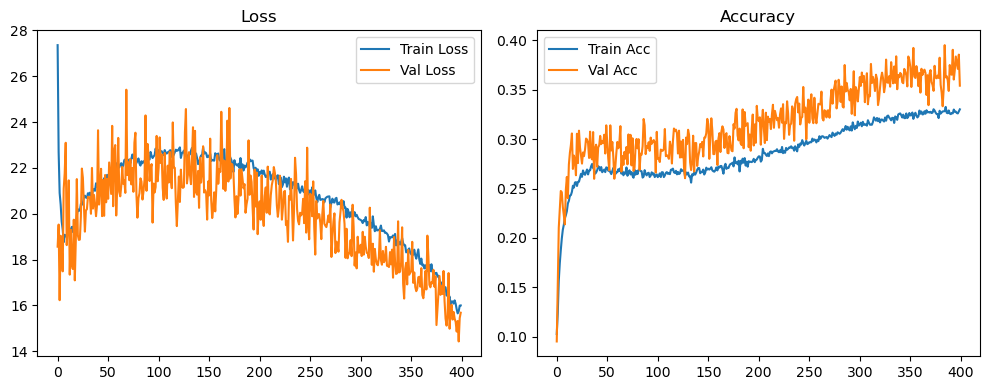

Original Model Final Test Loss: 15.3560 Accuracy: 0.3565


🚀 Running: batch256_lr_max_0.0005_min_1e-06_dp0.0


Files already downloaded and verified


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|                                                                                                                                                                        | 0/400 [00:00<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.1415 | Val Acc: 0.1702 | Epoch Time: 1.92 | :   0%|                                                                                                      | 0/400 [01:55<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.1415 | Val Acc: 0.1702 | Epoch Time: 1.92 | :   0%|                                                                                                      | 0/400 [01:55<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.1415 | Val Acc: 0.1702 | Epoch Time: 1.92 | :   0%|▏                                                                                         | 1/400 [01:55<12:45:41, 115.14s/it]

| LR: 0.000500 | Train Acc: 0.1704 | Val Acc: 0.1780 | Epoch Time: 1.91 | :   0%|▏                                                                                         | 1/400 [03:49<12:45:41, 115.14s/it]

| LR: 0.000500 | Train Acc: 0.1704 | Val Acc: 0.1780 | Epoch Time: 1.91 | :   0%|▏                                                                                         | 1/400 [03:49<12:45:41, 115.14s/it]

| LR: 0.000500 | Train Acc: 0.1704 | Val Acc: 0.1780 | Epoch Time: 1.91 | :   0%|▍                                                                                         | 2/400 [03:50<12:42:43, 114.98s/it]

| LR: 0.000500 | Train Acc: 0.1841 | Val Acc: 0.1866 | Epoch Time: 1.91 | :   0%|▍                                                                                         | 2/400 [05:44<12:42:43, 114.98s/it]

| LR: 0.000500 | Train Acc: 0.1841 | Val Acc: 0.1866 | Epoch Time: 1.91 | :   0%|▍                                                                                         | 2/400 [05:44<12:42:43, 114.98s/it]

| LR: 0.000500 | Train Acc: 0.1841 | Val Acc: 0.1866 | Epoch Time: 1.91 | :   1%|▋                                                                                         | 3/400 [05:44<12:40:31, 114.94s/it]

| LR: 0.000500 | Train Acc: 0.1923 | Val Acc: 0.2140 | Epoch Time: 1.91 | :   1%|▋                                                                                         | 3/400 [07:39<12:40:31, 114.94s/it]

| LR: 0.000500 | Train Acc: 0.1923 | Val Acc: 0.2140 | Epoch Time: 1.91 | :   1%|▋                                                                                         | 3/400 [07:39<12:40:31, 114.94s/it]

| LR: 0.000500 | Train Acc: 0.1923 | Val Acc: 0.2140 | Epoch Time: 1.91 | :   1%|▉                                                                                         | 4/400 [07:39<12:38:28, 114.92s/it]

| LR: 0.000500 | Train Acc: 0.2115 | Val Acc: 0.2406 | Epoch Time: 1.91 | :   1%|▉                                                                                         | 4/400 [09:34<12:38:28, 114.92s/it]

| LR: 0.000500 | Train Acc: 0.2115 | Val Acc: 0.2406 | Epoch Time: 1.91 | :   1%|▉                                                                                         | 4/400 [09:34<12:38:28, 114.92s/it]

| LR: 0.000500 | Train Acc: 0.2115 | Val Acc: 0.2406 | Epoch Time: 1.91 | :   1%|█▏                                                                                        | 5/400 [09:34<12:36:30, 114.91s/it]

| LR: 0.000500 | Train Acc: 0.2210 | Val Acc: 0.2381 | Epoch Time: 1.91 | :   1%|█▏                                                                                        | 5/400 [11:29<12:36:30, 114.91s/it]

| LR: 0.000500 | Train Acc: 0.2210 | Val Acc: 0.2381 | Epoch Time: 1.91 | :   1%|█▏                                                                                        | 5/400 [11:29<12:36:30, 114.91s/it]

| LR: 0.000500 | Train Acc: 0.2210 | Val Acc: 0.2381 | Epoch Time: 1.91 | :   2%|█▎                                                                                        | 6/400 [11:29<12:34:31, 114.90s/it]

| LR: 0.000500 | Train Acc: 0.2237 | Val Acc: 0.2386 | Epoch Time: 1.91 | :   2%|█▎                                                                                        | 6/400 [13:24<12:34:31, 114.90s/it]

| LR: 0.000500 | Train Acc: 0.2237 | Val Acc: 0.2386 | Epoch Time: 1.91 | :   2%|█▎                                                                                        | 6/400 [13:24<12:34:31, 114.90s/it]

| LR: 0.000500 | Train Acc: 0.2237 | Val Acc: 0.2386 | Epoch Time: 1.91 | :   2%|█▌                                                                                        | 7/400 [13:24<12:32:27, 114.88s/it]

| LR: 0.000500 | Train Acc: 0.2348 | Val Acc: 0.2387 | Epoch Time: 1.91 | :   2%|█▌                                                                                        | 7/400 [15:19<12:32:27, 114.88s/it]

| LR: 0.000500 | Train Acc: 0.2348 | Val Acc: 0.2387 | Epoch Time: 1.91 | :   2%|█▌                                                                                        | 7/400 [15:19<12:32:27, 114.88s/it]

| LR: 0.000500 | Train Acc: 0.2348 | Val Acc: 0.2387 | Epoch Time: 1.91 | :   2%|█▊                                                                                        | 8/400 [15:19<12:30:27, 114.87s/it]

| LR: 0.000500 | Train Acc: 0.2400 | Val Acc: 0.2674 | Epoch Time: 1.91 | :   2%|█▊                                                                                        | 8/400 [17:13<12:30:27, 114.87s/it]

| LR: 0.000500 | Train Acc: 0.2400 | Val Acc: 0.2674 | Epoch Time: 1.91 | :   2%|█▊                                                                                        | 8/400 [17:13<12:30:27, 114.87s/it]

| LR: 0.000500 | Train Acc: 0.2400 | Val Acc: 0.2674 | Epoch Time: 1.91 | :   2%|██                                                                                        | 9/400 [17:14<12:28:26, 114.85s/it]

| LR: 0.000499 | Train Acc: 0.2477 | Val Acc: 0.2810 | Epoch Time: 1.91 | :   2%|██                                                                                        | 9/400 [19:08<12:28:26, 114.85s/it]

| LR: 0.000499 | Train Acc: 0.2477 | Val Acc: 0.2810 | Epoch Time: 1.91 | :   2%|██                                                                                        | 9/400 [19:08<12:28:26, 114.85s/it]

| LR: 0.000499 | Train Acc: 0.2477 | Val Acc: 0.2810 | Epoch Time: 1.91 | :   2%|██▏                                                                                      | 10/400 [19:08<12:26:24, 114.83s/it]

| LR: 0.000499 | Train Acc: 0.2482 | Val Acc: 0.2682 | Epoch Time: 1.91 | :   2%|██▏                                                                                      | 10/400 [21:03<12:26:24, 114.83s/it]

| LR: 0.000499 | Train Acc: 0.2482 | Val Acc: 0.2682 | Epoch Time: 1.91 | :   2%|██▏                                                                                      | 10/400 [21:03<12:26:24, 114.83s/it]

| LR: 0.000499 | Train Acc: 0.2482 | Val Acc: 0.2682 | Epoch Time: 1.91 | :   3%|██▍                                                                                      | 11/400 [21:03<12:24:22, 114.81s/it]

| LR: 0.000499 | Train Acc: 0.2510 | Val Acc: 0.2605 | Epoch Time: 1.91 | :   3%|██▍                                                                                      | 11/400 [22:58<12:24:22, 114.81s/it]

| LR: 0.000499 | Train Acc: 0.2510 | Val Acc: 0.2605 | Epoch Time: 1.91 | :   3%|██▍                                                                                      | 11/400 [22:58<12:24:22, 114.81s/it]

| LR: 0.000499 | Train Acc: 0.2510 | Val Acc: 0.2605 | Epoch Time: 1.91 | :   3%|██▋                                                                                      | 12/400 [22:58<12:22:28, 114.82s/it]

| LR: 0.000499 | Train Acc: 0.2612 | Val Acc: 0.2677 | Epoch Time: 1.91 | :   3%|██▋                                                                                      | 12/400 [24:53<12:22:28, 114.82s/it]

| LR: 0.000499 | Train Acc: 0.2612 | Val Acc: 0.2677 | Epoch Time: 1.91 | :   3%|██▋                                                                                      | 12/400 [24:53<12:22:28, 114.82s/it]

| LR: 0.000499 | Train Acc: 0.2612 | Val Acc: 0.2677 | Epoch Time: 1.91 | :   3%|██▉                                                                                      | 13/400 [24:53<12:20:35, 114.82s/it]

| LR: 0.000499 | Train Acc: 0.2640 | Val Acc: 0.2702 | Epoch Time: 1.91 | :   3%|██▉                                                                                      | 13/400 [26:47<12:20:35, 114.82s/it]

| LR: 0.000499 | Train Acc: 0.2640 | Val Acc: 0.2702 | Epoch Time: 1.91 | :   3%|██▉                                                                                      | 13/400 [26:47<12:20:35, 114.82s/it]

| LR: 0.000499 | Train Acc: 0.2640 | Val Acc: 0.2702 | Epoch Time: 1.91 | :   4%|███                                                                                      | 14/400 [26:48<12:18:32, 114.80s/it]

| LR: 0.000498 | Train Acc: 0.2703 | Val Acc: 0.2868 | Epoch Time: 1.91 | :   4%|███                                                                                      | 14/400 [28:42<12:18:32, 114.80s/it]

| LR: 0.000498 | Train Acc: 0.2703 | Val Acc: 0.2868 | Epoch Time: 1.91 | :   4%|███                                                                                      | 14/400 [28:42<12:18:32, 114.80s/it]

| LR: 0.000498 | Train Acc: 0.2703 | Val Acc: 0.2868 | Epoch Time: 1.91 | :   4%|███▎                                                                                     | 15/400 [28:42<12:16:33, 114.79s/it]

| LR: 0.000498 | Train Acc: 0.2759 | Val Acc: 0.2998 | Epoch Time: 1.91 | :   4%|███▎                                                                                     | 15/400 [30:37<12:16:33, 114.79s/it]

| LR: 0.000498 | Train Acc: 0.2759 | Val Acc: 0.2998 | Epoch Time: 1.91 | :   4%|███▎                                                                                     | 15/400 [30:37<12:16:33, 114.79s/it]

| LR: 0.000498 | Train Acc: 0.2759 | Val Acc: 0.2998 | Epoch Time: 1.91 | :   4%|███▌                                                                                     | 16/400 [30:37<12:14:35, 114.78s/it]

| LR: 0.000498 | Train Acc: 0.2810 | Val Acc: 0.2770 | Epoch Time: 1.91 | :   4%|███▌                                                                                     | 16/400 [32:32<12:14:35, 114.78s/it]

| LR: 0.000498 | Train Acc: 0.2810 | Val Acc: 0.2770 | Epoch Time: 1.91 | :   4%|███▌                                                                                     | 16/400 [32:32<12:14:35, 114.78s/it]

| LR: 0.000498 | Train Acc: 0.2810 | Val Acc: 0.2770 | Epoch Time: 1.91 | :   4%|███▊                                                                                     | 17/400 [32:32<12:12:37, 114.77s/it]

| LR: 0.000498 | Train Acc: 0.2854 | Val Acc: 0.2950 | Epoch Time: 1.91 | :   4%|███▊                                                                                     | 17/400 [34:26<12:12:37, 114.77s/it]

| LR: 0.000498 | Train Acc: 0.2854 | Val Acc: 0.2950 | Epoch Time: 1.91 | :   4%|███▊                                                                                     | 17/400 [34:26<12:12:37, 114.77s/it]

| LR: 0.000498 | Train Acc: 0.2854 | Val Acc: 0.2950 | Epoch Time: 1.91 | :   4%|████                                                                                     | 18/400 [34:27<12:10:40, 114.77s/it]

| LR: 0.000498 | Train Acc: 0.2878 | Val Acc: 0.3121 | Epoch Time: 1.91 | :   4%|████                                                                                     | 18/400 [36:21<12:10:40, 114.77s/it]

| LR: 0.000498 | Train Acc: 0.2878 | Val Acc: 0.3121 | Epoch Time: 1.91 | :   4%|████                                                                                     | 18/400 [36:21<12:10:40, 114.77s/it]

| LR: 0.000498 | Train Acc: 0.2878 | Val Acc: 0.3121 | Epoch Time: 1.91 | :   5%|████▏                                                                                    | 19/400 [36:21<12:08:46, 114.77s/it]

| LR: 0.000497 | Train Acc: 0.2966 | Val Acc: 0.3187 | Epoch Time: 1.91 | :   5%|████▏                                                                                    | 19/400 [38:16<12:08:46, 114.77s/it]

| LR: 0.000497 | Train Acc: 0.2966 | Val Acc: 0.3187 | Epoch Time: 1.91 | :   5%|████▏                                                                                    | 19/400 [38:16<12:08:46, 114.77s/it]

| LR: 0.000497 | Train Acc: 0.2966 | Val Acc: 0.3187 | Epoch Time: 1.91 | :   5%|████▍                                                                                    | 20/400 [38:16<12:06:51, 114.77s/it]

| LR: 0.000497 | Train Acc: 0.3031 | Val Acc: 0.3393 | Epoch Time: 1.91 | :   5%|████▍                                                                                    | 20/400 [40:11<12:06:51, 114.77s/it]

| LR: 0.000497 | Train Acc: 0.3031 | Val Acc: 0.3393 | Epoch Time: 1.91 | :   5%|████▍                                                                                    | 20/400 [40:11<12:06:51, 114.77s/it]

| LR: 0.000497 | Train Acc: 0.3031 | Val Acc: 0.3393 | Epoch Time: 1.91 | :   5%|████▋                                                                                    | 21/400 [40:11<12:04:57, 114.77s/it]

| LR: 0.000497 | Train Acc: 0.3098 | Val Acc: 0.3487 | Epoch Time: 1.91 | :   5%|████▋                                                                                    | 21/400 [42:06<12:04:57, 114.77s/it]

| LR: 0.000497 | Train Acc: 0.3098 | Val Acc: 0.3487 | Epoch Time: 1.91 | :   5%|████▋                                                                                    | 21/400 [42:06<12:04:57, 114.77s/it]

| LR: 0.000497 | Train Acc: 0.3098 | Val Acc: 0.3487 | Epoch Time: 1.91 | :   6%|████▉                                                                                    | 22/400 [42:06<12:03:10, 114.79s/it]

| LR: 0.000496 | Train Acc: 0.3191 | Val Acc: 0.3259 | Epoch Time: 1.91 | :   6%|████▉                                                                                    | 22/400 [44:00<12:03:10, 114.79s/it]

| LR: 0.000496 | Train Acc: 0.3191 | Val Acc: 0.3259 | Epoch Time: 1.91 | :   6%|████▉                                                                                    | 22/400 [44:00<12:03:10, 114.79s/it]

| LR: 0.000496 | Train Acc: 0.3191 | Val Acc: 0.3259 | Epoch Time: 1.91 | :   6%|█████                                                                                    | 23/400 [44:01<12:01:17, 114.79s/it]

| LR: 0.000496 | Train Acc: 0.3222 | Val Acc: 0.3565 | Epoch Time: 1.91 | :   6%|█████                                                                                    | 23/400 [45:55<12:01:17, 114.79s/it]

| LR: 0.000496 | Train Acc: 0.3222 | Val Acc: 0.3565 | Epoch Time: 1.91 | :   6%|█████                                                                                    | 23/400 [45:55<12:01:17, 114.79s/it]

| LR: 0.000496 | Train Acc: 0.3222 | Val Acc: 0.3565 | Epoch Time: 1.91 | :   6%|█████▎                                                                                   | 24/400 [45:55<11:59:20, 114.79s/it]

| LR: 0.000496 | Train Acc: 0.3293 | Val Acc: 0.3631 | Epoch Time: 1.91 | :   6%|█████▎                                                                                   | 24/400 [47:50<11:59:20, 114.79s/it]

| LR: 0.000496 | Train Acc: 0.3293 | Val Acc: 0.3631 | Epoch Time: 1.91 | :   6%|█████▎                                                                                   | 24/400 [47:50<11:59:20, 114.79s/it]

| LR: 0.000496 | Train Acc: 0.3293 | Val Acc: 0.3631 | Epoch Time: 1.91 | :   6%|█████▌                                                                                   | 25/400 [47:50<11:57:22, 114.78s/it]

| LR: 0.000495 | Train Acc: 0.3393 | Val Acc: 0.3766 | Epoch Time: 1.91 | :   6%|█████▌                                                                                   | 25/400 [49:45<11:57:22, 114.78s/it]

| LR: 0.000495 | Train Acc: 0.3393 | Val Acc: 0.3766 | Epoch Time: 1.91 | :   6%|█████▌                                                                                   | 25/400 [49:45<11:57:22, 114.78s/it]

| LR: 0.000495 | Train Acc: 0.3393 | Val Acc: 0.3766 | Epoch Time: 1.91 | :   6%|█████▊                                                                                   | 26/400 [49:45<11:55:25, 114.77s/it]

| LR: 0.000495 | Train Acc: 0.3442 | Val Acc: 0.3543 | Epoch Time: 1.91 | :   6%|█████▊                                                                                   | 26/400 [51:39<11:55:25, 114.77s/it]

| LR: 0.000495 | Train Acc: 0.3442 | Val Acc: 0.3543 | Epoch Time: 1.91 | :   6%|█████▊                                                                                   | 26/400 [51:39<11:55:25, 114.77s/it]

| LR: 0.000495 | Train Acc: 0.3442 | Val Acc: 0.3543 | Epoch Time: 1.91 | :   7%|██████                                                                                   | 27/400 [51:40<11:53:27, 114.76s/it]

| LR: 0.000494 | Train Acc: 0.3521 | Val Acc: 0.3594 | Epoch Time: 1.91 | :   7%|██████                                                                                   | 27/400 [53:34<11:53:27, 114.76s/it]

| LR: 0.000494 | Train Acc: 0.3521 | Val Acc: 0.3594 | Epoch Time: 1.91 | :   7%|██████                                                                                   | 27/400 [53:34<11:53:27, 114.76s/it]

| LR: 0.000494 | Train Acc: 0.3521 | Val Acc: 0.3594 | Epoch Time: 1.91 | :   7%|██████▏                                                                                  | 28/400 [53:34<11:51:30, 114.76s/it]

| LR: 0.000494 | Train Acc: 0.3472 | Val Acc: 0.3859 | Epoch Time: 1.91 | :   7%|██████▏                                                                                  | 28/400 [55:29<11:51:30, 114.76s/it]

| LR: 0.000494 | Train Acc: 0.3472 | Val Acc: 0.3859 | Epoch Time: 1.91 | :   7%|██████▏                                                                                  | 28/400 [55:29<11:51:30, 114.76s/it]

| LR: 0.000494 | Train Acc: 0.3472 | Val Acc: 0.3859 | Epoch Time: 1.91 | :   7%|██████▍                                                                                  | 29/400 [55:29<11:49:35, 114.76s/it]

| LR: 0.000494 | Train Acc: 0.3595 | Val Acc: 0.3878 | Epoch Time: 1.91 | :   7%|██████▍                                                                                  | 29/400 [57:24<11:49:35, 114.76s/it]

| LR: 0.000494 | Train Acc: 0.3595 | Val Acc: 0.3878 | Epoch Time: 1.91 | :   7%|██████▍                                                                                  | 29/400 [57:24<11:49:35, 114.76s/it]

| LR: 0.000494 | Train Acc: 0.3595 | Val Acc: 0.3878 | Epoch Time: 1.91 | :   8%|██████▋                                                                                  | 30/400 [57:24<11:47:43, 114.77s/it]

| LR: 0.000493 | Train Acc: 0.3542 | Val Acc: 0.3807 | Epoch Time: 1.91 | :   8%|██████▋                                                                                  | 30/400 [59:18<11:47:43, 114.77s/it]

| LR: 0.000493 | Train Acc: 0.3542 | Val Acc: 0.3807 | Epoch Time: 1.91 | :   8%|██████▋                                                                                  | 30/400 [59:19<11:47:43, 114.77s/it]

| LR: 0.000493 | Train Acc: 0.3542 | Val Acc: 0.3807 | Epoch Time: 1.91 | :   8%|██████▉                                                                                  | 31/400 [59:19<11:45:49, 114.77s/it]

| LR: 0.000493 | Train Acc: 0.3616 | Val Acc: 0.3711 | Epoch Time: 1.91 | :   8%|██████▋                                                                                | 31/400 [1:01:13<11:45:49, 114.77s/it]

| LR: 0.000493 | Train Acc: 0.3616 | Val Acc: 0.3711 | Epoch Time: 1.91 | :   8%|██████▋                                                                                | 31/400 [1:01:13<11:45:49, 114.77s/it]

| LR: 0.000493 | Train Acc: 0.3616 | Val Acc: 0.3711 | Epoch Time: 1.91 | :   8%|██████▉                                                                                | 32/400 [1:01:13<11:43:52, 114.76s/it]

| LR: 0.000492 | Train Acc: 0.3628 | Val Acc: 0.3890 | Epoch Time: 1.91 | :   8%|██████▉                                                                                | 32/400 [1:03:08<11:43:52, 114.76s/it]

| LR: 0.000492 | Train Acc: 0.3628 | Val Acc: 0.3890 | Epoch Time: 1.91 | :   8%|██████▉                                                                                | 32/400 [1:03:08<11:43:52, 114.76s/it]

| LR: 0.000492 | Train Acc: 0.3628 | Val Acc: 0.3890 | Epoch Time: 1.91 | :   8%|███████▏                                                                               | 33/400 [1:03:08<11:41:58, 114.76s/it]

| LR: 0.000492 | Train Acc: 0.3705 | Val Acc: 0.3987 | Epoch Time: 1.91 | :   8%|███████▏                                                                               | 33/400 [1:05:03<11:41:58, 114.76s/it]

| LR: 0.000492 | Train Acc: 0.3705 | Val Acc: 0.3987 | Epoch Time: 1.91 | :   8%|███████▏                                                                               | 33/400 [1:05:03<11:41:58, 114.76s/it]

| LR: 0.000492 | Train Acc: 0.3705 | Val Acc: 0.3987 | Epoch Time: 1.91 | :   8%|███████▍                                                                               | 34/400 [1:05:03<11:40:04, 114.77s/it]

| LR: 0.000491 | Train Acc: 0.3689 | Val Acc: 0.3754 | Epoch Time: 1.91 | :   8%|███████▍                                                                               | 34/400 [1:06:58<11:40:04, 114.77s/it]

| LR: 0.000491 | Train Acc: 0.3689 | Val Acc: 0.3754 | Epoch Time: 1.91 | :   8%|███████▍                                                                               | 34/400 [1:06:58<11:40:04, 114.77s/it]

| LR: 0.000491 | Train Acc: 0.3689 | Val Acc: 0.3754 | Epoch Time: 1.91 | :   9%|███████▌                                                                               | 35/400 [1:06:58<11:38:09, 114.77s/it]

| LR: 0.000491 | Train Acc: 0.3794 | Val Acc: 0.4013 | Epoch Time: 1.91 | :   9%|███████▌                                                                               | 35/400 [1:08:52<11:38:09, 114.77s/it]

| LR: 0.000491 | Train Acc: 0.3794 | Val Acc: 0.4013 | Epoch Time: 1.91 | :   9%|███████▌                                                                               | 35/400 [1:08:52<11:38:09, 114.77s/it]

| LR: 0.000491 | Train Acc: 0.3794 | Val Acc: 0.4013 | Epoch Time: 1.91 | :   9%|███████▊                                                                               | 36/400 [1:08:52<11:36:15, 114.77s/it]

| LR: 0.000490 | Train Acc: 0.3787 | Val Acc: 0.3874 | Epoch Time: 1.91 | :   9%|███████▊                                                                               | 36/400 [1:10:47<11:36:15, 114.77s/it]

| LR: 0.000490 | Train Acc: 0.3787 | Val Acc: 0.3874 | Epoch Time: 1.91 | :   9%|███████▊                                                                               | 36/400 [1:10:47<11:36:15, 114.77s/it]

| LR: 0.000490 | Train Acc: 0.3787 | Val Acc: 0.3874 | Epoch Time: 1.91 | :   9%|████████                                                                               | 37/400 [1:10:47<11:34:19, 114.76s/it]

| LR: 0.000490 | Train Acc: 0.3795 | Val Acc: 0.4068 | Epoch Time: 1.91 | :   9%|████████                                                                               | 37/400 [1:12:42<11:34:19, 114.76s/it]

| LR: 0.000490 | Train Acc: 0.3795 | Val Acc: 0.4068 | Epoch Time: 1.91 | :   9%|████████                                                                               | 37/400 [1:12:42<11:34:19, 114.76s/it]

| LR: 0.000490 | Train Acc: 0.3795 | Val Acc: 0.4068 | Epoch Time: 1.91 | :  10%|████████▎                                                                              | 38/400 [1:12:42<11:32:25, 114.77s/it]

| LR: 0.000489 | Train Acc: 0.3815 | Val Acc: 0.4035 | Epoch Time: 1.91 | :  10%|████████▎                                                                              | 38/400 [1:14:37<11:32:25, 114.77s/it]

| LR: 0.000489 | Train Acc: 0.3815 | Val Acc: 0.4035 | Epoch Time: 1.91 | :  10%|████████▎                                                                              | 38/400 [1:14:37<11:32:25, 114.77s/it]

| LR: 0.000489 | Train Acc: 0.3815 | Val Acc: 0.4035 | Epoch Time: 1.91 | :  10%|████████▍                                                                              | 39/400 [1:14:37<11:30:29, 114.76s/it]

| LR: 0.000488 | Train Acc: 0.3857 | Val Acc: 0.4095 | Epoch Time: 1.91 | :  10%|████████▍                                                                              | 39/400 [1:16:31<11:30:29, 114.76s/it]

| LR: 0.000488 | Train Acc: 0.3857 | Val Acc: 0.4095 | Epoch Time: 1.91 | :  10%|████████▍                                                                              | 39/400 [1:16:31<11:30:29, 114.76s/it]

| LR: 0.000488 | Train Acc: 0.3857 | Val Acc: 0.4095 | Epoch Time: 1.91 | :  10%|████████▋                                                                              | 40/400 [1:16:31<11:28:35, 114.77s/it]

| LR: 0.000488 | Train Acc: 0.3906 | Val Acc: 0.4025 | Epoch Time: 1.91 | :  10%|████████▋                                                                              | 40/400 [1:18:26<11:28:35, 114.77s/it]

| LR: 0.000488 | Train Acc: 0.3906 | Val Acc: 0.4025 | Epoch Time: 1.91 | :  10%|████████▋                                                                              | 40/400 [1:18:26<11:28:35, 114.77s/it]

| LR: 0.000488 | Train Acc: 0.3906 | Val Acc: 0.4025 | Epoch Time: 1.91 | :  10%|████████▉                                                                              | 41/400 [1:18:26<11:26:41, 114.77s/it]

| LR: 0.000487 | Train Acc: 0.3866 | Val Acc: 0.3828 | Epoch Time: 1.91 | :  10%|████████▉                                                                              | 41/400 [1:20:21<11:26:41, 114.77s/it]

| LR: 0.000487 | Train Acc: 0.3866 | Val Acc: 0.3828 | Epoch Time: 1.91 | :  10%|████████▉                                                                              | 41/400 [1:20:21<11:26:41, 114.77s/it]

| LR: 0.000487 | Train Acc: 0.3866 | Val Acc: 0.3828 | Epoch Time: 1.91 | :  10%|█████████▏                                                                             | 42/400 [1:20:21<11:24:45, 114.76s/it]

| LR: 0.000487 | Train Acc: 0.3913 | Val Acc: 0.4192 | Epoch Time: 1.91 | :  10%|█████████▏                                                                             | 42/400 [1:22:16<11:24:45, 114.76s/it]

| LR: 0.000487 | Train Acc: 0.3913 | Val Acc: 0.4192 | Epoch Time: 1.91 | :  10%|█████████▏                                                                             | 42/400 [1:22:16<11:24:45, 114.76s/it]

| LR: 0.000487 | Train Acc: 0.3913 | Val Acc: 0.4192 | Epoch Time: 1.91 | :  11%|█████████▎                                                                             | 43/400 [1:22:16<11:22:51, 114.77s/it]

| LR: 0.000486 | Train Acc: 0.3958 | Val Acc: 0.4240 | Epoch Time: 1.91 | :  11%|█████████▎                                                                             | 43/400 [1:24:10<11:22:51, 114.77s/it]

| LR: 0.000486 | Train Acc: 0.3958 | Val Acc: 0.4240 | Epoch Time: 1.91 | :  11%|█████████▎                                                                             | 43/400 [1:24:10<11:22:51, 114.77s/it]

| LR: 0.000486 | Train Acc: 0.3958 | Val Acc: 0.4240 | Epoch Time: 1.91 | :  11%|█████████▌                                                                             | 44/400 [1:24:11<11:20:56, 114.77s/it]

| LR: 0.000485 | Train Acc: 0.3981 | Val Acc: 0.4179 | Epoch Time: 1.91 | :  11%|█████████▌                                                                             | 44/400 [1:26:05<11:20:56, 114.77s/it]

| LR: 0.000485 | Train Acc: 0.3981 | Val Acc: 0.4179 | Epoch Time: 1.91 | :  11%|█████████▌                                                                             | 44/400 [1:26:05<11:20:56, 114.77s/it]

| LR: 0.000485 | Train Acc: 0.3981 | Val Acc: 0.4179 | Epoch Time: 1.91 | :  11%|█████████▊                                                                             | 45/400 [1:26:05<11:19:00, 114.76s/it]

| LR: 0.000485 | Train Acc: 0.3923 | Val Acc: 0.4261 | Epoch Time: 1.91 | :  11%|█████████▊                                                                             | 45/400 [1:28:00<11:19:00, 114.76s/it]

| LR: 0.000485 | Train Acc: 0.3923 | Val Acc: 0.4261 | Epoch Time: 1.91 | :  11%|█████████▊                                                                             | 45/400 [1:28:00<11:19:00, 114.76s/it]

| LR: 0.000485 | Train Acc: 0.3923 | Val Acc: 0.4261 | Epoch Time: 1.91 | :  12%|██████████                                                                             | 46/400 [1:28:00<11:17:06, 114.76s/it]

| LR: 0.000484 | Train Acc: 0.3975 | Val Acc: 0.4221 | Epoch Time: 1.91 | :  12%|██████████                                                                             | 46/400 [1:29:55<11:17:06, 114.76s/it]

| LR: 0.000484 | Train Acc: 0.3975 | Val Acc: 0.4221 | Epoch Time: 1.91 | :  12%|██████████                                                                             | 46/400 [1:29:55<11:17:06, 114.76s/it]

| LR: 0.000484 | Train Acc: 0.3975 | Val Acc: 0.4221 | Epoch Time: 1.91 | :  12%|██████████▏                                                                            | 47/400 [1:29:55<11:15:16, 114.78s/it]

| LR: 0.000483 | Train Acc: 0.4011 | Val Acc: 0.4315 | Epoch Time: 1.91 | :  12%|██████████▏                                                                            | 47/400 [1:31:50<11:15:16, 114.78s/it]

| LR: 0.000483 | Train Acc: 0.4011 | Val Acc: 0.4315 | Epoch Time: 1.91 | :  12%|██████████▏                                                                            | 47/400 [1:31:50<11:15:16, 114.78s/it]

| LR: 0.000483 | Train Acc: 0.4011 | Val Acc: 0.4315 | Epoch Time: 1.91 | :  12%|██████████▍                                                                            | 48/400 [1:31:50<11:13:20, 114.78s/it]

| LR: 0.000482 | Train Acc: 0.3965 | Val Acc: 0.4202 | Epoch Time: 1.91 | :  12%|██████████▍                                                                            | 48/400 [1:33:44<11:13:20, 114.78s/it]

| LR: 0.000482 | Train Acc: 0.3965 | Val Acc: 0.4202 | Epoch Time: 1.91 | :  12%|██████████▍                                                                            | 48/400 [1:33:44<11:13:20, 114.78s/it]

| LR: 0.000482 | Train Acc: 0.3965 | Val Acc: 0.4202 | Epoch Time: 1.91 | :  12%|██████████▋                                                                            | 49/400 [1:33:44<11:11:29, 114.79s/it]

| LR: 0.000482 | Train Acc: 0.4054 | Val Acc: 0.4157 | Epoch Time: 1.91 | :  12%|██████████▋                                                                            | 49/400 [1:35:39<11:11:29, 114.79s/it]

| LR: 0.000482 | Train Acc: 0.4054 | Val Acc: 0.4157 | Epoch Time: 1.91 | :  12%|██████████▋                                                                            | 49/400 [1:35:39<11:11:29, 114.79s/it]

| LR: 0.000482 | Train Acc: 0.4054 | Val Acc: 0.4157 | Epoch Time: 1.91 | :  12%|██████████▉                                                                            | 50/400 [1:35:39<11:09:33, 114.78s/it]

| LR: 0.000481 | Train Acc: 0.4071 | Val Acc: 0.3999 | Epoch Time: 1.91 | :  12%|██████████▉                                                                            | 50/400 [1:37:34<11:09:33, 114.78s/it]

| LR: 0.000481 | Train Acc: 0.4071 | Val Acc: 0.3999 | Epoch Time: 1.91 | :  12%|██████████▉                                                                            | 50/400 [1:37:34<11:09:33, 114.78s/it]

| LR: 0.000481 | Train Acc: 0.4071 | Val Acc: 0.3999 | Epoch Time: 1.91 | :  13%|███████████                                                                            | 51/400 [1:37:34<11:07:37, 114.78s/it]

| LR: 0.000480 | Train Acc: 0.4062 | Val Acc: 0.4114 | Epoch Time: 1.91 | :  13%|███████████                                                                            | 51/400 [1:39:29<11:07:37, 114.78s/it]

| LR: 0.000480 | Train Acc: 0.4062 | Val Acc: 0.4114 | Epoch Time: 1.91 | :  13%|███████████                                                                            | 51/400 [1:39:29<11:07:37, 114.78s/it]

| LR: 0.000480 | Train Acc: 0.4062 | Val Acc: 0.4114 | Epoch Time: 1.91 | :  13%|███████████▎                                                                           | 52/400 [1:39:29<11:05:44, 114.78s/it]

| LR: 0.000479 | Train Acc: 0.4051 | Val Acc: 0.4275 | Epoch Time: 1.91 | :  13%|███████████▎                                                                           | 52/400 [1:41:23<11:05:44, 114.78s/it]

| LR: 0.000479 | Train Acc: 0.4051 | Val Acc: 0.4275 | Epoch Time: 1.91 | :  13%|███████████▎                                                                           | 52/400 [1:41:23<11:05:44, 114.78s/it]

| LR: 0.000479 | Train Acc: 0.4051 | Val Acc: 0.4275 | Epoch Time: 1.91 | :  13%|███████████▌                                                                           | 53/400 [1:41:24<11:03:48, 114.78s/it]

| LR: 0.000479 | Train Acc: 0.4109 | Val Acc: 0.4299 | Epoch Time: 1.91 | :  13%|███████████▌                                                                           | 53/400 [1:43:18<11:03:48, 114.78s/it]

| LR: 0.000479 | Train Acc: 0.4109 | Val Acc: 0.4299 | Epoch Time: 1.91 | :  13%|███████████▌                                                                           | 53/400 [1:43:18<11:03:48, 114.78s/it]

| LR: 0.000479 | Train Acc: 0.4109 | Val Acc: 0.4299 | Epoch Time: 1.91 | :  14%|███████████▋                                                                           | 54/400 [1:43:18<11:01:53, 114.78s/it]

| LR: 0.000478 | Train Acc: 0.4120 | Val Acc: 0.4065 | Epoch Time: 1.91 | :  14%|███████████▋                                                                           | 54/400 [1:45:13<11:01:53, 114.78s/it]

| LR: 0.000478 | Train Acc: 0.4120 | Val Acc: 0.4065 | Epoch Time: 1.91 | :  14%|███████████▋                                                                           | 54/400 [1:45:13<11:01:53, 114.78s/it]

| LR: 0.000478 | Train Acc: 0.4120 | Val Acc: 0.4065 | Epoch Time: 1.91 | :  14%|███████████▉                                                                           | 55/400 [1:45:13<11:00:02, 114.79s/it]

| LR: 0.000477 | Train Acc: 0.4141 | Val Acc: 0.3956 | Epoch Time: 1.91 | :  14%|███████████▉                                                                           | 55/400 [1:47:08<11:00:02, 114.79s/it]

| LR: 0.000477 | Train Acc: 0.4141 | Val Acc: 0.3956 | Epoch Time: 1.91 | :  14%|███████████▉                                                                           | 55/400 [1:47:08<11:00:02, 114.79s/it]

| LR: 0.000477 | Train Acc: 0.4141 | Val Acc: 0.3956 | Epoch Time: 1.91 | :  14%|████████████▏                                                                          | 56/400 [1:47:08<10:58:11, 114.80s/it]

| LR: 0.000476 | Train Acc: 0.4155 | Val Acc: 0.4208 | Epoch Time: 1.91 | :  14%|████████████▏                                                                          | 56/400 [1:49:03<10:58:11, 114.80s/it]

| LR: 0.000476 | Train Acc: 0.4155 | Val Acc: 0.4208 | Epoch Time: 1.91 | :  14%|████████████▏                                                                          | 56/400 [1:49:03<10:58:11, 114.80s/it]

| LR: 0.000476 | Train Acc: 0.4155 | Val Acc: 0.4208 | Epoch Time: 1.91 | :  14%|████████████▍                                                                          | 57/400 [1:49:03<10:56:17, 114.80s/it]

| LR: 0.000475 | Train Acc: 0.4159 | Val Acc: 0.4168 | Epoch Time: 1.91 | :  14%|████████████▍                                                                          | 57/400 [1:50:58<10:56:17, 114.80s/it]

| LR: 0.000475 | Train Acc: 0.4159 | Val Acc: 0.4168 | Epoch Time: 1.91 | :  14%|████████████▍                                                                          | 57/400 [1:50:58<10:56:17, 114.80s/it]

| LR: 0.000475 | Train Acc: 0.4159 | Val Acc: 0.4168 | Epoch Time: 1.91 | :  14%|████████████▌                                                                          | 58/400 [1:50:58<10:54:28, 114.82s/it]

| LR: 0.000475 | Train Acc: 0.4151 | Val Acc: 0.4400 | Epoch Time: 1.91 | :  14%|████████████▌                                                                          | 58/400 [1:52:52<10:54:28, 114.82s/it]

| LR: 0.000475 | Train Acc: 0.4151 | Val Acc: 0.4400 | Epoch Time: 1.91 | :  14%|████████████▌                                                                          | 58/400 [1:52:52<10:54:28, 114.82s/it]

| LR: 0.000475 | Train Acc: 0.4151 | Val Acc: 0.4400 | Epoch Time: 1.91 | :  15%|████████████▊                                                                          | 59/400 [1:52:52<10:52:28, 114.81s/it]

| LR: 0.000474 | Train Acc: 0.4152 | Val Acc: 0.4374 | Epoch Time: 1.91 | :  15%|████████████▊                                                                          | 59/400 [1:54:47<10:52:28, 114.81s/it]

| LR: 0.000474 | Train Acc: 0.4152 | Val Acc: 0.4374 | Epoch Time: 1.91 | :  15%|████████████▊                                                                          | 59/400 [1:54:47<10:52:28, 114.81s/it]

| LR: 0.000474 | Train Acc: 0.4152 | Val Acc: 0.4374 | Epoch Time: 1.91 | :  15%|█████████████                                                                          | 60/400 [1:54:47<10:50:30, 114.80s/it]

| LR: 0.000473 | Train Acc: 0.4162 | Val Acc: 0.4302 | Epoch Time: 1.91 | :  15%|█████████████                                                                          | 60/400 [1:56:42<10:50:30, 114.80s/it]

| LR: 0.000473 | Train Acc: 0.4162 | Val Acc: 0.4302 | Epoch Time: 1.91 | :  15%|█████████████                                                                          | 60/400 [1:56:42<10:50:30, 114.80s/it]

| LR: 0.000473 | Train Acc: 0.4162 | Val Acc: 0.4302 | Epoch Time: 1.91 | :  15%|█████████████▎                                                                         | 61/400 [1:56:42<10:48:33, 114.79s/it]

| LR: 0.000472 | Train Acc: 0.4189 | Val Acc: 0.4504 | Epoch Time: 1.91 | :  15%|█████████████▎                                                                         | 61/400 [1:58:37<10:48:33, 114.79s/it]

| LR: 0.000472 | Train Acc: 0.4189 | Val Acc: 0.4504 | Epoch Time: 1.91 | :  15%|█████████████▎                                                                         | 61/400 [1:58:37<10:48:33, 114.79s/it]

| LR: 0.000472 | Train Acc: 0.4189 | Val Acc: 0.4504 | Epoch Time: 1.91 | :  16%|█████████████▍                                                                         | 62/400 [1:58:37<10:46:36, 114.78s/it]

| LR: 0.000471 | Train Acc: 0.4213 | Val Acc: 0.4302 | Epoch Time: 1.91 | :  16%|█████████████▍                                                                         | 62/400 [2:00:31<10:46:36, 114.78s/it]

| LR: 0.000471 | Train Acc: 0.4213 | Val Acc: 0.4302 | Epoch Time: 1.91 | :  16%|█████████████▍                                                                         | 62/400 [2:00:31<10:46:36, 114.78s/it]

| LR: 0.000471 | Train Acc: 0.4213 | Val Acc: 0.4302 | Epoch Time: 1.91 | :  16%|█████████████▋                                                                         | 63/400 [2:00:32<10:44:40, 114.78s/it]

| LR: 0.000470 | Train Acc: 0.4192 | Val Acc: 0.4258 | Epoch Time: 1.91 | :  16%|█████████████▋                                                                         | 63/400 [2:02:26<10:44:40, 114.78s/it]

| LR: 0.000470 | Train Acc: 0.4192 | Val Acc: 0.4258 | Epoch Time: 1.91 | :  16%|█████████████▋                                                                         | 63/400 [2:02:26<10:44:40, 114.78s/it]

| LR: 0.000470 | Train Acc: 0.4192 | Val Acc: 0.4258 | Epoch Time: 1.91 | :  16%|█████████████▉                                                                         | 64/400 [2:02:26<10:42:47, 114.78s/it]

| LR: 0.000469 | Train Acc: 0.4193 | Val Acc: 0.4465 | Epoch Time: 1.91 | :  16%|█████████████▉                                                                         | 64/400 [2:04:21<10:42:47, 114.78s/it]

| LR: 0.000469 | Train Acc: 0.4193 | Val Acc: 0.4465 | Epoch Time: 1.91 | :  16%|█████████████▉                                                                         | 64/400 [2:04:21<10:42:47, 114.78s/it]

| LR: 0.000469 | Train Acc: 0.4193 | Val Acc: 0.4465 | Epoch Time: 1.91 | :  16%|██████████████▏                                                                        | 65/400 [2:04:21<10:40:53, 114.79s/it]

| LR: 0.000468 | Train Acc: 0.4234 | Val Acc: 0.4419 | Epoch Time: 1.91 | :  16%|██████████████▏                                                                        | 65/400 [2:06:16<10:40:53, 114.79s/it]

| LR: 0.000468 | Train Acc: 0.4234 | Val Acc: 0.4419 | Epoch Time: 1.91 | :  16%|██████████████▏                                                                        | 65/400 [2:06:16<10:40:53, 114.79s/it]

| LR: 0.000468 | Train Acc: 0.4234 | Val Acc: 0.4419 | Epoch Time: 1.91 | :  16%|██████████████▎                                                                        | 66/400 [2:06:16<10:38:56, 114.78s/it]

| LR: 0.000467 | Train Acc: 0.4228 | Val Acc: 0.4492 | Epoch Time: 1.91 | :  16%|██████████████▎                                                                        | 66/400 [2:08:11<10:38:56, 114.78s/it]

| LR: 0.000467 | Train Acc: 0.4228 | Val Acc: 0.4492 | Epoch Time: 1.91 | :  16%|██████████████▎                                                                        | 66/400 [2:08:11<10:38:56, 114.78s/it]

| LR: 0.000467 | Train Acc: 0.4228 | Val Acc: 0.4492 | Epoch Time: 1.91 | :  17%|██████████████▌                                                                        | 67/400 [2:08:11<10:37:01, 114.78s/it]

| LR: 0.000466 | Train Acc: 0.4269 | Val Acc: 0.4402 | Epoch Time: 1.91 | :  17%|██████████████▌                                                                        | 67/400 [2:10:05<10:37:01, 114.78s/it]

| LR: 0.000466 | Train Acc: 0.4269 | Val Acc: 0.4402 | Epoch Time: 1.91 | :  17%|██████████████▌                                                                        | 67/400 [2:10:05<10:37:01, 114.78s/it]

| LR: 0.000466 | Train Acc: 0.4269 | Val Acc: 0.4402 | Epoch Time: 1.91 | :  17%|██████████████▊                                                                        | 68/400 [2:10:05<10:35:08, 114.78s/it]

| LR: 0.000465 | Train Acc: 0.4209 | Val Acc: 0.4350 | Epoch Time: 1.91 | :  17%|██████████████▊                                                                        | 68/400 [2:12:00<10:35:08, 114.78s/it]

| LR: 0.000465 | Train Acc: 0.4209 | Val Acc: 0.4350 | Epoch Time: 1.91 | :  17%|██████████████▊                                                                        | 68/400 [2:12:00<10:35:08, 114.78s/it]

| LR: 0.000465 | Train Acc: 0.4209 | Val Acc: 0.4350 | Epoch Time: 1.91 | :  17%|███████████████                                                                        | 69/400 [2:12:00<10:33:13, 114.78s/it]

| LR: 0.000464 | Train Acc: 0.4234 | Val Acc: 0.4539 | Epoch Time: 1.91 | :  17%|███████████████                                                                        | 69/400 [2:13:55<10:33:13, 114.78s/it]

| LR: 0.000464 | Train Acc: 0.4234 | Val Acc: 0.4539 | Epoch Time: 1.91 | :  17%|███████████████                                                                        | 69/400 [2:13:55<10:33:13, 114.78s/it]

| LR: 0.000464 | Train Acc: 0.4234 | Val Acc: 0.4539 | Epoch Time: 1.91 | :  18%|███████████████▏                                                                       | 70/400 [2:13:55<10:31:17, 114.78s/it]

| LR: 0.000463 | Train Acc: 0.4229 | Val Acc: 0.4593 | Epoch Time: 1.91 | :  18%|███████████████▏                                                                       | 70/400 [2:15:50<10:31:17, 114.78s/it]

| LR: 0.000463 | Train Acc: 0.4229 | Val Acc: 0.4593 | Epoch Time: 1.91 | :  18%|███████████████▏                                                                       | 70/400 [2:15:50<10:31:17, 114.78s/it]

| LR: 0.000463 | Train Acc: 0.4229 | Val Acc: 0.4593 | Epoch Time: 1.91 | :  18%|███████████████▍                                                                       | 71/400 [2:15:50<10:29:20, 114.77s/it]

| LR: 0.000462 | Train Acc: 0.4261 | Val Acc: 0.4345 | Epoch Time: 1.91 | :  18%|███████████████▍                                                                       | 71/400 [2:17:44<10:29:20, 114.77s/it]

| LR: 0.000462 | Train Acc: 0.4261 | Val Acc: 0.4345 | Epoch Time: 1.91 | :  18%|███████████████▍                                                                       | 71/400 [2:17:44<10:29:20, 114.77s/it]

| LR: 0.000462 | Train Acc: 0.4261 | Val Acc: 0.4345 | Epoch Time: 1.91 | :  18%|███████████████▋                                                                       | 72/400 [2:17:45<10:27:26, 114.78s/it]

| LR: 0.000461 | Train Acc: 0.4313 | Val Acc: 0.4760 | Epoch Time: 1.91 | :  18%|███████████████▋                                                                       | 72/400 [2:19:39<10:27:26, 114.78s/it]

| LR: 0.000461 | Train Acc: 0.4313 | Val Acc: 0.4760 | Epoch Time: 1.91 | :  18%|███████████████▋                                                                       | 72/400 [2:19:39<10:27:26, 114.78s/it]

| LR: 0.000461 | Train Acc: 0.4313 | Val Acc: 0.4760 | Epoch Time: 1.91 | :  18%|███████████████▉                                                                       | 73/400 [2:19:39<10:25:32, 114.78s/it]

| LR: 0.000460 | Train Acc: 0.4251 | Val Acc: 0.4608 | Epoch Time: 1.91 | :  18%|███████████████▉                                                                       | 73/400 [2:21:34<10:25:32, 114.78s/it]

| LR: 0.000460 | Train Acc: 0.4251 | Val Acc: 0.4608 | Epoch Time: 1.91 | :  18%|███████████████▉                                                                       | 73/400 [2:21:34<10:25:32, 114.78s/it]

| LR: 0.000460 | Train Acc: 0.4251 | Val Acc: 0.4608 | Epoch Time: 1.91 | :  18%|████████████████                                                                       | 74/400 [2:21:34<10:23:35, 114.77s/it]

| LR: 0.000459 | Train Acc: 0.4291 | Val Acc: 0.4347 | Epoch Time: 1.91 | :  18%|████████████████                                                                       | 74/400 [2:23:29<10:23:35, 114.77s/it]

| LR: 0.000459 | Train Acc: 0.4291 | Val Acc: 0.4347 | Epoch Time: 1.91 | :  18%|████████████████                                                                       | 74/400 [2:23:29<10:23:35, 114.77s/it]

| LR: 0.000459 | Train Acc: 0.4291 | Val Acc: 0.4347 | Epoch Time: 1.91 | :  19%|████████████████▎                                                                      | 75/400 [2:23:29<10:21:39, 114.77s/it]

| LR: 0.000458 | Train Acc: 0.4311 | Val Acc: 0.4372 | Epoch Time: 1.91 | :  19%|████████████████▎                                                                      | 75/400 [2:25:23<10:21:39, 114.77s/it]

| LR: 0.000458 | Train Acc: 0.4311 | Val Acc: 0.4372 | Epoch Time: 1.91 | :  19%|████████████████▎                                                                      | 75/400 [2:25:23<10:21:39, 114.77s/it]

| LR: 0.000458 | Train Acc: 0.4311 | Val Acc: 0.4372 | Epoch Time: 1.91 | :  19%|████████████████▌                                                                      | 76/400 [2:25:24<10:19:45, 114.77s/it]

| LR: 0.000457 | Train Acc: 0.4311 | Val Acc: 0.4545 | Epoch Time: 1.91 | :  19%|████████████████▌                                                                      | 76/400 [2:27:18<10:19:45, 114.77s/it]

| LR: 0.000457 | Train Acc: 0.4311 | Val Acc: 0.4545 | Epoch Time: 1.91 | :  19%|████████████████▌                                                                      | 76/400 [2:27:18<10:19:45, 114.77s/it]

| LR: 0.000457 | Train Acc: 0.4311 | Val Acc: 0.4545 | Epoch Time: 1.91 | :  19%|████████████████▋                                                                      | 77/400 [2:27:18<10:17:50, 114.77s/it]

| LR: 0.000456 | Train Acc: 0.4284 | Val Acc: 0.4276 | Epoch Time: 1.91 | :  19%|████████████████▋                                                                      | 77/400 [2:29:13<10:17:50, 114.77s/it]

| LR: 0.000456 | Train Acc: 0.4284 | Val Acc: 0.4276 | Epoch Time: 1.91 | :  19%|████████████████▋                                                                      | 77/400 [2:29:13<10:17:50, 114.77s/it]

| LR: 0.000456 | Train Acc: 0.4284 | Val Acc: 0.4276 | Epoch Time: 1.91 | :  20%|████████████████▉                                                                      | 78/400 [2:29:13<10:15:57, 114.77s/it]

| LR: 0.000455 | Train Acc: 0.4330 | Val Acc: 0.4494 | Epoch Time: 1.91 | :  20%|████████████████▉                                                                      | 78/400 [2:31:08<10:15:57, 114.77s/it]

| LR: 0.000455 | Train Acc: 0.4330 | Val Acc: 0.4494 | Epoch Time: 1.91 | :  20%|████████████████▉                                                                      | 78/400 [2:31:08<10:15:57, 114.77s/it]

| LR: 0.000455 | Train Acc: 0.4330 | Val Acc: 0.4494 | Epoch Time: 1.91 | :  20%|█████████████████▏                                                                     | 79/400 [2:31:08<10:14:03, 114.78s/it]

| LR: 0.000453 | Train Acc: 0.4324 | Val Acc: 0.4563 | Epoch Time: 1.91 | :  20%|█████████████████▏                                                                     | 79/400 [2:33:03<10:14:03, 114.78s/it]

| LR: 0.000453 | Train Acc: 0.4324 | Val Acc: 0.4563 | Epoch Time: 1.91 | :  20%|█████████████████▏                                                                     | 79/400 [2:33:03<10:14:03, 114.78s/it]

| LR: 0.000453 | Train Acc: 0.4324 | Val Acc: 0.4563 | Epoch Time: 1.91 | :  20%|█████████████████▍                                                                     | 80/400 [2:33:03<10:12:08, 114.78s/it]

| LR: 0.000452 | Train Acc: 0.4356 | Val Acc: 0.4578 | Epoch Time: 1.91 | :  20%|█████████████████▍                                                                     | 80/400 [2:34:57<10:12:08, 114.78s/it]

| LR: 0.000452 | Train Acc: 0.4356 | Val Acc: 0.4578 | Epoch Time: 1.91 | :  20%|█████████████████▍                                                                     | 80/400 [2:34:57<10:12:08, 114.78s/it]

| LR: 0.000452 | Train Acc: 0.4356 | Val Acc: 0.4578 | Epoch Time: 1.91 | :  20%|█████████████████▌                                                                     | 81/400 [2:34:57<10:10:13, 114.78s/it]

| LR: 0.000451 | Train Acc: 0.4360 | Val Acc: 0.4575 | Epoch Time: 1.91 | :  20%|█████████████████▌                                                                     | 81/400 [2:36:52<10:10:13, 114.78s/it]

| LR: 0.000451 | Train Acc: 0.4360 | Val Acc: 0.4575 | Epoch Time: 1.91 | :  20%|█████████████████▌                                                                     | 81/400 [2:36:52<10:10:13, 114.78s/it]

| LR: 0.000451 | Train Acc: 0.4360 | Val Acc: 0.4575 | Epoch Time: 1.91 | :  20%|█████████████████▊                                                                     | 82/400 [2:36:52<10:08:19, 114.78s/it]

| LR: 0.000450 | Train Acc: 0.4319 | Val Acc: 0.4573 | Epoch Time: 1.91 | :  20%|█████████████████▊                                                                     | 82/400 [2:38:47<10:08:19, 114.78s/it]

| LR: 0.000450 | Train Acc: 0.4319 | Val Acc: 0.4573 | Epoch Time: 1.91 | :  20%|█████████████████▊                                                                     | 82/400 [2:38:47<10:08:19, 114.78s/it]

| LR: 0.000450 | Train Acc: 0.4319 | Val Acc: 0.4573 | Epoch Time: 1.91 | :  21%|██████████████████                                                                     | 83/400 [2:38:47<10:06:31, 114.80s/it]

| LR: 0.000449 | Train Acc: 0.4364 | Val Acc: 0.4617 | Epoch Time: 1.91 | :  21%|██████████████████                                                                     | 83/400 [2:40:42<10:06:31, 114.80s/it]

| LR: 0.000449 | Train Acc: 0.4364 | Val Acc: 0.4617 | Epoch Time: 1.91 | :  21%|██████████████████                                                                     | 83/400 [2:40:42<10:06:31, 114.80s/it]

| LR: 0.000449 | Train Acc: 0.4364 | Val Acc: 0.4617 | Epoch Time: 1.91 | :  21%|██████████████████▎                                                                    | 84/400 [2:40:42<10:04:35, 114.80s/it]

| LR: 0.000448 | Train Acc: 0.4349 | Val Acc: 0.4555 | Epoch Time: 1.91 | :  21%|██████████████████▎                                                                    | 84/400 [2:42:37<10:04:35, 114.80s/it]

| LR: 0.000448 | Train Acc: 0.4349 | Val Acc: 0.4555 | Epoch Time: 1.91 | :  21%|██████████████████▎                                                                    | 84/400 [2:42:37<10:04:35, 114.80s/it]

| LR: 0.000448 | Train Acc: 0.4349 | Val Acc: 0.4555 | Epoch Time: 1.91 | :  21%|██████████████████▍                                                                    | 85/400 [2:42:37<10:02:43, 114.80s/it]

| LR: 0.000446 | Train Acc: 0.4379 | Val Acc: 0.4525 | Epoch Time: 1.91 | :  21%|██████████████████▍                                                                    | 85/400 [2:44:31<10:02:43, 114.80s/it]

| LR: 0.000446 | Train Acc: 0.4379 | Val Acc: 0.4525 | Epoch Time: 1.91 | :  21%|██████████████████▍                                                                    | 85/400 [2:44:31<10:02:43, 114.80s/it]

| LR: 0.000446 | Train Acc: 0.4379 | Val Acc: 0.4525 | Epoch Time: 1.91 | :  22%|██████████████████▋                                                                    | 86/400 [2:44:32<10:00:47, 114.80s/it]

| LR: 0.000445 | Train Acc: 0.4355 | Val Acc: 0.4541 | Epoch Time: 1.91 | :  22%|██████████████████▋                                                                    | 86/400 [2:46:26<10:00:47, 114.80s/it]

| LR: 0.000445 | Train Acc: 0.4355 | Val Acc: 0.4541 | Epoch Time: 1.91 | :  22%|██████████████████▋                                                                    | 86/400 [2:46:26<10:00:47, 114.80s/it]

| LR: 0.000445 | Train Acc: 0.4355 | Val Acc: 0.4541 | Epoch Time: 1.91 | :  22%|███████████████████▏                                                                    | 87/400 [2:46:26<9:58:59, 114.82s/it]

| LR: 0.000444 | Train Acc: 0.4374 | Val Acc: 0.4539 | Epoch Time: 1.91 | :  22%|███████████████████▏                                                                    | 87/400 [2:48:21<9:58:59, 114.82s/it]

| LR: 0.000444 | Train Acc: 0.4374 | Val Acc: 0.4539 | Epoch Time: 1.91 | :  22%|███████████████████▏                                                                    | 87/400 [2:48:21<9:58:59, 114.82s/it]

| LR: 0.000444 | Train Acc: 0.4374 | Val Acc: 0.4539 | Epoch Time: 1.91 | :  22%|███████████████████▎                                                                    | 88/400 [2:48:21<9:57:00, 114.81s/it]

| LR: 0.000443 | Train Acc: 0.4330 | Val Acc: 0.4367 | Epoch Time: 1.91 | :  22%|███████████████████▎                                                                    | 88/400 [2:50:16<9:57:00, 114.81s/it]

| LR: 0.000443 | Train Acc: 0.4330 | Val Acc: 0.4367 | Epoch Time: 1.91 | :  22%|███████████████████▎                                                                    | 88/400 [2:50:16<9:57:00, 114.81s/it]

| LR: 0.000443 | Train Acc: 0.4330 | Val Acc: 0.4367 | Epoch Time: 1.91 | :  22%|███████████████████▌                                                                    | 89/400 [2:50:16<9:55:12, 114.83s/it]

| LR: 0.000441 | Train Acc: 0.4364 | Val Acc: 0.4377 | Epoch Time: 1.91 | :  22%|███████████████████▌                                                                    | 89/400 [2:52:11<9:55:12, 114.83s/it]

| LR: 0.000441 | Train Acc: 0.4364 | Val Acc: 0.4377 | Epoch Time: 1.91 | :  22%|███████████████████▌                                                                    | 89/400 [2:52:11<9:55:12, 114.83s/it]

| LR: 0.000441 | Train Acc: 0.4364 | Val Acc: 0.4377 | Epoch Time: 1.91 | :  22%|███████████████████▊                                                                    | 90/400 [2:52:11<9:53:14, 114.82s/it]

| LR: 0.000440 | Train Acc: 0.4332 | Val Acc: 0.4384 | Epoch Time: 1.91 | :  22%|███████████████████▊                                                                    | 90/400 [2:54:06<9:53:14, 114.82s/it]

| LR: 0.000440 | Train Acc: 0.4332 | Val Acc: 0.4384 | Epoch Time: 1.91 | :  22%|███████████████████▊                                                                    | 90/400 [2:54:06<9:53:14, 114.82s/it]

| LR: 0.000440 | Train Acc: 0.4332 | Val Acc: 0.4384 | Epoch Time: 1.91 | :  23%|████████████████████                                                                    | 91/400 [2:54:06<9:51:17, 114.81s/it]

| LR: 0.000439 | Train Acc: 0.4350 | Val Acc: 0.4624 | Epoch Time: 1.91 | :  23%|████████████████████                                                                    | 91/400 [2:56:00<9:51:17, 114.81s/it]

| LR: 0.000439 | Train Acc: 0.4350 | Val Acc: 0.4624 | Epoch Time: 1.91 | :  23%|████████████████████                                                                    | 91/400 [2:56:00<9:51:17, 114.81s/it]

| LR: 0.000439 | Train Acc: 0.4350 | Val Acc: 0.4624 | Epoch Time: 1.91 | :  23%|████████████████████▏                                                                   | 92/400 [2:56:00<9:49:25, 114.82s/it]

| LR: 0.000438 | Train Acc: 0.4366 | Val Acc: 0.4294 | Epoch Time: 1.91 | :  23%|████████████████████▏                                                                   | 92/400 [2:57:55<9:49:25, 114.82s/it]

| LR: 0.000438 | Train Acc: 0.4366 | Val Acc: 0.4294 | Epoch Time: 1.91 | :  23%|████████████████████▏                                                                   | 92/400 [2:57:55<9:49:25, 114.82s/it]

| LR: 0.000438 | Train Acc: 0.4366 | Val Acc: 0.4294 | Epoch Time: 1.91 | :  23%|████████████████████▍                                                                   | 93/400 [2:57:55<9:47:28, 114.82s/it]

| LR: 0.000436 | Train Acc: 0.4351 | Val Acc: 0.4435 | Epoch Time: 1.91 | :  23%|████████████████████▍                                                                   | 93/400 [2:59:50<9:47:28, 114.82s/it]

| LR: 0.000436 | Train Acc: 0.4351 | Val Acc: 0.4435 | Epoch Time: 1.91 | :  23%|████████████████████▍                                                                   | 93/400 [2:59:50<9:47:28, 114.82s/it]

| LR: 0.000436 | Train Acc: 0.4351 | Val Acc: 0.4435 | Epoch Time: 1.91 | :  24%|████████████████████▋                                                                   | 94/400 [2:59:50<9:45:31, 114.81s/it]

| LR: 0.000435 | Train Acc: 0.4370 | Val Acc: 0.4518 | Epoch Time: 1.91 | :  24%|████████████████████▋                                                                   | 94/400 [3:01:45<9:45:31, 114.81s/it]

| LR: 0.000435 | Train Acc: 0.4370 | Val Acc: 0.4518 | Epoch Time: 1.91 | :  24%|████████████████████▋                                                                   | 94/400 [3:01:45<9:45:31, 114.81s/it]

| LR: 0.000435 | Train Acc: 0.4370 | Val Acc: 0.4518 | Epoch Time: 1.91 | :  24%|████████████████████▉                                                                   | 95/400 [3:01:45<9:43:35, 114.80s/it]

| LR: 0.000434 | Train Acc: 0.4380 | Val Acc: 0.4501 | Epoch Time: 1.91 | :  24%|████████████████████▉                                                                   | 95/400 [3:03:40<9:43:35, 114.80s/it]

| LR: 0.000434 | Train Acc: 0.4380 | Val Acc: 0.4501 | Epoch Time: 1.91 | :  24%|████████████████████▉                                                                   | 95/400 [3:03:40<9:43:35, 114.80s/it]

| LR: 0.000434 | Train Acc: 0.4380 | Val Acc: 0.4501 | Epoch Time: 1.91 | :  24%|█████████████████████                                                                   | 96/400 [3:03:40<9:41:38, 114.80s/it]

| LR: 0.000432 | Train Acc: 0.4369 | Val Acc: 0.4739 | Epoch Time: 1.91 | :  24%|█████████████████████                                                                   | 96/400 [3:05:34<9:41:38, 114.80s/it]

| LR: 0.000432 | Train Acc: 0.4369 | Val Acc: 0.4739 | Epoch Time: 1.91 | :  24%|█████████████████████                                                                   | 96/400 [3:05:34<9:41:38, 114.80s/it]

| LR: 0.000432 | Train Acc: 0.4369 | Val Acc: 0.4739 | Epoch Time: 1.91 | :  24%|█████████████████████▎                                                                  | 97/400 [3:05:34<9:39:42, 114.80s/it]

| LR: 0.000431 | Train Acc: 0.4450 | Val Acc: 0.4564 | Epoch Time: 1.91 | :  24%|█████████████████████▎                                                                  | 97/400 [3:07:29<9:39:42, 114.80s/it]

| LR: 0.000431 | Train Acc: 0.4450 | Val Acc: 0.4564 | Epoch Time: 1.91 | :  24%|█████████████████████▎                                                                  | 97/400 [3:07:29<9:39:42, 114.80s/it]

| LR: 0.000431 | Train Acc: 0.4450 | Val Acc: 0.4564 | Epoch Time: 1.91 | :  24%|█████████████████████▌                                                                  | 98/400 [3:07:29<9:37:47, 114.79s/it]

| LR: 0.000430 | Train Acc: 0.4362 | Val Acc: 0.4524 | Epoch Time: 1.91 | :  24%|█████████████████████▌                                                                  | 98/400 [3:09:24<9:37:47, 114.79s/it]

| LR: 0.000430 | Train Acc: 0.4362 | Val Acc: 0.4524 | Epoch Time: 1.91 | :  24%|█████████████████████▌                                                                  | 98/400 [3:09:24<9:37:47, 114.79s/it]

| LR: 0.000430 | Train Acc: 0.4362 | Val Acc: 0.4524 | Epoch Time: 1.91 | :  25%|█████████████████████▊                                                                  | 99/400 [3:09:24<9:35:52, 114.79s/it]

| LR: 0.000428 | Train Acc: 0.4391 | Val Acc: 0.4446 | Epoch Time: 1.91 | :  25%|█████████████████████▊                                                                  | 99/400 [3:11:19<9:35:52, 114.79s/it]

| LR: 0.000428 | Train Acc: 0.4391 | Val Acc: 0.4446 | Epoch Time: 1.91 | :  25%|█████████████████████▊                                                                  | 99/400 [3:11:19<9:35:52, 114.79s/it]

| LR: 0.000428 | Train Acc: 0.4391 | Val Acc: 0.4446 | Epoch Time: 1.91 | :  25%|█████████████████████▊                                                                 | 100/400 [3:11:19<9:33:59, 114.80s/it]

| LR: 0.000427 | Train Acc: 0.4399 | Val Acc: 0.4707 | Epoch Time: 1.91 | :  25%|█████████████████████▊                                                                 | 100/400 [3:13:14<9:33:59, 114.80s/it]

| LR: 0.000427 | Train Acc: 0.4399 | Val Acc: 0.4707 | Epoch Time: 1.91 | :  25%|█████████████████████▊                                                                 | 100/400 [3:13:14<9:33:59, 114.80s/it]

| LR: 0.000427 | Train Acc: 0.4399 | Val Acc: 0.4707 | Epoch Time: 1.91 | :  25%|█████████████████████▉                                                                 | 101/400 [3:13:14<9:32:04, 114.80s/it]

| LR: 0.000426 | Train Acc: 0.4383 | Val Acc: 0.4504 | Epoch Time: 1.91 | :  25%|█████████████████████▉                                                                 | 101/400 [3:15:08<9:32:04, 114.80s/it]

| LR: 0.000426 | Train Acc: 0.4383 | Val Acc: 0.4504 | Epoch Time: 1.91 | :  25%|█████████████████████▉                                                                 | 101/400 [3:15:08<9:32:04, 114.80s/it]

| LR: 0.000426 | Train Acc: 0.4383 | Val Acc: 0.4504 | Epoch Time: 1.91 | :  26%|██████████████████████▏                                                                | 102/400 [3:15:08<9:30:09, 114.80s/it]

| LR: 0.000424 | Train Acc: 0.4418 | Val Acc: 0.4553 | Epoch Time: 1.91 | :  26%|██████████████████████▏                                                                | 102/400 [3:17:03<9:30:09, 114.80s/it]

| LR: 0.000424 | Train Acc: 0.4418 | Val Acc: 0.4553 | Epoch Time: 1.91 | :  26%|██████████████████████▏                                                                | 102/400 [3:17:03<9:30:09, 114.80s/it]

| LR: 0.000424 | Train Acc: 0.4418 | Val Acc: 0.4553 | Epoch Time: 1.91 | :  26%|██████████████████████▍                                                                | 103/400 [3:17:03<9:28:11, 114.79s/it]

| LR: 0.000423 | Train Acc: 0.4350 | Val Acc: 0.4760 | Epoch Time: 1.91 | :  26%|██████████████████████▍                                                                | 103/400 [3:18:58<9:28:11, 114.79s/it]

| LR: 0.000423 | Train Acc: 0.4350 | Val Acc: 0.4760 | Epoch Time: 1.91 | :  26%|██████████████████████▍                                                                | 103/400 [3:18:58<9:28:11, 114.79s/it]

| LR: 0.000423 | Train Acc: 0.4350 | Val Acc: 0.4760 | Epoch Time: 1.91 | :  26%|██████████████████████▌                                                                | 104/400 [3:18:58<9:26:21, 114.80s/it]

| LR: 0.000421 | Train Acc: 0.4395 | Val Acc: 0.4771 | Epoch Time: 1.91 | :  26%|██████████████████████▌                                                                | 104/400 [3:20:53<9:26:21, 114.80s/it]

| LR: 0.000421 | Train Acc: 0.4395 | Val Acc: 0.4771 | Epoch Time: 1.91 | :  26%|██████████████████████▌                                                                | 104/400 [3:20:53<9:26:21, 114.80s/it]

| LR: 0.000421 | Train Acc: 0.4395 | Val Acc: 0.4771 | Epoch Time: 1.91 | :  26%|██████████████████████▊                                                                | 105/400 [3:20:53<9:24:29, 114.81s/it]

| LR: 0.000420 | Train Acc: 0.4435 | Val Acc: 0.4449 | Epoch Time: 1.91 | :  26%|██████████████████████▊                                                                | 105/400 [3:22:48<9:24:29, 114.81s/it]

| LR: 0.000420 | Train Acc: 0.4435 | Val Acc: 0.4449 | Epoch Time: 1.91 | :  26%|██████████████████████▊                                                                | 105/400 [3:22:48<9:24:29, 114.81s/it]

| LR: 0.000420 | Train Acc: 0.4435 | Val Acc: 0.4449 | Epoch Time: 1.91 | :  26%|███████████████████████                                                                | 106/400 [3:22:48<9:22:33, 114.81s/it]

| LR: 0.000418 | Train Acc: 0.4446 | Val Acc: 0.4723 | Epoch Time: 1.91 | :  26%|███████████████████████                                                                | 106/400 [3:24:42<9:22:33, 114.81s/it]

| LR: 0.000418 | Train Acc: 0.4446 | Val Acc: 0.4723 | Epoch Time: 1.91 | :  26%|███████████████████████                                                                | 106/400 [3:24:42<9:22:33, 114.81s/it]

| LR: 0.000418 | Train Acc: 0.4446 | Val Acc: 0.4723 | Epoch Time: 1.91 | :  27%|███████████████████████▎                                                               | 107/400 [3:24:42<9:20:38, 114.81s/it]

| LR: 0.000417 | Train Acc: 0.4429 | Val Acc: 0.4441 | Epoch Time: 1.91 | :  27%|███████████████████████▎                                                               | 107/400 [3:26:37<9:20:38, 114.81s/it]

| LR: 0.000417 | Train Acc: 0.4429 | Val Acc: 0.4441 | Epoch Time: 1.91 | :  27%|███████████████████████▎                                                               | 107/400 [3:26:37<9:20:38, 114.81s/it]

| LR: 0.000417 | Train Acc: 0.4429 | Val Acc: 0.4441 | Epoch Time: 1.91 | :  27%|███████████████████████▍                                                               | 108/400 [3:26:37<9:18:43, 114.81s/it]

| LR: 0.000415 | Train Acc: 0.4425 | Val Acc: 0.4816 | Epoch Time: 1.91 | :  27%|███████████████████████▍                                                               | 108/400 [3:28:32<9:18:43, 114.81s/it]

| LR: 0.000415 | Train Acc: 0.4425 | Val Acc: 0.4816 | Epoch Time: 1.91 | :  27%|███████████████████████▍                                                               | 108/400 [3:28:32<9:18:43, 114.81s/it]

| LR: 0.000415 | Train Acc: 0.4425 | Val Acc: 0.4816 | Epoch Time: 1.91 | :  27%|███████████████████████▋                                                               | 109/400 [3:28:32<9:16:46, 114.80s/it]

| LR: 0.000414 | Train Acc: 0.4466 | Val Acc: 0.4660 | Epoch Time: 1.91 | :  27%|███████████████████████▋                                                               | 109/400 [3:30:27<9:16:46, 114.80s/it]

| LR: 0.000414 | Train Acc: 0.4466 | Val Acc: 0.4660 | Epoch Time: 1.91 | :  27%|███████████████████████▋                                                               | 109/400 [3:30:27<9:16:46, 114.80s/it]

| LR: 0.000414 | Train Acc: 0.4466 | Val Acc: 0.4660 | Epoch Time: 1.91 | :  28%|███████████████████████▉                                                               | 110/400 [3:30:27<9:14:49, 114.79s/it]

| LR: 0.000413 | Train Acc: 0.4367 | Val Acc: 0.4619 | Epoch Time: 1.91 | :  28%|███████████████████████▉                                                               | 110/400 [3:32:21<9:14:49, 114.79s/it]

| LR: 0.000413 | Train Acc: 0.4367 | Val Acc: 0.4619 | Epoch Time: 1.91 | :  28%|███████████████████████▉                                                               | 110/400 [3:32:21<9:14:49, 114.79s/it]

| LR: 0.000413 | Train Acc: 0.4367 | Val Acc: 0.4619 | Epoch Time: 1.91 | :  28%|████████████████████████▏                                                              | 111/400 [3:32:22<9:12:50, 114.78s/it]

| LR: 0.000411 | Train Acc: 0.4433 | Val Acc: 0.4649 | Epoch Time: 1.91 | :  28%|████████████████████████▏                                                              | 111/400 [3:34:16<9:12:50, 114.78s/it]

| LR: 0.000411 | Train Acc: 0.4433 | Val Acc: 0.4649 | Epoch Time: 1.91 | :  28%|████████████████████████▏                                                              | 111/400 [3:34:16<9:12:50, 114.78s/it]

| LR: 0.000411 | Train Acc: 0.4433 | Val Acc: 0.4649 | Epoch Time: 1.91 | :  28%|████████████████████████▎                                                              | 112/400 [3:34:16<9:11:04, 114.81s/it]

| LR: 0.000410 | Train Acc: 0.4449 | Val Acc: 0.4546 | Epoch Time: 1.91 | :  28%|████████████████████████▎                                                              | 112/400 [3:36:11<9:11:04, 114.81s/it]

| LR: 0.000410 | Train Acc: 0.4449 | Val Acc: 0.4546 | Epoch Time: 1.91 | :  28%|████████████████████████▎                                                              | 112/400 [3:36:11<9:11:04, 114.81s/it]

| LR: 0.000410 | Train Acc: 0.4449 | Val Acc: 0.4546 | Epoch Time: 1.91 | :  28%|████████████████████████▌                                                              | 113/400 [3:36:11<9:09:20, 114.85s/it]

| LR: 0.000408 | Train Acc: 0.4381 | Val Acc: 0.4459 | Epoch Time: 1.91 | :  28%|████████████████████████▌                                                              | 113/400 [3:38:06<9:09:20, 114.85s/it]

| LR: 0.000408 | Train Acc: 0.4381 | Val Acc: 0.4459 | Epoch Time: 1.91 | :  28%|████████████████████████▌                                                              | 113/400 [3:38:06<9:09:20, 114.85s/it]

| LR: 0.000408 | Train Acc: 0.4381 | Val Acc: 0.4459 | Epoch Time: 1.91 | :  28%|████████████████████████▊                                                              | 114/400 [3:38:06<9:07:29, 114.86s/it]

| LR: 0.000406 | Train Acc: 0.4405 | Val Acc: 0.4703 | Epoch Time: 1.91 | :  28%|████████████████████████▊                                                              | 114/400 [3:40:01<9:07:29, 114.86s/it]

| LR: 0.000406 | Train Acc: 0.4405 | Val Acc: 0.4703 | Epoch Time: 1.91 | :  28%|████████████████████████▊                                                              | 114/400 [3:40:01<9:07:29, 114.86s/it]

| LR: 0.000406 | Train Acc: 0.4405 | Val Acc: 0.4703 | Epoch Time: 1.91 | :  29%|█████████████████████████                                                              | 115/400 [3:40:01<9:05:33, 114.85s/it]

| LR: 0.000405 | Train Acc: 0.4449 | Val Acc: 0.4690 | Epoch Time: 1.91 | :  29%|█████████████████████████                                                              | 115/400 [3:41:56<9:05:33, 114.85s/it]

| LR: 0.000405 | Train Acc: 0.4449 | Val Acc: 0.4690 | Epoch Time: 1.91 | :  29%|█████████████████████████                                                              | 115/400 [3:41:56<9:05:33, 114.85s/it]

| LR: 0.000405 | Train Acc: 0.4449 | Val Acc: 0.4690 | Epoch Time: 1.91 | :  29%|█████████████████████████▏                                                             | 116/400 [3:41:56<9:03:39, 114.86s/it]

| LR: 0.000403 | Train Acc: 0.4449 | Val Acc: 0.4588 | Epoch Time: 1.91 | :  29%|█████████████████████████▏                                                             | 116/400 [3:43:51<9:03:39, 114.86s/it]

| LR: 0.000403 | Train Acc: 0.4449 | Val Acc: 0.4588 | Epoch Time: 1.91 | :  29%|█████████████████████████▏                                                             | 116/400 [3:43:51<9:03:39, 114.86s/it]

| LR: 0.000403 | Train Acc: 0.4449 | Val Acc: 0.4588 | Epoch Time: 1.91 | :  29%|█████████████████████████▍                                                             | 117/400 [3:43:51<9:01:36, 114.83s/it]

| LR: 0.000402 | Train Acc: 0.4443 | Val Acc: 0.4527 | Epoch Time: 1.91 | :  29%|█████████████████████████▍                                                             | 117/400 [3:45:45<9:01:36, 114.83s/it]

| LR: 0.000402 | Train Acc: 0.4443 | Val Acc: 0.4527 | Epoch Time: 1.91 | :  29%|█████████████████████████▍                                                             | 117/400 [3:45:45<9:01:36, 114.83s/it]

| LR: 0.000402 | Train Acc: 0.4443 | Val Acc: 0.4527 | Epoch Time: 1.91 | :  30%|█████████████████████████▋                                                             | 118/400 [3:45:46<8:59:42, 114.83s/it]

| LR: 0.000400 | Train Acc: 0.4442 | Val Acc: 0.4589 | Epoch Time: 1.91 | :  30%|█████████████████████████▋                                                             | 118/400 [3:47:40<8:59:42, 114.83s/it]

| LR: 0.000400 | Train Acc: 0.4442 | Val Acc: 0.4589 | Epoch Time: 1.91 | :  30%|█████████████████████████▋                                                             | 118/400 [3:47:40<8:59:42, 114.83s/it]

| LR: 0.000400 | Train Acc: 0.4442 | Val Acc: 0.4589 | Epoch Time: 1.91 | :  30%|█████████████████████████▉                                                             | 119/400 [3:47:40<8:57:47, 114.83s/it]

| LR: 0.000399 | Train Acc: 0.4393 | Val Acc: 0.4631 | Epoch Time: 1.91 | :  30%|█████████████████████████▉                                                             | 119/400 [3:49:35<8:57:47, 114.83s/it]

| LR: 0.000399 | Train Acc: 0.4393 | Val Acc: 0.4631 | Epoch Time: 1.91 | :  30%|█████████████████████████▉                                                             | 119/400 [3:49:35<8:57:47, 114.83s/it]

| LR: 0.000399 | Train Acc: 0.4393 | Val Acc: 0.4631 | Epoch Time: 1.91 | :  30%|██████████████████████████                                                             | 120/400 [3:49:35<8:55:56, 114.84s/it]

| LR: 0.000397 | Train Acc: 0.4490 | Val Acc: 0.4775 | Epoch Time: 1.91 | :  30%|██████████████████████████                                                             | 120/400 [3:51:30<8:55:56, 114.84s/it]

| LR: 0.000397 | Train Acc: 0.4490 | Val Acc: 0.4775 | Epoch Time: 1.91 | :  30%|██████████████████████████                                                             | 120/400 [3:51:30<8:55:56, 114.84s/it]

| LR: 0.000397 | Train Acc: 0.4490 | Val Acc: 0.4775 | Epoch Time: 1.91 | :  30%|██████████████████████████▎                                                            | 121/400 [3:51:30<8:54:04, 114.85s/it]

| LR: 0.000396 | Train Acc: 0.4381 | Val Acc: 0.4892 | Epoch Time: 1.91 | :  30%|██████████████████████████▎                                                            | 121/400 [3:53:25<8:54:04, 114.85s/it]

| LR: 0.000396 | Train Acc: 0.4381 | Val Acc: 0.4892 | Epoch Time: 1.91 | :  30%|██████████████████████████▎                                                            | 121/400 [3:53:25<8:54:04, 114.85s/it]

| LR: 0.000396 | Train Acc: 0.4381 | Val Acc: 0.4892 | Epoch Time: 1.91 | :  30%|██████████████████████████▌                                                            | 122/400 [3:53:25<8:52:02, 114.83s/it]

| LR: 0.000394 | Train Acc: 0.4458 | Val Acc: 0.4651 | Epoch Time: 1.91 | :  30%|██████████████████████████▌                                                            | 122/400 [3:55:20<8:52:02, 114.83s/it]

| LR: 0.000394 | Train Acc: 0.4458 | Val Acc: 0.4651 | Epoch Time: 1.91 | :  30%|██████████████████████████▌                                                            | 122/400 [3:55:20<8:52:02, 114.83s/it]

| LR: 0.000394 | Train Acc: 0.4458 | Val Acc: 0.4651 | Epoch Time: 1.91 | :  31%|██████████████████████████▊                                                            | 123/400 [3:55:20<8:50:03, 114.81s/it]

| LR: 0.000392 | Train Acc: 0.4477 | Val Acc: 0.4863 | Epoch Time: 1.91 | :  31%|██████████████████████████▊                                                            | 123/400 [3:57:14<8:50:03, 114.81s/it]

| LR: 0.000392 | Train Acc: 0.4477 | Val Acc: 0.4863 | Epoch Time: 1.91 | :  31%|██████████████████████████▊                                                            | 123/400 [3:57:14<8:50:03, 114.81s/it]

| LR: 0.000392 | Train Acc: 0.4477 | Val Acc: 0.4863 | Epoch Time: 1.91 | :  31%|██████████████████████████▉                                                            | 124/400 [3:57:15<8:48:12, 114.83s/it]

| LR: 0.000391 | Train Acc: 0.4455 | Val Acc: 0.4778 | Epoch Time: 1.91 | :  31%|██████████████████████████▉                                                            | 124/400 [3:59:09<8:48:12, 114.83s/it]

| LR: 0.000391 | Train Acc: 0.4455 | Val Acc: 0.4778 | Epoch Time: 1.91 | :  31%|██████████████████████████▉                                                            | 124/400 [3:59:09<8:48:12, 114.83s/it]

| LR: 0.000391 | Train Acc: 0.4455 | Val Acc: 0.4778 | Epoch Time: 1.91 | :  31%|███████████████████████████▏                                                           | 125/400 [3:59:09<8:46:14, 114.82s/it]

| LR: 0.000389 | Train Acc: 0.4476 | Val Acc: 0.4729 | Epoch Time: 1.91 | :  31%|███████████████████████████▏                                                           | 125/400 [4:01:04<8:46:14, 114.82s/it]

| LR: 0.000389 | Train Acc: 0.4476 | Val Acc: 0.4729 | Epoch Time: 1.91 | :  31%|███████████████████████████▏                                                           | 125/400 [4:01:04<8:46:14, 114.82s/it]

| LR: 0.000389 | Train Acc: 0.4476 | Val Acc: 0.4729 | Epoch Time: 1.91 | :  32%|███████████████████████████▍                                                           | 126/400 [4:01:04<8:44:18, 114.81s/it]

| LR: 0.000387 | Train Acc: 0.4458 | Val Acc: 0.4780 | Epoch Time: 1.91 | :  32%|███████████████████████████▍                                                           | 126/400 [4:02:59<8:44:18, 114.81s/it]

| LR: 0.000387 | Train Acc: 0.4458 | Val Acc: 0.4780 | Epoch Time: 1.91 | :  32%|███████████████████████████▍                                                           | 126/400 [4:02:59<8:44:18, 114.81s/it]

| LR: 0.000387 | Train Acc: 0.4458 | Val Acc: 0.4780 | Epoch Time: 1.91 | :  32%|███████████████████████████▌                                                           | 127/400 [4:02:59<8:42:21, 114.80s/it]

| LR: 0.000386 | Train Acc: 0.4489 | Val Acc: 0.4595 | Epoch Time: 1.91 | :  32%|███████████████████████████▌                                                           | 127/400 [4:04:54<8:42:21, 114.80s/it]

| LR: 0.000386 | Train Acc: 0.4489 | Val Acc: 0.4595 | Epoch Time: 1.91 | :  32%|███████████████████████████▌                                                           | 127/400 [4:04:54<8:42:21, 114.80s/it]

| LR: 0.000386 | Train Acc: 0.4489 | Val Acc: 0.4595 | Epoch Time: 1.91 | :  32%|███████████████████████████▊                                                           | 128/400 [4:04:54<8:40:29, 114.81s/it]

| LR: 0.000384 | Train Acc: 0.4477 | Val Acc: 0.4757 | Epoch Time: 1.91 | :  32%|███████████████████████████▊                                                           | 128/400 [4:06:48<8:40:29, 114.81s/it]

| LR: 0.000384 | Train Acc: 0.4477 | Val Acc: 0.4757 | Epoch Time: 1.91 | :  32%|███████████████████████████▊                                                           | 128/400 [4:06:48<8:40:29, 114.81s/it]

| LR: 0.000384 | Train Acc: 0.4477 | Val Acc: 0.4757 | Epoch Time: 1.91 | :  32%|████████████████████████████                                                           | 129/400 [4:06:49<8:38:32, 114.80s/it]

| LR: 0.000383 | Train Acc: 0.4475 | Val Acc: 0.4775 | Epoch Time: 1.91 | :  32%|████████████████████████████                                                           | 129/400 [4:08:43<8:38:32, 114.80s/it]

| LR: 0.000383 | Train Acc: 0.4475 | Val Acc: 0.4775 | Epoch Time: 1.91 | :  32%|████████████████████████████                                                           | 129/400 [4:08:43<8:38:32, 114.80s/it]

| LR: 0.000383 | Train Acc: 0.4475 | Val Acc: 0.4775 | Epoch Time: 1.91 | :  32%|████████████████████████████▎                                                          | 130/400 [4:08:43<8:36:35, 114.80s/it]

| LR: 0.000381 | Train Acc: 0.4447 | Val Acc: 0.4528 | Epoch Time: 1.91 | :  32%|████████████████████████████▎                                                          | 130/400 [4:10:38<8:36:35, 114.80s/it]

| LR: 0.000381 | Train Acc: 0.4447 | Val Acc: 0.4528 | Epoch Time: 1.91 | :  32%|████████████████████████████▎                                                          | 130/400 [4:10:38<8:36:35, 114.80s/it]

| LR: 0.000381 | Train Acc: 0.4447 | Val Acc: 0.4528 | Epoch Time: 1.91 | :  33%|████████████████████████████▍                                                          | 131/400 [4:10:38<8:34:39, 114.79s/it]

| LR: 0.000379 | Train Acc: 0.4485 | Val Acc: 0.4718 | Epoch Time: 1.91 | :  33%|████████████████████████████▍                                                          | 131/400 [4:12:33<8:34:39, 114.79s/it]

| LR: 0.000379 | Train Acc: 0.4485 | Val Acc: 0.4718 | Epoch Time: 1.91 | :  33%|████████████████████████████▍                                                          | 131/400 [4:12:33<8:34:39, 114.79s/it]

| LR: 0.000379 | Train Acc: 0.4485 | Val Acc: 0.4718 | Epoch Time: 1.91 | :  33%|████████████████████████████▋                                                          | 132/400 [4:12:33<8:32:44, 114.79s/it]

| LR: 0.000378 | Train Acc: 0.4521 | Val Acc: 0.4790 | Epoch Time: 1.91 | :  33%|████████████████████████████▋                                                          | 132/400 [4:14:28<8:32:44, 114.79s/it]

| LR: 0.000378 | Train Acc: 0.4521 | Val Acc: 0.4790 | Epoch Time: 1.91 | :  33%|████████████████████████████▋                                                          | 132/400 [4:14:28<8:32:44, 114.79s/it]

| LR: 0.000378 | Train Acc: 0.4521 | Val Acc: 0.4790 | Epoch Time: 1.91 | :  33%|████████████████████████████▉                                                          | 133/400 [4:14:28<8:30:47, 114.78s/it]

| LR: 0.000376 | Train Acc: 0.4472 | Val Acc: 0.4577 | Epoch Time: 1.91 | :  33%|████████████████████████████▉                                                          | 133/400 [4:16:22<8:30:47, 114.78s/it]

| LR: 0.000376 | Train Acc: 0.4472 | Val Acc: 0.4577 | Epoch Time: 1.91 | :  33%|████████████████████████████▉                                                          | 133/400 [4:16:22<8:30:47, 114.78s/it]

| LR: 0.000376 | Train Acc: 0.4472 | Val Acc: 0.4577 | Epoch Time: 1.91 | :  34%|█████████████████████████████▏                                                         | 134/400 [4:16:22<8:28:54, 114.79s/it]

| LR: 0.000374 | Train Acc: 0.4487 | Val Acc: 0.4556 | Epoch Time: 1.91 | :  34%|█████████████████████████████▏                                                         | 134/400 [4:18:17<8:28:54, 114.79s/it]

| LR: 0.000374 | Train Acc: 0.4487 | Val Acc: 0.4556 | Epoch Time: 1.91 | :  34%|█████████████████████████████▏                                                         | 134/400 [4:18:17<8:28:54, 114.79s/it]

| LR: 0.000374 | Train Acc: 0.4487 | Val Acc: 0.4556 | Epoch Time: 1.91 | :  34%|█████████████████████████████▎                                                         | 135/400 [4:18:17<8:26:59, 114.79s/it]

| LR: 0.000372 | Train Acc: 0.4436 | Val Acc: 0.4747 | Epoch Time: 1.91 | :  34%|█████████████████████████████▎                                                         | 135/400 [4:20:12<8:26:59, 114.79s/it]

| LR: 0.000372 | Train Acc: 0.4436 | Val Acc: 0.4747 | Epoch Time: 1.91 | :  34%|█████████████████████████████▎                                                         | 135/400 [4:20:12<8:26:59, 114.79s/it]

| LR: 0.000372 | Train Acc: 0.4436 | Val Acc: 0.4747 | Epoch Time: 1.91 | :  34%|█████████████████████████████▌                                                         | 136/400 [4:20:12<8:25:04, 114.79s/it]

| LR: 0.000371 | Train Acc: 0.4524 | Val Acc: 0.4692 | Epoch Time: 1.91 | :  34%|█████████████████████████████▌                                                         | 136/400 [4:22:07<8:25:04, 114.79s/it]

| LR: 0.000371 | Train Acc: 0.4524 | Val Acc: 0.4692 | Epoch Time: 1.91 | :  34%|█████████████████████████████▌                                                         | 136/400 [4:22:07<8:25:04, 114.79s/it]

| LR: 0.000371 | Train Acc: 0.4524 | Val Acc: 0.4692 | Epoch Time: 1.91 | :  34%|█████████████████████████████▊                                                         | 137/400 [4:22:07<8:23:12, 114.80s/it]

| LR: 0.000369 | Train Acc: 0.4463 | Val Acc: 0.4818 | Epoch Time: 1.91 | :  34%|█████████████████████████████▊                                                         | 137/400 [4:24:02<8:23:12, 114.80s/it]

| LR: 0.000369 | Train Acc: 0.4463 | Val Acc: 0.4818 | Epoch Time: 1.91 | :  34%|█████████████████████████████▊                                                         | 137/400 [4:24:02<8:23:12, 114.80s/it]

| LR: 0.000369 | Train Acc: 0.4463 | Val Acc: 0.4818 | Epoch Time: 1.91 | :  34%|██████████████████████████████                                                         | 138/400 [4:24:02<8:21:19, 114.81s/it]

| LR: 0.000367 | Train Acc: 0.4499 | Val Acc: 0.4497 | Epoch Time: 1.91 | :  34%|██████████████████████████████                                                         | 138/400 [4:25:56<8:21:19, 114.81s/it]

| LR: 0.000367 | Train Acc: 0.4499 | Val Acc: 0.4497 | Epoch Time: 1.91 | :  34%|██████████████████████████████                                                         | 138/400 [4:25:56<8:21:19, 114.81s/it]

| LR: 0.000367 | Train Acc: 0.4499 | Val Acc: 0.4497 | Epoch Time: 1.91 | :  35%|██████████████████████████████▏                                                        | 139/400 [4:25:57<8:19:25, 114.81s/it]

| LR: 0.000366 | Train Acc: 0.4504 | Val Acc: 0.4586 | Epoch Time: 1.91 | :  35%|██████████████████████████████▏                                                        | 139/400 [4:27:51<8:19:25, 114.81s/it]

| LR: 0.000366 | Train Acc: 0.4504 | Val Acc: 0.4586 | Epoch Time: 1.91 | :  35%|██████████████████████████████▏                                                        | 139/400 [4:27:51<8:19:25, 114.81s/it]

| LR: 0.000366 | Train Acc: 0.4504 | Val Acc: 0.4586 | Epoch Time: 1.91 | :  35%|██████████████████████████████▍                                                        | 140/400 [4:27:51<8:17:32, 114.82s/it]

| LR: 0.000364 | Train Acc: 0.4498 | Val Acc: 0.4768 | Epoch Time: 1.91 | :  35%|██████████████████████████████▍                                                        | 140/400 [4:29:46<8:17:32, 114.82s/it]

| LR: 0.000364 | Train Acc: 0.4498 | Val Acc: 0.4768 | Epoch Time: 1.91 | :  35%|██████████████████████████████▍                                                        | 140/400 [4:29:46<8:17:32, 114.82s/it]

| LR: 0.000364 | Train Acc: 0.4498 | Val Acc: 0.4768 | Epoch Time: 1.91 | :  35%|██████████████████████████████▋                                                        | 141/400 [4:29:46<8:15:35, 114.81s/it]

| LR: 0.000362 | Train Acc: 0.4487 | Val Acc: 0.4645 | Epoch Time: 1.91 | :  35%|██████████████████████████████▋                                                        | 141/400 [4:31:41<8:15:35, 114.81s/it]

| LR: 0.000362 | Train Acc: 0.4487 | Val Acc: 0.4645 | Epoch Time: 1.91 | :  35%|██████████████████████████████▋                                                        | 141/400 [4:31:41<8:15:35, 114.81s/it]

| LR: 0.000362 | Train Acc: 0.4487 | Val Acc: 0.4645 | Epoch Time: 1.91 | :  36%|██████████████████████████████▉                                                        | 142/400 [4:31:41<8:13:39, 114.80s/it]

| LR: 0.000360 | Train Acc: 0.4484 | Val Acc: 0.4755 | Epoch Time: 1.91 | :  36%|██████████████████████████████▉                                                        | 142/400 [4:33:36<8:13:39, 114.80s/it]

| LR: 0.000360 | Train Acc: 0.4484 | Val Acc: 0.4755 | Epoch Time: 1.91 | :  36%|██████████████████████████████▉                                                        | 142/400 [4:33:36<8:13:39, 114.80s/it]

| LR: 0.000360 | Train Acc: 0.4484 | Val Acc: 0.4755 | Epoch Time: 1.91 | :  36%|███████████████████████████████                                                        | 143/400 [4:33:36<8:11:42, 114.80s/it]

| LR: 0.000359 | Train Acc: 0.4485 | Val Acc: 0.4950 | Epoch Time: 1.91 | :  36%|███████████████████████████████                                                        | 143/400 [4:35:30<8:11:42, 114.80s/it]

| LR: 0.000359 | Train Acc: 0.4485 | Val Acc: 0.4950 | Epoch Time: 1.91 | :  36%|███████████████████████████████                                                        | 143/400 [4:35:30<8:11:42, 114.80s/it]

| LR: 0.000359 | Train Acc: 0.4485 | Val Acc: 0.4950 | Epoch Time: 1.91 | :  36%|███████████████████████████████▎                                                       | 144/400 [4:35:31<8:09:47, 114.79s/it]

| LR: 0.000357 | Train Acc: 0.4502 | Val Acc: 0.4687 | Epoch Time: 1.91 | :  36%|███████████████████████████████▎                                                       | 144/400 [4:37:25<8:09:47, 114.79s/it]

| LR: 0.000357 | Train Acc: 0.4502 | Val Acc: 0.4687 | Epoch Time: 1.91 | :  36%|███████████████████████████████▎                                                       | 144/400 [4:37:25<8:09:47, 114.79s/it]

| LR: 0.000357 | Train Acc: 0.4502 | Val Acc: 0.4687 | Epoch Time: 1.91 | :  36%|███████████████████████████████▌                                                       | 145/400 [4:37:25<8:07:51, 114.79s/it]

| LR: 0.000355 | Train Acc: 0.4485 | Val Acc: 0.4909 | Epoch Time: 1.91 | :  36%|███████████████████████████████▌                                                       | 145/400 [4:39:20<8:07:51, 114.79s/it]

| LR: 0.000355 | Train Acc: 0.4485 | Val Acc: 0.4909 | Epoch Time: 1.91 | :  36%|███████████████████████████████▌                                                       | 145/400 [4:39:20<8:07:51, 114.79s/it]

| LR: 0.000355 | Train Acc: 0.4485 | Val Acc: 0.4909 | Epoch Time: 1.91 | :  36%|███████████████████████████████▊                                                       | 146/400 [4:39:20<8:05:56, 114.79s/it]

| LR: 0.000353 | Train Acc: 0.4532 | Val Acc: 0.4795 | Epoch Time: 1.91 | :  36%|███████████████████████████████▊                                                       | 146/400 [4:41:15<8:05:56, 114.79s/it]

| LR: 0.000353 | Train Acc: 0.4532 | Val Acc: 0.4795 | Epoch Time: 1.91 | :  36%|███████████████████████████████▊                                                       | 146/400 [4:41:15<8:05:56, 114.79s/it]

| LR: 0.000353 | Train Acc: 0.4532 | Val Acc: 0.4795 | Epoch Time: 1.91 | :  37%|███████████████████████████████▉                                                       | 147/400 [4:41:15<8:04:02, 114.79s/it]

| LR: 0.000351 | Train Acc: 0.4525 | Val Acc: 0.4837 | Epoch Time: 1.91 | :  37%|███████████████████████████████▉                                                       | 147/400 [4:43:10<8:04:02, 114.79s/it]

| LR: 0.000351 | Train Acc: 0.4525 | Val Acc: 0.4837 | Epoch Time: 1.91 | :  37%|███████████████████████████████▉                                                       | 147/400 [4:43:10<8:04:02, 114.79s/it]

| LR: 0.000351 | Train Acc: 0.4525 | Val Acc: 0.4837 | Epoch Time: 1.91 | :  37%|████████████████████████████████▏                                                      | 148/400 [4:43:10<8:02:07, 114.79s/it]

| LR: 0.000350 | Train Acc: 0.4528 | Val Acc: 0.4778 | Epoch Time: 1.91 | :  37%|████████████████████████████████▏                                                      | 148/400 [4:45:04<8:02:07, 114.79s/it]

| LR: 0.000350 | Train Acc: 0.4528 | Val Acc: 0.4778 | Epoch Time: 1.91 | :  37%|████████████████████████████████▏                                                      | 148/400 [4:45:04<8:02:07, 114.79s/it]

| LR: 0.000350 | Train Acc: 0.4528 | Val Acc: 0.4778 | Epoch Time: 1.91 | :  37%|████████████████████████████████▍                                                      | 149/400 [4:45:04<8:00:13, 114.80s/it]

| LR: 0.000348 | Train Acc: 0.4515 | Val Acc: 0.4643 | Epoch Time: 1.91 | :  37%|████████████████████████████████▍                                                      | 149/400 [4:46:59<8:00:13, 114.80s/it]

| LR: 0.000348 | Train Acc: 0.4515 | Val Acc: 0.4643 | Epoch Time: 1.91 | :  37%|████████████████████████████████▍                                                      | 149/400 [4:46:59<8:00:13, 114.80s/it]

| LR: 0.000348 | Train Acc: 0.4515 | Val Acc: 0.4643 | Epoch Time: 1.91 | :  38%|████████████████████████████████▋                                                      | 150/400 [4:46:59<7:58:19, 114.80s/it]

| LR: 0.000346 | Train Acc: 0.4518 | Val Acc: 0.4703 | Epoch Time: 1.91 | :  38%|████████████████████████████████▋                                                      | 150/400 [4:48:54<7:58:19, 114.80s/it]

| LR: 0.000346 | Train Acc: 0.4518 | Val Acc: 0.4703 | Epoch Time: 1.91 | :  38%|████████████████████████████████▋                                                      | 150/400 [4:48:54<7:58:19, 114.80s/it]

| LR: 0.000346 | Train Acc: 0.4518 | Val Acc: 0.4703 | Epoch Time: 1.91 | :  38%|████████████████████████████████▊                                                      | 151/400 [4:48:54<7:56:24, 114.80s/it]

| LR: 0.000344 | Train Acc: 0.4485 | Val Acc: 0.4829 | Epoch Time: 1.91 | :  38%|████████████████████████████████▊                                                      | 151/400 [4:50:49<7:56:24, 114.80s/it]

| LR: 0.000344 | Train Acc: 0.4485 | Val Acc: 0.4829 | Epoch Time: 1.91 | :  38%|████████████████████████████████▊                                                      | 151/400 [4:50:49<7:56:24, 114.80s/it]

| LR: 0.000344 | Train Acc: 0.4485 | Val Acc: 0.4829 | Epoch Time: 1.91 | :  38%|█████████████████████████████████                                                      | 152/400 [4:50:49<7:54:28, 114.79s/it]

| LR: 0.000342 | Train Acc: 0.4551 | Val Acc: 0.4508 | Epoch Time: 1.91 | :  38%|█████████████████████████████████                                                      | 152/400 [4:52:44<7:54:28, 114.79s/it]

| LR: 0.000342 | Train Acc: 0.4551 | Val Acc: 0.4508 | Epoch Time: 1.91 | :  38%|█████████████████████████████████                                                      | 152/400 [4:52:44<7:54:28, 114.79s/it]

| LR: 0.000342 | Train Acc: 0.4551 | Val Acc: 0.4508 | Epoch Time: 1.91 | :  38%|█████████████████████████████████▎                                                     | 153/400 [4:52:44<7:52:32, 114.79s/it]

| LR: 0.000341 | Train Acc: 0.4540 | Val Acc: 0.4551 | Epoch Time: 1.91 | :  38%|█████████████████████████████████▎                                                     | 153/400 [4:54:38<7:52:32, 114.79s/it]

| LR: 0.000341 | Train Acc: 0.4540 | Val Acc: 0.4551 | Epoch Time: 1.91 | :  38%|█████████████████████████████████▎                                                     | 153/400 [4:54:38<7:52:32, 114.79s/it]

| LR: 0.000341 | Train Acc: 0.4540 | Val Acc: 0.4551 | Epoch Time: 1.91 | :  38%|█████████████████████████████████▍                                                     | 154/400 [4:54:38<7:50:38, 114.79s/it]

| LR: 0.000339 | Train Acc: 0.4582 | Val Acc: 0.4737 | Epoch Time: 1.91 | :  38%|█████████████████████████████████▍                                                     | 154/400 [4:56:33<7:50:38, 114.79s/it]

| LR: 0.000339 | Train Acc: 0.4582 | Val Acc: 0.4737 | Epoch Time: 1.91 | :  38%|█████████████████████████████████▍                                                     | 154/400 [4:56:33<7:50:38, 114.79s/it]

| LR: 0.000339 | Train Acc: 0.4582 | Val Acc: 0.4737 | Epoch Time: 1.91 | :  39%|█████████████████████████████████▋                                                     | 155/400 [4:56:33<7:48:42, 114.78s/it]

| LR: 0.000337 | Train Acc: 0.4588 | Val Acc: 0.4845 | Epoch Time: 1.91 | :  39%|█████████████████████████████████▋                                                     | 155/400 [4:58:28<7:48:42, 114.78s/it]

| LR: 0.000337 | Train Acc: 0.4588 | Val Acc: 0.4845 | Epoch Time: 1.91 | :  39%|█████████████████████████████████▋                                                     | 155/400 [4:58:28<7:48:42, 114.78s/it]

| LR: 0.000337 | Train Acc: 0.4588 | Val Acc: 0.4845 | Epoch Time: 1.91 | :  39%|█████████████████████████████████▉                                                     | 156/400 [4:58:28<7:46:46, 114.78s/it]

| LR: 0.000335 | Train Acc: 0.4584 | Val Acc: 0.4678 | Epoch Time: 1.91 | :  39%|█████████████████████████████████▉                                                     | 156/400 [5:00:23<7:46:46, 114.78s/it]

| LR: 0.000335 | Train Acc: 0.4584 | Val Acc: 0.4678 | Epoch Time: 1.91 | :  39%|█████████████████████████████████▉                                                     | 156/400 [5:00:23<7:46:46, 114.78s/it]

| LR: 0.000335 | Train Acc: 0.4584 | Val Acc: 0.4678 | Epoch Time: 1.91 | :  39%|██████████████████████████████████▏                                                    | 157/400 [5:00:23<7:44:51, 114.78s/it]

| LR: 0.000333 | Train Acc: 0.4598 | Val Acc: 0.4758 | Epoch Time: 1.91 | :  39%|██████████████████████████████████▏                                                    | 157/400 [5:02:17<7:44:51, 114.78s/it]

| LR: 0.000333 | Train Acc: 0.4598 | Val Acc: 0.4758 | Epoch Time: 1.91 | :  39%|██████████████████████████████████▏                                                    | 157/400 [5:02:17<7:44:51, 114.78s/it]

| LR: 0.000333 | Train Acc: 0.4598 | Val Acc: 0.4758 | Epoch Time: 1.91 | :  40%|██████████████████████████████████▎                                                    | 158/400 [5:02:18<7:42:56, 114.78s/it]

| LR: 0.000331 | Train Acc: 0.4552 | Val Acc: 0.4805 | Epoch Time: 1.91 | :  40%|██████████████████████████████████▎                                                    | 158/400 [5:04:12<7:42:56, 114.78s/it]

| LR: 0.000331 | Train Acc: 0.4552 | Val Acc: 0.4805 | Epoch Time: 1.91 | :  40%|██████████████████████████████████▎                                                    | 158/400 [5:04:12<7:42:56, 114.78s/it]

| LR: 0.000331 | Train Acc: 0.4552 | Val Acc: 0.4805 | Epoch Time: 1.91 | :  40%|██████████████████████████████████▌                                                    | 159/400 [5:04:12<7:41:05, 114.79s/it]

| LR: 0.000329 | Train Acc: 0.4582 | Val Acc: 0.4904 | Epoch Time: 1.91 | :  40%|██████████████████████████████████▌                                                    | 159/400 [5:06:07<7:41:05, 114.79s/it]

| LR: 0.000329 | Train Acc: 0.4582 | Val Acc: 0.4904 | Epoch Time: 1.91 | :  40%|██████████████████████████████████▌                                                    | 159/400 [5:06:07<7:41:05, 114.79s/it]

| LR: 0.000329 | Train Acc: 0.4582 | Val Acc: 0.4904 | Epoch Time: 1.91 | :  40%|██████████████████████████████████▊                                                    | 160/400 [5:06:07<7:39:15, 114.82s/it]

| LR: 0.000328 | Train Acc: 0.4521 | Val Acc: 0.4840 | Epoch Time: 1.91 | :  40%|██████████████████████████████████▊                                                    | 160/400 [5:08:02<7:39:15, 114.82s/it]

| LR: 0.000328 | Train Acc: 0.4521 | Val Acc: 0.4840 | Epoch Time: 1.91 | :  40%|██████████████████████████████████▊                                                    | 160/400 [5:08:02<7:39:15, 114.82s/it]

| LR: 0.000328 | Train Acc: 0.4521 | Val Acc: 0.4840 | Epoch Time: 1.91 | :  40%|███████████████████████████████████                                                    | 161/400 [5:08:02<7:37:19, 114.81s/it]

| LR: 0.000326 | Train Acc: 0.4629 | Val Acc: 0.4655 | Epoch Time: 1.91 | :  40%|███████████████████████████████████                                                    | 161/400 [5:09:57<7:37:19, 114.81s/it]

| LR: 0.000326 | Train Acc: 0.4629 | Val Acc: 0.4655 | Epoch Time: 1.91 | :  40%|███████████████████████████████████                                                    | 161/400 [5:09:57<7:37:19, 114.81s/it]

| LR: 0.000326 | Train Acc: 0.4629 | Val Acc: 0.4655 | Epoch Time: 1.91 | :  40%|███████████████████████████████████▏                                                   | 162/400 [5:09:57<7:35:26, 114.82s/it]

| LR: 0.000324 | Train Acc: 0.4661 | Val Acc: 0.4636 | Epoch Time: 1.91 | :  40%|███████████████████████████████████▏                                                   | 162/400 [5:11:52<7:35:26, 114.82s/it]

| LR: 0.000324 | Train Acc: 0.4661 | Val Acc: 0.4636 | Epoch Time: 1.91 | :  40%|███████████████████████████████████▏                                                   | 162/400 [5:11:52<7:35:26, 114.82s/it]

| LR: 0.000324 | Train Acc: 0.4661 | Val Acc: 0.4636 | Epoch Time: 1.91 | :  41%|███████████████████████████████████▍                                                   | 163/400 [5:11:52<7:33:30, 114.81s/it]

| LR: 0.000322 | Train Acc: 0.4639 | Val Acc: 0.4709 | Epoch Time: 1.91 | :  41%|███████████████████████████████████▍                                                   | 163/400 [5:13:46<7:33:30, 114.81s/it]

| LR: 0.000322 | Train Acc: 0.4639 | Val Acc: 0.4709 | Epoch Time: 1.91 | :  41%|███████████████████████████████████▍                                                   | 163/400 [5:13:46<7:33:30, 114.81s/it]

| LR: 0.000322 | Train Acc: 0.4639 | Val Acc: 0.4709 | Epoch Time: 1.91 | :  41%|███████████████████████████████████▋                                                   | 164/400 [5:13:46<7:31:35, 114.81s/it]

| LR: 0.000320 | Train Acc: 0.4582 | Val Acc: 0.4790 | Epoch Time: 1.91 | :  41%|███████████████████████████████████▋                                                   | 164/400 [5:15:41<7:31:35, 114.81s/it]

| LR: 0.000320 | Train Acc: 0.4582 | Val Acc: 0.4790 | Epoch Time: 1.91 | :  41%|███████████████████████████████████▋                                                   | 164/400 [5:15:41<7:31:35, 114.81s/it]

| LR: 0.000320 | Train Acc: 0.4582 | Val Acc: 0.4790 | Epoch Time: 1.91 | :  41%|███████████████████████████████████▉                                                   | 165/400 [5:15:41<7:29:40, 114.81s/it]

| LR: 0.000318 | Train Acc: 0.4591 | Val Acc: 0.4687 | Epoch Time: 1.91 | :  41%|███████████████████████████████████▉                                                   | 165/400 [5:17:36<7:29:40, 114.81s/it]

| LR: 0.000318 | Train Acc: 0.4591 | Val Acc: 0.4687 | Epoch Time: 1.91 | :  41%|███████████████████████████████████▉                                                   | 165/400 [5:17:36<7:29:40, 114.81s/it]

| LR: 0.000318 | Train Acc: 0.4591 | Val Acc: 0.4687 | Epoch Time: 1.91 | :  42%|████████████████████████████████████                                                   | 166/400 [5:17:36<7:27:44, 114.80s/it]

| LR: 0.000316 | Train Acc: 0.4618 | Val Acc: 0.4843 | Epoch Time: 1.91 | :  42%|████████████████████████████████████                                                   | 166/400 [5:19:31<7:27:44, 114.80s/it]

| LR: 0.000316 | Train Acc: 0.4618 | Val Acc: 0.4843 | Epoch Time: 1.91 | :  42%|████████████████████████████████████                                                   | 166/400 [5:19:31<7:27:44, 114.80s/it]

| LR: 0.000316 | Train Acc: 0.4618 | Val Acc: 0.4843 | Epoch Time: 1.91 | :  42%|████████████████████████████████████▎                                                  | 167/400 [5:19:31<7:25:55, 114.83s/it]

| LR: 0.000314 | Train Acc: 0.4581 | Val Acc: 0.4838 | Epoch Time: 1.91 | :  42%|████████████████████████████████████▎                                                  | 167/400 [5:21:26<7:25:55, 114.83s/it]

| LR: 0.000314 | Train Acc: 0.4581 | Val Acc: 0.4838 | Epoch Time: 1.91 | :  42%|████████████████████████████████████▎                                                  | 167/400 [5:21:26<7:25:55, 114.83s/it]

| LR: 0.000314 | Train Acc: 0.4581 | Val Acc: 0.4838 | Epoch Time: 1.91 | :  42%|████████████████████████████████████▌                                                  | 168/400 [5:21:26<7:24:08, 114.86s/it]

| LR: 0.000313 | Train Acc: 0.4601 | Val Acc: 0.4667 | Epoch Time: 1.91 | :  42%|████████████████████████████████████▌                                                  | 168/400 [5:23:21<7:24:08, 114.86s/it]

| LR: 0.000313 | Train Acc: 0.4601 | Val Acc: 0.4667 | Epoch Time: 1.91 | :  42%|████████████████████████████████████▌                                                  | 168/400 [5:23:21<7:24:08, 114.86s/it]

| LR: 0.000313 | Train Acc: 0.4601 | Val Acc: 0.4667 | Epoch Time: 1.91 | :  42%|████████████████████████████████████▊                                                  | 169/400 [5:23:21<7:22:21, 114.90s/it]

| LR: 0.000311 | Train Acc: 0.4593 | Val Acc: 0.4871 | Epoch Time: 1.92 | :  42%|████████████████████████████████████▊                                                  | 169/400 [5:25:16<7:22:21, 114.90s/it]

| LR: 0.000311 | Train Acc: 0.4593 | Val Acc: 0.4871 | Epoch Time: 1.92 | :  42%|████████████████████████████████████▊                                                  | 169/400 [5:25:16<7:22:21, 114.90s/it]

| LR: 0.000311 | Train Acc: 0.4593 | Val Acc: 0.4871 | Epoch Time: 1.92 | :  42%|████████████████████████████████████▉                                                  | 170/400 [5:25:16<7:20:47, 114.99s/it]

| LR: 0.000309 | Train Acc: 0.4591 | Val Acc: 0.4851 | Epoch Time: 1.92 | :  42%|████████████████████████████████████▉                                                  | 170/400 [5:27:11<7:20:47, 114.99s/it]

| LR: 0.000309 | Train Acc: 0.4591 | Val Acc: 0.4851 | Epoch Time: 1.92 | :  42%|████████████████████████████████████▉                                                  | 170/400 [5:27:11<7:20:47, 114.99s/it]

| LR: 0.000309 | Train Acc: 0.4591 | Val Acc: 0.4851 | Epoch Time: 1.92 | :  43%|█████████████████████████████████████▏                                                 | 171/400 [5:27:11<7:19:11, 115.07s/it]

| LR: 0.000307 | Train Acc: 0.4578 | Val Acc: 0.4940 | Epoch Time: 1.92 | :  43%|█████████████████████████████████████▏                                                 | 171/400 [5:29:07<7:19:11, 115.07s/it]

| LR: 0.000307 | Train Acc: 0.4578 | Val Acc: 0.4940 | Epoch Time: 1.92 | :  43%|█████████████████████████████████████▏                                                 | 171/400 [5:29:07<7:19:11, 115.07s/it]

| LR: 0.000307 | Train Acc: 0.4578 | Val Acc: 0.4940 | Epoch Time: 1.92 | :  43%|█████████████████████████████████████▍                                                 | 172/400 [5:29:07<7:17:35, 115.15s/it]

| LR: 0.000305 | Train Acc: 0.4629 | Val Acc: 0.4696 | Epoch Time: 1.92 | :  43%|█████████████████████████████████████▍                                                 | 172/400 [5:31:02<7:17:35, 115.15s/it]

| LR: 0.000305 | Train Acc: 0.4629 | Val Acc: 0.4696 | Epoch Time: 1.92 | :  43%|█████████████████████████████████████▍                                                 | 172/400 [5:31:02<7:17:35, 115.15s/it]

| LR: 0.000305 | Train Acc: 0.4629 | Val Acc: 0.4696 | Epoch Time: 1.92 | :  43%|█████████████████████████████████████▋                                                 | 173/400 [5:31:02<7:15:53, 115.21s/it]

| LR: 0.000303 | Train Acc: 0.4608 | Val Acc: 0.4950 | Epoch Time: 1.92 | :  43%|█████████████████████████████████████▋                                                 | 173/400 [5:32:57<7:15:53, 115.21s/it]

| LR: 0.000303 | Train Acc: 0.4608 | Val Acc: 0.4950 | Epoch Time: 1.92 | :  43%|█████████████████████████████████████▋                                                 | 173/400 [5:32:57<7:15:53, 115.21s/it]

| LR: 0.000303 | Train Acc: 0.4608 | Val Acc: 0.4950 | Epoch Time: 1.92 | :  44%|█████████████████████████████████████▊                                                 | 174/400 [5:32:57<7:14:08, 115.26s/it]

| LR: 0.000301 | Train Acc: 0.4671 | Val Acc: 0.4763 | Epoch Time: 1.92 | :  44%|█████████████████████████████████████▊                                                 | 174/400 [5:34:53<7:14:08, 115.26s/it]

| LR: 0.000301 | Train Acc: 0.4671 | Val Acc: 0.4763 | Epoch Time: 1.92 | :  44%|█████████████████████████████████████▊                                                 | 174/400 [5:34:53<7:14:08, 115.26s/it]

| LR: 0.000301 | Train Acc: 0.4671 | Val Acc: 0.4763 | Epoch Time: 1.92 | :  44%|██████████████████████████████████████                                                 | 175/400 [5:34:53<7:12:21, 115.29s/it]

| LR: 0.000299 | Train Acc: 0.4617 | Val Acc: 0.4767 | Epoch Time: 1.92 | :  44%|██████████████████████████████████████                                                 | 175/400 [5:36:48<7:12:21, 115.29s/it]

| LR: 0.000299 | Train Acc: 0.4617 | Val Acc: 0.4767 | Epoch Time: 1.92 | :  44%|██████████████████████████████████████                                                 | 175/400 [5:36:48<7:12:21, 115.29s/it]

| LR: 0.000299 | Train Acc: 0.4617 | Val Acc: 0.4767 | Epoch Time: 1.92 | :  44%|██████████████████████████████████████▎                                                | 176/400 [5:36:48<7:10:32, 115.33s/it]

| LR: 0.000297 | Train Acc: 0.4637 | Val Acc: 0.4700 | Epoch Time: 1.92 | :  44%|██████████████████████████████████████▎                                                | 176/400 [5:38:43<7:10:32, 115.33s/it]

| LR: 0.000297 | Train Acc: 0.4637 | Val Acc: 0.4700 | Epoch Time: 1.92 | :  44%|██████████████████████████████████████▎                                                | 176/400 [5:38:43<7:10:32, 115.33s/it]

| LR: 0.000297 | Train Acc: 0.4637 | Val Acc: 0.4700 | Epoch Time: 1.92 | :  44%|██████████████████████████████████████▍                                                | 177/400 [5:38:44<7:08:42, 115.35s/it]

| LR: 0.000295 | Train Acc: 0.4646 | Val Acc: 0.4896 | Epoch Time: 1.92 | :  44%|██████████████████████████████████████▍                                                | 177/400 [5:40:39<7:08:42, 115.35s/it]

| LR: 0.000295 | Train Acc: 0.4646 | Val Acc: 0.4896 | Epoch Time: 1.92 | :  44%|██████████████████████████████████████▍                                                | 177/400 [5:40:39<7:08:42, 115.35s/it]

| LR: 0.000295 | Train Acc: 0.4646 | Val Acc: 0.4896 | Epoch Time: 1.92 | :  44%|██████████████████████████████████████▋                                                | 178/400 [5:40:39<7:06:53, 115.38s/it]

| LR: 0.000293 | Train Acc: 0.4632 | Val Acc: 0.4780 | Epoch Time: 1.92 | :  44%|██████████████████████████████████████▋                                                | 178/400 [5:42:34<7:06:53, 115.38s/it]

| LR: 0.000293 | Train Acc: 0.4632 | Val Acc: 0.4780 | Epoch Time: 1.92 | :  44%|██████████████████████████████████████▋                                                | 178/400 [5:42:34<7:06:53, 115.38s/it]

| LR: 0.000293 | Train Acc: 0.4632 | Val Acc: 0.4780 | Epoch Time: 1.92 | :  45%|██████████████████████████████████████▉                                                | 179/400 [5:42:34<7:04:58, 115.38s/it]

| LR: 0.000291 | Train Acc: 0.4668 | Val Acc: 0.4760 | Epoch Time: 1.92 | :  45%|██████████████████████████████████████▉                                                | 179/400 [5:44:30<7:04:58, 115.38s/it]

| LR: 0.000291 | Train Acc: 0.4668 | Val Acc: 0.4760 | Epoch Time: 1.92 | :  45%|██████████████████████████████████████▉                                                | 179/400 [5:44:30<7:04:58, 115.38s/it]

| LR: 0.000291 | Train Acc: 0.4668 | Val Acc: 0.4760 | Epoch Time: 1.92 | :  45%|███████████████████████████████████████▏                                               | 180/400 [5:44:30<7:03:05, 115.39s/it]

| LR: 0.000290 | Train Acc: 0.4619 | Val Acc: 0.4813 | Epoch Time: 1.92 | :  45%|███████████████████████████████████████▏                                               | 180/400 [5:46:25<7:03:05, 115.39s/it]

| LR: 0.000290 | Train Acc: 0.4619 | Val Acc: 0.4813 | Epoch Time: 1.92 | :  45%|███████████████████████████████████████▏                                               | 180/400 [5:46:25<7:03:05, 115.39s/it]

| LR: 0.000290 | Train Acc: 0.4619 | Val Acc: 0.4813 | Epoch Time: 1.92 | :  45%|███████████████████████████████████████▎                                               | 181/400 [5:46:25<7:01:14, 115.41s/it]

| LR: 0.000288 | Train Acc: 0.4674 | Val Acc: 0.4663 | Epoch Time: 1.92 | :  45%|███████████████████████████████████████▎                                               | 181/400 [5:48:21<7:01:14, 115.41s/it]

| LR: 0.000288 | Train Acc: 0.4674 | Val Acc: 0.4663 | Epoch Time: 1.92 | :  45%|███████████████████████████████████████▎                                               | 181/400 [5:48:21<7:01:14, 115.41s/it]

| LR: 0.000288 | Train Acc: 0.4674 | Val Acc: 0.4663 | Epoch Time: 1.92 | :  46%|███████████████████████████████████████▌                                               | 182/400 [5:48:21<6:59:22, 115.42s/it]

| LR: 0.000286 | Train Acc: 0.4657 | Val Acc: 0.4854 | Epoch Time: 1.92 | :  46%|███████████████████████████████████████▌                                               | 182/400 [5:50:16<6:59:22, 115.42s/it]

| LR: 0.000286 | Train Acc: 0.4657 | Val Acc: 0.4854 | Epoch Time: 1.92 | :  46%|███████████████████████████████████████▌                                               | 182/400 [5:50:16<6:59:22, 115.42s/it]

| LR: 0.000286 | Train Acc: 0.4657 | Val Acc: 0.4854 | Epoch Time: 1.92 | :  46%|███████████████████████████████████████▊                                               | 183/400 [5:50:16<6:57:31, 115.45s/it]

| LR: 0.000284 | Train Acc: 0.4677 | Val Acc: 0.4797 | Epoch Time: 1.92 | :  46%|███████████████████████████████████████▊                                               | 183/400 [5:52:12<6:57:31, 115.45s/it]

| LR: 0.000284 | Train Acc: 0.4677 | Val Acc: 0.4797 | Epoch Time: 1.92 | :  46%|███████████████████████████████████████▊                                               | 183/400 [5:52:12<6:57:31, 115.45s/it]

| LR: 0.000284 | Train Acc: 0.4677 | Val Acc: 0.4797 | Epoch Time: 1.92 | :  46%|████████████████████████████████████████                                               | 184/400 [5:52:12<6:55:39, 115.46s/it]

| LR: 0.000282 | Train Acc: 0.4698 | Val Acc: 0.4965 | Epoch Time: 1.92 | :  46%|████████████████████████████████████████                                               | 184/400 [5:54:07<6:55:39, 115.46s/it]

| LR: 0.000282 | Train Acc: 0.4698 | Val Acc: 0.4965 | Epoch Time: 1.92 | :  46%|████████████████████████████████████████                                               | 184/400 [5:54:07<6:55:39, 115.46s/it]

| LR: 0.000282 | Train Acc: 0.4698 | Val Acc: 0.4965 | Epoch Time: 1.92 | :  46%|████████████████████████████████████████▏                                              | 185/400 [5:54:07<6:53:47, 115.48s/it]

| LR: 0.000280 | Train Acc: 0.4734 | Val Acc: 0.4776 | Epoch Time: 1.92 | :  46%|████████████████████████████████████████▏                                              | 185/400 [5:56:02<6:53:47, 115.48s/it]

| LR: 0.000280 | Train Acc: 0.4734 | Val Acc: 0.4776 | Epoch Time: 1.92 | :  46%|████████████████████████████████████████▏                                              | 185/400 [5:56:02<6:53:47, 115.48s/it]

| LR: 0.000280 | Train Acc: 0.4734 | Val Acc: 0.4776 | Epoch Time: 1.92 | :  46%|████████████████████████████████████████▍                                              | 186/400 [5:56:03<6:51:43, 115.44s/it]

| LR: 0.000278 | Train Acc: 0.4686 | Val Acc: 0.4909 | Epoch Time: 1.92 | :  46%|████████████████████████████████████████▍                                              | 186/400 [5:57:58<6:51:43, 115.44s/it]

| LR: 0.000278 | Train Acc: 0.4686 | Val Acc: 0.4909 | Epoch Time: 1.92 | :  46%|████████████████████████████████████████▍                                              | 186/400 [5:57:58<6:51:43, 115.44s/it]

| LR: 0.000278 | Train Acc: 0.4686 | Val Acc: 0.4909 | Epoch Time: 1.92 | :  47%|████████████████████████████████████████▋                                              | 187/400 [5:57:58<6:49:35, 115.38s/it]

| LR: 0.000276 | Train Acc: 0.4636 | Val Acc: 0.4932 | Epoch Time: 1.92 | :  47%|████████████████████████████████████████▋                                              | 187/400 [5:59:53<6:49:35, 115.38s/it]

| LR: 0.000276 | Train Acc: 0.4636 | Val Acc: 0.4932 | Epoch Time: 1.92 | :  47%|████████████████████████████████████████▋                                              | 187/400 [5:59:53<6:49:35, 115.38s/it]

| LR: 0.000276 | Train Acc: 0.4636 | Val Acc: 0.4932 | Epoch Time: 1.92 | :  47%|████████████████████████████████████████▉                                              | 188/400 [5:59:53<6:47:39, 115.38s/it]

| LR: 0.000274 | Train Acc: 0.4667 | Val Acc: 0.5025 | Epoch Time: 1.92 | :  47%|████████████████████████████████████████▉                                              | 188/400 [6:01:48<6:47:39, 115.38s/it]

| LR: 0.000274 | Train Acc: 0.4667 | Val Acc: 0.5025 | Epoch Time: 1.92 | :  47%|████████████████████████████████████████▉                                              | 188/400 [6:01:48<6:47:39, 115.38s/it]

| LR: 0.000274 | Train Acc: 0.4667 | Val Acc: 0.5025 | Epoch Time: 1.92 | :  47%|█████████████████████████████████████████                                              | 189/400 [6:01:49<6:45:46, 115.38s/it]

| LR: 0.000272 | Train Acc: 0.4659 | Val Acc: 0.4944 | Epoch Time: 1.92 | :  47%|█████████████████████████████████████████                                              | 189/400 [6:03:44<6:45:46, 115.38s/it]

| LR: 0.000272 | Train Acc: 0.4659 | Val Acc: 0.4944 | Epoch Time: 1.92 | :  47%|█████████████████████████████████████████                                              | 189/400 [6:03:44<6:45:46, 115.38s/it]

| LR: 0.000272 | Train Acc: 0.4659 | Val Acc: 0.4944 | Epoch Time: 1.92 | :  48%|█████████████████████████████████████████▎                                             | 190/400 [6:03:44<6:43:54, 115.40s/it]

| LR: 0.000270 | Train Acc: 0.4683 | Val Acc: 0.4933 | Epoch Time: 1.92 | :  48%|█████████████████████████████████████████▎                                             | 190/400 [6:05:39<6:43:54, 115.40s/it]

| LR: 0.000270 | Train Acc: 0.4683 | Val Acc: 0.4933 | Epoch Time: 1.92 | :  48%|█████████████████████████████████████████▎                                             | 190/400 [6:05:39<6:43:54, 115.40s/it]

| LR: 0.000270 | Train Acc: 0.4683 | Val Acc: 0.4933 | Epoch Time: 1.92 | :  48%|█████████████████████████████████████████▌                                             | 191/400 [6:05:40<6:42:07, 115.44s/it]

| LR: 0.000268 | Train Acc: 0.4702 | Val Acc: 0.5065 | Epoch Time: 1.92 | :  48%|█████████████████████████████████████████▌                                             | 191/400 [6:07:35<6:42:07, 115.44s/it]

| LR: 0.000268 | Train Acc: 0.4702 | Val Acc: 0.5065 | Epoch Time: 1.92 | :  48%|█████████████████████████████████████████▌                                             | 191/400 [6:07:35<6:42:07, 115.44s/it]

| LR: 0.000268 | Train Acc: 0.4702 | Val Acc: 0.5065 | Epoch Time: 1.92 | :  48%|█████████████████████████████████████████▊                                             | 192/400 [6:07:35<6:40:12, 115.45s/it]

| LR: 0.000266 | Train Acc: 0.4742 | Val Acc: 0.4810 | Epoch Time: 1.92 | :  48%|█████████████████████████████████████████▊                                             | 192/400 [6:09:30<6:40:12, 115.45s/it]

| LR: 0.000266 | Train Acc: 0.4742 | Val Acc: 0.4810 | Epoch Time: 1.92 | :  48%|█████████████████████████████████████████▊                                             | 192/400 [6:09:30<6:40:12, 115.45s/it]

| LR: 0.000266 | Train Acc: 0.4742 | Val Acc: 0.4810 | Epoch Time: 1.92 | :  48%|█████████████████████████████████████████▉                                             | 193/400 [6:09:30<6:38:17, 115.45s/it]

| LR: 0.000264 | Train Acc: 0.4684 | Val Acc: 0.4885 | Epoch Time: 1.92 | :  48%|█████████████████████████████████████████▉                                             | 193/400 [6:11:26<6:38:17, 115.45s/it]

| LR: 0.000264 | Train Acc: 0.4684 | Val Acc: 0.4885 | Epoch Time: 1.92 | :  48%|█████████████████████████████████████████▉                                             | 193/400 [6:11:26<6:38:17, 115.45s/it]

| LR: 0.000264 | Train Acc: 0.4684 | Val Acc: 0.4885 | Epoch Time: 1.92 | :  48%|██████████████████████████████████████████▏                                            | 194/400 [6:11:26<6:36:07, 115.38s/it]

| LR: 0.000262 | Train Acc: 0.4723 | Val Acc: 0.4822 | Epoch Time: 1.91 | :  48%|██████████████████████████████████████████▏                                            | 194/400 [6:13:20<6:36:07, 115.38s/it]

| LR: 0.000262 | Train Acc: 0.4723 | Val Acc: 0.4822 | Epoch Time: 1.91 | :  48%|██████████████████████████████████████████▏                                            | 194/400 [6:13:20<6:36:07, 115.38s/it]

| LR: 0.000262 | Train Acc: 0.4723 | Val Acc: 0.4822 | Epoch Time: 1.91 | :  49%|██████████████████████████████████████████▍                                            | 195/400 [6:13:21<6:33:38, 115.21s/it]

| LR: 0.000260 | Train Acc: 0.4639 | Val Acc: 0.4884 | Epoch Time: 1.92 | :  49%|██████████████████████████████████████████▍                                            | 195/400 [6:15:16<6:33:38, 115.21s/it]

| LR: 0.000260 | Train Acc: 0.4639 | Val Acc: 0.4884 | Epoch Time: 1.92 | :  49%|██████████████████████████████████████████▍                                            | 195/400 [6:15:16<6:33:38, 115.21s/it]

| LR: 0.000260 | Train Acc: 0.4639 | Val Acc: 0.4884 | Epoch Time: 1.92 | :  49%|██████████████████████████████████████████▋                                            | 196/400 [6:15:16<6:31:39, 115.20s/it]

| LR: 0.000258 | Train Acc: 0.4711 | Val Acc: 0.4956 | Epoch Time: 1.92 | :  49%|██████████████████████████████████████████▋                                            | 196/400 [6:17:11<6:31:39, 115.20s/it]

| LR: 0.000258 | Train Acc: 0.4711 | Val Acc: 0.4956 | Epoch Time: 1.92 | :  49%|██████████████████████████████████████████▋                                            | 196/400 [6:17:11<6:31:39, 115.20s/it]

| LR: 0.000258 | Train Acc: 0.4711 | Val Acc: 0.4956 | Epoch Time: 1.92 | :  49%|██████████████████████████████████████████▊                                            | 197/400 [6:17:11<6:29:50, 115.22s/it]

| LR: 0.000256 | Train Acc: 0.4719 | Val Acc: 0.5161 | Epoch Time: 1.92 | :  49%|██████████████████████████████████████████▊                                            | 197/400 [6:19:06<6:29:50, 115.22s/it]

| LR: 0.000256 | Train Acc: 0.4719 | Val Acc: 0.5161 | Epoch Time: 1.92 | :  49%|██████████████████████████████████████████▊                                            | 197/400 [6:19:06<6:29:50, 115.22s/it]

| LR: 0.000256 | Train Acc: 0.4719 | Val Acc: 0.5161 | Epoch Time: 1.92 | :  50%|███████████████████████████████████████████                                            | 198/400 [6:19:06<6:28:02, 115.26s/it]

| LR: 0.000254 | Train Acc: 0.4686 | Val Acc: 0.5026 | Epoch Time: 1.92 | :  50%|███████████████████████████████████████████                                            | 198/400 [6:21:02<6:28:02, 115.26s/it]

| LR: 0.000254 | Train Acc: 0.4686 | Val Acc: 0.5026 | Epoch Time: 1.92 | :  50%|███████████████████████████████████████████                                            | 198/400 [6:21:02<6:28:02, 115.26s/it]

| LR: 0.000254 | Train Acc: 0.4686 | Val Acc: 0.5026 | Epoch Time: 1.92 | :  50%|███████████████████████████████████████████▎                                           | 199/400 [6:21:02<6:26:14, 115.29s/it]

| LR: 0.000252 | Train Acc: 0.4672 | Val Acc: 0.4842 | Epoch Time: 1.92 | :  50%|███████████████████████████████████████████▎                                           | 199/400 [6:22:57<6:26:14, 115.29s/it]

| LR: 0.000252 | Train Acc: 0.4672 | Val Acc: 0.4842 | Epoch Time: 1.92 | :  50%|███████████████████████████████████████████▎                                           | 199/400 [6:22:57<6:26:14, 115.29s/it]

| LR: 0.000252 | Train Acc: 0.4672 | Val Acc: 0.4842 | Epoch Time: 1.92 | :  50%|███████████████████████████████████████████▌                                           | 200/400 [6:22:57<6:24:17, 115.29s/it]

| LR: 0.000251 | Train Acc: 0.4708 | Val Acc: 0.5101 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████▌                                           | 200/400 [6:24:52<6:24:17, 115.29s/it]

| LR: 0.000251 | Train Acc: 0.4708 | Val Acc: 0.5101 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████▌                                           | 200/400 [6:24:52<6:24:17, 115.29s/it]

| LR: 0.000251 | Train Acc: 0.4708 | Val Acc: 0.5101 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████▋                                           | 201/400 [6:24:52<6:21:51, 115.13s/it]

| LR: 0.000249 | Train Acc: 0.4784 | Val Acc: 0.4832 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████▋                                           | 201/400 [6:26:47<6:21:51, 115.13s/it]

| LR: 0.000249 | Train Acc: 0.4784 | Val Acc: 0.4832 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████▋                                           | 201/400 [6:26:47<6:21:51, 115.13s/it]

| LR: 0.000249 | Train Acc: 0.4784 | Val Acc: 0.4832 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████▉                                           | 202/400 [6:26:47<6:19:42, 115.06s/it]

| LR: 0.000247 | Train Acc: 0.4714 | Val Acc: 0.4734 | Epoch Time: 1.92 | :  50%|███████████████████████████████████████████▉                                           | 202/400 [6:28:42<6:19:42, 115.06s/it]

| LR: 0.000247 | Train Acc: 0.4714 | Val Acc: 0.4734 | Epoch Time: 1.92 | :  50%|███████████████████████████████████████████▉                                           | 202/400 [6:28:42<6:19:42, 115.06s/it]

| LR: 0.000247 | Train Acc: 0.4714 | Val Acc: 0.4734 | Epoch Time: 1.92 | :  51%|████████████████████████████████████████████▏                                          | 203/400 [6:28:42<6:17:55, 115.11s/it]

| LR: 0.000245 | Train Acc: 0.4782 | Val Acc: 0.4860 | Epoch Time: 1.92 | :  51%|████████████████████████████████████████████▏                                          | 203/400 [6:30:37<6:17:55, 115.11s/it]

| LR: 0.000245 | Train Acc: 0.4782 | Val Acc: 0.4860 | Epoch Time: 1.92 | :  51%|████████████████████████████████████████████▏                                          | 203/400 [6:30:37<6:17:55, 115.11s/it]

| LR: 0.000245 | Train Acc: 0.4782 | Val Acc: 0.4860 | Epoch Time: 1.92 | :  51%|████████████████████████████████████████████▎                                          | 204/400 [6:30:37<6:16:11, 115.16s/it]

| LR: 0.000243 | Train Acc: 0.4726 | Val Acc: 0.4895 | Epoch Time: 1.92 | :  51%|████████████████████████████████████████████▎                                          | 204/400 [6:32:32<6:16:11, 115.16s/it]

| LR: 0.000243 | Train Acc: 0.4726 | Val Acc: 0.4895 | Epoch Time: 1.92 | :  51%|████████████████████████████████████████████▎                                          | 204/400 [6:32:32<6:16:11, 115.16s/it]

| LR: 0.000243 | Train Acc: 0.4726 | Val Acc: 0.4895 | Epoch Time: 1.92 | :  51%|████████████████████████████████████████████▌                                          | 205/400 [6:32:32<6:14:21, 115.19s/it]

| LR: 0.000241 | Train Acc: 0.4739 | Val Acc: 0.4950 | Epoch Time: 1.91 | :  51%|████████████████████████████████████████████▌                                          | 205/400 [6:34:27<6:14:21, 115.19s/it]

| LR: 0.000241 | Train Acc: 0.4739 | Val Acc: 0.4950 | Epoch Time: 1.91 | :  51%|████████████████████████████████████████████▌                                          | 205/400 [6:34:27<6:14:21, 115.19s/it]

| LR: 0.000241 | Train Acc: 0.4739 | Val Acc: 0.4950 | Epoch Time: 1.91 | :  52%|████████████████████████████████████████████▊                                          | 206/400 [6:34:27<6:12:13, 115.12s/it]

| LR: 0.000239 | Train Acc: 0.4777 | Val Acc: 0.5032 | Epoch Time: 1.91 | :  52%|████████████████████████████████████████████▊                                          | 206/400 [6:36:22<6:12:13, 115.12s/it]

| LR: 0.000239 | Train Acc: 0.4777 | Val Acc: 0.5032 | Epoch Time: 1.91 | :  52%|████████████████████████████████████████████▊                                          | 206/400 [6:36:22<6:12:13, 115.12s/it]

| LR: 0.000239 | Train Acc: 0.4777 | Val Acc: 0.5032 | Epoch Time: 1.91 | :  52%|█████████████████████████████████████████████                                          | 207/400 [6:36:22<6:10:08, 115.07s/it]

| LR: 0.000237 | Train Acc: 0.4743 | Val Acc: 0.4854 | Epoch Time: 1.92 | :  52%|█████████████████████████████████████████████                                          | 207/400 [6:38:17<6:10:08, 115.07s/it]

| LR: 0.000237 | Train Acc: 0.4743 | Val Acc: 0.4854 | Epoch Time: 1.92 | :  52%|█████████████████████████████████████████████                                          | 207/400 [6:38:17<6:10:08, 115.07s/it]

| LR: 0.000237 | Train Acc: 0.4743 | Val Acc: 0.4854 | Epoch Time: 1.92 | :  52%|█████████████████████████████████████████████▏                                         | 208/400 [6:38:17<6:08:16, 115.08s/it]

| LR: 0.000235 | Train Acc: 0.4723 | Val Acc: 0.5093 | Epoch Time: 1.91 | :  52%|█████████████████████████████████████████████▏                                         | 208/400 [6:40:12<6:08:16, 115.08s/it]

| LR: 0.000235 | Train Acc: 0.4723 | Val Acc: 0.5093 | Epoch Time: 1.91 | :  52%|█████████████████████████████████████████████▏                                         | 208/400 [6:40:12<6:08:16, 115.08s/it]

| LR: 0.000235 | Train Acc: 0.4723 | Val Acc: 0.5093 | Epoch Time: 1.91 | :  52%|█████████████████████████████████████████████▍                                         | 209/400 [6:40:12<6:06:12, 115.04s/it]

| LR: 0.000233 | Train Acc: 0.4757 | Val Acc: 0.4843 | Epoch Time: 1.91 | :  52%|█████████████████████████████████████████████▍                                         | 209/400 [6:42:07<6:06:12, 115.04s/it]

| LR: 0.000233 | Train Acc: 0.4757 | Val Acc: 0.4843 | Epoch Time: 1.91 | :  52%|█████████████████████████████████████████████▍                                         | 209/400 [6:42:07<6:06:12, 115.04s/it]

| LR: 0.000233 | Train Acc: 0.4757 | Val Acc: 0.4843 | Epoch Time: 1.91 | :  52%|█████████████████████████████████████████████▋                                         | 210/400 [6:42:07<6:04:09, 115.00s/it]

| LR: 0.000231 | Train Acc: 0.4766 | Val Acc: 0.4824 | Epoch Time: 1.92 | :  52%|█████████████████████████████████████████████▋                                         | 210/400 [6:44:02<6:04:09, 115.00s/it]

| LR: 0.000231 | Train Acc: 0.4766 | Val Acc: 0.4824 | Epoch Time: 1.92 | :  52%|█████████████████████████████████████████████▋                                         | 210/400 [6:44:02<6:04:09, 115.00s/it]

| LR: 0.000231 | Train Acc: 0.4766 | Val Acc: 0.4824 | Epoch Time: 1.92 | :  53%|█████████████████████████████████████████████▉                                         | 211/400 [6:44:02<6:02:25, 115.05s/it]

| LR: 0.000229 | Train Acc: 0.4753 | Val Acc: 0.5099 | Epoch Time: 1.92 | :  53%|█████████████████████████████████████████████▉                                         | 211/400 [6:45:58<6:02:25, 115.05s/it]

| LR: 0.000229 | Train Acc: 0.4753 | Val Acc: 0.5099 | Epoch Time: 1.92 | :  53%|█████████████████████████████████████████████▉                                         | 211/400 [6:45:58<6:02:25, 115.05s/it]

| LR: 0.000229 | Train Acc: 0.4753 | Val Acc: 0.5099 | Epoch Time: 1.92 | :  53%|██████████████████████████████████████████████                                         | 212/400 [6:45:58<6:00:43, 115.13s/it]

| LR: 0.000227 | Train Acc: 0.4815 | Val Acc: 0.4913 | Epoch Time: 1.92 | :  53%|██████████████████████████████████████████████                                         | 212/400 [6:47:53<6:00:43, 115.13s/it]

| LR: 0.000227 | Train Acc: 0.4815 | Val Acc: 0.4913 | Epoch Time: 1.92 | :  53%|██████████████████████████████████████████████                                         | 212/400 [6:47:53<6:00:43, 115.13s/it]

| LR: 0.000227 | Train Acc: 0.4815 | Val Acc: 0.4913 | Epoch Time: 1.92 | :  53%|██████████████████████████████████████████████▎                                        | 213/400 [6:47:53<5:59:00, 115.19s/it]

| LR: 0.000225 | Train Acc: 0.4812 | Val Acc: 0.5123 | Epoch Time: 1.92 | :  53%|██████████████████████████████████████████████▎                                        | 213/400 [6:49:48<5:59:00, 115.19s/it]

| LR: 0.000225 | Train Acc: 0.4812 | Val Acc: 0.5123 | Epoch Time: 1.92 | :  53%|██████████████████████████████████████████████▎                                        | 213/400 [6:49:48<5:59:00, 115.19s/it]

| LR: 0.000225 | Train Acc: 0.4812 | Val Acc: 0.5123 | Epoch Time: 1.92 | :  54%|██████████████████████████████████████████████▌                                        | 214/400 [6:49:48<5:57:11, 115.23s/it]

| LR: 0.000223 | Train Acc: 0.4787 | Val Acc: 0.4995 | Epoch Time: 1.92 | :  54%|██████████████████████████████████████████████▌                                        | 214/400 [6:51:43<5:57:11, 115.23s/it]

| LR: 0.000223 | Train Acc: 0.4787 | Val Acc: 0.4995 | Epoch Time: 1.92 | :  54%|██████████████████████████████████████████████▌                                        | 214/400 [6:51:43<5:57:11, 115.23s/it]

| LR: 0.000223 | Train Acc: 0.4787 | Val Acc: 0.4995 | Epoch Time: 1.92 | :  54%|██████████████████████████████████████████████▊                                        | 215/400 [6:51:44<5:55:11, 115.20s/it]

| LR: 0.000221 | Train Acc: 0.4767 | Val Acc: 0.5102 | Epoch Time: 1.91 | :  54%|██████████████████████████████████████████████▊                                        | 215/400 [6:53:38<5:55:11, 115.20s/it]

| LR: 0.000221 | Train Acc: 0.4767 | Val Acc: 0.5102 | Epoch Time: 1.91 | :  54%|██████████████████████████████████████████████▊                                        | 215/400 [6:53:38<5:55:11, 115.20s/it]

| LR: 0.000221 | Train Acc: 0.4767 | Val Acc: 0.5102 | Epoch Time: 1.91 | :  54%|██████████████████████████████████████████████▉                                        | 216/400 [6:53:39<5:53:05, 115.14s/it]

| LR: 0.000219 | Train Acc: 0.4824 | Val Acc: 0.5002 | Epoch Time: 1.92 | :  54%|██████████████████████████████████████████████▉                                        | 216/400 [6:55:34<5:53:05, 115.14s/it]

| LR: 0.000219 | Train Acc: 0.4824 | Val Acc: 0.5002 | Epoch Time: 1.92 | :  54%|██████████████████████████████████████████████▉                                        | 216/400 [6:55:34<5:53:05, 115.14s/it]

| LR: 0.000219 | Train Acc: 0.4824 | Val Acc: 0.5002 | Epoch Time: 1.92 | :  54%|███████████████████████████████████████████████▏                                       | 217/400 [6:55:34<5:51:11, 115.14s/it]

| LR: 0.000217 | Train Acc: 0.4834 | Val Acc: 0.5037 | Epoch Time: 1.92 | :  54%|███████████████████████████████████████████████▏                                       | 217/400 [6:57:29<5:51:11, 115.14s/it]

| LR: 0.000217 | Train Acc: 0.4834 | Val Acc: 0.5037 | Epoch Time: 1.92 | :  54%|███████████████████████████████████████████████▏                                       | 217/400 [6:57:29<5:51:11, 115.14s/it]

| LR: 0.000217 | Train Acc: 0.4834 | Val Acc: 0.5037 | Epoch Time: 1.92 | :  55%|███████████████████████████████████████████████▍                                       | 218/400 [6:57:29<5:49:21, 115.18s/it]

| LR: 0.000215 | Train Acc: 0.4814 | Val Acc: 0.4978 | Epoch Time: 1.92 | :  55%|███████████████████████████████████████████████▍                                       | 218/400 [6:59:24<5:49:21, 115.18s/it]

| LR: 0.000215 | Train Acc: 0.4814 | Val Acc: 0.4978 | Epoch Time: 1.92 | :  55%|███████████████████████████████████████████████▍                                       | 218/400 [6:59:24<5:49:21, 115.18s/it]

| LR: 0.000215 | Train Acc: 0.4814 | Val Acc: 0.4978 | Epoch Time: 1.92 | :  55%|███████████████████████████████████████████████▋                                       | 219/400 [6:59:24<5:47:33, 115.21s/it]

| LR: 0.000213 | Train Acc: 0.4839 | Val Acc: 0.5084 | Epoch Time: 1.92 | :  55%|███████████████████████████████████████████████▋                                       | 219/400 [7:01:19<5:47:33, 115.21s/it]

| LR: 0.000213 | Train Acc: 0.4839 | Val Acc: 0.5084 | Epoch Time: 1.92 | :  55%|███████████████████████████████████████████████▋                                       | 219/400 [7:01:19<5:47:33, 115.21s/it]

| LR: 0.000213 | Train Acc: 0.4839 | Val Acc: 0.5084 | Epoch Time: 1.92 | :  55%|███████████████████████████████████████████████▊                                       | 220/400 [7:01:19<5:45:27, 115.15s/it]

| LR: 0.000211 | Train Acc: 0.4794 | Val Acc: 0.4934 | Epoch Time: 1.91 | :  55%|███████████████████████████████████████████████▊                                       | 220/400 [7:03:14<5:45:27, 115.15s/it]

| LR: 0.000211 | Train Acc: 0.4794 | Val Acc: 0.4934 | Epoch Time: 1.91 | :  55%|███████████████████████████████████████████████▊                                       | 220/400 [7:03:14<5:45:27, 115.15s/it]

| LR: 0.000211 | Train Acc: 0.4794 | Val Acc: 0.4934 | Epoch Time: 1.91 | :  55%|████████████████████████████████████████████████                                       | 221/400 [7:03:14<5:43:20, 115.09s/it]

| LR: 0.000210 | Train Acc: 0.4825 | Val Acc: 0.4970 | Epoch Time: 1.92 | :  55%|████████████████████████████████████████████████                                       | 221/400 [7:05:09<5:43:20, 115.09s/it]

| LR: 0.000210 | Train Acc: 0.4825 | Val Acc: 0.4970 | Epoch Time: 1.92 | :  55%|████████████████████████████████████████████████                                       | 221/400 [7:05:09<5:43:20, 115.09s/it]

| LR: 0.000210 | Train Acc: 0.4825 | Val Acc: 0.4970 | Epoch Time: 1.92 | :  56%|████████████████████████████████████████████████▎                                      | 222/400 [7:05:09<5:41:28, 115.10s/it]

| LR: 0.000208 | Train Acc: 0.4844 | Val Acc: 0.5048 | Epoch Time: 1.92 | :  56%|████████████████████████████████████████████████▎                                      | 222/400 [7:07:04<5:41:28, 115.10s/it]

| LR: 0.000208 | Train Acc: 0.4844 | Val Acc: 0.5048 | Epoch Time: 1.92 | :  56%|████████████████████████████████████████████████▎                                      | 222/400 [7:07:04<5:41:28, 115.10s/it]

| LR: 0.000208 | Train Acc: 0.4844 | Val Acc: 0.5048 | Epoch Time: 1.92 | :  56%|████████████████████████████████████████████████▌                                      | 223/400 [7:07:05<5:39:38, 115.13s/it]

| LR: 0.000206 | Train Acc: 0.4870 | Val Acc: 0.4910 | Epoch Time: 1.92 | :  56%|████████████████████████████████████████████████▌                                      | 223/400 [7:09:00<5:39:38, 115.13s/it]

| LR: 0.000206 | Train Acc: 0.4870 | Val Acc: 0.4910 | Epoch Time: 1.92 | :  56%|████████████████████████████████████████████████▌                                      | 223/400 [7:09:00<5:39:38, 115.13s/it]

| LR: 0.000206 | Train Acc: 0.4870 | Val Acc: 0.4910 | Epoch Time: 1.92 | :  56%|████████████████████████████████████████████████▋                                      | 224/400 [7:09:00<5:37:46, 115.15s/it]

| LR: 0.000204 | Train Acc: 0.4842 | Val Acc: 0.4968 | Epoch Time: 1.91 | :  56%|████████████████████████████████████████████████▋                                      | 224/400 [7:10:54<5:37:46, 115.15s/it]

| LR: 0.000204 | Train Acc: 0.4842 | Val Acc: 0.4968 | Epoch Time: 1.91 | :  56%|████████████████████████████████████████████████▋                                      | 224/400 [7:10:54<5:37:46, 115.15s/it]

| LR: 0.000204 | Train Acc: 0.4842 | Val Acc: 0.4968 | Epoch Time: 1.91 | :  56%|████████████████████████████████████████████████▉                                      | 225/400 [7:10:55<5:35:38, 115.08s/it]

| LR: 0.000202 | Train Acc: 0.4878 | Val Acc: 0.4876 | Epoch Time: 1.92 | :  56%|████████████████████████████████████████████████▉                                      | 225/400 [7:12:50<5:35:38, 115.08s/it]

| LR: 0.000202 | Train Acc: 0.4878 | Val Acc: 0.4876 | Epoch Time: 1.92 | :  56%|████████████████████████████████████████████████▉                                      | 225/400 [7:12:50<5:35:38, 115.08s/it]

| LR: 0.000202 | Train Acc: 0.4878 | Val Acc: 0.4876 | Epoch Time: 1.92 | :  56%|█████████████████████████████████████████████████▏                                     | 226/400 [7:12:50<5:33:41, 115.06s/it]

| LR: 0.000200 | Train Acc: 0.4909 | Val Acc: 0.5092 | Epoch Time: 1.92 | :  56%|█████████████████████████████████████████████████▏                                     | 226/400 [7:14:45<5:33:41, 115.06s/it]

| LR: 0.000200 | Train Acc: 0.4909 | Val Acc: 0.5092 | Epoch Time: 1.92 | :  56%|█████████████████████████████████████████████████▏                                     | 226/400 [7:14:45<5:33:41, 115.06s/it]

| LR: 0.000200 | Train Acc: 0.4909 | Val Acc: 0.5092 | Epoch Time: 1.92 | :  57%|█████████████████████████████████████████████████▎                                     | 227/400 [7:14:45<5:31:55, 115.12s/it]

| LR: 0.000198 | Train Acc: 0.4910 | Val Acc: 0.5034 | Epoch Time: 1.92 | :  57%|█████████████████████████████████████████████████▎                                     | 227/400 [7:16:40<5:31:55, 115.12s/it]

| LR: 0.000198 | Train Acc: 0.4910 | Val Acc: 0.5034 | Epoch Time: 1.92 | :  57%|█████████████████████████████████████████████████▎                                     | 227/400 [7:16:40<5:31:55, 115.12s/it]

| LR: 0.000198 | Train Acc: 0.4910 | Val Acc: 0.5034 | Epoch Time: 1.92 | :  57%|█████████████████████████████████████████████████▌                                     | 228/400 [7:16:40<5:30:07, 115.16s/it]

| LR: 0.000196 | Train Acc: 0.4863 | Val Acc: 0.5071 | Epoch Time: 1.92 | :  57%|█████████████████████████████████████████████████▌                                     | 228/400 [7:18:35<5:30:07, 115.16s/it]

| LR: 0.000196 | Train Acc: 0.4863 | Val Acc: 0.5071 | Epoch Time: 1.92 | :  57%|█████████████████████████████████████████████████▌                                     | 228/400 [7:18:35<5:30:07, 115.16s/it]

| LR: 0.000196 | Train Acc: 0.4863 | Val Acc: 0.5071 | Epoch Time: 1.92 | :  57%|█████████████████████████████████████████████████▊                                     | 229/400 [7:18:35<5:28:17, 115.19s/it]

| LR: 0.000194 | Train Acc: 0.4855 | Val Acc: 0.4931 | Epoch Time: 1.92 | :  57%|█████████████████████████████████████████████████▊                                     | 229/400 [7:20:30<5:28:17, 115.19s/it]

| LR: 0.000194 | Train Acc: 0.4855 | Val Acc: 0.4931 | Epoch Time: 1.92 | :  57%|█████████████████████████████████████████████████▊                                     | 229/400 [7:20:30<5:28:17, 115.19s/it]

| LR: 0.000194 | Train Acc: 0.4855 | Val Acc: 0.4931 | Epoch Time: 1.92 | :  57%|██████████████████████████████████████████████████                                     | 230/400 [7:20:30<5:26:13, 115.14s/it]

| LR: 0.000192 | Train Acc: 0.4896 | Val Acc: 0.5075 | Epoch Time: 1.91 | :  57%|██████████████████████████████████████████████████                                     | 230/400 [7:22:25<5:26:13, 115.14s/it]

| LR: 0.000192 | Train Acc: 0.4896 | Val Acc: 0.5075 | Epoch Time: 1.91 | :  57%|██████████████████████████████████████████████████                                     | 230/400 [7:22:25<5:26:13, 115.14s/it]

| LR: 0.000192 | Train Acc: 0.4896 | Val Acc: 0.5075 | Epoch Time: 1.91 | :  58%|██████████████████████████████████████████████████▏                                    | 231/400 [7:22:25<5:24:10, 115.09s/it]

| LR: 0.000190 | Train Acc: 0.4873 | Val Acc: 0.5051 | Epoch Time: 1.91 | :  58%|██████████████████████████████████████████████████▏                                    | 231/400 [7:24:20<5:24:10, 115.09s/it]

| LR: 0.000190 | Train Acc: 0.4873 | Val Acc: 0.5051 | Epoch Time: 1.91 | :  58%|██████████████████████████████████████████████████▏                                    | 231/400 [7:24:20<5:24:10, 115.09s/it]

| LR: 0.000190 | Train Acc: 0.4873 | Val Acc: 0.5051 | Epoch Time: 1.91 | :  58%|██████████████████████████████████████████████████▍                                    | 232/400 [7:24:20<5:22:02, 115.01s/it]

| LR: 0.000188 | Train Acc: 0.4898 | Val Acc: 0.5033 | Epoch Time: 1.91 | :  58%|██████████████████████████████████████████████████▍                                    | 232/400 [7:26:15<5:22:02, 115.01s/it]

| LR: 0.000188 | Train Acc: 0.4898 | Val Acc: 0.5033 | Epoch Time: 1.91 | :  58%|██████████████████████████████████████████████████▍                                    | 232/400 [7:26:15<5:22:02, 115.01s/it]

| LR: 0.000188 | Train Acc: 0.4898 | Val Acc: 0.5033 | Epoch Time: 1.91 | :  58%|██████████████████████████████████████████████████▋                                    | 233/400 [7:26:15<5:20:04, 115.00s/it]

| LR: 0.000187 | Train Acc: 0.4910 | Val Acc: 0.5208 | Epoch Time: 1.92 | :  58%|██████████████████████████████████████████████████▋                                    | 233/400 [7:28:10<5:20:04, 115.00s/it]

| LR: 0.000187 | Train Acc: 0.4910 | Val Acc: 0.5208 | Epoch Time: 1.92 | :  58%|██████████████████████████████████████████████████▋                                    | 233/400 [7:28:10<5:20:04, 115.00s/it]

| LR: 0.000187 | Train Acc: 0.4910 | Val Acc: 0.5208 | Epoch Time: 1.92 | :  58%|██████████████████████████████████████████████████▉                                    | 234/400 [7:28:10<5:18:17, 115.05s/it]

| LR: 0.000185 | Train Acc: 0.4900 | Val Acc: 0.4970 | Epoch Time: 1.92 | :  58%|██████████████████████████████████████████████████▉                                    | 234/400 [7:30:06<5:18:17, 115.05s/it]

| LR: 0.000185 | Train Acc: 0.4900 | Val Acc: 0.4970 | Epoch Time: 1.92 | :  58%|██████████████████████████████████████████████████▉                                    | 234/400 [7:30:06<5:18:17, 115.05s/it]

| LR: 0.000185 | Train Acc: 0.4900 | Val Acc: 0.4970 | Epoch Time: 1.92 | :  59%|███████████████████████████████████████████████████                                    | 235/400 [7:30:06<5:16:34, 115.12s/it]

| LR: 0.000183 | Train Acc: 0.4887 | Val Acc: 0.5176 | Epoch Time: 1.92 | :  59%|███████████████████████████████████████████████████                                    | 235/400 [7:32:01<5:16:34, 115.12s/it]

| LR: 0.000183 | Train Acc: 0.4887 | Val Acc: 0.5176 | Epoch Time: 1.92 | :  59%|███████████████████████████████████████████████████                                    | 235/400 [7:32:01<5:16:34, 115.12s/it]

| LR: 0.000183 | Train Acc: 0.4887 | Val Acc: 0.5176 | Epoch Time: 1.92 | :  59%|███████████████████████████████████████████████████▎                                   | 236/400 [7:32:01<5:14:45, 115.16s/it]

| LR: 0.000181 | Train Acc: 0.4869 | Val Acc: 0.5095 | Epoch Time: 1.91 | :  59%|███████████████████████████████████████████████████▎                                   | 236/400 [7:33:56<5:14:45, 115.16s/it]

| LR: 0.000181 | Train Acc: 0.4869 | Val Acc: 0.5095 | Epoch Time: 1.91 | :  59%|███████████████████████████████████████████████████▎                                   | 236/400 [7:33:56<5:14:45, 115.16s/it]

| LR: 0.000181 | Train Acc: 0.4869 | Val Acc: 0.5095 | Epoch Time: 1.91 | :  59%|███████████████████████████████████████████████████▌                                   | 237/400 [7:33:56<5:12:41, 115.10s/it]

| LR: 0.000179 | Train Acc: 0.4869 | Val Acc: 0.5141 | Epoch Time: 1.91 | :  59%|███████████████████████████████████████████████████▌                                   | 237/400 [7:35:51<5:12:41, 115.10s/it]

| LR: 0.000179 | Train Acc: 0.4869 | Val Acc: 0.5141 | Epoch Time: 1.91 | :  59%|███████████████████████████████████████████████████▌                                   | 237/400 [7:35:51<5:12:41, 115.10s/it]

| LR: 0.000179 | Train Acc: 0.4869 | Val Acc: 0.5141 | Epoch Time: 1.91 | :  60%|███████████████████████████████████████████████████▊                                   | 238/400 [7:35:51<5:10:39, 115.06s/it]

| LR: 0.000177 | Train Acc: 0.4950 | Val Acc: 0.4791 | Epoch Time: 1.92 | :  60%|███████████████████████████████████████████████████▊                                   | 238/400 [7:37:46<5:10:39, 115.06s/it]

| LR: 0.000177 | Train Acc: 0.4950 | Val Acc: 0.4791 | Epoch Time: 1.92 | :  60%|███████████████████████████████████████████████████▊                                   | 238/400 [7:37:46<5:10:39, 115.06s/it]

| LR: 0.000177 | Train Acc: 0.4950 | Val Acc: 0.4791 | Epoch Time: 1.92 | :  60%|███████████████████████████████████████████████████▉                                   | 239/400 [7:37:46<5:08:52, 115.11s/it]

| LR: 0.000175 | Train Acc: 0.4888 | Val Acc: 0.5181 | Epoch Time: 1.92 | :  60%|███████████████████████████████████████████████████▉                                   | 239/400 [7:39:41<5:08:52, 115.11s/it]

| LR: 0.000175 | Train Acc: 0.4888 | Val Acc: 0.5181 | Epoch Time: 1.92 | :  60%|███████████████████████████████████████████████████▉                                   | 239/400 [7:39:41<5:08:52, 115.11s/it]

| LR: 0.000175 | Train Acc: 0.4888 | Val Acc: 0.5181 | Epoch Time: 1.92 | :  60%|████████████████████████████████████████████████████▏                                  | 240/400 [7:39:41<5:06:59, 115.12s/it]

| LR: 0.000173 | Train Acc: 0.4943 | Val Acc: 0.4921 | Epoch Time: 1.91 | :  60%|████████████████████████████████████████████████████▏                                  | 240/400 [7:41:36<5:06:59, 115.12s/it]

| LR: 0.000173 | Train Acc: 0.4943 | Val Acc: 0.4921 | Epoch Time: 1.91 | :  60%|████████████████████████████████████████████████████▏                                  | 240/400 [7:41:36<5:06:59, 115.12s/it]

| LR: 0.000173 | Train Acc: 0.4943 | Val Acc: 0.4921 | Epoch Time: 1.91 | :  60%|████████████████████████████████████████████████████▍                                  | 241/400 [7:41:36<5:04:53, 115.05s/it]

| LR: 0.000172 | Train Acc: 0.4943 | Val Acc: 0.5028 | Epoch Time: 1.91 | :  60%|████████████████████████████████████████████████████▍                                  | 241/400 [7:43:31<5:04:53, 115.05s/it]

| LR: 0.000172 | Train Acc: 0.4943 | Val Acc: 0.5028 | Epoch Time: 1.91 | :  60%|████████████████████████████████████████████████████▍                                  | 241/400 [7:43:31<5:04:53, 115.05s/it]

| LR: 0.000172 | Train Acc: 0.4943 | Val Acc: 0.5028 | Epoch Time: 1.91 | :  60%|████████████████████████████████████████████████████▋                                  | 242/400 [7:43:31<5:02:50, 115.00s/it]

| LR: 0.000170 | Train Acc: 0.4941 | Val Acc: 0.4959 | Epoch Time: 1.92 | :  60%|████████████████████████████████████████████████████▋                                  | 242/400 [7:45:26<5:02:50, 115.00s/it]

| LR: 0.000170 | Train Acc: 0.4941 | Val Acc: 0.4959 | Epoch Time: 1.92 | :  60%|████████████████████████████████████████████████████▋                                  | 242/400 [7:45:26<5:02:50, 115.00s/it]

| LR: 0.000170 | Train Acc: 0.4941 | Val Acc: 0.4959 | Epoch Time: 1.92 | :  61%|████████████████████████████████████████████████████▊                                  | 243/400 [7:45:26<5:00:59, 115.03s/it]

| LR: 0.000168 | Train Acc: 0.4989 | Val Acc: 0.5079 | Epoch Time: 1.92 | :  61%|████████████████████████████████████████████████████▊                                  | 243/400 [7:47:21<5:00:59, 115.03s/it]

| LR: 0.000168 | Train Acc: 0.4989 | Val Acc: 0.5079 | Epoch Time: 1.92 | :  61%|████████████████████████████████████████████████████▊                                  | 243/400 [7:47:21<5:00:59, 115.03s/it]

| LR: 0.000168 | Train Acc: 0.4989 | Val Acc: 0.5079 | Epoch Time: 1.92 | :  61%|█████████████████████████████████████████████████████                                  | 244/400 [7:47:21<4:59:12, 115.08s/it]

| LR: 0.000166 | Train Acc: 0.4945 | Val Acc: 0.5220 | Epoch Time: 1.91 | :  61%|█████████████████████████████████████████████████████                                  | 244/400 [7:49:16<4:59:12, 115.08s/it]

| LR: 0.000166 | Train Acc: 0.4945 | Val Acc: 0.5220 | Epoch Time: 1.91 | :  61%|█████████████████████████████████████████████████████                                  | 244/400 [7:49:16<4:59:12, 115.08s/it]

| LR: 0.000166 | Train Acc: 0.4945 | Val Acc: 0.5220 | Epoch Time: 1.91 | :  61%|█████████████████████████████████████████████████████▎                                 | 245/400 [7:49:16<4:57:13, 115.05s/it]

| LR: 0.000164 | Train Acc: 0.4926 | Val Acc: 0.5134 | Epoch Time: 1.91 | :  61%|█████████████████████████████████████████████████████▎                                 | 245/400 [7:51:11<4:57:13, 115.05s/it]

| LR: 0.000164 | Train Acc: 0.4926 | Val Acc: 0.5134 | Epoch Time: 1.91 | :  61%|█████████████████████████████████████████████████████▎                                 | 245/400 [7:51:11<4:57:13, 115.05s/it]

| LR: 0.000164 | Train Acc: 0.4926 | Val Acc: 0.5134 | Epoch Time: 1.91 | :  62%|█████████████████████████████████████████████████████▌                                 | 246/400 [7:51:11<4:55:07, 114.99s/it]

| LR: 0.000162 | Train Acc: 0.4958 | Val Acc: 0.5332 | Epoch Time: 1.91 | :  62%|█████████████████████████████████████████████████████▌                                 | 246/400 [7:53:06<4:55:07, 114.99s/it]

| LR: 0.000162 | Train Acc: 0.4958 | Val Acc: 0.5332 | Epoch Time: 1.91 | :  62%|█████████████████████████████████████████████████████▌                                 | 246/400 [7:53:06<4:55:07, 114.99s/it]

| LR: 0.000162 | Train Acc: 0.4958 | Val Acc: 0.5332 | Epoch Time: 1.91 | :  62%|█████████████████████████████████████████████████████▋                                 | 247/400 [7:53:06<4:53:11, 114.98s/it]

| LR: 0.000160 | Train Acc: 0.4938 | Val Acc: 0.5232 | Epoch Time: 1.92 | :  62%|█████████████████████████████████████████████████████▋                                 | 247/400 [7:55:01<4:53:11, 114.98s/it]

| LR: 0.000160 | Train Acc: 0.4938 | Val Acc: 0.5232 | Epoch Time: 1.92 | :  62%|█████████████████████████████████████████████████████▋                                 | 247/400 [7:55:01<4:53:11, 114.98s/it]

| LR: 0.000160 | Train Acc: 0.4938 | Val Acc: 0.5232 | Epoch Time: 1.92 | :  62%|█████████████████████████████████████████████████████▉                                 | 248/400 [7:55:01<4:51:24, 115.03s/it]

| LR: 0.000159 | Train Acc: 0.5004 | Val Acc: 0.5078 | Epoch Time: 1.91 | :  62%|█████████████████████████████████████████████████████▉                                 | 248/400 [7:56:56<4:51:24, 115.03s/it]

| LR: 0.000159 | Train Acc: 0.5004 | Val Acc: 0.5078 | Epoch Time: 1.91 | :  62%|█████████████████████████████████████████████████████▉                                 | 248/400 [7:56:56<4:51:24, 115.03s/it]

| LR: 0.000159 | Train Acc: 0.5004 | Val Acc: 0.5078 | Epoch Time: 1.91 | :  62%|██████████████████████████████████████████████████████▏                                | 249/400 [7:56:56<4:49:26, 115.01s/it]

| LR: 0.000157 | Train Acc: 0.4990 | Val Acc: 0.5182 | Epoch Time: 1.91 | :  62%|██████████████████████████████████████████████████████▏                                | 249/400 [7:58:51<4:49:26, 115.01s/it]

| LR: 0.000157 | Train Acc: 0.4990 | Val Acc: 0.5182 | Epoch Time: 1.91 | :  62%|██████████████████████████████████████████████████████▏                                | 249/400 [7:58:51<4:49:26, 115.01s/it]

| LR: 0.000157 | Train Acc: 0.4990 | Val Acc: 0.5182 | Epoch Time: 1.91 | :  62%|██████████████████████████████████████████████████████▍                                | 250/400 [7:58:51<4:47:20, 114.94s/it]

| LR: 0.000155 | Train Acc: 0.4992 | Val Acc: 0.4941 | Epoch Time: 1.91 | :  62%|██████████████████████████████████████████████████████▍                                | 250/400 [8:00:46<4:47:20, 114.94s/it]

| LR: 0.000155 | Train Acc: 0.4992 | Val Acc: 0.4941 | Epoch Time: 1.91 | :  62%|██████████████████████████████████████████████████████▍                                | 250/400 [8:00:46<4:47:20, 114.94s/it]

| LR: 0.000155 | Train Acc: 0.4992 | Val Acc: 0.4941 | Epoch Time: 1.91 | :  63%|██████████████████████████████████████████████████████▌                                | 251/400 [8:00:46<4:45:24, 114.93s/it]

| LR: 0.000153 | Train Acc: 0.4984 | Val Acc: 0.5156 | Epoch Time: 1.92 | :  63%|██████████████████████████████████████████████████████▌                                | 251/400 [8:02:41<4:45:24, 114.93s/it]

| LR: 0.000153 | Train Acc: 0.4984 | Val Acc: 0.5156 | Epoch Time: 1.92 | :  63%|██████████████████████████████████████████████████████▌                                | 251/400 [8:02:41<4:45:24, 114.93s/it]

| LR: 0.000153 | Train Acc: 0.4984 | Val Acc: 0.5156 | Epoch Time: 1.92 | :  63%|██████████████████████████████████████████████████████▊                                | 252/400 [8:02:41<4:43:42, 115.02s/it]

| LR: 0.000151 | Train Acc: 0.4975 | Val Acc: 0.5239 | Epoch Time: 1.92 | :  63%|██████████████████████████████████████████████████████▊                                | 252/400 [8:04:36<4:43:42, 115.02s/it]

| LR: 0.000151 | Train Acc: 0.4975 | Val Acc: 0.5239 | Epoch Time: 1.92 | :  63%|██████████████████████████████████████████████████████▊                                | 252/400 [8:04:36<4:43:42, 115.02s/it]

| LR: 0.000151 | Train Acc: 0.4975 | Val Acc: 0.5239 | Epoch Time: 1.92 | :  63%|███████████████████████████████████████████████████████                                | 253/400 [8:04:36<4:42:01, 115.11s/it]

| LR: 0.000150 | Train Acc: 0.4994 | Val Acc: 0.5246 | Epoch Time: 1.91 | :  63%|███████████████████████████████████████████████████████                                | 253/400 [8:06:31<4:42:01, 115.11s/it]

| LR: 0.000150 | Train Acc: 0.4994 | Val Acc: 0.5246 | Epoch Time: 1.91 | :  63%|███████████████████████████████████████████████████████                                | 253/400 [8:06:31<4:42:01, 115.11s/it]

| LR: 0.000150 | Train Acc: 0.4994 | Val Acc: 0.5246 | Epoch Time: 1.91 | :  64%|███████████████████████████████████████████████████████▏                               | 254/400 [8:06:31<4:40:01, 115.08s/it]

| LR: 0.000148 | Train Acc: 0.4985 | Val Acc: 0.4937 | Epoch Time: 1.91 | :  64%|███████████████████████████████████████████████████████▏                               | 254/400 [8:08:26<4:40:01, 115.08s/it]

| LR: 0.000148 | Train Acc: 0.4985 | Val Acc: 0.4937 | Epoch Time: 1.91 | :  64%|███████████████████████████████████████████████████████▏                               | 254/400 [8:08:26<4:40:01, 115.08s/it]

| LR: 0.000148 | Train Acc: 0.4985 | Val Acc: 0.4937 | Epoch Time: 1.91 | :  64%|███████████████████████████████████████████████████████▍                               | 255/400 [8:08:26<4:37:56, 115.01s/it]

| LR: 0.000146 | Train Acc: 0.5019 | Val Acc: 0.4985 | Epoch Time: 1.92 | :  64%|███████████████████████████████████████████████████████▍                               | 255/400 [8:10:21<4:37:56, 115.01s/it]

| LR: 0.000146 | Train Acc: 0.5019 | Val Acc: 0.4985 | Epoch Time: 1.92 | :  64%|███████████████████████████████████████████████████████▍                               | 255/400 [8:10:21<4:37:56, 115.01s/it]

| LR: 0.000146 | Train Acc: 0.5019 | Val Acc: 0.4985 | Epoch Time: 1.92 | :  64%|███████████████████████████████████████████████████████▋                               | 256/400 [8:10:21<4:36:02, 115.02s/it]

| LR: 0.000144 | Train Acc: 0.4944 | Val Acc: 0.5004 | Epoch Time: 1.92 | :  64%|███████████████████████████████████████████████████████▋                               | 256/400 [8:12:16<4:36:02, 115.02s/it]

| LR: 0.000144 | Train Acc: 0.4944 | Val Acc: 0.5004 | Epoch Time: 1.92 | :  64%|███████████████████████████████████████████████████████▋                               | 256/400 [8:12:16<4:36:02, 115.02s/it]

| LR: 0.000144 | Train Acc: 0.4944 | Val Acc: 0.5004 | Epoch Time: 1.92 | :  64%|███████████████████████████████████████████████████████▉                               | 257/400 [8:12:16<4:34:13, 115.06s/it]

| LR: 0.000142 | Train Acc: 0.4990 | Val Acc: 0.5187 | Epoch Time: 1.92 | :  64%|███████████████████████████████████████████████████████▉                               | 257/400 [8:14:11<4:34:13, 115.06s/it]

| LR: 0.000142 | Train Acc: 0.4990 | Val Acc: 0.5187 | Epoch Time: 1.92 | :  64%|███████████████████████████████████████████████████████▉                               | 257/400 [8:14:11<4:34:13, 115.06s/it]

| LR: 0.000142 | Train Acc: 0.4990 | Val Acc: 0.5187 | Epoch Time: 1.92 | :  64%|████████████████████████████████████████████████████████                               | 258/400 [8:14:12<4:32:21, 115.08s/it]

| LR: 0.000141 | Train Acc: 0.4970 | Val Acc: 0.5122 | Epoch Time: 1.91 | :  64%|████████████████████████████████████████████████████████                               | 258/400 [8:16:06<4:32:21, 115.08s/it]

| LR: 0.000141 | Train Acc: 0.4970 | Val Acc: 0.5122 | Epoch Time: 1.91 | :  64%|████████████████████████████████████████████████████████                               | 258/400 [8:16:06<4:32:21, 115.08s/it]

| LR: 0.000141 | Train Acc: 0.4970 | Val Acc: 0.5122 | Epoch Time: 1.91 | :  65%|████████████████████████████████████████████████████████▎                              | 259/400 [8:16:06<4:30:17, 115.01s/it]

| LR: 0.000139 | Train Acc: 0.5009 | Val Acc: 0.5200 | Epoch Time: 1.91 | :  65%|████████████████████████████████████████████████████████▎                              | 259/400 [8:18:01<4:30:17, 115.01s/it]

| LR: 0.000139 | Train Acc: 0.5009 | Val Acc: 0.5200 | Epoch Time: 1.91 | :  65%|████████████████████████████████████████████████████████▎                              | 259/400 [8:18:01<4:30:17, 115.01s/it]

| LR: 0.000139 | Train Acc: 0.5009 | Val Acc: 0.5200 | Epoch Time: 1.91 | :  65%|████████████████████████████████████████████████████████▌                              | 260/400 [8:18:01<4:28:09, 114.93s/it]

| LR: 0.000137 | Train Acc: 0.5025 | Val Acc: 0.5082 | Epoch Time: 1.91 | :  65%|████████████████████████████████████████████████████████▌                              | 260/400 [8:19:56<4:28:09, 114.93s/it]

| LR: 0.000137 | Train Acc: 0.5025 | Val Acc: 0.5082 | Epoch Time: 1.91 | :  65%|████████████████████████████████████████████████████████▌                              | 260/400 [8:19:56<4:28:09, 114.93s/it]

| LR: 0.000137 | Train Acc: 0.5025 | Val Acc: 0.5082 | Epoch Time: 1.91 | :  65%|████████████████████████████████████████████████████████▊                              | 261/400 [8:19:56<4:26:16, 114.94s/it]

| LR: 0.000135 | Train Acc: 0.4976 | Val Acc: 0.5353 | Epoch Time: 1.92 | :  65%|████████████████████████████████████████████████████████▊                              | 261/400 [8:21:51<4:26:16, 114.94s/it]

| LR: 0.000135 | Train Acc: 0.4976 | Val Acc: 0.5353 | Epoch Time: 1.92 | :  65%|████████████████████████████████████████████████████████▊                              | 261/400 [8:21:51<4:26:16, 114.94s/it]

| LR: 0.000135 | Train Acc: 0.4976 | Val Acc: 0.5353 | Epoch Time: 1.92 | :  66%|████████████████████████████████████████████████████████▉                              | 262/400 [8:21:51<4:24:33, 115.02s/it]

| LR: 0.000134 | Train Acc: 0.5052 | Val Acc: 0.5264 | Epoch Time: 1.92 | :  66%|████████████████████████████████████████████████████████▉                              | 262/400 [8:23:46<4:24:33, 115.02s/it]

| LR: 0.000134 | Train Acc: 0.5052 | Val Acc: 0.5264 | Epoch Time: 1.92 | :  66%|████████████████████████████████████████████████████████▉                              | 262/400 [8:23:46<4:24:33, 115.02s/it]

| LR: 0.000134 | Train Acc: 0.5052 | Val Acc: 0.5264 | Epoch Time: 1.92 | :  66%|█████████████████████████████████████████████████████████▏                             | 263/400 [8:23:46<4:22:38, 115.02s/it]

| LR: 0.000132 | Train Acc: 0.5062 | Val Acc: 0.4958 | Epoch Time: 1.91 | :  66%|█████████████████████████████████████████████████████████▏                             | 263/400 [8:25:41<4:22:38, 115.02s/it]

| LR: 0.000132 | Train Acc: 0.5062 | Val Acc: 0.4958 | Epoch Time: 1.91 | :  66%|█████████████████████████████████████████████████████████▏                             | 263/400 [8:25:41<4:22:38, 115.02s/it]

| LR: 0.000132 | Train Acc: 0.5062 | Val Acc: 0.4958 | Epoch Time: 1.91 | :  66%|█████████████████████████████████████████████████████████▍                             | 264/400 [8:25:41<4:20:33, 114.95s/it]

| LR: 0.000130 | Train Acc: 0.5043 | Val Acc: 0.5116 | Epoch Time: 1.91 | :  66%|█████████████████████████████████████████████████████████▍                             | 264/400 [8:27:36<4:20:33, 114.95s/it]

| LR: 0.000130 | Train Acc: 0.5043 | Val Acc: 0.5116 | Epoch Time: 1.91 | :  66%|█████████████████████████████████████████████████████████▍                             | 264/400 [8:27:36<4:20:33, 114.95s/it]

| LR: 0.000130 | Train Acc: 0.5043 | Val Acc: 0.5116 | Epoch Time: 1.91 | :  66%|█████████████████████████████████████████████████████████▋                             | 265/400 [8:27:36<4:18:34, 114.92s/it]

| LR: 0.000129 | Train Acc: 0.5079 | Val Acc: 0.5186 | Epoch Time: 1.92 | :  66%|█████████████████████████████████████████████████████████▋                             | 265/400 [8:29:31<4:18:34, 114.92s/it]

| LR: 0.000129 | Train Acc: 0.5079 | Val Acc: 0.5186 | Epoch Time: 1.92 | :  66%|█████████████████████████████████████████████████████████▋                             | 265/400 [8:29:31<4:18:34, 114.92s/it]

| LR: 0.000129 | Train Acc: 0.5079 | Val Acc: 0.5186 | Epoch Time: 1.92 | :  66%|█████████████████████████████████████████████████████████▊                             | 266/400 [8:29:31<4:16:43, 114.95s/it]

| LR: 0.000127 | Train Acc: 0.5028 | Val Acc: 0.4894 | Epoch Time: 1.92 | :  66%|█████████████████████████████████████████████████████████▊                             | 266/400 [8:31:26<4:16:43, 114.95s/it]

| LR: 0.000127 | Train Acc: 0.5028 | Val Acc: 0.4894 | Epoch Time: 1.92 | :  66%|█████████████████████████████████████████████████████████▊                             | 266/400 [8:31:26<4:16:43, 114.95s/it]

| LR: 0.000127 | Train Acc: 0.5028 | Val Acc: 0.4894 | Epoch Time: 1.92 | :  67%|██████████████████████████████████████████████████████████                             | 267/400 [8:31:26<4:14:56, 115.01s/it]

| LR: 0.000125 | Train Acc: 0.5040 | Val Acc: 0.5171 | Epoch Time: 1.91 | :  67%|██████████████████████████████████████████████████████████                             | 267/400 [8:33:21<4:14:56, 115.01s/it]

| LR: 0.000125 | Train Acc: 0.5040 | Val Acc: 0.5171 | Epoch Time: 1.91 | :  67%|██████████████████████████████████████████████████████████                             | 267/400 [8:33:21<4:14:56, 115.01s/it]

| LR: 0.000125 | Train Acc: 0.5040 | Val Acc: 0.5171 | Epoch Time: 1.91 | :  67%|██████████████████████████████████████████████████████████▎                            | 268/400 [8:33:21<4:12:56, 114.97s/it]

| LR: 0.000123 | Train Acc: 0.5030 | Val Acc: 0.5410 | Epoch Time: 1.91 | :  67%|██████████████████████████████████████████████████████████▎                            | 268/400 [8:35:16<4:12:56, 114.97s/it]

| LR: 0.000123 | Train Acc: 0.5030 | Val Acc: 0.5410 | Epoch Time: 1.91 | :  67%|██████████████████████████████████████████████████████████▎                            | 268/400 [8:35:16<4:12:56, 114.97s/it]

| LR: 0.000123 | Train Acc: 0.5030 | Val Acc: 0.5410 | Epoch Time: 1.91 | :  67%|██████████████████████████████████████████████████████████▌                            | 269/400 [8:35:16<4:10:55, 114.93s/it]

| LR: 0.000122 | Train Acc: 0.5043 | Val Acc: 0.5163 | Epoch Time: 1.92 | :  67%|██████████████████████████████████████████████████████████▌                            | 269/400 [8:37:11<4:10:55, 114.93s/it]

| LR: 0.000122 | Train Acc: 0.5043 | Val Acc: 0.5163 | Epoch Time: 1.92 | :  67%|██████████████████████████████████████████████████████████▌                            | 269/400 [8:37:11<4:10:55, 114.93s/it]

| LR: 0.000122 | Train Acc: 0.5043 | Val Acc: 0.5163 | Epoch Time: 1.92 | :  68%|██████████████████████████████████████████████████████████▋                            | 270/400 [8:37:11<4:09:04, 114.95s/it]

| LR: 0.000120 | Train Acc: 0.5054 | Val Acc: 0.5147 | Epoch Time: 1.92 | :  68%|██████████████████████████████████████████████████████████▋                            | 270/400 [8:39:06<4:09:04, 114.95s/it]

| LR: 0.000120 | Train Acc: 0.5054 | Val Acc: 0.5147 | Epoch Time: 1.92 | :  68%|██████████████████████████████████████████████████████████▋                            | 270/400 [8:39:06<4:09:04, 114.95s/it]

| LR: 0.000120 | Train Acc: 0.5054 | Val Acc: 0.5147 | Epoch Time: 1.92 | :  68%|██████████████████████████████████████████████████████████▉                            | 271/400 [8:39:06<4:07:15, 115.01s/it]

| LR: 0.000118 | Train Acc: 0.5114 | Val Acc: 0.5206 | Epoch Time: 1.91 | :  68%|██████████████████████████████████████████████████████████▉                            | 271/400 [8:41:01<4:07:15, 115.01s/it]

| LR: 0.000118 | Train Acc: 0.5114 | Val Acc: 0.5206 | Epoch Time: 1.91 | :  68%|██████████████████████████████████████████████████████████▉                            | 271/400 [8:41:01<4:07:15, 115.01s/it]

| LR: 0.000118 | Train Acc: 0.5114 | Val Acc: 0.5206 | Epoch Time: 1.91 | :  68%|███████████████████████████████████████████████████████████▏                           | 272/400 [8:41:01<4:05:19, 114.99s/it]

| LR: 0.000117 | Train Acc: 0.5070 | Val Acc: 0.5242 | Epoch Time: 1.91 | :  68%|███████████████████████████████████████████████████████████▏                           | 272/400 [8:42:56<4:05:19, 114.99s/it]

| LR: 0.000117 | Train Acc: 0.5070 | Val Acc: 0.5242 | Epoch Time: 1.91 | :  68%|███████████████████████████████████████████████████████████▏                           | 272/400 [8:42:56<4:05:19, 114.99s/it]

| LR: 0.000117 | Train Acc: 0.5070 | Val Acc: 0.5242 | Epoch Time: 1.91 | :  68%|███████████████████████████████████████████████████████████▍                           | 273/400 [8:42:56<4:03:15, 114.93s/it]

| LR: 0.000115 | Train Acc: 0.5075 | Val Acc: 0.5191 | Epoch Time: 1.91 | :  68%|███████████████████████████████████████████████████████████▍                           | 273/400 [8:44:50<4:03:15, 114.93s/it]

| LR: 0.000115 | Train Acc: 0.5075 | Val Acc: 0.5191 | Epoch Time: 1.91 | :  68%|███████████████████████████████████████████████████████████▍                           | 273/400 [8:44:50<4:03:15, 114.93s/it]

| LR: 0.000115 | Train Acc: 0.5075 | Val Acc: 0.5191 | Epoch Time: 1.91 | :  68%|███████████████████████████████████████████████████████████▌                           | 274/400 [8:44:51<4:01:16, 114.89s/it]

| LR: 0.000114 | Train Acc: 0.5093 | Val Acc: 0.5388 | Epoch Time: 1.91 | :  68%|███████████████████████████████████████████████████████████▌                           | 274/400 [8:46:45<4:01:16, 114.89s/it]

| LR: 0.000114 | Train Acc: 0.5093 | Val Acc: 0.5388 | Epoch Time: 1.91 | :  68%|███████████████████████████████████████████████████████████▌                           | 274/400 [8:46:45<4:01:16, 114.89s/it]

| LR: 0.000114 | Train Acc: 0.5093 | Val Acc: 0.5388 | Epoch Time: 1.91 | :  69%|███████████████████████████████████████████████████████████▊                           | 275/400 [8:46:46<3:59:24, 114.91s/it]

| LR: 0.000112 | Train Acc: 0.5100 | Val Acc: 0.5335 | Epoch Time: 1.92 | :  69%|███████████████████████████████████████████████████████████▊                           | 275/400 [8:48:40<3:59:24, 114.91s/it]

| LR: 0.000112 | Train Acc: 0.5100 | Val Acc: 0.5335 | Epoch Time: 1.92 | :  69%|███████████████████████████████████████████████████████████▊                           | 275/400 [8:48:40<3:59:24, 114.91s/it]

| LR: 0.000112 | Train Acc: 0.5100 | Val Acc: 0.5335 | Epoch Time: 1.92 | :  69%|████████████████████████████████████████████████████████████                           | 276/400 [8:48:41<3:57:34, 114.95s/it]

| LR: 0.000110 | Train Acc: 0.5105 | Val Acc: 0.5238 | Epoch Time: 1.91 | :  69%|████████████████████████████████████████████████████████████                           | 276/400 [8:50:35<3:57:34, 114.95s/it]

| LR: 0.000110 | Train Acc: 0.5105 | Val Acc: 0.5238 | Epoch Time: 1.91 | :  69%|████████████████████████████████████████████████████████████                           | 276/400 [8:50:35<3:57:34, 114.95s/it]

| LR: 0.000110 | Train Acc: 0.5105 | Val Acc: 0.5238 | Epoch Time: 1.91 | :  69%|████████████████████████████████████████████████████████████▏                          | 277/400 [8:50:35<3:55:34, 114.91s/it]

| LR: 0.000109 | Train Acc: 0.5090 | Val Acc: 0.5132 | Epoch Time: 1.91 | :  69%|████████████████████████████████████████████████████████████▏                          | 277/400 [8:52:30<3:55:34, 114.91s/it]

| LR: 0.000109 | Train Acc: 0.5090 | Val Acc: 0.5132 | Epoch Time: 1.91 | :  69%|████████████████████████████████████████████████████████████▏                          | 277/400 [8:52:30<3:55:34, 114.91s/it]

| LR: 0.000109 | Train Acc: 0.5090 | Val Acc: 0.5132 | Epoch Time: 1.91 | :  70%|████████████████████████████████████████████████████████████▍                          | 278/400 [8:52:30<3:53:34, 114.87s/it]

| LR: 0.000107 | Train Acc: 0.5111 | Val Acc: 0.5357 | Epoch Time: 1.91 | :  70%|████████████████████████████████████████████████████████████▍                          | 278/400 [8:54:25<3:53:34, 114.87s/it]

| LR: 0.000107 | Train Acc: 0.5111 | Val Acc: 0.5357 | Epoch Time: 1.91 | :  70%|████████████████████████████████████████████████████████████▍                          | 278/400 [8:54:25<3:53:34, 114.87s/it]

| LR: 0.000107 | Train Acc: 0.5111 | Val Acc: 0.5357 | Epoch Time: 1.91 | :  70%|████████████████████████████████████████████████████████████▋                          | 279/400 [8:54:25<3:51:41, 114.89s/it]

| LR: 0.000105 | Train Acc: 0.5106 | Val Acc: 0.5267 | Epoch Time: 1.92 | :  70%|████████████████████████████████████████████████████████████▋                          | 279/400 [8:56:20<3:51:41, 114.89s/it]

| LR: 0.000105 | Train Acc: 0.5106 | Val Acc: 0.5267 | Epoch Time: 1.92 | :  70%|████████████████████████████████████████████████████████████▋                          | 279/400 [8:56:20<3:51:41, 114.89s/it]

| LR: 0.000105 | Train Acc: 0.5106 | Val Acc: 0.5267 | Epoch Time: 1.92 | :  70%|████████████████████████████████████████████████████████████▉                          | 280/400 [8:56:20<3:49:53, 114.94s/it]

| LR: 0.000104 | Train Acc: 0.5087 | Val Acc: 0.5253 | Epoch Time: 1.91 | :  70%|████████████████████████████████████████████████████████████▉                          | 280/400 [8:58:15<3:49:53, 114.94s/it]

| LR: 0.000104 | Train Acc: 0.5087 | Val Acc: 0.5253 | Epoch Time: 1.91 | :  70%|████████████████████████████████████████████████████████████▉                          | 280/400 [8:58:15<3:49:53, 114.94s/it]

| LR: 0.000104 | Train Acc: 0.5087 | Val Acc: 0.5253 | Epoch Time: 1.91 | :  70%|█████████████████████████████████████████████████████████████                          | 281/400 [8:58:15<3:47:56, 114.93s/it]

| LR: 0.000102 | Train Acc: 0.5072 | Val Acc: 0.5367 | Epoch Time: 1.91 | :  70%|█████████████████████████████████████████████████████████████                          | 281/400 [9:00:10<3:47:56, 114.93s/it]

| LR: 0.000102 | Train Acc: 0.5072 | Val Acc: 0.5367 | Epoch Time: 1.91 | :  70%|█████████████████████████████████████████████████████████████                          | 281/400 [9:00:10<3:47:56, 114.93s/it]

| LR: 0.000102 | Train Acc: 0.5072 | Val Acc: 0.5367 | Epoch Time: 1.91 | :  70%|█████████████████████████████████████████████████████████████▎                         | 282/400 [9:00:10<3:45:54, 114.87s/it]

| LR: 0.000101 | Train Acc: 0.5105 | Val Acc: 0.5311 | Epoch Time: 1.91 | :  70%|█████████████████████████████████████████████████████████████▎                         | 282/400 [9:02:05<3:45:54, 114.87s/it]

| LR: 0.000101 | Train Acc: 0.5105 | Val Acc: 0.5311 | Epoch Time: 1.91 | :  70%|█████████████████████████████████████████████████████████████▎                         | 282/400 [9:02:05<3:45:54, 114.87s/it]

| LR: 0.000101 | Train Acc: 0.5105 | Val Acc: 0.5311 | Epoch Time: 1.91 | :  71%|█████████████████████████████████████████████████████████████▌                         | 283/400 [9:02:05<3:43:59, 114.86s/it]

| LR: 0.000099 | Train Acc: 0.5129 | Val Acc: 0.5415 | Epoch Time: 1.91 | :  71%|█████████████████████████████████████████████████████████████▌                         | 283/400 [9:04:00<3:43:59, 114.86s/it]

| LR: 0.000099 | Train Acc: 0.5129 | Val Acc: 0.5415 | Epoch Time: 1.91 | :  71%|█████████████████████████████████████████████████████████████▌                         | 283/400 [9:04:00<3:43:59, 114.86s/it]

| LR: 0.000099 | Train Acc: 0.5129 | Val Acc: 0.5415 | Epoch Time: 1.91 | :  71%|█████████████████████████████████████████████████████████████▊                         | 284/400 [9:04:00<3:42:08, 114.90s/it]

| LR: 0.000098 | Train Acc: 0.5119 | Val Acc: 0.5104 | Epoch Time: 1.91 | :  71%|█████████████████████████████████████████████████████████████▊                         | 284/400 [9:05:54<3:42:08, 114.90s/it]

| LR: 0.000098 | Train Acc: 0.5119 | Val Acc: 0.5104 | Epoch Time: 1.91 | :  71%|█████████████████████████████████████████████████████████████▊                         | 284/400 [9:05:54<3:42:08, 114.90s/it]

| LR: 0.000098 | Train Acc: 0.5119 | Val Acc: 0.5104 | Epoch Time: 1.91 | :  71%|█████████████████████████████████████████████████████████████▉                         | 285/400 [9:05:55<3:40:13, 114.90s/it]

| LR: 0.000096 | Train Acc: 0.5136 | Val Acc: 0.5110 | Epoch Time: 1.91 | :  71%|█████████████████████████████████████████████████████████████▉                         | 285/400 [9:07:49<3:40:13, 114.90s/it]

| LR: 0.000096 | Train Acc: 0.5136 | Val Acc: 0.5110 | Epoch Time: 1.91 | :  71%|█████████████████████████████████████████████████████████████▉                         | 285/400 [9:07:49<3:40:13, 114.90s/it]

| LR: 0.000096 | Train Acc: 0.5136 | Val Acc: 0.5110 | Epoch Time: 1.91 | :  72%|██████████████████████████████████████████████████████████████▏                        | 286/400 [9:07:49<3:38:12, 114.85s/it]

| LR: 0.000095 | Train Acc: 0.5145 | Val Acc: 0.5150 | Epoch Time: 1.91 | :  72%|██████████████████████████████████████████████████████████████▏                        | 286/400 [9:09:44<3:38:12, 114.85s/it]

| LR: 0.000095 | Train Acc: 0.5145 | Val Acc: 0.5150 | Epoch Time: 1.91 | :  72%|██████████████████████████████████████████████████████████████▏                        | 286/400 [9:09:44<3:38:12, 114.85s/it]

| LR: 0.000095 | Train Acc: 0.5145 | Val Acc: 0.5150 | Epoch Time: 1.91 | :  72%|██████████████████████████████████████████████████████████████▍                        | 287/400 [9:09:44<3:36:16, 114.84s/it]

| LR: 0.000093 | Train Acc: 0.5110 | Val Acc: 0.5325 | Epoch Time: 1.91 | :  72%|██████████████████████████████████████████████████████████████▍                        | 287/400 [9:11:39<3:36:16, 114.84s/it]

| LR: 0.000093 | Train Acc: 0.5110 | Val Acc: 0.5325 | Epoch Time: 1.91 | :  72%|██████████████████████████████████████████████████████████████▍                        | 287/400 [9:11:39<3:36:16, 114.84s/it]

| LR: 0.000093 | Train Acc: 0.5110 | Val Acc: 0.5325 | Epoch Time: 1.91 | :  72%|██████████████████████████████████████████████████████████████▋                        | 288/400 [9:11:39<3:34:26, 114.88s/it]

| LR: 0.000091 | Train Acc: 0.5127 | Val Acc: 0.5303 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▋                        | 288/400 [9:13:34<3:34:26, 114.88s/it]

| LR: 0.000091 | Train Acc: 0.5127 | Val Acc: 0.5303 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▋                        | 288/400 [9:13:34<3:34:26, 114.88s/it]

| LR: 0.000091 | Train Acc: 0.5127 | Val Acc: 0.5303 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▊                        | 289/400 [9:13:34<3:32:37, 114.93s/it]

| LR: 0.000090 | Train Acc: 0.5169 | Val Acc: 0.5363 | Epoch Time: 1.91 | :  72%|██████████████████████████████████████████████████████████████▊                        | 289/400 [9:15:29<3:32:37, 114.93s/it]

| LR: 0.000090 | Train Acc: 0.5169 | Val Acc: 0.5363 | Epoch Time: 1.91 | :  72%|██████████████████████████████████████████████████████████████▊                        | 289/400 [9:15:29<3:32:37, 114.93s/it]

| LR: 0.000090 | Train Acc: 0.5169 | Val Acc: 0.5363 | Epoch Time: 1.91 | :  72%|███████████████████████████████████████████████████████████████                        | 290/400 [9:15:29<3:30:37, 114.89s/it]

| LR: 0.000088 | Train Acc: 0.5158 | Val Acc: 0.5283 | Epoch Time: 1.91 | :  72%|███████████████████████████████████████████████████████████████                        | 290/400 [9:17:23<3:30:37, 114.89s/it]

| LR: 0.000088 | Train Acc: 0.5158 | Val Acc: 0.5283 | Epoch Time: 1.91 | :  72%|███████████████████████████████████████████████████████████████                        | 290/400 [9:17:23<3:30:37, 114.89s/it]

| LR: 0.000088 | Train Acc: 0.5158 | Val Acc: 0.5283 | Epoch Time: 1.91 | :  73%|███████████████████████████████████████████████████████████████▎                       | 291/400 [9:17:24<3:28:36, 114.83s/it]

| LR: 0.000087 | Train Acc: 0.5157 | Val Acc: 0.5255 | Epoch Time: 1.91 | :  73%|███████████████████████████████████████████████████████████████▎                       | 291/400 [9:19:18<3:28:36, 114.83s/it]

| LR: 0.000087 | Train Acc: 0.5157 | Val Acc: 0.5255 | Epoch Time: 1.91 | :  73%|███████████████████████████████████████████████████████████████▎                       | 291/400 [9:19:18<3:28:36, 114.83s/it]

| LR: 0.000087 | Train Acc: 0.5157 | Val Acc: 0.5255 | Epoch Time: 1.91 | :  73%|███████████████████████████████████████████████████████████████▌                       | 292/400 [9:19:18<3:26:41, 114.83s/it]

| LR: 0.000086 | Train Acc: 0.5145 | Val Acc: 0.5371 | Epoch Time: 1.91 | :  73%|███████████████████████████████████████████████████████████████▌                       | 292/400 [9:21:13<3:26:41, 114.83s/it]

| LR: 0.000086 | Train Acc: 0.5145 | Val Acc: 0.5371 | Epoch Time: 1.91 | :  73%|███████████████████████████████████████████████████████████████▌                       | 292/400 [9:21:13<3:26:41, 114.83s/it]

| LR: 0.000086 | Train Acc: 0.5145 | Val Acc: 0.5371 | Epoch Time: 1.91 | :  73%|███████████████████████████████████████████████████████████████▋                       | 293/400 [9:21:13<3:24:51, 114.88s/it]

| LR: 0.000084 | Train Acc: 0.5151 | Val Acc: 0.5465 | Epoch Time: 1.91 | :  73%|███████████████████████████████████████████████████████████████▋                       | 293/400 [9:23:08<3:24:51, 114.88s/it]

| LR: 0.000084 | Train Acc: 0.5151 | Val Acc: 0.5465 | Epoch Time: 1.91 | :  73%|███████████████████████████████████████████████████████████████▋                       | 293/400 [9:23:08<3:24:51, 114.88s/it]

| LR: 0.000084 | Train Acc: 0.5151 | Val Acc: 0.5465 | Epoch Time: 1.91 | :  74%|███████████████████████████████████████████████████████████████▉                       | 294/400 [9:23:08<3:22:57, 114.88s/it]

| LR: 0.000083 | Train Acc: 0.5158 | Val Acc: 0.5310 | Epoch Time: 1.91 | :  74%|███████████████████████████████████████████████████████████████▉                       | 294/400 [9:25:03<3:22:57, 114.88s/it]

| LR: 0.000083 | Train Acc: 0.5158 | Val Acc: 0.5310 | Epoch Time: 1.91 | :  74%|███████████████████████████████████████████████████████████████▉                       | 294/400 [9:25:03<3:22:57, 114.88s/it]

| LR: 0.000083 | Train Acc: 0.5158 | Val Acc: 0.5310 | Epoch Time: 1.91 | :  74%|████████████████████████████████████████████████████████████████▏                      | 295/400 [9:25:03<3:20:57, 114.84s/it]

| LR: 0.000081 | Train Acc: 0.5175 | Val Acc: 0.5310 | Epoch Time: 1.91 | :  74%|████████████████████████████████████████████████████████████████▏                      | 295/400 [9:26:58<3:20:57, 114.84s/it]

| LR: 0.000081 | Train Acc: 0.5175 | Val Acc: 0.5310 | Epoch Time: 1.91 | :  74%|████████████████████████████████████████████████████████████████▏                      | 295/400 [9:26:58<3:20:57, 114.84s/it]

| LR: 0.000081 | Train Acc: 0.5175 | Val Acc: 0.5310 | Epoch Time: 1.91 | :  74%|████████████████████████████████████████████████████████████████▍                      | 296/400 [9:26:58<3:18:59, 114.80s/it]

| LR: 0.000080 | Train Acc: 0.5190 | Val Acc: 0.5342 | Epoch Time: 1.91 | :  74%|████████████████████████████████████████████████████████████████▍                      | 296/400 [9:28:53<3:18:59, 114.80s/it]

| LR: 0.000080 | Train Acc: 0.5190 | Val Acc: 0.5342 | Epoch Time: 1.91 | :  74%|████████████████████████████████████████████████████████████████▍                      | 296/400 [9:28:53<3:18:59, 114.80s/it]

| LR: 0.000080 | Train Acc: 0.5190 | Val Acc: 0.5342 | Epoch Time: 1.91 | :  74%|████████████████████████████████████████████████████████████████▌                      | 297/400 [9:28:53<3:17:09, 114.85s/it]

| LR: 0.000078 | Train Acc: 0.5194 | Val Acc: 0.5069 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▌                      | 297/400 [9:30:48<3:17:09, 114.85s/it]

| LR: 0.000078 | Train Acc: 0.5194 | Val Acc: 0.5069 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▌                      | 297/400 [9:30:48<3:17:09, 114.85s/it]

| LR: 0.000078 | Train Acc: 0.5194 | Val Acc: 0.5069 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▊                      | 298/400 [9:30:48<3:15:22, 114.92s/it]

| LR: 0.000077 | Train Acc: 0.5192 | Val Acc: 0.5377 | Epoch Time: 1.91 | :  74%|████████████████████████████████████████████████████████████████▊                      | 298/400 [9:32:43<3:15:22, 114.92s/it]

| LR: 0.000077 | Train Acc: 0.5192 | Val Acc: 0.5377 | Epoch Time: 1.91 | :  74%|████████████████████████████████████████████████████████████████▊                      | 298/400 [9:32:43<3:15:22, 114.92s/it]

| LR: 0.000077 | Train Acc: 0.5192 | Val Acc: 0.5377 | Epoch Time: 1.91 | :  75%|█████████████████████████████████████████████████████████████████                      | 299/400 [9:32:43<3:13:25, 114.91s/it]

| LR: 0.000075 | Train Acc: 0.5186 | Val Acc: 0.5240 | Epoch Time: 1.91 | :  75%|█████████████████████████████████████████████████████████████████                      | 299/400 [9:34:37<3:13:25, 114.91s/it]

| LR: 0.000075 | Train Acc: 0.5186 | Val Acc: 0.5240 | Epoch Time: 1.91 | :  75%|█████████████████████████████████████████████████████████████████                      | 299/400 [9:34:37<3:13:25, 114.91s/it]

| LR: 0.000075 | Train Acc: 0.5186 | Val Acc: 0.5240 | Epoch Time: 1.91 | :  75%|█████████████████████████████████████████████████████████████████▎                     | 300/400 [9:34:37<3:11:25, 114.85s/it]

| LR: 0.000074 | Train Acc: 0.5161 | Val Acc: 0.5286 | Epoch Time: 1.91 | :  75%|█████████████████████████████████████████████████████████████████▎                     | 300/400 [9:36:32<3:11:25, 114.85s/it]

| LR: 0.000074 | Train Acc: 0.5161 | Val Acc: 0.5286 | Epoch Time: 1.91 | :  75%|█████████████████████████████████████████████████████████████████▎                     | 300/400 [9:36:32<3:11:25, 114.85s/it]

| LR: 0.000074 | Train Acc: 0.5161 | Val Acc: 0.5286 | Epoch Time: 1.91 | :  75%|█████████████████████████████████████████████████████████████████▍                     | 301/400 [9:36:32<3:09:28, 114.83s/it]

| LR: 0.000073 | Train Acc: 0.5151 | Val Acc: 0.5259 | Epoch Time: 1.92 | :  75%|█████████████████████████████████████████████████████████████████▍                     | 301/400 [9:38:27<3:09:28, 114.83s/it]

| LR: 0.000073 | Train Acc: 0.5151 | Val Acc: 0.5259 | Epoch Time: 1.92 | :  75%|█████████████████████████████████████████████████████████████████▍                     | 301/400 [9:38:27<3:09:28, 114.83s/it]

| LR: 0.000073 | Train Acc: 0.5151 | Val Acc: 0.5259 | Epoch Time: 1.92 | :  76%|█████████████████████████████████████████████████████████████████▋                     | 302/400 [9:38:27<3:07:39, 114.89s/it]

| LR: 0.000071 | Train Acc: 0.5195 | Val Acc: 0.5456 | Epoch Time: 1.91 | :  76%|█████████████████████████████████████████████████████████████████▋                     | 302/400 [9:40:22<3:07:39, 114.89s/it]

| LR: 0.000071 | Train Acc: 0.5195 | Val Acc: 0.5456 | Epoch Time: 1.91 | :  76%|█████████████████████████████████████████████████████████████████▋                     | 302/400 [9:40:22<3:07:39, 114.89s/it]

| LR: 0.000071 | Train Acc: 0.5195 | Val Acc: 0.5456 | Epoch Time: 1.91 | :  76%|█████████████████████████████████████████████████████████████████▉                     | 303/400 [9:40:22<3:05:47, 114.92s/it]

| LR: 0.000070 | Train Acc: 0.5182 | Val Acc: 0.5503 | Epoch Time: 1.91 | :  76%|█████████████████████████████████████████████████████████████████▉                     | 303/400 [9:42:17<3:05:47, 114.92s/it]

| LR: 0.000070 | Train Acc: 0.5182 | Val Acc: 0.5503 | Epoch Time: 1.91 | :  76%|█████████████████████████████████████████████████████████████████▉                     | 303/400 [9:42:17<3:05:47, 114.92s/it]

| LR: 0.000070 | Train Acc: 0.5182 | Val Acc: 0.5503 | Epoch Time: 1.91 | :  76%|██████████████████████████████████████████████████████████████████                     | 304/400 [9:42:17<3:03:48, 114.88s/it]

| LR: 0.000069 | Train Acc: 0.5210 | Val Acc: 0.5406 | Epoch Time: 1.91 | :  76%|██████████████████████████████████████████████████████████████████                     | 304/400 [9:44:12<3:03:48, 114.88s/it]

| LR: 0.000069 | Train Acc: 0.5210 | Val Acc: 0.5406 | Epoch Time: 1.91 | :  76%|██████████████████████████████████████████████████████████████████                     | 304/400 [9:44:12<3:03:48, 114.88s/it]

| LR: 0.000069 | Train Acc: 0.5210 | Val Acc: 0.5406 | Epoch Time: 1.91 | :  76%|██████████████████████████████████████████████████████████████████▎                    | 305/400 [9:44:12<3:01:51, 114.86s/it]

| LR: 0.000067 | Train Acc: 0.5214 | Val Acc: 0.5361 | Epoch Time: 1.91 | :  76%|██████████████████████████████████████████████████████████████████▎                    | 305/400 [9:46:07<3:01:51, 114.86s/it]

| LR: 0.000067 | Train Acc: 0.5214 | Val Acc: 0.5361 | Epoch Time: 1.91 | :  76%|██████████████████████████████████████████████████████████████████▎                    | 305/400 [9:46:07<3:01:51, 114.86s/it]

| LR: 0.000067 | Train Acc: 0.5214 | Val Acc: 0.5361 | Epoch Time: 1.91 | :  76%|██████████████████████████████████████████████████████████████████▌                    | 306/400 [9:46:07<3:00:00, 114.90s/it]

| LR: 0.000066 | Train Acc: 0.5198 | Val Acc: 0.5292 | Epoch Time: 1.92 | :  76%|██████████████████████████████████████████████████████████████████▌                    | 306/400 [9:48:02<3:00:00, 114.90s/it]

| LR: 0.000066 | Train Acc: 0.5198 | Val Acc: 0.5292 | Epoch Time: 1.92 | :  76%|██████████████████████████████████████████████████████████████████▌                    | 306/400 [9:48:02<3:00:00, 114.90s/it]

| LR: 0.000066 | Train Acc: 0.5198 | Val Acc: 0.5292 | Epoch Time: 1.92 | :  77%|██████████████████████████████████████████████████████████████████▊                    | 307/400 [9:48:02<2:58:09, 114.94s/it]

| LR: 0.000065 | Train Acc: 0.5246 | Val Acc: 0.5589 | Epoch Time: 1.91 | :  77%|██████████████████████████████████████████████████████████████████▊                    | 307/400 [9:49:57<2:58:09, 114.94s/it]

| LR: 0.000065 | Train Acc: 0.5246 | Val Acc: 0.5589 | Epoch Time: 1.91 | :  77%|██████████████████████████████████████████████████████████████████▊                    | 307/400 [9:49:57<2:58:09, 114.94s/it]

| LR: 0.000065 | Train Acc: 0.5246 | Val Acc: 0.5589 | Epoch Time: 1.91 | :  77%|██████████████████████████████████████████████████████████████████▉                    | 308/400 [9:49:57<2:56:11, 114.90s/it]

| LR: 0.000063 | Train Acc: 0.5232 | Val Acc: 0.5257 | Epoch Time: 1.91 | :  77%|██████████████████████████████████████████████████████████████████▉                    | 308/400 [9:51:51<2:56:11, 114.90s/it]

| LR: 0.000063 | Train Acc: 0.5232 | Val Acc: 0.5257 | Epoch Time: 1.91 | :  77%|██████████████████████████████████████████████████████████████████▉                    | 308/400 [9:51:51<2:56:11, 114.90s/it]

| LR: 0.000063 | Train Acc: 0.5232 | Val Acc: 0.5257 | Epoch Time: 1.91 | :  77%|███████████████████████████████████████████████████████████████████▏                   | 309/400 [9:51:51<2:54:10, 114.84s/it]

| LR: 0.000062 | Train Acc: 0.5190 | Val Acc: 0.5315 | Epoch Time: 1.91 | :  77%|███████████████████████████████████████████████████████████████████▏                   | 309/400 [9:53:46<2:54:10, 114.84s/it]

| LR: 0.000062 | Train Acc: 0.5190 | Val Acc: 0.5315 | Epoch Time: 1.91 | :  77%|███████████████████████████████████████████████████████████████████▏                   | 309/400 [9:53:46<2:54:10, 114.84s/it]

| LR: 0.000062 | Train Acc: 0.5190 | Val Acc: 0.5315 | Epoch Time: 1.91 | :  78%|███████████████████████████████████████████████████████████████████▍                   | 310/400 [9:53:46<2:52:10, 114.79s/it]

| LR: 0.000061 | Train Acc: 0.5221 | Val Acc: 0.5379 | Epoch Time: 1.91 | :  78%|███████████████████████████████████████████████████████████████████▍                   | 310/400 [9:55:41<2:52:10, 114.79s/it]

| LR: 0.000061 | Train Acc: 0.5221 | Val Acc: 0.5379 | Epoch Time: 1.91 | :  78%|███████████████████████████████████████████████████████████████████▍                   | 310/400 [9:55:41<2:52:10, 114.79s/it]

| LR: 0.000061 | Train Acc: 0.5221 | Val Acc: 0.5379 | Epoch Time: 1.91 | :  78%|███████████████████████████████████████████████████████████████████▋                   | 311/400 [9:55:41<2:50:13, 114.76s/it]

| LR: 0.000060 | Train Acc: 0.5250 | Val Acc: 0.5320 | Epoch Time: 1.91 | :  78%|███████████████████████████████████████████████████████████████████▋                   | 311/400 [9:57:36<2:50:13, 114.76s/it]

| LR: 0.000060 | Train Acc: 0.5250 | Val Acc: 0.5320 | Epoch Time: 1.91 | :  78%|███████████████████████████████████████████████████████████████████▋                   | 311/400 [9:57:36<2:50:13, 114.76s/it]

| LR: 0.000060 | Train Acc: 0.5250 | Val Acc: 0.5320 | Epoch Time: 1.91 | :  78%|███████████████████████████████████████████████████████████████████▊                   | 312/400 [9:57:36<2:48:22, 114.81s/it]

| LR: 0.000058 | Train Acc: 0.5225 | Val Acc: 0.5299 | Epoch Time: 1.91 | :  78%|███████████████████████████████████████████████████████████████████▊                   | 312/400 [9:59:30<2:48:22, 114.81s/it]

| LR: 0.000058 | Train Acc: 0.5225 | Val Acc: 0.5299 | Epoch Time: 1.91 | :  78%|███████████████████████████████████████████████████████████████████▊                   | 312/400 [9:59:30<2:48:22, 114.81s/it]

| LR: 0.000058 | Train Acc: 0.5225 | Val Acc: 0.5299 | Epoch Time: 1.91 | :  78%|████████████████████████████████████████████████████████████████████                   | 313/400 [9:59:30<2:46:27, 114.80s/it]

| LR: 0.000057 | Train Acc: 0.5206 | Val Acc: 0.5287 | Epoch Time: 1.91 | :  78%|███████████████████████████████████████████████████████████████████▎                  | 313/400 [10:01:25<2:46:27, 114.80s/it]

| LR: 0.000057 | Train Acc: 0.5206 | Val Acc: 0.5287 | Epoch Time: 1.91 | :  78%|███████████████████████████████████████████████████████████████████▎                  | 313/400 [10:01:25<2:46:27, 114.80s/it]

| LR: 0.000057 | Train Acc: 0.5206 | Val Acc: 0.5287 | Epoch Time: 1.91 | :  78%|███████████████████████████████████████████████████████████████████▌                  | 314/400 [10:01:25<2:44:29, 114.76s/it]

| LR: 0.000056 | Train Acc: 0.5219 | Val Acc: 0.5425 | Epoch Time: 1.91 | :  78%|███████████████████████████████████████████████████████████████████▌                  | 314/400 [10:03:19<2:44:29, 114.76s/it]

| LR: 0.000056 | Train Acc: 0.5219 | Val Acc: 0.5425 | Epoch Time: 1.91 | :  78%|███████████████████████████████████████████████████████████████████▌                  | 314/400 [10:03:19<2:44:29, 114.76s/it]

| LR: 0.000056 | Train Acc: 0.5219 | Val Acc: 0.5425 | Epoch Time: 1.91 | :  79%|███████████████████████████████████████████████████████████████████▋                  | 315/400 [10:03:20<2:42:27, 114.68s/it]

| LR: 0.000055 | Train Acc: 0.5233 | Val Acc: 0.5374 | Epoch Time: 1.91 | :  79%|███████████████████████████████████████████████████████████████████▋                  | 315/400 [10:05:14<2:42:27, 114.68s/it]

| LR: 0.000055 | Train Acc: 0.5233 | Val Acc: 0.5374 | Epoch Time: 1.91 | :  79%|███████████████████████████████████████████████████████████████████▋                  | 315/400 [10:05:14<2:42:27, 114.68s/it]

| LR: 0.000055 | Train Acc: 0.5233 | Val Acc: 0.5374 | Epoch Time: 1.91 | :  79%|███████████████████████████████████████████████████████████████████▉                  | 316/400 [10:05:14<2:40:28, 114.62s/it]

| LR: 0.000053 | Train Acc: 0.5232 | Val Acc: 0.5255 | Epoch Time: 1.91 | :  79%|███████████████████████████████████████████████████████████████████▉                  | 316/400 [10:07:08<2:40:28, 114.62s/it]

| LR: 0.000053 | Train Acc: 0.5232 | Val Acc: 0.5255 | Epoch Time: 1.91 | :  79%|███████████████████████████████████████████████████████████████████▉                  | 316/400 [10:07:08<2:40:28, 114.62s/it]

| LR: 0.000053 | Train Acc: 0.5232 | Val Acc: 0.5255 | Epoch Time: 1.91 | :  79%|████████████████████████████████████████████████████████████████████▏                 | 317/400 [10:07:09<2:38:30, 114.58s/it]

| LR: 0.000052 | Train Acc: 0.5228 | Val Acc: 0.5528 | Epoch Time: 1.91 | :  79%|████████████████████████████████████████████████████████████████████▏                 | 317/400 [10:09:03<2:38:30, 114.58s/it]

| LR: 0.000052 | Train Acc: 0.5228 | Val Acc: 0.5528 | Epoch Time: 1.91 | :  79%|████████████████████████████████████████████████████████████████████▏                 | 317/400 [10:09:03<2:38:30, 114.58s/it]

| LR: 0.000052 | Train Acc: 0.5228 | Val Acc: 0.5528 | Epoch Time: 1.91 | :  80%|████████████████████████████████████████████████████████████████████▎                 | 318/400 [10:09:03<2:36:33, 114.55s/it]

| LR: 0.000051 | Train Acc: 0.5224 | Val Acc: 0.5442 | Epoch Time: 1.91 | :  80%|████████████████████████████████████████████████████████████████████▎                 | 318/400 [10:10:57<2:36:33, 114.55s/it]

| LR: 0.000051 | Train Acc: 0.5224 | Val Acc: 0.5442 | Epoch Time: 1.91 | :  80%|████████████████████████████████████████████████████████████████████▎                 | 318/400 [10:10:57<2:36:33, 114.55s/it]

| LR: 0.000051 | Train Acc: 0.5224 | Val Acc: 0.5442 | Epoch Time: 1.91 | :  80%|████████████████████████████████████████████████████████████████████▌                 | 319/400 [10:10:57<2:34:37, 114.53s/it]

| LR: 0.000050 | Train Acc: 0.5257 | Val Acc: 0.5422 | Epoch Time: 1.91 | :  80%|████████████████████████████████████████████████████████████████████▌                 | 319/400 [10:12:52<2:34:37, 114.53s/it]

| LR: 0.000050 | Train Acc: 0.5257 | Val Acc: 0.5422 | Epoch Time: 1.91 | :  80%|████████████████████████████████████████████████████████████████████▌                 | 319/400 [10:12:52<2:34:37, 114.53s/it]

| LR: 0.000050 | Train Acc: 0.5257 | Val Acc: 0.5422 | Epoch Time: 1.91 | :  80%|████████████████████████████████████████████████████████████████████▊                 | 320/400 [10:12:52<2:32:42, 114.53s/it]

| LR: 0.000049 | Train Acc: 0.5241 | Val Acc: 0.5466 | Epoch Time: 1.91 | :  80%|████████████████████████████████████████████████████████████████████▊                 | 320/400 [10:14:46<2:32:42, 114.53s/it]

| LR: 0.000049 | Train Acc: 0.5241 | Val Acc: 0.5466 | Epoch Time: 1.91 | :  80%|████████████████████████████████████████████████████████████████████▊                 | 320/400 [10:14:46<2:32:42, 114.53s/it]

| LR: 0.000049 | Train Acc: 0.5241 | Val Acc: 0.5466 | Epoch Time: 1.91 | :  80%|█████████████████████████████████████████████████████████████████████                 | 321/400 [10:14:47<2:30:48, 114.54s/it]

| LR: 0.000048 | Train Acc: 0.5279 | Val Acc: 0.5567 | Epoch Time: 1.91 | :  80%|█████████████████████████████████████████████████████████████████████                 | 321/400 [10:16:41<2:30:48, 114.54s/it]

| LR: 0.000048 | Train Acc: 0.5279 | Val Acc: 0.5567 | Epoch Time: 1.91 | :  80%|█████████████████████████████████████████████████████████████████████                 | 321/400 [10:16:41<2:30:48, 114.54s/it]

| LR: 0.000048 | Train Acc: 0.5279 | Val Acc: 0.5567 | Epoch Time: 1.91 | :  80%|█████████████████████████████████████████████████████████████████████▏                | 322/400 [10:16:41<2:28:56, 114.57s/it]

| LR: 0.000046 | Train Acc: 0.5247 | Val Acc: 0.5432 | Epoch Time: 1.91 | :  80%|█████████████████████████████████████████████████████████████████████▏                | 322/400 [10:18:36<2:28:56, 114.57s/it]

| LR: 0.000046 | Train Acc: 0.5247 | Val Acc: 0.5432 | Epoch Time: 1.91 | :  80%|█████████████████████████████████████████████████████████████████████▏                | 322/400 [10:18:36<2:28:56, 114.57s/it]

| LR: 0.000046 | Train Acc: 0.5247 | Val Acc: 0.5432 | Epoch Time: 1.91 | :  81%|█████████████████████████████████████████████████████████████████████▍                | 323/400 [10:18:36<2:27:04, 114.60s/it]

| LR: 0.000045 | Train Acc: 0.5280 | Val Acc: 0.5478 | Epoch Time: 1.91 | :  81%|█████████████████████████████████████████████████████████████████████▍                | 323/400 [10:20:30<2:27:04, 114.60s/it]

| LR: 0.000045 | Train Acc: 0.5280 | Val Acc: 0.5478 | Epoch Time: 1.91 | :  81%|█████████████████████████████████████████████████████████████████████▍                | 323/400 [10:20:30<2:27:04, 114.60s/it]

| LR: 0.000045 | Train Acc: 0.5280 | Val Acc: 0.5478 | Epoch Time: 1.91 | :  81%|█████████████████████████████████████████████████████████████████████▋                | 324/400 [10:20:31<2:25:11, 114.63s/it]

| LR: 0.000044 | Train Acc: 0.5298 | Val Acc: 0.5471 | Epoch Time: 1.91 | :  81%|█████████████████████████████████████████████████████████████████████▋                | 324/400 [10:22:25<2:25:11, 114.63s/it]

| LR: 0.000044 | Train Acc: 0.5298 | Val Acc: 0.5471 | Epoch Time: 1.91 | :  81%|█████████████████████████████████████████████████████████████████████▋                | 324/400 [10:22:25<2:25:11, 114.63s/it]

| LR: 0.000044 | Train Acc: 0.5298 | Val Acc: 0.5471 | Epoch Time: 1.91 | :  81%|█████████████████████████████████████████████████████████████████████▉                | 325/400 [10:22:25<2:23:19, 114.66s/it]

| LR: 0.000043 | Train Acc: 0.5321 | Val Acc: 0.5354 | Epoch Time: 1.91 | :  81%|█████████████████████████████████████████████████████████████████████▉                | 325/400 [10:24:20<2:23:19, 114.66s/it]

| LR: 0.000043 | Train Acc: 0.5321 | Val Acc: 0.5354 | Epoch Time: 1.91 | :  81%|█████████████████████████████████████████████████████████████████████▉                | 325/400 [10:24:20<2:23:19, 114.66s/it]

| LR: 0.000043 | Train Acc: 0.5321 | Val Acc: 0.5354 | Epoch Time: 1.91 | :  82%|██████████████████████████████████████████████████████████████████████                | 326/400 [10:24:20<2:21:26, 114.69s/it]

| LR: 0.000042 | Train Acc: 0.5249 | Val Acc: 0.5376 | Epoch Time: 1.91 | :  82%|██████████████████████████████████████████████████████████████████████                | 326/400 [10:26:15<2:21:26, 114.69s/it]

| LR: 0.000042 | Train Acc: 0.5249 | Val Acc: 0.5376 | Epoch Time: 1.91 | :  82%|██████████████████████████████████████████████████████████████████████                | 326/400 [10:26:15<2:21:26, 114.69s/it]

| LR: 0.000042 | Train Acc: 0.5249 | Val Acc: 0.5376 | Epoch Time: 1.91 | :  82%|██████████████████████████████████████████████████████████████████████▎               | 327/400 [10:26:15<2:19:34, 114.72s/it]

| LR: 0.000041 | Train Acc: 0.5254 | Val Acc: 0.5497 | Epoch Time: 1.91 | :  82%|██████████████████████████████████████████████████████████████████████▎               | 327/400 [10:28:10<2:19:34, 114.72s/it]

| LR: 0.000041 | Train Acc: 0.5254 | Val Acc: 0.5497 | Epoch Time: 1.91 | :  82%|██████████████████████████████████████████████████████████████████████▎               | 327/400 [10:28:10<2:19:34, 114.72s/it]

| LR: 0.000041 | Train Acc: 0.5254 | Val Acc: 0.5497 | Epoch Time: 1.91 | :  82%|██████████████████████████████████████████████████████████████████████▌               | 328/400 [10:28:10<2:17:41, 114.75s/it]

| LR: 0.000040 | Train Acc: 0.5299 | Val Acc: 0.5537 | Epoch Time: 1.91 | :  82%|██████████████████████████████████████████████████████████████████████▌               | 328/400 [10:30:04<2:17:41, 114.75s/it]

| LR: 0.000040 | Train Acc: 0.5299 | Val Acc: 0.5537 | Epoch Time: 1.91 | :  82%|██████████████████████████████████████████████████████████████████████▌               | 328/400 [10:30:04<2:17:41, 114.75s/it]

| LR: 0.000040 | Train Acc: 0.5299 | Val Acc: 0.5537 | Epoch Time: 1.91 | :  82%|██████████████████████████████████████████████████████████████████████▋               | 329/400 [10:30:05<2:15:48, 114.77s/it]

| LR: 0.000039 | Train Acc: 0.5274 | Val Acc: 0.5337 | Epoch Time: 1.91 | :  82%|██████████████████████████████████████████████████████████████████████▋               | 329/400 [10:31:59<2:15:48, 114.77s/it]

| LR: 0.000039 | Train Acc: 0.5274 | Val Acc: 0.5337 | Epoch Time: 1.91 | :  82%|██████████████████████████████████████████████████████████████████████▋               | 329/400 [10:31:59<2:15:48, 114.77s/it]

| LR: 0.000039 | Train Acc: 0.5274 | Val Acc: 0.5337 | Epoch Time: 1.91 | :  82%|██████████████████████████████████████████████████████████████████████▉               | 330/400 [10:31:59<2:13:55, 114.79s/it]

| LR: 0.000038 | Train Acc: 0.5226 | Val Acc: 0.5421 | Epoch Time: 1.91 | :  82%|██████████████████████████████████████████████████████████████████████▉               | 330/400 [10:33:54<2:13:55, 114.79s/it]

| LR: 0.000038 | Train Acc: 0.5226 | Val Acc: 0.5421 | Epoch Time: 1.91 | :  82%|██████████████████████████████████████████████████████████████████████▉               | 330/400 [10:33:54<2:13:55, 114.79s/it]

| LR: 0.000038 | Train Acc: 0.5226 | Val Acc: 0.5421 | Epoch Time: 1.91 | :  83%|███████████████████████████████████████████████████████████████████████▏              | 331/400 [10:33:54<2:12:00, 114.80s/it]

| LR: 0.000037 | Train Acc: 0.5266 | Val Acc: 0.5472 | Epoch Time: 1.91 | :  83%|███████████████████████████████████████████████████████████████████████▏              | 331/400 [10:35:49<2:12:00, 114.80s/it]

| LR: 0.000037 | Train Acc: 0.5266 | Val Acc: 0.5472 | Epoch Time: 1.91 | :  83%|███████████████████████████████████████████████████████████████████████▏              | 331/400 [10:35:49<2:12:00, 114.80s/it]

| LR: 0.000037 | Train Acc: 0.5266 | Val Acc: 0.5472 | Epoch Time: 1.91 | :  83%|███████████████████████████████████████████████████████████████████████▍              | 332/400 [10:35:49<2:10:06, 114.80s/it]

| LR: 0.000036 | Train Acc: 0.5314 | Val Acc: 0.5457 | Epoch Time: 1.91 | :  83%|███████████████████████████████████████████████████████████████████████▍              | 332/400 [10:37:44<2:10:06, 114.80s/it]

| LR: 0.000036 | Train Acc: 0.5314 | Val Acc: 0.5457 | Epoch Time: 1.91 | :  83%|███████████████████████████████████████████████████████████████████████▍              | 332/400 [10:37:44<2:10:06, 114.80s/it]

| LR: 0.000036 | Train Acc: 0.5314 | Val Acc: 0.5457 | Epoch Time: 1.91 | :  83%|███████████████████████████████████████████████████████████████████████▌              | 333/400 [10:37:44<2:08:11, 114.80s/it]

| LR: 0.000035 | Train Acc: 0.5311 | Val Acc: 0.5380 | Epoch Time: 1.91 | :  83%|███████████████████████████████████████████████████████████████████████▌              | 333/400 [10:39:39<2:08:11, 114.80s/it]

| LR: 0.000035 | Train Acc: 0.5311 | Val Acc: 0.5380 | Epoch Time: 1.91 | :  83%|███████████████████████████████████████████████████████████████████████▌              | 333/400 [10:39:39<2:08:11, 114.80s/it]

| LR: 0.000035 | Train Acc: 0.5311 | Val Acc: 0.5380 | Epoch Time: 1.91 | :  84%|███████████████████████████████████████████████████████████████████████▊              | 334/400 [10:39:39<2:06:17, 114.82s/it]

| LR: 0.000034 | Train Acc: 0.5310 | Val Acc: 0.5360 | Epoch Time: 1.91 | :  84%|███████████████████████████████████████████████████████████████████████▊              | 334/400 [10:41:33<2:06:17, 114.82s/it]

| LR: 0.000034 | Train Acc: 0.5310 | Val Acc: 0.5360 | Epoch Time: 1.91 | :  84%|███████████████████████████████████████████████████████████████████████▊              | 334/400 [10:41:33<2:06:17, 114.82s/it]

| LR: 0.000034 | Train Acc: 0.5310 | Val Acc: 0.5360 | Epoch Time: 1.91 | :  84%|████████████████████████████████████████████████████████████████████████              | 335/400 [10:41:34<2:04:24, 114.84s/it]

| LR: 0.000033 | Train Acc: 0.5307 | Val Acc: 0.5494 | Epoch Time: 1.91 | :  84%|████████████████████████████████████████████████████████████████████████              | 335/400 [10:43:28<2:04:24, 114.84s/it]

| LR: 0.000033 | Train Acc: 0.5307 | Val Acc: 0.5494 | Epoch Time: 1.91 | :  84%|████████████████████████████████████████████████████████████████████████              | 335/400 [10:43:28<2:04:24, 114.84s/it]

| LR: 0.000033 | Train Acc: 0.5307 | Val Acc: 0.5494 | Epoch Time: 1.91 | :  84%|████████████████████████████████████████████████████████████████████████▏             | 336/400 [10:43:28<2:02:30, 114.85s/it]

| LR: 0.000032 | Train Acc: 0.5341 | Val Acc: 0.5613 | Epoch Time: 1.91 | :  84%|████████████████████████████████████████████████████████████████████████▏             | 336/400 [10:45:23<2:02:30, 114.85s/it]

| LR: 0.000032 | Train Acc: 0.5341 | Val Acc: 0.5613 | Epoch Time: 1.91 | :  84%|████████████████████████████████████████████████████████████████████████▏             | 336/400 [10:45:23<2:02:30, 114.85s/it]

| LR: 0.000032 | Train Acc: 0.5341 | Val Acc: 0.5613 | Epoch Time: 1.91 | :  84%|████████████████████████████████████████████████████████████████████████▍             | 337/400 [10:45:23<2:00:35, 114.85s/it]

| LR: 0.000031 | Train Acc: 0.5260 | Val Acc: 0.5460 | Epoch Time: 1.91 | :  84%|████████████████████████████████████████████████████████████████████████▍             | 337/400 [10:47:18<2:00:35, 114.85s/it]

| LR: 0.000031 | Train Acc: 0.5260 | Val Acc: 0.5460 | Epoch Time: 1.91 | :  84%|████████████████████████████████████████████████████████████████████████▍             | 337/400 [10:47:18<2:00:35, 114.85s/it]

| LR: 0.000031 | Train Acc: 0.5260 | Val Acc: 0.5460 | Epoch Time: 1.91 | :  84%|████████████████████████████████████████████████████████████████████████▋             | 338/400 [10:47:18<1:58:40, 114.85s/it]

| LR: 0.000030 | Train Acc: 0.5289 | Val Acc: 0.5226 | Epoch Time: 1.91 | :  84%|████████████████████████████████████████████████████████████████████████▋             | 338/400 [10:49:13<1:58:40, 114.85s/it]

| LR: 0.000030 | Train Acc: 0.5289 | Val Acc: 0.5226 | Epoch Time: 1.91 | :  84%|████████████████████████████████████████████████████████████████████████▋             | 338/400 [10:49:13<1:58:40, 114.85s/it]

| LR: 0.000030 | Train Acc: 0.5289 | Val Acc: 0.5226 | Epoch Time: 1.91 | :  85%|████████████████████████████████████████████████████████████████████████▉             | 339/400 [10:49:13<1:56:46, 114.87s/it]

| LR: 0.000029 | Train Acc: 0.5302 | Val Acc: 0.5335 | Epoch Time: 1.91 | :  85%|████████████████████████████████████████████████████████████████████████▉             | 339/400 [10:51:08<1:56:46, 114.87s/it]

| LR: 0.000029 | Train Acc: 0.5302 | Val Acc: 0.5335 | Epoch Time: 1.91 | :  85%|████████████████████████████████████████████████████████████████████████▉             | 339/400 [10:51:08<1:56:46, 114.87s/it]

| LR: 0.000029 | Train Acc: 0.5302 | Val Acc: 0.5335 | Epoch Time: 1.91 | :  85%|█████████████████████████████████████████████████████████████████████████             | 340/400 [10:51:08<1:54:51, 114.86s/it]

| LR: 0.000028 | Train Acc: 0.5276 | Val Acc: 0.5524 | Epoch Time: 1.91 | :  85%|█████████████████████████████████████████████████████████████████████████             | 340/400 [10:53:03<1:54:51, 114.86s/it]

| LR: 0.000028 | Train Acc: 0.5276 | Val Acc: 0.5524 | Epoch Time: 1.91 | :  85%|█████████████████████████████████████████████████████████████████████████             | 340/400 [10:53:03<1:54:51, 114.86s/it]

| LR: 0.000028 | Train Acc: 0.5276 | Val Acc: 0.5524 | Epoch Time: 1.91 | :  85%|█████████████████████████████████████████████████████████████████████████▎            | 341/400 [10:53:03<1:52:56, 114.86s/it]

| LR: 0.000027 | Train Acc: 0.5289 | Val Acc: 0.5476 | Epoch Time: 1.91 | :  85%|█████████████████████████████████████████████████████████████████████████▎            | 341/400 [10:54:57<1:52:56, 114.86s/it]

| LR: 0.000027 | Train Acc: 0.5289 | Val Acc: 0.5476 | Epoch Time: 1.91 | :  85%|█████████████████████████████████████████████████████████████████████████▎            | 341/400 [10:54:57<1:52:56, 114.86s/it]

| LR: 0.000027 | Train Acc: 0.5289 | Val Acc: 0.5476 | Epoch Time: 1.91 | :  86%|█████████████████████████████████████████████████████████████████████████▌            | 342/400 [10:54:58<1:51:02, 114.86s/it]

| LR: 0.000026 | Train Acc: 0.5308 | Val Acc: 0.5399 | Epoch Time: 1.91 | :  86%|█████████████████████████████████████████████████████████████████████████▌            | 342/400 [10:56:52<1:51:02, 114.86s/it]

| LR: 0.000026 | Train Acc: 0.5308 | Val Acc: 0.5399 | Epoch Time: 1.91 | :  86%|█████████████████████████████████████████████████████████████████████████▌            | 342/400 [10:56:52<1:51:02, 114.86s/it]

| LR: 0.000026 | Train Acc: 0.5308 | Val Acc: 0.5399 | Epoch Time: 1.91 | :  86%|█████████████████████████████████████████████████████████████████████████▋            | 343/400 [10:56:53<1:49:08, 114.88s/it]

| LR: 0.000026 | Train Acc: 0.5320 | Val Acc: 0.5245 | Epoch Time: 1.91 | :  86%|█████████████████████████████████████████████████████████████████████████▋            | 343/400 [10:58:47<1:49:08, 114.88s/it]

| LR: 0.000026 | Train Acc: 0.5320 | Val Acc: 0.5245 | Epoch Time: 1.91 | :  86%|█████████████████████████████████████████████████████████████████████████▋            | 343/400 [10:58:47<1:49:08, 114.88s/it]

| LR: 0.000026 | Train Acc: 0.5320 | Val Acc: 0.5245 | Epoch Time: 1.91 | :  86%|█████████████████████████████████████████████████████████████████████████▉            | 344/400 [10:58:47<1:47:12, 114.87s/it]

| LR: 0.000025 | Train Acc: 0.5289 | Val Acc: 0.5559 | Epoch Time: 1.91 | :  86%|█████████████████████████████████████████████████████████████████████████▉            | 344/400 [11:00:42<1:47:12, 114.87s/it]

| LR: 0.000025 | Train Acc: 0.5289 | Val Acc: 0.5559 | Epoch Time: 1.91 | :  86%|█████████████████████████████████████████████████████████████████████████▉            | 344/400 [11:00:42<1:47:12, 114.87s/it]

| LR: 0.000025 | Train Acc: 0.5289 | Val Acc: 0.5559 | Epoch Time: 1.91 | :  86%|██████████████████████████████████████████████████████████████████████████▏           | 345/400 [11:00:42<1:45:19, 114.91s/it]

| LR: 0.000024 | Train Acc: 0.5332 | Val Acc: 0.5649 | Epoch Time: 1.91 | :  86%|██████████████████████████████████████████████████████████████████████████▏           | 345/400 [11:02:37<1:45:19, 114.91s/it]

| LR: 0.000024 | Train Acc: 0.5332 | Val Acc: 0.5649 | Epoch Time: 1.91 | :  86%|██████████████████████████████████████████████████████████████████████████▏           | 345/400 [11:02:37<1:45:19, 114.91s/it]

| LR: 0.000024 | Train Acc: 0.5332 | Val Acc: 0.5649 | Epoch Time: 1.91 | :  86%|██████████████████████████████████████████████████████████████████████████▍           | 346/400 [11:02:37<1:43:25, 114.91s/it]

| LR: 0.000023 | Train Acc: 0.5240 | Val Acc: 0.5267 | Epoch Time: 1.91 | :  86%|██████████████████████████████████████████████████████████████████████████▍           | 346/400 [11:04:32<1:43:25, 114.91s/it]

| LR: 0.000023 | Train Acc: 0.5240 | Val Acc: 0.5267 | Epoch Time: 1.91 | :  86%|██████████████████████████████████████████████████████████████████████████▍           | 346/400 [11:04:32<1:43:25, 114.91s/it]

| LR: 0.000023 | Train Acc: 0.5240 | Val Acc: 0.5267 | Epoch Time: 1.91 | :  87%|██████████████████████████████████████████████████████████████████████████▌           | 347/400 [11:04:32<1:41:29, 114.90s/it]

| LR: 0.000022 | Train Acc: 0.5272 | Val Acc: 0.5518 | Epoch Time: 1.91 | :  87%|██████████████████████████████████████████████████████████████████████████▌           | 347/400 [11:06:27<1:41:29, 114.90s/it]

| LR: 0.000022 | Train Acc: 0.5272 | Val Acc: 0.5518 | Epoch Time: 1.91 | :  87%|██████████████████████████████████████████████████████████████████████████▌           | 347/400 [11:06:27<1:41:29, 114.90s/it]

| LR: 0.000022 | Train Acc: 0.5272 | Val Acc: 0.5518 | Epoch Time: 1.91 | :  87%|██████████████████████████████████████████████████████████████████████████▊           | 348/400 [11:06:27<1:39:34, 114.89s/it]

| LR: 0.000022 | Train Acc: 0.5279 | Val Acc: 0.5387 | Epoch Time: 1.91 | :  87%|██████████████████████████████████████████████████████████████████████████▊           | 348/400 [11:08:22<1:39:34, 114.89s/it]

| LR: 0.000022 | Train Acc: 0.5279 | Val Acc: 0.5387 | Epoch Time: 1.91 | :  87%|██████████████████████████████████████████████████████████████████████████▊           | 348/400 [11:08:22<1:39:34, 114.89s/it]

| LR: 0.000022 | Train Acc: 0.5279 | Val Acc: 0.5387 | Epoch Time: 1.91 | :  87%|███████████████████████████████████████████████████████████████████████████           | 349/400 [11:08:22<1:37:39, 114.89s/it]

| LR: 0.000021 | Train Acc: 0.5308 | Val Acc: 0.5381 | Epoch Time: 1.91 | :  87%|███████████████████████████████████████████████████████████████████████████           | 349/400 [11:10:17<1:37:39, 114.89s/it]

| LR: 0.000021 | Train Acc: 0.5308 | Val Acc: 0.5381 | Epoch Time: 1.91 | :  87%|███████████████████████████████████████████████████████████████████████████           | 349/400 [11:10:17<1:37:39, 114.89s/it]

| LR: 0.000021 | Train Acc: 0.5308 | Val Acc: 0.5381 | Epoch Time: 1.91 | :  88%|███████████████████████████████████████████████████████████████████████████▎          | 350/400 [11:10:17<1:35:44, 114.89s/it]

| LR: 0.000020 | Train Acc: 0.5278 | Val Acc: 0.5572 | Epoch Time: 1.91 | :  88%|███████████████████████████████████████████████████████████████████████████▎          | 350/400 [11:12:12<1:35:44, 114.89s/it]

| LR: 0.000020 | Train Acc: 0.5278 | Val Acc: 0.5572 | Epoch Time: 1.91 | :  88%|███████████████████████████████████████████████████████████████████████████▎          | 350/400 [11:12:12<1:35:44, 114.89s/it]

| LR: 0.000020 | Train Acc: 0.5278 | Val Acc: 0.5572 | Epoch Time: 1.91 | :  88%|███████████████████████████████████████████████████████████████████████████▍          | 351/400 [11:12:12<1:33:49, 114.88s/it]

| LR: 0.000019 | Train Acc: 0.5326 | Val Acc: 0.5437 | Epoch Time: 1.91 | :  88%|███████████████████████████████████████████████████████████████████████████▍          | 351/400 [11:14:06<1:33:49, 114.88s/it]

| LR: 0.000019 | Train Acc: 0.5326 | Val Acc: 0.5437 | Epoch Time: 1.91 | :  88%|███████████████████████████████████████████████████████████████████████████▍          | 351/400 [11:14:06<1:33:49, 114.88s/it]

| LR: 0.000019 | Train Acc: 0.5326 | Val Acc: 0.5437 | Epoch Time: 1.91 | :  88%|███████████████████████████████████████████████████████████████████████████▋          | 352/400 [11:14:06<1:31:53, 114.87s/it]

| LR: 0.000019 | Train Acc: 0.5287 | Val Acc: 0.5456 | Epoch Time: 1.91 | :  88%|███████████████████████████████████████████████████████████████████████████▋          | 352/400 [11:16:01<1:31:53, 114.87s/it]

| LR: 0.000019 | Train Acc: 0.5287 | Val Acc: 0.5456 | Epoch Time: 1.91 | :  88%|███████████████████████████████████████████████████████████████████████████▋          | 352/400 [11:16:01<1:31:53, 114.87s/it]

| LR: 0.000019 | Train Acc: 0.5287 | Val Acc: 0.5456 | Epoch Time: 1.91 | :  88%|███████████████████████████████████████████████████████████████████████████▉          | 353/400 [11:16:01<1:29:58, 114.86s/it]

| LR: 0.000018 | Train Acc: 0.5318 | Val Acc: 0.5655 | Epoch Time: 1.91 | :  88%|███████████████████████████████████████████████████████████████████████████▉          | 353/400 [11:17:56<1:29:58, 114.86s/it]

| LR: 0.000018 | Train Acc: 0.5318 | Val Acc: 0.5655 | Epoch Time: 1.91 | :  88%|███████████████████████████████████████████████████████████████████████████▉          | 353/400 [11:17:56<1:29:58, 114.86s/it]

| LR: 0.000018 | Train Acc: 0.5318 | Val Acc: 0.5655 | Epoch Time: 1.91 | :  88%|████████████████████████████████████████████████████████████████████████████          | 354/400 [11:17:56<1:28:03, 114.85s/it]

| LR: 0.000017 | Train Acc: 0.5293 | Val Acc: 0.5403 | Epoch Time: 1.91 | :  88%|████████████████████████████████████████████████████████████████████████████          | 354/400 [11:19:51<1:28:03, 114.85s/it]

| LR: 0.000017 | Train Acc: 0.5293 | Val Acc: 0.5403 | Epoch Time: 1.91 | :  88%|████████████████████████████████████████████████████████████████████████████          | 354/400 [11:19:51<1:28:03, 114.85s/it]

| LR: 0.000017 | Train Acc: 0.5293 | Val Acc: 0.5403 | Epoch Time: 1.91 | :  89%|████████████████████████████████████████████████████████████████████████████▎         | 355/400 [11:19:51<1:26:08, 114.85s/it]

| LR: 0.000016 | Train Acc: 0.5340 | Val Acc: 0.5463 | Epoch Time: 1.91 | :  89%|████████████████████████████████████████████████████████████████████████████▎         | 355/400 [11:21:46<1:26:08, 114.85s/it]

| LR: 0.000016 | Train Acc: 0.5340 | Val Acc: 0.5463 | Epoch Time: 1.91 | :  89%|████████████████████████████████████████████████████████████████████████████▎         | 355/400 [11:21:46<1:26:08, 114.85s/it]

| LR: 0.000016 | Train Acc: 0.5340 | Val Acc: 0.5463 | Epoch Time: 1.91 | :  89%|████████████████████████████████████████████████████████████████████████████▌         | 356/400 [11:21:46<1:24:13, 114.84s/it]

| LR: 0.000016 | Train Acc: 0.5346 | Val Acc: 0.5454 | Epoch Time: 1.91 | :  89%|████████████████████████████████████████████████████████████████████████████▌         | 356/400 [11:23:41<1:24:13, 114.84s/it]

| LR: 0.000016 | Train Acc: 0.5346 | Val Acc: 0.5454 | Epoch Time: 1.91 | :  89%|████████████████████████████████████████████████████████████████████████████▌         | 356/400 [11:23:41<1:24:13, 114.84s/it]

| LR: 0.000016 | Train Acc: 0.5346 | Val Acc: 0.5454 | Epoch Time: 1.91 | :  89%|████████████████████████████████████████████████████████████████████████████▊         | 357/400 [11:23:41<1:22:18, 114.84s/it]

| LR: 0.000015 | Train Acc: 0.5337 | Val Acc: 0.5470 | Epoch Time: 1.91 | :  89%|████████████████████████████████████████████████████████████████████████████▊         | 357/400 [11:25:35<1:22:18, 114.84s/it]

| LR: 0.000015 | Train Acc: 0.5337 | Val Acc: 0.5470 | Epoch Time: 1.91 | :  89%|████████████████████████████████████████████████████████████████████████████▊         | 357/400 [11:25:35<1:22:18, 114.84s/it]

| LR: 0.000015 | Train Acc: 0.5337 | Val Acc: 0.5470 | Epoch Time: 1.91 | :  90%|████████████████████████████████████████████████████████████████████████████▉         | 358/400 [11:25:36<1:20:23, 114.84s/it]

| LR: 0.000014 | Train Acc: 0.5340 | Val Acc: 0.5479 | Epoch Time: 1.91 | :  90%|████████████████████████████████████████████████████████████████████████████▉         | 358/400 [11:27:30<1:20:23, 114.84s/it]

| LR: 0.000014 | Train Acc: 0.5340 | Val Acc: 0.5479 | Epoch Time: 1.91 | :  90%|████████████████████████████████████████████████████████████████████████████▉         | 358/400 [11:27:30<1:20:23, 114.84s/it]

| LR: 0.000014 | Train Acc: 0.5340 | Val Acc: 0.5479 | Epoch Time: 1.91 | :  90%|█████████████████████████████████████████████████████████████████████████████▏        | 359/400 [11:27:30<1:18:29, 114.86s/it]

| LR: 0.000014 | Train Acc: 0.5383 | Val Acc: 0.5263 | Epoch Time: 1.91 | :  90%|█████████████████████████████████████████████████████████████████████████████▏        | 359/400 [11:29:25<1:18:29, 114.86s/it]

| LR: 0.000014 | Train Acc: 0.5383 | Val Acc: 0.5263 | Epoch Time: 1.91 | :  90%|█████████████████████████████████████████████████████████████████████████████▏        | 359/400 [11:29:25<1:18:29, 114.86s/it]

| LR: 0.000014 | Train Acc: 0.5383 | Val Acc: 0.5263 | Epoch Time: 1.91 | :  90%|█████████████████████████████████████████████████████████████████████████████▍        | 360/400 [11:29:25<1:16:34, 114.86s/it]

| LR: 0.000013 | Train Acc: 0.5330 | Val Acc: 0.5522 | Epoch Time: 1.91 | :  90%|█████████████████████████████████████████████████████████████████████████████▍        | 360/400 [11:31:20<1:16:34, 114.86s/it]

| LR: 0.000013 | Train Acc: 0.5330 | Val Acc: 0.5522 | Epoch Time: 1.91 | :  90%|█████████████████████████████████████████████████████████████████████████████▍        | 360/400 [11:31:20<1:16:34, 114.86s/it]

| LR: 0.000013 | Train Acc: 0.5330 | Val Acc: 0.5522 | Epoch Time: 1.91 | :  90%|█████████████████████████████████████████████████████████████████████████████▌        | 361/400 [11:31:20<1:14:39, 114.86s/it]

| LR: 0.000013 | Train Acc: 0.5373 | Val Acc: 0.5472 | Epoch Time: 1.91 | :  90%|█████████████████████████████████████████████████████████████████████████████▌        | 361/400 [11:33:15<1:14:39, 114.86s/it]

| LR: 0.000013 | Train Acc: 0.5373 | Val Acc: 0.5472 | Epoch Time: 1.91 | :  90%|█████████████████████████████████████████████████████████████████████████████▌        | 361/400 [11:33:15<1:14:39, 114.86s/it]

| LR: 0.000013 | Train Acc: 0.5373 | Val Acc: 0.5472 | Epoch Time: 1.91 | :  90%|█████████████████████████████████████████████████████████████████████████████▊        | 362/400 [11:33:15<1:12:44, 114.85s/it]

| LR: 0.000012 | Train Acc: 0.5352 | Val Acc: 0.5332 | Epoch Time: 1.91 | :  90%|█████████████████████████████████████████████████████████████████████████████▊        | 362/400 [11:35:10<1:12:44, 114.85s/it]

| LR: 0.000012 | Train Acc: 0.5352 | Val Acc: 0.5332 | Epoch Time: 1.91 | :  90%|█████████████████████████████████████████████████████████████████████████████▊        | 362/400 [11:35:10<1:12:44, 114.85s/it]

| LR: 0.000012 | Train Acc: 0.5352 | Val Acc: 0.5332 | Epoch Time: 1.91 | :  91%|██████████████████████████████████████████████████████████████████████████████        | 363/400 [11:35:10<1:10:49, 114.85s/it]

| LR: 0.000011 | Train Acc: 0.5373 | Val Acc: 0.5564 | Epoch Time: 1.91 | :  91%|██████████████████████████████████████████████████████████████████████████████        | 363/400 [11:37:05<1:10:49, 114.85s/it]

| LR: 0.000011 | Train Acc: 0.5373 | Val Acc: 0.5564 | Epoch Time: 1.91 | :  91%|██████████████████████████████████████████████████████████████████████████████        | 363/400 [11:37:05<1:10:49, 114.85s/it]

| LR: 0.000011 | Train Acc: 0.5373 | Val Acc: 0.5564 | Epoch Time: 1.91 | :  91%|██████████████████████████████████████████████████████████████████████████████▎       | 364/400 [11:37:05<1:08:55, 114.88s/it]

| LR: 0.000011 | Train Acc: 0.5355 | Val Acc: 0.5422 | Epoch Time: 1.91 | :  91%|██████████████████████████████████████████████████████████████████████████████▎       | 364/400 [11:39:00<1:08:55, 114.88s/it]

| LR: 0.000011 | Train Acc: 0.5355 | Val Acc: 0.5422 | Epoch Time: 1.91 | :  91%|██████████████████████████████████████████████████████████████████████████████▎       | 364/400 [11:39:00<1:08:55, 114.88s/it]

| LR: 0.000011 | Train Acc: 0.5355 | Val Acc: 0.5422 | Epoch Time: 1.91 | :  91%|██████████████████████████████████████████████████████████████████████████████▍       | 365/400 [11:39:00<1:07:00, 114.88s/it]

| LR: 0.000010 | Train Acc: 0.5357 | Val Acc: 0.5549 | Epoch Time: 1.91 | :  91%|██████████████████████████████████████████████████████████████████████████████▍       | 365/400 [11:40:54<1:07:00, 114.88s/it]

| LR: 0.000010 | Train Acc: 0.5357 | Val Acc: 0.5549 | Epoch Time: 1.91 | :  91%|██████████████████████████████████████████████████████████████████████████████▍       | 365/400 [11:40:54<1:07:00, 114.88s/it]

| LR: 0.000010 | Train Acc: 0.5357 | Val Acc: 0.5549 | Epoch Time: 1.91 | :  92%|██████████████████████████████████████████████████████████████████████████████▋       | 366/400 [11:40:55<1:05:06, 114.88s/it]

| LR: 0.000010 | Train Acc: 0.5323 | Val Acc: 0.5403 | Epoch Time: 1.91 | :  92%|██████████████████████████████████████████████████████████████████████████████▋       | 366/400 [11:42:49<1:05:06, 114.88s/it]

| LR: 0.000010 | Train Acc: 0.5323 | Val Acc: 0.5403 | Epoch Time: 1.91 | :  92%|██████████████████████████████████████████████████████████████████████████████▋       | 366/400 [11:42:49<1:05:06, 114.88s/it]

| LR: 0.000010 | Train Acc: 0.5323 | Val Acc: 0.5403 | Epoch Time: 1.91 | :  92%|██████████████████████████████████████████████████████████████████████████████▉       | 367/400 [11:42:49<1:03:11, 114.88s/it]

| LR: 0.000009 | Train Acc: 0.5337 | Val Acc: 0.5487 | Epoch Time: 1.91 | :  92%|██████████████████████████████████████████████████████████████████████████████▉       | 367/400 [11:44:44<1:03:11, 114.88s/it]

| LR: 0.000009 | Train Acc: 0.5337 | Val Acc: 0.5487 | Epoch Time: 1.91 | :  92%|██████████████████████████████████████████████████████████████████████████████▉       | 367/400 [11:44:44<1:03:11, 114.88s/it]

| LR: 0.000009 | Train Acc: 0.5337 | Val Acc: 0.5487 | Epoch Time: 1.91 | :  92%|███████████████████████████████████████████████████████████████████████████████       | 368/400 [11:44:44<1:01:15, 114.87s/it]

| LR: 0.000009 | Train Acc: 0.5362 | Val Acc: 0.5480 | Epoch Time: 1.91 | :  92%|███████████████████████████████████████████████████████████████████████████████       | 368/400 [11:46:39<1:01:15, 114.87s/it]

| LR: 0.000009 | Train Acc: 0.5362 | Val Acc: 0.5480 | Epoch Time: 1.91 | :  92%|███████████████████████████████████████████████████████████████████████████████       | 368/400 [11:46:39<1:01:15, 114.87s/it]

| LR: 0.000009 | Train Acc: 0.5362 | Val Acc: 0.5480 | Epoch Time: 1.91 | :  92%|█████████████████████████████████████████████████████████████████████████████████▏      | 369/400 [11:46:39<59:20, 114.87s/it]

| LR: 0.000008 | Train Acc: 0.5350 | Val Acc: 0.5524 | Epoch Time: 1.91 | :  92%|█████████████████████████████████████████████████████████████████████████████████▏      | 369/400 [11:48:34<59:20, 114.87s/it]

| LR: 0.000008 | Train Acc: 0.5350 | Val Acc: 0.5524 | Epoch Time: 1.91 | :  92%|█████████████████████████████████████████████████████████████████████████████████▏      | 369/400 [11:48:34<59:20, 114.87s/it]

| LR: 0.000008 | Train Acc: 0.5350 | Val Acc: 0.5524 | Epoch Time: 1.91 | :  92%|█████████████████████████████████████████████████████████████████████████████████▍      | 370/400 [11:48:34<57:25, 114.86s/it]

| LR: 0.000008 | Train Acc: 0.5360 | Val Acc: 0.5413 | Epoch Time: 1.91 | :  92%|█████████████████████████████████████████████████████████████████████████████████▍      | 370/400 [11:50:29<57:25, 114.86s/it]

| LR: 0.000008 | Train Acc: 0.5360 | Val Acc: 0.5413 | Epoch Time: 1.91 | :  92%|█████████████████████████████████████████████████████████████████████████████████▍      | 370/400 [11:50:29<57:25, 114.86s/it]

| LR: 0.000008 | Train Acc: 0.5360 | Val Acc: 0.5413 | Epoch Time: 1.91 | :  93%|█████████████████████████████████████████████████████████████████████████████████▌      | 371/400 [11:50:29<55:30, 114.85s/it]

| LR: 0.000007 | Train Acc: 0.5381 | Val Acc: 0.5464 | Epoch Time: 1.91 | :  93%|█████████████████████████████████████████████████████████████████████████████████▌      | 371/400 [11:52:23<55:30, 114.85s/it]

| LR: 0.000007 | Train Acc: 0.5381 | Val Acc: 0.5464 | Epoch Time: 1.91 | :  93%|█████████████████████████████████████████████████████████████████████████████████▌      | 371/400 [11:52:23<55:30, 114.85s/it]

| LR: 0.000007 | Train Acc: 0.5381 | Val Acc: 0.5464 | Epoch Time: 1.91 | :  93%|█████████████████████████████████████████████████████████████████████████████████▊      | 372/400 [11:52:24<53:35, 114.84s/it]

| LR: 0.000007 | Train Acc: 0.5385 | Val Acc: 0.5347 | Epoch Time: 1.91 | :  93%|█████████████████████████████████████████████████████████████████████████████████▊      | 372/400 [11:54:18<53:35, 114.84s/it]

| LR: 0.000007 | Train Acc: 0.5385 | Val Acc: 0.5347 | Epoch Time: 1.91 | :  93%|█████████████████████████████████████████████████████████████████████████████████▊      | 372/400 [11:54:18<53:35, 114.84s/it]

| LR: 0.000007 | Train Acc: 0.5385 | Val Acc: 0.5347 | Epoch Time: 1.91 | :  93%|██████████████████████████████████████████████████████████████████████████████████      | 373/400 [11:54:18<51:40, 114.83s/it]

| LR: 0.000007 | Train Acc: 0.5335 | Val Acc: 0.5390 | Epoch Time: 1.91 | :  93%|██████████████████████████████████████████████████████████████████████████████████      | 373/400 [11:56:13<51:40, 114.83s/it]

| LR: 0.000007 | Train Acc: 0.5335 | Val Acc: 0.5390 | Epoch Time: 1.91 | :  93%|██████████████████████████████████████████████████████████████████████████████████      | 373/400 [11:56:13<51:40, 114.83s/it]

| LR: 0.000007 | Train Acc: 0.5335 | Val Acc: 0.5390 | Epoch Time: 1.91 | :  94%|██████████████████████████████████████████████████████████████████████████████████▎     | 374/400 [11:56:13<49:45, 114.83s/it]

| LR: 0.000006 | Train Acc: 0.5343 | Val Acc: 0.5514 | Epoch Time: 1.91 | :  94%|██████████████████████████████████████████████████████████████████████████████████▎     | 374/400 [11:58:08<49:45, 114.83s/it]

| LR: 0.000006 | Train Acc: 0.5343 | Val Acc: 0.5514 | Epoch Time: 1.91 | :  94%|██████████████████████████████████████████████████████████████████████████████████▎     | 374/400 [11:58:08<49:45, 114.83s/it]

| LR: 0.000006 | Train Acc: 0.5343 | Val Acc: 0.5514 | Epoch Time: 1.91 | :  94%|██████████████████████████████████████████████████████████████████████████████████▌     | 375/400 [11:58:08<47:50, 114.83s/it]

| LR: 0.000006 | Train Acc: 0.5374 | Val Acc: 0.5502 | Epoch Time: 1.91 | :  94%|██████████████████████████████████████████████████████████████████████████████████▌     | 375/400 [12:00:03<47:50, 114.83s/it]

| LR: 0.000006 | Train Acc: 0.5374 | Val Acc: 0.5502 | Epoch Time: 1.91 | :  94%|██████████████████████████████████████████████████████████████████████████████████▌     | 375/400 [12:00:03<47:50, 114.83s/it]

| LR: 0.000006 | Train Acc: 0.5374 | Val Acc: 0.5502 | Epoch Time: 1.91 | :  94%|██████████████████████████████████████████████████████████████████████████████████▋     | 376/400 [12:00:03<45:55, 114.83s/it]

| LR: 0.000005 | Train Acc: 0.5366 | Val Acc: 0.5508 | Epoch Time: 1.91 | :  94%|██████████████████████████████████████████████████████████████████████████████████▋     | 376/400 [12:01:58<45:55, 114.83s/it]

| LR: 0.000005 | Train Acc: 0.5366 | Val Acc: 0.5508 | Epoch Time: 1.91 | :  94%|██████████████████████████████████████████████████████████████████████████████████▋     | 376/400 [12:01:58<45:55, 114.83s/it]

| LR: 0.000005 | Train Acc: 0.5366 | Val Acc: 0.5508 | Epoch Time: 1.91 | :  94%|██████████████████████████████████████████████████████████████████████████████████▉     | 377/400 [12:01:58<44:01, 114.83s/it]

| LR: 0.000005 | Train Acc: 0.5321 | Val Acc: 0.5492 | Epoch Time: 1.91 | :  94%|██████████████████████████████████████████████████████████████████████████████████▉     | 377/400 [12:03:52<44:01, 114.83s/it]

| LR: 0.000005 | Train Acc: 0.5321 | Val Acc: 0.5492 | Epoch Time: 1.91 | :  94%|██████████████████████████████████████████████████████████████████████████████████▉     | 377/400 [12:03:52<44:01, 114.83s/it]

| LR: 0.000005 | Train Acc: 0.5321 | Val Acc: 0.5492 | Epoch Time: 1.91 | :  94%|███████████████████████████████████████████████████████████████████████████████████▏    | 378/400 [12:03:53<42:06, 114.83s/it]

| LR: 0.000005 | Train Acc: 0.5373 | Val Acc: 0.5650 | Epoch Time: 1.91 | :  94%|███████████████████████████████████████████████████████████████████████████████████▏    | 378/400 [12:05:47<42:06, 114.83s/it]

| LR: 0.000005 | Train Acc: 0.5373 | Val Acc: 0.5650 | Epoch Time: 1.91 | :  94%|███████████████████████████████████████████████████████████████████████████████████▏    | 378/400 [12:05:47<42:06, 114.83s/it]

| LR: 0.000005 | Train Acc: 0.5373 | Val Acc: 0.5650 | Epoch Time: 1.91 | :  95%|███████████████████████████████████████████████████████████████████████████████████▍    | 379/400 [12:05:48<40:12, 114.87s/it]

| LR: 0.000004 | Train Acc: 0.5401 | Val Acc: 0.5411 | Epoch Time: 1.91 | :  95%|███████████████████████████████████████████████████████████████████████████████████▍    | 379/400 [12:07:42<40:12, 114.87s/it]

| LR: 0.000004 | Train Acc: 0.5401 | Val Acc: 0.5411 | Epoch Time: 1.91 | :  95%|███████████████████████████████████████████████████████████████████████████████████▍    | 379/400 [12:07:42<40:12, 114.87s/it]

| LR: 0.000004 | Train Acc: 0.5401 | Val Acc: 0.5411 | Epoch Time: 1.91 | :  95%|███████████████████████████████████████████████████████████████████████████████████▌    | 380/400 [12:07:42<38:17, 114.87s/it]

| LR: 0.000004 | Train Acc: 0.5409 | Val Acc: 0.5486 | Epoch Time: 1.91 | :  95%|███████████████████████████████████████████████████████████████████████████████████▌    | 380/400 [12:09:37<38:17, 114.87s/it]

| LR: 0.000004 | Train Acc: 0.5409 | Val Acc: 0.5486 | Epoch Time: 1.91 | :  95%|███████████████████████████████████████████████████████████████████████████████████▌    | 380/400 [12:09:37<38:17, 114.87s/it]

| LR: 0.000004 | Train Acc: 0.5409 | Val Acc: 0.5486 | Epoch Time: 1.91 | :  95%|███████████████████████████████████████████████████████████████████████████████████▊    | 381/400 [12:09:37<36:22, 114.87s/it]

| LR: 0.000004 | Train Acc: 0.5326 | Val Acc: 0.5530 | Epoch Time: 1.91 | :  95%|███████████████████████████████████████████████████████████████████████████████████▊    | 381/400 [12:11:32<36:22, 114.87s/it]

| LR: 0.000004 | Train Acc: 0.5326 | Val Acc: 0.5530 | Epoch Time: 1.91 | :  95%|███████████████████████████████████████████████████████████████████████████████████▊    | 381/400 [12:11:32<36:22, 114.87s/it]

| LR: 0.000004 | Train Acc: 0.5326 | Val Acc: 0.5530 | Epoch Time: 1.91 | :  96%|████████████████████████████████████████████████████████████████████████████████████    | 382/400 [12:11:32<34:28, 114.89s/it]

| LR: 0.000003 | Train Acc: 0.5361 | Val Acc: 0.5477 | Epoch Time: 1.91 | :  96%|████████████████████████████████████████████████████████████████████████████████████    | 382/400 [12:13:27<34:28, 114.89s/it]

| LR: 0.000003 | Train Acc: 0.5361 | Val Acc: 0.5477 | Epoch Time: 1.91 | :  96%|████████████████████████████████████████████████████████████████████████████████████    | 382/400 [12:13:27<34:28, 114.89s/it]

| LR: 0.000003 | Train Acc: 0.5361 | Val Acc: 0.5477 | Epoch Time: 1.91 | :  96%|████████████████████████████████████████████████████████████████████████████████████▎   | 383/400 [12:13:27<32:33, 114.92s/it]

| LR: 0.000003 | Train Acc: 0.5360 | Val Acc: 0.5550 | Epoch Time: 1.91 | :  96%|████████████████████████████████████████████████████████████████████████████████████▎   | 383/400 [12:15:22<32:33, 114.92s/it]

| LR: 0.000003 | Train Acc: 0.5360 | Val Acc: 0.5550 | Epoch Time: 1.91 | :  96%|████████████████████████████████████████████████████████████████████████████████████▎   | 383/400 [12:15:22<32:33, 114.92s/it]

| LR: 0.000003 | Train Acc: 0.5360 | Val Acc: 0.5550 | Epoch Time: 1.91 | :  96%|████████████████████████████████████████████████████████████████████████████████████▍   | 384/400 [12:15:22<30:38, 114.92s/it]

| LR: 0.000003 | Train Acc: 0.5339 | Val Acc: 0.5427 | Epoch Time: 1.91 | :  96%|████████████████████████████████████████████████████████████████████████████████████▍   | 384/400 [12:17:17<30:38, 114.92s/it]

| LR: 0.000003 | Train Acc: 0.5339 | Val Acc: 0.5427 | Epoch Time: 1.91 | :  96%|████████████████████████████████████████████████████████████████████████████████████▍   | 384/400 [12:17:17<30:38, 114.92s/it]

| LR: 0.000003 | Train Acc: 0.5339 | Val Acc: 0.5427 | Epoch Time: 1.91 | :  96%|████████████████████████████████████████████████████████████████████████████████████▋   | 385/400 [12:17:17<28:43, 114.93s/it]

| LR: 0.000003 | Train Acc: 0.5346 | Val Acc: 0.5387 | Epoch Time: 1.91 | :  96%|████████████████████████████████████████████████████████████████████████████████████▋   | 385/400 [12:19:12<28:43, 114.93s/it]

| LR: 0.000003 | Train Acc: 0.5346 | Val Acc: 0.5387 | Epoch Time: 1.91 | :  96%|████████████████████████████████████████████████████████████████████████████████████▋   | 385/400 [12:19:12<28:43, 114.93s/it]

| LR: 0.000003 | Train Acc: 0.5346 | Val Acc: 0.5387 | Epoch Time: 1.91 | :  96%|████████████████████████████████████████████████████████████████████████████████████▉   | 386/400 [12:19:12<26:49, 114.93s/it]

| LR: 0.000003 | Train Acc: 0.5363 | Val Acc: 0.5612 | Epoch Time: 1.91 | :  96%|████████████████████████████████████████████████████████████████████████████████████▉   | 386/400 [12:21:07<26:49, 114.93s/it]

| LR: 0.000003 | Train Acc: 0.5363 | Val Acc: 0.5612 | Epoch Time: 1.91 | :  96%|████████████████████████████████████████████████████████████████████████████████████▉   | 386/400 [12:21:07<26:49, 114.93s/it]

| LR: 0.000003 | Train Acc: 0.5363 | Val Acc: 0.5612 | Epoch Time: 1.91 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▏  | 387/400 [12:21:07<24:54, 114.93s/it]

| LR: 0.000002 | Train Acc: 0.5373 | Val Acc: 0.5414 | Epoch Time: 1.91 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▏  | 387/400 [12:23:02<24:54, 114.93s/it]

| LR: 0.000002 | Train Acc: 0.5373 | Val Acc: 0.5414 | Epoch Time: 1.91 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▏  | 387/400 [12:23:02<24:54, 114.93s/it]

| LR: 0.000002 | Train Acc: 0.5373 | Val Acc: 0.5414 | Epoch Time: 1.91 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▎  | 388/400 [12:23:02<22:59, 114.95s/it]

| LR: 0.000002 | Train Acc: 0.5362 | Val Acc: 0.5545 | Epoch Time: 1.91 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▎  | 388/400 [12:24:57<22:59, 114.95s/it]

| LR: 0.000002 | Train Acc: 0.5362 | Val Acc: 0.5545 | Epoch Time: 1.91 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▎  | 388/400 [12:24:57<22:59, 114.95s/it]

| LR: 0.000002 | Train Acc: 0.5362 | Val Acc: 0.5545 | Epoch Time: 1.91 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▌  | 389/400 [12:24:57<21:04, 114.94s/it]

| LR: 0.000002 | Train Acc: 0.5391 | Val Acc: 0.5504 | Epoch Time: 1.91 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▌  | 389/400 [12:26:52<21:04, 114.94s/it]

| LR: 0.000002 | Train Acc: 0.5391 | Val Acc: 0.5504 | Epoch Time: 1.91 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▌  | 389/400 [12:26:52<21:04, 114.94s/it]

| LR: 0.000002 | Train Acc: 0.5391 | Val Acc: 0.5504 | Epoch Time: 1.91 | :  98%|█████████████████████████████████████████████████████████████████████████████████████▊  | 390/400 [12:26:52<19:09, 114.94s/it]

| LR: 0.000002 | Train Acc: 0.5377 | Val Acc: 0.5420 | Epoch Time: 1.91 | :  98%|█████████████████████████████████████████████████████████████████████████████████████▊  | 390/400 [12:28:47<19:09, 114.94s/it]

| LR: 0.000002 | Train Acc: 0.5377 | Val Acc: 0.5420 | Epoch Time: 1.91 | :  98%|█████████████████████████████████████████████████████████████████████████████████████▊  | 390/400 [12:28:47<19:09, 114.94s/it]

| LR: 0.000002 | Train Acc: 0.5377 | Val Acc: 0.5420 | Epoch Time: 1.91 | :  98%|██████████████████████████████████████████████████████████████████████████████████████  | 391/400 [12:28:47<17:14, 114.92s/it]

| LR: 0.000002 | Train Acc: 0.5391 | Val Acc: 0.5452 | Epoch Time: 1.91 | :  98%|██████████████████████████████████████████████████████████████████████████████████████  | 391/400 [12:30:41<17:14, 114.92s/it]

| LR: 0.000002 | Train Acc: 0.5391 | Val Acc: 0.5452 | Epoch Time: 1.91 | :  98%|██████████████████████████████████████████████████████████████████████████████████████  | 391/400 [12:30:41<17:14, 114.92s/it]

| LR: 0.000002 | Train Acc: 0.5391 | Val Acc: 0.5452 | Epoch Time: 1.91 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▏ | 392/400 [12:30:42<15:19, 114.94s/it]

| LR: 0.000001 | Train Acc: 0.5347 | Val Acc: 0.5435 | Epoch Time: 1.91 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▏ | 392/400 [12:32:36<15:19, 114.94s/it]

| LR: 0.000001 | Train Acc: 0.5347 | Val Acc: 0.5435 | Epoch Time: 1.91 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▏ | 392/400 [12:32:36<15:19, 114.94s/it]

| LR: 0.000001 | Train Acc: 0.5347 | Val Acc: 0.5435 | Epoch Time: 1.91 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▍ | 393/400 [12:32:37<13:24, 114.95s/it]

| LR: 0.000001 | Train Acc: 0.5366 | Val Acc: 0.5570 | Epoch Time: 1.91 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▍ | 393/400 [12:34:31<13:24, 114.95s/it]

| LR: 0.000001 | Train Acc: 0.5366 | Val Acc: 0.5570 | Epoch Time: 1.91 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▍ | 393/400 [12:34:31<13:24, 114.95s/it]

| LR: 0.000001 | Train Acc: 0.5366 | Val Acc: 0.5570 | Epoch Time: 1.91 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▋ | 394/400 [12:34:32<11:29, 114.94s/it]

| LR: 0.000001 | Train Acc: 0.5405 | Val Acc: 0.5502 | Epoch Time: 1.91 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▋ | 394/400 [12:36:26<11:29, 114.94s/it]

| LR: 0.000001 | Train Acc: 0.5405 | Val Acc: 0.5502 | Epoch Time: 1.91 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▋ | 394/400 [12:36:26<11:29, 114.94s/it]

| LR: 0.000001 | Train Acc: 0.5405 | Val Acc: 0.5502 | Epoch Time: 1.91 | :  99%|██████████████████████████████████████████████████████████████████████████████████████▉ | 395/400 [12:36:26<09:34, 114.92s/it]

| LR: 0.000001 | Train Acc: 0.5410 | Val Acc: 0.5585 | Epoch Time: 1.91 | :  99%|██████████████████████████████████████████████████████████████████████████████████████▉ | 395/400 [12:38:21<09:34, 114.92s/it]

| LR: 0.000001 | Train Acc: 0.5410 | Val Acc: 0.5585 | Epoch Time: 1.91 | :  99%|██████████████████████████████████████████████████████████████████████████████████████▉ | 395/400 [12:38:21<09:34, 114.92s/it]

| LR: 0.000001 | Train Acc: 0.5410 | Val Acc: 0.5585 | Epoch Time: 1.91 | :  99%|███████████████████████████████████████████████████████████████████████████████████████ | 396/400 [12:38:21<07:39, 114.91s/it]

| LR: 0.000001 | Train Acc: 0.5412 | Val Acc: 0.5641 | Epoch Time: 1.91 | :  99%|███████████████████████████████████████████████████████████████████████████████████████ | 396/400 [12:40:16<07:39, 114.91s/it]

| LR: 0.000001 | Train Acc: 0.5412 | Val Acc: 0.5641 | Epoch Time: 1.91 | :  99%|███████████████████████████████████████████████████████████████████████████████████████ | 396/400 [12:40:16<07:39, 114.91s/it]

| LR: 0.000001 | Train Acc: 0.5412 | Val Acc: 0.5641 | Epoch Time: 1.91 | :  99%|███████████████████████████████████████████████████████████████████████████████████████▎| 397/400 [12:40:16<05:44, 114.90s/it]

| LR: 0.000001 | Train Acc: 0.5367 | Val Acc: 0.5571 | Epoch Time: 1.91 | :  99%|███████████████████████████████████████████████████████████████████████████████████████▎| 397/400 [12:42:11<05:44, 114.90s/it]

| LR: 0.000001 | Train Acc: 0.5367 | Val Acc: 0.5571 | Epoch Time: 1.91 | :  99%|███████████████████████████████████████████████████████████████████████████████████████▎| 397/400 [12:42:11<05:44, 114.90s/it]

| LR: 0.000001 | Train Acc: 0.5367 | Val Acc: 0.5571 | Epoch Time: 1.91 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▌| 398/400 [12:42:11<03:49, 114.87s/it]

| LR: 0.000001 | Train Acc: 0.5384 | Val Acc: 0.5599 | Epoch Time: 1.91 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▌| 398/400 [12:44:06<03:49, 114.87s/it]

| LR: 0.000001 | Train Acc: 0.5384 | Val Acc: 0.5599 | Epoch Time: 1.91 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▌| 398/400 [12:44:06<03:49, 114.87s/it]

| LR: 0.000001 | Train Acc: 0.5384 | Val Acc: 0.5599 | Epoch Time: 1.91 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▊| 399/400 [12:44:06<01:54, 114.86s/it]

| LR: 0.000001 | Train Acc: 0.5433 | Val Acc: 0.5631 | Epoch Time: 1.91 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▊| 399/400 [12:46:00<01:54, 114.86s/it]

| LR: 0.000001 | Train Acc: 0.5433 | Val Acc: 0.5631 | Epoch Time: 1.91 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▊| 399/400 [12:46:00<01:54, 114.86s/it]

| LR: 0.000001 | Train Acc: 0.5433 | Val Acc: 0.5631 | Epoch Time: 1.91 | : 100%|████████████████████████████████████████████████████████████████████████████████████████| 400/400 [12:46:01<00:00, 114.85s/it]

| LR: 0.000001 | Train Acc: 0.5433 | Val Acc: 0.5631 | Epoch Time: 1.91 | : 100%|████████████████████████████████████████████████████████████████████████████████████████| 400/400 [12:46:01<00:00, 114.90s/it]

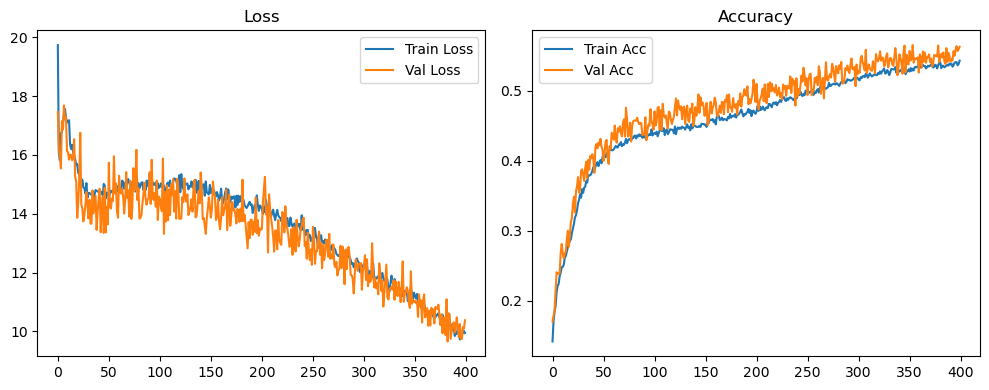

Original Model Final Test Loss: 10.5929 Accuracy: 0.5512


🚀 Running: batch256_lr_max_0.0005_min_1e-06_dp0.05


Files already downloaded and verified


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|                                                                                                                                                                        | 0/400 [00:00<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.1417 | Val Acc: 0.1868 | Epoch Time: 1.93 | :   0%|                                                                                                      | 0/400 [01:55<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.1417 | Val Acc: 0.1868 | Epoch Time: 1.93 | :   0%|                                                                                                      | 0/400 [01:55<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.1417 | Val Acc: 0.1868 | Epoch Time: 1.93 | :   0%|▏                                                                                         | 1/400 [01:55<12:50:47, 115.91s/it]

| LR: 0.000500 | Train Acc: 0.1757 | Val Acc: 0.2096 | Epoch Time: 1.93 | :   0%|▏                                                                                         | 1/400 [03:51<12:50:47, 115.91s/it]

| LR: 0.000500 | Train Acc: 0.1757 | Val Acc: 0.2096 | Epoch Time: 1.93 | :   0%|▏                                                                                         | 1/400 [03:51<12:50:47, 115.91s/it]

| LR: 0.000500 | Train Acc: 0.1757 | Val Acc: 0.2096 | Epoch Time: 1.93 | :   0%|▍                                                                                         | 2/400 [03:51<12:47:42, 115.74s/it]

| LR: 0.000500 | Train Acc: 0.1920 | Val Acc: 0.2341 | Epoch Time: 1.93 | :   0%|▍                                                                                         | 2/400 [05:47<12:47:42, 115.74s/it]

| LR: 0.000500 | Train Acc: 0.1920 | Val Acc: 0.2341 | Epoch Time: 1.93 | :   0%|▍                                                                                         | 2/400 [05:47<12:47:42, 115.74s/it]

| LR: 0.000500 | Train Acc: 0.1920 | Val Acc: 0.2341 | Epoch Time: 1.93 | :   1%|▋                                                                                         | 3/400 [05:47<12:45:24, 115.68s/it]

| LR: 0.000500 | Train Acc: 0.2110 | Val Acc: 0.2470 | Epoch Time: 1.93 | :   1%|▋                                                                                         | 3/400 [07:42<12:45:24, 115.68s/it]

| LR: 0.000500 | Train Acc: 0.2110 | Val Acc: 0.2470 | Epoch Time: 1.93 | :   1%|▋                                                                                         | 3/400 [07:42<12:45:24, 115.68s/it]

| LR: 0.000500 | Train Acc: 0.2110 | Val Acc: 0.2470 | Epoch Time: 1.93 | :   1%|▉                                                                                         | 4/400 [07:42<12:43:23, 115.66s/it]

| LR: 0.000500 | Train Acc: 0.2099 | Val Acc: 0.2442 | Epoch Time: 1.93 | :   1%|▉                                                                                         | 4/400 [09:38<12:43:23, 115.66s/it]

| LR: 0.000500 | Train Acc: 0.2099 | Val Acc: 0.2442 | Epoch Time: 1.93 | :   1%|▉                                                                                         | 4/400 [09:38<12:43:23, 115.66s/it]

| LR: 0.000500 | Train Acc: 0.2099 | Val Acc: 0.2442 | Epoch Time: 1.93 | :   1%|█▏                                                                                        | 5/400 [09:38<12:41:22, 115.65s/it]

| LR: 0.000500 | Train Acc: 0.2285 | Val Acc: 0.2744 | Epoch Time: 1.93 | :   1%|█▏                                                                                        | 5/400 [11:33<12:41:22, 115.65s/it]

| LR: 0.000500 | Train Acc: 0.2285 | Val Acc: 0.2744 | Epoch Time: 1.93 | :   1%|█▏                                                                                        | 5/400 [11:33<12:41:22, 115.65s/it]

| LR: 0.000500 | Train Acc: 0.2285 | Val Acc: 0.2744 | Epoch Time: 1.93 | :   2%|█▎                                                                                        | 6/400 [11:34<12:39:26, 115.65s/it]

| LR: 0.000500 | Train Acc: 0.2363 | Val Acc: 0.2712 | Epoch Time: 1.92 | :   2%|█▎                                                                                        | 6/400 [13:29<12:39:26, 115.65s/it]

| LR: 0.000500 | Train Acc: 0.2363 | Val Acc: 0.2712 | Epoch Time: 1.92 | :   2%|█▎                                                                                        | 6/400 [13:29<12:39:26, 115.65s/it]

| LR: 0.000500 | Train Acc: 0.2363 | Val Acc: 0.2712 | Epoch Time: 1.92 | :   2%|█▌                                                                                        | 7/400 [13:29<12:37:22, 115.63s/it]

| LR: 0.000500 | Train Acc: 0.2424 | Val Acc: 0.2663 | Epoch Time: 1.92 | :   2%|█▌                                                                                        | 7/400 [15:25<12:37:22, 115.63s/it]

| LR: 0.000500 | Train Acc: 0.2424 | Val Acc: 0.2663 | Epoch Time: 1.92 | :   2%|█▌                                                                                        | 7/400 [15:25<12:37:22, 115.63s/it]

| LR: 0.000500 | Train Acc: 0.2424 | Val Acc: 0.2663 | Epoch Time: 1.92 | :   2%|█▊                                                                                        | 8/400 [15:25<12:35:16, 115.60s/it]

| LR: 0.000500 | Train Acc: 0.2494 | Val Acc: 0.2658 | Epoch Time: 1.92 | :   2%|█▊                                                                                        | 8/400 [17:20<12:35:16, 115.60s/it]

| LR: 0.000500 | Train Acc: 0.2494 | Val Acc: 0.2658 | Epoch Time: 1.92 | :   2%|█▊                                                                                        | 8/400 [17:20<12:35:16, 115.60s/it]

| LR: 0.000500 | Train Acc: 0.2494 | Val Acc: 0.2658 | Epoch Time: 1.92 | :   2%|██                                                                                        | 9/400 [17:20<12:33:12, 115.58s/it]

| LR: 0.000499 | Train Acc: 0.2540 | Val Acc: 0.3002 | Epoch Time: 1.92 | :   2%|██                                                                                        | 9/400 [19:16<12:33:12, 115.58s/it]

| LR: 0.000499 | Train Acc: 0.2540 | Val Acc: 0.3002 | Epoch Time: 1.92 | :   2%|██                                                                                        | 9/400 [19:16<12:33:12, 115.58s/it]

| LR: 0.000499 | Train Acc: 0.2540 | Val Acc: 0.3002 | Epoch Time: 1.92 | :   2%|██▏                                                                                      | 10/400 [19:16<12:31:09, 115.56s/it]

| LR: 0.000499 | Train Acc: 0.2617 | Val Acc: 0.2753 | Epoch Time: 1.92 | :   2%|██▏                                                                                      | 10/400 [21:11<12:31:09, 115.56s/it]

| LR: 0.000499 | Train Acc: 0.2617 | Val Acc: 0.2753 | Epoch Time: 1.92 | :   2%|██▏                                                                                      | 10/400 [21:11<12:31:09, 115.56s/it]

| LR: 0.000499 | Train Acc: 0.2617 | Val Acc: 0.2753 | Epoch Time: 1.92 | :   3%|██▍                                                                                      | 11/400 [21:11<12:29:12, 115.56s/it]

| LR: 0.000499 | Train Acc: 0.2643 | Val Acc: 0.3002 | Epoch Time: 1.92 | :   3%|██▍                                                                                      | 11/400 [23:07<12:29:12, 115.56s/it]

| LR: 0.000499 | Train Acc: 0.2643 | Val Acc: 0.3002 | Epoch Time: 1.92 | :   3%|██▍                                                                                      | 11/400 [23:07<12:29:12, 115.56s/it]

| LR: 0.000499 | Train Acc: 0.2643 | Val Acc: 0.3002 | Epoch Time: 1.92 | :   3%|██▋                                                                                      | 12/400 [23:07<12:27:18, 115.56s/it]

| LR: 0.000499 | Train Acc: 0.2675 | Val Acc: 0.2582 | Epoch Time: 1.92 | :   3%|██▋                                                                                      | 12/400 [25:02<12:27:18, 115.56s/it]

| LR: 0.000499 | Train Acc: 0.2675 | Val Acc: 0.2582 | Epoch Time: 1.92 | :   3%|██▋                                                                                      | 12/400 [25:02<12:27:18, 115.56s/it]

| LR: 0.000499 | Train Acc: 0.2675 | Val Acc: 0.2582 | Epoch Time: 1.92 | :   3%|██▉                                                                                      | 13/400 [25:02<12:25:26, 115.57s/it]

| LR: 0.000499 | Train Acc: 0.2705 | Val Acc: 0.2859 | Epoch Time: 1.92 | :   3%|██▉                                                                                      | 13/400 [26:58<12:25:26, 115.57s/it]

| LR: 0.000499 | Train Acc: 0.2705 | Val Acc: 0.2859 | Epoch Time: 1.92 | :   3%|██▉                                                                                      | 13/400 [26:58<12:25:26, 115.57s/it]

| LR: 0.000499 | Train Acc: 0.2705 | Val Acc: 0.2859 | Epoch Time: 1.92 | :   4%|███                                                                                      | 14/400 [26:58<12:23:31, 115.57s/it]

| LR: 0.000498 | Train Acc: 0.2789 | Val Acc: 0.2870 | Epoch Time: 1.92 | :   4%|███                                                                                      | 14/400 [28:53<12:23:31, 115.57s/it]

| LR: 0.000498 | Train Acc: 0.2789 | Val Acc: 0.2870 | Epoch Time: 1.92 | :   4%|███                                                                                      | 14/400 [28:53<12:23:31, 115.57s/it]

| LR: 0.000498 | Train Acc: 0.2789 | Val Acc: 0.2870 | Epoch Time: 1.92 | :   4%|███▎                                                                                     | 15/400 [28:54<12:21:35, 115.57s/it]

| LR: 0.000498 | Train Acc: 0.2820 | Val Acc: 0.3161 | Epoch Time: 1.92 | :   4%|███▎                                                                                     | 15/400 [30:49<12:21:35, 115.57s/it]

| LR: 0.000498 | Train Acc: 0.2820 | Val Acc: 0.3161 | Epoch Time: 1.92 | :   4%|███▎                                                                                     | 15/400 [30:49<12:21:35, 115.57s/it]

| LR: 0.000498 | Train Acc: 0.2820 | Val Acc: 0.3161 | Epoch Time: 1.92 | :   4%|███▌                                                                                     | 16/400 [30:49<12:19:36, 115.56s/it]

| LR: 0.000498 | Train Acc: 0.2904 | Val Acc: 0.3253 | Epoch Time: 1.92 | :   4%|███▌                                                                                     | 16/400 [32:45<12:19:36, 115.56s/it]

| LR: 0.000498 | Train Acc: 0.2904 | Val Acc: 0.3253 | Epoch Time: 1.92 | :   4%|███▌                                                                                     | 16/400 [32:45<12:19:36, 115.56s/it]

| LR: 0.000498 | Train Acc: 0.2904 | Val Acc: 0.3253 | Epoch Time: 1.92 | :   4%|███▊                                                                                     | 17/400 [32:45<12:17:40, 115.56s/it]

| LR: 0.000498 | Train Acc: 0.2880 | Val Acc: 0.3155 | Epoch Time: 1.93 | :   4%|███▊                                                                                     | 17/400 [34:40<12:17:40, 115.56s/it]

| LR: 0.000498 | Train Acc: 0.2880 | Val Acc: 0.3155 | Epoch Time: 1.93 | :   4%|███▊                                                                                     | 17/400 [34:40<12:17:40, 115.56s/it]

| LR: 0.000498 | Train Acc: 0.2880 | Val Acc: 0.3155 | Epoch Time: 1.93 | :   4%|████                                                                                     | 18/400 [34:40<12:15:51, 115.58s/it]

| LR: 0.000498 | Train Acc: 0.2898 | Val Acc: 0.3326 | Epoch Time: 1.93 | :   4%|████                                                                                     | 18/400 [36:36<12:15:51, 115.58s/it]

| LR: 0.000498 | Train Acc: 0.2898 | Val Acc: 0.3326 | Epoch Time: 1.93 | :   4%|████                                                                                     | 18/400 [36:36<12:15:51, 115.58s/it]

| LR: 0.000498 | Train Acc: 0.2898 | Val Acc: 0.3326 | Epoch Time: 1.93 | :   5%|████▏                                                                                    | 19/400 [36:36<12:13:57, 115.58s/it]

| LR: 0.000497 | Train Acc: 0.2930 | Val Acc: 0.3144 | Epoch Time: 1.93 | :   5%|████▏                                                                                    | 19/400 [38:32<12:13:57, 115.58s/it]

| LR: 0.000497 | Train Acc: 0.2930 | Val Acc: 0.3144 | Epoch Time: 1.93 | :   5%|████▏                                                                                    | 19/400 [38:32<12:13:57, 115.58s/it]

| LR: 0.000497 | Train Acc: 0.2930 | Val Acc: 0.3144 | Epoch Time: 1.93 | :   5%|████▍                                                                                    | 20/400 [38:32<12:12:12, 115.61s/it]

| LR: 0.000497 | Train Acc: 0.2954 | Val Acc: 0.3195 | Epoch Time: 1.93 | :   5%|████▍                                                                                    | 20/400 [40:27<12:12:12, 115.61s/it]

| LR: 0.000497 | Train Acc: 0.2954 | Val Acc: 0.3195 | Epoch Time: 1.93 | :   5%|████▍                                                                                    | 20/400 [40:27<12:12:12, 115.61s/it]

| LR: 0.000497 | Train Acc: 0.2954 | Val Acc: 0.3195 | Epoch Time: 1.93 | :   5%|████▋                                                                                    | 21/400 [40:27<12:10:18, 115.62s/it]

| LR: 0.000497 | Train Acc: 0.3006 | Val Acc: 0.3320 | Epoch Time: 1.93 | :   5%|████▋                                                                                    | 21/400 [42:23<12:10:18, 115.62s/it]

| LR: 0.000497 | Train Acc: 0.3006 | Val Acc: 0.3320 | Epoch Time: 1.93 | :   5%|████▋                                                                                    | 21/400 [42:23<12:10:18, 115.62s/it]

| LR: 0.000497 | Train Acc: 0.3006 | Val Acc: 0.3320 | Epoch Time: 1.93 | :   6%|████▉                                                                                    | 22/400 [42:23<12:08:22, 115.62s/it]

| LR: 0.000496 | Train Acc: 0.3013 | Val Acc: 0.3196 | Epoch Time: 1.92 | :   6%|████▉                                                                                    | 22/400 [44:18<12:08:22, 115.62s/it]

| LR: 0.000496 | Train Acc: 0.3013 | Val Acc: 0.3196 | Epoch Time: 1.92 | :   6%|████▉                                                                                    | 22/400 [44:18<12:08:22, 115.62s/it]

| LR: 0.000496 | Train Acc: 0.3013 | Val Acc: 0.3196 | Epoch Time: 1.92 | :   6%|█████                                                                                    | 23/400 [44:18<12:06:22, 115.60s/it]

| LR: 0.000496 | Train Acc: 0.3084 | Val Acc: 0.3399 | Epoch Time: 1.93 | :   6%|█████                                                                                    | 23/400 [46:14<12:06:22, 115.60s/it]

| LR: 0.000496 | Train Acc: 0.3084 | Val Acc: 0.3399 | Epoch Time: 1.93 | :   6%|█████                                                                                    | 23/400 [46:14<12:06:22, 115.60s/it]

| LR: 0.000496 | Train Acc: 0.3084 | Val Acc: 0.3399 | Epoch Time: 1.93 | :   6%|█████▎                                                                                   | 24/400 [46:14<12:04:33, 115.62s/it]

| LR: 0.000496 | Train Acc: 0.3092 | Val Acc: 0.3442 | Epoch Time: 1.93 | :   6%|█████▎                                                                                   | 24/400 [48:10<12:04:33, 115.62s/it]

| LR: 0.000496 | Train Acc: 0.3092 | Val Acc: 0.3442 | Epoch Time: 1.93 | :   6%|█████▎                                                                                   | 24/400 [48:10<12:04:33, 115.62s/it]

| LR: 0.000496 | Train Acc: 0.3092 | Val Acc: 0.3442 | Epoch Time: 1.93 | :   6%|█████▌                                                                                   | 25/400 [48:10<12:02:41, 115.63s/it]

| LR: 0.000495 | Train Acc: 0.3163 | Val Acc: 0.3178 | Epoch Time: 1.93 | :   6%|█████▌                                                                                   | 25/400 [50:05<12:02:41, 115.63s/it]

| LR: 0.000495 | Train Acc: 0.3163 | Val Acc: 0.3178 | Epoch Time: 1.93 | :   6%|█████▌                                                                                   | 25/400 [50:05<12:02:41, 115.63s/it]

| LR: 0.000495 | Train Acc: 0.3163 | Val Acc: 0.3178 | Epoch Time: 1.93 | :   6%|█████▊                                                                                   | 26/400 [50:05<12:00:47, 115.64s/it]

| LR: 0.000495 | Train Acc: 0.3163 | Val Acc: 0.3283 | Epoch Time: 1.93 | :   6%|█████▊                                                                                   | 26/400 [52:01<12:00:47, 115.64s/it]

| LR: 0.000495 | Train Acc: 0.3163 | Val Acc: 0.3283 | Epoch Time: 1.93 | :   6%|█████▊                                                                                   | 26/400 [52:01<12:00:47, 115.64s/it]

| LR: 0.000495 | Train Acc: 0.3163 | Val Acc: 0.3283 | Epoch Time: 1.93 | :   7%|██████                                                                                   | 27/400 [52:01<11:58:48, 115.63s/it]

| LR: 0.000494 | Train Acc: 0.3171 | Val Acc: 0.3490 | Epoch Time: 1.93 | :   7%|██████                                                                                   | 27/400 [53:56<11:58:48, 115.63s/it]

| LR: 0.000494 | Train Acc: 0.3171 | Val Acc: 0.3490 | Epoch Time: 1.93 | :   7%|██████                                                                                   | 27/400 [53:56<11:58:48, 115.63s/it]

| LR: 0.000494 | Train Acc: 0.3171 | Val Acc: 0.3490 | Epoch Time: 1.93 | :   7%|██████▏                                                                                  | 28/400 [53:57<11:56:49, 115.62s/it]

| LR: 0.000494 | Train Acc: 0.3188 | Val Acc: 0.3303 | Epoch Time: 1.92 | :   7%|██████▏                                                                                  | 28/400 [55:52<11:56:49, 115.62s/it]

| LR: 0.000494 | Train Acc: 0.3188 | Val Acc: 0.3303 | Epoch Time: 1.92 | :   7%|██████▏                                                                                  | 28/400 [55:52<11:56:49, 115.62s/it]

| LR: 0.000494 | Train Acc: 0.3188 | Val Acc: 0.3303 | Epoch Time: 1.92 | :   7%|██████▍                                                                                  | 29/400 [55:52<11:54:47, 115.60s/it]

| LR: 0.000494 | Train Acc: 0.3219 | Val Acc: 0.3364 | Epoch Time: 1.93 | :   7%|██████▍                                                                                  | 29/400 [57:48<11:54:47, 115.60s/it]

| LR: 0.000494 | Train Acc: 0.3219 | Val Acc: 0.3364 | Epoch Time: 1.93 | :   7%|██████▍                                                                                  | 29/400 [57:48<11:54:47, 115.60s/it]

| LR: 0.000494 | Train Acc: 0.3219 | Val Acc: 0.3364 | Epoch Time: 1.93 | :   8%|██████▋                                                                                  | 30/400 [57:48<11:52:54, 115.61s/it]

| LR: 0.000493 | Train Acc: 0.3209 | Val Acc: 0.3579 | Epoch Time: 1.92 | :   8%|██████▋                                                                                  | 30/400 [59:43<11:52:54, 115.61s/it]

| LR: 0.000493 | Train Acc: 0.3209 | Val Acc: 0.3579 | Epoch Time: 1.92 | :   8%|██████▋                                                                                  | 30/400 [59:43<11:52:54, 115.61s/it]

| LR: 0.000493 | Train Acc: 0.3209 | Val Acc: 0.3579 | Epoch Time: 1.92 | :   8%|██████▉                                                                                  | 31/400 [59:43<11:50:55, 115.60s/it]

| LR: 0.000493 | Train Acc: 0.3280 | Val Acc: 0.3514 | Epoch Time: 1.92 | :   8%|██████▋                                                                                | 31/400 [1:01:39<11:50:55, 115.60s/it]

| LR: 0.000493 | Train Acc: 0.3280 | Val Acc: 0.3514 | Epoch Time: 1.92 | :   8%|██████▋                                                                                | 31/400 [1:01:39<11:50:55, 115.60s/it]

| LR: 0.000493 | Train Acc: 0.3280 | Val Acc: 0.3514 | Epoch Time: 1.92 | :   8%|██████▉                                                                                | 32/400 [1:01:39<11:48:58, 115.59s/it]

| LR: 0.000492 | Train Acc: 0.3331 | Val Acc: 0.3724 | Epoch Time: 1.92 | :   8%|██████▉                                                                                | 32/400 [1:03:34<11:48:58, 115.59s/it]

| LR: 0.000492 | Train Acc: 0.3331 | Val Acc: 0.3724 | Epoch Time: 1.92 | :   8%|██████▉                                                                                | 32/400 [1:03:34<11:48:58, 115.59s/it]

| LR: 0.000492 | Train Acc: 0.3331 | Val Acc: 0.3724 | Epoch Time: 1.92 | :   8%|███████▏                                                                               | 33/400 [1:03:34<11:46:59, 115.58s/it]

| LR: 0.000492 | Train Acc: 0.3322 | Val Acc: 0.3510 | Epoch Time: 1.93 | :   8%|███████▏                                                                               | 33/400 [1:05:30<11:46:59, 115.58s/it]

| LR: 0.000492 | Train Acc: 0.3322 | Val Acc: 0.3510 | Epoch Time: 1.93 | :   8%|███████▏                                                                               | 33/400 [1:05:30<11:46:59, 115.58s/it]

| LR: 0.000492 | Train Acc: 0.3322 | Val Acc: 0.3510 | Epoch Time: 1.93 | :   8%|███████▍                                                                               | 34/400 [1:05:30<11:45:13, 115.61s/it]

| LR: 0.000491 | Train Acc: 0.3311 | Val Acc: 0.3635 | Epoch Time: 1.92 | :   8%|███████▍                                                                               | 34/400 [1:07:26<11:45:13, 115.61s/it]

| LR: 0.000491 | Train Acc: 0.3311 | Val Acc: 0.3635 | Epoch Time: 1.92 | :   8%|███████▍                                                                               | 34/400 [1:07:26<11:45:13, 115.61s/it]

| LR: 0.000491 | Train Acc: 0.3311 | Val Acc: 0.3635 | Epoch Time: 1.92 | :   9%|███████▌                                                                               | 35/400 [1:07:26<11:43:16, 115.61s/it]

| LR: 0.000491 | Train Acc: 0.3316 | Val Acc: 0.3554 | Epoch Time: 1.93 | :   9%|███████▌                                                                               | 35/400 [1:09:21<11:43:16, 115.61s/it]

| LR: 0.000491 | Train Acc: 0.3316 | Val Acc: 0.3554 | Epoch Time: 1.93 | :   9%|███████▌                                                                               | 35/400 [1:09:21<11:43:16, 115.61s/it]

| LR: 0.000491 | Train Acc: 0.3316 | Val Acc: 0.3554 | Epoch Time: 1.93 | :   9%|███████▊                                                                               | 36/400 [1:09:21<11:41:25, 115.62s/it]

| LR: 0.000490 | Train Acc: 0.3313 | Val Acc: 0.3444 | Epoch Time: 1.93 | :   9%|███████▊                                                                               | 36/400 [1:11:17<11:41:25, 115.62s/it]

| LR: 0.000490 | Train Acc: 0.3313 | Val Acc: 0.3444 | Epoch Time: 1.93 | :   9%|███████▊                                                                               | 36/400 [1:11:17<11:41:25, 115.62s/it]

| LR: 0.000490 | Train Acc: 0.3313 | Val Acc: 0.3444 | Epoch Time: 1.93 | :   9%|████████                                                                               | 37/400 [1:11:17<11:39:41, 115.65s/it]

| LR: 0.000490 | Train Acc: 0.3372 | Val Acc: 0.3612 | Epoch Time: 1.93 | :   9%|████████                                                                               | 37/400 [1:13:13<11:39:41, 115.65s/it]

| LR: 0.000490 | Train Acc: 0.3372 | Val Acc: 0.3612 | Epoch Time: 1.93 | :   9%|████████                                                                               | 37/400 [1:13:13<11:39:41, 115.65s/it]

| LR: 0.000490 | Train Acc: 0.3372 | Val Acc: 0.3612 | Epoch Time: 1.93 | :  10%|████████▎                                                                              | 38/400 [1:13:13<11:37:55, 115.68s/it]

| LR: 0.000489 | Train Acc: 0.3367 | Val Acc: 0.3633 | Epoch Time: 1.92 | :  10%|████████▎                                                                              | 38/400 [1:15:08<11:37:55, 115.68s/it]

| LR: 0.000489 | Train Acc: 0.3367 | Val Acc: 0.3633 | Epoch Time: 1.92 | :  10%|████████▎                                                                              | 38/400 [1:15:08<11:37:55, 115.68s/it]

| LR: 0.000489 | Train Acc: 0.3367 | Val Acc: 0.3633 | Epoch Time: 1.92 | :  10%|████████▍                                                                              | 39/400 [1:15:08<11:35:47, 115.64s/it]

| LR: 0.000488 | Train Acc: 0.3397 | Val Acc: 0.3611 | Epoch Time: 1.92 | :  10%|████████▍                                                                              | 39/400 [1:17:04<11:35:47, 115.64s/it]

| LR: 0.000488 | Train Acc: 0.3397 | Val Acc: 0.3611 | Epoch Time: 1.92 | :  10%|████████▍                                                                              | 39/400 [1:17:04<11:35:47, 115.64s/it]

| LR: 0.000488 | Train Acc: 0.3397 | Val Acc: 0.3611 | Epoch Time: 1.92 | :  10%|████████▋                                                                              | 40/400 [1:17:04<11:33:43, 115.62s/it]

| LR: 0.000488 | Train Acc: 0.3407 | Val Acc: 0.3397 | Epoch Time: 1.92 | :  10%|████████▋                                                                              | 40/400 [1:18:59<11:33:43, 115.62s/it]

| LR: 0.000488 | Train Acc: 0.3407 | Val Acc: 0.3397 | Epoch Time: 1.92 | :  10%|████████▋                                                                              | 40/400 [1:18:59<11:33:43, 115.62s/it]

| LR: 0.000488 | Train Acc: 0.3407 | Val Acc: 0.3397 | Epoch Time: 1.92 | :  10%|████████▉                                                                              | 41/400 [1:19:00<11:31:41, 115.60s/it]

| LR: 0.000487 | Train Acc: 0.3424 | Val Acc: 0.3370 | Epoch Time: 1.92 | :  10%|████████▉                                                                              | 41/400 [1:20:55<11:31:41, 115.60s/it]

| LR: 0.000487 | Train Acc: 0.3424 | Val Acc: 0.3370 | Epoch Time: 1.92 | :  10%|████████▉                                                                              | 41/400 [1:20:55<11:31:41, 115.60s/it]

| LR: 0.000487 | Train Acc: 0.3424 | Val Acc: 0.3370 | Epoch Time: 1.92 | :  10%|█████████▏                                                                             | 42/400 [1:20:55<11:29:45, 115.60s/it]

| LR: 0.000487 | Train Acc: 0.3418 | Val Acc: 0.3739 | Epoch Time: 1.93 | :  10%|█████████▏                                                                             | 42/400 [1:22:51<11:29:45, 115.60s/it]

| LR: 0.000487 | Train Acc: 0.3418 | Val Acc: 0.3739 | Epoch Time: 1.93 | :  10%|█████████▏                                                                             | 42/400 [1:22:51<11:29:45, 115.60s/it]

| LR: 0.000487 | Train Acc: 0.3418 | Val Acc: 0.3739 | Epoch Time: 1.93 | :  11%|█████████▎                                                                             | 43/400 [1:22:51<11:27:59, 115.63s/it]

| LR: 0.000486 | Train Acc: 0.3453 | Val Acc: 0.3563 | Epoch Time: 1.93 | :  11%|█████████▎                                                                             | 43/400 [1:24:46<11:27:59, 115.63s/it]

| LR: 0.000486 | Train Acc: 0.3453 | Val Acc: 0.3563 | Epoch Time: 1.93 | :  11%|█████████▎                                                                             | 43/400 [1:24:46<11:27:59, 115.63s/it]

| LR: 0.000486 | Train Acc: 0.3453 | Val Acc: 0.3563 | Epoch Time: 1.93 | :  11%|█████████▌                                                                             | 44/400 [1:24:47<11:26:09, 115.64s/it]

| LR: 0.000485 | Train Acc: 0.3472 | Val Acc: 0.3766 | Epoch Time: 1.92 | :  11%|█████████▌                                                                             | 44/400 [1:26:42<11:26:09, 115.64s/it]

| LR: 0.000485 | Train Acc: 0.3472 | Val Acc: 0.3766 | Epoch Time: 1.92 | :  11%|█████████▌                                                                             | 44/400 [1:26:42<11:26:09, 115.64s/it]

| LR: 0.000485 | Train Acc: 0.3472 | Val Acc: 0.3766 | Epoch Time: 1.92 | :  11%|█████████▊                                                                             | 45/400 [1:26:42<11:23:58, 115.60s/it]

| LR: 0.000485 | Train Acc: 0.3441 | Val Acc: 0.3776 | Epoch Time: 1.92 | :  11%|█████████▊                                                                             | 45/400 [1:28:37<11:23:58, 115.60s/it]

| LR: 0.000485 | Train Acc: 0.3441 | Val Acc: 0.3776 | Epoch Time: 1.92 | :  11%|█████████▊                                                                             | 45/400 [1:28:38<11:23:58, 115.60s/it]

| LR: 0.000485 | Train Acc: 0.3441 | Val Acc: 0.3776 | Epoch Time: 1.92 | :  12%|██████████                                                                             | 46/400 [1:28:38<11:21:58, 115.59s/it]

| LR: 0.000484 | Train Acc: 0.3477 | Val Acc: 0.3665 | Epoch Time: 1.93 | :  12%|██████████                                                                             | 46/400 [1:30:33<11:21:58, 115.59s/it]

| LR: 0.000484 | Train Acc: 0.3477 | Val Acc: 0.3665 | Epoch Time: 1.93 | :  12%|██████████                                                                             | 46/400 [1:30:33<11:21:58, 115.59s/it]

| LR: 0.000484 | Train Acc: 0.3477 | Val Acc: 0.3665 | Epoch Time: 1.93 | :  12%|██████████▏                                                                            | 47/400 [1:30:33<11:20:03, 115.59s/it]

| LR: 0.000483 | Train Acc: 0.3500 | Val Acc: 0.3736 | Epoch Time: 1.92 | :  12%|██████████▏                                                                            | 47/400 [1:32:29<11:20:03, 115.59s/it]

| LR: 0.000483 | Train Acc: 0.3500 | Val Acc: 0.3736 | Epoch Time: 1.92 | :  12%|██████████▏                                                                            | 47/400 [1:32:29<11:20:03, 115.59s/it]

| LR: 0.000483 | Train Acc: 0.3500 | Val Acc: 0.3736 | Epoch Time: 1.92 | :  12%|██████████▍                                                                            | 48/400 [1:32:29<11:18:01, 115.57s/it]

| LR: 0.000482 | Train Acc: 0.3464 | Val Acc: 0.3702 | Epoch Time: 1.93 | :  12%|██████████▍                                                                            | 48/400 [1:34:24<11:18:01, 115.57s/it]

| LR: 0.000482 | Train Acc: 0.3464 | Val Acc: 0.3702 | Epoch Time: 1.93 | :  12%|██████████▍                                                                            | 48/400 [1:34:24<11:18:01, 115.57s/it]

| LR: 0.000482 | Train Acc: 0.3464 | Val Acc: 0.3702 | Epoch Time: 1.93 | :  12%|██████████▋                                                                            | 49/400 [1:34:24<11:16:10, 115.59s/it]

| LR: 0.000482 | Train Acc: 0.3521 | Val Acc: 0.3806 | Epoch Time: 1.93 | :  12%|██████████▋                                                                            | 49/400 [1:36:20<11:16:10, 115.59s/it]

| LR: 0.000482 | Train Acc: 0.3521 | Val Acc: 0.3806 | Epoch Time: 1.93 | :  12%|██████████▋                                                                            | 49/400 [1:36:20<11:16:10, 115.59s/it]

| LR: 0.000482 | Train Acc: 0.3521 | Val Acc: 0.3806 | Epoch Time: 1.93 | :  12%|██████████▉                                                                            | 50/400 [1:36:20<11:14:17, 115.59s/it]

| LR: 0.000481 | Train Acc: 0.3563 | Val Acc: 0.3708 | Epoch Time: 1.92 | :  12%|██████████▉                                                                            | 50/400 [1:38:15<11:14:17, 115.59s/it]

| LR: 0.000481 | Train Acc: 0.3563 | Val Acc: 0.3708 | Epoch Time: 1.92 | :  12%|██████████▉                                                                            | 50/400 [1:38:15<11:14:17, 115.59s/it]

| LR: 0.000481 | Train Acc: 0.3563 | Val Acc: 0.3708 | Epoch Time: 1.92 | :  13%|███████████                                                                            | 51/400 [1:38:15<11:12:08, 115.56s/it]

| LR: 0.000480 | Train Acc: 0.3567 | Val Acc: 0.3769 | Epoch Time: 1.92 | :  13%|███████████                                                                            | 51/400 [1:40:11<11:12:08, 115.56s/it]

| LR: 0.000480 | Train Acc: 0.3567 | Val Acc: 0.3769 | Epoch Time: 1.92 | :  13%|███████████                                                                            | 51/400 [1:40:11<11:12:08, 115.56s/it]

| LR: 0.000480 | Train Acc: 0.3567 | Val Acc: 0.3769 | Epoch Time: 1.92 | :  13%|███████████▎                                                                           | 52/400 [1:40:11<11:10:01, 115.52s/it]

| LR: 0.000479 | Train Acc: 0.3621 | Val Acc: 0.3743 | Epoch Time: 1.92 | :  13%|███████████▎                                                                           | 52/400 [1:42:06<11:10:01, 115.52s/it]

| LR: 0.000479 | Train Acc: 0.3621 | Val Acc: 0.3743 | Epoch Time: 1.92 | :  13%|███████████▎                                                                           | 52/400 [1:42:06<11:10:01, 115.52s/it]

| LR: 0.000479 | Train Acc: 0.3621 | Val Acc: 0.3743 | Epoch Time: 1.92 | :  13%|███████████▌                                                                           | 53/400 [1:42:06<11:08:11, 115.54s/it]

| LR: 0.000479 | Train Acc: 0.3588 | Val Acc: 0.4062 | Epoch Time: 1.92 | :  13%|███████████▌                                                                           | 53/400 [1:44:02<11:08:11, 115.54s/it]

| LR: 0.000479 | Train Acc: 0.3588 | Val Acc: 0.4062 | Epoch Time: 1.92 | :  13%|███████████▌                                                                           | 53/400 [1:44:02<11:08:11, 115.54s/it]

| LR: 0.000479 | Train Acc: 0.3588 | Val Acc: 0.4062 | Epoch Time: 1.92 | :  14%|███████████▋                                                                           | 54/400 [1:44:02<11:06:08, 115.51s/it]

| LR: 0.000478 | Train Acc: 0.3604 | Val Acc: 0.3744 | Epoch Time: 1.92 | :  14%|███████████▋                                                                           | 54/400 [1:45:57<11:06:08, 115.51s/it]

| LR: 0.000478 | Train Acc: 0.3604 | Val Acc: 0.3744 | Epoch Time: 1.92 | :  14%|███████████▋                                                                           | 54/400 [1:45:57<11:06:08, 115.51s/it]

| LR: 0.000478 | Train Acc: 0.3604 | Val Acc: 0.3744 | Epoch Time: 1.92 | :  14%|███████████▉                                                                           | 55/400 [1:45:57<11:03:59, 115.48s/it]

| LR: 0.000477 | Train Acc: 0.3583 | Val Acc: 0.3832 | Epoch Time: 1.92 | :  14%|███████████▉                                                                           | 55/400 [1:47:53<11:03:59, 115.48s/it]

| LR: 0.000477 | Train Acc: 0.3583 | Val Acc: 0.3832 | Epoch Time: 1.92 | :  14%|███████████▉                                                                           | 55/400 [1:47:53<11:03:59, 115.48s/it]

| LR: 0.000477 | Train Acc: 0.3583 | Val Acc: 0.3832 | Epoch Time: 1.92 | :  14%|████████████▏                                                                          | 56/400 [1:47:53<11:01:54, 115.45s/it]

| LR: 0.000476 | Train Acc: 0.3605 | Val Acc: 0.3806 | Epoch Time: 1.92 | :  14%|████████████▏                                                                          | 56/400 [1:49:48<11:01:54, 115.45s/it]

| LR: 0.000476 | Train Acc: 0.3605 | Val Acc: 0.3806 | Epoch Time: 1.92 | :  14%|████████████▏                                                                          | 56/400 [1:49:48<11:01:54, 115.45s/it]

| LR: 0.000476 | Train Acc: 0.3605 | Val Acc: 0.3806 | Epoch Time: 1.92 | :  14%|████████████▍                                                                          | 57/400 [1:49:48<10:59:49, 115.42s/it]

| LR: 0.000475 | Train Acc: 0.3611 | Val Acc: 0.3777 | Epoch Time: 1.92 | :  14%|████████████▍                                                                          | 57/400 [1:51:43<10:59:49, 115.42s/it]

| LR: 0.000475 | Train Acc: 0.3611 | Val Acc: 0.3777 | Epoch Time: 1.92 | :  14%|████████████▍                                                                          | 57/400 [1:51:43<10:59:49, 115.42s/it]

| LR: 0.000475 | Train Acc: 0.3611 | Val Acc: 0.3777 | Epoch Time: 1.92 | :  14%|████████████▌                                                                          | 58/400 [1:51:43<10:57:47, 115.40s/it]

| LR: 0.000475 | Train Acc: 0.3648 | Val Acc: 0.3913 | Epoch Time: 1.92 | :  14%|████████████▌                                                                          | 58/400 [1:53:39<10:57:47, 115.40s/it]

| LR: 0.000475 | Train Acc: 0.3648 | Val Acc: 0.3913 | Epoch Time: 1.92 | :  14%|████████████▌                                                                          | 58/400 [1:53:39<10:57:47, 115.40s/it]

| LR: 0.000475 | Train Acc: 0.3648 | Val Acc: 0.3913 | Epoch Time: 1.92 | :  15%|████████████▊                                                                          | 59/400 [1:53:39<10:55:49, 115.39s/it]

| LR: 0.000474 | Train Acc: 0.3628 | Val Acc: 0.3757 | Epoch Time: 1.92 | :  15%|████████████▊                                                                          | 59/400 [1:55:34<10:55:49, 115.39s/it]

| LR: 0.000474 | Train Acc: 0.3628 | Val Acc: 0.3757 | Epoch Time: 1.92 | :  15%|████████████▊                                                                          | 59/400 [1:55:34<10:55:49, 115.39s/it]

| LR: 0.000474 | Train Acc: 0.3628 | Val Acc: 0.3757 | Epoch Time: 1.92 | :  15%|█████████████                                                                          | 60/400 [1:55:34<10:53:50, 115.38s/it]

| LR: 0.000473 | Train Acc: 0.3665 | Val Acc: 0.3933 | Epoch Time: 1.92 | :  15%|█████████████                                                                          | 60/400 [1:57:29<10:53:50, 115.38s/it]

| LR: 0.000473 | Train Acc: 0.3665 | Val Acc: 0.3933 | Epoch Time: 1.92 | :  15%|█████████████                                                                          | 60/400 [1:57:29<10:53:50, 115.38s/it]

| LR: 0.000473 | Train Acc: 0.3665 | Val Acc: 0.3933 | Epoch Time: 1.92 | :  15%|█████████████▎                                                                         | 61/400 [1:57:29<10:51:52, 115.38s/it]

| LR: 0.000472 | Train Acc: 0.3631 | Val Acc: 0.3984 | Epoch Time: 1.92 | :  15%|█████████████▎                                                                         | 61/400 [1:59:25<10:51:52, 115.38s/it]

| LR: 0.000472 | Train Acc: 0.3631 | Val Acc: 0.3984 | Epoch Time: 1.92 | :  15%|█████████████▎                                                                         | 61/400 [1:59:25<10:51:52, 115.38s/it]

| LR: 0.000472 | Train Acc: 0.3631 | Val Acc: 0.3984 | Epoch Time: 1.92 | :  16%|█████████████▍                                                                         | 62/400 [1:59:25<10:49:58, 115.38s/it]

| LR: 0.000471 | Train Acc: 0.3647 | Val Acc: 0.4094 | Epoch Time: 1.92 | :  16%|█████████████▍                                                                         | 62/400 [2:01:20<10:49:58, 115.38s/it]

| LR: 0.000471 | Train Acc: 0.3647 | Val Acc: 0.4094 | Epoch Time: 1.92 | :  16%|█████████████▍                                                                         | 62/400 [2:01:20<10:49:58, 115.38s/it]

| LR: 0.000471 | Train Acc: 0.3647 | Val Acc: 0.4094 | Epoch Time: 1.92 | :  16%|█████████████▋                                                                         | 63/400 [2:01:20<10:48:01, 115.38s/it]

| LR: 0.000470 | Train Acc: 0.3670 | Val Acc: 0.3776 | Epoch Time: 1.92 | :  16%|█████████████▋                                                                         | 63/400 [2:03:15<10:48:01, 115.38s/it]

| LR: 0.000470 | Train Acc: 0.3670 | Val Acc: 0.3776 | Epoch Time: 1.92 | :  16%|█████████████▋                                                                         | 63/400 [2:03:15<10:48:01, 115.38s/it]

| LR: 0.000470 | Train Acc: 0.3670 | Val Acc: 0.3776 | Epoch Time: 1.92 | :  16%|█████████████▉                                                                         | 64/400 [2:03:16<10:46:06, 115.38s/it]

| LR: 0.000469 | Train Acc: 0.3655 | Val Acc: 0.3825 | Epoch Time: 1.92 | :  16%|█████████████▉                                                                         | 64/400 [2:05:11<10:46:06, 115.38s/it]

| LR: 0.000469 | Train Acc: 0.3655 | Val Acc: 0.3825 | Epoch Time: 1.92 | :  16%|█████████████▉                                                                         | 64/400 [2:05:11<10:46:06, 115.38s/it]

| LR: 0.000469 | Train Acc: 0.3655 | Val Acc: 0.3825 | Epoch Time: 1.92 | :  16%|██████████████▏                                                                        | 65/400 [2:05:11<10:44:13, 115.38s/it]

| LR: 0.000468 | Train Acc: 0.3688 | Val Acc: 0.3987 | Epoch Time: 1.92 | :  16%|██████████████▏                                                                        | 65/400 [2:07:06<10:44:13, 115.38s/it]

| LR: 0.000468 | Train Acc: 0.3688 | Val Acc: 0.3987 | Epoch Time: 1.92 | :  16%|██████████████▏                                                                        | 65/400 [2:07:06<10:44:13, 115.38s/it]

| LR: 0.000468 | Train Acc: 0.3688 | Val Acc: 0.3987 | Epoch Time: 1.92 | :  16%|██████████████▎                                                                        | 66/400 [2:07:06<10:42:19, 115.39s/it]

| LR: 0.000467 | Train Acc: 0.3689 | Val Acc: 0.4124 | Epoch Time: 1.92 | :  16%|██████████████▎                                                                        | 66/400 [2:09:02<10:42:19, 115.39s/it]

| LR: 0.000467 | Train Acc: 0.3689 | Val Acc: 0.4124 | Epoch Time: 1.92 | :  16%|██████████████▎                                                                        | 66/400 [2:09:02<10:42:19, 115.39s/it]

| LR: 0.000467 | Train Acc: 0.3689 | Val Acc: 0.4124 | Epoch Time: 1.92 | :  17%|██████████████▌                                                                        | 67/400 [2:09:02<10:40:23, 115.39s/it]

| LR: 0.000466 | Train Acc: 0.3696 | Val Acc: 0.4046 | Epoch Time: 1.92 | :  17%|██████████████▌                                                                        | 67/400 [2:10:57<10:40:23, 115.39s/it]

| LR: 0.000466 | Train Acc: 0.3696 | Val Acc: 0.4046 | Epoch Time: 1.92 | :  17%|██████████████▌                                                                        | 67/400 [2:10:57<10:40:23, 115.39s/it]

| LR: 0.000466 | Train Acc: 0.3696 | Val Acc: 0.4046 | Epoch Time: 1.92 | :  17%|██████████████▊                                                                        | 68/400 [2:10:57<10:38:32, 115.40s/it]

| LR: 0.000465 | Train Acc: 0.3658 | Val Acc: 0.4000 | Epoch Time: 1.92 | :  17%|██████████████▊                                                                        | 68/400 [2:12:53<10:38:32, 115.40s/it]

| LR: 0.000465 | Train Acc: 0.3658 | Val Acc: 0.4000 | Epoch Time: 1.92 | :  17%|██████████████▊                                                                        | 68/400 [2:12:53<10:38:32, 115.40s/it]

| LR: 0.000465 | Train Acc: 0.3658 | Val Acc: 0.4000 | Epoch Time: 1.92 | :  17%|███████████████                                                                        | 69/400 [2:12:53<10:36:38, 115.40s/it]

| LR: 0.000464 | Train Acc: 0.3723 | Val Acc: 0.4080 | Epoch Time: 1.92 | :  17%|███████████████                                                                        | 69/400 [2:14:48<10:36:38, 115.40s/it]

| LR: 0.000464 | Train Acc: 0.3723 | Val Acc: 0.4080 | Epoch Time: 1.92 | :  17%|███████████████                                                                        | 69/400 [2:14:48<10:36:38, 115.40s/it]

| LR: 0.000464 | Train Acc: 0.3723 | Val Acc: 0.4080 | Epoch Time: 1.92 | :  18%|███████████████▏                                                                       | 70/400 [2:14:48<10:34:48, 115.42s/it]

| LR: 0.000463 | Train Acc: 0.3737 | Val Acc: 0.3946 | Epoch Time: 1.92 | :  18%|███████████████▏                                                                       | 70/400 [2:16:43<10:34:48, 115.42s/it]

| LR: 0.000463 | Train Acc: 0.3737 | Val Acc: 0.3946 | Epoch Time: 1.92 | :  18%|███████████████▏                                                                       | 70/400 [2:16:43<10:34:48, 115.42s/it]

| LR: 0.000463 | Train Acc: 0.3737 | Val Acc: 0.3946 | Epoch Time: 1.92 | :  18%|███████████████▍                                                                       | 71/400 [2:16:44<10:32:57, 115.43s/it]

| LR: 0.000462 | Train Acc: 0.3729 | Val Acc: 0.3810 | Epoch Time: 1.92 | :  18%|███████████████▍                                                                       | 71/400 [2:18:39<10:32:57, 115.43s/it]

| LR: 0.000462 | Train Acc: 0.3729 | Val Acc: 0.3810 | Epoch Time: 1.92 | :  18%|███████████████▍                                                                       | 71/400 [2:18:39<10:32:57, 115.43s/it]

| LR: 0.000462 | Train Acc: 0.3729 | Val Acc: 0.3810 | Epoch Time: 1.92 | :  18%|███████████████▋                                                                       | 72/400 [2:18:39<10:31:05, 115.44s/it]

| LR: 0.000461 | Train Acc: 0.3734 | Val Acc: 0.4087 | Epoch Time: 1.92 | :  18%|███████████████▋                                                                       | 72/400 [2:20:34<10:31:05, 115.44s/it]

| LR: 0.000461 | Train Acc: 0.3734 | Val Acc: 0.4087 | Epoch Time: 1.92 | :  18%|███████████████▋                                                                       | 72/400 [2:20:34<10:31:05, 115.44s/it]

| LR: 0.000461 | Train Acc: 0.3734 | Val Acc: 0.4087 | Epoch Time: 1.92 | :  18%|███████████████▉                                                                       | 73/400 [2:20:34<10:29:10, 115.45s/it]

| LR: 0.000460 | Train Acc: 0.3767 | Val Acc: 0.4071 | Epoch Time: 1.92 | :  18%|███████████████▉                                                                       | 73/400 [2:22:30<10:29:10, 115.45s/it]

| LR: 0.000460 | Train Acc: 0.3767 | Val Acc: 0.4071 | Epoch Time: 1.92 | :  18%|███████████████▉                                                                       | 73/400 [2:22:30<10:29:10, 115.45s/it]

| LR: 0.000460 | Train Acc: 0.3767 | Val Acc: 0.4071 | Epoch Time: 1.92 | :  18%|████████████████                                                                       | 74/400 [2:22:30<10:27:12, 115.44s/it]

| LR: 0.000459 | Train Acc: 0.3755 | Val Acc: 0.4146 | Epoch Time: 1.92 | :  18%|████████████████                                                                       | 74/400 [2:24:25<10:27:12, 115.44s/it]

| LR: 0.000459 | Train Acc: 0.3755 | Val Acc: 0.4146 | Epoch Time: 1.92 | :  18%|████████████████                                                                       | 74/400 [2:24:25<10:27:12, 115.44s/it]

| LR: 0.000459 | Train Acc: 0.3755 | Val Acc: 0.4146 | Epoch Time: 1.92 | :  19%|████████████████▎                                                                      | 75/400 [2:24:25<10:25:21, 115.45s/it]

| LR: 0.000458 | Train Acc: 0.3738 | Val Acc: 0.3935 | Epoch Time: 1.92 | :  19%|████████████████▎                                                                      | 75/400 [2:26:21<10:25:21, 115.45s/it]

| LR: 0.000458 | Train Acc: 0.3738 | Val Acc: 0.3935 | Epoch Time: 1.92 | :  19%|████████████████▎                                                                      | 75/400 [2:26:21<10:25:21, 115.45s/it]

| LR: 0.000458 | Train Acc: 0.3738 | Val Acc: 0.3935 | Epoch Time: 1.92 | :  19%|████████████████▌                                                                      | 76/400 [2:26:21<10:23:32, 115.47s/it]

| LR: 0.000457 | Train Acc: 0.3725 | Val Acc: 0.3864 | Epoch Time: 1.92 | :  19%|████████████████▌                                                                      | 76/400 [2:28:16<10:23:32, 115.47s/it]

| LR: 0.000457 | Train Acc: 0.3725 | Val Acc: 0.3864 | Epoch Time: 1.92 | :  19%|████████████████▌                                                                      | 76/400 [2:28:16<10:23:32, 115.47s/it]

| LR: 0.000457 | Train Acc: 0.3725 | Val Acc: 0.3864 | Epoch Time: 1.92 | :  19%|████████████████▋                                                                      | 77/400 [2:28:16<10:21:37, 115.47s/it]

| LR: 0.000456 | Train Acc: 0.3763 | Val Acc: 0.3933 | Epoch Time: 1.92 | :  19%|████████████████▋                                                                      | 77/400 [2:30:12<10:21:37, 115.47s/it]

| LR: 0.000456 | Train Acc: 0.3763 | Val Acc: 0.3933 | Epoch Time: 1.92 | :  19%|████████████████▋                                                                      | 77/400 [2:30:12<10:21:37, 115.47s/it]

| LR: 0.000456 | Train Acc: 0.3763 | Val Acc: 0.3933 | Epoch Time: 1.92 | :  20%|████████████████▉                                                                      | 78/400 [2:30:12<10:19:42, 115.47s/it]

| LR: 0.000455 | Train Acc: 0.3747 | Val Acc: 0.4173 | Epoch Time: 1.92 | :  20%|████████████████▉                                                                      | 78/400 [2:32:07<10:19:42, 115.47s/it]

| LR: 0.000455 | Train Acc: 0.3747 | Val Acc: 0.4173 | Epoch Time: 1.92 | :  20%|████████████████▉                                                                      | 78/400 [2:32:07<10:19:42, 115.47s/it]

| LR: 0.000455 | Train Acc: 0.3747 | Val Acc: 0.4173 | Epoch Time: 1.92 | :  20%|█████████████████▏                                                                     | 79/400 [2:32:07<10:17:48, 115.48s/it]

| LR: 0.000453 | Train Acc: 0.3744 | Val Acc: 0.3896 | Epoch Time: 1.93 | :  20%|█████████████████▏                                                                     | 79/400 [2:34:03<10:17:48, 115.48s/it]

| LR: 0.000453 | Train Acc: 0.3744 | Val Acc: 0.3896 | Epoch Time: 1.93 | :  20%|█████████████████▏                                                                     | 79/400 [2:34:03<10:17:48, 115.48s/it]

| LR: 0.000453 | Train Acc: 0.3744 | Val Acc: 0.3896 | Epoch Time: 1.93 | :  20%|█████████████████▍                                                                     | 80/400 [2:34:03<10:16:13, 115.54s/it]

| LR: 0.000452 | Train Acc: 0.3736 | Val Acc: 0.4032 | Epoch Time: 1.93 | :  20%|█████████████████▍                                                                     | 80/400 [2:35:59<10:16:13, 115.54s/it]

| LR: 0.000452 | Train Acc: 0.3736 | Val Acc: 0.4032 | Epoch Time: 1.93 | :  20%|█████████████████▍                                                                     | 80/400 [2:35:59<10:16:13, 115.54s/it]

| LR: 0.000452 | Train Acc: 0.3736 | Val Acc: 0.4032 | Epoch Time: 1.93 | :  20%|█████████████████▌                                                                     | 81/400 [2:35:59<10:14:22, 115.55s/it]

| LR: 0.000451 | Train Acc: 0.3775 | Val Acc: 0.3920 | Epoch Time: 1.92 | :  20%|█████████████████▌                                                                     | 81/400 [2:37:54<10:14:22, 115.55s/it]

| LR: 0.000451 | Train Acc: 0.3775 | Val Acc: 0.3920 | Epoch Time: 1.92 | :  20%|█████████████████▌                                                                     | 81/400 [2:37:54<10:14:22, 115.55s/it]

| LR: 0.000451 | Train Acc: 0.3775 | Val Acc: 0.3920 | Epoch Time: 1.92 | :  20%|█████████████████▊                                                                     | 82/400 [2:37:54<10:12:28, 115.56s/it]

| LR: 0.000450 | Train Acc: 0.3762 | Val Acc: 0.3916 | Epoch Time: 1.93 | :  20%|█████████████████▊                                                                     | 82/400 [2:39:50<10:12:28, 115.56s/it]

| LR: 0.000450 | Train Acc: 0.3762 | Val Acc: 0.3916 | Epoch Time: 1.93 | :  20%|█████████████████▊                                                                     | 82/400 [2:39:50<10:12:28, 115.56s/it]

| LR: 0.000450 | Train Acc: 0.3762 | Val Acc: 0.3916 | Epoch Time: 1.93 | :  21%|██████████████████                                                                     | 83/400 [2:39:50<10:10:43, 115.59s/it]

| LR: 0.000449 | Train Acc: 0.3772 | Val Acc: 0.4167 | Epoch Time: 1.93 | :  21%|██████████████████                                                                     | 83/400 [2:41:46<10:10:43, 115.59s/it]

| LR: 0.000449 | Train Acc: 0.3772 | Val Acc: 0.4167 | Epoch Time: 1.93 | :  21%|██████████████████                                                                     | 83/400 [2:41:46<10:10:43, 115.59s/it]

| LR: 0.000449 | Train Acc: 0.3772 | Val Acc: 0.4167 | Epoch Time: 1.93 | :  21%|██████████████████▎                                                                    | 84/400 [2:41:46<10:09:05, 115.65s/it]

| LR: 0.000448 | Train Acc: 0.3809 | Val Acc: 0.3798 | Epoch Time: 1.93 | :  21%|██████████████████▎                                                                    | 84/400 [2:43:41<10:09:05, 115.65s/it]

| LR: 0.000448 | Train Acc: 0.3809 | Val Acc: 0.3798 | Epoch Time: 1.93 | :  21%|██████████████████▎                                                                    | 84/400 [2:43:41<10:09:05, 115.65s/it]

| LR: 0.000448 | Train Acc: 0.3809 | Val Acc: 0.3798 | Epoch Time: 1.93 | :  21%|██████████████████▍                                                                    | 85/400 [2:43:41<10:07:09, 115.65s/it]

| LR: 0.000446 | Train Acc: 0.3744 | Val Acc: 0.4044 | Epoch Time: 1.92 | :  21%|██████████████████▍                                                                    | 85/400 [2:45:37<10:07:09, 115.65s/it]

| LR: 0.000446 | Train Acc: 0.3744 | Val Acc: 0.4044 | Epoch Time: 1.92 | :  21%|██████████████████▍                                                                    | 85/400 [2:45:37<10:07:09, 115.65s/it]

| LR: 0.000446 | Train Acc: 0.3744 | Val Acc: 0.4044 | Epoch Time: 1.92 | :  22%|██████████████████▋                                                                    | 86/400 [2:45:37<10:04:59, 115.60s/it]

| LR: 0.000445 | Train Acc: 0.3798 | Val Acc: 0.3805 | Epoch Time: 1.93 | :  22%|██████████████████▋                                                                    | 86/400 [2:47:32<10:04:59, 115.60s/it]

| LR: 0.000445 | Train Acc: 0.3798 | Val Acc: 0.3805 | Epoch Time: 1.93 | :  22%|██████████████████▋                                                                    | 86/400 [2:47:32<10:04:59, 115.60s/it]

| LR: 0.000445 | Train Acc: 0.3798 | Val Acc: 0.3805 | Epoch Time: 1.93 | :  22%|██████████████████▉                                                                    | 87/400 [2:47:32<10:03:06, 115.61s/it]

| LR: 0.000444 | Train Acc: 0.3812 | Val Acc: 0.3947 | Epoch Time: 1.93 | :  22%|██████████████████▉                                                                    | 87/400 [2:49:28<10:03:06, 115.61s/it]

| LR: 0.000444 | Train Acc: 0.3812 | Val Acc: 0.3947 | Epoch Time: 1.93 | :  22%|██████████████████▉                                                                    | 87/400 [2:49:28<10:03:06, 115.61s/it]

| LR: 0.000444 | Train Acc: 0.3812 | Val Acc: 0.3947 | Epoch Time: 1.93 | :  22%|███████████████████▏                                                                   | 88/400 [2:49:28<10:01:22, 115.65s/it]

| LR: 0.000443 | Train Acc: 0.3817 | Val Acc: 0.4107 | Epoch Time: 1.92 | :  22%|███████████████████▏                                                                   | 88/400 [2:51:24<10:01:22, 115.65s/it]

| LR: 0.000443 | Train Acc: 0.3817 | Val Acc: 0.4107 | Epoch Time: 1.92 | :  22%|███████████████████▏                                                                   | 88/400 [2:51:24<10:01:22, 115.65s/it]

| LR: 0.000443 | Train Acc: 0.3817 | Val Acc: 0.4107 | Epoch Time: 1.92 | :  22%|███████████████████▌                                                                    | 89/400 [2:51:24<9:59:20, 115.63s/it]

| LR: 0.000441 | Train Acc: 0.3836 | Val Acc: 0.3880 | Epoch Time: 1.92 | :  22%|███████████████████▌                                                                    | 89/400 [2:53:19<9:59:20, 115.63s/it]

| LR: 0.000441 | Train Acc: 0.3836 | Val Acc: 0.3880 | Epoch Time: 1.92 | :  22%|███████████████████▌                                                                    | 89/400 [2:53:19<9:59:20, 115.63s/it]

| LR: 0.000441 | Train Acc: 0.3836 | Val Acc: 0.3880 | Epoch Time: 1.92 | :  22%|███████████████████▊                                                                    | 90/400 [2:53:19<9:57:20, 115.62s/it]

| LR: 0.000440 | Train Acc: 0.3820 | Val Acc: 0.4017 | Epoch Time: 1.93 | :  22%|███████████████████▊                                                                    | 90/400 [2:55:15<9:57:20, 115.62s/it]

| LR: 0.000440 | Train Acc: 0.3820 | Val Acc: 0.4017 | Epoch Time: 1.93 | :  22%|███████████████████▊                                                                    | 90/400 [2:55:15<9:57:20, 115.62s/it]

| LR: 0.000440 | Train Acc: 0.3820 | Val Acc: 0.4017 | Epoch Time: 1.93 | :  23%|████████████████████                                                                    | 91/400 [2:55:15<9:55:33, 115.64s/it]

| LR: 0.000439 | Train Acc: 0.3794 | Val Acc: 0.4163 | Epoch Time: 1.93 | :  23%|████████████████████                                                                    | 91/400 [2:57:11<9:55:33, 115.64s/it]

| LR: 0.000439 | Train Acc: 0.3794 | Val Acc: 0.4163 | Epoch Time: 1.93 | :  23%|████████████████████                                                                    | 91/400 [2:57:11<9:55:33, 115.64s/it]

| LR: 0.000439 | Train Acc: 0.3794 | Val Acc: 0.4163 | Epoch Time: 1.93 | :  23%|████████████████████▏                                                                   | 92/400 [2:57:11<9:53:36, 115.64s/it]

| LR: 0.000438 | Train Acc: 0.3814 | Val Acc: 0.3884 | Epoch Time: 1.92 | :  23%|████████████████████▏                                                                   | 92/400 [2:59:06<9:53:36, 115.64s/it]

| LR: 0.000438 | Train Acc: 0.3814 | Val Acc: 0.3884 | Epoch Time: 1.92 | :  23%|████████████████████▏                                                                   | 92/400 [2:59:06<9:53:36, 115.64s/it]

| LR: 0.000438 | Train Acc: 0.3814 | Val Acc: 0.3884 | Epoch Time: 1.92 | :  23%|████████████████████▍                                                                   | 93/400 [2:59:06<9:51:26, 115.59s/it]

| LR: 0.000436 | Train Acc: 0.3790 | Val Acc: 0.4100 | Epoch Time: 1.92 | :  23%|████████████████████▍                                                                   | 93/400 [3:01:01<9:51:26, 115.59s/it]

| LR: 0.000436 | Train Acc: 0.3790 | Val Acc: 0.4100 | Epoch Time: 1.92 | :  23%|████████████████████▍                                                                   | 93/400 [3:01:01<9:51:26, 115.59s/it]

| LR: 0.000436 | Train Acc: 0.3790 | Val Acc: 0.4100 | Epoch Time: 1.92 | :  24%|████████████████████▋                                                                   | 94/400 [3:01:02<9:49:18, 115.55s/it]

| LR: 0.000435 | Train Acc: 0.3819 | Val Acc: 0.4013 | Epoch Time: 1.92 | :  24%|████████████████████▋                                                                   | 94/400 [3:02:57<9:49:18, 115.55s/it]

| LR: 0.000435 | Train Acc: 0.3819 | Val Acc: 0.4013 | Epoch Time: 1.92 | :  24%|████████████████████▋                                                                   | 94/400 [3:02:57<9:49:18, 115.55s/it]

| LR: 0.000435 | Train Acc: 0.3819 | Val Acc: 0.4013 | Epoch Time: 1.92 | :  24%|████████████████████▉                                                                   | 95/400 [3:02:57<9:47:12, 115.52s/it]

| LR: 0.000434 | Train Acc: 0.3848 | Val Acc: 0.3988 | Epoch Time: 1.92 | :  24%|████████████████████▉                                                                   | 95/400 [3:04:53<9:47:12, 115.52s/it]

| LR: 0.000434 | Train Acc: 0.3848 | Val Acc: 0.3988 | Epoch Time: 1.92 | :  24%|████████████████████▉                                                                   | 95/400 [3:04:53<9:47:12, 115.52s/it]

| LR: 0.000434 | Train Acc: 0.3848 | Val Acc: 0.3988 | Epoch Time: 1.92 | :  24%|█████████████████████                                                                   | 96/400 [3:04:53<9:45:25, 115.54s/it]

| LR: 0.000432 | Train Acc: 0.3813 | Val Acc: 0.3985 | Epoch Time: 1.93 | :  24%|█████████████████████                                                                   | 96/400 [3:06:48<9:45:25, 115.54s/it]

| LR: 0.000432 | Train Acc: 0.3813 | Val Acc: 0.3985 | Epoch Time: 1.93 | :  24%|█████████████████████                                                                   | 96/400 [3:06:48<9:45:25, 115.54s/it]

| LR: 0.000432 | Train Acc: 0.3813 | Val Acc: 0.3985 | Epoch Time: 1.93 | :  24%|█████████████████████▎                                                                  | 97/400 [3:06:48<9:43:37, 115.57s/it]

| LR: 0.000431 | Train Acc: 0.3847 | Val Acc: 0.4196 | Epoch Time: 1.92 | :  24%|█████████████████████▎                                                                  | 97/400 [3:08:44<9:43:37, 115.57s/it]

| LR: 0.000431 | Train Acc: 0.3847 | Val Acc: 0.4196 | Epoch Time: 1.92 | :  24%|█████████████████████▎                                                                  | 97/400 [3:08:44<9:43:37, 115.57s/it]

| LR: 0.000431 | Train Acc: 0.3847 | Val Acc: 0.4196 | Epoch Time: 1.92 | :  24%|█████████████████████▌                                                                  | 98/400 [3:08:44<9:41:36, 115.55s/it]

| LR: 0.000430 | Train Acc: 0.3849 | Val Acc: 0.3930 | Epoch Time: 1.92 | :  24%|█████████████████████▌                                                                  | 98/400 [3:10:39<9:41:36, 115.55s/it]

| LR: 0.000430 | Train Acc: 0.3849 | Val Acc: 0.3930 | Epoch Time: 1.92 | :  24%|█████████████████████▌                                                                  | 98/400 [3:10:39<9:41:36, 115.55s/it]

| LR: 0.000430 | Train Acc: 0.3849 | Val Acc: 0.3930 | Epoch Time: 1.92 | :  25%|█████████████████████▊                                                                  | 99/400 [3:10:39<9:39:28, 115.51s/it]

| LR: 0.000428 | Train Acc: 0.3865 | Val Acc: 0.4004 | Epoch Time: 1.92 | :  25%|█████████████████████▊                                                                  | 99/400 [3:12:34<9:39:28, 115.51s/it]

| LR: 0.000428 | Train Acc: 0.3865 | Val Acc: 0.4004 | Epoch Time: 1.92 | :  25%|█████████████████████▊                                                                  | 99/400 [3:12:34<9:39:28, 115.51s/it]

| LR: 0.000428 | Train Acc: 0.3865 | Val Acc: 0.4004 | Epoch Time: 1.92 | :  25%|█████████████████████▊                                                                 | 100/400 [3:12:35<9:37:19, 115.47s/it]

| LR: 0.000427 | Train Acc: 0.3844 | Val Acc: 0.4289 | Epoch Time: 1.92 | :  25%|█████████████████████▊                                                                 | 100/400 [3:14:30<9:37:19, 115.47s/it]

| LR: 0.000427 | Train Acc: 0.3844 | Val Acc: 0.4289 | Epoch Time: 1.92 | :  25%|█████████████████████▊                                                                 | 100/400 [3:14:30<9:37:19, 115.47s/it]

| LR: 0.000427 | Train Acc: 0.3844 | Val Acc: 0.4289 | Epoch Time: 1.92 | :  25%|█████████████████████▉                                                                 | 101/400 [3:14:30<9:35:15, 115.44s/it]

| LR: 0.000426 | Train Acc: 0.3836 | Val Acc: 0.4285 | Epoch Time: 1.92 | :  25%|█████████████████████▉                                                                 | 101/400 [3:16:25<9:35:15, 115.44s/it]

| LR: 0.000426 | Train Acc: 0.3836 | Val Acc: 0.4285 | Epoch Time: 1.92 | :  25%|█████████████████████▉                                                                 | 101/400 [3:16:25<9:35:15, 115.44s/it]

| LR: 0.000426 | Train Acc: 0.3836 | Val Acc: 0.4285 | Epoch Time: 1.92 | :  26%|██████████████████████▏                                                                | 102/400 [3:16:25<9:33:12, 115.41s/it]

| LR: 0.000424 | Train Acc: 0.3821 | Val Acc: 0.4110 | Epoch Time: 1.92 | :  26%|██████████████████████▏                                                                | 102/400 [3:18:21<9:33:12, 115.41s/it]

| LR: 0.000424 | Train Acc: 0.3821 | Val Acc: 0.4110 | Epoch Time: 1.92 | :  26%|██████████████████████▏                                                                | 102/400 [3:18:21<9:33:12, 115.41s/it]

| LR: 0.000424 | Train Acc: 0.3821 | Val Acc: 0.4110 | Epoch Time: 1.92 | :  26%|██████████████████████▍                                                                | 103/400 [3:18:21<9:31:18, 115.42s/it]

| LR: 0.000423 | Train Acc: 0.3861 | Val Acc: 0.4275 | Epoch Time: 1.92 | :  26%|██████████████████████▍                                                                | 103/400 [3:20:16<9:31:18, 115.42s/it]

| LR: 0.000423 | Train Acc: 0.3861 | Val Acc: 0.4275 | Epoch Time: 1.92 | :  26%|██████████████████████▍                                                                | 103/400 [3:20:16<9:31:18, 115.42s/it]

| LR: 0.000423 | Train Acc: 0.3861 | Val Acc: 0.4275 | Epoch Time: 1.92 | :  26%|██████████████████████▌                                                                | 104/400 [3:20:16<9:29:23, 115.42s/it]

| LR: 0.000421 | Train Acc: 0.3846 | Val Acc: 0.4043 | Epoch Time: 1.92 | :  26%|██████████████████████▌                                                                | 104/400 [3:22:11<9:29:23, 115.42s/it]

| LR: 0.000421 | Train Acc: 0.3846 | Val Acc: 0.4043 | Epoch Time: 1.92 | :  26%|██████████████████████▌                                                                | 104/400 [3:22:11<9:29:23, 115.42s/it]

| LR: 0.000421 | Train Acc: 0.3846 | Val Acc: 0.4043 | Epoch Time: 1.92 | :  26%|██████████████████████▊                                                                | 105/400 [3:22:12<9:27:32, 115.43s/it]

| LR: 0.000420 | Train Acc: 0.3811 | Val Acc: 0.4133 | Epoch Time: 1.92 | :  26%|██████████████████████▊                                                                | 105/400 [3:24:07<9:27:32, 115.43s/it]

| LR: 0.000420 | Train Acc: 0.3811 | Val Acc: 0.4133 | Epoch Time: 1.92 | :  26%|██████████████████████▊                                                                | 105/400 [3:24:07<9:27:32, 115.43s/it]

| LR: 0.000420 | Train Acc: 0.3811 | Val Acc: 0.4133 | Epoch Time: 1.92 | :  26%|███████████████████████                                                                | 106/400 [3:24:07<9:25:47, 115.47s/it]

| LR: 0.000418 | Train Acc: 0.3860 | Val Acc: 0.4194 | Epoch Time: 1.93 | :  26%|███████████████████████                                                                | 106/400 [3:26:03<9:25:47, 115.47s/it]

| LR: 0.000418 | Train Acc: 0.3860 | Val Acc: 0.4194 | Epoch Time: 1.93 | :  26%|███████████████████████                                                                | 106/400 [3:26:03<9:25:47, 115.47s/it]

| LR: 0.000418 | Train Acc: 0.3860 | Val Acc: 0.4194 | Epoch Time: 1.93 | :  27%|███████████████████████▎                                                               | 107/400 [3:26:03<9:24:06, 115.52s/it]

| LR: 0.000417 | Train Acc: 0.3835 | Val Acc: 0.4115 | Epoch Time: 1.92 | :  27%|███████████████████████▎                                                               | 107/400 [3:27:58<9:24:06, 115.52s/it]

| LR: 0.000417 | Train Acc: 0.3835 | Val Acc: 0.4115 | Epoch Time: 1.92 | :  27%|███████████████████████▎                                                               | 107/400 [3:27:58<9:24:06, 115.52s/it]

| LR: 0.000417 | Train Acc: 0.3835 | Val Acc: 0.4115 | Epoch Time: 1.92 | :  27%|███████████████████████▍                                                               | 108/400 [3:27:58<9:22:15, 115.53s/it]

| LR: 0.000415 | Train Acc: 0.3861 | Val Acc: 0.4304 | Epoch Time: 1.92 | :  27%|███████████████████████▍                                                               | 108/400 [3:29:54<9:22:15, 115.53s/it]

| LR: 0.000415 | Train Acc: 0.3861 | Val Acc: 0.4304 | Epoch Time: 1.92 | :  27%|███████████████████████▍                                                               | 108/400 [3:29:54<9:22:15, 115.53s/it]

| LR: 0.000415 | Train Acc: 0.3861 | Val Acc: 0.4304 | Epoch Time: 1.92 | :  27%|███████████████████████▋                                                               | 109/400 [3:29:54<9:20:22, 115.54s/it]

| LR: 0.000414 | Train Acc: 0.3866 | Val Acc: 0.4036 | Epoch Time: 1.92 | :  27%|███████████████████████▋                                                               | 109/400 [3:31:49<9:20:22, 115.54s/it]

| LR: 0.000414 | Train Acc: 0.3866 | Val Acc: 0.4036 | Epoch Time: 1.92 | :  27%|███████████████████████▋                                                               | 109/400 [3:31:49<9:20:22, 115.54s/it]

| LR: 0.000414 | Train Acc: 0.3866 | Val Acc: 0.4036 | Epoch Time: 1.92 | :  28%|███████████████████████▉                                                               | 110/400 [3:31:49<9:18:24, 115.53s/it]

| LR: 0.000413 | Train Acc: 0.3866 | Val Acc: 0.4036 | Epoch Time: 1.92 | :  28%|███████████████████████▉                                                               | 110/400 [3:33:45<9:18:24, 115.53s/it]

| LR: 0.000413 | Train Acc: 0.3866 | Val Acc: 0.4036 | Epoch Time: 1.92 | :  28%|███████████████████████▉                                                               | 110/400 [3:33:45<9:18:24, 115.53s/it]

| LR: 0.000413 | Train Acc: 0.3866 | Val Acc: 0.4036 | Epoch Time: 1.92 | :  28%|████████████████████████▏                                                              | 111/400 [3:33:45<9:16:27, 115.53s/it]

| LR: 0.000411 | Train Acc: 0.3856 | Val Acc: 0.4308 | Epoch Time: 1.92 | :  28%|████████████████████████▏                                                              | 111/400 [3:35:40<9:16:27, 115.53s/it]

| LR: 0.000411 | Train Acc: 0.3856 | Val Acc: 0.4308 | Epoch Time: 1.92 | :  28%|████████████████████████▏                                                              | 111/400 [3:35:40<9:16:27, 115.53s/it]

| LR: 0.000411 | Train Acc: 0.3856 | Val Acc: 0.4308 | Epoch Time: 1.92 | :  28%|████████████████████████▎                                                              | 112/400 [3:35:40<9:14:30, 115.52s/it]

| LR: 0.000410 | Train Acc: 0.3898 | Val Acc: 0.4197 | Epoch Time: 1.92 | :  28%|████████████████████████▎                                                              | 112/400 [3:37:36<9:14:30, 115.52s/it]

| LR: 0.000410 | Train Acc: 0.3898 | Val Acc: 0.4197 | Epoch Time: 1.92 | :  28%|████████████████████████▎                                                              | 112/400 [3:37:36<9:14:30, 115.52s/it]

| LR: 0.000410 | Train Acc: 0.3898 | Val Acc: 0.4197 | Epoch Time: 1.92 | :  28%|████████████████████████▌                                                              | 113/400 [3:37:36<9:12:36, 115.53s/it]

| LR: 0.000408 | Train Acc: 0.3895 | Val Acc: 0.3969 | Epoch Time: 1.92 | :  28%|████████████████████████▌                                                              | 113/400 [3:39:31<9:12:36, 115.53s/it]

| LR: 0.000408 | Train Acc: 0.3895 | Val Acc: 0.3969 | Epoch Time: 1.92 | :  28%|████████████████████████▌                                                              | 113/400 [3:39:31<9:12:36, 115.53s/it]

| LR: 0.000408 | Train Acc: 0.3895 | Val Acc: 0.3969 | Epoch Time: 1.92 | :  28%|████████████████████████▊                                                              | 114/400 [3:39:32<9:10:43, 115.54s/it]

| LR: 0.000406 | Train Acc: 0.3914 | Val Acc: 0.4080 | Epoch Time: 1.92 | :  28%|████████████████████████▊                                                              | 114/400 [3:41:27<9:10:43, 115.54s/it]

| LR: 0.000406 | Train Acc: 0.3914 | Val Acc: 0.4080 | Epoch Time: 1.92 | :  28%|████████████████████████▊                                                              | 114/400 [3:41:27<9:10:43, 115.54s/it]

| LR: 0.000406 | Train Acc: 0.3914 | Val Acc: 0.4080 | Epoch Time: 1.92 | :  29%|█████████████████████████                                                              | 115/400 [3:41:27<9:08:51, 115.55s/it]

| LR: 0.000405 | Train Acc: 0.3892 | Val Acc: 0.4194 | Epoch Time: 1.92 | :  29%|█████████████████████████                                                              | 115/400 [3:43:23<9:08:51, 115.55s/it]

| LR: 0.000405 | Train Acc: 0.3892 | Val Acc: 0.4194 | Epoch Time: 1.92 | :  29%|█████████████████████████                                                              | 115/400 [3:43:23<9:08:51, 115.55s/it]

| LR: 0.000405 | Train Acc: 0.3892 | Val Acc: 0.4194 | Epoch Time: 1.92 | :  29%|█████████████████████████▏                                                             | 116/400 [3:43:23<9:06:58, 115.56s/it]

| LR: 0.000403 | Train Acc: 0.3928 | Val Acc: 0.4098 | Epoch Time: 1.92 | :  29%|█████████████████████████▏                                                             | 116/400 [3:45:18<9:06:58, 115.56s/it]

| LR: 0.000403 | Train Acc: 0.3928 | Val Acc: 0.4098 | Epoch Time: 1.92 | :  29%|█████████████████████████▏                                                             | 116/400 [3:45:18<9:06:58, 115.56s/it]

| LR: 0.000403 | Train Acc: 0.3928 | Val Acc: 0.4098 | Epoch Time: 1.92 | :  29%|█████████████████████████▍                                                             | 117/400 [3:45:18<9:05:05, 115.57s/it]

| LR: 0.000402 | Train Acc: 0.3866 | Val Acc: 0.3873 | Epoch Time: 1.93 | :  29%|█████████████████████████▍                                                             | 117/400 [3:47:14<9:05:05, 115.57s/it]

| LR: 0.000402 | Train Acc: 0.3866 | Val Acc: 0.3873 | Epoch Time: 1.93 | :  29%|█████████████████████████▍                                                             | 117/400 [3:47:14<9:05:05, 115.57s/it]

| LR: 0.000402 | Train Acc: 0.3866 | Val Acc: 0.3873 | Epoch Time: 1.93 | :  30%|█████████████████████████▋                                                             | 118/400 [3:47:14<9:03:16, 115.59s/it]

| LR: 0.000400 | Train Acc: 0.3896 | Val Acc: 0.4325 | Epoch Time: 1.92 | :  30%|█████████████████████████▋                                                             | 118/400 [3:49:09<9:03:16, 115.59s/it]

| LR: 0.000400 | Train Acc: 0.3896 | Val Acc: 0.4325 | Epoch Time: 1.92 | :  30%|█████████████████████████▋                                                             | 118/400 [3:49:09<9:03:16, 115.59s/it]

| LR: 0.000400 | Train Acc: 0.3896 | Val Acc: 0.4325 | Epoch Time: 1.92 | :  30%|█████████████████████████▉                                                             | 119/400 [3:49:09<9:01:20, 115.59s/it]

| LR: 0.000399 | Train Acc: 0.3909 | Val Acc: 0.4293 | Epoch Time: 1.92 | :  30%|█████████████████████████▉                                                             | 119/400 [3:51:05<9:01:20, 115.59s/it]

| LR: 0.000399 | Train Acc: 0.3909 | Val Acc: 0.4293 | Epoch Time: 1.92 | :  30%|█████████████████████████▉                                                             | 119/400 [3:51:05<9:01:20, 115.59s/it]

| LR: 0.000399 | Train Acc: 0.3909 | Val Acc: 0.4293 | Epoch Time: 1.92 | :  30%|██████████████████████████                                                             | 120/400 [3:51:05<8:59:24, 115.59s/it]

| LR: 0.000397 | Train Acc: 0.3935 | Val Acc: 0.4096 | Epoch Time: 1.92 | :  30%|██████████████████████████                                                             | 120/400 [3:53:01<8:59:24, 115.59s/it]

| LR: 0.000397 | Train Acc: 0.3935 | Val Acc: 0.4096 | Epoch Time: 1.92 | :  30%|██████████████████████████                                                             | 120/400 [3:53:01<8:59:24, 115.59s/it]

| LR: 0.000397 | Train Acc: 0.3935 | Val Acc: 0.4096 | Epoch Time: 1.92 | :  30%|██████████████████████████▎                                                            | 121/400 [3:53:01<8:57:28, 115.59s/it]

| LR: 0.000396 | Train Acc: 0.3958 | Val Acc: 0.4138 | Epoch Time: 1.92 | :  30%|██████████████████████████▎                                                            | 121/400 [3:54:56<8:57:28, 115.59s/it]

| LR: 0.000396 | Train Acc: 0.3958 | Val Acc: 0.4138 | Epoch Time: 1.92 | :  30%|██████████████████████████▎                                                            | 121/400 [3:54:56<8:57:28, 115.59s/it]

| LR: 0.000396 | Train Acc: 0.3958 | Val Acc: 0.4138 | Epoch Time: 1.92 | :  30%|██████████████████████████▌                                                            | 122/400 [3:54:56<8:55:32, 115.59s/it]

| LR: 0.000394 | Train Acc: 0.3928 | Val Acc: 0.4188 | Epoch Time: 1.92 | :  30%|██████████████████████████▌                                                            | 122/400 [3:56:52<8:55:32, 115.59s/it]

| LR: 0.000394 | Train Acc: 0.3928 | Val Acc: 0.4188 | Epoch Time: 1.92 | :  30%|██████████████████████████▌                                                            | 122/400 [3:56:52<8:55:32, 115.59s/it]

| LR: 0.000394 | Train Acc: 0.3928 | Val Acc: 0.4188 | Epoch Time: 1.92 | :  31%|██████████████████████████▊                                                            | 123/400 [3:56:52<8:53:36, 115.58s/it]

| LR: 0.000392 | Train Acc: 0.3923 | Val Acc: 0.4105 | Epoch Time: 1.93 | :  31%|██████████████████████████▊                                                            | 123/400 [3:58:47<8:53:36, 115.58s/it]

| LR: 0.000392 | Train Acc: 0.3923 | Val Acc: 0.4105 | Epoch Time: 1.93 | :  31%|██████████████████████████▊                                                            | 123/400 [3:58:47<8:53:36, 115.58s/it]

| LR: 0.000392 | Train Acc: 0.3923 | Val Acc: 0.4105 | Epoch Time: 1.93 | :  31%|██████████████████████████▉                                                            | 124/400 [3:58:48<8:51:49, 115.62s/it]

| LR: 0.000391 | Train Acc: 0.3937 | Val Acc: 0.4257 | Epoch Time: 1.93 | :  31%|██████████████████████████▉                                                            | 124/400 [4:00:43<8:51:49, 115.62s/it]

| LR: 0.000391 | Train Acc: 0.3937 | Val Acc: 0.4257 | Epoch Time: 1.93 | :  31%|██████████████████████████▉                                                            | 124/400 [4:00:43<8:51:49, 115.62s/it]

| LR: 0.000391 | Train Acc: 0.3937 | Val Acc: 0.4257 | Epoch Time: 1.93 | :  31%|███████████████████████████▏                                                           | 125/400 [4:00:43<8:50:05, 115.66s/it]

| LR: 0.000389 | Train Acc: 0.3992 | Val Acc: 0.4110 | Epoch Time: 1.92 | :  31%|███████████████████████████▏                                                           | 125/400 [4:02:39<8:50:05, 115.66s/it]

| LR: 0.000389 | Train Acc: 0.3992 | Val Acc: 0.4110 | Epoch Time: 1.92 | :  31%|███████████████████████████▏                                                           | 125/400 [4:02:39<8:50:05, 115.66s/it]

| LR: 0.000389 | Train Acc: 0.3992 | Val Acc: 0.4110 | Epoch Time: 1.92 | :  32%|███████████████████████████▍                                                           | 126/400 [4:02:39<8:48:04, 115.64s/it]

| LR: 0.000387 | Train Acc: 0.3888 | Val Acc: 0.4046 | Epoch Time: 1.92 | :  32%|███████████████████████████▍                                                           | 126/400 [4:04:34<8:48:04, 115.64s/it]

| LR: 0.000387 | Train Acc: 0.3888 | Val Acc: 0.4046 | Epoch Time: 1.92 | :  32%|███████████████████████████▍                                                           | 126/400 [4:04:34<8:48:04, 115.64s/it]

| LR: 0.000387 | Train Acc: 0.3888 | Val Acc: 0.4046 | Epoch Time: 1.92 | :  32%|███████████████████████████▌                                                           | 127/400 [4:04:34<8:46:01, 115.61s/it]

| LR: 0.000386 | Train Acc: 0.3952 | Val Acc: 0.3599 | Epoch Time: 1.93 | :  32%|███████████████████████████▌                                                           | 127/400 [4:06:30<8:46:01, 115.61s/it]

| LR: 0.000386 | Train Acc: 0.3952 | Val Acc: 0.3599 | Epoch Time: 1.93 | :  32%|███████████████████████████▌                                                           | 127/400 [4:06:30<8:46:01, 115.61s/it]

| LR: 0.000386 | Train Acc: 0.3952 | Val Acc: 0.3599 | Epoch Time: 1.93 | :  32%|███████████████████████████▊                                                           | 128/400 [4:06:30<8:44:08, 115.62s/it]

| LR: 0.000384 | Train Acc: 0.3965 | Val Acc: 0.4337 | Epoch Time: 1.92 | :  32%|███████████████████████████▊                                                           | 128/400 [4:08:26<8:44:08, 115.62s/it]

| LR: 0.000384 | Train Acc: 0.3965 | Val Acc: 0.4337 | Epoch Time: 1.92 | :  32%|███████████████████████████▊                                                           | 128/400 [4:08:26<8:44:08, 115.62s/it]

| LR: 0.000384 | Train Acc: 0.3965 | Val Acc: 0.4337 | Epoch Time: 1.92 | :  32%|████████████████████████████                                                           | 129/400 [4:08:26<8:42:11, 115.62s/it]

| LR: 0.000383 | Train Acc: 0.3935 | Val Acc: 0.4301 | Epoch Time: 1.92 | :  32%|████████████████████████████                                                           | 129/400 [4:10:21<8:42:11, 115.62s/it]

| LR: 0.000383 | Train Acc: 0.3935 | Val Acc: 0.4301 | Epoch Time: 1.92 | :  32%|████████████████████████████                                                           | 129/400 [4:10:21<8:42:11, 115.62s/it]

| LR: 0.000383 | Train Acc: 0.3935 | Val Acc: 0.4301 | Epoch Time: 1.92 | :  32%|████████████████████████████▎                                                          | 130/400 [4:10:21<8:40:15, 115.61s/it]

| LR: 0.000381 | Train Acc: 0.3974 | Val Acc: 0.4092 | Epoch Time: 1.93 | :  32%|████████████████████████████▎                                                          | 130/400 [4:12:17<8:40:15, 115.61s/it]

| LR: 0.000381 | Train Acc: 0.3974 | Val Acc: 0.4092 | Epoch Time: 1.93 | :  32%|████████████████████████████▎                                                          | 130/400 [4:12:17<8:40:15, 115.61s/it]

| LR: 0.000381 | Train Acc: 0.3974 | Val Acc: 0.4092 | Epoch Time: 1.93 | :  33%|████████████████████████████▍                                                          | 131/400 [4:12:17<8:38:28, 115.64s/it]

| LR: 0.000379 | Train Acc: 0.3959 | Val Acc: 0.4192 | Epoch Time: 1.93 | :  33%|████████████████████████████▍                                                          | 131/400 [4:14:13<8:38:28, 115.64s/it]

| LR: 0.000379 | Train Acc: 0.3959 | Val Acc: 0.4192 | Epoch Time: 1.93 | :  33%|████████████████████████████▍                                                          | 131/400 [4:14:13<8:38:28, 115.64s/it]

| LR: 0.000379 | Train Acc: 0.3959 | Val Acc: 0.4192 | Epoch Time: 1.93 | :  33%|████████████████████████████▋                                                          | 132/400 [4:14:13<8:36:36, 115.66s/it]

| LR: 0.000378 | Train Acc: 0.3984 | Val Acc: 0.4181 | Epoch Time: 1.92 | :  33%|████████████████████████████▋                                                          | 132/400 [4:16:08<8:36:36, 115.66s/it]

| LR: 0.000378 | Train Acc: 0.3984 | Val Acc: 0.4181 | Epoch Time: 1.92 | :  33%|████████████████████████████▋                                                          | 132/400 [4:16:08<8:36:36, 115.66s/it]

| LR: 0.000378 | Train Acc: 0.3984 | Val Acc: 0.4181 | Epoch Time: 1.92 | :  33%|████████████████████████████▉                                                          | 133/400 [4:16:08<8:34:30, 115.62s/it]

| LR: 0.000376 | Train Acc: 0.4003 | Val Acc: 0.4207 | Epoch Time: 1.92 | :  33%|████████████████████████████▉                                                          | 133/400 [4:18:04<8:34:30, 115.62s/it]

| LR: 0.000376 | Train Acc: 0.4003 | Val Acc: 0.4207 | Epoch Time: 1.92 | :  33%|████████████████████████████▉                                                          | 133/400 [4:18:04<8:34:30, 115.62s/it]

| LR: 0.000376 | Train Acc: 0.4003 | Val Acc: 0.4207 | Epoch Time: 1.92 | :  34%|█████████████████████████████▏                                                         | 134/400 [4:18:04<8:32:27, 115.59s/it]

| LR: 0.000374 | Train Acc: 0.3964 | Val Acc: 0.4051 | Epoch Time: 1.92 | :  34%|█████████████████████████████▏                                                         | 134/400 [4:19:59<8:32:27, 115.59s/it]

| LR: 0.000374 | Train Acc: 0.3964 | Val Acc: 0.4051 | Epoch Time: 1.92 | :  34%|█████████████████████████████▏                                                         | 134/400 [4:19:59<8:32:27, 115.59s/it]

| LR: 0.000374 | Train Acc: 0.3964 | Val Acc: 0.4051 | Epoch Time: 1.92 | :  34%|█████████████████████████████▎                                                         | 135/400 [4:19:59<8:30:30, 115.59s/it]

| LR: 0.000372 | Train Acc: 0.3968 | Val Acc: 0.4007 | Epoch Time: 1.93 | :  34%|█████████████████████████████▎                                                         | 135/400 [4:21:55<8:30:30, 115.59s/it]

| LR: 0.000372 | Train Acc: 0.3968 | Val Acc: 0.4007 | Epoch Time: 1.93 | :  34%|█████████████████████████████▎                                                         | 135/400 [4:21:55<8:30:30, 115.59s/it]

| LR: 0.000372 | Train Acc: 0.3968 | Val Acc: 0.4007 | Epoch Time: 1.93 | :  34%|█████████████████████████████▌                                                         | 136/400 [4:21:55<8:28:45, 115.63s/it]

| LR: 0.000371 | Train Acc: 0.3970 | Val Acc: 0.4095 | Epoch Time: 1.93 | :  34%|█████████████████████████████▌                                                         | 136/400 [4:23:51<8:28:45, 115.63s/it]

| LR: 0.000371 | Train Acc: 0.3970 | Val Acc: 0.4095 | Epoch Time: 1.93 | :  34%|█████████████████████████████▌                                                         | 136/400 [4:23:51<8:28:45, 115.63s/it]

| LR: 0.000371 | Train Acc: 0.3970 | Val Acc: 0.4095 | Epoch Time: 1.93 | :  34%|█████████████████████████████▊                                                         | 137/400 [4:23:51<8:26:53, 115.64s/it]

| LR: 0.000369 | Train Acc: 0.3967 | Val Acc: 0.4201 | Epoch Time: 1.93 | :  34%|█████████████████████████████▊                                                         | 137/400 [4:25:46<8:26:53, 115.64s/it]

| LR: 0.000369 | Train Acc: 0.3967 | Val Acc: 0.4201 | Epoch Time: 1.93 | :  34%|█████████████████████████████▊                                                         | 137/400 [4:25:46<8:26:53, 115.64s/it]

| LR: 0.000369 | Train Acc: 0.3967 | Val Acc: 0.4201 | Epoch Time: 1.93 | :  34%|██████████████████████████████                                                         | 138/400 [4:25:46<8:25:00, 115.65s/it]

| LR: 0.000367 | Train Acc: 0.3989 | Val Acc: 0.4252 | Epoch Time: 1.93 | :  34%|██████████████████████████████                                                         | 138/400 [4:27:42<8:25:00, 115.65s/it]

| LR: 0.000367 | Train Acc: 0.3989 | Val Acc: 0.4252 | Epoch Time: 1.93 | :  34%|██████████████████████████████                                                         | 138/400 [4:27:42<8:25:00, 115.65s/it]

| LR: 0.000367 | Train Acc: 0.3989 | Val Acc: 0.4252 | Epoch Time: 1.93 | :  35%|██████████████████████████████▏                                                        | 139/400 [4:27:42<8:23:13, 115.68s/it]

| LR: 0.000366 | Train Acc: 0.4000 | Val Acc: 0.4314 | Epoch Time: 1.93 | :  35%|██████████████████████████████▏                                                        | 139/400 [4:29:38<8:23:13, 115.68s/it]

| LR: 0.000366 | Train Acc: 0.4000 | Val Acc: 0.4314 | Epoch Time: 1.93 | :  35%|██████████████████████████████▏                                                        | 139/400 [4:29:38<8:23:13, 115.68s/it]

| LR: 0.000366 | Train Acc: 0.4000 | Val Acc: 0.4314 | Epoch Time: 1.93 | :  35%|██████████████████████████████▍                                                        | 140/400 [4:29:38<8:21:16, 115.68s/it]

| LR: 0.000364 | Train Acc: 0.3973 | Val Acc: 0.4245 | Epoch Time: 1.92 | :  35%|██████████████████████████████▍                                                        | 140/400 [4:31:33<8:21:16, 115.68s/it]

| LR: 0.000364 | Train Acc: 0.3973 | Val Acc: 0.4245 | Epoch Time: 1.92 | :  35%|██████████████████████████████▍                                                        | 140/400 [4:31:33<8:21:16, 115.68s/it]

| LR: 0.000364 | Train Acc: 0.3973 | Val Acc: 0.4245 | Epoch Time: 1.92 | :  35%|██████████████████████████████▋                                                        | 141/400 [4:31:33<8:19:04, 115.62s/it]

| LR: 0.000362 | Train Acc: 0.4044 | Val Acc: 0.4111 | Epoch Time: 1.92 | :  35%|██████████████████████████████▋                                                        | 141/400 [4:33:29<8:19:04, 115.62s/it]

| LR: 0.000362 | Train Acc: 0.4044 | Val Acc: 0.4111 | Epoch Time: 1.92 | :  35%|██████████████████████████████▋                                                        | 141/400 [4:33:29<8:19:04, 115.62s/it]

| LR: 0.000362 | Train Acc: 0.4044 | Val Acc: 0.4111 | Epoch Time: 1.92 | :  36%|██████████████████████████████▉                                                        | 142/400 [4:33:29<8:16:51, 115.55s/it]

| LR: 0.000360 | Train Acc: 0.4023 | Val Acc: 0.4111 | Epoch Time: 1.92 | :  36%|██████████████████████████████▉                                                        | 142/400 [4:35:24<8:16:51, 115.55s/it]

| LR: 0.000360 | Train Acc: 0.4023 | Val Acc: 0.4111 | Epoch Time: 1.92 | :  36%|██████████████████████████████▉                                                        | 142/400 [4:35:24<8:16:51, 115.55s/it]

| LR: 0.000360 | Train Acc: 0.4023 | Val Acc: 0.4111 | Epoch Time: 1.92 | :  36%|███████████████████████████████                                                        | 143/400 [4:35:24<8:14:54, 115.54s/it]

| LR: 0.000359 | Train Acc: 0.3976 | Val Acc: 0.4315 | Epoch Time: 1.93 | :  36%|███████████████████████████████                                                        | 143/400 [4:37:20<8:14:54, 115.54s/it]

| LR: 0.000359 | Train Acc: 0.3976 | Val Acc: 0.4315 | Epoch Time: 1.93 | :  36%|███████████████████████████████                                                        | 143/400 [4:37:20<8:14:54, 115.54s/it]

| LR: 0.000359 | Train Acc: 0.3976 | Val Acc: 0.4315 | Epoch Time: 1.93 | :  36%|███████████████████████████████▎                                                       | 144/400 [4:37:20<8:13:11, 115.59s/it]

| LR: 0.000357 | Train Acc: 0.4069 | Val Acc: 0.4129 | Epoch Time: 1.92 | :  36%|███████████████████████████████▎                                                       | 144/400 [4:39:15<8:13:11, 115.59s/it]

| LR: 0.000357 | Train Acc: 0.4069 | Val Acc: 0.4129 | Epoch Time: 1.92 | :  36%|███████████████████████████████▎                                                       | 144/400 [4:39:15<8:13:11, 115.59s/it]

| LR: 0.000357 | Train Acc: 0.4069 | Val Acc: 0.4129 | Epoch Time: 1.92 | :  36%|███████████████████████████████▌                                                       | 145/400 [4:39:15<8:11:16, 115.59s/it]

| LR: 0.000355 | Train Acc: 0.3947 | Val Acc: 0.4311 | Epoch Time: 1.92 | :  36%|███████████████████████████████▌                                                       | 145/400 [4:41:11<8:11:16, 115.59s/it]

| LR: 0.000355 | Train Acc: 0.3947 | Val Acc: 0.4311 | Epoch Time: 1.92 | :  36%|███████████████████████████████▌                                                       | 145/400 [4:41:11<8:11:16, 115.59s/it]

| LR: 0.000355 | Train Acc: 0.3947 | Val Acc: 0.4311 | Epoch Time: 1.92 | :  36%|███████████████████████████████▊                                                       | 146/400 [4:41:11<8:09:14, 115.57s/it]

| LR: 0.000353 | Train Acc: 0.4037 | Val Acc: 0.4193 | Epoch Time: 1.92 | :  36%|███████████████████████████████▊                                                       | 146/400 [4:43:06<8:09:14, 115.57s/it]

| LR: 0.000353 | Train Acc: 0.4037 | Val Acc: 0.4193 | Epoch Time: 1.92 | :  36%|███████████████████████████████▊                                                       | 146/400 [4:43:06<8:09:14, 115.57s/it]

| LR: 0.000353 | Train Acc: 0.4037 | Val Acc: 0.4193 | Epoch Time: 1.92 | :  37%|███████████████████████████████▉                                                       | 147/400 [4:43:07<8:07:18, 115.57s/it]

| LR: 0.000351 | Train Acc: 0.4038 | Val Acc: 0.4356 | Epoch Time: 1.93 | :  37%|███████████████████████████████▉                                                       | 147/400 [4:45:02<8:07:18, 115.57s/it]

| LR: 0.000351 | Train Acc: 0.4038 | Val Acc: 0.4356 | Epoch Time: 1.93 | :  37%|███████████████████████████████▉                                                       | 147/400 [4:45:02<8:07:18, 115.57s/it]

| LR: 0.000351 | Train Acc: 0.4038 | Val Acc: 0.4356 | Epoch Time: 1.93 | :  37%|████████████████████████████████▏                                                      | 148/400 [4:45:02<8:05:28, 115.59s/it]

| LR: 0.000350 | Train Acc: 0.4020 | Val Acc: 0.4245 | Epoch Time: 1.92 | :  37%|████████████████████████████████▏                                                      | 148/400 [4:46:58<8:05:28, 115.59s/it]

| LR: 0.000350 | Train Acc: 0.4020 | Val Acc: 0.4245 | Epoch Time: 1.92 | :  37%|████████████████████████████████▏                                                      | 148/400 [4:46:58<8:05:28, 115.59s/it]

| LR: 0.000350 | Train Acc: 0.4020 | Val Acc: 0.4245 | Epoch Time: 1.92 | :  37%|████████████████████████████████▍                                                      | 149/400 [4:46:58<8:03:23, 115.55s/it]

| LR: 0.000348 | Train Acc: 0.4015 | Val Acc: 0.4216 | Epoch Time: 1.92 | :  37%|████████████████████████████████▍                                                      | 149/400 [4:48:53<8:03:23, 115.55s/it]

| LR: 0.000348 | Train Acc: 0.4015 | Val Acc: 0.4216 | Epoch Time: 1.92 | :  37%|████████████████████████████████▍                                                      | 149/400 [4:48:53<8:03:23, 115.55s/it]

| LR: 0.000348 | Train Acc: 0.4015 | Val Acc: 0.4216 | Epoch Time: 1.92 | :  38%|████████████████████████████████▋                                                      | 150/400 [4:48:53<8:01:25, 115.54s/it]

| LR: 0.000346 | Train Acc: 0.4048 | Val Acc: 0.4304 | Epoch Time: 1.93 | :  38%|████████████████████████████████▋                                                      | 150/400 [4:50:49<8:01:25, 115.54s/it]

| LR: 0.000346 | Train Acc: 0.4048 | Val Acc: 0.4304 | Epoch Time: 1.93 | :  38%|████████████████████████████████▋                                                      | 150/400 [4:50:49<8:01:25, 115.54s/it]

| LR: 0.000346 | Train Acc: 0.4048 | Val Acc: 0.4304 | Epoch Time: 1.93 | :  38%|████████████████████████████████▊                                                      | 151/400 [4:50:49<7:59:38, 115.58s/it]

| LR: 0.000344 | Train Acc: 0.3991 | Val Acc: 0.4430 | Epoch Time: 1.93 | :  38%|████████████████████████████████▊                                                      | 151/400 [4:52:44<7:59:38, 115.58s/it]

| LR: 0.000344 | Train Acc: 0.3991 | Val Acc: 0.4430 | Epoch Time: 1.93 | :  38%|████████████████████████████████▊                                                      | 151/400 [4:52:44<7:59:38, 115.58s/it]

| LR: 0.000344 | Train Acc: 0.3991 | Val Acc: 0.4430 | Epoch Time: 1.93 | :  38%|█████████████████████████████████                                                      | 152/400 [4:52:44<7:57:47, 115.59s/it]

| LR: 0.000342 | Train Acc: 0.4043 | Val Acc: 0.4378 | Epoch Time: 1.92 | :  38%|█████████████████████████████████                                                      | 152/400 [4:54:40<7:57:47, 115.59s/it]

| LR: 0.000342 | Train Acc: 0.4043 | Val Acc: 0.4378 | Epoch Time: 1.92 | :  38%|█████████████████████████████████                                                      | 152/400 [4:54:40<7:57:47, 115.59s/it]

| LR: 0.000342 | Train Acc: 0.4043 | Val Acc: 0.4378 | Epoch Time: 1.92 | :  38%|█████████████████████████████████▎                                                     | 153/400 [4:54:40<7:55:41, 115.55s/it]

| LR: 0.000341 | Train Acc: 0.4073 | Val Acc: 0.4328 | Epoch Time: 1.92 | :  38%|█████████████████████████████████▎                                                     | 153/400 [4:56:35<7:55:41, 115.55s/it]

| LR: 0.000341 | Train Acc: 0.4073 | Val Acc: 0.4328 | Epoch Time: 1.92 | :  38%|█████████████████████████████████▎                                                     | 153/400 [4:56:35<7:55:41, 115.55s/it]

| LR: 0.000341 | Train Acc: 0.4073 | Val Acc: 0.4328 | Epoch Time: 1.92 | :  38%|█████████████████████████████████▍                                                     | 154/400 [4:56:35<7:53:35, 115.51s/it]

| LR: 0.000339 | Train Acc: 0.4022 | Val Acc: 0.4396 | Epoch Time: 1.92 | :  38%|█████████████████████████████████▍                                                     | 154/400 [4:58:31<7:53:35, 115.51s/it]

| LR: 0.000339 | Train Acc: 0.4022 | Val Acc: 0.4396 | Epoch Time: 1.92 | :  38%|█████████████████████████████████▍                                                     | 154/400 [4:58:31<7:53:35, 115.51s/it]

| LR: 0.000339 | Train Acc: 0.4022 | Val Acc: 0.4396 | Epoch Time: 1.92 | :  39%|█████████████████████████████████▋                                                     | 155/400 [4:58:31<7:51:45, 115.53s/it]

| LR: 0.000337 | Train Acc: 0.4016 | Val Acc: 0.4275 | Epoch Time: 1.93 | :  39%|█████████████████████████████████▋                                                     | 155/400 [5:00:26<7:51:45, 115.53s/it]

| LR: 0.000337 | Train Acc: 0.4016 | Val Acc: 0.4275 | Epoch Time: 1.93 | :  39%|█████████████████████████████████▋                                                     | 155/400 [5:00:26<7:51:45, 115.53s/it]

| LR: 0.000337 | Train Acc: 0.4016 | Val Acc: 0.4275 | Epoch Time: 1.93 | :  39%|█████████████████████████████████▉                                                     | 156/400 [5:00:27<7:49:55, 115.56s/it]

| LR: 0.000335 | Train Acc: 0.4054 | Val Acc: 0.4195 | Epoch Time: 1.92 | :  39%|█████████████████████████████████▉                                                     | 156/400 [5:02:22<7:49:55, 115.56s/it]

| LR: 0.000335 | Train Acc: 0.4054 | Val Acc: 0.4195 | Epoch Time: 1.92 | :  39%|█████████████████████████████████▉                                                     | 156/400 [5:02:22<7:49:55, 115.56s/it]

| LR: 0.000335 | Train Acc: 0.4054 | Val Acc: 0.4195 | Epoch Time: 1.92 | :  39%|██████████████████████████████████▏                                                    | 157/400 [5:02:22<7:47:58, 115.55s/it]

| LR: 0.000333 | Train Acc: 0.4077 | Val Acc: 0.4409 | Epoch Time: 1.93 | :  39%|██████████████████████████████████▏                                                    | 157/400 [5:04:18<7:47:58, 115.55s/it]

| LR: 0.000333 | Train Acc: 0.4077 | Val Acc: 0.4409 | Epoch Time: 1.93 | :  39%|██████████████████████████████████▏                                                    | 157/400 [5:04:18<7:47:58, 115.55s/it]

| LR: 0.000333 | Train Acc: 0.4077 | Val Acc: 0.4409 | Epoch Time: 1.93 | :  40%|██████████████████████████████████▎                                                    | 158/400 [5:04:18<7:46:07, 115.57s/it]

| LR: 0.000331 | Train Acc: 0.4081 | Val Acc: 0.4449 | Epoch Time: 1.93 | :  40%|██████████████████████████████████▎                                                    | 158/400 [5:06:13<7:46:07, 115.57s/it]

| LR: 0.000331 | Train Acc: 0.4081 | Val Acc: 0.4449 | Epoch Time: 1.93 | :  40%|██████████████████████████████████▎                                                    | 158/400 [5:06:13<7:46:07, 115.57s/it]

| LR: 0.000331 | Train Acc: 0.4081 | Val Acc: 0.4449 | Epoch Time: 1.93 | :  40%|██████████████████████████████████▌                                                    | 159/400 [5:06:13<7:44:21, 115.61s/it]

| LR: 0.000329 | Train Acc: 0.4088 | Val Acc: 0.4355 | Epoch Time: 1.92 | :  40%|██████████████████████████████████▌                                                    | 159/400 [5:08:09<7:44:21, 115.61s/it]

| LR: 0.000329 | Train Acc: 0.4088 | Val Acc: 0.4355 | Epoch Time: 1.92 | :  40%|██████████████████████████████████▌                                                    | 159/400 [5:08:09<7:44:21, 115.61s/it]

| LR: 0.000329 | Train Acc: 0.4088 | Val Acc: 0.4355 | Epoch Time: 1.92 | :  40%|██████████████████████████████████▊                                                    | 160/400 [5:08:09<7:42:23, 115.60s/it]

| LR: 0.000328 | Train Acc: 0.4105 | Val Acc: 0.4196 | Epoch Time: 1.92 | :  40%|██████████████████████████████████▊                                                    | 160/400 [5:10:04<7:42:23, 115.60s/it]

| LR: 0.000328 | Train Acc: 0.4105 | Val Acc: 0.4196 | Epoch Time: 1.92 | :  40%|██████████████████████████████████▊                                                    | 160/400 [5:10:04<7:42:23, 115.60s/it]

| LR: 0.000328 | Train Acc: 0.4105 | Val Acc: 0.4196 | Epoch Time: 1.92 | :  40%|███████████████████████████████████                                                    | 161/400 [5:10:05<7:40:25, 115.59s/it]

| LR: 0.000326 | Train Acc: 0.4083 | Val Acc: 0.4161 | Epoch Time: 1.93 | :  40%|███████████████████████████████████                                                    | 161/400 [5:12:00<7:40:25, 115.59s/it]

| LR: 0.000326 | Train Acc: 0.4083 | Val Acc: 0.4161 | Epoch Time: 1.93 | :  40%|███████████████████████████████████                                                    | 161/400 [5:12:00<7:40:25, 115.59s/it]

| LR: 0.000326 | Train Acc: 0.4083 | Val Acc: 0.4161 | Epoch Time: 1.93 | :  40%|███████████████████████████████████▏                                                   | 162/400 [5:12:00<7:38:38, 115.62s/it]

| LR: 0.000324 | Train Acc: 0.4138 | Val Acc: 0.4431 | Epoch Time: 1.92 | :  40%|███████████████████████████████████▏                                                   | 162/400 [5:13:56<7:38:38, 115.62s/it]

| LR: 0.000324 | Train Acc: 0.4138 | Val Acc: 0.4431 | Epoch Time: 1.92 | :  40%|███████████████████████████████████▏                                                   | 162/400 [5:13:56<7:38:38, 115.62s/it]

| LR: 0.000324 | Train Acc: 0.4138 | Val Acc: 0.4431 | Epoch Time: 1.92 | :  41%|███████████████████████████████████▍                                                   | 163/400 [5:13:56<7:36:37, 115.60s/it]

| LR: 0.000322 | Train Acc: 0.4086 | Val Acc: 0.4354 | Epoch Time: 1.92 | :  41%|███████████████████████████████████▍                                                   | 163/400 [5:15:51<7:36:37, 115.60s/it]

| LR: 0.000322 | Train Acc: 0.4086 | Val Acc: 0.4354 | Epoch Time: 1.92 | :  41%|███████████████████████████████████▍                                                   | 163/400 [5:15:51<7:36:37, 115.60s/it]

| LR: 0.000322 | Train Acc: 0.4086 | Val Acc: 0.4354 | Epoch Time: 1.92 | :  41%|███████████████████████████████████▋                                                   | 164/400 [5:15:51<7:34:27, 115.54s/it]

| LR: 0.000320 | Train Acc: 0.4052 | Val Acc: 0.4389 | Epoch Time: 1.92 | :  41%|███████████████████████████████████▋                                                   | 164/400 [5:17:46<7:34:27, 115.54s/it]

| LR: 0.000320 | Train Acc: 0.4052 | Val Acc: 0.4389 | Epoch Time: 1.92 | :  41%|███████████████████████████████████▋                                                   | 164/400 [5:17:46<7:34:27, 115.54s/it]

| LR: 0.000320 | Train Acc: 0.4052 | Val Acc: 0.4389 | Epoch Time: 1.92 | :  41%|███████████████████████████████████▉                                                   | 165/400 [5:17:47<7:32:17, 115.48s/it]

| LR: 0.000318 | Train Acc: 0.4098 | Val Acc: 0.4331 | Epoch Time: 1.92 | :  41%|███████████████████████████████████▉                                                   | 165/400 [5:19:42<7:32:17, 115.48s/it]

| LR: 0.000318 | Train Acc: 0.4098 | Val Acc: 0.4331 | Epoch Time: 1.92 | :  41%|███████████████████████████████████▉                                                   | 165/400 [5:19:42<7:32:17, 115.48s/it]

| LR: 0.000318 | Train Acc: 0.4098 | Val Acc: 0.4331 | Epoch Time: 1.92 | :  42%|████████████████████████████████████                                                   | 166/400 [5:19:42<7:30:20, 115.47s/it]

| LR: 0.000316 | Train Acc: 0.4104 | Val Acc: 0.4324 | Epoch Time: 1.92 | :  42%|████████████████████████████████████                                                   | 166/400 [5:21:37<7:30:20, 115.47s/it]

| LR: 0.000316 | Train Acc: 0.4104 | Val Acc: 0.4324 | Epoch Time: 1.92 | :  42%|████████████████████████████████████                                                   | 166/400 [5:21:37<7:30:20, 115.47s/it]

| LR: 0.000316 | Train Acc: 0.4104 | Val Acc: 0.4324 | Epoch Time: 1.92 | :  42%|████████████████████████████████████▎                                                  | 167/400 [5:21:38<7:28:32, 115.51s/it]

| LR: 0.000314 | Train Acc: 0.4098 | Val Acc: 0.4223 | Epoch Time: 1.93 | :  42%|████████████████████████████████████▎                                                  | 167/400 [5:23:33<7:28:32, 115.51s/it]

| LR: 0.000314 | Train Acc: 0.4098 | Val Acc: 0.4223 | Epoch Time: 1.93 | :  42%|████████████████████████████████████▎                                                  | 167/400 [5:23:33<7:28:32, 115.51s/it]

| LR: 0.000314 | Train Acc: 0.4098 | Val Acc: 0.4223 | Epoch Time: 1.93 | :  42%|████████████████████████████████████▌                                                  | 168/400 [5:23:33<7:26:47, 115.55s/it]

| LR: 0.000313 | Train Acc: 0.4084 | Val Acc: 0.4335 | Epoch Time: 1.92 | :  42%|████████████████████████████████████▌                                                  | 168/400 [5:25:29<7:26:47, 115.55s/it]

| LR: 0.000313 | Train Acc: 0.4084 | Val Acc: 0.4335 | Epoch Time: 1.92 | :  42%|████████████████████████████████████▌                                                  | 168/400 [5:25:29<7:26:47, 115.55s/it]

| LR: 0.000313 | Train Acc: 0.4084 | Val Acc: 0.4335 | Epoch Time: 1.92 | :  42%|████████████████████████████████████▊                                                  | 169/400 [5:25:29<7:24:50, 115.54s/it]

| LR: 0.000311 | Train Acc: 0.4108 | Val Acc: 0.4314 | Epoch Time: 1.92 | :  42%|████████████████████████████████████▊                                                  | 169/400 [5:27:24<7:24:50, 115.54s/it]

| LR: 0.000311 | Train Acc: 0.4108 | Val Acc: 0.4314 | Epoch Time: 1.92 | :  42%|████████████████████████████████████▊                                                  | 169/400 [5:27:24<7:24:50, 115.54s/it]

| LR: 0.000311 | Train Acc: 0.4108 | Val Acc: 0.4314 | Epoch Time: 1.92 | :  42%|████████████████████████████████████▉                                                  | 170/400 [5:27:24<7:22:43, 115.49s/it]

| LR: 0.000309 | Train Acc: 0.4098 | Val Acc: 0.4246 | Epoch Time: 1.92 | :  42%|████████████████████████████████████▉                                                  | 170/400 [5:29:19<7:22:43, 115.49s/it]

| LR: 0.000309 | Train Acc: 0.4098 | Val Acc: 0.4246 | Epoch Time: 1.92 | :  42%|████████████████████████████████████▉                                                  | 170/400 [5:29:19<7:22:43, 115.49s/it]

| LR: 0.000309 | Train Acc: 0.4098 | Val Acc: 0.4246 | Epoch Time: 1.92 | :  43%|█████████████████████████████████████▏                                                 | 171/400 [5:29:20<7:20:40, 115.46s/it]

| LR: 0.000307 | Train Acc: 0.4072 | Val Acc: 0.4506 | Epoch Time: 1.92 | :  43%|█████████████████████████████████████▏                                                 | 171/400 [5:31:15<7:20:40, 115.46s/it]

| LR: 0.000307 | Train Acc: 0.4072 | Val Acc: 0.4506 | Epoch Time: 1.92 | :  43%|█████████████████████████████████████▏                                                 | 171/400 [5:31:15<7:20:40, 115.46s/it]

| LR: 0.000307 | Train Acc: 0.4072 | Val Acc: 0.4506 | Epoch Time: 1.92 | :  43%|█████████████████████████████████████▍                                                 | 172/400 [5:31:15<7:18:41, 115.45s/it]

| LR: 0.000305 | Train Acc: 0.4091 | Val Acc: 0.4293 | Epoch Time: 1.92 | :  43%|█████████████████████████████████████▍                                                 | 172/400 [5:33:10<7:18:41, 115.45s/it]

| LR: 0.000305 | Train Acc: 0.4091 | Val Acc: 0.4293 | Epoch Time: 1.92 | :  43%|█████████████████████████████████████▍                                                 | 172/400 [5:33:10<7:18:41, 115.45s/it]

| LR: 0.000305 | Train Acc: 0.4091 | Val Acc: 0.4293 | Epoch Time: 1.92 | :  43%|█████████████████████████████████████▋                                                 | 173/400 [5:33:10<7:16:53, 115.48s/it]

| LR: 0.000303 | Train Acc: 0.4058 | Val Acc: 0.4647 | Epoch Time: 1.92 | :  43%|█████████████████████████████████████▋                                                 | 173/400 [5:35:06<7:16:53, 115.48s/it]

| LR: 0.000303 | Train Acc: 0.4058 | Val Acc: 0.4647 | Epoch Time: 1.92 | :  43%|█████████████████████████████████████▋                                                 | 173/400 [5:35:06<7:16:53, 115.48s/it]

| LR: 0.000303 | Train Acc: 0.4058 | Val Acc: 0.4647 | Epoch Time: 1.92 | :  44%|█████████████████████████████████████▊                                                 | 174/400 [5:35:06<7:14:53, 115.46s/it]

| LR: 0.000301 | Train Acc: 0.4128 | Val Acc: 0.4305 | Epoch Time: 1.92 | :  44%|█████████████████████████████████████▊                                                 | 174/400 [5:37:01<7:14:53, 115.46s/it]

| LR: 0.000301 | Train Acc: 0.4128 | Val Acc: 0.4305 | Epoch Time: 1.92 | :  44%|█████████████████████████████████████▊                                                 | 174/400 [5:37:01<7:14:53, 115.46s/it]

| LR: 0.000301 | Train Acc: 0.4128 | Val Acc: 0.4305 | Epoch Time: 1.92 | :  44%|██████████████████████████████████████                                                 | 175/400 [5:37:01<7:12:54, 115.44s/it]

| LR: 0.000299 | Train Acc: 0.4094 | Val Acc: 0.4315 | Epoch Time: 1.92 | :  44%|██████████████████████████████████████                                                 | 175/400 [5:38:56<7:12:54, 115.44s/it]

| LR: 0.000299 | Train Acc: 0.4094 | Val Acc: 0.4315 | Epoch Time: 1.92 | :  44%|██████████████████████████████████████                                                 | 175/400 [5:38:56<7:12:54, 115.44s/it]

| LR: 0.000299 | Train Acc: 0.4094 | Val Acc: 0.4315 | Epoch Time: 1.92 | :  44%|██████████████████████████████████████▎                                                | 176/400 [5:38:57<7:10:48, 115.40s/it]

| LR: 0.000297 | Train Acc: 0.4129 | Val Acc: 0.4381 | Epoch Time: 1.92 | :  44%|██████████████████████████████████████▎                                                | 176/400 [5:40:52<7:10:48, 115.40s/it]

| LR: 0.000297 | Train Acc: 0.4129 | Val Acc: 0.4381 | Epoch Time: 1.92 | :  44%|██████████████████████████████████████▎                                                | 176/400 [5:40:52<7:10:48, 115.40s/it]

| LR: 0.000297 | Train Acc: 0.4129 | Val Acc: 0.4381 | Epoch Time: 1.92 | :  44%|██████████████████████████████████████▍                                                | 177/400 [5:40:52<7:08:45, 115.36s/it]

| LR: 0.000295 | Train Acc: 0.4141 | Val Acc: 0.4437 | Epoch Time: 1.92 | :  44%|██████████████████████████████████████▍                                                | 177/400 [5:42:47<7:08:45, 115.36s/it]

| LR: 0.000295 | Train Acc: 0.4141 | Val Acc: 0.4437 | Epoch Time: 1.92 | :  44%|██████████████████████████████████████▍                                                | 177/400 [5:42:47<7:08:45, 115.36s/it]

| LR: 0.000295 | Train Acc: 0.4141 | Val Acc: 0.4437 | Epoch Time: 1.92 | :  44%|██████████████████████████████████████▋                                                | 178/400 [5:42:47<7:06:38, 115.31s/it]

| LR: 0.000293 | Train Acc: 0.4143 | Val Acc: 0.4415 | Epoch Time: 1.92 | :  44%|██████████████████████████████████████▋                                                | 178/400 [5:44:42<7:06:38, 115.31s/it]

| LR: 0.000293 | Train Acc: 0.4143 | Val Acc: 0.4415 | Epoch Time: 1.92 | :  44%|██████████████████████████████████████▋                                                | 178/400 [5:44:42<7:06:38, 115.31s/it]

| LR: 0.000293 | Train Acc: 0.4143 | Val Acc: 0.4415 | Epoch Time: 1.92 | :  45%|██████████████████████████████████████▉                                                | 179/400 [5:44:42<7:04:25, 115.23s/it]

| LR: 0.000291 | Train Acc: 0.4080 | Val Acc: 0.4310 | Epoch Time: 1.92 | :  45%|██████████████████████████████████████▉                                                | 179/400 [5:46:37<7:04:25, 115.23s/it]

| LR: 0.000291 | Train Acc: 0.4080 | Val Acc: 0.4310 | Epoch Time: 1.92 | :  45%|██████████████████████████████████████▉                                                | 179/400 [5:46:37<7:04:25, 115.23s/it]

| LR: 0.000291 | Train Acc: 0.4080 | Val Acc: 0.4310 | Epoch Time: 1.92 | :  45%|███████████████████████████████████████▏                                               | 180/400 [5:46:37<7:02:30, 115.23s/it]

| LR: 0.000290 | Train Acc: 0.4165 | Val Acc: 0.4346 | Epoch Time: 1.92 | :  45%|███████████████████████████████████████▏                                               | 180/400 [5:48:33<7:02:30, 115.23s/it]

| LR: 0.000290 | Train Acc: 0.4165 | Val Acc: 0.4346 | Epoch Time: 1.92 | :  45%|███████████████████████████████████████▏                                               | 180/400 [5:48:33<7:02:30, 115.23s/it]

| LR: 0.000290 | Train Acc: 0.4165 | Val Acc: 0.4346 | Epoch Time: 1.92 | :  45%|███████████████████████████████████████▎                                               | 181/400 [5:48:33<7:00:40, 115.25s/it]

| LR: 0.000288 | Train Acc: 0.4151 | Val Acc: 0.4530 | Epoch Time: 1.92 | :  45%|███████████████████████████████████████▎                                               | 181/400 [5:50:28<7:00:40, 115.25s/it]

| LR: 0.000288 | Train Acc: 0.4151 | Val Acc: 0.4530 | Epoch Time: 1.92 | :  45%|███████████████████████████████████████▎                                               | 181/400 [5:50:28<7:00:40, 115.25s/it]

| LR: 0.000288 | Train Acc: 0.4151 | Val Acc: 0.4530 | Epoch Time: 1.92 | :  46%|███████████████████████████████████████▌                                               | 182/400 [5:50:28<6:58:47, 115.26s/it]

| LR: 0.000286 | Train Acc: 0.4142 | Val Acc: 0.4607 | Epoch Time: 1.92 | :  46%|███████████████████████████████████████▌                                               | 182/400 [5:52:23<6:58:47, 115.26s/it]

| LR: 0.000286 | Train Acc: 0.4142 | Val Acc: 0.4607 | Epoch Time: 1.92 | :  46%|███████████████████████████████████████▌                                               | 182/400 [5:52:23<6:58:47, 115.26s/it]

| LR: 0.000286 | Train Acc: 0.4142 | Val Acc: 0.4607 | Epoch Time: 1.92 | :  46%|███████████████████████████████████████▊                                               | 183/400 [5:52:23<6:56:53, 115.27s/it]

| LR: 0.000284 | Train Acc: 0.4158 | Val Acc: 0.4442 | Epoch Time: 1.92 | :  46%|███████████████████████████████████████▊                                               | 183/400 [5:54:18<6:56:53, 115.27s/it]

| LR: 0.000284 | Train Acc: 0.4158 | Val Acc: 0.4442 | Epoch Time: 1.92 | :  46%|███████████████████████████████████████▊                                               | 183/400 [5:54:18<6:56:53, 115.27s/it]

| LR: 0.000284 | Train Acc: 0.4158 | Val Acc: 0.4442 | Epoch Time: 1.92 | :  46%|████████████████████████████████████████                                               | 184/400 [5:54:18<6:54:58, 115.27s/it]

| LR: 0.000282 | Train Acc: 0.4165 | Val Acc: 0.4343 | Epoch Time: 1.92 | :  46%|████████████████████████████████████████                                               | 184/400 [5:56:14<6:54:58, 115.27s/it]

| LR: 0.000282 | Train Acc: 0.4165 | Val Acc: 0.4343 | Epoch Time: 1.92 | :  46%|████████████████████████████████████████                                               | 184/400 [5:56:14<6:54:58, 115.27s/it]

| LR: 0.000282 | Train Acc: 0.4165 | Val Acc: 0.4343 | Epoch Time: 1.92 | :  46%|████████████████████████████████████████▏                                              | 185/400 [5:56:14<6:53:04, 115.28s/it]

| LR: 0.000280 | Train Acc: 0.4209 | Val Acc: 0.4228 | Epoch Time: 1.92 | :  46%|████████████████████████████████████████▏                                              | 185/400 [5:58:09<6:53:04, 115.28s/it]

| LR: 0.000280 | Train Acc: 0.4209 | Val Acc: 0.4228 | Epoch Time: 1.92 | :  46%|████████████████████████████████████████▏                                              | 185/400 [5:58:09<6:53:04, 115.28s/it]

| LR: 0.000280 | Train Acc: 0.4209 | Val Acc: 0.4228 | Epoch Time: 1.92 | :  46%|████████████████████████████████████████▍                                              | 186/400 [5:58:09<6:51:14, 115.30s/it]

| LR: 0.000278 | Train Acc: 0.4145 | Val Acc: 0.4496 | Epoch Time: 1.92 | :  46%|████████████████████████████████████████▍                                              | 186/400 [6:00:05<6:51:14, 115.30s/it]

| LR: 0.000278 | Train Acc: 0.4145 | Val Acc: 0.4496 | Epoch Time: 1.92 | :  46%|████████████████████████████████████████▍                                              | 186/400 [6:00:05<6:51:14, 115.30s/it]

| LR: 0.000278 | Train Acc: 0.4145 | Val Acc: 0.4496 | Epoch Time: 1.92 | :  47%|████████████████████████████████████████▋                                              | 187/400 [6:00:05<6:49:30, 115.36s/it]

| LR: 0.000276 | Train Acc: 0.4155 | Val Acc: 0.4516 | Epoch Time: 1.92 | :  47%|████████████████████████████████████████▋                                              | 187/400 [6:02:00<6:49:30, 115.36s/it]

| LR: 0.000276 | Train Acc: 0.4155 | Val Acc: 0.4516 | Epoch Time: 1.92 | :  47%|████████████████████████████████████████▋                                              | 187/400 [6:02:00<6:49:30, 115.36s/it]

| LR: 0.000276 | Train Acc: 0.4155 | Val Acc: 0.4516 | Epoch Time: 1.92 | :  47%|████████████████████████████████████████▉                                              | 188/400 [6:02:00<6:47:41, 115.39s/it]

| LR: 0.000274 | Train Acc: 0.4167 | Val Acc: 0.4474 | Epoch Time: 1.92 | :  47%|████████████████████████████████████████▉                                              | 188/400 [6:03:55<6:47:41, 115.39s/it]

| LR: 0.000274 | Train Acc: 0.4167 | Val Acc: 0.4474 | Epoch Time: 1.92 | :  47%|████████████████████████████████████████▉                                              | 188/400 [6:03:55<6:47:41, 115.39s/it]

| LR: 0.000274 | Train Acc: 0.4167 | Val Acc: 0.4474 | Epoch Time: 1.92 | :  47%|█████████████████████████████████████████                                              | 189/400 [6:03:56<6:45:50, 115.41s/it]

| LR: 0.000272 | Train Acc: 0.4205 | Val Acc: 0.4134 | Epoch Time: 1.92 | :  47%|█████████████████████████████████████████                                              | 189/400 [6:05:51<6:45:50, 115.41s/it]

| LR: 0.000272 | Train Acc: 0.4205 | Val Acc: 0.4134 | Epoch Time: 1.92 | :  47%|█████████████████████████████████████████                                              | 189/400 [6:05:51<6:45:50, 115.41s/it]

| LR: 0.000272 | Train Acc: 0.4205 | Val Acc: 0.4134 | Epoch Time: 1.92 | :  48%|█████████████████████████████████████████▎                                             | 190/400 [6:05:51<6:44:02, 115.44s/it]

| LR: 0.000270 | Train Acc: 0.4196 | Val Acc: 0.4416 | Epoch Time: 1.92 | :  48%|█████████████████████████████████████████▎                                             | 190/400 [6:07:46<6:44:02, 115.44s/it]

| LR: 0.000270 | Train Acc: 0.4196 | Val Acc: 0.4416 | Epoch Time: 1.92 | :  48%|█████████████████████████████████████████▎                                             | 190/400 [6:07:46<6:44:02, 115.44s/it]

| LR: 0.000270 | Train Acc: 0.4196 | Val Acc: 0.4416 | Epoch Time: 1.92 | :  48%|█████████████████████████████████████████▌                                             | 191/400 [6:07:47<6:42:11, 115.46s/it]

| LR: 0.000268 | Train Acc: 0.4243 | Val Acc: 0.4187 | Epoch Time: 1.92 | :  48%|█████████████████████████████████████████▌                                             | 191/400 [6:09:42<6:42:11, 115.46s/it]

| LR: 0.000268 | Train Acc: 0.4243 | Val Acc: 0.4187 | Epoch Time: 1.92 | :  48%|█████████████████████████████████████████▌                                             | 191/400 [6:09:42<6:42:11, 115.46s/it]

| LR: 0.000268 | Train Acc: 0.4243 | Val Acc: 0.4187 | Epoch Time: 1.92 | :  48%|█████████████████████████████████████████▊                                             | 192/400 [6:09:42<6:40:18, 115.48s/it]

| LR: 0.000266 | Train Acc: 0.4214 | Val Acc: 0.4230 | Epoch Time: 1.92 | :  48%|█████████████████████████████████████████▊                                             | 192/400 [6:11:38<6:40:18, 115.48s/it]

| LR: 0.000266 | Train Acc: 0.4214 | Val Acc: 0.4230 | Epoch Time: 1.92 | :  48%|█████████████████████████████████████████▊                                             | 192/400 [6:11:38<6:40:18, 115.48s/it]

| LR: 0.000266 | Train Acc: 0.4214 | Val Acc: 0.4230 | Epoch Time: 1.92 | :  48%|█████████████████████████████████████████▉                                             | 193/400 [6:11:38<6:38:28, 115.50s/it]

| LR: 0.000264 | Train Acc: 0.4189 | Val Acc: 0.4272 | Epoch Time: 1.92 | :  48%|█████████████████████████████████████████▉                                             | 193/400 [6:13:33<6:38:28, 115.50s/it]

| LR: 0.000264 | Train Acc: 0.4189 | Val Acc: 0.4272 | Epoch Time: 1.92 | :  48%|█████████████████████████████████████████▉                                             | 193/400 [6:13:33<6:38:28, 115.50s/it]

| LR: 0.000264 | Train Acc: 0.4189 | Val Acc: 0.4272 | Epoch Time: 1.92 | :  48%|██████████████████████████████████████████▏                                            | 194/400 [6:13:33<6:36:35, 115.51s/it]

| LR: 0.000262 | Train Acc: 0.4197 | Val Acc: 0.4435 | Epoch Time: 1.92 | :  48%|██████████████████████████████████████████▏                                            | 194/400 [6:15:29<6:36:35, 115.51s/it]

| LR: 0.000262 | Train Acc: 0.4197 | Val Acc: 0.4435 | Epoch Time: 1.92 | :  48%|██████████████████████████████████████████▏                                            | 194/400 [6:15:29<6:36:35, 115.51s/it]

| LR: 0.000262 | Train Acc: 0.4197 | Val Acc: 0.4435 | Epoch Time: 1.92 | :  49%|██████████████████████████████████████████▍                                            | 195/400 [6:15:29<6:34:40, 115.51s/it]

| LR: 0.000260 | Train Acc: 0.4221 | Val Acc: 0.4174 | Epoch Time: 1.92 | :  49%|██████████████████████████████████████████▍                                            | 195/400 [6:17:24<6:34:40, 115.51s/it]

| LR: 0.000260 | Train Acc: 0.4221 | Val Acc: 0.4174 | Epoch Time: 1.92 | :  49%|██████████████████████████████████████████▍                                            | 195/400 [6:17:24<6:34:40, 115.51s/it]

| LR: 0.000260 | Train Acc: 0.4221 | Val Acc: 0.4174 | Epoch Time: 1.92 | :  49%|██████████████████████████████████████████▋                                            | 196/400 [6:17:24<6:32:44, 115.51s/it]

| LR: 0.000258 | Train Acc: 0.4227 | Val Acc: 0.4640 | Epoch Time: 1.92 | :  49%|██████████████████████████████████████████▋                                            | 196/400 [6:19:20<6:32:44, 115.51s/it]

| LR: 0.000258 | Train Acc: 0.4227 | Val Acc: 0.4640 | Epoch Time: 1.92 | :  49%|██████████████████████████████████████████▋                                            | 196/400 [6:19:20<6:32:44, 115.51s/it]

| LR: 0.000258 | Train Acc: 0.4227 | Val Acc: 0.4640 | Epoch Time: 1.92 | :  49%|██████████████████████████████████████████▊                                            | 197/400 [6:19:20<6:30:49, 115.52s/it]

| LR: 0.000256 | Train Acc: 0.4251 | Val Acc: 0.4619 | Epoch Time: 1.92 | :  49%|██████████████████████████████████████████▊                                            | 197/400 [6:21:15<6:30:49, 115.52s/it]

| LR: 0.000256 | Train Acc: 0.4251 | Val Acc: 0.4619 | Epoch Time: 1.92 | :  49%|██████████████████████████████████████████▊                                            | 197/400 [6:21:15<6:30:49, 115.52s/it]

| LR: 0.000256 | Train Acc: 0.4251 | Val Acc: 0.4619 | Epoch Time: 1.92 | :  50%|███████████████████████████████████████████                                            | 198/400 [6:21:15<6:28:54, 115.52s/it]

| LR: 0.000254 | Train Acc: 0.4208 | Val Acc: 0.4427 | Epoch Time: 1.92 | :  50%|███████████████████████████████████████████                                            | 198/400 [6:23:11<6:28:54, 115.52s/it]

| LR: 0.000254 | Train Acc: 0.4208 | Val Acc: 0.4427 | Epoch Time: 1.92 | :  50%|███████████████████████████████████████████                                            | 198/400 [6:23:11<6:28:54, 115.52s/it]

| LR: 0.000254 | Train Acc: 0.4208 | Val Acc: 0.4427 | Epoch Time: 1.92 | :  50%|███████████████████████████████████████████▎                                           | 199/400 [6:23:11<6:27:01, 115.53s/it]

| LR: 0.000252 | Train Acc: 0.4255 | Val Acc: 0.4359 | Epoch Time: 1.92 | :  50%|███████████████████████████████████████████▎                                           | 199/400 [6:25:06<6:27:01, 115.53s/it]

| LR: 0.000252 | Train Acc: 0.4255 | Val Acc: 0.4359 | Epoch Time: 1.92 | :  50%|███████████████████████████████████████████▎                                           | 199/400 [6:25:06<6:27:01, 115.53s/it]

| LR: 0.000252 | Train Acc: 0.4255 | Val Acc: 0.4359 | Epoch Time: 1.92 | :  50%|███████████████████████████████████████████▌                                           | 200/400 [6:25:06<6:25:08, 115.54s/it]

| LR: 0.000251 | Train Acc: 0.4303 | Val Acc: 0.4334 | Epoch Time: 1.92 | :  50%|███████████████████████████████████████████▌                                           | 200/400 [6:27:02<6:25:08, 115.54s/it]

| LR: 0.000251 | Train Acc: 0.4303 | Val Acc: 0.4334 | Epoch Time: 1.92 | :  50%|███████████████████████████████████████████▌                                           | 200/400 [6:27:02<6:25:08, 115.54s/it]

| LR: 0.000251 | Train Acc: 0.4303 | Val Acc: 0.4334 | Epoch Time: 1.92 | :  50%|███████████████████████████████████████████▋                                           | 201/400 [6:27:02<6:23:12, 115.54s/it]

| LR: 0.000249 | Train Acc: 0.4270 | Val Acc: 0.4623 | Epoch Time: 1.92 | :  50%|███████████████████████████████████████████▋                                           | 201/400 [6:28:57<6:23:12, 115.54s/it]

| LR: 0.000249 | Train Acc: 0.4270 | Val Acc: 0.4623 | Epoch Time: 1.92 | :  50%|███████████████████████████████████████████▋                                           | 201/400 [6:28:57<6:23:12, 115.54s/it]

| LR: 0.000249 | Train Acc: 0.4270 | Val Acc: 0.4623 | Epoch Time: 1.92 | :  50%|███████████████████████████████████████████▉                                           | 202/400 [6:28:57<6:21:17, 115.54s/it]

| LR: 0.000247 | Train Acc: 0.4252 | Val Acc: 0.4494 | Epoch Time: 1.92 | :  50%|███████████████████████████████████████████▉                                           | 202/400 [6:30:53<6:21:17, 115.54s/it]

| LR: 0.000247 | Train Acc: 0.4252 | Val Acc: 0.4494 | Epoch Time: 1.92 | :  50%|███████████████████████████████████████████▉                                           | 202/400 [6:30:53<6:21:17, 115.54s/it]

| LR: 0.000247 | Train Acc: 0.4252 | Val Acc: 0.4494 | Epoch Time: 1.92 | :  51%|████████████████████████████████████████████▏                                          | 203/400 [6:30:53<6:19:22, 115.55s/it]

| LR: 0.000245 | Train Acc: 0.4312 | Val Acc: 0.4464 | Epoch Time: 1.92 | :  51%|████████████████████████████████████████████▏                                          | 203/400 [6:32:48<6:19:22, 115.55s/it]

| LR: 0.000245 | Train Acc: 0.4312 | Val Acc: 0.4464 | Epoch Time: 1.92 | :  51%|████████████████████████████████████████████▏                                          | 203/400 [6:32:48<6:19:22, 115.55s/it]

| LR: 0.000245 | Train Acc: 0.4312 | Val Acc: 0.4464 | Epoch Time: 1.92 | :  51%|████████████████████████████████████████████▎                                          | 204/400 [6:32:49<6:17:28, 115.55s/it]

| LR: 0.000243 | Train Acc: 0.4256 | Val Acc: 0.4402 | Epoch Time: 1.92 | :  51%|████████████████████████████████████████████▎                                          | 204/400 [6:34:44<6:17:28, 115.55s/it]

| LR: 0.000243 | Train Acc: 0.4256 | Val Acc: 0.4402 | Epoch Time: 1.92 | :  51%|████████████████████████████████████████████▎                                          | 204/400 [6:34:44<6:17:28, 115.55s/it]

| LR: 0.000243 | Train Acc: 0.4256 | Val Acc: 0.4402 | Epoch Time: 1.92 | :  51%|████████████████████████████████████████████▌                                          | 205/400 [6:34:44<6:15:34, 115.56s/it]

| LR: 0.000241 | Train Acc: 0.4237 | Val Acc: 0.4313 | Epoch Time: 1.93 | :  51%|████████████████████████████████████████████▌                                          | 205/400 [6:36:40<6:15:34, 115.56s/it]

| LR: 0.000241 | Train Acc: 0.4237 | Val Acc: 0.4313 | Epoch Time: 1.93 | :  51%|████████████████████████████████████████████▌                                          | 205/400 [6:36:40<6:15:34, 115.56s/it]

| LR: 0.000241 | Train Acc: 0.4237 | Val Acc: 0.4313 | Epoch Time: 1.93 | :  52%|████████████████████████████████████████████▊                                          | 206/400 [6:36:40<6:13:46, 115.60s/it]

| LR: 0.000239 | Train Acc: 0.4263 | Val Acc: 0.4314 | Epoch Time: 1.93 | :  52%|████████████████████████████████████████████▊                                          | 206/400 [6:38:35<6:13:46, 115.60s/it]

| LR: 0.000239 | Train Acc: 0.4263 | Val Acc: 0.4314 | Epoch Time: 1.93 | :  52%|████████████████████████████████████████████▊                                          | 206/400 [6:38:35<6:13:46, 115.60s/it]

| LR: 0.000239 | Train Acc: 0.4263 | Val Acc: 0.4314 | Epoch Time: 1.93 | :  52%|█████████████████████████████████████████████                                          | 207/400 [6:38:36<6:11:58, 115.64s/it]

| LR: 0.000237 | Train Acc: 0.4315 | Val Acc: 0.4473 | Epoch Time: 1.93 | :  52%|█████████████████████████████████████████████                                          | 207/400 [6:40:31<6:11:58, 115.64s/it]

| LR: 0.000237 | Train Acc: 0.4315 | Val Acc: 0.4473 | Epoch Time: 1.93 | :  52%|█████████████████████████████████████████████                                          | 207/400 [6:40:31<6:11:58, 115.64s/it]

| LR: 0.000237 | Train Acc: 0.4315 | Val Acc: 0.4473 | Epoch Time: 1.93 | :  52%|█████████████████████████████████████████████▏                                         | 208/400 [6:40:31<6:10:06, 115.66s/it]

| LR: 0.000235 | Train Acc: 0.4298 | Val Acc: 0.4157 | Epoch Time: 1.92 | :  52%|█████████████████████████████████████████████▏                                         | 208/400 [6:42:27<6:10:06, 115.66s/it]

| LR: 0.000235 | Train Acc: 0.4298 | Val Acc: 0.4157 | Epoch Time: 1.92 | :  52%|█████████████████████████████████████████████▏                                         | 208/400 [6:42:27<6:10:06, 115.66s/it]

| LR: 0.000235 | Train Acc: 0.4298 | Val Acc: 0.4157 | Epoch Time: 1.92 | :  52%|█████████████████████████████████████████████▍                                         | 209/400 [6:42:27<6:08:04, 115.62s/it]

| LR: 0.000233 | Train Acc: 0.4251 | Val Acc: 0.4481 | Epoch Time: 1.92 | :  52%|█████████████████████████████████████████████▍                                         | 209/400 [6:44:22<6:08:04, 115.62s/it]

| LR: 0.000233 | Train Acc: 0.4251 | Val Acc: 0.4481 | Epoch Time: 1.92 | :  52%|█████████████████████████████████████████████▍                                         | 209/400 [6:44:22<6:08:04, 115.62s/it]

| LR: 0.000233 | Train Acc: 0.4251 | Val Acc: 0.4481 | Epoch Time: 1.92 | :  52%|█████████████████████████████████████████████▋                                         | 210/400 [6:44:22<6:06:07, 115.62s/it]

| LR: 0.000231 | Train Acc: 0.4280 | Val Acc: 0.4390 | Epoch Time: 1.93 | :  52%|█████████████████████████████████████████████▋                                         | 210/400 [6:46:18<6:06:07, 115.62s/it]

| LR: 0.000231 | Train Acc: 0.4280 | Val Acc: 0.4390 | Epoch Time: 1.93 | :  52%|█████████████████████████████████████████████▋                                         | 210/400 [6:46:18<6:06:07, 115.62s/it]

| LR: 0.000231 | Train Acc: 0.4280 | Val Acc: 0.4390 | Epoch Time: 1.93 | :  53%|█████████████████████████████████████████████▉                                         | 211/400 [6:46:18<6:04:18, 115.65s/it]

| LR: 0.000229 | Train Acc: 0.4267 | Val Acc: 0.4436 | Epoch Time: 1.93 | :  53%|█████████████████████████████████████████████▉                                         | 211/400 [6:48:14<6:04:18, 115.65s/it]

| LR: 0.000229 | Train Acc: 0.4267 | Val Acc: 0.4436 | Epoch Time: 1.93 | :  53%|█████████████████████████████████████████████▉                                         | 211/400 [6:48:14<6:04:18, 115.65s/it]

| LR: 0.000229 | Train Acc: 0.4267 | Val Acc: 0.4436 | Epoch Time: 1.93 | :  53%|██████████████████████████████████████████████                                         | 212/400 [6:48:14<6:02:20, 115.64s/it]

| LR: 0.000227 | Train Acc: 0.4267 | Val Acc: 0.4592 | Epoch Time: 1.92 | :  53%|██████████████████████████████████████████████                                         | 212/400 [6:50:09<6:02:20, 115.64s/it]

| LR: 0.000227 | Train Acc: 0.4267 | Val Acc: 0.4592 | Epoch Time: 1.92 | :  53%|██████████████████████████████████████████████                                         | 212/400 [6:50:09<6:02:20, 115.64s/it]

| LR: 0.000227 | Train Acc: 0.4267 | Val Acc: 0.4592 | Epoch Time: 1.92 | :  53%|██████████████████████████████████████████████▎                                        | 213/400 [6:50:09<6:00:22, 115.63s/it]

| LR: 0.000225 | Train Acc: 0.4275 | Val Acc: 0.4748 | Epoch Time: 1.93 | :  53%|██████████████████████████████████████████████▎                                        | 213/400 [6:52:05<6:00:22, 115.63s/it]

| LR: 0.000225 | Train Acc: 0.4275 | Val Acc: 0.4748 | Epoch Time: 1.93 | :  53%|██████████████████████████████████████████████▎                                        | 213/400 [6:52:05<6:00:22, 115.63s/it]

| LR: 0.000225 | Train Acc: 0.4275 | Val Acc: 0.4748 | Epoch Time: 1.93 | :  54%|██████████████████████████████████████████████▌                                        | 214/400 [6:52:05<5:58:30, 115.65s/it]

| LR: 0.000223 | Train Acc: 0.4297 | Val Acc: 0.4413 | Epoch Time: 1.93 | :  54%|██████████████████████████████████████████████▌                                        | 214/400 [6:54:01<5:58:30, 115.65s/it]

| LR: 0.000223 | Train Acc: 0.4297 | Val Acc: 0.4413 | Epoch Time: 1.93 | :  54%|██████████████████████████████████████████████▌                                        | 214/400 [6:54:01<5:58:30, 115.65s/it]

| LR: 0.000223 | Train Acc: 0.4297 | Val Acc: 0.4413 | Epoch Time: 1.93 | :  54%|██████████████████████████████████████████████▊                                        | 215/400 [6:54:01<5:56:34, 115.65s/it]

| LR: 0.000221 | Train Acc: 0.4301 | Val Acc: 0.4569 | Epoch Time: 1.92 | :  54%|██████████████████████████████████████████████▊                                        | 215/400 [6:55:56<5:56:34, 115.65s/it]

| LR: 0.000221 | Train Acc: 0.4301 | Val Acc: 0.4569 | Epoch Time: 1.92 | :  54%|██████████████████████████████████████████████▊                                        | 215/400 [6:55:56<5:56:34, 115.65s/it]

| LR: 0.000221 | Train Acc: 0.4301 | Val Acc: 0.4569 | Epoch Time: 1.92 | :  54%|██████████████████████████████████████████████▉                                        | 216/400 [6:55:56<5:54:33, 115.62s/it]

| LR: 0.000219 | Train Acc: 0.4318 | Val Acc: 0.4478 | Epoch Time: 1.93 | :  54%|██████████████████████████████████████████████▉                                        | 216/400 [6:57:52<5:54:33, 115.62s/it]

| LR: 0.000219 | Train Acc: 0.4318 | Val Acc: 0.4478 | Epoch Time: 1.93 | :  54%|██████████████████████████████████████████████▉                                        | 216/400 [6:57:52<5:54:33, 115.62s/it]

| LR: 0.000219 | Train Acc: 0.4318 | Val Acc: 0.4478 | Epoch Time: 1.93 | :  54%|███████████████████████████████████████████████▏                                       | 217/400 [6:57:52<5:52:38, 115.62s/it]

| LR: 0.000217 | Train Acc: 0.4270 | Val Acc: 0.4570 | Epoch Time: 1.93 | :  54%|███████████████████████████████████████████████▏                                       | 217/400 [6:59:48<5:52:38, 115.62s/it]

| LR: 0.000217 | Train Acc: 0.4270 | Val Acc: 0.4570 | Epoch Time: 1.93 | :  54%|███████████████████████████████████████████████▏                                       | 217/400 [6:59:48<5:52:38, 115.62s/it]

| LR: 0.000217 | Train Acc: 0.4270 | Val Acc: 0.4570 | Epoch Time: 1.93 | :  55%|███████████████████████████████████████████████▍                                       | 218/400 [6:59:48<5:50:50, 115.66s/it]

| LR: 0.000215 | Train Acc: 0.4319 | Val Acc: 0.4417 | Epoch Time: 1.92 | :  55%|███████████████████████████████████████████████▍                                       | 218/400 [7:01:43<5:50:50, 115.66s/it]

| LR: 0.000215 | Train Acc: 0.4319 | Val Acc: 0.4417 | Epoch Time: 1.92 | :  55%|███████████████████████████████████████████████▍                                       | 218/400 [7:01:43<5:50:50, 115.66s/it]

| LR: 0.000215 | Train Acc: 0.4319 | Val Acc: 0.4417 | Epoch Time: 1.92 | :  55%|███████████████████████████████████████████████▋                                       | 219/400 [7:01:43<5:48:49, 115.64s/it]

| LR: 0.000213 | Train Acc: 0.4359 | Val Acc: 0.4550 | Epoch Time: 1.92 | :  55%|███████████████████████████████████████████████▋                                       | 219/400 [7:03:39<5:48:49, 115.64s/it]

| LR: 0.000213 | Train Acc: 0.4359 | Val Acc: 0.4550 | Epoch Time: 1.92 | :  55%|███████████████████████████████████████████████▋                                       | 219/400 [7:03:39<5:48:49, 115.64s/it]

| LR: 0.000213 | Train Acc: 0.4359 | Val Acc: 0.4550 | Epoch Time: 1.92 | :  55%|███████████████████████████████████████████████▊                                       | 220/400 [7:03:39<5:46:48, 115.60s/it]

| LR: 0.000211 | Train Acc: 0.4298 | Val Acc: 0.4450 | Epoch Time: 1.93 | :  55%|███████████████████████████████████████████████▊                                       | 220/400 [7:05:34<5:46:48, 115.60s/it]

| LR: 0.000211 | Train Acc: 0.4298 | Val Acc: 0.4450 | Epoch Time: 1.93 | :  55%|███████████████████████████████████████████████▊                                       | 220/400 [7:05:34<5:46:48, 115.60s/it]

| LR: 0.000211 | Train Acc: 0.4298 | Val Acc: 0.4450 | Epoch Time: 1.93 | :  55%|████████████████████████████████████████████████                                       | 221/400 [7:05:34<5:44:54, 115.61s/it]

| LR: 0.000210 | Train Acc: 0.4359 | Val Acc: 0.4507 | Epoch Time: 1.93 | :  55%|████████████████████████████████████████████████                                       | 221/400 [7:07:30<5:44:54, 115.61s/it]

| LR: 0.000210 | Train Acc: 0.4359 | Val Acc: 0.4507 | Epoch Time: 1.93 | :  55%|████████████████████████████████████████████████                                       | 221/400 [7:07:30<5:44:54, 115.61s/it]

| LR: 0.000210 | Train Acc: 0.4359 | Val Acc: 0.4507 | Epoch Time: 1.93 | :  56%|████████████████████████████████████████████████▎                                      | 222/400 [7:07:30<5:43:04, 115.64s/it]

| LR: 0.000208 | Train Acc: 0.4353 | Val Acc: 0.4625 | Epoch Time: 1.92 | :  56%|████████████████████████████████████████████████▎                                      | 222/400 [7:09:26<5:43:04, 115.64s/it]

| LR: 0.000208 | Train Acc: 0.4353 | Val Acc: 0.4625 | Epoch Time: 1.92 | :  56%|████████████████████████████████████████████████▎                                      | 222/400 [7:09:26<5:43:04, 115.64s/it]

| LR: 0.000208 | Train Acc: 0.4353 | Val Acc: 0.4625 | Epoch Time: 1.92 | :  56%|████████████████████████████████████████████████▌                                      | 223/400 [7:09:26<5:41:03, 115.61s/it]

| LR: 0.000206 | Train Acc: 0.4316 | Val Acc: 0.4234 | Epoch Time: 1.92 | :  56%|████████████████████████████████████████████████▌                                      | 223/400 [7:11:21<5:41:03, 115.61s/it]

| LR: 0.000206 | Train Acc: 0.4316 | Val Acc: 0.4234 | Epoch Time: 1.92 | :  56%|████████████████████████████████████████████████▌                                      | 223/400 [7:11:21<5:41:03, 115.61s/it]

| LR: 0.000206 | Train Acc: 0.4316 | Val Acc: 0.4234 | Epoch Time: 1.92 | :  56%|████████████████████████████████████████████████▋                                      | 224/400 [7:11:21<5:39:02, 115.58s/it]

| LR: 0.000204 | Train Acc: 0.4334 | Val Acc: 0.4507 | Epoch Time: 1.93 | :  56%|████████████████████████████████████████████████▋                                      | 224/400 [7:13:17<5:39:02, 115.58s/it]

| LR: 0.000204 | Train Acc: 0.4334 | Val Acc: 0.4507 | Epoch Time: 1.93 | :  56%|████████████████████████████████████████████████▋                                      | 224/400 [7:13:17<5:39:02, 115.58s/it]

| LR: 0.000204 | Train Acc: 0.4334 | Val Acc: 0.4507 | Epoch Time: 1.93 | :  56%|████████████████████████████████████████████████▉                                      | 225/400 [7:13:17<5:37:13, 115.62s/it]

| LR: 0.000202 | Train Acc: 0.4344 | Val Acc: 0.4458 | Epoch Time: 1.93 | :  56%|████████████████████████████████████████████████▉                                      | 225/400 [7:15:13<5:37:13, 115.62s/it]

| LR: 0.000202 | Train Acc: 0.4344 | Val Acc: 0.4458 | Epoch Time: 1.93 | :  56%|████████████████████████████████████████████████▉                                      | 225/400 [7:15:13<5:37:13, 115.62s/it]

| LR: 0.000202 | Train Acc: 0.4344 | Val Acc: 0.4458 | Epoch Time: 1.93 | :  56%|█████████████████████████████████████████████████▏                                     | 226/400 [7:15:13<5:35:27, 115.68s/it]

| LR: 0.000200 | Train Acc: 0.4284 | Val Acc: 0.4822 | Epoch Time: 1.92 | :  56%|█████████████████████████████████████████████████▏                                     | 226/400 [7:17:08<5:35:27, 115.68s/it]

| LR: 0.000200 | Train Acc: 0.4284 | Val Acc: 0.4822 | Epoch Time: 1.92 | :  56%|█████████████████████████████████████████████████▏                                     | 226/400 [7:17:08<5:35:27, 115.68s/it]

| LR: 0.000200 | Train Acc: 0.4284 | Val Acc: 0.4822 | Epoch Time: 1.92 | :  57%|█████████████████████████████████████████████████▎                                     | 227/400 [7:17:08<5:33:26, 115.64s/it]

| LR: 0.000198 | Train Acc: 0.4350 | Val Acc: 0.4422 | Epoch Time: 1.92 | :  57%|█████████████████████████████████████████████████▎                                     | 227/400 [7:19:04<5:33:26, 115.64s/it]

| LR: 0.000198 | Train Acc: 0.4350 | Val Acc: 0.4422 | Epoch Time: 1.92 | :  57%|█████████████████████████████████████████████████▎                                     | 227/400 [7:19:04<5:33:26, 115.64s/it]

| LR: 0.000198 | Train Acc: 0.4350 | Val Acc: 0.4422 | Epoch Time: 1.92 | :  57%|█████████████████████████████████████████████████▌                                     | 228/400 [7:19:04<5:31:23, 115.60s/it]

| LR: 0.000196 | Train Acc: 0.4342 | Val Acc: 0.4550 | Epoch Time: 1.92 | :  57%|█████████████████████████████████████████████████▌                                     | 228/400 [7:20:59<5:31:23, 115.60s/it]

| LR: 0.000196 | Train Acc: 0.4342 | Val Acc: 0.4550 | Epoch Time: 1.92 | :  57%|█████████████████████████████████████████████████▌                                     | 228/400 [7:20:59<5:31:23, 115.60s/it]

| LR: 0.000196 | Train Acc: 0.4342 | Val Acc: 0.4550 | Epoch Time: 1.92 | :  57%|█████████████████████████████████████████████████▊                                     | 229/400 [7:20:59<5:29:25, 115.59s/it]

| LR: 0.000194 | Train Acc: 0.4363 | Val Acc: 0.4601 | Epoch Time: 1.93 | :  57%|█████████████████████████████████████████████████▊                                     | 229/400 [7:22:55<5:29:25, 115.59s/it]

| LR: 0.000194 | Train Acc: 0.4363 | Val Acc: 0.4601 | Epoch Time: 1.93 | :  57%|█████████████████████████████████████████████████▊                                     | 229/400 [7:22:55<5:29:25, 115.59s/it]

| LR: 0.000194 | Train Acc: 0.4363 | Val Acc: 0.4601 | Epoch Time: 1.93 | :  57%|██████████████████████████████████████████████████                                     | 230/400 [7:22:55<5:27:43, 115.66s/it]

| LR: 0.000192 | Train Acc: 0.4365 | Val Acc: 0.4344 | Epoch Time: 1.93 | :  57%|██████████████████████████████████████████████████                                     | 230/400 [7:24:51<5:27:43, 115.66s/it]

| LR: 0.000192 | Train Acc: 0.4365 | Val Acc: 0.4344 | Epoch Time: 1.93 | :  57%|██████████████████████████████████████████████████                                     | 230/400 [7:24:51<5:27:43, 115.66s/it]

| LR: 0.000192 | Train Acc: 0.4365 | Val Acc: 0.4344 | Epoch Time: 1.93 | :  58%|██████████████████████████████████████████████████▏                                    | 231/400 [7:24:51<5:26:03, 115.76s/it]

| LR: 0.000190 | Train Acc: 0.4333 | Val Acc: 0.4506 | Epoch Time: 1.93 | :  58%|██████████████████████████████████████████████████▏                                    | 231/400 [7:26:47<5:26:03, 115.76s/it]

| LR: 0.000190 | Train Acc: 0.4333 | Val Acc: 0.4506 | Epoch Time: 1.93 | :  58%|██████████████████████████████████████████████████▏                                    | 231/400 [7:26:47<5:26:03, 115.76s/it]

| LR: 0.000190 | Train Acc: 0.4333 | Val Acc: 0.4506 | Epoch Time: 1.93 | :  58%|██████████████████████████████████████████████████▍                                    | 232/400 [7:26:47<5:23:59, 115.71s/it]

| LR: 0.000188 | Train Acc: 0.4357 | Val Acc: 0.4769 | Epoch Time: 1.92 | :  58%|██████████████████████████████████████████████████▍                                    | 232/400 [7:28:42<5:23:59, 115.71s/it]

| LR: 0.000188 | Train Acc: 0.4357 | Val Acc: 0.4769 | Epoch Time: 1.92 | :  58%|██████████████████████████████████████████████████▍                                    | 232/400 [7:28:42<5:23:59, 115.71s/it]

| LR: 0.000188 | Train Acc: 0.4357 | Val Acc: 0.4769 | Epoch Time: 1.92 | :  58%|██████████████████████████████████████████████████▋                                    | 233/400 [7:28:42<5:21:57, 115.68s/it]

| LR: 0.000187 | Train Acc: 0.4400 | Val Acc: 0.4468 | Epoch Time: 1.93 | :  58%|██████████████████████████████████████████████████▋                                    | 233/400 [7:30:38<5:21:57, 115.68s/it]

| LR: 0.000187 | Train Acc: 0.4400 | Val Acc: 0.4468 | Epoch Time: 1.93 | :  58%|██████████████████████████████████████████████████▋                                    | 233/400 [7:30:38<5:21:57, 115.68s/it]

| LR: 0.000187 | Train Acc: 0.4400 | Val Acc: 0.4468 | Epoch Time: 1.93 | :  58%|██████████████████████████████████████████████████▉                                    | 234/400 [7:30:38<5:20:06, 115.70s/it]

| LR: 0.000185 | Train Acc: 0.4381 | Val Acc: 0.4537 | Epoch Time: 1.93 | :  58%|██████████████████████████████████████████████████▉                                    | 234/400 [7:32:34<5:20:06, 115.70s/it]

| LR: 0.000185 | Train Acc: 0.4381 | Val Acc: 0.4537 | Epoch Time: 1.93 | :  58%|██████████████████████████████████████████████████▉                                    | 234/400 [7:32:34<5:20:06, 115.70s/it]

| LR: 0.000185 | Train Acc: 0.4381 | Val Acc: 0.4537 | Epoch Time: 1.93 | :  59%|███████████████████████████████████████████████████                                    | 235/400 [7:32:34<5:18:24, 115.79s/it]

| LR: 0.000183 | Train Acc: 0.4340 | Val Acc: 0.4682 | Epoch Time: 1.92 | :  59%|███████████████████████████████████████████████████                                    | 235/400 [7:34:29<5:18:24, 115.79s/it]

| LR: 0.000183 | Train Acc: 0.4340 | Val Acc: 0.4682 | Epoch Time: 1.92 | :  59%|███████████████████████████████████████████████████                                    | 235/400 [7:34:29<5:18:24, 115.79s/it]

| LR: 0.000183 | Train Acc: 0.4340 | Val Acc: 0.4682 | Epoch Time: 1.92 | :  59%|███████████████████████████████████████████████████▎                                   | 236/400 [7:34:30<5:16:16, 115.71s/it]

| LR: 0.000181 | Train Acc: 0.4334 | Val Acc: 0.4625 | Epoch Time: 1.92 | :  59%|███████████████████████████████████████████████████▎                                   | 236/400 [7:36:25<5:16:16, 115.71s/it]

| LR: 0.000181 | Train Acc: 0.4334 | Val Acc: 0.4625 | Epoch Time: 1.92 | :  59%|███████████████████████████████████████████████████▎                                   | 236/400 [7:36:25<5:16:16, 115.71s/it]

| LR: 0.000181 | Train Acc: 0.4334 | Val Acc: 0.4625 | Epoch Time: 1.92 | :  59%|███████████████████████████████████████████████████▌                                   | 237/400 [7:36:25<5:14:04, 115.61s/it]

| LR: 0.000179 | Train Acc: 0.4381 | Val Acc: 0.4652 | Epoch Time: 1.92 | :  59%|███████████████████████████████████████████████████▌                                   | 237/400 [7:38:20<5:14:04, 115.61s/it]

| LR: 0.000179 | Train Acc: 0.4381 | Val Acc: 0.4652 | Epoch Time: 1.92 | :  59%|███████████████████████████████████████████████████▌                                   | 237/400 [7:38:20<5:14:04, 115.61s/it]

| LR: 0.000179 | Train Acc: 0.4381 | Val Acc: 0.4652 | Epoch Time: 1.92 | :  60%|███████████████████████████████████████████████████▊                                   | 238/400 [7:38:20<5:12:03, 115.58s/it]

| LR: 0.000177 | Train Acc: 0.4389 | Val Acc: 0.4612 | Epoch Time: 1.93 | :  60%|███████████████████████████████████████████████████▊                                   | 238/400 [7:40:16<5:12:03, 115.58s/it]

| LR: 0.000177 | Train Acc: 0.4389 | Val Acc: 0.4612 | Epoch Time: 1.93 | :  60%|███████████████████████████████████████████████████▊                                   | 238/400 [7:40:16<5:12:03, 115.58s/it]

| LR: 0.000177 | Train Acc: 0.4389 | Val Acc: 0.4612 | Epoch Time: 1.93 | :  60%|███████████████████████████████████████████████████▉                                   | 239/400 [7:40:16<5:10:13, 115.61s/it]

| LR: 0.000175 | Train Acc: 0.4344 | Val Acc: 0.4611 | Epoch Time: 1.93 | :  60%|███████████████████████████████████████████████████▉                                   | 239/400 [7:42:12<5:10:13, 115.61s/it]

| LR: 0.000175 | Train Acc: 0.4344 | Val Acc: 0.4611 | Epoch Time: 1.93 | :  60%|███████████████████████████████████████████████████▉                                   | 239/400 [7:42:12<5:10:13, 115.61s/it]

| LR: 0.000175 | Train Acc: 0.4344 | Val Acc: 0.4611 | Epoch Time: 1.93 | :  60%|████████████████████████████████████████████████████▏                                  | 240/400 [7:42:12<5:08:26, 115.67s/it]

| LR: 0.000173 | Train Acc: 0.4406 | Val Acc: 0.4455 | Epoch Time: 1.92 | :  60%|████████████████████████████████████████████████████▏                                  | 240/400 [7:44:07<5:08:26, 115.67s/it]

| LR: 0.000173 | Train Acc: 0.4406 | Val Acc: 0.4455 | Epoch Time: 1.92 | :  60%|████████████████████████████████████████████████████▏                                  | 240/400 [7:44:07<5:08:26, 115.67s/it]

| LR: 0.000173 | Train Acc: 0.4406 | Val Acc: 0.4455 | Epoch Time: 1.92 | :  60%|████████████████████████████████████████████████████▍                                  | 241/400 [7:44:08<5:06:26, 115.64s/it]

| LR: 0.000172 | Train Acc: 0.4430 | Val Acc: 0.4499 | Epoch Time: 1.92 | :  60%|████████████████████████████████████████████████████▍                                  | 241/400 [7:46:03<5:06:26, 115.64s/it]

| LR: 0.000172 | Train Acc: 0.4430 | Val Acc: 0.4499 | Epoch Time: 1.92 | :  60%|████████████████████████████████████████████████████▍                                  | 241/400 [7:46:03<5:06:26, 115.64s/it]

| LR: 0.000172 | Train Acc: 0.4430 | Val Acc: 0.4499 | Epoch Time: 1.92 | :  60%|████████████████████████████████████████████████████▋                                  | 242/400 [7:46:03<5:04:19, 115.57s/it]

| LR: 0.000170 | Train Acc: 0.4429 | Val Acc: 0.4722 | Epoch Time: 1.92 | :  60%|████████████████████████████████████████████████████▋                                  | 242/400 [7:47:58<5:04:19, 115.57s/it]

| LR: 0.000170 | Train Acc: 0.4429 | Val Acc: 0.4722 | Epoch Time: 1.92 | :  60%|████████████████████████████████████████████████████▋                                  | 242/400 [7:47:58<5:04:19, 115.57s/it]

| LR: 0.000170 | Train Acc: 0.4429 | Val Acc: 0.4722 | Epoch Time: 1.92 | :  61%|████████████████████████████████████████████████████▊                                  | 243/400 [7:47:58<5:02:19, 115.54s/it]

| LR: 0.000168 | Train Acc: 0.4419 | Val Acc: 0.4514 | Epoch Time: 1.93 | :  61%|████████████████████████████████████████████████████▊                                  | 243/400 [7:49:54<5:02:19, 115.54s/it]

| LR: 0.000168 | Train Acc: 0.4419 | Val Acc: 0.4514 | Epoch Time: 1.93 | :  61%|████████████████████████████████████████████████████▊                                  | 243/400 [7:49:54<5:02:19, 115.54s/it]

| LR: 0.000168 | Train Acc: 0.4419 | Val Acc: 0.4514 | Epoch Time: 1.93 | :  61%|█████████████████████████████████████████████████████                                  | 244/400 [7:49:54<5:00:28, 115.57s/it]

| LR: 0.000166 | Train Acc: 0.4475 | Val Acc: 0.4430 | Epoch Time: 1.93 | :  61%|█████████████████████████████████████████████████████                                  | 244/400 [7:51:50<5:00:28, 115.57s/it]

| LR: 0.000166 | Train Acc: 0.4475 | Val Acc: 0.4430 | Epoch Time: 1.93 | :  61%|█████████████████████████████████████████████████████                                  | 244/400 [7:51:50<5:00:28, 115.57s/it]

| LR: 0.000166 | Train Acc: 0.4475 | Val Acc: 0.4430 | Epoch Time: 1.93 | :  61%|█████████████████████████████████████████████████████▎                                 | 245/400 [7:51:50<4:58:38, 115.60s/it]

| LR: 0.000164 | Train Acc: 0.4407 | Val Acc: 0.4587 | Epoch Time: 1.92 | :  61%|█████████████████████████████████████████████████████▎                                 | 245/400 [7:53:45<4:58:38, 115.60s/it]

| LR: 0.000164 | Train Acc: 0.4407 | Val Acc: 0.4587 | Epoch Time: 1.92 | :  61%|█████████████████████████████████████████████████████▎                                 | 245/400 [7:53:45<4:58:38, 115.60s/it]

| LR: 0.000164 | Train Acc: 0.4407 | Val Acc: 0.4587 | Epoch Time: 1.92 | :  62%|█████████████████████████████████████████████████████▌                                 | 246/400 [7:53:45<4:56:36, 115.56s/it]

| LR: 0.000162 | Train Acc: 0.4401 | Val Acc: 0.4557 | Epoch Time: 1.92 | :  62%|█████████████████████████████████████████████████████▌                                 | 246/400 [7:55:40<4:56:36, 115.56s/it]

| LR: 0.000162 | Train Acc: 0.4401 | Val Acc: 0.4557 | Epoch Time: 1.92 | :  62%|█████████████████████████████████████████████████████▌                                 | 246/400 [7:55:40<4:56:36, 115.56s/it]

| LR: 0.000162 | Train Acc: 0.4401 | Val Acc: 0.4557 | Epoch Time: 1.92 | :  62%|█████████████████████████████████████████████████████▋                                 | 247/400 [7:55:41<4:54:32, 115.51s/it]

| LR: 0.000160 | Train Acc: 0.4404 | Val Acc: 0.4468 | Epoch Time: 1.92 | :  62%|█████████████████████████████████████████████████████▋                                 | 247/400 [7:57:36<4:54:32, 115.51s/it]

| LR: 0.000160 | Train Acc: 0.4404 | Val Acc: 0.4468 | Epoch Time: 1.92 | :  62%|█████████████████████████████████████████████████████▋                                 | 247/400 [7:57:36<4:54:32, 115.51s/it]

| LR: 0.000160 | Train Acc: 0.4404 | Val Acc: 0.4468 | Epoch Time: 1.92 | :  62%|█████████████████████████████████████████████████████▉                                 | 248/400 [7:57:36<4:52:38, 115.51s/it]

| LR: 0.000159 | Train Acc: 0.4440 | Val Acc: 0.4812 | Epoch Time: 1.93 | :  62%|█████████████████████████████████████████████████████▉                                 | 248/400 [7:59:32<4:52:38, 115.51s/it]

| LR: 0.000159 | Train Acc: 0.4440 | Val Acc: 0.4812 | Epoch Time: 1.93 | :  62%|█████████████████████████████████████████████████████▉                                 | 248/400 [7:59:32<4:52:38, 115.51s/it]

| LR: 0.000159 | Train Acc: 0.4440 | Val Acc: 0.4812 | Epoch Time: 1.93 | :  62%|██████████████████████████████████████████████████████▏                                | 249/400 [7:59:32<4:50:48, 115.55s/it]

| LR: 0.000157 | Train Acc: 0.4476 | Val Acc: 0.4588 | Epoch Time: 1.92 | :  62%|██████████████████████████████████████████████████████▏                                | 249/400 [8:01:27<4:50:48, 115.55s/it]

| LR: 0.000157 | Train Acc: 0.4476 | Val Acc: 0.4588 | Epoch Time: 1.92 | :  62%|██████████████████████████████████████████████████████▏                                | 249/400 [8:01:27<4:50:48, 115.55s/it]

| LR: 0.000157 | Train Acc: 0.4476 | Val Acc: 0.4588 | Epoch Time: 1.92 | :  62%|██████████████████████████████████████████████████████▍                                | 250/400 [8:01:27<4:48:48, 115.52s/it]

| LR: 0.000155 | Train Acc: 0.4459 | Val Acc: 0.4591 | Epoch Time: 1.92 | :  62%|██████████████████████████████████████████████████████▍                                | 250/400 [8:03:23<4:48:48, 115.52s/it]

| LR: 0.000155 | Train Acc: 0.4459 | Val Acc: 0.4591 | Epoch Time: 1.92 | :  62%|██████████████████████████████████████████████████████▍                                | 250/400 [8:03:23<4:48:48, 115.52s/it]

| LR: 0.000155 | Train Acc: 0.4459 | Val Acc: 0.4591 | Epoch Time: 1.92 | :  63%|██████████████████████████████████████████████████████▌                                | 251/400 [8:03:23<4:46:49, 115.50s/it]

| LR: 0.000153 | Train Acc: 0.4420 | Val Acc: 0.4451 | Epoch Time: 1.92 | :  63%|██████████████████████████████████████████████████████▌                                | 251/400 [8:05:18<4:46:49, 115.50s/it]

| LR: 0.000153 | Train Acc: 0.4420 | Val Acc: 0.4451 | Epoch Time: 1.92 | :  63%|██████████████████████████████████████████████████████▌                                | 251/400 [8:05:18<4:46:49, 115.50s/it]

| LR: 0.000153 | Train Acc: 0.4420 | Val Acc: 0.4451 | Epoch Time: 1.92 | :  63%|██████████████████████████████████████████████████████▊                                | 252/400 [8:05:18<4:44:50, 115.48s/it]

| LR: 0.000151 | Train Acc: 0.4471 | Val Acc: 0.4623 | Epoch Time: 1.92 | :  63%|██████████████████████████████████████████████████████▊                                | 252/400 [8:07:13<4:44:50, 115.48s/it]

| LR: 0.000151 | Train Acc: 0.4471 | Val Acc: 0.4623 | Epoch Time: 1.92 | :  63%|██████████████████████████████████████████████████████▊                                | 252/400 [8:07:13<4:44:50, 115.48s/it]

| LR: 0.000151 | Train Acc: 0.4471 | Val Acc: 0.4623 | Epoch Time: 1.92 | :  63%|███████████████████████████████████████████████████████                                | 253/400 [8:07:14<4:42:57, 115.49s/it]

| LR: 0.000150 | Train Acc: 0.4466 | Val Acc: 0.4675 | Epoch Time: 1.93 | :  63%|███████████████████████████████████████████████████████                                | 253/400 [8:09:09<4:42:57, 115.49s/it]

| LR: 0.000150 | Train Acc: 0.4466 | Val Acc: 0.4675 | Epoch Time: 1.93 | :  63%|███████████████████████████████████████████████████████                                | 253/400 [8:09:09<4:42:57, 115.49s/it]

| LR: 0.000150 | Train Acc: 0.4466 | Val Acc: 0.4675 | Epoch Time: 1.93 | :  64%|███████████████████████████████████████████████████████▏                               | 254/400 [8:09:09<4:41:07, 115.53s/it]

| LR: 0.000148 | Train Acc: 0.4469 | Val Acc: 0.4547 | Epoch Time: 1.92 | :  64%|███████████████████████████████████████████████████████▏                               | 254/400 [8:11:05<4:41:07, 115.53s/it]

| LR: 0.000148 | Train Acc: 0.4469 | Val Acc: 0.4547 | Epoch Time: 1.92 | :  64%|███████████████████████████████████████████████████████▏                               | 254/400 [8:11:05<4:41:07, 115.53s/it]

| LR: 0.000148 | Train Acc: 0.4469 | Val Acc: 0.4547 | Epoch Time: 1.92 | :  64%|███████████████████████████████████████████████████████▍                               | 255/400 [8:11:05<4:39:13, 115.54s/it]

| LR: 0.000146 | Train Acc: 0.4494 | Val Acc: 0.4820 | Epoch Time: 1.92 | :  64%|███████████████████████████████████████████████████████▍                               | 255/400 [8:13:00<4:39:13, 115.54s/it]

| LR: 0.000146 | Train Acc: 0.4494 | Val Acc: 0.4820 | Epoch Time: 1.92 | :  64%|███████████████████████████████████████████████████████▍                               | 255/400 [8:13:00<4:39:13, 115.54s/it]

| LR: 0.000146 | Train Acc: 0.4494 | Val Acc: 0.4820 | Epoch Time: 1.92 | :  64%|███████████████████████████████████████████████████████▋                               | 256/400 [8:13:00<4:37:09, 115.48s/it]

| LR: 0.000144 | Train Acc: 0.4455 | Val Acc: 0.4586 | Epoch Time: 1.92 | :  64%|███████████████████████████████████████████████████████▋                               | 256/400 [8:14:55<4:37:09, 115.48s/it]

| LR: 0.000144 | Train Acc: 0.4455 | Val Acc: 0.4586 | Epoch Time: 1.92 | :  64%|███████████████████████████████████████████████████████▋                               | 256/400 [8:14:55<4:37:09, 115.48s/it]

| LR: 0.000144 | Train Acc: 0.4455 | Val Acc: 0.4586 | Epoch Time: 1.92 | :  64%|███████████████████████████████████████████████████████▉                               | 257/400 [8:14:55<4:35:08, 115.45s/it]

| LR: 0.000142 | Train Acc: 0.4517 | Val Acc: 0.4641 | Epoch Time: 1.92 | :  64%|███████████████████████████████████████████████████████▉                               | 257/400 [8:16:51<4:35:08, 115.45s/it]

| LR: 0.000142 | Train Acc: 0.4517 | Val Acc: 0.4641 | Epoch Time: 1.92 | :  64%|███████████████████████████████████████████████████████▉                               | 257/400 [8:16:51<4:35:08, 115.45s/it]

| LR: 0.000142 | Train Acc: 0.4517 | Val Acc: 0.4641 | Epoch Time: 1.92 | :  64%|████████████████████████████████████████████████████████                               | 258/400 [8:16:51<4:33:16, 115.46s/it]

| LR: 0.000141 | Train Acc: 0.4489 | Val Acc: 0.4784 | Epoch Time: 1.92 | :  64%|████████████████████████████████████████████████████████                               | 258/400 [8:18:46<4:33:16, 115.46s/it]

| LR: 0.000141 | Train Acc: 0.4489 | Val Acc: 0.4784 | Epoch Time: 1.92 | :  64%|████████████████████████████████████████████████████████                               | 258/400 [8:18:46<4:33:16, 115.46s/it]

| LR: 0.000141 | Train Acc: 0.4489 | Val Acc: 0.4784 | Epoch Time: 1.92 | :  65%|████████████████████████████████████████████████████████▎                              | 259/400 [8:18:47<4:31:25, 115.50s/it]

| LR: 0.000139 | Train Acc: 0.4474 | Val Acc: 0.4605 | Epoch Time: 1.92 | :  65%|████████████████████████████████████████████████████████▎                              | 259/400 [8:20:42<4:31:25, 115.50s/it]

| LR: 0.000139 | Train Acc: 0.4474 | Val Acc: 0.4605 | Epoch Time: 1.92 | :  65%|████████████████████████████████████████████████████████▎                              | 259/400 [8:20:42<4:31:25, 115.50s/it]

| LR: 0.000139 | Train Acc: 0.4474 | Val Acc: 0.4605 | Epoch Time: 1.92 | :  65%|████████████████████████████████████████████████████████▌                              | 260/400 [8:20:42<4:29:25, 115.47s/it]

| LR: 0.000137 | Train Acc: 0.4516 | Val Acc: 0.4638 | Epoch Time: 1.92 | :  65%|████████████████████████████████████████████████████████▌                              | 260/400 [8:22:37<4:29:25, 115.47s/it]

| LR: 0.000137 | Train Acc: 0.4516 | Val Acc: 0.4638 | Epoch Time: 1.92 | :  65%|████████████████████████████████████████████████████████▌                              | 260/400 [8:22:37<4:29:25, 115.47s/it]

| LR: 0.000137 | Train Acc: 0.4516 | Val Acc: 0.4638 | Epoch Time: 1.92 | :  65%|████████████████████████████████████████████████████████▊                              | 261/400 [8:22:37<4:27:24, 115.43s/it]

| LR: 0.000135 | Train Acc: 0.4461 | Val Acc: 0.4882 | Epoch Time: 1.92 | :  65%|████████████████████████████████████████████████████████▊                              | 261/400 [8:24:33<4:27:24, 115.43s/it]

| LR: 0.000135 | Train Acc: 0.4461 | Val Acc: 0.4882 | Epoch Time: 1.92 | :  65%|████████████████████████████████████████████████████████▊                              | 261/400 [8:24:33<4:27:24, 115.43s/it]

| LR: 0.000135 | Train Acc: 0.4461 | Val Acc: 0.4882 | Epoch Time: 1.92 | :  66%|████████████████████████████████████████████████████████▉                              | 262/400 [8:24:33<4:25:28, 115.43s/it]

| LR: 0.000134 | Train Acc: 0.4477 | Val Acc: 0.4540 | Epoch Time: 1.93 | :  66%|████████████████████████████████████████████████████████▉                              | 262/400 [8:26:28<4:25:28, 115.43s/it]

| LR: 0.000134 | Train Acc: 0.4477 | Val Acc: 0.4540 | Epoch Time: 1.93 | :  66%|████████████████████████████████████████████████████████▉                              | 262/400 [8:26:28<4:25:28, 115.43s/it]

| LR: 0.000134 | Train Acc: 0.4477 | Val Acc: 0.4540 | Epoch Time: 1.93 | :  66%|█████████████████████████████████████████████████████████▏                             | 263/400 [8:26:28<4:23:41, 115.49s/it]

| LR: 0.000132 | Train Acc: 0.4552 | Val Acc: 0.4718 | Epoch Time: 1.92 | :  66%|█████████████████████████████████████████████████████████▏                             | 263/400 [8:28:24<4:23:41, 115.49s/it]

| LR: 0.000132 | Train Acc: 0.4552 | Val Acc: 0.4718 | Epoch Time: 1.92 | :  66%|█████████████████████████████████████████████████████████▏                             | 263/400 [8:28:24<4:23:41, 115.49s/it]

| LR: 0.000132 | Train Acc: 0.4552 | Val Acc: 0.4718 | Epoch Time: 1.92 | :  66%|█████████████████████████████████████████████████████████▍                             | 264/400 [8:28:24<4:21:50, 115.52s/it]

| LR: 0.000130 | Train Acc: 0.4514 | Val Acc: 0.4710 | Epoch Time: 1.92 | :  66%|█████████████████████████████████████████████████████████▍                             | 264/400 [8:30:19<4:21:50, 115.52s/it]

| LR: 0.000130 | Train Acc: 0.4514 | Val Acc: 0.4710 | Epoch Time: 1.92 | :  66%|█████████████████████████████████████████████████████████▍                             | 264/400 [8:30:19<4:21:50, 115.52s/it]

| LR: 0.000130 | Train Acc: 0.4514 | Val Acc: 0.4710 | Epoch Time: 1.92 | :  66%|█████████████████████████████████████████████████████████▋                             | 265/400 [8:30:19<4:19:52, 115.50s/it]

| LR: 0.000129 | Train Acc: 0.4496 | Val Acc: 0.4714 | Epoch Time: 1.92 | :  66%|█████████████████████████████████████████████████████████▋                             | 265/400 [8:32:15<4:19:52, 115.50s/it]

| LR: 0.000129 | Train Acc: 0.4496 | Val Acc: 0.4714 | Epoch Time: 1.92 | :  66%|█████████████████████████████████████████████████████████▋                             | 265/400 [8:32:15<4:19:52, 115.50s/it]

| LR: 0.000129 | Train Acc: 0.4496 | Val Acc: 0.4714 | Epoch Time: 1.92 | :  66%|█████████████████████████████████████████████████████████▊                             | 266/400 [8:32:15<4:17:56, 115.50s/it]

| LR: 0.000127 | Train Acc: 0.4511 | Val Acc: 0.4746 | Epoch Time: 1.93 | :  66%|█████████████████████████████████████████████████████████▊                             | 266/400 [8:34:10<4:17:56, 115.50s/it]

| LR: 0.000127 | Train Acc: 0.4511 | Val Acc: 0.4746 | Epoch Time: 1.93 | :  66%|█████████████████████████████████████████████████████████▊                             | 266/400 [8:34:10<4:17:56, 115.50s/it]

| LR: 0.000127 | Train Acc: 0.4511 | Val Acc: 0.4746 | Epoch Time: 1.93 | :  67%|██████████████████████████████████████████████████████████                             | 267/400 [8:34:11<4:16:06, 115.54s/it]

| LR: 0.000125 | Train Acc: 0.4577 | Val Acc: 0.4756 | Epoch Time: 1.92 | :  67%|██████████████████████████████████████████████████████████                             | 267/400 [8:36:06<4:16:06, 115.54s/it]

| LR: 0.000125 | Train Acc: 0.4577 | Val Acc: 0.4756 | Epoch Time: 1.92 | :  67%|██████████████████████████████████████████████████████████                             | 267/400 [8:36:06<4:16:06, 115.54s/it]

| LR: 0.000125 | Train Acc: 0.4577 | Val Acc: 0.4756 | Epoch Time: 1.92 | :  67%|██████████████████████████████████████████████████████████▎                            | 268/400 [8:36:06<4:14:11, 115.54s/it]

| LR: 0.000123 | Train Acc: 0.4514 | Val Acc: 0.4771 | Epoch Time: 1.92 | :  67%|██████████████████████████████████████████████████████████▎                            | 268/400 [8:38:01<4:14:11, 115.54s/it]

| LR: 0.000123 | Train Acc: 0.4514 | Val Acc: 0.4771 | Epoch Time: 1.92 | :  67%|██████████████████████████████████████████████████████████▎                            | 268/400 [8:38:01<4:14:11, 115.54s/it]

| LR: 0.000123 | Train Acc: 0.4514 | Val Acc: 0.4771 | Epoch Time: 1.92 | :  67%|██████████████████████████████████████████████████████████▌                            | 269/400 [8:38:01<4:12:11, 115.51s/it]

| LR: 0.000122 | Train Acc: 0.4500 | Val Acc: 0.4705 | Epoch Time: 1.92 | :  67%|██████████████████████████████████████████████████████████▌                            | 269/400 [8:39:57<4:12:11, 115.51s/it]

| LR: 0.000122 | Train Acc: 0.4500 | Val Acc: 0.4705 | Epoch Time: 1.92 | :  67%|██████████████████████████████████████████████████████████▌                            | 269/400 [8:39:57<4:12:11, 115.51s/it]

| LR: 0.000122 | Train Acc: 0.4500 | Val Acc: 0.4705 | Epoch Time: 1.92 | :  68%|██████████████████████████████████████████████████████████▋                            | 270/400 [8:39:57<4:10:18, 115.53s/it]

| LR: 0.000120 | Train Acc: 0.4509 | Val Acc: 0.4854 | Epoch Time: 1.93 | :  68%|██████████████████████████████████████████████████████████▋                            | 270/400 [8:41:53<4:10:18, 115.53s/it]

| LR: 0.000120 | Train Acc: 0.4509 | Val Acc: 0.4854 | Epoch Time: 1.93 | :  68%|██████████████████████████████████████████████████████████▋                            | 270/400 [8:41:53<4:10:18, 115.53s/it]

| LR: 0.000120 | Train Acc: 0.4509 | Val Acc: 0.4854 | Epoch Time: 1.93 | :  68%|██████████████████████████████████████████████████████████▉                            | 271/400 [8:41:53<4:08:27, 115.56s/it]

| LR: 0.000118 | Train Acc: 0.4533 | Val Acc: 0.4568 | Epoch Time: 1.92 | :  68%|██████████████████████████████████████████████████████████▉                            | 271/400 [8:43:48<4:08:27, 115.56s/it]

| LR: 0.000118 | Train Acc: 0.4533 | Val Acc: 0.4568 | Epoch Time: 1.92 | :  68%|██████████████████████████████████████████████████████████▉                            | 271/400 [8:43:48<4:08:27, 115.56s/it]

| LR: 0.000118 | Train Acc: 0.4533 | Val Acc: 0.4568 | Epoch Time: 1.92 | :  68%|███████████████████████████████████████████████████████████▏                           | 272/400 [8:43:48<4:06:28, 115.54s/it]

| LR: 0.000117 | Train Acc: 0.4521 | Val Acc: 0.4879 | Epoch Time: 1.92 | :  68%|███████████████████████████████████████████████████████████▏                           | 272/400 [8:45:43<4:06:28, 115.54s/it]

| LR: 0.000117 | Train Acc: 0.4521 | Val Acc: 0.4879 | Epoch Time: 1.92 | :  68%|███████████████████████████████████████████████████████████▏                           | 272/400 [8:45:43<4:06:28, 115.54s/it]

| LR: 0.000117 | Train Acc: 0.4521 | Val Acc: 0.4879 | Epoch Time: 1.92 | :  68%|███████████████████████████████████████████████████████████▍                           | 273/400 [8:45:44<4:04:26, 115.48s/it]

| LR: 0.000115 | Train Acc: 0.4548 | Val Acc: 0.4772 | Epoch Time: 1.92 | :  68%|███████████████████████████████████████████████████████████▍                           | 273/400 [8:47:39<4:04:26, 115.48s/it]

| LR: 0.000115 | Train Acc: 0.4548 | Val Acc: 0.4772 | Epoch Time: 1.92 | :  68%|███████████████████████████████████████████████████████████▍                           | 273/400 [8:47:39<4:04:26, 115.48s/it]

| LR: 0.000115 | Train Acc: 0.4548 | Val Acc: 0.4772 | Epoch Time: 1.92 | :  68%|███████████████████████████████████████████████████████████▌                           | 274/400 [8:47:39<4:02:24, 115.43s/it]

| LR: 0.000114 | Train Acc: 0.4570 | Val Acc: 0.4681 | Epoch Time: 1.92 | :  68%|███████████████████████████████████████████████████████████▌                           | 274/400 [8:49:34<4:02:24, 115.43s/it]

| LR: 0.000114 | Train Acc: 0.4570 | Val Acc: 0.4681 | Epoch Time: 1.92 | :  68%|███████████████████████████████████████████████████████████▌                           | 274/400 [8:49:34<4:02:24, 115.43s/it]

| LR: 0.000114 | Train Acc: 0.4570 | Val Acc: 0.4681 | Epoch Time: 1.92 | :  69%|███████████████████████████████████████████████████████████▊                           | 275/400 [8:49:34<4:00:31, 115.45s/it]

| LR: 0.000112 | Train Acc: 0.4513 | Val Acc: 0.4882 | Epoch Time: 1.92 | :  69%|███████████████████████████████████████████████████████████▊                           | 275/400 [8:51:30<4:00:31, 115.45s/it]

| LR: 0.000112 | Train Acc: 0.4513 | Val Acc: 0.4882 | Epoch Time: 1.92 | :  69%|███████████████████████████████████████████████████████████▊                           | 275/400 [8:51:30<4:00:31, 115.45s/it]

| LR: 0.000112 | Train Acc: 0.4513 | Val Acc: 0.4882 | Epoch Time: 1.92 | :  69%|████████████████████████████████████████████████████████████                           | 276/400 [8:51:30<3:58:41, 115.50s/it]

| LR: 0.000110 | Train Acc: 0.4582 | Val Acc: 0.4799 | Epoch Time: 1.92 | :  69%|████████████████████████████████████████████████████████████                           | 276/400 [8:53:25<3:58:41, 115.50s/it]

| LR: 0.000110 | Train Acc: 0.4582 | Val Acc: 0.4799 | Epoch Time: 1.92 | :  69%|████████████████████████████████████████████████████████████                           | 276/400 [8:53:25<3:58:41, 115.50s/it]

| LR: 0.000110 | Train Acc: 0.4582 | Val Acc: 0.4799 | Epoch Time: 1.92 | :  69%|████████████████████████████████████████████████████████████▏                          | 277/400 [8:53:25<3:56:44, 115.49s/it]

| LR: 0.000109 | Train Acc: 0.4533 | Val Acc: 0.4870 | Epoch Time: 1.92 | :  69%|████████████████████████████████████████████████████████████▏                          | 277/400 [8:55:21<3:56:44, 115.49s/it]

| LR: 0.000109 | Train Acc: 0.4533 | Val Acc: 0.4870 | Epoch Time: 1.92 | :  69%|████████████████████████████████████████████████████████████▏                          | 277/400 [8:55:21<3:56:44, 115.49s/it]

| LR: 0.000109 | Train Acc: 0.4533 | Val Acc: 0.4870 | Epoch Time: 1.92 | :  70%|████████████████████████████████████████████████████████████▍                          | 278/400 [8:55:21<3:54:50, 115.49s/it]

| LR: 0.000107 | Train Acc: 0.4567 | Val Acc: 0.4539 | Epoch Time: 1.92 | :  70%|████████████████████████████████████████████████████████████▍                          | 278/400 [8:57:16<3:54:50, 115.49s/it]

| LR: 0.000107 | Train Acc: 0.4567 | Val Acc: 0.4539 | Epoch Time: 1.92 | :  70%|████████████████████████████████████████████████████████████▍                          | 278/400 [8:57:16<3:54:50, 115.49s/it]

| LR: 0.000107 | Train Acc: 0.4567 | Val Acc: 0.4539 | Epoch Time: 1.92 | :  70%|████████████████████████████████████████████████████████████▋                          | 279/400 [8:57:17<3:52:59, 115.53s/it]

| LR: 0.000105 | Train Acc: 0.4587 | Val Acc: 0.4962 | Epoch Time: 1.92 | :  70%|████████████████████████████████████████████████████████████▋                          | 279/400 [8:59:12<3:52:59, 115.53s/it]

| LR: 0.000105 | Train Acc: 0.4587 | Val Acc: 0.4962 | Epoch Time: 1.92 | :  70%|████████████████████████████████████████████████████████████▋                          | 279/400 [8:59:12<3:52:59, 115.53s/it]

| LR: 0.000105 | Train Acc: 0.4587 | Val Acc: 0.4962 | Epoch Time: 1.92 | :  70%|████████████████████████████████████████████████████████████▉                          | 280/400 [8:59:12<3:51:03, 115.53s/it]

| LR: 0.000104 | Train Acc: 0.4583 | Val Acc: 0.4872 | Epoch Time: 1.92 | :  70%|████████████████████████████████████████████████████████████▉                          | 280/400 [9:01:07<3:51:03, 115.53s/it]

| LR: 0.000104 | Train Acc: 0.4583 | Val Acc: 0.4872 | Epoch Time: 1.92 | :  70%|████████████████████████████████████████████████████████████▉                          | 280/400 [9:01:07<3:51:03, 115.53s/it]

| LR: 0.000104 | Train Acc: 0.4583 | Val Acc: 0.4872 | Epoch Time: 1.92 | :  70%|█████████████████████████████████████████████████████████████                          | 281/400 [9:01:07<3:49:02, 115.49s/it]

| LR: 0.000102 | Train Acc: 0.4576 | Val Acc: 0.4847 | Epoch Time: 1.92 | :  70%|█████████████████████████████████████████████████████████████                          | 281/400 [9:03:03<3:49:02, 115.49s/it]

| LR: 0.000102 | Train Acc: 0.4576 | Val Acc: 0.4847 | Epoch Time: 1.92 | :  70%|█████████████████████████████████████████████████████████████                          | 281/400 [9:03:03<3:49:02, 115.49s/it]

| LR: 0.000102 | Train Acc: 0.4576 | Val Acc: 0.4847 | Epoch Time: 1.92 | :  70%|█████████████████████████████████████████████████████████████▎                         | 282/400 [9:03:03<3:47:01, 115.43s/it]

| LR: 0.000101 | Train Acc: 0.4580 | Val Acc: 0.4648 | Epoch Time: 1.92 | :  70%|█████████████████████████████████████████████████████████████▎                         | 282/400 [9:04:58<3:47:01, 115.43s/it]

| LR: 0.000101 | Train Acc: 0.4580 | Val Acc: 0.4648 | Epoch Time: 1.92 | :  70%|█████████████████████████████████████████████████████████████▎                         | 282/400 [9:04:58<3:47:01, 115.43s/it]

| LR: 0.000101 | Train Acc: 0.4580 | Val Acc: 0.4648 | Epoch Time: 1.92 | :  71%|█████████████████████████████████████████████████████████████▌                         | 283/400 [9:04:58<3:45:00, 115.39s/it]

| LR: 0.000099 | Train Acc: 0.4629 | Val Acc: 0.4741 | Epoch Time: 1.92 | :  71%|█████████████████████████████████████████████████████████████▌                         | 283/400 [9:06:53<3:45:00, 115.39s/it]

| LR: 0.000099 | Train Acc: 0.4629 | Val Acc: 0.4741 | Epoch Time: 1.92 | :  71%|█████████████████████████████████████████████████████████████▌                         | 283/400 [9:06:53<3:45:00, 115.39s/it]

| LR: 0.000099 | Train Acc: 0.4629 | Val Acc: 0.4741 | Epoch Time: 1.92 | :  71%|█████████████████████████████████████████████████████████████▊                         | 284/400 [9:06:53<3:43:00, 115.35s/it]

| LR: 0.000098 | Train Acc: 0.4604 | Val Acc: 0.4623 | Epoch Time: 1.92 | :  71%|█████████████████████████████████████████████████████████████▊                         | 284/400 [9:08:48<3:43:00, 115.35s/it]

| LR: 0.000098 | Train Acc: 0.4604 | Val Acc: 0.4623 | Epoch Time: 1.92 | :  71%|█████████████████████████████████████████████████████████████▊                         | 284/400 [9:08:48<3:43:00, 115.35s/it]

| LR: 0.000098 | Train Acc: 0.4604 | Val Acc: 0.4623 | Epoch Time: 1.92 | :  71%|█████████████████████████████████████████████████████████████▉                         | 285/400 [9:08:49<3:41:02, 115.33s/it]

| LR: 0.000096 | Train Acc: 0.4616 | Val Acc: 0.4799 | Epoch Time: 1.92 | :  71%|█████████████████████████████████████████████████████████████▉                         | 285/400 [9:10:44<3:41:02, 115.33s/it]

| LR: 0.000096 | Train Acc: 0.4616 | Val Acc: 0.4799 | Epoch Time: 1.92 | :  71%|█████████████████████████████████████████████████████████████▉                         | 285/400 [9:10:44<3:41:02, 115.33s/it]

| LR: 0.000096 | Train Acc: 0.4616 | Val Acc: 0.4799 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▏                        | 286/400 [9:10:44<3:39:06, 115.32s/it]

| LR: 0.000095 | Train Acc: 0.4608 | Val Acc: 0.4814 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▏                        | 286/400 [9:12:39<3:39:06, 115.32s/it]

| LR: 0.000095 | Train Acc: 0.4608 | Val Acc: 0.4814 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▏                        | 286/400 [9:12:39<3:39:06, 115.32s/it]

| LR: 0.000095 | Train Acc: 0.4608 | Val Acc: 0.4814 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▍                        | 287/400 [9:12:39<3:37:12, 115.33s/it]

| LR: 0.000093 | Train Acc: 0.4623 | Val Acc: 0.4787 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▍                        | 287/400 [9:14:34<3:37:12, 115.33s/it]

| LR: 0.000093 | Train Acc: 0.4623 | Val Acc: 0.4787 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▍                        | 287/400 [9:14:34<3:37:12, 115.33s/it]

| LR: 0.000093 | Train Acc: 0.4623 | Val Acc: 0.4787 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▋                        | 288/400 [9:14:35<3:35:15, 115.32s/it]

| LR: 0.000091 | Train Acc: 0.4592 | Val Acc: 0.4895 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▋                        | 288/400 [9:16:30<3:35:15, 115.32s/it]

| LR: 0.000091 | Train Acc: 0.4592 | Val Acc: 0.4895 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▋                        | 288/400 [9:16:30<3:35:15, 115.32s/it]

| LR: 0.000091 | Train Acc: 0.4592 | Val Acc: 0.4895 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▊                        | 289/400 [9:16:30<3:33:18, 115.30s/it]

| LR: 0.000090 | Train Acc: 0.4600 | Val Acc: 0.4724 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▊                        | 289/400 [9:18:25<3:33:18, 115.30s/it]

| LR: 0.000090 | Train Acc: 0.4600 | Val Acc: 0.4724 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▊                        | 289/400 [9:18:25<3:33:18, 115.30s/it]

| LR: 0.000090 | Train Acc: 0.4600 | Val Acc: 0.4724 | Epoch Time: 1.92 | :  72%|███████████████████████████████████████████████████████████████                        | 290/400 [9:18:25<3:31:24, 115.32s/it]

| LR: 0.000088 | Train Acc: 0.4600 | Val Acc: 0.4810 | Epoch Time: 1.92 | :  72%|███████████████████████████████████████████████████████████████                        | 290/400 [9:20:20<3:31:24, 115.32s/it]

| LR: 0.000088 | Train Acc: 0.4600 | Val Acc: 0.4810 | Epoch Time: 1.92 | :  72%|███████████████████████████████████████████████████████████████                        | 290/400 [9:20:20<3:31:24, 115.32s/it]

| LR: 0.000088 | Train Acc: 0.4600 | Val Acc: 0.4810 | Epoch Time: 1.92 | :  73%|███████████████████████████████████████████████████████████████▎                       | 291/400 [9:20:20<3:29:29, 115.31s/it]

| LR: 0.000087 | Train Acc: 0.4603 | Val Acc: 0.4721 | Epoch Time: 1.92 | :  73%|███████████████████████████████████████████████████████████████▎                       | 291/400 [9:22:16<3:29:29, 115.31s/it]

| LR: 0.000087 | Train Acc: 0.4603 | Val Acc: 0.4721 | Epoch Time: 1.92 | :  73%|███████████████████████████████████████████████████████████████▎                       | 291/400 [9:22:16<3:29:29, 115.31s/it]

| LR: 0.000087 | Train Acc: 0.4603 | Val Acc: 0.4721 | Epoch Time: 1.92 | :  73%|███████████████████████████████████████████████████████████████▌                       | 292/400 [9:22:16<3:27:33, 115.31s/it]

| LR: 0.000086 | Train Acc: 0.4615 | Val Acc: 0.4722 | Epoch Time: 1.92 | :  73%|███████████████████████████████████████████████████████████████▌                       | 292/400 [9:24:11<3:27:33, 115.31s/it]

| LR: 0.000086 | Train Acc: 0.4615 | Val Acc: 0.4722 | Epoch Time: 1.92 | :  73%|███████████████████████████████████████████████████████████████▌                       | 292/400 [9:24:11<3:27:33, 115.31s/it]

| LR: 0.000086 | Train Acc: 0.4615 | Val Acc: 0.4722 | Epoch Time: 1.92 | :  73%|███████████████████████████████████████████████████████████████▋                       | 293/400 [9:24:11<3:25:38, 115.32s/it]

| LR: 0.000084 | Train Acc: 0.4581 | Val Acc: 0.4809 | Epoch Time: 1.92 | :  73%|███████████████████████████████████████████████████████████████▋                       | 293/400 [9:26:06<3:25:38, 115.32s/it]

| LR: 0.000084 | Train Acc: 0.4581 | Val Acc: 0.4809 | Epoch Time: 1.92 | :  73%|███████████████████████████████████████████████████████████████▋                       | 293/400 [9:26:06<3:25:38, 115.32s/it]

| LR: 0.000084 | Train Acc: 0.4581 | Val Acc: 0.4809 | Epoch Time: 1.92 | :  74%|███████████████████████████████████████████████████████████████▉                       | 294/400 [9:26:06<3:23:45, 115.33s/it]

| LR: 0.000083 | Train Acc: 0.4604 | Val Acc: 0.4934 | Epoch Time: 1.92 | :  74%|███████████████████████████████████████████████████████████████▉                       | 294/400 [9:28:02<3:23:45, 115.33s/it]

| LR: 0.000083 | Train Acc: 0.4604 | Val Acc: 0.4934 | Epoch Time: 1.92 | :  74%|███████████████████████████████████████████████████████████████▉                       | 294/400 [9:28:02<3:23:45, 115.33s/it]

| LR: 0.000083 | Train Acc: 0.4604 | Val Acc: 0.4934 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▏                      | 295/400 [9:28:02<3:21:51, 115.34s/it]

| LR: 0.000081 | Train Acc: 0.4589 | Val Acc: 0.4744 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▏                      | 295/400 [9:29:57<3:21:51, 115.34s/it]

| LR: 0.000081 | Train Acc: 0.4589 | Val Acc: 0.4744 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▏                      | 295/400 [9:29:57<3:21:51, 115.34s/it]

| LR: 0.000081 | Train Acc: 0.4589 | Val Acc: 0.4744 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▍                      | 296/400 [9:29:57<3:19:57, 115.36s/it]

| LR: 0.000080 | Train Acc: 0.4592 | Val Acc: 0.4781 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▍                      | 296/400 [9:31:53<3:19:57, 115.36s/it]

| LR: 0.000080 | Train Acc: 0.4592 | Val Acc: 0.4781 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▍                      | 296/400 [9:31:53<3:19:57, 115.36s/it]

| LR: 0.000080 | Train Acc: 0.4592 | Val Acc: 0.4781 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▌                      | 297/400 [9:31:53<3:18:05, 115.39s/it]

| LR: 0.000078 | Train Acc: 0.4657 | Val Acc: 0.4816 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▌                      | 297/400 [9:33:48<3:18:05, 115.39s/it]

| LR: 0.000078 | Train Acc: 0.4657 | Val Acc: 0.4816 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▌                      | 297/400 [9:33:48<3:18:05, 115.39s/it]

| LR: 0.000078 | Train Acc: 0.4657 | Val Acc: 0.4816 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▊                      | 298/400 [9:33:48<3:16:11, 115.41s/it]

| LR: 0.000077 | Train Acc: 0.4608 | Val Acc: 0.4674 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▊                      | 298/400 [9:35:43<3:16:11, 115.41s/it]

| LR: 0.000077 | Train Acc: 0.4608 | Val Acc: 0.4674 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▊                      | 298/400 [9:35:43<3:16:11, 115.41s/it]

| LR: 0.000077 | Train Acc: 0.4608 | Val Acc: 0.4674 | Epoch Time: 1.92 | :  75%|█████████████████████████████████████████████████████████████████                      | 299/400 [9:35:44<3:14:17, 115.42s/it]

| LR: 0.000075 | Train Acc: 0.4659 | Val Acc: 0.4824 | Epoch Time: 1.92 | :  75%|█████████████████████████████████████████████████████████████████                      | 299/400 [9:37:39<3:14:17, 115.42s/it]

| LR: 0.000075 | Train Acc: 0.4659 | Val Acc: 0.4824 | Epoch Time: 1.92 | :  75%|█████████████████████████████████████████████████████████████████                      | 299/400 [9:37:39<3:14:17, 115.42s/it]

| LR: 0.000075 | Train Acc: 0.4659 | Val Acc: 0.4824 | Epoch Time: 1.92 | :  75%|█████████████████████████████████████████████████████████████████▎                     | 300/400 [9:37:39<3:12:22, 115.43s/it]

| LR: 0.000074 | Train Acc: 0.4578 | Val Acc: 0.4938 | Epoch Time: 1.92 | :  75%|█████████████████████████████████████████████████████████████████▎                     | 300/400 [9:39:34<3:12:22, 115.43s/it]

| LR: 0.000074 | Train Acc: 0.4578 | Val Acc: 0.4938 | Epoch Time: 1.92 | :  75%|█████████████████████████████████████████████████████████████████▎                     | 300/400 [9:39:34<3:12:22, 115.43s/it]

| LR: 0.000074 | Train Acc: 0.4578 | Val Acc: 0.4938 | Epoch Time: 1.92 | :  75%|█████████████████████████████████████████████████████████████████▍                     | 301/400 [9:39:34<3:10:27, 115.43s/it]

| LR: 0.000073 | Train Acc: 0.4631 | Val Acc: 0.5068 | Epoch Time: 1.92 | :  75%|█████████████████████████████████████████████████████████████████▍                     | 301/400 [9:41:30<3:10:27, 115.43s/it]

| LR: 0.000073 | Train Acc: 0.4631 | Val Acc: 0.5068 | Epoch Time: 1.92 | :  75%|█████████████████████████████████████████████████████████████████▍                     | 301/400 [9:41:30<3:10:27, 115.43s/it]

| LR: 0.000073 | Train Acc: 0.4631 | Val Acc: 0.5068 | Epoch Time: 1.92 | :  76%|█████████████████████████████████████████████████████████████████▋                     | 302/400 [9:41:30<3:08:33, 115.44s/it]

| LR: 0.000071 | Train Acc: 0.4647 | Val Acc: 0.4821 | Epoch Time: 1.92 | :  76%|█████████████████████████████████████████████████████████████████▋                     | 302/400 [9:43:25<3:08:33, 115.44s/it]

| LR: 0.000071 | Train Acc: 0.4647 | Val Acc: 0.4821 | Epoch Time: 1.92 | :  76%|█████████████████████████████████████████████████████████████████▋                     | 302/400 [9:43:25<3:08:33, 115.44s/it]

| LR: 0.000071 | Train Acc: 0.4647 | Val Acc: 0.4821 | Epoch Time: 1.92 | :  76%|█████████████████████████████████████████████████████████████████▉                     | 303/400 [9:43:25<3:06:39, 115.46s/it]

| LR: 0.000070 | Train Acc: 0.4602 | Val Acc: 0.4921 | Epoch Time: 1.92 | :  76%|█████████████████████████████████████████████████████████████████▉                     | 303/400 [9:45:21<3:06:39, 115.46s/it]

| LR: 0.000070 | Train Acc: 0.4602 | Val Acc: 0.4921 | Epoch Time: 1.92 | :  76%|█████████████████████████████████████████████████████████████████▉                     | 303/400 [9:45:21<3:06:39, 115.46s/it]

| LR: 0.000070 | Train Acc: 0.4602 | Val Acc: 0.4921 | Epoch Time: 1.92 | :  76%|██████████████████████████████████████████████████████████████████                     | 304/400 [9:45:21<3:04:44, 115.46s/it]

| LR: 0.000069 | Train Acc: 0.4627 | Val Acc: 0.4984 | Epoch Time: 1.92 | :  76%|██████████████████████████████████████████████████████████████████                     | 304/400 [9:47:16<3:04:44, 115.46s/it]

| LR: 0.000069 | Train Acc: 0.4627 | Val Acc: 0.4984 | Epoch Time: 1.92 | :  76%|██████████████████████████████████████████████████████████████████                     | 304/400 [9:47:16<3:04:44, 115.46s/it]

| LR: 0.000069 | Train Acc: 0.4627 | Val Acc: 0.4984 | Epoch Time: 1.92 | :  76%|██████████████████████████████████████████████████████████████████▎                    | 305/400 [9:47:16<3:02:49, 115.47s/it]

| LR: 0.000067 | Train Acc: 0.4666 | Val Acc: 0.4847 | Epoch Time: 1.92 | :  76%|██████████████████████████████████████████████████████████████████▎                    | 305/400 [9:49:12<3:02:49, 115.47s/it]

| LR: 0.000067 | Train Acc: 0.4666 | Val Acc: 0.4847 | Epoch Time: 1.92 | :  76%|██████████████████████████████████████████████████████████████████▎                    | 305/400 [9:49:12<3:02:49, 115.47s/it]

| LR: 0.000067 | Train Acc: 0.4666 | Val Acc: 0.4847 | Epoch Time: 1.92 | :  76%|██████████████████████████████████████████████████████████████████▌                    | 306/400 [9:49:12<3:00:53, 115.47s/it]

| LR: 0.000066 | Train Acc: 0.4621 | Val Acc: 0.4893 | Epoch Time: 1.92 | :  76%|██████████████████████████████████████████████████████████████████▌                    | 306/400 [9:51:07<3:00:53, 115.47s/it]

| LR: 0.000066 | Train Acc: 0.4621 | Val Acc: 0.4893 | Epoch Time: 1.92 | :  76%|██████████████████████████████████████████████████████████████████▌                    | 306/400 [9:51:07<3:00:53, 115.47s/it]

| LR: 0.000066 | Train Acc: 0.4621 | Val Acc: 0.4893 | Epoch Time: 1.92 | :  77%|██████████████████████████████████████████████████████████████████▊                    | 307/400 [9:51:07<2:58:58, 115.47s/it]

| LR: 0.000065 | Train Acc: 0.4651 | Val Acc: 0.4823 | Epoch Time: 1.92 | :  77%|██████████████████████████████████████████████████████████████████▊                    | 307/400 [9:53:03<2:58:58, 115.47s/it]

| LR: 0.000065 | Train Acc: 0.4651 | Val Acc: 0.4823 | Epoch Time: 1.92 | :  77%|██████████████████████████████████████████████████████████████████▊                    | 307/400 [9:53:03<2:58:58, 115.47s/it]

| LR: 0.000065 | Train Acc: 0.4651 | Val Acc: 0.4823 | Epoch Time: 1.92 | :  77%|██████████████████████████████████████████████████████████████████▉                    | 308/400 [9:53:03<2:57:03, 115.48s/it]

| LR: 0.000063 | Train Acc: 0.4656 | Val Acc: 0.4866 | Epoch Time: 1.92 | :  77%|██████████████████████████████████████████████████████████████████▉                    | 308/400 [9:54:58<2:57:03, 115.48s/it]

| LR: 0.000063 | Train Acc: 0.4656 | Val Acc: 0.4866 | Epoch Time: 1.92 | :  77%|██████████████████████████████████████████████████████████████████▉                    | 308/400 [9:54:58<2:57:03, 115.48s/it]

| LR: 0.000063 | Train Acc: 0.4656 | Val Acc: 0.4866 | Epoch Time: 1.92 | :  77%|███████████████████████████████████████████████████████████████████▏                   | 309/400 [9:54:58<2:55:08, 115.47s/it]

| LR: 0.000062 | Train Acc: 0.4668 | Val Acc: 0.5082 | Epoch Time: 1.92 | :  77%|███████████████████████████████████████████████████████████████████▏                   | 309/400 [9:56:54<2:55:08, 115.47s/it]

| LR: 0.000062 | Train Acc: 0.4668 | Val Acc: 0.5082 | Epoch Time: 1.92 | :  77%|███████████████████████████████████████████████████████████████████▏                   | 309/400 [9:56:54<2:55:08, 115.47s/it]

| LR: 0.000062 | Train Acc: 0.4668 | Val Acc: 0.5082 | Epoch Time: 1.92 | :  78%|███████████████████████████████████████████████████████████████████▍                   | 310/400 [9:56:54<2:53:12, 115.47s/it]

| LR: 0.000061 | Train Acc: 0.4647 | Val Acc: 0.4908 | Epoch Time: 1.92 | :  78%|███████████████████████████████████████████████████████████████████▍                   | 310/400 [9:58:49<2:53:12, 115.47s/it]

| LR: 0.000061 | Train Acc: 0.4647 | Val Acc: 0.4908 | Epoch Time: 1.92 | :  78%|███████████████████████████████████████████████████████████████████▍                   | 310/400 [9:58:49<2:53:12, 115.47s/it]

| LR: 0.000061 | Train Acc: 0.4647 | Val Acc: 0.4908 | Epoch Time: 1.92 | :  78%|███████████████████████████████████████████████████████████████████▋                   | 311/400 [9:58:49<2:51:16, 115.47s/it]

| LR: 0.000060 | Train Acc: 0.4701 | Val Acc: 0.4818 | Epoch Time: 1.92 | :  78%|██████████████████████████████████████████████████████████████████▊                   | 311/400 [10:00:45<2:51:16, 115.47s/it]

| LR: 0.000060 | Train Acc: 0.4701 | Val Acc: 0.4818 | Epoch Time: 1.92 | :  78%|██████████████████████████████████████████████████████████████████▊                   | 311/400 [10:00:45<2:51:16, 115.47s/it]

| LR: 0.000060 | Train Acc: 0.4701 | Val Acc: 0.4818 | Epoch Time: 1.92 | :  78%|███████████████████████████████████████████████████████████████████                   | 312/400 [10:00:45<2:49:21, 115.48s/it]

| LR: 0.000058 | Train Acc: 0.4664 | Val Acc: 0.5079 | Epoch Time: 1.92 | :  78%|███████████████████████████████████████████████████████████████████                   | 312/400 [10:02:40<2:49:21, 115.48s/it]

| LR: 0.000058 | Train Acc: 0.4664 | Val Acc: 0.5079 | Epoch Time: 1.92 | :  78%|███████████████████████████████████████████████████████████████████                   | 312/400 [10:02:40<2:49:21, 115.48s/it]

| LR: 0.000058 | Train Acc: 0.4664 | Val Acc: 0.5079 | Epoch Time: 1.92 | :  78%|███████████████████████████████████████████████████████████████████▎                  | 313/400 [10:02:40<2:47:27, 115.48s/it]

| LR: 0.000057 | Train Acc: 0.4662 | Val Acc: 0.4946 | Epoch Time: 1.92 | :  78%|███████████████████████████████████████████████████████████████████▎                  | 313/400 [10:04:36<2:47:27, 115.48s/it]

| LR: 0.000057 | Train Acc: 0.4662 | Val Acc: 0.4946 | Epoch Time: 1.92 | :  78%|███████████████████████████████████████████████████████████████████▎                  | 313/400 [10:04:36<2:47:27, 115.48s/it]

| LR: 0.000057 | Train Acc: 0.4662 | Val Acc: 0.4946 | Epoch Time: 1.92 | :  78%|███████████████████████████████████████████████████████████████████▌                  | 314/400 [10:04:36<2:45:32, 115.49s/it]

| LR: 0.000056 | Train Acc: 0.4670 | Val Acc: 0.4876 | Epoch Time: 1.92 | :  78%|███████████████████████████████████████████████████████████████████▌                  | 314/400 [10:06:31<2:45:32, 115.49s/it]

| LR: 0.000056 | Train Acc: 0.4670 | Val Acc: 0.4876 | Epoch Time: 1.92 | :  78%|███████████████████████████████████████████████████████████████████▌                  | 314/400 [10:06:31<2:45:32, 115.49s/it]

| LR: 0.000056 | Train Acc: 0.4670 | Val Acc: 0.4876 | Epoch Time: 1.92 | :  79%|███████████████████████████████████████████████████████████████████▋                  | 315/400 [10:06:31<2:43:37, 115.50s/it]

| LR: 0.000055 | Train Acc: 0.4709 | Val Acc: 0.4679 | Epoch Time: 1.92 | :  79%|███████████████████████████████████████████████████████████████████▋                  | 315/400 [10:08:27<2:43:37, 115.50s/it]

| LR: 0.000055 | Train Acc: 0.4709 | Val Acc: 0.4679 | Epoch Time: 1.92 | :  79%|███████████████████████████████████████████████████████████████████▋                  | 315/400 [10:08:27<2:43:37, 115.50s/it]

| LR: 0.000055 | Train Acc: 0.4709 | Val Acc: 0.4679 | Epoch Time: 1.92 | :  79%|███████████████████████████████████████████████████████████████████▉                  | 316/400 [10:08:27<2:41:42, 115.50s/it]

| LR: 0.000053 | Train Acc: 0.4670 | Val Acc: 0.5146 | Epoch Time: 1.92 | :  79%|███████████████████████████████████████████████████████████████████▉                  | 316/400 [10:10:22<2:41:42, 115.50s/it]

| LR: 0.000053 | Train Acc: 0.4670 | Val Acc: 0.5146 | Epoch Time: 1.92 | :  79%|███████████████████████████████████████████████████████████████████▉                  | 316/400 [10:10:22<2:41:42, 115.50s/it]

| LR: 0.000053 | Train Acc: 0.4670 | Val Acc: 0.5146 | Epoch Time: 1.92 | :  79%|████████████████████████████████████████████████████████████████████▏                 | 317/400 [10:10:22<2:39:47, 115.51s/it]

| LR: 0.000052 | Train Acc: 0.4682 | Val Acc: 0.4833 | Epoch Time: 1.92 | :  79%|████████████████████████████████████████████████████████████████████▏                 | 317/400 [10:12:18<2:39:47, 115.51s/it]

| LR: 0.000052 | Train Acc: 0.4682 | Val Acc: 0.4833 | Epoch Time: 1.92 | :  79%|████████████████████████████████████████████████████████████████████▏                 | 317/400 [10:12:18<2:39:47, 115.51s/it]

| LR: 0.000052 | Train Acc: 0.4682 | Val Acc: 0.4833 | Epoch Time: 1.92 | :  80%|████████████████████████████████████████████████████████████████████▎                 | 318/400 [10:12:18<2:37:52, 115.51s/it]

| LR: 0.000051 | Train Acc: 0.4672 | Val Acc: 0.4925 | Epoch Time: 1.92 | :  80%|████████████████████████████████████████████████████████████████████▎                 | 318/400 [10:14:13<2:37:52, 115.51s/it]

| LR: 0.000051 | Train Acc: 0.4672 | Val Acc: 0.4925 | Epoch Time: 1.92 | :  80%|████████████████████████████████████████████████████████████████████▎                 | 318/400 [10:14:13<2:37:52, 115.51s/it]

| LR: 0.000051 | Train Acc: 0.4672 | Val Acc: 0.4925 | Epoch Time: 1.92 | :  80%|████████████████████████████████████████████████████████████████████▌                 | 319/400 [10:14:13<2:35:56, 115.51s/it]

| LR: 0.000050 | Train Acc: 0.4719 | Val Acc: 0.4863 | Epoch Time: 1.93 | :  80%|████████████████████████████████████████████████████████████████████▌                 | 319/400 [10:16:09<2:35:56, 115.51s/it]

| LR: 0.000050 | Train Acc: 0.4719 | Val Acc: 0.4863 | Epoch Time: 1.93 | :  80%|████████████████████████████████████████████████████████████████████▌                 | 319/400 [10:16:09<2:35:56, 115.51s/it]

| LR: 0.000050 | Train Acc: 0.4719 | Val Acc: 0.4863 | Epoch Time: 1.93 | :  80%|████████████████████████████████████████████████████████████████████▊                 | 320/400 [10:16:09<2:34:03, 115.54s/it]

| LR: 0.000049 | Train Acc: 0.4670 | Val Acc: 0.4913 | Epoch Time: 1.93 | :  80%|████████████████████████████████████████████████████████████████████▊                 | 320/400 [10:18:04<2:34:03, 115.54s/it]

| LR: 0.000049 | Train Acc: 0.4670 | Val Acc: 0.4913 | Epoch Time: 1.93 | :  80%|████████████████████████████████████████████████████████████████████▊                 | 320/400 [10:18:04<2:34:03, 115.54s/it]

| LR: 0.000049 | Train Acc: 0.4670 | Val Acc: 0.4913 | Epoch Time: 1.93 | :  80%|█████████████████████████████████████████████████████████████████████                 | 321/400 [10:18:05<2:32:10, 115.58s/it]

| LR: 0.000048 | Train Acc: 0.4657 | Val Acc: 0.4553 | Epoch Time: 1.92 | :  80%|█████████████████████████████████████████████████████████████████████                 | 321/400 [10:20:00<2:32:10, 115.58s/it]

| LR: 0.000048 | Train Acc: 0.4657 | Val Acc: 0.4553 | Epoch Time: 1.92 | :  80%|█████████████████████████████████████████████████████████████████████                 | 321/400 [10:20:00<2:32:10, 115.58s/it]

| LR: 0.000048 | Train Acc: 0.4657 | Val Acc: 0.4553 | Epoch Time: 1.92 | :  80%|█████████████████████████████████████████████████████████████████████▏                | 322/400 [10:20:00<2:30:14, 115.57s/it]

| LR: 0.000046 | Train Acc: 0.4616 | Val Acc: 0.4897 | Epoch Time: 1.92 | :  80%|█████████████████████████████████████████████████████████████████████▏                | 322/400 [10:21:55<2:30:14, 115.57s/it]

| LR: 0.000046 | Train Acc: 0.4616 | Val Acc: 0.4897 | Epoch Time: 1.92 | :  80%|█████████████████████████████████████████████████████████████████████▏                | 322/400 [10:21:55<2:30:14, 115.57s/it]

| LR: 0.000046 | Train Acc: 0.4616 | Val Acc: 0.4897 | Epoch Time: 1.92 | :  81%|█████████████████████████████████████████████████████████████████████▍                | 323/400 [10:21:56<2:28:15, 115.53s/it]

| LR: 0.000045 | Train Acc: 0.4699 | Val Acc: 0.5082 | Epoch Time: 1.93 | :  81%|█████████████████████████████████████████████████████████████████████▍                | 323/400 [10:23:51<2:28:15, 115.53s/it]

| LR: 0.000045 | Train Acc: 0.4699 | Val Acc: 0.5082 | Epoch Time: 1.93 | :  81%|█████████████████████████████████████████████████████████████████████▍                | 323/400 [10:23:51<2:28:15, 115.53s/it]

| LR: 0.000045 | Train Acc: 0.4699 | Val Acc: 0.5082 | Epoch Time: 1.93 | :  81%|█████████████████████████████████████████████████████████████████████▋                | 324/400 [10:23:51<2:26:22, 115.56s/it]

| LR: 0.000044 | Train Acc: 0.4717 | Val Acc: 0.4932 | Epoch Time: 1.92 | :  81%|█████████████████████████████████████████████████████████████████████▋                | 324/400 [10:25:47<2:26:22, 115.56s/it]

| LR: 0.000044 | Train Acc: 0.4717 | Val Acc: 0.4932 | Epoch Time: 1.92 | :  81%|█████████████████████████████████████████████████████████████████████▋                | 324/400 [10:25:47<2:26:22, 115.56s/it]

| LR: 0.000044 | Train Acc: 0.4717 | Val Acc: 0.4932 | Epoch Time: 1.92 | :  81%|█████████████████████████████████████████████████████████████████████▉                | 325/400 [10:25:47<2:24:27, 115.57s/it]

| LR: 0.000043 | Train Acc: 0.4728 | Val Acc: 0.5059 | Epoch Time: 1.92 | :  81%|█████████████████████████████████████████████████████████████████████▉                | 325/400 [10:27:42<2:24:27, 115.57s/it]

| LR: 0.000043 | Train Acc: 0.4728 | Val Acc: 0.5059 | Epoch Time: 1.92 | :  81%|█████████████████████████████████████████████████████████████████████▉                | 325/400 [10:27:42<2:24:27, 115.57s/it]

| LR: 0.000043 | Train Acc: 0.4728 | Val Acc: 0.5059 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████                | 326/400 [10:27:42<2:22:29, 115.54s/it]

| LR: 0.000042 | Train Acc: 0.4717 | Val Acc: 0.4864 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████                | 326/400 [10:29:38<2:22:29, 115.54s/it]

| LR: 0.000042 | Train Acc: 0.4717 | Val Acc: 0.4864 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████                | 326/400 [10:29:38<2:22:29, 115.54s/it]

| LR: 0.000042 | Train Acc: 0.4717 | Val Acc: 0.4864 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▎               | 327/400 [10:29:38<2:20:32, 115.51s/it]

| LR: 0.000041 | Train Acc: 0.4695 | Val Acc: 0.4893 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▎               | 327/400 [10:31:33<2:20:32, 115.51s/it]

| LR: 0.000041 | Train Acc: 0.4695 | Val Acc: 0.4893 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▎               | 327/400 [10:31:33<2:20:32, 115.51s/it]

| LR: 0.000041 | Train Acc: 0.4695 | Val Acc: 0.4893 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▌               | 328/400 [10:31:33<2:18:37, 115.51s/it]

| LR: 0.000040 | Train Acc: 0.4698 | Val Acc: 0.4915 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▌               | 328/400 [10:33:29<2:18:37, 115.51s/it]

| LR: 0.000040 | Train Acc: 0.4698 | Val Acc: 0.4915 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▌               | 328/400 [10:33:29<2:18:37, 115.51s/it]

| LR: 0.000040 | Train Acc: 0.4698 | Val Acc: 0.4915 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▋               | 329/400 [10:33:29<2:16:41, 115.51s/it]

| LR: 0.000039 | Train Acc: 0.4715 | Val Acc: 0.4997 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▋               | 329/400 [10:35:24<2:16:41, 115.51s/it]

| LR: 0.000039 | Train Acc: 0.4715 | Val Acc: 0.4997 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▋               | 329/400 [10:35:24<2:16:41, 115.51s/it]

| LR: 0.000039 | Train Acc: 0.4715 | Val Acc: 0.4997 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▉               | 330/400 [10:35:24<2:14:45, 115.51s/it]

| LR: 0.000038 | Train Acc: 0.4702 | Val Acc: 0.4778 | Epoch Time: 1.93 | :  82%|██████████████████████████████████████████████████████████████████████▉               | 330/400 [10:37:20<2:14:45, 115.51s/it]

| LR: 0.000038 | Train Acc: 0.4702 | Val Acc: 0.4778 | Epoch Time: 1.93 | :  82%|██████████████████████████████████████████████████████████████████████▉               | 330/400 [10:37:20<2:14:45, 115.51s/it]

| LR: 0.000038 | Train Acc: 0.4702 | Val Acc: 0.4778 | Epoch Time: 1.93 | :  83%|███████████████████████████████████████████████████████████████████████▏              | 331/400 [10:37:20<2:12:53, 115.56s/it]

| LR: 0.000037 | Train Acc: 0.4702 | Val Acc: 0.4973 | Epoch Time: 1.93 | :  83%|███████████████████████████████████████████████████████████████████████▏              | 331/400 [10:39:16<2:12:53, 115.56s/it]

| LR: 0.000037 | Train Acc: 0.4702 | Val Acc: 0.4973 | Epoch Time: 1.93 | :  83%|███████████████████████████████████████████████████████████████████████▏              | 331/400 [10:39:16<2:12:53, 115.56s/it]

| LR: 0.000037 | Train Acc: 0.4702 | Val Acc: 0.4973 | Epoch Time: 1.93 | :  83%|███████████████████████████████████████████████████████████████████████▍              | 332/400 [10:39:16<2:11:03, 115.64s/it]

| LR: 0.000036 | Train Acc: 0.4702 | Val Acc: 0.4913 | Epoch Time: 1.92 | :  83%|███████████████████████████████████████████████████████████████████████▍              | 332/400 [10:41:11<2:11:03, 115.64s/it]

| LR: 0.000036 | Train Acc: 0.4702 | Val Acc: 0.4913 | Epoch Time: 1.92 | :  83%|███████████████████████████████████████████████████████████████████████▍              | 332/400 [10:41:11<2:11:03, 115.64s/it]

| LR: 0.000036 | Train Acc: 0.4702 | Val Acc: 0.4913 | Epoch Time: 1.92 | :  83%|███████████████████████████████████████████████████████████████████████▌              | 333/400 [10:41:11<2:09:04, 115.60s/it]

| LR: 0.000035 | Train Acc: 0.4712 | Val Acc: 0.4929 | Epoch Time: 1.92 | :  83%|███████████████████████████████████████████████████████████████████████▌              | 333/400 [10:43:07<2:09:04, 115.60s/it]

| LR: 0.000035 | Train Acc: 0.4712 | Val Acc: 0.4929 | Epoch Time: 1.92 | :  83%|███████████████████████████████████████████████████████████████████████▌              | 333/400 [10:43:07<2:09:04, 115.60s/it]

| LR: 0.000035 | Train Acc: 0.4712 | Val Acc: 0.4929 | Epoch Time: 1.92 | :  84%|███████████████████████████████████████████████████████████████████████▊              | 334/400 [10:43:07<2:07:07, 115.57s/it]

| LR: 0.000034 | Train Acc: 0.4693 | Val Acc: 0.4817 | Epoch Time: 1.93 | :  84%|███████████████████████████████████████████████████████████████████████▊              | 334/400 [10:45:02<2:07:07, 115.57s/it]

| LR: 0.000034 | Train Acc: 0.4693 | Val Acc: 0.4817 | Epoch Time: 1.93 | :  84%|███████████████████████████████████████████████████████████████████████▊              | 334/400 [10:45:02<2:07:07, 115.57s/it]

| LR: 0.000034 | Train Acc: 0.4693 | Val Acc: 0.4817 | Epoch Time: 1.93 | :  84%|████████████████████████████████████████████████████████████████████████              | 335/400 [10:45:02<2:05:13, 115.59s/it]

| LR: 0.000033 | Train Acc: 0.4738 | Val Acc: 0.4993 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████              | 335/400 [10:46:58<2:05:13, 115.59s/it]

| LR: 0.000033 | Train Acc: 0.4738 | Val Acc: 0.4993 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████              | 335/400 [10:46:58<2:05:13, 115.59s/it]

| LR: 0.000033 | Train Acc: 0.4738 | Val Acc: 0.4993 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████▏             | 336/400 [10:46:58<2:03:15, 115.56s/it]

| LR: 0.000032 | Train Acc: 0.4705 | Val Acc: 0.4991 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████▏             | 336/400 [10:48:53<2:03:15, 115.56s/it]

| LR: 0.000032 | Train Acc: 0.4705 | Val Acc: 0.4991 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████▏             | 336/400 [10:48:53<2:03:15, 115.56s/it]

| LR: 0.000032 | Train Acc: 0.4705 | Val Acc: 0.4991 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████▍             | 337/400 [10:48:53<2:01:17, 115.51s/it]

| LR: 0.000031 | Train Acc: 0.4708 | Val Acc: 0.5024 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████▍             | 337/400 [10:50:49<2:01:17, 115.51s/it]

| LR: 0.000031 | Train Acc: 0.4708 | Val Acc: 0.5024 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████▍             | 337/400 [10:50:49<2:01:17, 115.51s/it]

| LR: 0.000031 | Train Acc: 0.4708 | Val Acc: 0.5024 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████▋             | 338/400 [10:50:49<1:59:23, 115.54s/it]

| LR: 0.000030 | Train Acc: 0.4760 | Val Acc: 0.4903 | Epoch Time: 1.93 | :  84%|████████████████████████████████████████████████████████████████████████▋             | 338/400 [10:52:45<1:59:23, 115.54s/it]

| LR: 0.000030 | Train Acc: 0.4760 | Val Acc: 0.4903 | Epoch Time: 1.93 | :  84%|████████████████████████████████████████████████████████████████████████▋             | 338/400 [10:52:45<1:59:23, 115.54s/it]

| LR: 0.000030 | Train Acc: 0.4760 | Val Acc: 0.4903 | Epoch Time: 1.93 | :  85%|████████████████████████████████████████████████████████████████████████▉             | 339/400 [10:52:45<1:57:32, 115.61s/it]

| LR: 0.000029 | Train Acc: 0.4727 | Val Acc: 0.4867 | Epoch Time: 1.92 | :  85%|████████████████████████████████████████████████████████████████████████▉             | 339/400 [10:54:40<1:57:32, 115.61s/it]

| LR: 0.000029 | Train Acc: 0.4727 | Val Acc: 0.4867 | Epoch Time: 1.92 | :  85%|████████████████████████████████████████████████████████████████████████▉             | 339/400 [10:54:40<1:57:32, 115.61s/it]

| LR: 0.000029 | Train Acc: 0.4727 | Val Acc: 0.4867 | Epoch Time: 1.92 | :  85%|█████████████████████████████████████████████████████████████████████████             | 340/400 [10:54:40<1:55:32, 115.54s/it]

| LR: 0.000028 | Train Acc: 0.4733 | Val Acc: 0.5023 | Epoch Time: 1.92 | :  85%|█████████████████████████████████████████████████████████████████████████             | 340/400 [10:56:35<1:55:32, 115.54s/it]

| LR: 0.000028 | Train Acc: 0.4733 | Val Acc: 0.5023 | Epoch Time: 1.92 | :  85%|█████████████████████████████████████████████████████████████████████████             | 340/400 [10:56:35<1:55:32, 115.54s/it]

| LR: 0.000028 | Train Acc: 0.4733 | Val Acc: 0.5023 | Epoch Time: 1.92 | :  85%|█████████████████████████████████████████████████████████████████████████▎            | 341/400 [10:56:35<1:53:34, 115.50s/it]

| LR: 0.000027 | Train Acc: 0.4734 | Val Acc: 0.4949 | Epoch Time: 1.93 | :  85%|█████████████████████████████████████████████████████████████████████████▎            | 341/400 [10:58:31<1:53:34, 115.50s/it]

| LR: 0.000027 | Train Acc: 0.4734 | Val Acc: 0.4949 | Epoch Time: 1.93 | :  85%|█████████████████████████████████████████████████████████████████████████▎            | 341/400 [10:58:31<1:53:34, 115.50s/it]

| LR: 0.000027 | Train Acc: 0.4734 | Val Acc: 0.4949 | Epoch Time: 1.93 | :  86%|█████████████████████████████████████████████████████████████████████████▌            | 342/400 [10:58:31<1:51:43, 115.58s/it]

| LR: 0.000026 | Train Acc: 0.4704 | Val Acc: 0.4784 | Epoch Time: 1.93 | :  86%|█████████████████████████████████████████████████████████████████████████▌            | 342/400 [11:00:27<1:51:43, 115.58s/it]

| LR: 0.000026 | Train Acc: 0.4704 | Val Acc: 0.4784 | Epoch Time: 1.93 | :  86%|█████████████████████████████████████████████████████████████████████████▌            | 342/400 [11:00:27<1:51:43, 115.58s/it]

| LR: 0.000026 | Train Acc: 0.4704 | Val Acc: 0.4784 | Epoch Time: 1.93 | :  86%|█████████████████████████████████████████████████████████████████████████▋            | 343/400 [11:00:27<1:49:52, 115.65s/it]

| LR: 0.000026 | Train Acc: 0.4738 | Val Acc: 0.4880 | Epoch Time: 1.92 | :  86%|█████████████████████████████████████████████████████████████████████████▋            | 343/400 [11:02:22<1:49:52, 115.65s/it]

| LR: 0.000026 | Train Acc: 0.4738 | Val Acc: 0.4880 | Epoch Time: 1.92 | :  86%|█████████████████████████████████████████████████████████████████████████▋            | 343/400 [11:02:22<1:49:52, 115.65s/it]

| LR: 0.000026 | Train Acc: 0.4738 | Val Acc: 0.4880 | Epoch Time: 1.92 | :  86%|█████████████████████████████████████████████████████████████████████████▉            | 344/400 [11:02:22<1:47:52, 115.59s/it]

| LR: 0.000025 | Train Acc: 0.4709 | Val Acc: 0.4975 | Epoch Time: 1.93 | :  86%|█████████████████████████████████████████████████████████████████████████▉            | 344/400 [11:04:18<1:47:52, 115.59s/it]

| LR: 0.000025 | Train Acc: 0.4709 | Val Acc: 0.4975 | Epoch Time: 1.93 | :  86%|█████████████████████████████████████████████████████████████████████████▉            | 344/400 [11:04:18<1:47:52, 115.59s/it]

| LR: 0.000025 | Train Acc: 0.4709 | Val Acc: 0.4975 | Epoch Time: 1.93 | :  86%|██████████████████████████████████████████████████████████████████████████▏           | 345/400 [11:04:18<1:45:57, 115.60s/it]

| LR: 0.000024 | Train Acc: 0.4762 | Val Acc: 0.4908 | Epoch Time: 1.93 | :  86%|██████████████████████████████████████████████████████████████████████████▏           | 345/400 [11:06:14<1:45:57, 115.60s/it]

| LR: 0.000024 | Train Acc: 0.4762 | Val Acc: 0.4908 | Epoch Time: 1.93 | :  86%|██████████████████████████████████████████████████████████████████████████▏           | 345/400 [11:06:14<1:45:57, 115.60s/it]

| LR: 0.000024 | Train Acc: 0.4762 | Val Acc: 0.4908 | Epoch Time: 1.93 | :  86%|██████████████████████████████████████████████████████████████████████████▍           | 346/400 [11:06:14<1:44:06, 115.67s/it]

| LR: 0.000023 | Train Acc: 0.4747 | Val Acc: 0.4993 | Epoch Time: 1.92 | :  86%|██████████████████████████████████████████████████████████████████████████▍           | 346/400 [11:08:09<1:44:06, 115.67s/it]

| LR: 0.000023 | Train Acc: 0.4747 | Val Acc: 0.4993 | Epoch Time: 1.92 | :  86%|██████████████████████████████████████████████████████████████████████████▍           | 346/400 [11:08:09<1:44:06, 115.67s/it]

| LR: 0.000023 | Train Acc: 0.4747 | Val Acc: 0.4993 | Epoch Time: 1.92 | :  87%|██████████████████████████████████████████████████████████████████████████▌           | 347/400 [11:08:09<1:42:05, 115.58s/it]

| LR: 0.000022 | Train Acc: 0.4745 | Val Acc: 0.4837 | Epoch Time: 1.92 | :  87%|██████████████████████████████████████████████████████████████████████████▌           | 347/400 [11:10:04<1:42:05, 115.58s/it]

| LR: 0.000022 | Train Acc: 0.4745 | Val Acc: 0.4837 | Epoch Time: 1.92 | :  87%|██████████████████████████████████████████████████████████████████████████▌           | 347/400 [11:10:04<1:42:05, 115.58s/it]

| LR: 0.000022 | Train Acc: 0.4745 | Val Acc: 0.4837 | Epoch Time: 1.92 | :  87%|██████████████████████████████████████████████████████████████████████████▊           | 348/400 [11:10:05<1:40:05, 115.50s/it]

| LR: 0.000022 | Train Acc: 0.4744 | Val Acc: 0.5063 | Epoch Time: 1.92 | :  87%|██████████████████████████████████████████████████████████████████████████▊           | 348/400 [11:12:00<1:40:05, 115.50s/it]

| LR: 0.000022 | Train Acc: 0.4744 | Val Acc: 0.5063 | Epoch Time: 1.92 | :  87%|██████████████████████████████████████████████████████████████████████████▊           | 348/400 [11:12:00<1:40:05, 115.50s/it]

| LR: 0.000022 | Train Acc: 0.4744 | Val Acc: 0.5063 | Epoch Time: 1.92 | :  87%|███████████████████████████████████████████████████████████████████████████           | 349/400 [11:12:00<1:38:10, 115.50s/it]

| LR: 0.000021 | Train Acc: 0.4725 | Val Acc: 0.5055 | Epoch Time: 1.93 | :  87%|███████████████████████████████████████████████████████████████████████████           | 349/400 [11:13:56<1:38:10, 115.50s/it]

| LR: 0.000021 | Train Acc: 0.4725 | Val Acc: 0.5055 | Epoch Time: 1.93 | :  87%|███████████████████████████████████████████████████████████████████████████           | 349/400 [11:13:56<1:38:10, 115.50s/it]

| LR: 0.000021 | Train Acc: 0.4725 | Val Acc: 0.5055 | Epoch Time: 1.93 | :  88%|███████████████████████████████████████████████████████████████████████████▎          | 350/400 [11:13:56<1:36:18, 115.57s/it]

| LR: 0.000020 | Train Acc: 0.4732 | Val Acc: 0.4918 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▎          | 350/400 [11:15:51<1:36:18, 115.57s/it]

| LR: 0.000020 | Train Acc: 0.4732 | Val Acc: 0.4918 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▎          | 350/400 [11:15:51<1:36:18, 115.57s/it]

| LR: 0.000020 | Train Acc: 0.4732 | Val Acc: 0.4918 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▍          | 351/400 [11:15:51<1:34:19, 115.50s/it]

| LR: 0.000019 | Train Acc: 0.4763 | Val Acc: 0.5193 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▍          | 351/400 [11:17:46<1:34:19, 115.50s/it]

| LR: 0.000019 | Train Acc: 0.4763 | Val Acc: 0.5193 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▍          | 351/400 [11:17:46<1:34:19, 115.50s/it]

| LR: 0.000019 | Train Acc: 0.4763 | Val Acc: 0.5193 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▋          | 352/400 [11:17:46<1:32:21, 115.44s/it]

| LR: 0.000019 | Train Acc: 0.4772 | Val Acc: 0.4891 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▋          | 352/400 [11:19:42<1:32:21, 115.44s/it]

| LR: 0.000019 | Train Acc: 0.4772 | Val Acc: 0.4891 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▋          | 352/400 [11:19:42<1:32:21, 115.44s/it]

| LR: 0.000019 | Train Acc: 0.4772 | Val Acc: 0.4891 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▉          | 353/400 [11:19:42<1:30:27, 115.47s/it]

| LR: 0.000018 | Train Acc: 0.4728 | Val Acc: 0.5056 | Epoch Time: 1.93 | :  88%|███████████████████████████████████████████████████████████████████████████▉          | 353/400 [11:21:38<1:30:27, 115.47s/it]

| LR: 0.000018 | Train Acc: 0.4728 | Val Acc: 0.5056 | Epoch Time: 1.93 | :  88%|███████████████████████████████████████████████████████████████████████████▉          | 353/400 [11:21:38<1:30:27, 115.47s/it]

| LR: 0.000018 | Train Acc: 0.4728 | Val Acc: 0.5056 | Epoch Time: 1.93 | :  88%|████████████████████████████████████████████████████████████████████████████          | 354/400 [11:21:38<1:28:35, 115.56s/it]

| LR: 0.000017 | Train Acc: 0.4783 | Val Acc: 0.4980 | Epoch Time: 1.92 | :  88%|████████████████████████████████████████████████████████████████████████████          | 354/400 [11:23:33<1:28:35, 115.56s/it]

| LR: 0.000017 | Train Acc: 0.4783 | Val Acc: 0.4980 | Epoch Time: 1.92 | :  88%|████████████████████████████████████████████████████████████████████████████          | 354/400 [11:23:33<1:28:35, 115.56s/it]

| LR: 0.000017 | Train Acc: 0.4783 | Val Acc: 0.4980 | Epoch Time: 1.92 | :  89%|████████████████████████████████████████████████████████████████████████████▎         | 355/400 [11:23:33<1:26:37, 115.49s/it]

| LR: 0.000016 | Train Acc: 0.4739 | Val Acc: 0.5088 | Epoch Time: 1.92 | :  89%|████████████████████████████████████████████████████████████████████████████▎         | 355/400 [11:25:28<1:26:37, 115.49s/it]

| LR: 0.000016 | Train Acc: 0.4739 | Val Acc: 0.5088 | Epoch Time: 1.92 | :  89%|████████████████████████████████████████████████████████████████████████████▎         | 355/400 [11:25:28<1:26:37, 115.49s/it]

| LR: 0.000016 | Train Acc: 0.4739 | Val Acc: 0.5088 | Epoch Time: 1.92 | :  89%|████████████████████████████████████████████████████████████████████████████▌         | 356/400 [11:25:28<1:24:38, 115.43s/it]

| LR: 0.000016 | Train Acc: 0.4743 | Val Acc: 0.4794 | Epoch Time: 1.92 | :  89%|████████████████████████████████████████████████████████████████████████████▌         | 356/400 [11:27:24<1:24:38, 115.43s/it]

| LR: 0.000016 | Train Acc: 0.4743 | Val Acc: 0.4794 | Epoch Time: 1.92 | :  89%|████████████████████████████████████████████████████████████████████████████▌         | 356/400 [11:27:24<1:24:38, 115.43s/it]

| LR: 0.000016 | Train Acc: 0.4743 | Val Acc: 0.4794 | Epoch Time: 1.92 | :  89%|████████████████████████████████████████████████████████████████████████████▊         | 357/400 [11:27:24<1:22:43, 115.42s/it]

| LR: 0.000015 | Train Acc: 0.4723 | Val Acc: 0.4994 | Epoch Time: 1.93 | :  89%|████████████████████████████████████████████████████████████████████████████▊         | 357/400 [11:29:19<1:22:43, 115.42s/it]

| LR: 0.000015 | Train Acc: 0.4723 | Val Acc: 0.4994 | Epoch Time: 1.93 | :  89%|████████████████████████████████████████████████████████████████████████████▊         | 357/400 [11:29:19<1:22:43, 115.42s/it]

| LR: 0.000015 | Train Acc: 0.4723 | Val Acc: 0.4994 | Epoch Time: 1.93 | :  90%|████████████████████████████████████████████████████████████████████████████▉         | 358/400 [11:29:20<1:20:52, 115.53s/it]

| LR: 0.000014 | Train Acc: 0.4727 | Val Acc: 0.4977 | Epoch Time: 1.93 | :  90%|████████████████████████████████████████████████████████████████████████████▉         | 358/400 [11:31:15<1:20:52, 115.53s/it]

| LR: 0.000014 | Train Acc: 0.4727 | Val Acc: 0.4977 | Epoch Time: 1.93 | :  90%|████████████████████████████████████████████████████████████████████████████▉         | 358/400 [11:31:15<1:20:52, 115.53s/it]

| LR: 0.000014 | Train Acc: 0.4727 | Val Acc: 0.4977 | Epoch Time: 1.93 | :  90%|█████████████████████████████████████████████████████████████████████████████▏        | 359/400 [11:31:15<1:18:59, 115.59s/it]

| LR: 0.000014 | Train Acc: 0.4733 | Val Acc: 0.4919 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▏        | 359/400 [11:33:11<1:18:59, 115.59s/it]

| LR: 0.000014 | Train Acc: 0.4733 | Val Acc: 0.4919 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▏        | 359/400 [11:33:11<1:18:59, 115.59s/it]

| LR: 0.000014 | Train Acc: 0.4733 | Val Acc: 0.4919 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▍        | 360/400 [11:33:11<1:17:00, 115.51s/it]

| LR: 0.000013 | Train Acc: 0.4768 | Val Acc: 0.4846 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▍        | 360/400 [11:35:06<1:17:00, 115.51s/it]

| LR: 0.000013 | Train Acc: 0.4768 | Val Acc: 0.4846 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▍        | 360/400 [11:35:06<1:17:00, 115.51s/it]

| LR: 0.000013 | Train Acc: 0.4768 | Val Acc: 0.4846 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▌        | 361/400 [11:35:06<1:15:02, 115.45s/it]

| LR: 0.000013 | Train Acc: 0.4730 | Val Acc: 0.4957 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▌        | 361/400 [11:37:01<1:15:02, 115.45s/it]

| LR: 0.000013 | Train Acc: 0.4730 | Val Acc: 0.4957 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▌        | 361/400 [11:37:01<1:15:02, 115.45s/it]

| LR: 0.000013 | Train Acc: 0.4730 | Val Acc: 0.4957 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▊        | 362/400 [11:37:02<1:13:08, 115.49s/it]

| LR: 0.000012 | Train Acc: 0.4732 | Val Acc: 0.4884 | Epoch Time: 1.93 | :  90%|█████████████████████████████████████████████████████████████████████████████▊        | 362/400 [11:38:57<1:13:08, 115.49s/it]

| LR: 0.000012 | Train Acc: 0.4732 | Val Acc: 0.4884 | Epoch Time: 1.93 | :  90%|█████████████████████████████████████████████████████████████████████████████▊        | 362/400 [11:38:57<1:13:08, 115.49s/it]

| LR: 0.000012 | Train Acc: 0.4732 | Val Acc: 0.4884 | Epoch Time: 1.93 | :  91%|██████████████████████████████████████████████████████████████████████████████        | 363/400 [11:38:57<1:11:16, 115.59s/it]

| LR: 0.000011 | Train Acc: 0.4726 | Val Acc: 0.5076 | Epoch Time: 1.93 | :  91%|██████████████████████████████████████████████████████████████████████████████        | 363/400 [11:40:53<1:11:16, 115.59s/it]

| LR: 0.000011 | Train Acc: 0.4726 | Val Acc: 0.5076 | Epoch Time: 1.93 | :  91%|██████████████████████████████████████████████████████████████████████████████        | 363/400 [11:40:53<1:11:16, 115.59s/it]

| LR: 0.000011 | Train Acc: 0.4726 | Val Acc: 0.5076 | Epoch Time: 1.93 | :  91%|██████████████████████████████████████████████████████████████████████████████▎       | 364/400 [11:40:53<1:09:21, 115.61s/it]

| LR: 0.000011 | Train Acc: 0.4765 | Val Acc: 0.5042 | Epoch Time: 1.92 | :  91%|██████████████████████████████████████████████████████████████████████████████▎       | 364/400 [11:42:48<1:09:21, 115.61s/it]

| LR: 0.000011 | Train Acc: 0.4765 | Val Acc: 0.5042 | Epoch Time: 1.92 | :  91%|██████████████████████████████████████████████████████████████████████████████▎       | 364/400 [11:42:48<1:09:21, 115.61s/it]

| LR: 0.000011 | Train Acc: 0.4765 | Val Acc: 0.5042 | Epoch Time: 1.92 | :  91%|██████████████████████████████████████████████████████████████████████████████▍       | 365/400 [11:42:48<1:07:22, 115.49s/it]

| LR: 0.000010 | Train Acc: 0.4766 | Val Acc: 0.4993 | Epoch Time: 1.92 | :  91%|██████████████████████████████████████████████████████████████████████████████▍       | 365/400 [11:44:43<1:07:22, 115.49s/it]

| LR: 0.000010 | Train Acc: 0.4766 | Val Acc: 0.4993 | Epoch Time: 1.92 | :  91%|██████████████████████████████████████████████████████████████████████████████▍       | 365/400 [11:44:43<1:07:22, 115.49s/it]

| LR: 0.000010 | Train Acc: 0.4766 | Val Acc: 0.4993 | Epoch Time: 1.92 | :  92%|██████████████████████████████████████████████████████████████████████████████▋       | 366/400 [11:44:44<1:05:25, 115.46s/it]

| LR: 0.000010 | Train Acc: 0.4773 | Val Acc: 0.4906 | Epoch Time: 1.93 | :  92%|██████████████████████████████████████████████████████████████████████████████▋       | 366/400 [11:46:39<1:05:25, 115.46s/it]

| LR: 0.000010 | Train Acc: 0.4773 | Val Acc: 0.4906 | Epoch Time: 1.93 | :  92%|██████████████████████████████████████████████████████████████████████████████▋       | 366/400 [11:46:39<1:05:25, 115.46s/it]

| LR: 0.000010 | Train Acc: 0.4773 | Val Acc: 0.4906 | Epoch Time: 1.93 | :  92%|██████████████████████████████████████████████████████████████████████████████▉       | 367/400 [11:46:39<1:03:31, 115.51s/it]

| LR: 0.000009 | Train Acc: 0.4748 | Val Acc: 0.5112 | Epoch Time: 1.92 | :  92%|██████████████████████████████████████████████████████████████████████████████▉       | 367/400 [11:48:35<1:03:31, 115.51s/it]

| LR: 0.000009 | Train Acc: 0.4748 | Val Acc: 0.5112 | Epoch Time: 1.92 | :  92%|██████████████████████████████████████████████████████████████████████████████▉       | 367/400 [11:48:35<1:03:31, 115.51s/it]

| LR: 0.000009 | Train Acc: 0.4748 | Val Acc: 0.5112 | Epoch Time: 1.92 | :  92%|███████████████████████████████████████████████████████████████████████████████       | 368/400 [11:48:35<1:01:36, 115.52s/it]

| LR: 0.000009 | Train Acc: 0.4753 | Val Acc: 0.4816 | Epoch Time: 1.92 | :  92%|███████████████████████████████████████████████████████████████████████████████       | 368/400 [11:50:30<1:01:36, 115.52s/it]

| LR: 0.000009 | Train Acc: 0.4753 | Val Acc: 0.4816 | Epoch Time: 1.92 | :  92%|███████████████████████████████████████████████████████████████████████████████       | 368/400 [11:50:30<1:01:36, 115.52s/it]

| LR: 0.000009 | Train Acc: 0.4753 | Val Acc: 0.4816 | Epoch Time: 1.92 | :  92%|█████████████████████████████████████████████████████████████████████████████████▏      | 369/400 [11:50:30<59:38, 115.43s/it]

| LR: 0.000008 | Train Acc: 0.4794 | Val Acc: 0.4938 | Epoch Time: 1.92 | :  92%|█████████████████████████████████████████████████████████████████████████████████▏      | 369/400 [11:52:25<59:38, 115.43s/it]

| LR: 0.000008 | Train Acc: 0.4794 | Val Acc: 0.4938 | Epoch Time: 1.92 | :  92%|█████████████████████████████████████████████████████████████████████████████████▏      | 369/400 [11:52:25<59:38, 115.43s/it]

| LR: 0.000008 | Train Acc: 0.4794 | Val Acc: 0.4938 | Epoch Time: 1.92 | :  92%|█████████████████████████████████████████████████████████████████████████████████▍      | 370/400 [11:52:25<57:42, 115.42s/it]

| LR: 0.000008 | Train Acc: 0.4735 | Val Acc: 0.4961 | Epoch Time: 1.93 | :  92%|█████████████████████████████████████████████████████████████████████████████████▍      | 370/400 [11:54:21<57:42, 115.42s/it]

| LR: 0.000008 | Train Acc: 0.4735 | Val Acc: 0.4961 | Epoch Time: 1.93 | :  92%|█████████████████████████████████████████████████████████████████████████████████▍      | 370/400 [11:54:21<57:42, 115.42s/it]

| LR: 0.000008 | Train Acc: 0.4735 | Val Acc: 0.4961 | Epoch Time: 1.93 | :  93%|█████████████████████████████████████████████████████████████████████████████████▌      | 371/400 [11:54:21<55:49, 115.49s/it]

| LR: 0.000007 | Train Acc: 0.4743 | Val Acc: 0.5059 | Epoch Time: 1.92 | :  93%|█████████████████████████████████████████████████████████████████████████████████▌      | 371/400 [11:56:16<55:49, 115.49s/it]

| LR: 0.000007 | Train Acc: 0.4743 | Val Acc: 0.5059 | Epoch Time: 1.92 | :  93%|█████████████████████████████████████████████████████████████████████████████████▌      | 371/400 [11:56:16<55:49, 115.49s/it]

| LR: 0.000007 | Train Acc: 0.4743 | Val Acc: 0.5059 | Epoch Time: 1.92 | :  93%|█████████████████████████████████████████████████████████████████████████████████▊      | 372/400 [11:56:17<53:54, 115.50s/it]

| LR: 0.000007 | Train Acc: 0.4797 | Val Acc: 0.4870 | Epoch Time: 1.92 | :  93%|█████████████████████████████████████████████████████████████████████████████████▊      | 372/400 [11:58:12<53:54, 115.50s/it]

| LR: 0.000007 | Train Acc: 0.4797 | Val Acc: 0.4870 | Epoch Time: 1.92 | :  93%|█████████████████████████████████████████████████████████████████████████████████▊      | 372/400 [11:58:12<53:54, 115.50s/it]

| LR: 0.000007 | Train Acc: 0.4797 | Val Acc: 0.4870 | Epoch Time: 1.92 | :  93%|██████████████████████████████████████████████████████████████████████████████████      | 373/400 [11:58:12<51:56, 115.41s/it]

| LR: 0.000007 | Train Acc: 0.4793 | Val Acc: 0.4927 | Epoch Time: 1.92 | :  93%|██████████████████████████████████████████████████████████████████████████████████      | 373/400 [12:00:07<51:56, 115.41s/it]

| LR: 0.000007 | Train Acc: 0.4793 | Val Acc: 0.4927 | Epoch Time: 1.92 | :  93%|██████████████████████████████████████████████████████████████████████████████████      | 373/400 [12:00:07<51:56, 115.41s/it]

| LR: 0.000007 | Train Acc: 0.4793 | Val Acc: 0.4927 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▎     | 374/400 [12:00:07<50:00, 115.41s/it]

| LR: 0.000006 | Train Acc: 0.4718 | Val Acc: 0.5089 | Epoch Time: 1.93 | :  94%|██████████████████████████████████████████████████████████████████████████████████▎     | 374/400 [12:02:03<50:00, 115.41s/it]

| LR: 0.000006 | Train Acc: 0.4718 | Val Acc: 0.5089 | Epoch Time: 1.93 | :  94%|██████████████████████████████████████████████████████████████████████████████████▎     | 374/400 [12:02:03<50:00, 115.41s/it]

| LR: 0.000006 | Train Acc: 0.4718 | Val Acc: 0.5089 | Epoch Time: 1.93 | :  94%|██████████████████████████████████████████████████████████████████████████████████▌     | 375/400 [12:02:03<48:07, 115.51s/it]

| LR: 0.000006 | Train Acc: 0.4772 | Val Acc: 0.5032 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▌     | 375/400 [12:03:58<48:07, 115.51s/it]

| LR: 0.000006 | Train Acc: 0.4772 | Val Acc: 0.5032 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▌     | 375/400 [12:03:58<48:07, 115.51s/it]

| LR: 0.000006 | Train Acc: 0.4772 | Val Acc: 0.5032 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▋     | 376/400 [12:03:58<46:12, 115.53s/it]

| LR: 0.000005 | Train Acc: 0.4755 | Val Acc: 0.5000 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▋     | 376/400 [12:05:54<46:12, 115.53s/it]

| LR: 0.000005 | Train Acc: 0.4755 | Val Acc: 0.5000 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▋     | 376/400 [12:05:54<46:12, 115.53s/it]

| LR: 0.000005 | Train Acc: 0.4755 | Val Acc: 0.5000 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▉     | 377/400 [12:05:54<44:15, 115.44s/it]

| LR: 0.000005 | Train Acc: 0.4762 | Val Acc: 0.5055 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▉     | 377/400 [12:07:49<44:15, 115.44s/it]

| LR: 0.000005 | Train Acc: 0.4762 | Val Acc: 0.5055 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▉     | 377/400 [12:07:49<44:15, 115.44s/it]

| LR: 0.000005 | Train Acc: 0.4762 | Val Acc: 0.5055 | Epoch Time: 1.92 | :  94%|███████████████████████████████████████████████████████████████████████████████████▏    | 378/400 [12:07:49<42:19, 115.43s/it]

| LR: 0.000005 | Train Acc: 0.4773 | Val Acc: 0.4951 | Epoch Time: 1.93 | :  94%|███████████████████████████████████████████████████████████████████████████████████▏    | 378/400 [12:09:45<42:19, 115.43s/it]

| LR: 0.000005 | Train Acc: 0.4773 | Val Acc: 0.4951 | Epoch Time: 1.93 | :  94%|███████████████████████████████████████████████████████████████████████████████████▏    | 378/400 [12:09:45<42:19, 115.43s/it]

| LR: 0.000005 | Train Acc: 0.4773 | Val Acc: 0.4951 | Epoch Time: 1.93 | :  95%|███████████████████████████████████████████████████████████████████████████████████▍    | 379/400 [12:09:45<40:26, 115.53s/it]

| LR: 0.000004 | Train Acc: 0.4729 | Val Acc: 0.5034 | Epoch Time: 1.93 | :  95%|███████████████████████████████████████████████████████████████████████████████████▍    | 379/400 [12:11:40<40:26, 115.53s/it]

| LR: 0.000004 | Train Acc: 0.4729 | Val Acc: 0.5034 | Epoch Time: 1.93 | :  95%|███████████████████████████████████████████████████████████████████████████████████▍    | 379/400 [12:11:40<40:26, 115.53s/it]

| LR: 0.000004 | Train Acc: 0.4729 | Val Acc: 0.5034 | Epoch Time: 1.93 | :  95%|███████████████████████████████████████████████████████████████████████████████████▌    | 380/400 [12:11:41<38:31, 115.58s/it]

| LR: 0.000004 | Train Acc: 0.4769 | Val Acc: 0.5210 | Epoch Time: 1.92 | :  95%|███████████████████████████████████████████████████████████████████████████████████▌    | 380/400 [12:13:36<38:31, 115.58s/it]

| LR: 0.000004 | Train Acc: 0.4769 | Val Acc: 0.5210 | Epoch Time: 1.92 | :  95%|███████████████████████████████████████████████████████████████████████████████████▌    | 380/400 [12:13:36<38:31, 115.58s/it]

| LR: 0.000004 | Train Acc: 0.4769 | Val Acc: 0.5210 | Epoch Time: 1.92 | :  95%|███████████████████████████████████████████████████████████████████████████████████▊    | 381/400 [12:13:36<36:35, 115.55s/it]

| LR: 0.000004 | Train Acc: 0.4746 | Val Acc: 0.5015 | Epoch Time: 1.92 | :  95%|███████████████████████████████████████████████████████████████████████████████████▊    | 381/400 [12:15:31<36:35, 115.55s/it]

| LR: 0.000004 | Train Acc: 0.4746 | Val Acc: 0.5015 | Epoch Time: 1.92 | :  95%|███████████████████████████████████████████████████████████████████████████████████▊    | 381/400 [12:15:31<36:35, 115.55s/it]

| LR: 0.000004 | Train Acc: 0.4746 | Val Acc: 0.5015 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████    | 382/400 [12:15:32<34:39, 115.52s/it]

| LR: 0.000003 | Train Acc: 0.4758 | Val Acc: 0.5054 | Epoch Time: 1.93 | :  96%|████████████████████████████████████████████████████████████████████████████████████    | 382/400 [12:17:27<34:39, 115.52s/it]

| LR: 0.000003 | Train Acc: 0.4758 | Val Acc: 0.5054 | Epoch Time: 1.93 | :  96%|████████████████████████████████████████████████████████████████████████████████████    | 382/400 [12:17:27<34:39, 115.52s/it]

| LR: 0.000003 | Train Acc: 0.4758 | Val Acc: 0.5054 | Epoch Time: 1.93 | :  96%|████████████████████████████████████████████████████████████████████████████████████▎   | 383/400 [12:17:27<32:44, 115.55s/it]

| LR: 0.000003 | Train Acc: 0.4762 | Val Acc: 0.4910 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▎   | 383/400 [12:19:23<32:44, 115.55s/it]

| LR: 0.000003 | Train Acc: 0.4762 | Val Acc: 0.4910 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▎   | 383/400 [12:19:23<32:44, 115.55s/it]

| LR: 0.000003 | Train Acc: 0.4762 | Val Acc: 0.4910 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▍   | 384/400 [12:19:23<30:49, 115.57s/it]

| LR: 0.000003 | Train Acc: 0.4779 | Val Acc: 0.5123 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▍   | 384/400 [12:21:18<30:49, 115.57s/it]

| LR: 0.000003 | Train Acc: 0.4779 | Val Acc: 0.5123 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▍   | 384/400 [12:21:18<30:49, 115.57s/it]

| LR: 0.000003 | Train Acc: 0.4779 | Val Acc: 0.5123 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▋   | 385/400 [12:21:18<28:53, 115.54s/it]

| LR: 0.000003 | Train Acc: 0.4806 | Val Acc: 0.4994 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▋   | 385/400 [12:23:13<28:53, 115.54s/it]

| LR: 0.000003 | Train Acc: 0.4806 | Val Acc: 0.4994 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▋   | 385/400 [12:23:13<28:53, 115.54s/it]

| LR: 0.000003 | Train Acc: 0.4806 | Val Acc: 0.4994 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▉   | 386/400 [12:23:14<26:56, 115.47s/it]

| LR: 0.000003 | Train Acc: 0.4794 | Val Acc: 0.4912 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▉   | 386/400 [12:25:09<26:56, 115.47s/it]

| LR: 0.000003 | Train Acc: 0.4794 | Val Acc: 0.4912 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▉   | 386/400 [12:25:09<26:56, 115.47s/it]

| LR: 0.000003 | Train Acc: 0.4794 | Val Acc: 0.4912 | Epoch Time: 1.92 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▏  | 387/400 [12:25:09<24:59, 115.37s/it]

| LR: 0.000002 | Train Acc: 0.4780 | Val Acc: 0.4954 | Epoch Time: 1.92 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▏  | 387/400 [12:27:04<24:59, 115.37s/it]

| LR: 0.000002 | Train Acc: 0.4780 | Val Acc: 0.4954 | Epoch Time: 1.92 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▏  | 387/400 [12:27:04<24:59, 115.37s/it]

| LR: 0.000002 | Train Acc: 0.4780 | Val Acc: 0.4954 | Epoch Time: 1.92 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▎  | 388/400 [12:27:04<23:04, 115.37s/it]

| LR: 0.000002 | Train Acc: 0.4763 | Val Acc: 0.4957 | Epoch Time: 1.92 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▎  | 388/400 [12:28:59<23:04, 115.37s/it]

| LR: 0.000002 | Train Acc: 0.4763 | Val Acc: 0.4957 | Epoch Time: 1.92 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▎  | 388/400 [12:28:59<23:04, 115.37s/it]

| LR: 0.000002 | Train Acc: 0.4763 | Val Acc: 0.4957 | Epoch Time: 1.92 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▌  | 389/400 [12:29:00<21:09, 115.41s/it]

| LR: 0.000002 | Train Acc: 0.4771 | Val Acc: 0.5146 | Epoch Time: 1.92 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▌  | 389/400 [12:30:55<21:09, 115.41s/it]

| LR: 0.000002 | Train Acc: 0.4771 | Val Acc: 0.5146 | Epoch Time: 1.92 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▌  | 389/400 [12:30:55<21:09, 115.41s/it]

| LR: 0.000002 | Train Acc: 0.4771 | Val Acc: 0.5146 | Epoch Time: 1.92 | :  98%|█████████████████████████████████████████████████████████████████████████████████████▊  | 390/400 [12:30:55<19:14, 115.45s/it]

| LR: 0.000002 | Train Acc: 0.4789 | Val Acc: 0.4769 | Epoch Time: 1.92 | :  98%|█████████████████████████████████████████████████████████████████████████████████████▊  | 390/400 [12:32:50<19:14, 115.45s/it]

| LR: 0.000002 | Train Acc: 0.4789 | Val Acc: 0.4769 | Epoch Time: 1.92 | :  98%|█████████████████████████████████████████████████████████████████████████████████████▊  | 390/400 [12:32:50<19:14, 115.45s/it]

| LR: 0.000002 | Train Acc: 0.4789 | Val Acc: 0.4769 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████  | 391/400 [12:32:50<17:18, 115.42s/it]

| LR: 0.000002 | Train Acc: 0.4791 | Val Acc: 0.5113 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████  | 391/400 [12:34:46<17:18, 115.42s/it]

| LR: 0.000002 | Train Acc: 0.4791 | Val Acc: 0.5113 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████  | 391/400 [12:34:46<17:18, 115.42s/it]

| LR: 0.000002 | Train Acc: 0.4791 | Val Acc: 0.5113 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▏ | 392/400 [12:34:46<15:23, 115.39s/it]

| LR: 0.000001 | Train Acc: 0.4820 | Val Acc: 0.5027 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▏ | 392/400 [12:36:41<15:23, 115.39s/it]

| LR: 0.000001 | Train Acc: 0.4820 | Val Acc: 0.5027 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▏ | 392/400 [12:36:41<15:23, 115.39s/it]

| LR: 0.000001 | Train Acc: 0.4820 | Val Acc: 0.5027 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▍ | 393/400 [12:36:41<13:27, 115.34s/it]

| LR: 0.000001 | Train Acc: 0.4749 | Val Acc: 0.4833 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▍ | 393/400 [12:38:36<13:27, 115.34s/it]

| LR: 0.000001 | Train Acc: 0.4749 | Val Acc: 0.4833 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▍ | 393/400 [12:38:36<13:27, 115.34s/it]

| LR: 0.000001 | Train Acc: 0.4749 | Val Acc: 0.4833 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▋ | 394/400 [12:38:36<11:31, 115.33s/it]

| LR: 0.000001 | Train Acc: 0.4761 | Val Acc: 0.4966 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▋ | 394/400 [12:40:31<11:31, 115.33s/it]

| LR: 0.000001 | Train Acc: 0.4761 | Val Acc: 0.4966 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▋ | 394/400 [12:40:31<11:31, 115.33s/it]

| LR: 0.000001 | Train Acc: 0.4761 | Val Acc: 0.4966 | Epoch Time: 1.92 | :  99%|██████████████████████████████████████████████████████████████████████████████████████▉ | 395/400 [12:40:32<09:36, 115.32s/it]

| LR: 0.000001 | Train Acc: 0.4743 | Val Acc: 0.5045 | Epoch Time: 1.92 | :  99%|██████████████████████████████████████████████████████████████████████████████████████▉ | 395/400 [12:42:27<09:36, 115.32s/it]

| LR: 0.000001 | Train Acc: 0.4743 | Val Acc: 0.5045 | Epoch Time: 1.92 | :  99%|██████████████████████████████████████████████████████████████████████████████████████▉ | 395/400 [12:42:27<09:36, 115.32s/it]

| LR: 0.000001 | Train Acc: 0.4743 | Val Acc: 0.5045 | Epoch Time: 1.92 | :  99%|███████████████████████████████████████████████████████████████████████████████████████ | 396/400 [12:42:27<07:41, 115.34s/it]

| LR: 0.000001 | Train Acc: 0.4810 | Val Acc: 0.4904 | Epoch Time: 1.92 | :  99%|███████████████████████████████████████████████████████████████████████████████████████ | 396/400 [12:44:22<07:41, 115.34s/it]

| LR: 0.000001 | Train Acc: 0.4810 | Val Acc: 0.4904 | Epoch Time: 1.92 | :  99%|███████████████████████████████████████████████████████████████████████████████████████ | 396/400 [12:44:22<07:41, 115.34s/it]

| LR: 0.000001 | Train Acc: 0.4810 | Val Acc: 0.4904 | Epoch Time: 1.92 | :  99%|███████████████████████████████████████████████████████████████████████████████████████▎| 397/400 [12:44:22<05:46, 115.34s/it]

| LR: 0.000001 | Train Acc: 0.4778 | Val Acc: 0.5063 | Epoch Time: 1.92 | :  99%|███████████████████████████████████████████████████████████████████████████████████████▎| 397/400 [12:46:17<05:46, 115.34s/it]

| LR: 0.000001 | Train Acc: 0.4778 | Val Acc: 0.5063 | Epoch Time: 1.92 | :  99%|███████████████████████████████████████████████████████████████████████████████████████▎| 397/400 [12:46:18<05:46, 115.34s/it]

| LR: 0.000001 | Train Acc: 0.4778 | Val Acc: 0.5063 | Epoch Time: 1.92 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▌| 398/400 [12:46:18<03:50, 115.33s/it]

| LR: 0.000001 | Train Acc: 0.4789 | Val Acc: 0.5083 | Epoch Time: 1.92 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▌| 398/400 [12:48:13<03:50, 115.33s/it]

| LR: 0.000001 | Train Acc: 0.4789 | Val Acc: 0.5083 | Epoch Time: 1.92 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▌| 398/400 [12:48:13<03:50, 115.33s/it]

| LR: 0.000001 | Train Acc: 0.4789 | Val Acc: 0.5083 | Epoch Time: 1.92 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▊| 399/400 [12:48:13<01:55, 115.31s/it]

| LR: 0.000001 | Train Acc: 0.4763 | Val Acc: 0.5034 | Epoch Time: 1.92 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▊| 399/400 [12:50:08<01:55, 115.31s/it]

| LR: 0.000001 | Train Acc: 0.4763 | Val Acc: 0.5034 | Epoch Time: 1.92 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▊| 399/400 [12:50:08<01:55, 115.31s/it]

| LR: 0.000001 | Train Acc: 0.4763 | Val Acc: 0.5034 | Epoch Time: 1.92 | : 100%|████████████████████████████████████████████████████████████████████████████████████████| 400/400 [12:50:08<00:00, 115.29s/it]

| LR: 0.000001 | Train Acc: 0.4763 | Val Acc: 0.5034 | Epoch Time: 1.92 | : 100%|████████████████████████████████████████████████████████████████████████████████████████| 400/400 [12:50:08<00:00, 115.52s/it]

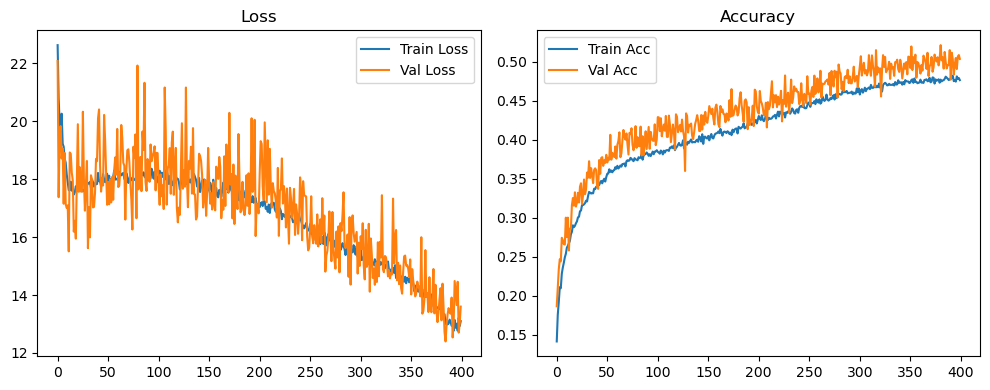

Original Model Final Test Loss: 13.6791 Accuracy: 0.4979


🚀 Running: batch256_lr_max_0.0002_min_1e-06_dp0.0


Files already downloaded and verified


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|                                                                                                                                                                        | 0/400 [00:00<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.1643 | Val Acc: 0.2175 | Epoch Time: 1.91 | :   0%|                                                                                                      | 0/400 [01:54<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.1643 | Val Acc: 0.2175 | Epoch Time: 1.91 | :   0%|                                                                                                      | 0/400 [01:54<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.1643 | Val Acc: 0.2175 | Epoch Time: 1.91 | :   0%|▏                                                                                         | 1/400 [01:54<12:43:11, 114.77s/it]

| LR: 0.000200 | Train Acc: 0.2094 | Val Acc: 0.2194 | Epoch Time: 1.91 | :   0%|▏                                                                                         | 1/400 [03:49<12:43:11, 114.77s/it]

| LR: 0.000200 | Train Acc: 0.2094 | Val Acc: 0.2194 | Epoch Time: 1.91 | :   0%|▏                                                                                         | 1/400 [03:49<12:43:11, 114.77s/it]

| LR: 0.000200 | Train Acc: 0.2094 | Val Acc: 0.2194 | Epoch Time: 1.91 | :   0%|▍                                                                                         | 2/400 [03:49<12:40:21, 114.63s/it]

| LR: 0.000200 | Train Acc: 0.2259 | Val Acc: 0.2515 | Epoch Time: 1.91 | :   0%|▍                                                                                         | 2/400 [05:43<12:40:21, 114.63s/it]

| LR: 0.000200 | Train Acc: 0.2259 | Val Acc: 0.2515 | Epoch Time: 1.91 | :   0%|▍                                                                                         | 2/400 [05:43<12:40:21, 114.63s/it]

| LR: 0.000200 | Train Acc: 0.2259 | Val Acc: 0.2515 | Epoch Time: 1.91 | :   1%|▋                                                                                         | 3/400 [05:43<12:38:18, 114.60s/it]

| LR: 0.000200 | Train Acc: 0.2413 | Val Acc: 0.2594 | Epoch Time: 1.91 | :   1%|▋                                                                                         | 3/400 [07:38<12:38:18, 114.60s/it]

| LR: 0.000200 | Train Acc: 0.2413 | Val Acc: 0.2594 | Epoch Time: 1.91 | :   1%|▋                                                                                         | 3/400 [07:38<12:38:18, 114.60s/it]

| LR: 0.000200 | Train Acc: 0.2413 | Val Acc: 0.2594 | Epoch Time: 1.91 | :   1%|▉                                                                                         | 4/400 [07:38<12:36:29, 114.62s/it]

| LR: 0.000200 | Train Acc: 0.2530 | Val Acc: 0.2954 | Epoch Time: 1.91 | :   1%|▉                                                                                         | 4/400 [09:33<12:36:29, 114.62s/it]

| LR: 0.000200 | Train Acc: 0.2530 | Val Acc: 0.2954 | Epoch Time: 1.91 | :   1%|▉                                                                                         | 4/400 [09:33<12:36:29, 114.62s/it]

| LR: 0.000200 | Train Acc: 0.2530 | Val Acc: 0.2954 | Epoch Time: 1.91 | :   1%|█▏                                                                                        | 5/400 [09:33<12:34:33, 114.62s/it]

| LR: 0.000200 | Train Acc: 0.2586 | Val Acc: 0.2856 | Epoch Time: 1.91 | :   1%|█▏                                                                                        | 5/400 [11:27<12:34:33, 114.62s/it]

| LR: 0.000200 | Train Acc: 0.2586 | Val Acc: 0.2856 | Epoch Time: 1.91 | :   1%|█▏                                                                                        | 5/400 [11:27<12:34:33, 114.62s/it]

| LR: 0.000200 | Train Acc: 0.2586 | Val Acc: 0.2856 | Epoch Time: 1.91 | :   2%|█▎                                                                                        | 6/400 [11:27<12:32:45, 114.63s/it]

| LR: 0.000200 | Train Acc: 0.2666 | Val Acc: 0.2803 | Epoch Time: 1.91 | :   2%|█▎                                                                                        | 6/400 [13:22<12:32:45, 114.63s/it]

| LR: 0.000200 | Train Acc: 0.2666 | Val Acc: 0.2803 | Epoch Time: 1.91 | :   2%|█▎                                                                                        | 6/400 [13:22<12:32:45, 114.63s/it]

| LR: 0.000200 | Train Acc: 0.2666 | Val Acc: 0.2803 | Epoch Time: 1.91 | :   2%|█▌                                                                                        | 7/400 [13:22<12:30:53, 114.64s/it]

| LR: 0.000200 | Train Acc: 0.2678 | Val Acc: 0.2842 | Epoch Time: 1.91 | :   2%|█▌                                                                                        | 7/400 [15:17<12:30:53, 114.64s/it]

| LR: 0.000200 | Train Acc: 0.2678 | Val Acc: 0.2842 | Epoch Time: 1.91 | :   2%|█▌                                                                                        | 7/400 [15:17<12:30:53, 114.64s/it]

| LR: 0.000200 | Train Acc: 0.2678 | Val Acc: 0.2842 | Epoch Time: 1.91 | :   2%|█▊                                                                                        | 8/400 [15:17<12:29:06, 114.66s/it]

| LR: 0.000200 | Train Acc: 0.2752 | Val Acc: 0.3015 | Epoch Time: 1.91 | :   2%|█▊                                                                                        | 8/400 [17:11<12:29:06, 114.66s/it]

| LR: 0.000200 | Train Acc: 0.2752 | Val Acc: 0.3015 | Epoch Time: 1.91 | :   2%|█▊                                                                                        | 8/400 [17:11<12:29:06, 114.66s/it]

| LR: 0.000200 | Train Acc: 0.2752 | Val Acc: 0.3015 | Epoch Time: 1.91 | :   2%|██                                                                                        | 9/400 [17:11<12:27:23, 114.69s/it]

| LR: 0.000200 | Train Acc: 0.2806 | Val Acc: 0.3137 | Epoch Time: 1.91 | :   2%|██                                                                                        | 9/400 [19:06<12:27:23, 114.69s/it]

| LR: 0.000200 | Train Acc: 0.2806 | Val Acc: 0.3137 | Epoch Time: 1.91 | :   2%|██                                                                                        | 9/400 [19:06<12:27:23, 114.69s/it]

| LR: 0.000200 | Train Acc: 0.2806 | Val Acc: 0.3137 | Epoch Time: 1.91 | :   2%|██▏                                                                                      | 10/400 [19:06<12:25:37, 114.71s/it]

| LR: 0.000200 | Train Acc: 0.2799 | Val Acc: 0.3031 | Epoch Time: 1.91 | :   2%|██▏                                                                                      | 10/400 [21:01<12:25:37, 114.71s/it]

| LR: 0.000200 | Train Acc: 0.2799 | Val Acc: 0.3031 | Epoch Time: 1.91 | :   2%|██▏                                                                                      | 10/400 [21:01<12:25:37, 114.71s/it]

| LR: 0.000200 | Train Acc: 0.2799 | Val Acc: 0.3031 | Epoch Time: 1.91 | :   3%|██▍                                                                                      | 11/400 [21:01<12:23:51, 114.73s/it]

| LR: 0.000200 | Train Acc: 0.2899 | Val Acc: 0.3153 | Epoch Time: 1.91 | :   3%|██▍                                                                                      | 11/400 [22:56<12:23:51, 114.73s/it]

| LR: 0.000200 | Train Acc: 0.2899 | Val Acc: 0.3153 | Epoch Time: 1.91 | :   3%|██▍                                                                                      | 11/400 [22:56<12:23:51, 114.73s/it]

| LR: 0.000200 | Train Acc: 0.2899 | Val Acc: 0.3153 | Epoch Time: 1.91 | :   3%|██▋                                                                                      | 12/400 [22:56<12:22:04, 114.75s/it]

| LR: 0.000200 | Train Acc: 0.2900 | Val Acc: 0.3158 | Epoch Time: 1.91 | :   3%|██▋                                                                                      | 12/400 [24:50<12:22:04, 114.75s/it]

| LR: 0.000200 | Train Acc: 0.2900 | Val Acc: 0.3158 | Epoch Time: 1.91 | :   3%|██▋                                                                                      | 12/400 [24:50<12:22:04, 114.75s/it]

| LR: 0.000200 | Train Acc: 0.2900 | Val Acc: 0.3158 | Epoch Time: 1.91 | :   3%|██▉                                                                                      | 13/400 [24:51<12:20:18, 114.78s/it]

| LR: 0.000199 | Train Acc: 0.2912 | Val Acc: 0.3021 | Epoch Time: 1.91 | :   3%|██▉                                                                                      | 13/400 [26:45<12:20:18, 114.78s/it]

| LR: 0.000199 | Train Acc: 0.2912 | Val Acc: 0.3021 | Epoch Time: 1.91 | :   3%|██▉                                                                                      | 13/400 [26:45<12:20:18, 114.78s/it]

| LR: 0.000199 | Train Acc: 0.2912 | Val Acc: 0.3021 | Epoch Time: 1.91 | :   4%|███                                                                                      | 14/400 [26:45<12:18:29, 114.79s/it]

| LR: 0.000199 | Train Acc: 0.2946 | Val Acc: 0.3335 | Epoch Time: 1.91 | :   4%|███                                                                                      | 14/400 [28:40<12:18:29, 114.79s/it]

| LR: 0.000199 | Train Acc: 0.2946 | Val Acc: 0.3335 | Epoch Time: 1.91 | :   4%|███                                                                                      | 14/400 [28:40<12:18:29, 114.79s/it]

| LR: 0.000199 | Train Acc: 0.2946 | Val Acc: 0.3335 | Epoch Time: 1.91 | :   4%|███▎                                                                                     | 15/400 [28:40<12:16:42, 114.81s/it]

| LR: 0.000199 | Train Acc: 0.3036 | Val Acc: 0.3268 | Epoch Time: 1.91 | :   4%|███▎                                                                                     | 15/400 [30:35<12:16:42, 114.81s/it]

| LR: 0.000199 | Train Acc: 0.3036 | Val Acc: 0.3268 | Epoch Time: 1.91 | :   4%|███▎                                                                                     | 15/400 [30:35<12:16:42, 114.81s/it]

| LR: 0.000199 | Train Acc: 0.3036 | Val Acc: 0.3268 | Epoch Time: 1.91 | :   4%|███▌                                                                                     | 16/400 [30:35<12:14:54, 114.83s/it]

| LR: 0.000199 | Train Acc: 0.3090 | Val Acc: 0.3152 | Epoch Time: 1.91 | :   4%|███▌                                                                                     | 16/400 [32:30<12:14:54, 114.83s/it]

| LR: 0.000199 | Train Acc: 0.3090 | Val Acc: 0.3152 | Epoch Time: 1.91 | :   4%|███▌                                                                                     | 16/400 [32:30<12:14:54, 114.83s/it]

| LR: 0.000199 | Train Acc: 0.3090 | Val Acc: 0.3152 | Epoch Time: 1.91 | :   4%|███▊                                                                                     | 17/400 [32:30<12:13:04, 114.84s/it]

| LR: 0.000199 | Train Acc: 0.3100 | Val Acc: 0.3276 | Epoch Time: 1.91 | :   4%|███▊                                                                                     | 17/400 [34:25<12:13:04, 114.84s/it]

| LR: 0.000199 | Train Acc: 0.3100 | Val Acc: 0.3276 | Epoch Time: 1.91 | :   4%|███▊                                                                                     | 17/400 [34:25<12:13:04, 114.84s/it]

| LR: 0.000199 | Train Acc: 0.3100 | Val Acc: 0.3276 | Epoch Time: 1.91 | :   4%|████                                                                                     | 18/400 [34:25<12:11:13, 114.85s/it]

| LR: 0.000199 | Train Acc: 0.3172 | Val Acc: 0.3266 | Epoch Time: 1.91 | :   4%|████                                                                                     | 18/400 [36:20<12:11:13, 114.85s/it]

| LR: 0.000199 | Train Acc: 0.3172 | Val Acc: 0.3266 | Epoch Time: 1.91 | :   4%|████                                                                                     | 18/400 [36:20<12:11:13, 114.85s/it]

| LR: 0.000199 | Train Acc: 0.3172 | Val Acc: 0.3266 | Epoch Time: 1.91 | :   5%|████▏                                                                                    | 19/400 [36:20<12:09:19, 114.85s/it]

| LR: 0.000199 | Train Acc: 0.3182 | Val Acc: 0.3398 | Epoch Time: 1.91 | :   5%|████▏                                                                                    | 19/400 [38:14<12:09:19, 114.85s/it]

| LR: 0.000199 | Train Acc: 0.3182 | Val Acc: 0.3398 | Epoch Time: 1.91 | :   5%|████▏                                                                                    | 19/400 [38:14<12:09:19, 114.85s/it]

| LR: 0.000199 | Train Acc: 0.3182 | Val Acc: 0.3398 | Epoch Time: 1.91 | :   5%|████▍                                                                                    | 20/400 [38:15<12:07:24, 114.85s/it]

| LR: 0.000199 | Train Acc: 0.3241 | Val Acc: 0.3350 | Epoch Time: 1.91 | :   5%|████▍                                                                                    | 20/400 [40:09<12:07:24, 114.85s/it]

| LR: 0.000199 | Train Acc: 0.3241 | Val Acc: 0.3350 | Epoch Time: 1.91 | :   5%|████▍                                                                                    | 20/400 [40:09<12:07:24, 114.85s/it]

| LR: 0.000199 | Train Acc: 0.3241 | Val Acc: 0.3350 | Epoch Time: 1.91 | :   5%|████▋                                                                                    | 21/400 [40:09<12:05:24, 114.84s/it]

| LR: 0.000199 | Train Acc: 0.3196 | Val Acc: 0.3595 | Epoch Time: 1.91 | :   5%|████▋                                                                                    | 21/400 [42:04<12:05:24, 114.84s/it]

| LR: 0.000199 | Train Acc: 0.3196 | Val Acc: 0.3595 | Epoch Time: 1.91 | :   5%|████▋                                                                                    | 21/400 [42:04<12:05:24, 114.84s/it]

| LR: 0.000199 | Train Acc: 0.3196 | Val Acc: 0.3595 | Epoch Time: 1.91 | :   6%|████▉                                                                                    | 22/400 [42:04<12:03:32, 114.85s/it]

| LR: 0.000199 | Train Acc: 0.3343 | Val Acc: 0.3556 | Epoch Time: 1.91 | :   6%|████▉                                                                                    | 22/400 [43:59<12:03:32, 114.85s/it]

| LR: 0.000199 | Train Acc: 0.3343 | Val Acc: 0.3556 | Epoch Time: 1.91 | :   6%|████▉                                                                                    | 22/400 [43:59<12:03:32, 114.85s/it]

| LR: 0.000199 | Train Acc: 0.3343 | Val Acc: 0.3556 | Epoch Time: 1.91 | :   6%|█████                                                                                    | 23/400 [43:59<12:01:36, 114.84s/it]

| LR: 0.000198 | Train Acc: 0.3348 | Val Acc: 0.3549 | Epoch Time: 1.91 | :   6%|█████                                                                                    | 23/400 [45:54<12:01:36, 114.84s/it]

| LR: 0.000198 | Train Acc: 0.3348 | Val Acc: 0.3549 | Epoch Time: 1.91 | :   6%|█████                                                                                    | 23/400 [45:54<12:01:36, 114.84s/it]

| LR: 0.000198 | Train Acc: 0.3348 | Val Acc: 0.3549 | Epoch Time: 1.91 | :   6%|█████▎                                                                                   | 24/400 [45:54<11:59:45, 114.86s/it]

| LR: 0.000198 | Train Acc: 0.3401 | Val Acc: 0.3560 | Epoch Time: 1.91 | :   6%|█████▎                                                                                   | 24/400 [47:49<11:59:45, 114.86s/it]

| LR: 0.000198 | Train Acc: 0.3401 | Val Acc: 0.3560 | Epoch Time: 1.91 | :   6%|█████▎                                                                                   | 24/400 [47:49<11:59:45, 114.86s/it]

| LR: 0.000198 | Train Acc: 0.3401 | Val Acc: 0.3560 | Epoch Time: 1.91 | :   6%|█████▌                                                                                   | 25/400 [47:49<11:57:50, 114.86s/it]

| LR: 0.000198 | Train Acc: 0.3443 | Val Acc: 0.3591 | Epoch Time: 1.91 | :   6%|█████▌                                                                                   | 25/400 [49:44<11:57:50, 114.86s/it]

| LR: 0.000198 | Train Acc: 0.3443 | Val Acc: 0.3591 | Epoch Time: 1.91 | :   6%|█████▌                                                                                   | 25/400 [49:44<11:57:50, 114.86s/it]

| LR: 0.000198 | Train Acc: 0.3443 | Val Acc: 0.3591 | Epoch Time: 1.91 | :   6%|█████▊                                                                                   | 26/400 [49:44<11:55:47, 114.83s/it]

| LR: 0.000198 | Train Acc: 0.3523 | Val Acc: 0.3597 | Epoch Time: 1.91 | :   6%|█████▊                                                                                   | 26/400 [51:38<11:55:47, 114.83s/it]

| LR: 0.000198 | Train Acc: 0.3523 | Val Acc: 0.3597 | Epoch Time: 1.91 | :   6%|█████▊                                                                                   | 26/400 [51:38<11:55:47, 114.83s/it]

| LR: 0.000198 | Train Acc: 0.3523 | Val Acc: 0.3597 | Epoch Time: 1.91 | :   7%|██████                                                                                   | 27/400 [51:38<11:53:50, 114.83s/it]

| LR: 0.000198 | Train Acc: 0.3553 | Val Acc: 0.3889 | Epoch Time: 1.91 | :   7%|██████                                                                                   | 27/400 [53:33<11:53:50, 114.83s/it]

| LR: 0.000198 | Train Acc: 0.3553 | Val Acc: 0.3889 | Epoch Time: 1.91 | :   7%|██████                                                                                   | 27/400 [53:33<11:53:50, 114.83s/it]

| LR: 0.000198 | Train Acc: 0.3553 | Val Acc: 0.3889 | Epoch Time: 1.91 | :   7%|██████▏                                                                                  | 28/400 [53:33<11:51:52, 114.82s/it]

| LR: 0.000198 | Train Acc: 0.3488 | Val Acc: 0.3730 | Epoch Time: 1.91 | :   7%|██████▏                                                                                  | 28/400 [55:28<11:51:52, 114.82s/it]

| LR: 0.000198 | Train Acc: 0.3488 | Val Acc: 0.3730 | Epoch Time: 1.91 | :   7%|██████▏                                                                                  | 28/400 [55:28<11:51:52, 114.82s/it]

| LR: 0.000198 | Train Acc: 0.3488 | Val Acc: 0.3730 | Epoch Time: 1.91 | :   7%|██████▍                                                                                  | 29/400 [55:28<11:50:09, 114.85s/it]

| LR: 0.000197 | Train Acc: 0.3564 | Val Acc: 0.3813 | Epoch Time: 1.91 | :   7%|██████▍                                                                                  | 29/400 [57:23<11:50:09, 114.85s/it]

| LR: 0.000197 | Train Acc: 0.3564 | Val Acc: 0.3813 | Epoch Time: 1.91 | :   7%|██████▍                                                                                  | 29/400 [57:23<11:50:09, 114.85s/it]

| LR: 0.000197 | Train Acc: 0.3564 | Val Acc: 0.3813 | Epoch Time: 1.91 | :   8%|██████▋                                                                                  | 30/400 [57:23<11:48:17, 114.86s/it]

| LR: 0.000197 | Train Acc: 0.3597 | Val Acc: 0.3780 | Epoch Time: 1.91 | :   8%|██████▋                                                                                  | 30/400 [59:18<11:48:17, 114.86s/it]

| LR: 0.000197 | Train Acc: 0.3597 | Val Acc: 0.3780 | Epoch Time: 1.91 | :   8%|██████▋                                                                                  | 30/400 [59:18<11:48:17, 114.86s/it]

| LR: 0.000197 | Train Acc: 0.3597 | Val Acc: 0.3780 | Epoch Time: 1.91 | :   8%|██████▉                                                                                  | 31/400 [59:18<11:46:23, 114.86s/it]

| LR: 0.000197 | Train Acc: 0.3705 | Val Acc: 0.3882 | Epoch Time: 1.91 | :   8%|██████▋                                                                                | 31/400 [1:01:13<11:46:23, 114.86s/it]

| LR: 0.000197 | Train Acc: 0.3705 | Val Acc: 0.3882 | Epoch Time: 1.91 | :   8%|██████▋                                                                                | 31/400 [1:01:13<11:46:23, 114.86s/it]

| LR: 0.000197 | Train Acc: 0.3705 | Val Acc: 0.3882 | Epoch Time: 1.91 | :   8%|██████▉                                                                                | 32/400 [1:01:13<11:44:40, 114.89s/it]

| LR: 0.000197 | Train Acc: 0.3672 | Val Acc: 0.3995 | Epoch Time: 1.91 | :   8%|██████▉                                                                                | 32/400 [1:03:08<11:44:40, 114.89s/it]

| LR: 0.000197 | Train Acc: 0.3672 | Val Acc: 0.3995 | Epoch Time: 1.91 | :   8%|██████▉                                                                                | 32/400 [1:03:08<11:44:40, 114.89s/it]

| LR: 0.000197 | Train Acc: 0.3672 | Val Acc: 0.3995 | Epoch Time: 1.91 | :   8%|███████▏                                                                               | 33/400 [1:03:08<11:42:44, 114.89s/it]

| LR: 0.000197 | Train Acc: 0.3689 | Val Acc: 0.3850 | Epoch Time: 1.91 | :   8%|███████▏                                                                               | 33/400 [1:05:02<11:42:44, 114.89s/it]

| LR: 0.000197 | Train Acc: 0.3689 | Val Acc: 0.3850 | Epoch Time: 1.91 | :   8%|███████▏                                                                               | 33/400 [1:05:02<11:42:44, 114.89s/it]

| LR: 0.000197 | Train Acc: 0.3689 | Val Acc: 0.3850 | Epoch Time: 1.91 | :   8%|███████▍                                                                               | 34/400 [1:05:03<11:40:39, 114.86s/it]

| LR: 0.000196 | Train Acc: 0.3721 | Val Acc: 0.3981 | Epoch Time: 1.91 | :   8%|███████▍                                                                               | 34/400 [1:06:57<11:40:39, 114.86s/it]

| LR: 0.000196 | Train Acc: 0.3721 | Val Acc: 0.3981 | Epoch Time: 1.91 | :   8%|███████▍                                                                               | 34/400 [1:06:57<11:40:39, 114.86s/it]

| LR: 0.000196 | Train Acc: 0.3721 | Val Acc: 0.3981 | Epoch Time: 1.91 | :   9%|███████▌                                                                               | 35/400 [1:06:57<11:38:45, 114.86s/it]

| LR: 0.000196 | Train Acc: 0.3765 | Val Acc: 0.3855 | Epoch Time: 1.91 | :   9%|███████▌                                                                               | 35/400 [1:08:52<11:38:45, 114.86s/it]

| LR: 0.000196 | Train Acc: 0.3765 | Val Acc: 0.3855 | Epoch Time: 1.91 | :   9%|███████▌                                                                               | 35/400 [1:08:52<11:38:45, 114.86s/it]

| LR: 0.000196 | Train Acc: 0.3765 | Val Acc: 0.3855 | Epoch Time: 1.91 | :   9%|███████▊                                                                               | 36/400 [1:08:52<11:37:05, 114.91s/it]

| LR: 0.000196 | Train Acc: 0.3769 | Val Acc: 0.3768 | Epoch Time: 1.91 | :   9%|███████▊                                                                               | 36/400 [1:10:47<11:37:05, 114.91s/it]

| LR: 0.000196 | Train Acc: 0.3769 | Val Acc: 0.3768 | Epoch Time: 1.91 | :   9%|███████▊                                                                               | 36/400 [1:10:47<11:37:05, 114.91s/it]

| LR: 0.000196 | Train Acc: 0.3769 | Val Acc: 0.3768 | Epoch Time: 1.91 | :   9%|████████                                                                               | 37/400 [1:10:47<11:35:01, 114.88s/it]

| LR: 0.000196 | Train Acc: 0.3801 | Val Acc: 0.4170 | Epoch Time: 1.91 | :   9%|████████                                                                               | 37/400 [1:12:42<11:35:01, 114.88s/it]

| LR: 0.000196 | Train Acc: 0.3801 | Val Acc: 0.4170 | Epoch Time: 1.91 | :   9%|████████                                                                               | 37/400 [1:12:42<11:35:01, 114.88s/it]

| LR: 0.000196 | Train Acc: 0.3801 | Val Acc: 0.4170 | Epoch Time: 1.91 | :  10%|████████▎                                                                              | 38/400 [1:12:42<11:32:58, 114.86s/it]

| LR: 0.000196 | Train Acc: 0.3821 | Val Acc: 0.3897 | Epoch Time: 1.91 | :  10%|████████▎                                                                              | 38/400 [1:14:37<11:32:58, 114.86s/it]

| LR: 0.000196 | Train Acc: 0.3821 | Val Acc: 0.3897 | Epoch Time: 1.91 | :  10%|████████▎                                                                              | 38/400 [1:14:37<11:32:58, 114.86s/it]

| LR: 0.000196 | Train Acc: 0.3821 | Val Acc: 0.3897 | Epoch Time: 1.91 | :  10%|████████▍                                                                              | 39/400 [1:14:37<11:31:14, 114.89s/it]

| LR: 0.000195 | Train Acc: 0.3903 | Val Acc: 0.4072 | Epoch Time: 1.91 | :  10%|████████▍                                                                              | 39/400 [1:16:32<11:31:14, 114.89s/it]

| LR: 0.000195 | Train Acc: 0.3903 | Val Acc: 0.4072 | Epoch Time: 1.91 | :  10%|████████▍                                                                              | 39/400 [1:16:32<11:31:14, 114.89s/it]

| LR: 0.000195 | Train Acc: 0.3903 | Val Acc: 0.4072 | Epoch Time: 1.91 | :  10%|████████▋                                                                              | 40/400 [1:16:32<11:29:24, 114.90s/it]

| LR: 0.000195 | Train Acc: 0.3870 | Val Acc: 0.4149 | Epoch Time: 1.91 | :  10%|████████▋                                                                              | 40/400 [1:18:27<11:29:24, 114.90s/it]

| LR: 0.000195 | Train Acc: 0.3870 | Val Acc: 0.4149 | Epoch Time: 1.91 | :  10%|████████▋                                                                              | 40/400 [1:18:27<11:29:24, 114.90s/it]

| LR: 0.000195 | Train Acc: 0.3870 | Val Acc: 0.4149 | Epoch Time: 1.91 | :  10%|████████▉                                                                              | 41/400 [1:18:27<11:27:14, 114.86s/it]

| LR: 0.000195 | Train Acc: 0.3931 | Val Acc: 0.4054 | Epoch Time: 1.91 | :  10%|████████▉                                                                              | 41/400 [1:20:21<11:27:14, 114.86s/it]

| LR: 0.000195 | Train Acc: 0.3931 | Val Acc: 0.4054 | Epoch Time: 1.91 | :  10%|████████▉                                                                              | 41/400 [1:20:21<11:27:14, 114.86s/it]

| LR: 0.000195 | Train Acc: 0.3931 | Val Acc: 0.4054 | Epoch Time: 1.91 | :  10%|█████████▏                                                                             | 42/400 [1:20:21<11:25:09, 114.83s/it]

| LR: 0.000195 | Train Acc: 0.3972 | Val Acc: 0.4370 | Epoch Time: 1.91 | :  10%|█████████▏                                                                             | 42/400 [1:22:16<11:25:09, 114.83s/it]

| LR: 0.000195 | Train Acc: 0.3972 | Val Acc: 0.4370 | Epoch Time: 1.91 | :  10%|█████████▏                                                                             | 42/400 [1:22:16<11:25:09, 114.83s/it]

| LR: 0.000195 | Train Acc: 0.3972 | Val Acc: 0.4370 | Epoch Time: 1.91 | :  11%|█████████▎                                                                             | 43/400 [1:22:16<11:23:13, 114.83s/it]

| LR: 0.000194 | Train Acc: 0.3997 | Val Acc: 0.4494 | Epoch Time: 1.91 | :  11%|█████████▎                                                                             | 43/400 [1:24:11<11:23:13, 114.83s/it]

| LR: 0.000194 | Train Acc: 0.3997 | Val Acc: 0.4494 | Epoch Time: 1.91 | :  11%|█████████▎                                                                             | 43/400 [1:24:11<11:23:13, 114.83s/it]

| LR: 0.000194 | Train Acc: 0.3997 | Val Acc: 0.4494 | Epoch Time: 1.91 | :  11%|█████████▌                                                                             | 44/400 [1:24:11<11:21:06, 114.79s/it]

| LR: 0.000194 | Train Acc: 0.4078 | Val Acc: 0.4366 | Epoch Time: 1.91 | :  11%|█████████▌                                                                             | 44/400 [1:26:06<11:21:06, 114.79s/it]

| LR: 0.000194 | Train Acc: 0.4078 | Val Acc: 0.4366 | Epoch Time: 1.91 | :  11%|█████████▌                                                                             | 44/400 [1:26:06<11:21:06, 114.79s/it]

| LR: 0.000194 | Train Acc: 0.4078 | Val Acc: 0.4366 | Epoch Time: 1.91 | :  11%|█████████▊                                                                             | 45/400 [1:26:06<11:19:08, 114.79s/it]

| LR: 0.000194 | Train Acc: 0.4032 | Val Acc: 0.4153 | Epoch Time: 1.91 | :  11%|█████████▊                                                                             | 45/400 [1:28:01<11:19:08, 114.79s/it]

| LR: 0.000194 | Train Acc: 0.4032 | Val Acc: 0.4153 | Epoch Time: 1.91 | :  11%|█████████▊                                                                             | 45/400 [1:28:01<11:19:08, 114.79s/it]

| LR: 0.000194 | Train Acc: 0.4032 | Val Acc: 0.4153 | Epoch Time: 1.91 | :  12%|██████████                                                                             | 46/400 [1:28:01<11:17:25, 114.82s/it]

| LR: 0.000194 | Train Acc: 0.4027 | Val Acc: 0.4372 | Epoch Time: 1.91 | :  12%|██████████                                                                             | 46/400 [1:29:55<11:17:25, 114.82s/it]

| LR: 0.000194 | Train Acc: 0.4027 | Val Acc: 0.4372 | Epoch Time: 1.91 | :  12%|██████████                                                                             | 46/400 [1:29:55<11:17:25, 114.82s/it]

| LR: 0.000194 | Train Acc: 0.4027 | Val Acc: 0.4372 | Epoch Time: 1.91 | :  12%|██████████▏                                                                            | 47/400 [1:29:55<11:15:26, 114.81s/it]

| LR: 0.000193 | Train Acc: 0.4148 | Val Acc: 0.4410 | Epoch Time: 1.91 | :  12%|██████████▏                                                                            | 47/400 [1:31:50<11:15:26, 114.81s/it]

| LR: 0.000193 | Train Acc: 0.4148 | Val Acc: 0.4410 | Epoch Time: 1.91 | :  12%|██████████▏                                                                            | 47/400 [1:31:50<11:15:26, 114.81s/it]

| LR: 0.000193 | Train Acc: 0.4148 | Val Acc: 0.4410 | Epoch Time: 1.91 | :  12%|██████████▍                                                                            | 48/400 [1:31:50<11:13:19, 114.77s/it]

| LR: 0.000193 | Train Acc: 0.4100 | Val Acc: 0.4247 | Epoch Time: 1.91 | :  12%|██████████▍                                                                            | 48/400 [1:33:45<11:13:19, 114.77s/it]

| LR: 0.000193 | Train Acc: 0.4100 | Val Acc: 0.4247 | Epoch Time: 1.91 | :  12%|██████████▍                                                                            | 48/400 [1:33:45<11:13:19, 114.77s/it]

| LR: 0.000193 | Train Acc: 0.4100 | Val Acc: 0.4247 | Epoch Time: 1.91 | :  12%|██████████▋                                                                            | 49/400 [1:33:45<11:11:30, 114.79s/it]

| LR: 0.000193 | Train Acc: 0.4148 | Val Acc: 0.4180 | Epoch Time: 1.91 | :  12%|██████████▋                                                                            | 49/400 [1:35:40<11:11:30, 114.79s/it]

| LR: 0.000193 | Train Acc: 0.4148 | Val Acc: 0.4180 | Epoch Time: 1.91 | :  12%|██████████▋                                                                            | 49/400 [1:35:40<11:11:30, 114.79s/it]

| LR: 0.000193 | Train Acc: 0.4148 | Val Acc: 0.4180 | Epoch Time: 1.91 | :  12%|██████████▉                                                                            | 50/400 [1:35:40<11:09:51, 114.83s/it]

| LR: 0.000192 | Train Acc: 0.4141 | Val Acc: 0.4129 | Epoch Time: 1.91 | :  12%|██████████▉                                                                            | 50/400 [1:37:35<11:09:51, 114.83s/it]

| LR: 0.000192 | Train Acc: 0.4141 | Val Acc: 0.4129 | Epoch Time: 1.91 | :  12%|██████████▉                                                                            | 50/400 [1:37:35<11:09:51, 114.83s/it]

| LR: 0.000192 | Train Acc: 0.4141 | Val Acc: 0.4129 | Epoch Time: 1.91 | :  13%|███████████                                                                            | 51/400 [1:37:35<11:07:58, 114.84s/it]

| LR: 0.000192 | Train Acc: 0.4172 | Val Acc: 0.4246 | Epoch Time: 1.91 | :  13%|███████████                                                                            | 51/400 [1:39:29<11:07:58, 114.84s/it]

| LR: 0.000192 | Train Acc: 0.4172 | Val Acc: 0.4246 | Epoch Time: 1.91 | :  13%|███████████                                                                            | 51/400 [1:39:29<11:07:58, 114.84s/it]

| LR: 0.000192 | Train Acc: 0.4172 | Val Acc: 0.4246 | Epoch Time: 1.91 | :  13%|███████████▎                                                                           | 52/400 [1:39:30<11:06:07, 114.85s/it]

| LR: 0.000192 | Train Acc: 0.4213 | Val Acc: 0.4479 | Epoch Time: 1.91 | :  13%|███████████▎                                                                           | 52/400 [1:41:24<11:06:07, 114.85s/it]

| LR: 0.000192 | Train Acc: 0.4213 | Val Acc: 0.4479 | Epoch Time: 1.91 | :  13%|███████████▎                                                                           | 52/400 [1:41:24<11:06:07, 114.85s/it]

| LR: 0.000192 | Train Acc: 0.4213 | Val Acc: 0.4479 | Epoch Time: 1.91 | :  13%|███████████▌                                                                           | 53/400 [1:41:25<11:04:24, 114.88s/it]

| LR: 0.000192 | Train Acc: 0.4207 | Val Acc: 0.4506 | Epoch Time: 1.91 | :  13%|███████████▌                                                                           | 53/400 [1:43:19<11:04:24, 114.88s/it]

| LR: 0.000192 | Train Acc: 0.4207 | Val Acc: 0.4506 | Epoch Time: 1.91 | :  13%|███████████▌                                                                           | 53/400 [1:43:19<11:04:24, 114.88s/it]

| LR: 0.000192 | Train Acc: 0.4207 | Val Acc: 0.4506 | Epoch Time: 1.91 | :  14%|███████████▋                                                                           | 54/400 [1:43:20<11:02:39, 114.91s/it]

| LR: 0.000191 | Train Acc: 0.4251 | Val Acc: 0.4227 | Epoch Time: 1.91 | :  14%|███████████▋                                                                           | 54/400 [1:45:14<11:02:39, 114.91s/it]

| LR: 0.000191 | Train Acc: 0.4251 | Val Acc: 0.4227 | Epoch Time: 1.91 | :  14%|███████████▋                                                                           | 54/400 [1:45:14<11:02:39, 114.91s/it]

| LR: 0.000191 | Train Acc: 0.4251 | Val Acc: 0.4227 | Epoch Time: 1.91 | :  14%|███████████▉                                                                           | 55/400 [1:45:14<11:00:28, 114.87s/it]

| LR: 0.000191 | Train Acc: 0.4260 | Val Acc: 0.4261 | Epoch Time: 1.91 | :  14%|███████████▉                                                                           | 55/400 [1:47:09<11:00:28, 114.87s/it]

| LR: 0.000191 | Train Acc: 0.4260 | Val Acc: 0.4261 | Epoch Time: 1.91 | :  14%|███████████▉                                                                           | 55/400 [1:47:09<11:00:28, 114.87s/it]

| LR: 0.000191 | Train Acc: 0.4260 | Val Acc: 0.4261 | Epoch Time: 1.91 | :  14%|████████████▏                                                                          | 56/400 [1:47:09<10:58:18, 114.82s/it]

| LR: 0.000191 | Train Acc: 0.4309 | Val Acc: 0.4246 | Epoch Time: 1.91 | :  14%|████████████▏                                                                          | 56/400 [1:49:04<10:58:18, 114.82s/it]

| LR: 0.000191 | Train Acc: 0.4309 | Val Acc: 0.4246 | Epoch Time: 1.91 | :  14%|████████████▏                                                                          | 56/400 [1:49:04<10:58:18, 114.82s/it]

| LR: 0.000191 | Train Acc: 0.4309 | Val Acc: 0.4246 | Epoch Time: 1.91 | :  14%|████████████▍                                                                          | 57/400 [1:49:04<10:56:28, 114.83s/it]

| LR: 0.000190 | Train Acc: 0.4301 | Val Acc: 0.4453 | Epoch Time: 1.91 | :  14%|████████████▍                                                                          | 57/400 [1:50:59<10:56:28, 114.83s/it]

| LR: 0.000190 | Train Acc: 0.4301 | Val Acc: 0.4453 | Epoch Time: 1.91 | :  14%|████████████▍                                                                          | 57/400 [1:50:59<10:56:28, 114.83s/it]

| LR: 0.000190 | Train Acc: 0.4301 | Val Acc: 0.4453 | Epoch Time: 1.91 | :  14%|████████████▌                                                                          | 58/400 [1:50:59<10:54:32, 114.83s/it]

| LR: 0.000190 | Train Acc: 0.4310 | Val Acc: 0.4609 | Epoch Time: 1.91 | :  14%|████████████▌                                                                          | 58/400 [1:52:53<10:54:32, 114.83s/it]

| LR: 0.000190 | Train Acc: 0.4310 | Val Acc: 0.4609 | Epoch Time: 1.91 | :  14%|████████████▌                                                                          | 58/400 [1:52:53<10:54:32, 114.83s/it]

| LR: 0.000190 | Train Acc: 0.4310 | Val Acc: 0.4609 | Epoch Time: 1.91 | :  15%|████████████▊                                                                          | 59/400 [1:52:53<10:52:21, 114.78s/it]

| LR: 0.000190 | Train Acc: 0.4308 | Val Acc: 0.4478 | Epoch Time: 1.91 | :  15%|████████████▊                                                                          | 59/400 [1:54:48<10:52:21, 114.78s/it]

| LR: 0.000190 | Train Acc: 0.4308 | Val Acc: 0.4478 | Epoch Time: 1.91 | :  15%|████████████▊                                                                          | 59/400 [1:54:48<10:52:21, 114.78s/it]

| LR: 0.000190 | Train Acc: 0.4308 | Val Acc: 0.4478 | Epoch Time: 1.91 | :  15%|█████████████                                                                          | 60/400 [1:54:48<10:50:23, 114.77s/it]

| LR: 0.000189 | Train Acc: 0.4444 | Val Acc: 0.4767 | Epoch Time: 1.91 | :  15%|█████████████                                                                          | 60/400 [1:56:43<10:50:23, 114.77s/it]

| LR: 0.000189 | Train Acc: 0.4444 | Val Acc: 0.4767 | Epoch Time: 1.91 | :  15%|█████████████                                                                          | 60/400 [1:56:43<10:50:23, 114.77s/it]

| LR: 0.000189 | Train Acc: 0.4444 | Val Acc: 0.4767 | Epoch Time: 1.91 | :  15%|█████████████▎                                                                         | 61/400 [1:56:43<10:48:39, 114.81s/it]

| LR: 0.000189 | Train Acc: 0.4413 | Val Acc: 0.4468 | Epoch Time: 1.91 | :  15%|█████████████▎                                                                         | 61/400 [1:58:38<10:48:39, 114.81s/it]

| LR: 0.000189 | Train Acc: 0.4413 | Val Acc: 0.4468 | Epoch Time: 1.91 | :  15%|█████████████▎                                                                         | 61/400 [1:58:38<10:48:39, 114.81s/it]

| LR: 0.000189 | Train Acc: 0.4413 | Val Acc: 0.4468 | Epoch Time: 1.91 | :  16%|█████████████▍                                                                         | 62/400 [1:58:38<10:46:46, 114.81s/it]

| LR: 0.000188 | Train Acc: 0.4413 | Val Acc: 0.4463 | Epoch Time: 1.91 | :  16%|█████████████▍                                                                         | 62/400 [2:00:32<10:46:46, 114.81s/it]

| LR: 0.000188 | Train Acc: 0.4413 | Val Acc: 0.4463 | Epoch Time: 1.91 | :  16%|█████████████▍                                                                         | 62/400 [2:00:32<10:46:46, 114.81s/it]

| LR: 0.000188 | Train Acc: 0.4413 | Val Acc: 0.4463 | Epoch Time: 1.91 | :  16%|█████████████▋                                                                         | 63/400 [2:00:33<10:44:37, 114.77s/it]

| LR: 0.000188 | Train Acc: 0.4396 | Val Acc: 0.4571 | Epoch Time: 1.91 | :  16%|█████████████▋                                                                         | 63/400 [2:02:27<10:44:37, 114.77s/it]

| LR: 0.000188 | Train Acc: 0.4396 | Val Acc: 0.4571 | Epoch Time: 1.91 | :  16%|█████████████▋                                                                         | 63/400 [2:02:27<10:44:37, 114.77s/it]

| LR: 0.000188 | Train Acc: 0.4396 | Val Acc: 0.4571 | Epoch Time: 1.91 | :  16%|█████████████▉                                                                         | 64/400 [2:02:27<10:42:45, 114.78s/it]

| LR: 0.000188 | Train Acc: 0.4415 | Val Acc: 0.4471 | Epoch Time: 1.91 | :  16%|█████████████▉                                                                         | 64/400 [2:04:22<10:42:45, 114.78s/it]

| LR: 0.000188 | Train Acc: 0.4415 | Val Acc: 0.4471 | Epoch Time: 1.91 | :  16%|█████████████▉                                                                         | 64/400 [2:04:22<10:42:45, 114.78s/it]

| LR: 0.000188 | Train Acc: 0.4415 | Val Acc: 0.4471 | Epoch Time: 1.91 | :  16%|██████████████▏                                                                        | 65/400 [2:04:22<10:41:05, 114.82s/it]

| LR: 0.000187 | Train Acc: 0.4427 | Val Acc: 0.4573 | Epoch Time: 1.91 | :  16%|██████████████▏                                                                        | 65/400 [2:06:17<10:41:05, 114.82s/it]

| LR: 0.000187 | Train Acc: 0.4427 | Val Acc: 0.4573 | Epoch Time: 1.91 | :  16%|██████████████▏                                                                        | 65/400 [2:06:17<10:41:05, 114.82s/it]

| LR: 0.000187 | Train Acc: 0.4427 | Val Acc: 0.4573 | Epoch Time: 1.91 | :  16%|██████████████▎                                                                        | 66/400 [2:06:17<10:39:22, 114.86s/it]

| LR: 0.000187 | Train Acc: 0.4469 | Val Acc: 0.4718 | Epoch Time: 1.91 | :  16%|██████████████▎                                                                        | 66/400 [2:08:12<10:39:22, 114.86s/it]

| LR: 0.000187 | Train Acc: 0.4469 | Val Acc: 0.4718 | Epoch Time: 1.91 | :  16%|██████████████▎                                                                        | 66/400 [2:08:12<10:39:22, 114.86s/it]

| LR: 0.000187 | Train Acc: 0.4469 | Val Acc: 0.4718 | Epoch Time: 1.91 | :  17%|██████████████▌                                                                        | 67/400 [2:08:12<10:37:20, 114.84s/it]

| LR: 0.000187 | Train Acc: 0.4530 | Val Acc: 0.4661 | Epoch Time: 1.91 | :  17%|██████████████▌                                                                        | 67/400 [2:10:07<10:37:20, 114.84s/it]

| LR: 0.000187 | Train Acc: 0.4530 | Val Acc: 0.4661 | Epoch Time: 1.91 | :  17%|██████████████▌                                                                        | 67/400 [2:10:07<10:37:20, 114.84s/it]

| LR: 0.000187 | Train Acc: 0.4530 | Val Acc: 0.4661 | Epoch Time: 1.91 | :  17%|██████████████▊                                                                        | 68/400 [2:10:07<10:35:13, 114.80s/it]

| LR: 0.000186 | Train Acc: 0.4516 | Val Acc: 0.4615 | Epoch Time: 1.91 | :  17%|██████████████▊                                                                        | 68/400 [2:12:01<10:35:13, 114.80s/it]

| LR: 0.000186 | Train Acc: 0.4516 | Val Acc: 0.4615 | Epoch Time: 1.91 | :  17%|██████████████▊                                                                        | 68/400 [2:12:01<10:35:13, 114.80s/it]

| LR: 0.000186 | Train Acc: 0.4516 | Val Acc: 0.4615 | Epoch Time: 1.91 | :  17%|███████████████                                                                        | 69/400 [2:12:02<10:33:24, 114.82s/it]

| LR: 0.000186 | Train Acc: 0.4490 | Val Acc: 0.4473 | Epoch Time: 1.91 | :  17%|███████████████                                                                        | 69/400 [2:13:56<10:33:24, 114.82s/it]

| LR: 0.000186 | Train Acc: 0.4490 | Val Acc: 0.4473 | Epoch Time: 1.91 | :  17%|███████████████                                                                        | 69/400 [2:13:56<10:33:24, 114.82s/it]

| LR: 0.000186 | Train Acc: 0.4490 | Val Acc: 0.4473 | Epoch Time: 1.91 | :  18%|███████████████▏                                                                       | 70/400 [2:13:56<10:31:42, 114.85s/it]

| LR: 0.000185 | Train Acc: 0.4495 | Val Acc: 0.4911 | Epoch Time: 1.91 | :  18%|███████████████▏                                                                       | 70/400 [2:15:51<10:31:42, 114.85s/it]

| LR: 0.000185 | Train Acc: 0.4495 | Val Acc: 0.4911 | Epoch Time: 1.91 | :  18%|███████████████▏                                                                       | 70/400 [2:15:51<10:31:42, 114.85s/it]

| LR: 0.000185 | Train Acc: 0.4495 | Val Acc: 0.4911 | Epoch Time: 1.91 | :  18%|███████████████▍                                                                       | 71/400 [2:15:51<10:29:41, 114.84s/it]

| LR: 0.000185 | Train Acc: 0.4535 | Val Acc: 0.4674 | Epoch Time: 1.91 | :  18%|███████████████▍                                                                       | 71/400 [2:17:46<10:29:41, 114.84s/it]

| LR: 0.000185 | Train Acc: 0.4535 | Val Acc: 0.4674 | Epoch Time: 1.91 | :  18%|███████████████▍                                                                       | 71/400 [2:17:46<10:29:41, 114.84s/it]

| LR: 0.000185 | Train Acc: 0.4535 | Val Acc: 0.4674 | Epoch Time: 1.91 | :  18%|███████████████▋                                                                       | 72/400 [2:17:46<10:27:27, 114.78s/it]

| LR: 0.000185 | Train Acc: 0.4548 | Val Acc: 0.4800 | Epoch Time: 1.91 | :  18%|███████████████▋                                                                       | 72/400 [2:19:41<10:27:27, 114.78s/it]

| LR: 0.000185 | Train Acc: 0.4548 | Val Acc: 0.4800 | Epoch Time: 1.91 | :  18%|███████████████▋                                                                       | 72/400 [2:19:41<10:27:27, 114.78s/it]

| LR: 0.000185 | Train Acc: 0.4548 | Val Acc: 0.4800 | Epoch Time: 1.91 | :  18%|███████████████▉                                                                       | 73/400 [2:19:41<10:25:32, 114.78s/it]

| LR: 0.000184 | Train Acc: 0.4594 | Val Acc: 0.4477 | Epoch Time: 1.91 | :  18%|███████████████▉                                                                       | 73/400 [2:21:36<10:25:32, 114.78s/it]

| LR: 0.000184 | Train Acc: 0.4594 | Val Acc: 0.4477 | Epoch Time: 1.91 | :  18%|███████████████▉                                                                       | 73/400 [2:21:36<10:25:32, 114.78s/it]

| LR: 0.000184 | Train Acc: 0.4594 | Val Acc: 0.4477 | Epoch Time: 1.91 | :  18%|████████████████                                                                       | 74/400 [2:21:36<10:23:55, 114.83s/it]

| LR: 0.000184 | Train Acc: 0.4520 | Val Acc: 0.4884 | Epoch Time: 1.91 | :  18%|████████████████                                                                       | 74/400 [2:23:31<10:23:55, 114.83s/it]

| LR: 0.000184 | Train Acc: 0.4520 | Val Acc: 0.4884 | Epoch Time: 1.91 | :  18%|████████████████                                                                       | 74/400 [2:23:31<10:23:55, 114.83s/it]

| LR: 0.000184 | Train Acc: 0.4520 | Val Acc: 0.4884 | Epoch Time: 1.91 | :  19%|████████████████▎                                                                      | 75/400 [2:23:31<10:22:11, 114.87s/it]

| LR: 0.000183 | Train Acc: 0.4551 | Val Acc: 0.4532 | Epoch Time: 1.91 | :  19%|████████████████▎                                                                      | 75/400 [2:25:25<10:22:11, 114.87s/it]

| LR: 0.000183 | Train Acc: 0.4551 | Val Acc: 0.4532 | Epoch Time: 1.91 | :  19%|████████████████▎                                                                      | 75/400 [2:25:25<10:22:11, 114.87s/it]

| LR: 0.000183 | Train Acc: 0.4551 | Val Acc: 0.4532 | Epoch Time: 1.91 | :  19%|████████████████▌                                                                      | 76/400 [2:25:25<10:20:03, 114.83s/it]

| LR: 0.000183 | Train Acc: 0.4589 | Val Acc: 0.4823 | Epoch Time: 1.91 | :  19%|████████████████▌                                                                      | 76/400 [2:27:20<10:20:03, 114.83s/it]

| LR: 0.000183 | Train Acc: 0.4589 | Val Acc: 0.4823 | Epoch Time: 1.91 | :  19%|████████████████▌                                                                      | 76/400 [2:27:20<10:20:03, 114.83s/it]

| LR: 0.000183 | Train Acc: 0.4589 | Val Acc: 0.4823 | Epoch Time: 1.91 | :  19%|████████████████▋                                                                      | 77/400 [2:27:20<10:17:55, 114.78s/it]

| LR: 0.000182 | Train Acc: 0.4634 | Val Acc: 0.4810 | Epoch Time: 1.91 | :  19%|████████████████▋                                                                      | 77/400 [2:29:15<10:17:55, 114.78s/it]

| LR: 0.000182 | Train Acc: 0.4634 | Val Acc: 0.4810 | Epoch Time: 1.91 | :  19%|████████████████▋                                                                      | 77/400 [2:29:15<10:17:55, 114.78s/it]

| LR: 0.000182 | Train Acc: 0.4634 | Val Acc: 0.4810 | Epoch Time: 1.91 | :  20%|████████████████▉                                                                      | 78/400 [2:29:15<10:16:01, 114.79s/it]

| LR: 0.000182 | Train Acc: 0.4593 | Val Acc: 0.5026 | Epoch Time: 1.91 | :  20%|████████████████▉                                                                      | 78/400 [2:31:10<10:16:01, 114.79s/it]

| LR: 0.000182 | Train Acc: 0.4593 | Val Acc: 0.5026 | Epoch Time: 1.91 | :  20%|████████████████▉                                                                      | 78/400 [2:31:10<10:16:01, 114.79s/it]

| LR: 0.000182 | Train Acc: 0.4593 | Val Acc: 0.5026 | Epoch Time: 1.91 | :  20%|█████████████████▏                                                                     | 79/400 [2:31:10<10:14:20, 114.83s/it]

| LR: 0.000181 | Train Acc: 0.4622 | Val Acc: 0.4793 | Epoch Time: 1.91 | :  20%|█████████████████▏                                                                     | 79/400 [2:33:05<10:14:20, 114.83s/it]

| LR: 0.000181 | Train Acc: 0.4622 | Val Acc: 0.4793 | Epoch Time: 1.91 | :  20%|█████████████████▏                                                                     | 79/400 [2:33:05<10:14:20, 114.83s/it]

| LR: 0.000181 | Train Acc: 0.4622 | Val Acc: 0.4793 | Epoch Time: 1.91 | :  20%|█████████████████▍                                                                     | 80/400 [2:33:05<10:12:33, 114.85s/it]

| LR: 0.000181 | Train Acc: 0.4603 | Val Acc: 0.4562 | Epoch Time: 1.91 | :  20%|█████████████████▍                                                                     | 80/400 [2:34:59<10:12:33, 114.85s/it]

| LR: 0.000181 | Train Acc: 0.4603 | Val Acc: 0.4562 | Epoch Time: 1.91 | :  20%|█████████████████▍                                                                     | 80/400 [2:34:59<10:12:33, 114.85s/it]

| LR: 0.000181 | Train Acc: 0.4603 | Val Acc: 0.4562 | Epoch Time: 1.91 | :  20%|█████████████████▌                                                                     | 81/400 [2:34:59<10:10:22, 114.80s/it]

| LR: 0.000181 | Train Acc: 0.4622 | Val Acc: 0.4858 | Epoch Time: 1.91 | :  20%|█████████████████▌                                                                     | 81/400 [2:36:54<10:10:22, 114.80s/it]

| LR: 0.000181 | Train Acc: 0.4622 | Val Acc: 0.4858 | Epoch Time: 1.91 | :  20%|█████████████████▌                                                                     | 81/400 [2:36:54<10:10:22, 114.80s/it]

| LR: 0.000181 | Train Acc: 0.4622 | Val Acc: 0.4858 | Epoch Time: 1.91 | :  20%|█████████████████▊                                                                     | 82/400 [2:36:54<10:08:10, 114.75s/it]

| LR: 0.000180 | Train Acc: 0.4631 | Val Acc: 0.5071 | Epoch Time: 1.91 | :  20%|█████████████████▊                                                                     | 82/400 [2:38:49<10:08:10, 114.75s/it]

| LR: 0.000180 | Train Acc: 0.4631 | Val Acc: 0.5071 | Epoch Time: 1.91 | :  20%|█████████████████▊                                                                     | 82/400 [2:38:49<10:08:10, 114.75s/it]

| LR: 0.000180 | Train Acc: 0.4631 | Val Acc: 0.5071 | Epoch Time: 1.91 | :  21%|██████████████████                                                                     | 83/400 [2:38:49<10:06:19, 114.76s/it]

| LR: 0.000180 | Train Acc: 0.4671 | Val Acc: 0.4873 | Epoch Time: 1.91 | :  21%|██████████████████                                                                     | 83/400 [2:40:44<10:06:19, 114.76s/it]

| LR: 0.000180 | Train Acc: 0.4671 | Val Acc: 0.4873 | Epoch Time: 1.91 | :  21%|██████████████████                                                                     | 83/400 [2:40:44<10:06:19, 114.76s/it]

| LR: 0.000180 | Train Acc: 0.4671 | Val Acc: 0.4873 | Epoch Time: 1.91 | :  21%|██████████████████▎                                                                    | 84/400 [2:40:44<10:04:37, 114.80s/it]

| LR: 0.000179 | Train Acc: 0.4681 | Val Acc: 0.5031 | Epoch Time: 1.91 | :  21%|██████████████████▎                                                                    | 84/400 [2:42:38<10:04:37, 114.80s/it]

| LR: 0.000179 | Train Acc: 0.4681 | Val Acc: 0.5031 | Epoch Time: 1.91 | :  21%|██████████████████▎                                                                    | 84/400 [2:42:38<10:04:37, 114.80s/it]

| LR: 0.000179 | Train Acc: 0.4681 | Val Acc: 0.5031 | Epoch Time: 1.91 | :  21%|██████████████████▍                                                                    | 85/400 [2:42:38<10:02:39, 114.79s/it]

| LR: 0.000179 | Train Acc: 0.4675 | Val Acc: 0.4860 | Epoch Time: 1.91 | :  21%|██████████████████▍                                                                    | 85/400 [2:44:33<10:02:39, 114.79s/it]

| LR: 0.000179 | Train Acc: 0.4675 | Val Acc: 0.4860 | Epoch Time: 1.91 | :  21%|██████████████████▍                                                                    | 85/400 [2:44:33<10:02:39, 114.79s/it]

| LR: 0.000179 | Train Acc: 0.4675 | Val Acc: 0.4860 | Epoch Time: 1.91 | :  22%|██████████████████▋                                                                    | 86/400 [2:44:33<10:00:30, 114.75s/it]

| LR: 0.000178 | Train Acc: 0.4695 | Val Acc: 0.4927 | Epoch Time: 1.91 | :  22%|██████████████████▋                                                                    | 86/400 [2:46:28<10:00:30, 114.75s/it]

| LR: 0.000178 | Train Acc: 0.4695 | Val Acc: 0.4927 | Epoch Time: 1.91 | :  22%|██████████████████▋                                                                    | 86/400 [2:46:28<10:00:30, 114.75s/it]

| LR: 0.000178 | Train Acc: 0.4695 | Val Acc: 0.4927 | Epoch Time: 1.91 | :  22%|███████████████████▏                                                                    | 87/400 [2:46:28<9:58:33, 114.74s/it]

| LR: 0.000178 | Train Acc: 0.4705 | Val Acc: 0.4982 | Epoch Time: 1.91 | :  22%|███████████████████▏                                                                    | 87/400 [2:48:23<9:58:33, 114.74s/it]

| LR: 0.000178 | Train Acc: 0.4705 | Val Acc: 0.4982 | Epoch Time: 1.91 | :  22%|███████████████████▏                                                                    | 87/400 [2:48:23<9:58:33, 114.74s/it]

| LR: 0.000178 | Train Acc: 0.4705 | Val Acc: 0.4982 | Epoch Time: 1.91 | :  22%|███████████████████▎                                                                    | 88/400 [2:48:23<9:56:50, 114.78s/it]

| LR: 0.000177 | Train Acc: 0.4733 | Val Acc: 0.4740 | Epoch Time: 1.91 | :  22%|███████████████████▎                                                                    | 88/400 [2:50:17<9:56:50, 114.78s/it]

| LR: 0.000177 | Train Acc: 0.4733 | Val Acc: 0.4740 | Epoch Time: 1.91 | :  22%|███████████████████▎                                                                    | 88/400 [2:50:17<9:56:50, 114.78s/it]

| LR: 0.000177 | Train Acc: 0.4733 | Val Acc: 0.4740 | Epoch Time: 1.91 | :  22%|███████████████████▌                                                                    | 89/400 [2:50:17<9:54:57, 114.78s/it]

| LR: 0.000177 | Train Acc: 0.4754 | Val Acc: 0.4645 | Epoch Time: 1.91 | :  22%|███████████████████▌                                                                    | 89/400 [2:52:12<9:54:57, 114.78s/it]

| LR: 0.000177 | Train Acc: 0.4754 | Val Acc: 0.4645 | Epoch Time: 1.91 | :  22%|███████████████████▌                                                                    | 89/400 [2:52:12<9:54:57, 114.78s/it]

| LR: 0.000177 | Train Acc: 0.4754 | Val Acc: 0.4645 | Epoch Time: 1.91 | :  22%|███████████████████▊                                                                    | 90/400 [2:52:12<9:52:50, 114.74s/it]

| LR: 0.000176 | Train Acc: 0.4744 | Val Acc: 0.4885 | Epoch Time: 1.91 | :  22%|███████████████████▊                                                                    | 90/400 [2:54:07<9:52:50, 114.74s/it]

| LR: 0.000176 | Train Acc: 0.4744 | Val Acc: 0.4885 | Epoch Time: 1.91 | :  22%|███████████████████▊                                                                    | 90/400 [2:54:07<9:52:50, 114.74s/it]

| LR: 0.000176 | Train Acc: 0.4744 | Val Acc: 0.4885 | Epoch Time: 1.91 | :  23%|████████████████████                                                                    | 91/400 [2:54:07<9:50:53, 114.73s/it]

| LR: 0.000176 | Train Acc: 0.4718 | Val Acc: 0.4916 | Epoch Time: 1.91 | :  23%|████████████████████                                                                    | 91/400 [2:56:02<9:50:53, 114.73s/it]

| LR: 0.000176 | Train Acc: 0.4718 | Val Acc: 0.4916 | Epoch Time: 1.91 | :  23%|████████████████████                                                                    | 91/400 [2:56:02<9:50:53, 114.73s/it]

| LR: 0.000176 | Train Acc: 0.4718 | Val Acc: 0.4916 | Epoch Time: 1.91 | :  23%|████████████████████▏                                                                   | 92/400 [2:56:02<9:49:09, 114.77s/it]

| LR: 0.000175 | Train Acc: 0.4739 | Val Acc: 0.4892 | Epoch Time: 1.91 | :  23%|████████████████████▏                                                                   | 92/400 [2:57:56<9:49:09, 114.77s/it]

| LR: 0.000175 | Train Acc: 0.4739 | Val Acc: 0.4892 | Epoch Time: 1.91 | :  23%|████████████████████▏                                                                   | 92/400 [2:57:56<9:49:09, 114.77s/it]

| LR: 0.000175 | Train Acc: 0.4739 | Val Acc: 0.4892 | Epoch Time: 1.91 | :  23%|████████████████████▍                                                                   | 93/400 [2:57:57<9:47:24, 114.80s/it]

| LR: 0.000175 | Train Acc: 0.4759 | Val Acc: 0.4896 | Epoch Time: 1.91 | :  23%|████████████████████▍                                                                   | 93/400 [2:59:51<9:47:24, 114.80s/it]

| LR: 0.000175 | Train Acc: 0.4759 | Val Acc: 0.4896 | Epoch Time: 1.91 | :  23%|████████████████████▍                                                                   | 93/400 [2:59:51<9:47:24, 114.80s/it]

| LR: 0.000175 | Train Acc: 0.4759 | Val Acc: 0.4896 | Epoch Time: 1.91 | :  24%|████████████████████▋                                                                   | 94/400 [2:59:51<9:45:27, 114.79s/it]

| LR: 0.000174 | Train Acc: 0.4769 | Val Acc: 0.5010 | Epoch Time: 1.91 | :  24%|████████████████████▋                                                                   | 94/400 [3:01:46<9:45:27, 114.79s/it]

| LR: 0.000174 | Train Acc: 0.4769 | Val Acc: 0.5010 | Epoch Time: 1.91 | :  24%|████████████████████▋                                                                   | 94/400 [3:01:46<9:45:27, 114.79s/it]

| LR: 0.000174 | Train Acc: 0.4769 | Val Acc: 0.5010 | Epoch Time: 1.91 | :  24%|████████████████████▉                                                                   | 95/400 [3:01:46<9:43:16, 114.74s/it]

| LR: 0.000174 | Train Acc: 0.4814 | Val Acc: 0.4813 | Epoch Time: 1.91 | :  24%|████████████████████▉                                                                   | 95/400 [3:03:41<9:43:16, 114.74s/it]

| LR: 0.000174 | Train Acc: 0.4814 | Val Acc: 0.4813 | Epoch Time: 1.91 | :  24%|████████████████████▉                                                                   | 95/400 [3:03:41<9:43:16, 114.74s/it]

| LR: 0.000174 | Train Acc: 0.4814 | Val Acc: 0.4813 | Epoch Time: 1.91 | :  24%|█████████████████████                                                                   | 96/400 [3:03:41<9:41:21, 114.74s/it]

| LR: 0.000173 | Train Acc: 0.4770 | Val Acc: 0.4895 | Epoch Time: 1.91 | :  24%|█████████████████████                                                                   | 96/400 [3:05:35<9:41:21, 114.74s/it]

| LR: 0.000173 | Train Acc: 0.4770 | Val Acc: 0.4895 | Epoch Time: 1.91 | :  24%|█████████████████████                                                                   | 96/400 [3:05:35<9:41:21, 114.74s/it]

| LR: 0.000173 | Train Acc: 0.4770 | Val Acc: 0.4895 | Epoch Time: 1.91 | :  24%|█████████████████████▎                                                                  | 97/400 [3:05:35<9:39:31, 114.76s/it]

| LR: 0.000172 | Train Acc: 0.4825 | Val Acc: 0.5008 | Epoch Time: 1.91 | :  24%|█████████████████████▎                                                                  | 97/400 [3:07:30<9:39:31, 114.76s/it]

| LR: 0.000172 | Train Acc: 0.4825 | Val Acc: 0.5008 | Epoch Time: 1.91 | :  24%|█████████████████████▎                                                                  | 97/400 [3:07:30<9:39:31, 114.76s/it]

| LR: 0.000172 | Train Acc: 0.4825 | Val Acc: 0.5008 | Epoch Time: 1.91 | :  24%|█████████████████████▌                                                                  | 98/400 [3:07:30<9:37:34, 114.75s/it]

| LR: 0.000172 | Train Acc: 0.4866 | Val Acc: 0.4925 | Epoch Time: 1.91 | :  24%|█████████████████████▌                                                                  | 98/400 [3:09:25<9:37:34, 114.75s/it]

| LR: 0.000172 | Train Acc: 0.4866 | Val Acc: 0.4925 | Epoch Time: 1.91 | :  24%|█████████████████████▌                                                                  | 98/400 [3:09:25<9:37:34, 114.75s/it]

| LR: 0.000172 | Train Acc: 0.4866 | Val Acc: 0.4925 | Epoch Time: 1.91 | :  25%|█████████████████████▊                                                                  | 99/400 [3:09:25<9:35:29, 114.72s/it]

| LR: 0.000171 | Train Acc: 0.4832 | Val Acc: 0.4741 | Epoch Time: 1.91 | :  25%|█████████████████████▊                                                                  | 99/400 [3:11:19<9:35:29, 114.72s/it]

| LR: 0.000171 | Train Acc: 0.4832 | Val Acc: 0.4741 | Epoch Time: 1.91 | :  25%|█████████████████████▊                                                                  | 99/400 [3:11:19<9:35:29, 114.72s/it]

| LR: 0.000171 | Train Acc: 0.4832 | Val Acc: 0.4741 | Epoch Time: 1.91 | :  25%|█████████████████████▊                                                                 | 100/400 [3:11:20<9:33:35, 114.72s/it]

| LR: 0.000171 | Train Acc: 0.4827 | Val Acc: 0.5146 | Epoch Time: 1.91 | :  25%|█████████████████████▊                                                                 | 100/400 [3:13:14<9:33:35, 114.72s/it]

| LR: 0.000171 | Train Acc: 0.4827 | Val Acc: 0.5146 | Epoch Time: 1.91 | :  25%|█████████████████████▊                                                                 | 100/400 [3:13:14<9:33:35, 114.72s/it]

| LR: 0.000171 | Train Acc: 0.4827 | Val Acc: 0.5146 | Epoch Time: 1.91 | :  25%|█████████████████████▉                                                                 | 101/400 [3:13:14<9:31:44, 114.73s/it]

| LR: 0.000170 | Train Acc: 0.4908 | Val Acc: 0.4917 | Epoch Time: 1.91 | :  25%|█████████████████████▉                                                                 | 101/400 [3:15:09<9:31:44, 114.73s/it]

| LR: 0.000170 | Train Acc: 0.4908 | Val Acc: 0.4917 | Epoch Time: 1.91 | :  25%|█████████████████████▉                                                                 | 101/400 [3:15:09<9:31:44, 114.73s/it]

| LR: 0.000170 | Train Acc: 0.4908 | Val Acc: 0.4917 | Epoch Time: 1.91 | :  26%|██████████████████████▏                                                                | 102/400 [3:15:09<9:29:43, 114.71s/it]

| LR: 0.000170 | Train Acc: 0.4850 | Val Acc: 0.5166 | Epoch Time: 1.91 | :  26%|██████████████████████▏                                                                | 102/400 [3:17:03<9:29:43, 114.71s/it]

| LR: 0.000170 | Train Acc: 0.4850 | Val Acc: 0.5166 | Epoch Time: 1.91 | :  26%|██████████████████████▏                                                                | 102/400 [3:17:03<9:29:43, 114.71s/it]

| LR: 0.000170 | Train Acc: 0.4850 | Val Acc: 0.5166 | Epoch Time: 1.91 | :  26%|██████████████████████▍                                                                | 103/400 [3:17:04<9:27:36, 114.67s/it]

| LR: 0.000169 | Train Acc: 0.4875 | Val Acc: 0.4913 | Epoch Time: 1.91 | :  26%|██████████████████████▍                                                                | 103/400 [3:18:58<9:27:36, 114.67s/it]

| LR: 0.000169 | Train Acc: 0.4875 | Val Acc: 0.4913 | Epoch Time: 1.91 | :  26%|██████████████████████▍                                                                | 103/400 [3:18:58<9:27:36, 114.67s/it]

| LR: 0.000169 | Train Acc: 0.4875 | Val Acc: 0.4913 | Epoch Time: 1.91 | :  26%|██████████████████████▌                                                                | 104/400 [3:18:58<9:25:43, 114.67s/it]

| LR: 0.000169 | Train Acc: 0.4858 | Val Acc: 0.4854 | Epoch Time: 1.91 | :  26%|██████████████████████▌                                                                | 104/400 [3:20:53<9:25:43, 114.67s/it]

| LR: 0.000169 | Train Acc: 0.4858 | Val Acc: 0.4854 | Epoch Time: 1.91 | :  26%|██████████████████████▌                                                                | 104/400 [3:20:53<9:25:43, 114.67s/it]

| LR: 0.000169 | Train Acc: 0.4858 | Val Acc: 0.4854 | Epoch Time: 1.91 | :  26%|██████████████████████▊                                                                | 105/400 [3:20:53<9:23:55, 114.70s/it]

| LR: 0.000168 | Train Acc: 0.4882 | Val Acc: 0.4924 | Epoch Time: 1.91 | :  26%|██████████████████████▊                                                                | 105/400 [3:22:47<9:23:55, 114.70s/it]

| LR: 0.000168 | Train Acc: 0.4882 | Val Acc: 0.4924 | Epoch Time: 1.91 | :  26%|██████████████████████▊                                                                | 105/400 [3:22:47<9:23:55, 114.70s/it]

| LR: 0.000168 | Train Acc: 0.4882 | Val Acc: 0.4924 | Epoch Time: 1.91 | :  26%|███████████████████████                                                                | 106/400 [3:22:48<9:21:52, 114.67s/it]

| LR: 0.000167 | Train Acc: 0.4898 | Val Acc: 0.5010 | Epoch Time: 1.91 | :  26%|███████████████████████                                                                | 106/400 [3:24:42<9:21:52, 114.67s/it]

| LR: 0.000167 | Train Acc: 0.4898 | Val Acc: 0.5010 | Epoch Time: 1.91 | :  26%|███████████████████████                                                                | 106/400 [3:24:42<9:21:52, 114.67s/it]

| LR: 0.000167 | Train Acc: 0.4898 | Val Acc: 0.5010 | Epoch Time: 1.91 | :  27%|███████████████████████▎                                                               | 107/400 [3:24:42<9:19:48, 114.64s/it]

| LR: 0.000167 | Train Acc: 0.4853 | Val Acc: 0.4798 | Epoch Time: 1.91 | :  27%|███████████████████████▎                                                               | 107/400 [3:26:37<9:19:48, 114.64s/it]

| LR: 0.000167 | Train Acc: 0.4853 | Val Acc: 0.4798 | Epoch Time: 1.91 | :  27%|███████████████████████▎                                                               | 107/400 [3:26:37<9:19:48, 114.64s/it]

| LR: 0.000167 | Train Acc: 0.4853 | Val Acc: 0.4798 | Epoch Time: 1.91 | :  27%|███████████████████████▍                                                               | 108/400 [3:26:37<9:17:53, 114.64s/it]

| LR: 0.000166 | Train Acc: 0.4952 | Val Acc: 0.5135 | Epoch Time: 1.91 | :  27%|███████████████████████▍                                                               | 108/400 [3:28:31<9:17:53, 114.64s/it]

| LR: 0.000166 | Train Acc: 0.4952 | Val Acc: 0.5135 | Epoch Time: 1.91 | :  27%|███████████████████████▍                                                               | 108/400 [3:28:31<9:17:53, 114.64s/it]

| LR: 0.000166 | Train Acc: 0.4952 | Val Acc: 0.5135 | Epoch Time: 1.91 | :  27%|███████████████████████▋                                                               | 109/400 [3:28:32<9:16:12, 114.68s/it]

| LR: 0.000166 | Train Acc: 0.4914 | Val Acc: 0.4817 | Epoch Time: 1.91 | :  27%|███████████████████████▋                                                               | 109/400 [3:30:26<9:16:12, 114.68s/it]

| LR: 0.000166 | Train Acc: 0.4914 | Val Acc: 0.4817 | Epoch Time: 1.91 | :  27%|███████████████████████▋                                                               | 109/400 [3:30:26<9:16:12, 114.68s/it]

| LR: 0.000166 | Train Acc: 0.4914 | Val Acc: 0.4817 | Epoch Time: 1.91 | :  28%|███████████████████████▉                                                               | 110/400 [3:30:26<9:14:20, 114.69s/it]

| LR: 0.000165 | Train Acc: 0.4932 | Val Acc: 0.4886 | Epoch Time: 1.91 | :  28%|███████████████████████▉                                                               | 110/400 [3:32:21<9:14:20, 114.69s/it]

| LR: 0.000165 | Train Acc: 0.4932 | Val Acc: 0.4886 | Epoch Time: 1.91 | :  28%|███████████████████████▉                                                               | 110/400 [3:32:21<9:14:20, 114.69s/it]

| LR: 0.000165 | Train Acc: 0.4932 | Val Acc: 0.4886 | Epoch Time: 1.91 | :  28%|████████████████████████▏                                                              | 111/400 [3:32:21<9:12:25, 114.69s/it]

| LR: 0.000165 | Train Acc: 0.4859 | Val Acc: 0.5036 | Epoch Time: 1.91 | :  28%|████████████████████████▏                                                              | 111/400 [3:34:16<9:12:25, 114.69s/it]

| LR: 0.000165 | Train Acc: 0.4859 | Val Acc: 0.5036 | Epoch Time: 1.91 | :  28%|████████████████████████▏                                                              | 111/400 [3:34:16<9:12:25, 114.69s/it]

| LR: 0.000165 | Train Acc: 0.4859 | Val Acc: 0.5036 | Epoch Time: 1.91 | :  28%|████████████████████████▎                                                              | 112/400 [3:34:16<9:10:29, 114.69s/it]

| LR: 0.000164 | Train Acc: 0.4948 | Val Acc: 0.4960 | Epoch Time: 1.91 | :  28%|████████████████████████▎                                                              | 112/400 [3:36:10<9:10:29, 114.69s/it]

| LR: 0.000164 | Train Acc: 0.4948 | Val Acc: 0.4960 | Epoch Time: 1.91 | :  28%|████████████████████████▎                                                              | 112/400 [3:36:10<9:10:29, 114.69s/it]

| LR: 0.000164 | Train Acc: 0.4948 | Val Acc: 0.4960 | Epoch Time: 1.91 | :  28%|████████████████████████▌                                                              | 113/400 [3:36:10<9:08:31, 114.67s/it]

| LR: 0.000163 | Train Acc: 0.4921 | Val Acc: 0.5121 | Epoch Time: 1.91 | :  28%|████████████████████████▌                                                              | 113/400 [3:38:05<9:08:31, 114.67s/it]

| LR: 0.000163 | Train Acc: 0.4921 | Val Acc: 0.5121 | Epoch Time: 1.91 | :  28%|████████████████████████▌                                                              | 113/400 [3:38:05<9:08:31, 114.67s/it]

| LR: 0.000163 | Train Acc: 0.4921 | Val Acc: 0.5121 | Epoch Time: 1.91 | :  28%|████████████████████████▊                                                              | 114/400 [3:38:05<9:06:25, 114.63s/it]

| LR: 0.000163 | Train Acc: 0.4959 | Val Acc: 0.4948 | Epoch Time: 1.91 | :  28%|████████████████████████▊                                                              | 114/400 [3:39:59<9:06:25, 114.63s/it]

| LR: 0.000163 | Train Acc: 0.4959 | Val Acc: 0.4948 | Epoch Time: 1.91 | :  28%|████████████████████████▊                                                              | 114/400 [3:39:59<9:06:25, 114.63s/it]

| LR: 0.000163 | Train Acc: 0.4959 | Val Acc: 0.4948 | Epoch Time: 1.91 | :  29%|█████████████████████████                                                              | 115/400 [3:39:59<9:04:30, 114.63s/it]

| LR: 0.000162 | Train Acc: 0.4970 | Val Acc: 0.4838 | Epoch Time: 1.91 | :  29%|█████████████████████████                                                              | 115/400 [3:41:54<9:04:30, 114.63s/it]

| LR: 0.000162 | Train Acc: 0.4970 | Val Acc: 0.4838 | Epoch Time: 1.91 | :  29%|█████████████████████████                                                              | 115/400 [3:41:54<9:04:30, 114.63s/it]

| LR: 0.000162 | Train Acc: 0.4970 | Val Acc: 0.4838 | Epoch Time: 1.91 | :  29%|█████████████████████████▏                                                             | 116/400 [3:41:54<9:02:46, 114.67s/it]

| LR: 0.000161 | Train Acc: 0.4958 | Val Acc: 0.5087 | Epoch Time: 1.91 | :  29%|█████████████████████████▏                                                             | 116/400 [3:43:49<9:02:46, 114.67s/it]

| LR: 0.000161 | Train Acc: 0.4958 | Val Acc: 0.5087 | Epoch Time: 1.91 | :  29%|█████████████████████████▏                                                             | 116/400 [3:43:49<9:02:46, 114.67s/it]

| LR: 0.000161 | Train Acc: 0.4958 | Val Acc: 0.5087 | Epoch Time: 1.91 | :  29%|█████████████████████████▍                                                             | 117/400 [3:43:49<9:00:59, 114.70s/it]

| LR: 0.000161 | Train Acc: 0.4966 | Val Acc: 0.4951 | Epoch Time: 1.91 | :  29%|█████████████████████████▍                                                             | 117/400 [3:45:44<9:00:59, 114.70s/it]

| LR: 0.000161 | Train Acc: 0.4966 | Val Acc: 0.4951 | Epoch Time: 1.91 | :  29%|█████████████████████████▍                                                             | 117/400 [3:45:44<9:00:59, 114.70s/it]

| LR: 0.000161 | Train Acc: 0.4966 | Val Acc: 0.4951 | Epoch Time: 1.91 | :  30%|█████████████████████████▋                                                             | 118/400 [3:45:44<8:59:12, 114.72s/it]

| LR: 0.000160 | Train Acc: 0.4964 | Val Acc: 0.4988 | Epoch Time: 1.91 | :  30%|█████████████████████████▋                                                             | 118/400 [3:47:38<8:59:12, 114.72s/it]

| LR: 0.000160 | Train Acc: 0.4964 | Val Acc: 0.4988 | Epoch Time: 1.91 | :  30%|█████████████████████████▋                                                             | 118/400 [3:47:38<8:59:12, 114.72s/it]

| LR: 0.000160 | Train Acc: 0.4964 | Val Acc: 0.4988 | Epoch Time: 1.91 | :  30%|█████████████████████████▉                                                             | 119/400 [3:47:38<8:57:14, 114.71s/it]

| LR: 0.000160 | Train Acc: 0.4990 | Val Acc: 0.5207 | Epoch Time: 1.91 | :  30%|█████████████████████████▉                                                             | 119/400 [3:49:33<8:57:14, 114.71s/it]

| LR: 0.000160 | Train Acc: 0.4990 | Val Acc: 0.5207 | Epoch Time: 1.91 | :  30%|█████████████████████████▉                                                             | 119/400 [3:49:33<8:57:14, 114.71s/it]

| LR: 0.000160 | Train Acc: 0.4990 | Val Acc: 0.5207 | Epoch Time: 1.91 | :  30%|██████████████████████████                                                             | 120/400 [3:49:33<8:55:17, 114.70s/it]

| LR: 0.000159 | Train Acc: 0.5046 | Val Acc: 0.4921 | Epoch Time: 1.91 | :  30%|██████████████████████████                                                             | 120/400 [3:51:28<8:55:17, 114.70s/it]

| LR: 0.000159 | Train Acc: 0.5046 | Val Acc: 0.4921 | Epoch Time: 1.91 | :  30%|██████████████████████████                                                             | 120/400 [3:51:28<8:55:17, 114.70s/it]

| LR: 0.000159 | Train Acc: 0.5046 | Val Acc: 0.4921 | Epoch Time: 1.91 | :  30%|██████████████████████████▎                                                            | 121/400 [3:51:28<8:53:19, 114.69s/it]

| LR: 0.000158 | Train Acc: 0.5031 | Val Acc: 0.5122 | Epoch Time: 1.91 | :  30%|██████████████████████████▎                                                            | 121/400 [3:53:22<8:53:19, 114.69s/it]

| LR: 0.000158 | Train Acc: 0.5031 | Val Acc: 0.5122 | Epoch Time: 1.91 | :  30%|██████████████████████████▎                                                            | 121/400 [3:53:22<8:53:19, 114.69s/it]

| LR: 0.000158 | Train Acc: 0.5031 | Val Acc: 0.5122 | Epoch Time: 1.91 | :  30%|██████████████████████████▌                                                            | 122/400 [3:53:22<8:51:20, 114.68s/it]

| LR: 0.000158 | Train Acc: 0.4980 | Val Acc: 0.4982 | Epoch Time: 1.91 | :  30%|██████████████████████████▌                                                            | 122/400 [3:55:17<8:51:20, 114.68s/it]

| LR: 0.000158 | Train Acc: 0.4980 | Val Acc: 0.4982 | Epoch Time: 1.91 | :  30%|██████████████████████████▌                                                            | 122/400 [3:55:17<8:51:20, 114.68s/it]

| LR: 0.000158 | Train Acc: 0.4980 | Val Acc: 0.4982 | Epoch Time: 1.91 | :  31%|██████████████████████████▊                                                            | 123/400 [3:55:17<8:49:22, 114.67s/it]

| LR: 0.000157 | Train Acc: 0.5046 | Val Acc: 0.5106 | Epoch Time: 1.91 | :  31%|██████████████████████████▊                                                            | 123/400 [3:57:12<8:49:22, 114.67s/it]

| LR: 0.000157 | Train Acc: 0.5046 | Val Acc: 0.5106 | Epoch Time: 1.91 | :  31%|██████████████████████████▊                                                            | 123/400 [3:57:12<8:49:22, 114.67s/it]

| LR: 0.000157 | Train Acc: 0.5046 | Val Acc: 0.5106 | Epoch Time: 1.91 | :  31%|██████████████████████████▉                                                            | 124/400 [3:57:12<8:47:25, 114.66s/it]

| LR: 0.000156 | Train Acc: 0.5040 | Val Acc: 0.5294 | Epoch Time: 1.91 | :  31%|██████████████████████████▉                                                            | 124/400 [3:59:06<8:47:25, 114.66s/it]

| LR: 0.000156 | Train Acc: 0.5040 | Val Acc: 0.5294 | Epoch Time: 1.91 | :  31%|██████████████████████████▉                                                            | 124/400 [3:59:06<8:47:25, 114.66s/it]

| LR: 0.000156 | Train Acc: 0.5040 | Val Acc: 0.5294 | Epoch Time: 1.91 | :  31%|███████████████████████████▏                                                           | 125/400 [3:59:06<8:45:26, 114.64s/it]

| LR: 0.000156 | Train Acc: 0.5011 | Val Acc: 0.5363 | Epoch Time: 1.91 | :  31%|███████████████████████████▏                                                           | 125/400 [4:01:01<8:45:26, 114.64s/it]

| LR: 0.000156 | Train Acc: 0.5011 | Val Acc: 0.5363 | Epoch Time: 1.91 | :  31%|███████████████████████████▏                                                           | 125/400 [4:01:01<8:45:26, 114.64s/it]

| LR: 0.000156 | Train Acc: 0.5011 | Val Acc: 0.5363 | Epoch Time: 1.91 | :  32%|███████████████████████████▍                                                           | 126/400 [4:01:01<8:43:28, 114.63s/it]

| LR: 0.000155 | Train Acc: 0.5090 | Val Acc: 0.5024 | Epoch Time: 1.91 | :  32%|███████████████████████████▍                                                           | 126/400 [4:02:55<8:43:28, 114.63s/it]

| LR: 0.000155 | Train Acc: 0.5090 | Val Acc: 0.5024 | Epoch Time: 1.91 | :  32%|███████████████████████████▍                                                           | 126/400 [4:02:55<8:43:28, 114.63s/it]

| LR: 0.000155 | Train Acc: 0.5090 | Val Acc: 0.5024 | Epoch Time: 1.91 | :  32%|███████████████████████████▌                                                           | 127/400 [4:02:56<8:41:35, 114.63s/it]

| LR: 0.000154 | Train Acc: 0.5042 | Val Acc: 0.5080 | Epoch Time: 1.91 | :  32%|███████████████████████████▌                                                           | 127/400 [4:04:50<8:41:35, 114.63s/it]

| LR: 0.000154 | Train Acc: 0.5042 | Val Acc: 0.5080 | Epoch Time: 1.91 | :  32%|███████████████████████████▌                                                           | 127/400 [4:04:50<8:41:35, 114.63s/it]

| LR: 0.000154 | Train Acc: 0.5042 | Val Acc: 0.5080 | Epoch Time: 1.91 | :  32%|███████████████████████████▊                                                           | 128/400 [4:04:50<8:39:43, 114.65s/it]

| LR: 0.000154 | Train Acc: 0.5078 | Val Acc: 0.5210 | Epoch Time: 1.91 | :  32%|███████████████████████████▊                                                           | 128/400 [4:06:45<8:39:43, 114.65s/it]

| LR: 0.000154 | Train Acc: 0.5078 | Val Acc: 0.5210 | Epoch Time: 1.91 | :  32%|███████████████████████████▊                                                           | 128/400 [4:06:45<8:39:43, 114.65s/it]

| LR: 0.000154 | Train Acc: 0.5078 | Val Acc: 0.5210 | Epoch Time: 1.91 | :  32%|████████████████████████████                                                           | 129/400 [4:06:45<8:37:52, 114.66s/it]

| LR: 0.000153 | Train Acc: 0.5068 | Val Acc: 0.5121 | Epoch Time: 1.91 | :  32%|████████████████████████████                                                           | 129/400 [4:08:40<8:37:52, 114.66s/it]

| LR: 0.000153 | Train Acc: 0.5068 | Val Acc: 0.5121 | Epoch Time: 1.91 | :  32%|████████████████████████████                                                           | 129/400 [4:08:40<8:37:52, 114.66s/it]

| LR: 0.000153 | Train Acc: 0.5068 | Val Acc: 0.5121 | Epoch Time: 1.91 | :  32%|████████████████████████████▎                                                          | 130/400 [4:08:40<8:36:02, 114.68s/it]

| LR: 0.000152 | Train Acc: 0.5111 | Val Acc: 0.5078 | Epoch Time: 1.91 | :  32%|████████████████████████████▎                                                          | 130/400 [4:10:34<8:36:02, 114.68s/it]

| LR: 0.000152 | Train Acc: 0.5111 | Val Acc: 0.5078 | Epoch Time: 1.91 | :  32%|████████████████████████████▎                                                          | 130/400 [4:10:34<8:36:02, 114.68s/it]

| LR: 0.000152 | Train Acc: 0.5111 | Val Acc: 0.5078 | Epoch Time: 1.91 | :  33%|████████████████████████████▍                                                          | 131/400 [4:10:34<8:34:13, 114.70s/it]

| LR: 0.000152 | Train Acc: 0.5100 | Val Acc: 0.5079 | Epoch Time: 1.91 | :  33%|████████████████████████████▍                                                          | 131/400 [4:12:29<8:34:13, 114.70s/it]

| LR: 0.000152 | Train Acc: 0.5100 | Val Acc: 0.5079 | Epoch Time: 1.91 | :  33%|████████████████████████████▍                                                          | 131/400 [4:12:29<8:34:13, 114.70s/it]

| LR: 0.000152 | Train Acc: 0.5100 | Val Acc: 0.5079 | Epoch Time: 1.91 | :  33%|████████████████████████████▋                                                          | 132/400 [4:12:29<8:32:26, 114.72s/it]

| LR: 0.000151 | Train Acc: 0.5142 | Val Acc: 0.5028 | Epoch Time: 1.91 | :  33%|████████████████████████████▋                                                          | 132/400 [4:14:24<8:32:26, 114.72s/it]

| LR: 0.000151 | Train Acc: 0.5142 | Val Acc: 0.5028 | Epoch Time: 1.91 | :  33%|████████████████████████████▋                                                          | 132/400 [4:14:24<8:32:26, 114.72s/it]

| LR: 0.000151 | Train Acc: 0.5142 | Val Acc: 0.5028 | Epoch Time: 1.91 | :  33%|████████████████████████████▉                                                          | 133/400 [4:14:24<8:30:37, 114.75s/it]

| LR: 0.000150 | Train Acc: 0.5095 | Val Acc: 0.5087 | Epoch Time: 1.91 | :  33%|████████████████████████████▉                                                          | 133/400 [4:16:19<8:30:37, 114.75s/it]

| LR: 0.000150 | Train Acc: 0.5095 | Val Acc: 0.5087 | Epoch Time: 1.91 | :  33%|████████████████████████████▉                                                          | 133/400 [4:16:19<8:30:37, 114.75s/it]

| LR: 0.000150 | Train Acc: 0.5095 | Val Acc: 0.5087 | Epoch Time: 1.91 | :  34%|█████████████████████████████▏                                                         | 134/400 [4:16:19<8:28:46, 114.76s/it]

| LR: 0.000150 | Train Acc: 0.5109 | Val Acc: 0.5162 | Epoch Time: 1.91 | :  34%|█████████████████████████████▏                                                         | 134/400 [4:18:14<8:28:46, 114.76s/it]

| LR: 0.000150 | Train Acc: 0.5109 | Val Acc: 0.5162 | Epoch Time: 1.91 | :  34%|█████████████████████████████▏                                                         | 134/400 [4:18:14<8:28:46, 114.76s/it]

| LR: 0.000150 | Train Acc: 0.5109 | Val Acc: 0.5162 | Epoch Time: 1.91 | :  34%|█████████████████████████████▎                                                         | 135/400 [4:18:14<8:26:55, 114.78s/it]

| LR: 0.000149 | Train Acc: 0.5130 | Val Acc: 0.5399 | Epoch Time: 1.91 | :  34%|█████████████████████████████▎                                                         | 135/400 [4:20:08<8:26:55, 114.78s/it]

| LR: 0.000149 | Train Acc: 0.5130 | Val Acc: 0.5399 | Epoch Time: 1.91 | :  34%|█████████████████████████████▎                                                         | 135/400 [4:20:08<8:26:55, 114.78s/it]

| LR: 0.000149 | Train Acc: 0.5130 | Val Acc: 0.5399 | Epoch Time: 1.91 | :  34%|█████████████████████████████▌                                                         | 136/400 [4:20:08<8:25:05, 114.79s/it]

| LR: 0.000148 | Train Acc: 0.5136 | Val Acc: 0.5289 | Epoch Time: 1.91 | :  34%|█████████████████████████████▌                                                         | 136/400 [4:22:03<8:25:05, 114.79s/it]

| LR: 0.000148 | Train Acc: 0.5136 | Val Acc: 0.5289 | Epoch Time: 1.91 | :  34%|█████████████████████████████▌                                                         | 136/400 [4:22:03<8:25:05, 114.79s/it]

| LR: 0.000148 | Train Acc: 0.5136 | Val Acc: 0.5289 | Epoch Time: 1.91 | :  34%|█████████████████████████████▊                                                         | 137/400 [4:22:03<8:23:14, 114.81s/it]

| LR: 0.000148 | Train Acc: 0.5181 | Val Acc: 0.5115 | Epoch Time: 1.91 | :  34%|█████████████████████████████▊                                                         | 137/400 [4:23:58<8:23:14, 114.81s/it]

| LR: 0.000148 | Train Acc: 0.5181 | Val Acc: 0.5115 | Epoch Time: 1.91 | :  34%|█████████████████████████████▊                                                         | 137/400 [4:23:58<8:23:14, 114.81s/it]

| LR: 0.000148 | Train Acc: 0.5181 | Val Acc: 0.5115 | Epoch Time: 1.91 | :  34%|██████████████████████████████                                                         | 138/400 [4:23:58<8:21:20, 114.81s/it]

| LR: 0.000147 | Train Acc: 0.5191 | Val Acc: 0.5078 | Epoch Time: 1.91 | :  34%|██████████████████████████████                                                         | 138/400 [4:25:53<8:21:20, 114.81s/it]

| LR: 0.000147 | Train Acc: 0.5191 | Val Acc: 0.5078 | Epoch Time: 1.91 | :  34%|██████████████████████████████                                                         | 138/400 [4:25:53<8:21:20, 114.81s/it]

| LR: 0.000147 | Train Acc: 0.5191 | Val Acc: 0.5078 | Epoch Time: 1.91 | :  35%|██████████████████████████████▏                                                        | 139/400 [4:25:53<8:19:29, 114.83s/it]

| LR: 0.000146 | Train Acc: 0.5202 | Val Acc: 0.5035 | Epoch Time: 1.91 | :  35%|██████████████████████████████▏                                                        | 139/400 [4:27:48<8:19:29, 114.83s/it]

| LR: 0.000146 | Train Acc: 0.5202 | Val Acc: 0.5035 | Epoch Time: 1.91 | :  35%|██████████████████████████████▏                                                        | 139/400 [4:27:48<8:19:29, 114.83s/it]

| LR: 0.000146 | Train Acc: 0.5202 | Val Acc: 0.5035 | Epoch Time: 1.91 | :  35%|██████████████████████████████▍                                                        | 140/400 [4:27:48<8:17:41, 114.85s/it]

| LR: 0.000146 | Train Acc: 0.5175 | Val Acc: 0.5226 | Epoch Time: 1.91 | :  35%|██████████████████████████████▍                                                        | 140/400 [4:29:43<8:17:41, 114.85s/it]

| LR: 0.000146 | Train Acc: 0.5175 | Val Acc: 0.5226 | Epoch Time: 1.91 | :  35%|██████████████████████████████▍                                                        | 140/400 [4:29:43<8:17:41, 114.85s/it]

| LR: 0.000146 | Train Acc: 0.5175 | Val Acc: 0.5226 | Epoch Time: 1.91 | :  35%|██████████████████████████████▋                                                        | 141/400 [4:29:43<8:15:47, 114.86s/it]

| LR: 0.000145 | Train Acc: 0.5158 | Val Acc: 0.5466 | Epoch Time: 1.91 | :  35%|██████████████████████████████▋                                                        | 141/400 [4:31:37<8:15:47, 114.86s/it]

| LR: 0.000145 | Train Acc: 0.5158 | Val Acc: 0.5466 | Epoch Time: 1.91 | :  35%|██████████████████████████████▋                                                        | 141/400 [4:31:37<8:15:47, 114.86s/it]

| LR: 0.000145 | Train Acc: 0.5158 | Val Acc: 0.5466 | Epoch Time: 1.91 | :  36%|██████████████████████████████▉                                                        | 142/400 [4:31:38<8:13:49, 114.84s/it]

| LR: 0.000144 | Train Acc: 0.5165 | Val Acc: 0.5248 | Epoch Time: 1.91 | :  36%|██████████████████████████████▉                                                        | 142/400 [4:33:32<8:13:49, 114.84s/it]

| LR: 0.000144 | Train Acc: 0.5165 | Val Acc: 0.5248 | Epoch Time: 1.91 | :  36%|██████████████████████████████▉                                                        | 142/400 [4:33:32<8:13:49, 114.84s/it]

| LR: 0.000144 | Train Acc: 0.5165 | Val Acc: 0.5248 | Epoch Time: 1.91 | :  36%|███████████████████████████████                                                        | 143/400 [4:33:32<8:12:01, 114.87s/it]

| LR: 0.000144 | Train Acc: 0.5195 | Val Acc: 0.5244 | Epoch Time: 1.91 | :  36%|███████████████████████████████                                                        | 143/400 [4:35:27<8:12:01, 114.87s/it]

| LR: 0.000144 | Train Acc: 0.5195 | Val Acc: 0.5244 | Epoch Time: 1.91 | :  36%|███████████████████████████████                                                        | 143/400 [4:35:27<8:12:01, 114.87s/it]

| LR: 0.000144 | Train Acc: 0.5195 | Val Acc: 0.5244 | Epoch Time: 1.91 | :  36%|███████████████████████████████▎                                                       | 144/400 [4:35:27<8:10:09, 114.88s/it]

| LR: 0.000143 | Train Acc: 0.5210 | Val Acc: 0.5300 | Epoch Time: 1.91 | :  36%|███████████████████████████████▎                                                       | 144/400 [4:37:22<8:10:09, 114.88s/it]

| LR: 0.000143 | Train Acc: 0.5210 | Val Acc: 0.5300 | Epoch Time: 1.91 | :  36%|███████████████████████████████▎                                                       | 144/400 [4:37:22<8:10:09, 114.88s/it]

| LR: 0.000143 | Train Acc: 0.5210 | Val Acc: 0.5300 | Epoch Time: 1.91 | :  36%|███████████████████████████████▌                                                       | 145/400 [4:37:22<8:08:10, 114.86s/it]

| LR: 0.000142 | Train Acc: 0.5191 | Val Acc: 0.5230 | Epoch Time: 1.91 | :  36%|███████████████████████████████▌                                                       | 145/400 [4:39:17<8:08:10, 114.86s/it]

| LR: 0.000142 | Train Acc: 0.5191 | Val Acc: 0.5230 | Epoch Time: 1.91 | :  36%|███████████████████████████████▌                                                       | 145/400 [4:39:17<8:08:10, 114.86s/it]

| LR: 0.000142 | Train Acc: 0.5191 | Val Acc: 0.5230 | Epoch Time: 1.91 | :  36%|███████████████████████████████▊                                                       | 146/400 [4:39:17<8:06:18, 114.88s/it]

| LR: 0.000141 | Train Acc: 0.5226 | Val Acc: 0.5462 | Epoch Time: 1.91 | :  36%|███████████████████████████████▊                                                       | 146/400 [4:41:12<8:06:18, 114.88s/it]

| LR: 0.000141 | Train Acc: 0.5226 | Val Acc: 0.5462 | Epoch Time: 1.91 | :  36%|███████████████████████████████▊                                                       | 146/400 [4:41:12<8:06:18, 114.88s/it]

| LR: 0.000141 | Train Acc: 0.5226 | Val Acc: 0.5462 | Epoch Time: 1.91 | :  37%|███████████████████████████████▉                                                       | 147/400 [4:41:12<8:04:31, 114.91s/it]

| LR: 0.000141 | Train Acc: 0.5256 | Val Acc: 0.5102 | Epoch Time: 1.91 | :  37%|███████████████████████████████▉                                                       | 147/400 [4:43:07<8:04:31, 114.91s/it]

| LR: 0.000141 | Train Acc: 0.5256 | Val Acc: 0.5102 | Epoch Time: 1.91 | :  37%|███████████████████████████████▉                                                       | 147/400 [4:43:07<8:04:31, 114.91s/it]

| LR: 0.000141 | Train Acc: 0.5256 | Val Acc: 0.5102 | Epoch Time: 1.91 | :  37%|████████████████████████████████▏                                                      | 148/400 [4:43:07<8:02:40, 114.92s/it]

| LR: 0.000140 | Train Acc: 0.5218 | Val Acc: 0.5368 | Epoch Time: 1.91 | :  37%|████████████████████████████████▏                                                      | 148/400 [4:45:02<8:02:40, 114.92s/it]

| LR: 0.000140 | Train Acc: 0.5218 | Val Acc: 0.5368 | Epoch Time: 1.91 | :  37%|████████████████████████████████▏                                                      | 148/400 [4:45:02<8:02:40, 114.92s/it]

| LR: 0.000140 | Train Acc: 0.5218 | Val Acc: 0.5368 | Epoch Time: 1.91 | :  37%|████████████████████████████████▍                                                      | 149/400 [4:45:02<8:00:35, 114.88s/it]

| LR: 0.000139 | Train Acc: 0.5241 | Val Acc: 0.5398 | Epoch Time: 1.91 | :  37%|████████████████████████████████▍                                                      | 149/400 [4:46:56<8:00:35, 114.88s/it]

| LR: 0.000139 | Train Acc: 0.5241 | Val Acc: 0.5398 | Epoch Time: 1.91 | :  37%|████████████████████████████████▍                                                      | 149/400 [4:46:56<8:00:35, 114.88s/it]

| LR: 0.000139 | Train Acc: 0.5241 | Val Acc: 0.5398 | Epoch Time: 1.91 | :  38%|████████████████████████████████▋                                                      | 150/400 [4:46:57<7:58:30, 114.84s/it]

| LR: 0.000139 | Train Acc: 0.5215 | Val Acc: 0.5338 | Epoch Time: 1.91 | :  38%|████████████████████████████████▋                                                      | 150/400 [4:48:51<7:58:30, 114.84s/it]

| LR: 0.000139 | Train Acc: 0.5215 | Val Acc: 0.5338 | Epoch Time: 1.91 | :  38%|████████████████████████████████▋                                                      | 150/400 [4:48:51<7:58:30, 114.84s/it]

| LR: 0.000139 | Train Acc: 0.5215 | Val Acc: 0.5338 | Epoch Time: 1.91 | :  38%|████████████████████████████████▊                                                      | 151/400 [4:48:52<7:56:40, 114.86s/it]

| LR: 0.000138 | Train Acc: 0.5256 | Val Acc: 0.5329 | Epoch Time: 1.91 | :  38%|████████████████████████████████▊                                                      | 151/400 [4:50:46<7:56:40, 114.86s/it]

| LR: 0.000138 | Train Acc: 0.5256 | Val Acc: 0.5329 | Epoch Time: 1.91 | :  38%|████████████████████████████████▊                                                      | 151/400 [4:50:46<7:56:40, 114.86s/it]

| LR: 0.000138 | Train Acc: 0.5256 | Val Acc: 0.5329 | Epoch Time: 1.91 | :  38%|█████████████████████████████████                                                      | 152/400 [4:50:46<7:54:54, 114.90s/it]

| LR: 0.000137 | Train Acc: 0.5244 | Val Acc: 0.5313 | Epoch Time: 1.91 | :  38%|█████████████████████████████████                                                      | 152/400 [4:52:41<7:54:54, 114.90s/it]

| LR: 0.000137 | Train Acc: 0.5244 | Val Acc: 0.5313 | Epoch Time: 1.91 | :  38%|█████████████████████████████████                                                      | 152/400 [4:52:41<7:54:54, 114.90s/it]

| LR: 0.000137 | Train Acc: 0.5244 | Val Acc: 0.5313 | Epoch Time: 1.91 | :  38%|█████████████████████████████████▎                                                     | 153/400 [4:52:41<7:52:51, 114.86s/it]

| LR: 0.000136 | Train Acc: 0.5220 | Val Acc: 0.5299 | Epoch Time: 1.91 | :  38%|█████████████████████████████████▎                                                     | 153/400 [4:54:36<7:52:51, 114.86s/it]

| LR: 0.000136 | Train Acc: 0.5220 | Val Acc: 0.5299 | Epoch Time: 1.91 | :  38%|█████████████████████████████████▎                                                     | 153/400 [4:54:36<7:52:51, 114.86s/it]

| LR: 0.000136 | Train Acc: 0.5220 | Val Acc: 0.5299 | Epoch Time: 1.91 | :  38%|█████████████████████████████████▍                                                     | 154/400 [4:54:36<7:50:48, 114.83s/it]

| LR: 0.000136 | Train Acc: 0.5292 | Val Acc: 0.5107 | Epoch Time: 1.91 | :  38%|█████████████████████████████████▍                                                     | 154/400 [4:56:31<7:50:48, 114.83s/it]

| LR: 0.000136 | Train Acc: 0.5292 | Val Acc: 0.5107 | Epoch Time: 1.91 | :  38%|█████████████████████████████████▍                                                     | 154/400 [4:56:31<7:50:48, 114.83s/it]

| LR: 0.000136 | Train Acc: 0.5292 | Val Acc: 0.5107 | Epoch Time: 1.91 | :  39%|█████████████████████████████████▋                                                     | 155/400 [4:56:31<7:48:56, 114.84s/it]

| LR: 0.000135 | Train Acc: 0.5166 | Val Acc: 0.5279 | Epoch Time: 1.92 | :  39%|█████████████████████████████████▋                                                     | 155/400 [4:58:26<7:48:56, 114.84s/it]

| LR: 0.000135 | Train Acc: 0.5166 | Val Acc: 0.5279 | Epoch Time: 1.92 | :  39%|█████████████████████████████████▋                                                     | 155/400 [4:58:26<7:48:56, 114.84s/it]

| LR: 0.000135 | Train Acc: 0.5166 | Val Acc: 0.5279 | Epoch Time: 1.92 | :  39%|█████████████████████████████████▉                                                     | 156/400 [4:58:26<7:47:15, 114.90s/it]

| LR: 0.000134 | Train Acc: 0.5281 | Val Acc: 0.5395 | Epoch Time: 1.91 | :  39%|█████████████████████████████████▉                                                     | 156/400 [5:00:21<7:47:15, 114.90s/it]

| LR: 0.000134 | Train Acc: 0.5281 | Val Acc: 0.5395 | Epoch Time: 1.91 | :  39%|█████████████████████████████████▉                                                     | 156/400 [5:00:21<7:47:15, 114.90s/it]

| LR: 0.000134 | Train Acc: 0.5281 | Val Acc: 0.5395 | Epoch Time: 1.91 | :  39%|██████████████████████████████████▏                                                    | 157/400 [5:00:21<7:45:16, 114.88s/it]

| LR: 0.000133 | Train Acc: 0.5294 | Val Acc: 0.5262 | Epoch Time: 1.91 | :  39%|██████████████████████████████████▏                                                    | 157/400 [5:02:15<7:45:16, 114.88s/it]

| LR: 0.000133 | Train Acc: 0.5294 | Val Acc: 0.5262 | Epoch Time: 1.91 | :  39%|██████████████████████████████████▏                                                    | 157/400 [5:02:15<7:45:16, 114.88s/it]

| LR: 0.000133 | Train Acc: 0.5294 | Val Acc: 0.5262 | Epoch Time: 1.91 | :  40%|██████████████████████████████████▎                                                    | 158/400 [5:02:15<7:43:07, 114.82s/it]

| LR: 0.000133 | Train Acc: 0.5279 | Val Acc: 0.5362 | Epoch Time: 1.91 | :  40%|██████████████████████████████████▎                                                    | 158/400 [5:04:10<7:43:07, 114.82s/it]

| LR: 0.000133 | Train Acc: 0.5279 | Val Acc: 0.5362 | Epoch Time: 1.91 | :  40%|██████████████████████████████████▎                                                    | 158/400 [5:04:10<7:43:07, 114.82s/it]

| LR: 0.000133 | Train Acc: 0.5279 | Val Acc: 0.5362 | Epoch Time: 1.91 | :  40%|██████████████████████████████████▌                                                    | 159/400 [5:04:10<7:41:07, 114.80s/it]

| LR: 0.000132 | Train Acc: 0.5255 | Val Acc: 0.5073 | Epoch Time: 1.91 | :  40%|██████████████████████████████████▌                                                    | 159/400 [5:06:05<7:41:07, 114.80s/it]

| LR: 0.000132 | Train Acc: 0.5255 | Val Acc: 0.5073 | Epoch Time: 1.91 | :  40%|██████████████████████████████████▌                                                    | 159/400 [5:06:05<7:41:07, 114.80s/it]

| LR: 0.000132 | Train Acc: 0.5255 | Val Acc: 0.5073 | Epoch Time: 1.91 | :  40%|██████████████████████████████████▊                                                    | 160/400 [5:06:05<7:39:19, 114.83s/it]

| LR: 0.000131 | Train Acc: 0.5306 | Val Acc: 0.5528 | Epoch Time: 1.91 | :  40%|██████████████████████████████████▊                                                    | 160/400 [5:08:00<7:39:19, 114.83s/it]

| LR: 0.000131 | Train Acc: 0.5306 | Val Acc: 0.5528 | Epoch Time: 1.91 | :  40%|██████████████████████████████████▊                                                    | 160/400 [5:08:00<7:39:19, 114.83s/it]

| LR: 0.000131 | Train Acc: 0.5306 | Val Acc: 0.5528 | Epoch Time: 1.91 | :  40%|███████████████████████████████████                                                    | 161/400 [5:08:00<7:37:35, 114.88s/it]

| LR: 0.000131 | Train Acc: 0.5284 | Val Acc: 0.5097 | Epoch Time: 1.91 | :  40%|███████████████████████████████████                                                    | 161/400 [5:09:55<7:37:35, 114.88s/it]

| LR: 0.000131 | Train Acc: 0.5284 | Val Acc: 0.5097 | Epoch Time: 1.91 | :  40%|███████████████████████████████████                                                    | 161/400 [5:09:55<7:37:35, 114.88s/it]

| LR: 0.000131 | Train Acc: 0.5284 | Val Acc: 0.5097 | Epoch Time: 1.91 | :  40%|███████████████████████████████████▏                                                   | 162/400 [5:09:55<7:35:33, 114.85s/it]

| LR: 0.000130 | Train Acc: 0.5315 | Val Acc: 0.5405 | Epoch Time: 1.91 | :  40%|███████████████████████████████████▏                                                   | 162/400 [5:11:49<7:35:33, 114.85s/it]

| LR: 0.000130 | Train Acc: 0.5315 | Val Acc: 0.5405 | Epoch Time: 1.91 | :  40%|███████████████████████████████████▏                                                   | 162/400 [5:11:49<7:35:33, 114.85s/it]

| LR: 0.000130 | Train Acc: 0.5315 | Val Acc: 0.5405 | Epoch Time: 1.91 | :  41%|███████████████████████████████████▍                                                   | 163/400 [5:11:50<7:33:28, 114.80s/it]

| LR: 0.000129 | Train Acc: 0.5300 | Val Acc: 0.5426 | Epoch Time: 1.91 | :  41%|███████████████████████████████████▍                                                   | 163/400 [5:13:44<7:33:28, 114.80s/it]

| LR: 0.000129 | Train Acc: 0.5300 | Val Acc: 0.5426 | Epoch Time: 1.91 | :  41%|███████████████████████████████████▍                                                   | 163/400 [5:13:44<7:33:28, 114.80s/it]

| LR: 0.000129 | Train Acc: 0.5300 | Val Acc: 0.5426 | Epoch Time: 1.91 | :  41%|███████████████████████████████████▋                                                   | 164/400 [5:13:44<7:31:33, 114.80s/it]

| LR: 0.000128 | Train Acc: 0.5311 | Val Acc: 0.5320 | Epoch Time: 1.91 | :  41%|███████████████████████████████████▋                                                   | 164/400 [5:15:39<7:31:33, 114.80s/it]

| LR: 0.000128 | Train Acc: 0.5311 | Val Acc: 0.5320 | Epoch Time: 1.91 | :  41%|███████████████████████████████████▋                                                   | 164/400 [5:15:39<7:31:33, 114.80s/it]

| LR: 0.000128 | Train Acc: 0.5311 | Val Acc: 0.5320 | Epoch Time: 1.91 | :  41%|███████████████████████████████████▉                                                   | 165/400 [5:15:39<7:29:49, 114.85s/it]

| LR: 0.000128 | Train Acc: 0.5335 | Val Acc: 0.5258 | Epoch Time: 1.91 | :  41%|███████████████████████████████████▉                                                   | 165/400 [5:17:34<7:29:49, 114.85s/it]

| LR: 0.000128 | Train Acc: 0.5335 | Val Acc: 0.5258 | Epoch Time: 1.91 | :  41%|███████████████████████████████████▉                                                   | 165/400 [5:17:34<7:29:49, 114.85s/it]

| LR: 0.000128 | Train Acc: 0.5335 | Val Acc: 0.5258 | Epoch Time: 1.91 | :  42%|████████████████████████████████████                                                   | 166/400 [5:17:34<7:27:58, 114.87s/it]

| LR: 0.000127 | Train Acc: 0.5282 | Val Acc: 0.5391 | Epoch Time: 1.91 | :  42%|████████████████████████████████████                                                   | 166/400 [5:19:29<7:27:58, 114.87s/it]

| LR: 0.000127 | Train Acc: 0.5282 | Val Acc: 0.5391 | Epoch Time: 1.91 | :  42%|████████████████████████████████████                                                   | 166/400 [5:19:29<7:27:58, 114.87s/it]

| LR: 0.000127 | Train Acc: 0.5282 | Val Acc: 0.5391 | Epoch Time: 1.91 | :  42%|████████████████████████████████████▎                                                  | 167/400 [5:19:29<7:26:03, 114.87s/it]

| LR: 0.000126 | Train Acc: 0.5362 | Val Acc: 0.5416 | Epoch Time: 1.91 | :  42%|████████████████████████████████████▎                                                  | 167/400 [5:21:24<7:26:03, 114.87s/it]

| LR: 0.000126 | Train Acc: 0.5362 | Val Acc: 0.5416 | Epoch Time: 1.91 | :  42%|████████████████████████████████████▎                                                  | 167/400 [5:21:24<7:26:03, 114.87s/it]

| LR: 0.000126 | Train Acc: 0.5362 | Val Acc: 0.5416 | Epoch Time: 1.91 | :  42%|████████████████████████████████████▌                                                  | 168/400 [5:21:24<7:24:18, 114.91s/it]

| LR: 0.000125 | Train Acc: 0.5352 | Val Acc: 0.5295 | Epoch Time: 1.91 | :  42%|████████████████████████████████████▌                                                  | 168/400 [5:23:19<7:24:18, 114.91s/it]

| LR: 0.000125 | Train Acc: 0.5352 | Val Acc: 0.5295 | Epoch Time: 1.91 | :  42%|████████████████████████████████████▌                                                  | 168/400 [5:23:19<7:24:18, 114.91s/it]

| LR: 0.000125 | Train Acc: 0.5352 | Val Acc: 0.5295 | Epoch Time: 1.91 | :  42%|████████████████████████████████████▊                                                  | 169/400 [5:23:19<7:22:29, 114.93s/it]

| LR: 0.000124 | Train Acc: 0.5341 | Val Acc: 0.5480 | Epoch Time: 1.92 | :  42%|████████████████████████████████████▊                                                  | 169/400 [5:25:14<7:22:29, 114.93s/it]

| LR: 0.000124 | Train Acc: 0.5341 | Val Acc: 0.5480 | Epoch Time: 1.92 | :  42%|████████████████████████████████████▊                                                  | 169/400 [5:25:14<7:22:29, 114.93s/it]

| LR: 0.000124 | Train Acc: 0.5341 | Val Acc: 0.5480 | Epoch Time: 1.92 | :  42%|████████████████████████████████████▉                                                  | 170/400 [5:25:14<7:20:53, 115.02s/it]

| LR: 0.000124 | Train Acc: 0.5324 | Val Acc: 0.5376 | Epoch Time: 1.91 | :  42%|████████████████████████████████████▉                                                  | 170/400 [5:27:09<7:20:53, 115.02s/it]

| LR: 0.000124 | Train Acc: 0.5324 | Val Acc: 0.5376 | Epoch Time: 1.91 | :  42%|████████████████████████████████████▉                                                  | 170/400 [5:27:09<7:20:53, 115.02s/it]

| LR: 0.000124 | Train Acc: 0.5324 | Val Acc: 0.5376 | Epoch Time: 1.91 | :  43%|█████████████████████████████████████▏                                                 | 171/400 [5:27:09<7:18:46, 114.96s/it]

| LR: 0.000123 | Train Acc: 0.5391 | Val Acc: 0.5421 | Epoch Time: 1.91 | :  43%|█████████████████████████████████████▏                                                 | 171/400 [5:29:04<7:18:46, 114.96s/it]

| LR: 0.000123 | Train Acc: 0.5391 | Val Acc: 0.5421 | Epoch Time: 1.91 | :  43%|█████████████████████████████████████▏                                                 | 171/400 [5:29:04<7:18:46, 114.96s/it]

| LR: 0.000123 | Train Acc: 0.5391 | Val Acc: 0.5421 | Epoch Time: 1.91 | :  43%|█████████████████████████████████████▍                                                 | 172/400 [5:29:04<7:16:30, 114.87s/it]

| LR: 0.000122 | Train Acc: 0.5358 | Val Acc: 0.5546 | Epoch Time: 1.91 | :  43%|█████████████████████████████████████▍                                                 | 172/400 [5:30:58<7:16:30, 114.87s/it]

| LR: 0.000122 | Train Acc: 0.5358 | Val Acc: 0.5546 | Epoch Time: 1.91 | :  43%|█████████████████████████████████████▍                                                 | 172/400 [5:30:58<7:16:30, 114.87s/it]

| LR: 0.000122 | Train Acc: 0.5358 | Val Acc: 0.5546 | Epoch Time: 1.91 | :  43%|█████████████████████████████████████▋                                                 | 173/400 [5:30:59<7:14:26, 114.83s/it]

| LR: 0.000121 | Train Acc: 0.5406 | Val Acc: 0.5551 | Epoch Time: 1.91 | :  43%|█████████████████████████████████████▋                                                 | 173/400 [5:32:53<7:14:26, 114.83s/it]

| LR: 0.000121 | Train Acc: 0.5406 | Val Acc: 0.5551 | Epoch Time: 1.91 | :  43%|█████████████████████████████████████▋                                                 | 173/400 [5:32:53<7:14:26, 114.83s/it]

| LR: 0.000121 | Train Acc: 0.5406 | Val Acc: 0.5551 | Epoch Time: 1.91 | :  44%|█████████████████████████████████████▊                                                 | 174/400 [5:32:53<7:12:39, 114.86s/it]

| LR: 0.000121 | Train Acc: 0.5383 | Val Acc: 0.5328 | Epoch Time: 1.92 | :  44%|█████████████████████████████████████▊                                                 | 174/400 [5:34:49<7:12:39, 114.86s/it]

| LR: 0.000121 | Train Acc: 0.5383 | Val Acc: 0.5328 | Epoch Time: 1.92 | :  44%|█████████████████████████████████████▊                                                 | 174/400 [5:34:49<7:12:39, 114.86s/it]

| LR: 0.000121 | Train Acc: 0.5383 | Val Acc: 0.5328 | Epoch Time: 1.92 | :  44%|██████████████████████████████████████                                                 | 175/400 [5:34:49<7:11:06, 114.96s/it]

| LR: 0.000120 | Train Acc: 0.5375 | Val Acc: 0.5192 | Epoch Time: 1.91 | :  44%|██████████████████████████████████████                                                 | 175/400 [5:36:43<7:11:06, 114.96s/it]

| LR: 0.000120 | Train Acc: 0.5375 | Val Acc: 0.5192 | Epoch Time: 1.91 | :  44%|██████████████████████████████████████                                                 | 175/400 [5:36:43<7:11:06, 114.96s/it]

| LR: 0.000120 | Train Acc: 0.5375 | Val Acc: 0.5192 | Epoch Time: 1.91 | :  44%|██████████████████████████████████████▎                                                | 176/400 [5:36:43<7:08:57, 114.90s/it]

| LR: 0.000119 | Train Acc: 0.5431 | Val Acc: 0.5243 | Epoch Time: 1.91 | :  44%|██████████████████████████████████████▎                                                | 176/400 [5:38:38<7:08:57, 114.90s/it]

| LR: 0.000119 | Train Acc: 0.5431 | Val Acc: 0.5243 | Epoch Time: 1.91 | :  44%|██████████████████████████████████████▎                                                | 176/400 [5:38:38<7:08:57, 114.90s/it]

| LR: 0.000119 | Train Acc: 0.5431 | Val Acc: 0.5243 | Epoch Time: 1.91 | :  44%|██████████████████████████████████████▍                                                | 177/400 [5:38:38<7:06:45, 114.82s/it]

| LR: 0.000118 | Train Acc: 0.5458 | Val Acc: 0.5436 | Epoch Time: 1.91 | :  44%|██████████████████████████████████████▍                                                | 177/400 [5:40:33<7:06:45, 114.82s/it]

| LR: 0.000118 | Train Acc: 0.5458 | Val Acc: 0.5436 | Epoch Time: 1.91 | :  44%|██████████████████████████████████████▍                                                | 177/400 [5:40:33<7:06:45, 114.82s/it]

| LR: 0.000118 | Train Acc: 0.5458 | Val Acc: 0.5436 | Epoch Time: 1.91 | :  44%|██████████████████████████████████████▋                                                | 178/400 [5:40:33<7:04:46, 114.80s/it]

| LR: 0.000118 | Train Acc: 0.5394 | Val Acc: 0.5367 | Epoch Time: 1.91 | :  44%|██████████████████████████████████████▋                                                | 178/400 [5:42:28<7:04:46, 114.80s/it]

| LR: 0.000118 | Train Acc: 0.5394 | Val Acc: 0.5367 | Epoch Time: 1.91 | :  44%|██████████████████████████████████████▋                                                | 178/400 [5:42:28<7:04:46, 114.80s/it]

| LR: 0.000118 | Train Acc: 0.5394 | Val Acc: 0.5367 | Epoch Time: 1.91 | :  45%|██████████████████████████████████████▉                                                | 179/400 [5:42:28<7:03:01, 114.85s/it]

| LR: 0.000117 | Train Acc: 0.5390 | Val Acc: 0.5387 | Epoch Time: 1.91 | :  45%|██████████████████████████████████████▉                                                | 179/400 [5:44:23<7:03:01, 114.85s/it]

| LR: 0.000117 | Train Acc: 0.5390 | Val Acc: 0.5387 | Epoch Time: 1.91 | :  45%|██████████████████████████████████████▉                                                | 179/400 [5:44:23<7:03:01, 114.85s/it]

| LR: 0.000117 | Train Acc: 0.5390 | Val Acc: 0.5387 | Epoch Time: 1.91 | :  45%|███████████████████████████████████████▏                                               | 180/400 [5:44:23<7:01:15, 114.89s/it]

| LR: 0.000116 | Train Acc: 0.5441 | Val Acc: 0.5539 | Epoch Time: 1.91 | :  45%|███████████████████████████████████████▏                                               | 180/400 [5:46:17<7:01:15, 114.89s/it]

| LR: 0.000116 | Train Acc: 0.5441 | Val Acc: 0.5539 | Epoch Time: 1.91 | :  45%|███████████████████████████████████████▏                                               | 180/400 [5:46:17<7:01:15, 114.89s/it]

| LR: 0.000116 | Train Acc: 0.5441 | Val Acc: 0.5539 | Epoch Time: 1.91 | :  45%|███████████████████████████████████████▎                                               | 181/400 [5:46:17<6:59:02, 114.81s/it]

| LR: 0.000115 | Train Acc: 0.5466 | Val Acc: 0.5619 | Epoch Time: 1.91 | :  45%|███████████████████████████████████████▎                                               | 181/400 [5:48:12<6:59:02, 114.81s/it]

| LR: 0.000115 | Train Acc: 0.5466 | Val Acc: 0.5619 | Epoch Time: 1.91 | :  45%|███████████████████████████████████████▎                                               | 181/400 [5:48:12<6:59:02, 114.81s/it]

| LR: 0.000115 | Train Acc: 0.5466 | Val Acc: 0.5619 | Epoch Time: 1.91 | :  46%|███████████████████████████████████████▌                                               | 182/400 [5:48:12<6:56:58, 114.76s/it]

| LR: 0.000115 | Train Acc: 0.5399 | Val Acc: 0.5461 | Epoch Time: 1.91 | :  46%|███████████████████████████████████████▌                                               | 182/400 [5:50:07<6:56:58, 114.76s/it]

| LR: 0.000115 | Train Acc: 0.5399 | Val Acc: 0.5461 | Epoch Time: 1.91 | :  46%|███████████████████████████████████████▌                                               | 182/400 [5:50:07<6:56:58, 114.76s/it]

| LR: 0.000115 | Train Acc: 0.5399 | Val Acc: 0.5461 | Epoch Time: 1.91 | :  46%|███████████████████████████████████████▊                                               | 183/400 [5:50:07<6:55:07, 114.78s/it]

| LR: 0.000114 | Train Acc: 0.5440 | Val Acc: 0.5301 | Epoch Time: 1.92 | :  46%|███████████████████████████████████████▊                                               | 183/400 [5:52:02<6:55:07, 114.78s/it]

| LR: 0.000114 | Train Acc: 0.5440 | Val Acc: 0.5301 | Epoch Time: 1.92 | :  46%|███████████████████████████████████████▊                                               | 183/400 [5:52:02<6:55:07, 114.78s/it]

| LR: 0.000114 | Train Acc: 0.5440 | Val Acc: 0.5301 | Epoch Time: 1.92 | :  46%|████████████████████████████████████████                                               | 184/400 [5:52:02<6:53:32, 114.87s/it]

| LR: 0.000113 | Train Acc: 0.5434 | Val Acc: 0.5622 | Epoch Time: 1.91 | :  46%|████████████████████████████████████████                                               | 184/400 [5:53:57<6:53:32, 114.87s/it]

| LR: 0.000113 | Train Acc: 0.5434 | Val Acc: 0.5622 | Epoch Time: 1.91 | :  46%|████████████████████████████████████████                                               | 184/400 [5:53:57<6:53:32, 114.87s/it]

| LR: 0.000113 | Train Acc: 0.5434 | Val Acc: 0.5622 | Epoch Time: 1.91 | :  46%|████████████████████████████████████████▏                                              | 185/400 [5:53:57<6:51:46, 114.91s/it]

| LR: 0.000112 | Train Acc: 0.5445 | Val Acc: 0.5450 | Epoch Time: 1.91 | :  46%|████████████████████████████████████████▏                                              | 185/400 [5:55:51<6:51:46, 114.91s/it]

| LR: 0.000112 | Train Acc: 0.5445 | Val Acc: 0.5450 | Epoch Time: 1.91 | :  46%|████████████████████████████████████████▏                                              | 185/400 [5:55:51<6:51:46, 114.91s/it]

| LR: 0.000112 | Train Acc: 0.5445 | Val Acc: 0.5450 | Epoch Time: 1.91 | :  46%|████████████████████████████████████████▍                                              | 186/400 [5:55:52<6:49:30, 114.82s/it]

| LR: 0.000111 | Train Acc: 0.5425 | Val Acc: 0.5599 | Epoch Time: 1.91 | :  46%|████████████████████████████████████████▍                                              | 186/400 [5:57:46<6:49:30, 114.82s/it]

| LR: 0.000111 | Train Acc: 0.5425 | Val Acc: 0.5599 | Epoch Time: 1.91 | :  46%|████████████████████████████████████████▍                                              | 186/400 [5:57:46<6:49:30, 114.82s/it]

| LR: 0.000111 | Train Acc: 0.5425 | Val Acc: 0.5599 | Epoch Time: 1.91 | :  47%|████████████████████████████████████████▋                                              | 187/400 [5:57:46<6:47:23, 114.76s/it]

| LR: 0.000111 | Train Acc: 0.5477 | Val Acc: 0.5366 | Epoch Time: 1.91 | :  47%|████████████████████████████████████████▋                                              | 187/400 [5:59:41<6:47:23, 114.76s/it]

| LR: 0.000111 | Train Acc: 0.5477 | Val Acc: 0.5366 | Epoch Time: 1.91 | :  47%|████████████████████████████████████████▋                                              | 187/400 [5:59:41<6:47:23, 114.76s/it]

| LR: 0.000111 | Train Acc: 0.5477 | Val Acc: 0.5366 | Epoch Time: 1.91 | :  47%|████████████████████████████████████████▉                                              | 188/400 [5:59:41<6:45:27, 114.75s/it]

| LR: 0.000110 | Train Acc: 0.5484 | Val Acc: 0.5525 | Epoch Time: 1.91 | :  47%|████████████████████████████████████████▉                                              | 188/400 [6:01:36<6:45:27, 114.75s/it]

| LR: 0.000110 | Train Acc: 0.5484 | Val Acc: 0.5525 | Epoch Time: 1.91 | :  47%|████████████████████████████████████████▉                                              | 188/400 [6:01:36<6:45:27, 114.75s/it]

| LR: 0.000110 | Train Acc: 0.5484 | Val Acc: 0.5525 | Epoch Time: 1.91 | :  47%|█████████████████████████████████████████                                              | 189/400 [6:01:36<6:43:46, 114.82s/it]

| LR: 0.000109 | Train Acc: 0.5467 | Val Acc: 0.5532 | Epoch Time: 1.92 | :  47%|█████████████████████████████████████████                                              | 189/400 [6:03:31<6:43:46, 114.82s/it]

| LR: 0.000109 | Train Acc: 0.5467 | Val Acc: 0.5532 | Epoch Time: 1.92 | :  47%|█████████████████████████████████████████                                              | 189/400 [6:03:31<6:43:46, 114.82s/it]

| LR: 0.000109 | Train Acc: 0.5467 | Val Acc: 0.5532 | Epoch Time: 1.92 | :  48%|█████████████████████████████████████████▎                                             | 190/400 [6:03:31<6:42:10, 114.91s/it]

| LR: 0.000108 | Train Acc: 0.5454 | Val Acc: 0.5412 | Epoch Time: 1.91 | :  48%|█████████████████████████████████████████▎                                             | 190/400 [6:05:26<6:42:10, 114.91s/it]

| LR: 0.000108 | Train Acc: 0.5454 | Val Acc: 0.5412 | Epoch Time: 1.91 | :  48%|█████████████████████████████████████████▎                                             | 190/400 [6:05:26<6:42:10, 114.91s/it]

| LR: 0.000108 | Train Acc: 0.5454 | Val Acc: 0.5412 | Epoch Time: 1.91 | :  48%|█████████████████████████████████████████▌                                             | 191/400 [6:05:26<6:40:13, 114.90s/it]

| LR: 0.000108 | Train Acc: 0.5444 | Val Acc: 0.5339 | Epoch Time: 1.91 | :  48%|█████████████████████████████████████████▌                                             | 191/400 [6:07:20<6:40:13, 114.90s/it]

| LR: 0.000108 | Train Acc: 0.5444 | Val Acc: 0.5339 | Epoch Time: 1.91 | :  48%|█████████████████████████████████████████▌                                             | 191/400 [6:07:20<6:40:13, 114.90s/it]

| LR: 0.000108 | Train Acc: 0.5444 | Val Acc: 0.5339 | Epoch Time: 1.91 | :  48%|█████████████████████████████████████████▊                                             | 192/400 [6:07:20<6:37:57, 114.80s/it]

| LR: 0.000107 | Train Acc: 0.5511 | Val Acc: 0.5304 | Epoch Time: 1.91 | :  48%|█████████████████████████████████████████▊                                             | 192/400 [6:09:15<6:37:57, 114.80s/it]

| LR: 0.000107 | Train Acc: 0.5511 | Val Acc: 0.5304 | Epoch Time: 1.91 | :  48%|█████████████████████████████████████████▊                                             | 192/400 [6:09:15<6:37:57, 114.80s/it]

| LR: 0.000107 | Train Acc: 0.5511 | Val Acc: 0.5304 | Epoch Time: 1.91 | :  48%|█████████████████████████████████████████▉                                             | 193/400 [6:09:15<6:36:06, 114.81s/it]

| LR: 0.000106 | Train Acc: 0.5495 | Val Acc: 0.5540 | Epoch Time: 1.92 | :  48%|█████████████████████████████████████████▉                                             | 193/400 [6:11:10<6:36:06, 114.81s/it]

| LR: 0.000106 | Train Acc: 0.5495 | Val Acc: 0.5540 | Epoch Time: 1.92 | :  48%|█████████████████████████████████████████▉                                             | 193/400 [6:11:10<6:36:06, 114.81s/it]

| LR: 0.000106 | Train Acc: 0.5495 | Val Acc: 0.5540 | Epoch Time: 1.92 | :  48%|██████████████████████████████████████████▏                                            | 194/400 [6:11:10<6:34:32, 114.91s/it]

| LR: 0.000105 | Train Acc: 0.5508 | Val Acc: 0.5496 | Epoch Time: 1.91 | :  48%|██████████████████████████████████████████▏                                            | 194/400 [6:13:05<6:34:32, 114.91s/it]

| LR: 0.000105 | Train Acc: 0.5508 | Val Acc: 0.5496 | Epoch Time: 1.91 | :  48%|██████████████████████████████████████████▏                                            | 194/400 [6:13:05<6:34:32, 114.91s/it]

| LR: 0.000105 | Train Acc: 0.5508 | Val Acc: 0.5496 | Epoch Time: 1.91 | :  49%|██████████████████████████████████████████▍                                            | 195/400 [6:13:05<6:32:43, 114.94s/it]

| LR: 0.000104 | Train Acc: 0.5538 | Val Acc: 0.5571 | Epoch Time: 1.91 | :  49%|██████████████████████████████████████████▍                                            | 195/400 [6:15:00<6:32:43, 114.94s/it]

| LR: 0.000104 | Train Acc: 0.5538 | Val Acc: 0.5571 | Epoch Time: 1.91 | :  49%|██████████████████████████████████████████▍                                            | 195/400 [6:15:00<6:32:43, 114.94s/it]

| LR: 0.000104 | Train Acc: 0.5538 | Val Acc: 0.5571 | Epoch Time: 1.91 | :  49%|██████████████████████████████████████████▋                                            | 196/400 [6:15:00<6:30:37, 114.89s/it]

| LR: 0.000104 | Train Acc: 0.5509 | Val Acc: 0.5590 | Epoch Time: 1.91 | :  49%|██████████████████████████████████████████▋                                            | 196/400 [6:16:55<6:30:37, 114.89s/it]

| LR: 0.000104 | Train Acc: 0.5509 | Val Acc: 0.5590 | Epoch Time: 1.91 | :  49%|██████████████████████████████████████████▋                                            | 196/400 [6:16:55<6:30:37, 114.89s/it]

| LR: 0.000104 | Train Acc: 0.5509 | Val Acc: 0.5590 | Epoch Time: 1.91 | :  49%|██████████████████████████████████████████▊                                            | 197/400 [6:16:55<6:28:22, 114.79s/it]

| LR: 0.000103 | Train Acc: 0.5534 | Val Acc: 0.5512 | Epoch Time: 1.91 | :  49%|██████████████████████████████████████████▊                                            | 197/400 [6:18:49<6:28:22, 114.79s/it]

| LR: 0.000103 | Train Acc: 0.5534 | Val Acc: 0.5512 | Epoch Time: 1.91 | :  49%|██████████████████████████████████████████▊                                            | 197/400 [6:18:49<6:28:22, 114.79s/it]

| LR: 0.000103 | Train Acc: 0.5534 | Val Acc: 0.5512 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████                                            | 198/400 [6:18:49<6:26:20, 114.76s/it]

| LR: 0.000102 | Train Acc: 0.5520 | Val Acc: 0.5554 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████                                            | 198/400 [6:20:44<6:26:20, 114.76s/it]

| LR: 0.000102 | Train Acc: 0.5520 | Val Acc: 0.5554 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████                                            | 198/400 [6:20:44<6:26:20, 114.76s/it]

| LR: 0.000102 | Train Acc: 0.5520 | Val Acc: 0.5554 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████▎                                           | 199/400 [6:20:44<6:24:34, 114.80s/it]

| LR: 0.000101 | Train Acc: 0.5494 | Val Acc: 0.5456 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████▎                                           | 199/400 [6:22:39<6:24:34, 114.80s/it]

| LR: 0.000101 | Train Acc: 0.5494 | Val Acc: 0.5456 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████▎                                           | 199/400 [6:22:39<6:24:34, 114.80s/it]

| LR: 0.000101 | Train Acc: 0.5494 | Val Acc: 0.5456 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████▌                                           | 200/400 [6:22:39<6:22:52, 114.86s/it]

| LR: 0.000101 | Train Acc: 0.5538 | Val Acc: 0.5579 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████▌                                           | 200/400 [6:24:34<6:22:52, 114.86s/it]

| LR: 0.000101 | Train Acc: 0.5538 | Val Acc: 0.5579 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████▌                                           | 200/400 [6:24:34<6:22:52, 114.86s/it]

| LR: 0.000101 | Train Acc: 0.5538 | Val Acc: 0.5579 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████▋                                           | 201/400 [6:24:34<6:20:49, 114.82s/it]

| LR: 0.000100 | Train Acc: 0.5550 | Val Acc: 0.5479 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████▋                                           | 201/400 [6:26:29<6:20:49, 114.82s/it]

| LR: 0.000100 | Train Acc: 0.5550 | Val Acc: 0.5479 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████▋                                           | 201/400 [6:26:29<6:20:49, 114.82s/it]

| LR: 0.000100 | Train Acc: 0.5550 | Val Acc: 0.5479 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████▉                                           | 202/400 [6:26:29<6:18:52, 114.81s/it]

| LR: 0.000099 | Train Acc: 0.5541 | Val Acc: 0.5600 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████▉                                           | 202/400 [6:28:24<6:18:52, 114.81s/it]

| LR: 0.000099 | Train Acc: 0.5541 | Val Acc: 0.5600 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████▉                                           | 202/400 [6:28:24<6:18:52, 114.81s/it]

| LR: 0.000099 | Train Acc: 0.5541 | Val Acc: 0.5600 | Epoch Time: 1.91 | :  51%|████████████████████████████████████████████▏                                          | 203/400 [6:28:24<6:17:00, 114.83s/it]

| LR: 0.000098 | Train Acc: 0.5551 | Val Acc: 0.5633 | Epoch Time: 1.91 | :  51%|████████████████████████████████████████████▏                                          | 203/400 [6:30:19<6:17:00, 114.83s/it]

| LR: 0.000098 | Train Acc: 0.5551 | Val Acc: 0.5633 | Epoch Time: 1.91 | :  51%|████████████████████████████████████████████▏                                          | 203/400 [6:30:19<6:17:00, 114.83s/it]

| LR: 0.000098 | Train Acc: 0.5551 | Val Acc: 0.5633 | Epoch Time: 1.91 | :  51%|████████████████████████████████████████████▎                                          | 204/400 [6:30:19<6:15:14, 114.87s/it]

| LR: 0.000097 | Train Acc: 0.5572 | Val Acc: 0.5521 | Epoch Time: 1.91 | :  51%|████████████████████████████████████████████▎                                          | 204/400 [6:32:13<6:15:14, 114.87s/it]

| LR: 0.000097 | Train Acc: 0.5572 | Val Acc: 0.5521 | Epoch Time: 1.91 | :  51%|████████████████████████████████████████████▎                                          | 204/400 [6:32:13<6:15:14, 114.87s/it]

| LR: 0.000097 | Train Acc: 0.5572 | Val Acc: 0.5521 | Epoch Time: 1.91 | :  51%|████████████████████████████████████████████▌                                          | 205/400 [6:32:14<6:13:16, 114.85s/it]

| LR: 0.000097 | Train Acc: 0.5562 | Val Acc: 0.5388 | Epoch Time: 1.91 | :  51%|████████████████████████████████████████████▌                                          | 205/400 [6:34:08<6:13:16, 114.85s/it]

| LR: 0.000097 | Train Acc: 0.5562 | Val Acc: 0.5388 | Epoch Time: 1.91 | :  51%|████████████████████████████████████████████▌                                          | 205/400 [6:34:08<6:13:16, 114.85s/it]

| LR: 0.000097 | Train Acc: 0.5562 | Val Acc: 0.5388 | Epoch Time: 1.91 | :  52%|████████████████████████████████████████████▊                                          | 206/400 [6:34:08<6:11:15, 114.82s/it]

| LR: 0.000096 | Train Acc: 0.5582 | Val Acc: 0.5548 | Epoch Time: 1.91 | :  52%|████████████████████████████████████████████▊                                          | 206/400 [6:36:03<6:11:15, 114.82s/it]

| LR: 0.000096 | Train Acc: 0.5582 | Val Acc: 0.5548 | Epoch Time: 1.91 | :  52%|████████████████████████████████████████████▊                                          | 206/400 [6:36:03<6:11:15, 114.82s/it]

| LR: 0.000096 | Train Acc: 0.5582 | Val Acc: 0.5548 | Epoch Time: 1.91 | :  52%|█████████████████████████████████████████████                                          | 207/400 [6:36:03<6:09:19, 114.82s/it]

| LR: 0.000095 | Train Acc: 0.5564 | Val Acc: 0.5641 | Epoch Time: 1.91 | :  52%|█████████████████████████████████████████████                                          | 207/400 [6:37:58<6:09:19, 114.82s/it]

| LR: 0.000095 | Train Acc: 0.5564 | Val Acc: 0.5641 | Epoch Time: 1.91 | :  52%|█████████████████████████████████████████████                                          | 207/400 [6:37:58<6:09:19, 114.82s/it]

| LR: 0.000095 | Train Acc: 0.5564 | Val Acc: 0.5641 | Epoch Time: 1.91 | :  52%|█████████████████████████████████████████████▏                                         | 208/400 [6:37:58<6:07:34, 114.87s/it]

| LR: 0.000094 | Train Acc: 0.5515 | Val Acc: 0.5561 | Epoch Time: 1.91 | :  52%|█████████████████████████████████████████████▏                                         | 208/400 [6:39:53<6:07:34, 114.87s/it]

| LR: 0.000094 | Train Acc: 0.5515 | Val Acc: 0.5561 | Epoch Time: 1.91 | :  52%|█████████████████████████████████████████████▏                                         | 208/400 [6:39:53<6:07:34, 114.87s/it]

| LR: 0.000094 | Train Acc: 0.5515 | Val Acc: 0.5561 | Epoch Time: 1.91 | :  52%|█████████████████████████████████████████████▍                                         | 209/400 [6:39:53<6:05:40, 114.87s/it]

| LR: 0.000093 | Train Acc: 0.5559 | Val Acc: 0.5658 | Epoch Time: 1.91 | :  52%|█████████████████████████████████████████████▍                                         | 209/400 [6:41:48<6:05:40, 114.87s/it]

| LR: 0.000093 | Train Acc: 0.5559 | Val Acc: 0.5658 | Epoch Time: 1.91 | :  52%|█████████████████████████████████████████████▍                                         | 209/400 [6:41:48<6:05:40, 114.87s/it]

| LR: 0.000093 | Train Acc: 0.5559 | Val Acc: 0.5658 | Epoch Time: 1.91 | :  52%|█████████████████████████████████████████████▋                                         | 210/400 [6:41:48<6:03:37, 114.83s/it]

| LR: 0.000093 | Train Acc: 0.5553 | Val Acc: 0.5637 | Epoch Time: 1.91 | :  52%|█████████████████████████████████████████████▋                                         | 210/400 [6:43:42<6:03:37, 114.83s/it]

| LR: 0.000093 | Train Acc: 0.5553 | Val Acc: 0.5637 | Epoch Time: 1.91 | :  52%|█████████████████████████████████████████████▋                                         | 210/400 [6:43:42<6:03:37, 114.83s/it]

| LR: 0.000093 | Train Acc: 0.5553 | Val Acc: 0.5637 | Epoch Time: 1.91 | :  53%|█████████████████████████████████████████████▉                                         | 211/400 [6:43:42<6:01:36, 114.80s/it]

| LR: 0.000092 | Train Acc: 0.5608 | Val Acc: 0.5574 | Epoch Time: 1.91 | :  53%|█████████████████████████████████████████████▉                                         | 211/400 [6:45:37<6:01:36, 114.80s/it]

| LR: 0.000092 | Train Acc: 0.5608 | Val Acc: 0.5574 | Epoch Time: 1.91 | :  53%|█████████████████████████████████████████████▉                                         | 211/400 [6:45:37<6:01:36, 114.80s/it]

| LR: 0.000092 | Train Acc: 0.5608 | Val Acc: 0.5574 | Epoch Time: 1.91 | :  53%|██████████████████████████████████████████████                                         | 212/400 [6:45:37<5:59:37, 114.78s/it]

| LR: 0.000091 | Train Acc: 0.5513 | Val Acc: 0.5548 | Epoch Time: 1.91 | :  53%|██████████████████████████████████████████████                                         | 212/400 [6:47:32<5:59:37, 114.78s/it]

| LR: 0.000091 | Train Acc: 0.5513 | Val Acc: 0.5548 | Epoch Time: 1.91 | :  53%|██████████████████████████████████████████████                                         | 212/400 [6:47:32<5:59:37, 114.78s/it]

| LR: 0.000091 | Train Acc: 0.5513 | Val Acc: 0.5548 | Epoch Time: 1.91 | :  53%|██████████████████████████████████████████████▎                                        | 213/400 [6:47:32<5:57:41, 114.77s/it]

| LR: 0.000090 | Train Acc: 0.5587 | Val Acc: 0.5593 | Epoch Time: 1.91 | :  53%|██████████████████████████████████████████████▎                                        | 213/400 [6:49:26<5:57:41, 114.77s/it]

| LR: 0.000090 | Train Acc: 0.5587 | Val Acc: 0.5593 | Epoch Time: 1.91 | :  53%|██████████████████████████████████████████████▎                                        | 213/400 [6:49:26<5:57:41, 114.77s/it]

| LR: 0.000090 | Train Acc: 0.5587 | Val Acc: 0.5593 | Epoch Time: 1.91 | :  54%|██████████████████████████████████████████████▌                                        | 214/400 [6:49:27<5:55:43, 114.75s/it]

| LR: 0.000090 | Train Acc: 0.5542 | Val Acc: 0.5650 | Epoch Time: 1.91 | :  54%|██████████████████████████████████████████████▌                                        | 214/400 [6:51:21<5:55:43, 114.75s/it]

| LR: 0.000090 | Train Acc: 0.5542 | Val Acc: 0.5650 | Epoch Time: 1.91 | :  54%|██████████████████████████████████████████████▌                                        | 214/400 [6:51:21<5:55:43, 114.75s/it]

| LR: 0.000090 | Train Acc: 0.5542 | Val Acc: 0.5650 | Epoch Time: 1.91 | :  54%|██████████████████████████████████████████████▊                                        | 215/400 [6:51:21<5:53:43, 114.72s/it]

| LR: 0.000089 | Train Acc: 0.5591 | Val Acc: 0.5426 | Epoch Time: 1.91 | :  54%|██████████████████████████████████████████████▊                                        | 215/400 [6:53:16<5:53:43, 114.72s/it]

| LR: 0.000089 | Train Acc: 0.5591 | Val Acc: 0.5426 | Epoch Time: 1.91 | :  54%|██████████████████████████████████████████████▊                                        | 215/400 [6:53:16<5:53:43, 114.72s/it]

| LR: 0.000089 | Train Acc: 0.5591 | Val Acc: 0.5426 | Epoch Time: 1.91 | :  54%|██████████████████████████████████████████████▉                                        | 216/400 [6:53:16<5:51:39, 114.67s/it]

| LR: 0.000088 | Train Acc: 0.5630 | Val Acc: 0.5802 | Epoch Time: 1.91 | :  54%|██████████████████████████████████████████████▉                                        | 216/400 [6:55:10<5:51:39, 114.67s/it]

| LR: 0.000088 | Train Acc: 0.5630 | Val Acc: 0.5802 | Epoch Time: 1.91 | :  54%|██████████████████████████████████████████████▉                                        | 216/400 [6:55:10<5:51:39, 114.67s/it]

| LR: 0.000088 | Train Acc: 0.5630 | Val Acc: 0.5802 | Epoch Time: 1.91 | :  54%|███████████████████████████████████████████████▏                                       | 217/400 [6:55:10<5:49:45, 114.67s/it]

| LR: 0.000087 | Train Acc: 0.5645 | Val Acc: 0.5717 | Epoch Time: 1.91 | :  54%|███████████████████████████████████████████████▏                                       | 217/400 [6:57:05<5:49:45, 114.67s/it]

| LR: 0.000087 | Train Acc: 0.5645 | Val Acc: 0.5717 | Epoch Time: 1.91 | :  54%|███████████████████████████████████████████████▏                                       | 217/400 [6:57:05<5:49:45, 114.67s/it]

| LR: 0.000087 | Train Acc: 0.5645 | Val Acc: 0.5717 | Epoch Time: 1.91 | :  55%|███████████████████████████████████████████████▍                                       | 218/400 [6:57:05<5:47:57, 114.71s/it]

| LR: 0.000086 | Train Acc: 0.5578 | Val Acc: 0.5229 | Epoch Time: 1.91 | :  55%|███████████████████████████████████████████████▍                                       | 218/400 [6:59:00<5:47:57, 114.71s/it]

| LR: 0.000086 | Train Acc: 0.5578 | Val Acc: 0.5229 | Epoch Time: 1.91 | :  55%|███████████████████████████████████████████████▍                                       | 218/400 [6:59:00<5:47:57, 114.71s/it]

| LR: 0.000086 | Train Acc: 0.5578 | Val Acc: 0.5229 | Epoch Time: 1.91 | :  55%|███████████████████████████████████████████████▋                                       | 219/400 [6:59:00<5:46:07, 114.74s/it]

| LR: 0.000086 | Train Acc: 0.5565 | Val Acc: 0.5565 | Epoch Time: 1.91 | :  55%|███████████████████████████████████████████████▋                                       | 219/400 [7:00:55<5:46:07, 114.74s/it]

| LR: 0.000086 | Train Acc: 0.5565 | Val Acc: 0.5565 | Epoch Time: 1.91 | :  55%|███████████████████████████████████████████████▋                                       | 219/400 [7:00:55<5:46:07, 114.74s/it]

| LR: 0.000086 | Train Acc: 0.5565 | Val Acc: 0.5565 | Epoch Time: 1.91 | :  55%|███████████████████████████████████████████████▊                                       | 220/400 [7:00:55<5:44:21, 114.79s/it]

| LR: 0.000085 | Train Acc: 0.5601 | Val Acc: 0.5263 | Epoch Time: 1.91 | :  55%|███████████████████████████████████████████████▊                                       | 220/400 [7:02:50<5:44:21, 114.79s/it]

| LR: 0.000085 | Train Acc: 0.5601 | Val Acc: 0.5263 | Epoch Time: 1.91 | :  55%|███████████████████████████████████████████████▊                                       | 220/400 [7:02:50<5:44:21, 114.79s/it]

| LR: 0.000085 | Train Acc: 0.5601 | Val Acc: 0.5263 | Epoch Time: 1.91 | :  55%|████████████████████████████████████████████████                                       | 221/400 [7:02:50<5:42:29, 114.80s/it]

| LR: 0.000084 | Train Acc: 0.5591 | Val Acc: 0.5790 | Epoch Time: 1.91 | :  55%|████████████████████████████████████████████████                                       | 221/400 [7:04:44<5:42:29, 114.80s/it]

| LR: 0.000084 | Train Acc: 0.5591 | Val Acc: 0.5790 | Epoch Time: 1.91 | :  55%|████████████████████████████████████████████████                                       | 221/400 [7:04:44<5:42:29, 114.80s/it]

| LR: 0.000084 | Train Acc: 0.5591 | Val Acc: 0.5790 | Epoch Time: 1.91 | :  56%|████████████████████████████████████████████████▎                                      | 222/400 [7:04:45<5:40:29, 114.77s/it]

| LR: 0.000083 | Train Acc: 0.5589 | Val Acc: 0.5540 | Epoch Time: 1.91 | :  56%|████████████████████████████████████████████████▎                                      | 222/400 [7:06:39<5:40:29, 114.77s/it]

| LR: 0.000083 | Train Acc: 0.5589 | Val Acc: 0.5540 | Epoch Time: 1.91 | :  56%|████████████████████████████████████████████████▎                                      | 222/400 [7:06:39<5:40:29, 114.77s/it]

| LR: 0.000083 | Train Acc: 0.5589 | Val Acc: 0.5540 | Epoch Time: 1.91 | :  56%|████████████████████████████████████████████████▌                                      | 223/400 [7:06:39<5:38:21, 114.70s/it]

| LR: 0.000083 | Train Acc: 0.5617 | Val Acc: 0.5642 | Epoch Time: 1.91 | :  56%|████████████████████████████████████████████████▌                                      | 223/400 [7:08:33<5:38:21, 114.70s/it]

| LR: 0.000083 | Train Acc: 0.5617 | Val Acc: 0.5642 | Epoch Time: 1.91 | :  56%|████████████████████████████████████████████████▌                                      | 223/400 [7:08:33<5:38:21, 114.70s/it]

| LR: 0.000083 | Train Acc: 0.5617 | Val Acc: 0.5642 | Epoch Time: 1.91 | :  56%|████████████████████████████████████████████████▋                                      | 224/400 [7:08:34<5:36:16, 114.64s/it]

| LR: 0.000082 | Train Acc: 0.5647 | Val Acc: 0.5495 | Epoch Time: 1.91 | :  56%|████████████████████████████████████████████████▋                                      | 224/400 [7:10:28<5:36:16, 114.64s/it]

| LR: 0.000082 | Train Acc: 0.5647 | Val Acc: 0.5495 | Epoch Time: 1.91 | :  56%|████████████████████████████████████████████████▋                                      | 224/400 [7:10:28<5:36:16, 114.64s/it]

| LR: 0.000082 | Train Acc: 0.5647 | Val Acc: 0.5495 | Epoch Time: 1.91 | :  56%|████████████████████████████████████████████████▉                                      | 225/400 [7:10:28<5:34:12, 114.58s/it]

| LR: 0.000081 | Train Acc: 0.5640 | Val Acc: 0.5599 | Epoch Time: 1.91 | :  56%|████████████████████████████████████████████████▉                                      | 225/400 [7:12:22<5:34:12, 114.58s/it]

| LR: 0.000081 | Train Acc: 0.5640 | Val Acc: 0.5599 | Epoch Time: 1.91 | :  56%|████████████████████████████████████████████████▉                                      | 225/400 [7:12:22<5:34:12, 114.58s/it]

| LR: 0.000081 | Train Acc: 0.5640 | Val Acc: 0.5599 | Epoch Time: 1.91 | :  56%|█████████████████████████████████████████████████▏                                     | 226/400 [7:12:22<5:32:10, 114.54s/it]

| LR: 0.000080 | Train Acc: 0.5614 | Val Acc: 0.5700 | Epoch Time: 1.90 | :  56%|█████████████████████████████████████████████████▏                                     | 226/400 [7:14:17<5:32:10, 114.54s/it]

| LR: 0.000080 | Train Acc: 0.5614 | Val Acc: 0.5700 | Epoch Time: 1.90 | :  56%|█████████████████████████████████████████████████▏                                     | 226/400 [7:14:17<5:32:10, 114.54s/it]

| LR: 0.000080 | Train Acc: 0.5614 | Val Acc: 0.5700 | Epoch Time: 1.90 | :  57%|█████████████████████████████████████████████████▎                                     | 227/400 [7:14:17<5:30:08, 114.50s/it]

| LR: 0.000080 | Train Acc: 0.5645 | Val Acc: 0.5670 | Epoch Time: 1.91 | :  57%|█████████████████████████████████████████████████▎                                     | 227/400 [7:16:11<5:30:08, 114.50s/it]

| LR: 0.000080 | Train Acc: 0.5645 | Val Acc: 0.5670 | Epoch Time: 1.91 | :  57%|█████████████████████████████████████████████████▎                                     | 227/400 [7:16:11<5:30:08, 114.50s/it]

| LR: 0.000080 | Train Acc: 0.5645 | Val Acc: 0.5670 | Epoch Time: 1.91 | :  57%|█████████████████████████████████████████████████▌                                     | 228/400 [7:16:11<5:28:09, 114.48s/it]

| LR: 0.000079 | Train Acc: 0.5680 | Val Acc: 0.5320 | Epoch Time: 1.91 | :  57%|█████████████████████████████████████████████████▌                                     | 228/400 [7:18:06<5:28:09, 114.48s/it]

| LR: 0.000079 | Train Acc: 0.5680 | Val Acc: 0.5320 | Epoch Time: 1.91 | :  57%|█████████████████████████████████████████████████▌                                     | 228/400 [7:18:06<5:28:09, 114.48s/it]

| LR: 0.000079 | Train Acc: 0.5680 | Val Acc: 0.5320 | Epoch Time: 1.91 | :  57%|█████████████████████████████████████████████████▊                                     | 229/400 [7:18:06<5:26:15, 114.48s/it]

| LR: 0.000078 | Train Acc: 0.5630 | Val Acc: 0.5549 | Epoch Time: 1.91 | :  57%|█████████████████████████████████████████████████▊                                     | 229/400 [7:20:00<5:26:15, 114.48s/it]

| LR: 0.000078 | Train Acc: 0.5630 | Val Acc: 0.5549 | Epoch Time: 1.91 | :  57%|█████████████████████████████████████████████████▊                                     | 229/400 [7:20:00<5:26:15, 114.48s/it]

| LR: 0.000078 | Train Acc: 0.5630 | Val Acc: 0.5549 | Epoch Time: 1.91 | :  57%|██████████████████████████████████████████████████                                     | 230/400 [7:20:00<5:24:31, 114.54s/it]

| LR: 0.000077 | Train Acc: 0.5646 | Val Acc: 0.5624 | Epoch Time: 1.91 | :  57%|██████████████████████████████████████████████████                                     | 230/400 [7:21:55<5:24:31, 114.54s/it]

| LR: 0.000077 | Train Acc: 0.5646 | Val Acc: 0.5624 | Epoch Time: 1.91 | :  57%|██████████████████████████████████████████████████                                     | 230/400 [7:21:55<5:24:31, 114.54s/it]

| LR: 0.000077 | Train Acc: 0.5646 | Val Acc: 0.5624 | Epoch Time: 1.91 | :  58%|██████████████████████████████████████████████████▏                                    | 231/400 [7:21:55<5:22:45, 114.59s/it]

| LR: 0.000077 | Train Acc: 0.5652 | Val Acc: 0.5799 | Epoch Time: 1.91 | :  58%|██████████████████████████████████████████████████▏                                    | 231/400 [7:23:50<5:22:45, 114.59s/it]

| LR: 0.000077 | Train Acc: 0.5652 | Val Acc: 0.5799 | Epoch Time: 1.91 | :  58%|██████████████████████████████████████████████████▏                                    | 231/400 [7:23:50<5:22:45, 114.59s/it]

| LR: 0.000077 | Train Acc: 0.5652 | Val Acc: 0.5799 | Epoch Time: 1.91 | :  58%|██████████████████████████████████████████████████▍                                    | 232/400 [7:23:50<5:20:54, 114.61s/it]

| LR: 0.000076 | Train Acc: 0.5655 | Val Acc: 0.5710 | Epoch Time: 1.91 | :  58%|██████████████████████████████████████████████████▍                                    | 232/400 [7:25:44<5:20:54, 114.61s/it]

| LR: 0.000076 | Train Acc: 0.5655 | Val Acc: 0.5710 | Epoch Time: 1.91 | :  58%|██████████████████████████████████████████████████▍                                    | 232/400 [7:25:44<5:20:54, 114.61s/it]

| LR: 0.000076 | Train Acc: 0.5655 | Val Acc: 0.5710 | Epoch Time: 1.91 | :  58%|██████████████████████████████████████████████████▋                                    | 233/400 [7:25:44<5:19:03, 114.63s/it]

| LR: 0.000075 | Train Acc: 0.5664 | Val Acc: 0.5678 | Epoch Time: 1.91 | :  58%|██████████████████████████████████████████████████▋                                    | 233/400 [7:27:39<5:19:03, 114.63s/it]

| LR: 0.000075 | Train Acc: 0.5664 | Val Acc: 0.5678 | Epoch Time: 1.91 | :  58%|██████████████████████████████████████████████████▋                                    | 233/400 [7:27:39<5:19:03, 114.63s/it]

| LR: 0.000075 | Train Acc: 0.5664 | Val Acc: 0.5678 | Epoch Time: 1.91 | :  58%|██████████████████████████████████████████████████▉                                    | 234/400 [7:27:39<5:17:14, 114.67s/it]

| LR: 0.000074 | Train Acc: 0.5678 | Val Acc: 0.5655 | Epoch Time: 1.91 | :  58%|██████████████████████████████████████████████████▉                                    | 234/400 [7:29:34<5:17:14, 114.67s/it]

| LR: 0.000074 | Train Acc: 0.5678 | Val Acc: 0.5655 | Epoch Time: 1.91 | :  58%|██████████████████████████████████████████████████▉                                    | 234/400 [7:29:34<5:17:14, 114.67s/it]

| LR: 0.000074 | Train Acc: 0.5678 | Val Acc: 0.5655 | Epoch Time: 1.91 | :  59%|███████████████████████████████████████████████████                                    | 235/400 [7:29:34<5:15:25, 114.70s/it]

| LR: 0.000073 | Train Acc: 0.5589 | Val Acc: 0.5581 | Epoch Time: 1.91 | :  59%|███████████████████████████████████████████████████                                    | 235/400 [7:31:29<5:15:25, 114.70s/it]

| LR: 0.000073 | Train Acc: 0.5589 | Val Acc: 0.5581 | Epoch Time: 1.91 | :  59%|███████████████████████████████████████████████████                                    | 235/400 [7:31:29<5:15:25, 114.70s/it]

| LR: 0.000073 | Train Acc: 0.5589 | Val Acc: 0.5581 | Epoch Time: 1.91 | :  59%|███████████████████████████████████████████████████▎                                   | 236/400 [7:31:29<5:13:39, 114.75s/it]

| LR: 0.000073 | Train Acc: 0.5692 | Val Acc: 0.5557 | Epoch Time: 1.91 | :  59%|███████████████████████████████████████████████████▎                                   | 236/400 [7:33:24<5:13:39, 114.75s/it]

| LR: 0.000073 | Train Acc: 0.5692 | Val Acc: 0.5557 | Epoch Time: 1.91 | :  59%|███████████████████████████████████████████████████▎                                   | 236/400 [7:33:24<5:13:39, 114.75s/it]

| LR: 0.000073 | Train Acc: 0.5692 | Val Acc: 0.5557 | Epoch Time: 1.91 | :  59%|███████████████████████████████████████████████████▌                                   | 237/400 [7:33:24<5:11:49, 114.78s/it]

| LR: 0.000072 | Train Acc: 0.5685 | Val Acc: 0.5723 | Epoch Time: 1.91 | :  59%|███████████████████████████████████████████████████▌                                   | 237/400 [7:35:18<5:11:49, 114.78s/it]

| LR: 0.000072 | Train Acc: 0.5685 | Val Acc: 0.5723 | Epoch Time: 1.91 | :  59%|███████████████████████████████████████████████████▌                                   | 237/400 [7:35:18<5:11:49, 114.78s/it]

| LR: 0.000072 | Train Acc: 0.5685 | Val Acc: 0.5723 | Epoch Time: 1.91 | :  60%|███████████████████████████████████████████████████▊                                   | 238/400 [7:35:18<5:09:54, 114.78s/it]

| LR: 0.000071 | Train Acc: 0.5664 | Val Acc: 0.5656 | Epoch Time: 1.91 | :  60%|███████████████████████████████████████████████████▊                                   | 238/400 [7:37:13<5:09:54, 114.78s/it]

| LR: 0.000071 | Train Acc: 0.5664 | Val Acc: 0.5656 | Epoch Time: 1.91 | :  60%|███████████████████████████████████████████████████▊                                   | 238/400 [7:37:13<5:09:54, 114.78s/it]

| LR: 0.000071 | Train Acc: 0.5664 | Val Acc: 0.5656 | Epoch Time: 1.91 | :  60%|███████████████████████████████████████████████████▉                                   | 239/400 [7:37:13<5:08:00, 114.79s/it]

| LR: 0.000070 | Train Acc: 0.5674 | Val Acc: 0.5594 | Epoch Time: 1.91 | :  60%|███████████████████████████████████████████████████▉                                   | 239/400 [7:39:08<5:08:00, 114.79s/it]

| LR: 0.000070 | Train Acc: 0.5674 | Val Acc: 0.5594 | Epoch Time: 1.91 | :  60%|███████████████████████████████████████████████████▉                                   | 239/400 [7:39:08<5:08:00, 114.79s/it]

| LR: 0.000070 | Train Acc: 0.5674 | Val Acc: 0.5594 | Epoch Time: 1.91 | :  60%|████████████████████████████████████████████████████▏                                  | 240/400 [7:39:08<5:06:06, 114.79s/it]

| LR: 0.000070 | Train Acc: 0.5712 | Val Acc: 0.5752 | Epoch Time: 1.91 | :  60%|████████████████████████████████████████████████████▏                                  | 240/400 [7:41:03<5:06:06, 114.79s/it]

| LR: 0.000070 | Train Acc: 0.5712 | Val Acc: 0.5752 | Epoch Time: 1.91 | :  60%|████████████████████████████████████████████████████▏                                  | 240/400 [7:41:03<5:06:06, 114.79s/it]

| LR: 0.000070 | Train Acc: 0.5712 | Val Acc: 0.5752 | Epoch Time: 1.91 | :  60%|████████████████████████████████████████████████████▍                                  | 241/400 [7:41:03<5:04:12, 114.79s/it]

| LR: 0.000069 | Train Acc: 0.5724 | Val Acc: 0.5488 | Epoch Time: 1.91 | :  60%|████████████████████████████████████████████████████▍                                  | 241/400 [7:42:58<5:04:12, 114.79s/it]

| LR: 0.000069 | Train Acc: 0.5724 | Val Acc: 0.5488 | Epoch Time: 1.91 | :  60%|████████████████████████████████████████████████████▍                                  | 241/400 [7:42:58<5:04:12, 114.79s/it]

| LR: 0.000069 | Train Acc: 0.5724 | Val Acc: 0.5488 | Epoch Time: 1.91 | :  60%|████████████████████████████████████████████████████▋                                  | 242/400 [7:42:58<5:02:21, 114.82s/it]

| LR: 0.000068 | Train Acc: 0.5695 | Val Acc: 0.5632 | Epoch Time: 1.91 | :  60%|████████████████████████████████████████████████████▋                                  | 242/400 [7:44:53<5:02:21, 114.82s/it]

| LR: 0.000068 | Train Acc: 0.5695 | Val Acc: 0.5632 | Epoch Time: 1.91 | :  60%|████████████████████████████████████████████████████▋                                  | 242/400 [7:44:53<5:02:21, 114.82s/it]

| LR: 0.000068 | Train Acc: 0.5695 | Val Acc: 0.5632 | Epoch Time: 1.91 | :  61%|████████████████████████████████████████████████████▊                                  | 243/400 [7:44:53<5:00:28, 114.83s/it]

| LR: 0.000068 | Train Acc: 0.5730 | Val Acc: 0.5703 | Epoch Time: 1.91 | :  61%|████████████████████████████████████████████████████▊                                  | 243/400 [7:46:47<5:00:28, 114.83s/it]

| LR: 0.000068 | Train Acc: 0.5730 | Val Acc: 0.5703 | Epoch Time: 1.91 | :  61%|████████████████████████████████████████████████████▊                                  | 243/400 [7:46:47<5:00:28, 114.83s/it]

| LR: 0.000068 | Train Acc: 0.5730 | Val Acc: 0.5703 | Epoch Time: 1.91 | :  61%|█████████████████████████████████████████████████████                                  | 244/400 [7:46:47<4:58:34, 114.84s/it]

| LR: 0.000067 | Train Acc: 0.5695 | Val Acc: 0.5437 | Epoch Time: 1.91 | :  61%|█████████████████████████████████████████████████████                                  | 244/400 [7:48:42<4:58:34, 114.84s/it]

| LR: 0.000067 | Train Acc: 0.5695 | Val Acc: 0.5437 | Epoch Time: 1.91 | :  61%|█████████████████████████████████████████████████████                                  | 244/400 [7:48:42<4:58:34, 114.84s/it]

| LR: 0.000067 | Train Acc: 0.5695 | Val Acc: 0.5437 | Epoch Time: 1.91 | :  61%|█████████████████████████████████████████████████████▎                                 | 245/400 [7:48:42<4:56:42, 114.85s/it]

| LR: 0.000066 | Train Acc: 0.5746 | Val Acc: 0.5662 | Epoch Time: 1.91 | :  61%|█████████████████████████████████████████████████████▎                                 | 245/400 [7:50:37<4:56:42, 114.85s/it]

| LR: 0.000066 | Train Acc: 0.5746 | Val Acc: 0.5662 | Epoch Time: 1.91 | :  61%|█████████████████████████████████████████████████████▎                                 | 245/400 [7:50:37<4:56:42, 114.85s/it]

| LR: 0.000066 | Train Acc: 0.5746 | Val Acc: 0.5662 | Epoch Time: 1.91 | :  62%|█████████████████████████████████████████████████████▌                                 | 246/400 [7:50:37<4:54:46, 114.85s/it]

| LR: 0.000065 | Train Acc: 0.5753 | Val Acc: 0.5837 | Epoch Time: 1.91 | :  62%|█████████████████████████████████████████████████████▌                                 | 246/400 [7:52:32<4:54:46, 114.85s/it]

| LR: 0.000065 | Train Acc: 0.5753 | Val Acc: 0.5837 | Epoch Time: 1.91 | :  62%|█████████████████████████████████████████████████████▌                                 | 246/400 [7:52:32<4:54:46, 114.85s/it]

| LR: 0.000065 | Train Acc: 0.5753 | Val Acc: 0.5837 | Epoch Time: 1.91 | :  62%|█████████████████████████████████████████████████████▋                                 | 247/400 [7:52:32<4:52:51, 114.85s/it]

| LR: 0.000065 | Train Acc: 0.5721 | Val Acc: 0.5764 | Epoch Time: 1.91 | :  62%|█████████████████████████████████████████████████████▋                                 | 247/400 [7:54:27<4:52:51, 114.85s/it]

| LR: 0.000065 | Train Acc: 0.5721 | Val Acc: 0.5764 | Epoch Time: 1.91 | :  62%|█████████████████████████████████████████████████████▋                                 | 247/400 [7:54:27<4:52:51, 114.85s/it]

| LR: 0.000065 | Train Acc: 0.5721 | Val Acc: 0.5764 | Epoch Time: 1.91 | :  62%|█████████████████████████████████████████████████████▉                                 | 248/400 [7:54:27<4:50:58, 114.86s/it]

| LR: 0.000064 | Train Acc: 0.5718 | Val Acc: 0.5684 | Epoch Time: 1.92 | :  62%|█████████████████████████████████████████████████████▉                                 | 248/400 [7:56:22<4:50:58, 114.86s/it]

| LR: 0.000064 | Train Acc: 0.5718 | Val Acc: 0.5684 | Epoch Time: 1.92 | :  62%|█████████████████████████████████████████████████████▉                                 | 248/400 [7:56:22<4:50:58, 114.86s/it]

| LR: 0.000064 | Train Acc: 0.5718 | Val Acc: 0.5684 | Epoch Time: 1.92 | :  62%|██████████████████████████████████████████████████████▏                                | 249/400 [7:56:22<4:49:10, 114.91s/it]

| LR: 0.000063 | Train Acc: 0.5732 | Val Acc: 0.5746 | Epoch Time: 1.91 | :  62%|██████████████████████████████████████████████████████▏                                | 249/400 [7:58:17<4:49:10, 114.91s/it]

| LR: 0.000063 | Train Acc: 0.5732 | Val Acc: 0.5746 | Epoch Time: 1.91 | :  62%|██████████████████████████████████████████████████████▏                                | 249/400 [7:58:17<4:49:10, 114.91s/it]

| LR: 0.000063 | Train Acc: 0.5732 | Val Acc: 0.5746 | Epoch Time: 1.91 | :  62%|██████████████████████████████████████████████████████▍                                | 250/400 [7:58:17<4:47:18, 114.93s/it]

| LR: 0.000062 | Train Acc: 0.5738 | Val Acc: 0.5601 | Epoch Time: 1.91 | :  62%|██████████████████████████████████████████████████████▍                                | 250/400 [8:00:12<4:47:18, 114.93s/it]

| LR: 0.000062 | Train Acc: 0.5738 | Val Acc: 0.5601 | Epoch Time: 1.91 | :  62%|██████████████████████████████████████████████████████▍                                | 250/400 [8:00:12<4:47:18, 114.93s/it]

| LR: 0.000062 | Train Acc: 0.5738 | Val Acc: 0.5601 | Epoch Time: 1.91 | :  63%|██████████████████████████████████████████████████████▌                                | 251/400 [8:00:12<4:45:22, 114.91s/it]

| LR: 0.000062 | Train Acc: 0.5751 | Val Acc: 0.5692 | Epoch Time: 1.91 | :  63%|██████████████████████████████████████████████████████▌                                | 251/400 [8:02:07<4:45:22, 114.91s/it]

| LR: 0.000062 | Train Acc: 0.5751 | Val Acc: 0.5692 | Epoch Time: 1.91 | :  63%|██████████████████████████████████████████████████████▌                                | 251/400 [8:02:07<4:45:22, 114.91s/it]

| LR: 0.000062 | Train Acc: 0.5751 | Val Acc: 0.5692 | Epoch Time: 1.91 | :  63%|██████████████████████████████████████████████████████▊                                | 252/400 [8:02:07<4:43:30, 114.94s/it]

| LR: 0.000061 | Train Acc: 0.5775 | Val Acc: 0.5517 | Epoch Time: 1.92 | :  63%|██████████████████████████████████████████████████████▊                                | 252/400 [8:04:02<4:43:30, 114.94s/it]

| LR: 0.000061 | Train Acc: 0.5775 | Val Acc: 0.5517 | Epoch Time: 1.92 | :  63%|██████████████████████████████████████████████████████▊                                | 252/400 [8:04:02<4:43:30, 114.94s/it]

| LR: 0.000061 | Train Acc: 0.5775 | Val Acc: 0.5517 | Epoch Time: 1.92 | :  63%|███████████████████████████████████████████████████████                                | 253/400 [8:04:02<4:41:39, 114.96s/it]

| LR: 0.000060 | Train Acc: 0.5806 | Val Acc: 0.5668 | Epoch Time: 1.92 | :  63%|███████████████████████████████████████████████████████                                | 253/400 [8:05:57<4:41:39, 114.96s/it]

| LR: 0.000060 | Train Acc: 0.5806 | Val Acc: 0.5668 | Epoch Time: 1.92 | :  63%|███████████████████████████████████████████████████████                                | 253/400 [8:05:57<4:41:39, 114.96s/it]

| LR: 0.000060 | Train Acc: 0.5806 | Val Acc: 0.5668 | Epoch Time: 1.92 | :  64%|███████████████████████████████████████████████████████▏                               | 254/400 [8:05:57<4:39:47, 114.98s/it]

| LR: 0.000060 | Train Acc: 0.5782 | Val Acc: 0.5699 | Epoch Time: 1.91 | :  64%|███████████████████████████████████████████████████████▏                               | 254/400 [8:07:52<4:39:47, 114.98s/it]

| LR: 0.000060 | Train Acc: 0.5782 | Val Acc: 0.5699 | Epoch Time: 1.91 | :  64%|███████████████████████████████████████████████████████▏                               | 254/400 [8:07:52<4:39:47, 114.98s/it]

| LR: 0.000060 | Train Acc: 0.5782 | Val Acc: 0.5699 | Epoch Time: 1.91 | :  64%|███████████████████████████████████████████████████████▍                               | 255/400 [8:07:52<4:37:46, 114.94s/it]

| LR: 0.000059 | Train Acc: 0.5781 | Val Acc: 0.5678 | Epoch Time: 1.91 | :  64%|███████████████████████████████████████████████████████▍                               | 255/400 [8:09:46<4:37:46, 114.94s/it]

| LR: 0.000059 | Train Acc: 0.5781 | Val Acc: 0.5678 | Epoch Time: 1.91 | :  64%|███████████████████████████████████████████████████████▍                               | 255/400 [8:09:46<4:37:46, 114.94s/it]

| LR: 0.000059 | Train Acc: 0.5781 | Val Acc: 0.5678 | Epoch Time: 1.91 | :  64%|███████████████████████████████████████████████████████▋                               | 256/400 [8:09:47<4:35:48, 114.92s/it]

| LR: 0.000058 | Train Acc: 0.5775 | Val Acc: 0.5754 | Epoch Time: 1.91 | :  64%|███████████████████████████████████████████████████████▋                               | 256/400 [8:11:41<4:35:48, 114.92s/it]

| LR: 0.000058 | Train Acc: 0.5775 | Val Acc: 0.5754 | Epoch Time: 1.91 | :  64%|███████████████████████████████████████████████████████▋                               | 256/400 [8:11:41<4:35:48, 114.92s/it]

| LR: 0.000058 | Train Acc: 0.5775 | Val Acc: 0.5754 | Epoch Time: 1.91 | :  64%|███████████████████████████████████████████████████████▉                               | 257/400 [8:11:42<4:33:56, 114.94s/it]

| LR: 0.000057 | Train Acc: 0.5786 | Val Acc: 0.5775 | Epoch Time: 1.92 | :  64%|███████████████████████████████████████████████████████▉                               | 257/400 [8:13:37<4:33:56, 114.94s/it]

| LR: 0.000057 | Train Acc: 0.5786 | Val Acc: 0.5775 | Epoch Time: 1.92 | :  64%|███████████████████████████████████████████████████████▉                               | 257/400 [8:13:37<4:33:56, 114.94s/it]

| LR: 0.000057 | Train Acc: 0.5786 | Val Acc: 0.5775 | Epoch Time: 1.92 | :  64%|████████████████████████████████████████████████████████                               | 258/400 [8:13:37<4:32:06, 114.98s/it]

| LR: 0.000057 | Train Acc: 0.5791 | Val Acc: 0.5562 | Epoch Time: 1.91 | :  64%|████████████████████████████████████████████████████████                               | 258/400 [8:15:31<4:32:06, 114.98s/it]

| LR: 0.000057 | Train Acc: 0.5791 | Val Acc: 0.5562 | Epoch Time: 1.91 | :  64%|████████████████████████████████████████████████████████                               | 258/400 [8:15:31<4:32:06, 114.98s/it]

| LR: 0.000057 | Train Acc: 0.5791 | Val Acc: 0.5562 | Epoch Time: 1.91 | :  65%|████████████████████████████████████████████████████████▎                              | 259/400 [8:15:31<4:30:07, 114.94s/it]

| LR: 0.000056 | Train Acc: 0.5765 | Val Acc: 0.5720 | Epoch Time: 1.91 | :  65%|████████████████████████████████████████████████████████▎                              | 259/400 [8:17:26<4:30:07, 114.94s/it]

| LR: 0.000056 | Train Acc: 0.5765 | Val Acc: 0.5720 | Epoch Time: 1.91 | :  65%|████████████████████████████████████████████████████████▎                              | 259/400 [8:17:26<4:30:07, 114.94s/it]

| LR: 0.000056 | Train Acc: 0.5765 | Val Acc: 0.5720 | Epoch Time: 1.91 | :  65%|████████████████████████████████████████████████████████▌                              | 260/400 [8:17:26<4:28:02, 114.88s/it]

| LR: 0.000055 | Train Acc: 0.5725 | Val Acc: 0.5738 | Epoch Time: 1.91 | :  65%|████████████████████████████████████████████████████████▌                              | 260/400 [8:19:21<4:28:02, 114.88s/it]

| LR: 0.000055 | Train Acc: 0.5725 | Val Acc: 0.5738 | Epoch Time: 1.91 | :  65%|████████████████████████████████████████████████████████▌                              | 260/400 [8:19:21<4:28:02, 114.88s/it]

| LR: 0.000055 | Train Acc: 0.5725 | Val Acc: 0.5738 | Epoch Time: 1.91 | :  65%|████████████████████████████████████████████████████████▊                              | 261/400 [8:19:21<4:26:04, 114.85s/it]

| LR: 0.000055 | Train Acc: 0.5749 | Val Acc: 0.5621 | Epoch Time: 1.91 | :  65%|████████████████████████████████████████████████████████▊                              | 261/400 [8:21:16<4:26:04, 114.85s/it]

| LR: 0.000055 | Train Acc: 0.5749 | Val Acc: 0.5621 | Epoch Time: 1.91 | :  65%|████████████████████████████████████████████████████████▊                              | 261/400 [8:21:16<4:26:04, 114.85s/it]

| LR: 0.000055 | Train Acc: 0.5749 | Val Acc: 0.5621 | Epoch Time: 1.91 | :  66%|████████████████████████████████████████████████████████▉                              | 262/400 [8:21:16<4:24:13, 114.88s/it]

| LR: 0.000054 | Train Acc: 0.5798 | Val Acc: 0.5758 | Epoch Time: 1.92 | :  66%|████████████████████████████████████████████████████████▉                              | 262/400 [8:23:11<4:24:13, 114.88s/it]

| LR: 0.000054 | Train Acc: 0.5798 | Val Acc: 0.5758 | Epoch Time: 1.92 | :  66%|████████████████████████████████████████████████████████▉                              | 262/400 [8:23:11<4:24:13, 114.88s/it]

| LR: 0.000054 | Train Acc: 0.5798 | Val Acc: 0.5758 | Epoch Time: 1.92 | :  66%|█████████████████████████████████████████████████████████▏                             | 263/400 [8:23:11<4:22:24, 114.92s/it]

| LR: 0.000053 | Train Acc: 0.5795 | Val Acc: 0.5825 | Epoch Time: 1.91 | :  66%|█████████████████████████████████████████████████████████▏                             | 263/400 [8:25:06<4:22:24, 114.92s/it]

| LR: 0.000053 | Train Acc: 0.5795 | Val Acc: 0.5825 | Epoch Time: 1.91 | :  66%|█████████████████████████████████████████████████████████▏                             | 263/400 [8:25:06<4:22:24, 114.92s/it]

| LR: 0.000053 | Train Acc: 0.5795 | Val Acc: 0.5825 | Epoch Time: 1.91 | :  66%|█████████████████████████████████████████████████████████▍                             | 264/400 [8:25:06<4:20:26, 114.90s/it]

| LR: 0.000053 | Train Acc: 0.5793 | Val Acc: 0.5759 | Epoch Time: 1.91 | :  66%|█████████████████████████████████████████████████████████▍                             | 264/400 [8:27:00<4:20:26, 114.90s/it]

| LR: 0.000053 | Train Acc: 0.5793 | Val Acc: 0.5759 | Epoch Time: 1.91 | :  66%|█████████████████████████████████████████████████████████▍                             | 264/400 [8:27:00<4:20:26, 114.90s/it]

| LR: 0.000053 | Train Acc: 0.5793 | Val Acc: 0.5759 | Epoch Time: 1.91 | :  66%|█████████████████████████████████████████████████████████▋                             | 265/400 [8:27:01<4:18:25, 114.86s/it]

| LR: 0.000052 | Train Acc: 0.5816 | Val Acc: 0.5955 | Epoch Time: 1.91 | :  66%|█████████████████████████████████████████████████████████▋                             | 265/400 [8:28:55<4:18:25, 114.86s/it]

| LR: 0.000052 | Train Acc: 0.5816 | Val Acc: 0.5955 | Epoch Time: 1.91 | :  66%|█████████████████████████████████████████████████████████▋                             | 265/400 [8:28:55<4:18:25, 114.86s/it]

| LR: 0.000052 | Train Acc: 0.5816 | Val Acc: 0.5955 | Epoch Time: 1.91 | :  66%|█████████████████████████████████████████████████████████▊                             | 266/400 [8:28:55<4:16:31, 114.86s/it]

| LR: 0.000051 | Train Acc: 0.5811 | Val Acc: 0.5768 | Epoch Time: 1.91 | :  66%|█████████████████████████████████████████████████████████▊                             | 266/400 [8:30:50<4:16:31, 114.86s/it]

| LR: 0.000051 | Train Acc: 0.5811 | Val Acc: 0.5768 | Epoch Time: 1.91 | :  66%|█████████████████████████████████████████████████████████▊                             | 266/400 [8:30:50<4:16:31, 114.86s/it]

| LR: 0.000051 | Train Acc: 0.5811 | Val Acc: 0.5768 | Epoch Time: 1.91 | :  67%|██████████████████████████████████████████████████████████                             | 267/400 [8:30:50<4:14:42, 114.91s/it]

| LR: 0.000051 | Train Acc: 0.5786 | Val Acc: 0.5747 | Epoch Time: 1.92 | :  67%|██████████████████████████████████████████████████████████                             | 267/400 [8:32:45<4:14:42, 114.91s/it]

| LR: 0.000051 | Train Acc: 0.5786 | Val Acc: 0.5747 | Epoch Time: 1.92 | :  67%|██████████████████████████████████████████████████████████                             | 267/400 [8:32:45<4:14:42, 114.91s/it]

| LR: 0.000051 | Train Acc: 0.5786 | Val Acc: 0.5747 | Epoch Time: 1.92 | :  67%|██████████████████████████████████████████████████████████▎                            | 268/400 [8:32:46<4:12:53, 114.95s/it]

| LR: 0.000050 | Train Acc: 0.5787 | Val Acc: 0.5798 | Epoch Time: 1.91 | :  67%|██████████████████████████████████████████████████████████▎                            | 268/400 [8:34:40<4:12:53, 114.95s/it]

| LR: 0.000050 | Train Acc: 0.5787 | Val Acc: 0.5798 | Epoch Time: 1.91 | :  67%|██████████████████████████████████████████████████████████▎                            | 268/400 [8:34:40<4:12:53, 114.95s/it]

| LR: 0.000050 | Train Acc: 0.5787 | Val Acc: 0.5798 | Epoch Time: 1.91 | :  67%|██████████████████████████████████████████████████████████▌                            | 269/400 [8:34:40<4:10:53, 114.91s/it]

| LR: 0.000049 | Train Acc: 0.5791 | Val Acc: 0.5747 | Epoch Time: 1.91 | :  67%|██████████████████████████████████████████████████████████▌                            | 269/400 [8:36:35<4:10:53, 114.91s/it]

| LR: 0.000049 | Train Acc: 0.5791 | Val Acc: 0.5747 | Epoch Time: 1.91 | :  67%|██████████████████████████████████████████████████████████▌                            | 269/400 [8:36:35<4:10:53, 114.91s/it]

| LR: 0.000049 | Train Acc: 0.5791 | Val Acc: 0.5747 | Epoch Time: 1.91 | :  68%|██████████████████████████████████████████████████████████▋                            | 270/400 [8:36:35<4:08:52, 114.86s/it]

| LR: 0.000049 | Train Acc: 0.5820 | Val Acc: 0.5734 | Epoch Time: 1.91 | :  68%|██████████████████████████████████████████████████████████▋                            | 270/400 [8:38:30<4:08:52, 114.86s/it]

| LR: 0.000049 | Train Acc: 0.5820 | Val Acc: 0.5734 | Epoch Time: 1.91 | :  68%|██████████████████████████████████████████████████████████▋                            | 270/400 [8:38:30<4:08:52, 114.86s/it]

| LR: 0.000049 | Train Acc: 0.5820 | Val Acc: 0.5734 | Epoch Time: 1.91 | :  68%|██████████████████████████████████████████████████████████▉                            | 271/400 [8:38:30<4:06:57, 114.86s/it]

| LR: 0.000048 | Train Acc: 0.5815 | Val Acc: 0.5850 | Epoch Time: 1.91 | :  68%|██████████████████████████████████████████████████████████▉                            | 271/400 [8:40:25<4:06:57, 114.86s/it]

| LR: 0.000048 | Train Acc: 0.5815 | Val Acc: 0.5850 | Epoch Time: 1.91 | :  68%|██████████████████████████████████████████████████████████▉                            | 271/400 [8:40:25<4:06:57, 114.86s/it]

| LR: 0.000048 | Train Acc: 0.5815 | Val Acc: 0.5850 | Epoch Time: 1.91 | :  68%|███████████████████████████████████████████████████████████▏                           | 272/400 [8:40:25<4:05:07, 114.90s/it]

| LR: 0.000047 | Train Acc: 0.5800 | Val Acc: 0.5683 | Epoch Time: 1.92 | :  68%|███████████████████████████████████████████████████████████▏                           | 272/400 [8:42:20<4:05:07, 114.90s/it]

| LR: 0.000047 | Train Acc: 0.5800 | Val Acc: 0.5683 | Epoch Time: 1.92 | :  68%|███████████████████████████████████████████████████████████▏                           | 272/400 [8:42:20<4:05:07, 114.90s/it]

| LR: 0.000047 | Train Acc: 0.5800 | Val Acc: 0.5683 | Epoch Time: 1.92 | :  68%|███████████████████████████████████████████████████████████▍                           | 273/400 [8:42:20<4:03:18, 114.95s/it]

| LR: 0.000047 | Train Acc: 0.5839 | Val Acc: 0.5699 | Epoch Time: 1.91 | :  68%|███████████████████████████████████████████████████████████▍                           | 273/400 [8:44:15<4:03:18, 114.95s/it]

| LR: 0.000047 | Train Acc: 0.5839 | Val Acc: 0.5699 | Epoch Time: 1.91 | :  68%|███████████████████████████████████████████████████████████▍                           | 273/400 [8:44:15<4:03:18, 114.95s/it]

| LR: 0.000047 | Train Acc: 0.5839 | Val Acc: 0.5699 | Epoch Time: 1.91 | :  68%|███████████████████████████████████████████████████████████▌                           | 274/400 [8:44:15<4:01:18, 114.91s/it]

| LR: 0.000046 | Train Acc: 0.5865 | Val Acc: 0.5595 | Epoch Time: 1.91 | :  68%|███████████████████████████████████████████████████████████▌                           | 274/400 [8:46:10<4:01:18, 114.91s/it]

| LR: 0.000046 | Train Acc: 0.5865 | Val Acc: 0.5595 | Epoch Time: 1.91 | :  68%|███████████████████████████████████████████████████████████▌                           | 274/400 [8:46:10<4:01:18, 114.91s/it]

| LR: 0.000046 | Train Acc: 0.5865 | Val Acc: 0.5595 | Epoch Time: 1.91 | :  69%|███████████████████████████████████████████████████████████▊                           | 275/400 [8:46:10<3:59:21, 114.89s/it]

| LR: 0.000045 | Train Acc: 0.5825 | Val Acc: 0.5835 | Epoch Time: 1.91 | :  69%|███████████████████████████████████████████████████████████▊                           | 275/400 [8:48:05<3:59:21, 114.89s/it]

| LR: 0.000045 | Train Acc: 0.5825 | Val Acc: 0.5835 | Epoch Time: 1.91 | :  69%|███████████████████████████████████████████████████████████▊                           | 275/400 [8:48:05<3:59:21, 114.89s/it]

| LR: 0.000045 | Train Acc: 0.5825 | Val Acc: 0.5835 | Epoch Time: 1.91 | :  69%|████████████████████████████████████████████████████████████                           | 276/400 [8:48:05<3:57:30, 114.92s/it]

| LR: 0.000045 | Train Acc: 0.5802 | Val Acc: 0.5885 | Epoch Time: 1.92 | :  69%|████████████████████████████████████████████████████████████                           | 276/400 [8:50:00<3:57:30, 114.92s/it]

| LR: 0.000045 | Train Acc: 0.5802 | Val Acc: 0.5885 | Epoch Time: 1.92 | :  69%|████████████████████████████████████████████████████████████                           | 276/400 [8:50:00<3:57:30, 114.92s/it]

| LR: 0.000045 | Train Acc: 0.5802 | Val Acc: 0.5885 | Epoch Time: 1.92 | :  69%|████████████████████████████████████████████████████████████▏                          | 277/400 [8:50:00<3:55:41, 114.97s/it]

| LR: 0.000044 | Train Acc: 0.5865 | Val Acc: 0.5671 | Epoch Time: 1.91 | :  69%|████████████████████████████████████████████████████████████▏                          | 277/400 [8:51:55<3:55:41, 114.97s/it]

| LR: 0.000044 | Train Acc: 0.5865 | Val Acc: 0.5671 | Epoch Time: 1.91 | :  69%|████████████████████████████████████████████████████████████▏                          | 277/400 [8:51:55<3:55:41, 114.97s/it]

| LR: 0.000044 | Train Acc: 0.5865 | Val Acc: 0.5671 | Epoch Time: 1.91 | :  70%|████████████████████████████████████████████████████████████▍                          | 278/400 [8:51:55<3:53:46, 114.98s/it]

| LR: 0.000043 | Train Acc: 0.5845 | Val Acc: 0.5565 | Epoch Time: 1.91 | :  70%|████████████████████████████████████████████████████████████▍                          | 278/400 [8:53:49<3:53:46, 114.98s/it]

| LR: 0.000043 | Train Acc: 0.5845 | Val Acc: 0.5565 | Epoch Time: 1.91 | :  70%|████████████████████████████████████████████████████████████▍                          | 278/400 [8:53:49<3:53:46, 114.98s/it]

| LR: 0.000043 | Train Acc: 0.5845 | Val Acc: 0.5565 | Epoch Time: 1.91 | :  70%|████████████████████████████████████████████████████████████▋                          | 279/400 [8:53:50<3:51:46, 114.93s/it]

| LR: 0.000043 | Train Acc: 0.5817 | Val Acc: 0.5759 | Epoch Time: 1.91 | :  70%|████████████████████████████████████████████████████████████▋                          | 279/400 [8:55:44<3:51:46, 114.93s/it]

| LR: 0.000043 | Train Acc: 0.5817 | Val Acc: 0.5759 | Epoch Time: 1.91 | :  70%|████████████████████████████████████████████████████████████▋                          | 279/400 [8:55:44<3:51:46, 114.93s/it]

| LR: 0.000043 | Train Acc: 0.5817 | Val Acc: 0.5759 | Epoch Time: 1.91 | :  70%|████████████████████████████████████████████████████████████▉                          | 280/400 [8:55:44<3:49:49, 114.91s/it]

| LR: 0.000042 | Train Acc: 0.5870 | Val Acc: 0.5645 | Epoch Time: 1.92 | :  70%|████████████████████████████████████████████████████████████▉                          | 280/400 [8:57:39<3:49:49, 114.91s/it]

| LR: 0.000042 | Train Acc: 0.5870 | Val Acc: 0.5645 | Epoch Time: 1.92 | :  70%|████████████████████████████████████████████████████████████▉                          | 280/400 [8:57:39<3:49:49, 114.91s/it]

| LR: 0.000042 | Train Acc: 0.5870 | Val Acc: 0.5645 | Epoch Time: 1.92 | :  70%|█████████████████████████████████████████████████████████████                          | 281/400 [8:57:39<3:47:58, 114.95s/it]

| LR: 0.000041 | Train Acc: 0.5863 | Val Acc: 0.5766 | Epoch Time: 1.92 | :  70%|█████████████████████████████████████████████████████████████                          | 281/400 [8:59:34<3:47:58, 114.95s/it]

| LR: 0.000041 | Train Acc: 0.5863 | Val Acc: 0.5766 | Epoch Time: 1.92 | :  70%|█████████████████████████████████████████████████████████████                          | 281/400 [8:59:34<3:47:58, 114.95s/it]

| LR: 0.000041 | Train Acc: 0.5863 | Val Acc: 0.5766 | Epoch Time: 1.92 | :  70%|█████████████████████████████████████████████████████████████▎                         | 282/400 [8:59:35<3:46:09, 114.99s/it]

| LR: 0.000041 | Train Acc: 0.5896 | Val Acc: 0.5798 | Epoch Time: 1.91 | :  70%|█████████████████████████████████████████████████████████████▎                         | 282/400 [9:01:29<3:46:09, 114.99s/it]

| LR: 0.000041 | Train Acc: 0.5896 | Val Acc: 0.5798 | Epoch Time: 1.91 | :  70%|█████████████████████████████████████████████████████████████▎                         | 282/400 [9:01:29<3:46:09, 114.99s/it]

| LR: 0.000041 | Train Acc: 0.5896 | Val Acc: 0.5798 | Epoch Time: 1.91 | :  71%|█████████████████████████████████████████████████████████████▌                         | 283/400 [9:01:29<3:44:11, 114.97s/it]

| LR: 0.000040 | Train Acc: 0.5848 | Val Acc: 0.5893 | Epoch Time: 1.91 | :  71%|█████████████████████████████████████████████████████████████▌                         | 283/400 [9:03:24<3:44:11, 114.97s/it]

| LR: 0.000040 | Train Acc: 0.5848 | Val Acc: 0.5893 | Epoch Time: 1.91 | :  71%|█████████████████████████████████████████████████████████████▌                         | 283/400 [9:03:24<3:44:11, 114.97s/it]

| LR: 0.000040 | Train Acc: 0.5848 | Val Acc: 0.5893 | Epoch Time: 1.91 | :  71%|█████████████████████████████████████████████████████████████▊                         | 284/400 [9:03:24<3:42:07, 114.89s/it]

| LR: 0.000040 | Train Acc: 0.5875 | Val Acc: 0.5647 | Epoch Time: 1.91 | :  71%|█████████████████████████████████████████████████████████████▊                         | 284/400 [9:05:19<3:42:07, 114.89s/it]

| LR: 0.000040 | Train Acc: 0.5875 | Val Acc: 0.5647 | Epoch Time: 1.91 | :  71%|█████████████████████████████████████████████████████████████▊                         | 284/400 [9:05:19<3:42:07, 114.89s/it]

| LR: 0.000040 | Train Acc: 0.5875 | Val Acc: 0.5647 | Epoch Time: 1.91 | :  71%|█████████████████████████████████████████████████████████████▉                         | 285/400 [9:05:19<3:40:08, 114.86s/it]

| LR: 0.000039 | Train Acc: 0.5875 | Val Acc: 0.5877 | Epoch Time: 1.91 | :  71%|█████████████████████████████████████████████████████████████▉                         | 285/400 [9:07:14<3:40:08, 114.86s/it]

| LR: 0.000039 | Train Acc: 0.5875 | Val Acc: 0.5877 | Epoch Time: 1.91 | :  71%|█████████████████████████████████████████████████████████████▉                         | 285/400 [9:07:14<3:40:08, 114.86s/it]

| LR: 0.000039 | Train Acc: 0.5875 | Val Acc: 0.5877 | Epoch Time: 1.91 | :  72%|██████████████████████████████████████████████████████████████▏                        | 286/400 [9:07:14<3:38:17, 114.89s/it]

| LR: 0.000038 | Train Acc: 0.5905 | Val Acc: 0.5889 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▏                        | 286/400 [9:09:09<3:38:17, 114.89s/it]

| LR: 0.000038 | Train Acc: 0.5905 | Val Acc: 0.5889 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▏                        | 286/400 [9:09:09<3:38:17, 114.89s/it]

| LR: 0.000038 | Train Acc: 0.5905 | Val Acc: 0.5889 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▍                        | 287/400 [9:09:09<3:36:28, 114.94s/it]

| LR: 0.000038 | Train Acc: 0.5892 | Val Acc: 0.5574 | Epoch Time: 1.91 | :  72%|██████████████████████████████████████████████████████████████▍                        | 287/400 [9:11:04<3:36:28, 114.94s/it]

| LR: 0.000038 | Train Acc: 0.5892 | Val Acc: 0.5574 | Epoch Time: 1.91 | :  72%|██████████████████████████████████████████████████████████████▍                        | 287/400 [9:11:04<3:36:28, 114.94s/it]

| LR: 0.000038 | Train Acc: 0.5892 | Val Acc: 0.5574 | Epoch Time: 1.91 | :  72%|██████████████████████████████████████████████████████████████▋                        | 288/400 [9:11:04<3:34:31, 114.92s/it]

| LR: 0.000037 | Train Acc: 0.5871 | Val Acc: 0.5749 | Epoch Time: 1.91 | :  72%|██████████████████████████████████████████████████████████████▋                        | 288/400 [9:12:59<3:34:31, 114.92s/it]

| LR: 0.000037 | Train Acc: 0.5871 | Val Acc: 0.5749 | Epoch Time: 1.91 | :  72%|██████████████████████████████████████████████████████████████▋                        | 288/400 [9:12:59<3:34:31, 114.92s/it]

| LR: 0.000037 | Train Acc: 0.5871 | Val Acc: 0.5749 | Epoch Time: 1.91 | :  72%|██████████████████████████████████████████████████████████████▊                        | 289/400 [9:12:59<3:32:30, 114.87s/it]

| LR: 0.000036 | Train Acc: 0.5877 | Val Acc: 0.5784 | Epoch Time: 1.91 | :  72%|██████████████████████████████████████████████████████████████▊                        | 289/400 [9:14:53<3:32:30, 114.87s/it]

| LR: 0.000036 | Train Acc: 0.5877 | Val Acc: 0.5784 | Epoch Time: 1.91 | :  72%|██████████████████████████████████████████████████████████████▊                        | 289/400 [9:14:53<3:32:30, 114.87s/it]

| LR: 0.000036 | Train Acc: 0.5877 | Val Acc: 0.5784 | Epoch Time: 1.91 | :  72%|███████████████████████████████████████████████████████████████                        | 290/400 [9:14:53<3:30:35, 114.87s/it]

| LR: 0.000036 | Train Acc: 0.5877 | Val Acc: 0.5874 | Epoch Time: 1.92 | :  72%|███████████████████████████████████████████████████████████████                        | 290/400 [9:16:48<3:30:35, 114.87s/it]

| LR: 0.000036 | Train Acc: 0.5877 | Val Acc: 0.5874 | Epoch Time: 1.92 | :  72%|███████████████████████████████████████████████████████████████                        | 290/400 [9:16:48<3:30:35, 114.87s/it]

| LR: 0.000036 | Train Acc: 0.5877 | Val Acc: 0.5874 | Epoch Time: 1.92 | :  73%|███████████████████████████████████████████████████████████████▎                       | 291/400 [9:16:49<3:28:46, 114.92s/it]

| LR: 0.000035 | Train Acc: 0.5907 | Val Acc: 0.5800 | Epoch Time: 1.92 | :  73%|███████████████████████████████████████████████████████████████▎                       | 291/400 [9:18:43<3:28:46, 114.92s/it]

| LR: 0.000035 | Train Acc: 0.5907 | Val Acc: 0.5800 | Epoch Time: 1.92 | :  73%|███████████████████████████████████████████████████████████████▎                       | 291/400 [9:18:43<3:28:46, 114.92s/it]

| LR: 0.000035 | Train Acc: 0.5907 | Val Acc: 0.5800 | Epoch Time: 1.92 | :  73%|███████████████████████████████████████████████████████████████▌                       | 292/400 [9:18:44<3:26:55, 114.96s/it]

| LR: 0.000035 | Train Acc: 0.5890 | Val Acc: 0.5821 | Epoch Time: 1.91 | :  73%|███████████████████████████████████████████████████████████████▌                       | 292/400 [9:20:38<3:26:55, 114.96s/it]

| LR: 0.000035 | Train Acc: 0.5890 | Val Acc: 0.5821 | Epoch Time: 1.91 | :  73%|███████████████████████████████████████████████████████████████▌                       | 292/400 [9:20:38<3:26:55, 114.96s/it]

| LR: 0.000035 | Train Acc: 0.5890 | Val Acc: 0.5821 | Epoch Time: 1.91 | :  73%|███████████████████████████████████████████████████████████████▋                       | 293/400 [9:20:38<3:24:55, 114.91s/it]

| LR: 0.000034 | Train Acc: 0.5887 | Val Acc: 0.5597 | Epoch Time: 1.91 | :  73%|███████████████████████████████████████████████████████████████▋                       | 293/400 [9:22:33<3:24:55, 114.91s/it]

| LR: 0.000034 | Train Acc: 0.5887 | Val Acc: 0.5597 | Epoch Time: 1.91 | :  73%|███████████████████████████████████████████████████████████████▋                       | 293/400 [9:22:33<3:24:55, 114.91s/it]

| LR: 0.000034 | Train Acc: 0.5887 | Val Acc: 0.5597 | Epoch Time: 1.91 | :  74%|███████████████████████████████████████████████████████████████▉                       | 294/400 [9:22:33<3:22:56, 114.87s/it]

| LR: 0.000034 | Train Acc: 0.5894 | Val Acc: 0.5653 | Epoch Time: 1.91 | :  74%|███████████████████████████████████████████████████████████████▉                       | 294/400 [9:24:28<3:22:56, 114.87s/it]

| LR: 0.000034 | Train Acc: 0.5894 | Val Acc: 0.5653 | Epoch Time: 1.91 | :  74%|███████████████████████████████████████████████████████████████▉                       | 294/400 [9:24:28<3:22:56, 114.87s/it]

| LR: 0.000034 | Train Acc: 0.5894 | Val Acc: 0.5653 | Epoch Time: 1.91 | :  74%|████████████████████████████████████████████████████████████████▏                      | 295/400 [9:24:28<3:21:01, 114.87s/it]

| LR: 0.000033 | Train Acc: 0.5880 | Val Acc: 0.5683 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▏                      | 295/400 [9:26:23<3:21:01, 114.87s/it]

| LR: 0.000033 | Train Acc: 0.5880 | Val Acc: 0.5683 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▏                      | 295/400 [9:26:23<3:21:01, 114.87s/it]

| LR: 0.000033 | Train Acc: 0.5880 | Val Acc: 0.5683 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▍                      | 296/400 [9:26:23<3:19:12, 114.93s/it]

| LR: 0.000032 | Train Acc: 0.5897 | Val Acc: 0.5854 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▍                      | 296/400 [9:28:18<3:19:12, 114.93s/it]

| LR: 0.000032 | Train Acc: 0.5897 | Val Acc: 0.5854 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▍                      | 296/400 [9:28:18<3:19:12, 114.93s/it]

| LR: 0.000032 | Train Acc: 0.5897 | Val Acc: 0.5854 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▌                      | 297/400 [9:28:18<3:17:20, 114.96s/it]

| LR: 0.000032 | Train Acc: 0.5885 | Val Acc: 0.5786 | Epoch Time: 1.91 | :  74%|████████████████████████████████████████████████████████████████▌                      | 297/400 [9:30:13<3:17:20, 114.96s/it]

| LR: 0.000032 | Train Acc: 0.5885 | Val Acc: 0.5786 | Epoch Time: 1.91 | :  74%|████████████████████████████████████████████████████████████████▌                      | 297/400 [9:30:13<3:17:20, 114.96s/it]

| LR: 0.000032 | Train Acc: 0.5885 | Val Acc: 0.5786 | Epoch Time: 1.91 | :  74%|████████████████████████████████████████████████████████████████▊                      | 298/400 [9:30:13<3:15:22, 114.92s/it]

| LR: 0.000031 | Train Acc: 0.5876 | Val Acc: 0.5723 | Epoch Time: 1.91 | :  74%|████████████████████████████████████████████████████████████████▊                      | 298/400 [9:32:08<3:15:22, 114.92s/it]

| LR: 0.000031 | Train Acc: 0.5876 | Val Acc: 0.5723 | Epoch Time: 1.91 | :  74%|████████████████████████████████████████████████████████████████▊                      | 298/400 [9:32:08<3:15:22, 114.92s/it]

| LR: 0.000031 | Train Acc: 0.5876 | Val Acc: 0.5723 | Epoch Time: 1.91 | :  75%|█████████████████████████████████████████████████████████████████                      | 299/400 [9:32:08<3:13:22, 114.87s/it]

| LR: 0.000031 | Train Acc: 0.5932 | Val Acc: 0.5844 | Epoch Time: 1.91 | :  75%|█████████████████████████████████████████████████████████████████                      | 299/400 [9:34:02<3:13:22, 114.87s/it]

| LR: 0.000031 | Train Acc: 0.5932 | Val Acc: 0.5844 | Epoch Time: 1.91 | :  75%|█████████████████████████████████████████████████████████████████                      | 299/400 [9:34:02<3:13:22, 114.87s/it]

| LR: 0.000031 | Train Acc: 0.5932 | Val Acc: 0.5844 | Epoch Time: 1.91 | :  75%|█████████████████████████████████████████████████████████████████▎                     | 300/400 [9:34:03<3:11:27, 114.87s/it]

| LR: 0.000030 | Train Acc: 0.5909 | Val Acc: 0.5961 | Epoch Time: 1.92 | :  75%|█████████████████████████████████████████████████████████████████▎                     | 300/400 [9:35:58<3:11:27, 114.87s/it]

| LR: 0.000030 | Train Acc: 0.5909 | Val Acc: 0.5961 | Epoch Time: 1.92 | :  75%|█████████████████████████████████████████████████████████████████▎                     | 300/400 [9:35:58<3:11:27, 114.87s/it]

| LR: 0.000030 | Train Acc: 0.5909 | Val Acc: 0.5961 | Epoch Time: 1.92 | :  75%|█████████████████████████████████████████████████████████████████▍                     | 301/400 [9:35:58<3:09:37, 114.92s/it]

| LR: 0.000030 | Train Acc: 0.5942 | Val Acc: 0.5717 | Epoch Time: 1.92 | :  75%|█████████████████████████████████████████████████████████████████▍                     | 301/400 [9:37:53<3:09:37, 114.92s/it]

| LR: 0.000030 | Train Acc: 0.5942 | Val Acc: 0.5717 | Epoch Time: 1.92 | :  75%|█████████████████████████████████████████████████████████████████▍                     | 301/400 [9:37:53<3:09:37, 114.92s/it]

| LR: 0.000030 | Train Acc: 0.5942 | Val Acc: 0.5717 | Epoch Time: 1.92 | :  76%|█████████████████████████████████████████████████████████████████▋                     | 302/400 [9:37:53<3:07:47, 114.98s/it]

| LR: 0.000029 | Train Acc: 0.5921 | Val Acc: 0.5962 | Epoch Time: 1.91 | :  76%|█████████████████████████████████████████████████████████████████▋                     | 302/400 [9:39:48<3:07:47, 114.98s/it]

| LR: 0.000029 | Train Acc: 0.5921 | Val Acc: 0.5962 | Epoch Time: 1.91 | :  76%|█████████████████████████████████████████████████████████████████▋                     | 302/400 [9:39:48<3:07:47, 114.98s/it]

| LR: 0.000029 | Train Acc: 0.5921 | Val Acc: 0.5962 | Epoch Time: 1.91 | :  76%|█████████████████████████████████████████████████████████████████▉                     | 303/400 [9:39:48<3:05:51, 114.96s/it]

| LR: 0.000029 | Train Acc: 0.5926 | Val Acc: 0.5829 | Epoch Time: 1.91 | :  76%|█████████████████████████████████████████████████████████████████▉                     | 303/400 [9:41:42<3:05:51, 114.96s/it]

| LR: 0.000029 | Train Acc: 0.5926 | Val Acc: 0.5829 | Epoch Time: 1.91 | :  76%|█████████████████████████████████████████████████████████████████▉                     | 303/400 [9:41:42<3:05:51, 114.96s/it]

| LR: 0.000029 | Train Acc: 0.5926 | Val Acc: 0.5829 | Epoch Time: 1.91 | :  76%|██████████████████████████████████████████████████████████████████                     | 304/400 [9:41:42<3:03:52, 114.92s/it]

| LR: 0.000028 | Train Acc: 0.5888 | Val Acc: 0.5692 | Epoch Time: 1.91 | :  76%|██████████████████████████████████████████████████████████████████                     | 304/400 [9:43:37<3:03:52, 114.92s/it]

| LR: 0.000028 | Train Acc: 0.5888 | Val Acc: 0.5692 | Epoch Time: 1.91 | :  76%|██████████████████████████████████████████████████████████████████                     | 304/400 [9:43:37<3:03:52, 114.92s/it]

| LR: 0.000028 | Train Acc: 0.5888 | Val Acc: 0.5692 | Epoch Time: 1.91 | :  76%|██████████████████████████████████████████████████████████████████▎                    | 305/400 [9:43:37<3:01:58, 114.93s/it]

| LR: 0.000027 | Train Acc: 0.5912 | Val Acc: 0.6003 | Epoch Time: 1.92 | :  76%|██████████████████████████████████████████████████████████████████▎                    | 305/400 [9:45:32<3:01:58, 114.93s/it]

| LR: 0.000027 | Train Acc: 0.5912 | Val Acc: 0.6003 | Epoch Time: 1.92 | :  76%|██████████████████████████████████████████████████████████████████▎                    | 305/400 [9:45:32<3:01:58, 114.93s/it]

| LR: 0.000027 | Train Acc: 0.5912 | Val Acc: 0.6003 | Epoch Time: 1.92 | :  76%|██████████████████████████████████████████████████████████████████▌                    | 306/400 [9:45:32<3:00:06, 114.97s/it]

| LR: 0.000027 | Train Acc: 0.5911 | Val Acc: 0.5952 | Epoch Time: 1.91 | :  76%|██████████████████████████████████████████████████████████████████▌                    | 306/400 [9:47:27<3:00:06, 114.97s/it]

| LR: 0.000027 | Train Acc: 0.5911 | Val Acc: 0.5952 | Epoch Time: 1.91 | :  76%|██████████████████████████████████████████████████████████████████▌                    | 306/400 [9:47:27<3:00:06, 114.97s/it]

| LR: 0.000027 | Train Acc: 0.5911 | Val Acc: 0.5952 | Epoch Time: 1.91 | :  77%|██████████████████████████████████████████████████████████████████▊                    | 307/400 [9:47:27<2:58:11, 114.97s/it]

| LR: 0.000026 | Train Acc: 0.5934 | Val Acc: 0.5739 | Epoch Time: 1.91 | :  77%|██████████████████████████████████████████████████████████████████▊                    | 307/400 [9:49:22<2:58:11, 114.97s/it]

| LR: 0.000026 | Train Acc: 0.5934 | Val Acc: 0.5739 | Epoch Time: 1.91 | :  77%|██████████████████████████████████████████████████████████████████▊                    | 307/400 [9:49:22<2:58:11, 114.97s/it]

| LR: 0.000026 | Train Acc: 0.5934 | Val Acc: 0.5739 | Epoch Time: 1.91 | :  77%|██████████████████████████████████████████████████████████████████▉                    | 308/400 [9:49:22<2:56:11, 114.91s/it]

| LR: 0.000026 | Train Acc: 0.5951 | Val Acc: 0.5570 | Epoch Time: 1.91 | :  77%|██████████████████████████████████████████████████████████████████▉                    | 308/400 [9:51:17<2:56:11, 114.91s/it]

| LR: 0.000026 | Train Acc: 0.5951 | Val Acc: 0.5570 | Epoch Time: 1.91 | :  77%|██████████████████████████████████████████████████████████████████▉                    | 308/400 [9:51:17<2:56:11, 114.91s/it]

| LR: 0.000026 | Train Acc: 0.5951 | Val Acc: 0.5570 | Epoch Time: 1.91 | :  77%|███████████████████████████████████████████████████████████████████▏                   | 309/400 [9:51:17<2:54:10, 114.84s/it]

| LR: 0.000025 | Train Acc: 0.5920 | Val Acc: 0.5893 | Epoch Time: 1.91 | :  77%|███████████████████████████████████████████████████████████████████▏                   | 309/400 [9:53:12<2:54:10, 114.84s/it]

| LR: 0.000025 | Train Acc: 0.5920 | Val Acc: 0.5893 | Epoch Time: 1.91 | :  77%|███████████████████████████████████████████████████████████████████▏                   | 309/400 [9:53:12<2:54:10, 114.84s/it]

| LR: 0.000025 | Train Acc: 0.5920 | Val Acc: 0.5893 | Epoch Time: 1.91 | :  78%|███████████████████████████████████████████████████████████████████▍                   | 310/400 [9:53:12<2:52:12, 114.81s/it]

| LR: 0.000025 | Train Acc: 0.5965 | Val Acc: 0.5900 | Epoch Time: 1.91 | :  78%|███████████████████████████████████████████████████████████████████▍                   | 310/400 [9:55:06<2:52:12, 114.81s/it]

| LR: 0.000025 | Train Acc: 0.5965 | Val Acc: 0.5900 | Epoch Time: 1.91 | :  78%|███████████████████████████████████████████████████████████████████▍                   | 310/400 [9:55:06<2:52:12, 114.81s/it]

| LR: 0.000025 | Train Acc: 0.5965 | Val Acc: 0.5900 | Epoch Time: 1.91 | :  78%|███████████████████████████████████████████████████████████████████▋                   | 311/400 [9:55:07<2:50:19, 114.83s/it]

| LR: 0.000024 | Train Acc: 0.5991 | Val Acc: 0.5939 | Epoch Time: 1.92 | :  78%|███████████████████████████████████████████████████████████████████▋                   | 311/400 [9:57:01<2:50:19, 114.83s/it]

| LR: 0.000024 | Train Acc: 0.5991 | Val Acc: 0.5939 | Epoch Time: 1.92 | :  78%|███████████████████████████████████████████████████████████████████▋                   | 311/400 [9:57:01<2:50:19, 114.83s/it]

| LR: 0.000024 | Train Acc: 0.5991 | Val Acc: 0.5939 | Epoch Time: 1.92 | :  78%|███████████████████████████████████████████████████████████████████▊                   | 312/400 [9:57:02<2:48:31, 114.90s/it]

| LR: 0.000024 | Train Acc: 0.5961 | Val Acc: 0.5705 | Epoch Time: 1.91 | :  78%|███████████████████████████████████████████████████████████████████▊                   | 312/400 [9:58:56<2:48:31, 114.90s/it]

| LR: 0.000024 | Train Acc: 0.5961 | Val Acc: 0.5705 | Epoch Time: 1.91 | :  78%|███████████████████████████████████████████████████████████████████▊                   | 312/400 [9:58:56<2:48:31, 114.90s/it]

| LR: 0.000024 | Train Acc: 0.5961 | Val Acc: 0.5705 | Epoch Time: 1.91 | :  78%|████████████████████████████████████████████████████████████████████                   | 313/400 [9:58:57<2:46:37, 114.91s/it]

| LR: 0.000023 | Train Acc: 0.5927 | Val Acc: 0.5680 | Epoch Time: 1.91 | :  78%|███████████████████████████████████████████████████████████████████▎                  | 313/400 [10:00:51<2:46:37, 114.91s/it]

| LR: 0.000023 | Train Acc: 0.5927 | Val Acc: 0.5680 | Epoch Time: 1.91 | :  78%|███████████████████████████████████████████████████████████████████▎                  | 313/400 [10:00:51<2:46:37, 114.91s/it]

| LR: 0.000023 | Train Acc: 0.5927 | Val Acc: 0.5680 | Epoch Time: 1.91 | :  78%|███████████████████████████████████████████████████████████████████▌                  | 314/400 [10:00:51<2:44:39, 114.88s/it]

| LR: 0.000023 | Train Acc: 0.5922 | Val Acc: 0.5747 | Epoch Time: 1.91 | :  78%|███████████████████████████████████████████████████████████████████▌                  | 314/400 [10:02:46<2:44:39, 114.88s/it]

| LR: 0.000023 | Train Acc: 0.5922 | Val Acc: 0.5747 | Epoch Time: 1.91 | :  78%|███████████████████████████████████████████████████████████████████▌                  | 314/400 [10:02:46<2:44:39, 114.88s/it]

| LR: 0.000023 | Train Acc: 0.5922 | Val Acc: 0.5747 | Epoch Time: 1.91 | :  79%|███████████████████████████████████████████████████████████████████▋                  | 315/400 [10:02:46<2:42:46, 114.89s/it]

| LR: 0.000022 | Train Acc: 0.5968 | Val Acc: 0.6058 | Epoch Time: 1.92 | :  79%|███████████████████████████████████████████████████████████████████▋                  | 315/400 [10:04:41<2:42:46, 114.89s/it]

| LR: 0.000022 | Train Acc: 0.5968 | Val Acc: 0.6058 | Epoch Time: 1.92 | :  79%|███████████████████████████████████████████████████████████████████▋                  | 315/400 [10:04:41<2:42:46, 114.89s/it]

| LR: 0.000022 | Train Acc: 0.5968 | Val Acc: 0.6058 | Epoch Time: 1.92 | :  79%|███████████████████████████████████████████████████████████████████▉                  | 316/400 [10:04:41<2:40:56, 114.95s/it]

| LR: 0.000022 | Train Acc: 0.5972 | Val Acc: 0.5953 | Epoch Time: 1.91 | :  79%|███████████████████████████████████████████████████████████████████▉                  | 316/400 [10:06:36<2:40:56, 114.95s/it]

| LR: 0.000022 | Train Acc: 0.5972 | Val Acc: 0.5953 | Epoch Time: 1.91 | :  79%|███████████████████████████████████████████████████████████████████▉                  | 316/400 [10:06:36<2:40:56, 114.95s/it]

| LR: 0.000022 | Train Acc: 0.5972 | Val Acc: 0.5953 | Epoch Time: 1.91 | :  79%|████████████████████████████████████████████████████████████████████▏                 | 317/400 [10:06:36<2:39:02, 114.97s/it]

| LR: 0.000021 | Train Acc: 0.5966 | Val Acc: 0.5828 | Epoch Time: 1.91 | :  79%|████████████████████████████████████████████████████████████████████▏                 | 317/400 [10:08:31<2:39:02, 114.97s/it]

| LR: 0.000021 | Train Acc: 0.5966 | Val Acc: 0.5828 | Epoch Time: 1.91 | :  79%|████████████████████████████████████████████████████████████████████▏                 | 317/400 [10:08:31<2:39:02, 114.97s/it]

| LR: 0.000021 | Train Acc: 0.5966 | Val Acc: 0.5828 | Epoch Time: 1.91 | :  80%|████████████████████████████████████████████████████████████████████▎                 | 318/400 [10:08:31<2:37:01, 114.90s/it]

| LR: 0.000021 | Train Acc: 0.5953 | Val Acc: 0.5833 | Epoch Time: 1.91 | :  80%|████████████████████████████████████████████████████████████████████▎                 | 318/400 [10:10:26<2:37:01, 114.90s/it]

| LR: 0.000021 | Train Acc: 0.5953 | Val Acc: 0.5833 | Epoch Time: 1.91 | :  80%|████████████████████████████████████████████████████████████████████▎                 | 318/400 [10:10:26<2:37:01, 114.90s/it]

| LR: 0.000021 | Train Acc: 0.5953 | Val Acc: 0.5833 | Epoch Time: 1.91 | :  80%|████████████████████████████████████████████████████████████████████▌                 | 319/400 [10:10:26<2:35:01, 114.84s/it]

| LR: 0.000020 | Train Acc: 0.5989 | Val Acc: 0.5958 | Epoch Time: 1.91 | :  80%|████████████████████████████████████████████████████████████████████▌                 | 319/400 [10:12:21<2:35:01, 114.84s/it]

| LR: 0.000020 | Train Acc: 0.5989 | Val Acc: 0.5958 | Epoch Time: 1.91 | :  80%|████████████████████████████████████████████████████████████████████▌                 | 319/400 [10:12:21<2:35:01, 114.84s/it]

| LR: 0.000020 | Train Acc: 0.5989 | Val Acc: 0.5958 | Epoch Time: 1.91 | :  80%|████████████████████████████████████████████████████████████████████▊                 | 320/400 [10:12:21<2:33:07, 114.84s/it]

| LR: 0.000020 | Train Acc: 0.5986 | Val Acc: 0.5858 | Epoch Time: 1.92 | :  80%|████████████████████████████████████████████████████████████████████▊                 | 320/400 [10:14:16<2:33:07, 114.84s/it]

| LR: 0.000020 | Train Acc: 0.5986 | Val Acc: 0.5858 | Epoch Time: 1.92 | :  80%|████████████████████████████████████████████████████████████████████▊                 | 320/400 [10:14:16<2:33:07, 114.84s/it]

| LR: 0.000020 | Train Acc: 0.5986 | Val Acc: 0.5858 | Epoch Time: 1.92 | :  80%|█████████████████████████████████████████████████████████████████████                 | 321/400 [10:14:16<2:31:16, 114.90s/it]

| LR: 0.000020 | Train Acc: 0.5982 | Val Acc: 0.6014 | Epoch Time: 1.91 | :  80%|█████████████████████████████████████████████████████████████████████                 | 321/400 [10:16:11<2:31:16, 114.90s/it]

| LR: 0.000020 | Train Acc: 0.5982 | Val Acc: 0.6014 | Epoch Time: 1.91 | :  80%|█████████████████████████████████████████████████████████████████████                 | 321/400 [10:16:11<2:31:16, 114.90s/it]

| LR: 0.000020 | Train Acc: 0.5982 | Val Acc: 0.6014 | Epoch Time: 1.91 | :  80%|█████████████████████████████████████████████████████████████████████▏                | 322/400 [10:16:11<2:29:24, 114.93s/it]

| LR: 0.000019 | Train Acc: 0.5992 | Val Acc: 0.5871 | Epoch Time: 1.91 | :  80%|█████████████████████████████████████████████████████████████████████▏                | 322/400 [10:18:05<2:29:24, 114.93s/it]

| LR: 0.000019 | Train Acc: 0.5992 | Val Acc: 0.5871 | Epoch Time: 1.91 | :  80%|█████████████████████████████████████████████████████████████████████▏                | 322/400 [10:18:05<2:29:24, 114.93s/it]

| LR: 0.000019 | Train Acc: 0.5992 | Val Acc: 0.5871 | Epoch Time: 1.91 | :  81%|█████████████████████████████████████████████████████████████████████▍                | 323/400 [10:18:05<2:27:26, 114.89s/it]

| LR: 0.000019 | Train Acc: 0.5937 | Val Acc: 0.5844 | Epoch Time: 1.91 | :  81%|█████████████████████████████████████████████████████████████████████▍                | 323/400 [10:20:00<2:27:26, 114.89s/it]

| LR: 0.000019 | Train Acc: 0.5937 | Val Acc: 0.5844 | Epoch Time: 1.91 | :  81%|█████████████████████████████████████████████████████████████████████▍                | 323/400 [10:20:00<2:27:26, 114.89s/it]

| LR: 0.000019 | Train Acc: 0.5937 | Val Acc: 0.5844 | Epoch Time: 1.91 | :  81%|█████████████████████████████████████████████████████████████████████▋                | 324/400 [10:20:00<2:25:26, 114.83s/it]

| LR: 0.000018 | Train Acc: 0.5978 | Val Acc: 0.5702 | Epoch Time: 1.91 | :  81%|█████████████████████████████████████████████████████████████████████▋                | 324/400 [10:21:55<2:25:26, 114.83s/it]

| LR: 0.000018 | Train Acc: 0.5978 | Val Acc: 0.5702 | Epoch Time: 1.91 | :  81%|█████████████████████████████████████████████████████████████████████▋                | 324/400 [10:21:55<2:25:26, 114.83s/it]

| LR: 0.000018 | Train Acc: 0.5978 | Val Acc: 0.5702 | Epoch Time: 1.91 | :  81%|█████████████████████████████████████████████████████████████████████▉                | 325/400 [10:21:55<2:23:30, 114.81s/it]

| LR: 0.000018 | Train Acc: 0.5994 | Val Acc: 0.5824 | Epoch Time: 1.91 | :  81%|█████████████████████████████████████████████████████████████████████▉                | 325/400 [10:23:50<2:23:30, 114.81s/it]

| LR: 0.000018 | Train Acc: 0.5994 | Val Acc: 0.5824 | Epoch Time: 1.91 | :  81%|█████████████████████████████████████████████████████████████████████▉                | 325/400 [10:23:50<2:23:30, 114.81s/it]

| LR: 0.000018 | Train Acc: 0.5994 | Val Acc: 0.5824 | Epoch Time: 1.91 | :  82%|██████████████████████████████████████████████████████████████████████                | 326/400 [10:23:50<2:21:37, 114.83s/it]

| LR: 0.000017 | Train Acc: 0.5971 | Val Acc: 0.5756 | Epoch Time: 1.91 | :  82%|██████████████████████████████████████████████████████████████████████                | 326/400 [10:25:45<2:21:37, 114.83s/it]

| LR: 0.000017 | Train Acc: 0.5971 | Val Acc: 0.5756 | Epoch Time: 1.91 | :  82%|██████████████████████████████████████████████████████████████████████                | 326/400 [10:25:45<2:21:37, 114.83s/it]

| LR: 0.000017 | Train Acc: 0.5971 | Val Acc: 0.5756 | Epoch Time: 1.91 | :  82%|██████████████████████████████████████████████████████████████████████▎               | 327/400 [10:25:45<2:19:45, 114.87s/it]

| LR: 0.000017 | Train Acc: 0.5980 | Val Acc: 0.5914 | Epoch Time: 1.91 | :  82%|██████████████████████████████████████████████████████████████████████▎               | 327/400 [10:27:39<2:19:45, 114.87s/it]

| LR: 0.000017 | Train Acc: 0.5980 | Val Acc: 0.5914 | Epoch Time: 1.91 | :  82%|██████████████████████████████████████████████████████████████████████▎               | 327/400 [10:27:39<2:19:45, 114.87s/it]

| LR: 0.000017 | Train Acc: 0.5980 | Val Acc: 0.5914 | Epoch Time: 1.91 | :  82%|██████████████████████████████████████████████████████████████████████▌               | 328/400 [10:27:40<2:17:50, 114.86s/it]

| LR: 0.000016 | Train Acc: 0.5996 | Val Acc: 0.5865 | Epoch Time: 1.91 | :  82%|██████████████████████████████████████████████████████████████████████▌               | 328/400 [10:29:34<2:17:50, 114.86s/it]

| LR: 0.000016 | Train Acc: 0.5996 | Val Acc: 0.5865 | Epoch Time: 1.91 | :  82%|██████████████████████████████████████████████████████████████████████▌               | 328/400 [10:29:34<2:17:50, 114.86s/it]

| LR: 0.000016 | Train Acc: 0.5996 | Val Acc: 0.5865 | Epoch Time: 1.91 | :  82%|██████████████████████████████████████████████████████████████████████▋               | 329/400 [10:29:34<2:15:51, 114.81s/it]

| LR: 0.000016 | Train Acc: 0.5966 | Val Acc: 0.6049 | Epoch Time: 1.91 | :  82%|██████████████████████████████████████████████████████████████████████▋               | 329/400 [10:31:29<2:15:51, 114.81s/it]

| LR: 0.000016 | Train Acc: 0.5966 | Val Acc: 0.6049 | Epoch Time: 1.91 | :  82%|██████████████████████████████████████████████████████████████████████▋               | 329/400 [10:31:29<2:15:51, 114.81s/it]

| LR: 0.000016 | Train Acc: 0.5966 | Val Acc: 0.6049 | Epoch Time: 1.91 | :  82%|██████████████████████████████████████████████████████████████████████▉               | 330/400 [10:31:29<2:13:54, 114.78s/it]

| LR: 0.000016 | Train Acc: 0.6021 | Val Acc: 0.5820 | Epoch Time: 1.91 | :  82%|██████████████████████████████████████████████████████████████████████▉               | 330/400 [10:33:24<2:13:54, 114.78s/it]

| LR: 0.000016 | Train Acc: 0.6021 | Val Acc: 0.5820 | Epoch Time: 1.91 | :  82%|██████████████████████████████████████████████████████████████████████▉               | 330/400 [10:33:24<2:13:54, 114.78s/it]

| LR: 0.000016 | Train Acc: 0.6021 | Val Acc: 0.5820 | Epoch Time: 1.91 | :  83%|███████████████████████████████████████████████████████████████████████▏              | 331/400 [10:33:24<2:12:00, 114.79s/it]

| LR: 0.000015 | Train Acc: 0.6000 | Val Acc: 0.5928 | Epoch Time: 1.91 | :  83%|███████████████████████████████████████████████████████████████████████▏              | 331/400 [10:35:19<2:12:00, 114.79s/it]

| LR: 0.000015 | Train Acc: 0.6000 | Val Acc: 0.5928 | Epoch Time: 1.91 | :  83%|███████████████████████████████████████████████████████████████████████▏              | 331/400 [10:35:19<2:12:00, 114.79s/it]

| LR: 0.000015 | Train Acc: 0.6000 | Val Acc: 0.5928 | Epoch Time: 1.91 | :  83%|███████████████████████████████████████████████████████████████████████▍              | 332/400 [10:35:19<2:10:08, 114.83s/it]

| LR: 0.000015 | Train Acc: 0.6001 | Val Acc: 0.5947 | Epoch Time: 1.91 | :  83%|███████████████████████████████████████████████████████████████████████▍              | 332/400 [10:37:13<2:10:08, 114.83s/it]

| LR: 0.000015 | Train Acc: 0.6001 | Val Acc: 0.5947 | Epoch Time: 1.91 | :  83%|███████████████████████████████████████████████████████████████████████▍              | 332/400 [10:37:13<2:10:08, 114.83s/it]

| LR: 0.000015 | Train Acc: 0.6001 | Val Acc: 0.5947 | Epoch Time: 1.91 | :  83%|███████████████████████████████████████████████████████████████████████▌              | 333/400 [10:37:14<2:08:13, 114.82s/it]

| LR: 0.000014 | Train Acc: 0.6027 | Val Acc: 0.5964 | Epoch Time: 1.91 | :  83%|███████████████████████████████████████████████████████████████████████▌              | 333/400 [10:39:08<2:08:13, 114.82s/it]

| LR: 0.000014 | Train Acc: 0.6027 | Val Acc: 0.5964 | Epoch Time: 1.91 | :  83%|███████████████████████████████████████████████████████████████████████▌              | 333/400 [10:39:08<2:08:13, 114.82s/it]

| LR: 0.000014 | Train Acc: 0.6027 | Val Acc: 0.5964 | Epoch Time: 1.91 | :  84%|███████████████████████████████████████████████████████████████████████▊              | 334/400 [10:39:08<2:06:15, 114.78s/it]

| LR: 0.000014 | Train Acc: 0.5991 | Val Acc: 0.5897 | Epoch Time: 1.91 | :  84%|███████████████████████████████████████████████████████████████████████▊              | 334/400 [10:41:03<2:06:15, 114.78s/it]

| LR: 0.000014 | Train Acc: 0.5991 | Val Acc: 0.5897 | Epoch Time: 1.91 | :  84%|███████████████████████████████████████████████████████████████████████▊              | 334/400 [10:41:03<2:06:15, 114.78s/it]

| LR: 0.000014 | Train Acc: 0.5991 | Val Acc: 0.5897 | Epoch Time: 1.91 | :  84%|████████████████████████████████████████████████████████████████████████              | 335/400 [10:41:03<2:04:17, 114.74s/it]

| LR: 0.000014 | Train Acc: 0.6005 | Val Acc: 0.5923 | Epoch Time: 1.91 | :  84%|████████████████████████████████████████████████████████████████████████              | 335/400 [10:42:57<2:04:17, 114.74s/it]

| LR: 0.000014 | Train Acc: 0.6005 | Val Acc: 0.5923 | Epoch Time: 1.91 | :  84%|████████████████████████████████████████████████████████████████████████              | 335/400 [10:42:57<2:04:17, 114.74s/it]

| LR: 0.000014 | Train Acc: 0.6005 | Val Acc: 0.5923 | Epoch Time: 1.91 | :  84%|████████████████████████████████████████████████████████████████████████▏             | 336/400 [10:42:57<2:02:19, 114.68s/it]

| LR: 0.000013 | Train Acc: 0.6003 | Val Acc: 0.5923 | Epoch Time: 1.91 | :  84%|████████████████████████████████████████████████████████████████████████▏             | 336/400 [10:44:52<2:02:19, 114.68s/it]

| LR: 0.000013 | Train Acc: 0.6003 | Val Acc: 0.5923 | Epoch Time: 1.91 | :  84%|████████████████████████████████████████████████████████████████████████▏             | 336/400 [10:44:52<2:02:19, 114.68s/it]

| LR: 0.000013 | Train Acc: 0.6003 | Val Acc: 0.5923 | Epoch Time: 1.91 | :  84%|████████████████████████████████████████████████████████████████████████▍             | 337/400 [10:44:52<2:00:26, 114.70s/it]

| LR: 0.000013 | Train Acc: 0.6022 | Val Acc: 0.5833 | Epoch Time: 1.91 | :  84%|████████████████████████████████████████████████████████████████████████▍             | 337/400 [10:46:47<2:00:26, 114.70s/it]

| LR: 0.000013 | Train Acc: 0.6022 | Val Acc: 0.5833 | Epoch Time: 1.91 | :  84%|████████████████████████████████████████████████████████████████████████▍             | 337/400 [10:46:47<2:00:26, 114.70s/it]

| LR: 0.000013 | Train Acc: 0.6022 | Val Acc: 0.5833 | Epoch Time: 1.91 | :  84%|████████████████████████████████████████████████████████████████████████▋             | 338/400 [10:46:47<1:58:34, 114.75s/it]

| LR: 0.000013 | Train Acc: 0.5978 | Val Acc: 0.5923 | Epoch Time: 1.91 | :  84%|████████████████████████████████████████████████████████████████████████▋             | 338/400 [10:48:42<1:58:34, 114.75s/it]

| LR: 0.000013 | Train Acc: 0.5978 | Val Acc: 0.5923 | Epoch Time: 1.91 | :  84%|████████████████████████████████████████████████████████████████████████▋             | 338/400 [10:48:42<1:58:34, 114.75s/it]

| LR: 0.000013 | Train Acc: 0.5978 | Val Acc: 0.5923 | Epoch Time: 1.91 | :  85%|████████████████████████████████████████████████████████████████████████▉             | 339/400 [10:48:42<1:56:41, 114.78s/it]

| LR: 0.000012 | Train Acc: 0.5975 | Val Acc: 0.5891 | Epoch Time: 1.91 | :  85%|████████████████████████████████████████████████████████████████████████▉             | 339/400 [10:50:36<1:56:41, 114.78s/it]

| LR: 0.000012 | Train Acc: 0.5975 | Val Acc: 0.5891 | Epoch Time: 1.91 | :  85%|████████████████████████████████████████████████████████████████████████▉             | 339/400 [10:50:36<1:56:41, 114.78s/it]

| LR: 0.000012 | Train Acc: 0.5975 | Val Acc: 0.5891 | Epoch Time: 1.91 | :  85%|█████████████████████████████████████████████████████████████████████████             | 340/400 [10:50:37<1:54:44, 114.74s/it]

| LR: 0.000012 | Train Acc: 0.6030 | Val Acc: 0.5977 | Epoch Time: 1.91 | :  85%|█████████████████████████████████████████████████████████████████████████             | 340/400 [10:52:31<1:54:44, 114.74s/it]

| LR: 0.000012 | Train Acc: 0.6030 | Val Acc: 0.5977 | Epoch Time: 1.91 | :  85%|█████████████████████████████████████████████████████████████████████████             | 340/400 [10:52:31<1:54:44, 114.74s/it]

| LR: 0.000012 | Train Acc: 0.6030 | Val Acc: 0.5977 | Epoch Time: 1.91 | :  85%|█████████████████████████████████████████████████████████████████████████▎            | 341/400 [10:52:31<1:52:49, 114.73s/it]

| LR: 0.000011 | Train Acc: 0.6045 | Val Acc: 0.6003 | Epoch Time: 1.91 | :  85%|█████████████████████████████████████████████████████████████████████████▎            | 341/400 [10:54:26<1:52:49, 114.73s/it]

| LR: 0.000011 | Train Acc: 0.6045 | Val Acc: 0.6003 | Epoch Time: 1.91 | :  85%|█████████████████████████████████████████████████████████████████████████▎            | 341/400 [10:54:26<1:52:49, 114.73s/it]

| LR: 0.000011 | Train Acc: 0.6045 | Val Acc: 0.6003 | Epoch Time: 1.91 | :  86%|█████████████████████████████████████████████████████████████████████████▌            | 342/400 [10:54:26<1:50:56, 114.76s/it]

| LR: 0.000011 | Train Acc: 0.6002 | Val Acc: 0.5715 | Epoch Time: 1.91 | :  86%|█████████████████████████████████████████████████████████████████████████▌            | 342/400 [10:56:21<1:50:56, 114.76s/it]

| LR: 0.000011 | Train Acc: 0.6002 | Val Acc: 0.5715 | Epoch Time: 1.91 | :  86%|█████████████████████████████████████████████████████████████████████████▌            | 342/400 [10:56:21<1:50:56, 114.76s/it]

| LR: 0.000011 | Train Acc: 0.6002 | Val Acc: 0.5715 | Epoch Time: 1.91 | :  86%|█████████████████████████████████████████████████████████████████████████▋            | 343/400 [10:56:21<1:49:04, 114.81s/it]

| LR: 0.000011 | Train Acc: 0.6035 | Val Acc: 0.5633 | Epoch Time: 1.91 | :  86%|█████████████████████████████████████████████████████████████████████████▋            | 343/400 [10:58:16<1:49:04, 114.81s/it]

| LR: 0.000011 | Train Acc: 0.6035 | Val Acc: 0.5633 | Epoch Time: 1.91 | :  86%|█████████████████████████████████████████████████████████████████████████▋            | 343/400 [10:58:16<1:49:04, 114.81s/it]

| LR: 0.000011 | Train Acc: 0.6035 | Val Acc: 0.5633 | Epoch Time: 1.91 | :  86%|█████████████████████████████████████████████████████████████████████████▉            | 344/400 [10:58:16<1:47:08, 114.80s/it]

| LR: 0.000010 | Train Acc: 0.6008 | Val Acc: 0.6022 | Epoch Time: 1.91 | :  86%|█████████████████████████████████████████████████████████████████████████▉            | 344/400 [11:00:10<1:47:08, 114.80s/it]

| LR: 0.000010 | Train Acc: 0.6008 | Val Acc: 0.6022 | Epoch Time: 1.91 | :  86%|█████████████████████████████████████████████████████████████████████████▉            | 344/400 [11:00:10<1:47:08, 114.80s/it]

| LR: 0.000010 | Train Acc: 0.6008 | Val Acc: 0.6022 | Epoch Time: 1.91 | :  86%|██████████████████████████████████████████████████████████████████████████▏           | 345/400 [11:00:10<1:45:11, 114.76s/it]

| LR: 0.000010 | Train Acc: 0.6070 | Val Acc: 0.6038 | Epoch Time: 1.91 | :  86%|██████████████████████████████████████████████████████████████████████████▏           | 345/400 [11:02:05<1:45:11, 114.76s/it]

| LR: 0.000010 | Train Acc: 0.6070 | Val Acc: 0.6038 | Epoch Time: 1.91 | :  86%|██████████████████████████████████████████████████████████████████████████▏           | 345/400 [11:02:05<1:45:11, 114.76s/it]

| LR: 0.000010 | Train Acc: 0.6070 | Val Acc: 0.6038 | Epoch Time: 1.91 | :  86%|██████████████████████████████████████████████████████████████████████████▍           | 346/400 [11:02:05<1:43:16, 114.76s/it]

| LR: 0.000010 | Train Acc: 0.6038 | Val Acc: 0.5810 | Epoch Time: 1.91 | :  86%|██████████████████████████████████████████████████████████████████████████▍           | 346/400 [11:04:00<1:43:16, 114.76s/it]

| LR: 0.000010 | Train Acc: 0.6038 | Val Acc: 0.5810 | Epoch Time: 1.91 | :  86%|██████████████████████████████████████████████████████████████████████████▍           | 346/400 [11:04:00<1:43:16, 114.76s/it]

| LR: 0.000010 | Train Acc: 0.6038 | Val Acc: 0.5810 | Epoch Time: 1.91 | :  87%|██████████████████████████████████████████████████████████████████████████▌           | 347/400 [11:04:00<1:41:24, 114.80s/it]

| LR: 0.000009 | Train Acc: 0.6032 | Val Acc: 0.5691 | Epoch Time: 1.91 | :  87%|██████████████████████████████████████████████████████████████████████████▌           | 347/400 [11:05:55<1:41:24, 114.80s/it]

| LR: 0.000009 | Train Acc: 0.6032 | Val Acc: 0.5691 | Epoch Time: 1.91 | :  87%|██████████████████████████████████████████████████████████████████████████▌           | 347/400 [11:05:55<1:41:24, 114.80s/it]

| LR: 0.000009 | Train Acc: 0.6032 | Val Acc: 0.5691 | Epoch Time: 1.91 | :  87%|██████████████████████████████████████████████████████████████████████████▊           | 348/400 [11:05:55<1:39:29, 114.80s/it]

| LR: 0.000009 | Train Acc: 0.6043 | Val Acc: 0.6063 | Epoch Time: 1.91 | :  87%|██████████████████████████████████████████████████████████████████████████▊           | 348/400 [11:07:49<1:39:29, 114.80s/it]

| LR: 0.000009 | Train Acc: 0.6043 | Val Acc: 0.6063 | Epoch Time: 1.91 | :  87%|██████████████████████████████████████████████████████████████████████████▊           | 348/400 [11:07:49<1:39:29, 114.80s/it]

| LR: 0.000009 | Train Acc: 0.6043 | Val Acc: 0.6063 | Epoch Time: 1.91 | :  87%|███████████████████████████████████████████████████████████████████████████           | 349/400 [11:07:50<1:37:32, 114.76s/it]

| LR: 0.000009 | Train Acc: 0.6014 | Val Acc: 0.5709 | Epoch Time: 1.91 | :  87%|███████████████████████████████████████████████████████████████████████████           | 349/400 [11:09:44<1:37:32, 114.76s/it]

| LR: 0.000009 | Train Acc: 0.6014 | Val Acc: 0.5709 | Epoch Time: 1.91 | :  87%|███████████████████████████████████████████████████████████████████████████           | 349/400 [11:09:44<1:37:32, 114.76s/it]

| LR: 0.000009 | Train Acc: 0.6014 | Val Acc: 0.5709 | Epoch Time: 1.91 | :  88%|███████████████████████████████████████████████████████████████████████████▎          | 350/400 [11:09:44<1:35:37, 114.76s/it]

| LR: 0.000009 | Train Acc: 0.5991 | Val Acc: 0.5702 | Epoch Time: 1.91 | :  88%|███████████████████████████████████████████████████████████████████████████▎          | 350/400 [11:11:39<1:35:37, 114.76s/it]

| LR: 0.000009 | Train Acc: 0.5991 | Val Acc: 0.5702 | Epoch Time: 1.91 | :  88%|███████████████████████████████████████████████████████████████████████████▎          | 350/400 [11:11:39<1:35:37, 114.76s/it]

| LR: 0.000009 | Train Acc: 0.5991 | Val Acc: 0.5702 | Epoch Time: 1.91 | :  88%|███████████████████████████████████████████████████████████████████████████▍          | 351/400 [11:11:39<1:33:44, 114.79s/it]

| LR: 0.000008 | Train Acc: 0.6050 | Val Acc: 0.5914 | Epoch Time: 1.91 | :  88%|███████████████████████████████████████████████████████████████████████████▍          | 351/400 [11:13:34<1:33:44, 114.79s/it]

| LR: 0.000008 | Train Acc: 0.6050 | Val Acc: 0.5914 | Epoch Time: 1.91 | :  88%|███████████████████████████████████████████████████████████████████████████▍          | 351/400 [11:13:34<1:33:44, 114.79s/it]

| LR: 0.000008 | Train Acc: 0.6050 | Val Acc: 0.5914 | Epoch Time: 1.91 | :  88%|███████████████████████████████████████████████████████████████████████████▋          | 352/400 [11:13:34<1:31:49, 114.78s/it]

| LR: 0.000008 | Train Acc: 0.6025 | Val Acc: 0.5982 | Epoch Time: 1.91 | :  88%|███████████████████████████████████████████████████████████████████████████▋          | 352/400 [11:15:29<1:31:49, 114.78s/it]

| LR: 0.000008 | Train Acc: 0.6025 | Val Acc: 0.5982 | Epoch Time: 1.91 | :  88%|███████████████████████████████████████████████████████████████████████████▋          | 352/400 [11:15:29<1:31:49, 114.78s/it]

| LR: 0.000008 | Train Acc: 0.6025 | Val Acc: 0.5982 | Epoch Time: 1.91 | :  88%|███████████████████████████████████████████████████████████████████████████▉          | 353/400 [11:15:29<1:29:53, 114.76s/it]

| LR: 0.000008 | Train Acc: 0.6028 | Val Acc: 0.5933 | Epoch Time: 1.91 | :  88%|███████████████████████████████████████████████████████████████████████████▉          | 353/400 [11:17:23<1:29:53, 114.76s/it]

| LR: 0.000008 | Train Acc: 0.6028 | Val Acc: 0.5933 | Epoch Time: 1.91 | :  88%|███████████████████████████████████████████████████████████████████████████▉          | 353/400 [11:17:23<1:29:53, 114.76s/it]

| LR: 0.000008 | Train Acc: 0.6028 | Val Acc: 0.5933 | Epoch Time: 1.91 | :  88%|████████████████████████████████████████████████████████████████████████████          | 354/400 [11:17:23<1:28:00, 114.78s/it]

| LR: 0.000007 | Train Acc: 0.6028 | Val Acc: 0.6000 | Epoch Time: 1.91 | :  88%|████████████████████████████████████████████████████████████████████████████          | 354/400 [11:19:18<1:28:00, 114.78s/it]

| LR: 0.000007 | Train Acc: 0.6028 | Val Acc: 0.6000 | Epoch Time: 1.91 | :  88%|████████████████████████████████████████████████████████████████████████████          | 354/400 [11:19:18<1:28:00, 114.78s/it]

| LR: 0.000007 | Train Acc: 0.6028 | Val Acc: 0.6000 | Epoch Time: 1.91 | :  89%|████████████████████████████████████████████████████████████████████████████▎         | 355/400 [11:19:18<1:26:06, 114.81s/it]

| LR: 0.000007 | Train Acc: 0.6037 | Val Acc: 0.5779 | Epoch Time: 1.91 | :  89%|████████████████████████████████████████████████████████████████████████████▎         | 355/400 [11:21:13<1:26:06, 114.81s/it]

| LR: 0.000007 | Train Acc: 0.6037 | Val Acc: 0.5779 | Epoch Time: 1.91 | :  89%|████████████████████████████████████████████████████████████████████████████▎         | 355/400 [11:21:13<1:26:06, 114.81s/it]

| LR: 0.000007 | Train Acc: 0.6037 | Val Acc: 0.5779 | Epoch Time: 1.91 | :  89%|████████████████████████████████████████████████████████████████████████████▌         | 356/400 [11:21:13<1:24:10, 114.78s/it]

| LR: 0.000007 | Train Acc: 0.6024 | Val Acc: 0.5900 | Epoch Time: 1.91 | :  89%|████████████████████████████████████████████████████████████████████████████▌         | 356/400 [11:23:08<1:24:10, 114.78s/it]

| LR: 0.000007 | Train Acc: 0.6024 | Val Acc: 0.5900 | Epoch Time: 1.91 | :  89%|████████████████████████████████████████████████████████████████████████████▌         | 356/400 [11:23:08<1:24:10, 114.78s/it]

| LR: 0.000007 | Train Acc: 0.6024 | Val Acc: 0.5900 | Epoch Time: 1.91 | :  89%|████████████████████████████████████████████████████████████████████████████▊         | 357/400 [11:23:08<1:22:14, 114.76s/it]

| LR: 0.000007 | Train Acc: 0.6027 | Val Acc: 0.6052 | Epoch Time: 1.91 | :  89%|████████████████████████████████████████████████████████████████████████████▊         | 357/400 [11:25:02<1:22:14, 114.76s/it]

| LR: 0.000007 | Train Acc: 0.6027 | Val Acc: 0.6052 | Epoch Time: 1.91 | :  89%|████████████████████████████████████████████████████████████████████████████▊         | 357/400 [11:25:02<1:22:14, 114.76s/it]

| LR: 0.000007 | Train Acc: 0.6027 | Val Acc: 0.6052 | Epoch Time: 1.91 | :  90%|████████████████████████████████████████████████████████████████████████████▉         | 358/400 [11:25:03<1:20:20, 114.77s/it]

| LR: 0.000006 | Train Acc: 0.6027 | Val Acc: 0.5798 | Epoch Time: 1.91 | :  90%|████████████████████████████████████████████████████████████████████████████▉         | 358/400 [11:26:57<1:20:20, 114.77s/it]

| LR: 0.000006 | Train Acc: 0.6027 | Val Acc: 0.5798 | Epoch Time: 1.91 | :  90%|████████████████████████████████████████████████████████████████████████████▉         | 358/400 [11:26:57<1:20:20, 114.77s/it]

| LR: 0.000006 | Train Acc: 0.6027 | Val Acc: 0.5798 | Epoch Time: 1.91 | :  90%|█████████████████████████████████████████████████████████████████████████████▏        | 359/400 [11:26:57<1:18:26, 114.80s/it]

| LR: 0.000006 | Train Acc: 0.6018 | Val Acc: 0.5631 | Epoch Time: 1.91 | :  90%|█████████████████████████████████████████████████████████████████████████████▏        | 359/400 [11:28:52<1:18:26, 114.80s/it]

| LR: 0.000006 | Train Acc: 0.6018 | Val Acc: 0.5631 | Epoch Time: 1.91 | :  90%|█████████████████████████████████████████████████████████████████████████████▏        | 359/400 [11:28:52<1:18:26, 114.80s/it]

| LR: 0.000006 | Train Acc: 0.6018 | Val Acc: 0.5631 | Epoch Time: 1.91 | :  90%|█████████████████████████████████████████████████████████████████████████████▍        | 360/400 [11:28:52<1:16:31, 114.79s/it]

| LR: 0.000006 | Train Acc: 0.6065 | Val Acc: 0.5937 | Epoch Time: 1.91 | :  90%|█████████████████████████████████████████████████████████████████████████████▍        | 360/400 [11:30:47<1:16:31, 114.79s/it]

| LR: 0.000006 | Train Acc: 0.6065 | Val Acc: 0.5937 | Epoch Time: 1.91 | :  90%|█████████████████████████████████████████████████████████████████████████████▍        | 360/400 [11:30:47<1:16:31, 114.79s/it]

| LR: 0.000006 | Train Acc: 0.6065 | Val Acc: 0.5937 | Epoch Time: 1.91 | :  90%|█████████████████████████████████████████████████████████████████████████████▌        | 361/400 [11:30:47<1:14:35, 114.75s/it]

| LR: 0.000006 | Train Acc: 0.6048 | Val Acc: 0.5787 | Epoch Time: 1.91 | :  90%|█████████████████████████████████████████████████████████████████████████████▌        | 361/400 [11:32:42<1:14:35, 114.75s/it]

| LR: 0.000006 | Train Acc: 0.6048 | Val Acc: 0.5787 | Epoch Time: 1.91 | :  90%|█████████████████████████████████████████████████████████████████████████████▌        | 361/400 [11:32:42<1:14:35, 114.75s/it]

| LR: 0.000006 | Train Acc: 0.6048 | Val Acc: 0.5787 | Epoch Time: 1.91 | :  90%|█████████████████████████████████████████████████████████████████████████████▊        | 362/400 [11:32:42<1:12:40, 114.76s/it]

| LR: 0.000005 | Train Acc: 0.6025 | Val Acc: 0.5788 | Epoch Time: 1.91 | :  90%|█████████████████████████████████████████████████████████████████████████████▊        | 362/400 [11:34:36<1:12:40, 114.76s/it]

| LR: 0.000005 | Train Acc: 0.6025 | Val Acc: 0.5788 | Epoch Time: 1.91 | :  90%|█████████████████████████████████████████████████████████████████████████████▊        | 362/400 [11:34:36<1:12:40, 114.76s/it]

| LR: 0.000005 | Train Acc: 0.6025 | Val Acc: 0.5788 | Epoch Time: 1.91 | :  91%|██████████████████████████████████████████████████████████████████████████████        | 363/400 [11:34:36<1:10:47, 114.79s/it]

| LR: 0.000005 | Train Acc: 0.6049 | Val Acc: 0.5767 | Epoch Time: 1.91 | :  91%|██████████████████████████████████████████████████████████████████████████████        | 363/400 [11:36:31<1:10:47, 114.79s/it]

| LR: 0.000005 | Train Acc: 0.6049 | Val Acc: 0.5767 | Epoch Time: 1.91 | :  91%|██████████████████████████████████████████████████████████████████████████████        | 363/400 [11:36:31<1:10:47, 114.79s/it]

| LR: 0.000005 | Train Acc: 0.6049 | Val Acc: 0.5767 | Epoch Time: 1.91 | :  91%|██████████████████████████████████████████████████████████████████████████████▎       | 364/400 [11:36:31<1:08:51, 114.77s/it]

| LR: 0.000005 | Train Acc: 0.6041 | Val Acc: 0.5999 | Epoch Time: 1.91 | :  91%|██████████████████████████████████████████████████████████████████████████████▎       | 364/400 [11:38:26<1:08:51, 114.77s/it]

| LR: 0.000005 | Train Acc: 0.6041 | Val Acc: 0.5999 | Epoch Time: 1.91 | :  91%|██████████████████████████████████████████████████████████████████████████████▎       | 364/400 [11:38:26<1:08:51, 114.77s/it]

| LR: 0.000005 | Train Acc: 0.6041 | Val Acc: 0.5999 | Epoch Time: 1.91 | :  91%|██████████████████████████████████████████████████████████████████████████████▍       | 365/400 [11:38:26<1:06:55, 114.73s/it]

| LR: 0.000005 | Train Acc: 0.6058 | Val Acc: 0.5618 | Epoch Time: 1.91 | :  91%|██████████████████████████████████████████████████████████████████████████████▍       | 365/400 [11:40:20<1:06:55, 114.73s/it]

| LR: 0.000005 | Train Acc: 0.6058 | Val Acc: 0.5618 | Epoch Time: 1.91 | :  91%|██████████████████████████████████████████████████████████████████████████████▍       | 365/400 [11:40:20<1:06:55, 114.73s/it]

| LR: 0.000005 | Train Acc: 0.6058 | Val Acc: 0.5618 | Epoch Time: 1.91 | :  92%|██████████████████████████████████████████████████████████████████████████████▋       | 366/400 [11:40:21<1:05:01, 114.74s/it]

| LR: 0.000005 | Train Acc: 0.6015 | Val Acc: 0.6019 | Epoch Time: 1.91 | :  92%|██████████████████████████████████████████████████████████████████████████████▋       | 366/400 [11:42:15<1:05:01, 114.74s/it]

| LR: 0.000005 | Train Acc: 0.6015 | Val Acc: 0.6019 | Epoch Time: 1.91 | :  92%|██████████████████████████████████████████████████████████████████████████████▋       | 366/400 [11:42:15<1:05:01, 114.74s/it]

| LR: 0.000005 | Train Acc: 0.6015 | Val Acc: 0.6019 | Epoch Time: 1.91 | :  92%|██████████████████████████████████████████████████████████████████████████████▉       | 367/400 [11:42:15<1:03:07, 114.79s/it]

| LR: 0.000004 | Train Acc: 0.6036 | Val Acc: 0.5889 | Epoch Time: 1.91 | :  92%|██████████████████████████████████████████████████████████████████████████████▉       | 367/400 [11:44:10<1:03:07, 114.79s/it]

| LR: 0.000004 | Train Acc: 0.6036 | Val Acc: 0.5889 | Epoch Time: 1.91 | :  92%|██████████████████████████████████████████████████████████████████████████████▉       | 367/400 [11:44:10<1:03:07, 114.79s/it]

| LR: 0.000004 | Train Acc: 0.6036 | Val Acc: 0.5889 | Epoch Time: 1.91 | :  92%|███████████████████████████████████████████████████████████████████████████████       | 368/400 [11:44:10<1:01:13, 114.79s/it]

| LR: 0.000004 | Train Acc: 0.6057 | Val Acc: 0.5885 | Epoch Time: 1.91 | :  92%|███████████████████████████████████████████████████████████████████████████████       | 368/400 [11:46:05<1:01:13, 114.79s/it]

| LR: 0.000004 | Train Acc: 0.6057 | Val Acc: 0.5885 | Epoch Time: 1.91 | :  92%|███████████████████████████████████████████████████████████████████████████████       | 368/400 [11:46:05<1:01:13, 114.79s/it]

| LR: 0.000004 | Train Acc: 0.6057 | Val Acc: 0.5885 | Epoch Time: 1.91 | :  92%|█████████████████████████████████████████████████████████████████████████████████▏      | 369/400 [11:46:05<59:18, 114.78s/it]

| LR: 0.000004 | Train Acc: 0.6027 | Val Acc: 0.5724 | Epoch Time: 1.91 | :  92%|█████████████████████████████████████████████████████████████████████████████████▏      | 369/400 [11:48:00<59:18, 114.78s/it]

| LR: 0.000004 | Train Acc: 0.6027 | Val Acc: 0.5724 | Epoch Time: 1.91 | :  92%|█████████████████████████████████████████████████████████████████████████████████▏      | 369/400 [11:48:00<59:18, 114.78s/it]

| LR: 0.000004 | Train Acc: 0.6027 | Val Acc: 0.5724 | Epoch Time: 1.91 | :  92%|█████████████████████████████████████████████████████████████████████████████████▍      | 370/400 [11:48:00<57:23, 114.79s/it]

| LR: 0.000004 | Train Acc: 0.6044 | Val Acc: 0.5979 | Epoch Time: 1.91 | :  92%|█████████████████████████████████████████████████████████████████████████████████▍      | 370/400 [11:49:55<57:23, 114.79s/it]

| LR: 0.000004 | Train Acc: 0.6044 | Val Acc: 0.5979 | Epoch Time: 1.91 | :  92%|█████████████████████████████████████████████████████████████████████████████████▍      | 370/400 [11:49:55<57:23, 114.79s/it]

| LR: 0.000004 | Train Acc: 0.6044 | Val Acc: 0.5979 | Epoch Time: 1.91 | :  93%|█████████████████████████████████████████████████████████████████████████████████▌      | 371/400 [11:49:55<55:29, 114.80s/it]

| LR: 0.000004 | Train Acc: 0.6051 | Val Acc: 0.5952 | Epoch Time: 1.91 | :  93%|█████████████████████████████████████████████████████████████████████████████████▌      | 371/400 [11:51:49<55:29, 114.80s/it]

| LR: 0.000004 | Train Acc: 0.6051 | Val Acc: 0.5952 | Epoch Time: 1.91 | :  93%|█████████████████████████████████████████████████████████████████████████████████▌      | 371/400 [11:51:49<55:29, 114.80s/it]

| LR: 0.000004 | Train Acc: 0.6051 | Val Acc: 0.5952 | Epoch Time: 1.91 | :  93%|█████████████████████████████████████████████████████████████████████████████████▊      | 372/400 [11:51:49<53:33, 114.77s/it]

| LR: 0.000003 | Train Acc: 0.6051 | Val Acc: 0.5802 | Epoch Time: 1.91 | :  93%|█████████████████████████████████████████████████████████████████████████████████▊      | 372/400 [11:53:44<53:33, 114.77s/it]

| LR: 0.000003 | Train Acc: 0.6051 | Val Acc: 0.5802 | Epoch Time: 1.91 | :  93%|█████████████████████████████████████████████████████████████████████████████████▊      | 372/400 [11:53:44<53:33, 114.77s/it]

| LR: 0.000003 | Train Acc: 0.6051 | Val Acc: 0.5802 | Epoch Time: 1.91 | :  93%|██████████████████████████████████████████████████████████████████████████████████      | 373/400 [11:53:44<51:37, 114.73s/it]

| LR: 0.000003 | Train Acc: 0.6033 | Val Acc: 0.5691 | Epoch Time: 1.91 | :  93%|██████████████████████████████████████████████████████████████████████████████████      | 373/400 [11:55:39<51:37, 114.73s/it]

| LR: 0.000003 | Train Acc: 0.6033 | Val Acc: 0.5691 | Epoch Time: 1.91 | :  93%|██████████████████████████████████████████████████████████████████████████████████      | 373/400 [11:55:39<51:37, 114.73s/it]

| LR: 0.000003 | Train Acc: 0.6033 | Val Acc: 0.5691 | Epoch Time: 1.91 | :  94%|██████████████████████████████████████████████████████████████████████████████████▎     | 374/400 [11:55:39<49:43, 114.75s/it]

| LR: 0.000003 | Train Acc: 0.6038 | Val Acc: 0.6159 | Epoch Time: 1.91 | :  94%|██████████████████████████████████████████████████████████████████████████████████▎     | 374/400 [11:57:34<49:43, 114.75s/it]

| LR: 0.000003 | Train Acc: 0.6038 | Val Acc: 0.6159 | Epoch Time: 1.91 | :  94%|██████████████████████████████████████████████████████████████████████████████████▎     | 374/400 [11:57:34<49:43, 114.75s/it]

| LR: 0.000003 | Train Acc: 0.6038 | Val Acc: 0.6159 | Epoch Time: 1.91 | :  94%|██████████████████████████████████████████████████████████████████████████████████▌     | 375/400 [11:57:34<47:50, 114.82s/it]

| LR: 0.000003 | Train Acc: 0.6066 | Val Acc: 0.5952 | Epoch Time: 1.91 | :  94%|██████████████████████████████████████████████████████████████████████████████████▌     | 375/400 [11:59:29<47:50, 114.82s/it]

| LR: 0.000003 | Train Acc: 0.6066 | Val Acc: 0.5952 | Epoch Time: 1.91 | :  94%|██████████████████████████████████████████████████████████████████████████████████▌     | 375/400 [11:59:29<47:50, 114.82s/it]

| LR: 0.000003 | Train Acc: 0.6066 | Val Acc: 0.5952 | Epoch Time: 1.91 | :  94%|██████████████████████████████████████████████████████████████████████████████████▋     | 376/400 [11:59:29<45:56, 114.84s/it]

| LR: 0.000003 | Train Acc: 0.6052 | Val Acc: 0.6039 | Epoch Time: 1.91 | :  94%|██████████████████████████████████████████████████████████████████████████████████▋     | 376/400 [12:01:23<45:56, 114.84s/it]

| LR: 0.000003 | Train Acc: 0.6052 | Val Acc: 0.6039 | Epoch Time: 1.91 | :  94%|██████████████████████████████████████████████████████████████████████████████████▋     | 376/400 [12:01:23<45:56, 114.84s/it]

| LR: 0.000003 | Train Acc: 0.6052 | Val Acc: 0.6039 | Epoch Time: 1.91 | :  94%|██████████████████████████████████████████████████████████████████████████████████▉     | 377/400 [12:01:23<44:00, 114.81s/it]

| LR: 0.000003 | Train Acc: 0.6080 | Val Acc: 0.5927 | Epoch Time: 1.91 | :  94%|██████████████████████████████████████████████████████████████████████████████████▉     | 377/400 [12:03:18<44:00, 114.81s/it]

| LR: 0.000003 | Train Acc: 0.6080 | Val Acc: 0.5927 | Epoch Time: 1.91 | :  94%|██████████████████████████████████████████████████████████████████████████████████▉     | 377/400 [12:03:18<44:00, 114.81s/it]

| LR: 0.000003 | Train Acc: 0.6080 | Val Acc: 0.5927 | Epoch Time: 1.91 | :  94%|███████████████████████████████████████████████████████████████████████████████████▏    | 378/400 [12:03:18<42:04, 114.74s/it]

| LR: 0.000002 | Train Acc: 0.6088 | Val Acc: 0.5868 | Epoch Time: 1.91 | :  94%|███████████████████████████████████████████████████████████████████████████████████▏    | 378/400 [12:05:12<42:04, 114.74s/it]

| LR: 0.000002 | Train Acc: 0.6088 | Val Acc: 0.5868 | Epoch Time: 1.91 | :  94%|███████████████████████████████████████████████████████████████████████████████████▏    | 378/400 [12:05:12<42:04, 114.74s/it]

| LR: 0.000002 | Train Acc: 0.6088 | Val Acc: 0.5868 | Epoch Time: 1.91 | :  95%|███████████████████████████████████████████████████████████████████████████████████▍    | 379/400 [12:05:13<40:08, 114.68s/it]

| LR: 0.000002 | Train Acc: 0.6095 | Val Acc: 0.5936 | Epoch Time: 1.91 | :  95%|███████████████████████████████████████████████████████████████████████████████████▍    | 379/400 [12:07:07<40:08, 114.68s/it]

| LR: 0.000002 | Train Acc: 0.6095 | Val Acc: 0.5936 | Epoch Time: 1.91 | :  95%|███████████████████████████████████████████████████████████████████████████████████▍    | 379/400 [12:07:07<40:08, 114.68s/it]

| LR: 0.000002 | Train Acc: 0.6095 | Val Acc: 0.5936 | Epoch Time: 1.91 | :  95%|███████████████████████████████████████████████████████████████████████████████████▌    | 380/400 [12:07:07<38:13, 114.68s/it]

| LR: 0.000002 | Train Acc: 0.6073 | Val Acc: 0.5989 | Epoch Time: 1.91 | :  95%|███████████████████████████████████████████████████████████████████████████████████▌    | 380/400 [12:09:02<38:13, 114.68s/it]

| LR: 0.000002 | Train Acc: 0.6073 | Val Acc: 0.5989 | Epoch Time: 1.91 | :  95%|███████████████████████████████████████████████████████████████████████████████████▌    | 380/400 [12:09:02<38:13, 114.68s/it]

| LR: 0.000002 | Train Acc: 0.6073 | Val Acc: 0.5989 | Epoch Time: 1.91 | :  95%|███████████████████████████████████████████████████████████████████████████████████▊    | 381/400 [12:09:02<36:19, 114.73s/it]

| LR: 0.000002 | Train Acc: 0.6093 | Val Acc: 0.5895 | Epoch Time: 1.91 | :  95%|███████████████████████████████████████████████████████████████████████████████████▊    | 381/400 [12:10:57<36:19, 114.73s/it]

| LR: 0.000002 | Train Acc: 0.6093 | Val Acc: 0.5895 | Epoch Time: 1.91 | :  95%|███████████████████████████████████████████████████████████████████████████████████▊    | 381/400 [12:10:57<36:19, 114.73s/it]

| LR: 0.000002 | Train Acc: 0.6093 | Val Acc: 0.5895 | Epoch Time: 1.91 | :  96%|████████████████████████████████████████████████████████████████████████████████████    | 382/400 [12:10:57<34:25, 114.74s/it]

| LR: 0.000002 | Train Acc: 0.6055 | Val Acc: 0.5981 | Epoch Time: 1.91 | :  96%|████████████████████████████████████████████████████████████████████████████████████    | 382/400 [12:12:51<34:25, 114.74s/it]

| LR: 0.000002 | Train Acc: 0.6055 | Val Acc: 0.5981 | Epoch Time: 1.91 | :  96%|████████████████████████████████████████████████████████████████████████████████████    | 382/400 [12:12:51<34:25, 114.74s/it]

| LR: 0.000002 | Train Acc: 0.6055 | Val Acc: 0.5981 | Epoch Time: 1.91 | :  96%|████████████████████████████████████████████████████████████████████████████████████▎   | 383/400 [12:12:52<32:30, 114.72s/it]

| LR: 0.000002 | Train Acc: 0.6050 | Val Acc: 0.5836 | Epoch Time: 1.91 | :  96%|████████████████████████████████████████████████████████████████████████████████████▎   | 383/400 [12:14:46<32:30, 114.72s/it]

| LR: 0.000002 | Train Acc: 0.6050 | Val Acc: 0.5836 | Epoch Time: 1.91 | :  96%|████████████████████████████████████████████████████████████████████████████████████▎   | 383/400 [12:14:46<32:30, 114.72s/it]

| LR: 0.000002 | Train Acc: 0.6050 | Val Acc: 0.5836 | Epoch Time: 1.91 | :  96%|████████████████████████████████████████████████████████████████████████████████████▍   | 384/400 [12:14:46<30:35, 114.75s/it]

| LR: 0.000002 | Train Acc: 0.6072 | Val Acc: 0.5993 | Epoch Time: 1.91 | :  96%|████████████████████████████████████████████████████████████████████████████████████▍   | 384/400 [12:16:41<30:35, 114.75s/it]

| LR: 0.000002 | Train Acc: 0.6072 | Val Acc: 0.5993 | Epoch Time: 1.91 | :  96%|████████████████████████████████████████████████████████████████████████████████████▍   | 384/400 [12:16:41<30:35, 114.75s/it]

| LR: 0.000002 | Train Acc: 0.6072 | Val Acc: 0.5993 | Epoch Time: 1.91 | :  96%|████████████████████████████████████████████████████████████████████████████████████▋   | 385/400 [12:16:41<28:41, 114.77s/it]

| LR: 0.000002 | Train Acc: 0.6103 | Val Acc: 0.5877 | Epoch Time: 1.91 | :  96%|████████████████████████████████████████████████████████████████████████████████████▋   | 385/400 [12:18:36<28:41, 114.77s/it]

| LR: 0.000002 | Train Acc: 0.6103 | Val Acc: 0.5877 | Epoch Time: 1.91 | :  96%|████████████████████████████████████████████████████████████████████████████████████▋   | 385/400 [12:18:36<28:41, 114.77s/it]

| LR: 0.000002 | Train Acc: 0.6103 | Val Acc: 0.5877 | Epoch Time: 1.91 | :  96%|████████████████████████████████████████████████████████████████████████████████████▉   | 386/400 [12:18:36<26:46, 114.75s/it]

| LR: 0.000002 | Train Acc: 0.6057 | Val Acc: 0.6082 | Epoch Time: 1.91 | :  96%|████████████████████████████████████████████████████████████████████████████████████▉   | 386/400 [12:20:30<26:46, 114.75s/it]

| LR: 0.000002 | Train Acc: 0.6057 | Val Acc: 0.6082 | Epoch Time: 1.91 | :  96%|████████████████████████████████████████████████████████████████████████████████████▉   | 386/400 [12:20:30<26:46, 114.75s/it]

| LR: 0.000002 | Train Acc: 0.6057 | Val Acc: 0.6082 | Epoch Time: 1.91 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▏  | 387/400 [12:20:31<24:51, 114.72s/it]

| LR: 0.000002 | Train Acc: 0.6073 | Val Acc: 0.5826 | Epoch Time: 1.91 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▏  | 387/400 [12:22:25<24:51, 114.72s/it]

| LR: 0.000002 | Train Acc: 0.6073 | Val Acc: 0.5826 | Epoch Time: 1.91 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▏  | 387/400 [12:22:25<24:51, 114.72s/it]

| LR: 0.000002 | Train Acc: 0.6073 | Val Acc: 0.5826 | Epoch Time: 1.91 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▎  | 388/400 [12:22:25<22:56, 114.70s/it]

| LR: 0.000001 | Train Acc: 0.6079 | Val Acc: 0.5795 | Epoch Time: 1.91 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▎  | 388/400 [12:24:20<22:56, 114.70s/it]

| LR: 0.000001 | Train Acc: 0.6079 | Val Acc: 0.5795 | Epoch Time: 1.91 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▎  | 388/400 [12:24:20<22:56, 114.70s/it]

| LR: 0.000001 | Train Acc: 0.6079 | Val Acc: 0.5795 | Epoch Time: 1.91 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▌  | 389/400 [12:24:20<21:01, 114.71s/it]

| LR: 0.000001 | Train Acc: 0.6097 | Val Acc: 0.6022 | Epoch Time: 1.91 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▌  | 389/400 [12:26:15<21:01, 114.71s/it]

| LR: 0.000001 | Train Acc: 0.6097 | Val Acc: 0.6022 | Epoch Time: 1.91 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▌  | 389/400 [12:26:15<21:01, 114.71s/it]

| LR: 0.000001 | Train Acc: 0.6097 | Val Acc: 0.6022 | Epoch Time: 1.91 | :  98%|█████████████████████████████████████████████████████████████████████████████████████▊  | 390/400 [12:26:15<19:07, 114.72s/it]

| LR: 0.000001 | Train Acc: 0.6095 | Val Acc: 0.5910 | Epoch Time: 1.91 | :  98%|█████████████████████████████████████████████████████████████████████████████████████▊  | 390/400 [12:28:09<19:07, 114.72s/it]

| LR: 0.000001 | Train Acc: 0.6095 | Val Acc: 0.5910 | Epoch Time: 1.91 | :  98%|█████████████████████████████████████████████████████████████████████████████████████▊  | 390/400 [12:28:09<19:07, 114.72s/it]

| LR: 0.000001 | Train Acc: 0.6095 | Val Acc: 0.5910 | Epoch Time: 1.91 | :  98%|██████████████████████████████████████████████████████████████████████████████████████  | 391/400 [12:28:09<17:12, 114.72s/it]

| LR: 0.000001 | Train Acc: 0.6078 | Val Acc: 0.6028 | Epoch Time: 1.91 | :  98%|██████████████████████████████████████████████████████████████████████████████████████  | 391/400 [12:30:04<17:12, 114.72s/it]

| LR: 0.000001 | Train Acc: 0.6078 | Val Acc: 0.6028 | Epoch Time: 1.91 | :  98%|██████████████████████████████████████████████████████████████████████████████████████  | 391/400 [12:30:04<17:12, 114.72s/it]

| LR: 0.000001 | Train Acc: 0.6078 | Val Acc: 0.6028 | Epoch Time: 1.91 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▏ | 392/400 [12:30:04<15:17, 114.71s/it]

| LR: 0.000001 | Train Acc: 0.6057 | Val Acc: 0.5910 | Epoch Time: 1.91 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▏ | 392/400 [12:31:59<15:17, 114.71s/it]

| LR: 0.000001 | Train Acc: 0.6057 | Val Acc: 0.5910 | Epoch Time: 1.91 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▏ | 392/400 [12:31:59<15:17, 114.71s/it]

| LR: 0.000001 | Train Acc: 0.6057 | Val Acc: 0.5910 | Epoch Time: 1.91 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▍ | 393/400 [12:31:59<13:22, 114.70s/it]

| LR: 0.000001 | Train Acc: 0.6118 | Val Acc: 0.5903 | Epoch Time: 1.91 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▍ | 393/400 [12:33:53<13:22, 114.70s/it]

| LR: 0.000001 | Train Acc: 0.6118 | Val Acc: 0.5903 | Epoch Time: 1.91 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▍ | 393/400 [12:33:53<13:22, 114.70s/it]

| LR: 0.000001 | Train Acc: 0.6118 | Val Acc: 0.5903 | Epoch Time: 1.91 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▋ | 394/400 [12:33:53<11:28, 114.69s/it]

| LR: 0.000001 | Train Acc: 0.6106 | Val Acc: 0.6064 | Epoch Time: 1.91 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▋ | 394/400 [12:35:48<11:28, 114.69s/it]

| LR: 0.000001 | Train Acc: 0.6106 | Val Acc: 0.6064 | Epoch Time: 1.91 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▋ | 394/400 [12:35:48<11:28, 114.69s/it]

| LR: 0.000001 | Train Acc: 0.6106 | Val Acc: 0.6064 | Epoch Time: 1.91 | :  99%|██████████████████████████████████████████████████████████████████████████████████████▉ | 395/400 [12:35:48<09:33, 114.68s/it]

| LR: 0.000001 | Train Acc: 0.6060 | Val Acc: 0.5897 | Epoch Time: 1.91 | :  99%|██████████████████████████████████████████████████████████████████████████████████████▉ | 395/400 [12:37:43<09:33, 114.68s/it]

| LR: 0.000001 | Train Acc: 0.6060 | Val Acc: 0.5897 | Epoch Time: 1.91 | :  99%|██████████████████████████████████████████████████████████████████████████████████████▉ | 395/400 [12:37:43<09:33, 114.68s/it]

| LR: 0.000001 | Train Acc: 0.6060 | Val Acc: 0.5897 | Epoch Time: 1.91 | :  99%|███████████████████████████████████████████████████████████████████████████████████████ | 396/400 [12:37:43<07:38, 114.70s/it]

| LR: 0.000001 | Train Acc: 0.6105 | Val Acc: 0.5837 | Epoch Time: 1.91 | :  99%|███████████████████████████████████████████████████████████████████████████████████████ | 396/400 [12:39:37<07:38, 114.70s/it]

| LR: 0.000001 | Train Acc: 0.6105 | Val Acc: 0.5837 | Epoch Time: 1.91 | :  99%|███████████████████████████████████████████████████████████████████████████████████████ | 396/400 [12:39:37<07:38, 114.70s/it]

| LR: 0.000001 | Train Acc: 0.6105 | Val Acc: 0.5837 | Epoch Time: 1.91 | :  99%|███████████████████████████████████████████████████████████████████████████████████████▎| 397/400 [12:39:37<05:44, 114.69s/it]

| LR: 0.000001 | Train Acc: 0.6099 | Val Acc: 0.5865 | Epoch Time: 1.91 | :  99%|███████████████████████████████████████████████████████████████████████████████████████▎| 397/400 [12:41:32<05:44, 114.69s/it]

| LR: 0.000001 | Train Acc: 0.6099 | Val Acc: 0.5865 | Epoch Time: 1.91 | :  99%|███████████████████████████████████████████████████████████████████████████████████████▎| 397/400 [12:41:32<05:44, 114.69s/it]

| LR: 0.000001 | Train Acc: 0.6099 | Val Acc: 0.5865 | Epoch Time: 1.91 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▌| 398/400 [12:41:32<03:49, 114.69s/it]

| LR: 0.000001 | Train Acc: 0.6121 | Val Acc: 0.5803 | Epoch Time: 1.91 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▌| 398/400 [12:43:27<03:49, 114.69s/it]

| LR: 0.000001 | Train Acc: 0.6121 | Val Acc: 0.5803 | Epoch Time: 1.91 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▌| 398/400 [12:43:27<03:49, 114.69s/it]

| LR: 0.000001 | Train Acc: 0.6121 | Val Acc: 0.5803 | Epoch Time: 1.91 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▊| 399/400 [12:43:27<01:54, 114.68s/it]

| LR: 0.000001 | Train Acc: 0.6077 | Val Acc: 0.5917 | Epoch Time: 1.91 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▊| 399/400 [12:45:21<01:54, 114.68s/it]

| LR: 0.000001 | Train Acc: 0.6077 | Val Acc: 0.5917 | Epoch Time: 1.91 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▊| 399/400 [12:45:21<01:54, 114.68s/it]

| LR: 0.000001 | Train Acc: 0.6077 | Val Acc: 0.5917 | Epoch Time: 1.91 | : 100%|████████████████████████████████████████████████████████████████████████████████████████| 400/400 [12:45:22<00:00, 114.69s/it]

| LR: 0.000001 | Train Acc: 0.6077 | Val Acc: 0.5917 | Epoch Time: 1.91 | : 100%|████████████████████████████████████████████████████████████████████████████████████████| 400/400 [12:45:22<00:00, 114.81s/it]

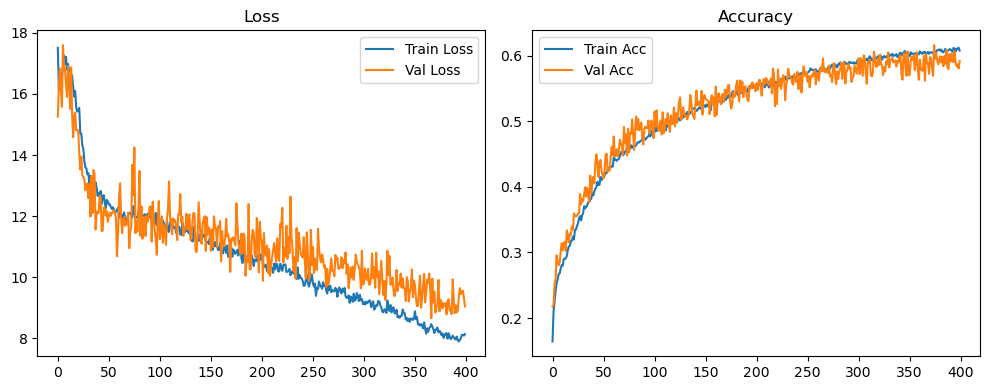

Original Model Final Test Loss: 9.1809 Accuracy: 0.5902


🚀 Running: batch256_lr_max_0.0002_min_1e-06_dp0.05


Files already downloaded and verified


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|                                                                                                                                                                        | 0/400 [00:00<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.1623 | Val Acc: 0.2352 | Epoch Time: 1.93 | :   0%|                                                                                                      | 0/400 [01:55<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.1623 | Val Acc: 0.2352 | Epoch Time: 1.93 | :   0%|                                                                                                      | 0/400 [01:55<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.1623 | Val Acc: 0.2352 | Epoch Time: 1.93 | :   0%|▏                                                                                         | 1/400 [01:55<12:49:55, 115.78s/it]

| LR: 0.000200 | Train Acc: 0.2011 | Val Acc: 0.2544 | Epoch Time: 1.92 | :   0%|▏                                                                                         | 1/400 [03:51<12:49:55, 115.78s/it]

| LR: 0.000200 | Train Acc: 0.2011 | Val Acc: 0.2544 | Epoch Time: 1.92 | :   0%|▏                                                                                         | 1/400 [03:51<12:49:55, 115.78s/it]

| LR: 0.000200 | Train Acc: 0.2011 | Val Acc: 0.2544 | Epoch Time: 1.92 | :   0%|▍                                                                                         | 2/400 [03:51<12:47:04, 115.64s/it]

| LR: 0.000200 | Train Acc: 0.2154 | Val Acc: 0.2658 | Epoch Time: 1.92 | :   0%|▍                                                                                         | 2/400 [05:46<12:47:04, 115.64s/it]

| LR: 0.000200 | Train Acc: 0.2154 | Val Acc: 0.2658 | Epoch Time: 1.92 | :   0%|▍                                                                                         | 2/400 [05:46<12:47:04, 115.64s/it]

| LR: 0.000200 | Train Acc: 0.2154 | Val Acc: 0.2658 | Epoch Time: 1.92 | :   1%|▋                                                                                         | 3/400 [05:46<12:44:56, 115.61s/it]

| LR: 0.000200 | Train Acc: 0.2281 | Val Acc: 0.2709 | Epoch Time: 1.93 | :   1%|▋                                                                                         | 3/400 [07:42<12:44:56, 115.61s/it]

| LR: 0.000200 | Train Acc: 0.2281 | Val Acc: 0.2709 | Epoch Time: 1.93 | :   1%|▋                                                                                         | 3/400 [07:42<12:44:56, 115.61s/it]

| LR: 0.000200 | Train Acc: 0.2281 | Val Acc: 0.2709 | Epoch Time: 1.93 | :   1%|▉                                                                                         | 4/400 [07:42<12:43:03, 115.61s/it]

| LR: 0.000200 | Train Acc: 0.2392 | Val Acc: 0.2875 | Epoch Time: 1.92 | :   1%|▉                                                                                         | 4/400 [09:37<12:43:03, 115.61s/it]

| LR: 0.000200 | Train Acc: 0.2392 | Val Acc: 0.2875 | Epoch Time: 1.92 | :   1%|▉                                                                                         | 4/400 [09:37<12:43:03, 115.61s/it]

| LR: 0.000200 | Train Acc: 0.2392 | Val Acc: 0.2875 | Epoch Time: 1.92 | :   1%|█▏                                                                                        | 5/400 [09:38<12:40:59, 115.59s/it]

| LR: 0.000200 | Train Acc: 0.2449 | Val Acc: 0.2671 | Epoch Time: 1.92 | :   1%|█▏                                                                                        | 5/400 [11:33<12:40:59, 115.59s/it]

| LR: 0.000200 | Train Acc: 0.2449 | Val Acc: 0.2671 | Epoch Time: 1.92 | :   1%|█▏                                                                                        | 5/400 [11:33<12:40:59, 115.59s/it]

| LR: 0.000200 | Train Acc: 0.2449 | Val Acc: 0.2671 | Epoch Time: 1.92 | :   2%|█▎                                                                                        | 6/400 [11:33<12:39:02, 115.59s/it]

| LR: 0.000200 | Train Acc: 0.2501 | Val Acc: 0.2742 | Epoch Time: 1.93 | :   2%|█▎                                                                                        | 6/400 [13:29<12:39:02, 115.59s/it]

| LR: 0.000200 | Train Acc: 0.2501 | Val Acc: 0.2742 | Epoch Time: 1.93 | :   2%|█▎                                                                                        | 6/400 [13:29<12:39:02, 115.59s/it]

| LR: 0.000200 | Train Acc: 0.2501 | Val Acc: 0.2742 | Epoch Time: 1.93 | :   2%|█▌                                                                                        | 7/400 [13:29<12:37:12, 115.61s/it]

| LR: 0.000200 | Train Acc: 0.2542 | Val Acc: 0.2955 | Epoch Time: 1.92 | :   2%|█▌                                                                                        | 7/400 [15:24<12:37:12, 115.61s/it]

| LR: 0.000200 | Train Acc: 0.2542 | Val Acc: 0.2955 | Epoch Time: 1.92 | :   2%|█▌                                                                                        | 7/400 [15:24<12:37:12, 115.61s/it]

| LR: 0.000200 | Train Acc: 0.2542 | Val Acc: 0.2955 | Epoch Time: 1.92 | :   2%|█▊                                                                                        | 8/400 [15:24<12:35:16, 115.60s/it]

| LR: 0.000200 | Train Acc: 0.2612 | Val Acc: 0.3129 | Epoch Time: 1.92 | :   2%|█▊                                                                                        | 8/400 [17:20<12:35:16, 115.60s/it]

| LR: 0.000200 | Train Acc: 0.2612 | Val Acc: 0.3129 | Epoch Time: 1.92 | :   2%|█▊                                                                                        | 8/400 [17:20<12:35:16, 115.60s/it]

| LR: 0.000200 | Train Acc: 0.2612 | Val Acc: 0.3129 | Epoch Time: 1.92 | :   2%|██                                                                                        | 9/400 [17:20<12:33:19, 115.60s/it]

| LR: 0.000200 | Train Acc: 0.2676 | Val Acc: 0.3059 | Epoch Time: 1.92 | :   2%|██                                                                                        | 9/400 [19:15<12:33:19, 115.60s/it]

| LR: 0.000200 | Train Acc: 0.2676 | Val Acc: 0.3059 | Epoch Time: 1.92 | :   2%|██                                                                                        | 9/400 [19:15<12:33:19, 115.60s/it]

| LR: 0.000200 | Train Acc: 0.2676 | Val Acc: 0.3059 | Epoch Time: 1.92 | :   2%|██▏                                                                                      | 10/400 [19:16<12:31:24, 115.60s/it]

| LR: 0.000200 | Train Acc: 0.2700 | Val Acc: 0.3086 | Epoch Time: 1.92 | :   2%|██▏                                                                                      | 10/400 [21:11<12:31:24, 115.60s/it]

| LR: 0.000200 | Train Acc: 0.2700 | Val Acc: 0.3086 | Epoch Time: 1.92 | :   2%|██▏                                                                                      | 10/400 [21:11<12:31:24, 115.60s/it]

| LR: 0.000200 | Train Acc: 0.2700 | Val Acc: 0.3086 | Epoch Time: 1.92 | :   3%|██▍                                                                                      | 11/400 [21:11<12:29:21, 115.58s/it]

| LR: 0.000200 | Train Acc: 0.2732 | Val Acc: 0.3359 | Epoch Time: 1.92 | :   3%|██▍                                                                                      | 11/400 [23:07<12:29:21, 115.58s/it]

| LR: 0.000200 | Train Acc: 0.2732 | Val Acc: 0.3359 | Epoch Time: 1.92 | :   3%|██▍                                                                                      | 11/400 [23:07<12:29:21, 115.58s/it]

| LR: 0.000200 | Train Acc: 0.2732 | Val Acc: 0.3359 | Epoch Time: 1.92 | :   3%|██▋                                                                                      | 12/400 [23:07<12:27:20, 115.57s/it]

| LR: 0.000200 | Train Acc: 0.2765 | Val Acc: 0.3215 | Epoch Time: 1.92 | :   3%|██▋                                                                                      | 12/400 [25:02<12:27:20, 115.57s/it]

| LR: 0.000200 | Train Acc: 0.2765 | Val Acc: 0.3215 | Epoch Time: 1.92 | :   3%|██▋                                                                                      | 12/400 [25:02<12:27:20, 115.57s/it]

| LR: 0.000200 | Train Acc: 0.2765 | Val Acc: 0.3215 | Epoch Time: 1.92 | :   3%|██▉                                                                                      | 13/400 [25:02<12:25:22, 115.56s/it]

| LR: 0.000199 | Train Acc: 0.2795 | Val Acc: 0.3179 | Epoch Time: 1.92 | :   3%|██▉                                                                                      | 13/400 [26:58<12:25:22, 115.56s/it]

| LR: 0.000199 | Train Acc: 0.2795 | Val Acc: 0.3179 | Epoch Time: 1.92 | :   3%|██▉                                                                                      | 13/400 [26:58<12:25:22, 115.56s/it]

| LR: 0.000199 | Train Acc: 0.2795 | Val Acc: 0.3179 | Epoch Time: 1.92 | :   4%|███                                                                                      | 14/400 [26:58<12:23:26, 115.56s/it]

| LR: 0.000199 | Train Acc: 0.2858 | Val Acc: 0.3290 | Epoch Time: 1.92 | :   4%|███                                                                                      | 14/400 [28:53<12:23:26, 115.56s/it]

| LR: 0.000199 | Train Acc: 0.2858 | Val Acc: 0.3290 | Epoch Time: 1.92 | :   4%|███                                                                                      | 14/400 [28:53<12:23:26, 115.56s/it]

| LR: 0.000199 | Train Acc: 0.2858 | Val Acc: 0.3290 | Epoch Time: 1.92 | :   4%|███▎                                                                                     | 15/400 [28:53<12:21:30, 115.56s/it]

| LR: 0.000199 | Train Acc: 0.2901 | Val Acc: 0.3253 | Epoch Time: 1.92 | :   4%|███▎                                                                                     | 15/400 [30:49<12:21:30, 115.56s/it]

| LR: 0.000199 | Train Acc: 0.2901 | Val Acc: 0.3253 | Epoch Time: 1.92 | :   4%|███▎                                                                                     | 15/400 [30:49<12:21:30, 115.56s/it]

| LR: 0.000199 | Train Acc: 0.2901 | Val Acc: 0.3253 | Epoch Time: 1.92 | :   4%|███▌                                                                                     | 16/400 [30:49<12:19:36, 115.56s/it]

| LR: 0.000199 | Train Acc: 0.2927 | Val Acc: 0.3253 | Epoch Time: 1.92 | :   4%|███▌                                                                                     | 16/400 [32:44<12:19:36, 115.56s/it]

| LR: 0.000199 | Train Acc: 0.2927 | Val Acc: 0.3253 | Epoch Time: 1.92 | :   4%|███▌                                                                                     | 16/400 [32:44<12:19:36, 115.56s/it]

| LR: 0.000199 | Train Acc: 0.2927 | Val Acc: 0.3253 | Epoch Time: 1.92 | :   4%|███▊                                                                                     | 17/400 [32:45<12:17:45, 115.58s/it]

| LR: 0.000199 | Train Acc: 0.2987 | Val Acc: 0.3336 | Epoch Time: 1.92 | :   4%|███▊                                                                                     | 17/400 [34:40<12:17:45, 115.58s/it]

| LR: 0.000199 | Train Acc: 0.2987 | Val Acc: 0.3336 | Epoch Time: 1.92 | :   4%|███▊                                                                                     | 17/400 [34:40<12:17:45, 115.58s/it]

| LR: 0.000199 | Train Acc: 0.2987 | Val Acc: 0.3336 | Epoch Time: 1.92 | :   4%|████                                                                                     | 18/400 [34:40<12:15:51, 115.58s/it]

| LR: 0.000199 | Train Acc: 0.2974 | Val Acc: 0.3405 | Epoch Time: 1.92 | :   4%|████                                                                                     | 18/400 [36:36<12:15:51, 115.58s/it]

| LR: 0.000199 | Train Acc: 0.2974 | Val Acc: 0.3405 | Epoch Time: 1.92 | :   4%|████                                                                                     | 18/400 [36:36<12:15:51, 115.58s/it]

| LR: 0.000199 | Train Acc: 0.2974 | Val Acc: 0.3405 | Epoch Time: 1.92 | :   5%|████▏                                                                                    | 19/400 [36:36<12:13:56, 115.58s/it]

| LR: 0.000199 | Train Acc: 0.2999 | Val Acc: 0.3327 | Epoch Time: 1.92 | :   5%|████▏                                                                                    | 19/400 [38:31<12:13:56, 115.58s/it]

| LR: 0.000199 | Train Acc: 0.2999 | Val Acc: 0.3327 | Epoch Time: 1.92 | :   5%|████▏                                                                                    | 19/400 [38:31<12:13:56, 115.58s/it]

| LR: 0.000199 | Train Acc: 0.2999 | Val Acc: 0.3327 | Epoch Time: 1.92 | :   5%|████▍                                                                                    | 20/400 [38:31<12:12:01, 115.58s/it]

| LR: 0.000199 | Train Acc: 0.3064 | Val Acc: 0.3470 | Epoch Time: 1.92 | :   5%|████▍                                                                                    | 20/400 [40:27<12:12:01, 115.58s/it]

| LR: 0.000199 | Train Acc: 0.3064 | Val Acc: 0.3470 | Epoch Time: 1.92 | :   5%|████▍                                                                                    | 20/400 [40:27<12:12:01, 115.58s/it]

| LR: 0.000199 | Train Acc: 0.3064 | Val Acc: 0.3470 | Epoch Time: 1.92 | :   5%|████▋                                                                                    | 21/400 [40:27<12:10:04, 115.58s/it]

| LR: 0.000199 | Train Acc: 0.3069 | Val Acc: 0.3432 | Epoch Time: 1.93 | :   5%|████▋                                                                                    | 21/400 [42:22<12:10:04, 115.58s/it]

| LR: 0.000199 | Train Acc: 0.3069 | Val Acc: 0.3432 | Epoch Time: 1.93 | :   5%|████▋                                                                                    | 21/400 [42:22<12:10:04, 115.58s/it]

| LR: 0.000199 | Train Acc: 0.3069 | Val Acc: 0.3432 | Epoch Time: 1.93 | :   6%|████▉                                                                                    | 22/400 [42:22<12:08:13, 115.59s/it]

| LR: 0.000199 | Train Acc: 0.3105 | Val Acc: 0.3636 | Epoch Time: 1.93 | :   6%|████▉                                                                                    | 22/400 [44:18<12:08:13, 115.59s/it]

| LR: 0.000199 | Train Acc: 0.3105 | Val Acc: 0.3636 | Epoch Time: 1.93 | :   6%|████▉                                                                                    | 22/400 [44:18<12:08:13, 115.59s/it]

| LR: 0.000199 | Train Acc: 0.3105 | Val Acc: 0.3636 | Epoch Time: 1.93 | :   6%|█████                                                                                    | 23/400 [44:18<12:06:26, 115.61s/it]

| LR: 0.000198 | Train Acc: 0.3193 | Val Acc: 0.3698 | Epoch Time: 1.93 | :   6%|█████                                                                                    | 23/400 [46:14<12:06:26, 115.61s/it]

| LR: 0.000198 | Train Acc: 0.3193 | Val Acc: 0.3698 | Epoch Time: 1.93 | :   6%|█████                                                                                    | 23/400 [46:14<12:06:26, 115.61s/it]

| LR: 0.000198 | Train Acc: 0.3193 | Val Acc: 0.3698 | Epoch Time: 1.93 | :   6%|█████▎                                                                                   | 24/400 [46:14<12:04:41, 115.64s/it]

| LR: 0.000198 | Train Acc: 0.3226 | Val Acc: 0.3666 | Epoch Time: 1.92 | :   6%|█████▎                                                                                   | 24/400 [48:09<12:04:41, 115.64s/it]

| LR: 0.000198 | Train Acc: 0.3226 | Val Acc: 0.3666 | Epoch Time: 1.92 | :   6%|█████▎                                                                                   | 24/400 [48:09<12:04:41, 115.64s/it]

| LR: 0.000198 | Train Acc: 0.3226 | Val Acc: 0.3666 | Epoch Time: 1.92 | :   6%|█████▌                                                                                   | 25/400 [48:09<12:02:37, 115.62s/it]

| LR: 0.000198 | Train Acc: 0.3306 | Val Acc: 0.3754 | Epoch Time: 1.92 | :   6%|█████▌                                                                                   | 25/400 [50:05<12:02:37, 115.62s/it]

| LR: 0.000198 | Train Acc: 0.3306 | Val Acc: 0.3754 | Epoch Time: 1.92 | :   6%|█████▌                                                                                   | 25/400 [50:05<12:02:37, 115.62s/it]

| LR: 0.000198 | Train Acc: 0.3306 | Val Acc: 0.3754 | Epoch Time: 1.92 | :   6%|█████▊                                                                                   | 26/400 [50:05<12:00:33, 115.60s/it]

| LR: 0.000198 | Train Acc: 0.3339 | Val Acc: 0.3461 | Epoch Time: 1.92 | :   6%|█████▊                                                                                   | 26/400 [52:00<12:00:33, 115.60s/it]

| LR: 0.000198 | Train Acc: 0.3339 | Val Acc: 0.3461 | Epoch Time: 1.92 | :   6%|█████▊                                                                                   | 26/400 [52:00<12:00:33, 115.60s/it]

| LR: 0.000198 | Train Acc: 0.3339 | Val Acc: 0.3461 | Epoch Time: 1.92 | :   7%|██████                                                                                   | 27/400 [52:00<11:58:32, 115.58s/it]

| LR: 0.000198 | Train Acc: 0.3335 | Val Acc: 0.3738 | Epoch Time: 1.92 | :   7%|██████                                                                                   | 27/400 [53:56<11:58:32, 115.58s/it]

| LR: 0.000198 | Train Acc: 0.3335 | Val Acc: 0.3738 | Epoch Time: 1.92 | :   7%|██████                                                                                   | 27/400 [53:56<11:58:32, 115.58s/it]

| LR: 0.000198 | Train Acc: 0.3335 | Val Acc: 0.3738 | Epoch Time: 1.92 | :   7%|██████▏                                                                                  | 28/400 [53:56<11:56:25, 115.55s/it]

| LR: 0.000198 | Train Acc: 0.3383 | Val Acc: 0.3473 | Epoch Time: 1.92 | :   7%|██████▏                                                                                  | 28/400 [55:51<11:56:25, 115.55s/it]

| LR: 0.000198 | Train Acc: 0.3383 | Val Acc: 0.3473 | Epoch Time: 1.92 | :   7%|██████▏                                                                                  | 28/400 [55:51<11:56:25, 115.55s/it]

| LR: 0.000198 | Train Acc: 0.3383 | Val Acc: 0.3473 | Epoch Time: 1.92 | :   7%|██████▍                                                                                  | 29/400 [55:52<11:54:31, 115.56s/it]

| LR: 0.000197 | Train Acc: 0.3392 | Val Acc: 0.3933 | Epoch Time: 1.92 | :   7%|██████▍                                                                                  | 29/400 [57:47<11:54:31, 115.56s/it]

| LR: 0.000197 | Train Acc: 0.3392 | Val Acc: 0.3933 | Epoch Time: 1.92 | :   7%|██████▍                                                                                  | 29/400 [57:47<11:54:31, 115.56s/it]

| LR: 0.000197 | Train Acc: 0.3392 | Val Acc: 0.3933 | Epoch Time: 1.92 | :   8%|██████▋                                                                                  | 30/400 [57:47<11:52:26, 115.53s/it]

| LR: 0.000197 | Train Acc: 0.3445 | Val Acc: 0.3744 | Epoch Time: 1.92 | :   8%|██████▋                                                                                  | 30/400 [59:42<11:52:26, 115.53s/it]

| LR: 0.000197 | Train Acc: 0.3445 | Val Acc: 0.3744 | Epoch Time: 1.92 | :   8%|██████▋                                                                                  | 30/400 [59:42<11:52:26, 115.53s/it]

| LR: 0.000197 | Train Acc: 0.3445 | Val Acc: 0.3744 | Epoch Time: 1.92 | :   8%|██████▉                                                                                  | 31/400 [59:42<11:50:25, 115.52s/it]

| LR: 0.000197 | Train Acc: 0.3529 | Val Acc: 0.3904 | Epoch Time: 1.93 | :   8%|██████▋                                                                                | 31/400 [1:01:38<11:50:25, 115.52s/it]

| LR: 0.000197 | Train Acc: 0.3529 | Val Acc: 0.3904 | Epoch Time: 1.93 | :   8%|██████▋                                                                                | 31/400 [1:01:38<11:50:25, 115.52s/it]

| LR: 0.000197 | Train Acc: 0.3529 | Val Acc: 0.3904 | Epoch Time: 1.93 | :   8%|██████▉                                                                                | 32/400 [1:01:38<11:48:42, 115.55s/it]

| LR: 0.000197 | Train Acc: 0.3531 | Val Acc: 0.3956 | Epoch Time: 1.93 | :   8%|██████▉                                                                                | 32/400 [1:03:34<11:48:42, 115.55s/it]

| LR: 0.000197 | Train Acc: 0.3531 | Val Acc: 0.3956 | Epoch Time: 1.93 | :   8%|██████▉                                                                                | 32/400 [1:03:34<11:48:42, 115.55s/it]

| LR: 0.000197 | Train Acc: 0.3531 | Val Acc: 0.3956 | Epoch Time: 1.93 | :   8%|███████▏                                                                               | 33/400 [1:03:34<11:46:56, 115.58s/it]

| LR: 0.000197 | Train Acc: 0.3561 | Val Acc: 0.3962 | Epoch Time: 1.92 | :   8%|███████▏                                                                               | 33/400 [1:05:29<11:46:56, 115.58s/it]

| LR: 0.000197 | Train Acc: 0.3561 | Val Acc: 0.3962 | Epoch Time: 1.92 | :   8%|███████▏                                                                               | 33/400 [1:05:29<11:46:56, 115.58s/it]

| LR: 0.000197 | Train Acc: 0.3561 | Val Acc: 0.3962 | Epoch Time: 1.92 | :   8%|███████▍                                                                               | 34/400 [1:05:29<11:44:56, 115.56s/it]

| LR: 0.000196 | Train Acc: 0.3607 | Val Acc: 0.4045 | Epoch Time: 1.92 | :   8%|███████▍                                                                               | 34/400 [1:07:25<11:44:56, 115.56s/it]

| LR: 0.000196 | Train Acc: 0.3607 | Val Acc: 0.4045 | Epoch Time: 1.92 | :   8%|███████▍                                                                               | 34/400 [1:07:25<11:44:56, 115.56s/it]

| LR: 0.000196 | Train Acc: 0.3607 | Val Acc: 0.4045 | Epoch Time: 1.92 | :   9%|███████▌                                                                               | 35/400 [1:07:25<11:42:59, 115.56s/it]

| LR: 0.000196 | Train Acc: 0.3618 | Val Acc: 0.3838 | Epoch Time: 1.93 | :   9%|███████▌                                                                               | 35/400 [1:09:20<11:42:59, 115.56s/it]

| LR: 0.000196 | Train Acc: 0.3618 | Val Acc: 0.3838 | Epoch Time: 1.93 | :   9%|███████▌                                                                               | 35/400 [1:09:20<11:42:59, 115.56s/it]

| LR: 0.000196 | Train Acc: 0.3618 | Val Acc: 0.3838 | Epoch Time: 1.93 | :   9%|███████▊                                                                               | 36/400 [1:09:21<11:41:20, 115.61s/it]

| LR: 0.000196 | Train Acc: 0.3626 | Val Acc: 0.3889 | Epoch Time: 1.93 | :   9%|███████▊                                                                               | 36/400 [1:11:16<11:41:20, 115.61s/it]

| LR: 0.000196 | Train Acc: 0.3626 | Val Acc: 0.3889 | Epoch Time: 1.93 | :   9%|███████▊                                                                               | 36/400 [1:11:16<11:41:20, 115.61s/it]

| LR: 0.000196 | Train Acc: 0.3626 | Val Acc: 0.3889 | Epoch Time: 1.93 | :   9%|████████                                                                               | 37/400 [1:11:16<11:39:45, 115.66s/it]

| LR: 0.000196 | Train Acc: 0.3572 | Val Acc: 0.4084 | Epoch Time: 1.93 | :   9%|████████                                                                               | 37/400 [1:13:12<11:39:45, 115.66s/it]

| LR: 0.000196 | Train Acc: 0.3572 | Val Acc: 0.4084 | Epoch Time: 1.93 | :   9%|████████                                                                               | 37/400 [1:13:12<11:39:45, 115.66s/it]

| LR: 0.000196 | Train Acc: 0.3572 | Val Acc: 0.4084 | Epoch Time: 1.93 | :  10%|████████▎                                                                              | 38/400 [1:13:12<11:37:57, 115.68s/it]

| LR: 0.000196 | Train Acc: 0.3640 | Val Acc: 0.4149 | Epoch Time: 1.92 | :  10%|████████▎                                                                              | 38/400 [1:15:07<11:37:57, 115.68s/it]

| LR: 0.000196 | Train Acc: 0.3640 | Val Acc: 0.4149 | Epoch Time: 1.92 | :  10%|████████▎                                                                              | 38/400 [1:15:07<11:37:57, 115.68s/it]

| LR: 0.000196 | Train Acc: 0.3640 | Val Acc: 0.4149 | Epoch Time: 1.92 | :  10%|████████▍                                                                              | 39/400 [1:15:08<11:35:41, 115.63s/it]

| LR: 0.000195 | Train Acc: 0.3744 | Val Acc: 0.4161 | Epoch Time: 1.93 | :  10%|████████▍                                                                              | 39/400 [1:17:03<11:35:41, 115.63s/it]

| LR: 0.000195 | Train Acc: 0.3744 | Val Acc: 0.4161 | Epoch Time: 1.93 | :  10%|████████▍                                                                              | 39/400 [1:17:03<11:35:41, 115.63s/it]

| LR: 0.000195 | Train Acc: 0.3744 | Val Acc: 0.4161 | Epoch Time: 1.93 | :  10%|████████▋                                                                              | 40/400 [1:17:03<11:33:46, 115.63s/it]

| LR: 0.000195 | Train Acc: 0.3745 | Val Acc: 0.3852 | Epoch Time: 1.93 | :  10%|████████▋                                                                              | 40/400 [1:18:59<11:33:46, 115.63s/it]

| LR: 0.000195 | Train Acc: 0.3745 | Val Acc: 0.3852 | Epoch Time: 1.93 | :  10%|████████▋                                                                              | 40/400 [1:18:59<11:33:46, 115.63s/it]

| LR: 0.000195 | Train Acc: 0.3745 | Val Acc: 0.3852 | Epoch Time: 1.93 | :  10%|████████▉                                                                              | 41/400 [1:18:59<11:32:04, 115.67s/it]

| LR: 0.000195 | Train Acc: 0.3770 | Val Acc: 0.3813 | Epoch Time: 1.93 | :  10%|████████▉                                                                              | 41/400 [1:20:55<11:32:04, 115.67s/it]

| LR: 0.000195 | Train Acc: 0.3770 | Val Acc: 0.3813 | Epoch Time: 1.93 | :  10%|████████▉                                                                              | 41/400 [1:20:55<11:32:04, 115.67s/it]

| LR: 0.000195 | Train Acc: 0.3770 | Val Acc: 0.3813 | Epoch Time: 1.93 | :  10%|█████████▏                                                                             | 42/400 [1:20:55<11:30:39, 115.75s/it]

| LR: 0.000195 | Train Acc: 0.3776 | Val Acc: 0.4128 | Epoch Time: 1.93 | :  10%|█████████▏                                                                             | 42/400 [1:22:51<11:30:39, 115.75s/it]

| LR: 0.000195 | Train Acc: 0.3776 | Val Acc: 0.4128 | Epoch Time: 1.93 | :  10%|█████████▏                                                                             | 42/400 [1:22:51<11:30:39, 115.75s/it]

| LR: 0.000195 | Train Acc: 0.3776 | Val Acc: 0.4128 | Epoch Time: 1.93 | :  11%|█████████▎                                                                             | 43/400 [1:22:51<11:29:09, 115.83s/it]

| LR: 0.000194 | Train Acc: 0.3755 | Val Acc: 0.3815 | Epoch Time: 1.92 | :  11%|█████████▎                                                                             | 43/400 [1:24:46<11:29:09, 115.83s/it]

| LR: 0.000194 | Train Acc: 0.3755 | Val Acc: 0.3815 | Epoch Time: 1.92 | :  11%|█████████▎                                                                             | 43/400 [1:24:46<11:29:09, 115.83s/it]

| LR: 0.000194 | Train Acc: 0.3755 | Val Acc: 0.3815 | Epoch Time: 1.92 | :  11%|█████████▌                                                                             | 44/400 [1:24:46<11:26:39, 115.73s/it]

| LR: 0.000194 | Train Acc: 0.3792 | Val Acc: 0.4236 | Epoch Time: 1.92 | :  11%|█████████▌                                                                             | 44/400 [1:26:42<11:26:39, 115.73s/it]

| LR: 0.000194 | Train Acc: 0.3792 | Val Acc: 0.4236 | Epoch Time: 1.92 | :  11%|█████████▌                                                                             | 44/400 [1:26:42<11:26:39, 115.73s/it]

| LR: 0.000194 | Train Acc: 0.3792 | Val Acc: 0.4236 | Epoch Time: 1.92 | :  11%|█████████▊                                                                             | 45/400 [1:26:42<11:24:14, 115.65s/it]

| LR: 0.000194 | Train Acc: 0.3775 | Val Acc: 0.4207 | Epoch Time: 1.92 | :  11%|█████████▊                                                                             | 45/400 [1:28:37<11:24:14, 115.65s/it]

| LR: 0.000194 | Train Acc: 0.3775 | Val Acc: 0.4207 | Epoch Time: 1.92 | :  11%|█████████▊                                                                             | 45/400 [1:28:37<11:24:14, 115.65s/it]

| LR: 0.000194 | Train Acc: 0.3775 | Val Acc: 0.4207 | Epoch Time: 1.92 | :  12%|██████████                                                                             | 46/400 [1:28:37<11:22:13, 115.63s/it]

| LR: 0.000194 | Train Acc: 0.3795 | Val Acc: 0.4218 | Epoch Time: 1.93 | :  12%|██████████                                                                             | 46/400 [1:30:33<11:22:13, 115.63s/it]

| LR: 0.000194 | Train Acc: 0.3795 | Val Acc: 0.4218 | Epoch Time: 1.93 | :  12%|██████████                                                                             | 46/400 [1:30:33<11:22:13, 115.63s/it]

| LR: 0.000194 | Train Acc: 0.3795 | Val Acc: 0.4218 | Epoch Time: 1.93 | :  12%|██████████▏                                                                            | 47/400 [1:30:33<11:20:42, 115.70s/it]

| LR: 0.000193 | Train Acc: 0.3823 | Val Acc: 0.4448 | Epoch Time: 1.93 | :  12%|██████████▏                                                                            | 47/400 [1:32:29<11:20:42, 115.70s/it]

| LR: 0.000193 | Train Acc: 0.3823 | Val Acc: 0.4448 | Epoch Time: 1.93 | :  12%|██████████▏                                                                            | 47/400 [1:32:29<11:20:42, 115.70s/it]

| LR: 0.000193 | Train Acc: 0.3823 | Val Acc: 0.4448 | Epoch Time: 1.93 | :  12%|██████████▍                                                                            | 48/400 [1:32:29<11:19:13, 115.78s/it]

| LR: 0.000193 | Train Acc: 0.3842 | Val Acc: 0.4092 | Epoch Time: 1.92 | :  12%|██████████▍                                                                            | 48/400 [1:34:25<11:19:13, 115.78s/it]

| LR: 0.000193 | Train Acc: 0.3842 | Val Acc: 0.4092 | Epoch Time: 1.92 | :  12%|██████████▍                                                                            | 48/400 [1:34:25<11:19:13, 115.78s/it]

| LR: 0.000193 | Train Acc: 0.3842 | Val Acc: 0.4092 | Epoch Time: 1.92 | :  12%|██████████▋                                                                            | 49/400 [1:34:25<11:16:52, 115.70s/it]

| LR: 0.000193 | Train Acc: 0.3880 | Val Acc: 0.4431 | Epoch Time: 1.92 | :  12%|██████████▋                                                                            | 49/400 [1:36:20<11:16:52, 115.70s/it]

| LR: 0.000193 | Train Acc: 0.3880 | Val Acc: 0.4431 | Epoch Time: 1.92 | :  12%|██████████▋                                                                            | 49/400 [1:36:20<11:16:52, 115.70s/it]

| LR: 0.000193 | Train Acc: 0.3880 | Val Acc: 0.4431 | Epoch Time: 1.92 | :  12%|██████████▉                                                                            | 50/400 [1:36:20<11:14:25, 115.62s/it]

| LR: 0.000192 | Train Acc: 0.3863 | Val Acc: 0.4433 | Epoch Time: 1.92 | :  12%|██████████▉                                                                            | 50/400 [1:38:16<11:14:25, 115.62s/it]

| LR: 0.000192 | Train Acc: 0.3863 | Val Acc: 0.4433 | Epoch Time: 1.92 | :  12%|██████████▉                                                                            | 50/400 [1:38:16<11:14:25, 115.62s/it]

| LR: 0.000192 | Train Acc: 0.3863 | Val Acc: 0.4433 | Epoch Time: 1.92 | :  13%|███████████                                                                            | 51/400 [1:38:16<11:12:22, 115.60s/it]

| LR: 0.000192 | Train Acc: 0.3902 | Val Acc: 0.4089 | Epoch Time: 1.93 | :  13%|███████████                                                                            | 51/400 [1:40:11<11:12:22, 115.60s/it]

| LR: 0.000192 | Train Acc: 0.3902 | Val Acc: 0.4089 | Epoch Time: 1.93 | :  13%|███████████                                                                            | 51/400 [1:40:11<11:12:22, 115.60s/it]

| LR: 0.000192 | Train Acc: 0.3902 | Val Acc: 0.4089 | Epoch Time: 1.93 | :  13%|███████████▎                                                                           | 52/400 [1:40:12<11:10:44, 115.64s/it]

| LR: 0.000192 | Train Acc: 0.3887 | Val Acc: 0.4157 | Epoch Time: 1.93 | :  13%|███████████▎                                                                           | 52/400 [1:42:07<11:10:44, 115.64s/it]

| LR: 0.000192 | Train Acc: 0.3887 | Val Acc: 0.4157 | Epoch Time: 1.93 | :  13%|███████████▎                                                                           | 52/400 [1:42:07<11:10:44, 115.64s/it]

| LR: 0.000192 | Train Acc: 0.3887 | Val Acc: 0.4157 | Epoch Time: 1.93 | :  13%|███████████▌                                                                           | 53/400 [1:42:07<11:09:18, 115.73s/it]

| LR: 0.000192 | Train Acc: 0.3961 | Val Acc: 0.4231 | Epoch Time: 1.92 | :  13%|███████████▌                                                                           | 53/400 [1:44:03<11:09:18, 115.73s/it]

| LR: 0.000192 | Train Acc: 0.3961 | Val Acc: 0.4231 | Epoch Time: 1.92 | :  13%|███████████▌                                                                           | 53/400 [1:44:03<11:09:18, 115.73s/it]

| LR: 0.000192 | Train Acc: 0.3961 | Val Acc: 0.4231 | Epoch Time: 1.92 | :  14%|███████████▋                                                                           | 54/400 [1:44:03<11:06:58, 115.66s/it]

| LR: 0.000191 | Train Acc: 0.3936 | Val Acc: 0.4228 | Epoch Time: 1.92 | :  14%|███████████▋                                                                           | 54/400 [1:45:58<11:06:58, 115.66s/it]

| LR: 0.000191 | Train Acc: 0.3936 | Val Acc: 0.4228 | Epoch Time: 1.92 | :  14%|███████████▋                                                                           | 54/400 [1:45:58<11:06:58, 115.66s/it]

| LR: 0.000191 | Train Acc: 0.3936 | Val Acc: 0.4228 | Epoch Time: 1.92 | :  14%|███████████▉                                                                           | 55/400 [1:45:58<11:04:37, 115.59s/it]

| LR: 0.000191 | Train Acc: 0.3931 | Val Acc: 0.4292 | Epoch Time: 1.92 | :  14%|███████████▉                                                                           | 55/400 [1:47:54<11:04:37, 115.59s/it]

| LR: 0.000191 | Train Acc: 0.3931 | Val Acc: 0.4292 | Epoch Time: 1.92 | :  14%|███████████▉                                                                           | 55/400 [1:47:54<11:04:37, 115.59s/it]

| LR: 0.000191 | Train Acc: 0.3931 | Val Acc: 0.4292 | Epoch Time: 1.92 | :  14%|████████████▏                                                                          | 56/400 [1:47:54<11:02:39, 115.58s/it]

| LR: 0.000191 | Train Acc: 0.4017 | Val Acc: 0.4167 | Epoch Time: 1.93 | :  14%|████████████▏                                                                          | 56/400 [1:49:50<11:02:39, 115.58s/it]

| LR: 0.000191 | Train Acc: 0.4017 | Val Acc: 0.4167 | Epoch Time: 1.93 | :  14%|████████████▏                                                                          | 56/400 [1:49:50<11:02:39, 115.58s/it]

| LR: 0.000191 | Train Acc: 0.4017 | Val Acc: 0.4167 | Epoch Time: 1.93 | :  14%|████████████▍                                                                          | 57/400 [1:49:50<11:01:10, 115.66s/it]

| LR: 0.000190 | Train Acc: 0.4011 | Val Acc: 0.4319 | Epoch Time: 1.93 | :  14%|████████████▍                                                                          | 57/400 [1:51:45<11:01:10, 115.66s/it]

| LR: 0.000190 | Train Acc: 0.4011 | Val Acc: 0.4319 | Epoch Time: 1.93 | :  14%|████████████▍                                                                          | 57/400 [1:51:45<11:01:10, 115.66s/it]

| LR: 0.000190 | Train Acc: 0.4011 | Val Acc: 0.4319 | Epoch Time: 1.93 | :  14%|████████████▌                                                                          | 58/400 [1:51:46<10:59:26, 115.69s/it]

| LR: 0.000190 | Train Acc: 0.4022 | Val Acc: 0.4373 | Epoch Time: 1.92 | :  14%|████████████▌                                                                          | 58/400 [1:53:41<10:59:26, 115.69s/it]

| LR: 0.000190 | Train Acc: 0.4022 | Val Acc: 0.4373 | Epoch Time: 1.92 | :  14%|████████████▌                                                                          | 58/400 [1:53:41<10:59:26, 115.69s/it]

| LR: 0.000190 | Train Acc: 0.4022 | Val Acc: 0.4373 | Epoch Time: 1.92 | :  15%|████████████▊                                                                          | 59/400 [1:53:41<10:57:02, 115.61s/it]

| LR: 0.000190 | Train Acc: 0.4013 | Val Acc: 0.4426 | Epoch Time: 1.92 | :  15%|████████████▊                                                                          | 59/400 [1:55:36<10:57:02, 115.61s/it]

| LR: 0.000190 | Train Acc: 0.4013 | Val Acc: 0.4426 | Epoch Time: 1.92 | :  15%|████████████▊                                                                          | 59/400 [1:55:36<10:57:02, 115.61s/it]

| LR: 0.000190 | Train Acc: 0.4013 | Val Acc: 0.4426 | Epoch Time: 1.92 | :  15%|█████████████                                                                          | 60/400 [1:55:36<10:54:47, 115.55s/it]

| LR: 0.000189 | Train Acc: 0.4044 | Val Acc: 0.4358 | Epoch Time: 1.93 | :  15%|█████████████                                                                          | 60/400 [1:57:32<10:54:47, 115.55s/it]

| LR: 0.000189 | Train Acc: 0.4044 | Val Acc: 0.4358 | Epoch Time: 1.93 | :  15%|█████████████                                                                          | 60/400 [1:57:32<10:54:47, 115.55s/it]

| LR: 0.000189 | Train Acc: 0.4044 | Val Acc: 0.4358 | Epoch Time: 1.93 | :  15%|█████████████▎                                                                         | 61/400 [1:57:32<10:52:58, 115.57s/it]

| LR: 0.000189 | Train Acc: 0.4070 | Val Acc: 0.4325 | Epoch Time: 1.93 | :  15%|█████████████▎                                                                         | 61/400 [1:59:28<10:52:58, 115.57s/it]

| LR: 0.000189 | Train Acc: 0.4070 | Val Acc: 0.4325 | Epoch Time: 1.93 | :  15%|█████████████▎                                                                         | 61/400 [1:59:28<10:52:58, 115.57s/it]

| LR: 0.000189 | Train Acc: 0.4070 | Val Acc: 0.4325 | Epoch Time: 1.93 | :  16%|█████████████▍                                                                         | 62/400 [1:59:28<10:51:32, 115.66s/it]

| LR: 0.000188 | Train Acc: 0.4092 | Val Acc: 0.4113 | Epoch Time: 1.93 | :  16%|█████████████▍                                                                         | 62/400 [2:01:24<10:51:32, 115.66s/it]

| LR: 0.000188 | Train Acc: 0.4092 | Val Acc: 0.4113 | Epoch Time: 1.93 | :  16%|█████████████▍                                                                         | 62/400 [2:01:24<10:51:32, 115.66s/it]

| LR: 0.000188 | Train Acc: 0.4092 | Val Acc: 0.4113 | Epoch Time: 1.93 | :  16%|█████████████▋                                                                         | 63/400 [2:01:24<10:49:48, 115.69s/it]

| LR: 0.000188 | Train Acc: 0.4063 | Val Acc: 0.4314 | Epoch Time: 1.92 | :  16%|█████████████▋                                                                         | 63/400 [2:03:19<10:49:48, 115.69s/it]

| LR: 0.000188 | Train Acc: 0.4063 | Val Acc: 0.4314 | Epoch Time: 1.92 | :  16%|█████████████▋                                                                         | 63/400 [2:03:19<10:49:48, 115.69s/it]

| LR: 0.000188 | Train Acc: 0.4063 | Val Acc: 0.4314 | Epoch Time: 1.92 | :  16%|█████████████▉                                                                         | 64/400 [2:03:19<10:47:15, 115.58s/it]

| LR: 0.000188 | Train Acc: 0.4074 | Val Acc: 0.4385 | Epoch Time: 1.92 | :  16%|█████████████▉                                                                         | 64/400 [2:05:14<10:47:15, 115.58s/it]

| LR: 0.000188 | Train Acc: 0.4074 | Val Acc: 0.4385 | Epoch Time: 1.92 | :  16%|█████████████▉                                                                         | 64/400 [2:05:14<10:47:15, 115.58s/it]

| LR: 0.000188 | Train Acc: 0.4074 | Val Acc: 0.4385 | Epoch Time: 1.92 | :  16%|██████████████▏                                                                        | 65/400 [2:05:14<10:45:01, 115.53s/it]

| LR: 0.000187 | Train Acc: 0.4095 | Val Acc: 0.4354 | Epoch Time: 1.93 | :  16%|██████████████▏                                                                        | 65/400 [2:07:10<10:45:01, 115.53s/it]

| LR: 0.000187 | Train Acc: 0.4095 | Val Acc: 0.4354 | Epoch Time: 1.93 | :  16%|██████████████▏                                                                        | 65/400 [2:07:10<10:45:01, 115.53s/it]

| LR: 0.000187 | Train Acc: 0.4095 | Val Acc: 0.4354 | Epoch Time: 1.93 | :  16%|██████████████▎                                                                        | 66/400 [2:07:10<10:43:29, 115.60s/it]

| LR: 0.000187 | Train Acc: 0.4110 | Val Acc: 0.4440 | Epoch Time: 1.93 | :  16%|██████████████▎                                                                        | 66/400 [2:09:06<10:43:29, 115.60s/it]

| LR: 0.000187 | Train Acc: 0.4110 | Val Acc: 0.4440 | Epoch Time: 1.93 | :  16%|██████████████▎                                                                        | 66/400 [2:09:06<10:43:29, 115.60s/it]

| LR: 0.000187 | Train Acc: 0.4110 | Val Acc: 0.4440 | Epoch Time: 1.93 | :  17%|██████████████▌                                                                        | 67/400 [2:09:06<10:42:06, 115.70s/it]

| LR: 0.000187 | Train Acc: 0.4149 | Val Acc: 0.4299 | Epoch Time: 1.93 | :  17%|██████████████▌                                                                        | 67/400 [2:11:02<10:42:06, 115.70s/it]

| LR: 0.000187 | Train Acc: 0.4149 | Val Acc: 0.4299 | Epoch Time: 1.93 | :  17%|██████████████▌                                                                        | 67/400 [2:11:02<10:42:06, 115.70s/it]

| LR: 0.000187 | Train Acc: 0.4149 | Val Acc: 0.4299 | Epoch Time: 1.93 | :  17%|██████████████▊                                                                        | 68/400 [2:11:02<10:40:27, 115.74s/it]

| LR: 0.000186 | Train Acc: 0.4128 | Val Acc: 0.4538 | Epoch Time: 1.92 | :  17%|██████████████▊                                                                        | 68/400 [2:12:57<10:40:27, 115.74s/it]

| LR: 0.000186 | Train Acc: 0.4128 | Val Acc: 0.4538 | Epoch Time: 1.92 | :  17%|██████████████▊                                                                        | 68/400 [2:12:57<10:40:27, 115.74s/it]

| LR: 0.000186 | Train Acc: 0.4128 | Val Acc: 0.4538 | Epoch Time: 1.92 | :  17%|███████████████                                                                        | 69/400 [2:12:58<10:38:16, 115.70s/it]

| LR: 0.000186 | Train Acc: 0.4125 | Val Acc: 0.4490 | Epoch Time: 1.92 | :  17%|███████████████                                                                        | 69/400 [2:14:53<10:38:16, 115.70s/it]

| LR: 0.000186 | Train Acc: 0.4125 | Val Acc: 0.4490 | Epoch Time: 1.92 | :  17%|███████████████                                                                        | 69/400 [2:14:53<10:38:16, 115.70s/it]

| LR: 0.000186 | Train Acc: 0.4125 | Val Acc: 0.4490 | Epoch Time: 1.92 | :  18%|███████████████▏                                                                       | 70/400 [2:14:53<10:36:10, 115.67s/it]

| LR: 0.000185 | Train Acc: 0.4145 | Val Acc: 0.4285 | Epoch Time: 1.93 | :  18%|███████████████▏                                                                       | 70/400 [2:16:49<10:36:10, 115.67s/it]

| LR: 0.000185 | Train Acc: 0.4145 | Val Acc: 0.4285 | Epoch Time: 1.93 | :  18%|███████████████▏                                                                       | 70/400 [2:16:49<10:36:10, 115.67s/it]

| LR: 0.000185 | Train Acc: 0.4145 | Val Acc: 0.4285 | Epoch Time: 1.93 | :  18%|███████████████▍                                                                       | 71/400 [2:16:49<10:34:34, 115.73s/it]

| LR: 0.000185 | Train Acc: 0.4184 | Val Acc: 0.4551 | Epoch Time: 1.93 | :  18%|███████████████▍                                                                       | 71/400 [2:18:45<10:34:34, 115.73s/it]

| LR: 0.000185 | Train Acc: 0.4184 | Val Acc: 0.4551 | Epoch Time: 1.93 | :  18%|███████████████▍                                                                       | 71/400 [2:18:45<10:34:34, 115.73s/it]

| LR: 0.000185 | Train Acc: 0.4184 | Val Acc: 0.4551 | Epoch Time: 1.93 | :  18%|███████████████▋                                                                       | 72/400 [2:18:45<10:32:58, 115.79s/it]

| LR: 0.000185 | Train Acc: 0.4209 | Val Acc: 0.4706 | Epoch Time: 1.93 | :  18%|███████████████▋                                                                       | 72/400 [2:20:41<10:32:58, 115.79s/it]

| LR: 0.000185 | Train Acc: 0.4209 | Val Acc: 0.4706 | Epoch Time: 1.93 | :  18%|███████████████▋                                                                       | 72/400 [2:20:41<10:32:58, 115.79s/it]

| LR: 0.000185 | Train Acc: 0.4209 | Val Acc: 0.4706 | Epoch Time: 1.93 | :  18%|███████████████▉                                                                       | 73/400 [2:20:41<10:30:56, 115.77s/it]

| LR: 0.000184 | Train Acc: 0.4193 | Val Acc: 0.4250 | Epoch Time: 1.92 | :  18%|███████████████▉                                                                       | 73/400 [2:22:36<10:30:56, 115.77s/it]

| LR: 0.000184 | Train Acc: 0.4193 | Val Acc: 0.4250 | Epoch Time: 1.92 | :  18%|███████████████▉                                                                       | 73/400 [2:22:36<10:30:56, 115.77s/it]

| LR: 0.000184 | Train Acc: 0.4193 | Val Acc: 0.4250 | Epoch Time: 1.92 | :  18%|████████████████                                                                       | 74/400 [2:22:36<10:28:19, 115.64s/it]

| LR: 0.000184 | Train Acc: 0.4192 | Val Acc: 0.4410 | Epoch Time: 1.92 | :  18%|████████████████                                                                       | 74/400 [2:24:31<10:28:19, 115.64s/it]

| LR: 0.000184 | Train Acc: 0.4192 | Val Acc: 0.4410 | Epoch Time: 1.92 | :  18%|████████████████                                                                       | 74/400 [2:24:31<10:28:19, 115.64s/it]

| LR: 0.000184 | Train Acc: 0.4192 | Val Acc: 0.4410 | Epoch Time: 1.92 | :  19%|████████████████▎                                                                      | 75/400 [2:24:31<10:26:07, 115.59s/it]

| LR: 0.000183 | Train Acc: 0.4178 | Val Acc: 0.4420 | Epoch Time: 1.93 | :  19%|████████████████▎                                                                      | 75/400 [2:26:27<10:26:07, 115.59s/it]

| LR: 0.000183 | Train Acc: 0.4178 | Val Acc: 0.4420 | Epoch Time: 1.93 | :  19%|████████████████▎                                                                      | 75/400 [2:26:27<10:26:07, 115.59s/it]

| LR: 0.000183 | Train Acc: 0.4178 | Val Acc: 0.4420 | Epoch Time: 1.93 | :  19%|████████████████▌                                                                      | 76/400 [2:26:27<10:24:36, 115.67s/it]

| LR: 0.000183 | Train Acc: 0.4183 | Val Acc: 0.4644 | Epoch Time: 1.93 | :  19%|████████████████▌                                                                      | 76/400 [2:28:23<10:24:36, 115.67s/it]

| LR: 0.000183 | Train Acc: 0.4183 | Val Acc: 0.4644 | Epoch Time: 1.93 | :  19%|████████████████▌                                                                      | 76/400 [2:28:23<10:24:36, 115.67s/it]

| LR: 0.000183 | Train Acc: 0.4183 | Val Acc: 0.4644 | Epoch Time: 1.93 | :  19%|████████████████▋                                                                      | 77/400 [2:28:23<10:23:07, 115.75s/it]

| LR: 0.000182 | Train Acc: 0.4215 | Val Acc: 0.4593 | Epoch Time: 1.93 | :  19%|████████████████▋                                                                      | 77/400 [2:30:19<10:23:07, 115.75s/it]

| LR: 0.000182 | Train Acc: 0.4215 | Val Acc: 0.4593 | Epoch Time: 1.93 | :  19%|████████████████▋                                                                      | 77/400 [2:30:19<10:23:07, 115.75s/it]

| LR: 0.000182 | Train Acc: 0.4215 | Val Acc: 0.4593 | Epoch Time: 1.93 | :  20%|████████████████▉                                                                      | 78/400 [2:30:19<10:21:28, 115.80s/it]

| LR: 0.000182 | Train Acc: 0.4255 | Val Acc: 0.4589 | Epoch Time: 1.93 | :  20%|████████████████▉                                                                      | 78/400 [2:32:15<10:21:28, 115.80s/it]

| LR: 0.000182 | Train Acc: 0.4255 | Val Acc: 0.4589 | Epoch Time: 1.93 | :  20%|████████████████▉                                                                      | 78/400 [2:32:15<10:21:28, 115.80s/it]

| LR: 0.000182 | Train Acc: 0.4255 | Val Acc: 0.4589 | Epoch Time: 1.93 | :  20%|█████████████████▏                                                                     | 79/400 [2:32:15<10:19:24, 115.78s/it]

| LR: 0.000181 | Train Acc: 0.4260 | Val Acc: 0.4606 | Epoch Time: 1.92 | :  20%|█████████████████▏                                                                     | 79/400 [2:34:10<10:19:24, 115.78s/it]

| LR: 0.000181 | Train Acc: 0.4260 | Val Acc: 0.4606 | Epoch Time: 1.92 | :  20%|█████████████████▏                                                                     | 79/400 [2:34:10<10:19:24, 115.78s/it]

| LR: 0.000181 | Train Acc: 0.4260 | Val Acc: 0.4606 | Epoch Time: 1.92 | :  20%|█████████████████▍                                                                     | 80/400 [2:34:10<10:17:01, 115.69s/it]

| LR: 0.000181 | Train Acc: 0.4239 | Val Acc: 0.4759 | Epoch Time: 1.93 | :  20%|█████████████████▍                                                                     | 80/400 [2:36:06<10:17:01, 115.69s/it]

| LR: 0.000181 | Train Acc: 0.4239 | Val Acc: 0.4759 | Epoch Time: 1.93 | :  20%|█████████████████▍                                                                     | 80/400 [2:36:06<10:17:01, 115.69s/it]

| LR: 0.000181 | Train Acc: 0.4239 | Val Acc: 0.4759 | Epoch Time: 1.93 | :  20%|█████████████████▌                                                                     | 81/400 [2:36:06<10:15:14, 115.72s/it]

| LR: 0.000181 | Train Acc: 0.4281 | Val Acc: 0.4617 | Epoch Time: 1.93 | :  20%|█████████████████▌                                                                     | 81/400 [2:38:02<10:15:14, 115.72s/it]

| LR: 0.000181 | Train Acc: 0.4281 | Val Acc: 0.4617 | Epoch Time: 1.93 | :  20%|█████████████████▌                                                                     | 81/400 [2:38:02<10:15:14, 115.72s/it]

| LR: 0.000181 | Train Acc: 0.4281 | Val Acc: 0.4617 | Epoch Time: 1.93 | :  20%|█████████████████▊                                                                     | 82/400 [2:38:02<10:13:35, 115.77s/it]

| LR: 0.000180 | Train Acc: 0.4255 | Val Acc: 0.4423 | Epoch Time: 1.93 | :  20%|█████████████████▊                                                                     | 82/400 [2:39:58<10:13:35, 115.77s/it]

| LR: 0.000180 | Train Acc: 0.4255 | Val Acc: 0.4423 | Epoch Time: 1.93 | :  20%|█████████████████▊                                                                     | 82/400 [2:39:58<10:13:35, 115.77s/it]

| LR: 0.000180 | Train Acc: 0.4255 | Val Acc: 0.4423 | Epoch Time: 1.93 | :  21%|██████████████████                                                                     | 83/400 [2:39:58<10:11:49, 115.80s/it]

| LR: 0.000180 | Train Acc: 0.4286 | Val Acc: 0.4444 | Epoch Time: 1.92 | :  21%|██████████████████                                                                     | 83/400 [2:41:53<10:11:49, 115.80s/it]

| LR: 0.000180 | Train Acc: 0.4286 | Val Acc: 0.4444 | Epoch Time: 1.92 | :  21%|██████████████████                                                                     | 83/400 [2:41:53<10:11:49, 115.80s/it]

| LR: 0.000180 | Train Acc: 0.4286 | Val Acc: 0.4444 | Epoch Time: 1.92 | :  21%|██████████████████▎                                                                    | 84/400 [2:41:54<10:09:33, 115.74s/it]

| LR: 0.000179 | Train Acc: 0.4284 | Val Acc: 0.4446 | Epoch Time: 1.92 | :  21%|██████████████████▎                                                                    | 84/400 [2:43:49<10:09:33, 115.74s/it]

| LR: 0.000179 | Train Acc: 0.4284 | Val Acc: 0.4446 | Epoch Time: 1.92 | :  21%|██████████████████▎                                                                    | 84/400 [2:43:49<10:09:33, 115.74s/it]

| LR: 0.000179 | Train Acc: 0.4284 | Val Acc: 0.4446 | Epoch Time: 1.92 | :  21%|██████████████████▍                                                                    | 85/400 [2:43:49<10:06:57, 115.61s/it]

| LR: 0.000179 | Train Acc: 0.4271 | Val Acc: 0.4438 | Epoch Time: 1.93 | :  21%|██████████████████▍                                                                    | 85/400 [2:45:44<10:06:57, 115.61s/it]

| LR: 0.000179 | Train Acc: 0.4271 | Val Acc: 0.4438 | Epoch Time: 1.93 | :  21%|██████████████████▍                                                                    | 85/400 [2:45:44<10:06:57, 115.61s/it]

| LR: 0.000179 | Train Acc: 0.4271 | Val Acc: 0.4438 | Epoch Time: 1.93 | :  22%|██████████████████▋                                                                    | 86/400 [2:45:44<10:05:07, 115.63s/it]

| LR: 0.000178 | Train Acc: 0.4336 | Val Acc: 0.4592 | Epoch Time: 1.93 | :  22%|██████████████████▋                                                                    | 86/400 [2:47:40<10:05:07, 115.63s/it]

| LR: 0.000178 | Train Acc: 0.4336 | Val Acc: 0.4592 | Epoch Time: 1.93 | :  22%|██████████████████▋                                                                    | 86/400 [2:47:40<10:05:07, 115.63s/it]

| LR: 0.000178 | Train Acc: 0.4336 | Val Acc: 0.4592 | Epoch Time: 1.93 | :  22%|██████████████████▉                                                                    | 87/400 [2:47:40<10:03:37, 115.71s/it]

| LR: 0.000178 | Train Acc: 0.4306 | Val Acc: 0.4370 | Epoch Time: 1.93 | :  22%|██████████████████▉                                                                    | 87/400 [2:49:36<10:03:37, 115.71s/it]

| LR: 0.000178 | Train Acc: 0.4306 | Val Acc: 0.4370 | Epoch Time: 1.93 | :  22%|██████████████████▉                                                                    | 87/400 [2:49:36<10:03:37, 115.71s/it]

| LR: 0.000178 | Train Acc: 0.4306 | Val Acc: 0.4370 | Epoch Time: 1.93 | :  22%|███████████████████▏                                                                   | 88/400 [2:49:36<10:01:51, 115.74s/it]

| LR: 0.000177 | Train Acc: 0.4282 | Val Acc: 0.4581 | Epoch Time: 1.92 | :  22%|███████████████████▏                                                                   | 88/400 [2:51:32<10:01:51, 115.74s/it]

| LR: 0.000177 | Train Acc: 0.4282 | Val Acc: 0.4581 | Epoch Time: 1.92 | :  22%|███████████████████▏                                                                   | 88/400 [2:51:32<10:01:51, 115.74s/it]

| LR: 0.000177 | Train Acc: 0.4282 | Val Acc: 0.4581 | Epoch Time: 1.92 | :  22%|███████████████████▌                                                                    | 89/400 [2:51:32<9:59:40, 115.69s/it]

| LR: 0.000177 | Train Acc: 0.4328 | Val Acc: 0.4442 | Epoch Time: 1.92 | :  22%|███████████████████▌                                                                    | 89/400 [2:53:27<9:59:40, 115.69s/it]

| LR: 0.000177 | Train Acc: 0.4328 | Val Acc: 0.4442 | Epoch Time: 1.92 | :  22%|███████████████████▌                                                                    | 89/400 [2:53:27<9:59:40, 115.69s/it]

| LR: 0.000177 | Train Acc: 0.4328 | Val Acc: 0.4442 | Epoch Time: 1.92 | :  22%|███████████████████▊                                                                    | 90/400 [2:53:27<9:57:26, 115.63s/it]

| LR: 0.000176 | Train Acc: 0.4313 | Val Acc: 0.4523 | Epoch Time: 1.93 | :  22%|███████████████████▊                                                                    | 90/400 [2:55:23<9:57:26, 115.63s/it]

| LR: 0.000176 | Train Acc: 0.4313 | Val Acc: 0.4523 | Epoch Time: 1.93 | :  22%|███████████████████▊                                                                    | 90/400 [2:55:23<9:57:26, 115.63s/it]

| LR: 0.000176 | Train Acc: 0.4313 | Val Acc: 0.4523 | Epoch Time: 1.93 | :  23%|████████████████████                                                                    | 91/400 [2:55:23<9:55:36, 115.65s/it]

| LR: 0.000176 | Train Acc: 0.4318 | Val Acc: 0.4569 | Epoch Time: 1.93 | :  23%|████████████████████                                                                    | 91/400 [2:57:19<9:55:36, 115.65s/it]

| LR: 0.000176 | Train Acc: 0.4318 | Val Acc: 0.4569 | Epoch Time: 1.93 | :  23%|████████████████████                                                                    | 91/400 [2:57:19<9:55:36, 115.65s/it]

| LR: 0.000176 | Train Acc: 0.4318 | Val Acc: 0.4569 | Epoch Time: 1.93 | :  23%|████████████████████▏                                                                   | 92/400 [2:57:19<9:53:58, 115.71s/it]

| LR: 0.000175 | Train Acc: 0.4400 | Val Acc: 0.4401 | Epoch Time: 1.93 | :  23%|████████████████████▏                                                                   | 92/400 [2:59:14<9:53:58, 115.71s/it]

| LR: 0.000175 | Train Acc: 0.4400 | Val Acc: 0.4401 | Epoch Time: 1.93 | :  23%|████████████████████▏                                                                   | 92/400 [2:59:14<9:53:58, 115.71s/it]

| LR: 0.000175 | Train Acc: 0.4400 | Val Acc: 0.4401 | Epoch Time: 1.93 | :  23%|████████████████████▍                                                                   | 93/400 [2:59:15<9:52:04, 115.72s/it]

| LR: 0.000175 | Train Acc: 0.4401 | Val Acc: 0.4559 | Epoch Time: 1.92 | :  23%|████████████████████▍                                                                   | 93/400 [3:01:10<9:52:04, 115.72s/it]

| LR: 0.000175 | Train Acc: 0.4401 | Val Acc: 0.4559 | Epoch Time: 1.92 | :  23%|████████████████████▍                                                                   | 93/400 [3:01:10<9:52:04, 115.72s/it]

| LR: 0.000175 | Train Acc: 0.4401 | Val Acc: 0.4559 | Epoch Time: 1.92 | :  24%|████████████████████▋                                                                   | 94/400 [3:01:10<9:49:53, 115.66s/it]

| LR: 0.000174 | Train Acc: 0.4438 | Val Acc: 0.4489 | Epoch Time: 1.93 | :  24%|████████████████████▋                                                                   | 94/400 [3:03:06<9:49:53, 115.66s/it]

| LR: 0.000174 | Train Acc: 0.4438 | Val Acc: 0.4489 | Epoch Time: 1.93 | :  24%|████████████████████▋                                                                   | 94/400 [3:03:06<9:49:53, 115.66s/it]

| LR: 0.000174 | Train Acc: 0.4438 | Val Acc: 0.4489 | Epoch Time: 1.93 | :  24%|████████████████████▉                                                                   | 95/400 [3:03:06<9:47:58, 115.67s/it]

| LR: 0.000174 | Train Acc: 0.4374 | Val Acc: 0.4363 | Epoch Time: 1.93 | :  24%|████████████████████▉                                                                   | 95/400 [3:05:01<9:47:58, 115.67s/it]

| LR: 0.000174 | Train Acc: 0.4374 | Val Acc: 0.4363 | Epoch Time: 1.93 | :  24%|████████████████████▉                                                                   | 95/400 [3:05:01<9:47:58, 115.67s/it]

| LR: 0.000174 | Train Acc: 0.4374 | Val Acc: 0.4363 | Epoch Time: 1.93 | :  24%|█████████████████████                                                                   | 96/400 [3:05:02<9:46:15, 115.71s/it]

| LR: 0.000173 | Train Acc: 0.4385 | Val Acc: 0.4732 | Epoch Time: 1.93 | :  24%|█████████████████████                                                                   | 96/400 [3:06:57<9:46:15, 115.71s/it]

| LR: 0.000173 | Train Acc: 0.4385 | Val Acc: 0.4732 | Epoch Time: 1.93 | :  24%|█████████████████████                                                                   | 96/400 [3:06:57<9:46:15, 115.71s/it]

| LR: 0.000173 | Train Acc: 0.4385 | Val Acc: 0.4732 | Epoch Time: 1.93 | :  24%|█████████████████████▎                                                                  | 97/400 [3:06:57<9:44:36, 115.76s/it]

| LR: 0.000172 | Train Acc: 0.4405 | Val Acc: 0.4443 | Epoch Time: 1.93 | :  24%|█████████████████████▎                                                                  | 97/400 [3:08:53<9:44:36, 115.76s/it]

| LR: 0.000172 | Train Acc: 0.4405 | Val Acc: 0.4443 | Epoch Time: 1.93 | :  24%|█████████████████████▎                                                                  | 97/400 [3:08:53<9:44:36, 115.76s/it]

| LR: 0.000172 | Train Acc: 0.4405 | Val Acc: 0.4443 | Epoch Time: 1.93 | :  24%|█████████████████████▌                                                                  | 98/400 [3:08:53<9:42:41, 115.77s/it]

| LR: 0.000172 | Train Acc: 0.4424 | Val Acc: 0.4358 | Epoch Time: 1.92 | :  24%|█████████████████████▌                                                                  | 98/400 [3:10:49<9:42:41, 115.77s/it]

| LR: 0.000172 | Train Acc: 0.4424 | Val Acc: 0.4358 | Epoch Time: 1.92 | :  24%|█████████████████████▌                                                                  | 98/400 [3:10:49<9:42:41, 115.77s/it]

| LR: 0.000172 | Train Acc: 0.4424 | Val Acc: 0.4358 | Epoch Time: 1.92 | :  25%|█████████████████████▊                                                                  | 99/400 [3:10:49<9:40:27, 115.71s/it]

| LR: 0.000171 | Train Acc: 0.4406 | Val Acc: 0.4647 | Epoch Time: 1.92 | :  25%|█████████████████████▊                                                                  | 99/400 [3:12:44<9:40:27, 115.71s/it]

| LR: 0.000171 | Train Acc: 0.4406 | Val Acc: 0.4647 | Epoch Time: 1.92 | :  25%|█████████████████████▊                                                                  | 99/400 [3:12:44<9:40:27, 115.71s/it]

| LR: 0.000171 | Train Acc: 0.4406 | Val Acc: 0.4647 | Epoch Time: 1.92 | :  25%|█████████████████████▊                                                                 | 100/400 [3:12:44<9:38:09, 115.63s/it]

| LR: 0.000171 | Train Acc: 0.4420 | Val Acc: 0.4843 | Epoch Time: 1.93 | :  25%|█████████████████████▊                                                                 | 100/400 [3:14:40<9:38:09, 115.63s/it]

| LR: 0.000171 | Train Acc: 0.4420 | Val Acc: 0.4843 | Epoch Time: 1.93 | :  25%|█████████████████████▊                                                                 | 100/400 [3:14:40<9:38:09, 115.63s/it]

| LR: 0.000171 | Train Acc: 0.4420 | Val Acc: 0.4843 | Epoch Time: 1.93 | :  25%|█████████████████████▉                                                                 | 101/400 [3:14:40<9:36:15, 115.64s/it]

| LR: 0.000170 | Train Acc: 0.4429 | Val Acc: 0.4746 | Epoch Time: 1.93 | :  25%|█████████████████████▉                                                                 | 101/400 [3:16:36<9:36:15, 115.64s/it]

| LR: 0.000170 | Train Acc: 0.4429 | Val Acc: 0.4746 | Epoch Time: 1.93 | :  25%|█████████████████████▉                                                                 | 101/400 [3:16:36<9:36:15, 115.64s/it]

| LR: 0.000170 | Train Acc: 0.4429 | Val Acc: 0.4746 | Epoch Time: 1.93 | :  26%|██████████████████████▏                                                                | 102/400 [3:16:36<9:34:33, 115.68s/it]

| LR: 0.000170 | Train Acc: 0.4454 | Val Acc: 0.4695 | Epoch Time: 1.93 | :  26%|██████████████████████▏                                                                | 102/400 [3:18:31<9:34:33, 115.68s/it]

| LR: 0.000170 | Train Acc: 0.4454 | Val Acc: 0.4695 | Epoch Time: 1.93 | :  26%|██████████████████████▏                                                                | 102/400 [3:18:31<9:34:33, 115.68s/it]

| LR: 0.000170 | Train Acc: 0.4454 | Val Acc: 0.4695 | Epoch Time: 1.93 | :  26%|██████████████████████▍                                                                | 103/400 [3:18:31<9:32:44, 115.71s/it]

| LR: 0.000169 | Train Acc: 0.4437 | Val Acc: 0.4746 | Epoch Time: 1.92 | :  26%|██████████████████████▍                                                                | 103/400 [3:20:27<9:32:44, 115.71s/it]

| LR: 0.000169 | Train Acc: 0.4437 | Val Acc: 0.4746 | Epoch Time: 1.92 | :  26%|██████████████████████▍                                                                | 103/400 [3:20:27<9:32:44, 115.71s/it]

| LR: 0.000169 | Train Acc: 0.4437 | Val Acc: 0.4746 | Epoch Time: 1.92 | :  26%|██████████████████████▌                                                                | 104/400 [3:20:27<9:30:36, 115.66s/it]

| LR: 0.000169 | Train Acc: 0.4475 | Val Acc: 0.4419 | Epoch Time: 1.92 | :  26%|██████████████████████▌                                                                | 104/400 [3:22:22<9:30:36, 115.66s/it]

| LR: 0.000169 | Train Acc: 0.4475 | Val Acc: 0.4419 | Epoch Time: 1.92 | :  26%|██████████████████████▌                                                                | 104/400 [3:22:22<9:30:36, 115.66s/it]

| LR: 0.000169 | Train Acc: 0.4475 | Val Acc: 0.4419 | Epoch Time: 1.92 | :  26%|██████████████████████▊                                                                | 105/400 [3:22:23<9:28:31, 115.63s/it]

| LR: 0.000168 | Train Acc: 0.4435 | Val Acc: 0.4493 | Epoch Time: 1.93 | :  26%|██████████████████████▊                                                                | 105/400 [3:24:18<9:28:31, 115.63s/it]

| LR: 0.000168 | Train Acc: 0.4435 | Val Acc: 0.4493 | Epoch Time: 1.93 | :  26%|██████████████████████▊                                                                | 105/400 [3:24:18<9:28:31, 115.63s/it]

| LR: 0.000168 | Train Acc: 0.4435 | Val Acc: 0.4493 | Epoch Time: 1.93 | :  26%|███████████████████████                                                                | 106/400 [3:24:18<9:26:42, 115.65s/it]

| LR: 0.000167 | Train Acc: 0.4479 | Val Acc: 0.4791 | Epoch Time: 1.93 | :  26%|███████████████████████                                                                | 106/400 [3:26:14<9:26:42, 115.65s/it]

| LR: 0.000167 | Train Acc: 0.4479 | Val Acc: 0.4791 | Epoch Time: 1.93 | :  26%|███████████████████████                                                                | 106/400 [3:26:14<9:26:42, 115.65s/it]

| LR: 0.000167 | Train Acc: 0.4479 | Val Acc: 0.4791 | Epoch Time: 1.93 | :  27%|███████████████████████▎                                                               | 107/400 [3:26:14<9:25:01, 115.70s/it]

| LR: 0.000167 | Train Acc: 0.4529 | Val Acc: 0.4689 | Epoch Time: 1.93 | :  27%|███████████████████████▎                                                               | 107/400 [3:28:10<9:25:01, 115.70s/it]

| LR: 0.000167 | Train Acc: 0.4529 | Val Acc: 0.4689 | Epoch Time: 1.93 | :  27%|███████████████████████▎                                                               | 107/400 [3:28:10<9:25:01, 115.70s/it]

| LR: 0.000167 | Train Acc: 0.4529 | Val Acc: 0.4689 | Epoch Time: 1.93 | :  27%|███████████████████████▍                                                               | 108/400 [3:28:10<9:23:05, 115.70s/it]

| LR: 0.000166 | Train Acc: 0.4513 | Val Acc: 0.4792 | Epoch Time: 1.92 | :  27%|███████████████████████▍                                                               | 108/400 [3:30:05<9:23:05, 115.70s/it]

| LR: 0.000166 | Train Acc: 0.4513 | Val Acc: 0.4792 | Epoch Time: 1.92 | :  27%|███████████████████████▍                                                               | 108/400 [3:30:05<9:23:05, 115.70s/it]

| LR: 0.000166 | Train Acc: 0.4513 | Val Acc: 0.4792 | Epoch Time: 1.92 | :  27%|███████████████████████▋                                                               | 109/400 [3:30:05<9:20:50, 115.64s/it]

| LR: 0.000166 | Train Acc: 0.4477 | Val Acc: 0.4678 | Epoch Time: 1.92 | :  27%|███████████████████████▋                                                               | 109/400 [3:32:01<9:20:50, 115.64s/it]

| LR: 0.000166 | Train Acc: 0.4477 | Val Acc: 0.4678 | Epoch Time: 1.92 | :  27%|███████████████████████▋                                                               | 109/400 [3:32:01<9:20:50, 115.64s/it]

| LR: 0.000166 | Train Acc: 0.4477 | Val Acc: 0.4678 | Epoch Time: 1.92 | :  28%|███████████████████████▉                                                               | 110/400 [3:32:01<9:18:38, 115.58s/it]

| LR: 0.000165 | Train Acc: 0.4461 | Val Acc: 0.4513 | Epoch Time: 1.92 | :  28%|███████████████████████▉                                                               | 110/400 [3:33:56<9:18:38, 115.58s/it]

| LR: 0.000165 | Train Acc: 0.4461 | Val Acc: 0.4513 | Epoch Time: 1.92 | :  28%|███████████████████████▉                                                               | 110/400 [3:33:56<9:18:38, 115.58s/it]

| LR: 0.000165 | Train Acc: 0.4461 | Val Acc: 0.4513 | Epoch Time: 1.92 | :  28%|████████████████████████▏                                                              | 111/400 [3:33:56<9:16:44, 115.59s/it]

| LR: 0.000165 | Train Acc: 0.4531 | Val Acc: 0.4742 | Epoch Time: 1.93 | :  28%|████████████████████████▏                                                              | 111/400 [3:35:52<9:16:44, 115.59s/it]

| LR: 0.000165 | Train Acc: 0.4531 | Val Acc: 0.4742 | Epoch Time: 1.93 | :  28%|████████████████████████▏                                                              | 111/400 [3:35:52<9:16:44, 115.59s/it]

| LR: 0.000165 | Train Acc: 0.4531 | Val Acc: 0.4742 | Epoch Time: 1.93 | :  28%|████████████████████████▎                                                              | 112/400 [3:35:52<9:15:02, 115.64s/it]

| LR: 0.000164 | Train Acc: 0.4520 | Val Acc: 0.4927 | Epoch Time: 1.93 | :  28%|████████████████████████▎                                                              | 112/400 [3:37:48<9:15:02, 115.64s/it]

| LR: 0.000164 | Train Acc: 0.4520 | Val Acc: 0.4927 | Epoch Time: 1.93 | :  28%|████████████████████████▎                                                              | 112/400 [3:37:48<9:15:02, 115.64s/it]

| LR: 0.000164 | Train Acc: 0.4520 | Val Acc: 0.4927 | Epoch Time: 1.93 | :  28%|████████████████████████▌                                                              | 113/400 [3:37:48<9:13:17, 115.67s/it]

| LR: 0.000163 | Train Acc: 0.4510 | Val Acc: 0.4603 | Epoch Time: 1.93 | :  28%|████████████████████████▌                                                              | 113/400 [3:39:43<9:13:17, 115.67s/it]

| LR: 0.000163 | Train Acc: 0.4510 | Val Acc: 0.4603 | Epoch Time: 1.93 | :  28%|████████████████████████▌                                                              | 113/400 [3:39:43<9:13:17, 115.67s/it]

| LR: 0.000163 | Train Acc: 0.4510 | Val Acc: 0.4603 | Epoch Time: 1.93 | :  28%|████████████████████████▊                                                              | 114/400 [3:39:43<9:11:17, 115.65s/it]

| LR: 0.000163 | Train Acc: 0.4566 | Val Acc: 0.4691 | Epoch Time: 1.92 | :  28%|████████████████████████▊                                                              | 114/400 [3:41:39<9:11:17, 115.65s/it]

| LR: 0.000163 | Train Acc: 0.4566 | Val Acc: 0.4691 | Epoch Time: 1.92 | :  28%|████████████████████████▊                                                              | 114/400 [3:41:39<9:11:17, 115.65s/it]

| LR: 0.000163 | Train Acc: 0.4566 | Val Acc: 0.4691 | Epoch Time: 1.92 | :  29%|█████████████████████████                                                              | 115/400 [3:41:39<9:09:17, 115.64s/it]

| LR: 0.000162 | Train Acc: 0.4559 | Val Acc: 0.4707 | Epoch Time: 1.93 | :  29%|█████████████████████████                                                              | 115/400 [3:43:35<9:09:17, 115.64s/it]

| LR: 0.000162 | Train Acc: 0.4559 | Val Acc: 0.4707 | Epoch Time: 1.93 | :  29%|█████████████████████████                                                              | 115/400 [3:43:35<9:09:17, 115.64s/it]

| LR: 0.000162 | Train Acc: 0.4559 | Val Acc: 0.4707 | Epoch Time: 1.93 | :  29%|█████████████████████████▏                                                             | 116/400 [3:43:35<9:07:28, 115.66s/it]

| LR: 0.000161 | Train Acc: 0.4534 | Val Acc: 0.4783 | Epoch Time: 1.93 | :  29%|█████████████████████████▏                                                             | 116/400 [3:45:30<9:07:28, 115.66s/it]

| LR: 0.000161 | Train Acc: 0.4534 | Val Acc: 0.4783 | Epoch Time: 1.93 | :  29%|█████████████████████████▏                                                             | 116/400 [3:45:30<9:07:28, 115.66s/it]

| LR: 0.000161 | Train Acc: 0.4534 | Val Acc: 0.4783 | Epoch Time: 1.93 | :  29%|█████████████████████████▍                                                             | 117/400 [3:45:31<9:05:45, 115.71s/it]

| LR: 0.000161 | Train Acc: 0.4576 | Val Acc: 0.4585 | Epoch Time: 1.93 | :  29%|█████████████████████████▍                                                             | 117/400 [3:47:26<9:05:45, 115.71s/it]

| LR: 0.000161 | Train Acc: 0.4576 | Val Acc: 0.4585 | Epoch Time: 1.93 | :  29%|█████████████████████████▍                                                             | 117/400 [3:47:26<9:05:45, 115.71s/it]

| LR: 0.000161 | Train Acc: 0.4576 | Val Acc: 0.4585 | Epoch Time: 1.93 | :  30%|█████████████████████████▋                                                             | 118/400 [3:47:26<9:03:43, 115.68s/it]

| LR: 0.000160 | Train Acc: 0.4559 | Val Acc: 0.4492 | Epoch Time: 1.92 | :  30%|█████████████████████████▋                                                             | 118/400 [3:49:22<9:03:43, 115.68s/it]

| LR: 0.000160 | Train Acc: 0.4559 | Val Acc: 0.4492 | Epoch Time: 1.92 | :  30%|█████████████████████████▋                                                             | 118/400 [3:49:22<9:03:43, 115.68s/it]

| LR: 0.000160 | Train Acc: 0.4559 | Val Acc: 0.4492 | Epoch Time: 1.92 | :  30%|█████████████████████████▉                                                             | 119/400 [3:49:22<9:01:35, 115.64s/it]

| LR: 0.000160 | Train Acc: 0.4550 | Val Acc: 0.4802 | Epoch Time: 1.93 | :  30%|█████████████████████████▉                                                             | 119/400 [3:51:17<9:01:35, 115.64s/it]

| LR: 0.000160 | Train Acc: 0.4550 | Val Acc: 0.4802 | Epoch Time: 1.93 | :  30%|█████████████████████████▉                                                             | 119/400 [3:51:17<9:01:35, 115.64s/it]

| LR: 0.000160 | Train Acc: 0.4550 | Val Acc: 0.4802 | Epoch Time: 1.93 | :  30%|██████████████████████████                                                             | 120/400 [3:51:17<8:59:41, 115.65s/it]

| LR: 0.000159 | Train Acc: 0.4588 | Val Acc: 0.4790 | Epoch Time: 1.93 | :  30%|██████████████████████████                                                             | 120/400 [3:53:13<8:59:41, 115.65s/it]

| LR: 0.000159 | Train Acc: 0.4588 | Val Acc: 0.4790 | Epoch Time: 1.93 | :  30%|██████████████████████████                                                             | 120/400 [3:53:13<8:59:41, 115.65s/it]

| LR: 0.000159 | Train Acc: 0.4588 | Val Acc: 0.4790 | Epoch Time: 1.93 | :  30%|██████████████████████████▎                                                            | 121/400 [3:53:13<8:57:57, 115.69s/it]

| LR: 0.000158 | Train Acc: 0.4572 | Val Acc: 0.4946 | Epoch Time: 1.93 | :  30%|██████████████████████████▎                                                            | 121/400 [3:55:09<8:57:57, 115.69s/it]

| LR: 0.000158 | Train Acc: 0.4572 | Val Acc: 0.4946 | Epoch Time: 1.93 | :  30%|██████████████████████████▎                                                            | 121/400 [3:55:09<8:57:57, 115.69s/it]

| LR: 0.000158 | Train Acc: 0.4572 | Val Acc: 0.4946 | Epoch Time: 1.93 | :  30%|██████████████████████████▌                                                            | 122/400 [3:55:09<8:56:05, 115.70s/it]

| LR: 0.000158 | Train Acc: 0.4603 | Val Acc: 0.4595 | Epoch Time: 1.93 | :  30%|██████████████████████████▌                                                            | 122/400 [3:57:04<8:56:05, 115.70s/it]

| LR: 0.000158 | Train Acc: 0.4603 | Val Acc: 0.4595 | Epoch Time: 1.93 | :  30%|██████████████████████████▌                                                            | 122/400 [3:57:04<8:56:05, 115.70s/it]

| LR: 0.000158 | Train Acc: 0.4603 | Val Acc: 0.4595 | Epoch Time: 1.93 | :  31%|██████████████████████████▊                                                            | 123/400 [3:57:05<8:54:03, 115.68s/it]

| LR: 0.000157 | Train Acc: 0.4587 | Val Acc: 0.4598 | Epoch Time: 1.92 | :  31%|██████████████████████████▊                                                            | 123/400 [3:59:00<8:54:03, 115.68s/it]

| LR: 0.000157 | Train Acc: 0.4587 | Val Acc: 0.4598 | Epoch Time: 1.92 | :  31%|██████████████████████████▊                                                            | 123/400 [3:59:00<8:54:03, 115.68s/it]

| LR: 0.000157 | Train Acc: 0.4587 | Val Acc: 0.4598 | Epoch Time: 1.92 | :  31%|██████████████████████████▉                                                            | 124/400 [3:59:00<8:51:58, 115.65s/it]

| LR: 0.000156 | Train Acc: 0.4581 | Val Acc: 0.4741 | Epoch Time: 1.93 | :  31%|██████████████████████████▉                                                            | 124/400 [4:00:56<8:51:58, 115.65s/it]

| LR: 0.000156 | Train Acc: 0.4581 | Val Acc: 0.4741 | Epoch Time: 1.93 | :  31%|██████████████████████████▉                                                            | 124/400 [4:00:56<8:51:58, 115.65s/it]

| LR: 0.000156 | Train Acc: 0.4581 | Val Acc: 0.4741 | Epoch Time: 1.93 | :  31%|███████████████████████████▏                                                           | 125/400 [4:00:56<8:50:09, 115.67s/it]

| LR: 0.000156 | Train Acc: 0.4615 | Val Acc: 0.4863 | Epoch Time: 1.93 | :  31%|███████████████████████████▏                                                           | 125/400 [4:02:52<8:50:09, 115.67s/it]

| LR: 0.000156 | Train Acc: 0.4615 | Val Acc: 0.4863 | Epoch Time: 1.93 | :  31%|███████████████████████████▏                                                           | 125/400 [4:02:52<8:50:09, 115.67s/it]

| LR: 0.000156 | Train Acc: 0.4615 | Val Acc: 0.4863 | Epoch Time: 1.93 | :  32%|███████████████████████████▍                                                           | 126/400 [4:02:52<8:48:23, 115.71s/it]

| LR: 0.000155 | Train Acc: 0.4581 | Val Acc: 0.4676 | Epoch Time: 1.92 | :  32%|███████████████████████████▍                                                           | 126/400 [4:04:47<8:48:23, 115.71s/it]

| LR: 0.000155 | Train Acc: 0.4581 | Val Acc: 0.4676 | Epoch Time: 1.92 | :  32%|███████████████████████████▍                                                           | 126/400 [4:04:47<8:48:23, 115.71s/it]

| LR: 0.000155 | Train Acc: 0.4581 | Val Acc: 0.4676 | Epoch Time: 1.92 | :  32%|███████████████████████████▌                                                           | 127/400 [4:04:47<8:46:19, 115.68s/it]

| LR: 0.000154 | Train Acc: 0.4584 | Val Acc: 0.4790 | Epoch Time: 1.92 | :  32%|███████████████████████████▌                                                           | 127/400 [4:06:43<8:46:19, 115.68s/it]

| LR: 0.000154 | Train Acc: 0.4584 | Val Acc: 0.4790 | Epoch Time: 1.92 | :  32%|███████████████████████████▌                                                           | 127/400 [4:06:43<8:46:19, 115.68s/it]

| LR: 0.000154 | Train Acc: 0.4584 | Val Acc: 0.4790 | Epoch Time: 1.92 | :  32%|███████████████████████████▊                                                           | 128/400 [4:06:43<8:44:05, 115.61s/it]

| LR: 0.000154 | Train Acc: 0.4652 | Val Acc: 0.4668 | Epoch Time: 1.92 | :  32%|███████████████████████████▊                                                           | 128/400 [4:08:38<8:44:05, 115.61s/it]

| LR: 0.000154 | Train Acc: 0.4652 | Val Acc: 0.4668 | Epoch Time: 1.92 | :  32%|███████████████████████████▊                                                           | 128/400 [4:08:38<8:44:05, 115.61s/it]

| LR: 0.000154 | Train Acc: 0.4652 | Val Acc: 0.4668 | Epoch Time: 1.92 | :  32%|████████████████████████████                                                           | 129/400 [4:08:38<8:41:43, 115.51s/it]

| LR: 0.000153 | Train Acc: 0.4616 | Val Acc: 0.4735 | Epoch Time: 1.92 | :  32%|████████████████████████████                                                           | 129/400 [4:10:33<8:41:43, 115.51s/it]

| LR: 0.000153 | Train Acc: 0.4616 | Val Acc: 0.4735 | Epoch Time: 1.92 | :  32%|████████████████████████████                                                           | 129/400 [4:10:33<8:41:43, 115.51s/it]

| LR: 0.000153 | Train Acc: 0.4616 | Val Acc: 0.4735 | Epoch Time: 1.92 | :  32%|████████████████████████████▎                                                          | 130/400 [4:10:34<8:39:48, 115.51s/it]

| LR: 0.000152 | Train Acc: 0.4605 | Val Acc: 0.4745 | Epoch Time: 1.93 | :  32%|████████████████████████████▎                                                          | 130/400 [4:12:29<8:39:48, 115.51s/it]

| LR: 0.000152 | Train Acc: 0.4605 | Val Acc: 0.4745 | Epoch Time: 1.93 | :  32%|████████████████████████████▎                                                          | 130/400 [4:12:29<8:39:48, 115.51s/it]

| LR: 0.000152 | Train Acc: 0.4605 | Val Acc: 0.4745 | Epoch Time: 1.93 | :  33%|████████████████████████████▍                                                          | 131/400 [4:12:29<8:38:03, 115.55s/it]

| LR: 0.000152 | Train Acc: 0.4636 | Val Acc: 0.4810 | Epoch Time: 1.93 | :  33%|████████████████████████████▍                                                          | 131/400 [4:14:25<8:38:03, 115.55s/it]

| LR: 0.000152 | Train Acc: 0.4636 | Val Acc: 0.4810 | Epoch Time: 1.93 | :  33%|████████████████████████████▍                                                          | 131/400 [4:14:25<8:38:03, 115.55s/it]

| LR: 0.000152 | Train Acc: 0.4636 | Val Acc: 0.4810 | Epoch Time: 1.93 | :  33%|████████████████████████████▋                                                          | 132/400 [4:14:25<8:36:22, 115.61s/it]

| LR: 0.000151 | Train Acc: 0.4673 | Val Acc: 0.4363 | Epoch Time: 1.93 | :  33%|████████████████████████████▋                                                          | 132/400 [4:16:20<8:36:22, 115.61s/it]

| LR: 0.000151 | Train Acc: 0.4673 | Val Acc: 0.4363 | Epoch Time: 1.93 | :  33%|████████████████████████████▋                                                          | 132/400 [4:16:20<8:36:22, 115.61s/it]

| LR: 0.000151 | Train Acc: 0.4673 | Val Acc: 0.4363 | Epoch Time: 1.93 | :  33%|████████████████████████████▉                                                          | 133/400 [4:16:21<8:34:28, 115.61s/it]

| LR: 0.000150 | Train Acc: 0.4678 | Val Acc: 0.4550 | Epoch Time: 1.92 | :  33%|████████████████████████████▉                                                          | 133/400 [4:18:16<8:34:28, 115.61s/it]

| LR: 0.000150 | Train Acc: 0.4678 | Val Acc: 0.4550 | Epoch Time: 1.92 | :  33%|████████████████████████████▉                                                          | 133/400 [4:18:16<8:34:28, 115.61s/it]

| LR: 0.000150 | Train Acc: 0.4678 | Val Acc: 0.4550 | Epoch Time: 1.92 | :  34%|█████████████████████████████▏                                                         | 134/400 [4:18:16<8:32:24, 115.58s/it]

| LR: 0.000150 | Train Acc: 0.4653 | Val Acc: 0.4784 | Epoch Time: 1.93 | :  34%|█████████████████████████████▏                                                         | 134/400 [4:20:12<8:32:24, 115.58s/it]

| LR: 0.000150 | Train Acc: 0.4653 | Val Acc: 0.4784 | Epoch Time: 1.93 | :  34%|█████████████████████████████▏                                                         | 134/400 [4:20:12<8:32:24, 115.58s/it]

| LR: 0.000150 | Train Acc: 0.4653 | Val Acc: 0.4784 | Epoch Time: 1.93 | :  34%|█████████████████████████████▎                                                         | 135/400 [4:20:12<8:30:37, 115.62s/it]

| LR: 0.000149 | Train Acc: 0.4614 | Val Acc: 0.4812 | Epoch Time: 1.93 | :  34%|█████████████████████████████▎                                                         | 135/400 [4:22:07<8:30:37, 115.62s/it]

| LR: 0.000149 | Train Acc: 0.4614 | Val Acc: 0.4812 | Epoch Time: 1.93 | :  34%|█████████████████████████████▎                                                         | 135/400 [4:22:07<8:30:37, 115.62s/it]

| LR: 0.000149 | Train Acc: 0.4614 | Val Acc: 0.4812 | Epoch Time: 1.93 | :  34%|█████████████████████████████▌                                                         | 136/400 [4:22:07<8:28:49, 115.64s/it]

| LR: 0.000148 | Train Acc: 0.4663 | Val Acc: 0.4874 | Epoch Time: 1.92 | :  34%|█████████████████████████████▌                                                         | 136/400 [4:24:03<8:28:49, 115.64s/it]

| LR: 0.000148 | Train Acc: 0.4663 | Val Acc: 0.4874 | Epoch Time: 1.92 | :  34%|█████████████████████████████▌                                                         | 136/400 [4:24:03<8:28:49, 115.64s/it]

| LR: 0.000148 | Train Acc: 0.4663 | Val Acc: 0.4874 | Epoch Time: 1.92 | :  34%|█████████████████████████████▊                                                         | 137/400 [4:24:03<8:26:44, 115.61s/it]

| LR: 0.000148 | Train Acc: 0.4692 | Val Acc: 0.4796 | Epoch Time: 1.92 | :  34%|█████████████████████████████▊                                                         | 137/400 [4:25:58<8:26:44, 115.61s/it]

| LR: 0.000148 | Train Acc: 0.4692 | Val Acc: 0.4796 | Epoch Time: 1.92 | :  34%|█████████████████████████████▊                                                         | 137/400 [4:25:58<8:26:44, 115.61s/it]

| LR: 0.000148 | Train Acc: 0.4692 | Val Acc: 0.4796 | Epoch Time: 1.92 | :  34%|██████████████████████████████                                                         | 138/400 [4:25:58<8:24:36, 115.56s/it]

| LR: 0.000147 | Train Acc: 0.4731 | Val Acc: 0.4893 | Epoch Time: 1.92 | :  34%|██████████████████████████████                                                         | 138/400 [4:27:54<8:24:36, 115.56s/it]

| LR: 0.000147 | Train Acc: 0.4731 | Val Acc: 0.4893 | Epoch Time: 1.92 | :  34%|██████████████████████████████                                                         | 138/400 [4:27:54<8:24:36, 115.56s/it]

| LR: 0.000147 | Train Acc: 0.4731 | Val Acc: 0.4893 | Epoch Time: 1.92 | :  35%|██████████████████████████████▏                                                        | 139/400 [4:27:54<8:22:40, 115.56s/it]

| LR: 0.000146 | Train Acc: 0.4662 | Val Acc: 0.4833 | Epoch Time: 1.93 | :  35%|██████████████████████████████▏                                                        | 139/400 [4:29:50<8:22:40, 115.56s/it]

| LR: 0.000146 | Train Acc: 0.4662 | Val Acc: 0.4833 | Epoch Time: 1.93 | :  35%|██████████████████████████████▏                                                        | 139/400 [4:29:50<8:22:40, 115.56s/it]

| LR: 0.000146 | Train Acc: 0.4662 | Val Acc: 0.4833 | Epoch Time: 1.93 | :  35%|██████████████████████████████▍                                                        | 140/400 [4:29:50<8:20:58, 115.61s/it]

| LR: 0.000146 | Train Acc: 0.4698 | Val Acc: 0.4885 | Epoch Time: 1.92 | :  35%|██████████████████████████████▍                                                        | 140/400 [4:31:45<8:20:58, 115.61s/it]

| LR: 0.000146 | Train Acc: 0.4698 | Val Acc: 0.4885 | Epoch Time: 1.92 | :  35%|██████████████████████████████▍                                                        | 140/400 [4:31:45<8:20:58, 115.61s/it]

| LR: 0.000146 | Train Acc: 0.4698 | Val Acc: 0.4885 | Epoch Time: 1.92 | :  35%|██████████████████████████████▋                                                        | 141/400 [4:31:45<8:19:02, 115.61s/it]

| LR: 0.000145 | Train Acc: 0.4723 | Val Acc: 0.4563 | Epoch Time: 1.92 | :  35%|██████████████████████████████▋                                                        | 141/400 [4:33:41<8:19:02, 115.61s/it]

| LR: 0.000145 | Train Acc: 0.4723 | Val Acc: 0.4563 | Epoch Time: 1.92 | :  35%|██████████████████████████████▋                                                        | 141/400 [4:33:41<8:19:02, 115.61s/it]

| LR: 0.000145 | Train Acc: 0.4723 | Val Acc: 0.4563 | Epoch Time: 1.92 | :  36%|██████████████████████████████▉                                                        | 142/400 [4:33:41<8:16:54, 115.56s/it]

| LR: 0.000144 | Train Acc: 0.4731 | Val Acc: 0.4814 | Epoch Time: 1.92 | :  36%|██████████████████████████████▉                                                        | 142/400 [4:35:36<8:16:54, 115.56s/it]

| LR: 0.000144 | Train Acc: 0.4731 | Val Acc: 0.4814 | Epoch Time: 1.92 | :  36%|██████████████████████████████▉                                                        | 142/400 [4:35:36<8:16:54, 115.56s/it]

| LR: 0.000144 | Train Acc: 0.4731 | Val Acc: 0.4814 | Epoch Time: 1.92 | :  36%|███████████████████████████████                                                        | 143/400 [4:35:36<8:14:52, 115.53s/it]

| LR: 0.000144 | Train Acc: 0.4730 | Val Acc: 0.4810 | Epoch Time: 1.93 | :  36%|███████████████████████████████                                                        | 143/400 [4:37:32<8:14:52, 115.53s/it]

| LR: 0.000144 | Train Acc: 0.4730 | Val Acc: 0.4810 | Epoch Time: 1.93 | :  36%|███████████████████████████████                                                        | 143/400 [4:37:32<8:14:52, 115.53s/it]

| LR: 0.000144 | Train Acc: 0.4730 | Val Acc: 0.4810 | Epoch Time: 1.93 | :  36%|███████████████████████████████▎                                                       | 144/400 [4:37:32<8:13:05, 115.57s/it]

| LR: 0.000143 | Train Acc: 0.4737 | Val Acc: 0.4735 | Epoch Time: 1.93 | :  36%|███████████████████████████████▎                                                       | 144/400 [4:39:27<8:13:05, 115.57s/it]

| LR: 0.000143 | Train Acc: 0.4737 | Val Acc: 0.4735 | Epoch Time: 1.93 | :  36%|███████████████████████████████▎                                                       | 144/400 [4:39:27<8:13:05, 115.57s/it]

| LR: 0.000143 | Train Acc: 0.4737 | Val Acc: 0.4735 | Epoch Time: 1.93 | :  36%|███████████████████████████████▌                                                       | 145/400 [4:39:28<8:11:21, 115.62s/it]

| LR: 0.000142 | Train Acc: 0.4677 | Val Acc: 0.4984 | Epoch Time: 1.92 | :  36%|███████████████████████████████▌                                                       | 145/400 [4:41:23<8:11:21, 115.62s/it]

| LR: 0.000142 | Train Acc: 0.4677 | Val Acc: 0.4984 | Epoch Time: 1.92 | :  36%|███████████████████████████████▌                                                       | 145/400 [4:41:23<8:11:21, 115.62s/it]

| LR: 0.000142 | Train Acc: 0.4677 | Val Acc: 0.4984 | Epoch Time: 1.92 | :  36%|███████████████████████████████▊                                                       | 146/400 [4:41:23<8:09:19, 115.59s/it]

| LR: 0.000141 | Train Acc: 0.4772 | Val Acc: 0.4762 | Epoch Time: 1.92 | :  36%|███████████████████████████████▊                                                       | 146/400 [4:43:18<8:09:19, 115.59s/it]

| LR: 0.000141 | Train Acc: 0.4772 | Val Acc: 0.4762 | Epoch Time: 1.92 | :  36%|███████████████████████████████▊                                                       | 146/400 [4:43:18<8:09:19, 115.59s/it]

| LR: 0.000141 | Train Acc: 0.4772 | Val Acc: 0.4762 | Epoch Time: 1.92 | :  37%|███████████████████████████████▉                                                       | 147/400 [4:43:18<8:07:06, 115.52s/it]

| LR: 0.000141 | Train Acc: 0.4739 | Val Acc: 0.4819 | Epoch Time: 1.92 | :  37%|███████████████████████████████▉                                                       | 147/400 [4:45:14<8:07:06, 115.52s/it]

| LR: 0.000141 | Train Acc: 0.4739 | Val Acc: 0.4819 | Epoch Time: 1.92 | :  37%|███████████████████████████████▉                                                       | 147/400 [4:45:14<8:07:06, 115.52s/it]

| LR: 0.000141 | Train Acc: 0.4739 | Val Acc: 0.4819 | Epoch Time: 1.92 | :  37%|████████████████████████████████▏                                                      | 148/400 [4:45:14<8:04:54, 115.46s/it]

| LR: 0.000140 | Train Acc: 0.4758 | Val Acc: 0.5020 | Epoch Time: 1.92 | :  37%|████████████████████████████████▏                                                      | 148/400 [4:47:09<8:04:54, 115.46s/it]

| LR: 0.000140 | Train Acc: 0.4758 | Val Acc: 0.5020 | Epoch Time: 1.92 | :  37%|████████████████████████████████▏                                                      | 148/400 [4:47:09<8:04:54, 115.46s/it]

| LR: 0.000140 | Train Acc: 0.4758 | Val Acc: 0.5020 | Epoch Time: 1.92 | :  37%|████████████████████████████████▍                                                      | 149/400 [4:47:09<8:03:03, 115.47s/it]

| LR: 0.000139 | Train Acc: 0.4724 | Val Acc: 0.4996 | Epoch Time: 1.93 | :  37%|████████████████████████████████▍                                                      | 149/400 [4:49:05<8:03:03, 115.47s/it]

| LR: 0.000139 | Train Acc: 0.4724 | Val Acc: 0.4996 | Epoch Time: 1.93 | :  37%|████████████████████████████████▍                                                      | 149/400 [4:49:05<8:03:03, 115.47s/it]

| LR: 0.000139 | Train Acc: 0.4724 | Val Acc: 0.4996 | Epoch Time: 1.93 | :  38%|████████████████████████████████▋                                                      | 150/400 [4:49:05<8:01:23, 115.53s/it]

| LR: 0.000139 | Train Acc: 0.4765 | Val Acc: 0.4600 | Epoch Time: 1.93 | :  38%|████████████████████████████████▋                                                      | 150/400 [4:51:00<8:01:23, 115.53s/it]

| LR: 0.000139 | Train Acc: 0.4765 | Val Acc: 0.4600 | Epoch Time: 1.93 | :  38%|████████████████████████████████▋                                                      | 150/400 [4:51:00<8:01:23, 115.53s/it]

| LR: 0.000139 | Train Acc: 0.4765 | Val Acc: 0.4600 | Epoch Time: 1.93 | :  38%|████████████████████████████████▊                                                      | 151/400 [4:51:01<7:59:36, 115.57s/it]

| LR: 0.000138 | Train Acc: 0.4743 | Val Acc: 0.5022 | Epoch Time: 1.92 | :  38%|████████████████████████████████▊                                                      | 151/400 [4:52:56<7:59:36, 115.57s/it]

| LR: 0.000138 | Train Acc: 0.4743 | Val Acc: 0.5022 | Epoch Time: 1.92 | :  38%|████████████████████████████████▊                                                      | 151/400 [4:52:56<7:59:36, 115.57s/it]

| LR: 0.000138 | Train Acc: 0.4743 | Val Acc: 0.5022 | Epoch Time: 1.92 | :  38%|█████████████████████████████████                                                      | 152/400 [4:52:56<7:57:33, 115.54s/it]

| LR: 0.000137 | Train Acc: 0.4782 | Val Acc: 0.4818 | Epoch Time: 1.92 | :  38%|█████████████████████████████████                                                      | 152/400 [4:54:51<7:57:33, 115.54s/it]

| LR: 0.000137 | Train Acc: 0.4782 | Val Acc: 0.4818 | Epoch Time: 1.92 | :  38%|█████████████████████████████████                                                      | 152/400 [4:54:51<7:57:33, 115.54s/it]

| LR: 0.000137 | Train Acc: 0.4782 | Val Acc: 0.4818 | Epoch Time: 1.92 | :  38%|█████████████████████████████████▎                                                     | 153/400 [4:54:52<7:55:31, 115.51s/it]

| LR: 0.000136 | Train Acc: 0.4772 | Val Acc: 0.4961 | Epoch Time: 1.92 | :  38%|█████████████████████████████████▎                                                     | 153/400 [4:56:47<7:55:31, 115.51s/it]

| LR: 0.000136 | Train Acc: 0.4772 | Val Acc: 0.4961 | Epoch Time: 1.92 | :  38%|█████████████████████████████████▎                                                     | 153/400 [4:56:47<7:55:31, 115.51s/it]

| LR: 0.000136 | Train Acc: 0.4772 | Val Acc: 0.4961 | Epoch Time: 1.92 | :  38%|█████████████████████████████████▍                                                     | 154/400 [4:56:47<7:53:40, 115.53s/it]

| LR: 0.000136 | Train Acc: 0.4761 | Val Acc: 0.5068 | Epoch Time: 1.93 | :  38%|█████████████████████████████████▍                                                     | 154/400 [4:58:43<7:53:40, 115.53s/it]

| LR: 0.000136 | Train Acc: 0.4761 | Val Acc: 0.5068 | Epoch Time: 1.93 | :  38%|█████████████████████████████████▍                                                     | 154/400 [4:58:43<7:53:40, 115.53s/it]

| LR: 0.000136 | Train Acc: 0.4761 | Val Acc: 0.5068 | Epoch Time: 1.93 | :  39%|█████████████████████████████████▋                                                     | 155/400 [4:58:43<7:51:51, 115.56s/it]

| LR: 0.000135 | Train Acc: 0.4783 | Val Acc: 0.4741 | Epoch Time: 1.92 | :  39%|█████████████████████████████████▋                                                     | 155/400 [5:00:38<7:51:51, 115.56s/it]

| LR: 0.000135 | Train Acc: 0.4783 | Val Acc: 0.4741 | Epoch Time: 1.92 | :  39%|█████████████████████████████████▋                                                     | 155/400 [5:00:38<7:51:51, 115.56s/it]

| LR: 0.000135 | Train Acc: 0.4783 | Val Acc: 0.4741 | Epoch Time: 1.92 | :  39%|█████████████████████████████████▉                                                     | 156/400 [5:00:38<7:49:48, 115.53s/it]

| LR: 0.000134 | Train Acc: 0.4809 | Val Acc: 0.5018 | Epoch Time: 1.92 | :  39%|█████████████████████████████████▉                                                     | 156/400 [5:02:33<7:49:48, 115.53s/it]

| LR: 0.000134 | Train Acc: 0.4809 | Val Acc: 0.5018 | Epoch Time: 1.92 | :  39%|█████████████████████████████████▉                                                     | 156/400 [5:02:33<7:49:48, 115.53s/it]

| LR: 0.000134 | Train Acc: 0.4809 | Val Acc: 0.5018 | Epoch Time: 1.92 | :  39%|██████████████████████████████████▏                                                    | 157/400 [5:02:34<7:47:44, 115.49s/it]

| LR: 0.000133 | Train Acc: 0.4803 | Val Acc: 0.4820 | Epoch Time: 1.92 | :  39%|██████████████████████████████████▏                                                    | 157/400 [5:04:29<7:47:44, 115.49s/it]

| LR: 0.000133 | Train Acc: 0.4803 | Val Acc: 0.4820 | Epoch Time: 1.92 | :  39%|██████████████████████████████████▏                                                    | 157/400 [5:04:29<7:47:44, 115.49s/it]

| LR: 0.000133 | Train Acc: 0.4803 | Val Acc: 0.4820 | Epoch Time: 1.92 | :  40%|██████████████████████████████████▎                                                    | 158/400 [5:04:29<7:45:55, 115.52s/it]

| LR: 0.000133 | Train Acc: 0.4832 | Val Acc: 0.5052 | Epoch Time: 1.92 | :  40%|██████████████████████████████████▎                                                    | 158/400 [5:06:25<7:45:55, 115.52s/it]

| LR: 0.000133 | Train Acc: 0.4832 | Val Acc: 0.5052 | Epoch Time: 1.92 | :  40%|██████████████████████████████████▎                                                    | 158/400 [5:06:25<7:45:55, 115.52s/it]

| LR: 0.000133 | Train Acc: 0.4832 | Val Acc: 0.5052 | Epoch Time: 1.92 | :  40%|██████████████████████████████████▌                                                    | 159/400 [5:06:25<7:44:06, 115.54s/it]

| LR: 0.000132 | Train Acc: 0.4789 | Val Acc: 0.5014 | Epoch Time: 1.92 | :  40%|██████████████████████████████████▌                                                    | 159/400 [5:08:20<7:44:06, 115.54s/it]

| LR: 0.000132 | Train Acc: 0.4789 | Val Acc: 0.5014 | Epoch Time: 1.92 | :  40%|██████████████████████████████████▌                                                    | 159/400 [5:08:20<7:44:06, 115.54s/it]

| LR: 0.000132 | Train Acc: 0.4789 | Val Acc: 0.5014 | Epoch Time: 1.92 | :  40%|██████████████████████████████████▊                                                    | 160/400 [5:08:20<7:42:03, 115.52s/it]

| LR: 0.000131 | Train Acc: 0.4817 | Val Acc: 0.4710 | Epoch Time: 1.92 | :  40%|██████████████████████████████████▊                                                    | 160/400 [5:10:16<7:42:03, 115.52s/it]

| LR: 0.000131 | Train Acc: 0.4817 | Val Acc: 0.4710 | Epoch Time: 1.92 | :  40%|██████████████████████████████████▊                                                    | 160/400 [5:10:16<7:42:03, 115.52s/it]

| LR: 0.000131 | Train Acc: 0.4817 | Val Acc: 0.4710 | Epoch Time: 1.92 | :  40%|███████████████████████████████████                                                    | 161/400 [5:10:16<7:40:03, 115.50s/it]

| LR: 0.000131 | Train Acc: 0.4839 | Val Acc: 0.4705 | Epoch Time: 1.92 | :  40%|███████████████████████████████████                                                    | 161/400 [5:12:11<7:40:03, 115.50s/it]

| LR: 0.000131 | Train Acc: 0.4839 | Val Acc: 0.4705 | Epoch Time: 1.92 | :  40%|███████████████████████████████████                                                    | 161/400 [5:12:11<7:40:03, 115.50s/it]

| LR: 0.000131 | Train Acc: 0.4839 | Val Acc: 0.4705 | Epoch Time: 1.92 | :  40%|███████████████████████████████████▏                                                   | 162/400 [5:12:11<7:38:05, 115.48s/it]

| LR: 0.000130 | Train Acc: 0.4881 | Val Acc: 0.4915 | Epoch Time: 1.93 | :  40%|███████████████████████████████████▏                                                   | 162/400 [5:14:07<7:38:05, 115.48s/it]

| LR: 0.000130 | Train Acc: 0.4881 | Val Acc: 0.4915 | Epoch Time: 1.93 | :  40%|███████████████████████████████████▏                                                   | 162/400 [5:14:07<7:38:05, 115.48s/it]

| LR: 0.000130 | Train Acc: 0.4881 | Val Acc: 0.4915 | Epoch Time: 1.93 | :  41%|███████████████████████████████████▍                                                   | 163/400 [5:14:07<7:36:19, 115.53s/it]

| LR: 0.000129 | Train Acc: 0.4852 | Val Acc: 0.5145 | Epoch Time: 1.92 | :  41%|███████████████████████████████████▍                                                   | 163/400 [5:16:02<7:36:19, 115.53s/it]

| LR: 0.000129 | Train Acc: 0.4852 | Val Acc: 0.5145 | Epoch Time: 1.92 | :  41%|███████████████████████████████████▍                                                   | 163/400 [5:16:02<7:36:19, 115.53s/it]

| LR: 0.000129 | Train Acc: 0.4852 | Val Acc: 0.5145 | Epoch Time: 1.92 | :  41%|███████████████████████████████████▋                                                   | 164/400 [5:16:02<7:34:24, 115.53s/it]

| LR: 0.000128 | Train Acc: 0.4842 | Val Acc: 0.5018 | Epoch Time: 1.92 | :  41%|███████████████████████████████████▋                                                   | 164/400 [5:17:58<7:34:24, 115.53s/it]

| LR: 0.000128 | Train Acc: 0.4842 | Val Acc: 0.5018 | Epoch Time: 1.92 | :  41%|███████████████████████████████████▋                                                   | 164/400 [5:17:58<7:34:24, 115.53s/it]

| LR: 0.000128 | Train Acc: 0.4842 | Val Acc: 0.5018 | Epoch Time: 1.92 | :  41%|███████████████████████████████████▉                                                   | 165/400 [5:17:58<7:32:26, 115.52s/it]

| LR: 0.000128 | Train Acc: 0.4834 | Val Acc: 0.4904 | Epoch Time: 1.92 | :  41%|███████████████████████████████████▉                                                   | 165/400 [5:19:53<7:32:26, 115.52s/it]

| LR: 0.000128 | Train Acc: 0.4834 | Val Acc: 0.4904 | Epoch Time: 1.92 | :  41%|███████████████████████████████████▉                                                   | 165/400 [5:19:53<7:32:26, 115.52s/it]

| LR: 0.000128 | Train Acc: 0.4834 | Val Acc: 0.4904 | Epoch Time: 1.92 | :  42%|████████████████████████████████████                                                   | 166/400 [5:19:53<7:30:35, 115.54s/it]

| LR: 0.000127 | Train Acc: 0.4767 | Val Acc: 0.5008 | Epoch Time: 1.93 | :  42%|████████████████████████████████████                                                   | 166/400 [5:21:49<7:30:35, 115.54s/it]

| LR: 0.000127 | Train Acc: 0.4767 | Val Acc: 0.5008 | Epoch Time: 1.93 | :  42%|████████████████████████████████████                                                   | 166/400 [5:21:49<7:30:35, 115.54s/it]

| LR: 0.000127 | Train Acc: 0.4767 | Val Acc: 0.5008 | Epoch Time: 1.93 | :  42%|████████████████████████████████████▎                                                  | 167/400 [5:21:49<7:28:50, 115.58s/it]

| LR: 0.000126 | Train Acc: 0.4836 | Val Acc: 0.4890 | Epoch Time: 1.93 | :  42%|████████████████████████████████████▎                                                  | 167/400 [5:23:45<7:28:50, 115.58s/it]

| LR: 0.000126 | Train Acc: 0.4836 | Val Acc: 0.4890 | Epoch Time: 1.93 | :  42%|████████████████████████████████████▎                                                  | 167/400 [5:23:45<7:28:50, 115.58s/it]

| LR: 0.000126 | Train Acc: 0.4836 | Val Acc: 0.4890 | Epoch Time: 1.93 | :  42%|████████████████████████████████████▌                                                  | 168/400 [5:23:45<7:26:59, 115.60s/it]

| LR: 0.000125 | Train Acc: 0.4842 | Val Acc: 0.4757 | Epoch Time: 1.92 | :  42%|████████████████████████████████████▌                                                  | 168/400 [5:25:40<7:26:59, 115.60s/it]

| LR: 0.000125 | Train Acc: 0.4842 | Val Acc: 0.4757 | Epoch Time: 1.92 | :  42%|████████████████████████████████████▌                                                  | 168/400 [5:25:40<7:26:59, 115.60s/it]

| LR: 0.000125 | Train Acc: 0.4842 | Val Acc: 0.4757 | Epoch Time: 1.92 | :  42%|████████████████████████████████████▊                                                  | 169/400 [5:25:40<7:24:54, 115.56s/it]

| LR: 0.000124 | Train Acc: 0.4835 | Val Acc: 0.4798 | Epoch Time: 1.92 | :  42%|████████████████████████████████████▊                                                  | 169/400 [5:27:35<7:24:54, 115.56s/it]

| LR: 0.000124 | Train Acc: 0.4835 | Val Acc: 0.4798 | Epoch Time: 1.92 | :  42%|████████████████████████████████████▊                                                  | 169/400 [5:27:35<7:24:54, 115.56s/it]

| LR: 0.000124 | Train Acc: 0.4835 | Val Acc: 0.4798 | Epoch Time: 1.92 | :  42%|████████████████████████████████████▉                                                  | 170/400 [5:27:36<7:22:50, 115.52s/it]

| LR: 0.000124 | Train Acc: 0.4852 | Val Acc: 0.4888 | Epoch Time: 1.92 | :  42%|████████████████████████████████████▉                                                  | 170/400 [5:29:31<7:22:50, 115.52s/it]

| LR: 0.000124 | Train Acc: 0.4852 | Val Acc: 0.4888 | Epoch Time: 1.92 | :  42%|████████████████████████████████████▉                                                  | 170/400 [5:29:31<7:22:50, 115.52s/it]

| LR: 0.000124 | Train Acc: 0.4852 | Val Acc: 0.4888 | Epoch Time: 1.92 | :  43%|█████████████████████████████████████▏                                                 | 171/400 [5:29:31<7:20:44, 115.48s/it]

| LR: 0.000123 | Train Acc: 0.4845 | Val Acc: 0.5038 | Epoch Time: 1.92 | :  43%|█████████████████████████████████████▏                                                 | 171/400 [5:31:26<7:20:44, 115.48s/it]

| LR: 0.000123 | Train Acc: 0.4845 | Val Acc: 0.5038 | Epoch Time: 1.92 | :  43%|█████████████████████████████████████▏                                                 | 171/400 [5:31:26<7:20:44, 115.48s/it]

| LR: 0.000123 | Train Acc: 0.4845 | Val Acc: 0.5038 | Epoch Time: 1.92 | :  43%|█████████████████████████████████████▍                                                 | 172/400 [5:31:26<7:18:45, 115.46s/it]

| LR: 0.000122 | Train Acc: 0.4887 | Val Acc: 0.4903 | Epoch Time: 1.92 | :  43%|█████████████████████████████████████▍                                                 | 172/400 [5:33:22<7:18:45, 115.46s/it]

| LR: 0.000122 | Train Acc: 0.4887 | Val Acc: 0.4903 | Epoch Time: 1.92 | :  43%|█████████████████████████████████████▍                                                 | 172/400 [5:33:22<7:18:45, 115.46s/it]

| LR: 0.000122 | Train Acc: 0.4887 | Val Acc: 0.4903 | Epoch Time: 1.92 | :  43%|█████████████████████████████████████▋                                                 | 173/400 [5:33:22<7:16:58, 115.50s/it]

| LR: 0.000121 | Train Acc: 0.4854 | Val Acc: 0.4938 | Epoch Time: 1.92 | :  43%|█████████████████████████████████████▋                                                 | 173/400 [5:35:17<7:16:58, 115.50s/it]

| LR: 0.000121 | Train Acc: 0.4854 | Val Acc: 0.4938 | Epoch Time: 1.92 | :  43%|█████████████████████████████████████▋                                                 | 173/400 [5:35:17<7:16:58, 115.50s/it]

| LR: 0.000121 | Train Acc: 0.4854 | Val Acc: 0.4938 | Epoch Time: 1.92 | :  44%|█████████████████████████████████████▊                                                 | 174/400 [5:35:18<7:15:10, 115.53s/it]

| LR: 0.000121 | Train Acc: 0.4884 | Val Acc: 0.4880 | Epoch Time: 1.92 | :  44%|█████████████████████████████████████▊                                                 | 174/400 [5:37:13<7:15:10, 115.53s/it]

| LR: 0.000121 | Train Acc: 0.4884 | Val Acc: 0.4880 | Epoch Time: 1.92 | :  44%|█████████████████████████████████████▊                                                 | 174/400 [5:37:13<7:15:10, 115.53s/it]

| LR: 0.000121 | Train Acc: 0.4884 | Val Acc: 0.4880 | Epoch Time: 1.92 | :  44%|██████████████████████████████████████                                                 | 175/400 [5:37:13<7:13:10, 115.51s/it]

| LR: 0.000120 | Train Acc: 0.4906 | Val Acc: 0.4965 | Epoch Time: 1.92 | :  44%|██████████████████████████████████████                                                 | 175/400 [5:39:08<7:13:10, 115.51s/it]

| LR: 0.000120 | Train Acc: 0.4906 | Val Acc: 0.4965 | Epoch Time: 1.92 | :  44%|██████████████████████████████████████                                                 | 175/400 [5:39:08<7:13:10, 115.51s/it]

| LR: 0.000120 | Train Acc: 0.4906 | Val Acc: 0.4965 | Epoch Time: 1.92 | :  44%|██████████████████████████████████████▎                                                | 176/400 [5:39:09<7:11:14, 115.51s/it]

| LR: 0.000119 | Train Acc: 0.4906 | Val Acc: 0.5047 | Epoch Time: 1.93 | :  44%|██████████████████████████████████████▎                                                | 176/400 [5:41:04<7:11:14, 115.51s/it]

| LR: 0.000119 | Train Acc: 0.4906 | Val Acc: 0.5047 | Epoch Time: 1.93 | :  44%|██████████████████████████████████████▎                                                | 176/400 [5:41:04<7:11:14, 115.51s/it]

| LR: 0.000119 | Train Acc: 0.4906 | Val Acc: 0.5047 | Epoch Time: 1.93 | :  44%|██████████████████████████████████████▍                                                | 177/400 [5:41:04<7:09:26, 115.54s/it]

| LR: 0.000118 | Train Acc: 0.4939 | Val Acc: 0.4875 | Epoch Time: 1.93 | :  44%|██████████████████████████████████████▍                                                | 177/400 [5:43:00<7:09:26, 115.54s/it]

| LR: 0.000118 | Train Acc: 0.4939 | Val Acc: 0.4875 | Epoch Time: 1.93 | :  44%|██████████████████████████████████████▍                                                | 177/400 [5:43:00<7:09:26, 115.54s/it]

| LR: 0.000118 | Train Acc: 0.4939 | Val Acc: 0.4875 | Epoch Time: 1.93 | :  44%|██████████████████████████████████████▋                                                | 178/400 [5:43:00<7:07:40, 115.59s/it]

| LR: 0.000118 | Train Acc: 0.4945 | Val Acc: 0.4907 | Epoch Time: 1.92 | :  44%|██████████████████████████████████████▋                                                | 178/400 [5:44:55<7:07:40, 115.59s/it]

| LR: 0.000118 | Train Acc: 0.4945 | Val Acc: 0.4907 | Epoch Time: 1.92 | :  44%|██████████████████████████████████████▋                                                | 178/400 [5:44:55<7:07:40, 115.59s/it]

| LR: 0.000118 | Train Acc: 0.4945 | Val Acc: 0.4907 | Epoch Time: 1.92 | :  45%|██████████████████████████████████████▉                                                | 179/400 [5:44:55<7:05:41, 115.57s/it]

| LR: 0.000117 | Train Acc: 0.4914 | Val Acc: 0.5182 | Epoch Time: 1.92 | :  45%|██████████████████████████████████████▉                                                | 179/400 [5:46:51<7:05:41, 115.57s/it]

| LR: 0.000117 | Train Acc: 0.4914 | Val Acc: 0.5182 | Epoch Time: 1.92 | :  45%|██████████████████████████████████████▉                                                | 179/400 [5:46:51<7:05:41, 115.57s/it]

| LR: 0.000117 | Train Acc: 0.4914 | Val Acc: 0.5182 | Epoch Time: 1.92 | :  45%|███████████████████████████████████████▏                                               | 180/400 [5:46:51<7:03:38, 115.54s/it]

| LR: 0.000116 | Train Acc: 0.4901 | Val Acc: 0.5116 | Epoch Time: 1.92 | :  45%|███████████████████████████████████████▏                                               | 180/400 [5:48:46<7:03:38, 115.54s/it]

| LR: 0.000116 | Train Acc: 0.4901 | Val Acc: 0.5116 | Epoch Time: 1.92 | :  45%|███████████████████████████████████████▏                                               | 180/400 [5:48:46<7:03:38, 115.54s/it]

| LR: 0.000116 | Train Acc: 0.4901 | Val Acc: 0.5116 | Epoch Time: 1.92 | :  45%|███████████████████████████████████████▎                                               | 181/400 [5:48:46<7:01:45, 115.55s/it]

| LR: 0.000115 | Train Acc: 0.4913 | Val Acc: 0.4791 | Epoch Time: 1.93 | :  45%|███████████████████████████████████████▎                                               | 181/400 [5:50:42<7:01:45, 115.55s/it]

| LR: 0.000115 | Train Acc: 0.4913 | Val Acc: 0.4791 | Epoch Time: 1.93 | :  45%|███████████████████████████████████████▎                                               | 181/400 [5:50:42<7:01:45, 115.55s/it]

| LR: 0.000115 | Train Acc: 0.4913 | Val Acc: 0.4791 | Epoch Time: 1.93 | :  46%|███████████████████████████████████████▌                                               | 182/400 [5:50:42<7:00:01, 115.60s/it]

| LR: 0.000115 | Train Acc: 0.4883 | Val Acc: 0.4815 | Epoch Time: 1.92 | :  46%|███████████████████████████████████████▌                                               | 182/400 [5:52:38<7:00:01, 115.60s/it]

| LR: 0.000115 | Train Acc: 0.4883 | Val Acc: 0.4815 | Epoch Time: 1.92 | :  46%|███████████████████████████████████████▌                                               | 182/400 [5:52:38<7:00:01, 115.60s/it]

| LR: 0.000115 | Train Acc: 0.4883 | Val Acc: 0.4815 | Epoch Time: 1.92 | :  46%|███████████████████████████████████████▊                                               | 183/400 [5:52:38<6:58:05, 115.60s/it]

| LR: 0.000114 | Train Acc: 0.4954 | Val Acc: 0.5121 | Epoch Time: 1.92 | :  46%|███████████████████████████████████████▊                                               | 183/400 [5:54:33<6:58:05, 115.60s/it]

| LR: 0.000114 | Train Acc: 0.4954 | Val Acc: 0.5121 | Epoch Time: 1.92 | :  46%|███████████████████████████████████████▊                                               | 183/400 [5:54:33<6:58:05, 115.60s/it]

| LR: 0.000114 | Train Acc: 0.4954 | Val Acc: 0.5121 | Epoch Time: 1.92 | :  46%|████████████████████████████████████████                                               | 184/400 [5:54:33<6:55:57, 115.54s/it]

| LR: 0.000113 | Train Acc: 0.4914 | Val Acc: 0.5060 | Epoch Time: 1.92 | :  46%|████████████████████████████████████████                                               | 184/400 [5:56:29<6:55:57, 115.54s/it]

| LR: 0.000113 | Train Acc: 0.4914 | Val Acc: 0.5060 | Epoch Time: 1.92 | :  46%|████████████████████████████████████████                                               | 184/400 [5:56:29<6:55:57, 115.54s/it]

| LR: 0.000113 | Train Acc: 0.4914 | Val Acc: 0.5060 | Epoch Time: 1.92 | :  46%|████████████████████████████████████████▏                                              | 185/400 [5:56:29<6:53:59, 115.53s/it]

| LR: 0.000112 | Train Acc: 0.4953 | Val Acc: 0.5069 | Epoch Time: 1.92 | :  46%|████████████████████████████████████████▏                                              | 185/400 [5:58:24<6:53:59, 115.53s/it]

| LR: 0.000112 | Train Acc: 0.4953 | Val Acc: 0.5069 | Epoch Time: 1.92 | :  46%|████████████████████████████████████████▏                                              | 185/400 [5:58:24<6:53:59, 115.53s/it]

| LR: 0.000112 | Train Acc: 0.4953 | Val Acc: 0.5069 | Epoch Time: 1.92 | :  46%|████████████████████████████████████████▍                                              | 186/400 [5:58:24<6:52:08, 115.55s/it]

| LR: 0.000111 | Train Acc: 0.4933 | Val Acc: 0.5184 | Epoch Time: 1.92 | :  46%|████████████████████████████████████████▍                                              | 186/400 [6:00:20<6:52:08, 115.55s/it]

| LR: 0.000111 | Train Acc: 0.4933 | Val Acc: 0.5184 | Epoch Time: 1.92 | :  46%|████████████████████████████████████████▍                                              | 186/400 [6:00:20<6:52:08, 115.55s/it]

| LR: 0.000111 | Train Acc: 0.4933 | Val Acc: 0.5184 | Epoch Time: 1.92 | :  47%|████████████████████████████████████████▋                                              | 187/400 [6:00:20<6:50:09, 115.54s/it]

| LR: 0.000111 | Train Acc: 0.4951 | Val Acc: 0.5000 | Epoch Time: 1.92 | :  47%|████████████████████████████████████████▋                                              | 187/400 [6:02:15<6:50:09, 115.54s/it]

| LR: 0.000111 | Train Acc: 0.4951 | Val Acc: 0.5000 | Epoch Time: 1.92 | :  47%|████████████████████████████████████████▋                                              | 187/400 [6:02:15<6:50:09, 115.54s/it]

| LR: 0.000111 | Train Acc: 0.4951 | Val Acc: 0.5000 | Epoch Time: 1.92 | :  47%|████████████████████████████████████████▉                                              | 188/400 [6:02:15<6:48:05, 115.50s/it]

| LR: 0.000110 | Train Acc: 0.4938 | Val Acc: 0.4861 | Epoch Time: 1.92 | :  47%|████████████████████████████████████████▉                                              | 188/400 [6:04:11<6:48:05, 115.50s/it]

| LR: 0.000110 | Train Acc: 0.4938 | Val Acc: 0.4861 | Epoch Time: 1.92 | :  47%|████████████████████████████████████████▉                                              | 188/400 [6:04:11<6:48:05, 115.50s/it]

| LR: 0.000110 | Train Acc: 0.4938 | Val Acc: 0.4861 | Epoch Time: 1.92 | :  47%|█████████████████████████████████████████                                              | 189/400 [6:04:11<6:46:13, 115.51s/it]

| LR: 0.000109 | Train Acc: 0.4969 | Val Acc: 0.5210 | Epoch Time: 1.92 | :  47%|█████████████████████████████████████████                                              | 189/400 [6:06:06<6:46:13, 115.51s/it]

| LR: 0.000109 | Train Acc: 0.4969 | Val Acc: 0.5210 | Epoch Time: 1.92 | :  47%|█████████████████████████████████████████                                              | 189/400 [6:06:06<6:46:13, 115.51s/it]

| LR: 0.000109 | Train Acc: 0.4969 | Val Acc: 0.5210 | Epoch Time: 1.92 | :  48%|█████████████████████████████████████████▎                                             | 190/400 [6:06:06<6:44:23, 115.54s/it]

| LR: 0.000108 | Train Acc: 0.4967 | Val Acc: 0.5050 | Epoch Time: 1.92 | :  48%|█████████████████████████████████████████▎                                             | 190/400 [6:08:02<6:44:23, 115.54s/it]

| LR: 0.000108 | Train Acc: 0.4967 | Val Acc: 0.5050 | Epoch Time: 1.92 | :  48%|█████████████████████████████████████████▎                                             | 190/400 [6:08:02<6:44:23, 115.54s/it]

| LR: 0.000108 | Train Acc: 0.4967 | Val Acc: 0.5050 | Epoch Time: 1.92 | :  48%|█████████████████████████████████████████▌                                             | 191/400 [6:08:02<6:42:25, 115.53s/it]

| LR: 0.000108 | Train Acc: 0.4976 | Val Acc: 0.5162 | Epoch Time: 1.92 | :  48%|█████████████████████████████████████████▌                                             | 191/400 [6:09:57<6:42:25, 115.53s/it]

| LR: 0.000108 | Train Acc: 0.4976 | Val Acc: 0.5162 | Epoch Time: 1.92 | :  48%|█████████████████████████████████████████▌                                             | 191/400 [6:09:57<6:42:25, 115.53s/it]

| LR: 0.000108 | Train Acc: 0.4976 | Val Acc: 0.5162 | Epoch Time: 1.92 | :  48%|█████████████████████████████████████████▊                                             | 192/400 [6:09:57<6:40:21, 115.49s/it]

| LR: 0.000107 | Train Acc: 0.4949 | Val Acc: 0.4998 | Epoch Time: 1.92 | :  48%|█████████████████████████████████████████▊                                             | 192/400 [6:11:52<6:40:21, 115.49s/it]

| LR: 0.000107 | Train Acc: 0.4949 | Val Acc: 0.4998 | Epoch Time: 1.92 | :  48%|█████████████████████████████████████████▊                                             | 192/400 [6:11:52<6:40:21, 115.49s/it]

| LR: 0.000107 | Train Acc: 0.4949 | Val Acc: 0.4998 | Epoch Time: 1.92 | :  48%|█████████████████████████████████████████▉                                             | 193/400 [6:11:53<6:38:16, 115.44s/it]

| LR: 0.000106 | Train Acc: 0.4948 | Val Acc: 0.5137 | Epoch Time: 1.92 | :  48%|█████████████████████████████████████████▉                                             | 193/400 [6:13:48<6:38:16, 115.44s/it]

| LR: 0.000106 | Train Acc: 0.4948 | Val Acc: 0.5137 | Epoch Time: 1.92 | :  48%|█████████████████████████████████████████▉                                             | 193/400 [6:13:48<6:38:16, 115.44s/it]

| LR: 0.000106 | Train Acc: 0.4948 | Val Acc: 0.5137 | Epoch Time: 1.92 | :  48%|██████████████████████████████████████████▏                                            | 194/400 [6:13:48<6:35:59, 115.34s/it]

| LR: 0.000105 | Train Acc: 0.4974 | Val Acc: 0.4893 | Epoch Time: 1.92 | :  48%|██████████████████████████████████████████▏                                            | 194/400 [6:15:43<6:35:59, 115.34s/it]

| LR: 0.000105 | Train Acc: 0.4974 | Val Acc: 0.4893 | Epoch Time: 1.92 | :  48%|██████████████████████████████████████████▏                                            | 194/400 [6:15:43<6:35:59, 115.34s/it]

| LR: 0.000105 | Train Acc: 0.4974 | Val Acc: 0.4893 | Epoch Time: 1.92 | :  49%|██████████████████████████████████████████▍                                            | 195/400 [6:15:43<6:34:06, 115.35s/it]

| LR: 0.000104 | Train Acc: 0.4988 | Val Acc: 0.4842 | Epoch Time: 1.92 | :  49%|██████████████████████████████████████████▍                                            | 195/400 [6:17:39<6:34:06, 115.35s/it]

| LR: 0.000104 | Train Acc: 0.4988 | Val Acc: 0.4842 | Epoch Time: 1.92 | :  49%|██████████████████████████████████████████▍                                            | 195/400 [6:17:39<6:34:06, 115.35s/it]

| LR: 0.000104 | Train Acc: 0.4988 | Val Acc: 0.4842 | Epoch Time: 1.92 | :  49%|██████████████████████████████████████████▋                                            | 196/400 [6:17:39<6:32:24, 115.41s/it]

| LR: 0.000104 | Train Acc: 0.5005 | Val Acc: 0.4926 | Epoch Time: 1.92 | :  49%|██████████████████████████████████████████▋                                            | 196/400 [6:19:34<6:32:24, 115.41s/it]

| LR: 0.000104 | Train Acc: 0.5005 | Val Acc: 0.4926 | Epoch Time: 1.92 | :  49%|██████████████████████████████████████████▋                                            | 196/400 [6:19:34<6:32:24, 115.41s/it]

| LR: 0.000104 | Train Acc: 0.5005 | Val Acc: 0.4926 | Epoch Time: 1.92 | :  49%|██████████████████████████████████████████▊                                            | 197/400 [6:19:34<6:30:35, 115.45s/it]

| LR: 0.000103 | Train Acc: 0.5022 | Val Acc: 0.5184 | Epoch Time: 1.92 | :  49%|██████████████████████████████████████████▊                                            | 197/400 [6:21:29<6:30:35, 115.45s/it]

| LR: 0.000103 | Train Acc: 0.5022 | Val Acc: 0.5184 | Epoch Time: 1.92 | :  49%|██████████████████████████████████████████▊                                            | 197/400 [6:21:29<6:30:35, 115.45s/it]

| LR: 0.000103 | Train Acc: 0.5022 | Val Acc: 0.5184 | Epoch Time: 1.92 | :  50%|███████████████████████████████████████████                                            | 198/400 [6:21:30<6:28:38, 115.44s/it]

| LR: 0.000102 | Train Acc: 0.5001 | Val Acc: 0.5095 | Epoch Time: 1.92 | :  50%|███████████████████████████████████████████                                            | 198/400 [6:23:25<6:28:38, 115.44s/it]

| LR: 0.000102 | Train Acc: 0.5001 | Val Acc: 0.5095 | Epoch Time: 1.92 | :  50%|███████████████████████████████████████████                                            | 198/400 [6:23:25<6:28:38, 115.44s/it]

| LR: 0.000102 | Train Acc: 0.5001 | Val Acc: 0.5095 | Epoch Time: 1.92 | :  50%|███████████████████████████████████████████▎                                           | 199/400 [6:23:25<6:26:38, 115.41s/it]

| LR: 0.000101 | Train Acc: 0.4960 | Val Acc: 0.5179 | Epoch Time: 1.92 | :  50%|███████████████████████████████████████████▎                                           | 199/400 [6:25:20<6:26:38, 115.41s/it]

| LR: 0.000101 | Train Acc: 0.4960 | Val Acc: 0.5179 | Epoch Time: 1.92 | :  50%|███████████████████████████████████████████▎                                           | 199/400 [6:25:20<6:26:38, 115.41s/it]

| LR: 0.000101 | Train Acc: 0.4960 | Val Acc: 0.5179 | Epoch Time: 1.92 | :  50%|███████████████████████████████████████████▌                                           | 200/400 [6:25:20<6:24:37, 115.39s/it]

| LR: 0.000101 | Train Acc: 0.5042 | Val Acc: 0.4912 | Epoch Time: 1.92 | :  50%|███████████████████████████████████████████▌                                           | 200/400 [6:27:15<6:24:37, 115.39s/it]

| LR: 0.000101 | Train Acc: 0.5042 | Val Acc: 0.4912 | Epoch Time: 1.92 | :  50%|███████████████████████████████████████████▌                                           | 200/400 [6:27:15<6:24:37, 115.39s/it]

| LR: 0.000101 | Train Acc: 0.5042 | Val Acc: 0.4912 | Epoch Time: 1.92 | :  50%|███████████████████████████████████████████▋                                           | 201/400 [6:27:16<6:22:36, 115.36s/it]

| LR: 0.000100 | Train Acc: 0.5030 | Val Acc: 0.5107 | Epoch Time: 1.92 | :  50%|███████████████████████████████████████████▋                                           | 201/400 [6:29:11<6:22:36, 115.36s/it]

| LR: 0.000100 | Train Acc: 0.5030 | Val Acc: 0.5107 | Epoch Time: 1.92 | :  50%|███████████████████████████████████████████▋                                           | 201/400 [6:29:11<6:22:36, 115.36s/it]

| LR: 0.000100 | Train Acc: 0.5030 | Val Acc: 0.5107 | Epoch Time: 1.92 | :  50%|███████████████████████████████████████████▉                                           | 202/400 [6:29:11<6:20:37, 115.34s/it]

| LR: 0.000099 | Train Acc: 0.5024 | Val Acc: 0.5062 | Epoch Time: 1.92 | :  50%|███████████████████████████████████████████▉                                           | 202/400 [6:31:06<6:20:37, 115.34s/it]

| LR: 0.000099 | Train Acc: 0.5024 | Val Acc: 0.5062 | Epoch Time: 1.92 | :  50%|███████████████████████████████████████████▉                                           | 202/400 [6:31:06<6:20:37, 115.34s/it]

| LR: 0.000099 | Train Acc: 0.5024 | Val Acc: 0.5062 | Epoch Time: 1.92 | :  51%|████████████████████████████████████████████▏                                          | 203/400 [6:31:06<6:18:39, 115.33s/it]

| LR: 0.000098 | Train Acc: 0.4966 | Val Acc: 0.4834 | Epoch Time: 1.92 | :  51%|████████████████████████████████████████████▏                                          | 203/400 [6:33:01<6:18:39, 115.33s/it]

| LR: 0.000098 | Train Acc: 0.4966 | Val Acc: 0.4834 | Epoch Time: 1.92 | :  51%|████████████████████████████████████████████▏                                          | 203/400 [6:33:01<6:18:39, 115.33s/it]

| LR: 0.000098 | Train Acc: 0.4966 | Val Acc: 0.4834 | Epoch Time: 1.92 | :  51%|████████████████████████████████████████████▎                                          | 204/400 [6:33:01<6:16:38, 115.30s/it]

| LR: 0.000097 | Train Acc: 0.5081 | Val Acc: 0.5022 | Epoch Time: 1.92 | :  51%|████████████████████████████████████████████▎                                          | 204/400 [6:34:57<6:16:38, 115.30s/it]

| LR: 0.000097 | Train Acc: 0.5081 | Val Acc: 0.5022 | Epoch Time: 1.92 | :  51%|████████████████████████████████████████████▎                                          | 204/400 [6:34:57<6:16:38, 115.30s/it]

| LR: 0.000097 | Train Acc: 0.5081 | Val Acc: 0.5022 | Epoch Time: 1.92 | :  51%|████████████████████████████████████████████▌                                          | 205/400 [6:34:57<6:14:42, 115.29s/it]

| LR: 0.000097 | Train Acc: 0.4998 | Val Acc: 0.5035 | Epoch Time: 1.92 | :  51%|████████████████████████████████████████████▌                                          | 205/400 [6:36:52<6:14:42, 115.29s/it]

| LR: 0.000097 | Train Acc: 0.4998 | Val Acc: 0.5035 | Epoch Time: 1.92 | :  51%|████████████████████████████████████████████▌                                          | 205/400 [6:36:52<6:14:42, 115.29s/it]

| LR: 0.000097 | Train Acc: 0.4998 | Val Acc: 0.5035 | Epoch Time: 1.92 | :  52%|████████████████████████████████████████████▊                                          | 206/400 [6:36:52<6:12:45, 115.28s/it]

| LR: 0.000096 | Train Acc: 0.5048 | Val Acc: 0.5101 | Epoch Time: 1.92 | :  52%|████████████████████████████████████████████▊                                          | 206/400 [6:38:47<6:12:45, 115.28s/it]

| LR: 0.000096 | Train Acc: 0.5048 | Val Acc: 0.5101 | Epoch Time: 1.92 | :  52%|████████████████████████████████████████████▊                                          | 206/400 [6:38:47<6:12:45, 115.28s/it]

| LR: 0.000096 | Train Acc: 0.5048 | Val Acc: 0.5101 | Epoch Time: 1.92 | :  52%|█████████████████████████████████████████████                                          | 207/400 [6:38:47<6:10:51, 115.29s/it]

| LR: 0.000095 | Train Acc: 0.5055 | Val Acc: 0.5109 | Epoch Time: 1.92 | :  52%|█████████████████████████████████████████████                                          | 207/400 [6:40:42<6:10:51, 115.29s/it]

| LR: 0.000095 | Train Acc: 0.5055 | Val Acc: 0.5109 | Epoch Time: 1.92 | :  52%|█████████████████████████████████████████████                                          | 207/400 [6:40:42<6:10:51, 115.29s/it]

| LR: 0.000095 | Train Acc: 0.5055 | Val Acc: 0.5109 | Epoch Time: 1.92 | :  52%|█████████████████████████████████████████████▏                                         | 208/400 [6:40:42<6:08:54, 115.28s/it]

| LR: 0.000094 | Train Acc: 0.5049 | Val Acc: 0.5091 | Epoch Time: 1.92 | :  52%|█████████████████████████████████████████████▏                                         | 208/400 [6:42:38<6:08:54, 115.28s/it]

| LR: 0.000094 | Train Acc: 0.5049 | Val Acc: 0.5091 | Epoch Time: 1.92 | :  52%|█████████████████████████████████████████████▏                                         | 208/400 [6:42:38<6:08:54, 115.28s/it]

| LR: 0.000094 | Train Acc: 0.5049 | Val Acc: 0.5091 | Epoch Time: 1.92 | :  52%|█████████████████████████████████████████████▍                                         | 209/400 [6:42:38<6:06:59, 115.28s/it]

| LR: 0.000093 | Train Acc: 0.5036 | Val Acc: 0.5270 | Epoch Time: 1.92 | :  52%|█████████████████████████████████████████████▍                                         | 209/400 [6:44:33<6:06:59, 115.28s/it]

| LR: 0.000093 | Train Acc: 0.5036 | Val Acc: 0.5270 | Epoch Time: 1.92 | :  52%|█████████████████████████████████████████████▍                                         | 209/400 [6:44:33<6:06:59, 115.28s/it]

| LR: 0.000093 | Train Acc: 0.5036 | Val Acc: 0.5270 | Epoch Time: 1.92 | :  52%|█████████████████████████████████████████████▋                                         | 210/400 [6:44:33<6:05:05, 115.29s/it]

| LR: 0.000093 | Train Acc: 0.5040 | Val Acc: 0.4859 | Epoch Time: 1.92 | :  52%|█████████████████████████████████████████████▋                                         | 210/400 [6:46:28<6:05:05, 115.29s/it]

| LR: 0.000093 | Train Acc: 0.5040 | Val Acc: 0.4859 | Epoch Time: 1.92 | :  52%|█████████████████████████████████████████████▋                                         | 210/400 [6:46:28<6:05:05, 115.29s/it]

| LR: 0.000093 | Train Acc: 0.5040 | Val Acc: 0.4859 | Epoch Time: 1.92 | :  53%|█████████████████████████████████████████████▉                                         | 211/400 [6:46:28<6:03:10, 115.30s/it]

| LR: 0.000092 | Train Acc: 0.5040 | Val Acc: 0.5320 | Epoch Time: 1.92 | :  53%|█████████████████████████████████████████████▉                                         | 211/400 [6:48:24<6:03:10, 115.30s/it]

| LR: 0.000092 | Train Acc: 0.5040 | Val Acc: 0.5320 | Epoch Time: 1.92 | :  53%|█████████████████████████████████████████████▉                                         | 211/400 [6:48:24<6:03:10, 115.30s/it]

| LR: 0.000092 | Train Acc: 0.5040 | Val Acc: 0.5320 | Epoch Time: 1.92 | :  53%|██████████████████████████████████████████████                                         | 212/400 [6:48:24<6:01:16, 115.30s/it]

| LR: 0.000091 | Train Acc: 0.5023 | Val Acc: 0.5017 | Epoch Time: 1.92 | :  53%|██████████████████████████████████████████████                                         | 212/400 [6:50:19<6:01:16, 115.30s/it]

| LR: 0.000091 | Train Acc: 0.5023 | Val Acc: 0.5017 | Epoch Time: 1.92 | :  53%|██████████████████████████████████████████████                                         | 212/400 [6:50:19<6:01:16, 115.30s/it]

| LR: 0.000091 | Train Acc: 0.5023 | Val Acc: 0.5017 | Epoch Time: 1.92 | :  53%|██████████████████████████████████████████████▎                                        | 213/400 [6:50:19<5:59:25, 115.32s/it]

| LR: 0.000090 | Train Acc: 0.5086 | Val Acc: 0.5011 | Epoch Time: 1.92 | :  53%|██████████████████████████████████████████████▎                                        | 213/400 [6:52:14<5:59:25, 115.32s/it]

| LR: 0.000090 | Train Acc: 0.5086 | Val Acc: 0.5011 | Epoch Time: 1.92 | :  53%|██████████████████████████████████████████████▎                                        | 213/400 [6:52:14<5:59:25, 115.32s/it]

| LR: 0.000090 | Train Acc: 0.5086 | Val Acc: 0.5011 | Epoch Time: 1.92 | :  54%|██████████████████████████████████████████████▌                                        | 214/400 [6:52:14<5:57:34, 115.35s/it]

| LR: 0.000090 | Train Acc: 0.5082 | Val Acc: 0.5030 | Epoch Time: 1.92 | :  54%|██████████████████████████████████████████████▌                                        | 214/400 [6:54:10<5:57:34, 115.35s/it]

| LR: 0.000090 | Train Acc: 0.5082 | Val Acc: 0.5030 | Epoch Time: 1.92 | :  54%|██████████████████████████████████████████████▌                                        | 214/400 [6:54:10<5:57:34, 115.35s/it]

| LR: 0.000090 | Train Acc: 0.5082 | Val Acc: 0.5030 | Epoch Time: 1.92 | :  54%|██████████████████████████████████████████████▊                                        | 215/400 [6:54:10<5:55:42, 115.36s/it]

| LR: 0.000089 | Train Acc: 0.5081 | Val Acc: 0.4907 | Epoch Time: 1.92 | :  54%|██████████████████████████████████████████████▊                                        | 215/400 [6:56:05<5:55:42, 115.36s/it]

| LR: 0.000089 | Train Acc: 0.5081 | Val Acc: 0.4907 | Epoch Time: 1.92 | :  54%|██████████████████████████████████████████████▊                                        | 215/400 [6:56:05<5:55:42, 115.36s/it]

| LR: 0.000089 | Train Acc: 0.5081 | Val Acc: 0.4907 | Epoch Time: 1.92 | :  54%|██████████████████████████████████████████████▉                                        | 216/400 [6:56:05<5:53:49, 115.38s/it]

| LR: 0.000088 | Train Acc: 0.5023 | Val Acc: 0.5363 | Epoch Time: 1.92 | :  54%|██████████████████████████████████████████████▉                                        | 216/400 [6:58:01<5:53:49, 115.38s/it]

| LR: 0.000088 | Train Acc: 0.5023 | Val Acc: 0.5363 | Epoch Time: 1.92 | :  54%|██████████████████████████████████████████████▉                                        | 216/400 [6:58:01<5:53:49, 115.38s/it]

| LR: 0.000088 | Train Acc: 0.5023 | Val Acc: 0.5363 | Epoch Time: 1.92 | :  54%|███████████████████████████████████████████████▏                                       | 217/400 [6:58:01<5:51:57, 115.40s/it]

| LR: 0.000087 | Train Acc: 0.5102 | Val Acc: 0.5141 | Epoch Time: 1.92 | :  54%|███████████████████████████████████████████████▏                                       | 217/400 [6:59:56<5:51:57, 115.40s/it]

| LR: 0.000087 | Train Acc: 0.5102 | Val Acc: 0.5141 | Epoch Time: 1.92 | :  54%|███████████████████████████████████████████████▏                                       | 217/400 [6:59:56<5:51:57, 115.40s/it]

| LR: 0.000087 | Train Acc: 0.5102 | Val Acc: 0.5141 | Epoch Time: 1.92 | :  55%|███████████████████████████████████████████████▍                                       | 218/400 [6:59:56<5:50:07, 115.43s/it]

| LR: 0.000086 | Train Acc: 0.5093 | Val Acc: 0.5179 | Epoch Time: 1.92 | :  55%|███████████████████████████████████████████████▍                                       | 218/400 [7:01:52<5:50:07, 115.43s/it]

| LR: 0.000086 | Train Acc: 0.5093 | Val Acc: 0.5179 | Epoch Time: 1.92 | :  55%|███████████████████████████████████████████████▍                                       | 218/400 [7:01:52<5:50:07, 115.43s/it]

| LR: 0.000086 | Train Acc: 0.5093 | Val Acc: 0.5179 | Epoch Time: 1.92 | :  55%|███████████████████████████████████████████████▋                                       | 219/400 [7:01:52<5:48:17, 115.46s/it]

| LR: 0.000086 | Train Acc: 0.5109 | Val Acc: 0.4947 | Epoch Time: 1.93 | :  55%|███████████████████████████████████████████████▋                                       | 219/400 [7:03:47<5:48:17, 115.46s/it]

| LR: 0.000086 | Train Acc: 0.5109 | Val Acc: 0.4947 | Epoch Time: 1.93 | :  55%|███████████████████████████████████████████████▋                                       | 219/400 [7:03:47<5:48:17, 115.46s/it]

| LR: 0.000086 | Train Acc: 0.5109 | Val Acc: 0.4947 | Epoch Time: 1.93 | :  55%|███████████████████████████████████████████████▊                                       | 220/400 [7:03:47<5:46:30, 115.51s/it]

| LR: 0.000085 | Train Acc: 0.5116 | Val Acc: 0.5311 | Epoch Time: 1.93 | :  55%|███████████████████████████████████████████████▊                                       | 220/400 [7:05:43<5:46:30, 115.51s/it]

| LR: 0.000085 | Train Acc: 0.5116 | Val Acc: 0.5311 | Epoch Time: 1.93 | :  55%|███████████████████████████████████████████████▊                                       | 220/400 [7:05:43<5:46:30, 115.51s/it]

| LR: 0.000085 | Train Acc: 0.5116 | Val Acc: 0.5311 | Epoch Time: 1.93 | :  55%|████████████████████████████████████████████████                                       | 221/400 [7:05:43<5:44:41, 115.54s/it]

| LR: 0.000084 | Train Acc: 0.5166 | Val Acc: 0.5163 | Epoch Time: 1.92 | :  55%|████████████████████████████████████████████████                                       | 221/400 [7:07:38<5:44:41, 115.54s/it]

| LR: 0.000084 | Train Acc: 0.5166 | Val Acc: 0.5163 | Epoch Time: 1.92 | :  55%|████████████████████████████████████████████████                                       | 221/400 [7:07:38<5:44:41, 115.54s/it]

| LR: 0.000084 | Train Acc: 0.5166 | Val Acc: 0.5163 | Epoch Time: 1.92 | :  56%|████████████████████████████████████████████████▎                                      | 222/400 [7:07:39<5:42:47, 115.55s/it]

| LR: 0.000083 | Train Acc: 0.5099 | Val Acc: 0.5052 | Epoch Time: 1.92 | :  56%|████████████████████████████████████████████████▎                                      | 222/400 [7:09:34<5:42:47, 115.55s/it]

| LR: 0.000083 | Train Acc: 0.5099 | Val Acc: 0.5052 | Epoch Time: 1.92 | :  56%|████████████████████████████████████████████████▎                                      | 222/400 [7:09:34<5:42:47, 115.55s/it]

| LR: 0.000083 | Train Acc: 0.5099 | Val Acc: 0.5052 | Epoch Time: 1.92 | :  56%|████████████████████████████████████████████████▌                                      | 223/400 [7:09:34<5:40:52, 115.55s/it]

| LR: 0.000083 | Train Acc: 0.5125 | Val Acc: 0.4818 | Epoch Time: 1.92 | :  56%|████████████████████████████████████████████████▌                                      | 223/400 [7:11:30<5:40:52, 115.55s/it]

| LR: 0.000083 | Train Acc: 0.5125 | Val Acc: 0.4818 | Epoch Time: 1.92 | :  56%|████████████████████████████████████████████████▌                                      | 223/400 [7:11:30<5:40:52, 115.55s/it]

| LR: 0.000083 | Train Acc: 0.5125 | Val Acc: 0.4818 | Epoch Time: 1.92 | :  56%|████████████████████████████████████████████████▋                                      | 224/400 [7:11:30<5:38:59, 115.57s/it]

| LR: 0.000082 | Train Acc: 0.5088 | Val Acc: 0.4975 | Epoch Time: 1.93 | :  56%|████████████████████████████████████████████████▋                                      | 224/400 [7:13:25<5:38:59, 115.57s/it]

| LR: 0.000082 | Train Acc: 0.5088 | Val Acc: 0.4975 | Epoch Time: 1.93 | :  56%|████████████████████████████████████████████████▋                                      | 224/400 [7:13:25<5:38:59, 115.57s/it]

| LR: 0.000082 | Train Acc: 0.5088 | Val Acc: 0.4975 | Epoch Time: 1.93 | :  56%|████████████████████████████████████████████████▉                                      | 225/400 [7:13:25<5:37:07, 115.59s/it]

| LR: 0.000081 | Train Acc: 0.5110 | Val Acc: 0.5126 | Epoch Time: 1.92 | :  56%|████████████████████████████████████████████████▉                                      | 225/400 [7:15:21<5:37:07, 115.59s/it]

| LR: 0.000081 | Train Acc: 0.5110 | Val Acc: 0.5126 | Epoch Time: 1.92 | :  56%|████████████████████████████████████████████████▉                                      | 225/400 [7:15:21<5:37:07, 115.59s/it]

| LR: 0.000081 | Train Acc: 0.5110 | Val Acc: 0.5126 | Epoch Time: 1.92 | :  56%|█████████████████████████████████████████████████▏                                     | 226/400 [7:15:21<5:35:11, 115.58s/it]

| LR: 0.000080 | Train Acc: 0.5093 | Val Acc: 0.5278 | Epoch Time: 1.92 | :  56%|█████████████████████████████████████████████████▏                                     | 226/400 [7:17:16<5:35:11, 115.58s/it]

| LR: 0.000080 | Train Acc: 0.5093 | Val Acc: 0.5278 | Epoch Time: 1.92 | :  56%|█████████████████████████████████████████████████▏                                     | 226/400 [7:17:16<5:35:11, 115.58s/it]

| LR: 0.000080 | Train Acc: 0.5093 | Val Acc: 0.5278 | Epoch Time: 1.92 | :  57%|█████████████████████████████████████████████████▎                                     | 227/400 [7:17:17<5:33:16, 115.59s/it]

| LR: 0.000080 | Train Acc: 0.5115 | Val Acc: 0.5077 | Epoch Time: 1.92 | :  57%|█████████████████████████████████████████████████▎                                     | 227/400 [7:19:12<5:33:16, 115.59s/it]

| LR: 0.000080 | Train Acc: 0.5115 | Val Acc: 0.5077 | Epoch Time: 1.92 | :  57%|█████████████████████████████████████████████████▎                                     | 227/400 [7:19:12<5:33:16, 115.59s/it]

| LR: 0.000080 | Train Acc: 0.5115 | Val Acc: 0.5077 | Epoch Time: 1.92 | :  57%|█████████████████████████████████████████████████▌                                     | 228/400 [7:19:12<5:31:20, 115.59s/it]

| LR: 0.000079 | Train Acc: 0.5144 | Val Acc: 0.4991 | Epoch Time: 1.92 | :  57%|█████████████████████████████████████████████████▌                                     | 228/400 [7:21:08<5:31:20, 115.59s/it]

| LR: 0.000079 | Train Acc: 0.5144 | Val Acc: 0.4991 | Epoch Time: 1.92 | :  57%|█████████████████████████████████████████████████▌                                     | 228/400 [7:21:08<5:31:20, 115.59s/it]

| LR: 0.000079 | Train Acc: 0.5144 | Val Acc: 0.4991 | Epoch Time: 1.92 | :  57%|█████████████████████████████████████████████████▊                                     | 229/400 [7:21:08<5:29:25, 115.59s/it]

| LR: 0.000078 | Train Acc: 0.5093 | Val Acc: 0.5128 | Epoch Time: 1.92 | :  57%|█████████████████████████████████████████████████▊                                     | 229/400 [7:23:03<5:29:25, 115.59s/it]

| LR: 0.000078 | Train Acc: 0.5093 | Val Acc: 0.5128 | Epoch Time: 1.92 | :  57%|█████████████████████████████████████████████████▊                                     | 229/400 [7:23:03<5:29:25, 115.59s/it]

| LR: 0.000078 | Train Acc: 0.5093 | Val Acc: 0.5128 | Epoch Time: 1.92 | :  57%|██████████████████████████████████████████████████                                     | 230/400 [7:23:03<5:27:30, 115.59s/it]

| LR: 0.000077 | Train Acc: 0.5170 | Val Acc: 0.5152 | Epoch Time: 1.92 | :  57%|██████████████████████████████████████████████████                                     | 230/400 [7:24:59<5:27:30, 115.59s/it]

| LR: 0.000077 | Train Acc: 0.5170 | Val Acc: 0.5152 | Epoch Time: 1.92 | :  57%|██████████████████████████████████████████████████                                     | 230/400 [7:24:59<5:27:30, 115.59s/it]

| LR: 0.000077 | Train Acc: 0.5170 | Val Acc: 0.5152 | Epoch Time: 1.92 | :  58%|██████████████████████████████████████████████████▏                                    | 231/400 [7:24:59<5:25:35, 115.59s/it]

| LR: 0.000077 | Train Acc: 0.5166 | Val Acc: 0.4872 | Epoch Time: 1.92 | :  58%|██████████████████████████████████████████████████▏                                    | 231/400 [7:26:54<5:25:35, 115.59s/it]

| LR: 0.000077 | Train Acc: 0.5166 | Val Acc: 0.4872 | Epoch Time: 1.92 | :  58%|██████████████████████████████████████████████████▏                                    | 231/400 [7:26:54<5:25:35, 115.59s/it]

| LR: 0.000077 | Train Acc: 0.5166 | Val Acc: 0.4872 | Epoch Time: 1.92 | :  58%|██████████████████████████████████████████████████▍                                    | 232/400 [7:26:54<5:23:39, 115.59s/it]

| LR: 0.000076 | Train Acc: 0.5145 | Val Acc: 0.5108 | Epoch Time: 1.92 | :  58%|██████████████████████████████████████████████████▍                                    | 232/400 [7:28:50<5:23:39, 115.59s/it]

| LR: 0.000076 | Train Acc: 0.5145 | Val Acc: 0.5108 | Epoch Time: 1.92 | :  58%|██████████████████████████████████████████████████▍                                    | 232/400 [7:28:50<5:23:39, 115.59s/it]

| LR: 0.000076 | Train Acc: 0.5145 | Val Acc: 0.5108 | Epoch Time: 1.92 | :  58%|██████████████████████████████████████████████████▋                                    | 233/400 [7:28:50<5:21:44, 115.60s/it]

| LR: 0.000075 | Train Acc: 0.5177 | Val Acc: 0.4987 | Epoch Time: 1.93 | :  58%|██████████████████████████████████████████████████▋                                    | 233/400 [7:30:46<5:21:44, 115.60s/it]

| LR: 0.000075 | Train Acc: 0.5177 | Val Acc: 0.4987 | Epoch Time: 1.93 | :  58%|██████████████████████████████████████████████████▋                                    | 233/400 [7:30:46<5:21:44, 115.60s/it]

| LR: 0.000075 | Train Acc: 0.5177 | Val Acc: 0.4987 | Epoch Time: 1.93 | :  58%|██████████████████████████████████████████████████▉                                    | 234/400 [7:30:46<5:19:50, 115.61s/it]

| LR: 0.000074 | Train Acc: 0.5112 | Val Acc: 0.5111 | Epoch Time: 1.93 | :  58%|██████████████████████████████████████████████████▉                                    | 234/400 [7:32:41<5:19:50, 115.61s/it]

| LR: 0.000074 | Train Acc: 0.5112 | Val Acc: 0.5111 | Epoch Time: 1.93 | :  58%|██████████████████████████████████████████████████▉                                    | 234/400 [7:32:41<5:19:50, 115.61s/it]

| LR: 0.000074 | Train Acc: 0.5112 | Val Acc: 0.5111 | Epoch Time: 1.93 | :  59%|███████████████████████████████████████████████████                                    | 235/400 [7:32:41<5:18:01, 115.64s/it]

| LR: 0.000073 | Train Acc: 0.5127 | Val Acc: 0.5368 | Epoch Time: 1.92 | :  59%|███████████████████████████████████████████████████                                    | 235/400 [7:34:37<5:18:01, 115.64s/it]

| LR: 0.000073 | Train Acc: 0.5127 | Val Acc: 0.5368 | Epoch Time: 1.92 | :  59%|███████████████████████████████████████████████████                                    | 235/400 [7:34:37<5:18:01, 115.64s/it]

| LR: 0.000073 | Train Acc: 0.5127 | Val Acc: 0.5368 | Epoch Time: 1.92 | :  59%|███████████████████████████████████████████████████▎                                   | 236/400 [7:34:37<5:16:01, 115.62s/it]

| LR: 0.000073 | Train Acc: 0.5170 | Val Acc: 0.5091 | Epoch Time: 1.92 | :  59%|███████████████████████████████████████████████████▎                                   | 236/400 [7:36:32<5:16:01, 115.62s/it]

| LR: 0.000073 | Train Acc: 0.5170 | Val Acc: 0.5091 | Epoch Time: 1.92 | :  59%|███████████████████████████████████████████████████▎                                   | 236/400 [7:36:32<5:16:01, 115.62s/it]

| LR: 0.000073 | Train Acc: 0.5170 | Val Acc: 0.5091 | Epoch Time: 1.92 | :  59%|███████████████████████████████████████████████████▌                                   | 237/400 [7:36:33<5:14:00, 115.58s/it]

| LR: 0.000072 | Train Acc: 0.5161 | Val Acc: 0.5145 | Epoch Time: 1.93 | :  59%|███████████████████████████████████████████████████▌                                   | 237/400 [7:38:28<5:14:00, 115.58s/it]

| LR: 0.000072 | Train Acc: 0.5161 | Val Acc: 0.5145 | Epoch Time: 1.93 | :  59%|███████████████████████████████████████████████████▌                                   | 237/400 [7:38:28<5:14:00, 115.58s/it]

| LR: 0.000072 | Train Acc: 0.5161 | Val Acc: 0.5145 | Epoch Time: 1.93 | :  60%|███████████████████████████████████████████████████▊                                   | 238/400 [7:38:28<5:12:07, 115.60s/it]

| LR: 0.000071 | Train Acc: 0.5167 | Val Acc: 0.5236 | Epoch Time: 1.92 | :  60%|███████████████████████████████████████████████████▊                                   | 238/400 [7:40:24<5:12:07, 115.60s/it]

| LR: 0.000071 | Train Acc: 0.5167 | Val Acc: 0.5236 | Epoch Time: 1.92 | :  60%|███████████████████████████████████████████████████▊                                   | 238/400 [7:40:24<5:12:07, 115.60s/it]

| LR: 0.000071 | Train Acc: 0.5167 | Val Acc: 0.5236 | Epoch Time: 1.92 | :  60%|███████████████████████████████████████████████████▉                                   | 239/400 [7:40:24<5:10:12, 115.60s/it]

| LR: 0.000070 | Train Acc: 0.5169 | Val Acc: 0.5132 | Epoch Time: 1.92 | :  60%|███████████████████████████████████████████████████▉                                   | 239/400 [7:42:19<5:10:12, 115.60s/it]

| LR: 0.000070 | Train Acc: 0.5169 | Val Acc: 0.5132 | Epoch Time: 1.92 | :  60%|███████████████████████████████████████████████████▉                                   | 239/400 [7:42:19<5:10:12, 115.60s/it]

| LR: 0.000070 | Train Acc: 0.5169 | Val Acc: 0.5132 | Epoch Time: 1.92 | :  60%|████████████████████████████████████████████████████▏                                  | 240/400 [7:42:19<5:08:14, 115.59s/it]

| LR: 0.000070 | Train Acc: 0.5173 | Val Acc: 0.5074 | Epoch Time: 1.93 | :  60%|████████████████████████████████████████████████████▏                                  | 240/400 [7:44:15<5:08:14, 115.59s/it]

| LR: 0.000070 | Train Acc: 0.5173 | Val Acc: 0.5074 | Epoch Time: 1.93 | :  60%|████████████████████████████████████████████████████▏                                  | 240/400 [7:44:15<5:08:14, 115.59s/it]

| LR: 0.000070 | Train Acc: 0.5173 | Val Acc: 0.5074 | Epoch Time: 1.93 | :  60%|████████████████████████████████████████████████████▍                                  | 241/400 [7:44:15<5:06:20, 115.60s/it]

| LR: 0.000069 | Train Acc: 0.5201 | Val Acc: 0.5148 | Epoch Time: 1.93 | :  60%|████████████████████████████████████████████████████▍                                  | 241/400 [7:46:10<5:06:20, 115.60s/it]

| LR: 0.000069 | Train Acc: 0.5201 | Val Acc: 0.5148 | Epoch Time: 1.93 | :  60%|████████████████████████████████████████████████████▍                                  | 241/400 [7:46:10<5:06:20, 115.60s/it]

| LR: 0.000069 | Train Acc: 0.5201 | Val Acc: 0.5148 | Epoch Time: 1.93 | :  60%|████████████████████████████████████████████████████▋                                  | 242/400 [7:46:11<5:04:27, 115.62s/it]

| LR: 0.000068 | Train Acc: 0.5180 | Val Acc: 0.5190 | Epoch Time: 1.92 | :  60%|████████████████████████████████████████████████████▋                                  | 242/400 [7:48:06<5:04:27, 115.62s/it]

| LR: 0.000068 | Train Acc: 0.5180 | Val Acc: 0.5190 | Epoch Time: 1.92 | :  60%|████████████████████████████████████████████████████▋                                  | 242/400 [7:48:06<5:04:27, 115.62s/it]

| LR: 0.000068 | Train Acc: 0.5180 | Val Acc: 0.5190 | Epoch Time: 1.92 | :  61%|████████████████████████████████████████████████████▊                                  | 243/400 [7:48:06<5:02:26, 115.58s/it]

| LR: 0.000068 | Train Acc: 0.5192 | Val Acc: 0.5115 | Epoch Time: 1.92 | :  61%|████████████████████████████████████████████████████▊                                  | 243/400 [7:50:01<5:02:26, 115.58s/it]

| LR: 0.000068 | Train Acc: 0.5192 | Val Acc: 0.5115 | Epoch Time: 1.92 | :  61%|████████████████████████████████████████████████████▊                                  | 243/400 [7:50:01<5:02:26, 115.58s/it]

| LR: 0.000068 | Train Acc: 0.5192 | Val Acc: 0.5115 | Epoch Time: 1.92 | :  61%|█████████████████████████████████████████████████████                                  | 244/400 [7:50:02<5:00:25, 115.55s/it]

| LR: 0.000067 | Train Acc: 0.5229 | Val Acc: 0.5001 | Epoch Time: 1.93 | :  61%|█████████████████████████████████████████████████████                                  | 244/400 [7:51:57<5:00:25, 115.55s/it]

| LR: 0.000067 | Train Acc: 0.5229 | Val Acc: 0.5001 | Epoch Time: 1.93 | :  61%|█████████████████████████████████████████████████████                                  | 244/400 [7:51:57<5:00:25, 115.55s/it]

| LR: 0.000067 | Train Acc: 0.5229 | Val Acc: 0.5001 | Epoch Time: 1.93 | :  61%|█████████████████████████████████████████████████████▎                                 | 245/400 [7:51:57<4:58:34, 115.58s/it]

| LR: 0.000066 | Train Acc: 0.5216 | Val Acc: 0.5106 | Epoch Time: 1.93 | :  61%|█████████████████████████████████████████████████████▎                                 | 245/400 [7:53:53<4:58:34, 115.58s/it]

| LR: 0.000066 | Train Acc: 0.5216 | Val Acc: 0.5106 | Epoch Time: 1.93 | :  61%|█████████████████████████████████████████████████████▎                                 | 245/400 [7:53:53<4:58:34, 115.58s/it]

| LR: 0.000066 | Train Acc: 0.5216 | Val Acc: 0.5106 | Epoch Time: 1.93 | :  62%|█████████████████████████████████████████████████████▌                                 | 246/400 [7:53:53<4:56:47, 115.63s/it]

| LR: 0.000065 | Train Acc: 0.5191 | Val Acc: 0.5319 | Epoch Time: 1.93 | :  62%|█████████████████████████████████████████████████████▌                                 | 246/400 [7:55:49<4:56:47, 115.63s/it]

| LR: 0.000065 | Train Acc: 0.5191 | Val Acc: 0.5319 | Epoch Time: 1.93 | :  62%|█████████████████████████████████████████████████████▌                                 | 246/400 [7:55:49<4:56:47, 115.63s/it]

| LR: 0.000065 | Train Acc: 0.5191 | Val Acc: 0.5319 | Epoch Time: 1.93 | :  62%|█████████████████████████████████████████████████████▋                                 | 247/400 [7:55:49<4:54:54, 115.65s/it]

| LR: 0.000065 | Train Acc: 0.5207 | Val Acc: 0.5337 | Epoch Time: 1.92 | :  62%|█████████████████████████████████████████████████████▋                                 | 247/400 [7:57:44<4:54:54, 115.65s/it]

| LR: 0.000065 | Train Acc: 0.5207 | Val Acc: 0.5337 | Epoch Time: 1.92 | :  62%|█████████████████████████████████████████████████████▋                                 | 247/400 [7:57:44<4:54:54, 115.65s/it]

| LR: 0.000065 | Train Acc: 0.5207 | Val Acc: 0.5337 | Epoch Time: 1.92 | :  62%|█████████████████████████████████████████████████████▉                                 | 248/400 [7:57:44<4:52:52, 115.61s/it]

| LR: 0.000064 | Train Acc: 0.5225 | Val Acc: 0.5026 | Epoch Time: 1.92 | :  62%|█████████████████████████████████████████████████████▉                                 | 248/400 [7:59:40<4:52:52, 115.61s/it]

| LR: 0.000064 | Train Acc: 0.5225 | Val Acc: 0.5026 | Epoch Time: 1.92 | :  62%|█████████████████████████████████████████████████████▉                                 | 248/400 [7:59:40<4:52:52, 115.61s/it]

| LR: 0.000064 | Train Acc: 0.5225 | Val Acc: 0.5026 | Epoch Time: 1.92 | :  62%|██████████████████████████████████████████████████████▏                                | 249/400 [7:59:40<4:50:56, 115.61s/it]

| LR: 0.000063 | Train Acc: 0.5219 | Val Acc: 0.5242 | Epoch Time: 1.93 | :  62%|██████████████████████████████████████████████████████▏                                | 249/400 [8:01:35<4:50:56, 115.61s/it]

| LR: 0.000063 | Train Acc: 0.5219 | Val Acc: 0.5242 | Epoch Time: 1.93 | :  62%|██████████████████████████████████████████████████████▏                                | 249/400 [8:01:35<4:50:56, 115.61s/it]

| LR: 0.000063 | Train Acc: 0.5219 | Val Acc: 0.5242 | Epoch Time: 1.93 | :  62%|██████████████████████████████████████████████████████▍                                | 250/400 [8:01:36<4:49:06, 115.64s/it]

| LR: 0.000062 | Train Acc: 0.5223 | Val Acc: 0.5147 | Epoch Time: 1.92 | :  62%|██████████████████████████████████████████████████████▍                                | 250/400 [8:03:31<4:49:06, 115.64s/it]

| LR: 0.000062 | Train Acc: 0.5223 | Val Acc: 0.5147 | Epoch Time: 1.92 | :  62%|██████████████████████████████████████████████████████▍                                | 250/400 [8:03:31<4:49:06, 115.64s/it]

| LR: 0.000062 | Train Acc: 0.5223 | Val Acc: 0.5147 | Epoch Time: 1.92 | :  63%|██████████████████████████████████████████████████████▌                                | 251/400 [8:03:31<4:47:06, 115.61s/it]

| LR: 0.000062 | Train Acc: 0.5203 | Val Acc: 0.5148 | Epoch Time: 1.92 | :  63%|██████████████████████████████████████████████████████▌                                | 251/400 [8:05:26<4:47:06, 115.61s/it]

| LR: 0.000062 | Train Acc: 0.5203 | Val Acc: 0.5148 | Epoch Time: 1.92 | :  63%|██████████████████████████████████████████████████████▌                                | 251/400 [8:05:26<4:47:06, 115.61s/it]

| LR: 0.000062 | Train Acc: 0.5203 | Val Acc: 0.5148 | Epoch Time: 1.92 | :  63%|██████████████████████████████████████████████████████▊                                | 252/400 [8:05:26<4:45:01, 115.55s/it]

| LR: 0.000061 | Train Acc: 0.5207 | Val Acc: 0.5269 | Epoch Time: 1.92 | :  63%|██████████████████████████████████████████████████████▊                                | 252/400 [8:07:22<4:45:01, 115.55s/it]

| LR: 0.000061 | Train Acc: 0.5207 | Val Acc: 0.5269 | Epoch Time: 1.92 | :  63%|██████████████████████████████████████████████████████▊                                | 252/400 [8:07:22<4:45:01, 115.55s/it]

| LR: 0.000061 | Train Acc: 0.5207 | Val Acc: 0.5269 | Epoch Time: 1.92 | :  63%|███████████████████████████████████████████████████████                                | 253/400 [8:07:22<4:42:59, 115.50s/it]

| LR: 0.000060 | Train Acc: 0.5236 | Val Acc: 0.5193 | Epoch Time: 1.92 | :  63%|███████████████████████████████████████████████████████                                | 253/400 [8:09:17<4:42:59, 115.50s/it]

| LR: 0.000060 | Train Acc: 0.5236 | Val Acc: 0.5193 | Epoch Time: 1.92 | :  63%|███████████████████████████████████████████████████████                                | 253/400 [8:09:17<4:42:59, 115.50s/it]

| LR: 0.000060 | Train Acc: 0.5236 | Val Acc: 0.5193 | Epoch Time: 1.92 | :  64%|███████████████████████████████████████████████████████▏                               | 254/400 [8:09:17<4:41:03, 115.51s/it]

| LR: 0.000060 | Train Acc: 0.5246 | Val Acc: 0.5099 | Epoch Time: 1.93 | :  64%|███████████████████████████████████████████████████████▏                               | 254/400 [8:11:13<4:41:03, 115.51s/it]

| LR: 0.000060 | Train Acc: 0.5246 | Val Acc: 0.5099 | Epoch Time: 1.93 | :  64%|███████████████████████████████████████████████████████▏                               | 254/400 [8:11:13<4:41:03, 115.51s/it]

| LR: 0.000060 | Train Acc: 0.5246 | Val Acc: 0.5099 | Epoch Time: 1.93 | :  64%|███████████████████████████████████████████████████████▍                               | 255/400 [8:11:13<4:39:15, 115.56s/it]

| LR: 0.000059 | Train Acc: 0.5223 | Val Acc: 0.5110 | Epoch Time: 1.93 | :  64%|███████████████████████████████████████████████████████▍                               | 255/400 [8:13:09<4:39:15, 115.56s/it]

| LR: 0.000059 | Train Acc: 0.5223 | Val Acc: 0.5110 | Epoch Time: 1.93 | :  64%|███████████████████████████████████████████████████████▍                               | 255/400 [8:13:09<4:39:15, 115.56s/it]

| LR: 0.000059 | Train Acc: 0.5223 | Val Acc: 0.5110 | Epoch Time: 1.93 | :  64%|███████████████████████████████████████████████████████▋                               | 256/400 [8:13:09<4:37:30, 115.63s/it]

| LR: 0.000058 | Train Acc: 0.5188 | Val Acc: 0.5343 | Epoch Time: 1.92 | :  64%|███████████████████████████████████████████████████████▋                               | 256/400 [8:15:04<4:37:30, 115.63s/it]

| LR: 0.000058 | Train Acc: 0.5188 | Val Acc: 0.5343 | Epoch Time: 1.92 | :  64%|███████████████████████████████████████████████████████▋                               | 256/400 [8:15:04<4:37:30, 115.63s/it]

| LR: 0.000058 | Train Acc: 0.5188 | Val Acc: 0.5343 | Epoch Time: 1.92 | :  64%|███████████████████████████████████████████████████████▉                               | 257/400 [8:15:04<4:35:32, 115.61s/it]

| LR: 0.000057 | Train Acc: 0.5242 | Val Acc: 0.5124 | Epoch Time: 1.92 | :  64%|███████████████████████████████████████████████████████▉                               | 257/400 [8:17:00<4:35:32, 115.61s/it]

| LR: 0.000057 | Train Acc: 0.5242 | Val Acc: 0.5124 | Epoch Time: 1.92 | :  64%|███████████████████████████████████████████████████████▉                               | 257/400 [8:17:00<4:35:32, 115.61s/it]

| LR: 0.000057 | Train Acc: 0.5242 | Val Acc: 0.5124 | Epoch Time: 1.92 | :  64%|████████████████████████████████████████████████████████                               | 258/400 [8:17:00<4:33:30, 115.57s/it]

| LR: 0.000057 | Train Acc: 0.5206 | Val Acc: 0.5127 | Epoch Time: 1.93 | :  64%|████████████████████████████████████████████████████████                               | 258/400 [8:18:55<4:33:30, 115.57s/it]

| LR: 0.000057 | Train Acc: 0.5206 | Val Acc: 0.5127 | Epoch Time: 1.93 | :  64%|████████████████████████████████████████████████████████                               | 258/400 [8:18:55<4:33:30, 115.57s/it]

| LR: 0.000057 | Train Acc: 0.5206 | Val Acc: 0.5127 | Epoch Time: 1.93 | :  65%|████████████████████████████████████████████████████████▎                              | 259/400 [8:18:56<4:31:37, 115.59s/it]

| LR: 0.000056 | Train Acc: 0.5228 | Val Acc: 0.5160 | Epoch Time: 1.93 | :  65%|████████████████████████████████████████████████████████▎                              | 259/400 [8:20:51<4:31:37, 115.59s/it]

| LR: 0.000056 | Train Acc: 0.5228 | Val Acc: 0.5160 | Epoch Time: 1.93 | :  65%|████████████████████████████████████████████████████████▎                              | 259/400 [8:20:51<4:31:37, 115.59s/it]

| LR: 0.000056 | Train Acc: 0.5228 | Val Acc: 0.5160 | Epoch Time: 1.93 | :  65%|████████████████████████████████████████████████████████▌                              | 260/400 [8:20:51<4:29:48, 115.63s/it]

| LR: 0.000055 | Train Acc: 0.5233 | Val Acc: 0.5277 | Epoch Time: 1.93 | :  65%|████████████████████████████████████████████████████████▌                              | 260/400 [8:22:47<4:29:48, 115.63s/it]

| LR: 0.000055 | Train Acc: 0.5233 | Val Acc: 0.5277 | Epoch Time: 1.93 | :  65%|████████████████████████████████████████████████████████▌                              | 260/400 [8:22:47<4:29:48, 115.63s/it]

| LR: 0.000055 | Train Acc: 0.5233 | Val Acc: 0.5277 | Epoch Time: 1.93 | :  65%|████████████████████████████████████████████████████████▊                              | 261/400 [8:22:47<4:28:04, 115.72s/it]

| LR: 0.000055 | Train Acc: 0.5221 | Val Acc: 0.5140 | Epoch Time: 1.92 | :  65%|████████████████████████████████████████████████████████▊                              | 261/400 [8:24:43<4:28:04, 115.72s/it]

| LR: 0.000055 | Train Acc: 0.5221 | Val Acc: 0.5140 | Epoch Time: 1.92 | :  65%|████████████████████████████████████████████████████████▊                              | 261/400 [8:24:43<4:28:04, 115.72s/it]

| LR: 0.000055 | Train Acc: 0.5221 | Val Acc: 0.5140 | Epoch Time: 1.92 | :  66%|████████████████████████████████████████████████████████▉                              | 262/400 [8:24:43<4:26:01, 115.66s/it]

| LR: 0.000054 | Train Acc: 0.5253 | Val Acc: 0.5134 | Epoch Time: 1.92 | :  66%|████████████████████████████████████████████████████████▉                              | 262/400 [8:26:38<4:26:01, 115.66s/it]

| LR: 0.000054 | Train Acc: 0.5253 | Val Acc: 0.5134 | Epoch Time: 1.92 | :  66%|████████████████████████████████████████████████████████▉                              | 262/400 [8:26:38<4:26:01, 115.66s/it]

| LR: 0.000054 | Train Acc: 0.5253 | Val Acc: 0.5134 | Epoch Time: 1.92 | :  66%|█████████████████████████████████████████████████████████▏                             | 263/400 [8:26:38<4:23:57, 115.60s/it]

| LR: 0.000053 | Train Acc: 0.5273 | Val Acc: 0.5282 | Epoch Time: 1.92 | :  66%|█████████████████████████████████████████████████████████▏                             | 263/400 [8:28:34<4:23:57, 115.60s/it]

| LR: 0.000053 | Train Acc: 0.5273 | Val Acc: 0.5282 | Epoch Time: 1.92 | :  66%|█████████████████████████████████████████████████████████▏                             | 263/400 [8:28:34<4:23:57, 115.60s/it]

| LR: 0.000053 | Train Acc: 0.5273 | Val Acc: 0.5282 | Epoch Time: 1.92 | :  66%|█████████████████████████████████████████████████████████▍                             | 264/400 [8:28:34<4:21:58, 115.58s/it]

| LR: 0.000053 | Train Acc: 0.5287 | Val Acc: 0.5348 | Epoch Time: 1.93 | :  66%|█████████████████████████████████████████████████████████▍                             | 264/400 [8:30:29<4:21:58, 115.58s/it]

| LR: 0.000053 | Train Acc: 0.5287 | Val Acc: 0.5348 | Epoch Time: 1.93 | :  66%|█████████████████████████████████████████████████████████▍                             | 264/400 [8:30:29<4:21:58, 115.58s/it]

| LR: 0.000053 | Train Acc: 0.5287 | Val Acc: 0.5348 | Epoch Time: 1.93 | :  66%|█████████████████████████████████████████████████████████▋                             | 265/400 [8:30:29<4:20:07, 115.61s/it]

| LR: 0.000052 | Train Acc: 0.5272 | Val Acc: 0.5272 | Epoch Time: 1.93 | :  66%|█████████████████████████████████████████████████████████▋                             | 265/400 [8:32:25<4:20:07, 115.61s/it]

| LR: 0.000052 | Train Acc: 0.5272 | Val Acc: 0.5272 | Epoch Time: 1.93 | :  66%|█████████████████████████████████████████████████████████▋                             | 265/400 [8:32:25<4:20:07, 115.61s/it]

| LR: 0.000052 | Train Acc: 0.5272 | Val Acc: 0.5272 | Epoch Time: 1.93 | :  66%|█████████████████████████████████████████████████████████▊                             | 266/400 [8:32:25<4:18:25, 115.71s/it]

| LR: 0.000051 | Train Acc: 0.5237 | Val Acc: 0.5221 | Epoch Time: 1.93 | :  66%|█████████████████████████████████████████████████████████▊                             | 266/400 [8:34:21<4:18:25, 115.71s/it]

| LR: 0.000051 | Train Acc: 0.5237 | Val Acc: 0.5221 | Epoch Time: 1.93 | :  66%|█████████████████████████████████████████████████████████▊                             | 266/400 [8:34:21<4:18:25, 115.71s/it]

| LR: 0.000051 | Train Acc: 0.5237 | Val Acc: 0.5221 | Epoch Time: 1.93 | :  67%|██████████████████████████████████████████████████████████                             | 267/400 [8:34:21<4:16:34, 115.75s/it]

| LR: 0.000051 | Train Acc: 0.5246 | Val Acc: 0.5311 | Epoch Time: 1.92 | :  67%|██████████████████████████████████████████████████████████                             | 267/400 [8:36:17<4:16:34, 115.75s/it]

| LR: 0.000051 | Train Acc: 0.5246 | Val Acc: 0.5311 | Epoch Time: 1.92 | :  67%|██████████████████████████████████████████████████████████                             | 267/400 [8:36:17<4:16:34, 115.75s/it]

| LR: 0.000051 | Train Acc: 0.5246 | Val Acc: 0.5311 | Epoch Time: 1.92 | :  67%|██████████████████████████████████████████████████████████▎                            | 268/400 [8:36:17<4:14:29, 115.68s/it]

| LR: 0.000050 | Train Acc: 0.5230 | Val Acc: 0.5391 | Epoch Time: 1.93 | :  67%|██████████████████████████████████████████████████████████▎                            | 268/400 [8:38:12<4:14:29, 115.68s/it]

| LR: 0.000050 | Train Acc: 0.5230 | Val Acc: 0.5391 | Epoch Time: 1.93 | :  67%|██████████████████████████████████████████████████████████▎                            | 268/400 [8:38:12<4:14:29, 115.68s/it]

| LR: 0.000050 | Train Acc: 0.5230 | Val Acc: 0.5391 | Epoch Time: 1.93 | :  67%|██████████████████████████████████████████████████████████▌                            | 269/400 [8:38:12<4:12:31, 115.66s/it]

| LR: 0.000049 | Train Acc: 0.5212 | Val Acc: 0.5164 | Epoch Time: 1.93 | :  67%|██████████████████████████████████████████████████████████▌                            | 269/400 [8:40:08<4:12:31, 115.66s/it]

| LR: 0.000049 | Train Acc: 0.5212 | Val Acc: 0.5164 | Epoch Time: 1.93 | :  67%|██████████████████████████████████████████████████████████▌                            | 269/400 [8:40:08<4:12:31, 115.66s/it]

| LR: 0.000049 | Train Acc: 0.5212 | Val Acc: 0.5164 | Epoch Time: 1.93 | :  68%|██████████████████████████████████████████████████████████▋                            | 270/400 [8:40:08<4:10:46, 115.75s/it]

| LR: 0.000049 | Train Acc: 0.5269 | Val Acc: 0.5282 | Epoch Time: 1.93 | :  68%|██████████████████████████████████████████████████████████▋                            | 270/400 [8:42:04<4:10:46, 115.75s/it]

| LR: 0.000049 | Train Acc: 0.5269 | Val Acc: 0.5282 | Epoch Time: 1.93 | :  68%|██████████████████████████████████████████████████████████▋                            | 270/400 [8:42:04<4:10:46, 115.75s/it]

| LR: 0.000049 | Train Acc: 0.5269 | Val Acc: 0.5282 | Epoch Time: 1.93 | :  68%|██████████████████████████████████████████████████████████▉                            | 271/400 [8:42:04<4:08:59, 115.81s/it]

| LR: 0.000048 | Train Acc: 0.5235 | Val Acc: 0.5105 | Epoch Time: 1.93 | :  68%|██████████████████████████████████████████████████████████▉                            | 271/400 [8:44:00<4:08:59, 115.81s/it]

| LR: 0.000048 | Train Acc: 0.5235 | Val Acc: 0.5105 | Epoch Time: 1.93 | :  68%|██████████████████████████████████████████████████████████▉                            | 271/400 [8:44:00<4:08:59, 115.81s/it]

| LR: 0.000048 | Train Acc: 0.5235 | Val Acc: 0.5105 | Epoch Time: 1.93 | :  68%|███████████████████████████████████████████████████████████▏                           | 272/400 [8:44:00<4:07:02, 115.80s/it]

| LR: 0.000047 | Train Acc: 0.5268 | Val Acc: 0.5225 | Epoch Time: 1.92 | :  68%|███████████████████████████████████████████████████████████▏                           | 272/400 [8:45:55<4:07:02, 115.80s/it]

| LR: 0.000047 | Train Acc: 0.5268 | Val Acc: 0.5225 | Epoch Time: 1.92 | :  68%|███████████████████████████████████████████████████████████▏                           | 272/400 [8:45:55<4:07:02, 115.80s/it]

| LR: 0.000047 | Train Acc: 0.5268 | Val Acc: 0.5225 | Epoch Time: 1.92 | :  68%|███████████████████████████████████████████████████████████▍                           | 273/400 [8:45:56<4:04:59, 115.74s/it]

| LR: 0.000047 | Train Acc: 0.5292 | Val Acc: 0.5136 | Epoch Time: 1.93 | :  68%|███████████████████████████████████████████████████████████▍                           | 273/400 [8:47:51<4:04:59, 115.74s/it]

| LR: 0.000047 | Train Acc: 0.5292 | Val Acc: 0.5136 | Epoch Time: 1.93 | :  68%|███████████████████████████████████████████████████████████▍                           | 273/400 [8:47:51<4:04:59, 115.74s/it]

| LR: 0.000047 | Train Acc: 0.5292 | Val Acc: 0.5136 | Epoch Time: 1.93 | :  68%|███████████████████████████████████████████████████████████▌                           | 274/400 [8:47:51<4:03:05, 115.76s/it]

| LR: 0.000046 | Train Acc: 0.5274 | Val Acc: 0.5213 | Epoch Time: 1.93 | :  68%|███████████████████████████████████████████████████████████▌                           | 274/400 [8:49:47<4:03:05, 115.76s/it]

| LR: 0.000046 | Train Acc: 0.5274 | Val Acc: 0.5213 | Epoch Time: 1.93 | :  68%|███████████████████████████████████████████████████████████▌                           | 274/400 [8:49:47<4:03:05, 115.76s/it]

| LR: 0.000046 | Train Acc: 0.5274 | Val Acc: 0.5213 | Epoch Time: 1.93 | :  69%|███████████████████████████████████████████████████████████▊                           | 275/400 [8:49:47<4:01:16, 115.81s/it]

| LR: 0.000045 | Train Acc: 0.5252 | Val Acc: 0.5293 | Epoch Time: 1.93 | :  69%|███████████████████████████████████████████████████████████▊                           | 275/400 [8:51:43<4:01:16, 115.81s/it]

| LR: 0.000045 | Train Acc: 0.5252 | Val Acc: 0.5293 | Epoch Time: 1.93 | :  69%|███████████████████████████████████████████████████████████▊                           | 275/400 [8:51:43<4:01:16, 115.81s/it]

| LR: 0.000045 | Train Acc: 0.5252 | Val Acc: 0.5293 | Epoch Time: 1.93 | :  69%|████████████████████████████████████████████████████████████                           | 276/400 [8:51:43<3:59:20, 115.81s/it]

| LR: 0.000045 | Train Acc: 0.5266 | Val Acc: 0.5296 | Epoch Time: 1.92 | :  69%|████████████████████████████████████████████████████████████                           | 276/400 [8:53:38<3:59:20, 115.81s/it]

| LR: 0.000045 | Train Acc: 0.5266 | Val Acc: 0.5296 | Epoch Time: 1.92 | :  69%|████████████████████████████████████████████████████████████                           | 276/400 [8:53:38<3:59:20, 115.81s/it]

| LR: 0.000045 | Train Acc: 0.5266 | Val Acc: 0.5296 | Epoch Time: 1.92 | :  69%|████████████████████████████████████████████████████████████▏                          | 277/400 [8:53:39<3:57:10, 115.69s/it]

| LR: 0.000044 | Train Acc: 0.5299 | Val Acc: 0.5481 | Epoch Time: 1.92 | :  69%|████████████████████████████████████████████████████████████▏                          | 277/400 [8:55:34<3:57:10, 115.69s/it]

| LR: 0.000044 | Train Acc: 0.5299 | Val Acc: 0.5481 | Epoch Time: 1.92 | :  69%|████████████████████████████████████████████████████████████▏                          | 277/400 [8:55:34<3:57:10, 115.69s/it]

| LR: 0.000044 | Train Acc: 0.5299 | Val Acc: 0.5481 | Epoch Time: 1.92 | :  70%|████████████████████████████████████████████████████████████▍                          | 278/400 [8:55:34<3:55:06, 115.63s/it]

| LR: 0.000043 | Train Acc: 0.5341 | Val Acc: 0.5342 | Epoch Time: 1.93 | :  70%|████████████████████████████████████████████████████████████▍                          | 278/400 [8:57:30<3:55:06, 115.63s/it]

| LR: 0.000043 | Train Acc: 0.5341 | Val Acc: 0.5342 | Epoch Time: 1.93 | :  70%|████████████████████████████████████████████████████████████▍                          | 278/400 [8:57:30<3:55:06, 115.63s/it]

| LR: 0.000043 | Train Acc: 0.5341 | Val Acc: 0.5342 | Epoch Time: 1.93 | :  70%|████████████████████████████████████████████████████████████▋                          | 279/400 [8:57:30<3:53:18, 115.69s/it]

| LR: 0.000043 | Train Acc: 0.5293 | Val Acc: 0.5246 | Epoch Time: 1.93 | :  70%|████████████████████████████████████████████████████████████▋                          | 279/400 [8:59:26<3:53:18, 115.69s/it]

| LR: 0.000043 | Train Acc: 0.5293 | Val Acc: 0.5246 | Epoch Time: 1.93 | :  70%|████████████████████████████████████████████████████████████▋                          | 279/400 [8:59:26<3:53:18, 115.69s/it]

| LR: 0.000043 | Train Acc: 0.5293 | Val Acc: 0.5246 | Epoch Time: 1.93 | :  70%|████████████████████████████████████████████████████████████▉                          | 280/400 [8:59:26<3:51:30, 115.75s/it]

| LR: 0.000042 | Train Acc: 0.5301 | Val Acc: 0.5415 | Epoch Time: 1.93 | :  70%|████████████████████████████████████████████████████████████▉                          | 280/400 [9:01:21<3:51:30, 115.75s/it]

| LR: 0.000042 | Train Acc: 0.5301 | Val Acc: 0.5415 | Epoch Time: 1.93 | :  70%|████████████████████████████████████████████████████████████▉                          | 280/400 [9:01:21<3:51:30, 115.75s/it]

| LR: 0.000042 | Train Acc: 0.5301 | Val Acc: 0.5415 | Epoch Time: 1.93 | :  70%|█████████████████████████████████████████████████████████████                          | 281/400 [9:01:21<3:49:31, 115.73s/it]

| LR: 0.000041 | Train Acc: 0.5296 | Val Acc: 0.5070 | Epoch Time: 1.93 | :  70%|█████████████████████████████████████████████████████████████                          | 281/400 [9:03:17<3:49:31, 115.73s/it]

| LR: 0.000041 | Train Acc: 0.5296 | Val Acc: 0.5070 | Epoch Time: 1.93 | :  70%|█████████████████████████████████████████████████████████████                          | 281/400 [9:03:17<3:49:31, 115.73s/it]

| LR: 0.000041 | Train Acc: 0.5296 | Val Acc: 0.5070 | Epoch Time: 1.93 | :  70%|█████████████████████████████████████████████████████████████▎                         | 282/400 [9:03:17<3:47:32, 115.70s/it]

| LR: 0.000041 | Train Acc: 0.5307 | Val Acc: 0.5404 | Epoch Time: 1.93 | :  70%|█████████████████████████████████████████████████████████████▎                         | 282/400 [9:05:13<3:47:32, 115.70s/it]

| LR: 0.000041 | Train Acc: 0.5307 | Val Acc: 0.5404 | Epoch Time: 1.93 | :  70%|█████████████████████████████████████████████████████████████▎                         | 282/400 [9:05:13<3:47:32, 115.70s/it]

| LR: 0.000041 | Train Acc: 0.5307 | Val Acc: 0.5404 | Epoch Time: 1.93 | :  71%|█████████████████████████████████████████████████████████████▌                         | 283/400 [9:05:13<3:45:43, 115.76s/it]

| LR: 0.000040 | Train Acc: 0.5334 | Val Acc: 0.5236 | Epoch Time: 1.93 | :  71%|█████████████████████████████████████████████████████████████▌                         | 283/400 [9:07:09<3:45:43, 115.76s/it]

| LR: 0.000040 | Train Acc: 0.5334 | Val Acc: 0.5236 | Epoch Time: 1.93 | :  71%|█████████████████████████████████████████████████████████████▌                         | 283/400 [9:07:09<3:45:43, 115.76s/it]

| LR: 0.000040 | Train Acc: 0.5334 | Val Acc: 0.5236 | Epoch Time: 1.93 | :  71%|█████████████████████████████████████████████████████████████▊                         | 284/400 [9:07:09<3:43:54, 115.81s/it]

| LR: 0.000040 | Train Acc: 0.5293 | Val Acc: 0.5187 | Epoch Time: 1.93 | :  71%|█████████████████████████████████████████████████████████████▊                         | 284/400 [9:09:05<3:43:54, 115.81s/it]

| LR: 0.000040 | Train Acc: 0.5293 | Val Acc: 0.5187 | Epoch Time: 1.93 | :  71%|█████████████████████████████████████████████████████████████▊                         | 284/400 [9:09:05<3:43:54, 115.81s/it]

| LR: 0.000040 | Train Acc: 0.5293 | Val Acc: 0.5187 | Epoch Time: 1.93 | :  71%|█████████████████████████████████████████████████████████████▉                         | 285/400 [9:09:05<3:41:58, 115.81s/it]

| LR: 0.000039 | Train Acc: 0.5307 | Val Acc: 0.5310 | Epoch Time: 1.92 | :  71%|█████████████████████████████████████████████████████████████▉                         | 285/400 [9:11:00<3:41:58, 115.81s/it]

| LR: 0.000039 | Train Acc: 0.5307 | Val Acc: 0.5310 | Epoch Time: 1.92 | :  71%|█████████████████████████████████████████████████████████████▉                         | 285/400 [9:11:00<3:41:58, 115.81s/it]

| LR: 0.000039 | Train Acc: 0.5307 | Val Acc: 0.5310 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▏                        | 286/400 [9:11:00<3:39:47, 115.68s/it]

| LR: 0.000038 | Train Acc: 0.5299 | Val Acc: 0.5376 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▏                        | 286/400 [9:12:55<3:39:47, 115.68s/it]

| LR: 0.000038 | Train Acc: 0.5299 | Val Acc: 0.5376 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▏                        | 286/400 [9:12:55<3:39:47, 115.68s/it]

| LR: 0.000038 | Train Acc: 0.5299 | Val Acc: 0.5376 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▍                        | 287/400 [9:12:55<3:37:42, 115.60s/it]

| LR: 0.000038 | Train Acc: 0.5338 | Val Acc: 0.5268 | Epoch Time: 1.93 | :  72%|██████████████████████████████████████████████████████████████▍                        | 287/400 [9:14:51<3:37:42, 115.60s/it]

| LR: 0.000038 | Train Acc: 0.5338 | Val Acc: 0.5268 | Epoch Time: 1.93 | :  72%|██████████████████████████████████████████████████████████████▍                        | 287/400 [9:14:51<3:37:42, 115.60s/it]

| LR: 0.000038 | Train Acc: 0.5338 | Val Acc: 0.5268 | Epoch Time: 1.93 | :  72%|██████████████████████████████████████████████████████████████▋                        | 288/400 [9:14:51<3:35:53, 115.65s/it]

| LR: 0.000037 | Train Acc: 0.5284 | Val Acc: 0.4956 | Epoch Time: 1.93 | :  72%|██████████████████████████████████████████████████████████████▋                        | 288/400 [9:16:47<3:35:53, 115.65s/it]

| LR: 0.000037 | Train Acc: 0.5284 | Val Acc: 0.4956 | Epoch Time: 1.93 | :  72%|██████████████████████████████████████████████████████████████▋                        | 288/400 [9:16:47<3:35:53, 115.65s/it]

| LR: 0.000037 | Train Acc: 0.5284 | Val Acc: 0.4956 | Epoch Time: 1.93 | :  72%|██████████████████████████████████████████████████████████████▊                        | 289/400 [9:16:47<3:34:06, 115.73s/it]

| LR: 0.000036 | Train Acc: 0.5326 | Val Acc: 0.5305 | Epoch Time: 1.93 | :  72%|██████████████████████████████████████████████████████████████▊                        | 289/400 [9:18:43<3:34:06, 115.73s/it]

| LR: 0.000036 | Train Acc: 0.5326 | Val Acc: 0.5305 | Epoch Time: 1.93 | :  72%|██████████████████████████████████████████████████████████████▊                        | 289/400 [9:18:43<3:34:06, 115.73s/it]

| LR: 0.000036 | Train Acc: 0.5326 | Val Acc: 0.5305 | Epoch Time: 1.93 | :  72%|███████████████████████████████████████████████████████████████                        | 290/400 [9:18:43<3:32:13, 115.75s/it]

| LR: 0.000036 | Train Acc: 0.5260 | Val Acc: 0.5137 | Epoch Time: 1.93 | :  72%|███████████████████████████████████████████████████████████████                        | 290/400 [9:20:39<3:32:13, 115.75s/it]

| LR: 0.000036 | Train Acc: 0.5260 | Val Acc: 0.5137 | Epoch Time: 1.93 | :  72%|███████████████████████████████████████████████████████████████                        | 290/400 [9:20:39<3:32:13, 115.75s/it]

| LR: 0.000036 | Train Acc: 0.5260 | Val Acc: 0.5137 | Epoch Time: 1.93 | :  73%|███████████████████████████████████████████████████████████████▎                       | 291/400 [9:20:39<3:30:12, 115.71s/it]

| LR: 0.000035 | Train Acc: 0.5276 | Val Acc: 0.5189 | Epoch Time: 1.93 | :  73%|███████████████████████████████████████████████████████████████▎                       | 291/400 [9:22:34<3:30:12, 115.71s/it]

| LR: 0.000035 | Train Acc: 0.5276 | Val Acc: 0.5189 | Epoch Time: 1.93 | :  73%|███████████████████████████████████████████████████████████████▎                       | 291/400 [9:22:34<3:30:12, 115.71s/it]

| LR: 0.000035 | Train Acc: 0.5276 | Val Acc: 0.5189 | Epoch Time: 1.93 | :  73%|███████████████████████████████████████████████████████████████▌                       | 292/400 [9:22:34<3:28:14, 115.69s/it]

| LR: 0.000035 | Train Acc: 0.5335 | Val Acc: 0.5463 | Epoch Time: 1.93 | :  73%|███████████████████████████████████████████████████████████████▌                       | 292/400 [9:24:30<3:28:14, 115.69s/it]

| LR: 0.000035 | Train Acc: 0.5335 | Val Acc: 0.5463 | Epoch Time: 1.93 | :  73%|███████████████████████████████████████████████████████████████▌                       | 292/400 [9:24:30<3:28:14, 115.69s/it]

| LR: 0.000035 | Train Acc: 0.5335 | Val Acc: 0.5463 | Epoch Time: 1.93 | :  73%|███████████████████████████████████████████████████████████████▋                       | 293/400 [9:24:30<3:26:23, 115.73s/it]

| LR: 0.000034 | Train Acc: 0.5330 | Val Acc: 0.5418 | Epoch Time: 1.93 | :  73%|███████████████████████████████████████████████████████████████▋                       | 293/400 [9:26:26<3:26:23, 115.73s/it]

| LR: 0.000034 | Train Acc: 0.5330 | Val Acc: 0.5418 | Epoch Time: 1.93 | :  73%|███████████████████████████████████████████████████████████████▋                       | 293/400 [9:26:26<3:26:23, 115.73s/it]

| LR: 0.000034 | Train Acc: 0.5330 | Val Acc: 0.5418 | Epoch Time: 1.93 | :  74%|███████████████████████████████████████████████████████████████▉                       | 294/400 [9:26:26<3:24:31, 115.77s/it]

| LR: 0.000034 | Train Acc: 0.5285 | Val Acc: 0.5279 | Epoch Time: 1.93 | :  74%|███████████████████████████████████████████████████████████████▉                       | 294/400 [9:28:21<3:24:31, 115.77s/it]

| LR: 0.000034 | Train Acc: 0.5285 | Val Acc: 0.5279 | Epoch Time: 1.93 | :  74%|███████████████████████████████████████████████████████████████▉                       | 294/400 [9:28:21<3:24:31, 115.77s/it]

| LR: 0.000034 | Train Acc: 0.5285 | Val Acc: 0.5279 | Epoch Time: 1.93 | :  74%|████████████████████████████████████████████████████████████████▏                      | 295/400 [9:28:22<3:22:31, 115.72s/it]

| LR: 0.000033 | Train Acc: 0.5288 | Val Acc: 0.5321 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▏                      | 295/400 [9:30:17<3:22:31, 115.72s/it]

| LR: 0.000033 | Train Acc: 0.5288 | Val Acc: 0.5321 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▏                      | 295/400 [9:30:17<3:22:31, 115.72s/it]

| LR: 0.000033 | Train Acc: 0.5288 | Val Acc: 0.5321 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▍                      | 296/400 [9:30:17<3:20:25, 115.63s/it]

| LR: 0.000032 | Train Acc: 0.5364 | Val Acc: 0.5019 | Epoch Time: 1.93 | :  74%|████████████████████████████████████████████████████████████████▍                      | 296/400 [9:32:13<3:20:25, 115.63s/it]

| LR: 0.000032 | Train Acc: 0.5364 | Val Acc: 0.5019 | Epoch Time: 1.93 | :  74%|████████████████████████████████████████████████████████████████▍                      | 296/400 [9:32:13<3:20:25, 115.63s/it]

| LR: 0.000032 | Train Acc: 0.5364 | Val Acc: 0.5019 | Epoch Time: 1.93 | :  74%|████████████████████████████████████████████████████████████████▌                      | 297/400 [9:32:13<3:18:31, 115.65s/it]

| LR: 0.000032 | Train Acc: 0.5312 | Val Acc: 0.5286 | Epoch Time: 1.93 | :  74%|████████████████████████████████████████████████████████████████▌                      | 297/400 [9:34:08<3:18:31, 115.65s/it]

| LR: 0.000032 | Train Acc: 0.5312 | Val Acc: 0.5286 | Epoch Time: 1.93 | :  74%|████████████████████████████████████████████████████████████████▌                      | 297/400 [9:34:08<3:18:31, 115.65s/it]

| LR: 0.000032 | Train Acc: 0.5312 | Val Acc: 0.5286 | Epoch Time: 1.93 | :  74%|████████████████████████████████████████████████████████████████▊                      | 298/400 [9:34:08<3:16:41, 115.70s/it]

| LR: 0.000031 | Train Acc: 0.5310 | Val Acc: 0.5091 | Epoch Time: 1.93 | :  74%|████████████████████████████████████████████████████████████████▊                      | 298/400 [9:36:04<3:16:41, 115.70s/it]

| LR: 0.000031 | Train Acc: 0.5310 | Val Acc: 0.5091 | Epoch Time: 1.93 | :  74%|████████████████████████████████████████████████████████████████▊                      | 298/400 [9:36:04<3:16:41, 115.70s/it]

| LR: 0.000031 | Train Acc: 0.5310 | Val Acc: 0.5091 | Epoch Time: 1.93 | :  75%|█████████████████████████████████████████████████████████████████                      | 299/400 [9:36:04<3:14:51, 115.76s/it]

| LR: 0.000031 | Train Acc: 0.5360 | Val Acc: 0.5094 | Epoch Time: 1.93 | :  75%|█████████████████████████████████████████████████████████████████                      | 299/400 [9:38:00<3:14:51, 115.76s/it]

| LR: 0.000031 | Train Acc: 0.5360 | Val Acc: 0.5094 | Epoch Time: 1.93 | :  75%|█████████████████████████████████████████████████████████████████                      | 299/400 [9:38:00<3:14:51, 115.76s/it]

| LR: 0.000031 | Train Acc: 0.5360 | Val Acc: 0.5094 | Epoch Time: 1.93 | :  75%|█████████████████████████████████████████████████████████████████▎                     | 300/400 [9:38:00<3:12:52, 115.73s/it]

| LR: 0.000030 | Train Acc: 0.5314 | Val Acc: 0.5292 | Epoch Time: 1.93 | :  75%|█████████████████████████████████████████████████████████████████▎                     | 300/400 [9:39:56<3:12:52, 115.73s/it]

| LR: 0.000030 | Train Acc: 0.5314 | Val Acc: 0.5292 | Epoch Time: 1.93 | :  75%|█████████████████████████████████████████████████████████████████▎                     | 300/400 [9:39:56<3:12:52, 115.73s/it]

| LR: 0.000030 | Train Acc: 0.5314 | Val Acc: 0.5292 | Epoch Time: 1.93 | :  75%|█████████████████████████████████████████████████████████████████▍                     | 301/400 [9:39:56<3:10:54, 115.70s/it]

| LR: 0.000030 | Train Acc: 0.5317 | Val Acc: 0.5291 | Epoch Time: 1.93 | :  75%|█████████████████████████████████████████████████████████████████▍                     | 301/400 [9:41:51<3:10:54, 115.70s/it]

| LR: 0.000030 | Train Acc: 0.5317 | Val Acc: 0.5291 | Epoch Time: 1.93 | :  75%|█████████████████████████████████████████████████████████████████▍                     | 301/400 [9:41:51<3:10:54, 115.70s/it]

| LR: 0.000030 | Train Acc: 0.5317 | Val Acc: 0.5291 | Epoch Time: 1.93 | :  76%|█████████████████████████████████████████████████████████████████▋                     | 302/400 [9:41:51<3:08:58, 115.70s/it]

| LR: 0.000029 | Train Acc: 0.5325 | Val Acc: 0.5406 | Epoch Time: 1.93 | :  76%|█████████████████████████████████████████████████████████████████▋                     | 302/400 [9:43:47<3:08:58, 115.70s/it]

| LR: 0.000029 | Train Acc: 0.5325 | Val Acc: 0.5406 | Epoch Time: 1.93 | :  76%|█████████████████████████████████████████████████████████████████▋                     | 302/400 [9:43:47<3:08:58, 115.70s/it]

| LR: 0.000029 | Train Acc: 0.5325 | Val Acc: 0.5406 | Epoch Time: 1.93 | :  76%|█████████████████████████████████████████████████████████████████▉                     | 303/400 [9:43:47<3:07:05, 115.73s/it]

| LR: 0.000029 | Train Acc: 0.5316 | Val Acc: 0.5265 | Epoch Time: 1.93 | :  76%|█████████████████████████████████████████████████████████████████▉                     | 303/400 [9:45:43<3:07:05, 115.73s/it]

| LR: 0.000029 | Train Acc: 0.5316 | Val Acc: 0.5265 | Epoch Time: 1.93 | :  76%|█████████████████████████████████████████████████████████████████▉                     | 303/400 [9:45:43<3:07:05, 115.73s/it]

| LR: 0.000029 | Train Acc: 0.5316 | Val Acc: 0.5265 | Epoch Time: 1.93 | :  76%|██████████████████████████████████████████████████████████████████                     | 304/400 [9:45:43<3:05:06, 115.70s/it]

| LR: 0.000028 | Train Acc: 0.5317 | Val Acc: 0.5466 | Epoch Time: 1.92 | :  76%|██████████████████████████████████████████████████████████████████                     | 304/400 [9:47:38<3:05:06, 115.70s/it]

| LR: 0.000028 | Train Acc: 0.5317 | Val Acc: 0.5466 | Epoch Time: 1.92 | :  76%|██████████████████████████████████████████████████████████████████                     | 304/400 [9:47:38<3:05:06, 115.70s/it]

| LR: 0.000028 | Train Acc: 0.5317 | Val Acc: 0.5466 | Epoch Time: 1.92 | :  76%|██████████████████████████████████████████████████████████████████▎                    | 305/400 [9:47:38<3:03:04, 115.62s/it]

| LR: 0.000027 | Train Acc: 0.5317 | Val Acc: 0.5518 | Epoch Time: 1.92 | :  76%|██████████████████████████████████████████████████████████████████▎                    | 305/400 [9:49:34<3:03:04, 115.62s/it]

| LR: 0.000027 | Train Acc: 0.5317 | Val Acc: 0.5518 | Epoch Time: 1.92 | :  76%|██████████████████████████████████████████████████████████████████▎                    | 305/400 [9:49:34<3:03:04, 115.62s/it]

| LR: 0.000027 | Train Acc: 0.5317 | Val Acc: 0.5518 | Epoch Time: 1.92 | :  76%|██████████████████████████████████████████████████████████████████▌                    | 306/400 [9:49:34<3:01:04, 115.58s/it]

| LR: 0.000027 | Train Acc: 0.5356 | Val Acc: 0.5222 | Epoch Time: 1.93 | :  76%|██████████████████████████████████████████████████████████████████▌                    | 306/400 [9:51:29<3:01:04, 115.58s/it]

| LR: 0.000027 | Train Acc: 0.5356 | Val Acc: 0.5222 | Epoch Time: 1.93 | :  76%|██████████████████████████████████████████████████████████████████▌                    | 306/400 [9:51:29<3:01:04, 115.58s/it]

| LR: 0.000027 | Train Acc: 0.5356 | Val Acc: 0.5222 | Epoch Time: 1.93 | :  77%|██████████████████████████████████████████████████████████████████▊                    | 307/400 [9:51:29<2:59:11, 115.60s/it]

| LR: 0.000026 | Train Acc: 0.5359 | Val Acc: 0.5405 | Epoch Time: 1.93 | :  77%|██████████████████████████████████████████████████████████████████▊                    | 307/400 [9:53:25<2:59:11, 115.60s/it]

| LR: 0.000026 | Train Acc: 0.5359 | Val Acc: 0.5405 | Epoch Time: 1.93 | :  77%|██████████████████████████████████████████████████████████████████▊                    | 307/400 [9:53:25<2:59:11, 115.60s/it]

| LR: 0.000026 | Train Acc: 0.5359 | Val Acc: 0.5405 | Epoch Time: 1.93 | :  77%|██████████████████████████████████████████████████████████████████▉                    | 308/400 [9:53:25<2:57:21, 115.67s/it]

| LR: 0.000026 | Train Acc: 0.5376 | Val Acc: 0.5032 | Epoch Time: 1.93 | :  77%|██████████████████████████████████████████████████████████████████▉                    | 308/400 [9:55:21<2:57:21, 115.67s/it]

| LR: 0.000026 | Train Acc: 0.5376 | Val Acc: 0.5032 | Epoch Time: 1.93 | :  77%|██████████████████████████████████████████████████████████████████▉                    | 308/400 [9:55:21<2:57:21, 115.67s/it]

| LR: 0.000026 | Train Acc: 0.5376 | Val Acc: 0.5032 | Epoch Time: 1.93 | :  77%|███████████████████████████████████████████████████████████████████▏                   | 309/400 [9:55:21<2:55:26, 115.68s/it]

| LR: 0.000025 | Train Acc: 0.5310 | Val Acc: 0.5300 | Epoch Time: 1.92 | :  77%|███████████████████████████████████████████████████████████████████▏                   | 309/400 [9:57:16<2:55:26, 115.68s/it]

| LR: 0.000025 | Train Acc: 0.5310 | Val Acc: 0.5300 | Epoch Time: 1.92 | :  77%|███████████████████████████████████████████████████████████████████▏                   | 309/400 [9:57:16<2:55:26, 115.68s/it]

| LR: 0.000025 | Train Acc: 0.5310 | Val Acc: 0.5300 | Epoch Time: 1.92 | :  78%|███████████████████████████████████████████████████████████████████▍                   | 310/400 [9:57:16<2:53:25, 115.62s/it]

| LR: 0.000025 | Train Acc: 0.5317 | Val Acc: 0.5248 | Epoch Time: 1.92 | :  78%|███████████████████████████████████████████████████████████████████▍                   | 310/400 [9:59:12<2:53:25, 115.62s/it]

| LR: 0.000025 | Train Acc: 0.5317 | Val Acc: 0.5248 | Epoch Time: 1.92 | :  78%|███████████████████████████████████████████████████████████████████▍                   | 310/400 [9:59:12<2:53:25, 115.62s/it]

| LR: 0.000025 | Train Acc: 0.5317 | Val Acc: 0.5248 | Epoch Time: 1.92 | :  78%|███████████████████████████████████████████████████████████████████▋                   | 311/400 [9:59:12<2:51:26, 115.58s/it]

| LR: 0.000024 | Train Acc: 0.5370 | Val Acc: 0.5388 | Epoch Time: 1.93 | :  78%|██████████████████████████████████████████████████████████████████▊                   | 311/400 [10:01:07<2:51:26, 115.58s/it]

| LR: 0.000024 | Train Acc: 0.5370 | Val Acc: 0.5388 | Epoch Time: 1.93 | :  78%|██████████████████████████████████████████████████████████████████▊                   | 311/400 [10:01:07<2:51:26, 115.58s/it]

| LR: 0.000024 | Train Acc: 0.5370 | Val Acc: 0.5388 | Epoch Time: 1.93 | :  78%|███████████████████████████████████████████████████████████████████                   | 312/400 [10:01:08<2:49:32, 115.60s/it]

| LR: 0.000024 | Train Acc: 0.5368 | Val Acc: 0.5277 | Epoch Time: 1.93 | :  78%|███████████████████████████████████████████████████████████████████                   | 312/400 [10:03:03<2:49:32, 115.60s/it]

| LR: 0.000024 | Train Acc: 0.5368 | Val Acc: 0.5277 | Epoch Time: 1.93 | :  78%|███████████████████████████████████████████████████████████████████                   | 312/400 [10:03:03<2:49:32, 115.60s/it]

| LR: 0.000024 | Train Acc: 0.5368 | Val Acc: 0.5277 | Epoch Time: 1.93 | :  78%|███████████████████████████████████████████████████████████████████▎                  | 313/400 [10:03:03<2:47:42, 115.66s/it]

| LR: 0.000023 | Train Acc: 0.5353 | Val Acc: 0.5300 | Epoch Time: 1.93 | :  78%|███████████████████████████████████████████████████████████████████▎                  | 313/400 [10:04:59<2:47:42, 115.66s/it]

| LR: 0.000023 | Train Acc: 0.5353 | Val Acc: 0.5300 | Epoch Time: 1.93 | :  78%|███████████████████████████████████████████████████████████████████▎                  | 313/400 [10:04:59<2:47:42, 115.66s/it]

| LR: 0.000023 | Train Acc: 0.5353 | Val Acc: 0.5300 | Epoch Time: 1.93 | :  78%|███████████████████████████████████████████████████████████████████▌                  | 314/400 [10:04:59<2:45:46, 115.66s/it]

| LR: 0.000023 | Train Acc: 0.5377 | Val Acc: 0.5180 | Epoch Time: 1.92 | :  78%|███████████████████████████████████████████████████████████████████▌                  | 314/400 [10:06:54<2:45:46, 115.66s/it]

| LR: 0.000023 | Train Acc: 0.5377 | Val Acc: 0.5180 | Epoch Time: 1.92 | :  78%|███████████████████████████████████████████████████████████████████▌                  | 314/400 [10:06:54<2:45:46, 115.66s/it]

| LR: 0.000023 | Train Acc: 0.5377 | Val Acc: 0.5180 | Epoch Time: 1.92 | :  79%|███████████████████████████████████████████████████████████████████▋                  | 315/400 [10:06:54<2:43:46, 115.61s/it]

| LR: 0.000022 | Train Acc: 0.5342 | Val Acc: 0.5402 | Epoch Time: 1.92 | :  79%|███████████████████████████████████████████████████████████████████▋                  | 315/400 [10:08:50<2:43:46, 115.61s/it]

| LR: 0.000022 | Train Acc: 0.5342 | Val Acc: 0.5402 | Epoch Time: 1.92 | :  79%|███████████████████████████████████████████████████████████████████▋                  | 315/400 [10:08:50<2:43:46, 115.61s/it]

| LR: 0.000022 | Train Acc: 0.5342 | Val Acc: 0.5402 | Epoch Time: 1.92 | :  79%|███████████████████████████████████████████████████████████████████▉                  | 316/400 [10:08:50<2:41:49, 115.59s/it]

| LR: 0.000022 | Train Acc: 0.5395 | Val Acc: 0.5329 | Epoch Time: 1.93 | :  79%|███████████████████████████████████████████████████████████████████▉                  | 316/400 [10:10:46<2:41:49, 115.59s/it]

| LR: 0.000022 | Train Acc: 0.5395 | Val Acc: 0.5329 | Epoch Time: 1.93 | :  79%|███████████████████████████████████████████████████████████████████▉                  | 316/400 [10:10:46<2:41:49, 115.59s/it]

| LR: 0.000022 | Train Acc: 0.5395 | Val Acc: 0.5329 | Epoch Time: 1.93 | :  79%|████████████████████████████████████████████████████████████████████▏                 | 317/400 [10:10:46<2:39:56, 115.62s/it]

| LR: 0.000021 | Train Acc: 0.5401 | Val Acc: 0.5192 | Epoch Time: 1.93 | :  79%|████████████████████████████████████████████████████████████████████▏                 | 317/400 [10:12:41<2:39:56, 115.62s/it]

| LR: 0.000021 | Train Acc: 0.5401 | Val Acc: 0.5192 | Epoch Time: 1.93 | :  79%|████████████████████████████████████████████████████████████████████▏                 | 317/400 [10:12:41<2:39:56, 115.62s/it]

| LR: 0.000021 | Train Acc: 0.5401 | Val Acc: 0.5192 | Epoch Time: 1.93 | :  80%|████████████████████████████████████████████████████████████████████▎                 | 318/400 [10:12:41<2:38:04, 115.66s/it]

| LR: 0.000021 | Train Acc: 0.5329 | Val Acc: 0.5124 | Epoch Time: 1.93 | :  80%|████████████████████████████████████████████████████████████████████▎                 | 318/400 [10:14:37<2:38:04, 115.66s/it]

| LR: 0.000021 | Train Acc: 0.5329 | Val Acc: 0.5124 | Epoch Time: 1.93 | :  80%|████████████████████████████████████████████████████████████████████▎                 | 318/400 [10:14:37<2:38:04, 115.66s/it]

| LR: 0.000021 | Train Acc: 0.5329 | Val Acc: 0.5124 | Epoch Time: 1.93 | :  80%|████████████████████████████████████████████████████████████████████▌                 | 319/400 [10:14:37<2:36:08, 115.67s/it]

| LR: 0.000020 | Train Acc: 0.5355 | Val Acc: 0.5337 | Epoch Time: 1.92 | :  80%|████████████████████████████████████████████████████████████████████▌                 | 319/400 [10:16:33<2:36:08, 115.67s/it]

| LR: 0.000020 | Train Acc: 0.5355 | Val Acc: 0.5337 | Epoch Time: 1.92 | :  80%|████████████████████████████████████████████████████████████████████▌                 | 319/400 [10:16:33<2:36:08, 115.67s/it]

| LR: 0.000020 | Train Acc: 0.5355 | Val Acc: 0.5337 | Epoch Time: 1.92 | :  80%|████████████████████████████████████████████████████████████████████▊                 | 320/400 [10:16:33<2:34:09, 115.62s/it]

| LR: 0.000020 | Train Acc: 0.5329 | Val Acc: 0.5267 | Epoch Time: 1.93 | :  80%|████████████████████████████████████████████████████████████████████▊                 | 320/400 [10:18:28<2:34:09, 115.62s/it]

| LR: 0.000020 | Train Acc: 0.5329 | Val Acc: 0.5267 | Epoch Time: 1.93 | :  80%|████████████████████████████████████████████████████████████████████▊                 | 320/400 [10:18:28<2:34:09, 115.62s/it]

| LR: 0.000020 | Train Acc: 0.5329 | Val Acc: 0.5267 | Epoch Time: 1.93 | :  80%|█████████████████████████████████████████████████████████████████████                 | 321/400 [10:18:28<2:32:16, 115.65s/it]

| LR: 0.000020 | Train Acc: 0.5423 | Val Acc: 0.5515 | Epoch Time: 1.93 | :  80%|█████████████████████████████████████████████████████████████████████                 | 321/400 [10:20:24<2:32:16, 115.65s/it]

| LR: 0.000020 | Train Acc: 0.5423 | Val Acc: 0.5515 | Epoch Time: 1.93 | :  80%|█████████████████████████████████████████████████████████████████████                 | 321/400 [10:20:24<2:32:16, 115.65s/it]

| LR: 0.000020 | Train Acc: 0.5423 | Val Acc: 0.5515 | Epoch Time: 1.93 | :  80%|█████████████████████████████████████████████████████████████████████▏                | 322/400 [10:20:24<2:30:24, 115.70s/it]

| LR: 0.000019 | Train Acc: 0.5380 | Val Acc: 0.5319 | Epoch Time: 1.93 | :  80%|█████████████████████████████████████████████████████████████████████▏                | 322/400 [10:22:20<2:30:24, 115.70s/it]

| LR: 0.000019 | Train Acc: 0.5380 | Val Acc: 0.5319 | Epoch Time: 1.93 | :  80%|█████████████████████████████████████████████████████████████████████▏                | 322/400 [10:22:20<2:30:24, 115.70s/it]

| LR: 0.000019 | Train Acc: 0.5380 | Val Acc: 0.5319 | Epoch Time: 1.93 | :  81%|█████████████████████████████████████████████████████████████████████▍                | 323/400 [10:22:20<2:28:26, 115.67s/it]

| LR: 0.000019 | Train Acc: 0.5410 | Val Acc: 0.5126 | Epoch Time: 1.92 | :  81%|█████████████████████████████████████████████████████████████████████▍                | 323/400 [10:24:15<2:28:26, 115.67s/it]

| LR: 0.000019 | Train Acc: 0.5410 | Val Acc: 0.5126 | Epoch Time: 1.92 | :  81%|█████████████████████████████████████████████████████████████████████▍                | 323/400 [10:24:15<2:28:26, 115.67s/it]

| LR: 0.000019 | Train Acc: 0.5410 | Val Acc: 0.5126 | Epoch Time: 1.92 | :  81%|█████████████████████████████████████████████████████████████████████▋                | 324/400 [10:24:15<2:26:26, 115.61s/it]

| LR: 0.000018 | Train Acc: 0.5399 | Val Acc: 0.5329 | Epoch Time: 1.92 | :  81%|█████████████████████████████████████████████████████████████████████▋                | 324/400 [10:26:11<2:26:26, 115.61s/it]

| LR: 0.000018 | Train Acc: 0.5399 | Val Acc: 0.5329 | Epoch Time: 1.92 | :  81%|█████████████████████████████████████████████████████████████████████▋                | 324/400 [10:26:11<2:26:26, 115.61s/it]

| LR: 0.000018 | Train Acc: 0.5399 | Val Acc: 0.5329 | Epoch Time: 1.92 | :  81%|█████████████████████████████████████████████████████████████████████▉                | 325/400 [10:26:11<2:24:29, 115.59s/it]

| LR: 0.000018 | Train Acc: 0.5413 | Val Acc: 0.5008 | Epoch Time: 1.93 | :  81%|█████████████████████████████████████████████████████████████████████▉                | 325/400 [10:28:06<2:24:29, 115.59s/it]

| LR: 0.000018 | Train Acc: 0.5413 | Val Acc: 0.5008 | Epoch Time: 1.93 | :  81%|█████████████████████████████████████████████████████████████████████▉                | 325/400 [10:28:06<2:24:29, 115.59s/it]

| LR: 0.000018 | Train Acc: 0.5413 | Val Acc: 0.5008 | Epoch Time: 1.93 | :  82%|██████████████████████████████████████████████████████████████████████                | 326/400 [10:28:07<2:22:37, 115.64s/it]

| LR: 0.000017 | Train Acc: 0.5336 | Val Acc: 0.5182 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████                | 326/400 [10:30:02<2:22:37, 115.64s/it]

| LR: 0.000017 | Train Acc: 0.5336 | Val Acc: 0.5182 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████                | 326/400 [10:30:02<2:22:37, 115.64s/it]

| LR: 0.000017 | Train Acc: 0.5336 | Val Acc: 0.5182 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▎               | 327/400 [10:30:02<2:20:40, 115.63s/it]

| LR: 0.000017 | Train Acc: 0.5391 | Val Acc: 0.5349 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▎               | 327/400 [10:31:58<2:20:40, 115.63s/it]

| LR: 0.000017 | Train Acc: 0.5391 | Val Acc: 0.5349 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▎               | 327/400 [10:31:58<2:20:40, 115.63s/it]

| LR: 0.000017 | Train Acc: 0.5391 | Val Acc: 0.5349 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▌               | 328/400 [10:31:58<2:18:42, 115.59s/it]

| LR: 0.000016 | Train Acc: 0.5411 | Val Acc: 0.5431 | Epoch Time: 1.93 | :  82%|██████████████████████████████████████████████████████████████████████▌               | 328/400 [10:33:53<2:18:42, 115.59s/it]

| LR: 0.000016 | Train Acc: 0.5411 | Val Acc: 0.5431 | Epoch Time: 1.93 | :  82%|██████████████████████████████████████████████████████████████████████▌               | 328/400 [10:33:53<2:18:42, 115.59s/it]

| LR: 0.000016 | Train Acc: 0.5411 | Val Acc: 0.5431 | Epoch Time: 1.93 | :  82%|██████████████████████████████████████████████████████████████████████▋               | 329/400 [10:33:53<2:16:47, 115.60s/it]

| LR: 0.000016 | Train Acc: 0.5389 | Val Acc: 0.5434 | Epoch Time: 1.93 | :  82%|██████████████████████████████████████████████████████████████████████▋               | 329/400 [10:35:49<2:16:47, 115.60s/it]

| LR: 0.000016 | Train Acc: 0.5389 | Val Acc: 0.5434 | Epoch Time: 1.93 | :  82%|██████████████████████████████████████████████████████████████████████▋               | 329/400 [10:35:49<2:16:47, 115.60s/it]

| LR: 0.000016 | Train Acc: 0.5389 | Val Acc: 0.5434 | Epoch Time: 1.93 | :  82%|██████████████████████████████████████████████████████████████████████▉               | 330/400 [10:35:49<2:14:55, 115.65s/it]

| LR: 0.000016 | Train Acc: 0.5367 | Val Acc: 0.5162 | Epoch Time: 1.93 | :  82%|██████████████████████████████████████████████████████████████████████▉               | 330/400 [10:37:45<2:14:55, 115.65s/it]

| LR: 0.000016 | Train Acc: 0.5367 | Val Acc: 0.5162 | Epoch Time: 1.93 | :  82%|██████████████████████████████████████████████████████████████████████▉               | 330/400 [10:37:45<2:14:55, 115.65s/it]

| LR: 0.000016 | Train Acc: 0.5367 | Val Acc: 0.5162 | Epoch Time: 1.93 | :  83%|███████████████████████████████████████████████████████████████████████▏              | 331/400 [10:37:45<2:13:01, 115.67s/it]

| LR: 0.000015 | Train Acc: 0.5366 | Val Acc: 0.5234 | Epoch Time: 1.92 | :  83%|███████████████████████████████████████████████████████████████████████▏              | 331/400 [10:39:40<2:13:01, 115.67s/it]

| LR: 0.000015 | Train Acc: 0.5366 | Val Acc: 0.5234 | Epoch Time: 1.92 | :  83%|███████████████████████████████████████████████████████████████████████▏              | 331/400 [10:39:40<2:13:01, 115.67s/it]

| LR: 0.000015 | Train Acc: 0.5366 | Val Acc: 0.5234 | Epoch Time: 1.92 | :  83%|███████████████████████████████████████████████████████████████████████▍              | 332/400 [10:39:40<2:11:01, 115.62s/it]

| LR: 0.000015 | Train Acc: 0.5401 | Val Acc: 0.4944 | Epoch Time: 1.92 | :  83%|███████████████████████████████████████████████████████████████████████▍              | 332/400 [10:41:36<2:11:01, 115.62s/it]

| LR: 0.000015 | Train Acc: 0.5401 | Val Acc: 0.4944 | Epoch Time: 1.92 | :  83%|███████████████████████████████████████████████████████████████████████▍              | 332/400 [10:41:36<2:11:01, 115.62s/it]

| LR: 0.000015 | Train Acc: 0.5401 | Val Acc: 0.4944 | Epoch Time: 1.92 | :  83%|███████████████████████████████████████████████████████████████████████▌              | 333/400 [10:41:36<2:09:01, 115.54s/it]

| LR: 0.000014 | Train Acc: 0.5364 | Val Acc: 0.5158 | Epoch Time: 1.92 | :  83%|███████████████████████████████████████████████████████████████████████▌              | 333/400 [10:43:31<2:09:01, 115.54s/it]

| LR: 0.000014 | Train Acc: 0.5364 | Val Acc: 0.5158 | Epoch Time: 1.92 | :  83%|███████████████████████████████████████████████████████████████████████▌              | 333/400 [10:43:31<2:09:01, 115.54s/it]

| LR: 0.000014 | Train Acc: 0.5364 | Val Acc: 0.5158 | Epoch Time: 1.92 | :  84%|███████████████████████████████████████████████████████████████████████▊              | 334/400 [10:43:31<2:07:04, 115.53s/it]

| LR: 0.000014 | Train Acc: 0.5405 | Val Acc: 0.5527 | Epoch Time: 1.93 | :  84%|███████████████████████████████████████████████████████████████████████▊              | 334/400 [10:45:27<2:07:04, 115.53s/it]

| LR: 0.000014 | Train Acc: 0.5405 | Val Acc: 0.5527 | Epoch Time: 1.93 | :  84%|███████████████████████████████████████████████████████████████████████▊              | 334/400 [10:45:27<2:07:04, 115.53s/it]

| LR: 0.000014 | Train Acc: 0.5405 | Val Acc: 0.5527 | Epoch Time: 1.93 | :  84%|████████████████████████████████████████████████████████████████████████              | 335/400 [10:45:27<2:05:12, 115.58s/it]

| LR: 0.000014 | Train Acc: 0.5378 | Val Acc: 0.5134 | Epoch Time: 1.93 | :  84%|████████████████████████████████████████████████████████████████████████              | 335/400 [10:47:22<2:05:12, 115.58s/it]

| LR: 0.000014 | Train Acc: 0.5378 | Val Acc: 0.5134 | Epoch Time: 1.93 | :  84%|████████████████████████████████████████████████████████████████████████              | 335/400 [10:47:22<2:05:12, 115.58s/it]

| LR: 0.000014 | Train Acc: 0.5378 | Val Acc: 0.5134 | Epoch Time: 1.93 | :  84%|████████████████████████████████████████████████████████████████████████▏             | 336/400 [10:47:22<2:03:17, 115.59s/it]

| LR: 0.000013 | Train Acc: 0.5412 | Val Acc: 0.5023 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████▏             | 336/400 [10:49:18<2:03:17, 115.59s/it]

| LR: 0.000013 | Train Acc: 0.5412 | Val Acc: 0.5023 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████▏             | 336/400 [10:49:18<2:03:17, 115.59s/it]

| LR: 0.000013 | Train Acc: 0.5412 | Val Acc: 0.5023 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████▍             | 337/400 [10:49:18<2:01:20, 115.56s/it]

| LR: 0.000013 | Train Acc: 0.5377 | Val Acc: 0.5297 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████▍             | 337/400 [10:51:13<2:01:20, 115.56s/it]

| LR: 0.000013 | Train Acc: 0.5377 | Val Acc: 0.5297 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████▍             | 337/400 [10:51:13<2:01:20, 115.56s/it]

| LR: 0.000013 | Train Acc: 0.5377 | Val Acc: 0.5297 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████▋             | 338/400 [10:51:13<1:59:24, 115.56s/it]

| LR: 0.000013 | Train Acc: 0.5396 | Val Acc: 0.5329 | Epoch Time: 1.93 | :  84%|████████████████████████████████████████████████████████████████████████▋             | 338/400 [10:53:09<1:59:24, 115.56s/it]

| LR: 0.000013 | Train Acc: 0.5396 | Val Acc: 0.5329 | Epoch Time: 1.93 | :  84%|████████████████████████████████████████████████████████████████████████▋             | 338/400 [10:53:09<1:59:24, 115.56s/it]

| LR: 0.000013 | Train Acc: 0.5396 | Val Acc: 0.5329 | Epoch Time: 1.93 | :  85%|████████████████████████████████████████████████████████████████████████▉             | 339/400 [10:53:09<1:57:33, 115.63s/it]

| LR: 0.000012 | Train Acc: 0.5366 | Val Acc: 0.5327 | Epoch Time: 1.93 | :  85%|████████████████████████████████████████████████████████████████████████▉             | 339/400 [10:55:05<1:57:33, 115.63s/it]

| LR: 0.000012 | Train Acc: 0.5366 | Val Acc: 0.5327 | Epoch Time: 1.93 | :  85%|████████████████████████████████████████████████████████████████████████▉             | 339/400 [10:55:05<1:57:33, 115.63s/it]

| LR: 0.000012 | Train Acc: 0.5366 | Val Acc: 0.5327 | Epoch Time: 1.93 | :  85%|█████████████████████████████████████████████████████████████████████████             | 340/400 [10:55:05<1:55:37, 115.63s/it]

| LR: 0.000012 | Train Acc: 0.5376 | Val Acc: 0.5280 | Epoch Time: 1.92 | :  85%|█████████████████████████████████████████████████████████████████████████             | 340/400 [10:57:00<1:55:37, 115.63s/it]

| LR: 0.000012 | Train Acc: 0.5376 | Val Acc: 0.5280 | Epoch Time: 1.92 | :  85%|█████████████████████████████████████████████████████████████████████████             | 340/400 [10:57:00<1:55:37, 115.63s/it]

| LR: 0.000012 | Train Acc: 0.5376 | Val Acc: 0.5280 | Epoch Time: 1.92 | :  85%|█████████████████████████████████████████████████████████████████████████▎            | 341/400 [10:57:00<1:53:39, 115.59s/it]

| LR: 0.000011 | Train Acc: 0.5402 | Val Acc: 0.5577 | Epoch Time: 1.93 | :  85%|█████████████████████████████████████████████████████████████████████████▎            | 341/400 [10:58:56<1:53:39, 115.59s/it]

| LR: 0.000011 | Train Acc: 0.5402 | Val Acc: 0.5577 | Epoch Time: 1.93 | :  85%|█████████████████████████████████████████████████████████████████████████▎            | 341/400 [10:58:56<1:53:39, 115.59s/it]

| LR: 0.000011 | Train Acc: 0.5402 | Val Acc: 0.5577 | Epoch Time: 1.93 | :  86%|█████████████████████████████████████████████████████████████████████████▌            | 342/400 [10:58:56<1:51:45, 115.60s/it]

| LR: 0.000011 | Train Acc: 0.5405 | Val Acc: 0.5417 | Epoch Time: 1.93 | :  86%|█████████████████████████████████████████████████████████████████████████▌            | 342/400 [11:00:52<1:51:45, 115.60s/it]

| LR: 0.000011 | Train Acc: 0.5405 | Val Acc: 0.5417 | Epoch Time: 1.93 | :  86%|█████████████████████████████████████████████████████████████████████████▌            | 342/400 [11:00:52<1:51:45, 115.60s/it]

| LR: 0.000011 | Train Acc: 0.5405 | Val Acc: 0.5417 | Epoch Time: 1.93 | :  86%|█████████████████████████████████████████████████████████████████████████▋            | 343/400 [11:00:52<1:49:52, 115.66s/it]

| LR: 0.000011 | Train Acc: 0.5393 | Val Acc: 0.5200 | Epoch Time: 1.93 | :  86%|█████████████████████████████████████████████████████████████████████████▋            | 343/400 [11:02:47<1:49:52, 115.66s/it]

| LR: 0.000011 | Train Acc: 0.5393 | Val Acc: 0.5200 | Epoch Time: 1.93 | :  86%|█████████████████████████████████████████████████████████████████████████▋            | 343/400 [11:02:47<1:49:52, 115.66s/it]

| LR: 0.000011 | Train Acc: 0.5393 | Val Acc: 0.5200 | Epoch Time: 1.93 | :  86%|█████████████████████████████████████████████████████████████████████████▉            | 344/400 [11:02:48<1:47:59, 115.70s/it]

| LR: 0.000010 | Train Acc: 0.5392 | Val Acc: 0.5390 | Epoch Time: 1.92 | :  86%|█████████████████████████████████████████████████████████████████████████▉            | 344/400 [11:04:43<1:47:59, 115.70s/it]

| LR: 0.000010 | Train Acc: 0.5392 | Val Acc: 0.5390 | Epoch Time: 1.92 | :  86%|█████████████████████████████████████████████████████████████████████████▉            | 344/400 [11:04:43<1:47:59, 115.70s/it]

| LR: 0.000010 | Train Acc: 0.5392 | Val Acc: 0.5390 | Epoch Time: 1.92 | :  86%|██████████████████████████████████████████████████████████████████████████▏           | 345/400 [11:04:43<1:46:00, 115.64s/it]

| LR: 0.000010 | Train Acc: 0.5431 | Val Acc: 0.5318 | Epoch Time: 1.92 | :  86%|██████████████████████████████████████████████████████████████████████████▏           | 345/400 [11:06:38<1:46:00, 115.64s/it]

| LR: 0.000010 | Train Acc: 0.5431 | Val Acc: 0.5318 | Epoch Time: 1.92 | :  86%|██████████████████████████████████████████████████████████████████████████▏           | 345/400 [11:06:38<1:46:00, 115.64s/it]

| LR: 0.000010 | Train Acc: 0.5431 | Val Acc: 0.5318 | Epoch Time: 1.92 | :  86%|██████████████████████████████████████████████████████████████████████████▍           | 346/400 [11:06:38<1:44:00, 115.56s/it]

| LR: 0.000010 | Train Acc: 0.5412 | Val Acc: 0.5370 | Epoch Time: 1.92 | :  86%|██████████████████████████████████████████████████████████████████████████▍           | 346/400 [11:08:34<1:44:00, 115.56s/it]

| LR: 0.000010 | Train Acc: 0.5412 | Val Acc: 0.5370 | Epoch Time: 1.92 | :  86%|██████████████████████████████████████████████████████████████████████████▍           | 346/400 [11:08:34<1:44:00, 115.56s/it]

| LR: 0.000010 | Train Acc: 0.5412 | Val Acc: 0.5370 | Epoch Time: 1.92 | :  87%|██████████████████████████████████████████████████████████████████████████▌           | 347/400 [11:08:34<1:42:00, 115.48s/it]

| LR: 0.000009 | Train Acc: 0.5371 | Val Acc: 0.5251 | Epoch Time: 1.92 | :  87%|██████████████████████████████████████████████████████████████████████████▌           | 347/400 [11:10:29<1:42:00, 115.48s/it]

| LR: 0.000009 | Train Acc: 0.5371 | Val Acc: 0.5251 | Epoch Time: 1.92 | :  87%|██████████████████████████████████████████████████████████████████████████▌           | 347/400 [11:10:29<1:42:00, 115.48s/it]

| LR: 0.000009 | Train Acc: 0.5371 | Val Acc: 0.5251 | Epoch Time: 1.92 | :  87%|██████████████████████████████████████████████████████████████████████████▊           | 348/400 [11:10:29<1:40:04, 115.48s/it]

| LR: 0.000009 | Train Acc: 0.5391 | Val Acc: 0.5365 | Epoch Time: 1.93 | :  87%|██████████████████████████████████████████████████████████████████████████▊           | 348/400 [11:12:25<1:40:04, 115.48s/it]

| LR: 0.000009 | Train Acc: 0.5391 | Val Acc: 0.5365 | Epoch Time: 1.93 | :  87%|██████████████████████████████████████████████████████████████████████████▊           | 348/400 [11:12:25<1:40:04, 115.48s/it]

| LR: 0.000009 | Train Acc: 0.5391 | Val Acc: 0.5365 | Epoch Time: 1.93 | :  87%|███████████████████████████████████████████████████████████████████████████           | 349/400 [11:12:25<1:38:11, 115.53s/it]

| LR: 0.000009 | Train Acc: 0.5386 | Val Acc: 0.5386 | Epoch Time: 1.92 | :  87%|███████████████████████████████████████████████████████████████████████████           | 349/400 [11:14:20<1:38:11, 115.53s/it]

| LR: 0.000009 | Train Acc: 0.5386 | Val Acc: 0.5386 | Epoch Time: 1.92 | :  87%|███████████████████████████████████████████████████████████████████████████           | 349/400 [11:14:20<1:38:11, 115.53s/it]

| LR: 0.000009 | Train Acc: 0.5386 | Val Acc: 0.5386 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▎          | 350/400 [11:14:20<1:36:16, 115.53s/it]

| LR: 0.000009 | Train Acc: 0.5417 | Val Acc: 0.5248 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▎          | 350/400 [11:16:16<1:36:16, 115.53s/it]

| LR: 0.000009 | Train Acc: 0.5417 | Val Acc: 0.5248 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▎          | 350/400 [11:16:16<1:36:16, 115.53s/it]

| LR: 0.000009 | Train Acc: 0.5417 | Val Acc: 0.5248 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▍          | 351/400 [11:16:16<1:34:19, 115.50s/it]

| LR: 0.000008 | Train Acc: 0.5424 | Val Acc: 0.5242 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▍          | 351/400 [11:18:11<1:34:19, 115.50s/it]

| LR: 0.000008 | Train Acc: 0.5424 | Val Acc: 0.5242 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▍          | 351/400 [11:18:11<1:34:19, 115.50s/it]

| LR: 0.000008 | Train Acc: 0.5424 | Val Acc: 0.5242 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▋          | 352/400 [11:18:11<1:32:22, 115.47s/it]

| LR: 0.000008 | Train Acc: 0.5393 | Val Acc: 0.5288 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▋          | 352/400 [11:20:07<1:32:22, 115.47s/it]

| LR: 0.000008 | Train Acc: 0.5393 | Val Acc: 0.5288 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▋          | 352/400 [11:20:07<1:32:22, 115.47s/it]

| LR: 0.000008 | Train Acc: 0.5393 | Val Acc: 0.5288 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▉          | 353/400 [11:20:07<1:30:28, 115.51s/it]

| LR: 0.000008 | Train Acc: 0.5409 | Val Acc: 0.5141 | Epoch Time: 1.93 | :  88%|███████████████████████████████████████████████████████████████████████████▉          | 353/400 [11:22:02<1:30:28, 115.51s/it]

| LR: 0.000008 | Train Acc: 0.5409 | Val Acc: 0.5141 | Epoch Time: 1.93 | :  88%|███████████████████████████████████████████████████████████████████████████▉          | 353/400 [11:22:02<1:30:28, 115.51s/it]

| LR: 0.000008 | Train Acc: 0.5409 | Val Acc: 0.5141 | Epoch Time: 1.93 | :  88%|████████████████████████████████████████████████████████████████████████████          | 354/400 [11:22:03<1:28:36, 115.57s/it]

| LR: 0.000007 | Train Acc: 0.5411 | Val Acc: 0.5342 | Epoch Time: 1.92 | :  88%|████████████████████████████████████████████████████████████████████████████          | 354/400 [11:23:58<1:28:36, 115.57s/it]

| LR: 0.000007 | Train Acc: 0.5411 | Val Acc: 0.5342 | Epoch Time: 1.92 | :  88%|████████████████████████████████████████████████████████████████████████████          | 354/400 [11:23:58<1:28:36, 115.57s/it]

| LR: 0.000007 | Train Acc: 0.5411 | Val Acc: 0.5342 | Epoch Time: 1.92 | :  89%|████████████████████████████████████████████████████████████████████████████▎         | 355/400 [11:23:58<1:26:39, 115.55s/it]

| LR: 0.000007 | Train Acc: 0.5424 | Val Acc: 0.5334 | Epoch Time: 1.92 | :  89%|████████████████████████████████████████████████████████████████████████████▎         | 355/400 [11:25:53<1:26:39, 115.55s/it]

| LR: 0.000007 | Train Acc: 0.5424 | Val Acc: 0.5334 | Epoch Time: 1.92 | :  89%|████████████████████████████████████████████████████████████████████████████▎         | 355/400 [11:25:53<1:26:39, 115.55s/it]

| LR: 0.000007 | Train Acc: 0.5424 | Val Acc: 0.5334 | Epoch Time: 1.92 | :  89%|████████████████████████████████████████████████████████████████████████████▌         | 356/400 [11:25:53<1:24:41, 115.50s/it]

| LR: 0.000007 | Train Acc: 0.5444 | Val Acc: 0.5497 | Epoch Time: 1.92 | :  89%|████████████████████████████████████████████████████████████████████████████▌         | 356/400 [11:27:49<1:24:41, 115.50s/it]

| LR: 0.000007 | Train Acc: 0.5444 | Val Acc: 0.5497 | Epoch Time: 1.92 | :  89%|████████████████████████████████████████████████████████████████████████████▌         | 356/400 [11:27:49<1:24:41, 115.50s/it]

| LR: 0.000007 | Train Acc: 0.5444 | Val Acc: 0.5497 | Epoch Time: 1.92 | :  89%|████████████████████████████████████████████████████████████████████████████▊         | 357/400 [11:27:49<1:22:45, 115.47s/it]

| LR: 0.000007 | Train Acc: 0.5405 | Val Acc: 0.5470 | Epoch Time: 1.92 | :  89%|████████████████████████████████████████████████████████████████████████████▊         | 357/400 [11:29:44<1:22:45, 115.47s/it]

| LR: 0.000007 | Train Acc: 0.5405 | Val Acc: 0.5470 | Epoch Time: 1.92 | :  89%|████████████████████████████████████████████████████████████████████████████▊         | 357/400 [11:29:44<1:22:45, 115.47s/it]

| LR: 0.000007 | Train Acc: 0.5405 | Val Acc: 0.5470 | Epoch Time: 1.92 | :  90%|████████████████████████████████████████████████████████████████████████████▉         | 358/400 [11:29:44<1:20:49, 115.48s/it]

| LR: 0.000006 | Train Acc: 0.5472 | Val Acc: 0.5389 | Epoch Time: 1.92 | :  90%|████████████████████████████████████████████████████████████████████████████▉         | 358/400 [11:31:40<1:20:49, 115.48s/it]

| LR: 0.000006 | Train Acc: 0.5472 | Val Acc: 0.5389 | Epoch Time: 1.92 | :  90%|████████████████████████████████████████████████████████████████████████████▉         | 358/400 [11:31:40<1:20:49, 115.48s/it]

| LR: 0.000006 | Train Acc: 0.5472 | Val Acc: 0.5389 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▏        | 359/400 [11:31:40<1:18:55, 115.50s/it]

| LR: 0.000006 | Train Acc: 0.5429 | Val Acc: 0.5329 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▏        | 359/400 [11:33:35<1:18:55, 115.50s/it]

| LR: 0.000006 | Train Acc: 0.5429 | Val Acc: 0.5329 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▏        | 359/400 [11:33:35<1:18:55, 115.50s/it]

| LR: 0.000006 | Train Acc: 0.5429 | Val Acc: 0.5329 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▍        | 360/400 [11:33:35<1:16:59, 115.48s/it]

| LR: 0.000006 | Train Acc: 0.5400 | Val Acc: 0.5379 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▍        | 360/400 [11:35:31<1:16:59, 115.48s/it]

| LR: 0.000006 | Train Acc: 0.5400 | Val Acc: 0.5379 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▍        | 360/400 [11:35:31<1:16:59, 115.48s/it]

| LR: 0.000006 | Train Acc: 0.5400 | Val Acc: 0.5379 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▌        | 361/400 [11:35:31<1:15:01, 115.42s/it]

| LR: 0.000006 | Train Acc: 0.5433 | Val Acc: 0.5453 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▌        | 361/400 [11:37:26<1:15:01, 115.42s/it]

| LR: 0.000006 | Train Acc: 0.5433 | Val Acc: 0.5453 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▌        | 361/400 [11:37:26<1:15:01, 115.42s/it]

| LR: 0.000006 | Train Acc: 0.5433 | Val Acc: 0.5453 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▊        | 362/400 [11:37:26<1:13:04, 115.39s/it]

| LR: 0.000005 | Train Acc: 0.5426 | Val Acc: 0.5288 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▊        | 362/400 [11:39:21<1:13:04, 115.39s/it]

| LR: 0.000005 | Train Acc: 0.5426 | Val Acc: 0.5288 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▊        | 362/400 [11:39:21<1:13:04, 115.39s/it]

| LR: 0.000005 | Train Acc: 0.5426 | Val Acc: 0.5288 | Epoch Time: 1.92 | :  91%|██████████████████████████████████████████████████████████████████████████████        | 363/400 [11:39:21<1:11:10, 115.42s/it]

| LR: 0.000005 | Train Acc: 0.5445 | Val Acc: 0.5352 | Epoch Time: 1.92 | :  91%|██████████████████████████████████████████████████████████████████████████████        | 363/400 [11:41:17<1:11:10, 115.42s/it]

| LR: 0.000005 | Train Acc: 0.5445 | Val Acc: 0.5352 | Epoch Time: 1.92 | :  91%|██████████████████████████████████████████████████████████████████████████████        | 363/400 [11:41:17<1:11:10, 115.42s/it]

| LR: 0.000005 | Train Acc: 0.5445 | Val Acc: 0.5352 | Epoch Time: 1.92 | :  91%|██████████████████████████████████████████████████████████████████████████████▎       | 364/400 [11:41:17<1:09:16, 115.47s/it]

| LR: 0.000005 | Train Acc: 0.5420 | Val Acc: 0.5337 | Epoch Time: 1.92 | :  91%|██████████████████████████████████████████████████████████████████████████████▎       | 364/400 [11:43:12<1:09:16, 115.47s/it]

| LR: 0.000005 | Train Acc: 0.5420 | Val Acc: 0.5337 | Epoch Time: 1.92 | :  91%|██████████████████████████████████████████████████████████████████████████████▎       | 364/400 [11:43:12<1:09:16, 115.47s/it]

| LR: 0.000005 | Train Acc: 0.5420 | Val Acc: 0.5337 | Epoch Time: 1.92 | :  91%|██████████████████████████████████████████████████████████████████████████████▍       | 365/400 [11:43:12<1:07:21, 115.46s/it]

| LR: 0.000005 | Train Acc: 0.5403 | Val Acc: 0.5227 | Epoch Time: 1.92 | :  91%|██████████████████████████████████████████████████████████████████████████████▍       | 365/400 [11:45:08<1:07:21, 115.46s/it]

| LR: 0.000005 | Train Acc: 0.5403 | Val Acc: 0.5227 | Epoch Time: 1.92 | :  91%|██████████████████████████████████████████████████████████████████████████████▍       | 365/400 [11:45:08<1:07:21, 115.46s/it]

| LR: 0.000005 | Train Acc: 0.5403 | Val Acc: 0.5227 | Epoch Time: 1.92 | :  92%|██████████████████████████████████████████████████████████████████████████████▋       | 366/400 [11:45:08<1:05:25, 115.45s/it]

| LR: 0.000005 | Train Acc: 0.5442 | Val Acc: 0.5433 | Epoch Time: 1.92 | :  92%|██████████████████████████████████████████████████████████████████████████████▋       | 366/400 [11:47:03<1:05:25, 115.45s/it]

| LR: 0.000005 | Train Acc: 0.5442 | Val Acc: 0.5433 | Epoch Time: 1.92 | :  92%|██████████████████████████████████████████████████████████████████████████████▋       | 366/400 [11:47:03<1:05:25, 115.45s/it]

| LR: 0.000005 | Train Acc: 0.5442 | Val Acc: 0.5433 | Epoch Time: 1.92 | :  92%|██████████████████████████████████████████████████████████████████████████████▉       | 367/400 [11:47:03<1:03:30, 115.48s/it]

| LR: 0.000004 | Train Acc: 0.5431 | Val Acc: 0.5542 | Epoch Time: 1.93 | :  92%|██████████████████████████████████████████████████████████████████████████████▉       | 367/400 [11:48:59<1:03:30, 115.48s/it]

| LR: 0.000004 | Train Acc: 0.5431 | Val Acc: 0.5542 | Epoch Time: 1.93 | :  92%|██████████████████████████████████████████████████████████████████████████████▉       | 367/400 [11:48:59<1:03:30, 115.48s/it]

| LR: 0.000004 | Train Acc: 0.5431 | Val Acc: 0.5542 | Epoch Time: 1.93 | :  92%|███████████████████████████████████████████████████████████████████████████████       | 368/400 [11:48:59<1:01:37, 115.56s/it]

| LR: 0.000004 | Train Acc: 0.5455 | Val Acc: 0.5481 | Epoch Time: 1.92 | :  92%|███████████████████████████████████████████████████████████████████████████████       | 368/400 [11:50:55<1:01:37, 115.56s/it]

| LR: 0.000004 | Train Acc: 0.5455 | Val Acc: 0.5481 | Epoch Time: 1.92 | :  92%|███████████████████████████████████████████████████████████████████████████████       | 368/400 [11:50:55<1:01:37, 115.56s/it]

| LR: 0.000004 | Train Acc: 0.5455 | Val Acc: 0.5481 | Epoch Time: 1.92 | :  92%|█████████████████████████████████████████████████████████████████████████████████▏      | 369/400 [11:50:55<59:42, 115.56s/it]

| LR: 0.000004 | Train Acc: 0.5414 | Val Acc: 0.5248 | Epoch Time: 1.92 | :  92%|█████████████████████████████████████████████████████████████████████████████████▏      | 369/400 [11:52:50<59:42, 115.56s/it]

| LR: 0.000004 | Train Acc: 0.5414 | Val Acc: 0.5248 | Epoch Time: 1.92 | :  92%|█████████████████████████████████████████████████████████████████████████████████▏      | 369/400 [11:52:50<59:42, 115.56s/it]

| LR: 0.000004 | Train Acc: 0.5414 | Val Acc: 0.5248 | Epoch Time: 1.92 | :  92%|█████████████████████████████████████████████████████████████████████████████████▍      | 370/400 [11:52:50<57:45, 115.50s/it]

| LR: 0.000004 | Train Acc: 0.5419 | Val Acc: 0.5225 | Epoch Time: 1.92 | :  92%|█████████████████████████████████████████████████████████████████████████████████▍      | 370/400 [11:54:45<57:45, 115.50s/it]

| LR: 0.000004 | Train Acc: 0.5419 | Val Acc: 0.5225 | Epoch Time: 1.92 | :  92%|█████████████████████████████████████████████████████████████████████████████████▍      | 370/400 [11:54:45<57:45, 115.50s/it]

| LR: 0.000004 | Train Acc: 0.5419 | Val Acc: 0.5225 | Epoch Time: 1.92 | :  93%|█████████████████████████████████████████████████████████████████████████████████▌      | 371/400 [11:54:45<55:48, 115.45s/it]

| LR: 0.000004 | Train Acc: 0.5409 | Val Acc: 0.5320 | Epoch Time: 1.92 | :  93%|█████████████████████████████████████████████████████████████████████████████████▌      | 371/400 [11:56:41<55:48, 115.45s/it]

| LR: 0.000004 | Train Acc: 0.5409 | Val Acc: 0.5320 | Epoch Time: 1.92 | :  93%|█████████████████████████████████████████████████████████████████████████████████▌      | 371/400 [11:56:41<55:48, 115.45s/it]

| LR: 0.000004 | Train Acc: 0.5409 | Val Acc: 0.5320 | Epoch Time: 1.92 | :  93%|█████████████████████████████████████████████████████████████████████████████████▊      | 372/400 [11:56:41<53:51, 115.42s/it]

| LR: 0.000003 | Train Acc: 0.5445 | Val Acc: 0.5310 | Epoch Time: 1.92 | :  93%|█████████████████████████████████████████████████████████████████████████████████▊      | 372/400 [11:58:36<53:51, 115.42s/it]

| LR: 0.000003 | Train Acc: 0.5445 | Val Acc: 0.5310 | Epoch Time: 1.92 | :  93%|█████████████████████████████████████████████████████████████████████████████████▊      | 372/400 [11:58:36<53:51, 115.42s/it]

| LR: 0.000003 | Train Acc: 0.5445 | Val Acc: 0.5310 | Epoch Time: 1.92 | :  93%|██████████████████████████████████████████████████████████████████████████████████      | 373/400 [11:58:36<51:57, 115.45s/it]

| LR: 0.000003 | Train Acc: 0.5433 | Val Acc: 0.5339 | Epoch Time: 1.92 | :  93%|██████████████████████████████████████████████████████████████████████████████████      | 373/400 [12:00:32<51:57, 115.45s/it]

| LR: 0.000003 | Train Acc: 0.5433 | Val Acc: 0.5339 | Epoch Time: 1.92 | :  93%|██████████████████████████████████████████████████████████████████████████████████      | 373/400 [12:00:32<51:57, 115.45s/it]

| LR: 0.000003 | Train Acc: 0.5433 | Val Acc: 0.5339 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▎     | 374/400 [12:00:32<50:02, 115.47s/it]

| LR: 0.000003 | Train Acc: 0.5433 | Val Acc: 0.5367 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▎     | 374/400 [12:02:27<50:02, 115.47s/it]

| LR: 0.000003 | Train Acc: 0.5433 | Val Acc: 0.5367 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▎     | 374/400 [12:02:27<50:02, 115.47s/it]

| LR: 0.000003 | Train Acc: 0.5433 | Val Acc: 0.5367 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▌     | 375/400 [12:02:27<48:05, 115.44s/it]

| LR: 0.000003 | Train Acc: 0.5436 | Val Acc: 0.5540 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▌     | 375/400 [12:04:22<48:05, 115.44s/it]

| LR: 0.000003 | Train Acc: 0.5436 | Val Acc: 0.5540 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▌     | 375/400 [12:04:22<48:05, 115.44s/it]

| LR: 0.000003 | Train Acc: 0.5436 | Val Acc: 0.5540 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▋     | 376/400 [12:04:22<46:09, 115.40s/it]

| LR: 0.000003 | Train Acc: 0.5418 | Val Acc: 0.5462 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▋     | 376/400 [12:06:18<46:09, 115.40s/it]

| LR: 0.000003 | Train Acc: 0.5418 | Val Acc: 0.5462 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▋     | 376/400 [12:06:18<46:09, 115.40s/it]

| LR: 0.000003 | Train Acc: 0.5418 | Val Acc: 0.5462 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▉     | 377/400 [12:06:18<44:13, 115.36s/it]

| LR: 0.000003 | Train Acc: 0.5484 | Val Acc: 0.5402 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▉     | 377/400 [12:08:13<44:13, 115.36s/it]

| LR: 0.000003 | Train Acc: 0.5484 | Val Acc: 0.5402 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▉     | 377/400 [12:08:13<44:13, 115.36s/it]

| LR: 0.000003 | Train Acc: 0.5484 | Val Acc: 0.5402 | Epoch Time: 1.92 | :  94%|███████████████████████████████████████████████████████████████████████████████████▏    | 378/400 [12:08:13<42:18, 115.39s/it]

| LR: 0.000002 | Train Acc: 0.5469 | Val Acc: 0.5452 | Epoch Time: 1.92 | :  94%|███████████████████████████████████████████████████████████████████████████████████▏    | 378/400 [12:10:09<42:18, 115.39s/it]

| LR: 0.000002 | Train Acc: 0.5469 | Val Acc: 0.5452 | Epoch Time: 1.92 | :  94%|███████████████████████████████████████████████████████████████████████████████████▏    | 378/400 [12:10:09<42:18, 115.39s/it]

| LR: 0.000002 | Train Acc: 0.5469 | Val Acc: 0.5452 | Epoch Time: 1.92 | :  95%|███████████████████████████████████████████████████████████████████████████████████▍    | 379/400 [12:10:09<40:24, 115.43s/it]

| LR: 0.000002 | Train Acc: 0.5446 | Val Acc: 0.5183 | Epoch Time: 1.92 | :  95%|███████████████████████████████████████████████████████████████████████████████████▍    | 379/400 [12:12:04<40:24, 115.43s/it]

| LR: 0.000002 | Train Acc: 0.5446 | Val Acc: 0.5183 | Epoch Time: 1.92 | :  95%|███████████████████████████████████████████████████████████████████████████████████▍    | 379/400 [12:12:04<40:24, 115.43s/it]

| LR: 0.000002 | Train Acc: 0.5446 | Val Acc: 0.5183 | Epoch Time: 1.92 | :  95%|███████████████████████████████████████████████████████████████████████████████████▌    | 380/400 [12:12:04<38:28, 115.42s/it]

| LR: 0.000002 | Train Acc: 0.5444 | Val Acc: 0.5282 | Epoch Time: 1.92 | :  95%|███████████████████████████████████████████████████████████████████████████████████▌    | 380/400 [12:13:59<38:28, 115.42s/it]

| LR: 0.000002 | Train Acc: 0.5444 | Val Acc: 0.5282 | Epoch Time: 1.92 | :  95%|███████████████████████████████████████████████████████████████████████████████████▌    | 380/400 [12:13:59<38:28, 115.42s/it]

| LR: 0.000002 | Train Acc: 0.5444 | Val Acc: 0.5282 | Epoch Time: 1.92 | :  95%|███████████████████████████████████████████████████████████████████████████████████▊    | 381/400 [12:14:00<36:32, 115.40s/it]

| LR: 0.000002 | Train Acc: 0.5456 | Val Acc: 0.5408 | Epoch Time: 1.92 | :  95%|███████████████████████████████████████████████████████████████████████████████████▊    | 381/400 [12:15:55<36:32, 115.40s/it]

| LR: 0.000002 | Train Acc: 0.5456 | Val Acc: 0.5408 | Epoch Time: 1.92 | :  95%|███████████████████████████████████████████████████████████████████████████████████▊    | 381/400 [12:15:55<36:32, 115.40s/it]

| LR: 0.000002 | Train Acc: 0.5456 | Val Acc: 0.5408 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████    | 382/400 [12:15:55<34:37, 115.42s/it]

| LR: 0.000002 | Train Acc: 0.5438 | Val Acc: 0.5216 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████    | 382/400 [12:17:50<34:37, 115.42s/it]

| LR: 0.000002 | Train Acc: 0.5438 | Val Acc: 0.5216 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████    | 382/400 [12:17:50<34:37, 115.42s/it]

| LR: 0.000002 | Train Acc: 0.5438 | Val Acc: 0.5216 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▎   | 383/400 [12:17:50<32:42, 115.41s/it]

| LR: 0.000002 | Train Acc: 0.5458 | Val Acc: 0.5472 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▎   | 383/400 [12:19:46<32:42, 115.41s/it]

| LR: 0.000002 | Train Acc: 0.5458 | Val Acc: 0.5472 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▎   | 383/400 [12:19:46<32:42, 115.41s/it]

| LR: 0.000002 | Train Acc: 0.5458 | Val Acc: 0.5472 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▍   | 384/400 [12:19:46<30:46, 115.39s/it]

| LR: 0.000002 | Train Acc: 0.5427 | Val Acc: 0.5466 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▍   | 384/400 [12:21:41<30:46, 115.39s/it]

| LR: 0.000002 | Train Acc: 0.5427 | Val Acc: 0.5466 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▍   | 384/400 [12:21:41<30:46, 115.39s/it]

| LR: 0.000002 | Train Acc: 0.5427 | Val Acc: 0.5466 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▋   | 385/400 [12:21:41<28:50, 115.38s/it]

| LR: 0.000002 | Train Acc: 0.5420 | Val Acc: 0.5094 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▋   | 385/400 [12:23:36<28:50, 115.38s/it]

| LR: 0.000002 | Train Acc: 0.5420 | Val Acc: 0.5094 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▋   | 385/400 [12:23:36<28:50, 115.38s/it]

| LR: 0.000002 | Train Acc: 0.5420 | Val Acc: 0.5094 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▉   | 386/400 [12:23:37<26:55, 115.42s/it]

| LR: 0.000002 | Train Acc: 0.5423 | Val Acc: 0.5276 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▉   | 386/400 [12:25:32<26:55, 115.42s/it]

| LR: 0.000002 | Train Acc: 0.5423 | Val Acc: 0.5276 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▉   | 386/400 [12:25:32<26:55, 115.42s/it]

| LR: 0.000002 | Train Acc: 0.5423 | Val Acc: 0.5276 | Epoch Time: 1.92 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▏  | 387/400 [12:25:32<25:01, 115.46s/it]

| LR: 0.000002 | Train Acc: 0.5474 | Val Acc: 0.5428 | Epoch Time: 1.92 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▏  | 387/400 [12:27:27<25:01, 115.46s/it]

| LR: 0.000002 | Train Acc: 0.5474 | Val Acc: 0.5428 | Epoch Time: 1.92 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▏  | 387/400 [12:27:27<25:01, 115.46s/it]

| LR: 0.000002 | Train Acc: 0.5474 | Val Acc: 0.5428 | Epoch Time: 1.92 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▎  | 388/400 [12:27:28<23:05, 115.44s/it]

| LR: 0.000001 | Train Acc: 0.5448 | Val Acc: 0.5407 | Epoch Time: 1.92 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▎  | 388/400 [12:29:23<23:05, 115.44s/it]

| LR: 0.000001 | Train Acc: 0.5448 | Val Acc: 0.5407 | Epoch Time: 1.92 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▎  | 388/400 [12:29:23<23:05, 115.44s/it]

| LR: 0.000001 | Train Acc: 0.5448 | Val Acc: 0.5407 | Epoch Time: 1.92 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▌  | 389/400 [12:29:23<21:09, 115.40s/it]

| LR: 0.000001 | Train Acc: 0.5479 | Val Acc: 0.5418 | Epoch Time: 1.92 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▌  | 389/400 [12:31:18<21:09, 115.40s/it]

| LR: 0.000001 | Train Acc: 0.5479 | Val Acc: 0.5418 | Epoch Time: 1.92 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▌  | 389/400 [12:31:18<21:09, 115.40s/it]

| LR: 0.000001 | Train Acc: 0.5479 | Val Acc: 0.5418 | Epoch Time: 1.92 | :  98%|█████████████████████████████████████████████████████████████████████████████████████▊  | 390/400 [12:31:18<19:13, 115.37s/it]

| LR: 0.000001 | Train Acc: 0.5457 | Val Acc: 0.5162 | Epoch Time: 1.92 | :  98%|█████████████████████████████████████████████████████████████████████████████████████▊  | 390/400 [12:33:13<19:13, 115.37s/it]

| LR: 0.000001 | Train Acc: 0.5457 | Val Acc: 0.5162 | Epoch Time: 1.92 | :  98%|█████████████████████████████████████████████████████████████████████████████████████▊  | 390/400 [12:33:13<19:13, 115.37s/it]

| LR: 0.000001 | Train Acc: 0.5457 | Val Acc: 0.5162 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████  | 391/400 [12:33:14<17:18, 115.37s/it]

| LR: 0.000001 | Train Acc: 0.5463 | Val Acc: 0.5344 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████  | 391/400 [12:35:09<17:18, 115.37s/it]

| LR: 0.000001 | Train Acc: 0.5463 | Val Acc: 0.5344 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████  | 391/400 [12:35:09<17:18, 115.37s/it]

| LR: 0.000001 | Train Acc: 0.5463 | Val Acc: 0.5344 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▏ | 392/400 [12:35:09<15:23, 115.43s/it]

| LR: 0.000001 | Train Acc: 0.5410 | Val Acc: 0.5341 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▏ | 392/400 [12:37:04<15:23, 115.43s/it]

| LR: 0.000001 | Train Acc: 0.5410 | Val Acc: 0.5341 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▏ | 392/400 [12:37:04<15:23, 115.43s/it]

| LR: 0.000001 | Train Acc: 0.5410 | Val Acc: 0.5341 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▍ | 393/400 [12:37:04<13:27, 115.43s/it]

| LR: 0.000001 | Train Acc: 0.5516 | Val Acc: 0.5081 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▍ | 393/400 [12:39:00<13:27, 115.43s/it]

| LR: 0.000001 | Train Acc: 0.5516 | Val Acc: 0.5081 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▍ | 393/400 [12:39:00<13:27, 115.43s/it]

| LR: 0.000001 | Train Acc: 0.5516 | Val Acc: 0.5081 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▋ | 394/400 [12:39:00<11:32, 115.41s/it]

| LR: 0.000001 | Train Acc: 0.5456 | Val Acc: 0.5400 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▋ | 394/400 [12:40:55<11:32, 115.41s/it]

| LR: 0.000001 | Train Acc: 0.5456 | Val Acc: 0.5400 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▋ | 394/400 [12:40:55<11:32, 115.41s/it]

| LR: 0.000001 | Train Acc: 0.5456 | Val Acc: 0.5400 | Epoch Time: 1.92 | :  99%|██████████████████████████████████████████████████████████████████████████████████████▉ | 395/400 [12:40:55<09:36, 115.37s/it]

| LR: 0.000001 | Train Acc: 0.5458 | Val Acc: 0.5573 | Epoch Time: 1.92 | :  99%|██████████████████████████████████████████████████████████████████████████████████████▉ | 395/400 [12:42:50<09:36, 115.37s/it]

| LR: 0.000001 | Train Acc: 0.5458 | Val Acc: 0.5573 | Epoch Time: 1.92 | :  99%|██████████████████████████████████████████████████████████████████████████████████████▉ | 395/400 [12:42:50<09:36, 115.37s/it]

| LR: 0.000001 | Train Acc: 0.5458 | Val Acc: 0.5573 | Epoch Time: 1.92 | :  99%|███████████████████████████████████████████████████████████████████████████████████████ | 396/400 [12:42:50<07:41, 115.30s/it]

| LR: 0.000001 | Train Acc: 0.5477 | Val Acc: 0.5412 | Epoch Time: 1.92 | :  99%|███████████████████████████████████████████████████████████████████████████████████████ | 396/400 [12:44:45<07:41, 115.30s/it]

| LR: 0.000001 | Train Acc: 0.5477 | Val Acc: 0.5412 | Epoch Time: 1.92 | :  99%|███████████████████████████████████████████████████████████████████████████████████████ | 396/400 [12:44:45<07:41, 115.30s/it]

| LR: 0.000001 | Train Acc: 0.5477 | Val Acc: 0.5412 | Epoch Time: 1.92 | :  99%|███████████████████████████████████████████████████████████████████████████████████████▎| 397/400 [12:44:45<05:45, 115.27s/it]

| LR: 0.000001 | Train Acc: 0.5440 | Val Acc: 0.5574 | Epoch Time: 1.92 | :  99%|███████████████████████████████████████████████████████████████████████████████████████▎| 397/400 [12:46:41<05:45, 115.27s/it]

| LR: 0.000001 | Train Acc: 0.5440 | Val Acc: 0.5574 | Epoch Time: 1.92 | :  99%|███████████████████████████████████████████████████████████████████████████████████████▎| 397/400 [12:46:41<05:45, 115.27s/it]

| LR: 0.000001 | Train Acc: 0.5440 | Val Acc: 0.5574 | Epoch Time: 1.92 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▌| 398/400 [12:46:41<03:50, 115.28s/it]

| LR: 0.000001 | Train Acc: 0.5416 | Val Acc: 0.5335 | Epoch Time: 1.92 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▌| 398/400 [12:48:36<03:50, 115.28s/it]

| LR: 0.000001 | Train Acc: 0.5416 | Val Acc: 0.5335 | Epoch Time: 1.92 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▌| 398/400 [12:48:36<03:50, 115.28s/it]

| LR: 0.000001 | Train Acc: 0.5416 | Val Acc: 0.5335 | Epoch Time: 1.92 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▊| 399/400 [12:48:36<01:55, 115.29s/it]

| LR: 0.000001 | Train Acc: 0.5448 | Val Acc: 0.5330 | Epoch Time: 1.92 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▊| 399/400 [12:50:31<01:55, 115.29s/it]

| LR: 0.000001 | Train Acc: 0.5448 | Val Acc: 0.5330 | Epoch Time: 1.92 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▊| 399/400 [12:50:31<01:55, 115.29s/it]

| LR: 0.000001 | Train Acc: 0.5448 | Val Acc: 0.5330 | Epoch Time: 1.92 | : 100%|████████████████████████████████████████████████████████████████████████████████████████| 400/400 [12:50:31<00:00, 115.30s/it]

| LR: 0.000001 | Train Acc: 0.5448 | Val Acc: 0.5330 | Epoch Time: 1.92 | : 100%|████████████████████████████████████████████████████████████████████████████████████████| 400/400 [12:50:31<00:00, 115.58s/it]

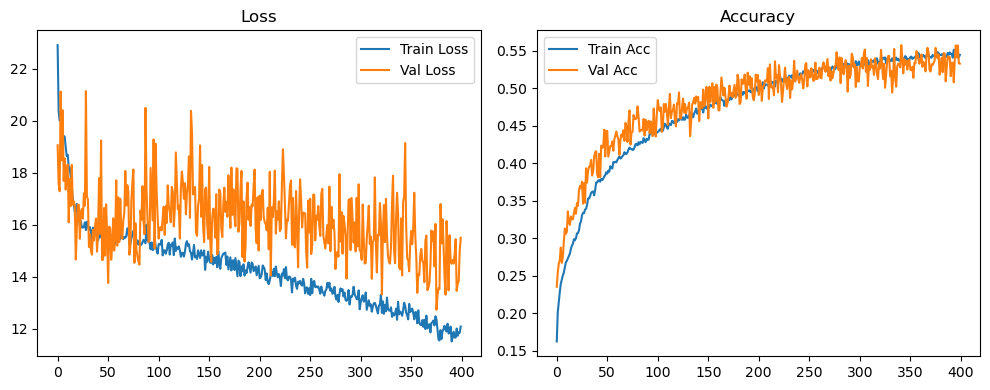

Original Model Final Test Loss: 15.7125 Accuracy: 0.5282


🚀 Running: batch256_lr_max_0.0001_min_1e-06_dp0.0


Files already downloaded and verified


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|                                                                                                                                                                        | 0/400 [00:00<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.1627 | Val Acc: 0.2136 | Epoch Time: 1.92 | :   0%|                                                                                                      | 0/400 [01:54<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.1627 | Val Acc: 0.2136 | Epoch Time: 1.92 | :   0%|                                                                                                      | 0/400 [01:54<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.1627 | Val Acc: 0.2136 | Epoch Time: 1.92 | :   0%|▏                                                                                         | 1/400 [01:55<12:45:02, 115.04s/it]

| LR: 0.000100 | Train Acc: 0.2099 | Val Acc: 0.2362 | Epoch Time: 1.91 | :   0%|▏                                                                                         | 1/400 [03:49<12:45:02, 115.04s/it]

| LR: 0.000100 | Train Acc: 0.2099 | Val Acc: 0.2362 | Epoch Time: 1.91 | :   0%|▏                                                                                         | 1/400 [03:49<12:45:02, 115.04s/it]

| LR: 0.000100 | Train Acc: 0.2099 | Val Acc: 0.2362 | Epoch Time: 1.91 | :   0%|▍                                                                                         | 2/400 [03:49<12:42:01, 114.88s/it]

| LR: 0.000100 | Train Acc: 0.2374 | Val Acc: 0.2491 | Epoch Time: 1.91 | :   0%|▍                                                                                         | 2/400 [05:44<12:42:01, 114.88s/it]

| LR: 0.000100 | Train Acc: 0.2374 | Val Acc: 0.2491 | Epoch Time: 1.91 | :   0%|▍                                                                                         | 2/400 [05:44<12:42:01, 114.88s/it]

| LR: 0.000100 | Train Acc: 0.2374 | Val Acc: 0.2491 | Epoch Time: 1.91 | :   1%|▋                                                                                         | 3/400 [05:44<12:39:48, 114.83s/it]

| LR: 0.000100 | Train Acc: 0.2438 | Val Acc: 0.2696 | Epoch Time: 1.91 | :   1%|▋                                                                                         | 3/400 [07:39<12:39:48, 114.83s/it]

| LR: 0.000100 | Train Acc: 0.2438 | Val Acc: 0.2696 | Epoch Time: 1.91 | :   1%|▋                                                                                         | 3/400 [07:39<12:39:48, 114.83s/it]

| LR: 0.000100 | Train Acc: 0.2438 | Val Acc: 0.2696 | Epoch Time: 1.91 | :   1%|▉                                                                                         | 4/400 [07:39<12:37:44, 114.81s/it]

| LR: 0.000100 | Train Acc: 0.2527 | Val Acc: 0.2800 | Epoch Time: 1.91 | :   1%|▉                                                                                         | 4/400 [09:34<12:37:44, 114.81s/it]

| LR: 0.000100 | Train Acc: 0.2527 | Val Acc: 0.2800 | Epoch Time: 1.91 | :   1%|▉                                                                                         | 4/400 [09:34<12:37:44, 114.81s/it]

| LR: 0.000100 | Train Acc: 0.2527 | Val Acc: 0.2800 | Epoch Time: 1.91 | :   1%|█▏                                                                                        | 5/400 [09:34<12:35:44, 114.80s/it]

| LR: 0.000100 | Train Acc: 0.2617 | Val Acc: 0.2958 | Epoch Time: 1.91 | :   1%|█▏                                                                                        | 5/400 [11:28<12:35:44, 114.80s/it]

| LR: 0.000100 | Train Acc: 0.2617 | Val Acc: 0.2958 | Epoch Time: 1.91 | :   1%|█▏                                                                                        | 5/400 [11:28<12:35:44, 114.80s/it]

| LR: 0.000100 | Train Acc: 0.2617 | Val Acc: 0.2958 | Epoch Time: 1.91 | :   2%|█▎                                                                                        | 6/400 [11:28<12:33:48, 114.79s/it]

| LR: 0.000100 | Train Acc: 0.2747 | Val Acc: 0.3014 | Epoch Time: 1.91 | :   2%|█▎                                                                                        | 6/400 [13:23<12:33:48, 114.79s/it]

| LR: 0.000100 | Train Acc: 0.2747 | Val Acc: 0.3014 | Epoch Time: 1.91 | :   2%|█▎                                                                                        | 6/400 [13:23<12:33:48, 114.79s/it]

| LR: 0.000100 | Train Acc: 0.2747 | Val Acc: 0.3014 | Epoch Time: 1.91 | :   2%|█▌                                                                                        | 7/400 [13:23<12:31:52, 114.79s/it]

| LR: 0.000100 | Train Acc: 0.2816 | Val Acc: 0.2946 | Epoch Time: 1.91 | :   2%|█▌                                                                                        | 7/400 [15:18<12:31:52, 114.79s/it]

| LR: 0.000100 | Train Acc: 0.2816 | Val Acc: 0.2946 | Epoch Time: 1.91 | :   2%|█▌                                                                                        | 7/400 [15:18<12:31:52, 114.79s/it]

| LR: 0.000100 | Train Acc: 0.2816 | Val Acc: 0.2946 | Epoch Time: 1.91 | :   2%|█▊                                                                                        | 8/400 [15:18<12:29:59, 114.80s/it]

| LR: 0.000100 | Train Acc: 0.2827 | Val Acc: 0.3241 | Epoch Time: 1.91 | :   2%|█▊                                                                                        | 8/400 [17:13<12:29:59, 114.80s/it]

| LR: 0.000100 | Train Acc: 0.2827 | Val Acc: 0.3241 | Epoch Time: 1.91 | :   2%|█▊                                                                                        | 8/400 [17:13<12:29:59, 114.80s/it]

| LR: 0.000100 | Train Acc: 0.2827 | Val Acc: 0.3241 | Epoch Time: 1.91 | :   2%|██                                                                                        | 9/400 [17:13<12:28:05, 114.80s/it]

| LR: 0.000100 | Train Acc: 0.2899 | Val Acc: 0.3195 | Epoch Time: 1.91 | :   2%|██                                                                                        | 9/400 [19:08<12:28:05, 114.80s/it]

| LR: 0.000100 | Train Acc: 0.2899 | Val Acc: 0.3195 | Epoch Time: 1.91 | :   2%|██                                                                                        | 9/400 [19:08<12:28:05, 114.80s/it]

| LR: 0.000100 | Train Acc: 0.2899 | Val Acc: 0.3195 | Epoch Time: 1.91 | :   2%|██▏                                                                                      | 10/400 [19:08<12:26:15, 114.81s/it]

| LR: 0.000100 | Train Acc: 0.2947 | Val Acc: 0.3230 | Epoch Time: 1.91 | :   2%|██▏                                                                                      | 10/400 [21:02<12:26:15, 114.81s/it]

| LR: 0.000100 | Train Acc: 0.2947 | Val Acc: 0.3230 | Epoch Time: 1.91 | :   2%|██▏                                                                                      | 10/400 [21:02<12:26:15, 114.81s/it]

| LR: 0.000100 | Train Acc: 0.2947 | Val Acc: 0.3230 | Epoch Time: 1.91 | :   3%|██▍                                                                                      | 11/400 [21:02<12:24:22, 114.81s/it]

| LR: 0.000100 | Train Acc: 0.2909 | Val Acc: 0.3221 | Epoch Time: 1.91 | :   3%|██▍                                                                                      | 11/400 [22:57<12:24:22, 114.81s/it]

| LR: 0.000100 | Train Acc: 0.2909 | Val Acc: 0.3221 | Epoch Time: 1.91 | :   3%|██▍                                                                                      | 11/400 [22:57<12:24:22, 114.81s/it]

| LR: 0.000100 | Train Acc: 0.2909 | Val Acc: 0.3221 | Epoch Time: 1.91 | :   3%|██▋                                                                                      | 12/400 [22:57<12:22:30, 114.82s/it]

| LR: 0.000100 | Train Acc: 0.2906 | Val Acc: 0.3242 | Epoch Time: 1.91 | :   3%|██▋                                                                                      | 12/400 [24:52<12:22:30, 114.82s/it]

| LR: 0.000100 | Train Acc: 0.2906 | Val Acc: 0.3242 | Epoch Time: 1.91 | :   3%|██▋                                                                                      | 12/400 [24:52<12:22:30, 114.82s/it]

| LR: 0.000100 | Train Acc: 0.2906 | Val Acc: 0.3242 | Epoch Time: 1.91 | :   3%|██▉                                                                                      | 13/400 [24:52<12:20:31, 114.81s/it]

| LR: 0.000100 | Train Acc: 0.3028 | Val Acc: 0.3282 | Epoch Time: 1.91 | :   3%|██▉                                                                                      | 13/400 [26:47<12:20:31, 114.81s/it]

| LR: 0.000100 | Train Acc: 0.3028 | Val Acc: 0.3282 | Epoch Time: 1.91 | :   3%|██▉                                                                                      | 13/400 [26:47<12:20:31, 114.81s/it]

| LR: 0.000100 | Train Acc: 0.3028 | Val Acc: 0.3282 | Epoch Time: 1.91 | :   4%|███                                                                                      | 14/400 [26:47<12:18:47, 114.84s/it]

| LR: 0.000100 | Train Acc: 0.3076 | Val Acc: 0.3392 | Epoch Time: 1.91 | :   4%|███                                                                                      | 14/400 [28:42<12:18:47, 114.84s/it]

| LR: 0.000100 | Train Acc: 0.3076 | Val Acc: 0.3392 | Epoch Time: 1.91 | :   4%|███                                                                                      | 14/400 [28:42<12:18:47, 114.84s/it]

| LR: 0.000100 | Train Acc: 0.3076 | Val Acc: 0.3392 | Epoch Time: 1.91 | :   4%|███▎                                                                                     | 15/400 [28:42<12:16:54, 114.84s/it]

| LR: 0.000100 | Train Acc: 0.3058 | Val Acc: 0.3322 | Epoch Time: 1.91 | :   4%|███▎                                                                                     | 15/400 [30:37<12:16:54, 114.84s/it]

| LR: 0.000100 | Train Acc: 0.3058 | Val Acc: 0.3322 | Epoch Time: 1.91 | :   4%|███▎                                                                                     | 15/400 [30:37<12:16:54, 114.84s/it]

| LR: 0.000100 | Train Acc: 0.3058 | Val Acc: 0.3322 | Epoch Time: 1.91 | :   4%|███▌                                                                                     | 16/400 [30:37<12:15:02, 114.85s/it]

| LR: 0.000100 | Train Acc: 0.3105 | Val Acc: 0.3354 | Epoch Time: 1.91 | :   4%|███▌                                                                                     | 16/400 [32:32<12:15:02, 114.85s/it]

| LR: 0.000100 | Train Acc: 0.3105 | Val Acc: 0.3354 | Epoch Time: 1.91 | :   4%|███▌                                                                                     | 16/400 [32:32<12:15:02, 114.85s/it]

| LR: 0.000100 | Train Acc: 0.3105 | Val Acc: 0.3354 | Epoch Time: 1.91 | :   4%|███▊                                                                                     | 17/400 [32:32<12:13:18, 114.88s/it]

| LR: 0.000100 | Train Acc: 0.3132 | Val Acc: 0.3362 | Epoch Time: 1.91 | :   4%|███▊                                                                                     | 17/400 [34:26<12:13:18, 114.88s/it]

| LR: 0.000100 | Train Acc: 0.3132 | Val Acc: 0.3362 | Epoch Time: 1.91 | :   4%|███▊                                                                                     | 17/400 [34:26<12:13:18, 114.88s/it]

| LR: 0.000100 | Train Acc: 0.3132 | Val Acc: 0.3362 | Epoch Time: 1.91 | :   4%|████                                                                                     | 18/400 [34:27<12:11:22, 114.88s/it]

| LR: 0.000100 | Train Acc: 0.3200 | Val Acc: 0.3488 | Epoch Time: 1.91 | :   4%|████                                                                                     | 18/400 [36:21<12:11:22, 114.88s/it]

| LR: 0.000100 | Train Acc: 0.3200 | Val Acc: 0.3488 | Epoch Time: 1.91 | :   4%|████                                                                                     | 18/400 [36:21<12:11:22, 114.88s/it]

| LR: 0.000100 | Train Acc: 0.3200 | Val Acc: 0.3488 | Epoch Time: 1.91 | :   5%|████▏                                                                                    | 19/400 [36:21<12:09:26, 114.87s/it]

| LR: 0.000099 | Train Acc: 0.3219 | Val Acc: 0.3413 | Epoch Time: 1.91 | :   5%|████▏                                                                                    | 19/400 [38:16<12:09:26, 114.87s/it]

| LR: 0.000099 | Train Acc: 0.3219 | Val Acc: 0.3413 | Epoch Time: 1.91 | :   5%|████▏                                                                                    | 19/400 [38:16<12:09:26, 114.87s/it]

| LR: 0.000099 | Train Acc: 0.3219 | Val Acc: 0.3413 | Epoch Time: 1.91 | :   5%|████▍                                                                                    | 20/400 [38:16<12:07:27, 114.86s/it]

| LR: 0.000099 | Train Acc: 0.3264 | Val Acc: 0.3386 | Epoch Time: 1.91 | :   5%|████▍                                                                                    | 20/400 [40:11<12:07:27, 114.86s/it]

| LR: 0.000099 | Train Acc: 0.3264 | Val Acc: 0.3386 | Epoch Time: 1.91 | :   5%|████▍                                                                                    | 20/400 [40:11<12:07:27, 114.86s/it]

| LR: 0.000099 | Train Acc: 0.3264 | Val Acc: 0.3386 | Epoch Time: 1.91 | :   5%|████▋                                                                                    | 21/400 [40:11<12:05:34, 114.87s/it]

| LR: 0.000099 | Train Acc: 0.3285 | Val Acc: 0.3540 | Epoch Time: 1.91 | :   5%|████▋                                                                                    | 21/400 [42:06<12:05:34, 114.87s/it]

| LR: 0.000099 | Train Acc: 0.3285 | Val Acc: 0.3540 | Epoch Time: 1.91 | :   5%|████▋                                                                                    | 21/400 [42:06<12:05:34, 114.87s/it]

| LR: 0.000099 | Train Acc: 0.3285 | Val Acc: 0.3540 | Epoch Time: 1.91 | :   6%|████▉                                                                                    | 22/400 [42:06<12:03:41, 114.87s/it]

| LR: 0.000099 | Train Acc: 0.3306 | Val Acc: 0.3527 | Epoch Time: 1.91 | :   6%|████▉                                                                                    | 22/400 [44:01<12:03:41, 114.87s/it]

| LR: 0.000099 | Train Acc: 0.3306 | Val Acc: 0.3527 | Epoch Time: 1.91 | :   6%|████▉                                                                                    | 22/400 [44:01<12:03:41, 114.87s/it]

| LR: 0.000099 | Train Acc: 0.3306 | Val Acc: 0.3527 | Epoch Time: 1.91 | :   6%|█████                                                                                    | 23/400 [44:01<12:01:46, 114.87s/it]

| LR: 0.000099 | Train Acc: 0.3332 | Val Acc: 0.3558 | Epoch Time: 1.91 | :   6%|█████                                                                                    | 23/400 [45:56<12:01:46, 114.87s/it]

| LR: 0.000099 | Train Acc: 0.3332 | Val Acc: 0.3558 | Epoch Time: 1.91 | :   6%|█████                                                                                    | 23/400 [45:56<12:01:46, 114.87s/it]

| LR: 0.000099 | Train Acc: 0.3332 | Val Acc: 0.3558 | Epoch Time: 1.91 | :   6%|█████▎                                                                                   | 24/400 [45:56<11:59:55, 114.88s/it]

| LR: 0.000099 | Train Acc: 0.3337 | Val Acc: 0.3440 | Epoch Time: 1.91 | :   6%|█████▎                                                                                   | 24/400 [47:51<11:59:55, 114.88s/it]

| LR: 0.000099 | Train Acc: 0.3337 | Val Acc: 0.3440 | Epoch Time: 1.91 | :   6%|█████▎                                                                                   | 24/400 [47:51<11:59:55, 114.88s/it]

| LR: 0.000099 | Train Acc: 0.3337 | Val Acc: 0.3440 | Epoch Time: 1.91 | :   6%|█████▌                                                                                   | 25/400 [47:51<11:58:10, 114.91s/it]

| LR: 0.000099 | Train Acc: 0.3348 | Val Acc: 0.3443 | Epoch Time: 1.92 | :   6%|█████▌                                                                                   | 25/400 [49:46<11:58:10, 114.91s/it]

| LR: 0.000099 | Train Acc: 0.3348 | Val Acc: 0.3443 | Epoch Time: 1.92 | :   6%|█████▌                                                                                   | 25/400 [49:46<11:58:10, 114.91s/it]

| LR: 0.000099 | Train Acc: 0.3348 | Val Acc: 0.3443 | Epoch Time: 1.92 | :   6%|█████▊                                                                                   | 26/400 [49:46<11:56:29, 114.94s/it]

| LR: 0.000099 | Train Acc: 0.3424 | Val Acc: 0.3616 | Epoch Time: 1.91 | :   6%|█████▊                                                                                   | 26/400 [51:41<11:56:29, 114.94s/it]

| LR: 0.000099 | Train Acc: 0.3424 | Val Acc: 0.3616 | Epoch Time: 1.91 | :   6%|█████▊                                                                                   | 26/400 [51:41<11:56:29, 114.94s/it]

| LR: 0.000099 | Train Acc: 0.3424 | Val Acc: 0.3616 | Epoch Time: 1.91 | :   7%|██████                                                                                   | 27/400 [51:41<11:54:39, 114.96s/it]

| LR: 0.000099 | Train Acc: 0.3431 | Val Acc: 0.3781 | Epoch Time: 1.91 | :   7%|██████                                                                                   | 27/400 [53:35<11:54:39, 114.96s/it]

| LR: 0.000099 | Train Acc: 0.3431 | Val Acc: 0.3781 | Epoch Time: 1.91 | :   7%|██████                                                                                   | 27/400 [53:35<11:54:39, 114.96s/it]

| LR: 0.000099 | Train Acc: 0.3431 | Val Acc: 0.3781 | Epoch Time: 1.91 | :   7%|██████▏                                                                                  | 28/400 [53:36<11:52:28, 114.92s/it]

| LR: 0.000099 | Train Acc: 0.3473 | Val Acc: 0.3723 | Epoch Time: 1.91 | :   7%|██████▏                                                                                  | 28/400 [55:30<11:52:28, 114.92s/it]

| LR: 0.000099 | Train Acc: 0.3473 | Val Acc: 0.3723 | Epoch Time: 1.91 | :   7%|██████▏                                                                                  | 28/400 [55:30<11:52:28, 114.92s/it]

| LR: 0.000099 | Train Acc: 0.3473 | Val Acc: 0.3723 | Epoch Time: 1.91 | :   7%|██████▍                                                                                  | 29/400 [55:30<11:50:28, 114.90s/it]

| LR: 0.000099 | Train Acc: 0.3433 | Val Acc: 0.3711 | Epoch Time: 1.91 | :   7%|██████▍                                                                                  | 29/400 [57:25<11:50:28, 114.90s/it]

| LR: 0.000099 | Train Acc: 0.3433 | Val Acc: 0.3711 | Epoch Time: 1.91 | :   7%|██████▍                                                                                  | 29/400 [57:25<11:50:28, 114.90s/it]

| LR: 0.000099 | Train Acc: 0.3433 | Val Acc: 0.3711 | Epoch Time: 1.91 | :   8%|██████▋                                                                                  | 30/400 [57:25<11:48:40, 114.92s/it]

| LR: 0.000099 | Train Acc: 0.3426 | Val Acc: 0.3620 | Epoch Time: 1.91 | :   8%|██████▋                                                                                  | 30/400 [59:20<11:48:40, 114.92s/it]

| LR: 0.000099 | Train Acc: 0.3426 | Val Acc: 0.3620 | Epoch Time: 1.91 | :   8%|██████▋                                                                                  | 30/400 [59:20<11:48:40, 114.92s/it]

| LR: 0.000099 | Train Acc: 0.3426 | Val Acc: 0.3620 | Epoch Time: 1.91 | :   8%|██████▉                                                                                  | 31/400 [59:20<11:46:48, 114.93s/it]

| LR: 0.000099 | Train Acc: 0.3468 | Val Acc: 0.3818 | Epoch Time: 1.91 | :   8%|██████▋                                                                                | 31/400 [1:01:15<11:46:48, 114.93s/it]

| LR: 0.000099 | Train Acc: 0.3468 | Val Acc: 0.3818 | Epoch Time: 1.91 | :   8%|██████▋                                                                                | 31/400 [1:01:15<11:46:48, 114.93s/it]

| LR: 0.000099 | Train Acc: 0.3468 | Val Acc: 0.3818 | Epoch Time: 1.91 | :   8%|██████▉                                                                                | 32/400 [1:01:15<11:44:46, 114.91s/it]

| LR: 0.000098 | Train Acc: 0.3503 | Val Acc: 0.3786 | Epoch Time: 1.91 | :   8%|██████▉                                                                                | 32/400 [1:03:10<11:44:46, 114.91s/it]

| LR: 0.000098 | Train Acc: 0.3503 | Val Acc: 0.3786 | Epoch Time: 1.91 | :   8%|██████▉                                                                                | 32/400 [1:03:10<11:44:46, 114.91s/it]

| LR: 0.000098 | Train Acc: 0.3503 | Val Acc: 0.3786 | Epoch Time: 1.91 | :   8%|███████▏                                                                               | 33/400 [1:03:10<11:42:56, 114.92s/it]

| LR: 0.000098 | Train Acc: 0.3452 | Val Acc: 0.3841 | Epoch Time: 1.92 | :   8%|███████▏                                                                               | 33/400 [1:05:05<11:42:56, 114.92s/it]

| LR: 0.000098 | Train Acc: 0.3452 | Val Acc: 0.3841 | Epoch Time: 1.92 | :   8%|███████▏                                                                               | 33/400 [1:05:05<11:42:56, 114.92s/it]

| LR: 0.000098 | Train Acc: 0.3452 | Val Acc: 0.3841 | Epoch Time: 1.92 | :   8%|███████▍                                                                               | 34/400 [1:05:05<11:41:19, 114.97s/it]

| LR: 0.000098 | Train Acc: 0.3572 | Val Acc: 0.3557 | Epoch Time: 1.91 | :   8%|███████▍                                                                               | 34/400 [1:07:00<11:41:19, 114.97s/it]

| LR: 0.000098 | Train Acc: 0.3572 | Val Acc: 0.3557 | Epoch Time: 1.91 | :   8%|███████▍                                                                               | 34/400 [1:07:00<11:41:19, 114.97s/it]

| LR: 0.000098 | Train Acc: 0.3572 | Val Acc: 0.3557 | Epoch Time: 1.91 | :   9%|███████▌                                                                               | 35/400 [1:07:00<11:39:18, 114.96s/it]

| LR: 0.000098 | Train Acc: 0.3569 | Val Acc: 0.3773 | Epoch Time: 1.91 | :   9%|███████▌                                                                               | 35/400 [1:08:55<11:39:18, 114.96s/it]

| LR: 0.000098 | Train Acc: 0.3569 | Val Acc: 0.3773 | Epoch Time: 1.91 | :   9%|███████▌                                                                               | 35/400 [1:08:55<11:39:18, 114.96s/it]

| LR: 0.000098 | Train Acc: 0.3569 | Val Acc: 0.3773 | Epoch Time: 1.91 | :   9%|███████▊                                                                               | 36/400 [1:08:55<11:37:05, 114.91s/it]

| LR: 0.000098 | Train Acc: 0.3584 | Val Acc: 0.3634 | Epoch Time: 1.91 | :   9%|███████▊                                                                               | 36/400 [1:10:50<11:37:05, 114.91s/it]

| LR: 0.000098 | Train Acc: 0.3584 | Val Acc: 0.3634 | Epoch Time: 1.91 | :   9%|███████▊                                                                               | 36/400 [1:10:50<11:37:05, 114.91s/it]

| LR: 0.000098 | Train Acc: 0.3584 | Val Acc: 0.3634 | Epoch Time: 1.91 | :   9%|████████                                                                               | 37/400 [1:10:50<11:35:08, 114.90s/it]

| LR: 0.000098 | Train Acc: 0.3601 | Val Acc: 0.3848 | Epoch Time: 1.92 | :   9%|████████                                                                               | 37/400 [1:12:45<11:35:08, 114.90s/it]

| LR: 0.000098 | Train Acc: 0.3601 | Val Acc: 0.3848 | Epoch Time: 1.92 | :   9%|████████                                                                               | 37/400 [1:12:45<11:35:08, 114.90s/it]

| LR: 0.000098 | Train Acc: 0.3601 | Val Acc: 0.3848 | Epoch Time: 1.92 | :  10%|████████▎                                                                              | 38/400 [1:12:45<11:33:29, 114.94s/it]

| LR: 0.000098 | Train Acc: 0.3629 | Val Acc: 0.3842 | Epoch Time: 1.91 | :  10%|████████▎                                                                              | 38/400 [1:14:40<11:33:29, 114.94s/it]

| LR: 0.000098 | Train Acc: 0.3629 | Val Acc: 0.3842 | Epoch Time: 1.91 | :  10%|████████▎                                                                              | 38/400 [1:14:40<11:33:29, 114.94s/it]

| LR: 0.000098 | Train Acc: 0.3629 | Val Acc: 0.3842 | Epoch Time: 1.91 | :  10%|████████▍                                                                              | 39/400 [1:14:40<11:31:39, 114.96s/it]

| LR: 0.000098 | Train Acc: 0.3634 | Val Acc: 0.3864 | Epoch Time: 1.91 | :  10%|████████▍                                                                              | 39/400 [1:16:35<11:31:39, 114.96s/it]

| LR: 0.000098 | Train Acc: 0.3634 | Val Acc: 0.3864 | Epoch Time: 1.91 | :  10%|████████▍                                                                              | 39/400 [1:16:35<11:31:39, 114.96s/it]

| LR: 0.000098 | Train Acc: 0.3634 | Val Acc: 0.3864 | Epoch Time: 1.91 | :  10%|████████▋                                                                              | 40/400 [1:16:35<11:29:36, 114.93s/it]

| LR: 0.000098 | Train Acc: 0.3651 | Val Acc: 0.3879 | Epoch Time: 1.91 | :  10%|████████▋                                                                              | 40/400 [1:18:30<11:29:36, 114.93s/it]

| LR: 0.000098 | Train Acc: 0.3651 | Val Acc: 0.3879 | Epoch Time: 1.91 | :  10%|████████▋                                                                              | 40/400 [1:18:30<11:29:36, 114.93s/it]

| LR: 0.000098 | Train Acc: 0.3651 | Val Acc: 0.3879 | Epoch Time: 1.91 | :  10%|████████▉                                                                              | 41/400 [1:18:30<11:27:45, 114.95s/it]

| LR: 0.000097 | Train Acc: 0.3660 | Val Acc: 0.3860 | Epoch Time: 1.92 | :  10%|████████▉                                                                              | 41/400 [1:20:25<11:27:45, 114.95s/it]

| LR: 0.000097 | Train Acc: 0.3660 | Val Acc: 0.3860 | Epoch Time: 1.92 | :  10%|████████▉                                                                              | 41/400 [1:20:25<11:27:45, 114.95s/it]

| LR: 0.000097 | Train Acc: 0.3660 | Val Acc: 0.3860 | Epoch Time: 1.92 | :  10%|█████████▏                                                                             | 42/400 [1:20:25<11:26:03, 114.98s/it]

| LR: 0.000097 | Train Acc: 0.3671 | Val Acc: 0.4112 | Epoch Time: 1.91 | :  10%|█████████▏                                                                             | 42/400 [1:22:20<11:26:03, 114.98s/it]

| LR: 0.000097 | Train Acc: 0.3671 | Val Acc: 0.4112 | Epoch Time: 1.91 | :  10%|█████████▏                                                                             | 42/400 [1:22:20<11:26:03, 114.98s/it]

| LR: 0.000097 | Train Acc: 0.3671 | Val Acc: 0.4112 | Epoch Time: 1.91 | :  11%|█████████▎                                                                             | 43/400 [1:22:20<11:24:09, 114.99s/it]

| LR: 0.000097 | Train Acc: 0.3662 | Val Acc: 0.3953 | Epoch Time: 1.91 | :  11%|█████████▎                                                                             | 43/400 [1:24:15<11:24:09, 114.99s/it]

| LR: 0.000097 | Train Acc: 0.3662 | Val Acc: 0.3953 | Epoch Time: 1.91 | :  11%|█████████▎                                                                             | 43/400 [1:24:15<11:24:09, 114.99s/it]

| LR: 0.000097 | Train Acc: 0.3662 | Val Acc: 0.3953 | Epoch Time: 1.91 | :  11%|█████████▌                                                                             | 44/400 [1:24:15<11:21:57, 114.94s/it]

| LR: 0.000097 | Train Acc: 0.3685 | Val Acc: 0.3913 | Epoch Time: 1.91 | :  11%|█████████▌                                                                             | 44/400 [1:26:09<11:21:57, 114.94s/it]

| LR: 0.000097 | Train Acc: 0.3685 | Val Acc: 0.3913 | Epoch Time: 1.91 | :  11%|█████████▌                                                                             | 44/400 [1:26:09<11:21:57, 114.94s/it]

| LR: 0.000097 | Train Acc: 0.3685 | Val Acc: 0.3913 | Epoch Time: 1.91 | :  11%|█████████▊                                                                             | 45/400 [1:26:10<11:20:00, 114.93s/it]

| LR: 0.000097 | Train Acc: 0.3727 | Val Acc: 0.4003 | Epoch Time: 1.92 | :  11%|█████████▊                                                                             | 45/400 [1:28:04<11:20:00, 114.93s/it]

| LR: 0.000097 | Train Acc: 0.3727 | Val Acc: 0.4003 | Epoch Time: 1.92 | :  11%|█████████▊                                                                             | 45/400 [1:28:04<11:20:00, 114.93s/it]

| LR: 0.000097 | Train Acc: 0.3727 | Val Acc: 0.4003 | Epoch Time: 1.92 | :  12%|██████████                                                                             | 46/400 [1:28:05<11:18:17, 114.97s/it]

| LR: 0.000097 | Train Acc: 0.3760 | Val Acc: 0.4089 | Epoch Time: 1.91 | :  12%|██████████                                                                             | 46/400 [1:29:59<11:18:17, 114.97s/it]

| LR: 0.000097 | Train Acc: 0.3760 | Val Acc: 0.4089 | Epoch Time: 1.91 | :  12%|██████████                                                                             | 46/400 [1:29:59<11:18:17, 114.97s/it]

| LR: 0.000097 | Train Acc: 0.3760 | Val Acc: 0.4089 | Epoch Time: 1.91 | :  12%|██████████▏                                                                            | 47/400 [1:30:00<11:16:26, 114.98s/it]

| LR: 0.000097 | Train Acc: 0.3734 | Val Acc: 0.3996 | Epoch Time: 1.91 | :  12%|██████████▏                                                                            | 47/400 [1:31:54<11:16:26, 114.98s/it]

| LR: 0.000097 | Train Acc: 0.3734 | Val Acc: 0.3996 | Epoch Time: 1.91 | :  12%|██████████▏                                                                            | 47/400 [1:31:54<11:16:26, 114.98s/it]

| LR: 0.000097 | Train Acc: 0.3734 | Val Acc: 0.3996 | Epoch Time: 1.91 | :  12%|██████████▍                                                                            | 48/400 [1:31:54<11:14:13, 114.92s/it]

| LR: 0.000097 | Train Acc: 0.3775 | Val Acc: 0.3891 | Epoch Time: 1.91 | :  12%|██████████▍                                                                            | 48/400 [1:33:49<11:14:13, 114.92s/it]

| LR: 0.000097 | Train Acc: 0.3775 | Val Acc: 0.3891 | Epoch Time: 1.91 | :  12%|██████████▍                                                                            | 48/400 [1:33:49<11:14:13, 114.92s/it]

| LR: 0.000097 | Train Acc: 0.3775 | Val Acc: 0.3891 | Epoch Time: 1.91 | :  12%|██████████▋                                                                            | 49/400 [1:33:49<11:12:06, 114.89s/it]

| LR: 0.000096 | Train Acc: 0.3785 | Val Acc: 0.4138 | Epoch Time: 1.91 | :  12%|██████████▋                                                                            | 49/400 [1:35:44<11:12:06, 114.89s/it]

| LR: 0.000096 | Train Acc: 0.3785 | Val Acc: 0.4138 | Epoch Time: 1.91 | :  12%|██████████▋                                                                            | 49/400 [1:35:44<11:12:06, 114.89s/it]

| LR: 0.000096 | Train Acc: 0.3785 | Val Acc: 0.4138 | Epoch Time: 1.91 | :  12%|██████████▉                                                                            | 50/400 [1:35:44<11:10:19, 114.91s/it]

| LR: 0.000096 | Train Acc: 0.3781 | Val Acc: 0.3742 | Epoch Time: 1.92 | :  12%|██████████▉                                                                            | 50/400 [1:37:39<11:10:19, 114.91s/it]

| LR: 0.000096 | Train Acc: 0.3781 | Val Acc: 0.3742 | Epoch Time: 1.92 | :  12%|██████████▉                                                                            | 50/400 [1:37:39<11:10:19, 114.91s/it]

| LR: 0.000096 | Train Acc: 0.3781 | Val Acc: 0.3742 | Epoch Time: 1.92 | :  13%|███████████                                                                            | 51/400 [1:37:39<11:08:38, 114.95s/it]

| LR: 0.000096 | Train Acc: 0.3788 | Val Acc: 0.3838 | Epoch Time: 1.91 | :  13%|███████████                                                                            | 51/400 [1:39:34<11:08:38, 114.95s/it]

| LR: 0.000096 | Train Acc: 0.3788 | Val Acc: 0.3838 | Epoch Time: 1.91 | :  13%|███████████                                                                            | 51/400 [1:39:34<11:08:38, 114.95s/it]

| LR: 0.000096 | Train Acc: 0.3788 | Val Acc: 0.3838 | Epoch Time: 1.91 | :  13%|███████████▎                                                                           | 52/400 [1:39:34<11:06:29, 114.91s/it]

| LR: 0.000096 | Train Acc: 0.3829 | Val Acc: 0.4030 | Epoch Time: 1.91 | :  13%|███████████▎                                                                           | 52/400 [1:41:29<11:06:29, 114.91s/it]

| LR: 0.000096 | Train Acc: 0.3829 | Val Acc: 0.4030 | Epoch Time: 1.91 | :  13%|███████████▎                                                                           | 52/400 [1:41:29<11:06:29, 114.91s/it]

| LR: 0.000096 | Train Acc: 0.3829 | Val Acc: 0.4030 | Epoch Time: 1.91 | :  13%|███████████▌                                                                           | 53/400 [1:41:29<11:04:14, 114.86s/it]

| LR: 0.000096 | Train Acc: 0.3821 | Val Acc: 0.3835 | Epoch Time: 1.91 | :  13%|███████████▌                                                                           | 53/400 [1:43:24<11:04:14, 114.86s/it]

| LR: 0.000096 | Train Acc: 0.3821 | Val Acc: 0.3835 | Epoch Time: 1.91 | :  13%|███████████▌                                                                           | 53/400 [1:43:24<11:04:14, 114.86s/it]

| LR: 0.000096 | Train Acc: 0.3821 | Val Acc: 0.3835 | Epoch Time: 1.91 | :  14%|███████████▋                                                                           | 54/400 [1:43:24<11:02:20, 114.86s/it]

| LR: 0.000096 | Train Acc: 0.3846 | Val Acc: 0.4077 | Epoch Time: 1.92 | :  14%|███████████▋                                                                           | 54/400 [1:45:19<11:02:20, 114.86s/it]

| LR: 0.000096 | Train Acc: 0.3846 | Val Acc: 0.4077 | Epoch Time: 1.92 | :  14%|███████████▋                                                                           | 54/400 [1:45:19<11:02:20, 114.86s/it]

| LR: 0.000096 | Train Acc: 0.3846 | Val Acc: 0.4077 | Epoch Time: 1.92 | :  14%|███████████▉                                                                           | 55/400 [1:45:19<11:00:44, 114.91s/it]

| LR: 0.000095 | Train Acc: 0.3875 | Val Acc: 0.3876 | Epoch Time: 1.91 | :  14%|███████████▉                                                                           | 55/400 [1:47:14<11:00:44, 114.91s/it]

| LR: 0.000095 | Train Acc: 0.3875 | Val Acc: 0.3876 | Epoch Time: 1.91 | :  14%|███████████▉                                                                           | 55/400 [1:47:14<11:00:44, 114.91s/it]

| LR: 0.000095 | Train Acc: 0.3875 | Val Acc: 0.3876 | Epoch Time: 1.91 | :  14%|████████████▏                                                                          | 56/400 [1:47:14<10:58:59, 114.94s/it]

| LR: 0.000095 | Train Acc: 0.3883 | Val Acc: 0.4119 | Epoch Time: 1.91 | :  14%|████████████▏                                                                          | 56/400 [1:49:08<10:58:59, 114.94s/it]

| LR: 0.000095 | Train Acc: 0.3883 | Val Acc: 0.4119 | Epoch Time: 1.91 | :  14%|████████████▏                                                                          | 56/400 [1:49:08<10:58:59, 114.94s/it]

| LR: 0.000095 | Train Acc: 0.3883 | Val Acc: 0.4119 | Epoch Time: 1.91 | :  14%|████████████▍                                                                          | 57/400 [1:49:08<10:56:50, 114.90s/it]

| LR: 0.000095 | Train Acc: 0.3886 | Val Acc: 0.4040 | Epoch Time: 1.91 | :  14%|████████████▍                                                                          | 57/400 [1:51:03<10:56:50, 114.90s/it]

| LR: 0.000095 | Train Acc: 0.3886 | Val Acc: 0.4040 | Epoch Time: 1.91 | :  14%|████████████▍                                                                          | 57/400 [1:51:03<10:56:50, 114.90s/it]

| LR: 0.000095 | Train Acc: 0.3886 | Val Acc: 0.4040 | Epoch Time: 1.91 | :  14%|████████████▌                                                                          | 58/400 [1:51:03<10:54:46, 114.87s/it]

| LR: 0.000095 | Train Acc: 0.3957 | Val Acc: 0.4077 | Epoch Time: 1.91 | :  14%|████████████▌                                                                          | 58/400 [1:52:58<10:54:46, 114.87s/it]

| LR: 0.000095 | Train Acc: 0.3957 | Val Acc: 0.4077 | Epoch Time: 1.91 | :  14%|████████████▌                                                                          | 58/400 [1:52:58<10:54:46, 114.87s/it]

| LR: 0.000095 | Train Acc: 0.3957 | Val Acc: 0.4077 | Epoch Time: 1.91 | :  15%|████████████▊                                                                          | 59/400 [1:52:58<10:52:55, 114.89s/it]

| LR: 0.000095 | Train Acc: 0.3900 | Val Acc: 0.4056 | Epoch Time: 1.92 | :  15%|████████████▊                                                                          | 59/400 [1:54:53<10:52:55, 114.89s/it]

| LR: 0.000095 | Train Acc: 0.3900 | Val Acc: 0.4056 | Epoch Time: 1.92 | :  15%|████████████▊                                                                          | 59/400 [1:54:53<10:52:55, 114.89s/it]

| LR: 0.000095 | Train Acc: 0.3900 | Val Acc: 0.4056 | Epoch Time: 1.92 | :  15%|█████████████                                                                          | 60/400 [1:54:53<10:51:22, 114.95s/it]

| LR: 0.000095 | Train Acc: 0.3916 | Val Acc: 0.4212 | Epoch Time: 1.92 | :  15%|█████████████                                                                          | 60/400 [1:56:48<10:51:22, 114.95s/it]

| LR: 0.000095 | Train Acc: 0.3916 | Val Acc: 0.4212 | Epoch Time: 1.92 | :  15%|█████████████                                                                          | 60/400 [1:56:48<10:51:22, 114.95s/it]

| LR: 0.000095 | Train Acc: 0.3916 | Val Acc: 0.4212 | Epoch Time: 1.92 | :  15%|█████████████▎                                                                         | 61/400 [1:56:48<10:49:35, 114.97s/it]

| LR: 0.000094 | Train Acc: 0.4008 | Val Acc: 0.4333 | Epoch Time: 1.91 | :  15%|█████████████▎                                                                         | 61/400 [1:58:43<10:49:35, 114.97s/it]

| LR: 0.000094 | Train Acc: 0.4008 | Val Acc: 0.4333 | Epoch Time: 1.91 | :  15%|█████████████▎                                                                         | 61/400 [1:58:43<10:49:35, 114.97s/it]

| LR: 0.000094 | Train Acc: 0.4008 | Val Acc: 0.4333 | Epoch Time: 1.91 | :  16%|█████████████▍                                                                         | 62/400 [1:58:43<10:47:24, 114.93s/it]

| LR: 0.000094 | Train Acc: 0.4011 | Val Acc: 0.4157 | Epoch Time: 1.91 | :  16%|█████████████▍                                                                         | 62/400 [2:00:38<10:47:24, 114.93s/it]

| LR: 0.000094 | Train Acc: 0.4011 | Val Acc: 0.4157 | Epoch Time: 1.91 | :  16%|█████████████▍                                                                         | 62/400 [2:00:38<10:47:24, 114.93s/it]

| LR: 0.000094 | Train Acc: 0.4011 | Val Acc: 0.4157 | Epoch Time: 1.91 | :  16%|█████████████▋                                                                         | 63/400 [2:00:38<10:45:13, 114.88s/it]

| LR: 0.000094 | Train Acc: 0.4032 | Val Acc: 0.4128 | Epoch Time: 1.91 | :  16%|█████████████▋                                                                         | 63/400 [2:02:33<10:45:13, 114.88s/it]

| LR: 0.000094 | Train Acc: 0.4032 | Val Acc: 0.4128 | Epoch Time: 1.91 | :  16%|█████████████▋                                                                         | 63/400 [2:02:33<10:45:13, 114.88s/it]

| LR: 0.000094 | Train Acc: 0.4032 | Val Acc: 0.4128 | Epoch Time: 1.91 | :  16%|█████████████▉                                                                         | 64/400 [2:02:33<10:43:20, 114.88s/it]

| LR: 0.000094 | Train Acc: 0.4026 | Val Acc: 0.4297 | Epoch Time: 1.92 | :  16%|█████████████▉                                                                         | 64/400 [2:04:28<10:43:20, 114.88s/it]

| LR: 0.000094 | Train Acc: 0.4026 | Val Acc: 0.4297 | Epoch Time: 1.92 | :  16%|█████████████▉                                                                         | 64/400 [2:04:28<10:43:20, 114.88s/it]

| LR: 0.000094 | Train Acc: 0.4026 | Val Acc: 0.4297 | Epoch Time: 1.92 | :  16%|██████████████▏                                                                        | 65/400 [2:04:28<10:41:43, 114.94s/it]

| LR: 0.000094 | Train Acc: 0.4050 | Val Acc: 0.4374 | Epoch Time: 1.91 | :  16%|██████████████▏                                                                        | 65/400 [2:06:23<10:41:43, 114.94s/it]

| LR: 0.000094 | Train Acc: 0.4050 | Val Acc: 0.4374 | Epoch Time: 1.91 | :  16%|██████████████▏                                                                        | 65/400 [2:06:23<10:41:43, 114.94s/it]

| LR: 0.000094 | Train Acc: 0.4050 | Val Acc: 0.4374 | Epoch Time: 1.91 | :  16%|██████████████▎                                                                        | 66/400 [2:06:23<10:39:48, 114.94s/it]

| LR: 0.000093 | Train Acc: 0.4044 | Val Acc: 0.4299 | Epoch Time: 1.91 | :  16%|██████████████▎                                                                        | 66/400 [2:08:17<10:39:48, 114.94s/it]

| LR: 0.000093 | Train Acc: 0.4044 | Val Acc: 0.4299 | Epoch Time: 1.91 | :  16%|██████████████▎                                                                        | 66/400 [2:08:17<10:39:48, 114.94s/it]

| LR: 0.000093 | Train Acc: 0.4044 | Val Acc: 0.4299 | Epoch Time: 1.91 | :  17%|██████████████▌                                                                        | 67/400 [2:08:18<10:37:39, 114.89s/it]

| LR: 0.000093 | Train Acc: 0.4099 | Val Acc: 0.4272 | Epoch Time: 1.91 | :  17%|██████████████▌                                                                        | 67/400 [2:10:12<10:37:39, 114.89s/it]

| LR: 0.000093 | Train Acc: 0.4099 | Val Acc: 0.4272 | Epoch Time: 1.91 | :  17%|██████████████▌                                                                        | 67/400 [2:10:12<10:37:39, 114.89s/it]

| LR: 0.000093 | Train Acc: 0.4099 | Val Acc: 0.4272 | Epoch Time: 1.91 | :  17%|██████████████▊                                                                        | 68/400 [2:10:12<10:35:34, 114.86s/it]

| LR: 0.000093 | Train Acc: 0.4038 | Val Acc: 0.4164 | Epoch Time: 1.91 | :  17%|██████████████▊                                                                        | 68/400 [2:12:07<10:35:34, 114.86s/it]

| LR: 0.000093 | Train Acc: 0.4038 | Val Acc: 0.4164 | Epoch Time: 1.91 | :  17%|██████████████▊                                                                        | 68/400 [2:12:07<10:35:34, 114.86s/it]

| LR: 0.000093 | Train Acc: 0.4038 | Val Acc: 0.4164 | Epoch Time: 1.91 | :  17%|███████████████                                                                        | 69/400 [2:12:07<10:33:49, 114.89s/it]

| LR: 0.000093 | Train Acc: 0.4158 | Val Acc: 0.4625 | Epoch Time: 1.92 | :  17%|███████████████                                                                        | 69/400 [2:14:02<10:33:49, 114.89s/it]

| LR: 0.000093 | Train Acc: 0.4158 | Val Acc: 0.4625 | Epoch Time: 1.92 | :  17%|███████████████                                                                        | 69/400 [2:14:02<10:33:49, 114.89s/it]

| LR: 0.000093 | Train Acc: 0.4158 | Val Acc: 0.4625 | Epoch Time: 1.92 | :  18%|███████████████▏                                                                       | 70/400 [2:14:02<10:32:12, 114.95s/it]

| LR: 0.000093 | Train Acc: 0.4195 | Val Acc: 0.4332 | Epoch Time: 1.91 | :  18%|███████████████▏                                                                       | 70/400 [2:15:57<10:32:12, 114.95s/it]

| LR: 0.000093 | Train Acc: 0.4195 | Val Acc: 0.4332 | Epoch Time: 1.91 | :  18%|███████████████▏                                                                       | 70/400 [2:15:57<10:32:12, 114.95s/it]

| LR: 0.000093 | Train Acc: 0.4195 | Val Acc: 0.4332 | Epoch Time: 1.91 | :  18%|███████████████▍                                                                       | 71/400 [2:15:57<10:30:11, 114.93s/it]

| LR: 0.000093 | Train Acc: 0.4158 | Val Acc: 0.4297 | Epoch Time: 1.91 | :  18%|███████████████▍                                                                       | 71/400 [2:17:52<10:30:11, 114.93s/it]

| LR: 0.000093 | Train Acc: 0.4158 | Val Acc: 0.4297 | Epoch Time: 1.91 | :  18%|███████████████▍                                                                       | 71/400 [2:17:52<10:30:11, 114.93s/it]

| LR: 0.000093 | Train Acc: 0.4158 | Val Acc: 0.4297 | Epoch Time: 1.91 | :  18%|███████████████▋                                                                       | 72/400 [2:17:52<10:28:07, 114.90s/it]

| LR: 0.000092 | Train Acc: 0.4178 | Val Acc: 0.4516 | Epoch Time: 1.91 | :  18%|███████████████▋                                                                       | 72/400 [2:19:47<10:28:07, 114.90s/it]

| LR: 0.000092 | Train Acc: 0.4178 | Val Acc: 0.4516 | Epoch Time: 1.91 | :  18%|███████████████▋                                                                       | 72/400 [2:19:47<10:28:07, 114.90s/it]

| LR: 0.000092 | Train Acc: 0.4178 | Val Acc: 0.4516 | Epoch Time: 1.91 | :  18%|███████████████▉                                                                       | 73/400 [2:19:47<10:26:10, 114.90s/it]

| LR: 0.000092 | Train Acc: 0.4208 | Val Acc: 0.4423 | Epoch Time: 1.91 | :  18%|███████████████▉                                                                       | 73/400 [2:21:42<10:26:10, 114.90s/it]

| LR: 0.000092 | Train Acc: 0.4208 | Val Acc: 0.4423 | Epoch Time: 1.91 | :  18%|███████████████▉                                                                       | 73/400 [2:21:42<10:26:10, 114.90s/it]

| LR: 0.000092 | Train Acc: 0.4208 | Val Acc: 0.4423 | Epoch Time: 1.91 | :  18%|████████████████                                                                       | 74/400 [2:21:42<10:24:25, 114.93s/it]

| LR: 0.000092 | Train Acc: 0.4188 | Val Acc: 0.4518 | Epoch Time: 1.92 | :  18%|████████████████                                                                       | 74/400 [2:23:37<10:24:25, 114.93s/it]

| LR: 0.000092 | Train Acc: 0.4188 | Val Acc: 0.4518 | Epoch Time: 1.92 | :  18%|████████████████                                                                       | 74/400 [2:23:37<10:24:25, 114.93s/it]

| LR: 0.000092 | Train Acc: 0.4188 | Val Acc: 0.4518 | Epoch Time: 1.92 | :  19%|████████████████▎                                                                      | 75/400 [2:23:37<10:22:47, 114.98s/it]

| LR: 0.000092 | Train Acc: 0.4200 | Val Acc: 0.4422 | Epoch Time: 1.91 | :  19%|████████████████▎                                                                      | 75/400 [2:25:32<10:22:47, 114.98s/it]

| LR: 0.000092 | Train Acc: 0.4200 | Val Acc: 0.4422 | Epoch Time: 1.91 | :  19%|████████████████▎                                                                      | 75/400 [2:25:32<10:22:47, 114.98s/it]

| LR: 0.000092 | Train Acc: 0.4200 | Val Acc: 0.4422 | Epoch Time: 1.91 | :  19%|████████████████▌                                                                      | 76/400 [2:25:32<10:20:54, 114.98s/it]

| LR: 0.000091 | Train Acc: 0.4197 | Val Acc: 0.4176 | Epoch Time: 1.91 | :  19%|████████████████▌                                                                      | 76/400 [2:27:27<10:20:54, 114.98s/it]

| LR: 0.000091 | Train Acc: 0.4197 | Val Acc: 0.4176 | Epoch Time: 1.91 | :  19%|████████████████▌                                                                      | 76/400 [2:27:27<10:20:54, 114.98s/it]

| LR: 0.000091 | Train Acc: 0.4197 | Val Acc: 0.4176 | Epoch Time: 1.91 | :  19%|████████████████▋                                                                      | 77/400 [2:27:27<10:18:40, 114.92s/it]

| LR: 0.000091 | Train Acc: 0.4220 | Val Acc: 0.4485 | Epoch Time: 1.91 | :  19%|████████████████▋                                                                      | 77/400 [2:29:22<10:18:40, 114.92s/it]

| LR: 0.000091 | Train Acc: 0.4220 | Val Acc: 0.4485 | Epoch Time: 1.91 | :  19%|████████████████▋                                                                      | 77/400 [2:29:22<10:18:40, 114.92s/it]

| LR: 0.000091 | Train Acc: 0.4220 | Val Acc: 0.4485 | Epoch Time: 1.91 | :  20%|████████████████▉                                                                      | 78/400 [2:29:22<10:16:37, 114.90s/it]

| LR: 0.000091 | Train Acc: 0.4248 | Val Acc: 0.4206 | Epoch Time: 1.91 | :  20%|████████████████▉                                                                      | 78/400 [2:31:17<10:16:37, 114.90s/it]

| LR: 0.000091 | Train Acc: 0.4248 | Val Acc: 0.4206 | Epoch Time: 1.91 | :  20%|████████████████▉                                                                      | 78/400 [2:31:17<10:16:37, 114.90s/it]

| LR: 0.000091 | Train Acc: 0.4248 | Val Acc: 0.4206 | Epoch Time: 1.91 | :  20%|█████████████████▏                                                                     | 79/400 [2:31:17<10:14:51, 114.93s/it]

| LR: 0.000091 | Train Acc: 0.4211 | Val Acc: 0.4274 | Epoch Time: 1.92 | :  20%|█████████████████▏                                                                     | 79/400 [2:33:12<10:14:51, 114.93s/it]

| LR: 0.000091 | Train Acc: 0.4211 | Val Acc: 0.4274 | Epoch Time: 1.92 | :  20%|█████████████████▏                                                                     | 79/400 [2:33:12<10:14:51, 114.93s/it]

| LR: 0.000091 | Train Acc: 0.4211 | Val Acc: 0.4274 | Epoch Time: 1.92 | :  20%|█████████████████▍                                                                     | 80/400 [2:33:12<10:13:12, 114.98s/it]

| LR: 0.000091 | Train Acc: 0.4180 | Val Acc: 0.4417 | Epoch Time: 1.91 | :  20%|█████████████████▍                                                                     | 80/400 [2:35:07<10:13:12, 114.98s/it]

| LR: 0.000091 | Train Acc: 0.4180 | Val Acc: 0.4417 | Epoch Time: 1.91 | :  20%|█████████████████▍                                                                     | 80/400 [2:35:07<10:13:12, 114.98s/it]

| LR: 0.000091 | Train Acc: 0.4180 | Val Acc: 0.4417 | Epoch Time: 1.91 | :  20%|█████████████████▌                                                                     | 81/400 [2:35:07<10:11:12, 114.96s/it]

| LR: 0.000090 | Train Acc: 0.4222 | Val Acc: 0.4470 | Epoch Time: 1.91 | :  20%|█████████████████▌                                                                     | 81/400 [2:37:01<10:11:12, 114.96s/it]

| LR: 0.000090 | Train Acc: 0.4222 | Val Acc: 0.4470 | Epoch Time: 1.91 | :  20%|█████████████████▌                                                                     | 81/400 [2:37:01<10:11:12, 114.96s/it]

| LR: 0.000090 | Train Acc: 0.4222 | Val Acc: 0.4470 | Epoch Time: 1.91 | :  20%|█████████████████▊                                                                     | 82/400 [2:37:01<10:08:58, 114.90s/it]

| LR: 0.000090 | Train Acc: 0.4242 | Val Acc: 0.4141 | Epoch Time: 1.91 | :  20%|█████████████████▊                                                                     | 82/400 [2:38:56<10:08:58, 114.90s/it]

| LR: 0.000090 | Train Acc: 0.4242 | Val Acc: 0.4141 | Epoch Time: 1.91 | :  20%|█████████████████▊                                                                     | 82/400 [2:38:56<10:08:58, 114.90s/it]

| LR: 0.000090 | Train Acc: 0.4242 | Val Acc: 0.4141 | Epoch Time: 1.91 | :  21%|██████████████████                                                                     | 83/400 [2:38:56<10:06:54, 114.87s/it]

| LR: 0.000090 | Train Acc: 0.4236 | Val Acc: 0.4339 | Epoch Time: 1.91 | :  21%|██████████████████                                                                     | 83/400 [2:40:51<10:06:54, 114.87s/it]

| LR: 0.000090 | Train Acc: 0.4236 | Val Acc: 0.4339 | Epoch Time: 1.91 | :  21%|██████████████████                                                                     | 83/400 [2:40:51<10:06:54, 114.87s/it]

| LR: 0.000090 | Train Acc: 0.4236 | Val Acc: 0.4339 | Epoch Time: 1.91 | :  21%|██████████████████▎                                                                    | 84/400 [2:40:51<10:05:12, 114.91s/it]

| LR: 0.000090 | Train Acc: 0.4211 | Val Acc: 0.4511 | Epoch Time: 1.92 | :  21%|██████████████████▎                                                                    | 84/400 [2:42:46<10:05:12, 114.91s/it]

| LR: 0.000090 | Train Acc: 0.4211 | Val Acc: 0.4511 | Epoch Time: 1.92 | :  21%|██████████████████▎                                                                    | 84/400 [2:42:46<10:05:12, 114.91s/it]

| LR: 0.000090 | Train Acc: 0.4211 | Val Acc: 0.4511 | Epoch Time: 1.92 | :  21%|██████████████████▍                                                                    | 85/400 [2:42:46<10:03:37, 114.97s/it]

| LR: 0.000089 | Train Acc: 0.4264 | Val Acc: 0.4461 | Epoch Time: 1.91 | :  21%|██████████████████▍                                                                    | 85/400 [2:44:41<10:03:37, 114.97s/it]

| LR: 0.000089 | Train Acc: 0.4264 | Val Acc: 0.4461 | Epoch Time: 1.91 | :  21%|██████████████████▍                                                                    | 85/400 [2:44:41<10:03:37, 114.97s/it]

| LR: 0.000089 | Train Acc: 0.4264 | Val Acc: 0.4461 | Epoch Time: 1.91 | :  22%|██████████████████▋                                                                    | 86/400 [2:44:41<10:01:43, 114.98s/it]

| LR: 0.000089 | Train Acc: 0.4280 | Val Acc: 0.4581 | Epoch Time: 1.91 | :  22%|██████████████████▋                                                                    | 86/400 [2:46:36<10:01:43, 114.98s/it]

| LR: 0.000089 | Train Acc: 0.4280 | Val Acc: 0.4581 | Epoch Time: 1.91 | :  22%|██████████████████▋                                                                    | 86/400 [2:46:36<10:01:43, 114.98s/it]

| LR: 0.000089 | Train Acc: 0.4280 | Val Acc: 0.4581 | Epoch Time: 1.91 | :  22%|███████████████████▏                                                                    | 87/400 [2:46:36<9:59:28, 114.91s/it]

| LR: 0.000089 | Train Acc: 0.4340 | Val Acc: 0.4530 | Epoch Time: 1.91 | :  22%|███████████████████▏                                                                    | 87/400 [2:48:31<9:59:28, 114.91s/it]

| LR: 0.000089 | Train Acc: 0.4340 | Val Acc: 0.4530 | Epoch Time: 1.91 | :  22%|███████████████████▏                                                                    | 87/400 [2:48:31<9:59:28, 114.91s/it]

| LR: 0.000089 | Train Acc: 0.4340 | Val Acc: 0.4530 | Epoch Time: 1.91 | :  22%|███████████████████▎                                                                    | 88/400 [2:48:31<9:57:10, 114.84s/it]

| LR: 0.000089 | Train Acc: 0.4288 | Val Acc: 0.4381 | Epoch Time: 1.91 | :  22%|███████████████████▎                                                                    | 88/400 [2:50:25<9:57:10, 114.84s/it]

| LR: 0.000089 | Train Acc: 0.4288 | Val Acc: 0.4381 | Epoch Time: 1.91 | :  22%|███████████████████▎                                                                    | 88/400 [2:50:25<9:57:10, 114.84s/it]

| LR: 0.000089 | Train Acc: 0.4288 | Val Acc: 0.4381 | Epoch Time: 1.91 | :  22%|███████████████████▌                                                                    | 89/400 [2:50:26<9:55:05, 114.81s/it]

| LR: 0.000088 | Train Acc: 0.4355 | Val Acc: 0.4457 | Epoch Time: 1.91 | :  22%|███████████████████▌                                                                    | 89/400 [2:52:20<9:55:05, 114.81s/it]

| LR: 0.000088 | Train Acc: 0.4355 | Val Acc: 0.4457 | Epoch Time: 1.91 | :  22%|███████████████████▌                                                                    | 89/400 [2:52:20<9:55:05, 114.81s/it]

| LR: 0.000088 | Train Acc: 0.4355 | Val Acc: 0.4457 | Epoch Time: 1.91 | :  22%|███████████████████▊                                                                    | 90/400 [2:52:20<9:53:16, 114.83s/it]

| LR: 0.000088 | Train Acc: 0.4361 | Val Acc: 0.4586 | Epoch Time: 1.91 | :  22%|███████████████████▊                                                                    | 90/400 [2:54:15<9:53:16, 114.83s/it]

| LR: 0.000088 | Train Acc: 0.4361 | Val Acc: 0.4586 | Epoch Time: 1.91 | :  22%|███████████████████▊                                                                    | 90/400 [2:54:15<9:53:16, 114.83s/it]

| LR: 0.000088 | Train Acc: 0.4361 | Val Acc: 0.4586 | Epoch Time: 1.91 | :  23%|████████████████████                                                                    | 91/400 [2:54:15<9:51:34, 114.87s/it]

| LR: 0.000088 | Train Acc: 0.4374 | Val Acc: 0.4441 | Epoch Time: 1.91 | :  23%|████████████████████                                                                    | 91/400 [2:56:10<9:51:34, 114.87s/it]

| LR: 0.000088 | Train Acc: 0.4374 | Val Acc: 0.4441 | Epoch Time: 1.91 | :  23%|████████████████████                                                                    | 91/400 [2:56:10<9:51:34, 114.87s/it]

| LR: 0.000088 | Train Acc: 0.4374 | Val Acc: 0.4441 | Epoch Time: 1.91 | :  23%|████████████████████▏                                                                   | 92/400 [2:56:10<9:49:33, 114.85s/it]

| LR: 0.000088 | Train Acc: 0.4382 | Val Acc: 0.4297 | Epoch Time: 1.91 | :  23%|████████████████████▏                                                                   | 92/400 [2:58:05<9:49:33, 114.85s/it]

| LR: 0.000088 | Train Acc: 0.4382 | Val Acc: 0.4297 | Epoch Time: 1.91 | :  23%|████████████████████▏                                                                   | 92/400 [2:58:05<9:49:33, 114.85s/it]

| LR: 0.000088 | Train Acc: 0.4382 | Val Acc: 0.4297 | Epoch Time: 1.91 | :  23%|████████████████████▍                                                                   | 93/400 [2:58:05<9:47:25, 114.81s/it]

| LR: 0.000087 | Train Acc: 0.4420 | Val Acc: 0.4629 | Epoch Time: 1.91 | :  23%|████████████████████▍                                                                   | 93/400 [3:00:00<9:47:25, 114.81s/it]

| LR: 0.000087 | Train Acc: 0.4420 | Val Acc: 0.4629 | Epoch Time: 1.91 | :  23%|████████████████████▍                                                                   | 93/400 [3:00:00<9:47:25, 114.81s/it]

| LR: 0.000087 | Train Acc: 0.4420 | Val Acc: 0.4629 | Epoch Time: 1.91 | :  24%|████████████████████▋                                                                   | 94/400 [3:00:00<9:45:24, 114.79s/it]

| LR: 0.000087 | Train Acc: 0.4414 | Val Acc: 0.4338 | Epoch Time: 1.91 | :  24%|████████████████████▋                                                                   | 94/400 [3:01:54<9:45:24, 114.79s/it]

| LR: 0.000087 | Train Acc: 0.4414 | Val Acc: 0.4338 | Epoch Time: 1.91 | :  24%|████████████████████▋                                                                   | 94/400 [3:01:54<9:45:24, 114.79s/it]

| LR: 0.000087 | Train Acc: 0.4414 | Val Acc: 0.4338 | Epoch Time: 1.91 | :  24%|████████████████████▉                                                                   | 95/400 [3:01:55<9:43:38, 114.81s/it]

| LR: 0.000087 | Train Acc: 0.4368 | Val Acc: 0.4493 | Epoch Time: 1.91 | :  24%|████████████████████▉                                                                   | 95/400 [3:03:49<9:43:38, 114.81s/it]

| LR: 0.000087 | Train Acc: 0.4368 | Val Acc: 0.4493 | Epoch Time: 1.91 | :  24%|████████████████████▉                                                                   | 95/400 [3:03:49<9:43:38, 114.81s/it]

| LR: 0.000087 | Train Acc: 0.4368 | Val Acc: 0.4493 | Epoch Time: 1.91 | :  24%|█████████████████████                                                                   | 96/400 [3:03:50<9:41:58, 114.86s/it]

| LR: 0.000087 | Train Acc: 0.4405 | Val Acc: 0.4679 | Epoch Time: 1.91 | :  24%|█████████████████████                                                                   | 96/400 [3:05:44<9:41:58, 114.86s/it]

| LR: 0.000087 | Train Acc: 0.4405 | Val Acc: 0.4679 | Epoch Time: 1.91 | :  24%|█████████████████████                                                                   | 96/400 [3:05:44<9:41:58, 114.86s/it]

| LR: 0.000087 | Train Acc: 0.4405 | Val Acc: 0.4679 | Epoch Time: 1.91 | :  24%|█████████████████████▎                                                                  | 97/400 [3:05:44<9:40:02, 114.86s/it]

| LR: 0.000086 | Train Acc: 0.4388 | Val Acc: 0.4500 | Epoch Time: 1.91 | :  24%|█████████████████████▎                                                                  | 97/400 [3:07:39<9:40:02, 114.86s/it]

| LR: 0.000086 | Train Acc: 0.4388 | Val Acc: 0.4500 | Epoch Time: 1.91 | :  24%|█████████████████████▎                                                                  | 97/400 [3:07:39<9:40:02, 114.86s/it]

| LR: 0.000086 | Train Acc: 0.4388 | Val Acc: 0.4500 | Epoch Time: 1.91 | :  24%|█████████████████████▌                                                                  | 98/400 [3:07:39<9:37:53, 114.81s/it]

| LR: 0.000086 | Train Acc: 0.4407 | Val Acc: 0.4711 | Epoch Time: 1.91 | :  24%|█████████████████████▌                                                                  | 98/400 [3:09:34<9:37:53, 114.81s/it]

| LR: 0.000086 | Train Acc: 0.4407 | Val Acc: 0.4711 | Epoch Time: 1.91 | :  24%|█████████████████████▌                                                                  | 98/400 [3:09:34<9:37:53, 114.81s/it]

| LR: 0.000086 | Train Acc: 0.4407 | Val Acc: 0.4711 | Epoch Time: 1.91 | :  25%|█████████████████████▊                                                                  | 99/400 [3:09:34<9:35:53, 114.80s/it]

| LR: 0.000086 | Train Acc: 0.4459 | Val Acc: 0.4680 | Epoch Time: 1.91 | :  25%|█████████████████████▊                                                                  | 99/400 [3:11:29<9:35:53, 114.80s/it]

| LR: 0.000086 | Train Acc: 0.4459 | Val Acc: 0.4680 | Epoch Time: 1.91 | :  25%|█████████████████████▊                                                                  | 99/400 [3:11:29<9:35:53, 114.80s/it]

| LR: 0.000086 | Train Acc: 0.4459 | Val Acc: 0.4680 | Epoch Time: 1.91 | :  25%|█████████████████████▊                                                                 | 100/400 [3:11:29<9:34:08, 114.83s/it]

| LR: 0.000086 | Train Acc: 0.4428 | Val Acc: 0.4720 | Epoch Time: 1.92 | :  25%|█████████████████████▊                                                                 | 100/400 [3:13:24<9:34:08, 114.83s/it]

| LR: 0.000086 | Train Acc: 0.4428 | Val Acc: 0.4720 | Epoch Time: 1.92 | :  25%|█████████████████████▊                                                                 | 100/400 [3:13:24<9:34:08, 114.83s/it]

| LR: 0.000086 | Train Acc: 0.4428 | Val Acc: 0.4720 | Epoch Time: 1.92 | :  25%|█████████████████████▉                                                                 | 101/400 [3:13:24<9:32:34, 114.90s/it]

| LR: 0.000085 | Train Acc: 0.4551 | Val Acc: 0.4699 | Epoch Time: 1.91 | :  25%|█████████████████████▉                                                                 | 101/400 [3:15:19<9:32:34, 114.90s/it]

| LR: 0.000085 | Train Acc: 0.4551 | Val Acc: 0.4699 | Epoch Time: 1.91 | :  25%|█████████████████████▉                                                                 | 101/400 [3:15:19<9:32:34, 114.90s/it]

| LR: 0.000085 | Train Acc: 0.4551 | Val Acc: 0.4699 | Epoch Time: 1.91 | :  26%|██████████████████████▏                                                                | 102/400 [3:15:19<9:30:43, 114.91s/it]

| LR: 0.000085 | Train Acc: 0.4543 | Val Acc: 0.4633 | Epoch Time: 1.91 | :  26%|██████████████████████▏                                                                | 102/400 [3:17:13<9:30:43, 114.91s/it]

| LR: 0.000085 | Train Acc: 0.4543 | Val Acc: 0.4633 | Epoch Time: 1.91 | :  26%|██████████████████████▏                                                                | 102/400 [3:17:13<9:30:43, 114.91s/it]

| LR: 0.000085 | Train Acc: 0.4543 | Val Acc: 0.4633 | Epoch Time: 1.91 | :  26%|██████████████████████▍                                                                | 103/400 [3:17:14<9:28:36, 114.87s/it]

| LR: 0.000085 | Train Acc: 0.4487 | Val Acc: 0.4776 | Epoch Time: 1.91 | :  26%|██████████████████████▍                                                                | 103/400 [3:19:08<9:28:36, 114.87s/it]

| LR: 0.000085 | Train Acc: 0.4487 | Val Acc: 0.4776 | Epoch Time: 1.91 | :  26%|██████████████████████▍                                                                | 103/400 [3:19:08<9:28:36, 114.87s/it]

| LR: 0.000085 | Train Acc: 0.4487 | Val Acc: 0.4776 | Epoch Time: 1.91 | :  26%|██████████████████████▌                                                                | 104/400 [3:19:08<9:26:33, 114.84s/it]

| LR: 0.000084 | Train Acc: 0.4528 | Val Acc: 0.4407 | Epoch Time: 1.91 | :  26%|██████████████████████▌                                                                | 104/400 [3:21:03<9:26:33, 114.84s/it]

| LR: 0.000084 | Train Acc: 0.4528 | Val Acc: 0.4407 | Epoch Time: 1.91 | :  26%|██████████████████████▌                                                                | 104/400 [3:21:03<9:26:33, 114.84s/it]

| LR: 0.000084 | Train Acc: 0.4528 | Val Acc: 0.4407 | Epoch Time: 1.91 | :  26%|██████████████████████▊                                                                | 105/400 [3:21:03<9:24:47, 114.87s/it]

| LR: 0.000084 | Train Acc: 0.4484 | Val Acc: 0.4248 | Epoch Time: 1.92 | :  26%|██████████████████████▊                                                                | 105/400 [3:22:58<9:24:47, 114.87s/it]

| LR: 0.000084 | Train Acc: 0.4484 | Val Acc: 0.4248 | Epoch Time: 1.92 | :  26%|██████████████████████▊                                                                | 105/400 [3:22:58<9:24:47, 114.87s/it]

| LR: 0.000084 | Train Acc: 0.4484 | Val Acc: 0.4248 | Epoch Time: 1.92 | :  26%|███████████████████████                                                                | 106/400 [3:22:58<9:23:06, 114.92s/it]

| LR: 0.000084 | Train Acc: 0.4524 | Val Acc: 0.4612 | Epoch Time: 1.91 | :  26%|███████████████████████                                                                | 106/400 [3:24:53<9:23:06, 114.92s/it]

| LR: 0.000084 | Train Acc: 0.4524 | Val Acc: 0.4612 | Epoch Time: 1.91 | :  26%|███████████████████████                                                                | 106/400 [3:24:53<9:23:06, 114.92s/it]

| LR: 0.000084 | Train Acc: 0.4524 | Val Acc: 0.4612 | Epoch Time: 1.91 | :  27%|███████████████████████▎                                                               | 107/400 [3:24:53<9:21:02, 114.89s/it]

| LR: 0.000084 | Train Acc: 0.4560 | Val Acc: 0.4646 | Epoch Time: 1.91 | :  27%|███████████████████████▎                                                               | 107/400 [3:26:48<9:21:02, 114.89s/it]

| LR: 0.000084 | Train Acc: 0.4560 | Val Acc: 0.4646 | Epoch Time: 1.91 | :  27%|███████████████████████▎                                                               | 107/400 [3:26:48<9:21:02, 114.89s/it]

| LR: 0.000084 | Train Acc: 0.4560 | Val Acc: 0.4646 | Epoch Time: 1.91 | :  27%|███████████████████████▍                                                               | 108/400 [3:26:48<9:18:47, 114.82s/it]

| LR: 0.000083 | Train Acc: 0.4581 | Val Acc: 0.4572 | Epoch Time: 1.91 | :  27%|███████████████████████▍                                                               | 108/400 [3:28:42<9:18:47, 114.82s/it]

| LR: 0.000083 | Train Acc: 0.4581 | Val Acc: 0.4572 | Epoch Time: 1.91 | :  27%|███████████████████████▍                                                               | 108/400 [3:28:42<9:18:47, 114.82s/it]

| LR: 0.000083 | Train Acc: 0.4581 | Val Acc: 0.4572 | Epoch Time: 1.91 | :  27%|███████████████████████▋                                                               | 109/400 [3:28:42<9:16:43, 114.79s/it]

| LR: 0.000083 | Train Acc: 0.4592 | Val Acc: 0.4804 | Epoch Time: 1.91 | :  27%|███████████████████████▋                                                               | 109/400 [3:30:37<9:16:43, 114.79s/it]

| LR: 0.000083 | Train Acc: 0.4592 | Val Acc: 0.4804 | Epoch Time: 1.91 | :  27%|███████████████████████▋                                                               | 109/400 [3:30:37<9:16:43, 114.79s/it]

| LR: 0.000083 | Train Acc: 0.4592 | Val Acc: 0.4804 | Epoch Time: 1.91 | :  28%|███████████████████████▉                                                               | 110/400 [3:30:37<9:14:57, 114.82s/it]

| LR: 0.000083 | Train Acc: 0.4580 | Val Acc: 0.4416 | Epoch Time: 1.91 | :  28%|███████████████████████▉                                                               | 110/400 [3:32:32<9:14:57, 114.82s/it]

| LR: 0.000083 | Train Acc: 0.4580 | Val Acc: 0.4416 | Epoch Time: 1.91 | :  28%|███████████████████████▉                                                               | 110/400 [3:32:32<9:14:57, 114.82s/it]

| LR: 0.000083 | Train Acc: 0.4580 | Val Acc: 0.4416 | Epoch Time: 1.91 | :  28%|████████████████████████▏                                                              | 111/400 [3:32:32<9:13:18, 114.87s/it]

| LR: 0.000082 | Train Acc: 0.4570 | Val Acc: 0.4720 | Epoch Time: 1.91 | :  28%|████████████████████████▏                                                              | 111/400 [3:34:27<9:13:18, 114.87s/it]

| LR: 0.000082 | Train Acc: 0.4570 | Val Acc: 0.4720 | Epoch Time: 1.91 | :  28%|████████████████████████▏                                                              | 111/400 [3:34:27<9:13:18, 114.87s/it]

| LR: 0.000082 | Train Acc: 0.4570 | Val Acc: 0.4720 | Epoch Time: 1.91 | :  28%|████████████████████████▎                                                              | 112/400 [3:34:27<9:11:21, 114.87s/it]

| LR: 0.000082 | Train Acc: 0.4538 | Val Acc: 0.4679 | Epoch Time: 1.91 | :  28%|████████████████████████▎                                                              | 112/400 [3:36:22<9:11:21, 114.87s/it]

| LR: 0.000082 | Train Acc: 0.4538 | Val Acc: 0.4679 | Epoch Time: 1.91 | :  28%|████████████████████████▎                                                              | 112/400 [3:36:22<9:11:21, 114.87s/it]

| LR: 0.000082 | Train Acc: 0.4538 | Val Acc: 0.4679 | Epoch Time: 1.91 | :  28%|████████████████████████▌                                                              | 113/400 [3:36:22<9:09:13, 114.82s/it]

| LR: 0.000082 | Train Acc: 0.4593 | Val Acc: 0.4388 | Epoch Time: 1.91 | :  28%|████████████████████████▌                                                              | 113/400 [3:38:17<9:09:13, 114.82s/it]

| LR: 0.000082 | Train Acc: 0.4593 | Val Acc: 0.4388 | Epoch Time: 1.91 | :  28%|████████████████████████▌                                                              | 113/400 [3:38:17<9:09:13, 114.82s/it]

| LR: 0.000082 | Train Acc: 0.4593 | Val Acc: 0.4388 | Epoch Time: 1.91 | :  28%|████████████████████████▊                                                              | 114/400 [3:38:17<9:07:22, 114.83s/it]

| LR: 0.000081 | Train Acc: 0.4596 | Val Acc: 0.4776 | Epoch Time: 1.91 | :  28%|████████████████████████▊                                                              | 114/400 [3:40:12<9:07:22, 114.83s/it]

| LR: 0.000081 | Train Acc: 0.4596 | Val Acc: 0.4776 | Epoch Time: 1.91 | :  28%|████████████████████████▊                                                              | 114/400 [3:40:12<9:07:22, 114.83s/it]

| LR: 0.000081 | Train Acc: 0.4596 | Val Acc: 0.4776 | Epoch Time: 1.91 | :  29%|█████████████████████████                                                              | 115/400 [3:40:12<9:05:39, 114.88s/it]

| LR: 0.000081 | Train Acc: 0.4610 | Val Acc: 0.4767 | Epoch Time: 1.91 | :  29%|█████████████████████████                                                              | 115/400 [3:42:07<9:05:39, 114.88s/it]

| LR: 0.000081 | Train Acc: 0.4610 | Val Acc: 0.4767 | Epoch Time: 1.91 | :  29%|█████████████████████████                                                              | 115/400 [3:42:07<9:05:39, 114.88s/it]

| LR: 0.000081 | Train Acc: 0.4610 | Val Acc: 0.4767 | Epoch Time: 1.91 | :  29%|█████████████████████████▏                                                             | 116/400 [3:42:07<9:03:55, 114.91s/it]

| LR: 0.000081 | Train Acc: 0.4611 | Val Acc: 0.4808 | Epoch Time: 1.91 | :  29%|█████████████████████████▏                                                             | 116/400 [3:44:01<9:03:55, 114.91s/it]

| LR: 0.000081 | Train Acc: 0.4611 | Val Acc: 0.4808 | Epoch Time: 1.91 | :  29%|█████████████████████████▏                                                             | 116/400 [3:44:01<9:03:55, 114.91s/it]

| LR: 0.000081 | Train Acc: 0.4611 | Val Acc: 0.4808 | Epoch Time: 1.91 | :  29%|█████████████████████████▍                                                             | 117/400 [3:44:02<9:01:51, 114.88s/it]

| LR: 0.000081 | Train Acc: 0.4645 | Val Acc: 0.4314 | Epoch Time: 1.91 | :  29%|█████████████████████████▍                                                             | 117/400 [3:45:56<9:01:51, 114.88s/it]

| LR: 0.000081 | Train Acc: 0.4645 | Val Acc: 0.4314 | Epoch Time: 1.91 | :  29%|█████████████████████████▍                                                             | 117/400 [3:45:56<9:01:51, 114.88s/it]

| LR: 0.000081 | Train Acc: 0.4645 | Val Acc: 0.4314 | Epoch Time: 1.91 | :  30%|█████████████████████████▋                                                             | 118/400 [3:45:56<8:59:49, 114.86s/it]

| LR: 0.000080 | Train Acc: 0.4665 | Val Acc: 0.4591 | Epoch Time: 1.91 | :  30%|█████████████████████████▋                                                             | 118/400 [3:47:51<8:59:49, 114.86s/it]

| LR: 0.000080 | Train Acc: 0.4665 | Val Acc: 0.4591 | Epoch Time: 1.91 | :  30%|█████████████████████████▋                                                             | 118/400 [3:47:51<8:59:49, 114.86s/it]

| LR: 0.000080 | Train Acc: 0.4665 | Val Acc: 0.4591 | Epoch Time: 1.91 | :  30%|█████████████████████████▉                                                             | 119/400 [3:47:51<8:58:00, 114.88s/it]

| LR: 0.000080 | Train Acc: 0.4680 | Val Acc: 0.4729 | Epoch Time: 1.91 | :  30%|█████████████████████████▉                                                             | 119/400 [3:49:46<8:58:00, 114.88s/it]

| LR: 0.000080 | Train Acc: 0.4680 | Val Acc: 0.4729 | Epoch Time: 1.91 | :  30%|█████████████████████████▉                                                             | 119/400 [3:49:46<8:58:00, 114.88s/it]

| LR: 0.000080 | Train Acc: 0.4680 | Val Acc: 0.4729 | Epoch Time: 1.91 | :  30%|██████████████████████████                                                             | 120/400 [3:49:46<8:56:09, 114.89s/it]

| LR: 0.000080 | Train Acc: 0.4660 | Val Acc: 0.4762 | Epoch Time: 1.91 | :  30%|██████████████████████████                                                             | 120/400 [3:51:41<8:56:09, 114.89s/it]

| LR: 0.000080 | Train Acc: 0.4660 | Val Acc: 0.4762 | Epoch Time: 1.91 | :  30%|██████████████████████████                                                             | 120/400 [3:51:41<8:56:09, 114.89s/it]

| LR: 0.000080 | Train Acc: 0.4660 | Val Acc: 0.4762 | Epoch Time: 1.91 | :  30%|██████████████████████████▎                                                            | 121/400 [3:51:41<8:54:04, 114.85s/it]

| LR: 0.000079 | Train Acc: 0.4662 | Val Acc: 0.4603 | Epoch Time: 1.91 | :  30%|██████████████████████████▎                                                            | 121/400 [3:53:36<8:54:04, 114.85s/it]

| LR: 0.000079 | Train Acc: 0.4662 | Val Acc: 0.4603 | Epoch Time: 1.91 | :  30%|██████████████████████████▎                                                            | 121/400 [3:53:36<8:54:04, 114.85s/it]

| LR: 0.000079 | Train Acc: 0.4662 | Val Acc: 0.4603 | Epoch Time: 1.91 | :  30%|██████████████████████████▌                                                            | 122/400 [3:53:36<8:51:59, 114.82s/it]

| LR: 0.000079 | Train Acc: 0.4618 | Val Acc: 0.4711 | Epoch Time: 1.91 | :  30%|██████████████████████████▌                                                            | 122/400 [3:55:31<8:51:59, 114.82s/it]

| LR: 0.000079 | Train Acc: 0.4618 | Val Acc: 0.4711 | Epoch Time: 1.91 | :  30%|██████████████████████████▌                                                            | 122/400 [3:55:31<8:51:59, 114.82s/it]

| LR: 0.000079 | Train Acc: 0.4618 | Val Acc: 0.4711 | Epoch Time: 1.91 | :  31%|██████████████████████████▊                                                            | 123/400 [3:55:31<8:50:10, 114.84s/it]

| LR: 0.000079 | Train Acc: 0.4711 | Val Acc: 0.5046 | Epoch Time: 1.91 | :  31%|██████████████████████████▊                                                            | 123/400 [3:57:25<8:50:10, 114.84s/it]

| LR: 0.000079 | Train Acc: 0.4711 | Val Acc: 0.5046 | Epoch Time: 1.91 | :  31%|██████████████████████████▊                                                            | 123/400 [3:57:25<8:50:10, 114.84s/it]

| LR: 0.000079 | Train Acc: 0.4711 | Val Acc: 0.5046 | Epoch Time: 1.91 | :  31%|██████████████████████████▉                                                            | 124/400 [3:57:26<8:48:22, 114.87s/it]

| LR: 0.000078 | Train Acc: 0.4678 | Val Acc: 0.4963 | Epoch Time: 1.91 | :  31%|██████████████████████████▉                                                            | 124/400 [3:59:20<8:48:22, 114.87s/it]

| LR: 0.000078 | Train Acc: 0.4678 | Val Acc: 0.4963 | Epoch Time: 1.91 | :  31%|██████████████████████████▉                                                            | 124/400 [3:59:20<8:48:22, 114.87s/it]

| LR: 0.000078 | Train Acc: 0.4678 | Val Acc: 0.4963 | Epoch Time: 1.91 | :  31%|███████████████████████████▏                                                           | 125/400 [3:59:20<8:46:19, 114.84s/it]

| LR: 0.000078 | Train Acc: 0.4699 | Val Acc: 0.4726 | Epoch Time: 1.91 | :  31%|███████████████████████████▏                                                           | 125/400 [4:01:15<8:46:19, 114.84s/it]

| LR: 0.000078 | Train Acc: 0.4699 | Val Acc: 0.4726 | Epoch Time: 1.91 | :  31%|███████████████████████████▏                                                           | 125/400 [4:01:15<8:46:19, 114.84s/it]

| LR: 0.000078 | Train Acc: 0.4699 | Val Acc: 0.4726 | Epoch Time: 1.91 | :  32%|███████████████████████████▍                                                           | 126/400 [4:01:15<8:44:10, 114.78s/it]

| LR: 0.000078 | Train Acc: 0.4677 | Val Acc: 0.4768 | Epoch Time: 1.91 | :  32%|███████████████████████████▍                                                           | 126/400 [4:03:10<8:44:10, 114.78s/it]

| LR: 0.000078 | Train Acc: 0.4677 | Val Acc: 0.4768 | Epoch Time: 1.91 | :  32%|███████████████████████████▍                                                           | 126/400 [4:03:10<8:44:10, 114.78s/it]

| LR: 0.000078 | Train Acc: 0.4677 | Val Acc: 0.4768 | Epoch Time: 1.91 | :  32%|███████████████████████████▌                                                           | 127/400 [4:03:10<8:42:09, 114.76s/it]

| LR: 0.000077 | Train Acc: 0.4589 | Val Acc: 0.4640 | Epoch Time: 1.91 | :  32%|███████████████████████████▌                                                           | 127/400 [4:05:04<8:42:09, 114.76s/it]

| LR: 0.000077 | Train Acc: 0.4589 | Val Acc: 0.4640 | Epoch Time: 1.91 | :  32%|███████████████████████████▌                                                           | 127/400 [4:05:04<8:42:09, 114.76s/it]

| LR: 0.000077 | Train Acc: 0.4589 | Val Acc: 0.4640 | Epoch Time: 1.91 | :  32%|███████████████████████████▊                                                           | 128/400 [4:05:05<8:40:21, 114.78s/it]

| LR: 0.000077 | Train Acc: 0.4692 | Val Acc: 0.4934 | Epoch Time: 1.91 | :  32%|███████████████████████████▊                                                           | 128/400 [4:06:59<8:40:21, 114.78s/it]

| LR: 0.000077 | Train Acc: 0.4692 | Val Acc: 0.4934 | Epoch Time: 1.91 | :  32%|███████████████████████████▊                                                           | 128/400 [4:06:59<8:40:21, 114.78s/it]

| LR: 0.000077 | Train Acc: 0.4692 | Val Acc: 0.4934 | Epoch Time: 1.91 | :  32%|████████████████████████████                                                           | 129/400 [4:06:59<8:38:41, 114.84s/it]

| LR: 0.000077 | Train Acc: 0.4667 | Val Acc: 0.4743 | Epoch Time: 1.91 | :  32%|████████████████████████████                                                           | 129/400 [4:08:54<8:38:41, 114.84s/it]

| LR: 0.000077 | Train Acc: 0.4667 | Val Acc: 0.4743 | Epoch Time: 1.91 | :  32%|████████████████████████████                                                           | 129/400 [4:08:54<8:38:41, 114.84s/it]

| LR: 0.000077 | Train Acc: 0.4667 | Val Acc: 0.4743 | Epoch Time: 1.91 | :  32%|████████████████████████████▎                                                          | 130/400 [4:08:54<8:36:44, 114.83s/it]

| LR: 0.000076 | Train Acc: 0.4636 | Val Acc: 0.4942 | Epoch Time: 1.91 | :  32%|████████████████████████████▎                                                          | 130/400 [4:10:49<8:36:44, 114.83s/it]

| LR: 0.000076 | Train Acc: 0.4636 | Val Acc: 0.4942 | Epoch Time: 1.91 | :  32%|████████████████████████████▎                                                          | 130/400 [4:10:49<8:36:44, 114.83s/it]

| LR: 0.000076 | Train Acc: 0.4636 | Val Acc: 0.4942 | Epoch Time: 1.91 | :  33%|████████████████████████████▍                                                          | 131/400 [4:10:49<8:34:43, 114.81s/it]

| LR: 0.000076 | Train Acc: 0.4691 | Val Acc: 0.4909 | Epoch Time: 1.91 | :  33%|████████████████████████████▍                                                          | 131/400 [4:12:44<8:34:43, 114.81s/it]

| LR: 0.000076 | Train Acc: 0.4691 | Val Acc: 0.4909 | Epoch Time: 1.91 | :  33%|████████████████████████████▍                                                          | 131/400 [4:12:44<8:34:43, 114.81s/it]

| LR: 0.000076 | Train Acc: 0.4691 | Val Acc: 0.4909 | Epoch Time: 1.91 | :  33%|████████████████████████████▋                                                          | 132/400 [4:12:44<8:32:53, 114.83s/it]

| LR: 0.000076 | Train Acc: 0.4732 | Val Acc: 0.4775 | Epoch Time: 1.91 | :  33%|████████████████████████████▋                                                          | 132/400 [4:14:39<8:32:53, 114.83s/it]

| LR: 0.000076 | Train Acc: 0.4732 | Val Acc: 0.4775 | Epoch Time: 1.91 | :  33%|████████████████████████████▋                                                          | 132/400 [4:14:39<8:32:53, 114.83s/it]

| LR: 0.000076 | Train Acc: 0.4732 | Val Acc: 0.4775 | Epoch Time: 1.91 | :  33%|████████████████████████████▉                                                          | 133/400 [4:14:39<8:31:11, 114.87s/it]

| LR: 0.000075 | Train Acc: 0.4760 | Val Acc: 0.4721 | Epoch Time: 1.91 | :  33%|████████████████████████████▉                                                          | 133/400 [4:16:34<8:31:11, 114.87s/it]

| LR: 0.000075 | Train Acc: 0.4760 | Val Acc: 0.4721 | Epoch Time: 1.91 | :  33%|████████████████████████████▉                                                          | 133/400 [4:16:34<8:31:11, 114.87s/it]

| LR: 0.000075 | Train Acc: 0.4760 | Val Acc: 0.4721 | Epoch Time: 1.91 | :  34%|█████████████████████████████▏                                                         | 134/400 [4:16:34<8:29:18, 114.88s/it]

| LR: 0.000075 | Train Acc: 0.4741 | Val Acc: 0.4967 | Epoch Time: 1.91 | :  34%|█████████████████████████████▏                                                         | 134/400 [4:18:28<8:29:18, 114.88s/it]

| LR: 0.000075 | Train Acc: 0.4741 | Val Acc: 0.4967 | Epoch Time: 1.91 | :  34%|█████████████████████████████▏                                                         | 134/400 [4:18:28<8:29:18, 114.88s/it]

| LR: 0.000075 | Train Acc: 0.4741 | Val Acc: 0.4967 | Epoch Time: 1.91 | :  34%|█████████████████████████████▎                                                         | 135/400 [4:18:29<8:27:11, 114.84s/it]

| LR: 0.000075 | Train Acc: 0.4790 | Val Acc: 0.4861 | Epoch Time: 1.91 | :  34%|█████████████████████████████▎                                                         | 135/400 [4:20:23<8:27:11, 114.84s/it]

| LR: 0.000075 | Train Acc: 0.4790 | Val Acc: 0.4861 | Epoch Time: 1.91 | :  34%|█████████████████████████████▎                                                         | 135/400 [4:20:23<8:27:11, 114.84s/it]

| LR: 0.000075 | Train Acc: 0.4790 | Val Acc: 0.4861 | Epoch Time: 1.91 | :  34%|█████████████████████████████▌                                                         | 136/400 [4:20:23<8:25:11, 114.82s/it]

| LR: 0.000074 | Train Acc: 0.4812 | Val Acc: 0.4870 | Epoch Time: 1.91 | :  34%|█████████████████████████████▌                                                         | 136/400 [4:22:18<8:25:11, 114.82s/it]

| LR: 0.000074 | Train Acc: 0.4812 | Val Acc: 0.4870 | Epoch Time: 1.91 | :  34%|█████████████████████████████▌                                                         | 136/400 [4:22:18<8:25:11, 114.82s/it]

| LR: 0.000074 | Train Acc: 0.4812 | Val Acc: 0.4870 | Epoch Time: 1.91 | :  34%|█████████████████████████████▊                                                         | 137/400 [4:22:18<8:23:21, 114.83s/it]

| LR: 0.000074 | Train Acc: 0.4790 | Val Acc: 0.4828 | Epoch Time: 1.91 | :  34%|█████████████████████████████▊                                                         | 137/400 [4:24:13<8:23:21, 114.83s/it]

| LR: 0.000074 | Train Acc: 0.4790 | Val Acc: 0.4828 | Epoch Time: 1.91 | :  34%|█████████████████████████████▊                                                         | 137/400 [4:24:13<8:23:21, 114.83s/it]

| LR: 0.000074 | Train Acc: 0.4790 | Val Acc: 0.4828 | Epoch Time: 1.91 | :  34%|██████████████████████████████                                                         | 138/400 [4:24:13<8:21:30, 114.85s/it]

| LR: 0.000074 | Train Acc: 0.4789 | Val Acc: 0.4698 | Epoch Time: 1.91 | :  34%|██████████████████████████████                                                         | 138/400 [4:26:08<8:21:30, 114.85s/it]

| LR: 0.000074 | Train Acc: 0.4789 | Val Acc: 0.4698 | Epoch Time: 1.91 | :  34%|██████████████████████████████                                                         | 138/400 [4:26:08<8:21:30, 114.85s/it]

| LR: 0.000074 | Train Acc: 0.4789 | Val Acc: 0.4698 | Epoch Time: 1.91 | :  35%|██████████████████████████████▏                                                        | 139/400 [4:26:08<8:19:24, 114.81s/it]

| LR: 0.000073 | Train Acc: 0.4815 | Val Acc: 0.4830 | Epoch Time: 1.91 | :  35%|██████████████████████████████▏                                                        | 139/400 [4:28:02<8:19:24, 114.81s/it]

| LR: 0.000073 | Train Acc: 0.4815 | Val Acc: 0.4830 | Epoch Time: 1.91 | :  35%|██████████████████████████████▏                                                        | 139/400 [4:28:02<8:19:24, 114.81s/it]

| LR: 0.000073 | Train Acc: 0.4815 | Val Acc: 0.4830 | Epoch Time: 1.91 | :  35%|██████████████████████████████▍                                                        | 140/400 [4:28:02<8:17:23, 114.78s/it]

| LR: 0.000073 | Train Acc: 0.4849 | Val Acc: 0.5040 | Epoch Time: 1.91 | :  35%|██████████████████████████████▍                                                        | 140/400 [4:29:57<8:17:23, 114.78s/it]

| LR: 0.000073 | Train Acc: 0.4849 | Val Acc: 0.5040 | Epoch Time: 1.91 | :  35%|██████████████████████████████▍                                                        | 140/400 [4:29:57<8:17:23, 114.78s/it]

| LR: 0.000073 | Train Acc: 0.4849 | Val Acc: 0.5040 | Epoch Time: 1.91 | :  35%|██████████████████████████████▋                                                        | 141/400 [4:29:57<8:15:36, 114.81s/it]

| LR: 0.000073 | Train Acc: 0.4866 | Val Acc: 0.4741 | Epoch Time: 1.91 | :  35%|██████████████████████████████▋                                                        | 141/400 [4:31:52<8:15:36, 114.81s/it]

| LR: 0.000073 | Train Acc: 0.4866 | Val Acc: 0.4741 | Epoch Time: 1.91 | :  35%|██████████████████████████████▋                                                        | 141/400 [4:31:52<8:15:36, 114.81s/it]

| LR: 0.000073 | Train Acc: 0.4866 | Val Acc: 0.4741 | Epoch Time: 1.91 | :  36%|██████████████████████████████▉                                                        | 142/400 [4:31:52<8:13:55, 114.86s/it]

| LR: 0.000072 | Train Acc: 0.4811 | Val Acc: 0.4877 | Epoch Time: 1.91 | :  36%|██████████████████████████████▉                                                        | 142/400 [4:33:47<8:13:55, 114.86s/it]

| LR: 0.000072 | Train Acc: 0.4811 | Val Acc: 0.4877 | Epoch Time: 1.91 | :  36%|██████████████████████████████▉                                                        | 142/400 [4:33:47<8:13:55, 114.86s/it]

| LR: 0.000072 | Train Acc: 0.4811 | Val Acc: 0.4877 | Epoch Time: 1.91 | :  36%|███████████████████████████████                                                        | 143/400 [4:33:47<8:11:57, 114.85s/it]

| LR: 0.000072 | Train Acc: 0.4820 | Val Acc: 0.5123 | Epoch Time: 1.91 | :  36%|███████████████████████████████                                                        | 143/400 [4:35:42<8:11:57, 114.85s/it]

| LR: 0.000072 | Train Acc: 0.4820 | Val Acc: 0.5123 | Epoch Time: 1.91 | :  36%|███████████████████████████████                                                        | 143/400 [4:35:42<8:11:57, 114.85s/it]

| LR: 0.000072 | Train Acc: 0.4820 | Val Acc: 0.5123 | Epoch Time: 1.91 | :  36%|███████████████████████████████▎                                                       | 144/400 [4:35:42<8:09:56, 114.83s/it]

| LR: 0.000072 | Train Acc: 0.4855 | Val Acc: 0.4949 | Epoch Time: 1.91 | :  36%|███████████████████████████████▎                                                       | 144/400 [4:37:37<8:09:56, 114.83s/it]

| LR: 0.000072 | Train Acc: 0.4855 | Val Acc: 0.4949 | Epoch Time: 1.91 | :  36%|███████████████████████████████▎                                                       | 144/400 [4:37:37<8:09:56, 114.83s/it]

| LR: 0.000072 | Train Acc: 0.4855 | Val Acc: 0.4949 | Epoch Time: 1.91 | :  36%|███████████████████████████████▌                                                       | 145/400 [4:37:37<8:08:03, 114.84s/it]

| LR: 0.000071 | Train Acc: 0.4842 | Val Acc: 0.4830 | Epoch Time: 1.91 | :  36%|███████████████████████████████▌                                                       | 145/400 [4:39:32<8:08:03, 114.84s/it]

| LR: 0.000071 | Train Acc: 0.4842 | Val Acc: 0.4830 | Epoch Time: 1.91 | :  36%|███████████████████████████████▌                                                       | 145/400 [4:39:32<8:08:03, 114.84s/it]

| LR: 0.000071 | Train Acc: 0.4842 | Val Acc: 0.4830 | Epoch Time: 1.91 | :  36%|███████████████████████████████▊                                                       | 146/400 [4:39:32<8:06:21, 114.89s/it]

| LR: 0.000071 | Train Acc: 0.4795 | Val Acc: 0.4853 | Epoch Time: 1.91 | :  36%|███████████████████████████████▊                                                       | 146/400 [4:41:27<8:06:21, 114.89s/it]

| LR: 0.000071 | Train Acc: 0.4795 | Val Acc: 0.4853 | Epoch Time: 1.91 | :  36%|███████████████████████████████▊                                                       | 146/400 [4:41:27<8:06:21, 114.89s/it]

| LR: 0.000071 | Train Acc: 0.4795 | Val Acc: 0.4853 | Epoch Time: 1.91 | :  37%|███████████████████████████████▉                                                       | 147/400 [4:41:27<8:04:30, 114.90s/it]

| LR: 0.000071 | Train Acc: 0.4829 | Val Acc: 0.5136 | Epoch Time: 1.91 | :  37%|███████████████████████████████▉                                                       | 147/400 [4:43:21<8:04:30, 114.90s/it]

| LR: 0.000071 | Train Acc: 0.4829 | Val Acc: 0.5136 | Epoch Time: 1.91 | :  37%|███████████████████████████████▉                                                       | 147/400 [4:43:21<8:04:30, 114.90s/it]

| LR: 0.000071 | Train Acc: 0.4829 | Val Acc: 0.5136 | Epoch Time: 1.91 | :  37%|████████████████████████████████▏                                                      | 148/400 [4:43:22<8:02:24, 114.86s/it]

| LR: 0.000070 | Train Acc: 0.4895 | Val Acc: 0.4899 | Epoch Time: 1.91 | :  37%|████████████████████████████████▏                                                      | 148/400 [4:45:16<8:02:24, 114.86s/it]

| LR: 0.000070 | Train Acc: 0.4895 | Val Acc: 0.4899 | Epoch Time: 1.91 | :  37%|████████████████████████████████▏                                                      | 148/400 [4:45:16<8:02:24, 114.86s/it]

| LR: 0.000070 | Train Acc: 0.4895 | Val Acc: 0.4899 | Epoch Time: 1.91 | :  37%|████████████████████████████████▍                                                      | 149/400 [4:45:16<8:00:22, 114.83s/it]

| LR: 0.000070 | Train Acc: 0.4794 | Val Acc: 0.4716 | Epoch Time: 1.91 | :  37%|████████████████████████████████▍                                                      | 149/400 [4:47:11<8:00:22, 114.83s/it]

| LR: 0.000070 | Train Acc: 0.4794 | Val Acc: 0.4716 | Epoch Time: 1.91 | :  37%|████████████████████████████████▍                                                      | 149/400 [4:47:11<8:00:22, 114.83s/it]

| LR: 0.000070 | Train Acc: 0.4794 | Val Acc: 0.4716 | Epoch Time: 1.91 | :  38%|████████████████████████████████▋                                                      | 150/400 [4:47:11<7:58:33, 114.85s/it]

| LR: 0.000069 | Train Acc: 0.4823 | Val Acc: 0.4958 | Epoch Time: 1.91 | :  38%|████████████████████████████████▋                                                      | 150/400 [4:49:06<7:58:33, 114.85s/it]

| LR: 0.000069 | Train Acc: 0.4823 | Val Acc: 0.4958 | Epoch Time: 1.91 | :  38%|████████████████████████████████▋                                                      | 150/400 [4:49:06<7:58:33, 114.85s/it]

| LR: 0.000069 | Train Acc: 0.4823 | Val Acc: 0.4958 | Epoch Time: 1.91 | :  38%|████████████████████████████████▊                                                      | 151/400 [4:49:06<7:56:49, 114.90s/it]

| LR: 0.000069 | Train Acc: 0.4809 | Val Acc: 0.4960 | Epoch Time: 1.91 | :  38%|████████████████████████████████▊                                                      | 151/400 [4:51:01<7:56:49, 114.90s/it]

| LR: 0.000069 | Train Acc: 0.4809 | Val Acc: 0.4960 | Epoch Time: 1.91 | :  38%|████████████████████████████████▊                                                      | 151/400 [4:51:01<7:56:49, 114.90s/it]

| LR: 0.000069 | Train Acc: 0.4809 | Val Acc: 0.4960 | Epoch Time: 1.91 | :  38%|█████████████████████████████████                                                      | 152/400 [4:51:01<7:54:48, 114.87s/it]

| LR: 0.000069 | Train Acc: 0.4864 | Val Acc: 0.4838 | Epoch Time: 1.91 | :  38%|█████████████████████████████████                                                      | 152/400 [4:52:56<7:54:48, 114.87s/it]

| LR: 0.000069 | Train Acc: 0.4864 | Val Acc: 0.4838 | Epoch Time: 1.91 | :  38%|█████████████████████████████████                                                      | 152/400 [4:52:56<7:54:48, 114.87s/it]

| LR: 0.000069 | Train Acc: 0.4864 | Val Acc: 0.4838 | Epoch Time: 1.91 | :  38%|█████████████████████████████████▎                                                     | 153/400 [4:52:56<7:52:43, 114.83s/it]

| LR: 0.000068 | Train Acc: 0.4827 | Val Acc: 0.4932 | Epoch Time: 1.91 | :  38%|█████████████████████████████████▎                                                     | 153/400 [4:54:50<7:52:43, 114.83s/it]

| LR: 0.000068 | Train Acc: 0.4827 | Val Acc: 0.4932 | Epoch Time: 1.91 | :  38%|█████████████████████████████████▎                                                     | 153/400 [4:54:50<7:52:43, 114.83s/it]

| LR: 0.000068 | Train Acc: 0.4827 | Val Acc: 0.4932 | Epoch Time: 1.91 | :  38%|█████████████████████████████████▍                                                     | 154/400 [4:54:51<7:50:49, 114.83s/it]

| LR: 0.000068 | Train Acc: 0.4850 | Val Acc: 0.4974 | Epoch Time: 1.91 | :  38%|█████████████████████████████████▍                                                     | 154/400 [4:56:45<7:50:49, 114.83s/it]

| LR: 0.000068 | Train Acc: 0.4850 | Val Acc: 0.4974 | Epoch Time: 1.91 | :  38%|█████████████████████████████████▍                                                     | 154/400 [4:56:45<7:50:49, 114.83s/it]

| LR: 0.000068 | Train Acc: 0.4850 | Val Acc: 0.4974 | Epoch Time: 1.91 | :  39%|█████████████████████████████████▋                                                     | 155/400 [4:56:46<7:49:05, 114.88s/it]

| LR: 0.000068 | Train Acc: 0.4885 | Val Acc: 0.4936 | Epoch Time: 1.91 | :  39%|█████████████████████████████████▋                                                     | 155/400 [4:58:40<7:49:05, 114.88s/it]

| LR: 0.000068 | Train Acc: 0.4885 | Val Acc: 0.4936 | Epoch Time: 1.91 | :  39%|█████████████████████████████████▋                                                     | 155/400 [4:58:40<7:49:05, 114.88s/it]

| LR: 0.000068 | Train Acc: 0.4885 | Val Acc: 0.4936 | Epoch Time: 1.91 | :  39%|█████████████████████████████████▉                                                     | 156/400 [4:58:40<7:47:10, 114.88s/it]

| LR: 0.000067 | Train Acc: 0.4913 | Val Acc: 0.4892 | Epoch Time: 1.91 | :  39%|█████████████████████████████████▉                                                     | 156/400 [5:00:35<7:47:10, 114.88s/it]

| LR: 0.000067 | Train Acc: 0.4913 | Val Acc: 0.4892 | Epoch Time: 1.91 | :  39%|█████████████████████████████████▉                                                     | 156/400 [5:00:35<7:47:10, 114.88s/it]

| LR: 0.000067 | Train Acc: 0.4913 | Val Acc: 0.4892 | Epoch Time: 1.91 | :  39%|██████████████████████████████████▏                                                    | 157/400 [5:00:35<7:45:05, 114.84s/it]

| LR: 0.000067 | Train Acc: 0.4898 | Val Acc: 0.4877 | Epoch Time: 1.91 | :  39%|██████████████████████████████████▏                                                    | 157/400 [5:02:30<7:45:05, 114.84s/it]

| LR: 0.000067 | Train Acc: 0.4898 | Val Acc: 0.4877 | Epoch Time: 1.91 | :  39%|██████████████████████████████████▏                                                    | 157/400 [5:02:30<7:45:05, 114.84s/it]

| LR: 0.000067 | Train Acc: 0.4898 | Val Acc: 0.4877 | Epoch Time: 1.91 | :  40%|██████████████████████████████████▎                                                    | 158/400 [5:02:30<7:43:12, 114.85s/it]

| LR: 0.000067 | Train Acc: 0.4893 | Val Acc: 0.4981 | Epoch Time: 1.91 | :  40%|██████████████████████████████████▎                                                    | 158/400 [5:04:25<7:43:12, 114.85s/it]

| LR: 0.000067 | Train Acc: 0.4893 | Val Acc: 0.4981 | Epoch Time: 1.91 | :  40%|██████████████████████████████████▎                                                    | 158/400 [5:04:25<7:43:12, 114.85s/it]

| LR: 0.000067 | Train Acc: 0.4893 | Val Acc: 0.4981 | Epoch Time: 1.91 | :  40%|██████████████████████████████████▌                                                    | 159/400 [5:04:25<7:41:29, 114.89s/it]

| LR: 0.000066 | Train Acc: 0.4898 | Val Acc: 0.5049 | Epoch Time: 1.91 | :  40%|██████████████████████████████████▌                                                    | 159/400 [5:06:20<7:41:29, 114.89s/it]

| LR: 0.000066 | Train Acc: 0.4898 | Val Acc: 0.5049 | Epoch Time: 1.91 | :  40%|██████████████████████████████████▌                                                    | 159/400 [5:06:20<7:41:29, 114.89s/it]

| LR: 0.000066 | Train Acc: 0.4898 | Val Acc: 0.5049 | Epoch Time: 1.91 | :  40%|██████████████████████████████████▊                                                    | 160/400 [5:06:20<7:39:36, 114.90s/it]

| LR: 0.000066 | Train Acc: 0.4956 | Val Acc: 0.4975 | Epoch Time: 1.91 | :  40%|██████████████████████████████████▊                                                    | 160/400 [5:08:15<7:39:36, 114.90s/it]

| LR: 0.000066 | Train Acc: 0.4956 | Val Acc: 0.4975 | Epoch Time: 1.91 | :  40%|██████████████████████████████████▊                                                    | 160/400 [5:08:15<7:39:36, 114.90s/it]

| LR: 0.000066 | Train Acc: 0.4956 | Val Acc: 0.4975 | Epoch Time: 1.91 | :  40%|███████████████████████████████████                                                    | 161/400 [5:08:15<7:37:30, 114.85s/it]

| LR: 0.000065 | Train Acc: 0.4930 | Val Acc: 0.5042 | Epoch Time: 1.91 | :  40%|███████████████████████████████████                                                    | 161/400 [5:10:09<7:37:30, 114.85s/it]

| LR: 0.000065 | Train Acc: 0.4930 | Val Acc: 0.5042 | Epoch Time: 1.91 | :  40%|███████████████████████████████████                                                    | 161/400 [5:10:09<7:37:30, 114.85s/it]

| LR: 0.000065 | Train Acc: 0.4930 | Val Acc: 0.5042 | Epoch Time: 1.91 | :  40%|███████████████████████████████████▏                                                   | 162/400 [5:10:09<7:35:29, 114.83s/it]

| LR: 0.000065 | Train Acc: 0.4914 | Val Acc: 0.4890 | Epoch Time: 1.91 | :  40%|███████████████████████████████████▏                                                   | 162/400 [5:12:04<7:35:29, 114.83s/it]

| LR: 0.000065 | Train Acc: 0.4914 | Val Acc: 0.4890 | Epoch Time: 1.91 | :  40%|███████████████████████████████████▏                                                   | 162/400 [5:12:04<7:35:29, 114.83s/it]

| LR: 0.000065 | Train Acc: 0.4914 | Val Acc: 0.4890 | Epoch Time: 1.91 | :  41%|███████████████████████████████████▍                                                   | 163/400 [5:12:04<7:33:41, 114.86s/it]

| LR: 0.000065 | Train Acc: 0.4957 | Val Acc: 0.4959 | Epoch Time: 1.92 | :  41%|███████████████████████████████████▍                                                   | 163/400 [5:13:59<7:33:41, 114.86s/it]

| LR: 0.000065 | Train Acc: 0.4957 | Val Acc: 0.4959 | Epoch Time: 1.92 | :  41%|███████████████████████████████████▍                                                   | 163/400 [5:13:59<7:33:41, 114.86s/it]

| LR: 0.000065 | Train Acc: 0.4957 | Val Acc: 0.4959 | Epoch Time: 1.92 | :  41%|███████████████████████████████████▋                                                   | 164/400 [5:13:59<7:31:58, 114.91s/it]

| LR: 0.000064 | Train Acc: 0.4906 | Val Acc: 0.4766 | Epoch Time: 1.91 | :  41%|███████████████████████████████████▋                                                   | 164/400 [5:15:54<7:31:58, 114.91s/it]

| LR: 0.000064 | Train Acc: 0.4906 | Val Acc: 0.4766 | Epoch Time: 1.91 | :  41%|███████████████████████████████████▋                                                   | 164/400 [5:15:54<7:31:58, 114.91s/it]

| LR: 0.000064 | Train Acc: 0.4906 | Val Acc: 0.4766 | Epoch Time: 1.91 | :  41%|███████████████████████████████████▉                                                   | 165/400 [5:15:54<7:29:57, 114.88s/it]

| LR: 0.000064 | Train Acc: 0.4906 | Val Acc: 0.4951 | Epoch Time: 1.91 | :  41%|███████████████████████████████████▉                                                   | 165/400 [5:17:49<7:29:57, 114.88s/it]

| LR: 0.000064 | Train Acc: 0.4906 | Val Acc: 0.4951 | Epoch Time: 1.91 | :  41%|███████████████████████████████████▉                                                   | 165/400 [5:17:49<7:29:57, 114.88s/it]

| LR: 0.000064 | Train Acc: 0.4906 | Val Acc: 0.4951 | Epoch Time: 1.91 | :  42%|████████████████████████████████████                                                   | 166/400 [5:17:49<7:27:51, 114.83s/it]

| LR: 0.000064 | Train Acc: 0.4944 | Val Acc: 0.4796 | Epoch Time: 1.91 | :  42%|████████████████████████████████████                                                   | 166/400 [5:19:44<7:27:51, 114.83s/it]

| LR: 0.000064 | Train Acc: 0.4944 | Val Acc: 0.4796 | Epoch Time: 1.91 | :  42%|████████████████████████████████████                                                   | 166/400 [5:19:44<7:27:51, 114.83s/it]

| LR: 0.000064 | Train Acc: 0.4944 | Val Acc: 0.4796 | Epoch Time: 1.91 | :  42%|████████████████████████████████████▎                                                  | 167/400 [5:19:44<7:25:54, 114.83s/it]

| LR: 0.000063 | Train Acc: 0.4933 | Val Acc: 0.5059 | Epoch Time: 1.91 | :  42%|████████████████████████████████████▎                                                  | 167/400 [5:21:39<7:25:54, 114.83s/it]

| LR: 0.000063 | Train Acc: 0.4933 | Val Acc: 0.5059 | Epoch Time: 1.91 | :  42%|████████████████████████████████████▎                                                  | 167/400 [5:21:39<7:25:54, 114.83s/it]

| LR: 0.000063 | Train Acc: 0.4933 | Val Acc: 0.5059 | Epoch Time: 1.91 | :  42%|████████████████████████████████████▌                                                  | 168/400 [5:21:39<7:24:10, 114.87s/it]

| LR: 0.000063 | Train Acc: 0.4959 | Val Acc: 0.5181 | Epoch Time: 1.91 | :  42%|████████████████████████████████████▌                                                  | 168/400 [5:23:34<7:24:10, 114.87s/it]

| LR: 0.000063 | Train Acc: 0.4959 | Val Acc: 0.5181 | Epoch Time: 1.91 | :  42%|████████████████████████████████████▌                                                  | 168/400 [5:23:34<7:24:10, 114.87s/it]

| LR: 0.000063 | Train Acc: 0.4959 | Val Acc: 0.5181 | Epoch Time: 1.91 | :  42%|████████████████████████████████████▊                                                  | 169/400 [5:23:34<7:22:19, 114.89s/it]

| LR: 0.000062 | Train Acc: 0.4979 | Val Acc: 0.4840 | Epoch Time: 1.91 | :  42%|████████████████████████████████████▊                                                  | 169/400 [5:25:28<7:22:19, 114.89s/it]

| LR: 0.000062 | Train Acc: 0.4979 | Val Acc: 0.4840 | Epoch Time: 1.91 | :  42%|████████████████████████████████████▊                                                  | 169/400 [5:25:28<7:22:19, 114.89s/it]

| LR: 0.000062 | Train Acc: 0.4979 | Val Acc: 0.4840 | Epoch Time: 1.91 | :  42%|████████████████████████████████████▉                                                  | 170/400 [5:25:28<7:20:13, 114.84s/it]

| LR: 0.000062 | Train Acc: 0.4988 | Val Acc: 0.5132 | Epoch Time: 1.91 | :  42%|████████████████████████████████████▉                                                  | 170/400 [5:27:23<7:20:13, 114.84s/it]

| LR: 0.000062 | Train Acc: 0.4988 | Val Acc: 0.5132 | Epoch Time: 1.91 | :  42%|████████████████████████████████████▉                                                  | 170/400 [5:27:23<7:20:13, 114.84s/it]

| LR: 0.000062 | Train Acc: 0.4988 | Val Acc: 0.5132 | Epoch Time: 1.91 | :  43%|█████████████████████████████████████▏                                                 | 171/400 [5:27:23<7:18:05, 114.79s/it]

| LR: 0.000062 | Train Acc: 0.4955 | Val Acc: 0.5109 | Epoch Time: 1.91 | :  43%|█████████████████████████████████████▏                                                 | 171/400 [5:29:18<7:18:05, 114.79s/it]

| LR: 0.000062 | Train Acc: 0.4955 | Val Acc: 0.5109 | Epoch Time: 1.91 | :  43%|█████████████████████████████████████▏                                                 | 171/400 [5:29:18<7:18:05, 114.79s/it]

| LR: 0.000062 | Train Acc: 0.4955 | Val Acc: 0.5109 | Epoch Time: 1.91 | :  43%|█████████████████████████████████████▍                                                 | 172/400 [5:29:18<7:16:12, 114.79s/it]

| LR: 0.000061 | Train Acc: 0.4970 | Val Acc: 0.5044 | Epoch Time: 1.91 | :  43%|█████████████████████████████████████▍                                                 | 172/400 [5:31:13<7:16:12, 114.79s/it]

| LR: 0.000061 | Train Acc: 0.4970 | Val Acc: 0.5044 | Epoch Time: 1.91 | :  43%|█████████████████████████████████████▍                                                 | 172/400 [5:31:13<7:16:12, 114.79s/it]

| LR: 0.000061 | Train Acc: 0.4970 | Val Acc: 0.5044 | Epoch Time: 1.91 | :  43%|█████████████████████████████████████▋                                                 | 173/400 [5:31:13<7:14:29, 114.84s/it]

| LR: 0.000061 | Train Acc: 0.5019 | Val Acc: 0.5206 | Epoch Time: 1.91 | :  43%|█████████████████████████████████████▋                                                 | 173/400 [5:33:08<7:14:29, 114.84s/it]

| LR: 0.000061 | Train Acc: 0.5019 | Val Acc: 0.5206 | Epoch Time: 1.91 | :  43%|█████████████████████████████████████▋                                                 | 173/400 [5:33:08<7:14:29, 114.84s/it]

| LR: 0.000061 | Train Acc: 0.5019 | Val Acc: 0.5206 | Epoch Time: 1.91 | :  44%|█████████████████████████████████████▊                                                 | 174/400 [5:33:08<7:12:41, 114.87s/it]

| LR: 0.000061 | Train Acc: 0.5028 | Val Acc: 0.4998 | Epoch Time: 1.91 | :  44%|█████████████████████████████████████▊                                                 | 174/400 [5:35:02<7:12:41, 114.87s/it]

| LR: 0.000061 | Train Acc: 0.5028 | Val Acc: 0.4998 | Epoch Time: 1.91 | :  44%|█████████████████████████████████████▊                                                 | 174/400 [5:35:02<7:12:41, 114.87s/it]

| LR: 0.000061 | Train Acc: 0.5028 | Val Acc: 0.4998 | Epoch Time: 1.91 | :  44%|██████████████████████████████████████                                                 | 175/400 [5:35:03<7:10:40, 114.84s/it]

| LR: 0.000060 | Train Acc: 0.5028 | Val Acc: 0.5096 | Epoch Time: 1.91 | :  44%|██████████████████████████████████████                                                 | 175/400 [5:36:57<7:10:40, 114.84s/it]

| LR: 0.000060 | Train Acc: 0.5028 | Val Acc: 0.5096 | Epoch Time: 1.91 | :  44%|██████████████████████████████████████                                                 | 175/400 [5:36:57<7:10:40, 114.84s/it]

| LR: 0.000060 | Train Acc: 0.5028 | Val Acc: 0.5096 | Epoch Time: 1.91 | :  44%|██████████████████████████████████████▎                                                | 176/400 [5:36:57<7:08:32, 114.79s/it]

| LR: 0.000060 | Train Acc: 0.5049 | Val Acc: 0.5003 | Epoch Time: 1.91 | :  44%|██████████████████████████████████████▎                                                | 176/400 [5:38:52<7:08:32, 114.79s/it]

| LR: 0.000060 | Train Acc: 0.5049 | Val Acc: 0.5003 | Epoch Time: 1.91 | :  44%|██████████████████████████████████████▎                                                | 176/400 [5:38:52<7:08:32, 114.79s/it]

| LR: 0.000060 | Train Acc: 0.5049 | Val Acc: 0.5003 | Epoch Time: 1.91 | :  44%|██████████████████████████████████████▍                                                | 177/400 [5:38:52<7:06:31, 114.76s/it]

| LR: 0.000059 | Train Acc: 0.4999 | Val Acc: 0.5311 | Epoch Time: 1.91 | :  44%|██████████████████████████████████████▍                                                | 177/400 [5:40:47<7:06:31, 114.76s/it]

| LR: 0.000059 | Train Acc: 0.4999 | Val Acc: 0.5311 | Epoch Time: 1.91 | :  44%|██████████████████████████████████████▍                                                | 177/400 [5:40:47<7:06:31, 114.76s/it]

| LR: 0.000059 | Train Acc: 0.4999 | Val Acc: 0.5311 | Epoch Time: 1.91 | :  44%|██████████████████████████████████████▋                                                | 178/400 [5:40:47<7:04:38, 114.77s/it]

| LR: 0.000059 | Train Acc: 0.5024 | Val Acc: 0.4974 | Epoch Time: 1.91 | :  44%|██████████████████████████████████████▋                                                | 178/400 [5:42:42<7:04:38, 114.77s/it]

| LR: 0.000059 | Train Acc: 0.5024 | Val Acc: 0.4974 | Epoch Time: 1.91 | :  44%|██████████████████████████████████████▋                                                | 178/400 [5:42:42<7:04:38, 114.77s/it]

| LR: 0.000059 | Train Acc: 0.5024 | Val Acc: 0.4974 | Epoch Time: 1.91 | :  45%|██████████████████████████████████████▉                                                | 179/400 [5:42:42<7:02:56, 114.83s/it]

| LR: 0.000059 | Train Acc: 0.5006 | Val Acc: 0.5171 | Epoch Time: 1.91 | :  45%|██████████████████████████████████████▉                                                | 179/400 [5:44:37<7:02:56, 114.83s/it]

| LR: 0.000059 | Train Acc: 0.5006 | Val Acc: 0.5171 | Epoch Time: 1.91 | :  45%|██████████████████████████████████████▉                                                | 179/400 [5:44:37<7:02:56, 114.83s/it]

| LR: 0.000059 | Train Acc: 0.5006 | Val Acc: 0.5171 | Epoch Time: 1.91 | :  45%|███████████████████████████████████████▏                                               | 180/400 [5:44:37<7:01:09, 114.86s/it]

| LR: 0.000058 | Train Acc: 0.5013 | Val Acc: 0.5024 | Epoch Time: 1.91 | :  45%|███████████████████████████████████████▏                                               | 180/400 [5:46:31<7:01:09, 114.86s/it]

| LR: 0.000058 | Train Acc: 0.5013 | Val Acc: 0.5024 | Epoch Time: 1.91 | :  45%|███████████████████████████████████████▏                                               | 180/400 [5:46:31<7:01:09, 114.86s/it]

| LR: 0.000058 | Train Acc: 0.5013 | Val Acc: 0.5024 | Epoch Time: 1.91 | :  45%|███████████████████████████████████████▎                                               | 181/400 [5:46:31<6:59:09, 114.84s/it]

| LR: 0.000058 | Train Acc: 0.5044 | Val Acc: 0.5079 | Epoch Time: 1.91 | :  45%|███████████████████████████████████████▎                                               | 181/400 [5:48:26<6:59:09, 114.84s/it]

| LR: 0.000058 | Train Acc: 0.5044 | Val Acc: 0.5079 | Epoch Time: 1.91 | :  45%|███████████████████████████████████████▎                                               | 181/400 [5:48:26<6:59:09, 114.84s/it]

| LR: 0.000058 | Train Acc: 0.5044 | Val Acc: 0.5079 | Epoch Time: 1.91 | :  46%|███████████████████████████████████████▌                                               | 182/400 [5:48:26<6:57:08, 114.81s/it]

| LR: 0.000057 | Train Acc: 0.5042 | Val Acc: 0.5181 | Epoch Time: 1.91 | :  46%|███████████████████████████████████████▌                                               | 182/400 [5:50:21<6:57:08, 114.81s/it]

| LR: 0.000057 | Train Acc: 0.5042 | Val Acc: 0.5181 | Epoch Time: 1.91 | :  46%|███████████████████████████████████████▌                                               | 182/400 [5:50:21<6:57:08, 114.81s/it]

| LR: 0.000057 | Train Acc: 0.5042 | Val Acc: 0.5181 | Epoch Time: 1.91 | :  46%|███████████████████████████████████████▊                                               | 183/400 [5:50:21<6:55:18, 114.83s/it]

| LR: 0.000057 | Train Acc: 0.5030 | Val Acc: 0.5024 | Epoch Time: 1.91 | :  46%|███████████████████████████████████████▊                                               | 183/400 [5:52:16<6:55:18, 114.83s/it]

| LR: 0.000057 | Train Acc: 0.5030 | Val Acc: 0.5024 | Epoch Time: 1.91 | :  46%|███████████████████████████████████████▊                                               | 183/400 [5:52:16<6:55:18, 114.83s/it]

| LR: 0.000057 | Train Acc: 0.5030 | Val Acc: 0.5024 | Epoch Time: 1.91 | :  46%|████████████████████████████████████████                                               | 184/400 [5:52:16<6:53:34, 114.88s/it]

| LR: 0.000057 | Train Acc: 0.5073 | Val Acc: 0.4981 | Epoch Time: 1.91 | :  46%|████████████████████████████████████████                                               | 184/400 [5:54:11<6:53:34, 114.88s/it]

| LR: 0.000057 | Train Acc: 0.5073 | Val Acc: 0.4981 | Epoch Time: 1.91 | :  46%|████████████████████████████████████████                                               | 184/400 [5:54:11<6:53:34, 114.88s/it]

| LR: 0.000057 | Train Acc: 0.5073 | Val Acc: 0.4981 | Epoch Time: 1.91 | :  46%|████████████████████████████████████████▏                                              | 185/400 [5:54:11<6:51:39, 114.88s/it]

| LR: 0.000056 | Train Acc: 0.5064 | Val Acc: 0.5013 | Epoch Time: 1.91 | :  46%|████████████████████████████████████████▏                                              | 185/400 [5:56:06<6:51:39, 114.88s/it]

| LR: 0.000056 | Train Acc: 0.5064 | Val Acc: 0.5013 | Epoch Time: 1.91 | :  46%|████████████████████████████████████████▏                                              | 185/400 [5:56:06<6:51:39, 114.88s/it]

| LR: 0.000056 | Train Acc: 0.5064 | Val Acc: 0.5013 | Epoch Time: 1.91 | :  46%|████████████████████████████████████████▍                                              | 186/400 [5:56:06<6:49:34, 114.83s/it]

| LR: 0.000056 | Train Acc: 0.5003 | Val Acc: 0.5115 | Epoch Time: 1.91 | :  46%|████████████████████████████████████████▍                                              | 186/400 [5:58:00<6:49:34, 114.83s/it]

| LR: 0.000056 | Train Acc: 0.5003 | Val Acc: 0.5115 | Epoch Time: 1.91 | :  46%|████████████████████████████████████████▍                                              | 186/400 [5:58:00<6:49:34, 114.83s/it]

| LR: 0.000056 | Train Acc: 0.5003 | Val Acc: 0.5115 | Epoch Time: 1.91 | :  47%|████████████████████████████████████████▋                                              | 187/400 [5:58:00<6:47:37, 114.83s/it]

| LR: 0.000056 | Train Acc: 0.5070 | Val Acc: 0.5230 | Epoch Time: 1.91 | :  47%|████████████████████████████████████████▋                                              | 187/400 [5:59:55<6:47:37, 114.83s/it]

| LR: 0.000056 | Train Acc: 0.5070 | Val Acc: 0.5230 | Epoch Time: 1.91 | :  47%|████████████████████████████████████████▋                                              | 187/400 [5:59:55<6:47:37, 114.83s/it]

| LR: 0.000056 | Train Acc: 0.5070 | Val Acc: 0.5230 | Epoch Time: 1.91 | :  47%|████████████████████████████████████████▉                                              | 188/400 [5:59:55<6:45:51, 114.87s/it]

| LR: 0.000055 | Train Acc: 0.5042 | Val Acc: 0.5117 | Epoch Time: 1.91 | :  47%|████████████████████████████████████████▉                                              | 188/400 [6:01:50<6:45:51, 114.87s/it]

| LR: 0.000055 | Train Acc: 0.5042 | Val Acc: 0.5117 | Epoch Time: 1.91 | :  47%|████████████████████████████████████████▉                                              | 188/400 [6:01:50<6:45:51, 114.87s/it]

| LR: 0.000055 | Train Acc: 0.5042 | Val Acc: 0.5117 | Epoch Time: 1.91 | :  47%|█████████████████████████████████████████                                              | 189/400 [6:01:50<6:43:57, 114.87s/it]

| LR: 0.000055 | Train Acc: 0.5003 | Val Acc: 0.5066 | Epoch Time: 1.91 | :  47%|█████████████████████████████████████████                                              | 189/400 [6:03:45<6:43:57, 114.87s/it]

| LR: 0.000055 | Train Acc: 0.5003 | Val Acc: 0.5066 | Epoch Time: 1.91 | :  47%|█████████████████████████████████████████                                              | 189/400 [6:03:45<6:43:57, 114.87s/it]

| LR: 0.000055 | Train Acc: 0.5003 | Val Acc: 0.5066 | Epoch Time: 1.91 | :  48%|█████████████████████████████████████████▎                                             | 190/400 [6:03:45<6:41:55, 114.83s/it]

| LR: 0.000054 | Train Acc: 0.5030 | Val Acc: 0.5020 | Epoch Time: 1.91 | :  48%|█████████████████████████████████████████▎                                             | 190/400 [6:05:40<6:41:55, 114.83s/it]

| LR: 0.000054 | Train Acc: 0.5030 | Val Acc: 0.5020 | Epoch Time: 1.91 | :  48%|█████████████████████████████████████████▎                                             | 190/400 [6:05:40<6:41:55, 114.83s/it]

| LR: 0.000054 | Train Acc: 0.5030 | Val Acc: 0.5020 | Epoch Time: 1.91 | :  48%|█████████████████████████████████████████▌                                             | 191/400 [6:05:40<6:39:57, 114.82s/it]

| LR: 0.000054 | Train Acc: 0.5030 | Val Acc: 0.5172 | Epoch Time: 1.91 | :  48%|█████████████████████████████████████████▌                                             | 191/400 [6:07:35<6:39:57, 114.82s/it]

| LR: 0.000054 | Train Acc: 0.5030 | Val Acc: 0.5172 | Epoch Time: 1.91 | :  48%|█████████████████████████████████████████▌                                             | 191/400 [6:07:35<6:39:57, 114.82s/it]

| LR: 0.000054 | Train Acc: 0.5030 | Val Acc: 0.5172 | Epoch Time: 1.91 | :  48%|█████████████████████████████████████████▊                                             | 192/400 [6:07:35<6:38:14, 114.88s/it]

| LR: 0.000054 | Train Acc: 0.5058 | Val Acc: 0.4931 | Epoch Time: 1.91 | :  48%|█████████████████████████████████████████▊                                             | 192/400 [6:09:30<6:38:14, 114.88s/it]

| LR: 0.000054 | Train Acc: 0.5058 | Val Acc: 0.4931 | Epoch Time: 1.91 | :  48%|█████████████████████████████████████████▊                                             | 192/400 [6:09:30<6:38:14, 114.88s/it]

| LR: 0.000054 | Train Acc: 0.5058 | Val Acc: 0.4931 | Epoch Time: 1.91 | :  48%|█████████████████████████████████████████▉                                             | 193/400 [6:09:30<6:36:20, 114.88s/it]

| LR: 0.000053 | Train Acc: 0.5060 | Val Acc: 0.5195 | Epoch Time: 1.91 | :  48%|█████████████████████████████████████████▉                                             | 193/400 [6:11:24<6:36:20, 114.88s/it]

| LR: 0.000053 | Train Acc: 0.5060 | Val Acc: 0.5195 | Epoch Time: 1.91 | :  48%|█████████████████████████████████████████▉                                             | 193/400 [6:11:24<6:36:20, 114.88s/it]

| LR: 0.000053 | Train Acc: 0.5060 | Val Acc: 0.5195 | Epoch Time: 1.91 | :  48%|██████████████████████████████████████████▏                                            | 194/400 [6:11:25<6:34:21, 114.86s/it]

| LR: 0.000053 | Train Acc: 0.5060 | Val Acc: 0.5153 | Epoch Time: 1.91 | :  48%|██████████████████████████████████████████▏                                            | 194/400 [6:13:19<6:34:21, 114.86s/it]

| LR: 0.000053 | Train Acc: 0.5060 | Val Acc: 0.5153 | Epoch Time: 1.91 | :  48%|██████████████████████████████████████████▏                                            | 194/400 [6:13:19<6:34:21, 114.86s/it]

| LR: 0.000053 | Train Acc: 0.5060 | Val Acc: 0.5153 | Epoch Time: 1.91 | :  49%|██████████████████████████████████████████▍                                            | 195/400 [6:13:19<6:32:29, 114.87s/it]

| LR: 0.000052 | Train Acc: 0.5093 | Val Acc: 0.5327 | Epoch Time: 1.91 | :  49%|██████████████████████████████████████████▍                                            | 195/400 [6:15:14<6:32:29, 114.87s/it]

| LR: 0.000052 | Train Acc: 0.5093 | Val Acc: 0.5327 | Epoch Time: 1.91 | :  49%|██████████████████████████████████████████▍                                            | 195/400 [6:15:14<6:32:29, 114.87s/it]

| LR: 0.000052 | Train Acc: 0.5093 | Val Acc: 0.5327 | Epoch Time: 1.91 | :  49%|██████████████████████████████████████████▋                                            | 196/400 [6:15:14<6:30:42, 114.91s/it]

| LR: 0.000052 | Train Acc: 0.5034 | Val Acc: 0.5085 | Epoch Time: 1.91 | :  49%|██████████████████████████████████████████▋                                            | 196/400 [6:17:09<6:30:42, 114.91s/it]

| LR: 0.000052 | Train Acc: 0.5034 | Val Acc: 0.5085 | Epoch Time: 1.91 | :  49%|██████████████████████████████████████████▋                                            | 196/400 [6:17:09<6:30:42, 114.91s/it]

| LR: 0.000052 | Train Acc: 0.5034 | Val Acc: 0.5085 | Epoch Time: 1.91 | :  49%|██████████████████████████████████████████▊                                            | 197/400 [6:17:09<6:28:45, 114.91s/it]

| LR: 0.000052 | Train Acc: 0.5042 | Val Acc: 0.4993 | Epoch Time: 1.91 | :  49%|██████████████████████████████████████████▊                                            | 197/400 [6:19:04<6:28:45, 114.91s/it]

| LR: 0.000052 | Train Acc: 0.5042 | Val Acc: 0.4993 | Epoch Time: 1.91 | :  49%|██████████████████████████████████████████▊                                            | 197/400 [6:19:04<6:28:45, 114.91s/it]

| LR: 0.000052 | Train Acc: 0.5042 | Val Acc: 0.4993 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████                                            | 198/400 [6:19:04<6:26:43, 114.87s/it]

| LR: 0.000051 | Train Acc: 0.5067 | Val Acc: 0.5110 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████                                            | 198/400 [6:20:59<6:26:43, 114.87s/it]

| LR: 0.000051 | Train Acc: 0.5067 | Val Acc: 0.5110 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████                                            | 198/400 [6:20:59<6:26:43, 114.87s/it]

| LR: 0.000051 | Train Acc: 0.5067 | Val Acc: 0.5110 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████▎                                           | 199/400 [6:20:59<6:24:47, 114.86s/it]

| LR: 0.000051 | Train Acc: 0.5112 | Val Acc: 0.4937 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████▎                                           | 199/400 [6:22:54<6:24:47, 114.86s/it]

| LR: 0.000051 | Train Acc: 0.5112 | Val Acc: 0.4937 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████▎                                           | 199/400 [6:22:54<6:24:47, 114.86s/it]

| LR: 0.000051 | Train Acc: 0.5112 | Val Acc: 0.4937 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████▌                                           | 200/400 [6:22:54<6:22:53, 114.87s/it]

| LR: 0.000051 | Train Acc: 0.5082 | Val Acc: 0.5093 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████▌                                           | 200/400 [6:24:49<6:22:53, 114.87s/it]

| LR: 0.000051 | Train Acc: 0.5082 | Val Acc: 0.5093 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████▌                                           | 200/400 [6:24:49<6:22:53, 114.87s/it]

| LR: 0.000051 | Train Acc: 0.5082 | Val Acc: 0.5093 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████▋                                           | 201/400 [6:24:49<6:20:54, 114.85s/it]

| LR: 0.000050 | Train Acc: 0.5063 | Val Acc: 0.5273 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████▋                                           | 201/400 [6:26:43<6:20:54, 114.85s/it]

| LR: 0.000050 | Train Acc: 0.5063 | Val Acc: 0.5273 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████▋                                           | 201/400 [6:26:43<6:20:54, 114.85s/it]

| LR: 0.000050 | Train Acc: 0.5063 | Val Acc: 0.5273 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████▉                                           | 202/400 [6:26:43<6:18:51, 114.80s/it]

| LR: 0.000050 | Train Acc: 0.5155 | Val Acc: 0.5263 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████▉                                           | 202/400 [6:28:38<6:18:51, 114.80s/it]

| LR: 0.000050 | Train Acc: 0.5155 | Val Acc: 0.5263 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████▉                                           | 202/400 [6:28:38<6:18:51, 114.80s/it]

| LR: 0.000050 | Train Acc: 0.5155 | Val Acc: 0.5263 | Epoch Time: 1.91 | :  51%|████████████████████████████████████████████▏                                          | 203/400 [6:28:38<6:16:58, 114.82s/it]

| LR: 0.000049 | Train Acc: 0.5101 | Val Acc: 0.4956 | Epoch Time: 1.91 | :  51%|████████████████████████████████████████████▏                                          | 203/400 [6:30:33<6:16:58, 114.82s/it]

| LR: 0.000049 | Train Acc: 0.5101 | Val Acc: 0.4956 | Epoch Time: 1.91 | :  51%|████████████████████████████████████████████▏                                          | 203/400 [6:30:33<6:16:58, 114.82s/it]

| LR: 0.000049 | Train Acc: 0.5101 | Val Acc: 0.4956 | Epoch Time: 1.91 | :  51%|████████████████████████████████████████████▎                                          | 204/400 [6:30:33<6:15:10, 114.85s/it]

| LR: 0.000049 | Train Acc: 0.5122 | Val Acc: 0.5074 | Epoch Time: 1.91 | :  51%|████████████████████████████████████████████▎                                          | 204/400 [6:32:28<6:15:10, 114.85s/it]

| LR: 0.000049 | Train Acc: 0.5122 | Val Acc: 0.5074 | Epoch Time: 1.91 | :  51%|████████████████████████████████████████████▎                                          | 204/400 [6:32:28<6:15:10, 114.85s/it]

| LR: 0.000049 | Train Acc: 0.5122 | Val Acc: 0.5074 | Epoch Time: 1.91 | :  51%|████████████████████████████████████████████▌                                          | 205/400 [6:32:28<6:13:11, 114.83s/it]

| LR: 0.000049 | Train Acc: 0.5102 | Val Acc: 0.5082 | Epoch Time: 1.91 | :  51%|████████████████████████████████████████████▌                                          | 205/400 [6:34:23<6:13:11, 114.83s/it]

| LR: 0.000049 | Train Acc: 0.5102 | Val Acc: 0.5082 | Epoch Time: 1.91 | :  51%|████████████████████████████████████████████▌                                          | 205/400 [6:34:23<6:13:11, 114.83s/it]

| LR: 0.000049 | Train Acc: 0.5102 | Val Acc: 0.5082 | Epoch Time: 1.91 | :  52%|████████████████████████████████████████████▊                                          | 206/400 [6:34:23<6:11:09, 114.79s/it]

| LR: 0.000048 | Train Acc: 0.5148 | Val Acc: 0.5010 | Epoch Time: 1.91 | :  52%|████████████████████████████████████████████▊                                          | 206/400 [6:36:17<6:11:09, 114.79s/it]

| LR: 0.000048 | Train Acc: 0.5148 | Val Acc: 0.5010 | Epoch Time: 1.91 | :  52%|████████████████████████████████████████████▊                                          | 206/400 [6:36:17<6:11:09, 114.79s/it]

| LR: 0.000048 | Train Acc: 0.5148 | Val Acc: 0.5010 | Epoch Time: 1.91 | :  52%|█████████████████████████████████████████████                                          | 207/400 [6:36:17<6:09:18, 114.81s/it]

| LR: 0.000048 | Train Acc: 0.5098 | Val Acc: 0.5129 | Epoch Time: 1.91 | :  52%|█████████████████████████████████████████████                                          | 207/400 [6:38:12<6:09:18, 114.81s/it]

| LR: 0.000048 | Train Acc: 0.5098 | Val Acc: 0.5129 | Epoch Time: 1.91 | :  52%|█████████████████████████████████████████████                                          | 207/400 [6:38:12<6:09:18, 114.81s/it]

| LR: 0.000048 | Train Acc: 0.5098 | Val Acc: 0.5129 | Epoch Time: 1.91 | :  52%|█████████████████████████████████████████████▏                                         | 208/400 [6:38:12<6:07:31, 114.85s/it]

| LR: 0.000047 | Train Acc: 0.5109 | Val Acc: 0.5220 | Epoch Time: 1.91 | :  52%|█████████████████████████████████████████████▏                                         | 208/400 [6:40:07<6:07:31, 114.85s/it]

| LR: 0.000047 | Train Acc: 0.5109 | Val Acc: 0.5220 | Epoch Time: 1.91 | :  52%|█████████████████████████████████████████████▏                                         | 208/400 [6:40:07<6:07:31, 114.85s/it]

| LR: 0.000047 | Train Acc: 0.5109 | Val Acc: 0.5220 | Epoch Time: 1.91 | :  52%|█████████████████████████████████████████████▍                                         | 209/400 [6:40:07<6:05:32, 114.83s/it]

| LR: 0.000047 | Train Acc: 0.5115 | Val Acc: 0.5085 | Epoch Time: 1.91 | :  52%|█████████████████████████████████████████████▍                                         | 209/400 [6:42:02<6:05:32, 114.83s/it]

| LR: 0.000047 | Train Acc: 0.5115 | Val Acc: 0.5085 | Epoch Time: 1.91 | :  52%|█████████████████████████████████████████████▍                                         | 209/400 [6:42:02<6:05:32, 114.83s/it]

| LR: 0.000047 | Train Acc: 0.5115 | Val Acc: 0.5085 | Epoch Time: 1.91 | :  52%|█████████████████████████████████████████████▋                                         | 210/400 [6:42:02<6:03:30, 114.79s/it]

| LR: 0.000047 | Train Acc: 0.5093 | Val Acc: 0.5153 | Epoch Time: 1.91 | :  52%|█████████████████████████████████████████████▋                                         | 210/400 [6:43:57<6:03:30, 114.79s/it]

| LR: 0.000047 | Train Acc: 0.5093 | Val Acc: 0.5153 | Epoch Time: 1.91 | :  52%|█████████████████████████████████████████████▋                                         | 210/400 [6:43:57<6:03:30, 114.79s/it]

| LR: 0.000047 | Train Acc: 0.5093 | Val Acc: 0.5153 | Epoch Time: 1.91 | :  53%|█████████████████████████████████████████████▉                                         | 211/400 [6:43:57<6:01:37, 114.80s/it]

| LR: 0.000046 | Train Acc: 0.5076 | Val Acc: 0.5164 | Epoch Time: 1.91 | :  53%|█████████████████████████████████████████████▉                                         | 211/400 [6:45:51<6:01:37, 114.80s/it]

| LR: 0.000046 | Train Acc: 0.5076 | Val Acc: 0.5164 | Epoch Time: 1.91 | :  53%|█████████████████████████████████████████████▉                                         | 211/400 [6:45:51<6:01:37, 114.80s/it]

| LR: 0.000046 | Train Acc: 0.5076 | Val Acc: 0.5164 | Epoch Time: 1.91 | :  53%|██████████████████████████████████████████████                                         | 212/400 [6:45:52<5:59:43, 114.80s/it]

| LR: 0.000046 | Train Acc: 0.5086 | Val Acc: 0.5105 | Epoch Time: 1.91 | :  53%|██████████████████████████████████████████████                                         | 212/400 [6:47:46<5:59:43, 114.80s/it]

| LR: 0.000046 | Train Acc: 0.5086 | Val Acc: 0.5105 | Epoch Time: 1.91 | :  53%|██████████████████████████████████████████████                                         | 212/400 [6:47:46<5:59:43, 114.80s/it]

| LR: 0.000046 | Train Acc: 0.5086 | Val Acc: 0.5105 | Epoch Time: 1.91 | :  53%|██████████████████████████████████████████████▎                                        | 213/400 [6:47:46<5:57:42, 114.77s/it]

| LR: 0.000045 | Train Acc: 0.5107 | Val Acc: 0.5067 | Epoch Time: 1.91 | :  53%|██████████████████████████████████████████████▎                                        | 213/400 [6:49:41<5:57:42, 114.77s/it]

| LR: 0.000045 | Train Acc: 0.5107 | Val Acc: 0.5067 | Epoch Time: 1.91 | :  53%|██████████████████████████████████████████████▎                                        | 213/400 [6:49:41<5:57:42, 114.77s/it]

| LR: 0.000045 | Train Acc: 0.5107 | Val Acc: 0.5067 | Epoch Time: 1.91 | :  54%|██████████████████████████████████████████████▌                                        | 214/400 [6:49:41<5:55:51, 114.79s/it]

| LR: 0.000045 | Train Acc: 0.5133 | Val Acc: 0.5109 | Epoch Time: 1.91 | :  54%|██████████████████████████████████████████████▌                                        | 214/400 [6:51:36<5:55:51, 114.79s/it]

| LR: 0.000045 | Train Acc: 0.5133 | Val Acc: 0.5109 | Epoch Time: 1.91 | :  54%|██████████████████████████████████████████████▌                                        | 214/400 [6:51:36<5:55:51, 114.79s/it]

| LR: 0.000045 | Train Acc: 0.5133 | Val Acc: 0.5109 | Epoch Time: 1.91 | :  54%|██████████████████████████████████████████████▊                                        | 215/400 [6:51:36<5:54:04, 114.83s/it]

| LR: 0.000045 | Train Acc: 0.5175 | Val Acc: 0.5004 | Epoch Time: 1.91 | :  54%|██████████████████████████████████████████████▊                                        | 215/400 [6:53:31<5:54:04, 114.83s/it]

| LR: 0.000045 | Train Acc: 0.5175 | Val Acc: 0.5004 | Epoch Time: 1.91 | :  54%|██████████████████████████████████████████████▊                                        | 215/400 [6:53:31<5:54:04, 114.83s/it]

| LR: 0.000045 | Train Acc: 0.5175 | Val Acc: 0.5004 | Epoch Time: 1.91 | :  54%|██████████████████████████████████████████████▉                                        | 216/400 [6:53:31<5:52:06, 114.82s/it]

| LR: 0.000044 | Train Acc: 0.5182 | Val Acc: 0.4828 | Epoch Time: 1.91 | :  54%|██████████████████████████████████████████████▉                                        | 216/400 [6:55:25<5:52:06, 114.82s/it]

| LR: 0.000044 | Train Acc: 0.5182 | Val Acc: 0.4828 | Epoch Time: 1.91 | :  54%|██████████████████████████████████████████████▉                                        | 216/400 [6:55:25<5:52:06, 114.82s/it]

| LR: 0.000044 | Train Acc: 0.5182 | Val Acc: 0.4828 | Epoch Time: 1.91 | :  54%|███████████████████████████████████████████████▏                                       | 217/400 [6:55:25<5:50:04, 114.78s/it]

| LR: 0.000044 | Train Acc: 0.5142 | Val Acc: 0.5085 | Epoch Time: 1.91 | :  54%|███████████████████████████████████████████████▏                                       | 217/400 [6:57:20<5:50:04, 114.78s/it]

| LR: 0.000044 | Train Acc: 0.5142 | Val Acc: 0.5085 | Epoch Time: 1.91 | :  54%|███████████████████████████████████████████████▏                                       | 217/400 [6:57:20<5:50:04, 114.78s/it]

| LR: 0.000044 | Train Acc: 0.5142 | Val Acc: 0.5085 | Epoch Time: 1.91 | :  55%|███████████████████████████████████████████████▍                                       | 218/400 [6:57:20<5:48:11, 114.79s/it]

| LR: 0.000044 | Train Acc: 0.5137 | Val Acc: 0.4995 | Epoch Time: 1.91 | :  55%|███████████████████████████████████████████████▍                                       | 218/400 [6:59:15<5:48:11, 114.79s/it]

| LR: 0.000044 | Train Acc: 0.5137 | Val Acc: 0.4995 | Epoch Time: 1.91 | :  55%|███████████████████████████████████████████████▍                                       | 218/400 [6:59:15<5:48:11, 114.79s/it]

| LR: 0.000044 | Train Acc: 0.5137 | Val Acc: 0.4995 | Epoch Time: 1.91 | :  55%|███████████████████████████████████████████████▋                                       | 219/400 [6:59:15<5:46:21, 114.82s/it]

| LR: 0.000043 | Train Acc: 0.5100 | Val Acc: 0.4977 | Epoch Time: 1.91 | :  55%|███████████████████████████████████████████████▋                                       | 219/400 [7:01:10<5:46:21, 114.82s/it]

| LR: 0.000043 | Train Acc: 0.5100 | Val Acc: 0.4977 | Epoch Time: 1.91 | :  55%|███████████████████████████████████████████████▋                                       | 219/400 [7:01:10<5:46:21, 114.82s/it]

| LR: 0.000043 | Train Acc: 0.5100 | Val Acc: 0.4977 | Epoch Time: 1.91 | :  55%|███████████████████████████████████████████████▊                                       | 220/400 [7:01:10<5:44:21, 114.79s/it]

| LR: 0.000043 | Train Acc: 0.5093 | Val Acc: 0.5011 | Epoch Time: 1.91 | :  55%|███████████████████████████████████████████████▊                                       | 220/400 [7:03:04<5:44:21, 114.79s/it]

| LR: 0.000043 | Train Acc: 0.5093 | Val Acc: 0.5011 | Epoch Time: 1.91 | :  55%|███████████████████████████████████████████████▊                                       | 220/400 [7:03:04<5:44:21, 114.79s/it]

| LR: 0.000043 | Train Acc: 0.5093 | Val Acc: 0.5011 | Epoch Time: 1.91 | :  55%|████████████████████████████████████████████████                                       | 221/400 [7:03:05<5:42:22, 114.76s/it]

| LR: 0.000042 | Train Acc: 0.5144 | Val Acc: 0.5274 | Epoch Time: 1.91 | :  55%|████████████████████████████████████████████████                                       | 221/400 [7:04:59<5:42:22, 114.76s/it]

| LR: 0.000042 | Train Acc: 0.5144 | Val Acc: 0.5274 | Epoch Time: 1.91 | :  55%|████████████████████████████████████████████████                                       | 221/400 [7:04:59<5:42:22, 114.76s/it]

| LR: 0.000042 | Train Acc: 0.5144 | Val Acc: 0.5274 | Epoch Time: 1.91 | :  56%|████████████████████████████████████████████████▎                                      | 222/400 [7:04:59<5:40:33, 114.80s/it]

| LR: 0.000042 | Train Acc: 0.5120 | Val Acc: 0.4995 | Epoch Time: 1.92 | :  56%|████████████████████████████████████████████████▎                                      | 222/400 [7:06:54<5:40:33, 114.80s/it]

| LR: 0.000042 | Train Acc: 0.5120 | Val Acc: 0.4995 | Epoch Time: 1.92 | :  56%|████████████████████████████████████████████████▎                                      | 222/400 [7:06:54<5:40:33, 114.80s/it]

| LR: 0.000042 | Train Acc: 0.5120 | Val Acc: 0.4995 | Epoch Time: 1.92 | :  56%|████████████████████████████████████████████████▌                                      | 223/400 [7:06:55<5:38:52, 114.87s/it]

| LR: 0.000042 | Train Acc: 0.5133 | Val Acc: 0.5126 | Epoch Time: 1.91 | :  56%|████████████████████████████████████████████████▌                                      | 223/400 [7:08:49<5:38:52, 114.87s/it]

| LR: 0.000042 | Train Acc: 0.5133 | Val Acc: 0.5126 | Epoch Time: 1.91 | :  56%|████████████████████████████████████████████████▌                                      | 223/400 [7:08:49<5:38:52, 114.87s/it]

| LR: 0.000042 | Train Acc: 0.5133 | Val Acc: 0.5126 | Epoch Time: 1.91 | :  56%|████████████████████████████████████████████████▋                                      | 224/400 [7:08:49<5:37:01, 114.90s/it]

| LR: 0.000041 | Train Acc: 0.5159 | Val Acc: 0.5181 | Epoch Time: 1.91 | :  56%|████████████████████████████████████████████████▋                                      | 224/400 [7:10:44<5:37:01, 114.90s/it]

| LR: 0.000041 | Train Acc: 0.5159 | Val Acc: 0.5181 | Epoch Time: 1.91 | :  56%|████████████████████████████████████████████████▋                                      | 224/400 [7:10:44<5:37:01, 114.90s/it]

| LR: 0.000041 | Train Acc: 0.5159 | Val Acc: 0.5181 | Epoch Time: 1.91 | :  56%|████████████████████████████████████████████████▉                                      | 225/400 [7:10:44<5:35:00, 114.86s/it]

| LR: 0.000041 | Train Acc: 0.5131 | Val Acc: 0.5301 | Epoch Time: 1.91 | :  56%|████████████████████████████████████████████████▉                                      | 225/400 [7:12:39<5:35:00, 114.86s/it]

| LR: 0.000041 | Train Acc: 0.5131 | Val Acc: 0.5301 | Epoch Time: 1.91 | :  56%|████████████████████████████████████████████████▉                                      | 225/400 [7:12:39<5:35:00, 114.86s/it]

| LR: 0.000041 | Train Acc: 0.5131 | Val Acc: 0.5301 | Epoch Time: 1.91 | :  56%|█████████████████████████████████████████████████▏                                     | 226/400 [7:12:39<5:33:01, 114.83s/it]

| LR: 0.000040 | Train Acc: 0.5126 | Val Acc: 0.5305 | Epoch Time: 1.91 | :  56%|█████████████████████████████████████████████████▏                                     | 226/400 [7:14:34<5:33:01, 114.83s/it]

| LR: 0.000040 | Train Acc: 0.5126 | Val Acc: 0.5305 | Epoch Time: 1.91 | :  56%|█████████████████████████████████████████████████▏                                     | 226/400 [7:14:34<5:33:01, 114.83s/it]

| LR: 0.000040 | Train Acc: 0.5126 | Val Acc: 0.5305 | Epoch Time: 1.91 | :  57%|█████████████████████████████████████████████████▎                                     | 227/400 [7:14:34<5:31:10, 114.86s/it]

| LR: 0.000040 | Train Acc: 0.5175 | Val Acc: 0.5167 | Epoch Time: 1.91 | :  57%|█████████████████████████████████████████████████▎                                     | 227/400 [7:16:29<5:31:10, 114.86s/it]

| LR: 0.000040 | Train Acc: 0.5175 | Val Acc: 0.5167 | Epoch Time: 1.91 | :  57%|█████████████████████████████████████████████████▎                                     | 227/400 [7:16:29<5:31:10, 114.86s/it]

| LR: 0.000040 | Train Acc: 0.5175 | Val Acc: 0.5167 | Epoch Time: 1.91 | :  57%|█████████████████████████████████████████████████▌                                     | 228/400 [7:16:29<5:29:16, 114.86s/it]

| LR: 0.000040 | Train Acc: 0.5199 | Val Acc: 0.5060 | Epoch Time: 1.91 | :  57%|█████████████████████████████████████████████████▌                                     | 228/400 [7:18:23<5:29:16, 114.86s/it]

| LR: 0.000040 | Train Acc: 0.5199 | Val Acc: 0.5060 | Epoch Time: 1.91 | :  57%|█████████████████████████████████████████████████▌                                     | 228/400 [7:18:23<5:29:16, 114.86s/it]

| LR: 0.000040 | Train Acc: 0.5199 | Val Acc: 0.5060 | Epoch Time: 1.91 | :  57%|█████████████████████████████████████████████████▊                                     | 229/400 [7:18:24<5:27:14, 114.82s/it]

| LR: 0.000039 | Train Acc: 0.5194 | Val Acc: 0.5082 | Epoch Time: 1.91 | :  57%|█████████████████████████████████████████████████▊                                     | 229/400 [7:20:18<5:27:14, 114.82s/it]

| LR: 0.000039 | Train Acc: 0.5194 | Val Acc: 0.5082 | Epoch Time: 1.91 | :  57%|█████████████████████████████████████████████████▊                                     | 229/400 [7:20:18<5:27:14, 114.82s/it]

| LR: 0.000039 | Train Acc: 0.5194 | Val Acc: 0.5082 | Epoch Time: 1.91 | :  57%|██████████████████████████████████████████████████                                     | 230/400 [7:20:18<5:25:18, 114.82s/it]

| LR: 0.000039 | Train Acc: 0.5170 | Val Acc: 0.5183 | Epoch Time: 1.91 | :  57%|██████████████████████████████████████████████████                                     | 230/400 [7:22:13<5:25:18, 114.82s/it]

| LR: 0.000039 | Train Acc: 0.5170 | Val Acc: 0.5183 | Epoch Time: 1.91 | :  57%|██████████████████████████████████████████████████                                     | 230/400 [7:22:13<5:25:18, 114.82s/it]

| LR: 0.000039 | Train Acc: 0.5170 | Val Acc: 0.5183 | Epoch Time: 1.91 | :  58%|██████████████████████████████████████████████████▏                                    | 231/400 [7:22:13<5:23:32, 114.86s/it]

| LR: 0.000039 | Train Acc: 0.5203 | Val Acc: 0.5165 | Epoch Time: 1.91 | :  58%|██████████████████████████████████████████████████▏                                    | 231/400 [7:24:08<5:23:32, 114.86s/it]

| LR: 0.000039 | Train Acc: 0.5203 | Val Acc: 0.5165 | Epoch Time: 1.91 | :  58%|██████████████████████████████████████████████████▏                                    | 231/400 [7:24:08<5:23:32, 114.86s/it]

| LR: 0.000039 | Train Acc: 0.5203 | Val Acc: 0.5165 | Epoch Time: 1.91 | :  58%|██████████████████████████████████████████████████▍                                    | 232/400 [7:24:08<5:21:39, 114.88s/it]

| LR: 0.000038 | Train Acc: 0.5143 | Val Acc: 0.5378 | Epoch Time: 1.91 | :  58%|██████████████████████████████████████████████████▍                                    | 232/400 [7:26:03<5:21:39, 114.88s/it]

| LR: 0.000038 | Train Acc: 0.5143 | Val Acc: 0.5378 | Epoch Time: 1.91 | :  58%|██████████████████████████████████████████████████▍                                    | 232/400 [7:26:03<5:21:39, 114.88s/it]

| LR: 0.000038 | Train Acc: 0.5143 | Val Acc: 0.5378 | Epoch Time: 1.91 | :  58%|██████████████████████████████████████████████████▋                                    | 233/400 [7:26:03<5:19:36, 114.83s/it]

| LR: 0.000038 | Train Acc: 0.5204 | Val Acc: 0.5248 | Epoch Time: 1.91 | :  58%|██████████████████████████████████████████████████▋                                    | 233/400 [7:27:58<5:19:36, 114.83s/it]

| LR: 0.000038 | Train Acc: 0.5204 | Val Acc: 0.5248 | Epoch Time: 1.91 | :  58%|██████████████████████████████████████████████████▋                                    | 233/400 [7:27:58<5:19:36, 114.83s/it]

| LR: 0.000038 | Train Acc: 0.5204 | Val Acc: 0.5248 | Epoch Time: 1.91 | :  58%|██████████████████████████████████████████████████▉                                    | 234/400 [7:27:58<5:17:45, 114.85s/it]

| LR: 0.000037 | Train Acc: 0.5209 | Val Acc: 0.5246 | Epoch Time: 1.91 | :  58%|██████████████████████████████████████████████████▉                                    | 234/400 [7:29:53<5:17:45, 114.85s/it]

| LR: 0.000037 | Train Acc: 0.5209 | Val Acc: 0.5246 | Epoch Time: 1.91 | :  58%|██████████████████████████████████████████████████▉                                    | 234/400 [7:29:53<5:17:45, 114.85s/it]

| LR: 0.000037 | Train Acc: 0.5209 | Val Acc: 0.5246 | Epoch Time: 1.91 | :  59%|███████████████████████████████████████████████████                                    | 235/400 [7:29:53<5:15:57, 114.89s/it]

| LR: 0.000037 | Train Acc: 0.5152 | Val Acc: 0.5293 | Epoch Time: 1.91 | :  59%|███████████████████████████████████████████████████                                    | 235/400 [7:31:48<5:15:57, 114.89s/it]

| LR: 0.000037 | Train Acc: 0.5152 | Val Acc: 0.5293 | Epoch Time: 1.91 | :  59%|███████████████████████████████████████████████████                                    | 235/400 [7:31:48<5:15:57, 114.89s/it]

| LR: 0.000037 | Train Acc: 0.5152 | Val Acc: 0.5293 | Epoch Time: 1.91 | :  59%|███████████████████████████████████████████████████▎                                   | 236/400 [7:31:48<5:14:00, 114.88s/it]

| LR: 0.000037 | Train Acc: 0.5175 | Val Acc: 0.5210 | Epoch Time: 1.91 | :  59%|███████████████████████████████████████████████████▎                                   | 236/400 [7:33:42<5:14:00, 114.88s/it]

| LR: 0.000037 | Train Acc: 0.5175 | Val Acc: 0.5210 | Epoch Time: 1.91 | :  59%|███████████████████████████████████████████████████▎                                   | 236/400 [7:33:42<5:14:00, 114.88s/it]

| LR: 0.000037 | Train Acc: 0.5175 | Val Acc: 0.5210 | Epoch Time: 1.91 | :  59%|███████████████████████████████████████████████████▌                                   | 237/400 [7:33:42<5:12:01, 114.85s/it]

| LR: 0.000036 | Train Acc: 0.5222 | Val Acc: 0.5132 | Epoch Time: 1.91 | :  59%|███████████████████████████████████████████████████▌                                   | 237/400 [7:35:37<5:12:01, 114.85s/it]

| LR: 0.000036 | Train Acc: 0.5222 | Val Acc: 0.5132 | Epoch Time: 1.91 | :  59%|███████████████████████████████████████████████████▌                                   | 237/400 [7:35:37<5:12:01, 114.85s/it]

| LR: 0.000036 | Train Acc: 0.5222 | Val Acc: 0.5132 | Epoch Time: 1.91 | :  60%|███████████████████████████████████████████████████▊                                   | 238/400 [7:35:37<5:10:03, 114.83s/it]

| LR: 0.000036 | Train Acc: 0.5176 | Val Acc: 0.5324 | Epoch Time: 1.91 | :  60%|███████████████████████████████████████████████████▊                                   | 238/400 [7:37:32<5:10:03, 114.83s/it]

| LR: 0.000036 | Train Acc: 0.5176 | Val Acc: 0.5324 | Epoch Time: 1.91 | :  60%|███████████████████████████████████████████████████▊                                   | 238/400 [7:37:32<5:10:03, 114.83s/it]

| LR: 0.000036 | Train Acc: 0.5176 | Val Acc: 0.5324 | Epoch Time: 1.91 | :  60%|███████████████████████████████████████████████████▉                                   | 239/400 [7:37:32<5:08:00, 114.79s/it]

| LR: 0.000036 | Train Acc: 0.5200 | Val Acc: 0.5243 | Epoch Time: 1.91 | :  60%|███████████████████████████████████████████████████▉                                   | 239/400 [7:39:27<5:08:00, 114.79s/it]

| LR: 0.000036 | Train Acc: 0.5200 | Val Acc: 0.5243 | Epoch Time: 1.91 | :  60%|███████████████████████████████████████████████████▉                                   | 239/400 [7:39:27<5:08:00, 114.79s/it]

| LR: 0.000036 | Train Acc: 0.5200 | Val Acc: 0.5243 | Epoch Time: 1.91 | :  60%|████████████████████████████████████████████████████▏                                  | 240/400 [7:39:27<5:06:03, 114.77s/it]

| LR: 0.000035 | Train Acc: 0.5119 | Val Acc: 0.4989 | Epoch Time: 1.91 | :  60%|████████████████████████████████████████████████████▏                                  | 240/400 [7:41:21<5:06:03, 114.77s/it]

| LR: 0.000035 | Train Acc: 0.5119 | Val Acc: 0.4989 | Epoch Time: 1.91 | :  60%|████████████████████████████████████████████████████▏                                  | 240/400 [7:41:21<5:06:03, 114.77s/it]

| LR: 0.000035 | Train Acc: 0.5119 | Val Acc: 0.4989 | Epoch Time: 1.91 | :  60%|████████████████████████████████████████████████████▍                                  | 241/400 [7:41:22<5:04:15, 114.81s/it]

| LR: 0.000035 | Train Acc: 0.5106 | Val Acc: 0.5017 | Epoch Time: 1.92 | :  60%|████████████████████████████████████████████████████▍                                  | 241/400 [7:43:17<5:04:15, 114.81s/it]

| LR: 0.000035 | Train Acc: 0.5106 | Val Acc: 0.5017 | Epoch Time: 1.92 | :  60%|████████████████████████████████████████████████████▍                                  | 241/400 [7:43:17<5:04:15, 114.81s/it]

| LR: 0.000035 | Train Acc: 0.5106 | Val Acc: 0.5017 | Epoch Time: 1.92 | :  60%|████████████████████████████████████████████████████▋                                  | 242/400 [7:43:17<5:02:31, 114.88s/it]

| LR: 0.000034 | Train Acc: 0.5159 | Val Acc: 0.5139 | Epoch Time: 1.91 | :  60%|████████████████████████████████████████████████████▋                                  | 242/400 [7:45:11<5:02:31, 114.88s/it]

| LR: 0.000034 | Train Acc: 0.5159 | Val Acc: 0.5139 | Epoch Time: 1.91 | :  60%|████████████████████████████████████████████████████▋                                  | 242/400 [7:45:11<5:02:31, 114.88s/it]

| LR: 0.000034 | Train Acc: 0.5159 | Val Acc: 0.5139 | Epoch Time: 1.91 | :  61%|████████████████████████████████████████████████████▊                                  | 243/400 [7:45:11<5:00:31, 114.85s/it]

| LR: 0.000034 | Train Acc: 0.5185 | Val Acc: 0.5255 | Epoch Time: 1.91 | :  61%|████████████████████████████████████████████████████▊                                  | 243/400 [7:47:06<5:00:31, 114.85s/it]

| LR: 0.000034 | Train Acc: 0.5185 | Val Acc: 0.5255 | Epoch Time: 1.91 | :  61%|████████████████████████████████████████████████████▊                                  | 243/400 [7:47:06<5:00:31, 114.85s/it]

| LR: 0.000034 | Train Acc: 0.5185 | Val Acc: 0.5255 | Epoch Time: 1.91 | :  61%|█████████████████████████████████████████████████████                                  | 244/400 [7:47:06<4:58:27, 114.79s/it]

| LR: 0.000034 | Train Acc: 0.5212 | Val Acc: 0.5028 | Epoch Time: 1.91 | :  61%|█████████████████████████████████████████████████████                                  | 244/400 [7:49:01<4:58:27, 114.79s/it]

| LR: 0.000034 | Train Acc: 0.5212 | Val Acc: 0.5028 | Epoch Time: 1.91 | :  61%|█████████████████████████████████████████████████████                                  | 244/400 [7:49:01<4:58:27, 114.79s/it]

| LR: 0.000034 | Train Acc: 0.5212 | Val Acc: 0.5028 | Epoch Time: 1.91 | :  61%|█████████████████████████████████████████████████████▎                                 | 245/400 [7:49:01<4:56:31, 114.78s/it]

| LR: 0.000033 | Train Acc: 0.5217 | Val Acc: 0.5299 | Epoch Time: 1.91 | :  61%|█████████████████████████████████████████████████████▎                                 | 245/400 [7:50:56<4:56:31, 114.78s/it]

| LR: 0.000033 | Train Acc: 0.5217 | Val Acc: 0.5299 | Epoch Time: 1.91 | :  61%|█████████████████████████████████████████████████████▎                                 | 245/400 [7:50:56<4:56:31, 114.78s/it]

| LR: 0.000033 | Train Acc: 0.5217 | Val Acc: 0.5299 | Epoch Time: 1.91 | :  62%|█████████████████████████████████████████████████████▌                                 | 246/400 [7:50:56<4:54:42, 114.82s/it]

| LR: 0.000033 | Train Acc: 0.5168 | Val Acc: 0.5208 | Epoch Time: 1.91 | :  62%|█████████████████████████████████████████████████████▌                                 | 246/400 [7:52:50<4:54:42, 114.82s/it]

| LR: 0.000033 | Train Acc: 0.5168 | Val Acc: 0.5208 | Epoch Time: 1.91 | :  62%|█████████████████████████████████████████████████████▌                                 | 246/400 [7:52:50<4:54:42, 114.82s/it]

| LR: 0.000033 | Train Acc: 0.5168 | Val Acc: 0.5208 | Epoch Time: 1.91 | :  62%|█████████████████████████████████████████████████████▋                                 | 247/400 [7:52:51<4:52:48, 114.82s/it]

| LR: 0.000033 | Train Acc: 0.5226 | Val Acc: 0.5171 | Epoch Time: 1.91 | :  62%|█████████████████████████████████████████████████████▋                                 | 247/400 [7:54:45<4:52:48, 114.82s/it]

| LR: 0.000033 | Train Acc: 0.5226 | Val Acc: 0.5171 | Epoch Time: 1.91 | :  62%|█████████████████████████████████████████████████████▋                                 | 247/400 [7:54:45<4:52:48, 114.82s/it]

| LR: 0.000033 | Train Acc: 0.5226 | Val Acc: 0.5171 | Epoch Time: 1.91 | :  62%|█████████████████████████████████████████████████████▉                                 | 248/400 [7:54:45<4:50:50, 114.80s/it]

| LR: 0.000032 | Train Acc: 0.5238 | Val Acc: 0.5106 | Epoch Time: 1.91 | :  62%|█████████████████████████████████████████████████████▉                                 | 248/400 [7:56:40<4:50:50, 114.80s/it]

| LR: 0.000032 | Train Acc: 0.5238 | Val Acc: 0.5106 | Epoch Time: 1.91 | :  62%|█████████████████████████████████████████████████████▉                                 | 248/400 [7:56:40<4:50:50, 114.80s/it]

| LR: 0.000032 | Train Acc: 0.5238 | Val Acc: 0.5106 | Epoch Time: 1.91 | :  62%|██████████████████████████████████████████████████████▏                                | 249/400 [7:56:40<4:48:58, 114.82s/it]

| LR: 0.000032 | Train Acc: 0.5235 | Val Acc: 0.5340 | Epoch Time: 1.91 | :  62%|██████████████████████████████████████████████████████▏                                | 249/400 [7:58:35<4:48:58, 114.82s/it]

| LR: 0.000032 | Train Acc: 0.5235 | Val Acc: 0.5340 | Epoch Time: 1.91 | :  62%|██████████████████████████████████████████████████████▏                                | 249/400 [7:58:35<4:48:58, 114.82s/it]

| LR: 0.000032 | Train Acc: 0.5235 | Val Acc: 0.5340 | Epoch Time: 1.91 | :  62%|██████████████████████████████████████████████████████▍                                | 250/400 [7:58:35<4:47:09, 114.86s/it]

| LR: 0.000032 | Train Acc: 0.5285 | Val Acc: 0.4924 | Epoch Time: 1.91 | :  62%|██████████████████████████████████████████████████████▍                                | 250/400 [8:00:30<4:47:09, 114.86s/it]

| LR: 0.000032 | Train Acc: 0.5285 | Val Acc: 0.4924 | Epoch Time: 1.91 | :  62%|██████████████████████████████████████████████████████▍                                | 250/400 [8:00:30<4:47:09, 114.86s/it]

| LR: 0.000032 | Train Acc: 0.5285 | Val Acc: 0.4924 | Epoch Time: 1.91 | :  63%|██████████████████████████████████████████████████████▌                                | 251/400 [8:00:30<4:45:12, 114.85s/it]

| LR: 0.000031 | Train Acc: 0.5248 | Val Acc: 0.5318 | Epoch Time: 1.91 | :  63%|██████████████████████████████████████████████████████▌                                | 251/400 [8:02:25<4:45:12, 114.85s/it]

| LR: 0.000031 | Train Acc: 0.5248 | Val Acc: 0.5318 | Epoch Time: 1.91 | :  63%|██████████████████████████████████████████████████████▌                                | 251/400 [8:02:25<4:45:12, 114.85s/it]

| LR: 0.000031 | Train Acc: 0.5248 | Val Acc: 0.5318 | Epoch Time: 1.91 | :  63%|██████████████████████████████████████████████████████▊                                | 252/400 [8:02:25<4:43:12, 114.81s/it]

| LR: 0.000031 | Train Acc: 0.5281 | Val Acc: 0.5160 | Epoch Time: 1.91 | :  63%|██████████████████████████████████████████████████████▊                                | 252/400 [8:04:19<4:43:12, 114.81s/it]

| LR: 0.000031 | Train Acc: 0.5281 | Val Acc: 0.5160 | Epoch Time: 1.91 | :  63%|██████████████████████████████████████████████████████▊                                | 252/400 [8:04:19<4:43:12, 114.81s/it]

| LR: 0.000031 | Train Acc: 0.5281 | Val Acc: 0.5160 | Epoch Time: 1.91 | :  63%|███████████████████████████████████████████████████████                                | 253/400 [8:04:20<4:41:19, 114.83s/it]

| LR: 0.000030 | Train Acc: 0.5199 | Val Acc: 0.5203 | Epoch Time: 1.91 | :  63%|███████████████████████████████████████████████████████                                | 253/400 [8:06:14<4:41:19, 114.83s/it]

| LR: 0.000030 | Train Acc: 0.5199 | Val Acc: 0.5203 | Epoch Time: 1.91 | :  63%|███████████████████████████████████████████████████████                                | 253/400 [8:06:14<4:41:19, 114.83s/it]

| LR: 0.000030 | Train Acc: 0.5199 | Val Acc: 0.5203 | Epoch Time: 1.91 | :  64%|███████████████████████████████████████████████████████▏                               | 254/400 [8:06:14<4:39:27, 114.84s/it]

| LR: 0.000030 | Train Acc: 0.5288 | Val Acc: 0.5200 | Epoch Time: 1.91 | :  64%|███████████████████████████████████████████████████████▏                               | 254/400 [8:08:09<4:39:27, 114.84s/it]

| LR: 0.000030 | Train Acc: 0.5288 | Val Acc: 0.5200 | Epoch Time: 1.91 | :  64%|███████████████████████████████████████████████████████▏                               | 254/400 [8:08:09<4:39:27, 114.84s/it]

| LR: 0.000030 | Train Acc: 0.5288 | Val Acc: 0.5200 | Epoch Time: 1.91 | :  64%|███████████████████████████████████████████████████████▍                               | 255/400 [8:08:09<4:37:27, 114.81s/it]

| LR: 0.000030 | Train Acc: 0.5247 | Val Acc: 0.5300 | Epoch Time: 1.91 | :  64%|███████████████████████████████████████████████████████▍                               | 255/400 [8:10:04<4:37:27, 114.81s/it]

| LR: 0.000030 | Train Acc: 0.5247 | Val Acc: 0.5300 | Epoch Time: 1.91 | :  64%|███████████████████████████████████████████████████████▍                               | 255/400 [8:10:04<4:37:27, 114.81s/it]

| LR: 0.000030 | Train Acc: 0.5247 | Val Acc: 0.5300 | Epoch Time: 1.91 | :  64%|███████████████████████████████████████████████████████▋                               | 256/400 [8:10:04<4:35:32, 114.81s/it]

| LR: 0.000029 | Train Acc: 0.5265 | Val Acc: 0.5212 | Epoch Time: 1.91 | :  64%|███████████████████████████████████████████████████████▋                               | 256/400 [8:11:59<4:35:32, 114.81s/it]

| LR: 0.000029 | Train Acc: 0.5265 | Val Acc: 0.5212 | Epoch Time: 1.91 | :  64%|███████████████████████████████████████████████████████▋                               | 256/400 [8:11:59<4:35:32, 114.81s/it]

| LR: 0.000029 | Train Acc: 0.5265 | Val Acc: 0.5212 | Epoch Time: 1.91 | :  64%|███████████████████████████████████████████████████████▉                               | 257/400 [8:11:59<4:33:44, 114.86s/it]

| LR: 0.000029 | Train Acc: 0.5269 | Val Acc: 0.5243 | Epoch Time: 1.91 | :  64%|███████████████████████████████████████████████████████▉                               | 257/400 [8:13:54<4:33:44, 114.86s/it]

| LR: 0.000029 | Train Acc: 0.5269 | Val Acc: 0.5243 | Epoch Time: 1.91 | :  64%|███████████████████████████████████████████████████████▉                               | 257/400 [8:13:54<4:33:44, 114.86s/it]

| LR: 0.000029 | Train Acc: 0.5269 | Val Acc: 0.5243 | Epoch Time: 1.91 | :  64%|████████████████████████████████████████████████████████                               | 258/400 [8:13:54<4:31:52, 114.88s/it]

| LR: 0.000029 | Train Acc: 0.5270 | Val Acc: 0.5206 | Epoch Time: 1.91 | :  64%|████████████████████████████████████████████████████████                               | 258/400 [8:15:48<4:31:52, 114.88s/it]

| LR: 0.000029 | Train Acc: 0.5270 | Val Acc: 0.5206 | Epoch Time: 1.91 | :  64%|████████████████████████████████████████████████████████                               | 258/400 [8:15:49<4:31:52, 114.88s/it]

| LR: 0.000029 | Train Acc: 0.5270 | Val Acc: 0.5206 | Epoch Time: 1.91 | :  65%|████████████████████████████████████████████████████████▎                              | 259/400 [8:15:49<4:29:52, 114.84s/it]

| LR: 0.000028 | Train Acc: 0.5242 | Val Acc: 0.5402 | Epoch Time: 1.91 | :  65%|████████████████████████████████████████████████████████▎                              | 259/400 [8:17:43<4:29:52, 114.84s/it]

| LR: 0.000028 | Train Acc: 0.5242 | Val Acc: 0.5402 | Epoch Time: 1.91 | :  65%|████████████████████████████████████████████████████████▎                              | 259/400 [8:17:43<4:29:52, 114.84s/it]

| LR: 0.000028 | Train Acc: 0.5242 | Val Acc: 0.5402 | Epoch Time: 1.91 | :  65%|████████████████████████████████████████████████████████▌                              | 260/400 [8:17:43<4:27:56, 114.84s/it]

| LR: 0.000028 | Train Acc: 0.5290 | Val Acc: 0.5225 | Epoch Time: 1.91 | :  65%|████████████████████████████████████████████████████████▌                              | 260/400 [8:19:38<4:27:56, 114.84s/it]

| LR: 0.000028 | Train Acc: 0.5290 | Val Acc: 0.5225 | Epoch Time: 1.91 | :  65%|████████████████████████████████████████████████████████▌                              | 260/400 [8:19:38<4:27:56, 114.84s/it]

| LR: 0.000028 | Train Acc: 0.5290 | Val Acc: 0.5225 | Epoch Time: 1.91 | :  65%|████████████████████████████████████████████████████████▊                              | 261/400 [8:19:38<4:26:07, 114.87s/it]

| LR: 0.000028 | Train Acc: 0.5281 | Val Acc: 0.5218 | Epoch Time: 1.91 | :  65%|████████████████████████████████████████████████████████▊                              | 261/400 [8:21:33<4:26:07, 114.87s/it]

| LR: 0.000028 | Train Acc: 0.5281 | Val Acc: 0.5218 | Epoch Time: 1.91 | :  65%|████████████████████████████████████████████████████████▊                              | 261/400 [8:21:33<4:26:07, 114.87s/it]

| LR: 0.000028 | Train Acc: 0.5281 | Val Acc: 0.5218 | Epoch Time: 1.91 | :  66%|████████████████████████████████████████████████████████▉                              | 262/400 [8:21:33<4:24:14, 114.89s/it]

| LR: 0.000027 | Train Acc: 0.5287 | Val Acc: 0.4981 | Epoch Time: 1.91 | :  66%|████████████████████████████████████████████████████████▉                              | 262/400 [8:23:28<4:24:14, 114.89s/it]

| LR: 0.000027 | Train Acc: 0.5287 | Val Acc: 0.4981 | Epoch Time: 1.91 | :  66%|████████████████████████████████████████████████████████▉                              | 262/400 [8:23:28<4:24:14, 114.89s/it]

| LR: 0.000027 | Train Acc: 0.5287 | Val Acc: 0.4981 | Epoch Time: 1.91 | :  66%|█████████████████████████████████████████████████████████▏                             | 263/400 [8:23:28<4:22:18, 114.88s/it]

| LR: 0.000027 | Train Acc: 0.5305 | Val Acc: 0.5301 | Epoch Time: 1.91 | :  66%|█████████████████████████████████████████████████████████▏                             | 263/400 [8:25:23<4:22:18, 114.88s/it]

| LR: 0.000027 | Train Acc: 0.5305 | Val Acc: 0.5301 | Epoch Time: 1.91 | :  66%|█████████████████████████████████████████████████████████▏                             | 263/400 [8:25:23<4:22:18, 114.88s/it]

| LR: 0.000027 | Train Acc: 0.5305 | Val Acc: 0.5301 | Epoch Time: 1.91 | :  66%|█████████████████████████████████████████████████████████▍                             | 264/400 [8:25:23<4:20:26, 114.90s/it]

| LR: 0.000027 | Train Acc: 0.5283 | Val Acc: 0.5103 | Epoch Time: 1.92 | :  66%|█████████████████████████████████████████████████████████▍                             | 264/400 [8:27:18<4:20:26, 114.90s/it]

| LR: 0.000027 | Train Acc: 0.5283 | Val Acc: 0.5103 | Epoch Time: 1.92 | :  66%|█████████████████████████████████████████████████████████▍                             | 264/400 [8:27:18<4:20:26, 114.90s/it]

| LR: 0.000027 | Train Acc: 0.5283 | Val Acc: 0.5103 | Epoch Time: 1.92 | :  66%|█████████████████████████████████████████████████████████▋                             | 265/400 [8:27:18<4:18:38, 114.95s/it]

| LR: 0.000026 | Train Acc: 0.5272 | Val Acc: 0.5231 | Epoch Time: 1.92 | :  66%|█████████████████████████████████████████████████████████▋                             | 265/400 [8:29:13<4:18:38, 114.95s/it]

| LR: 0.000026 | Train Acc: 0.5272 | Val Acc: 0.5231 | Epoch Time: 1.92 | :  66%|█████████████████████████████████████████████████████████▋                             | 265/400 [8:29:13<4:18:38, 114.95s/it]

| LR: 0.000026 | Train Acc: 0.5272 | Val Acc: 0.5231 | Epoch Time: 1.92 | :  66%|█████████████████████████████████████████████████████████▊                             | 266/400 [8:29:13<4:16:48, 114.99s/it]

| LR: 0.000026 | Train Acc: 0.5286 | Val Acc: 0.5155 | Epoch Time: 1.91 | :  66%|█████████████████████████████████████████████████████████▊                             | 266/400 [8:31:08<4:16:48, 114.99s/it]

| LR: 0.000026 | Train Acc: 0.5286 | Val Acc: 0.5155 | Epoch Time: 1.91 | :  66%|█████████████████████████████████████████████████████████▊                             | 266/400 [8:31:08<4:16:48, 114.99s/it]

| LR: 0.000026 | Train Acc: 0.5286 | Val Acc: 0.5155 | Epoch Time: 1.91 | :  67%|██████████████████████████████████████████████████████████                             | 267/400 [8:31:08<4:14:47, 114.94s/it]

| LR: 0.000026 | Train Acc: 0.5247 | Val Acc: 0.5177 | Epoch Time: 1.91 | :  67%|██████████████████████████████████████████████████████████                             | 267/400 [8:33:03<4:14:47, 114.94s/it]

| LR: 0.000026 | Train Acc: 0.5247 | Val Acc: 0.5177 | Epoch Time: 1.91 | :  67%|██████████████████████████████████████████████████████████                             | 267/400 [8:33:03<4:14:47, 114.94s/it]

| LR: 0.000026 | Train Acc: 0.5247 | Val Acc: 0.5177 | Epoch Time: 1.91 | :  67%|██████████████████████████████████████████████████████████▎                            | 268/400 [8:33:03<4:12:42, 114.87s/it]

| LR: 0.000025 | Train Acc: 0.5231 | Val Acc: 0.5226 | Epoch Time: 1.91 | :  67%|██████████████████████████████████████████████████████████▎                            | 268/400 [8:34:57<4:12:42, 114.87s/it]

| LR: 0.000025 | Train Acc: 0.5231 | Val Acc: 0.5226 | Epoch Time: 1.91 | :  67%|██████████████████████████████████████████████████████████▎                            | 268/400 [8:34:57<4:12:42, 114.87s/it]

| LR: 0.000025 | Train Acc: 0.5231 | Val Acc: 0.5226 | Epoch Time: 1.91 | :  67%|██████████████████████████████████████████████████████████▌                            | 269/400 [8:34:57<4:10:39, 114.81s/it]

| LR: 0.000025 | Train Acc: 0.5261 | Val Acc: 0.5283 | Epoch Time: 1.91 | :  67%|██████████████████████████████████████████████████████████▌                            | 269/400 [8:36:52<4:10:39, 114.81s/it]

| LR: 0.000025 | Train Acc: 0.5261 | Val Acc: 0.5283 | Epoch Time: 1.91 | :  67%|██████████████████████████████████████████████████████████▌                            | 269/400 [8:36:52<4:10:39, 114.81s/it]

| LR: 0.000025 | Train Acc: 0.5261 | Val Acc: 0.5283 | Epoch Time: 1.91 | :  68%|██████████████████████████████████████████████████████████▋                            | 270/400 [8:36:52<4:08:44, 114.80s/it]

| LR: 0.000025 | Train Acc: 0.5250 | Val Acc: 0.5251 | Epoch Time: 1.91 | :  68%|██████████████████████████████████████████████████████████▋                            | 270/400 [8:38:47<4:08:44, 114.80s/it]

| LR: 0.000025 | Train Acc: 0.5250 | Val Acc: 0.5251 | Epoch Time: 1.91 | :  68%|██████████████████████████████████████████████████████████▋                            | 270/400 [8:38:47<4:08:44, 114.80s/it]

| LR: 0.000025 | Train Acc: 0.5250 | Val Acc: 0.5251 | Epoch Time: 1.91 | :  68%|██████████████████████████████████████████████████████████▉                            | 271/400 [8:38:47<4:06:57, 114.86s/it]

| LR: 0.000024 | Train Acc: 0.5288 | Val Acc: 0.5220 | Epoch Time: 1.92 | :  68%|██████████████████████████████████████████████████████████▉                            | 271/400 [8:40:42<4:06:57, 114.86s/it]

| LR: 0.000024 | Train Acc: 0.5288 | Val Acc: 0.5220 | Epoch Time: 1.92 | :  68%|██████████████████████████████████████████████████████████▉                            | 271/400 [8:40:42<4:06:57, 114.86s/it]

| LR: 0.000024 | Train Acc: 0.5288 | Val Acc: 0.5220 | Epoch Time: 1.92 | :  68%|███████████████████████████████████████████████████████████▏                           | 272/400 [8:40:42<4:05:14, 114.96s/it]

| LR: 0.000024 | Train Acc: 0.5267 | Val Acc: 0.5261 | Epoch Time: 1.91 | :  68%|███████████████████████████████████████████████████████████▏                           | 272/400 [8:42:37<4:05:14, 114.96s/it]

| LR: 0.000024 | Train Acc: 0.5267 | Val Acc: 0.5261 | Epoch Time: 1.91 | :  68%|███████████████████████████████████████████████████████████▏                           | 272/400 [8:42:37<4:05:14, 114.96s/it]

| LR: 0.000024 | Train Acc: 0.5267 | Val Acc: 0.5261 | Epoch Time: 1.91 | :  68%|███████████████████████████████████████████████████████████▍                           | 273/400 [8:42:37<4:03:15, 114.92s/it]

| LR: 0.000024 | Train Acc: 0.5300 | Val Acc: 0.5181 | Epoch Time: 1.91 | :  68%|███████████████████████████████████████████████████████████▍                           | 273/400 [8:44:32<4:03:15, 114.92s/it]

| LR: 0.000024 | Train Acc: 0.5300 | Val Acc: 0.5181 | Epoch Time: 1.91 | :  68%|███████████████████████████████████████████████████████████▍                           | 273/400 [8:44:32<4:03:15, 114.92s/it]

| LR: 0.000024 | Train Acc: 0.5300 | Val Acc: 0.5181 | Epoch Time: 1.91 | :  68%|███████████████████████████████████████████████████████████▌                           | 274/400 [8:44:32<4:01:13, 114.87s/it]

| LR: 0.000023 | Train Acc: 0.5282 | Val Acc: 0.5095 | Epoch Time: 1.91 | :  68%|███████████████████████████████████████████████████████████▌                           | 274/400 [8:46:27<4:01:13, 114.87s/it]

| LR: 0.000023 | Train Acc: 0.5282 | Val Acc: 0.5095 | Epoch Time: 1.91 | :  68%|███████████████████████████████████████████████████████████▌                           | 274/400 [8:46:27<4:01:13, 114.87s/it]

| LR: 0.000023 | Train Acc: 0.5282 | Val Acc: 0.5095 | Epoch Time: 1.91 | :  69%|███████████████████████████████████████████████████████████▊                           | 275/400 [8:46:27<3:59:16, 114.85s/it]

| LR: 0.000023 | Train Acc: 0.5255 | Val Acc: 0.5169 | Epoch Time: 1.91 | :  69%|███████████████████████████████████████████████████████████▊                           | 275/400 [8:48:22<3:59:16, 114.85s/it]

| LR: 0.000023 | Train Acc: 0.5255 | Val Acc: 0.5169 | Epoch Time: 1.91 | :  69%|███████████████████████████████████████████████████████████▊                           | 275/400 [8:48:22<3:59:16, 114.85s/it]

| LR: 0.000023 | Train Acc: 0.5255 | Val Acc: 0.5169 | Epoch Time: 1.91 | :  69%|████████████████████████████████████████████████████████████                           | 276/400 [8:48:22<3:57:25, 114.88s/it]

| LR: 0.000023 | Train Acc: 0.5248 | Val Acc: 0.5276 | Epoch Time: 1.91 | :  69%|████████████████████████████████████████████████████████████                           | 276/400 [8:50:17<3:57:25, 114.88s/it]

| LR: 0.000023 | Train Acc: 0.5248 | Val Acc: 0.5276 | Epoch Time: 1.91 | :  69%|████████████████████████████████████████████████████████████                           | 276/400 [8:50:17<3:57:25, 114.88s/it]

| LR: 0.000023 | Train Acc: 0.5248 | Val Acc: 0.5276 | Epoch Time: 1.91 | :  69%|████████████████████████████████████████████████████████████▏                          | 277/400 [8:50:17<3:55:28, 114.87s/it]

| LR: 0.000022 | Train Acc: 0.5301 | Val Acc: 0.5150 | Epoch Time: 1.91 | :  69%|████████████████████████████████████████████████████████████▏                          | 277/400 [8:52:11<3:55:28, 114.87s/it]

| LR: 0.000022 | Train Acc: 0.5301 | Val Acc: 0.5150 | Epoch Time: 1.91 | :  69%|████████████████████████████████████████████████████████████▏                          | 277/400 [8:52:11<3:55:28, 114.87s/it]

| LR: 0.000022 | Train Acc: 0.5301 | Val Acc: 0.5150 | Epoch Time: 1.91 | :  70%|████████████████████████████████████████████████████████████▍                          | 278/400 [8:52:11<3:53:25, 114.80s/it]

| LR: 0.000022 | Train Acc: 0.5276 | Val Acc: 0.5171 | Epoch Time: 1.91 | :  70%|████████████████████████████████████████████████████████████▍                          | 278/400 [8:54:06<3:53:25, 114.80s/it]

| LR: 0.000022 | Train Acc: 0.5276 | Val Acc: 0.5171 | Epoch Time: 1.91 | :  70%|████████████████████████████████████████████████████████████▍                          | 278/400 [8:54:06<3:53:25, 114.80s/it]

| LR: 0.000022 | Train Acc: 0.5276 | Val Acc: 0.5171 | Epoch Time: 1.91 | :  70%|████████████████████████████████████████████████████████████▋                          | 279/400 [8:54:06<3:51:29, 114.79s/it]

| LR: 0.000022 | Train Acc: 0.5305 | Val Acc: 0.5245 | Epoch Time: 1.91 | :  70%|████████████████████████████████████████████████████████████▋                          | 279/400 [8:56:01<3:51:29, 114.79s/it]

| LR: 0.000022 | Train Acc: 0.5305 | Val Acc: 0.5245 | Epoch Time: 1.91 | :  70%|████████████████████████████████████████████████████████████▋                          | 279/400 [8:56:01<3:51:29, 114.79s/it]

| LR: 0.000022 | Train Acc: 0.5305 | Val Acc: 0.5245 | Epoch Time: 1.91 | :  70%|████████████████████████████████████████████████████████████▉                          | 280/400 [8:56:01<3:49:39, 114.83s/it]

| LR: 0.000021 | Train Acc: 0.5289 | Val Acc: 0.5170 | Epoch Time: 1.91 | :  70%|████████████████████████████████████████████████████████████▉                          | 280/400 [8:57:56<3:49:39, 114.83s/it]

| LR: 0.000021 | Train Acc: 0.5289 | Val Acc: 0.5170 | Epoch Time: 1.91 | :  70%|████████████████████████████████████████████████████████████▉                          | 280/400 [8:57:56<3:49:39, 114.83s/it]

| LR: 0.000021 | Train Acc: 0.5289 | Val Acc: 0.5170 | Epoch Time: 1.91 | :  70%|█████████████████████████████████████████████████████████████                          | 281/400 [8:57:56<3:47:49, 114.87s/it]

| LR: 0.000021 | Train Acc: 0.5264 | Val Acc: 0.5189 | Epoch Time: 1.91 | :  70%|█████████████████████████████████████████████████████████████                          | 281/400 [8:59:51<3:47:49, 114.87s/it]

| LR: 0.000021 | Train Acc: 0.5264 | Val Acc: 0.5189 | Epoch Time: 1.91 | :  70%|█████████████████████████████████████████████████████████████                          | 281/400 [8:59:51<3:47:49, 114.87s/it]

| LR: 0.000021 | Train Acc: 0.5264 | Val Acc: 0.5189 | Epoch Time: 1.91 | :  70%|█████████████████████████████████████████████████████████████▎                         | 282/400 [8:59:51<3:45:50, 114.83s/it]

| LR: 0.000021 | Train Acc: 0.5276 | Val Acc: 0.5217 | Epoch Time: 1.91 | :  70%|█████████████████████████████████████████████████████████████▎                         | 282/400 [9:01:45<3:45:50, 114.83s/it]

| LR: 0.000021 | Train Acc: 0.5276 | Val Acc: 0.5217 | Epoch Time: 1.91 | :  70%|█████████████████████████████████████████████████████████████▎                         | 282/400 [9:01:45<3:45:50, 114.83s/it]

| LR: 0.000021 | Train Acc: 0.5276 | Val Acc: 0.5217 | Epoch Time: 1.91 | :  71%|█████████████████████████████████████████████████████████████▌                         | 283/400 [9:01:45<3:43:51, 114.80s/it]

| LR: 0.000020 | Train Acc: 0.5319 | Val Acc: 0.5324 | Epoch Time: 1.91 | :  71%|█████████████████████████████████████████████████████████████▌                         | 283/400 [9:03:40<3:43:51, 114.80s/it]

| LR: 0.000020 | Train Acc: 0.5319 | Val Acc: 0.5324 | Epoch Time: 1.91 | :  71%|█████████████████████████████████████████████████████████████▌                         | 283/400 [9:03:40<3:43:51, 114.80s/it]

| LR: 0.000020 | Train Acc: 0.5319 | Val Acc: 0.5324 | Epoch Time: 1.91 | :  71%|█████████████████████████████████████████████████████████████▊                         | 284/400 [9:03:40<3:41:59, 114.82s/it]

| LR: 0.000020 | Train Acc: 0.5294 | Val Acc: 0.5170 | Epoch Time: 1.91 | :  71%|█████████████████████████████████████████████████████████████▊                         | 284/400 [9:05:35<3:41:59, 114.82s/it]

| LR: 0.000020 | Train Acc: 0.5294 | Val Acc: 0.5170 | Epoch Time: 1.91 | :  71%|█████████████████████████████████████████████████████████████▊                         | 284/400 [9:05:35<3:41:59, 114.82s/it]

| LR: 0.000020 | Train Acc: 0.5294 | Val Acc: 0.5170 | Epoch Time: 1.91 | :  71%|█████████████████████████████████████████████████████████████▉                         | 285/400 [9:05:35<3:40:09, 114.86s/it]

| LR: 0.000020 | Train Acc: 0.5302 | Val Acc: 0.5223 | Epoch Time: 1.91 | :  71%|█████████████████████████████████████████████████████████████▉                         | 285/400 [9:07:30<3:40:09, 114.86s/it]

| LR: 0.000020 | Train Acc: 0.5302 | Val Acc: 0.5223 | Epoch Time: 1.91 | :  71%|█████████████████████████████████████████████████████████████▉                         | 285/400 [9:07:30<3:40:09, 114.86s/it]

| LR: 0.000020 | Train Acc: 0.5302 | Val Acc: 0.5223 | Epoch Time: 1.91 | :  72%|██████████████████████████████████████████████████████████████▏                        | 286/400 [9:07:30<3:38:12, 114.85s/it]

| LR: 0.000020 | Train Acc: 0.5325 | Val Acc: 0.5173 | Epoch Time: 1.91 | :  72%|██████████████████████████████████████████████████████████████▏                        | 286/400 [9:09:25<3:38:12, 114.85s/it]

| LR: 0.000020 | Train Acc: 0.5325 | Val Acc: 0.5173 | Epoch Time: 1.91 | :  72%|██████████████████████████████████████████████████████████████▏                        | 286/400 [9:09:25<3:38:12, 114.85s/it]

| LR: 0.000020 | Train Acc: 0.5325 | Val Acc: 0.5173 | Epoch Time: 1.91 | :  72%|██████████████████████████████████████████████████████████████▍                        | 287/400 [9:09:25<3:36:15, 114.82s/it]

| LR: 0.000019 | Train Acc: 0.5348 | Val Acc: 0.5293 | Epoch Time: 1.91 | :  72%|██████████████████████████████████████████████████████████████▍                        | 287/400 [9:11:20<3:36:15, 114.82s/it]

| LR: 0.000019 | Train Acc: 0.5348 | Val Acc: 0.5293 | Epoch Time: 1.91 | :  72%|██████████████████████████████████████████████████████████████▍                        | 287/400 [9:11:20<3:36:15, 114.82s/it]

| LR: 0.000019 | Train Acc: 0.5348 | Val Acc: 0.5293 | Epoch Time: 1.91 | :  72%|██████████████████████████████████████████████████████████████▋                        | 288/400 [9:11:20<3:34:25, 114.87s/it]

| LR: 0.000019 | Train Acc: 0.5301 | Val Acc: 0.5128 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▋                        | 288/400 [9:13:15<3:34:25, 114.87s/it]

| LR: 0.000019 | Train Acc: 0.5301 | Val Acc: 0.5128 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▋                        | 288/400 [9:13:15<3:34:25, 114.87s/it]

| LR: 0.000019 | Train Acc: 0.5301 | Val Acc: 0.5128 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▊                        | 289/400 [9:13:15<3:32:36, 114.93s/it]

| LR: 0.000019 | Train Acc: 0.5313 | Val Acc: 0.5032 | Epoch Time: 1.91 | :  72%|██████████████████████████████████████████████████████████████▊                        | 289/400 [9:15:10<3:32:36, 114.93s/it]

| LR: 0.000019 | Train Acc: 0.5313 | Val Acc: 0.5032 | Epoch Time: 1.91 | :  72%|██████████████████████████████████████████████████████████████▊                        | 289/400 [9:15:10<3:32:36, 114.93s/it]

| LR: 0.000019 | Train Acc: 0.5313 | Val Acc: 0.5032 | Epoch Time: 1.91 | :  72%|███████████████████████████████████████████████████████████████                        | 290/400 [9:15:10<3:30:39, 114.90s/it]

| LR: 0.000018 | Train Acc: 0.5341 | Val Acc: 0.5181 | Epoch Time: 1.91 | :  72%|███████████████████████████████████████████████████████████████                        | 290/400 [9:17:04<3:30:39, 114.90s/it]

| LR: 0.000018 | Train Acc: 0.5341 | Val Acc: 0.5181 | Epoch Time: 1.91 | :  72%|███████████████████████████████████████████████████████████████                        | 290/400 [9:17:04<3:30:39, 114.90s/it]

| LR: 0.000018 | Train Acc: 0.5341 | Val Acc: 0.5181 | Epoch Time: 1.91 | :  73%|███████████████████████████████████████████████████████████████▎                       | 291/400 [9:17:04<3:28:39, 114.86s/it]

| LR: 0.000018 | Train Acc: 0.5303 | Val Acc: 0.5435 | Epoch Time: 1.91 | :  73%|███████████████████████████████████████████████████████████████▎                       | 291/400 [9:18:59<3:28:39, 114.86s/it]

| LR: 0.000018 | Train Acc: 0.5303 | Val Acc: 0.5435 | Epoch Time: 1.91 | :  73%|███████████████████████████████████████████████████████████████▎                       | 291/400 [9:18:59<3:28:39, 114.86s/it]

| LR: 0.000018 | Train Acc: 0.5303 | Val Acc: 0.5435 | Epoch Time: 1.91 | :  73%|███████████████████████████████████████████████████████████████▌                       | 292/400 [9:18:59<3:26:47, 114.88s/it]

| LR: 0.000018 | Train Acc: 0.5321 | Val Acc: 0.5211 | Epoch Time: 1.91 | :  73%|███████████████████████████████████████████████████████████████▌                       | 292/400 [9:20:54<3:26:47, 114.88s/it]

| LR: 0.000018 | Train Acc: 0.5321 | Val Acc: 0.5211 | Epoch Time: 1.91 | :  73%|███████████████████████████████████████████████████████████████▌                       | 292/400 [9:20:54<3:26:47, 114.88s/it]

| LR: 0.000018 | Train Acc: 0.5321 | Val Acc: 0.5211 | Epoch Time: 1.91 | :  73%|███████████████████████████████████████████████████████████████▋                       | 293/400 [9:20:54<3:24:53, 114.89s/it]

| LR: 0.000017 | Train Acc: 0.5308 | Val Acc: 0.5213 | Epoch Time: 1.91 | :  73%|███████████████████████████████████████████████████████████████▋                       | 293/400 [9:22:49<3:24:53, 114.89s/it]

| LR: 0.000017 | Train Acc: 0.5308 | Val Acc: 0.5213 | Epoch Time: 1.91 | :  73%|███████████████████████████████████████████████████████████████▋                       | 293/400 [9:22:49<3:24:53, 114.89s/it]

| LR: 0.000017 | Train Acc: 0.5308 | Val Acc: 0.5213 | Epoch Time: 1.91 | :  74%|███████████████████████████████████████████████████████████████▉                       | 294/400 [9:22:49<3:22:56, 114.87s/it]

| LR: 0.000017 | Train Acc: 0.5320 | Val Acc: 0.5255 | Epoch Time: 1.91 | :  74%|███████████████████████████████████████████████████████████████▉                       | 294/400 [9:24:44<3:22:56, 114.87s/it]

| LR: 0.000017 | Train Acc: 0.5320 | Val Acc: 0.5255 | Epoch Time: 1.91 | :  74%|███████████████████████████████████████████████████████████████▉                       | 294/400 [9:24:44<3:22:56, 114.87s/it]

| LR: 0.000017 | Train Acc: 0.5320 | Val Acc: 0.5255 | Epoch Time: 1.91 | :  74%|████████████████████████████████████████████████████████████████▏                      | 295/400 [9:24:44<3:20:57, 114.83s/it]

| LR: 0.000017 | Train Acc: 0.5358 | Val Acc: 0.5219 | Epoch Time: 1.91 | :  74%|████████████████████████████████████████████████████████████████▏                      | 295/400 [9:26:39<3:20:57, 114.83s/it]

| LR: 0.000017 | Train Acc: 0.5358 | Val Acc: 0.5219 | Epoch Time: 1.91 | :  74%|████████████████████████████████████████████████████████████████▏                      | 295/400 [9:26:39<3:20:57, 114.83s/it]

| LR: 0.000017 | Train Acc: 0.5358 | Val Acc: 0.5219 | Epoch Time: 1.91 | :  74%|████████████████████████████████████████████████████████████████▍                      | 296/400 [9:26:39<3:19:03, 114.84s/it]

| LR: 0.000017 | Train Acc: 0.5330 | Val Acc: 0.5345 | Epoch Time: 1.91 | :  74%|████████████████████████████████████████████████████████████████▍                      | 296/400 [9:28:34<3:19:03, 114.84s/it]

| LR: 0.000017 | Train Acc: 0.5330 | Val Acc: 0.5345 | Epoch Time: 1.91 | :  74%|████████████████████████████████████████████████████████████████▍                      | 296/400 [9:28:34<3:19:03, 114.84s/it]

| LR: 0.000017 | Train Acc: 0.5330 | Val Acc: 0.5345 | Epoch Time: 1.91 | :  74%|████████████████████████████████████████████████████████████████▌                      | 297/400 [9:28:34<3:17:11, 114.87s/it]

| LR: 0.000016 | Train Acc: 0.5358 | Val Acc: 0.5381 | Epoch Time: 1.91 | :  74%|████████████████████████████████████████████████████████████████▌                      | 297/400 [9:30:28<3:17:11, 114.87s/it]

| LR: 0.000016 | Train Acc: 0.5358 | Val Acc: 0.5381 | Epoch Time: 1.91 | :  74%|████████████████████████████████████████████████████████████████▌                      | 297/400 [9:30:28<3:17:11, 114.87s/it]

| LR: 0.000016 | Train Acc: 0.5358 | Val Acc: 0.5381 | Epoch Time: 1.91 | :  74%|████████████████████████████████████████████████████████████████▊                      | 298/400 [9:30:28<3:15:13, 114.84s/it]

| LR: 0.000016 | Train Acc: 0.5291 | Val Acc: 0.5380 | Epoch Time: 1.91 | :  74%|████████████████████████████████████████████████████████████████▊                      | 298/400 [9:32:23<3:15:13, 114.84s/it]

| LR: 0.000016 | Train Acc: 0.5291 | Val Acc: 0.5380 | Epoch Time: 1.91 | :  74%|████████████████████████████████████████████████████████████████▊                      | 298/400 [9:32:23<3:15:13, 114.84s/it]

| LR: 0.000016 | Train Acc: 0.5291 | Val Acc: 0.5380 | Epoch Time: 1.91 | :  75%|█████████████████████████████████████████████████████████████████                      | 299/400 [9:32:23<3:13:17, 114.83s/it]

| LR: 0.000016 | Train Acc: 0.5336 | Val Acc: 0.5232 | Epoch Time: 1.91 | :  75%|█████████████████████████████████████████████████████████████████                      | 299/400 [9:34:18<3:13:17, 114.83s/it]

| LR: 0.000016 | Train Acc: 0.5336 | Val Acc: 0.5232 | Epoch Time: 1.91 | :  75%|█████████████████████████████████████████████████████████████████                      | 299/400 [9:34:18<3:13:17, 114.83s/it]

| LR: 0.000016 | Train Acc: 0.5336 | Val Acc: 0.5232 | Epoch Time: 1.91 | :  75%|█████████████████████████████████████████████████████████████████▎                     | 300/400 [9:34:18<3:11:26, 114.86s/it]

| LR: 0.000015 | Train Acc: 0.5334 | Val Acc: 0.5394 | Epoch Time: 1.91 | :  75%|█████████████████████████████████████████████████████████████████▎                     | 300/400 [9:36:13<3:11:26, 114.86s/it]

| LR: 0.000015 | Train Acc: 0.5334 | Val Acc: 0.5394 | Epoch Time: 1.91 | :  75%|█████████████████████████████████████████████████████████████████▎                     | 300/400 [9:36:13<3:11:26, 114.86s/it]

| LR: 0.000015 | Train Acc: 0.5334 | Val Acc: 0.5394 | Epoch Time: 1.91 | :  75%|█████████████████████████████████████████████████████████████████▍                     | 301/400 [9:36:13<3:09:30, 114.86s/it]

| LR: 0.000015 | Train Acc: 0.5384 | Val Acc: 0.5260 | Epoch Time: 1.91 | :  75%|█████████████████████████████████████████████████████████████████▍                     | 301/400 [9:38:08<3:09:30, 114.86s/it]

| LR: 0.000015 | Train Acc: 0.5384 | Val Acc: 0.5260 | Epoch Time: 1.91 | :  75%|█████████████████████████████████████████████████████████████████▍                     | 301/400 [9:38:08<3:09:30, 114.86s/it]

| LR: 0.000015 | Train Acc: 0.5384 | Val Acc: 0.5260 | Epoch Time: 1.91 | :  76%|█████████████████████████████████████████████████████████████████▋                     | 302/400 [9:38:08<3:07:34, 114.84s/it]

| LR: 0.000015 | Train Acc: 0.5397 | Val Acc: 0.5447 | Epoch Time: 1.91 | :  76%|█████████████████████████████████████████████████████████████████▋                     | 302/400 [9:40:03<3:07:34, 114.84s/it]

| LR: 0.000015 | Train Acc: 0.5397 | Val Acc: 0.5447 | Epoch Time: 1.91 | :  76%|█████████████████████████████████████████████████████████████████▋                     | 302/400 [9:40:03<3:07:34, 114.84s/it]

| LR: 0.000015 | Train Acc: 0.5397 | Val Acc: 0.5447 | Epoch Time: 1.91 | :  76%|█████████████████████████████████████████████████████████████████▉                     | 303/400 [9:40:03<3:05:43, 114.88s/it]

| LR: 0.000015 | Train Acc: 0.5374 | Val Acc: 0.5113 | Epoch Time: 1.91 | :  76%|█████████████████████████████████████████████████████████████████▉                     | 303/400 [9:41:58<3:05:43, 114.88s/it]

| LR: 0.000015 | Train Acc: 0.5374 | Val Acc: 0.5113 | Epoch Time: 1.91 | :  76%|█████████████████████████████████████████████████████████████████▉                     | 303/400 [9:41:58<3:05:43, 114.88s/it]

| LR: 0.000015 | Train Acc: 0.5374 | Val Acc: 0.5113 | Epoch Time: 1.91 | :  76%|██████████████████████████████████████████████████████████████████                     | 304/400 [9:41:58<3:03:51, 114.91s/it]

| LR: 0.000014 | Train Acc: 0.5320 | Val Acc: 0.5384 | Epoch Time: 1.91 | :  76%|██████████████████████████████████████████████████████████████████                     | 304/400 [9:43:52<3:03:51, 114.91s/it]

| LR: 0.000014 | Train Acc: 0.5320 | Val Acc: 0.5384 | Epoch Time: 1.91 | :  76%|██████████████████████████████████████████████████████████████████                     | 304/400 [9:43:52<3:03:51, 114.91s/it]

| LR: 0.000014 | Train Acc: 0.5320 | Val Acc: 0.5384 | Epoch Time: 1.91 | :  76%|██████████████████████████████████████████████████████████████████▎                    | 305/400 [9:43:53<3:01:53, 114.88s/it]

| LR: 0.000014 | Train Acc: 0.5302 | Val Acc: 0.5024 | Epoch Time: 1.91 | :  76%|██████████████████████████████████████████████████████████████████▎                    | 305/400 [9:45:47<3:01:53, 114.88s/it]

| LR: 0.000014 | Train Acc: 0.5302 | Val Acc: 0.5024 | Epoch Time: 1.91 | :  76%|██████████████████████████████████████████████████████████████████▎                    | 305/400 [9:45:47<3:01:53, 114.88s/it]

| LR: 0.000014 | Train Acc: 0.5302 | Val Acc: 0.5024 | Epoch Time: 1.91 | :  76%|██████████████████████████████████████████████████████████████████▌                    | 306/400 [9:45:47<2:59:55, 114.85s/it]

| LR: 0.000014 | Train Acc: 0.5290 | Val Acc: 0.5309 | Epoch Time: 1.91 | :  76%|██████████████████████████████████████████████████████████████████▌                    | 306/400 [9:47:42<2:59:55, 114.85s/it]

| LR: 0.000014 | Train Acc: 0.5290 | Val Acc: 0.5309 | Epoch Time: 1.91 | :  76%|██████████████████████████████████████████████████████████████████▌                    | 306/400 [9:47:42<2:59:55, 114.85s/it]

| LR: 0.000014 | Train Acc: 0.5290 | Val Acc: 0.5309 | Epoch Time: 1.91 | :  77%|██████████████████████████████████████████████████████████████████▊                    | 307/400 [9:47:42<2:58:02, 114.87s/it]

| LR: 0.000014 | Train Acc: 0.5319 | Val Acc: 0.5335 | Epoch Time: 1.91 | :  77%|██████████████████████████████████████████████████████████████████▊                    | 307/400 [9:49:37<2:58:02, 114.87s/it]

| LR: 0.000014 | Train Acc: 0.5319 | Val Acc: 0.5335 | Epoch Time: 1.91 | :  77%|██████████████████████████████████████████████████████████████████▊                    | 307/400 [9:49:37<2:58:02, 114.87s/it]

| LR: 0.000014 | Train Acc: 0.5319 | Val Acc: 0.5335 | Epoch Time: 1.91 | :  77%|██████████████████████████████████████████████████████████████████▉                    | 308/400 [9:49:37<2:56:07, 114.87s/it]

| LR: 0.000013 | Train Acc: 0.5335 | Val Acc: 0.5301 | Epoch Time: 1.91 | :  77%|██████████████████████████████████████████████████████████████████▉                    | 308/400 [9:51:32<2:56:07, 114.87s/it]

| LR: 0.000013 | Train Acc: 0.5335 | Val Acc: 0.5301 | Epoch Time: 1.91 | :  77%|██████████████████████████████████████████████████████████████████▉                    | 308/400 [9:51:32<2:56:07, 114.87s/it]

| LR: 0.000013 | Train Acc: 0.5335 | Val Acc: 0.5301 | Epoch Time: 1.91 | :  77%|███████████████████████████████████████████████████████████████████▏                   | 309/400 [9:51:32<2:54:09, 114.83s/it]

| LR: 0.000013 | Train Acc: 0.5306 | Val Acc: 0.5217 | Epoch Time: 1.91 | :  77%|███████████████████████████████████████████████████████████████████▏                   | 309/400 [9:53:27<2:54:09, 114.83s/it]

| LR: 0.000013 | Train Acc: 0.5306 | Val Acc: 0.5217 | Epoch Time: 1.91 | :  77%|███████████████████████████████████████████████████████████████████▏                   | 309/400 [9:53:27<2:54:09, 114.83s/it]

| LR: 0.000013 | Train Acc: 0.5306 | Val Acc: 0.5217 | Epoch Time: 1.91 | :  78%|███████████████████████████████████████████████████████████████████▍                   | 310/400 [9:53:27<2:52:15, 114.84s/it]

| LR: 0.000013 | Train Acc: 0.5310 | Val Acc: 0.5257 | Epoch Time: 1.91 | :  78%|███████████████████████████████████████████████████████████████████▍                   | 310/400 [9:55:22<2:52:15, 114.84s/it]

| LR: 0.000013 | Train Acc: 0.5310 | Val Acc: 0.5257 | Epoch Time: 1.91 | :  78%|███████████████████████████████████████████████████████████████████▍                   | 310/400 [9:55:22<2:52:15, 114.84s/it]

| LR: 0.000013 | Train Acc: 0.5310 | Val Acc: 0.5257 | Epoch Time: 1.91 | :  78%|███████████████████████████████████████████████████████████████████▋                   | 311/400 [9:55:22<2:50:23, 114.88s/it]

| LR: 0.000013 | Train Acc: 0.5373 | Val Acc: 0.5372 | Epoch Time: 1.91 | :  78%|███████████████████████████████████████████████████████████████████▋                   | 311/400 [9:57:16<2:50:23, 114.88s/it]

| LR: 0.000013 | Train Acc: 0.5373 | Val Acc: 0.5372 | Epoch Time: 1.91 | :  78%|███████████████████████████████████████████████████████████████████▋                   | 311/400 [9:57:16<2:50:23, 114.88s/it]

| LR: 0.000013 | Train Acc: 0.5373 | Val Acc: 0.5372 | Epoch Time: 1.91 | :  78%|███████████████████████████████████████████████████████████████████▊                   | 312/400 [9:57:17<2:48:27, 114.86s/it]

| LR: 0.000012 | Train Acc: 0.5312 | Val Acc: 0.5252 | Epoch Time: 1.91 | :  78%|███████████████████████████████████████████████████████████████████▊                   | 312/400 [9:59:11<2:48:27, 114.86s/it]

| LR: 0.000012 | Train Acc: 0.5312 | Val Acc: 0.5252 | Epoch Time: 1.91 | :  78%|███████████████████████████████████████████████████████████████████▊                   | 312/400 [9:59:11<2:48:27, 114.86s/it]

| LR: 0.000012 | Train Acc: 0.5312 | Val Acc: 0.5252 | Epoch Time: 1.91 | :  78%|████████████████████████████████████████████████████████████████████                   | 313/400 [9:59:11<2:46:28, 114.81s/it]

| LR: 0.000012 | Train Acc: 0.5385 | Val Acc: 0.5172 | Epoch Time: 1.91 | :  78%|███████████████████████████████████████████████████████████████████▎                  | 313/400 [10:01:06<2:46:28, 114.81s/it]

| LR: 0.000012 | Train Acc: 0.5385 | Val Acc: 0.5172 | Epoch Time: 1.91 | :  78%|███████████████████████████████████████████████████████████████████▎                  | 313/400 [10:01:06<2:46:28, 114.81s/it]

| LR: 0.000012 | Train Acc: 0.5385 | Val Acc: 0.5172 | Epoch Time: 1.91 | :  78%|███████████████████████████████████████████████████████████████████▌                  | 314/400 [10:01:06<2:44:34, 114.81s/it]

| LR: 0.000012 | Train Acc: 0.5311 | Val Acc: 0.5344 | Epoch Time: 1.91 | :  78%|███████████████████████████████████████████████████████████████████▌                  | 314/400 [10:03:01<2:44:34, 114.81s/it]

| LR: 0.000012 | Train Acc: 0.5311 | Val Acc: 0.5344 | Epoch Time: 1.91 | :  78%|███████████████████████████████████████████████████████████████████▌                  | 314/400 [10:03:01<2:44:34, 114.81s/it]

| LR: 0.000012 | Train Acc: 0.5311 | Val Acc: 0.5344 | Epoch Time: 1.91 | :  79%|███████████████████████████████████████████████████████████████████▋                  | 315/400 [10:03:01<2:42:43, 114.87s/it]

| LR: 0.000012 | Train Acc: 0.5364 | Val Acc: 0.5276 | Epoch Time: 1.91 | :  79%|███████████████████████████████████████████████████████████████████▋                  | 315/400 [10:04:56<2:42:43, 114.87s/it]

| LR: 0.000012 | Train Acc: 0.5364 | Val Acc: 0.5276 | Epoch Time: 1.91 | :  79%|███████████████████████████████████████████████████████████████████▋                  | 315/400 [10:04:56<2:42:43, 114.87s/it]

| LR: 0.000012 | Train Acc: 0.5364 | Val Acc: 0.5276 | Epoch Time: 1.91 | :  79%|███████████████████████████████████████████████████████████████████▉                  | 316/400 [10:04:56<2:40:49, 114.88s/it]

| LR: 0.000011 | Train Acc: 0.5316 | Val Acc: 0.5287 | Epoch Time: 1.91 | :  79%|███████████████████████████████████████████████████████████████████▉                  | 316/400 [10:06:51<2:40:49, 114.88s/it]

| LR: 0.000011 | Train Acc: 0.5316 | Val Acc: 0.5287 | Epoch Time: 1.91 | :  79%|███████████████████████████████████████████████████████████████████▉                  | 316/400 [10:06:51<2:40:49, 114.88s/it]

| LR: 0.000011 | Train Acc: 0.5316 | Val Acc: 0.5287 | Epoch Time: 1.91 | :  79%|████████████████████████████████████████████████████████████████████▏                 | 317/400 [10:06:51<2:38:53, 114.86s/it]

| LR: 0.000011 | Train Acc: 0.5352 | Val Acc: 0.5346 | Epoch Time: 1.91 | :  79%|████████████████████████████████████████████████████████████████████▏                 | 317/400 [10:08:46<2:38:53, 114.86s/it]

| LR: 0.000011 | Train Acc: 0.5352 | Val Acc: 0.5346 | Epoch Time: 1.91 | :  79%|████████████████████████████████████████████████████████████████████▏                 | 317/400 [10:08:46<2:38:53, 114.86s/it]

| LR: 0.000011 | Train Acc: 0.5352 | Val Acc: 0.5346 | Epoch Time: 1.91 | :  80%|████████████████████████████████████████████████████████████████████▎                 | 318/400 [10:08:46<2:37:01, 114.90s/it]

| LR: 0.000011 | Train Acc: 0.5375 | Val Acc: 0.5264 | Epoch Time: 1.91 | :  80%|████████████████████████████████████████████████████████████████████▎                 | 318/400 [10:10:41<2:37:01, 114.90s/it]

| LR: 0.000011 | Train Acc: 0.5375 | Val Acc: 0.5264 | Epoch Time: 1.91 | :  80%|████████████████████████████████████████████████████████████████████▎                 | 318/400 [10:10:41<2:37:01, 114.90s/it]

| LR: 0.000011 | Train Acc: 0.5375 | Val Acc: 0.5264 | Epoch Time: 1.91 | :  80%|████████████████████████████████████████████████████████████████████▌                 | 319/400 [10:10:41<2:35:07, 114.91s/it]

| LR: 0.000011 | Train Acc: 0.5363 | Val Acc: 0.5343 | Epoch Time: 1.91 | :  80%|████████████████████████████████████████████████████████████████████▌                 | 319/400 [10:12:35<2:35:07, 114.91s/it]

| LR: 0.000011 | Train Acc: 0.5363 | Val Acc: 0.5343 | Epoch Time: 1.91 | :  80%|████████████████████████████████████████████████████████████████████▌                 | 319/400 [10:12:35<2:35:07, 114.91s/it]

| LR: 0.000011 | Train Acc: 0.5363 | Val Acc: 0.5343 | Epoch Time: 1.91 | :  80%|████████████████████████████████████████████████████████████████████▊                 | 320/400 [10:12:36<2:33:10, 114.88s/it]

| LR: 0.000010 | Train Acc: 0.5355 | Val Acc: 0.5392 | Epoch Time: 1.91 | :  80%|████████████████████████████████████████████████████████████████████▊                 | 320/400 [10:14:30<2:33:10, 114.88s/it]

| LR: 0.000010 | Train Acc: 0.5355 | Val Acc: 0.5392 | Epoch Time: 1.91 | :  80%|████████████████████████████████████████████████████████████████████▊                 | 320/400 [10:14:30<2:33:10, 114.88s/it]

| LR: 0.000010 | Train Acc: 0.5355 | Val Acc: 0.5392 | Epoch Time: 1.91 | :  80%|█████████████████████████████████████████████████████████████████████                 | 321/400 [10:14:30<2:31:16, 114.89s/it]

| LR: 0.000010 | Train Acc: 0.5380 | Val Acc: 0.5431 | Epoch Time: 1.91 | :  80%|█████████████████████████████████████████████████████████████████████                 | 321/400 [10:16:25<2:31:16, 114.89s/it]

| LR: 0.000010 | Train Acc: 0.5380 | Val Acc: 0.5431 | Epoch Time: 1.91 | :  80%|█████████████████████████████████████████████████████████████████████                 | 321/400 [10:16:25<2:31:16, 114.89s/it]

| LR: 0.000010 | Train Acc: 0.5380 | Val Acc: 0.5431 | Epoch Time: 1.91 | :  80%|█████████████████████████████████████████████████████████████████████▏                | 322/400 [10:16:25<2:29:23, 114.92s/it]

| LR: 0.000010 | Train Acc: 0.5383 | Val Acc: 0.5341 | Epoch Time: 1.91 | :  80%|█████████████████████████████████████████████████████████████████████▏                | 322/400 [10:18:20<2:29:23, 114.92s/it]

| LR: 0.000010 | Train Acc: 0.5383 | Val Acc: 0.5341 | Epoch Time: 1.91 | :  80%|█████████████████████████████████████████████████████████████████████▏                | 322/400 [10:18:20<2:29:23, 114.92s/it]

| LR: 0.000010 | Train Acc: 0.5383 | Val Acc: 0.5341 | Epoch Time: 1.91 | :  81%|█████████████████████████████████████████████████████████████████████▍                | 323/400 [10:18:20<2:27:25, 114.88s/it]

| LR: 0.000010 | Train Acc: 0.5354 | Val Acc: 0.5339 | Epoch Time: 1.91 | :  81%|█████████████████████████████████████████████████████████████████████▍                | 323/400 [10:20:15<2:27:25, 114.88s/it]

| LR: 0.000010 | Train Acc: 0.5354 | Val Acc: 0.5339 | Epoch Time: 1.91 | :  81%|█████████████████████████████████████████████████████████████████████▍                | 323/400 [10:20:15<2:27:25, 114.88s/it]

| LR: 0.000010 | Train Acc: 0.5354 | Val Acc: 0.5339 | Epoch Time: 1.91 | :  81%|█████████████████████████████████████████████████████████████████████▋                | 324/400 [10:20:15<2:25:27, 114.83s/it]

| LR: 0.000010 | Train Acc: 0.5389 | Val Acc: 0.5289 | Epoch Time: 1.91 | :  81%|█████████████████████████████████████████████████████████████████████▋                | 324/400 [10:22:10<2:25:27, 114.83s/it]

| LR: 0.000010 | Train Acc: 0.5389 | Val Acc: 0.5289 | Epoch Time: 1.91 | :  81%|█████████████████████████████████████████████████████████████████████▋                | 324/400 [10:22:10<2:25:27, 114.83s/it]

| LR: 0.000010 | Train Acc: 0.5389 | Val Acc: 0.5289 | Epoch Time: 1.91 | :  81%|█████████████████████████████████████████████████████████████████████▉                | 325/400 [10:22:10<2:23:33, 114.85s/it]

| LR: 0.000009 | Train Acc: 0.5443 | Val Acc: 0.5162 | Epoch Time: 1.91 | :  81%|█████████████████████████████████████████████████████████████████████▉                | 325/400 [10:24:05<2:23:33, 114.85s/it]

| LR: 0.000009 | Train Acc: 0.5443 | Val Acc: 0.5162 | Epoch Time: 1.91 | :  81%|█████████████████████████████████████████████████████████████████████▉                | 325/400 [10:24:05<2:23:33, 114.85s/it]

| LR: 0.000009 | Train Acc: 0.5443 | Val Acc: 0.5162 | Epoch Time: 1.91 | :  82%|██████████████████████████████████████████████████████████████████████                | 326/400 [10:24:05<2:21:40, 114.87s/it]

| LR: 0.000009 | Train Acc: 0.5368 | Val Acc: 0.5334 | Epoch Time: 1.91 | :  82%|██████████████████████████████████████████████████████████████████████                | 326/400 [10:25:59<2:21:40, 114.87s/it]

| LR: 0.000009 | Train Acc: 0.5368 | Val Acc: 0.5334 | Epoch Time: 1.91 | :  82%|██████████████████████████████████████████████████████████████████████                | 326/400 [10:25:59<2:21:40, 114.87s/it]

| LR: 0.000009 | Train Acc: 0.5368 | Val Acc: 0.5334 | Epoch Time: 1.91 | :  82%|██████████████████████████████████████████████████████████████████████▎               | 327/400 [10:26:00<2:19:43, 114.85s/it]

| LR: 0.000009 | Train Acc: 0.5380 | Val Acc: 0.5196 | Epoch Time: 1.91 | :  82%|██████████████████████████████████████████████████████████████████████▎               | 327/400 [10:27:54<2:19:43, 114.85s/it]

| LR: 0.000009 | Train Acc: 0.5380 | Val Acc: 0.5196 | Epoch Time: 1.91 | :  82%|██████████████████████████████████████████████████████████████████████▎               | 327/400 [10:27:54<2:19:43, 114.85s/it]

| LR: 0.000009 | Train Acc: 0.5380 | Val Acc: 0.5196 | Epoch Time: 1.91 | :  82%|██████████████████████████████████████████████████████████████████████▌               | 328/400 [10:27:54<2:17:49, 114.85s/it]

| LR: 0.000009 | Train Acc: 0.5391 | Val Acc: 0.5318 | Epoch Time: 1.91 | :  82%|██████████████████████████████████████████████████████████████████████▌               | 328/400 [10:29:49<2:17:49, 114.85s/it]

| LR: 0.000009 | Train Acc: 0.5391 | Val Acc: 0.5318 | Epoch Time: 1.91 | :  82%|██████████████████████████████████████████████████████████████████████▌               | 328/400 [10:29:49<2:17:49, 114.85s/it]

| LR: 0.000009 | Train Acc: 0.5391 | Val Acc: 0.5318 | Epoch Time: 1.91 | :  82%|██████████████████████████████████████████████████████████████████████▋               | 329/400 [10:29:49<2:15:56, 114.88s/it]

| LR: 0.000008 | Train Acc: 0.5391 | Val Acc: 0.5318 | Epoch Time: 1.91 | :  82%|██████████████████████████████████████████████████████████████████████▋               | 329/400 [10:31:44<2:15:56, 114.88s/it]

| LR: 0.000008 | Train Acc: 0.5391 | Val Acc: 0.5318 | Epoch Time: 1.91 | :  82%|██████████████████████████████████████████████████████████████████████▋               | 329/400 [10:31:44<2:15:56, 114.88s/it]

| LR: 0.000008 | Train Acc: 0.5391 | Val Acc: 0.5318 | Epoch Time: 1.91 | :  82%|██████████████████████████████████████████████████████████████████████▉               | 330/400 [10:31:44<2:14:00, 114.86s/it]

| LR: 0.000008 | Train Acc: 0.5404 | Val Acc: 0.5329 | Epoch Time: 1.91 | :  82%|██████████████████████████████████████████████████████████████████████▉               | 330/400 [10:33:39<2:14:00, 114.86s/it]

| LR: 0.000008 | Train Acc: 0.5404 | Val Acc: 0.5329 | Epoch Time: 1.91 | :  82%|██████████████████████████████████████████████████████████████████████▉               | 330/400 [10:33:39<2:14:00, 114.86s/it]

| LR: 0.000008 | Train Acc: 0.5404 | Val Acc: 0.5329 | Epoch Time: 1.91 | :  83%|███████████████████████████████████████████████████████████████████████▏              | 331/400 [10:33:39<2:12:06, 114.87s/it]

| LR: 0.000008 | Train Acc: 0.5399 | Val Acc: 0.5431 | Epoch Time: 1.91 | :  83%|███████████████████████████████████████████████████████████████████████▏              | 331/400 [10:35:34<2:12:06, 114.87s/it]

| LR: 0.000008 | Train Acc: 0.5399 | Val Acc: 0.5431 | Epoch Time: 1.91 | :  83%|███████████████████████████████████████████████████████████████████████▏              | 331/400 [10:35:34<2:12:06, 114.87s/it]

| LR: 0.000008 | Train Acc: 0.5399 | Val Acc: 0.5431 | Epoch Time: 1.91 | :  83%|███████████████████████████████████████████████████████████████████████▍              | 332/400 [10:35:34<2:10:13, 114.91s/it]

| LR: 0.000008 | Train Acc: 0.5367 | Val Acc: 0.5340 | Epoch Time: 1.91 | :  83%|███████████████████████████████████████████████████████████████████████▍              | 332/400 [10:37:29<2:10:13, 114.91s/it]

| LR: 0.000008 | Train Acc: 0.5367 | Val Acc: 0.5340 | Epoch Time: 1.91 | :  83%|███████████████████████████████████████████████████████████████████████▍              | 332/400 [10:37:29<2:10:13, 114.91s/it]

| LR: 0.000008 | Train Acc: 0.5367 | Val Acc: 0.5340 | Epoch Time: 1.91 | :  83%|███████████████████████████████████████████████████████████████████████▌              | 333/400 [10:37:29<2:08:19, 114.92s/it]

| LR: 0.000008 | Train Acc: 0.5419 | Val Acc: 0.5290 | Epoch Time: 1.91 | :  83%|███████████████████████████████████████████████████████████████████████▌              | 333/400 [10:39:24<2:08:19, 114.92s/it]

| LR: 0.000008 | Train Acc: 0.5419 | Val Acc: 0.5290 | Epoch Time: 1.91 | :  83%|███████████████████████████████████████████████████████████████████████▌              | 333/400 [10:39:24<2:08:19, 114.92s/it]

| LR: 0.000008 | Train Acc: 0.5419 | Val Acc: 0.5290 | Epoch Time: 1.91 | :  84%|███████████████████████████████████████████████████████████████████████▊              | 334/400 [10:39:24<2:06:22, 114.89s/it]

| LR: 0.000008 | Train Acc: 0.5385 | Val Acc: 0.5457 | Epoch Time: 1.91 | :  84%|███████████████████████████████████████████████████████████████████████▊              | 334/400 [10:41:18<2:06:22, 114.89s/it]

| LR: 0.000008 | Train Acc: 0.5385 | Val Acc: 0.5457 | Epoch Time: 1.91 | :  84%|███████████████████████████████████████████████████████████████████████▊              | 334/400 [10:41:18<2:06:22, 114.89s/it]

| LR: 0.000008 | Train Acc: 0.5385 | Val Acc: 0.5457 | Epoch Time: 1.91 | :  84%|████████████████████████████████████████████████████████████████████████              | 335/400 [10:41:19<2:04:24, 114.84s/it]

| LR: 0.000007 | Train Acc: 0.5381 | Val Acc: 0.5361 | Epoch Time: 1.91 | :  84%|████████████████████████████████████████████████████████████████████████              | 335/400 [10:43:13<2:04:24, 114.84s/it]

| LR: 0.000007 | Train Acc: 0.5381 | Val Acc: 0.5361 | Epoch Time: 1.91 | :  84%|████████████████████████████████████████████████████████████████████████              | 335/400 [10:43:13<2:04:24, 114.84s/it]

| LR: 0.000007 | Train Acc: 0.5381 | Val Acc: 0.5361 | Epoch Time: 1.91 | :  84%|████████████████████████████████████████████████████████████████████████▏             | 336/400 [10:43:13<2:02:27, 114.81s/it]

| LR: 0.000007 | Train Acc: 0.5390 | Val Acc: 0.5485 | Epoch Time: 1.91 | :  84%|████████████████████████████████████████████████████████████████████████▏             | 336/400 [10:45:08<2:02:27, 114.81s/it]

| LR: 0.000007 | Train Acc: 0.5390 | Val Acc: 0.5485 | Epoch Time: 1.91 | :  84%|████████████████████████████████████████████████████████████████████████▏             | 336/400 [10:45:08<2:02:27, 114.81s/it]

| LR: 0.000007 | Train Acc: 0.5390 | Val Acc: 0.5485 | Epoch Time: 1.91 | :  84%|████████████████████████████████████████████████████████████████████████▍             | 337/400 [10:45:08<2:00:30, 114.78s/it]

| LR: 0.000007 | Train Acc: 0.5460 | Val Acc: 0.5264 | Epoch Time: 1.91 | :  84%|████████████████████████████████████████████████████████████████████████▍             | 337/400 [10:47:03<2:00:30, 114.78s/it]

| LR: 0.000007 | Train Acc: 0.5460 | Val Acc: 0.5264 | Epoch Time: 1.91 | :  84%|████████████████████████████████████████████████████████████████████████▍             | 337/400 [10:47:03<2:00:30, 114.78s/it]

| LR: 0.000007 | Train Acc: 0.5460 | Val Acc: 0.5264 | Epoch Time: 1.91 | :  84%|████████████████████████████████████████████████████████████████████████▋             | 338/400 [10:47:03<1:58:34, 114.75s/it]

| LR: 0.000007 | Train Acc: 0.5405 | Val Acc: 0.5381 | Epoch Time: 1.91 | :  84%|████████████████████████████████████████████████████████████████████████▋             | 338/400 [10:48:57<1:58:34, 114.75s/it]

| LR: 0.000007 | Train Acc: 0.5405 | Val Acc: 0.5381 | Epoch Time: 1.91 | :  84%|████████████████████████████████████████████████████████████████████████▋             | 338/400 [10:48:57<1:58:34, 114.75s/it]

| LR: 0.000007 | Train Acc: 0.5405 | Val Acc: 0.5381 | Epoch Time: 1.91 | :  85%|████████████████████████████████████████████████████████████████████████▉             | 339/400 [10:48:57<1:56:38, 114.73s/it]

| LR: 0.000007 | Train Acc: 0.5380 | Val Acc: 0.5167 | Epoch Time: 1.91 | :  85%|████████████████████████████████████████████████████████████████████████▉             | 339/400 [10:50:52<1:56:38, 114.73s/it]

| LR: 0.000007 | Train Acc: 0.5380 | Val Acc: 0.5167 | Epoch Time: 1.91 | :  85%|████████████████████████████████████████████████████████████████████████▉             | 339/400 [10:50:52<1:56:38, 114.73s/it]

| LR: 0.000007 | Train Acc: 0.5380 | Val Acc: 0.5167 | Epoch Time: 1.91 | :  85%|█████████████████████████████████████████████████████████████████████████             | 340/400 [10:50:52<1:54:42, 114.71s/it]

| LR: 0.000006 | Train Acc: 0.5420 | Val Acc: 0.5350 | Epoch Time: 1.91 | :  85%|█████████████████████████████████████████████████████████████████████████             | 340/400 [10:52:47<1:54:42, 114.71s/it]

| LR: 0.000006 | Train Acc: 0.5420 | Val Acc: 0.5350 | Epoch Time: 1.91 | :  85%|█████████████████████████████████████████████████████████████████████████             | 340/400 [10:52:47<1:54:42, 114.71s/it]

| LR: 0.000006 | Train Acc: 0.5420 | Val Acc: 0.5350 | Epoch Time: 1.91 | :  85%|█████████████████████████████████████████████████████████████████████████▎            | 341/400 [10:52:47<1:52:46, 114.69s/it]

| LR: 0.000006 | Train Acc: 0.5448 | Val Acc: 0.5195 | Epoch Time: 1.91 | :  85%|█████████████████████████████████████████████████████████████████████████▎            | 341/400 [10:54:41<1:52:46, 114.69s/it]

| LR: 0.000006 | Train Acc: 0.5448 | Val Acc: 0.5195 | Epoch Time: 1.91 | :  85%|█████████████████████████████████████████████████████████████████████████▎            | 341/400 [10:54:41<1:52:46, 114.69s/it]

| LR: 0.000006 | Train Acc: 0.5448 | Val Acc: 0.5195 | Epoch Time: 1.91 | :  86%|█████████████████████████████████████████████████████████████████████████▌            | 342/400 [10:54:41<1:50:50, 114.66s/it]

| LR: 0.000006 | Train Acc: 0.5373 | Val Acc: 0.5337 | Epoch Time: 1.91 | :  86%|█████████████████████████████████████████████████████████████████████████▌            | 342/400 [10:56:36<1:50:50, 114.66s/it]

| LR: 0.000006 | Train Acc: 0.5373 | Val Acc: 0.5337 | Epoch Time: 1.91 | :  86%|█████████████████████████████████████████████████████████████████████████▌            | 342/400 [10:56:36<1:50:50, 114.66s/it]

| LR: 0.000006 | Train Acc: 0.5373 | Val Acc: 0.5337 | Epoch Time: 1.91 | :  86%|█████████████████████████████████████████████████████████████████████████▋            | 343/400 [10:56:36<1:48:55, 114.66s/it]

| LR: 0.000006 | Train Acc: 0.5427 | Val Acc: 0.5250 | Epoch Time: 1.91 | :  86%|█████████████████████████████████████████████████████████████████████████▋            | 343/400 [10:58:30<1:48:55, 114.66s/it]

| LR: 0.000006 | Train Acc: 0.5427 | Val Acc: 0.5250 | Epoch Time: 1.91 | :  86%|█████████████████████████████████████████████████████████████████████████▋            | 343/400 [10:58:30<1:48:55, 114.66s/it]

| LR: 0.000006 | Train Acc: 0.5427 | Val Acc: 0.5250 | Epoch Time: 1.91 | :  86%|█████████████████████████████████████████████████████████████████████████▉            | 344/400 [10:58:31<1:47:01, 114.67s/it]

| LR: 0.000006 | Train Acc: 0.5414 | Val Acc: 0.5275 | Epoch Time: 1.91 | :  86%|█████████████████████████████████████████████████████████████████████████▉            | 344/400 [11:00:25<1:47:01, 114.67s/it]

| LR: 0.000006 | Train Acc: 0.5414 | Val Acc: 0.5275 | Epoch Time: 1.91 | :  86%|█████████████████████████████████████████████████████████████████████████▉            | 344/400 [11:00:25<1:47:01, 114.67s/it]

| LR: 0.000006 | Train Acc: 0.5414 | Val Acc: 0.5275 | Epoch Time: 1.91 | :  86%|██████████████████████████████████████████████████████████████████████████▏           | 345/400 [11:00:25<1:45:06, 114.67s/it]

| LR: 0.000006 | Train Acc: 0.5454 | Val Acc: 0.5487 | Epoch Time: 1.91 | :  86%|██████████████████████████████████████████████████████████████████████████▏           | 345/400 [11:02:20<1:45:06, 114.67s/it]

| LR: 0.000006 | Train Acc: 0.5454 | Val Acc: 0.5487 | Epoch Time: 1.91 | :  86%|██████████████████████████████████████████████████████████████████████████▏           | 345/400 [11:02:20<1:45:06, 114.67s/it]

| LR: 0.000006 | Train Acc: 0.5454 | Val Acc: 0.5487 | Epoch Time: 1.91 | :  86%|██████████████████████████████████████████████████████████████████████████▍           | 346/400 [11:02:20<1:43:13, 114.69s/it]

| LR: 0.000005 | Train Acc: 0.5426 | Val Acc: 0.5353 | Epoch Time: 1.91 | :  86%|██████████████████████████████████████████████████████████████████████████▍           | 346/400 [11:04:15<1:43:13, 114.69s/it]

| LR: 0.000005 | Train Acc: 0.5426 | Val Acc: 0.5353 | Epoch Time: 1.91 | :  86%|██████████████████████████████████████████████████████████████████████████▍           | 346/400 [11:04:15<1:43:13, 114.69s/it]

| LR: 0.000005 | Train Acc: 0.5426 | Val Acc: 0.5353 | Epoch Time: 1.91 | :  87%|██████████████████████████████████████████████████████████████████████████▌           | 347/400 [11:04:15<1:41:19, 114.71s/it]

| LR: 0.000005 | Train Acc: 0.5418 | Val Acc: 0.5463 | Epoch Time: 1.91 | :  87%|██████████████████████████████████████████████████████████████████████████▌           | 347/400 [11:06:09<1:41:19, 114.71s/it]

| LR: 0.000005 | Train Acc: 0.5418 | Val Acc: 0.5463 | Epoch Time: 1.91 | :  87%|██████████████████████████████████████████████████████████████████████████▌           | 347/400 [11:06:09<1:41:19, 114.71s/it]

| LR: 0.000005 | Train Acc: 0.5418 | Val Acc: 0.5463 | Epoch Time: 1.91 | :  87%|██████████████████████████████████████████████████████████████████████████▊           | 348/400 [11:06:10<1:39:26, 114.74s/it]

| LR: 0.000005 | Train Acc: 0.5429 | Val Acc: 0.5299 | Epoch Time: 1.91 | :  87%|██████████████████████████████████████████████████████████████████████████▊           | 348/400 [11:08:04<1:39:26, 114.74s/it]

| LR: 0.000005 | Train Acc: 0.5429 | Val Acc: 0.5299 | Epoch Time: 1.91 | :  87%|██████████████████████████████████████████████████████████████████████████▊           | 348/400 [11:08:04<1:39:26, 114.74s/it]

| LR: 0.000005 | Train Acc: 0.5429 | Val Acc: 0.5299 | Epoch Time: 1.91 | :  87%|███████████████████████████████████████████████████████████████████████████           | 349/400 [11:08:04<1:37:32, 114.76s/it]

| LR: 0.000005 | Train Acc: 0.5401 | Val Acc: 0.5287 | Epoch Time: 1.91 | :  87%|███████████████████████████████████████████████████████████████████████████           | 349/400 [11:09:59<1:37:32, 114.76s/it]

| LR: 0.000005 | Train Acc: 0.5401 | Val Acc: 0.5287 | Epoch Time: 1.91 | :  87%|███████████████████████████████████████████████████████████████████████████           | 349/400 [11:09:59<1:37:32, 114.76s/it]

| LR: 0.000005 | Train Acc: 0.5401 | Val Acc: 0.5287 | Epoch Time: 1.91 | :  88%|███████████████████████████████████████████████████████████████████████████▎          | 350/400 [11:09:59<1:35:37, 114.75s/it]

| LR: 0.000005 | Train Acc: 0.5441 | Val Acc: 0.5409 | Epoch Time: 1.91 | :  88%|███████████████████████████████████████████████████████████████████████████▎          | 350/400 [11:11:54<1:35:37, 114.75s/it]

| LR: 0.000005 | Train Acc: 0.5441 | Val Acc: 0.5409 | Epoch Time: 1.91 | :  88%|███████████████████████████████████████████████████████████████████████████▎          | 350/400 [11:11:54<1:35:37, 114.75s/it]

| LR: 0.000005 | Train Acc: 0.5441 | Val Acc: 0.5409 | Epoch Time: 1.91 | :  88%|███████████████████████████████████████████████████████████████████████████▍          | 351/400 [11:11:54<1:33:42, 114.75s/it]

| LR: 0.000005 | Train Acc: 0.5418 | Val Acc: 0.5450 | Epoch Time: 1.91 | :  88%|███████████████████████████████████████████████████████████████████████████▍          | 351/400 [11:13:49<1:33:42, 114.75s/it]

| LR: 0.000005 | Train Acc: 0.5418 | Val Acc: 0.5450 | Epoch Time: 1.91 | :  88%|███████████████████████████████████████████████████████████████████████████▍          | 351/400 [11:13:49<1:33:42, 114.75s/it]

| LR: 0.000005 | Train Acc: 0.5418 | Val Acc: 0.5450 | Epoch Time: 1.91 | :  88%|███████████████████████████████████████████████████████████████████████████▋          | 352/400 [11:13:49<1:31:48, 114.77s/it]

| LR: 0.000004 | Train Acc: 0.5443 | Val Acc: 0.5263 | Epoch Time: 1.91 | :  88%|███████████████████████████████████████████████████████████████████████████▋          | 352/400 [11:15:43<1:31:48, 114.77s/it]

| LR: 0.000004 | Train Acc: 0.5443 | Val Acc: 0.5263 | Epoch Time: 1.91 | :  88%|███████████████████████████████████████████████████████████████████████████▋          | 352/400 [11:15:43<1:31:48, 114.77s/it]

| LR: 0.000004 | Train Acc: 0.5443 | Val Acc: 0.5263 | Epoch Time: 1.91 | :  88%|███████████████████████████████████████████████████████████████████████████▉          | 353/400 [11:15:43<1:29:54, 114.78s/it]

| LR: 0.000004 | Train Acc: 0.5474 | Val Acc: 0.5373 | Epoch Time: 1.91 | :  88%|███████████████████████████████████████████████████████████████████████████▉          | 353/400 [11:17:38<1:29:54, 114.78s/it]

| LR: 0.000004 | Train Acc: 0.5474 | Val Acc: 0.5373 | Epoch Time: 1.91 | :  88%|███████████████████████████████████████████████████████████████████████████▉          | 353/400 [11:17:38<1:29:54, 114.78s/it]

| LR: 0.000004 | Train Acc: 0.5474 | Val Acc: 0.5373 | Epoch Time: 1.91 | :  88%|████████████████████████████████████████████████████████████████████████████          | 354/400 [11:17:38<1:28:00, 114.79s/it]

| LR: 0.000004 | Train Acc: 0.5469 | Val Acc: 0.5426 | Epoch Time: 1.91 | :  88%|████████████████████████████████████████████████████████████████████████████          | 354/400 [11:19:33<1:28:00, 114.79s/it]

| LR: 0.000004 | Train Acc: 0.5469 | Val Acc: 0.5426 | Epoch Time: 1.91 | :  88%|████████████████████████████████████████████████████████████████████████████          | 354/400 [11:19:33<1:28:00, 114.79s/it]

| LR: 0.000004 | Train Acc: 0.5469 | Val Acc: 0.5426 | Epoch Time: 1.91 | :  89%|████████████████████████████████████████████████████████████████████████████▎         | 355/400 [11:19:33<1:26:06, 114.80s/it]

| LR: 0.000004 | Train Acc: 0.5474 | Val Acc: 0.5415 | Epoch Time: 1.91 | :  89%|████████████████████████████████████████████████████████████████████████████▎         | 355/400 [11:21:28<1:26:06, 114.80s/it]

| LR: 0.000004 | Train Acc: 0.5474 | Val Acc: 0.5415 | Epoch Time: 1.91 | :  89%|████████████████████████████████████████████████████████████████████████████▎         | 355/400 [11:21:28<1:26:06, 114.80s/it]

| LR: 0.000004 | Train Acc: 0.5474 | Val Acc: 0.5415 | Epoch Time: 1.91 | :  89%|████████████████████████████████████████████████████████████████████████████▌         | 356/400 [11:21:28<1:24:12, 114.82s/it]

| LR: 0.000004 | Train Acc: 0.5466 | Val Acc: 0.5284 | Epoch Time: 1.91 | :  89%|████████████████████████████████████████████████████████████████████████████▌         | 356/400 [11:23:23<1:24:12, 114.82s/it]

| LR: 0.000004 | Train Acc: 0.5466 | Val Acc: 0.5284 | Epoch Time: 1.91 | :  89%|████████████████████████████████████████████████████████████████████████████▌         | 356/400 [11:23:23<1:24:12, 114.82s/it]

| LR: 0.000004 | Train Acc: 0.5466 | Val Acc: 0.5284 | Epoch Time: 1.91 | :  89%|████████████████████████████████████████████████████████████████████████████▊         | 357/400 [11:23:23<1:22:18, 114.84s/it]

| LR: 0.000004 | Train Acc: 0.5439 | Val Acc: 0.5392 | Epoch Time: 1.91 | :  89%|████████████████████████████████████████████████████████████████████████████▊         | 357/400 [11:25:18<1:22:18, 114.84s/it]

| LR: 0.000004 | Train Acc: 0.5439 | Val Acc: 0.5392 | Epoch Time: 1.91 | :  89%|████████████████████████████████████████████████████████████████████████████▊         | 357/400 [11:25:18<1:22:18, 114.84s/it]

| LR: 0.000004 | Train Acc: 0.5439 | Val Acc: 0.5392 | Epoch Time: 1.91 | :  90%|████████████████████████████████████████████████████████████████████████████▉         | 358/400 [11:25:18<1:20:24, 114.86s/it]

| LR: 0.000004 | Train Acc: 0.5454 | Val Acc: 0.5234 | Epoch Time: 1.91 | :  90%|████████████████████████████████████████████████████████████████████████████▉         | 358/400 [11:27:13<1:20:24, 114.86s/it]

| LR: 0.000004 | Train Acc: 0.5454 | Val Acc: 0.5234 | Epoch Time: 1.91 | :  90%|████████████████████████████████████████████████████████████████████████████▉         | 358/400 [11:27:13<1:20:24, 114.86s/it]

| LR: 0.000004 | Train Acc: 0.5454 | Val Acc: 0.5234 | Epoch Time: 1.91 | :  90%|█████████████████████████████████████████████████████████████████████████████▏        | 359/400 [11:27:13<1:18:29, 114.88s/it]

| LR: 0.000004 | Train Acc: 0.5427 | Val Acc: 0.5133 | Epoch Time: 1.91 | :  90%|█████████████████████████████████████████████████████████████████████████████▏        | 359/400 [11:29:07<1:18:29, 114.88s/it]

| LR: 0.000004 | Train Acc: 0.5427 | Val Acc: 0.5133 | Epoch Time: 1.91 | :  90%|█████████████████████████████████████████████████████████████████████████████▏        | 359/400 [11:29:07<1:18:29, 114.88s/it]

| LR: 0.000004 | Train Acc: 0.5427 | Val Acc: 0.5133 | Epoch Time: 1.91 | :  90%|█████████████████████████████████████████████████████████████████████████████▍        | 360/400 [11:29:08<1:16:35, 114.88s/it]

| LR: 0.000003 | Train Acc: 0.5469 | Val Acc: 0.5446 | Epoch Time: 1.91 | :  90%|█████████████████████████████████████████████████████████████████████████████▍        | 360/400 [11:31:02<1:16:35, 114.88s/it]

| LR: 0.000003 | Train Acc: 0.5469 | Val Acc: 0.5446 | Epoch Time: 1.91 | :  90%|█████████████████████████████████████████████████████████████████████████████▍        | 360/400 [11:31:02<1:16:35, 114.88s/it]

| LR: 0.000003 | Train Acc: 0.5469 | Val Acc: 0.5446 | Epoch Time: 1.91 | :  90%|█████████████████████████████████████████████████████████████████████████████▌        | 361/400 [11:31:02<1:14:40, 114.88s/it]

| LR: 0.000003 | Train Acc: 0.5428 | Val Acc: 0.5377 | Epoch Time: 1.91 | :  90%|█████████████████████████████████████████████████████████████████████████████▌        | 361/400 [11:32:57<1:14:40, 114.88s/it]

| LR: 0.000003 | Train Acc: 0.5428 | Val Acc: 0.5377 | Epoch Time: 1.91 | :  90%|█████████████████████████████████████████████████████████████████████████████▌        | 361/400 [11:32:57<1:14:40, 114.88s/it]

| LR: 0.000003 | Train Acc: 0.5428 | Val Acc: 0.5377 | Epoch Time: 1.91 | :  90%|█████████████████████████████████████████████████████████████████████████████▊        | 362/400 [11:32:57<1:12:45, 114.89s/it]

| LR: 0.000003 | Train Acc: 0.5453 | Val Acc: 0.5370 | Epoch Time: 1.91 | :  90%|█████████████████████████████████████████████████████████████████████████████▊        | 362/400 [11:34:52<1:12:45, 114.89s/it]

| LR: 0.000003 | Train Acc: 0.5453 | Val Acc: 0.5370 | Epoch Time: 1.91 | :  90%|█████████████████████████████████████████████████████████████████████████████▊        | 362/400 [11:34:52<1:12:45, 114.89s/it]

| LR: 0.000003 | Train Acc: 0.5453 | Val Acc: 0.5370 | Epoch Time: 1.91 | :  91%|██████████████████████████████████████████████████████████████████████████████        | 363/400 [11:34:52<1:10:50, 114.88s/it]

| LR: 0.000003 | Train Acc: 0.5478 | Val Acc: 0.5348 | Epoch Time: 1.91 | :  91%|██████████████████████████████████████████████████████████████████████████████        | 363/400 [11:36:47<1:10:50, 114.88s/it]

| LR: 0.000003 | Train Acc: 0.5478 | Val Acc: 0.5348 | Epoch Time: 1.91 | :  91%|██████████████████████████████████████████████████████████████████████████████        | 363/400 [11:36:47<1:10:50, 114.88s/it]

| LR: 0.000003 | Train Acc: 0.5478 | Val Acc: 0.5348 | Epoch Time: 1.91 | :  91%|██████████████████████████████████████████████████████████████████████████████▎       | 364/400 [11:36:47<1:08:55, 114.88s/it]

| LR: 0.000003 | Train Acc: 0.5466 | Val Acc: 0.5520 | Epoch Time: 1.91 | :  91%|██████████████████████████████████████████████████████████████████████████████▎       | 364/400 [11:38:42<1:08:55, 114.88s/it]

| LR: 0.000003 | Train Acc: 0.5466 | Val Acc: 0.5520 | Epoch Time: 1.91 | :  91%|██████████████████████████████████████████████████████████████████████████████▎       | 364/400 [11:38:42<1:08:55, 114.88s/it]

| LR: 0.000003 | Train Acc: 0.5466 | Val Acc: 0.5520 | Epoch Time: 1.91 | :  91%|██████████████████████████████████████████████████████████████████████████████▍       | 365/400 [11:38:42<1:07:00, 114.87s/it]

| LR: 0.000003 | Train Acc: 0.5446 | Val Acc: 0.5307 | Epoch Time: 1.91 | :  91%|██████████████████████████████████████████████████████████████████████████████▍       | 365/400 [11:40:37<1:07:00, 114.87s/it]

| LR: 0.000003 | Train Acc: 0.5446 | Val Acc: 0.5307 | Epoch Time: 1.91 | :  91%|██████████████████████████████████████████████████████████████████████████████▍       | 365/400 [11:40:37<1:07:00, 114.87s/it]

| LR: 0.000003 | Train Acc: 0.5446 | Val Acc: 0.5307 | Epoch Time: 1.91 | :  92%|██████████████████████████████████████████████████████████████████████████████▋       | 366/400 [11:40:37<1:05:06, 114.88s/it]

| LR: 0.000003 | Train Acc: 0.5457 | Val Acc: 0.5260 | Epoch Time: 1.91 | :  92%|██████████████████████████████████████████████████████████████████████████████▋       | 366/400 [11:42:32<1:05:06, 114.88s/it]

| LR: 0.000003 | Train Acc: 0.5457 | Val Acc: 0.5260 | Epoch Time: 1.91 | :  92%|██████████████████████████████████████████████████████████████████████████████▋       | 366/400 [11:42:32<1:05:06, 114.88s/it]

| LR: 0.000003 | Train Acc: 0.5457 | Val Acc: 0.5260 | Epoch Time: 1.91 | :  92%|██████████████████████████████████████████████████████████████████████████████▉       | 367/400 [11:42:32<1:03:11, 114.88s/it]

| LR: 0.000003 | Train Acc: 0.5482 | Val Acc: 0.5547 | Epoch Time: 1.91 | :  92%|██████████████████████████████████████████████████████████████████████████████▉       | 367/400 [11:44:27<1:03:11, 114.88s/it]

| LR: 0.000003 | Train Acc: 0.5482 | Val Acc: 0.5547 | Epoch Time: 1.91 | :  92%|██████████████████████████████████████████████████████████████████████████████▉       | 367/400 [11:44:27<1:03:11, 114.88s/it]

| LR: 0.000003 | Train Acc: 0.5482 | Val Acc: 0.5547 | Epoch Time: 1.91 | :  92%|███████████████████████████████████████████████████████████████████████████████       | 368/400 [11:44:27<1:01:16, 114.89s/it]

| LR: 0.000003 | Train Acc: 0.5410 | Val Acc: 0.5334 | Epoch Time: 1.91 | :  92%|███████████████████████████████████████████████████████████████████████████████       | 368/400 [11:46:21<1:01:16, 114.89s/it]

| LR: 0.000003 | Train Acc: 0.5410 | Val Acc: 0.5334 | Epoch Time: 1.91 | :  92%|███████████████████████████████████████████████████████████████████████████████       | 368/400 [11:46:21<1:01:16, 114.89s/it]

| LR: 0.000003 | Train Acc: 0.5410 | Val Acc: 0.5334 | Epoch Time: 1.91 | :  92%|█████████████████████████████████████████████████████████████████████████████████▏      | 369/400 [11:46:22<59:21, 114.89s/it]

| LR: 0.000002 | Train Acc: 0.5429 | Val Acc: 0.5542 | Epoch Time: 1.91 | :  92%|█████████████████████████████████████████████████████████████████████████████████▏      | 369/400 [11:48:16<59:21, 114.89s/it]

| LR: 0.000002 | Train Acc: 0.5429 | Val Acc: 0.5542 | Epoch Time: 1.91 | :  92%|█████████████████████████████████████████████████████████████████████████████████▏      | 369/400 [11:48:16<59:21, 114.89s/it]

| LR: 0.000002 | Train Acc: 0.5429 | Val Acc: 0.5542 | Epoch Time: 1.91 | :  92%|█████████████████████████████████████████████████████████████████████████████████▍      | 370/400 [11:48:16<57:26, 114.89s/it]

| LR: 0.000002 | Train Acc: 0.5470 | Val Acc: 0.5343 | Epoch Time: 1.91 | :  92%|█████████████████████████████████████████████████████████████████████████████████▍      | 370/400 [11:50:11<57:26, 114.89s/it]

| LR: 0.000002 | Train Acc: 0.5470 | Val Acc: 0.5343 | Epoch Time: 1.91 | :  92%|█████████████████████████████████████████████████████████████████████████████████▍      | 370/400 [11:50:11<57:26, 114.89s/it]

| LR: 0.000002 | Train Acc: 0.5470 | Val Acc: 0.5343 | Epoch Time: 1.91 | :  93%|█████████████████████████████████████████████████████████████████████████████████▌      | 371/400 [11:50:11<55:31, 114.89s/it]

| LR: 0.000002 | Train Acc: 0.5475 | Val Acc: 0.5272 | Epoch Time: 1.91 | :  93%|█████████████████████████████████████████████████████████████████████████████████▌      | 371/400 [11:52:06<55:31, 114.89s/it]

| LR: 0.000002 | Train Acc: 0.5475 | Val Acc: 0.5272 | Epoch Time: 1.91 | :  93%|█████████████████████████████████████████████████████████████████████████████████▌      | 371/400 [11:52:06<55:31, 114.89s/it]

| LR: 0.000002 | Train Acc: 0.5475 | Val Acc: 0.5272 | Epoch Time: 1.91 | :  93%|█████████████████████████████████████████████████████████████████████████████████▊      | 372/400 [11:52:06<53:37, 114.89s/it]

| LR: 0.000002 | Train Acc: 0.5431 | Val Acc: 0.5395 | Epoch Time: 1.91 | :  93%|█████████████████████████████████████████████████████████████████████████████████▊      | 372/400 [11:54:01<53:37, 114.89s/it]

| LR: 0.000002 | Train Acc: 0.5431 | Val Acc: 0.5395 | Epoch Time: 1.91 | :  93%|█████████████████████████████████████████████████████████████████████████████████▊      | 372/400 [11:54:01<53:37, 114.89s/it]

| LR: 0.000002 | Train Acc: 0.5431 | Val Acc: 0.5395 | Epoch Time: 1.91 | :  93%|██████████████████████████████████████████████████████████████████████████████████      | 373/400 [11:54:01<51:42, 114.90s/it]

| LR: 0.000002 | Train Acc: 0.5454 | Val Acc: 0.5441 | Epoch Time: 1.91 | :  93%|██████████████████████████████████████████████████████████████████████████████████      | 373/400 [11:55:56<51:42, 114.90s/it]

| LR: 0.000002 | Train Acc: 0.5454 | Val Acc: 0.5441 | Epoch Time: 1.91 | :  93%|██████████████████████████████████████████████████████████████████████████████████      | 373/400 [11:55:56<51:42, 114.90s/it]

| LR: 0.000002 | Train Acc: 0.5454 | Val Acc: 0.5441 | Epoch Time: 1.91 | :  94%|██████████████████████████████████████████████████████████████████████████████████▎     | 374/400 [11:55:56<49:47, 114.90s/it]

| LR: 0.000002 | Train Acc: 0.5433 | Val Acc: 0.5357 | Epoch Time: 1.91 | :  94%|██████████████████████████████████████████████████████████████████████████████████▎     | 374/400 [11:57:51<49:47, 114.90s/it]

| LR: 0.000002 | Train Acc: 0.5433 | Val Acc: 0.5357 | Epoch Time: 1.91 | :  94%|██████████████████████████████████████████████████████████████████████████████████▎     | 374/400 [11:57:51<49:47, 114.90s/it]

| LR: 0.000002 | Train Acc: 0.5433 | Val Acc: 0.5357 | Epoch Time: 1.91 | :  94%|██████████████████████████████████████████████████████████████████████████████████▌     | 375/400 [11:57:51<47:52, 114.90s/it]

| LR: 0.000002 | Train Acc: 0.5440 | Val Acc: 0.5367 | Epoch Time: 1.91 | :  94%|██████████████████████████████████████████████████████████████████████████████████▌     | 375/400 [11:59:46<47:52, 114.90s/it]

| LR: 0.000002 | Train Acc: 0.5440 | Val Acc: 0.5367 | Epoch Time: 1.91 | :  94%|██████████████████████████████████████████████████████████████████████████████████▌     | 375/400 [11:59:46<47:52, 114.90s/it]

| LR: 0.000002 | Train Acc: 0.5440 | Val Acc: 0.5367 | Epoch Time: 1.91 | :  94%|██████████████████████████████████████████████████████████████████████████████████▋     | 376/400 [11:59:46<45:57, 114.90s/it]

| LR: 0.000002 | Train Acc: 0.5469 | Val Acc: 0.5425 | Epoch Time: 1.91 | :  94%|██████████████████████████████████████████████████████████████████████████████████▋     | 376/400 [12:01:41<45:57, 114.90s/it]

| LR: 0.000002 | Train Acc: 0.5469 | Val Acc: 0.5425 | Epoch Time: 1.91 | :  94%|██████████████████████████████████████████████████████████████████████████████████▋     | 376/400 [12:01:41<45:57, 114.90s/it]

| LR: 0.000002 | Train Acc: 0.5469 | Val Acc: 0.5425 | Epoch Time: 1.91 | :  94%|██████████████████████████████████████████████████████████████████████████████████▉     | 377/400 [12:01:41<44:02, 114.91s/it]

| LR: 0.000002 | Train Acc: 0.5437 | Val Acc: 0.5547 | Epoch Time: 1.91 | :  94%|██████████████████████████████████████████████████████████████████████████████████▉     | 377/400 [12:03:36<44:02, 114.91s/it]

| LR: 0.000002 | Train Acc: 0.5437 | Val Acc: 0.5547 | Epoch Time: 1.91 | :  94%|██████████████████████████████████████████████████████████████████████████████████▉     | 377/400 [12:03:36<44:02, 114.91s/it]

| LR: 0.000002 | Train Acc: 0.5437 | Val Acc: 0.5547 | Epoch Time: 1.91 | :  94%|███████████████████████████████████████████████████████████████████████████████████▏    | 378/400 [12:03:36<42:08, 114.92s/it]

| LR: 0.000002 | Train Acc: 0.5465 | Val Acc: 0.5420 | Epoch Time: 1.91 | :  94%|███████████████████████████████████████████████████████████████████████████████████▏    | 378/400 [12:05:31<42:08, 114.92s/it]

| LR: 0.000002 | Train Acc: 0.5465 | Val Acc: 0.5420 | Epoch Time: 1.91 | :  94%|███████████████████████████████████████████████████████████████████████████████████▏    | 378/400 [12:05:31<42:08, 114.92s/it]

| LR: 0.000002 | Train Acc: 0.5465 | Val Acc: 0.5420 | Epoch Time: 1.91 | :  95%|███████████████████████████████████████████████████████████████████████████████████▍    | 379/400 [12:05:31<40:13, 114.92s/it]

| LR: 0.000002 | Train Acc: 0.5468 | Val Acc: 0.5286 | Epoch Time: 1.91 | :  95%|███████████████████████████████████████████████████████████████████████████████████▍    | 379/400 [12:07:25<40:13, 114.92s/it]

| LR: 0.000002 | Train Acc: 0.5468 | Val Acc: 0.5286 | Epoch Time: 1.91 | :  95%|███████████████████████████████████████████████████████████████████████████████████▍    | 379/400 [12:07:25<40:13, 114.92s/it]

| LR: 0.000002 | Train Acc: 0.5468 | Val Acc: 0.5286 | Epoch Time: 1.91 | :  95%|███████████████████████████████████████████████████████████████████████████████████▌    | 380/400 [12:07:26<38:18, 114.92s/it]

| LR: 0.000002 | Train Acc: 0.5473 | Val Acc: 0.5378 | Epoch Time: 1.91 | :  95%|███████████████████████████████████████████████████████████████████████████████████▌    | 380/400 [12:09:20<38:18, 114.92s/it]

| LR: 0.000002 | Train Acc: 0.5473 | Val Acc: 0.5378 | Epoch Time: 1.91 | :  95%|███████████████████████████████████████████████████████████████████████████████████▌    | 380/400 [12:09:20<38:18, 114.92s/it]

| LR: 0.000002 | Train Acc: 0.5473 | Val Acc: 0.5378 | Epoch Time: 1.91 | :  95%|███████████████████████████████████████████████████████████████████████████████████▊    | 381/400 [12:09:20<36:23, 114.91s/it]

| LR: 0.000002 | Train Acc: 0.5457 | Val Acc: 0.5518 | Epoch Time: 1.91 | :  95%|███████████████████████████████████████████████████████████████████████████████████▊    | 381/400 [12:11:15<36:23, 114.91s/it]

| LR: 0.000002 | Train Acc: 0.5457 | Val Acc: 0.5518 | Epoch Time: 1.91 | :  95%|███████████████████████████████████████████████████████████████████████████████████▊    | 381/400 [12:11:15<36:23, 114.91s/it]

| LR: 0.000002 | Train Acc: 0.5457 | Val Acc: 0.5518 | Epoch Time: 1.91 | :  96%|████████████████████████████████████████████████████████████████████████████████████    | 382/400 [12:11:15<34:28, 114.91s/it]

| LR: 0.000001 | Train Acc: 0.5421 | Val Acc: 0.5139 | Epoch Time: 1.91 | :  96%|████████████████████████████████████████████████████████████████████████████████████    | 382/400 [12:13:10<34:28, 114.91s/it]

| LR: 0.000001 | Train Acc: 0.5421 | Val Acc: 0.5139 | Epoch Time: 1.91 | :  96%|████████████████████████████████████████████████████████████████████████████████████    | 382/400 [12:13:10<34:28, 114.91s/it]

| LR: 0.000001 | Train Acc: 0.5421 | Val Acc: 0.5139 | Epoch Time: 1.91 | :  96%|████████████████████████████████████████████████████████████████████████████████████▎   | 383/400 [12:13:10<32:33, 114.91s/it]

| LR: 0.000001 | Train Acc: 0.5493 | Val Acc: 0.5407 | Epoch Time: 1.91 | :  96%|████████████████████████████████████████████████████████████████████████████████████▎   | 383/400 [12:15:05<32:33, 114.91s/it]

| LR: 0.000001 | Train Acc: 0.5493 | Val Acc: 0.5407 | Epoch Time: 1.91 | :  96%|████████████████████████████████████████████████████████████████████████████████████▎   | 383/400 [12:15:05<32:33, 114.91s/it]

| LR: 0.000001 | Train Acc: 0.5493 | Val Acc: 0.5407 | Epoch Time: 1.91 | :  96%|████████████████████████████████████████████████████████████████████████████████████▍   | 384/400 [12:15:05<30:38, 114.92s/it]

| LR: 0.000001 | Train Acc: 0.5454 | Val Acc: 0.5489 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▍   | 384/400 [12:17:00<30:38, 114.92s/it]

| LR: 0.000001 | Train Acc: 0.5454 | Val Acc: 0.5489 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▍   | 384/400 [12:17:00<30:38, 114.92s/it]

| LR: 0.000001 | Train Acc: 0.5454 | Val Acc: 0.5489 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▋   | 385/400 [12:17:00<28:44, 114.95s/it]

| LR: 0.000001 | Train Acc: 0.5497 | Val Acc: 0.5435 | Epoch Time: 1.91 | :  96%|████████████████████████████████████████████████████████████████████████████████████▋   | 385/400 [12:18:55<28:44, 114.95s/it]

| LR: 0.000001 | Train Acc: 0.5497 | Val Acc: 0.5435 | Epoch Time: 1.91 | :  96%|████████████████████████████████████████████████████████████████████████████████████▋   | 385/400 [12:18:55<28:44, 114.95s/it]

| LR: 0.000001 | Train Acc: 0.5497 | Val Acc: 0.5435 | Epoch Time: 1.91 | :  96%|████████████████████████████████████████████████████████████████████████████████████▉   | 386/400 [12:18:55<26:49, 114.95s/it]

| LR: 0.000001 | Train Acc: 0.5425 | Val Acc: 0.5372 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▉   | 386/400 [12:20:50<26:49, 114.95s/it]

| LR: 0.000001 | Train Acc: 0.5425 | Val Acc: 0.5372 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▉   | 386/400 [12:20:50<26:49, 114.95s/it]

| LR: 0.000001 | Train Acc: 0.5425 | Val Acc: 0.5372 | Epoch Time: 1.92 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▏  | 387/400 [12:20:50<24:54, 114.99s/it]

| LR: 0.000001 | Train Acc: 0.5426 | Val Acc: 0.5540 | Epoch Time: 1.92 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▏  | 387/400 [12:22:45<24:54, 114.99s/it]

| LR: 0.000001 | Train Acc: 0.5426 | Val Acc: 0.5540 | Epoch Time: 1.92 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▏  | 387/400 [12:22:45<24:54, 114.99s/it]

| LR: 0.000001 | Train Acc: 0.5426 | Val Acc: 0.5540 | Epoch Time: 1.92 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▎  | 388/400 [12:22:45<23:00, 115.03s/it]

| LR: 0.000001 | Train Acc: 0.5469 | Val Acc: 0.5437 | Epoch Time: 1.91 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▎  | 388/400 [12:24:40<23:00, 115.03s/it]

| LR: 0.000001 | Train Acc: 0.5469 | Val Acc: 0.5437 | Epoch Time: 1.91 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▎  | 388/400 [12:24:40<23:00, 115.03s/it]

| LR: 0.000001 | Train Acc: 0.5469 | Val Acc: 0.5437 | Epoch Time: 1.91 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▌  | 389/400 [12:24:40<21:05, 115.00s/it]

| LR: 0.000001 | Train Acc: 0.5401 | Val Acc: 0.5359 | Epoch Time: 1.91 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▌  | 389/400 [12:26:35<21:05, 115.00s/it]

| LR: 0.000001 | Train Acc: 0.5401 | Val Acc: 0.5359 | Epoch Time: 1.91 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▌  | 389/400 [12:26:35<21:05, 115.00s/it]

| LR: 0.000001 | Train Acc: 0.5401 | Val Acc: 0.5359 | Epoch Time: 1.91 | :  98%|█████████████████████████████████████████████████████████████████████████████████████▊  | 390/400 [12:26:35<19:09, 114.96s/it]

| LR: 0.000001 | Train Acc: 0.5456 | Val Acc: 0.5269 | Epoch Time: 1.92 | :  98%|█████████████████████████████████████████████████████████████████████████████████████▊  | 390/400 [12:28:30<19:09, 114.96s/it]

| LR: 0.000001 | Train Acc: 0.5456 | Val Acc: 0.5269 | Epoch Time: 1.92 | :  98%|█████████████████████████████████████████████████████████████████████████████████████▊  | 390/400 [12:28:30<19:09, 114.96s/it]

| LR: 0.000001 | Train Acc: 0.5456 | Val Acc: 0.5269 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████  | 391/400 [12:28:30<17:14, 114.99s/it]

| LR: 0.000001 | Train Acc: 0.5452 | Val Acc: 0.5364 | Epoch Time: 1.91 | :  98%|██████████████████████████████████████████████████████████████████████████████████████  | 391/400 [12:30:25<17:14, 114.99s/it]

| LR: 0.000001 | Train Acc: 0.5452 | Val Acc: 0.5364 | Epoch Time: 1.91 | :  98%|██████████████████████████████████████████████████████████████████████████████████████  | 391/400 [12:30:25<17:14, 114.99s/it]

| LR: 0.000001 | Train Acc: 0.5452 | Val Acc: 0.5364 | Epoch Time: 1.91 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▏ | 392/400 [12:30:25<15:19, 114.97s/it]

| LR: 0.000001 | Train Acc: 0.5451 | Val Acc: 0.5320 | Epoch Time: 1.91 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▏ | 392/400 [12:32:20<15:19, 114.97s/it]

| LR: 0.000001 | Train Acc: 0.5451 | Val Acc: 0.5320 | Epoch Time: 1.91 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▏ | 392/400 [12:32:20<15:19, 114.97s/it]

| LR: 0.000001 | Train Acc: 0.5451 | Val Acc: 0.5320 | Epoch Time: 1.91 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▍ | 393/400 [12:32:20<13:24, 114.97s/it]

| LR: 0.000001 | Train Acc: 0.5448 | Val Acc: 0.5290 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▍ | 393/400 [12:34:15<13:24, 114.97s/it]

| LR: 0.000001 | Train Acc: 0.5448 | Val Acc: 0.5290 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▍ | 393/400 [12:34:15<13:24, 114.97s/it]

| LR: 0.000001 | Train Acc: 0.5448 | Val Acc: 0.5290 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▋ | 394/400 [12:34:15<11:29, 114.99s/it]

| LR: 0.000001 | Train Acc: 0.5454 | Val Acc: 0.5398 | Epoch Time: 1.91 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▋ | 394/400 [12:36:10<11:29, 114.99s/it]

| LR: 0.000001 | Train Acc: 0.5454 | Val Acc: 0.5398 | Epoch Time: 1.91 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▋ | 394/400 [12:36:10<11:29, 114.99s/it]

| LR: 0.000001 | Train Acc: 0.5454 | Val Acc: 0.5398 | Epoch Time: 1.91 | :  99%|██████████████████████████████████████████████████████████████████████████████████████▉ | 395/400 [12:36:10<09:34, 114.99s/it]

| LR: 0.000001 | Train Acc: 0.5448 | Val Acc: 0.5456 | Epoch Time: 1.91 | :  99%|██████████████████████████████████████████████████████████████████████████████████████▉ | 395/400 [12:38:05<09:34, 114.99s/it]

| LR: 0.000001 | Train Acc: 0.5448 | Val Acc: 0.5456 | Epoch Time: 1.91 | :  99%|██████████████████████████████████████████████████████████████████████████████████████▉ | 395/400 [12:38:05<09:34, 114.99s/it]

| LR: 0.000001 | Train Acc: 0.5448 | Val Acc: 0.5456 | Epoch Time: 1.91 | :  99%|███████████████████████████████████████████████████████████████████████████████████████ | 396/400 [12:38:05<07:39, 114.93s/it]

| LR: 0.000001 | Train Acc: 0.5452 | Val Acc: 0.5370 | Epoch Time: 1.91 | :  99%|███████████████████████████████████████████████████████████████████████████████████████ | 396/400 [12:40:00<07:39, 114.93s/it]

| LR: 0.000001 | Train Acc: 0.5452 | Val Acc: 0.5370 | Epoch Time: 1.91 | :  99%|███████████████████████████████████████████████████████████████████████████████████████ | 396/400 [12:40:00<07:39, 114.93s/it]

| LR: 0.000001 | Train Acc: 0.5452 | Val Acc: 0.5370 | Epoch Time: 1.91 | :  99%|███████████████████████████████████████████████████████████████████████████████████████▎| 397/400 [12:40:00<05:44, 114.89s/it]

| LR: 0.000001 | Train Acc: 0.5501 | Val Acc: 0.5311 | Epoch Time: 1.91 | :  99%|███████████████████████████████████████████████████████████████████████████████████████▎| 397/400 [12:41:55<05:44, 114.89s/it]

| LR: 0.000001 | Train Acc: 0.5501 | Val Acc: 0.5311 | Epoch Time: 1.91 | :  99%|███████████████████████████████████████████████████████████████████████████████████████▎| 397/400 [12:41:55<05:44, 114.89s/it]

| LR: 0.000001 | Train Acc: 0.5501 | Val Acc: 0.5311 | Epoch Time: 1.91 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▌| 398/400 [12:41:55<03:49, 114.89s/it]

| LR: 0.000001 | Train Acc: 0.5485 | Val Acc: 0.5262 | Epoch Time: 1.91 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▌| 398/400 [12:43:49<03:49, 114.89s/it]

| LR: 0.000001 | Train Acc: 0.5485 | Val Acc: 0.5262 | Epoch Time: 1.91 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▌| 398/400 [12:43:49<03:49, 114.89s/it]

| LR: 0.000001 | Train Acc: 0.5485 | Val Acc: 0.5262 | Epoch Time: 1.91 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▊| 399/400 [12:43:50<01:54, 114.91s/it]

| LR: 0.000001 | Train Acc: 0.5496 | Val Acc: 0.5510 | Epoch Time: 1.91 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▊| 399/400 [12:45:44<01:54, 114.91s/it]

| LR: 0.000001 | Train Acc: 0.5496 | Val Acc: 0.5510 | Epoch Time: 1.91 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▊| 399/400 [12:45:44<01:54, 114.91s/it]

| LR: 0.000001 | Train Acc: 0.5496 | Val Acc: 0.5510 | Epoch Time: 1.91 | : 100%|████████████████████████████████████████████████████████████████████████████████████████| 400/400 [12:45:44<00:00, 114.86s/it]

| LR: 0.000001 | Train Acc: 0.5496 | Val Acc: 0.5510 | Epoch Time: 1.91 | : 100%|████████████████████████████████████████████████████████████████████████████████████████| 400/400 [12:45:44<00:00, 114.86s/it]

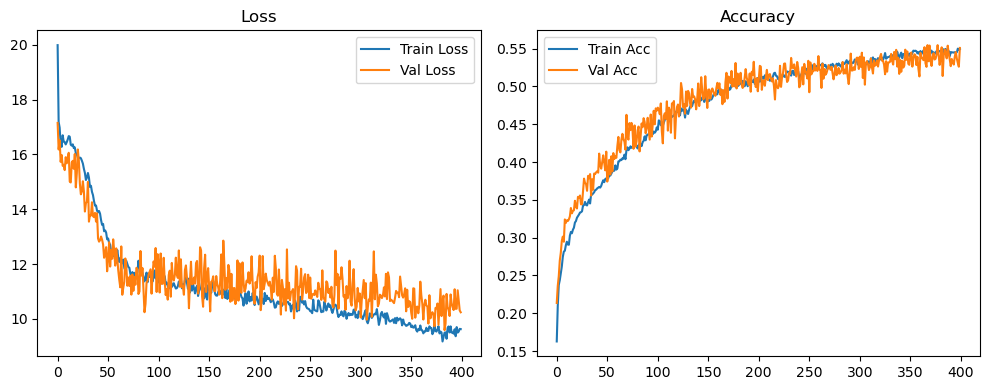

Original Model Final Test Loss: 10.4794 Accuracy: 0.5456


🚀 Running: batch256_lr_max_0.0001_min_1e-06_dp0.05


Files already downloaded and verified


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|                                                                                                                                                                        | 0/400 [00:00<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.1493 | Val Acc: 0.2163 | Epoch Time: 1.93 | :   0%|                                                                                                      | 0/400 [01:55<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.1493 | Val Acc: 0.2163 | Epoch Time: 1.93 | :   0%|                                                                                                      | 0/400 [01:55<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.1493 | Val Acc: 0.2163 | Epoch Time: 1.93 | :   0%|▏                                                                                         | 1/400 [01:55<12:51:00, 115.94s/it]

| LR: 0.000100 | Train Acc: 0.1906 | Val Acc: 0.2503 | Epoch Time: 1.93 | :   0%|▏                                                                                         | 1/400 [03:51<12:51:00, 115.94s/it]

| LR: 0.000100 | Train Acc: 0.1906 | Val Acc: 0.2503 | Epoch Time: 1.93 | :   0%|▏                                                                                         | 1/400 [03:51<12:51:00, 115.94s/it]

| LR: 0.000100 | Train Acc: 0.1906 | Val Acc: 0.2503 | Epoch Time: 1.93 | :   0%|▍                                                                                         | 2/400 [03:51<12:48:13, 115.81s/it]

| LR: 0.000100 | Train Acc: 0.2124 | Val Acc: 0.2672 | Epoch Time: 1.92 | :   0%|▍                                                                                         | 2/400 [05:47<12:48:13, 115.81s/it]

| LR: 0.000100 | Train Acc: 0.2124 | Val Acc: 0.2672 | Epoch Time: 1.92 | :   0%|▍                                                                                         | 2/400 [05:47<12:48:13, 115.81s/it]

| LR: 0.000100 | Train Acc: 0.2124 | Val Acc: 0.2672 | Epoch Time: 1.92 | :   1%|▋                                                                                         | 3/400 [05:47<12:45:32, 115.70s/it]

| LR: 0.000100 | Train Acc: 0.2222 | Val Acc: 0.2621 | Epoch Time: 1.92 | :   1%|▋                                                                                         | 3/400 [07:42<12:45:32, 115.70s/it]

| LR: 0.000100 | Train Acc: 0.2222 | Val Acc: 0.2621 | Epoch Time: 1.92 | :   1%|▋                                                                                         | 3/400 [07:42<12:45:32, 115.70s/it]

| LR: 0.000100 | Train Acc: 0.2222 | Val Acc: 0.2621 | Epoch Time: 1.92 | :   1%|▉                                                                                         | 4/400 [07:42<12:42:55, 115.60s/it]

| LR: 0.000100 | Train Acc: 0.2294 | Val Acc: 0.2759 | Epoch Time: 1.93 | :   1%|▉                                                                                         | 4/400 [09:38<12:42:55, 115.60s/it]

| LR: 0.000100 | Train Acc: 0.2294 | Val Acc: 0.2759 | Epoch Time: 1.93 | :   1%|▉                                                                                         | 4/400 [09:38<12:42:55, 115.60s/it]

| LR: 0.000100 | Train Acc: 0.2294 | Val Acc: 0.2759 | Epoch Time: 1.93 | :   1%|█▏                                                                                        | 5/400 [09:38<12:41:03, 115.60s/it]

| LR: 0.000100 | Train Acc: 0.2316 | Val Acc: 0.2904 | Epoch Time: 1.93 | :   1%|█▏                                                                                        | 5/400 [11:33<12:41:03, 115.60s/it]

| LR: 0.000100 | Train Acc: 0.2316 | Val Acc: 0.2904 | Epoch Time: 1.93 | :   1%|█▏                                                                                        | 5/400 [11:33<12:41:03, 115.60s/it]

| LR: 0.000100 | Train Acc: 0.2316 | Val Acc: 0.2904 | Epoch Time: 1.93 | :   2%|█▎                                                                                        | 6/400 [11:33<12:39:21, 115.64s/it]

| LR: 0.000100 | Train Acc: 0.2399 | Val Acc: 0.2999 | Epoch Time: 1.92 | :   2%|█▎                                                                                        | 6/400 [13:29<12:39:21, 115.64s/it]

| LR: 0.000100 | Train Acc: 0.2399 | Val Acc: 0.2999 | Epoch Time: 1.92 | :   2%|█▎                                                                                        | 6/400 [13:29<12:39:21, 115.64s/it]

| LR: 0.000100 | Train Acc: 0.2399 | Val Acc: 0.2999 | Epoch Time: 1.92 | :   2%|█▌                                                                                        | 7/400 [13:29<12:37:10, 115.60s/it]

| LR: 0.000100 | Train Acc: 0.2460 | Val Acc: 0.2929 | Epoch Time: 1.92 | :   2%|█▌                                                                                        | 7/400 [15:24<12:37:10, 115.60s/it]

| LR: 0.000100 | Train Acc: 0.2460 | Val Acc: 0.2929 | Epoch Time: 1.92 | :   2%|█▌                                                                                        | 7/400 [15:24<12:37:10, 115.60s/it]

| LR: 0.000100 | Train Acc: 0.2460 | Val Acc: 0.2929 | Epoch Time: 1.92 | :   2%|█▊                                                                                        | 8/400 [15:24<12:34:49, 115.54s/it]

| LR: 0.000100 | Train Acc: 0.2541 | Val Acc: 0.3155 | Epoch Time: 1.92 | :   2%|█▊                                                                                        | 8/400 [17:20<12:34:49, 115.54s/it]

| LR: 0.000100 | Train Acc: 0.2541 | Val Acc: 0.3155 | Epoch Time: 1.92 | :   2%|█▊                                                                                        | 8/400 [17:20<12:34:49, 115.54s/it]

| LR: 0.000100 | Train Acc: 0.2541 | Val Acc: 0.3155 | Epoch Time: 1.92 | :   2%|██                                                                                        | 9/400 [17:20<12:32:36, 115.49s/it]

| LR: 0.000100 | Train Acc: 0.2629 | Val Acc: 0.3147 | Epoch Time: 1.92 | :   2%|██                                                                                        | 9/400 [19:15<12:32:36, 115.49s/it]

| LR: 0.000100 | Train Acc: 0.2629 | Val Acc: 0.3147 | Epoch Time: 1.92 | :   2%|██                                                                                        | 9/400 [19:15<12:32:36, 115.49s/it]

| LR: 0.000100 | Train Acc: 0.2629 | Val Acc: 0.3147 | Epoch Time: 1.92 | :   2%|██▏                                                                                      | 10/400 [19:15<12:30:41, 115.49s/it]

| LR: 0.000100 | Train Acc: 0.2702 | Val Acc: 0.3277 | Epoch Time: 1.93 | :   2%|██▏                                                                                      | 10/400 [21:11<12:30:41, 115.49s/it]

| LR: 0.000100 | Train Acc: 0.2702 | Val Acc: 0.3277 | Epoch Time: 1.93 | :   2%|██▏                                                                                      | 10/400 [21:11<12:30:41, 115.49s/it]

| LR: 0.000100 | Train Acc: 0.2702 | Val Acc: 0.3277 | Epoch Time: 1.93 | :   3%|██▍                                                                                      | 11/400 [21:11<12:29:13, 115.56s/it]

| LR: 0.000100 | Train Acc: 0.2701 | Val Acc: 0.3254 | Epoch Time: 1.92 | :   3%|██▍                                                                                      | 11/400 [23:07<12:29:13, 115.56s/it]

| LR: 0.000100 | Train Acc: 0.2701 | Val Acc: 0.3254 | Epoch Time: 1.92 | :   3%|██▍                                                                                      | 11/400 [23:07<12:29:13, 115.56s/it]

| LR: 0.000100 | Train Acc: 0.2701 | Val Acc: 0.3254 | Epoch Time: 1.92 | :   3%|██▋                                                                                      | 12/400 [23:07<12:27:23, 115.58s/it]

| LR: 0.000100 | Train Acc: 0.2711 | Val Acc: 0.3244 | Epoch Time: 1.92 | :   3%|██▋                                                                                      | 12/400 [25:02<12:27:23, 115.58s/it]

| LR: 0.000100 | Train Acc: 0.2711 | Val Acc: 0.3244 | Epoch Time: 1.92 | :   3%|██▋                                                                                      | 12/400 [25:02<12:27:23, 115.58s/it]

| LR: 0.000100 | Train Acc: 0.2711 | Val Acc: 0.3244 | Epoch Time: 1.92 | :   3%|██▉                                                                                      | 13/400 [25:02<12:25:11, 115.53s/it]

| LR: 0.000100 | Train Acc: 0.2740 | Val Acc: 0.3198 | Epoch Time: 1.92 | :   3%|██▉                                                                                      | 13/400 [26:57<12:25:11, 115.53s/it]

| LR: 0.000100 | Train Acc: 0.2740 | Val Acc: 0.3198 | Epoch Time: 1.92 | :   3%|██▉                                                                                      | 13/400 [26:57<12:25:11, 115.53s/it]

| LR: 0.000100 | Train Acc: 0.2740 | Val Acc: 0.3198 | Epoch Time: 1.92 | :   4%|███                                                                                      | 14/400 [26:57<12:22:56, 115.48s/it]

| LR: 0.000100 | Train Acc: 0.2779 | Val Acc: 0.3204 | Epoch Time: 1.92 | :   4%|███                                                                                      | 14/400 [28:53<12:22:56, 115.48s/it]

| LR: 0.000100 | Train Acc: 0.2779 | Val Acc: 0.3204 | Epoch Time: 1.92 | :   4%|███                                                                                      | 14/400 [28:53<12:22:56, 115.48s/it]

| LR: 0.000100 | Train Acc: 0.2779 | Val Acc: 0.3204 | Epoch Time: 1.92 | :   4%|███▎                                                                                     | 15/400 [28:53<12:21:00, 115.48s/it]

| LR: 0.000100 | Train Acc: 0.2772 | Val Acc: 0.3119 | Epoch Time: 1.93 | :   4%|███▎                                                                                     | 15/400 [30:48<12:21:00, 115.48s/it]

| LR: 0.000100 | Train Acc: 0.2772 | Val Acc: 0.3119 | Epoch Time: 1.93 | :   4%|███▎                                                                                     | 15/400 [30:48<12:21:00, 115.48s/it]

| LR: 0.000100 | Train Acc: 0.2772 | Val Acc: 0.3119 | Epoch Time: 1.93 | :   4%|███▌                                                                                     | 16/400 [30:49<12:19:24, 115.53s/it]

| LR: 0.000100 | Train Acc: 0.2826 | Val Acc: 0.3335 | Epoch Time: 1.93 | :   4%|███▌                                                                                     | 16/400 [32:44<12:19:24, 115.53s/it]

| LR: 0.000100 | Train Acc: 0.2826 | Val Acc: 0.3335 | Epoch Time: 1.93 | :   4%|███▌                                                                                     | 16/400 [32:44<12:19:24, 115.53s/it]

| LR: 0.000100 | Train Acc: 0.2826 | Val Acc: 0.3335 | Epoch Time: 1.93 | :   4%|███▊                                                                                     | 17/400 [32:44<12:17:50, 115.59s/it]

| LR: 0.000100 | Train Acc: 0.2874 | Val Acc: 0.3405 | Epoch Time: 1.92 | :   4%|███▊                                                                                     | 17/400 [34:40<12:17:50, 115.59s/it]

| LR: 0.000100 | Train Acc: 0.2874 | Val Acc: 0.3405 | Epoch Time: 1.92 | :   4%|███▊                                                                                     | 17/400 [34:40<12:17:50, 115.59s/it]

| LR: 0.000100 | Train Acc: 0.2874 | Val Acc: 0.3405 | Epoch Time: 1.92 | :   4%|████                                                                                     | 18/400 [34:40<12:15:45, 115.56s/it]

| LR: 0.000100 | Train Acc: 0.2943 | Val Acc: 0.3359 | Epoch Time: 1.92 | :   4%|████                                                                                     | 18/400 [36:35<12:15:45, 115.56s/it]

| LR: 0.000100 | Train Acc: 0.2943 | Val Acc: 0.3359 | Epoch Time: 1.92 | :   4%|████                                                                                     | 18/400 [36:35<12:15:45, 115.56s/it]

| LR: 0.000100 | Train Acc: 0.2943 | Val Acc: 0.3359 | Epoch Time: 1.92 | :   5%|████▏                                                                                    | 19/400 [36:35<12:13:32, 115.52s/it]

| LR: 0.000099 | Train Acc: 0.2892 | Val Acc: 0.3387 | Epoch Time: 1.92 | :   5%|████▏                                                                                    | 19/400 [38:31<12:13:32, 115.52s/it]

| LR: 0.000099 | Train Acc: 0.2892 | Val Acc: 0.3387 | Epoch Time: 1.92 | :   5%|████▏                                                                                    | 19/400 [38:31<12:13:32, 115.52s/it]

| LR: 0.000099 | Train Acc: 0.2892 | Val Acc: 0.3387 | Epoch Time: 1.92 | :   5%|████▍                                                                                    | 20/400 [38:31<12:11:36, 115.52s/it]

| LR: 0.000099 | Train Acc: 0.2967 | Val Acc: 0.3563 | Epoch Time: 1.93 | :   5%|████▍                                                                                    | 20/400 [40:26<12:11:36, 115.52s/it]

| LR: 0.000099 | Train Acc: 0.2967 | Val Acc: 0.3563 | Epoch Time: 1.93 | :   5%|████▍                                                                                    | 20/400 [40:26<12:11:36, 115.52s/it]

| LR: 0.000099 | Train Acc: 0.2967 | Val Acc: 0.3563 | Epoch Time: 1.93 | :   5%|████▋                                                                                    | 21/400 [40:26<12:09:53, 115.55s/it]

| LR: 0.000099 | Train Acc: 0.2962 | Val Acc: 0.3434 | Epoch Time: 1.92 | :   5%|████▋                                                                                    | 21/400 [42:22<12:09:53, 115.55s/it]

| LR: 0.000099 | Train Acc: 0.2962 | Val Acc: 0.3434 | Epoch Time: 1.92 | :   5%|████▋                                                                                    | 21/400 [42:22<12:09:53, 115.55s/it]

| LR: 0.000099 | Train Acc: 0.2962 | Val Acc: 0.3434 | Epoch Time: 1.92 | :   6%|████▉                                                                                    | 22/400 [42:22<12:07:45, 115.52s/it]

| LR: 0.000099 | Train Acc: 0.2990 | Val Acc: 0.3655 | Epoch Time: 1.92 | :   6%|████▉                                                                                    | 22/400 [44:17<12:07:45, 115.52s/it]

| LR: 0.000099 | Train Acc: 0.2990 | Val Acc: 0.3655 | Epoch Time: 1.92 | :   6%|████▉                                                                                    | 22/400 [44:17<12:07:45, 115.52s/it]

| LR: 0.000099 | Train Acc: 0.2990 | Val Acc: 0.3655 | Epoch Time: 1.92 | :   6%|█████                                                                                    | 23/400 [44:17<12:05:46, 115.51s/it]

| LR: 0.000099 | Train Acc: 0.2990 | Val Acc: 0.3432 | Epoch Time: 1.92 | :   6%|█████                                                                                    | 23/400 [46:13<12:05:46, 115.51s/it]

| LR: 0.000099 | Train Acc: 0.2990 | Val Acc: 0.3432 | Epoch Time: 1.92 | :   6%|█████                                                                                    | 23/400 [46:13<12:05:46, 115.51s/it]

| LR: 0.000099 | Train Acc: 0.2990 | Val Acc: 0.3432 | Epoch Time: 1.92 | :   6%|█████▎                                                                                   | 24/400 [46:13<12:04:01, 115.53s/it]

| LR: 0.000099 | Train Acc: 0.3014 | Val Acc: 0.3432 | Epoch Time: 1.92 | :   6%|█████▎                                                                                   | 24/400 [48:08<12:04:01, 115.53s/it]

| LR: 0.000099 | Train Acc: 0.3014 | Val Acc: 0.3432 | Epoch Time: 1.92 | :   6%|█████▎                                                                                   | 24/400 [48:08<12:04:01, 115.53s/it]

| LR: 0.000099 | Train Acc: 0.3014 | Val Acc: 0.3432 | Epoch Time: 1.92 | :   6%|█████▌                                                                                   | 25/400 [48:08<12:02:13, 115.55s/it]

| LR: 0.000099 | Train Acc: 0.3004 | Val Acc: 0.3550 | Epoch Time: 1.92 | :   6%|█████▌                                                                                   | 25/400 [50:04<12:02:13, 115.55s/it]

| LR: 0.000099 | Train Acc: 0.3004 | Val Acc: 0.3550 | Epoch Time: 1.92 | :   6%|█████▌                                                                                   | 25/400 [50:04<12:02:13, 115.55s/it]

| LR: 0.000099 | Train Acc: 0.3004 | Val Acc: 0.3550 | Epoch Time: 1.92 | :   6%|█████▊                                                                                   | 26/400 [50:04<12:00:00, 115.51s/it]

| LR: 0.000099 | Train Acc: 0.3081 | Val Acc: 0.3592 | Epoch Time: 1.92 | :   6%|█████▊                                                                                   | 26/400 [51:59<12:00:00, 115.51s/it]

| LR: 0.000099 | Train Acc: 0.3081 | Val Acc: 0.3592 | Epoch Time: 1.92 | :   6%|█████▊                                                                                   | 26/400 [51:59<12:00:00, 115.51s/it]

| LR: 0.000099 | Train Acc: 0.3081 | Val Acc: 0.3592 | Epoch Time: 1.92 | :   7%|██████                                                                                   | 27/400 [51:59<11:58:00, 115.50s/it]

| LR: 0.000099 | Train Acc: 0.3071 | Val Acc: 0.3585 | Epoch Time: 1.93 | :   7%|██████                                                                                   | 27/400 [53:55<11:58:00, 115.50s/it]

| LR: 0.000099 | Train Acc: 0.3071 | Val Acc: 0.3585 | Epoch Time: 1.93 | :   7%|██████                                                                                   | 27/400 [53:55<11:58:00, 115.50s/it]

| LR: 0.000099 | Train Acc: 0.3071 | Val Acc: 0.3585 | Epoch Time: 1.93 | :   7%|██████▏                                                                                  | 28/400 [53:55<11:56:20, 115.54s/it]

| LR: 0.000099 | Train Acc: 0.3095 | Val Acc: 0.3573 | Epoch Time: 1.92 | :   7%|██████▏                                                                                  | 28/400 [55:50<11:56:20, 115.54s/it]

| LR: 0.000099 | Train Acc: 0.3095 | Val Acc: 0.3573 | Epoch Time: 1.92 | :   7%|██████▏                                                                                  | 28/400 [55:50<11:56:20, 115.54s/it]

| LR: 0.000099 | Train Acc: 0.3095 | Val Acc: 0.3573 | Epoch Time: 1.92 | :   7%|██████▍                                                                                  | 29/400 [55:51<11:54:27, 115.54s/it]

| LR: 0.000099 | Train Acc: 0.3133 | Val Acc: 0.3449 | Epoch Time: 1.92 | :   7%|██████▍                                                                                  | 29/400 [57:46<11:54:27, 115.54s/it]

| LR: 0.000099 | Train Acc: 0.3133 | Val Acc: 0.3449 | Epoch Time: 1.92 | :   7%|██████▍                                                                                  | 29/400 [57:46<11:54:27, 115.54s/it]

| LR: 0.000099 | Train Acc: 0.3133 | Val Acc: 0.3449 | Epoch Time: 1.92 | :   8%|██████▋                                                                                  | 30/400 [57:46<11:52:16, 115.50s/it]

| LR: 0.000099 | Train Acc: 0.3158 | Val Acc: 0.3700 | Epoch Time: 1.92 | :   8%|██████▋                                                                                  | 30/400 [59:41<11:52:16, 115.50s/it]

| LR: 0.000099 | Train Acc: 0.3158 | Val Acc: 0.3700 | Epoch Time: 1.92 | :   8%|██████▋                                                                                  | 30/400 [59:41<11:52:16, 115.50s/it]

| LR: 0.000099 | Train Acc: 0.3158 | Val Acc: 0.3700 | Epoch Time: 1.92 | :   8%|██████▉                                                                                  | 31/400 [59:41<11:50:22, 115.51s/it]

| LR: 0.000099 | Train Acc: 0.3153 | Val Acc: 0.3461 | Epoch Time: 1.93 | :   8%|██████▋                                                                                | 31/400 [1:01:37<11:50:22, 115.51s/it]

| LR: 0.000099 | Train Acc: 0.3153 | Val Acc: 0.3461 | Epoch Time: 1.93 | :   8%|██████▋                                                                                | 31/400 [1:01:37<11:50:22, 115.51s/it]

| LR: 0.000099 | Train Acc: 0.3153 | Val Acc: 0.3461 | Epoch Time: 1.93 | :   8%|██████▉                                                                                | 32/400 [1:01:37<11:48:46, 115.56s/it]

| LR: 0.000098 | Train Acc: 0.3149 | Val Acc: 0.3764 | Epoch Time: 1.93 | :   8%|██████▉                                                                                | 32/400 [1:03:33<11:48:46, 115.56s/it]

| LR: 0.000098 | Train Acc: 0.3149 | Val Acc: 0.3764 | Epoch Time: 1.93 | :   8%|██████▉                                                                                | 32/400 [1:03:33<11:48:46, 115.56s/it]

| LR: 0.000098 | Train Acc: 0.3149 | Val Acc: 0.3764 | Epoch Time: 1.93 | :   8%|███████▏                                                                               | 33/400 [1:03:33<11:47:02, 115.59s/it]

| LR: 0.000098 | Train Acc: 0.3161 | Val Acc: 0.3616 | Epoch Time: 1.92 | :   8%|███████▏                                                                               | 33/400 [1:05:28<11:47:02, 115.59s/it]

| LR: 0.000098 | Train Acc: 0.3161 | Val Acc: 0.3616 | Epoch Time: 1.92 | :   8%|███████▏                                                                               | 33/400 [1:05:28<11:47:02, 115.59s/it]

| LR: 0.000098 | Train Acc: 0.3161 | Val Acc: 0.3616 | Epoch Time: 1.92 | :   8%|███████▍                                                                               | 34/400 [1:05:28<11:44:56, 115.56s/it]

| LR: 0.000098 | Train Acc: 0.3159 | Val Acc: 0.3594 | Epoch Time: 1.92 | :   8%|███████▍                                                                               | 34/400 [1:07:24<11:44:56, 115.56s/it]

| LR: 0.000098 | Train Acc: 0.3159 | Val Acc: 0.3594 | Epoch Time: 1.92 | :   8%|███████▍                                                                               | 34/400 [1:07:24<11:44:56, 115.56s/it]

| LR: 0.000098 | Train Acc: 0.3159 | Val Acc: 0.3594 | Epoch Time: 1.92 | :   9%|███████▌                                                                               | 35/400 [1:07:24<11:42:39, 115.51s/it]

| LR: 0.000098 | Train Acc: 0.3246 | Val Acc: 0.3676 | Epoch Time: 1.92 | :   9%|███████▌                                                                               | 35/400 [1:09:19<11:42:39, 115.51s/it]

| LR: 0.000098 | Train Acc: 0.3246 | Val Acc: 0.3676 | Epoch Time: 1.92 | :   9%|███████▌                                                                               | 35/400 [1:09:19<11:42:39, 115.51s/it]

| LR: 0.000098 | Train Acc: 0.3246 | Val Acc: 0.3676 | Epoch Time: 1.92 | :   9%|███████▊                                                                               | 36/400 [1:09:19<11:40:45, 115.51s/it]

| LR: 0.000098 | Train Acc: 0.3249 | Val Acc: 0.3613 | Epoch Time: 1.93 | :   9%|███████▊                                                                               | 36/400 [1:11:15<11:40:45, 115.51s/it]

| LR: 0.000098 | Train Acc: 0.3249 | Val Acc: 0.3613 | Epoch Time: 1.93 | :   9%|███████▊                                                                               | 36/400 [1:11:15<11:40:45, 115.51s/it]

| LR: 0.000098 | Train Acc: 0.3249 | Val Acc: 0.3613 | Epoch Time: 1.93 | :   9%|████████                                                                               | 37/400 [1:11:15<11:39:04, 115.55s/it]

| LR: 0.000098 | Train Acc: 0.3226 | Val Acc: 0.3967 | Epoch Time: 1.93 | :   9%|████████                                                                               | 37/400 [1:13:10<11:39:04, 115.55s/it]

| LR: 0.000098 | Train Acc: 0.3226 | Val Acc: 0.3967 | Epoch Time: 1.93 | :   9%|████████                                                                               | 37/400 [1:13:10<11:39:04, 115.55s/it]

| LR: 0.000098 | Train Acc: 0.3226 | Val Acc: 0.3967 | Epoch Time: 1.93 | :  10%|████████▎                                                                              | 38/400 [1:13:11<11:37:25, 115.60s/it]

| LR: 0.000098 | Train Acc: 0.3253 | Val Acc: 0.3480 | Epoch Time: 1.92 | :  10%|████████▎                                                                              | 38/400 [1:15:06<11:37:25, 115.60s/it]

| LR: 0.000098 | Train Acc: 0.3253 | Val Acc: 0.3480 | Epoch Time: 1.92 | :  10%|████████▎                                                                              | 38/400 [1:15:06<11:37:25, 115.60s/it]

| LR: 0.000098 | Train Acc: 0.3253 | Val Acc: 0.3480 | Epoch Time: 1.92 | :  10%|████████▍                                                                              | 39/400 [1:15:06<11:35:19, 115.57s/it]

| LR: 0.000098 | Train Acc: 0.3289 | Val Acc: 0.3618 | Epoch Time: 1.92 | :  10%|████████▍                                                                              | 39/400 [1:17:01<11:35:19, 115.57s/it]

| LR: 0.000098 | Train Acc: 0.3289 | Val Acc: 0.3618 | Epoch Time: 1.92 | :  10%|████████▍                                                                              | 39/400 [1:17:01<11:35:19, 115.57s/it]

| LR: 0.000098 | Train Acc: 0.3289 | Val Acc: 0.3618 | Epoch Time: 1.92 | :  10%|████████▋                                                                              | 40/400 [1:17:01<11:33:10, 115.53s/it]

| LR: 0.000098 | Train Acc: 0.3315 | Val Acc: 0.3551 | Epoch Time: 1.93 | :  10%|████████▋                                                                              | 40/400 [1:18:57<11:33:10, 115.53s/it]

| LR: 0.000098 | Train Acc: 0.3315 | Val Acc: 0.3551 | Epoch Time: 1.93 | :  10%|████████▋                                                                              | 40/400 [1:18:57<11:33:10, 115.53s/it]

| LR: 0.000098 | Train Acc: 0.3315 | Val Acc: 0.3551 | Epoch Time: 1.93 | :  10%|████████▉                                                                              | 41/400 [1:18:57<11:31:26, 115.56s/it]

| LR: 0.000097 | Train Acc: 0.3345 | Val Acc: 0.3802 | Epoch Time: 1.93 | :  10%|████████▉                                                                              | 41/400 [1:20:53<11:31:26, 115.56s/it]

| LR: 0.000097 | Train Acc: 0.3345 | Val Acc: 0.3802 | Epoch Time: 1.93 | :  10%|████████▉                                                                              | 41/400 [1:20:53<11:31:26, 115.56s/it]

| LR: 0.000097 | Train Acc: 0.3345 | Val Acc: 0.3802 | Epoch Time: 1.93 | :  10%|█████████▏                                                                             | 42/400 [1:20:53<11:29:50, 115.62s/it]

| LR: 0.000097 | Train Acc: 0.3372 | Val Acc: 0.3864 | Epoch Time: 1.92 | :  10%|█████████▏                                                                             | 42/400 [1:22:48<11:29:50, 115.62s/it]

| LR: 0.000097 | Train Acc: 0.3372 | Val Acc: 0.3864 | Epoch Time: 1.92 | :  10%|█████████▏                                                                             | 42/400 [1:22:48<11:29:50, 115.62s/it]

| LR: 0.000097 | Train Acc: 0.3372 | Val Acc: 0.3864 | Epoch Time: 1.92 | :  11%|█████████▎                                                                             | 43/400 [1:22:48<11:27:49, 115.60s/it]

| LR: 0.000097 | Train Acc: 0.3408 | Val Acc: 0.3871 | Epoch Time: 1.92 | :  11%|█████████▎                                                                             | 43/400 [1:24:44<11:27:49, 115.60s/it]

| LR: 0.000097 | Train Acc: 0.3408 | Val Acc: 0.3871 | Epoch Time: 1.92 | :  11%|█████████▎                                                                             | 43/400 [1:24:44<11:27:49, 115.60s/it]

| LR: 0.000097 | Train Acc: 0.3408 | Val Acc: 0.3871 | Epoch Time: 1.92 | :  11%|█████████▌                                                                             | 44/400 [1:24:44<11:25:32, 115.54s/it]

| LR: 0.000097 | Train Acc: 0.3416 | Val Acc: 0.4000 | Epoch Time: 1.92 | :  11%|█████████▌                                                                             | 44/400 [1:26:39<11:25:32, 115.54s/it]

| LR: 0.000097 | Train Acc: 0.3416 | Val Acc: 0.4000 | Epoch Time: 1.92 | :  11%|█████████▌                                                                             | 44/400 [1:26:39<11:25:32, 115.54s/it]

| LR: 0.000097 | Train Acc: 0.3416 | Val Acc: 0.4000 | Epoch Time: 1.92 | :  11%|█████████▊                                                                             | 45/400 [1:26:39<11:23:27, 115.52s/it]

| LR: 0.000097 | Train Acc: 0.3387 | Val Acc: 0.3872 | Epoch Time: 1.93 | :  11%|█████████▊                                                                             | 45/400 [1:28:35<11:23:27, 115.52s/it]

| LR: 0.000097 | Train Acc: 0.3387 | Val Acc: 0.3872 | Epoch Time: 1.93 | :  11%|█████████▊                                                                             | 45/400 [1:28:35<11:23:27, 115.52s/it]

| LR: 0.000097 | Train Acc: 0.3387 | Val Acc: 0.3872 | Epoch Time: 1.93 | :  12%|██████████                                                                             | 46/400 [1:28:35<11:21:42, 115.54s/it]

| LR: 0.000097 | Train Acc: 0.3412 | Val Acc: 0.3802 | Epoch Time: 1.93 | :  12%|██████████                                                                             | 46/400 [1:30:31<11:21:42, 115.54s/it]

| LR: 0.000097 | Train Acc: 0.3412 | Val Acc: 0.3802 | Epoch Time: 1.93 | :  12%|██████████                                                                             | 46/400 [1:30:31<11:21:42, 115.54s/it]

| LR: 0.000097 | Train Acc: 0.3412 | Val Acc: 0.3802 | Epoch Time: 1.93 | :  12%|██████████▏                                                                            | 47/400 [1:30:31<11:20:06, 115.60s/it]

| LR: 0.000097 | Train Acc: 0.3475 | Val Acc: 0.3991 | Epoch Time: 1.92 | :  12%|██████████▏                                                                            | 47/400 [1:32:26<11:20:06, 115.60s/it]

| LR: 0.000097 | Train Acc: 0.3475 | Val Acc: 0.3991 | Epoch Time: 1.92 | :  12%|██████████▏                                                                            | 47/400 [1:32:26<11:20:06, 115.60s/it]

| LR: 0.000097 | Train Acc: 0.3475 | Val Acc: 0.3991 | Epoch Time: 1.92 | :  12%|██████████▍                                                                            | 48/400 [1:32:26<11:18:09, 115.59s/it]

| LR: 0.000097 | Train Acc: 0.3496 | Val Acc: 0.3843 | Epoch Time: 1.92 | :  12%|██████████▍                                                                            | 48/400 [1:34:22<11:18:09, 115.59s/it]

| LR: 0.000097 | Train Acc: 0.3496 | Val Acc: 0.3843 | Epoch Time: 1.92 | :  12%|██████████▍                                                                            | 48/400 [1:34:22<11:18:09, 115.59s/it]

| LR: 0.000097 | Train Acc: 0.3496 | Val Acc: 0.3843 | Epoch Time: 1.92 | :  12%|██████████▋                                                                            | 49/400 [1:34:22<11:15:55, 115.54s/it]

| LR: 0.000096 | Train Acc: 0.3521 | Val Acc: 0.3881 | Epoch Time: 1.92 | :  12%|██████████▋                                                                            | 49/400 [1:36:17<11:15:55, 115.54s/it]

| LR: 0.000096 | Train Acc: 0.3521 | Val Acc: 0.3881 | Epoch Time: 1.92 | :  12%|██████████▋                                                                            | 49/400 [1:36:17<11:15:55, 115.54s/it]

| LR: 0.000096 | Train Acc: 0.3521 | Val Acc: 0.3881 | Epoch Time: 1.92 | :  12%|██████████▉                                                                            | 50/400 [1:36:17<11:13:51, 115.52s/it]

| LR: 0.000096 | Train Acc: 0.3479 | Val Acc: 0.4015 | Epoch Time: 1.93 | :  12%|██████████▉                                                                            | 50/400 [1:38:13<11:13:51, 115.52s/it]

| LR: 0.000096 | Train Acc: 0.3479 | Val Acc: 0.4015 | Epoch Time: 1.93 | :  12%|██████████▉                                                                            | 50/400 [1:38:13<11:13:51, 115.52s/it]

| LR: 0.000096 | Train Acc: 0.3479 | Val Acc: 0.4015 | Epoch Time: 1.93 | :  13%|███████████                                                                            | 51/400 [1:38:13<11:12:13, 115.57s/it]

| LR: 0.000096 | Train Acc: 0.3543 | Val Acc: 0.3977 | Epoch Time: 1.93 | :  13%|███████████                                                                            | 51/400 [1:40:08<11:12:13, 115.57s/it]

| LR: 0.000096 | Train Acc: 0.3543 | Val Acc: 0.3977 | Epoch Time: 1.93 | :  13%|███████████                                                                            | 51/400 [1:40:08<11:12:13, 115.57s/it]

| LR: 0.000096 | Train Acc: 0.3543 | Val Acc: 0.3977 | Epoch Time: 1.93 | :  13%|███████████▎                                                                           | 52/400 [1:40:08<11:10:26, 115.59s/it]

| LR: 0.000096 | Train Acc: 0.3523 | Val Acc: 0.3893 | Epoch Time: 1.92 | :  13%|███████████▎                                                                           | 52/400 [1:42:04<11:10:26, 115.59s/it]

| LR: 0.000096 | Train Acc: 0.3523 | Val Acc: 0.3893 | Epoch Time: 1.92 | :  13%|███████████▎                                                                           | 52/400 [1:42:04<11:10:26, 115.59s/it]

| LR: 0.000096 | Train Acc: 0.3523 | Val Acc: 0.3893 | Epoch Time: 1.92 | :  13%|███████████▌                                                                           | 53/400 [1:42:04<11:08:17, 115.56s/it]

| LR: 0.000096 | Train Acc: 0.3614 | Val Acc: 0.4120 | Epoch Time: 1.92 | :  13%|███████████▌                                                                           | 53/400 [1:43:59<11:08:17, 115.56s/it]

| LR: 0.000096 | Train Acc: 0.3614 | Val Acc: 0.4120 | Epoch Time: 1.92 | :  13%|███████████▌                                                                           | 53/400 [1:43:59<11:08:17, 115.56s/it]

| LR: 0.000096 | Train Acc: 0.3614 | Val Acc: 0.4120 | Epoch Time: 1.92 | :  14%|███████████▋                                                                           | 54/400 [1:43:59<11:06:10, 115.52s/it]

| LR: 0.000096 | Train Acc: 0.3614 | Val Acc: 0.3903 | Epoch Time: 1.92 | :  14%|███████████▋                                                                           | 54/400 [1:45:55<11:06:10, 115.52s/it]

| LR: 0.000096 | Train Acc: 0.3614 | Val Acc: 0.3903 | Epoch Time: 1.92 | :  14%|███████████▋                                                                           | 54/400 [1:45:55<11:06:10, 115.52s/it]

| LR: 0.000096 | Train Acc: 0.3614 | Val Acc: 0.3903 | Epoch Time: 1.92 | :  14%|███████████▉                                                                           | 55/400 [1:45:55<11:04:19, 115.54s/it]

| LR: 0.000095 | Train Acc: 0.3653 | Val Acc: 0.4038 | Epoch Time: 1.93 | :  14%|███████████▉                                                                           | 55/400 [1:47:50<11:04:19, 115.54s/it]

| LR: 0.000095 | Train Acc: 0.3653 | Val Acc: 0.4038 | Epoch Time: 1.93 | :  14%|███████████▉                                                                           | 55/400 [1:47:50<11:04:19, 115.54s/it]

| LR: 0.000095 | Train Acc: 0.3653 | Val Acc: 0.4038 | Epoch Time: 1.93 | :  14%|████████████▏                                                                          | 56/400 [1:47:51<11:02:40, 115.58s/it]

| LR: 0.000095 | Train Acc: 0.3648 | Val Acc: 0.4124 | Epoch Time: 1.92 | :  14%|████████████▏                                                                          | 56/400 [1:49:46<11:02:40, 115.58s/it]

| LR: 0.000095 | Train Acc: 0.3648 | Val Acc: 0.4124 | Epoch Time: 1.92 | :  14%|████████████▏                                                                          | 56/400 [1:49:46<11:02:40, 115.58s/it]

| LR: 0.000095 | Train Acc: 0.3648 | Val Acc: 0.4124 | Epoch Time: 1.92 | :  14%|████████████▍                                                                          | 57/400 [1:49:46<11:00:40, 115.57s/it]

| LR: 0.000095 | Train Acc: 0.3650 | Val Acc: 0.4211 | Epoch Time: 1.92 | :  14%|████████████▍                                                                          | 57/400 [1:51:41<11:00:40, 115.57s/it]

| LR: 0.000095 | Train Acc: 0.3650 | Val Acc: 0.4211 | Epoch Time: 1.92 | :  14%|████████████▍                                                                          | 57/400 [1:51:41<11:00:40, 115.57s/it]

| LR: 0.000095 | Train Acc: 0.3650 | Val Acc: 0.4211 | Epoch Time: 1.92 | :  14%|████████████▌                                                                          | 58/400 [1:51:42<10:58:31, 115.53s/it]

| LR: 0.000095 | Train Acc: 0.3666 | Val Acc: 0.4156 | Epoch Time: 1.92 | :  14%|████████████▌                                                                          | 58/400 [1:53:37<10:58:31, 115.53s/it]

| LR: 0.000095 | Train Acc: 0.3666 | Val Acc: 0.4156 | Epoch Time: 1.92 | :  14%|████████████▌                                                                          | 58/400 [1:53:37<10:58:31, 115.53s/it]

| LR: 0.000095 | Train Acc: 0.3666 | Val Acc: 0.4156 | Epoch Time: 1.92 | :  15%|████████████▊                                                                          | 59/400 [1:53:37<10:56:34, 115.53s/it]

| LR: 0.000095 | Train Acc: 0.3685 | Val Acc: 0.4007 | Epoch Time: 1.93 | :  15%|████████████▊                                                                          | 59/400 [1:55:33<10:56:34, 115.53s/it]

| LR: 0.000095 | Train Acc: 0.3685 | Val Acc: 0.4007 | Epoch Time: 1.93 | :  15%|████████████▊                                                                          | 59/400 [1:55:33<10:56:34, 115.53s/it]

| LR: 0.000095 | Train Acc: 0.3685 | Val Acc: 0.4007 | Epoch Time: 1.93 | :  15%|█████████████                                                                          | 60/400 [1:55:33<10:54:53, 115.57s/it]

| LR: 0.000095 | Train Acc: 0.3714 | Val Acc: 0.4215 | Epoch Time: 1.92 | :  15%|█████████████                                                                          | 60/400 [1:57:28<10:54:53, 115.57s/it]

| LR: 0.000095 | Train Acc: 0.3714 | Val Acc: 0.4215 | Epoch Time: 1.92 | :  15%|█████████████                                                                          | 60/400 [1:57:28<10:54:53, 115.57s/it]

| LR: 0.000095 | Train Acc: 0.3714 | Val Acc: 0.4215 | Epoch Time: 1.92 | :  15%|█████████████▎                                                                         | 61/400 [1:57:28<10:52:57, 115.57s/it]

| LR: 0.000094 | Train Acc: 0.3760 | Val Acc: 0.4029 | Epoch Time: 1.92 | :  15%|█████████████▎                                                                         | 61/400 [1:59:24<10:52:57, 115.57s/it]

| LR: 0.000094 | Train Acc: 0.3760 | Val Acc: 0.4029 | Epoch Time: 1.92 | :  15%|█████████████▎                                                                         | 61/400 [1:59:24<10:52:57, 115.57s/it]

| LR: 0.000094 | Train Acc: 0.3760 | Val Acc: 0.4029 | Epoch Time: 1.92 | :  16%|█████████████▍                                                                         | 62/400 [1:59:24<10:50:47, 115.53s/it]

| LR: 0.000094 | Train Acc: 0.3715 | Val Acc: 0.4169 | Epoch Time: 1.92 | :  16%|█████████████▍                                                                         | 62/400 [2:01:19<10:50:47, 115.53s/it]

| LR: 0.000094 | Train Acc: 0.3715 | Val Acc: 0.4169 | Epoch Time: 1.92 | :  16%|█████████████▍                                                                         | 62/400 [2:01:19<10:50:47, 115.53s/it]

| LR: 0.000094 | Train Acc: 0.3715 | Val Acc: 0.4169 | Epoch Time: 1.92 | :  16%|█████████████▋                                                                         | 63/400 [2:01:19<10:48:56, 115.54s/it]

| LR: 0.000094 | Train Acc: 0.3734 | Val Acc: 0.4368 | Epoch Time: 1.93 | :  16%|█████████████▋                                                                         | 63/400 [2:03:15<10:48:56, 115.54s/it]

| LR: 0.000094 | Train Acc: 0.3734 | Val Acc: 0.4368 | Epoch Time: 1.93 | :  16%|█████████████▋                                                                         | 63/400 [2:03:15<10:48:56, 115.54s/it]

| LR: 0.000094 | Train Acc: 0.3734 | Val Acc: 0.4368 | Epoch Time: 1.93 | :  16%|█████████████▉                                                                         | 64/400 [2:03:15<10:47:15, 115.58s/it]

| LR: 0.000094 | Train Acc: 0.3754 | Val Acc: 0.4194 | Epoch Time: 1.92 | :  16%|█████████████▉                                                                         | 64/400 [2:05:10<10:47:15, 115.58s/it]

| LR: 0.000094 | Train Acc: 0.3754 | Val Acc: 0.4194 | Epoch Time: 1.92 | :  16%|█████████████▉                                                                         | 64/400 [2:05:10<10:47:15, 115.58s/it]

| LR: 0.000094 | Train Acc: 0.3754 | Val Acc: 0.4194 | Epoch Time: 1.92 | :  16%|██████████████▏                                                                        | 65/400 [2:05:11<10:45:15, 115.57s/it]

| LR: 0.000094 | Train Acc: 0.3773 | Val Acc: 0.4094 | Epoch Time: 1.92 | :  16%|██████████████▏                                                                        | 65/400 [2:07:06<10:45:15, 115.57s/it]

| LR: 0.000094 | Train Acc: 0.3773 | Val Acc: 0.4094 | Epoch Time: 1.92 | :  16%|██████████████▏                                                                        | 65/400 [2:07:06<10:45:15, 115.57s/it]

| LR: 0.000094 | Train Acc: 0.3773 | Val Acc: 0.4094 | Epoch Time: 1.92 | :  16%|██████████████▎                                                                        | 66/400 [2:07:06<10:43:00, 115.51s/it]

| LR: 0.000093 | Train Acc: 0.3786 | Val Acc: 0.4210 | Epoch Time: 1.92 | :  16%|██████████████▎                                                                        | 66/400 [2:09:01<10:43:00, 115.51s/it]

| LR: 0.000093 | Train Acc: 0.3786 | Val Acc: 0.4210 | Epoch Time: 1.92 | :  16%|██████████████▎                                                                        | 66/400 [2:09:01<10:43:00, 115.51s/it]

| LR: 0.000093 | Train Acc: 0.3786 | Val Acc: 0.4210 | Epoch Time: 1.92 | :  17%|██████████████▌                                                                        | 67/400 [2:09:01<10:40:47, 115.46s/it]

| LR: 0.000093 | Train Acc: 0.3833 | Val Acc: 0.4141 | Epoch Time: 1.92 | :  17%|██████████████▌                                                                        | 67/400 [2:10:57<10:40:47, 115.46s/it]

| LR: 0.000093 | Train Acc: 0.3833 | Val Acc: 0.4141 | Epoch Time: 1.92 | :  17%|██████████████▌                                                                        | 67/400 [2:10:57<10:40:47, 115.46s/it]

| LR: 0.000093 | Train Acc: 0.3833 | Val Acc: 0.4141 | Epoch Time: 1.92 | :  17%|██████████████▊                                                                        | 68/400 [2:10:57<10:39:01, 115.49s/it]

| LR: 0.000093 | Train Acc: 0.3827 | Val Acc: 0.4172 | Epoch Time: 1.93 | :  17%|██████████████▊                                                                        | 68/400 [2:12:52<10:39:01, 115.49s/it]

| LR: 0.000093 | Train Acc: 0.3827 | Val Acc: 0.4172 | Epoch Time: 1.93 | :  17%|██████████████▊                                                                        | 68/400 [2:12:52<10:39:01, 115.49s/it]

| LR: 0.000093 | Train Acc: 0.3827 | Val Acc: 0.4172 | Epoch Time: 1.93 | :  17%|███████████████                                                                        | 69/400 [2:12:53<10:37:30, 115.56s/it]

| LR: 0.000093 | Train Acc: 0.3835 | Val Acc: 0.4194 | Epoch Time: 1.92 | :  17%|███████████████                                                                        | 69/400 [2:14:48<10:37:30, 115.56s/it]

| LR: 0.000093 | Train Acc: 0.3835 | Val Acc: 0.4194 | Epoch Time: 1.92 | :  17%|███████████████                                                                        | 69/400 [2:14:48<10:37:30, 115.56s/it]

| LR: 0.000093 | Train Acc: 0.3835 | Val Acc: 0.4194 | Epoch Time: 1.92 | :  18%|███████████████▏                                                                       | 70/400 [2:14:48<10:35:35, 115.56s/it]

| LR: 0.000093 | Train Acc: 0.3840 | Val Acc: 0.4295 | Epoch Time: 1.92 | :  18%|███████████████▏                                                                       | 70/400 [2:16:44<10:35:35, 115.56s/it]

| LR: 0.000093 | Train Acc: 0.3840 | Val Acc: 0.4295 | Epoch Time: 1.92 | :  18%|███████████████▏                                                                       | 70/400 [2:16:44<10:35:35, 115.56s/it]

| LR: 0.000093 | Train Acc: 0.3840 | Val Acc: 0.4295 | Epoch Time: 1.92 | :  18%|███████████████▍                                                                       | 71/400 [2:16:44<10:33:36, 115.55s/it]

| LR: 0.000093 | Train Acc: 0.3846 | Val Acc: 0.4141 | Epoch Time: 1.92 | :  18%|███████████████▍                                                                       | 71/400 [2:18:39<10:33:36, 115.55s/it]

| LR: 0.000093 | Train Acc: 0.3846 | Val Acc: 0.4141 | Epoch Time: 1.92 | :  18%|███████████████▍                                                                       | 71/400 [2:18:39<10:33:36, 115.55s/it]

| LR: 0.000093 | Train Acc: 0.3846 | Val Acc: 0.4141 | Epoch Time: 1.92 | :  18%|███████████████▋                                                                       | 72/400 [2:18:39<10:31:46, 115.57s/it]

| LR: 0.000092 | Train Acc: 0.3866 | Val Acc: 0.4228 | Epoch Time: 1.93 | :  18%|███████████████▋                                                                       | 72/400 [2:20:35<10:31:46, 115.57s/it]

| LR: 0.000092 | Train Acc: 0.3866 | Val Acc: 0.4228 | Epoch Time: 1.93 | :  18%|███████████████▋                                                                       | 72/400 [2:20:35<10:31:46, 115.57s/it]

| LR: 0.000092 | Train Acc: 0.3866 | Val Acc: 0.4228 | Epoch Time: 1.93 | :  18%|███████████████▉                                                                       | 73/400 [2:20:35<10:30:01, 115.60s/it]

| LR: 0.000092 | Train Acc: 0.3888 | Val Acc: 0.4097 | Epoch Time: 1.93 | :  18%|███████████████▉                                                                       | 73/400 [2:22:31<10:30:01, 115.60s/it]

| LR: 0.000092 | Train Acc: 0.3888 | Val Acc: 0.4097 | Epoch Time: 1.93 | :  18%|███████████████▉                                                                       | 73/400 [2:22:31<10:30:01, 115.60s/it]

| LR: 0.000092 | Train Acc: 0.3888 | Val Acc: 0.4097 | Epoch Time: 1.93 | :  18%|████████████████                                                                       | 74/400 [2:22:31<10:28:21, 115.65s/it]

| LR: 0.000092 | Train Acc: 0.3859 | Val Acc: 0.4088 | Epoch Time: 1.92 | :  18%|████████████████                                                                       | 74/400 [2:24:26<10:28:21, 115.65s/it]

| LR: 0.000092 | Train Acc: 0.3859 | Val Acc: 0.4088 | Epoch Time: 1.92 | :  18%|████████████████                                                                       | 74/400 [2:24:26<10:28:21, 115.65s/it]

| LR: 0.000092 | Train Acc: 0.3859 | Val Acc: 0.4088 | Epoch Time: 1.92 | :  19%|████████████████▎                                                                      | 75/400 [2:24:26<10:26:11, 115.61s/it]

| LR: 0.000092 | Train Acc: 0.3876 | Val Acc: 0.4508 | Epoch Time: 1.92 | :  19%|████████████████▎                                                                      | 75/400 [2:26:22<10:26:11, 115.61s/it]

| LR: 0.000092 | Train Acc: 0.3876 | Val Acc: 0.4508 | Epoch Time: 1.92 | :  19%|████████████████▎                                                                      | 75/400 [2:26:22<10:26:11, 115.61s/it]

| LR: 0.000092 | Train Acc: 0.3876 | Val Acc: 0.4508 | Epoch Time: 1.92 | :  19%|████████████████▌                                                                      | 76/400 [2:26:22<10:23:59, 115.55s/it]

| LR: 0.000091 | Train Acc: 0.3940 | Val Acc: 0.4307 | Epoch Time: 1.92 | :  19%|████████████████▌                                                                      | 76/400 [2:28:17<10:23:59, 115.55s/it]

| LR: 0.000091 | Train Acc: 0.3940 | Val Acc: 0.4307 | Epoch Time: 1.92 | :  19%|████████████████▌                                                                      | 76/400 [2:28:17<10:23:59, 115.55s/it]

| LR: 0.000091 | Train Acc: 0.3940 | Val Acc: 0.4307 | Epoch Time: 1.92 | :  19%|████████████████▋                                                                      | 77/400 [2:28:17<10:22:02, 115.55s/it]

| LR: 0.000091 | Train Acc: 0.3909 | Val Acc: 0.4439 | Epoch Time: 1.93 | :  19%|████████████████▋                                                                      | 77/400 [2:30:13<10:22:02, 115.55s/it]

| LR: 0.000091 | Train Acc: 0.3909 | Val Acc: 0.4439 | Epoch Time: 1.93 | :  19%|████████████████▋                                                                      | 77/400 [2:30:13<10:22:02, 115.55s/it]

| LR: 0.000091 | Train Acc: 0.3909 | Val Acc: 0.4439 | Epoch Time: 1.93 | :  20%|████████████████▉                                                                      | 78/400 [2:30:13<10:20:18, 115.58s/it]

| LR: 0.000091 | Train Acc: 0.3925 | Val Acc: 0.4437 | Epoch Time: 1.92 | :  20%|████████████████▉                                                                      | 78/400 [2:32:08<10:20:18, 115.58s/it]

| LR: 0.000091 | Train Acc: 0.3925 | Val Acc: 0.4437 | Epoch Time: 1.92 | :  20%|████████████████▉                                                                      | 78/400 [2:32:08<10:20:18, 115.58s/it]

| LR: 0.000091 | Train Acc: 0.3925 | Val Acc: 0.4437 | Epoch Time: 1.92 | :  20%|█████████████████▏                                                                     | 79/400 [2:32:08<10:18:19, 115.57s/it]

| LR: 0.000091 | Train Acc: 0.3923 | Val Acc: 0.4271 | Epoch Time: 1.92 | :  20%|█████████████████▏                                                                     | 79/400 [2:34:04<10:18:19, 115.57s/it]

| LR: 0.000091 | Train Acc: 0.3923 | Val Acc: 0.4271 | Epoch Time: 1.92 | :  20%|█████████████████▏                                                                     | 79/400 [2:34:04<10:18:19, 115.57s/it]

| LR: 0.000091 | Train Acc: 0.3923 | Val Acc: 0.4271 | Epoch Time: 1.92 | :  20%|█████████████████▍                                                                     | 80/400 [2:34:04<10:16:08, 115.53s/it]

| LR: 0.000091 | Train Acc: 0.3939 | Val Acc: 0.4389 | Epoch Time: 1.92 | :  20%|█████████████████▍                                                                     | 80/400 [2:35:59<10:16:08, 115.53s/it]

| LR: 0.000091 | Train Acc: 0.3939 | Val Acc: 0.4389 | Epoch Time: 1.92 | :  20%|█████████████████▍                                                                     | 80/400 [2:35:59<10:16:08, 115.53s/it]

| LR: 0.000091 | Train Acc: 0.3939 | Val Acc: 0.4389 | Epoch Time: 1.92 | :  20%|█████████████████▌                                                                     | 81/400 [2:35:59<10:14:12, 115.52s/it]

| LR: 0.000090 | Train Acc: 0.3967 | Val Acc: 0.4422 | Epoch Time: 1.93 | :  20%|█████████████████▌                                                                     | 81/400 [2:37:55<10:14:12, 115.52s/it]

| LR: 0.000090 | Train Acc: 0.3967 | Val Acc: 0.4422 | Epoch Time: 1.93 | :  20%|█████████████████▌                                                                     | 81/400 [2:37:55<10:14:12, 115.52s/it]

| LR: 0.000090 | Train Acc: 0.3967 | Val Acc: 0.4422 | Epoch Time: 1.93 | :  20%|█████████████████▊                                                                     | 82/400 [2:37:55<10:12:35, 115.58s/it]

| LR: 0.000090 | Train Acc: 0.3988 | Val Acc: 0.4333 | Epoch Time: 1.93 | :  20%|█████████████████▊                                                                     | 82/400 [2:39:51<10:12:35, 115.58s/it]

| LR: 0.000090 | Train Acc: 0.3988 | Val Acc: 0.4333 | Epoch Time: 1.93 | :  20%|█████████████████▊                                                                     | 82/400 [2:39:51<10:12:35, 115.58s/it]

| LR: 0.000090 | Train Acc: 0.3988 | Val Acc: 0.4333 | Epoch Time: 1.93 | :  21%|██████████████████                                                                     | 83/400 [2:39:51<10:10:50, 115.62s/it]

| LR: 0.000090 | Train Acc: 0.3969 | Val Acc: 0.4339 | Epoch Time: 1.92 | :  21%|██████████████████                                                                     | 83/400 [2:41:46<10:10:50, 115.62s/it]

| LR: 0.000090 | Train Acc: 0.3969 | Val Acc: 0.4339 | Epoch Time: 1.92 | :  21%|██████████████████                                                                     | 83/400 [2:41:46<10:10:50, 115.62s/it]

| LR: 0.000090 | Train Acc: 0.3969 | Val Acc: 0.4339 | Epoch Time: 1.92 | :  21%|██████████████████▎                                                                    | 84/400 [2:41:46<10:08:41, 115.58s/it]

| LR: 0.000090 | Train Acc: 0.3999 | Val Acc: 0.4403 | Epoch Time: 1.92 | :  21%|██████████████████▎                                                                    | 84/400 [2:43:42<10:08:41, 115.58s/it]

| LR: 0.000090 | Train Acc: 0.3999 | Val Acc: 0.4403 | Epoch Time: 1.92 | :  21%|██████████████████▎                                                                    | 84/400 [2:43:42<10:08:41, 115.58s/it]

| LR: 0.000090 | Train Acc: 0.3999 | Val Acc: 0.4403 | Epoch Time: 1.92 | :  21%|██████████████████▍                                                                    | 85/400 [2:43:42<10:06:34, 115.54s/it]

| LR: 0.000089 | Train Acc: 0.4012 | Val Acc: 0.4238 | Epoch Time: 1.92 | :  21%|██████████████████▍                                                                    | 85/400 [2:45:37<10:06:34, 115.54s/it]

| LR: 0.000089 | Train Acc: 0.4012 | Val Acc: 0.4238 | Epoch Time: 1.92 | :  21%|██████████████████▍                                                                    | 85/400 [2:45:37<10:06:34, 115.54s/it]

| LR: 0.000089 | Train Acc: 0.4012 | Val Acc: 0.4238 | Epoch Time: 1.92 | :  22%|██████████████████▋                                                                    | 86/400 [2:45:37<10:04:40, 115.54s/it]

| LR: 0.000089 | Train Acc: 0.4018 | Val Acc: 0.4231 | Epoch Time: 1.92 | :  22%|██████████████████▋                                                                    | 86/400 [2:47:33<10:04:40, 115.54s/it]

| LR: 0.000089 | Train Acc: 0.4018 | Val Acc: 0.4231 | Epoch Time: 1.92 | :  22%|██████████████████▋                                                                    | 86/400 [2:47:33<10:04:40, 115.54s/it]

| LR: 0.000089 | Train Acc: 0.4018 | Val Acc: 0.4231 | Epoch Time: 1.92 | :  22%|██████████████████▉                                                                    | 87/400 [2:47:33<10:02:39, 115.53s/it]

| LR: 0.000089 | Train Acc: 0.4055 | Val Acc: 0.4395 | Epoch Time: 1.92 | :  22%|██████████████████▉                                                                    | 87/400 [2:49:28<10:02:39, 115.53s/it]

| LR: 0.000089 | Train Acc: 0.4055 | Val Acc: 0.4395 | Epoch Time: 1.92 | :  22%|██████████████████▉                                                                    | 87/400 [2:49:28<10:02:39, 115.53s/it]

| LR: 0.000089 | Train Acc: 0.4055 | Val Acc: 0.4395 | Epoch Time: 1.92 | :  22%|███████████████████▏                                                                   | 88/400 [2:49:28<10:00:31, 115.48s/it]

| LR: 0.000089 | Train Acc: 0.4017 | Val Acc: 0.4385 | Epoch Time: 1.92 | :  22%|███████████████████▏                                                                   | 88/400 [2:51:23<10:00:31, 115.48s/it]

| LR: 0.000089 | Train Acc: 0.4017 | Val Acc: 0.4385 | Epoch Time: 1.92 | :  22%|███████████████████▏                                                                   | 88/400 [2:51:23<10:00:31, 115.48s/it]

| LR: 0.000089 | Train Acc: 0.4017 | Val Acc: 0.4385 | Epoch Time: 1.92 | :  22%|███████████████████▌                                                                    | 89/400 [2:51:24<9:58:32, 115.47s/it]

| LR: 0.000088 | Train Acc: 0.4077 | Val Acc: 0.4211 | Epoch Time: 1.92 | :  22%|███████████████████▌                                                                    | 89/400 [2:53:19<9:58:32, 115.47s/it]

| LR: 0.000088 | Train Acc: 0.4077 | Val Acc: 0.4211 | Epoch Time: 1.92 | :  22%|███████████████████▌                                                                    | 89/400 [2:53:19<9:58:32, 115.47s/it]

| LR: 0.000088 | Train Acc: 0.4077 | Val Acc: 0.4211 | Epoch Time: 1.92 | :  22%|███████████████████▊                                                                    | 90/400 [2:53:19<9:56:49, 115.51s/it]

| LR: 0.000088 | Train Acc: 0.4072 | Val Acc: 0.4532 | Epoch Time: 1.93 | :  22%|███████████████████▊                                                                    | 90/400 [2:55:15<9:56:49, 115.51s/it]

| LR: 0.000088 | Train Acc: 0.4072 | Val Acc: 0.4532 | Epoch Time: 1.93 | :  22%|███████████████████▊                                                                    | 90/400 [2:55:15<9:56:49, 115.51s/it]

| LR: 0.000088 | Train Acc: 0.4072 | Val Acc: 0.4532 | Epoch Time: 1.93 | :  23%|████████████████████                                                                    | 91/400 [2:55:15<9:55:11, 115.57s/it]

| LR: 0.000088 | Train Acc: 0.4002 | Val Acc: 0.4513 | Epoch Time: 1.92 | :  23%|████████████████████                                                                    | 91/400 [2:57:10<9:55:11, 115.57s/it]

| LR: 0.000088 | Train Acc: 0.4002 | Val Acc: 0.4513 | Epoch Time: 1.92 | :  23%|████████████████████                                                                    | 91/400 [2:57:10<9:55:11, 115.57s/it]

| LR: 0.000088 | Train Acc: 0.4002 | Val Acc: 0.4513 | Epoch Time: 1.92 | :  23%|████████████████████▏                                                                   | 92/400 [2:57:10<9:53:10, 115.56s/it]

| LR: 0.000088 | Train Acc: 0.4075 | Val Acc: 0.4355 | Epoch Time: 1.92 | :  23%|████████████████████▏                                                                   | 92/400 [2:59:06<9:53:10, 115.56s/it]

| LR: 0.000088 | Train Acc: 0.4075 | Val Acc: 0.4355 | Epoch Time: 1.92 | :  23%|████████████████████▏                                                                   | 92/400 [2:59:06<9:53:10, 115.56s/it]

| LR: 0.000088 | Train Acc: 0.4075 | Val Acc: 0.4355 | Epoch Time: 1.92 | :  23%|████████████████████▍                                                                   | 93/400 [2:59:06<9:51:02, 115.51s/it]

| LR: 0.000087 | Train Acc: 0.4100 | Val Acc: 0.4544 | Epoch Time: 1.92 | :  23%|████████████████████▍                                                                   | 93/400 [3:01:01<9:51:02, 115.51s/it]

| LR: 0.000087 | Train Acc: 0.4100 | Val Acc: 0.4544 | Epoch Time: 1.92 | :  23%|████████████████████▍                                                                   | 93/400 [3:01:01<9:51:02, 115.51s/it]

| LR: 0.000087 | Train Acc: 0.4100 | Val Acc: 0.4544 | Epoch Time: 1.92 | :  24%|████████████████████▋                                                                   | 94/400 [3:01:01<9:49:08, 115.52s/it]

| LR: 0.000087 | Train Acc: 0.4081 | Val Acc: 0.4489 | Epoch Time: 1.92 | :  24%|████████████████████▋                                                                   | 94/400 [3:02:57<9:49:08, 115.52s/it]

| LR: 0.000087 | Train Acc: 0.4081 | Val Acc: 0.4489 | Epoch Time: 1.92 | :  24%|████████████████████▋                                                                   | 94/400 [3:02:57<9:49:08, 115.52s/it]

| LR: 0.000087 | Train Acc: 0.4081 | Val Acc: 0.4489 | Epoch Time: 1.92 | :  24%|████████████████████▉                                                                   | 95/400 [3:02:57<9:47:20, 115.54s/it]

| LR: 0.000087 | Train Acc: 0.4079 | Val Acc: 0.4423 | Epoch Time: 1.92 | :  24%|████████████████████▉                                                                   | 95/400 [3:04:52<9:47:20, 115.54s/it]

| LR: 0.000087 | Train Acc: 0.4079 | Val Acc: 0.4423 | Epoch Time: 1.92 | :  24%|████████████████████▉                                                                   | 95/400 [3:04:52<9:47:20, 115.54s/it]

| LR: 0.000087 | Train Acc: 0.4079 | Val Acc: 0.4423 | Epoch Time: 1.92 | :  24%|█████████████████████                                                                   | 96/400 [3:04:52<9:45:15, 115.51s/it]

| LR: 0.000087 | Train Acc: 0.4064 | Val Acc: 0.4624 | Epoch Time: 1.92 | :  24%|█████████████████████                                                                   | 96/400 [3:06:48<9:45:15, 115.51s/it]

| LR: 0.000087 | Train Acc: 0.4064 | Val Acc: 0.4624 | Epoch Time: 1.92 | :  24%|█████████████████████                                                                   | 96/400 [3:06:48<9:45:15, 115.51s/it]

| LR: 0.000087 | Train Acc: 0.4064 | Val Acc: 0.4624 | Epoch Time: 1.92 | :  24%|█████████████████████▎                                                                  | 97/400 [3:06:48<9:43:08, 115.47s/it]

| LR: 0.000086 | Train Acc: 0.4120 | Val Acc: 0.4594 | Epoch Time: 1.92 | :  24%|█████████████████████▎                                                                  | 97/400 [3:08:43<9:43:08, 115.47s/it]

| LR: 0.000086 | Train Acc: 0.4120 | Val Acc: 0.4594 | Epoch Time: 1.92 | :  24%|█████████████████████▎                                                                  | 97/400 [3:08:43<9:43:08, 115.47s/it]

| LR: 0.000086 | Train Acc: 0.4120 | Val Acc: 0.4594 | Epoch Time: 1.92 | :  24%|█████████████████████▌                                                                  | 98/400 [3:08:43<9:41:05, 115.45s/it]

| LR: 0.000086 | Train Acc: 0.4098 | Val Acc: 0.4327 | Epoch Time: 1.92 | :  24%|█████████████████████▌                                                                  | 98/400 [3:10:39<9:41:05, 115.45s/it]

| LR: 0.000086 | Train Acc: 0.4098 | Val Acc: 0.4327 | Epoch Time: 1.92 | :  24%|█████████████████████▌                                                                  | 98/400 [3:10:39<9:41:05, 115.45s/it]

| LR: 0.000086 | Train Acc: 0.4098 | Val Acc: 0.4327 | Epoch Time: 1.92 | :  25%|█████████████████████▊                                                                  | 99/400 [3:10:39<9:39:20, 115.48s/it]

| LR: 0.000086 | Train Acc: 0.4116 | Val Acc: 0.4420 | Epoch Time: 1.93 | :  25%|█████████████████████▊                                                                  | 99/400 [3:12:34<9:39:20, 115.48s/it]

| LR: 0.000086 | Train Acc: 0.4116 | Val Acc: 0.4420 | Epoch Time: 1.93 | :  25%|█████████████████████▊                                                                  | 99/400 [3:12:34<9:39:20, 115.48s/it]

| LR: 0.000086 | Train Acc: 0.4116 | Val Acc: 0.4420 | Epoch Time: 1.93 | :  25%|█████████████████████▊                                                                 | 100/400 [3:12:34<9:37:36, 115.52s/it]

| LR: 0.000086 | Train Acc: 0.4142 | Val Acc: 0.4485 | Epoch Time: 1.92 | :  25%|█████████████████████▊                                                                 | 100/400 [3:14:30<9:37:36, 115.52s/it]

| LR: 0.000086 | Train Acc: 0.4142 | Val Acc: 0.4485 | Epoch Time: 1.92 | :  25%|█████████████████████▊                                                                 | 100/400 [3:14:30<9:37:36, 115.52s/it]

| LR: 0.000086 | Train Acc: 0.4142 | Val Acc: 0.4485 | Epoch Time: 1.92 | :  25%|█████████████████████▉                                                                 | 101/400 [3:14:30<9:35:33, 115.50s/it]

| LR: 0.000085 | Train Acc: 0.4127 | Val Acc: 0.4378 | Epoch Time: 1.92 | :  25%|█████████████████████▉                                                                 | 101/400 [3:16:25<9:35:33, 115.50s/it]

| LR: 0.000085 | Train Acc: 0.4127 | Val Acc: 0.4378 | Epoch Time: 1.92 | :  25%|█████████████████████▉                                                                 | 101/400 [3:16:25<9:35:33, 115.50s/it]

| LR: 0.000085 | Train Acc: 0.4127 | Val Acc: 0.4378 | Epoch Time: 1.92 | :  26%|██████████████████████▏                                                                | 102/400 [3:16:25<9:33:32, 115.48s/it]

| LR: 0.000085 | Train Acc: 0.4125 | Val Acc: 0.4367 | Epoch Time: 1.92 | :  26%|██████████████████████▏                                                                | 102/400 [3:18:21<9:33:32, 115.48s/it]

| LR: 0.000085 | Train Acc: 0.4125 | Val Acc: 0.4367 | Epoch Time: 1.92 | :  26%|██████████████████████▏                                                                | 102/400 [3:18:21<9:33:32, 115.48s/it]

| LR: 0.000085 | Train Acc: 0.4125 | Val Acc: 0.4367 | Epoch Time: 1.92 | :  26%|██████████████████████▍                                                                | 103/400 [3:18:21<9:31:45, 115.51s/it]

| LR: 0.000085 | Train Acc: 0.4164 | Val Acc: 0.4606 | Epoch Time: 1.92 | :  26%|██████████████████████▍                                                                | 103/400 [3:20:16<9:31:45, 115.51s/it]

| LR: 0.000085 | Train Acc: 0.4164 | Val Acc: 0.4606 | Epoch Time: 1.92 | :  26%|██████████████████████▍                                                                | 103/400 [3:20:16<9:31:45, 115.51s/it]

| LR: 0.000085 | Train Acc: 0.4164 | Val Acc: 0.4606 | Epoch Time: 1.92 | :  26%|██████████████████████▌                                                                | 104/400 [3:20:16<9:29:59, 115.54s/it]

| LR: 0.000084 | Train Acc: 0.4156 | Val Acc: 0.4391 | Epoch Time: 1.92 | :  26%|██████████████████████▌                                                                | 104/400 [3:22:12<9:29:59, 115.54s/it]

| LR: 0.000084 | Train Acc: 0.4156 | Val Acc: 0.4391 | Epoch Time: 1.92 | :  26%|██████████████████████▌                                                                | 104/400 [3:22:12<9:29:59, 115.54s/it]

| LR: 0.000084 | Train Acc: 0.4156 | Val Acc: 0.4391 | Epoch Time: 1.92 | :  26%|██████████████████████▊                                                                | 105/400 [3:22:12<9:27:52, 115.50s/it]

| LR: 0.000084 | Train Acc: 0.4143 | Val Acc: 0.4540 | Epoch Time: 1.92 | :  26%|██████████████████████▊                                                                | 105/400 [3:24:07<9:27:52, 115.50s/it]

| LR: 0.000084 | Train Acc: 0.4143 | Val Acc: 0.4540 | Epoch Time: 1.92 | :  26%|██████████████████████▊                                                                | 105/400 [3:24:07<9:27:52, 115.50s/it]

| LR: 0.000084 | Train Acc: 0.4143 | Val Acc: 0.4540 | Epoch Time: 1.92 | :  26%|███████████████████████                                                                | 106/400 [3:24:07<9:25:45, 115.46s/it]

| LR: 0.000084 | Train Acc: 0.4210 | Val Acc: 0.4395 | Epoch Time: 1.92 | :  26%|███████████████████████                                                                | 106/400 [3:26:02<9:25:45, 115.46s/it]

| LR: 0.000084 | Train Acc: 0.4210 | Val Acc: 0.4395 | Epoch Time: 1.92 | :  26%|███████████████████████                                                                | 106/400 [3:26:02<9:25:45, 115.46s/it]

| LR: 0.000084 | Train Acc: 0.4210 | Val Acc: 0.4395 | Epoch Time: 1.92 | :  27%|███████████████████████▎                                                               | 107/400 [3:26:02<9:23:33, 115.41s/it]

| LR: 0.000084 | Train Acc: 0.4196 | Val Acc: 0.4284 | Epoch Time: 1.92 | :  27%|███████████████████████▎                                                               | 107/400 [3:27:58<9:23:33, 115.41s/it]

| LR: 0.000084 | Train Acc: 0.4196 | Val Acc: 0.4284 | Epoch Time: 1.92 | :  27%|███████████████████████▎                                                               | 107/400 [3:27:58<9:23:33, 115.41s/it]

| LR: 0.000084 | Train Acc: 0.4196 | Val Acc: 0.4284 | Epoch Time: 1.92 | :  27%|███████████████████████▍                                                               | 108/400 [3:27:58<9:21:31, 115.38s/it]

| LR: 0.000083 | Train Acc: 0.4213 | Val Acc: 0.4667 | Epoch Time: 1.92 | :  27%|███████████████████████▍                                                               | 108/400 [3:29:53<9:21:31, 115.38s/it]

| LR: 0.000083 | Train Acc: 0.4213 | Val Acc: 0.4667 | Epoch Time: 1.92 | :  27%|███████████████████████▍                                                               | 108/400 [3:29:53<9:21:31, 115.38s/it]

| LR: 0.000083 | Train Acc: 0.4213 | Val Acc: 0.4667 | Epoch Time: 1.92 | :  27%|███████████████████████▋                                                               | 109/400 [3:29:53<9:19:43, 115.41s/it]

| LR: 0.000083 | Train Acc: 0.4214 | Val Acc: 0.4253 | Epoch Time: 1.92 | :  27%|███████████████████████▋                                                               | 109/400 [3:31:49<9:19:43, 115.41s/it]

| LR: 0.000083 | Train Acc: 0.4214 | Val Acc: 0.4253 | Epoch Time: 1.92 | :  27%|███████████████████████▋                                                               | 109/400 [3:31:49<9:19:43, 115.41s/it]

| LR: 0.000083 | Train Acc: 0.4214 | Val Acc: 0.4253 | Epoch Time: 1.92 | :  28%|███████████████████████▉                                                               | 110/400 [3:31:49<9:17:57, 115.44s/it]

| LR: 0.000083 | Train Acc: 0.4197 | Val Acc: 0.4639 | Epoch Time: 1.92 | :  28%|███████████████████████▉                                                               | 110/400 [3:33:44<9:17:57, 115.44s/it]

| LR: 0.000083 | Train Acc: 0.4197 | Val Acc: 0.4639 | Epoch Time: 1.92 | :  28%|███████████████████████▉                                                               | 110/400 [3:33:44<9:17:57, 115.44s/it]

| LR: 0.000083 | Train Acc: 0.4197 | Val Acc: 0.4639 | Epoch Time: 1.92 | :  28%|████████████████████████▏                                                              | 111/400 [3:33:44<9:15:54, 115.42s/it]

| LR: 0.000082 | Train Acc: 0.4167 | Val Acc: 0.4650 | Epoch Time: 1.92 | :  28%|████████████████████████▏                                                              | 111/400 [3:35:39<9:15:54, 115.42s/it]

| LR: 0.000082 | Train Acc: 0.4167 | Val Acc: 0.4650 | Epoch Time: 1.92 | :  28%|████████████████████████▏                                                              | 111/400 [3:35:39<9:15:54, 115.42s/it]

| LR: 0.000082 | Train Acc: 0.4167 | Val Acc: 0.4650 | Epoch Time: 1.92 | :  28%|████████████████████████▎                                                              | 112/400 [3:35:39<9:13:48, 115.38s/it]

| LR: 0.000082 | Train Acc: 0.4259 | Val Acc: 0.4795 | Epoch Time: 1.92 | :  28%|████████████████████████▎                                                              | 112/400 [3:37:35<9:13:48, 115.38s/it]

| LR: 0.000082 | Train Acc: 0.4259 | Val Acc: 0.4795 | Epoch Time: 1.92 | :  28%|████████████████████████▎                                                              | 112/400 [3:37:35<9:13:48, 115.38s/it]

| LR: 0.000082 | Train Acc: 0.4259 | Val Acc: 0.4795 | Epoch Time: 1.92 | :  28%|████████████████████████▌                                                              | 113/400 [3:37:35<9:11:46, 115.35s/it]

| LR: 0.000082 | Train Acc: 0.4205 | Val Acc: 0.4449 | Epoch Time: 1.92 | :  28%|████████████████████████▌                                                              | 113/400 [3:39:30<9:11:46, 115.35s/it]

| LR: 0.000082 | Train Acc: 0.4205 | Val Acc: 0.4449 | Epoch Time: 1.92 | :  28%|████████████████████████▌                                                              | 113/400 [3:39:30<9:11:46, 115.35s/it]

| LR: 0.000082 | Train Acc: 0.4205 | Val Acc: 0.4449 | Epoch Time: 1.92 | :  28%|████████████████████████▊                                                              | 114/400 [3:39:30<9:09:54, 115.37s/it]

| LR: 0.000081 | Train Acc: 0.4250 | Val Acc: 0.4827 | Epoch Time: 1.92 | :  28%|████████████████████████▊                                                              | 114/400 [3:41:25<9:09:54, 115.37s/it]

| LR: 0.000081 | Train Acc: 0.4250 | Val Acc: 0.4827 | Epoch Time: 1.92 | :  28%|████████████████████████▊                                                              | 114/400 [3:41:25<9:09:54, 115.37s/it]

| LR: 0.000081 | Train Acc: 0.4250 | Val Acc: 0.4827 | Epoch Time: 1.92 | :  29%|█████████████████████████                                                              | 115/400 [3:41:26<9:08:05, 115.39s/it]

| LR: 0.000081 | Train Acc: 0.4264 | Val Acc: 0.4715 | Epoch Time: 1.92 | :  29%|█████████████████████████                                                              | 115/400 [3:43:21<9:08:05, 115.39s/it]

| LR: 0.000081 | Train Acc: 0.4264 | Val Acc: 0.4715 | Epoch Time: 1.92 | :  29%|█████████████████████████                                                              | 115/400 [3:43:21<9:08:05, 115.39s/it]

| LR: 0.000081 | Train Acc: 0.4264 | Val Acc: 0.4715 | Epoch Time: 1.92 | :  29%|█████████████████████████▏                                                             | 116/400 [3:43:21<9:06:07, 115.38s/it]

| LR: 0.000081 | Train Acc: 0.4280 | Val Acc: 0.4584 | Epoch Time: 1.92 | :  29%|█████████████████████████▏                                                             | 116/400 [3:45:16<9:06:07, 115.38s/it]

| LR: 0.000081 | Train Acc: 0.4280 | Val Acc: 0.4584 | Epoch Time: 1.92 | :  29%|█████████████████████████▏                                                             | 116/400 [3:45:16<9:06:07, 115.38s/it]

| LR: 0.000081 | Train Acc: 0.4280 | Val Acc: 0.4584 | Epoch Time: 1.92 | :  29%|█████████████████████████▍                                                             | 117/400 [3:45:16<9:04:06, 115.36s/it]

| LR: 0.000081 | Train Acc: 0.4299 | Val Acc: 0.4642 | Epoch Time: 1.92 | :  29%|█████████████████████████▍                                                             | 117/400 [3:47:11<9:04:06, 115.36s/it]

| LR: 0.000081 | Train Acc: 0.4299 | Val Acc: 0.4642 | Epoch Time: 1.92 | :  29%|█████████████████████████▍                                                             | 117/400 [3:47:11<9:04:06, 115.36s/it]

| LR: 0.000081 | Train Acc: 0.4299 | Val Acc: 0.4642 | Epoch Time: 1.92 | :  30%|█████████████████████████▋                                                             | 118/400 [3:47:11<9:02:04, 115.33s/it]

| LR: 0.000080 | Train Acc: 0.4269 | Val Acc: 0.4959 | Epoch Time: 1.92 | :  30%|█████████████████████████▋                                                             | 118/400 [3:49:07<9:02:04, 115.33s/it]

| LR: 0.000080 | Train Acc: 0.4269 | Val Acc: 0.4959 | Epoch Time: 1.92 | :  30%|█████████████████████████▋                                                             | 118/400 [3:49:07<9:02:04, 115.33s/it]

| LR: 0.000080 | Train Acc: 0.4269 | Val Acc: 0.4959 | Epoch Time: 1.92 | :  30%|█████████████████████████▉                                                             | 119/400 [3:49:07<9:00:06, 115.33s/it]

| LR: 0.000080 | Train Acc: 0.4284 | Val Acc: 0.4764 | Epoch Time: 1.92 | :  30%|█████████████████████████▉                                                             | 119/400 [3:51:02<9:00:06, 115.33s/it]

| LR: 0.000080 | Train Acc: 0.4284 | Val Acc: 0.4764 | Epoch Time: 1.92 | :  30%|█████████████████████████▉                                                             | 119/400 [3:51:02<9:00:06, 115.33s/it]

| LR: 0.000080 | Train Acc: 0.4284 | Val Acc: 0.4764 | Epoch Time: 1.92 | :  30%|██████████████████████████                                                             | 120/400 [3:51:02<8:58:20, 115.36s/it]

| LR: 0.000080 | Train Acc: 0.4299 | Val Acc: 0.4767 | Epoch Time: 1.92 | :  30%|██████████████████████████                                                             | 120/400 [3:52:58<8:58:20, 115.36s/it]

| LR: 0.000080 | Train Acc: 0.4299 | Val Acc: 0.4767 | Epoch Time: 1.92 | :  30%|██████████████████████████                                                             | 120/400 [3:52:58<8:58:20, 115.36s/it]

| LR: 0.000080 | Train Acc: 0.4299 | Val Acc: 0.4767 | Epoch Time: 1.92 | :  30%|██████████████████████████▎                                                            | 121/400 [3:52:58<8:56:32, 115.39s/it]

| LR: 0.000079 | Train Acc: 0.4256 | Val Acc: 0.4657 | Epoch Time: 1.92 | :  30%|██████████████████████████▎                                                            | 121/400 [3:54:53<8:56:32, 115.39s/it]

| LR: 0.000079 | Train Acc: 0.4256 | Val Acc: 0.4657 | Epoch Time: 1.92 | :  30%|██████████████████████████▎                                                            | 121/400 [3:54:53<8:56:32, 115.39s/it]

| LR: 0.000079 | Train Acc: 0.4256 | Val Acc: 0.4657 | Epoch Time: 1.92 | :  30%|██████████████████████████▌                                                            | 122/400 [3:54:53<8:54:40, 115.40s/it]

| LR: 0.000079 | Train Acc: 0.4282 | Val Acc: 0.4698 | Epoch Time: 1.92 | :  30%|██████████████████████████▌                                                            | 122/400 [3:56:48<8:54:40, 115.40s/it]

| LR: 0.000079 | Train Acc: 0.4282 | Val Acc: 0.4698 | Epoch Time: 1.92 | :  30%|██████████████████████████▌                                                            | 122/400 [3:56:48<8:54:40, 115.40s/it]

| LR: 0.000079 | Train Acc: 0.4282 | Val Acc: 0.4698 | Epoch Time: 1.92 | :  31%|██████████████████████████▊                                                            | 123/400 [3:56:48<8:52:46, 115.40s/it]

| LR: 0.000079 | Train Acc: 0.4272 | Val Acc: 0.4777 | Epoch Time: 1.92 | :  31%|██████████████████████████▊                                                            | 123/400 [3:58:44<8:52:46, 115.40s/it]

| LR: 0.000079 | Train Acc: 0.4272 | Val Acc: 0.4777 | Epoch Time: 1.92 | :  31%|██████████████████████████▊                                                            | 123/400 [3:58:44<8:52:46, 115.40s/it]

| LR: 0.000079 | Train Acc: 0.4272 | Val Acc: 0.4777 | Epoch Time: 1.92 | :  31%|██████████████████████████▉                                                            | 124/400 [3:58:44<8:50:49, 115.40s/it]

| LR: 0.000078 | Train Acc: 0.4283 | Val Acc: 0.4841 | Epoch Time: 1.92 | :  31%|██████████████████████████▉                                                            | 124/400 [4:00:39<8:50:49, 115.40s/it]

| LR: 0.000078 | Train Acc: 0.4283 | Val Acc: 0.4841 | Epoch Time: 1.92 | :  31%|██████████████████████████▉                                                            | 124/400 [4:00:39<8:50:49, 115.40s/it]

| LR: 0.000078 | Train Acc: 0.4283 | Val Acc: 0.4841 | Epoch Time: 1.92 | :  31%|███████████████████████████▏                                                           | 125/400 [4:00:39<8:48:50, 115.38s/it]

| LR: 0.000078 | Train Acc: 0.4311 | Val Acc: 0.4714 | Epoch Time: 1.92 | :  31%|███████████████████████████▏                                                           | 125/400 [4:02:34<8:48:50, 115.38s/it]

| LR: 0.000078 | Train Acc: 0.4311 | Val Acc: 0.4714 | Epoch Time: 1.92 | :  31%|███████████████████████████▏                                                           | 125/400 [4:02:34<8:48:50, 115.38s/it]

| LR: 0.000078 | Train Acc: 0.4311 | Val Acc: 0.4714 | Epoch Time: 1.92 | :  32%|███████████████████████████▍                                                           | 126/400 [4:02:35<8:46:54, 115.38s/it]

| LR: 0.000078 | Train Acc: 0.4294 | Val Acc: 0.4552 | Epoch Time: 1.92 | :  32%|███████████████████████████▍                                                           | 126/400 [4:04:30<8:46:54, 115.38s/it]

| LR: 0.000078 | Train Acc: 0.4294 | Val Acc: 0.4552 | Epoch Time: 1.92 | :  32%|███████████████████████████▍                                                           | 126/400 [4:04:30<8:46:54, 115.38s/it]

| LR: 0.000078 | Train Acc: 0.4294 | Val Acc: 0.4552 | Epoch Time: 1.92 | :  32%|███████████████████████████▌                                                           | 127/400 [4:04:30<8:44:58, 115.38s/it]

| LR: 0.000077 | Train Acc: 0.4270 | Val Acc: 0.4762 | Epoch Time: 1.92 | :  32%|███████████████████████████▌                                                           | 127/400 [4:06:25<8:44:58, 115.38s/it]

| LR: 0.000077 | Train Acc: 0.4270 | Val Acc: 0.4762 | Epoch Time: 1.92 | :  32%|███████████████████████████▌                                                           | 127/400 [4:06:25<8:44:58, 115.38s/it]

| LR: 0.000077 | Train Acc: 0.4270 | Val Acc: 0.4762 | Epoch Time: 1.92 | :  32%|███████████████████████████▊                                                           | 128/400 [4:06:25<8:43:02, 115.38s/it]

| LR: 0.000077 | Train Acc: 0.4310 | Val Acc: 0.4693 | Epoch Time: 1.92 | :  32%|███████████████████████████▊                                                           | 128/400 [4:08:21<8:43:02, 115.38s/it]

| LR: 0.000077 | Train Acc: 0.4310 | Val Acc: 0.4693 | Epoch Time: 1.92 | :  32%|███████████████████████████▊                                                           | 128/400 [4:08:21<8:43:02, 115.38s/it]

| LR: 0.000077 | Train Acc: 0.4310 | Val Acc: 0.4693 | Epoch Time: 1.92 | :  32%|████████████████████████████                                                           | 129/400 [4:08:21<8:41:13, 115.40s/it]

| LR: 0.000077 | Train Acc: 0.4319 | Val Acc: 0.4666 | Epoch Time: 1.92 | :  32%|████████████████████████████                                                           | 129/400 [4:10:16<8:41:13, 115.40s/it]

| LR: 0.000077 | Train Acc: 0.4319 | Val Acc: 0.4666 | Epoch Time: 1.92 | :  32%|████████████████████████████                                                           | 129/400 [4:10:16<8:41:13, 115.40s/it]

| LR: 0.000077 | Train Acc: 0.4319 | Val Acc: 0.4666 | Epoch Time: 1.92 | :  32%|████████████████████████████▎                                                          | 130/400 [4:10:16<8:39:16, 115.40s/it]

| LR: 0.000076 | Train Acc: 0.4292 | Val Acc: 0.4778 | Epoch Time: 1.92 | :  32%|████████████████████████████▎                                                          | 130/400 [4:12:11<8:39:16, 115.40s/it]

| LR: 0.000076 | Train Acc: 0.4292 | Val Acc: 0.4778 | Epoch Time: 1.92 | :  32%|████████████████████████████▎                                                          | 130/400 [4:12:11<8:39:16, 115.40s/it]

| LR: 0.000076 | Train Acc: 0.4292 | Val Acc: 0.4778 | Epoch Time: 1.92 | :  33%|████████████████████████████▍                                                          | 131/400 [4:12:12<8:37:20, 115.39s/it]

| LR: 0.000076 | Train Acc: 0.4315 | Val Acc: 0.4612 | Epoch Time: 1.92 | :  33%|████████████████████████████▍                                                          | 131/400 [4:14:07<8:37:20, 115.39s/it]

| LR: 0.000076 | Train Acc: 0.4315 | Val Acc: 0.4612 | Epoch Time: 1.92 | :  33%|████████████████████████████▍                                                          | 131/400 [4:14:07<8:37:20, 115.39s/it]

| LR: 0.000076 | Train Acc: 0.4315 | Val Acc: 0.4612 | Epoch Time: 1.92 | :  33%|████████████████████████████▋                                                          | 132/400 [4:14:07<8:35:25, 115.39s/it]

| LR: 0.000076 | Train Acc: 0.4351 | Val Acc: 0.4764 | Epoch Time: 1.92 | :  33%|████████████████████████████▋                                                          | 132/400 [4:16:02<8:35:25, 115.39s/it]

| LR: 0.000076 | Train Acc: 0.4351 | Val Acc: 0.4764 | Epoch Time: 1.92 | :  33%|████████████████████████████▋                                                          | 132/400 [4:16:02<8:35:25, 115.39s/it]

| LR: 0.000076 | Train Acc: 0.4351 | Val Acc: 0.4764 | Epoch Time: 1.92 | :  33%|████████████████████████████▉                                                          | 133/400 [4:16:02<8:33:32, 115.40s/it]

| LR: 0.000075 | Train Acc: 0.4332 | Val Acc: 0.4913 | Epoch Time: 1.92 | :  33%|████████████████████████████▉                                                          | 133/400 [4:17:58<8:33:32, 115.40s/it]

| LR: 0.000075 | Train Acc: 0.4332 | Val Acc: 0.4913 | Epoch Time: 1.92 | :  33%|████████████████████████████▉                                                          | 133/400 [4:17:58<8:33:32, 115.40s/it]

| LR: 0.000075 | Train Acc: 0.4332 | Val Acc: 0.4913 | Epoch Time: 1.92 | :  34%|█████████████████████████████▏                                                         | 134/400 [4:17:58<8:31:41, 115.42s/it]

| LR: 0.000075 | Train Acc: 0.4347 | Val Acc: 0.4783 | Epoch Time: 1.92 | :  34%|█████████████████████████████▏                                                         | 134/400 [4:19:53<8:31:41, 115.42s/it]

| LR: 0.000075 | Train Acc: 0.4347 | Val Acc: 0.4783 | Epoch Time: 1.92 | :  34%|█████████████████████████████▏                                                         | 134/400 [4:19:53<8:31:41, 115.42s/it]

| LR: 0.000075 | Train Acc: 0.4347 | Val Acc: 0.4783 | Epoch Time: 1.92 | :  34%|█████████████████████████████▎                                                         | 135/400 [4:19:53<8:29:52, 115.44s/it]

| LR: 0.000075 | Train Acc: 0.4313 | Val Acc: 0.4671 | Epoch Time: 1.92 | :  34%|█████████████████████████████▎                                                         | 135/400 [4:21:49<8:29:52, 115.44s/it]

| LR: 0.000075 | Train Acc: 0.4313 | Val Acc: 0.4671 | Epoch Time: 1.92 | :  34%|█████████████████████████████▎                                                         | 135/400 [4:21:49<8:29:52, 115.44s/it]

| LR: 0.000075 | Train Acc: 0.4313 | Val Acc: 0.4671 | Epoch Time: 1.92 | :  34%|█████████████████████████████▌                                                         | 136/400 [4:21:49<8:28:01, 115.46s/it]

| LR: 0.000074 | Train Acc: 0.4310 | Val Acc: 0.4869 | Epoch Time: 1.92 | :  34%|█████████████████████████████▌                                                         | 136/400 [4:23:44<8:28:01, 115.46s/it]

| LR: 0.000074 | Train Acc: 0.4310 | Val Acc: 0.4869 | Epoch Time: 1.92 | :  34%|█████████████████████████████▌                                                         | 136/400 [4:23:44<8:28:01, 115.46s/it]

| LR: 0.000074 | Train Acc: 0.4310 | Val Acc: 0.4869 | Epoch Time: 1.92 | :  34%|█████████████████████████████▊                                                         | 137/400 [4:23:44<8:26:11, 115.48s/it]

| LR: 0.000074 | Train Acc: 0.4367 | Val Acc: 0.5025 | Epoch Time: 1.92 | :  34%|█████████████████████████████▊                                                         | 137/400 [4:25:40<8:26:11, 115.48s/it]

| LR: 0.000074 | Train Acc: 0.4367 | Val Acc: 0.5025 | Epoch Time: 1.92 | :  34%|█████████████████████████████▊                                                         | 137/400 [4:25:40<8:26:11, 115.48s/it]

| LR: 0.000074 | Train Acc: 0.4367 | Val Acc: 0.5025 | Epoch Time: 1.92 | :  34%|██████████████████████████████                                                         | 138/400 [4:25:40<8:24:22, 115.50s/it]

| LR: 0.000074 | Train Acc: 0.4385 | Val Acc: 0.4557 | Epoch Time: 1.92 | :  34%|██████████████████████████████                                                         | 138/400 [4:27:35<8:24:22, 115.50s/it]

| LR: 0.000074 | Train Acc: 0.4385 | Val Acc: 0.4557 | Epoch Time: 1.92 | :  34%|██████████████████████████████                                                         | 138/400 [4:27:35<8:24:22, 115.50s/it]

| LR: 0.000074 | Train Acc: 0.4385 | Val Acc: 0.4557 | Epoch Time: 1.92 | :  35%|██████████████████████████████▏                                                        | 139/400 [4:27:35<8:22:29, 115.52s/it]

| LR: 0.000073 | Train Acc: 0.4364 | Val Acc: 0.4572 | Epoch Time: 1.92 | :  35%|██████████████████████████████▏                                                        | 139/400 [4:29:31<8:22:29, 115.52s/it]

| LR: 0.000073 | Train Acc: 0.4364 | Val Acc: 0.4572 | Epoch Time: 1.92 | :  35%|██████████████████████████████▏                                                        | 139/400 [4:29:31<8:22:29, 115.52s/it]

| LR: 0.000073 | Train Acc: 0.4364 | Val Acc: 0.4572 | Epoch Time: 1.92 | :  35%|██████████████████████████████▍                                                        | 140/400 [4:29:31<8:20:37, 115.53s/it]

| LR: 0.000073 | Train Acc: 0.4353 | Val Acc: 0.4763 | Epoch Time: 1.92 | :  35%|██████████████████████████████▍                                                        | 140/400 [4:31:26<8:20:37, 115.53s/it]

| LR: 0.000073 | Train Acc: 0.4353 | Val Acc: 0.4763 | Epoch Time: 1.92 | :  35%|██████████████████████████████▍                                                        | 140/400 [4:31:26<8:20:37, 115.53s/it]

| LR: 0.000073 | Train Acc: 0.4353 | Val Acc: 0.4763 | Epoch Time: 1.92 | :  35%|██████████████████████████████▋                                                        | 141/400 [4:31:27<8:18:43, 115.54s/it]

| LR: 0.000073 | Train Acc: 0.4413 | Val Acc: 0.4181 | Epoch Time: 1.92 | :  35%|██████████████████████████████▋                                                        | 141/400 [4:33:22<8:18:43, 115.54s/it]

| LR: 0.000073 | Train Acc: 0.4413 | Val Acc: 0.4181 | Epoch Time: 1.92 | :  35%|██████████████████████████████▋                                                        | 141/400 [4:33:22<8:18:43, 115.54s/it]

| LR: 0.000073 | Train Acc: 0.4413 | Val Acc: 0.4181 | Epoch Time: 1.92 | :  36%|██████████████████████████████▉                                                        | 142/400 [4:33:22<8:16:49, 115.54s/it]

| LR: 0.000072 | Train Acc: 0.4363 | Val Acc: 0.4923 | Epoch Time: 1.93 | :  36%|██████████████████████████████▉                                                        | 142/400 [4:35:18<8:16:49, 115.54s/it]

| LR: 0.000072 | Train Acc: 0.4363 | Val Acc: 0.4923 | Epoch Time: 1.93 | :  36%|██████████████████████████████▉                                                        | 142/400 [4:35:18<8:16:49, 115.54s/it]

| LR: 0.000072 | Train Acc: 0.4363 | Val Acc: 0.4923 | Epoch Time: 1.93 | :  36%|███████████████████████████████                                                        | 143/400 [4:35:18<8:14:59, 115.56s/it]

| LR: 0.000072 | Train Acc: 0.4358 | Val Acc: 0.4656 | Epoch Time: 1.92 | :  36%|███████████████████████████████                                                        | 143/400 [4:37:13<8:14:59, 115.56s/it]

| LR: 0.000072 | Train Acc: 0.4358 | Val Acc: 0.4656 | Epoch Time: 1.92 | :  36%|███████████████████████████████                                                        | 143/400 [4:37:13<8:14:59, 115.56s/it]

| LR: 0.000072 | Train Acc: 0.4358 | Val Acc: 0.4656 | Epoch Time: 1.92 | :  36%|███████████████████████████████▎                                                       | 144/400 [4:37:13<8:13:06, 115.57s/it]

| LR: 0.000072 | Train Acc: 0.4341 | Val Acc: 0.4686 | Epoch Time: 1.92 | :  36%|███████████████████████████████▎                                                       | 144/400 [4:39:09<8:13:06, 115.57s/it]

| LR: 0.000072 | Train Acc: 0.4341 | Val Acc: 0.4686 | Epoch Time: 1.92 | :  36%|███████████████████████████████▎                                                       | 144/400 [4:39:09<8:13:06, 115.57s/it]

| LR: 0.000072 | Train Acc: 0.4341 | Val Acc: 0.4686 | Epoch Time: 1.92 | :  36%|███████████████████████████████▌                                                       | 145/400 [4:39:09<8:11:12, 115.58s/it]

| LR: 0.000071 | Train Acc: 0.4384 | Val Acc: 0.4580 | Epoch Time: 1.92 | :  36%|███████████████████████████████▌                                                       | 145/400 [4:41:04<8:11:12, 115.58s/it]

| LR: 0.000071 | Train Acc: 0.4384 | Val Acc: 0.4580 | Epoch Time: 1.92 | :  36%|███████████████████████████████▌                                                       | 145/400 [4:41:04<8:11:12, 115.58s/it]

| LR: 0.000071 | Train Acc: 0.4384 | Val Acc: 0.4580 | Epoch Time: 1.92 | :  36%|███████████████████████████████▊                                                       | 146/400 [4:41:05<8:09:18, 115.58s/it]

| LR: 0.000071 | Train Acc: 0.4385 | Val Acc: 0.4723 | Epoch Time: 1.92 | :  36%|███████████████████████████████▊                                                       | 146/400 [4:43:00<8:09:18, 115.58s/it]

| LR: 0.000071 | Train Acc: 0.4385 | Val Acc: 0.4723 | Epoch Time: 1.92 | :  36%|███████████████████████████████▊                                                       | 146/400 [4:43:00<8:09:18, 115.58s/it]

| LR: 0.000071 | Train Acc: 0.4385 | Val Acc: 0.4723 | Epoch Time: 1.92 | :  37%|███████████████████████████████▉                                                       | 147/400 [4:43:00<8:07:24, 115.59s/it]

| LR: 0.000071 | Train Acc: 0.4389 | Val Acc: 0.4564 | Epoch Time: 1.92 | :  37%|███████████████████████████████▉                                                       | 147/400 [4:44:56<8:07:24, 115.59s/it]

| LR: 0.000071 | Train Acc: 0.4389 | Val Acc: 0.4564 | Epoch Time: 1.92 | :  37%|███████████████████████████████▉                                                       | 147/400 [4:44:56<8:07:24, 115.59s/it]

| LR: 0.000071 | Train Acc: 0.4389 | Val Acc: 0.4564 | Epoch Time: 1.92 | :  37%|████████████████████████████████▏                                                      | 148/400 [4:44:56<8:05:27, 115.59s/it]

| LR: 0.000070 | Train Acc: 0.4405 | Val Acc: 0.4863 | Epoch Time: 1.92 | :  37%|████████████████████████████████▏                                                      | 148/400 [4:46:51<8:05:27, 115.59s/it]

| LR: 0.000070 | Train Acc: 0.4405 | Val Acc: 0.4863 | Epoch Time: 1.92 | :  37%|████████████████████████████████▏                                                      | 148/400 [4:46:51<8:05:27, 115.59s/it]

| LR: 0.000070 | Train Acc: 0.4405 | Val Acc: 0.4863 | Epoch Time: 1.92 | :  37%|████████████████████████████████▍                                                      | 149/400 [4:46:51<8:03:30, 115.58s/it]

| LR: 0.000070 | Train Acc: 0.4394 | Val Acc: 0.4828 | Epoch Time: 1.92 | :  37%|████████████████████████████████▍                                                      | 149/400 [4:48:47<8:03:30, 115.58s/it]

| LR: 0.000070 | Train Acc: 0.4394 | Val Acc: 0.4828 | Epoch Time: 1.92 | :  37%|████████████████████████████████▍                                                      | 149/400 [4:48:47<8:03:30, 115.58s/it]

| LR: 0.000070 | Train Acc: 0.4394 | Val Acc: 0.4828 | Epoch Time: 1.92 | :  38%|████████████████████████████████▋                                                      | 150/400 [4:48:47<8:01:31, 115.57s/it]

| LR: 0.000069 | Train Acc: 0.4424 | Val Acc: 0.4842 | Epoch Time: 1.92 | :  38%|████████████████████████████████▋                                                      | 150/400 [4:50:42<8:01:31, 115.57s/it]

| LR: 0.000069 | Train Acc: 0.4424 | Val Acc: 0.4842 | Epoch Time: 1.92 | :  38%|████████████████████████████████▋                                                      | 150/400 [4:50:42<8:01:31, 115.57s/it]

| LR: 0.000069 | Train Acc: 0.4424 | Val Acc: 0.4842 | Epoch Time: 1.92 | :  38%|████████████████████████████████▊                                                      | 151/400 [4:50:42<7:59:33, 115.56s/it]

| LR: 0.000069 | Train Acc: 0.4412 | Val Acc: 0.4679 | Epoch Time: 1.92 | :  38%|████████████████████████████████▊                                                      | 151/400 [4:52:38<7:59:33, 115.56s/it]

| LR: 0.000069 | Train Acc: 0.4412 | Val Acc: 0.4679 | Epoch Time: 1.92 | :  38%|████████████████████████████████▊                                                      | 151/400 [4:52:38<7:59:33, 115.56s/it]

| LR: 0.000069 | Train Acc: 0.4412 | Val Acc: 0.4679 | Epoch Time: 1.92 | :  38%|█████████████████████████████████                                                      | 152/400 [4:52:38<7:57:36, 115.55s/it]

| LR: 0.000069 | Train Acc: 0.4385 | Val Acc: 0.4861 | Epoch Time: 1.92 | :  38%|█████████████████████████████████                                                      | 152/400 [4:54:33<7:57:36, 115.55s/it]

| LR: 0.000069 | Train Acc: 0.4385 | Val Acc: 0.4861 | Epoch Time: 1.92 | :  38%|█████████████████████████████████                                                      | 152/400 [4:54:33<7:57:36, 115.55s/it]

| LR: 0.000069 | Train Acc: 0.4385 | Val Acc: 0.4861 | Epoch Time: 1.92 | :  38%|█████████████████████████████████▎                                                     | 153/400 [4:54:33<7:55:44, 115.57s/it]

| LR: 0.000068 | Train Acc: 0.4428 | Val Acc: 0.4705 | Epoch Time: 1.92 | :  38%|█████████████████████████████████▎                                                     | 153/400 [4:56:29<7:55:44, 115.57s/it]

| LR: 0.000068 | Train Acc: 0.4428 | Val Acc: 0.4705 | Epoch Time: 1.92 | :  38%|█████████████████████████████████▎                                                     | 153/400 [4:56:29<7:55:44, 115.57s/it]

| LR: 0.000068 | Train Acc: 0.4428 | Val Acc: 0.4705 | Epoch Time: 1.92 | :  38%|█████████████████████████████████▍                                                     | 154/400 [4:56:29<7:53:49, 115.57s/it]

| LR: 0.000068 | Train Acc: 0.4444 | Val Acc: 0.4759 | Epoch Time: 1.93 | :  38%|█████████████████████████████████▍                                                     | 154/400 [4:58:25<7:53:49, 115.57s/it]

| LR: 0.000068 | Train Acc: 0.4444 | Val Acc: 0.4759 | Epoch Time: 1.93 | :  38%|█████████████████████████████████▍                                                     | 154/400 [4:58:25<7:53:49, 115.57s/it]

| LR: 0.000068 | Train Acc: 0.4444 | Val Acc: 0.4759 | Epoch Time: 1.93 | :  39%|█████████████████████████████████▋                                                     | 155/400 [4:58:25<7:52:01, 115.60s/it]

| LR: 0.000068 | Train Acc: 0.4454 | Val Acc: 0.4888 | Epoch Time: 1.93 | :  39%|█████████████████████████████████▋                                                     | 155/400 [5:00:20<7:52:01, 115.60s/it]

| LR: 0.000068 | Train Acc: 0.4454 | Val Acc: 0.4888 | Epoch Time: 1.93 | :  39%|█████████████████████████████████▋                                                     | 155/400 [5:00:20<7:52:01, 115.60s/it]

| LR: 0.000068 | Train Acc: 0.4454 | Val Acc: 0.4888 | Epoch Time: 1.93 | :  39%|█████████████████████████████████▉                                                     | 156/400 [5:00:20<7:50:13, 115.63s/it]

| LR: 0.000067 | Train Acc: 0.4483 | Val Acc: 0.4709 | Epoch Time: 1.92 | :  39%|█████████████████████████████████▉                                                     | 156/400 [5:02:16<7:50:13, 115.63s/it]

| LR: 0.000067 | Train Acc: 0.4483 | Val Acc: 0.4709 | Epoch Time: 1.92 | :  39%|█████████████████████████████████▉                                                     | 156/400 [5:02:16<7:50:13, 115.63s/it]

| LR: 0.000067 | Train Acc: 0.4483 | Val Acc: 0.4709 | Epoch Time: 1.92 | :  39%|██████████████████████████████████▏                                                    | 157/400 [5:02:16<7:48:14, 115.61s/it]

| LR: 0.000067 | Train Acc: 0.4459 | Val Acc: 0.5006 | Epoch Time: 1.93 | :  39%|██████████████████████████████████▏                                                    | 157/400 [5:04:12<7:48:14, 115.61s/it]

| LR: 0.000067 | Train Acc: 0.4459 | Val Acc: 0.5006 | Epoch Time: 1.93 | :  39%|██████████████████████████████████▏                                                    | 157/400 [5:04:12<7:48:14, 115.61s/it]

| LR: 0.000067 | Train Acc: 0.4459 | Val Acc: 0.5006 | Epoch Time: 1.93 | :  40%|██████████████████████████████████▎                                                    | 158/400 [5:04:12<7:46:19, 115.62s/it]

| LR: 0.000067 | Train Acc: 0.4459 | Val Acc: 0.4718 | Epoch Time: 1.93 | :  40%|██████████████████████████████████▎                                                    | 158/400 [5:06:07<7:46:19, 115.62s/it]

| LR: 0.000067 | Train Acc: 0.4459 | Val Acc: 0.4718 | Epoch Time: 1.93 | :  40%|██████████████████████████████████▎                                                    | 158/400 [5:06:07<7:46:19, 115.62s/it]

| LR: 0.000067 | Train Acc: 0.4459 | Val Acc: 0.4718 | Epoch Time: 1.93 | :  40%|██████████████████████████████████▌                                                    | 159/400 [5:06:07<7:44:30, 115.64s/it]

| LR: 0.000066 | Train Acc: 0.4466 | Val Acc: 0.4924 | Epoch Time: 1.92 | :  40%|██████████████████████████████████▌                                                    | 159/400 [5:08:03<7:44:30, 115.64s/it]

| LR: 0.000066 | Train Acc: 0.4466 | Val Acc: 0.4924 | Epoch Time: 1.92 | :  40%|██████████████████████████████████▌                                                    | 159/400 [5:08:03<7:44:30, 115.64s/it]

| LR: 0.000066 | Train Acc: 0.4466 | Val Acc: 0.4924 | Epoch Time: 1.92 | :  40%|██████████████████████████████████▊                                                    | 160/400 [5:08:03<7:42:30, 115.63s/it]

| LR: 0.000066 | Train Acc: 0.4469 | Val Acc: 0.4915 | Epoch Time: 1.92 | :  40%|██████████████████████████████████▊                                                    | 160/400 [5:09:58<7:42:30, 115.63s/it]

| LR: 0.000066 | Train Acc: 0.4469 | Val Acc: 0.4915 | Epoch Time: 1.92 | :  40%|██████████████████████████████████▊                                                    | 160/400 [5:09:58<7:42:30, 115.63s/it]

| LR: 0.000066 | Train Acc: 0.4469 | Val Acc: 0.4915 | Epoch Time: 1.92 | :  40%|███████████████████████████████████                                                    | 161/400 [5:09:58<7:40:29, 115.60s/it]

| LR: 0.000065 | Train Acc: 0.4494 | Val Acc: 0.4654 | Epoch Time: 1.93 | :  40%|███████████████████████████████████                                                    | 161/400 [5:11:54<7:40:29, 115.60s/it]

| LR: 0.000065 | Train Acc: 0.4494 | Val Acc: 0.4654 | Epoch Time: 1.93 | :  40%|███████████████████████████████████                                                    | 161/400 [5:11:54<7:40:29, 115.60s/it]

| LR: 0.000065 | Train Acc: 0.4494 | Val Acc: 0.4654 | Epoch Time: 1.93 | :  40%|███████████████████████████████████▏                                                   | 162/400 [5:11:54<7:38:44, 115.65s/it]

| LR: 0.000065 | Train Acc: 0.4467 | Val Acc: 0.4708 | Epoch Time: 1.93 | :  40%|███████████████████████████████████▏                                                   | 162/400 [5:13:50<7:38:44, 115.65s/it]

| LR: 0.000065 | Train Acc: 0.4467 | Val Acc: 0.4708 | Epoch Time: 1.93 | :  40%|███████████████████████████████████▏                                                   | 162/400 [5:13:50<7:38:44, 115.65s/it]

| LR: 0.000065 | Train Acc: 0.4467 | Val Acc: 0.4708 | Epoch Time: 1.93 | :  41%|███████████████████████████████████▍                                                   | 163/400 [5:13:50<7:36:51, 115.66s/it]

| LR: 0.000065 | Train Acc: 0.4455 | Val Acc: 0.4794 | Epoch Time: 1.93 | :  41%|███████████████████████████████████▍                                                   | 163/400 [5:15:45<7:36:51, 115.66s/it]

| LR: 0.000065 | Train Acc: 0.4455 | Val Acc: 0.4794 | Epoch Time: 1.93 | :  41%|███████████████████████████████████▍                                                   | 163/400 [5:15:45<7:36:51, 115.66s/it]

| LR: 0.000065 | Train Acc: 0.4455 | Val Acc: 0.4794 | Epoch Time: 1.93 | :  41%|███████████████████████████████████▋                                                   | 164/400 [5:15:46<7:34:53, 115.65s/it]

| LR: 0.000064 | Train Acc: 0.4504 | Val Acc: 0.4744 | Epoch Time: 1.93 | :  41%|███████████████████████████████████▋                                                   | 164/400 [5:17:41<7:34:53, 115.65s/it]

| LR: 0.000064 | Train Acc: 0.4504 | Val Acc: 0.4744 | Epoch Time: 1.93 | :  41%|███████████████████████████████████▋                                                   | 164/400 [5:17:41<7:34:53, 115.65s/it]

| LR: 0.000064 | Train Acc: 0.4504 | Val Acc: 0.4744 | Epoch Time: 1.93 | :  41%|███████████████████████████████████▉                                                   | 165/400 [5:17:41<7:32:59, 115.66s/it]

| LR: 0.000064 | Train Acc: 0.4475 | Val Acc: 0.4725 | Epoch Time: 1.93 | :  41%|███████████████████████████████████▉                                                   | 165/400 [5:19:37<7:32:59, 115.66s/it]

| LR: 0.000064 | Train Acc: 0.4475 | Val Acc: 0.4725 | Epoch Time: 1.93 | :  41%|███████████████████████████████████▉                                                   | 165/400 [5:19:37<7:32:59, 115.66s/it]

| LR: 0.000064 | Train Acc: 0.4475 | Val Acc: 0.4725 | Epoch Time: 1.93 | :  42%|████████████████████████████████████                                                   | 166/400 [5:19:37<7:31:09, 115.68s/it]

| LR: 0.000064 | Train Acc: 0.4456 | Val Acc: 0.4834 | Epoch Time: 1.92 | :  42%|████████████████████████████████████                                                   | 166/400 [5:21:32<7:31:09, 115.68s/it]

| LR: 0.000064 | Train Acc: 0.4456 | Val Acc: 0.4834 | Epoch Time: 1.92 | :  42%|████████████████████████████████████                                                   | 166/400 [5:21:32<7:31:09, 115.68s/it]

| LR: 0.000064 | Train Acc: 0.4456 | Val Acc: 0.4834 | Epoch Time: 1.92 | :  42%|████████████████████████████████████▎                                                  | 167/400 [5:21:32<7:29:03, 115.64s/it]

| LR: 0.000063 | Train Acc: 0.4490 | Val Acc: 0.4728 | Epoch Time: 1.92 | :  42%|████████████████████████████████████▎                                                  | 167/400 [5:23:28<7:29:03, 115.64s/it]

| LR: 0.000063 | Train Acc: 0.4490 | Val Acc: 0.4728 | Epoch Time: 1.92 | :  42%|████████████████████████████████████▎                                                  | 167/400 [5:23:28<7:29:03, 115.64s/it]

| LR: 0.000063 | Train Acc: 0.4490 | Val Acc: 0.4728 | Epoch Time: 1.92 | :  42%|████████████████████████████████████▌                                                  | 168/400 [5:23:28<7:26:56, 115.59s/it]

| LR: 0.000063 | Train Acc: 0.4520 | Val Acc: 0.4802 | Epoch Time: 1.93 | :  42%|████████████████████████████████████▌                                                  | 168/400 [5:25:23<7:26:56, 115.59s/it]

| LR: 0.000063 | Train Acc: 0.4520 | Val Acc: 0.4802 | Epoch Time: 1.93 | :  42%|████████████████████████████████████▌                                                  | 168/400 [5:25:23<7:26:56, 115.59s/it]

| LR: 0.000063 | Train Acc: 0.4520 | Val Acc: 0.4802 | Epoch Time: 1.93 | :  42%|████████████████████████████████████▊                                                  | 169/400 [5:25:24<7:25:03, 115.60s/it]

| LR: 0.000062 | Train Acc: 0.4508 | Val Acc: 0.4793 | Epoch Time: 1.92 | :  42%|████████████████████████████████████▊                                                  | 169/400 [5:27:19<7:25:03, 115.60s/it]

| LR: 0.000062 | Train Acc: 0.4508 | Val Acc: 0.4793 | Epoch Time: 1.92 | :  42%|████████████████████████████████████▊                                                  | 169/400 [5:27:19<7:25:03, 115.60s/it]

| LR: 0.000062 | Train Acc: 0.4508 | Val Acc: 0.4793 | Epoch Time: 1.92 | :  42%|████████████████████████████████████▉                                                  | 170/400 [5:27:19<7:23:04, 115.59s/it]

| LR: 0.000062 | Train Acc: 0.4477 | Val Acc: 0.4757 | Epoch Time: 1.92 | :  42%|████████████████████████████████████▉                                                  | 170/400 [5:29:14<7:23:04, 115.59s/it]

| LR: 0.000062 | Train Acc: 0.4477 | Val Acc: 0.4757 | Epoch Time: 1.92 | :  42%|████████████████████████████████████▉                                                  | 170/400 [5:29:14<7:23:04, 115.59s/it]

| LR: 0.000062 | Train Acc: 0.4477 | Val Acc: 0.4757 | Epoch Time: 1.92 | :  43%|█████████████████████████████████████▏                                                 | 171/400 [5:29:15<7:21:00, 115.55s/it]

| LR: 0.000062 | Train Acc: 0.4501 | Val Acc: 0.4968 | Epoch Time: 1.92 | :  43%|█████████████████████████████████████▏                                                 | 171/400 [5:31:10<7:21:00, 115.55s/it]

| LR: 0.000062 | Train Acc: 0.4501 | Val Acc: 0.4968 | Epoch Time: 1.92 | :  43%|█████████████████████████████████████▏                                                 | 171/400 [5:31:10<7:21:00, 115.55s/it]

| LR: 0.000062 | Train Acc: 0.4501 | Val Acc: 0.4968 | Epoch Time: 1.92 | :  43%|█████████████████████████████████████▍                                                 | 172/400 [5:31:10<7:19:06, 115.56s/it]

| LR: 0.000061 | Train Acc: 0.4512 | Val Acc: 0.4746 | Epoch Time: 1.93 | :  43%|█████████████████████████████████████▍                                                 | 172/400 [5:33:06<7:19:06, 115.56s/it]

| LR: 0.000061 | Train Acc: 0.4512 | Val Acc: 0.4746 | Epoch Time: 1.93 | :  43%|█████████████████████████████████████▍                                                 | 172/400 [5:33:06<7:19:06, 115.56s/it]

| LR: 0.000061 | Train Acc: 0.4512 | Val Acc: 0.4746 | Epoch Time: 1.93 | :  43%|█████████████████████████████████████▋                                                 | 173/400 [5:33:06<7:17:20, 115.60s/it]

| LR: 0.000061 | Train Acc: 0.4494 | Val Acc: 0.4924 | Epoch Time: 1.92 | :  43%|█████████████████████████████████████▋                                                 | 173/400 [5:35:01<7:17:20, 115.60s/it]

| LR: 0.000061 | Train Acc: 0.4494 | Val Acc: 0.4924 | Epoch Time: 1.92 | :  43%|█████████████████████████████████████▋                                                 | 173/400 [5:35:01<7:17:20, 115.60s/it]

| LR: 0.000061 | Train Acc: 0.4494 | Val Acc: 0.4924 | Epoch Time: 1.92 | :  44%|█████████████████████████████████████▊                                                 | 174/400 [5:35:01<7:15:19, 115.57s/it]

| LR: 0.000061 | Train Acc: 0.4487 | Val Acc: 0.4545 | Epoch Time: 1.92 | :  44%|█████████████████████████████████████▊                                                 | 174/400 [5:36:57<7:15:19, 115.57s/it]

| LR: 0.000061 | Train Acc: 0.4487 | Val Acc: 0.4545 | Epoch Time: 1.92 | :  44%|█████████████████████████████████████▊                                                 | 174/400 [5:36:57<7:15:19, 115.57s/it]

| LR: 0.000061 | Train Acc: 0.4487 | Val Acc: 0.4545 | Epoch Time: 1.92 | :  44%|██████████████████████████████████████                                                 | 175/400 [5:36:57<7:13:10, 115.51s/it]

| LR: 0.000060 | Train Acc: 0.4483 | Val Acc: 0.4885 | Epoch Time: 1.92 | :  44%|██████████████████████████████████████                                                 | 175/400 [5:38:52<7:13:10, 115.51s/it]

| LR: 0.000060 | Train Acc: 0.4483 | Val Acc: 0.4885 | Epoch Time: 1.92 | :  44%|██████████████████████████████████████                                                 | 175/400 [5:38:52<7:13:10, 115.51s/it]

| LR: 0.000060 | Train Acc: 0.4483 | Val Acc: 0.4885 | Epoch Time: 1.92 | :  44%|██████████████████████████████████████▎                                                | 176/400 [5:38:52<7:11:15, 115.51s/it]

| LR: 0.000060 | Train Acc: 0.4521 | Val Acc: 0.4907 | Epoch Time: 1.93 | :  44%|██████████████████████████████████████▎                                                | 176/400 [5:40:48<7:11:15, 115.51s/it]

| LR: 0.000060 | Train Acc: 0.4521 | Val Acc: 0.4907 | Epoch Time: 1.93 | :  44%|██████████████████████████████████████▎                                                | 176/400 [5:40:48<7:11:15, 115.51s/it]

| LR: 0.000060 | Train Acc: 0.4521 | Val Acc: 0.4907 | Epoch Time: 1.93 | :  44%|██████████████████████████████████████▍                                                | 177/400 [5:40:48<7:09:29, 115.56s/it]

| LR: 0.000059 | Train Acc: 0.4557 | Val Acc: 0.4845 | Epoch Time: 1.92 | :  44%|██████████████████████████████████████▍                                                | 177/400 [5:42:43<7:09:29, 115.56s/it]

| LR: 0.000059 | Train Acc: 0.4557 | Val Acc: 0.4845 | Epoch Time: 1.92 | :  44%|██████████████████████████████████████▍                                                | 177/400 [5:42:43<7:09:29, 115.56s/it]

| LR: 0.000059 | Train Acc: 0.4557 | Val Acc: 0.4845 | Epoch Time: 1.92 | :  44%|██████████████████████████████████████▋                                                | 178/400 [5:42:44<7:07:35, 115.57s/it]

| LR: 0.000059 | Train Acc: 0.4530 | Val Acc: 0.4881 | Epoch Time: 1.92 | :  44%|██████████████████████████████████████▋                                                | 178/400 [5:44:39<7:07:35, 115.57s/it]

| LR: 0.000059 | Train Acc: 0.4530 | Val Acc: 0.4881 | Epoch Time: 1.92 | :  44%|██████████████████████████████████████▋                                                | 178/400 [5:44:39<7:07:35, 115.57s/it]

| LR: 0.000059 | Train Acc: 0.4530 | Val Acc: 0.4881 | Epoch Time: 1.92 | :  45%|██████████████████████████████████████▉                                                | 179/400 [5:44:39<7:05:29, 115.52s/it]

| LR: 0.000059 | Train Acc: 0.4533 | Val Acc: 0.4699 | Epoch Time: 1.92 | :  45%|██████████████████████████████████████▉                                                | 179/400 [5:46:34<7:05:29, 115.52s/it]

| LR: 0.000059 | Train Acc: 0.4533 | Val Acc: 0.4699 | Epoch Time: 1.92 | :  45%|██████████████████████████████████████▉                                                | 179/400 [5:46:34<7:05:29, 115.52s/it]

| LR: 0.000059 | Train Acc: 0.4533 | Val Acc: 0.4699 | Epoch Time: 1.92 | :  45%|███████████████████████████████████████▏                                               | 180/400 [5:46:34<7:03:28, 115.49s/it]

| LR: 0.000058 | Train Acc: 0.4552 | Val Acc: 0.4550 | Epoch Time: 1.93 | :  45%|███████████████████████████████████████▏                                               | 180/400 [5:48:30<7:03:28, 115.49s/it]

| LR: 0.000058 | Train Acc: 0.4552 | Val Acc: 0.4550 | Epoch Time: 1.93 | :  45%|███████████████████████████████████████▏                                               | 180/400 [5:48:30<7:03:28, 115.49s/it]

| LR: 0.000058 | Train Acc: 0.4552 | Val Acc: 0.4550 | Epoch Time: 1.93 | :  45%|███████████████████████████████████████▎                                               | 181/400 [5:48:30<7:01:41, 115.53s/it]

| LR: 0.000058 | Train Acc: 0.4558 | Val Acc: 0.4772 | Epoch Time: 1.93 | :  45%|███████████████████████████████████████▎                                               | 181/400 [5:50:26<7:01:41, 115.53s/it]

| LR: 0.000058 | Train Acc: 0.4558 | Val Acc: 0.4772 | Epoch Time: 1.93 | :  45%|███████████████████████████████████████▎                                               | 181/400 [5:50:26<7:01:41, 115.53s/it]

| LR: 0.000058 | Train Acc: 0.4558 | Val Acc: 0.4772 | Epoch Time: 1.93 | :  46%|███████████████████████████████████████▌                                               | 182/400 [5:50:26<6:59:57, 115.58s/it]

| LR: 0.000057 | Train Acc: 0.4550 | Val Acc: 0.4692 | Epoch Time: 1.92 | :  46%|███████████████████████████████████████▌                                               | 182/400 [5:52:21<6:59:57, 115.58s/it]

| LR: 0.000057 | Train Acc: 0.4550 | Val Acc: 0.4692 | Epoch Time: 1.92 | :  46%|███████████████████████████████████████▌                                               | 182/400 [5:52:21<6:59:57, 115.58s/it]

| LR: 0.000057 | Train Acc: 0.4550 | Val Acc: 0.4692 | Epoch Time: 1.92 | :  46%|███████████████████████████████████████▊                                               | 183/400 [5:52:21<6:57:57, 115.57s/it]

| LR: 0.000057 | Train Acc: 0.4540 | Val Acc: 0.4880 | Epoch Time: 1.92 | :  46%|███████████████████████████████████████▊                                               | 183/400 [5:54:17<6:57:57, 115.57s/it]

| LR: 0.000057 | Train Acc: 0.4540 | Val Acc: 0.4880 | Epoch Time: 1.92 | :  46%|███████████████████████████████████████▊                                               | 183/400 [5:54:17<6:57:57, 115.57s/it]

| LR: 0.000057 | Train Acc: 0.4540 | Val Acc: 0.4880 | Epoch Time: 1.92 | :  46%|████████████████████████████████████████                                               | 184/400 [5:54:17<6:55:53, 115.53s/it]

| LR: 0.000057 | Train Acc: 0.4554 | Val Acc: 0.4943 | Epoch Time: 1.92 | :  46%|████████████████████████████████████████                                               | 184/400 [5:56:12<6:55:53, 115.53s/it]

| LR: 0.000057 | Train Acc: 0.4554 | Val Acc: 0.4943 | Epoch Time: 1.92 | :  46%|████████████████████████████████████████                                               | 184/400 [5:56:12<6:55:53, 115.53s/it]

| LR: 0.000057 | Train Acc: 0.4554 | Val Acc: 0.4943 | Epoch Time: 1.92 | :  46%|████████████████████████████████████████▏                                              | 185/400 [5:56:12<6:54:02, 115.55s/it]

| LR: 0.000056 | Train Acc: 0.4600 | Val Acc: 0.4736 | Epoch Time: 1.93 | :  46%|████████████████████████████████████████▏                                              | 185/400 [5:58:08<6:54:02, 115.55s/it]

| LR: 0.000056 | Train Acc: 0.4600 | Val Acc: 0.4736 | Epoch Time: 1.93 | :  46%|████████████████████████████████████████▏                                              | 185/400 [5:58:08<6:54:02, 115.55s/it]

| LR: 0.000056 | Train Acc: 0.4600 | Val Acc: 0.4736 | Epoch Time: 1.93 | :  46%|████████████████████████████████████████▍                                              | 186/400 [5:58:08<6:52:15, 115.59s/it]

| LR: 0.000056 | Train Acc: 0.4555 | Val Acc: 0.4916 | Epoch Time: 1.93 | :  46%|████████████████████████████████████████▍                                              | 186/400 [6:00:03<6:52:15, 115.59s/it]

| LR: 0.000056 | Train Acc: 0.4555 | Val Acc: 0.4916 | Epoch Time: 1.93 | :  46%|████████████████████████████████████████▍                                              | 186/400 [6:00:03<6:52:15, 115.59s/it]

| LR: 0.000056 | Train Acc: 0.4555 | Val Acc: 0.4916 | Epoch Time: 1.93 | :  47%|████████████████████████████████████████▋                                              | 187/400 [6:00:04<6:50:22, 115.60s/it]

| LR: 0.000056 | Train Acc: 0.4560 | Val Acc: 0.4975 | Epoch Time: 1.92 | :  47%|████████████████████████████████████████▋                                              | 187/400 [6:01:59<6:50:22, 115.60s/it]

| LR: 0.000056 | Train Acc: 0.4560 | Val Acc: 0.4975 | Epoch Time: 1.92 | :  47%|████████████████████████████████████████▋                                              | 187/400 [6:01:59<6:50:22, 115.60s/it]

| LR: 0.000056 | Train Acc: 0.4560 | Val Acc: 0.4975 | Epoch Time: 1.92 | :  47%|████████████████████████████████████████▉                                              | 188/400 [6:01:59<6:48:24, 115.59s/it]

| LR: 0.000055 | Train Acc: 0.4566 | Val Acc: 0.4883 | Epoch Time: 1.93 | :  47%|████████████████████████████████████████▉                                              | 188/400 [6:03:55<6:48:24, 115.59s/it]

| LR: 0.000055 | Train Acc: 0.4566 | Val Acc: 0.4883 | Epoch Time: 1.93 | :  47%|████████████████████████████████████████▉                                              | 188/400 [6:03:55<6:48:24, 115.59s/it]

| LR: 0.000055 | Train Acc: 0.4566 | Val Acc: 0.4883 | Epoch Time: 1.93 | :  47%|█████████████████████████████████████████                                              | 189/400 [6:03:55<6:46:32, 115.60s/it]

| LR: 0.000055 | Train Acc: 0.4572 | Val Acc: 0.4859 | Epoch Time: 1.93 | :  47%|█████████████████████████████████████████                                              | 189/400 [6:05:50<6:46:32, 115.60s/it]

| LR: 0.000055 | Train Acc: 0.4572 | Val Acc: 0.4859 | Epoch Time: 1.93 | :  47%|█████████████████████████████████████████                                              | 189/400 [6:05:50<6:46:32, 115.60s/it]

| LR: 0.000055 | Train Acc: 0.4572 | Val Acc: 0.4859 | Epoch Time: 1.93 | :  48%|█████████████████████████████████████████▎                                             | 190/400 [6:05:50<6:44:44, 115.64s/it]

| LR: 0.000054 | Train Acc: 0.4601 | Val Acc: 0.4925 | Epoch Time: 1.93 | :  48%|█████████████████████████████████████████▎                                             | 190/400 [6:07:46<6:44:44, 115.64s/it]

| LR: 0.000054 | Train Acc: 0.4601 | Val Acc: 0.4925 | Epoch Time: 1.93 | :  48%|█████████████████████████████████████████▎                                             | 190/400 [6:07:46<6:44:44, 115.64s/it]

| LR: 0.000054 | Train Acc: 0.4601 | Val Acc: 0.4925 | Epoch Time: 1.93 | :  48%|█████████████████████████████████████████▌                                             | 191/400 [6:07:46<6:42:51, 115.65s/it]

| LR: 0.000054 | Train Acc: 0.4566 | Val Acc: 0.5047 | Epoch Time: 1.92 | :  48%|█████████████████████████████████████████▌                                             | 191/400 [6:09:41<6:42:51, 115.65s/it]

| LR: 0.000054 | Train Acc: 0.4566 | Val Acc: 0.5047 | Epoch Time: 1.92 | :  48%|█████████████████████████████████████████▌                                             | 191/400 [6:09:41<6:42:51, 115.65s/it]

| LR: 0.000054 | Train Acc: 0.4566 | Val Acc: 0.5047 | Epoch Time: 1.92 | :  48%|█████████████████████████████████████████▊                                             | 192/400 [6:09:42<6:40:41, 115.58s/it]

| LR: 0.000054 | Train Acc: 0.4594 | Val Acc: 0.4767 | Epoch Time: 1.92 | :  48%|█████████████████████████████████████████▊                                             | 192/400 [6:11:37<6:40:41, 115.58s/it]

| LR: 0.000054 | Train Acc: 0.4594 | Val Acc: 0.4767 | Epoch Time: 1.92 | :  48%|█████████████████████████████████████████▊                                             | 192/400 [6:11:37<6:40:41, 115.58s/it]

| LR: 0.000054 | Train Acc: 0.4594 | Val Acc: 0.4767 | Epoch Time: 1.92 | :  48%|█████████████████████████████████████████▉                                             | 193/400 [6:11:37<6:38:32, 115.52s/it]

| LR: 0.000053 | Train Acc: 0.4543 | Val Acc: 0.4734 | Epoch Time: 1.92 | :  48%|█████████████████████████████████████████▉                                             | 193/400 [6:13:32<6:38:32, 115.52s/it]

| LR: 0.000053 | Train Acc: 0.4543 | Val Acc: 0.4734 | Epoch Time: 1.92 | :  48%|█████████████████████████████████████████▉                                             | 193/400 [6:13:32<6:38:32, 115.52s/it]

| LR: 0.000053 | Train Acc: 0.4543 | Val Acc: 0.4734 | Epoch Time: 1.92 | :  48%|██████████████████████████████████████████▏                                            | 194/400 [6:13:32<6:36:34, 115.51s/it]

| LR: 0.000053 | Train Acc: 0.4562 | Val Acc: 0.4932 | Epoch Time: 1.92 | :  48%|██████████████████████████████████████████▏                                            | 194/400 [6:15:28<6:36:34, 115.51s/it]

| LR: 0.000053 | Train Acc: 0.4562 | Val Acc: 0.4932 | Epoch Time: 1.92 | :  48%|██████████████████████████████████████████▏                                            | 194/400 [6:15:28<6:36:34, 115.51s/it]

| LR: 0.000053 | Train Acc: 0.4562 | Val Acc: 0.4932 | Epoch Time: 1.92 | :  49%|██████████████████████████████████████████▍                                            | 195/400 [6:15:28<6:34:44, 115.54s/it]

| LR: 0.000052 | Train Acc: 0.4554 | Val Acc: 0.4868 | Epoch Time: 1.92 | :  49%|██████████████████████████████████████████▍                                            | 195/400 [6:17:23<6:34:44, 115.54s/it]

| LR: 0.000052 | Train Acc: 0.4554 | Val Acc: 0.4868 | Epoch Time: 1.92 | :  49%|██████████████████████████████████████████▍                                            | 195/400 [6:17:23<6:34:44, 115.54s/it]

| LR: 0.000052 | Train Acc: 0.4554 | Val Acc: 0.4868 | Epoch Time: 1.92 | :  49%|██████████████████████████████████████████▋                                            | 196/400 [6:17:23<6:32:45, 115.52s/it]

| LR: 0.000052 | Train Acc: 0.4595 | Val Acc: 0.4794 | Epoch Time: 1.92 | :  49%|██████████████████████████████████████████▋                                            | 196/400 [6:19:19<6:32:45, 115.52s/it]

| LR: 0.000052 | Train Acc: 0.4595 | Val Acc: 0.4794 | Epoch Time: 1.92 | :  49%|██████████████████████████████████████████▋                                            | 196/400 [6:19:19<6:32:45, 115.52s/it]

| LR: 0.000052 | Train Acc: 0.4595 | Val Acc: 0.4794 | Epoch Time: 1.92 | :  49%|██████████████████████████████████████████▊                                            | 197/400 [6:19:19<6:30:39, 115.47s/it]

| LR: 0.000052 | Train Acc: 0.4643 | Val Acc: 0.5011 | Epoch Time: 1.92 | :  49%|██████████████████████████████████████████▊                                            | 197/400 [6:21:14<6:30:39, 115.47s/it]

| LR: 0.000052 | Train Acc: 0.4643 | Val Acc: 0.5011 | Epoch Time: 1.92 | :  49%|██████████████████████████████████████████▊                                            | 197/400 [6:21:14<6:30:39, 115.47s/it]

| LR: 0.000052 | Train Acc: 0.4643 | Val Acc: 0.5011 | Epoch Time: 1.92 | :  50%|███████████████████████████████████████████                                            | 198/400 [6:21:14<6:28:43, 115.46s/it]

| LR: 0.000051 | Train Acc: 0.4607 | Val Acc: 0.4729 | Epoch Time: 1.93 | :  50%|███████████████████████████████████████████                                            | 198/400 [6:23:10<6:28:43, 115.46s/it]

| LR: 0.000051 | Train Acc: 0.4607 | Val Acc: 0.4729 | Epoch Time: 1.93 | :  50%|███████████████████████████████████████████                                            | 198/400 [6:23:10<6:28:43, 115.46s/it]

| LR: 0.000051 | Train Acc: 0.4607 | Val Acc: 0.4729 | Epoch Time: 1.93 | :  50%|███████████████████████████████████████████▎                                           | 199/400 [6:23:10<6:26:59, 115.52s/it]

| LR: 0.000051 | Train Acc: 0.4637 | Val Acc: 0.4662 | Epoch Time: 1.92 | :  50%|███████████████████████████████████████████▎                                           | 199/400 [6:25:05<6:26:59, 115.52s/it]

| LR: 0.000051 | Train Acc: 0.4637 | Val Acc: 0.4662 | Epoch Time: 1.92 | :  50%|███████████████████████████████████████████▎                                           | 199/400 [6:25:05<6:26:59, 115.52s/it]

| LR: 0.000051 | Train Acc: 0.4637 | Val Acc: 0.4662 | Epoch Time: 1.92 | :  50%|███████████████████████████████████████████▌                                           | 200/400 [6:25:06<6:25:06, 115.53s/it]

| LR: 0.000051 | Train Acc: 0.4609 | Val Acc: 0.4817 | Epoch Time: 1.92 | :  50%|███████████████████████████████████████████▌                                           | 200/400 [6:27:01<6:25:06, 115.53s/it]

| LR: 0.000051 | Train Acc: 0.4609 | Val Acc: 0.4817 | Epoch Time: 1.92 | :  50%|███████████████████████████████████████████▌                                           | 200/400 [6:27:01<6:25:06, 115.53s/it]

| LR: 0.000051 | Train Acc: 0.4609 | Val Acc: 0.4817 | Epoch Time: 1.92 | :  50%|███████████████████████████████████████████▋                                           | 201/400 [6:27:01<6:23:05, 115.51s/it]

| LR: 0.000050 | Train Acc: 0.4634 | Val Acc: 0.4987 | Epoch Time: 1.92 | :  50%|███████████████████████████████████████████▋                                           | 201/400 [6:28:56<6:23:05, 115.51s/it]

| LR: 0.000050 | Train Acc: 0.4634 | Val Acc: 0.4987 | Epoch Time: 1.92 | :  50%|███████████████████████████████████████████▋                                           | 201/400 [6:28:56<6:23:05, 115.51s/it]

| LR: 0.000050 | Train Acc: 0.4634 | Val Acc: 0.4987 | Epoch Time: 1.92 | :  50%|███████████████████████████████████████████▉                                           | 202/400 [6:28:57<6:21:12, 115.52s/it]

| LR: 0.000050 | Train Acc: 0.4608 | Val Acc: 0.4997 | Epoch Time: 1.93 | :  50%|███████████████████████████████████████████▉                                           | 202/400 [6:30:52<6:21:12, 115.52s/it]

| LR: 0.000050 | Train Acc: 0.4608 | Val Acc: 0.4997 | Epoch Time: 1.93 | :  50%|███████████████████████████████████████████▉                                           | 202/400 [6:30:52<6:21:12, 115.52s/it]

| LR: 0.000050 | Train Acc: 0.4608 | Val Acc: 0.4997 | Epoch Time: 1.93 | :  51%|████████████████████████████████████████████▏                                          | 203/400 [6:30:52<6:19:27, 115.57s/it]

| LR: 0.000049 | Train Acc: 0.4568 | Val Acc: 0.4860 | Epoch Time: 1.93 | :  51%|████████████████████████████████████████████▏                                          | 203/400 [6:32:48<6:19:27, 115.57s/it]

| LR: 0.000049 | Train Acc: 0.4568 | Val Acc: 0.4860 | Epoch Time: 1.93 | :  51%|████████████████████████████████████████████▏                                          | 203/400 [6:32:48<6:19:27, 115.57s/it]

| LR: 0.000049 | Train Acc: 0.4568 | Val Acc: 0.4860 | Epoch Time: 1.93 | :  51%|████████████████████████████████████████████▎                                          | 204/400 [6:32:48<6:17:39, 115.61s/it]

| LR: 0.000049 | Train Acc: 0.4612 | Val Acc: 0.4413 | Epoch Time: 1.92 | :  51%|████████████████████████████████████████████▎                                          | 204/400 [6:34:43<6:17:39, 115.61s/it]

| LR: 0.000049 | Train Acc: 0.4612 | Val Acc: 0.4413 | Epoch Time: 1.92 | :  51%|████████████████████████████████████████████▎                                          | 204/400 [6:34:43<6:17:39, 115.61s/it]

| LR: 0.000049 | Train Acc: 0.4612 | Val Acc: 0.4413 | Epoch Time: 1.92 | :  51%|████████████████████████████████████████████▌                                          | 205/400 [6:34:43<6:15:35, 115.57s/it]

| LR: 0.000049 | Train Acc: 0.4575 | Val Acc: 0.4784 | Epoch Time: 1.92 | :  51%|████████████████████████████████████████████▌                                          | 205/400 [6:36:39<6:15:35, 115.57s/it]

| LR: 0.000049 | Train Acc: 0.4575 | Val Acc: 0.4784 | Epoch Time: 1.92 | :  51%|████████████████████████████████████████████▌                                          | 205/400 [6:36:39<6:15:35, 115.57s/it]

| LR: 0.000049 | Train Acc: 0.4575 | Val Acc: 0.4784 | Epoch Time: 1.92 | :  52%|████████████████████████████████████████████▊                                          | 206/400 [6:36:39<6:13:33, 115.53s/it]

| LR: 0.000048 | Train Acc: 0.4631 | Val Acc: 0.4719 | Epoch Time: 1.92 | :  52%|████████████████████████████████████████████▊                                          | 206/400 [6:38:34<6:13:33, 115.53s/it]

| LR: 0.000048 | Train Acc: 0.4631 | Val Acc: 0.4719 | Epoch Time: 1.92 | :  52%|████████████████████████████████████████████▊                                          | 206/400 [6:38:34<6:13:33, 115.53s/it]

| LR: 0.000048 | Train Acc: 0.4631 | Val Acc: 0.4719 | Epoch Time: 1.92 | :  52%|█████████████████████████████████████████████                                          | 207/400 [6:38:34<6:11:42, 115.56s/it]

| LR: 0.000048 | Train Acc: 0.4633 | Val Acc: 0.4863 | Epoch Time: 1.93 | :  52%|█████████████████████████████████████████████                                          | 207/400 [6:40:30<6:11:42, 115.56s/it]

| LR: 0.000048 | Train Acc: 0.4633 | Val Acc: 0.4863 | Epoch Time: 1.93 | :  52%|█████████████████████████████████████████████                                          | 207/400 [6:40:30<6:11:42, 115.56s/it]

| LR: 0.000048 | Train Acc: 0.4633 | Val Acc: 0.4863 | Epoch Time: 1.93 | :  52%|█████████████████████████████████████████████▏                                         | 208/400 [6:40:30<6:09:52, 115.59s/it]

| LR: 0.000047 | Train Acc: 0.4648 | Val Acc: 0.4804 | Epoch Time: 1.92 | :  52%|█████████████████████████████████████████████▏                                         | 208/400 [6:42:25<6:09:52, 115.59s/it]

| LR: 0.000047 | Train Acc: 0.4648 | Val Acc: 0.4804 | Epoch Time: 1.92 | :  52%|█████████████████████████████████████████████▏                                         | 208/400 [6:42:25<6:09:52, 115.59s/it]

| LR: 0.000047 | Train Acc: 0.4648 | Val Acc: 0.4804 | Epoch Time: 1.92 | :  52%|█████████████████████████████████████████████▍                                         | 209/400 [6:42:26<6:07:49, 115.55s/it]

| LR: 0.000047 | Train Acc: 0.4670 | Val Acc: 0.4886 | Epoch Time: 1.92 | :  52%|█████████████████████████████████████████████▍                                         | 209/400 [6:44:21<6:07:49, 115.55s/it]

| LR: 0.000047 | Train Acc: 0.4670 | Val Acc: 0.4886 | Epoch Time: 1.92 | :  52%|█████████████████████████████████████████████▍                                         | 209/400 [6:44:21<6:07:49, 115.55s/it]

| LR: 0.000047 | Train Acc: 0.4670 | Val Acc: 0.4886 | Epoch Time: 1.92 | :  52%|█████████████████████████████████████████████▋                                         | 210/400 [6:44:21<6:05:49, 115.53s/it]

| LR: 0.000047 | Train Acc: 0.4648 | Val Acc: 0.4821 | Epoch Time: 1.93 | :  52%|█████████████████████████████████████████████▋                                         | 210/400 [6:46:17<6:05:49, 115.53s/it]

| LR: 0.000047 | Train Acc: 0.4648 | Val Acc: 0.4821 | Epoch Time: 1.93 | :  52%|█████████████████████████████████████████████▋                                         | 210/400 [6:46:17<6:05:49, 115.53s/it]

| LR: 0.000047 | Train Acc: 0.4648 | Val Acc: 0.4821 | Epoch Time: 1.93 | :  53%|█████████████████████████████████████████████▉                                         | 211/400 [6:46:17<6:03:59, 115.56s/it]

| LR: 0.000046 | Train Acc: 0.4610 | Val Acc: 0.4711 | Epoch Time: 1.93 | :  53%|█████████████████████████████████████████████▉                                         | 211/400 [6:48:12<6:03:59, 115.56s/it]

| LR: 0.000046 | Train Acc: 0.4610 | Val Acc: 0.4711 | Epoch Time: 1.93 | :  53%|█████████████████████████████████████████████▉                                         | 211/400 [6:48:12<6:03:59, 115.56s/it]

| LR: 0.000046 | Train Acc: 0.4610 | Val Acc: 0.4711 | Epoch Time: 1.93 | :  53%|██████████████████████████████████████████████                                         | 212/400 [6:48:12<6:02:07, 115.57s/it]

| LR: 0.000046 | Train Acc: 0.4626 | Val Acc: 0.5152 | Epoch Time: 1.92 | :  53%|██████████████████████████████████████████████                                         | 212/400 [6:50:08<6:02:07, 115.57s/it]

| LR: 0.000046 | Train Acc: 0.4626 | Val Acc: 0.5152 | Epoch Time: 1.92 | :  53%|██████████████████████████████████████████████                                         | 212/400 [6:50:08<6:02:07, 115.57s/it]

| LR: 0.000046 | Train Acc: 0.4626 | Val Acc: 0.5152 | Epoch Time: 1.92 | :  53%|██████████████████████████████████████████████▎                                        | 213/400 [6:50:08<6:00:09, 115.56s/it]

| LR: 0.000045 | Train Acc: 0.4657 | Val Acc: 0.4980 | Epoch Time: 1.92 | :  53%|██████████████████████████████████████████████▎                                        | 213/400 [6:52:03<6:00:09, 115.56s/it]

| LR: 0.000045 | Train Acc: 0.4657 | Val Acc: 0.4980 | Epoch Time: 1.92 | :  53%|██████████████████████████████████████████████▎                                        | 213/400 [6:52:03<6:00:09, 115.56s/it]

| LR: 0.000045 | Train Acc: 0.4657 | Val Acc: 0.4980 | Epoch Time: 1.92 | :  54%|██████████████████████████████████████████████▌                                        | 214/400 [6:52:03<5:58:12, 115.55s/it]

| LR: 0.000045 | Train Acc: 0.4648 | Val Acc: 0.4749 | Epoch Time: 1.93 | :  54%|██████████████████████████████████████████████▌                                        | 214/400 [6:53:59<5:58:12, 115.55s/it]

| LR: 0.000045 | Train Acc: 0.4648 | Val Acc: 0.4749 | Epoch Time: 1.93 | :  54%|██████████████████████████████████████████████▌                                        | 214/400 [6:53:59<5:58:12, 115.55s/it]

| LR: 0.000045 | Train Acc: 0.4648 | Val Acc: 0.4749 | Epoch Time: 1.93 | :  54%|██████████████████████████████████████████████▊                                        | 215/400 [6:53:59<5:56:20, 115.57s/it]

| LR: 0.000045 | Train Acc: 0.4657 | Val Acc: 0.4974 | Epoch Time: 1.92 | :  54%|██████████████████████████████████████████████▊                                        | 215/400 [6:55:54<5:56:20, 115.57s/it]

| LR: 0.000045 | Train Acc: 0.4657 | Val Acc: 0.4974 | Epoch Time: 1.92 | :  54%|██████████████████████████████████████████████▊                                        | 215/400 [6:55:54<5:56:20, 115.57s/it]

| LR: 0.000045 | Train Acc: 0.4657 | Val Acc: 0.4974 | Epoch Time: 1.92 | :  54%|██████████████████████████████████████████████▉                                        | 216/400 [6:55:54<5:54:23, 115.56s/it]

| LR: 0.000044 | Train Acc: 0.4657 | Val Acc: 0.4965 | Epoch Time: 1.92 | :  54%|██████████████████████████████████████████████▉                                        | 216/400 [6:57:50<5:54:23, 115.56s/it]

| LR: 0.000044 | Train Acc: 0.4657 | Val Acc: 0.4965 | Epoch Time: 1.92 | :  54%|██████████████████████████████████████████████▉                                        | 216/400 [6:57:50<5:54:23, 115.56s/it]

| LR: 0.000044 | Train Acc: 0.4657 | Val Acc: 0.4965 | Epoch Time: 1.92 | :  54%|███████████████████████████████████████████████▏                                       | 217/400 [6:57:50<5:52:22, 115.54s/it]

| LR: 0.000044 | Train Acc: 0.4623 | Val Acc: 0.4881 | Epoch Time: 1.93 | :  54%|███████████████████████████████████████████████▏                                       | 217/400 [6:59:45<5:52:22, 115.54s/it]

| LR: 0.000044 | Train Acc: 0.4623 | Val Acc: 0.4881 | Epoch Time: 1.93 | :  54%|███████████████████████████████████████████████▏                                       | 217/400 [6:59:45<5:52:22, 115.54s/it]

| LR: 0.000044 | Train Acc: 0.4623 | Val Acc: 0.4881 | Epoch Time: 1.93 | :  55%|███████████████████████████████████████████████▍                                       | 218/400 [6:59:46<5:50:33, 115.57s/it]

| LR: 0.000044 | Train Acc: 0.4663 | Val Acc: 0.4875 | Epoch Time: 1.93 | :  55%|███████████████████████████████████████████████▍                                       | 218/400 [7:01:41<5:50:33, 115.57s/it]

| LR: 0.000044 | Train Acc: 0.4663 | Val Acc: 0.4875 | Epoch Time: 1.93 | :  55%|███████████████████████████████████████████████▍                                       | 218/400 [7:01:41<5:50:33, 115.57s/it]

| LR: 0.000044 | Train Acc: 0.4663 | Val Acc: 0.4875 | Epoch Time: 1.93 | :  55%|███████████████████████████████████████████████▋                                       | 219/400 [7:01:41<5:48:43, 115.60s/it]

| LR: 0.000043 | Train Acc: 0.4618 | Val Acc: 0.5039 | Epoch Time: 1.92 | :  55%|███████████████████████████████████████████████▋                                       | 219/400 [7:03:37<5:48:43, 115.60s/it]

| LR: 0.000043 | Train Acc: 0.4618 | Val Acc: 0.5039 | Epoch Time: 1.92 | :  55%|███████████████████████████████████████████████▋                                       | 219/400 [7:03:37<5:48:43, 115.60s/it]

| LR: 0.000043 | Train Acc: 0.4618 | Val Acc: 0.5039 | Epoch Time: 1.92 | :  55%|███████████████████████████████████████████████▊                                       | 220/400 [7:03:37<5:46:42, 115.57s/it]

| LR: 0.000043 | Train Acc: 0.4644 | Val Acc: 0.4808 | Epoch Time: 1.92 | :  55%|███████████████████████████████████████████████▊                                       | 220/400 [7:05:32<5:46:42, 115.57s/it]

| LR: 0.000043 | Train Acc: 0.4644 | Val Acc: 0.4808 | Epoch Time: 1.92 | :  55%|███████████████████████████████████████████████▊                                       | 220/400 [7:05:32<5:46:42, 115.57s/it]

| LR: 0.000043 | Train Acc: 0.4644 | Val Acc: 0.4808 | Epoch Time: 1.92 | :  55%|████████████████████████████████████████████████                                       | 221/400 [7:05:32<5:44:44, 115.55s/it]

| LR: 0.000042 | Train Acc: 0.4654 | Val Acc: 0.4989 | Epoch Time: 1.93 | :  55%|████████████████████████████████████████████████                                       | 221/400 [7:07:28<5:44:44, 115.55s/it]

| LR: 0.000042 | Train Acc: 0.4654 | Val Acc: 0.4989 | Epoch Time: 1.93 | :  55%|████████████████████████████████████████████████                                       | 221/400 [7:07:28<5:44:44, 115.55s/it]

| LR: 0.000042 | Train Acc: 0.4654 | Val Acc: 0.4989 | Epoch Time: 1.93 | :  56%|████████████████████████████████████████████████▎                                      | 222/400 [7:07:28<5:42:54, 115.59s/it]

| LR: 0.000042 | Train Acc: 0.4664 | Val Acc: 0.4810 | Epoch Time: 1.93 | :  56%|████████████████████████████████████████████████▎                                      | 222/400 [7:09:23<5:42:54, 115.59s/it]

| LR: 0.000042 | Train Acc: 0.4664 | Val Acc: 0.4810 | Epoch Time: 1.93 | :  56%|████████████████████████████████████████████████▎                                      | 222/400 [7:09:23<5:42:54, 115.59s/it]

| LR: 0.000042 | Train Acc: 0.4664 | Val Acc: 0.4810 | Epoch Time: 1.93 | :  56%|████████████████████████████████████████████████▌                                      | 223/400 [7:09:24<5:41:00, 115.60s/it]

| LR: 0.000042 | Train Acc: 0.4694 | Val Acc: 0.4870 | Epoch Time: 1.92 | :  56%|████████████████████████████████████████████████▌                                      | 223/400 [7:11:19<5:41:00, 115.60s/it]

| LR: 0.000042 | Train Acc: 0.4694 | Val Acc: 0.4870 | Epoch Time: 1.92 | :  56%|████████████████████████████████████████████████▌                                      | 223/400 [7:11:19<5:41:00, 115.60s/it]

| LR: 0.000042 | Train Acc: 0.4694 | Val Acc: 0.4870 | Epoch Time: 1.92 | :  56%|████████████████████████████████████████████████▋                                      | 224/400 [7:11:19<5:38:55, 115.54s/it]

| LR: 0.000041 | Train Acc: 0.4673 | Val Acc: 0.4958 | Epoch Time: 1.92 | :  56%|████████████████████████████████████████████████▋                                      | 224/400 [7:13:14<5:38:55, 115.54s/it]

| LR: 0.000041 | Train Acc: 0.4673 | Val Acc: 0.4958 | Epoch Time: 1.92 | :  56%|████████████████████████████████████████████████▋                                      | 224/400 [7:13:14<5:38:55, 115.54s/it]

| LR: 0.000041 | Train Acc: 0.4673 | Val Acc: 0.4958 | Epoch Time: 1.92 | :  56%|████████████████████████████████████████████████▉                                      | 225/400 [7:13:14<5:36:56, 115.52s/it]

| LR: 0.000041 | Train Acc: 0.4653 | Val Acc: 0.4794 | Epoch Time: 1.92 | :  56%|████████████████████████████████████████████████▉                                      | 225/400 [7:15:10<5:36:56, 115.52s/it]

| LR: 0.000041 | Train Acc: 0.4653 | Val Acc: 0.4794 | Epoch Time: 1.92 | :  56%|████████████████████████████████████████████████▉                                      | 225/400 [7:15:10<5:36:56, 115.52s/it]

| LR: 0.000041 | Train Acc: 0.4653 | Val Acc: 0.4794 | Epoch Time: 1.92 | :  56%|█████████████████████████████████████████████████▏                                     | 226/400 [7:15:10<5:35:03, 115.54s/it]

| LR: 0.000040 | Train Acc: 0.4666 | Val Acc: 0.5064 | Epoch Time: 1.92 | :  56%|█████████████████████████████████████████████████▏                                     | 226/400 [7:17:05<5:35:03, 115.54s/it]

| LR: 0.000040 | Train Acc: 0.4666 | Val Acc: 0.5064 | Epoch Time: 1.92 | :  56%|█████████████████████████████████████████████████▏                                     | 226/400 [7:17:05<5:35:03, 115.54s/it]

| LR: 0.000040 | Train Acc: 0.4666 | Val Acc: 0.5064 | Epoch Time: 1.92 | :  57%|█████████████████████████████████████████████████▎                                     | 227/400 [7:17:06<5:33:06, 115.53s/it]

| LR: 0.000040 | Train Acc: 0.4683 | Val Acc: 0.4807 | Epoch Time: 1.92 | :  57%|█████████████████████████████████████████████████▎                                     | 227/400 [7:19:01<5:33:06, 115.53s/it]

| LR: 0.000040 | Train Acc: 0.4683 | Val Acc: 0.4807 | Epoch Time: 1.92 | :  57%|█████████████████████████████████████████████████▎                                     | 227/400 [7:19:01<5:33:06, 115.53s/it]

| LR: 0.000040 | Train Acc: 0.4683 | Val Acc: 0.4807 | Epoch Time: 1.92 | :  57%|█████████████████████████████████████████████████▌                                     | 228/400 [7:19:01<5:31:04, 115.49s/it]

| LR: 0.000040 | Train Acc: 0.4617 | Val Acc: 0.4865 | Epoch Time: 1.92 | :  57%|█████████████████████████████████████████████████▌                                     | 228/400 [7:20:56<5:31:04, 115.49s/it]

| LR: 0.000040 | Train Acc: 0.4617 | Val Acc: 0.4865 | Epoch Time: 1.92 | :  57%|█████████████████████████████████████████████████▌                                     | 228/400 [7:20:56<5:31:04, 115.49s/it]

| LR: 0.000040 | Train Acc: 0.4617 | Val Acc: 0.4865 | Epoch Time: 1.92 | :  57%|█████████████████████████████████████████████████▊                                     | 229/400 [7:20:56<5:29:09, 115.49s/it]

| LR: 0.000039 | Train Acc: 0.4680 | Val Acc: 0.5121 | Epoch Time: 1.92 | :  57%|█████████████████████████████████████████████████▊                                     | 229/400 [7:22:52<5:29:09, 115.49s/it]

| LR: 0.000039 | Train Acc: 0.4680 | Val Acc: 0.5121 | Epoch Time: 1.92 | :  57%|█████████████████████████████████████████████████▊                                     | 229/400 [7:22:52<5:29:09, 115.49s/it]

| LR: 0.000039 | Train Acc: 0.4680 | Val Acc: 0.5121 | Epoch Time: 1.92 | :  57%|██████████████████████████████████████████████████                                     | 230/400 [7:22:52<5:27:19, 115.53s/it]

| LR: 0.000039 | Train Acc: 0.4673 | Val Acc: 0.4776 | Epoch Time: 1.92 | :  57%|██████████████████████████████████████████████████                                     | 230/400 [7:24:47<5:27:19, 115.53s/it]

| LR: 0.000039 | Train Acc: 0.4673 | Val Acc: 0.4776 | Epoch Time: 1.92 | :  57%|██████████████████████████████████████████████████                                     | 230/400 [7:24:47<5:27:19, 115.53s/it]

| LR: 0.000039 | Train Acc: 0.4673 | Val Acc: 0.4776 | Epoch Time: 1.92 | :  58%|██████████████████████████████████████████████████▏                                    | 231/400 [7:24:47<5:25:19, 115.50s/it]

| LR: 0.000039 | Train Acc: 0.4681 | Val Acc: 0.4897 | Epoch Time: 1.92 | :  58%|██████████████████████████████████████████████████▏                                    | 231/400 [7:26:43<5:25:19, 115.50s/it]

| LR: 0.000039 | Train Acc: 0.4681 | Val Acc: 0.4897 | Epoch Time: 1.92 | :  58%|██████████████████████████████████████████████████▏                                    | 231/400 [7:26:43<5:25:19, 115.50s/it]

| LR: 0.000039 | Train Acc: 0.4681 | Val Acc: 0.4897 | Epoch Time: 1.92 | :  58%|██████████████████████████████████████████████████▍                                    | 232/400 [7:26:43<5:23:20, 115.48s/it]

| LR: 0.000038 | Train Acc: 0.4709 | Val Acc: 0.4936 | Epoch Time: 1.92 | :  58%|██████████████████████████████████████████████████▍                                    | 232/400 [7:28:38<5:23:20, 115.48s/it]

| LR: 0.000038 | Train Acc: 0.4709 | Val Acc: 0.4936 | Epoch Time: 1.92 | :  58%|██████████████████████████████████████████████████▍                                    | 232/400 [7:28:38<5:23:20, 115.48s/it]

| LR: 0.000038 | Train Acc: 0.4709 | Val Acc: 0.4936 | Epoch Time: 1.92 | :  58%|██████████████████████████████████████████████████▋                                    | 233/400 [7:28:39<5:21:31, 115.52s/it]

| LR: 0.000038 | Train Acc: 0.4687 | Val Acc: 0.4854 | Epoch Time: 1.93 | :  58%|██████████████████████████████████████████████████▋                                    | 233/400 [7:30:34<5:21:31, 115.52s/it]

| LR: 0.000038 | Train Acc: 0.4687 | Val Acc: 0.4854 | Epoch Time: 1.93 | :  58%|██████████████████████████████████████████████████▋                                    | 233/400 [7:30:34<5:21:31, 115.52s/it]

| LR: 0.000038 | Train Acc: 0.4687 | Val Acc: 0.4854 | Epoch Time: 1.93 | :  58%|██████████████████████████████████████████████████▉                                    | 234/400 [7:30:34<5:19:41, 115.55s/it]

| LR: 0.000037 | Train Acc: 0.4714 | Val Acc: 0.4744 | Epoch Time: 1.92 | :  58%|██████████████████████████████████████████████████▉                                    | 234/400 [7:32:30<5:19:41, 115.55s/it]

| LR: 0.000037 | Train Acc: 0.4714 | Val Acc: 0.4744 | Epoch Time: 1.92 | :  58%|██████████████████████████████████████████████████▉                                    | 234/400 [7:32:30<5:19:41, 115.55s/it]

| LR: 0.000037 | Train Acc: 0.4714 | Val Acc: 0.4744 | Epoch Time: 1.92 | :  59%|███████████████████████████████████████████████████                                    | 235/400 [7:32:30<5:17:41, 115.52s/it]

| LR: 0.000037 | Train Acc: 0.4654 | Val Acc: 0.5135 | Epoch Time: 1.92 | :  59%|███████████████████████████████████████████████████                                    | 235/400 [7:34:25<5:17:41, 115.52s/it]

| LR: 0.000037 | Train Acc: 0.4654 | Val Acc: 0.5135 | Epoch Time: 1.92 | :  59%|███████████████████████████████████████████████████                                    | 235/400 [7:34:25<5:17:41, 115.52s/it]

| LR: 0.000037 | Train Acc: 0.4654 | Val Acc: 0.5135 | Epoch Time: 1.92 | :  59%|███████████████████████████████████████████████████▎                                   | 236/400 [7:34:25<5:15:42, 115.50s/it]

| LR: 0.000037 | Train Acc: 0.4697 | Val Acc: 0.4995 | Epoch Time: 1.92 | :  59%|███████████████████████████████████████████████████▎                                   | 236/400 [7:36:21<5:15:42, 115.50s/it]

| LR: 0.000037 | Train Acc: 0.4697 | Val Acc: 0.4995 | Epoch Time: 1.92 | :  59%|███████████████████████████████████████████████████▎                                   | 236/400 [7:36:21<5:15:42, 115.50s/it]

| LR: 0.000037 | Train Acc: 0.4697 | Val Acc: 0.4995 | Epoch Time: 1.92 | :  59%|███████████████████████████████████████████████████▌                                   | 237/400 [7:36:21<5:13:51, 115.53s/it]

| LR: 0.000036 | Train Acc: 0.4697 | Val Acc: 0.4938 | Epoch Time: 1.92 | :  59%|███████████████████████████████████████████████████▌                                   | 237/400 [7:38:16<5:13:51, 115.53s/it]

| LR: 0.000036 | Train Acc: 0.4697 | Val Acc: 0.4938 | Epoch Time: 1.92 | :  59%|███████████████████████████████████████████████████▌                                   | 237/400 [7:38:16<5:13:51, 115.53s/it]

| LR: 0.000036 | Train Acc: 0.4697 | Val Acc: 0.4938 | Epoch Time: 1.92 | :  60%|███████████████████████████████████████████████████▊                                   | 238/400 [7:38:16<5:11:56, 115.53s/it]

| LR: 0.000036 | Train Acc: 0.4700 | Val Acc: 0.4965 | Epoch Time: 1.92 | :  60%|███████████████████████████████████████████████████▊                                   | 238/400 [7:40:11<5:11:56, 115.53s/it]

| LR: 0.000036 | Train Acc: 0.4700 | Val Acc: 0.4965 | Epoch Time: 1.92 | :  60%|███████████████████████████████████████████████████▊                                   | 238/400 [7:40:11<5:11:56, 115.53s/it]

| LR: 0.000036 | Train Acc: 0.4700 | Val Acc: 0.4965 | Epoch Time: 1.92 | :  60%|███████████████████████████████████████████████████▉                                   | 239/400 [7:40:12<5:09:54, 115.49s/it]

| LR: 0.000036 | Train Acc: 0.4707 | Val Acc: 0.4975 | Epoch Time: 1.92 | :  60%|███████████████████████████████████████████████████▉                                   | 239/400 [7:42:07<5:09:54, 115.49s/it]

| LR: 0.000036 | Train Acc: 0.4707 | Val Acc: 0.4975 | Epoch Time: 1.92 | :  60%|███████████████████████████████████████████████████▉                                   | 239/400 [7:42:07<5:09:54, 115.49s/it]

| LR: 0.000036 | Train Acc: 0.4707 | Val Acc: 0.4975 | Epoch Time: 1.92 | :  60%|████████████████████████████████████████████████████▏                                  | 240/400 [7:42:07<5:07:58, 115.49s/it]

| LR: 0.000035 | Train Acc: 0.4671 | Val Acc: 0.5025 | Epoch Time: 1.92 | :  60%|████████████████████████████████████████████████████▏                                  | 240/400 [7:44:03<5:07:58, 115.49s/it]

| LR: 0.000035 | Train Acc: 0.4671 | Val Acc: 0.5025 | Epoch Time: 1.92 | :  60%|████████████████████████████████████████████████████▏                                  | 240/400 [7:44:03<5:07:58, 115.49s/it]

| LR: 0.000035 | Train Acc: 0.4671 | Val Acc: 0.5025 | Epoch Time: 1.92 | :  60%|████████████████████████████████████████████████████▍                                  | 241/400 [7:44:03<5:06:07, 115.52s/it]

| LR: 0.000035 | Train Acc: 0.4727 | Val Acc: 0.5115 | Epoch Time: 1.92 | :  60%|████████████████████████████████████████████████████▍                                  | 241/400 [7:45:58<5:06:07, 115.52s/it]

| LR: 0.000035 | Train Acc: 0.4727 | Val Acc: 0.5115 | Epoch Time: 1.92 | :  60%|████████████████████████████████████████████████████▍                                  | 241/400 [7:45:58<5:06:07, 115.52s/it]

| LR: 0.000035 | Train Acc: 0.4727 | Val Acc: 0.5115 | Epoch Time: 1.92 | :  60%|████████████████████████████████████████████████████▋                                  | 242/400 [7:45:58<5:04:07, 115.49s/it]

| LR: 0.000034 | Train Acc: 0.4731 | Val Acc: 0.5020 | Epoch Time: 1.92 | :  60%|████████████████████████████████████████████████████▋                                  | 242/400 [7:47:53<5:04:07, 115.49s/it]

| LR: 0.000034 | Train Acc: 0.4731 | Val Acc: 0.5020 | Epoch Time: 1.92 | :  60%|████████████████████████████████████████████████████▋                                  | 242/400 [7:47:53<5:04:07, 115.49s/it]

| LR: 0.000034 | Train Acc: 0.4731 | Val Acc: 0.5020 | Epoch Time: 1.92 | :  61%|████████████████████████████████████████████████████▊                                  | 243/400 [7:47:54<5:02:10, 115.48s/it]

| LR: 0.000034 | Train Acc: 0.4711 | Val Acc: 0.4853 | Epoch Time: 1.92 | :  61%|████████████████████████████████████████████████████▊                                  | 243/400 [7:49:49<5:02:10, 115.48s/it]

| LR: 0.000034 | Train Acc: 0.4711 | Val Acc: 0.4853 | Epoch Time: 1.92 | :  61%|████████████████████████████████████████████████████▊                                  | 243/400 [7:49:49<5:02:10, 115.48s/it]

| LR: 0.000034 | Train Acc: 0.4711 | Val Acc: 0.4853 | Epoch Time: 1.92 | :  61%|█████████████████████████████████████████████████████                                  | 244/400 [7:49:49<5:00:19, 115.51s/it]

| LR: 0.000034 | Train Acc: 0.4733 | Val Acc: 0.4794 | Epoch Time: 1.93 | :  61%|█████████████████████████████████████████████████████                                  | 244/400 [7:51:45<5:00:19, 115.51s/it]

| LR: 0.000034 | Train Acc: 0.4733 | Val Acc: 0.4794 | Epoch Time: 1.93 | :  61%|█████████████████████████████████████████████████████                                  | 244/400 [7:51:45<5:00:19, 115.51s/it]

| LR: 0.000034 | Train Acc: 0.4733 | Val Acc: 0.4794 | Epoch Time: 1.93 | :  61%|█████████████████████████████████████████████████████▎                                 | 245/400 [7:51:45<4:58:28, 115.54s/it]

| LR: 0.000033 | Train Acc: 0.4703 | Val Acc: 0.4860 | Epoch Time: 1.92 | :  61%|█████████████████████████████████████████████████████▎                                 | 245/400 [7:53:40<4:58:28, 115.54s/it]

| LR: 0.000033 | Train Acc: 0.4703 | Val Acc: 0.4860 | Epoch Time: 1.92 | :  61%|█████████████████████████████████████████████████████▎                                 | 245/400 [7:53:40<4:58:28, 115.54s/it]

| LR: 0.000033 | Train Acc: 0.4703 | Val Acc: 0.4860 | Epoch Time: 1.92 | :  62%|█████████████████████████████████████████████████████▌                                 | 246/400 [7:53:40<4:56:27, 115.50s/it]

| LR: 0.000033 | Train Acc: 0.4699 | Val Acc: 0.5057 | Epoch Time: 1.92 | :  62%|█████████████████████████████████████████████████████▌                                 | 246/400 [7:55:35<4:56:27, 115.50s/it]

| LR: 0.000033 | Train Acc: 0.4699 | Val Acc: 0.5057 | Epoch Time: 1.92 | :  62%|█████████████████████████████████████████████████████▌                                 | 246/400 [7:55:35<4:56:27, 115.50s/it]

| LR: 0.000033 | Train Acc: 0.4699 | Val Acc: 0.5057 | Epoch Time: 1.92 | :  62%|█████████████████████████████████████████████████████▋                                 | 247/400 [7:55:36<4:54:26, 115.47s/it]

| LR: 0.000033 | Train Acc: 0.4744 | Val Acc: 0.5001 | Epoch Time: 1.92 | :  62%|█████████████████████████████████████████████████████▋                                 | 247/400 [7:57:31<4:54:26, 115.47s/it]

| LR: 0.000033 | Train Acc: 0.4744 | Val Acc: 0.5001 | Epoch Time: 1.92 | :  62%|█████████████████████████████████████████████████████▋                                 | 247/400 [7:57:31<4:54:26, 115.47s/it]

| LR: 0.000033 | Train Acc: 0.4744 | Val Acc: 0.5001 | Epoch Time: 1.92 | :  62%|█████████████████████████████████████████████████████▉                                 | 248/400 [7:57:31<4:52:33, 115.48s/it]

| LR: 0.000032 | Train Acc: 0.4732 | Val Acc: 0.4902 | Epoch Time: 1.92 | :  62%|█████████████████████████████████████████████████████▉                                 | 248/400 [7:59:27<4:52:33, 115.48s/it]

| LR: 0.000032 | Train Acc: 0.4732 | Val Acc: 0.4902 | Epoch Time: 1.92 | :  62%|█████████████████████████████████████████████████████▉                                 | 248/400 [7:59:27<4:52:33, 115.48s/it]

| LR: 0.000032 | Train Acc: 0.4732 | Val Acc: 0.4902 | Epoch Time: 1.92 | :  62%|██████████████████████████████████████████████████████▏                                | 249/400 [7:59:27<4:50:41, 115.51s/it]

| LR: 0.000032 | Train Acc: 0.4698 | Val Acc: 0.4954 | Epoch Time: 1.92 | :  62%|██████████████████████████████████████████████████████▏                                | 249/400 [8:01:22<4:50:41, 115.51s/it]

| LR: 0.000032 | Train Acc: 0.4698 | Val Acc: 0.4954 | Epoch Time: 1.92 | :  62%|██████████████████████████████████████████████████████▏                                | 249/400 [8:01:22<4:50:41, 115.51s/it]

| LR: 0.000032 | Train Acc: 0.4698 | Val Acc: 0.4954 | Epoch Time: 1.92 | :  62%|██████████████████████████████████████████████████████▍                                | 250/400 [8:01:22<4:48:47, 115.51s/it]

| LR: 0.000032 | Train Acc: 0.4757 | Val Acc: 0.4849 | Epoch Time: 1.92 | :  62%|██████████████████████████████████████████████████████▍                                | 250/400 [8:03:18<4:48:47, 115.51s/it]

| LR: 0.000032 | Train Acc: 0.4757 | Val Acc: 0.4849 | Epoch Time: 1.92 | :  62%|██████████████████████████████████████████████████████▍                                | 250/400 [8:03:18<4:48:47, 115.51s/it]

| LR: 0.000032 | Train Acc: 0.4757 | Val Acc: 0.4849 | Epoch Time: 1.92 | :  63%|██████████████████████████████████████████████████████▌                                | 251/400 [8:03:18<4:46:53, 115.52s/it]

| LR: 0.000031 | Train Acc: 0.4716 | Val Acc: 0.5151 | Epoch Time: 1.93 | :  63%|██████████████████████████████████████████████████████▌                                | 251/400 [8:05:13<4:46:53, 115.52s/it]

| LR: 0.000031 | Train Acc: 0.4716 | Val Acc: 0.5151 | Epoch Time: 1.93 | :  63%|██████████████████████████████████████████████████████▌                                | 251/400 [8:05:13<4:46:53, 115.52s/it]

| LR: 0.000031 | Train Acc: 0.4716 | Val Acc: 0.5151 | Epoch Time: 1.93 | :  63%|██████████████████████████████████████████████████████▊                                | 252/400 [8:05:13<4:45:02, 115.56s/it]

| LR: 0.000031 | Train Acc: 0.4724 | Val Acc: 0.4954 | Epoch Time: 1.92 | :  63%|██████████████████████████████████████████████████████▊                                | 252/400 [8:07:09<4:45:02, 115.56s/it]

| LR: 0.000031 | Train Acc: 0.4724 | Val Acc: 0.4954 | Epoch Time: 1.92 | :  63%|██████████████████████████████████████████████████████▊                                | 252/400 [8:07:09<4:45:02, 115.56s/it]

| LR: 0.000031 | Train Acc: 0.4724 | Val Acc: 0.4954 | Epoch Time: 1.92 | :  63%|███████████████████████████████████████████████████████                                | 253/400 [8:07:09<4:43:08, 115.57s/it]

| LR: 0.000030 | Train Acc: 0.4768 | Val Acc: 0.4959 | Epoch Time: 1.92 | :  63%|███████████████████████████████████████████████████████                                | 253/400 [8:09:04<4:43:08, 115.57s/it]

| LR: 0.000030 | Train Acc: 0.4768 | Val Acc: 0.4959 | Epoch Time: 1.92 | :  63%|███████████████████████████████████████████████████████                                | 253/400 [8:09:04<4:43:08, 115.57s/it]

| LR: 0.000030 | Train Acc: 0.4768 | Val Acc: 0.4959 | Epoch Time: 1.92 | :  64%|███████████████████████████████████████████████████████▏                               | 254/400 [8:09:04<4:41:06, 115.52s/it]

| LR: 0.000030 | Train Acc: 0.4723 | Val Acc: 0.4774 | Epoch Time: 1.92 | :  64%|███████████████████████████████████████████████████████▏                               | 254/400 [8:11:00<4:41:06, 115.52s/it]

| LR: 0.000030 | Train Acc: 0.4723 | Val Acc: 0.4774 | Epoch Time: 1.92 | :  64%|███████████████████████████████████████████████████████▏                               | 254/400 [8:11:00<4:41:06, 115.52s/it]

| LR: 0.000030 | Train Acc: 0.4723 | Val Acc: 0.4774 | Epoch Time: 1.92 | :  64%|███████████████████████████████████████████████████████▍                               | 255/400 [8:11:00<4:39:07, 115.50s/it]

| LR: 0.000030 | Train Acc: 0.4731 | Val Acc: 0.5110 | Epoch Time: 1.92 | :  64%|███████████████████████████████████████████████████████▍                               | 255/400 [8:12:55<4:39:07, 115.50s/it]

| LR: 0.000030 | Train Acc: 0.4731 | Val Acc: 0.5110 | Epoch Time: 1.92 | :  64%|███████████████████████████████████████████████████████▍                               | 255/400 [8:12:55<4:39:07, 115.50s/it]

| LR: 0.000030 | Train Acc: 0.4731 | Val Acc: 0.5110 | Epoch Time: 1.92 | :  64%|███████████████████████████████████████████████████████▋                               | 256/400 [8:12:55<4:37:14, 115.52s/it]

| LR: 0.000029 | Train Acc: 0.4743 | Val Acc: 0.4939 | Epoch Time: 1.93 | :  64%|███████████████████████████████████████████████████████▋                               | 256/400 [8:14:51<4:37:14, 115.52s/it]

| LR: 0.000029 | Train Acc: 0.4743 | Val Acc: 0.4939 | Epoch Time: 1.93 | :  64%|███████████████████████████████████████████████████████▋                               | 256/400 [8:14:51<4:37:14, 115.52s/it]

| LR: 0.000029 | Train Acc: 0.4743 | Val Acc: 0.4939 | Epoch Time: 1.93 | :  64%|███████████████████████████████████████████████████████▉                               | 257/400 [8:14:51<4:35:26, 115.57s/it]

| LR: 0.000029 | Train Acc: 0.4718 | Val Acc: 0.5031 | Epoch Time: 1.92 | :  64%|███████████████████████████████████████████████████████▉                               | 257/400 [8:16:46<4:35:26, 115.57s/it]

| LR: 0.000029 | Train Acc: 0.4718 | Val Acc: 0.5031 | Epoch Time: 1.92 | :  64%|███████████████████████████████████████████████████████▉                               | 257/400 [8:16:46<4:35:26, 115.57s/it]

| LR: 0.000029 | Train Acc: 0.4718 | Val Acc: 0.5031 | Epoch Time: 1.92 | :  64%|████████████████████████████████████████████████████████                               | 258/400 [8:16:47<4:33:26, 115.54s/it]

| LR: 0.000029 | Train Acc: 0.4718 | Val Acc: 0.4676 | Epoch Time: 1.92 | :  64%|████████████████████████████████████████████████████████                               | 258/400 [8:18:42<4:33:26, 115.54s/it]

| LR: 0.000029 | Train Acc: 0.4718 | Val Acc: 0.4676 | Epoch Time: 1.92 | :  64%|████████████████████████████████████████████████████████                               | 258/400 [8:18:42<4:33:26, 115.54s/it]

| LR: 0.000029 | Train Acc: 0.4718 | Val Acc: 0.4676 | Epoch Time: 1.92 | :  65%|████████████████████████████████████████████████████████▎                              | 259/400 [8:18:42<4:31:23, 115.48s/it]

| LR: 0.000028 | Train Acc: 0.4783 | Val Acc: 0.5003 | Epoch Time: 1.92 | :  65%|████████████████████████████████████████████████████████▎                              | 259/400 [8:20:37<4:31:23, 115.48s/it]

| LR: 0.000028 | Train Acc: 0.4783 | Val Acc: 0.5003 | Epoch Time: 1.92 | :  65%|████████████████████████████████████████████████████████▎                              | 259/400 [8:20:37<4:31:23, 115.48s/it]

| LR: 0.000028 | Train Acc: 0.4783 | Val Acc: 0.5003 | Epoch Time: 1.92 | :  65%|████████████████████████████████████████████████████████▌                              | 260/400 [8:20:37<4:29:28, 115.49s/it]

| LR: 0.000028 | Train Acc: 0.4799 | Val Acc: 0.5020 | Epoch Time: 1.93 | :  65%|████████████████████████████████████████████████████████▌                              | 260/400 [8:22:33<4:29:28, 115.49s/it]

| LR: 0.000028 | Train Acc: 0.4799 | Val Acc: 0.5020 | Epoch Time: 1.93 | :  65%|████████████████████████████████████████████████████████▌                              | 260/400 [8:22:33<4:29:28, 115.49s/it]

| LR: 0.000028 | Train Acc: 0.4799 | Val Acc: 0.5020 | Epoch Time: 1.93 | :  65%|████████████████████████████████████████████████████████▊                              | 261/400 [8:22:33<4:27:39, 115.54s/it]

| LR: 0.000028 | Train Acc: 0.4726 | Val Acc: 0.4941 | Epoch Time: 1.93 | :  65%|████████████████████████████████████████████████████████▊                              | 261/400 [8:24:29<4:27:39, 115.54s/it]

| LR: 0.000028 | Train Acc: 0.4726 | Val Acc: 0.4941 | Epoch Time: 1.93 | :  65%|████████████████████████████████████████████████████████▊                              | 261/400 [8:24:29<4:27:39, 115.54s/it]

| LR: 0.000028 | Train Acc: 0.4726 | Val Acc: 0.4941 | Epoch Time: 1.93 | :  66%|████████████████████████████████████████████████████████▉                              | 262/400 [8:24:29<4:25:47, 115.56s/it]

| LR: 0.000027 | Train Acc: 0.4793 | Val Acc: 0.5143 | Epoch Time: 1.92 | :  66%|████████████████████████████████████████████████████████▉                              | 262/400 [8:26:24<4:25:47, 115.56s/it]

| LR: 0.000027 | Train Acc: 0.4793 | Val Acc: 0.5143 | Epoch Time: 1.92 | :  66%|████████████████████████████████████████████████████████▉                              | 262/400 [8:26:24<4:25:47, 115.56s/it]

| LR: 0.000027 | Train Acc: 0.4793 | Val Acc: 0.5143 | Epoch Time: 1.92 | :  66%|█████████████████████████████████████████████████████████▏                             | 263/400 [8:26:24<4:23:46, 115.52s/it]

| LR: 0.000027 | Train Acc: 0.4774 | Val Acc: 0.4873 | Epoch Time: 1.92 | :  66%|█████████████████████████████████████████████████████████▏                             | 263/400 [8:28:20<4:23:46, 115.52s/it]

| LR: 0.000027 | Train Acc: 0.4774 | Val Acc: 0.4873 | Epoch Time: 1.92 | :  66%|█████████████████████████████████████████████████████████▏                             | 263/400 [8:28:20<4:23:46, 115.52s/it]

| LR: 0.000027 | Train Acc: 0.4774 | Val Acc: 0.4873 | Epoch Time: 1.92 | :  66%|█████████████████████████████████████████████████████████▍                             | 264/400 [8:28:20<4:21:52, 115.53s/it]

| LR: 0.000027 | Train Acc: 0.4746 | Val Acc: 0.4927 | Epoch Time: 1.92 | :  66%|█████████████████████████████████████████████████████████▍                             | 264/400 [8:30:15<4:21:52, 115.53s/it]

| LR: 0.000027 | Train Acc: 0.4746 | Val Acc: 0.4927 | Epoch Time: 1.92 | :  66%|█████████████████████████████████████████████████████████▍                             | 264/400 [8:30:15<4:21:52, 115.53s/it]

| LR: 0.000027 | Train Acc: 0.4746 | Val Acc: 0.4927 | Epoch Time: 1.92 | :  66%|█████████████████████████████████████████████████████████▋                             | 265/400 [8:30:15<4:19:59, 115.55s/it]

| LR: 0.000026 | Train Acc: 0.4775 | Val Acc: 0.4715 | Epoch Time: 1.92 | :  66%|█████████████████████████████████████████████████████████▋                             | 265/400 [8:32:11<4:19:59, 115.55s/it]

| LR: 0.000026 | Train Acc: 0.4775 | Val Acc: 0.4715 | Epoch Time: 1.92 | :  66%|█████████████████████████████████████████████████████████▋                             | 265/400 [8:32:11<4:19:59, 115.55s/it]

| LR: 0.000026 | Train Acc: 0.4775 | Val Acc: 0.4715 | Epoch Time: 1.92 | :  66%|█████████████████████████████████████████████████████████▊                             | 266/400 [8:32:11<4:18:03, 115.55s/it]

| LR: 0.000026 | Train Acc: 0.4795 | Val Acc: 0.4964 | Epoch Time: 1.92 | :  66%|█████████████████████████████████████████████████████████▊                             | 266/400 [8:34:06<4:18:03, 115.55s/it]

| LR: 0.000026 | Train Acc: 0.4795 | Val Acc: 0.4964 | Epoch Time: 1.92 | :  66%|█████████████████████████████████████████████████████████▊                             | 266/400 [8:34:06<4:18:03, 115.55s/it]

| LR: 0.000026 | Train Acc: 0.4795 | Val Acc: 0.4964 | Epoch Time: 1.92 | :  67%|██████████████████████████████████████████████████████████                             | 267/400 [8:34:06<4:16:03, 115.51s/it]

| LR: 0.000026 | Train Acc: 0.4800 | Val Acc: 0.5020 | Epoch Time: 1.92 | :  67%|██████████████████████████████████████████████████████████                             | 267/400 [8:36:02<4:16:03, 115.51s/it]

| LR: 0.000026 | Train Acc: 0.4800 | Val Acc: 0.5020 | Epoch Time: 1.92 | :  67%|██████████████████████████████████████████████████████████                             | 267/400 [8:36:02<4:16:03, 115.51s/it]

| LR: 0.000026 | Train Acc: 0.4800 | Val Acc: 0.5020 | Epoch Time: 1.92 | :  67%|██████████████████████████████████████████████████████████▎                            | 268/400 [8:36:02<4:14:08, 115.52s/it]

| LR: 0.000025 | Train Acc: 0.4773 | Val Acc: 0.5042 | Epoch Time: 1.92 | :  67%|██████████████████████████████████████████████████████████▎                            | 268/400 [8:37:57<4:14:08, 115.52s/it]

| LR: 0.000025 | Train Acc: 0.4773 | Val Acc: 0.5042 | Epoch Time: 1.92 | :  67%|██████████████████████████████████████████████████████████▎                            | 268/400 [8:37:57<4:14:08, 115.52s/it]

| LR: 0.000025 | Train Acc: 0.4773 | Val Acc: 0.5042 | Epoch Time: 1.92 | :  67%|██████████████████████████████████████████████████████████▌                            | 269/400 [8:37:57<4:12:16, 115.54s/it]

| LR: 0.000025 | Train Acc: 0.4773 | Val Acc: 0.5143 | Epoch Time: 1.92 | :  67%|██████████████████████████████████████████████████████████▌                            | 269/400 [8:39:53<4:12:16, 115.54s/it]

| LR: 0.000025 | Train Acc: 0.4773 | Val Acc: 0.5143 | Epoch Time: 1.92 | :  67%|██████████████████████████████████████████████████████████▌                            | 269/400 [8:39:53<4:12:16, 115.54s/it]

| LR: 0.000025 | Train Acc: 0.4773 | Val Acc: 0.5143 | Epoch Time: 1.92 | :  68%|██████████████████████████████████████████████████████████▋                            | 270/400 [8:39:53<4:10:17, 115.52s/it]

| LR: 0.000025 | Train Acc: 0.4755 | Val Acc: 0.4992 | Epoch Time: 1.92 | :  68%|██████████████████████████████████████████████████████████▋                            | 270/400 [8:41:48<4:10:17, 115.52s/it]

| LR: 0.000025 | Train Acc: 0.4755 | Val Acc: 0.4992 | Epoch Time: 1.92 | :  68%|██████████████████████████████████████████████████████████▋                            | 270/400 [8:41:48<4:10:17, 115.52s/it]

| LR: 0.000025 | Train Acc: 0.4755 | Val Acc: 0.4992 | Epoch Time: 1.92 | :  68%|██████████████████████████████████████████████████████████▉                            | 271/400 [8:41:48<4:08:19, 115.50s/it]

| LR: 0.000024 | Train Acc: 0.4752 | Val Acc: 0.4929 | Epoch Time: 1.92 | :  68%|██████████████████████████████████████████████████████████▉                            | 271/400 [8:43:44<4:08:19, 115.50s/it]

| LR: 0.000024 | Train Acc: 0.4752 | Val Acc: 0.4929 | Epoch Time: 1.92 | :  68%|██████████████████████████████████████████████████████████▉                            | 271/400 [8:43:44<4:08:19, 115.50s/it]

| LR: 0.000024 | Train Acc: 0.4752 | Val Acc: 0.4929 | Epoch Time: 1.92 | :  68%|███████████████████████████████████████████████████████████▏                           | 272/400 [8:43:44<4:06:23, 115.50s/it]

| LR: 0.000024 | Train Acc: 0.4774 | Val Acc: 0.4785 | Epoch Time: 1.93 | :  68%|███████████████████████████████████████████████████████████▏                           | 272/400 [8:45:39<4:06:23, 115.50s/it]

| LR: 0.000024 | Train Acc: 0.4774 | Val Acc: 0.4785 | Epoch Time: 1.93 | :  68%|███████████████████████████████████████████████████████████▏                           | 272/400 [8:45:39<4:06:23, 115.50s/it]

| LR: 0.000024 | Train Acc: 0.4774 | Val Acc: 0.4785 | Epoch Time: 1.93 | :  68%|███████████████████████████████████████████████████████████▍                           | 273/400 [8:45:39<4:04:33, 115.54s/it]

| LR: 0.000024 | Train Acc: 0.4775 | Val Acc: 0.5144 | Epoch Time: 1.92 | :  68%|███████████████████████████████████████████████████████████▍                           | 273/400 [8:47:35<4:04:33, 115.54s/it]

| LR: 0.000024 | Train Acc: 0.4775 | Val Acc: 0.5144 | Epoch Time: 1.92 | :  68%|███████████████████████████████████████████████████████████▍                           | 273/400 [8:47:35<4:04:33, 115.54s/it]

| LR: 0.000024 | Train Acc: 0.4775 | Val Acc: 0.5144 | Epoch Time: 1.92 | :  68%|███████████████████████████████████████████████████████████▌                           | 274/400 [8:47:35<4:02:40, 115.56s/it]

| LR: 0.000023 | Train Acc: 0.4799 | Val Acc: 0.5148 | Epoch Time: 1.92 | :  68%|███████████████████████████████████████████████████████████▌                           | 274/400 [8:49:30<4:02:40, 115.56s/it]

| LR: 0.000023 | Train Acc: 0.4799 | Val Acc: 0.5148 | Epoch Time: 1.92 | :  68%|███████████████████████████████████████████████████████████▌                           | 274/400 [8:49:30<4:02:40, 115.56s/it]

| LR: 0.000023 | Train Acc: 0.4799 | Val Acc: 0.5148 | Epoch Time: 1.92 | :  69%|███████████████████████████████████████████████████████████▊                           | 275/400 [8:49:30<4:00:40, 115.52s/it]

| LR: 0.000023 | Train Acc: 0.4730 | Val Acc: 0.5086 | Epoch Time: 1.92 | :  69%|███████████████████████████████████████████████████████████▊                           | 275/400 [8:51:26<4:00:40, 115.52s/it]

| LR: 0.000023 | Train Acc: 0.4730 | Val Acc: 0.5086 | Epoch Time: 1.92 | :  69%|███████████████████████████████████████████████████████████▊                           | 275/400 [8:51:26<4:00:40, 115.52s/it]

| LR: 0.000023 | Train Acc: 0.4730 | Val Acc: 0.5086 | Epoch Time: 1.92 | :  69%|████████████████████████████████████████████████████████████                           | 276/400 [8:51:26<3:58:38, 115.47s/it]

| LR: 0.000023 | Train Acc: 0.4765 | Val Acc: 0.5143 | Epoch Time: 1.92 | :  69%|████████████████████████████████████████████████████████████                           | 276/400 [8:53:21<3:58:38, 115.47s/it]

| LR: 0.000023 | Train Acc: 0.4765 | Val Acc: 0.5143 | Epoch Time: 1.92 | :  69%|████████████████████████████████████████████████████████████                           | 276/400 [8:53:21<3:58:38, 115.47s/it]

| LR: 0.000023 | Train Acc: 0.4765 | Val Acc: 0.5143 | Epoch Time: 1.92 | :  69%|████████████████████████████████████████████████████████████▏                          | 277/400 [8:53:21<3:56:43, 115.47s/it]

| LR: 0.000022 | Train Acc: 0.4805 | Val Acc: 0.5150 | Epoch Time: 1.92 | :  69%|████████████████████████████████████████████████████████████▏                          | 277/400 [8:55:17<3:56:43, 115.47s/it]

| LR: 0.000022 | Train Acc: 0.4805 | Val Acc: 0.5150 | Epoch Time: 1.92 | :  69%|████████████████████████████████████████████████████████████▏                          | 277/400 [8:55:17<3:56:43, 115.47s/it]

| LR: 0.000022 | Train Acc: 0.4805 | Val Acc: 0.5150 | Epoch Time: 1.92 | :  70%|████████████████████████████████████████████████████████████▍                          | 278/400 [8:55:17<3:54:52, 115.51s/it]

| LR: 0.000022 | Train Acc: 0.4828 | Val Acc: 0.5253 | Epoch Time: 1.92 | :  70%|████████████████████████████████████████████████████████████▍                          | 278/400 [8:57:12<3:54:52, 115.51s/it]

| LR: 0.000022 | Train Acc: 0.4828 | Val Acc: 0.5253 | Epoch Time: 1.92 | :  70%|████████████████████████████████████████████████████████████▍                          | 278/400 [8:57:12<3:54:52, 115.51s/it]

| LR: 0.000022 | Train Acc: 0.4828 | Val Acc: 0.5253 | Epoch Time: 1.92 | :  70%|████████████████████████████████████████████████████████████▋                          | 279/400 [8:57:12<3:52:53, 115.49s/it]

| LR: 0.000022 | Train Acc: 0.4825 | Val Acc: 0.4778 | Epoch Time: 1.92 | :  70%|████████████████████████████████████████████████████████████▋                          | 279/400 [8:59:08<3:52:53, 115.49s/it]

| LR: 0.000022 | Train Acc: 0.4825 | Val Acc: 0.4778 | Epoch Time: 1.92 | :  70%|████████████████████████████████████████████████████████████▋                          | 279/400 [8:59:08<3:52:53, 115.49s/it]

| LR: 0.000022 | Train Acc: 0.4825 | Val Acc: 0.4778 | Epoch Time: 1.92 | :  70%|████████████████████████████████████████████████████████████▉                          | 280/400 [8:59:08<3:50:56, 115.47s/it]

| LR: 0.000021 | Train Acc: 0.4820 | Val Acc: 0.5080 | Epoch Time: 1.92 | :  70%|████████████████████████████████████████████████████████████▉                          | 280/400 [9:01:03<3:50:56, 115.47s/it]

| LR: 0.000021 | Train Acc: 0.4820 | Val Acc: 0.5080 | Epoch Time: 1.92 | :  70%|████████████████████████████████████████████████████████████▉                          | 280/400 [9:01:03<3:50:56, 115.47s/it]

| LR: 0.000021 | Train Acc: 0.4820 | Val Acc: 0.5080 | Epoch Time: 1.92 | :  70%|█████████████████████████████████████████████████████████████                          | 281/400 [9:01:03<3:49:05, 115.51s/it]

| LR: 0.000021 | Train Acc: 0.4777 | Val Acc: 0.5206 | Epoch Time: 1.92 | :  70%|█████████████████████████████████████████████████████████████                          | 281/400 [9:02:59<3:49:05, 115.51s/it]

| LR: 0.000021 | Train Acc: 0.4777 | Val Acc: 0.5206 | Epoch Time: 1.92 | :  70%|█████████████████████████████████████████████████████████████                          | 281/400 [9:02:59<3:49:05, 115.51s/it]

| LR: 0.000021 | Train Acc: 0.4777 | Val Acc: 0.5206 | Epoch Time: 1.92 | :  70%|█████████████████████████████████████████████████████████████▎                         | 282/400 [9:02:59<3:47:12, 115.53s/it]

| LR: 0.000021 | Train Acc: 0.4819 | Val Acc: 0.4995 | Epoch Time: 1.92 | :  70%|█████████████████████████████████████████████████████████████▎                         | 282/400 [9:04:54<3:47:12, 115.53s/it]

| LR: 0.000021 | Train Acc: 0.4819 | Val Acc: 0.4995 | Epoch Time: 1.92 | :  70%|█████████████████████████████████████████████████████████████▎                         | 282/400 [9:04:54<3:47:12, 115.53s/it]

| LR: 0.000021 | Train Acc: 0.4819 | Val Acc: 0.4995 | Epoch Time: 1.92 | :  71%|█████████████████████████████████████████████████████████████▌                         | 283/400 [9:04:54<3:45:12, 115.49s/it]

| LR: 0.000020 | Train Acc: 0.4793 | Val Acc: 0.4983 | Epoch Time: 1.92 | :  71%|█████████████████████████████████████████████████████████████▌                         | 283/400 [9:06:50<3:45:12, 115.49s/it]

| LR: 0.000020 | Train Acc: 0.4793 | Val Acc: 0.4983 | Epoch Time: 1.92 | :  71%|█████████████████████████████████████████████████████████████▌                         | 283/400 [9:06:50<3:45:12, 115.49s/it]

| LR: 0.000020 | Train Acc: 0.4793 | Val Acc: 0.4983 | Epoch Time: 1.92 | :  71%|█████████████████████████████████████████████████████████████▊                         | 284/400 [9:06:50<3:43:15, 115.48s/it]

| LR: 0.000020 | Train Acc: 0.4830 | Val Acc: 0.5023 | Epoch Time: 1.92 | :  71%|█████████████████████████████████████████████████████████████▊                         | 284/400 [9:08:45<3:43:15, 115.48s/it]

| LR: 0.000020 | Train Acc: 0.4830 | Val Acc: 0.5023 | Epoch Time: 1.92 | :  71%|█████████████████████████████████████████████████████████████▊                         | 284/400 [9:08:45<3:43:15, 115.48s/it]

| LR: 0.000020 | Train Acc: 0.4830 | Val Acc: 0.5023 | Epoch Time: 1.92 | :  71%|█████████████████████████████████████████████████████████████▉                         | 285/400 [9:08:45<3:41:23, 115.51s/it]

| LR: 0.000020 | Train Acc: 0.4779 | Val Acc: 0.5039 | Epoch Time: 1.93 | :  71%|█████████████████████████████████████████████████████████████▉                         | 285/400 [9:10:41<3:41:23, 115.51s/it]

| LR: 0.000020 | Train Acc: 0.4779 | Val Acc: 0.5039 | Epoch Time: 1.93 | :  71%|█████████████████████████████████████████████████████████████▉                         | 285/400 [9:10:41<3:41:23, 115.51s/it]

| LR: 0.000020 | Train Acc: 0.4779 | Val Acc: 0.5039 | Epoch Time: 1.93 | :  72%|██████████████████████████████████████████████████████████████▏                        | 286/400 [9:10:41<3:39:31, 115.54s/it]

| LR: 0.000020 | Train Acc: 0.4803 | Val Acc: 0.4904 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▏                        | 286/400 [9:12:36<3:39:31, 115.54s/it]

| LR: 0.000020 | Train Acc: 0.4803 | Val Acc: 0.4904 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▏                        | 286/400 [9:12:36<3:39:31, 115.54s/it]

| LR: 0.000020 | Train Acc: 0.4803 | Val Acc: 0.4904 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▍                        | 287/400 [9:12:36<3:37:32, 115.51s/it]

| LR: 0.000019 | Train Acc: 0.4787 | Val Acc: 0.5004 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▍                        | 287/400 [9:14:32<3:37:32, 115.51s/it]

| LR: 0.000019 | Train Acc: 0.4787 | Val Acc: 0.5004 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▍                        | 287/400 [9:14:32<3:37:32, 115.51s/it]

| LR: 0.000019 | Train Acc: 0.4787 | Val Acc: 0.5004 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▋                        | 288/400 [9:14:32<3:35:32, 115.47s/it]

| LR: 0.000019 | Train Acc: 0.4790 | Val Acc: 0.4979 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▋                        | 288/400 [9:16:27<3:35:32, 115.47s/it]

| LR: 0.000019 | Train Acc: 0.4790 | Val Acc: 0.4979 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▋                        | 288/400 [9:16:27<3:35:32, 115.47s/it]

| LR: 0.000019 | Train Acc: 0.4790 | Val Acc: 0.4979 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▊                        | 289/400 [9:16:27<3:33:38, 115.48s/it]

| LR: 0.000019 | Train Acc: 0.4822 | Val Acc: 0.5279 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▊                        | 289/400 [9:18:23<3:33:38, 115.48s/it]

| LR: 0.000019 | Train Acc: 0.4822 | Val Acc: 0.5279 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▊                        | 289/400 [9:18:23<3:33:38, 115.48s/it]

| LR: 0.000019 | Train Acc: 0.4822 | Val Acc: 0.5279 | Epoch Time: 1.92 | :  72%|███████████████████████████████████████████████████████████████                        | 290/400 [9:18:23<3:31:46, 115.52s/it]

| LR: 0.000018 | Train Acc: 0.4773 | Val Acc: 0.5040 | Epoch Time: 1.92 | :  72%|███████████████████████████████████████████████████████████████                        | 290/400 [9:20:18<3:31:46, 115.52s/it]

| LR: 0.000018 | Train Acc: 0.4773 | Val Acc: 0.5040 | Epoch Time: 1.92 | :  72%|███████████████████████████████████████████████████████████████                        | 290/400 [9:20:18<3:31:46, 115.52s/it]

| LR: 0.000018 | Train Acc: 0.4773 | Val Acc: 0.5040 | Epoch Time: 1.92 | :  73%|███████████████████████████████████████████████████████████████▎                       | 291/400 [9:20:18<3:29:50, 115.51s/it]

| LR: 0.000018 | Train Acc: 0.4781 | Val Acc: 0.5045 | Epoch Time: 1.92 | :  73%|███████████████████████████████████████████████████████████████▎                       | 291/400 [9:22:14<3:29:50, 115.51s/it]

| LR: 0.000018 | Train Acc: 0.4781 | Val Acc: 0.5045 | Epoch Time: 1.92 | :  73%|███████████████████████████████████████████████████████████████▎                       | 291/400 [9:22:14<3:29:50, 115.51s/it]

| LR: 0.000018 | Train Acc: 0.4781 | Val Acc: 0.5045 | Epoch Time: 1.92 | :  73%|███████████████████████████████████████████████████████████████▌                       | 292/400 [9:22:14<3:27:49, 115.45s/it]

| LR: 0.000018 | Train Acc: 0.4783 | Val Acc: 0.5060 | Epoch Time: 1.92 | :  73%|███████████████████████████████████████████████████████████████▌                       | 292/400 [9:24:09<3:27:49, 115.45s/it]

| LR: 0.000018 | Train Acc: 0.4783 | Val Acc: 0.5060 | Epoch Time: 1.92 | :  73%|███████████████████████████████████████████████████████████████▌                       | 292/400 [9:24:09<3:27:49, 115.45s/it]

| LR: 0.000018 | Train Acc: 0.4783 | Val Acc: 0.5060 | Epoch Time: 1.92 | :  73%|███████████████████████████████████████████████████████████████▋                       | 293/400 [9:24:09<3:25:48, 115.40s/it]

| LR: 0.000017 | Train Acc: 0.4831 | Val Acc: 0.4887 | Epoch Time: 1.92 | :  73%|███████████████████████████████████████████████████████████████▋                       | 293/400 [9:26:04<3:25:48, 115.40s/it]

| LR: 0.000017 | Train Acc: 0.4831 | Val Acc: 0.4887 | Epoch Time: 1.92 | :  73%|███████████████████████████████████████████████████████████████▋                       | 293/400 [9:26:04<3:25:48, 115.40s/it]

| LR: 0.000017 | Train Acc: 0.4831 | Val Acc: 0.4887 | Epoch Time: 1.92 | :  74%|███████████████████████████████████████████████████████████████▉                       | 294/400 [9:26:04<3:23:52, 115.40s/it]

| LR: 0.000017 | Train Acc: 0.4803 | Val Acc: 0.5141 | Epoch Time: 1.92 | :  74%|███████████████████████████████████████████████████████████████▉                       | 294/400 [9:28:00<3:23:52, 115.40s/it]

| LR: 0.000017 | Train Acc: 0.4803 | Val Acc: 0.5141 | Epoch Time: 1.92 | :  74%|███████████████████████████████████████████████████████████████▉                       | 294/400 [9:28:00<3:23:52, 115.40s/it]

| LR: 0.000017 | Train Acc: 0.4803 | Val Acc: 0.5141 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▏                      | 295/400 [9:28:00<3:22:01, 115.45s/it]

| LR: 0.000017 | Train Acc: 0.4758 | Val Acc: 0.5035 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▏                      | 295/400 [9:29:55<3:22:01, 115.45s/it]

| LR: 0.000017 | Train Acc: 0.4758 | Val Acc: 0.5035 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▏                      | 295/400 [9:29:55<3:22:01, 115.45s/it]

| LR: 0.000017 | Train Acc: 0.4758 | Val Acc: 0.5035 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▍                      | 296/400 [9:29:55<3:20:08, 115.47s/it]

| LR: 0.000017 | Train Acc: 0.4836 | Val Acc: 0.4986 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▍                      | 296/400 [9:31:51<3:20:08, 115.47s/it]

| LR: 0.000017 | Train Acc: 0.4836 | Val Acc: 0.4986 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▍                      | 296/400 [9:31:51<3:20:08, 115.47s/it]

| LR: 0.000017 | Train Acc: 0.4836 | Val Acc: 0.4986 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▌                      | 297/400 [9:31:51<3:18:10, 115.44s/it]

| LR: 0.000016 | Train Acc: 0.4841 | Val Acc: 0.4941 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▌                      | 297/400 [9:33:46<3:18:10, 115.44s/it]

| LR: 0.000016 | Train Acc: 0.4841 | Val Acc: 0.4941 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▌                      | 297/400 [9:33:46<3:18:10, 115.44s/it]

| LR: 0.000016 | Train Acc: 0.4841 | Val Acc: 0.4941 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▊                      | 298/400 [9:33:46<3:16:11, 115.40s/it]

| LR: 0.000016 | Train Acc: 0.4797 | Val Acc: 0.5070 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▊                      | 298/400 [9:35:41<3:16:11, 115.40s/it]

| LR: 0.000016 | Train Acc: 0.4797 | Val Acc: 0.5070 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▊                      | 298/400 [9:35:41<3:16:11, 115.40s/it]

| LR: 0.000016 | Train Acc: 0.4797 | Val Acc: 0.5070 | Epoch Time: 1.92 | :  75%|█████████████████████████████████████████████████████████████████                      | 299/400 [9:35:41<3:14:14, 115.39s/it]

| LR: 0.000016 | Train Acc: 0.4778 | Val Acc: 0.5119 | Epoch Time: 1.92 | :  75%|█████████████████████████████████████████████████████████████████                      | 299/400 [9:37:37<3:14:14, 115.39s/it]

| LR: 0.000016 | Train Acc: 0.4778 | Val Acc: 0.5119 | Epoch Time: 1.92 | :  75%|█████████████████████████████████████████████████████████████████                      | 299/400 [9:37:37<3:14:14, 115.39s/it]

| LR: 0.000016 | Train Acc: 0.4778 | Val Acc: 0.5119 | Epoch Time: 1.92 | :  75%|█████████████████████████████████████████████████████████████████▎                     | 300/400 [9:37:37<3:12:22, 115.42s/it]

| LR: 0.000015 | Train Acc: 0.4813 | Val Acc: 0.5100 | Epoch Time: 1.92 | :  75%|█████████████████████████████████████████████████████████████████▎                     | 300/400 [9:39:32<3:12:22, 115.42s/it]

| LR: 0.000015 | Train Acc: 0.4813 | Val Acc: 0.5100 | Epoch Time: 1.92 | :  75%|█████████████████████████████████████████████████████████████████▎                     | 300/400 [9:39:32<3:12:22, 115.42s/it]

| LR: 0.000015 | Train Acc: 0.4813 | Val Acc: 0.5100 | Epoch Time: 1.92 | :  75%|█████████████████████████████████████████████████████████████████▍                     | 301/400 [9:39:33<3:10:30, 115.46s/it]

| LR: 0.000015 | Train Acc: 0.4838 | Val Acc: 0.4994 | Epoch Time: 1.92 | :  75%|█████████████████████████████████████████████████████████████████▍                     | 301/400 [9:41:28<3:10:30, 115.46s/it]

| LR: 0.000015 | Train Acc: 0.4838 | Val Acc: 0.4994 | Epoch Time: 1.92 | :  75%|█████████████████████████████████████████████████████████████████▍                     | 301/400 [9:41:28<3:10:30, 115.46s/it]

| LR: 0.000015 | Train Acc: 0.4838 | Val Acc: 0.4994 | Epoch Time: 1.92 | :  76%|█████████████████████████████████████████████████████████████████▋                     | 302/400 [9:41:28<3:08:32, 115.43s/it]

| LR: 0.000015 | Train Acc: 0.4858 | Val Acc: 0.5109 | Epoch Time: 1.92 | :  76%|█████████████████████████████████████████████████████████████████▋                     | 302/400 [9:43:23<3:08:32, 115.43s/it]

| LR: 0.000015 | Train Acc: 0.4858 | Val Acc: 0.5109 | Epoch Time: 1.92 | :  76%|█████████████████████████████████████████████████████████████████▋                     | 302/400 [9:43:23<3:08:32, 115.43s/it]

| LR: 0.000015 | Train Acc: 0.4858 | Val Acc: 0.5109 | Epoch Time: 1.92 | :  76%|█████████████████████████████████████████████████████████████████▉                     | 303/400 [9:43:23<3:06:37, 115.44s/it]

| LR: 0.000015 | Train Acc: 0.4841 | Val Acc: 0.5097 | Epoch Time: 1.92 | :  76%|█████████████████████████████████████████████████████████████████▉                     | 303/400 [9:45:19<3:06:37, 115.44s/it]

| LR: 0.000015 | Train Acc: 0.4841 | Val Acc: 0.5097 | Epoch Time: 1.92 | :  76%|█████████████████████████████████████████████████████████████████▉                     | 303/400 [9:45:19<3:06:37, 115.44s/it]

| LR: 0.000015 | Train Acc: 0.4841 | Val Acc: 0.5097 | Epoch Time: 1.92 | :  76%|██████████████████████████████████████████████████████████████████                     | 304/400 [9:45:19<3:04:42, 115.44s/it]

| LR: 0.000014 | Train Acc: 0.4843 | Val Acc: 0.4860 | Epoch Time: 1.92 | :  76%|██████████████████████████████████████████████████████████████████                     | 304/400 [9:47:14<3:04:42, 115.44s/it]

| LR: 0.000014 | Train Acc: 0.4843 | Val Acc: 0.4860 | Epoch Time: 1.92 | :  76%|██████████████████████████████████████████████████████████████████                     | 304/400 [9:47:14<3:04:42, 115.44s/it]

| LR: 0.000014 | Train Acc: 0.4843 | Val Acc: 0.4860 | Epoch Time: 1.92 | :  76%|██████████████████████████████████████████████████████████████████▎                    | 305/400 [9:47:14<3:02:45, 115.42s/it]

| LR: 0.000014 | Train Acc: 0.4827 | Val Acc: 0.4989 | Epoch Time: 1.92 | :  76%|██████████████████████████████████████████████████████████████████▎                    | 305/400 [9:49:09<3:02:45, 115.42s/it]

| LR: 0.000014 | Train Acc: 0.4827 | Val Acc: 0.4989 | Epoch Time: 1.92 | :  76%|██████████████████████████████████████████████████████████████████▎                    | 305/400 [9:49:09<3:02:45, 115.42s/it]

| LR: 0.000014 | Train Acc: 0.4827 | Val Acc: 0.4989 | Epoch Time: 1.92 | :  76%|██████████████████████████████████████████████████████████████████▌                    | 306/400 [9:49:10<3:00:48, 115.41s/it]

| LR: 0.000014 | Train Acc: 0.4811 | Val Acc: 0.4971 | Epoch Time: 1.92 | :  76%|██████████████████████████████████████████████████████████████████▌                    | 306/400 [9:51:05<3:00:48, 115.41s/it]

| LR: 0.000014 | Train Acc: 0.4811 | Val Acc: 0.4971 | Epoch Time: 1.92 | :  76%|██████████████████████████████████████████████████████████████████▌                    | 306/400 [9:51:05<3:00:48, 115.41s/it]

| LR: 0.000014 | Train Acc: 0.4811 | Val Acc: 0.4971 | Epoch Time: 1.92 | :  77%|██████████████████████████████████████████████████████████████████▊                    | 307/400 [9:51:05<2:58:51, 115.39s/it]

| LR: 0.000014 | Train Acc: 0.4828 | Val Acc: 0.5131 | Epoch Time: 1.92 | :  77%|██████████████████████████████████████████████████████████████████▊                    | 307/400 [9:53:00<2:58:51, 115.39s/it]

| LR: 0.000014 | Train Acc: 0.4828 | Val Acc: 0.5131 | Epoch Time: 1.92 | :  77%|██████████████████████████████████████████████████████████████████▊                    | 307/400 [9:53:00<2:58:51, 115.39s/it]

| LR: 0.000014 | Train Acc: 0.4828 | Val Acc: 0.5131 | Epoch Time: 1.92 | :  77%|██████████████████████████████████████████████████████████████████▉                    | 308/400 [9:53:00<2:56:55, 115.38s/it]

| LR: 0.000013 | Train Acc: 0.4832 | Val Acc: 0.4971 | Epoch Time: 1.92 | :  77%|██████████████████████████████████████████████████████████████████▉                    | 308/400 [9:54:56<2:56:55, 115.38s/it]

| LR: 0.000013 | Train Acc: 0.4832 | Val Acc: 0.4971 | Epoch Time: 1.92 | :  77%|██████████████████████████████████████████████████████████████████▉                    | 308/400 [9:54:56<2:56:55, 115.38s/it]

| LR: 0.000013 | Train Acc: 0.4832 | Val Acc: 0.4971 | Epoch Time: 1.92 | :  77%|███████████████████████████████████████████████████████████████████▏                   | 309/400 [9:54:56<2:54:59, 115.38s/it]

| LR: 0.000013 | Train Acc: 0.4832 | Val Acc: 0.5208 | Epoch Time: 1.92 | :  77%|███████████████████████████████████████████████████████████████████▏                   | 309/400 [9:56:51<2:54:59, 115.38s/it]

| LR: 0.000013 | Train Acc: 0.4832 | Val Acc: 0.5208 | Epoch Time: 1.92 | :  77%|███████████████████████████████████████████████████████████████████▏                   | 309/400 [9:56:51<2:54:59, 115.38s/it]

| LR: 0.000013 | Train Acc: 0.4832 | Val Acc: 0.5208 | Epoch Time: 1.92 | :  78%|███████████████████████████████████████████████████████████████████▍                   | 310/400 [9:56:51<2:53:05, 115.39s/it]

| LR: 0.000013 | Train Acc: 0.4832 | Val Acc: 0.4889 | Epoch Time: 1.92 | :  78%|███████████████████████████████████████████████████████████████████▍                   | 310/400 [9:58:46<2:53:05, 115.39s/it]

| LR: 0.000013 | Train Acc: 0.4832 | Val Acc: 0.4889 | Epoch Time: 1.92 | :  78%|███████████████████████████████████████████████████████████████████▍                   | 310/400 [9:58:46<2:53:05, 115.39s/it]

| LR: 0.000013 | Train Acc: 0.4832 | Val Acc: 0.4889 | Epoch Time: 1.92 | :  78%|███████████████████████████████████████████████████████████████████▋                   | 311/400 [9:58:46<2:51:08, 115.38s/it]

| LR: 0.000013 | Train Acc: 0.4894 | Val Acc: 0.5345 | Epoch Time: 1.92 | :  78%|██████████████████████████████████████████████████████████████████▊                   | 311/400 [10:00:42<2:51:08, 115.38s/it]

| LR: 0.000013 | Train Acc: 0.4894 | Val Acc: 0.5345 | Epoch Time: 1.92 | :  78%|██████████████████████████████████████████████████████████████████▊                   | 311/400 [10:00:42<2:51:08, 115.38s/it]

| LR: 0.000013 | Train Acc: 0.4894 | Val Acc: 0.5345 | Epoch Time: 1.92 | :  78%|███████████████████████████████████████████████████████████████████                   | 312/400 [10:00:42<2:49:11, 115.36s/it]

| LR: 0.000012 | Train Acc: 0.4825 | Val Acc: 0.4984 | Epoch Time: 1.92 | :  78%|███████████████████████████████████████████████████████████████████                   | 312/400 [10:02:37<2:49:11, 115.36s/it]

| LR: 0.000012 | Train Acc: 0.4825 | Val Acc: 0.4984 | Epoch Time: 1.92 | :  78%|███████████████████████████████████████████████████████████████████                   | 312/400 [10:02:37<2:49:11, 115.36s/it]

| LR: 0.000012 | Train Acc: 0.4825 | Val Acc: 0.4984 | Epoch Time: 1.92 | :  78%|███████████████████████████████████████████████████████████████████▎                  | 313/400 [10:02:37<2:47:15, 115.35s/it]

| LR: 0.000012 | Train Acc: 0.4819 | Val Acc: 0.5172 | Epoch Time: 1.92 | :  78%|███████████████████████████████████████████████████████████████████▎                  | 313/400 [10:04:32<2:47:15, 115.35s/it]

| LR: 0.000012 | Train Acc: 0.4819 | Val Acc: 0.5172 | Epoch Time: 1.92 | :  78%|███████████████████████████████████████████████████████████████████▎                  | 313/400 [10:04:32<2:47:15, 115.35s/it]

| LR: 0.000012 | Train Acc: 0.4819 | Val Acc: 0.5172 | Epoch Time: 1.92 | :  78%|███████████████████████████████████████████████████████████████████▌                  | 314/400 [10:04:32<2:45:20, 115.35s/it]

| LR: 0.000012 | Train Acc: 0.4854 | Val Acc: 0.5007 | Epoch Time: 1.92 | :  78%|███████████████████████████████████████████████████████████████████▌                  | 314/400 [10:06:28<2:45:20, 115.35s/it]

| LR: 0.000012 | Train Acc: 0.4854 | Val Acc: 0.5007 | Epoch Time: 1.92 | :  78%|███████████████████████████████████████████████████████████████████▌                  | 314/400 [10:06:28<2:45:20, 115.35s/it]

| LR: 0.000012 | Train Acc: 0.4854 | Val Acc: 0.5007 | Epoch Time: 1.92 | :  79%|███████████████████████████████████████████████████████████████████▋                  | 315/400 [10:06:28<2:43:25, 115.36s/it]

| LR: 0.000012 | Train Acc: 0.4857 | Val Acc: 0.4932 | Epoch Time: 1.92 | :  79%|███████████████████████████████████████████████████████████████████▋                  | 315/400 [10:08:23<2:43:25, 115.36s/it]

| LR: 0.000012 | Train Acc: 0.4857 | Val Acc: 0.4932 | Epoch Time: 1.92 | :  79%|███████████████████████████████████████████████████████████████████▋                  | 315/400 [10:08:23<2:43:25, 115.36s/it]

| LR: 0.000012 | Train Acc: 0.4857 | Val Acc: 0.4932 | Epoch Time: 1.92 | :  79%|███████████████████████████████████████████████████████████████████▉                  | 316/400 [10:08:23<2:41:30, 115.36s/it]

| LR: 0.000011 | Train Acc: 0.4832 | Val Acc: 0.4854 | Epoch Time: 1.92 | :  79%|███████████████████████████████████████████████████████████████████▉                  | 316/400 [10:10:18<2:41:30, 115.36s/it]

| LR: 0.000011 | Train Acc: 0.4832 | Val Acc: 0.4854 | Epoch Time: 1.92 | :  79%|███████████████████████████████████████████████████████████████████▉                  | 316/400 [10:10:18<2:41:30, 115.36s/it]

| LR: 0.000011 | Train Acc: 0.4832 | Val Acc: 0.4854 | Epoch Time: 1.92 | :  79%|████████████████████████████████████████████████████████████████████▏                 | 317/400 [10:10:19<2:39:34, 115.36s/it]

| LR: 0.000011 | Train Acc: 0.4843 | Val Acc: 0.5047 | Epoch Time: 1.92 | :  79%|████████████████████████████████████████████████████████████████████▏                 | 317/400 [10:12:14<2:39:34, 115.36s/it]

| LR: 0.000011 | Train Acc: 0.4843 | Val Acc: 0.5047 | Epoch Time: 1.92 | :  79%|████████████████████████████████████████████████████████████████████▏                 | 317/400 [10:12:14<2:39:34, 115.36s/it]

| LR: 0.000011 | Train Acc: 0.4843 | Val Acc: 0.5047 | Epoch Time: 1.92 | :  80%|████████████████████████████████████████████████████████████████████▎                 | 318/400 [10:12:14<2:37:40, 115.37s/it]

| LR: 0.000011 | Train Acc: 0.4860 | Val Acc: 0.5094 | Epoch Time: 1.92 | :  80%|████████████████████████████████████████████████████████████████████▎                 | 318/400 [10:14:09<2:37:40, 115.37s/it]

| LR: 0.000011 | Train Acc: 0.4860 | Val Acc: 0.5094 | Epoch Time: 1.92 | :  80%|████████████████████████████████████████████████████████████████████▎                 | 318/400 [10:14:09<2:37:40, 115.37s/it]

| LR: 0.000011 | Train Acc: 0.4860 | Val Acc: 0.5094 | Epoch Time: 1.92 | :  80%|████████████████████████████████████████████████████████████████████▌                 | 319/400 [10:14:09<2:35:45, 115.38s/it]

| LR: 0.000011 | Train Acc: 0.4857 | Val Acc: 0.5141 | Epoch Time: 1.92 | :  80%|████████████████████████████████████████████████████████████████████▌                 | 319/400 [10:16:05<2:35:45, 115.38s/it]

| LR: 0.000011 | Train Acc: 0.4857 | Val Acc: 0.5141 | Epoch Time: 1.92 | :  80%|████████████████████████████████████████████████████████████████████▌                 | 319/400 [10:16:05<2:35:45, 115.38s/it]

| LR: 0.000011 | Train Acc: 0.4857 | Val Acc: 0.5141 | Epoch Time: 1.92 | :  80%|████████████████████████████████████████████████████████████████████▊                 | 320/400 [10:16:05<2:33:50, 115.38s/it]

| LR: 0.000010 | Train Acc: 0.4814 | Val Acc: 0.5255 | Epoch Time: 1.92 | :  80%|████████████████████████████████████████████████████████████████████▊                 | 320/400 [10:18:00<2:33:50, 115.38s/it]

| LR: 0.000010 | Train Acc: 0.4814 | Val Acc: 0.5255 | Epoch Time: 1.92 | :  80%|████████████████████████████████████████████████████████████████████▊                 | 320/400 [10:18:00<2:33:50, 115.38s/it]

| LR: 0.000010 | Train Acc: 0.4814 | Val Acc: 0.5255 | Epoch Time: 1.92 | :  80%|█████████████████████████████████████████████████████████████████████                 | 321/400 [10:18:00<2:31:55, 115.39s/it]

| LR: 0.000010 | Train Acc: 0.4857 | Val Acc: 0.5159 | Epoch Time: 1.92 | :  80%|█████████████████████████████████████████████████████████████████████                 | 321/400 [10:19:55<2:31:55, 115.39s/it]

| LR: 0.000010 | Train Acc: 0.4857 | Val Acc: 0.5159 | Epoch Time: 1.92 | :  80%|█████████████████████████████████████████████████████████████████████                 | 321/400 [10:19:55<2:31:55, 115.39s/it]

| LR: 0.000010 | Train Acc: 0.4857 | Val Acc: 0.5159 | Epoch Time: 1.92 | :  80%|█████████████████████████████████████████████████████████████████████▏                | 322/400 [10:19:56<2:30:01, 115.40s/it]

| LR: 0.000010 | Train Acc: 0.4848 | Val Acc: 0.4562 | Epoch Time: 1.92 | :  80%|█████████████████████████████████████████████████████████████████████▏                | 322/400 [10:21:51<2:30:01, 115.40s/it]

| LR: 0.000010 | Train Acc: 0.4848 | Val Acc: 0.4562 | Epoch Time: 1.92 | :  80%|█████████████████████████████████████████████████████████████████████▏                | 322/400 [10:21:51<2:30:01, 115.40s/it]

| LR: 0.000010 | Train Acc: 0.4848 | Val Acc: 0.4562 | Epoch Time: 1.92 | :  81%|█████████████████████████████████████████████████████████████████████▍                | 323/400 [10:21:51<2:28:07, 115.42s/it]

| LR: 0.000010 | Train Acc: 0.4829 | Val Acc: 0.5056 | Epoch Time: 1.92 | :  81%|█████████████████████████████████████████████████████████████████████▍                | 323/400 [10:23:46<2:28:07, 115.42s/it]

| LR: 0.000010 | Train Acc: 0.4829 | Val Acc: 0.5056 | Epoch Time: 1.92 | :  81%|█████████████████████████████████████████████████████████████████████▍                | 323/400 [10:23:46<2:28:07, 115.42s/it]

| LR: 0.000010 | Train Acc: 0.4829 | Val Acc: 0.5056 | Epoch Time: 1.92 | :  81%|█████████████████████████████████████████████████████████████████████▋                | 324/400 [10:23:46<2:26:13, 115.44s/it]

| LR: 0.000010 | Train Acc: 0.4895 | Val Acc: 0.4930 | Epoch Time: 1.92 | :  81%|█████████████████████████████████████████████████████████████████████▋                | 324/400 [10:25:42<2:26:13, 115.44s/it]

| LR: 0.000010 | Train Acc: 0.4895 | Val Acc: 0.4930 | Epoch Time: 1.92 | :  81%|█████████████████████████████████████████████████████████████████████▋                | 324/400 [10:25:42<2:26:13, 115.44s/it]

| LR: 0.000010 | Train Acc: 0.4895 | Val Acc: 0.4930 | Epoch Time: 1.92 | :  81%|█████████████████████████████████████████████████████████████████████▉                | 325/400 [10:25:42<2:24:18, 115.45s/it]

| LR: 0.000009 | Train Acc: 0.4850 | Val Acc: 0.4741 | Epoch Time: 1.92 | :  81%|█████████████████████████████████████████████████████████████████████▉                | 325/400 [10:27:37<2:24:18, 115.45s/it]

| LR: 0.000009 | Train Acc: 0.4850 | Val Acc: 0.4741 | Epoch Time: 1.92 | :  81%|█████████████████████████████████████████████████████████████████████▉                | 325/400 [10:27:37<2:24:18, 115.45s/it]

| LR: 0.000009 | Train Acc: 0.4850 | Val Acc: 0.4741 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████                | 326/400 [10:27:37<2:22:24, 115.47s/it]

| LR: 0.000009 | Train Acc: 0.4862 | Val Acc: 0.5083 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████                | 326/400 [10:29:33<2:22:24, 115.47s/it]

| LR: 0.000009 | Train Acc: 0.4862 | Val Acc: 0.5083 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████                | 326/400 [10:29:33<2:22:24, 115.47s/it]

| LR: 0.000009 | Train Acc: 0.4862 | Val Acc: 0.5083 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▎               | 327/400 [10:29:33<2:20:31, 115.50s/it]

| LR: 0.000009 | Train Acc: 0.4840 | Val Acc: 0.5088 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▎               | 327/400 [10:31:28<2:20:31, 115.50s/it]

| LR: 0.000009 | Train Acc: 0.4840 | Val Acc: 0.5088 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▎               | 327/400 [10:31:28<2:20:31, 115.50s/it]

| LR: 0.000009 | Train Acc: 0.4840 | Val Acc: 0.5088 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▌               | 328/400 [10:31:29<2:18:37, 115.52s/it]

| LR: 0.000009 | Train Acc: 0.4880 | Val Acc: 0.5145 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▌               | 328/400 [10:33:24<2:18:37, 115.52s/it]

| LR: 0.000009 | Train Acc: 0.4880 | Val Acc: 0.5145 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▌               | 328/400 [10:33:24<2:18:37, 115.52s/it]

| LR: 0.000009 | Train Acc: 0.4880 | Val Acc: 0.5145 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▋               | 329/400 [10:33:24<2:16:43, 115.54s/it]

| LR: 0.000008 | Train Acc: 0.4870 | Val Acc: 0.5235 | Epoch Time: 1.93 | :  82%|██████████████████████████████████████████████████████████████████████▋               | 329/400 [10:35:20<2:16:43, 115.54s/it]

| LR: 0.000008 | Train Acc: 0.4870 | Val Acc: 0.5235 | Epoch Time: 1.93 | :  82%|██████████████████████████████████████████████████████████████████████▋               | 329/400 [10:35:20<2:16:43, 115.54s/it]

| LR: 0.000008 | Train Acc: 0.4870 | Val Acc: 0.5235 | Epoch Time: 1.93 | :  82%|██████████████████████████████████████████████████████████████████████▉               | 330/400 [10:35:20<2:14:49, 115.56s/it]

| LR: 0.000008 | Train Acc: 0.4861 | Val Acc: 0.4897 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▉               | 330/400 [10:37:15<2:14:49, 115.56s/it]

| LR: 0.000008 | Train Acc: 0.4861 | Val Acc: 0.4897 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▉               | 330/400 [10:37:15<2:14:49, 115.56s/it]

| LR: 0.000008 | Train Acc: 0.4861 | Val Acc: 0.4897 | Epoch Time: 1.92 | :  83%|███████████████████████████████████████████████████████████████████████▏              | 331/400 [10:37:15<2:12:54, 115.57s/it]

| LR: 0.000008 | Train Acc: 0.4861 | Val Acc: 0.5124 | Epoch Time: 1.92 | :  83%|███████████████████████████████████████████████████████████████████████▏              | 331/400 [10:39:11<2:12:54, 115.57s/it]

| LR: 0.000008 | Train Acc: 0.4861 | Val Acc: 0.5124 | Epoch Time: 1.92 | :  83%|███████████████████████████████████████████████████████████████████████▏              | 331/400 [10:39:11<2:12:54, 115.57s/it]

| LR: 0.000008 | Train Acc: 0.4861 | Val Acc: 0.5124 | Epoch Time: 1.92 | :  83%|███████████████████████████████████████████████████████████████████████▍              | 332/400 [10:39:11<2:10:58, 115.57s/it]

| LR: 0.000008 | Train Acc: 0.4843 | Val Acc: 0.4968 | Epoch Time: 1.92 | :  83%|███████████████████████████████████████████████████████████████████████▍              | 332/400 [10:41:06<2:10:58, 115.57s/it]

| LR: 0.000008 | Train Acc: 0.4843 | Val Acc: 0.4968 | Epoch Time: 1.92 | :  83%|███████████████████████████████████████████████████████████████████████▍              | 332/400 [10:41:06<2:10:58, 115.57s/it]

| LR: 0.000008 | Train Acc: 0.4843 | Val Acc: 0.4968 | Epoch Time: 1.92 | :  83%|███████████████████████████████████████████████████████████████████████▌              | 333/400 [10:41:07<2:09:03, 115.57s/it]

| LR: 0.000008 | Train Acc: 0.4859 | Val Acc: 0.5243 | Epoch Time: 1.92 | :  83%|███████████████████████████████████████████████████████████████████████▌              | 333/400 [10:43:02<2:09:03, 115.57s/it]

| LR: 0.000008 | Train Acc: 0.4859 | Val Acc: 0.5243 | Epoch Time: 1.92 | :  83%|███████████████████████████████████████████████████████████████████████▌              | 333/400 [10:43:02<2:09:03, 115.57s/it]

| LR: 0.000008 | Train Acc: 0.4859 | Val Acc: 0.5243 | Epoch Time: 1.92 | :  84%|███████████████████████████████████████████████████████████████████████▊              | 334/400 [10:43:02<2:07:07, 115.57s/it]

| LR: 0.000008 | Train Acc: 0.4890 | Val Acc: 0.5020 | Epoch Time: 1.92 | :  84%|███████████████████████████████████████████████████████████████████████▊              | 334/400 [10:44:58<2:07:07, 115.57s/it]

| LR: 0.000008 | Train Acc: 0.4890 | Val Acc: 0.5020 | Epoch Time: 1.92 | :  84%|███████████████████████████████████████████████████████████████████████▊              | 334/400 [10:44:58<2:07:07, 115.57s/it]

| LR: 0.000008 | Train Acc: 0.4890 | Val Acc: 0.5020 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████              | 335/400 [10:44:58<2:05:12, 115.58s/it]

| LR: 0.000007 | Train Acc: 0.4880 | Val Acc: 0.5146 | Epoch Time: 1.93 | :  84%|████████████████████████████████████████████████████████████████████████              | 335/400 [10:46:53<2:05:12, 115.58s/it]

| LR: 0.000007 | Train Acc: 0.4880 | Val Acc: 0.5146 | Epoch Time: 1.93 | :  84%|████████████████████████████████████████████████████████████████████████              | 335/400 [10:46:53<2:05:12, 115.58s/it]

| LR: 0.000007 | Train Acc: 0.4880 | Val Acc: 0.5146 | Epoch Time: 1.93 | :  84%|████████████████████████████████████████████████████████████████████████▏             | 336/400 [10:46:53<2:03:19, 115.62s/it]

| LR: 0.000007 | Train Acc: 0.4881 | Val Acc: 0.5095 | Epoch Time: 1.93 | :  84%|████████████████████████████████████████████████████████████████████████▏             | 336/400 [10:48:49<2:03:19, 115.62s/it]

| LR: 0.000007 | Train Acc: 0.4881 | Val Acc: 0.5095 | Epoch Time: 1.93 | :  84%|████████████████████████████████████████████████████████████████████████▏             | 336/400 [10:48:49<2:03:19, 115.62s/it]

| LR: 0.000007 | Train Acc: 0.4881 | Val Acc: 0.5095 | Epoch Time: 1.93 | :  84%|████████████████████████████████████████████████████████████████████████▍             | 337/400 [10:48:49<2:01:25, 115.64s/it]

| LR: 0.000007 | Train Acc: 0.4833 | Val Acc: 0.5063 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████▍             | 337/400 [10:50:45<2:01:25, 115.64s/it]

| LR: 0.000007 | Train Acc: 0.4833 | Val Acc: 0.5063 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████▍             | 337/400 [10:50:45<2:01:25, 115.64s/it]

| LR: 0.000007 | Train Acc: 0.4833 | Val Acc: 0.5063 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████▋             | 338/400 [10:50:45<1:59:28, 115.62s/it]

| LR: 0.000007 | Train Acc: 0.4888 | Val Acc: 0.5219 | Epoch Time: 1.93 | :  84%|████████████████████████████████████████████████████████████████████████▋             | 338/400 [10:52:40<1:59:28, 115.62s/it]

| LR: 0.000007 | Train Acc: 0.4888 | Val Acc: 0.5219 | Epoch Time: 1.93 | :  84%|████████████████████████████████████████████████████████████████████████▋             | 338/400 [10:52:40<1:59:28, 115.62s/it]

| LR: 0.000007 | Train Acc: 0.4888 | Val Acc: 0.5219 | Epoch Time: 1.93 | :  85%|████████████████████████████████████████████████████████████████████████▉             | 339/400 [10:52:40<1:57:34, 115.64s/it]

| LR: 0.000007 | Train Acc: 0.4824 | Val Acc: 0.5096 | Epoch Time: 1.93 | :  85%|████████████████████████████████████████████████████████████████████████▉             | 339/400 [10:54:36<1:57:34, 115.64s/it]

| LR: 0.000007 | Train Acc: 0.4824 | Val Acc: 0.5096 | Epoch Time: 1.93 | :  85%|████████████████████████████████████████████████████████████████████████▉             | 339/400 [10:54:36<1:57:34, 115.64s/it]

| LR: 0.000007 | Train Acc: 0.4824 | Val Acc: 0.5096 | Epoch Time: 1.93 | :  85%|█████████████████████████████████████████████████████████████████████████             | 340/400 [10:54:36<1:55:39, 115.66s/it]

| LR: 0.000006 | Train Acc: 0.4889 | Val Acc: 0.5194 | Epoch Time: 1.92 | :  85%|█████████████████████████████████████████████████████████████████████████             | 340/400 [10:56:32<1:55:39, 115.66s/it]

| LR: 0.000006 | Train Acc: 0.4889 | Val Acc: 0.5194 | Epoch Time: 1.92 | :  85%|█████████████████████████████████████████████████████████████████████████             | 340/400 [10:56:32<1:55:39, 115.66s/it]

| LR: 0.000006 | Train Acc: 0.4889 | Val Acc: 0.5194 | Epoch Time: 1.92 | :  85%|█████████████████████████████████████████████████████████████████████████▎            | 341/400 [10:56:32<1:53:41, 115.63s/it]

| LR: 0.000006 | Train Acc: 0.4869 | Val Acc: 0.5197 | Epoch Time: 1.92 | :  85%|█████████████████████████████████████████████████████████████████████████▎            | 341/400 [10:58:27<1:53:41, 115.63s/it]

| LR: 0.000006 | Train Acc: 0.4869 | Val Acc: 0.5197 | Epoch Time: 1.92 | :  85%|█████████████████████████████████████████████████████████████████████████▎            | 341/400 [10:58:27<1:53:41, 115.63s/it]

| LR: 0.000006 | Train Acc: 0.4869 | Val Acc: 0.5197 | Epoch Time: 1.92 | :  86%|█████████████████████████████████████████████████████████████████████████▌            | 342/400 [10:58:27<1:51:45, 115.60s/it]

| LR: 0.000006 | Train Acc: 0.4876 | Val Acc: 0.5149 | Epoch Time: 1.93 | :  86%|█████████████████████████████████████████████████████████████████████████▌            | 342/400 [11:00:23<1:51:45, 115.60s/it]

| LR: 0.000006 | Train Acc: 0.4876 | Val Acc: 0.5149 | Epoch Time: 1.93 | :  86%|█████████████████████████████████████████████████████████████████████████▌            | 342/400 [11:00:23<1:51:45, 115.60s/it]

| LR: 0.000006 | Train Acc: 0.4876 | Val Acc: 0.5149 | Epoch Time: 1.93 | :  86%|█████████████████████████████████████████████████████████████████████████▋            | 343/400 [11:00:23<1:49:51, 115.64s/it]

| LR: 0.000006 | Train Acc: 0.4877 | Val Acc: 0.4949 | Epoch Time: 1.92 | :  86%|█████████████████████████████████████████████████████████████████████████▋            | 343/400 [11:02:18<1:49:51, 115.64s/it]

| LR: 0.000006 | Train Acc: 0.4877 | Val Acc: 0.4949 | Epoch Time: 1.92 | :  86%|█████████████████████████████████████████████████████████████████████████▋            | 343/400 [11:02:18<1:49:51, 115.64s/it]

| LR: 0.000006 | Train Acc: 0.4877 | Val Acc: 0.4949 | Epoch Time: 1.92 | :  86%|█████████████████████████████████████████████████████████████████████████▉            | 344/400 [11:02:19<1:47:55, 115.63s/it]

| LR: 0.000006 | Train Acc: 0.4879 | Val Acc: 0.4695 | Epoch Time: 1.92 | :  86%|█████████████████████████████████████████████████████████████████████████▉            | 344/400 [11:04:14<1:47:55, 115.63s/it]

| LR: 0.000006 | Train Acc: 0.4879 | Val Acc: 0.4695 | Epoch Time: 1.92 | :  86%|█████████████████████████████████████████████████████████████████████████▉            | 344/400 [11:04:14<1:47:55, 115.63s/it]

| LR: 0.000006 | Train Acc: 0.4879 | Val Acc: 0.4695 | Epoch Time: 1.92 | :  86%|██████████████████████████████████████████████████████████████████████████▏           | 345/400 [11:04:14<1:45:56, 115.57s/it]

| LR: 0.000006 | Train Acc: 0.4867 | Val Acc: 0.5021 | Epoch Time: 1.92 | :  86%|██████████████████████████████████████████████████████████████████████████▏           | 345/400 [11:06:09<1:45:56, 115.57s/it]

| LR: 0.000006 | Train Acc: 0.4867 | Val Acc: 0.5021 | Epoch Time: 1.92 | :  86%|██████████████████████████████████████████████████████████████████████████▏           | 345/400 [11:06:09<1:45:56, 115.57s/it]

| LR: 0.000006 | Train Acc: 0.4867 | Val Acc: 0.5021 | Epoch Time: 1.92 | :  86%|██████████████████████████████████████████████████████████████████████████▍           | 346/400 [11:06:09<1:44:00, 115.57s/it]

| LR: 0.000005 | Train Acc: 0.4909 | Val Acc: 0.5300 | Epoch Time: 1.93 | :  86%|██████████████████████████████████████████████████████████████████████████▍           | 346/400 [11:08:05<1:44:00, 115.57s/it]

| LR: 0.000005 | Train Acc: 0.4909 | Val Acc: 0.5300 | Epoch Time: 1.93 | :  86%|██████████████████████████████████████████████████████████████████████████▍           | 346/400 [11:08:05<1:44:00, 115.57s/it]

| LR: 0.000005 | Train Acc: 0.4909 | Val Acc: 0.5300 | Epoch Time: 1.93 | :  87%|██████████████████████████████████████████████████████████████████████████▌           | 347/400 [11:08:05<1:42:06, 115.60s/it]

| LR: 0.000005 | Train Acc: 0.4868 | Val Acc: 0.4908 | Epoch Time: 1.93 | :  87%|██████████████████████████████████████████████████████████████████████████▌           | 347/400 [11:10:01<1:42:06, 115.60s/it]

| LR: 0.000005 | Train Acc: 0.4868 | Val Acc: 0.4908 | Epoch Time: 1.93 | :  87%|██████████████████████████████████████████████████████████████████████████▌           | 347/400 [11:10:01<1:42:06, 115.60s/it]

| LR: 0.000005 | Train Acc: 0.4868 | Val Acc: 0.4908 | Epoch Time: 1.93 | :  87%|██████████████████████████████████████████████████████████████████████████▊           | 348/400 [11:10:01<1:40:12, 115.63s/it]

| LR: 0.000005 | Train Acc: 0.4834 | Val Acc: 0.5181 | Epoch Time: 1.92 | :  87%|██████████████████████████████████████████████████████████████████████████▊           | 348/400 [11:11:56<1:40:12, 115.63s/it]

| LR: 0.000005 | Train Acc: 0.4834 | Val Acc: 0.5181 | Epoch Time: 1.92 | :  87%|██████████████████████████████████████████████████████████████████████████▊           | 348/400 [11:11:56<1:40:12, 115.63s/it]

| LR: 0.000005 | Train Acc: 0.4834 | Val Acc: 0.5181 | Epoch Time: 1.92 | :  87%|███████████████████████████████████████████████████████████████████████████           | 349/400 [11:11:56<1:38:15, 115.59s/it]

| LR: 0.000005 | Train Acc: 0.4876 | Val Acc: 0.5045 | Epoch Time: 1.92 | :  87%|███████████████████████████████████████████████████████████████████████████           | 349/400 [11:13:52<1:38:15, 115.59s/it]

| LR: 0.000005 | Train Acc: 0.4876 | Val Acc: 0.5045 | Epoch Time: 1.92 | :  87%|███████████████████████████████████████████████████████████████████████████           | 349/400 [11:13:52<1:38:15, 115.59s/it]

| LR: 0.000005 | Train Acc: 0.4876 | Val Acc: 0.5045 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▎          | 350/400 [11:13:52<1:36:19, 115.59s/it]

| LR: 0.000005 | Train Acc: 0.4857 | Val Acc: 0.4928 | Epoch Time: 1.93 | :  88%|███████████████████████████████████████████████████████████████████████████▎          | 350/400 [11:15:48<1:36:19, 115.59s/it]

| LR: 0.000005 | Train Acc: 0.4857 | Val Acc: 0.4928 | Epoch Time: 1.93 | :  88%|███████████████████████████████████████████████████████████████████████████▎          | 350/400 [11:15:48<1:36:19, 115.59s/it]

| LR: 0.000005 | Train Acc: 0.4857 | Val Acc: 0.4928 | Epoch Time: 1.93 | :  88%|███████████████████████████████████████████████████████████████████████████▍          | 351/400 [11:15:48<1:34:25, 115.62s/it]

| LR: 0.000005 | Train Acc: 0.4879 | Val Acc: 0.5071 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▍          | 351/400 [11:17:43<1:34:25, 115.62s/it]

| LR: 0.000005 | Train Acc: 0.4879 | Val Acc: 0.5071 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▍          | 351/400 [11:17:43<1:34:25, 115.62s/it]

| LR: 0.000005 | Train Acc: 0.4879 | Val Acc: 0.5071 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▋          | 352/400 [11:17:43<1:32:28, 115.60s/it]

| LR: 0.000004 | Train Acc: 0.4899 | Val Acc: 0.4991 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▋          | 352/400 [11:19:38<1:32:28, 115.60s/it]

| LR: 0.000004 | Train Acc: 0.4899 | Val Acc: 0.4991 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▋          | 352/400 [11:19:38<1:32:28, 115.60s/it]

| LR: 0.000004 | Train Acc: 0.4899 | Val Acc: 0.4991 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▉          | 353/400 [11:19:39<1:30:30, 115.54s/it]

| LR: 0.000004 | Train Acc: 0.4871 | Val Acc: 0.5157 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▉          | 353/400 [11:21:34<1:30:30, 115.54s/it]

| LR: 0.000004 | Train Acc: 0.4871 | Val Acc: 0.5157 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▉          | 353/400 [11:21:34<1:30:30, 115.54s/it]

| LR: 0.000004 | Train Acc: 0.4871 | Val Acc: 0.5157 | Epoch Time: 1.92 | :  88%|████████████████████████████████████████████████████████████████████████████          | 354/400 [11:21:34<1:28:33, 115.52s/it]

| LR: 0.000004 | Train Acc: 0.4865 | Val Acc: 0.4996 | Epoch Time: 1.93 | :  88%|████████████████████████████████████████████████████████████████████████████          | 354/400 [11:23:30<1:28:33, 115.52s/it]

| LR: 0.000004 | Train Acc: 0.4865 | Val Acc: 0.4996 | Epoch Time: 1.93 | :  88%|████████████████████████████████████████████████████████████████████████████          | 354/400 [11:23:30<1:28:33, 115.52s/it]

| LR: 0.000004 | Train Acc: 0.4865 | Val Acc: 0.4996 | Epoch Time: 1.93 | :  89%|████████████████████████████████████████████████████████████████████████████▎         | 355/400 [11:23:30<1:26:39, 115.55s/it]

| LR: 0.000004 | Train Acc: 0.4889 | Val Acc: 0.4947 | Epoch Time: 1.93 | :  89%|████████████████████████████████████████████████████████████████████████████▎         | 355/400 [11:25:25<1:26:39, 115.55s/it]

| LR: 0.000004 | Train Acc: 0.4889 | Val Acc: 0.4947 | Epoch Time: 1.93 | :  89%|████████████████████████████████████████████████████████████████████████████▎         | 355/400 [11:25:25<1:26:39, 115.55s/it]

| LR: 0.000004 | Train Acc: 0.4889 | Val Acc: 0.4947 | Epoch Time: 1.93 | :  89%|████████████████████████████████████████████████████████████████████████████▌         | 356/400 [11:25:25<1:24:45, 115.58s/it]

| LR: 0.000004 | Train Acc: 0.4869 | Val Acc: 0.5231 | Epoch Time: 1.92 | :  89%|████████████████████████████████████████████████████████████████████████████▌         | 356/400 [11:27:21<1:24:45, 115.58s/it]

| LR: 0.000004 | Train Acc: 0.4869 | Val Acc: 0.5231 | Epoch Time: 1.92 | :  89%|████████████████████████████████████████████████████████████████████████████▌         | 356/400 [11:27:21<1:24:45, 115.58s/it]

| LR: 0.000004 | Train Acc: 0.4869 | Val Acc: 0.5231 | Epoch Time: 1.92 | :  89%|████████████████████████████████████████████████████████████████████████████▊         | 357/400 [11:27:21<1:22:47, 115.53s/it]

| LR: 0.000004 | Train Acc: 0.4876 | Val Acc: 0.5005 | Epoch Time: 1.92 | :  89%|████████████████████████████████████████████████████████████████████████████▊         | 357/400 [11:29:16<1:22:47, 115.53s/it]

| LR: 0.000004 | Train Acc: 0.4876 | Val Acc: 0.5005 | Epoch Time: 1.92 | :  89%|████████████████████████████████████████████████████████████████████████████▊         | 357/400 [11:29:16<1:22:47, 115.53s/it]

| LR: 0.000004 | Train Acc: 0.4876 | Val Acc: 0.5005 | Epoch Time: 1.92 | :  90%|████████████████████████████████████████████████████████████████████████████▉         | 358/400 [11:29:16<1:20:51, 115.52s/it]

| LR: 0.000004 | Train Acc: 0.4889 | Val Acc: 0.5145 | Epoch Time: 1.93 | :  90%|████████████████████████████████████████████████████████████████████████████▉         | 358/400 [11:31:12<1:20:51, 115.52s/it]

| LR: 0.000004 | Train Acc: 0.4889 | Val Acc: 0.5145 | Epoch Time: 1.93 | :  90%|████████████████████████████████████████████████████████████████████████████▉         | 358/400 [11:31:12<1:20:51, 115.52s/it]

| LR: 0.000004 | Train Acc: 0.4889 | Val Acc: 0.5145 | Epoch Time: 1.93 | :  90%|█████████████████████████████████████████████████████████████████████████████▏        | 359/400 [11:31:12<1:18:58, 115.56s/it]

| LR: 0.000004 | Train Acc: 0.4894 | Val Acc: 0.5020 | Epoch Time: 1.93 | :  90%|█████████████████████████████████████████████████████████████████████████████▏        | 359/400 [11:33:07<1:18:58, 115.56s/it]

| LR: 0.000004 | Train Acc: 0.4894 | Val Acc: 0.5020 | Epoch Time: 1.93 | :  90%|█████████████████████████████████████████████████████████████████████████████▏        | 359/400 [11:33:07<1:18:58, 115.56s/it]

| LR: 0.000004 | Train Acc: 0.4894 | Val Acc: 0.5020 | Epoch Time: 1.93 | :  90%|█████████████████████████████████████████████████████████████████████████████▍        | 360/400 [11:33:08<1:17:03, 115.59s/it]

| LR: 0.000003 | Train Acc: 0.4872 | Val Acc: 0.5142 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▍        | 360/400 [11:35:03<1:17:03, 115.59s/it]

| LR: 0.000003 | Train Acc: 0.4872 | Val Acc: 0.5142 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▍        | 360/400 [11:35:03<1:17:03, 115.59s/it]

| LR: 0.000003 | Train Acc: 0.4872 | Val Acc: 0.5142 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▌        | 361/400 [11:35:03<1:15:06, 115.55s/it]

| LR: 0.000003 | Train Acc: 0.4902 | Val Acc: 0.5098 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▌        | 361/400 [11:36:58<1:15:06, 115.55s/it]

| LR: 0.000003 | Train Acc: 0.4902 | Val Acc: 0.5098 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▌        | 361/400 [11:36:58<1:15:06, 115.55s/it]

| LR: 0.000003 | Train Acc: 0.4902 | Val Acc: 0.5098 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▊        | 362/400 [11:36:58<1:13:09, 115.50s/it]

| LR: 0.000003 | Train Acc: 0.4866 | Val Acc: 0.5202 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▊        | 362/400 [11:38:54<1:13:09, 115.50s/it]

| LR: 0.000003 | Train Acc: 0.4866 | Val Acc: 0.5202 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▊        | 362/400 [11:38:54<1:13:09, 115.50s/it]

| LR: 0.000003 | Train Acc: 0.4866 | Val Acc: 0.5202 | Epoch Time: 1.92 | :  91%|██████████████████████████████████████████████████████████████████████████████        | 363/400 [11:38:54<1:11:13, 115.51s/it]

| LR: 0.000003 | Train Acc: 0.4889 | Val Acc: 0.5148 | Epoch Time: 1.93 | :  91%|██████████████████████████████████████████████████████████████████████████████        | 363/400 [11:40:49<1:11:13, 115.51s/it]

| LR: 0.000003 | Train Acc: 0.4889 | Val Acc: 0.5148 | Epoch Time: 1.93 | :  91%|██████████████████████████████████████████████████████████████████████████████        | 363/400 [11:40:49<1:11:13, 115.51s/it]

| LR: 0.000003 | Train Acc: 0.4889 | Val Acc: 0.5148 | Epoch Time: 1.93 | :  91%|██████████████████████████████████████████████████████████████████████████████▎       | 364/400 [11:40:50<1:09:19, 115.55s/it]

| LR: 0.000003 | Train Acc: 0.4858 | Val Acc: 0.5241 | Epoch Time: 1.93 | :  91%|██████████████████████████████████████████████████████████████████████████████▎       | 364/400 [11:42:45<1:09:19, 115.55s/it]

| LR: 0.000003 | Train Acc: 0.4858 | Val Acc: 0.5241 | Epoch Time: 1.93 | :  91%|██████████████████████████████████████████████████████████████████████████████▎       | 364/400 [11:42:45<1:09:19, 115.55s/it]

| LR: 0.000003 | Train Acc: 0.4858 | Val Acc: 0.5241 | Epoch Time: 1.93 | :  91%|██████████████████████████████████████████████████████████████████████████████▍       | 365/400 [11:42:45<1:07:25, 115.59s/it]

| LR: 0.000003 | Train Acc: 0.4921 | Val Acc: 0.5162 | Epoch Time: 1.92 | :  91%|██████████████████████████████████████████████████████████████████████████████▍       | 365/400 [11:44:41<1:07:25, 115.59s/it]

| LR: 0.000003 | Train Acc: 0.4921 | Val Acc: 0.5162 | Epoch Time: 1.92 | :  91%|██████████████████████████████████████████████████████████████████████████████▍       | 365/400 [11:44:41<1:07:25, 115.59s/it]

| LR: 0.000003 | Train Acc: 0.4921 | Val Acc: 0.5162 | Epoch Time: 1.92 | :  92%|██████████████████████████████████████████████████████████████████████████████▋       | 366/400 [11:44:41<1:05:29, 115.56s/it]

| LR: 0.000003 | Train Acc: 0.4839 | Val Acc: 0.5417 | Epoch Time: 1.92 | :  92%|██████████████████████████████████████████████████████████████████████████████▋       | 366/400 [11:46:36<1:05:29, 115.56s/it]

| LR: 0.000003 | Train Acc: 0.4839 | Val Acc: 0.5417 | Epoch Time: 1.92 | :  92%|██████████████████████████████████████████████████████████████████████████████▋       | 366/400 [11:46:36<1:05:29, 115.56s/it]

| LR: 0.000003 | Train Acc: 0.4839 | Val Acc: 0.5417 | Epoch Time: 1.92 | :  92%|██████████████████████████████████████████████████████████████████████████████▉       | 367/400 [11:46:36<1:03:31, 115.50s/it]

| LR: 0.000003 | Train Acc: 0.4872 | Val Acc: 0.5382 | Epoch Time: 1.92 | :  92%|██████████████████████████████████████████████████████████████████████████████▉       | 367/400 [11:48:32<1:03:31, 115.50s/it]

| LR: 0.000003 | Train Acc: 0.4872 | Val Acc: 0.5382 | Epoch Time: 1.92 | :  92%|██████████████████████████████████████████████████████████████████████████████▉       | 367/400 [11:48:32<1:03:31, 115.50s/it]

| LR: 0.000003 | Train Acc: 0.4872 | Val Acc: 0.5382 | Epoch Time: 1.92 | :  92%|███████████████████████████████████████████████████████████████████████████████       | 368/400 [11:48:32<1:01:35, 115.50s/it]

| LR: 0.000003 | Train Acc: 0.4863 | Val Acc: 0.5009 | Epoch Time: 1.93 | :  92%|███████████████████████████████████████████████████████████████████████████████       | 368/400 [11:50:27<1:01:35, 115.50s/it]

| LR: 0.000003 | Train Acc: 0.4863 | Val Acc: 0.5009 | Epoch Time: 1.93 | :  92%|███████████████████████████████████████████████████████████████████████████████       | 368/400 [11:50:27<1:01:35, 115.50s/it]

| LR: 0.000003 | Train Acc: 0.4863 | Val Acc: 0.5009 | Epoch Time: 1.93 | :  92%|█████████████████████████████████████████████████████████████████████████████████▏      | 369/400 [11:50:27<59:41, 115.54s/it]

| LR: 0.000002 | Train Acc: 0.4919 | Val Acc: 0.4718 | Epoch Time: 1.92 | :  92%|█████████████████████████████████████████████████████████████████████████████████▏      | 369/400 [11:52:23<59:41, 115.54s/it]

| LR: 0.000002 | Train Acc: 0.4919 | Val Acc: 0.4718 | Epoch Time: 1.92 | :  92%|█████████████████████████████████████████████████████████████████████████████████▏      | 369/400 [11:52:23<59:41, 115.54s/it]

| LR: 0.000002 | Train Acc: 0.4919 | Val Acc: 0.4718 | Epoch Time: 1.92 | :  92%|█████████████████████████████████████████████████████████████████████████████████▍      | 370/400 [11:52:23<57:46, 115.55s/it]

| LR: 0.000002 | Train Acc: 0.4897 | Val Acc: 0.4764 | Epoch Time: 1.92 | :  92%|█████████████████████████████████████████████████████████████████████████████████▍      | 370/400 [11:54:18<57:46, 115.55s/it]

| LR: 0.000002 | Train Acc: 0.4897 | Val Acc: 0.4764 | Epoch Time: 1.92 | :  92%|█████████████████████████████████████████████████████████████████████████████████▍      | 370/400 [11:54:18<57:46, 115.55s/it]

| LR: 0.000002 | Train Acc: 0.4897 | Val Acc: 0.4764 | Epoch Time: 1.92 | :  93%|█████████████████████████████████████████████████████████████████████████████████▌      | 371/400 [11:54:18<55:49, 115.49s/it]

| LR: 0.000002 | Train Acc: 0.4892 | Val Acc: 0.5195 | Epoch Time: 1.92 | :  93%|█████████████████████████████████████████████████████████████████████████████████▌      | 371/400 [11:56:13<55:49, 115.49s/it]

| LR: 0.000002 | Train Acc: 0.4892 | Val Acc: 0.5195 | Epoch Time: 1.92 | :  93%|█████████████████████████████████████████████████████████████████████████████████▌      | 371/400 [11:56:13<55:49, 115.49s/it]

| LR: 0.000002 | Train Acc: 0.4892 | Val Acc: 0.5195 | Epoch Time: 1.92 | :  93%|█████████████████████████████████████████████████████████████████████████████████▊      | 372/400 [11:56:14<53:52, 115.46s/it]

| LR: 0.000002 | Train Acc: 0.4913 | Val Acc: 0.5063 | Epoch Time: 1.93 | :  93%|█████████████████████████████████████████████████████████████████████████████████▊      | 372/400 [11:58:09<53:52, 115.46s/it]

| LR: 0.000002 | Train Acc: 0.4913 | Val Acc: 0.5063 | Epoch Time: 1.93 | :  93%|█████████████████████████████████████████████████████████████████████████████████▊      | 372/400 [11:58:09<53:52, 115.46s/it]

| LR: 0.000002 | Train Acc: 0.4913 | Val Acc: 0.5063 | Epoch Time: 1.93 | :  93%|██████████████████████████████████████████████████████████████████████████████████      | 373/400 [11:58:09<51:58, 115.51s/it]

| LR: 0.000002 | Train Acc: 0.4891 | Val Acc: 0.4972 | Epoch Time: 1.92 | :  93%|██████████████████████████████████████████████████████████████████████████████████      | 373/400 [12:00:05<51:58, 115.51s/it]

| LR: 0.000002 | Train Acc: 0.4891 | Val Acc: 0.4972 | Epoch Time: 1.92 | :  93%|██████████████████████████████████████████████████████████████████████████████████      | 373/400 [12:00:05<51:58, 115.51s/it]

| LR: 0.000002 | Train Acc: 0.4891 | Val Acc: 0.4972 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▎     | 374/400 [12:00:05<50:03, 115.51s/it]

| LR: 0.000002 | Train Acc: 0.4901 | Val Acc: 0.5187 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▎     | 374/400 [12:02:00<50:03, 115.51s/it]

| LR: 0.000002 | Train Acc: 0.4901 | Val Acc: 0.5187 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▎     | 374/400 [12:02:00<50:03, 115.51s/it]

| LR: 0.000002 | Train Acc: 0.4901 | Val Acc: 0.5187 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▌     | 375/400 [12:02:00<48:06, 115.47s/it]

| LR: 0.000002 | Train Acc: 0.4915 | Val Acc: 0.5226 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▌     | 375/400 [12:03:55<48:06, 115.47s/it]

| LR: 0.000002 | Train Acc: 0.4915 | Val Acc: 0.5226 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▌     | 375/400 [12:03:55<48:06, 115.47s/it]

| LR: 0.000002 | Train Acc: 0.4915 | Val Acc: 0.5226 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▋     | 376/400 [12:03:55<46:10, 115.43s/it]

| LR: 0.000002 | Train Acc: 0.4860 | Val Acc: 0.4991 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▋     | 376/400 [12:05:51<46:10, 115.43s/it]

| LR: 0.000002 | Train Acc: 0.4860 | Val Acc: 0.4991 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▋     | 376/400 [12:05:51<46:10, 115.43s/it]

| LR: 0.000002 | Train Acc: 0.4860 | Val Acc: 0.4991 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▉     | 377/400 [12:05:51<44:15, 115.47s/it]

| LR: 0.000002 | Train Acc: 0.4917 | Val Acc: 0.5184 | Epoch Time: 1.93 | :  94%|██████████████████████████████████████████████████████████████████████████████████▉     | 377/400 [12:07:47<44:15, 115.47s/it]

| LR: 0.000002 | Train Acc: 0.4917 | Val Acc: 0.5184 | Epoch Time: 1.93 | :  94%|██████████████████████████████████████████████████████████████████████████████████▉     | 377/400 [12:07:47<44:15, 115.47s/it]

| LR: 0.000002 | Train Acc: 0.4917 | Val Acc: 0.5184 | Epoch Time: 1.93 | :  94%|███████████████████████████████████████████████████████████████████████████████████▏    | 378/400 [12:07:47<42:21, 115.54s/it]

| LR: 0.000002 | Train Acc: 0.4867 | Val Acc: 0.5004 | Epoch Time: 1.92 | :  94%|███████████████████████████████████████████████████████████████████████████████████▏    | 378/400 [12:09:42<42:21, 115.54s/it]

| LR: 0.000002 | Train Acc: 0.4867 | Val Acc: 0.5004 | Epoch Time: 1.92 | :  94%|███████████████████████████████████████████████████████████████████████████████████▏    | 378/400 [12:09:42<42:21, 115.54s/it]

| LR: 0.000002 | Train Acc: 0.4867 | Val Acc: 0.5004 | Epoch Time: 1.92 | :  95%|███████████████████████████████████████████████████████████████████████████████████▍    | 379/400 [12:09:42<40:26, 115.53s/it]

| LR: 0.000002 | Train Acc: 0.4878 | Val Acc: 0.5181 | Epoch Time: 1.92 | :  95%|███████████████████████████████████████████████████████████████████████████████████▍    | 379/400 [12:11:38<40:26, 115.53s/it]

| LR: 0.000002 | Train Acc: 0.4878 | Val Acc: 0.5181 | Epoch Time: 1.92 | :  95%|███████████████████████████████████████████████████████████████████████████████████▍    | 379/400 [12:11:38<40:26, 115.53s/it]

| LR: 0.000002 | Train Acc: 0.4878 | Val Acc: 0.5181 | Epoch Time: 1.92 | :  95%|███████████████████████████████████████████████████████████████████████████████████▌    | 380/400 [12:11:38<38:30, 115.53s/it]

| LR: 0.000002 | Train Acc: 0.4897 | Val Acc: 0.5244 | Epoch Time: 1.93 | :  95%|███████████████████████████████████████████████████████████████████████████████████▌    | 380/400 [12:13:33<38:30, 115.53s/it]

| LR: 0.000002 | Train Acc: 0.4897 | Val Acc: 0.5244 | Epoch Time: 1.93 | :  95%|███████████████████████████████████████████████████████████████████████████████████▌    | 380/400 [12:13:33<38:30, 115.53s/it]

| LR: 0.000002 | Train Acc: 0.4897 | Val Acc: 0.5244 | Epoch Time: 1.93 | :  95%|███████████████████████████████████████████████████████████████████████████████████▊    | 381/400 [12:13:33<36:35, 115.57s/it]

| LR: 0.000002 | Train Acc: 0.4863 | Val Acc: 0.5276 | Epoch Time: 1.92 | :  95%|███████████████████████████████████████████████████████████████████████████████████▊    | 381/400 [12:15:29<36:35, 115.57s/it]

| LR: 0.000002 | Train Acc: 0.4863 | Val Acc: 0.5276 | Epoch Time: 1.92 | :  95%|███████████████████████████████████████████████████████████████████████████████████▊    | 381/400 [12:15:29<36:35, 115.57s/it]

| LR: 0.000002 | Train Acc: 0.4863 | Val Acc: 0.5276 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████    | 382/400 [12:15:29<34:40, 115.58s/it]

| LR: 0.000001 | Train Acc: 0.4859 | Val Acc: 0.5251 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████    | 382/400 [12:17:24<34:40, 115.58s/it]

| LR: 0.000001 | Train Acc: 0.4859 | Val Acc: 0.5251 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████    | 382/400 [12:17:24<34:40, 115.58s/it]

| LR: 0.000001 | Train Acc: 0.4859 | Val Acc: 0.5251 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▎   | 383/400 [12:17:24<32:44, 115.54s/it]

| LR: 0.000001 | Train Acc: 0.4870 | Val Acc: 0.5219 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▎   | 383/400 [12:19:20<32:44, 115.54s/it]

| LR: 0.000001 | Train Acc: 0.4870 | Val Acc: 0.5219 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▎   | 383/400 [12:19:20<32:44, 115.54s/it]

| LR: 0.000001 | Train Acc: 0.4870 | Val Acc: 0.5219 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▍   | 384/400 [12:19:20<30:48, 115.53s/it]

| LR: 0.000001 | Train Acc: 0.4911 | Val Acc: 0.5000 | Epoch Time: 1.93 | :  96%|████████████████████████████████████████████████████████████████████████████████████▍   | 384/400 [12:21:16<30:48, 115.53s/it]

| LR: 0.000001 | Train Acc: 0.4911 | Val Acc: 0.5000 | Epoch Time: 1.93 | :  96%|████████████████████████████████████████████████████████████████████████████████████▍   | 384/400 [12:21:16<30:48, 115.53s/it]

| LR: 0.000001 | Train Acc: 0.4911 | Val Acc: 0.5000 | Epoch Time: 1.93 | :  96%|████████████████████████████████████████████████████████████████████████████████████▋   | 385/400 [12:21:16<28:53, 115.58s/it]

| LR: 0.000001 | Train Acc: 0.4893 | Val Acc: 0.5102 | Epoch Time: 1.93 | :  96%|████████████████████████████████████████████████████████████████████████████████████▋   | 385/400 [12:23:11<28:53, 115.58s/it]

| LR: 0.000001 | Train Acc: 0.4893 | Val Acc: 0.5102 | Epoch Time: 1.93 | :  96%|████████████████████████████████████████████████████████████████████████████████████▋   | 385/400 [12:23:11<28:53, 115.58s/it]

| LR: 0.000001 | Train Acc: 0.4893 | Val Acc: 0.5102 | Epoch Time: 1.93 | :  96%|████████████████████████████████████████████████████████████████████████████████████▉   | 386/400 [12:23:11<26:58, 115.63s/it]

| LR: 0.000001 | Train Acc: 0.4894 | Val Acc: 0.4752 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▉   | 386/400 [12:25:07<26:58, 115.63s/it]

| LR: 0.000001 | Train Acc: 0.4894 | Val Acc: 0.4752 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▉   | 386/400 [12:25:07<26:58, 115.63s/it]

| LR: 0.000001 | Train Acc: 0.4894 | Val Acc: 0.4752 | Epoch Time: 1.92 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▏  | 387/400 [12:25:07<25:02, 115.58s/it]

| LR: 0.000001 | Train Acc: 0.4895 | Val Acc: 0.5226 | Epoch Time: 1.92 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▏  | 387/400 [12:27:02<25:02, 115.58s/it]

| LR: 0.000001 | Train Acc: 0.4895 | Val Acc: 0.5226 | Epoch Time: 1.92 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▏  | 387/400 [12:27:02<25:02, 115.58s/it]

| LR: 0.000001 | Train Acc: 0.4895 | Val Acc: 0.5226 | Epoch Time: 1.92 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▎  | 388/400 [12:27:02<23:06, 115.53s/it]

| LR: 0.000001 | Train Acc: 0.4902 | Val Acc: 0.4960 | Epoch Time: 1.92 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▎  | 388/400 [12:28:58<23:06, 115.53s/it]

| LR: 0.000001 | Train Acc: 0.4902 | Val Acc: 0.4960 | Epoch Time: 1.92 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▎  | 388/400 [12:28:58<23:06, 115.53s/it]

| LR: 0.000001 | Train Acc: 0.4902 | Val Acc: 0.4960 | Epoch Time: 1.92 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▌  | 389/400 [12:28:58<21:10, 115.54s/it]

| LR: 0.000001 | Train Acc: 0.4849 | Val Acc: 0.5119 | Epoch Time: 1.92 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▌  | 389/400 [12:30:53<21:10, 115.54s/it]

| LR: 0.000001 | Train Acc: 0.4849 | Val Acc: 0.5119 | Epoch Time: 1.92 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▌  | 389/400 [12:30:53<21:10, 115.54s/it]

| LR: 0.000001 | Train Acc: 0.4849 | Val Acc: 0.5119 | Epoch Time: 1.92 | :  98%|█████████████████████████████████████████████████████████████████████████████████████▊  | 390/400 [12:30:53<19:15, 115.55s/it]

| LR: 0.000001 | Train Acc: 0.4891 | Val Acc: 0.5102 | Epoch Time: 1.92 | :  98%|█████████████████████████████████████████████████████████████████████████████████████▊  | 390/400 [12:32:49<19:15, 115.55s/it]

| LR: 0.000001 | Train Acc: 0.4891 | Val Acc: 0.5102 | Epoch Time: 1.92 | :  98%|█████████████████████████████████████████████████████████████████████████████████████▊  | 390/400 [12:32:49<19:15, 115.55s/it]

| LR: 0.000001 | Train Acc: 0.4891 | Val Acc: 0.5102 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████  | 391/400 [12:32:49<17:19, 115.50s/it]

| LR: 0.000001 | Train Acc: 0.4889 | Val Acc: 0.5070 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████  | 391/400 [12:34:44<17:19, 115.50s/it]

| LR: 0.000001 | Train Acc: 0.4889 | Val Acc: 0.5070 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████  | 391/400 [12:34:44<17:19, 115.50s/it]

| LR: 0.000001 | Train Acc: 0.4889 | Val Acc: 0.5070 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▏ | 392/400 [12:34:44<15:23, 115.45s/it]

| LR: 0.000001 | Train Acc: 0.4892 | Val Acc: 0.5097 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▏ | 392/400 [12:36:40<15:23, 115.45s/it]

| LR: 0.000001 | Train Acc: 0.4892 | Val Acc: 0.5097 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▏ | 392/400 [12:36:40<15:23, 115.45s/it]

| LR: 0.000001 | Train Acc: 0.4892 | Val Acc: 0.5097 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▍ | 393/400 [12:36:40<13:28, 115.47s/it]

| LR: 0.000001 | Train Acc: 0.4886 | Val Acc: 0.4934 | Epoch Time: 1.93 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▍ | 393/400 [12:38:35<13:28, 115.47s/it]

| LR: 0.000001 | Train Acc: 0.4886 | Val Acc: 0.4934 | Epoch Time: 1.93 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▍ | 393/400 [12:38:35<13:28, 115.47s/it]

| LR: 0.000001 | Train Acc: 0.4886 | Val Acc: 0.4934 | Epoch Time: 1.93 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▋ | 394/400 [12:38:35<11:33, 115.53s/it]

| LR: 0.000001 | Train Acc: 0.4906 | Val Acc: 0.5131 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▋ | 394/400 [12:40:31<11:33, 115.53s/it]

| LR: 0.000001 | Train Acc: 0.4906 | Val Acc: 0.5131 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▋ | 394/400 [12:40:31<11:33, 115.53s/it]

| LR: 0.000001 | Train Acc: 0.4906 | Val Acc: 0.5131 | Epoch Time: 1.92 | :  99%|██████████████████████████████████████████████████████████████████████████████████████▉ | 395/400 [12:40:31<09:37, 115.53s/it]

| LR: 0.000001 | Train Acc: 0.4943 | Val Acc: 0.4680 | Epoch Time: 1.92 | :  99%|██████████████████████████████████████████████████████████████████████████████████████▉ | 395/400 [12:42:26<09:37, 115.53s/it]

| LR: 0.000001 | Train Acc: 0.4943 | Val Acc: 0.4680 | Epoch Time: 1.92 | :  99%|██████████████████████████████████████████████████████████████████████████████████████▉ | 395/400 [12:42:26<09:37, 115.53s/it]

| LR: 0.000001 | Train Acc: 0.4943 | Val Acc: 0.4680 | Epoch Time: 1.92 | :  99%|███████████████████████████████████████████████████████████████████████████████████████ | 396/400 [12:42:26<07:41, 115.49s/it]

| LR: 0.000001 | Train Acc: 0.4906 | Val Acc: 0.5251 | Epoch Time: 1.92 | :  99%|███████████████████████████████████████████████████████████████████████████████████████ | 396/400 [12:44:22<07:41, 115.49s/it]

| LR: 0.000001 | Train Acc: 0.4906 | Val Acc: 0.5251 | Epoch Time: 1.92 | :  99%|███████████████████████████████████████████████████████████████████████████████████████ | 396/400 [12:44:22<07:41, 115.49s/it]

| LR: 0.000001 | Train Acc: 0.4906 | Val Acc: 0.5251 | Epoch Time: 1.92 | :  99%|███████████████████████████████████████████████████████████████████████████████████████▎| 397/400 [12:44:22<05:46, 115.48s/it]

| LR: 0.000001 | Train Acc: 0.4903 | Val Acc: 0.5240 | Epoch Time: 1.93 | :  99%|███████████████████████████████████████████████████████████████████████████████████████▎| 397/400 [12:46:17<05:46, 115.48s/it]

| LR: 0.000001 | Train Acc: 0.4903 | Val Acc: 0.5240 | Epoch Time: 1.93 | :  99%|███████████████████████████████████████████████████████████████████████████████████████▎| 397/400 [12:46:17<05:46, 115.48s/it]

| LR: 0.000001 | Train Acc: 0.4903 | Val Acc: 0.5240 | Epoch Time: 1.93 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▌| 398/400 [12:46:17<03:51, 115.54s/it]

| LR: 0.000001 | Train Acc: 0.4888 | Val Acc: 0.5053 | Epoch Time: 1.93 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▌| 398/400 [12:48:13<03:51, 115.54s/it]

| LR: 0.000001 | Train Acc: 0.4888 | Val Acc: 0.5053 | Epoch Time: 1.93 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▌| 398/400 [12:48:13<03:51, 115.54s/it]

| LR: 0.000001 | Train Acc: 0.4888 | Val Acc: 0.5053 | Epoch Time: 1.93 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▊| 399/400 [12:48:13<01:55, 115.56s/it]

| LR: 0.000001 | Train Acc: 0.4937 | Val Acc: 0.5149 | Epoch Time: 1.92 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▊| 399/400 [12:50:08<01:55, 115.56s/it]

| LR: 0.000001 | Train Acc: 0.4937 | Val Acc: 0.5149 | Epoch Time: 1.92 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▊| 399/400 [12:50:08<01:55, 115.56s/it]

| LR: 0.000001 | Train Acc: 0.4937 | Val Acc: 0.5149 | Epoch Time: 1.92 | : 100%|████████████████████████████████████████████████████████████████████████████████████████| 400/400 [12:50:08<00:00, 115.52s/it]

| LR: 0.000001 | Train Acc: 0.4937 | Val Acc: 0.5149 | Epoch Time: 1.92 | : 100%|████████████████████████████████████████████████████████████████████████████████████████| 400/400 [12:50:08<00:00, 115.52s/it]

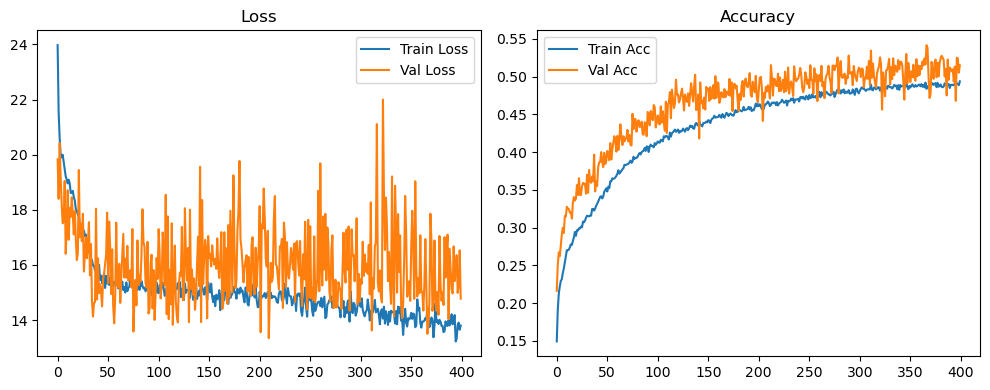

Original Model Final Test Loss: 14.9366 Accuracy: 0.5164


🚀 Running: batch512_lr_max_0.001_min_1e-06_dp0.0


Files already downloaded and verified


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|                                                                                                                                                                        | 0/400 [00:00<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.0999 | Val Acc: 0.1401 | Epoch Time: 1.92 | :   0%|                                                                                                      | 0/400 [01:55<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.0999 | Val Acc: 0.1401 | Epoch Time: 1.92 | :   0%|                                                                                                      | 0/400 [01:55<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.0999 | Val Acc: 0.1401 | Epoch Time: 1.92 | :   0%|▏                                                                                         | 1/400 [01:55<12:47:53, 115.47s/it]

| LR: 0.001000 | Train Acc: 0.1228 | Val Acc: 0.1305 | Epoch Time: 1.92 | :   0%|▏                                                                                         | 1/400 [03:50<12:47:53, 115.47s/it]

| LR: 0.001000 | Train Acc: 0.1228 | Val Acc: 0.1305 | Epoch Time: 1.92 | :   0%|▏                                                                                         | 1/400 [03:50<12:47:53, 115.47s/it]

| LR: 0.001000 | Train Acc: 0.1228 | Val Acc: 0.1305 | Epoch Time: 1.92 | :   0%|▍                                                                                         | 2/400 [03:50<12:44:54, 115.31s/it]

| LR: 0.001000 | Train Acc: 0.1357 | Val Acc: 0.1408 | Epoch Time: 1.92 | :   0%|▍                                                                                         | 2/400 [05:45<12:44:54, 115.31s/it]

| LR: 0.001000 | Train Acc: 0.1357 | Val Acc: 0.1408 | Epoch Time: 1.92 | :   0%|▍                                                                                         | 2/400 [05:45<12:44:54, 115.31s/it]

| LR: 0.001000 | Train Acc: 0.1357 | Val Acc: 0.1408 | Epoch Time: 1.92 | :   1%|▋                                                                                         | 3/400 [05:45<12:42:33, 115.25s/it]

| LR: 0.001000 | Train Acc: 0.1582 | Val Acc: 0.1906 | Epoch Time: 1.91 | :   1%|▋                                                                                         | 3/400 [07:40<12:42:33, 115.25s/it]

| LR: 0.001000 | Train Acc: 0.1582 | Val Acc: 0.1906 | Epoch Time: 1.91 | :   1%|▋                                                                                         | 3/400 [07:40<12:42:33, 115.25s/it]

| LR: 0.001000 | Train Acc: 0.1582 | Val Acc: 0.1906 | Epoch Time: 1.91 | :   1%|▉                                                                                         | 4/400 [07:40<12:39:44, 115.11s/it]

| LR: 0.001000 | Train Acc: 0.1748 | Val Acc: 0.1759 | Epoch Time: 1.91 | :   1%|▉                                                                                         | 4/400 [09:35<12:39:44, 115.11s/it]

| LR: 0.001000 | Train Acc: 0.1748 | Val Acc: 0.1759 | Epoch Time: 1.91 | :   1%|▉                                                                                         | 4/400 [09:35<12:39:44, 115.11s/it]

| LR: 0.001000 | Train Acc: 0.1748 | Val Acc: 0.1759 | Epoch Time: 1.91 | :   1%|█▏                                                                                        | 5/400 [09:35<12:37:20, 115.04s/it]

| LR: 0.001000 | Train Acc: 0.1797 | Val Acc: 0.1930 | Epoch Time: 1.92 | :   1%|█▏                                                                                        | 5/400 [11:30<12:37:20, 115.04s/it]

| LR: 0.001000 | Train Acc: 0.1797 | Val Acc: 0.1930 | Epoch Time: 1.92 | :   1%|█▏                                                                                        | 5/400 [11:30<12:37:20, 115.04s/it]

| LR: 0.001000 | Train Acc: 0.1797 | Val Acc: 0.1930 | Epoch Time: 1.92 | :   2%|█▎                                                                                        | 6/400 [11:30<12:35:33, 115.06s/it]

| LR: 0.000999 | Train Acc: 0.1870 | Val Acc: 0.1753 | Epoch Time: 1.92 | :   2%|█▎                                                                                        | 6/400 [13:25<12:35:33, 115.06s/it]

| LR: 0.000999 | Train Acc: 0.1870 | Val Acc: 0.1753 | Epoch Time: 1.92 | :   2%|█▎                                                                                        | 6/400 [13:25<12:35:33, 115.06s/it]

| LR: 0.000999 | Train Acc: 0.1870 | Val Acc: 0.1753 | Epoch Time: 1.92 | :   2%|█▌                                                                                        | 7/400 [13:25<12:33:34, 115.05s/it]

| LR: 0.000999 | Train Acc: 0.1897 | Val Acc: 0.2004 | Epoch Time: 1.91 | :   2%|█▌                                                                                        | 7/400 [15:20<12:33:34, 115.05s/it]

| LR: 0.000999 | Train Acc: 0.1897 | Val Acc: 0.2004 | Epoch Time: 1.91 | :   2%|█▌                                                                                        | 7/400 [15:20<12:33:34, 115.05s/it]

| LR: 0.000999 | Train Acc: 0.1897 | Val Acc: 0.2004 | Epoch Time: 1.91 | :   2%|█▊                                                                                        | 8/400 [15:20<12:31:19, 115.00s/it]

| LR: 0.000999 | Train Acc: 0.2015 | Val Acc: 0.2258 | Epoch Time: 1.92 | :   2%|█▊                                                                                        | 8/400 [17:15<12:31:19, 115.00s/it]

| LR: 0.000999 | Train Acc: 0.2015 | Val Acc: 0.2258 | Epoch Time: 1.92 | :   2%|█▊                                                                                        | 8/400 [17:15<12:31:19, 115.00s/it]

| LR: 0.000999 | Train Acc: 0.2015 | Val Acc: 0.2258 | Epoch Time: 1.92 | :   2%|██                                                                                        | 9/400 [17:15<12:29:29, 115.01s/it]

| LR: 0.000999 | Train Acc: 0.2100 | Val Acc: 0.2256 | Epoch Time: 1.92 | :   2%|██                                                                                        | 9/400 [19:10<12:29:29, 115.01s/it]

| LR: 0.000999 | Train Acc: 0.2100 | Val Acc: 0.2256 | Epoch Time: 1.92 | :   2%|██                                                                                        | 9/400 [19:10<12:29:29, 115.01s/it]

| LR: 0.000999 | Train Acc: 0.2100 | Val Acc: 0.2256 | Epoch Time: 1.92 | :   2%|██▏                                                                                      | 10/400 [19:10<12:27:56, 115.07s/it]

| LR: 0.000998 | Train Acc: 0.2162 | Val Acc: 0.2352 | Epoch Time: 1.92 | :   2%|██▏                                                                                      | 10/400 [21:05<12:27:56, 115.07s/it]

| LR: 0.000998 | Train Acc: 0.2162 | Val Acc: 0.2352 | Epoch Time: 1.92 | :   2%|██▏                                                                                      | 10/400 [21:05<12:27:56, 115.07s/it]

| LR: 0.000998 | Train Acc: 0.2162 | Val Acc: 0.2352 | Epoch Time: 1.92 | :   3%|██▍                                                                                      | 11/400 [21:05<12:25:56, 115.06s/it]

| LR: 0.000998 | Train Acc: 0.2242 | Val Acc: 0.2357 | Epoch Time: 1.91 | :   3%|██▍                                                                                      | 11/400 [23:00<12:25:56, 115.06s/it]

| LR: 0.000998 | Train Acc: 0.2242 | Val Acc: 0.2357 | Epoch Time: 1.91 | :   3%|██▍                                                                                      | 11/400 [23:00<12:25:56, 115.06s/it]

| LR: 0.000998 | Train Acc: 0.2242 | Val Acc: 0.2357 | Epoch Time: 1.91 | :   3%|██▋                                                                                      | 12/400 [23:00<12:23:54, 115.04s/it]

| LR: 0.000998 | Train Acc: 0.2289 | Val Acc: 0.2412 | Epoch Time: 1.92 | :   3%|██▋                                                                                      | 12/400 [24:55<12:23:54, 115.04s/it]

| LR: 0.000998 | Train Acc: 0.2289 | Val Acc: 0.2412 | Epoch Time: 1.92 | :   3%|██▋                                                                                      | 12/400 [24:55<12:23:54, 115.04s/it]

| LR: 0.000998 | Train Acc: 0.2289 | Val Acc: 0.2412 | Epoch Time: 1.92 | :   3%|██▉                                                                                      | 13/400 [24:56<12:22:10, 115.07s/it]

| LR: 0.000997 | Train Acc: 0.2374 | Val Acc: 0.2579 | Epoch Time: 1.92 | :   3%|██▉                                                                                      | 13/400 [26:51<12:22:10, 115.07s/it]

| LR: 0.000997 | Train Acc: 0.2374 | Val Acc: 0.2579 | Epoch Time: 1.92 | :   3%|██▉                                                                                      | 13/400 [26:51<12:22:10, 115.07s/it]

| LR: 0.000997 | Train Acc: 0.2374 | Val Acc: 0.2579 | Epoch Time: 1.92 | :   4%|███                                                                                      | 14/400 [26:51<12:20:19, 115.08s/it]

| LR: 0.000997 | Train Acc: 0.2354 | Val Acc: 0.2589 | Epoch Time: 1.91 | :   4%|███                                                                                      | 14/400 [28:45<12:20:19, 115.08s/it]

| LR: 0.000997 | Train Acc: 0.2354 | Val Acc: 0.2589 | Epoch Time: 1.91 | :   4%|███                                                                                      | 14/400 [28:45<12:20:19, 115.08s/it]

| LR: 0.000997 | Train Acc: 0.2354 | Val Acc: 0.2589 | Epoch Time: 1.91 | :   4%|███▎                                                                                     | 15/400 [28:46<12:18:06, 115.03s/it]

| LR: 0.000997 | Train Acc: 0.2402 | Val Acc: 0.2621 | Epoch Time: 1.91 | :   4%|███▎                                                                                     | 15/400 [30:40<12:18:06, 115.03s/it]

| LR: 0.000997 | Train Acc: 0.2402 | Val Acc: 0.2621 | Epoch Time: 1.91 | :   4%|███▎                                                                                     | 15/400 [30:40<12:18:06, 115.03s/it]

| LR: 0.000997 | Train Acc: 0.2402 | Val Acc: 0.2621 | Epoch Time: 1.91 | :   4%|███▌                                                                                     | 16/400 [30:41<12:16:02, 115.01s/it]

| LR: 0.000996 | Train Acc: 0.2437 | Val Acc: 0.2464 | Epoch Time: 1.92 | :   4%|███▌                                                                                     | 16/400 [32:36<12:16:02, 115.01s/it]

| LR: 0.000996 | Train Acc: 0.2437 | Val Acc: 0.2464 | Epoch Time: 1.92 | :   4%|███▌                                                                                     | 16/400 [32:36<12:16:02, 115.01s/it]

| LR: 0.000996 | Train Acc: 0.2437 | Val Acc: 0.2464 | Epoch Time: 1.92 | :   4%|███▊                                                                                     | 17/400 [32:36<12:14:18, 115.04s/it]

| LR: 0.000996 | Train Acc: 0.2439 | Val Acc: 0.2587 | Epoch Time: 1.91 | :   4%|███▊                                                                                     | 17/400 [34:31<12:14:18, 115.04s/it]

| LR: 0.000996 | Train Acc: 0.2439 | Val Acc: 0.2587 | Epoch Time: 1.91 | :   4%|███▊                                                                                     | 17/400 [34:31<12:14:18, 115.04s/it]

| LR: 0.000996 | Train Acc: 0.2439 | Val Acc: 0.2587 | Epoch Time: 1.91 | :   4%|████                                                                                     | 18/400 [34:31<12:12:19, 115.02s/it]

| LR: 0.000995 | Train Acc: 0.2486 | Val Acc: 0.2701 | Epoch Time: 1.91 | :   4%|████                                                                                     | 18/400 [36:25<12:12:19, 115.02s/it]

| LR: 0.000995 | Train Acc: 0.2486 | Val Acc: 0.2701 | Epoch Time: 1.91 | :   4%|████                                                                                     | 18/400 [36:25<12:12:19, 115.02s/it]

| LR: 0.000995 | Train Acc: 0.2486 | Val Acc: 0.2701 | Epoch Time: 1.91 | :   5%|████▏                                                                                    | 19/400 [36:26<12:10:08, 114.98s/it]

| LR: 0.000994 | Train Acc: 0.2545 | Val Acc: 0.2537 | Epoch Time: 1.91 | :   5%|████▏                                                                                    | 19/400 [38:20<12:10:08, 114.98s/it]

| LR: 0.000994 | Train Acc: 0.2545 | Val Acc: 0.2537 | Epoch Time: 1.91 | :   5%|████▏                                                                                    | 19/400 [38:20<12:10:08, 114.98s/it]

| LR: 0.000994 | Train Acc: 0.2545 | Val Acc: 0.2537 | Epoch Time: 1.91 | :   5%|████▍                                                                                    | 20/400 [38:20<12:08:12, 114.98s/it]

| LR: 0.000994 | Train Acc: 0.2498 | Val Acc: 0.2597 | Epoch Time: 1.92 | :   5%|████▍                                                                                    | 20/400 [40:16<12:08:12, 114.98s/it]

| LR: 0.000994 | Train Acc: 0.2498 | Val Acc: 0.2597 | Epoch Time: 1.92 | :   5%|████▍                                                                                    | 20/400 [40:16<12:08:12, 114.98s/it]

| LR: 0.000994 | Train Acc: 0.2498 | Val Acc: 0.2597 | Epoch Time: 1.92 | :   5%|████▋                                                                                    | 21/400 [40:16<12:06:34, 115.03s/it]

| LR: 0.000993 | Train Acc: 0.2535 | Val Acc: 0.2700 | Epoch Time: 1.92 | :   5%|████▋                                                                                    | 21/400 [42:11<12:06:34, 115.03s/it]

| LR: 0.000993 | Train Acc: 0.2535 | Val Acc: 0.2700 | Epoch Time: 1.92 | :   5%|████▋                                                                                    | 21/400 [42:11<12:06:34, 115.03s/it]

| LR: 0.000993 | Train Acc: 0.2535 | Val Acc: 0.2700 | Epoch Time: 1.92 | :   6%|████▉                                                                                    | 22/400 [42:11<12:04:42, 115.03s/it]

| LR: 0.000993 | Train Acc: 0.2601 | Val Acc: 0.2703 | Epoch Time: 1.91 | :   6%|████▉                                                                                    | 22/400 [44:06<12:04:42, 115.03s/it]

| LR: 0.000993 | Train Acc: 0.2601 | Val Acc: 0.2703 | Epoch Time: 1.91 | :   6%|████▉                                                                                    | 22/400 [44:06<12:04:42, 115.03s/it]

| LR: 0.000993 | Train Acc: 0.2601 | Val Acc: 0.2703 | Epoch Time: 1.91 | :   6%|█████                                                                                    | 23/400 [44:06<12:02:41, 115.02s/it]

| LR: 0.000992 | Train Acc: 0.2642 | Val Acc: 0.2742 | Epoch Time: 1.92 | :   6%|█████                                                                                    | 23/400 [46:01<12:02:41, 115.02s/it]

| LR: 0.000992 | Train Acc: 0.2642 | Val Acc: 0.2742 | Epoch Time: 1.92 | :   6%|█████                                                                                    | 23/400 [46:01<12:02:41, 115.02s/it]

| LR: 0.000992 | Train Acc: 0.2642 | Val Acc: 0.2742 | Epoch Time: 1.92 | :   6%|█████▎                                                                                   | 24/400 [46:01<12:00:58, 115.05s/it]

| LR: 0.000991 | Train Acc: 0.2682 | Val Acc: 0.2917 | Epoch Time: 1.92 | :   6%|█████▎                                                                                   | 24/400 [47:56<12:00:58, 115.05s/it]

| LR: 0.000991 | Train Acc: 0.2682 | Val Acc: 0.2917 | Epoch Time: 1.92 | :   6%|█████▎                                                                                   | 24/400 [47:56<12:00:58, 115.05s/it]

| LR: 0.000991 | Train Acc: 0.2682 | Val Acc: 0.2917 | Epoch Time: 1.92 | :   6%|█████▌                                                                                   | 25/400 [47:56<11:59:39, 115.14s/it]

| LR: 0.000990 | Train Acc: 0.2696 | Val Acc: 0.2905 | Epoch Time: 1.92 | :   6%|█████▌                                                                                   | 25/400 [49:51<11:59:39, 115.14s/it]

| LR: 0.000990 | Train Acc: 0.2696 | Val Acc: 0.2905 | Epoch Time: 1.92 | :   6%|█████▌                                                                                   | 25/400 [49:51<11:59:39, 115.14s/it]

| LR: 0.000990 | Train Acc: 0.2696 | Val Acc: 0.2905 | Epoch Time: 1.92 | :   6%|█████▊                                                                                   | 26/400 [49:51<11:57:32, 115.11s/it]

| LR: 0.000990 | Train Acc: 0.2738 | Val Acc: 0.2859 | Epoch Time: 1.91 | :   6%|█████▊                                                                                   | 26/400 [51:46<11:57:32, 115.11s/it]

| LR: 0.000990 | Train Acc: 0.2738 | Val Acc: 0.2859 | Epoch Time: 1.91 | :   6%|█████▊                                                                                   | 26/400 [51:46<11:57:32, 115.11s/it]

| LR: 0.000990 | Train Acc: 0.2738 | Val Acc: 0.2859 | Epoch Time: 1.91 | :   7%|██████                                                                                   | 27/400 [51:46<11:55:21, 115.07s/it]

| LR: 0.000989 | Train Acc: 0.2764 | Val Acc: 0.3176 | Epoch Time: 1.92 | :   7%|██████                                                                                   | 27/400 [53:41<11:55:21, 115.07s/it]

| LR: 0.000989 | Train Acc: 0.2764 | Val Acc: 0.3176 | Epoch Time: 1.92 | :   7%|██████                                                                                   | 27/400 [53:41<11:55:21, 115.07s/it]

| LR: 0.000989 | Train Acc: 0.2764 | Val Acc: 0.3176 | Epoch Time: 1.92 | :   7%|██████▏                                                                                  | 28/400 [53:41<11:53:21, 115.06s/it]

| LR: 0.000988 | Train Acc: 0.2792 | Val Acc: 0.2898 | Epoch Time: 1.92 | :   7%|██████▏                                                                                  | 28/400 [55:36<11:53:21, 115.06s/it]

| LR: 0.000988 | Train Acc: 0.2792 | Val Acc: 0.2898 | Epoch Time: 1.92 | :   7%|██████▏                                                                                  | 28/400 [55:36<11:53:21, 115.06s/it]

| LR: 0.000988 | Train Acc: 0.2792 | Val Acc: 0.2898 | Epoch Time: 1.92 | :   7%|██████▍                                                                                  | 29/400 [55:36<11:51:36, 115.08s/it]

| LR: 0.000987 | Train Acc: 0.2810 | Val Acc: 0.3166 | Epoch Time: 1.92 | :   7%|██████▍                                                                                  | 29/400 [57:31<11:51:36, 115.08s/it]

| LR: 0.000987 | Train Acc: 0.2810 | Val Acc: 0.3166 | Epoch Time: 1.92 | :   7%|██████▍                                                                                  | 29/400 [57:31<11:51:36, 115.08s/it]

| LR: 0.000987 | Train Acc: 0.2810 | Val Acc: 0.3166 | Epoch Time: 1.92 | :   8%|██████▋                                                                                  | 30/400 [57:31<11:49:33, 115.06s/it]

| LR: 0.000986 | Train Acc: 0.2906 | Val Acc: 0.2953 | Epoch Time: 1.91 | :   8%|██████▋                                                                                  | 30/400 [59:26<11:49:33, 115.06s/it]

| LR: 0.000986 | Train Acc: 0.2906 | Val Acc: 0.2953 | Epoch Time: 1.91 | :   8%|██████▋                                                                                  | 30/400 [59:26<11:49:33, 115.06s/it]

| LR: 0.000986 | Train Acc: 0.2906 | Val Acc: 0.2953 | Epoch Time: 1.91 | :   8%|██████▉                                                                                  | 31/400 [59:26<11:47:14, 115.00s/it]

| LR: 0.000985 | Train Acc: 0.2908 | Val Acc: 0.3013 | Epoch Time: 1.91 | :   8%|██████▋                                                                                | 31/400 [1:01:21<11:47:14, 115.00s/it]

| LR: 0.000985 | Train Acc: 0.2908 | Val Acc: 0.3013 | Epoch Time: 1.91 | :   8%|██████▋                                                                                | 31/400 [1:01:21<11:47:14, 115.00s/it]

| LR: 0.000985 | Train Acc: 0.2908 | Val Acc: 0.3013 | Epoch Time: 1.91 | :   8%|██████▉                                                                                | 32/400 [1:01:21<11:44:57, 114.94s/it]

| LR: 0.000984 | Train Acc: 0.2949 | Val Acc: 0.3001 | Epoch Time: 1.91 | :   8%|██████▉                                                                                | 32/400 [1:03:16<11:44:57, 114.94s/it]

| LR: 0.000984 | Train Acc: 0.2949 | Val Acc: 0.3001 | Epoch Time: 1.91 | :   8%|██████▉                                                                                | 32/400 [1:03:16<11:44:57, 114.94s/it]

| LR: 0.000984 | Train Acc: 0.2949 | Val Acc: 0.3001 | Epoch Time: 1.91 | :   8%|███████▏                                                                               | 33/400 [1:03:16<11:42:44, 114.89s/it]

| LR: 0.000983 | Train Acc: 0.2965 | Val Acc: 0.3109 | Epoch Time: 1.91 | :   8%|███████▏                                                                               | 33/400 [1:05:10<11:42:44, 114.89s/it]

| LR: 0.000983 | Train Acc: 0.2965 | Val Acc: 0.3109 | Epoch Time: 1.91 | :   8%|███████▏                                                                               | 33/400 [1:05:10<11:42:44, 114.89s/it]

| LR: 0.000983 | Train Acc: 0.2965 | Val Acc: 0.3109 | Epoch Time: 1.91 | :   8%|███████▍                                                                               | 34/400 [1:05:11<11:40:34, 114.85s/it]

| LR: 0.000982 | Train Acc: 0.3001 | Val Acc: 0.2851 | Epoch Time: 1.91 | :   8%|███████▍                                                                               | 34/400 [1:07:05<11:40:34, 114.85s/it]

| LR: 0.000982 | Train Acc: 0.3001 | Val Acc: 0.2851 | Epoch Time: 1.91 | :   8%|███████▍                                                                               | 34/400 [1:07:05<11:40:34, 114.85s/it]

| LR: 0.000982 | Train Acc: 0.3001 | Val Acc: 0.2851 | Epoch Time: 1.91 | :   9%|███████▌                                                                               | 35/400 [1:07:05<11:38:34, 114.83s/it]

| LR: 0.000981 | Train Acc: 0.3018 | Val Acc: 0.3278 | Epoch Time: 1.91 | :   9%|███████▌                                                                               | 35/400 [1:09:00<11:38:34, 114.83s/it]

| LR: 0.000981 | Train Acc: 0.3018 | Val Acc: 0.3278 | Epoch Time: 1.91 | :   9%|███████▌                                                                               | 35/400 [1:09:00<11:38:34, 114.83s/it]

| LR: 0.000981 | Train Acc: 0.3018 | Val Acc: 0.3278 | Epoch Time: 1.91 | :   9%|███████▊                                                                               | 36/400 [1:09:00<11:36:54, 114.87s/it]

| LR: 0.000980 | Train Acc: 0.3089 | Val Acc: 0.3142 | Epoch Time: 1.91 | :   9%|███████▊                                                                               | 36/400 [1:10:55<11:36:54, 114.87s/it]

| LR: 0.000980 | Train Acc: 0.3089 | Val Acc: 0.3142 | Epoch Time: 1.91 | :   9%|███████▊                                                                               | 36/400 [1:10:55<11:36:54, 114.87s/it]

| LR: 0.000980 | Train Acc: 0.3089 | Val Acc: 0.3142 | Epoch Time: 1.91 | :   9%|████████                                                                               | 37/400 [1:10:55<11:35:13, 114.91s/it]

| LR: 0.000979 | Train Acc: 0.3084 | Val Acc: 0.3283 | Epoch Time: 1.91 | :   9%|████████                                                                               | 37/400 [1:12:50<11:35:13, 114.91s/it]

| LR: 0.000979 | Train Acc: 0.3084 | Val Acc: 0.3283 | Epoch Time: 1.91 | :   9%|████████                                                                               | 37/400 [1:12:50<11:35:13, 114.91s/it]

| LR: 0.000979 | Train Acc: 0.3084 | Val Acc: 0.3283 | Epoch Time: 1.91 | :  10%|████████▎                                                                              | 38/400 [1:12:50<11:33:18, 114.91s/it]

| LR: 0.000978 | Train Acc: 0.3081 | Val Acc: 0.3360 | Epoch Time: 1.91 | :  10%|████████▎                                                                              | 38/400 [1:14:45<11:33:18, 114.91s/it]

| LR: 0.000978 | Train Acc: 0.3081 | Val Acc: 0.3360 | Epoch Time: 1.91 | :  10%|████████▎                                                                              | 38/400 [1:14:45<11:33:18, 114.91s/it]

| LR: 0.000978 | Train Acc: 0.3081 | Val Acc: 0.3360 | Epoch Time: 1.91 | :  10%|████████▍                                                                              | 39/400 [1:14:45<11:31:17, 114.89s/it]

| LR: 0.000977 | Train Acc: 0.3147 | Val Acc: 0.3524 | Epoch Time: 1.91 | :  10%|████████▍                                                                              | 39/400 [1:16:40<11:31:17, 114.89s/it]

| LR: 0.000977 | Train Acc: 0.3147 | Val Acc: 0.3524 | Epoch Time: 1.91 | :  10%|████████▍                                                                              | 39/400 [1:16:40<11:31:17, 114.89s/it]

| LR: 0.000977 | Train Acc: 0.3147 | Val Acc: 0.3524 | Epoch Time: 1.91 | :  10%|████████▋                                                                              | 40/400 [1:16:40<11:29:30, 114.92s/it]

| LR: 0.000976 | Train Acc: 0.3189 | Val Acc: 0.3290 | Epoch Time: 1.92 | :  10%|████████▋                                                                              | 40/400 [1:18:35<11:29:30, 114.92s/it]

| LR: 0.000976 | Train Acc: 0.3189 | Val Acc: 0.3290 | Epoch Time: 1.92 | :  10%|████████▋                                                                              | 40/400 [1:18:35<11:29:30, 114.92s/it]

| LR: 0.000976 | Train Acc: 0.3189 | Val Acc: 0.3290 | Epoch Time: 1.92 | :  10%|████████▉                                                                              | 41/400 [1:18:35<11:27:46, 114.95s/it]

| LR: 0.000974 | Train Acc: 0.3226 | Val Acc: 0.3185 | Epoch Time: 1.91 | :  10%|████████▉                                                                              | 41/400 [1:20:30<11:27:46, 114.95s/it]

| LR: 0.000974 | Train Acc: 0.3226 | Val Acc: 0.3185 | Epoch Time: 1.91 | :  10%|████████▉                                                                              | 41/400 [1:20:30<11:27:46, 114.95s/it]

| LR: 0.000974 | Train Acc: 0.3226 | Val Acc: 0.3185 | Epoch Time: 1.91 | :  10%|█████████▏                                                                             | 42/400 [1:20:30<11:25:47, 114.94s/it]

| LR: 0.000973 | Train Acc: 0.3227 | Val Acc: 0.3428 | Epoch Time: 1.91 | :  10%|█████████▏                                                                             | 42/400 [1:22:25<11:25:47, 114.94s/it]

| LR: 0.000973 | Train Acc: 0.3227 | Val Acc: 0.3428 | Epoch Time: 1.91 | :  10%|█████████▏                                                                             | 42/400 [1:22:25<11:25:47, 114.94s/it]

| LR: 0.000973 | Train Acc: 0.3227 | Val Acc: 0.3428 | Epoch Time: 1.91 | :  11%|█████████▎                                                                             | 43/400 [1:22:25<11:23:41, 114.91s/it]

| LR: 0.000972 | Train Acc: 0.3291 | Val Acc: 0.3298 | Epoch Time: 1.91 | :  11%|█████████▎                                                                             | 43/400 [1:24:19<11:23:41, 114.91s/it]

| LR: 0.000972 | Train Acc: 0.3291 | Val Acc: 0.3298 | Epoch Time: 1.91 | :  11%|█████████▎                                                                             | 43/400 [1:24:19<11:23:41, 114.91s/it]

| LR: 0.000972 | Train Acc: 0.3291 | Val Acc: 0.3298 | Epoch Time: 1.91 | :  11%|█████████▌                                                                             | 44/400 [1:24:20<11:21:35, 114.88s/it]

| LR: 0.000970 | Train Acc: 0.3282 | Val Acc: 0.3502 | Epoch Time: 1.91 | :  11%|█████████▌                                                                             | 44/400 [1:26:14<11:21:35, 114.88s/it]

| LR: 0.000970 | Train Acc: 0.3282 | Val Acc: 0.3502 | Epoch Time: 1.91 | :  11%|█████████▌                                                                             | 44/400 [1:26:14<11:21:35, 114.88s/it]

| LR: 0.000970 | Train Acc: 0.3282 | Val Acc: 0.3502 | Epoch Time: 1.91 | :  11%|█████████▊                                                                             | 45/400 [1:26:14<11:19:29, 114.84s/it]

| LR: 0.000969 | Train Acc: 0.3315 | Val Acc: 0.3646 | Epoch Time: 1.91 | :  11%|█████████▊                                                                             | 45/400 [1:28:09<11:19:29, 114.84s/it]

| LR: 0.000969 | Train Acc: 0.3315 | Val Acc: 0.3646 | Epoch Time: 1.91 | :  11%|█████████▊                                                                             | 45/400 [1:28:09<11:19:29, 114.84s/it]

| LR: 0.000969 | Train Acc: 0.3315 | Val Acc: 0.3646 | Epoch Time: 1.91 | :  12%|██████████                                                                             | 46/400 [1:28:09<11:17:29, 114.83s/it]

| LR: 0.000968 | Train Acc: 0.3321 | Val Acc: 0.3571 | Epoch Time: 1.91 | :  12%|██████████                                                                             | 46/400 [1:30:04<11:17:29, 114.83s/it]

| LR: 0.000968 | Train Acc: 0.3321 | Val Acc: 0.3571 | Epoch Time: 1.91 | :  12%|██████████                                                                             | 46/400 [1:30:04<11:17:29, 114.83s/it]

| LR: 0.000968 | Train Acc: 0.3321 | Val Acc: 0.3571 | Epoch Time: 1.91 | :  12%|██████████▏                                                                            | 47/400 [1:30:04<11:15:25, 114.80s/it]

| LR: 0.000966 | Train Acc: 0.3341 | Val Acc: 0.3482 | Epoch Time: 1.91 | :  12%|██████████▏                                                                            | 47/400 [1:31:59<11:15:25, 114.80s/it]

| LR: 0.000966 | Train Acc: 0.3341 | Val Acc: 0.3482 | Epoch Time: 1.91 | :  12%|██████████▏                                                                            | 47/400 [1:31:59<11:15:25, 114.80s/it]

| LR: 0.000966 | Train Acc: 0.3341 | Val Acc: 0.3482 | Epoch Time: 1.91 | :  12%|██████████▍                                                                            | 48/400 [1:31:59<11:13:28, 114.80s/it]

| LR: 0.000965 | Train Acc: 0.3403 | Val Acc: 0.3050 | Epoch Time: 1.91 | :  12%|██████████▍                                                                            | 48/400 [1:33:53<11:13:28, 114.80s/it]

| LR: 0.000965 | Train Acc: 0.3403 | Val Acc: 0.3050 | Epoch Time: 1.91 | :  12%|██████████▍                                                                            | 48/400 [1:33:53<11:13:28, 114.80s/it]

| LR: 0.000965 | Train Acc: 0.3403 | Val Acc: 0.3050 | Epoch Time: 1.91 | :  12%|██████████▋                                                                            | 49/400 [1:33:53<11:11:31, 114.79s/it]

| LR: 0.000963 | Train Acc: 0.3372 | Val Acc: 0.3517 | Epoch Time: 1.91 | :  12%|██████████▋                                                                            | 49/400 [1:35:48<11:11:31, 114.79s/it]

| LR: 0.000963 | Train Acc: 0.3372 | Val Acc: 0.3517 | Epoch Time: 1.91 | :  12%|██████████▋                                                                            | 49/400 [1:35:48<11:11:31, 114.79s/it]

| LR: 0.000963 | Train Acc: 0.3372 | Val Acc: 0.3517 | Epoch Time: 1.91 | :  12%|██████████▉                                                                            | 50/400 [1:35:48<11:09:33, 114.78s/it]

| LR: 0.000962 | Train Acc: 0.3405 | Val Acc: 0.3612 | Epoch Time: 1.91 | :  12%|██████████▉                                                                            | 50/400 [1:37:43<11:09:33, 114.78s/it]

| LR: 0.000962 | Train Acc: 0.3405 | Val Acc: 0.3612 | Epoch Time: 1.91 | :  12%|██████████▉                                                                            | 50/400 [1:37:43<11:09:33, 114.78s/it]

| LR: 0.000962 | Train Acc: 0.3405 | Val Acc: 0.3612 | Epoch Time: 1.91 | :  13%|███████████                                                                            | 51/400 [1:37:43<11:07:35, 114.77s/it]

| LR: 0.000960 | Train Acc: 0.3424 | Val Acc: 0.3536 | Epoch Time: 1.91 | :  13%|███████████                                                                            | 51/400 [1:39:38<11:07:35, 114.77s/it]

| LR: 0.000960 | Train Acc: 0.3424 | Val Acc: 0.3536 | Epoch Time: 1.91 | :  13%|███████████                                                                            | 51/400 [1:39:38<11:07:35, 114.77s/it]

| LR: 0.000960 | Train Acc: 0.3424 | Val Acc: 0.3536 | Epoch Time: 1.91 | :  13%|███████████▎                                                                           | 52/400 [1:39:38<11:05:38, 114.77s/it]

| LR: 0.000959 | Train Acc: 0.3426 | Val Acc: 0.3443 | Epoch Time: 1.91 | :  13%|███████████▎                                                                           | 52/400 [1:41:32<11:05:38, 114.77s/it]

| LR: 0.000959 | Train Acc: 0.3426 | Val Acc: 0.3443 | Epoch Time: 1.91 | :  13%|███████████▎                                                                           | 52/400 [1:41:32<11:05:38, 114.77s/it]

| LR: 0.000959 | Train Acc: 0.3426 | Val Acc: 0.3443 | Epoch Time: 1.91 | :  13%|███████████▌                                                                           | 53/400 [1:41:32<11:03:43, 114.77s/it]

| LR: 0.000957 | Train Acc: 0.3390 | Val Acc: 0.3606 | Epoch Time: 1.91 | :  13%|███████████▌                                                                           | 53/400 [1:43:27<11:03:43, 114.77s/it]

| LR: 0.000957 | Train Acc: 0.3390 | Val Acc: 0.3606 | Epoch Time: 1.91 | :  13%|███████████▌                                                                           | 53/400 [1:43:27<11:03:43, 114.77s/it]

| LR: 0.000957 | Train Acc: 0.3390 | Val Acc: 0.3606 | Epoch Time: 1.91 | :  14%|███████████▋                                                                           | 54/400 [1:43:27<11:01:47, 114.76s/it]

| LR: 0.000956 | Train Acc: 0.3447 | Val Acc: 0.3574 | Epoch Time: 1.91 | :  14%|███████████▋                                                                           | 54/400 [1:45:22<11:01:47, 114.76s/it]

| LR: 0.000956 | Train Acc: 0.3447 | Val Acc: 0.3574 | Epoch Time: 1.91 | :  14%|███████████▋                                                                           | 54/400 [1:45:22<11:01:47, 114.76s/it]

| LR: 0.000956 | Train Acc: 0.3447 | Val Acc: 0.3574 | Epoch Time: 1.91 | :  14%|███████████▉                                                                           | 55/400 [1:45:22<10:59:54, 114.77s/it]

| LR: 0.000954 | Train Acc: 0.3447 | Val Acc: 0.3493 | Epoch Time: 1.91 | :  14%|███████████▉                                                                           | 55/400 [1:47:17<10:59:54, 114.77s/it]

| LR: 0.000954 | Train Acc: 0.3447 | Val Acc: 0.3493 | Epoch Time: 1.91 | :  14%|███████████▉                                                                           | 55/400 [1:47:17<10:59:54, 114.77s/it]

| LR: 0.000954 | Train Acc: 0.3447 | Val Acc: 0.3493 | Epoch Time: 1.91 | :  14%|████████████▏                                                                          | 56/400 [1:47:17<10:58:01, 114.77s/it]

| LR: 0.000952 | Train Acc: 0.3433 | Val Acc: 0.3322 | Epoch Time: 1.91 | :  14%|████████████▏                                                                          | 56/400 [1:49:12<10:58:01, 114.77s/it]

| LR: 0.000952 | Train Acc: 0.3433 | Val Acc: 0.3322 | Epoch Time: 1.91 | :  14%|████████████▏                                                                          | 56/400 [1:49:12<10:58:01, 114.77s/it]

| LR: 0.000952 | Train Acc: 0.3433 | Val Acc: 0.3322 | Epoch Time: 1.91 | :  14%|████████████▍                                                                          | 57/400 [1:49:12<10:56:11, 114.79s/it]

| LR: 0.000951 | Train Acc: 0.3453 | Val Acc: 0.3289 | Epoch Time: 1.91 | :  14%|████████████▍                                                                          | 57/400 [1:51:06<10:56:11, 114.79s/it]

| LR: 0.000951 | Train Acc: 0.3453 | Val Acc: 0.3289 | Epoch Time: 1.91 | :  14%|████████████▍                                                                          | 57/400 [1:51:06<10:56:11, 114.79s/it]

| LR: 0.000951 | Train Acc: 0.3453 | Val Acc: 0.3289 | Epoch Time: 1.91 | :  14%|████████████▌                                                                          | 58/400 [1:51:06<10:54:25, 114.81s/it]

| LR: 0.000949 | Train Acc: 0.3462 | Val Acc: 0.3580 | Epoch Time: 1.91 | :  14%|████████████▌                                                                          | 58/400 [1:53:01<10:54:25, 114.81s/it]

| LR: 0.000949 | Train Acc: 0.3462 | Val Acc: 0.3580 | Epoch Time: 1.91 | :  14%|████████████▌                                                                          | 58/400 [1:53:01<10:54:25, 114.81s/it]

| LR: 0.000949 | Train Acc: 0.3462 | Val Acc: 0.3580 | Epoch Time: 1.91 | :  15%|████████████▊                                                                          | 59/400 [1:53:01<10:52:35, 114.82s/it]

| LR: 0.000947 | Train Acc: 0.3439 | Val Acc: 0.3729 | Epoch Time: 1.91 | :  15%|████████████▊                                                                          | 59/400 [1:54:56<10:52:35, 114.82s/it]

| LR: 0.000947 | Train Acc: 0.3439 | Val Acc: 0.3729 | Epoch Time: 1.91 | :  15%|████████████▊                                                                          | 59/400 [1:54:56<10:52:35, 114.82s/it]

| LR: 0.000947 | Train Acc: 0.3439 | Val Acc: 0.3729 | Epoch Time: 1.91 | :  15%|█████████████                                                                          | 60/400 [1:54:56<10:50:44, 114.84s/it]

| LR: 0.000946 | Train Acc: 0.3477 | Val Acc: 0.3371 | Epoch Time: 1.91 | :  15%|█████████████                                                                          | 60/400 [1:56:51<10:50:44, 114.84s/it]

| LR: 0.000946 | Train Acc: 0.3477 | Val Acc: 0.3371 | Epoch Time: 1.91 | :  15%|█████████████                                                                          | 60/400 [1:56:51<10:50:44, 114.84s/it]

| LR: 0.000946 | Train Acc: 0.3477 | Val Acc: 0.3371 | Epoch Time: 1.91 | :  15%|█████████████▎                                                                         | 61/400 [1:56:51<10:49:06, 114.89s/it]

| LR: 0.000944 | Train Acc: 0.3477 | Val Acc: 0.3948 | Epoch Time: 1.91 | :  15%|█████████████▎                                                                         | 61/400 [1:58:46<10:49:06, 114.89s/it]

| LR: 0.000944 | Train Acc: 0.3477 | Val Acc: 0.3948 | Epoch Time: 1.91 | :  15%|█████████████▎                                                                         | 61/400 [1:58:46<10:49:06, 114.89s/it]

| LR: 0.000944 | Train Acc: 0.3477 | Val Acc: 0.3948 | Epoch Time: 1.91 | :  16%|█████████████▍                                                                         | 62/400 [1:58:46<10:47:18, 114.91s/it]

| LR: 0.000942 | Train Acc: 0.3520 | Val Acc: 0.3884 | Epoch Time: 1.92 | :  16%|█████████████▍                                                                         | 62/400 [2:00:41<10:47:18, 114.91s/it]

| LR: 0.000942 | Train Acc: 0.3520 | Val Acc: 0.3884 | Epoch Time: 1.92 | :  16%|█████████████▍                                                                         | 62/400 [2:00:41<10:47:18, 114.91s/it]

| LR: 0.000942 | Train Acc: 0.3520 | Val Acc: 0.3884 | Epoch Time: 1.92 | :  16%|█████████████▋                                                                         | 63/400 [2:00:41<10:45:37, 114.95s/it]

| LR: 0.000940 | Train Acc: 0.3515 | Val Acc: 0.3712 | Epoch Time: 1.92 | :  16%|█████████████▋                                                                         | 63/400 [2:02:36<10:45:37, 114.95s/it]

| LR: 0.000940 | Train Acc: 0.3515 | Val Acc: 0.3712 | Epoch Time: 1.92 | :  16%|█████████████▋                                                                         | 63/400 [2:02:36<10:45:37, 114.95s/it]

| LR: 0.000940 | Train Acc: 0.3515 | Val Acc: 0.3712 | Epoch Time: 1.92 | :  16%|█████████████▉                                                                         | 64/400 [2:02:36<10:44:00, 115.00s/it]

| LR: 0.000938 | Train Acc: 0.3505 | Val Acc: 0.3730 | Epoch Time: 1.92 | :  16%|█████████████▉                                                                         | 64/400 [2:04:31<10:44:00, 115.00s/it]

| LR: 0.000938 | Train Acc: 0.3505 | Val Acc: 0.3730 | Epoch Time: 1.92 | :  16%|█████████████▉                                                                         | 64/400 [2:04:31<10:44:00, 115.00s/it]

| LR: 0.000938 | Train Acc: 0.3505 | Val Acc: 0.3730 | Epoch Time: 1.92 | :  16%|██████████████▏                                                                        | 65/400 [2:04:31<10:42:12, 115.02s/it]

| LR: 0.000936 | Train Acc: 0.3486 | Val Acc: 0.3560 | Epoch Time: 1.92 | :  16%|██████████████▏                                                                        | 65/400 [2:06:26<10:42:12, 115.02s/it]

| LR: 0.000936 | Train Acc: 0.3486 | Val Acc: 0.3560 | Epoch Time: 1.92 | :  16%|██████████████▏                                                                        | 65/400 [2:06:26<10:42:12, 115.02s/it]

| LR: 0.000936 | Train Acc: 0.3486 | Val Acc: 0.3560 | Epoch Time: 1.92 | :  16%|██████████████▎                                                                        | 66/400 [2:06:26<10:40:20, 115.03s/it]

| LR: 0.000934 | Train Acc: 0.3482 | Val Acc: 0.3500 | Epoch Time: 1.91 | :  16%|██████████████▎                                                                        | 66/400 [2:08:21<10:40:20, 115.03s/it]

| LR: 0.000934 | Train Acc: 0.3482 | Val Acc: 0.3500 | Epoch Time: 1.91 | :  16%|██████████████▎                                                                        | 66/400 [2:08:21<10:40:20, 115.03s/it]

| LR: 0.000934 | Train Acc: 0.3482 | Val Acc: 0.3500 | Epoch Time: 1.91 | :  17%|██████████████▌                                                                        | 67/400 [2:08:21<10:38:21, 115.02s/it]

| LR: 0.000932 | Train Acc: 0.3513 | Val Acc: 0.3688 | Epoch Time: 1.91 | :  17%|██████████████▌                                                                        | 67/400 [2:10:16<10:38:21, 115.02s/it]

| LR: 0.000932 | Train Acc: 0.3513 | Val Acc: 0.3688 | Epoch Time: 1.91 | :  17%|██████████████▌                                                                        | 67/400 [2:10:16<10:38:21, 115.02s/it]

| LR: 0.000932 | Train Acc: 0.3513 | Val Acc: 0.3688 | Epoch Time: 1.91 | :  17%|██████████████▊                                                                        | 68/400 [2:10:16<10:36:24, 115.01s/it]

| LR: 0.000930 | Train Acc: 0.3559 | Val Acc: 0.3728 | Epoch Time: 1.91 | :  17%|██████████████▊                                                                        | 68/400 [2:12:11<10:36:24, 115.01s/it]

| LR: 0.000930 | Train Acc: 0.3559 | Val Acc: 0.3728 | Epoch Time: 1.91 | :  17%|██████████████▊                                                                        | 68/400 [2:12:11<10:36:24, 115.01s/it]

| LR: 0.000930 | Train Acc: 0.3559 | Val Acc: 0.3728 | Epoch Time: 1.91 | :  17%|███████████████                                                                        | 69/400 [2:12:11<10:34:28, 115.01s/it]

| LR: 0.000928 | Train Acc: 0.3566 | Val Acc: 0.3807 | Epoch Time: 1.92 | :  17%|███████████████                                                                        | 69/400 [2:14:06<10:34:28, 115.01s/it]

| LR: 0.000928 | Train Acc: 0.3566 | Val Acc: 0.3807 | Epoch Time: 1.92 | :  17%|███████████████                                                                        | 69/400 [2:14:06<10:34:28, 115.01s/it]

| LR: 0.000928 | Train Acc: 0.3566 | Val Acc: 0.3807 | Epoch Time: 1.92 | :  18%|███████████████▏                                                                       | 70/400 [2:14:06<10:32:35, 115.02s/it]

| LR: 0.000926 | Train Acc: 0.3588 | Val Acc: 0.3623 | Epoch Time: 1.92 | :  18%|███████████████▏                                                                       | 70/400 [2:16:01<10:32:35, 115.02s/it]

| LR: 0.000926 | Train Acc: 0.3588 | Val Acc: 0.3623 | Epoch Time: 1.92 | :  18%|███████████████▏                                                                       | 70/400 [2:16:01<10:32:35, 115.02s/it]

| LR: 0.000926 | Train Acc: 0.3588 | Val Acc: 0.3623 | Epoch Time: 1.92 | :  18%|███████████████▍                                                                       | 71/400 [2:16:02<10:30:40, 115.02s/it]

| LR: 0.000924 | Train Acc: 0.3558 | Val Acc: 0.3911 | Epoch Time: 1.91 | :  18%|███████████████▍                                                                       | 71/400 [2:17:56<10:30:40, 115.02s/it]

| LR: 0.000924 | Train Acc: 0.3558 | Val Acc: 0.3911 | Epoch Time: 1.91 | :  18%|███████████████▍                                                                       | 71/400 [2:17:56<10:30:40, 115.02s/it]

| LR: 0.000924 | Train Acc: 0.3558 | Val Acc: 0.3911 | Epoch Time: 1.91 | :  18%|███████████████▋                                                                       | 72/400 [2:17:57<10:28:44, 115.01s/it]

| LR: 0.000922 | Train Acc: 0.3602 | Val Acc: 0.3551 | Epoch Time: 1.92 | :  18%|███████████████▋                                                                       | 72/400 [2:19:52<10:28:44, 115.01s/it]

| LR: 0.000922 | Train Acc: 0.3602 | Val Acc: 0.3551 | Epoch Time: 1.92 | :  18%|███████████████▋                                                                       | 72/400 [2:19:52<10:28:44, 115.01s/it]

| LR: 0.000922 | Train Acc: 0.3602 | Val Acc: 0.3551 | Epoch Time: 1.92 | :  18%|███████████████▉                                                                       | 73/400 [2:19:52<10:27:00, 115.05s/it]

| LR: 0.000920 | Train Acc: 0.3522 | Val Acc: 0.3827 | Epoch Time: 1.92 | :  18%|███████████████▉                                                                       | 73/400 [2:21:47<10:27:00, 115.05s/it]

| LR: 0.000920 | Train Acc: 0.3522 | Val Acc: 0.3827 | Epoch Time: 1.92 | :  18%|███████████████▉                                                                       | 73/400 [2:21:47<10:27:00, 115.05s/it]

| LR: 0.000920 | Train Acc: 0.3522 | Val Acc: 0.3827 | Epoch Time: 1.92 | :  18%|████████████████                                                                       | 74/400 [2:21:47<10:25:05, 115.05s/it]

| LR: 0.000918 | Train Acc: 0.3572 | Val Acc: 0.3617 | Epoch Time: 1.91 | :  18%|████████████████                                                                       | 74/400 [2:23:42<10:25:05, 115.05s/it]

| LR: 0.000918 | Train Acc: 0.3572 | Val Acc: 0.3617 | Epoch Time: 1.91 | :  18%|████████████████                                                                       | 74/400 [2:23:42<10:25:05, 115.05s/it]

| LR: 0.000918 | Train Acc: 0.3572 | Val Acc: 0.3617 | Epoch Time: 1.91 | :  19%|████████████████▎                                                                      | 75/400 [2:23:42<10:23:06, 115.03s/it]

| LR: 0.000916 | Train Acc: 0.3541 | Val Acc: 0.3875 | Epoch Time: 1.92 | :  19%|████████████████▎                                                                      | 75/400 [2:25:37<10:23:06, 115.03s/it]

| LR: 0.000916 | Train Acc: 0.3541 | Val Acc: 0.3875 | Epoch Time: 1.92 | :  19%|████████████████▎                                                                      | 75/400 [2:25:37<10:23:06, 115.03s/it]

| LR: 0.000916 | Train Acc: 0.3541 | Val Acc: 0.3875 | Epoch Time: 1.92 | :  19%|████████████████▌                                                                      | 76/400 [2:25:37<10:21:10, 115.03s/it]

| LR: 0.000914 | Train Acc: 0.3573 | Val Acc: 0.3772 | Epoch Time: 1.92 | :  19%|████████████████▌                                                                      | 76/400 [2:27:32<10:21:10, 115.03s/it]

| LR: 0.000914 | Train Acc: 0.3573 | Val Acc: 0.3772 | Epoch Time: 1.92 | :  19%|████████████████▌                                                                      | 76/400 [2:27:32<10:21:10, 115.03s/it]

| LR: 0.000914 | Train Acc: 0.3573 | Val Acc: 0.3772 | Epoch Time: 1.92 | :  19%|████████████████▋                                                                      | 77/400 [2:27:32<10:19:17, 115.04s/it]

| LR: 0.000911 | Train Acc: 0.3565 | Val Acc: 0.3497 | Epoch Time: 1.92 | :  19%|████████████████▋                                                                      | 77/400 [2:29:27<10:19:17, 115.04s/it]

| LR: 0.000911 | Train Acc: 0.3565 | Val Acc: 0.3497 | Epoch Time: 1.92 | :  19%|████████████████▋                                                                      | 77/400 [2:29:27<10:19:17, 115.04s/it]

| LR: 0.000911 | Train Acc: 0.3565 | Val Acc: 0.3497 | Epoch Time: 1.92 | :  20%|████████████████▉                                                                      | 78/400 [2:29:27<10:17:21, 115.04s/it]

| LR: 0.000909 | Train Acc: 0.3597 | Val Acc: 0.3843 | Epoch Time: 1.92 | :  20%|████████████████▉                                                                      | 78/400 [2:31:22<10:17:21, 115.04s/it]

| LR: 0.000909 | Train Acc: 0.3597 | Val Acc: 0.3843 | Epoch Time: 1.92 | :  20%|████████████████▉                                                                      | 78/400 [2:31:22<10:17:21, 115.04s/it]

| LR: 0.000909 | Train Acc: 0.3597 | Val Acc: 0.3843 | Epoch Time: 1.92 | :  20%|█████████████████▏                                                                     | 79/400 [2:31:22<10:15:25, 115.03s/it]

| LR: 0.000907 | Train Acc: 0.3578 | Val Acc: 0.3706 | Epoch Time: 1.92 | :  20%|█████████████████▏                                                                     | 79/400 [2:33:17<10:15:25, 115.03s/it]

| LR: 0.000907 | Train Acc: 0.3578 | Val Acc: 0.3706 | Epoch Time: 1.92 | :  20%|█████████████████▏                                                                     | 79/400 [2:33:17<10:15:25, 115.03s/it]

| LR: 0.000907 | Train Acc: 0.3578 | Val Acc: 0.3706 | Epoch Time: 1.92 | :  20%|█████████████████▍                                                                     | 80/400 [2:33:17<10:13:35, 115.05s/it]

| LR: 0.000905 | Train Acc: 0.3585 | Val Acc: 0.3720 | Epoch Time: 1.92 | :  20%|█████████████████▍                                                                     | 80/400 [2:35:12<10:13:35, 115.05s/it]

| LR: 0.000905 | Train Acc: 0.3585 | Val Acc: 0.3720 | Epoch Time: 1.92 | :  20%|█████████████████▍                                                                     | 80/400 [2:35:12<10:13:35, 115.05s/it]

| LR: 0.000905 | Train Acc: 0.3585 | Val Acc: 0.3720 | Epoch Time: 1.92 | :  20%|█████████████████▌                                                                     | 81/400 [2:35:12<10:11:39, 115.05s/it]

| LR: 0.000902 | Train Acc: 0.3627 | Val Acc: 0.3785 | Epoch Time: 1.92 | :  20%|█████████████████▌                                                                     | 81/400 [2:37:07<10:11:39, 115.05s/it]

| LR: 0.000902 | Train Acc: 0.3627 | Val Acc: 0.3785 | Epoch Time: 1.92 | :  20%|█████████████████▌                                                                     | 81/400 [2:37:07<10:11:39, 115.05s/it]

| LR: 0.000902 | Train Acc: 0.3627 | Val Acc: 0.3785 | Epoch Time: 1.92 | :  20%|█████████████████▊                                                                     | 82/400 [2:37:07<10:09:43, 115.04s/it]

| LR: 0.000900 | Train Acc: 0.3622 | Val Acc: 0.3905 | Epoch Time: 1.92 | :  20%|█████████████████▊                                                                     | 82/400 [2:39:02<10:09:43, 115.04s/it]

| LR: 0.000900 | Train Acc: 0.3622 | Val Acc: 0.3905 | Epoch Time: 1.92 | :  20%|█████████████████▊                                                                     | 82/400 [2:39:02<10:09:43, 115.04s/it]

| LR: 0.000900 | Train Acc: 0.3622 | Val Acc: 0.3905 | Epoch Time: 1.92 | :  21%|██████████████████                                                                     | 83/400 [2:39:02<10:07:47, 115.04s/it]

| LR: 0.000898 | Train Acc: 0.3592 | Val Acc: 0.3498 | Epoch Time: 1.92 | :  21%|██████████████████                                                                     | 83/400 [2:40:57<10:07:47, 115.04s/it]

| LR: 0.000898 | Train Acc: 0.3592 | Val Acc: 0.3498 | Epoch Time: 1.92 | :  21%|██████████████████                                                                     | 83/400 [2:40:57<10:07:47, 115.04s/it]

| LR: 0.000898 | Train Acc: 0.3592 | Val Acc: 0.3498 | Epoch Time: 1.92 | :  21%|██████████████████▎                                                                    | 84/400 [2:40:57<10:05:53, 115.04s/it]

| LR: 0.000895 | Train Acc: 0.3591 | Val Acc: 0.3725 | Epoch Time: 1.92 | :  21%|██████████████████▎                                                                    | 84/400 [2:42:52<10:05:53, 115.04s/it]

| LR: 0.000895 | Train Acc: 0.3591 | Val Acc: 0.3725 | Epoch Time: 1.92 | :  21%|██████████████████▎                                                                    | 84/400 [2:42:52<10:05:53, 115.04s/it]

| LR: 0.000895 | Train Acc: 0.3591 | Val Acc: 0.3725 | Epoch Time: 1.92 | :  21%|██████████████████▍                                                                    | 85/400 [2:42:52<10:03:56, 115.04s/it]

| LR: 0.000893 | Train Acc: 0.3636 | Val Acc: 0.3669 | Epoch Time: 1.92 | :  21%|██████████████████▍                                                                    | 85/400 [2:44:47<10:03:56, 115.04s/it]

| LR: 0.000893 | Train Acc: 0.3636 | Val Acc: 0.3669 | Epoch Time: 1.92 | :  21%|██████████████████▍                                                                    | 85/400 [2:44:47<10:03:56, 115.04s/it]

| LR: 0.000893 | Train Acc: 0.3636 | Val Acc: 0.3669 | Epoch Time: 1.92 | :  22%|██████████████████▋                                                                    | 86/400 [2:44:47<10:02:03, 115.04s/it]

| LR: 0.000890 | Train Acc: 0.3604 | Val Acc: 0.3784 | Epoch Time: 1.92 | :  22%|██████████████████▋                                                                    | 86/400 [2:46:42<10:02:03, 115.04s/it]

| LR: 0.000890 | Train Acc: 0.3604 | Val Acc: 0.3784 | Epoch Time: 1.92 | :  22%|██████████████████▋                                                                    | 86/400 [2:46:42<10:02:03, 115.04s/it]

| LR: 0.000890 | Train Acc: 0.3604 | Val Acc: 0.3784 | Epoch Time: 1.92 | :  22%|██████████████████▉                                                                    | 87/400 [2:46:42<10:00:08, 115.04s/it]

| LR: 0.000888 | Train Acc: 0.3574 | Val Acc: 0.3986 | Epoch Time: 1.92 | :  22%|██████████████████▉                                                                    | 87/400 [2:48:37<10:00:08, 115.04s/it]

| LR: 0.000888 | Train Acc: 0.3574 | Val Acc: 0.3986 | Epoch Time: 1.92 | :  22%|██████████████████▉                                                                    | 87/400 [2:48:37<10:00:08, 115.04s/it]

| LR: 0.000888 | Train Acc: 0.3574 | Val Acc: 0.3986 | Epoch Time: 1.92 | :  22%|███████████████████▎                                                                    | 88/400 [2:48:37<9:58:13, 115.04s/it]

| LR: 0.000885 | Train Acc: 0.3578 | Val Acc: 0.3805 | Epoch Time: 1.92 | :  22%|███████████████████▎                                                                    | 88/400 [2:50:32<9:58:13, 115.04s/it]

| LR: 0.000885 | Train Acc: 0.3578 | Val Acc: 0.3805 | Epoch Time: 1.92 | :  22%|███████████████████▎                                                                    | 88/400 [2:50:32<9:58:13, 115.04s/it]

| LR: 0.000885 | Train Acc: 0.3578 | Val Acc: 0.3805 | Epoch Time: 1.92 | :  22%|███████████████████▌                                                                    | 89/400 [2:50:32<9:56:19, 115.05s/it]

| LR: 0.000883 | Train Acc: 0.3551 | Val Acc: 0.3666 | Epoch Time: 1.92 | :  22%|███████████████████▌                                                                    | 89/400 [2:52:27<9:56:19, 115.05s/it]

| LR: 0.000883 | Train Acc: 0.3551 | Val Acc: 0.3666 | Epoch Time: 1.92 | :  22%|███████████████████▌                                                                    | 89/400 [2:52:27<9:56:19, 115.05s/it]

| LR: 0.000883 | Train Acc: 0.3551 | Val Acc: 0.3666 | Epoch Time: 1.92 | :  22%|███████████████████▊                                                                    | 90/400 [2:52:27<9:54:30, 115.07s/it]

| LR: 0.000880 | Train Acc: 0.3581 | Val Acc: 0.3831 | Epoch Time: 1.92 | :  22%|███████████████████▊                                                                    | 90/400 [2:54:22<9:54:30, 115.07s/it]

| LR: 0.000880 | Train Acc: 0.3581 | Val Acc: 0.3831 | Epoch Time: 1.92 | :  22%|███████████████████▊                                                                    | 90/400 [2:54:22<9:54:30, 115.07s/it]

| LR: 0.000880 | Train Acc: 0.3581 | Val Acc: 0.3831 | Epoch Time: 1.92 | :  23%|████████████████████                                                                    | 91/400 [2:54:23<9:52:41, 115.09s/it]

| LR: 0.000878 | Train Acc: 0.3569 | Val Acc: 0.3778 | Epoch Time: 1.92 | :  23%|████████████████████                                                                    | 91/400 [2:56:17<9:52:41, 115.09s/it]

| LR: 0.000878 | Train Acc: 0.3569 | Val Acc: 0.3778 | Epoch Time: 1.92 | :  23%|████████████████████                                                                    | 91/400 [2:56:17<9:52:41, 115.09s/it]

| LR: 0.000878 | Train Acc: 0.3569 | Val Acc: 0.3778 | Epoch Time: 1.92 | :  23%|████████████████████▏                                                                   | 92/400 [2:56:18<9:50:43, 115.08s/it]

| LR: 0.000875 | Train Acc: 0.3526 | Val Acc: 0.3570 | Epoch Time: 1.91 | :  23%|████████████████████▏                                                                   | 92/400 [2:58:12<9:50:43, 115.08s/it]

| LR: 0.000875 | Train Acc: 0.3526 | Val Acc: 0.3570 | Epoch Time: 1.91 | :  23%|████████████████████▏                                                                   | 92/400 [2:58:12<9:50:43, 115.08s/it]

| LR: 0.000875 | Train Acc: 0.3526 | Val Acc: 0.3570 | Epoch Time: 1.91 | :  23%|████████████████████▍                                                                   | 93/400 [2:58:13<9:48:41, 115.05s/it]

| LR: 0.000873 | Train Acc: 0.3577 | Val Acc: 0.3812 | Epoch Time: 1.91 | :  23%|████████████████████▍                                                                   | 93/400 [3:00:07<9:48:41, 115.05s/it]

| LR: 0.000873 | Train Acc: 0.3577 | Val Acc: 0.3812 | Epoch Time: 1.91 | :  23%|████████████████████▍                                                                   | 93/400 [3:00:07<9:48:41, 115.05s/it]

| LR: 0.000873 | Train Acc: 0.3577 | Val Acc: 0.3812 | Epoch Time: 1.91 | :  24%|████████████████████▋                                                                   | 94/400 [3:00:08<9:46:40, 115.04s/it]

| LR: 0.000870 | Train Acc: 0.3607 | Val Acc: 0.3274 | Epoch Time: 1.92 | :  24%|████████████████████▋                                                                   | 94/400 [3:02:03<9:46:40, 115.04s/it]

| LR: 0.000870 | Train Acc: 0.3607 | Val Acc: 0.3274 | Epoch Time: 1.92 | :  24%|████████████████████▋                                                                   | 94/400 [3:02:03<9:46:40, 115.04s/it]

| LR: 0.000870 | Train Acc: 0.3607 | Val Acc: 0.3274 | Epoch Time: 1.92 | :  24%|████████████████████▉                                                                   | 95/400 [3:02:03<9:44:48, 115.05s/it]

| LR: 0.000867 | Train Acc: 0.3583 | Val Acc: 0.3707 | Epoch Time: 1.91 | :  24%|████████████████████▉                                                                   | 95/400 [3:03:57<9:44:48, 115.05s/it]

| LR: 0.000867 | Train Acc: 0.3583 | Val Acc: 0.3707 | Epoch Time: 1.91 | :  24%|████████████████████▉                                                                   | 95/400 [3:03:57<9:44:48, 115.05s/it]

| LR: 0.000867 | Train Acc: 0.3583 | Val Acc: 0.3707 | Epoch Time: 1.91 | :  24%|█████████████████████                                                                   | 96/400 [3:03:58<9:42:45, 115.02s/it]

| LR: 0.000865 | Train Acc: 0.3592 | Val Acc: 0.3637 | Epoch Time: 1.91 | :  24%|█████████████████████                                                                   | 96/400 [3:05:52<9:42:45, 115.02s/it]

| LR: 0.000865 | Train Acc: 0.3592 | Val Acc: 0.3637 | Epoch Time: 1.91 | :  24%|█████████████████████                                                                   | 96/400 [3:05:52<9:42:45, 115.02s/it]

| LR: 0.000865 | Train Acc: 0.3592 | Val Acc: 0.3637 | Epoch Time: 1.91 | :  24%|█████████████████████▎                                                                  | 97/400 [3:05:53<9:40:44, 115.00s/it]

| LR: 0.000862 | Train Acc: 0.3456 | Val Acc: 0.3634 | Epoch Time: 1.92 | :  24%|█████████████████████▎                                                                  | 97/400 [3:07:48<9:40:44, 115.00s/it]

| LR: 0.000862 | Train Acc: 0.3456 | Val Acc: 0.3634 | Epoch Time: 1.92 | :  24%|█████████████████████▎                                                                  | 97/400 [3:07:48<9:40:44, 115.00s/it]

| LR: 0.000862 | Train Acc: 0.3456 | Val Acc: 0.3634 | Epoch Time: 1.92 | :  24%|█████████████████████▌                                                                  | 98/400 [3:07:48<9:38:55, 115.02s/it]

| LR: 0.000859 | Train Acc: 0.3561 | Val Acc: 0.3844 | Epoch Time: 1.91 | :  24%|█████████████████████▌                                                                  | 98/400 [3:09:42<9:38:55, 115.02s/it]

| LR: 0.000859 | Train Acc: 0.3561 | Val Acc: 0.3844 | Epoch Time: 1.91 | :  24%|█████████████████████▌                                                                  | 98/400 [3:09:42<9:38:55, 115.02s/it]

| LR: 0.000859 | Train Acc: 0.3561 | Val Acc: 0.3844 | Epoch Time: 1.91 | :  25%|█████████████████████▊                                                                  | 99/400 [3:09:43<9:36:54, 115.00s/it]

| LR: 0.000856 | Train Acc: 0.3592 | Val Acc: 0.3913 | Epoch Time: 1.91 | :  25%|█████████████████████▊                                                                  | 99/400 [3:11:37<9:36:54, 115.00s/it]

| LR: 0.000856 | Train Acc: 0.3592 | Val Acc: 0.3913 | Epoch Time: 1.91 | :  25%|█████████████████████▊                                                                  | 99/400 [3:11:37<9:36:54, 115.00s/it]

| LR: 0.000856 | Train Acc: 0.3592 | Val Acc: 0.3913 | Epoch Time: 1.91 | :  25%|█████████████████████▊                                                                 | 100/400 [3:11:38<9:34:55, 114.98s/it]

| LR: 0.000854 | Train Acc: 0.3601 | Val Acc: 0.3811 | Epoch Time: 1.92 | :  25%|█████████████████████▊                                                                 | 100/400 [3:13:32<9:34:55, 114.98s/it]

| LR: 0.000854 | Train Acc: 0.3601 | Val Acc: 0.3811 | Epoch Time: 1.92 | :  25%|█████████████████████▊                                                                 | 100/400 [3:13:32<9:34:55, 114.98s/it]

| LR: 0.000854 | Train Acc: 0.3601 | Val Acc: 0.3811 | Epoch Time: 1.92 | :  25%|█████████████████████▉                                                                 | 101/400 [3:13:33<9:33:04, 115.00s/it]

| LR: 0.000851 | Train Acc: 0.3556 | Val Acc: 0.3952 | Epoch Time: 1.91 | :  25%|█████████████████████▉                                                                 | 101/400 [3:15:27<9:33:04, 115.00s/it]

| LR: 0.000851 | Train Acc: 0.3556 | Val Acc: 0.3952 | Epoch Time: 1.91 | :  25%|█████████████████████▉                                                                 | 101/400 [3:15:27<9:33:04, 115.00s/it]

| LR: 0.000851 | Train Acc: 0.3556 | Val Acc: 0.3952 | Epoch Time: 1.91 | :  26%|██████████████████████▏                                                                | 102/400 [3:15:28<9:31:09, 115.00s/it]

| LR: 0.000848 | Train Acc: 0.3500 | Val Acc: 0.3720 | Epoch Time: 1.91 | :  26%|██████████████████████▏                                                                | 102/400 [3:17:22<9:31:09, 115.00s/it]

| LR: 0.000848 | Train Acc: 0.3500 | Val Acc: 0.3720 | Epoch Time: 1.91 | :  26%|██████████████████████▏                                                                | 102/400 [3:17:22<9:31:09, 115.00s/it]

| LR: 0.000848 | Train Acc: 0.3500 | Val Acc: 0.3720 | Epoch Time: 1.91 | :  26%|██████████████████████▍                                                                | 103/400 [3:17:22<9:29:09, 114.98s/it]

| LR: 0.000845 | Train Acc: 0.3524 | Val Acc: 0.3695 | Epoch Time: 1.91 | :  26%|██████████████████████▍                                                                | 103/400 [3:19:17<9:29:09, 114.98s/it]

| LR: 0.000845 | Train Acc: 0.3524 | Val Acc: 0.3695 | Epoch Time: 1.91 | :  26%|██████████████████████▍                                                                | 103/400 [3:19:17<9:29:09, 114.98s/it]

| LR: 0.000845 | Train Acc: 0.3524 | Val Acc: 0.3695 | Epoch Time: 1.91 | :  26%|██████████████████████▌                                                                | 104/400 [3:19:17<9:27:15, 114.98s/it]

| LR: 0.000842 | Train Acc: 0.3478 | Val Acc: 0.3521 | Epoch Time: 1.91 | :  26%|██████████████████████▌                                                                | 104/400 [3:21:12<9:27:15, 114.98s/it]

| LR: 0.000842 | Train Acc: 0.3478 | Val Acc: 0.3521 | Epoch Time: 1.91 | :  26%|██████████████████████▌                                                                | 104/400 [3:21:12<9:27:15, 114.98s/it]

| LR: 0.000842 | Train Acc: 0.3478 | Val Acc: 0.3521 | Epoch Time: 1.91 | :  26%|██████████████████████▊                                                                | 105/400 [3:21:12<9:25:17, 114.97s/it]

| LR: 0.000840 | Train Acc: 0.3570 | Val Acc: 0.3727 | Epoch Time: 1.91 | :  26%|██████████████████████▊                                                                | 105/400 [3:23:07<9:25:17, 114.97s/it]

| LR: 0.000840 | Train Acc: 0.3570 | Val Acc: 0.3727 | Epoch Time: 1.91 | :  26%|██████████████████████▊                                                                | 105/400 [3:23:07<9:25:17, 114.97s/it]

| LR: 0.000840 | Train Acc: 0.3570 | Val Acc: 0.3727 | Epoch Time: 1.91 | :  26%|███████████████████████                                                                | 106/400 [3:23:07<9:23:21, 114.97s/it]

| LR: 0.000837 | Train Acc: 0.3594 | Val Acc: 0.3483 | Epoch Time: 1.91 | :  26%|███████████████████████                                                                | 106/400 [3:25:02<9:23:21, 114.97s/it]

| LR: 0.000837 | Train Acc: 0.3594 | Val Acc: 0.3483 | Epoch Time: 1.91 | :  26%|███████████████████████                                                                | 106/400 [3:25:02<9:23:21, 114.97s/it]

| LR: 0.000837 | Train Acc: 0.3594 | Val Acc: 0.3483 | Epoch Time: 1.91 | :  27%|███████████████████████▎                                                               | 107/400 [3:25:02<9:21:24, 114.96s/it]

| LR: 0.000834 | Train Acc: 0.3600 | Val Acc: 0.3784 | Epoch Time: 1.91 | :  27%|███████████████████████▎                                                               | 107/400 [3:26:57<9:21:24, 114.96s/it]

| LR: 0.000834 | Train Acc: 0.3600 | Val Acc: 0.3784 | Epoch Time: 1.91 | :  27%|███████████████████████▎                                                               | 107/400 [3:26:57<9:21:24, 114.96s/it]

| LR: 0.000834 | Train Acc: 0.3600 | Val Acc: 0.3784 | Epoch Time: 1.91 | :  27%|███████████████████████▍                                                               | 108/400 [3:26:57<9:19:30, 114.97s/it]

| LR: 0.000831 | Train Acc: 0.3563 | Val Acc: 0.3885 | Epoch Time: 1.91 | :  27%|███████████████████████▍                                                               | 108/400 [3:28:52<9:19:30, 114.97s/it]

| LR: 0.000831 | Train Acc: 0.3563 | Val Acc: 0.3885 | Epoch Time: 1.91 | :  27%|███████████████████████▍                                                               | 108/400 [3:28:52<9:19:30, 114.97s/it]

| LR: 0.000831 | Train Acc: 0.3563 | Val Acc: 0.3885 | Epoch Time: 1.91 | :  27%|███████████████████████▋                                                               | 109/400 [3:28:52<9:17:34, 114.96s/it]

| LR: 0.000828 | Train Acc: 0.3548 | Val Acc: 0.3879 | Epoch Time: 1.91 | :  27%|███████████████████████▋                                                               | 109/400 [3:30:47<9:17:34, 114.96s/it]

| LR: 0.000828 | Train Acc: 0.3548 | Val Acc: 0.3879 | Epoch Time: 1.91 | :  27%|███████████████████████▋                                                               | 109/400 [3:30:47<9:17:34, 114.96s/it]

| LR: 0.000828 | Train Acc: 0.3548 | Val Acc: 0.3879 | Epoch Time: 1.91 | :  28%|███████████████████████▉                                                               | 110/400 [3:30:47<9:15:38, 114.96s/it]

| LR: 0.000825 | Train Acc: 0.3586 | Val Acc: 0.3704 | Epoch Time: 1.91 | :  28%|███████████████████████▉                                                               | 110/400 [3:32:42<9:15:38, 114.96s/it]

| LR: 0.000825 | Train Acc: 0.3586 | Val Acc: 0.3704 | Epoch Time: 1.91 | :  28%|███████████████████████▉                                                               | 110/400 [3:32:42<9:15:38, 114.96s/it]

| LR: 0.000825 | Train Acc: 0.3586 | Val Acc: 0.3704 | Epoch Time: 1.91 | :  28%|████████████████████████▏                                                              | 111/400 [3:32:42<9:13:44, 114.97s/it]

| LR: 0.000822 | Train Acc: 0.3565 | Val Acc: 0.3854 | Epoch Time: 1.91 | :  28%|████████████████████████▏                                                              | 111/400 [3:34:37<9:13:44, 114.97s/it]

| LR: 0.000822 | Train Acc: 0.3565 | Val Acc: 0.3854 | Epoch Time: 1.91 | :  28%|████████████████████████▏                                                              | 111/400 [3:34:37<9:13:44, 114.97s/it]

| LR: 0.000822 | Train Acc: 0.3565 | Val Acc: 0.3854 | Epoch Time: 1.91 | :  28%|████████████████████████▎                                                              | 112/400 [3:34:37<9:11:52, 114.97s/it]

| LR: 0.000819 | Train Acc: 0.3594 | Val Acc: 0.3727 | Epoch Time: 1.92 | :  28%|████████████████████████▎                                                              | 112/400 [3:36:32<9:11:52, 114.97s/it]

| LR: 0.000819 | Train Acc: 0.3594 | Val Acc: 0.3727 | Epoch Time: 1.92 | :  28%|████████████████████████▎                                                              | 112/400 [3:36:32<9:11:52, 114.97s/it]

| LR: 0.000819 | Train Acc: 0.3594 | Val Acc: 0.3727 | Epoch Time: 1.92 | :  28%|████████████████████████▌                                                              | 113/400 [3:36:32<9:10:03, 115.00s/it]

| LR: 0.000816 | Train Acc: 0.3576 | Val Acc: 0.3722 | Epoch Time: 1.92 | :  28%|████████████████████████▌                                                              | 113/400 [3:38:27<9:10:03, 115.00s/it]

| LR: 0.000816 | Train Acc: 0.3576 | Val Acc: 0.3722 | Epoch Time: 1.92 | :  28%|████████████████████████▌                                                              | 113/400 [3:38:27<9:10:03, 115.00s/it]

| LR: 0.000816 | Train Acc: 0.3576 | Val Acc: 0.3722 | Epoch Time: 1.92 | :  28%|████████████████████████▊                                                              | 114/400 [3:38:27<9:08:14, 115.02s/it]

| LR: 0.000813 | Train Acc: 0.3608 | Val Acc: 0.3803 | Epoch Time: 1.92 | :  28%|████████████████████████▊                                                              | 114/400 [3:40:22<9:08:14, 115.02s/it]

| LR: 0.000813 | Train Acc: 0.3608 | Val Acc: 0.3803 | Epoch Time: 1.92 | :  28%|████████████████████████▊                                                              | 114/400 [3:40:22<9:08:14, 115.02s/it]

| LR: 0.000813 | Train Acc: 0.3608 | Val Acc: 0.3803 | Epoch Time: 1.92 | :  29%|█████████████████████████                                                              | 115/400 [3:40:22<9:06:22, 115.03s/it]

| LR: 0.000810 | Train Acc: 0.3630 | Val Acc: 0.3761 | Epoch Time: 1.92 | :  29%|█████████████████████████                                                              | 115/400 [3:42:17<9:06:22, 115.03s/it]

| LR: 0.000810 | Train Acc: 0.3630 | Val Acc: 0.3761 | Epoch Time: 1.92 | :  29%|█████████████████████████                                                              | 115/400 [3:42:17<9:06:22, 115.03s/it]

| LR: 0.000810 | Train Acc: 0.3630 | Val Acc: 0.3761 | Epoch Time: 1.92 | :  29%|█████████████████████████▏                                                             | 116/400 [3:42:17<9:04:32, 115.04s/it]

| LR: 0.000807 | Train Acc: 0.3582 | Val Acc: 0.3840 | Epoch Time: 1.92 | :  29%|█████████████████████████▏                                                             | 116/400 [3:44:12<9:04:32, 115.04s/it]

| LR: 0.000807 | Train Acc: 0.3582 | Val Acc: 0.3840 | Epoch Time: 1.92 | :  29%|█████████████████████████▏                                                             | 116/400 [3:44:12<9:04:32, 115.04s/it]

| LR: 0.000807 | Train Acc: 0.3582 | Val Acc: 0.3840 | Epoch Time: 1.92 | :  29%|█████████████████████████▍                                                             | 117/400 [3:44:12<9:02:35, 115.04s/it]

| LR: 0.000804 | Train Acc: 0.3571 | Val Acc: 0.3791 | Epoch Time: 1.91 | :  29%|█████████████████████████▍                                                             | 117/400 [3:46:07<9:02:35, 115.04s/it]

| LR: 0.000804 | Train Acc: 0.3571 | Val Acc: 0.3791 | Epoch Time: 1.91 | :  29%|█████████████████████████▍                                                             | 117/400 [3:46:07<9:02:35, 115.04s/it]

| LR: 0.000804 | Train Acc: 0.3571 | Val Acc: 0.3791 | Epoch Time: 1.91 | :  30%|█████████████████████████▋                                                             | 118/400 [3:46:07<9:00:38, 115.03s/it]

| LR: 0.000800 | Train Acc: 0.3548 | Val Acc: 0.3756 | Epoch Time: 1.91 | :  30%|█████████████████████████▋                                                             | 118/400 [3:48:02<9:00:38, 115.03s/it]

| LR: 0.000800 | Train Acc: 0.3548 | Val Acc: 0.3756 | Epoch Time: 1.91 | :  30%|█████████████████████████▋                                                             | 118/400 [3:48:02<9:00:38, 115.03s/it]

| LR: 0.000800 | Train Acc: 0.3548 | Val Acc: 0.3756 | Epoch Time: 1.91 | :  30%|█████████████████████████▉                                                             | 119/400 [3:48:02<8:58:40, 115.02s/it]

| LR: 0.000797 | Train Acc: 0.3587 | Val Acc: 0.3396 | Epoch Time: 1.91 | :  30%|█████████████████████████▉                                                             | 119/400 [3:49:57<8:58:40, 115.02s/it]

| LR: 0.000797 | Train Acc: 0.3587 | Val Acc: 0.3396 | Epoch Time: 1.91 | :  30%|█████████████████████████▉                                                             | 119/400 [3:49:57<8:58:40, 115.02s/it]

| LR: 0.000797 | Train Acc: 0.3587 | Val Acc: 0.3396 | Epoch Time: 1.91 | :  30%|██████████████████████████                                                             | 120/400 [3:49:57<8:56:43, 115.01s/it]

| LR: 0.000794 | Train Acc: 0.3584 | Val Acc: 0.3625 | Epoch Time: 1.91 | :  30%|██████████████████████████                                                             | 120/400 [3:51:52<8:56:43, 115.01s/it]

| LR: 0.000794 | Train Acc: 0.3584 | Val Acc: 0.3625 | Epoch Time: 1.91 | :  30%|██████████████████████████                                                             | 120/400 [3:51:52<8:56:43, 115.01s/it]

| LR: 0.000794 | Train Acc: 0.3584 | Val Acc: 0.3625 | Epoch Time: 1.91 | :  30%|██████████████████████████▎                                                            | 121/400 [3:51:52<8:54:46, 115.00s/it]

| LR: 0.000791 | Train Acc: 0.3606 | Val Acc: 0.3604 | Epoch Time: 1.91 | :  30%|██████████████████████████▎                                                            | 121/400 [3:53:47<8:54:46, 115.00s/it]

| LR: 0.000791 | Train Acc: 0.3606 | Val Acc: 0.3604 | Epoch Time: 1.91 | :  30%|██████████████████████████▎                                                            | 121/400 [3:53:47<8:54:46, 115.00s/it]

| LR: 0.000791 | Train Acc: 0.3606 | Val Acc: 0.3604 | Epoch Time: 1.91 | :  30%|██████████████████████████▌                                                            | 122/400 [3:53:47<8:52:48, 114.99s/it]

| LR: 0.000788 | Train Acc: 0.3579 | Val Acc: 0.3782 | Epoch Time: 1.91 | :  30%|██████████████████████████▌                                                            | 122/400 [3:55:42<8:52:48, 114.99s/it]

| LR: 0.000788 | Train Acc: 0.3579 | Val Acc: 0.3782 | Epoch Time: 1.91 | :  30%|██████████████████████████▌                                                            | 122/400 [3:55:42<8:52:48, 114.99s/it]

| LR: 0.000788 | Train Acc: 0.3579 | Val Acc: 0.3782 | Epoch Time: 1.91 | :  31%|██████████████████████████▊                                                            | 123/400 [3:55:42<8:50:50, 114.98s/it]

| LR: 0.000784 | Train Acc: 0.3602 | Val Acc: 0.3688 | Epoch Time: 1.91 | :  31%|██████████████████████████▊                                                            | 123/400 [3:57:37<8:50:50, 114.98s/it]

| LR: 0.000784 | Train Acc: 0.3602 | Val Acc: 0.3688 | Epoch Time: 1.91 | :  31%|██████████████████████████▊                                                            | 123/400 [3:57:37<8:50:50, 114.98s/it]

| LR: 0.000784 | Train Acc: 0.3602 | Val Acc: 0.3688 | Epoch Time: 1.91 | :  31%|██████████████████████████▉                                                            | 124/400 [3:57:37<8:48:54, 114.98s/it]

| LR: 0.000781 | Train Acc: 0.3576 | Val Acc: 0.3727 | Epoch Time: 1.91 | :  31%|██████████████████████████▉                                                            | 124/400 [3:59:32<8:48:54, 114.98s/it]

| LR: 0.000781 | Train Acc: 0.3576 | Val Acc: 0.3727 | Epoch Time: 1.91 | :  31%|██████████████████████████▉                                                            | 124/400 [3:59:32<8:48:54, 114.98s/it]

| LR: 0.000781 | Train Acc: 0.3576 | Val Acc: 0.3727 | Epoch Time: 1.91 | :  31%|███████████████████████████▏                                                           | 125/400 [3:59:32<8:46:59, 114.98s/it]

| LR: 0.000778 | Train Acc: 0.3614 | Val Acc: 0.3834 | Epoch Time: 1.92 | :  31%|███████████████████████████▏                                                           | 125/400 [4:01:27<8:46:59, 114.98s/it]

| LR: 0.000778 | Train Acc: 0.3614 | Val Acc: 0.3834 | Epoch Time: 1.92 | :  31%|███████████████████████████▏                                                           | 125/400 [4:01:27<8:46:59, 114.98s/it]

| LR: 0.000778 | Train Acc: 0.3614 | Val Acc: 0.3834 | Epoch Time: 1.92 | :  32%|███████████████████████████▍                                                           | 126/400 [4:01:27<8:45:14, 115.02s/it]

| LR: 0.000775 | Train Acc: 0.3612 | Val Acc: 0.3745 | Epoch Time: 1.92 | :  32%|███████████████████████████▍                                                           | 126/400 [4:03:22<8:45:14, 115.02s/it]

| LR: 0.000775 | Train Acc: 0.3612 | Val Acc: 0.3745 | Epoch Time: 1.92 | :  32%|███████████████████████████▍                                                           | 126/400 [4:03:22<8:45:14, 115.02s/it]

| LR: 0.000775 | Train Acc: 0.3612 | Val Acc: 0.3745 | Epoch Time: 1.92 | :  32%|███████████████████████████▌                                                           | 127/400 [4:03:23<8:43:24, 115.03s/it]

| LR: 0.000771 | Train Acc: 0.3590 | Val Acc: 0.3754 | Epoch Time: 1.92 | :  32%|███████████████████████████▌                                                           | 127/400 [4:05:18<8:43:24, 115.03s/it]

| LR: 0.000771 | Train Acc: 0.3590 | Val Acc: 0.3754 | Epoch Time: 1.92 | :  32%|███████████████████████████▌                                                           | 127/400 [4:05:18<8:43:24, 115.03s/it]

| LR: 0.000771 | Train Acc: 0.3590 | Val Acc: 0.3754 | Epoch Time: 1.92 | :  32%|███████████████████████████▊                                                           | 128/400 [4:05:18<8:41:36, 115.06s/it]

| LR: 0.000768 | Train Acc: 0.3578 | Val Acc: 0.3769 | Epoch Time: 1.92 | :  32%|███████████████████████████▊                                                           | 128/400 [4:07:13<8:41:36, 115.06s/it]

| LR: 0.000768 | Train Acc: 0.3578 | Val Acc: 0.3769 | Epoch Time: 1.92 | :  32%|███████████████████████████▊                                                           | 128/400 [4:07:13<8:41:36, 115.06s/it]

| LR: 0.000768 | Train Acc: 0.3578 | Val Acc: 0.3769 | Epoch Time: 1.92 | :  32%|████████████████████████████                                                           | 129/400 [4:07:13<8:39:42, 115.07s/it]

| LR: 0.000765 | Train Acc: 0.3638 | Val Acc: 0.3754 | Epoch Time: 1.92 | :  32%|████████████████████████████                                                           | 129/400 [4:09:08<8:39:42, 115.07s/it]

| LR: 0.000765 | Train Acc: 0.3638 | Val Acc: 0.3754 | Epoch Time: 1.92 | :  32%|████████████████████████████                                                           | 129/400 [4:09:08<8:39:42, 115.07s/it]

| LR: 0.000765 | Train Acc: 0.3638 | Val Acc: 0.3754 | Epoch Time: 1.92 | :  32%|████████████████████████████▎                                                          | 130/400 [4:09:08<8:37:44, 115.05s/it]

| LR: 0.000761 | Train Acc: 0.3589 | Val Acc: 0.3776 | Epoch Time: 1.92 | :  32%|████████████████████████████▎                                                          | 130/400 [4:11:03<8:37:44, 115.05s/it]

| LR: 0.000761 | Train Acc: 0.3589 | Val Acc: 0.3776 | Epoch Time: 1.92 | :  32%|████████████████████████████▎                                                          | 130/400 [4:11:03<8:37:44, 115.05s/it]

| LR: 0.000761 | Train Acc: 0.3589 | Val Acc: 0.3776 | Epoch Time: 1.92 | :  33%|████████████████████████████▍                                                          | 131/400 [4:11:03<8:35:47, 115.05s/it]

| LR: 0.000758 | Train Acc: 0.3624 | Val Acc: 0.3736 | Epoch Time: 1.92 | :  33%|████████████████████████████▍                                                          | 131/400 [4:12:58<8:35:47, 115.05s/it]

| LR: 0.000758 | Train Acc: 0.3624 | Val Acc: 0.3736 | Epoch Time: 1.92 | :  33%|████████████████████████████▍                                                          | 131/400 [4:12:58<8:35:47, 115.05s/it]

| LR: 0.000758 | Train Acc: 0.3624 | Val Acc: 0.3736 | Epoch Time: 1.92 | :  33%|████████████████████████████▋                                                          | 132/400 [4:12:58<8:33:52, 115.05s/it]

| LR: 0.000755 | Train Acc: 0.3589 | Val Acc: 0.3877 | Epoch Time: 1.92 | :  33%|████████████████████████████▋                                                          | 132/400 [4:14:53<8:33:52, 115.05s/it]

| LR: 0.000755 | Train Acc: 0.3589 | Val Acc: 0.3877 | Epoch Time: 1.92 | :  33%|████████████████████████████▋                                                          | 132/400 [4:14:53<8:33:52, 115.05s/it]

| LR: 0.000755 | Train Acc: 0.3589 | Val Acc: 0.3877 | Epoch Time: 1.92 | :  33%|████████████████████████████▉                                                          | 133/400 [4:14:53<8:31:57, 115.05s/it]

| LR: 0.000751 | Train Acc: 0.3577 | Val Acc: 0.3945 | Epoch Time: 1.92 | :  33%|████████████████████████████▉                                                          | 133/400 [4:16:48<8:31:57, 115.05s/it]

| LR: 0.000751 | Train Acc: 0.3577 | Val Acc: 0.3945 | Epoch Time: 1.92 | :  33%|████████████████████████████▉                                                          | 133/400 [4:16:48<8:31:57, 115.05s/it]

| LR: 0.000751 | Train Acc: 0.3577 | Val Acc: 0.3945 | Epoch Time: 1.92 | :  34%|█████████████████████████████▏                                                         | 134/400 [4:16:48<8:30:06, 115.06s/it]

| LR: 0.000748 | Train Acc: 0.3579 | Val Acc: 0.3652 | Epoch Time: 1.92 | :  34%|█████████████████████████████▏                                                         | 134/400 [4:18:43<8:30:06, 115.06s/it]

| LR: 0.000748 | Train Acc: 0.3579 | Val Acc: 0.3652 | Epoch Time: 1.92 | :  34%|█████████████████████████████▏                                                         | 134/400 [4:18:43<8:30:06, 115.06s/it]

| LR: 0.000748 | Train Acc: 0.3579 | Val Acc: 0.3652 | Epoch Time: 1.92 | :  34%|█████████████████████████████▎                                                         | 135/400 [4:18:43<8:28:10, 115.06s/it]

| LR: 0.000745 | Train Acc: 0.3554 | Val Acc: 0.3880 | Epoch Time: 1.92 | :  34%|█████████████████████████████▎                                                         | 135/400 [4:20:38<8:28:10, 115.06s/it]

| LR: 0.000745 | Train Acc: 0.3554 | Val Acc: 0.3880 | Epoch Time: 1.92 | :  34%|█████████████████████████████▎                                                         | 135/400 [4:20:38<8:28:10, 115.06s/it]

| LR: 0.000745 | Train Acc: 0.3554 | Val Acc: 0.3880 | Epoch Time: 1.92 | :  34%|█████████████████████████████▌                                                         | 136/400 [4:20:38<8:26:15, 115.06s/it]

| LR: 0.000741 | Train Acc: 0.3586 | Val Acc: 0.3513 | Epoch Time: 1.91 | :  34%|█████████████████████████████▌                                                         | 136/400 [4:22:33<8:26:15, 115.06s/it]

| LR: 0.000741 | Train Acc: 0.3586 | Val Acc: 0.3513 | Epoch Time: 1.91 | :  34%|█████████████████████████████▌                                                         | 136/400 [4:22:33<8:26:15, 115.06s/it]

| LR: 0.000741 | Train Acc: 0.3586 | Val Acc: 0.3513 | Epoch Time: 1.91 | :  34%|█████████████████████████████▊                                                         | 137/400 [4:22:33<8:24:17, 115.05s/it]

| LR: 0.000738 | Train Acc: 0.3580 | Val Acc: 0.3611 | Epoch Time: 1.92 | :  34%|█████████████████████████████▊                                                         | 137/400 [4:24:28<8:24:17, 115.05s/it]

| LR: 0.000738 | Train Acc: 0.3580 | Val Acc: 0.3611 | Epoch Time: 1.92 | :  34%|█████████████████████████████▊                                                         | 137/400 [4:24:28<8:24:17, 115.05s/it]

| LR: 0.000738 | Train Acc: 0.3580 | Val Acc: 0.3611 | Epoch Time: 1.92 | :  34%|██████████████████████████████                                                         | 138/400 [4:24:28<8:22:22, 115.05s/it]

| LR: 0.000734 | Train Acc: 0.3531 | Val Acc: 0.3639 | Epoch Time: 1.92 | :  34%|██████████████████████████████                                                         | 138/400 [4:26:23<8:22:22, 115.05s/it]

| LR: 0.000734 | Train Acc: 0.3531 | Val Acc: 0.3639 | Epoch Time: 1.92 | :  34%|██████████████████████████████                                                         | 138/400 [4:26:23<8:22:22, 115.05s/it]

| LR: 0.000734 | Train Acc: 0.3531 | Val Acc: 0.3639 | Epoch Time: 1.92 | :  35%|██████████████████████████████▏                                                        | 139/400 [4:26:23<8:20:30, 115.06s/it]

| LR: 0.000731 | Train Acc: 0.3578 | Val Acc: 0.3931 | Epoch Time: 1.92 | :  35%|██████████████████████████████▏                                                        | 139/400 [4:28:18<8:20:30, 115.06s/it]

| LR: 0.000731 | Train Acc: 0.3578 | Val Acc: 0.3931 | Epoch Time: 1.92 | :  35%|██████████████████████████████▏                                                        | 139/400 [4:28:18<8:20:30, 115.06s/it]

| LR: 0.000731 | Train Acc: 0.3578 | Val Acc: 0.3931 | Epoch Time: 1.92 | :  35%|██████████████████████████████▍                                                        | 140/400 [4:28:18<8:18:42, 115.09s/it]

| LR: 0.000727 | Train Acc: 0.3558 | Val Acc: 0.3700 | Epoch Time: 1.92 | :  35%|██████████████████████████████▍                                                        | 140/400 [4:30:14<8:18:42, 115.09s/it]

| LR: 0.000727 | Train Acc: 0.3558 | Val Acc: 0.3700 | Epoch Time: 1.92 | :  35%|██████████████████████████████▍                                                        | 140/400 [4:30:14<8:18:42, 115.09s/it]

| LR: 0.000727 | Train Acc: 0.3558 | Val Acc: 0.3700 | Epoch Time: 1.92 | :  35%|██████████████████████████████▋                                                        | 141/400 [4:30:14<8:17:02, 115.14s/it]

| LR: 0.000724 | Train Acc: 0.3558 | Val Acc: 0.3840 | Epoch Time: 1.92 | :  35%|██████████████████████████████▋                                                        | 141/400 [4:32:09<8:17:02, 115.14s/it]

| LR: 0.000724 | Train Acc: 0.3558 | Val Acc: 0.3840 | Epoch Time: 1.92 | :  35%|██████████████████████████████▋                                                        | 141/400 [4:32:09<8:17:02, 115.14s/it]

| LR: 0.000724 | Train Acc: 0.3558 | Val Acc: 0.3840 | Epoch Time: 1.92 | :  36%|██████████████████████████████▉                                                        | 142/400 [4:32:09<8:14:57, 115.11s/it]

| LR: 0.000720 | Train Acc: 0.3580 | Val Acc: 0.3727 | Epoch Time: 1.92 | :  36%|██████████████████████████████▉                                                        | 142/400 [4:34:04<8:14:57, 115.11s/it]

| LR: 0.000720 | Train Acc: 0.3580 | Val Acc: 0.3727 | Epoch Time: 1.92 | :  36%|██████████████████████████████▉                                                        | 142/400 [4:34:04<8:14:57, 115.11s/it]

| LR: 0.000720 | Train Acc: 0.3580 | Val Acc: 0.3727 | Epoch Time: 1.92 | :  36%|███████████████████████████████                                                        | 143/400 [4:34:04<8:12:55, 115.08s/it]

| LR: 0.000717 | Train Acc: 0.3578 | Val Acc: 0.4057 | Epoch Time: 1.91 | :  36%|███████████████████████████████                                                        | 143/400 [4:35:59<8:12:55, 115.08s/it]

| LR: 0.000717 | Train Acc: 0.3578 | Val Acc: 0.4057 | Epoch Time: 1.91 | :  36%|███████████████████████████████                                                        | 143/400 [4:35:59<8:12:55, 115.08s/it]

| LR: 0.000717 | Train Acc: 0.3578 | Val Acc: 0.4057 | Epoch Time: 1.91 | :  36%|███████████████████████████████▎                                                       | 144/400 [4:35:59<8:10:55, 115.06s/it]

| LR: 0.000713 | Train Acc: 0.3578 | Val Acc: 0.3770 | Epoch Time: 1.91 | :  36%|███████████████████████████████▎                                                       | 144/400 [4:37:54<8:10:55, 115.06s/it]

| LR: 0.000713 | Train Acc: 0.3578 | Val Acc: 0.3770 | Epoch Time: 1.91 | :  36%|███████████████████████████████▎                                                       | 144/400 [4:37:54<8:10:55, 115.06s/it]

| LR: 0.000713 | Train Acc: 0.3578 | Val Acc: 0.3770 | Epoch Time: 1.91 | :  36%|███████████████████████████████▌                                                       | 145/400 [4:37:54<8:08:55, 115.04s/it]

| LR: 0.000710 | Train Acc: 0.3552 | Val Acc: 0.3809 | Epoch Time: 1.92 | :  36%|███████████████████████████████▌                                                       | 145/400 [4:39:49<8:08:55, 115.04s/it]

| LR: 0.000710 | Train Acc: 0.3552 | Val Acc: 0.3809 | Epoch Time: 1.92 | :  36%|███████████████████████████████▌                                                       | 145/400 [4:39:49<8:08:55, 115.04s/it]

| LR: 0.000710 | Train Acc: 0.3552 | Val Acc: 0.3809 | Epoch Time: 1.92 | :  36%|███████████████████████████████▊                                                       | 146/400 [4:39:49<8:07:15, 115.10s/it]

| LR: 0.000706 | Train Acc: 0.3571 | Val Acc: 0.3929 | Epoch Time: 1.92 | :  36%|███████████████████████████████▊                                                       | 146/400 [4:41:44<8:07:15, 115.10s/it]

| LR: 0.000706 | Train Acc: 0.3571 | Val Acc: 0.3929 | Epoch Time: 1.92 | :  36%|███████████████████████████████▊                                                       | 146/400 [4:41:44<8:07:15, 115.10s/it]

| LR: 0.000706 | Train Acc: 0.3571 | Val Acc: 0.3929 | Epoch Time: 1.92 | :  37%|███████████████████████████████▉                                                       | 147/400 [4:41:44<8:05:15, 115.08s/it]

| LR: 0.000702 | Train Acc: 0.3598 | Val Acc: 0.4006 | Epoch Time: 1.92 | :  37%|███████████████████████████████▉                                                       | 147/400 [4:43:39<8:05:15, 115.08s/it]

| LR: 0.000702 | Train Acc: 0.3598 | Val Acc: 0.4006 | Epoch Time: 1.92 | :  37%|███████████████████████████████▉                                                       | 147/400 [4:43:39<8:05:15, 115.08s/it]

| LR: 0.000702 | Train Acc: 0.3598 | Val Acc: 0.4006 | Epoch Time: 1.92 | :  37%|████████████████████████████████▏                                                      | 148/400 [4:43:39<8:03:22, 115.09s/it]

| LR: 0.000699 | Train Acc: 0.3637 | Val Acc: 0.3555 | Epoch Time: 1.92 | :  37%|████████████████████████████████▏                                                      | 148/400 [4:45:34<8:03:22, 115.09s/it]

| LR: 0.000699 | Train Acc: 0.3637 | Val Acc: 0.3555 | Epoch Time: 1.92 | :  37%|████████████████████████████████▏                                                      | 148/400 [4:45:34<8:03:22, 115.09s/it]

| LR: 0.000699 | Train Acc: 0.3637 | Val Acc: 0.3555 | Epoch Time: 1.92 | :  37%|████████████████████████████████▍                                                      | 149/400 [4:45:34<8:01:47, 115.17s/it]

| LR: 0.000695 | Train Acc: 0.3596 | Val Acc: 0.3813 | Epoch Time: 1.92 | :  37%|████████████████████████████████▍                                                      | 149/400 [4:47:30<8:01:47, 115.17s/it]

| LR: 0.000695 | Train Acc: 0.3596 | Val Acc: 0.3813 | Epoch Time: 1.92 | :  37%|████████████████████████████████▍                                                      | 149/400 [4:47:30<8:01:47, 115.17s/it]

| LR: 0.000695 | Train Acc: 0.3596 | Val Acc: 0.3813 | Epoch Time: 1.92 | :  38%|████████████████████████████████▋                                                      | 150/400 [4:47:30<8:00:04, 115.22s/it]

| LR: 0.000692 | Train Acc: 0.3615 | Val Acc: 0.3864 | Epoch Time: 1.92 | :  38%|████████████████████████████████▋                                                      | 150/400 [4:49:25<8:00:04, 115.22s/it]

| LR: 0.000692 | Train Acc: 0.3615 | Val Acc: 0.3864 | Epoch Time: 1.92 | :  38%|████████████████████████████████▋                                                      | 150/400 [4:49:25<8:00:04, 115.22s/it]

| LR: 0.000692 | Train Acc: 0.3615 | Val Acc: 0.3864 | Epoch Time: 1.92 | :  38%|████████████████████████████████▊                                                      | 151/400 [4:49:25<7:58:04, 115.20s/it]

| LR: 0.000688 | Train Acc: 0.3616 | Val Acc: 0.3805 | Epoch Time: 1.91 | :  38%|████████████████████████████████▊                                                      | 151/400 [4:51:20<7:58:04, 115.20s/it]

| LR: 0.000688 | Train Acc: 0.3616 | Val Acc: 0.3805 | Epoch Time: 1.91 | :  38%|████████████████████████████████▊                                                      | 151/400 [4:51:20<7:58:04, 115.20s/it]

| LR: 0.000688 | Train Acc: 0.3616 | Val Acc: 0.3805 | Epoch Time: 1.91 | :  38%|█████████████████████████████████                                                      | 152/400 [4:51:20<7:55:48, 115.12s/it]

| LR: 0.000684 | Train Acc: 0.3620 | Val Acc: 0.3830 | Epoch Time: 1.92 | :  38%|█████████████████████████████████                                                      | 152/400 [4:53:15<7:55:48, 115.12s/it]

| LR: 0.000684 | Train Acc: 0.3620 | Val Acc: 0.3830 | Epoch Time: 1.92 | :  38%|█████████████████████████████████                                                      | 152/400 [4:53:15<7:55:48, 115.12s/it]

| LR: 0.000684 | Train Acc: 0.3620 | Val Acc: 0.3830 | Epoch Time: 1.92 | :  38%|█████████████████████████████████▎                                                     | 153/400 [4:53:15<7:54:01, 115.15s/it]

| LR: 0.000681 | Train Acc: 0.3595 | Val Acc: 0.3732 | Epoch Time: 1.92 | :  38%|█████████████████████████████████▎                                                     | 153/400 [4:55:10<7:54:01, 115.15s/it]

| LR: 0.000681 | Train Acc: 0.3595 | Val Acc: 0.3732 | Epoch Time: 1.92 | :  38%|█████████████████████████████████▎                                                     | 153/400 [4:55:10<7:54:01, 115.15s/it]

| LR: 0.000681 | Train Acc: 0.3595 | Val Acc: 0.3732 | Epoch Time: 1.92 | :  38%|█████████████████████████████████▍                                                     | 154/400 [4:55:10<7:52:13, 115.18s/it]

| LR: 0.000677 | Train Acc: 0.3587 | Val Acc: 0.3686 | Epoch Time: 1.91 | :  38%|█████████████████████████████████▍                                                     | 154/400 [4:57:05<7:52:13, 115.18s/it]

| LR: 0.000677 | Train Acc: 0.3587 | Val Acc: 0.3686 | Epoch Time: 1.91 | :  38%|█████████████████████████████████▍                                                     | 154/400 [4:57:05<7:52:13, 115.18s/it]

| LR: 0.000677 | Train Acc: 0.3587 | Val Acc: 0.3686 | Epoch Time: 1.91 | :  39%|█████████████████████████████████▋                                                     | 155/400 [4:57:05<7:49:56, 115.09s/it]

| LR: 0.000673 | Train Acc: 0.3583 | Val Acc: 0.3701 | Epoch Time: 1.91 | :  39%|█████████████████████████████████▋                                                     | 155/400 [4:59:00<7:49:56, 115.09s/it]

| LR: 0.000673 | Train Acc: 0.3583 | Val Acc: 0.3701 | Epoch Time: 1.91 | :  39%|█████████████████████████████████▋                                                     | 155/400 [4:59:00<7:49:56, 115.09s/it]

| LR: 0.000673 | Train Acc: 0.3583 | Val Acc: 0.3701 | Epoch Time: 1.91 | :  39%|█████████████████████████████████▉                                                     | 156/400 [4:59:00<7:47:44, 115.02s/it]

| LR: 0.000670 | Train Acc: 0.3640 | Val Acc: 0.3777 | Epoch Time: 1.92 | :  39%|█████████████████████████████████▉                                                     | 156/400 [5:00:55<7:47:44, 115.02s/it]

| LR: 0.000670 | Train Acc: 0.3640 | Val Acc: 0.3777 | Epoch Time: 1.92 | :  39%|█████████████████████████████████▉                                                     | 156/400 [5:00:55<7:47:44, 115.02s/it]

| LR: 0.000670 | Train Acc: 0.3640 | Val Acc: 0.3777 | Epoch Time: 1.92 | :  39%|██████████████████████████████████▏                                                    | 157/400 [5:00:55<7:45:59, 115.06s/it]

| LR: 0.000666 | Train Acc: 0.3577 | Val Acc: 0.3671 | Epoch Time: 1.92 | :  39%|██████████████████████████████████▏                                                    | 157/400 [5:02:50<7:45:59, 115.06s/it]

| LR: 0.000666 | Train Acc: 0.3577 | Val Acc: 0.3671 | Epoch Time: 1.92 | :  39%|██████████████████████████████████▏                                                    | 157/400 [5:02:50<7:45:59, 115.06s/it]

| LR: 0.000666 | Train Acc: 0.3577 | Val Acc: 0.3671 | Epoch Time: 1.92 | :  40%|██████████████████████████████████▎                                                    | 158/400 [5:02:50<7:44:16, 115.11s/it]

| LR: 0.000662 | Train Acc: 0.3613 | Val Acc: 0.3643 | Epoch Time: 1.92 | :  40%|██████████████████████████████████▎                                                    | 158/400 [5:04:45<7:44:16, 115.11s/it]

| LR: 0.000662 | Train Acc: 0.3613 | Val Acc: 0.3643 | Epoch Time: 1.92 | :  40%|██████████████████████████████████▎                                                    | 158/400 [5:04:45<7:44:16, 115.11s/it]

| LR: 0.000662 | Train Acc: 0.3613 | Val Acc: 0.3643 | Epoch Time: 1.92 | :  40%|██████████████████████████████████▌                                                    | 159/400 [5:04:46<7:42:19, 115.10s/it]

| LR: 0.000659 | Train Acc: 0.3686 | Val Acc: 0.3922 | Epoch Time: 1.91 | :  40%|██████████████████████████████████▌                                                    | 159/400 [5:06:40<7:42:19, 115.10s/it]

| LR: 0.000659 | Train Acc: 0.3686 | Val Acc: 0.3922 | Epoch Time: 1.91 | :  40%|██████████████████████████████████▌                                                    | 159/400 [5:06:40<7:42:19, 115.10s/it]

| LR: 0.000659 | Train Acc: 0.3686 | Val Acc: 0.3922 | Epoch Time: 1.91 | :  40%|██████████████████████████████████▊                                                    | 160/400 [5:06:40<7:40:01, 115.01s/it]

| LR: 0.000655 | Train Acc: 0.3643 | Val Acc: 0.3962 | Epoch Time: 1.91 | :  40%|██████████████████████████████████▊                                                    | 160/400 [5:08:35<7:40:01, 115.01s/it]

| LR: 0.000655 | Train Acc: 0.3643 | Val Acc: 0.3962 | Epoch Time: 1.91 | :  40%|██████████████████████████████████▊                                                    | 160/400 [5:08:35<7:40:01, 115.01s/it]

| LR: 0.000655 | Train Acc: 0.3643 | Val Acc: 0.3962 | Epoch Time: 1.91 | :  40%|███████████████████████████████████                                                    | 161/400 [5:08:35<7:38:06, 115.01s/it]

| LR: 0.000651 | Train Acc: 0.3679 | Val Acc: 0.3495 | Epoch Time: 1.92 | :  40%|███████████████████████████████████                                                    | 161/400 [5:10:30<7:38:06, 115.01s/it]

| LR: 0.000651 | Train Acc: 0.3679 | Val Acc: 0.3495 | Epoch Time: 1.92 | :  40%|███████████████████████████████████                                                    | 161/400 [5:10:30<7:38:06, 115.01s/it]

| LR: 0.000651 | Train Acc: 0.3679 | Val Acc: 0.3495 | Epoch Time: 1.92 | :  40%|███████████████████████████████████▏                                                   | 162/400 [5:10:31<7:36:26, 115.07s/it]

| LR: 0.000647 | Train Acc: 0.3667 | Val Acc: 0.3791 | Epoch Time: 1.92 | :  40%|███████████████████████████████████▏                                                   | 162/400 [5:12:26<7:36:26, 115.07s/it]

| LR: 0.000647 | Train Acc: 0.3667 | Val Acc: 0.3791 | Epoch Time: 1.92 | :  40%|███████████████████████████████████▏                                                   | 162/400 [5:12:26<7:36:26, 115.07s/it]

| LR: 0.000647 | Train Acc: 0.3667 | Val Acc: 0.3791 | Epoch Time: 1.92 | :  41%|███████████████████████████████████▍                                                   | 163/400 [5:12:26<7:34:37, 115.09s/it]

| LR: 0.000644 | Train Acc: 0.3658 | Val Acc: 0.3660 | Epoch Time: 1.91 | :  41%|███████████████████████████████████▍                                                   | 163/400 [5:14:20<7:34:37, 115.09s/it]

| LR: 0.000644 | Train Acc: 0.3658 | Val Acc: 0.3660 | Epoch Time: 1.91 | :  41%|███████████████████████████████████▍                                                   | 163/400 [5:14:20<7:34:37, 115.09s/it]

| LR: 0.000644 | Train Acc: 0.3658 | Val Acc: 0.3660 | Epoch Time: 1.91 | :  41%|███████████████████████████████████▋                                                   | 164/400 [5:14:20<7:32:20, 115.00s/it]

| LR: 0.000640 | Train Acc: 0.3663 | Val Acc: 0.3625 | Epoch Time: 1.91 | :  41%|███████████████████████████████████▋                                                   | 164/400 [5:16:15<7:32:20, 115.00s/it]

| LR: 0.000640 | Train Acc: 0.3663 | Val Acc: 0.3625 | Epoch Time: 1.91 | :  41%|███████████████████████████████████▋                                                   | 164/400 [5:16:15<7:32:20, 115.00s/it]

| LR: 0.000640 | Train Acc: 0.3663 | Val Acc: 0.3625 | Epoch Time: 1.91 | :  41%|███████████████████████████████████▉                                                   | 165/400 [5:16:15<7:30:19, 114.98s/it]

| LR: 0.000636 | Train Acc: 0.3631 | Val Acc: 0.3861 | Epoch Time: 1.92 | :  41%|███████████████████████████████████▉                                                   | 165/400 [5:18:10<7:30:19, 114.98s/it]

| LR: 0.000636 | Train Acc: 0.3631 | Val Acc: 0.3861 | Epoch Time: 1.92 | :  41%|███████████████████████████████████▉                                                   | 165/400 [5:18:11<7:30:19, 114.98s/it]

| LR: 0.000636 | Train Acc: 0.3631 | Val Acc: 0.3861 | Epoch Time: 1.92 | :  42%|████████████████████████████████████                                                   | 166/400 [5:18:11<7:28:41, 115.05s/it]

| LR: 0.000632 | Train Acc: 0.3562 | Val Acc: 0.3931 | Epoch Time: 1.92 | :  42%|████████████████████████████████████                                                   | 166/400 [5:20:06<7:28:41, 115.05s/it]

| LR: 0.000632 | Train Acc: 0.3562 | Val Acc: 0.3931 | Epoch Time: 1.92 | :  42%|████████████████████████████████████                                                   | 166/400 [5:20:06<7:28:41, 115.05s/it]

| LR: 0.000632 | Train Acc: 0.3562 | Val Acc: 0.3931 | Epoch Time: 1.92 | :  42%|████████████████████████████████████▎                                                  | 167/400 [5:20:06<7:27:02, 115.12s/it]

| LR: 0.000629 | Train Acc: 0.3618 | Val Acc: 0.3706 | Epoch Time: 1.92 | :  42%|████████████████████████████████████▎                                                  | 167/400 [5:22:01<7:27:02, 115.12s/it]

| LR: 0.000629 | Train Acc: 0.3618 | Val Acc: 0.3706 | Epoch Time: 1.92 | :  42%|████████████████████████████████████▎                                                  | 167/400 [5:22:01<7:27:02, 115.12s/it]

| LR: 0.000629 | Train Acc: 0.3618 | Val Acc: 0.3706 | Epoch Time: 1.92 | :  42%|████████████████████████████████████▌                                                  | 168/400 [5:22:01<7:25:06, 115.11s/it]

| LR: 0.000625 | Train Acc: 0.3630 | Val Acc: 0.3811 | Epoch Time: 1.92 | :  42%|████████████████████████████████████▌                                                  | 168/400 [5:23:56<7:25:06, 115.11s/it]

| LR: 0.000625 | Train Acc: 0.3630 | Val Acc: 0.3811 | Epoch Time: 1.92 | :  42%|████████████████████████████████████▌                                                  | 168/400 [5:23:56<7:25:06, 115.11s/it]

| LR: 0.000625 | Train Acc: 0.3630 | Val Acc: 0.3811 | Epoch Time: 1.92 | :  42%|████████████████████████████████████▊                                                  | 169/400 [5:23:56<7:23:17, 115.14s/it]

| LR: 0.000621 | Train Acc: 0.3655 | Val Acc: 0.3764 | Epoch Time: 1.92 | :  42%|████████████████████████████████████▊                                                  | 169/400 [5:25:51<7:23:17, 115.14s/it]

| LR: 0.000621 | Train Acc: 0.3655 | Val Acc: 0.3764 | Epoch Time: 1.92 | :  42%|████████████████████████████████████▊                                                  | 169/400 [5:25:51<7:23:17, 115.14s/it]

| LR: 0.000621 | Train Acc: 0.3655 | Val Acc: 0.3764 | Epoch Time: 1.92 | :  42%|████████████████████████████████████▉                                                  | 170/400 [5:25:51<7:21:33, 115.19s/it]

| LR: 0.000617 | Train Acc: 0.3668 | Val Acc: 0.3947 | Epoch Time: 1.92 | :  42%|████████████████████████████████████▉                                                  | 170/400 [5:27:47<7:21:33, 115.19s/it]

| LR: 0.000617 | Train Acc: 0.3668 | Val Acc: 0.3947 | Epoch Time: 1.92 | :  42%|████████████████████████████████████▉                                                  | 170/400 [5:27:47<7:21:33, 115.19s/it]

| LR: 0.000617 | Train Acc: 0.3668 | Val Acc: 0.3947 | Epoch Time: 1.92 | :  43%|█████████████████████████████████████▏                                                 | 171/400 [5:27:47<7:19:39, 115.20s/it]

| LR: 0.000613 | Train Acc: 0.3644 | Val Acc: 0.3965 | Epoch Time: 1.92 | :  43%|█████████████████████████████████████▏                                                 | 171/400 [5:29:42<7:19:39, 115.20s/it]

| LR: 0.000613 | Train Acc: 0.3644 | Val Acc: 0.3965 | Epoch Time: 1.92 | :  43%|█████████████████████████████████████▏                                                 | 171/400 [5:29:42<7:19:39, 115.20s/it]

| LR: 0.000613 | Train Acc: 0.3644 | Val Acc: 0.3965 | Epoch Time: 1.92 | :  43%|█████████████████████████████████████▍                                                 | 172/400 [5:29:42<7:17:37, 115.16s/it]

| LR: 0.000609 | Train Acc: 0.3692 | Val Acc: 0.3854 | Epoch Time: 1.92 | :  43%|█████████████████████████████████████▍                                                 | 172/400 [5:31:37<7:17:37, 115.16s/it]

| LR: 0.000609 | Train Acc: 0.3692 | Val Acc: 0.3854 | Epoch Time: 1.92 | :  43%|█████████████████████████████████████▍                                                 | 172/400 [5:31:37<7:17:37, 115.16s/it]

| LR: 0.000609 | Train Acc: 0.3692 | Val Acc: 0.3854 | Epoch Time: 1.92 | :  43%|█████████████████████████████████████▋                                                 | 173/400 [5:31:37<7:15:43, 115.17s/it]

| LR: 0.000606 | Train Acc: 0.3657 | Val Acc: 0.3956 | Epoch Time: 1.92 | :  43%|█████████████████████████████████████▋                                                 | 173/400 [5:33:32<7:15:43, 115.17s/it]

| LR: 0.000606 | Train Acc: 0.3657 | Val Acc: 0.3956 | Epoch Time: 1.92 | :  43%|█████████████████████████████████████▋                                                 | 173/400 [5:33:32<7:15:43, 115.17s/it]

| LR: 0.000606 | Train Acc: 0.3657 | Val Acc: 0.3956 | Epoch Time: 1.92 | :  44%|█████████████████████████████████████▊                                                 | 174/400 [5:33:32<7:13:53, 115.19s/it]

| LR: 0.000602 | Train Acc: 0.3663 | Val Acc: 0.3631 | Epoch Time: 1.92 | :  44%|█████████████████████████████████████▊                                                 | 174/400 [5:35:27<7:13:53, 115.19s/it]

| LR: 0.000602 | Train Acc: 0.3663 | Val Acc: 0.3631 | Epoch Time: 1.92 | :  44%|█████████████████████████████████████▊                                                 | 174/400 [5:35:27<7:13:53, 115.19s/it]

| LR: 0.000602 | Train Acc: 0.3663 | Val Acc: 0.3631 | Epoch Time: 1.92 | :  44%|██████████████████████████████████████                                                 | 175/400 [5:35:27<7:11:55, 115.18s/it]

| LR: 0.000598 | Train Acc: 0.3668 | Val Acc: 0.3905 | Epoch Time: 1.91 | :  44%|██████████████████████████████████████                                                 | 175/400 [5:37:22<7:11:55, 115.18s/it]

| LR: 0.000598 | Train Acc: 0.3668 | Val Acc: 0.3905 | Epoch Time: 1.91 | :  44%|██████████████████████████████████████                                                 | 175/400 [5:37:22<7:11:55, 115.18s/it]

| LR: 0.000598 | Train Acc: 0.3668 | Val Acc: 0.3905 | Epoch Time: 1.91 | :  44%|██████████████████████████████████████▎                                                | 176/400 [5:37:22<7:09:45, 115.11s/it]

| LR: 0.000594 | Train Acc: 0.3721 | Val Acc: 0.3826 | Epoch Time: 1.92 | :  44%|██████████████████████████████████████▎                                                | 176/400 [5:39:17<7:09:45, 115.11s/it]

| LR: 0.000594 | Train Acc: 0.3721 | Val Acc: 0.3826 | Epoch Time: 1.92 | :  44%|██████████████████████████████████████▎                                                | 176/400 [5:39:17<7:09:45, 115.11s/it]

| LR: 0.000594 | Train Acc: 0.3721 | Val Acc: 0.3826 | Epoch Time: 1.92 | :  44%|██████████████████████████████████████▍                                                | 177/400 [5:39:17<7:07:45, 115.09s/it]

| LR: 0.000590 | Train Acc: 0.3637 | Val Acc: 0.3973 | Epoch Time: 1.92 | :  44%|██████████████████████████████████████▍                                                | 177/400 [5:41:13<7:07:45, 115.09s/it]

| LR: 0.000590 | Train Acc: 0.3637 | Val Acc: 0.3973 | Epoch Time: 1.92 | :  44%|██████████████████████████████████████▍                                                | 177/400 [5:41:13<7:07:45, 115.09s/it]

| LR: 0.000590 | Train Acc: 0.3637 | Val Acc: 0.3973 | Epoch Time: 1.92 | :  44%|██████████████████████████████████████▋                                                | 178/400 [5:41:13<7:06:01, 115.14s/it]

| LR: 0.000586 | Train Acc: 0.3683 | Val Acc: 0.3890 | Epoch Time: 1.92 | :  44%|██████████████████████████████████████▋                                                | 178/400 [5:43:08<7:06:01, 115.14s/it]

| LR: 0.000586 | Train Acc: 0.3683 | Val Acc: 0.3890 | Epoch Time: 1.92 | :  44%|██████████████████████████████████████▋                                                | 178/400 [5:43:08<7:06:01, 115.14s/it]

| LR: 0.000586 | Train Acc: 0.3683 | Val Acc: 0.3890 | Epoch Time: 1.92 | :  45%|██████████████████████████████████████▉                                                | 179/400 [5:43:08<7:04:12, 115.17s/it]

| LR: 0.000583 | Train Acc: 0.3677 | Val Acc: 0.3896 | Epoch Time: 1.92 | :  45%|██████████████████████████████████████▉                                                | 179/400 [5:45:03<7:04:12, 115.17s/it]

| LR: 0.000583 | Train Acc: 0.3677 | Val Acc: 0.3896 | Epoch Time: 1.92 | :  45%|██████████████████████████████████████▉                                                | 179/400 [5:45:03<7:04:12, 115.17s/it]

| LR: 0.000583 | Train Acc: 0.3677 | Val Acc: 0.3896 | Epoch Time: 1.92 | :  45%|███████████████████████████████████████▏                                               | 180/400 [5:45:03<7:02:09, 115.13s/it]

| LR: 0.000579 | Train Acc: 0.3722 | Val Acc: 0.3997 | Epoch Time: 1.91 | :  45%|███████████████████████████████████████▏                                               | 180/400 [5:46:58<7:02:09, 115.13s/it]

| LR: 0.000579 | Train Acc: 0.3722 | Val Acc: 0.3997 | Epoch Time: 1.91 | :  45%|███████████████████████████████████████▏                                               | 180/400 [5:46:58<7:02:09, 115.13s/it]

| LR: 0.000579 | Train Acc: 0.3722 | Val Acc: 0.3997 | Epoch Time: 1.91 | :  45%|███████████████████████████████████████▎                                               | 181/400 [5:46:58<6:59:53, 115.04s/it]

| LR: 0.000575 | Train Acc: 0.3724 | Val Acc: 0.3837 | Epoch Time: 1.92 | :  45%|███████████████████████████████████████▎                                               | 181/400 [5:48:53<6:59:53, 115.04s/it]

| LR: 0.000575 | Train Acc: 0.3724 | Val Acc: 0.3837 | Epoch Time: 1.92 | :  45%|███████████████████████████████████████▎                                               | 181/400 [5:48:53<6:59:53, 115.04s/it]

| LR: 0.000575 | Train Acc: 0.3724 | Val Acc: 0.3837 | Epoch Time: 1.92 | :  46%|███████████████████████████████████████▌                                               | 182/400 [5:48:53<6:58:05, 115.07s/it]

| LR: 0.000571 | Train Acc: 0.3607 | Val Acc: 0.3814 | Epoch Time: 1.92 | :  46%|███████████████████████████████████████▌                                               | 182/400 [5:50:48<6:58:05, 115.07s/it]

| LR: 0.000571 | Train Acc: 0.3607 | Val Acc: 0.3814 | Epoch Time: 1.92 | :  46%|███████████████████████████████████████▌                                               | 182/400 [5:50:48<6:58:05, 115.07s/it]

| LR: 0.000571 | Train Acc: 0.3607 | Val Acc: 0.3814 | Epoch Time: 1.92 | :  46%|███████████████████████████████████████▊                                               | 183/400 [5:50:48<6:56:20, 115.12s/it]

| LR: 0.000567 | Train Acc: 0.3663 | Val Acc: 0.3926 | Epoch Time: 1.92 | :  46%|███████████████████████████████████████▊                                               | 183/400 [5:52:43<6:56:20, 115.12s/it]

| LR: 0.000567 | Train Acc: 0.3663 | Val Acc: 0.3926 | Epoch Time: 1.92 | :  46%|███████████████████████████████████████▊                                               | 183/400 [5:52:43<6:56:20, 115.12s/it]

| LR: 0.000567 | Train Acc: 0.3663 | Val Acc: 0.3926 | Epoch Time: 1.92 | :  46%|████████████████████████████████████████                                               | 184/400 [5:52:43<6:54:31, 115.15s/it]

| LR: 0.000563 | Train Acc: 0.3645 | Val Acc: 0.3958 | Epoch Time: 1.91 | :  46%|████████████████████████████████████████                                               | 184/400 [5:54:38<6:54:31, 115.15s/it]

| LR: 0.000563 | Train Acc: 0.3645 | Val Acc: 0.3958 | Epoch Time: 1.91 | :  46%|████████████████████████████████████████                                               | 184/400 [5:54:38<6:54:31, 115.15s/it]

| LR: 0.000563 | Train Acc: 0.3645 | Val Acc: 0.3958 | Epoch Time: 1.91 | :  46%|████████████████████████████████████████▏                                              | 185/400 [5:54:38<6:52:27, 115.10s/it]

| LR: 0.000559 | Train Acc: 0.3648 | Val Acc: 0.3995 | Epoch Time: 1.91 | :  46%|████████████████████████████████████████▏                                              | 185/400 [5:56:33<6:52:27, 115.10s/it]

| LR: 0.000559 | Train Acc: 0.3648 | Val Acc: 0.3995 | Epoch Time: 1.91 | :  46%|████████████████████████████████████████▏                                              | 185/400 [5:56:33<6:52:27, 115.10s/it]

| LR: 0.000559 | Train Acc: 0.3648 | Val Acc: 0.3995 | Epoch Time: 1.91 | :  46%|████████████████████████████████████████▍                                              | 186/400 [5:56:33<6:50:18, 115.04s/it]

| LR: 0.000555 | Train Acc: 0.3644 | Val Acc: 0.3705 | Epoch Time: 1.91 | :  46%|████████████████████████████████████████▍                                              | 186/400 [5:58:28<6:50:18, 115.04s/it]

| LR: 0.000555 | Train Acc: 0.3644 | Val Acc: 0.3705 | Epoch Time: 1.91 | :  46%|████████████████████████████████████████▍                                              | 186/400 [5:58:28<6:50:18, 115.04s/it]

| LR: 0.000555 | Train Acc: 0.3644 | Val Acc: 0.3705 | Epoch Time: 1.91 | :  47%|████████████████████████████████████████▋                                              | 187/400 [5:58:28<6:47:57, 114.92s/it]

| LR: 0.000551 | Train Acc: 0.3643 | Val Acc: 0.3863 | Epoch Time: 1.91 | :  47%|████████████████████████████████████████▋                                              | 187/400 [6:00:23<6:47:57, 114.92s/it]

| LR: 0.000551 | Train Acc: 0.3643 | Val Acc: 0.3863 | Epoch Time: 1.91 | :  47%|████████████████████████████████████████▋                                              | 187/400 [6:00:23<6:47:57, 114.92s/it]

| LR: 0.000551 | Train Acc: 0.3643 | Val Acc: 0.3863 | Epoch Time: 1.91 | :  47%|████████████████████████████████████████▉                                              | 188/400 [6:00:23<6:46:01, 114.91s/it]

| LR: 0.000548 | Train Acc: 0.3706 | Val Acc: 0.3674 | Epoch Time: 1.92 | :  47%|████████████████████████████████████████▉                                              | 188/400 [6:02:18<6:46:01, 114.91s/it]

| LR: 0.000548 | Train Acc: 0.3706 | Val Acc: 0.3674 | Epoch Time: 1.92 | :  47%|████████████████████████████████████████▉                                              | 188/400 [6:02:18<6:46:01, 114.91s/it]

| LR: 0.000548 | Train Acc: 0.3706 | Val Acc: 0.3674 | Epoch Time: 1.92 | :  47%|█████████████████████████████████████████                                              | 189/400 [6:02:18<6:44:19, 114.97s/it]

| LR: 0.000544 | Train Acc: 0.3669 | Val Acc: 0.3767 | Epoch Time: 1.92 | :  47%|█████████████████████████████████████████                                              | 189/400 [6:04:13<6:44:19, 114.97s/it]

| LR: 0.000544 | Train Acc: 0.3669 | Val Acc: 0.3767 | Epoch Time: 1.92 | :  47%|█████████████████████████████████████████                                              | 189/400 [6:04:13<6:44:19, 114.97s/it]

| LR: 0.000544 | Train Acc: 0.3669 | Val Acc: 0.3767 | Epoch Time: 1.92 | :  48%|█████████████████████████████████████████▎                                             | 190/400 [6:04:13<6:42:34, 115.02s/it]

| LR: 0.000540 | Train Acc: 0.3671 | Val Acc: 0.3740 | Epoch Time: 1.91 | :  48%|█████████████████████████████████████████▎                                             | 190/400 [6:06:08<6:42:34, 115.02s/it]

| LR: 0.000540 | Train Acc: 0.3671 | Val Acc: 0.3740 | Epoch Time: 1.91 | :  48%|█████████████████████████████████████████▎                                             | 190/400 [6:06:08<6:42:34, 115.02s/it]

| LR: 0.000540 | Train Acc: 0.3671 | Val Acc: 0.3740 | Epoch Time: 1.91 | :  48%|█████████████████████████████████████████▌                                             | 191/400 [6:06:08<6:40:37, 115.01s/it]

| LR: 0.000536 | Train Acc: 0.3701 | Val Acc: 0.3836 | Epoch Time: 1.91 | :  48%|█████████████████████████████████████████▌                                             | 191/400 [6:08:03<6:40:37, 115.01s/it]

| LR: 0.000536 | Train Acc: 0.3701 | Val Acc: 0.3836 | Epoch Time: 1.91 | :  48%|█████████████████████████████████████████▌                                             | 191/400 [6:08:03<6:40:37, 115.01s/it]

| LR: 0.000536 | Train Acc: 0.3701 | Val Acc: 0.3836 | Epoch Time: 1.91 | :  48%|█████████████████████████████████████████▊                                             | 192/400 [6:08:03<6:38:39, 115.00s/it]

| LR: 0.000532 | Train Acc: 0.3705 | Val Acc: 0.3806 | Epoch Time: 1.92 | :  48%|█████████████████████████████████████████▊                                             | 192/400 [6:09:58<6:38:39, 115.00s/it]

| LR: 0.000532 | Train Acc: 0.3705 | Val Acc: 0.3806 | Epoch Time: 1.92 | :  48%|█████████████████████████████████████████▊                                             | 192/400 [6:09:58<6:38:39, 115.00s/it]

| LR: 0.000532 | Train Acc: 0.3705 | Val Acc: 0.3806 | Epoch Time: 1.92 | :  48%|█████████████████████████████████████████▉                                             | 193/400 [6:09:58<6:36:52, 115.04s/it]

| LR: 0.000528 | Train Acc: 0.3704 | Val Acc: 0.3857 | Epoch Time: 1.92 | :  48%|█████████████████████████████████████████▉                                             | 193/400 [6:11:53<6:36:52, 115.04s/it]

| LR: 0.000528 | Train Acc: 0.3704 | Val Acc: 0.3857 | Epoch Time: 1.92 | :  48%|█████████████████████████████████████████▉                                             | 193/400 [6:11:53<6:36:52, 115.04s/it]

| LR: 0.000528 | Train Acc: 0.3704 | Val Acc: 0.3857 | Epoch Time: 1.92 | :  48%|██████████████████████████████████████████▏                                            | 194/400 [6:11:53<6:35:08, 115.09s/it]

| LR: 0.000524 | Train Acc: 0.3688 | Val Acc: 0.3820 | Epoch Time: 1.91 | :  48%|██████████████████████████████████████████▏                                            | 194/400 [6:13:48<6:35:08, 115.09s/it]

| LR: 0.000524 | Train Acc: 0.3688 | Val Acc: 0.3820 | Epoch Time: 1.91 | :  48%|██████████████████████████████████████████▏                                            | 194/400 [6:13:48<6:35:08, 115.09s/it]

| LR: 0.000524 | Train Acc: 0.3688 | Val Acc: 0.3820 | Epoch Time: 1.91 | :  49%|██████████████████████████████████████████▍                                            | 195/400 [6:13:48<6:33:07, 115.06s/it]

| LR: 0.000520 | Train Acc: 0.3730 | Val Acc: 0.4058 | Epoch Time: 1.91 | :  49%|██████████████████████████████████████████▍                                            | 195/400 [6:15:43<6:33:07, 115.06s/it]

| LR: 0.000520 | Train Acc: 0.3730 | Val Acc: 0.4058 | Epoch Time: 1.91 | :  49%|██████████████████████████████████████████▍                                            | 195/400 [6:15:43<6:33:07, 115.06s/it]

| LR: 0.000520 | Train Acc: 0.3730 | Val Acc: 0.4058 | Epoch Time: 1.91 | :  49%|██████████████████████████████████████████▋                                            | 196/400 [6:15:43<6:31:02, 115.01s/it]

| LR: 0.000516 | Train Acc: 0.3699 | Val Acc: 0.3866 | Epoch Time: 1.92 | :  49%|██████████████████████████████████████████▋                                            | 196/400 [6:17:38<6:31:02, 115.01s/it]

| LR: 0.000516 | Train Acc: 0.3699 | Val Acc: 0.3866 | Epoch Time: 1.92 | :  49%|██████████████████████████████████████████▋                                            | 196/400 [6:17:38<6:31:02, 115.01s/it]

| LR: 0.000516 | Train Acc: 0.3699 | Val Acc: 0.3866 | Epoch Time: 1.92 | :  49%|██████████████████████████████████████████▊                                            | 197/400 [6:17:38<6:29:15, 115.05s/it]

| LR: 0.000512 | Train Acc: 0.3725 | Val Acc: 0.3889 | Epoch Time: 1.92 | :  49%|██████████████████████████████████████████▊                                            | 197/400 [6:19:33<6:29:15, 115.05s/it]

| LR: 0.000512 | Train Acc: 0.3725 | Val Acc: 0.3889 | Epoch Time: 1.92 | :  49%|██████████████████████████████████████████▊                                            | 197/400 [6:19:33<6:29:15, 115.05s/it]

| LR: 0.000512 | Train Acc: 0.3725 | Val Acc: 0.3889 | Epoch Time: 1.92 | :  50%|███████████████████████████████████████████                                            | 198/400 [6:19:33<6:27:26, 115.08s/it]

| LR: 0.000508 | Train Acc: 0.3770 | Val Acc: 0.3866 | Epoch Time: 1.92 | :  50%|███████████████████████████████████████████                                            | 198/400 [6:21:28<6:27:26, 115.08s/it]

| LR: 0.000508 | Train Acc: 0.3770 | Val Acc: 0.3866 | Epoch Time: 1.92 | :  50%|███████████████████████████████████████████                                            | 198/400 [6:21:28<6:27:26, 115.08s/it]

| LR: 0.000508 | Train Acc: 0.3770 | Val Acc: 0.3866 | Epoch Time: 1.92 | :  50%|███████████████████████████████████████████▎                                           | 199/400 [6:21:29<6:25:28, 115.07s/it]

| LR: 0.000504 | Train Acc: 0.3802 | Val Acc: 0.3755 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████▎                                           | 199/400 [6:23:23<6:25:28, 115.07s/it]

| LR: 0.000504 | Train Acc: 0.3802 | Val Acc: 0.3755 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████▎                                           | 199/400 [6:23:23<6:25:28, 115.07s/it]

| LR: 0.000504 | Train Acc: 0.3802 | Val Acc: 0.3755 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████▌                                           | 200/400 [6:23:23<6:23:25, 115.03s/it]

| LR: 0.000501 | Train Acc: 0.3780 | Val Acc: 0.3861 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████▌                                           | 200/400 [6:25:18<6:23:25, 115.03s/it]

| LR: 0.000501 | Train Acc: 0.3780 | Val Acc: 0.3861 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████▌                                           | 200/400 [6:25:18<6:23:25, 115.03s/it]

| LR: 0.000501 | Train Acc: 0.3780 | Val Acc: 0.3861 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████▋                                           | 201/400 [6:25:18<6:21:29, 115.02s/it]

| LR: 0.000497 | Train Acc: 0.3730 | Val Acc: 0.3913 | Epoch Time: 1.92 | :  50%|███████████████████████████████████████████▋                                           | 201/400 [6:27:13<6:21:29, 115.02s/it]

| LR: 0.000497 | Train Acc: 0.3730 | Val Acc: 0.3913 | Epoch Time: 1.92 | :  50%|███████████████████████████████████████████▋                                           | 201/400 [6:27:13<6:21:29, 115.02s/it]

| LR: 0.000497 | Train Acc: 0.3730 | Val Acc: 0.3913 | Epoch Time: 1.92 | :  50%|███████████████████████████████████████████▉                                           | 202/400 [6:27:14<6:19:41, 115.06s/it]

| LR: 0.000493 | Train Acc: 0.3771 | Val Acc: 0.3823 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████▉                                           | 202/400 [6:29:08<6:19:41, 115.06s/it]

| LR: 0.000493 | Train Acc: 0.3771 | Val Acc: 0.3823 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████▉                                           | 202/400 [6:29:08<6:19:41, 115.06s/it]

| LR: 0.000493 | Train Acc: 0.3771 | Val Acc: 0.3823 | Epoch Time: 1.91 | :  51%|████████████████████████████████████████████▏                                          | 203/400 [6:29:09<6:17:43, 115.04s/it]

| LR: 0.000489 | Train Acc: 0.3764 | Val Acc: 0.3953 | Epoch Time: 1.91 | :  51%|████████████████████████████████████████████▏                                          | 203/400 [6:31:03<6:17:43, 115.04s/it]

| LR: 0.000489 | Train Acc: 0.3764 | Val Acc: 0.3953 | Epoch Time: 1.91 | :  51%|████████████████████████████████████████████▏                                          | 203/400 [6:31:03<6:17:43, 115.04s/it]

| LR: 0.000489 | Train Acc: 0.3764 | Val Acc: 0.3953 | Epoch Time: 1.91 | :  51%|████████████████████████████████████████████▎                                          | 204/400 [6:31:04<6:15:44, 115.02s/it]

| LR: 0.000485 | Train Acc: 0.3741 | Val Acc: 0.4027 | Epoch Time: 1.92 | :  51%|████████████████████████████████████████████▎                                          | 204/400 [6:32:59<6:15:44, 115.02s/it]

| LR: 0.000485 | Train Acc: 0.3741 | Val Acc: 0.4027 | Epoch Time: 1.92 | :  51%|████████████████████████████████████████████▎                                          | 204/400 [6:32:59<6:15:44, 115.02s/it]

| LR: 0.000485 | Train Acc: 0.3741 | Val Acc: 0.4027 | Epoch Time: 1.92 | :  51%|████████████████████████████████████████████▌                                          | 205/400 [6:32:59<6:13:54, 115.05s/it]

| LR: 0.000481 | Train Acc: 0.3746 | Val Acc: 0.4012 | Epoch Time: 1.92 | :  51%|████████████████████████████████████████████▌                                          | 205/400 [6:34:54<6:13:54, 115.05s/it]

| LR: 0.000481 | Train Acc: 0.3746 | Val Acc: 0.4012 | Epoch Time: 1.92 | :  51%|████████████████████████████████████████████▌                                          | 205/400 [6:34:54<6:13:54, 115.05s/it]

| LR: 0.000481 | Train Acc: 0.3746 | Val Acc: 0.4012 | Epoch Time: 1.92 | :  52%|████████████████████████████████████████████▊                                          | 206/400 [6:34:54<6:11:58, 115.04s/it]

| LR: 0.000477 | Train Acc: 0.3794 | Val Acc: 0.3890 | Epoch Time: 1.91 | :  52%|████████████████████████████████████████████▊                                          | 206/400 [6:36:49<6:11:58, 115.04s/it]

| LR: 0.000477 | Train Acc: 0.3794 | Val Acc: 0.3890 | Epoch Time: 1.91 | :  52%|████████████████████████████████████████████▊                                          | 206/400 [6:36:49<6:11:58, 115.04s/it]

| LR: 0.000477 | Train Acc: 0.3794 | Val Acc: 0.3890 | Epoch Time: 1.91 | :  52%|█████████████████████████████████████████████                                          | 207/400 [6:36:49<6:09:54, 115.00s/it]

| LR: 0.000473 | Train Acc: 0.3764 | Val Acc: 0.3963 | Epoch Time: 1.91 | :  52%|█████████████████████████████████████████████                                          | 207/400 [6:38:43<6:09:54, 115.00s/it]

| LR: 0.000473 | Train Acc: 0.3764 | Val Acc: 0.3963 | Epoch Time: 1.91 | :  52%|█████████████████████████████████████████████                                          | 207/400 [6:38:43<6:09:54, 115.00s/it]

| LR: 0.000473 | Train Acc: 0.3764 | Val Acc: 0.3963 | Epoch Time: 1.91 | :  52%|█████████████████████████████████████████████▏                                         | 208/400 [6:38:44<6:07:56, 114.98s/it]

| LR: 0.000469 | Train Acc: 0.3742 | Val Acc: 0.4055 | Epoch Time: 1.92 | :  52%|█████████████████████████████████████████████▏                                         | 208/400 [6:40:39<6:07:56, 114.98s/it]

| LR: 0.000469 | Train Acc: 0.3742 | Val Acc: 0.4055 | Epoch Time: 1.92 | :  52%|█████████████████████████████████████████████▏                                         | 208/400 [6:40:39<6:07:56, 114.98s/it]

| LR: 0.000469 | Train Acc: 0.3742 | Val Acc: 0.4055 | Epoch Time: 1.92 | :  52%|█████████████████████████████████████████████▍                                         | 209/400 [6:40:39<6:06:06, 115.01s/it]

| LR: 0.000465 | Train Acc: 0.3791 | Val Acc: 0.3835 | Epoch Time: 1.91 | :  52%|█████████████████████████████████████████████▍                                         | 209/400 [6:42:34<6:06:06, 115.01s/it]

| LR: 0.000465 | Train Acc: 0.3791 | Val Acc: 0.3835 | Epoch Time: 1.91 | :  52%|█████████████████████████████████████████████▍                                         | 209/400 [6:42:34<6:06:06, 115.01s/it]

| LR: 0.000465 | Train Acc: 0.3791 | Val Acc: 0.3835 | Epoch Time: 1.91 | :  52%|█████████████████████████████████████████████▋                                         | 210/400 [6:42:34<6:04:10, 115.00s/it]

| LR: 0.000461 | Train Acc: 0.3762 | Val Acc: 0.3685 | Epoch Time: 1.91 | :  52%|█████████████████████████████████████████████▋                                         | 210/400 [6:44:28<6:04:10, 115.00s/it]

| LR: 0.000461 | Train Acc: 0.3762 | Val Acc: 0.3685 | Epoch Time: 1.91 | :  52%|█████████████████████████████████████████████▋                                         | 210/400 [6:44:28<6:04:10, 115.00s/it]

| LR: 0.000461 | Train Acc: 0.3762 | Val Acc: 0.3685 | Epoch Time: 1.91 | :  53%|█████████████████████████████████████████████▉                                         | 211/400 [6:44:29<6:02:10, 114.98s/it]

| LR: 0.000457 | Train Acc: 0.3727 | Val Acc: 0.3910 | Epoch Time: 1.92 | :  53%|█████████████████████████████████████████████▉                                         | 211/400 [6:46:24<6:02:10, 114.98s/it]

| LR: 0.000457 | Train Acc: 0.3727 | Val Acc: 0.3910 | Epoch Time: 1.92 | :  53%|█████████████████████████████████████████████▉                                         | 211/400 [6:46:24<6:02:10, 114.98s/it]

| LR: 0.000457 | Train Acc: 0.3727 | Val Acc: 0.3910 | Epoch Time: 1.92 | :  53%|██████████████████████████████████████████████                                         | 212/400 [6:46:24<6:00:22, 115.01s/it]

| LR: 0.000453 | Train Acc: 0.3775 | Val Acc: 0.4075 | Epoch Time: 1.92 | :  53%|██████████████████████████████████████████████                                         | 212/400 [6:48:19<6:00:22, 115.01s/it]

| LR: 0.000453 | Train Acc: 0.3775 | Val Acc: 0.4075 | Epoch Time: 1.92 | :  53%|██████████████████████████████████████████████                                         | 212/400 [6:48:19<6:00:22, 115.01s/it]

| LR: 0.000453 | Train Acc: 0.3775 | Val Acc: 0.4075 | Epoch Time: 1.92 | :  53%|██████████████████████████████████████████████▎                                        | 213/400 [6:48:19<5:58:35, 115.06s/it]

| LR: 0.000450 | Train Acc: 0.3804 | Val Acc: 0.4013 | Epoch Time: 1.92 | :  53%|██████████████████████████████████████████████▎                                        | 213/400 [6:50:14<5:58:35, 115.06s/it]

| LR: 0.000450 | Train Acc: 0.3804 | Val Acc: 0.4013 | Epoch Time: 1.92 | :  53%|██████████████████████████████████████████████▎                                        | 213/400 [6:50:14<5:58:35, 115.06s/it]

| LR: 0.000450 | Train Acc: 0.3804 | Val Acc: 0.4013 | Epoch Time: 1.92 | :  54%|██████████████████████████████████████████████▌                                        | 214/400 [6:50:14<5:56:40, 115.06s/it]

| LR: 0.000446 | Train Acc: 0.3838 | Val Acc: 0.4018 | Epoch Time: 1.91 | :  54%|██████████████████████████████████████████████▌                                        | 214/400 [6:52:09<5:56:40, 115.06s/it]

| LR: 0.000446 | Train Acc: 0.3838 | Val Acc: 0.4018 | Epoch Time: 1.91 | :  54%|██████████████████████████████████████████████▌                                        | 214/400 [6:52:09<5:56:40, 115.06s/it]

| LR: 0.000446 | Train Acc: 0.3838 | Val Acc: 0.4018 | Epoch Time: 1.91 | :  54%|██████████████████████████████████████████████▊                                        | 215/400 [6:52:09<5:54:32, 114.99s/it]

| LR: 0.000442 | Train Acc: 0.3829 | Val Acc: 0.3937 | Epoch Time: 1.91 | :  54%|██████████████████████████████████████████████▊                                        | 215/400 [6:54:03<5:54:32, 114.99s/it]

| LR: 0.000442 | Train Acc: 0.3829 | Val Acc: 0.3937 | Epoch Time: 1.91 | :  54%|██████████████████████████████████████████████▊                                        | 215/400 [6:54:03<5:54:32, 114.99s/it]

| LR: 0.000442 | Train Acc: 0.3829 | Val Acc: 0.3937 | Epoch Time: 1.91 | :  54%|██████████████████████████████████████████████▉                                        | 216/400 [6:54:03<5:52:26, 114.93s/it]

| LR: 0.000438 | Train Acc: 0.3839 | Val Acc: 0.3808 | Epoch Time: 1.91 | :  54%|██████████████████████████████████████████████▉                                        | 216/400 [6:55:58<5:52:26, 114.93s/it]

| LR: 0.000438 | Train Acc: 0.3839 | Val Acc: 0.3808 | Epoch Time: 1.91 | :  54%|██████████████████████████████████████████████▉                                        | 216/400 [6:55:58<5:52:26, 114.93s/it]

| LR: 0.000438 | Train Acc: 0.3839 | Val Acc: 0.3808 | Epoch Time: 1.91 | :  54%|███████████████████████████████████████████████▏                                       | 217/400 [6:55:58<5:50:32, 114.93s/it]

| LR: 0.000434 | Train Acc: 0.3777 | Val Acc: 0.4041 | Epoch Time: 1.92 | :  54%|███████████████████████████████████████████████▏                                       | 217/400 [6:57:53<5:50:32, 114.93s/it]

| LR: 0.000434 | Train Acc: 0.3777 | Val Acc: 0.4041 | Epoch Time: 1.92 | :  54%|███████████████████████████████████████████████▏                                       | 217/400 [6:57:53<5:50:32, 114.93s/it]

| LR: 0.000434 | Train Acc: 0.3777 | Val Acc: 0.4041 | Epoch Time: 1.92 | :  55%|███████████████████████████████████████████████▍                                       | 218/400 [6:57:53<5:48:45, 114.97s/it]

| LR: 0.000430 | Train Acc: 0.3837 | Val Acc: 0.4125 | Epoch Time: 1.92 | :  55%|███████████████████████████████████████████████▍                                       | 218/400 [6:59:48<5:48:45, 114.97s/it]

| LR: 0.000430 | Train Acc: 0.3837 | Val Acc: 0.4125 | Epoch Time: 1.92 | :  55%|███████████████████████████████████████████████▍                                       | 218/400 [6:59:48<5:48:45, 114.97s/it]

| LR: 0.000430 | Train Acc: 0.3837 | Val Acc: 0.4125 | Epoch Time: 1.92 | :  55%|███████████████████████████████████████████████▋                                       | 219/400 [6:59:49<5:46:54, 115.00s/it]

| LR: 0.000426 | Train Acc: 0.3841 | Val Acc: 0.4174 | Epoch Time: 1.92 | :  55%|███████████████████████████████████████████████▋                                       | 219/400 [7:01:43<5:46:54, 115.00s/it]

| LR: 0.000426 | Train Acc: 0.3841 | Val Acc: 0.4174 | Epoch Time: 1.92 | :  55%|███████████████████████████████████████████████▋                                       | 219/400 [7:01:43<5:46:54, 115.00s/it]

| LR: 0.000426 | Train Acc: 0.3841 | Val Acc: 0.4174 | Epoch Time: 1.92 | :  55%|███████████████████████████████████████████████▊                                       | 220/400 [7:01:44<5:45:02, 115.01s/it]

| LR: 0.000422 | Train Acc: 0.3851 | Val Acc: 0.3974 | Epoch Time: 1.92 | :  55%|███████████████████████████████████████████████▊                                       | 220/400 [7:03:39<5:45:02, 115.01s/it]

| LR: 0.000422 | Train Acc: 0.3851 | Val Acc: 0.3974 | Epoch Time: 1.92 | :  55%|███████████████████████████████████████████████▊                                       | 220/400 [7:03:39<5:45:02, 115.01s/it]

| LR: 0.000422 | Train Acc: 0.3851 | Val Acc: 0.3974 | Epoch Time: 1.92 | :  55%|████████████████████████████████████████████████                                       | 221/400 [7:03:39<5:43:15, 115.06s/it]

| LR: 0.000418 | Train Acc: 0.3865 | Val Acc: 0.4109 | Epoch Time: 1.92 | :  55%|████████████████████████████████████████████████                                       | 221/400 [7:05:34<5:43:15, 115.06s/it]

| LR: 0.000418 | Train Acc: 0.3865 | Val Acc: 0.4109 | Epoch Time: 1.92 | :  55%|████████████████████████████████████████████████                                       | 221/400 [7:05:34<5:43:15, 115.06s/it]

| LR: 0.000418 | Train Acc: 0.3865 | Val Acc: 0.4109 | Epoch Time: 1.92 | :  56%|████████████████████████████████████████████████▎                                      | 222/400 [7:05:34<5:41:22, 115.07s/it]

| LR: 0.000415 | Train Acc: 0.3841 | Val Acc: 0.3924 | Epoch Time: 1.91 | :  56%|████████████████████████████████████████████████▎                                      | 222/400 [7:07:29<5:41:22, 115.07s/it]

| LR: 0.000415 | Train Acc: 0.3841 | Val Acc: 0.3924 | Epoch Time: 1.91 | :  56%|████████████████████████████████████████████████▎                                      | 222/400 [7:07:29<5:41:22, 115.07s/it]

| LR: 0.000415 | Train Acc: 0.3841 | Val Acc: 0.3924 | Epoch Time: 1.91 | :  56%|████████████████████████████████████████████████▌                                      | 223/400 [7:07:29<5:39:23, 115.05s/it]

| LR: 0.000411 | Train Acc: 0.3844 | Val Acc: 0.3864 | Epoch Time: 1.91 | :  56%|████████████████████████████████████████████████▌                                      | 223/400 [7:09:24<5:39:23, 115.05s/it]

| LR: 0.000411 | Train Acc: 0.3844 | Val Acc: 0.3864 | Epoch Time: 1.91 | :  56%|████████████████████████████████████████████████▌                                      | 223/400 [7:09:24<5:39:23, 115.05s/it]

| LR: 0.000411 | Train Acc: 0.3844 | Val Acc: 0.3864 | Epoch Time: 1.91 | :  56%|████████████████████████████████████████████████▋                                      | 224/400 [7:09:24<5:37:18, 114.99s/it]

| LR: 0.000407 | Train Acc: 0.3838 | Val Acc: 0.3921 | Epoch Time: 1.91 | :  56%|████████████████████████████████████████████████▋                                      | 224/400 [7:11:18<5:37:18, 114.99s/it]

| LR: 0.000407 | Train Acc: 0.3838 | Val Acc: 0.3921 | Epoch Time: 1.91 | :  56%|████████████████████████████████████████████████▋                                      | 224/400 [7:11:18<5:37:18, 114.99s/it]

| LR: 0.000407 | Train Acc: 0.3838 | Val Acc: 0.3921 | Epoch Time: 1.91 | :  56%|████████████████████████████████████████████████▉                                      | 225/400 [7:11:19<5:35:17, 114.96s/it]

| LR: 0.000403 | Train Acc: 0.3874 | Val Acc: 0.3937 | Epoch Time: 1.92 | :  56%|████████████████████████████████████████████████▉                                      | 225/400 [7:13:14<5:35:17, 114.96s/it]

| LR: 0.000403 | Train Acc: 0.3874 | Val Acc: 0.3937 | Epoch Time: 1.92 | :  56%|████████████████████████████████████████████████▉                                      | 225/400 [7:13:14<5:35:17, 114.96s/it]

| LR: 0.000403 | Train Acc: 0.3874 | Val Acc: 0.3937 | Epoch Time: 1.92 | :  56%|█████████████████████████████████████████████████▏                                     | 226/400 [7:13:14<5:33:28, 114.99s/it]

| LR: 0.000399 | Train Acc: 0.3867 | Val Acc: 0.3984 | Epoch Time: 1.92 | :  56%|█████████████████████████████████████████████████▏                                     | 226/400 [7:15:09<5:33:28, 114.99s/it]

| LR: 0.000399 | Train Acc: 0.3867 | Val Acc: 0.3984 | Epoch Time: 1.92 | :  56%|█████████████████████████████████████████████████▏                                     | 226/400 [7:15:09<5:33:28, 114.99s/it]

| LR: 0.000399 | Train Acc: 0.3867 | Val Acc: 0.3984 | Epoch Time: 1.92 | :  57%|█████████████████████████████████████████████████▎                                     | 227/400 [7:15:09<5:31:42, 115.05s/it]

| LR: 0.000395 | Train Acc: 0.3871 | Val Acc: 0.4020 | Epoch Time: 1.91 | :  57%|█████████████████████████████████████████████████▎                                     | 227/400 [7:17:04<5:31:42, 115.05s/it]

| LR: 0.000395 | Train Acc: 0.3871 | Val Acc: 0.4020 | Epoch Time: 1.91 | :  57%|█████████████████████████████████████████████████▎                                     | 227/400 [7:17:04<5:31:42, 115.05s/it]

| LR: 0.000395 | Train Acc: 0.3871 | Val Acc: 0.4020 | Epoch Time: 1.91 | :  57%|█████████████████████████████████████████████████▌                                     | 228/400 [7:17:04<5:29:42, 115.01s/it]

| LR: 0.000392 | Train Acc: 0.3842 | Val Acc: 0.3942 | Epoch Time: 1.91 | :  57%|█████████████████████████████████████████████████▌                                     | 228/400 [7:18:58<5:29:42, 115.01s/it]

| LR: 0.000392 | Train Acc: 0.3842 | Val Acc: 0.3942 | Epoch Time: 1.91 | :  57%|█████████████████████████████████████████████████▌                                     | 228/400 [7:18:58<5:29:42, 115.01s/it]

| LR: 0.000392 | Train Acc: 0.3842 | Val Acc: 0.3942 | Epoch Time: 1.91 | :  57%|█████████████████████████████████████████████████▊                                     | 229/400 [7:18:59<5:27:37, 114.96s/it]

| LR: 0.000388 | Train Acc: 0.3877 | Val Acc: 0.3944 | Epoch Time: 1.91 | :  57%|█████████████████████████████████████████████████▊                                     | 229/400 [7:20:53<5:27:37, 114.96s/it]

| LR: 0.000388 | Train Acc: 0.3877 | Val Acc: 0.3944 | Epoch Time: 1.91 | :  57%|█████████████████████████████████████████████████▊                                     | 229/400 [7:20:53<5:27:37, 114.96s/it]

| LR: 0.000388 | Train Acc: 0.3877 | Val Acc: 0.3944 | Epoch Time: 1.91 | :  57%|██████████████████████████████████████████████████                                     | 230/400 [7:20:53<5:25:39, 114.94s/it]

| LR: 0.000384 | Train Acc: 0.3903 | Val Acc: 0.4124 | Epoch Time: 1.91 | :  57%|██████████████████████████████████████████████████                                     | 230/400 [7:22:48<5:25:39, 114.94s/it]

| LR: 0.000384 | Train Acc: 0.3903 | Val Acc: 0.4124 | Epoch Time: 1.91 | :  57%|██████████████████████████████████████████████████                                     | 230/400 [7:22:48<5:25:39, 114.94s/it]

| LR: 0.000384 | Train Acc: 0.3903 | Val Acc: 0.4124 | Epoch Time: 1.91 | :  58%|██████████████████████████████████████████████████▏                                    | 231/400 [7:22:48<5:23:47, 114.95s/it]

| LR: 0.000380 | Train Acc: 0.3901 | Val Acc: 0.4131 | Epoch Time: 1.91 | :  58%|██████████████████████████████████████████████████▏                                    | 231/400 [7:24:43<5:23:47, 114.95s/it]

| LR: 0.000380 | Train Acc: 0.3901 | Val Acc: 0.4131 | Epoch Time: 1.91 | :  58%|██████████████████████████████████████████████████▏                                    | 231/400 [7:24:43<5:23:47, 114.95s/it]

| LR: 0.000380 | Train Acc: 0.3901 | Val Acc: 0.4131 | Epoch Time: 1.91 | :  58%|██████████████████████████████████████████████████▍                                    | 232/400 [7:24:43<5:21:47, 114.92s/it]

| LR: 0.000376 | Train Acc: 0.3891 | Val Acc: 0.3953 | Epoch Time: 1.91 | :  58%|██████████████████████████████████████████████████▍                                    | 232/400 [7:26:38<5:21:47, 114.92s/it]

| LR: 0.000376 | Train Acc: 0.3891 | Val Acc: 0.3953 | Epoch Time: 1.91 | :  58%|██████████████████████████████████████████████████▍                                    | 232/400 [7:26:38<5:21:47, 114.92s/it]

| LR: 0.000376 | Train Acc: 0.3891 | Val Acc: 0.3953 | Epoch Time: 1.91 | :  58%|██████████████████████████████████████████████████▋                                    | 233/400 [7:26:38<5:19:51, 114.92s/it]

| LR: 0.000372 | Train Acc: 0.3916 | Val Acc: 0.4140 | Epoch Time: 1.91 | :  58%|██████████████████████████████████████████████████▋                                    | 233/400 [7:28:33<5:19:51, 114.92s/it]

| LR: 0.000372 | Train Acc: 0.3916 | Val Acc: 0.4140 | Epoch Time: 1.91 | :  58%|██████████████████████████████████████████████████▋                                    | 233/400 [7:28:33<5:19:51, 114.92s/it]

| LR: 0.000372 | Train Acc: 0.3916 | Val Acc: 0.4140 | Epoch Time: 1.91 | :  58%|██████████████████████████████████████████████████▉                                    | 234/400 [7:28:33<5:18:00, 114.94s/it]

| LR: 0.000369 | Train Acc: 0.3913 | Val Acc: 0.4139 | Epoch Time: 1.91 | :  58%|██████████████████████████████████████████████████▉                                    | 234/400 [7:30:28<5:18:00, 114.94s/it]

| LR: 0.000369 | Train Acc: 0.3913 | Val Acc: 0.4139 | Epoch Time: 1.91 | :  58%|██████████████████████████████████████████████████▉                                    | 234/400 [7:30:28<5:18:00, 114.94s/it]

| LR: 0.000369 | Train Acc: 0.3913 | Val Acc: 0.4139 | Epoch Time: 1.91 | :  59%|███████████████████████████████████████████████████                                    | 235/400 [7:30:28<5:16:02, 114.93s/it]

| LR: 0.000365 | Train Acc: 0.3884 | Val Acc: 0.4213 | Epoch Time: 1.91 | :  59%|███████████████████████████████████████████████████                                    | 235/400 [7:32:23<5:16:02, 114.93s/it]

| LR: 0.000365 | Train Acc: 0.3884 | Val Acc: 0.4213 | Epoch Time: 1.91 | :  59%|███████████████████████████████████████████████████                                    | 235/400 [7:32:23<5:16:02, 114.93s/it]

| LR: 0.000365 | Train Acc: 0.3884 | Val Acc: 0.4213 | Epoch Time: 1.91 | :  59%|███████████████████████████████████████████████████▎                                   | 236/400 [7:32:23<5:14:01, 114.89s/it]

| LR: 0.000361 | Train Acc: 0.3932 | Val Acc: 0.4241 | Epoch Time: 1.91 | :  59%|███████████████████████████████████████████████████▎                                   | 236/400 [7:34:18<5:14:01, 114.89s/it]

| LR: 0.000361 | Train Acc: 0.3932 | Val Acc: 0.4241 | Epoch Time: 1.91 | :  59%|███████████████████████████████████████████████████▎                                   | 236/400 [7:34:18<5:14:01, 114.89s/it]

| LR: 0.000361 | Train Acc: 0.3932 | Val Acc: 0.4241 | Epoch Time: 1.91 | :  59%|███████████████████████████████████████████████████▌                                   | 237/400 [7:34:18<5:12:07, 114.89s/it]

| LR: 0.000357 | Train Acc: 0.3921 | Val Acc: 0.4236 | Epoch Time: 1.91 | :  59%|███████████████████████████████████████████████████▌                                   | 237/400 [7:36:13<5:12:07, 114.89s/it]

| LR: 0.000357 | Train Acc: 0.3921 | Val Acc: 0.4236 | Epoch Time: 1.91 | :  59%|███████████████████████████████████████████████████▌                                   | 237/400 [7:36:13<5:12:07, 114.89s/it]

| LR: 0.000357 | Train Acc: 0.3921 | Val Acc: 0.4236 | Epoch Time: 1.91 | :  60%|███████████████████████████████████████████████████▊                                   | 238/400 [7:36:13<5:10:17, 114.92s/it]

| LR: 0.000354 | Train Acc: 0.3919 | Val Acc: 0.4114 | Epoch Time: 1.91 | :  60%|███████████████████████████████████████████████████▊                                   | 238/400 [7:38:08<5:10:17, 114.92s/it]

| LR: 0.000354 | Train Acc: 0.3919 | Val Acc: 0.4114 | Epoch Time: 1.91 | :  60%|███████████████████████████████████████████████████▊                                   | 238/400 [7:38:08<5:10:17, 114.92s/it]

| LR: 0.000354 | Train Acc: 0.3919 | Val Acc: 0.4114 | Epoch Time: 1.91 | :  60%|███████████████████████████████████████████████████▉                                   | 239/400 [7:38:08<5:08:19, 114.90s/it]

| LR: 0.000350 | Train Acc: 0.3930 | Val Acc: 0.4082 | Epoch Time: 1.91 | :  60%|███████████████████████████████████████████████████▉                                   | 239/400 [7:40:02<5:08:19, 114.90s/it]

| LR: 0.000350 | Train Acc: 0.3930 | Val Acc: 0.4082 | Epoch Time: 1.91 | :  60%|███████████████████████████████████████████████████▉                                   | 239/400 [7:40:02<5:08:19, 114.90s/it]

| LR: 0.000350 | Train Acc: 0.3930 | Val Acc: 0.4082 | Epoch Time: 1.91 | :  60%|████████████████████████████████████████████████████▏                                  | 240/400 [7:40:02<5:06:17, 114.86s/it]

| LR: 0.000346 | Train Acc: 0.3950 | Val Acc: 0.4155 | Epoch Time: 1.91 | :  60%|████████████████████████████████████████████████████▏                                  | 240/400 [7:41:57<5:06:17, 114.86s/it]

| LR: 0.000346 | Train Acc: 0.3950 | Val Acc: 0.4155 | Epoch Time: 1.91 | :  60%|████████████████████████████████████████████████████▏                                  | 240/400 [7:41:57<5:06:17, 114.86s/it]

| LR: 0.000346 | Train Acc: 0.3950 | Val Acc: 0.4155 | Epoch Time: 1.91 | :  60%|████████████████████████████████████████████████████▍                                  | 241/400 [7:41:57<5:04:21, 114.85s/it]

| LR: 0.000342 | Train Acc: 0.3957 | Val Acc: 0.3991 | Epoch Time: 1.92 | :  60%|████████████████████████████████████████████████████▍                                  | 241/400 [7:43:52<5:04:21, 114.85s/it]

| LR: 0.000342 | Train Acc: 0.3957 | Val Acc: 0.3991 | Epoch Time: 1.92 | :  60%|████████████████████████████████████████████████████▍                                  | 241/400 [7:43:52<5:04:21, 114.85s/it]

| LR: 0.000342 | Train Acc: 0.3957 | Val Acc: 0.3991 | Epoch Time: 1.92 | :  60%|████████████████████████████████████████████████████▋                                  | 242/400 [7:43:52<5:02:35, 114.91s/it]

| LR: 0.000339 | Train Acc: 0.3987 | Val Acc: 0.4182 | Epoch Time: 1.91 | :  60%|████████████████████████████████████████████████████▋                                  | 242/400 [7:45:47<5:02:35, 114.91s/it]

| LR: 0.000339 | Train Acc: 0.3987 | Val Acc: 0.4182 | Epoch Time: 1.91 | :  60%|████████████████████████████████████████████████████▋                                  | 242/400 [7:45:47<5:02:35, 114.91s/it]

| LR: 0.000339 | Train Acc: 0.3987 | Val Acc: 0.4182 | Epoch Time: 1.91 | :  61%|████████████████████████████████████████████████████▊                                  | 243/400 [7:45:47<5:00:41, 114.91s/it]

| LR: 0.000335 | Train Acc: 0.3966 | Val Acc: 0.3864 | Epoch Time: 1.91 | :  61%|████████████████████████████████████████████████████▊                                  | 243/400 [7:47:42<5:00:41, 114.91s/it]

| LR: 0.000335 | Train Acc: 0.3966 | Val Acc: 0.3864 | Epoch Time: 1.91 | :  61%|████████████████████████████████████████████████████▊                                  | 243/400 [7:47:42<5:00:41, 114.91s/it]

| LR: 0.000335 | Train Acc: 0.3966 | Val Acc: 0.3864 | Epoch Time: 1.91 | :  61%|█████████████████████████████████████████████████████                                  | 244/400 [7:47:42<4:58:42, 114.89s/it]

| LR: 0.000331 | Train Acc: 0.3950 | Val Acc: 0.4049 | Epoch Time: 1.91 | :  61%|█████████████████████████████████████████████████████                                  | 244/400 [7:49:37<4:58:42, 114.89s/it]

| LR: 0.000331 | Train Acc: 0.3950 | Val Acc: 0.4049 | Epoch Time: 1.91 | :  61%|█████████████████████████████████████████████████████                                  | 244/400 [7:49:37<4:58:42, 114.89s/it]

| LR: 0.000331 | Train Acc: 0.3950 | Val Acc: 0.4049 | Epoch Time: 1.91 | :  61%|█████████████████████████████████████████████████████▎                                 | 245/400 [7:49:37<4:56:51, 114.91s/it]

| LR: 0.000328 | Train Acc: 0.3981 | Val Acc: 0.4205 | Epoch Time: 1.92 | :  61%|█████████████████████████████████████████████████████▎                                 | 245/400 [7:51:32<4:56:51, 114.91s/it]

| LR: 0.000328 | Train Acc: 0.3981 | Val Acc: 0.4205 | Epoch Time: 1.92 | :  61%|█████████████████████████████████████████████████████▎                                 | 245/400 [7:51:32<4:56:51, 114.91s/it]

| LR: 0.000328 | Train Acc: 0.3981 | Val Acc: 0.4205 | Epoch Time: 1.92 | :  62%|█████████████████████████████████████████████████████▌                                 | 246/400 [7:51:32<4:55:04, 114.96s/it]

| LR: 0.000324 | Train Acc: 0.3975 | Val Acc: 0.4276 | Epoch Time: 1.91 | :  62%|█████████████████████████████████████████████████████▌                                 | 246/400 [7:53:27<4:55:04, 114.96s/it]

| LR: 0.000324 | Train Acc: 0.3975 | Val Acc: 0.4276 | Epoch Time: 1.91 | :  62%|█████████████████████████████████████████████████████▌                                 | 246/400 [7:53:27<4:55:04, 114.96s/it]

| LR: 0.000324 | Train Acc: 0.3975 | Val Acc: 0.4276 | Epoch Time: 1.91 | :  62%|█████████████████████████████████████████████████████▋                                 | 247/400 [7:53:27<4:53:10, 114.97s/it]

| LR: 0.000320 | Train Acc: 0.3970 | Val Acc: 0.4094 | Epoch Time: 1.91 | :  62%|█████████████████████████████████████████████████████▋                                 | 247/400 [7:55:22<4:53:10, 114.97s/it]

| LR: 0.000320 | Train Acc: 0.3970 | Val Acc: 0.4094 | Epoch Time: 1.91 | :  62%|█████████████████████████████████████████████████████▋                                 | 247/400 [7:55:22<4:53:10, 114.97s/it]

| LR: 0.000320 | Train Acc: 0.3970 | Val Acc: 0.4094 | Epoch Time: 1.91 | :  62%|█████████████████████████████████████████████████████▉                                 | 248/400 [7:55:22<4:51:10, 114.94s/it]

| LR: 0.000317 | Train Acc: 0.3975 | Val Acc: 0.4169 | Epoch Time: 1.91 | :  62%|█████████████████████████████████████████████████████▉                                 | 248/400 [7:57:17<4:51:10, 114.94s/it]

| LR: 0.000317 | Train Acc: 0.3975 | Val Acc: 0.4169 | Epoch Time: 1.91 | :  62%|█████████████████████████████████████████████████████▉                                 | 248/400 [7:57:17<4:51:10, 114.94s/it]

| LR: 0.000317 | Train Acc: 0.3975 | Val Acc: 0.4169 | Epoch Time: 1.91 | :  62%|██████████████████████████████████████████████████████▏                                | 249/400 [7:57:17<4:49:17, 114.95s/it]

| LR: 0.000313 | Train Acc: 0.3961 | Val Acc: 0.4023 | Epoch Time: 1.92 | :  62%|██████████████████████████████████████████████████████▏                                | 249/400 [7:59:12<4:49:17, 114.95s/it]

| LR: 0.000313 | Train Acc: 0.3961 | Val Acc: 0.4023 | Epoch Time: 1.92 | :  62%|██████████████████████████████████████████████████████▏                                | 249/400 [7:59:12<4:49:17, 114.95s/it]

| LR: 0.000313 | Train Acc: 0.3961 | Val Acc: 0.4023 | Epoch Time: 1.92 | :  62%|██████████████████████████████████████████████████████▍                                | 250/400 [7:59:12<4:47:25, 114.97s/it]

| LR: 0.000309 | Train Acc: 0.3958 | Val Acc: 0.4222 | Epoch Time: 1.91 | :  62%|██████████████████████████████████████████████████████▍                                | 250/400 [8:01:07<4:47:25, 114.97s/it]

| LR: 0.000309 | Train Acc: 0.3958 | Val Acc: 0.4222 | Epoch Time: 1.91 | :  62%|██████████████████████████████████████████████████████▍                                | 250/400 [8:01:07<4:47:25, 114.97s/it]

| LR: 0.000309 | Train Acc: 0.3958 | Val Acc: 0.4222 | Epoch Time: 1.91 | :  63%|██████████████████████████████████████████████████████▌                                | 251/400 [8:01:07<4:45:25, 114.93s/it]

| LR: 0.000306 | Train Acc: 0.3953 | Val Acc: 0.4438 | Epoch Time: 1.91 | :  63%|██████████████████████████████████████████████████████▌                                | 251/400 [8:03:02<4:45:25, 114.93s/it]

| LR: 0.000306 | Train Acc: 0.3953 | Val Acc: 0.4438 | Epoch Time: 1.91 | :  63%|██████████████████████████████████████████████████████▌                                | 251/400 [8:03:02<4:45:25, 114.93s/it]

| LR: 0.000306 | Train Acc: 0.3953 | Val Acc: 0.4438 | Epoch Time: 1.91 | :  63%|██████████████████████████████████████████████████████▊                                | 252/400 [8:03:02<4:43:29, 114.93s/it]

| LR: 0.000302 | Train Acc: 0.3951 | Val Acc: 0.4081 | Epoch Time: 1.92 | :  63%|██████████████████████████████████████████████████████▊                                | 252/400 [8:04:57<4:43:29, 114.93s/it]

| LR: 0.000302 | Train Acc: 0.3951 | Val Acc: 0.4081 | Epoch Time: 1.92 | :  63%|██████████████████████████████████████████████████████▊                                | 252/400 [8:04:57<4:43:29, 114.93s/it]

| LR: 0.000302 | Train Acc: 0.3951 | Val Acc: 0.4081 | Epoch Time: 1.92 | :  63%|███████████████████████████████████████████████████████                                | 253/400 [8:04:57<4:41:39, 114.96s/it]

| LR: 0.000299 | Train Acc: 0.4006 | Val Acc: 0.4409 | Epoch Time: 1.91 | :  63%|███████████████████████████████████████████████████████                                | 253/400 [8:06:52<4:41:39, 114.96s/it]

| LR: 0.000299 | Train Acc: 0.4006 | Val Acc: 0.4409 | Epoch Time: 1.91 | :  63%|███████████████████████████████████████████████████████                                | 253/400 [8:06:52<4:41:39, 114.96s/it]

| LR: 0.000299 | Train Acc: 0.4006 | Val Acc: 0.4409 | Epoch Time: 1.91 | :  64%|███████████████████████████████████████████████████████▏                               | 254/400 [8:06:52<4:39:44, 114.96s/it]

| LR: 0.000295 | Train Acc: 0.4017 | Val Acc: 0.4248 | Epoch Time: 1.91 | :  64%|███████████████████████████████████████████████████████▏                               | 254/400 [8:08:47<4:39:44, 114.96s/it]

| LR: 0.000295 | Train Acc: 0.4017 | Val Acc: 0.4248 | Epoch Time: 1.91 | :  64%|███████████████████████████████████████████████████████▏                               | 254/400 [8:08:47<4:39:44, 114.96s/it]

| LR: 0.000295 | Train Acc: 0.4017 | Val Acc: 0.4248 | Epoch Time: 1.91 | :  64%|███████████████████████████████████████████████████████▍                               | 255/400 [8:08:47<4:37:48, 114.96s/it]

| LR: 0.000291 | Train Acc: 0.3991 | Val Acc: 0.4120 | Epoch Time: 1.92 | :  64%|███████████████████████████████████████████████████████▍                               | 255/400 [8:10:42<4:37:48, 114.96s/it]

| LR: 0.000291 | Train Acc: 0.3991 | Val Acc: 0.4120 | Epoch Time: 1.92 | :  64%|███████████████████████████████████████████████████████▍                               | 255/400 [8:10:42<4:37:48, 114.96s/it]

| LR: 0.000291 | Train Acc: 0.3991 | Val Acc: 0.4120 | Epoch Time: 1.92 | :  64%|███████████████████████████████████████████████████████▋                               | 256/400 [8:10:42<4:35:58, 114.99s/it]

| LR: 0.000288 | Train Acc: 0.3997 | Val Acc: 0.4128 | Epoch Time: 1.92 | :  64%|███████████████████████████████████████████████████████▋                               | 256/400 [8:12:37<4:35:58, 114.99s/it]

| LR: 0.000288 | Train Acc: 0.3997 | Val Acc: 0.4128 | Epoch Time: 1.92 | :  64%|███████████████████████████████████████████████████████▋                               | 256/400 [8:12:37<4:35:58, 114.99s/it]

| LR: 0.000288 | Train Acc: 0.3997 | Val Acc: 0.4128 | Epoch Time: 1.92 | :  64%|███████████████████████████████████████████████████████▉                               | 257/400 [8:12:37<4:34:06, 115.01s/it]

| LR: 0.000284 | Train Acc: 0.3998 | Val Acc: 0.4255 | Epoch Time: 1.91 | :  64%|███████████████████████████████████████████████████████▉                               | 257/400 [8:14:32<4:34:06, 115.01s/it]

| LR: 0.000284 | Train Acc: 0.3998 | Val Acc: 0.4255 | Epoch Time: 1.91 | :  64%|███████████████████████████████████████████████████████▉                               | 257/400 [8:14:32<4:34:06, 115.01s/it]

| LR: 0.000284 | Train Acc: 0.3998 | Val Acc: 0.4255 | Epoch Time: 1.91 | :  64%|████████████████████████████████████████████████████████                               | 258/400 [8:14:32<4:32:09, 115.00s/it]

| LR: 0.000281 | Train Acc: 0.4084 | Val Acc: 0.4374 | Epoch Time: 1.91 | :  64%|████████████████████████████████████████████████████████                               | 258/400 [8:16:27<4:32:09, 115.00s/it]

| LR: 0.000281 | Train Acc: 0.4084 | Val Acc: 0.4374 | Epoch Time: 1.91 | :  64%|████████████████████████████████████████████████████████                               | 258/400 [8:16:27<4:32:09, 115.00s/it]

| LR: 0.000281 | Train Acc: 0.4084 | Val Acc: 0.4374 | Epoch Time: 1.91 | :  65%|████████████████████████████████████████████████████████▎                              | 259/400 [8:16:27<4:30:14, 115.00s/it]

| LR: 0.000277 | Train Acc: 0.4047 | Val Acc: 0.4089 | Epoch Time: 1.92 | :  65%|████████████████████████████████████████████████████████▎                              | 259/400 [8:18:22<4:30:14, 115.00s/it]

| LR: 0.000277 | Train Acc: 0.4047 | Val Acc: 0.4089 | Epoch Time: 1.92 | :  65%|████████████████████████████████████████████████████████▎                              | 259/400 [8:18:22<4:30:14, 115.00s/it]

| LR: 0.000277 | Train Acc: 0.4047 | Val Acc: 0.4089 | Epoch Time: 1.92 | :  65%|████████████████████████████████████████████████████████▌                              | 260/400 [8:18:22<4:28:22, 115.02s/it]

| LR: 0.000274 | Train Acc: 0.4015 | Val Acc: 0.4537 | Epoch Time: 1.91 | :  65%|████████████████████████████████████████████████████████▌                              | 260/400 [8:20:17<4:28:22, 115.02s/it]

| LR: 0.000274 | Train Acc: 0.4015 | Val Acc: 0.4537 | Epoch Time: 1.91 | :  65%|████████████████████████████████████████████████████████▌                              | 260/400 [8:20:17<4:28:22, 115.02s/it]

| LR: 0.000274 | Train Acc: 0.4015 | Val Acc: 0.4537 | Epoch Time: 1.91 | :  65%|████████████████████████████████████████████████████████▊                              | 261/400 [8:20:17<4:26:22, 114.98s/it]

| LR: 0.000270 | Train Acc: 0.4089 | Val Acc: 0.4204 | Epoch Time: 1.91 | :  65%|████████████████████████████████████████████████████████▊                              | 261/400 [8:22:11<4:26:22, 114.98s/it]

| LR: 0.000270 | Train Acc: 0.4089 | Val Acc: 0.4204 | Epoch Time: 1.91 | :  65%|████████████████████████████████████████████████████████▊                              | 261/400 [8:22:11<4:26:22, 114.98s/it]

| LR: 0.000270 | Train Acc: 0.4089 | Val Acc: 0.4204 | Epoch Time: 1.91 | :  66%|████████████████████████████████████████████████████████▉                              | 262/400 [8:22:12<4:24:20, 114.93s/it]

| LR: 0.000267 | Train Acc: 0.4030 | Val Acc: 0.4329 | Epoch Time: 1.91 | :  66%|████████████████████████████████████████████████████████▉                              | 262/400 [8:24:06<4:24:20, 114.93s/it]

| LR: 0.000267 | Train Acc: 0.4030 | Val Acc: 0.4329 | Epoch Time: 1.91 | :  66%|████████████████████████████████████████████████████████▉                              | 262/400 [8:24:06<4:24:20, 114.93s/it]

| LR: 0.000267 | Train Acc: 0.4030 | Val Acc: 0.4329 | Epoch Time: 1.91 | :  66%|█████████████████████████████████████████████████████████▏                             | 263/400 [8:24:06<4:22:19, 114.89s/it]

| LR: 0.000263 | Train Acc: 0.4076 | Val Acc: 0.4203 | Epoch Time: 1.91 | :  66%|█████████████████████████████████████████████████████████▏                             | 263/400 [8:26:01<4:22:19, 114.89s/it]

| LR: 0.000263 | Train Acc: 0.4076 | Val Acc: 0.4203 | Epoch Time: 1.91 | :  66%|█████████████████████████████████████████████████████████▏                             | 263/400 [8:26:01<4:22:19, 114.89s/it]

| LR: 0.000263 | Train Acc: 0.4076 | Val Acc: 0.4203 | Epoch Time: 1.91 | :  66%|█████████████████████████████████████████████████████████▍                             | 264/400 [8:26:01<4:20:19, 114.85s/it]

| LR: 0.000260 | Train Acc: 0.4103 | Val Acc: 0.4356 | Epoch Time: 1.91 | :  66%|█████████████████████████████████████████████████████████▍                             | 264/400 [8:27:56<4:20:19, 114.85s/it]

| LR: 0.000260 | Train Acc: 0.4103 | Val Acc: 0.4356 | Epoch Time: 1.91 | :  66%|█████████████████████████████████████████████████████████▍                             | 264/400 [8:27:56<4:20:19, 114.85s/it]

| LR: 0.000260 | Train Acc: 0.4103 | Val Acc: 0.4356 | Epoch Time: 1.91 | :  66%|█████████████████████████████████████████████████████████▋                             | 265/400 [8:27:56<4:18:21, 114.83s/it]

| LR: 0.000256 | Train Acc: 0.4088 | Val Acc: 0.4181 | Epoch Time: 1.91 | :  66%|█████████████████████████████████████████████████████████▋                             | 265/400 [8:29:51<4:18:21, 114.83s/it]

| LR: 0.000256 | Train Acc: 0.4088 | Val Acc: 0.4181 | Epoch Time: 1.91 | :  66%|█████████████████████████████████████████████████████████▋                             | 265/400 [8:29:51<4:18:21, 114.83s/it]

| LR: 0.000256 | Train Acc: 0.4088 | Val Acc: 0.4181 | Epoch Time: 1.91 | :  66%|█████████████████████████████████████████████████████████▊                             | 266/400 [8:29:51<4:16:26, 114.83s/it]

| LR: 0.000253 | Train Acc: 0.4036 | Val Acc: 0.4194 | Epoch Time: 1.91 | :  66%|█████████████████████████████████████████████████████████▊                             | 266/400 [8:31:45<4:16:26, 114.83s/it]

| LR: 0.000253 | Train Acc: 0.4036 | Val Acc: 0.4194 | Epoch Time: 1.91 | :  66%|█████████████████████████████████████████████████████████▊                             | 266/400 [8:31:45<4:16:26, 114.83s/it]

| LR: 0.000253 | Train Acc: 0.4036 | Val Acc: 0.4194 | Epoch Time: 1.91 | :  67%|██████████████████████████████████████████████████████████                             | 267/400 [8:31:46<4:14:32, 114.83s/it]

| LR: 0.000250 | Train Acc: 0.4070 | Val Acc: 0.4202 | Epoch Time: 1.91 | :  67%|██████████████████████████████████████████████████████████                             | 267/400 [8:33:40<4:14:32, 114.83s/it]

| LR: 0.000250 | Train Acc: 0.4070 | Val Acc: 0.4202 | Epoch Time: 1.91 | :  67%|██████████████████████████████████████████████████████████                             | 267/400 [8:33:40<4:14:32, 114.83s/it]

| LR: 0.000250 | Train Acc: 0.4070 | Val Acc: 0.4202 | Epoch Time: 1.91 | :  67%|██████████████████████████████████████████████████████████▎                            | 268/400 [8:33:40<4:12:38, 114.84s/it]

| LR: 0.000246 | Train Acc: 0.4085 | Val Acc: 0.4255 | Epoch Time: 1.91 | :  67%|██████████████████████████████████████████████████████████▎                            | 268/400 [8:35:35<4:12:38, 114.84s/it]

| LR: 0.000246 | Train Acc: 0.4085 | Val Acc: 0.4255 | Epoch Time: 1.91 | :  67%|██████████████████████████████████████████████████████████▎                            | 268/400 [8:35:35<4:12:38, 114.84s/it]

| LR: 0.000246 | Train Acc: 0.4085 | Val Acc: 0.4255 | Epoch Time: 1.91 | :  67%|██████████████████████████████████████████████████████████▌                            | 269/400 [8:35:35<4:10:43, 114.84s/it]

| LR: 0.000243 | Train Acc: 0.4072 | Val Acc: 0.4219 | Epoch Time: 1.91 | :  67%|██████████████████████████████████████████████████████████▌                            | 269/400 [8:37:30<4:10:43, 114.84s/it]

| LR: 0.000243 | Train Acc: 0.4072 | Val Acc: 0.4219 | Epoch Time: 1.91 | :  67%|██████████████████████████████████████████████████████████▌                            | 269/400 [8:37:30<4:10:43, 114.84s/it]

| LR: 0.000243 | Train Acc: 0.4072 | Val Acc: 0.4219 | Epoch Time: 1.91 | :  68%|██████████████████████████████████████████████████████████▋                            | 270/400 [8:37:30<4:08:48, 114.83s/it]

| LR: 0.000240 | Train Acc: 0.4068 | Val Acc: 0.4086 | Epoch Time: 1.91 | :  68%|██████████████████████████████████████████████████████████▋                            | 270/400 [8:39:25<4:08:48, 114.83s/it]

| LR: 0.000240 | Train Acc: 0.4068 | Val Acc: 0.4086 | Epoch Time: 1.91 | :  68%|██████████████████████████████████████████████████████████▋                            | 270/400 [8:39:25<4:08:48, 114.83s/it]

| LR: 0.000240 | Train Acc: 0.4068 | Val Acc: 0.4086 | Epoch Time: 1.91 | :  68%|██████████████████████████████████████████████████████████▉                            | 271/400 [8:39:25<4:06:54, 114.84s/it]

| LR: 0.000236 | Train Acc: 0.4069 | Val Acc: 0.4357 | Epoch Time: 1.91 | :  68%|██████████████████████████████████████████████████████████▉                            | 271/400 [8:41:20<4:06:54, 114.84s/it]

| LR: 0.000236 | Train Acc: 0.4069 | Val Acc: 0.4357 | Epoch Time: 1.91 | :  68%|██████████████████████████████████████████████████████████▉                            | 271/400 [8:41:20<4:06:54, 114.84s/it]

| LR: 0.000236 | Train Acc: 0.4069 | Val Acc: 0.4357 | Epoch Time: 1.91 | :  68%|███████████████████████████████████████████████████████████▏                           | 272/400 [8:41:20<4:05:01, 114.85s/it]

| LR: 0.000233 | Train Acc: 0.4098 | Val Acc: 0.4174 | Epoch Time: 1.91 | :  68%|███████████████████████████████████████████████████████████▏                           | 272/400 [8:43:15<4:05:01, 114.85s/it]

| LR: 0.000233 | Train Acc: 0.4098 | Val Acc: 0.4174 | Epoch Time: 1.91 | :  68%|███████████████████████████████████████████████████████████▏                           | 272/400 [8:43:15<4:05:01, 114.85s/it]

| LR: 0.000233 | Train Acc: 0.4098 | Val Acc: 0.4174 | Epoch Time: 1.91 | :  68%|███████████████████████████████████████████████████████████▍                           | 273/400 [8:43:15<4:03:05, 114.85s/it]

| LR: 0.000230 | Train Acc: 0.4079 | Val Acc: 0.4300 | Epoch Time: 1.91 | :  68%|███████████████████████████████████████████████████████████▍                           | 273/400 [8:45:09<4:03:05, 114.85s/it]

| LR: 0.000230 | Train Acc: 0.4079 | Val Acc: 0.4300 | Epoch Time: 1.91 | :  68%|███████████████████████████████████████████████████████████▍                           | 273/400 [8:45:09<4:03:05, 114.85s/it]

| LR: 0.000230 | Train Acc: 0.4079 | Val Acc: 0.4300 | Epoch Time: 1.91 | :  68%|███████████████████████████████████████████████████████████▌                           | 274/400 [8:45:09<4:01:11, 114.85s/it]

| LR: 0.000226 | Train Acc: 0.4087 | Val Acc: 0.4181 | Epoch Time: 1.91 | :  68%|███████████████████████████████████████████████████████████▌                           | 274/400 [8:47:04<4:01:11, 114.85s/it]

| LR: 0.000226 | Train Acc: 0.4087 | Val Acc: 0.4181 | Epoch Time: 1.91 | :  68%|███████████████████████████████████████████████████████████▌                           | 274/400 [8:47:04<4:01:11, 114.85s/it]

| LR: 0.000226 | Train Acc: 0.4087 | Val Acc: 0.4181 | Epoch Time: 1.91 | :  69%|███████████████████████████████████████████████████████████▊                           | 275/400 [8:47:04<3:59:21, 114.90s/it]

| LR: 0.000223 | Train Acc: 0.4108 | Val Acc: 0.4225 | Epoch Time: 1.91 | :  69%|███████████████████████████████████████████████████████████▊                           | 275/400 [8:48:59<3:59:21, 114.90s/it]

| LR: 0.000223 | Train Acc: 0.4108 | Val Acc: 0.4225 | Epoch Time: 1.91 | :  69%|███████████████████████████████████████████████████████████▊                           | 275/400 [8:48:59<3:59:21, 114.90s/it]

| LR: 0.000223 | Train Acc: 0.4108 | Val Acc: 0.4225 | Epoch Time: 1.91 | :  69%|████████████████████████████████████████████████████████████                           | 276/400 [8:48:59<3:57:26, 114.89s/it]

| LR: 0.000220 | Train Acc: 0.4145 | Val Acc: 0.4499 | Epoch Time: 1.91 | :  69%|████████████████████████████████████████████████████████████                           | 276/400 [8:50:54<3:57:26, 114.89s/it]

| LR: 0.000220 | Train Acc: 0.4145 | Val Acc: 0.4499 | Epoch Time: 1.91 | :  69%|████████████████████████████████████████████████████████████                           | 276/400 [8:50:54<3:57:26, 114.89s/it]

| LR: 0.000220 | Train Acc: 0.4145 | Val Acc: 0.4499 | Epoch Time: 1.91 | :  69%|████████████████████████████████████████████████████████████▏                          | 277/400 [8:50:54<3:55:32, 114.90s/it]

| LR: 0.000217 | Train Acc: 0.4070 | Val Acc: 0.4207 | Epoch Time: 1.92 | :  69%|████████████████████████████████████████████████████████████▏                          | 277/400 [8:52:49<3:55:32, 114.90s/it]

| LR: 0.000217 | Train Acc: 0.4070 | Val Acc: 0.4207 | Epoch Time: 1.92 | :  69%|████████████████████████████████████████████████████████████▏                          | 277/400 [8:52:49<3:55:32, 114.90s/it]

| LR: 0.000217 | Train Acc: 0.4070 | Val Acc: 0.4207 | Epoch Time: 1.92 | :  70%|████████████████████████████████████████████████████████████▍                          | 278/400 [8:52:49<3:53:42, 114.94s/it]

| LR: 0.000213 | Train Acc: 0.4092 | Val Acc: 0.4294 | Epoch Time: 1.92 | :  70%|████████████████████████████████████████████████████████████▍                          | 278/400 [8:54:44<3:53:42, 114.94s/it]

| LR: 0.000213 | Train Acc: 0.4092 | Val Acc: 0.4294 | Epoch Time: 1.92 | :  70%|████████████████████████████████████████████████████████████▍                          | 278/400 [8:54:44<3:53:42, 114.94s/it]

| LR: 0.000213 | Train Acc: 0.4092 | Val Acc: 0.4294 | Epoch Time: 1.92 | :  70%|████████████████████████████████████████████████████████████▋                          | 279/400 [8:54:44<3:51:51, 114.97s/it]

| LR: 0.000210 | Train Acc: 0.4103 | Val Acc: 0.4374 | Epoch Time: 1.91 | :  70%|████████████████████████████████████████████████████████████▋                          | 279/400 [8:56:39<3:51:51, 114.97s/it]

| LR: 0.000210 | Train Acc: 0.4103 | Val Acc: 0.4374 | Epoch Time: 1.91 | :  70%|████████████████████████████████████████████████████████████▋                          | 279/400 [8:56:39<3:51:51, 114.97s/it]

| LR: 0.000210 | Train Acc: 0.4103 | Val Acc: 0.4374 | Epoch Time: 1.91 | :  70%|████████████████████████████████████████████████████████████▉                          | 280/400 [8:56:39<3:49:57, 114.98s/it]

| LR: 0.000207 | Train Acc: 0.4093 | Val Acc: 0.4386 | Epoch Time: 1.91 | :  70%|████████████████████████████████████████████████████████████▉                          | 280/400 [8:58:34<3:49:57, 114.98s/it]

| LR: 0.000207 | Train Acc: 0.4093 | Val Acc: 0.4386 | Epoch Time: 1.91 | :  70%|████████████████████████████████████████████████████████████▉                          | 280/400 [8:58:34<3:49:57, 114.98s/it]

| LR: 0.000207 | Train Acc: 0.4093 | Val Acc: 0.4386 | Epoch Time: 1.91 | :  70%|█████████████████████████████████████████████████████████████                          | 281/400 [8:58:34<3:48:02, 114.98s/it]

| LR: 0.000204 | Train Acc: 0.4079 | Val Acc: 0.4325 | Epoch Time: 1.91 | :  70%|█████████████████████████████████████████████████████████████                          | 281/400 [9:00:29<3:48:02, 114.98s/it]

| LR: 0.000204 | Train Acc: 0.4079 | Val Acc: 0.4325 | Epoch Time: 1.91 | :  70%|█████████████████████████████████████████████████████████████                          | 281/400 [9:00:29<3:48:02, 114.98s/it]

| LR: 0.000204 | Train Acc: 0.4079 | Val Acc: 0.4325 | Epoch Time: 1.91 | :  70%|█████████████████████████████████████████████████████████████▎                         | 282/400 [9:00:29<3:46:08, 114.98s/it]

| LR: 0.000201 | Train Acc: 0.4077 | Val Acc: 0.4275 | Epoch Time: 1.92 | :  70%|█████████████████████████████████████████████████████████████▎                         | 282/400 [9:02:24<3:46:08, 114.98s/it]

| LR: 0.000201 | Train Acc: 0.4077 | Val Acc: 0.4275 | Epoch Time: 1.92 | :  70%|█████████████████████████████████████████████████████████████▎                         | 282/400 [9:02:24<3:46:08, 114.98s/it]

| LR: 0.000201 | Train Acc: 0.4077 | Val Acc: 0.4275 | Epoch Time: 1.92 | :  71%|█████████████████████████████████████████████████████████████▌                         | 283/400 [9:02:24<3:44:14, 114.99s/it]

| LR: 0.000197 | Train Acc: 0.4148 | Val Acc: 0.4102 | Epoch Time: 1.91 | :  71%|█████████████████████████████████████████████████████████████▌                         | 283/400 [9:04:19<3:44:14, 114.99s/it]

| LR: 0.000197 | Train Acc: 0.4148 | Val Acc: 0.4102 | Epoch Time: 1.91 | :  71%|█████████████████████████████████████████████████████████████▌                         | 283/400 [9:04:19<3:44:14, 114.99s/it]

| LR: 0.000197 | Train Acc: 0.4148 | Val Acc: 0.4102 | Epoch Time: 1.91 | :  71%|█████████████████████████████████████████████████████████████▊                         | 284/400 [9:04:19<3:42:18, 114.99s/it]

| LR: 0.000194 | Train Acc: 0.4099 | Val Acc: 0.4197 | Epoch Time: 1.91 | :  71%|█████████████████████████████████████████████████████████████▊                         | 284/400 [9:06:14<3:42:18, 114.99s/it]

| LR: 0.000194 | Train Acc: 0.4099 | Val Acc: 0.4197 | Epoch Time: 1.91 | :  71%|█████████████████████████████████████████████████████████████▊                         | 284/400 [9:06:14<3:42:18, 114.99s/it]

| LR: 0.000194 | Train Acc: 0.4099 | Val Acc: 0.4197 | Epoch Time: 1.91 | :  71%|█████████████████████████████████████████████████████████████▉                         | 285/400 [9:06:14<3:40:23, 114.99s/it]

| LR: 0.000191 | Train Acc: 0.4097 | Val Acc: 0.4286 | Epoch Time: 1.91 | :  71%|█████████████████████████████████████████████████████████████▉                         | 285/400 [9:08:09<3:40:23, 114.99s/it]

| LR: 0.000191 | Train Acc: 0.4097 | Val Acc: 0.4286 | Epoch Time: 1.91 | :  71%|█████████████████████████████████████████████████████████████▉                         | 285/400 [9:08:09<3:40:23, 114.99s/it]

| LR: 0.000191 | Train Acc: 0.4097 | Val Acc: 0.4286 | Epoch Time: 1.91 | :  72%|██████████████████████████████████████████████████████████████▏                        | 286/400 [9:08:09<3:38:28, 114.99s/it]

| LR: 0.000188 | Train Acc: 0.4142 | Val Acc: 0.4400 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▏                        | 286/400 [9:10:04<3:38:28, 114.99s/it]

| LR: 0.000188 | Train Acc: 0.4142 | Val Acc: 0.4400 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▏                        | 286/400 [9:10:04<3:38:28, 114.99s/it]

| LR: 0.000188 | Train Acc: 0.4142 | Val Acc: 0.4400 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▍                        | 287/400 [9:10:04<3:36:36, 115.01s/it]

| LR: 0.000185 | Train Acc: 0.4109 | Val Acc: 0.4371 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▍                        | 287/400 [9:11:59<3:36:36, 115.01s/it]

| LR: 0.000185 | Train Acc: 0.4109 | Val Acc: 0.4371 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▍                        | 287/400 [9:11:59<3:36:36, 115.01s/it]

| LR: 0.000185 | Train Acc: 0.4109 | Val Acc: 0.4371 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▋                        | 288/400 [9:11:59<3:34:43, 115.03s/it]

| LR: 0.000182 | Train Acc: 0.4151 | Val Acc: 0.4061 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▋                        | 288/400 [9:13:54<3:34:43, 115.03s/it]

| LR: 0.000182 | Train Acc: 0.4151 | Val Acc: 0.4061 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▋                        | 288/400 [9:13:54<3:34:43, 115.03s/it]

| LR: 0.000182 | Train Acc: 0.4151 | Val Acc: 0.4061 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▊                        | 289/400 [9:13:55<3:32:49, 115.04s/it]

| LR: 0.000179 | Train Acc: 0.4117 | Val Acc: 0.4272 | Epoch Time: 1.91 | :  72%|██████████████████████████████████████████████████████████████▊                        | 289/400 [9:15:49<3:32:49, 115.04s/it]

| LR: 0.000179 | Train Acc: 0.4117 | Val Acc: 0.4272 | Epoch Time: 1.91 | :  72%|██████████████████████████████████████████████████████████████▊                        | 289/400 [9:15:49<3:32:49, 115.04s/it]

| LR: 0.000179 | Train Acc: 0.4117 | Val Acc: 0.4272 | Epoch Time: 1.91 | :  72%|███████████████████████████████████████████████████████████████                        | 290/400 [9:15:50<3:30:52, 115.02s/it]

| LR: 0.000176 | Train Acc: 0.4097 | Val Acc: 0.4575 | Epoch Time: 1.91 | :  72%|███████████████████████████████████████████████████████████████                        | 290/400 [9:17:44<3:30:52, 115.02s/it]

| LR: 0.000176 | Train Acc: 0.4097 | Val Acc: 0.4575 | Epoch Time: 1.91 | :  72%|███████████████████████████████████████████████████████████████                        | 290/400 [9:17:44<3:30:52, 115.02s/it]

| LR: 0.000176 | Train Acc: 0.4097 | Val Acc: 0.4575 | Epoch Time: 1.91 | :  73%|███████████████████████████████████████████████████████████████▎                       | 291/400 [9:17:44<3:28:56, 115.01s/it]

| LR: 0.000173 | Train Acc: 0.4177 | Val Acc: 0.4290 | Epoch Time: 1.91 | :  73%|███████████████████████████████████████████████████████████████▎                       | 291/400 [9:19:39<3:28:56, 115.01s/it]

| LR: 0.000173 | Train Acc: 0.4177 | Val Acc: 0.4290 | Epoch Time: 1.91 | :  73%|███████████████████████████████████████████████████████████████▎                       | 291/400 [9:19:39<3:28:56, 115.01s/it]

| LR: 0.000173 | Train Acc: 0.4177 | Val Acc: 0.4290 | Epoch Time: 1.91 | :  73%|███████████████████████████████████████████████████████████████▌                       | 292/400 [9:19:39<3:27:00, 115.00s/it]

| LR: 0.000170 | Train Acc: 0.4170 | Val Acc: 0.4474 | Epoch Time: 1.92 | :  73%|███████████████████████████████████████████████████████████████▌                       | 292/400 [9:21:34<3:27:00, 115.00s/it]

| LR: 0.000170 | Train Acc: 0.4170 | Val Acc: 0.4474 | Epoch Time: 1.92 | :  73%|███████████████████████████████████████████████████████████████▌                       | 292/400 [9:21:34<3:27:00, 115.00s/it]

| LR: 0.000170 | Train Acc: 0.4170 | Val Acc: 0.4474 | Epoch Time: 1.92 | :  73%|███████████████████████████████████████████████████████████████▋                       | 293/400 [9:21:35<3:25:06, 115.02s/it]

| LR: 0.000167 | Train Acc: 0.4163 | Val Acc: 0.4188 | Epoch Time: 1.92 | :  73%|███████████████████████████████████████████████████████████████▋                       | 293/400 [9:23:29<3:25:06, 115.02s/it]

| LR: 0.000167 | Train Acc: 0.4163 | Val Acc: 0.4188 | Epoch Time: 1.92 | :  73%|███████████████████████████████████████████████████████████████▋                       | 293/400 [9:23:29<3:25:06, 115.02s/it]

| LR: 0.000167 | Train Acc: 0.4163 | Val Acc: 0.4188 | Epoch Time: 1.92 | :  74%|███████████████████████████████████████████████████████████████▉                       | 294/400 [9:23:30<3:23:11, 115.02s/it]

| LR: 0.000164 | Train Acc: 0.4135 | Val Acc: 0.4432 | Epoch Time: 1.92 | :  74%|███████████████████████████████████████████████████████████████▉                       | 294/400 [9:25:24<3:23:11, 115.02s/it]

| LR: 0.000164 | Train Acc: 0.4135 | Val Acc: 0.4432 | Epoch Time: 1.92 | :  74%|███████████████████████████████████████████████████████████████▉                       | 294/400 [9:25:24<3:23:11, 115.02s/it]

| LR: 0.000164 | Train Acc: 0.4135 | Val Acc: 0.4432 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▏                      | 295/400 [9:25:25<3:21:17, 115.02s/it]

| LR: 0.000161 | Train Acc: 0.4180 | Val Acc: 0.4216 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▏                      | 295/400 [9:27:19<3:21:17, 115.02s/it]

| LR: 0.000161 | Train Acc: 0.4180 | Val Acc: 0.4216 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▏                      | 295/400 [9:27:19<3:21:17, 115.02s/it]

| LR: 0.000161 | Train Acc: 0.4180 | Val Acc: 0.4216 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▍                      | 296/400 [9:27:20<3:19:22, 115.03s/it]

| LR: 0.000159 | Train Acc: 0.4126 | Val Acc: 0.4230 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▍                      | 296/400 [9:29:15<3:19:22, 115.03s/it]

| LR: 0.000159 | Train Acc: 0.4126 | Val Acc: 0.4230 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▍                      | 296/400 [9:29:15<3:19:22, 115.03s/it]

| LR: 0.000159 | Train Acc: 0.4126 | Val Acc: 0.4230 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▌                      | 297/400 [9:29:15<3:17:28, 115.04s/it]

| LR: 0.000156 | Train Acc: 0.4174 | Val Acc: 0.4443 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▌                      | 297/400 [9:31:10<3:17:28, 115.04s/it]

| LR: 0.000156 | Train Acc: 0.4174 | Val Acc: 0.4443 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▌                      | 297/400 [9:31:10<3:17:28, 115.04s/it]

| LR: 0.000156 | Train Acc: 0.4174 | Val Acc: 0.4443 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▊                      | 298/400 [9:31:10<3:15:33, 115.04s/it]

| LR: 0.000153 | Train Acc: 0.4184 | Val Acc: 0.4465 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▊                      | 298/400 [9:33:05<3:15:33, 115.04s/it]

| LR: 0.000153 | Train Acc: 0.4184 | Val Acc: 0.4465 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▊                      | 298/400 [9:33:05<3:15:33, 115.04s/it]

| LR: 0.000153 | Train Acc: 0.4184 | Val Acc: 0.4465 | Epoch Time: 1.92 | :  75%|█████████████████████████████████████████████████████████████████                      | 299/400 [9:33:05<3:13:38, 115.04s/it]

| LR: 0.000150 | Train Acc: 0.4175 | Val Acc: 0.4489 | Epoch Time: 1.92 | :  75%|█████████████████████████████████████████████████████████████████                      | 299/400 [9:35:00<3:13:38, 115.04s/it]

| LR: 0.000150 | Train Acc: 0.4175 | Val Acc: 0.4489 | Epoch Time: 1.92 | :  75%|█████████████████████████████████████████████████████████████████                      | 299/400 [9:35:00<3:13:38, 115.04s/it]

| LR: 0.000150 | Train Acc: 0.4175 | Val Acc: 0.4489 | Epoch Time: 1.92 | :  75%|█████████████████████████████████████████████████████████████████▎                     | 300/400 [9:35:00<3:11:46, 115.06s/it]

| LR: 0.000147 | Train Acc: 0.4183 | Val Acc: 0.4416 | Epoch Time: 1.92 | :  75%|█████████████████████████████████████████████████████████████████▎                     | 300/400 [9:36:55<3:11:46, 115.06s/it]

| LR: 0.000147 | Train Acc: 0.4183 | Val Acc: 0.4416 | Epoch Time: 1.92 | :  75%|█████████████████████████████████████████████████████████████████▎                     | 300/400 [9:36:55<3:11:46, 115.06s/it]

| LR: 0.000147 | Train Acc: 0.4183 | Val Acc: 0.4416 | Epoch Time: 1.92 | :  75%|█████████████████████████████████████████████████████████████████▍                     | 301/400 [9:36:55<3:09:51, 115.06s/it]

| LR: 0.000145 | Train Acc: 0.4202 | Val Acc: 0.4394 | Epoch Time: 1.92 | :  75%|█████████████████████████████████████████████████████████████████▍                     | 301/400 [9:38:50<3:09:51, 115.06s/it]

| LR: 0.000145 | Train Acc: 0.4202 | Val Acc: 0.4394 | Epoch Time: 1.92 | :  75%|█████████████████████████████████████████████████████████████████▍                     | 301/400 [9:38:50<3:09:51, 115.06s/it]

| LR: 0.000145 | Train Acc: 0.4202 | Val Acc: 0.4394 | Epoch Time: 1.92 | :  76%|█████████████████████████████████████████████████████████████████▋                     | 302/400 [9:38:50<3:07:55, 115.05s/it]

| LR: 0.000142 | Train Acc: 0.4169 | Val Acc: 0.4429 | Epoch Time: 1.92 | :  76%|█████████████████████████████████████████████████████████████████▋                     | 302/400 [9:40:45<3:07:55, 115.05s/it]

| LR: 0.000142 | Train Acc: 0.4169 | Val Acc: 0.4429 | Epoch Time: 1.92 | :  76%|█████████████████████████████████████████████████████████████████▋                     | 302/400 [9:40:45<3:07:55, 115.05s/it]

| LR: 0.000142 | Train Acc: 0.4169 | Val Acc: 0.4429 | Epoch Time: 1.92 | :  76%|█████████████████████████████████████████████████████████████████▉                     | 303/400 [9:40:45<3:06:00, 115.05s/it]

| LR: 0.000139 | Train Acc: 0.4172 | Val Acc: 0.4561 | Epoch Time: 1.92 | :  76%|█████████████████████████████████████████████████████████████████▉                     | 303/400 [9:42:40<3:06:00, 115.05s/it]

| LR: 0.000139 | Train Acc: 0.4172 | Val Acc: 0.4561 | Epoch Time: 1.92 | :  76%|█████████████████████████████████████████████████████████████████▉                     | 303/400 [9:42:40<3:06:00, 115.05s/it]

| LR: 0.000139 | Train Acc: 0.4172 | Val Acc: 0.4561 | Epoch Time: 1.92 | :  76%|██████████████████████████████████████████████████████████████████                     | 304/400 [9:42:40<3:04:04, 115.04s/it]

| LR: 0.000136 | Train Acc: 0.4180 | Val Acc: 0.4391 | Epoch Time: 1.92 | :  76%|██████████████████████████████████████████████████████████████████                     | 304/400 [9:44:35<3:04:04, 115.04s/it]

| LR: 0.000136 | Train Acc: 0.4180 | Val Acc: 0.4391 | Epoch Time: 1.92 | :  76%|██████████████████████████████████████████████████████████████████                     | 304/400 [9:44:35<3:04:04, 115.04s/it]

| LR: 0.000136 | Train Acc: 0.4180 | Val Acc: 0.4391 | Epoch Time: 1.92 | :  76%|██████████████████████████████████████████████████████████████████▎                    | 305/400 [9:44:35<3:02:09, 115.05s/it]

| LR: 0.000134 | Train Acc: 0.4204 | Val Acc: 0.4138 | Epoch Time: 1.92 | :  76%|██████████████████████████████████████████████████████████████████▎                    | 305/400 [9:46:30<3:02:09, 115.05s/it]

| LR: 0.000134 | Train Acc: 0.4204 | Val Acc: 0.4138 | Epoch Time: 1.92 | :  76%|██████████████████████████████████████████████████████████████████▎                    | 305/400 [9:46:30<3:02:09, 115.05s/it]

| LR: 0.000134 | Train Acc: 0.4204 | Val Acc: 0.4138 | Epoch Time: 1.92 | :  76%|██████████████████████████████████████████████████████████████████▌                    | 306/400 [9:46:30<3:00:15, 115.05s/it]

| LR: 0.000131 | Train Acc: 0.4181 | Val Acc: 0.4213 | Epoch Time: 1.91 | :  76%|██████████████████████████████████████████████████████████████████▌                    | 306/400 [9:48:25<3:00:15, 115.05s/it]

| LR: 0.000131 | Train Acc: 0.4181 | Val Acc: 0.4213 | Epoch Time: 1.91 | :  76%|██████████████████████████████████████████████████████████████████▌                    | 306/400 [9:48:25<3:00:15, 115.05s/it]

| LR: 0.000131 | Train Acc: 0.4181 | Val Acc: 0.4213 | Epoch Time: 1.91 | :  77%|██████████████████████████████████████████████████████████████████▊                    | 307/400 [9:48:25<2:58:18, 115.04s/it]

| LR: 0.000128 | Train Acc: 0.4169 | Val Acc: 0.4406 | Epoch Time: 1.91 | :  77%|██████████████████████████████████████████████████████████████████▊                    | 307/400 [9:50:20<2:58:18, 115.04s/it]

| LR: 0.000128 | Train Acc: 0.4169 | Val Acc: 0.4406 | Epoch Time: 1.91 | :  77%|██████████████████████████████████████████████████████████████████▊                    | 307/400 [9:50:20<2:58:18, 115.04s/it]

| LR: 0.000128 | Train Acc: 0.4169 | Val Acc: 0.4406 | Epoch Time: 1.91 | :  77%|██████████████████████████████████████████████████████████████████▉                    | 308/400 [9:50:20<2:56:22, 115.03s/it]

| LR: 0.000126 | Train Acc: 0.4174 | Val Acc: 0.4360 | Epoch Time: 1.92 | :  77%|██████████████████████████████████████████████████████████████████▉                    | 308/400 [9:52:15<2:56:22, 115.03s/it]

| LR: 0.000126 | Train Acc: 0.4174 | Val Acc: 0.4360 | Epoch Time: 1.92 | :  77%|██████████████████████████████████████████████████████████████████▉                    | 308/400 [9:52:15<2:56:22, 115.03s/it]

| LR: 0.000126 | Train Acc: 0.4174 | Val Acc: 0.4360 | Epoch Time: 1.92 | :  77%|███████████████████████████████████████████████████████████████████▏                   | 309/400 [9:52:15<2:54:27, 115.03s/it]

| LR: 0.000123 | Train Acc: 0.4160 | Val Acc: 0.4225 | Epoch Time: 1.92 | :  77%|███████████████████████████████████████████████████████████████████▏                   | 309/400 [9:54:10<2:54:27, 115.03s/it]

| LR: 0.000123 | Train Acc: 0.4160 | Val Acc: 0.4225 | Epoch Time: 1.92 | :  77%|███████████████████████████████████████████████████████████████████▏                   | 309/400 [9:54:10<2:54:27, 115.03s/it]

| LR: 0.000123 | Train Acc: 0.4160 | Val Acc: 0.4225 | Epoch Time: 1.92 | :  78%|███████████████████████████████████████████████████████████████████▍                   | 310/400 [9:54:10<2:52:32, 115.03s/it]

| LR: 0.000121 | Train Acc: 0.4169 | Val Acc: 0.4490 | Epoch Time: 1.91 | :  78%|███████████████████████████████████████████████████████████████████▍                   | 310/400 [9:56:05<2:52:32, 115.03s/it]

| LR: 0.000121 | Train Acc: 0.4169 | Val Acc: 0.4490 | Epoch Time: 1.91 | :  78%|███████████████████████████████████████████████████████████████████▍                   | 310/400 [9:56:05<2:52:32, 115.03s/it]

| LR: 0.000121 | Train Acc: 0.4169 | Val Acc: 0.4490 | Epoch Time: 1.91 | :  78%|███████████████████████████████████████████████████████████████████▋                   | 311/400 [9:56:05<2:50:37, 115.02s/it]

| LR: 0.000118 | Train Acc: 0.4205 | Val Acc: 0.4287 | Epoch Time: 1.92 | :  78%|███████████████████████████████████████████████████████████████████▋                   | 311/400 [9:58:00<2:50:37, 115.02s/it]

| LR: 0.000118 | Train Acc: 0.4205 | Val Acc: 0.4287 | Epoch Time: 1.92 | :  78%|███████████████████████████████████████████████████████████████████▋                   | 311/400 [9:58:00<2:50:37, 115.02s/it]

| LR: 0.000118 | Train Acc: 0.4205 | Val Acc: 0.4287 | Epoch Time: 1.92 | :  78%|███████████████████████████████████████████████████████████████████▊                   | 312/400 [9:58:00<2:48:42, 115.02s/it]

| LR: 0.000116 | Train Acc: 0.4194 | Val Acc: 0.4274 | Epoch Time: 1.92 | :  78%|███████████████████████████████████████████████████████████████████▊                   | 312/400 [9:59:55<2:48:42, 115.02s/it]

| LR: 0.000116 | Train Acc: 0.4194 | Val Acc: 0.4274 | Epoch Time: 1.92 | :  78%|███████████████████████████████████████████████████████████████████▊                   | 312/400 [9:59:55<2:48:42, 115.02s/it]

| LR: 0.000116 | Train Acc: 0.4194 | Val Acc: 0.4274 | Epoch Time: 1.92 | :  78%|████████████████████████████████████████████████████████████████████                   | 313/400 [9:59:55<2:46:46, 115.02s/it]

| LR: 0.000113 | Train Acc: 0.4182 | Val Acc: 0.4420 | Epoch Time: 1.91 | :  78%|███████████████████████████████████████████████████████████████████▎                  | 313/400 [10:01:50<2:46:46, 115.02s/it]

| LR: 0.000113 | Train Acc: 0.4182 | Val Acc: 0.4420 | Epoch Time: 1.91 | :  78%|███████████████████████████████████████████████████████████████████▎                  | 313/400 [10:01:50<2:46:46, 115.02s/it]

| LR: 0.000113 | Train Acc: 0.4182 | Val Acc: 0.4420 | Epoch Time: 1.91 | :  78%|███████████████████████████████████████████████████████████████████▌                  | 314/400 [10:01:50<2:44:51, 115.01s/it]

| LR: 0.000111 | Train Acc: 0.4206 | Val Acc: 0.4470 | Epoch Time: 1.92 | :  78%|███████████████████████████████████████████████████████████████████▌                  | 314/400 [10:03:45<2:44:51, 115.01s/it]

| LR: 0.000111 | Train Acc: 0.4206 | Val Acc: 0.4470 | Epoch Time: 1.92 | :  78%|███████████████████████████████████████████████████████████████████▌                  | 314/400 [10:03:45<2:44:51, 115.01s/it]

| LR: 0.000111 | Train Acc: 0.4206 | Val Acc: 0.4470 | Epoch Time: 1.92 | :  79%|███████████████████████████████████████████████████████████████████▋                  | 315/400 [10:03:45<2:42:56, 115.02s/it]

| LR: 0.000108 | Train Acc: 0.4217 | Val Acc: 0.4451 | Epoch Time: 1.92 | :  79%|███████████████████████████████████████████████████████████████████▋                  | 315/400 [10:05:40<2:42:56, 115.02s/it]

| LR: 0.000108 | Train Acc: 0.4217 | Val Acc: 0.4451 | Epoch Time: 1.92 | :  79%|███████████████████████████████████████████████████████████████████▋                  | 315/400 [10:05:40<2:42:56, 115.02s/it]

| LR: 0.000108 | Train Acc: 0.4217 | Val Acc: 0.4451 | Epoch Time: 1.92 | :  79%|███████████████████████████████████████████████████████████████████▉                  | 316/400 [10:05:40<2:41:03, 115.04s/it]

| LR: 0.000106 | Train Acc: 0.4197 | Val Acc: 0.4631 | Epoch Time: 1.92 | :  79%|███████████████████████████████████████████████████████████████████▉                  | 316/400 [10:07:35<2:41:03, 115.04s/it]

| LR: 0.000106 | Train Acc: 0.4197 | Val Acc: 0.4631 | Epoch Time: 1.92 | :  79%|███████████████████████████████████████████████████████████████████▉                  | 316/400 [10:07:35<2:41:03, 115.04s/it]

| LR: 0.000106 | Train Acc: 0.4197 | Val Acc: 0.4631 | Epoch Time: 1.92 | :  79%|████████████████████████████████████████████████████████████████████▏                 | 317/400 [10:07:35<2:39:07, 115.03s/it]

| LR: 0.000103 | Train Acc: 0.4261 | Val Acc: 0.4303 | Epoch Time: 1.92 | :  79%|████████████████████████████████████████████████████████████████████▏                 | 317/400 [10:09:30<2:39:07, 115.03s/it]

| LR: 0.000103 | Train Acc: 0.4261 | Val Acc: 0.4303 | Epoch Time: 1.92 | :  79%|████████████████████████████████████████████████████████████████████▏                 | 317/400 [10:09:30<2:39:07, 115.03s/it]

| LR: 0.000103 | Train Acc: 0.4261 | Val Acc: 0.4303 | Epoch Time: 1.92 | :  80%|████████████████████████████████████████████████████████████████████▎                 | 318/400 [10:09:30<2:37:12, 115.03s/it]

| LR: 0.000101 | Train Acc: 0.4243 | Val Acc: 0.4303 | Epoch Time: 1.92 | :  80%|████████████████████████████████████████████████████████████████████▎                 | 318/400 [10:11:25<2:37:12, 115.03s/it]

| LR: 0.000101 | Train Acc: 0.4243 | Val Acc: 0.4303 | Epoch Time: 1.92 | :  80%|████████████████████████████████████████████████████████████████████▎                 | 318/400 [10:11:25<2:37:12, 115.03s/it]

| LR: 0.000101 | Train Acc: 0.4243 | Val Acc: 0.4303 | Epoch Time: 1.92 | :  80%|████████████████████████████████████████████████████████████████████▌                 | 319/400 [10:11:25<2:35:17, 115.03s/it]

| LR: 0.000099 | Train Acc: 0.4227 | Val Acc: 0.4509 | Epoch Time: 1.92 | :  80%|████████████████████████████████████████████████████████████████████▌                 | 319/400 [10:13:20<2:35:17, 115.03s/it]

| LR: 0.000099 | Train Acc: 0.4227 | Val Acc: 0.4509 | Epoch Time: 1.92 | :  80%|████████████████████████████████████████████████████████████████████▌                 | 319/400 [10:13:20<2:35:17, 115.03s/it]

| LR: 0.000099 | Train Acc: 0.4227 | Val Acc: 0.4509 | Epoch Time: 1.92 | :  80%|████████████████████████████████████████████████████████████████████▊                 | 320/400 [10:13:20<2:33:21, 115.02s/it]

| LR: 0.000096 | Train Acc: 0.4251 | Val Acc: 0.4426 | Epoch Time: 1.92 | :  80%|████████████████████████████████████████████████████████████████████▊                 | 320/400 [10:15:15<2:33:21, 115.02s/it]

| LR: 0.000096 | Train Acc: 0.4251 | Val Acc: 0.4426 | Epoch Time: 1.92 | :  80%|████████████████████████████████████████████████████████████████████▊                 | 320/400 [10:15:15<2:33:21, 115.02s/it]

| LR: 0.000096 | Train Acc: 0.4251 | Val Acc: 0.4426 | Epoch Time: 1.92 | :  80%|█████████████████████████████████████████████████████████████████████                 | 321/400 [10:15:16<2:31:27, 115.03s/it]

| LR: 0.000094 | Train Acc: 0.4244 | Val Acc: 0.4301 | Epoch Time: 1.92 | :  80%|█████████████████████████████████████████████████████████████████████                 | 321/400 [10:17:10<2:31:27, 115.03s/it]

| LR: 0.000094 | Train Acc: 0.4244 | Val Acc: 0.4301 | Epoch Time: 1.92 | :  80%|█████████████████████████████████████████████████████████████████████                 | 321/400 [10:17:10<2:31:27, 115.03s/it]

| LR: 0.000094 | Train Acc: 0.4244 | Val Acc: 0.4301 | Epoch Time: 1.92 | :  80%|█████████████████████████████████████████████████████████████████████▏                | 322/400 [10:17:11<2:29:32, 115.03s/it]

| LR: 0.000092 | Train Acc: 0.4248 | Val Acc: 0.4510 | Epoch Time: 1.92 | :  80%|█████████████████████████████████████████████████████████████████████▏                | 322/400 [10:19:05<2:29:32, 115.03s/it]

| LR: 0.000092 | Train Acc: 0.4248 | Val Acc: 0.4510 | Epoch Time: 1.92 | :  80%|█████████████████████████████████████████████████████████████████████▏                | 322/400 [10:19:05<2:29:32, 115.03s/it]

| LR: 0.000092 | Train Acc: 0.4248 | Val Acc: 0.4510 | Epoch Time: 1.92 | :  81%|█████████████████████████████████████████████████████████████████████▍                | 323/400 [10:19:06<2:27:37, 115.03s/it]

| LR: 0.000090 | Train Acc: 0.4221 | Val Acc: 0.4550 | Epoch Time: 1.92 | :  81%|█████████████████████████████████████████████████████████████████████▍                | 323/400 [10:21:01<2:27:37, 115.03s/it]

| LR: 0.000090 | Train Acc: 0.4221 | Val Acc: 0.4550 | Epoch Time: 1.92 | :  81%|█████████████████████████████████████████████████████████████████████▍                | 323/400 [10:21:01<2:27:37, 115.03s/it]

| LR: 0.000090 | Train Acc: 0.4221 | Val Acc: 0.4550 | Epoch Time: 1.92 | :  81%|█████████████████████████████████████████████████████████████████████▋                | 324/400 [10:21:01<2:25:43, 115.04s/it]

| LR: 0.000087 | Train Acc: 0.4236 | Val Acc: 0.4432 | Epoch Time: 1.92 | :  81%|█████████████████████████████████████████████████████████████████████▋                | 324/400 [10:22:56<2:25:43, 115.04s/it]

| LR: 0.000087 | Train Acc: 0.4236 | Val Acc: 0.4432 | Epoch Time: 1.92 | :  81%|█████████████████████████████████████████████████████████████████████▋                | 324/400 [10:22:56<2:25:43, 115.04s/it]

| LR: 0.000087 | Train Acc: 0.4236 | Val Acc: 0.4432 | Epoch Time: 1.92 | :  81%|█████████████████████████████████████████████████████████████████████▉                | 325/400 [10:22:56<2:23:47, 115.04s/it]

| LR: 0.000085 | Train Acc: 0.4270 | Val Acc: 0.4475 | Epoch Time: 1.92 | :  81%|█████████████████████████████████████████████████████████████████████▉                | 325/400 [10:24:51<2:23:47, 115.04s/it]

| LR: 0.000085 | Train Acc: 0.4270 | Val Acc: 0.4475 | Epoch Time: 1.92 | :  81%|█████████████████████████████████████████████████████████████████████▉                | 325/400 [10:24:51<2:23:47, 115.04s/it]

| LR: 0.000085 | Train Acc: 0.4270 | Val Acc: 0.4475 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████                | 326/400 [10:24:51<2:21:52, 115.04s/it]

| LR: 0.000083 | Train Acc: 0.4239 | Val Acc: 0.4422 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████                | 326/400 [10:26:46<2:21:52, 115.04s/it]

| LR: 0.000083 | Train Acc: 0.4239 | Val Acc: 0.4422 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████                | 326/400 [10:26:46<2:21:52, 115.04s/it]

| LR: 0.000083 | Train Acc: 0.4239 | Val Acc: 0.4422 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▎               | 327/400 [10:26:46<2:19:57, 115.04s/it]

| LR: 0.000081 | Train Acc: 0.4220 | Val Acc: 0.4465 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▎               | 327/400 [10:28:41<2:19:57, 115.04s/it]

| LR: 0.000081 | Train Acc: 0.4220 | Val Acc: 0.4465 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▎               | 327/400 [10:28:41<2:19:57, 115.04s/it]

| LR: 0.000081 | Train Acc: 0.4220 | Val Acc: 0.4465 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▌               | 328/400 [10:28:41<2:18:02, 115.04s/it]

| LR: 0.000079 | Train Acc: 0.4266 | Val Acc: 0.4418 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▌               | 328/400 [10:30:36<2:18:02, 115.04s/it]

| LR: 0.000079 | Train Acc: 0.4266 | Val Acc: 0.4418 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▌               | 328/400 [10:30:36<2:18:02, 115.04s/it]

| LR: 0.000079 | Train Acc: 0.4266 | Val Acc: 0.4418 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▋               | 329/400 [10:30:36<2:16:07, 115.04s/it]

| LR: 0.000077 | Train Acc: 0.4254 | Val Acc: 0.4459 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▋               | 329/400 [10:32:31<2:16:07, 115.04s/it]

| LR: 0.000077 | Train Acc: 0.4254 | Val Acc: 0.4459 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▋               | 329/400 [10:32:31<2:16:07, 115.04s/it]

| LR: 0.000077 | Train Acc: 0.4254 | Val Acc: 0.4459 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▉               | 330/400 [10:32:31<2:14:12, 115.04s/it]

| LR: 0.000075 | Train Acc: 0.4258 | Val Acc: 0.4367 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▉               | 330/400 [10:34:26<2:14:12, 115.04s/it]

| LR: 0.000075 | Train Acc: 0.4258 | Val Acc: 0.4367 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▉               | 330/400 [10:34:26<2:14:12, 115.04s/it]

| LR: 0.000075 | Train Acc: 0.4258 | Val Acc: 0.4367 | Epoch Time: 1.92 | :  83%|███████████████████████████████████████████████████████████████████████▏              | 331/400 [10:34:26<2:12:18, 115.06s/it]

| LR: 0.000073 | Train Acc: 0.4258 | Val Acc: 0.4348 | Epoch Time: 1.92 | :  83%|███████████████████████████████████████████████████████████████████████▏              | 331/400 [10:36:21<2:12:18, 115.06s/it]

| LR: 0.000073 | Train Acc: 0.4258 | Val Acc: 0.4348 | Epoch Time: 1.92 | :  83%|███████████████████████████████████████████████████████████████████████▏              | 331/400 [10:36:21<2:12:18, 115.06s/it]

| LR: 0.000073 | Train Acc: 0.4258 | Val Acc: 0.4348 | Epoch Time: 1.92 | :  83%|███████████████████████████████████████████████████████████████████████▍              | 332/400 [10:36:21<2:10:23, 115.06s/it]

| LR: 0.000071 | Train Acc: 0.4270 | Val Acc: 0.4464 | Epoch Time: 1.92 | :  83%|███████████████████████████████████████████████████████████████████████▍              | 332/400 [10:38:16<2:10:23, 115.06s/it]

| LR: 0.000071 | Train Acc: 0.4270 | Val Acc: 0.4464 | Epoch Time: 1.92 | :  83%|███████████████████████████████████████████████████████████████████████▍              | 332/400 [10:38:16<2:10:23, 115.06s/it]

| LR: 0.000071 | Train Acc: 0.4270 | Val Acc: 0.4464 | Epoch Time: 1.92 | :  83%|███████████████████████████████████████████████████████████████████████▌              | 333/400 [10:38:16<2:08:28, 115.06s/it]

| LR: 0.000069 | Train Acc: 0.4310 | Val Acc: 0.4383 | Epoch Time: 1.92 | :  83%|███████████████████████████████████████████████████████████████████████▌              | 333/400 [10:40:11<2:08:28, 115.06s/it]

| LR: 0.000069 | Train Acc: 0.4310 | Val Acc: 0.4383 | Epoch Time: 1.92 | :  83%|███████████████████████████████████████████████████████████████████████▌              | 333/400 [10:40:11<2:08:28, 115.06s/it]

| LR: 0.000069 | Train Acc: 0.4310 | Val Acc: 0.4383 | Epoch Time: 1.92 | :  84%|███████████████████████████████████████████████████████████████████████▊              | 334/400 [10:40:11<2:06:34, 115.07s/it]

| LR: 0.000067 | Train Acc: 0.4313 | Val Acc: 0.4635 | Epoch Time: 1.92 | :  84%|███████████████████████████████████████████████████████████████████████▊              | 334/400 [10:42:06<2:06:34, 115.07s/it]

| LR: 0.000067 | Train Acc: 0.4313 | Val Acc: 0.4635 | Epoch Time: 1.92 | :  84%|███████████████████████████████████████████████████████████████████████▊              | 334/400 [10:42:06<2:06:34, 115.07s/it]

| LR: 0.000067 | Train Acc: 0.4313 | Val Acc: 0.4635 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████              | 335/400 [10:42:06<2:04:39, 115.07s/it]

| LR: 0.000065 | Train Acc: 0.4334 | Val Acc: 0.4539 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████              | 335/400 [10:44:01<2:04:39, 115.07s/it]

| LR: 0.000065 | Train Acc: 0.4334 | Val Acc: 0.4539 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████              | 335/400 [10:44:01<2:04:39, 115.07s/it]

| LR: 0.000065 | Train Acc: 0.4334 | Val Acc: 0.4539 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████▏             | 336/400 [10:44:01<2:02:44, 115.07s/it]

| LR: 0.000063 | Train Acc: 0.4273 | Val Acc: 0.4451 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████▏             | 336/400 [10:45:56<2:02:44, 115.07s/it]

| LR: 0.000063 | Train Acc: 0.4273 | Val Acc: 0.4451 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████▏             | 336/400 [10:45:56<2:02:44, 115.07s/it]

| LR: 0.000063 | Train Acc: 0.4273 | Val Acc: 0.4451 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████▍             | 337/400 [10:45:56<2:00:49, 115.06s/it]

| LR: 0.000061 | Train Acc: 0.4284 | Val Acc: 0.4287 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████▍             | 337/400 [10:47:51<2:00:49, 115.06s/it]

| LR: 0.000061 | Train Acc: 0.4284 | Val Acc: 0.4287 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████▍             | 337/400 [10:47:51<2:00:49, 115.06s/it]

| LR: 0.000061 | Train Acc: 0.4284 | Val Acc: 0.4287 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████▋             | 338/400 [10:47:51<1:58:53, 115.05s/it]

| LR: 0.000059 | Train Acc: 0.4256 | Val Acc: 0.4369 | Epoch Time: 1.91 | :  84%|████████████████████████████████████████████████████████████████████████▋             | 338/400 [10:49:46<1:58:53, 115.05s/it]

| LR: 0.000059 | Train Acc: 0.4256 | Val Acc: 0.4369 | Epoch Time: 1.91 | :  84%|████████████████████████████████████████████████████████████████████████▋             | 338/400 [10:49:46<1:58:53, 115.05s/it]

| LR: 0.000059 | Train Acc: 0.4256 | Val Acc: 0.4369 | Epoch Time: 1.91 | :  85%|████████████████████████████████████████████████████████████████████████▉             | 339/400 [10:49:46<1:56:57, 115.04s/it]

| LR: 0.000057 | Train Acc: 0.4274 | Val Acc: 0.4346 | Epoch Time: 1.91 | :  85%|████████████████████████████████████████████████████████████████████████▉             | 339/400 [10:51:41<1:56:57, 115.04s/it]

| LR: 0.000057 | Train Acc: 0.4274 | Val Acc: 0.4346 | Epoch Time: 1.91 | :  85%|████████████████████████████████████████████████████████████████████████▉             | 339/400 [10:51:41<1:56:57, 115.04s/it]

| LR: 0.000057 | Train Acc: 0.4274 | Val Acc: 0.4346 | Epoch Time: 1.91 | :  85%|█████████████████████████████████████████████████████████████████████████             | 340/400 [10:51:41<1:55:01, 115.03s/it]

| LR: 0.000055 | Train Acc: 0.4251 | Val Acc: 0.4614 | Epoch Time: 1.91 | :  85%|█████████████████████████████████████████████████████████████████████████             | 340/400 [10:53:36<1:55:01, 115.03s/it]

| LR: 0.000055 | Train Acc: 0.4251 | Val Acc: 0.4614 | Epoch Time: 1.91 | :  85%|█████████████████████████████████████████████████████████████████████████             | 340/400 [10:53:36<1:55:01, 115.03s/it]

| LR: 0.000055 | Train Acc: 0.4251 | Val Acc: 0.4614 | Epoch Time: 1.91 | :  85%|█████████████████████████████████████████████████████████████████████████▎            | 341/400 [10:53:36<1:53:06, 115.03s/it]

| LR: 0.000054 | Train Acc: 0.4312 | Val Acc: 0.4490 | Epoch Time: 1.92 | :  85%|█████████████████████████████████████████████████████████████████████████▎            | 341/400 [10:55:31<1:53:06, 115.03s/it]

| LR: 0.000054 | Train Acc: 0.4312 | Val Acc: 0.4490 | Epoch Time: 1.92 | :  85%|█████████████████████████████████████████████████████████████████████████▎            | 341/400 [10:55:31<1:53:06, 115.03s/it]

| LR: 0.000054 | Train Acc: 0.4312 | Val Acc: 0.4490 | Epoch Time: 1.92 | :  86%|█████████████████████████████████████████████████████████████████████████▌            | 342/400 [10:55:31<1:51:11, 115.03s/it]

| LR: 0.000052 | Train Acc: 0.4294 | Val Acc: 0.4484 | Epoch Time: 1.92 | :  86%|█████████████████████████████████████████████████████████████████████████▌            | 342/400 [10:57:26<1:51:11, 115.03s/it]

| LR: 0.000052 | Train Acc: 0.4294 | Val Acc: 0.4484 | Epoch Time: 1.92 | :  86%|█████████████████████████████████████████████████████████████████████████▌            | 342/400 [10:57:26<1:51:11, 115.03s/it]

| LR: 0.000052 | Train Acc: 0.4294 | Val Acc: 0.4484 | Epoch Time: 1.92 | :  86%|█████████████████████████████████████████████████████████████████████████▋            | 343/400 [10:57:27<1:49:16, 115.03s/it]

| LR: 0.000050 | Train Acc: 0.4295 | Val Acc: 0.4356 | Epoch Time: 1.92 | :  86%|█████████████████████████████████████████████████████████████████████████▋            | 343/400 [10:59:21<1:49:16, 115.03s/it]

| LR: 0.000050 | Train Acc: 0.4295 | Val Acc: 0.4356 | Epoch Time: 1.92 | :  86%|█████████████████████████████████████████████████████████████████████████▋            | 343/400 [10:59:21<1:49:16, 115.03s/it]

| LR: 0.000050 | Train Acc: 0.4295 | Val Acc: 0.4356 | Epoch Time: 1.92 | :  86%|█████████████████████████████████████████████████████████████████████████▉            | 344/400 [10:59:22<1:47:21, 115.03s/it]

| LR: 0.000049 | Train Acc: 0.4325 | Val Acc: 0.4597 | Epoch Time: 1.92 | :  86%|█████████████████████████████████████████████████████████████████████████▉            | 344/400 [11:01:16<1:47:21, 115.03s/it]

| LR: 0.000049 | Train Acc: 0.4325 | Val Acc: 0.4597 | Epoch Time: 1.92 | :  86%|█████████████████████████████████████████████████████████████████████████▉            | 344/400 [11:01:16<1:47:21, 115.03s/it]

| LR: 0.000049 | Train Acc: 0.4325 | Val Acc: 0.4597 | Epoch Time: 1.92 | :  86%|██████████████████████████████████████████████████████████████████████████▏           | 345/400 [11:01:17<1:45:27, 115.04s/it]

| LR: 0.000047 | Train Acc: 0.4333 | Val Acc: 0.4545 | Epoch Time: 1.92 | :  86%|██████████████████████████████████████████████████████████████████████████▏           | 345/400 [11:03:12<1:45:27, 115.04s/it]

| LR: 0.000047 | Train Acc: 0.4333 | Val Acc: 0.4545 | Epoch Time: 1.92 | :  86%|██████████████████████████████████████████████████████████████████████████▏           | 345/400 [11:03:12<1:45:27, 115.04s/it]

| LR: 0.000047 | Train Acc: 0.4333 | Val Acc: 0.4545 | Epoch Time: 1.92 | :  86%|██████████████████████████████████████████████████████████████████████████▍           | 346/400 [11:03:12<1:43:32, 115.04s/it]

| LR: 0.000045 | Train Acc: 0.4287 | Val Acc: 0.4579 | Epoch Time: 1.92 | :  86%|██████████████████████████████████████████████████████████████████████████▍           | 346/400 [11:05:07<1:43:32, 115.04s/it]

| LR: 0.000045 | Train Acc: 0.4287 | Val Acc: 0.4579 | Epoch Time: 1.92 | :  86%|██████████████████████████████████████████████████████████████████████████▍           | 346/400 [11:05:07<1:43:32, 115.04s/it]

| LR: 0.000045 | Train Acc: 0.4287 | Val Acc: 0.4579 | Epoch Time: 1.92 | :  87%|██████████████████████████████████████████████████████████████████████████▌           | 347/400 [11:05:07<1:41:37, 115.05s/it]

| LR: 0.000044 | Train Acc: 0.4320 | Val Acc: 0.4505 | Epoch Time: 1.92 | :  87%|██████████████████████████████████████████████████████████████████████████▌           | 347/400 [11:07:02<1:41:37, 115.05s/it]

| LR: 0.000044 | Train Acc: 0.4320 | Val Acc: 0.4505 | Epoch Time: 1.92 | :  87%|██████████████████████████████████████████████████████████████████████████▌           | 347/400 [11:07:02<1:41:37, 115.05s/it]

| LR: 0.000044 | Train Acc: 0.4320 | Val Acc: 0.4505 | Epoch Time: 1.92 | :  87%|██████████████████████████████████████████████████████████████████████████▊           | 348/400 [11:07:02<1:39:42, 115.06s/it]

| LR: 0.000042 | Train Acc: 0.4313 | Val Acc: 0.4556 | Epoch Time: 1.91 | :  87%|██████████████████████████████████████████████████████████████████████████▊           | 348/400 [11:08:57<1:39:42, 115.06s/it]

| LR: 0.000042 | Train Acc: 0.4313 | Val Acc: 0.4556 | Epoch Time: 1.91 | :  87%|██████████████████████████████████████████████████████████████████████████▊           | 348/400 [11:08:57<1:39:42, 115.06s/it]

| LR: 0.000042 | Train Acc: 0.4313 | Val Acc: 0.4556 | Epoch Time: 1.91 | :  87%|███████████████████████████████████████████████████████████████████████████           | 349/400 [11:08:57<1:37:47, 115.04s/it]

| LR: 0.000041 | Train Acc: 0.4359 | Val Acc: 0.4405 | Epoch Time: 1.92 | :  87%|███████████████████████████████████████████████████████████████████████████           | 349/400 [11:10:52<1:37:47, 115.04s/it]

| LR: 0.000041 | Train Acc: 0.4359 | Val Acc: 0.4405 | Epoch Time: 1.92 | :  87%|███████████████████████████████████████████████████████████████████████████           | 349/400 [11:10:52<1:37:47, 115.04s/it]

| LR: 0.000041 | Train Acc: 0.4359 | Val Acc: 0.4405 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▎          | 350/400 [11:10:52<1:35:52, 115.05s/it]

| LR: 0.000039 | Train Acc: 0.4363 | Val Acc: 0.4518 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▎          | 350/400 [11:12:47<1:35:52, 115.05s/it]

| LR: 0.000039 | Train Acc: 0.4363 | Val Acc: 0.4518 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▎          | 350/400 [11:12:47<1:35:52, 115.05s/it]

| LR: 0.000039 | Train Acc: 0.4363 | Val Acc: 0.4518 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▍          | 351/400 [11:12:47<1:33:57, 115.05s/it]

| LR: 0.000038 | Train Acc: 0.4296 | Val Acc: 0.4530 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▍          | 351/400 [11:14:42<1:33:57, 115.05s/it]

| LR: 0.000038 | Train Acc: 0.4296 | Val Acc: 0.4530 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▍          | 351/400 [11:14:42<1:33:57, 115.05s/it]

| LR: 0.000038 | Train Acc: 0.4296 | Val Acc: 0.4530 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▋          | 352/400 [11:14:42<1:32:02, 115.05s/it]

| LR: 0.000036 | Train Acc: 0.4311 | Val Acc: 0.4381 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▋          | 352/400 [11:16:37<1:32:02, 115.05s/it]

| LR: 0.000036 | Train Acc: 0.4311 | Val Acc: 0.4381 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▋          | 352/400 [11:16:37<1:32:02, 115.05s/it]

| LR: 0.000036 | Train Acc: 0.4311 | Val Acc: 0.4381 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▉          | 353/400 [11:16:37<1:30:07, 115.05s/it]

| LR: 0.000035 | Train Acc: 0.4350 | Val Acc: 0.4461 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▉          | 353/400 [11:18:32<1:30:07, 115.05s/it]

| LR: 0.000035 | Train Acc: 0.4350 | Val Acc: 0.4461 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▉          | 353/400 [11:18:32<1:30:07, 115.05s/it]

| LR: 0.000035 | Train Acc: 0.4350 | Val Acc: 0.4461 | Epoch Time: 1.92 | :  88%|████████████████████████████████████████████████████████████████████████████          | 354/400 [11:18:32<1:28:11, 115.04s/it]

| LR: 0.000033 | Train Acc: 0.4296 | Val Acc: 0.4613 | Epoch Time: 1.92 | :  88%|████████████████████████████████████████████████████████████████████████████          | 354/400 [11:20:27<1:28:11, 115.04s/it]

| LR: 0.000033 | Train Acc: 0.4296 | Val Acc: 0.4613 | Epoch Time: 1.92 | :  88%|████████████████████████████████████████████████████████████████████████████          | 354/400 [11:20:27<1:28:11, 115.04s/it]

| LR: 0.000033 | Train Acc: 0.4296 | Val Acc: 0.4613 | Epoch Time: 1.92 | :  89%|████████████████████████████████████████████████████████████████████████████▎         | 355/400 [11:20:27<1:26:17, 115.05s/it]

| LR: 0.000032 | Train Acc: 0.4352 | Val Acc: 0.4534 | Epoch Time: 1.91 | :  89%|████████████████████████████████████████████████████████████████████████████▎         | 355/400 [11:22:22<1:26:17, 115.05s/it]

| LR: 0.000032 | Train Acc: 0.4352 | Val Acc: 0.4534 | Epoch Time: 1.91 | :  89%|████████████████████████████████████████████████████████████████████████████▎         | 355/400 [11:22:22<1:26:17, 115.05s/it]

| LR: 0.000032 | Train Acc: 0.4352 | Val Acc: 0.4534 | Epoch Time: 1.91 | :  89%|████████████████████████████████████████████████████████████████████████████▌         | 356/400 [11:22:22<1:24:21, 115.03s/it]

| LR: 0.000031 | Train Acc: 0.4339 | Val Acc: 0.4449 | Epoch Time: 1.92 | :  89%|████████████████████████████████████████████████████████████████████████████▌         | 356/400 [11:24:17<1:24:21, 115.03s/it]

| LR: 0.000031 | Train Acc: 0.4339 | Val Acc: 0.4449 | Epoch Time: 1.92 | :  89%|████████████████████████████████████████████████████████████████████████████▌         | 356/400 [11:24:17<1:24:21, 115.03s/it]

| LR: 0.000031 | Train Acc: 0.4339 | Val Acc: 0.4449 | Epoch Time: 1.92 | :  89%|████████████████████████████████████████████████████████████████████████████▊         | 357/400 [11:24:17<1:22:26, 115.03s/it]

| LR: 0.000029 | Train Acc: 0.4255 | Val Acc: 0.4521 | Epoch Time: 1.92 | :  89%|████████████████████████████████████████████████████████████████████████████▊         | 357/400 [11:26:12<1:22:26, 115.03s/it]

| LR: 0.000029 | Train Acc: 0.4255 | Val Acc: 0.4521 | Epoch Time: 1.92 | :  89%|████████████████████████████████████████████████████████████████████████████▊         | 357/400 [11:26:12<1:22:26, 115.03s/it]

| LR: 0.000029 | Train Acc: 0.4255 | Val Acc: 0.4521 | Epoch Time: 1.92 | :  90%|████████████████████████████████████████████████████████████████████████████▉         | 358/400 [11:26:12<1:20:31, 115.03s/it]

| LR: 0.000028 | Train Acc: 0.4308 | Val Acc: 0.4357 | Epoch Time: 1.92 | :  90%|████████████████████████████████████████████████████████████████████████████▉         | 358/400 [11:28:07<1:20:31, 115.03s/it]

| LR: 0.000028 | Train Acc: 0.4308 | Val Acc: 0.4357 | Epoch Time: 1.92 | :  90%|████████████████████████████████████████████████████████████████████████████▉         | 358/400 [11:28:07<1:20:31, 115.03s/it]

| LR: 0.000028 | Train Acc: 0.4308 | Val Acc: 0.4357 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▏        | 359/400 [11:28:07<1:18:36, 115.04s/it]

| LR: 0.000027 | Train Acc: 0.4329 | Val Acc: 0.4349 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▏        | 359/400 [11:30:02<1:18:36, 115.04s/it]

| LR: 0.000027 | Train Acc: 0.4329 | Val Acc: 0.4349 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▏        | 359/400 [11:30:02<1:18:36, 115.04s/it]

| LR: 0.000027 | Train Acc: 0.4329 | Val Acc: 0.4349 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▍        | 360/400 [11:30:02<1:16:41, 115.05s/it]

| LR: 0.000025 | Train Acc: 0.4330 | Val Acc: 0.4390 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▍        | 360/400 [11:31:57<1:16:41, 115.05s/it]

| LR: 0.000025 | Train Acc: 0.4330 | Val Acc: 0.4390 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▍        | 360/400 [11:31:57<1:16:41, 115.05s/it]

| LR: 0.000025 | Train Acc: 0.4330 | Val Acc: 0.4390 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▌        | 361/400 [11:31:57<1:14:47, 115.06s/it]

| LR: 0.000024 | Train Acc: 0.4303 | Val Acc: 0.4356 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▌        | 361/400 [11:33:52<1:14:47, 115.06s/it]

| LR: 0.000024 | Train Acc: 0.4303 | Val Acc: 0.4356 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▌        | 361/400 [11:33:52<1:14:47, 115.06s/it]

| LR: 0.000024 | Train Acc: 0.4303 | Val Acc: 0.4356 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▊        | 362/400 [11:33:52<1:12:52, 115.06s/it]

| LR: 0.000023 | Train Acc: 0.4310 | Val Acc: 0.4189 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▊        | 362/400 [11:35:47<1:12:52, 115.06s/it]

| LR: 0.000023 | Train Acc: 0.4310 | Val Acc: 0.4189 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▊        | 362/400 [11:35:47<1:12:52, 115.06s/it]

| LR: 0.000023 | Train Acc: 0.4310 | Val Acc: 0.4189 | Epoch Time: 1.92 | :  91%|██████████████████████████████████████████████████████████████████████████████        | 363/400 [11:35:48<1:10:57, 115.07s/it]

| LR: 0.000022 | Train Acc: 0.4334 | Val Acc: 0.4330 | Epoch Time: 1.92 | :  91%|██████████████████████████████████████████████████████████████████████████████        | 363/400 [11:37:43<1:10:57, 115.07s/it]

| LR: 0.000022 | Train Acc: 0.4334 | Val Acc: 0.4330 | Epoch Time: 1.92 | :  91%|██████████████████████████████████████████████████████████████████████████████        | 363/400 [11:37:43<1:10:57, 115.07s/it]

| LR: 0.000022 | Train Acc: 0.4334 | Val Acc: 0.4330 | Epoch Time: 1.92 | :  91%|██████████████████████████████████████████████████████████████████████████████▎       | 364/400 [11:37:43<1:09:03, 115.09s/it]

| LR: 0.000021 | Train Acc: 0.4335 | Val Acc: 0.4396 | Epoch Time: 1.92 | :  91%|██████████████████████████████████████████████████████████████████████████████▎       | 364/400 [11:39:38<1:09:03, 115.09s/it]

| LR: 0.000021 | Train Acc: 0.4335 | Val Acc: 0.4396 | Epoch Time: 1.92 | :  91%|██████████████████████████████████████████████████████████████████████████████▎       | 364/400 [11:39:38<1:09:03, 115.09s/it]

| LR: 0.000021 | Train Acc: 0.4335 | Val Acc: 0.4396 | Epoch Time: 1.92 | :  91%|██████████████████████████████████████████████████████████████████████████████▍       | 365/400 [11:39:38<1:07:08, 115.10s/it]

| LR: 0.000020 | Train Acc: 0.4353 | Val Acc: 0.4379 | Epoch Time: 1.92 | :  91%|██████████████████████████████████████████████████████████████████████████████▍       | 365/400 [11:41:33<1:07:08, 115.10s/it]

| LR: 0.000020 | Train Acc: 0.4353 | Val Acc: 0.4379 | Epoch Time: 1.92 | :  91%|██████████████████████████████████████████████████████████████████████████████▍       | 365/400 [11:41:33<1:07:08, 115.10s/it]

| LR: 0.000020 | Train Acc: 0.4353 | Val Acc: 0.4379 | Epoch Time: 1.92 | :  92%|██████████████████████████████████████████████████████████████████████████████▋       | 366/400 [11:41:33<1:05:12, 115.08s/it]

| LR: 0.000019 | Train Acc: 0.4305 | Val Acc: 0.4522 | Epoch Time: 1.92 | :  92%|██████████████████████████████████████████████████████████████████████████████▋       | 366/400 [11:43:28<1:05:12, 115.08s/it]

| LR: 0.000019 | Train Acc: 0.4305 | Val Acc: 0.4522 | Epoch Time: 1.92 | :  92%|██████████████████████████████████████████████████████████████████████████████▋       | 366/400 [11:43:28<1:05:12, 115.08s/it]

| LR: 0.000019 | Train Acc: 0.4305 | Val Acc: 0.4522 | Epoch Time: 1.92 | :  92%|██████████████████████████████████████████████████████████████████████████████▉       | 367/400 [11:43:28<1:03:17, 115.07s/it]

| LR: 0.000018 | Train Acc: 0.4293 | Val Acc: 0.4415 | Epoch Time: 1.92 | :  92%|██████████████████████████████████████████████████████████████████████████████▉       | 367/400 [11:45:23<1:03:17, 115.07s/it]

| LR: 0.000018 | Train Acc: 0.4293 | Val Acc: 0.4415 | Epoch Time: 1.92 | :  92%|██████████████████████████████████████████████████████████████████████████████▉       | 367/400 [11:45:23<1:03:17, 115.07s/it]

| LR: 0.000018 | Train Acc: 0.4293 | Val Acc: 0.4415 | Epoch Time: 1.92 | :  92%|███████████████████████████████████████████████████████████████████████████████       | 368/400 [11:45:23<1:01:21, 115.06s/it]

| LR: 0.000017 | Train Acc: 0.4325 | Val Acc: 0.4228 | Epoch Time: 1.92 | :  92%|███████████████████████████████████████████████████████████████████████████████       | 368/400 [11:47:18<1:01:21, 115.06s/it]

| LR: 0.000017 | Train Acc: 0.4325 | Val Acc: 0.4228 | Epoch Time: 1.92 | :  92%|███████████████████████████████████████████████████████████████████████████████       | 368/400 [11:47:18<1:01:21, 115.06s/it]

| LR: 0.000017 | Train Acc: 0.4325 | Val Acc: 0.4228 | Epoch Time: 1.92 | :  92%|█████████████████████████████████████████████████████████████████████████████████▏      | 369/400 [11:47:18<59:26, 115.06s/it]

| LR: 0.000016 | Train Acc: 0.4321 | Val Acc: 0.4500 | Epoch Time: 1.92 | :  92%|█████████████████████████████████████████████████████████████████████████████████▏      | 369/400 [11:49:13<59:26, 115.06s/it]

| LR: 0.000016 | Train Acc: 0.4321 | Val Acc: 0.4500 | Epoch Time: 1.92 | :  92%|█████████████████████████████████████████████████████████████████████████████████▏      | 369/400 [11:49:13<59:26, 115.06s/it]

| LR: 0.000016 | Train Acc: 0.4321 | Val Acc: 0.4500 | Epoch Time: 1.92 | :  92%|█████████████████████████████████████████████████████████████████████████████████▍      | 370/400 [11:49:13<57:31, 115.05s/it]

| LR: 0.000015 | Train Acc: 0.4300 | Val Acc: 0.4523 | Epoch Time: 1.92 | :  92%|█████████████████████████████████████████████████████████████████████████████████▍      | 370/400 [11:51:08<57:31, 115.05s/it]

| LR: 0.000015 | Train Acc: 0.4300 | Val Acc: 0.4523 | Epoch Time: 1.92 | :  92%|█████████████████████████████████████████████████████████████████████████████████▍      | 370/400 [11:51:08<57:31, 115.05s/it]

| LR: 0.000015 | Train Acc: 0.4300 | Val Acc: 0.4523 | Epoch Time: 1.92 | :  93%|█████████████████████████████████████████████████████████████████████████████████▌      | 371/400 [11:51:08<55:36, 115.05s/it]

| LR: 0.000014 | Train Acc: 0.4333 | Val Acc: 0.4573 | Epoch Time: 1.92 | :  93%|█████████████████████████████████████████████████████████████████████████████████▌      | 371/400 [11:53:03<55:36, 115.05s/it]

| LR: 0.000014 | Train Acc: 0.4333 | Val Acc: 0.4573 | Epoch Time: 1.92 | :  93%|█████████████████████████████████████████████████████████████████████████████████▌      | 371/400 [11:53:03<55:36, 115.05s/it]

| LR: 0.000014 | Train Acc: 0.4333 | Val Acc: 0.4573 | Epoch Time: 1.92 | :  93%|█████████████████████████████████████████████████████████████████████████████████▊      | 372/400 [11:53:03<53:41, 115.05s/it]

| LR: 0.000013 | Train Acc: 0.4385 | Val Acc: 0.4609 | Epoch Time: 1.92 | :  93%|█████████████████████████████████████████████████████████████████████████████████▊      | 372/400 [11:54:58<53:41, 115.05s/it]

| LR: 0.000013 | Train Acc: 0.4385 | Val Acc: 0.4609 | Epoch Time: 1.92 | :  93%|█████████████████████████████████████████████████████████████████████████████████▊      | 372/400 [11:54:58<53:41, 115.05s/it]

| LR: 0.000013 | Train Acc: 0.4385 | Val Acc: 0.4609 | Epoch Time: 1.92 | :  93%|██████████████████████████████████████████████████████████████████████████████████      | 373/400 [11:54:58<51:46, 115.06s/it]

| LR: 0.000012 | Train Acc: 0.4361 | Val Acc: 0.4415 | Epoch Time: 1.92 | :  93%|██████████████████████████████████████████████████████████████████████████████████      | 373/400 [11:56:53<51:46, 115.06s/it]

| LR: 0.000012 | Train Acc: 0.4361 | Val Acc: 0.4415 | Epoch Time: 1.92 | :  93%|██████████████████████████████████████████████████████████████████████████████████      | 373/400 [11:56:53<51:46, 115.06s/it]

| LR: 0.000012 | Train Acc: 0.4361 | Val Acc: 0.4415 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▎     | 374/400 [11:56:53<49:51, 115.07s/it]

| LR: 0.000011 | Train Acc: 0.4335 | Val Acc: 0.4717 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▎     | 374/400 [11:58:48<49:51, 115.07s/it]

| LR: 0.000011 | Train Acc: 0.4335 | Val Acc: 0.4717 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▎     | 374/400 [11:58:48<49:51, 115.07s/it]

| LR: 0.000011 | Train Acc: 0.4335 | Val Acc: 0.4717 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▌     | 375/400 [11:58:48<47:57, 115.08s/it]

| LR: 0.000011 | Train Acc: 0.4364 | Val Acc: 0.4629 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▌     | 375/400 [12:00:43<47:57, 115.08s/it]

| LR: 0.000011 | Train Acc: 0.4364 | Val Acc: 0.4629 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▌     | 375/400 [12:00:43<47:57, 115.08s/it]

| LR: 0.000011 | Train Acc: 0.4364 | Val Acc: 0.4629 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▋     | 376/400 [12:00:43<46:01, 115.06s/it]

| LR: 0.000010 | Train Acc: 0.4358 | Val Acc: 0.4663 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▋     | 376/400 [12:02:38<46:01, 115.06s/it]

| LR: 0.000010 | Train Acc: 0.4358 | Val Acc: 0.4663 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▋     | 376/400 [12:02:38<46:01, 115.06s/it]

| LR: 0.000010 | Train Acc: 0.4358 | Val Acc: 0.4663 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▉     | 377/400 [12:02:38<44:06, 115.05s/it]

| LR: 0.000009 | Train Acc: 0.4352 | Val Acc: 0.4514 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▉     | 377/400 [12:04:33<44:06, 115.05s/it]

| LR: 0.000009 | Train Acc: 0.4352 | Val Acc: 0.4514 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▉     | 377/400 [12:04:33<44:06, 115.05s/it]

| LR: 0.000009 | Train Acc: 0.4352 | Val Acc: 0.4514 | Epoch Time: 1.92 | :  94%|███████████████████████████████████████████████████████████████████████████████████▏    | 378/400 [12:04:33<42:11, 115.05s/it]

| LR: 0.000008 | Train Acc: 0.4314 | Val Acc: 0.4748 | Epoch Time: 1.92 | :  94%|███████████████████████████████████████████████████████████████████████████████████▏    | 378/400 [12:06:28<42:11, 115.05s/it]

| LR: 0.000008 | Train Acc: 0.4314 | Val Acc: 0.4748 | Epoch Time: 1.92 | :  94%|███████████████████████████████████████████████████████████████████████████████████▏    | 378/400 [12:06:28<42:11, 115.05s/it]

| LR: 0.000008 | Train Acc: 0.4314 | Val Acc: 0.4748 | Epoch Time: 1.92 | :  95%|███████████████████████████████████████████████████████████████████████████████████▍    | 379/400 [12:06:28<40:15, 115.05s/it]

| LR: 0.000008 | Train Acc: 0.4327 | Val Acc: 0.4582 | Epoch Time: 1.91 | :  95%|███████████████████████████████████████████████████████████████████████████████████▍    | 379/400 [12:08:23<40:15, 115.05s/it]

| LR: 0.000008 | Train Acc: 0.4327 | Val Acc: 0.4582 | Epoch Time: 1.91 | :  95%|███████████████████████████████████████████████████████████████████████████████████▍    | 379/400 [12:08:23<40:15, 115.05s/it]

| LR: 0.000008 | Train Acc: 0.4327 | Val Acc: 0.4582 | Epoch Time: 1.91 | :  95%|███████████████████████████████████████████████████████████████████████████████████▌    | 380/400 [12:08:24<38:20, 115.04s/it]

| LR: 0.000007 | Train Acc: 0.4334 | Val Acc: 0.4304 | Epoch Time: 1.92 | :  95%|███████████████████████████████████████████████████████████████████████████████████▌    | 380/400 [12:10:18<38:20, 115.04s/it]

| LR: 0.000007 | Train Acc: 0.4334 | Val Acc: 0.4304 | Epoch Time: 1.92 | :  95%|███████████████████████████████████████████████████████████████████████████████████▌    | 380/400 [12:10:18<38:20, 115.04s/it]

| LR: 0.000007 | Train Acc: 0.4334 | Val Acc: 0.4304 | Epoch Time: 1.92 | :  95%|███████████████████████████████████████████████████████████████████████████████████▊    | 381/400 [12:10:19<36:25, 115.04s/it]

| LR: 0.000007 | Train Acc: 0.4369 | Val Acc: 0.4414 | Epoch Time: 1.92 | :  95%|███████████████████████████████████████████████████████████████████████████████████▊    | 381/400 [12:12:14<36:25, 115.04s/it]

| LR: 0.000007 | Train Acc: 0.4369 | Val Acc: 0.4414 | Epoch Time: 1.92 | :  95%|███████████████████████████████████████████████████████████████████████████████████▊    | 381/400 [12:12:14<36:25, 115.04s/it]

| LR: 0.000007 | Train Acc: 0.4369 | Val Acc: 0.4414 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████    | 382/400 [12:12:14<34:30, 115.05s/it]

| LR: 0.000006 | Train Acc: 0.4356 | Val Acc: 0.4665 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████    | 382/400 [12:14:09<34:30, 115.05s/it]

| LR: 0.000006 | Train Acc: 0.4356 | Val Acc: 0.4665 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████    | 382/400 [12:14:09<34:30, 115.05s/it]

| LR: 0.000006 | Train Acc: 0.4356 | Val Acc: 0.4665 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▎   | 383/400 [12:14:09<32:35, 115.05s/it]

| LR: 0.000005 | Train Acc: 0.4356 | Val Acc: 0.4489 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▎   | 383/400 [12:16:04<32:35, 115.05s/it]

| LR: 0.000005 | Train Acc: 0.4356 | Val Acc: 0.4489 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▎   | 383/400 [12:16:04<32:35, 115.05s/it]

| LR: 0.000005 | Train Acc: 0.4356 | Val Acc: 0.4489 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▍   | 384/400 [12:16:04<30:40, 115.06s/it]

| LR: 0.000005 | Train Acc: 0.4357 | Val Acc: 0.4459 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▍   | 384/400 [12:17:59<30:40, 115.06s/it]

| LR: 0.000005 | Train Acc: 0.4357 | Val Acc: 0.4459 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▍   | 384/400 [12:17:59<30:40, 115.06s/it]

| LR: 0.000005 | Train Acc: 0.4357 | Val Acc: 0.4459 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▋   | 385/400 [12:17:59<28:46, 115.08s/it]

| LR: 0.000004 | Train Acc: 0.4309 | Val Acc: 0.4603 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▋   | 385/400 [12:19:54<28:46, 115.08s/it]

| LR: 0.000004 | Train Acc: 0.4309 | Val Acc: 0.4603 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▋   | 385/400 [12:19:54<28:46, 115.08s/it]

| LR: 0.000004 | Train Acc: 0.4309 | Val Acc: 0.4603 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▉   | 386/400 [12:19:54<26:51, 115.08s/it]

| LR: 0.000004 | Train Acc: 0.4365 | Val Acc: 0.4602 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▉   | 386/400 [12:21:49<26:51, 115.08s/it]

| LR: 0.000004 | Train Acc: 0.4365 | Val Acc: 0.4602 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▉   | 386/400 [12:21:49<26:51, 115.08s/it]

| LR: 0.000004 | Train Acc: 0.4365 | Val Acc: 0.4602 | Epoch Time: 1.92 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▏  | 387/400 [12:21:49<24:55, 115.07s/it]

| LR: 0.000004 | Train Acc: 0.4335 | Val Acc: 0.4525 | Epoch Time: 1.92 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▏  | 387/400 [12:23:44<24:55, 115.07s/it]

| LR: 0.000004 | Train Acc: 0.4335 | Val Acc: 0.4525 | Epoch Time: 1.92 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▏  | 387/400 [12:23:44<24:55, 115.07s/it]

| LR: 0.000004 | Train Acc: 0.4335 | Val Acc: 0.4525 | Epoch Time: 1.92 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▎  | 388/400 [12:23:44<23:00, 115.08s/it]

| LR: 0.000003 | Train Acc: 0.4372 | Val Acc: 0.4519 | Epoch Time: 1.92 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▎  | 388/400 [12:25:39<23:00, 115.08s/it]

| LR: 0.000003 | Train Acc: 0.4372 | Val Acc: 0.4519 | Epoch Time: 1.92 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▎  | 388/400 [12:25:39<23:00, 115.08s/it]

| LR: 0.000003 | Train Acc: 0.4372 | Val Acc: 0.4519 | Epoch Time: 1.92 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▌  | 389/400 [12:25:39<21:05, 115.07s/it]

| LR: 0.000003 | Train Acc: 0.4354 | Val Acc: 0.4552 | Epoch Time: 1.92 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▌  | 389/400 [12:27:34<21:05, 115.07s/it]

| LR: 0.000003 | Train Acc: 0.4354 | Val Acc: 0.4552 | Epoch Time: 1.92 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▌  | 389/400 [12:27:34<21:05, 115.07s/it]

| LR: 0.000003 | Train Acc: 0.4354 | Val Acc: 0.4552 | Epoch Time: 1.92 | :  98%|█████████████████████████████████████████████████████████████████████████████████████▊  | 390/400 [12:27:34<19:10, 115.06s/it]

| LR: 0.000003 | Train Acc: 0.4348 | Val Acc: 0.4382 | Epoch Time: 1.92 | :  98%|█████████████████████████████████████████████████████████████████████████████████████▊  | 390/400 [12:29:29<19:10, 115.06s/it]

| LR: 0.000003 | Train Acc: 0.4348 | Val Acc: 0.4382 | Epoch Time: 1.92 | :  98%|█████████████████████████████████████████████████████████████████████████████████████▊  | 390/400 [12:29:29<19:10, 115.06s/it]

| LR: 0.000003 | Train Acc: 0.4348 | Val Acc: 0.4382 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████  | 391/400 [12:29:29<17:15, 115.05s/it]

| LR: 0.000002 | Train Acc: 0.4331 | Val Acc: 0.4446 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████  | 391/400 [12:31:24<17:15, 115.05s/it]

| LR: 0.000002 | Train Acc: 0.4331 | Val Acc: 0.4446 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████  | 391/400 [12:31:24<17:15, 115.05s/it]

| LR: 0.000002 | Train Acc: 0.4331 | Val Acc: 0.4446 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▏ | 392/400 [12:31:24<15:20, 115.04s/it]

| LR: 0.000002 | Train Acc: 0.4344 | Val Acc: 0.4556 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▏ | 392/400 [12:33:19<15:20, 115.04s/it]

| LR: 0.000002 | Train Acc: 0.4344 | Val Acc: 0.4556 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▏ | 392/400 [12:33:19<15:20, 115.04s/it]

| LR: 0.000002 | Train Acc: 0.4344 | Val Acc: 0.4556 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▍ | 393/400 [12:33:19<13:25, 115.05s/it]

| LR: 0.000002 | Train Acc: 0.4345 | Val Acc: 0.4520 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▍ | 393/400 [12:35:14<13:25, 115.05s/it]

| LR: 0.000002 | Train Acc: 0.4345 | Val Acc: 0.4520 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▍ | 393/400 [12:35:14<13:25, 115.05s/it]

| LR: 0.000002 | Train Acc: 0.4345 | Val Acc: 0.4520 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▋ | 394/400 [12:35:14<11:30, 115.05s/it]

| LR: 0.000002 | Train Acc: 0.4350 | Val Acc: 0.4515 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▋ | 394/400 [12:37:09<11:30, 115.05s/it]

| LR: 0.000002 | Train Acc: 0.4350 | Val Acc: 0.4515 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▋ | 394/400 [12:37:09<11:30, 115.05s/it]

| LR: 0.000002 | Train Acc: 0.4350 | Val Acc: 0.4515 | Epoch Time: 1.92 | :  99%|██████████████████████████████████████████████████████████████████████████████████████▉ | 395/400 [12:37:09<09:35, 115.05s/it]

| LR: 0.000001 | Train Acc: 0.4360 | Val Acc: 0.4642 | Epoch Time: 1.92 | :  99%|██████████████████████████████████████████████████████████████████████████████████████▉ | 395/400 [12:39:04<09:35, 115.05s/it]

| LR: 0.000001 | Train Acc: 0.4360 | Val Acc: 0.4642 | Epoch Time: 1.92 | :  99%|██████████████████████████████████████████████████████████████████████████████████████▉ | 395/400 [12:39:04<09:35, 115.05s/it]

| LR: 0.000001 | Train Acc: 0.4360 | Val Acc: 0.4642 | Epoch Time: 1.92 | :  99%|███████████████████████████████████████████████████████████████████████████████████████ | 396/400 [12:39:04<07:40, 115.04s/it]

| LR: 0.000001 | Train Acc: 0.4390 | Val Acc: 0.4722 | Epoch Time: 1.91 | :  99%|███████████████████████████████████████████████████████████████████████████████████████ | 396/400 [12:40:59<07:40, 115.04s/it]

| LR: 0.000001 | Train Acc: 0.4390 | Val Acc: 0.4722 | Epoch Time: 1.91 | :  99%|███████████████████████████████████████████████████████████████████████████████████████ | 396/400 [12:40:59<07:40, 115.04s/it]

| LR: 0.000001 | Train Acc: 0.4390 | Val Acc: 0.4722 | Epoch Time: 1.91 | :  99%|███████████████████████████████████████████████████████████████████████████████████████▎| 397/400 [12:40:59<05:45, 115.03s/it]

| LR: 0.000001 | Train Acc: 0.4346 | Val Acc: 0.4410 | Epoch Time: 1.92 | :  99%|███████████████████████████████████████████████████████████████████████████████████████▎| 397/400 [12:42:54<05:45, 115.03s/it]

| LR: 0.000001 | Train Acc: 0.4346 | Val Acc: 0.4410 | Epoch Time: 1.92 | :  99%|███████████████████████████████████████████████████████████████████████████████████████▎| 397/400 [12:42:54<05:45, 115.03s/it]

| LR: 0.000001 | Train Acc: 0.4346 | Val Acc: 0.4410 | Epoch Time: 1.92 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▌| 398/400 [12:42:55<03:50, 115.04s/it]

| LR: 0.000001 | Train Acc: 0.4325 | Val Acc: 0.4348 | Epoch Time: 1.92 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▌| 398/400 [12:44:49<03:50, 115.04s/it]

| LR: 0.000001 | Train Acc: 0.4325 | Val Acc: 0.4348 | Epoch Time: 1.92 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▌| 398/400 [12:44:49<03:50, 115.04s/it]

| LR: 0.000001 | Train Acc: 0.4325 | Val Acc: 0.4348 | Epoch Time: 1.92 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▊| 399/400 [12:44:50<01:55, 115.04s/it]

| LR: 0.000001 | Train Acc: 0.4355 | Val Acc: 0.4462 | Epoch Time: 1.91 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▊| 399/400 [12:46:44<01:55, 115.04s/it]

| LR: 0.000001 | Train Acc: 0.4355 | Val Acc: 0.4462 | Epoch Time: 1.91 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▊| 399/400 [12:46:44<01:55, 115.04s/it]

| LR: 0.000001 | Train Acc: 0.4355 | Val Acc: 0.4462 | Epoch Time: 1.91 | : 100%|████████████████████████████████████████████████████████████████████████████████████████| 400/400 [12:46:45<00:00, 115.03s/it]

| LR: 0.000001 | Train Acc: 0.4355 | Val Acc: 0.4462 | Epoch Time: 1.91 | : 100%|████████████████████████████████████████████████████████████████████████████████████████| 400/400 [12:46:45<00:00, 115.01s/it]

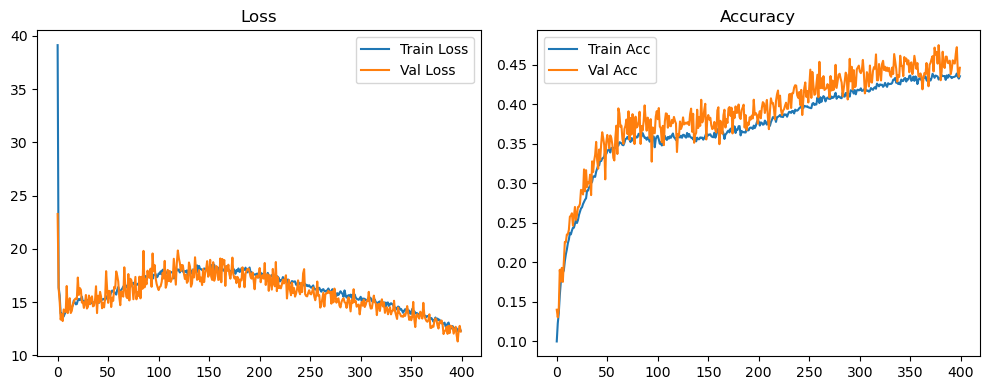

Original Model Final Test Loss: 12.1695 Accuracy: 0.4457


🚀 Running: batch512_lr_max_0.001_min_1e-06_dp0.05


Files already downloaded and verified


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|                                                                                                                                                                        | 0/400 [00:00<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.1157 | Val Acc: 0.1456 | Epoch Time: 1.93 | :   0%|                                                                                                      | 0/400 [01:55<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.1157 | Val Acc: 0.1456 | Epoch Time: 1.93 | :   0%|                                                                                                      | 0/400 [01:55<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.1157 | Val Acc: 0.1456 | Epoch Time: 1.93 | :   0%|▏                                                                                         | 1/400 [01:55<12:50:39, 115.89s/it]

| LR: 0.001000 | Train Acc: 0.1506 | Val Acc: 0.1886 | Epoch Time: 1.92 | :   0%|▏                                                                                         | 1/400 [03:51<12:50:39, 115.89s/it]

| LR: 0.001000 | Train Acc: 0.1506 | Val Acc: 0.1886 | Epoch Time: 1.92 | :   0%|▏                                                                                         | 1/400 [03:51<12:50:39, 115.89s/it]

| LR: 0.001000 | Train Acc: 0.1506 | Val Acc: 0.1886 | Epoch Time: 1.92 | :   0%|▍                                                                                         | 2/400 [03:51<12:47:34, 115.72s/it]

| LR: 0.001000 | Train Acc: 0.1658 | Val Acc: 0.2001 | Epoch Time: 1.92 | :   0%|▍                                                                                         | 2/400 [05:46<12:47:34, 115.72s/it]

| LR: 0.001000 | Train Acc: 0.1658 | Val Acc: 0.2001 | Epoch Time: 1.92 | :   0%|▍                                                                                         | 2/400 [05:46<12:47:34, 115.72s/it]

| LR: 0.001000 | Train Acc: 0.1658 | Val Acc: 0.2001 | Epoch Time: 1.92 | :   1%|▋                                                                                         | 3/400 [05:47<12:45:18, 115.66s/it]

| LR: 0.001000 | Train Acc: 0.1788 | Val Acc: 0.2302 | Epoch Time: 1.92 | :   1%|▋                                                                                         | 3/400 [07:42<12:45:18, 115.66s/it]

| LR: 0.001000 | Train Acc: 0.1788 | Val Acc: 0.2302 | Epoch Time: 1.92 | :   1%|▋                                                                                         | 3/400 [07:42<12:45:18, 115.66s/it]

| LR: 0.001000 | Train Acc: 0.1788 | Val Acc: 0.2302 | Epoch Time: 1.92 | :   1%|▉                                                                                         | 4/400 [07:42<12:43:12, 115.64s/it]

| LR: 0.001000 | Train Acc: 0.1895 | Val Acc: 0.2389 | Epoch Time: 1.92 | :   1%|▉                                                                                         | 4/400 [09:38<12:43:12, 115.64s/it]

| LR: 0.001000 | Train Acc: 0.1895 | Val Acc: 0.2389 | Epoch Time: 1.92 | :   1%|▉                                                                                         | 4/400 [09:38<12:43:12, 115.64s/it]

| LR: 0.001000 | Train Acc: 0.1895 | Val Acc: 0.2389 | Epoch Time: 1.92 | :   1%|█▏                                                                                        | 5/400 [09:38<12:41:11, 115.62s/it]

| LR: 0.001000 | Train Acc: 0.1972 | Val Acc: 0.2420 | Epoch Time: 1.93 | :   1%|█▏                                                                                        | 5/400 [11:33<12:41:11, 115.62s/it]

| LR: 0.001000 | Train Acc: 0.1972 | Val Acc: 0.2420 | Epoch Time: 1.93 | :   1%|█▏                                                                                        | 5/400 [11:33<12:41:11, 115.62s/it]

| LR: 0.001000 | Train Acc: 0.1972 | Val Acc: 0.2420 | Epoch Time: 1.93 | :   2%|█▎                                                                                        | 6/400 [11:33<12:39:14, 115.62s/it]

| LR: 0.000999 | Train Acc: 0.2053 | Val Acc: 0.2155 | Epoch Time: 1.93 | :   2%|█▎                                                                                        | 6/400 [13:29<12:39:14, 115.62s/it]

| LR: 0.000999 | Train Acc: 0.2053 | Val Acc: 0.2155 | Epoch Time: 1.93 | :   2%|█▎                                                                                        | 6/400 [13:29<12:39:14, 115.62s/it]

| LR: 0.000999 | Train Acc: 0.2053 | Val Acc: 0.2155 | Epoch Time: 1.93 | :   2%|█▌                                                                                        | 7/400 [13:29<12:37:19, 115.62s/it]

| LR: 0.000999 | Train Acc: 0.2093 | Val Acc: 0.2358 | Epoch Time: 1.93 | :   2%|█▌                                                                                        | 7/400 [15:25<12:37:19, 115.62s/it]

| LR: 0.000999 | Train Acc: 0.2093 | Val Acc: 0.2358 | Epoch Time: 1.93 | :   2%|█▌                                                                                        | 7/400 [15:25<12:37:19, 115.62s/it]

| LR: 0.000999 | Train Acc: 0.2093 | Val Acc: 0.2358 | Epoch Time: 1.93 | :   2%|█▊                                                                                        | 8/400 [15:25<12:35:23, 115.62s/it]

| LR: 0.000999 | Train Acc: 0.2139 | Val Acc: 0.2440 | Epoch Time: 1.92 | :   2%|█▊                                                                                        | 8/400 [17:20<12:35:23, 115.62s/it]

| LR: 0.000999 | Train Acc: 0.2139 | Val Acc: 0.2440 | Epoch Time: 1.92 | :   2%|█▊                                                                                        | 8/400 [17:20<12:35:23, 115.62s/it]

| LR: 0.000999 | Train Acc: 0.2139 | Val Acc: 0.2440 | Epoch Time: 1.92 | :   2%|██                                                                                        | 9/400 [17:20<12:33:25, 115.61s/it]

| LR: 0.000999 | Train Acc: 0.2178 | Val Acc: 0.1918 | Epoch Time: 1.93 | :   2%|██                                                                                        | 9/400 [19:16<12:33:25, 115.61s/it]

| LR: 0.000999 | Train Acc: 0.2178 | Val Acc: 0.1918 | Epoch Time: 1.93 | :   2%|██                                                                                        | 9/400 [19:16<12:33:25, 115.61s/it]

| LR: 0.000999 | Train Acc: 0.2178 | Val Acc: 0.1918 | Epoch Time: 1.93 | :   2%|██▏                                                                                      | 10/400 [19:16<12:31:43, 115.65s/it]

| LR: 0.000998 | Train Acc: 0.2219 | Val Acc: 0.2480 | Epoch Time: 1.93 | :   2%|██▏                                                                                      | 10/400 [21:12<12:31:43, 115.65s/it]

| LR: 0.000998 | Train Acc: 0.2219 | Val Acc: 0.2480 | Epoch Time: 1.93 | :   2%|██▏                                                                                      | 10/400 [21:12<12:31:43, 115.65s/it]

| LR: 0.000998 | Train Acc: 0.2219 | Val Acc: 0.2480 | Epoch Time: 1.93 | :   3%|██▍                                                                                      | 11/400 [21:12<12:29:53, 115.66s/it]

| LR: 0.000998 | Train Acc: 0.2248 | Val Acc: 0.2272 | Epoch Time: 1.93 | :   3%|██▍                                                                                      | 11/400 [23:07<12:29:53, 115.66s/it]

| LR: 0.000998 | Train Acc: 0.2248 | Val Acc: 0.2272 | Epoch Time: 1.93 | :   3%|██▍                                                                                      | 11/400 [23:07<12:29:53, 115.66s/it]

| LR: 0.000998 | Train Acc: 0.2248 | Val Acc: 0.2272 | Epoch Time: 1.93 | :   3%|██▋                                                                                      | 12/400 [23:07<12:27:56, 115.66s/it]

| LR: 0.000998 | Train Acc: 0.2282 | Val Acc: 0.2463 | Epoch Time: 1.93 | :   3%|██▋                                                                                      | 12/400 [25:03<12:27:56, 115.66s/it]

| LR: 0.000998 | Train Acc: 0.2282 | Val Acc: 0.2463 | Epoch Time: 1.93 | :   3%|██▋                                                                                      | 12/400 [25:03<12:27:56, 115.66s/it]

| LR: 0.000998 | Train Acc: 0.2282 | Val Acc: 0.2463 | Epoch Time: 1.93 | :   3%|██▉                                                                                      | 13/400 [25:03<12:25:56, 115.65s/it]

| LR: 0.000997 | Train Acc: 0.2304 | Val Acc: 0.2534 | Epoch Time: 1.92 | :   3%|██▉                                                                                      | 13/400 [26:58<12:25:56, 115.65s/it]

| LR: 0.000997 | Train Acc: 0.2304 | Val Acc: 0.2534 | Epoch Time: 1.92 | :   3%|██▉                                                                                      | 13/400 [26:58<12:25:56, 115.65s/it]

| LR: 0.000997 | Train Acc: 0.2304 | Val Acc: 0.2534 | Epoch Time: 1.92 | :   4%|███                                                                                      | 14/400 [26:59<12:23:53, 115.63s/it]

| LR: 0.000997 | Train Acc: 0.2373 | Val Acc: 0.2460 | Epoch Time: 1.93 | :   4%|███                                                                                      | 14/400 [28:54<12:23:53, 115.63s/it]

| LR: 0.000997 | Train Acc: 0.2373 | Val Acc: 0.2460 | Epoch Time: 1.93 | :   4%|███                                                                                      | 14/400 [28:54<12:23:53, 115.63s/it]

| LR: 0.000997 | Train Acc: 0.2373 | Val Acc: 0.2460 | Epoch Time: 1.93 | :   4%|███▎                                                                                     | 15/400 [28:54<12:21:57, 115.63s/it]

| LR: 0.000997 | Train Acc: 0.2344 | Val Acc: 0.2527 | Epoch Time: 1.92 | :   4%|███▎                                                                                     | 15/400 [30:50<12:21:57, 115.63s/it]

| LR: 0.000997 | Train Acc: 0.2344 | Val Acc: 0.2527 | Epoch Time: 1.92 | :   4%|███▎                                                                                     | 15/400 [30:50<12:21:57, 115.63s/it]

| LR: 0.000997 | Train Acc: 0.2344 | Val Acc: 0.2527 | Epoch Time: 1.92 | :   4%|███▌                                                                                     | 16/400 [30:50<12:19:59, 115.62s/it]

| LR: 0.000996 | Train Acc: 0.2378 | Val Acc: 0.2329 | Epoch Time: 1.92 | :   4%|███▌                                                                                     | 16/400 [32:45<12:19:59, 115.62s/it]

| LR: 0.000996 | Train Acc: 0.2378 | Val Acc: 0.2329 | Epoch Time: 1.92 | :   4%|███▌                                                                                     | 16/400 [32:45<12:19:59, 115.62s/it]

| LR: 0.000996 | Train Acc: 0.2378 | Val Acc: 0.2329 | Epoch Time: 1.92 | :   4%|███▊                                                                                     | 17/400 [32:45<12:18:01, 115.62s/it]

| LR: 0.000996 | Train Acc: 0.2387 | Val Acc: 0.2780 | Epoch Time: 1.92 | :   4%|███▊                                                                                     | 17/400 [34:41<12:18:01, 115.62s/it]

| LR: 0.000996 | Train Acc: 0.2387 | Val Acc: 0.2780 | Epoch Time: 1.92 | :   4%|███▊                                                                                     | 17/400 [34:41<12:18:01, 115.62s/it]

| LR: 0.000996 | Train Acc: 0.2387 | Val Acc: 0.2780 | Epoch Time: 1.92 | :   4%|████                                                                                     | 18/400 [34:41<12:16:00, 115.60s/it]

| LR: 0.000995 | Train Acc: 0.2440 | Val Acc: 0.2661 | Epoch Time: 1.92 | :   4%|████                                                                                     | 18/400 [36:36<12:16:00, 115.60s/it]

| LR: 0.000995 | Train Acc: 0.2440 | Val Acc: 0.2661 | Epoch Time: 1.92 | :   4%|████                                                                                     | 18/400 [36:36<12:16:00, 115.60s/it]

| LR: 0.000995 | Train Acc: 0.2440 | Val Acc: 0.2661 | Epoch Time: 1.92 | :   5%|████▏                                                                                    | 19/400 [36:37<12:14:02, 115.60s/it]

| LR: 0.000994 | Train Acc: 0.2438 | Val Acc: 0.2706 | Epoch Time: 1.93 | :   5%|████▏                                                                                    | 19/400 [38:32<12:14:02, 115.60s/it]

| LR: 0.000994 | Train Acc: 0.2438 | Val Acc: 0.2706 | Epoch Time: 1.93 | :   5%|████▏                                                                                    | 19/400 [38:32<12:14:02, 115.60s/it]

| LR: 0.000994 | Train Acc: 0.2438 | Val Acc: 0.2706 | Epoch Time: 1.93 | :   5%|████▍                                                                                    | 20/400 [38:32<12:12:11, 115.61s/it]

| LR: 0.000994 | Train Acc: 0.2469 | Val Acc: 0.2568 | Epoch Time: 1.92 | :   5%|████▍                                                                                    | 20/400 [40:28<12:12:11, 115.61s/it]

| LR: 0.000994 | Train Acc: 0.2469 | Val Acc: 0.2568 | Epoch Time: 1.92 | :   5%|████▍                                                                                    | 20/400 [40:28<12:12:11, 115.61s/it]

| LR: 0.000994 | Train Acc: 0.2469 | Val Acc: 0.2568 | Epoch Time: 1.92 | :   5%|████▋                                                                                    | 21/400 [40:28<12:10:12, 115.60s/it]

| LR: 0.000993 | Train Acc: 0.2508 | Val Acc: 0.2725 | Epoch Time: 1.93 | :   5%|████▋                                                                                    | 21/400 [42:23<12:10:12, 115.60s/it]

| LR: 0.000993 | Train Acc: 0.2508 | Val Acc: 0.2725 | Epoch Time: 1.93 | :   5%|████▋                                                                                    | 21/400 [42:23<12:10:12, 115.60s/it]

| LR: 0.000993 | Train Acc: 0.2508 | Val Acc: 0.2725 | Epoch Time: 1.93 | :   6%|████▉                                                                                    | 22/400 [42:23<12:08:19, 115.61s/it]

| LR: 0.000993 | Train Acc: 0.2494 | Val Acc: 0.2786 | Epoch Time: 1.93 | :   6%|████▉                                                                                    | 22/400 [44:19<12:08:19, 115.61s/it]

| LR: 0.000993 | Train Acc: 0.2494 | Val Acc: 0.2786 | Epoch Time: 1.93 | :   6%|████▉                                                                                    | 22/400 [44:19<12:08:19, 115.61s/it]

| LR: 0.000993 | Train Acc: 0.2494 | Val Acc: 0.2786 | Epoch Time: 1.93 | :   6%|█████                                                                                    | 23/400 [44:19<12:06:23, 115.61s/it]

| LR: 0.000992 | Train Acc: 0.2503 | Val Acc: 0.2803 | Epoch Time: 1.92 | :   6%|█████                                                                                    | 23/400 [46:14<12:06:23, 115.61s/it]

| LR: 0.000992 | Train Acc: 0.2503 | Val Acc: 0.2803 | Epoch Time: 1.92 | :   6%|█████                                                                                    | 23/400 [46:14<12:06:23, 115.61s/it]

| LR: 0.000992 | Train Acc: 0.2503 | Val Acc: 0.2803 | Epoch Time: 1.92 | :   6%|█████▎                                                                                   | 24/400 [46:15<12:04:25, 115.60s/it]

| LR: 0.000991 | Train Acc: 0.2571 | Val Acc: 0.2438 | Epoch Time: 1.92 | :   6%|█████▎                                                                                   | 24/400 [48:10<12:04:25, 115.60s/it]

| LR: 0.000991 | Train Acc: 0.2571 | Val Acc: 0.2438 | Epoch Time: 1.92 | :   6%|█████▎                                                                                   | 24/400 [48:10<12:04:25, 115.60s/it]

| LR: 0.000991 | Train Acc: 0.2571 | Val Acc: 0.2438 | Epoch Time: 1.92 | :   6%|█████▌                                                                                   | 25/400 [48:10<12:02:26, 115.59s/it]

| LR: 0.000990 | Train Acc: 0.2562 | Val Acc: 0.2911 | Epoch Time: 1.92 | :   6%|█████▌                                                                                   | 25/400 [50:06<12:02:26, 115.59s/it]

| LR: 0.000990 | Train Acc: 0.2562 | Val Acc: 0.2911 | Epoch Time: 1.92 | :   6%|█████▌                                                                                   | 25/400 [50:06<12:02:26, 115.59s/it]

| LR: 0.000990 | Train Acc: 0.2562 | Val Acc: 0.2911 | Epoch Time: 1.92 | :   6%|█████▊                                                                                   | 26/400 [50:06<12:00:28, 115.58s/it]

| LR: 0.000990 | Train Acc: 0.2630 | Val Acc: 0.2868 | Epoch Time: 1.92 | :   6%|█████▊                                                                                   | 26/400 [52:01<12:00:28, 115.58s/it]

| LR: 0.000990 | Train Acc: 0.2630 | Val Acc: 0.2868 | Epoch Time: 1.92 | :   6%|█████▊                                                                                   | 26/400 [52:01<12:00:28, 115.58s/it]

| LR: 0.000990 | Train Acc: 0.2630 | Val Acc: 0.2868 | Epoch Time: 1.92 | :   7%|██████                                                                                   | 27/400 [52:01<11:58:32, 115.58s/it]

| LR: 0.000989 | Train Acc: 0.2638 | Val Acc: 0.2914 | Epoch Time: 1.92 | :   7%|██████                                                                                   | 27/400 [53:57<11:58:32, 115.58s/it]

| LR: 0.000989 | Train Acc: 0.2638 | Val Acc: 0.2914 | Epoch Time: 1.92 | :   7%|██████                                                                                   | 27/400 [53:57<11:58:32, 115.58s/it]

| LR: 0.000989 | Train Acc: 0.2638 | Val Acc: 0.2914 | Epoch Time: 1.92 | :   7%|██████▏                                                                                  | 28/400 [53:57<11:56:34, 115.58s/it]

| LR: 0.000988 | Train Acc: 0.2660 | Val Acc: 0.3109 | Epoch Time: 1.92 | :   7%|██████▏                                                                                  | 28/400 [55:52<11:56:34, 115.58s/it]

| LR: 0.000988 | Train Acc: 0.2660 | Val Acc: 0.3109 | Epoch Time: 1.92 | :   7%|██████▏                                                                                  | 28/400 [55:52<11:56:34, 115.58s/it]

| LR: 0.000988 | Train Acc: 0.2660 | Val Acc: 0.3109 | Epoch Time: 1.92 | :   7%|██████▍                                                                                  | 29/400 [55:52<11:54:39, 115.58s/it]

| LR: 0.000987 | Train Acc: 0.2698 | Val Acc: 0.2608 | Epoch Time: 1.92 | :   7%|██████▍                                                                                  | 29/400 [57:48<11:54:39, 115.58s/it]

| LR: 0.000987 | Train Acc: 0.2698 | Val Acc: 0.2608 | Epoch Time: 1.92 | :   7%|██████▍                                                                                  | 29/400 [57:48<11:54:39, 115.58s/it]

| LR: 0.000987 | Train Acc: 0.2698 | Val Acc: 0.2608 | Epoch Time: 1.92 | :   8%|██████▋                                                                                  | 30/400 [57:48<11:52:46, 115.59s/it]

| LR: 0.000986 | Train Acc: 0.2714 | Val Acc: 0.2549 | Epoch Time: 1.92 | :   8%|██████▋                                                                                  | 30/400 [59:43<11:52:46, 115.59s/it]

| LR: 0.000986 | Train Acc: 0.2714 | Val Acc: 0.2549 | Epoch Time: 1.92 | :   8%|██████▋                                                                                  | 30/400 [59:43<11:52:46, 115.59s/it]

| LR: 0.000986 | Train Acc: 0.2714 | Val Acc: 0.2549 | Epoch Time: 1.92 | :   8%|██████▉                                                                                  | 31/400 [59:44<11:50:48, 115.58s/it]

| LR: 0.000985 | Train Acc: 0.2713 | Val Acc: 0.3006 | Epoch Time: 1.92 | :   8%|██████▋                                                                                | 31/400 [1:01:39<11:50:48, 115.58s/it]

| LR: 0.000985 | Train Acc: 0.2713 | Val Acc: 0.3006 | Epoch Time: 1.92 | :   8%|██████▋                                                                                | 31/400 [1:01:39<11:50:48, 115.58s/it]

| LR: 0.000985 | Train Acc: 0.2713 | Val Acc: 0.3006 | Epoch Time: 1.92 | :   8%|██████▉                                                                                | 32/400 [1:01:39<11:48:47, 115.56s/it]

| LR: 0.000984 | Train Acc: 0.2723 | Val Acc: 0.3214 | Epoch Time: 1.92 | :   8%|██████▉                                                                                | 32/400 [1:03:35<11:48:47, 115.56s/it]

| LR: 0.000984 | Train Acc: 0.2723 | Val Acc: 0.3214 | Epoch Time: 1.92 | :   8%|██████▉                                                                                | 32/400 [1:03:35<11:48:47, 115.56s/it]

| LR: 0.000984 | Train Acc: 0.2723 | Val Acc: 0.3214 | Epoch Time: 1.92 | :   8%|███████▏                                                                               | 33/400 [1:03:35<11:46:50, 115.56s/it]

| LR: 0.000983 | Train Acc: 0.2743 | Val Acc: 0.3081 | Epoch Time: 1.92 | :   8%|███████▏                                                                               | 33/400 [1:05:30<11:46:50, 115.56s/it]

| LR: 0.000983 | Train Acc: 0.2743 | Val Acc: 0.3081 | Epoch Time: 1.92 | :   8%|███████▏                                                                               | 33/400 [1:05:30<11:46:50, 115.56s/it]

| LR: 0.000983 | Train Acc: 0.2743 | Val Acc: 0.3081 | Epoch Time: 1.92 | :   8%|███████▍                                                                               | 34/400 [1:05:30<11:44:55, 115.56s/it]

| LR: 0.000982 | Train Acc: 0.2813 | Val Acc: 0.2829 | Epoch Time: 1.92 | :   8%|███████▍                                                                               | 34/400 [1:07:26<11:44:55, 115.56s/it]

| LR: 0.000982 | Train Acc: 0.2813 | Val Acc: 0.2829 | Epoch Time: 1.92 | :   8%|███████▍                                                                               | 34/400 [1:07:26<11:44:55, 115.56s/it]

| LR: 0.000982 | Train Acc: 0.2813 | Val Acc: 0.2829 | Epoch Time: 1.92 | :   9%|███████▌                                                                               | 35/400 [1:07:26<11:43:00, 115.56s/it]

| LR: 0.000981 | Train Acc: 0.2737 | Val Acc: 0.2892 | Epoch Time: 1.92 | :   9%|███████▌                                                                               | 35/400 [1:09:21<11:43:00, 115.56s/it]

| LR: 0.000981 | Train Acc: 0.2737 | Val Acc: 0.2892 | Epoch Time: 1.92 | :   9%|███████▌                                                                               | 35/400 [1:09:21<11:43:00, 115.56s/it]

| LR: 0.000981 | Train Acc: 0.2737 | Val Acc: 0.2892 | Epoch Time: 1.92 | :   9%|███████▊                                                                               | 36/400 [1:09:21<11:41:07, 115.57s/it]

| LR: 0.000980 | Train Acc: 0.2763 | Val Acc: 0.2967 | Epoch Time: 1.92 | :   9%|███████▊                                                                               | 36/400 [1:11:17<11:41:07, 115.57s/it]

| LR: 0.000980 | Train Acc: 0.2763 | Val Acc: 0.2967 | Epoch Time: 1.92 | :   9%|███████▊                                                                               | 36/400 [1:11:17<11:41:07, 115.57s/it]

| LR: 0.000980 | Train Acc: 0.2763 | Val Acc: 0.2967 | Epoch Time: 1.92 | :   9%|████████                                                                               | 37/400 [1:11:17<11:39:14, 115.58s/it]

| LR: 0.000979 | Train Acc: 0.2785 | Val Acc: 0.3062 | Epoch Time: 1.92 | :   9%|████████                                                                               | 37/400 [1:13:12<11:39:14, 115.58s/it]

| LR: 0.000979 | Train Acc: 0.2785 | Val Acc: 0.3062 | Epoch Time: 1.92 | :   9%|████████                                                                               | 37/400 [1:13:12<11:39:14, 115.58s/it]

| LR: 0.000979 | Train Acc: 0.2785 | Val Acc: 0.3062 | Epoch Time: 1.92 | :  10%|████████▎                                                                              | 38/400 [1:13:13<11:37:16, 115.57s/it]

| LR: 0.000978 | Train Acc: 0.2792 | Val Acc: 0.3051 | Epoch Time: 1.92 | :  10%|████████▎                                                                              | 38/400 [1:15:08<11:37:16, 115.57s/it]

| LR: 0.000978 | Train Acc: 0.2792 | Val Acc: 0.3051 | Epoch Time: 1.92 | :  10%|████████▎                                                                              | 38/400 [1:15:08<11:37:16, 115.57s/it]

| LR: 0.000978 | Train Acc: 0.2792 | Val Acc: 0.3051 | Epoch Time: 1.92 | :  10%|████████▍                                                                              | 39/400 [1:15:08<11:35:21, 115.57s/it]

| LR: 0.000977 | Train Acc: 0.2810 | Val Acc: 0.2968 | Epoch Time: 1.92 | :  10%|████████▍                                                                              | 39/400 [1:17:04<11:35:21, 115.57s/it]

| LR: 0.000977 | Train Acc: 0.2810 | Val Acc: 0.2968 | Epoch Time: 1.92 | :  10%|████████▍                                                                              | 39/400 [1:17:04<11:35:21, 115.57s/it]

| LR: 0.000977 | Train Acc: 0.2810 | Val Acc: 0.2968 | Epoch Time: 1.92 | :  10%|████████▋                                                                              | 40/400 [1:17:04<11:33:24, 115.57s/it]

| LR: 0.000976 | Train Acc: 0.2790 | Val Acc: 0.3052 | Epoch Time: 1.92 | :  10%|████████▋                                                                              | 40/400 [1:18:59<11:33:24, 115.57s/it]

| LR: 0.000976 | Train Acc: 0.2790 | Val Acc: 0.3052 | Epoch Time: 1.92 | :  10%|████████▋                                                                              | 40/400 [1:18:59<11:33:24, 115.57s/it]

| LR: 0.000976 | Train Acc: 0.2790 | Val Acc: 0.3052 | Epoch Time: 1.92 | :  10%|████████▉                                                                              | 41/400 [1:18:59<11:31:25, 115.56s/it]

| LR: 0.000974 | Train Acc: 0.2883 | Val Acc: 0.2968 | Epoch Time: 1.92 | :  10%|████████▉                                                                              | 41/400 [1:20:55<11:31:25, 115.56s/it]

| LR: 0.000974 | Train Acc: 0.2883 | Val Acc: 0.2968 | Epoch Time: 1.92 | :  10%|████████▉                                                                              | 41/400 [1:20:55<11:31:25, 115.56s/it]

| LR: 0.000974 | Train Acc: 0.2883 | Val Acc: 0.2968 | Epoch Time: 1.92 | :  10%|█████████▏                                                                             | 42/400 [1:20:55<11:29:30, 115.56s/it]

| LR: 0.000973 | Train Acc: 0.2848 | Val Acc: 0.3123 | Epoch Time: 1.92 | :  10%|█████████▏                                                                             | 42/400 [1:22:50<11:29:30, 115.56s/it]

| LR: 0.000973 | Train Acc: 0.2848 | Val Acc: 0.3123 | Epoch Time: 1.92 | :  10%|█████████▏                                                                             | 42/400 [1:22:50<11:29:30, 115.56s/it]

| LR: 0.000973 | Train Acc: 0.2848 | Val Acc: 0.3123 | Epoch Time: 1.92 | :  11%|█████████▎                                                                             | 43/400 [1:22:50<11:27:35, 115.56s/it]

| LR: 0.000972 | Train Acc: 0.2892 | Val Acc: 0.2906 | Epoch Time: 1.92 | :  11%|█████████▎                                                                             | 43/400 [1:24:46<11:27:35, 115.56s/it]

| LR: 0.000972 | Train Acc: 0.2892 | Val Acc: 0.2906 | Epoch Time: 1.92 | :  11%|█████████▎                                                                             | 43/400 [1:24:46<11:27:35, 115.56s/it]

| LR: 0.000972 | Train Acc: 0.2892 | Val Acc: 0.2906 | Epoch Time: 1.92 | :  11%|█████████▌                                                                             | 44/400 [1:24:46<11:25:36, 115.55s/it]

| LR: 0.000970 | Train Acc: 0.2880 | Val Acc: 0.3041 | Epoch Time: 1.92 | :  11%|█████████▌                                                                             | 44/400 [1:26:41<11:25:36, 115.55s/it]

| LR: 0.000970 | Train Acc: 0.2880 | Val Acc: 0.3041 | Epoch Time: 1.92 | :  11%|█████████▌                                                                             | 44/400 [1:26:41<11:25:36, 115.55s/it]

| LR: 0.000970 | Train Acc: 0.2880 | Val Acc: 0.3041 | Epoch Time: 1.92 | :  11%|█████████▊                                                                             | 45/400 [1:26:41<11:23:41, 115.55s/it]

| LR: 0.000969 | Train Acc: 0.2898 | Val Acc: 0.3107 | Epoch Time: 1.92 | :  11%|█████████▊                                                                             | 45/400 [1:28:37<11:23:41, 115.55s/it]

| LR: 0.000969 | Train Acc: 0.2898 | Val Acc: 0.3107 | Epoch Time: 1.92 | :  11%|█████████▊                                                                             | 45/400 [1:28:37<11:23:41, 115.55s/it]

| LR: 0.000969 | Train Acc: 0.2898 | Val Acc: 0.3107 | Epoch Time: 1.92 | :  12%|██████████                                                                             | 46/400 [1:28:37<11:21:46, 115.56s/it]

| LR: 0.000968 | Train Acc: 0.2927 | Val Acc: 0.3114 | Epoch Time: 1.92 | :  12%|██████████                                                                             | 46/400 [1:30:32<11:21:46, 115.56s/it]

| LR: 0.000968 | Train Acc: 0.2927 | Val Acc: 0.3114 | Epoch Time: 1.92 | :  12%|██████████                                                                             | 46/400 [1:30:32<11:21:46, 115.56s/it]

| LR: 0.000968 | Train Acc: 0.2927 | Val Acc: 0.3114 | Epoch Time: 1.92 | :  12%|██████████▏                                                                            | 47/400 [1:30:33<11:19:49, 115.55s/it]

| LR: 0.000966 | Train Acc: 0.2910 | Val Acc: 0.3204 | Epoch Time: 1.92 | :  12%|██████████▏                                                                            | 47/400 [1:32:28<11:19:49, 115.55s/it]

| LR: 0.000966 | Train Acc: 0.2910 | Val Acc: 0.3204 | Epoch Time: 1.92 | :  12%|██████████▏                                                                            | 47/400 [1:32:28<11:19:49, 115.55s/it]

| LR: 0.000966 | Train Acc: 0.2910 | Val Acc: 0.3204 | Epoch Time: 1.92 | :  12%|██████████▍                                                                            | 48/400 [1:32:28<11:17:56, 115.56s/it]

| LR: 0.000965 | Train Acc: 0.2915 | Val Acc: 0.3183 | Epoch Time: 1.92 | :  12%|██████████▍                                                                            | 48/400 [1:34:24<11:17:56, 115.56s/it]

| LR: 0.000965 | Train Acc: 0.2915 | Val Acc: 0.3183 | Epoch Time: 1.92 | :  12%|██████████▍                                                                            | 48/400 [1:34:24<11:17:56, 115.56s/it]

| LR: 0.000965 | Train Acc: 0.2915 | Val Acc: 0.3183 | Epoch Time: 1.92 | :  12%|██████████▋                                                                            | 49/400 [1:34:24<11:16:04, 115.57s/it]

| LR: 0.000963 | Train Acc: 0.2964 | Val Acc: 0.3269 | Epoch Time: 1.93 | :  12%|██████████▋                                                                            | 49/400 [1:36:19<11:16:04, 115.57s/it]

| LR: 0.000963 | Train Acc: 0.2964 | Val Acc: 0.3269 | Epoch Time: 1.93 | :  12%|██████████▋                                                                            | 49/400 [1:36:19<11:16:04, 115.57s/it]

| LR: 0.000963 | Train Acc: 0.2964 | Val Acc: 0.3269 | Epoch Time: 1.93 | :  12%|██████████▉                                                                            | 50/400 [1:36:19<11:14:14, 115.59s/it]

| LR: 0.000962 | Train Acc: 0.2914 | Val Acc: 0.2921 | Epoch Time: 1.92 | :  12%|██████████▉                                                                            | 50/400 [1:38:15<11:14:14, 115.59s/it]

| LR: 0.000962 | Train Acc: 0.2914 | Val Acc: 0.2921 | Epoch Time: 1.92 | :  12%|██████████▉                                                                            | 50/400 [1:38:15<11:14:14, 115.59s/it]

| LR: 0.000962 | Train Acc: 0.2914 | Val Acc: 0.2921 | Epoch Time: 1.92 | :  13%|███████████                                                                            | 51/400 [1:38:15<11:12:20, 115.59s/it]

| LR: 0.000960 | Train Acc: 0.2926 | Val Acc: 0.3212 | Epoch Time: 1.92 | :  13%|███████████                                                                            | 51/400 [1:40:10<11:12:20, 115.59s/it]

| LR: 0.000960 | Train Acc: 0.2926 | Val Acc: 0.3212 | Epoch Time: 1.92 | :  13%|███████████                                                                            | 51/400 [1:40:10<11:12:20, 115.59s/it]

| LR: 0.000960 | Train Acc: 0.2926 | Val Acc: 0.3212 | Epoch Time: 1.92 | :  13%|███████████▎                                                                           | 52/400 [1:40:10<11:10:23, 115.58s/it]

| LR: 0.000959 | Train Acc: 0.2955 | Val Acc: 0.3109 | Epoch Time: 1.92 | :  13%|███████████▎                                                                           | 52/400 [1:42:06<11:10:23, 115.58s/it]

| LR: 0.000959 | Train Acc: 0.2955 | Val Acc: 0.3109 | Epoch Time: 1.92 | :  13%|███████████▎                                                                           | 52/400 [1:42:06<11:10:23, 115.58s/it]

| LR: 0.000959 | Train Acc: 0.2955 | Val Acc: 0.3109 | Epoch Time: 1.92 | :  13%|███████████▌                                                                           | 53/400 [1:42:06<11:08:27, 115.58s/it]

| LR: 0.000957 | Train Acc: 0.2939 | Val Acc: 0.3096 | Epoch Time: 1.92 | :  13%|███████████▌                                                                           | 53/400 [1:44:02<11:08:27, 115.58s/it]

| LR: 0.000957 | Train Acc: 0.2939 | Val Acc: 0.3096 | Epoch Time: 1.92 | :  13%|███████████▌                                                                           | 53/400 [1:44:02<11:08:27, 115.58s/it]

| LR: 0.000957 | Train Acc: 0.2939 | Val Acc: 0.3096 | Epoch Time: 1.92 | :  14%|███████████▋                                                                           | 54/400 [1:44:02<11:06:30, 115.58s/it]

| LR: 0.000956 | Train Acc: 0.3000 | Val Acc: 0.3288 | Epoch Time: 1.92 | :  14%|███████████▋                                                                           | 54/400 [1:45:57<11:06:30, 115.58s/it]

| LR: 0.000956 | Train Acc: 0.3000 | Val Acc: 0.3288 | Epoch Time: 1.92 | :  14%|███████████▋                                                                           | 54/400 [1:45:57<11:06:30, 115.58s/it]

| LR: 0.000956 | Train Acc: 0.3000 | Val Acc: 0.3288 | Epoch Time: 1.92 | :  14%|███████████▉                                                                           | 55/400 [1:45:57<11:04:37, 115.59s/it]

| LR: 0.000954 | Train Acc: 0.2983 | Val Acc: 0.3391 | Epoch Time: 1.92 | :  14%|███████████▉                                                                           | 55/400 [1:47:53<11:04:37, 115.59s/it]

| LR: 0.000954 | Train Acc: 0.2983 | Val Acc: 0.3391 | Epoch Time: 1.92 | :  14%|███████████▉                                                                           | 55/400 [1:47:53<11:04:37, 115.59s/it]

| LR: 0.000954 | Train Acc: 0.2983 | Val Acc: 0.3391 | Epoch Time: 1.92 | :  14%|████████████▏                                                                          | 56/400 [1:47:53<11:02:40, 115.58s/it]

| LR: 0.000952 | Train Acc: 0.2962 | Val Acc: 0.3189 | Epoch Time: 1.92 | :  14%|████████████▏                                                                          | 56/400 [1:49:48<11:02:40, 115.58s/it]

| LR: 0.000952 | Train Acc: 0.2962 | Val Acc: 0.3189 | Epoch Time: 1.92 | :  14%|████████████▏                                                                          | 56/400 [1:49:48<11:02:40, 115.58s/it]

| LR: 0.000952 | Train Acc: 0.2962 | Val Acc: 0.3189 | Epoch Time: 1.92 | :  14%|████████████▍                                                                          | 57/400 [1:49:48<11:00:44, 115.58s/it]

| LR: 0.000951 | Train Acc: 0.3030 | Val Acc: 0.3203 | Epoch Time: 1.92 | :  14%|████████████▍                                                                          | 57/400 [1:51:44<11:00:44, 115.58s/it]

| LR: 0.000951 | Train Acc: 0.3030 | Val Acc: 0.3203 | Epoch Time: 1.92 | :  14%|████████████▍                                                                          | 57/400 [1:51:44<11:00:44, 115.58s/it]

| LR: 0.000951 | Train Acc: 0.3030 | Val Acc: 0.3203 | Epoch Time: 1.92 | :  14%|████████████▌                                                                          | 58/400 [1:51:44<10:58:47, 115.58s/it]

| LR: 0.000949 | Train Acc: 0.3006 | Val Acc: 0.3394 | Epoch Time: 1.92 | :  14%|████████████▌                                                                          | 58/400 [1:53:39<10:58:47, 115.58s/it]

| LR: 0.000949 | Train Acc: 0.3006 | Val Acc: 0.3394 | Epoch Time: 1.92 | :  14%|████████████▌                                                                          | 58/400 [1:53:39<10:58:47, 115.58s/it]

| LR: 0.000949 | Train Acc: 0.3006 | Val Acc: 0.3394 | Epoch Time: 1.92 | :  15%|████████████▊                                                                          | 59/400 [1:53:40<10:56:51, 115.58s/it]

| LR: 0.000947 | Train Acc: 0.3014 | Val Acc: 0.3139 | Epoch Time: 1.93 | :  15%|████████████▊                                                                          | 59/400 [1:55:35<10:56:51, 115.58s/it]

| LR: 0.000947 | Train Acc: 0.3014 | Val Acc: 0.3139 | Epoch Time: 1.93 | :  15%|████████████▊                                                                          | 59/400 [1:55:35<10:56:51, 115.58s/it]

| LR: 0.000947 | Train Acc: 0.3014 | Val Acc: 0.3139 | Epoch Time: 1.93 | :  15%|█████████████                                                                          | 60/400 [1:55:35<10:55:00, 115.59s/it]

| LR: 0.000946 | Train Acc: 0.3025 | Val Acc: 0.3278 | Epoch Time: 1.92 | :  15%|█████████████                                                                          | 60/400 [1:57:31<10:55:00, 115.59s/it]

| LR: 0.000946 | Train Acc: 0.3025 | Val Acc: 0.3278 | Epoch Time: 1.92 | :  15%|█████████████                                                                          | 60/400 [1:57:31<10:55:00, 115.59s/it]

| LR: 0.000946 | Train Acc: 0.3025 | Val Acc: 0.3278 | Epoch Time: 1.92 | :  15%|█████████████▎                                                                         | 61/400 [1:57:31<10:53:04, 115.59s/it]

| LR: 0.000944 | Train Acc: 0.2987 | Val Acc: 0.3292 | Epoch Time: 1.92 | :  15%|█████████████▎                                                                         | 61/400 [1:59:26<10:53:04, 115.59s/it]

| LR: 0.000944 | Train Acc: 0.2987 | Val Acc: 0.3292 | Epoch Time: 1.92 | :  15%|█████████████▎                                                                         | 61/400 [1:59:26<10:53:04, 115.59s/it]

| LR: 0.000944 | Train Acc: 0.2987 | Val Acc: 0.3292 | Epoch Time: 1.92 | :  16%|█████████████▍                                                                         | 62/400 [1:59:26<10:51:10, 115.59s/it]

| LR: 0.000942 | Train Acc: 0.2992 | Val Acc: 0.3241 | Epoch Time: 1.92 | :  16%|█████████████▍                                                                         | 62/400 [2:01:22<10:51:10, 115.59s/it]

| LR: 0.000942 | Train Acc: 0.2992 | Val Acc: 0.3241 | Epoch Time: 1.92 | :  16%|█████████████▍                                                                         | 62/400 [2:01:22<10:51:10, 115.59s/it]

| LR: 0.000942 | Train Acc: 0.2992 | Val Acc: 0.3241 | Epoch Time: 1.92 | :  16%|█████████████▋                                                                         | 63/400 [2:01:22<10:49:14, 115.59s/it]

| LR: 0.000940 | Train Acc: 0.3040 | Val Acc: 0.3421 | Epoch Time: 1.92 | :  16%|█████████████▋                                                                         | 63/400 [2:03:17<10:49:14, 115.59s/it]

| LR: 0.000940 | Train Acc: 0.3040 | Val Acc: 0.3421 | Epoch Time: 1.92 | :  16%|█████████████▋                                                                         | 63/400 [2:03:17<10:49:14, 115.59s/it]

| LR: 0.000940 | Train Acc: 0.3040 | Val Acc: 0.3421 | Epoch Time: 1.92 | :  16%|█████████████▉                                                                         | 64/400 [2:03:18<10:47:17, 115.59s/it]

| LR: 0.000938 | Train Acc: 0.3029 | Val Acc: 0.3036 | Epoch Time: 1.93 | :  16%|█████████████▉                                                                         | 64/400 [2:05:13<10:47:17, 115.59s/it]

| LR: 0.000938 | Train Acc: 0.3029 | Val Acc: 0.3036 | Epoch Time: 1.93 | :  16%|█████████████▉                                                                         | 64/400 [2:05:13<10:47:17, 115.59s/it]

| LR: 0.000938 | Train Acc: 0.3029 | Val Acc: 0.3036 | Epoch Time: 1.93 | :  16%|██████████████▏                                                                        | 65/400 [2:05:13<10:45:31, 115.62s/it]

| LR: 0.000936 | Train Acc: 0.2999 | Val Acc: 0.3309 | Epoch Time: 1.92 | :  16%|██████████████▏                                                                        | 65/400 [2:07:09<10:45:31, 115.62s/it]

| LR: 0.000936 | Train Acc: 0.2999 | Val Acc: 0.3309 | Epoch Time: 1.92 | :  16%|██████████████▏                                                                        | 65/400 [2:07:09<10:45:31, 115.62s/it]

| LR: 0.000936 | Train Acc: 0.2999 | Val Acc: 0.3309 | Epoch Time: 1.92 | :  16%|██████████████▎                                                                        | 66/400 [2:07:09<10:43:32, 115.61s/it]

| LR: 0.000934 | Train Acc: 0.3011 | Val Acc: 0.3189 | Epoch Time: 1.92 | :  16%|██████████████▎                                                                        | 66/400 [2:09:04<10:43:32, 115.61s/it]

| LR: 0.000934 | Train Acc: 0.3011 | Val Acc: 0.3189 | Epoch Time: 1.92 | :  16%|██████████████▎                                                                        | 66/400 [2:09:04<10:43:32, 115.61s/it]

| LR: 0.000934 | Train Acc: 0.3011 | Val Acc: 0.3189 | Epoch Time: 1.92 | :  17%|██████████████▌                                                                        | 67/400 [2:09:04<10:41:34, 115.60s/it]

| LR: 0.000932 | Train Acc: 0.3065 | Val Acc: 0.3423 | Epoch Time: 1.92 | :  17%|██████████████▌                                                                        | 67/400 [2:11:00<10:41:34, 115.60s/it]

| LR: 0.000932 | Train Acc: 0.3065 | Val Acc: 0.3423 | Epoch Time: 1.92 | :  17%|██████████████▌                                                                        | 67/400 [2:11:00<10:41:34, 115.60s/it]

| LR: 0.000932 | Train Acc: 0.3065 | Val Acc: 0.3423 | Epoch Time: 1.92 | :  17%|██████████████▊                                                                        | 68/400 [2:11:00<10:39:37, 115.59s/it]

| LR: 0.000930 | Train Acc: 0.3040 | Val Acc: 0.3371 | Epoch Time: 1.92 | :  17%|██████████████▊                                                                        | 68/400 [2:12:55<10:39:37, 115.59s/it]

| LR: 0.000930 | Train Acc: 0.3040 | Val Acc: 0.3371 | Epoch Time: 1.92 | :  17%|██████████████▊                                                                        | 68/400 [2:12:55<10:39:37, 115.59s/it]

| LR: 0.000930 | Train Acc: 0.3040 | Val Acc: 0.3371 | Epoch Time: 1.92 | :  17%|███████████████                                                                        | 69/400 [2:12:56<10:37:38, 115.58s/it]

| LR: 0.000928 | Train Acc: 0.3030 | Val Acc: 0.3265 | Epoch Time: 1.92 | :  17%|███████████████                                                                        | 69/400 [2:14:51<10:37:38, 115.58s/it]

| LR: 0.000928 | Train Acc: 0.3030 | Val Acc: 0.3265 | Epoch Time: 1.92 | :  17%|███████████████                                                                        | 69/400 [2:14:51<10:37:38, 115.58s/it]

| LR: 0.000928 | Train Acc: 0.3030 | Val Acc: 0.3265 | Epoch Time: 1.92 | :  18%|███████████████▏                                                                       | 70/400 [2:14:51<10:35:41, 115.58s/it]

| LR: 0.000926 | Train Acc: 0.3045 | Val Acc: 0.3369 | Epoch Time: 1.92 | :  18%|███████████████▏                                                                       | 70/400 [2:16:47<10:35:41, 115.58s/it]

| LR: 0.000926 | Train Acc: 0.3045 | Val Acc: 0.3369 | Epoch Time: 1.92 | :  18%|███████████████▏                                                                       | 70/400 [2:16:47<10:35:41, 115.58s/it]

| LR: 0.000926 | Train Acc: 0.3045 | Val Acc: 0.3369 | Epoch Time: 1.92 | :  18%|███████████████▍                                                                       | 71/400 [2:16:47<10:33:45, 115.58s/it]

| LR: 0.000924 | Train Acc: 0.3054 | Val Acc: 0.3329 | Epoch Time: 1.92 | :  18%|███████████████▍                                                                       | 71/400 [2:18:42<10:33:45, 115.58s/it]

| LR: 0.000924 | Train Acc: 0.3054 | Val Acc: 0.3329 | Epoch Time: 1.92 | :  18%|███████████████▍                                                                       | 71/400 [2:18:42<10:33:45, 115.58s/it]

| LR: 0.000924 | Train Acc: 0.3054 | Val Acc: 0.3329 | Epoch Time: 1.92 | :  18%|███████████████▋                                                                       | 72/400 [2:18:42<10:31:49, 115.58s/it]

| LR: 0.000922 | Train Acc: 0.3054 | Val Acc: 0.3147 | Epoch Time: 1.92 | :  18%|███████████████▋                                                                       | 72/400 [2:20:38<10:31:49, 115.58s/it]

| LR: 0.000922 | Train Acc: 0.3054 | Val Acc: 0.3147 | Epoch Time: 1.92 | :  18%|███████████████▋                                                                       | 72/400 [2:20:38<10:31:49, 115.58s/it]

| LR: 0.000922 | Train Acc: 0.3054 | Val Acc: 0.3147 | Epoch Time: 1.92 | :  18%|███████████████▉                                                                       | 73/400 [2:20:38<10:29:54, 115.58s/it]

| LR: 0.000920 | Train Acc: 0.3062 | Val Acc: 0.2997 | Epoch Time: 1.92 | :  18%|███████████████▉                                                                       | 73/400 [2:22:33<10:29:54, 115.58s/it]

| LR: 0.000920 | Train Acc: 0.3062 | Val Acc: 0.2997 | Epoch Time: 1.92 | :  18%|███████████████▉                                                                       | 73/400 [2:22:33<10:29:54, 115.58s/it]

| LR: 0.000920 | Train Acc: 0.3062 | Val Acc: 0.2997 | Epoch Time: 1.92 | :  18%|████████████████                                                                       | 74/400 [2:22:33<10:27:59, 115.58s/it]

| LR: 0.000918 | Train Acc: 0.3070 | Val Acc: 0.3373 | Epoch Time: 1.92 | :  18%|████████████████                                                                       | 74/400 [2:24:29<10:27:59, 115.58s/it]

| LR: 0.000918 | Train Acc: 0.3070 | Val Acc: 0.3373 | Epoch Time: 1.92 | :  18%|████████████████                                                                       | 74/400 [2:24:29<10:27:59, 115.58s/it]

| LR: 0.000918 | Train Acc: 0.3070 | Val Acc: 0.3373 | Epoch Time: 1.92 | :  19%|████████████████▎                                                                      | 75/400 [2:24:29<10:26:05, 115.59s/it]

| LR: 0.000916 | Train Acc: 0.3042 | Val Acc: 0.3381 | Epoch Time: 1.93 | :  19%|████████████████▎                                                                      | 75/400 [2:26:25<10:26:05, 115.59s/it]

| LR: 0.000916 | Train Acc: 0.3042 | Val Acc: 0.3381 | Epoch Time: 1.93 | :  19%|████████████████▎                                                                      | 75/400 [2:26:25<10:26:05, 115.59s/it]

| LR: 0.000916 | Train Acc: 0.3042 | Val Acc: 0.3381 | Epoch Time: 1.93 | :  19%|████████████████▌                                                                      | 76/400 [2:26:25<10:24:10, 115.59s/it]

| LR: 0.000914 | Train Acc: 0.3070 | Val Acc: 0.3138 | Epoch Time: 1.92 | :  19%|████████████████▌                                                                      | 76/400 [2:28:20<10:24:10, 115.59s/it]

| LR: 0.000914 | Train Acc: 0.3070 | Val Acc: 0.3138 | Epoch Time: 1.92 | :  19%|████████████████▌                                                                      | 76/400 [2:28:20<10:24:10, 115.59s/it]

| LR: 0.000914 | Train Acc: 0.3070 | Val Acc: 0.3138 | Epoch Time: 1.92 | :  19%|████████████████▋                                                                      | 77/400 [2:28:20<10:22:14, 115.59s/it]

| LR: 0.000911 | Train Acc: 0.3043 | Val Acc: 0.3313 | Epoch Time: 1.92 | :  19%|████████████████▋                                                                      | 77/400 [2:30:16<10:22:14, 115.59s/it]

| LR: 0.000911 | Train Acc: 0.3043 | Val Acc: 0.3313 | Epoch Time: 1.92 | :  19%|████████████████▋                                                                      | 77/400 [2:30:16<10:22:14, 115.59s/it]

| LR: 0.000911 | Train Acc: 0.3043 | Val Acc: 0.3313 | Epoch Time: 1.92 | :  20%|████████████████▉                                                                      | 78/400 [2:30:16<10:20:19, 115.59s/it]

| LR: 0.000909 | Train Acc: 0.3085 | Val Acc: 0.3259 | Epoch Time: 1.93 | :  20%|████████████████▉                                                                      | 78/400 [2:32:11<10:20:19, 115.59s/it]

| LR: 0.000909 | Train Acc: 0.3085 | Val Acc: 0.3259 | Epoch Time: 1.93 | :  20%|████████████████▉                                                                      | 78/400 [2:32:11<10:20:19, 115.59s/it]

| LR: 0.000909 | Train Acc: 0.3085 | Val Acc: 0.3259 | Epoch Time: 1.93 | :  20%|█████████████████▏                                                                     | 79/400 [2:32:11<10:18:29, 115.61s/it]

| LR: 0.000907 | Train Acc: 0.3045 | Val Acc: 0.3342 | Epoch Time: 1.93 | :  20%|█████████████████▏                                                                     | 79/400 [2:34:07<10:18:29, 115.61s/it]

| LR: 0.000907 | Train Acc: 0.3045 | Val Acc: 0.3342 | Epoch Time: 1.93 | :  20%|█████████████████▏                                                                     | 79/400 [2:34:07<10:18:29, 115.61s/it]

| LR: 0.000907 | Train Acc: 0.3045 | Val Acc: 0.3342 | Epoch Time: 1.93 | :  20%|█████████████████▍                                                                     | 80/400 [2:34:07<10:16:41, 115.63s/it]

| LR: 0.000905 | Train Acc: 0.3086 | Val Acc: 0.3192 | Epoch Time: 1.92 | :  20%|█████████████████▍                                                                     | 80/400 [2:36:03<10:16:41, 115.63s/it]

| LR: 0.000905 | Train Acc: 0.3086 | Val Acc: 0.3192 | Epoch Time: 1.92 | :  20%|█████████████████▍                                                                     | 80/400 [2:36:03<10:16:41, 115.63s/it]

| LR: 0.000905 | Train Acc: 0.3086 | Val Acc: 0.3192 | Epoch Time: 1.92 | :  20%|█████████████████▌                                                                     | 81/400 [2:36:03<10:14:42, 115.62s/it]

| LR: 0.000902 | Train Acc: 0.3125 | Val Acc: 0.3338 | Epoch Time: 1.92 | :  20%|█████████████████▌                                                                     | 81/400 [2:37:58<10:14:42, 115.62s/it]

| LR: 0.000902 | Train Acc: 0.3125 | Val Acc: 0.3338 | Epoch Time: 1.92 | :  20%|█████████████████▌                                                                     | 81/400 [2:37:58<10:14:42, 115.62s/it]

| LR: 0.000902 | Train Acc: 0.3125 | Val Acc: 0.3338 | Epoch Time: 1.92 | :  20%|█████████████████▊                                                                     | 82/400 [2:37:58<10:12:45, 115.62s/it]

| LR: 0.000900 | Train Acc: 0.3029 | Val Acc: 0.3340 | Epoch Time: 1.93 | :  20%|█████████████████▊                                                                     | 82/400 [2:39:54<10:12:45, 115.62s/it]

| LR: 0.000900 | Train Acc: 0.3029 | Val Acc: 0.3340 | Epoch Time: 1.93 | :  20%|█████████████████▊                                                                     | 82/400 [2:39:54<10:12:45, 115.62s/it]

| LR: 0.000900 | Train Acc: 0.3029 | Val Acc: 0.3340 | Epoch Time: 1.93 | :  21%|██████████████████                                                                     | 83/400 [2:39:54<10:10:49, 115.61s/it]

| LR: 0.000898 | Train Acc: 0.3030 | Val Acc: 0.3135 | Epoch Time: 1.92 | :  21%|██████████████████                                                                     | 83/400 [2:41:49<10:10:49, 115.61s/it]

| LR: 0.000898 | Train Acc: 0.3030 | Val Acc: 0.3135 | Epoch Time: 1.92 | :  21%|██████████████████                                                                     | 83/400 [2:41:49<10:10:49, 115.61s/it]

| LR: 0.000898 | Train Acc: 0.3030 | Val Acc: 0.3135 | Epoch Time: 1.92 | :  21%|██████████████████▎                                                                    | 84/400 [2:41:50<10:08:53, 115.61s/it]

| LR: 0.000895 | Train Acc: 0.3040 | Val Acc: 0.3390 | Epoch Time: 1.92 | :  21%|██████████████████▎                                                                    | 84/400 [2:43:45<10:08:53, 115.61s/it]

| LR: 0.000895 | Train Acc: 0.3040 | Val Acc: 0.3390 | Epoch Time: 1.92 | :  21%|██████████████████▎                                                                    | 84/400 [2:43:45<10:08:53, 115.61s/it]

| LR: 0.000895 | Train Acc: 0.3040 | Val Acc: 0.3390 | Epoch Time: 1.92 | :  21%|██████████████████▍                                                                    | 85/400 [2:43:45<10:06:53, 115.60s/it]

| LR: 0.000893 | Train Acc: 0.3049 | Val Acc: 0.2969 | Epoch Time: 1.92 | :  21%|██████████████████▍                                                                    | 85/400 [2:45:41<10:06:53, 115.60s/it]

| LR: 0.000893 | Train Acc: 0.3049 | Val Acc: 0.2969 | Epoch Time: 1.92 | :  21%|██████████████████▍                                                                    | 85/400 [2:45:41<10:06:53, 115.60s/it]

| LR: 0.000893 | Train Acc: 0.3049 | Val Acc: 0.2969 | Epoch Time: 1.92 | :  22%|██████████████████▋                                                                    | 86/400 [2:45:41<10:04:58, 115.60s/it]

| LR: 0.000890 | Train Acc: 0.3068 | Val Acc: 0.3292 | Epoch Time: 1.92 | :  22%|██████████████████▋                                                                    | 86/400 [2:47:36<10:04:58, 115.60s/it]

| LR: 0.000890 | Train Acc: 0.3068 | Val Acc: 0.3292 | Epoch Time: 1.92 | :  22%|██████████████████▋                                                                    | 86/400 [2:47:36<10:04:58, 115.60s/it]

| LR: 0.000890 | Train Acc: 0.3068 | Val Acc: 0.3292 | Epoch Time: 1.92 | :  22%|██████████████████▉                                                                    | 87/400 [2:47:36<10:03:01, 115.60s/it]

| LR: 0.000888 | Train Acc: 0.3055 | Val Acc: 0.3333 | Epoch Time: 1.92 | :  22%|██████████████████▉                                                                    | 87/400 [2:49:32<10:03:01, 115.60s/it]

| LR: 0.000888 | Train Acc: 0.3055 | Val Acc: 0.3333 | Epoch Time: 1.92 | :  22%|██████████████████▉                                                                    | 87/400 [2:49:32<10:03:01, 115.60s/it]

| LR: 0.000888 | Train Acc: 0.3055 | Val Acc: 0.3333 | Epoch Time: 1.92 | :  22%|███████████████████▏                                                                   | 88/400 [2:49:32<10:01:04, 115.59s/it]

| LR: 0.000885 | Train Acc: 0.3056 | Val Acc: 0.3551 | Epoch Time: 1.92 | :  22%|███████████████████▏                                                                   | 88/400 [2:51:27<10:01:04, 115.59s/it]

| LR: 0.000885 | Train Acc: 0.3056 | Val Acc: 0.3551 | Epoch Time: 1.92 | :  22%|███████████████████▏                                                                   | 88/400 [2:51:27<10:01:04, 115.59s/it]

| LR: 0.000885 | Train Acc: 0.3056 | Val Acc: 0.3551 | Epoch Time: 1.92 | :  22%|███████████████████▌                                                                    | 89/400 [2:51:27<9:59:07, 115.59s/it]

| LR: 0.000883 | Train Acc: 0.3044 | Val Acc: 0.3318 | Epoch Time: 1.93 | :  22%|███████████████████▌                                                                    | 89/400 [2:53:23<9:59:07, 115.59s/it]

| LR: 0.000883 | Train Acc: 0.3044 | Val Acc: 0.3318 | Epoch Time: 1.93 | :  22%|███████████████████▌                                                                    | 89/400 [2:53:23<9:59:07, 115.59s/it]

| LR: 0.000883 | Train Acc: 0.3044 | Val Acc: 0.3318 | Epoch Time: 1.93 | :  22%|███████████████████▊                                                                    | 90/400 [2:53:23<9:57:17, 115.60s/it]

| LR: 0.000880 | Train Acc: 0.3049 | Val Acc: 0.3384 | Epoch Time: 1.92 | :  22%|███████████████████▊                                                                    | 90/400 [2:55:19<9:57:17, 115.60s/it]

| LR: 0.000880 | Train Acc: 0.3049 | Val Acc: 0.3384 | Epoch Time: 1.92 | :  22%|███████████████████▊                                                                    | 90/400 [2:55:19<9:57:17, 115.60s/it]

| LR: 0.000880 | Train Acc: 0.3049 | Val Acc: 0.3384 | Epoch Time: 1.92 | :  23%|████████████████████                                                                    | 91/400 [2:55:19<9:55:20, 115.60s/it]

| LR: 0.000878 | Train Acc: 0.3069 | Val Acc: 0.3597 | Epoch Time: 1.92 | :  23%|████████████████████                                                                    | 91/400 [2:57:14<9:55:20, 115.60s/it]

| LR: 0.000878 | Train Acc: 0.3069 | Val Acc: 0.3597 | Epoch Time: 1.92 | :  23%|████████████████████                                                                    | 91/400 [2:57:14<9:55:20, 115.60s/it]

| LR: 0.000878 | Train Acc: 0.3069 | Val Acc: 0.3597 | Epoch Time: 1.92 | :  23%|████████████████████▏                                                                   | 92/400 [2:57:14<9:53:24, 115.60s/it]

| LR: 0.000875 | Train Acc: 0.3068 | Val Acc: 0.3346 | Epoch Time: 1.93 | :  23%|████████████████████▏                                                                   | 92/400 [2:59:10<9:53:24, 115.60s/it]

| LR: 0.000875 | Train Acc: 0.3068 | Val Acc: 0.3346 | Epoch Time: 1.93 | :  23%|████████████████████▏                                                                   | 92/400 [2:59:10<9:53:24, 115.60s/it]

| LR: 0.000875 | Train Acc: 0.3068 | Val Acc: 0.3346 | Epoch Time: 1.93 | :  23%|████████████████████▍                                                                   | 93/400 [2:59:10<9:51:31, 115.61s/it]

| LR: 0.000873 | Train Acc: 0.3035 | Val Acc: 0.3614 | Epoch Time: 1.92 | :  23%|████████████████████▍                                                                   | 93/400 [3:01:05<9:51:31, 115.61s/it]

| LR: 0.000873 | Train Acc: 0.3035 | Val Acc: 0.3614 | Epoch Time: 1.92 | :  23%|████████████████████▍                                                                   | 93/400 [3:01:05<9:51:31, 115.61s/it]

| LR: 0.000873 | Train Acc: 0.3035 | Val Acc: 0.3614 | Epoch Time: 1.92 | :  24%|████████████████████▋                                                                   | 94/400 [3:01:05<9:49:33, 115.60s/it]

| LR: 0.000870 | Train Acc: 0.2993 | Val Acc: 0.3349 | Epoch Time: 1.93 | :  24%|████████████████████▋                                                                   | 94/400 [3:03:01<9:49:33, 115.60s/it]

| LR: 0.000870 | Train Acc: 0.2993 | Val Acc: 0.3349 | Epoch Time: 1.93 | :  24%|████████████████████▋                                                                   | 94/400 [3:03:01<9:49:33, 115.60s/it]

| LR: 0.000870 | Train Acc: 0.2993 | Val Acc: 0.3349 | Epoch Time: 1.93 | :  24%|████████████████████▉                                                                   | 95/400 [3:03:01<9:47:40, 115.61s/it]

| LR: 0.000867 | Train Acc: 0.3065 | Val Acc: 0.3531 | Epoch Time: 1.92 | :  24%|████████████████████▉                                                                   | 95/400 [3:04:57<9:47:40, 115.61s/it]

| LR: 0.000867 | Train Acc: 0.3065 | Val Acc: 0.3531 | Epoch Time: 1.92 | :  24%|████████████████████▉                                                                   | 95/400 [3:04:57<9:47:40, 115.61s/it]

| LR: 0.000867 | Train Acc: 0.3065 | Val Acc: 0.3531 | Epoch Time: 1.92 | :  24%|█████████████████████                                                                   | 96/400 [3:04:57<9:45:41, 115.60s/it]

| LR: 0.000865 | Train Acc: 0.3060 | Val Acc: 0.3352 | Epoch Time: 1.92 | :  24%|█████████████████████                                                                   | 96/400 [3:06:52<9:45:41, 115.60s/it]

| LR: 0.000865 | Train Acc: 0.3060 | Val Acc: 0.3352 | Epoch Time: 1.92 | :  24%|█████████████████████                                                                   | 96/400 [3:06:52<9:45:41, 115.60s/it]

| LR: 0.000865 | Train Acc: 0.3060 | Val Acc: 0.3352 | Epoch Time: 1.92 | :  24%|█████████████████████▎                                                                  | 97/400 [3:06:52<9:43:44, 115.59s/it]

| LR: 0.000862 | Train Acc: 0.3078 | Val Acc: 0.3612 | Epoch Time: 1.93 | :  24%|█████████████████████▎                                                                  | 97/400 [3:08:48<9:43:44, 115.59s/it]

| LR: 0.000862 | Train Acc: 0.3078 | Val Acc: 0.3612 | Epoch Time: 1.93 | :  24%|█████████████████████▎                                                                  | 97/400 [3:08:48<9:43:44, 115.59s/it]

| LR: 0.000862 | Train Acc: 0.3078 | Val Acc: 0.3612 | Epoch Time: 1.93 | :  24%|█████████████████████▌                                                                  | 98/400 [3:08:48<9:41:51, 115.60s/it]

| LR: 0.000859 | Train Acc: 0.3076 | Val Acc: 0.3288 | Epoch Time: 1.92 | :  24%|█████████████████████▌                                                                  | 98/400 [3:10:43<9:41:51, 115.60s/it]

| LR: 0.000859 | Train Acc: 0.3076 | Val Acc: 0.3288 | Epoch Time: 1.92 | :  24%|█████████████████████▌                                                                  | 98/400 [3:10:43<9:41:51, 115.60s/it]

| LR: 0.000859 | Train Acc: 0.3076 | Val Acc: 0.3288 | Epoch Time: 1.92 | :  25%|█████████████████████▊                                                                  | 99/400 [3:10:43<9:39:56, 115.60s/it]

| LR: 0.000856 | Train Acc: 0.3075 | Val Acc: 0.3220 | Epoch Time: 1.92 | :  25%|█████████████████████▊                                                                  | 99/400 [3:12:39<9:39:56, 115.60s/it]

| LR: 0.000856 | Train Acc: 0.3075 | Val Acc: 0.3220 | Epoch Time: 1.92 | :  25%|█████████████████████▊                                                                  | 99/400 [3:12:39<9:39:56, 115.60s/it]

| LR: 0.000856 | Train Acc: 0.3075 | Val Acc: 0.3220 | Epoch Time: 1.92 | :  25%|█████████████████████▊                                                                 | 100/400 [3:12:39<9:37:59, 115.60s/it]

| LR: 0.000854 | Train Acc: 0.3078 | Val Acc: 0.3229 | Epoch Time: 1.92 | :  25%|█████████████████████▊                                                                 | 100/400 [3:14:35<9:37:59, 115.60s/it]

| LR: 0.000854 | Train Acc: 0.3078 | Val Acc: 0.3229 | Epoch Time: 1.92 | :  25%|█████████████████████▊                                                                 | 100/400 [3:14:35<9:37:59, 115.60s/it]

| LR: 0.000854 | Train Acc: 0.3078 | Val Acc: 0.3229 | Epoch Time: 1.92 | :  25%|█████████████████████▉                                                                 | 101/400 [3:14:35<9:36:00, 115.59s/it]

| LR: 0.000851 | Train Acc: 0.3095 | Val Acc: 0.3417 | Epoch Time: 1.92 | :  25%|█████████████████████▉                                                                 | 101/400 [3:16:30<9:36:00, 115.59s/it]

| LR: 0.000851 | Train Acc: 0.3095 | Val Acc: 0.3417 | Epoch Time: 1.92 | :  25%|█████████████████████▉                                                                 | 101/400 [3:16:30<9:36:00, 115.59s/it]

| LR: 0.000851 | Train Acc: 0.3095 | Val Acc: 0.3417 | Epoch Time: 1.92 | :  26%|██████████████████████▏                                                                | 102/400 [3:16:30<9:34:03, 115.58s/it]

| LR: 0.000848 | Train Acc: 0.3045 | Val Acc: 0.3307 | Epoch Time: 1.92 | :  26%|██████████████████████▏                                                                | 102/400 [3:18:26<9:34:03, 115.58s/it]

| LR: 0.000848 | Train Acc: 0.3045 | Val Acc: 0.3307 | Epoch Time: 1.92 | :  26%|██████████████████████▏                                                                | 102/400 [3:18:26<9:34:03, 115.58s/it]

| LR: 0.000848 | Train Acc: 0.3045 | Val Acc: 0.3307 | Epoch Time: 1.92 | :  26%|██████████████████████▍                                                                | 103/400 [3:18:26<9:32:06, 115.58s/it]

| LR: 0.000845 | Train Acc: 0.3103 | Val Acc: 0.3367 | Epoch Time: 1.92 | :  26%|██████████████████████▍                                                                | 103/400 [3:20:21<9:32:06, 115.58s/it]

| LR: 0.000845 | Train Acc: 0.3103 | Val Acc: 0.3367 | Epoch Time: 1.92 | :  26%|██████████████████████▍                                                                | 103/400 [3:20:21<9:32:06, 115.58s/it]

| LR: 0.000845 | Train Acc: 0.3103 | Val Acc: 0.3367 | Epoch Time: 1.92 | :  26%|██████████████████████▌                                                                | 104/400 [3:20:21<9:30:12, 115.58s/it]

| LR: 0.000842 | Train Acc: 0.3089 | Val Acc: 0.3342 | Epoch Time: 1.92 | :  26%|██████████████████████▌                                                                | 104/400 [3:22:17<9:30:12, 115.58s/it]

| LR: 0.000842 | Train Acc: 0.3089 | Val Acc: 0.3342 | Epoch Time: 1.92 | :  26%|██████████████████████▌                                                                | 104/400 [3:22:17<9:30:12, 115.58s/it]

| LR: 0.000842 | Train Acc: 0.3089 | Val Acc: 0.3342 | Epoch Time: 1.92 | :  26%|██████████████████████▊                                                                | 105/400 [3:22:17<9:28:14, 115.57s/it]

| LR: 0.000840 | Train Acc: 0.3083 | Val Acc: 0.3232 | Epoch Time: 1.92 | :  26%|██████████████████████▊                                                                | 105/400 [3:24:12<9:28:14, 115.57s/it]

| LR: 0.000840 | Train Acc: 0.3083 | Val Acc: 0.3232 | Epoch Time: 1.92 | :  26%|██████████████████████▊                                                                | 105/400 [3:24:12<9:28:14, 115.57s/it]

| LR: 0.000840 | Train Acc: 0.3083 | Val Acc: 0.3232 | Epoch Time: 1.92 | :  26%|███████████████████████                                                                | 106/400 [3:24:13<9:26:20, 115.58s/it]

| LR: 0.000837 | Train Acc: 0.3081 | Val Acc: 0.3343 | Epoch Time: 1.92 | :  26%|███████████████████████                                                                | 106/400 [3:26:08<9:26:20, 115.58s/it]

| LR: 0.000837 | Train Acc: 0.3081 | Val Acc: 0.3343 | Epoch Time: 1.92 | :  26%|███████████████████████                                                                | 106/400 [3:26:08<9:26:20, 115.58s/it]

| LR: 0.000837 | Train Acc: 0.3081 | Val Acc: 0.3343 | Epoch Time: 1.92 | :  27%|███████████████████████▎                                                               | 107/400 [3:26:08<9:24:24, 115.58s/it]

| LR: 0.000834 | Train Acc: 0.3110 | Val Acc: 0.3284 | Epoch Time: 1.92 | :  27%|███████████████████████▎                                                               | 107/400 [3:28:04<9:24:24, 115.58s/it]

| LR: 0.000834 | Train Acc: 0.3110 | Val Acc: 0.3284 | Epoch Time: 1.92 | :  27%|███████████████████████▎                                                               | 107/400 [3:28:04<9:24:24, 115.58s/it]

| LR: 0.000834 | Train Acc: 0.3110 | Val Acc: 0.3284 | Epoch Time: 1.92 | :  27%|███████████████████████▍                                                               | 108/400 [3:28:04<9:22:27, 115.57s/it]

| LR: 0.000831 | Train Acc: 0.3098 | Val Acc: 0.3345 | Epoch Time: 1.93 | :  27%|███████████████████████▍                                                               | 108/400 [3:29:59<9:22:27, 115.57s/it]

| LR: 0.000831 | Train Acc: 0.3098 | Val Acc: 0.3345 | Epoch Time: 1.93 | :  27%|███████████████████████▍                                                               | 108/400 [3:29:59<9:22:27, 115.57s/it]

| LR: 0.000831 | Train Acc: 0.3098 | Val Acc: 0.3345 | Epoch Time: 1.93 | :  27%|███████████████████████▋                                                               | 109/400 [3:29:59<9:20:39, 115.60s/it]

| LR: 0.000828 | Train Acc: 0.3091 | Val Acc: 0.3403 | Epoch Time: 1.92 | :  27%|███████████████████████▋                                                               | 109/400 [3:31:55<9:20:39, 115.60s/it]

| LR: 0.000828 | Train Acc: 0.3091 | Val Acc: 0.3403 | Epoch Time: 1.92 | :  27%|███████████████████████▋                                                               | 109/400 [3:31:55<9:20:39, 115.60s/it]

| LR: 0.000828 | Train Acc: 0.3091 | Val Acc: 0.3403 | Epoch Time: 1.92 | :  28%|███████████████████████▉                                                               | 110/400 [3:31:55<9:18:41, 115.59s/it]

| LR: 0.000825 | Train Acc: 0.3095 | Val Acc: 0.3273 | Epoch Time: 1.92 | :  28%|███████████████████████▉                                                               | 110/400 [3:33:50<9:18:41, 115.59s/it]

| LR: 0.000825 | Train Acc: 0.3095 | Val Acc: 0.3273 | Epoch Time: 1.92 | :  28%|███████████████████████▉                                                               | 110/400 [3:33:50<9:18:41, 115.59s/it]

| LR: 0.000825 | Train Acc: 0.3095 | Val Acc: 0.3273 | Epoch Time: 1.92 | :  28%|████████████████████████▏                                                              | 111/400 [3:33:50<9:16:46, 115.59s/it]

| LR: 0.000822 | Train Acc: 0.3094 | Val Acc: 0.3344 | Epoch Time: 1.92 | :  28%|████████████████████████▏                                                              | 111/400 [3:35:46<9:16:46, 115.59s/it]

| LR: 0.000822 | Train Acc: 0.3094 | Val Acc: 0.3344 | Epoch Time: 1.92 | :  28%|████████████████████████▏                                                              | 111/400 [3:35:46<9:16:46, 115.59s/it]

| LR: 0.000822 | Train Acc: 0.3094 | Val Acc: 0.3344 | Epoch Time: 1.92 | :  28%|████████████████████████▎                                                              | 112/400 [3:35:46<9:14:50, 115.59s/it]

| LR: 0.000819 | Train Acc: 0.3155 | Val Acc: 0.3351 | Epoch Time: 1.92 | :  28%|████████████████████████▎                                                              | 112/400 [3:37:42<9:14:50, 115.59s/it]

| LR: 0.000819 | Train Acc: 0.3155 | Val Acc: 0.3351 | Epoch Time: 1.92 | :  28%|████████████████████████▎                                                              | 112/400 [3:37:42<9:14:50, 115.59s/it]

| LR: 0.000819 | Train Acc: 0.3155 | Val Acc: 0.3351 | Epoch Time: 1.92 | :  28%|████████████████████████▌                                                              | 113/400 [3:37:42<9:12:53, 115.59s/it]

| LR: 0.000816 | Train Acc: 0.3099 | Val Acc: 0.3394 | Epoch Time: 1.92 | :  28%|████████████████████████▌                                                              | 113/400 [3:39:37<9:12:53, 115.59s/it]

| LR: 0.000816 | Train Acc: 0.3099 | Val Acc: 0.3394 | Epoch Time: 1.92 | :  28%|████████████████████████▌                                                              | 113/400 [3:39:37<9:12:53, 115.59s/it]

| LR: 0.000816 | Train Acc: 0.3099 | Val Acc: 0.3394 | Epoch Time: 1.92 | :  28%|████████████████████████▊                                                              | 114/400 [3:39:37<9:10:57, 115.59s/it]

| LR: 0.000813 | Train Acc: 0.3087 | Val Acc: 0.3196 | Epoch Time: 1.92 | :  28%|████████████████████████▊                                                              | 114/400 [3:41:33<9:10:57, 115.59s/it]

| LR: 0.000813 | Train Acc: 0.3087 | Val Acc: 0.3196 | Epoch Time: 1.92 | :  28%|████████████████████████▊                                                              | 114/400 [3:41:33<9:10:57, 115.59s/it]

| LR: 0.000813 | Train Acc: 0.3087 | Val Acc: 0.3196 | Epoch Time: 1.92 | :  29%|█████████████████████████                                                              | 115/400 [3:41:33<9:09:02, 115.59s/it]

| LR: 0.000810 | Train Acc: 0.3115 | Val Acc: 0.3178 | Epoch Time: 1.92 | :  29%|█████████████████████████                                                              | 115/400 [3:43:28<9:09:02, 115.59s/it]

| LR: 0.000810 | Train Acc: 0.3115 | Val Acc: 0.3178 | Epoch Time: 1.92 | :  29%|█████████████████████████                                                              | 115/400 [3:43:28<9:09:02, 115.59s/it]

| LR: 0.000810 | Train Acc: 0.3115 | Val Acc: 0.3178 | Epoch Time: 1.92 | :  29%|█████████████████████████▏                                                             | 116/400 [3:43:28<9:07:07, 115.59s/it]

| LR: 0.000807 | Train Acc: 0.3085 | Val Acc: 0.3371 | Epoch Time: 1.92 | :  29%|█████████████████████████▏                                                             | 116/400 [3:45:24<9:07:07, 115.59s/it]

| LR: 0.000807 | Train Acc: 0.3085 | Val Acc: 0.3371 | Epoch Time: 1.92 | :  29%|█████████████████████████▏                                                             | 116/400 [3:45:24<9:07:07, 115.59s/it]

| LR: 0.000807 | Train Acc: 0.3085 | Val Acc: 0.3371 | Epoch Time: 1.92 | :  29%|█████████████████████████▍                                                             | 117/400 [3:45:24<9:05:10, 115.58s/it]

| LR: 0.000804 | Train Acc: 0.3100 | Val Acc: 0.3370 | Epoch Time: 1.92 | :  29%|█████████████████████████▍                                                             | 117/400 [3:47:19<9:05:10, 115.58s/it]

| LR: 0.000804 | Train Acc: 0.3100 | Val Acc: 0.3370 | Epoch Time: 1.92 | :  29%|█████████████████████████▍                                                             | 117/400 [3:47:19<9:05:10, 115.58s/it]

| LR: 0.000804 | Train Acc: 0.3100 | Val Acc: 0.3370 | Epoch Time: 1.92 | :  30%|█████████████████████████▋                                                             | 118/400 [3:47:20<9:03:13, 115.58s/it]

| LR: 0.000800 | Train Acc: 0.3135 | Val Acc: 0.3383 | Epoch Time: 1.93 | :  30%|█████████████████████████▋                                                             | 118/400 [3:49:15<9:03:13, 115.58s/it]

| LR: 0.000800 | Train Acc: 0.3135 | Val Acc: 0.3383 | Epoch Time: 1.93 | :  30%|█████████████████████████▋                                                             | 118/400 [3:49:15<9:03:13, 115.58s/it]

| LR: 0.000800 | Train Acc: 0.3135 | Val Acc: 0.3383 | Epoch Time: 1.93 | :  30%|█████████████████████████▉                                                             | 119/400 [3:49:15<9:01:23, 115.60s/it]

| LR: 0.000797 | Train Acc: 0.3108 | Val Acc: 0.2914 | Epoch Time: 1.92 | :  30%|█████████████████████████▉                                                             | 119/400 [3:51:11<9:01:23, 115.60s/it]

| LR: 0.000797 | Train Acc: 0.3108 | Val Acc: 0.2914 | Epoch Time: 1.92 | :  30%|█████████████████████████▉                                                             | 119/400 [3:51:11<9:01:23, 115.60s/it]

| LR: 0.000797 | Train Acc: 0.3108 | Val Acc: 0.2914 | Epoch Time: 1.92 | :  30%|██████████████████████████                                                             | 120/400 [3:51:11<8:59:26, 115.60s/it]

| LR: 0.000794 | Train Acc: 0.3088 | Val Acc: 0.3499 | Epoch Time: 1.92 | :  30%|██████████████████████████                                                             | 120/400 [3:53:06<8:59:26, 115.60s/it]

| LR: 0.000794 | Train Acc: 0.3088 | Val Acc: 0.3499 | Epoch Time: 1.92 | :  30%|██████████████████████████                                                             | 120/400 [3:53:06<8:59:26, 115.60s/it]

| LR: 0.000794 | Train Acc: 0.3088 | Val Acc: 0.3499 | Epoch Time: 1.92 | :  30%|██████████████████████████▎                                                            | 121/400 [3:53:06<8:57:32, 115.60s/it]

| LR: 0.000791 | Train Acc: 0.3078 | Val Acc: 0.3350 | Epoch Time: 1.92 | :  30%|██████████████████████████▎                                                            | 121/400 [3:55:02<8:57:32, 115.60s/it]

| LR: 0.000791 | Train Acc: 0.3078 | Val Acc: 0.3350 | Epoch Time: 1.92 | :  30%|██████████████████████████▎                                                            | 121/400 [3:55:02<8:57:32, 115.60s/it]

| LR: 0.000791 | Train Acc: 0.3078 | Val Acc: 0.3350 | Epoch Time: 1.92 | :  30%|██████████████████████████▌                                                            | 122/400 [3:55:02<8:55:34, 115.59s/it]

| LR: 0.000788 | Train Acc: 0.3046 | Val Acc: 0.3311 | Epoch Time: 1.93 | :  30%|██████████████████████████▌                                                            | 122/400 [3:56:58<8:55:34, 115.59s/it]

| LR: 0.000788 | Train Acc: 0.3046 | Val Acc: 0.3311 | Epoch Time: 1.93 | :  30%|██████████████████████████▌                                                            | 122/400 [3:56:58<8:55:34, 115.59s/it]

| LR: 0.000788 | Train Acc: 0.3046 | Val Acc: 0.3311 | Epoch Time: 1.93 | :  31%|██████████████████████████▊                                                            | 123/400 [3:56:58<8:53:45, 115.61s/it]

| LR: 0.000784 | Train Acc: 0.3101 | Val Acc: 0.3529 | Epoch Time: 1.92 | :  31%|██████████████████████████▊                                                            | 123/400 [3:58:53<8:53:45, 115.61s/it]

| LR: 0.000784 | Train Acc: 0.3101 | Val Acc: 0.3529 | Epoch Time: 1.92 | :  31%|██████████████████████████▊                                                            | 123/400 [3:58:53<8:53:45, 115.61s/it]

| LR: 0.000784 | Train Acc: 0.3101 | Val Acc: 0.3529 | Epoch Time: 1.92 | :  31%|██████████████████████████▉                                                            | 124/400 [3:58:53<8:51:45, 115.60s/it]

| LR: 0.000781 | Train Acc: 0.3074 | Val Acc: 0.3412 | Epoch Time: 1.93 | :  31%|██████████████████████████▉                                                            | 124/400 [4:00:49<8:51:45, 115.60s/it]

| LR: 0.000781 | Train Acc: 0.3074 | Val Acc: 0.3412 | Epoch Time: 1.93 | :  31%|██████████████████████████▉                                                            | 124/400 [4:00:49<8:51:45, 115.60s/it]

| LR: 0.000781 | Train Acc: 0.3074 | Val Acc: 0.3412 | Epoch Time: 1.93 | :  31%|███████████████████████████▏                                                           | 125/400 [4:00:49<8:49:53, 115.61s/it]

| LR: 0.000778 | Train Acc: 0.3125 | Val Acc: 0.3097 | Epoch Time: 1.92 | :  31%|███████████████████████████▏                                                           | 125/400 [4:02:44<8:49:53, 115.61s/it]

| LR: 0.000778 | Train Acc: 0.3125 | Val Acc: 0.3097 | Epoch Time: 1.92 | :  31%|███████████████████████████▏                                                           | 125/400 [4:02:44<8:49:53, 115.61s/it]

| LR: 0.000778 | Train Acc: 0.3125 | Val Acc: 0.3097 | Epoch Time: 1.92 | :  32%|███████████████████████████▍                                                           | 126/400 [4:02:44<8:47:55, 115.60s/it]

| LR: 0.000775 | Train Acc: 0.3083 | Val Acc: 0.3382 | Epoch Time: 1.92 | :  32%|███████████████████████████▍                                                           | 126/400 [4:04:40<8:47:55, 115.60s/it]

| LR: 0.000775 | Train Acc: 0.3083 | Val Acc: 0.3382 | Epoch Time: 1.92 | :  32%|███████████████████████████▍                                                           | 126/400 [4:04:40<8:47:55, 115.60s/it]

| LR: 0.000775 | Train Acc: 0.3083 | Val Acc: 0.3382 | Epoch Time: 1.92 | :  32%|███████████████████████████▌                                                           | 127/400 [4:04:40<8:45:59, 115.60s/it]

| LR: 0.000771 | Train Acc: 0.3096 | Val Acc: 0.3241 | Epoch Time: 1.92 | :  32%|███████████████████████████▌                                                           | 127/400 [4:06:35<8:45:59, 115.60s/it]

| LR: 0.000771 | Train Acc: 0.3096 | Val Acc: 0.3241 | Epoch Time: 1.92 | :  32%|███████████████████████████▌                                                           | 127/400 [4:06:35<8:45:59, 115.60s/it]

| LR: 0.000771 | Train Acc: 0.3096 | Val Acc: 0.3241 | Epoch Time: 1.92 | :  32%|███████████████████████████▊                                                           | 128/400 [4:06:36<8:44:02, 115.60s/it]

| LR: 0.000768 | Train Acc: 0.3100 | Val Acc: 0.3404 | Epoch Time: 1.92 | :  32%|███████████████████████████▊                                                           | 128/400 [4:08:31<8:44:02, 115.60s/it]

| LR: 0.000768 | Train Acc: 0.3100 | Val Acc: 0.3404 | Epoch Time: 1.92 | :  32%|███████████████████████████▊                                                           | 128/400 [4:08:31<8:44:02, 115.60s/it]

| LR: 0.000768 | Train Acc: 0.3100 | Val Acc: 0.3404 | Epoch Time: 1.92 | :  32%|████████████████████████████                                                           | 129/400 [4:08:31<8:42:05, 115.59s/it]

| LR: 0.000765 | Train Acc: 0.3127 | Val Acc: 0.3262 | Epoch Time: 1.92 | :  32%|████████████████████████████                                                           | 129/400 [4:10:27<8:42:05, 115.59s/it]

| LR: 0.000765 | Train Acc: 0.3127 | Val Acc: 0.3262 | Epoch Time: 1.92 | :  32%|████████████████████████████                                                           | 129/400 [4:10:27<8:42:05, 115.59s/it]

| LR: 0.000765 | Train Acc: 0.3127 | Val Acc: 0.3262 | Epoch Time: 1.92 | :  32%|████████████████████████████▎                                                          | 130/400 [4:10:27<8:40:08, 115.59s/it]

| LR: 0.000761 | Train Acc: 0.3110 | Val Acc: 0.3346 | Epoch Time: 1.92 | :  32%|████████████████████████████▎                                                          | 130/400 [4:12:22<8:40:08, 115.59s/it]

| LR: 0.000761 | Train Acc: 0.3110 | Val Acc: 0.3346 | Epoch Time: 1.92 | :  32%|████████████████████████████▎                                                          | 130/400 [4:12:22<8:40:08, 115.59s/it]

| LR: 0.000761 | Train Acc: 0.3110 | Val Acc: 0.3346 | Epoch Time: 1.92 | :  33%|████████████████████████████▍                                                          | 131/400 [4:12:22<8:38:14, 115.59s/it]

| LR: 0.000758 | Train Acc: 0.3076 | Val Acc: 0.3422 | Epoch Time: 1.92 | :  33%|████████████████████████████▍                                                          | 131/400 [4:14:18<8:38:14, 115.59s/it]

| LR: 0.000758 | Train Acc: 0.3076 | Val Acc: 0.3422 | Epoch Time: 1.92 | :  33%|████████████████████████████▍                                                          | 131/400 [4:14:18<8:38:14, 115.59s/it]

| LR: 0.000758 | Train Acc: 0.3076 | Val Acc: 0.3422 | Epoch Time: 1.92 | :  33%|████████████████████████████▋                                                          | 132/400 [4:14:18<8:36:16, 115.58s/it]

| LR: 0.000755 | Train Acc: 0.3109 | Val Acc: 0.3477 | Epoch Time: 1.93 | :  33%|████████████████████████████▋                                                          | 132/400 [4:16:13<8:36:16, 115.58s/it]

| LR: 0.000755 | Train Acc: 0.3109 | Val Acc: 0.3477 | Epoch Time: 1.93 | :  33%|████████████████████████████▋                                                          | 132/400 [4:16:13<8:36:16, 115.58s/it]

| LR: 0.000755 | Train Acc: 0.3109 | Val Acc: 0.3477 | Epoch Time: 1.93 | :  33%|████████████████████████████▉                                                          | 133/400 [4:16:14<8:34:24, 115.60s/it]

| LR: 0.000751 | Train Acc: 0.3152 | Val Acc: 0.3480 | Epoch Time: 1.92 | :  33%|████████████████████████████▉                                                          | 133/400 [4:18:09<8:34:24, 115.60s/it]

| LR: 0.000751 | Train Acc: 0.3152 | Val Acc: 0.3480 | Epoch Time: 1.92 | :  33%|████████████████████████████▉                                                          | 133/400 [4:18:09<8:34:24, 115.60s/it]

| LR: 0.000751 | Train Acc: 0.3152 | Val Acc: 0.3480 | Epoch Time: 1.92 | :  34%|█████████████████████████████▏                                                         | 134/400 [4:18:09<8:32:27, 115.59s/it]

| LR: 0.000748 | Train Acc: 0.3114 | Val Acc: 0.3418 | Epoch Time: 1.92 | :  34%|█████████████████████████████▏                                                         | 134/400 [4:20:05<8:32:27, 115.59s/it]

| LR: 0.000748 | Train Acc: 0.3114 | Val Acc: 0.3418 | Epoch Time: 1.92 | :  34%|█████████████████████████████▏                                                         | 134/400 [4:20:05<8:32:27, 115.59s/it]

| LR: 0.000748 | Train Acc: 0.3114 | Val Acc: 0.3418 | Epoch Time: 1.92 | :  34%|█████████████████████████████▎                                                         | 135/400 [4:20:05<8:30:33, 115.60s/it]

| LR: 0.000745 | Train Acc: 0.3098 | Val Acc: 0.3580 | Epoch Time: 1.92 | :  34%|█████████████████████████████▎                                                         | 135/400 [4:22:00<8:30:33, 115.60s/it]

| LR: 0.000745 | Train Acc: 0.3098 | Val Acc: 0.3580 | Epoch Time: 1.92 | :  34%|█████████████████████████████▎                                                         | 135/400 [4:22:00<8:30:33, 115.60s/it]

| LR: 0.000745 | Train Acc: 0.3098 | Val Acc: 0.3580 | Epoch Time: 1.92 | :  34%|█████████████████████████████▌                                                         | 136/400 [4:22:00<8:28:35, 115.59s/it]

| LR: 0.000741 | Train Acc: 0.3150 | Val Acc: 0.3447 | Epoch Time: 1.92 | :  34%|█████████████████████████████▌                                                         | 136/400 [4:23:56<8:28:35, 115.59s/it]

| LR: 0.000741 | Train Acc: 0.3150 | Val Acc: 0.3447 | Epoch Time: 1.92 | :  34%|█████████████████████████████▌                                                         | 136/400 [4:23:56<8:28:35, 115.59s/it]

| LR: 0.000741 | Train Acc: 0.3150 | Val Acc: 0.3447 | Epoch Time: 1.92 | :  34%|█████████████████████████████▊                                                         | 137/400 [4:23:56<8:26:40, 115.59s/it]

| LR: 0.000738 | Train Acc: 0.3111 | Val Acc: 0.3098 | Epoch Time: 1.93 | :  34%|█████████████████████████████▊                                                         | 137/400 [4:25:51<8:26:40, 115.59s/it]

| LR: 0.000738 | Train Acc: 0.3111 | Val Acc: 0.3098 | Epoch Time: 1.93 | :  34%|█████████████████████████████▊                                                         | 137/400 [4:25:51<8:26:40, 115.59s/it]

| LR: 0.000738 | Train Acc: 0.3111 | Val Acc: 0.3098 | Epoch Time: 1.93 | :  34%|██████████████████████████████                                                         | 138/400 [4:25:52<8:24:48, 115.61s/it]

| LR: 0.000734 | Train Acc: 0.3086 | Val Acc: 0.3559 | Epoch Time: 1.92 | :  34%|██████████████████████████████                                                         | 138/400 [4:27:47<8:24:48, 115.61s/it]

| LR: 0.000734 | Train Acc: 0.3086 | Val Acc: 0.3559 | Epoch Time: 1.92 | :  34%|██████████████████████████████                                                         | 138/400 [4:27:47<8:24:48, 115.61s/it]

| LR: 0.000734 | Train Acc: 0.3086 | Val Acc: 0.3559 | Epoch Time: 1.92 | :  35%|██████████████████████████████▏                                                        | 139/400 [4:27:47<8:22:51, 115.60s/it]

| LR: 0.000731 | Train Acc: 0.3124 | Val Acc: 0.3380 | Epoch Time: 1.92 | :  35%|██████████████████████████████▏                                                        | 139/400 [4:29:43<8:22:51, 115.60s/it]

| LR: 0.000731 | Train Acc: 0.3124 | Val Acc: 0.3380 | Epoch Time: 1.92 | :  35%|██████████████████████████████▏                                                        | 139/400 [4:29:43<8:22:51, 115.60s/it]

| LR: 0.000731 | Train Acc: 0.3124 | Val Acc: 0.3380 | Epoch Time: 1.92 | :  35%|██████████████████████████████▍                                                        | 140/400 [4:29:43<8:20:53, 115.59s/it]

| LR: 0.000727 | Train Acc: 0.3163 | Val Acc: 0.3566 | Epoch Time: 1.92 | :  35%|██████████████████████████████▍                                                        | 140/400 [4:31:38<8:20:53, 115.59s/it]

| LR: 0.000727 | Train Acc: 0.3163 | Val Acc: 0.3566 | Epoch Time: 1.92 | :  35%|██████████████████████████████▍                                                        | 140/400 [4:31:38<8:20:53, 115.59s/it]

| LR: 0.000727 | Train Acc: 0.3163 | Val Acc: 0.3566 | Epoch Time: 1.92 | :  35%|██████████████████████████████▋                                                        | 141/400 [4:31:38<8:18:54, 115.58s/it]

| LR: 0.000724 | Train Acc: 0.3112 | Val Acc: 0.3291 | Epoch Time: 1.92 | :  35%|██████████████████████████████▋                                                        | 141/400 [4:33:34<8:18:54, 115.58s/it]

| LR: 0.000724 | Train Acc: 0.3112 | Val Acc: 0.3291 | Epoch Time: 1.92 | :  35%|██████████████████████████████▋                                                        | 141/400 [4:33:34<8:18:54, 115.58s/it]

| LR: 0.000724 | Train Acc: 0.3112 | Val Acc: 0.3291 | Epoch Time: 1.92 | :  36%|██████████████████████████████▉                                                        | 142/400 [4:33:34<8:16:58, 115.58s/it]

| LR: 0.000720 | Train Acc: 0.3128 | Val Acc: 0.3459 | Epoch Time: 1.92 | :  36%|██████████████████████████████▉                                                        | 142/400 [4:35:29<8:16:58, 115.58s/it]

| LR: 0.000720 | Train Acc: 0.3128 | Val Acc: 0.3459 | Epoch Time: 1.92 | :  36%|██████████████████████████████▉                                                        | 142/400 [4:35:29<8:16:58, 115.58s/it]

| LR: 0.000720 | Train Acc: 0.3128 | Val Acc: 0.3459 | Epoch Time: 1.92 | :  36%|███████████████████████████████                                                        | 143/400 [4:35:29<8:15:04, 115.58s/it]

| LR: 0.000717 | Train Acc: 0.3142 | Val Acc: 0.3532 | Epoch Time: 1.92 | :  36%|███████████████████████████████                                                        | 143/400 [4:37:25<8:15:04, 115.58s/it]

| LR: 0.000717 | Train Acc: 0.3142 | Val Acc: 0.3532 | Epoch Time: 1.92 | :  36%|███████████████████████████████                                                        | 143/400 [4:37:25<8:15:04, 115.58s/it]

| LR: 0.000717 | Train Acc: 0.3142 | Val Acc: 0.3532 | Epoch Time: 1.92 | :  36%|███████████████████████████████▎                                                       | 144/400 [4:37:25<8:13:07, 115.58s/it]

| LR: 0.000713 | Train Acc: 0.3153 | Val Acc: 0.3328 | Epoch Time: 1.92 | :  36%|███████████████████████████████▎                                                       | 144/400 [4:39:20<8:13:07, 115.58s/it]

| LR: 0.000713 | Train Acc: 0.3153 | Val Acc: 0.3328 | Epoch Time: 1.92 | :  36%|███████████████████████████████▎                                                       | 144/400 [4:39:20<8:13:07, 115.58s/it]

| LR: 0.000713 | Train Acc: 0.3153 | Val Acc: 0.3328 | Epoch Time: 1.92 | :  36%|███████████████████████████████▌                                                       | 145/400 [4:39:21<8:11:12, 115.58s/it]

| LR: 0.000710 | Train Acc: 0.3140 | Val Acc: 0.3379 | Epoch Time: 1.92 | :  36%|███████████████████████████████▌                                                       | 145/400 [4:41:16<8:11:12, 115.58s/it]

| LR: 0.000710 | Train Acc: 0.3140 | Val Acc: 0.3379 | Epoch Time: 1.92 | :  36%|███████████████████████████████▌                                                       | 145/400 [4:41:16<8:11:12, 115.58s/it]

| LR: 0.000710 | Train Acc: 0.3140 | Val Acc: 0.3379 | Epoch Time: 1.92 | :  36%|███████████████████████████████▊                                                       | 146/400 [4:41:16<8:09:16, 115.58s/it]

| LR: 0.000706 | Train Acc: 0.3170 | Val Acc: 0.3545 | Epoch Time: 1.92 | :  36%|███████████████████████████████▊                                                       | 146/400 [4:43:12<8:09:16, 115.58s/it]

| LR: 0.000706 | Train Acc: 0.3170 | Val Acc: 0.3545 | Epoch Time: 1.92 | :  36%|███████████████████████████████▊                                                       | 146/400 [4:43:12<8:09:16, 115.58s/it]

| LR: 0.000706 | Train Acc: 0.3170 | Val Acc: 0.3545 | Epoch Time: 1.92 | :  37%|███████████████████████████████▉                                                       | 147/400 [4:43:12<8:07:20, 115.58s/it]

| LR: 0.000702 | Train Acc: 0.3133 | Val Acc: 0.3330 | Epoch Time: 1.92 | :  37%|███████████████████████████████▉                                                       | 147/400 [4:45:07<8:07:20, 115.58s/it]

| LR: 0.000702 | Train Acc: 0.3133 | Val Acc: 0.3330 | Epoch Time: 1.92 | :  37%|███████████████████████████████▉                                                       | 147/400 [4:45:07<8:07:20, 115.58s/it]

| LR: 0.000702 | Train Acc: 0.3133 | Val Acc: 0.3330 | Epoch Time: 1.92 | :  37%|████████████████████████████████▏                                                      | 148/400 [4:45:07<8:05:25, 115.58s/it]

| LR: 0.000699 | Train Acc: 0.3147 | Val Acc: 0.3393 | Epoch Time: 1.92 | :  37%|████████████████████████████████▏                                                      | 148/400 [4:47:03<8:05:25, 115.58s/it]

| LR: 0.000699 | Train Acc: 0.3147 | Val Acc: 0.3393 | Epoch Time: 1.92 | :  37%|████████████████████████████████▏                                                      | 148/400 [4:47:03<8:05:25, 115.58s/it]

| LR: 0.000699 | Train Acc: 0.3147 | Val Acc: 0.3393 | Epoch Time: 1.92 | :  37%|████████████████████████████████▍                                                      | 149/400 [4:47:03<8:03:29, 115.57s/it]

| LR: 0.000695 | Train Acc: 0.3183 | Val Acc: 0.3244 | Epoch Time: 1.92 | :  37%|████████████████████████████████▍                                                      | 149/400 [4:48:58<8:03:29, 115.57s/it]

| LR: 0.000695 | Train Acc: 0.3183 | Val Acc: 0.3244 | Epoch Time: 1.92 | :  37%|████████████████████████████████▍                                                      | 149/400 [4:48:58<8:03:29, 115.57s/it]

| LR: 0.000695 | Train Acc: 0.3183 | Val Acc: 0.3244 | Epoch Time: 1.92 | :  38%|████████████████████████████████▋                                                      | 150/400 [4:48:58<8:01:35, 115.58s/it]

| LR: 0.000692 | Train Acc: 0.3156 | Val Acc: 0.3401 | Epoch Time: 1.92 | :  38%|████████████████████████████████▋                                                      | 150/400 [4:50:54<8:01:35, 115.58s/it]

| LR: 0.000692 | Train Acc: 0.3156 | Val Acc: 0.3401 | Epoch Time: 1.92 | :  38%|████████████████████████████████▋                                                      | 150/400 [4:50:54<8:01:35, 115.58s/it]

| LR: 0.000692 | Train Acc: 0.3156 | Val Acc: 0.3401 | Epoch Time: 1.92 | :  38%|████████████████████████████████▊                                                      | 151/400 [4:50:54<7:59:37, 115.57s/it]

| LR: 0.000688 | Train Acc: 0.3147 | Val Acc: 0.3263 | Epoch Time: 1.92 | :  38%|████████████████████████████████▊                                                      | 151/400 [4:52:49<7:59:37, 115.57s/it]

| LR: 0.000688 | Train Acc: 0.3147 | Val Acc: 0.3263 | Epoch Time: 1.92 | :  38%|████████████████████████████████▊                                                      | 151/400 [4:52:49<7:59:37, 115.57s/it]

| LR: 0.000688 | Train Acc: 0.3147 | Val Acc: 0.3263 | Epoch Time: 1.92 | :  38%|█████████████████████████████████                                                      | 152/400 [4:52:50<7:57:39, 115.56s/it]

| LR: 0.000684 | Train Acc: 0.3184 | Val Acc: 0.3120 | Epoch Time: 1.93 | :  38%|█████████████████████████████████                                                      | 152/400 [4:54:45<7:57:39, 115.56s/it]

| LR: 0.000684 | Train Acc: 0.3184 | Val Acc: 0.3120 | Epoch Time: 1.93 | :  38%|█████████████████████████████████                                                      | 152/400 [4:54:45<7:57:39, 115.56s/it]

| LR: 0.000684 | Train Acc: 0.3184 | Val Acc: 0.3120 | Epoch Time: 1.93 | :  38%|█████████████████████████████████▎                                                     | 153/400 [4:54:45<7:55:49, 115.59s/it]

| LR: 0.000681 | Train Acc: 0.3141 | Val Acc: 0.3260 | Epoch Time: 1.92 | :  38%|█████████████████████████████████▎                                                     | 153/400 [4:56:41<7:55:49, 115.59s/it]

| LR: 0.000681 | Train Acc: 0.3141 | Val Acc: 0.3260 | Epoch Time: 1.92 | :  38%|█████████████████████████████████▎                                                     | 153/400 [4:56:41<7:55:49, 115.59s/it]

| LR: 0.000681 | Train Acc: 0.3141 | Val Acc: 0.3260 | Epoch Time: 1.92 | :  38%|█████████████████████████████████▍                                                     | 154/400 [4:56:41<7:53:54, 115.59s/it]

| LR: 0.000677 | Train Acc: 0.3185 | Val Acc: 0.3259 | Epoch Time: 1.92 | :  38%|█████████████████████████████████▍                                                     | 154/400 [4:58:36<7:53:54, 115.59s/it]

| LR: 0.000677 | Train Acc: 0.3185 | Val Acc: 0.3259 | Epoch Time: 1.92 | :  38%|█████████████████████████████████▍                                                     | 154/400 [4:58:36<7:53:54, 115.59s/it]

| LR: 0.000677 | Train Acc: 0.3185 | Val Acc: 0.3259 | Epoch Time: 1.92 | :  39%|█████████████████████████████████▋                                                     | 155/400 [4:58:36<7:51:59, 115.59s/it]

| LR: 0.000673 | Train Acc: 0.3151 | Val Acc: 0.3303 | Epoch Time: 1.92 | :  39%|█████████████████████████████████▋                                                     | 155/400 [5:00:32<7:51:59, 115.59s/it]

| LR: 0.000673 | Train Acc: 0.3151 | Val Acc: 0.3303 | Epoch Time: 1.92 | :  39%|█████████████████████████████████▋                                                     | 155/400 [5:00:32<7:51:59, 115.59s/it]

| LR: 0.000673 | Train Acc: 0.3151 | Val Acc: 0.3303 | Epoch Time: 1.92 | :  39%|█████████████████████████████████▉                                                     | 156/400 [5:00:32<7:50:04, 115.59s/it]

| LR: 0.000670 | Train Acc: 0.3153 | Val Acc: 0.3529 | Epoch Time: 1.92 | :  39%|█████████████████████████████████▉                                                     | 156/400 [5:02:27<7:50:04, 115.59s/it]

| LR: 0.000670 | Train Acc: 0.3153 | Val Acc: 0.3529 | Epoch Time: 1.92 | :  39%|█████████████████████████████████▉                                                     | 156/400 [5:02:27<7:50:04, 115.59s/it]

| LR: 0.000670 | Train Acc: 0.3153 | Val Acc: 0.3529 | Epoch Time: 1.92 | :  39%|██████████████████████████████████▏                                                    | 157/400 [5:02:28<7:48:09, 115.60s/it]

| LR: 0.000666 | Train Acc: 0.3163 | Val Acc: 0.3385 | Epoch Time: 1.92 | :  39%|██████████████████████████████████▏                                                    | 157/400 [5:04:23<7:48:09, 115.60s/it]

| LR: 0.000666 | Train Acc: 0.3163 | Val Acc: 0.3385 | Epoch Time: 1.92 | :  39%|██████████████████████████████████▏                                                    | 157/400 [5:04:23<7:48:09, 115.60s/it]

| LR: 0.000666 | Train Acc: 0.3163 | Val Acc: 0.3385 | Epoch Time: 1.92 | :  40%|██████████████████████████████████▎                                                    | 158/400 [5:04:23<7:46:11, 115.58s/it]

| LR: 0.000662 | Train Acc: 0.3144 | Val Acc: 0.3645 | Epoch Time: 1.93 | :  40%|██████████████████████████████████▎                                                    | 158/400 [5:06:19<7:46:11, 115.58s/it]

| LR: 0.000662 | Train Acc: 0.3144 | Val Acc: 0.3645 | Epoch Time: 1.93 | :  40%|██████████████████████████████████▎                                                    | 158/400 [5:06:19<7:46:11, 115.58s/it]

| LR: 0.000662 | Train Acc: 0.3144 | Val Acc: 0.3645 | Epoch Time: 1.93 | :  40%|██████████████████████████████████▌                                                    | 159/400 [5:06:19<7:44:18, 115.59s/it]

| LR: 0.000659 | Train Acc: 0.3188 | Val Acc: 0.3479 | Epoch Time: 1.92 | :  40%|██████████████████████████████████▌                                                    | 159/400 [5:08:14<7:44:18, 115.59s/it]

| LR: 0.000659 | Train Acc: 0.3188 | Val Acc: 0.3479 | Epoch Time: 1.92 | :  40%|██████████████████████████████████▌                                                    | 159/400 [5:08:14<7:44:18, 115.59s/it]

| LR: 0.000659 | Train Acc: 0.3188 | Val Acc: 0.3479 | Epoch Time: 1.92 | :  40%|██████████████████████████████████▊                                                    | 160/400 [5:08:14<7:42:20, 115.59s/it]

| LR: 0.000655 | Train Acc: 0.3167 | Val Acc: 0.3403 | Epoch Time: 1.92 | :  40%|██████████████████████████████████▊                                                    | 160/400 [5:10:10<7:42:20, 115.59s/it]

| LR: 0.000655 | Train Acc: 0.3167 | Val Acc: 0.3403 | Epoch Time: 1.92 | :  40%|██████████████████████████████████▊                                                    | 160/400 [5:10:10<7:42:20, 115.59s/it]

| LR: 0.000655 | Train Acc: 0.3167 | Val Acc: 0.3403 | Epoch Time: 1.92 | :  40%|███████████████████████████████████                                                    | 161/400 [5:10:10<7:40:25, 115.59s/it]

| LR: 0.000651 | Train Acc: 0.3170 | Val Acc: 0.3434 | Epoch Time: 1.92 | :  40%|███████████████████████████████████                                                    | 161/400 [5:12:05<7:40:25, 115.59s/it]

| LR: 0.000651 | Train Acc: 0.3170 | Val Acc: 0.3434 | Epoch Time: 1.92 | :  40%|███████████████████████████████████                                                    | 161/400 [5:12:05<7:40:25, 115.59s/it]

| LR: 0.000651 | Train Acc: 0.3170 | Val Acc: 0.3434 | Epoch Time: 1.92 | :  40%|███████████████████████████████████▏                                                   | 162/400 [5:12:06<7:38:28, 115.58s/it]

| LR: 0.000647 | Train Acc: 0.3161 | Val Acc: 0.3398 | Epoch Time: 1.92 | :  40%|███████████████████████████████████▏                                                   | 162/400 [5:14:01<7:38:28, 115.58s/it]

| LR: 0.000647 | Train Acc: 0.3161 | Val Acc: 0.3398 | Epoch Time: 1.92 | :  40%|███████████████████████████████████▏                                                   | 162/400 [5:14:01<7:38:28, 115.58s/it]

| LR: 0.000647 | Train Acc: 0.3161 | Val Acc: 0.3398 | Epoch Time: 1.92 | :  41%|███████████████████████████████████▍                                                   | 163/400 [5:14:01<7:36:34, 115.59s/it]

| LR: 0.000644 | Train Acc: 0.3206 | Val Acc: 0.3445 | Epoch Time: 1.92 | :  41%|███████████████████████████████████▍                                                   | 163/400 [5:15:57<7:36:34, 115.59s/it]

| LR: 0.000644 | Train Acc: 0.3206 | Val Acc: 0.3445 | Epoch Time: 1.92 | :  41%|███████████████████████████████████▍                                                   | 163/400 [5:15:57<7:36:34, 115.59s/it]

| LR: 0.000644 | Train Acc: 0.3206 | Val Acc: 0.3445 | Epoch Time: 1.92 | :  41%|███████████████████████████████████▋                                                   | 164/400 [5:15:57<7:34:38, 115.59s/it]

| LR: 0.000640 | Train Acc: 0.3185 | Val Acc: 0.3464 | Epoch Time: 1.92 | :  41%|███████████████████████████████████▋                                                   | 164/400 [5:17:52<7:34:38, 115.59s/it]

| LR: 0.000640 | Train Acc: 0.3185 | Val Acc: 0.3464 | Epoch Time: 1.92 | :  41%|███████████████████████████████████▋                                                   | 164/400 [5:17:52<7:34:38, 115.59s/it]

| LR: 0.000640 | Train Acc: 0.3185 | Val Acc: 0.3464 | Epoch Time: 1.92 | :  41%|███████████████████████████████████▉                                                   | 165/400 [5:17:52<7:32:42, 115.59s/it]

| LR: 0.000636 | Train Acc: 0.3182 | Val Acc: 0.3314 | Epoch Time: 1.92 | :  41%|███████████████████████████████████▉                                                   | 165/400 [5:19:48<7:32:42, 115.59s/it]

| LR: 0.000636 | Train Acc: 0.3182 | Val Acc: 0.3314 | Epoch Time: 1.92 | :  41%|███████████████████████████████████▉                                                   | 165/400 [5:19:48<7:32:42, 115.59s/it]

| LR: 0.000636 | Train Acc: 0.3182 | Val Acc: 0.3314 | Epoch Time: 1.92 | :  42%|████████████████████████████████████                                                   | 166/400 [5:19:48<7:30:46, 115.58s/it]

| LR: 0.000632 | Train Acc: 0.3204 | Val Acc: 0.3360 | Epoch Time: 1.92 | :  42%|████████████████████████████████████                                                   | 166/400 [5:21:43<7:30:46, 115.58s/it]

| LR: 0.000632 | Train Acc: 0.3204 | Val Acc: 0.3360 | Epoch Time: 1.92 | :  42%|████████████████████████████████████                                                   | 166/400 [5:21:43<7:30:46, 115.58s/it]

| LR: 0.000632 | Train Acc: 0.3204 | Val Acc: 0.3360 | Epoch Time: 1.92 | :  42%|████████████████████████████████████▎                                                  | 167/400 [5:21:43<7:28:51, 115.59s/it]

| LR: 0.000629 | Train Acc: 0.3214 | Val Acc: 0.3625 | Epoch Time: 1.92 | :  42%|████████████████████████████████████▎                                                  | 167/400 [5:23:39<7:28:51, 115.59s/it]

| LR: 0.000629 | Train Acc: 0.3214 | Val Acc: 0.3625 | Epoch Time: 1.92 | :  42%|████████████████████████████████████▎                                                  | 167/400 [5:23:39<7:28:51, 115.59s/it]

| LR: 0.000629 | Train Acc: 0.3214 | Val Acc: 0.3625 | Epoch Time: 1.92 | :  42%|████████████████████████████████████▌                                                  | 168/400 [5:23:39<7:26:56, 115.59s/it]

| LR: 0.000625 | Train Acc: 0.3177 | Val Acc: 0.3550 | Epoch Time: 1.92 | :  42%|████████████████████████████████████▌                                                  | 168/400 [5:25:34<7:26:56, 115.59s/it]

| LR: 0.000625 | Train Acc: 0.3177 | Val Acc: 0.3550 | Epoch Time: 1.92 | :  42%|████████████████████████████████████▌                                                  | 168/400 [5:25:35<7:26:56, 115.59s/it]

| LR: 0.000625 | Train Acc: 0.3177 | Val Acc: 0.3550 | Epoch Time: 1.92 | :  42%|████████████████████████████████████▊                                                  | 169/400 [5:25:35<7:25:00, 115.59s/it]

| LR: 0.000621 | Train Acc: 0.3212 | Val Acc: 0.3358 | Epoch Time: 1.92 | :  42%|████████████████████████████████████▊                                                  | 169/400 [5:27:30<7:25:00, 115.59s/it]

| LR: 0.000621 | Train Acc: 0.3212 | Val Acc: 0.3358 | Epoch Time: 1.92 | :  42%|████████████████████████████████████▊                                                  | 169/400 [5:27:30<7:25:00, 115.59s/it]

| LR: 0.000621 | Train Acc: 0.3212 | Val Acc: 0.3358 | Epoch Time: 1.92 | :  42%|████████████████████████████████████▉                                                  | 170/400 [5:27:30<7:23:03, 115.58s/it]

| LR: 0.000617 | Train Acc: 0.3205 | Val Acc: 0.3408 | Epoch Time: 1.92 | :  42%|████████████████████████████████████▉                                                  | 170/400 [5:29:26<7:23:03, 115.58s/it]

| LR: 0.000617 | Train Acc: 0.3205 | Val Acc: 0.3408 | Epoch Time: 1.92 | :  42%|████████████████████████████████████▉                                                  | 170/400 [5:29:26<7:23:03, 115.58s/it]

| LR: 0.000617 | Train Acc: 0.3205 | Val Acc: 0.3408 | Epoch Time: 1.92 | :  43%|█████████████████████████████████████▏                                                 | 171/400 [5:29:26<7:21:08, 115.58s/it]

| LR: 0.000613 | Train Acc: 0.3219 | Val Acc: 0.3443 | Epoch Time: 1.92 | :  43%|█████████████████████████████████████▏                                                 | 171/400 [5:31:21<7:21:08, 115.58s/it]

| LR: 0.000613 | Train Acc: 0.3219 | Val Acc: 0.3443 | Epoch Time: 1.92 | :  43%|█████████████████████████████████████▏                                                 | 171/400 [5:31:21<7:21:08, 115.58s/it]

| LR: 0.000613 | Train Acc: 0.3219 | Val Acc: 0.3443 | Epoch Time: 1.92 | :  43%|█████████████████████████████████████▍                                                 | 172/400 [5:31:21<7:19:12, 115.58s/it]

| LR: 0.000609 | Train Acc: 0.3191 | Val Acc: 0.3517 | Epoch Time: 1.92 | :  43%|█████████████████████████████████████▍                                                 | 172/400 [5:33:17<7:19:12, 115.58s/it]

| LR: 0.000609 | Train Acc: 0.3191 | Val Acc: 0.3517 | Epoch Time: 1.92 | :  43%|█████████████████████████████████████▍                                                 | 172/400 [5:33:17<7:19:12, 115.58s/it]

| LR: 0.000609 | Train Acc: 0.3191 | Val Acc: 0.3517 | Epoch Time: 1.92 | :  43%|█████████████████████████████████████▋                                                 | 173/400 [5:33:17<7:17:17, 115.58s/it]

| LR: 0.000606 | Train Acc: 0.3187 | Val Acc: 0.3480 | Epoch Time: 1.92 | :  43%|█████████████████████████████████████▋                                                 | 173/400 [5:35:12<7:17:17, 115.58s/it]

| LR: 0.000606 | Train Acc: 0.3187 | Val Acc: 0.3480 | Epoch Time: 1.92 | :  43%|█████████████████████████████████████▋                                                 | 173/400 [5:35:12<7:17:17, 115.58s/it]

| LR: 0.000606 | Train Acc: 0.3187 | Val Acc: 0.3480 | Epoch Time: 1.92 | :  44%|█████████████████████████████████████▊                                                 | 174/400 [5:35:13<7:15:22, 115.59s/it]

| LR: 0.000602 | Train Acc: 0.3221 | Val Acc: 0.3430 | Epoch Time: 1.92 | :  44%|█████████████████████████████████████▊                                                 | 174/400 [5:37:08<7:15:22, 115.59s/it]

| LR: 0.000602 | Train Acc: 0.3221 | Val Acc: 0.3430 | Epoch Time: 1.92 | :  44%|█████████████████████████████████████▊                                                 | 174/400 [5:37:08<7:15:22, 115.59s/it]

| LR: 0.000602 | Train Acc: 0.3221 | Val Acc: 0.3430 | Epoch Time: 1.92 | :  44%|██████████████████████████████████████                                                 | 175/400 [5:37:08<7:13:26, 115.59s/it]

| LR: 0.000598 | Train Acc: 0.3221 | Val Acc: 0.3402 | Epoch Time: 1.92 | :  44%|██████████████████████████████████████                                                 | 175/400 [5:39:04<7:13:26, 115.59s/it]

| LR: 0.000598 | Train Acc: 0.3221 | Val Acc: 0.3402 | Epoch Time: 1.92 | :  44%|██████████████████████████████████████                                                 | 175/400 [5:39:04<7:13:26, 115.59s/it]

| LR: 0.000598 | Train Acc: 0.3221 | Val Acc: 0.3402 | Epoch Time: 1.92 | :  44%|██████████████████████████████████████▎                                                | 176/400 [5:39:04<7:11:29, 115.58s/it]

| LR: 0.000594 | Train Acc: 0.3189 | Val Acc: 0.3463 | Epoch Time: 1.92 | :  44%|██████████████████████████████████████▎                                                | 176/400 [5:40:59<7:11:29, 115.58s/it]

| LR: 0.000594 | Train Acc: 0.3189 | Val Acc: 0.3463 | Epoch Time: 1.92 | :  44%|██████████████████████████████████████▎                                                | 176/400 [5:40:59<7:11:29, 115.58s/it]

| LR: 0.000594 | Train Acc: 0.3189 | Val Acc: 0.3463 | Epoch Time: 1.92 | :  44%|██████████████████████████████████████▍                                                | 177/400 [5:40:59<7:09:35, 115.58s/it]

| LR: 0.000590 | Train Acc: 0.3236 | Val Acc: 0.3561 | Epoch Time: 1.93 | :  44%|██████████████████████████████████████▍                                                | 177/400 [5:42:55<7:09:35, 115.58s/it]

| LR: 0.000590 | Train Acc: 0.3236 | Val Acc: 0.3561 | Epoch Time: 1.93 | :  44%|██████████████████████████████████████▍                                                | 177/400 [5:42:55<7:09:35, 115.58s/it]

| LR: 0.000590 | Train Acc: 0.3236 | Val Acc: 0.3561 | Epoch Time: 1.93 | :  44%|██████████████████████████████████████▋                                                | 178/400 [5:42:55<7:07:44, 115.60s/it]

| LR: 0.000586 | Train Acc: 0.3249 | Val Acc: 0.3172 | Epoch Time: 1.92 | :  44%|██████████████████████████████████████▋                                                | 178/400 [5:44:50<7:07:44, 115.60s/it]

| LR: 0.000586 | Train Acc: 0.3249 | Val Acc: 0.3172 | Epoch Time: 1.92 | :  44%|██████████████████████████████████████▋                                                | 178/400 [5:44:50<7:07:44, 115.60s/it]

| LR: 0.000586 | Train Acc: 0.3249 | Val Acc: 0.3172 | Epoch Time: 1.92 | :  45%|██████████████████████████████████████▉                                                | 179/400 [5:44:51<7:05:46, 115.60s/it]

| LR: 0.000583 | Train Acc: 0.3191 | Val Acc: 0.3333 | Epoch Time: 1.93 | :  45%|██████████████████████████████████████▉                                                | 179/400 [5:46:46<7:05:46, 115.60s/it]

| LR: 0.000583 | Train Acc: 0.3191 | Val Acc: 0.3333 | Epoch Time: 1.93 | :  45%|██████████████████████████████████████▉                                                | 179/400 [5:46:46<7:05:46, 115.60s/it]

| LR: 0.000583 | Train Acc: 0.3191 | Val Acc: 0.3333 | Epoch Time: 1.93 | :  45%|███████████████████████████████████████▏                                               | 180/400 [5:46:46<7:03:52, 115.60s/it]

| LR: 0.000579 | Train Acc: 0.3236 | Val Acc: 0.3565 | Epoch Time: 1.93 | :  45%|███████████████████████████████████████▏                                               | 180/400 [5:48:42<7:03:52, 115.60s/it]

| LR: 0.000579 | Train Acc: 0.3236 | Val Acc: 0.3565 | Epoch Time: 1.93 | :  45%|███████████████████████████████████████▏                                               | 180/400 [5:48:42<7:03:52, 115.60s/it]

| LR: 0.000579 | Train Acc: 0.3236 | Val Acc: 0.3565 | Epoch Time: 1.93 | :  45%|███████████████████████████████████████▎                                               | 181/400 [5:48:42<7:02:00, 115.62s/it]

| LR: 0.000575 | Train Acc: 0.3268 | Val Acc: 0.3683 | Epoch Time: 1.92 | :  45%|███████████████████████████████████████▎                                               | 181/400 [5:50:37<7:02:00, 115.62s/it]

| LR: 0.000575 | Train Acc: 0.3268 | Val Acc: 0.3683 | Epoch Time: 1.92 | :  45%|███████████████████████████████████████▎                                               | 181/400 [5:50:37<7:02:00, 115.62s/it]

| LR: 0.000575 | Train Acc: 0.3268 | Val Acc: 0.3683 | Epoch Time: 1.92 | :  46%|███████████████████████████████████████▌                                               | 182/400 [5:50:37<7:00:00, 115.60s/it]

| LR: 0.000571 | Train Acc: 0.3224 | Val Acc: 0.3444 | Epoch Time: 1.93 | :  46%|███████████████████████████████████████▌                                               | 182/400 [5:52:33<7:00:00, 115.60s/it]

| LR: 0.000571 | Train Acc: 0.3224 | Val Acc: 0.3444 | Epoch Time: 1.93 | :  46%|███████████████████████████████████████▌                                               | 182/400 [5:52:33<7:00:00, 115.60s/it]

| LR: 0.000571 | Train Acc: 0.3224 | Val Acc: 0.3444 | Epoch Time: 1.93 | :  46%|███████████████████████████████████████▊                                               | 183/400 [5:52:33<6:58:06, 115.61s/it]

| LR: 0.000567 | Train Acc: 0.3196 | Val Acc: 0.3670 | Epoch Time: 1.92 | :  46%|███████████████████████████████████████▊                                               | 183/400 [5:54:28<6:58:06, 115.61s/it]

| LR: 0.000567 | Train Acc: 0.3196 | Val Acc: 0.3670 | Epoch Time: 1.92 | :  46%|███████████████████████████████████████▊                                               | 183/400 [5:54:28<6:58:06, 115.61s/it]

| LR: 0.000567 | Train Acc: 0.3196 | Val Acc: 0.3670 | Epoch Time: 1.92 | :  46%|████████████████████████████████████████                                               | 184/400 [5:54:29<6:56:10, 115.60s/it]

| LR: 0.000563 | Train Acc: 0.3244 | Val Acc: 0.3471 | Epoch Time: 1.92 | :  46%|████████████████████████████████████████                                               | 184/400 [5:56:24<6:56:10, 115.60s/it]

| LR: 0.000563 | Train Acc: 0.3244 | Val Acc: 0.3471 | Epoch Time: 1.92 | :  46%|████████████████████████████████████████                                               | 184/400 [5:56:24<6:56:10, 115.60s/it]

| LR: 0.000563 | Train Acc: 0.3244 | Val Acc: 0.3471 | Epoch Time: 1.92 | :  46%|████████████████████████████████████████▏                                              | 185/400 [5:56:24<6:54:11, 115.59s/it]

| LR: 0.000559 | Train Acc: 0.3200 | Val Acc: 0.3477 | Epoch Time: 1.92 | :  46%|████████████████████████████████████████▏                                              | 185/400 [5:58:20<6:54:11, 115.59s/it]

| LR: 0.000559 | Train Acc: 0.3200 | Val Acc: 0.3477 | Epoch Time: 1.92 | :  46%|████████████████████████████████████████▏                                              | 185/400 [5:58:20<6:54:11, 115.59s/it]

| LR: 0.000559 | Train Acc: 0.3200 | Val Acc: 0.3477 | Epoch Time: 1.92 | :  46%|████████████████████████████████████████▍                                              | 186/400 [5:58:20<6:52:15, 115.59s/it]

| LR: 0.000555 | Train Acc: 0.3206 | Val Acc: 0.3300 | Epoch Time: 1.92 | :  46%|████████████████████████████████████████▍                                              | 186/400 [6:00:15<6:52:15, 115.59s/it]

| LR: 0.000555 | Train Acc: 0.3206 | Val Acc: 0.3300 | Epoch Time: 1.92 | :  46%|████████████████████████████████████████▍                                              | 186/400 [6:00:15<6:52:15, 115.59s/it]

| LR: 0.000555 | Train Acc: 0.3206 | Val Acc: 0.3300 | Epoch Time: 1.92 | :  47%|████████████████████████████████████████▋                                              | 187/400 [6:00:15<6:50:21, 115.59s/it]

| LR: 0.000551 | Train Acc: 0.3208 | Val Acc: 0.3535 | Epoch Time: 1.92 | :  47%|████████████████████████████████████████▋                                              | 187/400 [6:02:11<6:50:21, 115.59s/it]

| LR: 0.000551 | Train Acc: 0.3208 | Val Acc: 0.3535 | Epoch Time: 1.92 | :  47%|████████████████████████████████████████▋                                              | 187/400 [6:02:11<6:50:21, 115.59s/it]

| LR: 0.000551 | Train Acc: 0.3208 | Val Acc: 0.3535 | Epoch Time: 1.92 | :  47%|████████████████████████████████████████▉                                              | 188/400 [6:02:11<6:48:22, 115.58s/it]

| LR: 0.000548 | Train Acc: 0.3232 | Val Acc: 0.3537 | Epoch Time: 1.92 | :  47%|████████████████████████████████████████▉                                              | 188/400 [6:04:06<6:48:22, 115.58s/it]

| LR: 0.000548 | Train Acc: 0.3232 | Val Acc: 0.3537 | Epoch Time: 1.92 | :  47%|████████████████████████████████████████▉                                              | 188/400 [6:04:06<6:48:22, 115.58s/it]

| LR: 0.000548 | Train Acc: 0.3232 | Val Acc: 0.3537 | Epoch Time: 1.92 | :  47%|█████████████████████████████████████████                                              | 189/400 [6:04:06<6:46:27, 115.58s/it]

| LR: 0.000544 | Train Acc: 0.3212 | Val Acc: 0.3470 | Epoch Time: 1.92 | :  47%|█████████████████████████████████████████                                              | 189/400 [6:06:02<6:46:27, 115.58s/it]

| LR: 0.000544 | Train Acc: 0.3212 | Val Acc: 0.3470 | Epoch Time: 1.92 | :  47%|█████████████████████████████████████████                                              | 189/400 [6:06:02<6:46:27, 115.58s/it]

| LR: 0.000544 | Train Acc: 0.3212 | Val Acc: 0.3470 | Epoch Time: 1.92 | :  48%|█████████████████████████████████████████▎                                             | 190/400 [6:06:02<6:44:31, 115.58s/it]

| LR: 0.000540 | Train Acc: 0.3229 | Val Acc: 0.3385 | Epoch Time: 1.92 | :  48%|█████████████████████████████████████████▎                                             | 190/400 [6:07:57<6:44:31, 115.58s/it]

| LR: 0.000540 | Train Acc: 0.3229 | Val Acc: 0.3385 | Epoch Time: 1.92 | :  48%|█████████████████████████████████████████▎                                             | 190/400 [6:07:57<6:44:31, 115.58s/it]

| LR: 0.000540 | Train Acc: 0.3229 | Val Acc: 0.3385 | Epoch Time: 1.92 | :  48%|█████████████████████████████████████████▌                                             | 191/400 [6:07:58<6:42:35, 115.58s/it]

| LR: 0.000536 | Train Acc: 0.3210 | Val Acc: 0.3622 | Epoch Time: 1.92 | :  48%|█████████████████████████████████████████▌                                             | 191/400 [6:09:53<6:42:35, 115.58s/it]

| LR: 0.000536 | Train Acc: 0.3210 | Val Acc: 0.3622 | Epoch Time: 1.92 | :  48%|█████████████████████████████████████████▌                                             | 191/400 [6:09:53<6:42:35, 115.58s/it]

| LR: 0.000536 | Train Acc: 0.3210 | Val Acc: 0.3622 | Epoch Time: 1.92 | :  48%|█████████████████████████████████████████▊                                             | 192/400 [6:09:53<6:40:39, 115.57s/it]

| LR: 0.000532 | Train Acc: 0.3234 | Val Acc: 0.3430 | Epoch Time: 1.92 | :  48%|█████████████████████████████████████████▊                                             | 192/400 [6:11:49<6:40:39, 115.57s/it]

| LR: 0.000532 | Train Acc: 0.3234 | Val Acc: 0.3430 | Epoch Time: 1.92 | :  48%|█████████████████████████████████████████▊                                             | 192/400 [6:11:49<6:40:39, 115.57s/it]

| LR: 0.000532 | Train Acc: 0.3234 | Val Acc: 0.3430 | Epoch Time: 1.92 | :  48%|█████████████████████████████████████████▉                                             | 193/400 [6:11:49<6:38:44, 115.58s/it]

| LR: 0.000528 | Train Acc: 0.3206 | Val Acc: 0.3778 | Epoch Time: 1.93 | :  48%|█████████████████████████████████████████▉                                             | 193/400 [6:13:44<6:38:44, 115.58s/it]

| LR: 0.000528 | Train Acc: 0.3206 | Val Acc: 0.3778 | Epoch Time: 1.93 | :  48%|█████████████████████████████████████████▉                                             | 193/400 [6:13:44<6:38:44, 115.58s/it]

| LR: 0.000528 | Train Acc: 0.3206 | Val Acc: 0.3778 | Epoch Time: 1.93 | :  48%|██████████████████████████████████████████▏                                            | 194/400 [6:13:44<6:36:50, 115.59s/it]

| LR: 0.000524 | Train Acc: 0.3217 | Val Acc: 0.3491 | Epoch Time: 1.92 | :  48%|██████████████████████████████████████████▏                                            | 194/400 [6:15:40<6:36:50, 115.59s/it]

| LR: 0.000524 | Train Acc: 0.3217 | Val Acc: 0.3491 | Epoch Time: 1.92 | :  48%|██████████████████████████████████████████▏                                            | 194/400 [6:15:40<6:36:50, 115.59s/it]

| LR: 0.000524 | Train Acc: 0.3217 | Val Acc: 0.3491 | Epoch Time: 1.92 | :  49%|██████████████████████████████████████████▍                                            | 195/400 [6:15:40<6:34:55, 115.59s/it]

| LR: 0.000520 | Train Acc: 0.3256 | Val Acc: 0.3110 | Epoch Time: 1.92 | :  49%|██████████████████████████████████████████▍                                            | 195/400 [6:17:35<6:34:55, 115.59s/it]

| LR: 0.000520 | Train Acc: 0.3256 | Val Acc: 0.3110 | Epoch Time: 1.92 | :  49%|██████████████████████████████████████████▍                                            | 195/400 [6:17:35<6:34:55, 115.59s/it]

| LR: 0.000520 | Train Acc: 0.3256 | Val Acc: 0.3110 | Epoch Time: 1.92 | :  49%|██████████████████████████████████████████▋                                            | 196/400 [6:17:36<6:32:59, 115.59s/it]

| LR: 0.000516 | Train Acc: 0.3264 | Val Acc: 0.3533 | Epoch Time: 1.93 | :  49%|██████████████████████████████████████████▋                                            | 196/400 [6:19:31<6:32:59, 115.59s/it]

| LR: 0.000516 | Train Acc: 0.3264 | Val Acc: 0.3533 | Epoch Time: 1.93 | :  49%|██████████████████████████████████████████▋                                            | 196/400 [6:19:31<6:32:59, 115.59s/it]

| LR: 0.000516 | Train Acc: 0.3264 | Val Acc: 0.3533 | Epoch Time: 1.93 | :  49%|██████████████████████████████████████████▊                                            | 197/400 [6:19:31<6:31:07, 115.60s/it]

| LR: 0.000512 | Train Acc: 0.3240 | Val Acc: 0.3432 | Epoch Time: 1.92 | :  49%|██████████████████████████████████████████▊                                            | 197/400 [6:21:27<6:31:07, 115.60s/it]

| LR: 0.000512 | Train Acc: 0.3240 | Val Acc: 0.3432 | Epoch Time: 1.92 | :  49%|██████████████████████████████████████████▊                                            | 197/400 [6:21:27<6:31:07, 115.60s/it]

| LR: 0.000512 | Train Acc: 0.3240 | Val Acc: 0.3432 | Epoch Time: 1.92 | :  50%|███████████████████████████████████████████                                            | 198/400 [6:21:27<6:29:10, 115.60s/it]

| LR: 0.000508 | Train Acc: 0.3236 | Val Acc: 0.3622 | Epoch Time: 1.93 | :  50%|███████████████████████████████████████████                                            | 198/400 [6:23:22<6:29:10, 115.60s/it]

| LR: 0.000508 | Train Acc: 0.3236 | Val Acc: 0.3622 | Epoch Time: 1.93 | :  50%|███████████████████████████████████████████                                            | 198/400 [6:23:22<6:29:10, 115.60s/it]

| LR: 0.000508 | Train Acc: 0.3236 | Val Acc: 0.3622 | Epoch Time: 1.93 | :  50%|███████████████████████████████████████████▎                                           | 199/400 [6:23:22<6:27:16, 115.60s/it]

| LR: 0.000504 | Train Acc: 0.3275 | Val Acc: 0.3405 | Epoch Time: 1.93 | :  50%|███████████████████████████████████████████▎                                           | 199/400 [6:25:18<6:27:16, 115.60s/it]

| LR: 0.000504 | Train Acc: 0.3275 | Val Acc: 0.3405 | Epoch Time: 1.93 | :  50%|███████████████████████████████████████████▎                                           | 199/400 [6:25:18<6:27:16, 115.60s/it]

| LR: 0.000504 | Train Acc: 0.3275 | Val Acc: 0.3405 | Epoch Time: 1.93 | :  50%|███████████████████████████████████████████▌                                           | 200/400 [6:25:18<6:25:28, 115.64s/it]

| LR: 0.000501 | Train Acc: 0.3272 | Val Acc: 0.3681 | Epoch Time: 1.93 | :  50%|███████████████████████████████████████████▌                                           | 200/400 [6:27:14<6:25:28, 115.64s/it]

| LR: 0.000501 | Train Acc: 0.3272 | Val Acc: 0.3681 | Epoch Time: 1.93 | :  50%|███████████████████████████████████████████▌                                           | 200/400 [6:27:14<6:25:28, 115.64s/it]

| LR: 0.000501 | Train Acc: 0.3272 | Val Acc: 0.3681 | Epoch Time: 1.93 | :  50%|███████████████████████████████████████████▋                                           | 201/400 [6:27:14<6:23:32, 115.64s/it]

| LR: 0.000497 | Train Acc: 0.3264 | Val Acc: 0.3624 | Epoch Time: 1.92 | :  50%|███████████████████████████████████████████▋                                           | 201/400 [6:29:09<6:23:32, 115.64s/it]

| LR: 0.000497 | Train Acc: 0.3264 | Val Acc: 0.3624 | Epoch Time: 1.92 | :  50%|███████████████████████████████████████████▋                                           | 201/400 [6:29:09<6:23:32, 115.64s/it]

| LR: 0.000497 | Train Acc: 0.3264 | Val Acc: 0.3624 | Epoch Time: 1.92 | :  50%|███████████████████████████████████████████▉                                           | 202/400 [6:29:09<6:21:31, 115.62s/it]

| LR: 0.000493 | Train Acc: 0.3260 | Val Acc: 0.3806 | Epoch Time: 1.92 | :  50%|███████████████████████████████████████████▉                                           | 202/400 [6:31:05<6:21:31, 115.62s/it]

| LR: 0.000493 | Train Acc: 0.3260 | Val Acc: 0.3806 | Epoch Time: 1.92 | :  50%|███████████████████████████████████████████▉                                           | 202/400 [6:31:05<6:21:31, 115.62s/it]

| LR: 0.000493 | Train Acc: 0.3260 | Val Acc: 0.3806 | Epoch Time: 1.92 | :  51%|████████████████████████████████████████████▏                                          | 203/400 [6:31:05<6:19:33, 115.60s/it]

| LR: 0.000489 | Train Acc: 0.3261 | Val Acc: 0.3834 | Epoch Time: 1.92 | :  51%|████████████████████████████████████████████▏                                          | 203/400 [6:33:00<6:19:33, 115.60s/it]

| LR: 0.000489 | Train Acc: 0.3261 | Val Acc: 0.3834 | Epoch Time: 1.92 | :  51%|████████████████████████████████████████████▏                                          | 203/400 [6:33:00<6:19:33, 115.60s/it]

| LR: 0.000489 | Train Acc: 0.3261 | Val Acc: 0.3834 | Epoch Time: 1.92 | :  51%|████████████████████████████████████████████▎                                          | 204/400 [6:33:00<6:17:34, 115.58s/it]

| LR: 0.000485 | Train Acc: 0.3222 | Val Acc: 0.3612 | Epoch Time: 1.92 | :  51%|████████████████████████████████████████████▎                                          | 204/400 [6:34:56<6:17:34, 115.58s/it]

| LR: 0.000485 | Train Acc: 0.3222 | Val Acc: 0.3612 | Epoch Time: 1.92 | :  51%|████████████████████████████████████████████▎                                          | 204/400 [6:34:56<6:17:34, 115.58s/it]

| LR: 0.000485 | Train Acc: 0.3222 | Val Acc: 0.3612 | Epoch Time: 1.92 | :  51%|████████████████████████████████████████████▌                                          | 205/400 [6:34:56<6:15:38, 115.58s/it]

| LR: 0.000481 | Train Acc: 0.3317 | Val Acc: 0.3488 | Epoch Time: 1.92 | :  51%|████████████████████████████████████████████▌                                          | 205/400 [6:36:51<6:15:38, 115.58s/it]

| LR: 0.000481 | Train Acc: 0.3317 | Val Acc: 0.3488 | Epoch Time: 1.92 | :  51%|████████████████████████████████████████████▌                                          | 205/400 [6:36:51<6:15:38, 115.58s/it]

| LR: 0.000481 | Train Acc: 0.3317 | Val Acc: 0.3488 | Epoch Time: 1.92 | :  52%|████████████████████████████████████████████▊                                          | 206/400 [6:36:52<6:13:40, 115.57s/it]

| LR: 0.000477 | Train Acc: 0.3275 | Val Acc: 0.3282 | Epoch Time: 1.92 | :  52%|████████████████████████████████████████████▊                                          | 206/400 [6:38:47<6:13:40, 115.57s/it]

| LR: 0.000477 | Train Acc: 0.3275 | Val Acc: 0.3282 | Epoch Time: 1.92 | :  52%|████████████████████████████████████████████▊                                          | 206/400 [6:38:47<6:13:40, 115.57s/it]

| LR: 0.000477 | Train Acc: 0.3275 | Val Acc: 0.3282 | Epoch Time: 1.92 | :  52%|█████████████████████████████████████████████                                          | 207/400 [6:38:47<6:11:44, 115.57s/it]

| LR: 0.000473 | Train Acc: 0.3281 | Val Acc: 0.3467 | Epoch Time: 1.92 | :  52%|█████████████████████████████████████████████                                          | 207/400 [6:40:43<6:11:44, 115.57s/it]

| LR: 0.000473 | Train Acc: 0.3281 | Val Acc: 0.3467 | Epoch Time: 1.92 | :  52%|█████████████████████████████████████████████                                          | 207/400 [6:40:43<6:11:44, 115.57s/it]

| LR: 0.000473 | Train Acc: 0.3281 | Val Acc: 0.3467 | Epoch Time: 1.92 | :  52%|█████████████████████████████████████████████▏                                         | 208/400 [6:40:43<6:09:49, 115.57s/it]

| LR: 0.000469 | Train Acc: 0.3310 | Val Acc: 0.3607 | Epoch Time: 1.92 | :  52%|█████████████████████████████████████████████▏                                         | 208/400 [6:42:38<6:09:49, 115.57s/it]

| LR: 0.000469 | Train Acc: 0.3310 | Val Acc: 0.3607 | Epoch Time: 1.92 | :  52%|█████████████████████████████████████████████▏                                         | 208/400 [6:42:38<6:09:49, 115.57s/it]

| LR: 0.000469 | Train Acc: 0.3310 | Val Acc: 0.3607 | Epoch Time: 1.92 | :  52%|█████████████████████████████████████████████▍                                         | 209/400 [6:42:38<6:07:54, 115.57s/it]

| LR: 0.000465 | Train Acc: 0.3258 | Val Acc: 0.3554 | Epoch Time: 1.92 | :  52%|█████████████████████████████████████████████▍                                         | 209/400 [6:44:34<6:07:54, 115.57s/it]

| LR: 0.000465 | Train Acc: 0.3258 | Val Acc: 0.3554 | Epoch Time: 1.92 | :  52%|█████████████████████████████████████████████▍                                         | 209/400 [6:44:34<6:07:54, 115.57s/it]

| LR: 0.000465 | Train Acc: 0.3258 | Val Acc: 0.3554 | Epoch Time: 1.92 | :  52%|█████████████████████████████████████████████▋                                         | 210/400 [6:44:34<6:05:56, 115.56s/it]

| LR: 0.000461 | Train Acc: 0.3278 | Val Acc: 0.3402 | Epoch Time: 1.92 | :  52%|█████████████████████████████████████████████▋                                         | 210/400 [6:46:29<6:05:56, 115.56s/it]

| LR: 0.000461 | Train Acc: 0.3278 | Val Acc: 0.3402 | Epoch Time: 1.92 | :  52%|█████████████████████████████████████████████▋                                         | 210/400 [6:46:29<6:05:56, 115.56s/it]

| LR: 0.000461 | Train Acc: 0.3278 | Val Acc: 0.3402 | Epoch Time: 1.92 | :  53%|█████████████████████████████████████████████▉                                         | 211/400 [6:46:29<6:03:59, 115.55s/it]

| LR: 0.000457 | Train Acc: 0.3271 | Val Acc: 0.3565 | Epoch Time: 1.92 | :  53%|█████████████████████████████████████████████▉                                         | 211/400 [6:48:25<6:03:59, 115.55s/it]

| LR: 0.000457 | Train Acc: 0.3271 | Val Acc: 0.3565 | Epoch Time: 1.92 | :  53%|█████████████████████████████████████████████▉                                         | 211/400 [6:48:25<6:03:59, 115.55s/it]

| LR: 0.000457 | Train Acc: 0.3271 | Val Acc: 0.3565 | Epoch Time: 1.92 | :  53%|██████████████████████████████████████████████                                         | 212/400 [6:48:25<6:02:02, 115.54s/it]

| LR: 0.000453 | Train Acc: 0.3277 | Val Acc: 0.3398 | Epoch Time: 1.92 | :  53%|██████████████████████████████████████████████                                         | 212/400 [6:50:20<6:02:02, 115.54s/it]

| LR: 0.000453 | Train Acc: 0.3277 | Val Acc: 0.3398 | Epoch Time: 1.92 | :  53%|██████████████████████████████████████████████                                         | 212/400 [6:50:20<6:02:02, 115.54s/it]

| LR: 0.000453 | Train Acc: 0.3277 | Val Acc: 0.3398 | Epoch Time: 1.92 | :  53%|██████████████████████████████████████████████▎                                        | 213/400 [6:50:20<6:00:06, 115.54s/it]

| LR: 0.000450 | Train Acc: 0.3289 | Val Acc: 0.3724 | Epoch Time: 1.92 | :  53%|██████████████████████████████████████████████▎                                        | 213/400 [6:52:16<6:00:06, 115.54s/it]

| LR: 0.000450 | Train Acc: 0.3289 | Val Acc: 0.3724 | Epoch Time: 1.92 | :  53%|██████████████████████████████████████████████▎                                        | 213/400 [6:52:16<6:00:06, 115.54s/it]

| LR: 0.000450 | Train Acc: 0.3289 | Val Acc: 0.3724 | Epoch Time: 1.92 | :  54%|██████████████████████████████████████████████▌                                        | 214/400 [6:52:16<5:58:14, 115.56s/it]

| LR: 0.000446 | Train Acc: 0.3293 | Val Acc: 0.3813 | Epoch Time: 1.93 | :  54%|██████████████████████████████████████████████▌                                        | 214/400 [6:54:11<5:58:14, 115.56s/it]

| LR: 0.000446 | Train Acc: 0.3293 | Val Acc: 0.3813 | Epoch Time: 1.93 | :  54%|██████████████████████████████████████████████▌                                        | 214/400 [6:54:11<5:58:14, 115.56s/it]

| LR: 0.000446 | Train Acc: 0.3293 | Val Acc: 0.3813 | Epoch Time: 1.93 | :  54%|██████████████████████████████████████████████▊                                        | 215/400 [6:54:12<5:56:23, 115.59s/it]

| LR: 0.000442 | Train Acc: 0.3292 | Val Acc: 0.3747 | Epoch Time: 1.92 | :  54%|██████████████████████████████████████████████▊                                        | 215/400 [6:56:07<5:56:23, 115.59s/it]

| LR: 0.000442 | Train Acc: 0.3292 | Val Acc: 0.3747 | Epoch Time: 1.92 | :  54%|██████████████████████████████████████████████▊                                        | 215/400 [6:56:07<5:56:23, 115.59s/it]

| LR: 0.000442 | Train Acc: 0.3292 | Val Acc: 0.3747 | Epoch Time: 1.92 | :  54%|██████████████████████████████████████████████▉                                        | 216/400 [6:56:07<5:54:24, 115.57s/it]

| LR: 0.000438 | Train Acc: 0.3292 | Val Acc: 0.3690 | Epoch Time: 1.92 | :  54%|██████████████████████████████████████████████▉                                        | 216/400 [6:58:03<5:54:24, 115.57s/it]

| LR: 0.000438 | Train Acc: 0.3292 | Val Acc: 0.3690 | Epoch Time: 1.92 | :  54%|██████████████████████████████████████████████▉                                        | 216/400 [6:58:03<5:54:24, 115.57s/it]

| LR: 0.000438 | Train Acc: 0.3292 | Val Acc: 0.3690 | Epoch Time: 1.92 | :  54%|███████████████████████████████████████████████▏                                       | 217/400 [6:58:03<5:52:28, 115.57s/it]

| LR: 0.000434 | Train Acc: 0.3292 | Val Acc: 0.3655 | Epoch Time: 1.92 | :  54%|███████████████████████████████████████████████▏                                       | 217/400 [6:59:58<5:52:28, 115.57s/it]

| LR: 0.000434 | Train Acc: 0.3292 | Val Acc: 0.3655 | Epoch Time: 1.92 | :  54%|███████████████████████████████████████████████▏                                       | 217/400 [6:59:58<5:52:28, 115.57s/it]

| LR: 0.000434 | Train Acc: 0.3292 | Val Acc: 0.3655 | Epoch Time: 1.92 | :  55%|███████████████████████████████████████████████▍                                       | 218/400 [6:59:58<5:50:32, 115.56s/it]

| LR: 0.000430 | Train Acc: 0.3293 | Val Acc: 0.3352 | Epoch Time: 1.92 | :  55%|███████████████████████████████████████████████▍                                       | 218/400 [7:01:54<5:50:32, 115.56s/it]

| LR: 0.000430 | Train Acc: 0.3293 | Val Acc: 0.3352 | Epoch Time: 1.92 | :  55%|███████████████████████████████████████████████▍                                       | 218/400 [7:01:54<5:50:32, 115.56s/it]

| LR: 0.000430 | Train Acc: 0.3293 | Val Acc: 0.3352 | Epoch Time: 1.92 | :  55%|███████████████████████████████████████████████▋                                       | 219/400 [7:01:54<5:48:37, 115.57s/it]

| LR: 0.000426 | Train Acc: 0.3289 | Val Acc: 0.3725 | Epoch Time: 1.92 | :  55%|███████████████████████████████████████████████▋                                       | 219/400 [7:03:49<5:48:37, 115.57s/it]

| LR: 0.000426 | Train Acc: 0.3289 | Val Acc: 0.3725 | Epoch Time: 1.92 | :  55%|███████████████████████████████████████████████▋                                       | 219/400 [7:03:49<5:48:37, 115.57s/it]

| LR: 0.000426 | Train Acc: 0.3289 | Val Acc: 0.3725 | Epoch Time: 1.92 | :  55%|███████████████████████████████████████████████▊                                       | 220/400 [7:03:49<5:46:43, 115.57s/it]

| LR: 0.000422 | Train Acc: 0.3302 | Val Acc: 0.3471 | Epoch Time: 1.92 | :  55%|███████████████████████████████████████████████▊                                       | 220/400 [7:05:45<5:46:43, 115.57s/it]

| LR: 0.000422 | Train Acc: 0.3302 | Val Acc: 0.3471 | Epoch Time: 1.92 | :  55%|███████████████████████████████████████████████▊                                       | 220/400 [7:05:45<5:46:43, 115.57s/it]

| LR: 0.000422 | Train Acc: 0.3302 | Val Acc: 0.3471 | Epoch Time: 1.92 | :  55%|████████████████████████████████████████████████                                       | 221/400 [7:05:45<5:44:47, 115.57s/it]

| LR: 0.000418 | Train Acc: 0.3298 | Val Acc: 0.3604 | Epoch Time: 1.92 | :  55%|████████████████████████████████████████████████                                       | 221/400 [7:07:40<5:44:47, 115.57s/it]

| LR: 0.000418 | Train Acc: 0.3298 | Val Acc: 0.3604 | Epoch Time: 1.92 | :  55%|████████████████████████████████████████████████                                       | 221/400 [7:07:40<5:44:47, 115.57s/it]

| LR: 0.000418 | Train Acc: 0.3298 | Val Acc: 0.3604 | Epoch Time: 1.92 | :  56%|████████████████████████████████████████████████▎                                      | 222/400 [7:07:41<5:42:51, 115.57s/it]

| LR: 0.000415 | Train Acc: 0.3290 | Val Acc: 0.3756 | Epoch Time: 1.92 | :  56%|████████████████████████████████████████████████▎                                      | 222/400 [7:09:36<5:42:51, 115.57s/it]

| LR: 0.000415 | Train Acc: 0.3290 | Val Acc: 0.3756 | Epoch Time: 1.92 | :  56%|████████████████████████████████████████████████▎                                      | 222/400 [7:09:36<5:42:51, 115.57s/it]

| LR: 0.000415 | Train Acc: 0.3290 | Val Acc: 0.3756 | Epoch Time: 1.92 | :  56%|████████████████████████████████████████████████▌                                      | 223/400 [7:09:36<5:40:56, 115.57s/it]

| LR: 0.000411 | Train Acc: 0.3346 | Val Acc: 0.3448 | Epoch Time: 1.92 | :  56%|████████████████████████████████████████████████▌                                      | 223/400 [7:11:32<5:40:56, 115.57s/it]

| LR: 0.000411 | Train Acc: 0.3346 | Val Acc: 0.3448 | Epoch Time: 1.92 | :  56%|████████████████████████████████████████████████▌                                      | 223/400 [7:11:32<5:40:56, 115.57s/it]

| LR: 0.000411 | Train Acc: 0.3346 | Val Acc: 0.3448 | Epoch Time: 1.92 | :  56%|████████████████████████████████████████████████▋                                      | 224/400 [7:11:32<5:39:01, 115.58s/it]

| LR: 0.000407 | Train Acc: 0.3333 | Val Acc: 0.3623 | Epoch Time: 1.93 | :  56%|████████████████████████████████████████████████▋                                      | 224/400 [7:13:27<5:39:01, 115.58s/it]

| LR: 0.000407 | Train Acc: 0.3333 | Val Acc: 0.3623 | Epoch Time: 1.93 | :  56%|████████████████████████████████████████████████▋                                      | 224/400 [7:13:27<5:39:01, 115.58s/it]

| LR: 0.000407 | Train Acc: 0.3333 | Val Acc: 0.3623 | Epoch Time: 1.93 | :  56%|████████████████████████████████████████████████▉                                      | 225/400 [7:13:27<5:37:11, 115.61s/it]

| LR: 0.000403 | Train Acc: 0.3350 | Val Acc: 0.3654 | Epoch Time: 1.92 | :  56%|████████████████████████████████████████████████▉                                      | 225/400 [7:15:23<5:37:11, 115.61s/it]

| LR: 0.000403 | Train Acc: 0.3350 | Val Acc: 0.3654 | Epoch Time: 1.92 | :  56%|████████████████████████████████████████████████▉                                      | 225/400 [7:15:23<5:37:11, 115.61s/it]

| LR: 0.000403 | Train Acc: 0.3350 | Val Acc: 0.3654 | Epoch Time: 1.92 | :  56%|█████████████████████████████████████████████████▏                                     | 226/400 [7:15:23<5:35:12, 115.59s/it]

| LR: 0.000399 | Train Acc: 0.3301 | Val Acc: 0.3407 | Epoch Time: 1.93 | :  56%|█████████████████████████████████████████████████▏                                     | 226/400 [7:17:18<5:35:12, 115.59s/it]

| LR: 0.000399 | Train Acc: 0.3301 | Val Acc: 0.3407 | Epoch Time: 1.93 | :  56%|█████████████████████████████████████████████████▏                                     | 226/400 [7:17:18<5:35:12, 115.59s/it]

| LR: 0.000399 | Train Acc: 0.3301 | Val Acc: 0.3407 | Epoch Time: 1.93 | :  57%|█████████████████████████████████████████████████▎                                     | 227/400 [7:17:19<5:33:18, 115.60s/it]

| LR: 0.000395 | Train Acc: 0.3339 | Val Acc: 0.3623 | Epoch Time: 1.93 | :  57%|█████████████████████████████████████████████████▎                                     | 227/400 [7:19:14<5:33:18, 115.60s/it]

| LR: 0.000395 | Train Acc: 0.3339 | Val Acc: 0.3623 | Epoch Time: 1.93 | :  57%|█████████████████████████████████████████████████▎                                     | 227/400 [7:19:14<5:33:18, 115.60s/it]

| LR: 0.000395 | Train Acc: 0.3339 | Val Acc: 0.3623 | Epoch Time: 1.93 | :  57%|█████████████████████████████████████████████████▌                                     | 228/400 [7:19:14<5:31:23, 115.60s/it]

| LR: 0.000392 | Train Acc: 0.3344 | Val Acc: 0.3801 | Epoch Time: 1.93 | :  57%|█████████████████████████████████████████████████▌                                     | 228/400 [7:21:10<5:31:23, 115.60s/it]

| LR: 0.000392 | Train Acc: 0.3344 | Val Acc: 0.3801 | Epoch Time: 1.93 | :  57%|█████████████████████████████████████████████████▌                                     | 228/400 [7:21:10<5:31:23, 115.60s/it]

| LR: 0.000392 | Train Acc: 0.3344 | Val Acc: 0.3801 | Epoch Time: 1.93 | :  57%|█████████████████████████████████████████████████▊                                     | 229/400 [7:21:10<5:29:29, 115.61s/it]

| LR: 0.000388 | Train Acc: 0.3385 | Val Acc: 0.3524 | Epoch Time: 1.92 | :  57%|█████████████████████████████████████████████████▊                                     | 229/400 [7:23:05<5:29:29, 115.61s/it]

| LR: 0.000388 | Train Acc: 0.3385 | Val Acc: 0.3524 | Epoch Time: 1.92 | :  57%|█████████████████████████████████████████████████▊                                     | 229/400 [7:23:05<5:29:29, 115.61s/it]

| LR: 0.000388 | Train Acc: 0.3385 | Val Acc: 0.3524 | Epoch Time: 1.92 | :  57%|██████████████████████████████████████████████████                                     | 230/400 [7:23:05<5:27:33, 115.61s/it]

| LR: 0.000384 | Train Acc: 0.3338 | Val Acc: 0.3789 | Epoch Time: 1.92 | :  57%|██████████████████████████████████████████████████                                     | 230/400 [7:25:01<5:27:33, 115.61s/it]

| LR: 0.000384 | Train Acc: 0.3338 | Val Acc: 0.3789 | Epoch Time: 1.92 | :  57%|██████████████████████████████████████████████████                                     | 230/400 [7:25:01<5:27:33, 115.61s/it]

| LR: 0.000384 | Train Acc: 0.3338 | Val Acc: 0.3789 | Epoch Time: 1.92 | :  58%|██████████████████████████████████████████████████▏                                    | 231/400 [7:25:01<5:25:36, 115.60s/it]

| LR: 0.000380 | Train Acc: 0.3346 | Val Acc: 0.3446 | Epoch Time: 1.92 | :  58%|██████████████████████████████████████████████████▏                                    | 231/400 [7:26:56<5:25:36, 115.60s/it]

| LR: 0.000380 | Train Acc: 0.3346 | Val Acc: 0.3446 | Epoch Time: 1.92 | :  58%|██████████████████████████████████████████████████▏                                    | 231/400 [7:26:56<5:25:36, 115.60s/it]

| LR: 0.000380 | Train Acc: 0.3346 | Val Acc: 0.3446 | Epoch Time: 1.92 | :  58%|██████████████████████████████████████████████████▍                                    | 232/400 [7:26:57<5:23:39, 115.59s/it]

| LR: 0.000376 | Train Acc: 0.3365 | Val Acc: 0.3727 | Epoch Time: 1.92 | :  58%|██████████████████████████████████████████████████▍                                    | 232/400 [7:28:52<5:23:39, 115.59s/it]

| LR: 0.000376 | Train Acc: 0.3365 | Val Acc: 0.3727 | Epoch Time: 1.92 | :  58%|██████████████████████████████████████████████████▍                                    | 232/400 [7:28:52<5:23:39, 115.59s/it]

| LR: 0.000376 | Train Acc: 0.3365 | Val Acc: 0.3727 | Epoch Time: 1.92 | :  58%|██████████████████████████████████████████████████▋                                    | 233/400 [7:28:52<5:21:42, 115.58s/it]

| LR: 0.000372 | Train Acc: 0.3342 | Val Acc: 0.3604 | Epoch Time: 1.92 | :  58%|██████████████████████████████████████████████████▋                                    | 233/400 [7:30:48<5:21:42, 115.58s/it]

| LR: 0.000372 | Train Acc: 0.3342 | Val Acc: 0.3604 | Epoch Time: 1.92 | :  58%|██████████████████████████████████████████████████▋                                    | 233/400 [7:30:48<5:21:42, 115.58s/it]

| LR: 0.000372 | Train Acc: 0.3342 | Val Acc: 0.3604 | Epoch Time: 1.92 | :  58%|██████████████████████████████████████████████████▉                                    | 234/400 [7:30:48<5:19:47, 115.59s/it]

| LR: 0.000369 | Train Acc: 0.3362 | Val Acc: 0.3465 | Epoch Time: 1.92 | :  58%|██████████████████████████████████████████████████▉                                    | 234/400 [7:32:43<5:19:47, 115.59s/it]

| LR: 0.000369 | Train Acc: 0.3362 | Val Acc: 0.3465 | Epoch Time: 1.92 | :  58%|██████████████████████████████████████████████████▉                                    | 234/400 [7:32:43<5:19:47, 115.59s/it]

| LR: 0.000369 | Train Acc: 0.3362 | Val Acc: 0.3465 | Epoch Time: 1.92 | :  59%|███████████████████████████████████████████████████                                    | 235/400 [7:32:43<5:17:51, 115.58s/it]

| LR: 0.000365 | Train Acc: 0.3337 | Val Acc: 0.3615 | Epoch Time: 1.92 | :  59%|███████████████████████████████████████████████████                                    | 235/400 [7:34:39<5:17:51, 115.58s/it]

| LR: 0.000365 | Train Acc: 0.3337 | Val Acc: 0.3615 | Epoch Time: 1.92 | :  59%|███████████████████████████████████████████████████                                    | 235/400 [7:34:39<5:17:51, 115.58s/it]

| LR: 0.000365 | Train Acc: 0.3337 | Val Acc: 0.3615 | Epoch Time: 1.92 | :  59%|███████████████████████████████████████████████████▎                                   | 236/400 [7:34:39<5:15:55, 115.58s/it]

| LR: 0.000361 | Train Acc: 0.3388 | Val Acc: 0.3631 | Epoch Time: 1.93 | :  59%|███████████████████████████████████████████████████▎                                   | 236/400 [7:36:34<5:15:55, 115.58s/it]

| LR: 0.000361 | Train Acc: 0.3388 | Val Acc: 0.3631 | Epoch Time: 1.93 | :  59%|███████████████████████████████████████████████████▎                                   | 236/400 [7:36:34<5:15:55, 115.58s/it]

| LR: 0.000361 | Train Acc: 0.3388 | Val Acc: 0.3631 | Epoch Time: 1.93 | :  59%|███████████████████████████████████████████████████▌                                   | 237/400 [7:36:34<5:14:01, 115.59s/it]

| LR: 0.000357 | Train Acc: 0.3384 | Val Acc: 0.3774 | Epoch Time: 1.93 | :  59%|███████████████████████████████████████████████████▌                                   | 237/400 [7:38:30<5:14:01, 115.59s/it]

| LR: 0.000357 | Train Acc: 0.3384 | Val Acc: 0.3774 | Epoch Time: 1.93 | :  59%|███████████████████████████████████████████████████▌                                   | 237/400 [7:38:30<5:14:01, 115.59s/it]

| LR: 0.000357 | Train Acc: 0.3384 | Val Acc: 0.3774 | Epoch Time: 1.93 | :  60%|███████████████████████████████████████████████████▊                                   | 238/400 [7:38:30<5:12:07, 115.60s/it]

| LR: 0.000354 | Train Acc: 0.3372 | Val Acc: 0.3473 | Epoch Time: 1.92 | :  60%|███████████████████████████████████████████████████▊                                   | 238/400 [7:40:26<5:12:07, 115.60s/it]

| LR: 0.000354 | Train Acc: 0.3372 | Val Acc: 0.3473 | Epoch Time: 1.92 | :  60%|███████████████████████████████████████████████████▊                                   | 238/400 [7:40:26<5:12:07, 115.60s/it]

| LR: 0.000354 | Train Acc: 0.3372 | Val Acc: 0.3473 | Epoch Time: 1.92 | :  60%|███████████████████████████████████████████████████▉                                   | 239/400 [7:40:26<5:10:11, 115.60s/it]

| LR: 0.000350 | Train Acc: 0.3400 | Val Acc: 0.3598 | Epoch Time: 1.93 | :  60%|███████████████████████████████████████████████████▉                                   | 239/400 [7:42:21<5:10:11, 115.60s/it]

| LR: 0.000350 | Train Acc: 0.3400 | Val Acc: 0.3598 | Epoch Time: 1.93 | :  60%|███████████████████████████████████████████████████▉                                   | 239/400 [7:42:21<5:10:11, 115.60s/it]

| LR: 0.000350 | Train Acc: 0.3400 | Val Acc: 0.3598 | Epoch Time: 1.93 | :  60%|████████████████████████████████████████████████████▏                                  | 240/400 [7:42:21<5:08:16, 115.60s/it]

| LR: 0.000346 | Train Acc: 0.3398 | Val Acc: 0.3552 | Epoch Time: 1.93 | :  60%|████████████████████████████████████████████████████▏                                  | 240/400 [7:44:17<5:08:16, 115.60s/it]

| LR: 0.000346 | Train Acc: 0.3398 | Val Acc: 0.3552 | Epoch Time: 1.93 | :  60%|████████████████████████████████████████████████████▏                                  | 240/400 [7:44:17<5:08:16, 115.60s/it]

| LR: 0.000346 | Train Acc: 0.3398 | Val Acc: 0.3552 | Epoch Time: 1.93 | :  60%|████████████████████████████████████████████████████▍                                  | 241/400 [7:44:17<5:06:25, 115.63s/it]

| LR: 0.000342 | Train Acc: 0.3395 | Val Acc: 0.3552 | Epoch Time: 1.92 | :  60%|████████████████████████████████████████████████████▍                                  | 241/400 [7:46:13<5:06:25, 115.63s/it]

| LR: 0.000342 | Train Acc: 0.3395 | Val Acc: 0.3552 | Epoch Time: 1.92 | :  60%|████████████████████████████████████████████████████▍                                  | 241/400 [7:46:13<5:06:25, 115.63s/it]

| LR: 0.000342 | Train Acc: 0.3395 | Val Acc: 0.3552 | Epoch Time: 1.92 | :  60%|████████████████████████████████████████████████████▋                                  | 242/400 [7:46:13<5:04:28, 115.63s/it]

| LR: 0.000339 | Train Acc: 0.3419 | Val Acc: 0.3654 | Epoch Time: 1.93 | :  60%|████████████████████████████████████████████████████▋                                  | 242/400 [7:48:08<5:04:28, 115.63s/it]

| LR: 0.000339 | Train Acc: 0.3419 | Val Acc: 0.3654 | Epoch Time: 1.93 | :  60%|████████████████████████████████████████████████████▋                                  | 242/400 [7:48:08<5:04:28, 115.63s/it]

| LR: 0.000339 | Train Acc: 0.3419 | Val Acc: 0.3654 | Epoch Time: 1.93 | :  61%|████████████████████████████████████████████████████▊                                  | 243/400 [7:48:08<5:02:33, 115.63s/it]

| LR: 0.000335 | Train Acc: 0.3360 | Val Acc: 0.3700 | Epoch Time: 1.93 | :  61%|████████████████████████████████████████████████████▊                                  | 243/400 [7:50:04<5:02:33, 115.63s/it]

| LR: 0.000335 | Train Acc: 0.3360 | Val Acc: 0.3700 | Epoch Time: 1.93 | :  61%|████████████████████████████████████████████████████▊                                  | 243/400 [7:50:04<5:02:33, 115.63s/it]

| LR: 0.000335 | Train Acc: 0.3360 | Val Acc: 0.3700 | Epoch Time: 1.93 | :  61%|█████████████████████████████████████████████████████                                  | 244/400 [7:50:04<5:00:37, 115.63s/it]

| LR: 0.000331 | Train Acc: 0.3371 | Val Acc: 0.3742 | Epoch Time: 1.93 | :  61%|█████████████████████████████████████████████████████                                  | 244/400 [7:51:59<5:00:37, 115.63s/it]

| LR: 0.000331 | Train Acc: 0.3371 | Val Acc: 0.3742 | Epoch Time: 1.93 | :  61%|█████████████████████████████████████████████████████                                  | 244/400 [7:51:59<5:00:37, 115.63s/it]

| LR: 0.000331 | Train Acc: 0.3371 | Val Acc: 0.3742 | Epoch Time: 1.93 | :  61%|█████████████████████████████████████████████████████▎                                 | 245/400 [7:51:59<4:58:41, 115.62s/it]

| LR: 0.000328 | Train Acc: 0.3413 | Val Acc: 0.3760 | Epoch Time: 1.93 | :  61%|█████████████████████████████████████████████████████▎                                 | 245/400 [7:53:55<4:58:41, 115.62s/it]

| LR: 0.000328 | Train Acc: 0.3413 | Val Acc: 0.3760 | Epoch Time: 1.93 | :  61%|█████████████████████████████████████████████████████▎                                 | 245/400 [7:53:55<4:58:41, 115.62s/it]

| LR: 0.000328 | Train Acc: 0.3413 | Val Acc: 0.3760 | Epoch Time: 1.93 | :  62%|█████████████████████████████████████████████████████▌                                 | 246/400 [7:53:55<4:56:46, 115.63s/it]

| LR: 0.000324 | Train Acc: 0.3378 | Val Acc: 0.3558 | Epoch Time: 1.93 | :  62%|█████████████████████████████████████████████████████▌                                 | 246/400 [7:55:51<4:56:46, 115.63s/it]

| LR: 0.000324 | Train Acc: 0.3378 | Val Acc: 0.3558 | Epoch Time: 1.93 | :  62%|█████████████████████████████████████████████████████▌                                 | 246/400 [7:55:51<4:56:46, 115.63s/it]

| LR: 0.000324 | Train Acc: 0.3378 | Val Acc: 0.3558 | Epoch Time: 1.93 | :  62%|█████████████████████████████████████████████████████▋                                 | 247/400 [7:55:51<4:54:53, 115.64s/it]

| LR: 0.000320 | Train Acc: 0.3416 | Val Acc: 0.3702 | Epoch Time: 1.93 | :  62%|█████████████████████████████████████████████████████▋                                 | 247/400 [7:57:46<4:54:53, 115.64s/it]

| LR: 0.000320 | Train Acc: 0.3416 | Val Acc: 0.3702 | Epoch Time: 1.93 | :  62%|█████████████████████████████████████████████████████▋                                 | 247/400 [7:57:46<4:54:53, 115.64s/it]

| LR: 0.000320 | Train Acc: 0.3416 | Val Acc: 0.3702 | Epoch Time: 1.93 | :  62%|█████████████████████████████████████████████████████▉                                 | 248/400 [7:57:47<4:53:03, 115.68s/it]

| LR: 0.000317 | Train Acc: 0.3399 | Val Acc: 0.3642 | Epoch Time: 1.93 | :  62%|█████████████████████████████████████████████████████▉                                 | 248/400 [7:59:42<4:53:03, 115.68s/it]

| LR: 0.000317 | Train Acc: 0.3399 | Val Acc: 0.3642 | Epoch Time: 1.93 | :  62%|█████████████████████████████████████████████████████▉                                 | 248/400 [7:59:42<4:53:03, 115.68s/it]

| LR: 0.000317 | Train Acc: 0.3399 | Val Acc: 0.3642 | Epoch Time: 1.93 | :  62%|██████████████████████████████████████████████████████▏                                | 249/400 [7:59:42<4:51:05, 115.67s/it]

| LR: 0.000313 | Train Acc: 0.3422 | Val Acc: 0.3551 | Epoch Time: 1.92 | :  62%|██████████████████████████████████████████████████████▏                                | 249/400 [8:01:38<4:51:05, 115.67s/it]

| LR: 0.000313 | Train Acc: 0.3422 | Val Acc: 0.3551 | Epoch Time: 1.92 | :  62%|██████████████████████████████████████████████████████▏                                | 249/400 [8:01:38<4:51:05, 115.67s/it]

| LR: 0.000313 | Train Acc: 0.3422 | Val Acc: 0.3551 | Epoch Time: 1.92 | :  62%|██████████████████████████████████████████████████████▍                                | 250/400 [8:01:38<4:49:05, 115.64s/it]

| LR: 0.000309 | Train Acc: 0.3446 | Val Acc: 0.3774 | Epoch Time: 1.92 | :  62%|██████████████████████████████████████████████████████▍                                | 250/400 [8:03:33<4:49:05, 115.64s/it]

| LR: 0.000309 | Train Acc: 0.3446 | Val Acc: 0.3774 | Epoch Time: 1.92 | :  62%|██████████████████████████████████████████████████████▍                                | 250/400 [8:03:33<4:49:05, 115.64s/it]

| LR: 0.000309 | Train Acc: 0.3446 | Val Acc: 0.3774 | Epoch Time: 1.92 | :  63%|██████████████████████████████████████████████████████▌                                | 251/400 [8:03:33<4:47:06, 115.61s/it]

| LR: 0.000306 | Train Acc: 0.3446 | Val Acc: 0.3880 | Epoch Time: 1.92 | :  63%|██████████████████████████████████████████████████████▌                                | 251/400 [8:05:29<4:47:06, 115.61s/it]

| LR: 0.000306 | Train Acc: 0.3446 | Val Acc: 0.3880 | Epoch Time: 1.92 | :  63%|██████████████████████████████████████████████████████▌                                | 251/400 [8:05:29<4:47:06, 115.61s/it]

| LR: 0.000306 | Train Acc: 0.3446 | Val Acc: 0.3880 | Epoch Time: 1.92 | :  63%|██████████████████████████████████████████████████████▊                                | 252/400 [8:05:29<4:45:08, 115.60s/it]

| LR: 0.000302 | Train Acc: 0.3444 | Val Acc: 0.3577 | Epoch Time: 1.92 | :  63%|██████████████████████████████████████████████████████▊                                | 252/400 [8:07:24<4:45:08, 115.60s/it]

| LR: 0.000302 | Train Acc: 0.3444 | Val Acc: 0.3577 | Epoch Time: 1.92 | :  63%|██████████████████████████████████████████████████████▊                                | 252/400 [8:07:24<4:45:08, 115.60s/it]

| LR: 0.000302 | Train Acc: 0.3444 | Val Acc: 0.3577 | Epoch Time: 1.92 | :  63%|███████████████████████████████████████████████████████                                | 253/400 [8:07:24<4:43:11, 115.59s/it]

| LR: 0.000299 | Train Acc: 0.3403 | Val Acc: 0.3762 | Epoch Time: 1.92 | :  63%|███████████████████████████████████████████████████████                                | 253/400 [8:09:20<4:43:11, 115.59s/it]

| LR: 0.000299 | Train Acc: 0.3403 | Val Acc: 0.3762 | Epoch Time: 1.92 | :  63%|███████████████████████████████████████████████████████                                | 253/400 [8:09:20<4:43:11, 115.59s/it]

| LR: 0.000299 | Train Acc: 0.3403 | Val Acc: 0.3762 | Epoch Time: 1.92 | :  64%|███████████████████████████████████████████████████████▏                               | 254/400 [8:09:20<4:41:14, 115.58s/it]

| LR: 0.000295 | Train Acc: 0.3367 | Val Acc: 0.3695 | Epoch Time: 1.92 | :  64%|███████████████████████████████████████████████████████▏                               | 254/400 [8:11:15<4:41:14, 115.58s/it]

| LR: 0.000295 | Train Acc: 0.3367 | Val Acc: 0.3695 | Epoch Time: 1.92 | :  64%|███████████████████████████████████████████████████████▏                               | 254/400 [8:11:15<4:41:14, 115.58s/it]

| LR: 0.000295 | Train Acc: 0.3367 | Val Acc: 0.3695 | Epoch Time: 1.92 | :  64%|███████████████████████████████████████████████████████▍                               | 255/400 [8:11:16<4:39:18, 115.58s/it]

| LR: 0.000291 | Train Acc: 0.3394 | Val Acc: 0.3507 | Epoch Time: 1.93 | :  64%|███████████████████████████████████████████████████████▍                               | 255/400 [8:13:11<4:39:18, 115.58s/it]

| LR: 0.000291 | Train Acc: 0.3394 | Val Acc: 0.3507 | Epoch Time: 1.93 | :  64%|███████████████████████████████████████████████████████▍                               | 255/400 [8:13:11<4:39:18, 115.58s/it]

| LR: 0.000291 | Train Acc: 0.3394 | Val Acc: 0.3507 | Epoch Time: 1.93 | :  64%|███████████████████████████████████████████████████████▋                               | 256/400 [8:13:11<4:37:25, 115.59s/it]

| LR: 0.000288 | Train Acc: 0.3456 | Val Acc: 0.3664 | Epoch Time: 1.92 | :  64%|███████████████████████████████████████████████████████▋                               | 256/400 [8:15:07<4:37:25, 115.59s/it]

| LR: 0.000288 | Train Acc: 0.3456 | Val Acc: 0.3664 | Epoch Time: 1.92 | :  64%|███████████████████████████████████████████████████████▋                               | 256/400 [8:15:07<4:37:25, 115.59s/it]

| LR: 0.000288 | Train Acc: 0.3456 | Val Acc: 0.3664 | Epoch Time: 1.92 | :  64%|███████████████████████████████████████████████████████▉                               | 257/400 [8:15:07<4:35:28, 115.58s/it]

| LR: 0.000284 | Train Acc: 0.3401 | Val Acc: 0.3743 | Epoch Time: 1.92 | :  64%|███████████████████████████████████████████████████████▉                               | 257/400 [8:17:02<4:35:28, 115.58s/it]

| LR: 0.000284 | Train Acc: 0.3401 | Val Acc: 0.3743 | Epoch Time: 1.92 | :  64%|███████████████████████████████████████████████████████▉                               | 257/400 [8:17:02<4:35:28, 115.58s/it]

| LR: 0.000284 | Train Acc: 0.3401 | Val Acc: 0.3743 | Epoch Time: 1.92 | :  64%|████████████████████████████████████████████████████████                               | 258/400 [8:17:02<4:33:32, 115.58s/it]

| LR: 0.000281 | Train Acc: 0.3409 | Val Acc: 0.3652 | Epoch Time: 1.92 | :  64%|████████████████████████████████████████████████████████                               | 258/400 [8:18:58<4:33:32, 115.58s/it]

| LR: 0.000281 | Train Acc: 0.3409 | Val Acc: 0.3652 | Epoch Time: 1.92 | :  64%|████████████████████████████████████████████████████████                               | 258/400 [8:18:58<4:33:32, 115.58s/it]

| LR: 0.000281 | Train Acc: 0.3409 | Val Acc: 0.3652 | Epoch Time: 1.92 | :  65%|████████████████████████████████████████████████████████▎                              | 259/400 [8:18:58<4:31:35, 115.57s/it]

| LR: 0.000277 | Train Acc: 0.3462 | Val Acc: 0.3561 | Epoch Time: 1.92 | :  65%|████████████████████████████████████████████████████████▎                              | 259/400 [8:20:53<4:31:35, 115.57s/it]

| LR: 0.000277 | Train Acc: 0.3462 | Val Acc: 0.3561 | Epoch Time: 1.92 | :  65%|████████████████████████████████████████████████████████▎                              | 259/400 [8:20:53<4:31:35, 115.57s/it]

| LR: 0.000277 | Train Acc: 0.3462 | Val Acc: 0.3561 | Epoch Time: 1.92 | :  65%|████████████████████████████████████████████████████████▌                              | 260/400 [8:20:53<4:29:38, 115.56s/it]

| LR: 0.000274 | Train Acc: 0.3469 | Val Acc: 0.3846 | Epoch Time: 1.92 | :  65%|████████████████████████████████████████████████████████▌                              | 260/400 [8:22:49<4:29:38, 115.56s/it]

| LR: 0.000274 | Train Acc: 0.3469 | Val Acc: 0.3846 | Epoch Time: 1.92 | :  65%|████████████████████████████████████████████████████████▌                              | 260/400 [8:22:49<4:29:38, 115.56s/it]

| LR: 0.000274 | Train Acc: 0.3469 | Val Acc: 0.3846 | Epoch Time: 1.92 | :  65%|████████████████████████████████████████████████████████▊                              | 261/400 [8:22:49<4:27:42, 115.56s/it]

| LR: 0.000270 | Train Acc: 0.3462 | Val Acc: 0.3603 | Epoch Time: 1.92 | :  65%|████████████████████████████████████████████████████████▊                              | 261/400 [8:24:44<4:27:42, 115.56s/it]

| LR: 0.000270 | Train Acc: 0.3462 | Val Acc: 0.3603 | Epoch Time: 1.92 | :  65%|████████████████████████████████████████████████████████▊                              | 261/400 [8:24:44<4:27:42, 115.56s/it]

| LR: 0.000270 | Train Acc: 0.3462 | Val Acc: 0.3603 | Epoch Time: 1.92 | :  66%|████████████████████████████████████████████████████████▉                              | 262/400 [8:24:45<4:25:45, 115.55s/it]

| LR: 0.000267 | Train Acc: 0.3425 | Val Acc: 0.3898 | Epoch Time: 1.92 | :  66%|████████████████████████████████████████████████████████▉                              | 262/400 [8:26:40<4:25:45, 115.55s/it]

| LR: 0.000267 | Train Acc: 0.3425 | Val Acc: 0.3898 | Epoch Time: 1.92 | :  66%|████████████████████████████████████████████████████████▉                              | 262/400 [8:26:40<4:25:45, 115.55s/it]

| LR: 0.000267 | Train Acc: 0.3425 | Val Acc: 0.3898 | Epoch Time: 1.92 | :  66%|█████████████████████████████████████████████████████████▏                             | 263/400 [8:26:40<4:23:50, 115.55s/it]

| LR: 0.000263 | Train Acc: 0.3478 | Val Acc: 0.3533 | Epoch Time: 1.92 | :  66%|█████████████████████████████████████████████████████████▏                             | 263/400 [8:28:35<4:23:50, 115.55s/it]

| LR: 0.000263 | Train Acc: 0.3478 | Val Acc: 0.3533 | Epoch Time: 1.92 | :  66%|█████████████████████████████████████████████████████████▏                             | 263/400 [8:28:35<4:23:50, 115.55s/it]

| LR: 0.000263 | Train Acc: 0.3478 | Val Acc: 0.3533 | Epoch Time: 1.92 | :  66%|█████████████████████████████████████████████████████████▍                             | 264/400 [8:28:36<4:21:53, 115.54s/it]

| LR: 0.000260 | Train Acc: 0.3480 | Val Acc: 0.3634 | Epoch Time: 1.92 | :  66%|█████████████████████████████████████████████████████████▍                             | 264/400 [8:30:31<4:21:53, 115.54s/it]

| LR: 0.000260 | Train Acc: 0.3480 | Val Acc: 0.3634 | Epoch Time: 1.92 | :  66%|█████████████████████████████████████████████████████████▍                             | 264/400 [8:30:31<4:21:53, 115.54s/it]

| LR: 0.000260 | Train Acc: 0.3480 | Val Acc: 0.3634 | Epoch Time: 1.92 | :  66%|█████████████████████████████████████████████████████████▋                             | 265/400 [8:30:31<4:19:58, 115.55s/it]

| LR: 0.000256 | Train Acc: 0.3449 | Val Acc: 0.3773 | Epoch Time: 1.92 | :  66%|█████████████████████████████████████████████████████████▋                             | 265/400 [8:32:27<4:19:58, 115.55s/it]

| LR: 0.000256 | Train Acc: 0.3449 | Val Acc: 0.3773 | Epoch Time: 1.92 | :  66%|█████████████████████████████████████████████████████████▋                             | 265/400 [8:32:27<4:19:58, 115.55s/it]

| LR: 0.000256 | Train Acc: 0.3449 | Val Acc: 0.3773 | Epoch Time: 1.92 | :  66%|█████████████████████████████████████████████████████████▊                             | 266/400 [8:32:27<4:18:04, 115.55s/it]

| LR: 0.000253 | Train Acc: 0.3469 | Val Acc: 0.3608 | Epoch Time: 1.92 | :  66%|█████████████████████████████████████████████████████████▊                             | 266/400 [8:34:22<4:18:04, 115.55s/it]

| LR: 0.000253 | Train Acc: 0.3469 | Val Acc: 0.3608 | Epoch Time: 1.92 | :  66%|█████████████████████████████████████████████████████████▊                             | 266/400 [8:34:22<4:18:04, 115.55s/it]

| LR: 0.000253 | Train Acc: 0.3469 | Val Acc: 0.3608 | Epoch Time: 1.92 | :  67%|██████████████████████████████████████████████████████████                             | 267/400 [8:34:22<4:16:09, 115.56s/it]

| LR: 0.000250 | Train Acc: 0.3446 | Val Acc: 0.3745 | Epoch Time: 1.93 | :  67%|██████████████████████████████████████████████████████████                             | 267/400 [8:36:18<4:16:09, 115.56s/it]

| LR: 0.000250 | Train Acc: 0.3446 | Val Acc: 0.3745 | Epoch Time: 1.93 | :  67%|██████████████████████████████████████████████████████████                             | 267/400 [8:36:18<4:16:09, 115.56s/it]

| LR: 0.000250 | Train Acc: 0.3446 | Val Acc: 0.3745 | Epoch Time: 1.93 | :  67%|██████████████████████████████████████████████████████████▎                            | 268/400 [8:36:18<4:14:20, 115.61s/it]

| LR: 0.000246 | Train Acc: 0.3445 | Val Acc: 0.3752 | Epoch Time: 1.92 | :  67%|██████████████████████████████████████████████████████████▎                            | 268/400 [8:38:14<4:14:20, 115.61s/it]

| LR: 0.000246 | Train Acc: 0.3445 | Val Acc: 0.3752 | Epoch Time: 1.92 | :  67%|██████████████████████████████████████████████████████████▎                            | 268/400 [8:38:14<4:14:20, 115.61s/it]

| LR: 0.000246 | Train Acc: 0.3445 | Val Acc: 0.3752 | Epoch Time: 1.92 | :  67%|██████████████████████████████████████████████████████████▌                            | 269/400 [8:38:14<4:12:24, 115.61s/it]

| LR: 0.000243 | Train Acc: 0.3483 | Val Acc: 0.3626 | Epoch Time: 1.92 | :  67%|██████████████████████████████████████████████████████████▌                            | 269/400 [8:40:09<4:12:24, 115.61s/it]

| LR: 0.000243 | Train Acc: 0.3483 | Val Acc: 0.3626 | Epoch Time: 1.92 | :  67%|██████████████████████████████████████████████████████████▌                            | 269/400 [8:40:09<4:12:24, 115.61s/it]

| LR: 0.000243 | Train Acc: 0.3483 | Val Acc: 0.3626 | Epoch Time: 1.92 | :  68%|██████████████████████████████████████████████████████████▋                            | 270/400 [8:40:09<4:10:28, 115.60s/it]

| LR: 0.000240 | Train Acc: 0.3461 | Val Acc: 0.3612 | Epoch Time: 1.92 | :  68%|██████████████████████████████████████████████████████████▋                            | 270/400 [8:42:05<4:10:28, 115.60s/it]

| LR: 0.000240 | Train Acc: 0.3461 | Val Acc: 0.3612 | Epoch Time: 1.92 | :  68%|██████████████████████████████████████████████████████████▋                            | 270/400 [8:42:05<4:10:28, 115.60s/it]

| LR: 0.000240 | Train Acc: 0.3461 | Val Acc: 0.3612 | Epoch Time: 1.92 | :  68%|██████████████████████████████████████████████████████████▉                            | 271/400 [8:42:05<4:08:33, 115.61s/it]

| LR: 0.000236 | Train Acc: 0.3486 | Val Acc: 0.3799 | Epoch Time: 1.93 | :  68%|██████████████████████████████████████████████████████████▉                            | 271/400 [8:44:00<4:08:33, 115.61s/it]

| LR: 0.000236 | Train Acc: 0.3486 | Val Acc: 0.3799 | Epoch Time: 1.93 | :  68%|██████████████████████████████████████████████████████████▉                            | 271/400 [8:44:00<4:08:33, 115.61s/it]

| LR: 0.000236 | Train Acc: 0.3486 | Val Acc: 0.3799 | Epoch Time: 1.93 | :  68%|███████████████████████████████████████████████████████████▏                           | 272/400 [8:44:01<4:06:40, 115.63s/it]

| LR: 0.000233 | Train Acc: 0.3503 | Val Acc: 0.3677 | Epoch Time: 1.92 | :  68%|███████████████████████████████████████████████████████████▏                           | 272/400 [8:45:56<4:06:40, 115.63s/it]

| LR: 0.000233 | Train Acc: 0.3503 | Val Acc: 0.3677 | Epoch Time: 1.92 | :  68%|███████████████████████████████████████████████████████████▏                           | 272/400 [8:45:56<4:06:40, 115.63s/it]

| LR: 0.000233 | Train Acc: 0.3503 | Val Acc: 0.3677 | Epoch Time: 1.92 | :  68%|███████████████████████████████████████████████████████████▍                           | 273/400 [8:45:56<4:04:43, 115.62s/it]

| LR: 0.000230 | Train Acc: 0.3539 | Val Acc: 0.3526 | Epoch Time: 1.92 | :  68%|███████████████████████████████████████████████████████████▍                           | 273/400 [8:47:52<4:04:43, 115.62s/it]

| LR: 0.000230 | Train Acc: 0.3539 | Val Acc: 0.3526 | Epoch Time: 1.92 | :  68%|███████████████████████████████████████████████████████████▍                           | 273/400 [8:47:52<4:04:43, 115.62s/it]

| LR: 0.000230 | Train Acc: 0.3539 | Val Acc: 0.3526 | Epoch Time: 1.92 | :  68%|███████████████████████████████████████████████████████████▌                           | 274/400 [8:47:52<4:02:46, 115.60s/it]

| LR: 0.000226 | Train Acc: 0.3540 | Val Acc: 0.3655 | Epoch Time: 1.92 | :  68%|███████████████████████████████████████████████████████████▌                           | 274/400 [8:49:47<4:02:46, 115.60s/it]

| LR: 0.000226 | Train Acc: 0.3540 | Val Acc: 0.3655 | Epoch Time: 1.92 | :  68%|███████████████████████████████████████████████████████████▌                           | 274/400 [8:49:47<4:02:46, 115.60s/it]

| LR: 0.000226 | Train Acc: 0.3540 | Val Acc: 0.3655 | Epoch Time: 1.92 | :  69%|███████████████████████████████████████████████████████████▊                           | 275/400 [8:49:47<4:00:50, 115.60s/it]

| LR: 0.000223 | Train Acc: 0.3506 | Val Acc: 0.3684 | Epoch Time: 1.92 | :  69%|███████████████████████████████████████████████████████████▊                           | 275/400 [8:51:43<4:00:50, 115.60s/it]

| LR: 0.000223 | Train Acc: 0.3506 | Val Acc: 0.3684 | Epoch Time: 1.92 | :  69%|███████████████████████████████████████████████████████████▊                           | 275/400 [8:51:43<4:00:50, 115.60s/it]

| LR: 0.000223 | Train Acc: 0.3506 | Val Acc: 0.3684 | Epoch Time: 1.92 | :  69%|████████████████████████████████████████████████████████████                           | 276/400 [8:51:43<3:58:54, 115.60s/it]

| LR: 0.000220 | Train Acc: 0.3467 | Val Acc: 0.3819 | Epoch Time: 1.92 | :  69%|████████████████████████████████████████████████████████████                           | 276/400 [8:53:38<3:58:54, 115.60s/it]

| LR: 0.000220 | Train Acc: 0.3467 | Val Acc: 0.3819 | Epoch Time: 1.92 | :  69%|████████████████████████████████████████████████████████████                           | 276/400 [8:53:38<3:58:54, 115.60s/it]

| LR: 0.000220 | Train Acc: 0.3467 | Val Acc: 0.3819 | Epoch Time: 1.92 | :  69%|████████████████████████████████████████████████████████████▏                          | 277/400 [8:53:38<3:56:56, 115.59s/it]

| LR: 0.000217 | Train Acc: 0.3503 | Val Acc: 0.3712 | Epoch Time: 1.92 | :  69%|████████████████████████████████████████████████████████████▏                          | 277/400 [8:55:34<3:56:56, 115.59s/it]

| LR: 0.000217 | Train Acc: 0.3503 | Val Acc: 0.3712 | Epoch Time: 1.92 | :  69%|████████████████████████████████████████████████████████████▏                          | 277/400 [8:55:34<3:56:56, 115.59s/it]

| LR: 0.000217 | Train Acc: 0.3503 | Val Acc: 0.3712 | Epoch Time: 1.92 | :  70%|████████████████████████████████████████████████████████████▍                          | 278/400 [8:55:34<3:55:00, 115.58s/it]

| LR: 0.000213 | Train Acc: 0.3510 | Val Acc: 0.3744 | Epoch Time: 1.92 | :  70%|████████████████████████████████████████████████████████████▍                          | 278/400 [8:57:29<3:55:00, 115.58s/it]

| LR: 0.000213 | Train Acc: 0.3510 | Val Acc: 0.3744 | Epoch Time: 1.92 | :  70%|████████████████████████████████████████████████████████████▍                          | 278/400 [8:57:29<3:55:00, 115.58s/it]

| LR: 0.000213 | Train Acc: 0.3510 | Val Acc: 0.3744 | Epoch Time: 1.92 | :  70%|████████████████████████████████████████████████████████████▋                          | 279/400 [8:57:30<3:53:04, 115.58s/it]

| LR: 0.000210 | Train Acc: 0.3462 | Val Acc: 0.3491 | Epoch Time: 1.92 | :  70%|████████████████████████████████████████████████████████████▋                          | 279/400 [8:59:25<3:53:04, 115.58s/it]

| LR: 0.000210 | Train Acc: 0.3462 | Val Acc: 0.3491 | Epoch Time: 1.92 | :  70%|████████████████████████████████████████████████████████████▋                          | 279/400 [8:59:25<3:53:04, 115.58s/it]

| LR: 0.000210 | Train Acc: 0.3462 | Val Acc: 0.3491 | Epoch Time: 1.92 | :  70%|████████████████████████████████████████████████████████████▉                          | 280/400 [8:59:25<3:51:09, 115.58s/it]

| LR: 0.000207 | Train Acc: 0.3473 | Val Acc: 0.3884 | Epoch Time: 1.92 | :  70%|████████████████████████████████████████████████████████████▉                          | 280/400 [9:01:21<3:51:09, 115.58s/it]

| LR: 0.000207 | Train Acc: 0.3473 | Val Acc: 0.3884 | Epoch Time: 1.92 | :  70%|████████████████████████████████████████████████████████████▉                          | 280/400 [9:01:21<3:51:09, 115.58s/it]

| LR: 0.000207 | Train Acc: 0.3473 | Val Acc: 0.3884 | Epoch Time: 1.92 | :  70%|█████████████████████████████████████████████████████████████                          | 281/400 [9:01:21<3:49:14, 115.58s/it]

| LR: 0.000204 | Train Acc: 0.3519 | Val Acc: 0.3923 | Epoch Time: 1.92 | :  70%|█████████████████████████████████████████████████████████████                          | 281/400 [9:03:16<3:49:14, 115.58s/it]

| LR: 0.000204 | Train Acc: 0.3519 | Val Acc: 0.3923 | Epoch Time: 1.92 | :  70%|█████████████████████████████████████████████████████████████                          | 281/400 [9:03:16<3:49:14, 115.58s/it]

| LR: 0.000204 | Train Acc: 0.3519 | Val Acc: 0.3923 | Epoch Time: 1.92 | :  70%|█████████████████████████████████████████████████████████████▎                         | 282/400 [9:03:16<3:47:18, 115.58s/it]

| LR: 0.000201 | Train Acc: 0.3515 | Val Acc: 0.3722 | Epoch Time: 1.92 | :  70%|█████████████████████████████████████████████████████████████▎                         | 282/400 [9:05:12<3:47:18, 115.58s/it]

| LR: 0.000201 | Train Acc: 0.3515 | Val Acc: 0.3722 | Epoch Time: 1.92 | :  70%|█████████████████████████████████████████████████████████████▎                         | 282/400 [9:05:12<3:47:18, 115.58s/it]

| LR: 0.000201 | Train Acc: 0.3515 | Val Acc: 0.3722 | Epoch Time: 1.92 | :  71%|█████████████████████████████████████████████████████████████▌                         | 283/400 [9:05:12<3:45:23, 115.58s/it]

| LR: 0.000197 | Train Acc: 0.3505 | Val Acc: 0.3774 | Epoch Time: 1.92 | :  71%|█████████████████████████████████████████████████████████████▌                         | 283/400 [9:07:07<3:45:23, 115.58s/it]

| LR: 0.000197 | Train Acc: 0.3505 | Val Acc: 0.3774 | Epoch Time: 1.92 | :  71%|█████████████████████████████████████████████████████████████▌                         | 283/400 [9:07:07<3:45:23, 115.58s/it]

| LR: 0.000197 | Train Acc: 0.3505 | Val Acc: 0.3774 | Epoch Time: 1.92 | :  71%|█████████████████████████████████████████████████████████████▊                         | 284/400 [9:07:07<3:43:27, 115.58s/it]

| LR: 0.000194 | Train Acc: 0.3545 | Val Acc: 0.3777 | Epoch Time: 1.93 | :  71%|█████████████████████████████████████████████████████████████▊                         | 284/400 [9:09:03<3:43:27, 115.58s/it]

| LR: 0.000194 | Train Acc: 0.3545 | Val Acc: 0.3777 | Epoch Time: 1.93 | :  71%|█████████████████████████████████████████████████████████████▊                         | 284/400 [9:09:03<3:43:27, 115.58s/it]

| LR: 0.000194 | Train Acc: 0.3545 | Val Acc: 0.3777 | Epoch Time: 1.93 | :  71%|█████████████████████████████████████████████████████████████▉                         | 285/400 [9:09:03<3:41:33, 115.60s/it]

| LR: 0.000191 | Train Acc: 0.3534 | Val Acc: 0.3684 | Epoch Time: 1.92 | :  71%|█████████████████████████████████████████████████████████████▉                         | 285/400 [9:10:59<3:41:33, 115.60s/it]

| LR: 0.000191 | Train Acc: 0.3534 | Val Acc: 0.3684 | Epoch Time: 1.92 | :  71%|█████████████████████████████████████████████████████████████▉                         | 285/400 [9:10:59<3:41:33, 115.60s/it]

| LR: 0.000191 | Train Acc: 0.3534 | Val Acc: 0.3684 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▏                        | 286/400 [9:10:59<3:39:37, 115.60s/it]

| LR: 0.000188 | Train Acc: 0.3478 | Val Acc: 0.3942 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▏                        | 286/400 [9:12:54<3:39:37, 115.60s/it]

| LR: 0.000188 | Train Acc: 0.3478 | Val Acc: 0.3942 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▏                        | 286/400 [9:12:54<3:39:37, 115.60s/it]

| LR: 0.000188 | Train Acc: 0.3478 | Val Acc: 0.3942 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▍                        | 287/400 [9:12:54<3:37:42, 115.60s/it]

| LR: 0.000185 | Train Acc: 0.3513 | Val Acc: 0.3781 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▍                        | 287/400 [9:14:50<3:37:42, 115.60s/it]

| LR: 0.000185 | Train Acc: 0.3513 | Val Acc: 0.3781 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▍                        | 287/400 [9:14:50<3:37:42, 115.60s/it]

| LR: 0.000185 | Train Acc: 0.3513 | Val Acc: 0.3781 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▋                        | 288/400 [9:14:50<3:35:46, 115.59s/it]

| LR: 0.000182 | Train Acc: 0.3510 | Val Acc: 0.3832 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▋                        | 288/400 [9:16:45<3:35:46, 115.59s/it]

| LR: 0.000182 | Train Acc: 0.3510 | Val Acc: 0.3832 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▋                        | 288/400 [9:16:45<3:35:46, 115.59s/it]

| LR: 0.000182 | Train Acc: 0.3510 | Val Acc: 0.3832 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▊                        | 289/400 [9:16:45<3:33:51, 115.59s/it]

| LR: 0.000179 | Train Acc: 0.3568 | Val Acc: 0.3878 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▊                        | 289/400 [9:18:41<3:33:51, 115.59s/it]

| LR: 0.000179 | Train Acc: 0.3568 | Val Acc: 0.3878 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▊                        | 289/400 [9:18:41<3:33:51, 115.59s/it]

| LR: 0.000179 | Train Acc: 0.3568 | Val Acc: 0.3878 | Epoch Time: 1.92 | :  72%|███████████████████████████████████████████████████████████████                        | 290/400 [9:18:41<3:31:55, 115.60s/it]

| LR: 0.000176 | Train Acc: 0.3553 | Val Acc: 0.3772 | Epoch Time: 1.93 | :  72%|███████████████████████████████████████████████████████████████                        | 290/400 [9:20:37<3:31:55, 115.60s/it]

| LR: 0.000176 | Train Acc: 0.3553 | Val Acc: 0.3772 | Epoch Time: 1.93 | :  72%|███████████████████████████████████████████████████████████████                        | 290/400 [9:20:37<3:31:55, 115.60s/it]

| LR: 0.000176 | Train Acc: 0.3553 | Val Acc: 0.3772 | Epoch Time: 1.93 | :  73%|███████████████████████████████████████████████████████████████▎                       | 291/400 [9:20:37<3:30:00, 115.60s/it]

| LR: 0.000173 | Train Acc: 0.3564 | Val Acc: 0.3836 | Epoch Time: 1.92 | :  73%|███████████████████████████████████████████████████████████████▎                       | 291/400 [9:22:32<3:30:00, 115.60s/it]

| LR: 0.000173 | Train Acc: 0.3564 | Val Acc: 0.3836 | Epoch Time: 1.92 | :  73%|███████████████████████████████████████████████████████████████▎                       | 291/400 [9:22:32<3:30:00, 115.60s/it]

| LR: 0.000173 | Train Acc: 0.3564 | Val Acc: 0.3836 | Epoch Time: 1.92 | :  73%|███████████████████████████████████████████████████████████████▌                       | 292/400 [9:22:32<3:28:04, 115.60s/it]

| LR: 0.000170 | Train Acc: 0.3578 | Val Acc: 0.3569 | Epoch Time: 1.92 | :  73%|███████████████████████████████████████████████████████████████▌                       | 292/400 [9:24:28<3:28:04, 115.60s/it]

| LR: 0.000170 | Train Acc: 0.3578 | Val Acc: 0.3569 | Epoch Time: 1.92 | :  73%|███████████████████████████████████████████████████████████████▌                       | 292/400 [9:24:28<3:28:04, 115.60s/it]

| LR: 0.000170 | Train Acc: 0.3578 | Val Acc: 0.3569 | Epoch Time: 1.92 | :  73%|███████████████████████████████████████████████████████████████▋                       | 293/400 [9:24:28<3:26:09, 115.60s/it]

| LR: 0.000167 | Train Acc: 0.3547 | Val Acc: 0.3692 | Epoch Time: 1.93 | :  73%|███████████████████████████████████████████████████████████████▋                       | 293/400 [9:26:23<3:26:09, 115.60s/it]

| LR: 0.000167 | Train Acc: 0.3547 | Val Acc: 0.3692 | Epoch Time: 1.93 | :  73%|███████████████████████████████████████████████████████████████▋                       | 293/400 [9:26:23<3:26:09, 115.60s/it]

| LR: 0.000167 | Train Acc: 0.3547 | Val Acc: 0.3692 | Epoch Time: 1.93 | :  74%|███████████████████████████████████████████████████████████████▉                       | 294/400 [9:26:24<3:24:14, 115.61s/it]

| LR: 0.000164 | Train Acc: 0.3566 | Val Acc: 0.3599 | Epoch Time: 1.93 | :  74%|███████████████████████████████████████████████████████████████▉                       | 294/400 [9:28:19<3:24:14, 115.61s/it]

| LR: 0.000164 | Train Acc: 0.3566 | Val Acc: 0.3599 | Epoch Time: 1.93 | :  74%|███████████████████████████████████████████████████████████████▉                       | 294/400 [9:28:19<3:24:14, 115.61s/it]

| LR: 0.000164 | Train Acc: 0.3566 | Val Acc: 0.3599 | Epoch Time: 1.93 | :  74%|████████████████████████████████████████████████████████████████▏                      | 295/400 [9:28:19<3:22:19, 115.61s/it]

| LR: 0.000161 | Train Acc: 0.3535 | Val Acc: 0.3711 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▏                      | 295/400 [9:30:15<3:22:19, 115.61s/it]

| LR: 0.000161 | Train Acc: 0.3535 | Val Acc: 0.3711 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▏                      | 295/400 [9:30:15<3:22:19, 115.61s/it]

| LR: 0.000161 | Train Acc: 0.3535 | Val Acc: 0.3711 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▍                      | 296/400 [9:30:15<3:20:22, 115.61s/it]

| LR: 0.000159 | Train Acc: 0.3549 | Val Acc: 0.3825 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▍                      | 296/400 [9:32:10<3:20:22, 115.61s/it]

| LR: 0.000159 | Train Acc: 0.3549 | Val Acc: 0.3825 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▍                      | 296/400 [9:32:10<3:20:22, 115.61s/it]

| LR: 0.000159 | Train Acc: 0.3549 | Val Acc: 0.3825 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▌                      | 297/400 [9:32:10<3:18:27, 115.60s/it]

| LR: 0.000156 | Train Acc: 0.3570 | Val Acc: 0.3728 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▌                      | 297/400 [9:34:06<3:18:27, 115.60s/it]

| LR: 0.000156 | Train Acc: 0.3570 | Val Acc: 0.3728 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▌                      | 297/400 [9:34:06<3:18:27, 115.60s/it]

| LR: 0.000156 | Train Acc: 0.3570 | Val Acc: 0.3728 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▊                      | 298/400 [9:34:06<3:16:31, 115.60s/it]

| LR: 0.000153 | Train Acc: 0.3558 | Val Acc: 0.3737 | Epoch Time: 1.93 | :  74%|████████████████████████████████████████████████████████████████▊                      | 298/400 [9:36:01<3:16:31, 115.60s/it]

| LR: 0.000153 | Train Acc: 0.3558 | Val Acc: 0.3737 | Epoch Time: 1.93 | :  74%|████████████████████████████████████████████████████████████████▊                      | 298/400 [9:36:01<3:16:31, 115.60s/it]

| LR: 0.000153 | Train Acc: 0.3558 | Val Acc: 0.3737 | Epoch Time: 1.93 | :  75%|█████████████████████████████████████████████████████████████████                      | 299/400 [9:36:02<3:14:36, 115.61s/it]

| LR: 0.000150 | Train Acc: 0.3612 | Val Acc: 0.3561 | Epoch Time: 1.92 | :  75%|█████████████████████████████████████████████████████████████████                      | 299/400 [9:37:57<3:14:36, 115.61s/it]

| LR: 0.000150 | Train Acc: 0.3612 | Val Acc: 0.3561 | Epoch Time: 1.92 | :  75%|█████████████████████████████████████████████████████████████████                      | 299/400 [9:37:57<3:14:36, 115.61s/it]

| LR: 0.000150 | Train Acc: 0.3612 | Val Acc: 0.3561 | Epoch Time: 1.92 | :  75%|█████████████████████████████████████████████████████████████████▎                     | 300/400 [9:37:57<3:12:40, 115.60s/it]

| LR: 0.000147 | Train Acc: 0.3558 | Val Acc: 0.3884 | Epoch Time: 1.93 | :  75%|█████████████████████████████████████████████████████████████████▎                     | 300/400 [9:39:53<3:12:40, 115.60s/it]

| LR: 0.000147 | Train Acc: 0.3558 | Val Acc: 0.3884 | Epoch Time: 1.93 | :  75%|█████████████████████████████████████████████████████████████████▎                     | 300/400 [9:39:53<3:12:40, 115.60s/it]

| LR: 0.000147 | Train Acc: 0.3558 | Val Acc: 0.3884 | Epoch Time: 1.93 | :  75%|█████████████████████████████████████████████████████████████████▍                     | 301/400 [9:39:53<3:10:46, 115.62s/it]

| LR: 0.000145 | Train Acc: 0.3589 | Val Acc: 0.3915 | Epoch Time: 1.93 | :  75%|█████████████████████████████████████████████████████████████████▍                     | 301/400 [9:41:48<3:10:46, 115.62s/it]

| LR: 0.000145 | Train Acc: 0.3589 | Val Acc: 0.3915 | Epoch Time: 1.93 | :  75%|█████████████████████████████████████████████████████████████████▍                     | 301/400 [9:41:48<3:10:46, 115.62s/it]

| LR: 0.000145 | Train Acc: 0.3589 | Val Acc: 0.3915 | Epoch Time: 1.93 | :  76%|█████████████████████████████████████████████████████████████████▋                     | 302/400 [9:41:48<3:08:51, 115.62s/it]

| LR: 0.000142 | Train Acc: 0.3591 | Val Acc: 0.3910 | Epoch Time: 1.92 | :  76%|█████████████████████████████████████████████████████████████████▋                     | 302/400 [9:43:44<3:08:51, 115.62s/it]

| LR: 0.000142 | Train Acc: 0.3591 | Val Acc: 0.3910 | Epoch Time: 1.92 | :  76%|█████████████████████████████████████████████████████████████████▋                     | 302/400 [9:43:44<3:08:51, 115.62s/it]

| LR: 0.000142 | Train Acc: 0.3591 | Val Acc: 0.3910 | Epoch Time: 1.92 | :  76%|█████████████████████████████████████████████████████████████████▉                     | 303/400 [9:43:44<3:06:55, 115.62s/it]

| LR: 0.000139 | Train Acc: 0.3574 | Val Acc: 0.3882 | Epoch Time: 1.93 | :  76%|█████████████████████████████████████████████████████████████████▉                     | 303/400 [9:45:40<3:06:55, 115.62s/it]

| LR: 0.000139 | Train Acc: 0.3574 | Val Acc: 0.3882 | Epoch Time: 1.93 | :  76%|█████████████████████████████████████████████████████████████████▉                     | 303/400 [9:45:40<3:06:55, 115.62s/it]

| LR: 0.000139 | Train Acc: 0.3574 | Val Acc: 0.3882 | Epoch Time: 1.93 | :  76%|██████████████████████████████████████████████████████████████████                     | 304/400 [9:45:40<3:05:01, 115.64s/it]

| LR: 0.000136 | Train Acc: 0.3573 | Val Acc: 0.3365 | Epoch Time: 1.93 | :  76%|██████████████████████████████████████████████████████████████████                     | 304/400 [9:47:35<3:05:01, 115.64s/it]

| LR: 0.000136 | Train Acc: 0.3573 | Val Acc: 0.3365 | Epoch Time: 1.93 | :  76%|██████████████████████████████████████████████████████████████████                     | 304/400 [9:47:35<3:05:01, 115.64s/it]

| LR: 0.000136 | Train Acc: 0.3573 | Val Acc: 0.3365 | Epoch Time: 1.93 | :  76%|██████████████████████████████████████████████████████████████████▎                    | 305/400 [9:47:35<3:03:06, 115.65s/it]

| LR: 0.000134 | Train Acc: 0.3560 | Val Acc: 0.3703 | Epoch Time: 1.92 | :  76%|██████████████████████████████████████████████████████████████████▎                    | 305/400 [9:49:31<3:03:06, 115.65s/it]

| LR: 0.000134 | Train Acc: 0.3560 | Val Acc: 0.3703 | Epoch Time: 1.92 | :  76%|██████████████████████████████████████████████████████████████████▎                    | 305/400 [9:49:31<3:03:06, 115.65s/it]

| LR: 0.000134 | Train Acc: 0.3560 | Val Acc: 0.3703 | Epoch Time: 1.92 | :  76%|██████████████████████████████████████████████████████████████████▌                    | 306/400 [9:49:31<3:01:08, 115.63s/it]

| LR: 0.000131 | Train Acc: 0.3591 | Val Acc: 0.3761 | Epoch Time: 1.92 | :  76%|██████████████████████████████████████████████████████████████████▌                    | 306/400 [9:51:26<3:01:08, 115.63s/it]

| LR: 0.000131 | Train Acc: 0.3591 | Val Acc: 0.3761 | Epoch Time: 1.92 | :  76%|██████████████████████████████████████████████████████████████████▌                    | 306/400 [9:51:26<3:01:08, 115.63s/it]

| LR: 0.000131 | Train Acc: 0.3591 | Val Acc: 0.3761 | Epoch Time: 1.92 | :  77%|██████████████████████████████████████████████████████████████████▊                    | 307/400 [9:51:27<2:59:12, 115.61s/it]

| LR: 0.000128 | Train Acc: 0.3609 | Val Acc: 0.3869 | Epoch Time: 1.93 | :  77%|██████████████████████████████████████████████████████████████████▊                    | 307/400 [9:53:22<2:59:12, 115.61s/it]

| LR: 0.000128 | Train Acc: 0.3609 | Val Acc: 0.3869 | Epoch Time: 1.93 | :  77%|██████████████████████████████████████████████████████████████████▊                    | 307/400 [9:53:22<2:59:12, 115.61s/it]

| LR: 0.000128 | Train Acc: 0.3609 | Val Acc: 0.3869 | Epoch Time: 1.93 | :  77%|██████████████████████████████████████████████████████████████████▉                    | 308/400 [9:53:22<2:57:16, 115.61s/it]

| LR: 0.000126 | Train Acc: 0.3600 | Val Acc: 0.3874 | Epoch Time: 1.93 | :  77%|██████████████████████████████████████████████████████████████████▉                    | 308/400 [9:55:18<2:57:16, 115.61s/it]

| LR: 0.000126 | Train Acc: 0.3600 | Val Acc: 0.3874 | Epoch Time: 1.93 | :  77%|██████████████████████████████████████████████████████████████████▉                    | 308/400 [9:55:18<2:57:16, 115.61s/it]

| LR: 0.000126 | Train Acc: 0.3600 | Val Acc: 0.3874 | Epoch Time: 1.93 | :  77%|███████████████████████████████████████████████████████████████████▏                   | 309/400 [9:55:18<2:55:23, 115.64s/it]

| LR: 0.000123 | Train Acc: 0.3594 | Val Acc: 0.3739 | Epoch Time: 1.93 | :  77%|███████████████████████████████████████████████████████████████████▏                   | 309/400 [9:57:13<2:55:23, 115.64s/it]

| LR: 0.000123 | Train Acc: 0.3594 | Val Acc: 0.3739 | Epoch Time: 1.93 | :  77%|███████████████████████████████████████████████████████████████████▏                   | 309/400 [9:57:13<2:55:23, 115.64s/it]

| LR: 0.000123 | Train Acc: 0.3594 | Val Acc: 0.3739 | Epoch Time: 1.93 | :  78%|███████████████████████████████████████████████████████████████████▍                   | 310/400 [9:57:14<2:53:27, 115.64s/it]

| LR: 0.000121 | Train Acc: 0.3587 | Val Acc: 0.3728 | Epoch Time: 1.92 | :  78%|███████████████████████████████████████████████████████████████████▍                   | 310/400 [9:59:09<2:53:27, 115.64s/it]

| LR: 0.000121 | Train Acc: 0.3587 | Val Acc: 0.3728 | Epoch Time: 1.92 | :  78%|███████████████████████████████████████████████████████████████████▍                   | 310/400 [9:59:09<2:53:27, 115.64s/it]

| LR: 0.000121 | Train Acc: 0.3587 | Val Acc: 0.3728 | Epoch Time: 1.92 | :  78%|███████████████████████████████████████████████████████████████████▋                   | 311/400 [9:59:09<2:51:29, 115.62s/it]

| LR: 0.000118 | Train Acc: 0.3643 | Val Acc: 0.3813 | Epoch Time: 1.92 | :  78%|██████████████████████████████████████████████████████████████████▊                   | 311/400 [10:01:05<2:51:29, 115.62s/it]

| LR: 0.000118 | Train Acc: 0.3643 | Val Acc: 0.3813 | Epoch Time: 1.92 | :  78%|██████████████████████████████████████████████████████████████████▊                   | 311/400 [10:01:05<2:51:29, 115.62s/it]

| LR: 0.000118 | Train Acc: 0.3643 | Val Acc: 0.3813 | Epoch Time: 1.92 | :  78%|███████████████████████████████████████████████████████████████████                   | 312/400 [10:01:05<2:49:32, 115.59s/it]

| LR: 0.000116 | Train Acc: 0.3643 | Val Acc: 0.3617 | Epoch Time: 1.92 | :  78%|███████████████████████████████████████████████████████████████████                   | 312/400 [10:03:00<2:49:32, 115.59s/it]

| LR: 0.000116 | Train Acc: 0.3643 | Val Acc: 0.3617 | Epoch Time: 1.92 | :  78%|███████████████████████████████████████████████████████████████████                   | 312/400 [10:03:00<2:49:32, 115.59s/it]

| LR: 0.000116 | Train Acc: 0.3643 | Val Acc: 0.3617 | Epoch Time: 1.92 | :  78%|███████████████████████████████████████████████████████████████████▎                  | 313/400 [10:03:00<2:47:36, 115.60s/it]

| LR: 0.000113 | Train Acc: 0.3587 | Val Acc: 0.3806 | Epoch Time: 1.93 | :  78%|███████████████████████████████████████████████████████████████████▎                  | 313/400 [10:04:56<2:47:36, 115.60s/it]

| LR: 0.000113 | Train Acc: 0.3587 | Val Acc: 0.3806 | Epoch Time: 1.93 | :  78%|███████████████████████████████████████████████████████████████████▎                  | 313/400 [10:04:56<2:47:36, 115.60s/it]

| LR: 0.000113 | Train Acc: 0.3587 | Val Acc: 0.3806 | Epoch Time: 1.93 | :  78%|███████████████████████████████████████████████████████████████████▌                  | 314/400 [10:04:56<2:45:45, 115.64s/it]

| LR: 0.000111 | Train Acc: 0.3622 | Val Acc: 0.4017 | Epoch Time: 1.93 | :  78%|███████████████████████████████████████████████████████████████████▌                  | 314/400 [10:06:52<2:45:45, 115.64s/it]

| LR: 0.000111 | Train Acc: 0.3622 | Val Acc: 0.4017 | Epoch Time: 1.93 | :  78%|███████████████████████████████████████████████████████████████████▌                  | 314/400 [10:06:52<2:45:45, 115.64s/it]

| LR: 0.000111 | Train Acc: 0.3622 | Val Acc: 0.4017 | Epoch Time: 1.93 | :  79%|███████████████████████████████████████████████████████████████████▋                  | 315/400 [10:06:52<2:43:52, 115.67s/it]

| LR: 0.000108 | Train Acc: 0.3630 | Val Acc: 0.3756 | Epoch Time: 1.92 | :  79%|███████████████████████████████████████████████████████████████████▋                  | 315/400 [10:08:47<2:43:52, 115.67s/it]

| LR: 0.000108 | Train Acc: 0.3630 | Val Acc: 0.3756 | Epoch Time: 1.92 | :  79%|███████████████████████████████████████████████████████████████████▋                  | 315/400 [10:08:47<2:43:52, 115.67s/it]

| LR: 0.000108 | Train Acc: 0.3630 | Val Acc: 0.3756 | Epoch Time: 1.92 | :  79%|███████████████████████████████████████████████████████████████████▉                  | 316/400 [10:08:47<2:41:53, 115.64s/it]

| LR: 0.000106 | Train Acc: 0.3615 | Val Acc: 0.3827 | Epoch Time: 1.92 | :  79%|███████████████████████████████████████████████████████████████████▉                  | 316/400 [10:10:43<2:41:53, 115.64s/it]

| LR: 0.000106 | Train Acc: 0.3615 | Val Acc: 0.3827 | Epoch Time: 1.92 | :  79%|███████████████████████████████████████████████████████████████████▉                  | 316/400 [10:10:43<2:41:53, 115.64s/it]

| LR: 0.000106 | Train Acc: 0.3615 | Val Acc: 0.3827 | Epoch Time: 1.92 | :  79%|████████████████████████████████████████████████████████████████████▏                 | 317/400 [10:10:43<2:39:55, 115.61s/it]

| LR: 0.000103 | Train Acc: 0.3652 | Val Acc: 0.3872 | Epoch Time: 1.92 | :  79%|████████████████████████████████████████████████████████████████████▏                 | 317/400 [10:12:38<2:39:55, 115.61s/it]

| LR: 0.000103 | Train Acc: 0.3652 | Val Acc: 0.3872 | Epoch Time: 1.92 | :  79%|████████████████████████████████████████████████████████████████████▏                 | 317/400 [10:12:38<2:39:55, 115.61s/it]

| LR: 0.000103 | Train Acc: 0.3652 | Val Acc: 0.3872 | Epoch Time: 1.92 | :  80%|████████████████████████████████████████████████████████████████████▎                 | 318/400 [10:12:38<2:37:57, 115.58s/it]

| LR: 0.000101 | Train Acc: 0.3597 | Val Acc: 0.4117 | Epoch Time: 1.92 | :  80%|████████████████████████████████████████████████████████████████████▎                 | 318/400 [10:14:34<2:37:57, 115.58s/it]

| LR: 0.000101 | Train Acc: 0.3597 | Val Acc: 0.4117 | Epoch Time: 1.92 | :  80%|████████████████████████████████████████████████████████████████████▎                 | 318/400 [10:14:34<2:37:57, 115.58s/it]

| LR: 0.000101 | Train Acc: 0.3597 | Val Acc: 0.4117 | Epoch Time: 1.92 | :  80%|████████████████████████████████████████████████████████████████████▌                 | 319/400 [10:14:34<2:36:02, 115.59s/it]

| LR: 0.000099 | Train Acc: 0.3631 | Val Acc: 0.3994 | Epoch Time: 1.92 | :  80%|████████████████████████████████████████████████████████████████████▌                 | 319/400 [10:16:29<2:36:02, 115.59s/it]

| LR: 0.000099 | Train Acc: 0.3631 | Val Acc: 0.3994 | Epoch Time: 1.92 | :  80%|████████████████████████████████████████████████████████████████████▌                 | 319/400 [10:16:29<2:36:02, 115.59s/it]

| LR: 0.000099 | Train Acc: 0.3631 | Val Acc: 0.3994 | Epoch Time: 1.92 | :  80%|████████████████████████████████████████████████████████████████████▊                 | 320/400 [10:16:29<2:34:05, 115.57s/it]

| LR: 0.000096 | Train Acc: 0.3682 | Val Acc: 0.4059 | Epoch Time: 1.92 | :  80%|████████████████████████████████████████████████████████████████████▊                 | 320/400 [10:18:25<2:34:05, 115.57s/it]

| LR: 0.000096 | Train Acc: 0.3682 | Val Acc: 0.4059 | Epoch Time: 1.92 | :  80%|████████████████████████████████████████████████████████████████████▊                 | 320/400 [10:18:25<2:34:05, 115.57s/it]

| LR: 0.000096 | Train Acc: 0.3682 | Val Acc: 0.4059 | Epoch Time: 1.92 | :  80%|█████████████████████████████████████████████████████████████████████                 | 321/400 [10:18:25<2:32:10, 115.58s/it]

| LR: 0.000094 | Train Acc: 0.3644 | Val Acc: 0.4014 | Epoch Time: 1.92 | :  80%|█████████████████████████████████████████████████████████████████████                 | 321/400 [10:20:21<2:32:10, 115.58s/it]

| LR: 0.000094 | Train Acc: 0.3644 | Val Acc: 0.4014 | Epoch Time: 1.92 | :  80%|█████████████████████████████████████████████████████████████████████                 | 321/400 [10:20:21<2:32:10, 115.58s/it]

| LR: 0.000094 | Train Acc: 0.3644 | Val Acc: 0.4014 | Epoch Time: 1.92 | :  80%|█████████████████████████████████████████████████████████████████████▏                | 322/400 [10:20:21<2:30:15, 115.58s/it]

| LR: 0.000092 | Train Acc: 0.3633 | Val Acc: 0.3869 | Epoch Time: 1.92 | :  80%|█████████████████████████████████████████████████████████████████████▏                | 322/400 [10:22:16<2:30:15, 115.58s/it]

| LR: 0.000092 | Train Acc: 0.3633 | Val Acc: 0.3869 | Epoch Time: 1.92 | :  80%|█████████████████████████████████████████████████████████████████████▏                | 322/400 [10:22:16<2:30:15, 115.58s/it]

| LR: 0.000092 | Train Acc: 0.3633 | Val Acc: 0.3869 | Epoch Time: 1.92 | :  81%|█████████████████████████████████████████████████████████████████████▍                | 323/400 [10:22:16<2:28:17, 115.56s/it]

| LR: 0.000090 | Train Acc: 0.3623 | Val Acc: 0.3899 | Epoch Time: 1.92 | :  81%|█████████████████████████████████████████████████████████████████████▍                | 323/400 [10:24:12<2:28:17, 115.56s/it]

| LR: 0.000090 | Train Acc: 0.3623 | Val Acc: 0.3899 | Epoch Time: 1.92 | :  81%|█████████████████████████████████████████████████████████████████████▍                | 323/400 [10:24:12<2:28:17, 115.56s/it]

| LR: 0.000090 | Train Acc: 0.3623 | Val Acc: 0.3899 | Epoch Time: 1.92 | :  81%|█████████████████████████████████████████████████████████████████████▋                | 324/400 [10:24:12<2:26:20, 115.53s/it]

| LR: 0.000087 | Train Acc: 0.3642 | Val Acc: 0.3912 | Epoch Time: 1.92 | :  81%|█████████████████████████████████████████████████████████████████████▋                | 324/400 [10:26:07<2:26:20, 115.53s/it]

| LR: 0.000087 | Train Acc: 0.3642 | Val Acc: 0.3912 | Epoch Time: 1.92 | :  81%|█████████████████████████████████████████████████████████████████████▋                | 324/400 [10:26:07<2:26:20, 115.53s/it]

| LR: 0.000087 | Train Acc: 0.3642 | Val Acc: 0.3912 | Epoch Time: 1.92 | :  81%|█████████████████████████████████████████████████████████████████████▉                | 325/400 [10:26:07<2:24:23, 115.52s/it]

| LR: 0.000085 | Train Acc: 0.3625 | Val Acc: 0.4037 | Epoch Time: 1.92 | :  81%|█████████████████████████████████████████████████████████████████████▉                | 325/400 [10:28:02<2:24:23, 115.52s/it]

| LR: 0.000085 | Train Acc: 0.3625 | Val Acc: 0.4037 | Epoch Time: 1.92 | :  81%|█████████████████████████████████████████████████████████████████████▉                | 325/400 [10:28:02<2:24:23, 115.52s/it]

| LR: 0.000085 | Train Acc: 0.3625 | Val Acc: 0.4037 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████                | 326/400 [10:28:03<2:22:27, 115.51s/it]

| LR: 0.000083 | Train Acc: 0.3684 | Val Acc: 0.3858 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████                | 326/400 [10:29:58<2:22:27, 115.51s/it]

| LR: 0.000083 | Train Acc: 0.3684 | Val Acc: 0.3858 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████                | 326/400 [10:29:58<2:22:27, 115.51s/it]

| LR: 0.000083 | Train Acc: 0.3684 | Val Acc: 0.3858 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▎               | 327/400 [10:29:58<2:20:32, 115.51s/it]

| LR: 0.000081 | Train Acc: 0.3660 | Val Acc: 0.3875 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▎               | 327/400 [10:31:54<2:20:32, 115.51s/it]

| LR: 0.000081 | Train Acc: 0.3660 | Val Acc: 0.3875 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▎               | 327/400 [10:31:54<2:20:32, 115.51s/it]

| LR: 0.000081 | Train Acc: 0.3660 | Val Acc: 0.3875 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▌               | 328/400 [10:31:54<2:18:37, 115.52s/it]

| LR: 0.000079 | Train Acc: 0.3647 | Val Acc: 0.3849 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▌               | 328/400 [10:33:49<2:18:37, 115.52s/it]

| LR: 0.000079 | Train Acc: 0.3647 | Val Acc: 0.3849 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▌               | 328/400 [10:33:49<2:18:37, 115.52s/it]

| LR: 0.000079 | Train Acc: 0.3647 | Val Acc: 0.3849 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▋               | 329/400 [10:33:49<2:16:41, 115.52s/it]

| LR: 0.000077 | Train Acc: 0.3628 | Val Acc: 0.3971 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▋               | 329/400 [10:35:45<2:16:41, 115.52s/it]

| LR: 0.000077 | Train Acc: 0.3628 | Val Acc: 0.3971 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▋               | 329/400 [10:35:45<2:16:41, 115.52s/it]

| LR: 0.000077 | Train Acc: 0.3628 | Val Acc: 0.3971 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▉               | 330/400 [10:35:45<2:14:46, 115.52s/it]

| LR: 0.000075 | Train Acc: 0.3644 | Val Acc: 0.3743 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▉               | 330/400 [10:37:40<2:14:46, 115.52s/it]

| LR: 0.000075 | Train Acc: 0.3644 | Val Acc: 0.3743 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▉               | 330/400 [10:37:40<2:14:46, 115.52s/it]

| LR: 0.000075 | Train Acc: 0.3644 | Val Acc: 0.3743 | Epoch Time: 1.92 | :  83%|███████████████████████████████████████████████████████████████████████▏              | 331/400 [10:37:40<2:12:52, 115.54s/it]

| LR: 0.000073 | Train Acc: 0.3669 | Val Acc: 0.3987 | Epoch Time: 1.92 | :  83%|███████████████████████████████████████████████████████████████████████▏              | 331/400 [10:39:36<2:12:52, 115.54s/it]

| LR: 0.000073 | Train Acc: 0.3669 | Val Acc: 0.3987 | Epoch Time: 1.92 | :  83%|███████████████████████████████████████████████████████████████████████▏              | 331/400 [10:39:36<2:12:52, 115.54s/it]

| LR: 0.000073 | Train Acc: 0.3669 | Val Acc: 0.3987 | Epoch Time: 1.92 | :  83%|███████████████████████████████████████████████████████████████████████▍              | 332/400 [10:39:36<2:10:56, 115.54s/it]

| LR: 0.000071 | Train Acc: 0.3627 | Val Acc: 0.3980 | Epoch Time: 1.92 | :  83%|███████████████████████████████████████████████████████████████████████▍              | 332/400 [10:41:31<2:10:56, 115.54s/it]

| LR: 0.000071 | Train Acc: 0.3627 | Val Acc: 0.3980 | Epoch Time: 1.92 | :  83%|███████████████████████████████████████████████████████████████████████▍              | 332/400 [10:41:31<2:10:56, 115.54s/it]

| LR: 0.000071 | Train Acc: 0.3627 | Val Acc: 0.3980 | Epoch Time: 1.92 | :  83%|███████████████████████████████████████████████████████████████████████▌              | 333/400 [10:41:31<2:09:01, 115.54s/it]

| LR: 0.000069 | Train Acc: 0.3625 | Val Acc: 0.3810 | Epoch Time: 1.92 | :  83%|███████████████████████████████████████████████████████████████████████▌              | 333/400 [10:43:27<2:09:01, 115.54s/it]

| LR: 0.000069 | Train Acc: 0.3625 | Val Acc: 0.3810 | Epoch Time: 1.92 | :  83%|███████████████████████████████████████████████████████████████████████▌              | 333/400 [10:43:27<2:09:01, 115.54s/it]

| LR: 0.000069 | Train Acc: 0.3625 | Val Acc: 0.3810 | Epoch Time: 1.92 | :  84%|███████████████████████████████████████████████████████████████████████▊              | 334/400 [10:43:27<2:07:05, 115.54s/it]

| LR: 0.000067 | Train Acc: 0.3654 | Val Acc: 0.4089 | Epoch Time: 1.92 | :  84%|███████████████████████████████████████████████████████████████████████▊              | 334/400 [10:45:22<2:07:05, 115.54s/it]

| LR: 0.000067 | Train Acc: 0.3654 | Val Acc: 0.4089 | Epoch Time: 1.92 | :  84%|███████████████████████████████████████████████████████████████████████▊              | 334/400 [10:45:22<2:07:05, 115.54s/it]

| LR: 0.000067 | Train Acc: 0.3654 | Val Acc: 0.4089 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████              | 335/400 [10:45:22<2:05:10, 115.55s/it]

| LR: 0.000065 | Train Acc: 0.3656 | Val Acc: 0.3917 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████              | 335/400 [10:47:18<2:05:10, 115.55s/it]

| LR: 0.000065 | Train Acc: 0.3656 | Val Acc: 0.3917 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████              | 335/400 [10:47:18<2:05:10, 115.55s/it]

| LR: 0.000065 | Train Acc: 0.3656 | Val Acc: 0.3917 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████▏             | 336/400 [10:47:18<2:03:15, 115.55s/it]

| LR: 0.000063 | Train Acc: 0.3665 | Val Acc: 0.3991 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████▏             | 336/400 [10:49:13<2:03:15, 115.55s/it]

| LR: 0.000063 | Train Acc: 0.3665 | Val Acc: 0.3991 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████▏             | 336/400 [10:49:13<2:03:15, 115.55s/it]

| LR: 0.000063 | Train Acc: 0.3665 | Val Acc: 0.3991 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████▍             | 337/400 [10:49:14<2:01:19, 115.55s/it]

| LR: 0.000061 | Train Acc: 0.3632 | Val Acc: 0.3948 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████▍             | 337/400 [10:51:09<2:01:19, 115.55s/it]

| LR: 0.000061 | Train Acc: 0.3632 | Val Acc: 0.3948 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████▍             | 337/400 [10:51:09<2:01:19, 115.55s/it]

| LR: 0.000061 | Train Acc: 0.3632 | Val Acc: 0.3948 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████▋             | 338/400 [10:51:09<1:59:24, 115.55s/it]

| LR: 0.000059 | Train Acc: 0.3668 | Val Acc: 0.3900 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████▋             | 338/400 [10:53:05<1:59:24, 115.55s/it]

| LR: 0.000059 | Train Acc: 0.3668 | Val Acc: 0.3900 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████▋             | 338/400 [10:53:05<1:59:24, 115.55s/it]

| LR: 0.000059 | Train Acc: 0.3668 | Val Acc: 0.3900 | Epoch Time: 1.92 | :  85%|████████████████████████████████████████████████████████████████████████▉             | 339/400 [10:53:05<1:57:28, 115.56s/it]

| LR: 0.000057 | Train Acc: 0.3650 | Val Acc: 0.3824 | Epoch Time: 1.92 | :  85%|████████████████████████████████████████████████████████████████████████▉             | 339/400 [10:55:00<1:57:28, 115.56s/it]

| LR: 0.000057 | Train Acc: 0.3650 | Val Acc: 0.3824 | Epoch Time: 1.92 | :  85%|████████████████████████████████████████████████████████████████████████▉             | 339/400 [10:55:00<1:57:28, 115.56s/it]

| LR: 0.000057 | Train Acc: 0.3650 | Val Acc: 0.3824 | Epoch Time: 1.92 | :  85%|█████████████████████████████████████████████████████████████████████████             | 340/400 [10:55:00<1:55:34, 115.57s/it]

| LR: 0.000055 | Train Acc: 0.3632 | Val Acc: 0.3838 | Epoch Time: 1.93 | :  85%|█████████████████████████████████████████████████████████████████████████             | 340/400 [10:56:56<1:55:34, 115.57s/it]

| LR: 0.000055 | Train Acc: 0.3632 | Val Acc: 0.3838 | Epoch Time: 1.93 | :  85%|█████████████████████████████████████████████████████████████████████████             | 340/400 [10:56:56<1:55:34, 115.57s/it]

| LR: 0.000055 | Train Acc: 0.3632 | Val Acc: 0.3838 | Epoch Time: 1.93 | :  85%|█████████████████████████████████████████████████████████████████████████▎            | 341/400 [10:56:56<1:53:39, 115.59s/it]

| LR: 0.000054 | Train Acc: 0.3664 | Val Acc: 0.3941 | Epoch Time: 1.93 | :  85%|█████████████████████████████████████████████████████████████████████████▎            | 341/400 [10:58:51<1:53:39, 115.59s/it]

| LR: 0.000054 | Train Acc: 0.3664 | Val Acc: 0.3941 | Epoch Time: 1.93 | :  85%|█████████████████████████████████████████████████████████████████████████▎            | 341/400 [10:58:51<1:53:39, 115.59s/it]

| LR: 0.000054 | Train Acc: 0.3664 | Val Acc: 0.3941 | Epoch Time: 1.93 | :  86%|█████████████████████████████████████████████████████████████████████████▌            | 342/400 [10:58:52<1:51:44, 115.60s/it]

| LR: 0.000052 | Train Acc: 0.3666 | Val Acc: 0.3854 | Epoch Time: 1.93 | :  86%|█████████████████████████████████████████████████████████████████████████▌            | 342/400 [11:00:47<1:51:44, 115.60s/it]

| LR: 0.000052 | Train Acc: 0.3666 | Val Acc: 0.3854 | Epoch Time: 1.93 | :  86%|█████████████████████████████████████████████████████████████████████████▌            | 342/400 [11:00:47<1:51:44, 115.60s/it]

| LR: 0.000052 | Train Acc: 0.3666 | Val Acc: 0.3854 | Epoch Time: 1.93 | :  86%|█████████████████████████████████████████████████████████████████████████▋            | 343/400 [11:00:47<1:49:49, 115.61s/it]

| LR: 0.000050 | Train Acc: 0.3652 | Val Acc: 0.3938 | Epoch Time: 1.92 | :  86%|█████████████████████████████████████████████████████████████████████████▋            | 343/400 [11:02:43<1:49:49, 115.61s/it]

| LR: 0.000050 | Train Acc: 0.3652 | Val Acc: 0.3938 | Epoch Time: 1.92 | :  86%|█████████████████████████████████████████████████████████████████████████▋            | 343/400 [11:02:43<1:49:49, 115.61s/it]

| LR: 0.000050 | Train Acc: 0.3652 | Val Acc: 0.3938 | Epoch Time: 1.92 | :  86%|█████████████████████████████████████████████████████████████████████████▉            | 344/400 [11:02:43<1:47:53, 115.60s/it]

| LR: 0.000049 | Train Acc: 0.3677 | Val Acc: 0.3837 | Epoch Time: 1.92 | :  86%|█████████████████████████████████████████████████████████████████████████▉            | 344/400 [11:04:38<1:47:53, 115.60s/it]

| LR: 0.000049 | Train Acc: 0.3677 | Val Acc: 0.3837 | Epoch Time: 1.92 | :  86%|█████████████████████████████████████████████████████████████████████████▉            | 344/400 [11:04:38<1:47:53, 115.60s/it]

| LR: 0.000049 | Train Acc: 0.3677 | Val Acc: 0.3837 | Epoch Time: 1.92 | :  86%|██████████████████████████████████████████████████████████████████████████▏           | 345/400 [11:04:38<1:45:57, 115.59s/it]

| LR: 0.000047 | Train Acc: 0.3614 | Val Acc: 0.4055 | Epoch Time: 1.92 | :  86%|██████████████████████████████████████████████████████████████████████████▏           | 345/400 [11:06:34<1:45:57, 115.59s/it]

| LR: 0.000047 | Train Acc: 0.3614 | Val Acc: 0.4055 | Epoch Time: 1.92 | :  86%|██████████████████████████████████████████████████████████████████████████▏           | 345/400 [11:06:34<1:45:57, 115.59s/it]

| LR: 0.000047 | Train Acc: 0.3614 | Val Acc: 0.4055 | Epoch Time: 1.92 | :  86%|██████████████████████████████████████████████████████████████████████████▍           | 346/400 [11:06:34<1:44:01, 115.58s/it]

| LR: 0.000045 | Train Acc: 0.3653 | Val Acc: 0.3871 | Epoch Time: 1.92 | :  86%|██████████████████████████████████████████████████████████████████████████▍           | 346/400 [11:08:29<1:44:01, 115.58s/it]

| LR: 0.000045 | Train Acc: 0.3653 | Val Acc: 0.3871 | Epoch Time: 1.92 | :  86%|██████████████████████████████████████████████████████████████████████████▍           | 346/400 [11:08:29<1:44:01, 115.58s/it]

| LR: 0.000045 | Train Acc: 0.3653 | Val Acc: 0.3871 | Epoch Time: 1.92 | :  87%|██████████████████████████████████████████████████████████████████████████▌           | 347/400 [11:08:29<1:42:05, 115.58s/it]

| LR: 0.000044 | Train Acc: 0.3656 | Val Acc: 0.3965 | Epoch Time: 1.92 | :  87%|██████████████████████████████████████████████████████████████████████████▌           | 347/400 [11:10:25<1:42:05, 115.58s/it]

| LR: 0.000044 | Train Acc: 0.3656 | Val Acc: 0.3965 | Epoch Time: 1.92 | :  87%|██████████████████████████████████████████████████████████████████████████▌           | 347/400 [11:10:25<1:42:05, 115.58s/it]

| LR: 0.000044 | Train Acc: 0.3656 | Val Acc: 0.3965 | Epoch Time: 1.92 | :  87%|██████████████████████████████████████████████████████████████████████████▊           | 348/400 [11:10:25<1:40:10, 115.58s/it]

| LR: 0.000042 | Train Acc: 0.3644 | Val Acc: 0.4006 | Epoch Time: 1.92 | :  87%|██████████████████████████████████████████████████████████████████████████▊           | 348/400 [11:12:21<1:40:10, 115.58s/it]

| LR: 0.000042 | Train Acc: 0.3644 | Val Acc: 0.4006 | Epoch Time: 1.92 | :  87%|██████████████████████████████████████████████████████████████████████████▊           | 348/400 [11:12:21<1:40:10, 115.58s/it]

| LR: 0.000042 | Train Acc: 0.3644 | Val Acc: 0.4006 | Epoch Time: 1.92 | :  87%|███████████████████████████████████████████████████████████████████████████           | 349/400 [11:12:21<1:38:14, 115.57s/it]

| LR: 0.000041 | Train Acc: 0.3642 | Val Acc: 0.3818 | Epoch Time: 1.92 | :  87%|███████████████████████████████████████████████████████████████████████████           | 349/400 [11:14:16<1:38:14, 115.57s/it]

| LR: 0.000041 | Train Acc: 0.3642 | Val Acc: 0.3818 | Epoch Time: 1.92 | :  87%|███████████████████████████████████████████████████████████████████████████           | 349/400 [11:14:16<1:38:14, 115.57s/it]

| LR: 0.000041 | Train Acc: 0.3642 | Val Acc: 0.3818 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▎          | 350/400 [11:14:16<1:36:18, 115.57s/it]

| LR: 0.000039 | Train Acc: 0.3705 | Val Acc: 0.3853 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▎          | 350/400 [11:16:12<1:36:18, 115.57s/it]

| LR: 0.000039 | Train Acc: 0.3705 | Val Acc: 0.3853 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▎          | 350/400 [11:16:12<1:36:18, 115.57s/it]

| LR: 0.000039 | Train Acc: 0.3705 | Val Acc: 0.3853 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▍          | 351/400 [11:16:12<1:34:22, 115.56s/it]

| LR: 0.000038 | Train Acc: 0.3698 | Val Acc: 0.3484 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▍          | 351/400 [11:18:07<1:34:22, 115.56s/it]

| LR: 0.000038 | Train Acc: 0.3698 | Val Acc: 0.3484 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▍          | 351/400 [11:18:07<1:34:22, 115.56s/it]

| LR: 0.000038 | Train Acc: 0.3698 | Val Acc: 0.3484 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▋          | 352/400 [11:18:07<1:32:27, 115.57s/it]

| LR: 0.000036 | Train Acc: 0.3659 | Val Acc: 0.3863 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▋          | 352/400 [11:20:03<1:32:27, 115.57s/it]

| LR: 0.000036 | Train Acc: 0.3659 | Val Acc: 0.3863 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▋          | 352/400 [11:20:03<1:32:27, 115.57s/it]

| LR: 0.000036 | Train Acc: 0.3659 | Val Acc: 0.3863 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▉          | 353/400 [11:20:03<1:30:32, 115.58s/it]

| LR: 0.000035 | Train Acc: 0.3645 | Val Acc: 0.3813 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▉          | 353/400 [11:21:58<1:30:32, 115.58s/it]

| LR: 0.000035 | Train Acc: 0.3645 | Val Acc: 0.3813 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▉          | 353/400 [11:21:58<1:30:32, 115.58s/it]

| LR: 0.000035 | Train Acc: 0.3645 | Val Acc: 0.3813 | Epoch Time: 1.92 | :  88%|████████████████████████████████████████████████████████████████████████████          | 354/400 [11:21:58<1:28:36, 115.58s/it]

| LR: 0.000033 | Train Acc: 0.3624 | Val Acc: 0.3907 | Epoch Time: 1.93 | :  88%|████████████████████████████████████████████████████████████████████████████          | 354/400 [11:23:54<1:28:36, 115.58s/it]

| LR: 0.000033 | Train Acc: 0.3624 | Val Acc: 0.3907 | Epoch Time: 1.93 | :  88%|████████████████████████████████████████████████████████████████████████████          | 354/400 [11:23:54<1:28:36, 115.58s/it]

| LR: 0.000033 | Train Acc: 0.3624 | Val Acc: 0.3907 | Epoch Time: 1.93 | :  89%|████████████████████████████████████████████████████████████████████████████▎         | 355/400 [11:23:54<1:26:41, 115.59s/it]

| LR: 0.000032 | Train Acc: 0.3668 | Val Acc: 0.3819 | Epoch Time: 1.92 | :  89%|████████████████████████████████████████████████████████████████████████████▎         | 355/400 [11:25:50<1:26:41, 115.59s/it]

| LR: 0.000032 | Train Acc: 0.3668 | Val Acc: 0.3819 | Epoch Time: 1.92 | :  89%|████████████████████████████████████████████████████████████████████████████▎         | 355/400 [11:25:50<1:26:41, 115.59s/it]

| LR: 0.000032 | Train Acc: 0.3668 | Val Acc: 0.3819 | Epoch Time: 1.92 | :  89%|████████████████████████████████████████████████████████████████████████████▌         | 356/400 [11:25:50<1:24:45, 115.59s/it]

| LR: 0.000031 | Train Acc: 0.3720 | Val Acc: 0.3906 | Epoch Time: 1.92 | :  89%|████████████████████████████████████████████████████████████████████████████▌         | 356/400 [11:27:45<1:24:45, 115.59s/it]

| LR: 0.000031 | Train Acc: 0.3720 | Val Acc: 0.3906 | Epoch Time: 1.92 | :  89%|████████████████████████████████████████████████████████████████████████████▌         | 356/400 [11:27:45<1:24:45, 115.59s/it]

| LR: 0.000031 | Train Acc: 0.3720 | Val Acc: 0.3906 | Epoch Time: 1.92 | :  89%|████████████████████████████████████████████████████████████████████████████▊         | 357/400 [11:27:45<1:22:50, 115.59s/it]

| LR: 0.000029 | Train Acc: 0.3674 | Val Acc: 0.3843 | Epoch Time: 1.93 | :  89%|████████████████████████████████████████████████████████████████████████████▊         | 357/400 [11:29:41<1:22:50, 115.59s/it]

| LR: 0.000029 | Train Acc: 0.3674 | Val Acc: 0.3843 | Epoch Time: 1.93 | :  89%|████████████████████████████████████████████████████████████████████████████▊         | 357/400 [11:29:41<1:22:50, 115.59s/it]

| LR: 0.000029 | Train Acc: 0.3674 | Val Acc: 0.3843 | Epoch Time: 1.93 | :  90%|████████████████████████████████████████████████████████████████████████████▉         | 358/400 [11:29:41<1:20:55, 115.60s/it]

| LR: 0.000028 | Train Acc: 0.3695 | Val Acc: 0.3921 | Epoch Time: 1.93 | :  90%|████████████████████████████████████████████████████████████████████████████▉         | 358/400 [11:31:36<1:20:55, 115.60s/it]

| LR: 0.000028 | Train Acc: 0.3695 | Val Acc: 0.3921 | Epoch Time: 1.93 | :  90%|████████████████████████████████████████████████████████████████████████████▉         | 358/400 [11:31:36<1:20:55, 115.60s/it]

| LR: 0.000028 | Train Acc: 0.3695 | Val Acc: 0.3921 | Epoch Time: 1.93 | :  90%|█████████████████████████████████████████████████████████████████████████████▏        | 359/400 [11:31:37<1:19:00, 115.62s/it]

| LR: 0.000027 | Train Acc: 0.3700 | Val Acc: 0.3872 | Epoch Time: 1.93 | :  90%|█████████████████████████████████████████████████████████████████████████████▏        | 359/400 [11:33:32<1:19:00, 115.62s/it]

| LR: 0.000027 | Train Acc: 0.3700 | Val Acc: 0.3872 | Epoch Time: 1.93 | :  90%|█████████████████████████████████████████████████████████████████████████████▏        | 359/400 [11:33:32<1:19:00, 115.62s/it]

| LR: 0.000027 | Train Acc: 0.3700 | Val Acc: 0.3872 | Epoch Time: 1.93 | :  90%|█████████████████████████████████████████████████████████████████████████████▍        | 360/400 [11:33:32<1:17:05, 115.64s/it]

| LR: 0.000025 | Train Acc: 0.3689 | Val Acc: 0.3836 | Epoch Time: 1.93 | :  90%|█████████████████████████████████████████████████████████████████████████████▍        | 360/400 [11:35:28<1:17:05, 115.64s/it]

| LR: 0.000025 | Train Acc: 0.3689 | Val Acc: 0.3836 | Epoch Time: 1.93 | :  90%|█████████████████████████████████████████████████████████████████████████████▍        | 360/400 [11:35:28<1:17:05, 115.64s/it]

| LR: 0.000025 | Train Acc: 0.3689 | Val Acc: 0.3836 | Epoch Time: 1.93 | :  90%|█████████████████████████████████████████████████████████████████████████████▌        | 361/400 [11:35:28<1:15:10, 115.66s/it]

| LR: 0.000024 | Train Acc: 0.3692 | Val Acc: 0.4026 | Epoch Time: 1.93 | :  90%|█████████████████████████████████████████████████████████████████████████████▌        | 361/400 [11:37:24<1:15:10, 115.66s/it]

| LR: 0.000024 | Train Acc: 0.3692 | Val Acc: 0.4026 | Epoch Time: 1.93 | :  90%|█████████████████████████████████████████████████████████████████████████████▌        | 361/400 [11:37:24<1:15:10, 115.66s/it]

| LR: 0.000024 | Train Acc: 0.3692 | Val Acc: 0.4026 | Epoch Time: 1.93 | :  90%|█████████████████████████████████████████████████████████████████████████████▊        | 362/400 [11:37:24<1:13:15, 115.67s/it]

| LR: 0.000023 | Train Acc: 0.3699 | Val Acc: 0.3830 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▊        | 362/400 [11:39:19<1:13:15, 115.67s/it]

| LR: 0.000023 | Train Acc: 0.3699 | Val Acc: 0.3830 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▊        | 362/400 [11:39:19<1:13:15, 115.67s/it]

| LR: 0.000023 | Train Acc: 0.3699 | Val Acc: 0.3830 | Epoch Time: 1.92 | :  91%|██████████████████████████████████████████████████████████████████████████████        | 363/400 [11:39:19<1:11:19, 115.65s/it]

| LR: 0.000022 | Train Acc: 0.3654 | Val Acc: 0.3845 | Epoch Time: 1.92 | :  91%|██████████████████████████████████████████████████████████████████████████████        | 363/400 [11:41:15<1:11:19, 115.65s/it]

| LR: 0.000022 | Train Acc: 0.3654 | Val Acc: 0.3845 | Epoch Time: 1.92 | :  91%|██████████████████████████████████████████████████████████████████████████████        | 363/400 [11:41:15<1:11:19, 115.65s/it]

| LR: 0.000022 | Train Acc: 0.3654 | Val Acc: 0.3845 | Epoch Time: 1.92 | :  91%|██████████████████████████████████████████████████████████████████████████████▎       | 364/400 [11:41:15<1:09:22, 115.64s/it]

| LR: 0.000021 | Train Acc: 0.3691 | Val Acc: 0.3880 | Epoch Time: 1.93 | :  91%|██████████████████████████████████████████████████████████████████████████████▎       | 364/400 [11:43:10<1:09:22, 115.64s/it]

| LR: 0.000021 | Train Acc: 0.3691 | Val Acc: 0.3880 | Epoch Time: 1.93 | :  91%|██████████████████████████████████████████████████████████████████████████████▎       | 364/400 [11:43:10<1:09:22, 115.64s/it]

| LR: 0.000021 | Train Acc: 0.3691 | Val Acc: 0.3880 | Epoch Time: 1.93 | :  91%|██████████████████████████████████████████████████████████████████████████████▍       | 365/400 [11:43:11<1:07:27, 115.63s/it]

| LR: 0.000020 | Train Acc: 0.3716 | Val Acc: 0.3892 | Epoch Time: 1.93 | :  91%|██████████████████████████████████████████████████████████████████████████████▍       | 365/400 [11:45:06<1:07:27, 115.63s/it]

| LR: 0.000020 | Train Acc: 0.3716 | Val Acc: 0.3892 | Epoch Time: 1.93 | :  91%|██████████████████████████████████████████████████████████████████████████████▍       | 365/400 [11:45:06<1:07:27, 115.63s/it]

| LR: 0.000020 | Train Acc: 0.3716 | Val Acc: 0.3892 | Epoch Time: 1.93 | :  92%|██████████████████████████████████████████████████████████████████████████████▋       | 366/400 [11:45:06<1:05:31, 115.64s/it]

| LR: 0.000019 | Train Acc: 0.3690 | Val Acc: 0.4094 | Epoch Time: 1.93 | :  92%|██████████████████████████████████████████████████████████████████████████████▋       | 366/400 [11:47:02<1:05:31, 115.64s/it]

| LR: 0.000019 | Train Acc: 0.3690 | Val Acc: 0.4094 | Epoch Time: 1.93 | :  92%|██████████████████████████████████████████████████████████████████████████████▋       | 366/400 [11:47:02<1:05:31, 115.64s/it]

| LR: 0.000019 | Train Acc: 0.3690 | Val Acc: 0.4094 | Epoch Time: 1.93 | :  92%|██████████████████████████████████████████████████████████████████████████████▉       | 367/400 [11:47:02<1:03:36, 115.64s/it]

| LR: 0.000018 | Train Acc: 0.3678 | Val Acc: 0.3748 | Epoch Time: 1.93 | :  92%|██████████████████████████████████████████████████████████████████████████████▉       | 367/400 [11:48:57<1:03:36, 115.64s/it]

| LR: 0.000018 | Train Acc: 0.3678 | Val Acc: 0.3748 | Epoch Time: 1.93 | :  92%|██████████████████████████████████████████████████████████████████████████████▉       | 367/400 [11:48:57<1:03:36, 115.64s/it]

| LR: 0.000018 | Train Acc: 0.3678 | Val Acc: 0.3748 | Epoch Time: 1.93 | :  92%|███████████████████████████████████████████████████████████████████████████████       | 368/400 [11:48:57<1:01:40, 115.65s/it]

| LR: 0.000017 | Train Acc: 0.3686 | Val Acc: 0.4030 | Epoch Time: 1.93 | :  92%|███████████████████████████████████████████████████████████████████████████████       | 368/400 [11:50:53<1:01:40, 115.65s/it]

| LR: 0.000017 | Train Acc: 0.3686 | Val Acc: 0.4030 | Epoch Time: 1.93 | :  92%|███████████████████████████████████████████████████████████████████████████████       | 368/400 [11:50:53<1:01:40, 115.65s/it]

| LR: 0.000017 | Train Acc: 0.3686 | Val Acc: 0.4030 | Epoch Time: 1.93 | :  92%|█████████████████████████████████████████████████████████████████████████████████▏      | 369/400 [11:50:53<59:45, 115.65s/it]

| LR: 0.000016 | Train Acc: 0.3703 | Val Acc: 0.3874 | Epoch Time: 1.93 | :  92%|█████████████████████████████████████████████████████████████████████████████████▏      | 369/400 [11:52:49<59:45, 115.65s/it]

| LR: 0.000016 | Train Acc: 0.3703 | Val Acc: 0.3874 | Epoch Time: 1.93 | :  92%|█████████████████████████████████████████████████████████████████████████████████▏      | 369/400 [11:52:49<59:45, 115.65s/it]

| LR: 0.000016 | Train Acc: 0.3703 | Val Acc: 0.3874 | Epoch Time: 1.93 | :  92%|█████████████████████████████████████████████████████████████████████████████████▍      | 370/400 [11:52:49<57:49, 115.64s/it]

| LR: 0.000015 | Train Acc: 0.3689 | Val Acc: 0.3765 | Epoch Time: 1.92 | :  92%|█████████████████████████████████████████████████████████████████████████████████▍      | 370/400 [11:54:44<57:49, 115.64s/it]

| LR: 0.000015 | Train Acc: 0.3689 | Val Acc: 0.3765 | Epoch Time: 1.92 | :  92%|█████████████████████████████████████████████████████████████████████████████████▍      | 370/400 [11:54:44<57:49, 115.64s/it]

| LR: 0.000015 | Train Acc: 0.3689 | Val Acc: 0.3765 | Epoch Time: 1.92 | :  93%|█████████████████████████████████████████████████████████████████████████████████▌      | 371/400 [11:54:44<55:53, 115.63s/it]

| LR: 0.000014 | Train Acc: 0.3694 | Val Acc: 0.3834 | Epoch Time: 1.92 | :  93%|█████████████████████████████████████████████████████████████████████████████████▌      | 371/400 [11:56:40<55:53, 115.63s/it]

| LR: 0.000014 | Train Acc: 0.3694 | Val Acc: 0.3834 | Epoch Time: 1.92 | :  93%|█████████████████████████████████████████████████████████████████████████████████▌      | 371/400 [11:56:40<55:53, 115.63s/it]

| LR: 0.000014 | Train Acc: 0.3694 | Val Acc: 0.3834 | Epoch Time: 1.92 | :  93%|█████████████████████████████████████████████████████████████████████████████████▊      | 372/400 [11:56:40<53:57, 115.61s/it]

| LR: 0.000013 | Train Acc: 0.3691 | Val Acc: 0.3957 | Epoch Time: 1.92 | :  93%|█████████████████████████████████████████████████████████████████████████████████▊      | 372/400 [11:58:35<53:57, 115.61s/it]

| LR: 0.000013 | Train Acc: 0.3691 | Val Acc: 0.3957 | Epoch Time: 1.92 | :  93%|█████████████████████████████████████████████████████████████████████████████████▊      | 372/400 [11:58:35<53:57, 115.61s/it]

| LR: 0.000013 | Train Acc: 0.3691 | Val Acc: 0.3957 | Epoch Time: 1.92 | :  93%|██████████████████████████████████████████████████████████████████████████████████      | 373/400 [11:58:35<52:01, 115.60s/it]

| LR: 0.000012 | Train Acc: 0.3641 | Val Acc: 0.4110 | Epoch Time: 1.92 | :  93%|██████████████████████████████████████████████████████████████████████████████████      | 373/400 [12:00:31<52:01, 115.60s/it]

| LR: 0.000012 | Train Acc: 0.3641 | Val Acc: 0.4110 | Epoch Time: 1.92 | :  93%|██████████████████████████████████████████████████████████████████████████████████      | 373/400 [12:00:31<52:01, 115.60s/it]

| LR: 0.000012 | Train Acc: 0.3641 | Val Acc: 0.4110 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▎     | 374/400 [12:00:31<50:05, 115.60s/it]

| LR: 0.000011 | Train Acc: 0.3646 | Val Acc: 0.4135 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▎     | 374/400 [12:02:27<50:05, 115.60s/it]

| LR: 0.000011 | Train Acc: 0.3646 | Val Acc: 0.4135 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▎     | 374/400 [12:02:27<50:05, 115.60s/it]

| LR: 0.000011 | Train Acc: 0.3646 | Val Acc: 0.4135 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▌     | 375/400 [12:02:27<48:09, 115.60s/it]

| LR: 0.000011 | Train Acc: 0.3717 | Val Acc: 0.3969 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▌     | 375/400 [12:04:22<48:09, 115.60s/it]

| LR: 0.000011 | Train Acc: 0.3717 | Val Acc: 0.3969 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▌     | 375/400 [12:04:22<48:09, 115.60s/it]

| LR: 0.000011 | Train Acc: 0.3717 | Val Acc: 0.3969 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▋     | 376/400 [12:04:22<46:14, 115.59s/it]

| LR: 0.000010 | Train Acc: 0.3720 | Val Acc: 0.3918 | Epoch Time: 1.93 | :  94%|██████████████████████████████████████████████████████████████████████████████████▋     | 376/400 [12:06:18<46:14, 115.59s/it]

| LR: 0.000010 | Train Acc: 0.3720 | Val Acc: 0.3918 | Epoch Time: 1.93 | :  94%|██████████████████████████████████████████████████████████████████████████████████▋     | 376/400 [12:06:18<46:14, 115.59s/it]

| LR: 0.000010 | Train Acc: 0.3720 | Val Acc: 0.3918 | Epoch Time: 1.93 | :  94%|██████████████████████████████████████████████████████████████████████████████████▉     | 377/400 [12:06:18<44:18, 115.60s/it]

| LR: 0.000009 | Train Acc: 0.3679 | Val Acc: 0.3733 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▉     | 377/400 [12:08:13<44:18, 115.60s/it]

| LR: 0.000009 | Train Acc: 0.3679 | Val Acc: 0.3733 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▉     | 377/400 [12:08:13<44:18, 115.60s/it]

| LR: 0.000009 | Train Acc: 0.3679 | Val Acc: 0.3733 | Epoch Time: 1.92 | :  94%|███████████████████████████████████████████████████████████████████████████████████▏    | 378/400 [12:08:13<42:23, 115.60s/it]

| LR: 0.000008 | Train Acc: 0.3673 | Val Acc: 0.3693 | Epoch Time: 1.93 | :  94%|███████████████████████████████████████████████████████████████████████████████████▏    | 378/400 [12:10:09<42:23, 115.60s/it]

| LR: 0.000008 | Train Acc: 0.3673 | Val Acc: 0.3693 | Epoch Time: 1.93 | :  94%|███████████████████████████████████████████████████████████████████████████████████▏    | 378/400 [12:10:09<42:23, 115.60s/it]

| LR: 0.000008 | Train Acc: 0.3673 | Val Acc: 0.3693 | Epoch Time: 1.93 | :  95%|███████████████████████████████████████████████████████████████████████████████████▍    | 379/400 [12:10:09<40:27, 115.61s/it]

| LR: 0.000008 | Train Acc: 0.3688 | Val Acc: 0.4055 | Epoch Time: 1.93 | :  95%|███████████████████████████████████████████████████████████████████████████████████▍    | 379/400 [12:12:05<40:27, 115.61s/it]

| LR: 0.000008 | Train Acc: 0.3688 | Val Acc: 0.4055 | Epoch Time: 1.93 | :  95%|███████████████████████████████████████████████████████████████████████████████████▍    | 379/400 [12:12:05<40:27, 115.61s/it]

| LR: 0.000008 | Train Acc: 0.3688 | Val Acc: 0.4055 | Epoch Time: 1.93 | :  95%|███████████████████████████████████████████████████████████████████████████████████▌    | 380/400 [12:12:05<38:32, 115.61s/it]

| LR: 0.000007 | Train Acc: 0.3684 | Val Acc: 0.3788 | Epoch Time: 1.92 | :  95%|███████████████████████████████████████████████████████████████████████████████████▌    | 380/400 [12:14:00<38:32, 115.61s/it]

| LR: 0.000007 | Train Acc: 0.3684 | Val Acc: 0.3788 | Epoch Time: 1.92 | :  95%|███████████████████████████████████████████████████████████████████████████████████▌    | 380/400 [12:14:00<38:32, 115.61s/it]

| LR: 0.000007 | Train Acc: 0.3684 | Val Acc: 0.3788 | Epoch Time: 1.92 | :  95%|███████████████████████████████████████████████████████████████████████████████████▊    | 381/400 [12:14:00<36:36, 115.61s/it]

| LR: 0.000007 | Train Acc: 0.3711 | Val Acc: 0.3896 | Epoch Time: 1.92 | :  95%|███████████████████████████████████████████████████████████████████████████████████▊    | 381/400 [12:15:56<36:36, 115.61s/it]

| LR: 0.000007 | Train Acc: 0.3711 | Val Acc: 0.3896 | Epoch Time: 1.92 | :  95%|███████████████████████████████████████████████████████████████████████████████████▊    | 381/400 [12:15:56<36:36, 115.61s/it]

| LR: 0.000007 | Train Acc: 0.3711 | Val Acc: 0.3896 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████    | 382/400 [12:15:56<34:40, 115.60s/it]

| LR: 0.000006 | Train Acc: 0.3679 | Val Acc: 0.3773 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████    | 382/400 [12:17:51<34:40, 115.60s/it]

| LR: 0.000006 | Train Acc: 0.3679 | Val Acc: 0.3773 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████    | 382/400 [12:17:51<34:40, 115.60s/it]

| LR: 0.000006 | Train Acc: 0.3679 | Val Acc: 0.3773 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▎   | 383/400 [12:17:51<32:45, 115.60s/it]

| LR: 0.000005 | Train Acc: 0.3704 | Val Acc: 0.4102 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▎   | 383/400 [12:19:47<32:45, 115.60s/it]

| LR: 0.000005 | Train Acc: 0.3704 | Val Acc: 0.4102 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▎   | 383/400 [12:19:47<32:45, 115.60s/it]

| LR: 0.000005 | Train Acc: 0.3704 | Val Acc: 0.4102 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▍   | 384/400 [12:19:47<30:49, 115.59s/it]

| LR: 0.000005 | Train Acc: 0.3713 | Val Acc: 0.3908 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▍   | 384/400 [12:21:43<30:49, 115.59s/it]

| LR: 0.000005 | Train Acc: 0.3713 | Val Acc: 0.3908 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▍   | 384/400 [12:21:43<30:49, 115.59s/it]

| LR: 0.000005 | Train Acc: 0.3713 | Val Acc: 0.3908 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▋   | 385/400 [12:21:43<28:53, 115.60s/it]

| LR: 0.000004 | Train Acc: 0.3644 | Val Acc: 0.4109 | Epoch Time: 1.93 | :  96%|████████████████████████████████████████████████████████████████████████████████████▋   | 385/400 [12:23:38<28:53, 115.60s/it]

| LR: 0.000004 | Train Acc: 0.3644 | Val Acc: 0.4109 | Epoch Time: 1.93 | :  96%|████████████████████████████████████████████████████████████████████████████████████▋   | 385/400 [12:23:38<28:53, 115.60s/it]

| LR: 0.000004 | Train Acc: 0.3644 | Val Acc: 0.4109 | Epoch Time: 1.93 | :  96%|████████████████████████████████████████████████████████████████████████████████████▉   | 386/400 [12:23:38<26:58, 115.60s/it]

| LR: 0.000004 | Train Acc: 0.3701 | Val Acc: 0.3693 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▉   | 386/400 [12:25:34<26:58, 115.60s/it]

| LR: 0.000004 | Train Acc: 0.3701 | Val Acc: 0.3693 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▉   | 386/400 [12:25:34<26:58, 115.60s/it]

| LR: 0.000004 | Train Acc: 0.3701 | Val Acc: 0.3693 | Epoch Time: 1.92 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▏  | 387/400 [12:25:34<25:02, 115.60s/it]

| LR: 0.000004 | Train Acc: 0.3663 | Val Acc: 0.4188 | Epoch Time: 1.92 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▏  | 387/400 [12:27:29<25:02, 115.60s/it]

| LR: 0.000004 | Train Acc: 0.3663 | Val Acc: 0.4188 | Epoch Time: 1.92 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▏  | 387/400 [12:27:29<25:02, 115.60s/it]

| LR: 0.000004 | Train Acc: 0.3663 | Val Acc: 0.4188 | Epoch Time: 1.92 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▎  | 388/400 [12:27:29<23:07, 115.59s/it]

| LR: 0.000003 | Train Acc: 0.3678 | Val Acc: 0.3821 | Epoch Time: 1.92 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▎  | 388/400 [12:29:25<23:07, 115.59s/it]

| LR: 0.000003 | Train Acc: 0.3678 | Val Acc: 0.3821 | Epoch Time: 1.92 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▎  | 388/400 [12:29:25<23:07, 115.59s/it]

| LR: 0.000003 | Train Acc: 0.3678 | Val Acc: 0.3821 | Epoch Time: 1.92 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▌  | 389/400 [12:29:25<21:11, 115.59s/it]

| LR: 0.000003 | Train Acc: 0.3666 | Val Acc: 0.4025 | Epoch Time: 1.92 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▌  | 389/400 [12:31:21<21:11, 115.59s/it]

| LR: 0.000003 | Train Acc: 0.3666 | Val Acc: 0.4025 | Epoch Time: 1.92 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▌  | 389/400 [12:31:21<21:11, 115.59s/it]

| LR: 0.000003 | Train Acc: 0.3666 | Val Acc: 0.4025 | Epoch Time: 1.92 | :  98%|█████████████████████████████████████████████████████████████████████████████████████▊  | 390/400 [12:31:21<19:15, 115.60s/it]

| LR: 0.000003 | Train Acc: 0.3688 | Val Acc: 0.3802 | Epoch Time: 1.92 | :  98%|█████████████████████████████████████████████████████████████████████████████████████▊  | 390/400 [12:33:16<19:15, 115.60s/it]

| LR: 0.000003 | Train Acc: 0.3688 | Val Acc: 0.3802 | Epoch Time: 1.92 | :  98%|█████████████████████████████████████████████████████████████████████████████████████▊  | 390/400 [12:33:16<19:15, 115.60s/it]

| LR: 0.000003 | Train Acc: 0.3688 | Val Acc: 0.3802 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████  | 391/400 [12:33:16<17:20, 115.60s/it]

| LR: 0.000002 | Train Acc: 0.3691 | Val Acc: 0.4121 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████  | 391/400 [12:35:12<17:20, 115.60s/it]

| LR: 0.000002 | Train Acc: 0.3691 | Val Acc: 0.4121 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████  | 391/400 [12:35:12<17:20, 115.60s/it]

| LR: 0.000002 | Train Acc: 0.3691 | Val Acc: 0.4121 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▏ | 392/400 [12:35:12<15:24, 115.60s/it]

| LR: 0.000002 | Train Acc: 0.3691 | Val Acc: 0.3822 | Epoch Time: 1.93 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▏ | 392/400 [12:37:07<15:24, 115.60s/it]

| LR: 0.000002 | Train Acc: 0.3691 | Val Acc: 0.3822 | Epoch Time: 1.93 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▏ | 392/400 [12:37:07<15:24, 115.60s/it]

| LR: 0.000002 | Train Acc: 0.3691 | Val Acc: 0.3822 | Epoch Time: 1.93 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▍ | 393/400 [12:37:07<13:29, 115.60s/it]

| LR: 0.000002 | Train Acc: 0.3723 | Val Acc: 0.3849 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▍ | 393/400 [12:39:03<13:29, 115.60s/it]

| LR: 0.000002 | Train Acc: 0.3723 | Val Acc: 0.3849 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▍ | 393/400 [12:39:03<13:29, 115.60s/it]

| LR: 0.000002 | Train Acc: 0.3723 | Val Acc: 0.3849 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▋ | 394/400 [12:39:03<11:33, 115.60s/it]

| LR: 0.000002 | Train Acc: 0.3661 | Val Acc: 0.3932 | Epoch Time: 1.93 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▋ | 394/400 [12:40:59<11:33, 115.60s/it]

| LR: 0.000002 | Train Acc: 0.3661 | Val Acc: 0.3932 | Epoch Time: 1.93 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▋ | 394/400 [12:40:59<11:33, 115.60s/it]

| LR: 0.000002 | Train Acc: 0.3661 | Val Acc: 0.3932 | Epoch Time: 1.93 | :  99%|██████████████████████████████████████████████████████████████████████████████████████▉ | 395/400 [12:40:59<09:38, 115.61s/it]

| LR: 0.000001 | Train Acc: 0.3699 | Val Acc: 0.3956 | Epoch Time: 1.92 | :  99%|██████████████████████████████████████████████████████████████████████████████████████▉ | 395/400 [12:42:54<09:38, 115.61s/it]

| LR: 0.000001 | Train Acc: 0.3699 | Val Acc: 0.3956 | Epoch Time: 1.92 | :  99%|██████████████████████████████████████████████████████████████████████████████████████▉ | 395/400 [12:42:54<09:38, 115.61s/it]

| LR: 0.000001 | Train Acc: 0.3699 | Val Acc: 0.3956 | Epoch Time: 1.92 | :  99%|███████████████████████████████████████████████████████████████████████████████████████ | 396/400 [12:42:54<07:42, 115.61s/it]

| LR: 0.000001 | Train Acc: 0.3669 | Val Acc: 0.4060 | Epoch Time: 1.92 | :  99%|███████████████████████████████████████████████████████████████████████████████████████ | 396/400 [12:44:50<07:42, 115.61s/it]

| LR: 0.000001 | Train Acc: 0.3669 | Val Acc: 0.4060 | Epoch Time: 1.92 | :  99%|███████████████████████████████████████████████████████████████████████████████████████ | 396/400 [12:44:50<07:42, 115.61s/it]

| LR: 0.000001 | Train Acc: 0.3669 | Val Acc: 0.4060 | Epoch Time: 1.92 | :  99%|███████████████████████████████████████████████████████████████████████████████████████▎| 397/400 [12:44:50<05:46, 115.60s/it]

| LR: 0.000001 | Train Acc: 0.3724 | Val Acc: 0.3911 | Epoch Time: 1.92 | :  99%|███████████████████████████████████████████████████████████████████████████████████████▎| 397/400 [12:46:45<05:46, 115.60s/it]

| LR: 0.000001 | Train Acc: 0.3724 | Val Acc: 0.3911 | Epoch Time: 1.92 | :  99%|███████████████████████████████████████████████████████████████████████████████████████▎| 397/400 [12:46:45<05:46, 115.60s/it]

| LR: 0.000001 | Train Acc: 0.3724 | Val Acc: 0.3911 | Epoch Time: 1.92 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▌| 398/400 [12:46:45<03:51, 115.59s/it]

| LR: 0.000001 | Train Acc: 0.3690 | Val Acc: 0.3671 | Epoch Time: 1.92 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▌| 398/400 [12:48:41<03:51, 115.59s/it]

| LR: 0.000001 | Train Acc: 0.3690 | Val Acc: 0.3671 | Epoch Time: 1.92 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▌| 398/400 [12:48:41<03:51, 115.59s/it]

| LR: 0.000001 | Train Acc: 0.3690 | Val Acc: 0.3671 | Epoch Time: 1.92 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▊| 399/400 [12:48:41<01:55, 115.60s/it]

| LR: 0.000001 | Train Acc: 0.3671 | Val Acc: 0.3881 | Epoch Time: 1.92 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▊| 399/400 [12:50:37<01:55, 115.60s/it]

| LR: 0.000001 | Train Acc: 0.3671 | Val Acc: 0.3881 | Epoch Time: 1.92 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▊| 399/400 [12:50:37<01:55, 115.60s/it]

| LR: 0.000001 | Train Acc: 0.3671 | Val Acc: 0.3881 | Epoch Time: 1.92 | : 100%|████████████████████████████████████████████████████████████████████████████████████████| 400/400 [12:50:37<00:00, 115.59s/it]

| LR: 0.000001 | Train Acc: 0.3671 | Val Acc: 0.3881 | Epoch Time: 1.92 | : 100%|████████████████████████████████████████████████████████████████████████████████████████| 400/400 [12:50:37<00:00, 115.59s/it]

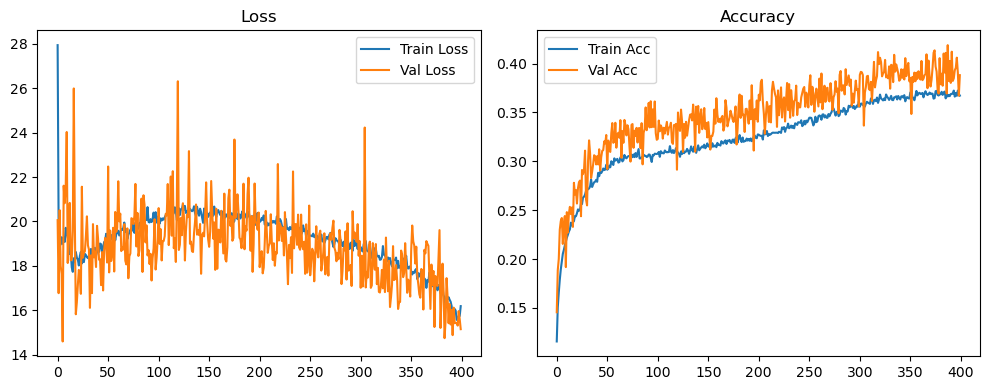

Original Model Final Test Loss: 15.3009 Accuracy: 0.3874


🚀 Running: batch512_lr_max_0.0005_min_1e-06_dp0.0


Files already downloaded and verified


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|                                                                                                                                                                        | 0/400 [00:00<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.1316 | Val Acc: 0.1190 | Epoch Time: 1.92 | :   0%|                                                                                                      | 0/400 [01:55<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.1316 | Val Acc: 0.1190 | Epoch Time: 1.92 | :   0%|                                                                                                      | 0/400 [01:55<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.1316 | Val Acc: 0.1190 | Epoch Time: 1.92 | :   0%|▏                                                                                         | 1/400 [01:55<12:46:42, 115.29s/it]

| LR: 0.000500 | Train Acc: 0.1418 | Val Acc: 0.1472 | Epoch Time: 1.91 | :   0%|▏                                                                                         | 1/400 [03:50<12:46:42, 115.29s/it]

| LR: 0.000500 | Train Acc: 0.1418 | Val Acc: 0.1472 | Epoch Time: 1.91 | :   0%|▏                                                                                         | 1/400 [03:50<12:46:42, 115.29s/it]

| LR: 0.000500 | Train Acc: 0.1418 | Val Acc: 0.1472 | Epoch Time: 1.91 | :   0%|▍                                                                                         | 2/400 [03:50<12:43:41, 115.13s/it]

| LR: 0.000500 | Train Acc: 0.1500 | Val Acc: 0.1661 | Epoch Time: 1.91 | :   0%|▍                                                                                         | 2/400 [05:45<12:43:41, 115.13s/it]

| LR: 0.000500 | Train Acc: 0.1500 | Val Acc: 0.1661 | Epoch Time: 1.91 | :   0%|▍                                                                                         | 2/400 [05:45<12:43:41, 115.13s/it]

| LR: 0.000500 | Train Acc: 0.1500 | Val Acc: 0.1661 | Epoch Time: 1.91 | :   1%|▋                                                                                         | 3/400 [05:45<12:41:23, 115.07s/it]

| LR: 0.000500 | Train Acc: 0.1619 | Val Acc: 0.1882 | Epoch Time: 1.91 | :   1%|▋                                                                                         | 3/400 [07:40<12:41:23, 115.07s/it]

| LR: 0.000500 | Train Acc: 0.1619 | Val Acc: 0.1882 | Epoch Time: 1.91 | :   1%|▋                                                                                         | 3/400 [07:40<12:41:23, 115.07s/it]

| LR: 0.000500 | Train Acc: 0.1619 | Val Acc: 0.1882 | Epoch Time: 1.91 | :   1%|▉                                                                                         | 4/400 [07:40<12:39:17, 115.04s/it]

| LR: 0.000500 | Train Acc: 0.1774 | Val Acc: 0.1892 | Epoch Time: 1.91 | :   1%|▉                                                                                         | 4/400 [09:35<12:39:17, 115.04s/it]

| LR: 0.000500 | Train Acc: 0.1774 | Val Acc: 0.1892 | Epoch Time: 1.91 | :   1%|▉                                                                                         | 4/400 [09:35<12:39:17, 115.04s/it]

| LR: 0.000500 | Train Acc: 0.1774 | Val Acc: 0.1892 | Epoch Time: 1.91 | :   1%|█▏                                                                                        | 5/400 [09:35<12:37:15, 115.03s/it]

| LR: 0.000500 | Train Acc: 0.1867 | Val Acc: 0.2029 | Epoch Time: 1.91 | :   1%|█▏                                                                                        | 5/400 [11:30<12:37:15, 115.03s/it]

| LR: 0.000500 | Train Acc: 0.1867 | Val Acc: 0.2029 | Epoch Time: 1.91 | :   1%|█▏                                                                                        | 5/400 [11:30<12:37:15, 115.03s/it]

| LR: 0.000500 | Train Acc: 0.1867 | Val Acc: 0.2029 | Epoch Time: 1.91 | :   2%|█▎                                                                                        | 6/400 [11:30<12:35:15, 115.01s/it]

| LR: 0.000500 | Train Acc: 0.1931 | Val Acc: 0.1966 | Epoch Time: 1.91 | :   2%|█▎                                                                                        | 6/400 [13:25<12:35:15, 115.01s/it]

| LR: 0.000500 | Train Acc: 0.1931 | Val Acc: 0.1966 | Epoch Time: 1.91 | :   2%|█▎                                                                                        | 6/400 [13:25<12:35:15, 115.01s/it]

| LR: 0.000500 | Train Acc: 0.1931 | Val Acc: 0.1966 | Epoch Time: 1.91 | :   2%|█▌                                                                                        | 7/400 [13:25<12:33:19, 115.01s/it]

| LR: 0.000500 | Train Acc: 0.2044 | Val Acc: 0.2094 | Epoch Time: 1.92 | :   2%|█▌                                                                                        | 7/400 [15:20<12:33:19, 115.01s/it]

| LR: 0.000500 | Train Acc: 0.2044 | Val Acc: 0.2094 | Epoch Time: 1.92 | :   2%|█▌                                                                                        | 7/400 [15:20<12:33:19, 115.01s/it]

| LR: 0.000500 | Train Acc: 0.2044 | Val Acc: 0.2094 | Epoch Time: 1.92 | :   2%|█▊                                                                                        | 8/400 [15:20<12:31:25, 115.01s/it]

| LR: 0.000500 | Train Acc: 0.2169 | Val Acc: 0.2418 | Epoch Time: 1.92 | :   2%|█▊                                                                                        | 8/400 [17:15<12:31:25, 115.01s/it]

| LR: 0.000500 | Train Acc: 0.2169 | Val Acc: 0.2418 | Epoch Time: 1.92 | :   2%|█▊                                                                                        | 8/400 [17:15<12:31:25, 115.01s/it]

| LR: 0.000500 | Train Acc: 0.2169 | Val Acc: 0.2418 | Epoch Time: 1.92 | :   2%|██                                                                                        | 9/400 [17:15<12:29:29, 115.01s/it]

| LR: 0.000499 | Train Acc: 0.2167 | Val Acc: 0.2349 | Epoch Time: 1.91 | :   2%|██                                                                                        | 9/400 [19:10<12:29:29, 115.01s/it]

| LR: 0.000499 | Train Acc: 0.2167 | Val Acc: 0.2349 | Epoch Time: 1.91 | :   2%|██                                                                                        | 9/400 [19:10<12:29:29, 115.01s/it]

| LR: 0.000499 | Train Acc: 0.2167 | Val Acc: 0.2349 | Epoch Time: 1.91 | :   2%|██▏                                                                                      | 10/400 [19:10<12:27:32, 115.01s/it]

| LR: 0.000499 | Train Acc: 0.2284 | Val Acc: 0.2513 | Epoch Time: 1.91 | :   2%|██▏                                                                                      | 10/400 [21:05<12:27:32, 115.01s/it]

| LR: 0.000499 | Train Acc: 0.2284 | Val Acc: 0.2513 | Epoch Time: 1.91 | :   2%|██▏                                                                                      | 10/400 [21:05<12:27:32, 115.01s/it]

| LR: 0.000499 | Train Acc: 0.2284 | Val Acc: 0.2513 | Epoch Time: 1.91 | :   3%|██▍                                                                                      | 11/400 [21:05<12:25:29, 114.99s/it]

| LR: 0.000499 | Train Acc: 0.2411 | Val Acc: 0.2533 | Epoch Time: 1.91 | :   3%|██▍                                                                                      | 11/400 [23:00<12:25:29, 114.99s/it]

| LR: 0.000499 | Train Acc: 0.2411 | Val Acc: 0.2533 | Epoch Time: 1.91 | :   3%|██▍                                                                                      | 11/400 [23:00<12:25:29, 114.99s/it]

| LR: 0.000499 | Train Acc: 0.2411 | Val Acc: 0.2533 | Epoch Time: 1.91 | :   3%|██▋                                                                                      | 12/400 [23:00<12:23:30, 114.98s/it]

| LR: 0.000499 | Train Acc: 0.2430 | Val Acc: 0.2623 | Epoch Time: 1.91 | :   3%|██▋                                                                                      | 12/400 [24:55<12:23:30, 114.98s/it]

| LR: 0.000499 | Train Acc: 0.2430 | Val Acc: 0.2623 | Epoch Time: 1.91 | :   3%|██▋                                                                                      | 12/400 [24:55<12:23:30, 114.98s/it]

| LR: 0.000499 | Train Acc: 0.2430 | Val Acc: 0.2623 | Epoch Time: 1.91 | :   3%|██▉                                                                                      | 13/400 [24:55<12:21:33, 114.97s/it]

| LR: 0.000499 | Train Acc: 0.2459 | Val Acc: 0.2654 | Epoch Time: 1.91 | :   3%|██▉                                                                                      | 13/400 [26:50<12:21:33, 114.97s/it]

| LR: 0.000499 | Train Acc: 0.2459 | Val Acc: 0.2654 | Epoch Time: 1.91 | :   3%|██▉                                                                                      | 13/400 [26:50<12:21:33, 114.97s/it]

| LR: 0.000499 | Train Acc: 0.2459 | Val Acc: 0.2654 | Epoch Time: 1.91 | :   4%|███                                                                                      | 14/400 [26:50<12:19:39, 114.97s/it]

| LR: 0.000498 | Train Acc: 0.2493 | Val Acc: 0.2662 | Epoch Time: 1.91 | :   4%|███                                                                                      | 14/400 [28:44<12:19:39, 114.97s/it]

| LR: 0.000498 | Train Acc: 0.2493 | Val Acc: 0.2662 | Epoch Time: 1.91 | :   4%|███                                                                                      | 14/400 [28:45<12:19:39, 114.97s/it]

| LR: 0.000498 | Train Acc: 0.2493 | Val Acc: 0.2662 | Epoch Time: 1.91 | :   4%|███▎                                                                                     | 15/400 [28:45<12:17:42, 114.97s/it]

| LR: 0.000498 | Train Acc: 0.2550 | Val Acc: 0.2625 | Epoch Time: 1.91 | :   4%|███▎                                                                                     | 15/400 [30:39<12:17:42, 114.97s/it]

| LR: 0.000498 | Train Acc: 0.2550 | Val Acc: 0.2625 | Epoch Time: 1.91 | :   4%|███▎                                                                                     | 15/400 [30:39<12:17:42, 114.97s/it]

| LR: 0.000498 | Train Acc: 0.2550 | Val Acc: 0.2625 | Epoch Time: 1.91 | :   4%|███▌                                                                                     | 16/400 [30:40<12:15:46, 114.97s/it]

| LR: 0.000498 | Train Acc: 0.2599 | Val Acc: 0.2639 | Epoch Time: 1.91 | :   4%|███▌                                                                                     | 16/400 [32:34<12:15:46, 114.97s/it]

| LR: 0.000498 | Train Acc: 0.2599 | Val Acc: 0.2639 | Epoch Time: 1.91 | :   4%|███▌                                                                                     | 16/400 [32:34<12:15:46, 114.97s/it]

| LR: 0.000498 | Train Acc: 0.2599 | Val Acc: 0.2639 | Epoch Time: 1.91 | :   4%|███▊                                                                                     | 17/400 [32:35<12:13:52, 114.97s/it]

| LR: 0.000498 | Train Acc: 0.2590 | Val Acc: 0.2860 | Epoch Time: 1.91 | :   4%|███▊                                                                                     | 17/400 [34:29<12:13:52, 114.97s/it]

| LR: 0.000498 | Train Acc: 0.2590 | Val Acc: 0.2860 | Epoch Time: 1.91 | :   4%|███▊                                                                                     | 17/400 [34:29<12:13:52, 114.97s/it]

| LR: 0.000498 | Train Acc: 0.2590 | Val Acc: 0.2860 | Epoch Time: 1.91 | :   4%|████                                                                                     | 18/400 [34:30<12:11:57, 114.97s/it]

| LR: 0.000498 | Train Acc: 0.2685 | Val Acc: 0.2836 | Epoch Time: 1.91 | :   4%|████                                                                                     | 18/400 [36:24<12:11:57, 114.97s/it]

| LR: 0.000498 | Train Acc: 0.2685 | Val Acc: 0.2836 | Epoch Time: 1.91 | :   4%|████                                                                                     | 18/400 [36:24<12:11:57, 114.97s/it]

| LR: 0.000498 | Train Acc: 0.2685 | Val Acc: 0.2836 | Epoch Time: 1.91 | :   5%|████▏                                                                                    | 19/400 [36:24<12:10:05, 114.97s/it]

| LR: 0.000497 | Train Acc: 0.2754 | Val Acc: 0.2662 | Epoch Time: 1.91 | :   5%|████▏                                                                                    | 19/400 [38:19<12:10:05, 114.97s/it]

| LR: 0.000497 | Train Acc: 0.2754 | Val Acc: 0.2662 | Epoch Time: 1.91 | :   5%|████▏                                                                                    | 19/400 [38:19<12:10:05, 114.97s/it]

| LR: 0.000497 | Train Acc: 0.2754 | Val Acc: 0.2662 | Epoch Time: 1.91 | :   5%|████▍                                                                                    | 20/400 [38:19<12:08:11, 114.98s/it]

| LR: 0.000497 | Train Acc: 0.2760 | Val Acc: 0.2852 | Epoch Time: 1.91 | :   5%|████▍                                                                                    | 20/400 [40:14<12:08:11, 114.98s/it]

| LR: 0.000497 | Train Acc: 0.2760 | Val Acc: 0.2852 | Epoch Time: 1.91 | :   5%|████▍                                                                                    | 20/400 [40:14<12:08:11, 114.98s/it]

| LR: 0.000497 | Train Acc: 0.2760 | Val Acc: 0.2852 | Epoch Time: 1.91 | :   5%|████▋                                                                                    | 21/400 [40:14<12:06:13, 114.97s/it]

| LR: 0.000497 | Train Acc: 0.2754 | Val Acc: 0.2905 | Epoch Time: 1.91 | :   5%|████▋                                                                                    | 21/400 [42:09<12:06:13, 114.97s/it]

| LR: 0.000497 | Train Acc: 0.2754 | Val Acc: 0.2905 | Epoch Time: 1.91 | :   5%|████▋                                                                                    | 21/400 [42:09<12:06:13, 114.97s/it]

| LR: 0.000497 | Train Acc: 0.2754 | Val Acc: 0.2905 | Epoch Time: 1.91 | :   6%|████▉                                                                                    | 22/400 [42:09<12:04:16, 114.97s/it]

| LR: 0.000496 | Train Acc: 0.2786 | Val Acc: 0.2924 | Epoch Time: 1.91 | :   6%|████▉                                                                                    | 22/400 [44:04<12:04:16, 114.97s/it]

| LR: 0.000496 | Train Acc: 0.2786 | Val Acc: 0.2924 | Epoch Time: 1.91 | :   6%|████▉                                                                                    | 22/400 [44:04<12:04:16, 114.97s/it]

| LR: 0.000496 | Train Acc: 0.2786 | Val Acc: 0.2924 | Epoch Time: 1.91 | :   6%|█████                                                                                    | 23/400 [44:04<12:02:22, 114.97s/it]

| LR: 0.000496 | Train Acc: 0.2865 | Val Acc: 0.3205 | Epoch Time: 1.91 | :   6%|█████                                                                                    | 23/400 [45:59<12:02:22, 114.97s/it]

| LR: 0.000496 | Train Acc: 0.2865 | Val Acc: 0.3205 | Epoch Time: 1.91 | :   6%|█████                                                                                    | 23/400 [45:59<12:02:22, 114.97s/it]

| LR: 0.000496 | Train Acc: 0.2865 | Val Acc: 0.3205 | Epoch Time: 1.91 | :   6%|█████▎                                                                                   | 24/400 [45:59<12:00:32, 114.98s/it]

| LR: 0.000496 | Train Acc: 0.2955 | Val Acc: 0.3227 | Epoch Time: 1.91 | :   6%|█████▎                                                                                   | 24/400 [47:54<12:00:32, 114.98s/it]

| LR: 0.000496 | Train Acc: 0.2955 | Val Acc: 0.3227 | Epoch Time: 1.91 | :   6%|█████▎                                                                                   | 24/400 [47:54<12:00:32, 114.98s/it]

| LR: 0.000496 | Train Acc: 0.2955 | Val Acc: 0.3227 | Epoch Time: 1.91 | :   6%|█████▌                                                                                   | 25/400 [47:54<11:58:40, 114.99s/it]

| LR: 0.000495 | Train Acc: 0.2984 | Val Acc: 0.3103 | Epoch Time: 1.91 | :   6%|█████▌                                                                                   | 25/400 [49:49<11:58:40, 114.99s/it]

| LR: 0.000495 | Train Acc: 0.2984 | Val Acc: 0.3103 | Epoch Time: 1.91 | :   6%|█████▌                                                                                   | 25/400 [49:49<11:58:40, 114.99s/it]

| LR: 0.000495 | Train Acc: 0.2984 | Val Acc: 0.3103 | Epoch Time: 1.91 | :   6%|█████▊                                                                                   | 26/400 [49:49<11:56:44, 114.99s/it]

| LR: 0.000495 | Train Acc: 0.3027 | Val Acc: 0.3058 | Epoch Time: 1.91 | :   6%|█████▊                                                                                   | 26/400 [51:44<11:56:44, 114.99s/it]

| LR: 0.000495 | Train Acc: 0.3027 | Val Acc: 0.3058 | Epoch Time: 1.91 | :   6%|█████▊                                                                                   | 26/400 [51:44<11:56:44, 114.99s/it]

| LR: 0.000495 | Train Acc: 0.3027 | Val Acc: 0.3058 | Epoch Time: 1.91 | :   7%|██████                                                                                   | 27/400 [51:44<11:54:47, 114.98s/it]

| LR: 0.000494 | Train Acc: 0.3032 | Val Acc: 0.3126 | Epoch Time: 1.91 | :   7%|██████                                                                                   | 27/400 [53:39<11:54:47, 114.98s/it]

| LR: 0.000494 | Train Acc: 0.3032 | Val Acc: 0.3126 | Epoch Time: 1.91 | :   7%|██████                                                                                   | 27/400 [53:39<11:54:47, 114.98s/it]

| LR: 0.000494 | Train Acc: 0.3032 | Val Acc: 0.3126 | Epoch Time: 1.91 | :   7%|██████▏                                                                                  | 28/400 [53:39<11:52:53, 114.98s/it]

| LR: 0.000494 | Train Acc: 0.3080 | Val Acc: 0.3045 | Epoch Time: 1.91 | :   7%|██████▏                                                                                  | 28/400 [55:34<11:52:53, 114.98s/it]

| LR: 0.000494 | Train Acc: 0.3080 | Val Acc: 0.3045 | Epoch Time: 1.91 | :   7%|██████▏                                                                                  | 28/400 [55:34<11:52:53, 114.98s/it]

| LR: 0.000494 | Train Acc: 0.3080 | Val Acc: 0.3045 | Epoch Time: 1.91 | :   7%|██████▍                                                                                  | 29/400 [55:34<11:50:57, 114.98s/it]

| LR: 0.000494 | Train Acc: 0.3104 | Val Acc: 0.3386 | Epoch Time: 1.91 | :   7%|██████▍                                                                                  | 29/400 [57:29<11:50:57, 114.98s/it]

| LR: 0.000494 | Train Acc: 0.3104 | Val Acc: 0.3386 | Epoch Time: 1.91 | :   7%|██████▍                                                                                  | 29/400 [57:29<11:50:57, 114.98s/it]

| LR: 0.000494 | Train Acc: 0.3104 | Val Acc: 0.3386 | Epoch Time: 1.91 | :   8%|██████▋                                                                                  | 30/400 [57:29<11:49:00, 114.97s/it]

| LR: 0.000493 | Train Acc: 0.3140 | Val Acc: 0.3343 | Epoch Time: 1.92 | :   8%|██████▋                                                                                  | 30/400 [59:24<11:49:00, 114.97s/it]

| LR: 0.000493 | Train Acc: 0.3140 | Val Acc: 0.3343 | Epoch Time: 1.92 | :   8%|██████▋                                                                                  | 30/400 [59:24<11:49:00, 114.97s/it]

| LR: 0.000493 | Train Acc: 0.3140 | Val Acc: 0.3343 | Epoch Time: 1.92 | :   8%|██████▉                                                                                  | 31/400 [59:24<11:47:10, 114.99s/it]

| LR: 0.000493 | Train Acc: 0.3203 | Val Acc: 0.3133 | Epoch Time: 1.91 | :   8%|██████▋                                                                                | 31/400 [1:01:19<11:47:10, 114.99s/it]

| LR: 0.000493 | Train Acc: 0.3203 | Val Acc: 0.3133 | Epoch Time: 1.91 | :   8%|██████▋                                                                                | 31/400 [1:01:19<11:47:10, 114.99s/it]

| LR: 0.000493 | Train Acc: 0.3203 | Val Acc: 0.3133 | Epoch Time: 1.91 | :   8%|██████▉                                                                                | 32/400 [1:01:19<11:45:15, 114.99s/it]

| LR: 0.000492 | Train Acc: 0.3217 | Val Acc: 0.3536 | Epoch Time: 1.91 | :   8%|██████▉                                                                                | 32/400 [1:03:14<11:45:15, 114.99s/it]

| LR: 0.000492 | Train Acc: 0.3217 | Val Acc: 0.3536 | Epoch Time: 1.91 | :   8%|██████▉                                                                                | 32/400 [1:03:14<11:45:15, 114.99s/it]

| LR: 0.000492 | Train Acc: 0.3217 | Val Acc: 0.3536 | Epoch Time: 1.91 | :   8%|███████▏                                                                               | 33/400 [1:03:14<11:43:20, 114.99s/it]

| LR: 0.000492 | Train Acc: 0.3317 | Val Acc: 0.3526 | Epoch Time: 1.91 | :   8%|███████▏                                                                               | 33/400 [1:05:09<11:43:20, 114.99s/it]

| LR: 0.000492 | Train Acc: 0.3317 | Val Acc: 0.3526 | Epoch Time: 1.91 | :   8%|███████▏                                                                               | 33/400 [1:05:09<11:43:20, 114.99s/it]

| LR: 0.000492 | Train Acc: 0.3317 | Val Acc: 0.3526 | Epoch Time: 1.91 | :   8%|███████▍                                                                               | 34/400 [1:05:09<11:41:23, 114.98s/it]

| LR: 0.000491 | Train Acc: 0.3312 | Val Acc: 0.3431 | Epoch Time: 1.91 | :   8%|███████▍                                                                               | 34/400 [1:07:04<11:41:23, 114.98s/it]

| LR: 0.000491 | Train Acc: 0.3312 | Val Acc: 0.3431 | Epoch Time: 1.91 | :   8%|███████▍                                                                               | 34/400 [1:07:04<11:41:23, 114.98s/it]

| LR: 0.000491 | Train Acc: 0.3312 | Val Acc: 0.3431 | Epoch Time: 1.91 | :   9%|███████▌                                                                               | 35/400 [1:07:04<11:39:28, 114.98s/it]

| LR: 0.000491 | Train Acc: 0.3323 | Val Acc: 0.3472 | Epoch Time: 1.91 | :   9%|███████▌                                                                               | 35/400 [1:08:59<11:39:28, 114.98s/it]

| LR: 0.000491 | Train Acc: 0.3323 | Val Acc: 0.3472 | Epoch Time: 1.91 | :   9%|███████▌                                                                               | 35/400 [1:08:59<11:39:28, 114.98s/it]

| LR: 0.000491 | Train Acc: 0.3323 | Val Acc: 0.3472 | Epoch Time: 1.91 | :   9%|███████▊                                                                               | 36/400 [1:08:59<11:37:32, 114.98s/it]

| LR: 0.000490 | Train Acc: 0.3389 | Val Acc: 0.3629 | Epoch Time: 1.91 | :   9%|███████▊                                                                               | 36/400 [1:10:54<11:37:32, 114.98s/it]

| LR: 0.000490 | Train Acc: 0.3389 | Val Acc: 0.3629 | Epoch Time: 1.91 | :   9%|███████▊                                                                               | 36/400 [1:10:54<11:37:32, 114.98s/it]

| LR: 0.000490 | Train Acc: 0.3389 | Val Acc: 0.3629 | Epoch Time: 1.91 | :   9%|████████                                                                               | 37/400 [1:10:54<11:35:40, 114.99s/it]

| LR: 0.000490 | Train Acc: 0.3437 | Val Acc: 0.3869 | Epoch Time: 1.91 | :   9%|████████                                                                               | 37/400 [1:12:49<11:35:40, 114.99s/it]

| LR: 0.000490 | Train Acc: 0.3437 | Val Acc: 0.3869 | Epoch Time: 1.91 | :   9%|████████                                                                               | 37/400 [1:12:49<11:35:40, 114.99s/it]

| LR: 0.000490 | Train Acc: 0.3437 | Val Acc: 0.3869 | Epoch Time: 1.91 | :  10%|████████▎                                                                              | 38/400 [1:12:49<11:33:43, 114.98s/it]

| LR: 0.000489 | Train Acc: 0.3471 | Val Acc: 0.3784 | Epoch Time: 1.91 | :  10%|████████▎                                                                              | 38/400 [1:14:44<11:33:43, 114.98s/it]

| LR: 0.000489 | Train Acc: 0.3471 | Val Acc: 0.3784 | Epoch Time: 1.91 | :  10%|████████▎                                                                              | 38/400 [1:14:44<11:33:43, 114.98s/it]

| LR: 0.000489 | Train Acc: 0.3471 | Val Acc: 0.3784 | Epoch Time: 1.91 | :  10%|████████▍                                                                              | 39/400 [1:14:44<11:31:44, 114.97s/it]

| LR: 0.000488 | Train Acc: 0.3523 | Val Acc: 0.3549 | Epoch Time: 1.91 | :  10%|████████▍                                                                              | 39/400 [1:16:39<11:31:44, 114.97s/it]

| LR: 0.000488 | Train Acc: 0.3523 | Val Acc: 0.3549 | Epoch Time: 1.91 | :  10%|████████▍                                                                              | 39/400 [1:16:39<11:31:44, 114.97s/it]

| LR: 0.000488 | Train Acc: 0.3523 | Val Acc: 0.3549 | Epoch Time: 1.91 | :  10%|████████▋                                                                              | 40/400 [1:16:39<11:29:50, 114.97s/it]

| LR: 0.000488 | Train Acc: 0.3503 | Val Acc: 0.3650 | Epoch Time: 1.91 | :  10%|████████▋                                                                              | 40/400 [1:18:34<11:29:50, 114.97s/it]

| LR: 0.000488 | Train Acc: 0.3503 | Val Acc: 0.3650 | Epoch Time: 1.91 | :  10%|████████▋                                                                              | 40/400 [1:18:34<11:29:50, 114.97s/it]

| LR: 0.000488 | Train Acc: 0.3503 | Val Acc: 0.3650 | Epoch Time: 1.91 | :  10%|████████▉                                                                              | 41/400 [1:18:34<11:27:49, 114.96s/it]

| LR: 0.000487 | Train Acc: 0.3594 | Val Acc: 0.3901 | Epoch Time: 1.91 | :  10%|████████▉                                                                              | 41/400 [1:20:29<11:27:49, 114.96s/it]

| LR: 0.000487 | Train Acc: 0.3594 | Val Acc: 0.3901 | Epoch Time: 1.91 | :  10%|████████▉                                                                              | 41/400 [1:20:29<11:27:49, 114.96s/it]

| LR: 0.000487 | Train Acc: 0.3594 | Val Acc: 0.3901 | Epoch Time: 1.91 | :  10%|█████████▏                                                                             | 42/400 [1:20:29<11:25:54, 114.96s/it]

| LR: 0.000487 | Train Acc: 0.3601 | Val Acc: 0.3963 | Epoch Time: 1.91 | :  10%|█████████▏                                                                             | 42/400 [1:22:24<11:25:54, 114.96s/it]

| LR: 0.000487 | Train Acc: 0.3601 | Val Acc: 0.3963 | Epoch Time: 1.91 | :  10%|█████████▏                                                                             | 42/400 [1:22:24<11:25:54, 114.96s/it]

| LR: 0.000487 | Train Acc: 0.3601 | Val Acc: 0.3963 | Epoch Time: 1.91 | :  11%|█████████▎                                                                             | 43/400 [1:22:24<11:23:58, 114.95s/it]

| LR: 0.000486 | Train Acc: 0.3661 | Val Acc: 0.3825 | Epoch Time: 1.91 | :  11%|█████████▎                                                                             | 43/400 [1:24:19<11:23:58, 114.95s/it]

| LR: 0.000486 | Train Acc: 0.3661 | Val Acc: 0.3825 | Epoch Time: 1.91 | :  11%|█████████▎                                                                             | 43/400 [1:24:19<11:23:58, 114.95s/it]

| LR: 0.000486 | Train Acc: 0.3661 | Val Acc: 0.3825 | Epoch Time: 1.91 | :  11%|█████████▌                                                                             | 44/400 [1:24:19<11:22:06, 114.96s/it]

| LR: 0.000485 | Train Acc: 0.3709 | Val Acc: 0.3950 | Epoch Time: 1.91 | :  11%|█████████▌                                                                             | 44/400 [1:26:14<11:22:06, 114.96s/it]

| LR: 0.000485 | Train Acc: 0.3709 | Val Acc: 0.3950 | Epoch Time: 1.91 | :  11%|█████████▌                                                                             | 44/400 [1:26:14<11:22:06, 114.96s/it]

| LR: 0.000485 | Train Acc: 0.3709 | Val Acc: 0.3950 | Epoch Time: 1.91 | :  11%|█████████▊                                                                             | 45/400 [1:26:14<11:20:12, 114.96s/it]

| LR: 0.000485 | Train Acc: 0.3717 | Val Acc: 0.3840 | Epoch Time: 1.91 | :  11%|█████████▊                                                                             | 45/400 [1:28:09<11:20:12, 114.96s/it]

| LR: 0.000485 | Train Acc: 0.3717 | Val Acc: 0.3840 | Epoch Time: 1.91 | :  11%|█████████▊                                                                             | 45/400 [1:28:09<11:20:12, 114.96s/it]

| LR: 0.000485 | Train Acc: 0.3717 | Val Acc: 0.3840 | Epoch Time: 1.91 | :  12%|██████████                                                                             | 46/400 [1:28:09<11:18:15, 114.96s/it]

| LR: 0.000484 | Train Acc: 0.3730 | Val Acc: 0.3744 | Epoch Time: 1.91 | :  12%|██████████                                                                             | 46/400 [1:30:04<11:18:15, 114.96s/it]

| LR: 0.000484 | Train Acc: 0.3730 | Val Acc: 0.3744 | Epoch Time: 1.91 | :  12%|██████████                                                                             | 46/400 [1:30:04<11:18:15, 114.96s/it]

| LR: 0.000484 | Train Acc: 0.3730 | Val Acc: 0.3744 | Epoch Time: 1.91 | :  12%|██████████▏                                                                            | 47/400 [1:30:04<11:16:19, 114.96s/it]

| LR: 0.000483 | Train Acc: 0.3750 | Val Acc: 0.4116 | Epoch Time: 1.91 | :  12%|██████████▏                                                                            | 47/400 [1:31:59<11:16:19, 114.96s/it]

| LR: 0.000483 | Train Acc: 0.3750 | Val Acc: 0.4116 | Epoch Time: 1.91 | :  12%|██████████▏                                                                            | 47/400 [1:31:59<11:16:19, 114.96s/it]

| LR: 0.000483 | Train Acc: 0.3750 | Val Acc: 0.4116 | Epoch Time: 1.91 | :  12%|██████████▍                                                                            | 48/400 [1:31:59<11:14:25, 114.96s/it]

| LR: 0.000482 | Train Acc: 0.3796 | Val Acc: 0.3939 | Epoch Time: 1.91 | :  12%|██████████▍                                                                            | 48/400 [1:33:54<11:14:25, 114.96s/it]

| LR: 0.000482 | Train Acc: 0.3796 | Val Acc: 0.3939 | Epoch Time: 1.91 | :  12%|██████████▍                                                                            | 48/400 [1:33:54<11:14:25, 114.96s/it]

| LR: 0.000482 | Train Acc: 0.3796 | Val Acc: 0.3939 | Epoch Time: 1.91 | :  12%|██████████▋                                                                            | 49/400 [1:33:54<11:12:27, 114.95s/it]

| LR: 0.000482 | Train Acc: 0.3895 | Val Acc: 0.4054 | Epoch Time: 1.91 | :  12%|██████████▋                                                                            | 49/400 [1:35:48<11:12:27, 114.95s/it]

| LR: 0.000482 | Train Acc: 0.3895 | Val Acc: 0.4054 | Epoch Time: 1.91 | :  12%|██████████▋                                                                            | 49/400 [1:35:48<11:12:27, 114.95s/it]

| LR: 0.000482 | Train Acc: 0.3895 | Val Acc: 0.4054 | Epoch Time: 1.91 | :  12%|██████████▉                                                                            | 50/400 [1:35:49<11:10:35, 114.96s/it]

| LR: 0.000481 | Train Acc: 0.3878 | Val Acc: 0.3851 | Epoch Time: 1.91 | :  12%|██████████▉                                                                            | 50/400 [1:37:43<11:10:35, 114.96s/it]

| LR: 0.000481 | Train Acc: 0.3878 | Val Acc: 0.3851 | Epoch Time: 1.91 | :  12%|██████████▉                                                                            | 50/400 [1:37:43<11:10:35, 114.96s/it]

| LR: 0.000481 | Train Acc: 0.3878 | Val Acc: 0.3851 | Epoch Time: 1.91 | :  13%|███████████                                                                            | 51/400 [1:37:44<11:08:36, 114.95s/it]

| LR: 0.000480 | Train Acc: 0.3880 | Val Acc: 0.4061 | Epoch Time: 1.91 | :  13%|███████████                                                                            | 51/400 [1:39:38<11:08:36, 114.95s/it]

| LR: 0.000480 | Train Acc: 0.3880 | Val Acc: 0.4061 | Epoch Time: 1.91 | :  13%|███████████                                                                            | 51/400 [1:39:38<11:08:36, 114.95s/it]

| LR: 0.000480 | Train Acc: 0.3880 | Val Acc: 0.4061 | Epoch Time: 1.91 | :  13%|███████████▎                                                                           | 52/400 [1:39:38<11:06:38, 114.94s/it]

| LR: 0.000479 | Train Acc: 0.3910 | Val Acc: 0.4038 | Epoch Time: 1.91 | :  13%|███████████▎                                                                           | 52/400 [1:41:33<11:06:38, 114.94s/it]

| LR: 0.000479 | Train Acc: 0.3910 | Val Acc: 0.4038 | Epoch Time: 1.91 | :  13%|███████████▎                                                                           | 52/400 [1:41:33<11:06:38, 114.94s/it]

| LR: 0.000479 | Train Acc: 0.3910 | Val Acc: 0.4038 | Epoch Time: 1.91 | :  13%|███████████▌                                                                           | 53/400 [1:41:33<11:04:41, 114.93s/it]

| LR: 0.000479 | Train Acc: 0.3930 | Val Acc: 0.4111 | Epoch Time: 1.91 | :  13%|███████████▌                                                                           | 53/400 [1:43:28<11:04:41, 114.93s/it]

| LR: 0.000479 | Train Acc: 0.3930 | Val Acc: 0.4111 | Epoch Time: 1.91 | :  13%|███████████▌                                                                           | 53/400 [1:43:28<11:04:41, 114.93s/it]

| LR: 0.000479 | Train Acc: 0.3930 | Val Acc: 0.4111 | Epoch Time: 1.91 | :  14%|███████████▋                                                                           | 54/400 [1:43:28<11:02:45, 114.93s/it]

| LR: 0.000478 | Train Acc: 0.3961 | Val Acc: 0.3708 | Epoch Time: 1.91 | :  14%|███████████▋                                                                           | 54/400 [1:45:23<11:02:45, 114.93s/it]

| LR: 0.000478 | Train Acc: 0.3961 | Val Acc: 0.3708 | Epoch Time: 1.91 | :  14%|███████████▋                                                                           | 54/400 [1:45:23<11:02:45, 114.93s/it]

| LR: 0.000478 | Train Acc: 0.3961 | Val Acc: 0.3708 | Epoch Time: 1.91 | :  14%|███████████▉                                                                           | 55/400 [1:45:23<11:00:52, 114.94s/it]

| LR: 0.000477 | Train Acc: 0.3896 | Val Acc: 0.4046 | Epoch Time: 1.91 | :  14%|███████████▉                                                                           | 55/400 [1:47:18<11:00:52, 114.94s/it]

| LR: 0.000477 | Train Acc: 0.3896 | Val Acc: 0.4046 | Epoch Time: 1.91 | :  14%|███████████▉                                                                           | 55/400 [1:47:18<11:00:52, 114.94s/it]

| LR: 0.000477 | Train Acc: 0.3896 | Val Acc: 0.4046 | Epoch Time: 1.91 | :  14%|████████████▏                                                                          | 56/400 [1:47:18<10:59:04, 114.95s/it]

| LR: 0.000476 | Train Acc: 0.4022 | Val Acc: 0.4139 | Epoch Time: 1.91 | :  14%|████████████▏                                                                          | 56/400 [1:49:13<10:59:04, 114.95s/it]

| LR: 0.000476 | Train Acc: 0.4022 | Val Acc: 0.4139 | Epoch Time: 1.91 | :  14%|████████████▏                                                                          | 56/400 [1:49:13<10:59:04, 114.95s/it]

| LR: 0.000476 | Train Acc: 0.4022 | Val Acc: 0.4139 | Epoch Time: 1.91 | :  14%|████████████▍                                                                          | 57/400 [1:49:13<10:57:03, 114.94s/it]

| LR: 0.000475 | Train Acc: 0.4027 | Val Acc: 0.3984 | Epoch Time: 1.91 | :  14%|████████████▍                                                                          | 57/400 [1:51:08<10:57:03, 114.94s/it]

| LR: 0.000475 | Train Acc: 0.4027 | Val Acc: 0.3984 | Epoch Time: 1.91 | :  14%|████████████▍                                                                          | 57/400 [1:51:08<10:57:03, 114.94s/it]

| LR: 0.000475 | Train Acc: 0.4027 | Val Acc: 0.3984 | Epoch Time: 1.91 | :  14%|████████████▌                                                                          | 58/400 [1:51:08<10:55:08, 114.94s/it]

| LR: 0.000475 | Train Acc: 0.4041 | Val Acc: 0.4316 | Epoch Time: 1.91 | :  14%|████████████▌                                                                          | 58/400 [1:53:03<10:55:08, 114.94s/it]

| LR: 0.000475 | Train Acc: 0.4041 | Val Acc: 0.4316 | Epoch Time: 1.91 | :  14%|████████████▌                                                                          | 58/400 [1:53:03<10:55:08, 114.94s/it]

| LR: 0.000475 | Train Acc: 0.4041 | Val Acc: 0.4316 | Epoch Time: 1.91 | :  15%|████████████▊                                                                          | 59/400 [1:53:03<10:53:13, 114.94s/it]

| LR: 0.000474 | Train Acc: 0.4118 | Val Acc: 0.4527 | Epoch Time: 1.91 | :  15%|████████████▊                                                                          | 59/400 [1:54:58<10:53:13, 114.94s/it]

| LR: 0.000474 | Train Acc: 0.4118 | Val Acc: 0.4527 | Epoch Time: 1.91 | :  15%|████████████▊                                                                          | 59/400 [1:54:58<10:53:13, 114.94s/it]

| LR: 0.000474 | Train Acc: 0.4118 | Val Acc: 0.4527 | Epoch Time: 1.91 | :  15%|█████████████                                                                          | 60/400 [1:54:58<10:51:16, 114.93s/it]

| LR: 0.000473 | Train Acc: 0.4092 | Val Acc: 0.4029 | Epoch Time: 1.91 | :  15%|█████████████                                                                          | 60/400 [1:56:53<10:51:16, 114.93s/it]

| LR: 0.000473 | Train Acc: 0.4092 | Val Acc: 0.4029 | Epoch Time: 1.91 | :  15%|█████████████                                                                          | 60/400 [1:56:53<10:51:16, 114.93s/it]

| LR: 0.000473 | Train Acc: 0.4092 | Val Acc: 0.4029 | Epoch Time: 1.91 | :  15%|█████████████▎                                                                         | 61/400 [1:56:53<10:49:19, 114.92s/it]

| LR: 0.000472 | Train Acc: 0.4123 | Val Acc: 0.4330 | Epoch Time: 1.91 | :  15%|█████████████▎                                                                         | 61/400 [1:58:48<10:49:19, 114.92s/it]

| LR: 0.000472 | Train Acc: 0.4123 | Val Acc: 0.4330 | Epoch Time: 1.91 | :  15%|█████████████▎                                                                         | 61/400 [1:58:48<10:49:19, 114.92s/it]

| LR: 0.000472 | Train Acc: 0.4123 | Val Acc: 0.4330 | Epoch Time: 1.91 | :  16%|█████████████▍                                                                         | 62/400 [1:58:48<10:47:31, 114.95s/it]

| LR: 0.000471 | Train Acc: 0.4148 | Val Acc: 0.4259 | Epoch Time: 1.91 | :  16%|█████████████▍                                                                         | 62/400 [2:00:43<10:47:31, 114.95s/it]

| LR: 0.000471 | Train Acc: 0.4148 | Val Acc: 0.4259 | Epoch Time: 1.91 | :  16%|█████████████▍                                                                         | 62/400 [2:00:43<10:47:31, 114.95s/it]

| LR: 0.000471 | Train Acc: 0.4148 | Val Acc: 0.4259 | Epoch Time: 1.91 | :  16%|█████████████▋                                                                         | 63/400 [2:00:43<10:45:34, 114.94s/it]

| LR: 0.000470 | Train Acc: 0.4178 | Val Acc: 0.4363 | Epoch Time: 1.91 | :  16%|█████████████▋                                                                         | 63/400 [2:02:38<10:45:34, 114.94s/it]

| LR: 0.000470 | Train Acc: 0.4178 | Val Acc: 0.4363 | Epoch Time: 1.91 | :  16%|█████████████▋                                                                         | 63/400 [2:02:38<10:45:34, 114.94s/it]

| LR: 0.000470 | Train Acc: 0.4178 | Val Acc: 0.4363 | Epoch Time: 1.91 | :  16%|█████████████▉                                                                         | 64/400 [2:02:38<10:43:46, 114.96s/it]

| LR: 0.000469 | Train Acc: 0.4162 | Val Acc: 0.4113 | Epoch Time: 1.91 | :  16%|█████████████▉                                                                         | 64/400 [2:04:33<10:43:46, 114.96s/it]

| LR: 0.000469 | Train Acc: 0.4162 | Val Acc: 0.4113 | Epoch Time: 1.91 | :  16%|█████████████▉                                                                         | 64/400 [2:04:33<10:43:46, 114.96s/it]

| LR: 0.000469 | Train Acc: 0.4162 | Val Acc: 0.4113 | Epoch Time: 1.91 | :  16%|██████████████▏                                                                        | 65/400 [2:04:33<10:41:47, 114.95s/it]

| LR: 0.000468 | Train Acc: 0.4186 | Val Acc: 0.4391 | Epoch Time: 1.91 | :  16%|██████████████▏                                                                        | 65/400 [2:06:27<10:41:47, 114.95s/it]

| LR: 0.000468 | Train Acc: 0.4186 | Val Acc: 0.4391 | Epoch Time: 1.91 | :  16%|██████████████▏                                                                        | 65/400 [2:06:27<10:41:47, 114.95s/it]

| LR: 0.000468 | Train Acc: 0.4186 | Val Acc: 0.4391 | Epoch Time: 1.91 | :  16%|██████████████▎                                                                        | 66/400 [2:06:28<10:39:48, 114.94s/it]

| LR: 0.000467 | Train Acc: 0.4202 | Val Acc: 0.4306 | Epoch Time: 1.91 | :  16%|██████████████▎                                                                        | 66/400 [2:08:22<10:39:48, 114.94s/it]

| LR: 0.000467 | Train Acc: 0.4202 | Val Acc: 0.4306 | Epoch Time: 1.91 | :  16%|██████████████▎                                                                        | 66/400 [2:08:22<10:39:48, 114.94s/it]

| LR: 0.000467 | Train Acc: 0.4202 | Val Acc: 0.4306 | Epoch Time: 1.91 | :  17%|██████████████▌                                                                        | 67/400 [2:08:23<10:37:56, 114.95s/it]

| LR: 0.000466 | Train Acc: 0.4229 | Val Acc: 0.4418 | Epoch Time: 1.91 | :  17%|██████████████▌                                                                        | 67/400 [2:10:17<10:37:56, 114.95s/it]

| LR: 0.000466 | Train Acc: 0.4229 | Val Acc: 0.4418 | Epoch Time: 1.91 | :  17%|██████████████▌                                                                        | 67/400 [2:10:17<10:37:56, 114.95s/it]

| LR: 0.000466 | Train Acc: 0.4229 | Val Acc: 0.4418 | Epoch Time: 1.91 | :  17%|██████████████▊                                                                        | 68/400 [2:10:17<10:36:01, 114.94s/it]

| LR: 0.000465 | Train Acc: 0.4239 | Val Acc: 0.4641 | Epoch Time: 1.91 | :  17%|██████████████▊                                                                        | 68/400 [2:12:12<10:36:01, 114.94s/it]

| LR: 0.000465 | Train Acc: 0.4239 | Val Acc: 0.4641 | Epoch Time: 1.91 | :  17%|██████████████▊                                                                        | 68/400 [2:12:12<10:36:01, 114.94s/it]

| LR: 0.000465 | Train Acc: 0.4239 | Val Acc: 0.4641 | Epoch Time: 1.91 | :  17%|███████████████                                                                        | 69/400 [2:12:12<10:34:06, 114.94s/it]

| LR: 0.000464 | Train Acc: 0.4250 | Val Acc: 0.4492 | Epoch Time: 1.91 | :  17%|███████████████                                                                        | 69/400 [2:14:07<10:34:06, 114.94s/it]

| LR: 0.000464 | Train Acc: 0.4250 | Val Acc: 0.4492 | Epoch Time: 1.91 | :  17%|███████████████                                                                        | 69/400 [2:14:07<10:34:06, 114.94s/it]

| LR: 0.000464 | Train Acc: 0.4250 | Val Acc: 0.4492 | Epoch Time: 1.91 | :  18%|███████████████▏                                                                       | 70/400 [2:14:07<10:32:07, 114.93s/it]

| LR: 0.000463 | Train Acc: 0.4304 | Val Acc: 0.4521 | Epoch Time: 1.91 | :  18%|███████████████▏                                                                       | 70/400 [2:16:02<10:32:07, 114.93s/it]

| LR: 0.000463 | Train Acc: 0.4304 | Val Acc: 0.4521 | Epoch Time: 1.91 | :  18%|███████████████▏                                                                       | 70/400 [2:16:02<10:32:07, 114.93s/it]

| LR: 0.000463 | Train Acc: 0.4304 | Val Acc: 0.4521 | Epoch Time: 1.91 | :  18%|███████████████▍                                                                       | 71/400 [2:16:02<10:30:12, 114.93s/it]

| LR: 0.000462 | Train Acc: 0.4309 | Val Acc: 0.4594 | Epoch Time: 1.91 | :  18%|███████████████▍                                                                       | 71/400 [2:17:57<10:30:12, 114.93s/it]

| LR: 0.000462 | Train Acc: 0.4309 | Val Acc: 0.4594 | Epoch Time: 1.91 | :  18%|███████████████▍                                                                       | 71/400 [2:17:57<10:30:12, 114.93s/it]

| LR: 0.000462 | Train Acc: 0.4309 | Val Acc: 0.4594 | Epoch Time: 1.91 | :  18%|███████████████▋                                                                       | 72/400 [2:17:57<10:28:18, 114.93s/it]

| LR: 0.000461 | Train Acc: 0.4309 | Val Acc: 0.4363 | Epoch Time: 1.91 | :  18%|███████████████▋                                                                       | 72/400 [2:19:52<10:28:18, 114.93s/it]

| LR: 0.000461 | Train Acc: 0.4309 | Val Acc: 0.4363 | Epoch Time: 1.91 | :  18%|███████████████▋                                                                       | 72/400 [2:19:52<10:28:18, 114.93s/it]

| LR: 0.000461 | Train Acc: 0.4309 | Val Acc: 0.4363 | Epoch Time: 1.91 | :  18%|███████████████▉                                                                       | 73/400 [2:19:52<10:26:25, 114.94s/it]

| LR: 0.000460 | Train Acc: 0.4274 | Val Acc: 0.4527 | Epoch Time: 1.91 | :  18%|███████████████▉                                                                       | 73/400 [2:21:47<10:26:25, 114.94s/it]

| LR: 0.000460 | Train Acc: 0.4274 | Val Acc: 0.4527 | Epoch Time: 1.91 | :  18%|███████████████▉                                                                       | 73/400 [2:21:47<10:26:25, 114.94s/it]

| LR: 0.000460 | Train Acc: 0.4274 | Val Acc: 0.4527 | Epoch Time: 1.91 | :  18%|████████████████                                                                       | 74/400 [2:21:47<10:24:29, 114.94s/it]

| LR: 0.000459 | Train Acc: 0.4348 | Val Acc: 0.4314 | Epoch Time: 1.91 | :  18%|████████████████                                                                       | 74/400 [2:23:42<10:24:29, 114.94s/it]

| LR: 0.000459 | Train Acc: 0.4348 | Val Acc: 0.4314 | Epoch Time: 1.91 | :  18%|████████████████                                                                       | 74/400 [2:23:42<10:24:29, 114.94s/it]

| LR: 0.000459 | Train Acc: 0.4348 | Val Acc: 0.4314 | Epoch Time: 1.91 | :  19%|████████████████▎                                                                      | 75/400 [2:23:42<10:22:34, 114.94s/it]

| LR: 0.000458 | Train Acc: 0.4318 | Val Acc: 0.4438 | Epoch Time: 1.91 | :  19%|████████████████▎                                                                      | 75/400 [2:25:37<10:22:34, 114.94s/it]

| LR: 0.000458 | Train Acc: 0.4318 | Val Acc: 0.4438 | Epoch Time: 1.91 | :  19%|████████████████▎                                                                      | 75/400 [2:25:37<10:22:34, 114.94s/it]

| LR: 0.000458 | Train Acc: 0.4318 | Val Acc: 0.4438 | Epoch Time: 1.91 | :  19%|████████████████▌                                                                      | 76/400 [2:25:37<10:20:39, 114.94s/it]

| LR: 0.000457 | Train Acc: 0.4345 | Val Acc: 0.4438 | Epoch Time: 1.91 | :  19%|████████████████▌                                                                      | 76/400 [2:27:32<10:20:39, 114.94s/it]

| LR: 0.000457 | Train Acc: 0.4345 | Val Acc: 0.4438 | Epoch Time: 1.91 | :  19%|████████████████▌                                                                      | 76/400 [2:27:32<10:20:39, 114.94s/it]

| LR: 0.000457 | Train Acc: 0.4345 | Val Acc: 0.4438 | Epoch Time: 1.91 | :  19%|████████████████▋                                                                      | 77/400 [2:27:32<10:18:48, 114.95s/it]

| LR: 0.000456 | Train Acc: 0.4354 | Val Acc: 0.4380 | Epoch Time: 1.91 | :  19%|████████████████▋                                                                      | 77/400 [2:29:27<10:18:48, 114.95s/it]

| LR: 0.000456 | Train Acc: 0.4354 | Val Acc: 0.4380 | Epoch Time: 1.91 | :  19%|████████████████▋                                                                      | 77/400 [2:29:27<10:18:48, 114.95s/it]

| LR: 0.000456 | Train Acc: 0.4354 | Val Acc: 0.4380 | Epoch Time: 1.91 | :  20%|████████████████▉                                                                      | 78/400 [2:29:27<10:16:58, 114.96s/it]

| LR: 0.000455 | Train Acc: 0.4364 | Val Acc: 0.4599 | Epoch Time: 1.92 | :  20%|████████████████▉                                                                      | 78/400 [2:31:22<10:16:58, 114.96s/it]

| LR: 0.000455 | Train Acc: 0.4364 | Val Acc: 0.4599 | Epoch Time: 1.92 | :  20%|████████████████▉                                                                      | 78/400 [2:31:22<10:16:58, 114.96s/it]

| LR: 0.000455 | Train Acc: 0.4364 | Val Acc: 0.4599 | Epoch Time: 1.92 | :  20%|█████████████████▏                                                                     | 79/400 [2:31:22<10:15:12, 114.99s/it]

| LR: 0.000453 | Train Acc: 0.4444 | Val Acc: 0.4262 | Epoch Time: 1.91 | :  20%|█████████████████▏                                                                     | 79/400 [2:33:17<10:15:12, 114.99s/it]

| LR: 0.000453 | Train Acc: 0.4444 | Val Acc: 0.4262 | Epoch Time: 1.91 | :  20%|█████████████████▏                                                                     | 79/400 [2:33:17<10:15:12, 114.99s/it]

| LR: 0.000453 | Train Acc: 0.4444 | Val Acc: 0.4262 | Epoch Time: 1.91 | :  20%|█████████████████▍                                                                     | 80/400 [2:33:17<10:13:15, 114.99s/it]

| LR: 0.000452 | Train Acc: 0.4415 | Val Acc: 0.4553 | Epoch Time: 1.92 | :  20%|█████████████████▍                                                                     | 80/400 [2:35:12<10:13:15, 114.99s/it]

| LR: 0.000452 | Train Acc: 0.4415 | Val Acc: 0.4553 | Epoch Time: 1.92 | :  20%|█████████████████▍                                                                     | 80/400 [2:35:12<10:13:15, 114.99s/it]

| LR: 0.000452 | Train Acc: 0.4415 | Val Acc: 0.4553 | Epoch Time: 1.92 | :  20%|█████████████████▌                                                                     | 81/400 [2:35:12<10:11:23, 115.00s/it]

| LR: 0.000451 | Train Acc: 0.4425 | Val Acc: 0.4522 | Epoch Time: 1.92 | :  20%|█████████████████▌                                                                     | 81/400 [2:37:07<10:11:23, 115.00s/it]

| LR: 0.000451 | Train Acc: 0.4425 | Val Acc: 0.4522 | Epoch Time: 1.92 | :  20%|█████████████████▌                                                                     | 81/400 [2:37:07<10:11:23, 115.00s/it]

| LR: 0.000451 | Train Acc: 0.4425 | Val Acc: 0.4522 | Epoch Time: 1.92 | :  20%|█████████████████▊                                                                     | 82/400 [2:37:07<10:09:30, 115.00s/it]

| LR: 0.000450 | Train Acc: 0.4404 | Val Acc: 0.4536 | Epoch Time: 1.92 | :  20%|█████████████████▊                                                                     | 82/400 [2:39:02<10:09:30, 115.00s/it]

| LR: 0.000450 | Train Acc: 0.4404 | Val Acc: 0.4536 | Epoch Time: 1.92 | :  20%|█████████████████▊                                                                     | 82/400 [2:39:02<10:09:30, 115.00s/it]

| LR: 0.000450 | Train Acc: 0.4404 | Val Acc: 0.4536 | Epoch Time: 1.92 | :  21%|██████████████████                                                                     | 83/400 [2:39:02<10:07:38, 115.01s/it]

| LR: 0.000449 | Train Acc: 0.4383 | Val Acc: 0.4697 | Epoch Time: 1.92 | :  21%|██████████████████                                                                     | 83/400 [2:40:57<10:07:38, 115.01s/it]

| LR: 0.000449 | Train Acc: 0.4383 | Val Acc: 0.4697 | Epoch Time: 1.92 | :  21%|██████████████████                                                                     | 83/400 [2:40:57<10:07:38, 115.01s/it]

| LR: 0.000449 | Train Acc: 0.4383 | Val Acc: 0.4697 | Epoch Time: 1.92 | :  21%|██████████████████▎                                                                    | 84/400 [2:40:57<10:05:47, 115.02s/it]

| LR: 0.000448 | Train Acc: 0.4484 | Val Acc: 0.4225 | Epoch Time: 1.92 | :  21%|██████████████████▎                                                                    | 84/400 [2:42:52<10:05:47, 115.02s/it]

| LR: 0.000448 | Train Acc: 0.4484 | Val Acc: 0.4225 | Epoch Time: 1.92 | :  21%|██████████████████▎                                                                    | 84/400 [2:42:52<10:05:47, 115.02s/it]

| LR: 0.000448 | Train Acc: 0.4484 | Val Acc: 0.4225 | Epoch Time: 1.92 | :  21%|██████████████████▍                                                                    | 85/400 [2:42:52<10:03:53, 115.03s/it]

| LR: 0.000446 | Train Acc: 0.4386 | Val Acc: 0.4451 | Epoch Time: 1.91 | :  21%|██████████████████▍                                                                    | 85/400 [2:44:47<10:03:53, 115.03s/it]

| LR: 0.000446 | Train Acc: 0.4386 | Val Acc: 0.4451 | Epoch Time: 1.91 | :  21%|██████████████████▍                                                                    | 85/400 [2:44:47<10:03:53, 115.03s/it]

| LR: 0.000446 | Train Acc: 0.4386 | Val Acc: 0.4451 | Epoch Time: 1.91 | :  22%|██████████████████▋                                                                    | 86/400 [2:44:47<10:01:55, 115.02s/it]

| LR: 0.000445 | Train Acc: 0.4510 | Val Acc: 0.4799 | Epoch Time: 1.91 | :  22%|██████████████████▋                                                                    | 86/400 [2:46:42<10:01:55, 115.02s/it]

| LR: 0.000445 | Train Acc: 0.4510 | Val Acc: 0.4799 | Epoch Time: 1.91 | :  22%|██████████████████▋                                                                    | 86/400 [2:46:42<10:01:55, 115.02s/it]

| LR: 0.000445 | Train Acc: 0.4510 | Val Acc: 0.4799 | Epoch Time: 1.91 | :  22%|███████████████████▏                                                                    | 87/400 [2:46:42<9:59:54, 115.00s/it]

| LR: 0.000444 | Train Acc: 0.4476 | Val Acc: 0.4602 | Epoch Time: 1.92 | :  22%|███████████████████▏                                                                    | 87/400 [2:48:37<9:59:54, 115.00s/it]

| LR: 0.000444 | Train Acc: 0.4476 | Val Acc: 0.4602 | Epoch Time: 1.92 | :  22%|███████████████████▏                                                                    | 87/400 [2:48:37<9:59:54, 115.00s/it]

| LR: 0.000444 | Train Acc: 0.4476 | Val Acc: 0.4602 | Epoch Time: 1.92 | :  22%|███████████████████▎                                                                    | 88/400 [2:48:37<9:58:02, 115.01s/it]

| LR: 0.000443 | Train Acc: 0.4548 | Val Acc: 0.4568 | Epoch Time: 1.91 | :  22%|███████████████████▎                                                                    | 88/400 [2:50:32<9:58:02, 115.01s/it]

| LR: 0.000443 | Train Acc: 0.4548 | Val Acc: 0.4568 | Epoch Time: 1.91 | :  22%|███████████████████▎                                                                    | 88/400 [2:50:32<9:58:02, 115.01s/it]

| LR: 0.000443 | Train Acc: 0.4548 | Val Acc: 0.4568 | Epoch Time: 1.91 | :  22%|███████████████████▌                                                                    | 89/400 [2:50:32<9:56:05, 115.00s/it]

| LR: 0.000441 | Train Acc: 0.4540 | Val Acc: 0.4447 | Epoch Time: 1.91 | :  22%|███████████████████▌                                                                    | 89/400 [2:52:27<9:56:05, 115.00s/it]

| LR: 0.000441 | Train Acc: 0.4540 | Val Acc: 0.4447 | Epoch Time: 1.91 | :  22%|███████████████████▌                                                                    | 89/400 [2:52:27<9:56:05, 115.00s/it]

| LR: 0.000441 | Train Acc: 0.4540 | Val Acc: 0.4447 | Epoch Time: 1.91 | :  22%|███████████████████▊                                                                    | 90/400 [2:52:27<9:54:07, 114.99s/it]

| LR: 0.000440 | Train Acc: 0.4514 | Val Acc: 0.4568 | Epoch Time: 1.91 | :  22%|███████████████████▊                                                                    | 90/400 [2:54:22<9:54:07, 114.99s/it]

| LR: 0.000440 | Train Acc: 0.4514 | Val Acc: 0.4568 | Epoch Time: 1.91 | :  22%|███████████████████▊                                                                    | 90/400 [2:54:22<9:54:07, 114.99s/it]

| LR: 0.000440 | Train Acc: 0.4514 | Val Acc: 0.4568 | Epoch Time: 1.91 | :  23%|████████████████████                                                                    | 91/400 [2:54:22<9:52:14, 115.00s/it]

| LR: 0.000439 | Train Acc: 0.4554 | Val Acc: 0.4762 | Epoch Time: 1.92 | :  23%|████████████████████                                                                    | 91/400 [2:56:17<9:52:14, 115.00s/it]

| LR: 0.000439 | Train Acc: 0.4554 | Val Acc: 0.4762 | Epoch Time: 1.92 | :  23%|████████████████████                                                                    | 91/400 [2:56:17<9:52:14, 115.00s/it]

| LR: 0.000439 | Train Acc: 0.4554 | Val Acc: 0.4762 | Epoch Time: 1.92 | :  23%|████████████████████▏                                                                   | 92/400 [2:56:17<9:50:21, 115.01s/it]

| LR: 0.000438 | Train Acc: 0.4568 | Val Acc: 0.4660 | Epoch Time: 1.92 | :  23%|████████████████████▏                                                                   | 92/400 [2:58:12<9:50:21, 115.01s/it]

| LR: 0.000438 | Train Acc: 0.4568 | Val Acc: 0.4660 | Epoch Time: 1.92 | :  23%|████████████████████▏                                                                   | 92/400 [2:58:12<9:50:21, 115.01s/it]

| LR: 0.000438 | Train Acc: 0.4568 | Val Acc: 0.4660 | Epoch Time: 1.92 | :  23%|████████████████████▍                                                                   | 93/400 [2:58:12<9:48:37, 115.04s/it]

| LR: 0.000436 | Train Acc: 0.4569 | Val Acc: 0.4541 | Epoch Time: 1.92 | :  23%|████████████████████▍                                                                   | 93/400 [3:00:07<9:48:37, 115.04s/it]

| LR: 0.000436 | Train Acc: 0.4569 | Val Acc: 0.4541 | Epoch Time: 1.92 | :  23%|████████████████████▍                                                                   | 93/400 [3:00:07<9:48:37, 115.04s/it]

| LR: 0.000436 | Train Acc: 0.4569 | Val Acc: 0.4541 | Epoch Time: 1.92 | :  24%|████████████████████▋                                                                   | 94/400 [3:00:07<9:46:45, 115.05s/it]

| LR: 0.000435 | Train Acc: 0.4541 | Val Acc: 0.4589 | Epoch Time: 1.92 | :  24%|████████████████████▋                                                                   | 94/400 [3:02:02<9:46:45, 115.05s/it]

| LR: 0.000435 | Train Acc: 0.4541 | Val Acc: 0.4589 | Epoch Time: 1.92 | :  24%|████████████████████▋                                                                   | 94/400 [3:02:02<9:46:45, 115.05s/it]

| LR: 0.000435 | Train Acc: 0.4541 | Val Acc: 0.4589 | Epoch Time: 1.92 | :  24%|████████████████████▉                                                                   | 95/400 [3:02:02<9:44:55, 115.07s/it]

| LR: 0.000434 | Train Acc: 0.4586 | Val Acc: 0.4676 | Epoch Time: 1.92 | :  24%|████████████████████▉                                                                   | 95/400 [3:03:57<9:44:55, 115.07s/it]

| LR: 0.000434 | Train Acc: 0.4586 | Val Acc: 0.4676 | Epoch Time: 1.92 | :  24%|████████████████████▉                                                                   | 95/400 [3:03:57<9:44:55, 115.07s/it]

| LR: 0.000434 | Train Acc: 0.4586 | Val Acc: 0.4676 | Epoch Time: 1.92 | :  24%|█████████████████████                                                                   | 96/400 [3:03:57<9:42:56, 115.05s/it]

| LR: 0.000432 | Train Acc: 0.4543 | Val Acc: 0.4548 | Epoch Time: 1.91 | :  24%|█████████████████████                                                                   | 96/400 [3:05:52<9:42:56, 115.05s/it]

| LR: 0.000432 | Train Acc: 0.4543 | Val Acc: 0.4548 | Epoch Time: 1.91 | :  24%|█████████████████████                                                                   | 96/400 [3:05:52<9:42:56, 115.05s/it]

| LR: 0.000432 | Train Acc: 0.4543 | Val Acc: 0.4548 | Epoch Time: 1.91 | :  24%|█████████████████████▎                                                                  | 97/400 [3:05:52<9:40:55, 115.03s/it]

| LR: 0.000431 | Train Acc: 0.4590 | Val Acc: 0.4682 | Epoch Time: 1.91 | :  24%|█████████████████████▎                                                                  | 97/400 [3:07:47<9:40:55, 115.03s/it]

| LR: 0.000431 | Train Acc: 0.4590 | Val Acc: 0.4682 | Epoch Time: 1.91 | :  24%|█████████████████████▎                                                                  | 97/400 [3:07:47<9:40:55, 115.03s/it]

| LR: 0.000431 | Train Acc: 0.4590 | Val Acc: 0.4682 | Epoch Time: 1.91 | :  24%|█████████████████████▌                                                                  | 98/400 [3:07:47<9:38:55, 115.02s/it]

| LR: 0.000430 | Train Acc: 0.4592 | Val Acc: 0.4900 | Epoch Time: 1.91 | :  24%|█████████████████████▌                                                                  | 98/400 [3:09:42<9:38:55, 115.02s/it]

| LR: 0.000430 | Train Acc: 0.4592 | Val Acc: 0.4900 | Epoch Time: 1.91 | :  24%|█████████████████████▌                                                                  | 98/400 [3:09:42<9:38:55, 115.02s/it]

| LR: 0.000430 | Train Acc: 0.4592 | Val Acc: 0.4900 | Epoch Time: 1.91 | :  25%|█████████████████████▊                                                                  | 99/400 [3:09:42<9:36:58, 115.01s/it]

| LR: 0.000428 | Train Acc: 0.4610 | Val Acc: 0.4750 | Epoch Time: 1.92 | :  25%|█████████████████████▊                                                                  | 99/400 [3:11:37<9:36:58, 115.01s/it]

| LR: 0.000428 | Train Acc: 0.4610 | Val Acc: 0.4750 | Epoch Time: 1.92 | :  25%|█████████████████████▊                                                                  | 99/400 [3:11:37<9:36:58, 115.01s/it]

| LR: 0.000428 | Train Acc: 0.4610 | Val Acc: 0.4750 | Epoch Time: 1.92 | :  25%|█████████████████████▊                                                                 | 100/400 [3:11:37<9:35:03, 115.01s/it]

| LR: 0.000427 | Train Acc: 0.4582 | Val Acc: 0.4516 | Epoch Time: 1.92 | :  25%|█████████████████████▊                                                                 | 100/400 [3:13:32<9:35:03, 115.01s/it]

| LR: 0.000427 | Train Acc: 0.4582 | Val Acc: 0.4516 | Epoch Time: 1.92 | :  25%|█████████████████████▊                                                                 | 100/400 [3:13:32<9:35:03, 115.01s/it]

| LR: 0.000427 | Train Acc: 0.4582 | Val Acc: 0.4516 | Epoch Time: 1.92 | :  25%|█████████████████████▉                                                                 | 101/400 [3:13:32<9:33:15, 115.03s/it]

| LR: 0.000426 | Train Acc: 0.4582 | Val Acc: 0.4817 | Epoch Time: 1.91 | :  25%|█████████████████████▉                                                                 | 101/400 [3:15:27<9:33:15, 115.03s/it]

| LR: 0.000426 | Train Acc: 0.4582 | Val Acc: 0.4817 | Epoch Time: 1.91 | :  25%|█████████████████████▉                                                                 | 101/400 [3:15:27<9:33:15, 115.03s/it]

| LR: 0.000426 | Train Acc: 0.4582 | Val Acc: 0.4817 | Epoch Time: 1.91 | :  26%|██████████████████████▏                                                                | 102/400 [3:15:27<9:31:17, 115.03s/it]

| LR: 0.000424 | Train Acc: 0.4609 | Val Acc: 0.4661 | Epoch Time: 1.91 | :  26%|██████████████████████▏                                                                | 102/400 [3:17:22<9:31:17, 115.03s/it]

| LR: 0.000424 | Train Acc: 0.4609 | Val Acc: 0.4661 | Epoch Time: 1.91 | :  26%|██████████████████████▏                                                                | 102/400 [3:17:22<9:31:17, 115.03s/it]

| LR: 0.000424 | Train Acc: 0.4609 | Val Acc: 0.4661 | Epoch Time: 1.91 | :  26%|██████████████████████▍                                                                | 103/400 [3:17:22<9:29:19, 115.01s/it]

| LR: 0.000423 | Train Acc: 0.4654 | Val Acc: 0.4682 | Epoch Time: 1.91 | :  26%|██████████████████████▍                                                                | 103/400 [3:19:17<9:29:19, 115.01s/it]

| LR: 0.000423 | Train Acc: 0.4654 | Val Acc: 0.4682 | Epoch Time: 1.91 | :  26%|██████████████████████▍                                                                | 103/400 [3:19:17<9:29:19, 115.01s/it]

| LR: 0.000423 | Train Acc: 0.4654 | Val Acc: 0.4682 | Epoch Time: 1.91 | :  26%|██████████████████████▌                                                                | 104/400 [3:19:17<9:27:23, 115.01s/it]

| LR: 0.000421 | Train Acc: 0.4639 | Val Acc: 0.4539 | Epoch Time: 1.91 | :  26%|██████████████████████▌                                                                | 104/400 [3:21:12<9:27:23, 115.01s/it]

| LR: 0.000421 | Train Acc: 0.4639 | Val Acc: 0.4539 | Epoch Time: 1.91 | :  26%|██████████████████████▌                                                                | 104/400 [3:21:12<9:27:23, 115.01s/it]

| LR: 0.000421 | Train Acc: 0.4639 | Val Acc: 0.4539 | Epoch Time: 1.91 | :  26%|██████████████████████▊                                                                | 105/400 [3:21:12<9:25:28, 115.01s/it]

| LR: 0.000420 | Train Acc: 0.4663 | Val Acc: 0.4609 | Epoch Time: 1.91 | :  26%|██████████████████████▊                                                                | 105/400 [3:23:07<9:25:28, 115.01s/it]

| LR: 0.000420 | Train Acc: 0.4663 | Val Acc: 0.4609 | Epoch Time: 1.91 | :  26%|██████████████████████▊                                                                | 105/400 [3:23:07<9:25:28, 115.01s/it]

| LR: 0.000420 | Train Acc: 0.4663 | Val Acc: 0.4609 | Epoch Time: 1.91 | :  26%|███████████████████████                                                                | 106/400 [3:23:07<9:23:26, 114.99s/it]

| LR: 0.000418 | Train Acc: 0.4696 | Val Acc: 0.4901 | Epoch Time: 1.91 | :  26%|███████████████████████                                                                | 106/400 [3:25:02<9:23:26, 114.99s/it]

| LR: 0.000418 | Train Acc: 0.4696 | Val Acc: 0.4901 | Epoch Time: 1.91 | :  26%|███████████████████████                                                                | 106/400 [3:25:02<9:23:26, 114.99s/it]

| LR: 0.000418 | Train Acc: 0.4696 | Val Acc: 0.4901 | Epoch Time: 1.91 | :  27%|███████████████████████▎                                                               | 107/400 [3:25:02<9:21:24, 114.97s/it]

| LR: 0.000417 | Train Acc: 0.4657 | Val Acc: 0.4930 | Epoch Time: 1.91 | :  27%|███████████████████████▎                                                               | 107/400 [3:26:57<9:21:24, 114.97s/it]

| LR: 0.000417 | Train Acc: 0.4657 | Val Acc: 0.4930 | Epoch Time: 1.91 | :  27%|███████████████████████▎                                                               | 107/400 [3:26:57<9:21:24, 114.97s/it]

| LR: 0.000417 | Train Acc: 0.4657 | Val Acc: 0.4930 | Epoch Time: 1.91 | :  27%|███████████████████████▍                                                               | 108/400 [3:26:57<9:19:25, 114.95s/it]

| LR: 0.000415 | Train Acc: 0.4704 | Val Acc: 0.4712 | Epoch Time: 1.91 | :  27%|███████████████████████▍                                                               | 108/400 [3:28:52<9:19:25, 114.95s/it]

| LR: 0.000415 | Train Acc: 0.4704 | Val Acc: 0.4712 | Epoch Time: 1.91 | :  27%|███████████████████████▍                                                               | 108/400 [3:28:52<9:19:25, 114.95s/it]

| LR: 0.000415 | Train Acc: 0.4704 | Val Acc: 0.4712 | Epoch Time: 1.91 | :  27%|███████████████████████▋                                                               | 109/400 [3:28:52<9:17:28, 114.94s/it]

| LR: 0.000414 | Train Acc: 0.4662 | Val Acc: 0.4708 | Epoch Time: 1.91 | :  27%|███████████████████████▋                                                               | 109/400 [3:30:47<9:17:28, 114.94s/it]

| LR: 0.000414 | Train Acc: 0.4662 | Val Acc: 0.4708 | Epoch Time: 1.91 | :  27%|███████████████████████▋                                                               | 109/400 [3:30:47<9:17:28, 114.94s/it]

| LR: 0.000414 | Train Acc: 0.4662 | Val Acc: 0.4708 | Epoch Time: 1.91 | :  28%|███████████████████████▉                                                               | 110/400 [3:30:47<9:15:32, 114.94s/it]

| LR: 0.000413 | Train Acc: 0.4666 | Val Acc: 0.4729 | Epoch Time: 1.91 | :  28%|███████████████████████▉                                                               | 110/400 [3:32:42<9:15:32, 114.94s/it]

| LR: 0.000413 | Train Acc: 0.4666 | Val Acc: 0.4729 | Epoch Time: 1.91 | :  28%|███████████████████████▉                                                               | 110/400 [3:32:42<9:15:32, 114.94s/it]

| LR: 0.000413 | Train Acc: 0.4666 | Val Acc: 0.4729 | Epoch Time: 1.91 | :  28%|████████████████████████▏                                                              | 111/400 [3:32:42<9:13:34, 114.93s/it]

| LR: 0.000411 | Train Acc: 0.4676 | Val Acc: 0.4356 | Epoch Time: 1.91 | :  28%|████████████████████████▏                                                              | 111/400 [3:34:37<9:13:34, 114.93s/it]

| LR: 0.000411 | Train Acc: 0.4676 | Val Acc: 0.4356 | Epoch Time: 1.91 | :  28%|████████████████████████▏                                                              | 111/400 [3:34:37<9:13:34, 114.93s/it]

| LR: 0.000411 | Train Acc: 0.4676 | Val Acc: 0.4356 | Epoch Time: 1.91 | :  28%|████████████████████████▎                                                              | 112/400 [3:34:37<9:11:38, 114.92s/it]

| LR: 0.000410 | Train Acc: 0.4685 | Val Acc: 0.4736 | Epoch Time: 1.91 | :  28%|████████████████████████▎                                                              | 112/400 [3:36:32<9:11:38, 114.92s/it]

| LR: 0.000410 | Train Acc: 0.4685 | Val Acc: 0.4736 | Epoch Time: 1.91 | :  28%|████████████████████████▎                                                              | 112/400 [3:36:32<9:11:38, 114.92s/it]

| LR: 0.000410 | Train Acc: 0.4685 | Val Acc: 0.4736 | Epoch Time: 1.91 | :  28%|████████████████████████▌                                                              | 113/400 [3:36:32<9:09:44, 114.93s/it]

| LR: 0.000408 | Train Acc: 0.4712 | Val Acc: 0.4753 | Epoch Time: 1.91 | :  28%|████████████████████████▌                                                              | 113/400 [3:38:27<9:09:44, 114.93s/it]

| LR: 0.000408 | Train Acc: 0.4712 | Val Acc: 0.4753 | Epoch Time: 1.91 | :  28%|████████████████████████▌                                                              | 113/400 [3:38:27<9:09:44, 114.93s/it]

| LR: 0.000408 | Train Acc: 0.4712 | Val Acc: 0.4753 | Epoch Time: 1.91 | :  28%|████████████████████████▊                                                              | 114/400 [3:38:27<9:07:47, 114.92s/it]

| LR: 0.000406 | Train Acc: 0.4725 | Val Acc: 0.4716 | Epoch Time: 1.91 | :  28%|████████████████████████▊                                                              | 114/400 [3:40:22<9:07:47, 114.92s/it]

| LR: 0.000406 | Train Acc: 0.4725 | Val Acc: 0.4716 | Epoch Time: 1.91 | :  28%|████████████████████████▊                                                              | 114/400 [3:40:22<9:07:47, 114.92s/it]

| LR: 0.000406 | Train Acc: 0.4725 | Val Acc: 0.4716 | Epoch Time: 1.91 | :  29%|█████████████████████████                                                              | 115/400 [3:40:22<9:05:51, 114.92s/it]

| LR: 0.000405 | Train Acc: 0.4795 | Val Acc: 0.4740 | Epoch Time: 1.91 | :  29%|█████████████████████████                                                              | 115/400 [3:42:17<9:05:51, 114.92s/it]

| LR: 0.000405 | Train Acc: 0.4795 | Val Acc: 0.4740 | Epoch Time: 1.91 | :  29%|█████████████████████████                                                              | 115/400 [3:42:17<9:05:51, 114.92s/it]

| LR: 0.000405 | Train Acc: 0.4795 | Val Acc: 0.4740 | Epoch Time: 1.91 | :  29%|█████████████████████████▏                                                             | 116/400 [3:42:17<9:04:01, 114.93s/it]

| LR: 0.000403 | Train Acc: 0.4734 | Val Acc: 0.4855 | Epoch Time: 1.91 | :  29%|█████████████████████████▏                                                             | 116/400 [3:44:12<9:04:01, 114.93s/it]

| LR: 0.000403 | Train Acc: 0.4734 | Val Acc: 0.4855 | Epoch Time: 1.91 | :  29%|█████████████████████████▏                                                             | 116/400 [3:44:12<9:04:01, 114.93s/it]

| LR: 0.000403 | Train Acc: 0.4734 | Val Acc: 0.4855 | Epoch Time: 1.91 | :  29%|█████████████████████████▍                                                             | 117/400 [3:44:12<9:02:10, 114.95s/it]

| LR: 0.000402 | Train Acc: 0.4714 | Val Acc: 0.4846 | Epoch Time: 1.91 | :  29%|█████████████████████████▍                                                             | 117/400 [3:46:07<9:02:10, 114.95s/it]

| LR: 0.000402 | Train Acc: 0.4714 | Val Acc: 0.4846 | Epoch Time: 1.91 | :  29%|█████████████████████████▍                                                             | 117/400 [3:46:07<9:02:10, 114.95s/it]

| LR: 0.000402 | Train Acc: 0.4714 | Val Acc: 0.4846 | Epoch Time: 1.91 | :  30%|█████████████████████████▋                                                             | 118/400 [3:46:07<9:00:17, 114.96s/it]

| LR: 0.000400 | Train Acc: 0.4755 | Val Acc: 0.4763 | Epoch Time: 1.92 | :  30%|█████████████████████████▋                                                             | 118/400 [3:48:02<9:00:17, 114.96s/it]

| LR: 0.000400 | Train Acc: 0.4755 | Val Acc: 0.4763 | Epoch Time: 1.92 | :  30%|█████████████████████████▋                                                             | 118/400 [3:48:02<9:00:17, 114.96s/it]

| LR: 0.000400 | Train Acc: 0.4755 | Val Acc: 0.4763 | Epoch Time: 1.92 | :  30%|█████████████████████████▉                                                             | 119/400 [3:48:02<8:58:31, 114.99s/it]

| LR: 0.000399 | Train Acc: 0.4750 | Val Acc: 0.4698 | Epoch Time: 1.91 | :  30%|█████████████████████████▉                                                             | 119/400 [3:49:57<8:58:31, 114.99s/it]

| LR: 0.000399 | Train Acc: 0.4750 | Val Acc: 0.4698 | Epoch Time: 1.91 | :  30%|█████████████████████████▉                                                             | 119/400 [3:49:57<8:58:31, 114.99s/it]

| LR: 0.000399 | Train Acc: 0.4750 | Val Acc: 0.4698 | Epoch Time: 1.91 | :  30%|██████████████████████████                                                             | 120/400 [3:49:57<8:56:33, 114.98s/it]

| LR: 0.000397 | Train Acc: 0.4817 | Val Acc: 0.5055 | Epoch Time: 1.91 | :  30%|██████████████████████████                                                             | 120/400 [3:51:51<8:56:33, 114.98s/it]

| LR: 0.000397 | Train Acc: 0.4817 | Val Acc: 0.5055 | Epoch Time: 1.91 | :  30%|██████████████████████████                                                             | 120/400 [3:51:51<8:56:33, 114.98s/it]

| LR: 0.000397 | Train Acc: 0.4817 | Val Acc: 0.5055 | Epoch Time: 1.91 | :  30%|██████████████████████████▎                                                            | 121/400 [3:51:52<8:54:38, 114.98s/it]

| LR: 0.000396 | Train Acc: 0.4809 | Val Acc: 0.4776 | Epoch Time: 1.91 | :  30%|██████████████████████████▎                                                            | 121/400 [3:53:46<8:54:38, 114.98s/it]

| LR: 0.000396 | Train Acc: 0.4809 | Val Acc: 0.4776 | Epoch Time: 1.91 | :  30%|██████████████████████████▎                                                            | 121/400 [3:53:46<8:54:38, 114.98s/it]

| LR: 0.000396 | Train Acc: 0.4809 | Val Acc: 0.4776 | Epoch Time: 1.91 | :  30%|██████████████████████████▌                                                            | 122/400 [3:53:47<8:52:43, 114.98s/it]

| LR: 0.000394 | Train Acc: 0.4798 | Val Acc: 0.4963 | Epoch Time: 1.91 | :  30%|██████████████████████████▌                                                            | 122/400 [3:55:41<8:52:43, 114.98s/it]

| LR: 0.000394 | Train Acc: 0.4798 | Val Acc: 0.4963 | Epoch Time: 1.91 | :  30%|██████████████████████████▌                                                            | 122/400 [3:55:41<8:52:43, 114.98s/it]

| LR: 0.000394 | Train Acc: 0.4798 | Val Acc: 0.4963 | Epoch Time: 1.91 | :  31%|██████████████████████████▊                                                            | 123/400 [3:55:42<8:50:49, 114.98s/it]

| LR: 0.000392 | Train Acc: 0.4829 | Val Acc: 0.4952 | Epoch Time: 1.91 | :  31%|██████████████████████████▊                                                            | 123/400 [3:57:36<8:50:49, 114.98s/it]

| LR: 0.000392 | Train Acc: 0.4829 | Val Acc: 0.4952 | Epoch Time: 1.91 | :  31%|██████████████████████████▊                                                            | 123/400 [3:57:36<8:50:49, 114.98s/it]

| LR: 0.000392 | Train Acc: 0.4829 | Val Acc: 0.4952 | Epoch Time: 1.91 | :  31%|██████████████████████████▉                                                            | 124/400 [3:57:37<8:48:56, 114.99s/it]

| LR: 0.000391 | Train Acc: 0.4773 | Val Acc: 0.4910 | Epoch Time: 1.91 | :  31%|██████████████████████████▉                                                            | 124/400 [3:59:31<8:48:56, 114.99s/it]

| LR: 0.000391 | Train Acc: 0.4773 | Val Acc: 0.4910 | Epoch Time: 1.91 | :  31%|██████████████████████████▉                                                            | 124/400 [3:59:31<8:48:56, 114.99s/it]

| LR: 0.000391 | Train Acc: 0.4773 | Val Acc: 0.4910 | Epoch Time: 1.91 | :  31%|███████████████████████████▏                                                           | 125/400 [3:59:32<8:47:03, 114.99s/it]

| LR: 0.000389 | Train Acc: 0.4792 | Val Acc: 0.4835 | Epoch Time: 1.91 | :  31%|███████████████████████████▏                                                           | 125/400 [4:01:26<8:47:03, 114.99s/it]

| LR: 0.000389 | Train Acc: 0.4792 | Val Acc: 0.4835 | Epoch Time: 1.91 | :  31%|███████████████████████████▏                                                           | 125/400 [4:01:26<8:47:03, 114.99s/it]

| LR: 0.000389 | Train Acc: 0.4792 | Val Acc: 0.4835 | Epoch Time: 1.91 | :  32%|███████████████████████████▍                                                           | 126/400 [4:01:27<8:45:07, 114.99s/it]

| LR: 0.000387 | Train Acc: 0.4816 | Val Acc: 0.4740 | Epoch Time: 1.91 | :  32%|███████████████████████████▍                                                           | 126/400 [4:03:21<8:45:07, 114.99s/it]

| LR: 0.000387 | Train Acc: 0.4816 | Val Acc: 0.4740 | Epoch Time: 1.91 | :  32%|███████████████████████████▍                                                           | 126/400 [4:03:21<8:45:07, 114.99s/it]

| LR: 0.000387 | Train Acc: 0.4816 | Val Acc: 0.4740 | Epoch Time: 1.91 | :  32%|███████████████████████████▌                                                           | 127/400 [4:03:22<8:43:12, 114.99s/it]

| LR: 0.000386 | Train Acc: 0.4843 | Val Acc: 0.4794 | Epoch Time: 1.92 | :  32%|███████████████████████████▌                                                           | 127/400 [4:05:16<8:43:12, 114.99s/it]

| LR: 0.000386 | Train Acc: 0.4843 | Val Acc: 0.4794 | Epoch Time: 1.92 | :  32%|███████████████████████████▌                                                           | 127/400 [4:05:16<8:43:12, 114.99s/it]

| LR: 0.000386 | Train Acc: 0.4843 | Val Acc: 0.4794 | Epoch Time: 1.92 | :  32%|███████████████████████████▊                                                           | 128/400 [4:05:17<8:41:20, 115.00s/it]

| LR: 0.000384 | Train Acc: 0.4894 | Val Acc: 0.5058 | Epoch Time: 1.91 | :  32%|███████████████████████████▊                                                           | 128/400 [4:07:11<8:41:20, 115.00s/it]

| LR: 0.000384 | Train Acc: 0.4894 | Val Acc: 0.5058 | Epoch Time: 1.91 | :  32%|███████████████████████████▊                                                           | 128/400 [4:07:11<8:41:20, 115.00s/it]

| LR: 0.000384 | Train Acc: 0.4894 | Val Acc: 0.5058 | Epoch Time: 1.91 | :  32%|████████████████████████████                                                           | 129/400 [4:07:12<8:39:23, 115.00s/it]

| LR: 0.000383 | Train Acc: 0.4840 | Val Acc: 0.4836 | Epoch Time: 1.92 | :  32%|████████████████████████████                                                           | 129/400 [4:09:07<8:39:23, 115.00s/it]

| LR: 0.000383 | Train Acc: 0.4840 | Val Acc: 0.4836 | Epoch Time: 1.92 | :  32%|████████████████████████████                                                           | 129/400 [4:09:07<8:39:23, 115.00s/it]

| LR: 0.000383 | Train Acc: 0.4840 | Val Acc: 0.4836 | Epoch Time: 1.92 | :  32%|████████████████████████████▎                                                          | 130/400 [4:09:07<8:37:33, 115.01s/it]

| LR: 0.000381 | Train Acc: 0.4812 | Val Acc: 0.4854 | Epoch Time: 1.91 | :  32%|████████████████████████████▎                                                          | 130/400 [4:11:01<8:37:33, 115.01s/it]

| LR: 0.000381 | Train Acc: 0.4812 | Val Acc: 0.4854 | Epoch Time: 1.91 | :  32%|████████████████████████████▎                                                          | 130/400 [4:11:01<8:37:33, 115.01s/it]

| LR: 0.000381 | Train Acc: 0.4812 | Val Acc: 0.4854 | Epoch Time: 1.91 | :  33%|████████████████████████████▍                                                          | 131/400 [4:11:02<8:35:35, 115.00s/it]

| LR: 0.000379 | Train Acc: 0.4799 | Val Acc: 0.4973 | Epoch Time: 1.91 | :  33%|████████████████████████████▍                                                          | 131/400 [4:12:56<8:35:35, 115.00s/it]

| LR: 0.000379 | Train Acc: 0.4799 | Val Acc: 0.4973 | Epoch Time: 1.91 | :  33%|████████████████████████████▍                                                          | 131/400 [4:12:56<8:35:35, 115.00s/it]

| LR: 0.000379 | Train Acc: 0.4799 | Val Acc: 0.4973 | Epoch Time: 1.91 | :  33%|████████████████████████████▋                                                          | 132/400 [4:12:57<8:33:33, 114.98s/it]

| LR: 0.000378 | Train Acc: 0.4893 | Val Acc: 0.4831 | Epoch Time: 1.91 | :  33%|████████████████████████████▋                                                          | 132/400 [4:14:51<8:33:33, 114.98s/it]

| LR: 0.000378 | Train Acc: 0.4893 | Val Acc: 0.4831 | Epoch Time: 1.91 | :  33%|████████████████████████████▋                                                          | 132/400 [4:14:51<8:33:33, 114.98s/it]

| LR: 0.000378 | Train Acc: 0.4893 | Val Acc: 0.4831 | Epoch Time: 1.91 | :  33%|████████████████████████████▉                                                          | 133/400 [4:14:51<8:31:35, 114.97s/it]

| LR: 0.000376 | Train Acc: 0.4878 | Val Acc: 0.4848 | Epoch Time: 1.91 | :  33%|████████████████████████████▉                                                          | 133/400 [4:16:46<8:31:35, 114.97s/it]

| LR: 0.000376 | Train Acc: 0.4878 | Val Acc: 0.4848 | Epoch Time: 1.91 | :  33%|████████████████████████████▉                                                          | 133/400 [4:16:46<8:31:35, 114.97s/it]

| LR: 0.000376 | Train Acc: 0.4878 | Val Acc: 0.4848 | Epoch Time: 1.91 | :  34%|█████████████████████████████▏                                                         | 134/400 [4:16:46<8:29:36, 114.95s/it]

| LR: 0.000374 | Train Acc: 0.4855 | Val Acc: 0.4566 | Epoch Time: 1.91 | :  34%|█████████████████████████████▏                                                         | 134/400 [4:18:41<8:29:36, 114.95s/it]

| LR: 0.000374 | Train Acc: 0.4855 | Val Acc: 0.4566 | Epoch Time: 1.91 | :  34%|█████████████████████████████▏                                                         | 134/400 [4:18:41<8:29:36, 114.95s/it]

| LR: 0.000374 | Train Acc: 0.4855 | Val Acc: 0.4566 | Epoch Time: 1.91 | :  34%|█████████████████████████████▎                                                         | 135/400 [4:18:41<8:27:40, 114.95s/it]

| LR: 0.000372 | Train Acc: 0.4808 | Val Acc: 0.4919 | Epoch Time: 1.91 | :  34%|█████████████████████████████▎                                                         | 135/400 [4:20:36<8:27:40, 114.95s/it]

| LR: 0.000372 | Train Acc: 0.4808 | Val Acc: 0.4919 | Epoch Time: 1.91 | :  34%|█████████████████████████████▎                                                         | 135/400 [4:20:36<8:27:40, 114.95s/it]

| LR: 0.000372 | Train Acc: 0.4808 | Val Acc: 0.4919 | Epoch Time: 1.91 | :  34%|█████████████████████████████▌                                                         | 136/400 [4:20:36<8:25:46, 114.95s/it]

| LR: 0.000371 | Train Acc: 0.4874 | Val Acc: 0.4977 | Epoch Time: 1.91 | :  34%|█████████████████████████████▌                                                         | 136/400 [4:22:31<8:25:46, 114.95s/it]

| LR: 0.000371 | Train Acc: 0.4874 | Val Acc: 0.4977 | Epoch Time: 1.91 | :  34%|█████████████████████████████▌                                                         | 136/400 [4:22:31<8:25:46, 114.95s/it]

| LR: 0.000371 | Train Acc: 0.4874 | Val Acc: 0.4977 | Epoch Time: 1.91 | :  34%|█████████████████████████████▊                                                         | 137/400 [4:22:31<8:23:51, 114.95s/it]

| LR: 0.000369 | Train Acc: 0.4905 | Val Acc: 0.4932 | Epoch Time: 1.91 | :  34%|█████████████████████████████▊                                                         | 137/400 [4:24:26<8:23:51, 114.95s/it]

| LR: 0.000369 | Train Acc: 0.4905 | Val Acc: 0.4932 | Epoch Time: 1.91 | :  34%|█████████████████████████████▊                                                         | 137/400 [4:24:26<8:23:51, 114.95s/it]

| LR: 0.000369 | Train Acc: 0.4905 | Val Acc: 0.4932 | Epoch Time: 1.91 | :  34%|██████████████████████████████                                                         | 138/400 [4:24:26<8:21:54, 114.94s/it]

| LR: 0.000367 | Train Acc: 0.4865 | Val Acc: 0.4929 | Epoch Time: 1.91 | :  34%|██████████████████████████████                                                         | 138/400 [4:26:21<8:21:54, 114.94s/it]

| LR: 0.000367 | Train Acc: 0.4865 | Val Acc: 0.4929 | Epoch Time: 1.91 | :  34%|██████████████████████████████                                                         | 138/400 [4:26:21<8:21:54, 114.94s/it]

| LR: 0.000367 | Train Acc: 0.4865 | Val Acc: 0.4929 | Epoch Time: 1.91 | :  35%|██████████████████████████████▏                                                        | 139/400 [4:26:21<8:20:01, 114.95s/it]

| LR: 0.000366 | Train Acc: 0.4879 | Val Acc: 0.4920 | Epoch Time: 1.91 | :  35%|██████████████████████████████▏                                                        | 139/400 [4:28:16<8:20:01, 114.95s/it]

| LR: 0.000366 | Train Acc: 0.4879 | Val Acc: 0.4920 | Epoch Time: 1.91 | :  35%|██████████████████████████████▏                                                        | 139/400 [4:28:16<8:20:01, 114.95s/it]

| LR: 0.000366 | Train Acc: 0.4879 | Val Acc: 0.4920 | Epoch Time: 1.91 | :  35%|██████████████████████████████▍                                                        | 140/400 [4:28:16<8:18:08, 114.96s/it]

| LR: 0.000364 | Train Acc: 0.4888 | Val Acc: 0.4961 | Epoch Time: 1.91 | :  35%|██████████████████████████████▍                                                        | 140/400 [4:30:11<8:18:08, 114.96s/it]

| LR: 0.000364 | Train Acc: 0.4888 | Val Acc: 0.4961 | Epoch Time: 1.91 | :  35%|██████████████████████████████▍                                                        | 140/400 [4:30:11<8:18:08, 114.96s/it]

| LR: 0.000364 | Train Acc: 0.4888 | Val Acc: 0.4961 | Epoch Time: 1.91 | :  35%|██████████████████████████████▋                                                        | 141/400 [4:30:11<8:16:14, 114.96s/it]

| LR: 0.000362 | Train Acc: 0.4866 | Val Acc: 0.4859 | Epoch Time: 1.92 | :  35%|██████████████████████████████▋                                                        | 141/400 [4:32:06<8:16:14, 114.96s/it]

| LR: 0.000362 | Train Acc: 0.4866 | Val Acc: 0.4859 | Epoch Time: 1.92 | :  35%|██████████████████████████████▋                                                        | 141/400 [4:32:06<8:16:14, 114.96s/it]

| LR: 0.000362 | Train Acc: 0.4866 | Val Acc: 0.4859 | Epoch Time: 1.92 | :  36%|██████████████████████████████▉                                                        | 142/400 [4:32:06<8:14:25, 114.98s/it]

| LR: 0.000360 | Train Acc: 0.4878 | Val Acc: 0.4813 | Epoch Time: 1.91 | :  36%|██████████████████████████████▉                                                        | 142/400 [4:34:01<8:14:25, 114.98s/it]

| LR: 0.000360 | Train Acc: 0.4878 | Val Acc: 0.4813 | Epoch Time: 1.91 | :  36%|██████████████████████████████▉                                                        | 142/400 [4:34:01<8:14:25, 114.98s/it]

| LR: 0.000360 | Train Acc: 0.4878 | Val Acc: 0.4813 | Epoch Time: 1.91 | :  36%|███████████████████████████████                                                        | 143/400 [4:34:01<8:12:32, 114.99s/it]

| LR: 0.000359 | Train Acc: 0.4955 | Val Acc: 0.5112 | Epoch Time: 1.92 | :  36%|███████████████████████████████                                                        | 143/400 [4:35:56<8:12:32, 114.99s/it]

| LR: 0.000359 | Train Acc: 0.4955 | Val Acc: 0.5112 | Epoch Time: 1.92 | :  36%|███████████████████████████████                                                        | 143/400 [4:35:56<8:12:32, 114.99s/it]

| LR: 0.000359 | Train Acc: 0.4955 | Val Acc: 0.5112 | Epoch Time: 1.92 | :  36%|███████████████████████████████▎                                                       | 144/400 [4:35:56<8:10:43, 115.01s/it]

| LR: 0.000357 | Train Acc: 0.4974 | Val Acc: 0.5123 | Epoch Time: 1.91 | :  36%|███████████████████████████████▎                                                       | 144/400 [4:37:51<8:10:43, 115.01s/it]

| LR: 0.000357 | Train Acc: 0.4974 | Val Acc: 0.5123 | Epoch Time: 1.91 | :  36%|███████████████████████████████▎                                                       | 144/400 [4:37:51<8:10:43, 115.01s/it]

| LR: 0.000357 | Train Acc: 0.4974 | Val Acc: 0.5123 | Epoch Time: 1.91 | :  36%|███████████████████████████████▌                                                       | 145/400 [4:37:51<8:08:43, 115.00s/it]

| LR: 0.000355 | Train Acc: 0.4946 | Val Acc: 0.4965 | Epoch Time: 1.91 | :  36%|███████████████████████████████▌                                                       | 145/400 [4:39:46<8:08:43, 115.00s/it]

| LR: 0.000355 | Train Acc: 0.4946 | Val Acc: 0.4965 | Epoch Time: 1.91 | :  36%|███████████████████████████████▌                                                       | 145/400 [4:39:46<8:08:43, 115.00s/it]

| LR: 0.000355 | Train Acc: 0.4946 | Val Acc: 0.4965 | Epoch Time: 1.91 | :  36%|███████████████████████████████▊                                                       | 146/400 [4:39:46<8:06:46, 114.98s/it]

| LR: 0.000353 | Train Acc: 0.4928 | Val Acc: 0.5127 | Epoch Time: 1.91 | :  36%|███████████████████████████████▊                                                       | 146/400 [4:41:41<8:06:46, 114.98s/it]

| LR: 0.000353 | Train Acc: 0.4928 | Val Acc: 0.5127 | Epoch Time: 1.91 | :  36%|███████████████████████████████▊                                                       | 146/400 [4:41:41<8:06:46, 114.98s/it]

| LR: 0.000353 | Train Acc: 0.4928 | Val Acc: 0.5127 | Epoch Time: 1.91 | :  37%|███████████████████████████████▉                                                       | 147/400 [4:41:41<8:04:47, 114.97s/it]

| LR: 0.000351 | Train Acc: 0.4950 | Val Acc: 0.5012 | Epoch Time: 1.91 | :  37%|███████████████████████████████▉                                                       | 147/400 [4:43:36<8:04:47, 114.97s/it]

| LR: 0.000351 | Train Acc: 0.4950 | Val Acc: 0.5012 | Epoch Time: 1.91 | :  37%|███████████████████████████████▉                                                       | 147/400 [4:43:36<8:04:47, 114.97s/it]

| LR: 0.000351 | Train Acc: 0.4950 | Val Acc: 0.5012 | Epoch Time: 1.91 | :  37%|████████████████████████████████▏                                                      | 148/400 [4:43:36<8:02:49, 114.96s/it]

| LR: 0.000350 | Train Acc: 0.5002 | Val Acc: 0.5133 | Epoch Time: 1.91 | :  37%|████████████████████████████████▏                                                      | 148/400 [4:45:31<8:02:49, 114.96s/it]

| LR: 0.000350 | Train Acc: 0.5002 | Val Acc: 0.5133 | Epoch Time: 1.91 | :  37%|████████████████████████████████▏                                                      | 148/400 [4:45:31<8:02:49, 114.96s/it]

| LR: 0.000350 | Train Acc: 0.5002 | Val Acc: 0.5133 | Epoch Time: 1.91 | :  37%|████████████████████████████████▍                                                      | 149/400 [4:45:31<8:00:51, 114.95s/it]

| LR: 0.000348 | Train Acc: 0.4994 | Val Acc: 0.4931 | Epoch Time: 1.91 | :  37%|████████████████████████████████▍                                                      | 149/400 [4:47:26<8:00:51, 114.95s/it]

| LR: 0.000348 | Train Acc: 0.4994 | Val Acc: 0.4931 | Epoch Time: 1.91 | :  37%|████████████████████████████████▍                                                      | 149/400 [4:47:26<8:00:51, 114.95s/it]

| LR: 0.000348 | Train Acc: 0.4994 | Val Acc: 0.4931 | Epoch Time: 1.91 | :  38%|████████████████████████████████▋                                                      | 150/400 [4:47:26<7:58:56, 114.94s/it]

| LR: 0.000346 | Train Acc: 0.5052 | Val Acc: 0.4784 | Epoch Time: 1.91 | :  38%|████████████████████████████████▋                                                      | 150/400 [4:49:21<7:58:56, 114.94s/it]

| LR: 0.000346 | Train Acc: 0.5052 | Val Acc: 0.4784 | Epoch Time: 1.91 | :  38%|████████████████████████████████▋                                                      | 150/400 [4:49:21<7:58:56, 114.94s/it]

| LR: 0.000346 | Train Acc: 0.5052 | Val Acc: 0.4784 | Epoch Time: 1.91 | :  38%|████████████████████████████████▊                                                      | 151/400 [4:49:21<7:56:59, 114.94s/it]

| LR: 0.000344 | Train Acc: 0.5017 | Val Acc: 0.5199 | Epoch Time: 1.91 | :  38%|████████████████████████████████▊                                                      | 151/400 [4:51:16<7:56:59, 114.94s/it]

| LR: 0.000344 | Train Acc: 0.5017 | Val Acc: 0.5199 | Epoch Time: 1.91 | :  38%|████████████████████████████████▊                                                      | 151/400 [4:51:16<7:56:59, 114.94s/it]

| LR: 0.000344 | Train Acc: 0.5017 | Val Acc: 0.5199 | Epoch Time: 1.91 | :  38%|█████████████████████████████████                                                      | 152/400 [4:51:16<7:55:04, 114.94s/it]

| LR: 0.000342 | Train Acc: 0.4990 | Val Acc: 0.4910 | Epoch Time: 1.91 | :  38%|█████████████████████████████████                                                      | 152/400 [4:53:10<7:55:04, 114.94s/it]

| LR: 0.000342 | Train Acc: 0.4990 | Val Acc: 0.4910 | Epoch Time: 1.91 | :  38%|█████████████████████████████████                                                      | 152/400 [4:53:10<7:55:04, 114.94s/it]

| LR: 0.000342 | Train Acc: 0.4990 | Val Acc: 0.4910 | Epoch Time: 1.91 | :  38%|█████████████████████████████████▎                                                     | 153/400 [4:53:11<7:53:10, 114.94s/it]

| LR: 0.000341 | Train Acc: 0.5014 | Val Acc: 0.5162 | Epoch Time: 1.91 | :  38%|█████████████████████████████████▎                                                     | 153/400 [4:55:05<7:53:10, 114.94s/it]

| LR: 0.000341 | Train Acc: 0.5014 | Val Acc: 0.5162 | Epoch Time: 1.91 | :  38%|█████████████████████████████████▎                                                     | 153/400 [4:55:05<7:53:10, 114.94s/it]

| LR: 0.000341 | Train Acc: 0.5014 | Val Acc: 0.5162 | Epoch Time: 1.91 | :  38%|█████████████████████████████████▍                                                     | 154/400 [4:55:06<7:51:15, 114.94s/it]

| LR: 0.000339 | Train Acc: 0.5047 | Val Acc: 0.5334 | Epoch Time: 1.91 | :  38%|█████████████████████████████████▍                                                     | 154/400 [4:57:00<7:51:15, 114.94s/it]

| LR: 0.000339 | Train Acc: 0.5047 | Val Acc: 0.5334 | Epoch Time: 1.91 | :  38%|█████████████████████████████████▍                                                     | 154/400 [4:57:00<7:51:15, 114.94s/it]

| LR: 0.000339 | Train Acc: 0.5047 | Val Acc: 0.5334 | Epoch Time: 1.91 | :  39%|█████████████████████████████████▋                                                     | 155/400 [4:57:01<7:49:23, 114.95s/it]

| LR: 0.000337 | Train Acc: 0.5016 | Val Acc: 0.5067 | Epoch Time: 1.91 | :  39%|█████████████████████████████████▋                                                     | 155/400 [4:58:55<7:49:23, 114.95s/it]

| LR: 0.000337 | Train Acc: 0.5016 | Val Acc: 0.5067 | Epoch Time: 1.91 | :  39%|█████████████████████████████████▋                                                     | 155/400 [4:58:55<7:49:23, 114.95s/it]

| LR: 0.000337 | Train Acc: 0.5016 | Val Acc: 0.5067 | Epoch Time: 1.91 | :  39%|█████████████████████████████████▉                                                     | 156/400 [4:58:55<7:47:29, 114.96s/it]

| LR: 0.000335 | Train Acc: 0.5047 | Val Acc: 0.5136 | Epoch Time: 1.92 | :  39%|█████████████████████████████████▉                                                     | 156/400 [5:00:50<7:47:29, 114.96s/it]

| LR: 0.000335 | Train Acc: 0.5047 | Val Acc: 0.5136 | Epoch Time: 1.92 | :  39%|█████████████████████████████████▉                                                     | 156/400 [5:00:50<7:47:29, 114.96s/it]

| LR: 0.000335 | Train Acc: 0.5047 | Val Acc: 0.5136 | Epoch Time: 1.92 | :  39%|██████████████████████████████████▏                                                    | 157/400 [5:00:51<7:45:43, 114.99s/it]

| LR: 0.000333 | Train Acc: 0.5050 | Val Acc: 0.4992 | Epoch Time: 1.91 | :  39%|██████████████████████████████████▏                                                    | 157/400 [5:02:45<7:45:43, 114.99s/it]

| LR: 0.000333 | Train Acc: 0.5050 | Val Acc: 0.4992 | Epoch Time: 1.91 | :  39%|██████████████████████████████████▏                                                    | 157/400 [5:02:45<7:45:43, 114.99s/it]

| LR: 0.000333 | Train Acc: 0.5050 | Val Acc: 0.4992 | Epoch Time: 1.91 | :  40%|██████████████████████████████████▎                                                    | 158/400 [5:02:46<7:43:45, 114.98s/it]

| LR: 0.000331 | Train Acc: 0.5073 | Val Acc: 0.5000 | Epoch Time: 1.92 | :  40%|██████████████████████████████████▎                                                    | 158/400 [5:04:40<7:43:45, 114.98s/it]

| LR: 0.000331 | Train Acc: 0.5073 | Val Acc: 0.5000 | Epoch Time: 1.92 | :  40%|██████████████████████████████████▎                                                    | 158/400 [5:04:40<7:43:45, 114.98s/it]

| LR: 0.000331 | Train Acc: 0.5073 | Val Acc: 0.5000 | Epoch Time: 1.92 | :  40%|██████████████████████████████████▌                                                    | 159/400 [5:04:41<7:41:58, 115.02s/it]

| LR: 0.000329 | Train Acc: 0.5083 | Val Acc: 0.5151 | Epoch Time: 1.91 | :  40%|██████████████████████████████████▌                                                    | 159/400 [5:06:35<7:41:58, 115.02s/it]

| LR: 0.000329 | Train Acc: 0.5083 | Val Acc: 0.5151 | Epoch Time: 1.91 | :  40%|██████████████████████████████████▌                                                    | 159/400 [5:06:35<7:41:58, 115.02s/it]

| LR: 0.000329 | Train Acc: 0.5083 | Val Acc: 0.5151 | Epoch Time: 1.91 | :  40%|██████████████████████████████████▊                                                    | 160/400 [5:06:36<7:39:57, 114.99s/it]

| LR: 0.000328 | Train Acc: 0.5054 | Val Acc: 0.5194 | Epoch Time: 1.91 | :  40%|██████████████████████████████████▊                                                    | 160/400 [5:08:30<7:39:57, 114.99s/it]

| LR: 0.000328 | Train Acc: 0.5054 | Val Acc: 0.5194 | Epoch Time: 1.91 | :  40%|██████████████████████████████████▊                                                    | 160/400 [5:08:30<7:39:57, 114.99s/it]

| LR: 0.000328 | Train Acc: 0.5054 | Val Acc: 0.5194 | Epoch Time: 1.91 | :  40%|███████████████████████████████████                                                    | 161/400 [5:08:30<7:37:58, 114.97s/it]

| LR: 0.000326 | Train Acc: 0.5104 | Val Acc: 0.4995 | Epoch Time: 1.91 | :  40%|███████████████████████████████████                                                    | 161/400 [5:10:25<7:37:58, 114.97s/it]

| LR: 0.000326 | Train Acc: 0.5104 | Val Acc: 0.4995 | Epoch Time: 1.91 | :  40%|███████████████████████████████████                                                    | 161/400 [5:10:25<7:37:58, 114.97s/it]

| LR: 0.000326 | Train Acc: 0.5104 | Val Acc: 0.4995 | Epoch Time: 1.91 | :  40%|███████████████████████████████████▏                                                   | 162/400 [5:10:25<7:36:00, 114.96s/it]

| LR: 0.000324 | Train Acc: 0.5137 | Val Acc: 0.4982 | Epoch Time: 1.91 | :  40%|███████████████████████████████████▏                                                   | 162/400 [5:12:20<7:36:00, 114.96s/it]

| LR: 0.000324 | Train Acc: 0.5137 | Val Acc: 0.4982 | Epoch Time: 1.91 | :  40%|███████████████████████████████████▏                                                   | 162/400 [5:12:20<7:36:00, 114.96s/it]

| LR: 0.000324 | Train Acc: 0.5137 | Val Acc: 0.4982 | Epoch Time: 1.91 | :  41%|███████████████████████████████████▍                                                   | 163/400 [5:12:20<7:34:05, 114.96s/it]

| LR: 0.000322 | Train Acc: 0.5162 | Val Acc: 0.4982 | Epoch Time: 1.91 | :  41%|███████████████████████████████████▍                                                   | 163/400 [5:14:15<7:34:05, 114.96s/it]

| LR: 0.000322 | Train Acc: 0.5162 | Val Acc: 0.4982 | Epoch Time: 1.91 | :  41%|███████████████████████████████████▍                                                   | 163/400 [5:14:15<7:34:05, 114.96s/it]

| LR: 0.000322 | Train Acc: 0.5162 | Val Acc: 0.4982 | Epoch Time: 1.91 | :  41%|███████████████████████████████████▋                                                   | 164/400 [5:14:15<7:32:08, 114.95s/it]

| LR: 0.000320 | Train Acc: 0.5131 | Val Acc: 0.5269 | Epoch Time: 1.91 | :  41%|███████████████████████████████████▋                                                   | 164/400 [5:16:10<7:32:08, 114.95s/it]

| LR: 0.000320 | Train Acc: 0.5131 | Val Acc: 0.5269 | Epoch Time: 1.91 | :  41%|███████████████████████████████████▋                                                   | 164/400 [5:16:10<7:32:08, 114.95s/it]

| LR: 0.000320 | Train Acc: 0.5131 | Val Acc: 0.5269 | Epoch Time: 1.91 | :  41%|███████████████████████████████████▉                                                   | 165/400 [5:16:10<7:30:13, 114.95s/it]

| LR: 0.000318 | Train Acc: 0.5112 | Val Acc: 0.5049 | Epoch Time: 1.91 | :  41%|███████████████████████████████████▉                                                   | 165/400 [5:18:05<7:30:13, 114.95s/it]

| LR: 0.000318 | Train Acc: 0.5112 | Val Acc: 0.5049 | Epoch Time: 1.91 | :  41%|███████████████████████████████████▉                                                   | 165/400 [5:18:05<7:30:13, 114.95s/it]

| LR: 0.000318 | Train Acc: 0.5112 | Val Acc: 0.5049 | Epoch Time: 1.91 | :  42%|████████████████████████████████████                                                   | 166/400 [5:18:05<7:28:16, 114.94s/it]

| LR: 0.000316 | Train Acc: 0.5072 | Val Acc: 0.5409 | Epoch Time: 1.91 | :  42%|████████████████████████████████████                                                   | 166/400 [5:20:00<7:28:16, 114.94s/it]

| LR: 0.000316 | Train Acc: 0.5072 | Val Acc: 0.5409 | Epoch Time: 1.91 | :  42%|████████████████████████████████████                                                   | 166/400 [5:20:00<7:28:16, 114.94s/it]

| LR: 0.000316 | Train Acc: 0.5072 | Val Acc: 0.5409 | Epoch Time: 1.91 | :  42%|████████████████████████████████████▎                                                  | 167/400 [5:20:00<7:26:21, 114.94s/it]

| LR: 0.000314 | Train Acc: 0.5117 | Val Acc: 0.5121 | Epoch Time: 1.91 | :  42%|████████████████████████████████████▎                                                  | 167/400 [5:21:55<7:26:21, 114.94s/it]

| LR: 0.000314 | Train Acc: 0.5117 | Val Acc: 0.5121 | Epoch Time: 1.91 | :  42%|████████████████████████████████████▎                                                  | 167/400 [5:21:55<7:26:21, 114.94s/it]

| LR: 0.000314 | Train Acc: 0.5117 | Val Acc: 0.5121 | Epoch Time: 1.91 | :  42%|████████████████████████████████████▌                                                  | 168/400 [5:21:55<7:24:30, 114.96s/it]

| LR: 0.000313 | Train Acc: 0.5079 | Val Acc: 0.5162 | Epoch Time: 1.91 | :  42%|████████████████████████████████████▌                                                  | 168/400 [5:23:50<7:24:30, 114.96s/it]

| LR: 0.000313 | Train Acc: 0.5079 | Val Acc: 0.5162 | Epoch Time: 1.91 | :  42%|████████████████████████████████████▌                                                  | 168/400 [5:23:50<7:24:30, 114.96s/it]

| LR: 0.000313 | Train Acc: 0.5079 | Val Acc: 0.5162 | Epoch Time: 1.91 | :  42%|████████████████████████████████████▊                                                  | 169/400 [5:23:50<7:22:36, 114.96s/it]

| LR: 0.000311 | Train Acc: 0.5157 | Val Acc: 0.5132 | Epoch Time: 1.91 | :  42%|████████████████████████████████████▊                                                  | 169/400 [5:25:45<7:22:36, 114.96s/it]

| LR: 0.000311 | Train Acc: 0.5157 | Val Acc: 0.5132 | Epoch Time: 1.91 | :  42%|████████████████████████████████████▊                                                  | 169/400 [5:25:45<7:22:36, 114.96s/it]

| LR: 0.000311 | Train Acc: 0.5157 | Val Acc: 0.5132 | Epoch Time: 1.91 | :  42%|████████████████████████████████████▉                                                  | 170/400 [5:25:45<7:20:39, 114.96s/it]

| LR: 0.000309 | Train Acc: 0.5077 | Val Acc: 0.5279 | Epoch Time: 1.91 | :  42%|████████████████████████████████████▉                                                  | 170/400 [5:27:40<7:20:39, 114.96s/it]

| LR: 0.000309 | Train Acc: 0.5077 | Val Acc: 0.5279 | Epoch Time: 1.91 | :  42%|████████████████████████████████████▉                                                  | 170/400 [5:27:40<7:20:39, 114.96s/it]

| LR: 0.000309 | Train Acc: 0.5077 | Val Acc: 0.5279 | Epoch Time: 1.91 | :  43%|█████████████████████████████████████▏                                                 | 171/400 [5:27:40<7:18:44, 114.95s/it]

| LR: 0.000307 | Train Acc: 0.5138 | Val Acc: 0.5067 | Epoch Time: 1.91 | :  43%|█████████████████████████████████████▏                                                 | 171/400 [5:29:35<7:18:44, 114.95s/it]

| LR: 0.000307 | Train Acc: 0.5138 | Val Acc: 0.5067 | Epoch Time: 1.91 | :  43%|█████████████████████████████████████▏                                                 | 171/400 [5:29:35<7:18:44, 114.95s/it]

| LR: 0.000307 | Train Acc: 0.5138 | Val Acc: 0.5067 | Epoch Time: 1.91 | :  43%|█████████████████████████████████████▍                                                 | 172/400 [5:29:35<7:16:47, 114.94s/it]

| LR: 0.000305 | Train Acc: 0.5155 | Val Acc: 0.5178 | Epoch Time: 1.91 | :  43%|█████████████████████████████████████▍                                                 | 172/400 [5:31:30<7:16:47, 114.94s/it]

| LR: 0.000305 | Train Acc: 0.5155 | Val Acc: 0.5178 | Epoch Time: 1.91 | :  43%|█████████████████████████████████████▍                                                 | 172/400 [5:31:30<7:16:47, 114.94s/it]

| LR: 0.000305 | Train Acc: 0.5155 | Val Acc: 0.5178 | Epoch Time: 1.91 | :  43%|█████████████████████████████████████▋                                                 | 173/400 [5:31:30<7:14:52, 114.94s/it]

| LR: 0.000303 | Train Acc: 0.5168 | Val Acc: 0.5208 | Epoch Time: 1.91 | :  43%|█████████████████████████████████████▋                                                 | 173/400 [5:33:25<7:14:52, 114.94s/it]

| LR: 0.000303 | Train Acc: 0.5168 | Val Acc: 0.5208 | Epoch Time: 1.91 | :  43%|█████████████████████████████████████▋                                                 | 173/400 [5:33:25<7:14:52, 114.94s/it]

| LR: 0.000303 | Train Acc: 0.5168 | Val Acc: 0.5208 | Epoch Time: 1.91 | :  44%|█████████████████████████████████████▊                                                 | 174/400 [5:33:25<7:13:01, 114.96s/it]

| LR: 0.000301 | Train Acc: 0.5096 | Val Acc: 0.5330 | Epoch Time: 1.91 | :  44%|█████████████████████████████████████▊                                                 | 174/400 [5:35:20<7:13:01, 114.96s/it]

| LR: 0.000301 | Train Acc: 0.5096 | Val Acc: 0.5330 | Epoch Time: 1.91 | :  44%|█████████████████████████████████████▊                                                 | 174/400 [5:35:20<7:13:01, 114.96s/it]

| LR: 0.000301 | Train Acc: 0.5096 | Val Acc: 0.5330 | Epoch Time: 1.91 | :  44%|██████████████████████████████████████                                                 | 175/400 [5:35:20<7:11:07, 114.97s/it]

| LR: 0.000299 | Train Acc: 0.5157 | Val Acc: 0.5176 | Epoch Time: 1.91 | :  44%|██████████████████████████████████████                                                 | 175/400 [5:37:15<7:11:07, 114.97s/it]

| LR: 0.000299 | Train Acc: 0.5157 | Val Acc: 0.5176 | Epoch Time: 1.91 | :  44%|██████████████████████████████████████                                                 | 175/400 [5:37:15<7:11:07, 114.97s/it]

| LR: 0.000299 | Train Acc: 0.5157 | Val Acc: 0.5176 | Epoch Time: 1.91 | :  44%|██████████████████████████████████████▎                                                | 176/400 [5:37:15<7:09:14, 114.97s/it]

| LR: 0.000297 | Train Acc: 0.5107 | Val Acc: 0.4870 | Epoch Time: 1.91 | :  44%|██████████████████████████████████████▎                                                | 176/400 [5:39:10<7:09:14, 114.97s/it]

| LR: 0.000297 | Train Acc: 0.5107 | Val Acc: 0.4870 | Epoch Time: 1.91 | :  44%|██████████████████████████████████████▎                                                | 176/400 [5:39:10<7:09:14, 114.97s/it]

| LR: 0.000297 | Train Acc: 0.5107 | Val Acc: 0.4870 | Epoch Time: 1.91 | :  44%|██████████████████████████████████████▍                                                | 177/400 [5:39:10<7:07:15, 114.96s/it]

| LR: 0.000295 | Train Acc: 0.5144 | Val Acc: 0.5104 | Epoch Time: 1.91 | :  44%|██████████████████████████████████████▍                                                | 177/400 [5:41:05<7:07:15, 114.96s/it]

| LR: 0.000295 | Train Acc: 0.5144 | Val Acc: 0.5104 | Epoch Time: 1.91 | :  44%|██████████████████████████████████████▍                                                | 177/400 [5:41:05<7:07:15, 114.96s/it]

| LR: 0.000295 | Train Acc: 0.5144 | Val Acc: 0.5104 | Epoch Time: 1.91 | :  44%|██████████████████████████████████████▋                                                | 178/400 [5:41:05<7:05:19, 114.95s/it]

| LR: 0.000293 | Train Acc: 0.5144 | Val Acc: 0.5295 | Epoch Time: 1.91 | :  44%|██████████████████████████████████████▋                                                | 178/400 [5:43:00<7:05:19, 114.95s/it]

| LR: 0.000293 | Train Acc: 0.5144 | Val Acc: 0.5295 | Epoch Time: 1.91 | :  44%|██████████████████████████████████████▋                                                | 178/400 [5:43:00<7:05:19, 114.95s/it]

| LR: 0.000293 | Train Acc: 0.5144 | Val Acc: 0.5295 | Epoch Time: 1.91 | :  45%|██████████████████████████████████████▉                                                | 179/400 [5:43:00<7:03:24, 114.95s/it]

| LR: 0.000291 | Train Acc: 0.5182 | Val Acc: 0.5185 | Epoch Time: 1.91 | :  45%|██████████████████████████████████████▉                                                | 179/400 [5:44:54<7:03:24, 114.95s/it]

| LR: 0.000291 | Train Acc: 0.5182 | Val Acc: 0.5185 | Epoch Time: 1.91 | :  45%|██████████████████████████████████████▉                                                | 179/400 [5:44:54<7:03:24, 114.95s/it]

| LR: 0.000291 | Train Acc: 0.5182 | Val Acc: 0.5185 | Epoch Time: 1.91 | :  45%|███████████████████████████████████████▏                                               | 180/400 [5:44:55<7:01:27, 114.94s/it]

| LR: 0.000290 | Train Acc: 0.5157 | Val Acc: 0.5239 | Epoch Time: 1.91 | :  45%|███████████████████████████████████████▏                                               | 180/400 [5:46:49<7:01:27, 114.94s/it]

| LR: 0.000290 | Train Acc: 0.5157 | Val Acc: 0.5239 | Epoch Time: 1.91 | :  45%|███████████████████████████████████████▏                                               | 180/400 [5:46:49<7:01:27, 114.94s/it]

| LR: 0.000290 | Train Acc: 0.5157 | Val Acc: 0.5239 | Epoch Time: 1.91 | :  45%|███████████████████████████████████████▎                                               | 181/400 [5:46:49<6:59:32, 114.94s/it]

| LR: 0.000288 | Train Acc: 0.5222 | Val Acc: 0.5220 | Epoch Time: 1.91 | :  45%|███████████████████████████████████████▎                                               | 181/400 [5:48:44<6:59:32, 114.94s/it]

| LR: 0.000288 | Train Acc: 0.5222 | Val Acc: 0.5220 | Epoch Time: 1.91 | :  45%|███████████████████████████████████████▎                                               | 181/400 [5:48:44<6:59:32, 114.94s/it]

| LR: 0.000288 | Train Acc: 0.5222 | Val Acc: 0.5220 | Epoch Time: 1.91 | :  46%|███████████████████████████████████████▌                                               | 182/400 [5:48:44<6:57:38, 114.95s/it]

| LR: 0.000286 | Train Acc: 0.5206 | Val Acc: 0.5126 | Epoch Time: 1.91 | :  46%|███████████████████████████████████████▌                                               | 182/400 [5:50:39<6:57:38, 114.95s/it]

| LR: 0.000286 | Train Acc: 0.5206 | Val Acc: 0.5126 | Epoch Time: 1.91 | :  46%|███████████████████████████████████████▌                                               | 182/400 [5:50:39<6:57:38, 114.95s/it]

| LR: 0.000286 | Train Acc: 0.5206 | Val Acc: 0.5126 | Epoch Time: 1.91 | :  46%|███████████████████████████████████████▊                                               | 183/400 [5:50:39<6:55:46, 114.96s/it]

| LR: 0.000284 | Train Acc: 0.5191 | Val Acc: 0.5202 | Epoch Time: 1.91 | :  46%|███████████████████████████████████████▊                                               | 183/400 [5:52:34<6:55:46, 114.96s/it]

| LR: 0.000284 | Train Acc: 0.5191 | Val Acc: 0.5202 | Epoch Time: 1.91 | :  46%|███████████████████████████████████████▊                                               | 183/400 [5:52:34<6:55:46, 114.96s/it]

| LR: 0.000284 | Train Acc: 0.5191 | Val Acc: 0.5202 | Epoch Time: 1.91 | :  46%|████████████████████████████████████████                                               | 184/400 [5:52:34<6:53:50, 114.96s/it]

| LR: 0.000282 | Train Acc: 0.5201 | Val Acc: 0.5247 | Epoch Time: 1.91 | :  46%|████████████████████████████████████████                                               | 184/400 [5:54:29<6:53:50, 114.96s/it]

| LR: 0.000282 | Train Acc: 0.5201 | Val Acc: 0.5247 | Epoch Time: 1.91 | :  46%|████████████████████████████████████████                                               | 184/400 [5:54:29<6:53:50, 114.96s/it]

| LR: 0.000282 | Train Acc: 0.5201 | Val Acc: 0.5247 | Epoch Time: 1.91 | :  46%|████████████████████████████████████████▏                                              | 185/400 [5:54:29<6:51:52, 114.94s/it]

| LR: 0.000280 | Train Acc: 0.5224 | Val Acc: 0.5372 | Epoch Time: 1.91 | :  46%|████████████████████████████████████████▏                                              | 185/400 [5:56:24<6:51:52, 114.94s/it]

| LR: 0.000280 | Train Acc: 0.5224 | Val Acc: 0.5372 | Epoch Time: 1.91 | :  46%|████████████████████████████████████████▏                                              | 185/400 [5:56:24<6:51:52, 114.94s/it]

| LR: 0.000280 | Train Acc: 0.5224 | Val Acc: 0.5372 | Epoch Time: 1.91 | :  46%|████████████████████████████████████████▍                                              | 186/400 [5:56:24<6:49:59, 114.95s/it]

| LR: 0.000278 | Train Acc: 0.5162 | Val Acc: 0.5157 | Epoch Time: 1.91 | :  46%|████████████████████████████████████████▍                                              | 186/400 [5:58:19<6:49:59, 114.95s/it]

| LR: 0.000278 | Train Acc: 0.5162 | Val Acc: 0.5157 | Epoch Time: 1.91 | :  46%|████████████████████████████████████████▍                                              | 186/400 [5:58:19<6:49:59, 114.95s/it]

| LR: 0.000278 | Train Acc: 0.5162 | Val Acc: 0.5157 | Epoch Time: 1.91 | :  47%|████████████████████████████████████████▋                                              | 187/400 [5:58:19<6:48:04, 114.95s/it]

| LR: 0.000276 | Train Acc: 0.5220 | Val Acc: 0.5274 | Epoch Time: 1.91 | :  47%|████████████████████████████████████████▋                                              | 187/400 [6:00:14<6:48:04, 114.95s/it]

| LR: 0.000276 | Train Acc: 0.5220 | Val Acc: 0.5274 | Epoch Time: 1.91 | :  47%|████████████████████████████████████████▋                                              | 187/400 [6:00:14<6:48:04, 114.95s/it]

| LR: 0.000276 | Train Acc: 0.5220 | Val Acc: 0.5274 | Epoch Time: 1.91 | :  47%|████████████████████████████████████████▉                                              | 188/400 [6:00:14<6:46:06, 114.93s/it]

| LR: 0.000274 | Train Acc: 0.5200 | Val Acc: 0.4963 | Epoch Time: 1.91 | :  47%|████████████████████████████████████████▉                                              | 188/400 [6:02:09<6:46:06, 114.93s/it]

| LR: 0.000274 | Train Acc: 0.5200 | Val Acc: 0.4963 | Epoch Time: 1.91 | :  47%|████████████████████████████████████████▉                                              | 188/400 [6:02:09<6:46:06, 114.93s/it]

| LR: 0.000274 | Train Acc: 0.5200 | Val Acc: 0.4963 | Epoch Time: 1.91 | :  47%|█████████████████████████████████████████                                              | 189/400 [6:02:09<6:44:12, 114.94s/it]

| LR: 0.000272 | Train Acc: 0.5217 | Val Acc: 0.5290 | Epoch Time: 1.91 | :  47%|█████████████████████████████████████████                                              | 189/400 [6:04:04<6:44:12, 114.94s/it]

| LR: 0.000272 | Train Acc: 0.5217 | Val Acc: 0.5290 | Epoch Time: 1.91 | :  47%|█████████████████████████████████████████                                              | 189/400 [6:04:04<6:44:12, 114.94s/it]

| LR: 0.000272 | Train Acc: 0.5217 | Val Acc: 0.5290 | Epoch Time: 1.91 | :  48%|█████████████████████████████████████████▎                                             | 190/400 [6:04:04<6:42:17, 114.94s/it]

| LR: 0.000270 | Train Acc: 0.5194 | Val Acc: 0.5380 | Epoch Time: 1.91 | :  48%|█████████████████████████████████████████▎                                             | 190/400 [6:05:59<6:42:17, 114.94s/it]

| LR: 0.000270 | Train Acc: 0.5194 | Val Acc: 0.5380 | Epoch Time: 1.91 | :  48%|█████████████████████████████████████████▎                                             | 190/400 [6:05:59<6:42:17, 114.94s/it]

| LR: 0.000270 | Train Acc: 0.5194 | Val Acc: 0.5380 | Epoch Time: 1.91 | :  48%|█████████████████████████████████████████▌                                             | 191/400 [6:05:59<6:40:23, 114.95s/it]

| LR: 0.000268 | Train Acc: 0.5271 | Val Acc: 0.5258 | Epoch Time: 1.91 | :  48%|█████████████████████████████████████████▌                                             | 191/400 [6:07:54<6:40:23, 114.95s/it]

| LR: 0.000268 | Train Acc: 0.5271 | Val Acc: 0.5258 | Epoch Time: 1.91 | :  48%|█████████████████████████████████████████▌                                             | 191/400 [6:07:54<6:40:23, 114.95s/it]

| LR: 0.000268 | Train Acc: 0.5271 | Val Acc: 0.5258 | Epoch Time: 1.91 | :  48%|█████████████████████████████████████████▊                                             | 192/400 [6:07:54<6:38:31, 114.96s/it]

| LR: 0.000266 | Train Acc: 0.5295 | Val Acc: 0.5402 | Epoch Time: 1.91 | :  48%|█████████████████████████████████████████▊                                             | 192/400 [6:09:49<6:38:31, 114.96s/it]

| LR: 0.000266 | Train Acc: 0.5295 | Val Acc: 0.5402 | Epoch Time: 1.91 | :  48%|█████████████████████████████████████████▊                                             | 192/400 [6:09:49<6:38:31, 114.96s/it]

| LR: 0.000266 | Train Acc: 0.5295 | Val Acc: 0.5402 | Epoch Time: 1.91 | :  48%|█████████████████████████████████████████▉                                             | 193/400 [6:09:49<6:36:37, 114.96s/it]

| LR: 0.000264 | Train Acc: 0.5273 | Val Acc: 0.5114 | Epoch Time: 1.91 | :  48%|█████████████████████████████████████████▉                                             | 193/400 [6:11:44<6:36:37, 114.96s/it]

| LR: 0.000264 | Train Acc: 0.5273 | Val Acc: 0.5114 | Epoch Time: 1.91 | :  48%|█████████████████████████████████████████▉                                             | 193/400 [6:11:44<6:36:37, 114.96s/it]

| LR: 0.000264 | Train Acc: 0.5273 | Val Acc: 0.5114 | Epoch Time: 1.91 | :  48%|██████████████████████████████████████████▏                                            | 194/400 [6:11:44<6:34:39, 114.95s/it]

| LR: 0.000262 | Train Acc: 0.5211 | Val Acc: 0.5262 | Epoch Time: 1.91 | :  48%|██████████████████████████████████████████▏                                            | 194/400 [6:13:39<6:34:39, 114.95s/it]

| LR: 0.000262 | Train Acc: 0.5211 | Val Acc: 0.5262 | Epoch Time: 1.91 | :  48%|██████████████████████████████████████████▏                                            | 194/400 [6:13:39<6:34:39, 114.95s/it]

| LR: 0.000262 | Train Acc: 0.5211 | Val Acc: 0.5262 | Epoch Time: 1.91 | :  49%|██████████████████████████████████████████▍                                            | 195/400 [6:13:39<6:32:43, 114.94s/it]

| LR: 0.000260 | Train Acc: 0.5244 | Val Acc: 0.5171 | Epoch Time: 1.91 | :  49%|██████████████████████████████████████████▍                                            | 195/400 [6:15:34<6:32:43, 114.94s/it]

| LR: 0.000260 | Train Acc: 0.5244 | Val Acc: 0.5171 | Epoch Time: 1.91 | :  49%|██████████████████████████████████████████▍                                            | 195/400 [6:15:34<6:32:43, 114.94s/it]

| LR: 0.000260 | Train Acc: 0.5244 | Val Acc: 0.5171 | Epoch Time: 1.91 | :  49%|██████████████████████████████████████████▋                                            | 196/400 [6:15:34<6:30:46, 114.93s/it]

| LR: 0.000258 | Train Acc: 0.5266 | Val Acc: 0.5375 | Epoch Time: 1.91 | :  49%|██████████████████████████████████████████▋                                            | 196/400 [6:17:29<6:30:46, 114.93s/it]

| LR: 0.000258 | Train Acc: 0.5266 | Val Acc: 0.5375 | Epoch Time: 1.91 | :  49%|██████████████████████████████████████████▋                                            | 196/400 [6:17:29<6:30:46, 114.93s/it]

| LR: 0.000258 | Train Acc: 0.5266 | Val Acc: 0.5375 | Epoch Time: 1.91 | :  49%|██████████████████████████████████████████▊                                            | 197/400 [6:17:29<6:28:53, 114.94s/it]

| LR: 0.000256 | Train Acc: 0.5292 | Val Acc: 0.5269 | Epoch Time: 1.91 | :  49%|██████████████████████████████████████████▊                                            | 197/400 [6:19:24<6:28:53, 114.94s/it]

| LR: 0.000256 | Train Acc: 0.5292 | Val Acc: 0.5269 | Epoch Time: 1.91 | :  49%|██████████████████████████████████████████▊                                            | 197/400 [6:19:24<6:28:53, 114.94s/it]

| LR: 0.000256 | Train Acc: 0.5292 | Val Acc: 0.5269 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████                                            | 198/400 [6:19:24<6:27:01, 114.96s/it]

| LR: 0.000254 | Train Acc: 0.5265 | Val Acc: 0.5384 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████                                            | 198/400 [6:21:18<6:27:01, 114.96s/it]

| LR: 0.000254 | Train Acc: 0.5265 | Val Acc: 0.5384 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████                                            | 198/400 [6:21:18<6:27:01, 114.96s/it]

| LR: 0.000254 | Train Acc: 0.5265 | Val Acc: 0.5384 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████▎                                           | 199/400 [6:21:19<6:25:06, 114.96s/it]

| LR: 0.000252 | Train Acc: 0.5294 | Val Acc: 0.5121 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████▎                                           | 199/400 [6:23:13<6:25:06, 114.96s/it]

| LR: 0.000252 | Train Acc: 0.5294 | Val Acc: 0.5121 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████▎                                           | 199/400 [6:23:13<6:25:06, 114.96s/it]

| LR: 0.000252 | Train Acc: 0.5294 | Val Acc: 0.5121 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████▌                                           | 200/400 [6:23:13<6:23:07, 114.94s/it]

| LR: 0.000251 | Train Acc: 0.5261 | Val Acc: 0.5388 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████▌                                           | 200/400 [6:25:08<6:23:07, 114.94s/it]

| LR: 0.000251 | Train Acc: 0.5261 | Val Acc: 0.5388 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████▌                                           | 200/400 [6:25:08<6:23:07, 114.94s/it]

| LR: 0.000251 | Train Acc: 0.5261 | Val Acc: 0.5388 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████▋                                           | 201/400 [6:25:08<6:21:11, 114.93s/it]

| LR: 0.000249 | Train Acc: 0.5333 | Val Acc: 0.5262 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████▋                                           | 201/400 [6:27:03<6:21:11, 114.93s/it]

| LR: 0.000249 | Train Acc: 0.5333 | Val Acc: 0.5262 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████▋                                           | 201/400 [6:27:03<6:21:11, 114.93s/it]

| LR: 0.000249 | Train Acc: 0.5333 | Val Acc: 0.5262 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████▉                                           | 202/400 [6:27:03<6:19:12, 114.91s/it]

| LR: 0.000247 | Train Acc: 0.5286 | Val Acc: 0.5435 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████▉                                           | 202/400 [6:28:58<6:19:12, 114.91s/it]

| LR: 0.000247 | Train Acc: 0.5286 | Val Acc: 0.5435 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████▉                                           | 202/400 [6:28:58<6:19:12, 114.91s/it]

| LR: 0.000247 | Train Acc: 0.5286 | Val Acc: 0.5435 | Epoch Time: 1.91 | :  51%|████████████████████████████████████████████▏                                          | 203/400 [6:28:58<6:17:21, 114.93s/it]

| LR: 0.000245 | Train Acc: 0.5324 | Val Acc: 0.5304 | Epoch Time: 1.91 | :  51%|████████████████████████████████████████████▏                                          | 203/400 [6:30:53<6:17:21, 114.93s/it]

| LR: 0.000245 | Train Acc: 0.5324 | Val Acc: 0.5304 | Epoch Time: 1.91 | :  51%|████████████████████████████████████████████▏                                          | 203/400 [6:30:53<6:17:21, 114.93s/it]

| LR: 0.000245 | Train Acc: 0.5324 | Val Acc: 0.5304 | Epoch Time: 1.91 | :  51%|████████████████████████████████████████████▎                                          | 204/400 [6:30:53<6:15:28, 114.94s/it]

| LR: 0.000243 | Train Acc: 0.5321 | Val Acc: 0.5464 | Epoch Time: 1.91 | :  51%|████████████████████████████████████████████▎                                          | 204/400 [6:32:48<6:15:28, 114.94s/it]

| LR: 0.000243 | Train Acc: 0.5321 | Val Acc: 0.5464 | Epoch Time: 1.91 | :  51%|████████████████████████████████████████████▎                                          | 204/400 [6:32:48<6:15:28, 114.94s/it]

| LR: 0.000243 | Train Acc: 0.5321 | Val Acc: 0.5464 | Epoch Time: 1.91 | :  51%|████████████████████████████████████████████▌                                          | 205/400 [6:32:48<6:13:32, 114.94s/it]

| LR: 0.000241 | Train Acc: 0.5335 | Val Acc: 0.5493 | Epoch Time: 1.91 | :  51%|████████████████████████████████████████████▌                                          | 205/400 [6:34:43<6:13:32, 114.94s/it]

| LR: 0.000241 | Train Acc: 0.5335 | Val Acc: 0.5493 | Epoch Time: 1.91 | :  51%|████████████████████████████████████████████▌                                          | 205/400 [6:34:43<6:13:32, 114.94s/it]

| LR: 0.000241 | Train Acc: 0.5335 | Val Acc: 0.5493 | Epoch Time: 1.91 | :  52%|████████████████████████████████████████████▊                                          | 206/400 [6:34:43<6:11:36, 114.93s/it]

| LR: 0.000239 | Train Acc: 0.5309 | Val Acc: 0.5253 | Epoch Time: 1.91 | :  52%|████████████████████████████████████████████▊                                          | 206/400 [6:36:38<6:11:36, 114.93s/it]

| LR: 0.000239 | Train Acc: 0.5309 | Val Acc: 0.5253 | Epoch Time: 1.91 | :  52%|████████████████████████████████████████████▊                                          | 206/400 [6:36:38<6:11:36, 114.93s/it]

| LR: 0.000239 | Train Acc: 0.5309 | Val Acc: 0.5253 | Epoch Time: 1.91 | :  52%|█████████████████████████████████████████████                                          | 207/400 [6:36:38<6:09:42, 114.93s/it]

| LR: 0.000237 | Train Acc: 0.5315 | Val Acc: 0.5428 | Epoch Time: 1.91 | :  52%|█████████████████████████████████████████████                                          | 207/400 [6:38:33<6:09:42, 114.93s/it]

| LR: 0.000237 | Train Acc: 0.5315 | Val Acc: 0.5428 | Epoch Time: 1.91 | :  52%|█████████████████████████████████████████████                                          | 207/400 [6:38:33<6:09:42, 114.93s/it]

| LR: 0.000237 | Train Acc: 0.5315 | Val Acc: 0.5428 | Epoch Time: 1.91 | :  52%|█████████████████████████████████████████████▏                                         | 208/400 [6:38:33<6:07:48, 114.94s/it]

| LR: 0.000235 | Train Acc: 0.5345 | Val Acc: 0.5144 | Epoch Time: 1.91 | :  52%|█████████████████████████████████████████████▏                                         | 208/400 [6:40:28<6:07:48, 114.94s/it]

| LR: 0.000235 | Train Acc: 0.5345 | Val Acc: 0.5144 | Epoch Time: 1.91 | :  52%|█████████████████████████████████████████████▏                                         | 208/400 [6:40:28<6:07:48, 114.94s/it]

| LR: 0.000235 | Train Acc: 0.5345 | Val Acc: 0.5144 | Epoch Time: 1.91 | :  52%|█████████████████████████████████████████████▍                                         | 209/400 [6:40:28<6:05:52, 114.93s/it]

| LR: 0.000233 | Train Acc: 0.5374 | Val Acc: 0.5414 | Epoch Time: 1.91 | :  52%|█████████████████████████████████████████████▍                                         | 209/400 [6:42:23<6:05:52, 114.93s/it]

| LR: 0.000233 | Train Acc: 0.5374 | Val Acc: 0.5414 | Epoch Time: 1.91 | :  52%|█████████████████████████████████████████████▍                                         | 209/400 [6:42:23<6:05:52, 114.93s/it]

| LR: 0.000233 | Train Acc: 0.5374 | Val Acc: 0.5414 | Epoch Time: 1.91 | :  52%|█████████████████████████████████████████████▋                                         | 210/400 [6:42:23<6:04:01, 114.95s/it]

| LR: 0.000231 | Train Acc: 0.5346 | Val Acc: 0.5243 | Epoch Time: 1.91 | :  52%|█████████████████████████████████████████████▋                                         | 210/400 [6:44:18<6:04:01, 114.95s/it]

| LR: 0.000231 | Train Acc: 0.5346 | Val Acc: 0.5243 | Epoch Time: 1.91 | :  52%|█████████████████████████████████████████████▋                                         | 210/400 [6:44:18<6:04:01, 114.95s/it]

| LR: 0.000231 | Train Acc: 0.5346 | Val Acc: 0.5243 | Epoch Time: 1.91 | :  53%|█████████████████████████████████████████████▉                                         | 211/400 [6:44:18<6:02:05, 114.95s/it]

| LR: 0.000229 | Train Acc: 0.5319 | Val Acc: 0.5480 | Epoch Time: 1.91 | :  53%|█████████████████████████████████████████████▉                                         | 211/400 [6:46:13<6:02:05, 114.95s/it]

| LR: 0.000229 | Train Acc: 0.5319 | Val Acc: 0.5480 | Epoch Time: 1.91 | :  53%|█████████████████████████████████████████████▉                                         | 211/400 [6:46:13<6:02:05, 114.95s/it]

| LR: 0.000229 | Train Acc: 0.5319 | Val Acc: 0.5480 | Epoch Time: 1.91 | :  53%|██████████████████████████████████████████████                                         | 212/400 [6:46:13<6:00:10, 114.95s/it]

| LR: 0.000227 | Train Acc: 0.5325 | Val Acc: 0.5464 | Epoch Time: 1.91 | :  53%|██████████████████████████████████████████████                                         | 212/400 [6:48:08<6:00:10, 114.95s/it]

| LR: 0.000227 | Train Acc: 0.5325 | Val Acc: 0.5464 | Epoch Time: 1.91 | :  53%|██████████████████████████████████████████████                                         | 212/400 [6:48:08<6:00:10, 114.95s/it]

| LR: 0.000227 | Train Acc: 0.5325 | Val Acc: 0.5464 | Epoch Time: 1.91 | :  53%|██████████████████████████████████████████████▎                                        | 213/400 [6:48:08<5:58:17, 114.96s/it]

| LR: 0.000225 | Train Acc: 0.5361 | Val Acc: 0.5213 | Epoch Time: 1.91 | :  53%|██████████████████████████████████████████████▎                                        | 213/400 [6:50:03<5:58:17, 114.96s/it]

| LR: 0.000225 | Train Acc: 0.5361 | Val Acc: 0.5213 | Epoch Time: 1.91 | :  53%|██████████████████████████████████████████████▎                                        | 213/400 [6:50:03<5:58:17, 114.96s/it]

| LR: 0.000225 | Train Acc: 0.5361 | Val Acc: 0.5213 | Epoch Time: 1.91 | :  54%|██████████████████████████████████████████████▌                                        | 214/400 [6:50:03<5:56:21, 114.95s/it]

| LR: 0.000223 | Train Acc: 0.5376 | Val Acc: 0.5530 | Epoch Time: 1.91 | :  54%|██████████████████████████████████████████████▌                                        | 214/400 [6:51:58<5:56:21, 114.95s/it]

| LR: 0.000223 | Train Acc: 0.5376 | Val Acc: 0.5530 | Epoch Time: 1.91 | :  54%|██████████████████████████████████████████████▌                                        | 214/400 [6:51:58<5:56:21, 114.95s/it]

| LR: 0.000223 | Train Acc: 0.5376 | Val Acc: 0.5530 | Epoch Time: 1.91 | :  54%|██████████████████████████████████████████████▊                                        | 215/400 [6:51:58<5:54:27, 114.96s/it]

| LR: 0.000221 | Train Acc: 0.5360 | Val Acc: 0.5304 | Epoch Time: 1.91 | :  54%|██████████████████████████████████████████████▊                                        | 215/400 [6:53:53<5:54:27, 114.96s/it]

| LR: 0.000221 | Train Acc: 0.5360 | Val Acc: 0.5304 | Epoch Time: 1.91 | :  54%|██████████████████████████████████████████████▊                                        | 215/400 [6:53:53<5:54:27, 114.96s/it]

| LR: 0.000221 | Train Acc: 0.5360 | Val Acc: 0.5304 | Epoch Time: 1.91 | :  54%|██████████████████████████████████████████████▉                                        | 216/400 [6:53:53<5:52:34, 114.97s/it]

| LR: 0.000219 | Train Acc: 0.5351 | Val Acc: 0.5420 | Epoch Time: 1.91 | :  54%|██████████████████████████████████████████████▉                                        | 216/400 [6:55:48<5:52:34, 114.97s/it]

| LR: 0.000219 | Train Acc: 0.5351 | Val Acc: 0.5420 | Epoch Time: 1.91 | :  54%|██████████████████████████████████████████████▉                                        | 216/400 [6:55:48<5:52:34, 114.97s/it]

| LR: 0.000219 | Train Acc: 0.5351 | Val Acc: 0.5420 | Epoch Time: 1.91 | :  54%|███████████████████████████████████████████████▏                                       | 217/400 [6:55:48<5:50:41, 114.98s/it]

| LR: 0.000217 | Train Acc: 0.5361 | Val Acc: 0.5338 | Epoch Time: 1.92 | :  54%|███████████████████████████████████████████████▏                                       | 217/400 [6:57:43<5:50:41, 114.98s/it]

| LR: 0.000217 | Train Acc: 0.5361 | Val Acc: 0.5338 | Epoch Time: 1.92 | :  54%|███████████████████████████████████████████████▏                                       | 217/400 [6:57:43<5:50:41, 114.98s/it]

| LR: 0.000217 | Train Acc: 0.5361 | Val Acc: 0.5338 | Epoch Time: 1.92 | :  55%|███████████████████████████████████████████████▍                                       | 218/400 [6:57:43<5:48:48, 114.99s/it]

| LR: 0.000215 | Train Acc: 0.5407 | Val Acc: 0.5308 | Epoch Time: 1.92 | :  55%|███████████████████████████████████████████████▍                                       | 218/400 [6:59:38<5:48:48, 114.99s/it]

| LR: 0.000215 | Train Acc: 0.5407 | Val Acc: 0.5308 | Epoch Time: 1.92 | :  55%|███████████████████████████████████████████████▍                                       | 218/400 [6:59:38<5:48:48, 114.99s/it]

| LR: 0.000215 | Train Acc: 0.5407 | Val Acc: 0.5308 | Epoch Time: 1.92 | :  55%|███████████████████████████████████████████████▋                                       | 219/400 [6:59:38<5:46:54, 115.00s/it]

| LR: 0.000213 | Train Acc: 0.5429 | Val Acc: 0.5531 | Epoch Time: 1.92 | :  55%|███████████████████████████████████████████████▋                                       | 219/400 [7:01:33<5:46:54, 115.00s/it]

| LR: 0.000213 | Train Acc: 0.5429 | Val Acc: 0.5531 | Epoch Time: 1.92 | :  55%|███████████████████████████████████████████████▋                                       | 219/400 [7:01:33<5:46:54, 115.00s/it]

| LR: 0.000213 | Train Acc: 0.5429 | Val Acc: 0.5531 | Epoch Time: 1.92 | :  55%|███████████████████████████████████████████████▊                                       | 220/400 [7:01:33<5:45:03, 115.02s/it]

| LR: 0.000211 | Train Acc: 0.5394 | Val Acc: 0.5298 | Epoch Time: 1.92 | :  55%|███████████████████████████████████████████████▊                                       | 220/400 [7:03:28<5:45:03, 115.02s/it]

| LR: 0.000211 | Train Acc: 0.5394 | Val Acc: 0.5298 | Epoch Time: 1.92 | :  55%|███████████████████████████████████████████████▊                                       | 220/400 [7:03:28<5:45:03, 115.02s/it]

| LR: 0.000211 | Train Acc: 0.5394 | Val Acc: 0.5298 | Epoch Time: 1.92 | :  55%|████████████████████████████████████████████████                                       | 221/400 [7:03:28<5:43:09, 115.02s/it]

| LR: 0.000210 | Train Acc: 0.5373 | Val Acc: 0.5401 | Epoch Time: 1.92 | :  55%|████████████████████████████████████████████████                                       | 221/400 [7:05:23<5:43:09, 115.02s/it]

| LR: 0.000210 | Train Acc: 0.5373 | Val Acc: 0.5401 | Epoch Time: 1.92 | :  55%|████████████████████████████████████████████████                                       | 221/400 [7:05:23<5:43:09, 115.02s/it]

| LR: 0.000210 | Train Acc: 0.5373 | Val Acc: 0.5401 | Epoch Time: 1.92 | :  56%|████████████████████████████████████████████████▎                                      | 222/400 [7:05:23<5:41:14, 115.03s/it]

| LR: 0.000208 | Train Acc: 0.5388 | Val Acc: 0.5544 | Epoch Time: 1.92 | :  56%|████████████████████████████████████████████████▎                                      | 222/400 [7:07:18<5:41:14, 115.03s/it]

| LR: 0.000208 | Train Acc: 0.5388 | Val Acc: 0.5544 | Epoch Time: 1.92 | :  56%|████████████████████████████████████████████████▎                                      | 222/400 [7:07:18<5:41:14, 115.03s/it]

| LR: 0.000208 | Train Acc: 0.5388 | Val Acc: 0.5544 | Epoch Time: 1.92 | :  56%|████████████████████████████████████████████████▌                                      | 223/400 [7:07:18<5:39:20, 115.03s/it]

| LR: 0.000206 | Train Acc: 0.5398 | Val Acc: 0.5474 | Epoch Time: 1.92 | :  56%|████████████████████████████████████████████████▌                                      | 223/400 [7:09:13<5:39:20, 115.03s/it]

| LR: 0.000206 | Train Acc: 0.5398 | Val Acc: 0.5474 | Epoch Time: 1.92 | :  56%|████████████████████████████████████████████████▌                                      | 223/400 [7:09:13<5:39:20, 115.03s/it]

| LR: 0.000206 | Train Acc: 0.5398 | Val Acc: 0.5474 | Epoch Time: 1.92 | :  56%|████████████████████████████████████████████████▋                                      | 224/400 [7:09:13<5:37:26, 115.04s/it]

| LR: 0.000204 | Train Acc: 0.5378 | Val Acc: 0.5438 | Epoch Time: 1.91 | :  56%|████████████████████████████████████████████████▋                                      | 224/400 [7:11:08<5:37:26, 115.04s/it]

| LR: 0.000204 | Train Acc: 0.5378 | Val Acc: 0.5438 | Epoch Time: 1.91 | :  56%|████████████████████████████████████████████████▋                                      | 224/400 [7:11:08<5:37:26, 115.04s/it]

| LR: 0.000204 | Train Acc: 0.5378 | Val Acc: 0.5438 | Epoch Time: 1.91 | :  56%|████████████████████████████████████████████████▉                                      | 225/400 [7:11:08<5:35:28, 115.02s/it]

| LR: 0.000202 | Train Acc: 0.5384 | Val Acc: 0.5486 | Epoch Time: 1.92 | :  56%|████████████████████████████████████████████████▉                                      | 225/400 [7:13:03<5:35:28, 115.02s/it]

| LR: 0.000202 | Train Acc: 0.5384 | Val Acc: 0.5486 | Epoch Time: 1.92 | :  56%|████████████████████████████████████████████████▉                                      | 225/400 [7:13:03<5:35:28, 115.02s/it]

| LR: 0.000202 | Train Acc: 0.5384 | Val Acc: 0.5486 | Epoch Time: 1.92 | :  56%|█████████████████████████████████████████████████▏                                     | 226/400 [7:13:03<5:33:33, 115.02s/it]

| LR: 0.000200 | Train Acc: 0.5425 | Val Acc: 0.5492 | Epoch Time: 1.91 | :  56%|█████████████████████████████████████████████████▏                                     | 226/400 [7:14:58<5:33:33, 115.02s/it]

| LR: 0.000200 | Train Acc: 0.5425 | Val Acc: 0.5492 | Epoch Time: 1.91 | :  56%|█████████████████████████████████████████████████▏                                     | 226/400 [7:14:58<5:33:33, 115.02s/it]

| LR: 0.000200 | Train Acc: 0.5425 | Val Acc: 0.5492 | Epoch Time: 1.91 | :  57%|█████████████████████████████████████████████████▎                                     | 227/400 [7:14:58<5:31:36, 115.01s/it]

| LR: 0.000198 | Train Acc: 0.5423 | Val Acc: 0.5515 | Epoch Time: 1.91 | :  57%|█████████████████████████████████████████████████▎                                     | 227/400 [7:16:53<5:31:36, 115.01s/it]

| LR: 0.000198 | Train Acc: 0.5423 | Val Acc: 0.5515 | Epoch Time: 1.91 | :  57%|█████████████████████████████████████████████████▎                                     | 227/400 [7:16:53<5:31:36, 115.01s/it]

| LR: 0.000198 | Train Acc: 0.5423 | Val Acc: 0.5515 | Epoch Time: 1.91 | :  57%|█████████████████████████████████████████████████▌                                     | 228/400 [7:16:53<5:29:39, 115.00s/it]

| LR: 0.000196 | Train Acc: 0.5443 | Val Acc: 0.5466 | Epoch Time: 1.91 | :  57%|█████████████████████████████████████████████████▌                                     | 228/400 [7:18:48<5:29:39, 115.00s/it]

| LR: 0.000196 | Train Acc: 0.5443 | Val Acc: 0.5466 | Epoch Time: 1.91 | :  57%|█████████████████████████████████████████████████▌                                     | 228/400 [7:18:48<5:29:39, 115.00s/it]

| LR: 0.000196 | Train Acc: 0.5443 | Val Acc: 0.5466 | Epoch Time: 1.91 | :  57%|█████████████████████████████████████████████████▊                                     | 229/400 [7:18:48<5:27:44, 115.00s/it]

| LR: 0.000194 | Train Acc: 0.5450 | Val Acc: 0.5277 | Epoch Time: 1.92 | :  57%|█████████████████████████████████████████████████▊                                     | 229/400 [7:20:43<5:27:44, 115.00s/it]

| LR: 0.000194 | Train Acc: 0.5450 | Val Acc: 0.5277 | Epoch Time: 1.92 | :  57%|█████████████████████████████████████████████████▊                                     | 229/400 [7:20:43<5:27:44, 115.00s/it]

| LR: 0.000194 | Train Acc: 0.5450 | Val Acc: 0.5277 | Epoch Time: 1.92 | :  57%|██████████████████████████████████████████████████                                     | 230/400 [7:20:43<5:25:51, 115.01s/it]

| LR: 0.000192 | Train Acc: 0.5389 | Val Acc: 0.5548 | Epoch Time: 1.91 | :  57%|██████████████████████████████████████████████████                                     | 230/400 [7:22:38<5:25:51, 115.01s/it]

| LR: 0.000192 | Train Acc: 0.5389 | Val Acc: 0.5548 | Epoch Time: 1.91 | :  57%|██████████████████████████████████████████████████                                     | 230/400 [7:22:38<5:25:51, 115.01s/it]

| LR: 0.000192 | Train Acc: 0.5389 | Val Acc: 0.5548 | Epoch Time: 1.91 | :  58%|██████████████████████████████████████████████████▏                                    | 231/400 [7:22:38<5:23:56, 115.01s/it]

| LR: 0.000190 | Train Acc: 0.5455 | Val Acc: 0.5538 | Epoch Time: 1.92 | :  58%|██████████████████████████████████████████████████▏                                    | 231/400 [7:24:33<5:23:56, 115.01s/it]

| LR: 0.000190 | Train Acc: 0.5455 | Val Acc: 0.5538 | Epoch Time: 1.92 | :  58%|██████████████████████████████████████████████████▏                                    | 231/400 [7:24:33<5:23:56, 115.01s/it]

| LR: 0.000190 | Train Acc: 0.5455 | Val Acc: 0.5538 | Epoch Time: 1.92 | :  58%|██████████████████████████████████████████████████▍                                    | 232/400 [7:24:33<5:22:02, 115.01s/it]

| LR: 0.000188 | Train Acc: 0.5480 | Val Acc: 0.5309 | Epoch Time: 1.91 | :  58%|██████████████████████████████████████████████████▍                                    | 232/400 [7:26:28<5:22:02, 115.01s/it]

| LR: 0.000188 | Train Acc: 0.5480 | Val Acc: 0.5309 | Epoch Time: 1.91 | :  58%|██████████████████████████████████████████████████▍                                    | 232/400 [7:26:28<5:22:02, 115.01s/it]

| LR: 0.000188 | Train Acc: 0.5480 | Val Acc: 0.5309 | Epoch Time: 1.91 | :  58%|██████████████████████████████████████████████████▋                                    | 233/400 [7:26:28<5:20:06, 115.01s/it]

| LR: 0.000187 | Train Acc: 0.5424 | Val Acc: 0.5349 | Epoch Time: 1.92 | :  58%|██████████████████████████████████████████████████▋                                    | 233/400 [7:28:23<5:20:06, 115.01s/it]

| LR: 0.000187 | Train Acc: 0.5424 | Val Acc: 0.5349 | Epoch Time: 1.92 | :  58%|██████████████████████████████████████████████████▋                                    | 233/400 [7:28:23<5:20:06, 115.01s/it]

| LR: 0.000187 | Train Acc: 0.5424 | Val Acc: 0.5349 | Epoch Time: 1.92 | :  58%|██████████████████████████████████████████████████▉                                    | 234/400 [7:28:23<5:18:13, 115.02s/it]

| LR: 0.000185 | Train Acc: 0.5451 | Val Acc: 0.5296 | Epoch Time: 1.92 | :  58%|██████████████████████████████████████████████████▉                                    | 234/400 [7:30:18<5:18:13, 115.02s/it]

| LR: 0.000185 | Train Acc: 0.5451 | Val Acc: 0.5296 | Epoch Time: 1.92 | :  58%|██████████████████████████████████████████████████▉                                    | 234/400 [7:30:18<5:18:13, 115.02s/it]

| LR: 0.000185 | Train Acc: 0.5451 | Val Acc: 0.5296 | Epoch Time: 1.92 | :  59%|███████████████████████████████████████████████████                                    | 235/400 [7:30:18<5:16:18, 115.02s/it]

| LR: 0.000183 | Train Acc: 0.5460 | Val Acc: 0.5590 | Epoch Time: 1.92 | :  59%|███████████████████████████████████████████████████                                    | 235/400 [7:32:13<5:16:18, 115.02s/it]

| LR: 0.000183 | Train Acc: 0.5460 | Val Acc: 0.5590 | Epoch Time: 1.92 | :  59%|███████████████████████████████████████████████████                                    | 235/400 [7:32:13<5:16:18, 115.02s/it]

| LR: 0.000183 | Train Acc: 0.5460 | Val Acc: 0.5590 | Epoch Time: 1.92 | :  59%|███████████████████████████████████████████████████▎                                   | 236/400 [7:32:13<5:14:24, 115.03s/it]

| LR: 0.000181 | Train Acc: 0.5447 | Val Acc: 0.5502 | Epoch Time: 1.92 | :  59%|███████████████████████████████████████████████████▎                                   | 236/400 [7:34:08<5:14:24, 115.03s/it]

| LR: 0.000181 | Train Acc: 0.5447 | Val Acc: 0.5502 | Epoch Time: 1.92 | :  59%|███████████████████████████████████████████████████▎                                   | 236/400 [7:34:08<5:14:24, 115.03s/it]

| LR: 0.000181 | Train Acc: 0.5447 | Val Acc: 0.5502 | Epoch Time: 1.92 | :  59%|███████████████████████████████████████████████████▌                                   | 237/400 [7:34:08<5:12:28, 115.02s/it]

| LR: 0.000179 | Train Acc: 0.5469 | Val Acc: 0.5612 | Epoch Time: 1.92 | :  59%|███████████████████████████████████████████████████▌                                   | 237/400 [7:36:03<5:12:28, 115.02s/it]

| LR: 0.000179 | Train Acc: 0.5469 | Val Acc: 0.5612 | Epoch Time: 1.92 | :  59%|███████████████████████████████████████████████████▌                                   | 237/400 [7:36:03<5:12:28, 115.02s/it]

| LR: 0.000179 | Train Acc: 0.5469 | Val Acc: 0.5612 | Epoch Time: 1.92 | :  60%|███████████████████████████████████████████████████▊                                   | 238/400 [7:36:03<5:10:34, 115.03s/it]

| LR: 0.000177 | Train Acc: 0.5456 | Val Acc: 0.5492 | Epoch Time: 1.92 | :  60%|███████████████████████████████████████████████████▊                                   | 238/400 [7:37:58<5:10:34, 115.03s/it]

| LR: 0.000177 | Train Acc: 0.5456 | Val Acc: 0.5492 | Epoch Time: 1.92 | :  60%|███████████████████████████████████████████████████▊                                   | 238/400 [7:37:58<5:10:34, 115.03s/it]

| LR: 0.000177 | Train Acc: 0.5456 | Val Acc: 0.5492 | Epoch Time: 1.92 | :  60%|███████████████████████████████████████████████████▉                                   | 239/400 [7:37:58<5:08:41, 115.04s/it]

| LR: 0.000175 | Train Acc: 0.5450 | Val Acc: 0.5438 | Epoch Time: 1.92 | :  60%|███████████████████████████████████████████████████▉                                   | 239/400 [7:39:53<5:08:41, 115.04s/it]

| LR: 0.000175 | Train Acc: 0.5450 | Val Acc: 0.5438 | Epoch Time: 1.92 | :  60%|███████████████████████████████████████████████████▉                                   | 239/400 [7:39:53<5:08:41, 115.04s/it]

| LR: 0.000175 | Train Acc: 0.5450 | Val Acc: 0.5438 | Epoch Time: 1.92 | :  60%|████████████████████████████████████████████████████▏                                  | 240/400 [7:39:53<5:06:46, 115.04s/it]

| LR: 0.000173 | Train Acc: 0.5416 | Val Acc: 0.5400 | Epoch Time: 1.91 | :  60%|████████████████████████████████████████████████████▏                                  | 240/400 [7:41:48<5:06:46, 115.04s/it]

| LR: 0.000173 | Train Acc: 0.5416 | Val Acc: 0.5400 | Epoch Time: 1.91 | :  60%|████████████████████████████████████████████████████▏                                  | 240/400 [7:41:48<5:06:46, 115.04s/it]

| LR: 0.000173 | Train Acc: 0.5416 | Val Acc: 0.5400 | Epoch Time: 1.91 | :  60%|████████████████████████████████████████████████████▍                                  | 241/400 [7:41:48<5:04:49, 115.03s/it]

| LR: 0.000172 | Train Acc: 0.5475 | Val Acc: 0.5578 | Epoch Time: 1.91 | :  60%|████████████████████████████████████████████████████▍                                  | 241/400 [7:43:43<5:04:49, 115.03s/it]

| LR: 0.000172 | Train Acc: 0.5475 | Val Acc: 0.5578 | Epoch Time: 1.91 | :  60%|████████████████████████████████████████████████████▍                                  | 241/400 [7:43:43<5:04:49, 115.03s/it]

| LR: 0.000172 | Train Acc: 0.5475 | Val Acc: 0.5578 | Epoch Time: 1.91 | :  60%|████████████████████████████████████████████████████▋                                  | 242/400 [7:43:43<5:02:52, 115.02s/it]

| LR: 0.000170 | Train Acc: 0.5497 | Val Acc: 0.5460 | Epoch Time: 1.92 | :  60%|████████████████████████████████████████████████████▋                                  | 242/400 [7:45:38<5:02:52, 115.02s/it]

| LR: 0.000170 | Train Acc: 0.5497 | Val Acc: 0.5460 | Epoch Time: 1.92 | :  60%|████████████████████████████████████████████████████▋                                  | 242/400 [7:45:38<5:02:52, 115.02s/it]

| LR: 0.000170 | Train Acc: 0.5497 | Val Acc: 0.5460 | Epoch Time: 1.92 | :  61%|████████████████████████████████████████████████████▊                                  | 243/400 [7:45:38<5:00:58, 115.02s/it]

| LR: 0.000168 | Train Acc: 0.5499 | Val Acc: 0.5203 | Epoch Time: 1.91 | :  61%|████████████████████████████████████████████████████▊                                  | 243/400 [7:47:33<5:00:58, 115.02s/it]

| LR: 0.000168 | Train Acc: 0.5499 | Val Acc: 0.5203 | Epoch Time: 1.91 | :  61%|████████████████████████████████████████████████████▊                                  | 243/400 [7:47:33<5:00:58, 115.02s/it]

| LR: 0.000168 | Train Acc: 0.5499 | Val Acc: 0.5203 | Epoch Time: 1.91 | :  61%|█████████████████████████████████████████████████████                                  | 244/400 [7:47:33<4:59:00, 115.01s/it]

| LR: 0.000166 | Train Acc: 0.5482 | Val Acc: 0.5692 | Epoch Time: 1.91 | :  61%|█████████████████████████████████████████████████████                                  | 244/400 [7:49:28<4:59:00, 115.01s/it]

| LR: 0.000166 | Train Acc: 0.5482 | Val Acc: 0.5692 | Epoch Time: 1.91 | :  61%|█████████████████████████████████████████████████████                                  | 244/400 [7:49:28<4:59:00, 115.01s/it]

| LR: 0.000166 | Train Acc: 0.5482 | Val Acc: 0.5692 | Epoch Time: 1.91 | :  61%|█████████████████████████████████████████████████████▎                                 | 245/400 [7:49:28<4:57:03, 114.99s/it]

| LR: 0.000164 | Train Acc: 0.5478 | Val Acc: 0.5458 | Epoch Time: 1.91 | :  61%|█████████████████████████████████████████████████████▎                                 | 245/400 [7:51:23<4:57:03, 114.99s/it]

| LR: 0.000164 | Train Acc: 0.5478 | Val Acc: 0.5458 | Epoch Time: 1.91 | :  61%|█████████████████████████████████████████████████████▎                                 | 245/400 [7:51:23<4:57:03, 114.99s/it]

| LR: 0.000164 | Train Acc: 0.5478 | Val Acc: 0.5458 | Epoch Time: 1.91 | :  62%|█████████████████████████████████████████████████████▌                                 | 246/400 [7:51:23<4:55:06, 114.98s/it]

| LR: 0.000162 | Train Acc: 0.5511 | Val Acc: 0.5499 | Epoch Time: 1.91 | :  62%|█████████████████████████████████████████████████████▌                                 | 246/400 [7:53:18<4:55:06, 114.98s/it]

| LR: 0.000162 | Train Acc: 0.5511 | Val Acc: 0.5499 | Epoch Time: 1.91 | :  62%|█████████████████████████████████████████████████████▌                                 | 246/400 [7:53:18<4:55:06, 114.98s/it]

| LR: 0.000162 | Train Acc: 0.5511 | Val Acc: 0.5499 | Epoch Time: 1.91 | :  62%|█████████████████████████████████████████████████████▋                                 | 247/400 [7:53:18<4:53:08, 114.96s/it]

| LR: 0.000160 | Train Acc: 0.5525 | Val Acc: 0.5575 | Epoch Time: 1.91 | :  62%|█████████████████████████████████████████████████████▋                                 | 247/400 [7:55:13<4:53:08, 114.96s/it]

| LR: 0.000160 | Train Acc: 0.5525 | Val Acc: 0.5575 | Epoch Time: 1.91 | :  62%|█████████████████████████████████████████████████████▋                                 | 247/400 [7:55:13<4:53:08, 114.96s/it]

| LR: 0.000160 | Train Acc: 0.5525 | Val Acc: 0.5575 | Epoch Time: 1.91 | :  62%|█████████████████████████████████████████████████████▉                                 | 248/400 [7:55:13<4:51:12, 114.95s/it]

| LR: 0.000159 | Train Acc: 0.5480 | Val Acc: 0.5382 | Epoch Time: 1.91 | :  62%|█████████████████████████████████████████████████████▉                                 | 248/400 [7:57:08<4:51:12, 114.95s/it]

| LR: 0.000159 | Train Acc: 0.5480 | Val Acc: 0.5382 | Epoch Time: 1.91 | :  62%|█████████████████████████████████████████████████████▉                                 | 248/400 [7:57:08<4:51:12, 114.95s/it]

| LR: 0.000159 | Train Acc: 0.5480 | Val Acc: 0.5382 | Epoch Time: 1.91 | :  62%|██████████████████████████████████████████████████████▏                                | 249/400 [7:57:08<4:49:17, 114.95s/it]

| LR: 0.000157 | Train Acc: 0.5490 | Val Acc: 0.5437 | Epoch Time: 1.91 | :  62%|██████████████████████████████████████████████████████▏                                | 249/400 [7:59:03<4:49:17, 114.95s/it]

| LR: 0.000157 | Train Acc: 0.5490 | Val Acc: 0.5437 | Epoch Time: 1.91 | :  62%|██████████████████████████████████████████████████████▏                                | 249/400 [7:59:03<4:49:17, 114.95s/it]

| LR: 0.000157 | Train Acc: 0.5490 | Val Acc: 0.5437 | Epoch Time: 1.91 | :  62%|██████████████████████████████████████████████████████▍                                | 250/400 [7:59:03<4:47:24, 114.96s/it]

| LR: 0.000155 | Train Acc: 0.5519 | Val Acc: 0.5640 | Epoch Time: 1.91 | :  62%|██████████████████████████████████████████████████████▍                                | 250/400 [8:00:58<4:47:24, 114.96s/it]

| LR: 0.000155 | Train Acc: 0.5519 | Val Acc: 0.5640 | Epoch Time: 1.91 | :  62%|██████████████████████████████████████████████████████▍                                | 250/400 [8:00:58<4:47:24, 114.96s/it]

| LR: 0.000155 | Train Acc: 0.5519 | Val Acc: 0.5640 | Epoch Time: 1.91 | :  63%|██████████████████████████████████████████████████████▌                                | 251/400 [8:00:58<4:45:28, 114.96s/it]

| LR: 0.000153 | Train Acc: 0.5511 | Val Acc: 0.5657 | Epoch Time: 1.91 | :  63%|██████████████████████████████████████████████████████▌                                | 251/400 [8:02:53<4:45:28, 114.96s/it]

| LR: 0.000153 | Train Acc: 0.5511 | Val Acc: 0.5657 | Epoch Time: 1.91 | :  63%|██████████████████████████████████████████████████████▌                                | 251/400 [8:02:53<4:45:28, 114.96s/it]

| LR: 0.000153 | Train Acc: 0.5511 | Val Acc: 0.5657 | Epoch Time: 1.91 | :  63%|██████████████████████████████████████████████████████▊                                | 252/400 [8:02:53<4:43:35, 114.97s/it]

| LR: 0.000151 | Train Acc: 0.5556 | Val Acc: 0.5625 | Epoch Time: 1.91 | :  63%|██████████████████████████████████████████████████████▊                                | 252/400 [8:04:48<4:43:35, 114.97s/it]

| LR: 0.000151 | Train Acc: 0.5556 | Val Acc: 0.5625 | Epoch Time: 1.91 | :  63%|██████████████████████████████████████████████████████▊                                | 252/400 [8:04:48<4:43:35, 114.97s/it]

| LR: 0.000151 | Train Acc: 0.5556 | Val Acc: 0.5625 | Epoch Time: 1.91 | :  63%|███████████████████████████████████████████████████████                                | 253/400 [8:04:48<4:41:40, 114.97s/it]

| LR: 0.000150 | Train Acc: 0.5544 | Val Acc: 0.5395 | Epoch Time: 1.91 | :  63%|███████████████████████████████████████████████████████                                | 253/400 [8:06:43<4:41:40, 114.97s/it]

| LR: 0.000150 | Train Acc: 0.5544 | Val Acc: 0.5395 | Epoch Time: 1.91 | :  63%|███████████████████████████████████████████████████████                                | 253/400 [8:06:43<4:41:40, 114.97s/it]

| LR: 0.000150 | Train Acc: 0.5544 | Val Acc: 0.5395 | Epoch Time: 1.91 | :  64%|███████████████████████████████████████████████████████▏                               | 254/400 [8:06:43<4:39:47, 114.98s/it]

| LR: 0.000148 | Train Acc: 0.5539 | Val Acc: 0.5491 | Epoch Time: 1.92 | :  64%|███████████████████████████████████████████████████████▏                               | 254/400 [8:08:38<4:39:47, 114.98s/it]

| LR: 0.000148 | Train Acc: 0.5539 | Val Acc: 0.5491 | Epoch Time: 1.92 | :  64%|███████████████████████████████████████████████████████▏                               | 254/400 [8:08:38<4:39:47, 114.98s/it]

| LR: 0.000148 | Train Acc: 0.5539 | Val Acc: 0.5491 | Epoch Time: 1.92 | :  64%|███████████████████████████████████████████████████████▍                               | 255/400 [8:08:38<4:37:52, 114.98s/it]

| LR: 0.000146 | Train Acc: 0.5541 | Val Acc: 0.5591 | Epoch Time: 1.91 | :  64%|███████████████████████████████████████████████████████▍                               | 255/400 [8:10:33<4:37:52, 114.98s/it]

| LR: 0.000146 | Train Acc: 0.5541 | Val Acc: 0.5591 | Epoch Time: 1.91 | :  64%|███████████████████████████████████████████████████████▍                               | 255/400 [8:10:33<4:37:52, 114.98s/it]

| LR: 0.000146 | Train Acc: 0.5541 | Val Acc: 0.5591 | Epoch Time: 1.91 | :  64%|███████████████████████████████████████████████████████▋                               | 256/400 [8:10:33<4:35:57, 114.98s/it]

| LR: 0.000144 | Train Acc: 0.5549 | Val Acc: 0.5434 | Epoch Time: 1.91 | :  64%|███████████████████████████████████████████████████████▋                               | 256/400 [8:12:28<4:35:57, 114.98s/it]

| LR: 0.000144 | Train Acc: 0.5549 | Val Acc: 0.5434 | Epoch Time: 1.91 | :  64%|███████████████████████████████████████████████████████▋                               | 256/400 [8:12:28<4:35:57, 114.98s/it]

| LR: 0.000144 | Train Acc: 0.5549 | Val Acc: 0.5434 | Epoch Time: 1.91 | :  64%|███████████████████████████████████████████████████████▉                               | 257/400 [8:12:28<4:34:03, 114.99s/it]

| LR: 0.000142 | Train Acc: 0.5534 | Val Acc: 0.5748 | Epoch Time: 1.92 | :  64%|███████████████████████████████████████████████████████▉                               | 257/400 [8:14:23<4:34:03, 114.99s/it]

| LR: 0.000142 | Train Acc: 0.5534 | Val Acc: 0.5748 | Epoch Time: 1.92 | :  64%|███████████████████████████████████████████████████████▉                               | 257/400 [8:14:23<4:34:03, 114.99s/it]

| LR: 0.000142 | Train Acc: 0.5534 | Val Acc: 0.5748 | Epoch Time: 1.92 | :  64%|████████████████████████████████████████████████████████                               | 258/400 [8:14:23<4:32:08, 114.99s/it]

| LR: 0.000141 | Train Acc: 0.5575 | Val Acc: 0.5792 | Epoch Time: 1.91 | :  64%|████████████████████████████████████████████████████████                               | 258/400 [8:16:18<4:32:08, 114.99s/it]

| LR: 0.000141 | Train Acc: 0.5575 | Val Acc: 0.5792 | Epoch Time: 1.91 | :  64%|████████████████████████████████████████████████████████                               | 258/400 [8:16:18<4:32:08, 114.99s/it]

| LR: 0.000141 | Train Acc: 0.5575 | Val Acc: 0.5792 | Epoch Time: 1.91 | :  65%|████████████████████████████████████████████████████████▎                              | 259/400 [8:16:18<4:30:12, 114.98s/it]

| LR: 0.000139 | Train Acc: 0.5561 | Val Acc: 0.5429 | Epoch Time: 1.92 | :  65%|████████████████████████████████████████████████████████▎                              | 259/400 [8:18:13<4:30:12, 114.98s/it]

| LR: 0.000139 | Train Acc: 0.5561 | Val Acc: 0.5429 | Epoch Time: 1.92 | :  65%|████████████████████████████████████████████████████████▎                              | 259/400 [8:18:13<4:30:12, 114.98s/it]

| LR: 0.000139 | Train Acc: 0.5561 | Val Acc: 0.5429 | Epoch Time: 1.92 | :  65%|████████████████████████████████████████████████████████▌                              | 260/400 [8:18:13<4:28:19, 115.00s/it]

| LR: 0.000137 | Train Acc: 0.5553 | Val Acc: 0.5635 | Epoch Time: 1.91 | :  65%|████████████████████████████████████████████████████████▌                              | 260/400 [8:20:08<4:28:19, 115.00s/it]

| LR: 0.000137 | Train Acc: 0.5553 | Val Acc: 0.5635 | Epoch Time: 1.91 | :  65%|████████████████████████████████████████████████████████▌                              | 260/400 [8:20:08<4:28:19, 115.00s/it]

| LR: 0.000137 | Train Acc: 0.5553 | Val Acc: 0.5635 | Epoch Time: 1.91 | :  65%|████████████████████████████████████████████████████████▊                              | 261/400 [8:20:08<4:26:22, 114.98s/it]

| LR: 0.000135 | Train Acc: 0.5527 | Val Acc: 0.5646 | Epoch Time: 1.92 | :  65%|████████████████████████████████████████████████████████▊                              | 261/400 [8:22:03<4:26:22, 114.98s/it]

| LR: 0.000135 | Train Acc: 0.5527 | Val Acc: 0.5646 | Epoch Time: 1.92 | :  65%|████████████████████████████████████████████████████████▊                              | 261/400 [8:22:03<4:26:22, 114.98s/it]

| LR: 0.000135 | Train Acc: 0.5527 | Val Acc: 0.5646 | Epoch Time: 1.92 | :  66%|████████████████████████████████████████████████████████▉                              | 262/400 [8:22:03<4:24:30, 115.00s/it]

| LR: 0.000134 | Train Acc: 0.5554 | Val Acc: 0.5737 | Epoch Time: 1.91 | :  66%|████████████████████████████████████████████████████████▉                              | 262/400 [8:23:58<4:24:30, 115.00s/it]

| LR: 0.000134 | Train Acc: 0.5554 | Val Acc: 0.5737 | Epoch Time: 1.91 | :  66%|████████████████████████████████████████████████████████▉                              | 262/400 [8:23:58<4:24:30, 115.00s/it]

| LR: 0.000134 | Train Acc: 0.5554 | Val Acc: 0.5737 | Epoch Time: 1.91 | :  66%|█████████████████████████████████████████████████████████▏                             | 263/400 [8:23:58<4:22:33, 114.99s/it]

| LR: 0.000132 | Train Acc: 0.5581 | Val Acc: 0.5540 | Epoch Time: 1.91 | :  66%|█████████████████████████████████████████████████████████▏                             | 263/400 [8:25:53<4:22:33, 114.99s/it]

| LR: 0.000132 | Train Acc: 0.5581 | Val Acc: 0.5540 | Epoch Time: 1.91 | :  66%|█████████████████████████████████████████████████████████▏                             | 263/400 [8:25:53<4:22:33, 114.99s/it]

| LR: 0.000132 | Train Acc: 0.5581 | Val Acc: 0.5540 | Epoch Time: 1.91 | :  66%|█████████████████████████████████████████████████████████▍                             | 264/400 [8:25:53<4:20:38, 114.99s/it]

| LR: 0.000130 | Train Acc: 0.5604 | Val Acc: 0.5529 | Epoch Time: 1.91 | :  66%|█████████████████████████████████████████████████████████▍                             | 264/400 [8:27:48<4:20:38, 114.99s/it]

| LR: 0.000130 | Train Acc: 0.5604 | Val Acc: 0.5529 | Epoch Time: 1.91 | :  66%|█████████████████████████████████████████████████████████▍                             | 264/400 [8:27:48<4:20:38, 114.99s/it]

| LR: 0.000130 | Train Acc: 0.5604 | Val Acc: 0.5529 | Epoch Time: 1.91 | :  66%|█████████████████████████████████████████████████████████▋                             | 265/400 [8:27:48<4:18:43, 114.99s/it]

| LR: 0.000129 | Train Acc: 0.5613 | Val Acc: 0.5383 | Epoch Time: 1.91 | :  66%|█████████████████████████████████████████████████████████▋                             | 265/400 [8:29:43<4:18:43, 114.99s/it]

| LR: 0.000129 | Train Acc: 0.5613 | Val Acc: 0.5383 | Epoch Time: 1.91 | :  66%|█████████████████████████████████████████████████████████▋                             | 265/400 [8:29:43<4:18:43, 114.99s/it]

| LR: 0.000129 | Train Acc: 0.5613 | Val Acc: 0.5383 | Epoch Time: 1.91 | :  66%|█████████████████████████████████████████████████████████▊                             | 266/400 [8:29:43<4:16:47, 114.98s/it]

| LR: 0.000127 | Train Acc: 0.5596 | Val Acc: 0.5374 | Epoch Time: 1.91 | :  66%|█████████████████████████████████████████████████████████▊                             | 266/400 [8:31:38<4:16:47, 114.98s/it]

| LR: 0.000127 | Train Acc: 0.5596 | Val Acc: 0.5374 | Epoch Time: 1.91 | :  66%|█████████████████████████████████████████████████████████▊                             | 266/400 [8:31:38<4:16:47, 114.98s/it]

| LR: 0.000127 | Train Acc: 0.5596 | Val Acc: 0.5374 | Epoch Time: 1.91 | :  67%|██████████████████████████████████████████████████████████                             | 267/400 [8:31:38<4:14:51, 114.97s/it]

| LR: 0.000125 | Train Acc: 0.5657 | Val Acc: 0.5724 | Epoch Time: 1.92 | :  67%|██████████████████████████████████████████████████████████                             | 267/400 [8:33:33<4:14:51, 114.97s/it]

| LR: 0.000125 | Train Acc: 0.5657 | Val Acc: 0.5724 | Epoch Time: 1.92 | :  67%|██████████████████████████████████████████████████████████                             | 267/400 [8:33:33<4:14:51, 114.97s/it]

| LR: 0.000125 | Train Acc: 0.5657 | Val Acc: 0.5724 | Epoch Time: 1.92 | :  67%|██████████████████████████████████████████████████████████▎                            | 268/400 [8:33:33<4:12:59, 114.99s/it]

| LR: 0.000123 | Train Acc: 0.5605 | Val Acc: 0.5556 | Epoch Time: 1.91 | :  67%|██████████████████████████████████████████████████████████▎                            | 268/400 [8:35:27<4:12:59, 114.99s/it]

| LR: 0.000123 | Train Acc: 0.5605 | Val Acc: 0.5556 | Epoch Time: 1.91 | :  67%|██████████████████████████████████████████████████████████▎                            | 268/400 [8:35:27<4:12:59, 114.99s/it]

| LR: 0.000123 | Train Acc: 0.5605 | Val Acc: 0.5556 | Epoch Time: 1.91 | :  67%|██████████████████████████████████████████████████████████▌                            | 269/400 [8:35:28<4:11:01, 114.98s/it]

| LR: 0.000122 | Train Acc: 0.5645 | Val Acc: 0.5730 | Epoch Time: 1.91 | :  67%|██████████████████████████████████████████████████████████▌                            | 269/400 [8:37:22<4:11:01, 114.98s/it]

| LR: 0.000122 | Train Acc: 0.5645 | Val Acc: 0.5730 | Epoch Time: 1.91 | :  67%|██████████████████████████████████████████████████████████▌                            | 269/400 [8:37:22<4:11:01, 114.98s/it]

| LR: 0.000122 | Train Acc: 0.5645 | Val Acc: 0.5730 | Epoch Time: 1.91 | :  68%|██████████████████████████████████████████████████████████▋                            | 270/400 [8:37:23<4:09:07, 114.98s/it]

| LR: 0.000120 | Train Acc: 0.5605 | Val Acc: 0.5777 | Epoch Time: 1.91 | :  68%|██████████████████████████████████████████████████████████▋                            | 270/400 [8:39:17<4:09:07, 114.98s/it]

| LR: 0.000120 | Train Acc: 0.5605 | Val Acc: 0.5777 | Epoch Time: 1.91 | :  68%|██████████████████████████████████████████████████████████▋                            | 270/400 [8:39:17<4:09:07, 114.98s/it]

| LR: 0.000120 | Train Acc: 0.5605 | Val Acc: 0.5777 | Epoch Time: 1.91 | :  68%|██████████████████████████████████████████████████████████▉                            | 271/400 [8:39:18<4:07:12, 114.98s/it]

| LR: 0.000118 | Train Acc: 0.5619 | Val Acc: 0.5600 | Epoch Time: 1.91 | :  68%|██████████████████████████████████████████████████████████▉                            | 271/400 [8:41:12<4:07:12, 114.98s/it]

| LR: 0.000118 | Train Acc: 0.5619 | Val Acc: 0.5600 | Epoch Time: 1.91 | :  68%|██████████████████████████████████████████████████████████▉                            | 271/400 [8:41:12<4:07:12, 114.98s/it]

| LR: 0.000118 | Train Acc: 0.5619 | Val Acc: 0.5600 | Epoch Time: 1.91 | :  68%|███████████████████████████████████████████████████████████▏                           | 272/400 [8:41:13<4:05:16, 114.97s/it]

| LR: 0.000117 | Train Acc: 0.5615 | Val Acc: 0.5502 | Epoch Time: 1.91 | :  68%|███████████████████████████████████████████████████████████▏                           | 272/400 [8:43:07<4:05:16, 114.97s/it]

| LR: 0.000117 | Train Acc: 0.5615 | Val Acc: 0.5502 | Epoch Time: 1.91 | :  68%|███████████████████████████████████████████████████████████▏                           | 272/400 [8:43:07<4:05:16, 114.97s/it]

| LR: 0.000117 | Train Acc: 0.5615 | Val Acc: 0.5502 | Epoch Time: 1.91 | :  68%|███████████████████████████████████████████████████████████▍                           | 273/400 [8:43:07<4:03:20, 114.96s/it]

| LR: 0.000115 | Train Acc: 0.5650 | Val Acc: 0.5532 | Epoch Time: 1.91 | :  68%|███████████████████████████████████████████████████████████▍                           | 273/400 [8:45:02<4:03:20, 114.96s/it]

| LR: 0.000115 | Train Acc: 0.5650 | Val Acc: 0.5532 | Epoch Time: 1.91 | :  68%|███████████████████████████████████████████████████████████▍                           | 273/400 [8:45:02<4:03:20, 114.96s/it]

| LR: 0.000115 | Train Acc: 0.5650 | Val Acc: 0.5532 | Epoch Time: 1.91 | :  68%|███████████████████████████████████████████████████████████▌                           | 274/400 [8:45:02<4:01:25, 114.97s/it]

| LR: 0.000114 | Train Acc: 0.5588 | Val Acc: 0.5518 | Epoch Time: 1.91 | :  68%|███████████████████████████████████████████████████████████▌                           | 274/400 [8:46:57<4:01:25, 114.97s/it]

| LR: 0.000114 | Train Acc: 0.5588 | Val Acc: 0.5518 | Epoch Time: 1.91 | :  68%|███████████████████████████████████████████████████████████▌                           | 274/400 [8:46:57<4:01:25, 114.97s/it]

| LR: 0.000114 | Train Acc: 0.5588 | Val Acc: 0.5518 | Epoch Time: 1.91 | :  69%|███████████████████████████████████████████████████████████▊                           | 275/400 [8:46:57<3:59:31, 114.97s/it]

| LR: 0.000112 | Train Acc: 0.5585 | Val Acc: 0.5548 | Epoch Time: 1.91 | :  69%|███████████████████████████████████████████████████████████▊                           | 275/400 [8:48:52<3:59:31, 114.97s/it]

| LR: 0.000112 | Train Acc: 0.5585 | Val Acc: 0.5548 | Epoch Time: 1.91 | :  69%|███████████████████████████████████████████████████████████▊                           | 275/400 [8:48:52<3:59:31, 114.97s/it]

| LR: 0.000112 | Train Acc: 0.5585 | Val Acc: 0.5548 | Epoch Time: 1.91 | :  69%|████████████████████████████████████████████████████████████                           | 276/400 [8:48:52<3:57:35, 114.96s/it]

| LR: 0.000110 | Train Acc: 0.5633 | Val Acc: 0.5509 | Epoch Time: 1.91 | :  69%|████████████████████████████████████████████████████████████                           | 276/400 [8:50:47<3:57:35, 114.96s/it]

| LR: 0.000110 | Train Acc: 0.5633 | Val Acc: 0.5509 | Epoch Time: 1.91 | :  69%|████████████████████████████████████████████████████████████                           | 276/400 [8:50:47<3:57:35, 114.96s/it]

| LR: 0.000110 | Train Acc: 0.5633 | Val Acc: 0.5509 | Epoch Time: 1.91 | :  69%|████████████████████████████████████████████████████████████▏                          | 277/400 [8:50:47<3:55:40, 114.96s/it]

| LR: 0.000109 | Train Acc: 0.5632 | Val Acc: 0.5388 | Epoch Time: 1.91 | :  69%|████████████████████████████████████████████████████████████▏                          | 277/400 [8:52:42<3:55:40, 114.96s/it]

| LR: 0.000109 | Train Acc: 0.5632 | Val Acc: 0.5388 | Epoch Time: 1.91 | :  69%|████████████████████████████████████████████████████████████▏                          | 277/400 [8:52:42<3:55:40, 114.96s/it]

| LR: 0.000109 | Train Acc: 0.5632 | Val Acc: 0.5388 | Epoch Time: 1.91 | :  70%|████████████████████████████████████████████████████████████▍                          | 278/400 [8:52:42<3:53:46, 114.97s/it]

| LR: 0.000107 | Train Acc: 0.5621 | Val Acc: 0.5694 | Epoch Time: 1.91 | :  70%|████████████████████████████████████████████████████████████▍                          | 278/400 [8:54:37<3:53:46, 114.97s/it]

| LR: 0.000107 | Train Acc: 0.5621 | Val Acc: 0.5694 | Epoch Time: 1.91 | :  70%|████████████████████████████████████████████████████████████▍                          | 278/400 [8:54:37<3:53:46, 114.97s/it]

| LR: 0.000107 | Train Acc: 0.5621 | Val Acc: 0.5694 | Epoch Time: 1.91 | :  70%|████████████████████████████████████████████████████████████▋                          | 279/400 [8:54:37<3:51:49, 114.95s/it]

| LR: 0.000105 | Train Acc: 0.5602 | Val Acc: 0.5537 | Epoch Time: 1.92 | :  70%|████████████████████████████████████████████████████████████▋                          | 279/400 [8:56:32<3:51:49, 114.95s/it]

| LR: 0.000105 | Train Acc: 0.5602 | Val Acc: 0.5537 | Epoch Time: 1.92 | :  70%|████████████████████████████████████████████████████████████▋                          | 279/400 [8:56:32<3:51:49, 114.95s/it]

| LR: 0.000105 | Train Acc: 0.5602 | Val Acc: 0.5537 | Epoch Time: 1.92 | :  70%|████████████████████████████████████████████████████████████▉                          | 280/400 [8:56:32<3:49:58, 114.99s/it]

| LR: 0.000104 | Train Acc: 0.5678 | Val Acc: 0.5695 | Epoch Time: 1.92 | :  70%|████████████████████████████████████████████████████████████▉                          | 280/400 [8:58:27<3:49:58, 114.99s/it]

| LR: 0.000104 | Train Acc: 0.5678 | Val Acc: 0.5695 | Epoch Time: 1.92 | :  70%|████████████████████████████████████████████████████████████▉                          | 280/400 [8:58:27<3:49:58, 114.99s/it]

| LR: 0.000104 | Train Acc: 0.5678 | Val Acc: 0.5695 | Epoch Time: 1.92 | :  70%|█████████████████████████████████████████████████████████████                          | 281/400 [8:58:27<3:48:04, 115.00s/it]

| LR: 0.000102 | Train Acc: 0.5698 | Val Acc: 0.5662 | Epoch Time: 1.91 | :  70%|█████████████████████████████████████████████████████████████                          | 281/400 [9:00:22<3:48:04, 115.00s/it]

| LR: 0.000102 | Train Acc: 0.5698 | Val Acc: 0.5662 | Epoch Time: 1.91 | :  70%|█████████████████████████████████████████████████████████████                          | 281/400 [9:00:22<3:48:04, 115.00s/it]

| LR: 0.000102 | Train Acc: 0.5698 | Val Acc: 0.5662 | Epoch Time: 1.91 | :  70%|█████████████████████████████████████████████████████████████▎                         | 282/400 [9:00:22<3:46:09, 114.99s/it]

| LR: 0.000101 | Train Acc: 0.5659 | Val Acc: 0.5556 | Epoch Time: 1.92 | :  70%|█████████████████████████████████████████████████████████████▎                         | 282/400 [9:02:17<3:46:09, 114.99s/it]

| LR: 0.000101 | Train Acc: 0.5659 | Val Acc: 0.5556 | Epoch Time: 1.92 | :  70%|█████████████████████████████████████████████████████████████▎                         | 282/400 [9:02:17<3:46:09, 114.99s/it]

| LR: 0.000101 | Train Acc: 0.5659 | Val Acc: 0.5556 | Epoch Time: 1.92 | :  71%|█████████████████████████████████████████████████████████████▌                         | 283/400 [9:02:17<3:44:14, 114.99s/it]

| LR: 0.000099 | Train Acc: 0.5663 | Val Acc: 0.5661 | Epoch Time: 1.91 | :  71%|█████████████████████████████████████████████████████████████▌                         | 283/400 [9:04:12<3:44:14, 114.99s/it]

| LR: 0.000099 | Train Acc: 0.5663 | Val Acc: 0.5661 | Epoch Time: 1.91 | :  71%|█████████████████████████████████████████████████████████████▌                         | 283/400 [9:04:12<3:44:14, 114.99s/it]

| LR: 0.000099 | Train Acc: 0.5663 | Val Acc: 0.5661 | Epoch Time: 1.91 | :  71%|█████████████████████████████████████████████████████████████▊                         | 284/400 [9:04:12<3:42:19, 115.00s/it]

| LR: 0.000098 | Train Acc: 0.5678 | Val Acc: 0.5405 | Epoch Time: 1.92 | :  71%|█████████████████████████████████████████████████████████████▊                         | 284/400 [9:06:07<3:42:19, 115.00s/it]

| LR: 0.000098 | Train Acc: 0.5678 | Val Acc: 0.5405 | Epoch Time: 1.92 | :  71%|█████████████████████████████████████████████████████████████▊                         | 284/400 [9:06:07<3:42:19, 115.00s/it]

| LR: 0.000098 | Train Acc: 0.5678 | Val Acc: 0.5405 | Epoch Time: 1.92 | :  71%|█████████████████████████████████████████████████████████████▉                         | 285/400 [9:06:07<3:40:27, 115.02s/it]

| LR: 0.000096 | Train Acc: 0.5665 | Val Acc: 0.5648 | Epoch Time: 1.92 | :  71%|█████████████████████████████████████████████████████████████▉                         | 285/400 [9:08:02<3:40:27, 115.02s/it]

| LR: 0.000096 | Train Acc: 0.5665 | Val Acc: 0.5648 | Epoch Time: 1.92 | :  71%|█████████████████████████████████████████████████████████████▉                         | 285/400 [9:08:02<3:40:27, 115.02s/it]

| LR: 0.000096 | Train Acc: 0.5665 | Val Acc: 0.5648 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▏                        | 286/400 [9:08:02<3:38:32, 115.02s/it]

| LR: 0.000095 | Train Acc: 0.5690 | Val Acc: 0.5560 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▏                        | 286/400 [9:09:57<3:38:32, 115.02s/it]

| LR: 0.000095 | Train Acc: 0.5690 | Val Acc: 0.5560 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▏                        | 286/400 [9:09:57<3:38:32, 115.02s/it]

| LR: 0.000095 | Train Acc: 0.5690 | Val Acc: 0.5560 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▍                        | 287/400 [9:09:57<3:36:40, 115.05s/it]

| LR: 0.000093 | Train Acc: 0.5686 | Val Acc: 0.5746 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▍                        | 287/400 [9:11:52<3:36:40, 115.05s/it]

| LR: 0.000093 | Train Acc: 0.5686 | Val Acc: 0.5746 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▍                        | 287/400 [9:11:52<3:36:40, 115.05s/it]

| LR: 0.000093 | Train Acc: 0.5686 | Val Acc: 0.5746 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▋                        | 288/400 [9:11:53<3:34:45, 115.05s/it]

| LR: 0.000091 | Train Acc: 0.5631 | Val Acc: 0.5777 | Epoch Time: 1.91 | :  72%|██████████████████████████████████████████████████████████████▋                        | 288/400 [9:13:47<3:34:45, 115.05s/it]

| LR: 0.000091 | Train Acc: 0.5631 | Val Acc: 0.5777 | Epoch Time: 1.91 | :  72%|██████████████████████████████████████████████████████████████▋                        | 288/400 [9:13:47<3:34:45, 115.05s/it]

| LR: 0.000091 | Train Acc: 0.5631 | Val Acc: 0.5777 | Epoch Time: 1.91 | :  72%|██████████████████████████████████████████████████████████████▊                        | 289/400 [9:13:48<3:32:47, 115.03s/it]

| LR: 0.000090 | Train Acc: 0.5687 | Val Acc: 0.5512 | Epoch Time: 1.91 | :  72%|██████████████████████████████████████████████████████████████▊                        | 289/400 [9:15:42<3:32:47, 115.03s/it]

| LR: 0.000090 | Train Acc: 0.5687 | Val Acc: 0.5512 | Epoch Time: 1.91 | :  72%|██████████████████████████████████████████████████████████████▊                        | 289/400 [9:15:42<3:32:47, 115.03s/it]

| LR: 0.000090 | Train Acc: 0.5687 | Val Acc: 0.5512 | Epoch Time: 1.91 | :  72%|███████████████████████████████████████████████████████████████                        | 290/400 [9:15:42<3:30:50, 115.01s/it]

| LR: 0.000088 | Train Acc: 0.5713 | Val Acc: 0.5734 | Epoch Time: 1.91 | :  72%|███████████████████████████████████████████████████████████████                        | 290/400 [9:17:37<3:30:50, 115.01s/it]

| LR: 0.000088 | Train Acc: 0.5713 | Val Acc: 0.5734 | Epoch Time: 1.91 | :  72%|███████████████████████████████████████████████████████████████                        | 290/400 [9:17:37<3:30:50, 115.01s/it]

| LR: 0.000088 | Train Acc: 0.5713 | Val Acc: 0.5734 | Epoch Time: 1.91 | :  73%|███████████████████████████████████████████████████████████████▎                       | 291/400 [9:17:37<3:28:55, 115.00s/it]

| LR: 0.000087 | Train Acc: 0.5673 | Val Acc: 0.5788 | Epoch Time: 1.92 | :  73%|███████████████████████████████████████████████████████████████▎                       | 291/400 [9:19:32<3:28:55, 115.00s/it]

| LR: 0.000087 | Train Acc: 0.5673 | Val Acc: 0.5788 | Epoch Time: 1.92 | :  73%|███████████████████████████████████████████████████████████████▎                       | 291/400 [9:19:32<3:28:55, 115.00s/it]

| LR: 0.000087 | Train Acc: 0.5673 | Val Acc: 0.5788 | Epoch Time: 1.92 | :  73%|███████████████████████████████████████████████████████████████▌                       | 292/400 [9:19:32<3:27:01, 115.01s/it]

| LR: 0.000086 | Train Acc: 0.5712 | Val Acc: 0.5614 | Epoch Time: 1.91 | :  73%|███████████████████████████████████████████████████████████████▌                       | 292/400 [9:21:27<3:27:01, 115.01s/it]

| LR: 0.000086 | Train Acc: 0.5712 | Val Acc: 0.5614 | Epoch Time: 1.91 | :  73%|███████████████████████████████████████████████████████████████▌                       | 292/400 [9:21:27<3:27:01, 115.01s/it]

| LR: 0.000086 | Train Acc: 0.5712 | Val Acc: 0.5614 | Epoch Time: 1.91 | :  73%|███████████████████████████████████████████████████████████████▋                       | 293/400 [9:21:27<3:25:05, 115.00s/it]

| LR: 0.000084 | Train Acc: 0.5662 | Val Acc: 0.5437 | Epoch Time: 1.92 | :  73%|███████████████████████████████████████████████████████████████▋                       | 293/400 [9:23:22<3:25:05, 115.00s/it]

| LR: 0.000084 | Train Acc: 0.5662 | Val Acc: 0.5437 | Epoch Time: 1.92 | :  73%|███████████████████████████████████████████████████████████████▋                       | 293/400 [9:23:22<3:25:05, 115.00s/it]

| LR: 0.000084 | Train Acc: 0.5662 | Val Acc: 0.5437 | Epoch Time: 1.92 | :  74%|███████████████████████████████████████████████████████████████▉                       | 294/400 [9:23:23<3:23:11, 115.01s/it]

| LR: 0.000083 | Train Acc: 0.5662 | Val Acc: 0.5658 | Epoch Time: 1.92 | :  74%|███████████████████████████████████████████████████████████████▉                       | 294/400 [9:25:17<3:23:11, 115.01s/it]

| LR: 0.000083 | Train Acc: 0.5662 | Val Acc: 0.5658 | Epoch Time: 1.92 | :  74%|███████████████████████████████████████████████████████████████▉                       | 294/400 [9:25:17<3:23:11, 115.01s/it]

| LR: 0.000083 | Train Acc: 0.5662 | Val Acc: 0.5658 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▏                      | 295/400 [9:25:18<3:21:15, 115.01s/it]

| LR: 0.000081 | Train Acc: 0.5735 | Val Acc: 0.5672 | Epoch Time: 1.91 | :  74%|████████████████████████████████████████████████████████████████▏                      | 295/400 [9:27:12<3:21:15, 115.01s/it]

| LR: 0.000081 | Train Acc: 0.5735 | Val Acc: 0.5672 | Epoch Time: 1.91 | :  74%|████████████████████████████████████████████████████████████████▏                      | 295/400 [9:27:12<3:21:15, 115.01s/it]

| LR: 0.000081 | Train Acc: 0.5735 | Val Acc: 0.5672 | Epoch Time: 1.91 | :  74%|████████████████████████████████████████████████████████████████▍                      | 296/400 [9:27:13<3:19:20, 115.01s/it]

| LR: 0.000080 | Train Acc: 0.5688 | Val Acc: 0.5823 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▍                      | 296/400 [9:29:07<3:19:20, 115.01s/it]

| LR: 0.000080 | Train Acc: 0.5688 | Val Acc: 0.5823 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▍                      | 296/400 [9:29:07<3:19:20, 115.01s/it]

| LR: 0.000080 | Train Acc: 0.5688 | Val Acc: 0.5823 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▌                      | 297/400 [9:29:08<3:17:26, 115.01s/it]

| LR: 0.000078 | Train Acc: 0.5734 | Val Acc: 0.5808 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▌                      | 297/400 [9:31:02<3:17:26, 115.01s/it]

| LR: 0.000078 | Train Acc: 0.5734 | Val Acc: 0.5808 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▌                      | 297/400 [9:31:02<3:17:26, 115.01s/it]

| LR: 0.000078 | Train Acc: 0.5734 | Val Acc: 0.5808 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▊                      | 298/400 [9:31:03<3:15:32, 115.02s/it]

| LR: 0.000077 | Train Acc: 0.5734 | Val Acc: 0.5551 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▊                      | 298/400 [9:32:58<3:15:32, 115.02s/it]

| LR: 0.000077 | Train Acc: 0.5734 | Val Acc: 0.5551 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▊                      | 298/400 [9:32:58<3:15:32, 115.02s/it]

| LR: 0.000077 | Train Acc: 0.5734 | Val Acc: 0.5551 | Epoch Time: 1.92 | :  75%|█████████████████████████████████████████████████████████████████                      | 299/400 [9:32:58<3:13:37, 115.03s/it]

| LR: 0.000075 | Train Acc: 0.5707 | Val Acc: 0.5593 | Epoch Time: 1.92 | :  75%|█████████████████████████████████████████████████████████████████                      | 299/400 [9:34:53<3:13:37, 115.03s/it]

| LR: 0.000075 | Train Acc: 0.5707 | Val Acc: 0.5593 | Epoch Time: 1.92 | :  75%|█████████████████████████████████████████████████████████████████                      | 299/400 [9:34:53<3:13:37, 115.03s/it]

| LR: 0.000075 | Train Acc: 0.5707 | Val Acc: 0.5593 | Epoch Time: 1.92 | :  75%|█████████████████████████████████████████████████████████████████▎                     | 300/400 [9:34:53<3:11:43, 115.03s/it]

| LR: 0.000074 | Train Acc: 0.5718 | Val Acc: 0.5749 | Epoch Time: 1.91 | :  75%|█████████████████████████████████████████████████████████████████▎                     | 300/400 [9:36:48<3:11:43, 115.03s/it]

| LR: 0.000074 | Train Acc: 0.5718 | Val Acc: 0.5749 | Epoch Time: 1.91 | :  75%|█████████████████████████████████████████████████████████████████▎                     | 300/400 [9:36:48<3:11:43, 115.03s/it]

| LR: 0.000074 | Train Acc: 0.5718 | Val Acc: 0.5749 | Epoch Time: 1.91 | :  75%|█████████████████████████████████████████████████████████████████▍                     | 301/400 [9:36:48<3:09:47, 115.02s/it]

| LR: 0.000073 | Train Acc: 0.5758 | Val Acc: 0.5878 | Epoch Time: 1.92 | :  75%|█████████████████████████████████████████████████████████████████▍                     | 301/400 [9:38:43<3:09:47, 115.02s/it]

| LR: 0.000073 | Train Acc: 0.5758 | Val Acc: 0.5878 | Epoch Time: 1.92 | :  75%|█████████████████████████████████████████████████████████████████▍                     | 301/400 [9:38:43<3:09:47, 115.02s/it]

| LR: 0.000073 | Train Acc: 0.5758 | Val Acc: 0.5878 | Epoch Time: 1.92 | :  76%|█████████████████████████████████████████████████████████████████▋                     | 302/400 [9:38:43<3:07:51, 115.02s/it]

| LR: 0.000071 | Train Acc: 0.5717 | Val Acc: 0.5818 | Epoch Time: 1.92 | :  76%|█████████████████████████████████████████████████████████████████▋                     | 302/400 [9:40:38<3:07:51, 115.02s/it]

| LR: 0.000071 | Train Acc: 0.5717 | Val Acc: 0.5818 | Epoch Time: 1.92 | :  76%|█████████████████████████████████████████████████████████████████▋                     | 302/400 [9:40:38<3:07:51, 115.02s/it]

| LR: 0.000071 | Train Acc: 0.5717 | Val Acc: 0.5818 | Epoch Time: 1.92 | :  76%|█████████████████████████████████████████████████████████████████▉                     | 303/400 [9:40:38<3:05:57, 115.03s/it]

| LR: 0.000070 | Train Acc: 0.5726 | Val Acc: 0.5628 | Epoch Time: 1.92 | :  76%|█████████████████████████████████████████████████████████████████▉                     | 303/400 [9:42:33<3:05:57, 115.03s/it]

| LR: 0.000070 | Train Acc: 0.5726 | Val Acc: 0.5628 | Epoch Time: 1.92 | :  76%|█████████████████████████████████████████████████████████████████▉                     | 303/400 [9:42:33<3:05:57, 115.03s/it]

| LR: 0.000070 | Train Acc: 0.5726 | Val Acc: 0.5628 | Epoch Time: 1.92 | :  76%|██████████████████████████████████████████████████████████████████                     | 304/400 [9:42:33<3:04:02, 115.03s/it]

| LR: 0.000069 | Train Acc: 0.5693 | Val Acc: 0.5811 | Epoch Time: 1.92 | :  76%|██████████████████████████████████████████████████████████████████                     | 304/400 [9:44:28<3:04:02, 115.03s/it]

| LR: 0.000069 | Train Acc: 0.5693 | Val Acc: 0.5811 | Epoch Time: 1.92 | :  76%|██████████████████████████████████████████████████████████████████                     | 304/400 [9:44:28<3:04:02, 115.03s/it]

| LR: 0.000069 | Train Acc: 0.5693 | Val Acc: 0.5811 | Epoch Time: 1.92 | :  76%|██████████████████████████████████████████████████████████████████▎                    | 305/400 [9:44:28<3:02:07, 115.03s/it]

| LR: 0.000067 | Train Acc: 0.5727 | Val Acc: 0.5843 | Epoch Time: 1.92 | :  76%|██████████████████████████████████████████████████████████████████▎                    | 305/400 [9:46:23<3:02:07, 115.03s/it]

| LR: 0.000067 | Train Acc: 0.5727 | Val Acc: 0.5843 | Epoch Time: 1.92 | :  76%|██████████████████████████████████████████████████████████████████▎                    | 305/400 [9:46:23<3:02:07, 115.03s/it]

| LR: 0.000067 | Train Acc: 0.5727 | Val Acc: 0.5843 | Epoch Time: 1.92 | :  76%|██████████████████████████████████████████████████████████████████▌                    | 306/400 [9:46:23<3:00:12, 115.03s/it]

| LR: 0.000066 | Train Acc: 0.5719 | Val Acc: 0.5719 | Epoch Time: 1.92 | :  76%|██████████████████████████████████████████████████████████████████▌                    | 306/400 [9:48:18<3:00:12, 115.03s/it]

| LR: 0.000066 | Train Acc: 0.5719 | Val Acc: 0.5719 | Epoch Time: 1.92 | :  76%|██████████████████████████████████████████████████████████████████▌                    | 306/400 [9:48:18<3:00:12, 115.03s/it]

| LR: 0.000066 | Train Acc: 0.5719 | Val Acc: 0.5719 | Epoch Time: 1.92 | :  77%|██████████████████████████████████████████████████████████████████▊                    | 307/400 [9:48:18<2:58:20, 115.06s/it]

| LR: 0.000065 | Train Acc: 0.5758 | Val Acc: 0.5789 | Epoch Time: 1.92 | :  77%|██████████████████████████████████████████████████████████████████▊                    | 307/400 [9:50:13<2:58:20, 115.06s/it]

| LR: 0.000065 | Train Acc: 0.5758 | Val Acc: 0.5789 | Epoch Time: 1.92 | :  77%|██████████████████████████████████████████████████████████████████▊                    | 307/400 [9:50:13<2:58:20, 115.06s/it]

| LR: 0.000065 | Train Acc: 0.5758 | Val Acc: 0.5789 | Epoch Time: 1.92 | :  77%|██████████████████████████████████████████████████████████████████▉                    | 308/400 [9:50:13<2:56:25, 115.06s/it]

| LR: 0.000063 | Train Acc: 0.5733 | Val Acc: 0.5685 | Epoch Time: 1.92 | :  77%|██████████████████████████████████████████████████████████████████▉                    | 308/400 [9:52:08<2:56:25, 115.06s/it]

| LR: 0.000063 | Train Acc: 0.5733 | Val Acc: 0.5685 | Epoch Time: 1.92 | :  77%|██████████████████████████████████████████████████████████████████▉                    | 308/400 [9:52:08<2:56:25, 115.06s/it]

| LR: 0.000063 | Train Acc: 0.5733 | Val Acc: 0.5685 | Epoch Time: 1.92 | :  77%|███████████████████████████████████████████████████████████████████▏                   | 309/400 [9:52:08<2:54:30, 115.06s/it]

| LR: 0.000062 | Train Acc: 0.5725 | Val Acc: 0.5559 | Epoch Time: 1.92 | :  77%|███████████████████████████████████████████████████████████████████▏                   | 309/400 [9:54:03<2:54:30, 115.06s/it]

| LR: 0.000062 | Train Acc: 0.5725 | Val Acc: 0.5559 | Epoch Time: 1.92 | :  77%|███████████████████████████████████████████████████████████████████▏                   | 309/400 [9:54:03<2:54:30, 115.06s/it]

| LR: 0.000062 | Train Acc: 0.5725 | Val Acc: 0.5559 | Epoch Time: 1.92 | :  78%|███████████████████████████████████████████████████████████████████▍                   | 310/400 [9:54:03<2:52:35, 115.06s/it]

| LR: 0.000061 | Train Acc: 0.5741 | Val Acc: 0.5860 | Epoch Time: 1.92 | :  78%|███████████████████████████████████████████████████████████████████▍                   | 310/400 [9:55:58<2:52:35, 115.06s/it]

| LR: 0.000061 | Train Acc: 0.5741 | Val Acc: 0.5860 | Epoch Time: 1.92 | :  78%|███████████████████████████████████████████████████████████████████▍                   | 310/400 [9:55:58<2:52:35, 115.06s/it]

| LR: 0.000061 | Train Acc: 0.5741 | Val Acc: 0.5860 | Epoch Time: 1.92 | :  78%|███████████████████████████████████████████████████████████████████▋                   | 311/400 [9:55:58<2:50:42, 115.09s/it]

| LR: 0.000060 | Train Acc: 0.5731 | Val Acc: 0.5712 | Epoch Time: 1.92 | :  78%|███████████████████████████████████████████████████████████████████▋                   | 311/400 [9:57:53<2:50:42, 115.09s/it]

| LR: 0.000060 | Train Acc: 0.5731 | Val Acc: 0.5712 | Epoch Time: 1.92 | :  78%|███████████████████████████████████████████████████████████████████▋                   | 311/400 [9:57:53<2:50:42, 115.09s/it]

| LR: 0.000060 | Train Acc: 0.5731 | Val Acc: 0.5712 | Epoch Time: 1.92 | :  78%|███████████████████████████████████████████████████████████████████▊                   | 312/400 [9:57:53<2:48:46, 115.08s/it]

| LR: 0.000058 | Train Acc: 0.5766 | Val Acc: 0.5708 | Epoch Time: 1.92 | :  78%|███████████████████████████████████████████████████████████████████▊                   | 312/400 [9:59:48<2:48:46, 115.08s/it]

| LR: 0.000058 | Train Acc: 0.5766 | Val Acc: 0.5708 | Epoch Time: 1.92 | :  78%|███████████████████████████████████████████████████████████████████▊                   | 312/400 [9:59:48<2:48:46, 115.08s/it]

| LR: 0.000058 | Train Acc: 0.5766 | Val Acc: 0.5708 | Epoch Time: 1.92 | :  78%|████████████████████████████████████████████████████████████████████                   | 313/400 [9:59:48<2:46:52, 115.09s/it]

| LR: 0.000057 | Train Acc: 0.5710 | Val Acc: 0.5714 | Epoch Time: 1.92 | :  78%|███████████████████████████████████████████████████████████████████▎                  | 313/400 [10:01:43<2:46:52, 115.09s/it]

| LR: 0.000057 | Train Acc: 0.5710 | Val Acc: 0.5714 | Epoch Time: 1.92 | :  78%|███████████████████████████████████████████████████████████████████▎                  | 313/400 [10:01:43<2:46:52, 115.09s/it]

| LR: 0.000057 | Train Acc: 0.5710 | Val Acc: 0.5714 | Epoch Time: 1.92 | :  78%|███████████████████████████████████████████████████████████████████▌                  | 314/400 [10:01:44<2:44:58, 115.09s/it]

| LR: 0.000056 | Train Acc: 0.5706 | Val Acc: 0.5733 | Epoch Time: 1.92 | :  78%|███████████████████████████████████████████████████████████████████▌                  | 314/400 [10:03:39<2:44:58, 115.09s/it]

| LR: 0.000056 | Train Acc: 0.5706 | Val Acc: 0.5733 | Epoch Time: 1.92 | :  78%|███████████████████████████████████████████████████████████████████▌                  | 314/400 [10:03:39<2:44:58, 115.09s/it]

| LR: 0.000056 | Train Acc: 0.5706 | Val Acc: 0.5733 | Epoch Time: 1.92 | :  79%|███████████████████████████████████████████████████████████████████▋                  | 315/400 [10:03:39<2:43:02, 115.09s/it]

| LR: 0.000055 | Train Acc: 0.5746 | Val Acc: 0.5858 | Epoch Time: 1.92 | :  79%|███████████████████████████████████████████████████████████████████▋                  | 315/400 [10:05:34<2:43:02, 115.09s/it]

| LR: 0.000055 | Train Acc: 0.5746 | Val Acc: 0.5858 | Epoch Time: 1.92 | :  79%|███████████████████████████████████████████████████████████████████▋                  | 315/400 [10:05:34<2:43:02, 115.09s/it]

| LR: 0.000055 | Train Acc: 0.5746 | Val Acc: 0.5858 | Epoch Time: 1.92 | :  79%|███████████████████████████████████████████████████████████████████▉                  | 316/400 [10:05:34<2:41:07, 115.09s/it]

| LR: 0.000053 | Train Acc: 0.5795 | Val Acc: 0.5700 | Epoch Time: 1.92 | :  79%|███████████████████████████████████████████████████████████████████▉                  | 316/400 [10:07:29<2:41:07, 115.09s/it]

| LR: 0.000053 | Train Acc: 0.5795 | Val Acc: 0.5700 | Epoch Time: 1.92 | :  79%|███████████████████████████████████████████████████████████████████▉                  | 316/400 [10:07:29<2:41:07, 115.09s/it]

| LR: 0.000053 | Train Acc: 0.5795 | Val Acc: 0.5700 | Epoch Time: 1.92 | :  79%|████████████████████████████████████████████████████████████████████▏                 | 317/400 [10:07:29<2:39:11, 115.07s/it]

| LR: 0.000052 | Train Acc: 0.5792 | Val Acc: 0.5738 | Epoch Time: 1.92 | :  79%|████████████████████████████████████████████████████████████████████▏                 | 317/400 [10:09:24<2:39:11, 115.07s/it]

| LR: 0.000052 | Train Acc: 0.5792 | Val Acc: 0.5738 | Epoch Time: 1.92 | :  79%|████████████████████████████████████████████████████████████████████▏                 | 317/400 [10:09:24<2:39:11, 115.07s/it]

| LR: 0.000052 | Train Acc: 0.5792 | Val Acc: 0.5738 | Epoch Time: 1.92 | :  80%|████████████████████████████████████████████████████████████████████▎                 | 318/400 [10:09:24<2:37:15, 115.06s/it]

| LR: 0.000051 | Train Acc: 0.5771 | Val Acc: 0.5845 | Epoch Time: 1.92 | :  80%|████████████████████████████████████████████████████████████████████▎                 | 318/400 [10:11:19<2:37:15, 115.06s/it]

| LR: 0.000051 | Train Acc: 0.5771 | Val Acc: 0.5845 | Epoch Time: 1.92 | :  80%|████████████████████████████████████████████████████████████████████▎                 | 318/400 [10:11:19<2:37:15, 115.06s/it]

| LR: 0.000051 | Train Acc: 0.5771 | Val Acc: 0.5845 | Epoch Time: 1.92 | :  80%|████████████████████████████████████████████████████████████████████▌                 | 319/400 [10:11:19<2:35:19, 115.05s/it]

| LR: 0.000050 | Train Acc: 0.5740 | Val Acc: 0.5726 | Epoch Time: 1.92 | :  80%|████████████████████████████████████████████████████████████████████▌                 | 319/400 [10:13:14<2:35:19, 115.05s/it]

| LR: 0.000050 | Train Acc: 0.5740 | Val Acc: 0.5726 | Epoch Time: 1.92 | :  80%|████████████████████████████████████████████████████████████████████▌                 | 319/400 [10:13:14<2:35:19, 115.05s/it]

| LR: 0.000050 | Train Acc: 0.5740 | Val Acc: 0.5726 | Epoch Time: 1.92 | :  80%|████████████████████████████████████████████████████████████████████▊                 | 320/400 [10:13:14<2:33:23, 115.05s/it]

| LR: 0.000049 | Train Acc: 0.5787 | Val Acc: 0.5755 | Epoch Time: 1.92 | :  80%|████████████████████████████████████████████████████████████████████▊                 | 320/400 [10:15:09<2:33:23, 115.05s/it]

| LR: 0.000049 | Train Acc: 0.5787 | Val Acc: 0.5755 | Epoch Time: 1.92 | :  80%|████████████████████████████████████████████████████████████████████▊                 | 320/400 [10:15:09<2:33:23, 115.05s/it]

| LR: 0.000049 | Train Acc: 0.5787 | Val Acc: 0.5755 | Epoch Time: 1.92 | :  80%|█████████████████████████████████████████████████████████████████████                 | 321/400 [10:15:09<2:31:29, 115.06s/it]

| LR: 0.000048 | Train Acc: 0.5773 | Val Acc: 0.5848 | Epoch Time: 1.92 | :  80%|█████████████████████████████████████████████████████████████████████                 | 321/400 [10:17:04<2:31:29, 115.06s/it]

| LR: 0.000048 | Train Acc: 0.5773 | Val Acc: 0.5848 | Epoch Time: 1.92 | :  80%|█████████████████████████████████████████████████████████████████████                 | 321/400 [10:17:04<2:31:29, 115.06s/it]

| LR: 0.000048 | Train Acc: 0.5773 | Val Acc: 0.5848 | Epoch Time: 1.92 | :  80%|█████████████████████████████████████████████████████████████████████▏                | 322/400 [10:17:04<2:29:33, 115.04s/it]

| LR: 0.000046 | Train Acc: 0.5820 | Val Acc: 0.5710 | Epoch Time: 1.92 | :  80%|█████████████████████████████████████████████████████████████████████▏                | 322/400 [10:18:59<2:29:33, 115.04s/it]

| LR: 0.000046 | Train Acc: 0.5820 | Val Acc: 0.5710 | Epoch Time: 1.92 | :  80%|█████████████████████████████████████████████████████████████████████▏                | 322/400 [10:18:59<2:29:33, 115.04s/it]

| LR: 0.000046 | Train Acc: 0.5820 | Val Acc: 0.5710 | Epoch Time: 1.92 | :  81%|█████████████████████████████████████████████████████████████████████▍                | 323/400 [10:18:59<2:27:37, 115.04s/it]

| LR: 0.000045 | Train Acc: 0.5823 | Val Acc: 0.5787 | Epoch Time: 1.92 | :  81%|█████████████████████████████████████████████████████████████████████▍                | 323/400 [10:20:54<2:27:37, 115.04s/it]

| LR: 0.000045 | Train Acc: 0.5823 | Val Acc: 0.5787 | Epoch Time: 1.92 | :  81%|█████████████████████████████████████████████████████████████████████▍                | 323/400 [10:20:54<2:27:37, 115.04s/it]

| LR: 0.000045 | Train Acc: 0.5823 | Val Acc: 0.5787 | Epoch Time: 1.92 | :  81%|█████████████████████████████████████████████████████████████████████▋                | 324/400 [10:20:54<2:25:43, 115.04s/it]

| LR: 0.000044 | Train Acc: 0.5802 | Val Acc: 0.5950 | Epoch Time: 1.92 | :  81%|█████████████████████████████████████████████████████████████████████▋                | 324/400 [10:22:49<2:25:43, 115.04s/it]

| LR: 0.000044 | Train Acc: 0.5802 | Val Acc: 0.5950 | Epoch Time: 1.92 | :  81%|█████████████████████████████████████████████████████████████████████▋                | 324/400 [10:22:49<2:25:43, 115.04s/it]

| LR: 0.000044 | Train Acc: 0.5802 | Val Acc: 0.5950 | Epoch Time: 1.92 | :  81%|█████████████████████████████████████████████████████████████████████▉                | 325/400 [10:22:49<2:23:48, 115.05s/it]

| LR: 0.000043 | Train Acc: 0.5822 | Val Acc: 0.5673 | Epoch Time: 1.92 | :  81%|█████████████████████████████████████████████████████████████████████▉                | 325/400 [10:24:44<2:23:48, 115.05s/it]

| LR: 0.000043 | Train Acc: 0.5822 | Val Acc: 0.5673 | Epoch Time: 1.92 | :  81%|█████████████████████████████████████████████████████████████████████▉                | 325/400 [10:24:44<2:23:48, 115.05s/it]

| LR: 0.000043 | Train Acc: 0.5822 | Val Acc: 0.5673 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████                | 326/400 [10:24:44<2:21:54, 115.06s/it]

| LR: 0.000042 | Train Acc: 0.5773 | Val Acc: 0.5720 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████                | 326/400 [10:26:39<2:21:54, 115.06s/it]

| LR: 0.000042 | Train Acc: 0.5773 | Val Acc: 0.5720 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████                | 326/400 [10:26:39<2:21:54, 115.06s/it]

| LR: 0.000042 | Train Acc: 0.5773 | Val Acc: 0.5720 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▎               | 327/400 [10:26:39<2:19:59, 115.06s/it]

| LR: 0.000041 | Train Acc: 0.5833 | Val Acc: 0.5928 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▎               | 327/400 [10:28:34<2:19:59, 115.06s/it]

| LR: 0.000041 | Train Acc: 0.5833 | Val Acc: 0.5928 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▎               | 327/400 [10:28:34<2:19:59, 115.06s/it]

| LR: 0.000041 | Train Acc: 0.5833 | Val Acc: 0.5928 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▌               | 328/400 [10:28:34<2:18:03, 115.05s/it]

| LR: 0.000040 | Train Acc: 0.5785 | Val Acc: 0.5663 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▌               | 328/400 [10:30:29<2:18:03, 115.05s/it]

| LR: 0.000040 | Train Acc: 0.5785 | Val Acc: 0.5663 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▌               | 328/400 [10:30:29<2:18:03, 115.05s/it]

| LR: 0.000040 | Train Acc: 0.5785 | Val Acc: 0.5663 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▋               | 329/400 [10:30:29<2:16:09, 115.06s/it]

| LR: 0.000039 | Train Acc: 0.5813 | Val Acc: 0.5741 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▋               | 329/400 [10:32:24<2:16:09, 115.06s/it]

| LR: 0.000039 | Train Acc: 0.5813 | Val Acc: 0.5741 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▋               | 329/400 [10:32:24<2:16:09, 115.06s/it]

| LR: 0.000039 | Train Acc: 0.5813 | Val Acc: 0.5741 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▉               | 330/400 [10:32:24<2:14:12, 115.04s/it]

| LR: 0.000038 | Train Acc: 0.5840 | Val Acc: 0.5583 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▉               | 330/400 [10:34:19<2:14:12, 115.04s/it]

| LR: 0.000038 | Train Acc: 0.5840 | Val Acc: 0.5583 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▉               | 330/400 [10:34:19<2:14:12, 115.04s/it]

| LR: 0.000038 | Train Acc: 0.5840 | Val Acc: 0.5583 | Epoch Time: 1.92 | :  83%|███████████████████████████████████████████████████████████████████████▏              | 331/400 [10:34:19<2:12:17, 115.04s/it]

| LR: 0.000037 | Train Acc: 0.5828 | Val Acc: 0.5857 | Epoch Time: 1.92 | :  83%|███████████████████████████████████████████████████████████████████████▏              | 331/400 [10:36:14<2:12:17, 115.04s/it]

| LR: 0.000037 | Train Acc: 0.5828 | Val Acc: 0.5857 | Epoch Time: 1.92 | :  83%|███████████████████████████████████████████████████████████████████████▏              | 331/400 [10:36:14<2:12:17, 115.04s/it]

| LR: 0.000037 | Train Acc: 0.5828 | Val Acc: 0.5857 | Epoch Time: 1.92 | :  83%|███████████████████████████████████████████████████████████████████████▍              | 332/400 [10:36:14<2:10:22, 115.04s/it]

| LR: 0.000036 | Train Acc: 0.5810 | Val Acc: 0.5772 | Epoch Time: 1.92 | :  83%|███████████████████████████████████████████████████████████████████████▍              | 332/400 [10:38:09<2:10:22, 115.04s/it]

| LR: 0.000036 | Train Acc: 0.5810 | Val Acc: 0.5772 | Epoch Time: 1.92 | :  83%|███████████████████████████████████████████████████████████████████████▍              | 332/400 [10:38:09<2:10:22, 115.04s/it]

| LR: 0.000036 | Train Acc: 0.5810 | Val Acc: 0.5772 | Epoch Time: 1.92 | :  83%|███████████████████████████████████████████████████████████████████████▌              | 333/400 [10:38:09<2:08:28, 115.05s/it]

| LR: 0.000035 | Train Acc: 0.5836 | Val Acc: 0.5941 | Epoch Time: 1.92 | :  83%|███████████████████████████████████████████████████████████████████████▌              | 333/400 [10:40:04<2:08:28, 115.05s/it]

| LR: 0.000035 | Train Acc: 0.5836 | Val Acc: 0.5941 | Epoch Time: 1.92 | :  83%|███████████████████████████████████████████████████████████████████████▌              | 333/400 [10:40:04<2:08:28, 115.05s/it]

| LR: 0.000035 | Train Acc: 0.5836 | Val Acc: 0.5941 | Epoch Time: 1.92 | :  84%|███████████████████████████████████████████████████████████████████████▊              | 334/400 [10:40:05<2:06:33, 115.05s/it]

| LR: 0.000034 | Train Acc: 0.5821 | Val Acc: 0.5828 | Epoch Time: 1.92 | :  84%|███████████████████████████████████████████████████████████████████████▊              | 334/400 [10:41:59<2:06:33, 115.05s/it]

| LR: 0.000034 | Train Acc: 0.5821 | Val Acc: 0.5828 | Epoch Time: 1.92 | :  84%|███████████████████████████████████████████████████████████████████████▊              | 334/400 [10:41:59<2:06:33, 115.05s/it]

| LR: 0.000034 | Train Acc: 0.5821 | Val Acc: 0.5828 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████              | 335/400 [10:42:00<2:04:38, 115.05s/it]

| LR: 0.000033 | Train Acc: 0.5848 | Val Acc: 0.5509 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████              | 335/400 [10:43:55<2:04:38, 115.05s/it]

| LR: 0.000033 | Train Acc: 0.5848 | Val Acc: 0.5509 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████              | 335/400 [10:43:55<2:04:38, 115.05s/it]

| LR: 0.000033 | Train Acc: 0.5848 | Val Acc: 0.5509 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████▏             | 336/400 [10:43:55<2:02:43, 115.06s/it]

| LR: 0.000032 | Train Acc: 0.5824 | Val Acc: 0.5617 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████▏             | 336/400 [10:45:50<2:02:43, 115.06s/it]

| LR: 0.000032 | Train Acc: 0.5824 | Val Acc: 0.5617 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████▏             | 336/400 [10:45:50<2:02:43, 115.06s/it]

| LR: 0.000032 | Train Acc: 0.5824 | Val Acc: 0.5617 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████▍             | 337/400 [10:45:50<2:00:48, 115.05s/it]

| LR: 0.000031 | Train Acc: 0.5806 | Val Acc: 0.5784 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████▍             | 337/400 [10:47:45<2:00:48, 115.05s/it]

| LR: 0.000031 | Train Acc: 0.5806 | Val Acc: 0.5784 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████▍             | 337/400 [10:47:45<2:00:48, 115.05s/it]

| LR: 0.000031 | Train Acc: 0.5806 | Val Acc: 0.5784 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████▋             | 338/400 [10:47:45<1:58:53, 115.06s/it]

| LR: 0.000030 | Train Acc: 0.5870 | Val Acc: 0.5751 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████▋             | 338/400 [10:49:40<1:58:53, 115.06s/it]

| LR: 0.000030 | Train Acc: 0.5870 | Val Acc: 0.5751 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████▋             | 338/400 [10:49:40<1:58:53, 115.06s/it]

| LR: 0.000030 | Train Acc: 0.5870 | Val Acc: 0.5751 | Epoch Time: 1.92 | :  85%|████████████████████████████████████████████████████████████████████████▉             | 339/400 [10:49:40<1:56:58, 115.06s/it]

| LR: 0.000029 | Train Acc: 0.5827 | Val Acc: 0.5561 | Epoch Time: 1.92 | :  85%|████████████████████████████████████████████████████████████████████████▉             | 339/400 [10:51:35<1:56:58, 115.06s/it]

| LR: 0.000029 | Train Acc: 0.5827 | Val Acc: 0.5561 | Epoch Time: 1.92 | :  85%|████████████████████████████████████████████████████████████████████████▉             | 339/400 [10:51:35<1:56:58, 115.06s/it]

| LR: 0.000029 | Train Acc: 0.5827 | Val Acc: 0.5561 | Epoch Time: 1.92 | :  85%|█████████████████████████████████████████████████████████████████████████             | 340/400 [10:51:35<1:55:02, 115.05s/it]

| LR: 0.000028 | Train Acc: 0.5845 | Val Acc: 0.5899 | Epoch Time: 1.91 | :  85%|█████████████████████████████████████████████████████████████████████████             | 340/400 [10:53:30<1:55:02, 115.05s/it]

| LR: 0.000028 | Train Acc: 0.5845 | Val Acc: 0.5899 | Epoch Time: 1.91 | :  85%|█████████████████████████████████████████████████████████████████████████             | 340/400 [10:53:30<1:55:02, 115.05s/it]

| LR: 0.000028 | Train Acc: 0.5845 | Val Acc: 0.5899 | Epoch Time: 1.91 | :  85%|█████████████████████████████████████████████████████████████████████████▎            | 341/400 [10:53:30<1:53:06, 115.03s/it]

| LR: 0.000027 | Train Acc: 0.5846 | Val Acc: 0.5753 | Epoch Time: 1.92 | :  85%|█████████████████████████████████████████████████████████████████████████▎            | 341/400 [10:55:25<1:53:06, 115.03s/it]

| LR: 0.000027 | Train Acc: 0.5846 | Val Acc: 0.5753 | Epoch Time: 1.92 | :  85%|█████████████████████████████████████████████████████████████████████████▎            | 341/400 [10:55:25<1:53:06, 115.03s/it]

| LR: 0.000027 | Train Acc: 0.5846 | Val Acc: 0.5753 | Epoch Time: 1.92 | :  86%|█████████████████████████████████████████████████████████████████████████▌            | 342/400 [10:55:25<1:51:11, 115.03s/it]

| LR: 0.000026 | Train Acc: 0.5830 | Val Acc: 0.5699 | Epoch Time: 1.92 | :  86%|█████████████████████████████████████████████████████████████████████████▌            | 342/400 [10:57:20<1:51:11, 115.03s/it]

| LR: 0.000026 | Train Acc: 0.5830 | Val Acc: 0.5699 | Epoch Time: 1.92 | :  86%|█████████████████████████████████████████████████████████████████████████▌            | 342/400 [10:57:20<1:51:11, 115.03s/it]

| LR: 0.000026 | Train Acc: 0.5830 | Val Acc: 0.5699 | Epoch Time: 1.92 | :  86%|█████████████████████████████████████████████████████████████████████████▋            | 343/400 [10:57:20<1:49:17, 115.04s/it]

| LR: 0.000026 | Train Acc: 0.5800 | Val Acc: 0.5905 | Epoch Time: 1.92 | :  86%|█████████████████████████████████████████████████████████████████████████▋            | 343/400 [10:59:15<1:49:17, 115.04s/it]

| LR: 0.000026 | Train Acc: 0.5800 | Val Acc: 0.5905 | Epoch Time: 1.92 | :  86%|█████████████████████████████████████████████████████████████████████████▋            | 343/400 [10:59:15<1:49:17, 115.04s/it]

| LR: 0.000026 | Train Acc: 0.5800 | Val Acc: 0.5905 | Epoch Time: 1.92 | :  86%|█████████████████████████████████████████████████████████████████████████▉            | 344/400 [10:59:15<1:47:21, 115.03s/it]

| LR: 0.000025 | Train Acc: 0.5813 | Val Acc: 0.5758 | Epoch Time: 1.92 | :  86%|█████████████████████████████████████████████████████████████████████████▉            | 344/400 [11:01:10<1:47:21, 115.03s/it]

| LR: 0.000025 | Train Acc: 0.5813 | Val Acc: 0.5758 | Epoch Time: 1.92 | :  86%|█████████████████████████████████████████████████████████████████████████▉            | 344/400 [11:01:10<1:47:21, 115.03s/it]

| LR: 0.000025 | Train Acc: 0.5813 | Val Acc: 0.5758 | Epoch Time: 1.92 | :  86%|██████████████████████████████████████████████████████████████████████████▏           | 345/400 [11:01:10<1:45:27, 115.04s/it]

| LR: 0.000024 | Train Acc: 0.5789 | Val Acc: 0.5753 | Epoch Time: 1.92 | :  86%|██████████████████████████████████████████████████████████████████████████▏           | 345/400 [11:03:05<1:45:27, 115.04s/it]

| LR: 0.000024 | Train Acc: 0.5789 | Val Acc: 0.5753 | Epoch Time: 1.92 | :  86%|██████████████████████████████████████████████████████████████████████████▏           | 345/400 [11:03:05<1:45:27, 115.04s/it]

| LR: 0.000024 | Train Acc: 0.5789 | Val Acc: 0.5753 | Epoch Time: 1.92 | :  86%|██████████████████████████████████████████████████████████████████████████▍           | 346/400 [11:03:05<1:43:32, 115.04s/it]

| LR: 0.000023 | Train Acc: 0.5827 | Val Acc: 0.5829 | Epoch Time: 1.92 | :  86%|██████████████████████████████████████████████████████████████████████████▍           | 346/400 [11:05:00<1:43:32, 115.04s/it]

| LR: 0.000023 | Train Acc: 0.5827 | Val Acc: 0.5829 | Epoch Time: 1.92 | :  86%|██████████████████████████████████████████████████████████████████████████▍           | 346/400 [11:05:00<1:43:32, 115.04s/it]

| LR: 0.000023 | Train Acc: 0.5827 | Val Acc: 0.5829 | Epoch Time: 1.92 | :  87%|██████████████████████████████████████████████████████████████████████████▌           | 347/400 [11:05:00<1:41:37, 115.05s/it]

| LR: 0.000022 | Train Acc: 0.5792 | Val Acc: 0.5706 | Epoch Time: 1.92 | :  87%|██████████████████████████████████████████████████████████████████████████▌           | 347/400 [11:06:55<1:41:37, 115.05s/it]

| LR: 0.000022 | Train Acc: 0.5792 | Val Acc: 0.5706 | Epoch Time: 1.92 | :  87%|██████████████████████████████████████████████████████████████████████████▌           | 347/400 [11:06:55<1:41:37, 115.05s/it]

| LR: 0.000022 | Train Acc: 0.5792 | Val Acc: 0.5706 | Epoch Time: 1.92 | :  87%|██████████████████████████████████████████████████████████████████████████▊           | 348/400 [11:06:55<1:39:42, 115.05s/it]

| LR: 0.000022 | Train Acc: 0.5865 | Val Acc: 0.5653 | Epoch Time: 1.92 | :  87%|██████████████████████████████████████████████████████████████████████████▊           | 348/400 [11:08:50<1:39:42, 115.05s/it]

| LR: 0.000022 | Train Acc: 0.5865 | Val Acc: 0.5653 | Epoch Time: 1.92 | :  87%|██████████████████████████████████████████████████████████████████████████▊           | 348/400 [11:08:50<1:39:42, 115.05s/it]

| LR: 0.000022 | Train Acc: 0.5865 | Val Acc: 0.5653 | Epoch Time: 1.92 | :  87%|███████████████████████████████████████████████████████████████████████████           | 349/400 [11:08:50<1:37:48, 115.06s/it]

| LR: 0.000021 | Train Acc: 0.5848 | Val Acc: 0.5555 | Epoch Time: 1.92 | :  87%|███████████████████████████████████████████████████████████████████████████           | 349/400 [11:10:45<1:37:48, 115.06s/it]

| LR: 0.000021 | Train Acc: 0.5848 | Val Acc: 0.5555 | Epoch Time: 1.92 | :  87%|███████████████████████████████████████████████████████████████████████████           | 349/400 [11:10:45<1:37:48, 115.06s/it]

| LR: 0.000021 | Train Acc: 0.5848 | Val Acc: 0.5555 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▎          | 350/400 [11:10:45<1:35:53, 115.07s/it]

| LR: 0.000020 | Train Acc: 0.5834 | Val Acc: 0.5939 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▎          | 350/400 [11:12:40<1:35:53, 115.07s/it]

| LR: 0.000020 | Train Acc: 0.5834 | Val Acc: 0.5939 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▎          | 350/400 [11:12:40<1:35:53, 115.07s/it]

| LR: 0.000020 | Train Acc: 0.5834 | Val Acc: 0.5939 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▍          | 351/400 [11:12:40<1:33:58, 115.07s/it]

| LR: 0.000019 | Train Acc: 0.5849 | Val Acc: 0.5876 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▍          | 351/400 [11:14:35<1:33:58, 115.07s/it]

| LR: 0.000019 | Train Acc: 0.5849 | Val Acc: 0.5876 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▍          | 351/400 [11:14:35<1:33:58, 115.07s/it]

| LR: 0.000019 | Train Acc: 0.5849 | Val Acc: 0.5876 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▋          | 352/400 [11:14:36<1:32:03, 115.07s/it]

| LR: 0.000019 | Train Acc: 0.5860 | Val Acc: 0.5867 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▋          | 352/400 [11:16:30<1:32:03, 115.07s/it]

| LR: 0.000019 | Train Acc: 0.5860 | Val Acc: 0.5867 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▋          | 352/400 [11:16:30<1:32:03, 115.07s/it]

| LR: 0.000019 | Train Acc: 0.5860 | Val Acc: 0.5867 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▉          | 353/400 [11:16:31<1:30:08, 115.07s/it]

| LR: 0.000018 | Train Acc: 0.5864 | Val Acc: 0.5897 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▉          | 353/400 [11:18:26<1:30:08, 115.07s/it]

| LR: 0.000018 | Train Acc: 0.5864 | Val Acc: 0.5897 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▉          | 353/400 [11:18:26<1:30:08, 115.07s/it]

| LR: 0.000018 | Train Acc: 0.5864 | Val Acc: 0.5897 | Epoch Time: 1.92 | :  88%|████████████████████████████████████████████████████████████████████████████          | 354/400 [11:18:26<1:28:13, 115.08s/it]

| LR: 0.000017 | Train Acc: 0.5890 | Val Acc: 0.5773 | Epoch Time: 1.92 | :  88%|████████████████████████████████████████████████████████████████████████████          | 354/400 [11:20:21<1:28:13, 115.08s/it]

| LR: 0.000017 | Train Acc: 0.5890 | Val Acc: 0.5773 | Epoch Time: 1.92 | :  88%|████████████████████████████████████████████████████████████████████████████          | 354/400 [11:20:21<1:28:13, 115.08s/it]

| LR: 0.000017 | Train Acc: 0.5890 | Val Acc: 0.5773 | Epoch Time: 1.92 | :  89%|████████████████████████████████████████████████████████████████████████████▎         | 355/400 [11:20:21<1:26:18, 115.08s/it]

| LR: 0.000016 | Train Acc: 0.5852 | Val Acc: 0.5805 | Epoch Time: 1.92 | :  89%|████████████████████████████████████████████████████████████████████████████▎         | 355/400 [11:22:16<1:26:18, 115.08s/it]

| LR: 0.000016 | Train Acc: 0.5852 | Val Acc: 0.5805 | Epoch Time: 1.92 | :  89%|████████████████████████████████████████████████████████████████████████████▎         | 355/400 [11:22:16<1:26:18, 115.08s/it]

| LR: 0.000016 | Train Acc: 0.5852 | Val Acc: 0.5805 | Epoch Time: 1.92 | :  89%|████████████████████████████████████████████████████████████████████████████▌         | 356/400 [11:22:16<1:24:23, 115.07s/it]

| LR: 0.000016 | Train Acc: 0.5873 | Val Acc: 0.5711 | Epoch Time: 1.92 | :  89%|████████████████████████████████████████████████████████████████████████████▌         | 356/400 [11:24:11<1:24:23, 115.07s/it]

| LR: 0.000016 | Train Acc: 0.5873 | Val Acc: 0.5711 | Epoch Time: 1.92 | :  89%|████████████████████████████████████████████████████████████████████████████▌         | 356/400 [11:24:11<1:24:23, 115.07s/it]

| LR: 0.000016 | Train Acc: 0.5873 | Val Acc: 0.5711 | Epoch Time: 1.92 | :  89%|████████████████████████████████████████████████████████████████████████████▊         | 357/400 [11:24:11<1:22:27, 115.06s/it]

| LR: 0.000015 | Train Acc: 0.5842 | Val Acc: 0.5934 | Epoch Time: 1.92 | :  89%|████████████████████████████████████████████████████████████████████████████▊         | 357/400 [11:26:06<1:22:27, 115.06s/it]

| LR: 0.000015 | Train Acc: 0.5842 | Val Acc: 0.5934 | Epoch Time: 1.92 | :  89%|████████████████████████████████████████████████████████████████████████████▊         | 357/400 [11:26:06<1:22:27, 115.06s/it]

| LR: 0.000015 | Train Acc: 0.5842 | Val Acc: 0.5934 | Epoch Time: 1.92 | :  90%|████████████████████████████████████████████████████████████████████████████▉         | 358/400 [11:26:06<1:20:32, 115.06s/it]

| LR: 0.000014 | Train Acc: 0.5843 | Val Acc: 0.5834 | Epoch Time: 1.92 | :  90%|████████████████████████████████████████████████████████████████████████████▉         | 358/400 [11:28:01<1:20:32, 115.06s/it]

| LR: 0.000014 | Train Acc: 0.5843 | Val Acc: 0.5834 | Epoch Time: 1.92 | :  90%|████████████████████████████████████████████████████████████████████████████▉         | 358/400 [11:28:01<1:20:32, 115.06s/it]

| LR: 0.000014 | Train Acc: 0.5843 | Val Acc: 0.5834 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▏        | 359/400 [11:28:01<1:18:37, 115.06s/it]

| LR: 0.000014 | Train Acc: 0.5908 | Val Acc: 0.5812 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▏        | 359/400 [11:29:56<1:18:37, 115.06s/it]

| LR: 0.000014 | Train Acc: 0.5908 | Val Acc: 0.5812 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▏        | 359/400 [11:29:56<1:18:37, 115.06s/it]

| LR: 0.000014 | Train Acc: 0.5908 | Val Acc: 0.5812 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▍        | 360/400 [11:29:56<1:16:42, 115.06s/it]

| LR: 0.000013 | Train Acc: 0.5857 | Val Acc: 0.5834 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▍        | 360/400 [11:31:51<1:16:42, 115.06s/it]

| LR: 0.000013 | Train Acc: 0.5857 | Val Acc: 0.5834 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▍        | 360/400 [11:31:51<1:16:42, 115.06s/it]

| LR: 0.000013 | Train Acc: 0.5857 | Val Acc: 0.5834 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▌        | 361/400 [11:31:51<1:14:46, 115.04s/it]

| LR: 0.000013 | Train Acc: 0.5884 | Val Acc: 0.5779 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▌        | 361/400 [11:33:46<1:14:46, 115.04s/it]

| LR: 0.000013 | Train Acc: 0.5884 | Val Acc: 0.5779 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▌        | 361/400 [11:33:46<1:14:46, 115.04s/it]

| LR: 0.000013 | Train Acc: 0.5884 | Val Acc: 0.5779 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▊        | 362/400 [11:33:46<1:12:51, 115.05s/it]

| LR: 0.000012 | Train Acc: 0.5875 | Val Acc: 0.5810 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▊        | 362/400 [11:35:41<1:12:51, 115.05s/it]

| LR: 0.000012 | Train Acc: 0.5875 | Val Acc: 0.5810 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▊        | 362/400 [11:35:41<1:12:51, 115.05s/it]

| LR: 0.000012 | Train Acc: 0.5875 | Val Acc: 0.5810 | Epoch Time: 1.92 | :  91%|██████████████████████████████████████████████████████████████████████████████        | 363/400 [11:35:41<1:10:56, 115.05s/it]

| LR: 0.000011 | Train Acc: 0.5884 | Val Acc: 0.5857 | Epoch Time: 1.92 | :  91%|██████████████████████████████████████████████████████████████████████████████        | 363/400 [11:37:36<1:10:56, 115.05s/it]

| LR: 0.000011 | Train Acc: 0.5884 | Val Acc: 0.5857 | Epoch Time: 1.92 | :  91%|██████████████████████████████████████████████████████████████████████████████        | 363/400 [11:37:36<1:10:56, 115.05s/it]

| LR: 0.000011 | Train Acc: 0.5884 | Val Acc: 0.5857 | Epoch Time: 1.92 | :  91%|██████████████████████████████████████████████████████████████████████████████▎       | 364/400 [11:37:36<1:09:02, 115.06s/it]

| LR: 0.000011 | Train Acc: 0.5832 | Val Acc: 0.5961 | Epoch Time: 1.92 | :  91%|██████████████████████████████████████████████████████████████████████████████▎       | 364/400 [11:39:31<1:09:02, 115.06s/it]

| LR: 0.000011 | Train Acc: 0.5832 | Val Acc: 0.5961 | Epoch Time: 1.92 | :  91%|██████████████████████████████████████████████████████████████████████████████▎       | 364/400 [11:39:31<1:09:02, 115.06s/it]

| LR: 0.000011 | Train Acc: 0.5832 | Val Acc: 0.5961 | Epoch Time: 1.92 | :  91%|██████████████████████████████████████████████████████████████████████████████▍       | 365/400 [11:39:31<1:07:07, 115.07s/it]

| LR: 0.000010 | Train Acc: 0.5892 | Val Acc: 0.5743 | Epoch Time: 1.92 | :  91%|██████████████████████████████████████████████████████████████████████████████▍       | 365/400 [11:41:26<1:07:07, 115.07s/it]

| LR: 0.000010 | Train Acc: 0.5892 | Val Acc: 0.5743 | Epoch Time: 1.92 | :  91%|██████████████████████████████████████████████████████████████████████████████▍       | 365/400 [11:41:26<1:07:07, 115.07s/it]

| LR: 0.000010 | Train Acc: 0.5892 | Val Acc: 0.5743 | Epoch Time: 1.92 | :  92%|██████████████████████████████████████████████████████████████████████████████▋       | 366/400 [11:41:26<1:05:11, 115.05s/it]

| LR: 0.000010 | Train Acc: 0.5889 | Val Acc: 0.5946 | Epoch Time: 1.92 | :  92%|██████████████████████████████████████████████████████████████████████████████▋       | 366/400 [11:43:21<1:05:11, 115.05s/it]

| LR: 0.000010 | Train Acc: 0.5889 | Val Acc: 0.5946 | Epoch Time: 1.92 | :  92%|██████████████████████████████████████████████████████████████████████████████▋       | 366/400 [11:43:21<1:05:11, 115.05s/it]

| LR: 0.000010 | Train Acc: 0.5889 | Val Acc: 0.5946 | Epoch Time: 1.92 | :  92%|██████████████████████████████████████████████████████████████████████████████▉       | 367/400 [11:43:21<1:03:16, 115.05s/it]

| LR: 0.000009 | Train Acc: 0.5899 | Val Acc: 0.5947 | Epoch Time: 1.92 | :  92%|██████████████████████████████████████████████████████████████████████████████▉       | 367/400 [11:45:16<1:03:16, 115.05s/it]

| LR: 0.000009 | Train Acc: 0.5899 | Val Acc: 0.5947 | Epoch Time: 1.92 | :  92%|██████████████████████████████████████████████████████████████████████████████▉       | 367/400 [11:45:16<1:03:16, 115.05s/it]

| LR: 0.000009 | Train Acc: 0.5899 | Val Acc: 0.5947 | Epoch Time: 1.92 | :  92%|███████████████████████████████████████████████████████████████████████████████       | 368/400 [11:45:16<1:01:21, 115.05s/it]

| LR: 0.000009 | Train Acc: 0.5886 | Val Acc: 0.5720 | Epoch Time: 1.92 | :  92%|███████████████████████████████████████████████████████████████████████████████       | 368/400 [11:47:11<1:01:21, 115.05s/it]

| LR: 0.000009 | Train Acc: 0.5886 | Val Acc: 0.5720 | Epoch Time: 1.92 | :  92%|███████████████████████████████████████████████████████████████████████████████       | 368/400 [11:47:11<1:01:21, 115.05s/it]

| LR: 0.000009 | Train Acc: 0.5886 | Val Acc: 0.5720 | Epoch Time: 1.92 | :  92%|█████████████████████████████████████████████████████████████████████████████████▏      | 369/400 [11:47:12<59:26, 115.06s/it]

| LR: 0.000008 | Train Acc: 0.5875 | Val Acc: 0.5985 | Epoch Time: 1.92 | :  92%|█████████████████████████████████████████████████████████████████████████████████▏      | 369/400 [11:49:06<59:26, 115.06s/it]

| LR: 0.000008 | Train Acc: 0.5875 | Val Acc: 0.5985 | Epoch Time: 1.92 | :  92%|█████████████████████████████████████████████████████████████████████████████████▏      | 369/400 [11:49:06<59:26, 115.06s/it]

| LR: 0.000008 | Train Acc: 0.5875 | Val Acc: 0.5985 | Epoch Time: 1.92 | :  92%|█████████████████████████████████████████████████████████████████████████████████▍      | 370/400 [11:49:07<57:31, 115.04s/it]

| LR: 0.000008 | Train Acc: 0.5879 | Val Acc: 0.5776 | Epoch Time: 1.92 | :  92%|█████████████████████████████████████████████████████████████████████████████████▍      | 370/400 [11:51:01<57:31, 115.04s/it]

| LR: 0.000008 | Train Acc: 0.5879 | Val Acc: 0.5776 | Epoch Time: 1.92 | :  92%|█████████████████████████████████████████████████████████████████████████████████▍      | 370/400 [11:51:01<57:31, 115.04s/it]

| LR: 0.000008 | Train Acc: 0.5879 | Val Acc: 0.5776 | Epoch Time: 1.92 | :  93%|█████████████████████████████████████████████████████████████████████████████████▌      | 371/400 [11:51:02<55:36, 115.04s/it]

| LR: 0.000007 | Train Acc: 0.5863 | Val Acc: 0.5776 | Epoch Time: 1.92 | :  93%|█████████████████████████████████████████████████████████████████████████████████▌      | 371/400 [11:52:56<55:36, 115.04s/it]

| LR: 0.000007 | Train Acc: 0.5863 | Val Acc: 0.5776 | Epoch Time: 1.92 | :  93%|█████████████████████████████████████████████████████████████████████████████████▌      | 371/400 [11:52:56<55:36, 115.04s/it]

| LR: 0.000007 | Train Acc: 0.5863 | Val Acc: 0.5776 | Epoch Time: 1.92 | :  93%|█████████████████████████████████████████████████████████████████████████████████▊      | 372/400 [11:52:57<53:41, 115.04s/it]

| LR: 0.000007 | Train Acc: 0.5921 | Val Acc: 0.5879 | Epoch Time: 1.92 | :  93%|█████████████████████████████████████████████████████████████████████████████████▊      | 372/400 [11:54:52<53:41, 115.04s/it]

| LR: 0.000007 | Train Acc: 0.5921 | Val Acc: 0.5879 | Epoch Time: 1.92 | :  93%|█████████████████████████████████████████████████████████████████████████████████▊      | 372/400 [11:54:52<53:41, 115.04s/it]

| LR: 0.000007 | Train Acc: 0.5921 | Val Acc: 0.5879 | Epoch Time: 1.92 | :  93%|██████████████████████████████████████████████████████████████████████████████████      | 373/400 [11:54:52<51:46, 115.05s/it]

| LR: 0.000007 | Train Acc: 0.5878 | Val Acc: 0.5865 | Epoch Time: 1.92 | :  93%|██████████████████████████████████████████████████████████████████████████████████      | 373/400 [11:56:47<51:46, 115.05s/it]

| LR: 0.000007 | Train Acc: 0.5878 | Val Acc: 0.5865 | Epoch Time: 1.92 | :  93%|██████████████████████████████████████████████████████████████████████████████████      | 373/400 [11:56:47<51:46, 115.05s/it]

| LR: 0.000007 | Train Acc: 0.5878 | Val Acc: 0.5865 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▎     | 374/400 [11:56:47<49:51, 115.06s/it]

| LR: 0.000006 | Train Acc: 0.5839 | Val Acc: 0.5977 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▎     | 374/400 [11:58:42<49:51, 115.06s/it]

| LR: 0.000006 | Train Acc: 0.5839 | Val Acc: 0.5977 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▎     | 374/400 [11:58:42<49:51, 115.06s/it]

| LR: 0.000006 | Train Acc: 0.5839 | Val Acc: 0.5977 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▌     | 375/400 [11:58:42<47:56, 115.06s/it]

| LR: 0.000006 | Train Acc: 0.5851 | Val Acc: 0.5794 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▌     | 375/400 [12:00:37<47:56, 115.06s/it]

| LR: 0.000006 | Train Acc: 0.5851 | Val Acc: 0.5794 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▌     | 375/400 [12:00:37<47:56, 115.06s/it]

| LR: 0.000006 | Train Acc: 0.5851 | Val Acc: 0.5794 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▋     | 376/400 [12:00:37<46:01, 115.06s/it]

| LR: 0.000005 | Train Acc: 0.5914 | Val Acc: 0.5800 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▋     | 376/400 [12:02:32<46:01, 115.06s/it]

| LR: 0.000005 | Train Acc: 0.5914 | Val Acc: 0.5800 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▋     | 376/400 [12:02:32<46:01, 115.06s/it]

| LR: 0.000005 | Train Acc: 0.5914 | Val Acc: 0.5800 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▉     | 377/400 [12:02:32<44:06, 115.06s/it]

| LR: 0.000005 | Train Acc: 0.5829 | Val Acc: 0.5770 | Epoch Time: 1.91 | :  94%|██████████████████████████████████████████████████████████████████████████████████▉     | 377/400 [12:04:27<44:06, 115.06s/it]

| LR: 0.000005 | Train Acc: 0.5829 | Val Acc: 0.5770 | Epoch Time: 1.91 | :  94%|██████████████████████████████████████████████████████████████████████████████████▉     | 377/400 [12:04:27<44:06, 115.06s/it]

| LR: 0.000005 | Train Acc: 0.5829 | Val Acc: 0.5770 | Epoch Time: 1.91 | :  94%|███████████████████████████████████████████████████████████████████████████████████▏    | 378/400 [12:04:27<42:10, 115.04s/it]

| LR: 0.000005 | Train Acc: 0.5872 | Val Acc: 0.5764 | Epoch Time: 1.92 | :  94%|███████████████████████████████████████████████████████████████████████████████████▏    | 378/400 [12:06:22<42:10, 115.04s/it]

| LR: 0.000005 | Train Acc: 0.5872 | Val Acc: 0.5764 | Epoch Time: 1.92 | :  94%|███████████████████████████████████████████████████████████████████████████████████▏    | 378/400 [12:06:22<42:10, 115.04s/it]

| LR: 0.000005 | Train Acc: 0.5872 | Val Acc: 0.5764 | Epoch Time: 1.92 | :  95%|███████████████████████████████████████████████████████████████████████████████████▍    | 379/400 [12:06:22<40:15, 115.04s/it]

| LR: 0.000004 | Train Acc: 0.5919 | Val Acc: 0.5733 | Epoch Time: 1.92 | :  95%|███████████████████████████████████████████████████████████████████████████████████▍    | 379/400 [12:08:17<40:15, 115.04s/it]

| LR: 0.000004 | Train Acc: 0.5919 | Val Acc: 0.5733 | Epoch Time: 1.92 | :  95%|███████████████████████████████████████████████████████████████████████████████████▍    | 379/400 [12:08:17<40:15, 115.04s/it]

| LR: 0.000004 | Train Acc: 0.5919 | Val Acc: 0.5733 | Epoch Time: 1.92 | :  95%|███████████████████████████████████████████████████████████████████████████████████▌    | 380/400 [12:08:17<38:20, 115.04s/it]

| LR: 0.000004 | Train Acc: 0.5863 | Val Acc: 0.5816 | Epoch Time: 1.92 | :  95%|███████████████████████████████████████████████████████████████████████████████████▌    | 380/400 [12:10:12<38:20, 115.04s/it]

| LR: 0.000004 | Train Acc: 0.5863 | Val Acc: 0.5816 | Epoch Time: 1.92 | :  95%|███████████████████████████████████████████████████████████████████████████████████▌    | 380/400 [12:10:12<38:20, 115.04s/it]

| LR: 0.000004 | Train Acc: 0.5863 | Val Acc: 0.5816 | Epoch Time: 1.92 | :  95%|███████████████████████████████████████████████████████████████████████████████████▊    | 381/400 [12:10:12<36:25, 115.03s/it]

| LR: 0.000004 | Train Acc: 0.5863 | Val Acc: 0.6015 | Epoch Time: 1.92 | :  95%|███████████████████████████████████████████████████████████████████████████████████▊    | 381/400 [12:12:07<36:25, 115.03s/it]

| LR: 0.000004 | Train Acc: 0.5863 | Val Acc: 0.6015 | Epoch Time: 1.92 | :  95%|███████████████████████████████████████████████████████████████████████████████████▊    | 381/400 [12:12:07<36:25, 115.03s/it]

| LR: 0.000004 | Train Acc: 0.5863 | Val Acc: 0.6015 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████    | 382/400 [12:12:07<34:30, 115.04s/it]

| LR: 0.000003 | Train Acc: 0.5884 | Val Acc: 0.5800 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████    | 382/400 [12:14:02<34:30, 115.04s/it]

| LR: 0.000003 | Train Acc: 0.5884 | Val Acc: 0.5800 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████    | 382/400 [12:14:02<34:30, 115.04s/it]

| LR: 0.000003 | Train Acc: 0.5884 | Val Acc: 0.5800 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▎   | 383/400 [12:14:02<32:35, 115.03s/it]

| LR: 0.000003 | Train Acc: 0.5889 | Val Acc: 0.5880 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▎   | 383/400 [12:15:57<32:35, 115.03s/it]

| LR: 0.000003 | Train Acc: 0.5889 | Val Acc: 0.5880 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▎   | 383/400 [12:15:57<32:35, 115.03s/it]

| LR: 0.000003 | Train Acc: 0.5889 | Val Acc: 0.5880 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▍   | 384/400 [12:15:57<30:40, 115.05s/it]

| LR: 0.000003 | Train Acc: 0.5886 | Val Acc: 0.5953 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▍   | 384/400 [12:17:52<30:40, 115.05s/it]

| LR: 0.000003 | Train Acc: 0.5886 | Val Acc: 0.5953 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▍   | 384/400 [12:17:52<30:40, 115.05s/it]

| LR: 0.000003 | Train Acc: 0.5886 | Val Acc: 0.5953 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▋   | 385/400 [12:17:52<28:45, 115.04s/it]

| LR: 0.000003 | Train Acc: 0.5887 | Val Acc: 0.5827 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▋   | 385/400 [12:19:47<28:45, 115.04s/it]

| LR: 0.000003 | Train Acc: 0.5887 | Val Acc: 0.5827 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▋   | 385/400 [12:19:47<28:45, 115.04s/it]

| LR: 0.000003 | Train Acc: 0.5887 | Val Acc: 0.5827 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▉   | 386/400 [12:19:47<26:50, 115.05s/it]

| LR: 0.000003 | Train Acc: 0.5930 | Val Acc: 0.5820 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▉   | 386/400 [12:21:42<26:50, 115.05s/it]

| LR: 0.000003 | Train Acc: 0.5930 | Val Acc: 0.5820 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▉   | 386/400 [12:21:42<26:50, 115.05s/it]

| LR: 0.000003 | Train Acc: 0.5930 | Val Acc: 0.5820 | Epoch Time: 1.92 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▏  | 387/400 [12:21:42<24:55, 115.04s/it]

| LR: 0.000002 | Train Acc: 0.5916 | Val Acc: 0.5859 | Epoch Time: 1.92 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▏  | 387/400 [12:23:37<24:55, 115.04s/it]

| LR: 0.000002 | Train Acc: 0.5916 | Val Acc: 0.5859 | Epoch Time: 1.92 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▏  | 387/400 [12:23:37<24:55, 115.04s/it]

| LR: 0.000002 | Train Acc: 0.5916 | Val Acc: 0.5859 | Epoch Time: 1.92 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▎  | 388/400 [12:23:37<23:00, 115.04s/it]

| LR: 0.000002 | Train Acc: 0.5884 | Val Acc: 0.5999 | Epoch Time: 1.92 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▎  | 388/400 [12:25:32<23:00, 115.04s/it]

| LR: 0.000002 | Train Acc: 0.5884 | Val Acc: 0.5999 | Epoch Time: 1.92 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▎  | 388/400 [12:25:32<23:00, 115.04s/it]

| LR: 0.000002 | Train Acc: 0.5884 | Val Acc: 0.5999 | Epoch Time: 1.92 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▌  | 389/400 [12:25:32<21:05, 115.04s/it]

| LR: 0.000002 | Train Acc: 0.5925 | Val Acc: 0.5824 | Epoch Time: 1.92 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▌  | 389/400 [12:27:27<21:05, 115.04s/it]

| LR: 0.000002 | Train Acc: 0.5925 | Val Acc: 0.5824 | Epoch Time: 1.92 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▌  | 389/400 [12:27:27<21:05, 115.04s/it]

| LR: 0.000002 | Train Acc: 0.5925 | Val Acc: 0.5824 | Epoch Time: 1.92 | :  98%|█████████████████████████████████████████████████████████████████████████████████████▊  | 390/400 [12:27:27<19:10, 115.04s/it]

| LR: 0.000002 | Train Acc: 0.5917 | Val Acc: 0.5930 | Epoch Time: 1.92 | :  98%|█████████████████████████████████████████████████████████████████████████████████████▊  | 390/400 [12:29:22<19:10, 115.04s/it]

| LR: 0.000002 | Train Acc: 0.5917 | Val Acc: 0.5930 | Epoch Time: 1.92 | :  98%|█████████████████████████████████████████████████████████████████████████████████████▊  | 390/400 [12:29:22<19:10, 115.04s/it]

| LR: 0.000002 | Train Acc: 0.5917 | Val Acc: 0.5930 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████  | 391/400 [12:29:22<17:15, 115.03s/it]

| LR: 0.000002 | Train Acc: 0.5952 | Val Acc: 0.5995 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████  | 391/400 [12:31:17<17:15, 115.03s/it]

| LR: 0.000002 | Train Acc: 0.5952 | Val Acc: 0.5995 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████  | 391/400 [12:31:17<17:15, 115.03s/it]

| LR: 0.000002 | Train Acc: 0.5952 | Val Acc: 0.5995 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▏ | 392/400 [12:31:17<15:20, 115.04s/it]

| LR: 0.000001 | Train Acc: 0.5870 | Val Acc: 0.5858 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▏ | 392/400 [12:33:12<15:20, 115.04s/it]

| LR: 0.000001 | Train Acc: 0.5870 | Val Acc: 0.5858 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▏ | 392/400 [12:33:12<15:20, 115.04s/it]

| LR: 0.000001 | Train Acc: 0.5870 | Val Acc: 0.5858 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▍ | 393/400 [12:33:12<13:25, 115.03s/it]

| LR: 0.000001 | Train Acc: 0.5859 | Val Acc: 0.5795 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▍ | 393/400 [12:35:07<13:25, 115.03s/it]

| LR: 0.000001 | Train Acc: 0.5859 | Val Acc: 0.5795 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▍ | 393/400 [12:35:07<13:25, 115.03s/it]

| LR: 0.000001 | Train Acc: 0.5859 | Val Acc: 0.5795 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▋ | 394/400 [12:35:08<11:30, 115.04s/it]

| LR: 0.000001 | Train Acc: 0.5858 | Val Acc: 0.5781 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▋ | 394/400 [12:37:03<11:30, 115.04s/it]

| LR: 0.000001 | Train Acc: 0.5858 | Val Acc: 0.5781 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▋ | 394/400 [12:37:03<11:30, 115.04s/it]

| LR: 0.000001 | Train Acc: 0.5858 | Val Acc: 0.5781 | Epoch Time: 1.92 | :  99%|██████████████████████████████████████████████████████████████████████████████████████▉ | 395/400 [12:37:03<09:35, 115.05s/it]

| LR: 0.000001 | Train Acc: 0.5893 | Val Acc: 0.5901 | Epoch Time: 1.92 | :  99%|██████████████████████████████████████████████████████████████████████████████████████▉ | 395/400 [12:38:58<09:35, 115.05s/it]

| LR: 0.000001 | Train Acc: 0.5893 | Val Acc: 0.5901 | Epoch Time: 1.92 | :  99%|██████████████████████████████████████████████████████████████████████████████████████▉ | 395/400 [12:38:58<09:35, 115.05s/it]

| LR: 0.000001 | Train Acc: 0.5893 | Val Acc: 0.5901 | Epoch Time: 1.92 | :  99%|███████████████████████████████████████████████████████████████████████████████████████ | 396/400 [12:38:58<07:40, 115.06s/it]

| LR: 0.000001 | Train Acc: 0.5933 | Val Acc: 0.5985 | Epoch Time: 1.92 | :  99%|███████████████████████████████████████████████████████████████████████████████████████ | 396/400 [12:40:53<07:40, 115.06s/it]

| LR: 0.000001 | Train Acc: 0.5933 | Val Acc: 0.5985 | Epoch Time: 1.92 | :  99%|███████████████████████████████████████████████████████████████████████████████████████ | 396/400 [12:40:53<07:40, 115.06s/it]

| LR: 0.000001 | Train Acc: 0.5933 | Val Acc: 0.5985 | Epoch Time: 1.92 | :  99%|███████████████████████████████████████████████████████████████████████████████████████▎| 397/400 [12:40:53<05:45, 115.05s/it]

| LR: 0.000001 | Train Acc: 0.5853 | Val Acc: 0.5788 | Epoch Time: 1.92 | :  99%|███████████████████████████████████████████████████████████████████████████████████████▎| 397/400 [12:42:48<05:45, 115.05s/it]

| LR: 0.000001 | Train Acc: 0.5853 | Val Acc: 0.5788 | Epoch Time: 1.92 | :  99%|███████████████████████████████████████████████████████████████████████████████████████▎| 397/400 [12:42:48<05:45, 115.05s/it]

| LR: 0.000001 | Train Acc: 0.5853 | Val Acc: 0.5788 | Epoch Time: 1.92 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▌| 398/400 [12:42:48<03:50, 115.07s/it]

| LR: 0.000001 | Train Acc: 0.5939 | Val Acc: 0.5754 | Epoch Time: 1.92 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▌| 398/400 [12:44:43<03:50, 115.07s/it]

| LR: 0.000001 | Train Acc: 0.5939 | Val Acc: 0.5754 | Epoch Time: 1.92 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▌| 398/400 [12:44:43<03:50, 115.07s/it]

| LR: 0.000001 | Train Acc: 0.5939 | Val Acc: 0.5754 | Epoch Time: 1.92 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▊| 399/400 [12:44:43<01:55, 115.05s/it]

| LR: 0.000001 | Train Acc: 0.5923 | Val Acc: 0.5871 | Epoch Time: 1.92 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▊| 399/400 [12:46:38<01:55, 115.05s/it]

| LR: 0.000001 | Train Acc: 0.5923 | Val Acc: 0.5871 | Epoch Time: 1.92 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▊| 399/400 [12:46:38<01:55, 115.05s/it]

| LR: 0.000001 | Train Acc: 0.5923 | Val Acc: 0.5871 | Epoch Time: 1.92 | : 100%|████████████████████████████████████████████████████████████████████████████████████████| 400/400 [12:46:38<00:00, 115.04s/it]

| LR: 0.000001 | Train Acc: 0.5923 | Val Acc: 0.5871 | Epoch Time: 1.92 | : 100%|████████████████████████████████████████████████████████████████████████████████████████| 400/400 [12:46:38<00:00, 115.00s/it]

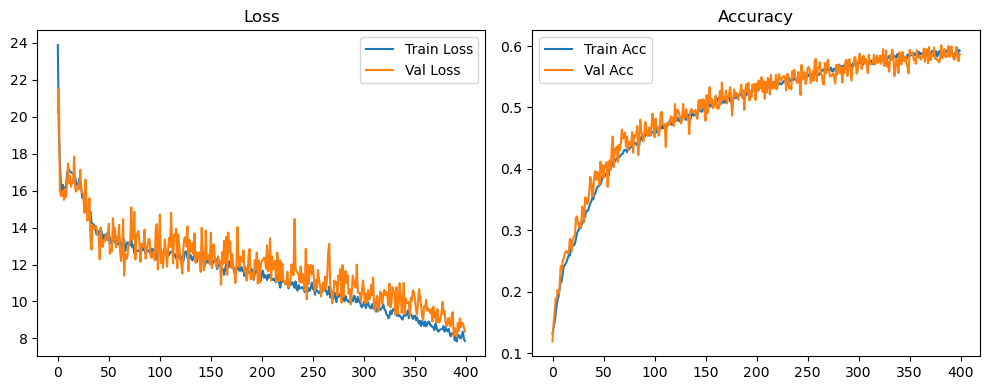

Original Model Final Test Loss: 8.5164 Accuracy: 0.5852




🚀 Running: batch512_lr_max_0.0005_min_1e-06_dp0.05


Files already downloaded and verified


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|                                                                                                                                                                        | 0/400 [00:00<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.1383 | Val Acc: 0.1922 | Epoch Time: 1.93 | :   0%|                                                                                                      | 0/400 [01:56<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.1383 | Val Acc: 0.1922 | Epoch Time: 1.93 | :   0%|                                                                                                      | 0/400 [01:56<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.1383 | Val Acc: 0.1922 | Epoch Time: 1.93 | :   0%|▏                                                                                         | 1/400 [01:56<12:52:12, 116.12s/it]

| LR: 0.000500 | Train Acc: 0.1781 | Val Acc: 0.2263 | Epoch Time: 1.93 | :   0%|▏                                                                                         | 1/400 [03:51<12:52:12, 116.12s/it]

| LR: 0.000500 | Train Acc: 0.1781 | Val Acc: 0.2263 | Epoch Time: 1.93 | :   0%|▏                                                                                         | 1/400 [03:51<12:52:12, 116.12s/it]

| LR: 0.000500 | Train Acc: 0.1781 | Val Acc: 0.2263 | Epoch Time: 1.93 | :   0%|▍                                                                                         | 2/400 [03:51<12:48:42, 115.89s/it]

| LR: 0.000500 | Train Acc: 0.1952 | Val Acc: 0.2248 | Epoch Time: 1.93 | :   0%|▍                                                                                         | 2/400 [05:47<12:48:42, 115.89s/it]

| LR: 0.000500 | Train Acc: 0.1952 | Val Acc: 0.2248 | Epoch Time: 1.93 | :   0%|▍                                                                                         | 2/400 [05:47<12:48:42, 115.89s/it]

| LR: 0.000500 | Train Acc: 0.1952 | Val Acc: 0.2248 | Epoch Time: 1.93 | :   1%|▋                                                                                         | 3/400 [05:47<12:46:16, 115.81s/it]

| LR: 0.000500 | Train Acc: 0.2073 | Val Acc: 0.2339 | Epoch Time: 1.93 | :   1%|▋                                                                                         | 3/400 [07:43<12:46:16, 115.81s/it]

| LR: 0.000500 | Train Acc: 0.2073 | Val Acc: 0.2339 | Epoch Time: 1.93 | :   1%|▋                                                                                         | 3/400 [07:43<12:46:16, 115.81s/it]

| LR: 0.000500 | Train Acc: 0.2073 | Val Acc: 0.2339 | Epoch Time: 1.93 | :   1%|▉                                                                                         | 4/400 [07:43<12:44:09, 115.78s/it]

| LR: 0.000500 | Train Acc: 0.2166 | Val Acc: 0.2631 | Epoch Time: 1.93 | :   1%|▉                                                                                         | 4/400 [09:38<12:44:09, 115.78s/it]

| LR: 0.000500 | Train Acc: 0.2166 | Val Acc: 0.2631 | Epoch Time: 1.93 | :   1%|▉                                                                                         | 4/400 [09:38<12:44:09, 115.78s/it]

| LR: 0.000500 | Train Acc: 0.2166 | Val Acc: 0.2631 | Epoch Time: 1.93 | :   1%|█▏                                                                                        | 5/400 [09:39<12:42:04, 115.76s/it]

| LR: 0.000500 | Train Acc: 0.2226 | Val Acc: 0.2552 | Epoch Time: 1.93 | :   1%|█▏                                                                                        | 5/400 [11:34<12:42:04, 115.76s/it]

| LR: 0.000500 | Train Acc: 0.2226 | Val Acc: 0.2552 | Epoch Time: 1.93 | :   1%|█▏                                                                                        | 5/400 [11:34<12:42:04, 115.76s/it]

| LR: 0.000500 | Train Acc: 0.2226 | Val Acc: 0.2552 | Epoch Time: 1.93 | :   2%|█▎                                                                                        | 6/400 [11:34<12:40:08, 115.76s/it]

| LR: 0.000500 | Train Acc: 0.2375 | Val Acc: 0.2610 | Epoch Time: 1.93 | :   2%|█▎                                                                                        | 6/400 [13:30<12:40:08, 115.76s/it]

| LR: 0.000500 | Train Acc: 0.2375 | Val Acc: 0.2610 | Epoch Time: 1.93 | :   2%|█▎                                                                                        | 6/400 [13:30<12:40:08, 115.76s/it]

| LR: 0.000500 | Train Acc: 0.2375 | Val Acc: 0.2610 | Epoch Time: 1.93 | :   2%|█▌                                                                                        | 7/400 [13:30<12:38:12, 115.76s/it]

| LR: 0.000500 | Train Acc: 0.2359 | Val Acc: 0.2665 | Epoch Time: 1.93 | :   2%|█▌                                                                                        | 7/400 [15:26<12:38:12, 115.76s/it]

| LR: 0.000500 | Train Acc: 0.2359 | Val Acc: 0.2665 | Epoch Time: 1.93 | :   2%|█▌                                                                                        | 7/400 [15:26<12:38:12, 115.76s/it]

| LR: 0.000500 | Train Acc: 0.2359 | Val Acc: 0.2665 | Epoch Time: 1.93 | :   2%|█▊                                                                                        | 8/400 [15:26<12:36:15, 115.75s/it]

| LR: 0.000500 | Train Acc: 0.2458 | Val Acc: 0.2387 | Epoch Time: 1.93 | :   2%|█▊                                                                                        | 8/400 [17:21<12:36:15, 115.75s/it]

| LR: 0.000500 | Train Acc: 0.2458 | Val Acc: 0.2387 | Epoch Time: 1.93 | :   2%|█▊                                                                                        | 8/400 [17:21<12:36:15, 115.75s/it]

| LR: 0.000500 | Train Acc: 0.2458 | Val Acc: 0.2387 | Epoch Time: 1.93 | :   2%|██                                                                                        | 9/400 [17:22<12:34:20, 115.76s/it]

| LR: 0.000499 | Train Acc: 0.2481 | Val Acc: 0.2841 | Epoch Time: 1.93 | :   2%|██                                                                                        | 9/400 [19:17<12:34:20, 115.76s/it]

| LR: 0.000499 | Train Acc: 0.2481 | Val Acc: 0.2841 | Epoch Time: 1.93 | :   2%|██                                                                                        | 9/400 [19:17<12:34:20, 115.76s/it]

| LR: 0.000499 | Train Acc: 0.2481 | Val Acc: 0.2841 | Epoch Time: 1.93 | :   2%|██▏                                                                                      | 10/400 [19:17<12:32:25, 115.76s/it]

| LR: 0.000499 | Train Acc: 0.2550 | Val Acc: 0.2930 | Epoch Time: 1.93 | :   2%|██▏                                                                                      | 10/400 [21:13<12:32:25, 115.76s/it]

| LR: 0.000499 | Train Acc: 0.2550 | Val Acc: 0.2930 | Epoch Time: 1.93 | :   2%|██▏                                                                                      | 10/400 [21:13<12:32:25, 115.76s/it]

| LR: 0.000499 | Train Acc: 0.2550 | Val Acc: 0.2930 | Epoch Time: 1.93 | :   3%|██▍                                                                                      | 11/400 [21:13<12:30:27, 115.75s/it]

| LR: 0.000499 | Train Acc: 0.2598 | Val Acc: 0.2621 | Epoch Time: 1.93 | :   3%|██▍                                                                                      | 11/400 [23:09<12:30:27, 115.75s/it]

| LR: 0.000499 | Train Acc: 0.2598 | Val Acc: 0.2621 | Epoch Time: 1.93 | :   3%|██▍                                                                                      | 11/400 [23:09<12:30:27, 115.75s/it]

| LR: 0.000499 | Train Acc: 0.2598 | Val Acc: 0.2621 | Epoch Time: 1.93 | :   3%|██▋                                                                                      | 12/400 [23:09<12:28:28, 115.74s/it]

| LR: 0.000499 | Train Acc: 0.2614 | Val Acc: 0.2807 | Epoch Time: 1.93 | :   3%|██▋                                                                                      | 12/400 [25:04<12:28:28, 115.74s/it]

| LR: 0.000499 | Train Acc: 0.2614 | Val Acc: 0.2807 | Epoch Time: 1.93 | :   3%|██▋                                                                                      | 12/400 [25:04<12:28:28, 115.74s/it]

| LR: 0.000499 | Train Acc: 0.2614 | Val Acc: 0.2807 | Epoch Time: 1.93 | :   3%|██▉                                                                                      | 13/400 [25:05<12:26:32, 115.74s/it]

| LR: 0.000499 | Train Acc: 0.2666 | Val Acc: 0.2556 | Epoch Time: 1.93 | :   3%|██▉                                                                                      | 13/400 [27:00<12:26:32, 115.74s/it]

| LR: 0.000499 | Train Acc: 0.2666 | Val Acc: 0.2556 | Epoch Time: 1.93 | :   3%|██▉                                                                                      | 13/400 [27:00<12:26:32, 115.74s/it]

| LR: 0.000499 | Train Acc: 0.2666 | Val Acc: 0.2556 | Epoch Time: 1.93 | :   4%|███                                                                                      | 14/400 [27:00<12:24:34, 115.74s/it]

| LR: 0.000498 | Train Acc: 0.2684 | Val Acc: 0.2765 | Epoch Time: 1.93 | :   4%|███                                                                                      | 14/400 [28:56<12:24:34, 115.74s/it]

| LR: 0.000498 | Train Acc: 0.2684 | Val Acc: 0.2765 | Epoch Time: 1.93 | :   4%|███                                                                                      | 14/400 [28:56<12:24:34, 115.74s/it]

| LR: 0.000498 | Train Acc: 0.2684 | Val Acc: 0.2765 | Epoch Time: 1.93 | :   4%|███▎                                                                                     | 15/400 [28:56<12:22:37, 115.73s/it]

| LR: 0.000498 | Train Acc: 0.2678 | Val Acc: 0.2812 | Epoch Time: 1.93 | :   4%|███▎                                                                                     | 15/400 [30:52<12:22:37, 115.73s/it]

| LR: 0.000498 | Train Acc: 0.2678 | Val Acc: 0.2812 | Epoch Time: 1.93 | :   4%|███▎                                                                                     | 15/400 [30:52<12:22:37, 115.73s/it]

| LR: 0.000498 | Train Acc: 0.2678 | Val Acc: 0.2812 | Epoch Time: 1.93 | :   4%|███▌                                                                                     | 16/400 [30:52<12:20:42, 115.74s/it]

| LR: 0.000498 | Train Acc: 0.2774 | Val Acc: 0.2801 | Epoch Time: 1.93 | :   4%|███▌                                                                                     | 16/400 [32:47<12:20:42, 115.74s/it]

| LR: 0.000498 | Train Acc: 0.2774 | Val Acc: 0.2801 | Epoch Time: 1.93 | :   4%|███▌                                                                                     | 16/400 [32:47<12:20:42, 115.74s/it]

| LR: 0.000498 | Train Acc: 0.2774 | Val Acc: 0.2801 | Epoch Time: 1.93 | :   4%|███▊                                                                                     | 17/400 [32:47<12:18:41, 115.72s/it]

| LR: 0.000498 | Train Acc: 0.2782 | Val Acc: 0.3008 | Epoch Time: 1.93 | :   4%|███▊                                                                                     | 17/400 [34:43<12:18:41, 115.72s/it]

| LR: 0.000498 | Train Acc: 0.2782 | Val Acc: 0.3008 | Epoch Time: 1.93 | :   4%|███▊                                                                                     | 17/400 [34:43<12:18:41, 115.72s/it]

| LR: 0.000498 | Train Acc: 0.2782 | Val Acc: 0.3008 | Epoch Time: 1.93 | :   4%|████                                                                                     | 18/400 [34:43<12:16:47, 115.73s/it]

| LR: 0.000498 | Train Acc: 0.2844 | Val Acc: 0.3185 | Epoch Time: 1.93 | :   4%|████                                                                                     | 18/400 [36:39<12:16:47, 115.73s/it]

| LR: 0.000498 | Train Acc: 0.2844 | Val Acc: 0.3185 | Epoch Time: 1.93 | :   4%|████                                                                                     | 18/400 [36:39<12:16:47, 115.73s/it]

| LR: 0.000498 | Train Acc: 0.2844 | Val Acc: 0.3185 | Epoch Time: 1.93 | :   5%|████▏                                                                                    | 19/400 [36:39<12:14:51, 115.73s/it]

| LR: 0.000497 | Train Acc: 0.2924 | Val Acc: 0.2556 | Epoch Time: 1.93 | :   5%|████▏                                                                                    | 19/400 [38:34<12:14:51, 115.73s/it]

| LR: 0.000497 | Train Acc: 0.2924 | Val Acc: 0.2556 | Epoch Time: 1.93 | :   5%|████▏                                                                                    | 19/400 [38:34<12:14:51, 115.73s/it]

| LR: 0.000497 | Train Acc: 0.2924 | Val Acc: 0.2556 | Epoch Time: 1.93 | :   5%|████▍                                                                                    | 20/400 [38:35<12:12:49, 115.71s/it]

| LR: 0.000497 | Train Acc: 0.2900 | Val Acc: 0.2822 | Epoch Time: 1.93 | :   5%|████▍                                                                                    | 20/400 [40:30<12:12:49, 115.71s/it]

| LR: 0.000497 | Train Acc: 0.2900 | Val Acc: 0.2822 | Epoch Time: 1.93 | :   5%|████▍                                                                                    | 20/400 [40:30<12:12:49, 115.71s/it]

| LR: 0.000497 | Train Acc: 0.2900 | Val Acc: 0.2822 | Epoch Time: 1.93 | :   5%|████▋                                                                                    | 21/400 [40:30<12:10:52, 115.70s/it]

| LR: 0.000497 | Train Acc: 0.2897 | Val Acc: 0.2792 | Epoch Time: 1.93 | :   5%|████▋                                                                                    | 21/400 [42:26<12:10:52, 115.70s/it]

| LR: 0.000497 | Train Acc: 0.2897 | Val Acc: 0.2792 | Epoch Time: 1.93 | :   5%|████▋                                                                                    | 21/400 [42:26<12:10:52, 115.70s/it]

| LR: 0.000497 | Train Acc: 0.2897 | Val Acc: 0.2792 | Epoch Time: 1.93 | :   6%|████▉                                                                                    | 22/400 [42:26<12:09:01, 115.72s/it]

| LR: 0.000496 | Train Acc: 0.2923 | Val Acc: 0.3243 | Epoch Time: 1.93 | :   6%|████▉                                                                                    | 22/400 [44:22<12:09:01, 115.72s/it]

| LR: 0.000496 | Train Acc: 0.2923 | Val Acc: 0.3243 | Epoch Time: 1.93 | :   6%|████▉                                                                                    | 22/400 [44:22<12:09:01, 115.72s/it]

| LR: 0.000496 | Train Acc: 0.2923 | Val Acc: 0.3243 | Epoch Time: 1.93 | :   6%|█████                                                                                    | 23/400 [44:22<12:07:10, 115.73s/it]

| LR: 0.000496 | Train Acc: 0.3027 | Val Acc: 0.3279 | Epoch Time: 1.93 | :   6%|█████                                                                                    | 23/400 [46:17<12:07:10, 115.73s/it]

| LR: 0.000496 | Train Acc: 0.3027 | Val Acc: 0.3279 | Epoch Time: 1.93 | :   6%|█████                                                                                    | 23/400 [46:17<12:07:10, 115.73s/it]

| LR: 0.000496 | Train Acc: 0.3027 | Val Acc: 0.3279 | Epoch Time: 1.93 | :   6%|█████▎                                                                                   | 24/400 [46:17<12:05:12, 115.73s/it]

| LR: 0.000496 | Train Acc: 0.3074 | Val Acc: 0.3208 | Epoch Time: 1.93 | :   6%|█████▎                                                                                   | 24/400 [48:13<12:05:12, 115.73s/it]

| LR: 0.000496 | Train Acc: 0.3074 | Val Acc: 0.3208 | Epoch Time: 1.93 | :   6%|█████▎                                                                                   | 24/400 [48:13<12:05:12, 115.73s/it]

| LR: 0.000496 | Train Acc: 0.3074 | Val Acc: 0.3208 | Epoch Time: 1.93 | :   6%|█████▌                                                                                   | 25/400 [48:13<12:03:08, 115.70s/it]

| LR: 0.000495 | Train Acc: 0.3082 | Val Acc: 0.3130 | Epoch Time: 1.93 | :   6%|█████▌                                                                                   | 25/400 [50:09<12:03:08, 115.70s/it]

| LR: 0.000495 | Train Acc: 0.3082 | Val Acc: 0.3130 | Epoch Time: 1.93 | :   6%|█████▌                                                                                   | 25/400 [50:09<12:03:08, 115.70s/it]

| LR: 0.000495 | Train Acc: 0.3082 | Val Acc: 0.3130 | Epoch Time: 1.93 | :   6%|█████▊                                                                                   | 26/400 [50:09<12:01:07, 115.69s/it]

| LR: 0.000495 | Train Acc: 0.3083 | Val Acc: 0.3048 | Epoch Time: 1.93 | :   6%|█████▊                                                                                   | 26/400 [52:04<12:01:07, 115.69s/it]

| LR: 0.000495 | Train Acc: 0.3083 | Val Acc: 0.3048 | Epoch Time: 1.93 | :   6%|█████▊                                                                                   | 26/400 [52:04<12:01:07, 115.69s/it]

| LR: 0.000495 | Train Acc: 0.3083 | Val Acc: 0.3048 | Epoch Time: 1.93 | :   7%|██████                                                                                   | 27/400 [52:04<11:59:08, 115.68s/it]

| LR: 0.000494 | Train Acc: 0.3056 | Val Acc: 0.3264 | Epoch Time: 1.93 | :   7%|██████                                                                                   | 27/400 [54:00<11:59:08, 115.68s/it]

| LR: 0.000494 | Train Acc: 0.3056 | Val Acc: 0.3264 | Epoch Time: 1.93 | :   7%|██████                                                                                   | 27/400 [54:00<11:59:08, 115.68s/it]

| LR: 0.000494 | Train Acc: 0.3056 | Val Acc: 0.3264 | Epoch Time: 1.93 | :   7%|██████▏                                                                                  | 28/400 [54:00<11:57:12, 115.68s/it]

| LR: 0.000494 | Train Acc: 0.3152 | Val Acc: 0.3032 | Epoch Time: 1.93 | :   7%|██████▏                                                                                  | 28/400 [55:56<11:57:12, 115.68s/it]

| LR: 0.000494 | Train Acc: 0.3152 | Val Acc: 0.3032 | Epoch Time: 1.93 | :   7%|██████▏                                                                                  | 28/400 [55:56<11:57:12, 115.68s/it]

| LR: 0.000494 | Train Acc: 0.3152 | Val Acc: 0.3032 | Epoch Time: 1.93 | :   7%|██████▍                                                                                  | 29/400 [55:56<11:55:13, 115.67s/it]

| LR: 0.000494 | Train Acc: 0.3180 | Val Acc: 0.3348 | Epoch Time: 1.93 | :   7%|██████▍                                                                                  | 29/400 [57:51<11:55:13, 115.67s/it]

| LR: 0.000494 | Train Acc: 0.3180 | Val Acc: 0.3348 | Epoch Time: 1.93 | :   7%|██████▍                                                                                  | 29/400 [57:51<11:55:13, 115.67s/it]

| LR: 0.000494 | Train Acc: 0.3180 | Val Acc: 0.3348 | Epoch Time: 1.93 | :   8%|██████▋                                                                                  | 30/400 [57:51<11:53:16, 115.67s/it]

| LR: 0.000493 | Train Acc: 0.3189 | Val Acc: 0.3379 | Epoch Time: 1.93 | :   8%|██████▋                                                                                  | 30/400 [59:47<11:53:16, 115.67s/it]

| LR: 0.000493 | Train Acc: 0.3189 | Val Acc: 0.3379 | Epoch Time: 1.93 | :   8%|██████▋                                                                                  | 30/400 [59:47<11:53:16, 115.67s/it]

| LR: 0.000493 | Train Acc: 0.3189 | Val Acc: 0.3379 | Epoch Time: 1.93 | :   8%|██████▉                                                                                  | 31/400 [59:47<11:51:18, 115.66s/it]

| LR: 0.000493 | Train Acc: 0.3184 | Val Acc: 0.3366 | Epoch Time: 1.93 | :   8%|██████▋                                                                                | 31/400 [1:01:43<11:51:18, 115.66s/it]

| LR: 0.000493 | Train Acc: 0.3184 | Val Acc: 0.3366 | Epoch Time: 1.93 | :   8%|██████▋                                                                                | 31/400 [1:01:43<11:51:18, 115.66s/it]

| LR: 0.000493 | Train Acc: 0.3184 | Val Acc: 0.3366 | Epoch Time: 1.93 | :   8%|██████▉                                                                                | 32/400 [1:01:43<11:49:20, 115.65s/it]

| LR: 0.000492 | Train Acc: 0.3268 | Val Acc: 0.3597 | Epoch Time: 1.93 | :   8%|██████▉                                                                                | 32/400 [1:03:38<11:49:20, 115.65s/it]

| LR: 0.000492 | Train Acc: 0.3268 | Val Acc: 0.3597 | Epoch Time: 1.93 | :   8%|██████▉                                                                                | 32/400 [1:03:38<11:49:20, 115.65s/it]

| LR: 0.000492 | Train Acc: 0.3268 | Val Acc: 0.3597 | Epoch Time: 1.93 | :   8%|███████▏                                                                               | 33/400 [1:03:38<11:47:24, 115.65s/it]

| LR: 0.000492 | Train Acc: 0.3297 | Val Acc: 0.3307 | Epoch Time: 1.93 | :   8%|███████▏                                                                               | 33/400 [1:05:34<11:47:24, 115.65s/it]

| LR: 0.000492 | Train Acc: 0.3297 | Val Acc: 0.3307 | Epoch Time: 1.93 | :   8%|███████▏                                                                               | 33/400 [1:05:34<11:47:24, 115.65s/it]

| LR: 0.000492 | Train Acc: 0.3297 | Val Acc: 0.3307 | Epoch Time: 1.93 | :   8%|███████▍                                                                               | 34/400 [1:05:34<11:45:25, 115.64s/it]

| LR: 0.000491 | Train Acc: 0.3237 | Val Acc: 0.3704 | Epoch Time: 1.93 | :   8%|███████▍                                                                               | 34/400 [1:07:29<11:45:25, 115.64s/it]

| LR: 0.000491 | Train Acc: 0.3237 | Val Acc: 0.3704 | Epoch Time: 1.93 | :   8%|███████▍                                                                               | 34/400 [1:07:29<11:45:25, 115.64s/it]

| LR: 0.000491 | Train Acc: 0.3237 | Val Acc: 0.3704 | Epoch Time: 1.93 | :   9%|███████▌                                                                               | 35/400 [1:07:30<11:43:28, 115.64s/it]

| LR: 0.000491 | Train Acc: 0.3327 | Val Acc: 0.3546 | Epoch Time: 1.93 | :   9%|███████▌                                                                               | 35/400 [1:09:25<11:43:28, 115.64s/it]

| LR: 0.000491 | Train Acc: 0.3327 | Val Acc: 0.3546 | Epoch Time: 1.93 | :   9%|███████▌                                                                               | 35/400 [1:09:25<11:43:28, 115.64s/it]

| LR: 0.000491 | Train Acc: 0.3327 | Val Acc: 0.3546 | Epoch Time: 1.93 | :   9%|███████▊                                                                               | 36/400 [1:09:25<11:41:31, 115.64s/it]

| LR: 0.000490 | Train Acc: 0.3319 | Val Acc: 0.3431 | Epoch Time: 1.93 | :   9%|███████▊                                                                               | 36/400 [1:11:21<11:41:31, 115.64s/it]

| LR: 0.000490 | Train Acc: 0.3319 | Val Acc: 0.3431 | Epoch Time: 1.93 | :   9%|███████▊                                                                               | 36/400 [1:11:21<11:41:31, 115.64s/it]

| LR: 0.000490 | Train Acc: 0.3319 | Val Acc: 0.3431 | Epoch Time: 1.93 | :   9%|████████                                                                               | 37/400 [1:11:21<11:39:36, 115.64s/it]

| LR: 0.000490 | Train Acc: 0.3333 | Val Acc: 0.3591 | Epoch Time: 1.93 | :   9%|████████                                                                               | 37/400 [1:13:16<11:39:36, 115.64s/it]

| LR: 0.000490 | Train Acc: 0.3333 | Val Acc: 0.3591 | Epoch Time: 1.93 | :   9%|████████                                                                               | 37/400 [1:13:16<11:39:36, 115.64s/it]

| LR: 0.000490 | Train Acc: 0.3333 | Val Acc: 0.3591 | Epoch Time: 1.93 | :  10%|████████▎                                                                              | 38/400 [1:13:16<11:37:39, 115.63s/it]

| LR: 0.000489 | Train Acc: 0.3352 | Val Acc: 0.3495 | Epoch Time: 1.93 | :  10%|████████▎                                                                              | 38/400 [1:15:12<11:37:39, 115.63s/it]

| LR: 0.000489 | Train Acc: 0.3352 | Val Acc: 0.3495 | Epoch Time: 1.93 | :  10%|████████▎                                                                              | 38/400 [1:15:12<11:37:39, 115.63s/it]

| LR: 0.000489 | Train Acc: 0.3352 | Val Acc: 0.3495 | Epoch Time: 1.93 | :  10%|████████▍                                                                              | 39/400 [1:15:12<11:35:44, 115.64s/it]

| LR: 0.000488 | Train Acc: 0.3432 | Val Acc: 0.3610 | Epoch Time: 1.93 | :  10%|████████▍                                                                              | 39/400 [1:17:08<11:35:44, 115.64s/it]

| LR: 0.000488 | Train Acc: 0.3432 | Val Acc: 0.3610 | Epoch Time: 1.93 | :  10%|████████▍                                                                              | 39/400 [1:17:08<11:35:44, 115.64s/it]

| LR: 0.000488 | Train Acc: 0.3432 | Val Acc: 0.3610 | Epoch Time: 1.93 | :  10%|████████▋                                                                              | 40/400 [1:17:08<11:33:48, 115.64s/it]

| LR: 0.000488 | Train Acc: 0.3418 | Val Acc: 0.3686 | Epoch Time: 1.93 | :  10%|████████▋                                                                              | 40/400 [1:19:03<11:33:48, 115.64s/it]

| LR: 0.000488 | Train Acc: 0.3418 | Val Acc: 0.3686 | Epoch Time: 1.93 | :  10%|████████▋                                                                              | 40/400 [1:19:03<11:33:48, 115.64s/it]

| LR: 0.000488 | Train Acc: 0.3418 | Val Acc: 0.3686 | Epoch Time: 1.93 | :  10%|████████▉                                                                              | 41/400 [1:19:03<11:31:53, 115.64s/it]

| LR: 0.000487 | Train Acc: 0.3436 | Val Acc: 0.3485 | Epoch Time: 1.93 | :  10%|████████▉                                                                              | 41/400 [1:20:59<11:31:53, 115.64s/it]

| LR: 0.000487 | Train Acc: 0.3436 | Val Acc: 0.3485 | Epoch Time: 1.93 | :  10%|████████▉                                                                              | 41/400 [1:20:59<11:31:53, 115.64s/it]

| LR: 0.000487 | Train Acc: 0.3436 | Val Acc: 0.3485 | Epoch Time: 1.93 | :  10%|█████████▏                                                                             | 42/400 [1:20:59<11:29:57, 115.63s/it]

| LR: 0.000487 | Train Acc: 0.3418 | Val Acc: 0.4031 | Epoch Time: 1.93 | :  10%|█████████▏                                                                             | 42/400 [1:22:55<11:29:57, 115.63s/it]

| LR: 0.000487 | Train Acc: 0.3418 | Val Acc: 0.4031 | Epoch Time: 1.93 | :  10%|█████████▏                                                                             | 42/400 [1:22:55<11:29:57, 115.63s/it]

| LR: 0.000487 | Train Acc: 0.3418 | Val Acc: 0.4031 | Epoch Time: 1.93 | :  11%|█████████▎                                                                             | 43/400 [1:22:55<11:28:07, 115.65s/it]

| LR: 0.000486 | Train Acc: 0.3488 | Val Acc: 0.3814 | Epoch Time: 1.93 | :  11%|█████████▎                                                                             | 43/400 [1:24:50<11:28:07, 115.65s/it]

| LR: 0.000486 | Train Acc: 0.3488 | Val Acc: 0.3814 | Epoch Time: 1.93 | :  11%|█████████▎                                                                             | 43/400 [1:24:50<11:28:07, 115.65s/it]

| LR: 0.000486 | Train Acc: 0.3488 | Val Acc: 0.3814 | Epoch Time: 1.93 | :  11%|█████████▌                                                                             | 44/400 [1:24:50<11:26:10, 115.65s/it]

| LR: 0.000485 | Train Acc: 0.3447 | Val Acc: 0.4067 | Epoch Time: 1.93 | :  11%|█████████▌                                                                             | 44/400 [1:26:46<11:26:10, 115.65s/it]

| LR: 0.000485 | Train Acc: 0.3447 | Val Acc: 0.4067 | Epoch Time: 1.93 | :  11%|█████████▌                                                                             | 44/400 [1:26:46<11:26:10, 115.65s/it]

| LR: 0.000485 | Train Acc: 0.3447 | Val Acc: 0.4067 | Epoch Time: 1.93 | :  11%|█████████▊                                                                             | 45/400 [1:26:46<11:24:24, 115.67s/it]

| LR: 0.000485 | Train Acc: 0.3512 | Val Acc: 0.3910 | Epoch Time: 1.93 | :  11%|█████████▊                                                                             | 45/400 [1:28:42<11:24:24, 115.67s/it]

| LR: 0.000485 | Train Acc: 0.3512 | Val Acc: 0.3910 | Epoch Time: 1.93 | :  11%|█████████▊                                                                             | 45/400 [1:28:42<11:24:24, 115.67s/it]

| LR: 0.000485 | Train Acc: 0.3512 | Val Acc: 0.3910 | Epoch Time: 1.93 | :  12%|██████████                                                                             | 46/400 [1:28:42<11:22:22, 115.66s/it]

| LR: 0.000484 | Train Acc: 0.3551 | Val Acc: 0.3808 | Epoch Time: 1.93 | :  12%|██████████                                                                             | 46/400 [1:30:37<11:22:22, 115.66s/it]

| LR: 0.000484 | Train Acc: 0.3551 | Val Acc: 0.3808 | Epoch Time: 1.93 | :  12%|██████████                                                                             | 46/400 [1:30:37<11:22:22, 115.66s/it]

| LR: 0.000484 | Train Acc: 0.3551 | Val Acc: 0.3808 | Epoch Time: 1.93 | :  12%|██████████▏                                                                            | 47/400 [1:30:37<11:20:22, 115.65s/it]

| LR: 0.000483 | Train Acc: 0.3531 | Val Acc: 0.3864 | Epoch Time: 1.93 | :  12%|██████████▏                                                                            | 47/400 [1:32:33<11:20:22, 115.65s/it]

| LR: 0.000483 | Train Acc: 0.3531 | Val Acc: 0.3864 | Epoch Time: 1.93 | :  12%|██████████▏                                                                            | 47/400 [1:32:33<11:20:22, 115.65s/it]

| LR: 0.000483 | Train Acc: 0.3531 | Val Acc: 0.3864 | Epoch Time: 1.93 | :  12%|██████████▍                                                                            | 48/400 [1:32:33<11:18:24, 115.64s/it]

| LR: 0.000482 | Train Acc: 0.3565 | Val Acc: 0.3621 | Epoch Time: 1.93 | :  12%|██████████▍                                                                            | 48/400 [1:34:28<11:18:24, 115.64s/it]

| LR: 0.000482 | Train Acc: 0.3565 | Val Acc: 0.3621 | Epoch Time: 1.93 | :  12%|██████████▍                                                                            | 48/400 [1:34:28<11:18:24, 115.64s/it]

| LR: 0.000482 | Train Acc: 0.3565 | Val Acc: 0.3621 | Epoch Time: 1.93 | :  12%|██████████▋                                                                            | 49/400 [1:34:29<11:16:28, 115.64s/it]

| LR: 0.000482 | Train Acc: 0.3592 | Val Acc: 0.3794 | Epoch Time: 1.93 | :  12%|██████████▋                                                                            | 49/400 [1:36:24<11:16:28, 115.64s/it]

| LR: 0.000482 | Train Acc: 0.3592 | Val Acc: 0.3794 | Epoch Time: 1.93 | :  12%|██████████▋                                                                            | 49/400 [1:36:24<11:16:28, 115.64s/it]

| LR: 0.000482 | Train Acc: 0.3592 | Val Acc: 0.3794 | Epoch Time: 1.93 | :  12%|██████████▉                                                                            | 50/400 [1:36:24<11:14:30, 115.63s/it]

| LR: 0.000481 | Train Acc: 0.3637 | Val Acc: 0.3686 | Epoch Time: 1.93 | :  12%|██████████▉                                                                            | 50/400 [1:38:20<11:14:30, 115.63s/it]

| LR: 0.000481 | Train Acc: 0.3637 | Val Acc: 0.3686 | Epoch Time: 1.93 | :  12%|██████████▉                                                                            | 50/400 [1:38:20<11:14:30, 115.63s/it]

| LR: 0.000481 | Train Acc: 0.3637 | Val Acc: 0.3686 | Epoch Time: 1.93 | :  13%|███████████                                                                            | 51/400 [1:38:20<11:12:33, 115.63s/it]

| LR: 0.000480 | Train Acc: 0.3618 | Val Acc: 0.3835 | Epoch Time: 1.93 | :  13%|███████████                                                                            | 51/400 [1:40:15<11:12:33, 115.63s/it]

| LR: 0.000480 | Train Acc: 0.3618 | Val Acc: 0.3835 | Epoch Time: 1.93 | :  13%|███████████                                                                            | 51/400 [1:40:15<11:12:33, 115.63s/it]

| LR: 0.000480 | Train Acc: 0.3618 | Val Acc: 0.3835 | Epoch Time: 1.93 | :  13%|███████████▎                                                                           | 52/400 [1:40:15<11:10:41, 115.64s/it]

| LR: 0.000479 | Train Acc: 0.3684 | Val Acc: 0.3902 | Epoch Time: 1.93 | :  13%|███████████▎                                                                           | 52/400 [1:42:11<11:10:41, 115.64s/it]

| LR: 0.000479 | Train Acc: 0.3684 | Val Acc: 0.3902 | Epoch Time: 1.93 | :  13%|███████████▎                                                                           | 52/400 [1:42:11<11:10:41, 115.64s/it]

| LR: 0.000479 | Train Acc: 0.3684 | Val Acc: 0.3902 | Epoch Time: 1.93 | :  13%|███████████▌                                                                           | 53/400 [1:42:11<11:08:44, 115.63s/it]

| LR: 0.000479 | Train Acc: 0.3674 | Val Acc: 0.3854 | Epoch Time: 1.93 | :  13%|███████████▌                                                                           | 53/400 [1:44:07<11:08:44, 115.63s/it]

| LR: 0.000479 | Train Acc: 0.3674 | Val Acc: 0.3854 | Epoch Time: 1.93 | :  13%|███████████▌                                                                           | 53/400 [1:44:07<11:08:44, 115.63s/it]

| LR: 0.000479 | Train Acc: 0.3674 | Val Acc: 0.3854 | Epoch Time: 1.93 | :  14%|███████████▋                                                                           | 54/400 [1:44:07<11:06:59, 115.66s/it]

| LR: 0.000478 | Train Acc: 0.3659 | Val Acc: 0.4028 | Epoch Time: 1.93 | :  14%|███████████▋                                                                           | 54/400 [1:46:02<11:06:59, 115.66s/it]

| LR: 0.000478 | Train Acc: 0.3659 | Val Acc: 0.4028 | Epoch Time: 1.93 | :  14%|███████████▋                                                                           | 54/400 [1:46:02<11:06:59, 115.66s/it]

| LR: 0.000478 | Train Acc: 0.3659 | Val Acc: 0.4028 | Epoch Time: 1.93 | :  14%|███████████▉                                                                           | 55/400 [1:46:03<11:05:07, 115.67s/it]

| LR: 0.000477 | Train Acc: 0.3677 | Val Acc: 0.3397 | Epoch Time: 1.93 | :  14%|███████████▉                                                                           | 55/400 [1:47:58<11:05:07, 115.67s/it]

| LR: 0.000477 | Train Acc: 0.3677 | Val Acc: 0.3397 | Epoch Time: 1.93 | :  14%|███████████▉                                                                           | 55/400 [1:47:58<11:05:07, 115.67s/it]

| LR: 0.000477 | Train Acc: 0.3677 | Val Acc: 0.3397 | Epoch Time: 1.93 | :  14%|████████████▏                                                                          | 56/400 [1:47:58<11:03:18, 115.69s/it]

| LR: 0.000476 | Train Acc: 0.3651 | Val Acc: 0.3647 | Epoch Time: 1.93 | :  14%|████████████▏                                                                          | 56/400 [1:49:54<11:03:18, 115.69s/it]

| LR: 0.000476 | Train Acc: 0.3651 | Val Acc: 0.3647 | Epoch Time: 1.93 | :  14%|████████████▏                                                                          | 56/400 [1:49:54<11:03:18, 115.69s/it]

| LR: 0.000476 | Train Acc: 0.3651 | Val Acc: 0.3647 | Epoch Time: 1.93 | :  14%|████████████▍                                                                          | 57/400 [1:49:54<11:01:33, 115.72s/it]

| LR: 0.000475 | Train Acc: 0.3695 | Val Acc: 0.3906 | Epoch Time: 1.93 | :  14%|████████████▍                                                                          | 57/400 [1:51:50<11:01:33, 115.72s/it]

| LR: 0.000475 | Train Acc: 0.3695 | Val Acc: 0.3906 | Epoch Time: 1.93 | :  14%|████████████▍                                                                          | 57/400 [1:51:50<11:01:33, 115.72s/it]

| LR: 0.000475 | Train Acc: 0.3695 | Val Acc: 0.3906 | Epoch Time: 1.93 | :  14%|████████████▌                                                                          | 58/400 [1:51:50<10:59:38, 115.73s/it]

| LR: 0.000475 | Train Acc: 0.3711 | Val Acc: 0.4176 | Epoch Time: 1.93 | :  14%|████████████▌                                                                          | 58/400 [1:53:45<10:59:38, 115.73s/it]

| LR: 0.000475 | Train Acc: 0.3711 | Val Acc: 0.4176 | Epoch Time: 1.93 | :  14%|████████████▌                                                                          | 58/400 [1:53:45<10:59:38, 115.73s/it]

| LR: 0.000475 | Train Acc: 0.3711 | Val Acc: 0.4176 | Epoch Time: 1.93 | :  15%|████████████▊                                                                          | 59/400 [1:53:45<10:57:38, 115.72s/it]

| LR: 0.000474 | Train Acc: 0.3730 | Val Acc: 0.4028 | Epoch Time: 1.93 | :  15%|████████████▊                                                                          | 59/400 [1:55:41<10:57:38, 115.72s/it]

| LR: 0.000474 | Train Acc: 0.3730 | Val Acc: 0.4028 | Epoch Time: 1.93 | :  15%|████████████▊                                                                          | 59/400 [1:55:41<10:57:38, 115.72s/it]

| LR: 0.000474 | Train Acc: 0.3730 | Val Acc: 0.4028 | Epoch Time: 1.93 | :  15%|█████████████                                                                          | 60/400 [1:55:41<10:55:38, 115.70s/it]

| LR: 0.000473 | Train Acc: 0.3743 | Val Acc: 0.4009 | Epoch Time: 1.92 | :  15%|█████████████                                                                          | 60/400 [1:57:37<10:55:38, 115.70s/it]

| LR: 0.000473 | Train Acc: 0.3743 | Val Acc: 0.4009 | Epoch Time: 1.92 | :  15%|█████████████                                                                          | 60/400 [1:57:37<10:55:38, 115.70s/it]

| LR: 0.000473 | Train Acc: 0.3743 | Val Acc: 0.4009 | Epoch Time: 1.92 | :  15%|█████████████▎                                                                         | 61/400 [1:57:37<10:53:31, 115.67s/it]

| LR: 0.000472 | Train Acc: 0.3802 | Val Acc: 0.3652 | Epoch Time: 1.93 | :  15%|█████████████▎                                                                         | 61/400 [1:59:32<10:53:31, 115.67s/it]

| LR: 0.000472 | Train Acc: 0.3802 | Val Acc: 0.3652 | Epoch Time: 1.93 | :  15%|█████████████▎                                                                         | 61/400 [1:59:32<10:53:31, 115.67s/it]

| LR: 0.000472 | Train Acc: 0.3802 | Val Acc: 0.3652 | Epoch Time: 1.93 | :  16%|█████████████▍                                                                         | 62/400 [1:59:32<10:51:34, 115.66s/it]

| LR: 0.000471 | Train Acc: 0.3761 | Val Acc: 0.3920 | Epoch Time: 1.92 | :  16%|█████████████▍                                                                         | 62/400 [2:01:28<10:51:34, 115.66s/it]

| LR: 0.000471 | Train Acc: 0.3761 | Val Acc: 0.3920 | Epoch Time: 1.92 | :  16%|█████████████▍                                                                         | 62/400 [2:01:28<10:51:34, 115.66s/it]

| LR: 0.000471 | Train Acc: 0.3761 | Val Acc: 0.3920 | Epoch Time: 1.92 | :  16%|█████████████▋                                                                         | 63/400 [2:01:28<10:49:31, 115.64s/it]

| LR: 0.000470 | Train Acc: 0.3782 | Val Acc: 0.3827 | Epoch Time: 1.93 | :  16%|█████████████▋                                                                         | 63/400 [2:03:23<10:49:31, 115.64s/it]

| LR: 0.000470 | Train Acc: 0.3782 | Val Acc: 0.3827 | Epoch Time: 1.93 | :  16%|█████████████▋                                                                         | 63/400 [2:03:23<10:49:31, 115.64s/it]

| LR: 0.000470 | Train Acc: 0.3782 | Val Acc: 0.3827 | Epoch Time: 1.93 | :  16%|█████████████▉                                                                         | 64/400 [2:03:24<10:47:34, 115.64s/it]

| LR: 0.000469 | Train Acc: 0.3746 | Val Acc: 0.4031 | Epoch Time: 1.93 | :  16%|█████████████▉                                                                         | 64/400 [2:05:19<10:47:34, 115.64s/it]

| LR: 0.000469 | Train Acc: 0.3746 | Val Acc: 0.4031 | Epoch Time: 1.93 | :  16%|█████████████▉                                                                         | 64/400 [2:05:19<10:47:34, 115.64s/it]

| LR: 0.000469 | Train Acc: 0.3746 | Val Acc: 0.4031 | Epoch Time: 1.93 | :  16%|██████████████▏                                                                        | 65/400 [2:05:19<10:45:38, 115.64s/it]

| LR: 0.000468 | Train Acc: 0.3830 | Val Acc: 0.3963 | Epoch Time: 1.93 | :  16%|██████████████▏                                                                        | 65/400 [2:07:15<10:45:38, 115.64s/it]

| LR: 0.000468 | Train Acc: 0.3830 | Val Acc: 0.3963 | Epoch Time: 1.93 | :  16%|██████████████▏                                                                        | 65/400 [2:07:15<10:45:38, 115.64s/it]

| LR: 0.000468 | Train Acc: 0.3830 | Val Acc: 0.3963 | Epoch Time: 1.93 | :  16%|██████████████▎                                                                        | 66/400 [2:07:15<10:43:50, 115.66s/it]

| LR: 0.000467 | Train Acc: 0.3810 | Val Acc: 0.3917 | Epoch Time: 1.93 | :  16%|██████████████▎                                                                        | 66/400 [2:09:11<10:43:50, 115.66s/it]

| LR: 0.000467 | Train Acc: 0.3810 | Val Acc: 0.3917 | Epoch Time: 1.93 | :  16%|██████████████▎                                                                        | 66/400 [2:09:11<10:43:50, 115.66s/it]

| LR: 0.000467 | Train Acc: 0.3810 | Val Acc: 0.3917 | Epoch Time: 1.93 | :  17%|██████████████▌                                                                        | 67/400 [2:09:11<10:41:57, 115.67s/it]

| LR: 0.000466 | Train Acc: 0.3876 | Val Acc: 0.4134 | Epoch Time: 1.92 | :  17%|██████████████▌                                                                        | 67/400 [2:11:06<10:41:57, 115.67s/it]

| LR: 0.000466 | Train Acc: 0.3876 | Val Acc: 0.4134 | Epoch Time: 1.92 | :  17%|██████████████▌                                                                        | 67/400 [2:11:06<10:41:57, 115.67s/it]

| LR: 0.000466 | Train Acc: 0.3876 | Val Acc: 0.4134 | Epoch Time: 1.92 | :  17%|██████████████▊                                                                        | 68/400 [2:11:06<10:39:55, 115.65s/it]

| LR: 0.000465 | Train Acc: 0.3832 | Val Acc: 0.3956 | Epoch Time: 1.92 | :  17%|██████████████▊                                                                        | 68/400 [2:13:02<10:39:55, 115.65s/it]

| LR: 0.000465 | Train Acc: 0.3832 | Val Acc: 0.3956 | Epoch Time: 1.92 | :  17%|██████████████▊                                                                        | 68/400 [2:13:02<10:39:55, 115.65s/it]

| LR: 0.000465 | Train Acc: 0.3832 | Val Acc: 0.3956 | Epoch Time: 1.92 | :  17%|███████████████                                                                        | 69/400 [2:13:02<10:37:55, 115.64s/it]

| LR: 0.000464 | Train Acc: 0.3855 | Val Acc: 0.3904 | Epoch Time: 1.93 | :  17%|███████████████                                                                        | 69/400 [2:14:57<10:37:55, 115.64s/it]

| LR: 0.000464 | Train Acc: 0.3855 | Val Acc: 0.3904 | Epoch Time: 1.93 | :  17%|███████████████                                                                        | 69/400 [2:14:57<10:37:55, 115.64s/it]

| LR: 0.000464 | Train Acc: 0.3855 | Val Acc: 0.3904 | Epoch Time: 1.93 | :  18%|███████████████▏                                                                       | 70/400 [2:14:57<10:35:59, 115.63s/it]

| LR: 0.000463 | Train Acc: 0.3881 | Val Acc: 0.4152 | Epoch Time: 1.92 | :  18%|███████████████▏                                                                       | 70/400 [2:16:53<10:35:59, 115.63s/it]

| LR: 0.000463 | Train Acc: 0.3881 | Val Acc: 0.4152 | Epoch Time: 1.92 | :  18%|███████████████▏                                                                       | 70/400 [2:16:53<10:35:59, 115.63s/it]

| LR: 0.000463 | Train Acc: 0.3881 | Val Acc: 0.4152 | Epoch Time: 1.92 | :  18%|███████████████▍                                                                       | 71/400 [2:16:53<10:34:00, 115.63s/it]

| LR: 0.000462 | Train Acc: 0.3896 | Val Acc: 0.4170 | Epoch Time: 1.92 | :  18%|███████████████▍                                                                       | 71/400 [2:18:49<10:34:00, 115.63s/it]

| LR: 0.000462 | Train Acc: 0.3896 | Val Acc: 0.4170 | Epoch Time: 1.92 | :  18%|███████████████▍                                                                       | 71/400 [2:18:49<10:34:00, 115.63s/it]

| LR: 0.000462 | Train Acc: 0.3896 | Val Acc: 0.4170 | Epoch Time: 1.92 | :  18%|███████████████▋                                                                       | 72/400 [2:18:49<10:32:01, 115.61s/it]

| LR: 0.000461 | Train Acc: 0.3886 | Val Acc: 0.4178 | Epoch Time: 1.93 | :  18%|███████████████▋                                                                       | 72/400 [2:20:44<10:32:01, 115.61s/it]

| LR: 0.000461 | Train Acc: 0.3886 | Val Acc: 0.4178 | Epoch Time: 1.93 | :  18%|███████████████▋                                                                       | 72/400 [2:20:44<10:32:01, 115.61s/it]

| LR: 0.000461 | Train Acc: 0.3886 | Val Acc: 0.4178 | Epoch Time: 1.93 | :  18%|███████████████▉                                                                       | 73/400 [2:20:44<10:30:06, 115.62s/it]

| LR: 0.000460 | Train Acc: 0.3899 | Val Acc: 0.4301 | Epoch Time: 1.92 | :  18%|███████████████▉                                                                       | 73/400 [2:22:40<10:30:06, 115.62s/it]

| LR: 0.000460 | Train Acc: 0.3899 | Val Acc: 0.4301 | Epoch Time: 1.92 | :  18%|███████████████▉                                                                       | 73/400 [2:22:40<10:30:06, 115.62s/it]

| LR: 0.000460 | Train Acc: 0.3899 | Val Acc: 0.4301 | Epoch Time: 1.92 | :  18%|████████████████                                                                       | 74/400 [2:22:40<10:28:09, 115.61s/it]

| LR: 0.000459 | Train Acc: 0.3924 | Val Acc: 0.4141 | Epoch Time: 1.93 | :  18%|████████████████                                                                       | 74/400 [2:24:35<10:28:09, 115.61s/it]

| LR: 0.000459 | Train Acc: 0.3924 | Val Acc: 0.4141 | Epoch Time: 1.93 | :  18%|████████████████                                                                       | 74/400 [2:24:35<10:28:09, 115.61s/it]

| LR: 0.000459 | Train Acc: 0.3924 | Val Acc: 0.4141 | Epoch Time: 1.93 | :  19%|████████████████▎                                                                      | 75/400 [2:24:36<10:26:13, 115.61s/it]

| LR: 0.000458 | Train Acc: 0.3909 | Val Acc: 0.4267 | Epoch Time: 1.92 | :  19%|████████████████▎                                                                      | 75/400 [2:26:31<10:26:13, 115.61s/it]

| LR: 0.000458 | Train Acc: 0.3909 | Val Acc: 0.4267 | Epoch Time: 1.92 | :  19%|████████████████▎                                                                      | 75/400 [2:26:31<10:26:13, 115.61s/it]

| LR: 0.000458 | Train Acc: 0.3909 | Val Acc: 0.4267 | Epoch Time: 1.92 | :  19%|████████████████▌                                                                      | 76/400 [2:26:31<10:24:16, 115.61s/it]

| LR: 0.000457 | Train Acc: 0.3918 | Val Acc: 0.4290 | Epoch Time: 1.92 | :  19%|████████████████▌                                                                      | 76/400 [2:28:27<10:24:16, 115.61s/it]

| LR: 0.000457 | Train Acc: 0.3918 | Val Acc: 0.4290 | Epoch Time: 1.92 | :  19%|████████████████▌                                                                      | 76/400 [2:28:27<10:24:16, 115.61s/it]

| LR: 0.000457 | Train Acc: 0.3918 | Val Acc: 0.4290 | Epoch Time: 1.92 | :  19%|████████████████▋                                                                      | 77/400 [2:28:27<10:22:21, 115.61s/it]

| LR: 0.000456 | Train Acc: 0.3971 | Val Acc: 0.4265 | Epoch Time: 1.92 | :  19%|████████████████▋                                                                      | 77/400 [2:30:22<10:22:21, 115.61s/it]

| LR: 0.000456 | Train Acc: 0.3971 | Val Acc: 0.4265 | Epoch Time: 1.92 | :  19%|████████████████▋                                                                      | 77/400 [2:30:22<10:22:21, 115.61s/it]

| LR: 0.000456 | Train Acc: 0.3971 | Val Acc: 0.4265 | Epoch Time: 1.92 | :  20%|████████████████▉                                                                      | 78/400 [2:30:22<10:20:24, 115.61s/it]

| LR: 0.000455 | Train Acc: 0.3992 | Val Acc: 0.4044 | Epoch Time: 1.92 | :  20%|████████████████▉                                                                      | 78/400 [2:32:18<10:20:24, 115.61s/it]

| LR: 0.000455 | Train Acc: 0.3992 | Val Acc: 0.4044 | Epoch Time: 1.92 | :  20%|████████████████▉                                                                      | 78/400 [2:32:18<10:20:24, 115.61s/it]

| LR: 0.000455 | Train Acc: 0.3992 | Val Acc: 0.4044 | Epoch Time: 1.92 | :  20%|█████████████████▏                                                                     | 79/400 [2:32:18<10:18:28, 115.60s/it]

| LR: 0.000453 | Train Acc: 0.3943 | Val Acc: 0.4201 | Epoch Time: 1.92 | :  20%|█████████████████▏                                                                     | 79/400 [2:34:13<10:18:28, 115.60s/it]

| LR: 0.000453 | Train Acc: 0.3943 | Val Acc: 0.4201 | Epoch Time: 1.92 | :  20%|█████████████████▏                                                                     | 79/400 [2:34:13<10:18:28, 115.60s/it]

| LR: 0.000453 | Train Acc: 0.3943 | Val Acc: 0.4201 | Epoch Time: 1.92 | :  20%|█████████████████▍                                                                     | 80/400 [2:34:14<10:16:33, 115.61s/it]

| LR: 0.000452 | Train Acc: 0.4015 | Val Acc: 0.3584 | Epoch Time: 1.92 | :  20%|█████████████████▍                                                                     | 80/400 [2:36:09<10:16:33, 115.61s/it]

| LR: 0.000452 | Train Acc: 0.4015 | Val Acc: 0.3584 | Epoch Time: 1.92 | :  20%|█████████████████▍                                                                     | 80/400 [2:36:09<10:16:33, 115.61s/it]

| LR: 0.000452 | Train Acc: 0.4015 | Val Acc: 0.3584 | Epoch Time: 1.92 | :  20%|█████████████████▌                                                                     | 81/400 [2:36:09<10:14:38, 115.61s/it]

| LR: 0.000451 | Train Acc: 0.3976 | Val Acc: 0.4348 | Epoch Time: 1.92 | :  20%|█████████████████▌                                                                     | 81/400 [2:38:05<10:14:38, 115.61s/it]

| LR: 0.000451 | Train Acc: 0.3976 | Val Acc: 0.4348 | Epoch Time: 1.92 | :  20%|█████████████████▌                                                                     | 81/400 [2:38:05<10:14:38, 115.61s/it]

| LR: 0.000451 | Train Acc: 0.3976 | Val Acc: 0.4348 | Epoch Time: 1.92 | :  20%|█████████████████▊                                                                     | 82/400 [2:38:05<10:12:43, 115.61s/it]

| LR: 0.000450 | Train Acc: 0.4003 | Val Acc: 0.4154 | Epoch Time: 1.92 | :  20%|█████████████████▊                                                                     | 82/400 [2:40:00<10:12:43, 115.61s/it]

| LR: 0.000450 | Train Acc: 0.4003 | Val Acc: 0.4154 | Epoch Time: 1.92 | :  20%|█████████████████▊                                                                     | 82/400 [2:40:00<10:12:43, 115.61s/it]

| LR: 0.000450 | Train Acc: 0.4003 | Val Acc: 0.4154 | Epoch Time: 1.92 | :  21%|██████████████████                                                                     | 83/400 [2:40:00<10:10:47, 115.61s/it]

| LR: 0.000449 | Train Acc: 0.3976 | Val Acc: 0.4254 | Epoch Time: 1.93 | :  21%|██████████████████                                                                     | 83/400 [2:41:56<10:10:47, 115.61s/it]

| LR: 0.000449 | Train Acc: 0.3976 | Val Acc: 0.4254 | Epoch Time: 1.93 | :  21%|██████████████████                                                                     | 83/400 [2:41:56<10:10:47, 115.61s/it]

| LR: 0.000449 | Train Acc: 0.3976 | Val Acc: 0.4254 | Epoch Time: 1.93 | :  21%|██████████████████▎                                                                    | 84/400 [2:41:56<10:08:54, 115.61s/it]

| LR: 0.000448 | Train Acc: 0.4058 | Val Acc: 0.4360 | Epoch Time: 1.93 | :  21%|██████████████████▎                                                                    | 84/400 [2:43:51<10:08:54, 115.61s/it]

| LR: 0.000448 | Train Acc: 0.4058 | Val Acc: 0.4360 | Epoch Time: 1.93 | :  21%|██████████████████▎                                                                    | 84/400 [2:43:51<10:08:54, 115.61s/it]

| LR: 0.000448 | Train Acc: 0.4058 | Val Acc: 0.4360 | Epoch Time: 1.93 | :  21%|██████████████████▍                                                                    | 85/400 [2:43:52<10:06:58, 115.61s/it]

| LR: 0.000446 | Train Acc: 0.4006 | Val Acc: 0.4140 | Epoch Time: 1.92 | :  21%|██████████████████▍                                                                    | 85/400 [2:45:47<10:06:58, 115.61s/it]

| LR: 0.000446 | Train Acc: 0.4006 | Val Acc: 0.4140 | Epoch Time: 1.92 | :  21%|██████████████████▍                                                                    | 85/400 [2:45:47<10:06:58, 115.61s/it]

| LR: 0.000446 | Train Acc: 0.4006 | Val Acc: 0.4140 | Epoch Time: 1.92 | :  22%|██████████████████▋                                                                    | 86/400 [2:45:47<10:05:01, 115.61s/it]

| LR: 0.000445 | Train Acc: 0.4059 | Val Acc: 0.4160 | Epoch Time: 1.92 | :  22%|██████████████████▋                                                                    | 86/400 [2:47:43<10:05:01, 115.61s/it]

| LR: 0.000445 | Train Acc: 0.4059 | Val Acc: 0.4160 | Epoch Time: 1.92 | :  22%|██████████████████▋                                                                    | 86/400 [2:47:43<10:05:01, 115.61s/it]

| LR: 0.000445 | Train Acc: 0.4059 | Val Acc: 0.4160 | Epoch Time: 1.92 | :  22%|██████████████████▉                                                                    | 87/400 [2:47:43<10:03:05, 115.61s/it]

| LR: 0.000444 | Train Acc: 0.4058 | Val Acc: 0.4402 | Epoch Time: 1.92 | :  22%|██████████████████▉                                                                    | 87/400 [2:49:38<10:03:05, 115.61s/it]

| LR: 0.000444 | Train Acc: 0.4058 | Val Acc: 0.4402 | Epoch Time: 1.92 | :  22%|██████████████████▉                                                                    | 87/400 [2:49:38<10:03:05, 115.61s/it]

| LR: 0.000444 | Train Acc: 0.4058 | Val Acc: 0.4402 | Epoch Time: 1.92 | :  22%|███████████████████▏                                                                   | 88/400 [2:49:38<10:01:08, 115.60s/it]

| LR: 0.000443 | Train Acc: 0.4030 | Val Acc: 0.4139 | Epoch Time: 1.93 | :  22%|███████████████████▏                                                                   | 88/400 [2:51:34<10:01:08, 115.60s/it]

| LR: 0.000443 | Train Acc: 0.4030 | Val Acc: 0.4139 | Epoch Time: 1.93 | :  22%|███████████████████▏                                                                   | 88/400 [2:51:34<10:01:08, 115.60s/it]

| LR: 0.000443 | Train Acc: 0.4030 | Val Acc: 0.4139 | Epoch Time: 1.93 | :  22%|███████████████████▌                                                                    | 89/400 [2:51:34<9:59:16, 115.62s/it]

| LR: 0.000441 | Train Acc: 0.4045 | Val Acc: 0.4333 | Epoch Time: 1.92 | :  22%|███████████████████▌                                                                    | 89/400 [2:53:30<9:59:16, 115.62s/it]

| LR: 0.000441 | Train Acc: 0.4045 | Val Acc: 0.4333 | Epoch Time: 1.92 | :  22%|███████████████████▌                                                                    | 89/400 [2:53:30<9:59:16, 115.62s/it]

| LR: 0.000441 | Train Acc: 0.4045 | Val Acc: 0.4333 | Epoch Time: 1.92 | :  22%|███████████████████▊                                                                    | 90/400 [2:53:30<9:57:20, 115.61s/it]

| LR: 0.000440 | Train Acc: 0.4043 | Val Acc: 0.3956 | Epoch Time: 1.92 | :  22%|███████████████████▊                                                                    | 90/400 [2:55:25<9:57:20, 115.61s/it]

| LR: 0.000440 | Train Acc: 0.4043 | Val Acc: 0.3956 | Epoch Time: 1.92 | :  22%|███████████████████▊                                                                    | 90/400 [2:55:25<9:57:20, 115.61s/it]

| LR: 0.000440 | Train Acc: 0.4043 | Val Acc: 0.3956 | Epoch Time: 1.92 | :  23%|████████████████████                                                                    | 91/400 [2:55:25<9:55:24, 115.61s/it]

| LR: 0.000439 | Train Acc: 0.4092 | Val Acc: 0.4068 | Epoch Time: 1.93 | :  23%|████████████████████                                                                    | 91/400 [2:57:21<9:55:24, 115.61s/it]

| LR: 0.000439 | Train Acc: 0.4092 | Val Acc: 0.4068 | Epoch Time: 1.93 | :  23%|████████████████████                                                                    | 91/400 [2:57:21<9:55:24, 115.61s/it]

| LR: 0.000439 | Train Acc: 0.4092 | Val Acc: 0.4068 | Epoch Time: 1.93 | :  23%|████████████████████▏                                                                   | 92/400 [2:57:21<9:53:30, 115.62s/it]

| LR: 0.000438 | Train Acc: 0.4064 | Val Acc: 0.4020 | Epoch Time: 1.92 | :  23%|████████████████████▏                                                                   | 92/400 [2:59:16<9:53:30, 115.62s/it]

| LR: 0.000438 | Train Acc: 0.4064 | Val Acc: 0.4020 | Epoch Time: 1.92 | :  23%|████████████████████▏                                                                   | 92/400 [2:59:16<9:53:30, 115.62s/it]

| LR: 0.000438 | Train Acc: 0.4064 | Val Acc: 0.4020 | Epoch Time: 1.92 | :  23%|████████████████████▍                                                                   | 93/400 [2:59:16<9:51:32, 115.61s/it]

| LR: 0.000436 | Train Acc: 0.4084 | Val Acc: 0.4412 | Epoch Time: 1.93 | :  23%|████████████████████▍                                                                   | 93/400 [3:01:12<9:51:32, 115.61s/it]

| LR: 0.000436 | Train Acc: 0.4084 | Val Acc: 0.4412 | Epoch Time: 1.93 | :  23%|████████████████████▍                                                                   | 93/400 [3:01:12<9:51:32, 115.61s/it]

| LR: 0.000436 | Train Acc: 0.4084 | Val Acc: 0.4412 | Epoch Time: 1.93 | :  24%|████████████████████▋                                                                   | 94/400 [3:01:12<9:49:39, 115.62s/it]

| LR: 0.000435 | Train Acc: 0.4120 | Val Acc: 0.4232 | Epoch Time: 1.93 | :  24%|████████████████████▋                                                                   | 94/400 [3:03:08<9:49:39, 115.62s/it]

| LR: 0.000435 | Train Acc: 0.4120 | Val Acc: 0.4232 | Epoch Time: 1.93 | :  24%|████████████████████▋                                                                   | 94/400 [3:03:08<9:49:39, 115.62s/it]

| LR: 0.000435 | Train Acc: 0.4120 | Val Acc: 0.4232 | Epoch Time: 1.93 | :  24%|████████████████████▉                                                                   | 95/400 [3:03:08<9:47:44, 115.62s/it]

| LR: 0.000434 | Train Acc: 0.4099 | Val Acc: 0.4143 | Epoch Time: 1.93 | :  24%|████████████████████▉                                                                   | 95/400 [3:05:03<9:47:44, 115.62s/it]

| LR: 0.000434 | Train Acc: 0.4099 | Val Acc: 0.4143 | Epoch Time: 1.93 | :  24%|████████████████████▉                                                                   | 95/400 [3:05:03<9:47:44, 115.62s/it]

| LR: 0.000434 | Train Acc: 0.4099 | Val Acc: 0.4143 | Epoch Time: 1.93 | :  24%|█████████████████████                                                                   | 96/400 [3:05:03<9:45:50, 115.63s/it]

| LR: 0.000432 | Train Acc: 0.4151 | Val Acc: 0.4412 | Epoch Time: 1.93 | :  24%|█████████████████████                                                                   | 96/400 [3:06:59<9:45:50, 115.63s/it]

| LR: 0.000432 | Train Acc: 0.4151 | Val Acc: 0.4412 | Epoch Time: 1.93 | :  24%|█████████████████████                                                                   | 96/400 [3:06:59<9:45:50, 115.63s/it]

| LR: 0.000432 | Train Acc: 0.4151 | Val Acc: 0.4412 | Epoch Time: 1.93 | :  24%|█████████████████████▎                                                                  | 97/400 [3:06:59<9:43:56, 115.63s/it]

| LR: 0.000431 | Train Acc: 0.4149 | Val Acc: 0.4480 | Epoch Time: 1.93 | :  24%|█████████████████████▎                                                                  | 97/400 [3:08:55<9:43:56, 115.63s/it]

| LR: 0.000431 | Train Acc: 0.4149 | Val Acc: 0.4480 | Epoch Time: 1.93 | :  24%|█████████████████████▎                                                                  | 97/400 [3:08:55<9:43:56, 115.63s/it]

| LR: 0.000431 | Train Acc: 0.4149 | Val Acc: 0.4480 | Epoch Time: 1.93 | :  24%|█████████████████████▌                                                                  | 98/400 [3:08:55<9:42:00, 115.63s/it]

| LR: 0.000430 | Train Acc: 0.4203 | Val Acc: 0.4475 | Epoch Time: 1.93 | :  24%|█████████████████████▌                                                                  | 98/400 [3:10:50<9:42:00, 115.63s/it]

| LR: 0.000430 | Train Acc: 0.4203 | Val Acc: 0.4475 | Epoch Time: 1.93 | :  24%|█████████████████████▌                                                                  | 98/400 [3:10:50<9:42:00, 115.63s/it]

| LR: 0.000430 | Train Acc: 0.4203 | Val Acc: 0.4475 | Epoch Time: 1.93 | :  25%|█████████████████████▊                                                                  | 99/400 [3:10:50<9:40:03, 115.63s/it]

| LR: 0.000428 | Train Acc: 0.4156 | Val Acc: 0.4387 | Epoch Time: 1.93 | :  25%|█████████████████████▊                                                                  | 99/400 [3:12:46<9:40:03, 115.63s/it]

| LR: 0.000428 | Train Acc: 0.4156 | Val Acc: 0.4387 | Epoch Time: 1.93 | :  25%|█████████████████████▊                                                                  | 99/400 [3:12:46<9:40:03, 115.63s/it]

| LR: 0.000428 | Train Acc: 0.4156 | Val Acc: 0.4387 | Epoch Time: 1.93 | :  25%|█████████████████████▊                                                                 | 100/400 [3:12:46<9:38:09, 115.63s/it]

| LR: 0.000427 | Train Acc: 0.4181 | Val Acc: 0.4502 | Epoch Time: 1.92 | :  25%|█████████████████████▊                                                                 | 100/400 [3:14:41<9:38:09, 115.63s/it]

| LR: 0.000427 | Train Acc: 0.4181 | Val Acc: 0.4502 | Epoch Time: 1.92 | :  25%|█████████████████████▊                                                                 | 100/400 [3:14:41<9:38:09, 115.63s/it]

| LR: 0.000427 | Train Acc: 0.4181 | Val Acc: 0.4502 | Epoch Time: 1.92 | :  25%|█████████████████████▉                                                                 | 101/400 [3:14:42<9:36:11, 115.63s/it]

| LR: 0.000426 | Train Acc: 0.4163 | Val Acc: 0.4366 | Epoch Time: 1.93 | :  25%|█████████████████████▉                                                                 | 101/400 [3:16:37<9:36:11, 115.63s/it]

| LR: 0.000426 | Train Acc: 0.4163 | Val Acc: 0.4366 | Epoch Time: 1.93 | :  25%|█████████████████████▉                                                                 | 101/400 [3:16:37<9:36:11, 115.63s/it]

| LR: 0.000426 | Train Acc: 0.4163 | Val Acc: 0.4366 | Epoch Time: 1.93 | :  26%|██████████████████████▏                                                                | 102/400 [3:16:37<9:34:16, 115.63s/it]

| LR: 0.000424 | Train Acc: 0.4147 | Val Acc: 0.4134 | Epoch Time: 1.93 | :  26%|██████████████████████▏                                                                | 102/400 [3:18:33<9:34:16, 115.63s/it]

| LR: 0.000424 | Train Acc: 0.4147 | Val Acc: 0.4134 | Epoch Time: 1.93 | :  26%|██████████████████████▏                                                                | 102/400 [3:18:33<9:34:16, 115.63s/it]

| LR: 0.000424 | Train Acc: 0.4147 | Val Acc: 0.4134 | Epoch Time: 1.93 | :  26%|██████████████████████▍                                                                | 103/400 [3:18:33<9:32:22, 115.63s/it]

| LR: 0.000423 | Train Acc: 0.4160 | Val Acc: 0.4452 | Epoch Time: 1.93 | :  26%|██████████████████████▍                                                                | 103/400 [3:20:28<9:32:22, 115.63s/it]

| LR: 0.000423 | Train Acc: 0.4160 | Val Acc: 0.4452 | Epoch Time: 1.93 | :  26%|██████████████████████▍                                                                | 103/400 [3:20:28<9:32:22, 115.63s/it]

| LR: 0.000423 | Train Acc: 0.4160 | Val Acc: 0.4452 | Epoch Time: 1.93 | :  26%|██████████████████████▌                                                                | 104/400 [3:20:28<9:30:27, 115.63s/it]

| LR: 0.000421 | Train Acc: 0.4187 | Val Acc: 0.4465 | Epoch Time: 1.92 | :  26%|██████████████████████▌                                                                | 104/400 [3:22:24<9:30:27, 115.63s/it]

| LR: 0.000421 | Train Acc: 0.4187 | Val Acc: 0.4465 | Epoch Time: 1.92 | :  26%|██████████████████████▌                                                                | 104/400 [3:22:24<9:30:27, 115.63s/it]

| LR: 0.000421 | Train Acc: 0.4187 | Val Acc: 0.4465 | Epoch Time: 1.92 | :  26%|██████████████████████▊                                                                | 105/400 [3:22:24<9:28:28, 115.62s/it]

| LR: 0.000420 | Train Acc: 0.4229 | Val Acc: 0.4250 | Epoch Time: 1.93 | :  26%|██████████████████████▊                                                                | 105/400 [3:24:20<9:28:28, 115.62s/it]

| LR: 0.000420 | Train Acc: 0.4229 | Val Acc: 0.4250 | Epoch Time: 1.93 | :  26%|██████████████████████▊                                                                | 105/400 [3:24:20<9:28:28, 115.62s/it]

| LR: 0.000420 | Train Acc: 0.4229 | Val Acc: 0.4250 | Epoch Time: 1.93 | :  26%|███████████████████████                                                                | 106/400 [3:24:20<9:26:32, 115.62s/it]

| LR: 0.000418 | Train Acc: 0.4224 | Val Acc: 0.4430 | Epoch Time: 1.92 | :  26%|███████████████████████                                                                | 106/400 [3:26:15<9:26:32, 115.62s/it]

| LR: 0.000418 | Train Acc: 0.4224 | Val Acc: 0.4430 | Epoch Time: 1.92 | :  26%|███████████████████████                                                                | 106/400 [3:26:15<9:26:32, 115.62s/it]

| LR: 0.000418 | Train Acc: 0.4224 | Val Acc: 0.4430 | Epoch Time: 1.92 | :  27%|███████████████████████▎                                                               | 107/400 [3:26:15<9:24:36, 115.62s/it]

| LR: 0.000417 | Train Acc: 0.4195 | Val Acc: 0.4013 | Epoch Time: 1.92 | :  27%|███████████████████████▎                                                               | 107/400 [3:28:11<9:24:36, 115.62s/it]

| LR: 0.000417 | Train Acc: 0.4195 | Val Acc: 0.4013 | Epoch Time: 1.92 | :  27%|███████████████████████▎                                                               | 107/400 [3:28:11<9:24:36, 115.62s/it]

| LR: 0.000417 | Train Acc: 0.4195 | Val Acc: 0.4013 | Epoch Time: 1.92 | :  27%|███████████████████████▍                                                               | 108/400 [3:28:11<9:22:39, 115.61s/it]

| LR: 0.000415 | Train Acc: 0.4195 | Val Acc: 0.4416 | Epoch Time: 1.93 | :  27%|███████████████████████▍                                                               | 108/400 [3:30:06<9:22:39, 115.61s/it]

| LR: 0.000415 | Train Acc: 0.4195 | Val Acc: 0.4416 | Epoch Time: 1.93 | :  27%|███████████████████████▍                                                               | 108/400 [3:30:06<9:22:39, 115.61s/it]

| LR: 0.000415 | Train Acc: 0.4195 | Val Acc: 0.4416 | Epoch Time: 1.93 | :  27%|███████████████████████▋                                                               | 109/400 [3:30:06<9:20:44, 115.62s/it]

| LR: 0.000414 | Train Acc: 0.4223 | Val Acc: 0.4599 | Epoch Time: 1.92 | :  27%|███████████████████████▋                                                               | 109/400 [3:32:02<9:20:44, 115.62s/it]

| LR: 0.000414 | Train Acc: 0.4223 | Val Acc: 0.4599 | Epoch Time: 1.92 | :  27%|███████████████████████▋                                                               | 109/400 [3:32:02<9:20:44, 115.62s/it]

| LR: 0.000414 | Train Acc: 0.4223 | Val Acc: 0.4599 | Epoch Time: 1.92 | :  28%|███████████████████████▉                                                               | 110/400 [3:32:02<9:18:48, 115.61s/it]

| LR: 0.000413 | Train Acc: 0.4221 | Val Acc: 0.4463 | Epoch Time: 1.93 | :  28%|███████████████████████▉                                                               | 110/400 [3:33:58<9:18:48, 115.61s/it]

| LR: 0.000413 | Train Acc: 0.4221 | Val Acc: 0.4463 | Epoch Time: 1.93 | :  28%|███████████████████████▉                                                               | 110/400 [3:33:58<9:18:48, 115.61s/it]

| LR: 0.000413 | Train Acc: 0.4221 | Val Acc: 0.4463 | Epoch Time: 1.93 | :  28%|████████████████████████▏                                                              | 111/400 [3:33:58<9:16:58, 115.64s/it]

| LR: 0.000411 | Train Acc: 0.4202 | Val Acc: 0.4357 | Epoch Time: 1.93 | :  28%|████████████████████████▏                                                              | 111/400 [3:35:53<9:16:58, 115.64s/it]

| LR: 0.000411 | Train Acc: 0.4202 | Val Acc: 0.4357 | Epoch Time: 1.93 | :  28%|████████████████████████▏                                                              | 111/400 [3:35:53<9:16:58, 115.64s/it]

| LR: 0.000411 | Train Acc: 0.4202 | Val Acc: 0.4357 | Epoch Time: 1.93 | :  28%|████████████████████████▎                                                              | 112/400 [3:35:53<9:15:03, 115.64s/it]

| LR: 0.000410 | Train Acc: 0.4220 | Val Acc: 0.4405 | Epoch Time: 1.93 | :  28%|████████████████████████▎                                                              | 112/400 [3:37:49<9:15:03, 115.64s/it]

| LR: 0.000410 | Train Acc: 0.4220 | Val Acc: 0.4405 | Epoch Time: 1.93 | :  28%|████████████████████████▎                                                              | 112/400 [3:37:49<9:15:03, 115.64s/it]

| LR: 0.000410 | Train Acc: 0.4220 | Val Acc: 0.4405 | Epoch Time: 1.93 | :  28%|████████████████████████▌                                                              | 113/400 [3:37:49<9:13:08, 115.64s/it]

| LR: 0.000408 | Train Acc: 0.4228 | Val Acc: 0.4359 | Epoch Time: 1.92 | :  28%|████████████████████████▌                                                              | 113/400 [3:39:45<9:13:08, 115.64s/it]

| LR: 0.000408 | Train Acc: 0.4228 | Val Acc: 0.4359 | Epoch Time: 1.92 | :  28%|████████████████████████▌                                                              | 113/400 [3:39:45<9:13:08, 115.64s/it]

| LR: 0.000408 | Train Acc: 0.4228 | Val Acc: 0.4359 | Epoch Time: 1.92 | :  28%|████████████████████████▊                                                              | 114/400 [3:39:45<9:11:10, 115.63s/it]

| LR: 0.000406 | Train Acc: 0.4199 | Val Acc: 0.4688 | Epoch Time: 1.93 | :  28%|████████████████████████▊                                                              | 114/400 [3:41:40<9:11:10, 115.63s/it]

| LR: 0.000406 | Train Acc: 0.4199 | Val Acc: 0.4688 | Epoch Time: 1.93 | :  28%|████████████████████████▊                                                              | 114/400 [3:41:40<9:11:10, 115.63s/it]

| LR: 0.000406 | Train Acc: 0.4199 | Val Acc: 0.4688 | Epoch Time: 1.93 | :  29%|█████████████████████████                                                              | 115/400 [3:41:40<9:09:17, 115.64s/it]

| LR: 0.000405 | Train Acc: 0.4247 | Val Acc: 0.4617 | Epoch Time: 1.93 | :  29%|█████████████████████████                                                              | 115/400 [3:43:36<9:09:17, 115.64s/it]

| LR: 0.000405 | Train Acc: 0.4247 | Val Acc: 0.4617 | Epoch Time: 1.93 | :  29%|█████████████████████████                                                              | 115/400 [3:43:36<9:09:17, 115.64s/it]

| LR: 0.000405 | Train Acc: 0.4247 | Val Acc: 0.4617 | Epoch Time: 1.93 | :  29%|█████████████████████████▏                                                             | 116/400 [3:43:36<9:07:27, 115.66s/it]

| LR: 0.000403 | Train Acc: 0.4277 | Val Acc: 0.4474 | Epoch Time: 1.93 | :  29%|█████████████████████████▏                                                             | 116/400 [3:45:32<9:07:27, 115.66s/it]

| LR: 0.000403 | Train Acc: 0.4277 | Val Acc: 0.4474 | Epoch Time: 1.93 | :  29%|█████████████████████████▏                                                             | 116/400 [3:45:32<9:07:27, 115.66s/it]

| LR: 0.000403 | Train Acc: 0.4277 | Val Acc: 0.4474 | Epoch Time: 1.93 | :  29%|█████████████████████████▍                                                             | 117/400 [3:45:32<9:05:35, 115.67s/it]

| LR: 0.000402 | Train Acc: 0.4260 | Val Acc: 0.4238 | Epoch Time: 1.93 | :  29%|█████████████████████████▍                                                             | 117/400 [3:47:27<9:05:35, 115.67s/it]

| LR: 0.000402 | Train Acc: 0.4260 | Val Acc: 0.4238 | Epoch Time: 1.93 | :  29%|█████████████████████████▍                                                             | 117/400 [3:47:27<9:05:35, 115.67s/it]

| LR: 0.000402 | Train Acc: 0.4260 | Val Acc: 0.4238 | Epoch Time: 1.93 | :  30%|█████████████████████████▋                                                             | 118/400 [3:47:27<9:03:39, 115.67s/it]

| LR: 0.000400 | Train Acc: 0.4277 | Val Acc: 0.4667 | Epoch Time: 1.93 | :  30%|█████████████████████████▋                                                             | 118/400 [3:49:23<9:03:39, 115.67s/it]

| LR: 0.000400 | Train Acc: 0.4277 | Val Acc: 0.4667 | Epoch Time: 1.93 | :  30%|█████████████████████████▋                                                             | 118/400 [3:49:23<9:03:39, 115.67s/it]

| LR: 0.000400 | Train Acc: 0.4277 | Val Acc: 0.4667 | Epoch Time: 1.93 | :  30%|█████████████████████████▉                                                             | 119/400 [3:49:23<9:01:40, 115.66s/it]

| LR: 0.000399 | Train Acc: 0.4256 | Val Acc: 0.3952 | Epoch Time: 1.92 | :  30%|█████████████████████████▉                                                             | 119/400 [3:51:19<9:01:40, 115.66s/it]

| LR: 0.000399 | Train Acc: 0.4256 | Val Acc: 0.3952 | Epoch Time: 1.92 | :  30%|█████████████████████████▉                                                             | 119/400 [3:51:19<9:01:40, 115.66s/it]

| LR: 0.000399 | Train Acc: 0.4256 | Val Acc: 0.3952 | Epoch Time: 1.92 | :  30%|██████████████████████████                                                             | 120/400 [3:51:19<8:59:40, 115.64s/it]

| LR: 0.000397 | Train Acc: 0.4259 | Val Acc: 0.4265 | Epoch Time: 1.92 | :  30%|██████████████████████████                                                             | 120/400 [3:53:14<8:59:40, 115.64s/it]

| LR: 0.000397 | Train Acc: 0.4259 | Val Acc: 0.4265 | Epoch Time: 1.92 | :  30%|██████████████████████████                                                             | 120/400 [3:53:14<8:59:40, 115.64s/it]

| LR: 0.000397 | Train Acc: 0.4259 | Val Acc: 0.4265 | Epoch Time: 1.92 | :  30%|██████████████████████████▎                                                            | 121/400 [3:53:14<8:57:41, 115.63s/it]

| LR: 0.000396 | Train Acc: 0.4253 | Val Acc: 0.4674 | Epoch Time: 1.92 | :  30%|██████████████████████████▎                                                            | 121/400 [3:55:10<8:57:41, 115.63s/it]

| LR: 0.000396 | Train Acc: 0.4253 | Val Acc: 0.4674 | Epoch Time: 1.92 | :  30%|██████████████████████████▎                                                            | 121/400 [3:55:10<8:57:41, 115.63s/it]

| LR: 0.000396 | Train Acc: 0.4253 | Val Acc: 0.4674 | Epoch Time: 1.92 | :  30%|██████████████████████████▌                                                            | 122/400 [3:55:10<8:55:40, 115.61s/it]

| LR: 0.000394 | Train Acc: 0.4262 | Val Acc: 0.4217 | Epoch Time: 1.93 | :  30%|██████████████████████████▌                                                            | 122/400 [3:57:05<8:55:40, 115.61s/it]

| LR: 0.000394 | Train Acc: 0.4262 | Val Acc: 0.4217 | Epoch Time: 1.93 | :  30%|██████████████████████████▌                                                            | 122/400 [3:57:05<8:55:40, 115.61s/it]

| LR: 0.000394 | Train Acc: 0.4262 | Val Acc: 0.4217 | Epoch Time: 1.93 | :  31%|██████████████████████████▊                                                            | 123/400 [3:57:05<8:53:47, 115.62s/it]

| LR: 0.000392 | Train Acc: 0.4329 | Val Acc: 0.4273 | Epoch Time: 1.93 | :  31%|██████████████████████████▊                                                            | 123/400 [3:59:01<8:53:47, 115.62s/it]

| LR: 0.000392 | Train Acc: 0.4329 | Val Acc: 0.4273 | Epoch Time: 1.93 | :  31%|██████████████████████████▊                                                            | 123/400 [3:59:01<8:53:47, 115.62s/it]

| LR: 0.000392 | Train Acc: 0.4329 | Val Acc: 0.4273 | Epoch Time: 1.93 | :  31%|██████████████████████████▉                                                            | 124/400 [3:59:01<8:51:58, 115.65s/it]

| LR: 0.000391 | Train Acc: 0.4291 | Val Acc: 0.4214 | Epoch Time: 1.92 | :  31%|██████████████████████████▉                                                            | 124/400 [4:00:57<8:51:58, 115.65s/it]

| LR: 0.000391 | Train Acc: 0.4291 | Val Acc: 0.4214 | Epoch Time: 1.92 | :  31%|██████████████████████████▉                                                            | 124/400 [4:00:57<8:51:58, 115.65s/it]

| LR: 0.000391 | Train Acc: 0.4291 | Val Acc: 0.4214 | Epoch Time: 1.92 | :  31%|███████████████████████████▏                                                           | 125/400 [4:00:57<8:49:58, 115.63s/it]

| LR: 0.000389 | Train Acc: 0.4306 | Val Acc: 0.4488 | Epoch Time: 1.93 | :  31%|███████████████████████████▏                                                           | 125/400 [4:02:52<8:49:58, 115.63s/it]

| LR: 0.000389 | Train Acc: 0.4306 | Val Acc: 0.4488 | Epoch Time: 1.93 | :  31%|███████████████████████████▏                                                           | 125/400 [4:02:52<8:49:58, 115.63s/it]

| LR: 0.000389 | Train Acc: 0.4306 | Val Acc: 0.4488 | Epoch Time: 1.93 | :  32%|███████████████████████████▍                                                           | 126/400 [4:02:52<8:48:01, 115.63s/it]

| LR: 0.000387 | Train Acc: 0.4321 | Val Acc: 0.4519 | Epoch Time: 1.93 | :  32%|███████████████████████████▍                                                           | 126/400 [4:04:48<8:48:01, 115.63s/it]

| LR: 0.000387 | Train Acc: 0.4321 | Val Acc: 0.4519 | Epoch Time: 1.93 | :  32%|███████████████████████████▍                                                           | 126/400 [4:04:48<8:48:01, 115.63s/it]

| LR: 0.000387 | Train Acc: 0.4321 | Val Acc: 0.4519 | Epoch Time: 1.93 | :  32%|███████████████████████████▌                                                           | 127/400 [4:04:48<8:46:06, 115.63s/it]

| LR: 0.000386 | Train Acc: 0.4313 | Val Acc: 0.4553 | Epoch Time: 1.93 | :  32%|███████████████████████████▌                                                           | 127/400 [4:06:44<8:46:06, 115.63s/it]

| LR: 0.000386 | Train Acc: 0.4313 | Val Acc: 0.4553 | Epoch Time: 1.93 | :  32%|███████████████████████████▌                                                           | 127/400 [4:06:44<8:46:06, 115.63s/it]

| LR: 0.000386 | Train Acc: 0.4313 | Val Acc: 0.4553 | Epoch Time: 1.93 | :  32%|███████████████████████████▊                                                           | 128/400 [4:06:44<8:44:09, 115.62s/it]

| LR: 0.000384 | Train Acc: 0.4305 | Val Acc: 0.4496 | Epoch Time: 1.92 | :  32%|███████████████████████████▊                                                           | 128/400 [4:08:39<8:44:09, 115.62s/it]

| LR: 0.000384 | Train Acc: 0.4305 | Val Acc: 0.4496 | Epoch Time: 1.92 | :  32%|███████████████████████████▊                                                           | 128/400 [4:08:39<8:44:09, 115.62s/it]

| LR: 0.000384 | Train Acc: 0.4305 | Val Acc: 0.4496 | Epoch Time: 1.92 | :  32%|████████████████████████████                                                           | 129/400 [4:08:39<8:42:11, 115.62s/it]

| LR: 0.000383 | Train Acc: 0.4303 | Val Acc: 0.4407 | Epoch Time: 1.93 | :  32%|████████████████████████████                                                           | 129/400 [4:10:35<8:42:11, 115.62s/it]

| LR: 0.000383 | Train Acc: 0.4303 | Val Acc: 0.4407 | Epoch Time: 1.93 | :  32%|████████████████████████████                                                           | 129/400 [4:10:35<8:42:11, 115.62s/it]

| LR: 0.000383 | Train Acc: 0.4303 | Val Acc: 0.4407 | Epoch Time: 1.93 | :  32%|████████████████████████████▎                                                          | 130/400 [4:10:35<8:40:17, 115.62s/it]

| LR: 0.000381 | Train Acc: 0.4348 | Val Acc: 0.4500 | Epoch Time: 1.92 | :  32%|████████████████████████████▎                                                          | 130/400 [4:12:30<8:40:17, 115.62s/it]

| LR: 0.000381 | Train Acc: 0.4348 | Val Acc: 0.4500 | Epoch Time: 1.92 | :  32%|████████████████████████████▎                                                          | 130/400 [4:12:30<8:40:17, 115.62s/it]

| LR: 0.000381 | Train Acc: 0.4348 | Val Acc: 0.4500 | Epoch Time: 1.92 | :  33%|████████████████████████████▍                                                          | 131/400 [4:12:30<8:38:20, 115.62s/it]

| LR: 0.000379 | Train Acc: 0.4297 | Val Acc: 0.4765 | Epoch Time: 1.93 | :  33%|████████████████████████████▍                                                          | 131/400 [4:14:26<8:38:20, 115.62s/it]

| LR: 0.000379 | Train Acc: 0.4297 | Val Acc: 0.4765 | Epoch Time: 1.93 | :  33%|████████████████████████████▍                                                          | 131/400 [4:14:26<8:38:20, 115.62s/it]

| LR: 0.000379 | Train Acc: 0.4297 | Val Acc: 0.4765 | Epoch Time: 1.93 | :  33%|████████████████████████████▋                                                          | 132/400 [4:14:26<8:36:25, 115.62s/it]

| LR: 0.000378 | Train Acc: 0.4378 | Val Acc: 0.4048 | Epoch Time: 1.92 | :  33%|████████████████████████████▋                                                          | 132/400 [4:16:22<8:36:25, 115.62s/it]

| LR: 0.000378 | Train Acc: 0.4378 | Val Acc: 0.4048 | Epoch Time: 1.92 | :  33%|████████████████████████████▋                                                          | 132/400 [4:16:22<8:36:25, 115.62s/it]

| LR: 0.000378 | Train Acc: 0.4378 | Val Acc: 0.4048 | Epoch Time: 1.92 | :  33%|████████████████████████████▉                                                          | 133/400 [4:16:22<8:34:29, 115.61s/it]

| LR: 0.000376 | Train Acc: 0.4403 | Val Acc: 0.4389 | Epoch Time: 1.92 | :  33%|████████████████████████████▉                                                          | 133/400 [4:18:17<8:34:29, 115.61s/it]

| LR: 0.000376 | Train Acc: 0.4403 | Val Acc: 0.4389 | Epoch Time: 1.92 | :  33%|████████████████████████████▉                                                          | 133/400 [4:18:17<8:34:29, 115.61s/it]

| LR: 0.000376 | Train Acc: 0.4403 | Val Acc: 0.4389 | Epoch Time: 1.92 | :  34%|█████████████████████████████▏                                                         | 134/400 [4:18:17<8:32:32, 115.61s/it]

| LR: 0.000374 | Train Acc: 0.4349 | Val Acc: 0.4540 | Epoch Time: 1.92 | :  34%|█████████████████████████████▏                                                         | 134/400 [4:20:13<8:32:32, 115.61s/it]

| LR: 0.000374 | Train Acc: 0.4349 | Val Acc: 0.4540 | Epoch Time: 1.92 | :  34%|█████████████████████████████▏                                                         | 134/400 [4:20:13<8:32:32, 115.61s/it]

| LR: 0.000374 | Train Acc: 0.4349 | Val Acc: 0.4540 | Epoch Time: 1.92 | :  34%|█████████████████████████████▎                                                         | 135/400 [4:20:13<8:30:36, 115.61s/it]

| LR: 0.000372 | Train Acc: 0.4355 | Val Acc: 0.4545 | Epoch Time: 1.92 | :  34%|█████████████████████████████▎                                                         | 135/400 [4:22:08<8:30:36, 115.61s/it]

| LR: 0.000372 | Train Acc: 0.4355 | Val Acc: 0.4545 | Epoch Time: 1.92 | :  34%|█████████████████████████████▎                                                         | 135/400 [4:22:08<8:30:36, 115.61s/it]

| LR: 0.000372 | Train Acc: 0.4355 | Val Acc: 0.4545 | Epoch Time: 1.92 | :  34%|█████████████████████████████▌                                                         | 136/400 [4:22:09<8:28:41, 115.61s/it]

| LR: 0.000371 | Train Acc: 0.4405 | Val Acc: 0.4495 | Epoch Time: 1.92 | :  34%|█████████████████████████████▌                                                         | 136/400 [4:24:04<8:28:41, 115.61s/it]

| LR: 0.000371 | Train Acc: 0.4405 | Val Acc: 0.4495 | Epoch Time: 1.92 | :  34%|█████████████████████████████▌                                                         | 136/400 [4:24:04<8:28:41, 115.61s/it]

| LR: 0.000371 | Train Acc: 0.4405 | Val Acc: 0.4495 | Epoch Time: 1.92 | :  34%|█████████████████████████████▊                                                         | 137/400 [4:24:04<8:26:44, 115.61s/it]

| LR: 0.000369 | Train Acc: 0.4417 | Val Acc: 0.4447 | Epoch Time: 1.92 | :  34%|█████████████████████████████▊                                                         | 137/400 [4:26:00<8:26:44, 115.61s/it]

| LR: 0.000369 | Train Acc: 0.4417 | Val Acc: 0.4447 | Epoch Time: 1.92 | :  34%|█████████████████████████████▊                                                         | 137/400 [4:26:00<8:26:44, 115.61s/it]

| LR: 0.000369 | Train Acc: 0.4417 | Val Acc: 0.4447 | Epoch Time: 1.92 | :  34%|██████████████████████████████                                                         | 138/400 [4:26:00<8:24:49, 115.61s/it]

| LR: 0.000367 | Train Acc: 0.4393 | Val Acc: 0.4263 | Epoch Time: 1.92 | :  34%|██████████████████████████████                                                         | 138/400 [4:27:55<8:24:49, 115.61s/it]

| LR: 0.000367 | Train Acc: 0.4393 | Val Acc: 0.4263 | Epoch Time: 1.92 | :  34%|██████████████████████████████                                                         | 138/400 [4:27:55<8:24:49, 115.61s/it]

| LR: 0.000367 | Train Acc: 0.4393 | Val Acc: 0.4263 | Epoch Time: 1.92 | :  35%|██████████████████████████████▏                                                        | 139/400 [4:27:55<8:22:53, 115.61s/it]

| LR: 0.000366 | Train Acc: 0.4401 | Val Acc: 0.4746 | Epoch Time: 1.93 | :  35%|██████████████████████████████▏                                                        | 139/400 [4:29:51<8:22:53, 115.61s/it]

| LR: 0.000366 | Train Acc: 0.4401 | Val Acc: 0.4746 | Epoch Time: 1.93 | :  35%|██████████████████████████████▏                                                        | 139/400 [4:29:51<8:22:53, 115.61s/it]

| LR: 0.000366 | Train Acc: 0.4401 | Val Acc: 0.4746 | Epoch Time: 1.93 | :  35%|██████████████████████████████▍                                                        | 140/400 [4:29:51<8:20:59, 115.61s/it]

| LR: 0.000364 | Train Acc: 0.4401 | Val Acc: 0.4551 | Epoch Time: 1.93 | :  35%|██████████████████████████████▍                                                        | 140/400 [4:31:46<8:20:59, 115.61s/it]

| LR: 0.000364 | Train Acc: 0.4401 | Val Acc: 0.4551 | Epoch Time: 1.93 | :  35%|██████████████████████████████▍                                                        | 140/400 [4:31:46<8:20:59, 115.61s/it]

| LR: 0.000364 | Train Acc: 0.4401 | Val Acc: 0.4551 | Epoch Time: 1.93 | :  35%|██████████████████████████████▋                                                        | 141/400 [4:31:47<8:19:05, 115.62s/it]

| LR: 0.000362 | Train Acc: 0.4394 | Val Acc: 0.4654 | Epoch Time: 1.92 | :  35%|██████████████████████████████▋                                                        | 141/400 [4:33:42<8:19:05, 115.62s/it]

| LR: 0.000362 | Train Acc: 0.4394 | Val Acc: 0.4654 | Epoch Time: 1.92 | :  35%|██████████████████████████████▋                                                        | 141/400 [4:33:42<8:19:05, 115.62s/it]

| LR: 0.000362 | Train Acc: 0.4394 | Val Acc: 0.4654 | Epoch Time: 1.92 | :  36%|██████████████████████████████▉                                                        | 142/400 [4:33:42<8:17:08, 115.61s/it]

| LR: 0.000360 | Train Acc: 0.4430 | Val Acc: 0.4718 | Epoch Time: 1.92 | :  36%|██████████████████████████████▉                                                        | 142/400 [4:35:38<8:17:08, 115.61s/it]

| LR: 0.000360 | Train Acc: 0.4430 | Val Acc: 0.4718 | Epoch Time: 1.92 | :  36%|██████████████████████████████▉                                                        | 142/400 [4:35:38<8:17:08, 115.61s/it]

| LR: 0.000360 | Train Acc: 0.4430 | Val Acc: 0.4718 | Epoch Time: 1.92 | :  36%|███████████████████████████████                                                        | 143/400 [4:35:38<8:15:11, 115.61s/it]

| LR: 0.000359 | Train Acc: 0.4424 | Val Acc: 0.4860 | Epoch Time: 1.92 | :  36%|███████████████████████████████                                                        | 143/400 [4:37:33<8:15:11, 115.61s/it]

| LR: 0.000359 | Train Acc: 0.4424 | Val Acc: 0.4860 | Epoch Time: 1.92 | :  36%|███████████████████████████████                                                        | 143/400 [4:37:33<8:15:11, 115.61s/it]

| LR: 0.000359 | Train Acc: 0.4424 | Val Acc: 0.4860 | Epoch Time: 1.92 | :  36%|███████████████████████████████▎                                                       | 144/400 [4:37:33<8:13:14, 115.60s/it]

| LR: 0.000357 | Train Acc: 0.4428 | Val Acc: 0.4831 | Epoch Time: 1.92 | :  36%|███████████████████████████████▎                                                       | 144/400 [4:39:29<8:13:14, 115.60s/it]

| LR: 0.000357 | Train Acc: 0.4428 | Val Acc: 0.4831 | Epoch Time: 1.92 | :  36%|███████████████████████████████▎                                                       | 144/400 [4:39:29<8:13:14, 115.60s/it]

| LR: 0.000357 | Train Acc: 0.4428 | Val Acc: 0.4831 | Epoch Time: 1.92 | :  36%|███████████████████████████████▌                                                       | 145/400 [4:39:29<8:11:18, 115.60s/it]

| LR: 0.000355 | Train Acc: 0.4410 | Val Acc: 0.4648 | Epoch Time: 1.92 | :  36%|███████████████████████████████▌                                                       | 145/400 [4:41:24<8:11:18, 115.60s/it]

| LR: 0.000355 | Train Acc: 0.4410 | Val Acc: 0.4648 | Epoch Time: 1.92 | :  36%|███████████████████████████████▌                                                       | 145/400 [4:41:24<8:11:18, 115.60s/it]

| LR: 0.000355 | Train Acc: 0.4410 | Val Acc: 0.4648 | Epoch Time: 1.92 | :  36%|███████████████████████████████▊                                                       | 146/400 [4:41:25<8:09:20, 115.59s/it]

| LR: 0.000353 | Train Acc: 0.4438 | Val Acc: 0.4586 | Epoch Time: 1.92 | :  36%|███████████████████████████████▊                                                       | 146/400 [4:43:20<8:09:20, 115.59s/it]

| LR: 0.000353 | Train Acc: 0.4438 | Val Acc: 0.4586 | Epoch Time: 1.92 | :  36%|███████████████████████████████▊                                                       | 146/400 [4:43:20<8:09:20, 115.59s/it]

| LR: 0.000353 | Train Acc: 0.4438 | Val Acc: 0.4586 | Epoch Time: 1.92 | :  37%|███████████████████████████████▉                                                       | 147/400 [4:43:20<8:07:25, 115.59s/it]

| LR: 0.000351 | Train Acc: 0.4436 | Val Acc: 0.4527 | Epoch Time: 1.93 | :  37%|███████████████████████████████▉                                                       | 147/400 [4:45:16<8:07:25, 115.59s/it]

| LR: 0.000351 | Train Acc: 0.4436 | Val Acc: 0.4527 | Epoch Time: 1.93 | :  37%|███████████████████████████████▉                                                       | 147/400 [4:45:16<8:07:25, 115.59s/it]

| LR: 0.000351 | Train Acc: 0.4436 | Val Acc: 0.4527 | Epoch Time: 1.93 | :  37%|████████████████████████████████▏                                                      | 148/400 [4:45:16<8:05:32, 115.60s/it]

| LR: 0.000350 | Train Acc: 0.4457 | Val Acc: 0.4458 | Epoch Time: 1.92 | :  37%|████████████████████████████████▏                                                      | 148/400 [4:47:11<8:05:32, 115.60s/it]

| LR: 0.000350 | Train Acc: 0.4457 | Val Acc: 0.4458 | Epoch Time: 1.92 | :  37%|████████████████████████████████▏                                                      | 148/400 [4:47:11<8:05:32, 115.60s/it]

| LR: 0.000350 | Train Acc: 0.4457 | Val Acc: 0.4458 | Epoch Time: 1.92 | :  37%|████████████████████████████████▍                                                      | 149/400 [4:47:11<8:03:34, 115.60s/it]

| LR: 0.000348 | Train Acc: 0.4469 | Val Acc: 0.4665 | Epoch Time: 1.92 | :  37%|████████████████████████████████▍                                                      | 149/400 [4:49:07<8:03:34, 115.60s/it]

| LR: 0.000348 | Train Acc: 0.4469 | Val Acc: 0.4665 | Epoch Time: 1.92 | :  37%|████████████████████████████████▍                                                      | 149/400 [4:49:07<8:03:34, 115.60s/it]

| LR: 0.000348 | Train Acc: 0.4469 | Val Acc: 0.4665 | Epoch Time: 1.92 | :  38%|████████████████████████████████▋                                                      | 150/400 [4:49:07<8:01:39, 115.60s/it]

| LR: 0.000346 | Train Acc: 0.4462 | Val Acc: 0.4071 | Epoch Time: 1.92 | :  38%|████████████████████████████████▋                                                      | 150/400 [4:51:02<8:01:39, 115.60s/it]

| LR: 0.000346 | Train Acc: 0.4462 | Val Acc: 0.4071 | Epoch Time: 1.92 | :  38%|████████████████████████████████▋                                                      | 150/400 [4:51:02<8:01:39, 115.60s/it]

| LR: 0.000346 | Train Acc: 0.4462 | Val Acc: 0.4071 | Epoch Time: 1.92 | :  38%|████████████████████████████████▊                                                      | 151/400 [4:51:03<7:59:44, 115.60s/it]

| LR: 0.000344 | Train Acc: 0.4444 | Val Acc: 0.4629 | Epoch Time: 1.93 | :  38%|████████████████████████████████▊                                                      | 151/400 [4:52:58<7:59:44, 115.60s/it]

| LR: 0.000344 | Train Acc: 0.4444 | Val Acc: 0.4629 | Epoch Time: 1.93 | :  38%|████████████████████████████████▊                                                      | 151/400 [4:52:58<7:59:44, 115.60s/it]

| LR: 0.000344 | Train Acc: 0.4444 | Val Acc: 0.4629 | Epoch Time: 1.93 | :  38%|█████████████████████████████████                                                      | 152/400 [4:52:58<7:57:50, 115.61s/it]

| LR: 0.000342 | Train Acc: 0.4479 | Val Acc: 0.4612 | Epoch Time: 1.93 | :  38%|█████████████████████████████████                                                      | 152/400 [4:54:54<7:57:50, 115.61s/it]

| LR: 0.000342 | Train Acc: 0.4479 | Val Acc: 0.4612 | Epoch Time: 1.93 | :  38%|█████████████████████████████████                                                      | 152/400 [4:54:54<7:57:50, 115.61s/it]

| LR: 0.000342 | Train Acc: 0.4479 | Val Acc: 0.4612 | Epoch Time: 1.93 | :  38%|█████████████████████████████████▎                                                     | 153/400 [4:54:54<7:55:55, 115.61s/it]

| LR: 0.000341 | Train Acc: 0.4439 | Val Acc: 0.4440 | Epoch Time: 1.93 | :  38%|█████████████████████████████████▎                                                     | 153/400 [4:56:49<7:55:55, 115.61s/it]

| LR: 0.000341 | Train Acc: 0.4439 | Val Acc: 0.4440 | Epoch Time: 1.93 | :  38%|█████████████████████████████████▎                                                     | 153/400 [4:56:49<7:55:55, 115.61s/it]

| LR: 0.000341 | Train Acc: 0.4439 | Val Acc: 0.4440 | Epoch Time: 1.93 | :  38%|█████████████████████████████████▍                                                     | 154/400 [4:56:49<7:54:00, 115.61s/it]

| LR: 0.000339 | Train Acc: 0.4463 | Val Acc: 0.4542 | Epoch Time: 1.92 | :  38%|█████████████████████████████████▍                                                     | 154/400 [4:58:45<7:54:00, 115.61s/it]

| LR: 0.000339 | Train Acc: 0.4463 | Val Acc: 0.4542 | Epoch Time: 1.92 | :  38%|█████████████████████████████████▍                                                     | 154/400 [4:58:45<7:54:00, 115.61s/it]

| LR: 0.000339 | Train Acc: 0.4463 | Val Acc: 0.4542 | Epoch Time: 1.92 | :  39%|█████████████████████████████████▋                                                     | 155/400 [4:58:45<7:52:04, 115.61s/it]

| LR: 0.000337 | Train Acc: 0.4450 | Val Acc: 0.4572 | Epoch Time: 1.93 | :  39%|█████████████████████████████████▋                                                     | 155/400 [5:00:41<7:52:04, 115.61s/it]

| LR: 0.000337 | Train Acc: 0.4450 | Val Acc: 0.4572 | Epoch Time: 1.93 | :  39%|█████████████████████████████████▋                                                     | 155/400 [5:00:41<7:52:04, 115.61s/it]

| LR: 0.000337 | Train Acc: 0.4450 | Val Acc: 0.4572 | Epoch Time: 1.93 | :  39%|█████████████████████████████████▉                                                     | 156/400 [5:00:41<7:50:10, 115.61s/it]

| LR: 0.000335 | Train Acc: 0.4521 | Val Acc: 0.4868 | Epoch Time: 1.92 | :  39%|█████████████████████████████████▉                                                     | 156/400 [5:02:36<7:50:10, 115.61s/it]

| LR: 0.000335 | Train Acc: 0.4521 | Val Acc: 0.4868 | Epoch Time: 1.92 | :  39%|█████████████████████████████████▉                                                     | 156/400 [5:02:36<7:50:10, 115.61s/it]

| LR: 0.000335 | Train Acc: 0.4521 | Val Acc: 0.4868 | Epoch Time: 1.92 | :  39%|██████████████████████████████████▏                                                    | 157/400 [5:02:36<7:48:13, 115.61s/it]

| LR: 0.000333 | Train Acc: 0.4510 | Val Acc: 0.4610 | Epoch Time: 1.92 | :  39%|██████████████████████████████████▏                                                    | 157/400 [5:04:32<7:48:13, 115.61s/it]

| LR: 0.000333 | Train Acc: 0.4510 | Val Acc: 0.4610 | Epoch Time: 1.92 | :  39%|██████████████████████████████████▏                                                    | 157/400 [5:04:32<7:48:13, 115.61s/it]

| LR: 0.000333 | Train Acc: 0.4510 | Val Acc: 0.4610 | Epoch Time: 1.92 | :  40%|██████████████████████████████████▎                                                    | 158/400 [5:04:32<7:46:17, 115.61s/it]

| LR: 0.000331 | Train Acc: 0.4463 | Val Acc: 0.4666 | Epoch Time: 1.92 | :  40%|██████████████████████████████████▎                                                    | 158/400 [5:06:27<7:46:17, 115.61s/it]

| LR: 0.000331 | Train Acc: 0.4463 | Val Acc: 0.4666 | Epoch Time: 1.92 | :  40%|██████████████████████████████████▎                                                    | 158/400 [5:06:27<7:46:17, 115.61s/it]

| LR: 0.000331 | Train Acc: 0.4463 | Val Acc: 0.4666 | Epoch Time: 1.92 | :  40%|██████████████████████████████████▌                                                    | 159/400 [5:06:27<7:44:21, 115.61s/it]

| LR: 0.000329 | Train Acc: 0.4508 | Val Acc: 0.4850 | Epoch Time: 1.92 | :  40%|██████████████████████████████████▌                                                    | 159/400 [5:08:23<7:44:21, 115.61s/it]

| LR: 0.000329 | Train Acc: 0.4508 | Val Acc: 0.4850 | Epoch Time: 1.92 | :  40%|██████████████████████████████████▌                                                    | 159/400 [5:08:23<7:44:21, 115.61s/it]

| LR: 0.000329 | Train Acc: 0.4508 | Val Acc: 0.4850 | Epoch Time: 1.92 | :  40%|██████████████████████████████████▊                                                    | 160/400 [5:08:23<7:42:23, 115.60s/it]

| LR: 0.000328 | Train Acc: 0.4516 | Val Acc: 0.4888 | Epoch Time: 1.92 | :  40%|██████████████████████████████████▊                                                    | 160/400 [5:10:19<7:42:23, 115.60s/it]

| LR: 0.000328 | Train Acc: 0.4516 | Val Acc: 0.4888 | Epoch Time: 1.92 | :  40%|██████████████████████████████████▊                                                    | 160/400 [5:10:19<7:42:23, 115.60s/it]

| LR: 0.000328 | Train Acc: 0.4516 | Val Acc: 0.4888 | Epoch Time: 1.92 | :  40%|███████████████████████████████████                                                    | 161/400 [5:10:19<7:40:28, 115.60s/it]

| LR: 0.000326 | Train Acc: 0.4499 | Val Acc: 0.4561 | Epoch Time: 1.93 | :  40%|███████████████████████████████████                                                    | 161/400 [5:12:14<7:40:28, 115.60s/it]

| LR: 0.000326 | Train Acc: 0.4499 | Val Acc: 0.4561 | Epoch Time: 1.93 | :  40%|███████████████████████████████████                                                    | 161/400 [5:12:14<7:40:28, 115.60s/it]

| LR: 0.000326 | Train Acc: 0.4499 | Val Acc: 0.4561 | Epoch Time: 1.93 | :  40%|███████████████████████████████████▏                                                   | 162/400 [5:12:14<7:38:34, 115.61s/it]

| LR: 0.000324 | Train Acc: 0.4484 | Val Acc: 0.4914 | Epoch Time: 1.92 | :  40%|███████████████████████████████████▏                                                   | 162/400 [5:14:10<7:38:34, 115.61s/it]

| LR: 0.000324 | Train Acc: 0.4484 | Val Acc: 0.4914 | Epoch Time: 1.92 | :  40%|███████████████████████████████████▏                                                   | 162/400 [5:14:10<7:38:34, 115.61s/it]

| LR: 0.000324 | Train Acc: 0.4484 | Val Acc: 0.4914 | Epoch Time: 1.92 | :  41%|███████████████████████████████████▍                                                   | 163/400 [5:14:10<7:36:37, 115.60s/it]

| LR: 0.000322 | Train Acc: 0.4459 | Val Acc: 0.4659 | Epoch Time: 1.92 | :  41%|███████████████████████████████████▍                                                   | 163/400 [5:16:05<7:36:37, 115.60s/it]

| LR: 0.000322 | Train Acc: 0.4459 | Val Acc: 0.4659 | Epoch Time: 1.92 | :  41%|███████████████████████████████████▍                                                   | 163/400 [5:16:05<7:36:37, 115.60s/it]

| LR: 0.000322 | Train Acc: 0.4459 | Val Acc: 0.4659 | Epoch Time: 1.92 | :  41%|███████████████████████████████████▋                                                   | 164/400 [5:16:05<7:34:40, 115.60s/it]

| LR: 0.000320 | Train Acc: 0.4489 | Val Acc: 0.4399 | Epoch Time: 1.93 | :  41%|███████████████████████████████████▋                                                   | 164/400 [5:18:01<7:34:40, 115.60s/it]

| LR: 0.000320 | Train Acc: 0.4489 | Val Acc: 0.4399 | Epoch Time: 1.93 | :  41%|███████████████████████████████████▋                                                   | 164/400 [5:18:01<7:34:40, 115.60s/it]

| LR: 0.000320 | Train Acc: 0.4489 | Val Acc: 0.4399 | Epoch Time: 1.93 | :  41%|███████████████████████████████████▉                                                   | 165/400 [5:18:01<7:32:47, 115.61s/it]

| LR: 0.000318 | Train Acc: 0.4523 | Val Acc: 0.4804 | Epoch Time: 1.93 | :  41%|███████████████████████████████████▉                                                   | 165/400 [5:19:57<7:32:47, 115.61s/it]

| LR: 0.000318 | Train Acc: 0.4523 | Val Acc: 0.4804 | Epoch Time: 1.93 | :  41%|███████████████████████████████████▉                                                   | 165/400 [5:19:57<7:32:47, 115.61s/it]

| LR: 0.000318 | Train Acc: 0.4523 | Val Acc: 0.4804 | Epoch Time: 1.93 | :  42%|████████████████████████████████████                                                   | 166/400 [5:19:57<7:30:53, 115.61s/it]

| LR: 0.000316 | Train Acc: 0.4515 | Val Acc: 0.4470 | Epoch Time: 1.92 | :  42%|████████████████████████████████████                                                   | 166/400 [5:21:52<7:30:53, 115.61s/it]

| LR: 0.000316 | Train Acc: 0.4515 | Val Acc: 0.4470 | Epoch Time: 1.92 | :  42%|████████████████████████████████████                                                   | 166/400 [5:21:52<7:30:53, 115.61s/it]

| LR: 0.000316 | Train Acc: 0.4515 | Val Acc: 0.4470 | Epoch Time: 1.92 | :  42%|████████████████████████████████████▎                                                  | 167/400 [5:21:52<7:28:56, 115.61s/it]

| LR: 0.000314 | Train Acc: 0.4549 | Val Acc: 0.4479 | Epoch Time: 1.92 | :  42%|████████████████████████████████████▎                                                  | 167/400 [5:23:48<7:28:56, 115.61s/it]

| LR: 0.000314 | Train Acc: 0.4549 | Val Acc: 0.4479 | Epoch Time: 1.92 | :  42%|████████████████████████████████████▎                                                  | 167/400 [5:23:48<7:28:56, 115.61s/it]

| LR: 0.000314 | Train Acc: 0.4549 | Val Acc: 0.4479 | Epoch Time: 1.92 | :  42%|████████████████████████████████████▌                                                  | 168/400 [5:23:48<7:27:01, 115.61s/it]

| LR: 0.000313 | Train Acc: 0.4546 | Val Acc: 0.4634 | Epoch Time: 1.93 | :  42%|████████████████████████████████████▌                                                  | 168/400 [5:25:43<7:27:01, 115.61s/it]

| LR: 0.000313 | Train Acc: 0.4546 | Val Acc: 0.4634 | Epoch Time: 1.93 | :  42%|████████████████████████████████████▌                                                  | 168/400 [5:25:43<7:27:01, 115.61s/it]

| LR: 0.000313 | Train Acc: 0.4546 | Val Acc: 0.4634 | Epoch Time: 1.93 | :  42%|████████████████████████████████████▊                                                  | 169/400 [5:25:44<7:25:07, 115.62s/it]

| LR: 0.000311 | Train Acc: 0.4513 | Val Acc: 0.4632 | Epoch Time: 1.93 | :  42%|████████████████████████████████████▊                                                  | 169/400 [5:27:39<7:25:07, 115.62s/it]

| LR: 0.000311 | Train Acc: 0.4513 | Val Acc: 0.4632 | Epoch Time: 1.93 | :  42%|████████████████████████████████████▊                                                  | 169/400 [5:27:39<7:25:07, 115.62s/it]

| LR: 0.000311 | Train Acc: 0.4513 | Val Acc: 0.4632 | Epoch Time: 1.93 | :  42%|████████████████████████████████████▉                                                  | 170/400 [5:27:39<7:23:12, 115.62s/it]

| LR: 0.000309 | Train Acc: 0.4537 | Val Acc: 0.4957 | Epoch Time: 1.93 | :  42%|████████████████████████████████████▉                                                  | 170/400 [5:29:35<7:23:12, 115.62s/it]

| LR: 0.000309 | Train Acc: 0.4537 | Val Acc: 0.4957 | Epoch Time: 1.93 | :  42%|████████████████████████████████████▉                                                  | 170/400 [5:29:35<7:23:12, 115.62s/it]

| LR: 0.000309 | Train Acc: 0.4537 | Val Acc: 0.4957 | Epoch Time: 1.93 | :  43%|█████████████████████████████████████▏                                                 | 171/400 [5:29:35<7:21:18, 115.63s/it]

| LR: 0.000307 | Train Acc: 0.4600 | Val Acc: 0.4790 | Epoch Time: 1.93 | :  43%|█████████████████████████████████████▏                                                 | 171/400 [5:31:30<7:21:18, 115.63s/it]

| LR: 0.000307 | Train Acc: 0.4600 | Val Acc: 0.4790 | Epoch Time: 1.93 | :  43%|█████████████████████████████████████▏                                                 | 171/400 [5:31:30<7:21:18, 115.63s/it]

| LR: 0.000307 | Train Acc: 0.4600 | Val Acc: 0.4790 | Epoch Time: 1.93 | :  43%|█████████████████████████████████████▍                                                 | 172/400 [5:31:30<7:19:23, 115.63s/it]

| LR: 0.000305 | Train Acc: 0.4588 | Val Acc: 0.4654 | Epoch Time: 1.93 | :  43%|█████████████████████████████████████▍                                                 | 172/400 [5:33:26<7:19:23, 115.63s/it]

| LR: 0.000305 | Train Acc: 0.4588 | Val Acc: 0.4654 | Epoch Time: 1.93 | :  43%|█████████████████████████████████████▍                                                 | 172/400 [5:33:26<7:19:23, 115.63s/it]

| LR: 0.000305 | Train Acc: 0.4588 | Val Acc: 0.4654 | Epoch Time: 1.93 | :  43%|█████████████████████████████████████▋                                                 | 173/400 [5:33:26<7:17:28, 115.63s/it]

| LR: 0.000303 | Train Acc: 0.4584 | Val Acc: 0.4932 | Epoch Time: 1.93 | :  43%|█████████████████████████████████████▋                                                 | 173/400 [5:35:22<7:17:28, 115.63s/it]

| LR: 0.000303 | Train Acc: 0.4584 | Val Acc: 0.4932 | Epoch Time: 1.93 | :  43%|█████████████████████████████████████▋                                                 | 173/400 [5:35:22<7:17:28, 115.63s/it]

| LR: 0.000303 | Train Acc: 0.4584 | Val Acc: 0.4932 | Epoch Time: 1.93 | :  44%|█████████████████████████████████████▊                                                 | 174/400 [5:35:22<7:15:32, 115.63s/it]

| LR: 0.000301 | Train Acc: 0.4566 | Val Acc: 0.4533 | Epoch Time: 1.93 | :  44%|█████████████████████████████████████▊                                                 | 174/400 [5:37:17<7:15:32, 115.63s/it]

| LR: 0.000301 | Train Acc: 0.4566 | Val Acc: 0.4533 | Epoch Time: 1.93 | :  44%|█████████████████████████████████████▊                                                 | 174/400 [5:37:17<7:15:32, 115.63s/it]

| LR: 0.000301 | Train Acc: 0.4566 | Val Acc: 0.4533 | Epoch Time: 1.93 | :  44%|██████████████████████████████████████                                                 | 175/400 [5:37:17<7:13:37, 115.63s/it]

| LR: 0.000299 | Train Acc: 0.4578 | Val Acc: 0.4980 | Epoch Time: 1.93 | :  44%|██████████████████████████████████████                                                 | 175/400 [5:39:13<7:13:37, 115.63s/it]

| LR: 0.000299 | Train Acc: 0.4578 | Val Acc: 0.4980 | Epoch Time: 1.93 | :  44%|██████████████████████████████████████                                                 | 175/400 [5:39:13<7:13:37, 115.63s/it]

| LR: 0.000299 | Train Acc: 0.4578 | Val Acc: 0.4980 | Epoch Time: 1.93 | :  44%|██████████████████████████████████████▎                                                | 176/400 [5:39:13<7:11:41, 115.63s/it]

| LR: 0.000297 | Train Acc: 0.4624 | Val Acc: 0.4502 | Epoch Time: 1.93 | :  44%|██████████████████████████████████████▎                                                | 176/400 [5:41:09<7:11:41, 115.63s/it]

| LR: 0.000297 | Train Acc: 0.4624 | Val Acc: 0.4502 | Epoch Time: 1.93 | :  44%|██████████████████████████████████████▎                                                | 176/400 [5:41:09<7:11:41, 115.63s/it]

| LR: 0.000297 | Train Acc: 0.4624 | Val Acc: 0.4502 | Epoch Time: 1.93 | :  44%|██████████████████████████████████████▍                                                | 177/400 [5:41:09<7:09:45, 115.63s/it]

| LR: 0.000295 | Train Acc: 0.4582 | Val Acc: 0.4561 | Epoch Time: 1.93 | :  44%|██████████████████████████████████████▍                                                | 177/400 [5:43:04<7:09:45, 115.63s/it]

| LR: 0.000295 | Train Acc: 0.4582 | Val Acc: 0.4561 | Epoch Time: 1.93 | :  44%|██████████████████████████████████████▍                                                | 177/400 [5:43:04<7:09:45, 115.63s/it]

| LR: 0.000295 | Train Acc: 0.4582 | Val Acc: 0.4561 | Epoch Time: 1.93 | :  44%|██████████████████████████████████████▋                                                | 178/400 [5:43:04<7:07:50, 115.63s/it]

| LR: 0.000293 | Train Acc: 0.4602 | Val Acc: 0.4556 | Epoch Time: 1.93 | :  44%|██████████████████████████████████████▋                                                | 178/400 [5:45:00<7:07:50, 115.63s/it]

| LR: 0.000293 | Train Acc: 0.4602 | Val Acc: 0.4556 | Epoch Time: 1.93 | :  44%|██████████████████████████████████████▋                                                | 178/400 [5:45:00<7:07:50, 115.63s/it]

| LR: 0.000293 | Train Acc: 0.4602 | Val Acc: 0.4556 | Epoch Time: 1.93 | :  45%|██████████████████████████████████████▉                                                | 179/400 [5:45:00<7:05:54, 115.63s/it]

| LR: 0.000291 | Train Acc: 0.4536 | Val Acc: 0.4442 | Epoch Time: 1.92 | :  45%|██████████████████████████████████████▉                                                | 179/400 [5:46:55<7:05:54, 115.63s/it]

| LR: 0.000291 | Train Acc: 0.4536 | Val Acc: 0.4442 | Epoch Time: 1.92 | :  45%|██████████████████████████████████████▉                                                | 179/400 [5:46:55<7:05:54, 115.63s/it]

| LR: 0.000291 | Train Acc: 0.4536 | Val Acc: 0.4442 | Epoch Time: 1.92 | :  45%|███████████████████████████████████████▏                                               | 180/400 [5:46:55<7:03:56, 115.62s/it]

| LR: 0.000290 | Train Acc: 0.4625 | Val Acc: 0.4759 | Epoch Time: 1.92 | :  45%|███████████████████████████████████████▏                                               | 180/400 [5:48:51<7:03:56, 115.62s/it]

| LR: 0.000290 | Train Acc: 0.4625 | Val Acc: 0.4759 | Epoch Time: 1.92 | :  45%|███████████████████████████████████████▏                                               | 180/400 [5:48:51<7:03:56, 115.62s/it]

| LR: 0.000290 | Train Acc: 0.4625 | Val Acc: 0.4759 | Epoch Time: 1.92 | :  45%|███████████████████████████████████████▎                                               | 181/400 [5:48:51<7:02:00, 115.62s/it]

| LR: 0.000288 | Train Acc: 0.4626 | Val Acc: 0.4442 | Epoch Time: 1.93 | :  45%|███████████████████████████████████████▎                                               | 181/400 [5:50:47<7:02:00, 115.62s/it]

| LR: 0.000288 | Train Acc: 0.4626 | Val Acc: 0.4442 | Epoch Time: 1.93 | :  45%|███████████████████████████████████████▎                                               | 181/400 [5:50:47<7:02:00, 115.62s/it]

| LR: 0.000288 | Train Acc: 0.4626 | Val Acc: 0.4442 | Epoch Time: 1.93 | :  46%|███████████████████████████████████████▌                                               | 182/400 [5:50:47<7:00:04, 115.62s/it]

| LR: 0.000286 | Train Acc: 0.4616 | Val Acc: 0.4742 | Epoch Time: 1.93 | :  46%|███████████████████████████████████████▌                                               | 182/400 [5:52:42<7:00:04, 115.62s/it]

| LR: 0.000286 | Train Acc: 0.4616 | Val Acc: 0.4742 | Epoch Time: 1.93 | :  46%|███████████████████████████████████████▌                                               | 182/400 [5:52:42<7:00:04, 115.62s/it]

| LR: 0.000286 | Train Acc: 0.4616 | Val Acc: 0.4742 | Epoch Time: 1.93 | :  46%|███████████████████████████████████████▊                                               | 183/400 [5:52:42<6:58:09, 115.62s/it]

| LR: 0.000284 | Train Acc: 0.4593 | Val Acc: 0.4770 | Epoch Time: 1.93 | :  46%|███████████████████████████████████████▊                                               | 183/400 [5:54:38<6:58:09, 115.62s/it]

| LR: 0.000284 | Train Acc: 0.4593 | Val Acc: 0.4770 | Epoch Time: 1.93 | :  46%|███████████████████████████████████████▊                                               | 183/400 [5:54:38<6:58:09, 115.62s/it]

| LR: 0.000284 | Train Acc: 0.4593 | Val Acc: 0.4770 | Epoch Time: 1.93 | :  46%|████████████████████████████████████████                                               | 184/400 [5:54:38<6:56:14, 115.62s/it]

| LR: 0.000282 | Train Acc: 0.4572 | Val Acc: 0.4821 | Epoch Time: 1.92 | :  46%|████████████████████████████████████████                                               | 184/400 [5:56:33<6:56:14, 115.62s/it]

| LR: 0.000282 | Train Acc: 0.4572 | Val Acc: 0.4821 | Epoch Time: 1.92 | :  46%|████████████████████████████████████████                                               | 184/400 [5:56:33<6:56:14, 115.62s/it]

| LR: 0.000282 | Train Acc: 0.4572 | Val Acc: 0.4821 | Epoch Time: 1.92 | :  46%|████████████████████████████████████████▏                                              | 185/400 [5:56:34<6:54:18, 115.62s/it]

| LR: 0.000280 | Train Acc: 0.4618 | Val Acc: 0.4800 | Epoch Time: 1.92 | :  46%|████████████████████████████████████████▏                                              | 185/400 [5:58:29<6:54:18, 115.62s/it]

| LR: 0.000280 | Train Acc: 0.4618 | Val Acc: 0.4800 | Epoch Time: 1.92 | :  46%|████████████████████████████████████████▏                                              | 185/400 [5:58:29<6:54:18, 115.62s/it]

| LR: 0.000280 | Train Acc: 0.4618 | Val Acc: 0.4800 | Epoch Time: 1.92 | :  46%|████████████████████████████████████████▍                                              | 186/400 [5:58:29<6:52:21, 115.62s/it]

| LR: 0.000278 | Train Acc: 0.4622 | Val Acc: 0.4927 | Epoch Time: 1.92 | :  46%|████████████████████████████████████████▍                                              | 186/400 [6:00:25<6:52:21, 115.62s/it]

| LR: 0.000278 | Train Acc: 0.4622 | Val Acc: 0.4927 | Epoch Time: 1.92 | :  46%|████████████████████████████████████████▍                                              | 186/400 [6:00:25<6:52:21, 115.62s/it]

| LR: 0.000278 | Train Acc: 0.4622 | Val Acc: 0.4927 | Epoch Time: 1.92 | :  47%|████████████████████████████████████████▋                                              | 187/400 [6:00:25<6:50:25, 115.61s/it]

| LR: 0.000276 | Train Acc: 0.4608 | Val Acc: 0.5118 | Epoch Time: 1.92 | :  47%|████████████████████████████████████████▋                                              | 187/400 [6:02:20<6:50:25, 115.61s/it]

| LR: 0.000276 | Train Acc: 0.4608 | Val Acc: 0.5118 | Epoch Time: 1.92 | :  47%|████████████████████████████████████████▋                                              | 187/400 [6:02:20<6:50:25, 115.61s/it]

| LR: 0.000276 | Train Acc: 0.4608 | Val Acc: 0.5118 | Epoch Time: 1.92 | :  47%|████████████████████████████████████████▉                                              | 188/400 [6:02:20<6:48:27, 115.60s/it]

| LR: 0.000274 | Train Acc: 0.4622 | Val Acc: 0.4575 | Epoch Time: 1.92 | :  47%|████████████████████████████████████████▉                                              | 188/400 [6:04:16<6:48:27, 115.60s/it]

| LR: 0.000274 | Train Acc: 0.4622 | Val Acc: 0.4575 | Epoch Time: 1.92 | :  47%|████████████████████████████████████████▉                                              | 188/400 [6:04:16<6:48:27, 115.60s/it]

| LR: 0.000274 | Train Acc: 0.4622 | Val Acc: 0.4575 | Epoch Time: 1.92 | :  47%|█████████████████████████████████████████                                              | 189/400 [6:04:16<6:46:32, 115.60s/it]

| LR: 0.000272 | Train Acc: 0.4628 | Val Acc: 0.4870 | Epoch Time: 1.92 | :  47%|█████████████████████████████████████████                                              | 189/400 [6:06:11<6:46:32, 115.60s/it]

| LR: 0.000272 | Train Acc: 0.4628 | Val Acc: 0.4870 | Epoch Time: 1.92 | :  47%|█████████████████████████████████████████                                              | 189/400 [6:06:11<6:46:32, 115.60s/it]

| LR: 0.000272 | Train Acc: 0.4628 | Val Acc: 0.4870 | Epoch Time: 1.92 | :  48%|█████████████████████████████████████████▎                                             | 190/400 [6:06:12<6:44:35, 115.60s/it]

| LR: 0.000270 | Train Acc: 0.4674 | Val Acc: 0.4683 | Epoch Time: 1.93 | :  48%|█████████████████████████████████████████▎                                             | 190/400 [6:08:07<6:44:35, 115.60s/it]

| LR: 0.000270 | Train Acc: 0.4674 | Val Acc: 0.4683 | Epoch Time: 1.93 | :  48%|█████████████████████████████████████████▎                                             | 190/400 [6:08:07<6:44:35, 115.60s/it]

| LR: 0.000270 | Train Acc: 0.4674 | Val Acc: 0.4683 | Epoch Time: 1.93 | :  48%|█████████████████████████████████████████▌                                             | 191/400 [6:08:07<6:42:42, 115.61s/it]

| LR: 0.000268 | Train Acc: 0.4620 | Val Acc: 0.4909 | Epoch Time: 1.92 | :  48%|█████████████████████████████████████████▌                                             | 191/400 [6:10:03<6:42:42, 115.61s/it]

| LR: 0.000268 | Train Acc: 0.4620 | Val Acc: 0.4909 | Epoch Time: 1.92 | :  48%|█████████████████████████████████████████▌                                             | 191/400 [6:10:03<6:42:42, 115.61s/it]

| LR: 0.000268 | Train Acc: 0.4620 | Val Acc: 0.4909 | Epoch Time: 1.92 | :  48%|█████████████████████████████████████████▊                                             | 192/400 [6:10:03<6:40:42, 115.59s/it]

| LR: 0.000266 | Train Acc: 0.4625 | Val Acc: 0.4688 | Epoch Time: 1.93 | :  48%|█████████████████████████████████████████▊                                             | 192/400 [6:11:58<6:40:42, 115.59s/it]

| LR: 0.000266 | Train Acc: 0.4625 | Val Acc: 0.4688 | Epoch Time: 1.93 | :  48%|█████████████████████████████████████████▊                                             | 192/400 [6:11:58<6:40:42, 115.59s/it]

| LR: 0.000266 | Train Acc: 0.4625 | Val Acc: 0.4688 | Epoch Time: 1.93 | :  48%|█████████████████████████████████████████▉                                             | 193/400 [6:11:58<6:38:50, 115.61s/it]

| LR: 0.000264 | Train Acc: 0.4623 | Val Acc: 0.5129 | Epoch Time: 1.92 | :  48%|█████████████████████████████████████████▉                                             | 193/400 [6:13:54<6:38:50, 115.61s/it]

| LR: 0.000264 | Train Acc: 0.4623 | Val Acc: 0.5129 | Epoch Time: 1.92 | :  48%|█████████████████████████████████████████▉                                             | 193/400 [6:13:54<6:38:50, 115.61s/it]

| LR: 0.000264 | Train Acc: 0.4623 | Val Acc: 0.5129 | Epoch Time: 1.92 | :  48%|██████████████████████████████████████████▏                                            | 194/400 [6:13:54<6:36:53, 115.60s/it]

| LR: 0.000262 | Train Acc: 0.4607 | Val Acc: 0.4888 | Epoch Time: 1.92 | :  48%|██████████████████████████████████████████▏                                            | 194/400 [6:15:49<6:36:53, 115.60s/it]

| LR: 0.000262 | Train Acc: 0.4607 | Val Acc: 0.4888 | Epoch Time: 1.92 | :  48%|██████████████████████████████████████████▏                                            | 194/400 [6:15:49<6:36:53, 115.60s/it]

| LR: 0.000262 | Train Acc: 0.4607 | Val Acc: 0.4888 | Epoch Time: 1.92 | :  49%|██████████████████████████████████████████▍                                            | 195/400 [6:15:50<6:34:55, 115.59s/it]

| LR: 0.000260 | Train Acc: 0.4674 | Val Acc: 0.4597 | Epoch Time: 1.92 | :  49%|██████████████████████████████████████████▍                                            | 195/400 [6:17:45<6:34:55, 115.59s/it]

| LR: 0.000260 | Train Acc: 0.4674 | Val Acc: 0.4597 | Epoch Time: 1.92 | :  49%|██████████████████████████████████████████▍                                            | 195/400 [6:17:45<6:34:55, 115.59s/it]

| LR: 0.000260 | Train Acc: 0.4674 | Val Acc: 0.4597 | Epoch Time: 1.92 | :  49%|██████████████████████████████████████████▋                                            | 196/400 [6:17:45<6:32:59, 115.58s/it]

| LR: 0.000258 | Train Acc: 0.4657 | Val Acc: 0.4726 | Epoch Time: 1.92 | :  49%|██████████████████████████████████████████▋                                            | 196/400 [6:19:41<6:32:59, 115.58s/it]

| LR: 0.000258 | Train Acc: 0.4657 | Val Acc: 0.4726 | Epoch Time: 1.92 | :  49%|██████████████████████████████████████████▋                                            | 196/400 [6:19:41<6:32:59, 115.58s/it]

| LR: 0.000258 | Train Acc: 0.4657 | Val Acc: 0.4726 | Epoch Time: 1.92 | :  49%|██████████████████████████████████████████▊                                            | 197/400 [6:19:41<6:31:03, 115.59s/it]

| LR: 0.000256 | Train Acc: 0.4733 | Val Acc: 0.4738 | Epoch Time: 1.92 | :  49%|██████████████████████████████████████████▊                                            | 197/400 [6:21:36<6:31:03, 115.59s/it]

| LR: 0.000256 | Train Acc: 0.4733 | Val Acc: 0.4738 | Epoch Time: 1.92 | :  49%|██████████████████████████████████████████▊                                            | 197/400 [6:21:36<6:31:03, 115.59s/it]

| LR: 0.000256 | Train Acc: 0.4733 | Val Acc: 0.4738 | Epoch Time: 1.92 | :  50%|███████████████████████████████████████████                                            | 198/400 [6:21:36<6:29:09, 115.59s/it]

| LR: 0.000254 | Train Acc: 0.4703 | Val Acc: 0.4699 | Epoch Time: 1.93 | :  50%|███████████████████████████████████████████                                            | 198/400 [6:23:32<6:29:09, 115.59s/it]

| LR: 0.000254 | Train Acc: 0.4703 | Val Acc: 0.4699 | Epoch Time: 1.93 | :  50%|███████████████████████████████████████████                                            | 198/400 [6:23:32<6:29:09, 115.59s/it]

| LR: 0.000254 | Train Acc: 0.4703 | Val Acc: 0.4699 | Epoch Time: 1.93 | :  50%|███████████████████████████████████████████▎                                           | 199/400 [6:23:32<6:27:16, 115.61s/it]

| LR: 0.000252 | Train Acc: 0.4707 | Val Acc: 0.4921 | Epoch Time: 1.92 | :  50%|███████████████████████████████████████████▎                                           | 199/400 [6:25:27<6:27:16, 115.61s/it]

| LR: 0.000252 | Train Acc: 0.4707 | Val Acc: 0.4921 | Epoch Time: 1.92 | :  50%|███████████████████████████████████████████▎                                           | 199/400 [6:25:27<6:27:16, 115.61s/it]

| LR: 0.000252 | Train Acc: 0.4707 | Val Acc: 0.4921 | Epoch Time: 1.92 | :  50%|███████████████████████████████████████████▌                                           | 200/400 [6:25:28<6:25:21, 115.61s/it]

| LR: 0.000251 | Train Acc: 0.4753 | Val Acc: 0.4324 | Epoch Time: 1.93 | :  50%|███████████████████████████████████████████▌                                           | 200/400 [6:27:23<6:25:21, 115.61s/it]

| LR: 0.000251 | Train Acc: 0.4753 | Val Acc: 0.4324 | Epoch Time: 1.93 | :  50%|███████████████████████████████████████████▌                                           | 200/400 [6:27:23<6:25:21, 115.61s/it]

| LR: 0.000251 | Train Acc: 0.4753 | Val Acc: 0.4324 | Epoch Time: 1.93 | :  50%|███████████████████████████████████████████▋                                           | 201/400 [6:27:23<6:23:26, 115.61s/it]

| LR: 0.000249 | Train Acc: 0.4662 | Val Acc: 0.5037 | Epoch Time: 1.93 | :  50%|███████████████████████████████████████████▋                                           | 201/400 [6:29:19<6:23:26, 115.61s/it]

| LR: 0.000249 | Train Acc: 0.4662 | Val Acc: 0.5037 | Epoch Time: 1.93 | :  50%|███████████████████████████████████████████▋                                           | 201/400 [6:29:19<6:23:26, 115.61s/it]

| LR: 0.000249 | Train Acc: 0.4662 | Val Acc: 0.5037 | Epoch Time: 1.93 | :  50%|███████████████████████████████████████████▉                                           | 202/400 [6:29:19<6:21:31, 115.61s/it]

| LR: 0.000247 | Train Acc: 0.4722 | Val Acc: 0.4901 | Epoch Time: 1.92 | :  50%|███████████████████████████████████████████▉                                           | 202/400 [6:31:14<6:21:31, 115.61s/it]

| LR: 0.000247 | Train Acc: 0.4722 | Val Acc: 0.4901 | Epoch Time: 1.92 | :  50%|███████████████████████████████████████████▉                                           | 202/400 [6:31:14<6:21:31, 115.61s/it]

| LR: 0.000247 | Train Acc: 0.4722 | Val Acc: 0.4901 | Epoch Time: 1.92 | :  51%|████████████████████████████████████████████▏                                          | 203/400 [6:31:14<6:19:35, 115.61s/it]

| LR: 0.000245 | Train Acc: 0.4740 | Val Acc: 0.5001 | Epoch Time: 1.92 | :  51%|████████████████████████████████████████████▏                                          | 203/400 [6:33:10<6:19:35, 115.61s/it]

| LR: 0.000245 | Train Acc: 0.4740 | Val Acc: 0.5001 | Epoch Time: 1.92 | :  51%|████████████████████████████████████████████▏                                          | 203/400 [6:33:10<6:19:35, 115.61s/it]

| LR: 0.000245 | Train Acc: 0.4740 | Val Acc: 0.5001 | Epoch Time: 1.92 | :  51%|████████████████████████████████████████████▎                                          | 204/400 [6:33:10<6:17:40, 115.61s/it]

| LR: 0.000243 | Train Acc: 0.4694 | Val Acc: 0.5002 | Epoch Time: 1.93 | :  51%|████████████████████████████████████████████▎                                          | 204/400 [6:35:06<6:17:40, 115.61s/it]

| LR: 0.000243 | Train Acc: 0.4694 | Val Acc: 0.5002 | Epoch Time: 1.93 | :  51%|████████████████████████████████████████████▎                                          | 204/400 [6:35:06<6:17:40, 115.61s/it]

| LR: 0.000243 | Train Acc: 0.4694 | Val Acc: 0.5002 | Epoch Time: 1.93 | :  51%|████████████████████████████████████████████▌                                          | 205/400 [6:35:06<6:15:46, 115.62s/it]

| LR: 0.000241 | Train Acc: 0.4732 | Val Acc: 0.4756 | Epoch Time: 1.93 | :  51%|████████████████████████████████████████████▌                                          | 205/400 [6:37:01<6:15:46, 115.62s/it]

| LR: 0.000241 | Train Acc: 0.4732 | Val Acc: 0.4756 | Epoch Time: 1.93 | :  51%|████████████████████████████████████████████▌                                          | 205/400 [6:37:01<6:15:46, 115.62s/it]

| LR: 0.000241 | Train Acc: 0.4732 | Val Acc: 0.4756 | Epoch Time: 1.93 | :  52%|████████████████████████████████████████████▊                                          | 206/400 [6:37:01<6:13:53, 115.64s/it]

| LR: 0.000239 | Train Acc: 0.4761 | Val Acc: 0.4671 | Epoch Time: 1.93 | :  52%|████████████████████████████████████████████▊                                          | 206/400 [6:38:57<6:13:53, 115.64s/it]

| LR: 0.000239 | Train Acc: 0.4761 | Val Acc: 0.4671 | Epoch Time: 1.93 | :  52%|████████████████████████████████████████████▊                                          | 206/400 [6:38:57<6:13:53, 115.64s/it]

| LR: 0.000239 | Train Acc: 0.4761 | Val Acc: 0.4671 | Epoch Time: 1.93 | :  52%|█████████████████████████████████████████████                                          | 207/400 [6:38:57<6:11:57, 115.63s/it]

| LR: 0.000237 | Train Acc: 0.4719 | Val Acc: 0.4946 | Epoch Time: 1.93 | :  52%|█████████████████████████████████████████████                                          | 207/400 [6:40:52<6:11:57, 115.63s/it]

| LR: 0.000237 | Train Acc: 0.4719 | Val Acc: 0.4946 | Epoch Time: 1.93 | :  52%|█████████████████████████████████████████████                                          | 207/400 [6:40:52<6:11:57, 115.63s/it]

| LR: 0.000237 | Train Acc: 0.4719 | Val Acc: 0.4946 | Epoch Time: 1.93 | :  52%|█████████████████████████████████████████████▏                                         | 208/400 [6:40:53<6:10:01, 115.63s/it]

| LR: 0.000235 | Train Acc: 0.4728 | Val Acc: 0.4993 | Epoch Time: 1.93 | :  52%|█████████████████████████████████████████████▏                                         | 208/400 [6:42:48<6:10:01, 115.63s/it]

| LR: 0.000235 | Train Acc: 0.4728 | Val Acc: 0.4993 | Epoch Time: 1.93 | :  52%|█████████████████████████████████████████████▏                                         | 208/400 [6:42:48<6:10:01, 115.63s/it]

| LR: 0.000235 | Train Acc: 0.4728 | Val Acc: 0.4993 | Epoch Time: 1.93 | :  52%|█████████████████████████████████████████████▍                                         | 209/400 [6:42:48<6:08:05, 115.63s/it]

| LR: 0.000233 | Train Acc: 0.4753 | Val Acc: 0.4772 | Epoch Time: 1.92 | :  52%|█████████████████████████████████████████████▍                                         | 209/400 [6:44:44<6:08:05, 115.63s/it]

| LR: 0.000233 | Train Acc: 0.4753 | Val Acc: 0.4772 | Epoch Time: 1.92 | :  52%|█████████████████████████████████████████████▍                                         | 209/400 [6:44:44<6:08:05, 115.63s/it]

| LR: 0.000233 | Train Acc: 0.4753 | Val Acc: 0.4772 | Epoch Time: 1.92 | :  52%|█████████████████████████████████████████████▋                                         | 210/400 [6:44:44<6:06:08, 115.62s/it]

| LR: 0.000231 | Train Acc: 0.4728 | Val Acc: 0.4880 | Epoch Time: 1.92 | :  52%|█████████████████████████████████████████████▋                                         | 210/400 [6:46:39<6:06:08, 115.62s/it]

| LR: 0.000231 | Train Acc: 0.4728 | Val Acc: 0.4880 | Epoch Time: 1.92 | :  52%|█████████████████████████████████████████████▋                                         | 210/400 [6:46:39<6:06:08, 115.62s/it]

| LR: 0.000231 | Train Acc: 0.4728 | Val Acc: 0.4880 | Epoch Time: 1.92 | :  53%|█████████████████████████████████████████████▉                                         | 211/400 [6:46:39<6:04:11, 115.62s/it]

| LR: 0.000229 | Train Acc: 0.4724 | Val Acc: 0.4633 | Epoch Time: 1.93 | :  53%|█████████████████████████████████████████████▉                                         | 211/400 [6:48:35<6:04:11, 115.62s/it]

| LR: 0.000229 | Train Acc: 0.4724 | Val Acc: 0.4633 | Epoch Time: 1.93 | :  53%|█████████████████████████████████████████████▉                                         | 211/400 [6:48:35<6:04:11, 115.62s/it]

| LR: 0.000229 | Train Acc: 0.4724 | Val Acc: 0.4633 | Epoch Time: 1.93 | :  53%|██████████████████████████████████████████████                                         | 212/400 [6:48:35<6:02:16, 115.62s/it]

| LR: 0.000227 | Train Acc: 0.4752 | Val Acc: 0.4659 | Epoch Time: 1.93 | :  53%|██████████████████████████████████████████████                                         | 212/400 [6:50:31<6:02:16, 115.62s/it]

| LR: 0.000227 | Train Acc: 0.4752 | Val Acc: 0.4659 | Epoch Time: 1.93 | :  53%|██████████████████████████████████████████████                                         | 212/400 [6:50:31<6:02:16, 115.62s/it]

| LR: 0.000227 | Train Acc: 0.4752 | Val Acc: 0.4659 | Epoch Time: 1.93 | :  53%|██████████████████████████████████████████████▎                                        | 213/400 [6:50:31<6:00:21, 115.62s/it]

| LR: 0.000225 | Train Acc: 0.4724 | Val Acc: 0.5161 | Epoch Time: 1.93 | :  53%|██████████████████████████████████████████████▎                                        | 213/400 [6:52:26<6:00:21, 115.62s/it]

| LR: 0.000225 | Train Acc: 0.4724 | Val Acc: 0.5161 | Epoch Time: 1.93 | :  53%|██████████████████████████████████████████████▎                                        | 213/400 [6:52:26<6:00:21, 115.62s/it]

| LR: 0.000225 | Train Acc: 0.4724 | Val Acc: 0.5161 | Epoch Time: 1.93 | :  54%|██████████████████████████████████████████████▌                                        | 214/400 [6:52:26<5:58:25, 115.62s/it]

| LR: 0.000223 | Train Acc: 0.4744 | Val Acc: 0.4905 | Epoch Time: 1.93 | :  54%|██████████████████████████████████████████████▌                                        | 214/400 [6:54:22<5:58:25, 115.62s/it]

| LR: 0.000223 | Train Acc: 0.4744 | Val Acc: 0.4905 | Epoch Time: 1.93 | :  54%|██████████████████████████████████████████████▌                                        | 214/400 [6:54:22<5:58:25, 115.62s/it]

| LR: 0.000223 | Train Acc: 0.4744 | Val Acc: 0.4905 | Epoch Time: 1.93 | :  54%|██████████████████████████████████████████████▊                                        | 215/400 [6:54:22<5:56:32, 115.63s/it]

| LR: 0.000221 | Train Acc: 0.4800 | Val Acc: 0.4801 | Epoch Time: 1.93 | :  54%|██████████████████████████████████████████████▊                                        | 215/400 [6:56:18<5:56:32, 115.63s/it]

| LR: 0.000221 | Train Acc: 0.4800 | Val Acc: 0.4801 | Epoch Time: 1.93 | :  54%|██████████████████████████████████████████████▊                                        | 215/400 [6:56:18<5:56:32, 115.63s/it]

| LR: 0.000221 | Train Acc: 0.4800 | Val Acc: 0.4801 | Epoch Time: 1.93 | :  54%|██████████████████████████████████████████████▉                                        | 216/400 [6:56:18<5:54:39, 115.65s/it]

| LR: 0.000219 | Train Acc: 0.4782 | Val Acc: 0.5031 | Epoch Time: 1.93 | :  54%|██████████████████████████████████████████████▉                                        | 216/400 [6:58:13<5:54:39, 115.65s/it]

| LR: 0.000219 | Train Acc: 0.4782 | Val Acc: 0.5031 | Epoch Time: 1.93 | :  54%|██████████████████████████████████████████████▉                                        | 216/400 [6:58:13<5:54:39, 115.65s/it]

| LR: 0.000219 | Train Acc: 0.4782 | Val Acc: 0.5031 | Epoch Time: 1.93 | :  54%|███████████████████████████████████████████████▏                                       | 217/400 [6:58:13<5:52:46, 115.66s/it]

| LR: 0.000217 | Train Acc: 0.4808 | Val Acc: 0.5088 | Epoch Time: 1.92 | :  54%|███████████████████████████████████████████████▏                                       | 217/400 [7:00:09<5:52:46, 115.66s/it]

| LR: 0.000217 | Train Acc: 0.4808 | Val Acc: 0.5088 | Epoch Time: 1.92 | :  54%|███████████████████████████████████████████████▏                                       | 217/400 [7:00:09<5:52:46, 115.66s/it]

| LR: 0.000217 | Train Acc: 0.4808 | Val Acc: 0.5088 | Epoch Time: 1.92 | :  55%|███████████████████████████████████████████████▍                                       | 218/400 [7:00:09<5:50:47, 115.65s/it]

| LR: 0.000215 | Train Acc: 0.4780 | Val Acc: 0.4836 | Epoch Time: 1.93 | :  55%|███████████████████████████████████████████████▍                                       | 218/400 [7:02:05<5:50:47, 115.65s/it]

| LR: 0.000215 | Train Acc: 0.4780 | Val Acc: 0.4836 | Epoch Time: 1.93 | :  55%|███████████████████████████████████████████████▍                                       | 218/400 [7:02:05<5:50:47, 115.65s/it]

| LR: 0.000215 | Train Acc: 0.4780 | Val Acc: 0.4836 | Epoch Time: 1.93 | :  55%|███████████████████████████████████████████████▋                                       | 219/400 [7:02:05<5:48:55, 115.66s/it]

| LR: 0.000213 | Train Acc: 0.4778 | Val Acc: 0.4936 | Epoch Time: 1.92 | :  55%|███████████████████████████████████████████████▋                                       | 219/400 [7:04:00<5:48:55, 115.66s/it]

| LR: 0.000213 | Train Acc: 0.4778 | Val Acc: 0.4936 | Epoch Time: 1.92 | :  55%|███████████████████████████████████████████████▋                                       | 219/400 [7:04:00<5:48:55, 115.66s/it]

| LR: 0.000213 | Train Acc: 0.4778 | Val Acc: 0.4936 | Epoch Time: 1.92 | :  55%|███████████████████████████████████████████████▊                                       | 220/400 [7:04:00<5:46:56, 115.65s/it]

| LR: 0.000211 | Train Acc: 0.4773 | Val Acc: 0.4647 | Epoch Time: 1.93 | :  55%|███████████████████████████████████████████████▊                                       | 220/400 [7:05:56<5:46:56, 115.65s/it]

| LR: 0.000211 | Train Acc: 0.4773 | Val Acc: 0.4647 | Epoch Time: 1.93 | :  55%|███████████████████████████████████████████████▊                                       | 220/400 [7:05:56<5:46:56, 115.65s/it]

| LR: 0.000211 | Train Acc: 0.4773 | Val Acc: 0.4647 | Epoch Time: 1.93 | :  55%|████████████████████████████████████████████████                                       | 221/400 [7:05:56<5:45:01, 115.65s/it]

| LR: 0.000210 | Train Acc: 0.4803 | Val Acc: 0.4832 | Epoch Time: 1.92 | :  55%|████████████████████████████████████████████████                                       | 221/400 [7:07:51<5:45:01, 115.65s/it]

| LR: 0.000210 | Train Acc: 0.4803 | Val Acc: 0.4832 | Epoch Time: 1.92 | :  55%|████████████████████████████████████████████████                                       | 221/400 [7:07:51<5:45:01, 115.65s/it]

| LR: 0.000210 | Train Acc: 0.4803 | Val Acc: 0.4832 | Epoch Time: 1.92 | :  56%|████████████████████████████████████████████████▎                                      | 222/400 [7:07:52<5:43:03, 115.64s/it]

| LR: 0.000208 | Train Acc: 0.4788 | Val Acc: 0.5113 | Epoch Time: 1.93 | :  56%|████████████████████████████████████████████████▎                                      | 222/400 [7:09:47<5:43:03, 115.64s/it]

| LR: 0.000208 | Train Acc: 0.4788 | Val Acc: 0.5113 | Epoch Time: 1.93 | :  56%|████████████████████████████████████████████████▎                                      | 222/400 [7:09:47<5:43:03, 115.64s/it]

| LR: 0.000208 | Train Acc: 0.4788 | Val Acc: 0.5113 | Epoch Time: 1.93 | :  56%|████████████████████████████████████████████████▌                                      | 223/400 [7:09:47<5:41:06, 115.63s/it]

| LR: 0.000206 | Train Acc: 0.4760 | Val Acc: 0.4858 | Epoch Time: 1.93 | :  56%|████████████████████████████████████████████████▌                                      | 223/400 [7:11:43<5:41:06, 115.63s/it]

| LR: 0.000206 | Train Acc: 0.4760 | Val Acc: 0.4858 | Epoch Time: 1.93 | :  56%|████████████████████████████████████████████████▌                                      | 223/400 [7:11:43<5:41:06, 115.63s/it]

| LR: 0.000206 | Train Acc: 0.4760 | Val Acc: 0.4858 | Epoch Time: 1.93 | :  56%|████████████████████████████████████████████████▋                                      | 224/400 [7:11:43<5:39:12, 115.64s/it]

| LR: 0.000204 | Train Acc: 0.4796 | Val Acc: 0.4764 | Epoch Time: 1.92 | :  56%|████████████████████████████████████████████████▋                                      | 224/400 [7:13:38<5:39:12, 115.64s/it]

| LR: 0.000204 | Train Acc: 0.4796 | Val Acc: 0.4764 | Epoch Time: 1.92 | :  56%|████████████████████████████████████████████████▋                                      | 224/400 [7:13:38<5:39:12, 115.64s/it]

| LR: 0.000204 | Train Acc: 0.4796 | Val Acc: 0.4764 | Epoch Time: 1.92 | :  56%|████████████████████████████████████████████████▉                                      | 225/400 [7:13:38<5:37:12, 115.62s/it]

| LR: 0.000202 | Train Acc: 0.4784 | Val Acc: 0.5003 | Epoch Time: 1.93 | :  56%|████████████████████████████████████████████████▉                                      | 225/400 [7:15:34<5:37:12, 115.62s/it]

| LR: 0.000202 | Train Acc: 0.4784 | Val Acc: 0.5003 | Epoch Time: 1.93 | :  56%|████████████████████████████████████████████████▉                                      | 225/400 [7:15:34<5:37:12, 115.62s/it]

| LR: 0.000202 | Train Acc: 0.4784 | Val Acc: 0.5003 | Epoch Time: 1.93 | :  56%|█████████████████████████████████████████████████▏                                     | 226/400 [7:15:34<5:35:17, 115.62s/it]

| LR: 0.000200 | Train Acc: 0.4812 | Val Acc: 0.4754 | Epoch Time: 1.93 | :  56%|█████████████████████████████████████████████████▏                                     | 226/400 [7:17:30<5:35:17, 115.62s/it]

| LR: 0.000200 | Train Acc: 0.4812 | Val Acc: 0.4754 | Epoch Time: 1.93 | :  56%|█████████████████████████████████████████████████▏                                     | 226/400 [7:17:30<5:35:17, 115.62s/it]

| LR: 0.000200 | Train Acc: 0.4812 | Val Acc: 0.4754 | Epoch Time: 1.93 | :  57%|█████████████████████████████████████████████████▎                                     | 227/400 [7:17:30<5:33:24, 115.63s/it]

| LR: 0.000198 | Train Acc: 0.4855 | Val Acc: 0.5159 | Epoch Time: 1.92 | :  57%|█████████████████████████████████████████████████▎                                     | 227/400 [7:19:25<5:33:24, 115.63s/it]

| LR: 0.000198 | Train Acc: 0.4855 | Val Acc: 0.5159 | Epoch Time: 1.92 | :  57%|█████████████████████████████████████████████████▎                                     | 227/400 [7:19:25<5:33:24, 115.63s/it]

| LR: 0.000198 | Train Acc: 0.4855 | Val Acc: 0.5159 | Epoch Time: 1.92 | :  57%|█████████████████████████████████████████████████▌                                     | 228/400 [7:19:25<5:31:26, 115.62s/it]

| LR: 0.000196 | Train Acc: 0.4825 | Val Acc: 0.4656 | Epoch Time: 1.93 | :  57%|█████████████████████████████████████████████████▌                                     | 228/400 [7:21:21<5:31:26, 115.62s/it]

| LR: 0.000196 | Train Acc: 0.4825 | Val Acc: 0.4656 | Epoch Time: 1.93 | :  57%|█████████████████████████████████████████████████▌                                     | 228/400 [7:21:21<5:31:26, 115.62s/it]

| LR: 0.000196 | Train Acc: 0.4825 | Val Acc: 0.4656 | Epoch Time: 1.93 | :  57%|█████████████████████████████████████████████████▊                                     | 229/400 [7:21:21<5:29:32, 115.63s/it]

| LR: 0.000194 | Train Acc: 0.4847 | Val Acc: 0.4982 | Epoch Time: 1.93 | :  57%|█████████████████████████████████████████████████▊                                     | 229/400 [7:23:16<5:29:32, 115.63s/it]

| LR: 0.000194 | Train Acc: 0.4847 | Val Acc: 0.4982 | Epoch Time: 1.93 | :  57%|█████████████████████████████████████████████████▊                                     | 229/400 [7:23:16<5:29:32, 115.63s/it]

| LR: 0.000194 | Train Acc: 0.4847 | Val Acc: 0.4982 | Epoch Time: 1.93 | :  57%|██████████████████████████████████████████████████                                     | 230/400 [7:23:17<5:27:38, 115.64s/it]

| LR: 0.000192 | Train Acc: 0.4798 | Val Acc: 0.5106 | Epoch Time: 1.93 | :  57%|██████████████████████████████████████████████████                                     | 230/400 [7:25:12<5:27:38, 115.64s/it]

| LR: 0.000192 | Train Acc: 0.4798 | Val Acc: 0.5106 | Epoch Time: 1.93 | :  57%|██████████████████████████████████████████████████                                     | 230/400 [7:25:12<5:27:38, 115.64s/it]

| LR: 0.000192 | Train Acc: 0.4798 | Val Acc: 0.5106 | Epoch Time: 1.93 | :  58%|██████████████████████████████████████████████████▏                                    | 231/400 [7:25:12<5:25:44, 115.65s/it]

| LR: 0.000190 | Train Acc: 0.4814 | Val Acc: 0.5085 | Epoch Time: 1.92 | :  58%|██████████████████████████████████████████████████▏                                    | 231/400 [7:27:08<5:25:44, 115.65s/it]

| LR: 0.000190 | Train Acc: 0.4814 | Val Acc: 0.5085 | Epoch Time: 1.92 | :  58%|██████████████████████████████████████████████████▏                                    | 231/400 [7:27:08<5:25:44, 115.65s/it]

| LR: 0.000190 | Train Acc: 0.4814 | Val Acc: 0.5085 | Epoch Time: 1.92 | :  58%|██████████████████████████████████████████████████▍                                    | 232/400 [7:27:08<5:23:46, 115.64s/it]

| LR: 0.000188 | Train Acc: 0.4844 | Val Acc: 0.4852 | Epoch Time: 1.93 | :  58%|██████████████████████████████████████████████████▍                                    | 232/400 [7:29:03<5:23:46, 115.64s/it]

| LR: 0.000188 | Train Acc: 0.4844 | Val Acc: 0.4852 | Epoch Time: 1.93 | :  58%|██████████████████████████████████████████████████▍                                    | 232/400 [7:29:03<5:23:46, 115.64s/it]

| LR: 0.000188 | Train Acc: 0.4844 | Val Acc: 0.4852 | Epoch Time: 1.93 | :  58%|██████████████████████████████████████████████████▋                                    | 233/400 [7:29:03<5:21:50, 115.63s/it]

| LR: 0.000187 | Train Acc: 0.4837 | Val Acc: 0.4979 | Epoch Time: 1.93 | :  58%|██████████████████████████████████████████████████▋                                    | 233/400 [7:30:59<5:21:50, 115.63s/it]

| LR: 0.000187 | Train Acc: 0.4837 | Val Acc: 0.4979 | Epoch Time: 1.93 | :  58%|██████████████████████████████████████████████████▋                                    | 233/400 [7:30:59<5:21:50, 115.63s/it]

| LR: 0.000187 | Train Acc: 0.4837 | Val Acc: 0.4979 | Epoch Time: 1.93 | :  58%|██████████████████████████████████████████████████▉                                    | 234/400 [7:30:59<5:19:59, 115.66s/it]

| LR: 0.000185 | Train Acc: 0.4885 | Val Acc: 0.5034 | Epoch Time: 1.93 | :  58%|██████████████████████████████████████████████████▉                                    | 234/400 [7:32:55<5:19:59, 115.66s/it]

| LR: 0.000185 | Train Acc: 0.4885 | Val Acc: 0.5034 | Epoch Time: 1.93 | :  58%|██████████████████████████████████████████████████▉                                    | 234/400 [7:32:55<5:19:59, 115.66s/it]

| LR: 0.000185 | Train Acc: 0.4885 | Val Acc: 0.5034 | Epoch Time: 1.93 | :  59%|███████████████████████████████████████████████████                                    | 235/400 [7:32:55<5:18:04, 115.67s/it]

| LR: 0.000183 | Train Acc: 0.4860 | Val Acc: 0.5179 | Epoch Time: 1.93 | :  59%|███████████████████████████████████████████████████                                    | 235/400 [7:34:50<5:18:04, 115.67s/it]

| LR: 0.000183 | Train Acc: 0.4860 | Val Acc: 0.5179 | Epoch Time: 1.93 | :  59%|███████████████████████████████████████████████████                                    | 235/400 [7:34:50<5:18:04, 115.67s/it]

| LR: 0.000183 | Train Acc: 0.4860 | Val Acc: 0.5179 | Epoch Time: 1.93 | :  59%|███████████████████████████████████████████████████▎                                   | 236/400 [7:34:51<5:16:10, 115.67s/it]

| LR: 0.000181 | Train Acc: 0.4797 | Val Acc: 0.4900 | Epoch Time: 1.93 | :  59%|███████████████████████████████████████████████████▎                                   | 236/400 [7:36:46<5:16:10, 115.67s/it]

| LR: 0.000181 | Train Acc: 0.4797 | Val Acc: 0.4900 | Epoch Time: 1.93 | :  59%|███████████████████████████████████████████████████▎                                   | 236/400 [7:36:46<5:16:10, 115.67s/it]

| LR: 0.000181 | Train Acc: 0.4797 | Val Acc: 0.4900 | Epoch Time: 1.93 | :  59%|███████████████████████████████████████████████████▌                                   | 237/400 [7:36:46<5:14:14, 115.67s/it]

| LR: 0.000179 | Train Acc: 0.4817 | Val Acc: 0.5075 | Epoch Time: 1.93 | :  59%|███████████████████████████████████████████████████▌                                   | 237/400 [7:38:42<5:14:14, 115.67s/it]

| LR: 0.000179 | Train Acc: 0.4817 | Val Acc: 0.5075 | Epoch Time: 1.93 | :  59%|███████████████████████████████████████████████████▌                                   | 237/400 [7:38:42<5:14:14, 115.67s/it]

| LR: 0.000179 | Train Acc: 0.4817 | Val Acc: 0.5075 | Epoch Time: 1.93 | :  60%|███████████████████████████████████████████████████▊                                   | 238/400 [7:38:42<5:12:18, 115.67s/it]

| LR: 0.000177 | Train Acc: 0.4864 | Val Acc: 0.5047 | Epoch Time: 1.93 | :  60%|███████████████████████████████████████████████████▊                                   | 238/400 [7:40:37<5:12:18, 115.67s/it]

| LR: 0.000177 | Train Acc: 0.4864 | Val Acc: 0.5047 | Epoch Time: 1.93 | :  60%|███████████████████████████████████████████████████▊                                   | 238/400 [7:40:37<5:12:18, 115.67s/it]

| LR: 0.000177 | Train Acc: 0.4864 | Val Acc: 0.5047 | Epoch Time: 1.93 | :  60%|███████████████████████████████████████████████████▉                                   | 239/400 [7:40:37<5:10:20, 115.66s/it]

| LR: 0.000175 | Train Acc: 0.4837 | Val Acc: 0.5048 | Epoch Time: 1.92 | :  60%|███████████████████████████████████████████████████▉                                   | 239/400 [7:42:33<5:10:20, 115.66s/it]

| LR: 0.000175 | Train Acc: 0.4837 | Val Acc: 0.5048 | Epoch Time: 1.92 | :  60%|███████████████████████████████████████████████████▉                                   | 239/400 [7:42:33<5:10:20, 115.66s/it]

| LR: 0.000175 | Train Acc: 0.4837 | Val Acc: 0.5048 | Epoch Time: 1.92 | :  60%|████████████████████████████████████████████████████▏                                  | 240/400 [7:42:33<5:08:21, 115.64s/it]

| LR: 0.000173 | Train Acc: 0.4825 | Val Acc: 0.4836 | Epoch Time: 1.93 | :  60%|████████████████████████████████████████████████████▏                                  | 240/400 [7:44:29<5:08:21, 115.64s/it]

| LR: 0.000173 | Train Acc: 0.4825 | Val Acc: 0.4836 | Epoch Time: 1.93 | :  60%|████████████████████████████████████████████████████▏                                  | 240/400 [7:44:29<5:08:21, 115.64s/it]

| LR: 0.000173 | Train Acc: 0.4825 | Val Acc: 0.4836 | Epoch Time: 1.93 | :  60%|████████████████████████████████████████████████████▍                                  | 241/400 [7:44:29<5:06:25, 115.63s/it]

| LR: 0.000172 | Train Acc: 0.4854 | Val Acc: 0.4898 | Epoch Time: 1.92 | :  60%|████████████████████████████████████████████████████▍                                  | 241/400 [7:46:24<5:06:25, 115.63s/it]

| LR: 0.000172 | Train Acc: 0.4854 | Val Acc: 0.4898 | Epoch Time: 1.92 | :  60%|████████████████████████████████████████████████████▍                                  | 241/400 [7:46:24<5:06:25, 115.63s/it]

| LR: 0.000172 | Train Acc: 0.4854 | Val Acc: 0.4898 | Epoch Time: 1.92 | :  60%|████████████████████████████████████████████████████▋                                  | 242/400 [7:46:24<5:04:27, 115.62s/it]

| LR: 0.000170 | Train Acc: 0.4930 | Val Acc: 0.4845 | Epoch Time: 1.92 | :  60%|████████████████████████████████████████████████████▋                                  | 242/400 [7:48:20<5:04:27, 115.62s/it]

| LR: 0.000170 | Train Acc: 0.4930 | Val Acc: 0.4845 | Epoch Time: 1.92 | :  60%|████████████████████████████████████████████████████▋                                  | 242/400 [7:48:20<5:04:27, 115.62s/it]

| LR: 0.000170 | Train Acc: 0.4930 | Val Acc: 0.4845 | Epoch Time: 1.92 | :  61%|████████████████████████████████████████████████████▊                                  | 243/400 [7:48:20<5:02:31, 115.62s/it]

| LR: 0.000168 | Train Acc: 0.4871 | Val Acc: 0.4996 | Epoch Time: 1.93 | :  61%|████████████████████████████████████████████████████▊                                  | 243/400 [7:50:15<5:02:31, 115.62s/it]

| LR: 0.000168 | Train Acc: 0.4871 | Val Acc: 0.4996 | Epoch Time: 1.93 | :  61%|████████████████████████████████████████████████████▊                                  | 243/400 [7:50:15<5:02:31, 115.62s/it]

| LR: 0.000168 | Train Acc: 0.4871 | Val Acc: 0.4996 | Epoch Time: 1.93 | :  61%|█████████████████████████████████████████████████████                                  | 244/400 [7:50:16<5:00:37, 115.63s/it]

| LR: 0.000166 | Train Acc: 0.4864 | Val Acc: 0.4993 | Epoch Time: 1.92 | :  61%|█████████████████████████████████████████████████████                                  | 244/400 [7:52:11<5:00:37, 115.63s/it]

| LR: 0.000166 | Train Acc: 0.4864 | Val Acc: 0.4993 | Epoch Time: 1.92 | :  61%|█████████████████████████████████████████████████████                                  | 244/400 [7:52:11<5:00:37, 115.63s/it]

| LR: 0.000166 | Train Acc: 0.4864 | Val Acc: 0.4993 | Epoch Time: 1.92 | :  61%|█████████████████████████████████████████████████████▎                                 | 245/400 [7:52:11<4:58:41, 115.62s/it]

| LR: 0.000164 | Train Acc: 0.4867 | Val Acc: 0.4999 | Epoch Time: 1.93 | :  61%|█████████████████████████████████████████████████████▎                                 | 245/400 [7:54:07<4:58:41, 115.62s/it]

| LR: 0.000164 | Train Acc: 0.4867 | Val Acc: 0.4999 | Epoch Time: 1.93 | :  61%|█████████████████████████████████████████████████████▎                                 | 245/400 [7:54:07<4:58:41, 115.62s/it]

| LR: 0.000164 | Train Acc: 0.4867 | Val Acc: 0.4999 | Epoch Time: 1.93 | :  62%|█████████████████████████████████████████████████████▌                                 | 246/400 [7:54:07<4:56:45, 115.62s/it]

| LR: 0.000162 | Train Acc: 0.4890 | Val Acc: 0.4994 | Epoch Time: 1.93 | :  62%|█████████████████████████████████████████████████████▌                                 | 246/400 [7:56:02<4:56:45, 115.62s/it]

| LR: 0.000162 | Train Acc: 0.4890 | Val Acc: 0.4994 | Epoch Time: 1.93 | :  62%|█████████████████████████████████████████████████████▌                                 | 246/400 [7:56:02<4:56:45, 115.62s/it]

| LR: 0.000162 | Train Acc: 0.4890 | Val Acc: 0.4994 | Epoch Time: 1.93 | :  62%|█████████████████████████████████████████████████████▋                                 | 247/400 [7:56:02<4:54:49, 115.62s/it]

| LR: 0.000160 | Train Acc: 0.4866 | Val Acc: 0.5084 | Epoch Time: 1.92 | :  62%|█████████████████████████████████████████████████████▋                                 | 247/400 [7:57:58<4:54:49, 115.62s/it]

| LR: 0.000160 | Train Acc: 0.4866 | Val Acc: 0.5084 | Epoch Time: 1.92 | :  62%|█████████████████████████████████████████████████████▋                                 | 247/400 [7:57:58<4:54:49, 115.62s/it]

| LR: 0.000160 | Train Acc: 0.4866 | Val Acc: 0.5084 | Epoch Time: 1.92 | :  62%|█████████████████████████████████████████████████████▉                                 | 248/400 [7:57:58<4:52:52, 115.61s/it]

| LR: 0.000159 | Train Acc: 0.4885 | Val Acc: 0.5002 | Epoch Time: 1.93 | :  62%|█████████████████████████████████████████████████████▉                                 | 248/400 [7:59:53<4:52:52, 115.61s/it]

| LR: 0.000159 | Train Acc: 0.4885 | Val Acc: 0.5002 | Epoch Time: 1.93 | :  62%|█████████████████████████████████████████████████████▉                                 | 248/400 [7:59:53<4:52:52, 115.61s/it]

| LR: 0.000159 | Train Acc: 0.4885 | Val Acc: 0.5002 | Epoch Time: 1.93 | :  62%|██████████████████████████████████████████████████████▏                                | 249/400 [7:59:54<4:50:57, 115.61s/it]

| LR: 0.000157 | Train Acc: 0.4889 | Val Acc: 0.5000 | Epoch Time: 1.92 | :  62%|██████████████████████████████████████████████████████▏                                | 249/400 [8:01:49<4:50:57, 115.61s/it]

| LR: 0.000157 | Train Acc: 0.4889 | Val Acc: 0.5000 | Epoch Time: 1.92 | :  62%|██████████████████████████████████████████████████████▏                                | 249/400 [8:01:49<4:50:57, 115.61s/it]

| LR: 0.000157 | Train Acc: 0.4889 | Val Acc: 0.5000 | Epoch Time: 1.92 | :  62%|██████████████████████████████████████████████████████▍                                | 250/400 [8:01:49<4:49:01, 115.61s/it]

| LR: 0.000155 | Train Acc: 0.4929 | Val Acc: 0.5091 | Epoch Time: 1.92 | :  62%|██████████████████████████████████████████████████████▍                                | 250/400 [8:03:45<4:49:01, 115.61s/it]

| LR: 0.000155 | Train Acc: 0.4929 | Val Acc: 0.5091 | Epoch Time: 1.92 | :  62%|██████████████████████████████████████████████████████▍                                | 250/400 [8:03:45<4:49:01, 115.61s/it]

| LR: 0.000155 | Train Acc: 0.4929 | Val Acc: 0.5091 | Epoch Time: 1.92 | :  63%|██████████████████████████████████████████████████████▌                                | 251/400 [8:03:45<4:47:04, 115.60s/it]

| LR: 0.000153 | Train Acc: 0.4893 | Val Acc: 0.4816 | Epoch Time: 1.93 | :  63%|██████████████████████████████████████████████████████▌                                | 251/400 [8:05:40<4:47:04, 115.60s/it]

| LR: 0.000153 | Train Acc: 0.4893 | Val Acc: 0.4816 | Epoch Time: 1.93 | :  63%|██████████████████████████████████████████████████████▌                                | 251/400 [8:05:40<4:47:04, 115.60s/it]

| LR: 0.000153 | Train Acc: 0.4893 | Val Acc: 0.4816 | Epoch Time: 1.93 | :  63%|██████████████████████████████████████████████████████▊                                | 252/400 [8:05:40<4:45:10, 115.61s/it]

| LR: 0.000151 | Train Acc: 0.4886 | Val Acc: 0.5175 | Epoch Time: 1.92 | :  63%|██████████████████████████████████████████████████████▊                                | 252/400 [8:07:36<4:45:10, 115.61s/it]

| LR: 0.000151 | Train Acc: 0.4886 | Val Acc: 0.5175 | Epoch Time: 1.92 | :  63%|██████████████████████████████████████████████████████▊                                | 252/400 [8:07:36<4:45:10, 115.61s/it]

| LR: 0.000151 | Train Acc: 0.4886 | Val Acc: 0.5175 | Epoch Time: 1.92 | :  63%|███████████████████████████████████████████████████████                                | 253/400 [8:07:36<4:43:13, 115.61s/it]

| LR: 0.000150 | Train Acc: 0.4891 | Val Acc: 0.4969 | Epoch Time: 1.92 | :  63%|███████████████████████████████████████████████████████                                | 253/400 [8:09:31<4:43:13, 115.61s/it]

| LR: 0.000150 | Train Acc: 0.4891 | Val Acc: 0.4969 | Epoch Time: 1.92 | :  63%|███████████████████████████████████████████████████████                                | 253/400 [8:09:31<4:43:13, 115.61s/it]

| LR: 0.000150 | Train Acc: 0.4891 | Val Acc: 0.4969 | Epoch Time: 1.92 | :  64%|███████████████████████████████████████████████████████▏                               | 254/400 [8:09:32<4:41:17, 115.60s/it]

| LR: 0.000148 | Train Acc: 0.4905 | Val Acc: 0.4996 | Epoch Time: 1.92 | :  64%|███████████████████████████████████████████████████████▏                               | 254/400 [8:11:27<4:41:17, 115.60s/it]

| LR: 0.000148 | Train Acc: 0.4905 | Val Acc: 0.4996 | Epoch Time: 1.92 | :  64%|███████████████████████████████████████████████████████▏                               | 254/400 [8:11:27<4:41:17, 115.60s/it]

| LR: 0.000148 | Train Acc: 0.4905 | Val Acc: 0.4996 | Epoch Time: 1.92 | :  64%|███████████████████████████████████████████████████████▍                               | 255/400 [8:11:27<4:39:21, 115.60s/it]

| LR: 0.000146 | Train Acc: 0.4911 | Val Acc: 0.5164 | Epoch Time: 1.92 | :  64%|███████████████████████████████████████████████████████▍                               | 255/400 [8:13:23<4:39:21, 115.60s/it]

| LR: 0.000146 | Train Acc: 0.4911 | Val Acc: 0.5164 | Epoch Time: 1.92 | :  64%|███████████████████████████████████████████████████████▍                               | 255/400 [8:13:23<4:39:21, 115.60s/it]

| LR: 0.000146 | Train Acc: 0.4911 | Val Acc: 0.5164 | Epoch Time: 1.92 | :  64%|███████████████████████████████████████████████████████▋                               | 256/400 [8:13:23<4:37:25, 115.60s/it]

| LR: 0.000144 | Train Acc: 0.4931 | Val Acc: 0.5007 | Epoch Time: 1.92 | :  64%|███████████████████████████████████████████████████████▋                               | 256/400 [8:15:18<4:37:25, 115.60s/it]

| LR: 0.000144 | Train Acc: 0.4931 | Val Acc: 0.5007 | Epoch Time: 1.92 | :  64%|███████████████████████████████████████████████████████▋                               | 256/400 [8:15:18<4:37:25, 115.60s/it]

| LR: 0.000144 | Train Acc: 0.4931 | Val Acc: 0.5007 | Epoch Time: 1.92 | :  64%|███████████████████████████████████████████████████████▉                               | 257/400 [8:15:18<4:35:29, 115.59s/it]

| LR: 0.000142 | Train Acc: 0.4899 | Val Acc: 0.5149 | Epoch Time: 1.92 | :  64%|███████████████████████████████████████████████████████▉                               | 257/400 [8:17:14<4:35:29, 115.59s/it]

| LR: 0.000142 | Train Acc: 0.4899 | Val Acc: 0.5149 | Epoch Time: 1.92 | :  64%|███████████████████████████████████████████████████████▉                               | 257/400 [8:17:14<4:35:29, 115.59s/it]

| LR: 0.000142 | Train Acc: 0.4899 | Val Acc: 0.5149 | Epoch Time: 1.92 | :  64%|████████████████████████████████████████████████████████                               | 258/400 [8:17:14<4:33:34, 115.59s/it]

| LR: 0.000141 | Train Acc: 0.4936 | Val Acc: 0.5342 | Epoch Time: 1.92 | :  64%|████████████████████████████████████████████████████████                               | 258/400 [8:19:09<4:33:34, 115.59s/it]

| LR: 0.000141 | Train Acc: 0.4936 | Val Acc: 0.5342 | Epoch Time: 1.92 | :  64%|████████████████████████████████████████████████████████                               | 258/400 [8:19:09<4:33:34, 115.59s/it]

| LR: 0.000141 | Train Acc: 0.4936 | Val Acc: 0.5342 | Epoch Time: 1.92 | :  65%|████████████████████████████████████████████████████████▎                              | 259/400 [8:19:10<4:31:38, 115.59s/it]

| LR: 0.000139 | Train Acc: 0.4903 | Val Acc: 0.4833 | Epoch Time: 1.92 | :  65%|████████████████████████████████████████████████████████▎                              | 259/400 [8:21:05<4:31:38, 115.59s/it]

| LR: 0.000139 | Train Acc: 0.4903 | Val Acc: 0.4833 | Epoch Time: 1.92 | :  65%|████████████████████████████████████████████████████████▎                              | 259/400 [8:21:05<4:31:38, 115.59s/it]

| LR: 0.000139 | Train Acc: 0.4903 | Val Acc: 0.4833 | Epoch Time: 1.92 | :  65%|████████████████████████████████████████████████████████▌                              | 260/400 [8:21:05<4:29:41, 115.59s/it]

| LR: 0.000137 | Train Acc: 0.4922 | Val Acc: 0.5157 | Epoch Time: 1.92 | :  65%|████████████████████████████████████████████████████████▌                              | 260/400 [8:23:01<4:29:41, 115.59s/it]

| LR: 0.000137 | Train Acc: 0.4922 | Val Acc: 0.5157 | Epoch Time: 1.92 | :  65%|████████████████████████████████████████████████████████▌                              | 260/400 [8:23:01<4:29:41, 115.59s/it]

| LR: 0.000137 | Train Acc: 0.4922 | Val Acc: 0.5157 | Epoch Time: 1.92 | :  65%|████████████████████████████████████████████████████████▊                              | 261/400 [8:23:01<4:27:46, 115.59s/it]

| LR: 0.000135 | Train Acc: 0.4919 | Val Acc: 0.5287 | Epoch Time: 1.92 | :  65%|████████████████████████████████████████████████████████▊                              | 261/400 [8:24:56<4:27:46, 115.59s/it]

| LR: 0.000135 | Train Acc: 0.4919 | Val Acc: 0.5287 | Epoch Time: 1.92 | :  65%|████████████████████████████████████████████████████████▊                              | 261/400 [8:24:56<4:27:46, 115.59s/it]

| LR: 0.000135 | Train Acc: 0.4919 | Val Acc: 0.5287 | Epoch Time: 1.92 | :  66%|████████████████████████████████████████████████████████▉                              | 262/400 [8:24:56<4:25:51, 115.59s/it]

| LR: 0.000134 | Train Acc: 0.4914 | Val Acc: 0.5074 | Epoch Time: 1.92 | :  66%|████████████████████████████████████████████████████████▉                              | 262/400 [8:26:52<4:25:51, 115.59s/it]

| LR: 0.000134 | Train Acc: 0.4914 | Val Acc: 0.5074 | Epoch Time: 1.92 | :  66%|████████████████████████████████████████████████████████▉                              | 262/400 [8:26:52<4:25:51, 115.59s/it]

| LR: 0.000134 | Train Acc: 0.4914 | Val Acc: 0.5074 | Epoch Time: 1.92 | :  66%|█████████████████████████████████████████████████████████▏                             | 263/400 [8:26:52<4:23:55, 115.59s/it]

| LR: 0.000132 | Train Acc: 0.4899 | Val Acc: 0.5045 | Epoch Time: 1.93 | :  66%|█████████████████████████████████████████████████████████▏                             | 263/400 [8:28:47<4:23:55, 115.59s/it]

| LR: 0.000132 | Train Acc: 0.4899 | Val Acc: 0.5045 | Epoch Time: 1.93 | :  66%|█████████████████████████████████████████████████████████▏                             | 263/400 [8:28:47<4:23:55, 115.59s/it]

| LR: 0.000132 | Train Acc: 0.4899 | Val Acc: 0.5045 | Epoch Time: 1.93 | :  66%|█████████████████████████████████████████████████████████▍                             | 264/400 [8:28:48<4:22:02, 115.60s/it]

| LR: 0.000130 | Train Acc: 0.4931 | Val Acc: 0.4925 | Epoch Time: 1.93 | :  66%|█████████████████████████████████████████████████████████▍                             | 264/400 [8:30:43<4:22:02, 115.60s/it]

| LR: 0.000130 | Train Acc: 0.4931 | Val Acc: 0.4925 | Epoch Time: 1.93 | :  66%|█████████████████████████████████████████████████████████▍                             | 264/400 [8:30:43<4:22:02, 115.60s/it]

| LR: 0.000130 | Train Acc: 0.4931 | Val Acc: 0.4925 | Epoch Time: 1.93 | :  66%|█████████████████████████████████████████████████████████▋                             | 265/400 [8:30:43<4:20:08, 115.62s/it]

| LR: 0.000129 | Train Acc: 0.4924 | Val Acc: 0.4944 | Epoch Time: 1.92 | :  66%|█████████████████████████████████████████████████████████▋                             | 265/400 [8:32:39<4:20:08, 115.62s/it]

| LR: 0.000129 | Train Acc: 0.4924 | Val Acc: 0.4944 | Epoch Time: 1.92 | :  66%|█████████████████████████████████████████████████████████▋                             | 265/400 [8:32:39<4:20:08, 115.62s/it]

| LR: 0.000129 | Train Acc: 0.4924 | Val Acc: 0.4944 | Epoch Time: 1.92 | :  66%|█████████████████████████████████████████████████████████▊                             | 266/400 [8:32:39<4:18:11, 115.61s/it]

| LR: 0.000127 | Train Acc: 0.4964 | Val Acc: 0.5113 | Epoch Time: 1.92 | :  66%|█████████████████████████████████████████████████████████▊                             | 266/400 [8:34:34<4:18:11, 115.61s/it]

| LR: 0.000127 | Train Acc: 0.4964 | Val Acc: 0.5113 | Epoch Time: 1.92 | :  66%|█████████████████████████████████████████████████████████▊                             | 266/400 [8:34:34<4:18:11, 115.61s/it]

| LR: 0.000127 | Train Acc: 0.4964 | Val Acc: 0.5113 | Epoch Time: 1.92 | :  67%|██████████████████████████████████████████████████████████                             | 267/400 [8:34:34<4:16:15, 115.61s/it]

| LR: 0.000125 | Train Acc: 0.4975 | Val Acc: 0.5125 | Epoch Time: 1.93 | :  67%|██████████████████████████████████████████████████████████                             | 267/400 [8:36:30<4:16:15, 115.61s/it]

| LR: 0.000125 | Train Acc: 0.4975 | Val Acc: 0.5125 | Epoch Time: 1.93 | :  67%|██████████████████████████████████████████████████████████                             | 267/400 [8:36:30<4:16:15, 115.61s/it]

| LR: 0.000125 | Train Acc: 0.4975 | Val Acc: 0.5125 | Epoch Time: 1.93 | :  67%|██████████████████████████████████████████████████████████▎                            | 268/400 [8:36:30<4:14:23, 115.63s/it]

| LR: 0.000123 | Train Acc: 0.4950 | Val Acc: 0.5236 | Epoch Time: 1.92 | :  67%|██████████████████████████████████████████████████████████▎                            | 268/400 [8:38:26<4:14:23, 115.63s/it]

| LR: 0.000123 | Train Acc: 0.4950 | Val Acc: 0.5236 | Epoch Time: 1.92 | :  67%|██████████████████████████████████████████████████████████▎                            | 268/400 [8:38:26<4:14:23, 115.63s/it]

| LR: 0.000123 | Train Acc: 0.4950 | Val Acc: 0.5236 | Epoch Time: 1.92 | :  67%|██████████████████████████████████████████████████████████▌                            | 269/400 [8:38:26<4:12:26, 115.62s/it]

| LR: 0.000122 | Train Acc: 0.4923 | Val Acc: 0.5166 | Epoch Time: 1.93 | :  67%|██████████████████████████████████████████████████████████▌                            | 269/400 [8:40:21<4:12:26, 115.62s/it]

| LR: 0.000122 | Train Acc: 0.4923 | Val Acc: 0.5166 | Epoch Time: 1.93 | :  67%|██████████████████████████████████████████████████████████▌                            | 269/400 [8:40:21<4:12:26, 115.62s/it]

| LR: 0.000122 | Train Acc: 0.4923 | Val Acc: 0.5166 | Epoch Time: 1.93 | :  68%|██████████████████████████████████████████████████████████▋                            | 270/400 [8:40:21<4:10:31, 115.63s/it]

| LR: 0.000120 | Train Acc: 0.4951 | Val Acc: 0.5279 | Epoch Time: 1.93 | :  68%|██████████████████████████████████████████████████████████▋                            | 270/400 [8:42:17<4:10:31, 115.63s/it]

| LR: 0.000120 | Train Acc: 0.4951 | Val Acc: 0.5279 | Epoch Time: 1.93 | :  68%|██████████████████████████████████████████████████████████▋                            | 270/400 [8:42:17<4:10:31, 115.63s/it]

| LR: 0.000120 | Train Acc: 0.4951 | Val Acc: 0.5279 | Epoch Time: 1.93 | :  68%|██████████████████████████████████████████████████████████▉                            | 271/400 [8:42:17<4:08:38, 115.65s/it]

| LR: 0.000118 | Train Acc: 0.4971 | Val Acc: 0.5059 | Epoch Time: 1.93 | :  68%|██████████████████████████████████████████████████████████▉                            | 271/400 [8:44:13<4:08:38, 115.65s/it]

| LR: 0.000118 | Train Acc: 0.4971 | Val Acc: 0.5059 | Epoch Time: 1.93 | :  68%|██████████████████████████████████████████████████████████▉                            | 271/400 [8:44:13<4:08:38, 115.65s/it]

| LR: 0.000118 | Train Acc: 0.4971 | Val Acc: 0.5059 | Epoch Time: 1.93 | :  68%|███████████████████████████████████████████████████████████▏                           | 272/400 [8:44:13<4:06:43, 115.65s/it]

| LR: 0.000117 | Train Acc: 0.5013 | Val Acc: 0.4945 | Epoch Time: 1.92 | :  68%|███████████████████████████████████████████████████████████▏                           | 272/400 [8:46:08<4:06:43, 115.65s/it]

| LR: 0.000117 | Train Acc: 0.5013 | Val Acc: 0.4945 | Epoch Time: 1.92 | :  68%|███████████████████████████████████████████████████████████▏                           | 272/400 [8:46:08<4:06:43, 115.65s/it]

| LR: 0.000117 | Train Acc: 0.5013 | Val Acc: 0.4945 | Epoch Time: 1.92 | :  68%|███████████████████████████████████████████████████████████▍                           | 273/400 [8:46:08<4:04:46, 115.64s/it]

| LR: 0.000115 | Train Acc: 0.5000 | Val Acc: 0.5048 | Epoch Time: 1.92 | :  68%|███████████████████████████████████████████████████████████▍                           | 273/400 [8:48:04<4:04:46, 115.64s/it]

| LR: 0.000115 | Train Acc: 0.5000 | Val Acc: 0.5048 | Epoch Time: 1.92 | :  68%|███████████████████████████████████████████████████████████▍                           | 273/400 [8:48:04<4:04:46, 115.64s/it]

| LR: 0.000115 | Train Acc: 0.5000 | Val Acc: 0.5048 | Epoch Time: 1.92 | :  68%|███████████████████████████████████████████████████████████▌                           | 274/400 [8:48:04<4:02:49, 115.63s/it]

| LR: 0.000114 | Train Acc: 0.5002 | Val Acc: 0.4780 | Epoch Time: 1.92 | :  68%|███████████████████████████████████████████████████████████▌                           | 274/400 [8:49:59<4:02:49, 115.63s/it]

| LR: 0.000114 | Train Acc: 0.5002 | Val Acc: 0.4780 | Epoch Time: 1.92 | :  68%|███████████████████████████████████████████████████████████▌                           | 274/400 [8:49:59<4:02:49, 115.63s/it]

| LR: 0.000114 | Train Acc: 0.5002 | Val Acc: 0.4780 | Epoch Time: 1.92 | :  69%|███████████████████████████████████████████████████████████▊                           | 275/400 [8:49:59<4:00:52, 115.62s/it]

| LR: 0.000112 | Train Acc: 0.4972 | Val Acc: 0.5277 | Epoch Time: 1.92 | :  69%|███████████████████████████████████████████████████████████▊                           | 275/400 [8:51:55<4:00:52, 115.62s/it]

| LR: 0.000112 | Train Acc: 0.4972 | Val Acc: 0.5277 | Epoch Time: 1.92 | :  69%|███████████████████████████████████████████████████████████▊                           | 275/400 [8:51:55<4:00:52, 115.62s/it]

| LR: 0.000112 | Train Acc: 0.4972 | Val Acc: 0.5277 | Epoch Time: 1.92 | :  69%|████████████████████████████████████████████████████████████                           | 276/400 [8:51:55<3:58:56, 115.62s/it]

| LR: 0.000110 | Train Acc: 0.4987 | Val Acc: 0.5023 | Epoch Time: 1.93 | :  69%|████████████████████████████████████████████████████████████                           | 276/400 [8:53:51<3:58:56, 115.62s/it]

| LR: 0.000110 | Train Acc: 0.4987 | Val Acc: 0.5023 | Epoch Time: 1.93 | :  69%|████████████████████████████████████████████████████████████                           | 276/400 [8:53:51<3:58:56, 115.62s/it]

| LR: 0.000110 | Train Acc: 0.4987 | Val Acc: 0.5023 | Epoch Time: 1.93 | :  69%|████████████████████████████████████████████████████████████▏                          | 277/400 [8:53:51<3:57:00, 115.62s/it]

| LR: 0.000109 | Train Acc: 0.5054 | Val Acc: 0.5131 | Epoch Time: 1.93 | :  69%|████████████████████████████████████████████████████████████▏                          | 277/400 [8:55:46<3:57:00, 115.62s/it]

| LR: 0.000109 | Train Acc: 0.5054 | Val Acc: 0.5131 | Epoch Time: 1.93 | :  69%|████████████████████████████████████████████████████████████▏                          | 277/400 [8:55:46<3:57:00, 115.62s/it]

| LR: 0.000109 | Train Acc: 0.5054 | Val Acc: 0.5131 | Epoch Time: 1.93 | :  70%|████████████████████████████████████████████████████████████▍                          | 278/400 [8:55:46<3:55:06, 115.63s/it]

| LR: 0.000107 | Train Acc: 0.5013 | Val Acc: 0.4920 | Epoch Time: 1.93 | :  70%|████████████████████████████████████████████████████████████▍                          | 278/400 [8:57:42<3:55:06, 115.63s/it]

| LR: 0.000107 | Train Acc: 0.5013 | Val Acc: 0.4920 | Epoch Time: 1.93 | :  70%|████████████████████████████████████████████████████████████▍                          | 278/400 [8:57:42<3:55:06, 115.63s/it]

| LR: 0.000107 | Train Acc: 0.5013 | Val Acc: 0.4920 | Epoch Time: 1.93 | :  70%|████████████████████████████████████████████████████████████▋                          | 279/400 [8:57:42<3:53:11, 115.63s/it]

| LR: 0.000105 | Train Acc: 0.4981 | Val Acc: 0.5040 | Epoch Time: 1.92 | :  70%|████████████████████████████████████████████████████████████▋                          | 279/400 [8:59:37<3:53:11, 115.63s/it]

| LR: 0.000105 | Train Acc: 0.4981 | Val Acc: 0.5040 | Epoch Time: 1.92 | :  70%|████████████████████████████████████████████████████████████▋                          | 279/400 [8:59:37<3:53:11, 115.63s/it]

| LR: 0.000105 | Train Acc: 0.4981 | Val Acc: 0.5040 | Epoch Time: 1.92 | :  70%|████████████████████████████████████████████████████████████▉                          | 280/400 [8:59:38<3:51:15, 115.63s/it]

| LR: 0.000104 | Train Acc: 0.5042 | Val Acc: 0.5202 | Epoch Time: 1.93 | :  70%|████████████████████████████████████████████████████████████▉                          | 280/400 [9:01:33<3:51:15, 115.63s/it]

| LR: 0.000104 | Train Acc: 0.5042 | Val Acc: 0.5202 | Epoch Time: 1.93 | :  70%|████████████████████████████████████████████████████████████▉                          | 280/400 [9:01:33<3:51:15, 115.63s/it]

| LR: 0.000104 | Train Acc: 0.5042 | Val Acc: 0.5202 | Epoch Time: 1.93 | :  70%|█████████████████████████████████████████████████████████████                          | 281/400 [9:01:33<3:49:19, 115.62s/it]

| LR: 0.000102 | Train Acc: 0.5013 | Val Acc: 0.5069 | Epoch Time: 1.93 | :  70%|█████████████████████████████████████████████████████████████                          | 281/400 [9:03:29<3:49:19, 115.62s/it]

| LR: 0.000102 | Train Acc: 0.5013 | Val Acc: 0.5069 | Epoch Time: 1.93 | :  70%|█████████████████████████████████████████████████████████████                          | 281/400 [9:03:29<3:49:19, 115.62s/it]

| LR: 0.000102 | Train Acc: 0.5013 | Val Acc: 0.5069 | Epoch Time: 1.93 | :  70%|█████████████████████████████████████████████████████████████▎                         | 282/400 [9:03:29<3:47:23, 115.62s/it]

| LR: 0.000101 | Train Acc: 0.4986 | Val Acc: 0.5365 | Epoch Time: 1.92 | :  70%|█████████████████████████████████████████████████████████████▎                         | 282/400 [9:05:24<3:47:23, 115.62s/it]

| LR: 0.000101 | Train Acc: 0.4986 | Val Acc: 0.5365 | Epoch Time: 1.92 | :  70%|█████████████████████████████████████████████████████████████▎                         | 282/400 [9:05:24<3:47:23, 115.62s/it]

| LR: 0.000101 | Train Acc: 0.4986 | Val Acc: 0.5365 | Epoch Time: 1.92 | :  71%|█████████████████████████████████████████████████████████████▌                         | 283/400 [9:05:24<3:45:27, 115.62s/it]

| LR: 0.000099 | Train Acc: 0.4989 | Val Acc: 0.5031 | Epoch Time: 1.92 | :  71%|█████████████████████████████████████████████████████████████▌                         | 283/400 [9:07:20<3:45:27, 115.62s/it]

| LR: 0.000099 | Train Acc: 0.4989 | Val Acc: 0.5031 | Epoch Time: 1.92 | :  71%|█████████████████████████████████████████████████████████████▌                         | 283/400 [9:07:20<3:45:27, 115.62s/it]

| LR: 0.000099 | Train Acc: 0.4989 | Val Acc: 0.5031 | Epoch Time: 1.92 | :  71%|█████████████████████████████████████████████████████████████▊                         | 284/400 [9:07:20<3:43:31, 115.62s/it]

| LR: 0.000098 | Train Acc: 0.4986 | Val Acc: 0.5030 | Epoch Time: 1.93 | :  71%|█████████████████████████████████████████████████████████████▊                         | 284/400 [9:09:16<3:43:31, 115.62s/it]

| LR: 0.000098 | Train Acc: 0.4986 | Val Acc: 0.5030 | Epoch Time: 1.93 | :  71%|█████████████████████████████████████████████████████████████▊                         | 284/400 [9:09:16<3:43:31, 115.62s/it]

| LR: 0.000098 | Train Acc: 0.4986 | Val Acc: 0.5030 | Epoch Time: 1.93 | :  71%|█████████████████████████████████████████████████████████████▉                         | 285/400 [9:09:16<3:41:35, 115.62s/it]

| LR: 0.000096 | Train Acc: 0.4992 | Val Acc: 0.5183 | Epoch Time: 1.93 | :  71%|█████████████████████████████████████████████████████████████▉                         | 285/400 [9:11:11<3:41:35, 115.62s/it]

| LR: 0.000096 | Train Acc: 0.4992 | Val Acc: 0.5183 | Epoch Time: 1.93 | :  71%|█████████████████████████████████████████████████████████████▉                         | 285/400 [9:11:11<3:41:35, 115.62s/it]

| LR: 0.000096 | Train Acc: 0.4992 | Val Acc: 0.5183 | Epoch Time: 1.93 | :  72%|██████████████████████████████████████████████████████████████▏                        | 286/400 [9:11:11<3:39:40, 115.62s/it]

| LR: 0.000095 | Train Acc: 0.5021 | Val Acc: 0.4993 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▏                        | 286/400 [9:13:07<3:39:40, 115.62s/it]

| LR: 0.000095 | Train Acc: 0.5021 | Val Acc: 0.4993 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▏                        | 286/400 [9:13:07<3:39:40, 115.62s/it]

| LR: 0.000095 | Train Acc: 0.5021 | Val Acc: 0.4993 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▍                        | 287/400 [9:13:07<3:37:43, 115.61s/it]

| LR: 0.000093 | Train Acc: 0.5017 | Val Acc: 0.5055 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▍                        | 287/400 [9:15:02<3:37:43, 115.61s/it]

| LR: 0.000093 | Train Acc: 0.5017 | Val Acc: 0.5055 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▍                        | 287/400 [9:15:02<3:37:43, 115.61s/it]

| LR: 0.000093 | Train Acc: 0.5017 | Val Acc: 0.5055 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▋                        | 288/400 [9:15:02<3:35:48, 115.61s/it]

| LR: 0.000091 | Train Acc: 0.4974 | Val Acc: 0.5040 | Epoch Time: 1.93 | :  72%|██████████████████████████████████████████████████████████████▋                        | 288/400 [9:16:58<3:35:48, 115.61s/it]

| LR: 0.000091 | Train Acc: 0.4974 | Val Acc: 0.5040 | Epoch Time: 1.93 | :  72%|██████████████████████████████████████████████████████████████▋                        | 288/400 [9:16:58<3:35:48, 115.61s/it]

| LR: 0.000091 | Train Acc: 0.4974 | Val Acc: 0.5040 | Epoch Time: 1.93 | :  72%|██████████████████████████████████████████████████████████████▊                        | 289/400 [9:16:58<3:33:52, 115.61s/it]

| LR: 0.000090 | Train Acc: 0.5010 | Val Acc: 0.5049 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▊                        | 289/400 [9:18:54<3:33:52, 115.61s/it]

| LR: 0.000090 | Train Acc: 0.5010 | Val Acc: 0.5049 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▊                        | 289/400 [9:18:54<3:33:52, 115.61s/it]

| LR: 0.000090 | Train Acc: 0.5010 | Val Acc: 0.5049 | Epoch Time: 1.92 | :  72%|███████████████████████████████████████████████████████████████                        | 290/400 [9:18:54<3:31:55, 115.60s/it]

| LR: 0.000088 | Train Acc: 0.5024 | Val Acc: 0.5064 | Epoch Time: 1.92 | :  72%|███████████████████████████████████████████████████████████████                        | 290/400 [9:20:49<3:31:55, 115.60s/it]

| LR: 0.000088 | Train Acc: 0.5024 | Val Acc: 0.5064 | Epoch Time: 1.92 | :  72%|███████████████████████████████████████████████████████████████                        | 290/400 [9:20:49<3:31:55, 115.60s/it]

| LR: 0.000088 | Train Acc: 0.5024 | Val Acc: 0.5064 | Epoch Time: 1.92 | :  73%|███████████████████████████████████████████████████████████████▎                       | 291/400 [9:20:49<3:29:59, 115.59s/it]

| LR: 0.000087 | Train Acc: 0.5013 | Val Acc: 0.5145 | Epoch Time: 1.92 | :  73%|███████████████████████████████████████████████████████████████▎                       | 291/400 [9:22:45<3:29:59, 115.59s/it]

| LR: 0.000087 | Train Acc: 0.5013 | Val Acc: 0.5145 | Epoch Time: 1.92 | :  73%|███████████████████████████████████████████████████████████████▎                       | 291/400 [9:22:45<3:29:59, 115.59s/it]

| LR: 0.000087 | Train Acc: 0.5013 | Val Acc: 0.5145 | Epoch Time: 1.92 | :  73%|███████████████████████████████████████████████████████████████▌                       | 292/400 [9:22:45<3:28:03, 115.59s/it]

| LR: 0.000086 | Train Acc: 0.5053 | Val Acc: 0.5001 | Epoch Time: 1.92 | :  73%|███████████████████████████████████████████████████████████████▌                       | 292/400 [9:24:40<3:28:03, 115.59s/it]

| LR: 0.000086 | Train Acc: 0.5053 | Val Acc: 0.5001 | Epoch Time: 1.92 | :  73%|███████████████████████████████████████████████████████████████▌                       | 292/400 [9:24:40<3:28:03, 115.59s/it]

| LR: 0.000086 | Train Acc: 0.5053 | Val Acc: 0.5001 | Epoch Time: 1.92 | :  73%|███████████████████████████████████████████████████████████████▋                       | 293/400 [9:24:40<3:26:08, 115.59s/it]

| LR: 0.000084 | Train Acc: 0.5026 | Val Acc: 0.5000 | Epoch Time: 1.92 | :  73%|███████████████████████████████████████████████████████████████▋                       | 293/400 [9:26:36<3:26:08, 115.59s/it]

| LR: 0.000084 | Train Acc: 0.5026 | Val Acc: 0.5000 | Epoch Time: 1.92 | :  73%|███████████████████████████████████████████████████████████████▋                       | 293/400 [9:26:36<3:26:08, 115.59s/it]

| LR: 0.000084 | Train Acc: 0.5026 | Val Acc: 0.5000 | Epoch Time: 1.92 | :  74%|███████████████████████████████████████████████████████████████▉                       | 294/400 [9:26:36<3:24:12, 115.59s/it]

| LR: 0.000083 | Train Acc: 0.5019 | Val Acc: 0.5121 | Epoch Time: 1.93 | :  74%|███████████████████████████████████████████████████████████████▉                       | 294/400 [9:28:32<3:24:12, 115.59s/it]

| LR: 0.000083 | Train Acc: 0.5019 | Val Acc: 0.5121 | Epoch Time: 1.93 | :  74%|███████████████████████████████████████████████████████████████▉                       | 294/400 [9:28:32<3:24:12, 115.59s/it]

| LR: 0.000083 | Train Acc: 0.5019 | Val Acc: 0.5121 | Epoch Time: 1.93 | :  74%|████████████████████████████████████████████████████████████████▏                      | 295/400 [9:28:32<3:22:19, 115.61s/it]

| LR: 0.000081 | Train Acc: 0.5077 | Val Acc: 0.5172 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▏                      | 295/400 [9:30:27<3:22:19, 115.61s/it]

| LR: 0.000081 | Train Acc: 0.5077 | Val Acc: 0.5172 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▏                      | 295/400 [9:30:27<3:22:19, 115.61s/it]

| LR: 0.000081 | Train Acc: 0.5077 | Val Acc: 0.5172 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▍                      | 296/400 [9:30:27<3:20:23, 115.61s/it]

| LR: 0.000080 | Train Acc: 0.5041 | Val Acc: 0.5160 | Epoch Time: 1.93 | :  74%|████████████████████████████████████████████████████████████████▍                      | 296/400 [9:32:23<3:20:23, 115.61s/it]

| LR: 0.000080 | Train Acc: 0.5041 | Val Acc: 0.5160 | Epoch Time: 1.93 | :  74%|████████████████████████████████████████████████████████████████▍                      | 296/400 [9:32:23<3:20:23, 115.61s/it]

| LR: 0.000080 | Train Acc: 0.5041 | Val Acc: 0.5160 | Epoch Time: 1.93 | :  74%|████████████████████████████████████████████████████████████████▌                      | 297/400 [9:32:23<3:18:28, 115.61s/it]

| LR: 0.000078 | Train Acc: 0.5040 | Val Acc: 0.5163 | Epoch Time: 1.93 | :  74%|████████████████████████████████████████████████████████████████▌                      | 297/400 [9:34:18<3:18:28, 115.61s/it]

| LR: 0.000078 | Train Acc: 0.5040 | Val Acc: 0.5163 | Epoch Time: 1.93 | :  74%|████████████████████████████████████████████████████████████████▌                      | 297/400 [9:34:18<3:18:28, 115.61s/it]

| LR: 0.000078 | Train Acc: 0.5040 | Val Acc: 0.5163 | Epoch Time: 1.93 | :  74%|████████████████████████████████████████████████████████████████▊                      | 298/400 [9:34:19<3:16:32, 115.62s/it]

| LR: 0.000077 | Train Acc: 0.5046 | Val Acc: 0.5084 | Epoch Time: 1.93 | :  74%|████████████████████████████████████████████████████████████████▊                      | 298/400 [9:36:14<3:16:32, 115.62s/it]

| LR: 0.000077 | Train Acc: 0.5046 | Val Acc: 0.5084 | Epoch Time: 1.93 | :  74%|████████████████████████████████████████████████████████████████▊                      | 298/400 [9:36:14<3:16:32, 115.62s/it]

| LR: 0.000077 | Train Acc: 0.5046 | Val Acc: 0.5084 | Epoch Time: 1.93 | :  75%|█████████████████████████████████████████████████████████████████                      | 299/400 [9:36:14<3:14:40, 115.65s/it]

| LR: 0.000075 | Train Acc: 0.5026 | Val Acc: 0.5061 | Epoch Time: 1.93 | :  75%|█████████████████████████████████████████████████████████████████                      | 299/400 [9:38:10<3:14:40, 115.65s/it]

| LR: 0.000075 | Train Acc: 0.5026 | Val Acc: 0.5061 | Epoch Time: 1.93 | :  75%|█████████████████████████████████████████████████████████████████                      | 299/400 [9:38:10<3:14:40, 115.65s/it]

| LR: 0.000075 | Train Acc: 0.5026 | Val Acc: 0.5061 | Epoch Time: 1.93 | :  75%|█████████████████████████████████████████████████████████████████▎                     | 300/400 [9:38:10<3:12:46, 115.67s/it]

| LR: 0.000074 | Train Acc: 0.5060 | Val Acc: 0.5290 | Epoch Time: 1.93 | :  75%|█████████████████████████████████████████████████████████████████▎                     | 300/400 [9:40:06<3:12:46, 115.67s/it]

| LR: 0.000074 | Train Acc: 0.5060 | Val Acc: 0.5290 | Epoch Time: 1.93 | :  75%|█████████████████████████████████████████████████████████████████▎                     | 300/400 [9:40:06<3:12:46, 115.67s/it]

| LR: 0.000074 | Train Acc: 0.5060 | Val Acc: 0.5290 | Epoch Time: 1.93 | :  75%|█████████████████████████████████████████████████████████████████▍                     | 301/400 [9:40:06<3:10:53, 115.69s/it]

| LR: 0.000073 | Train Acc: 0.5091 | Val Acc: 0.5190 | Epoch Time: 1.93 | :  75%|█████████████████████████████████████████████████████████████████▍                     | 301/400 [9:42:01<3:10:53, 115.69s/it]

| LR: 0.000073 | Train Acc: 0.5091 | Val Acc: 0.5190 | Epoch Time: 1.93 | :  75%|█████████████████████████████████████████████████████████████████▍                     | 301/400 [9:42:01<3:10:53, 115.69s/it]

| LR: 0.000073 | Train Acc: 0.5091 | Val Acc: 0.5190 | Epoch Time: 1.93 | :  76%|█████████████████████████████████████████████████████████████████▋                     | 302/400 [9:42:01<3:08:58, 115.70s/it]

| LR: 0.000071 | Train Acc: 0.5000 | Val Acc: 0.5184 | Epoch Time: 1.93 | :  76%|█████████████████████████████████████████████████████████████████▋                     | 302/400 [9:43:57<3:08:58, 115.70s/it]

| LR: 0.000071 | Train Acc: 0.5000 | Val Acc: 0.5184 | Epoch Time: 1.93 | :  76%|█████████████████████████████████████████████████████████████████▋                     | 302/400 [9:43:57<3:08:58, 115.70s/it]

| LR: 0.000071 | Train Acc: 0.5000 | Val Acc: 0.5184 | Epoch Time: 1.93 | :  76%|█████████████████████████████████████████████████████████████████▉                     | 303/400 [9:43:57<3:07:03, 115.71s/it]

| LR: 0.000070 | Train Acc: 0.5081 | Val Acc: 0.5215 | Epoch Time: 1.93 | :  76%|█████████████████████████████████████████████████████████████████▉                     | 303/400 [9:45:53<3:07:03, 115.71s/it]

| LR: 0.000070 | Train Acc: 0.5081 | Val Acc: 0.5215 | Epoch Time: 1.93 | :  76%|█████████████████████████████████████████████████████████████████▉                     | 303/400 [9:45:53<3:07:03, 115.71s/it]

| LR: 0.000070 | Train Acc: 0.5081 | Val Acc: 0.5215 | Epoch Time: 1.93 | :  76%|██████████████████████████████████████████████████████████████████                     | 304/400 [9:45:53<3:05:07, 115.70s/it]

| LR: 0.000069 | Train Acc: 0.5084 | Val Acc: 0.5386 | Epoch Time: 1.93 | :  76%|██████████████████████████████████████████████████████████████████                     | 304/400 [9:47:48<3:05:07, 115.70s/it]

| LR: 0.000069 | Train Acc: 0.5084 | Val Acc: 0.5386 | Epoch Time: 1.93 | :  76%|██████████████████████████████████████████████████████████████████                     | 304/400 [9:47:48<3:05:07, 115.70s/it]

| LR: 0.000069 | Train Acc: 0.5084 | Val Acc: 0.5386 | Epoch Time: 1.93 | :  76%|██████████████████████████████████████████████████████████████████▎                    | 305/400 [9:47:49<3:03:12, 115.71s/it]

| LR: 0.000067 | Train Acc: 0.5068 | Val Acc: 0.5341 | Epoch Time: 1.93 | :  76%|██████████████████████████████████████████████████████████████████▎                    | 305/400 [9:49:44<3:03:12, 115.71s/it]

| LR: 0.000067 | Train Acc: 0.5068 | Val Acc: 0.5341 | Epoch Time: 1.93 | :  76%|██████████████████████████████████████████████████████████████████▎                    | 305/400 [9:49:44<3:03:12, 115.71s/it]

| LR: 0.000067 | Train Acc: 0.5068 | Val Acc: 0.5341 | Epoch Time: 1.93 | :  76%|██████████████████████████████████████████████████████████████████▌                    | 306/400 [9:49:44<3:01:16, 115.71s/it]

| LR: 0.000066 | Train Acc: 0.5050 | Val Acc: 0.5406 | Epoch Time: 1.93 | :  76%|██████████████████████████████████████████████████████████████████▌                    | 306/400 [9:51:40<3:01:16, 115.71s/it]

| LR: 0.000066 | Train Acc: 0.5050 | Val Acc: 0.5406 | Epoch Time: 1.93 | :  76%|██████████████████████████████████████████████████████████████████▌                    | 306/400 [9:51:40<3:01:16, 115.71s/it]

| LR: 0.000066 | Train Acc: 0.5050 | Val Acc: 0.5406 | Epoch Time: 1.93 | :  77%|██████████████████████████████████████████████████████████████████▊                    | 307/400 [9:51:40<2:59:18, 115.69s/it]

| LR: 0.000065 | Train Acc: 0.5061 | Val Acc: 0.5306 | Epoch Time: 1.93 | :  77%|██████████████████████████████████████████████████████████████████▊                    | 307/400 [9:53:35<2:59:18, 115.69s/it]

| LR: 0.000065 | Train Acc: 0.5061 | Val Acc: 0.5306 | Epoch Time: 1.93 | :  77%|██████████████████████████████████████████████████████████████████▊                    | 307/400 [9:53:35<2:59:18, 115.69s/it]

| LR: 0.000065 | Train Acc: 0.5061 | Val Acc: 0.5306 | Epoch Time: 1.93 | :  77%|██████████████████████████████████████████████████████████████████▉                    | 308/400 [9:53:36<2:57:21, 115.67s/it]

| LR: 0.000063 | Train Acc: 0.5156 | Val Acc: 0.5299 | Epoch Time: 1.93 | :  77%|██████████████████████████████████████████████████████████████████▉                    | 308/400 [9:55:31<2:57:21, 115.67s/it]

| LR: 0.000063 | Train Acc: 0.5156 | Val Acc: 0.5299 | Epoch Time: 1.93 | :  77%|██████████████████████████████████████████████████████████████████▉                    | 308/400 [9:55:31<2:57:21, 115.67s/it]

| LR: 0.000063 | Train Acc: 0.5156 | Val Acc: 0.5299 | Epoch Time: 1.93 | :  77%|███████████████████████████████████████████████████████████████████▏                   | 309/400 [9:55:31<2:55:25, 115.66s/it]

| LR: 0.000062 | Train Acc: 0.5090 | Val Acc: 0.5023 | Epoch Time: 1.93 | :  77%|███████████████████████████████████████████████████████████████████▏                   | 309/400 [9:57:27<2:55:25, 115.66s/it]

| LR: 0.000062 | Train Acc: 0.5090 | Val Acc: 0.5023 | Epoch Time: 1.93 | :  77%|███████████████████████████████████████████████████████████████████▏                   | 309/400 [9:57:27<2:55:25, 115.66s/it]

| LR: 0.000062 | Train Acc: 0.5090 | Val Acc: 0.5023 | Epoch Time: 1.93 | :  78%|███████████████████████████████████████████████████████████████████▍                   | 310/400 [9:57:27<2:53:28, 115.65s/it]

| LR: 0.000061 | Train Acc: 0.5072 | Val Acc: 0.5122 | Epoch Time: 1.93 | :  78%|███████████████████████████████████████████████████████████████████▍                   | 310/400 [9:59:22<2:53:28, 115.65s/it]

| LR: 0.000061 | Train Acc: 0.5072 | Val Acc: 0.5122 | Epoch Time: 1.93 | :  78%|███████████████████████████████████████████████████████████████████▍                   | 310/400 [9:59:22<2:53:28, 115.65s/it]

| LR: 0.000061 | Train Acc: 0.5072 | Val Acc: 0.5122 | Epoch Time: 1.93 | :  78%|███████████████████████████████████████████████████████████████████▋                   | 311/400 [9:59:22<2:51:33, 115.66s/it]

| LR: 0.000060 | Train Acc: 0.5101 | Val Acc: 0.5108 | Epoch Time: 1.93 | :  78%|██████████████████████████████████████████████████████████████████▊                   | 311/400 [10:01:18<2:51:33, 115.66s/it]

| LR: 0.000060 | Train Acc: 0.5101 | Val Acc: 0.5108 | Epoch Time: 1.93 | :  78%|██████████████████████████████████████████████████████████████████▊                   | 311/400 [10:01:18<2:51:33, 115.66s/it]

| LR: 0.000060 | Train Acc: 0.5101 | Val Acc: 0.5108 | Epoch Time: 1.93 | :  78%|███████████████████████████████████████████████████████████████████                   | 312/400 [10:01:18<2:49:37, 115.65s/it]

| LR: 0.000058 | Train Acc: 0.5070 | Val Acc: 0.5247 | Epoch Time: 1.92 | :  78%|███████████████████████████████████████████████████████████████████                   | 312/400 [10:03:14<2:49:37, 115.65s/it]

| LR: 0.000058 | Train Acc: 0.5070 | Val Acc: 0.5247 | Epoch Time: 1.92 | :  78%|███████████████████████████████████████████████████████████████████                   | 312/400 [10:03:14<2:49:37, 115.65s/it]

| LR: 0.000058 | Train Acc: 0.5070 | Val Acc: 0.5247 | Epoch Time: 1.92 | :  78%|███████████████████████████████████████████████████████████████████▎                  | 313/400 [10:03:14<2:47:40, 115.63s/it]

| LR: 0.000057 | Train Acc: 0.5103 | Val Acc: 0.5198 | Epoch Time: 1.93 | :  78%|███████████████████████████████████████████████████████████████████▎                  | 313/400 [10:05:09<2:47:40, 115.63s/it]

| LR: 0.000057 | Train Acc: 0.5103 | Val Acc: 0.5198 | Epoch Time: 1.93 | :  78%|███████████████████████████████████████████████████████████████████▎                  | 313/400 [10:05:09<2:47:40, 115.63s/it]

| LR: 0.000057 | Train Acc: 0.5103 | Val Acc: 0.5198 | Epoch Time: 1.93 | :  78%|███████████████████████████████████████████████████████████████████▌                  | 314/400 [10:05:09<2:45:44, 115.63s/it]

| LR: 0.000056 | Train Acc: 0.5097 | Val Acc: 0.5363 | Epoch Time: 1.92 | :  78%|███████████████████████████████████████████████████████████████████▌                  | 314/400 [10:07:05<2:45:44, 115.63s/it]

| LR: 0.000056 | Train Acc: 0.5097 | Val Acc: 0.5363 | Epoch Time: 1.92 | :  78%|███████████████████████████████████████████████████████████████████▌                  | 314/400 [10:07:05<2:45:44, 115.63s/it]

| LR: 0.000056 | Train Acc: 0.5097 | Val Acc: 0.5363 | Epoch Time: 1.92 | :  79%|███████████████████████████████████████████████████████████████████▋                  | 315/400 [10:07:05<2:43:47, 115.62s/it]

| LR: 0.000055 | Train Acc: 0.5107 | Val Acc: 0.5217 | Epoch Time: 1.93 | :  79%|███████████████████████████████████████████████████████████████████▋                  | 315/400 [10:09:00<2:43:47, 115.62s/it]

| LR: 0.000055 | Train Acc: 0.5107 | Val Acc: 0.5217 | Epoch Time: 1.93 | :  79%|███████████████████████████████████████████████████████████████████▋                  | 315/400 [10:09:00<2:43:47, 115.62s/it]

| LR: 0.000055 | Train Acc: 0.5107 | Val Acc: 0.5217 | Epoch Time: 1.93 | :  79%|███████████████████████████████████████████████████████████████████▉                  | 316/400 [10:09:01<2:41:52, 115.62s/it]

| LR: 0.000053 | Train Acc: 0.5148 | Val Acc: 0.5365 | Epoch Time: 1.93 | :  79%|███████████████████████████████████████████████████████████████████▉                  | 316/400 [10:10:56<2:41:52, 115.62s/it]

| LR: 0.000053 | Train Acc: 0.5148 | Val Acc: 0.5365 | Epoch Time: 1.93 | :  79%|███████████████████████████████████████████████████████████████████▉                  | 316/400 [10:10:56<2:41:52, 115.62s/it]

| LR: 0.000053 | Train Acc: 0.5148 | Val Acc: 0.5365 | Epoch Time: 1.93 | :  79%|████████████████████████████████████████████████████████████████████▏                 | 317/400 [10:10:56<2:39:56, 115.62s/it]

| LR: 0.000052 | Train Acc: 0.5050 | Val Acc: 0.5099 | Epoch Time: 1.92 | :  79%|████████████████████████████████████████████████████████████████████▏                 | 317/400 [10:12:52<2:39:56, 115.62s/it]

| LR: 0.000052 | Train Acc: 0.5050 | Val Acc: 0.5099 | Epoch Time: 1.92 | :  79%|████████████████████████████████████████████████████████████████████▏                 | 317/400 [10:12:52<2:39:56, 115.62s/it]

| LR: 0.000052 | Train Acc: 0.5050 | Val Acc: 0.5099 | Epoch Time: 1.92 | :  80%|████████████████████████████████████████████████████████████████████▎                 | 318/400 [10:12:52<2:37:59, 115.61s/it]

| LR: 0.000051 | Train Acc: 0.5103 | Val Acc: 0.5297 | Epoch Time: 1.92 | :  80%|████████████████████████████████████████████████████████████████████▎                 | 318/400 [10:14:47<2:37:59, 115.61s/it]

| LR: 0.000051 | Train Acc: 0.5103 | Val Acc: 0.5297 | Epoch Time: 1.92 | :  80%|████████████████████████████████████████████████████████████████████▎                 | 318/400 [10:14:47<2:37:59, 115.61s/it]

| LR: 0.000051 | Train Acc: 0.5103 | Val Acc: 0.5297 | Epoch Time: 1.92 | :  80%|████████████████████████████████████████████████████████████████████▌                 | 319/400 [10:14:47<2:36:04, 115.61s/it]

| LR: 0.000050 | Train Acc: 0.5094 | Val Acc: 0.5194 | Epoch Time: 1.92 | :  80%|████████████████████████████████████████████████████████████████████▌                 | 319/400 [10:16:43<2:36:04, 115.61s/it]

| LR: 0.000050 | Train Acc: 0.5094 | Val Acc: 0.5194 | Epoch Time: 1.92 | :  80%|████████████████████████████████████████████████████████████████████▌                 | 319/400 [10:16:43<2:36:04, 115.61s/it]

| LR: 0.000050 | Train Acc: 0.5094 | Val Acc: 0.5194 | Epoch Time: 1.92 | :  80%|████████████████████████████████████████████████████████████████████▊                 | 320/400 [10:16:43<2:34:08, 115.61s/it]

| LR: 0.000049 | Train Acc: 0.5101 | Val Acc: 0.5213 | Epoch Time: 1.92 | :  80%|████████████████████████████████████████████████████████████████████▊                 | 320/400 [10:18:38<2:34:08, 115.61s/it]

| LR: 0.000049 | Train Acc: 0.5101 | Val Acc: 0.5213 | Epoch Time: 1.92 | :  80%|████████████████████████████████████████████████████████████████████▊                 | 320/400 [10:18:38<2:34:08, 115.61s/it]

| LR: 0.000049 | Train Acc: 0.5101 | Val Acc: 0.5213 | Epoch Time: 1.92 | :  80%|█████████████████████████████████████████████████████████████████████                 | 321/400 [10:18:39<2:32:12, 115.60s/it]

| LR: 0.000048 | Train Acc: 0.5082 | Val Acc: 0.5415 | Epoch Time: 1.92 | :  80%|█████████████████████████████████████████████████████████████████████                 | 321/400 [10:20:34<2:32:12, 115.60s/it]

| LR: 0.000048 | Train Acc: 0.5082 | Val Acc: 0.5415 | Epoch Time: 1.92 | :  80%|█████████████████████████████████████████████████████████████████████                 | 321/400 [10:20:34<2:32:12, 115.60s/it]

| LR: 0.000048 | Train Acc: 0.5082 | Val Acc: 0.5415 | Epoch Time: 1.92 | :  80%|█████████████████████████████████████████████████████████████████████▏                | 322/400 [10:20:34<2:30:17, 115.60s/it]

| LR: 0.000046 | Train Acc: 0.5157 | Val Acc: 0.5346 | Epoch Time: 1.93 | :  80%|█████████████████████████████████████████████████████████████████████▏                | 322/400 [10:22:30<2:30:17, 115.60s/it]

| LR: 0.000046 | Train Acc: 0.5157 | Val Acc: 0.5346 | Epoch Time: 1.93 | :  80%|█████████████████████████████████████████████████████████████████████▏                | 322/400 [10:22:30<2:30:17, 115.60s/it]

| LR: 0.000046 | Train Acc: 0.5157 | Val Acc: 0.5346 | Epoch Time: 1.93 | :  81%|█████████████████████████████████████████████████████████████████████▍                | 323/400 [10:22:30<2:28:21, 115.61s/it]

| LR: 0.000045 | Train Acc: 0.5099 | Val Acc: 0.5415 | Epoch Time: 1.92 | :  81%|█████████████████████████████████████████████████████████████████████▍                | 323/400 [10:24:25<2:28:21, 115.61s/it]

| LR: 0.000045 | Train Acc: 0.5099 | Val Acc: 0.5415 | Epoch Time: 1.92 | :  81%|█████████████████████████████████████████████████████████████████████▍                | 323/400 [10:24:25<2:28:21, 115.61s/it]

| LR: 0.000045 | Train Acc: 0.5099 | Val Acc: 0.5415 | Epoch Time: 1.92 | :  81%|█████████████████████████████████████████████████████████████████████▋                | 324/400 [10:24:25<2:26:26, 115.61s/it]

| LR: 0.000044 | Train Acc: 0.5115 | Val Acc: 0.5273 | Epoch Time: 1.92 | :  81%|█████████████████████████████████████████████████████████████████████▋                | 324/400 [10:26:21<2:26:26, 115.61s/it]

| LR: 0.000044 | Train Acc: 0.5115 | Val Acc: 0.5273 | Epoch Time: 1.92 | :  81%|█████████████████████████████████████████████████████████████████████▋                | 324/400 [10:26:21<2:26:26, 115.61s/it]

| LR: 0.000044 | Train Acc: 0.5115 | Val Acc: 0.5273 | Epoch Time: 1.92 | :  81%|█████████████████████████████████████████████████████████████████████▉                | 325/400 [10:26:21<2:24:30, 115.60s/it]

| LR: 0.000043 | Train Acc: 0.5101 | Val Acc: 0.5275 | Epoch Time: 1.93 | :  81%|█████████████████████████████████████████████████████████████████████▉                | 325/400 [10:28:17<2:24:30, 115.60s/it]

| LR: 0.000043 | Train Acc: 0.5101 | Val Acc: 0.5275 | Epoch Time: 1.93 | :  81%|█████████████████████████████████████████████████████████████████████▉                | 325/400 [10:28:17<2:24:30, 115.60s/it]

| LR: 0.000043 | Train Acc: 0.5101 | Val Acc: 0.5275 | Epoch Time: 1.93 | :  82%|██████████████████████████████████████████████████████████████████████                | 326/400 [10:28:17<2:22:35, 115.61s/it]

| LR: 0.000042 | Train Acc: 0.5112 | Val Acc: 0.5358 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████                | 326/400 [10:30:12<2:22:35, 115.61s/it]

| LR: 0.000042 | Train Acc: 0.5112 | Val Acc: 0.5358 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████                | 326/400 [10:30:12<2:22:35, 115.61s/it]

| LR: 0.000042 | Train Acc: 0.5112 | Val Acc: 0.5358 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▎               | 327/400 [10:30:12<2:20:39, 115.61s/it]

| LR: 0.000041 | Train Acc: 0.5108 | Val Acc: 0.5403 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▎               | 327/400 [10:32:08<2:20:39, 115.61s/it]

| LR: 0.000041 | Train Acc: 0.5108 | Val Acc: 0.5403 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▎               | 327/400 [10:32:08<2:20:39, 115.61s/it]

| LR: 0.000041 | Train Acc: 0.5108 | Val Acc: 0.5403 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▌               | 328/400 [10:32:08<2:18:43, 115.60s/it]

| LR: 0.000040 | Train Acc: 0.5113 | Val Acc: 0.5255 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▌               | 328/400 [10:34:03<2:18:43, 115.60s/it]

| LR: 0.000040 | Train Acc: 0.5113 | Val Acc: 0.5255 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▌               | 328/400 [10:34:03<2:18:43, 115.60s/it]

| LR: 0.000040 | Train Acc: 0.5113 | Val Acc: 0.5255 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▋               | 329/400 [10:34:03<2:16:47, 115.60s/it]

| LR: 0.000039 | Train Acc: 0.5151 | Val Acc: 0.5377 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▋               | 329/400 [10:35:59<2:16:47, 115.60s/it]

| LR: 0.000039 | Train Acc: 0.5151 | Val Acc: 0.5377 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▋               | 329/400 [10:35:59<2:16:47, 115.60s/it]

| LR: 0.000039 | Train Acc: 0.5151 | Val Acc: 0.5377 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▉               | 330/400 [10:35:59<2:14:52, 115.60s/it]

| LR: 0.000038 | Train Acc: 0.5167 | Val Acc: 0.5358 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▉               | 330/400 [10:37:55<2:14:52, 115.60s/it]

| LR: 0.000038 | Train Acc: 0.5167 | Val Acc: 0.5358 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▉               | 330/400 [10:37:55<2:14:52, 115.60s/it]

| LR: 0.000038 | Train Acc: 0.5167 | Val Acc: 0.5358 | Epoch Time: 1.92 | :  83%|███████████████████████████████████████████████████████████████████████▏              | 331/400 [10:37:55<2:12:56, 115.60s/it]

| LR: 0.000037 | Train Acc: 0.5090 | Val Acc: 0.5203 | Epoch Time: 1.93 | :  83%|███████████████████████████████████████████████████████████████████████▏              | 331/400 [10:39:50<2:12:56, 115.60s/it]

| LR: 0.000037 | Train Acc: 0.5090 | Val Acc: 0.5203 | Epoch Time: 1.93 | :  83%|███████████████████████████████████████████████████████████████████████▏              | 331/400 [10:39:50<2:12:56, 115.60s/it]

| LR: 0.000037 | Train Acc: 0.5090 | Val Acc: 0.5203 | Epoch Time: 1.93 | :  83%|███████████████████████████████████████████████████████████████████████▍              | 332/400 [10:39:50<2:11:01, 115.61s/it]

| LR: 0.000036 | Train Acc: 0.5142 | Val Acc: 0.5168 | Epoch Time: 1.93 | :  83%|███████████████████████████████████████████████████████████████████████▍              | 332/400 [10:41:46<2:11:01, 115.61s/it]

| LR: 0.000036 | Train Acc: 0.5142 | Val Acc: 0.5168 | Epoch Time: 1.93 | :  83%|███████████████████████████████████████████████████████████████████████▍              | 332/400 [10:41:46<2:11:01, 115.61s/it]

| LR: 0.000036 | Train Acc: 0.5142 | Val Acc: 0.5168 | Epoch Time: 1.93 | :  83%|███████████████████████████████████████████████████████████████████████▌              | 333/400 [10:41:46<2:09:06, 115.61s/it]

| LR: 0.000035 | Train Acc: 0.5134 | Val Acc: 0.5106 | Epoch Time: 1.92 | :  83%|███████████████████████████████████████████████████████████████████████▌              | 333/400 [10:43:41<2:09:06, 115.61s/it]

| LR: 0.000035 | Train Acc: 0.5134 | Val Acc: 0.5106 | Epoch Time: 1.92 | :  83%|███████████████████████████████████████████████████████████████████████▌              | 333/400 [10:43:41<2:09:06, 115.61s/it]

| LR: 0.000035 | Train Acc: 0.5134 | Val Acc: 0.5106 | Epoch Time: 1.92 | :  84%|███████████████████████████████████████████████████████████████████████▊              | 334/400 [10:43:41<2:07:10, 115.61s/it]

| LR: 0.000034 | Train Acc: 0.5123 | Val Acc: 0.5284 | Epoch Time: 1.92 | :  84%|███████████████████████████████████████████████████████████████████████▊              | 334/400 [10:45:37<2:07:10, 115.61s/it]

| LR: 0.000034 | Train Acc: 0.5123 | Val Acc: 0.5284 | Epoch Time: 1.92 | :  84%|███████████████████████████████████████████████████████████████████████▊              | 334/400 [10:45:37<2:07:10, 115.61s/it]

| LR: 0.000034 | Train Acc: 0.5123 | Val Acc: 0.5284 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████              | 335/400 [10:45:37<2:05:14, 115.60s/it]

| LR: 0.000033 | Train Acc: 0.5143 | Val Acc: 0.5394 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████              | 335/400 [10:47:33<2:05:14, 115.60s/it]

| LR: 0.000033 | Train Acc: 0.5143 | Val Acc: 0.5394 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████              | 335/400 [10:47:33<2:05:14, 115.60s/it]

| LR: 0.000033 | Train Acc: 0.5143 | Val Acc: 0.5394 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████▏             | 336/400 [10:47:33<2:03:18, 115.60s/it]

| LR: 0.000032 | Train Acc: 0.5145 | Val Acc: 0.5101 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████▏             | 336/400 [10:49:28<2:03:18, 115.60s/it]

| LR: 0.000032 | Train Acc: 0.5145 | Val Acc: 0.5101 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████▏             | 336/400 [10:49:28<2:03:18, 115.60s/it]

| LR: 0.000032 | Train Acc: 0.5145 | Val Acc: 0.5101 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████▍             | 337/400 [10:49:28<2:01:22, 115.60s/it]

| LR: 0.000031 | Train Acc: 0.5097 | Val Acc: 0.5281 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████▍             | 337/400 [10:51:24<2:01:22, 115.60s/it]

| LR: 0.000031 | Train Acc: 0.5097 | Val Acc: 0.5281 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████▍             | 337/400 [10:51:24<2:01:22, 115.60s/it]

| LR: 0.000031 | Train Acc: 0.5097 | Val Acc: 0.5281 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████▋             | 338/400 [10:51:24<1:59:26, 115.59s/it]

| LR: 0.000030 | Train Acc: 0.5144 | Val Acc: 0.5327 | Epoch Time: 1.93 | :  84%|████████████████████████████████████████████████████████████████████████▋             | 338/400 [10:53:19<1:59:26, 115.59s/it]

| LR: 0.000030 | Train Acc: 0.5144 | Val Acc: 0.5327 | Epoch Time: 1.93 | :  84%|████████████████████████████████████████████████████████████████████████▋             | 338/400 [10:53:19<1:59:26, 115.59s/it]

| LR: 0.000030 | Train Acc: 0.5144 | Val Acc: 0.5327 | Epoch Time: 1.93 | :  85%|████████████████████████████████████████████████████████████████████████▉             | 339/400 [10:53:19<1:57:32, 115.61s/it]

| LR: 0.000029 | Train Acc: 0.5126 | Val Acc: 0.5083 | Epoch Time: 1.93 | :  85%|████████████████████████████████████████████████████████████████████████▉             | 339/400 [10:55:15<1:57:32, 115.61s/it]

| LR: 0.000029 | Train Acc: 0.5126 | Val Acc: 0.5083 | Epoch Time: 1.93 | :  85%|████████████████████████████████████████████████████████████████████████▉             | 339/400 [10:55:15<1:57:32, 115.61s/it]

| LR: 0.000029 | Train Acc: 0.5126 | Val Acc: 0.5083 | Epoch Time: 1.93 | :  85%|█████████████████████████████████████████████████████████████████████████             | 340/400 [10:55:15<1:55:37, 115.63s/it]

| LR: 0.000028 | Train Acc: 0.5120 | Val Acc: 0.5419 | Epoch Time: 1.93 | :  85%|█████████████████████████████████████████████████████████████████████████             | 340/400 [10:57:11<1:55:37, 115.63s/it]

| LR: 0.000028 | Train Acc: 0.5120 | Val Acc: 0.5419 | Epoch Time: 1.93 | :  85%|█████████████████████████████████████████████████████████████████████████             | 340/400 [10:57:11<1:55:37, 115.63s/it]

| LR: 0.000028 | Train Acc: 0.5120 | Val Acc: 0.5419 | Epoch Time: 1.93 | :  85%|█████████████████████████████████████████████████████████████████████████▎            | 341/400 [10:57:11<1:53:43, 115.65s/it]

| LR: 0.000027 | Train Acc: 0.5121 | Val Acc: 0.5341 | Epoch Time: 1.93 | :  85%|█████████████████████████████████████████████████████████████████████████▎            | 341/400 [10:59:06<1:53:43, 115.65s/it]

| LR: 0.000027 | Train Acc: 0.5121 | Val Acc: 0.5341 | Epoch Time: 1.93 | :  85%|█████████████████████████████████████████████████████████████████████████▎            | 341/400 [10:59:06<1:53:43, 115.65s/it]

| LR: 0.000027 | Train Acc: 0.5121 | Val Acc: 0.5341 | Epoch Time: 1.93 | :  86%|█████████████████████████████████████████████████████████████████████████▌            | 342/400 [10:59:06<1:51:47, 115.65s/it]

| LR: 0.000026 | Train Acc: 0.5143 | Val Acc: 0.5360 | Epoch Time: 1.93 | :  86%|█████████████████████████████████████████████████████████████████████████▌            | 342/400 [11:01:02<1:51:47, 115.65s/it]

| LR: 0.000026 | Train Acc: 0.5143 | Val Acc: 0.5360 | Epoch Time: 1.93 | :  86%|█████████████████████████████████████████████████████████████████████████▌            | 342/400 [11:01:02<1:51:47, 115.65s/it]

| LR: 0.000026 | Train Acc: 0.5143 | Val Acc: 0.5360 | Epoch Time: 1.93 | :  86%|█████████████████████████████████████████████████████████████████████████▋            | 343/400 [11:01:02<1:49:52, 115.65s/it]

| LR: 0.000026 | Train Acc: 0.5091 | Val Acc: 0.5287 | Epoch Time: 1.93 | :  86%|█████████████████████████████████████████████████████████████████████████▋            | 343/400 [11:02:58<1:49:52, 115.65s/it]

| LR: 0.000026 | Train Acc: 0.5091 | Val Acc: 0.5287 | Epoch Time: 1.93 | :  86%|█████████████████████████████████████████████████████████████████████████▋            | 343/400 [11:02:58<1:49:52, 115.65s/it]

| LR: 0.000026 | Train Acc: 0.5091 | Val Acc: 0.5287 | Epoch Time: 1.93 | :  86%|█████████████████████████████████████████████████████████████████████████▉            | 344/400 [11:02:58<1:47:56, 115.65s/it]

| LR: 0.000025 | Train Acc: 0.5173 | Val Acc: 0.5121 | Epoch Time: 1.92 | :  86%|█████████████████████████████████████████████████████████████████████████▉            | 344/400 [11:04:53<1:47:56, 115.65s/it]

| LR: 0.000025 | Train Acc: 0.5173 | Val Acc: 0.5121 | Epoch Time: 1.92 | :  86%|█████████████████████████████████████████████████████████████████████████▉            | 344/400 [11:04:53<1:47:56, 115.65s/it]

| LR: 0.000025 | Train Acc: 0.5173 | Val Acc: 0.5121 | Epoch Time: 1.92 | :  86%|██████████████████████████████████████████████████████████████████████████▏           | 345/400 [11:04:53<1:46:00, 115.64s/it]

| LR: 0.000024 | Train Acc: 0.5148 | Val Acc: 0.5362 | Epoch Time: 1.92 | :  86%|██████████████████████████████████████████████████████████████████████████▏           | 345/400 [11:06:49<1:46:00, 115.64s/it]

| LR: 0.000024 | Train Acc: 0.5148 | Val Acc: 0.5362 | Epoch Time: 1.92 | :  86%|██████████████████████████████████████████████████████████████████████████▏           | 345/400 [11:06:49<1:46:00, 115.64s/it]

| LR: 0.000024 | Train Acc: 0.5148 | Val Acc: 0.5362 | Epoch Time: 1.92 | :  86%|██████████████████████████████████████████████████████████████████████████▍           | 346/400 [11:06:49<1:44:03, 115.63s/it]

| LR: 0.000023 | Train Acc: 0.5141 | Val Acc: 0.5335 | Epoch Time: 1.92 | :  86%|██████████████████████████████████████████████████████████████████████████▍           | 346/400 [11:08:44<1:44:03, 115.63s/it]

| LR: 0.000023 | Train Acc: 0.5141 | Val Acc: 0.5335 | Epoch Time: 1.92 | :  86%|██████████████████████████████████████████████████████████████████████████▍           | 346/400 [11:08:44<1:44:03, 115.63s/it]

| LR: 0.000023 | Train Acc: 0.5141 | Val Acc: 0.5335 | Epoch Time: 1.92 | :  87%|██████████████████████████████████████████████████████████████████████████▌           | 347/400 [11:08:45<1:42:07, 115.62s/it]

| LR: 0.000022 | Train Acc: 0.5110 | Val Acc: 0.5321 | Epoch Time: 1.93 | :  87%|██████████████████████████████████████████████████████████████████████████▌           | 347/400 [11:10:40<1:42:07, 115.62s/it]

| LR: 0.000022 | Train Acc: 0.5110 | Val Acc: 0.5321 | Epoch Time: 1.93 | :  87%|██████████████████████████████████████████████████████████████████████████▌           | 347/400 [11:10:40<1:42:07, 115.62s/it]

| LR: 0.000022 | Train Acc: 0.5110 | Val Acc: 0.5321 | Epoch Time: 1.93 | :  87%|██████████████████████████████████████████████████████████████████████████▊           | 348/400 [11:10:40<1:40:12, 115.62s/it]

| LR: 0.000022 | Train Acc: 0.5159 | Val Acc: 0.5322 | Epoch Time: 1.92 | :  87%|██████████████████████████████████████████████████████████████████████████▊           | 348/400 [11:12:36<1:40:12, 115.62s/it]

| LR: 0.000022 | Train Acc: 0.5159 | Val Acc: 0.5322 | Epoch Time: 1.92 | :  87%|██████████████████████████████████████████████████████████████████████████▊           | 348/400 [11:12:36<1:40:12, 115.62s/it]

| LR: 0.000022 | Train Acc: 0.5159 | Val Acc: 0.5322 | Epoch Time: 1.92 | :  87%|███████████████████████████████████████████████████████████████████████████           | 349/400 [11:12:36<1:38:16, 115.62s/it]

| LR: 0.000021 | Train Acc: 0.5145 | Val Acc: 0.5323 | Epoch Time: 1.93 | :  87%|███████████████████████████████████████████████████████████████████████████           | 349/400 [11:14:31<1:38:16, 115.62s/it]

| LR: 0.000021 | Train Acc: 0.5145 | Val Acc: 0.5323 | Epoch Time: 1.93 | :  87%|███████████████████████████████████████████████████████████████████████████           | 349/400 [11:14:31<1:38:16, 115.62s/it]

| LR: 0.000021 | Train Acc: 0.5145 | Val Acc: 0.5323 | Epoch Time: 1.93 | :  88%|███████████████████████████████████████████████████████████████████████████▎          | 350/400 [11:14:31<1:36:20, 115.62s/it]

| LR: 0.000020 | Train Acc: 0.5119 | Val Acc: 0.5348 | Epoch Time: 1.93 | :  88%|███████████████████████████████████████████████████████████████████████████▎          | 350/400 [11:16:27<1:36:20, 115.62s/it]

| LR: 0.000020 | Train Acc: 0.5119 | Val Acc: 0.5348 | Epoch Time: 1.93 | :  88%|███████████████████████████████████████████████████████████████████████████▎          | 350/400 [11:16:27<1:36:20, 115.62s/it]

| LR: 0.000020 | Train Acc: 0.5119 | Val Acc: 0.5348 | Epoch Time: 1.93 | :  88%|███████████████████████████████████████████████████████████████████████████▍          | 351/400 [11:16:27<1:34:25, 115.62s/it]

| LR: 0.000019 | Train Acc: 0.5124 | Val Acc: 0.5190 | Epoch Time: 1.93 | :  88%|███████████████████████████████████████████████████████████████████████████▍          | 351/400 [11:18:23<1:34:25, 115.62s/it]

| LR: 0.000019 | Train Acc: 0.5124 | Val Acc: 0.5190 | Epoch Time: 1.93 | :  88%|███████████████████████████████████████████████████████████████████████████▍          | 351/400 [11:18:23<1:34:25, 115.62s/it]

| LR: 0.000019 | Train Acc: 0.5124 | Val Acc: 0.5190 | Epoch Time: 1.93 | :  88%|███████████████████████████████████████████████████████████████████████████▋          | 352/400 [11:18:23<1:32:29, 115.62s/it]

| LR: 0.000019 | Train Acc: 0.5172 | Val Acc: 0.5292 | Epoch Time: 1.93 | :  88%|███████████████████████████████████████████████████████████████████████████▋          | 352/400 [11:20:18<1:32:29, 115.62s/it]

| LR: 0.000019 | Train Acc: 0.5172 | Val Acc: 0.5292 | Epoch Time: 1.93 | :  88%|███████████████████████████████████████████████████████████████████████████▋          | 352/400 [11:20:18<1:32:29, 115.62s/it]

| LR: 0.000019 | Train Acc: 0.5172 | Val Acc: 0.5292 | Epoch Time: 1.93 | :  88%|███████████████████████████████████████████████████████████████████████████▉          | 353/400 [11:20:18<1:30:34, 115.63s/it]

| LR: 0.000018 | Train Acc: 0.5125 | Val Acc: 0.5286 | Epoch Time: 1.93 | :  88%|███████████████████████████████████████████████████████████████████████████▉          | 353/400 [11:22:14<1:30:34, 115.63s/it]

| LR: 0.000018 | Train Acc: 0.5125 | Val Acc: 0.5286 | Epoch Time: 1.93 | :  88%|███████████████████████████████████████████████████████████████████████████▉          | 353/400 [11:22:14<1:30:34, 115.63s/it]

| LR: 0.000018 | Train Acc: 0.5125 | Val Acc: 0.5286 | Epoch Time: 1.93 | :  88%|████████████████████████████████████████████████████████████████████████████          | 354/400 [11:22:14<1:28:38, 115.62s/it]

| LR: 0.000017 | Train Acc: 0.5153 | Val Acc: 0.5182 | Epoch Time: 1.93 | :  88%|████████████████████████████████████████████████████████████████████████████          | 354/400 [11:24:09<1:28:38, 115.62s/it]

| LR: 0.000017 | Train Acc: 0.5153 | Val Acc: 0.5182 | Epoch Time: 1.93 | :  88%|████████████████████████████████████████████████████████████████████████████          | 354/400 [11:24:09<1:28:38, 115.62s/it]

| LR: 0.000017 | Train Acc: 0.5153 | Val Acc: 0.5182 | Epoch Time: 1.93 | :  89%|████████████████████████████████████████████████████████████████████████████▎         | 355/400 [11:24:10<1:26:43, 115.62s/it]

| LR: 0.000016 | Train Acc: 0.5114 | Val Acc: 0.5390 | Epoch Time: 1.92 | :  89%|████████████████████████████████████████████████████████████████████████████▎         | 355/400 [11:26:05<1:26:43, 115.62s/it]

| LR: 0.000016 | Train Acc: 0.5114 | Val Acc: 0.5390 | Epoch Time: 1.92 | :  89%|████████████████████████████████████████████████████████████████████████████▎         | 355/400 [11:26:05<1:26:43, 115.62s/it]

| LR: 0.000016 | Train Acc: 0.5114 | Val Acc: 0.5390 | Epoch Time: 1.92 | :  89%|████████████████████████████████████████████████████████████████████████████▌         | 356/400 [11:26:05<1:24:46, 115.61s/it]

| LR: 0.000016 | Train Acc: 0.5169 | Val Acc: 0.5404 | Epoch Time: 1.92 | :  89%|████████████████████████████████████████████████████████████████████████████▌         | 356/400 [11:28:01<1:24:46, 115.61s/it]

| LR: 0.000016 | Train Acc: 0.5169 | Val Acc: 0.5404 | Epoch Time: 1.92 | :  89%|████████████████████████████████████████████████████████████████████████████▌         | 356/400 [11:28:01<1:24:46, 115.61s/it]

| LR: 0.000016 | Train Acc: 0.5169 | Val Acc: 0.5404 | Epoch Time: 1.92 | :  89%|████████████████████████████████████████████████████████████████████████████▊         | 357/400 [11:28:01<1:22:51, 115.61s/it]

| LR: 0.000015 | Train Acc: 0.5185 | Val Acc: 0.5114 | Epoch Time: 1.92 | :  89%|████████████████████████████████████████████████████████████████████████████▊         | 357/400 [11:29:56<1:22:51, 115.61s/it]

| LR: 0.000015 | Train Acc: 0.5185 | Val Acc: 0.5114 | Epoch Time: 1.92 | :  89%|████████████████████████████████████████████████████████████████████████████▊         | 357/400 [11:29:56<1:22:51, 115.61s/it]

| LR: 0.000015 | Train Acc: 0.5185 | Val Acc: 0.5114 | Epoch Time: 1.92 | :  90%|████████████████████████████████████████████████████████████████████████████▉         | 358/400 [11:29:56<1:20:55, 115.61s/it]

| LR: 0.000014 | Train Acc: 0.5171 | Val Acc: 0.5492 | Epoch Time: 1.93 | :  90%|████████████████████████████████████████████████████████████████████████████▉         | 358/400 [11:31:52<1:20:55, 115.61s/it]

| LR: 0.000014 | Train Acc: 0.5171 | Val Acc: 0.5492 | Epoch Time: 1.93 | :  90%|████████████████████████████████████████████████████████████████████████████▉         | 358/400 [11:31:52<1:20:55, 115.61s/it]

| LR: 0.000014 | Train Acc: 0.5171 | Val Acc: 0.5492 | Epoch Time: 1.93 | :  90%|█████████████████████████████████████████████████████████████████████████████▏        | 359/400 [11:31:52<1:19:00, 115.61s/it]

| LR: 0.000014 | Train Acc: 0.5167 | Val Acc: 0.5201 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▏        | 359/400 [11:33:47<1:19:00, 115.61s/it]

| LR: 0.000014 | Train Acc: 0.5167 | Val Acc: 0.5201 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▏        | 359/400 [11:33:47<1:19:00, 115.61s/it]

| LR: 0.000014 | Train Acc: 0.5167 | Val Acc: 0.5201 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▍        | 360/400 [11:33:48<1:17:04, 115.61s/it]

| LR: 0.000013 | Train Acc: 0.5162 | Val Acc: 0.5462 | Epoch Time: 1.93 | :  90%|█████████████████████████████████████████████████████████████████████████████▍        | 360/400 [11:35:43<1:17:04, 115.61s/it]

| LR: 0.000013 | Train Acc: 0.5162 | Val Acc: 0.5462 | Epoch Time: 1.93 | :  90%|█████████████████████████████████████████████████████████████████████████████▍        | 360/400 [11:35:43<1:17:04, 115.61s/it]

| LR: 0.000013 | Train Acc: 0.5162 | Val Acc: 0.5462 | Epoch Time: 1.93 | :  90%|█████████████████████████████████████████████████████████████████████████████▌        | 361/400 [11:35:43<1:15:08, 115.61s/it]

| LR: 0.000013 | Train Acc: 0.5173 | Val Acc: 0.5421 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▌        | 361/400 [11:37:39<1:15:08, 115.61s/it]

| LR: 0.000013 | Train Acc: 0.5173 | Val Acc: 0.5421 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▌        | 361/400 [11:37:39<1:15:08, 115.61s/it]

| LR: 0.000013 | Train Acc: 0.5173 | Val Acc: 0.5421 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▊        | 362/400 [11:37:39<1:13:12, 115.60s/it]

| LR: 0.000012 | Train Acc: 0.5179 | Val Acc: 0.5448 | Epoch Time: 1.93 | :  90%|█████████████████████████████████████████████████████████████████████████████▊        | 362/400 [11:39:34<1:13:12, 115.60s/it]

| LR: 0.000012 | Train Acc: 0.5179 | Val Acc: 0.5448 | Epoch Time: 1.93 | :  90%|█████████████████████████████████████████████████████████████████████████████▊        | 362/400 [11:39:34<1:13:12, 115.60s/it]

| LR: 0.000012 | Train Acc: 0.5179 | Val Acc: 0.5448 | Epoch Time: 1.93 | :  91%|██████████████████████████████████████████████████████████████████████████████        | 363/400 [11:39:34<1:11:17, 115.61s/it]

| LR: 0.000011 | Train Acc: 0.5171 | Val Acc: 0.5509 | Epoch Time: 1.92 | :  91%|██████████████████████████████████████████████████████████████████████████████        | 363/400 [11:41:30<1:11:17, 115.61s/it]

| LR: 0.000011 | Train Acc: 0.5171 | Val Acc: 0.5509 | Epoch Time: 1.92 | :  91%|██████████████████████████████████████████████████████████████████████████████        | 363/400 [11:41:30<1:11:17, 115.61s/it]

| LR: 0.000011 | Train Acc: 0.5171 | Val Acc: 0.5509 | Epoch Time: 1.92 | :  91%|██████████████████████████████████████████████████████████████████████████████▎       | 364/400 [11:41:30<1:09:21, 115.61s/it]

| LR: 0.000011 | Train Acc: 0.5210 | Val Acc: 0.5082 | Epoch Time: 1.93 | :  91%|██████████████████████████████████████████████████████████████████████████████▎       | 364/400 [11:43:26<1:09:21, 115.61s/it]

| LR: 0.000011 | Train Acc: 0.5210 | Val Acc: 0.5082 | Epoch Time: 1.93 | :  91%|██████████████████████████████████████████████████████████████████████████████▎       | 364/400 [11:43:26<1:09:21, 115.61s/it]

| LR: 0.000011 | Train Acc: 0.5210 | Val Acc: 0.5082 | Epoch Time: 1.93 | :  91%|██████████████████████████████████████████████████████████████████████████████▍       | 365/400 [11:43:26<1:07:27, 115.64s/it]

| LR: 0.000010 | Train Acc: 0.5171 | Val Acc: 0.5342 | Epoch Time: 1.93 | :  91%|██████████████████████████████████████████████████████████████████████████████▍       | 365/400 [11:45:21<1:07:27, 115.64s/it]

| LR: 0.000010 | Train Acc: 0.5171 | Val Acc: 0.5342 | Epoch Time: 1.93 | :  91%|██████████████████████████████████████████████████████████████████████████████▍       | 365/400 [11:45:21<1:07:27, 115.64s/it]

| LR: 0.000010 | Train Acc: 0.5171 | Val Acc: 0.5342 | Epoch Time: 1.93 | :  92%|██████████████████████████████████████████████████████████████████████████████▋       | 366/400 [11:45:21<1:05:31, 115.63s/it]

| LR: 0.000010 | Train Acc: 0.5177 | Val Acc: 0.5492 | Epoch Time: 1.92 | :  92%|██████████████████████████████████████████████████████████████████████████████▋       | 366/400 [11:47:17<1:05:31, 115.63s/it]

| LR: 0.000010 | Train Acc: 0.5177 | Val Acc: 0.5492 | Epoch Time: 1.92 | :  92%|██████████████████████████████████████████████████████████████████████████████▋       | 366/400 [11:47:17<1:05:31, 115.63s/it]

| LR: 0.000010 | Train Acc: 0.5177 | Val Acc: 0.5492 | Epoch Time: 1.92 | :  92%|██████████████████████████████████████████████████████████████████████████████▉       | 367/400 [11:47:17<1:03:35, 115.62s/it]

| LR: 0.000009 | Train Acc: 0.5143 | Val Acc: 0.5390 | Epoch Time: 1.93 | :  92%|██████████████████████████████████████████████████████████████████████████████▉       | 367/400 [11:49:12<1:03:35, 115.62s/it]

| LR: 0.000009 | Train Acc: 0.5143 | Val Acc: 0.5390 | Epoch Time: 1.93 | :  92%|██████████████████████████████████████████████████████████████████████████████▉       | 367/400 [11:49:12<1:03:35, 115.62s/it]

| LR: 0.000009 | Train Acc: 0.5143 | Val Acc: 0.5390 | Epoch Time: 1.93 | :  92%|███████████████████████████████████████████████████████████████████████████████       | 368/400 [11:49:13<1:01:39, 115.62s/it]

| LR: 0.000009 | Train Acc: 0.5161 | Val Acc: 0.5196 | Epoch Time: 1.92 | :  92%|███████████████████████████████████████████████████████████████████████████████       | 368/400 [11:51:08<1:01:39, 115.62s/it]

| LR: 0.000009 | Train Acc: 0.5161 | Val Acc: 0.5196 | Epoch Time: 1.92 | :  92%|███████████████████████████████████████████████████████████████████████████████       | 368/400 [11:51:08<1:01:39, 115.62s/it]

| LR: 0.000009 | Train Acc: 0.5161 | Val Acc: 0.5196 | Epoch Time: 1.92 | :  92%|█████████████████████████████████████████████████████████████████████████████████▏      | 369/400 [11:51:08<59:44, 115.62s/it]

| LR: 0.000008 | Train Acc: 0.5161 | Val Acc: 0.5193 | Epoch Time: 1.92 | :  92%|█████████████████████████████████████████████████████████████████████████████████▏      | 369/400 [11:53:04<59:44, 115.62s/it]

| LR: 0.000008 | Train Acc: 0.5161 | Val Acc: 0.5193 | Epoch Time: 1.92 | :  92%|█████████████████████████████████████████████████████████████████████████████████▏      | 369/400 [11:53:04<59:44, 115.62s/it]

| LR: 0.000008 | Train Acc: 0.5161 | Val Acc: 0.5193 | Epoch Time: 1.92 | :  92%|█████████████████████████████████████████████████████████████████████████████████▍      | 370/400 [11:53:04<57:48, 115.61s/it]

| LR: 0.000008 | Train Acc: 0.5204 | Val Acc: 0.5189 | Epoch Time: 1.92 | :  92%|█████████████████████████████████████████████████████████████████████████████████▍      | 370/400 [11:54:59<57:48, 115.61s/it]

| LR: 0.000008 | Train Acc: 0.5204 | Val Acc: 0.5189 | Epoch Time: 1.92 | :  92%|█████████████████████████████████████████████████████████████████████████████████▍      | 370/400 [11:54:59<57:48, 115.61s/it]

| LR: 0.000008 | Train Acc: 0.5204 | Val Acc: 0.5189 | Epoch Time: 1.92 | :  93%|█████████████████████████████████████████████████████████████████████████████████▌      | 371/400 [11:54:59<55:52, 115.60s/it]

| LR: 0.000007 | Train Acc: 0.5178 | Val Acc: 0.5281 | Epoch Time: 1.92 | :  93%|█████████████████████████████████████████████████████████████████████████████████▌      | 371/400 [11:56:55<55:52, 115.60s/it]

| LR: 0.000007 | Train Acc: 0.5178 | Val Acc: 0.5281 | Epoch Time: 1.92 | :  93%|█████████████████████████████████████████████████████████████████████████████████▌      | 371/400 [11:56:55<55:52, 115.60s/it]

| LR: 0.000007 | Train Acc: 0.5178 | Val Acc: 0.5281 | Epoch Time: 1.92 | :  93%|█████████████████████████████████████████████████████████████████████████████████▊      | 372/400 [11:56:55<53:56, 115.60s/it]

| LR: 0.000007 | Train Acc: 0.5134 | Val Acc: 0.5233 | Epoch Time: 1.92 | :  93%|█████████████████████████████████████████████████████████████████████████████████▊      | 372/400 [11:58:50<53:56, 115.60s/it]

| LR: 0.000007 | Train Acc: 0.5134 | Val Acc: 0.5233 | Epoch Time: 1.92 | :  93%|█████████████████████████████████████████████████████████████████████████████████▊      | 372/400 [11:58:50<53:56, 115.60s/it]

| LR: 0.000007 | Train Acc: 0.5134 | Val Acc: 0.5233 | Epoch Time: 1.92 | :  93%|██████████████████████████████████████████████████████████████████████████████████      | 373/400 [11:58:51<52:01, 115.60s/it]

| LR: 0.000007 | Train Acc: 0.5185 | Val Acc: 0.5131 | Epoch Time: 1.92 | :  93%|██████████████████████████████████████████████████████████████████████████████████      | 373/400 [12:00:46<52:01, 115.60s/it]

| LR: 0.000007 | Train Acc: 0.5185 | Val Acc: 0.5131 | Epoch Time: 1.92 | :  93%|██████████████████████████████████████████████████████████████████████████████████      | 373/400 [12:00:46<52:01, 115.60s/it]

| LR: 0.000007 | Train Acc: 0.5185 | Val Acc: 0.5131 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▎     | 374/400 [12:00:46<50:05, 115.60s/it]

| LR: 0.000006 | Train Acc: 0.5148 | Val Acc: 0.5079 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▎     | 374/400 [12:02:42<50:05, 115.60s/it]

| LR: 0.000006 | Train Acc: 0.5148 | Val Acc: 0.5079 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▎     | 374/400 [12:02:42<50:05, 115.60s/it]

| LR: 0.000006 | Train Acc: 0.5148 | Val Acc: 0.5079 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▌     | 375/400 [12:02:42<48:09, 115.60s/it]

| LR: 0.000006 | Train Acc: 0.5182 | Val Acc: 0.5249 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▌     | 375/400 [12:04:37<48:09, 115.60s/it]

| LR: 0.000006 | Train Acc: 0.5182 | Val Acc: 0.5249 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▌     | 375/400 [12:04:37<48:09, 115.60s/it]

| LR: 0.000006 | Train Acc: 0.5182 | Val Acc: 0.5249 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▋     | 376/400 [12:04:37<46:14, 115.60s/it]

| LR: 0.000005 | Train Acc: 0.5213 | Val Acc: 0.5300 | Epoch Time: 1.93 | :  94%|██████████████████████████████████████████████████████████████████████████████████▋     | 376/400 [12:06:33<46:14, 115.60s/it]

| LR: 0.000005 | Train Acc: 0.5213 | Val Acc: 0.5300 | Epoch Time: 1.93 | :  94%|██████████████████████████████████████████████████████████████████████████████████▋     | 376/400 [12:06:33<46:14, 115.60s/it]

| LR: 0.000005 | Train Acc: 0.5213 | Val Acc: 0.5300 | Epoch Time: 1.93 | :  94%|██████████████████████████████████████████████████████████████████████████████████▉     | 377/400 [12:06:33<44:19, 115.61s/it]

| LR: 0.000005 | Train Acc: 0.5186 | Val Acc: 0.5372 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▉     | 377/400 [12:08:28<44:19, 115.61s/it]

| LR: 0.000005 | Train Acc: 0.5186 | Val Acc: 0.5372 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▉     | 377/400 [12:08:28<44:19, 115.61s/it]

| LR: 0.000005 | Train Acc: 0.5186 | Val Acc: 0.5372 | Epoch Time: 1.92 | :  94%|███████████████████████████████████████████████████████████████████████████████████▏    | 378/400 [12:08:29<42:23, 115.60s/it]

| LR: 0.000005 | Train Acc: 0.5188 | Val Acc: 0.5489 | Epoch Time: 1.92 | :  94%|███████████████████████████████████████████████████████████████████████████████████▏    | 378/400 [12:10:24<42:23, 115.60s/it]

| LR: 0.000005 | Train Acc: 0.5188 | Val Acc: 0.5489 | Epoch Time: 1.92 | :  94%|███████████████████████████████████████████████████████████████████████████████████▏    | 378/400 [12:10:24<42:23, 115.60s/it]

| LR: 0.000005 | Train Acc: 0.5188 | Val Acc: 0.5489 | Epoch Time: 1.92 | :  95%|███████████████████████████████████████████████████████████████████████████████████▍    | 379/400 [12:10:24<40:27, 115.60s/it]

| LR: 0.000004 | Train Acc: 0.5196 | Val Acc: 0.5360 | Epoch Time: 1.92 | :  95%|███████████████████████████████████████████████████████████████████████████████████▍    | 379/400 [12:12:20<40:27, 115.60s/it]

| LR: 0.000004 | Train Acc: 0.5196 | Val Acc: 0.5360 | Epoch Time: 1.92 | :  95%|███████████████████████████████████████████████████████████████████████████████████▍    | 379/400 [12:12:20<40:27, 115.60s/it]

| LR: 0.000004 | Train Acc: 0.5196 | Val Acc: 0.5360 | Epoch Time: 1.92 | :  95%|███████████████████████████████████████████████████████████████████████████████████▌    | 380/400 [12:12:20<38:31, 115.60s/it]

| LR: 0.000004 | Train Acc: 0.5216 | Val Acc: 0.5255 | Epoch Time: 1.93 | :  95%|███████████████████████████████████████████████████████████████████████████████████▌    | 380/400 [12:14:15<38:31, 115.60s/it]

| LR: 0.000004 | Train Acc: 0.5216 | Val Acc: 0.5255 | Epoch Time: 1.93 | :  95%|███████████████████████████████████████████████████████████████████████████████████▌    | 380/400 [12:14:15<38:31, 115.60s/it]

| LR: 0.000004 | Train Acc: 0.5216 | Val Acc: 0.5255 | Epoch Time: 1.93 | :  95%|███████████████████████████████████████████████████████████████████████████████████▊    | 381/400 [12:14:15<36:36, 115.61s/it]

| LR: 0.000004 | Train Acc: 0.5202 | Val Acc: 0.5470 | Epoch Time: 1.92 | :  95%|███████████████████████████████████████████████████████████████████████████████████▊    | 381/400 [12:16:11<36:36, 115.61s/it]

| LR: 0.000004 | Train Acc: 0.5202 | Val Acc: 0.5470 | Epoch Time: 1.92 | :  95%|███████████████████████████████████████████████████████████████████████████████████▊    | 381/400 [12:16:11<36:36, 115.61s/it]

| LR: 0.000004 | Train Acc: 0.5202 | Val Acc: 0.5470 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████    | 382/400 [12:16:11<34:40, 115.61s/it]

| LR: 0.000003 | Train Acc: 0.5161 | Val Acc: 0.5174 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████    | 382/400 [12:18:07<34:40, 115.61s/it]

| LR: 0.000003 | Train Acc: 0.5161 | Val Acc: 0.5174 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████    | 382/400 [12:18:07<34:40, 115.61s/it]

| LR: 0.000003 | Train Acc: 0.5161 | Val Acc: 0.5174 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▎   | 383/400 [12:18:07<32:45, 115.61s/it]

| LR: 0.000003 | Train Acc: 0.5167 | Val Acc: 0.5247 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▎   | 383/400 [12:20:02<32:45, 115.61s/it]

| LR: 0.000003 | Train Acc: 0.5167 | Val Acc: 0.5247 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▎   | 383/400 [12:20:02<32:45, 115.61s/it]

| LR: 0.000003 | Train Acc: 0.5167 | Val Acc: 0.5247 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▍   | 384/400 [12:20:02<30:49, 115.61s/it]

| LR: 0.000003 | Train Acc: 0.5188 | Val Acc: 0.5511 | Epoch Time: 1.93 | :  96%|████████████████████████████████████████████████████████████████████████████████████▍   | 384/400 [12:21:58<30:49, 115.61s/it]

| LR: 0.000003 | Train Acc: 0.5188 | Val Acc: 0.5511 | Epoch Time: 1.93 | :  96%|████████████████████████████████████████████████████████████████████████████████████▍   | 384/400 [12:21:58<30:49, 115.61s/it]

| LR: 0.000003 | Train Acc: 0.5188 | Val Acc: 0.5511 | Epoch Time: 1.93 | :  96%|████████████████████████████████████████████████████████████████████████████████████▋   | 385/400 [12:21:58<28:54, 115.61s/it]

| LR: 0.000003 | Train Acc: 0.5123 | Val Acc: 0.5214 | Epoch Time: 1.93 | :  96%|████████████████████████████████████████████████████████████████████████████████████▋   | 385/400 [12:23:53<28:54, 115.61s/it]

| LR: 0.000003 | Train Acc: 0.5123 | Val Acc: 0.5214 | Epoch Time: 1.93 | :  96%|████████████████████████████████████████████████████████████████████████████████████▋   | 385/400 [12:23:53<28:54, 115.61s/it]

| LR: 0.000003 | Train Acc: 0.5123 | Val Acc: 0.5214 | Epoch Time: 1.93 | :  96%|████████████████████████████████████████████████████████████████████████████████████▉   | 386/400 [12:23:54<26:58, 115.63s/it]

| LR: 0.000003 | Train Acc: 0.5172 | Val Acc: 0.5256 | Epoch Time: 1.93 | :  96%|████████████████████████████████████████████████████████████████████████████████████▉   | 386/400 [12:25:49<26:58, 115.63s/it]

| LR: 0.000003 | Train Acc: 0.5172 | Val Acc: 0.5256 | Epoch Time: 1.93 | :  96%|████████████████████████████████████████████████████████████████████████████████████▉   | 386/400 [12:25:49<26:58, 115.63s/it]

| LR: 0.000003 | Train Acc: 0.5172 | Val Acc: 0.5256 | Epoch Time: 1.93 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▏  | 387/400 [12:25:49<25:03, 115.66s/it]

| LR: 0.000002 | Train Acc: 0.5177 | Val Acc: 0.5403 | Epoch Time: 1.93 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▏  | 387/400 [12:27:45<25:03, 115.66s/it]

| LR: 0.000002 | Train Acc: 0.5177 | Val Acc: 0.5403 | Epoch Time: 1.93 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▏  | 387/400 [12:27:45<25:03, 115.66s/it]

| LR: 0.000002 | Train Acc: 0.5177 | Val Acc: 0.5403 | Epoch Time: 1.93 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▎  | 388/400 [12:27:45<23:08, 115.68s/it]

| LR: 0.000002 | Train Acc: 0.5187 | Val Acc: 0.5432 | Epoch Time: 1.93 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▎  | 388/400 [12:29:40<23:08, 115.68s/it]

| LR: 0.000002 | Train Acc: 0.5187 | Val Acc: 0.5432 | Epoch Time: 1.93 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▎  | 388/400 [12:29:40<23:08, 115.68s/it]

| LR: 0.000002 | Train Acc: 0.5187 | Val Acc: 0.5432 | Epoch Time: 1.93 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▌  | 389/400 [12:29:41<21:12, 115.66s/it]

| LR: 0.000002 | Train Acc: 0.5160 | Val Acc: 0.5464 | Epoch Time: 1.93 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▌  | 389/400 [12:31:36<21:12, 115.66s/it]

| LR: 0.000002 | Train Acc: 0.5160 | Val Acc: 0.5464 | Epoch Time: 1.93 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▌  | 389/400 [12:31:36<21:12, 115.66s/it]

| LR: 0.000002 | Train Acc: 0.5160 | Val Acc: 0.5464 | Epoch Time: 1.93 | :  98%|█████████████████████████████████████████████████████████████████████████████████████▊  | 390/400 [12:31:36<19:16, 115.67s/it]

| LR: 0.000002 | Train Acc: 0.5211 | Val Acc: 0.5274 | Epoch Time: 1.92 | :  98%|█████████████████████████████████████████████████████████████████████████████████████▊  | 390/400 [12:33:32<19:16, 115.67s/it]

| LR: 0.000002 | Train Acc: 0.5211 | Val Acc: 0.5274 | Epoch Time: 1.92 | :  98%|█████████████████████████████████████████████████████████████████████████████████████▊  | 390/400 [12:33:32<19:16, 115.67s/it]

| LR: 0.000002 | Train Acc: 0.5211 | Val Acc: 0.5274 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████  | 391/400 [12:33:32<17:20, 115.65s/it]

| LR: 0.000002 | Train Acc: 0.5173 | Val Acc: 0.5255 | Epoch Time: 1.93 | :  98%|██████████████████████████████████████████████████████████████████████████████████████  | 391/400 [12:35:27<17:20, 115.65s/it]

| LR: 0.000002 | Train Acc: 0.5173 | Val Acc: 0.5255 | Epoch Time: 1.93 | :  98%|██████████████████████████████████████████████████████████████████████████████████████  | 391/400 [12:35:27<17:20, 115.65s/it]

| LR: 0.000002 | Train Acc: 0.5173 | Val Acc: 0.5255 | Epoch Time: 1.93 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▏ | 392/400 [12:35:27<15:25, 115.64s/it]

| LR: 0.000001 | Train Acc: 0.5140 | Val Acc: 0.4989 | Epoch Time: 1.93 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▏ | 392/400 [12:37:23<15:25, 115.64s/it]

| LR: 0.000001 | Train Acc: 0.5140 | Val Acc: 0.4989 | Epoch Time: 1.93 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▏ | 392/400 [12:37:23<15:25, 115.64s/it]

| LR: 0.000001 | Train Acc: 0.5140 | Val Acc: 0.4989 | Epoch Time: 1.93 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▍ | 393/400 [12:37:23<13:29, 115.64s/it]

| LR: 0.000001 | Train Acc: 0.5208 | Val Acc: 0.5257 | Epoch Time: 1.93 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▍ | 393/400 [12:39:19<13:29, 115.64s/it]

| LR: 0.000001 | Train Acc: 0.5208 | Val Acc: 0.5257 | Epoch Time: 1.93 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▍ | 393/400 [12:39:19<13:29, 115.64s/it]

| LR: 0.000001 | Train Acc: 0.5208 | Val Acc: 0.5257 | Epoch Time: 1.93 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▋ | 394/400 [12:39:19<11:33, 115.64s/it]

| LR: 0.000001 | Train Acc: 0.5177 | Val Acc: 0.5327 | Epoch Time: 1.93 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▋ | 394/400 [12:41:14<11:33, 115.64s/it]

| LR: 0.000001 | Train Acc: 0.5177 | Val Acc: 0.5327 | Epoch Time: 1.93 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▋ | 394/400 [12:41:14<11:33, 115.64s/it]

| LR: 0.000001 | Train Acc: 0.5177 | Val Acc: 0.5327 | Epoch Time: 1.93 | :  99%|██████████████████████████████████████████████████████████████████████████████████████▉ | 395/400 [12:41:14<09:38, 115.63s/it]

| LR: 0.000001 | Train Acc: 0.5174 | Val Acc: 0.5428 | Epoch Time: 1.92 | :  99%|██████████████████████████████████████████████████████████████████████████████████████▉ | 395/400 [12:43:10<09:38, 115.63s/it]

| LR: 0.000001 | Train Acc: 0.5174 | Val Acc: 0.5428 | Epoch Time: 1.92 | :  99%|██████████████████████████████████████████████████████████████████████████████████████▉ | 395/400 [12:43:10<09:38, 115.63s/it]

| LR: 0.000001 | Train Acc: 0.5174 | Val Acc: 0.5428 | Epoch Time: 1.92 | :  99%|███████████████████████████████████████████████████████████████████████████████████████ | 396/400 [12:43:10<07:42, 115.63s/it]

| LR: 0.000001 | Train Acc: 0.5200 | Val Acc: 0.5540 | Epoch Time: 1.92 | :  99%|███████████████████████████████████████████████████████████████████████████████████████ | 396/400 [12:45:05<07:42, 115.63s/it]

| LR: 0.000001 | Train Acc: 0.5200 | Val Acc: 0.5540 | Epoch Time: 1.92 | :  99%|███████████████████████████████████████████████████████████████████████████████████████ | 396/400 [12:45:05<07:42, 115.63s/it]

| LR: 0.000001 | Train Acc: 0.5200 | Val Acc: 0.5540 | Epoch Time: 1.92 | :  99%|███████████████████████████████████████████████████████████████████████████████████████▎| 397/400 [12:45:06<05:46, 115.62s/it]

| LR: 0.000001 | Train Acc: 0.5182 | Val Acc: 0.5300 | Epoch Time: 1.93 | :  99%|███████████████████████████████████████████████████████████████████████████████████████▎| 397/400 [12:47:01<05:46, 115.62s/it]

| LR: 0.000001 | Train Acc: 0.5182 | Val Acc: 0.5300 | Epoch Time: 1.93 | :  99%|███████████████████████████████████████████████████████████████████████████████████████▎| 397/400 [12:47:01<05:46, 115.62s/it]

| LR: 0.000001 | Train Acc: 0.5182 | Val Acc: 0.5300 | Epoch Time: 1.93 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▌| 398/400 [12:47:01<03:51, 115.64s/it]

| LR: 0.000001 | Train Acc: 0.5176 | Val Acc: 0.5524 | Epoch Time: 1.93 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▌| 398/400 [12:48:57<03:51, 115.64s/it]

| LR: 0.000001 | Train Acc: 0.5176 | Val Acc: 0.5524 | Epoch Time: 1.93 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▌| 398/400 [12:48:57<03:51, 115.64s/it]

| LR: 0.000001 | Train Acc: 0.5176 | Val Acc: 0.5524 | Epoch Time: 1.93 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▊| 399/400 [12:48:57<01:55, 115.63s/it]

| LR: 0.000001 | Train Acc: 0.5168 | Val Acc: 0.5523 | Epoch Time: 1.93 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▊| 399/400 [12:50:52<01:55, 115.63s/it]

| LR: 0.000001 | Train Acc: 0.5168 | Val Acc: 0.5523 | Epoch Time: 1.93 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▊| 399/400 [12:50:52<01:55, 115.63s/it]

| LR: 0.000001 | Train Acc: 0.5168 | Val Acc: 0.5523 | Epoch Time: 1.93 | : 100%|████████████████████████████████████████████████████████████████████████████████████████| 400/400 [12:50:53<00:00, 115.64s/it]

| LR: 0.000001 | Train Acc: 0.5168 | Val Acc: 0.5523 | Epoch Time: 1.93 | : 100%|████████████████████████████████████████████████████████████████████████████████████████| 400/400 [12:50:53<00:00, 115.63s/it]

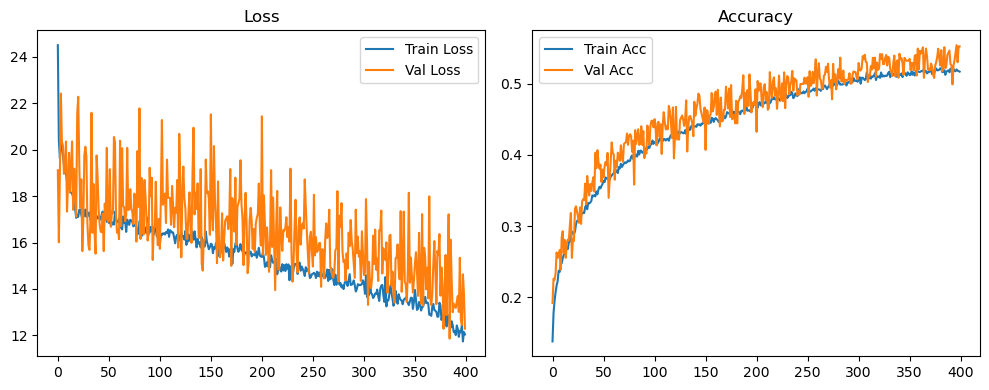

Original Model Final Test Loss: 12.4643 Accuracy: 0.5406




🚀 Running: batch512_lr_max_0.0002_min_1e-06_dp0.0


Files already downloaded and verified


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|                                                                                                                                                                        | 0/400 [00:00<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.1514 | Val Acc: 0.1830 | Epoch Time: 1.92 | :   0%|                                                                                                      | 0/400 [01:55<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.1514 | Val Acc: 0.1830 | Epoch Time: 1.92 | :   0%|                                                                                                      | 0/400 [01:55<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.1514 | Val Acc: 0.1830 | Epoch Time: 1.92 | :   0%|▏                                                                                         | 1/400 [01:55<12:47:04, 115.35s/it]

| LR: 0.000200 | Train Acc: 0.1962 | Val Acc: 0.2214 | Epoch Time: 1.91 | :   0%|▏                                                                                         | 1/400 [03:50<12:47:04, 115.35s/it]

| LR: 0.000200 | Train Acc: 0.1962 | Val Acc: 0.2214 | Epoch Time: 1.91 | :   0%|▏                                                                                         | 1/400 [03:50<12:47:04, 115.35s/it]

| LR: 0.000200 | Train Acc: 0.1962 | Val Acc: 0.2214 | Epoch Time: 1.91 | :   0%|▍                                                                                         | 2/400 [03:50<12:43:47, 115.14s/it]

| LR: 0.000200 | Train Acc: 0.2207 | Val Acc: 0.2441 | Epoch Time: 1.91 | :   0%|▍                                                                                         | 2/400 [05:45<12:43:47, 115.14s/it]

| LR: 0.000200 | Train Acc: 0.2207 | Val Acc: 0.2441 | Epoch Time: 1.91 | :   0%|▍                                                                                         | 2/400 [05:45<12:43:47, 115.14s/it]

| LR: 0.000200 | Train Acc: 0.2207 | Val Acc: 0.2441 | Epoch Time: 1.91 | :   1%|▋                                                                                         | 3/400 [05:45<12:41:22, 115.07s/it]

| LR: 0.000200 | Train Acc: 0.2332 | Val Acc: 0.2619 | Epoch Time: 1.91 | :   1%|▋                                                                                         | 3/400 [07:40<12:41:22, 115.07s/it]

| LR: 0.000200 | Train Acc: 0.2332 | Val Acc: 0.2619 | Epoch Time: 1.91 | :   1%|▋                                                                                         | 3/400 [07:40<12:41:22, 115.07s/it]

| LR: 0.000200 | Train Acc: 0.2332 | Val Acc: 0.2619 | Epoch Time: 1.91 | :   1%|▉                                                                                         | 4/400 [07:40<12:39:17, 115.04s/it]

| LR: 0.000200 | Train Acc: 0.2465 | Val Acc: 0.2647 | Epoch Time: 1.91 | :   1%|▉                                                                                         | 4/400 [09:35<12:39:17, 115.04s/it]

| LR: 0.000200 | Train Acc: 0.2465 | Val Acc: 0.2647 | Epoch Time: 1.91 | :   1%|▉                                                                                         | 4/400 [09:35<12:39:17, 115.04s/it]

| LR: 0.000200 | Train Acc: 0.2465 | Val Acc: 0.2647 | Epoch Time: 1.91 | :   1%|█▏                                                                                        | 5/400 [09:35<12:37:11, 115.02s/it]

| LR: 0.000200 | Train Acc: 0.2539 | Val Acc: 0.2672 | Epoch Time: 1.91 | :   1%|█▏                                                                                        | 5/400 [11:30<12:37:11, 115.02s/it]

| LR: 0.000200 | Train Acc: 0.2539 | Val Acc: 0.2672 | Epoch Time: 1.91 | :   1%|█▏                                                                                        | 5/400 [11:30<12:37:11, 115.02s/it]

| LR: 0.000200 | Train Acc: 0.2539 | Val Acc: 0.2672 | Epoch Time: 1.91 | :   2%|█▎                                                                                        | 6/400 [11:30<12:35:07, 114.99s/it]

| LR: 0.000200 | Train Acc: 0.2625 | Val Acc: 0.2653 | Epoch Time: 1.91 | :   2%|█▎                                                                                        | 6/400 [13:25<12:35:07, 114.99s/it]

| LR: 0.000200 | Train Acc: 0.2625 | Val Acc: 0.2653 | Epoch Time: 1.91 | :   2%|█▎                                                                                        | 6/400 [13:25<12:35:07, 114.99s/it]

| LR: 0.000200 | Train Acc: 0.2625 | Val Acc: 0.2653 | Epoch Time: 1.91 | :   2%|█▌                                                                                        | 7/400 [13:25<12:33:06, 114.98s/it]

| LR: 0.000200 | Train Acc: 0.2652 | Val Acc: 0.2847 | Epoch Time: 1.91 | :   2%|█▌                                                                                        | 7/400 [15:20<12:33:06, 114.98s/it]

| LR: 0.000200 | Train Acc: 0.2652 | Val Acc: 0.2847 | Epoch Time: 1.91 | :   2%|█▌                                                                                        | 7/400 [15:20<12:33:06, 114.98s/it]

| LR: 0.000200 | Train Acc: 0.2652 | Val Acc: 0.2847 | Epoch Time: 1.91 | :   2%|█▊                                                                                        | 8/400 [15:20<12:31:10, 114.97s/it]

| LR: 0.000200 | Train Acc: 0.2702 | Val Acc: 0.2944 | Epoch Time: 1.91 | :   2%|█▊                                                                                        | 8/400 [17:15<12:31:10, 114.97s/it]

| LR: 0.000200 | Train Acc: 0.2702 | Val Acc: 0.2944 | Epoch Time: 1.91 | :   2%|█▊                                                                                        | 8/400 [17:15<12:31:10, 114.97s/it]

| LR: 0.000200 | Train Acc: 0.2702 | Val Acc: 0.2944 | Epoch Time: 1.91 | :   2%|██                                                                                        | 9/400 [17:15<12:29:12, 114.97s/it]

| LR: 0.000200 | Train Acc: 0.2821 | Val Acc: 0.3058 | Epoch Time: 1.91 | :   2%|██                                                                                        | 9/400 [19:09<12:29:12, 114.97s/it]

| LR: 0.000200 | Train Acc: 0.2821 | Val Acc: 0.3058 | Epoch Time: 1.91 | :   2%|██                                                                                        | 9/400 [19:09<12:29:12, 114.97s/it]

| LR: 0.000200 | Train Acc: 0.2821 | Val Acc: 0.3058 | Epoch Time: 1.91 | :   2%|██▏                                                                                      | 10/400 [19:10<12:27:16, 114.96s/it]

| LR: 0.000200 | Train Acc: 0.2814 | Val Acc: 0.2937 | Epoch Time: 1.91 | :   2%|██▏                                                                                      | 10/400 [21:04<12:27:16, 114.96s/it]

| LR: 0.000200 | Train Acc: 0.2814 | Val Acc: 0.2937 | Epoch Time: 1.91 | :   2%|██▏                                                                                      | 10/400 [21:04<12:27:16, 114.96s/it]

| LR: 0.000200 | Train Acc: 0.2814 | Val Acc: 0.2937 | Epoch Time: 1.91 | :   3%|██▍                                                                                      | 11/400 [21:05<12:25:21, 114.96s/it]

| LR: 0.000200 | Train Acc: 0.2833 | Val Acc: 0.2735 | Epoch Time: 1.91 | :   3%|██▍                                                                                      | 11/400 [22:59<12:25:21, 114.96s/it]

| LR: 0.000200 | Train Acc: 0.2833 | Val Acc: 0.2735 | Epoch Time: 1.91 | :   3%|██▍                                                                                      | 11/400 [22:59<12:25:21, 114.96s/it]

| LR: 0.000200 | Train Acc: 0.2833 | Val Acc: 0.2735 | Epoch Time: 1.91 | :   3%|██▋                                                                                      | 12/400 [23:00<12:23:26, 114.97s/it]

| LR: 0.000200 | Train Acc: 0.2856 | Val Acc: 0.3059 | Epoch Time: 1.91 | :   3%|██▋                                                                                      | 12/400 [24:54<12:23:26, 114.97s/it]

| LR: 0.000200 | Train Acc: 0.2856 | Val Acc: 0.3059 | Epoch Time: 1.91 | :   3%|██▋                                                                                      | 12/400 [24:54<12:23:26, 114.97s/it]

| LR: 0.000200 | Train Acc: 0.2856 | Val Acc: 0.3059 | Epoch Time: 1.91 | :   3%|██▉                                                                                      | 13/400 [24:54<12:21:30, 114.96s/it]

| LR: 0.000199 | Train Acc: 0.2864 | Val Acc: 0.3057 | Epoch Time: 1.91 | :   3%|██▉                                                                                      | 13/400 [26:49<12:21:30, 114.96s/it]

| LR: 0.000199 | Train Acc: 0.2864 | Val Acc: 0.3057 | Epoch Time: 1.91 | :   3%|██▉                                                                                      | 13/400 [26:49<12:21:30, 114.96s/it]

| LR: 0.000199 | Train Acc: 0.2864 | Val Acc: 0.3057 | Epoch Time: 1.91 | :   4%|███                                                                                      | 14/400 [26:49<12:19:33, 114.96s/it]

| LR: 0.000199 | Train Acc: 0.2851 | Val Acc: 0.3239 | Epoch Time: 1.91 | :   4%|███                                                                                      | 14/400 [28:44<12:19:33, 114.96s/it]

| LR: 0.000199 | Train Acc: 0.2851 | Val Acc: 0.3239 | Epoch Time: 1.91 | :   4%|███                                                                                      | 14/400 [28:44<12:19:33, 114.96s/it]

| LR: 0.000199 | Train Acc: 0.2851 | Val Acc: 0.3239 | Epoch Time: 1.91 | :   4%|███▎                                                                                     | 15/400 [28:44<12:17:37, 114.95s/it]

| LR: 0.000199 | Train Acc: 0.3000 | Val Acc: 0.3215 | Epoch Time: 1.91 | :   4%|███▎                                                                                     | 15/400 [30:39<12:17:37, 114.95s/it]

| LR: 0.000199 | Train Acc: 0.3000 | Val Acc: 0.3215 | Epoch Time: 1.91 | :   4%|███▎                                                                                     | 15/400 [30:39<12:17:37, 114.95s/it]

| LR: 0.000199 | Train Acc: 0.3000 | Val Acc: 0.3215 | Epoch Time: 1.91 | :   4%|███▌                                                                                     | 16/400 [30:39<12:15:40, 114.95s/it]

| LR: 0.000199 | Train Acc: 0.3035 | Val Acc: 0.3193 | Epoch Time: 1.91 | :   4%|███▌                                                                                     | 16/400 [32:34<12:15:40, 114.95s/it]

| LR: 0.000199 | Train Acc: 0.3035 | Val Acc: 0.3193 | Epoch Time: 1.91 | :   4%|███▌                                                                                     | 16/400 [32:34<12:15:40, 114.95s/it]

| LR: 0.000199 | Train Acc: 0.3035 | Val Acc: 0.3193 | Epoch Time: 1.91 | :   4%|███▊                                                                                     | 17/400 [32:34<12:13:45, 114.95s/it]

| LR: 0.000199 | Train Acc: 0.2986 | Val Acc: 0.3156 | Epoch Time: 1.91 | :   4%|███▊                                                                                     | 17/400 [34:29<12:13:45, 114.95s/it]

| LR: 0.000199 | Train Acc: 0.2986 | Val Acc: 0.3156 | Epoch Time: 1.91 | :   4%|███▊                                                                                     | 17/400 [34:29<12:13:45, 114.95s/it]

| LR: 0.000199 | Train Acc: 0.2986 | Val Acc: 0.3156 | Epoch Time: 1.91 | :   4%|████                                                                                     | 18/400 [34:29<12:11:49, 114.95s/it]

| LR: 0.000199 | Train Acc: 0.3056 | Val Acc: 0.3431 | Epoch Time: 1.91 | :   4%|████                                                                                     | 18/400 [36:24<12:11:49, 114.95s/it]

| LR: 0.000199 | Train Acc: 0.3056 | Val Acc: 0.3431 | Epoch Time: 1.91 | :   4%|████                                                                                     | 18/400 [36:24<12:11:49, 114.95s/it]

| LR: 0.000199 | Train Acc: 0.3056 | Val Acc: 0.3431 | Epoch Time: 1.91 | :   5%|████▏                                                                                    | 19/400 [36:24<12:09:53, 114.94s/it]

| LR: 0.000199 | Train Acc: 0.3108 | Val Acc: 0.3022 | Epoch Time: 1.91 | :   5%|████▏                                                                                    | 19/400 [38:19<12:09:53, 114.94s/it]

| LR: 0.000199 | Train Acc: 0.3108 | Val Acc: 0.3022 | Epoch Time: 1.91 | :   5%|████▏                                                                                    | 19/400 [38:19<12:09:53, 114.94s/it]

| LR: 0.000199 | Train Acc: 0.3108 | Val Acc: 0.3022 | Epoch Time: 1.91 | :   5%|████▍                                                                                    | 20/400 [38:19<12:07:57, 114.94s/it]

| LR: 0.000199 | Train Acc: 0.3070 | Val Acc: 0.3334 | Epoch Time: 1.91 | :   5%|████▍                                                                                    | 20/400 [40:14<12:07:57, 114.94s/it]

| LR: 0.000199 | Train Acc: 0.3070 | Val Acc: 0.3334 | Epoch Time: 1.91 | :   5%|████▍                                                                                    | 20/400 [40:14<12:07:57, 114.94s/it]

| LR: 0.000199 | Train Acc: 0.3070 | Val Acc: 0.3334 | Epoch Time: 1.91 | :   5%|████▋                                                                                    | 21/400 [40:14<12:06:02, 114.94s/it]

| LR: 0.000199 | Train Acc: 0.3136 | Val Acc: 0.3424 | Epoch Time: 1.92 | :   5%|████▋                                                                                    | 21/400 [42:09<12:06:02, 114.94s/it]

| LR: 0.000199 | Train Acc: 0.3136 | Val Acc: 0.3424 | Epoch Time: 1.92 | :   5%|████▋                                                                                    | 21/400 [42:09<12:06:02, 114.94s/it]

| LR: 0.000199 | Train Acc: 0.3136 | Val Acc: 0.3424 | Epoch Time: 1.92 | :   6%|████▉                                                                                    | 22/400 [42:09<12:04:18, 114.97s/it]

| LR: 0.000199 | Train Acc: 0.3131 | Val Acc: 0.3293 | Epoch Time: 1.91 | :   6%|████▉                                                                                    | 22/400 [44:04<12:04:18, 114.97s/it]

| LR: 0.000199 | Train Acc: 0.3131 | Val Acc: 0.3293 | Epoch Time: 1.91 | :   6%|████▉                                                                                    | 22/400 [44:04<12:04:18, 114.97s/it]

| LR: 0.000199 | Train Acc: 0.3131 | Val Acc: 0.3293 | Epoch Time: 1.91 | :   6%|█████                                                                                    | 23/400 [44:04<12:02:24, 114.97s/it]

| LR: 0.000198 | Train Acc: 0.3151 | Val Acc: 0.3413 | Epoch Time: 1.91 | :   6%|█████                                                                                    | 23/400 [45:59<12:02:24, 114.97s/it]

| LR: 0.000198 | Train Acc: 0.3151 | Val Acc: 0.3413 | Epoch Time: 1.91 | :   6%|█████                                                                                    | 23/400 [45:59<12:02:24, 114.97s/it]

| LR: 0.000198 | Train Acc: 0.3151 | Val Acc: 0.3413 | Epoch Time: 1.91 | :   6%|█████▎                                                                                   | 24/400 [45:59<12:00:28, 114.97s/it]

| LR: 0.000198 | Train Acc: 0.3210 | Val Acc: 0.3322 | Epoch Time: 1.91 | :   6%|█████▎                                                                                   | 24/400 [47:54<12:00:28, 114.97s/it]

| LR: 0.000198 | Train Acc: 0.3210 | Val Acc: 0.3322 | Epoch Time: 1.91 | :   6%|█████▎                                                                                   | 24/400 [47:54<12:00:28, 114.97s/it]

| LR: 0.000198 | Train Acc: 0.3210 | Val Acc: 0.3322 | Epoch Time: 1.91 | :   6%|█████▌                                                                                   | 25/400 [47:54<11:58:29, 114.96s/it]

| LR: 0.000198 | Train Acc: 0.3212 | Val Acc: 0.3339 | Epoch Time: 1.91 | :   6%|█████▌                                                                                   | 25/400 [49:49<11:58:29, 114.96s/it]

| LR: 0.000198 | Train Acc: 0.3212 | Val Acc: 0.3339 | Epoch Time: 1.91 | :   6%|█████▌                                                                                   | 25/400 [49:49<11:58:29, 114.96s/it]

| LR: 0.000198 | Train Acc: 0.3212 | Val Acc: 0.3339 | Epoch Time: 1.91 | :   6%|█████▊                                                                                   | 26/400 [49:49<11:56:31, 114.95s/it]

| LR: 0.000198 | Train Acc: 0.3222 | Val Acc: 0.3380 | Epoch Time: 1.91 | :   6%|█████▊                                                                                   | 26/400 [51:44<11:56:31, 114.95s/it]

| LR: 0.000198 | Train Acc: 0.3222 | Val Acc: 0.3380 | Epoch Time: 1.91 | :   6%|█████▊                                                                                   | 26/400 [51:44<11:56:31, 114.95s/it]

| LR: 0.000198 | Train Acc: 0.3222 | Val Acc: 0.3380 | Epoch Time: 1.91 | :   7%|██████                                                                                   | 27/400 [51:44<11:54:36, 114.95s/it]

| LR: 0.000198 | Train Acc: 0.3243 | Val Acc: 0.3604 | Epoch Time: 1.92 | :   7%|██████                                                                                   | 27/400 [53:39<11:54:36, 114.95s/it]

| LR: 0.000198 | Train Acc: 0.3243 | Val Acc: 0.3604 | Epoch Time: 1.92 | :   7%|██████                                                                                   | 27/400 [53:39<11:54:36, 114.95s/it]

| LR: 0.000198 | Train Acc: 0.3243 | Val Acc: 0.3604 | Epoch Time: 1.92 | :   7%|██████▏                                                                                  | 28/400 [53:39<11:52:50, 114.98s/it]

| LR: 0.000198 | Train Acc: 0.3340 | Val Acc: 0.3339 | Epoch Time: 1.91 | :   7%|██████▏                                                                                  | 28/400 [55:34<11:52:50, 114.98s/it]

| LR: 0.000198 | Train Acc: 0.3340 | Val Acc: 0.3339 | Epoch Time: 1.91 | :   7%|██████▏                                                                                  | 28/400 [55:34<11:52:50, 114.98s/it]

| LR: 0.000198 | Train Acc: 0.3340 | Val Acc: 0.3339 | Epoch Time: 1.91 | :   7%|██████▍                                                                                  | 29/400 [55:34<11:50:54, 114.97s/it]

| LR: 0.000197 | Train Acc: 0.3315 | Val Acc: 0.3441 | Epoch Time: 1.91 | :   7%|██████▍                                                                                  | 29/400 [57:29<11:50:54, 114.97s/it]

| LR: 0.000197 | Train Acc: 0.3315 | Val Acc: 0.3441 | Epoch Time: 1.91 | :   7%|██████▍                                                                                  | 29/400 [57:29<11:50:54, 114.97s/it]

| LR: 0.000197 | Train Acc: 0.3315 | Val Acc: 0.3441 | Epoch Time: 1.91 | :   8%|██████▋                                                                                  | 30/400 [57:29<11:49:03, 114.98s/it]

| LR: 0.000197 | Train Acc: 0.3360 | Val Acc: 0.3607 | Epoch Time: 1.91 | :   8%|██████▋                                                                                  | 30/400 [59:24<11:49:03, 114.98s/it]

| LR: 0.000197 | Train Acc: 0.3360 | Val Acc: 0.3607 | Epoch Time: 1.91 | :   8%|██████▋                                                                                  | 30/400 [59:24<11:49:03, 114.98s/it]

| LR: 0.000197 | Train Acc: 0.3360 | Val Acc: 0.3607 | Epoch Time: 1.91 | :   8%|██████▉                                                                                  | 31/400 [59:24<11:47:03, 114.97s/it]

| LR: 0.000197 | Train Acc: 0.3397 | Val Acc: 0.3535 | Epoch Time: 1.91 | :   8%|██████▋                                                                                | 31/400 [1:01:19<11:47:03, 114.97s/it]

| LR: 0.000197 | Train Acc: 0.3397 | Val Acc: 0.3535 | Epoch Time: 1.91 | :   8%|██████▋                                                                                | 31/400 [1:01:19<11:47:03, 114.97s/it]

| LR: 0.000197 | Train Acc: 0.3397 | Val Acc: 0.3535 | Epoch Time: 1.91 | :   8%|██████▉                                                                                | 32/400 [1:01:19<11:45:05, 114.96s/it]

| LR: 0.000197 | Train Acc: 0.3481 | Val Acc: 0.3685 | Epoch Time: 1.91 | :   8%|██████▉                                                                                | 32/400 [1:03:13<11:45:05, 114.96s/it]

| LR: 0.000197 | Train Acc: 0.3481 | Val Acc: 0.3685 | Epoch Time: 1.91 | :   8%|██████▉                                                                                | 32/400 [1:03:13<11:45:05, 114.96s/it]

| LR: 0.000197 | Train Acc: 0.3481 | Val Acc: 0.3685 | Epoch Time: 1.91 | :   8%|███████▏                                                                               | 33/400 [1:03:14<11:43:08, 114.95s/it]

| LR: 0.000197 | Train Acc: 0.3477 | Val Acc: 0.3886 | Epoch Time: 1.91 | :   8%|███████▏                                                                               | 33/400 [1:05:08<11:43:08, 114.95s/it]

| LR: 0.000197 | Train Acc: 0.3477 | Val Acc: 0.3886 | Epoch Time: 1.91 | :   8%|███████▏                                                                               | 33/400 [1:05:08<11:43:08, 114.95s/it]

| LR: 0.000197 | Train Acc: 0.3477 | Val Acc: 0.3886 | Epoch Time: 1.91 | :   8%|███████▍                                                                               | 34/400 [1:05:09<11:41:17, 114.97s/it]

| LR: 0.000196 | Train Acc: 0.3447 | Val Acc: 0.3514 | Epoch Time: 1.91 | :   8%|███████▍                                                                               | 34/400 [1:07:03<11:41:17, 114.97s/it]

| LR: 0.000196 | Train Acc: 0.3447 | Val Acc: 0.3514 | Epoch Time: 1.91 | :   8%|███████▍                                                                               | 34/400 [1:07:03<11:41:17, 114.97s/it]

| LR: 0.000196 | Train Acc: 0.3447 | Val Acc: 0.3514 | Epoch Time: 1.91 | :   9%|███████▌                                                                               | 35/400 [1:07:04<11:39:18, 114.96s/it]

| LR: 0.000196 | Train Acc: 0.3522 | Val Acc: 0.3798 | Epoch Time: 1.91 | :   9%|███████▌                                                                               | 35/400 [1:08:58<11:39:18, 114.96s/it]

| LR: 0.000196 | Train Acc: 0.3522 | Val Acc: 0.3798 | Epoch Time: 1.91 | :   9%|███████▌                                                                               | 35/400 [1:08:58<11:39:18, 114.96s/it]

| LR: 0.000196 | Train Acc: 0.3522 | Val Acc: 0.3798 | Epoch Time: 1.91 | :   9%|███████▊                                                                               | 36/400 [1:08:58<11:37:24, 114.96s/it]

| LR: 0.000196 | Train Acc: 0.3564 | Val Acc: 0.3575 | Epoch Time: 1.91 | :   9%|███████▊                                                                               | 36/400 [1:10:53<11:37:24, 114.96s/it]

| LR: 0.000196 | Train Acc: 0.3564 | Val Acc: 0.3575 | Epoch Time: 1.91 | :   9%|███████▊                                                                               | 36/400 [1:10:53<11:37:24, 114.96s/it]

| LR: 0.000196 | Train Acc: 0.3564 | Val Acc: 0.3575 | Epoch Time: 1.91 | :   9%|████████                                                                               | 37/400 [1:10:53<11:35:28, 114.96s/it]

| LR: 0.000196 | Train Acc: 0.3538 | Val Acc: 0.3869 | Epoch Time: 1.92 | :   9%|████████                                                                               | 37/400 [1:12:48<11:35:28, 114.96s/it]

| LR: 0.000196 | Train Acc: 0.3538 | Val Acc: 0.3869 | Epoch Time: 1.92 | :   9%|████████                                                                               | 37/400 [1:12:48<11:35:28, 114.96s/it]

| LR: 0.000196 | Train Acc: 0.3538 | Val Acc: 0.3869 | Epoch Time: 1.92 | :  10%|████████▎                                                                              | 38/400 [1:12:48<11:33:43, 114.98s/it]

| LR: 0.000196 | Train Acc: 0.3558 | Val Acc: 0.3829 | Epoch Time: 1.91 | :  10%|████████▎                                                                              | 38/400 [1:14:43<11:33:43, 114.98s/it]

| LR: 0.000196 | Train Acc: 0.3558 | Val Acc: 0.3829 | Epoch Time: 1.91 | :  10%|████████▎                                                                              | 38/400 [1:14:43<11:33:43, 114.98s/it]

| LR: 0.000196 | Train Acc: 0.3558 | Val Acc: 0.3829 | Epoch Time: 1.91 | :  10%|████████▍                                                                              | 39/400 [1:14:43<11:31:49, 114.99s/it]

| LR: 0.000195 | Train Acc: 0.3645 | Val Acc: 0.3580 | Epoch Time: 1.92 | :  10%|████████▍                                                                              | 39/400 [1:16:38<11:31:49, 114.99s/it]

| LR: 0.000195 | Train Acc: 0.3645 | Val Acc: 0.3580 | Epoch Time: 1.92 | :  10%|████████▍                                                                              | 39/400 [1:16:38<11:31:49, 114.99s/it]

| LR: 0.000195 | Train Acc: 0.3645 | Val Acc: 0.3580 | Epoch Time: 1.92 | :  10%|████████▋                                                                              | 40/400 [1:16:39<11:30:01, 115.00s/it]

| LR: 0.000195 | Train Acc: 0.3621 | Val Acc: 0.3964 | Epoch Time: 1.92 | :  10%|████████▋                                                                              | 40/400 [1:18:33<11:30:01, 115.00s/it]

| LR: 0.000195 | Train Acc: 0.3621 | Val Acc: 0.3964 | Epoch Time: 1.92 | :  10%|████████▋                                                                              | 40/400 [1:18:33<11:30:01, 115.00s/it]

| LR: 0.000195 | Train Acc: 0.3621 | Val Acc: 0.3964 | Epoch Time: 1.92 | :  10%|████████▉                                                                              | 41/400 [1:18:34<11:28:12, 115.02s/it]

| LR: 0.000195 | Train Acc: 0.3657 | Val Acc: 0.3890 | Epoch Time: 1.92 | :  10%|████████▉                                                                              | 41/400 [1:20:29<11:28:12, 115.02s/it]

| LR: 0.000195 | Train Acc: 0.3657 | Val Acc: 0.3890 | Epoch Time: 1.92 | :  10%|████████▉                                                                              | 41/400 [1:20:29<11:28:12, 115.02s/it]

| LR: 0.000195 | Train Acc: 0.3657 | Val Acc: 0.3890 | Epoch Time: 1.92 | :  10%|█████████▏                                                                             | 42/400 [1:20:29<11:26:21, 115.03s/it]

| LR: 0.000195 | Train Acc: 0.3674 | Val Acc: 0.3871 | Epoch Time: 1.91 | :  10%|█████████▏                                                                             | 42/400 [1:22:24<11:26:21, 115.03s/it]

| LR: 0.000195 | Train Acc: 0.3674 | Val Acc: 0.3871 | Epoch Time: 1.91 | :  10%|█████████▏                                                                             | 42/400 [1:22:24<11:26:21, 115.03s/it]

| LR: 0.000195 | Train Acc: 0.3674 | Val Acc: 0.3871 | Epoch Time: 1.91 | :  11%|█████████▎                                                                             | 43/400 [1:22:24<11:24:20, 115.02s/it]

| LR: 0.000194 | Train Acc: 0.3703 | Val Acc: 0.3705 | Epoch Time: 1.91 | :  11%|█████████▎                                                                             | 43/400 [1:24:18<11:24:20, 115.02s/it]

| LR: 0.000194 | Train Acc: 0.3703 | Val Acc: 0.3705 | Epoch Time: 1.91 | :  11%|█████████▎                                                                             | 43/400 [1:24:18<11:24:20, 115.02s/it]

| LR: 0.000194 | Train Acc: 0.3703 | Val Acc: 0.3705 | Epoch Time: 1.91 | :  11%|█████████▌                                                                             | 44/400 [1:24:19<11:22:19, 115.00s/it]

| LR: 0.000194 | Train Acc: 0.3639 | Val Acc: 0.4002 | Epoch Time: 1.91 | :  11%|█████████▌                                                                             | 44/400 [1:26:13<11:22:19, 115.00s/it]

| LR: 0.000194 | Train Acc: 0.3639 | Val Acc: 0.4002 | Epoch Time: 1.91 | :  11%|█████████▌                                                                             | 44/400 [1:26:13<11:22:19, 115.00s/it]

| LR: 0.000194 | Train Acc: 0.3639 | Val Acc: 0.4002 | Epoch Time: 1.91 | :  11%|█████████▊                                                                             | 45/400 [1:26:14<11:20:22, 114.99s/it]

| LR: 0.000194 | Train Acc: 0.3743 | Val Acc: 0.4036 | Epoch Time: 1.91 | :  11%|█████████▊                                                                             | 45/400 [1:28:08<11:20:22, 114.99s/it]

| LR: 0.000194 | Train Acc: 0.3743 | Val Acc: 0.4036 | Epoch Time: 1.91 | :  11%|█████████▊                                                                             | 45/400 [1:28:08<11:20:22, 114.99s/it]

| LR: 0.000194 | Train Acc: 0.3743 | Val Acc: 0.4036 | Epoch Time: 1.91 | :  12%|██████████                                                                             | 46/400 [1:28:09<11:18:27, 114.99s/it]

| LR: 0.000194 | Train Acc: 0.3746 | Val Acc: 0.3920 | Epoch Time: 1.91 | :  12%|██████████                                                                             | 46/400 [1:30:03<11:18:27, 114.99s/it]

| LR: 0.000194 | Train Acc: 0.3746 | Val Acc: 0.3920 | Epoch Time: 1.91 | :  12%|██████████                                                                             | 46/400 [1:30:03<11:18:27, 114.99s/it]

| LR: 0.000194 | Train Acc: 0.3746 | Val Acc: 0.3920 | Epoch Time: 1.91 | :  12%|██████████▏                                                                            | 47/400 [1:30:04<11:16:32, 114.99s/it]

| LR: 0.000193 | Train Acc: 0.3752 | Val Acc: 0.3971 | Epoch Time: 1.91 | :  12%|██████████▏                                                                            | 47/400 [1:31:58<11:16:32, 114.99s/it]

| LR: 0.000193 | Train Acc: 0.3752 | Val Acc: 0.3971 | Epoch Time: 1.91 | :  12%|██████████▏                                                                            | 47/400 [1:31:58<11:16:32, 114.99s/it]

| LR: 0.000193 | Train Acc: 0.3752 | Val Acc: 0.3971 | Epoch Time: 1.91 | :  12%|██████████▍                                                                            | 48/400 [1:31:59<11:14:37, 114.99s/it]

| LR: 0.000193 | Train Acc: 0.3806 | Val Acc: 0.3781 | Epoch Time: 1.91 | :  12%|██████████▍                                                                            | 48/400 [1:33:53<11:14:37, 114.99s/it]

| LR: 0.000193 | Train Acc: 0.3806 | Val Acc: 0.3781 | Epoch Time: 1.91 | :  12%|██████████▍                                                                            | 48/400 [1:33:53<11:14:37, 114.99s/it]

| LR: 0.000193 | Train Acc: 0.3806 | Val Acc: 0.3781 | Epoch Time: 1.91 | :  12%|██████████▋                                                                            | 49/400 [1:33:54<11:12:41, 114.99s/it]

| LR: 0.000193 | Train Acc: 0.3816 | Val Acc: 0.3935 | Epoch Time: 1.91 | :  12%|██████████▋                                                                            | 49/400 [1:35:48<11:12:41, 114.99s/it]

| LR: 0.000193 | Train Acc: 0.3816 | Val Acc: 0.3935 | Epoch Time: 1.91 | :  12%|██████████▋                                                                            | 49/400 [1:35:48<11:12:41, 114.99s/it]

| LR: 0.000193 | Train Acc: 0.3816 | Val Acc: 0.3935 | Epoch Time: 1.91 | :  12%|██████████▉                                                                            | 50/400 [1:35:49<11:10:46, 114.99s/it]

| LR: 0.000192 | Train Acc: 0.3866 | Val Acc: 0.4061 | Epoch Time: 1.92 | :  12%|██████████▉                                                                            | 50/400 [1:37:43<11:10:46, 114.99s/it]

| LR: 0.000192 | Train Acc: 0.3866 | Val Acc: 0.4061 | Epoch Time: 1.92 | :  12%|██████████▉                                                                            | 50/400 [1:37:43<11:10:46, 114.99s/it]

| LR: 0.000192 | Train Acc: 0.3866 | Val Acc: 0.4061 | Epoch Time: 1.92 | :  13%|███████████                                                                            | 51/400 [1:37:44<11:08:54, 115.00s/it]

| LR: 0.000192 | Train Acc: 0.3865 | Val Acc: 0.3939 | Epoch Time: 1.92 | :  13%|███████████                                                                            | 51/400 [1:39:38<11:08:54, 115.00s/it]

| LR: 0.000192 | Train Acc: 0.3865 | Val Acc: 0.3939 | Epoch Time: 1.92 | :  13%|███████████                                                                            | 51/400 [1:39:38<11:08:54, 115.00s/it]

| LR: 0.000192 | Train Acc: 0.3865 | Val Acc: 0.3939 | Epoch Time: 1.92 | :  13%|███████████▎                                                                           | 52/400 [1:39:39<11:07:01, 115.01s/it]

| LR: 0.000192 | Train Acc: 0.3885 | Val Acc: 0.4129 | Epoch Time: 1.92 | :  13%|███████████▎                                                                           | 52/400 [1:41:33<11:07:01, 115.01s/it]

| LR: 0.000192 | Train Acc: 0.3885 | Val Acc: 0.4129 | Epoch Time: 1.92 | :  13%|███████████▎                                                                           | 52/400 [1:41:33<11:07:01, 115.01s/it]

| LR: 0.000192 | Train Acc: 0.3885 | Val Acc: 0.4129 | Epoch Time: 1.92 | :  13%|███████████▌                                                                           | 53/400 [1:41:34<11:05:11, 115.02s/it]

| LR: 0.000192 | Train Acc: 0.3877 | Val Acc: 0.4221 | Epoch Time: 1.91 | :  13%|███████████▌                                                                           | 53/400 [1:43:28<11:05:11, 115.02s/it]

| LR: 0.000192 | Train Acc: 0.3877 | Val Acc: 0.4221 | Epoch Time: 1.91 | :  13%|███████████▌                                                                           | 53/400 [1:43:28<11:05:11, 115.02s/it]

| LR: 0.000192 | Train Acc: 0.3877 | Val Acc: 0.4221 | Epoch Time: 1.91 | :  14%|███████████▋                                                                           | 54/400 [1:43:29<11:03:14, 115.01s/it]

| LR: 0.000191 | Train Acc: 0.3956 | Val Acc: 0.3944 | Epoch Time: 1.91 | :  14%|███████████▋                                                                           | 54/400 [1:45:23<11:03:14, 115.01s/it]

| LR: 0.000191 | Train Acc: 0.3956 | Val Acc: 0.3944 | Epoch Time: 1.91 | :  14%|███████████▋                                                                           | 54/400 [1:45:23<11:03:14, 115.01s/it]

| LR: 0.000191 | Train Acc: 0.3956 | Val Acc: 0.3944 | Epoch Time: 1.91 | :  14%|███████████▉                                                                           | 55/400 [1:45:24<11:01:19, 115.01s/it]

| LR: 0.000191 | Train Acc: 0.3961 | Val Acc: 0.4021 | Epoch Time: 1.91 | :  14%|███████████▉                                                                           | 55/400 [1:47:18<11:01:19, 115.01s/it]

| LR: 0.000191 | Train Acc: 0.3961 | Val Acc: 0.4021 | Epoch Time: 1.91 | :  14%|███████████▉                                                                           | 55/400 [1:47:18<11:01:19, 115.01s/it]

| LR: 0.000191 | Train Acc: 0.3961 | Val Acc: 0.4021 | Epoch Time: 1.91 | :  14%|████████████▏                                                                          | 56/400 [1:47:19<10:59:22, 115.01s/it]

| LR: 0.000191 | Train Acc: 0.3928 | Val Acc: 0.3949 | Epoch Time: 1.92 | :  14%|████████████▏                                                                          | 56/400 [1:49:14<10:59:22, 115.01s/it]

| LR: 0.000191 | Train Acc: 0.3928 | Val Acc: 0.3949 | Epoch Time: 1.92 | :  14%|████████████▏                                                                          | 56/400 [1:49:14<10:59:22, 115.01s/it]

| LR: 0.000191 | Train Acc: 0.3928 | Val Acc: 0.3949 | Epoch Time: 1.92 | :  14%|████████████▍                                                                          | 57/400 [1:49:14<10:57:32, 115.02s/it]

| LR: 0.000190 | Train Acc: 0.3946 | Val Acc: 0.4239 | Epoch Time: 1.92 | :  14%|████████████▍                                                                          | 57/400 [1:51:09<10:57:32, 115.02s/it]

| LR: 0.000190 | Train Acc: 0.3946 | Val Acc: 0.4239 | Epoch Time: 1.92 | :  14%|████████████▍                                                                          | 57/400 [1:51:09<10:57:32, 115.02s/it]

| LR: 0.000190 | Train Acc: 0.3946 | Val Acc: 0.4239 | Epoch Time: 1.92 | :  14%|████████████▌                                                                          | 58/400 [1:51:09<10:55:42, 115.04s/it]

| LR: 0.000190 | Train Acc: 0.3926 | Val Acc: 0.3904 | Epoch Time: 1.91 | :  14%|████████████▌                                                                          | 58/400 [1:53:04<10:55:42, 115.04s/it]

| LR: 0.000190 | Train Acc: 0.3926 | Val Acc: 0.3904 | Epoch Time: 1.91 | :  14%|████████████▌                                                                          | 58/400 [1:53:04<10:55:42, 115.04s/it]

| LR: 0.000190 | Train Acc: 0.3926 | Val Acc: 0.3904 | Epoch Time: 1.91 | :  15%|████████████▊                                                                          | 59/400 [1:53:04<10:53:43, 115.02s/it]

| LR: 0.000190 | Train Acc: 0.4011 | Val Acc: 0.4108 | Epoch Time: 1.91 | :  15%|████████████▊                                                                          | 59/400 [1:54:59<10:53:43, 115.02s/it]

| LR: 0.000190 | Train Acc: 0.4011 | Val Acc: 0.4108 | Epoch Time: 1.91 | :  15%|████████████▊                                                                          | 59/400 [1:54:59<10:53:43, 115.02s/it]

| LR: 0.000190 | Train Acc: 0.4011 | Val Acc: 0.4108 | Epoch Time: 1.91 | :  15%|█████████████                                                                          | 60/400 [1:54:59<10:51:41, 115.00s/it]

| LR: 0.000189 | Train Acc: 0.3986 | Val Acc: 0.4238 | Epoch Time: 1.91 | :  15%|█████████████                                                                          | 60/400 [1:56:54<10:51:41, 115.00s/it]

| LR: 0.000189 | Train Acc: 0.3986 | Val Acc: 0.4238 | Epoch Time: 1.91 | :  15%|█████████████                                                                          | 60/400 [1:56:54<10:51:41, 115.00s/it]

| LR: 0.000189 | Train Acc: 0.3986 | Val Acc: 0.4238 | Epoch Time: 1.91 | :  15%|█████████████▎                                                                         | 61/400 [1:56:54<10:49:44, 115.00s/it]

| LR: 0.000189 | Train Acc: 0.4093 | Val Acc: 0.4396 | Epoch Time: 1.91 | :  15%|█████████████▎                                                                         | 61/400 [1:58:49<10:49:44, 115.00s/it]

| LR: 0.000189 | Train Acc: 0.4093 | Val Acc: 0.4396 | Epoch Time: 1.91 | :  15%|█████████████▎                                                                         | 61/400 [1:58:49<10:49:44, 115.00s/it]

| LR: 0.000189 | Train Acc: 0.4093 | Val Acc: 0.4396 | Epoch Time: 1.91 | :  16%|█████████████▍                                                                         | 62/400 [1:58:49<10:47:47, 114.99s/it]

| LR: 0.000188 | Train Acc: 0.4018 | Val Acc: 0.4172 | Epoch Time: 1.91 | :  16%|█████████████▍                                                                         | 62/400 [2:00:44<10:47:47, 114.99s/it]

| LR: 0.000188 | Train Acc: 0.4018 | Val Acc: 0.4172 | Epoch Time: 1.91 | :  16%|█████████████▍                                                                         | 62/400 [2:00:44<10:47:47, 114.99s/it]

| LR: 0.000188 | Train Acc: 0.4018 | Val Acc: 0.4172 | Epoch Time: 1.91 | :  16%|█████████████▋                                                                         | 63/400 [2:00:44<10:45:51, 114.99s/it]

| LR: 0.000188 | Train Acc: 0.4081 | Val Acc: 0.4288 | Epoch Time: 1.91 | :  16%|█████████████▋                                                                         | 63/400 [2:02:38<10:45:51, 114.99s/it]

| LR: 0.000188 | Train Acc: 0.4081 | Val Acc: 0.4288 | Epoch Time: 1.91 | :  16%|█████████████▋                                                                         | 63/400 [2:02:38<10:45:51, 114.99s/it]

| LR: 0.000188 | Train Acc: 0.4081 | Val Acc: 0.4288 | Epoch Time: 1.91 | :  16%|█████████████▉                                                                         | 64/400 [2:02:39<10:43:54, 114.98s/it]

| LR: 0.000188 | Train Acc: 0.4105 | Val Acc: 0.4163 | Epoch Time: 1.91 | :  16%|█████████████▉                                                                         | 64/400 [2:04:33<10:43:54, 114.98s/it]

| LR: 0.000188 | Train Acc: 0.4105 | Val Acc: 0.4163 | Epoch Time: 1.91 | :  16%|█████████████▉                                                                         | 64/400 [2:04:33<10:43:54, 114.98s/it]

| LR: 0.000188 | Train Acc: 0.4105 | Val Acc: 0.4163 | Epoch Time: 1.91 | :  16%|██████████████▏                                                                        | 65/400 [2:04:34<10:41:57, 114.98s/it]

| LR: 0.000187 | Train Acc: 0.4153 | Val Acc: 0.4396 | Epoch Time: 1.91 | :  16%|██████████████▏                                                                        | 65/400 [2:06:28<10:41:57, 114.98s/it]

| LR: 0.000187 | Train Acc: 0.4153 | Val Acc: 0.4396 | Epoch Time: 1.91 | :  16%|██████████████▏                                                                        | 65/400 [2:06:28<10:41:57, 114.98s/it]

| LR: 0.000187 | Train Acc: 0.4153 | Val Acc: 0.4396 | Epoch Time: 1.91 | :  16%|██████████████▎                                                                        | 66/400 [2:06:29<10:40:01, 114.97s/it]

| LR: 0.000187 | Train Acc: 0.4122 | Val Acc: 0.4219 | Epoch Time: 1.91 | :  16%|██████████████▎                                                                        | 66/400 [2:08:23<10:40:01, 114.97s/it]

| LR: 0.000187 | Train Acc: 0.4122 | Val Acc: 0.4219 | Epoch Time: 1.91 | :  16%|██████████████▎                                                                        | 66/400 [2:08:23<10:40:01, 114.97s/it]

| LR: 0.000187 | Train Acc: 0.4122 | Val Acc: 0.4219 | Epoch Time: 1.91 | :  17%|██████████████▌                                                                        | 67/400 [2:08:23<10:38:04, 114.97s/it]

| LR: 0.000187 | Train Acc: 0.4189 | Val Acc: 0.4163 | Epoch Time: 1.91 | :  17%|██████████████▌                                                                        | 67/400 [2:10:18<10:38:04, 114.97s/it]

| LR: 0.000187 | Train Acc: 0.4189 | Val Acc: 0.4163 | Epoch Time: 1.91 | :  17%|██████████████▌                                                                        | 67/400 [2:10:18<10:38:04, 114.97s/it]

| LR: 0.000187 | Train Acc: 0.4189 | Val Acc: 0.4163 | Epoch Time: 1.91 | :  17%|██████████████▊                                                                        | 68/400 [2:10:18<10:36:08, 114.96s/it]

| LR: 0.000186 | Train Acc: 0.4160 | Val Acc: 0.4420 | Epoch Time: 1.91 | :  17%|██████████████▊                                                                        | 68/400 [2:12:13<10:36:08, 114.96s/it]

| LR: 0.000186 | Train Acc: 0.4160 | Val Acc: 0.4420 | Epoch Time: 1.91 | :  17%|██████████████▊                                                                        | 68/400 [2:12:13<10:36:08, 114.96s/it]

| LR: 0.000186 | Train Acc: 0.4160 | Val Acc: 0.4420 | Epoch Time: 1.91 | :  17%|███████████████                                                                        | 69/400 [2:12:13<10:34:16, 114.97s/it]

| LR: 0.000186 | Train Acc: 0.4180 | Val Acc: 0.4338 | Epoch Time: 1.92 | :  17%|███████████████                                                                        | 69/400 [2:14:08<10:34:16, 114.97s/it]

| LR: 0.000186 | Train Acc: 0.4180 | Val Acc: 0.4338 | Epoch Time: 1.92 | :  17%|███████████████                                                                        | 69/400 [2:14:08<10:34:16, 114.97s/it]

| LR: 0.000186 | Train Acc: 0.4180 | Val Acc: 0.4338 | Epoch Time: 1.92 | :  18%|███████████████▏                                                                       | 70/400 [2:14:09<10:32:30, 115.00s/it]

| LR: 0.000185 | Train Acc: 0.4221 | Val Acc: 0.4406 | Epoch Time: 1.92 | :  18%|███████████████▏                                                                       | 70/400 [2:16:03<10:32:30, 115.00s/it]

| LR: 0.000185 | Train Acc: 0.4221 | Val Acc: 0.4406 | Epoch Time: 1.92 | :  18%|███████████████▏                                                                       | 70/400 [2:16:03<10:32:30, 115.00s/it]

| LR: 0.000185 | Train Acc: 0.4221 | Val Acc: 0.4406 | Epoch Time: 1.92 | :  18%|███████████████▍                                                                       | 71/400 [2:16:04<10:30:40, 115.02s/it]

| LR: 0.000185 | Train Acc: 0.4185 | Val Acc: 0.4085 | Epoch Time: 1.92 | :  18%|███████████████▍                                                                       | 71/400 [2:17:58<10:30:40, 115.02s/it]

| LR: 0.000185 | Train Acc: 0.4185 | Val Acc: 0.4085 | Epoch Time: 1.92 | :  18%|███████████████▍                                                                       | 71/400 [2:17:58<10:30:40, 115.02s/it]

| LR: 0.000185 | Train Acc: 0.4185 | Val Acc: 0.4085 | Epoch Time: 1.92 | :  18%|███████████████▋                                                                       | 72/400 [2:17:59<10:28:48, 115.03s/it]

| LR: 0.000185 | Train Acc: 0.4195 | Val Acc: 0.4155 | Epoch Time: 1.92 | :  18%|███████████████▋                                                                       | 72/400 [2:19:54<10:28:48, 115.03s/it]

| LR: 0.000185 | Train Acc: 0.4195 | Val Acc: 0.4155 | Epoch Time: 1.92 | :  18%|███████████████▋                                                                       | 72/400 [2:19:54<10:28:48, 115.03s/it]

| LR: 0.000185 | Train Acc: 0.4195 | Val Acc: 0.4155 | Epoch Time: 1.92 | :  18%|███████████████▉                                                                       | 73/400 [2:19:54<10:26:55, 115.03s/it]

| LR: 0.000184 | Train Acc: 0.4229 | Val Acc: 0.4530 | Epoch Time: 1.91 | :  18%|███████████████▉                                                                       | 73/400 [2:21:49<10:26:55, 115.03s/it]

| LR: 0.000184 | Train Acc: 0.4229 | Val Acc: 0.4530 | Epoch Time: 1.91 | :  18%|███████████████▉                                                                       | 73/400 [2:21:49<10:26:55, 115.03s/it]

| LR: 0.000184 | Train Acc: 0.4229 | Val Acc: 0.4530 | Epoch Time: 1.91 | :  18%|████████████████                                                                       | 74/400 [2:21:49<10:24:54, 115.01s/it]

| LR: 0.000184 | Train Acc: 0.4293 | Val Acc: 0.4446 | Epoch Time: 1.91 | :  18%|████████████████                                                                       | 74/400 [2:23:43<10:24:54, 115.01s/it]

| LR: 0.000184 | Train Acc: 0.4293 | Val Acc: 0.4446 | Epoch Time: 1.91 | :  18%|████████████████                                                                       | 74/400 [2:23:43<10:24:54, 115.01s/it]

| LR: 0.000184 | Train Acc: 0.4293 | Val Acc: 0.4446 | Epoch Time: 1.91 | :  19%|████████████████▎                                                                      | 75/400 [2:23:44<10:22:52, 114.99s/it]

| LR: 0.000183 | Train Acc: 0.4356 | Val Acc: 0.4473 | Epoch Time: 1.91 | :  19%|████████████████▎                                                                      | 75/400 [2:25:38<10:22:52, 114.99s/it]

| LR: 0.000183 | Train Acc: 0.4356 | Val Acc: 0.4473 | Epoch Time: 1.91 | :  19%|████████████████▎                                                                      | 75/400 [2:25:38<10:22:52, 114.99s/it]

| LR: 0.000183 | Train Acc: 0.4356 | Val Acc: 0.4473 | Epoch Time: 1.91 | :  19%|████████████████▌                                                                      | 76/400 [2:25:39<10:20:53, 114.98s/it]

| LR: 0.000183 | Train Acc: 0.4318 | Val Acc: 0.4247 | Epoch Time: 1.91 | :  19%|████████████████▌                                                                      | 76/400 [2:27:33<10:20:53, 114.98s/it]

| LR: 0.000183 | Train Acc: 0.4318 | Val Acc: 0.4247 | Epoch Time: 1.91 | :  19%|████████████████▌                                                                      | 76/400 [2:27:33<10:20:53, 114.98s/it]

| LR: 0.000183 | Train Acc: 0.4318 | Val Acc: 0.4247 | Epoch Time: 1.91 | :  19%|████████████████▋                                                                      | 77/400 [2:27:33<10:18:55, 114.97s/it]

| LR: 0.000182 | Train Acc: 0.4302 | Val Acc: 0.4345 | Epoch Time: 1.91 | :  19%|████████████████▋                                                                      | 77/400 [2:29:28<10:18:55, 114.97s/it]

| LR: 0.000182 | Train Acc: 0.4302 | Val Acc: 0.4345 | Epoch Time: 1.91 | :  19%|████████████████▋                                                                      | 77/400 [2:29:28<10:18:55, 114.97s/it]

| LR: 0.000182 | Train Acc: 0.4302 | Val Acc: 0.4345 | Epoch Time: 1.91 | :  20%|████████████████▉                                                                      | 78/400 [2:29:28<10:16:59, 114.97s/it]

| LR: 0.000182 | Train Acc: 0.4273 | Val Acc: 0.4445 | Epoch Time: 1.91 | :  20%|████████████████▉                                                                      | 78/400 [2:31:23<10:16:59, 114.97s/it]

| LR: 0.000182 | Train Acc: 0.4273 | Val Acc: 0.4445 | Epoch Time: 1.91 | :  20%|████████████████▉                                                                      | 78/400 [2:31:23<10:16:59, 114.97s/it]

| LR: 0.000182 | Train Acc: 0.4273 | Val Acc: 0.4445 | Epoch Time: 1.91 | :  20%|█████████████████▏                                                                     | 79/400 [2:31:23<10:15:03, 114.97s/it]

| LR: 0.000181 | Train Acc: 0.4310 | Val Acc: 0.4300 | Epoch Time: 1.91 | :  20%|█████████████████▏                                                                     | 79/400 [2:33:18<10:15:03, 114.97s/it]

| LR: 0.000181 | Train Acc: 0.4310 | Val Acc: 0.4300 | Epoch Time: 1.91 | :  20%|█████████████████▏                                                                     | 79/400 [2:33:18<10:15:03, 114.97s/it]

| LR: 0.000181 | Train Acc: 0.4310 | Val Acc: 0.4300 | Epoch Time: 1.91 | :  20%|█████████████████▍                                                                     | 80/400 [2:33:18<10:13:08, 114.96s/it]

| LR: 0.000181 | Train Acc: 0.4372 | Val Acc: 0.4444 | Epoch Time: 1.91 | :  20%|█████████████████▍                                                                     | 80/400 [2:35:13<10:13:08, 114.96s/it]

| LR: 0.000181 | Train Acc: 0.4372 | Val Acc: 0.4444 | Epoch Time: 1.91 | :  20%|█████████████████▍                                                                     | 80/400 [2:35:13<10:13:08, 114.96s/it]

| LR: 0.000181 | Train Acc: 0.4372 | Val Acc: 0.4444 | Epoch Time: 1.91 | :  20%|█████████████████▌                                                                     | 81/400 [2:35:13<10:11:13, 114.96s/it]

| LR: 0.000181 | Train Acc: 0.4415 | Val Acc: 0.4468 | Epoch Time: 1.92 | :  20%|█████████████████▌                                                                     | 81/400 [2:37:08<10:11:13, 114.96s/it]

| LR: 0.000181 | Train Acc: 0.4415 | Val Acc: 0.4468 | Epoch Time: 1.92 | :  20%|█████████████████▌                                                                     | 81/400 [2:37:08<10:11:13, 114.96s/it]

| LR: 0.000181 | Train Acc: 0.4415 | Val Acc: 0.4468 | Epoch Time: 1.92 | :  20%|█████████████████▊                                                                     | 82/400 [2:37:08<10:09:26, 114.99s/it]

| LR: 0.000180 | Train Acc: 0.4367 | Val Acc: 0.4571 | Epoch Time: 1.91 | :  20%|█████████████████▊                                                                     | 82/400 [2:39:03<10:09:26, 114.99s/it]

| LR: 0.000180 | Train Acc: 0.4367 | Val Acc: 0.4571 | Epoch Time: 1.91 | :  20%|█████████████████▊                                                                     | 82/400 [2:39:03<10:09:26, 114.99s/it]

| LR: 0.000180 | Train Acc: 0.4367 | Val Acc: 0.4571 | Epoch Time: 1.91 | :  21%|██████████████████                                                                     | 83/400 [2:39:03<10:07:29, 114.98s/it]

| LR: 0.000180 | Train Acc: 0.4409 | Val Acc: 0.4321 | Epoch Time: 1.91 | :  21%|██████████████████                                                                     | 83/400 [2:40:58<10:07:29, 114.98s/it]

| LR: 0.000180 | Train Acc: 0.4409 | Val Acc: 0.4321 | Epoch Time: 1.91 | :  21%|██████████████████                                                                     | 83/400 [2:40:58<10:07:29, 114.98s/it]

| LR: 0.000180 | Train Acc: 0.4409 | Val Acc: 0.4321 | Epoch Time: 1.91 | :  21%|██████████████████▎                                                                    | 84/400 [2:40:58<10:05:31, 114.97s/it]

| LR: 0.000179 | Train Acc: 0.4412 | Val Acc: 0.4373 | Epoch Time: 1.91 | :  21%|██████████████████▎                                                                    | 84/400 [2:42:53<10:05:31, 114.97s/it]

| LR: 0.000179 | Train Acc: 0.4412 | Val Acc: 0.4373 | Epoch Time: 1.91 | :  21%|██████████████████▎                                                                    | 84/400 [2:42:53<10:05:31, 114.97s/it]

| LR: 0.000179 | Train Acc: 0.4412 | Val Acc: 0.4373 | Epoch Time: 1.91 | :  21%|██████████████████▍                                                                    | 85/400 [2:42:53<10:03:33, 114.96s/it]

| LR: 0.000179 | Train Acc: 0.4424 | Val Acc: 0.4611 | Epoch Time: 1.91 | :  21%|██████████████████▍                                                                    | 85/400 [2:44:48<10:03:33, 114.96s/it]

| LR: 0.000179 | Train Acc: 0.4424 | Val Acc: 0.4611 | Epoch Time: 1.91 | :  21%|██████████████████▍                                                                    | 85/400 [2:44:48<10:03:33, 114.96s/it]

| LR: 0.000179 | Train Acc: 0.4424 | Val Acc: 0.4611 | Epoch Time: 1.91 | :  22%|██████████████████▋                                                                    | 86/400 [2:44:48<10:01:36, 114.96s/it]

| LR: 0.000178 | Train Acc: 0.4434 | Val Acc: 0.4578 | Epoch Time: 1.91 | :  22%|██████████████████▋                                                                    | 86/400 [2:46:43<10:01:36, 114.96s/it]

| LR: 0.000178 | Train Acc: 0.4434 | Val Acc: 0.4578 | Epoch Time: 1.91 | :  22%|██████████████████▋                                                                    | 86/400 [2:46:43<10:01:36, 114.96s/it]

| LR: 0.000178 | Train Acc: 0.4434 | Val Acc: 0.4578 | Epoch Time: 1.91 | :  22%|███████████████████▏                                                                    | 87/400 [2:46:43<9:59:41, 114.96s/it]

| LR: 0.000178 | Train Acc: 0.4480 | Val Acc: 0.4573 | Epoch Time: 1.91 | :  22%|███████████████████▏                                                                    | 87/400 [2:48:38<9:59:41, 114.96s/it]

| LR: 0.000178 | Train Acc: 0.4480 | Val Acc: 0.4573 | Epoch Time: 1.91 | :  22%|███████████████████▏                                                                    | 87/400 [2:48:38<9:59:41, 114.96s/it]

| LR: 0.000178 | Train Acc: 0.4480 | Val Acc: 0.4573 | Epoch Time: 1.91 | :  22%|███████████████████▎                                                                    | 88/400 [2:48:38<9:57:47, 114.96s/it]

| LR: 0.000177 | Train Acc: 0.4439 | Val Acc: 0.4490 | Epoch Time: 1.91 | :  22%|███████████████████▎                                                                    | 88/400 [2:50:33<9:57:47, 114.96s/it]

| LR: 0.000177 | Train Acc: 0.4439 | Val Acc: 0.4490 | Epoch Time: 1.91 | :  22%|███████████████████▎                                                                    | 88/400 [2:50:33<9:57:47, 114.96s/it]

| LR: 0.000177 | Train Acc: 0.4439 | Val Acc: 0.4490 | Epoch Time: 1.91 | :  22%|███████████████████▌                                                                    | 89/400 [2:50:33<9:55:51, 114.96s/it]

| LR: 0.000177 | Train Acc: 0.4492 | Val Acc: 0.4592 | Epoch Time: 1.91 | :  22%|███████████████████▌                                                                    | 89/400 [2:52:28<9:55:51, 114.96s/it]

| LR: 0.000177 | Train Acc: 0.4492 | Val Acc: 0.4592 | Epoch Time: 1.91 | :  22%|███████████████████▌                                                                    | 89/400 [2:52:28<9:55:51, 114.96s/it]

| LR: 0.000177 | Train Acc: 0.4492 | Val Acc: 0.4592 | Epoch Time: 1.91 | :  22%|███████████████████▊                                                                    | 90/400 [2:52:28<9:53:53, 114.95s/it]

| LR: 0.000176 | Train Acc: 0.4502 | Val Acc: 0.4377 | Epoch Time: 1.91 | :  22%|███████████████████▊                                                                    | 90/400 [2:54:23<9:53:53, 114.95s/it]

| LR: 0.000176 | Train Acc: 0.4502 | Val Acc: 0.4377 | Epoch Time: 1.91 | :  22%|███████████████████▊                                                                    | 90/400 [2:54:23<9:53:53, 114.95s/it]

| LR: 0.000176 | Train Acc: 0.4502 | Val Acc: 0.4377 | Epoch Time: 1.91 | :  23%|████████████████████                                                                    | 91/400 [2:54:23<9:51:58, 114.95s/it]

| LR: 0.000176 | Train Acc: 0.4439 | Val Acc: 0.4721 | Epoch Time: 1.91 | :  23%|████████████████████                                                                    | 91/400 [2:56:18<9:51:58, 114.95s/it]

| LR: 0.000176 | Train Acc: 0.4439 | Val Acc: 0.4721 | Epoch Time: 1.91 | :  23%|████████████████████                                                                    | 91/400 [2:56:18<9:51:58, 114.95s/it]

| LR: 0.000176 | Train Acc: 0.4439 | Val Acc: 0.4721 | Epoch Time: 1.91 | :  23%|████████████████████▏                                                                   | 92/400 [2:56:18<9:50:06, 114.96s/it]

| LR: 0.000175 | Train Acc: 0.4449 | Val Acc: 0.4872 | Epoch Time: 1.91 | :  23%|████████████████████▏                                                                   | 92/400 [2:58:13<9:50:06, 114.96s/it]

| LR: 0.000175 | Train Acc: 0.4449 | Val Acc: 0.4872 | Epoch Time: 1.91 | :  23%|████████████████████▏                                                                   | 92/400 [2:58:13<9:50:06, 114.96s/it]

| LR: 0.000175 | Train Acc: 0.4449 | Val Acc: 0.4872 | Epoch Time: 1.91 | :  23%|████████████████████▍                                                                   | 93/400 [2:58:13<9:48:11, 114.96s/it]

| LR: 0.000175 | Train Acc: 0.4512 | Val Acc: 0.4690 | Epoch Time: 1.91 | :  23%|████████████████████▍                                                                   | 93/400 [3:00:08<9:48:11, 114.96s/it]

| LR: 0.000175 | Train Acc: 0.4512 | Val Acc: 0.4690 | Epoch Time: 1.91 | :  23%|████████████████████▍                                                                   | 93/400 [3:00:08<9:48:11, 114.96s/it]

| LR: 0.000175 | Train Acc: 0.4512 | Val Acc: 0.4690 | Epoch Time: 1.91 | :  24%|████████████████████▋                                                                   | 94/400 [3:00:08<9:46:17, 114.96s/it]

| LR: 0.000174 | Train Acc: 0.4510 | Val Acc: 0.4305 | Epoch Time: 1.91 | :  24%|████████████████████▋                                                                   | 94/400 [3:02:03<9:46:17, 114.96s/it]

| LR: 0.000174 | Train Acc: 0.4510 | Val Acc: 0.4305 | Epoch Time: 1.91 | :  24%|████████████████████▋                                                                   | 94/400 [3:02:03<9:46:17, 114.96s/it]

| LR: 0.000174 | Train Acc: 0.4510 | Val Acc: 0.4305 | Epoch Time: 1.91 | :  24%|████████████████████▉                                                                   | 95/400 [3:02:03<9:44:22, 114.96s/it]

| LR: 0.000174 | Train Acc: 0.4445 | Val Acc: 0.4612 | Epoch Time: 1.91 | :  24%|████████████████████▉                                                                   | 95/400 [3:03:58<9:44:22, 114.96s/it]

| LR: 0.000174 | Train Acc: 0.4445 | Val Acc: 0.4612 | Epoch Time: 1.91 | :  24%|████████████████████▉                                                                   | 95/400 [3:03:58<9:44:22, 114.96s/it]

| LR: 0.000174 | Train Acc: 0.4445 | Val Acc: 0.4612 | Epoch Time: 1.91 | :  24%|█████████████████████                                                                   | 96/400 [3:03:58<9:42:30, 114.97s/it]

| LR: 0.000173 | Train Acc: 0.4495 | Val Acc: 0.4582 | Epoch Time: 1.91 | :  24%|█████████████████████                                                                   | 96/400 [3:05:53<9:42:30, 114.97s/it]

| LR: 0.000173 | Train Acc: 0.4495 | Val Acc: 0.4582 | Epoch Time: 1.91 | :  24%|█████████████████████                                                                   | 96/400 [3:05:53<9:42:30, 114.97s/it]

| LR: 0.000173 | Train Acc: 0.4495 | Val Acc: 0.4582 | Epoch Time: 1.91 | :  24%|█████████████████████▎                                                                  | 97/400 [3:05:53<9:40:34, 114.97s/it]

| LR: 0.000172 | Train Acc: 0.4492 | Val Acc: 0.4603 | Epoch Time: 1.91 | :  24%|█████████████████████▎                                                                  | 97/400 [3:07:48<9:40:34, 114.97s/it]

| LR: 0.000172 | Train Acc: 0.4492 | Val Acc: 0.4603 | Epoch Time: 1.91 | :  24%|█████████████████████▎                                                                  | 97/400 [3:07:48<9:40:34, 114.97s/it]

| LR: 0.000172 | Train Acc: 0.4492 | Val Acc: 0.4603 | Epoch Time: 1.91 | :  24%|█████████████████████▌                                                                  | 98/400 [3:07:48<9:38:39, 114.97s/it]

| LR: 0.000172 | Train Acc: 0.4588 | Val Acc: 0.4719 | Epoch Time: 1.91 | :  24%|█████████████████████▌                                                                  | 98/400 [3:09:43<9:38:39, 114.97s/it]

| LR: 0.000172 | Train Acc: 0.4588 | Val Acc: 0.4719 | Epoch Time: 1.91 | :  24%|█████████████████████▌                                                                  | 98/400 [3:09:43<9:38:39, 114.97s/it]

| LR: 0.000172 | Train Acc: 0.4588 | Val Acc: 0.4719 | Epoch Time: 1.91 | :  25%|█████████████████████▊                                                                  | 99/400 [3:09:43<9:36:43, 114.96s/it]

| LR: 0.000171 | Train Acc: 0.4494 | Val Acc: 0.4762 | Epoch Time: 1.91 | :  25%|█████████████████████▊                                                                  | 99/400 [3:11:38<9:36:43, 114.96s/it]

| LR: 0.000171 | Train Acc: 0.4494 | Val Acc: 0.4762 | Epoch Time: 1.91 | :  25%|█████████████████████▊                                                                  | 99/400 [3:11:38<9:36:43, 114.96s/it]

| LR: 0.000171 | Train Acc: 0.4494 | Val Acc: 0.4762 | Epoch Time: 1.91 | :  25%|█████████████████████▊                                                                 | 100/400 [3:11:38<9:34:49, 114.96s/it]

| LR: 0.000171 | Train Acc: 0.4533 | Val Acc: 0.4645 | Epoch Time: 1.91 | :  25%|█████████████████████▊                                                                 | 100/400 [3:13:33<9:34:49, 114.96s/it]

| LR: 0.000171 | Train Acc: 0.4533 | Val Acc: 0.4645 | Epoch Time: 1.91 | :  25%|█████████████████████▊                                                                 | 100/400 [3:13:33<9:34:49, 114.96s/it]

| LR: 0.000171 | Train Acc: 0.4533 | Val Acc: 0.4645 | Epoch Time: 1.91 | :  25%|█████████████████████▉                                                                 | 101/400 [3:13:33<9:32:58, 114.98s/it]

| LR: 0.000170 | Train Acc: 0.4531 | Val Acc: 0.4538 | Epoch Time: 1.92 | :  25%|█████████████████████▉                                                                 | 101/400 [3:15:28<9:32:58, 114.98s/it]

| LR: 0.000170 | Train Acc: 0.4531 | Val Acc: 0.4538 | Epoch Time: 1.92 | :  25%|█████████████████████▉                                                                 | 101/400 [3:15:28<9:32:58, 114.98s/it]

| LR: 0.000170 | Train Acc: 0.4531 | Val Acc: 0.4538 | Epoch Time: 1.92 | :  26%|██████████████████████▏                                                                | 102/400 [3:15:28<9:31:12, 115.01s/it]

| LR: 0.000170 | Train Acc: 0.4545 | Val Acc: 0.4628 | Epoch Time: 1.91 | :  26%|██████████████████████▏                                                                | 102/400 [3:17:23<9:31:12, 115.01s/it]

| LR: 0.000170 | Train Acc: 0.4545 | Val Acc: 0.4628 | Epoch Time: 1.91 | :  26%|██████████████████████▏                                                                | 102/400 [3:17:23<9:31:12, 115.01s/it]

| LR: 0.000170 | Train Acc: 0.4545 | Val Acc: 0.4628 | Epoch Time: 1.91 | :  26%|██████████████████████▍                                                                | 103/400 [3:17:23<9:29:14, 115.00s/it]

| LR: 0.000169 | Train Acc: 0.4565 | Val Acc: 0.4863 | Epoch Time: 1.91 | :  26%|██████████████████████▍                                                                | 103/400 [3:19:18<9:29:14, 115.00s/it]

| LR: 0.000169 | Train Acc: 0.4565 | Val Acc: 0.4863 | Epoch Time: 1.91 | :  26%|██████████████████████▍                                                                | 103/400 [3:19:18<9:29:14, 115.00s/it]

| LR: 0.000169 | Train Acc: 0.4565 | Val Acc: 0.4863 | Epoch Time: 1.91 | :  26%|██████████████████████▌                                                                | 104/400 [3:19:18<9:27:20, 115.00s/it]

| LR: 0.000169 | Train Acc: 0.4594 | Val Acc: 0.4688 | Epoch Time: 1.91 | :  26%|██████████████████████▌                                                                | 104/400 [3:21:13<9:27:20, 115.00s/it]

| LR: 0.000169 | Train Acc: 0.4594 | Val Acc: 0.4688 | Epoch Time: 1.91 | :  26%|██████████████████████▌                                                                | 104/400 [3:21:13<9:27:20, 115.00s/it]

| LR: 0.000169 | Train Acc: 0.4594 | Val Acc: 0.4688 | Epoch Time: 1.91 | :  26%|██████████████████████▊                                                                | 105/400 [3:21:13<9:25:21, 114.99s/it]

| LR: 0.000168 | Train Acc: 0.4597 | Val Acc: 0.4604 | Epoch Time: 1.91 | :  26%|██████████████████████▊                                                                | 105/400 [3:23:07<9:25:21, 114.99s/it]

| LR: 0.000168 | Train Acc: 0.4597 | Val Acc: 0.4604 | Epoch Time: 1.91 | :  26%|██████████████████████▊                                                                | 105/400 [3:23:07<9:25:21, 114.99s/it]

| LR: 0.000168 | Train Acc: 0.4597 | Val Acc: 0.4604 | Epoch Time: 1.91 | :  26%|███████████████████████                                                                | 106/400 [3:23:08<9:23:23, 114.98s/it]

| LR: 0.000167 | Train Acc: 0.4652 | Val Acc: 0.4579 | Epoch Time: 1.91 | :  26%|███████████████████████                                                                | 106/400 [3:25:02<9:23:23, 114.98s/it]

| LR: 0.000167 | Train Acc: 0.4652 | Val Acc: 0.4579 | Epoch Time: 1.91 | :  26%|███████████████████████                                                                | 106/400 [3:25:02<9:23:23, 114.98s/it]

| LR: 0.000167 | Train Acc: 0.4652 | Val Acc: 0.4579 | Epoch Time: 1.91 | :  27%|███████████████████████▎                                                               | 107/400 [3:25:03<9:21:31, 114.99s/it]

| LR: 0.000167 | Train Acc: 0.4603 | Val Acc: 0.4734 | Epoch Time: 1.91 | :  27%|███████████████████████▎                                                               | 107/400 [3:26:57<9:21:31, 114.99s/it]

| LR: 0.000167 | Train Acc: 0.4603 | Val Acc: 0.4734 | Epoch Time: 1.91 | :  27%|███████████████████████▎                                                               | 107/400 [3:26:57<9:21:31, 114.99s/it]

| LR: 0.000167 | Train Acc: 0.4603 | Val Acc: 0.4734 | Epoch Time: 1.91 | :  27%|███████████████████████▍                                                               | 108/400 [3:26:58<9:19:37, 114.99s/it]

| LR: 0.000166 | Train Acc: 0.4616 | Val Acc: 0.4436 | Epoch Time: 1.91 | :  27%|███████████████████████▍                                                               | 108/400 [3:28:52<9:19:37, 114.99s/it]

| LR: 0.000166 | Train Acc: 0.4616 | Val Acc: 0.4436 | Epoch Time: 1.91 | :  27%|███████████████████████▍                                                               | 108/400 [3:28:52<9:19:37, 114.99s/it]

| LR: 0.000166 | Train Acc: 0.4616 | Val Acc: 0.4436 | Epoch Time: 1.91 | :  27%|███████████████████████▋                                                               | 109/400 [3:28:53<9:17:39, 114.98s/it]

| LR: 0.000166 | Train Acc: 0.4619 | Val Acc: 0.4632 | Epoch Time: 1.91 | :  27%|███████████████████████▋                                                               | 109/400 [3:30:47<9:17:39, 114.98s/it]

| LR: 0.000166 | Train Acc: 0.4619 | Val Acc: 0.4632 | Epoch Time: 1.91 | :  27%|███████████████████████▋                                                               | 109/400 [3:30:47<9:17:39, 114.98s/it]

| LR: 0.000166 | Train Acc: 0.4619 | Val Acc: 0.4632 | Epoch Time: 1.91 | :  28%|███████████████████████▉                                                               | 110/400 [3:30:48<9:15:42, 114.97s/it]

| LR: 0.000165 | Train Acc: 0.4647 | Val Acc: 0.4527 | Epoch Time: 1.91 | :  28%|███████████████████████▉                                                               | 110/400 [3:32:42<9:15:42, 114.97s/it]

| LR: 0.000165 | Train Acc: 0.4647 | Val Acc: 0.4527 | Epoch Time: 1.91 | :  28%|███████████████████████▉                                                               | 110/400 [3:32:42<9:15:42, 114.97s/it]

| LR: 0.000165 | Train Acc: 0.4647 | Val Acc: 0.4527 | Epoch Time: 1.91 | :  28%|████████████████████████▏                                                              | 111/400 [3:32:42<9:13:46, 114.97s/it]

| LR: 0.000165 | Train Acc: 0.4651 | Val Acc: 0.4518 | Epoch Time: 1.91 | :  28%|████████████████████████▏                                                              | 111/400 [3:34:37<9:13:46, 114.97s/it]

| LR: 0.000165 | Train Acc: 0.4651 | Val Acc: 0.4518 | Epoch Time: 1.91 | :  28%|████████████████████████▏                                                              | 111/400 [3:34:37<9:13:46, 114.97s/it]

| LR: 0.000165 | Train Acc: 0.4651 | Val Acc: 0.4518 | Epoch Time: 1.91 | :  28%|████████████████████████▎                                                              | 112/400 [3:34:37<9:11:51, 114.97s/it]

| LR: 0.000164 | Train Acc: 0.4630 | Val Acc: 0.4474 | Epoch Time: 1.91 | :  28%|████████████████████████▎                                                              | 112/400 [3:36:32<9:11:51, 114.97s/it]

| LR: 0.000164 | Train Acc: 0.4630 | Val Acc: 0.4474 | Epoch Time: 1.91 | :  28%|████████████████████████▎                                                              | 112/400 [3:36:32<9:11:51, 114.97s/it]

| LR: 0.000164 | Train Acc: 0.4630 | Val Acc: 0.4474 | Epoch Time: 1.91 | :  28%|████████████████████████▌                                                              | 113/400 [3:36:32<9:09:58, 114.98s/it]

| LR: 0.000163 | Train Acc: 0.4683 | Val Acc: 0.4572 | Epoch Time: 1.91 | :  28%|████████████████████████▌                                                              | 113/400 [3:38:27<9:09:58, 114.98s/it]

| LR: 0.000163 | Train Acc: 0.4683 | Val Acc: 0.4572 | Epoch Time: 1.91 | :  28%|████████████████████████▌                                                              | 113/400 [3:38:27<9:09:58, 114.98s/it]

| LR: 0.000163 | Train Acc: 0.4683 | Val Acc: 0.4572 | Epoch Time: 1.91 | :  28%|████████████████████████▊                                                              | 114/400 [3:38:27<9:07:59, 114.96s/it]

| LR: 0.000163 | Train Acc: 0.4662 | Val Acc: 0.4633 | Epoch Time: 1.91 | :  28%|████████████████████████▊                                                              | 114/400 [3:40:22<9:07:59, 114.96s/it]

| LR: 0.000163 | Train Acc: 0.4662 | Val Acc: 0.4633 | Epoch Time: 1.91 | :  28%|████████████████████████▊                                                              | 114/400 [3:40:22<9:07:59, 114.96s/it]

| LR: 0.000163 | Train Acc: 0.4662 | Val Acc: 0.4633 | Epoch Time: 1.91 | :  29%|█████████████████████████                                                              | 115/400 [3:40:22<9:06:04, 114.96s/it]

| LR: 0.000162 | Train Acc: 0.4707 | Val Acc: 0.4999 | Epoch Time: 1.91 | :  29%|█████████████████████████                                                              | 115/400 [3:42:17<9:06:04, 114.96s/it]

| LR: 0.000162 | Train Acc: 0.4707 | Val Acc: 0.4999 | Epoch Time: 1.91 | :  29%|█████████████████████████                                                              | 115/400 [3:42:17<9:06:04, 114.96s/it]

| LR: 0.000162 | Train Acc: 0.4707 | Val Acc: 0.4999 | Epoch Time: 1.91 | :  29%|█████████████████████████▏                                                             | 116/400 [3:42:17<9:04:06, 114.95s/it]

| LR: 0.000161 | Train Acc: 0.4718 | Val Acc: 0.4868 | Epoch Time: 1.91 | :  29%|█████████████████████████▏                                                             | 116/400 [3:44:12<9:04:06, 114.95s/it]

| LR: 0.000161 | Train Acc: 0.4718 | Val Acc: 0.4868 | Epoch Time: 1.91 | :  29%|█████████████████████████▏                                                             | 116/400 [3:44:12<9:04:06, 114.95s/it]

| LR: 0.000161 | Train Acc: 0.4718 | Val Acc: 0.4868 | Epoch Time: 1.91 | :  29%|█████████████████████████▍                                                             | 117/400 [3:44:12<9:02:13, 114.96s/it]

| LR: 0.000161 | Train Acc: 0.4729 | Val Acc: 0.4900 | Epoch Time: 1.91 | :  29%|█████████████████████████▍                                                             | 117/400 [3:46:07<9:02:13, 114.96s/it]

| LR: 0.000161 | Train Acc: 0.4729 | Val Acc: 0.4900 | Epoch Time: 1.91 | :  29%|█████████████████████████▍                                                             | 117/400 [3:46:07<9:02:13, 114.96s/it]

| LR: 0.000161 | Train Acc: 0.4729 | Val Acc: 0.4900 | Epoch Time: 1.91 | :  30%|█████████████████████████▋                                                             | 118/400 [3:46:07<9:00:15, 114.95s/it]

| LR: 0.000160 | Train Acc: 0.4753 | Val Acc: 0.4801 | Epoch Time: 1.91 | :  30%|█████████████████████████▋                                                             | 118/400 [3:48:02<9:00:15, 114.95s/it]

| LR: 0.000160 | Train Acc: 0.4753 | Val Acc: 0.4801 | Epoch Time: 1.91 | :  30%|█████████████████████████▋                                                             | 118/400 [3:48:02<9:00:15, 114.95s/it]

| LR: 0.000160 | Train Acc: 0.4753 | Val Acc: 0.4801 | Epoch Time: 1.91 | :  30%|█████████████████████████▉                                                             | 119/400 [3:48:02<8:58:16, 114.93s/it]

| LR: 0.000160 | Train Acc: 0.4731 | Val Acc: 0.4639 | Epoch Time: 1.92 | :  30%|█████████████████████████▉                                                             | 119/400 [3:49:57<8:58:16, 114.93s/it]

| LR: 0.000160 | Train Acc: 0.4731 | Val Acc: 0.4639 | Epoch Time: 1.92 | :  30%|█████████████████████████▉                                                             | 119/400 [3:49:57<8:58:16, 114.93s/it]

| LR: 0.000160 | Train Acc: 0.4731 | Val Acc: 0.4639 | Epoch Time: 1.92 | :  30%|██████████████████████████                                                             | 120/400 [3:49:57<8:56:28, 114.96s/it]

| LR: 0.000159 | Train Acc: 0.4791 | Val Acc: 0.4814 | Epoch Time: 1.91 | :  30%|██████████████████████████                                                             | 120/400 [3:51:52<8:56:28, 114.96s/it]

| LR: 0.000159 | Train Acc: 0.4791 | Val Acc: 0.4814 | Epoch Time: 1.91 | :  30%|██████████████████████████                                                             | 120/400 [3:51:52<8:56:28, 114.96s/it]

| LR: 0.000159 | Train Acc: 0.4791 | Val Acc: 0.4814 | Epoch Time: 1.91 | :  30%|██████████████████████████▎                                                            | 121/400 [3:51:52<8:54:36, 114.97s/it]

| LR: 0.000158 | Train Acc: 0.4836 | Val Acc: 0.5014 | Epoch Time: 1.91 | :  30%|██████████████████████████▎                                                            | 121/400 [3:53:47<8:54:36, 114.97s/it]

| LR: 0.000158 | Train Acc: 0.4836 | Val Acc: 0.5014 | Epoch Time: 1.91 | :  30%|██████████████████████████▎                                                            | 121/400 [3:53:47<8:54:36, 114.97s/it]

| LR: 0.000158 | Train Acc: 0.4836 | Val Acc: 0.5014 | Epoch Time: 1.91 | :  30%|██████████████████████████▌                                                            | 122/400 [3:53:47<8:52:38, 114.96s/it]

| LR: 0.000158 | Train Acc: 0.4839 | Val Acc: 0.4772 | Epoch Time: 1.91 | :  30%|██████████████████████████▌                                                            | 122/400 [3:55:42<8:52:38, 114.96s/it]

| LR: 0.000158 | Train Acc: 0.4839 | Val Acc: 0.4772 | Epoch Time: 1.91 | :  30%|██████████████████████████▌                                                            | 122/400 [3:55:42<8:52:38, 114.96s/it]

| LR: 0.000158 | Train Acc: 0.4839 | Val Acc: 0.4772 | Epoch Time: 1.91 | :  31%|██████████████████████████▊                                                            | 123/400 [3:55:42<8:50:43, 114.96s/it]

| LR: 0.000157 | Train Acc: 0.4805 | Val Acc: 0.4952 | Epoch Time: 1.91 | :  31%|██████████████████████████▊                                                            | 123/400 [3:57:37<8:50:43, 114.96s/it]

| LR: 0.000157 | Train Acc: 0.4805 | Val Acc: 0.4952 | Epoch Time: 1.91 | :  31%|██████████████████████████▊                                                            | 123/400 [3:57:37<8:50:43, 114.96s/it]

| LR: 0.000157 | Train Acc: 0.4805 | Val Acc: 0.4952 | Epoch Time: 1.91 | :  31%|██████████████████████████▉                                                            | 124/400 [3:57:37<8:48:48, 114.96s/it]

| LR: 0.000156 | Train Acc: 0.4761 | Val Acc: 0.4967 | Epoch Time: 1.92 | :  31%|██████████████████████████▉                                                            | 124/400 [3:59:32<8:48:48, 114.96s/it]

| LR: 0.000156 | Train Acc: 0.4761 | Val Acc: 0.4967 | Epoch Time: 1.92 | :  31%|██████████████████████████▉                                                            | 124/400 [3:59:32<8:48:48, 114.96s/it]

| LR: 0.000156 | Train Acc: 0.4761 | Val Acc: 0.4967 | Epoch Time: 1.92 | :  31%|███████████████████████████▏                                                           | 125/400 [3:59:32<8:47:06, 115.00s/it]

| LR: 0.000156 | Train Acc: 0.4778 | Val Acc: 0.4747 | Epoch Time: 1.92 | :  31%|███████████████████████████▏                                                           | 125/400 [4:01:27<8:47:06, 115.00s/it]

| LR: 0.000156 | Train Acc: 0.4778 | Val Acc: 0.4747 | Epoch Time: 1.92 | :  31%|███████████████████████████▏                                                           | 125/400 [4:01:27<8:47:06, 115.00s/it]

| LR: 0.000156 | Train Acc: 0.4778 | Val Acc: 0.4747 | Epoch Time: 1.92 | :  32%|███████████████████████████▍                                                           | 126/400 [4:01:27<8:45:20, 115.04s/it]

| LR: 0.000155 | Train Acc: 0.4804 | Val Acc: 0.4658 | Epoch Time: 1.92 | :  32%|███████████████████████████▍                                                           | 126/400 [4:03:22<8:45:20, 115.04s/it]

| LR: 0.000155 | Train Acc: 0.4804 | Val Acc: 0.4658 | Epoch Time: 1.92 | :  32%|███████████████████████████▍                                                           | 126/400 [4:03:22<8:45:20, 115.04s/it]

| LR: 0.000155 | Train Acc: 0.4804 | Val Acc: 0.4658 | Epoch Time: 1.92 | :  32%|███████████████████████████▌                                                           | 127/400 [4:03:22<8:43:26, 115.04s/it]

| LR: 0.000154 | Train Acc: 0.4829 | Val Acc: 0.4981 | Epoch Time: 1.92 | :  32%|███████████████████████████▌                                                           | 127/400 [4:05:17<8:43:26, 115.04s/it]

| LR: 0.000154 | Train Acc: 0.4829 | Val Acc: 0.4981 | Epoch Time: 1.92 | :  32%|███████████████████████████▌                                                           | 127/400 [4:05:17<8:43:26, 115.04s/it]

| LR: 0.000154 | Train Acc: 0.4829 | Val Acc: 0.4981 | Epoch Time: 1.92 | :  32%|███████████████████████████▊                                                           | 128/400 [4:05:17<8:41:30, 115.04s/it]

| LR: 0.000154 | Train Acc: 0.4794 | Val Acc: 0.5053 | Epoch Time: 1.91 | :  32%|███████████████████████████▊                                                           | 128/400 [4:07:12<8:41:30, 115.04s/it]

| LR: 0.000154 | Train Acc: 0.4794 | Val Acc: 0.5053 | Epoch Time: 1.91 | :  32%|███████████████████████████▊                                                           | 128/400 [4:07:12<8:41:30, 115.04s/it]

| LR: 0.000154 | Train Acc: 0.4794 | Val Acc: 0.5053 | Epoch Time: 1.91 | :  32%|████████████████████████████                                                           | 129/400 [4:07:12<8:39:31, 115.03s/it]

| LR: 0.000153 | Train Acc: 0.4861 | Val Acc: 0.4969 | Epoch Time: 1.91 | :  32%|████████████████████████████                                                           | 129/400 [4:09:07<8:39:31, 115.03s/it]

| LR: 0.000153 | Train Acc: 0.4861 | Val Acc: 0.4969 | Epoch Time: 1.91 | :  32%|████████████████████████████                                                           | 129/400 [4:09:07<8:39:31, 115.03s/it]

| LR: 0.000153 | Train Acc: 0.4861 | Val Acc: 0.4969 | Epoch Time: 1.91 | :  32%|████████████████████████████▎                                                          | 130/400 [4:09:07<8:37:31, 115.01s/it]

| LR: 0.000152 | Train Acc: 0.4843 | Val Acc: 0.4825 | Epoch Time: 1.91 | :  32%|████████████████████████████▎                                                          | 130/400 [4:11:02<8:37:31, 115.01s/it]

| LR: 0.000152 | Train Acc: 0.4843 | Val Acc: 0.4825 | Epoch Time: 1.91 | :  32%|████████████████████████████▎                                                          | 130/400 [4:11:02<8:37:31, 115.01s/it]

| LR: 0.000152 | Train Acc: 0.4843 | Val Acc: 0.4825 | Epoch Time: 1.91 | :  33%|████████████████████████████▍                                                          | 131/400 [4:11:02<8:35:33, 115.00s/it]

| LR: 0.000152 | Train Acc: 0.4858 | Val Acc: 0.5063 | Epoch Time: 1.91 | :  33%|████████████████████████████▍                                                          | 131/400 [4:12:57<8:35:33, 115.00s/it]

| LR: 0.000152 | Train Acc: 0.4858 | Val Acc: 0.5063 | Epoch Time: 1.91 | :  33%|████████████████████████████▍                                                          | 131/400 [4:12:57<8:35:33, 115.00s/it]

| LR: 0.000152 | Train Acc: 0.4858 | Val Acc: 0.5063 | Epoch Time: 1.91 | :  33%|████████████████████████████▋                                                          | 132/400 [4:12:57<8:33:36, 114.99s/it]

| LR: 0.000151 | Train Acc: 0.4835 | Val Acc: 0.4760 | Epoch Time: 1.92 | :  33%|████████████████████████████▋                                                          | 132/400 [4:14:52<8:33:36, 114.99s/it]

| LR: 0.000151 | Train Acc: 0.4835 | Val Acc: 0.4760 | Epoch Time: 1.92 | :  33%|████████████████████████████▋                                                          | 132/400 [4:14:52<8:33:36, 114.99s/it]

| LR: 0.000151 | Train Acc: 0.4835 | Val Acc: 0.4760 | Epoch Time: 1.92 | :  33%|████████████████████████████▉                                                          | 133/400 [4:14:52<8:31:47, 115.01s/it]

| LR: 0.000150 | Train Acc: 0.4845 | Val Acc: 0.4805 | Epoch Time: 1.91 | :  33%|████████████████████████████▉                                                          | 133/400 [4:16:47<8:31:47, 115.01s/it]

| LR: 0.000150 | Train Acc: 0.4845 | Val Acc: 0.4805 | Epoch Time: 1.91 | :  33%|████████████████████████████▉                                                          | 133/400 [4:16:47<8:31:47, 115.01s/it]

| LR: 0.000150 | Train Acc: 0.4845 | Val Acc: 0.4805 | Epoch Time: 1.91 | :  34%|█████████████████████████████▏                                                         | 134/400 [4:16:47<8:29:47, 114.99s/it]

| LR: 0.000150 | Train Acc: 0.4882 | Val Acc: 0.4570 | Epoch Time: 1.91 | :  34%|█████████████████████████████▏                                                         | 134/400 [4:18:42<8:29:47, 114.99s/it]

| LR: 0.000150 | Train Acc: 0.4882 | Val Acc: 0.4570 | Epoch Time: 1.91 | :  34%|█████████████████████████████▏                                                         | 134/400 [4:18:42<8:29:47, 114.99s/it]

| LR: 0.000150 | Train Acc: 0.4882 | Val Acc: 0.4570 | Epoch Time: 1.91 | :  34%|█████████████████████████████▎                                                         | 135/400 [4:18:42<8:27:50, 114.98s/it]

| LR: 0.000149 | Train Acc: 0.4862 | Val Acc: 0.5072 | Epoch Time: 1.91 | :  34%|█████████████████████████████▎                                                         | 135/400 [4:20:37<8:27:50, 114.98s/it]

| LR: 0.000149 | Train Acc: 0.4862 | Val Acc: 0.5072 | Epoch Time: 1.91 | :  34%|█████████████████████████████▎                                                         | 135/400 [4:20:37<8:27:50, 114.98s/it]

| LR: 0.000149 | Train Acc: 0.4862 | Val Acc: 0.5072 | Epoch Time: 1.91 | :  34%|█████████████████████████████▌                                                         | 136/400 [4:20:37<8:25:54, 114.98s/it]

| LR: 0.000148 | Train Acc: 0.4920 | Val Acc: 0.5036 | Epoch Time: 1.92 | :  34%|█████████████████████████████▌                                                         | 136/400 [4:22:32<8:25:54, 114.98s/it]

| LR: 0.000148 | Train Acc: 0.4920 | Val Acc: 0.5036 | Epoch Time: 1.92 | :  34%|█████████████████████████████▌                                                         | 136/400 [4:22:32<8:25:54, 114.98s/it]

| LR: 0.000148 | Train Acc: 0.4920 | Val Acc: 0.5036 | Epoch Time: 1.92 | :  34%|█████████████████████████████▊                                                         | 137/400 [4:22:32<8:24:04, 115.00s/it]

| LR: 0.000148 | Train Acc: 0.4887 | Val Acc: 0.4585 | Epoch Time: 1.91 | :  34%|█████████████████████████████▊                                                         | 137/400 [4:24:27<8:24:04, 115.00s/it]

| LR: 0.000148 | Train Acc: 0.4887 | Val Acc: 0.4585 | Epoch Time: 1.91 | :  34%|█████████████████████████████▊                                                         | 137/400 [4:24:27<8:24:04, 115.00s/it]

| LR: 0.000148 | Train Acc: 0.4887 | Val Acc: 0.4585 | Epoch Time: 1.91 | :  34%|██████████████████████████████                                                         | 138/400 [4:24:27<8:22:08, 115.00s/it]

| LR: 0.000147 | Train Acc: 0.4815 | Val Acc: 0.4669 | Epoch Time: 1.92 | :  34%|██████████████████████████████                                                         | 138/400 [4:26:22<8:22:08, 115.00s/it]

| LR: 0.000147 | Train Acc: 0.4815 | Val Acc: 0.4669 | Epoch Time: 1.92 | :  34%|██████████████████████████████                                                         | 138/400 [4:26:22<8:22:08, 115.00s/it]

| LR: 0.000147 | Train Acc: 0.4815 | Val Acc: 0.4669 | Epoch Time: 1.92 | :  35%|██████████████████████████████▏                                                        | 139/400 [4:26:22<8:20:17, 115.01s/it]

| LR: 0.000146 | Train Acc: 0.4899 | Val Acc: 0.4974 | Epoch Time: 1.91 | :  35%|██████████████████████████████▏                                                        | 139/400 [4:28:17<8:20:17, 115.01s/it]

| LR: 0.000146 | Train Acc: 0.4899 | Val Acc: 0.4974 | Epoch Time: 1.91 | :  35%|██████████████████████████████▏                                                        | 139/400 [4:28:17<8:20:17, 115.01s/it]

| LR: 0.000146 | Train Acc: 0.4899 | Val Acc: 0.4974 | Epoch Time: 1.91 | :  35%|██████████████████████████████▍                                                        | 140/400 [4:28:17<8:18:19, 115.00s/it]

| LR: 0.000146 | Train Acc: 0.4945 | Val Acc: 0.4958 | Epoch Time: 1.91 | :  35%|██████████████████████████████▍                                                        | 140/400 [4:30:12<8:18:19, 115.00s/it]

| LR: 0.000146 | Train Acc: 0.4945 | Val Acc: 0.4958 | Epoch Time: 1.91 | :  35%|██████████████████████████████▍                                                        | 140/400 [4:30:12<8:18:19, 115.00s/it]

| LR: 0.000146 | Train Acc: 0.4945 | Val Acc: 0.4958 | Epoch Time: 1.91 | :  35%|██████████████████████████████▋                                                        | 141/400 [4:30:12<8:16:23, 114.99s/it]

| LR: 0.000145 | Train Acc: 0.4928 | Val Acc: 0.5012 | Epoch Time: 1.91 | :  35%|██████████████████████████████▋                                                        | 141/400 [4:32:07<8:16:23, 114.99s/it]

| LR: 0.000145 | Train Acc: 0.4928 | Val Acc: 0.5012 | Epoch Time: 1.91 | :  35%|██████████████████████████████▋                                                        | 141/400 [4:32:07<8:16:23, 114.99s/it]

| LR: 0.000145 | Train Acc: 0.4928 | Val Acc: 0.5012 | Epoch Time: 1.91 | :  36%|██████████████████████████████▉                                                        | 142/400 [4:32:07<8:14:26, 114.99s/it]

| LR: 0.000144 | Train Acc: 0.4951 | Val Acc: 0.4785 | Epoch Time: 1.91 | :  36%|██████████████████████████████▉                                                        | 142/400 [4:34:02<8:14:26, 114.99s/it]

| LR: 0.000144 | Train Acc: 0.4951 | Val Acc: 0.4785 | Epoch Time: 1.91 | :  36%|██████████████████████████████▉                                                        | 142/400 [4:34:02<8:14:26, 114.99s/it]

| LR: 0.000144 | Train Acc: 0.4951 | Val Acc: 0.4785 | Epoch Time: 1.91 | :  36%|███████████████████████████████                                                        | 143/400 [4:34:02<8:12:32, 114.99s/it]

| LR: 0.000144 | Train Acc: 0.4906 | Val Acc: 0.5121 | Epoch Time: 1.91 | :  36%|███████████████████████████████                                                        | 143/400 [4:35:57<8:12:32, 114.99s/it]

| LR: 0.000144 | Train Acc: 0.4906 | Val Acc: 0.5121 | Epoch Time: 1.91 | :  36%|███████████████████████████████                                                        | 143/400 [4:35:57<8:12:32, 114.99s/it]

| LR: 0.000144 | Train Acc: 0.4906 | Val Acc: 0.5121 | Epoch Time: 1.91 | :  36%|███████████████████████████████▎                                                       | 144/400 [4:35:57<8:10:37, 114.99s/it]

| LR: 0.000143 | Train Acc: 0.4955 | Val Acc: 0.5029 | Epoch Time: 1.91 | :  36%|███████████████████████████████▎                                                       | 144/400 [4:37:52<8:10:37, 114.99s/it]

| LR: 0.000143 | Train Acc: 0.4955 | Val Acc: 0.5029 | Epoch Time: 1.91 | :  36%|███████████████████████████████▎                                                       | 144/400 [4:37:52<8:10:37, 114.99s/it]

| LR: 0.000143 | Train Acc: 0.4955 | Val Acc: 0.5029 | Epoch Time: 1.91 | :  36%|███████████████████████████████▌                                                       | 145/400 [4:37:52<8:08:40, 114.98s/it]

| LR: 0.000142 | Train Acc: 0.4981 | Val Acc: 0.5006 | Epoch Time: 1.92 | :  36%|███████████████████████████████▌                                                       | 145/400 [4:39:47<8:08:40, 114.98s/it]

| LR: 0.000142 | Train Acc: 0.4981 | Val Acc: 0.5006 | Epoch Time: 1.92 | :  36%|███████████████████████████████▌                                                       | 145/400 [4:39:47<8:08:40, 114.98s/it]

| LR: 0.000142 | Train Acc: 0.4981 | Val Acc: 0.5006 | Epoch Time: 1.92 | :  36%|███████████████████████████████▊                                                       | 146/400 [4:39:47<8:06:50, 115.00s/it]

| LR: 0.000141 | Train Acc: 0.5000 | Val Acc: 0.5093 | Epoch Time: 1.91 | :  36%|███████████████████████████████▊                                                       | 146/400 [4:41:42<8:06:50, 115.00s/it]

| LR: 0.000141 | Train Acc: 0.5000 | Val Acc: 0.5093 | Epoch Time: 1.91 | :  36%|███████████████████████████████▊                                                       | 146/400 [4:41:42<8:06:50, 115.00s/it]

| LR: 0.000141 | Train Acc: 0.5000 | Val Acc: 0.5093 | Epoch Time: 1.91 | :  37%|███████████████████████████████▉                                                       | 147/400 [4:41:42<8:04:50, 114.98s/it]

| LR: 0.000141 | Train Acc: 0.5010 | Val Acc: 0.4848 | Epoch Time: 1.91 | :  37%|███████████████████████████████▉                                                       | 147/400 [4:43:37<8:04:50, 114.98s/it]

| LR: 0.000141 | Train Acc: 0.5010 | Val Acc: 0.4848 | Epoch Time: 1.91 | :  37%|███████████████████████████████▉                                                       | 147/400 [4:43:37<8:04:50, 114.98s/it]

| LR: 0.000141 | Train Acc: 0.5010 | Val Acc: 0.4848 | Epoch Time: 1.91 | :  37%|████████████████████████████████▏                                                      | 148/400 [4:43:37<8:02:52, 114.97s/it]

| LR: 0.000140 | Train Acc: 0.4986 | Val Acc: 0.4982 | Epoch Time: 1.92 | :  37%|████████████████████████████████▏                                                      | 148/400 [4:45:32<8:02:52, 114.97s/it]

| LR: 0.000140 | Train Acc: 0.4986 | Val Acc: 0.4982 | Epoch Time: 1.92 | :  37%|████████████████████████████████▏                                                      | 148/400 [4:45:32<8:02:52, 114.97s/it]

| LR: 0.000140 | Train Acc: 0.4986 | Val Acc: 0.4982 | Epoch Time: 1.92 | :  37%|████████████████████████████████▍                                                      | 149/400 [4:45:32<8:01:02, 114.99s/it]

| LR: 0.000139 | Train Acc: 0.4961 | Val Acc: 0.5065 | Epoch Time: 1.92 | :  37%|████████████████████████████████▍                                                      | 149/400 [4:47:27<8:01:02, 114.99s/it]

| LR: 0.000139 | Train Acc: 0.4961 | Val Acc: 0.5065 | Epoch Time: 1.92 | :  37%|████████████████████████████████▍                                                      | 149/400 [4:47:27<8:01:02, 114.99s/it]

| LR: 0.000139 | Train Acc: 0.4961 | Val Acc: 0.5065 | Epoch Time: 1.92 | :  38%|████████████████████████████████▋                                                      | 150/400 [4:47:27<7:59:15, 115.02s/it]

| LR: 0.000139 | Train Acc: 0.5002 | Val Acc: 0.4997 | Epoch Time: 1.91 | :  38%|████████████████████████████████▋                                                      | 150/400 [4:49:22<7:59:15, 115.02s/it]

| LR: 0.000139 | Train Acc: 0.5002 | Val Acc: 0.4997 | Epoch Time: 1.91 | :  38%|████████████████████████████████▋                                                      | 150/400 [4:49:22<7:59:15, 115.02s/it]

| LR: 0.000139 | Train Acc: 0.5002 | Val Acc: 0.4997 | Epoch Time: 1.91 | :  38%|████████████████████████████████▊                                                      | 151/400 [4:49:22<7:57:18, 115.01s/it]

| LR: 0.000138 | Train Acc: 0.5000 | Val Acc: 0.4879 | Epoch Time: 1.91 | :  38%|████████████████████████████████▊                                                      | 151/400 [4:51:17<7:57:18, 115.01s/it]

| LR: 0.000138 | Train Acc: 0.5000 | Val Acc: 0.4879 | Epoch Time: 1.91 | :  38%|████████████████████████████████▊                                                      | 151/400 [4:51:17<7:57:18, 115.01s/it]

| LR: 0.000138 | Train Acc: 0.5000 | Val Acc: 0.4879 | Epoch Time: 1.91 | :  38%|█████████████████████████████████                                                      | 152/400 [4:51:17<7:55:18, 115.00s/it]

| LR: 0.000137 | Train Acc: 0.5057 | Val Acc: 0.4917 | Epoch Time: 1.91 | :  38%|█████████████████████████████████                                                      | 152/400 [4:53:12<7:55:18, 115.00s/it]

| LR: 0.000137 | Train Acc: 0.5057 | Val Acc: 0.4917 | Epoch Time: 1.91 | :  38%|█████████████████████████████████                                                      | 152/400 [4:53:12<7:55:18, 115.00s/it]

| LR: 0.000137 | Train Acc: 0.5057 | Val Acc: 0.4917 | Epoch Time: 1.91 | :  38%|█████████████████████████████████▎                                                     | 153/400 [4:53:12<7:53:22, 114.99s/it]

| LR: 0.000136 | Train Acc: 0.4966 | Val Acc: 0.4878 | Epoch Time: 1.92 | :  38%|█████████████████████████████████▎                                                     | 153/400 [4:55:07<7:53:22, 114.99s/it]

| LR: 0.000136 | Train Acc: 0.4966 | Val Acc: 0.4878 | Epoch Time: 1.92 | :  38%|█████████████████████████████████▎                                                     | 153/400 [4:55:07<7:53:22, 114.99s/it]

| LR: 0.000136 | Train Acc: 0.4966 | Val Acc: 0.4878 | Epoch Time: 1.92 | :  38%|█████████████████████████████████▍                                                     | 154/400 [4:55:07<7:51:30, 115.00s/it]

| LR: 0.000136 | Train Acc: 0.4999 | Val Acc: 0.5073 | Epoch Time: 1.91 | :  38%|█████████████████████████████████▍                                                     | 154/400 [4:57:02<7:51:30, 115.00s/it]

| LR: 0.000136 | Train Acc: 0.4999 | Val Acc: 0.5073 | Epoch Time: 1.91 | :  38%|█████████████████████████████████▍                                                     | 154/400 [4:57:02<7:51:30, 115.00s/it]

| LR: 0.000136 | Train Acc: 0.4999 | Val Acc: 0.5073 | Epoch Time: 1.91 | :  39%|█████████████████████████████████▋                                                     | 155/400 [4:57:02<7:49:32, 114.99s/it]

| LR: 0.000135 | Train Acc: 0.4973 | Val Acc: 0.4912 | Epoch Time: 1.91 | :  39%|█████████████████████████████████▋                                                     | 155/400 [4:58:57<7:49:32, 114.99s/it]

| LR: 0.000135 | Train Acc: 0.4973 | Val Acc: 0.4912 | Epoch Time: 1.91 | :  39%|█████████████████████████████████▋                                                     | 155/400 [4:58:57<7:49:32, 114.99s/it]

| LR: 0.000135 | Train Acc: 0.4973 | Val Acc: 0.4912 | Epoch Time: 1.91 | :  39%|█████████████████████████████████▉                                                     | 156/400 [4:58:57<7:47:36, 114.99s/it]

| LR: 0.000134 | Train Acc: 0.4990 | Val Acc: 0.5034 | Epoch Time: 1.91 | :  39%|█████████████████████████████████▉                                                     | 156/400 [5:00:52<7:47:36, 114.99s/it]

| LR: 0.000134 | Train Acc: 0.4990 | Val Acc: 0.5034 | Epoch Time: 1.91 | :  39%|█████████████████████████████████▉                                                     | 156/400 [5:00:52<7:47:36, 114.99s/it]

| LR: 0.000134 | Train Acc: 0.4990 | Val Acc: 0.5034 | Epoch Time: 1.91 | :  39%|██████████████████████████████████▏                                                    | 157/400 [5:00:52<7:45:38, 114.97s/it]

| LR: 0.000133 | Train Acc: 0.4993 | Val Acc: 0.5087 | Epoch Time: 1.91 | :  39%|██████████████████████████████████▏                                                    | 157/400 [5:02:47<7:45:38, 114.97s/it]

| LR: 0.000133 | Train Acc: 0.4993 | Val Acc: 0.5087 | Epoch Time: 1.91 | :  39%|██████████████████████████████████▏                                                    | 157/400 [5:02:47<7:45:38, 114.97s/it]

| LR: 0.000133 | Train Acc: 0.4993 | Val Acc: 0.5087 | Epoch Time: 1.91 | :  40%|██████████████████████████████████▎                                                    | 158/400 [5:02:47<7:43:44, 114.98s/it]

| LR: 0.000133 | Train Acc: 0.4964 | Val Acc: 0.4858 | Epoch Time: 1.91 | :  40%|██████████████████████████████████▎                                                    | 158/400 [5:04:42<7:43:44, 114.98s/it]

| LR: 0.000133 | Train Acc: 0.4964 | Val Acc: 0.4858 | Epoch Time: 1.91 | :  40%|██████████████████████████████████▎                                                    | 158/400 [5:04:42<7:43:44, 114.98s/it]

| LR: 0.000133 | Train Acc: 0.4964 | Val Acc: 0.4858 | Epoch Time: 1.91 | :  40%|██████████████████████████████████▌                                                    | 159/400 [5:04:42<7:41:48, 114.97s/it]

| LR: 0.000132 | Train Acc: 0.5024 | Val Acc: 0.4723 | Epoch Time: 1.91 | :  40%|██████████████████████████████████▌                                                    | 159/400 [5:06:37<7:41:48, 114.97s/it]

| LR: 0.000132 | Train Acc: 0.5024 | Val Acc: 0.4723 | Epoch Time: 1.91 | :  40%|██████████████████████████████████▌                                                    | 159/400 [5:06:37<7:41:48, 114.97s/it]

| LR: 0.000132 | Train Acc: 0.5024 | Val Acc: 0.4723 | Epoch Time: 1.91 | :  40%|██████████████████████████████████▊                                                    | 160/400 [5:06:37<7:39:53, 114.97s/it]

| LR: 0.000131 | Train Acc: 0.5055 | Val Acc: 0.5023 | Epoch Time: 1.91 | :  40%|██████████████████████████████████▊                                                    | 160/400 [5:08:32<7:39:53, 114.97s/it]

| LR: 0.000131 | Train Acc: 0.5055 | Val Acc: 0.5023 | Epoch Time: 1.91 | :  40%|██████████████████████████████████▊                                                    | 160/400 [5:08:32<7:39:53, 114.97s/it]

| LR: 0.000131 | Train Acc: 0.5055 | Val Acc: 0.5023 | Epoch Time: 1.91 | :  40%|███████████████████████████████████                                                    | 161/400 [5:08:32<7:37:58, 114.97s/it]

| LR: 0.000131 | Train Acc: 0.5033 | Val Acc: 0.5076 | Epoch Time: 1.91 | :  40%|███████████████████████████████████                                                    | 161/400 [5:10:27<7:37:58, 114.97s/it]

| LR: 0.000131 | Train Acc: 0.5033 | Val Acc: 0.5076 | Epoch Time: 1.91 | :  40%|███████████████████████████████████                                                    | 161/400 [5:10:27<7:37:58, 114.97s/it]

| LR: 0.000131 | Train Acc: 0.5033 | Val Acc: 0.5076 | Epoch Time: 1.91 | :  40%|███████████████████████████████████▏                                                   | 162/400 [5:10:27<7:36:03, 114.97s/it]

| LR: 0.000130 | Train Acc: 0.5073 | Val Acc: 0.4928 | Epoch Time: 1.91 | :  40%|███████████████████████████████████▏                                                   | 162/400 [5:12:22<7:36:03, 114.97s/it]

| LR: 0.000130 | Train Acc: 0.5073 | Val Acc: 0.4928 | Epoch Time: 1.91 | :  40%|███████████████████████████████████▏                                                   | 162/400 [5:12:22<7:36:03, 114.97s/it]

| LR: 0.000130 | Train Acc: 0.5073 | Val Acc: 0.4928 | Epoch Time: 1.91 | :  41%|███████████████████████████████████▍                                                   | 163/400 [5:12:22<7:34:07, 114.97s/it]

| LR: 0.000129 | Train Acc: 0.5046 | Val Acc: 0.4937 | Epoch Time: 1.91 | :  41%|███████████████████████████████████▍                                                   | 163/400 [5:14:17<7:34:07, 114.97s/it]

| LR: 0.000129 | Train Acc: 0.5046 | Val Acc: 0.4937 | Epoch Time: 1.91 | :  41%|███████████████████████████████████▍                                                   | 163/400 [5:14:17<7:34:07, 114.97s/it]

| LR: 0.000129 | Train Acc: 0.5046 | Val Acc: 0.4937 | Epoch Time: 1.91 | :  41%|███████████████████████████████████▋                                                   | 164/400 [5:14:17<7:32:11, 114.96s/it]

| LR: 0.000128 | Train Acc: 0.5037 | Val Acc: 0.4920 | Epoch Time: 1.91 | :  41%|███████████████████████████████████▋                                                   | 164/400 [5:16:12<7:32:11, 114.96s/it]

| LR: 0.000128 | Train Acc: 0.5037 | Val Acc: 0.4920 | Epoch Time: 1.91 | :  41%|███████████████████████████████████▋                                                   | 164/400 [5:16:12<7:32:11, 114.96s/it]

| LR: 0.000128 | Train Acc: 0.5037 | Val Acc: 0.4920 | Epoch Time: 1.91 | :  41%|███████████████████████████████████▉                                                   | 165/400 [5:16:12<7:30:15, 114.96s/it]

| LR: 0.000128 | Train Acc: 0.5083 | Val Acc: 0.5263 | Epoch Time: 1.91 | :  41%|███████████████████████████████████▉                                                   | 165/400 [5:18:07<7:30:15, 114.96s/it]

| LR: 0.000128 | Train Acc: 0.5083 | Val Acc: 0.5263 | Epoch Time: 1.91 | :  41%|███████████████████████████████████▉                                                   | 165/400 [5:18:07<7:30:15, 114.96s/it]

| LR: 0.000128 | Train Acc: 0.5083 | Val Acc: 0.5263 | Epoch Time: 1.91 | :  42%|████████████████████████████████████                                                   | 166/400 [5:18:07<7:28:21, 114.96s/it]

| LR: 0.000127 | Train Acc: 0.5078 | Val Acc: 0.4843 | Epoch Time: 1.92 | :  42%|████████████████████████████████████                                                   | 166/400 [5:20:02<7:28:21, 114.96s/it]

| LR: 0.000127 | Train Acc: 0.5078 | Val Acc: 0.4843 | Epoch Time: 1.92 | :  42%|████████████████████████████████████                                                   | 166/400 [5:20:02<7:28:21, 114.96s/it]

| LR: 0.000127 | Train Acc: 0.5078 | Val Acc: 0.4843 | Epoch Time: 1.92 | :  42%|████████████████████████████████████▎                                                  | 167/400 [5:20:02<7:26:29, 114.98s/it]

| LR: 0.000126 | Train Acc: 0.5080 | Val Acc: 0.5029 | Epoch Time: 1.91 | :  42%|████████████████████████████████████▎                                                  | 167/400 [5:21:56<7:26:29, 114.98s/it]

| LR: 0.000126 | Train Acc: 0.5080 | Val Acc: 0.5029 | Epoch Time: 1.91 | :  42%|████████████████████████████████████▎                                                  | 167/400 [5:21:56<7:26:29, 114.98s/it]

| LR: 0.000126 | Train Acc: 0.5080 | Val Acc: 0.5029 | Epoch Time: 1.91 | :  42%|████████████████████████████████████▌                                                  | 168/400 [5:21:57<7:24:34, 114.98s/it]

| LR: 0.000125 | Train Acc: 0.5074 | Val Acc: 0.5116 | Epoch Time: 1.91 | :  42%|████████████████████████████████████▌                                                  | 168/400 [5:23:51<7:24:34, 114.98s/it]

| LR: 0.000125 | Train Acc: 0.5074 | Val Acc: 0.5116 | Epoch Time: 1.91 | :  42%|████████████████████████████████████▌                                                  | 168/400 [5:23:51<7:24:34, 114.98s/it]

| LR: 0.000125 | Train Acc: 0.5074 | Val Acc: 0.5116 | Epoch Time: 1.91 | :  42%|████████████████████████████████████▊                                                  | 169/400 [5:23:52<7:22:38, 114.97s/it]

| LR: 0.000124 | Train Acc: 0.5127 | Val Acc: 0.4777 | Epoch Time: 1.91 | :  42%|████████████████████████████████████▊                                                  | 169/400 [5:25:46<7:22:38, 114.97s/it]

| LR: 0.000124 | Train Acc: 0.5127 | Val Acc: 0.4777 | Epoch Time: 1.91 | :  42%|████████████████████████████████████▊                                                  | 169/400 [5:25:46<7:22:38, 114.97s/it]

| LR: 0.000124 | Train Acc: 0.5127 | Val Acc: 0.4777 | Epoch Time: 1.91 | :  42%|████████████████████████████████████▉                                                  | 170/400 [5:25:47<7:20:43, 114.97s/it]

| LR: 0.000124 | Train Acc: 0.5129 | Val Acc: 0.4980 | Epoch Time: 1.91 | :  42%|████████████████████████████████████▉                                                  | 170/400 [5:27:41<7:20:43, 114.97s/it]

| LR: 0.000124 | Train Acc: 0.5129 | Val Acc: 0.4980 | Epoch Time: 1.91 | :  42%|████████████████████████████████████▉                                                  | 170/400 [5:27:41<7:20:43, 114.97s/it]

| LR: 0.000124 | Train Acc: 0.5129 | Val Acc: 0.4980 | Epoch Time: 1.91 | :  43%|█████████████████████████████████████▏                                                 | 171/400 [5:27:41<7:18:46, 114.96s/it]

| LR: 0.000123 | Train Acc: 0.5051 | Val Acc: 0.5182 | Epoch Time: 1.91 | :  43%|█████████████████████████████████████▏                                                 | 171/400 [5:29:36<7:18:46, 114.96s/it]

| LR: 0.000123 | Train Acc: 0.5051 | Val Acc: 0.5182 | Epoch Time: 1.91 | :  43%|█████████████████████████████████████▏                                                 | 171/400 [5:29:36<7:18:46, 114.96s/it]

| LR: 0.000123 | Train Acc: 0.5051 | Val Acc: 0.5182 | Epoch Time: 1.91 | :  43%|█████████████████████████████████████▍                                                 | 172/400 [5:29:36<7:16:51, 114.96s/it]

| LR: 0.000122 | Train Acc: 0.5106 | Val Acc: 0.4936 | Epoch Time: 1.91 | :  43%|█████████████████████████████████████▍                                                 | 172/400 [5:31:31<7:16:51, 114.96s/it]

| LR: 0.000122 | Train Acc: 0.5106 | Val Acc: 0.4936 | Epoch Time: 1.91 | :  43%|█████████████████████████████████████▍                                                 | 172/400 [5:31:31<7:16:51, 114.96s/it]

| LR: 0.000122 | Train Acc: 0.5106 | Val Acc: 0.4936 | Epoch Time: 1.91 | :  43%|█████████████████████████████████████▋                                                 | 173/400 [5:31:31<7:14:59, 114.98s/it]

| LR: 0.000121 | Train Acc: 0.5074 | Val Acc: 0.5217 | Epoch Time: 1.91 | :  43%|█████████████████████████████████████▋                                                 | 173/400 [5:33:26<7:14:59, 114.98s/it]

| LR: 0.000121 | Train Acc: 0.5074 | Val Acc: 0.5217 | Epoch Time: 1.91 | :  43%|█████████████████████████████████████▋                                                 | 173/400 [5:33:26<7:14:59, 114.98s/it]

| LR: 0.000121 | Train Acc: 0.5074 | Val Acc: 0.5217 | Epoch Time: 1.91 | :  44%|█████████████████████████████████████▊                                                 | 174/400 [5:33:26<7:13:02, 114.97s/it]

| LR: 0.000121 | Train Acc: 0.5121 | Val Acc: 0.4902 | Epoch Time: 1.91 | :  44%|█████████████████████████████████████▊                                                 | 174/400 [5:35:21<7:13:02, 114.97s/it]

| LR: 0.000121 | Train Acc: 0.5121 | Val Acc: 0.4902 | Epoch Time: 1.91 | :  44%|█████████████████████████████████████▊                                                 | 174/400 [5:35:21<7:13:02, 114.97s/it]

| LR: 0.000121 | Train Acc: 0.5121 | Val Acc: 0.4902 | Epoch Time: 1.91 | :  44%|██████████████████████████████████████                                                 | 175/400 [5:35:21<7:11:07, 114.96s/it]

| LR: 0.000120 | Train Acc: 0.5117 | Val Acc: 0.5016 | Epoch Time: 1.91 | :  44%|██████████████████████████████████████                                                 | 175/400 [5:37:16<7:11:07, 114.96s/it]

| LR: 0.000120 | Train Acc: 0.5117 | Val Acc: 0.5016 | Epoch Time: 1.91 | :  44%|██████████████████████████████████████                                                 | 175/400 [5:37:16<7:11:07, 114.96s/it]

| LR: 0.000120 | Train Acc: 0.5117 | Val Acc: 0.5016 | Epoch Time: 1.91 | :  44%|██████████████████████████████████████▎                                                | 176/400 [5:37:16<7:09:11, 114.96s/it]

| LR: 0.000119 | Train Acc: 0.5189 | Val Acc: 0.4997 | Epoch Time: 1.91 | :  44%|██████████████████████████████████████▎                                                | 176/400 [5:39:11<7:09:11, 114.96s/it]

| LR: 0.000119 | Train Acc: 0.5189 | Val Acc: 0.4997 | Epoch Time: 1.91 | :  44%|██████████████████████████████████████▎                                                | 176/400 [5:39:11<7:09:11, 114.96s/it]

| LR: 0.000119 | Train Acc: 0.5189 | Val Acc: 0.4997 | Epoch Time: 1.91 | :  44%|██████████████████████████████████████▍                                                | 177/400 [5:39:11<7:07:18, 114.97s/it]

| LR: 0.000118 | Train Acc: 0.5134 | Val Acc: 0.5090 | Epoch Time: 1.91 | :  44%|██████████████████████████████████████▍                                                | 177/400 [5:41:06<7:07:18, 114.97s/it]

| LR: 0.000118 | Train Acc: 0.5134 | Val Acc: 0.5090 | Epoch Time: 1.91 | :  44%|██████████████████████████████████████▍                                                | 177/400 [5:41:06<7:07:18, 114.97s/it]

| LR: 0.000118 | Train Acc: 0.5134 | Val Acc: 0.5090 | Epoch Time: 1.91 | :  44%|██████████████████████████████████████▋                                                | 178/400 [5:41:06<7:05:21, 114.96s/it]

| LR: 0.000118 | Train Acc: 0.5142 | Val Acc: 0.5085 | Epoch Time: 1.91 | :  44%|██████████████████████████████████████▋                                                | 178/400 [5:43:01<7:05:21, 114.96s/it]

| LR: 0.000118 | Train Acc: 0.5142 | Val Acc: 0.5085 | Epoch Time: 1.91 | :  44%|██████████████████████████████████████▋                                                | 178/400 [5:43:01<7:05:21, 114.96s/it]

| LR: 0.000118 | Train Acc: 0.5142 | Val Acc: 0.5085 | Epoch Time: 1.91 | :  45%|██████████████████████████████████████▉                                                | 179/400 [5:43:01<7:03:26, 114.96s/it]

| LR: 0.000117 | Train Acc: 0.5159 | Val Acc: 0.5319 | Epoch Time: 1.91 | :  45%|██████████████████████████████████████▉                                                | 179/400 [5:44:56<7:03:26, 114.96s/it]

| LR: 0.000117 | Train Acc: 0.5159 | Val Acc: 0.5319 | Epoch Time: 1.91 | :  45%|██████████████████████████████████████▉                                                | 179/400 [5:44:56<7:03:26, 114.96s/it]

| LR: 0.000117 | Train Acc: 0.5159 | Val Acc: 0.5319 | Epoch Time: 1.91 | :  45%|███████████████████████████████████████▏                                               | 180/400 [5:44:56<7:01:31, 114.96s/it]

| LR: 0.000116 | Train Acc: 0.5207 | Val Acc: 0.5230 | Epoch Time: 1.91 | :  45%|███████████████████████████████████████▏                                               | 180/400 [5:46:51<7:01:31, 114.96s/it]

| LR: 0.000116 | Train Acc: 0.5207 | Val Acc: 0.5230 | Epoch Time: 1.91 | :  45%|███████████████████████████████████████▏                                               | 180/400 [5:46:51<7:01:31, 114.96s/it]

| LR: 0.000116 | Train Acc: 0.5207 | Val Acc: 0.5230 | Epoch Time: 1.91 | :  45%|███████████████████████████████████████▎                                               | 181/400 [5:46:51<6:59:35, 114.96s/it]

| LR: 0.000115 | Train Acc: 0.5197 | Val Acc: 0.5047 | Epoch Time: 1.91 | :  45%|███████████████████████████████████████▎                                               | 181/400 [5:48:46<6:59:35, 114.96s/it]

| LR: 0.000115 | Train Acc: 0.5197 | Val Acc: 0.5047 | Epoch Time: 1.91 | :  45%|███████████████████████████████████████▎                                               | 181/400 [5:48:46<6:59:35, 114.96s/it]

| LR: 0.000115 | Train Acc: 0.5197 | Val Acc: 0.5047 | Epoch Time: 1.91 | :  46%|███████████████████████████████████████▌                                               | 182/400 [5:48:46<6:57:41, 114.96s/it]

| LR: 0.000115 | Train Acc: 0.5175 | Val Acc: 0.5160 | Epoch Time: 1.91 | :  46%|███████████████████████████████████████▌                                               | 182/400 [5:50:41<6:57:41, 114.96s/it]

| LR: 0.000115 | Train Acc: 0.5175 | Val Acc: 0.5160 | Epoch Time: 1.91 | :  46%|███████████████████████████████████████▌                                               | 182/400 [5:50:41<6:57:41, 114.96s/it]

| LR: 0.000115 | Train Acc: 0.5175 | Val Acc: 0.5160 | Epoch Time: 1.91 | :  46%|███████████████████████████████████████▊                                               | 183/400 [5:50:41<6:55:44, 114.95s/it]

| LR: 0.000114 | Train Acc: 0.5162 | Val Acc: 0.5127 | Epoch Time: 1.91 | :  46%|███████████████████████████████████████▊                                               | 183/400 [5:52:36<6:55:44, 114.95s/it]

| LR: 0.000114 | Train Acc: 0.5162 | Val Acc: 0.5127 | Epoch Time: 1.91 | :  46%|███████████████████████████████████████▊                                               | 183/400 [5:52:36<6:55:44, 114.95s/it]

| LR: 0.000114 | Train Acc: 0.5162 | Val Acc: 0.5127 | Epoch Time: 1.91 | :  46%|████████████████████████████████████████                                               | 184/400 [5:52:36<6:53:50, 114.96s/it]

| LR: 0.000113 | Train Acc: 0.5180 | Val Acc: 0.5296 | Epoch Time: 1.91 | :  46%|████████████████████████████████████████                                               | 184/400 [5:54:31<6:53:50, 114.96s/it]

| LR: 0.000113 | Train Acc: 0.5180 | Val Acc: 0.5296 | Epoch Time: 1.91 | :  46%|████████████████████████████████████████                                               | 184/400 [5:54:31<6:53:50, 114.96s/it]

| LR: 0.000113 | Train Acc: 0.5180 | Val Acc: 0.5296 | Epoch Time: 1.91 | :  46%|████████████████████████████████████████▏                                              | 185/400 [5:54:31<6:51:55, 114.96s/it]

| LR: 0.000112 | Train Acc: 0.5209 | Val Acc: 0.4936 | Epoch Time: 1.91 | :  46%|████████████████████████████████████████▏                                              | 185/400 [5:56:26<6:51:55, 114.96s/it]

| LR: 0.000112 | Train Acc: 0.5209 | Val Acc: 0.4936 | Epoch Time: 1.91 | :  46%|████████████████████████████████████████▏                                              | 185/400 [5:56:26<6:51:55, 114.96s/it]

| LR: 0.000112 | Train Acc: 0.5209 | Val Acc: 0.4936 | Epoch Time: 1.91 | :  46%|████████████████████████████████████████▍                                              | 186/400 [5:56:26<6:50:01, 114.96s/it]

| LR: 0.000111 | Train Acc: 0.5191 | Val Acc: 0.5195 | Epoch Time: 1.91 | :  46%|████████████████████████████████████████▍                                              | 186/400 [5:58:21<6:50:01, 114.96s/it]

| LR: 0.000111 | Train Acc: 0.5191 | Val Acc: 0.5195 | Epoch Time: 1.91 | :  46%|████████████████████████████████████████▍                                              | 186/400 [5:58:21<6:50:01, 114.96s/it]

| LR: 0.000111 | Train Acc: 0.5191 | Val Acc: 0.5195 | Epoch Time: 1.91 | :  47%|████████████████████████████████████████▋                                              | 187/400 [5:58:21<6:48:06, 114.96s/it]

| LR: 0.000111 | Train Acc: 0.5215 | Val Acc: 0.5357 | Epoch Time: 1.91 | :  47%|████████████████████████████████████████▋                                              | 187/400 [6:00:16<6:48:06, 114.96s/it]

| LR: 0.000111 | Train Acc: 0.5215 | Val Acc: 0.5357 | Epoch Time: 1.91 | :  47%|████████████████████████████████████████▋                                              | 187/400 [6:00:16<6:48:06, 114.96s/it]

| LR: 0.000111 | Train Acc: 0.5215 | Val Acc: 0.5357 | Epoch Time: 1.91 | :  47%|████████████████████████████████████████▉                                              | 188/400 [6:00:16<6:46:10, 114.95s/it]

| LR: 0.000110 | Train Acc: 0.5178 | Val Acc: 0.4986 | Epoch Time: 1.91 | :  47%|████████████████████████████████████████▉                                              | 188/400 [6:02:11<6:46:10, 114.95s/it]

| LR: 0.000110 | Train Acc: 0.5178 | Val Acc: 0.4986 | Epoch Time: 1.91 | :  47%|████████████████████████████████████████▉                                              | 188/400 [6:02:11<6:46:10, 114.95s/it]

| LR: 0.000110 | Train Acc: 0.5178 | Val Acc: 0.4986 | Epoch Time: 1.91 | :  47%|█████████████████████████████████████████                                              | 189/400 [6:02:11<6:44:17, 114.96s/it]

| LR: 0.000109 | Train Acc: 0.5132 | Val Acc: 0.5033 | Epoch Time: 1.91 | :  47%|█████████████████████████████████████████                                              | 189/400 [6:04:06<6:44:17, 114.96s/it]

| LR: 0.000109 | Train Acc: 0.5132 | Val Acc: 0.5033 | Epoch Time: 1.91 | :  47%|█████████████████████████████████████████                                              | 189/400 [6:04:06<6:44:17, 114.96s/it]

| LR: 0.000109 | Train Acc: 0.5132 | Val Acc: 0.5033 | Epoch Time: 1.91 | :  48%|█████████████████████████████████████████▎                                             | 190/400 [6:04:06<6:42:22, 114.96s/it]

| LR: 0.000108 | Train Acc: 0.5134 | Val Acc: 0.5246 | Epoch Time: 1.91 | :  48%|█████████████████████████████████████████▎                                             | 190/400 [6:06:01<6:42:22, 114.96s/it]

| LR: 0.000108 | Train Acc: 0.5134 | Val Acc: 0.5246 | Epoch Time: 1.91 | :  48%|█████████████████████████████████████████▎                                             | 190/400 [6:06:01<6:42:22, 114.96s/it]

| LR: 0.000108 | Train Acc: 0.5134 | Val Acc: 0.5246 | Epoch Time: 1.91 | :  48%|█████████████████████████████████████████▌                                             | 191/400 [6:06:01<6:40:27, 114.96s/it]

| LR: 0.000108 | Train Acc: 0.5130 | Val Acc: 0.5069 | Epoch Time: 1.92 | :  48%|█████████████████████████████████████████▌                                             | 191/400 [6:07:56<6:40:27, 114.96s/it]

| LR: 0.000108 | Train Acc: 0.5130 | Val Acc: 0.5069 | Epoch Time: 1.92 | :  48%|█████████████████████████████████████████▌                                             | 191/400 [6:07:56<6:40:27, 114.96s/it]

| LR: 0.000108 | Train Acc: 0.5130 | Val Acc: 0.5069 | Epoch Time: 1.92 | :  48%|█████████████████████████████████████████▊                                             | 192/400 [6:07:56<6:38:35, 114.98s/it]

| LR: 0.000107 | Train Acc: 0.5192 | Val Acc: 0.4971 | Epoch Time: 1.91 | :  48%|█████████████████████████████████████████▊                                             | 192/400 [6:09:51<6:38:35, 114.98s/it]

| LR: 0.000107 | Train Acc: 0.5192 | Val Acc: 0.4971 | Epoch Time: 1.91 | :  48%|█████████████████████████████████████████▊                                             | 192/400 [6:09:51<6:38:35, 114.98s/it]

| LR: 0.000107 | Train Acc: 0.5192 | Val Acc: 0.4971 | Epoch Time: 1.91 | :  48%|█████████████████████████████████████████▉                                             | 193/400 [6:09:51<6:36:41, 114.98s/it]

| LR: 0.000106 | Train Acc: 0.5192 | Val Acc: 0.5096 | Epoch Time: 1.91 | :  48%|█████████████████████████████████████████▉                                             | 193/400 [6:11:46<6:36:41, 114.98s/it]

| LR: 0.000106 | Train Acc: 0.5192 | Val Acc: 0.5096 | Epoch Time: 1.91 | :  48%|█████████████████████████████████████████▉                                             | 193/400 [6:11:46<6:36:41, 114.98s/it]

| LR: 0.000106 | Train Acc: 0.5192 | Val Acc: 0.5096 | Epoch Time: 1.91 | :  48%|██████████████████████████████████████████▏                                            | 194/400 [6:11:46<6:34:44, 114.97s/it]

| LR: 0.000105 | Train Acc: 0.5169 | Val Acc: 0.4860 | Epoch Time: 1.91 | :  48%|██████████████████████████████████████████▏                                            | 194/400 [6:13:40<6:34:44, 114.97s/it]

| LR: 0.000105 | Train Acc: 0.5169 | Val Acc: 0.4860 | Epoch Time: 1.91 | :  48%|██████████████████████████████████████████▏                                            | 194/400 [6:13:40<6:34:44, 114.97s/it]

| LR: 0.000105 | Train Acc: 0.5169 | Val Acc: 0.4860 | Epoch Time: 1.91 | :  49%|██████████████████████████████████████████▍                                            | 195/400 [6:13:41<6:32:46, 114.96s/it]

| LR: 0.000104 | Train Acc: 0.5232 | Val Acc: 0.5139 | Epoch Time: 1.91 | :  49%|██████████████████████████████████████████▍                                            | 195/400 [6:15:35<6:32:46, 114.96s/it]

| LR: 0.000104 | Train Acc: 0.5232 | Val Acc: 0.5139 | Epoch Time: 1.91 | :  49%|██████████████████████████████████████████▍                                            | 195/400 [6:15:35<6:32:46, 114.96s/it]

| LR: 0.000104 | Train Acc: 0.5232 | Val Acc: 0.5139 | Epoch Time: 1.91 | :  49%|██████████████████████████████████████████▋                                            | 196/400 [6:15:36<6:30:49, 114.95s/it]

| LR: 0.000104 | Train Acc: 0.5211 | Val Acc: 0.5189 | Epoch Time: 1.91 | :  49%|██████████████████████████████████████████▋                                            | 196/400 [6:17:30<6:30:49, 114.95s/it]

| LR: 0.000104 | Train Acc: 0.5211 | Val Acc: 0.5189 | Epoch Time: 1.91 | :  49%|██████████████████████████████████████████▋                                            | 196/400 [6:17:30<6:30:49, 114.95s/it]

| LR: 0.000104 | Train Acc: 0.5211 | Val Acc: 0.5189 | Epoch Time: 1.91 | :  49%|██████████████████████████████████████████▊                                            | 197/400 [6:17:30<6:28:53, 114.94s/it]

| LR: 0.000103 | Train Acc: 0.5225 | Val Acc: 0.5100 | Epoch Time: 1.91 | :  49%|██████████████████████████████████████████▊                                            | 197/400 [6:19:25<6:28:53, 114.94s/it]

| LR: 0.000103 | Train Acc: 0.5225 | Val Acc: 0.5100 | Epoch Time: 1.91 | :  49%|██████████████████████████████████████████▊                                            | 197/400 [6:19:25<6:28:53, 114.94s/it]

| LR: 0.000103 | Train Acc: 0.5225 | Val Acc: 0.5100 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████                                            | 198/400 [6:19:25<6:27:00, 114.95s/it]

| LR: 0.000102 | Train Acc: 0.5222 | Val Acc: 0.5009 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████                                            | 198/400 [6:21:20<6:27:00, 114.95s/it]

| LR: 0.000102 | Train Acc: 0.5222 | Val Acc: 0.5009 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████                                            | 198/400 [6:21:20<6:27:00, 114.95s/it]

| LR: 0.000102 | Train Acc: 0.5222 | Val Acc: 0.5009 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████▎                                           | 199/400 [6:21:20<6:25:05, 114.95s/it]

| LR: 0.000101 | Train Acc: 0.5228 | Val Acc: 0.5214 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████▎                                           | 199/400 [6:23:15<6:25:05, 114.95s/it]

| LR: 0.000101 | Train Acc: 0.5228 | Val Acc: 0.5214 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████▎                                           | 199/400 [6:23:15<6:25:05, 114.95s/it]

| LR: 0.000101 | Train Acc: 0.5228 | Val Acc: 0.5214 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████▌                                           | 200/400 [6:23:15<6:23:09, 114.95s/it]

| LR: 0.000101 | Train Acc: 0.5269 | Val Acc: 0.5329 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████▌                                           | 200/400 [6:25:10<6:23:09, 114.95s/it]

| LR: 0.000101 | Train Acc: 0.5269 | Val Acc: 0.5329 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████▌                                           | 200/400 [6:25:10<6:23:09, 114.95s/it]

| LR: 0.000101 | Train Acc: 0.5269 | Val Acc: 0.5329 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████▋                                           | 201/400 [6:25:10<6:21:14, 114.95s/it]

| LR: 0.000100 | Train Acc: 0.5222 | Val Acc: 0.5110 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████▋                                           | 201/400 [6:27:05<6:21:14, 114.95s/it]

| LR: 0.000100 | Train Acc: 0.5222 | Val Acc: 0.5110 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████▋                                           | 201/400 [6:27:05<6:21:14, 114.95s/it]

| LR: 0.000100 | Train Acc: 0.5222 | Val Acc: 0.5110 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████▉                                           | 202/400 [6:27:05<6:19:19, 114.95s/it]

| LR: 0.000099 | Train Acc: 0.5235 | Val Acc: 0.5020 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████▉                                           | 202/400 [6:29:00<6:19:19, 114.95s/it]

| LR: 0.000099 | Train Acc: 0.5235 | Val Acc: 0.5020 | Epoch Time: 1.91 | :  50%|███████████████████████████████████████████▉                                           | 202/400 [6:29:00<6:19:19, 114.95s/it]

| LR: 0.000099 | Train Acc: 0.5235 | Val Acc: 0.5020 | Epoch Time: 1.91 | :  51%|████████████████████████████████████████████▏                                          | 203/400 [6:29:00<6:17:24, 114.95s/it]

| LR: 0.000098 | Train Acc: 0.5291 | Val Acc: 0.4945 | Epoch Time: 1.91 | :  51%|████████████████████████████████████████████▏                                          | 203/400 [6:30:55<6:17:24, 114.95s/it]

| LR: 0.000098 | Train Acc: 0.5291 | Val Acc: 0.4945 | Epoch Time: 1.91 | :  51%|████████████████████████████████████████████▏                                          | 203/400 [6:30:55<6:17:24, 114.95s/it]

| LR: 0.000098 | Train Acc: 0.5291 | Val Acc: 0.4945 | Epoch Time: 1.91 | :  51%|████████████████████████████████████████████▎                                          | 204/400 [6:30:55<6:15:29, 114.95s/it]

| LR: 0.000097 | Train Acc: 0.5150 | Val Acc: 0.5050 | Epoch Time: 1.91 | :  51%|████████████████████████████████████████████▎                                          | 204/400 [6:32:50<6:15:29, 114.95s/it]

| LR: 0.000097 | Train Acc: 0.5150 | Val Acc: 0.5050 | Epoch Time: 1.91 | :  51%|████████████████████████████████████████████▎                                          | 204/400 [6:32:50<6:15:29, 114.95s/it]

| LR: 0.000097 | Train Acc: 0.5150 | Val Acc: 0.5050 | Epoch Time: 1.91 | :  51%|████████████████████████████████████████████▌                                          | 205/400 [6:32:50<6:13:35, 114.95s/it]

| LR: 0.000097 | Train Acc: 0.5221 | Val Acc: 0.4879 | Epoch Time: 1.91 | :  51%|████████████████████████████████████████████▌                                          | 205/400 [6:34:45<6:13:35, 114.95s/it]

| LR: 0.000097 | Train Acc: 0.5221 | Val Acc: 0.4879 | Epoch Time: 1.91 | :  51%|████████████████████████████████████████████▌                                          | 205/400 [6:34:45<6:13:35, 114.95s/it]

| LR: 0.000097 | Train Acc: 0.5221 | Val Acc: 0.4879 | Epoch Time: 1.91 | :  52%|████████████████████████████████████████████▊                                          | 206/400 [6:34:45<6:11:41, 114.96s/it]

| LR: 0.000096 | Train Acc: 0.5247 | Val Acc: 0.5155 | Epoch Time: 1.91 | :  52%|████████████████████████████████████████████▊                                          | 206/400 [6:36:40<6:11:41, 114.96s/it]

| LR: 0.000096 | Train Acc: 0.5247 | Val Acc: 0.5155 | Epoch Time: 1.91 | :  52%|████████████████████████████████████████████▊                                          | 206/400 [6:36:40<6:11:41, 114.96s/it]

| LR: 0.000096 | Train Acc: 0.5247 | Val Acc: 0.5155 | Epoch Time: 1.91 | :  52%|█████████████████████████████████████████████                                          | 207/400 [6:36:40<6:09:45, 114.95s/it]

| LR: 0.000095 | Train Acc: 0.5264 | Val Acc: 0.5325 | Epoch Time: 1.91 | :  52%|█████████████████████████████████████████████                                          | 207/400 [6:38:35<6:09:45, 114.95s/it]

| LR: 0.000095 | Train Acc: 0.5264 | Val Acc: 0.5325 | Epoch Time: 1.91 | :  52%|█████████████████████████████████████████████                                          | 207/400 [6:38:35<6:09:45, 114.95s/it]

| LR: 0.000095 | Train Acc: 0.5264 | Val Acc: 0.5325 | Epoch Time: 1.91 | :  52%|█████████████████████████████████████████████▏                                         | 208/400 [6:38:35<6:07:51, 114.95s/it]

| LR: 0.000094 | Train Acc: 0.5294 | Val Acc: 0.5306 | Epoch Time: 1.91 | :  52%|█████████████████████████████████████████████▏                                         | 208/400 [6:40:30<6:07:51, 114.95s/it]

| LR: 0.000094 | Train Acc: 0.5294 | Val Acc: 0.5306 | Epoch Time: 1.91 | :  52%|█████████████████████████████████████████████▏                                         | 208/400 [6:40:30<6:07:51, 114.95s/it]

| LR: 0.000094 | Train Acc: 0.5294 | Val Acc: 0.5306 | Epoch Time: 1.91 | :  52%|█████████████████████████████████████████████▍                                         | 209/400 [6:40:30<6:05:56, 114.96s/it]

| LR: 0.000093 | Train Acc: 0.5324 | Val Acc: 0.5218 | Epoch Time: 1.91 | :  52%|█████████████████████████████████████████████▍                                         | 209/400 [6:42:25<6:05:56, 114.96s/it]

| LR: 0.000093 | Train Acc: 0.5324 | Val Acc: 0.5218 | Epoch Time: 1.91 | :  52%|█████████████████████████████████████████████▍                                         | 209/400 [6:42:25<6:05:56, 114.96s/it]

| LR: 0.000093 | Train Acc: 0.5324 | Val Acc: 0.5218 | Epoch Time: 1.91 | :  52%|█████████████████████████████████████████████▋                                         | 210/400 [6:42:25<6:04:02, 114.96s/it]

| LR: 0.000093 | Train Acc: 0.5317 | Val Acc: 0.5174 | Epoch Time: 1.91 | :  52%|█████████████████████████████████████████████▋                                         | 210/400 [6:44:20<6:04:02, 114.96s/it]

| LR: 0.000093 | Train Acc: 0.5317 | Val Acc: 0.5174 | Epoch Time: 1.91 | :  52%|█████████████████████████████████████████████▋                                         | 210/400 [6:44:20<6:04:02, 114.96s/it]

| LR: 0.000093 | Train Acc: 0.5317 | Val Acc: 0.5174 | Epoch Time: 1.91 | :  53%|█████████████████████████████████████████████▉                                         | 211/400 [6:44:20<6:02:07, 114.96s/it]

| LR: 0.000092 | Train Acc: 0.5293 | Val Acc: 0.5091 | Epoch Time: 1.91 | :  53%|█████████████████████████████████████████████▉                                         | 211/400 [6:46:15<6:02:07, 114.96s/it]

| LR: 0.000092 | Train Acc: 0.5293 | Val Acc: 0.5091 | Epoch Time: 1.91 | :  53%|█████████████████████████████████████████████▉                                         | 211/400 [6:46:15<6:02:07, 114.96s/it]

| LR: 0.000092 | Train Acc: 0.5293 | Val Acc: 0.5091 | Epoch Time: 1.91 | :  53%|██████████████████████████████████████████████                                         | 212/400 [6:46:15<6:00:12, 114.96s/it]

| LR: 0.000091 | Train Acc: 0.5327 | Val Acc: 0.5134 | Epoch Time: 1.91 | :  53%|██████████████████████████████████████████████                                         | 212/400 [6:48:10<6:00:12, 114.96s/it]

| LR: 0.000091 | Train Acc: 0.5327 | Val Acc: 0.5134 | Epoch Time: 1.91 | :  53%|██████████████████████████████████████████████                                         | 212/400 [6:48:10<6:00:12, 114.96s/it]

| LR: 0.000091 | Train Acc: 0.5327 | Val Acc: 0.5134 | Epoch Time: 1.91 | :  53%|██████████████████████████████████████████████▎                                        | 213/400 [6:48:10<5:58:16, 114.96s/it]

| LR: 0.000090 | Train Acc: 0.5311 | Val Acc: 0.5171 | Epoch Time: 1.91 | :  53%|██████████████████████████████████████████████▎                                        | 213/400 [6:50:05<5:58:16, 114.96s/it]

| LR: 0.000090 | Train Acc: 0.5311 | Val Acc: 0.5171 | Epoch Time: 1.91 | :  53%|██████████████████████████████████████████████▎                                        | 213/400 [6:50:05<5:58:16, 114.96s/it]

| LR: 0.000090 | Train Acc: 0.5311 | Val Acc: 0.5171 | Epoch Time: 1.91 | :  54%|██████████████████████████████████████████████▌                                        | 214/400 [6:50:05<5:56:22, 114.96s/it]

| LR: 0.000090 | Train Acc: 0.5238 | Val Acc: 0.5312 | Epoch Time: 1.91 | :  54%|██████████████████████████████████████████████▌                                        | 214/400 [6:52:00<5:56:22, 114.96s/it]

| LR: 0.000090 | Train Acc: 0.5238 | Val Acc: 0.5312 | Epoch Time: 1.91 | :  54%|██████████████████████████████████████████████▌                                        | 214/400 [6:52:00<5:56:22, 114.96s/it]

| LR: 0.000090 | Train Acc: 0.5238 | Val Acc: 0.5312 | Epoch Time: 1.91 | :  54%|██████████████████████████████████████████████▊                                        | 215/400 [6:52:00<5:54:27, 114.96s/it]

| LR: 0.000089 | Train Acc: 0.5286 | Val Acc: 0.5274 | Epoch Time: 1.92 | :  54%|██████████████████████████████████████████████▊                                        | 215/400 [6:53:55<5:54:27, 114.96s/it]

| LR: 0.000089 | Train Acc: 0.5286 | Val Acc: 0.5274 | Epoch Time: 1.92 | :  54%|██████████████████████████████████████████████▊                                        | 215/400 [6:53:55<5:54:27, 114.96s/it]

| LR: 0.000089 | Train Acc: 0.5286 | Val Acc: 0.5274 | Epoch Time: 1.92 | :  54%|██████████████████████████████████████████████▉                                        | 216/400 [6:53:55<5:52:36, 114.98s/it]

| LR: 0.000088 | Train Acc: 0.5268 | Val Acc: 0.5216 | Epoch Time: 1.91 | :  54%|██████████████████████████████████████████████▉                                        | 216/400 [6:55:50<5:52:36, 114.98s/it]

| LR: 0.000088 | Train Acc: 0.5268 | Val Acc: 0.5216 | Epoch Time: 1.91 | :  54%|██████████████████████████████████████████████▉                                        | 216/400 [6:55:50<5:52:36, 114.98s/it]

| LR: 0.000088 | Train Acc: 0.5268 | Val Acc: 0.5216 | Epoch Time: 1.91 | :  54%|███████████████████████████████████████████████▏                                       | 217/400 [6:55:50<5:50:40, 114.98s/it]

| LR: 0.000087 | Train Acc: 0.5269 | Val Acc: 0.5020 | Epoch Time: 1.91 | :  54%|███████████████████████████████████████████████▏                                       | 217/400 [6:57:44<5:50:40, 114.98s/it]

| LR: 0.000087 | Train Acc: 0.5269 | Val Acc: 0.5020 | Epoch Time: 1.91 | :  54%|███████████████████████████████████████████████▏                                       | 217/400 [6:57:44<5:50:40, 114.98s/it]

| LR: 0.000087 | Train Acc: 0.5269 | Val Acc: 0.5020 | Epoch Time: 1.91 | :  55%|███████████████████████████████████████████████▍                                       | 218/400 [6:57:45<5:48:44, 114.97s/it]

| LR: 0.000086 | Train Acc: 0.5246 | Val Acc: 0.5132 | Epoch Time: 1.91 | :  55%|███████████████████████████████████████████████▍                                       | 218/400 [6:59:39<5:48:44, 114.97s/it]

| LR: 0.000086 | Train Acc: 0.5246 | Val Acc: 0.5132 | Epoch Time: 1.91 | :  55%|███████████████████████████████████████████████▍                                       | 218/400 [6:59:39<5:48:44, 114.97s/it]

| LR: 0.000086 | Train Acc: 0.5246 | Val Acc: 0.5132 | Epoch Time: 1.91 | :  55%|███████████████████████████████████████████████▋                                       | 219/400 [6:59:40<5:46:49, 114.97s/it]

| LR: 0.000086 | Train Acc: 0.5257 | Val Acc: 0.5414 | Epoch Time: 1.91 | :  55%|███████████████████████████████████████████████▋                                       | 219/400 [7:01:34<5:46:49, 114.97s/it]

| LR: 0.000086 | Train Acc: 0.5257 | Val Acc: 0.5414 | Epoch Time: 1.91 | :  55%|███████████████████████████████████████████████▋                                       | 219/400 [7:01:34<5:46:49, 114.97s/it]

| LR: 0.000086 | Train Acc: 0.5257 | Val Acc: 0.5414 | Epoch Time: 1.91 | :  55%|███████████████████████████████████████████████▊                                       | 220/400 [7:01:35<5:44:52, 114.96s/it]

| LR: 0.000085 | Train Acc: 0.5289 | Val Acc: 0.4721 | Epoch Time: 1.91 | :  55%|███████████████████████████████████████████████▊                                       | 220/400 [7:03:29<5:44:52, 114.96s/it]

| LR: 0.000085 | Train Acc: 0.5289 | Val Acc: 0.4721 | Epoch Time: 1.91 | :  55%|███████████████████████████████████████████████▊                                       | 220/400 [7:03:29<5:44:52, 114.96s/it]

| LR: 0.000085 | Train Acc: 0.5289 | Val Acc: 0.4721 | Epoch Time: 1.91 | :  55%|████████████████████████████████████████████████                                       | 221/400 [7:03:29<5:42:55, 114.95s/it]

| LR: 0.000084 | Train Acc: 0.5303 | Val Acc: 0.5357 | Epoch Time: 1.91 | :  55%|████████████████████████████████████████████████                                       | 221/400 [7:05:24<5:42:55, 114.95s/it]

| LR: 0.000084 | Train Acc: 0.5303 | Val Acc: 0.5357 | Epoch Time: 1.91 | :  55%|████████████████████████████████████████████████                                       | 221/400 [7:05:24<5:42:55, 114.95s/it]

| LR: 0.000084 | Train Acc: 0.5303 | Val Acc: 0.5357 | Epoch Time: 1.91 | :  56%|████████████████████████████████████████████████▎                                      | 222/400 [7:05:24<5:41:00, 114.95s/it]

| LR: 0.000083 | Train Acc: 0.5294 | Val Acc: 0.5253 | Epoch Time: 1.91 | :  56%|████████████████████████████████████████████████▎                                      | 222/400 [7:07:19<5:41:00, 114.95s/it]

| LR: 0.000083 | Train Acc: 0.5294 | Val Acc: 0.5253 | Epoch Time: 1.91 | :  56%|████████████████████████████████████████████████▎                                      | 222/400 [7:07:19<5:41:00, 114.95s/it]

| LR: 0.000083 | Train Acc: 0.5294 | Val Acc: 0.5253 | Epoch Time: 1.91 | :  56%|████████████████████████████████████████████████▌                                      | 223/400 [7:07:19<5:39:07, 114.96s/it]

| LR: 0.000083 | Train Acc: 0.5316 | Val Acc: 0.5161 | Epoch Time: 1.91 | :  56%|████████████████████████████████████████████████▌                                      | 223/400 [7:09:14<5:39:07, 114.96s/it]

| LR: 0.000083 | Train Acc: 0.5316 | Val Acc: 0.5161 | Epoch Time: 1.91 | :  56%|████████████████████████████████████████████████▌                                      | 223/400 [7:09:14<5:39:07, 114.96s/it]

| LR: 0.000083 | Train Acc: 0.5316 | Val Acc: 0.5161 | Epoch Time: 1.91 | :  56%|████████████████████████████████████████████████▋                                      | 224/400 [7:09:14<5:37:10, 114.95s/it]

| LR: 0.000082 | Train Acc: 0.5286 | Val Acc: 0.5454 | Epoch Time: 1.91 | :  56%|████████████████████████████████████████████████▋                                      | 224/400 [7:11:09<5:37:10, 114.95s/it]

| LR: 0.000082 | Train Acc: 0.5286 | Val Acc: 0.5454 | Epoch Time: 1.91 | :  56%|████████████████████████████████████████████████▋                                      | 224/400 [7:11:09<5:37:10, 114.95s/it]

| LR: 0.000082 | Train Acc: 0.5286 | Val Acc: 0.5454 | Epoch Time: 1.91 | :  56%|████████████████████████████████████████████████▉                                      | 225/400 [7:11:09<5:35:14, 114.94s/it]

| LR: 0.000081 | Train Acc: 0.5288 | Val Acc: 0.5131 | Epoch Time: 1.91 | :  56%|████████████████████████████████████████████████▉                                      | 225/400 [7:13:04<5:35:14, 114.94s/it]

| LR: 0.000081 | Train Acc: 0.5288 | Val Acc: 0.5131 | Epoch Time: 1.91 | :  56%|████████████████████████████████████████████████▉                                      | 225/400 [7:13:04<5:35:14, 114.94s/it]

| LR: 0.000081 | Train Acc: 0.5288 | Val Acc: 0.5131 | Epoch Time: 1.91 | :  56%|█████████████████████████████████████████████████▏                                     | 226/400 [7:13:04<5:33:18, 114.93s/it]

| LR: 0.000080 | Train Acc: 0.5364 | Val Acc: 0.5145 | Epoch Time: 1.91 | :  56%|█████████████████████████████████████████████████▏                                     | 226/400 [7:14:59<5:33:18, 114.93s/it]

| LR: 0.000080 | Train Acc: 0.5364 | Val Acc: 0.5145 | Epoch Time: 1.91 | :  56%|█████████████████████████████████████████████████▏                                     | 226/400 [7:14:59<5:33:18, 114.93s/it]

| LR: 0.000080 | Train Acc: 0.5364 | Val Acc: 0.5145 | Epoch Time: 1.91 | :  57%|█████████████████████████████████████████████████▎                                     | 227/400 [7:14:59<5:31:24, 114.94s/it]

| LR: 0.000080 | Train Acc: 0.5321 | Val Acc: 0.5283 | Epoch Time: 1.91 | :  57%|█████████████████████████████████████████████████▎                                     | 227/400 [7:16:54<5:31:24, 114.94s/it]

| LR: 0.000080 | Train Acc: 0.5321 | Val Acc: 0.5283 | Epoch Time: 1.91 | :  57%|█████████████████████████████████████████████████▎                                     | 227/400 [7:16:54<5:31:24, 114.94s/it]

| LR: 0.000080 | Train Acc: 0.5321 | Val Acc: 0.5283 | Epoch Time: 1.91 | :  57%|█████████████████████████████████████████████████▌                                     | 228/400 [7:16:54<5:29:30, 114.94s/it]

| LR: 0.000079 | Train Acc: 0.5392 | Val Acc: 0.5212 | Epoch Time: 1.91 | :  57%|█████████████████████████████████████████████████▌                                     | 228/400 [7:18:49<5:29:30, 114.94s/it]

| LR: 0.000079 | Train Acc: 0.5392 | Val Acc: 0.5212 | Epoch Time: 1.91 | :  57%|█████████████████████████████████████████████████▌                                     | 228/400 [7:18:49<5:29:30, 114.94s/it]

| LR: 0.000079 | Train Acc: 0.5392 | Val Acc: 0.5212 | Epoch Time: 1.91 | :  57%|█████████████████████████████████████████████████▊                                     | 229/400 [7:18:49<5:27:35, 114.94s/it]

| LR: 0.000078 | Train Acc: 0.5288 | Val Acc: 0.5113 | Epoch Time: 1.91 | :  57%|█████████████████████████████████████████████████▊                                     | 229/400 [7:20:44<5:27:35, 114.94s/it]

| LR: 0.000078 | Train Acc: 0.5288 | Val Acc: 0.5113 | Epoch Time: 1.91 | :  57%|█████████████████████████████████████████████████▊                                     | 229/400 [7:20:44<5:27:35, 114.94s/it]

| LR: 0.000078 | Train Acc: 0.5288 | Val Acc: 0.5113 | Epoch Time: 1.91 | :  57%|██████████████████████████████████████████████████                                     | 230/400 [7:20:44<5:25:40, 114.94s/it]

| LR: 0.000077 | Train Acc: 0.5321 | Val Acc: 0.5130 | Epoch Time: 1.91 | :  57%|██████████████████████████████████████████████████                                     | 230/400 [7:22:39<5:25:40, 114.94s/it]

| LR: 0.000077 | Train Acc: 0.5321 | Val Acc: 0.5130 | Epoch Time: 1.91 | :  57%|██████████████████████████████████████████████████                                     | 230/400 [7:22:39<5:25:40, 114.94s/it]

| LR: 0.000077 | Train Acc: 0.5321 | Val Acc: 0.5130 | Epoch Time: 1.91 | :  58%|██████████████████████████████████████████████████▏                                    | 231/400 [7:22:39<5:23:45, 114.94s/it]

| LR: 0.000077 | Train Acc: 0.5317 | Val Acc: 0.5358 | Epoch Time: 1.91 | :  58%|██████████████████████████████████████████████████▏                                    | 231/400 [7:24:34<5:23:45, 114.94s/it]

| LR: 0.000077 | Train Acc: 0.5317 | Val Acc: 0.5358 | Epoch Time: 1.91 | :  58%|██████████████████████████████████████████████████▏                                    | 231/400 [7:24:34<5:23:45, 114.94s/it]

| LR: 0.000077 | Train Acc: 0.5317 | Val Acc: 0.5358 | Epoch Time: 1.91 | :  58%|██████████████████████████████████████████████████▍                                    | 232/400 [7:24:34<5:21:49, 114.94s/it]

| LR: 0.000076 | Train Acc: 0.5324 | Val Acc: 0.5063 | Epoch Time: 1.91 | :  58%|██████████████████████████████████████████████████▍                                    | 232/400 [7:26:29<5:21:49, 114.94s/it]

| LR: 0.000076 | Train Acc: 0.5324 | Val Acc: 0.5063 | Epoch Time: 1.91 | :  58%|██████████████████████████████████████████████████▍                                    | 232/400 [7:26:29<5:21:49, 114.94s/it]

| LR: 0.000076 | Train Acc: 0.5324 | Val Acc: 0.5063 | Epoch Time: 1.91 | :  58%|██████████████████████████████████████████████████▋                                    | 233/400 [7:26:29<5:19:53, 114.93s/it]

| LR: 0.000075 | Train Acc: 0.5316 | Val Acc: 0.5405 | Epoch Time: 1.91 | :  58%|██████████████████████████████████████████████████▋                                    | 233/400 [7:28:24<5:19:53, 114.93s/it]

| LR: 0.000075 | Train Acc: 0.5316 | Val Acc: 0.5405 | Epoch Time: 1.91 | :  58%|██████████████████████████████████████████████████▋                                    | 233/400 [7:28:24<5:19:53, 114.93s/it]

| LR: 0.000075 | Train Acc: 0.5316 | Val Acc: 0.5405 | Epoch Time: 1.91 | :  58%|██████████████████████████████████████████████████▉                                    | 234/400 [7:28:24<5:17:59, 114.94s/it]

| LR: 0.000074 | Train Acc: 0.5378 | Val Acc: 0.5074 | Epoch Time: 1.91 | :  58%|██████████████████████████████████████████████████▉                                    | 234/400 [7:30:18<5:17:59, 114.94s/it]

| LR: 0.000074 | Train Acc: 0.5378 | Val Acc: 0.5074 | Epoch Time: 1.91 | :  58%|██████████████████████████████████████████████████▉                                    | 234/400 [7:30:18<5:17:59, 114.94s/it]

| LR: 0.000074 | Train Acc: 0.5378 | Val Acc: 0.5074 | Epoch Time: 1.91 | :  59%|███████████████████████████████████████████████████                                    | 235/400 [7:30:19<5:16:05, 114.94s/it]

| LR: 0.000073 | Train Acc: 0.5339 | Val Acc: 0.5320 | Epoch Time: 1.91 | :  59%|███████████████████████████████████████████████████                                    | 235/400 [7:32:13<5:16:05, 114.94s/it]

| LR: 0.000073 | Train Acc: 0.5339 | Val Acc: 0.5320 | Epoch Time: 1.91 | :  59%|███████████████████████████████████████████████████                                    | 235/400 [7:32:13<5:16:05, 114.94s/it]

| LR: 0.000073 | Train Acc: 0.5339 | Val Acc: 0.5320 | Epoch Time: 1.91 | :  59%|███████████████████████████████████████████████████▎                                   | 236/400 [7:32:14<5:14:11, 114.95s/it]

| LR: 0.000073 | Train Acc: 0.5374 | Val Acc: 0.5140 | Epoch Time: 1.91 | :  59%|███████████████████████████████████████████████████▎                                   | 236/400 [7:34:08<5:14:11, 114.95s/it]

| LR: 0.000073 | Train Acc: 0.5374 | Val Acc: 0.5140 | Epoch Time: 1.91 | :  59%|███████████████████████████████████████████████████▎                                   | 236/400 [7:34:08<5:14:11, 114.95s/it]

| LR: 0.000073 | Train Acc: 0.5374 | Val Acc: 0.5140 | Epoch Time: 1.91 | :  59%|███████████████████████████████████████████████████▌                                   | 237/400 [7:34:09<5:12:16, 114.95s/it]

| LR: 0.000072 | Train Acc: 0.5308 | Val Acc: 0.5359 | Epoch Time: 1.91 | :  59%|███████████████████████████████████████████████████▌                                   | 237/400 [7:36:03<5:12:16, 114.95s/it]

| LR: 0.000072 | Train Acc: 0.5308 | Val Acc: 0.5359 | Epoch Time: 1.91 | :  59%|███████████████████████████████████████████████████▌                                   | 237/400 [7:36:03<5:12:16, 114.95s/it]

| LR: 0.000072 | Train Acc: 0.5308 | Val Acc: 0.5359 | Epoch Time: 1.91 | :  60%|███████████████████████████████████████████████████▊                                   | 238/400 [7:36:03<5:10:21, 114.95s/it]

| LR: 0.000071 | Train Acc: 0.5361 | Val Acc: 0.5270 | Epoch Time: 1.91 | :  60%|███████████████████████████████████████████████████▊                                   | 238/400 [7:37:58<5:10:21, 114.95s/it]

| LR: 0.000071 | Train Acc: 0.5361 | Val Acc: 0.5270 | Epoch Time: 1.91 | :  60%|███████████████████████████████████████████████████▊                                   | 238/400 [7:37:58<5:10:21, 114.95s/it]

| LR: 0.000071 | Train Acc: 0.5361 | Val Acc: 0.5270 | Epoch Time: 1.91 | :  60%|███████████████████████████████████████████████████▉                                   | 239/400 [7:37:58<5:08:26, 114.95s/it]

| LR: 0.000070 | Train Acc: 0.5341 | Val Acc: 0.5261 | Epoch Time: 1.91 | :  60%|███████████████████████████████████████████████████▉                                   | 239/400 [7:39:53<5:08:26, 114.95s/it]

| LR: 0.000070 | Train Acc: 0.5341 | Val Acc: 0.5261 | Epoch Time: 1.91 | :  60%|███████████████████████████████████████████████████▉                                   | 239/400 [7:39:53<5:08:26, 114.95s/it]

| LR: 0.000070 | Train Acc: 0.5341 | Val Acc: 0.5261 | Epoch Time: 1.91 | :  60%|████████████████████████████████████████████████████▏                                  | 240/400 [7:39:53<5:06:33, 114.96s/it]

| LR: 0.000070 | Train Acc: 0.5376 | Val Acc: 0.5210 | Epoch Time: 1.91 | :  60%|████████████████████████████████████████████████████▏                                  | 240/400 [7:41:48<5:06:33, 114.96s/it]

| LR: 0.000070 | Train Acc: 0.5376 | Val Acc: 0.5210 | Epoch Time: 1.91 | :  60%|████████████████████████████████████████████████████▏                                  | 240/400 [7:41:48<5:06:33, 114.96s/it]

| LR: 0.000070 | Train Acc: 0.5376 | Val Acc: 0.5210 | Epoch Time: 1.91 | :  60%|████████████████████████████████████████████████████▍                                  | 241/400 [7:41:48<5:04:38, 114.96s/it]

| LR: 0.000069 | Train Acc: 0.5316 | Val Acc: 0.5216 | Epoch Time: 1.91 | :  60%|████████████████████████████████████████████████████▍                                  | 241/400 [7:43:43<5:04:38, 114.96s/it]

| LR: 0.000069 | Train Acc: 0.5316 | Val Acc: 0.5216 | Epoch Time: 1.91 | :  60%|████████████████████████████████████████████████████▍                                  | 241/400 [7:43:43<5:04:38, 114.96s/it]

| LR: 0.000069 | Train Acc: 0.5316 | Val Acc: 0.5216 | Epoch Time: 1.91 | :  60%|████████████████████████████████████████████████████▋                                  | 242/400 [7:43:43<5:02:42, 114.96s/it]

| LR: 0.000068 | Train Acc: 0.5393 | Val Acc: 0.5271 | Epoch Time: 1.91 | :  60%|████████████████████████████████████████████████████▋                                  | 242/400 [7:45:38<5:02:42, 114.96s/it]

| LR: 0.000068 | Train Acc: 0.5393 | Val Acc: 0.5271 | Epoch Time: 1.91 | :  60%|████████████████████████████████████████████████████▋                                  | 242/400 [7:45:38<5:02:42, 114.96s/it]

| LR: 0.000068 | Train Acc: 0.5393 | Val Acc: 0.5271 | Epoch Time: 1.91 | :  61%|████████████████████████████████████████████████████▊                                  | 243/400 [7:45:38<5:00:47, 114.95s/it]

| LR: 0.000068 | Train Acc: 0.5341 | Val Acc: 0.5484 | Epoch Time: 1.91 | :  61%|████████████████████████████████████████████████████▊                                  | 243/400 [7:47:33<5:00:47, 114.95s/it]

| LR: 0.000068 | Train Acc: 0.5341 | Val Acc: 0.5484 | Epoch Time: 1.91 | :  61%|████████████████████████████████████████████████████▊                                  | 243/400 [7:47:33<5:00:47, 114.95s/it]

| LR: 0.000068 | Train Acc: 0.5341 | Val Acc: 0.5484 | Epoch Time: 1.91 | :  61%|█████████████████████████████████████████████████████                                  | 244/400 [7:47:33<4:58:52, 114.95s/it]

| LR: 0.000067 | Train Acc: 0.5430 | Val Acc: 0.5313 | Epoch Time: 1.91 | :  61%|█████████████████████████████████████████████████████                                  | 244/400 [7:49:28<4:58:52, 114.95s/it]

| LR: 0.000067 | Train Acc: 0.5430 | Val Acc: 0.5313 | Epoch Time: 1.91 | :  61%|█████████████████████████████████████████████████████                                  | 244/400 [7:49:28<4:58:52, 114.95s/it]

| LR: 0.000067 | Train Acc: 0.5430 | Val Acc: 0.5313 | Epoch Time: 1.91 | :  61%|█████████████████████████████████████████████████████▎                                 | 245/400 [7:49:28<4:56:59, 114.97s/it]

| LR: 0.000066 | Train Acc: 0.5346 | Val Acc: 0.5367 | Epoch Time: 1.91 | :  61%|█████████████████████████████████████████████████████▎                                 | 245/400 [7:51:23<4:56:59, 114.97s/it]

| LR: 0.000066 | Train Acc: 0.5346 | Val Acc: 0.5367 | Epoch Time: 1.91 | :  61%|█████████████████████████████████████████████████████▎                                 | 245/400 [7:51:23<4:56:59, 114.97s/it]

| LR: 0.000066 | Train Acc: 0.5346 | Val Acc: 0.5367 | Epoch Time: 1.91 | :  62%|█████████████████████████████████████████████████████▌                                 | 246/400 [7:51:23<4:55:05, 114.97s/it]

| LR: 0.000065 | Train Acc: 0.5415 | Val Acc: 0.5390 | Epoch Time: 1.91 | :  62%|█████████████████████████████████████████████████████▌                                 | 246/400 [7:53:18<4:55:05, 114.97s/it]

| LR: 0.000065 | Train Acc: 0.5415 | Val Acc: 0.5390 | Epoch Time: 1.91 | :  62%|█████████████████████████████████████████████████████▌                                 | 246/400 [7:53:18<4:55:05, 114.97s/it]

| LR: 0.000065 | Train Acc: 0.5415 | Val Acc: 0.5390 | Epoch Time: 1.91 | :  62%|█████████████████████████████████████████████████████▋                                 | 247/400 [7:53:18<4:53:10, 114.97s/it]

| LR: 0.000065 | Train Acc: 0.5400 | Val Acc: 0.5272 | Epoch Time: 1.91 | :  62%|█████████████████████████████████████████████████████▋                                 | 247/400 [7:55:13<4:53:10, 114.97s/it]

| LR: 0.000065 | Train Acc: 0.5400 | Val Acc: 0.5272 | Epoch Time: 1.91 | :  62%|█████████████████████████████████████████████████████▋                                 | 247/400 [7:55:13<4:53:10, 114.97s/it]

| LR: 0.000065 | Train Acc: 0.5400 | Val Acc: 0.5272 | Epoch Time: 1.91 | :  62%|█████████████████████████████████████████████████████▉                                 | 248/400 [7:55:13<4:51:15, 114.97s/it]

| LR: 0.000064 | Train Acc: 0.5420 | Val Acc: 0.5290 | Epoch Time: 1.91 | :  62%|█████████████████████████████████████████████████████▉                                 | 248/400 [7:57:08<4:51:15, 114.97s/it]

| LR: 0.000064 | Train Acc: 0.5420 | Val Acc: 0.5290 | Epoch Time: 1.91 | :  62%|█████████████████████████████████████████████████████▉                                 | 248/400 [7:57:08<4:51:15, 114.97s/it]

| LR: 0.000064 | Train Acc: 0.5420 | Val Acc: 0.5290 | Epoch Time: 1.91 | :  62%|██████████████████████████████████████████████████████▏                                | 249/400 [7:57:08<4:49:20, 114.97s/it]

| LR: 0.000063 | Train Acc: 0.5375 | Val Acc: 0.5192 | Epoch Time: 1.91 | :  62%|██████████████████████████████████████████████████████▏                                | 249/400 [7:59:03<4:49:20, 114.97s/it]

| LR: 0.000063 | Train Acc: 0.5375 | Val Acc: 0.5192 | Epoch Time: 1.91 | :  62%|██████████████████████████████████████████████████████▏                                | 249/400 [7:59:03<4:49:20, 114.97s/it]

| LR: 0.000063 | Train Acc: 0.5375 | Val Acc: 0.5192 | Epoch Time: 1.91 | :  62%|██████████████████████████████████████████████████████▍                                | 250/400 [7:59:03<4:47:24, 114.96s/it]

| LR: 0.000062 | Train Acc: 0.5358 | Val Acc: 0.5305 | Epoch Time: 1.91 | :  62%|██████████████████████████████████████████████████████▍                                | 250/400 [8:00:58<4:47:24, 114.96s/it]

| LR: 0.000062 | Train Acc: 0.5358 | Val Acc: 0.5305 | Epoch Time: 1.91 | :  62%|██████████████████████████████████████████████████████▍                                | 250/400 [8:00:58<4:47:24, 114.96s/it]

| LR: 0.000062 | Train Acc: 0.5358 | Val Acc: 0.5305 | Epoch Time: 1.91 | :  63%|██████████████████████████████████████████████████████▌                                | 251/400 [8:00:58<4:45:31, 114.97s/it]

| LR: 0.000062 | Train Acc: 0.5406 | Val Acc: 0.5392 | Epoch Time: 1.91 | :  63%|██████████████████████████████████████████████████████▌                                | 251/400 [8:02:53<4:45:31, 114.97s/it]

| LR: 0.000062 | Train Acc: 0.5406 | Val Acc: 0.5392 | Epoch Time: 1.91 | :  63%|██████████████████████████████████████████████████████▌                                | 251/400 [8:02:53<4:45:31, 114.97s/it]

| LR: 0.000062 | Train Acc: 0.5406 | Val Acc: 0.5392 | Epoch Time: 1.91 | :  63%|██████████████████████████████████████████████████████▊                                | 252/400 [8:02:53<4:43:34, 114.96s/it]

| LR: 0.000061 | Train Acc: 0.5417 | Val Acc: 0.5351 | Epoch Time: 1.91 | :  63%|██████████████████████████████████████████████████████▊                                | 252/400 [8:04:48<4:43:34, 114.96s/it]

| LR: 0.000061 | Train Acc: 0.5417 | Val Acc: 0.5351 | Epoch Time: 1.91 | :  63%|██████████████████████████████████████████████████████▊                                | 252/400 [8:04:48<4:43:34, 114.96s/it]

| LR: 0.000061 | Train Acc: 0.5417 | Val Acc: 0.5351 | Epoch Time: 1.91 | :  63%|███████████████████████████████████████████████████████                                | 253/400 [8:04:48<4:41:39, 114.96s/it]

| LR: 0.000060 | Train Acc: 0.5421 | Val Acc: 0.5218 | Epoch Time: 1.91 | :  63%|███████████████████████████████████████████████████████                                | 253/400 [8:06:43<4:41:39, 114.96s/it]

| LR: 0.000060 | Train Acc: 0.5421 | Val Acc: 0.5218 | Epoch Time: 1.91 | :  63%|███████████████████████████████████████████████████████                                | 253/400 [8:06:43<4:41:39, 114.96s/it]

| LR: 0.000060 | Train Acc: 0.5421 | Val Acc: 0.5218 | Epoch Time: 1.91 | :  64%|███████████████████████████████████████████████████████▏                               | 254/400 [8:06:43<4:39:44, 114.96s/it]

| LR: 0.000060 | Train Acc: 0.5451 | Val Acc: 0.5239 | Epoch Time: 1.91 | :  64%|███████████████████████████████████████████████████████▏                               | 254/400 [8:08:38<4:39:44, 114.96s/it]

| LR: 0.000060 | Train Acc: 0.5451 | Val Acc: 0.5239 | Epoch Time: 1.91 | :  64%|███████████████████████████████████████████████████████▏                               | 254/400 [8:08:38<4:39:44, 114.96s/it]

| LR: 0.000060 | Train Acc: 0.5451 | Val Acc: 0.5239 | Epoch Time: 1.91 | :  64%|███████████████████████████████████████████████████████▍                               | 255/400 [8:08:38<4:37:48, 114.96s/it]

| LR: 0.000059 | Train Acc: 0.5391 | Val Acc: 0.5473 | Epoch Time: 1.91 | :  64%|███████████████████████████████████████████████████████▍                               | 255/400 [8:10:33<4:37:48, 114.96s/it]

| LR: 0.000059 | Train Acc: 0.5391 | Val Acc: 0.5473 | Epoch Time: 1.91 | :  64%|███████████████████████████████████████████████████████▍                               | 255/400 [8:10:33<4:37:48, 114.96s/it]

| LR: 0.000059 | Train Acc: 0.5391 | Val Acc: 0.5473 | Epoch Time: 1.91 | :  64%|███████████████████████████████████████████████████████▋                               | 256/400 [8:10:33<4:35:54, 114.96s/it]

| LR: 0.000058 | Train Acc: 0.5481 | Val Acc: 0.5390 | Epoch Time: 1.91 | :  64%|███████████████████████████████████████████████████████▋                               | 256/400 [8:12:28<4:35:54, 114.96s/it]

| LR: 0.000058 | Train Acc: 0.5481 | Val Acc: 0.5390 | Epoch Time: 1.91 | :  64%|███████████████████████████████████████████████████████▋                               | 256/400 [8:12:28<4:35:54, 114.96s/it]

| LR: 0.000058 | Train Acc: 0.5481 | Val Acc: 0.5390 | Epoch Time: 1.91 | :  64%|███████████████████████████████████████████████████████▉                               | 257/400 [8:12:28<4:33:59, 114.96s/it]

| LR: 0.000057 | Train Acc: 0.5440 | Val Acc: 0.5370 | Epoch Time: 1.92 | :  64%|███████████████████████████████████████████████████████▉                               | 257/400 [8:14:23<4:33:59, 114.96s/it]

| LR: 0.000057 | Train Acc: 0.5440 | Val Acc: 0.5370 | Epoch Time: 1.92 | :  64%|███████████████████████████████████████████████████████▉                               | 257/400 [8:14:23<4:33:59, 114.96s/it]

| LR: 0.000057 | Train Acc: 0.5440 | Val Acc: 0.5370 | Epoch Time: 1.92 | :  64%|████████████████████████████████████████████████████████                               | 258/400 [8:14:23<4:32:06, 114.98s/it]

| LR: 0.000057 | Train Acc: 0.5415 | Val Acc: 0.5194 | Epoch Time: 1.91 | :  64%|████████████████████████████████████████████████████████                               | 258/400 [8:16:18<4:32:06, 114.98s/it]

| LR: 0.000057 | Train Acc: 0.5415 | Val Acc: 0.5194 | Epoch Time: 1.91 | :  64%|████████████████████████████████████████████████████████                               | 258/400 [8:16:18<4:32:06, 114.98s/it]

| LR: 0.000057 | Train Acc: 0.5415 | Val Acc: 0.5194 | Epoch Time: 1.91 | :  65%|████████████████████████████████████████████████████████▎                              | 259/400 [8:16:18<4:30:11, 114.98s/it]

| LR: 0.000056 | Train Acc: 0.5451 | Val Acc: 0.5372 | Epoch Time: 1.91 | :  65%|████████████████████████████████████████████████████████▎                              | 259/400 [8:18:13<4:30:11, 114.98s/it]

| LR: 0.000056 | Train Acc: 0.5451 | Val Acc: 0.5372 | Epoch Time: 1.91 | :  65%|████████████████████████████████████████████████████████▎                              | 259/400 [8:18:13<4:30:11, 114.98s/it]

| LR: 0.000056 | Train Acc: 0.5451 | Val Acc: 0.5372 | Epoch Time: 1.91 | :  65%|████████████████████████████████████████████████████████▌                              | 260/400 [8:18:13<4:28:17, 114.98s/it]

| LR: 0.000055 | Train Acc: 0.5432 | Val Acc: 0.5154 | Epoch Time: 1.91 | :  65%|████████████████████████████████████████████████████████▌                              | 260/400 [8:20:08<4:28:17, 114.98s/it]

| LR: 0.000055 | Train Acc: 0.5432 | Val Acc: 0.5154 | Epoch Time: 1.91 | :  65%|████████████████████████████████████████████████████████▌                              | 260/400 [8:20:08<4:28:17, 114.98s/it]

| LR: 0.000055 | Train Acc: 0.5432 | Val Acc: 0.5154 | Epoch Time: 1.91 | :  65%|████████████████████████████████████████████████████████▊                              | 261/400 [8:20:08<4:26:23, 114.99s/it]

| LR: 0.000055 | Train Acc: 0.5444 | Val Acc: 0.5381 | Epoch Time: 1.91 | :  65%|████████████████████████████████████████████████████████▊                              | 261/400 [8:22:03<4:26:23, 114.99s/it]

| LR: 0.000055 | Train Acc: 0.5444 | Val Acc: 0.5381 | Epoch Time: 1.91 | :  65%|████████████████████████████████████████████████████████▊                              | 261/400 [8:22:03<4:26:23, 114.99s/it]

| LR: 0.000055 | Train Acc: 0.5444 | Val Acc: 0.5381 | Epoch Time: 1.91 | :  66%|████████████████████████████████████████████████████████▉                              | 262/400 [8:22:03<4:24:27, 114.98s/it]

| LR: 0.000054 | Train Acc: 0.5404 | Val Acc: 0.5549 | Epoch Time: 1.91 | :  66%|████████████████████████████████████████████████████████▉                              | 262/400 [8:23:58<4:24:27, 114.98s/it]

| LR: 0.000054 | Train Acc: 0.5404 | Val Acc: 0.5549 | Epoch Time: 1.91 | :  66%|████████████████████████████████████████████████████████▉                              | 262/400 [8:23:58<4:24:27, 114.98s/it]

| LR: 0.000054 | Train Acc: 0.5404 | Val Acc: 0.5549 | Epoch Time: 1.91 | :  66%|█████████████████████████████████████████████████████████▏                             | 263/400 [8:23:58<4:22:33, 114.99s/it]

| LR: 0.000053 | Train Acc: 0.5430 | Val Acc: 0.5464 | Epoch Time: 1.92 | :  66%|█████████████████████████████████████████████████████████▏                             | 263/400 [8:25:53<4:22:33, 114.99s/it]

| LR: 0.000053 | Train Acc: 0.5430 | Val Acc: 0.5464 | Epoch Time: 1.92 | :  66%|█████████████████████████████████████████████████████████▏                             | 263/400 [8:25:53<4:22:33, 114.99s/it]

| LR: 0.000053 | Train Acc: 0.5430 | Val Acc: 0.5464 | Epoch Time: 1.92 | :  66%|█████████████████████████████████████████████████████████▍                             | 264/400 [8:25:53<4:20:39, 115.00s/it]

| LR: 0.000053 | Train Acc: 0.5501 | Val Acc: 0.5318 | Epoch Time: 1.91 | :  66%|█████████████████████████████████████████████████████████▍                             | 264/400 [8:27:48<4:20:39, 115.00s/it]

| LR: 0.000053 | Train Acc: 0.5501 | Val Acc: 0.5318 | Epoch Time: 1.91 | :  66%|█████████████████████████████████████████████████████████▍                             | 264/400 [8:27:48<4:20:39, 115.00s/it]

| LR: 0.000053 | Train Acc: 0.5501 | Val Acc: 0.5318 | Epoch Time: 1.91 | :  66%|█████████████████████████████████████████████████████████▋                             | 265/400 [8:27:48<4:18:43, 114.99s/it]

| LR: 0.000052 | Train Acc: 0.5507 | Val Acc: 0.5393 | Epoch Time: 1.91 | :  66%|█████████████████████████████████████████████████████████▋                             | 265/400 [8:29:43<4:18:43, 114.99s/it]

| LR: 0.000052 | Train Acc: 0.5507 | Val Acc: 0.5393 | Epoch Time: 1.91 | :  66%|█████████████████████████████████████████████████████████▋                             | 265/400 [8:29:43<4:18:43, 114.99s/it]

| LR: 0.000052 | Train Acc: 0.5507 | Val Acc: 0.5393 | Epoch Time: 1.91 | :  66%|█████████████████████████████████████████████████████████▊                             | 266/400 [8:29:43<4:16:47, 114.98s/it]

| LR: 0.000051 | Train Acc: 0.5478 | Val Acc: 0.5418 | Epoch Time: 1.92 | :  66%|█████████████████████████████████████████████████████████▊                             | 266/400 [8:31:38<4:16:47, 114.98s/it]

| LR: 0.000051 | Train Acc: 0.5478 | Val Acc: 0.5418 | Epoch Time: 1.92 | :  66%|█████████████████████████████████████████████████████████▊                             | 266/400 [8:31:38<4:16:47, 114.98s/it]

| LR: 0.000051 | Train Acc: 0.5478 | Val Acc: 0.5418 | Epoch Time: 1.92 | :  67%|██████████████████████████████████████████████████████████                             | 267/400 [8:31:38<4:14:53, 114.99s/it]

| LR: 0.000051 | Train Acc: 0.5507 | Val Acc: 0.5437 | Epoch Time: 1.91 | :  67%|██████████████████████████████████████████████████████████                             | 267/400 [8:33:33<4:14:53, 114.99s/it]

| LR: 0.000051 | Train Acc: 0.5507 | Val Acc: 0.5437 | Epoch Time: 1.91 | :  67%|██████████████████████████████████████████████████████████                             | 267/400 [8:33:33<4:14:53, 114.99s/it]

| LR: 0.000051 | Train Acc: 0.5507 | Val Acc: 0.5437 | Epoch Time: 1.91 | :  67%|██████████████████████████████████████████████████████████▎                            | 268/400 [8:33:33<4:12:58, 114.99s/it]

| LR: 0.000050 | Train Acc: 0.5493 | Val Acc: 0.5416 | Epoch Time: 1.91 | :  67%|██████████████████████████████████████████████████████████▎                            | 268/400 [8:35:27<4:12:58, 114.99s/it]

| LR: 0.000050 | Train Acc: 0.5493 | Val Acc: 0.5416 | Epoch Time: 1.91 | :  67%|██████████████████████████████████████████████████████████▎                            | 268/400 [8:35:27<4:12:58, 114.99s/it]

| LR: 0.000050 | Train Acc: 0.5493 | Val Acc: 0.5416 | Epoch Time: 1.91 | :  67%|██████████████████████████████████████████████████████████▌                            | 269/400 [8:35:28<4:11:01, 114.98s/it]

| LR: 0.000049 | Train Acc: 0.5536 | Val Acc: 0.5417 | Epoch Time: 1.91 | :  67%|██████████████████████████████████████████████████████████▌                            | 269/400 [8:37:22<4:11:01, 114.98s/it]

| LR: 0.000049 | Train Acc: 0.5536 | Val Acc: 0.5417 | Epoch Time: 1.91 | :  67%|██████████████████████████████████████████████████████████▌                            | 269/400 [8:37:22<4:11:01, 114.98s/it]

| LR: 0.000049 | Train Acc: 0.5536 | Val Acc: 0.5417 | Epoch Time: 1.91 | :  68%|██████████████████████████████████████████████████████████▋                            | 270/400 [8:37:23<4:09:06, 114.97s/it]

| LR: 0.000049 | Train Acc: 0.5524 | Val Acc: 0.5316 | Epoch Time: 1.91 | :  68%|██████████████████████████████████████████████████████████▋                            | 270/400 [8:39:17<4:09:06, 114.97s/it]

| LR: 0.000049 | Train Acc: 0.5524 | Val Acc: 0.5316 | Epoch Time: 1.91 | :  68%|██████████████████████████████████████████████████████████▋                            | 270/400 [8:39:17<4:09:06, 114.97s/it]

| LR: 0.000049 | Train Acc: 0.5524 | Val Acc: 0.5316 | Epoch Time: 1.91 | :  68%|██████████████████████████████████████████████████████████▉                            | 271/400 [8:39:18<4:07:11, 114.98s/it]

| LR: 0.000048 | Train Acc: 0.5455 | Val Acc: 0.5298 | Epoch Time: 1.91 | :  68%|██████████████████████████████████████████████████████████▉                            | 271/400 [8:41:12<4:07:11, 114.98s/it]

| LR: 0.000048 | Train Acc: 0.5455 | Val Acc: 0.5298 | Epoch Time: 1.91 | :  68%|██████████████████████████████████████████████████████████▉                            | 271/400 [8:41:12<4:07:11, 114.98s/it]

| LR: 0.000048 | Train Acc: 0.5455 | Val Acc: 0.5298 | Epoch Time: 1.91 | :  68%|███████████████████████████████████████████████████████████▏                           | 272/400 [8:41:13<4:05:15, 114.97s/it]

| LR: 0.000047 | Train Acc: 0.5474 | Val Acc: 0.5150 | Epoch Time: 1.91 | :  68%|███████████████████████████████████████████████████████████▏                           | 272/400 [8:43:07<4:05:15, 114.97s/it]

| LR: 0.000047 | Train Acc: 0.5474 | Val Acc: 0.5150 | Epoch Time: 1.91 | :  68%|███████████████████████████████████████████████████████████▏                           | 272/400 [8:43:07<4:05:15, 114.97s/it]

| LR: 0.000047 | Train Acc: 0.5474 | Val Acc: 0.5150 | Epoch Time: 1.91 | :  68%|███████████████████████████████████████████████████████████▍                           | 273/400 [8:43:08<4:03:22, 114.98s/it]

| LR: 0.000047 | Train Acc: 0.5496 | Val Acc: 0.5065 | Epoch Time: 1.91 | :  68%|███████████████████████████████████████████████████████████▍                           | 273/400 [8:45:02<4:03:22, 114.98s/it]

| LR: 0.000047 | Train Acc: 0.5496 | Val Acc: 0.5065 | Epoch Time: 1.91 | :  68%|███████████████████████████████████████████████████████████▍                           | 273/400 [8:45:02<4:03:22, 114.98s/it]

| LR: 0.000047 | Train Acc: 0.5496 | Val Acc: 0.5065 | Epoch Time: 1.91 | :  68%|███████████████████████████████████████████████████████████▌                           | 274/400 [8:45:03<4:01:27, 114.98s/it]

| LR: 0.000046 | Train Acc: 0.5464 | Val Acc: 0.5196 | Epoch Time: 1.91 | :  68%|███████████████████████████████████████████████████████████▌                           | 274/400 [8:46:57<4:01:27, 114.98s/it]

| LR: 0.000046 | Train Acc: 0.5464 | Val Acc: 0.5196 | Epoch Time: 1.91 | :  68%|███████████████████████████████████████████████████████████▌                           | 274/400 [8:46:57<4:01:27, 114.98s/it]

| LR: 0.000046 | Train Acc: 0.5464 | Val Acc: 0.5196 | Epoch Time: 1.91 | :  69%|███████████████████████████████████████████████████████████▊                           | 275/400 [8:46:57<3:59:32, 114.98s/it]

| LR: 0.000045 | Train Acc: 0.5483 | Val Acc: 0.5304 | Epoch Time: 1.91 | :  69%|███████████████████████████████████████████████████████████▊                           | 275/400 [8:48:52<3:59:32, 114.98s/it]

| LR: 0.000045 | Train Acc: 0.5483 | Val Acc: 0.5304 | Epoch Time: 1.91 | :  69%|███████████████████████████████████████████████████████████▊                           | 275/400 [8:48:52<3:59:32, 114.98s/it]

| LR: 0.000045 | Train Acc: 0.5483 | Val Acc: 0.5304 | Epoch Time: 1.91 | :  69%|████████████████████████████████████████████████████████████                           | 276/400 [8:48:52<3:57:35, 114.97s/it]

| LR: 0.000045 | Train Acc: 0.5535 | Val Acc: 0.5276 | Epoch Time: 1.91 | :  69%|████████████████████████████████████████████████████████████                           | 276/400 [8:50:47<3:57:35, 114.97s/it]

| LR: 0.000045 | Train Acc: 0.5535 | Val Acc: 0.5276 | Epoch Time: 1.91 | :  69%|████████████████████████████████████████████████████████████                           | 276/400 [8:50:47<3:57:35, 114.97s/it]

| LR: 0.000045 | Train Acc: 0.5535 | Val Acc: 0.5276 | Epoch Time: 1.91 | :  69%|████████████████████████████████████████████████████████████▏                          | 277/400 [8:50:47<3:55:41, 114.97s/it]

| LR: 0.000044 | Train Acc: 0.5557 | Val Acc: 0.5410 | Epoch Time: 1.91 | :  69%|████████████████████████████████████████████████████████████▏                          | 277/400 [8:52:42<3:55:41, 114.97s/it]

| LR: 0.000044 | Train Acc: 0.5557 | Val Acc: 0.5410 | Epoch Time: 1.91 | :  69%|████████████████████████████████████████████████████████████▏                          | 277/400 [8:52:42<3:55:41, 114.97s/it]

| LR: 0.000044 | Train Acc: 0.5557 | Val Acc: 0.5410 | Epoch Time: 1.91 | :  70%|████████████████████████████████████████████████████████████▍                          | 278/400 [8:52:42<3:53:46, 114.97s/it]

| LR: 0.000043 | Train Acc: 0.5487 | Val Acc: 0.5471 | Epoch Time: 1.91 | :  70%|████████████████████████████████████████████████████████████▍                          | 278/400 [8:54:37<3:53:46, 114.97s/it]

| LR: 0.000043 | Train Acc: 0.5487 | Val Acc: 0.5471 | Epoch Time: 1.91 | :  70%|████████████████████████████████████████████████████████████▍                          | 278/400 [8:54:37<3:53:46, 114.97s/it]

| LR: 0.000043 | Train Acc: 0.5487 | Val Acc: 0.5471 | Epoch Time: 1.91 | :  70%|████████████████████████████████████████████████████████████▋                          | 279/400 [8:54:37<3:51:52, 114.98s/it]

| LR: 0.000043 | Train Acc: 0.5520 | Val Acc: 0.5413 | Epoch Time: 1.91 | :  70%|████████████████████████████████████████████████████████████▋                          | 279/400 [8:56:32<3:51:52, 114.98s/it]

| LR: 0.000043 | Train Acc: 0.5520 | Val Acc: 0.5413 | Epoch Time: 1.91 | :  70%|████████████████████████████████████████████████████████████▋                          | 279/400 [8:56:32<3:51:52, 114.98s/it]

| LR: 0.000043 | Train Acc: 0.5520 | Val Acc: 0.5413 | Epoch Time: 1.91 | :  70%|████████████████████████████████████████████████████████████▉                          | 280/400 [8:56:32<3:49:57, 114.98s/it]

| LR: 0.000042 | Train Acc: 0.5453 | Val Acc: 0.5605 | Epoch Time: 1.91 | :  70%|████████████████████████████████████████████████████████████▉                          | 280/400 [8:58:27<3:49:57, 114.98s/it]

| LR: 0.000042 | Train Acc: 0.5453 | Val Acc: 0.5605 | Epoch Time: 1.91 | :  70%|████████████████████████████████████████████████████████████▉                          | 280/400 [8:58:27<3:49:57, 114.98s/it]

| LR: 0.000042 | Train Acc: 0.5453 | Val Acc: 0.5605 | Epoch Time: 1.91 | :  70%|█████████████████████████████████████████████████████████████                          | 281/400 [8:58:27<3:48:03, 114.98s/it]

| LR: 0.000041 | Train Acc: 0.5501 | Val Acc: 0.5326 | Epoch Time: 1.91 | :  70%|█████████████████████████████████████████████████████████████                          | 281/400 [9:00:22<3:48:03, 114.98s/it]

| LR: 0.000041 | Train Acc: 0.5501 | Val Acc: 0.5326 | Epoch Time: 1.91 | :  70%|█████████████████████████████████████████████████████████████                          | 281/400 [9:00:22<3:48:03, 114.98s/it]

| LR: 0.000041 | Train Acc: 0.5501 | Val Acc: 0.5326 | Epoch Time: 1.91 | :  70%|█████████████████████████████████████████████████████████████▎                         | 282/400 [9:00:22<3:46:08, 114.99s/it]

| LR: 0.000041 | Train Acc: 0.5455 | Val Acc: 0.5367 | Epoch Time: 1.91 | :  70%|█████████████████████████████████████████████████████████████▎                         | 282/400 [9:02:17<3:46:08, 114.99s/it]

| LR: 0.000041 | Train Acc: 0.5455 | Val Acc: 0.5367 | Epoch Time: 1.91 | :  70%|█████████████████████████████████████████████████████████████▎                         | 282/400 [9:02:17<3:46:08, 114.99s/it]

| LR: 0.000041 | Train Acc: 0.5455 | Val Acc: 0.5367 | Epoch Time: 1.91 | :  71%|█████████████████████████████████████████████████████████████▌                         | 283/400 [9:02:17<3:44:13, 114.99s/it]

| LR: 0.000040 | Train Acc: 0.5538 | Val Acc: 0.5203 | Epoch Time: 1.91 | :  71%|█████████████████████████████████████████████████████████████▌                         | 283/400 [9:04:12<3:44:13, 114.99s/it]

| LR: 0.000040 | Train Acc: 0.5538 | Val Acc: 0.5203 | Epoch Time: 1.91 | :  71%|█████████████████████████████████████████████████████████████▌                         | 283/400 [9:04:12<3:44:13, 114.99s/it]

| LR: 0.000040 | Train Acc: 0.5538 | Val Acc: 0.5203 | Epoch Time: 1.91 | :  71%|█████████████████████████████████████████████████████████████▊                         | 284/400 [9:04:12<3:42:17, 114.98s/it]

| LR: 0.000040 | Train Acc: 0.5504 | Val Acc: 0.5238 | Epoch Time: 1.91 | :  71%|█████████████████████████████████████████████████████████████▊                         | 284/400 [9:06:07<3:42:17, 114.98s/it]

| LR: 0.000040 | Train Acc: 0.5504 | Val Acc: 0.5238 | Epoch Time: 1.91 | :  71%|█████████████████████████████████████████████████████████████▊                         | 284/400 [9:06:07<3:42:17, 114.98s/it]

| LR: 0.000040 | Train Acc: 0.5504 | Val Acc: 0.5238 | Epoch Time: 1.91 | :  71%|█████████████████████████████████████████████████████████████▉                         | 285/400 [9:06:07<3:40:23, 114.99s/it]

| LR: 0.000039 | Train Acc: 0.5453 | Val Acc: 0.5525 | Epoch Time: 1.92 | :  71%|█████████████████████████████████████████████████████████████▉                         | 285/400 [9:08:02<3:40:23, 114.99s/it]

| LR: 0.000039 | Train Acc: 0.5453 | Val Acc: 0.5525 | Epoch Time: 1.92 | :  71%|█████████████████████████████████████████████████████████████▉                         | 285/400 [9:08:02<3:40:23, 114.99s/it]

| LR: 0.000039 | Train Acc: 0.5453 | Val Acc: 0.5525 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▏                        | 286/400 [9:08:02<3:38:32, 115.02s/it]

| LR: 0.000038 | Train Acc: 0.5463 | Val Acc: 0.5454 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▏                        | 286/400 [9:09:57<3:38:32, 115.02s/it]

| LR: 0.000038 | Train Acc: 0.5463 | Val Acc: 0.5454 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▏                        | 286/400 [9:09:57<3:38:32, 115.02s/it]

| LR: 0.000038 | Train Acc: 0.5463 | Val Acc: 0.5454 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▍                        | 287/400 [9:09:57<3:36:37, 115.02s/it]

| LR: 0.000038 | Train Acc: 0.5500 | Val Acc: 0.5374 | Epoch Time: 1.91 | :  72%|██████████████████████████████████████████████████████████████▍                        | 287/400 [9:11:52<3:36:37, 115.02s/it]

| LR: 0.000038 | Train Acc: 0.5500 | Val Acc: 0.5374 | Epoch Time: 1.91 | :  72%|██████████████████████████████████████████████████████████████▍                        | 287/400 [9:11:52<3:36:37, 115.02s/it]

| LR: 0.000038 | Train Acc: 0.5500 | Val Acc: 0.5374 | Epoch Time: 1.91 | :  72%|██████████████████████████████████████████████████████████████▋                        | 288/400 [9:11:52<3:34:40, 115.00s/it]

| LR: 0.000037 | Train Acc: 0.5462 | Val Acc: 0.5382 | Epoch Time: 1.91 | :  72%|██████████████████████████████████████████████████████████████▋                        | 288/400 [9:13:47<3:34:40, 115.00s/it]

| LR: 0.000037 | Train Acc: 0.5462 | Val Acc: 0.5382 | Epoch Time: 1.91 | :  72%|██████████████████████████████████████████████████████████████▋                        | 288/400 [9:13:47<3:34:40, 115.00s/it]

| LR: 0.000037 | Train Acc: 0.5462 | Val Acc: 0.5382 | Epoch Time: 1.91 | :  72%|██████████████████████████████████████████████████████████████▊                        | 289/400 [9:13:47<3:32:44, 115.00s/it]

| LR: 0.000036 | Train Acc: 0.5527 | Val Acc: 0.5526 | Epoch Time: 1.91 | :  72%|██████████████████████████████████████████████████████████████▊                        | 289/400 [9:15:42<3:32:44, 115.00s/it]

| LR: 0.000036 | Train Acc: 0.5527 | Val Acc: 0.5526 | Epoch Time: 1.91 | :  72%|██████████████████████████████████████████████████████████████▊                        | 289/400 [9:15:42<3:32:44, 115.00s/it]

| LR: 0.000036 | Train Acc: 0.5527 | Val Acc: 0.5526 | Epoch Time: 1.91 | :  72%|███████████████████████████████████████████████████████████████                        | 290/400 [9:15:42<3:30:47, 114.98s/it]

| LR: 0.000036 | Train Acc: 0.5487 | Val Acc: 0.4989 | Epoch Time: 1.91 | :  72%|███████████████████████████████████████████████████████████████                        | 290/400 [9:17:37<3:30:47, 114.98s/it]

| LR: 0.000036 | Train Acc: 0.5487 | Val Acc: 0.4989 | Epoch Time: 1.91 | :  72%|███████████████████████████████████████████████████████████████                        | 290/400 [9:17:37<3:30:47, 114.98s/it]

| LR: 0.000036 | Train Acc: 0.5487 | Val Acc: 0.4989 | Epoch Time: 1.91 | :  73%|███████████████████████████████████████████████████████████████▎                       | 291/400 [9:17:37<3:28:52, 114.98s/it]

| LR: 0.000035 | Train Acc: 0.5490 | Val Acc: 0.5415 | Epoch Time: 1.91 | :  73%|███████████████████████████████████████████████████████████████▎                       | 291/400 [9:19:32<3:28:52, 114.98s/it]

| LR: 0.000035 | Train Acc: 0.5490 | Val Acc: 0.5415 | Epoch Time: 1.91 | :  73%|███████████████████████████████████████████████████████████████▎                       | 291/400 [9:19:32<3:28:52, 114.98s/it]

| LR: 0.000035 | Train Acc: 0.5490 | Val Acc: 0.5415 | Epoch Time: 1.91 | :  73%|███████████████████████████████████████████████████████████████▌                       | 292/400 [9:19:32<3:26:57, 114.98s/it]

| LR: 0.000035 | Train Acc: 0.5580 | Val Acc: 0.5309 | Epoch Time: 1.91 | :  73%|███████████████████████████████████████████████████████████████▌                       | 292/400 [9:21:27<3:26:57, 114.98s/it]

| LR: 0.000035 | Train Acc: 0.5580 | Val Acc: 0.5309 | Epoch Time: 1.91 | :  73%|███████████████████████████████████████████████████████████████▌                       | 292/400 [9:21:27<3:26:57, 114.98s/it]

| LR: 0.000035 | Train Acc: 0.5580 | Val Acc: 0.5309 | Epoch Time: 1.91 | :  73%|███████████████████████████████████████████████████████████████▋                       | 293/400 [9:21:27<3:25:02, 114.98s/it]

| LR: 0.000034 | Train Acc: 0.5510 | Val Acc: 0.5377 | Epoch Time: 1.92 | :  73%|███████████████████████████████████████████████████████████████▋                       | 293/400 [9:23:22<3:25:02, 114.98s/it]

| LR: 0.000034 | Train Acc: 0.5510 | Val Acc: 0.5377 | Epoch Time: 1.92 | :  73%|███████████████████████████████████████████████████████████████▋                       | 293/400 [9:23:22<3:25:02, 114.98s/it]

| LR: 0.000034 | Train Acc: 0.5510 | Val Acc: 0.5377 | Epoch Time: 1.92 | :  74%|███████████████████████████████████████████████████████████████▉                       | 294/400 [9:23:22<3:23:11, 115.02s/it]

| LR: 0.000034 | Train Acc: 0.5540 | Val Acc: 0.5496 | Epoch Time: 1.92 | :  74%|███████████████████████████████████████████████████████████████▉                       | 294/400 [9:25:17<3:23:11, 115.02s/it]

| LR: 0.000034 | Train Acc: 0.5540 | Val Acc: 0.5496 | Epoch Time: 1.92 | :  74%|███████████████████████████████████████████████████████████████▉                       | 294/400 [9:25:17<3:23:11, 115.02s/it]

| LR: 0.000034 | Train Acc: 0.5540 | Val Acc: 0.5496 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▏                      | 295/400 [9:25:17<3:21:17, 115.02s/it]

| LR: 0.000033 | Train Acc: 0.5511 | Val Acc: 0.5533 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▏                      | 295/400 [9:27:12<3:21:17, 115.02s/it]

| LR: 0.000033 | Train Acc: 0.5511 | Val Acc: 0.5533 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▏                      | 295/400 [9:27:12<3:21:17, 115.02s/it]

| LR: 0.000033 | Train Acc: 0.5511 | Val Acc: 0.5533 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▍                      | 296/400 [9:27:12<3:19:23, 115.04s/it]

| LR: 0.000032 | Train Acc: 0.5534 | Val Acc: 0.5277 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▍                      | 296/400 [9:29:07<3:19:23, 115.04s/it]

| LR: 0.000032 | Train Acc: 0.5534 | Val Acc: 0.5277 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▍                      | 296/400 [9:29:07<3:19:23, 115.04s/it]

| LR: 0.000032 | Train Acc: 0.5534 | Val Acc: 0.5277 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▌                      | 297/400 [9:29:07<3:17:28, 115.03s/it]

| LR: 0.000032 | Train Acc: 0.5528 | Val Acc: 0.5401 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▌                      | 297/400 [9:31:02<3:17:28, 115.03s/it]

| LR: 0.000032 | Train Acc: 0.5528 | Val Acc: 0.5401 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▌                      | 297/400 [9:31:02<3:17:28, 115.03s/it]

| LR: 0.000032 | Train Acc: 0.5528 | Val Acc: 0.5401 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▊                      | 298/400 [9:31:03<3:15:34, 115.05s/it]

| LR: 0.000031 | Train Acc: 0.5560 | Val Acc: 0.5556 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▊                      | 298/400 [9:32:58<3:15:34, 115.05s/it]

| LR: 0.000031 | Train Acc: 0.5560 | Val Acc: 0.5556 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▊                      | 298/400 [9:32:58<3:15:34, 115.05s/it]

| LR: 0.000031 | Train Acc: 0.5560 | Val Acc: 0.5556 | Epoch Time: 1.92 | :  75%|█████████████████████████████████████████████████████████████████                      | 299/400 [9:32:58<3:13:40, 115.06s/it]

| LR: 0.000031 | Train Acc: 0.5565 | Val Acc: 0.5320 | Epoch Time: 1.92 | :  75%|█████████████████████████████████████████████████████████████████                      | 299/400 [9:34:53<3:13:40, 115.06s/it]

| LR: 0.000031 | Train Acc: 0.5565 | Val Acc: 0.5320 | Epoch Time: 1.92 | :  75%|█████████████████████████████████████████████████████████████████                      | 299/400 [9:34:53<3:13:40, 115.06s/it]

| LR: 0.000031 | Train Acc: 0.5565 | Val Acc: 0.5320 | Epoch Time: 1.92 | :  75%|█████████████████████████████████████████████████████████████████▎                     | 300/400 [9:34:53<3:11:45, 115.06s/it]

| LR: 0.000030 | Train Acc: 0.5541 | Val Acc: 0.5573 | Epoch Time: 1.91 | :  75%|█████████████████████████████████████████████████████████████████▎                     | 300/400 [9:36:48<3:11:45, 115.06s/it]

| LR: 0.000030 | Train Acc: 0.5541 | Val Acc: 0.5573 | Epoch Time: 1.91 | :  75%|█████████████████████████████████████████████████████████████████▎                     | 300/400 [9:36:48<3:11:45, 115.06s/it]

| LR: 0.000030 | Train Acc: 0.5541 | Val Acc: 0.5573 | Epoch Time: 1.91 | :  75%|█████████████████████████████████████████████████████████████████▍                     | 301/400 [9:36:48<3:09:48, 115.04s/it]

| LR: 0.000030 | Train Acc: 0.5535 | Val Acc: 0.5573 | Epoch Time: 1.91 | :  75%|█████████████████████████████████████████████████████████████████▍                     | 301/400 [9:38:43<3:09:48, 115.04s/it]

| LR: 0.000030 | Train Acc: 0.5535 | Val Acc: 0.5573 | Epoch Time: 1.91 | :  75%|█████████████████████████████████████████████████████████████████▍                     | 301/400 [9:38:43<3:09:48, 115.04s/it]

| LR: 0.000030 | Train Acc: 0.5535 | Val Acc: 0.5573 | Epoch Time: 1.91 | :  76%|█████████████████████████████████████████████████████████████████▋                     | 302/400 [9:38:43<3:07:52, 115.02s/it]

| LR: 0.000029 | Train Acc: 0.5550 | Val Acc: 0.5672 | Epoch Time: 1.92 | :  76%|█████████████████████████████████████████████████████████████████▋                     | 302/400 [9:40:38<3:07:52, 115.02s/it]

| LR: 0.000029 | Train Acc: 0.5550 | Val Acc: 0.5672 | Epoch Time: 1.92 | :  76%|█████████████████████████████████████████████████████████████████▋                     | 302/400 [9:40:38<3:07:52, 115.02s/it]

| LR: 0.000029 | Train Acc: 0.5550 | Val Acc: 0.5672 | Epoch Time: 1.92 | :  76%|█████████████████████████████████████████████████████████████████▉                     | 303/400 [9:40:38<3:05:57, 115.03s/it]

| LR: 0.000029 | Train Acc: 0.5551 | Val Acc: 0.5155 | Epoch Time: 1.91 | :  76%|█████████████████████████████████████████████████████████████████▉                     | 303/400 [9:42:33<3:05:57, 115.03s/it]

| LR: 0.000029 | Train Acc: 0.5551 | Val Acc: 0.5155 | Epoch Time: 1.91 | :  76%|█████████████████████████████████████████████████████████████████▉                     | 303/400 [9:42:33<3:05:57, 115.03s/it]

| LR: 0.000029 | Train Acc: 0.5551 | Val Acc: 0.5155 | Epoch Time: 1.91 | :  76%|██████████████████████████████████████████████████████████████████                     | 304/400 [9:42:33<3:04:01, 115.02s/it]

| LR: 0.000028 | Train Acc: 0.5572 | Val Acc: 0.5098 | Epoch Time: 1.91 | :  76%|██████████████████████████████████████████████████████████████████                     | 304/400 [9:44:28<3:04:01, 115.02s/it]

| LR: 0.000028 | Train Acc: 0.5572 | Val Acc: 0.5098 | Epoch Time: 1.91 | :  76%|██████████████████████████████████████████████████████████████████                     | 304/400 [9:44:28<3:04:01, 115.02s/it]

| LR: 0.000028 | Train Acc: 0.5572 | Val Acc: 0.5098 | Epoch Time: 1.91 | :  76%|██████████████████████████████████████████████████████████████████▎                    | 305/400 [9:44:28<3:02:05, 115.01s/it]

| LR: 0.000027 | Train Acc: 0.5495 | Val Acc: 0.5134 | Epoch Time: 1.91 | :  76%|██████████████████████████████████████████████████████████████████▎                    | 305/400 [9:46:23<3:02:05, 115.01s/it]

| LR: 0.000027 | Train Acc: 0.5495 | Val Acc: 0.5134 | Epoch Time: 1.91 | :  76%|██████████████████████████████████████████████████████████████████▎                    | 305/400 [9:46:23<3:02:05, 115.01s/it]

| LR: 0.000027 | Train Acc: 0.5495 | Val Acc: 0.5134 | Epoch Time: 1.91 | :  76%|██████████████████████████████████████████████████████████████████▌                    | 306/400 [9:46:23<3:00:10, 115.01s/it]

| LR: 0.000027 | Train Acc: 0.5517 | Val Acc: 0.5268 | Epoch Time: 1.91 | :  76%|██████████████████████████████████████████████████████████████████▌                    | 306/400 [9:48:18<3:00:10, 115.01s/it]

| LR: 0.000027 | Train Acc: 0.5517 | Val Acc: 0.5268 | Epoch Time: 1.91 | :  76%|██████████████████████████████████████████████████████████████████▌                    | 306/400 [9:48:18<3:00:10, 115.01s/it]

| LR: 0.000027 | Train Acc: 0.5517 | Val Acc: 0.5268 | Epoch Time: 1.91 | :  77%|██████████████████████████████████████████████████████████████████▊                    | 307/400 [9:48:18<2:58:14, 115.00s/it]

| LR: 0.000026 | Train Acc: 0.5516 | Val Acc: 0.5208 | Epoch Time: 1.91 | :  77%|██████████████████████████████████████████████████████████████████▊                    | 307/400 [9:50:13<2:58:14, 115.00s/it]

| LR: 0.000026 | Train Acc: 0.5516 | Val Acc: 0.5208 | Epoch Time: 1.91 | :  77%|██████████████████████████████████████████████████████████████████▊                    | 307/400 [9:50:13<2:58:14, 115.00s/it]

| LR: 0.000026 | Train Acc: 0.5516 | Val Acc: 0.5208 | Epoch Time: 1.91 | :  77%|██████████████████████████████████████████████████████████████████▉                    | 308/400 [9:50:13<2:56:19, 114.99s/it]

| LR: 0.000026 | Train Acc: 0.5579 | Val Acc: 0.5450 | Epoch Time: 1.91 | :  77%|██████████████████████████████████████████████████████████████████▉                    | 308/400 [9:52:07<2:56:19, 114.99s/it]

| LR: 0.000026 | Train Acc: 0.5579 | Val Acc: 0.5450 | Epoch Time: 1.91 | :  77%|██████████████████████████████████████████████████████████████████▉                    | 308/400 [9:52:07<2:56:19, 114.99s/it]

| LR: 0.000026 | Train Acc: 0.5579 | Val Acc: 0.5450 | Epoch Time: 1.91 | :  77%|███████████████████████████████████████████████████████████████████▏                   | 309/400 [9:52:08<2:54:23, 114.99s/it]

| LR: 0.000025 | Train Acc: 0.5544 | Val Acc: 0.5332 | Epoch Time: 1.91 | :  77%|███████████████████████████████████████████████████████████████████▏                   | 309/400 [9:54:02<2:54:23, 114.99s/it]

| LR: 0.000025 | Train Acc: 0.5544 | Val Acc: 0.5332 | Epoch Time: 1.91 | :  77%|███████████████████████████████████████████████████████████████████▏                   | 309/400 [9:54:02<2:54:23, 114.99s/it]

| LR: 0.000025 | Train Acc: 0.5544 | Val Acc: 0.5332 | Epoch Time: 1.91 | :  78%|███████████████████████████████████████████████████████████████████▍                   | 310/400 [9:54:03<2:52:28, 114.98s/it]

| LR: 0.000025 | Train Acc: 0.5572 | Val Acc: 0.5317 | Epoch Time: 1.91 | :  78%|███████████████████████████████████████████████████████████████████▍                   | 310/400 [9:55:57<2:52:28, 114.98s/it]

| LR: 0.000025 | Train Acc: 0.5572 | Val Acc: 0.5317 | Epoch Time: 1.91 | :  78%|███████████████████████████████████████████████████████████████████▍                   | 310/400 [9:55:57<2:52:28, 114.98s/it]

| LR: 0.000025 | Train Acc: 0.5572 | Val Acc: 0.5317 | Epoch Time: 1.91 | :  78%|███████████████████████████████████████████████████████████████████▋                   | 311/400 [9:55:58<2:50:32, 114.98s/it]

| LR: 0.000024 | Train Acc: 0.5532 | Val Acc: 0.5557 | Epoch Time: 1.91 | :  78%|███████████████████████████████████████████████████████████████████▋                   | 311/400 [9:57:52<2:50:32, 114.98s/it]

| LR: 0.000024 | Train Acc: 0.5532 | Val Acc: 0.5557 | Epoch Time: 1.91 | :  78%|███████████████████████████████████████████████████████████████████▋                   | 311/400 [9:57:52<2:50:32, 114.98s/it]

| LR: 0.000024 | Train Acc: 0.5532 | Val Acc: 0.5557 | Epoch Time: 1.91 | :  78%|███████████████████████████████████████████████████████████████████▊                   | 312/400 [9:57:53<2:48:37, 114.97s/it]

| LR: 0.000024 | Train Acc: 0.5562 | Val Acc: 0.5345 | Epoch Time: 1.91 | :  78%|███████████████████████████████████████████████████████████████████▊                   | 312/400 [9:59:47<2:48:37, 114.97s/it]

| LR: 0.000024 | Train Acc: 0.5562 | Val Acc: 0.5345 | Epoch Time: 1.91 | :  78%|███████████████████████████████████████████████████████████████████▊                   | 312/400 [9:59:47<2:48:37, 114.97s/it]

| LR: 0.000024 | Train Acc: 0.5562 | Val Acc: 0.5345 | Epoch Time: 1.91 | :  78%|████████████████████████████████████████████████████████████████████                   | 313/400 [9:59:47<2:46:41, 114.96s/it]

| LR: 0.000023 | Train Acc: 0.5519 | Val Acc: 0.5388 | Epoch Time: 1.91 | :  78%|███████████████████████████████████████████████████████████████████▎                  | 313/400 [10:01:42<2:46:41, 114.96s/it]

| LR: 0.000023 | Train Acc: 0.5519 | Val Acc: 0.5388 | Epoch Time: 1.91 | :  78%|███████████████████████████████████████████████████████████████████▎                  | 313/400 [10:01:42<2:46:41, 114.96s/it]

| LR: 0.000023 | Train Acc: 0.5519 | Val Acc: 0.5388 | Epoch Time: 1.91 | :  78%|███████████████████████████████████████████████████████████████████▌                  | 314/400 [10:01:42<2:44:47, 114.97s/it]

| LR: 0.000023 | Train Acc: 0.5582 | Val Acc: 0.5519 | Epoch Time: 1.91 | :  78%|███████████████████████████████████████████████████████████████████▌                  | 314/400 [10:03:37<2:44:47, 114.97s/it]

| LR: 0.000023 | Train Acc: 0.5582 | Val Acc: 0.5519 | Epoch Time: 1.91 | :  78%|███████████████████████████████████████████████████████████████████▌                  | 314/400 [10:03:37<2:44:47, 114.97s/it]

| LR: 0.000023 | Train Acc: 0.5582 | Val Acc: 0.5519 | Epoch Time: 1.91 | :  79%|███████████████████████████████████████████████████████████████████▋                  | 315/400 [10:03:37<2:42:53, 114.98s/it]

| LR: 0.000022 | Train Acc: 0.5590 | Val Acc: 0.5392 | Epoch Time: 1.92 | :  79%|███████████████████████████████████████████████████████████████████▋                  | 315/400 [10:05:32<2:42:53, 114.98s/it]

| LR: 0.000022 | Train Acc: 0.5590 | Val Acc: 0.5392 | Epoch Time: 1.92 | :  79%|███████████████████████████████████████████████████████████████████▋                  | 315/400 [10:05:32<2:42:53, 114.98s/it]

| LR: 0.000022 | Train Acc: 0.5590 | Val Acc: 0.5392 | Epoch Time: 1.92 | :  79%|███████████████████████████████████████████████████████████████████▉                  | 316/400 [10:05:32<2:40:59, 115.00s/it]

| LR: 0.000022 | Train Acc: 0.5587 | Val Acc: 0.5504 | Epoch Time: 1.91 | :  79%|███████████████████████████████████████████████████████████████████▉                  | 316/400 [10:07:27<2:40:59, 115.00s/it]

| LR: 0.000022 | Train Acc: 0.5587 | Val Acc: 0.5504 | Epoch Time: 1.91 | :  79%|███████████████████████████████████████████████████████████████████▉                  | 316/400 [10:07:27<2:40:59, 115.00s/it]

| LR: 0.000022 | Train Acc: 0.5587 | Val Acc: 0.5504 | Epoch Time: 1.91 | :  79%|████████████████████████████████████████████████████████████████████▏                 | 317/400 [10:07:27<2:39:04, 115.00s/it]

| LR: 0.000021 | Train Acc: 0.5620 | Val Acc: 0.5285 | Epoch Time: 1.91 | :  79%|████████████████████████████████████████████████████████████████████▏                 | 317/400 [10:09:22<2:39:04, 115.00s/it]

| LR: 0.000021 | Train Acc: 0.5620 | Val Acc: 0.5285 | Epoch Time: 1.91 | :  79%|████████████████████████████████████████████████████████████████████▏                 | 317/400 [10:09:22<2:39:04, 115.00s/it]

| LR: 0.000021 | Train Acc: 0.5620 | Val Acc: 0.5285 | Epoch Time: 1.91 | :  80%|████████████████████████████████████████████████████████████████████▎                 | 318/400 [10:09:22<2:37:09, 114.99s/it]

| LR: 0.000021 | Train Acc: 0.5560 | Val Acc: 0.5412 | Epoch Time: 1.91 | :  80%|████████████████████████████████████████████████████████████████████▎                 | 318/400 [10:11:17<2:37:09, 114.99s/it]

| LR: 0.000021 | Train Acc: 0.5560 | Val Acc: 0.5412 | Epoch Time: 1.91 | :  80%|████████████████████████████████████████████████████████████████████▎                 | 318/400 [10:11:17<2:37:09, 114.99s/it]

| LR: 0.000021 | Train Acc: 0.5560 | Val Acc: 0.5412 | Epoch Time: 1.91 | :  80%|████████████████████████████████████████████████████████████████████▌                 | 319/400 [10:11:17<2:35:13, 114.98s/it]

| LR: 0.000020 | Train Acc: 0.5528 | Val Acc: 0.5640 | Epoch Time: 1.92 | :  80%|████████████████████████████████████████████████████████████████████▌                 | 319/400 [10:13:12<2:35:13, 114.98s/it]

| LR: 0.000020 | Train Acc: 0.5528 | Val Acc: 0.5640 | Epoch Time: 1.92 | :  80%|████████████████████████████████████████████████████████████████████▌                 | 319/400 [10:13:12<2:35:13, 114.98s/it]

| LR: 0.000020 | Train Acc: 0.5528 | Val Acc: 0.5640 | Epoch Time: 1.92 | :  80%|████████████████████████████████████████████████████████████████████▊                 | 320/400 [10:13:12<2:33:19, 114.99s/it]

| LR: 0.000020 | Train Acc: 0.5585 | Val Acc: 0.5313 | Epoch Time: 1.92 | :  80%|████████████████████████████████████████████████████████████████████▊                 | 320/400 [10:15:07<2:33:19, 114.99s/it]

| LR: 0.000020 | Train Acc: 0.5585 | Val Acc: 0.5313 | Epoch Time: 1.92 | :  80%|████████████████████████████████████████████████████████████████████▊                 | 320/400 [10:15:07<2:33:19, 114.99s/it]

| LR: 0.000020 | Train Acc: 0.5585 | Val Acc: 0.5313 | Epoch Time: 1.92 | :  80%|█████████████████████████████████████████████████████████████████████                 | 321/400 [10:15:07<2:31:25, 115.01s/it]

| LR: 0.000020 | Train Acc: 0.5597 | Val Acc: 0.5574 | Epoch Time: 1.92 | :  80%|█████████████████████████████████████████████████████████████████████                 | 321/400 [10:17:02<2:31:25, 115.01s/it]

| LR: 0.000020 | Train Acc: 0.5597 | Val Acc: 0.5574 | Epoch Time: 1.92 | :  80%|█████████████████████████████████████████████████████████████████████                 | 321/400 [10:17:02<2:31:25, 115.01s/it]

| LR: 0.000020 | Train Acc: 0.5597 | Val Acc: 0.5574 | Epoch Time: 1.92 | :  80%|█████████████████████████████████████████████████████████████████████▏                | 322/400 [10:17:03<2:29:31, 115.02s/it]

| LR: 0.000019 | Train Acc: 0.5590 | Val Acc: 0.5592 | Epoch Time: 1.91 | :  80%|█████████████████████████████████████████████████████████████████████▏                | 322/400 [10:18:57<2:29:31, 115.02s/it]

| LR: 0.000019 | Train Acc: 0.5590 | Val Acc: 0.5592 | Epoch Time: 1.91 | :  80%|█████████████████████████████████████████████████████████████████████▏                | 322/400 [10:18:57<2:29:31, 115.02s/it]

| LR: 0.000019 | Train Acc: 0.5590 | Val Acc: 0.5592 | Epoch Time: 1.91 | :  81%|█████████████████████████████████████████████████████████████████████▍                | 323/400 [10:18:57<2:27:34, 115.00s/it]

| LR: 0.000019 | Train Acc: 0.5557 | Val Acc: 0.5357 | Epoch Time: 1.91 | :  81%|█████████████████████████████████████████████████████████████████████▍                | 323/400 [10:20:52<2:27:34, 115.00s/it]

| LR: 0.000019 | Train Acc: 0.5557 | Val Acc: 0.5357 | Epoch Time: 1.91 | :  81%|█████████████████████████████████████████████████████████████████████▍                | 323/400 [10:20:52<2:27:34, 115.00s/it]

| LR: 0.000019 | Train Acc: 0.5557 | Val Acc: 0.5357 | Epoch Time: 1.91 | :  81%|█████████████████████████████████████████████████████████████████████▋                | 324/400 [10:20:52<2:25:39, 114.99s/it]

| LR: 0.000018 | Train Acc: 0.5563 | Val Acc: 0.5504 | Epoch Time: 1.91 | :  81%|█████████████████████████████████████████████████████████████████████▋                | 324/400 [10:22:47<2:25:39, 114.99s/it]

| LR: 0.000018 | Train Acc: 0.5563 | Val Acc: 0.5504 | Epoch Time: 1.91 | :  81%|█████████████████████████████████████████████████████████████████████▋                | 324/400 [10:22:47<2:25:39, 114.99s/it]

| LR: 0.000018 | Train Acc: 0.5563 | Val Acc: 0.5504 | Epoch Time: 1.91 | :  81%|█████████████████████████████████████████████████████████████████████▉                | 325/400 [10:22:47<2:23:43, 114.98s/it]

| LR: 0.000018 | Train Acc: 0.5541 | Val Acc: 0.5614 | Epoch Time: 1.91 | :  81%|█████████████████████████████████████████████████████████████████████▉                | 325/400 [10:24:42<2:23:43, 114.98s/it]

| LR: 0.000018 | Train Acc: 0.5541 | Val Acc: 0.5614 | Epoch Time: 1.91 | :  81%|█████████████████████████████████████████████████████████████████████▉                | 325/400 [10:24:42<2:23:43, 114.98s/it]

| LR: 0.000018 | Train Acc: 0.5541 | Val Acc: 0.5614 | Epoch Time: 1.91 | :  82%|██████████████████████████████████████████████████████████████████████                | 326/400 [10:24:42<2:21:47, 114.97s/it]

| LR: 0.000017 | Train Acc: 0.5624 | Val Acc: 0.5410 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████                | 326/400 [10:26:37<2:21:47, 114.97s/it]

| LR: 0.000017 | Train Acc: 0.5624 | Val Acc: 0.5410 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████                | 326/400 [10:26:37<2:21:47, 114.97s/it]

| LR: 0.000017 | Train Acc: 0.5624 | Val Acc: 0.5410 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▎               | 327/400 [10:26:37<2:19:54, 114.99s/it]

| LR: 0.000017 | Train Acc: 0.5593 | Val Acc: 0.5481 | Epoch Time: 1.91 | :  82%|██████████████████████████████████████████████████████████████████████▎               | 327/400 [10:28:32<2:19:54, 114.99s/it]

| LR: 0.000017 | Train Acc: 0.5593 | Val Acc: 0.5481 | Epoch Time: 1.91 | :  82%|██████████████████████████████████████████████████████████████████████▎               | 327/400 [10:28:32<2:19:54, 114.99s/it]

| LR: 0.000017 | Train Acc: 0.5593 | Val Acc: 0.5481 | Epoch Time: 1.91 | :  82%|██████████████████████████████████████████████████████████████████████▌               | 328/400 [10:28:32<2:17:58, 114.98s/it]

| LR: 0.000016 | Train Acc: 0.5597 | Val Acc: 0.5555 | Epoch Time: 1.91 | :  82%|██████████████████████████████████████████████████████████████████████▌               | 328/400 [10:30:27<2:17:58, 114.98s/it]

| LR: 0.000016 | Train Acc: 0.5597 | Val Acc: 0.5555 | Epoch Time: 1.91 | :  82%|██████████████████████████████████████████████████████████████████████▌               | 328/400 [10:30:27<2:17:58, 114.98s/it]

| LR: 0.000016 | Train Acc: 0.5597 | Val Acc: 0.5555 | Epoch Time: 1.91 | :  82%|██████████████████████████████████████████████████████████████████████▋               | 329/400 [10:30:27<2:16:02, 114.97s/it]

| LR: 0.000016 | Train Acc: 0.5576 | Val Acc: 0.5477 | Epoch Time: 1.91 | :  82%|██████████████████████████████████████████████████████████████████████▋               | 329/400 [10:32:22<2:16:02, 114.97s/it]

| LR: 0.000016 | Train Acc: 0.5576 | Val Acc: 0.5477 | Epoch Time: 1.91 | :  82%|██████████████████████████████████████████████████████████████████████▋               | 329/400 [10:32:22<2:16:02, 114.97s/it]

| LR: 0.000016 | Train Acc: 0.5576 | Val Acc: 0.5477 | Epoch Time: 1.91 | :  82%|██████████████████████████████████████████████████████████████████████▉               | 330/400 [10:32:22<2:14:07, 114.96s/it]

| LR: 0.000016 | Train Acc: 0.5564 | Val Acc: 0.5465 | Epoch Time: 1.91 | :  82%|██████████████████████████████████████████████████████████████████████▉               | 330/400 [10:34:17<2:14:07, 114.96s/it]

| LR: 0.000016 | Train Acc: 0.5564 | Val Acc: 0.5465 | Epoch Time: 1.91 | :  82%|██████████████████████████████████████████████████████████████████████▉               | 330/400 [10:34:17<2:14:07, 114.96s/it]

| LR: 0.000016 | Train Acc: 0.5564 | Val Acc: 0.5465 | Epoch Time: 1.91 | :  83%|███████████████████████████████████████████████████████████████████████▏              | 331/400 [10:34:17<2:12:11, 114.96s/it]

| LR: 0.000015 | Train Acc: 0.5608 | Val Acc: 0.5601 | Epoch Time: 1.91 | :  83%|███████████████████████████████████████████████████████████████████████▏              | 331/400 [10:36:12<2:12:11, 114.96s/it]

| LR: 0.000015 | Train Acc: 0.5608 | Val Acc: 0.5601 | Epoch Time: 1.91 | :  83%|███████████████████████████████████████████████████████████████████████▏              | 331/400 [10:36:12<2:12:11, 114.96s/it]

| LR: 0.000015 | Train Acc: 0.5608 | Val Acc: 0.5601 | Epoch Time: 1.91 | :  83%|███████████████████████████████████████████████████████████████████████▍              | 332/400 [10:36:12<2:10:16, 114.95s/it]

| LR: 0.000015 | Train Acc: 0.5632 | Val Acc: 0.5618 | Epoch Time: 1.91 | :  83%|███████████████████████████████████████████████████████████████████████▍              | 332/400 [10:38:07<2:10:16, 114.95s/it]

| LR: 0.000015 | Train Acc: 0.5632 | Val Acc: 0.5618 | Epoch Time: 1.91 | :  83%|███████████████████████████████████████████████████████████████████████▍              | 332/400 [10:38:07<2:10:16, 114.95s/it]

| LR: 0.000015 | Train Acc: 0.5632 | Val Acc: 0.5618 | Epoch Time: 1.91 | :  83%|███████████████████████████████████████████████████████████████████████▌              | 333/400 [10:38:07<2:08:21, 114.95s/it]

| LR: 0.000014 | Train Acc: 0.5611 | Val Acc: 0.5493 | Epoch Time: 1.91 | :  83%|███████████████████████████████████████████████████████████████████████▌              | 333/400 [10:40:02<2:08:21, 114.95s/it]

| LR: 0.000014 | Train Acc: 0.5611 | Val Acc: 0.5493 | Epoch Time: 1.91 | :  83%|███████████████████████████████████████████████████████████████████████▌              | 333/400 [10:40:02<2:08:21, 114.95s/it]

| LR: 0.000014 | Train Acc: 0.5611 | Val Acc: 0.5493 | Epoch Time: 1.91 | :  84%|███████████████████████████████████████████████████████████████████████▊              | 334/400 [10:40:02<2:06:27, 114.96s/it]

| LR: 0.000014 | Train Acc: 0.5586 | Val Acc: 0.5547 | Epoch Time: 1.91 | :  84%|███████████████████████████████████████████████████████████████████████▊              | 334/400 [10:41:57<2:06:27, 114.96s/it]

| LR: 0.000014 | Train Acc: 0.5586 | Val Acc: 0.5547 | Epoch Time: 1.91 | :  84%|███████████████████████████████████████████████████████████████████████▊              | 334/400 [10:41:57<2:06:27, 114.96s/it]

| LR: 0.000014 | Train Acc: 0.5586 | Val Acc: 0.5547 | Epoch Time: 1.91 | :  84%|████████████████████████████████████████████████████████████████████████              | 335/400 [10:41:57<2:04:33, 114.97s/it]

| LR: 0.000014 | Train Acc: 0.5578 | Val Acc: 0.5454 | Epoch Time: 1.91 | :  84%|████████████████████████████████████████████████████████████████████████              | 335/400 [10:43:52<2:04:33, 114.97s/it]

| LR: 0.000014 | Train Acc: 0.5578 | Val Acc: 0.5454 | Epoch Time: 1.91 | :  84%|████████████████████████████████████████████████████████████████████████              | 335/400 [10:43:52<2:04:33, 114.97s/it]

| LR: 0.000014 | Train Acc: 0.5578 | Val Acc: 0.5454 | Epoch Time: 1.91 | :  84%|████████████████████████████████████████████████████████████████████████▏             | 336/400 [10:43:52<2:02:38, 114.98s/it]

| LR: 0.000013 | Train Acc: 0.5586 | Val Acc: 0.5293 | Epoch Time: 1.91 | :  84%|████████████████████████████████████████████████████████████████████████▏             | 336/400 [10:45:47<2:02:38, 114.98s/it]

| LR: 0.000013 | Train Acc: 0.5586 | Val Acc: 0.5293 | Epoch Time: 1.91 | :  84%|████████████████████████████████████████████████████████████████████████▏             | 336/400 [10:45:47<2:02:38, 114.98s/it]

| LR: 0.000013 | Train Acc: 0.5586 | Val Acc: 0.5293 | Epoch Time: 1.91 | :  84%|████████████████████████████████████████████████████████████████████████▍             | 337/400 [10:45:47<2:00:43, 114.98s/it]

| LR: 0.000013 | Train Acc: 0.5594 | Val Acc: 0.5411 | Epoch Time: 1.91 | :  84%|████████████████████████████████████████████████████████████████████████▍             | 337/400 [10:47:42<2:00:43, 114.98s/it]

| LR: 0.000013 | Train Acc: 0.5594 | Val Acc: 0.5411 | Epoch Time: 1.91 | :  84%|████████████████████████████████████████████████████████████████████████▍             | 337/400 [10:47:42<2:00:43, 114.98s/it]

| LR: 0.000013 | Train Acc: 0.5594 | Val Acc: 0.5411 | Epoch Time: 1.91 | :  84%|████████████████████████████████████████████████████████████████████████▋             | 338/400 [10:47:42<1:58:48, 114.98s/it]

| LR: 0.000013 | Train Acc: 0.5671 | Val Acc: 0.5387 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████▋             | 338/400 [10:49:37<1:58:48, 114.98s/it]

| LR: 0.000013 | Train Acc: 0.5671 | Val Acc: 0.5387 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████▋             | 338/400 [10:49:37<1:58:48, 114.98s/it]

| LR: 0.000013 | Train Acc: 0.5671 | Val Acc: 0.5387 | Epoch Time: 1.92 | :  85%|████████████████████████████████████████████████████████████████████████▉             | 339/400 [10:49:37<1:56:54, 115.00s/it]

| LR: 0.000012 | Train Acc: 0.5620 | Val Acc: 0.5325 | Epoch Time: 1.91 | :  85%|████████████████████████████████████████████████████████████████████████▉             | 339/400 [10:51:32<1:56:54, 115.00s/it]

| LR: 0.000012 | Train Acc: 0.5620 | Val Acc: 0.5325 | Epoch Time: 1.91 | :  85%|████████████████████████████████████████████████████████████████████████▉             | 339/400 [10:51:32<1:56:54, 115.00s/it]

| LR: 0.000012 | Train Acc: 0.5620 | Val Acc: 0.5325 | Epoch Time: 1.91 | :  85%|█████████████████████████████████████████████████████████████████████████             | 340/400 [10:51:32<1:54:59, 114.99s/it]

| LR: 0.000012 | Train Acc: 0.5619 | Val Acc: 0.5447 | Epoch Time: 1.91 | :  85%|█████████████████████████████████████████████████████████████████████████             | 340/400 [10:53:27<1:54:59, 114.99s/it]

| LR: 0.000012 | Train Acc: 0.5619 | Val Acc: 0.5447 | Epoch Time: 1.91 | :  85%|█████████████████████████████████████████████████████████████████████████             | 340/400 [10:53:27<1:54:59, 114.99s/it]

| LR: 0.000012 | Train Acc: 0.5619 | Val Acc: 0.5447 | Epoch Time: 1.91 | :  85%|█████████████████████████████████████████████████████████████████████████▎            | 341/400 [10:53:27<1:53:04, 115.00s/it]

| LR: 0.000011 | Train Acc: 0.5599 | Val Acc: 0.5448 | Epoch Time: 1.91 | :  85%|█████████████████████████████████████████████████████████████████████████▎            | 341/400 [10:55:22<1:53:04, 115.00s/it]

| LR: 0.000011 | Train Acc: 0.5599 | Val Acc: 0.5448 | Epoch Time: 1.91 | :  85%|█████████████████████████████████████████████████████████████████████████▎            | 341/400 [10:55:22<1:53:04, 115.00s/it]

| LR: 0.000011 | Train Acc: 0.5599 | Val Acc: 0.5448 | Epoch Time: 1.91 | :  86%|█████████████████████████████████████████████████████████████████████████▌            | 342/400 [10:55:22<1:51:09, 114.99s/it]

| LR: 0.000011 | Train Acc: 0.5540 | Val Acc: 0.5612 | Epoch Time: 1.91 | :  86%|█████████████████████████████████████████████████████████████████████████▌            | 342/400 [10:57:17<1:51:09, 114.99s/it]

| LR: 0.000011 | Train Acc: 0.5540 | Val Acc: 0.5612 | Epoch Time: 1.91 | :  86%|█████████████████████████████████████████████████████████████████████████▌            | 342/400 [10:57:17<1:51:09, 114.99s/it]

| LR: 0.000011 | Train Acc: 0.5540 | Val Acc: 0.5612 | Epoch Time: 1.91 | :  86%|█████████████████████████████████████████████████████████████████████████▋            | 343/400 [10:57:17<1:49:14, 114.99s/it]

| LR: 0.000011 | Train Acc: 0.5598 | Val Acc: 0.5572 | Epoch Time: 1.91 | :  86%|█████████████████████████████████████████████████████████████████████████▋            | 343/400 [10:59:12<1:49:14, 114.99s/it]

| LR: 0.000011 | Train Acc: 0.5598 | Val Acc: 0.5572 | Epoch Time: 1.91 | :  86%|█████████████████████████████████████████████████████████████████████████▋            | 343/400 [10:59:12<1:49:14, 114.99s/it]

| LR: 0.000011 | Train Acc: 0.5598 | Val Acc: 0.5572 | Epoch Time: 1.91 | :  86%|█████████████████████████████████████████████████████████████████████████▉            | 344/400 [10:59:12<1:47:19, 114.99s/it]

| LR: 0.000010 | Train Acc: 0.5602 | Val Acc: 0.5284 | Epoch Time: 1.91 | :  86%|█████████████████████████████████████████████████████████████████████████▉            | 344/400 [11:01:07<1:47:19, 114.99s/it]

| LR: 0.000010 | Train Acc: 0.5602 | Val Acc: 0.5284 | Epoch Time: 1.91 | :  86%|█████████████████████████████████████████████████████████████████████████▉            | 344/400 [11:01:07<1:47:19, 114.99s/it]

| LR: 0.000010 | Train Acc: 0.5602 | Val Acc: 0.5284 | Epoch Time: 1.91 | :  86%|██████████████████████████████████████████████████████████████████████████▏           | 345/400 [11:01:07<1:45:24, 114.99s/it]

| LR: 0.000010 | Train Acc: 0.5610 | Val Acc: 0.5619 | Epoch Time: 1.91 | :  86%|██████████████████████████████████████████████████████████████████████████▏           | 345/400 [11:03:02<1:45:24, 114.99s/it]

| LR: 0.000010 | Train Acc: 0.5610 | Val Acc: 0.5619 | Epoch Time: 1.91 | :  86%|██████████████████████████████████████████████████████████████████████████▏           | 345/400 [11:03:02<1:45:24, 114.99s/it]

| LR: 0.000010 | Train Acc: 0.5610 | Val Acc: 0.5619 | Epoch Time: 1.91 | :  86%|██████████████████████████████████████████████████████████████████████████▍           | 346/400 [11:03:02<1:43:29, 114.99s/it]

| LR: 0.000010 | Train Acc: 0.5613 | Val Acc: 0.5342 | Epoch Time: 1.91 | :  86%|██████████████████████████████████████████████████████████████████████████▍           | 346/400 [11:04:57<1:43:29, 114.99s/it]

| LR: 0.000010 | Train Acc: 0.5613 | Val Acc: 0.5342 | Epoch Time: 1.91 | :  86%|██████████████████████████████████████████████████████████████████████████▍           | 346/400 [11:04:57<1:43:29, 114.99s/it]

| LR: 0.000010 | Train Acc: 0.5613 | Val Acc: 0.5342 | Epoch Time: 1.91 | :  87%|██████████████████████████████████████████████████████████████████████████▌           | 347/400 [11:04:57<1:41:34, 114.99s/it]

| LR: 0.000009 | Train Acc: 0.5582 | Val Acc: 0.5436 | Epoch Time: 1.91 | :  87%|██████████████████████████████████████████████████████████████████████████▌           | 347/400 [11:06:52<1:41:34, 114.99s/it]

| LR: 0.000009 | Train Acc: 0.5582 | Val Acc: 0.5436 | Epoch Time: 1.91 | :  87%|██████████████████████████████████████████████████████████████████████████▌           | 347/400 [11:06:52<1:41:34, 114.99s/it]

| LR: 0.000009 | Train Acc: 0.5582 | Val Acc: 0.5436 | Epoch Time: 1.91 | :  87%|██████████████████████████████████████████████████████████████████████████▊           | 348/400 [11:06:52<1:39:39, 114.98s/it]

| LR: 0.000009 | Train Acc: 0.5609 | Val Acc: 0.5603 | Epoch Time: 1.91 | :  87%|██████████████████████████████████████████████████████████████████████████▊           | 348/400 [11:08:47<1:39:39, 114.98s/it]

| LR: 0.000009 | Train Acc: 0.5609 | Val Acc: 0.5603 | Epoch Time: 1.91 | :  87%|██████████████████████████████████████████████████████████████████████████▊           | 348/400 [11:08:47<1:39:39, 114.98s/it]

| LR: 0.000009 | Train Acc: 0.5609 | Val Acc: 0.5603 | Epoch Time: 1.91 | :  87%|███████████████████████████████████████████████████████████████████████████           | 349/400 [11:08:47<1:37:43, 114.97s/it]

| LR: 0.000009 | Train Acc: 0.5597 | Val Acc: 0.5196 | Epoch Time: 1.91 | :  87%|███████████████████████████████████████████████████████████████████████████           | 349/400 [11:10:42<1:37:43, 114.97s/it]

| LR: 0.000009 | Train Acc: 0.5597 | Val Acc: 0.5196 | Epoch Time: 1.91 | :  87%|███████████████████████████████████████████████████████████████████████████           | 349/400 [11:10:42<1:37:43, 114.97s/it]

| LR: 0.000009 | Train Acc: 0.5597 | Val Acc: 0.5196 | Epoch Time: 1.91 | :  88%|███████████████████████████████████████████████████████████████████████████▎          | 350/400 [11:10:42<1:35:49, 114.98s/it]

| LR: 0.000009 | Train Acc: 0.5584 | Val Acc: 0.5600 | Epoch Time: 1.91 | :  88%|███████████████████████████████████████████████████████████████████████████▎          | 350/400 [11:12:37<1:35:49, 114.98s/it]

| LR: 0.000009 | Train Acc: 0.5584 | Val Acc: 0.5600 | Epoch Time: 1.91 | :  88%|███████████████████████████████████████████████████████████████████████████▎          | 350/400 [11:12:37<1:35:49, 114.98s/it]

| LR: 0.000009 | Train Acc: 0.5584 | Val Acc: 0.5600 | Epoch Time: 1.91 | :  88%|███████████████████████████████████████████████████████████████████████████▍          | 351/400 [11:12:37<1:33:54, 114.98s/it]

| LR: 0.000008 | Train Acc: 0.5601 | Val Acc: 0.5461 | Epoch Time: 1.91 | :  88%|███████████████████████████████████████████████████████████████████████████▍          | 351/400 [11:14:32<1:33:54, 114.98s/it]

| LR: 0.000008 | Train Acc: 0.5601 | Val Acc: 0.5461 | Epoch Time: 1.91 | :  88%|███████████████████████████████████████████████████████████████████████████▍          | 351/400 [11:14:32<1:33:54, 114.98s/it]

| LR: 0.000008 | Train Acc: 0.5601 | Val Acc: 0.5461 | Epoch Time: 1.91 | :  88%|███████████████████████████████████████████████████████████████████████████▋          | 352/400 [11:14:32<1:31:58, 114.98s/it]

| LR: 0.000008 | Train Acc: 0.5676 | Val Acc: 0.5386 | Epoch Time: 1.91 | :  88%|███████████████████████████████████████████████████████████████████████████▋          | 352/400 [11:16:27<1:31:58, 114.98s/it]

| LR: 0.000008 | Train Acc: 0.5676 | Val Acc: 0.5386 | Epoch Time: 1.91 | :  88%|███████████████████████████████████████████████████████████████████████████▋          | 352/400 [11:16:27<1:31:58, 114.98s/it]

| LR: 0.000008 | Train Acc: 0.5676 | Val Acc: 0.5386 | Epoch Time: 1.91 | :  88%|███████████████████████████████████████████████████████████████████████████▉          | 353/400 [11:16:27<1:30:04, 114.99s/it]

| LR: 0.000008 | Train Acc: 0.5606 | Val Acc: 0.5460 | Epoch Time: 1.91 | :  88%|███████████████████████████████████████████████████████████████████████████▉          | 353/400 [11:18:22<1:30:04, 114.99s/it]

| LR: 0.000008 | Train Acc: 0.5606 | Val Acc: 0.5460 | Epoch Time: 1.91 | :  88%|███████████████████████████████████████████████████████████████████████████▉          | 353/400 [11:18:22<1:30:04, 114.99s/it]

| LR: 0.000008 | Train Acc: 0.5606 | Val Acc: 0.5460 | Epoch Time: 1.91 | :  88%|████████████████████████████████████████████████████████████████████████████          | 354/400 [11:18:22<1:28:09, 114.98s/it]

| LR: 0.000007 | Train Acc: 0.5608 | Val Acc: 0.5589 | Epoch Time: 1.91 | :  88%|████████████████████████████████████████████████████████████████████████████          | 354/400 [11:20:17<1:28:09, 114.98s/it]

| LR: 0.000007 | Train Acc: 0.5608 | Val Acc: 0.5589 | Epoch Time: 1.91 | :  88%|████████████████████████████████████████████████████████████████████████████          | 354/400 [11:20:17<1:28:09, 114.98s/it]

| LR: 0.000007 | Train Acc: 0.5608 | Val Acc: 0.5589 | Epoch Time: 1.91 | :  89%|████████████████████████████████████████████████████████████████████████████▎         | 355/400 [11:20:17<1:26:14, 114.99s/it]

| LR: 0.000007 | Train Acc: 0.5650 | Val Acc: 0.5526 | Epoch Time: 1.91 | :  89%|████████████████████████████████████████████████████████████████████████████▎         | 355/400 [11:22:12<1:26:14, 114.99s/it]

| LR: 0.000007 | Train Acc: 0.5650 | Val Acc: 0.5526 | Epoch Time: 1.91 | :  89%|████████████████████████████████████████████████████████████████████████████▎         | 355/400 [11:22:12<1:26:14, 114.99s/it]

| LR: 0.000007 | Train Acc: 0.5650 | Val Acc: 0.5526 | Epoch Time: 1.91 | :  89%|████████████████████████████████████████████████████████████████████████████▌         | 356/400 [11:22:12<1:24:19, 114.99s/it]

| LR: 0.000007 | Train Acc: 0.5664 | Val Acc: 0.5363 | Epoch Time: 1.91 | :  89%|████████████████████████████████████████████████████████████████████████████▌         | 356/400 [11:24:07<1:24:19, 114.99s/it]

| LR: 0.000007 | Train Acc: 0.5664 | Val Acc: 0.5363 | Epoch Time: 1.91 | :  89%|████████████████████████████████████████████████████████████████████████████▌         | 356/400 [11:24:07<1:24:19, 114.99s/it]

| LR: 0.000007 | Train Acc: 0.5664 | Val Acc: 0.5363 | Epoch Time: 1.91 | :  89%|████████████████████████████████████████████████████████████████████████████▊         | 357/400 [11:24:07<1:22:24, 114.99s/it]

| LR: 0.000007 | Train Acc: 0.5646 | Val Acc: 0.5485 | Epoch Time: 1.91 | :  89%|████████████████████████████████████████████████████████████████████████████▊         | 357/400 [11:26:02<1:22:24, 114.99s/it]

| LR: 0.000007 | Train Acc: 0.5646 | Val Acc: 0.5485 | Epoch Time: 1.91 | :  89%|████████████████████████████████████████████████████████████████████████████▊         | 357/400 [11:26:02<1:22:24, 114.99s/it]

| LR: 0.000007 | Train Acc: 0.5646 | Val Acc: 0.5485 | Epoch Time: 1.91 | :  90%|████████████████████████████████████████████████████████████████████████████▉         | 358/400 [11:26:02<1:20:29, 114.99s/it]

| LR: 0.000006 | Train Acc: 0.5661 | Val Acc: 0.5328 | Epoch Time: 1.91 | :  90%|████████████████████████████████████████████████████████████████████████████▉         | 358/400 [11:27:57<1:20:29, 114.99s/it]

| LR: 0.000006 | Train Acc: 0.5661 | Val Acc: 0.5328 | Epoch Time: 1.91 | :  90%|████████████████████████████████████████████████████████████████████████████▉         | 358/400 [11:27:57<1:20:29, 114.99s/it]

| LR: 0.000006 | Train Acc: 0.5661 | Val Acc: 0.5328 | Epoch Time: 1.91 | :  90%|█████████████████████████████████████████████████████████████████████████████▏        | 359/400 [11:27:57<1:18:34, 114.98s/it]

| LR: 0.000006 | Train Acc: 0.5658 | Val Acc: 0.5394 | Epoch Time: 1.91 | :  90%|█████████████████████████████████████████████████████████████████████████████▏        | 359/400 [11:29:52<1:18:34, 114.98s/it]

| LR: 0.000006 | Train Acc: 0.5658 | Val Acc: 0.5394 | Epoch Time: 1.91 | :  90%|█████████████████████████████████████████████████████████████████████████████▏        | 359/400 [11:29:52<1:18:34, 114.98s/it]

| LR: 0.000006 | Train Acc: 0.5658 | Val Acc: 0.5394 | Epoch Time: 1.91 | :  90%|█████████████████████████████████████████████████████████████████████████████▍        | 360/400 [11:29:52<1:16:39, 114.98s/it]

| LR: 0.000006 | Train Acc: 0.5631 | Val Acc: 0.5412 | Epoch Time: 1.91 | :  90%|█████████████████████████████████████████████████████████████████████████████▍        | 360/400 [11:31:47<1:16:39, 114.98s/it]

| LR: 0.000006 | Train Acc: 0.5631 | Val Acc: 0.5412 | Epoch Time: 1.91 | :  90%|█████████████████████████████████████████████████████████████████████████████▍        | 360/400 [11:31:47<1:16:39, 114.98s/it]

| LR: 0.000006 | Train Acc: 0.5631 | Val Acc: 0.5412 | Epoch Time: 1.91 | :  90%|█████████████████████████████████████████████████████████████████████████████▌        | 361/400 [11:31:47<1:14:43, 114.97s/it]

| LR: 0.000006 | Train Acc: 0.5630 | Val Acc: 0.5481 | Epoch Time: 1.91 | :  90%|█████████████████████████████████████████████████████████████████████████████▌        | 361/400 [11:33:42<1:14:43, 114.97s/it]

| LR: 0.000006 | Train Acc: 0.5630 | Val Acc: 0.5481 | Epoch Time: 1.91 | :  90%|█████████████████████████████████████████████████████████████████████████████▌        | 361/400 [11:33:42<1:14:43, 114.97s/it]

| LR: 0.000006 | Train Acc: 0.5630 | Val Acc: 0.5481 | Epoch Time: 1.91 | :  90%|█████████████████████████████████████████████████████████████████████████████▊        | 362/400 [11:33:42<1:12:49, 114.98s/it]

| LR: 0.000005 | Train Acc: 0.5644 | Val Acc: 0.5386 | Epoch Time: 1.91 | :  90%|█████████████████████████████████████████████████████████████████████████████▊        | 362/400 [11:35:37<1:12:49, 114.98s/it]

| LR: 0.000005 | Train Acc: 0.5644 | Val Acc: 0.5386 | Epoch Time: 1.91 | :  90%|█████████████████████████████████████████████████████████████████████████████▊        | 362/400 [11:35:37<1:12:49, 114.98s/it]

| LR: 0.000005 | Train Acc: 0.5644 | Val Acc: 0.5386 | Epoch Time: 1.91 | :  91%|██████████████████████████████████████████████████████████████████████████████        | 363/400 [11:35:37<1:10:54, 114.99s/it]

| LR: 0.000005 | Train Acc: 0.5645 | Val Acc: 0.5496 | Epoch Time: 1.91 | :  91%|██████████████████████████████████████████████████████████████████████████████        | 363/400 [11:37:32<1:10:54, 114.99s/it]

| LR: 0.000005 | Train Acc: 0.5645 | Val Acc: 0.5496 | Epoch Time: 1.91 | :  91%|██████████████████████████████████████████████████████████████████████████████        | 363/400 [11:37:32<1:10:54, 114.99s/it]

| LR: 0.000005 | Train Acc: 0.5645 | Val Acc: 0.5496 | Epoch Time: 1.91 | :  91%|██████████████████████████████████████████████████████████████████████████████▎       | 364/400 [11:37:32<1:08:59, 114.98s/it]

| LR: 0.000005 | Train Acc: 0.5657 | Val Acc: 0.5554 | Epoch Time: 1.91 | :  91%|██████████████████████████████████████████████████████████████████████████████▎       | 364/400 [11:39:27<1:08:59, 114.98s/it]

| LR: 0.000005 | Train Acc: 0.5657 | Val Acc: 0.5554 | Epoch Time: 1.91 | :  91%|██████████████████████████████████████████████████████████████████████████████▎       | 364/400 [11:39:27<1:08:59, 114.98s/it]

| LR: 0.000005 | Train Acc: 0.5657 | Val Acc: 0.5554 | Epoch Time: 1.91 | :  91%|██████████████████████████████████████████████████████████████████████████████▍       | 365/400 [11:39:27<1:07:04, 114.98s/it]

| LR: 0.000005 | Train Acc: 0.5667 | Val Acc: 0.5427 | Epoch Time: 1.91 | :  91%|██████████████████████████████████████████████████████████████████████████████▍       | 365/400 [11:41:21<1:07:04, 114.98s/it]

| LR: 0.000005 | Train Acc: 0.5667 | Val Acc: 0.5427 | Epoch Time: 1.91 | :  91%|██████████████████████████████████████████████████████████████████████████████▍       | 365/400 [11:41:21<1:07:04, 114.98s/it]

| LR: 0.000005 | Train Acc: 0.5667 | Val Acc: 0.5427 | Epoch Time: 1.91 | :  92%|██████████████████████████████████████████████████████████████████████████████▋       | 366/400 [11:41:22<1:05:08, 114.97s/it]

| LR: 0.000005 | Train Acc: 0.5644 | Val Acc: 0.5478 | Epoch Time: 1.91 | :  92%|██████████████████████████████████████████████████████████████████████████████▋       | 366/400 [11:43:16<1:05:08, 114.97s/it]

| LR: 0.000005 | Train Acc: 0.5644 | Val Acc: 0.5478 | Epoch Time: 1.91 | :  92%|██████████████████████████████████████████████████████████████████████████████▋       | 366/400 [11:43:16<1:05:08, 114.97s/it]

| LR: 0.000005 | Train Acc: 0.5644 | Val Acc: 0.5478 | Epoch Time: 1.91 | :  92%|██████████████████████████████████████████████████████████████████████████████▉       | 367/400 [11:43:17<1:03:13, 114.96s/it]

| LR: 0.000004 | Train Acc: 0.5643 | Val Acc: 0.5199 | Epoch Time: 1.92 | :  92%|██████████████████████████████████████████████████████████████████████████████▉       | 367/400 [11:45:11<1:03:13, 114.96s/it]

| LR: 0.000004 | Train Acc: 0.5643 | Val Acc: 0.5199 | Epoch Time: 1.92 | :  92%|██████████████████████████████████████████████████████████████████████████████▉       | 367/400 [11:45:11<1:03:13, 114.96s/it]

| LR: 0.000004 | Train Acc: 0.5643 | Val Acc: 0.5199 | Epoch Time: 1.92 | :  92%|███████████████████████████████████████████████████████████████████████████████       | 368/400 [11:45:12<1:01:19, 115.00s/it]

| LR: 0.000004 | Train Acc: 0.5641 | Val Acc: 0.5536 | Epoch Time: 1.92 | :  92%|███████████████████████████████████████████████████████████████████████████████       | 368/400 [11:47:07<1:01:19, 115.00s/it]

| LR: 0.000004 | Train Acc: 0.5641 | Val Acc: 0.5536 | Epoch Time: 1.92 | :  92%|███████████████████████████████████████████████████████████████████████████████       | 368/400 [11:47:07<1:01:19, 115.00s/it]

| LR: 0.000004 | Train Acc: 0.5641 | Val Acc: 0.5536 | Epoch Time: 1.92 | :  92%|█████████████████████████████████████████████████████████████████████████████████▏      | 369/400 [11:47:07<59:25, 115.00s/it]

| LR: 0.000004 | Train Acc: 0.5628 | Val Acc: 0.5506 | Epoch Time: 1.91 | :  92%|█████████████████████████████████████████████████████████████████████████████████▏      | 369/400 [11:49:01<59:25, 115.00s/it]

| LR: 0.000004 | Train Acc: 0.5628 | Val Acc: 0.5506 | Epoch Time: 1.91 | :  92%|█████████████████████████████████████████████████████████████████████████████████▏      | 369/400 [11:49:01<59:25, 115.00s/it]

| LR: 0.000004 | Train Acc: 0.5628 | Val Acc: 0.5506 | Epoch Time: 1.91 | :  92%|█████████████████████████████████████████████████████████████████████████████████▍      | 370/400 [11:49:02<57:29, 114.99s/it]

| LR: 0.000004 | Train Acc: 0.5634 | Val Acc: 0.5383 | Epoch Time: 1.91 | :  92%|█████████████████████████████████████████████████████████████████████████████████▍      | 370/400 [11:50:56<57:29, 114.99s/it]

| LR: 0.000004 | Train Acc: 0.5634 | Val Acc: 0.5383 | Epoch Time: 1.91 | :  92%|█████████████████████████████████████████████████████████████████████████████████▍      | 370/400 [11:50:56<57:29, 114.99s/it]

| LR: 0.000004 | Train Acc: 0.5634 | Val Acc: 0.5383 | Epoch Time: 1.91 | :  93%|█████████████████████████████████████████████████████████████████████████████████▌      | 371/400 [11:50:57<55:34, 114.99s/it]

| LR: 0.000004 | Train Acc: 0.5678 | Val Acc: 0.5395 | Epoch Time: 1.91 | :  93%|█████████████████████████████████████████████████████████████████████████████████▌      | 371/400 [11:52:51<55:34, 114.99s/it]

| LR: 0.000004 | Train Acc: 0.5678 | Val Acc: 0.5395 | Epoch Time: 1.91 | :  93%|█████████████████████████████████████████████████████████████████████████████████▌      | 371/400 [11:52:51<55:34, 114.99s/it]

| LR: 0.000004 | Train Acc: 0.5678 | Val Acc: 0.5395 | Epoch Time: 1.91 | :  93%|█████████████████████████████████████████████████████████████████████████████████▊      | 372/400 [11:52:52<53:39, 114.98s/it]

| LR: 0.000003 | Train Acc: 0.5625 | Val Acc: 0.5333 | Epoch Time: 1.92 | :  93%|█████████████████████████████████████████████████████████████████████████████████▊      | 372/400 [11:54:46<53:39, 114.98s/it]

| LR: 0.000003 | Train Acc: 0.5625 | Val Acc: 0.5333 | Epoch Time: 1.92 | :  93%|█████████████████████████████████████████████████████████████████████████████████▊      | 372/400 [11:54:46<53:39, 114.98s/it]

| LR: 0.000003 | Train Acc: 0.5625 | Val Acc: 0.5333 | Epoch Time: 1.92 | :  93%|██████████████████████████████████████████████████████████████████████████████████      | 373/400 [11:54:47<51:44, 115.00s/it]

| LR: 0.000003 | Train Acc: 0.5622 | Val Acc: 0.5404 | Epoch Time: 1.92 | :  93%|██████████████████████████████████████████████████████████████████████████████████      | 373/400 [11:56:42<51:44, 115.00s/it]

| LR: 0.000003 | Train Acc: 0.5622 | Val Acc: 0.5404 | Epoch Time: 1.92 | :  93%|██████████████████████████████████████████████████████████████████████████████████      | 373/400 [11:56:42<51:44, 115.00s/it]

| LR: 0.000003 | Train Acc: 0.5622 | Val Acc: 0.5404 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▎     | 374/400 [11:56:42<49:50, 115.02s/it]

| LR: 0.000003 | Train Acc: 0.5677 | Val Acc: 0.5456 | Epoch Time: 1.91 | :  94%|██████████████████████████████████████████████████████████████████████████████████▎     | 374/400 [11:58:37<49:50, 115.02s/it]

| LR: 0.000003 | Train Acc: 0.5677 | Val Acc: 0.5456 | Epoch Time: 1.91 | :  94%|██████████████████████████████████████████████████████████████████████████████████▎     | 374/400 [11:58:37<49:50, 115.02s/it]

| LR: 0.000003 | Train Acc: 0.5677 | Val Acc: 0.5456 | Epoch Time: 1.91 | :  94%|██████████████████████████████████████████████████████████████████████████████████▌     | 375/400 [11:58:37<47:55, 115.02s/it]

| LR: 0.000003 | Train Acc: 0.5624 | Val Acc: 0.5530 | Epoch Time: 1.91 | :  94%|██████████████████████████████████████████████████████████████████████████████████▌     | 375/400 [12:00:32<47:55, 115.02s/it]

| LR: 0.000003 | Train Acc: 0.5624 | Val Acc: 0.5530 | Epoch Time: 1.91 | :  94%|██████████████████████████████████████████████████████████████████████████████████▌     | 375/400 [12:00:32<47:55, 115.02s/it]

| LR: 0.000003 | Train Acc: 0.5624 | Val Acc: 0.5530 | Epoch Time: 1.91 | :  94%|██████████████████████████████████████████████████████████████████████████████████▋     | 376/400 [12:00:32<46:00, 115.01s/it]

| LR: 0.000003 | Train Acc: 0.5607 | Val Acc: 0.5579 | Epoch Time: 1.91 | :  94%|██████████████████████████████████████████████████████████████████████████████████▋     | 376/400 [12:02:27<46:00, 115.01s/it]

| LR: 0.000003 | Train Acc: 0.5607 | Val Acc: 0.5579 | Epoch Time: 1.91 | :  94%|██████████████████████████████████████████████████████████████████████████████████▋     | 376/400 [12:02:27<46:00, 115.01s/it]

| LR: 0.000003 | Train Acc: 0.5607 | Val Acc: 0.5579 | Epoch Time: 1.91 | :  94%|██████████████████████████████████████████████████████████████████████████████████▉     | 377/400 [12:02:27<44:04, 115.00s/it]

| LR: 0.000003 | Train Acc: 0.5614 | Val Acc: 0.5496 | Epoch Time: 1.91 | :  94%|██████████████████████████████████████████████████████████████████████████████████▉     | 377/400 [12:04:21<44:04, 115.00s/it]

| LR: 0.000003 | Train Acc: 0.5614 | Val Acc: 0.5496 | Epoch Time: 1.91 | :  94%|██████████████████████████████████████████████████████████████████████████████████▉     | 377/400 [12:04:21<44:04, 115.00s/it]

| LR: 0.000003 | Train Acc: 0.5614 | Val Acc: 0.5496 | Epoch Time: 1.91 | :  94%|███████████████████████████████████████████████████████████████████████████████████▏    | 378/400 [12:04:22<42:09, 114.98s/it]

| LR: 0.000002 | Train Acc: 0.5661 | Val Acc: 0.5467 | Epoch Time: 1.91 | :  94%|███████████████████████████████████████████████████████████████████████████████████▏    | 378/400 [12:06:16<42:09, 114.98s/it]

| LR: 0.000002 | Train Acc: 0.5661 | Val Acc: 0.5467 | Epoch Time: 1.91 | :  94%|███████████████████████████████████████████████████████████████████████████████████▏    | 378/400 [12:06:16<42:09, 114.98s/it]

| LR: 0.000002 | Train Acc: 0.5661 | Val Acc: 0.5467 | Epoch Time: 1.91 | :  95%|███████████████████████████████████████████████████████████████████████████████████▍    | 379/400 [12:06:17<40:14, 114.98s/it]

| LR: 0.000002 | Train Acc: 0.5643 | Val Acc: 0.5293 | Epoch Time: 1.91 | :  95%|███████████████████████████████████████████████████████████████████████████████████▍    | 379/400 [12:08:11<40:14, 114.98s/it]

| LR: 0.000002 | Train Acc: 0.5643 | Val Acc: 0.5293 | Epoch Time: 1.91 | :  95%|███████████████████████████████████████████████████████████████████████████████████▍    | 379/400 [12:08:11<40:14, 114.98s/it]

| LR: 0.000002 | Train Acc: 0.5643 | Val Acc: 0.5293 | Epoch Time: 1.91 | :  95%|███████████████████████████████████████████████████████████████████████████████████▌    | 380/400 [12:08:12<38:19, 114.98s/it]

| LR: 0.000002 | Train Acc: 0.5643 | Val Acc: 0.5378 | Epoch Time: 1.91 | :  95%|███████████████████████████████████████████████████████████████████████████████████▌    | 380/400 [12:10:06<38:19, 114.98s/it]

| LR: 0.000002 | Train Acc: 0.5643 | Val Acc: 0.5378 | Epoch Time: 1.91 | :  95%|███████████████████████████████████████████████████████████████████████████████████▌    | 380/400 [12:10:06<38:19, 114.98s/it]

| LR: 0.000002 | Train Acc: 0.5643 | Val Acc: 0.5378 | Epoch Time: 1.91 | :  95%|███████████████████████████████████████████████████████████████████████████████████▊    | 381/400 [12:10:06<36:24, 114.97s/it]

| LR: 0.000002 | Train Acc: 0.5614 | Val Acc: 0.5300 | Epoch Time: 1.91 | :  95%|███████████████████████████████████████████████████████████████████████████████████▊    | 381/400 [12:12:01<36:24, 114.97s/it]

| LR: 0.000002 | Train Acc: 0.5614 | Val Acc: 0.5300 | Epoch Time: 1.91 | :  95%|███████████████████████████████████████████████████████████████████████████████████▊    | 381/400 [12:12:01<36:24, 114.97s/it]

| LR: 0.000002 | Train Acc: 0.5614 | Val Acc: 0.5300 | Epoch Time: 1.91 | :  96%|████████████████████████████████████████████████████████████████████████████████████    | 382/400 [12:12:01<34:29, 114.97s/it]

| LR: 0.000002 | Train Acc: 0.5648 | Val Acc: 0.5546 | Epoch Time: 1.91 | :  96%|████████████████████████████████████████████████████████████████████████████████████    | 382/400 [12:13:56<34:29, 114.97s/it]

| LR: 0.000002 | Train Acc: 0.5648 | Val Acc: 0.5546 | Epoch Time: 1.91 | :  96%|████████████████████████████████████████████████████████████████████████████████████    | 382/400 [12:13:56<34:29, 114.97s/it]

| LR: 0.000002 | Train Acc: 0.5648 | Val Acc: 0.5546 | Epoch Time: 1.91 | :  96%|████████████████████████████████████████████████████████████████████████████████████▎   | 383/400 [12:13:56<32:34, 114.96s/it]

| LR: 0.000002 | Train Acc: 0.5655 | Val Acc: 0.5536 | Epoch Time: 1.91 | :  96%|████████████████████████████████████████████████████████████████████████████████████▎   | 383/400 [12:15:51<32:34, 114.96s/it]

| LR: 0.000002 | Train Acc: 0.5655 | Val Acc: 0.5536 | Epoch Time: 1.91 | :  96%|████████████████████████████████████████████████████████████████████████████████████▎   | 383/400 [12:15:51<32:34, 114.96s/it]

| LR: 0.000002 | Train Acc: 0.5655 | Val Acc: 0.5536 | Epoch Time: 1.91 | :  96%|████████████████████████████████████████████████████████████████████████████████████▍   | 384/400 [12:15:51<30:39, 114.95s/it]

| LR: 0.000002 | Train Acc: 0.5643 | Val Acc: 0.5706 | Epoch Time: 1.91 | :  96%|████████████████████████████████████████████████████████████████████████████████████▍   | 384/400 [12:17:46<30:39, 114.95s/it]

| LR: 0.000002 | Train Acc: 0.5643 | Val Acc: 0.5706 | Epoch Time: 1.91 | :  96%|████████████████████████████████████████████████████████████████████████████████████▍   | 384/400 [12:17:46<30:39, 114.95s/it]

| LR: 0.000002 | Train Acc: 0.5643 | Val Acc: 0.5706 | Epoch Time: 1.91 | :  96%|████████████████████████████████████████████████████████████████████████████████████▋   | 385/400 [12:17:46<28:44, 114.96s/it]

| LR: 0.000002 | Train Acc: 0.5663 | Val Acc: 0.5413 | Epoch Time: 1.91 | :  96%|████████████████████████████████████████████████████████████████████████████████████▋   | 385/400 [12:19:41<28:44, 114.96s/it]

| LR: 0.000002 | Train Acc: 0.5663 | Val Acc: 0.5413 | Epoch Time: 1.91 | :  96%|████████████████████████████████████████████████████████████████████████████████████▋   | 385/400 [12:19:41<28:44, 114.96s/it]

| LR: 0.000002 | Train Acc: 0.5663 | Val Acc: 0.5413 | Epoch Time: 1.91 | :  96%|████████████████████████████████████████████████████████████████████████████████████▉   | 386/400 [12:19:41<26:49, 114.95s/it]

| LR: 0.000002 | Train Acc: 0.5681 | Val Acc: 0.5356 | Epoch Time: 1.91 | :  96%|████████████████████████████████████████████████████████████████████████████████████▉   | 386/400 [12:21:36<26:49, 114.95s/it]

| LR: 0.000002 | Train Acc: 0.5681 | Val Acc: 0.5356 | Epoch Time: 1.91 | :  96%|████████████████████████████████████████████████████████████████████████████████████▉   | 386/400 [12:21:36<26:49, 114.95s/it]

| LR: 0.000002 | Train Acc: 0.5681 | Val Acc: 0.5356 | Epoch Time: 1.91 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▏  | 387/400 [12:21:36<24:54, 114.95s/it]

| LR: 0.000002 | Train Acc: 0.5656 | Val Acc: 0.5483 | Epoch Time: 1.91 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▏  | 387/400 [12:23:31<24:54, 114.95s/it]

| LR: 0.000002 | Train Acc: 0.5656 | Val Acc: 0.5483 | Epoch Time: 1.91 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▏  | 387/400 [12:23:31<24:54, 114.95s/it]

| LR: 0.000002 | Train Acc: 0.5656 | Val Acc: 0.5483 | Epoch Time: 1.91 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▎  | 388/400 [12:23:31<22:59, 114.95s/it]

| LR: 0.000001 | Train Acc: 0.5665 | Val Acc: 0.5475 | Epoch Time: 1.91 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▎  | 388/400 [12:25:26<22:59, 114.95s/it]

| LR: 0.000001 | Train Acc: 0.5665 | Val Acc: 0.5475 | Epoch Time: 1.91 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▎  | 388/400 [12:25:26<22:59, 114.95s/it]

| LR: 0.000001 | Train Acc: 0.5665 | Val Acc: 0.5475 | Epoch Time: 1.91 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▌  | 389/400 [12:25:26<21:04, 114.95s/it]

| LR: 0.000001 | Train Acc: 0.5693 | Val Acc: 0.5535 | Epoch Time: 1.91 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▌  | 389/400 [12:27:21<21:04, 114.95s/it]

| LR: 0.000001 | Train Acc: 0.5693 | Val Acc: 0.5535 | Epoch Time: 1.91 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▌  | 389/400 [12:27:21<21:04, 114.95s/it]

| LR: 0.000001 | Train Acc: 0.5693 | Val Acc: 0.5535 | Epoch Time: 1.91 | :  98%|█████████████████████████████████████████████████████████████████████████████████████▊  | 390/400 [12:27:21<19:09, 114.95s/it]

| LR: 0.000001 | Train Acc: 0.5617 | Val Acc: 0.5226 | Epoch Time: 1.91 | :  98%|█████████████████████████████████████████████████████████████████████████████████████▊  | 390/400 [12:29:16<19:09, 114.95s/it]

| LR: 0.000001 | Train Acc: 0.5617 | Val Acc: 0.5226 | Epoch Time: 1.91 | :  98%|█████████████████████████████████████████████████████████████████████████████████████▊  | 390/400 [12:29:16<19:09, 114.95s/it]

| LR: 0.000001 | Train Acc: 0.5617 | Val Acc: 0.5226 | Epoch Time: 1.91 | :  98%|██████████████████████████████████████████████████████████████████████████████████████  | 391/400 [12:29:16<17:14, 114.96s/it]

| LR: 0.000001 | Train Acc: 0.5665 | Val Acc: 0.5598 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████  | 391/400 [12:31:11<17:14, 114.96s/it]

| LR: 0.000001 | Train Acc: 0.5665 | Val Acc: 0.5598 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████  | 391/400 [12:31:11<17:14, 114.96s/it]

| LR: 0.000001 | Train Acc: 0.5665 | Val Acc: 0.5598 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▏ | 392/400 [12:31:11<15:19, 114.99s/it]

| LR: 0.000001 | Train Acc: 0.5611 | Val Acc: 0.5542 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▏ | 392/400 [12:33:06<15:19, 114.99s/it]

| LR: 0.000001 | Train Acc: 0.5611 | Val Acc: 0.5542 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▏ | 392/400 [12:33:06<15:19, 114.99s/it]

| LR: 0.000001 | Train Acc: 0.5611 | Val Acc: 0.5542 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▍ | 393/400 [12:33:06<13:24, 115.00s/it]

| LR: 0.000001 | Train Acc: 0.5646 | Val Acc: 0.5596 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▍ | 393/400 [12:35:01<13:24, 115.00s/it]

| LR: 0.000001 | Train Acc: 0.5646 | Val Acc: 0.5596 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▍ | 393/400 [12:35:01<13:24, 115.00s/it]

| LR: 0.000001 | Train Acc: 0.5646 | Val Acc: 0.5596 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▋ | 394/400 [12:35:01<11:30, 115.02s/it]

| LR: 0.000001 | Train Acc: 0.5664 | Val Acc: 0.5646 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▋ | 394/400 [12:36:56<11:30, 115.02s/it]

| LR: 0.000001 | Train Acc: 0.5664 | Val Acc: 0.5646 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▋ | 394/400 [12:36:56<11:30, 115.02s/it]

| LR: 0.000001 | Train Acc: 0.5664 | Val Acc: 0.5646 | Epoch Time: 1.92 | :  99%|██████████████████████████████████████████████████████████████████████████████████████▉ | 395/400 [12:36:56<09:35, 115.03s/it]

| LR: 0.000001 | Train Acc: 0.5683 | Val Acc: 0.5712 | Epoch Time: 1.92 | :  99%|██████████████████████████████████████████████████████████████████████████████████████▉ | 395/400 [12:38:51<09:35, 115.03s/it]

| LR: 0.000001 | Train Acc: 0.5683 | Val Acc: 0.5712 | Epoch Time: 1.92 | :  99%|██████████████████████████████████████████████████████████████████████████████████████▉ | 395/400 [12:38:51<09:35, 115.03s/it]

| LR: 0.000001 | Train Acc: 0.5683 | Val Acc: 0.5712 | Epoch Time: 1.92 | :  99%|███████████████████████████████████████████████████████████████████████████████████████ | 396/400 [12:38:51<07:40, 115.04s/it]

| LR: 0.000001 | Train Acc: 0.5686 | Val Acc: 0.5481 | Epoch Time: 1.92 | :  99%|███████████████████████████████████████████████████████████████████████████████████████ | 396/400 [12:40:46<07:40, 115.04s/it]

| LR: 0.000001 | Train Acc: 0.5686 | Val Acc: 0.5481 | Epoch Time: 1.92 | :  99%|███████████████████████████████████████████████████████████████████████████████████████ | 396/400 [12:40:46<07:40, 115.04s/it]

| LR: 0.000001 | Train Acc: 0.5686 | Val Acc: 0.5481 | Epoch Time: 1.92 | :  99%|███████████████████████████████████████████████████████████████████████████████████████▎| 397/400 [12:40:46<05:45, 115.04s/it]

| LR: 0.000001 | Train Acc: 0.5703 | Val Acc: 0.5544 | Epoch Time: 1.91 | :  99%|███████████████████████████████████████████████████████████████████████████████████████▎| 397/400 [12:42:41<05:45, 115.04s/it]

| LR: 0.000001 | Train Acc: 0.5703 | Val Acc: 0.5544 | Epoch Time: 1.91 | :  99%|███████████████████████████████████████████████████████████████████████████████████████▎| 397/400 [12:42:41<05:45, 115.04s/it]

| LR: 0.000001 | Train Acc: 0.5703 | Val Acc: 0.5544 | Epoch Time: 1.91 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▌| 398/400 [12:42:41<03:50, 115.02s/it]

| LR: 0.000001 | Train Acc: 0.5695 | Val Acc: 0.5299 | Epoch Time: 1.91 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▌| 398/400 [12:44:36<03:50, 115.02s/it]

| LR: 0.000001 | Train Acc: 0.5695 | Val Acc: 0.5299 | Epoch Time: 1.91 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▌| 398/400 [12:44:36<03:50, 115.02s/it]

| LR: 0.000001 | Train Acc: 0.5695 | Val Acc: 0.5299 | Epoch Time: 1.91 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▊| 399/400 [12:44:36<01:55, 115.01s/it]

| LR: 0.000001 | Train Acc: 0.5654 | Val Acc: 0.5476 | Epoch Time: 1.91 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▊| 399/400 [12:46:31<01:55, 115.01s/it]

| LR: 0.000001 | Train Acc: 0.5654 | Val Acc: 0.5476 | Epoch Time: 1.91 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▊| 399/400 [12:46:31<01:55, 115.01s/it]

| LR: 0.000001 | Train Acc: 0.5654 | Val Acc: 0.5476 | Epoch Time: 1.91 | : 100%|████████████████████████████████████████████████████████████████████████████████████████| 400/400 [12:46:31<00:00, 115.00s/it]

| LR: 0.000001 | Train Acc: 0.5654 | Val Acc: 0.5476 | Epoch Time: 1.91 | : 100%|████████████████████████████████████████████████████████████████████████████████████████| 400/400 [12:46:31<00:00, 114.98s/it]

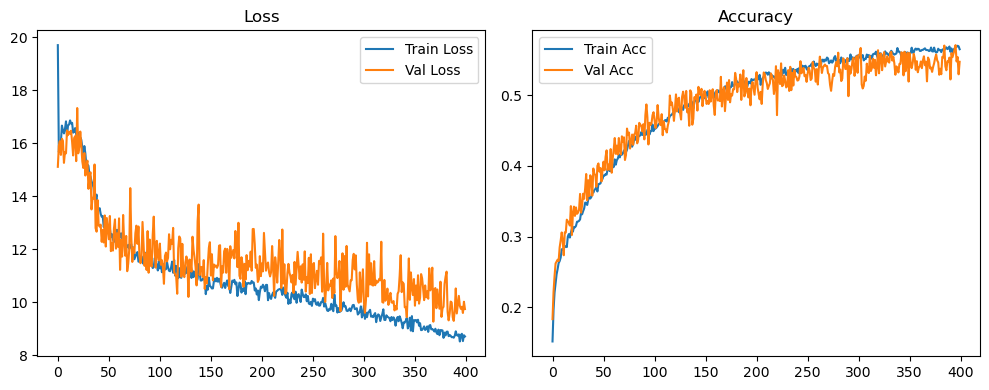

Original Model Final Test Loss: 9.9027 Accuracy: 0.5477


🚀 Running: batch512_lr_max_0.0002_min_1e-06_dp0.05


Files already downloaded and verified


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|                                                                                                                                                                        | 0/400 [00:00<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.1510 | Val Acc: 0.2128 | Epoch Time: 1.93 | :   0%|                                                                                                      | 0/400 [01:55<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.1510 | Val Acc: 0.2128 | Epoch Time: 1.93 | :   0%|                                                                                                      | 0/400 [01:55<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.1510 | Val Acc: 0.2128 | Epoch Time: 1.93 | :   0%|▏                                                                                         | 1/400 [01:55<12:51:13, 115.97s/it]

| LR: 0.000200 | Train Acc: 0.1913 | Val Acc: 0.2407 | Epoch Time: 1.93 | :   0%|▏                                                                                         | 1/400 [03:51<12:51:13, 115.97s/it]

| LR: 0.000200 | Train Acc: 0.1913 | Val Acc: 0.2407 | Epoch Time: 1.93 | :   0%|▏                                                                                         | 1/400 [03:51<12:51:13, 115.97s/it]

| LR: 0.000200 | Train Acc: 0.1913 | Val Acc: 0.2407 | Epoch Time: 1.93 | :   0%|▍                                                                                         | 2/400 [03:51<12:47:53, 115.76s/it]

| LR: 0.000200 | Train Acc: 0.2084 | Val Acc: 0.2523 | Epoch Time: 1.93 | :   0%|▍                                                                                         | 2/400 [05:47<12:47:53, 115.76s/it]

| LR: 0.000200 | Train Acc: 0.2084 | Val Acc: 0.2523 | Epoch Time: 1.93 | :   0%|▍                                                                                         | 2/400 [05:47<12:47:53, 115.76s/it]

| LR: 0.000200 | Train Acc: 0.2084 | Val Acc: 0.2523 | Epoch Time: 1.93 | :   1%|▋                                                                                         | 3/400 [05:47<12:45:34, 115.70s/it]

| LR: 0.000200 | Train Acc: 0.2201 | Val Acc: 0.2741 | Epoch Time: 1.93 | :   1%|▋                                                                                         | 3/400 [07:42<12:45:34, 115.70s/it]

| LR: 0.000200 | Train Acc: 0.2201 | Val Acc: 0.2741 | Epoch Time: 1.93 | :   1%|▋                                                                                         | 3/400 [07:42<12:45:34, 115.70s/it]

| LR: 0.000200 | Train Acc: 0.2201 | Val Acc: 0.2741 | Epoch Time: 1.93 | :   1%|▉                                                                                         | 4/400 [07:42<12:43:36, 115.70s/it]

| LR: 0.000200 | Train Acc: 0.2294 | Val Acc: 0.2959 | Epoch Time: 1.93 | :   1%|▉                                                                                         | 4/400 [09:38<12:43:36, 115.70s/it]

| LR: 0.000200 | Train Acc: 0.2294 | Val Acc: 0.2959 | Epoch Time: 1.93 | :   1%|▉                                                                                         | 4/400 [09:38<12:43:36, 115.70s/it]

| LR: 0.000200 | Train Acc: 0.2294 | Val Acc: 0.2959 | Epoch Time: 1.93 | :   1%|█▏                                                                                        | 5/400 [09:38<12:41:35, 115.68s/it]

| LR: 0.000200 | Train Acc: 0.2368 | Val Acc: 0.2827 | Epoch Time: 1.93 | :   1%|█▏                                                                                        | 5/400 [11:34<12:41:35, 115.68s/it]

| LR: 0.000200 | Train Acc: 0.2368 | Val Acc: 0.2827 | Epoch Time: 1.93 | :   1%|█▏                                                                                        | 5/400 [11:34<12:41:35, 115.68s/it]

| LR: 0.000200 | Train Acc: 0.2368 | Val Acc: 0.2827 | Epoch Time: 1.93 | :   2%|█▎                                                                                        | 6/400 [11:34<12:39:32, 115.67s/it]

| LR: 0.000200 | Train Acc: 0.2475 | Val Acc: 0.2880 | Epoch Time: 1.93 | :   2%|█▎                                                                                        | 6/400 [13:29<12:39:32, 115.67s/it]

| LR: 0.000200 | Train Acc: 0.2475 | Val Acc: 0.2880 | Epoch Time: 1.93 | :   2%|█▎                                                                                        | 6/400 [13:29<12:39:32, 115.67s/it]

| LR: 0.000200 | Train Acc: 0.2475 | Val Acc: 0.2880 | Epoch Time: 1.93 | :   2%|█▌                                                                                        | 7/400 [13:29<12:37:34, 115.66s/it]

| LR: 0.000200 | Train Acc: 0.2479 | Val Acc: 0.2797 | Epoch Time: 1.93 | :   2%|█▌                                                                                        | 7/400 [15:25<12:37:34, 115.66s/it]

| LR: 0.000200 | Train Acc: 0.2479 | Val Acc: 0.2797 | Epoch Time: 1.93 | :   2%|█▌                                                                                        | 7/400 [15:25<12:37:34, 115.66s/it]

| LR: 0.000200 | Train Acc: 0.2479 | Val Acc: 0.2797 | Epoch Time: 1.93 | :   2%|█▊                                                                                        | 8/400 [15:25<12:35:33, 115.65s/it]

| LR: 0.000200 | Train Acc: 0.2531 | Val Acc: 0.2917 | Epoch Time: 1.93 | :   2%|█▊                                                                                        | 8/400 [17:20<12:35:33, 115.65s/it]

| LR: 0.000200 | Train Acc: 0.2531 | Val Acc: 0.2917 | Epoch Time: 1.93 | :   2%|█▊                                                                                        | 8/400 [17:20<12:35:33, 115.65s/it]

| LR: 0.000200 | Train Acc: 0.2531 | Val Acc: 0.2917 | Epoch Time: 1.93 | :   2%|██                                                                                        | 9/400 [17:21<12:33:36, 115.64s/it]

| LR: 0.000200 | Train Acc: 0.2606 | Val Acc: 0.3111 | Epoch Time: 1.93 | :   2%|██                                                                                        | 9/400 [19:16<12:33:36, 115.64s/it]

| LR: 0.000200 | Train Acc: 0.2606 | Val Acc: 0.3111 | Epoch Time: 1.93 | :   2%|██                                                                                        | 9/400 [19:16<12:33:36, 115.64s/it]

| LR: 0.000200 | Train Acc: 0.2606 | Val Acc: 0.3111 | Epoch Time: 1.93 | :   2%|██▏                                                                                      | 10/400 [19:16<12:31:43, 115.65s/it]

| LR: 0.000200 | Train Acc: 0.2626 | Val Acc: 0.3136 | Epoch Time: 1.93 | :   2%|██▏                                                                                      | 10/400 [21:12<12:31:43, 115.65s/it]

| LR: 0.000200 | Train Acc: 0.2626 | Val Acc: 0.3136 | Epoch Time: 1.93 | :   2%|██▏                                                                                      | 10/400 [21:12<12:31:43, 115.65s/it]

| LR: 0.000200 | Train Acc: 0.2626 | Val Acc: 0.3136 | Epoch Time: 1.93 | :   3%|██▍                                                                                      | 11/400 [21:12<12:29:53, 115.66s/it]

| LR: 0.000200 | Train Acc: 0.2694 | Val Acc: 0.3008 | Epoch Time: 1.93 | :   3%|██▍                                                                                      | 11/400 [23:08<12:29:53, 115.66s/it]

| LR: 0.000200 | Train Acc: 0.2694 | Val Acc: 0.3008 | Epoch Time: 1.93 | :   3%|██▍                                                                                      | 11/400 [23:08<12:29:53, 115.66s/it]

| LR: 0.000200 | Train Acc: 0.2694 | Val Acc: 0.3008 | Epoch Time: 1.93 | :   3%|██▋                                                                                      | 12/400 [23:08<12:27:57, 115.66s/it]

| LR: 0.000200 | Train Acc: 0.2698 | Val Acc: 0.3013 | Epoch Time: 1.93 | :   3%|██▋                                                                                      | 12/400 [25:03<12:27:57, 115.66s/it]

| LR: 0.000200 | Train Acc: 0.2698 | Val Acc: 0.3013 | Epoch Time: 1.93 | :   3%|██▋                                                                                      | 12/400 [25:03<12:27:57, 115.66s/it]

| LR: 0.000200 | Train Acc: 0.2698 | Val Acc: 0.3013 | Epoch Time: 1.93 | :   3%|██▉                                                                                      | 13/400 [25:03<12:25:59, 115.66s/it]

| LR: 0.000199 | Train Acc: 0.2765 | Val Acc: 0.3013 | Epoch Time: 1.93 | :   3%|██▉                                                                                      | 13/400 [26:59<12:25:59, 115.66s/it]

| LR: 0.000199 | Train Acc: 0.2765 | Val Acc: 0.3013 | Epoch Time: 1.93 | :   3%|██▉                                                                                      | 13/400 [26:59<12:25:59, 115.66s/it]

| LR: 0.000199 | Train Acc: 0.2765 | Val Acc: 0.3013 | Epoch Time: 1.93 | :   4%|███                                                                                      | 14/400 [26:59<12:24:05, 115.66s/it]

| LR: 0.000199 | Train Acc: 0.2792 | Val Acc: 0.3091 | Epoch Time: 1.93 | :   4%|███                                                                                      | 14/400 [28:54<12:24:05, 115.66s/it]

| LR: 0.000199 | Train Acc: 0.2792 | Val Acc: 0.3091 | Epoch Time: 1.93 | :   4%|███                                                                                      | 14/400 [28:54<12:24:05, 115.66s/it]

| LR: 0.000199 | Train Acc: 0.2792 | Val Acc: 0.3091 | Epoch Time: 1.93 | :   4%|███▎                                                                                     | 15/400 [28:55<12:22:07, 115.65s/it]

| LR: 0.000199 | Train Acc: 0.2847 | Val Acc: 0.3242 | Epoch Time: 1.93 | :   4%|███▎                                                                                     | 15/400 [30:50<12:22:07, 115.65s/it]

| LR: 0.000199 | Train Acc: 0.2847 | Val Acc: 0.3242 | Epoch Time: 1.93 | :   4%|███▎                                                                                     | 15/400 [30:50<12:22:07, 115.65s/it]

| LR: 0.000199 | Train Acc: 0.2847 | Val Acc: 0.3242 | Epoch Time: 1.93 | :   4%|███▌                                                                                     | 16/400 [30:50<12:20:10, 115.65s/it]

| LR: 0.000199 | Train Acc: 0.2838 | Val Acc: 0.3147 | Epoch Time: 1.93 | :   4%|███▌                                                                                     | 16/400 [32:46<12:20:10, 115.65s/it]

| LR: 0.000199 | Train Acc: 0.2838 | Val Acc: 0.3147 | Epoch Time: 1.93 | :   4%|███▌                                                                                     | 16/400 [32:46<12:20:10, 115.65s/it]

| LR: 0.000199 | Train Acc: 0.2838 | Val Acc: 0.3147 | Epoch Time: 1.93 | :   4%|███▊                                                                                     | 17/400 [32:46<12:18:15, 115.65s/it]

| LR: 0.000199 | Train Acc: 0.2843 | Val Acc: 0.3238 | Epoch Time: 1.93 | :   4%|███▊                                                                                     | 17/400 [34:41<12:18:15, 115.65s/it]

| LR: 0.000199 | Train Acc: 0.2843 | Val Acc: 0.3238 | Epoch Time: 1.93 | :   4%|███▊                                                                                     | 17/400 [34:41<12:18:15, 115.65s/it]

| LR: 0.000199 | Train Acc: 0.2843 | Val Acc: 0.3238 | Epoch Time: 1.93 | :   4%|████                                                                                     | 18/400 [34:42<12:16:18, 115.65s/it]

| LR: 0.000199 | Train Acc: 0.2936 | Val Acc: 0.3032 | Epoch Time: 1.93 | :   4%|████                                                                                     | 18/400 [36:37<12:16:18, 115.65s/it]

| LR: 0.000199 | Train Acc: 0.2936 | Val Acc: 0.3032 | Epoch Time: 1.93 | :   4%|████                                                                                     | 18/400 [36:37<12:16:18, 115.65s/it]

| LR: 0.000199 | Train Acc: 0.2936 | Val Acc: 0.3032 | Epoch Time: 1.93 | :   5%|████▏                                                                                    | 19/400 [36:37<12:14:27, 115.66s/it]

| LR: 0.000199 | Train Acc: 0.2930 | Val Acc: 0.3326 | Epoch Time: 1.93 | :   5%|████▏                                                                                    | 19/400 [38:33<12:14:27, 115.66s/it]

| LR: 0.000199 | Train Acc: 0.2930 | Val Acc: 0.3326 | Epoch Time: 1.93 | :   5%|████▏                                                                                    | 19/400 [38:33<12:14:27, 115.66s/it]

| LR: 0.000199 | Train Acc: 0.2930 | Val Acc: 0.3326 | Epoch Time: 1.93 | :   5%|████▍                                                                                    | 20/400 [38:33<12:12:27, 115.65s/it]

| LR: 0.000199 | Train Acc: 0.2925 | Val Acc: 0.3331 | Epoch Time: 1.93 | :   5%|████▍                                                                                    | 20/400 [40:28<12:12:27, 115.65s/it]

| LR: 0.000199 | Train Acc: 0.2925 | Val Acc: 0.3331 | Epoch Time: 1.93 | :   5%|████▍                                                                                    | 20/400 [40:28<12:12:27, 115.65s/it]

| LR: 0.000199 | Train Acc: 0.2925 | Val Acc: 0.3331 | Epoch Time: 1.93 | :   5%|████▋                                                                                    | 21/400 [40:29<12:10:34, 115.66s/it]

| LR: 0.000199 | Train Acc: 0.2946 | Val Acc: 0.3196 | Epoch Time: 1.93 | :   5%|████▋                                                                                    | 21/400 [42:24<12:10:34, 115.66s/it]

| LR: 0.000199 | Train Acc: 0.2946 | Val Acc: 0.3196 | Epoch Time: 1.93 | :   5%|████▋                                                                                    | 21/400 [42:24<12:10:34, 115.66s/it]

| LR: 0.000199 | Train Acc: 0.2946 | Val Acc: 0.3196 | Epoch Time: 1.93 | :   6%|████▉                                                                                    | 22/400 [42:24<12:08:39, 115.66s/it]

| LR: 0.000199 | Train Acc: 0.2958 | Val Acc: 0.3365 | Epoch Time: 1.93 | :   6%|████▉                                                                                    | 22/400 [44:20<12:08:39, 115.66s/it]

| LR: 0.000199 | Train Acc: 0.2958 | Val Acc: 0.3365 | Epoch Time: 1.93 | :   6%|████▉                                                                                    | 22/400 [44:20<12:08:39, 115.66s/it]

| LR: 0.000199 | Train Acc: 0.2958 | Val Acc: 0.3365 | Epoch Time: 1.93 | :   6%|█████                                                                                    | 23/400 [44:20<12:06:43, 115.66s/it]

| LR: 0.000198 | Train Acc: 0.2974 | Val Acc: 0.3412 | Epoch Time: 1.93 | :   6%|█████                                                                                    | 23/400 [46:15<12:06:43, 115.66s/it]

| LR: 0.000198 | Train Acc: 0.2974 | Val Acc: 0.3412 | Epoch Time: 1.93 | :   6%|█████                                                                                    | 23/400 [46:15<12:06:43, 115.66s/it]

| LR: 0.000198 | Train Acc: 0.2974 | Val Acc: 0.3412 | Epoch Time: 1.93 | :   6%|█████▎                                                                                   | 24/400 [46:15<12:04:47, 115.66s/it]

| LR: 0.000198 | Train Acc: 0.3073 | Val Acc: 0.3448 | Epoch Time: 1.93 | :   6%|█████▎                                                                                   | 24/400 [48:11<12:04:47, 115.66s/it]

| LR: 0.000198 | Train Acc: 0.3073 | Val Acc: 0.3448 | Epoch Time: 1.93 | :   6%|█████▎                                                                                   | 24/400 [48:11<12:04:47, 115.66s/it]

| LR: 0.000198 | Train Acc: 0.3073 | Val Acc: 0.3448 | Epoch Time: 1.93 | :   6%|█████▌                                                                                   | 25/400 [48:11<12:02:49, 115.65s/it]

| LR: 0.000198 | Train Acc: 0.3069 | Val Acc: 0.3650 | Epoch Time: 1.93 | :   6%|█████▌                                                                                   | 25/400 [50:07<12:02:49, 115.65s/it]

| LR: 0.000198 | Train Acc: 0.3069 | Val Acc: 0.3650 | Epoch Time: 1.93 | :   6%|█████▌                                                                                   | 25/400 [50:07<12:02:49, 115.65s/it]

| LR: 0.000198 | Train Acc: 0.3069 | Val Acc: 0.3650 | Epoch Time: 1.93 | :   6%|█████▊                                                                                   | 26/400 [50:07<12:00:52, 115.65s/it]

| LR: 0.000198 | Train Acc: 0.3082 | Val Acc: 0.3544 | Epoch Time: 1.93 | :   6%|█████▊                                                                                   | 26/400 [52:02<12:00:52, 115.65s/it]

| LR: 0.000198 | Train Acc: 0.3082 | Val Acc: 0.3544 | Epoch Time: 1.93 | :   6%|█████▊                                                                                   | 26/400 [52:02<12:00:52, 115.65s/it]

| LR: 0.000198 | Train Acc: 0.3082 | Val Acc: 0.3544 | Epoch Time: 1.93 | :   7%|██████                                                                                   | 27/400 [52:02<11:59:02, 115.66s/it]

| LR: 0.000198 | Train Acc: 0.3149 | Val Acc: 0.3484 | Epoch Time: 1.93 | :   7%|██████                                                                                   | 27/400 [53:58<11:59:02, 115.66s/it]

| LR: 0.000198 | Train Acc: 0.3149 | Val Acc: 0.3484 | Epoch Time: 1.93 | :   7%|██████                                                                                   | 27/400 [53:58<11:59:02, 115.66s/it]

| LR: 0.000198 | Train Acc: 0.3149 | Val Acc: 0.3484 | Epoch Time: 1.93 | :   7%|██████▏                                                                                  | 28/400 [53:58<11:57:06, 115.66s/it]

| LR: 0.000198 | Train Acc: 0.3146 | Val Acc: 0.3485 | Epoch Time: 1.93 | :   7%|██████▏                                                                                  | 28/400 [55:54<11:57:06, 115.66s/it]

| LR: 0.000198 | Train Acc: 0.3146 | Val Acc: 0.3485 | Epoch Time: 1.93 | :   7%|██████▏                                                                                  | 28/400 [55:54<11:57:06, 115.66s/it]

| LR: 0.000198 | Train Acc: 0.3146 | Val Acc: 0.3485 | Epoch Time: 1.93 | :   7%|██████▍                                                                                  | 29/400 [55:54<11:55:13, 115.67s/it]

| LR: 0.000197 | Train Acc: 0.3108 | Val Acc: 0.3741 | Epoch Time: 1.93 | :   7%|██████▍                                                                                  | 29/400 [57:49<11:55:13, 115.67s/it]

| LR: 0.000197 | Train Acc: 0.3108 | Val Acc: 0.3741 | Epoch Time: 1.93 | :   7%|██████▍                                                                                  | 29/400 [57:49<11:55:13, 115.67s/it]

| LR: 0.000197 | Train Acc: 0.3108 | Val Acc: 0.3741 | Epoch Time: 1.93 | :   8%|██████▋                                                                                  | 30/400 [57:49<11:53:14, 115.66s/it]

| LR: 0.000197 | Train Acc: 0.3194 | Val Acc: 0.3532 | Epoch Time: 1.93 | :   8%|██████▋                                                                                  | 30/400 [59:45<11:53:14, 115.66s/it]

| LR: 0.000197 | Train Acc: 0.3194 | Val Acc: 0.3532 | Epoch Time: 1.93 | :   8%|██████▋                                                                                  | 30/400 [59:45<11:53:14, 115.66s/it]

| LR: 0.000197 | Train Acc: 0.3194 | Val Acc: 0.3532 | Epoch Time: 1.93 | :   8%|██████▉                                                                                  | 31/400 [59:45<11:51:21, 115.67s/it]

| LR: 0.000197 | Train Acc: 0.3240 | Val Acc: 0.3588 | Epoch Time: 1.93 | :   8%|██████▋                                                                                | 31/400 [1:01:41<11:51:21, 115.67s/it]

| LR: 0.000197 | Train Acc: 0.3240 | Val Acc: 0.3588 | Epoch Time: 1.93 | :   8%|██████▋                                                                                | 31/400 [1:01:41<11:51:21, 115.67s/it]

| LR: 0.000197 | Train Acc: 0.3240 | Val Acc: 0.3588 | Epoch Time: 1.93 | :   8%|██████▉                                                                                | 32/400 [1:01:41<11:49:24, 115.67s/it]

| LR: 0.000197 | Train Acc: 0.3236 | Val Acc: 0.3457 | Epoch Time: 1.93 | :   8%|██████▉                                                                                | 32/400 [1:03:36<11:49:24, 115.67s/it]

| LR: 0.000197 | Train Acc: 0.3236 | Val Acc: 0.3457 | Epoch Time: 1.93 | :   8%|██████▉                                                                                | 32/400 [1:03:36<11:49:24, 115.67s/it]

| LR: 0.000197 | Train Acc: 0.3236 | Val Acc: 0.3457 | Epoch Time: 1.93 | :   8%|███████▏                                                                               | 33/400 [1:03:36<11:47:26, 115.66s/it]

| LR: 0.000197 | Train Acc: 0.3241 | Val Acc: 0.3809 | Epoch Time: 1.93 | :   8%|███████▏                                                                               | 33/400 [1:05:32<11:47:26, 115.66s/it]

| LR: 0.000197 | Train Acc: 0.3241 | Val Acc: 0.3809 | Epoch Time: 1.93 | :   8%|███████▏                                                                               | 33/400 [1:05:32<11:47:26, 115.66s/it]

| LR: 0.000197 | Train Acc: 0.3241 | Val Acc: 0.3809 | Epoch Time: 1.93 | :   8%|███████▍                                                                               | 34/400 [1:05:32<11:45:33, 115.67s/it]

| LR: 0.000196 | Train Acc: 0.3273 | Val Acc: 0.3694 | Epoch Time: 1.93 | :   8%|███████▍                                                                               | 34/400 [1:07:28<11:45:33, 115.67s/it]

| LR: 0.000196 | Train Acc: 0.3273 | Val Acc: 0.3694 | Epoch Time: 1.93 | :   8%|███████▍                                                                               | 34/400 [1:07:28<11:45:33, 115.67s/it]

| LR: 0.000196 | Train Acc: 0.3273 | Val Acc: 0.3694 | Epoch Time: 1.93 | :   9%|███████▌                                                                               | 35/400 [1:07:28<11:43:50, 115.70s/it]

| LR: 0.000196 | Train Acc: 0.3293 | Val Acc: 0.3659 | Epoch Time: 1.93 | :   9%|███████▌                                                                               | 35/400 [1:09:23<11:43:50, 115.70s/it]

| LR: 0.000196 | Train Acc: 0.3293 | Val Acc: 0.3659 | Epoch Time: 1.93 | :   9%|███████▌                                                                               | 35/400 [1:09:23<11:43:50, 115.70s/it]

| LR: 0.000196 | Train Acc: 0.3293 | Val Acc: 0.3659 | Epoch Time: 1.93 | :   9%|███████▊                                                                               | 36/400 [1:09:24<11:41:53, 115.70s/it]

| LR: 0.000196 | Train Acc: 0.3335 | Val Acc: 0.3333 | Epoch Time: 1.93 | :   9%|███████▊                                                                               | 36/400 [1:11:19<11:41:53, 115.70s/it]

| LR: 0.000196 | Train Acc: 0.3335 | Val Acc: 0.3333 | Epoch Time: 1.93 | :   9%|███████▊                                                                               | 36/400 [1:11:19<11:41:53, 115.70s/it]

| LR: 0.000196 | Train Acc: 0.3335 | Val Acc: 0.3333 | Epoch Time: 1.93 | :   9%|████████                                                                               | 37/400 [1:11:19<11:39:52, 115.68s/it]

| LR: 0.000196 | Train Acc: 0.3338 | Val Acc: 0.3546 | Epoch Time: 1.93 | :   9%|████████                                                                               | 37/400 [1:13:15<11:39:52, 115.68s/it]

| LR: 0.000196 | Train Acc: 0.3338 | Val Acc: 0.3546 | Epoch Time: 1.93 | :   9%|████████                                                                               | 37/400 [1:13:15<11:39:52, 115.68s/it]

| LR: 0.000196 | Train Acc: 0.3338 | Val Acc: 0.3546 | Epoch Time: 1.93 | :  10%|████████▎                                                                              | 38/400 [1:13:15<11:38:01, 115.69s/it]

| LR: 0.000196 | Train Acc: 0.3382 | Val Acc: 0.3568 | Epoch Time: 1.93 | :  10%|████████▎                                                                              | 38/400 [1:15:10<11:38:01, 115.69s/it]

| LR: 0.000196 | Train Acc: 0.3382 | Val Acc: 0.3568 | Epoch Time: 1.93 | :  10%|████████▎                                                                              | 38/400 [1:15:10<11:38:01, 115.69s/it]

| LR: 0.000196 | Train Acc: 0.3382 | Val Acc: 0.3568 | Epoch Time: 1.93 | :  10%|████████▍                                                                              | 39/400 [1:15:11<11:35:59, 115.68s/it]

| LR: 0.000195 | Train Acc: 0.3421 | Val Acc: 0.3436 | Epoch Time: 1.93 | :  10%|████████▍                                                                              | 39/400 [1:17:06<11:35:59, 115.68s/it]

| LR: 0.000195 | Train Acc: 0.3421 | Val Acc: 0.3436 | Epoch Time: 1.93 | :  10%|████████▍                                                                              | 39/400 [1:17:06<11:35:59, 115.68s/it]

| LR: 0.000195 | Train Acc: 0.3421 | Val Acc: 0.3436 | Epoch Time: 1.93 | :  10%|████████▋                                                                              | 40/400 [1:17:06<11:34:00, 115.67s/it]

| LR: 0.000195 | Train Acc: 0.3505 | Val Acc: 0.3958 | Epoch Time: 1.93 | :  10%|████████▋                                                                              | 40/400 [1:19:02<11:34:00, 115.67s/it]

| LR: 0.000195 | Train Acc: 0.3505 | Val Acc: 0.3958 | Epoch Time: 1.93 | :  10%|████████▋                                                                              | 40/400 [1:19:02<11:34:00, 115.67s/it]

| LR: 0.000195 | Train Acc: 0.3505 | Val Acc: 0.3958 | Epoch Time: 1.93 | :  10%|████████▉                                                                              | 41/400 [1:19:02<11:32:04, 115.67s/it]

| LR: 0.000195 | Train Acc: 0.3469 | Val Acc: 0.3688 | Epoch Time: 1.93 | :  10%|████████▉                                                                              | 41/400 [1:20:57<11:32:04, 115.67s/it]

| LR: 0.000195 | Train Acc: 0.3469 | Val Acc: 0.3688 | Epoch Time: 1.93 | :  10%|████████▉                                                                              | 41/400 [1:20:57<11:32:04, 115.67s/it]

| LR: 0.000195 | Train Acc: 0.3469 | Val Acc: 0.3688 | Epoch Time: 1.93 | :  10%|█████████▏                                                                             | 42/400 [1:20:58<11:30:07, 115.66s/it]

| LR: 0.000195 | Train Acc: 0.3509 | Val Acc: 0.3796 | Epoch Time: 1.93 | :  10%|█████████▏                                                                             | 42/400 [1:22:53<11:30:07, 115.66s/it]

| LR: 0.000195 | Train Acc: 0.3509 | Val Acc: 0.3796 | Epoch Time: 1.93 | :  10%|█████████▏                                                                             | 42/400 [1:22:53<11:30:07, 115.66s/it]

| LR: 0.000195 | Train Acc: 0.3509 | Val Acc: 0.3796 | Epoch Time: 1.93 | :  11%|█████████▎                                                                             | 43/400 [1:22:53<11:28:12, 115.67s/it]

| LR: 0.000194 | Train Acc: 0.3520 | Val Acc: 0.3769 | Epoch Time: 1.93 | :  11%|█████████▎                                                                             | 43/400 [1:24:49<11:28:12, 115.67s/it]

| LR: 0.000194 | Train Acc: 0.3520 | Val Acc: 0.3769 | Epoch Time: 1.93 | :  11%|█████████▎                                                                             | 43/400 [1:24:49<11:28:12, 115.67s/it]

| LR: 0.000194 | Train Acc: 0.3520 | Val Acc: 0.3769 | Epoch Time: 1.93 | :  11%|█████████▌                                                                             | 44/400 [1:24:49<11:26:12, 115.65s/it]

| LR: 0.000194 | Train Acc: 0.3519 | Val Acc: 0.3897 | Epoch Time: 1.93 | :  11%|█████████▌                                                                             | 44/400 [1:26:44<11:26:12, 115.65s/it]

| LR: 0.000194 | Train Acc: 0.3519 | Val Acc: 0.3897 | Epoch Time: 1.93 | :  11%|█████████▌                                                                             | 44/400 [1:26:44<11:26:12, 115.65s/it]

| LR: 0.000194 | Train Acc: 0.3519 | Val Acc: 0.3897 | Epoch Time: 1.93 | :  11%|█████████▊                                                                             | 45/400 [1:26:45<11:24:25, 115.68s/it]

| LR: 0.000194 | Train Acc: 0.3568 | Val Acc: 0.3983 | Epoch Time: 1.93 | :  11%|█████████▊                                                                             | 45/400 [1:28:40<11:24:25, 115.68s/it]

| LR: 0.000194 | Train Acc: 0.3568 | Val Acc: 0.3983 | Epoch Time: 1.93 | :  11%|█████████▊                                                                             | 45/400 [1:28:40<11:24:25, 115.68s/it]

| LR: 0.000194 | Train Acc: 0.3568 | Val Acc: 0.3983 | Epoch Time: 1.93 | :  12%|██████████                                                                             | 46/400 [1:28:40<11:22:26, 115.67s/it]

| LR: 0.000194 | Train Acc: 0.3587 | Val Acc: 0.3865 | Epoch Time: 1.93 | :  12%|██████████                                                                             | 46/400 [1:30:36<11:22:26, 115.67s/it]

| LR: 0.000194 | Train Acc: 0.3587 | Val Acc: 0.3865 | Epoch Time: 1.93 | :  12%|██████████                                                                             | 46/400 [1:30:36<11:22:26, 115.67s/it]

| LR: 0.000194 | Train Acc: 0.3587 | Val Acc: 0.3865 | Epoch Time: 1.93 | :  12%|██████████▏                                                                            | 47/400 [1:30:36<11:20:29, 115.66s/it]

| LR: 0.000193 | Train Acc: 0.3575 | Val Acc: 0.3956 | Epoch Time: 1.93 | :  12%|██████████▏                                                                            | 47/400 [1:32:31<11:20:29, 115.66s/it]

| LR: 0.000193 | Train Acc: 0.3575 | Val Acc: 0.3956 | Epoch Time: 1.93 | :  12%|██████████▏                                                                            | 47/400 [1:32:31<11:20:29, 115.66s/it]

| LR: 0.000193 | Train Acc: 0.3575 | Val Acc: 0.3956 | Epoch Time: 1.93 | :  12%|██████████▍                                                                            | 48/400 [1:32:32<11:18:32, 115.66s/it]

| LR: 0.000193 | Train Acc: 0.3572 | Val Acc: 0.3965 | Epoch Time: 1.93 | :  12%|██████████▍                                                                            | 48/400 [1:34:27<11:18:32, 115.66s/it]

| LR: 0.000193 | Train Acc: 0.3572 | Val Acc: 0.3965 | Epoch Time: 1.93 | :  12%|██████████▍                                                                            | 48/400 [1:34:27<11:18:32, 115.66s/it]

| LR: 0.000193 | Train Acc: 0.3572 | Val Acc: 0.3965 | Epoch Time: 1.93 | :  12%|██████████▋                                                                            | 49/400 [1:34:27<11:16:40, 115.67s/it]

| LR: 0.000193 | Train Acc: 0.3661 | Val Acc: 0.3922 | Epoch Time: 1.93 | :  12%|██████████▋                                                                            | 49/400 [1:36:23<11:16:40, 115.67s/it]

| LR: 0.000193 | Train Acc: 0.3661 | Val Acc: 0.3922 | Epoch Time: 1.93 | :  12%|██████████▋                                                                            | 49/400 [1:36:23<11:16:40, 115.67s/it]

| LR: 0.000193 | Train Acc: 0.3661 | Val Acc: 0.3922 | Epoch Time: 1.93 | :  12%|██████████▉                                                                            | 50/400 [1:36:23<11:14:46, 115.67s/it]

| LR: 0.000192 | Train Acc: 0.3642 | Val Acc: 0.3961 | Epoch Time: 1.93 | :  12%|██████████▉                                                                            | 50/400 [1:38:18<11:14:46, 115.67s/it]

| LR: 0.000192 | Train Acc: 0.3642 | Val Acc: 0.3961 | Epoch Time: 1.93 | :  12%|██████████▉                                                                            | 50/400 [1:38:18<11:14:46, 115.67s/it]

| LR: 0.000192 | Train Acc: 0.3642 | Val Acc: 0.3961 | Epoch Time: 1.93 | :  13%|███████████                                                                            | 51/400 [1:38:19<11:12:50, 115.67s/it]

| LR: 0.000192 | Train Acc: 0.3639 | Val Acc: 0.4068 | Epoch Time: 1.93 | :  13%|███████████                                                                            | 51/400 [1:40:14<11:12:50, 115.67s/it]

| LR: 0.000192 | Train Acc: 0.3639 | Val Acc: 0.4068 | Epoch Time: 1.93 | :  13%|███████████                                                                            | 51/400 [1:40:14<11:12:50, 115.67s/it]

| LR: 0.000192 | Train Acc: 0.3639 | Val Acc: 0.4068 | Epoch Time: 1.93 | :  13%|███████████▎                                                                           | 52/400 [1:40:14<11:10:49, 115.66s/it]

| LR: 0.000192 | Train Acc: 0.3712 | Val Acc: 0.3430 | Epoch Time: 1.93 | :  13%|███████████▎                                                                           | 52/400 [1:42:10<11:10:49, 115.66s/it]

| LR: 0.000192 | Train Acc: 0.3712 | Val Acc: 0.3430 | Epoch Time: 1.93 | :  13%|███████████▎                                                                           | 52/400 [1:42:10<11:10:49, 115.66s/it]

| LR: 0.000192 | Train Acc: 0.3712 | Val Acc: 0.3430 | Epoch Time: 1.93 | :  13%|███████████▌                                                                           | 53/400 [1:42:10<11:08:49, 115.65s/it]

| LR: 0.000192 | Train Acc: 0.3716 | Val Acc: 0.3857 | Epoch Time: 1.93 | :  13%|███████████▌                                                                           | 53/400 [1:44:05<11:08:49, 115.65s/it]

| LR: 0.000192 | Train Acc: 0.3716 | Val Acc: 0.3857 | Epoch Time: 1.93 | :  13%|███████████▌                                                                           | 53/400 [1:44:05<11:08:49, 115.65s/it]

| LR: 0.000192 | Train Acc: 0.3716 | Val Acc: 0.3857 | Epoch Time: 1.93 | :  14%|███████████▋                                                                           | 54/400 [1:44:05<11:06:53, 115.65s/it]

| LR: 0.000191 | Train Acc: 0.3727 | Val Acc: 0.4032 | Epoch Time: 1.93 | :  14%|███████████▋                                                                           | 54/400 [1:46:01<11:06:53, 115.65s/it]

| LR: 0.000191 | Train Acc: 0.3727 | Val Acc: 0.4032 | Epoch Time: 1.93 | :  14%|███████████▋                                                                           | 54/400 [1:46:01<11:06:53, 115.65s/it]

| LR: 0.000191 | Train Acc: 0.3727 | Val Acc: 0.4032 | Epoch Time: 1.93 | :  14%|███████████▉                                                                           | 55/400 [1:46:01<11:05:00, 115.65s/it]

| LR: 0.000191 | Train Acc: 0.3712 | Val Acc: 0.3910 | Epoch Time: 1.93 | :  14%|███████████▉                                                                           | 55/400 [1:47:57<11:05:00, 115.65s/it]

| LR: 0.000191 | Train Acc: 0.3712 | Val Acc: 0.3910 | Epoch Time: 1.93 | :  14%|███████████▉                                                                           | 55/400 [1:47:57<11:05:00, 115.65s/it]

| LR: 0.000191 | Train Acc: 0.3712 | Val Acc: 0.3910 | Epoch Time: 1.93 | :  14%|████████████▏                                                                          | 56/400 [1:47:57<11:03:05, 115.66s/it]

| LR: 0.000191 | Train Acc: 0.3740 | Val Acc: 0.4060 | Epoch Time: 1.93 | :  14%|████████████▏                                                                          | 56/400 [1:49:52<11:03:05, 115.66s/it]

| LR: 0.000191 | Train Acc: 0.3740 | Val Acc: 0.4060 | Epoch Time: 1.93 | :  14%|████████████▏                                                                          | 56/400 [1:49:52<11:03:05, 115.66s/it]

| LR: 0.000191 | Train Acc: 0.3740 | Val Acc: 0.4060 | Epoch Time: 1.93 | :  14%|████████████▍                                                                          | 57/400 [1:49:52<11:01:11, 115.66s/it]

| LR: 0.000190 | Train Acc: 0.3810 | Val Acc: 0.4032 | Epoch Time: 1.93 | :  14%|████████████▍                                                                          | 57/400 [1:51:48<11:01:11, 115.66s/it]

| LR: 0.000190 | Train Acc: 0.3810 | Val Acc: 0.4032 | Epoch Time: 1.93 | :  14%|████████████▍                                                                          | 57/400 [1:51:48<11:01:11, 115.66s/it]

| LR: 0.000190 | Train Acc: 0.3810 | Val Acc: 0.4032 | Epoch Time: 1.93 | :  14%|████████████▌                                                                          | 58/400 [1:51:48<10:59:15, 115.66s/it]

| LR: 0.000190 | Train Acc: 0.3786 | Val Acc: 0.3972 | Epoch Time: 1.93 | :  14%|████████████▌                                                                          | 58/400 [1:53:44<10:59:15, 115.66s/it]

| LR: 0.000190 | Train Acc: 0.3786 | Val Acc: 0.3972 | Epoch Time: 1.93 | :  14%|████████████▌                                                                          | 58/400 [1:53:44<10:59:15, 115.66s/it]

| LR: 0.000190 | Train Acc: 0.3786 | Val Acc: 0.3972 | Epoch Time: 1.93 | :  15%|████████████▊                                                                          | 59/400 [1:53:44<10:57:21, 115.66s/it]

| LR: 0.000190 | Train Acc: 0.3811 | Val Acc: 0.4238 | Epoch Time: 1.93 | :  15%|████████████▊                                                                          | 59/400 [1:55:39<10:57:21, 115.66s/it]

| LR: 0.000190 | Train Acc: 0.3811 | Val Acc: 0.4238 | Epoch Time: 1.93 | :  15%|████████████▊                                                                          | 59/400 [1:55:39<10:57:21, 115.66s/it]

| LR: 0.000190 | Train Acc: 0.3811 | Val Acc: 0.4238 | Epoch Time: 1.93 | :  15%|█████████████                                                                          | 60/400 [1:55:39<10:55:25, 115.66s/it]

| LR: 0.000189 | Train Acc: 0.3844 | Val Acc: 0.4110 | Epoch Time: 1.93 | :  15%|█████████████                                                                          | 60/400 [1:57:35<10:55:25, 115.66s/it]

| LR: 0.000189 | Train Acc: 0.3844 | Val Acc: 0.4110 | Epoch Time: 1.93 | :  15%|█████████████                                                                          | 60/400 [1:57:35<10:55:25, 115.66s/it]

| LR: 0.000189 | Train Acc: 0.3844 | Val Acc: 0.4110 | Epoch Time: 1.93 | :  15%|█████████████▎                                                                         | 61/400 [1:57:35<10:53:26, 115.65s/it]

| LR: 0.000189 | Train Acc: 0.3875 | Val Acc: 0.4149 | Epoch Time: 1.93 | :  15%|█████████████▎                                                                         | 61/400 [1:59:31<10:53:26, 115.65s/it]

| LR: 0.000189 | Train Acc: 0.3875 | Val Acc: 0.4149 | Epoch Time: 1.93 | :  15%|█████████████▎                                                                         | 61/400 [1:59:31<10:53:26, 115.65s/it]

| LR: 0.000189 | Train Acc: 0.3875 | Val Acc: 0.4149 | Epoch Time: 1.93 | :  16%|█████████████▍                                                                         | 62/400 [1:59:31<10:51:34, 115.66s/it]

| LR: 0.000188 | Train Acc: 0.3896 | Val Acc: 0.4172 | Epoch Time: 1.93 | :  16%|█████████████▍                                                                         | 62/400 [2:01:26<10:51:34, 115.66s/it]

| LR: 0.000188 | Train Acc: 0.3896 | Val Acc: 0.4172 | Epoch Time: 1.93 | :  16%|█████████████▍                                                                         | 62/400 [2:01:26<10:51:34, 115.66s/it]

| LR: 0.000188 | Train Acc: 0.3896 | Val Acc: 0.4172 | Epoch Time: 1.93 | :  16%|█████████████▋                                                                         | 63/400 [2:01:26<10:49:38, 115.66s/it]

| LR: 0.000188 | Train Acc: 0.3821 | Val Acc: 0.4313 | Epoch Time: 1.93 | :  16%|█████████████▋                                                                         | 63/400 [2:03:22<10:49:38, 115.66s/it]

| LR: 0.000188 | Train Acc: 0.3821 | Val Acc: 0.4313 | Epoch Time: 1.93 | :  16%|█████████████▋                                                                         | 63/400 [2:03:22<10:49:38, 115.66s/it]

| LR: 0.000188 | Train Acc: 0.3821 | Val Acc: 0.4313 | Epoch Time: 1.93 | :  16%|█████████████▉                                                                         | 64/400 [2:03:22<10:47:43, 115.66s/it]

| LR: 0.000188 | Train Acc: 0.3883 | Val Acc: 0.3883 | Epoch Time: 1.93 | :  16%|█████████████▉                                                                         | 64/400 [2:05:18<10:47:43, 115.66s/it]

| LR: 0.000188 | Train Acc: 0.3883 | Val Acc: 0.3883 | Epoch Time: 1.93 | :  16%|█████████████▉                                                                         | 64/400 [2:05:18<10:47:43, 115.66s/it]

| LR: 0.000188 | Train Acc: 0.3883 | Val Acc: 0.3883 | Epoch Time: 1.93 | :  16%|██████████████▏                                                                        | 65/400 [2:05:18<10:45:46, 115.66s/it]

| LR: 0.000187 | Train Acc: 0.3893 | Val Acc: 0.4216 | Epoch Time: 1.93 | :  16%|██████████████▏                                                                        | 65/400 [2:07:13<10:45:46, 115.66s/it]

| LR: 0.000187 | Train Acc: 0.3893 | Val Acc: 0.4216 | Epoch Time: 1.93 | :  16%|██████████████▏                                                                        | 65/400 [2:07:13<10:45:46, 115.66s/it]

| LR: 0.000187 | Train Acc: 0.3893 | Val Acc: 0.4216 | Epoch Time: 1.93 | :  16%|██████████████▎                                                                        | 66/400 [2:07:13<10:43:49, 115.66s/it]

| LR: 0.000187 | Train Acc: 0.3928 | Val Acc: 0.4213 | Epoch Time: 1.93 | :  16%|██████████████▎                                                                        | 66/400 [2:09:09<10:43:49, 115.66s/it]

| LR: 0.000187 | Train Acc: 0.3928 | Val Acc: 0.4213 | Epoch Time: 1.93 | :  16%|██████████████▎                                                                        | 66/400 [2:09:09<10:43:49, 115.66s/it]

| LR: 0.000187 | Train Acc: 0.3928 | Val Acc: 0.4213 | Epoch Time: 1.93 | :  17%|██████████████▌                                                                        | 67/400 [2:09:09<10:41:54, 115.66s/it]

| LR: 0.000187 | Train Acc: 0.3911 | Val Acc: 0.4079 | Epoch Time: 1.93 | :  17%|██████████████▌                                                                        | 67/400 [2:11:05<10:41:54, 115.66s/it]

| LR: 0.000187 | Train Acc: 0.3911 | Val Acc: 0.4079 | Epoch Time: 1.93 | :  17%|██████████████▌                                                                        | 67/400 [2:11:05<10:41:54, 115.66s/it]

| LR: 0.000187 | Train Acc: 0.3911 | Val Acc: 0.4079 | Epoch Time: 1.93 | :  17%|██████████████▊                                                                        | 68/400 [2:11:05<10:39:58, 115.66s/it]

| LR: 0.000186 | Train Acc: 0.3904 | Val Acc: 0.4316 | Epoch Time: 1.93 | :  17%|██████████████▊                                                                        | 68/400 [2:13:00<10:39:58, 115.66s/it]

| LR: 0.000186 | Train Acc: 0.3904 | Val Acc: 0.4316 | Epoch Time: 1.93 | :  17%|██████████████▊                                                                        | 68/400 [2:13:00<10:39:58, 115.66s/it]

| LR: 0.000186 | Train Acc: 0.3904 | Val Acc: 0.4316 | Epoch Time: 1.93 | :  17%|███████████████                                                                        | 69/400 [2:13:00<10:38:03, 115.66s/it]

| LR: 0.000186 | Train Acc: 0.3966 | Val Acc: 0.4205 | Epoch Time: 1.93 | :  17%|███████████████                                                                        | 69/400 [2:14:56<10:38:03, 115.66s/it]

| LR: 0.000186 | Train Acc: 0.3966 | Val Acc: 0.4205 | Epoch Time: 1.93 | :  17%|███████████████                                                                        | 69/400 [2:14:56<10:38:03, 115.66s/it]

| LR: 0.000186 | Train Acc: 0.3966 | Val Acc: 0.4205 | Epoch Time: 1.93 | :  18%|███████████████▏                                                                       | 70/400 [2:14:56<10:36:05, 115.65s/it]

| LR: 0.000185 | Train Acc: 0.3991 | Val Acc: 0.4025 | Epoch Time: 1.93 | :  18%|███████████████▏                                                                       | 70/400 [2:16:52<10:36:05, 115.65s/it]

| LR: 0.000185 | Train Acc: 0.3991 | Val Acc: 0.4025 | Epoch Time: 1.93 | :  18%|███████████████▏                                                                       | 70/400 [2:16:52<10:36:05, 115.65s/it]

| LR: 0.000185 | Train Acc: 0.3991 | Val Acc: 0.4025 | Epoch Time: 1.93 | :  18%|███████████████▍                                                                       | 71/400 [2:16:52<10:34:08, 115.65s/it]

| LR: 0.000185 | Train Acc: 0.3944 | Val Acc: 0.4162 | Epoch Time: 1.93 | :  18%|███████████████▍                                                                       | 71/400 [2:18:47<10:34:08, 115.65s/it]

| LR: 0.000185 | Train Acc: 0.3944 | Val Acc: 0.4162 | Epoch Time: 1.93 | :  18%|███████████████▍                                                                       | 71/400 [2:18:47<10:34:08, 115.65s/it]

| LR: 0.000185 | Train Acc: 0.3944 | Val Acc: 0.4162 | Epoch Time: 1.93 | :  18%|███████████████▋                                                                       | 72/400 [2:18:47<10:32:12, 115.65s/it]

| LR: 0.000185 | Train Acc: 0.3993 | Val Acc: 0.4339 | Epoch Time: 1.93 | :  18%|███████████████▋                                                                       | 72/400 [2:20:43<10:32:12, 115.65s/it]

| LR: 0.000185 | Train Acc: 0.3993 | Val Acc: 0.4339 | Epoch Time: 1.93 | :  18%|███████████████▋                                                                       | 72/400 [2:20:43<10:32:12, 115.65s/it]

| LR: 0.000185 | Train Acc: 0.3993 | Val Acc: 0.4339 | Epoch Time: 1.93 | :  18%|███████████████▉                                                                       | 73/400 [2:20:43<10:30:16, 115.65s/it]

| LR: 0.000184 | Train Acc: 0.4013 | Val Acc: 0.4316 | Epoch Time: 1.93 | :  18%|███████████████▉                                                                       | 73/400 [2:22:39<10:30:16, 115.65s/it]

| LR: 0.000184 | Train Acc: 0.4013 | Val Acc: 0.4316 | Epoch Time: 1.93 | :  18%|███████████████▉                                                                       | 73/400 [2:22:39<10:30:16, 115.65s/it]

| LR: 0.000184 | Train Acc: 0.4013 | Val Acc: 0.4316 | Epoch Time: 1.93 | :  18%|████████████████                                                                       | 74/400 [2:22:39<10:28:23, 115.66s/it]

| LR: 0.000184 | Train Acc: 0.4008 | Val Acc: 0.3958 | Epoch Time: 1.93 | :  18%|████████████████                                                                       | 74/400 [2:24:34<10:28:23, 115.66s/it]

| LR: 0.000184 | Train Acc: 0.4008 | Val Acc: 0.3958 | Epoch Time: 1.93 | :  18%|████████████████                                                                       | 74/400 [2:24:34<10:28:23, 115.66s/it]

| LR: 0.000184 | Train Acc: 0.4008 | Val Acc: 0.3958 | Epoch Time: 1.93 | :  19%|████████████████▎                                                                      | 75/400 [2:24:34<10:26:27, 115.65s/it]

| LR: 0.000183 | Train Acc: 0.3977 | Val Acc: 0.4344 | Epoch Time: 1.93 | :  19%|████████████████▎                                                                      | 75/400 [2:26:30<10:26:27, 115.65s/it]

| LR: 0.000183 | Train Acc: 0.3977 | Val Acc: 0.4344 | Epoch Time: 1.93 | :  19%|████████████████▎                                                                      | 75/400 [2:26:30<10:26:27, 115.65s/it]

| LR: 0.000183 | Train Acc: 0.3977 | Val Acc: 0.4344 | Epoch Time: 1.93 | :  19%|████████████████▌                                                                      | 76/400 [2:26:30<10:24:35, 115.67s/it]

| LR: 0.000183 | Train Acc: 0.4063 | Val Acc: 0.4158 | Epoch Time: 1.93 | :  19%|████████████████▌                                                                      | 76/400 [2:28:26<10:24:35, 115.67s/it]

| LR: 0.000183 | Train Acc: 0.4063 | Val Acc: 0.4158 | Epoch Time: 1.93 | :  19%|████████████████▌                                                                      | 76/400 [2:28:26<10:24:35, 115.67s/it]

| LR: 0.000183 | Train Acc: 0.4063 | Val Acc: 0.4158 | Epoch Time: 1.93 | :  19%|████████████████▋                                                                      | 77/400 [2:28:26<10:22:39, 115.66s/it]

| LR: 0.000182 | Train Acc: 0.4099 | Val Acc: 0.3819 | Epoch Time: 1.93 | :  19%|████████████████▋                                                                      | 77/400 [2:30:21<10:22:39, 115.66s/it]

| LR: 0.000182 | Train Acc: 0.4099 | Val Acc: 0.3819 | Epoch Time: 1.93 | :  19%|████████████████▋                                                                      | 77/400 [2:30:21<10:22:39, 115.66s/it]

| LR: 0.000182 | Train Acc: 0.4099 | Val Acc: 0.3819 | Epoch Time: 1.93 | :  20%|████████████████▉                                                                      | 78/400 [2:30:21<10:20:42, 115.66s/it]

| LR: 0.000182 | Train Acc: 0.4038 | Val Acc: 0.4181 | Epoch Time: 1.93 | :  20%|████████████████▉                                                                      | 78/400 [2:32:17<10:20:42, 115.66s/it]

| LR: 0.000182 | Train Acc: 0.4038 | Val Acc: 0.4181 | Epoch Time: 1.93 | :  20%|████████████████▉                                                                      | 78/400 [2:32:17<10:20:42, 115.66s/it]

| LR: 0.000182 | Train Acc: 0.4038 | Val Acc: 0.4181 | Epoch Time: 1.93 | :  20%|█████████████████▏                                                                     | 79/400 [2:32:17<10:18:46, 115.66s/it]

| LR: 0.000181 | Train Acc: 0.4026 | Val Acc: 0.4446 | Epoch Time: 1.93 | :  20%|█████████████████▏                                                                     | 79/400 [2:34:13<10:18:46, 115.66s/it]

| LR: 0.000181 | Train Acc: 0.4026 | Val Acc: 0.4446 | Epoch Time: 1.93 | :  20%|█████████████████▏                                                                     | 79/400 [2:34:13<10:18:46, 115.66s/it]

| LR: 0.000181 | Train Acc: 0.4026 | Val Acc: 0.4446 | Epoch Time: 1.93 | :  20%|█████████████████▍                                                                     | 80/400 [2:34:13<10:16:51, 115.66s/it]

| LR: 0.000181 | Train Acc: 0.4097 | Val Acc: 0.4124 | Epoch Time: 1.93 | :  20%|█████████████████▍                                                                     | 80/400 [2:36:08<10:16:51, 115.66s/it]

| LR: 0.000181 | Train Acc: 0.4097 | Val Acc: 0.4124 | Epoch Time: 1.93 | :  20%|█████████████████▍                                                                     | 80/400 [2:36:08<10:16:51, 115.66s/it]

| LR: 0.000181 | Train Acc: 0.4097 | Val Acc: 0.4124 | Epoch Time: 1.93 | :  20%|█████████████████▌                                                                     | 81/400 [2:36:08<10:14:55, 115.66s/it]

| LR: 0.000181 | Train Acc: 0.4093 | Val Acc: 0.4308 | Epoch Time: 1.93 | :  20%|█████████████████▌                                                                     | 81/400 [2:38:04<10:14:55, 115.66s/it]

| LR: 0.000181 | Train Acc: 0.4093 | Val Acc: 0.4308 | Epoch Time: 1.93 | :  20%|█████████████████▌                                                                     | 81/400 [2:38:04<10:14:55, 115.66s/it]

| LR: 0.000181 | Train Acc: 0.4093 | Val Acc: 0.4308 | Epoch Time: 1.93 | :  20%|█████████████████▊                                                                     | 82/400 [2:38:04<10:12:59, 115.66s/it]

| LR: 0.000180 | Train Acc: 0.4140 | Val Acc: 0.4391 | Epoch Time: 1.93 | :  20%|█████████████████▊                                                                     | 82/400 [2:40:00<10:12:59, 115.66s/it]

| LR: 0.000180 | Train Acc: 0.4140 | Val Acc: 0.4391 | Epoch Time: 1.93 | :  20%|█████████████████▊                                                                     | 82/400 [2:40:00<10:12:59, 115.66s/it]

| LR: 0.000180 | Train Acc: 0.4140 | Val Acc: 0.4391 | Epoch Time: 1.93 | :  21%|██████████████████                                                                     | 83/400 [2:40:00<10:11:14, 115.69s/it]

| LR: 0.000180 | Train Acc: 0.4090 | Val Acc: 0.4244 | Epoch Time: 1.93 | :  21%|██████████████████                                                                     | 83/400 [2:41:55<10:11:14, 115.69s/it]

| LR: 0.000180 | Train Acc: 0.4090 | Val Acc: 0.4244 | Epoch Time: 1.93 | :  21%|██████████████████                                                                     | 83/400 [2:41:55<10:11:14, 115.69s/it]

| LR: 0.000180 | Train Acc: 0.4090 | Val Acc: 0.4244 | Epoch Time: 1.93 | :  21%|██████████████████▎                                                                    | 84/400 [2:41:55<10:09:12, 115.67s/it]

| LR: 0.000179 | Train Acc: 0.4135 | Val Acc: 0.4215 | Epoch Time: 1.93 | :  21%|██████████████████▎                                                                    | 84/400 [2:43:51<10:09:12, 115.67s/it]

| LR: 0.000179 | Train Acc: 0.4135 | Val Acc: 0.4215 | Epoch Time: 1.93 | :  21%|██████████████████▎                                                                    | 84/400 [2:43:51<10:09:12, 115.67s/it]

| LR: 0.000179 | Train Acc: 0.4135 | Val Acc: 0.4215 | Epoch Time: 1.93 | :  21%|██████████████████▍                                                                    | 85/400 [2:43:51<10:07:15, 115.67s/it]

| LR: 0.000179 | Train Acc: 0.4093 | Val Acc: 0.4180 | Epoch Time: 1.93 | :  21%|██████████████████▍                                                                    | 85/400 [2:45:47<10:07:15, 115.67s/it]

| LR: 0.000179 | Train Acc: 0.4093 | Val Acc: 0.4180 | Epoch Time: 1.93 | :  21%|██████████████████▍                                                                    | 85/400 [2:45:47<10:07:15, 115.67s/it]

| LR: 0.000179 | Train Acc: 0.4093 | Val Acc: 0.4180 | Epoch Time: 1.93 | :  22%|██████████████████▋                                                                    | 86/400 [2:45:47<10:05:19, 115.67s/it]

| LR: 0.000178 | Train Acc: 0.4073 | Val Acc: 0.4390 | Epoch Time: 1.93 | :  22%|██████████████████▋                                                                    | 86/400 [2:47:42<10:05:19, 115.67s/it]

| LR: 0.000178 | Train Acc: 0.4073 | Val Acc: 0.4390 | Epoch Time: 1.93 | :  22%|██████████████████▋                                                                    | 86/400 [2:47:42<10:05:19, 115.67s/it]

| LR: 0.000178 | Train Acc: 0.4073 | Val Acc: 0.4390 | Epoch Time: 1.93 | :  22%|██████████████████▉                                                                    | 87/400 [2:47:42<10:03:23, 115.67s/it]

| LR: 0.000178 | Train Acc: 0.4140 | Val Acc: 0.4512 | Epoch Time: 1.93 | :  22%|██████████████████▉                                                                    | 87/400 [2:49:38<10:03:23, 115.67s/it]

| LR: 0.000178 | Train Acc: 0.4140 | Val Acc: 0.4512 | Epoch Time: 1.93 | :  22%|██████████████████▉                                                                    | 87/400 [2:49:38<10:03:23, 115.67s/it]

| LR: 0.000178 | Train Acc: 0.4140 | Val Acc: 0.4512 | Epoch Time: 1.93 | :  22%|███████████████████▏                                                                   | 88/400 [2:49:38<10:01:32, 115.68s/it]

| LR: 0.000177 | Train Acc: 0.4153 | Val Acc: 0.4777 | Epoch Time: 1.93 | :  22%|███████████████████▏                                                                   | 88/400 [2:51:34<10:01:32, 115.68s/it]

| LR: 0.000177 | Train Acc: 0.4153 | Val Acc: 0.4777 | Epoch Time: 1.93 | :  22%|███████████████████▏                                                                   | 88/400 [2:51:34<10:01:32, 115.68s/it]

| LR: 0.000177 | Train Acc: 0.4153 | Val Acc: 0.4777 | Epoch Time: 1.93 | :  22%|███████████████████▌                                                                    | 89/400 [2:51:34<9:59:36, 115.68s/it]

| LR: 0.000177 | Train Acc: 0.4171 | Val Acc: 0.4485 | Epoch Time: 1.93 | :  22%|███████████████████▌                                                                    | 89/400 [2:53:29<9:59:36, 115.68s/it]

| LR: 0.000177 | Train Acc: 0.4171 | Val Acc: 0.4485 | Epoch Time: 1.93 | :  22%|███████████████████▌                                                                    | 89/400 [2:53:29<9:59:36, 115.68s/it]

| LR: 0.000177 | Train Acc: 0.4171 | Val Acc: 0.4485 | Epoch Time: 1.93 | :  22%|███████████████████▊                                                                    | 90/400 [2:53:29<9:57:40, 115.68s/it]

| LR: 0.000176 | Train Acc: 0.4158 | Val Acc: 0.4347 | Epoch Time: 1.93 | :  22%|███████████████████▊                                                                    | 90/400 [2:55:25<9:57:40, 115.68s/it]

| LR: 0.000176 | Train Acc: 0.4158 | Val Acc: 0.4347 | Epoch Time: 1.93 | :  22%|███████████████████▊                                                                    | 90/400 [2:55:25<9:57:40, 115.68s/it]

| LR: 0.000176 | Train Acc: 0.4158 | Val Acc: 0.4347 | Epoch Time: 1.93 | :  23%|████████████████████                                                                    | 91/400 [2:55:25<9:55:47, 115.69s/it]

| LR: 0.000176 | Train Acc: 0.4208 | Val Acc: 0.4480 | Epoch Time: 1.93 | :  23%|████████████████████                                                                    | 91/400 [2:57:21<9:55:47, 115.69s/it]

| LR: 0.000176 | Train Acc: 0.4208 | Val Acc: 0.4480 | Epoch Time: 1.93 | :  23%|████████████████████                                                                    | 91/400 [2:57:21<9:55:47, 115.69s/it]

| LR: 0.000176 | Train Acc: 0.4208 | Val Acc: 0.4480 | Epoch Time: 1.93 | :  23%|████████████████████▏                                                                   | 92/400 [2:57:21<9:53:50, 115.68s/it]

| LR: 0.000175 | Train Acc: 0.4169 | Val Acc: 0.4271 | Epoch Time: 1.93 | :  23%|████████████████████▏                                                                   | 92/400 [2:59:16<9:53:50, 115.68s/it]

| LR: 0.000175 | Train Acc: 0.4169 | Val Acc: 0.4271 | Epoch Time: 1.93 | :  23%|████████████████████▏                                                                   | 92/400 [2:59:16<9:53:50, 115.68s/it]

| LR: 0.000175 | Train Acc: 0.4169 | Val Acc: 0.4271 | Epoch Time: 1.93 | :  23%|████████████████████▍                                                                   | 93/400 [2:59:16<9:51:53, 115.68s/it]

| LR: 0.000175 | Train Acc: 0.4197 | Val Acc: 0.4536 | Epoch Time: 1.93 | :  23%|████████████████████▍                                                                   | 93/400 [3:01:12<9:51:53, 115.68s/it]

| LR: 0.000175 | Train Acc: 0.4197 | Val Acc: 0.4536 | Epoch Time: 1.93 | :  23%|████████████████████▍                                                                   | 93/400 [3:01:12<9:51:53, 115.68s/it]

| LR: 0.000175 | Train Acc: 0.4197 | Val Acc: 0.4536 | Epoch Time: 1.93 | :  24%|████████████████████▋                                                                   | 94/400 [3:01:12<9:49:57, 115.68s/it]

| LR: 0.000174 | Train Acc: 0.4221 | Val Acc: 0.3891 | Epoch Time: 1.93 | :  24%|████████████████████▋                                                                   | 94/400 [3:03:08<9:49:57, 115.68s/it]

| LR: 0.000174 | Train Acc: 0.4221 | Val Acc: 0.3891 | Epoch Time: 1.93 | :  24%|████████████████████▋                                                                   | 94/400 [3:03:08<9:49:57, 115.68s/it]

| LR: 0.000174 | Train Acc: 0.4221 | Val Acc: 0.3891 | Epoch Time: 1.93 | :  24%|████████████████████▉                                                                   | 95/400 [3:03:08<9:47:59, 115.67s/it]

| LR: 0.000174 | Train Acc: 0.4214 | Val Acc: 0.4316 | Epoch Time: 1.93 | :  24%|████████████████████▉                                                                   | 95/400 [3:05:03<9:47:59, 115.67s/it]

| LR: 0.000174 | Train Acc: 0.4214 | Val Acc: 0.4316 | Epoch Time: 1.93 | :  24%|████████████████████▉                                                                   | 95/400 [3:05:03<9:47:59, 115.67s/it]

| LR: 0.000174 | Train Acc: 0.4214 | Val Acc: 0.4316 | Epoch Time: 1.93 | :  24%|█████████████████████                                                                   | 96/400 [3:05:03<9:45:59, 115.66s/it]

| LR: 0.000173 | Train Acc: 0.4215 | Val Acc: 0.4573 | Epoch Time: 1.93 | :  24%|█████████████████████                                                                   | 96/400 [3:06:59<9:45:59, 115.66s/it]

| LR: 0.000173 | Train Acc: 0.4215 | Val Acc: 0.4573 | Epoch Time: 1.93 | :  24%|█████████████████████                                                                   | 96/400 [3:06:59<9:45:59, 115.66s/it]

| LR: 0.000173 | Train Acc: 0.4215 | Val Acc: 0.4573 | Epoch Time: 1.93 | :  24%|█████████████████████▎                                                                  | 97/400 [3:06:59<9:44:03, 115.66s/it]

| LR: 0.000172 | Train Acc: 0.4250 | Val Acc: 0.4314 | Epoch Time: 1.93 | :  24%|█████████████████████▎                                                                  | 97/400 [3:08:55<9:44:03, 115.66s/it]

| LR: 0.000172 | Train Acc: 0.4250 | Val Acc: 0.4314 | Epoch Time: 1.93 | :  24%|█████████████████████▎                                                                  | 97/400 [3:08:55<9:44:03, 115.66s/it]

| LR: 0.000172 | Train Acc: 0.4250 | Val Acc: 0.4314 | Epoch Time: 1.93 | :  24%|█████████████████████▌                                                                  | 98/400 [3:08:55<9:42:10, 115.66s/it]

| LR: 0.000172 | Train Acc: 0.4274 | Val Acc: 0.4529 | Epoch Time: 1.93 | :  24%|█████████████████████▌                                                                  | 98/400 [3:10:50<9:42:10, 115.66s/it]

| LR: 0.000172 | Train Acc: 0.4274 | Val Acc: 0.4529 | Epoch Time: 1.93 | :  24%|█████████████████████▌                                                                  | 98/400 [3:10:50<9:42:10, 115.66s/it]

| LR: 0.000172 | Train Acc: 0.4274 | Val Acc: 0.4529 | Epoch Time: 1.93 | :  25%|█████████████████████▊                                                                  | 99/400 [3:10:50<9:40:15, 115.67s/it]

| LR: 0.000171 | Train Acc: 0.4286 | Val Acc: 0.4400 | Epoch Time: 1.93 | :  25%|█████████████████████▊                                                                  | 99/400 [3:12:46<9:40:15, 115.67s/it]

| LR: 0.000171 | Train Acc: 0.4286 | Val Acc: 0.4400 | Epoch Time: 1.93 | :  25%|█████████████████████▊                                                                  | 99/400 [3:12:46<9:40:15, 115.67s/it]

| LR: 0.000171 | Train Acc: 0.4286 | Val Acc: 0.4400 | Epoch Time: 1.93 | :  25%|█████████████████████▊                                                                 | 100/400 [3:12:46<9:38:17, 115.66s/it]

| LR: 0.000171 | Train Acc: 0.4261 | Val Acc: 0.4370 | Epoch Time: 1.93 | :  25%|█████████████████████▊                                                                 | 100/400 [3:14:42<9:38:17, 115.66s/it]

| LR: 0.000171 | Train Acc: 0.4261 | Val Acc: 0.4370 | Epoch Time: 1.93 | :  25%|█████████████████████▊                                                                 | 100/400 [3:14:42<9:38:17, 115.66s/it]

| LR: 0.000171 | Train Acc: 0.4261 | Val Acc: 0.4370 | Epoch Time: 1.93 | :  25%|█████████████████████▉                                                                 | 101/400 [3:14:42<9:36:22, 115.66s/it]

| LR: 0.000170 | Train Acc: 0.4259 | Val Acc: 0.4537 | Epoch Time: 1.93 | :  25%|█████████████████████▉                                                                 | 101/400 [3:16:37<9:36:22, 115.66s/it]

| LR: 0.000170 | Train Acc: 0.4259 | Val Acc: 0.4537 | Epoch Time: 1.93 | :  25%|█████████████████████▉                                                                 | 101/400 [3:16:37<9:36:22, 115.66s/it]

| LR: 0.000170 | Train Acc: 0.4259 | Val Acc: 0.4537 | Epoch Time: 1.93 | :  26%|██████████████████████▏                                                                | 102/400 [3:16:37<9:34:27, 115.66s/it]

| LR: 0.000170 | Train Acc: 0.4292 | Val Acc: 0.4614 | Epoch Time: 1.93 | :  26%|██████████████████████▏                                                                | 102/400 [3:18:33<9:34:27, 115.66s/it]

| LR: 0.000170 | Train Acc: 0.4292 | Val Acc: 0.4614 | Epoch Time: 1.93 | :  26%|██████████████████████▏                                                                | 102/400 [3:18:33<9:34:27, 115.66s/it]

| LR: 0.000170 | Train Acc: 0.4292 | Val Acc: 0.4614 | Epoch Time: 1.93 | :  26%|██████████████████████▍                                                                | 103/400 [3:18:33<9:32:31, 115.66s/it]

| LR: 0.000169 | Train Acc: 0.4253 | Val Acc: 0.4307 | Epoch Time: 1.93 | :  26%|██████████████████████▍                                                                | 103/400 [3:20:29<9:32:31, 115.66s/it]

| LR: 0.000169 | Train Acc: 0.4253 | Val Acc: 0.4307 | Epoch Time: 1.93 | :  26%|██████████████████████▍                                                                | 103/400 [3:20:29<9:32:31, 115.66s/it]

| LR: 0.000169 | Train Acc: 0.4253 | Val Acc: 0.4307 | Epoch Time: 1.93 | :  26%|██████████████████████▌                                                                | 104/400 [3:20:29<9:30:33, 115.66s/it]

| LR: 0.000169 | Train Acc: 0.4290 | Val Acc: 0.4477 | Epoch Time: 1.93 | :  26%|██████████████████████▌                                                                | 104/400 [3:22:24<9:30:33, 115.66s/it]

| LR: 0.000169 | Train Acc: 0.4290 | Val Acc: 0.4477 | Epoch Time: 1.93 | :  26%|██████████████████████▌                                                                | 104/400 [3:22:24<9:30:33, 115.66s/it]

| LR: 0.000169 | Train Acc: 0.4290 | Val Acc: 0.4477 | Epoch Time: 1.93 | :  26%|██████████████████████▊                                                                | 105/400 [3:22:24<9:28:42, 115.67s/it]

| LR: 0.000168 | Train Acc: 0.4305 | Val Acc: 0.4403 | Epoch Time: 1.93 | :  26%|██████████████████████▊                                                                | 105/400 [3:24:20<9:28:42, 115.67s/it]

| LR: 0.000168 | Train Acc: 0.4305 | Val Acc: 0.4403 | Epoch Time: 1.93 | :  26%|██████████████████████▊                                                                | 105/400 [3:24:20<9:28:42, 115.67s/it]

| LR: 0.000168 | Train Acc: 0.4305 | Val Acc: 0.4403 | Epoch Time: 1.93 | :  26%|███████████████████████                                                                | 106/400 [3:24:20<9:26:49, 115.68s/it]

| LR: 0.000167 | Train Acc: 0.4314 | Val Acc: 0.4314 | Epoch Time: 1.93 | :  26%|███████████████████████                                                                | 106/400 [3:26:16<9:26:49, 115.68s/it]

| LR: 0.000167 | Train Acc: 0.4314 | Val Acc: 0.4314 | Epoch Time: 1.93 | :  26%|███████████████████████                                                                | 106/400 [3:26:16<9:26:49, 115.68s/it]

| LR: 0.000167 | Train Acc: 0.4314 | Val Acc: 0.4314 | Epoch Time: 1.93 | :  27%|███████████████████████▎                                                               | 107/400 [3:26:16<9:24:57, 115.69s/it]

| LR: 0.000167 | Train Acc: 0.4283 | Val Acc: 0.4674 | Epoch Time: 1.93 | :  27%|███████████████████████▎                                                               | 107/400 [3:28:11<9:24:57, 115.69s/it]

| LR: 0.000167 | Train Acc: 0.4283 | Val Acc: 0.4674 | Epoch Time: 1.93 | :  27%|███████████████████████▎                                                               | 107/400 [3:28:11<9:24:57, 115.69s/it]

| LR: 0.000167 | Train Acc: 0.4283 | Val Acc: 0.4674 | Epoch Time: 1.93 | :  27%|███████████████████████▍                                                               | 108/400 [3:28:11<9:22:59, 115.68s/it]

| LR: 0.000166 | Train Acc: 0.4313 | Val Acc: 0.4529 | Epoch Time: 1.93 | :  27%|███████████████████████▍                                                               | 108/400 [3:30:07<9:22:59, 115.68s/it]

| LR: 0.000166 | Train Acc: 0.4313 | Val Acc: 0.4529 | Epoch Time: 1.93 | :  27%|███████████████████████▍                                                               | 108/400 [3:30:07<9:22:59, 115.68s/it]

| LR: 0.000166 | Train Acc: 0.4313 | Val Acc: 0.4529 | Epoch Time: 1.93 | :  27%|███████████████████████▋                                                               | 109/400 [3:30:07<9:21:02, 115.68s/it]

| LR: 0.000166 | Train Acc: 0.4292 | Val Acc: 0.4653 | Epoch Time: 1.93 | :  27%|███████████████████████▋                                                               | 109/400 [3:32:03<9:21:02, 115.68s/it]

| LR: 0.000166 | Train Acc: 0.4292 | Val Acc: 0.4653 | Epoch Time: 1.93 | :  27%|███████████████████████▋                                                               | 109/400 [3:32:03<9:21:02, 115.68s/it]

| LR: 0.000166 | Train Acc: 0.4292 | Val Acc: 0.4653 | Epoch Time: 1.93 | :  28%|███████████████████████▉                                                               | 110/400 [3:32:03<9:19:06, 115.68s/it]

| LR: 0.000165 | Train Acc: 0.4348 | Val Acc: 0.4537 | Epoch Time: 1.93 | :  28%|███████████████████████▉                                                               | 110/400 [3:33:58<9:19:06, 115.68s/it]

| LR: 0.000165 | Train Acc: 0.4348 | Val Acc: 0.4537 | Epoch Time: 1.93 | :  28%|███████████████████████▉                                                               | 110/400 [3:33:58<9:19:06, 115.68s/it]

| LR: 0.000165 | Train Acc: 0.4348 | Val Acc: 0.4537 | Epoch Time: 1.93 | :  28%|████████████████████████▏                                                              | 111/400 [3:33:59<9:17:14, 115.69s/it]

| LR: 0.000165 | Train Acc: 0.4338 | Val Acc: 0.4734 | Epoch Time: 1.93 | :  28%|████████████████████████▏                                                              | 111/400 [3:35:54<9:17:14, 115.69s/it]

| LR: 0.000165 | Train Acc: 0.4338 | Val Acc: 0.4734 | Epoch Time: 1.93 | :  28%|████████████████████████▏                                                              | 111/400 [3:35:54<9:17:14, 115.69s/it]

| LR: 0.000165 | Train Acc: 0.4338 | Val Acc: 0.4734 | Epoch Time: 1.93 | :  28%|████████████████████████▎                                                              | 112/400 [3:35:54<9:15:16, 115.68s/it]

| LR: 0.000164 | Train Acc: 0.4339 | Val Acc: 0.4598 | Epoch Time: 1.93 | :  28%|████████████████████████▎                                                              | 112/400 [3:37:50<9:15:16, 115.68s/it]

| LR: 0.000164 | Train Acc: 0.4339 | Val Acc: 0.4598 | Epoch Time: 1.93 | :  28%|████████████████████████▎                                                              | 112/400 [3:37:50<9:15:16, 115.68s/it]

| LR: 0.000164 | Train Acc: 0.4339 | Val Acc: 0.4598 | Epoch Time: 1.93 | :  28%|████████████████████████▌                                                              | 113/400 [3:37:50<9:13:19, 115.68s/it]

| LR: 0.000163 | Train Acc: 0.4308 | Val Acc: 0.4882 | Epoch Time: 1.93 | :  28%|████████████████████████▌                                                              | 113/400 [3:39:45<9:13:19, 115.68s/it]

| LR: 0.000163 | Train Acc: 0.4308 | Val Acc: 0.4882 | Epoch Time: 1.93 | :  28%|████████████████████████▌                                                              | 113/400 [3:39:45<9:13:19, 115.68s/it]

| LR: 0.000163 | Train Acc: 0.4308 | Val Acc: 0.4882 | Epoch Time: 1.93 | :  28%|████████████████████████▊                                                              | 114/400 [3:39:46<9:11:20, 115.67s/it]

| LR: 0.000163 | Train Acc: 0.4360 | Val Acc: 0.4411 | Epoch Time: 1.93 | :  28%|████████████████████████▊                                                              | 114/400 [3:41:41<9:11:20, 115.67s/it]

| LR: 0.000163 | Train Acc: 0.4360 | Val Acc: 0.4411 | Epoch Time: 1.93 | :  28%|████████████████████████▊                                                              | 114/400 [3:41:41<9:11:20, 115.67s/it]

| LR: 0.000163 | Train Acc: 0.4360 | Val Acc: 0.4411 | Epoch Time: 1.93 | :  29%|█████████████████████████                                                              | 115/400 [3:41:41<9:09:21, 115.65s/it]

| LR: 0.000162 | Train Acc: 0.4391 | Val Acc: 0.4751 | Epoch Time: 1.93 | :  29%|█████████████████████████                                                              | 115/400 [3:43:37<9:09:21, 115.65s/it]

| LR: 0.000162 | Train Acc: 0.4391 | Val Acc: 0.4751 | Epoch Time: 1.93 | :  29%|█████████████████████████                                                              | 115/400 [3:43:37<9:09:21, 115.65s/it]

| LR: 0.000162 | Train Acc: 0.4391 | Val Acc: 0.4751 | Epoch Time: 1.93 | :  29%|█████████████████████████▏                                                             | 116/400 [3:43:37<9:07:26, 115.66s/it]

| LR: 0.000161 | Train Acc: 0.4399 | Val Acc: 0.4636 | Epoch Time: 1.93 | :  29%|█████████████████████████▏                                                             | 116/400 [3:45:32<9:07:26, 115.66s/it]

| LR: 0.000161 | Train Acc: 0.4399 | Val Acc: 0.4636 | Epoch Time: 1.93 | :  29%|█████████████████████████▏                                                             | 116/400 [3:45:32<9:07:26, 115.66s/it]

| LR: 0.000161 | Train Acc: 0.4399 | Val Acc: 0.4636 | Epoch Time: 1.93 | :  29%|█████████████████████████▍                                                             | 117/400 [3:45:33<9:05:34, 115.67s/it]

| LR: 0.000161 | Train Acc: 0.4392 | Val Acc: 0.4604 | Epoch Time: 1.93 | :  29%|█████████████████████████▍                                                             | 117/400 [3:47:28<9:05:34, 115.67s/it]

| LR: 0.000161 | Train Acc: 0.4392 | Val Acc: 0.4604 | Epoch Time: 1.93 | :  29%|█████████████████████████▍                                                             | 117/400 [3:47:28<9:05:34, 115.67s/it]

| LR: 0.000161 | Train Acc: 0.4392 | Val Acc: 0.4604 | Epoch Time: 1.93 | :  30%|█████████████████████████▋                                                             | 118/400 [3:47:28<9:03:35, 115.66s/it]

| LR: 0.000160 | Train Acc: 0.4350 | Val Acc: 0.4773 | Epoch Time: 1.93 | :  30%|█████████████████████████▋                                                             | 118/400 [3:49:24<9:03:35, 115.66s/it]

| LR: 0.000160 | Train Acc: 0.4350 | Val Acc: 0.4773 | Epoch Time: 1.93 | :  30%|█████████████████████████▋                                                             | 118/400 [3:49:24<9:03:35, 115.66s/it]

| LR: 0.000160 | Train Acc: 0.4350 | Val Acc: 0.4773 | Epoch Time: 1.93 | :  30%|█████████████████████████▉                                                             | 119/400 [3:49:24<9:01:38, 115.65s/it]

| LR: 0.000160 | Train Acc: 0.4343 | Val Acc: 0.4582 | Epoch Time: 1.92 | :  30%|█████████████████████████▉                                                             | 119/400 [3:51:19<9:01:38, 115.65s/it]

| LR: 0.000160 | Train Acc: 0.4343 | Val Acc: 0.4582 | Epoch Time: 1.92 | :  30%|█████████████████████████▉                                                             | 119/400 [3:51:19<9:01:38, 115.65s/it]

| LR: 0.000160 | Train Acc: 0.4343 | Val Acc: 0.4582 | Epoch Time: 1.92 | :  30%|██████████████████████████                                                             | 120/400 [3:51:19<8:59:39, 115.64s/it]

| LR: 0.000159 | Train Acc: 0.4413 | Val Acc: 0.4326 | Epoch Time: 1.93 | :  30%|██████████████████████████                                                             | 120/400 [3:53:15<8:59:39, 115.64s/it]

| LR: 0.000159 | Train Acc: 0.4413 | Val Acc: 0.4326 | Epoch Time: 1.93 | :  30%|██████████████████████████                                                             | 120/400 [3:53:15<8:59:39, 115.64s/it]

| LR: 0.000159 | Train Acc: 0.4413 | Val Acc: 0.4326 | Epoch Time: 1.93 | :  30%|██████████████████████████▎                                                            | 121/400 [3:53:15<8:57:42, 115.64s/it]

| LR: 0.000158 | Train Acc: 0.4380 | Val Acc: 0.4623 | Epoch Time: 1.93 | :  30%|██████████████████████████▎                                                            | 121/400 [3:55:11<8:57:42, 115.64s/it]

| LR: 0.000158 | Train Acc: 0.4380 | Val Acc: 0.4623 | Epoch Time: 1.93 | :  30%|██████████████████████████▎                                                            | 121/400 [3:55:11<8:57:42, 115.64s/it]

| LR: 0.000158 | Train Acc: 0.4380 | Val Acc: 0.4623 | Epoch Time: 1.93 | :  30%|██████████████████████████▌                                                            | 122/400 [3:55:11<8:55:46, 115.64s/it]

| LR: 0.000158 | Train Acc: 0.4434 | Val Acc: 0.4935 | Epoch Time: 1.93 | :  30%|██████████████████████████▌                                                            | 122/400 [3:57:06<8:55:46, 115.64s/it]

| LR: 0.000158 | Train Acc: 0.4434 | Val Acc: 0.4935 | Epoch Time: 1.93 | :  30%|██████████████████████████▌                                                            | 122/400 [3:57:06<8:55:46, 115.64s/it]

| LR: 0.000158 | Train Acc: 0.4434 | Val Acc: 0.4935 | Epoch Time: 1.93 | :  31%|██████████████████████████▊                                                            | 123/400 [3:57:06<8:53:50, 115.63s/it]

| LR: 0.000157 | Train Acc: 0.4425 | Val Acc: 0.4384 | Epoch Time: 1.93 | :  31%|██████████████████████████▊                                                            | 123/400 [3:59:02<8:53:50, 115.63s/it]

| LR: 0.000157 | Train Acc: 0.4425 | Val Acc: 0.4384 | Epoch Time: 1.93 | :  31%|██████████████████████████▊                                                            | 123/400 [3:59:02<8:53:50, 115.63s/it]

| LR: 0.000157 | Train Acc: 0.4425 | Val Acc: 0.4384 | Epoch Time: 1.93 | :  31%|██████████████████████████▉                                                            | 124/400 [3:59:02<8:51:57, 115.64s/it]

| LR: 0.000156 | Train Acc: 0.4416 | Val Acc: 0.4635 | Epoch Time: 1.93 | :  31%|██████████████████████████▉                                                            | 124/400 [4:00:57<8:51:57, 115.64s/it]

| LR: 0.000156 | Train Acc: 0.4416 | Val Acc: 0.4635 | Epoch Time: 1.93 | :  31%|██████████████████████████▉                                                            | 124/400 [4:00:57<8:51:57, 115.64s/it]

| LR: 0.000156 | Train Acc: 0.4416 | Val Acc: 0.4635 | Epoch Time: 1.93 | :  31%|███████████████████████████▏                                                           | 125/400 [4:00:58<8:50:01, 115.64s/it]

| LR: 0.000156 | Train Acc: 0.4455 | Val Acc: 0.4768 | Epoch Time: 1.93 | :  31%|███████████████████████████▏                                                           | 125/400 [4:02:53<8:50:01, 115.64s/it]

| LR: 0.000156 | Train Acc: 0.4455 | Val Acc: 0.4768 | Epoch Time: 1.93 | :  31%|███████████████████████████▏                                                           | 125/400 [4:02:53<8:50:01, 115.64s/it]

| LR: 0.000156 | Train Acc: 0.4455 | Val Acc: 0.4768 | Epoch Time: 1.93 | :  32%|███████████████████████████▍                                                           | 126/400 [4:02:53<8:48:04, 115.64s/it]

| LR: 0.000155 | Train Acc: 0.4425 | Val Acc: 0.4298 | Epoch Time: 1.93 | :  32%|███████████████████████████▍                                                           | 126/400 [4:04:49<8:48:04, 115.64s/it]

| LR: 0.000155 | Train Acc: 0.4425 | Val Acc: 0.4298 | Epoch Time: 1.93 | :  32%|███████████████████████████▍                                                           | 126/400 [4:04:49<8:48:04, 115.64s/it]

| LR: 0.000155 | Train Acc: 0.4425 | Val Acc: 0.4298 | Epoch Time: 1.93 | :  32%|███████████████████████████▌                                                           | 127/400 [4:04:49<8:46:08, 115.64s/it]

| LR: 0.000154 | Train Acc: 0.4451 | Val Acc: 0.4595 | Epoch Time: 1.93 | :  32%|███████████████████████████▌                                                           | 127/400 [4:06:44<8:46:08, 115.64s/it]

| LR: 0.000154 | Train Acc: 0.4451 | Val Acc: 0.4595 | Epoch Time: 1.93 | :  32%|███████████████████████████▌                                                           | 127/400 [4:06:44<8:46:08, 115.64s/it]

| LR: 0.000154 | Train Acc: 0.4451 | Val Acc: 0.4595 | Epoch Time: 1.93 | :  32%|███████████████████████████▊                                                           | 128/400 [4:06:44<8:44:12, 115.63s/it]

| LR: 0.000154 | Train Acc: 0.4457 | Val Acc: 0.4700 | Epoch Time: 1.93 | :  32%|███████████████████████████▊                                                           | 128/400 [4:08:40<8:44:12, 115.63s/it]

| LR: 0.000154 | Train Acc: 0.4457 | Val Acc: 0.4700 | Epoch Time: 1.93 | :  32%|███████████████████████████▊                                                           | 128/400 [4:08:40<8:44:12, 115.63s/it]

| LR: 0.000154 | Train Acc: 0.4457 | Val Acc: 0.4700 | Epoch Time: 1.93 | :  32%|████████████████████████████                                                           | 129/400 [4:08:40<8:42:16, 115.63s/it]

| LR: 0.000153 | Train Acc: 0.4464 | Val Acc: 0.4734 | Epoch Time: 1.93 | :  32%|████████████████████████████                                                           | 129/400 [4:10:36<8:42:16, 115.63s/it]

| LR: 0.000153 | Train Acc: 0.4464 | Val Acc: 0.4734 | Epoch Time: 1.93 | :  32%|████████████████████████████                                                           | 129/400 [4:10:36<8:42:16, 115.63s/it]

| LR: 0.000153 | Train Acc: 0.4464 | Val Acc: 0.4734 | Epoch Time: 1.93 | :  32%|████████████████████████████▎                                                          | 130/400 [4:10:36<8:40:24, 115.65s/it]

| LR: 0.000152 | Train Acc: 0.4475 | Val Acc: 0.4743 | Epoch Time: 1.93 | :  32%|████████████████████████████▎                                                          | 130/400 [4:12:31<8:40:24, 115.65s/it]

| LR: 0.000152 | Train Acc: 0.4475 | Val Acc: 0.4743 | Epoch Time: 1.93 | :  32%|████████████████████████████▎                                                          | 130/400 [4:12:31<8:40:24, 115.65s/it]

| LR: 0.000152 | Train Acc: 0.4475 | Val Acc: 0.4743 | Epoch Time: 1.93 | :  33%|████████████████████████████▍                                                          | 131/400 [4:12:31<8:38:31, 115.66s/it]

| LR: 0.000152 | Train Acc: 0.4457 | Val Acc: 0.4625 | Epoch Time: 1.93 | :  33%|████████████████████████████▍                                                          | 131/400 [4:14:27<8:38:31, 115.66s/it]

| LR: 0.000152 | Train Acc: 0.4457 | Val Acc: 0.4625 | Epoch Time: 1.93 | :  33%|████████████████████████████▍                                                          | 131/400 [4:14:27<8:38:31, 115.66s/it]

| LR: 0.000152 | Train Acc: 0.4457 | Val Acc: 0.4625 | Epoch Time: 1.93 | :  33%|████████████████████████████▋                                                          | 132/400 [4:14:27<8:36:34, 115.65s/it]

| LR: 0.000151 | Train Acc: 0.4510 | Val Acc: 0.4289 | Epoch Time: 1.93 | :  33%|████████████████████████████▋                                                          | 132/400 [4:16:23<8:36:34, 115.65s/it]

| LR: 0.000151 | Train Acc: 0.4510 | Val Acc: 0.4289 | Epoch Time: 1.93 | :  33%|████████████████████████████▋                                                          | 132/400 [4:16:23<8:36:34, 115.65s/it]

| LR: 0.000151 | Train Acc: 0.4510 | Val Acc: 0.4289 | Epoch Time: 1.93 | :  33%|████████████████████████████▉                                                          | 133/400 [4:16:23<8:34:41, 115.66s/it]

| LR: 0.000150 | Train Acc: 0.4487 | Val Acc: 0.4522 | Epoch Time: 1.93 | :  33%|████████████████████████████▉                                                          | 133/400 [4:18:18<8:34:41, 115.66s/it]

| LR: 0.000150 | Train Acc: 0.4487 | Val Acc: 0.4522 | Epoch Time: 1.93 | :  33%|████████████████████████████▉                                                          | 133/400 [4:18:18<8:34:41, 115.66s/it]

| LR: 0.000150 | Train Acc: 0.4487 | Val Acc: 0.4522 | Epoch Time: 1.93 | :  34%|█████████████████████████████▏                                                         | 134/400 [4:18:18<8:32:46, 115.66s/it]

| LR: 0.000150 | Train Acc: 0.4427 | Val Acc: 0.4580 | Epoch Time: 1.93 | :  34%|█████████████████████████████▏                                                         | 134/400 [4:20:14<8:32:46, 115.66s/it]

| LR: 0.000150 | Train Acc: 0.4427 | Val Acc: 0.4580 | Epoch Time: 1.93 | :  34%|█████████████████████████████▏                                                         | 134/400 [4:20:14<8:32:46, 115.66s/it]

| LR: 0.000150 | Train Acc: 0.4427 | Val Acc: 0.4580 | Epoch Time: 1.93 | :  34%|█████████████████████████████▎                                                         | 135/400 [4:20:14<8:30:49, 115.66s/it]

| LR: 0.000149 | Train Acc: 0.4455 | Val Acc: 0.4723 | Epoch Time: 1.93 | :  34%|█████████████████████████████▎                                                         | 135/400 [4:22:10<8:30:49, 115.66s/it]

| LR: 0.000149 | Train Acc: 0.4455 | Val Acc: 0.4723 | Epoch Time: 1.93 | :  34%|█████████████████████████████▎                                                         | 135/400 [4:22:10<8:30:49, 115.66s/it]

| LR: 0.000149 | Train Acc: 0.4455 | Val Acc: 0.4723 | Epoch Time: 1.93 | :  34%|█████████████████████████████▌                                                         | 136/400 [4:22:10<8:28:55, 115.66s/it]

| LR: 0.000148 | Train Acc: 0.4508 | Val Acc: 0.4742 | Epoch Time: 1.93 | :  34%|█████████████████████████████▌                                                         | 136/400 [4:24:05<8:28:55, 115.66s/it]

| LR: 0.000148 | Train Acc: 0.4508 | Val Acc: 0.4742 | Epoch Time: 1.93 | :  34%|█████████████████████████████▌                                                         | 136/400 [4:24:05<8:28:55, 115.66s/it]

| LR: 0.000148 | Train Acc: 0.4508 | Val Acc: 0.4742 | Epoch Time: 1.93 | :  34%|█████████████████████████████▊                                                         | 137/400 [4:24:05<8:27:01, 115.67s/it]

| LR: 0.000148 | Train Acc: 0.4511 | Val Acc: 0.4626 | Epoch Time: 1.93 | :  34%|█████████████████████████████▊                                                         | 137/400 [4:26:01<8:27:01, 115.67s/it]

| LR: 0.000148 | Train Acc: 0.4511 | Val Acc: 0.4626 | Epoch Time: 1.93 | :  34%|█████████████████████████████▊                                                         | 137/400 [4:26:01<8:27:01, 115.67s/it]

| LR: 0.000148 | Train Acc: 0.4511 | Val Acc: 0.4626 | Epoch Time: 1.93 | :  34%|██████████████████████████████                                                         | 138/400 [4:26:01<8:25:05, 115.67s/it]

| LR: 0.000147 | Train Acc: 0.4482 | Val Acc: 0.4675 | Epoch Time: 1.93 | :  34%|██████████████████████████████                                                         | 138/400 [4:27:57<8:25:05, 115.67s/it]

| LR: 0.000147 | Train Acc: 0.4482 | Val Acc: 0.4675 | Epoch Time: 1.93 | :  34%|██████████████████████████████                                                         | 138/400 [4:27:57<8:25:05, 115.67s/it]

| LR: 0.000147 | Train Acc: 0.4482 | Val Acc: 0.4675 | Epoch Time: 1.93 | :  35%|██████████████████████████████▏                                                        | 139/400 [4:27:57<8:23:09, 115.67s/it]

| LR: 0.000146 | Train Acc: 0.4516 | Val Acc: 0.4546 | Epoch Time: 1.93 | :  35%|██████████████████████████████▏                                                        | 139/400 [4:29:52<8:23:09, 115.67s/it]

| LR: 0.000146 | Train Acc: 0.4516 | Val Acc: 0.4546 | Epoch Time: 1.93 | :  35%|██████████████████████████████▏                                                        | 139/400 [4:29:52<8:23:09, 115.67s/it]

| LR: 0.000146 | Train Acc: 0.4516 | Val Acc: 0.4546 | Epoch Time: 1.93 | :  35%|██████████████████████████████▍                                                        | 140/400 [4:29:52<8:21:14, 115.67s/it]

| LR: 0.000146 | Train Acc: 0.4525 | Val Acc: 0.4706 | Epoch Time: 1.93 | :  35%|██████████████████████████████▍                                                        | 140/400 [4:31:48<8:21:14, 115.67s/it]

| LR: 0.000146 | Train Acc: 0.4525 | Val Acc: 0.4706 | Epoch Time: 1.93 | :  35%|██████████████████████████████▍                                                        | 140/400 [4:31:48<8:21:14, 115.67s/it]

| LR: 0.000146 | Train Acc: 0.4525 | Val Acc: 0.4706 | Epoch Time: 1.93 | :  35%|██████████████████████████████▋                                                        | 141/400 [4:31:48<8:19:18, 115.67s/it]

| LR: 0.000145 | Train Acc: 0.4496 | Val Acc: 0.4352 | Epoch Time: 1.93 | :  35%|██████████████████████████████▋                                                        | 141/400 [4:33:44<8:19:18, 115.67s/it]

| LR: 0.000145 | Train Acc: 0.4496 | Val Acc: 0.4352 | Epoch Time: 1.93 | :  35%|██████████████████████████████▋                                                        | 141/400 [4:33:44<8:19:18, 115.67s/it]

| LR: 0.000145 | Train Acc: 0.4496 | Val Acc: 0.4352 | Epoch Time: 1.93 | :  36%|██████████████████████████████▉                                                        | 142/400 [4:33:44<8:17:23, 115.67s/it]

| LR: 0.000144 | Train Acc: 0.4573 | Val Acc: 0.4727 | Epoch Time: 1.93 | :  36%|██████████████████████████████▉                                                        | 142/400 [4:35:39<8:17:23, 115.67s/it]

| LR: 0.000144 | Train Acc: 0.4573 | Val Acc: 0.4727 | Epoch Time: 1.93 | :  36%|██████████████████████████████▉                                                        | 142/400 [4:35:39<8:17:23, 115.67s/it]

| LR: 0.000144 | Train Acc: 0.4573 | Val Acc: 0.4727 | Epoch Time: 1.93 | :  36%|███████████████████████████████                                                        | 143/400 [4:35:39<8:15:25, 115.66s/it]

| LR: 0.000144 | Train Acc: 0.4503 | Val Acc: 0.4523 | Epoch Time: 1.93 | :  36%|███████████████████████████████                                                        | 143/400 [4:37:35<8:15:25, 115.66s/it]

| LR: 0.000144 | Train Acc: 0.4503 | Val Acc: 0.4523 | Epoch Time: 1.93 | :  36%|███████████████████████████████                                                        | 143/400 [4:37:35<8:15:25, 115.66s/it]

| LR: 0.000144 | Train Acc: 0.4503 | Val Acc: 0.4523 | Epoch Time: 1.93 | :  36%|███████████████████████████████▎                                                       | 144/400 [4:37:35<8:13:29, 115.66s/it]

| LR: 0.000143 | Train Acc: 0.4521 | Val Acc: 0.4738 | Epoch Time: 1.93 | :  36%|███████████████████████████████▎                                                       | 144/400 [4:39:31<8:13:29, 115.66s/it]

| LR: 0.000143 | Train Acc: 0.4521 | Val Acc: 0.4738 | Epoch Time: 1.93 | :  36%|███████████████████████████████▎                                                       | 144/400 [4:39:31<8:13:29, 115.66s/it]

| LR: 0.000143 | Train Acc: 0.4521 | Val Acc: 0.4738 | Epoch Time: 1.93 | :  36%|███████████████████████████████▌                                                       | 145/400 [4:39:31<8:11:31, 115.65s/it]

| LR: 0.000142 | Train Acc: 0.4525 | Val Acc: 0.4595 | Epoch Time: 1.93 | :  36%|███████████████████████████████▌                                                       | 145/400 [4:41:26<8:11:31, 115.65s/it]

| LR: 0.000142 | Train Acc: 0.4525 | Val Acc: 0.4595 | Epoch Time: 1.93 | :  36%|███████████████████████████████▌                                                       | 145/400 [4:41:26<8:11:31, 115.65s/it]

| LR: 0.000142 | Train Acc: 0.4525 | Val Acc: 0.4595 | Epoch Time: 1.93 | :  36%|███████████████████████████████▊                                                       | 146/400 [4:41:26<8:09:36, 115.65s/it]

| LR: 0.000141 | Train Acc: 0.4535 | Val Acc: 0.4765 | Epoch Time: 1.93 | :  36%|███████████████████████████████▊                                                       | 146/400 [4:43:22<8:09:36, 115.65s/it]

| LR: 0.000141 | Train Acc: 0.4535 | Val Acc: 0.4765 | Epoch Time: 1.93 | :  36%|███████████████████████████████▊                                                       | 146/400 [4:43:22<8:09:36, 115.65s/it]

| LR: 0.000141 | Train Acc: 0.4535 | Val Acc: 0.4765 | Epoch Time: 1.93 | :  37%|███████████████████████████████▉                                                       | 147/400 [4:43:22<8:07:42, 115.66s/it]

| LR: 0.000141 | Train Acc: 0.4563 | Val Acc: 0.4647 | Epoch Time: 1.93 | :  37%|███████████████████████████████▉                                                       | 147/400 [4:45:18<8:07:42, 115.66s/it]

| LR: 0.000141 | Train Acc: 0.4563 | Val Acc: 0.4647 | Epoch Time: 1.93 | :  37%|███████████████████████████████▉                                                       | 147/400 [4:45:18<8:07:42, 115.66s/it]

| LR: 0.000141 | Train Acc: 0.4563 | Val Acc: 0.4647 | Epoch Time: 1.93 | :  37%|████████████████████████████████▏                                                      | 148/400 [4:45:18<8:05:44, 115.65s/it]

| LR: 0.000140 | Train Acc: 0.4553 | Val Acc: 0.4894 | Epoch Time: 1.93 | :  37%|████████████████████████████████▏                                                      | 148/400 [4:47:13<8:05:44, 115.65s/it]

| LR: 0.000140 | Train Acc: 0.4553 | Val Acc: 0.4894 | Epoch Time: 1.93 | :  37%|████████████████████████████████▏                                                      | 148/400 [4:47:13<8:05:44, 115.65s/it]

| LR: 0.000140 | Train Acc: 0.4553 | Val Acc: 0.4894 | Epoch Time: 1.93 | :  37%|████████████████████████████████▍                                                      | 149/400 [4:47:13<8:03:52, 115.67s/it]

| LR: 0.000139 | Train Acc: 0.4530 | Val Acc: 0.4512 | Epoch Time: 1.93 | :  37%|████████████████████████████████▍                                                      | 149/400 [4:49:09<8:03:52, 115.67s/it]

| LR: 0.000139 | Train Acc: 0.4530 | Val Acc: 0.4512 | Epoch Time: 1.93 | :  37%|████████████████████████████████▍                                                      | 149/400 [4:49:09<8:03:52, 115.67s/it]

| LR: 0.000139 | Train Acc: 0.4530 | Val Acc: 0.4512 | Epoch Time: 1.93 | :  38%|████████████████████████████████▋                                                      | 150/400 [4:49:09<8:01:57, 115.67s/it]

| LR: 0.000139 | Train Acc: 0.4547 | Val Acc: 0.4841 | Epoch Time: 1.93 | :  38%|████████████████████████████████▋                                                      | 150/400 [4:51:05<8:01:57, 115.67s/it]

| LR: 0.000139 | Train Acc: 0.4547 | Val Acc: 0.4841 | Epoch Time: 1.93 | :  38%|████████████████████████████████▋                                                      | 150/400 [4:51:05<8:01:57, 115.67s/it]

| LR: 0.000139 | Train Acc: 0.4547 | Val Acc: 0.4841 | Epoch Time: 1.93 | :  38%|████████████████████████████████▊                                                      | 151/400 [4:51:05<8:00:03, 115.68s/it]

| LR: 0.000138 | Train Acc: 0.4583 | Val Acc: 0.4796 | Epoch Time: 1.93 | :  38%|████████████████████████████████▊                                                      | 151/400 [4:53:00<8:00:03, 115.68s/it]

| LR: 0.000138 | Train Acc: 0.4583 | Val Acc: 0.4796 | Epoch Time: 1.93 | :  38%|████████████████████████████████▊                                                      | 151/400 [4:53:00<8:00:03, 115.68s/it]

| LR: 0.000138 | Train Acc: 0.4583 | Val Acc: 0.4796 | Epoch Time: 1.93 | :  38%|█████████████████████████████████                                                      | 152/400 [4:53:00<7:58:07, 115.67s/it]

| LR: 0.000137 | Train Acc: 0.4579 | Val Acc: 0.4519 | Epoch Time: 1.93 | :  38%|█████████████████████████████████                                                      | 152/400 [4:54:56<7:58:07, 115.67s/it]

| LR: 0.000137 | Train Acc: 0.4579 | Val Acc: 0.4519 | Epoch Time: 1.93 | :  38%|█████████████████████████████████                                                      | 152/400 [4:54:56<7:58:07, 115.67s/it]

| LR: 0.000137 | Train Acc: 0.4579 | Val Acc: 0.4519 | Epoch Time: 1.93 | :  38%|█████████████████████████████████▎                                                     | 153/400 [4:54:56<7:56:11, 115.67s/it]

| LR: 0.000136 | Train Acc: 0.4570 | Val Acc: 0.4794 | Epoch Time: 1.93 | :  38%|█████████████████████████████████▎                                                     | 153/400 [4:56:52<7:56:11, 115.67s/it]

| LR: 0.000136 | Train Acc: 0.4570 | Val Acc: 0.4794 | Epoch Time: 1.93 | :  38%|█████████████████████████████████▎                                                     | 153/400 [4:56:52<7:56:11, 115.67s/it]

| LR: 0.000136 | Train Acc: 0.4570 | Val Acc: 0.4794 | Epoch Time: 1.93 | :  38%|█████████████████████████████████▍                                                     | 154/400 [4:56:52<7:54:16, 115.68s/it]

| LR: 0.000136 | Train Acc: 0.4573 | Val Acc: 0.4847 | Epoch Time: 1.93 | :  38%|█████████████████████████████████▍                                                     | 154/400 [4:58:47<7:54:16, 115.68s/it]

| LR: 0.000136 | Train Acc: 0.4573 | Val Acc: 0.4847 | Epoch Time: 1.93 | :  38%|█████████████████████████████████▍                                                     | 154/400 [4:58:47<7:54:16, 115.68s/it]

| LR: 0.000136 | Train Acc: 0.4573 | Val Acc: 0.4847 | Epoch Time: 1.93 | :  39%|█████████████████████████████████▋                                                     | 155/400 [4:58:48<7:52:21, 115.68s/it]

| LR: 0.000135 | Train Acc: 0.4543 | Val Acc: 0.4701 | Epoch Time: 1.93 | :  39%|█████████████████████████████████▋                                                     | 155/400 [5:00:43<7:52:21, 115.68s/it]

| LR: 0.000135 | Train Acc: 0.4543 | Val Acc: 0.4701 | Epoch Time: 1.93 | :  39%|█████████████████████████████████▋                                                     | 155/400 [5:00:43<7:52:21, 115.68s/it]

| LR: 0.000135 | Train Acc: 0.4543 | Val Acc: 0.4701 | Epoch Time: 1.93 | :  39%|█████████████████████████████████▉                                                     | 156/400 [5:00:43<7:50:31, 115.70s/it]

| LR: 0.000134 | Train Acc: 0.4597 | Val Acc: 0.4879 | Epoch Time: 1.93 | :  39%|█████████████████████████████████▉                                                     | 156/400 [5:02:39<7:50:31, 115.70s/it]

| LR: 0.000134 | Train Acc: 0.4597 | Val Acc: 0.4879 | Epoch Time: 1.93 | :  39%|█████████████████████████████████▉                                                     | 156/400 [5:02:39<7:50:31, 115.70s/it]

| LR: 0.000134 | Train Acc: 0.4597 | Val Acc: 0.4879 | Epoch Time: 1.93 | :  39%|██████████████████████████████████▏                                                    | 157/400 [5:02:39<7:48:32, 115.69s/it]

| LR: 0.000133 | Train Acc: 0.4652 | Val Acc: 0.4973 | Epoch Time: 1.93 | :  39%|██████████████████████████████████▏                                                    | 157/400 [5:04:34<7:48:32, 115.69s/it]

| LR: 0.000133 | Train Acc: 0.4652 | Val Acc: 0.4973 | Epoch Time: 1.93 | :  39%|██████████████████████████████████▏                                                    | 157/400 [5:04:34<7:48:32, 115.69s/it]

| LR: 0.000133 | Train Acc: 0.4652 | Val Acc: 0.4973 | Epoch Time: 1.93 | :  40%|██████████████████████████████████▎                                                    | 158/400 [5:04:35<7:46:36, 115.69s/it]

| LR: 0.000133 | Train Acc: 0.4616 | Val Acc: 0.5028 | Epoch Time: 1.93 | :  40%|██████████████████████████████████▎                                                    | 158/400 [5:06:30<7:46:36, 115.69s/it]

| LR: 0.000133 | Train Acc: 0.4616 | Val Acc: 0.5028 | Epoch Time: 1.93 | :  40%|██████████████████████████████████▎                                                    | 158/400 [5:06:30<7:46:36, 115.69s/it]

| LR: 0.000133 | Train Acc: 0.4616 | Val Acc: 0.5028 | Epoch Time: 1.93 | :  40%|██████████████████████████████████▌                                                    | 159/400 [5:06:30<7:44:35, 115.67s/it]

| LR: 0.000132 | Train Acc: 0.4594 | Val Acc: 0.4705 | Epoch Time: 1.93 | :  40%|██████████████████████████████████▌                                                    | 159/400 [5:08:26<7:44:35, 115.67s/it]

| LR: 0.000132 | Train Acc: 0.4594 | Val Acc: 0.4705 | Epoch Time: 1.93 | :  40%|██████████████████████████████████▌                                                    | 159/400 [5:08:26<7:44:35, 115.67s/it]

| LR: 0.000132 | Train Acc: 0.4594 | Val Acc: 0.4705 | Epoch Time: 1.93 | :  40%|██████████████████████████████████▊                                                    | 160/400 [5:08:26<7:42:37, 115.66s/it]

| LR: 0.000131 | Train Acc: 0.4610 | Val Acc: 0.4665 | Epoch Time: 1.93 | :  40%|██████████████████████████████████▊                                                    | 160/400 [5:10:21<7:42:37, 115.66s/it]

| LR: 0.000131 | Train Acc: 0.4610 | Val Acc: 0.4665 | Epoch Time: 1.93 | :  40%|██████████████████████████████████▊                                                    | 160/400 [5:10:21<7:42:37, 115.66s/it]

| LR: 0.000131 | Train Acc: 0.4610 | Val Acc: 0.4665 | Epoch Time: 1.93 | :  40%|███████████████████████████████████                                                    | 161/400 [5:10:21<7:40:39, 115.65s/it]

| LR: 0.000131 | Train Acc: 0.4637 | Val Acc: 0.4623 | Epoch Time: 1.93 | :  40%|███████████████████████████████████                                                    | 161/400 [5:12:17<7:40:39, 115.65s/it]

| LR: 0.000131 | Train Acc: 0.4637 | Val Acc: 0.4623 | Epoch Time: 1.93 | :  40%|███████████████████████████████████                                                    | 161/400 [5:12:17<7:40:39, 115.65s/it]

| LR: 0.000131 | Train Acc: 0.4637 | Val Acc: 0.4623 | Epoch Time: 1.93 | :  40%|███████████████████████████████████▏                                                   | 162/400 [5:12:17<7:38:44, 115.65s/it]

| LR: 0.000130 | Train Acc: 0.4683 | Val Acc: 0.5055 | Epoch Time: 1.93 | :  40%|███████████████████████████████████▏                                                   | 162/400 [5:14:13<7:38:44, 115.65s/it]

| LR: 0.000130 | Train Acc: 0.4683 | Val Acc: 0.5055 | Epoch Time: 1.93 | :  40%|███████████████████████████████████▏                                                   | 162/400 [5:14:13<7:38:44, 115.65s/it]

| LR: 0.000130 | Train Acc: 0.4683 | Val Acc: 0.5055 | Epoch Time: 1.93 | :  41%|███████████████████████████████████▍                                                   | 163/400 [5:14:13<7:36:49, 115.65s/it]

| LR: 0.000129 | Train Acc: 0.4613 | Val Acc: 0.4914 | Epoch Time: 1.93 | :  41%|███████████████████████████████████▍                                                   | 163/400 [5:16:08<7:36:49, 115.65s/it]

| LR: 0.000129 | Train Acc: 0.4613 | Val Acc: 0.4914 | Epoch Time: 1.93 | :  41%|███████████████████████████████████▍                                                   | 163/400 [5:16:08<7:36:49, 115.65s/it]

| LR: 0.000129 | Train Acc: 0.4613 | Val Acc: 0.4914 | Epoch Time: 1.93 | :  41%|███████████████████████████████████▋                                                   | 164/400 [5:16:08<7:34:55, 115.66s/it]

| LR: 0.000128 | Train Acc: 0.4648 | Val Acc: 0.4952 | Epoch Time: 1.93 | :  41%|███████████████████████████████████▋                                                   | 164/400 [5:18:04<7:34:55, 115.66s/it]

| LR: 0.000128 | Train Acc: 0.4648 | Val Acc: 0.4952 | Epoch Time: 1.93 | :  41%|███████████████████████████████████▋                                                   | 164/400 [5:18:04<7:34:55, 115.66s/it]

| LR: 0.000128 | Train Acc: 0.4648 | Val Acc: 0.4952 | Epoch Time: 1.93 | :  41%|███████████████████████████████████▉                                                   | 165/400 [5:18:04<7:33:00, 115.66s/it]

| LR: 0.000128 | Train Acc: 0.4699 | Val Acc: 0.4810 | Epoch Time: 1.93 | :  41%|███████████████████████████████████▉                                                   | 165/400 [5:20:00<7:33:00, 115.66s/it]

| LR: 0.000128 | Train Acc: 0.4699 | Val Acc: 0.4810 | Epoch Time: 1.93 | :  41%|███████████████████████████████████▉                                                   | 165/400 [5:20:00<7:33:00, 115.66s/it]

| LR: 0.000128 | Train Acc: 0.4699 | Val Acc: 0.4810 | Epoch Time: 1.93 | :  42%|████████████████████████████████████                                                   | 166/400 [5:20:00<7:31:03, 115.66s/it]

| LR: 0.000127 | Train Acc: 0.4662 | Val Acc: 0.4790 | Epoch Time: 1.93 | :  42%|████████████████████████████████████                                                   | 166/400 [5:21:55<7:31:03, 115.66s/it]

| LR: 0.000127 | Train Acc: 0.4662 | Val Acc: 0.4790 | Epoch Time: 1.93 | :  42%|████████████████████████████████████                                                   | 166/400 [5:21:55<7:31:03, 115.66s/it]

| LR: 0.000127 | Train Acc: 0.4662 | Val Acc: 0.4790 | Epoch Time: 1.93 | :  42%|████████████████████████████████████▎                                                  | 167/400 [5:21:55<7:29:05, 115.65s/it]

| LR: 0.000126 | Train Acc: 0.4723 | Val Acc: 0.4944 | Epoch Time: 1.93 | :  42%|████████████████████████████████████▎                                                  | 167/400 [5:23:51<7:29:05, 115.65s/it]

| LR: 0.000126 | Train Acc: 0.4723 | Val Acc: 0.4944 | Epoch Time: 1.93 | :  42%|████████████████████████████████████▎                                                  | 167/400 [5:23:51<7:29:05, 115.65s/it]

| LR: 0.000126 | Train Acc: 0.4723 | Val Acc: 0.4944 | Epoch Time: 1.93 | :  42%|████████████████████████████████████▌                                                  | 168/400 [5:23:51<7:27:11, 115.65s/it]

| LR: 0.000125 | Train Acc: 0.4632 | Val Acc: 0.4524 | Epoch Time: 1.93 | :  42%|████████████████████████████████████▌                                                  | 168/400 [5:25:47<7:27:11, 115.65s/it]

| LR: 0.000125 | Train Acc: 0.4632 | Val Acc: 0.4524 | Epoch Time: 1.93 | :  42%|████████████████████████████████████▌                                                  | 168/400 [5:25:47<7:27:11, 115.65s/it]

| LR: 0.000125 | Train Acc: 0.4632 | Val Acc: 0.4524 | Epoch Time: 1.93 | :  42%|████████████████████████████████████▊                                                  | 169/400 [5:25:47<7:25:16, 115.66s/it]

| LR: 0.000124 | Train Acc: 0.4671 | Val Acc: 0.4487 | Epoch Time: 1.93 | :  42%|████████████████████████████████████▊                                                  | 169/400 [5:27:42<7:25:16, 115.66s/it]

| LR: 0.000124 | Train Acc: 0.4671 | Val Acc: 0.4487 | Epoch Time: 1.93 | :  42%|████████████████████████████████████▊                                                  | 169/400 [5:27:42<7:25:16, 115.66s/it]

| LR: 0.000124 | Train Acc: 0.4671 | Val Acc: 0.4487 | Epoch Time: 1.93 | :  42%|████████████████████████████████████▉                                                  | 170/400 [5:27:42<7:23:19, 115.65s/it]

| LR: 0.000124 | Train Acc: 0.4715 | Val Acc: 0.4604 | Epoch Time: 1.93 | :  42%|████████████████████████████████████▉                                                  | 170/400 [5:29:38<7:23:19, 115.65s/it]

| LR: 0.000124 | Train Acc: 0.4715 | Val Acc: 0.4604 | Epoch Time: 1.93 | :  42%|████████████████████████████████████▉                                                  | 170/400 [5:29:38<7:23:19, 115.65s/it]

| LR: 0.000124 | Train Acc: 0.4715 | Val Acc: 0.4604 | Epoch Time: 1.93 | :  43%|█████████████████████████████████████▏                                                 | 171/400 [5:29:38<7:21:24, 115.65s/it]

| LR: 0.000123 | Train Acc: 0.4664 | Val Acc: 0.4754 | Epoch Time: 1.93 | :  43%|█████████████████████████████████████▏                                                 | 171/400 [5:31:34<7:21:24, 115.65s/it]

| LR: 0.000123 | Train Acc: 0.4664 | Val Acc: 0.4754 | Epoch Time: 1.93 | :  43%|█████████████████████████████████████▏                                                 | 171/400 [5:31:34<7:21:24, 115.65s/it]

| LR: 0.000123 | Train Acc: 0.4664 | Val Acc: 0.4754 | Epoch Time: 1.93 | :  43%|█████████████████████████████████████▍                                                 | 172/400 [5:31:34<7:19:32, 115.67s/it]

| LR: 0.000122 | Train Acc: 0.4666 | Val Acc: 0.4901 | Epoch Time: 1.93 | :  43%|█████████████████████████████████████▍                                                 | 172/400 [5:33:29<7:19:32, 115.67s/it]

| LR: 0.000122 | Train Acc: 0.4666 | Val Acc: 0.4901 | Epoch Time: 1.93 | :  43%|█████████████████████████████████████▍                                                 | 172/400 [5:33:29<7:19:32, 115.67s/it]

| LR: 0.000122 | Train Acc: 0.4666 | Val Acc: 0.4901 | Epoch Time: 1.93 | :  43%|█████████████████████████████████████▋                                                 | 173/400 [5:33:29<7:17:36, 115.67s/it]

| LR: 0.000121 | Train Acc: 0.4721 | Val Acc: 0.4977 | Epoch Time: 1.93 | :  43%|█████████████████████████████████████▋                                                 | 173/400 [5:35:25<7:17:36, 115.67s/it]

| LR: 0.000121 | Train Acc: 0.4721 | Val Acc: 0.4977 | Epoch Time: 1.93 | :  43%|█████████████████████████████████████▋                                                 | 173/400 [5:35:25<7:17:36, 115.67s/it]

| LR: 0.000121 | Train Acc: 0.4721 | Val Acc: 0.4977 | Epoch Time: 1.93 | :  44%|█████████████████████████████████████▊                                                 | 174/400 [5:35:25<7:15:39, 115.66s/it]

| LR: 0.000121 | Train Acc: 0.4728 | Val Acc: 0.4876 | Epoch Time: 1.93 | :  44%|█████████████████████████████████████▊                                                 | 174/400 [5:37:21<7:15:39, 115.66s/it]

| LR: 0.000121 | Train Acc: 0.4728 | Val Acc: 0.4876 | Epoch Time: 1.93 | :  44%|█████████████████████████████████████▊                                                 | 174/400 [5:37:21<7:15:39, 115.66s/it]

| LR: 0.000121 | Train Acc: 0.4728 | Val Acc: 0.4876 | Epoch Time: 1.93 | :  44%|██████████████████████████████████████                                                 | 175/400 [5:37:21<7:13:47, 115.68s/it]

| LR: 0.000120 | Train Acc: 0.4716 | Val Acc: 0.4989 | Epoch Time: 1.93 | :  44%|██████████████████████████████████████                                                 | 175/400 [5:39:16<7:13:47, 115.68s/it]

| LR: 0.000120 | Train Acc: 0.4716 | Val Acc: 0.4989 | Epoch Time: 1.93 | :  44%|██████████████████████████████████████                                                 | 175/400 [5:39:16<7:13:47, 115.68s/it]

| LR: 0.000120 | Train Acc: 0.4716 | Val Acc: 0.4989 | Epoch Time: 1.93 | :  44%|██████████████████████████████████████▎                                                | 176/400 [5:39:16<7:11:51, 115.68s/it]

| LR: 0.000119 | Train Acc: 0.4709 | Val Acc: 0.4744 | Epoch Time: 1.93 | :  44%|██████████████████████████████████████▎                                                | 176/400 [5:41:12<7:11:51, 115.68s/it]

| LR: 0.000119 | Train Acc: 0.4709 | Val Acc: 0.4744 | Epoch Time: 1.93 | :  44%|██████████████████████████████████████▎                                                | 176/400 [5:41:12<7:11:51, 115.68s/it]

| LR: 0.000119 | Train Acc: 0.4709 | Val Acc: 0.4744 | Epoch Time: 1.93 | :  44%|██████████████████████████████████████▍                                                | 177/400 [5:41:12<7:09:56, 115.68s/it]

| LR: 0.000118 | Train Acc: 0.4687 | Val Acc: 0.4673 | Epoch Time: 1.93 | :  44%|██████████████████████████████████████▍                                                | 177/400 [5:43:08<7:09:56, 115.68s/it]

| LR: 0.000118 | Train Acc: 0.4687 | Val Acc: 0.4673 | Epoch Time: 1.93 | :  44%|██████████████████████████████████████▍                                                | 177/400 [5:43:08<7:09:56, 115.68s/it]

| LR: 0.000118 | Train Acc: 0.4687 | Val Acc: 0.4673 | Epoch Time: 1.93 | :  44%|██████████████████████████████████████▋                                                | 178/400 [5:43:08<7:08:00, 115.68s/it]

| LR: 0.000118 | Train Acc: 0.4711 | Val Acc: 0.5009 | Epoch Time: 1.93 | :  44%|██████████████████████████████████████▋                                                | 178/400 [5:45:03<7:08:00, 115.68s/it]

| LR: 0.000118 | Train Acc: 0.4711 | Val Acc: 0.5009 | Epoch Time: 1.93 | :  44%|██████████████████████████████████████▋                                                | 178/400 [5:45:03<7:08:00, 115.68s/it]

| LR: 0.000118 | Train Acc: 0.4711 | Val Acc: 0.5009 | Epoch Time: 1.93 | :  45%|██████████████████████████████████████▉                                                | 179/400 [5:45:03<7:06:02, 115.67s/it]

| LR: 0.000117 | Train Acc: 0.4682 | Val Acc: 0.4962 | Epoch Time: 1.93 | :  45%|██████████████████████████████████████▉                                                | 179/400 [5:46:59<7:06:02, 115.67s/it]

| LR: 0.000117 | Train Acc: 0.4682 | Val Acc: 0.4962 | Epoch Time: 1.93 | :  45%|██████████████████████████████████████▉                                                | 179/400 [5:46:59<7:06:02, 115.67s/it]

| LR: 0.000117 | Train Acc: 0.4682 | Val Acc: 0.4962 | Epoch Time: 1.93 | :  45%|███████████████████████████████████████▏                                               | 180/400 [5:46:59<7:04:04, 115.66s/it]

| LR: 0.000116 | Train Acc: 0.4696 | Val Acc: 0.4879 | Epoch Time: 1.93 | :  45%|███████████████████████████████████████▏                                               | 180/400 [5:48:55<7:04:04, 115.66s/it]

| LR: 0.000116 | Train Acc: 0.4696 | Val Acc: 0.4879 | Epoch Time: 1.93 | :  45%|███████████████████████████████████████▏                                               | 180/400 [5:48:55<7:04:04, 115.66s/it]

| LR: 0.000116 | Train Acc: 0.4696 | Val Acc: 0.4879 | Epoch Time: 1.93 | :  45%|███████████████████████████████████████▎                                               | 181/400 [5:48:55<7:02:08, 115.65s/it]

| LR: 0.000115 | Train Acc: 0.4726 | Val Acc: 0.4973 | Epoch Time: 1.93 | :  45%|███████████████████████████████████████▎                                               | 181/400 [5:50:50<7:02:08, 115.65s/it]

| LR: 0.000115 | Train Acc: 0.4726 | Val Acc: 0.4973 | Epoch Time: 1.93 | :  45%|███████████████████████████████████████▎                                               | 181/400 [5:50:50<7:02:08, 115.65s/it]

| LR: 0.000115 | Train Acc: 0.4726 | Val Acc: 0.4973 | Epoch Time: 1.93 | :  46%|███████████████████████████████████████▌                                               | 182/400 [5:50:50<7:00:12, 115.65s/it]

| LR: 0.000115 | Train Acc: 0.4724 | Val Acc: 0.4891 | Epoch Time: 1.93 | :  46%|███████████████████████████████████████▌                                               | 182/400 [5:52:46<7:00:12, 115.65s/it]

| LR: 0.000115 | Train Acc: 0.4724 | Val Acc: 0.4891 | Epoch Time: 1.93 | :  46%|███████████████████████████████████████▌                                               | 182/400 [5:52:46<7:00:12, 115.65s/it]

| LR: 0.000115 | Train Acc: 0.4724 | Val Acc: 0.4891 | Epoch Time: 1.93 | :  46%|███████████████████████████████████████▊                                               | 183/400 [5:52:46<6:58:17, 115.66s/it]

| LR: 0.000114 | Train Acc: 0.4718 | Val Acc: 0.4967 | Epoch Time: 1.93 | :  46%|███████████████████████████████████████▊                                               | 183/400 [5:54:42<6:58:17, 115.66s/it]

| LR: 0.000114 | Train Acc: 0.4718 | Val Acc: 0.4967 | Epoch Time: 1.93 | :  46%|███████████████████████████████████████▊                                               | 183/400 [5:54:42<6:58:17, 115.66s/it]

| LR: 0.000114 | Train Acc: 0.4718 | Val Acc: 0.4967 | Epoch Time: 1.93 | :  46%|████████████████████████████████████████                                               | 184/400 [5:54:42<6:56:20, 115.65s/it]

| LR: 0.000113 | Train Acc: 0.4718 | Val Acc: 0.4688 | Epoch Time: 1.93 | :  46%|████████████████████████████████████████                                               | 184/400 [5:56:37<6:56:20, 115.65s/it]

| LR: 0.000113 | Train Acc: 0.4718 | Val Acc: 0.4688 | Epoch Time: 1.93 | :  46%|████████████████████████████████████████                                               | 184/400 [5:56:37<6:56:20, 115.65s/it]

| LR: 0.000113 | Train Acc: 0.4718 | Val Acc: 0.4688 | Epoch Time: 1.93 | :  46%|████████████████████████████████████████▏                                              | 185/400 [5:56:37<6:54:26, 115.66s/it]

| LR: 0.000112 | Train Acc: 0.4741 | Val Acc: 0.4876 | Epoch Time: 1.93 | :  46%|████████████████████████████████████████▏                                              | 185/400 [5:58:33<6:54:26, 115.66s/it]

| LR: 0.000112 | Train Acc: 0.4741 | Val Acc: 0.4876 | Epoch Time: 1.93 | :  46%|████████████████████████████████████████▏                                              | 185/400 [5:58:33<6:54:26, 115.66s/it]

| LR: 0.000112 | Train Acc: 0.4741 | Val Acc: 0.4876 | Epoch Time: 1.93 | :  46%|████████████████████████████████████████▍                                              | 186/400 [5:58:33<6:52:30, 115.66s/it]

| LR: 0.000111 | Train Acc: 0.4706 | Val Acc: 0.4644 | Epoch Time: 1.93 | :  46%|████████████████████████████████████████▍                                              | 186/400 [6:00:29<6:52:30, 115.66s/it]

| LR: 0.000111 | Train Acc: 0.4706 | Val Acc: 0.4644 | Epoch Time: 1.93 | :  46%|████████████████████████████████████████▍                                              | 186/400 [6:00:29<6:52:30, 115.66s/it]

| LR: 0.000111 | Train Acc: 0.4706 | Val Acc: 0.4644 | Epoch Time: 1.93 | :  47%|████████████████████████████████████████▋                                              | 187/400 [6:00:29<6:50:36, 115.66s/it]

| LR: 0.000111 | Train Acc: 0.4711 | Val Acc: 0.4812 | Epoch Time: 1.93 | :  47%|████████████████████████████████████████▋                                              | 187/400 [6:02:24<6:50:36, 115.66s/it]

| LR: 0.000111 | Train Acc: 0.4711 | Val Acc: 0.4812 | Epoch Time: 1.93 | :  47%|████████████████████████████████████████▋                                              | 187/400 [6:02:24<6:50:36, 115.66s/it]

| LR: 0.000111 | Train Acc: 0.4711 | Val Acc: 0.4812 | Epoch Time: 1.93 | :  47%|████████████████████████████████████████▉                                              | 188/400 [6:02:24<6:48:40, 115.66s/it]

| LR: 0.000110 | Train Acc: 0.4752 | Val Acc: 0.4536 | Epoch Time: 1.93 | :  47%|████████████████████████████████████████▉                                              | 188/400 [6:04:20<6:48:40, 115.66s/it]

| LR: 0.000110 | Train Acc: 0.4752 | Val Acc: 0.4536 | Epoch Time: 1.93 | :  47%|████████████████████████████████████████▉                                              | 188/400 [6:04:20<6:48:40, 115.66s/it]

| LR: 0.000110 | Train Acc: 0.4752 | Val Acc: 0.4536 | Epoch Time: 1.93 | :  47%|█████████████████████████████████████████                                              | 189/400 [6:04:20<6:46:46, 115.67s/it]

| LR: 0.000109 | Train Acc: 0.4798 | Val Acc: 0.4830 | Epoch Time: 1.93 | :  47%|█████████████████████████████████████████                                              | 189/400 [6:06:16<6:46:46, 115.67s/it]

| LR: 0.000109 | Train Acc: 0.4798 | Val Acc: 0.4830 | Epoch Time: 1.93 | :  47%|█████████████████████████████████████████                                              | 189/400 [6:06:16<6:46:46, 115.67s/it]

| LR: 0.000109 | Train Acc: 0.4798 | Val Acc: 0.4830 | Epoch Time: 1.93 | :  48%|█████████████████████████████████████████▎                                             | 190/400 [6:06:16<6:44:52, 115.68s/it]

| LR: 0.000108 | Train Acc: 0.4717 | Val Acc: 0.5079 | Epoch Time: 1.93 | :  48%|█████████████████████████████████████████▎                                             | 190/400 [6:08:11<6:44:52, 115.68s/it]

| LR: 0.000108 | Train Acc: 0.4717 | Val Acc: 0.5079 | Epoch Time: 1.93 | :  48%|█████████████████████████████████████████▎                                             | 190/400 [6:08:11<6:44:52, 115.68s/it]

| LR: 0.000108 | Train Acc: 0.4717 | Val Acc: 0.5079 | Epoch Time: 1.93 | :  48%|█████████████████████████████████████████▌                                             | 191/400 [6:08:11<6:42:58, 115.68s/it]

| LR: 0.000108 | Train Acc: 0.4780 | Val Acc: 0.5166 | Epoch Time: 1.93 | :  48%|█████████████████████████████████████████▌                                             | 191/400 [6:10:07<6:42:58, 115.68s/it]

| LR: 0.000108 | Train Acc: 0.4780 | Val Acc: 0.5166 | Epoch Time: 1.93 | :  48%|█████████████████████████████████████████▌                                             | 191/400 [6:10:07<6:42:58, 115.68s/it]

| LR: 0.000108 | Train Acc: 0.4780 | Val Acc: 0.5166 | Epoch Time: 1.93 | :  48%|█████████████████████████████████████████▊                                             | 192/400 [6:10:07<6:41:01, 115.68s/it]

| LR: 0.000107 | Train Acc: 0.4768 | Val Acc: 0.4872 | Epoch Time: 1.93 | :  48%|█████████████████████████████████████████▊                                             | 192/400 [6:12:03<6:41:01, 115.68s/it]

| LR: 0.000107 | Train Acc: 0.4768 | Val Acc: 0.4872 | Epoch Time: 1.93 | :  48%|█████████████████████████████████████████▊                                             | 192/400 [6:12:03<6:41:01, 115.68s/it]

| LR: 0.000107 | Train Acc: 0.4768 | Val Acc: 0.4872 | Epoch Time: 1.93 | :  48%|█████████████████████████████████████████▉                                             | 193/400 [6:12:03<6:39:04, 115.67s/it]

| LR: 0.000106 | Train Acc: 0.4816 | Val Acc: 0.4877 | Epoch Time: 1.93 | :  48%|█████████████████████████████████████████▉                                             | 193/400 [6:13:58<6:39:04, 115.67s/it]

| LR: 0.000106 | Train Acc: 0.4816 | Val Acc: 0.4877 | Epoch Time: 1.93 | :  48%|█████████████████████████████████████████▉                                             | 193/400 [6:13:58<6:39:04, 115.67s/it]

| LR: 0.000106 | Train Acc: 0.4816 | Val Acc: 0.4877 | Epoch Time: 1.93 | :  48%|██████████████████████████████████████████▏                                            | 194/400 [6:13:58<6:37:07, 115.67s/it]

| LR: 0.000105 | Train Acc: 0.4747 | Val Acc: 0.4638 | Epoch Time: 1.93 | :  48%|██████████████████████████████████████████▏                                            | 194/400 [6:15:54<6:37:07, 115.67s/it]

| LR: 0.000105 | Train Acc: 0.4747 | Val Acc: 0.4638 | Epoch Time: 1.93 | :  48%|██████████████████████████████████████████▏                                            | 194/400 [6:15:54<6:37:07, 115.67s/it]

| LR: 0.000105 | Train Acc: 0.4747 | Val Acc: 0.4638 | Epoch Time: 1.93 | :  49%|██████████████████████████████████████████▍                                            | 195/400 [6:15:54<6:35:11, 115.66s/it]

| LR: 0.000104 | Train Acc: 0.4832 | Val Acc: 0.4936 | Epoch Time: 1.93 | :  49%|██████████████████████████████████████████▍                                            | 195/400 [6:17:50<6:35:11, 115.66s/it]

| LR: 0.000104 | Train Acc: 0.4832 | Val Acc: 0.4936 | Epoch Time: 1.93 | :  49%|██████████████████████████████████████████▍                                            | 195/400 [6:17:50<6:35:11, 115.66s/it]

| LR: 0.000104 | Train Acc: 0.4832 | Val Acc: 0.4936 | Epoch Time: 1.93 | :  49%|██████████████████████████████████████████▋                                            | 196/400 [6:17:50<6:33:14, 115.66s/it]

| LR: 0.000104 | Train Acc: 0.4786 | Val Acc: 0.4913 | Epoch Time: 1.93 | :  49%|██████████████████████████████████████████▋                                            | 196/400 [6:19:45<6:33:14, 115.66s/it]

| LR: 0.000104 | Train Acc: 0.4786 | Val Acc: 0.4913 | Epoch Time: 1.93 | :  49%|██████████████████████████████████████████▋                                            | 196/400 [6:19:45<6:33:14, 115.66s/it]

| LR: 0.000104 | Train Acc: 0.4786 | Val Acc: 0.4913 | Epoch Time: 1.93 | :  49%|██████████████████████████████████████████▊                                            | 197/400 [6:19:45<6:31:19, 115.66s/it]

| LR: 0.000103 | Train Acc: 0.4811 | Val Acc: 0.4868 | Epoch Time: 1.93 | :  49%|██████████████████████████████████████████▊                                            | 197/400 [6:21:41<6:31:19, 115.66s/it]

| LR: 0.000103 | Train Acc: 0.4811 | Val Acc: 0.4868 | Epoch Time: 1.93 | :  49%|██████████████████████████████████████████▊                                            | 197/400 [6:21:41<6:31:19, 115.66s/it]

| LR: 0.000103 | Train Acc: 0.4811 | Val Acc: 0.4868 | Epoch Time: 1.93 | :  50%|███████████████████████████████████████████                                            | 198/400 [6:21:41<6:29:23, 115.66s/it]

| LR: 0.000102 | Train Acc: 0.4773 | Val Acc: 0.5077 | Epoch Time: 1.93 | :  50%|███████████████████████████████████████████                                            | 198/400 [6:23:37<6:29:23, 115.66s/it]

| LR: 0.000102 | Train Acc: 0.4773 | Val Acc: 0.5077 | Epoch Time: 1.93 | :  50%|███████████████████████████████████████████                                            | 198/400 [6:23:37<6:29:23, 115.66s/it]

| LR: 0.000102 | Train Acc: 0.4773 | Val Acc: 0.5077 | Epoch Time: 1.93 | :  50%|███████████████████████████████████████████▎                                           | 199/400 [6:23:37<6:27:27, 115.66s/it]

| LR: 0.000101 | Train Acc: 0.4784 | Val Acc: 0.5080 | Epoch Time: 1.93 | :  50%|███████████████████████████████████████████▎                                           | 199/400 [6:25:32<6:27:27, 115.66s/it]

| LR: 0.000101 | Train Acc: 0.4784 | Val Acc: 0.5080 | Epoch Time: 1.93 | :  50%|███████████████████████████████████████████▎                                           | 199/400 [6:25:32<6:27:27, 115.66s/it]

| LR: 0.000101 | Train Acc: 0.4784 | Val Acc: 0.5080 | Epoch Time: 1.93 | :  50%|███████████████████████████████████████████▌                                           | 200/400 [6:25:32<6:25:30, 115.65s/it]

| LR: 0.000101 | Train Acc: 0.4824 | Val Acc: 0.4825 | Epoch Time: 1.93 | :  50%|███████████████████████████████████████████▌                                           | 200/400 [6:27:28<6:25:30, 115.65s/it]

| LR: 0.000101 | Train Acc: 0.4824 | Val Acc: 0.4825 | Epoch Time: 1.93 | :  50%|███████████████████████████████████████████▌                                           | 200/400 [6:27:28<6:25:30, 115.65s/it]

| LR: 0.000101 | Train Acc: 0.4824 | Val Acc: 0.4825 | Epoch Time: 1.93 | :  50%|███████████████████████████████████████████▋                                           | 201/400 [6:27:28<6:23:34, 115.65s/it]

| LR: 0.000100 | Train Acc: 0.4834 | Val Acc: 0.5098 | Epoch Time: 1.93 | :  50%|███████████████████████████████████████████▋                                           | 201/400 [6:29:24<6:23:34, 115.65s/it]

| LR: 0.000100 | Train Acc: 0.4834 | Val Acc: 0.5098 | Epoch Time: 1.93 | :  50%|███████████████████████████████████████████▋                                           | 201/400 [6:29:24<6:23:34, 115.65s/it]

| LR: 0.000100 | Train Acc: 0.4834 | Val Acc: 0.5098 | Epoch Time: 1.93 | :  50%|███████████████████████████████████████████▉                                           | 202/400 [6:29:24<6:21:38, 115.65s/it]

| LR: 0.000099 | Train Acc: 0.4743 | Val Acc: 0.4845 | Epoch Time: 1.93 | :  50%|███████████████████████████████████████████▉                                           | 202/400 [6:31:19<6:21:38, 115.65s/it]

| LR: 0.000099 | Train Acc: 0.4743 | Val Acc: 0.4845 | Epoch Time: 1.93 | :  50%|███████████████████████████████████████████▉                                           | 202/400 [6:31:19<6:21:38, 115.65s/it]

| LR: 0.000099 | Train Acc: 0.4743 | Val Acc: 0.4845 | Epoch Time: 1.93 | :  51%|████████████████████████████████████████████▏                                          | 203/400 [6:31:19<6:19:43, 115.65s/it]

| LR: 0.000098 | Train Acc: 0.4808 | Val Acc: 0.5048 | Epoch Time: 1.93 | :  51%|████████████████████████████████████████████▏                                          | 203/400 [6:33:15<6:19:43, 115.65s/it]

| LR: 0.000098 | Train Acc: 0.4808 | Val Acc: 0.5048 | Epoch Time: 1.93 | :  51%|████████████████████████████████████████████▏                                          | 203/400 [6:33:15<6:19:43, 115.65s/it]

| LR: 0.000098 | Train Acc: 0.4808 | Val Acc: 0.5048 | Epoch Time: 1.93 | :  51%|████████████████████████████████████████████▎                                          | 204/400 [6:33:15<6:17:48, 115.65s/it]

| LR: 0.000097 | Train Acc: 0.4849 | Val Acc: 0.5071 | Epoch Time: 1.93 | :  51%|████████████████████████████████████████████▎                                          | 204/400 [6:35:10<6:17:48, 115.65s/it]

| LR: 0.000097 | Train Acc: 0.4849 | Val Acc: 0.5071 | Epoch Time: 1.93 | :  51%|████████████████████████████████████████████▎                                          | 204/400 [6:35:10<6:17:48, 115.65s/it]

| LR: 0.000097 | Train Acc: 0.4849 | Val Acc: 0.5071 | Epoch Time: 1.93 | :  51%|████████████████████████████████████████████▌                                          | 205/400 [6:35:11<6:15:51, 115.65s/it]

| LR: 0.000097 | Train Acc: 0.4792 | Val Acc: 0.4952 | Epoch Time: 1.93 | :  51%|████████████████████████████████████████████▌                                          | 205/400 [6:37:06<6:15:51, 115.65s/it]

| LR: 0.000097 | Train Acc: 0.4792 | Val Acc: 0.4952 | Epoch Time: 1.93 | :  51%|████████████████████████████████████████████▌                                          | 205/400 [6:37:06<6:15:51, 115.65s/it]

| LR: 0.000097 | Train Acc: 0.4792 | Val Acc: 0.4952 | Epoch Time: 1.93 | :  52%|████████████████████████████████████████████▊                                          | 206/400 [6:37:06<6:13:57, 115.66s/it]

| LR: 0.000096 | Train Acc: 0.4831 | Val Acc: 0.4829 | Epoch Time: 1.93 | :  52%|████████████████████████████████████████████▊                                          | 206/400 [6:39:02<6:13:57, 115.66s/it]

| LR: 0.000096 | Train Acc: 0.4831 | Val Acc: 0.4829 | Epoch Time: 1.93 | :  52%|████████████████████████████████████████████▊                                          | 206/400 [6:39:02<6:13:57, 115.66s/it]

| LR: 0.000096 | Train Acc: 0.4831 | Val Acc: 0.4829 | Epoch Time: 1.93 | :  52%|█████████████████████████████████████████████                                          | 207/400 [6:39:02<6:12:03, 115.67s/it]

| LR: 0.000095 | Train Acc: 0.4789 | Val Acc: 0.4867 | Epoch Time: 1.93 | :  52%|█████████████████████████████████████████████                                          | 207/400 [6:40:58<6:12:03, 115.67s/it]

| LR: 0.000095 | Train Acc: 0.4789 | Val Acc: 0.4867 | Epoch Time: 1.93 | :  52%|█████████████████████████████████████████████                                          | 207/400 [6:40:58<6:12:03, 115.67s/it]

| LR: 0.000095 | Train Acc: 0.4789 | Val Acc: 0.4867 | Epoch Time: 1.93 | :  52%|█████████████████████████████████████████████▏                                         | 208/400 [6:40:58<6:10:08, 115.67s/it]

| LR: 0.000094 | Train Acc: 0.4772 | Val Acc: 0.4880 | Epoch Time: 1.93 | :  52%|█████████████████████████████████████████████▏                                         | 208/400 [6:42:53<6:10:08, 115.67s/it]

| LR: 0.000094 | Train Acc: 0.4772 | Val Acc: 0.4880 | Epoch Time: 1.93 | :  52%|█████████████████████████████████████████████▏                                         | 208/400 [6:42:53<6:10:08, 115.67s/it]

| LR: 0.000094 | Train Acc: 0.4772 | Val Acc: 0.4880 | Epoch Time: 1.93 | :  52%|█████████████████████████████████████████████▍                                         | 209/400 [6:42:53<6:08:12, 115.67s/it]

| LR: 0.000093 | Train Acc: 0.4802 | Val Acc: 0.5224 | Epoch Time: 1.93 | :  52%|█████████████████████████████████████████████▍                                         | 209/400 [6:44:49<6:08:12, 115.67s/it]

| LR: 0.000093 | Train Acc: 0.4802 | Val Acc: 0.5224 | Epoch Time: 1.93 | :  52%|█████████████████████████████████████████████▍                                         | 209/400 [6:44:49<6:08:12, 115.67s/it]

| LR: 0.000093 | Train Acc: 0.4802 | Val Acc: 0.5224 | Epoch Time: 1.93 | :  52%|█████████████████████████████████████████████▋                                         | 210/400 [6:44:49<6:06:16, 115.67s/it]

| LR: 0.000093 | Train Acc: 0.4821 | Val Acc: 0.4798 | Epoch Time: 1.93 | :  52%|█████████████████████████████████████████████▋                                         | 210/400 [6:46:44<6:06:16, 115.67s/it]

| LR: 0.000093 | Train Acc: 0.4821 | Val Acc: 0.4798 | Epoch Time: 1.93 | :  52%|█████████████████████████████████████████████▋                                         | 210/400 [6:46:44<6:06:16, 115.67s/it]

| LR: 0.000093 | Train Acc: 0.4821 | Val Acc: 0.4798 | Epoch Time: 1.93 | :  53%|█████████████████████████████████████████████▉                                         | 211/400 [6:46:45<6:04:19, 115.66s/it]

| LR: 0.000092 | Train Acc: 0.4767 | Val Acc: 0.4923 | Epoch Time: 1.93 | :  53%|█████████████████████████████████████████████▉                                         | 211/400 [6:48:40<6:04:19, 115.66s/it]

| LR: 0.000092 | Train Acc: 0.4767 | Val Acc: 0.4923 | Epoch Time: 1.93 | :  53%|█████████████████████████████████████████████▉                                         | 211/400 [6:48:40<6:04:19, 115.66s/it]

| LR: 0.000092 | Train Acc: 0.4767 | Val Acc: 0.4923 | Epoch Time: 1.93 | :  53%|██████████████████████████████████████████████                                         | 212/400 [6:48:40<6:02:23, 115.66s/it]

| LR: 0.000091 | Train Acc: 0.4813 | Val Acc: 0.5047 | Epoch Time: 1.93 | :  53%|██████████████████████████████████████████████                                         | 212/400 [6:50:36<6:02:23, 115.66s/it]

| LR: 0.000091 | Train Acc: 0.4813 | Val Acc: 0.5047 | Epoch Time: 1.93 | :  53%|██████████████████████████████████████████████                                         | 212/400 [6:50:36<6:02:23, 115.66s/it]

| LR: 0.000091 | Train Acc: 0.4813 | Val Acc: 0.5047 | Epoch Time: 1.93 | :  53%|██████████████████████████████████████████████▎                                        | 213/400 [6:50:36<6:00:29, 115.67s/it]

| LR: 0.000090 | Train Acc: 0.4857 | Val Acc: 0.5033 | Epoch Time: 1.93 | :  53%|██████████████████████████████████████████████▎                                        | 213/400 [6:52:31<6:00:29, 115.67s/it]

| LR: 0.000090 | Train Acc: 0.4857 | Val Acc: 0.5033 | Epoch Time: 1.93 | :  53%|██████████████████████████████████████████████▎                                        | 213/400 [6:52:31<6:00:29, 115.67s/it]

| LR: 0.000090 | Train Acc: 0.4857 | Val Acc: 0.5033 | Epoch Time: 1.93 | :  54%|██████████████████████████████████████████████▌                                        | 214/400 [6:52:32<5:58:33, 115.66s/it]

| LR: 0.000090 | Train Acc: 0.4854 | Val Acc: 0.4832 | Epoch Time: 1.93 | :  54%|██████████████████████████████████████████████▌                                        | 214/400 [6:54:27<5:58:33, 115.66s/it]

| LR: 0.000090 | Train Acc: 0.4854 | Val Acc: 0.4832 | Epoch Time: 1.93 | :  54%|██████████████████████████████████████████████▌                                        | 214/400 [6:54:27<5:58:33, 115.66s/it]

| LR: 0.000090 | Train Acc: 0.4854 | Val Acc: 0.4832 | Epoch Time: 1.93 | :  54%|██████████████████████████████████████████████▊                                        | 215/400 [6:54:27<5:56:37, 115.66s/it]

| LR: 0.000089 | Train Acc: 0.4816 | Val Acc: 0.4769 | Epoch Time: 1.93 | :  54%|██████████████████████████████████████████████▊                                        | 215/400 [6:56:23<5:56:37, 115.66s/it]

| LR: 0.000089 | Train Acc: 0.4816 | Val Acc: 0.4769 | Epoch Time: 1.93 | :  54%|██████████████████████████████████████████████▊                                        | 215/400 [6:56:23<5:56:37, 115.66s/it]

| LR: 0.000089 | Train Acc: 0.4816 | Val Acc: 0.4769 | Epoch Time: 1.93 | :  54%|██████████████████████████████████████████████▉                                        | 216/400 [6:56:23<5:54:40, 115.65s/it]

| LR: 0.000088 | Train Acc: 0.4850 | Val Acc: 0.5124 | Epoch Time: 1.93 | :  54%|██████████████████████████████████████████████▉                                        | 216/400 [6:58:18<5:54:40, 115.65s/it]

| LR: 0.000088 | Train Acc: 0.4850 | Val Acc: 0.5124 | Epoch Time: 1.93 | :  54%|██████████████████████████████████████████████▉                                        | 216/400 [6:58:18<5:54:40, 115.65s/it]

| LR: 0.000088 | Train Acc: 0.4850 | Val Acc: 0.5124 | Epoch Time: 1.93 | :  54%|███████████████████████████████████████████████▏                                       | 217/400 [6:58:19<5:52:44, 115.65s/it]

| LR: 0.000087 | Train Acc: 0.4836 | Val Acc: 0.4875 | Epoch Time: 1.93 | :  54%|███████████████████████████████████████████████▏                                       | 217/400 [7:00:14<5:52:44, 115.65s/it]

| LR: 0.000087 | Train Acc: 0.4836 | Val Acc: 0.4875 | Epoch Time: 1.93 | :  54%|███████████████████████████████████████████████▏                                       | 217/400 [7:00:14<5:52:44, 115.65s/it]

| LR: 0.000087 | Train Acc: 0.4836 | Val Acc: 0.4875 | Epoch Time: 1.93 | :  55%|███████████████████████████████████████████████▍                                       | 218/400 [7:00:14<5:50:49, 115.66s/it]

| LR: 0.000086 | Train Acc: 0.4808 | Val Acc: 0.4960 | Epoch Time: 1.93 | :  55%|███████████████████████████████████████████████▍                                       | 218/400 [7:02:10<5:50:49, 115.66s/it]

| LR: 0.000086 | Train Acc: 0.4808 | Val Acc: 0.4960 | Epoch Time: 1.93 | :  55%|███████████████████████████████████████████████▍                                       | 218/400 [7:02:10<5:50:49, 115.66s/it]

| LR: 0.000086 | Train Acc: 0.4808 | Val Acc: 0.4960 | Epoch Time: 1.93 | :  55%|███████████████████████████████████████████████▋                                       | 219/400 [7:02:10<5:48:53, 115.65s/it]

| LR: 0.000086 | Train Acc: 0.4845 | Val Acc: 0.4906 | Epoch Time: 1.93 | :  55%|███████████████████████████████████████████████▋                                       | 219/400 [7:04:05<5:48:53, 115.65s/it]

| LR: 0.000086 | Train Acc: 0.4845 | Val Acc: 0.4906 | Epoch Time: 1.93 | :  55%|███████████████████████████████████████████████▋                                       | 219/400 [7:04:05<5:48:53, 115.65s/it]

| LR: 0.000086 | Train Acc: 0.4845 | Val Acc: 0.4906 | Epoch Time: 1.93 | :  55%|███████████████████████████████████████████████▊                                       | 220/400 [7:04:05<5:46:57, 115.65s/it]

| LR: 0.000085 | Train Acc: 0.4888 | Val Acc: 0.5078 | Epoch Time: 1.93 | :  55%|███████████████████████████████████████████████▊                                       | 220/400 [7:06:01<5:46:57, 115.65s/it]

| LR: 0.000085 | Train Acc: 0.4888 | Val Acc: 0.5078 | Epoch Time: 1.93 | :  55%|███████████████████████████████████████████████▊                                       | 220/400 [7:06:01<5:46:57, 115.65s/it]

| LR: 0.000085 | Train Acc: 0.4888 | Val Acc: 0.5078 | Epoch Time: 1.93 | :  55%|████████████████████████████████████████████████                                       | 221/400 [7:06:01<5:45:02, 115.66s/it]

| LR: 0.000084 | Train Acc: 0.4920 | Val Acc: 0.5069 | Epoch Time: 1.93 | :  55%|████████████████████████████████████████████████                                       | 221/400 [7:07:57<5:45:02, 115.66s/it]

| LR: 0.000084 | Train Acc: 0.4920 | Val Acc: 0.5069 | Epoch Time: 1.93 | :  55%|████████████████████████████████████████████████                                       | 221/400 [7:07:57<5:45:02, 115.66s/it]

| LR: 0.000084 | Train Acc: 0.4920 | Val Acc: 0.5069 | Epoch Time: 1.93 | :  56%|████████████████████████████████████████████████▎                                      | 222/400 [7:07:57<5:43:09, 115.67s/it]

| LR: 0.000083 | Train Acc: 0.4868 | Val Acc: 0.4919 | Epoch Time: 1.93 | :  56%|████████████████████████████████████████████████▎                                      | 222/400 [7:09:52<5:43:09, 115.67s/it]

| LR: 0.000083 | Train Acc: 0.4868 | Val Acc: 0.4919 | Epoch Time: 1.93 | :  56%|████████████████████████████████████████████████▎                                      | 222/400 [7:09:52<5:43:09, 115.67s/it]

| LR: 0.000083 | Train Acc: 0.4868 | Val Acc: 0.4919 | Epoch Time: 1.93 | :  56%|████████████████████████████████████████████████▌                                      | 223/400 [7:09:53<5:41:14, 115.67s/it]

| LR: 0.000083 | Train Acc: 0.4841 | Val Acc: 0.4841 | Epoch Time: 1.93 | :  56%|████████████████████████████████████████████████▌                                      | 223/400 [7:11:48<5:41:14, 115.67s/it]

| LR: 0.000083 | Train Acc: 0.4841 | Val Acc: 0.4841 | Epoch Time: 1.93 | :  56%|████████████████████████████████████████████████▌                                      | 223/400 [7:11:48<5:41:14, 115.67s/it]

| LR: 0.000083 | Train Acc: 0.4841 | Val Acc: 0.4841 | Epoch Time: 1.93 | :  56%|████████████████████████████████████████████████▋                                      | 224/400 [7:11:48<5:39:18, 115.67s/it]

| LR: 0.000082 | Train Acc: 0.4876 | Val Acc: 0.4946 | Epoch Time: 1.93 | :  56%|████████████████████████████████████████████████▋                                      | 224/400 [7:13:44<5:39:18, 115.67s/it]

| LR: 0.000082 | Train Acc: 0.4876 | Val Acc: 0.4946 | Epoch Time: 1.93 | :  56%|████████████████████████████████████████████████▋                                      | 224/400 [7:13:44<5:39:18, 115.67s/it]

| LR: 0.000082 | Train Acc: 0.4876 | Val Acc: 0.4946 | Epoch Time: 1.93 | :  56%|████████████████████████████████████████████████▉                                      | 225/400 [7:13:44<5:37:22, 115.67s/it]

| LR: 0.000081 | Train Acc: 0.4846 | Val Acc: 0.5173 | Epoch Time: 1.93 | :  56%|████████████████████████████████████████████████▉                                      | 225/400 [7:15:39<5:37:22, 115.67s/it]

| LR: 0.000081 | Train Acc: 0.4846 | Val Acc: 0.5173 | Epoch Time: 1.93 | :  56%|████████████████████████████████████████████████▉                                      | 225/400 [7:15:39<5:37:22, 115.67s/it]

| LR: 0.000081 | Train Acc: 0.4846 | Val Acc: 0.5173 | Epoch Time: 1.93 | :  56%|█████████████████████████████████████████████████▏                                     | 226/400 [7:15:40<5:35:27, 115.67s/it]

| LR: 0.000080 | Train Acc: 0.4883 | Val Acc: 0.4908 | Epoch Time: 1.93 | :  56%|█████████████████████████████████████████████████▏                                     | 226/400 [7:17:35<5:35:27, 115.67s/it]

| LR: 0.000080 | Train Acc: 0.4883 | Val Acc: 0.4908 | Epoch Time: 1.93 | :  56%|█████████████████████████████████████████████████▏                                     | 226/400 [7:17:35<5:35:27, 115.67s/it]

| LR: 0.000080 | Train Acc: 0.4883 | Val Acc: 0.4908 | Epoch Time: 1.93 | :  57%|█████████████████████████████████████████████████▎                                     | 227/400 [7:17:35<5:33:30, 115.67s/it]

| LR: 0.000080 | Train Acc: 0.4873 | Val Acc: 0.4962 | Epoch Time: 1.93 | :  57%|█████████████████████████████████████████████████▎                                     | 227/400 [7:19:31<5:33:30, 115.67s/it]

| LR: 0.000080 | Train Acc: 0.4873 | Val Acc: 0.4962 | Epoch Time: 1.93 | :  57%|█████████████████████████████████████████████████▎                                     | 227/400 [7:19:31<5:33:30, 115.67s/it]

| LR: 0.000080 | Train Acc: 0.4873 | Val Acc: 0.4962 | Epoch Time: 1.93 | :  57%|█████████████████████████████████████████████████▌                                     | 228/400 [7:19:31<5:31:35, 115.67s/it]

| LR: 0.000079 | Train Acc: 0.4832 | Val Acc: 0.4987 | Epoch Time: 1.93 | :  57%|█████████████████████████████████████████████████▌                                     | 228/400 [7:21:26<5:31:35, 115.67s/it]

| LR: 0.000079 | Train Acc: 0.4832 | Val Acc: 0.4987 | Epoch Time: 1.93 | :  57%|█████████████████████████████████████████████████▌                                     | 228/400 [7:21:26<5:31:35, 115.67s/it]

| LR: 0.000079 | Train Acc: 0.4832 | Val Acc: 0.4987 | Epoch Time: 1.93 | :  57%|█████████████████████████████████████████████████▊                                     | 229/400 [7:21:27<5:29:41, 115.68s/it]

| LR: 0.000078 | Train Acc: 0.4870 | Val Acc: 0.5332 | Epoch Time: 1.93 | :  57%|█████████████████████████████████████████████████▊                                     | 229/400 [7:23:22<5:29:41, 115.68s/it]

| LR: 0.000078 | Train Acc: 0.4870 | Val Acc: 0.5332 | Epoch Time: 1.93 | :  57%|█████████████████████████████████████████████████▊                                     | 229/400 [7:23:22<5:29:41, 115.68s/it]

| LR: 0.000078 | Train Acc: 0.4870 | Val Acc: 0.5332 | Epoch Time: 1.93 | :  57%|██████████████████████████████████████████████████                                     | 230/400 [7:23:22<5:27:45, 115.68s/it]

| LR: 0.000077 | Train Acc: 0.4872 | Val Acc: 0.4708 | Epoch Time: 1.93 | :  57%|██████████████████████████████████████████████████                                     | 230/400 [7:25:18<5:27:45, 115.68s/it]

| LR: 0.000077 | Train Acc: 0.4872 | Val Acc: 0.4708 | Epoch Time: 1.93 | :  57%|██████████████████████████████████████████████████                                     | 230/400 [7:25:18<5:27:45, 115.68s/it]

| LR: 0.000077 | Train Acc: 0.4872 | Val Acc: 0.4708 | Epoch Time: 1.93 | :  58%|██████████████████████████████████████████████████▏                                    | 231/400 [7:25:18<5:25:48, 115.67s/it]

| LR: 0.000077 | Train Acc: 0.4893 | Val Acc: 0.5257 | Epoch Time: 1.93 | :  58%|██████████████████████████████████████████████████▏                                    | 231/400 [7:27:13<5:25:48, 115.67s/it]

| LR: 0.000077 | Train Acc: 0.4893 | Val Acc: 0.5257 | Epoch Time: 1.93 | :  58%|██████████████████████████████████████████████████▏                                    | 231/400 [7:27:13<5:25:48, 115.67s/it]

| LR: 0.000077 | Train Acc: 0.4893 | Val Acc: 0.5257 | Epoch Time: 1.93 | :  58%|██████████████████████████████████████████████████▍                                    | 232/400 [7:27:14<5:23:52, 115.67s/it]

| LR: 0.000076 | Train Acc: 0.4908 | Val Acc: 0.4818 | Epoch Time: 1.93 | :  58%|██████████████████████████████████████████████████▍                                    | 232/400 [7:29:09<5:23:52, 115.67s/it]

| LR: 0.000076 | Train Acc: 0.4908 | Val Acc: 0.4818 | Epoch Time: 1.93 | :  58%|██████████████████████████████████████████████████▍                                    | 232/400 [7:29:09<5:23:52, 115.67s/it]

| LR: 0.000076 | Train Acc: 0.4908 | Val Acc: 0.4818 | Epoch Time: 1.93 | :  58%|██████████████████████████████████████████████████▋                                    | 233/400 [7:29:09<5:21:57, 115.67s/it]

| LR: 0.000075 | Train Acc: 0.4865 | Val Acc: 0.4835 | Epoch Time: 1.93 | :  58%|██████████████████████████████████████████████████▋                                    | 233/400 [7:31:05<5:21:57, 115.67s/it]

| LR: 0.000075 | Train Acc: 0.4865 | Val Acc: 0.4835 | Epoch Time: 1.93 | :  58%|██████████████████████████████████████████████████▋                                    | 233/400 [7:31:05<5:21:57, 115.67s/it]

| LR: 0.000075 | Train Acc: 0.4865 | Val Acc: 0.4835 | Epoch Time: 1.93 | :  58%|██████████████████████████████████████████████████▉                                    | 234/400 [7:31:05<5:20:02, 115.68s/it]

| LR: 0.000074 | Train Acc: 0.4875 | Val Acc: 0.4920 | Epoch Time: 1.93 | :  58%|██████████████████████████████████████████████████▉                                    | 234/400 [7:33:01<5:20:02, 115.68s/it]

| LR: 0.000074 | Train Acc: 0.4875 | Val Acc: 0.4920 | Epoch Time: 1.93 | :  58%|██████████████████████████████████████████████████▉                                    | 234/400 [7:33:01<5:20:02, 115.68s/it]

| LR: 0.000074 | Train Acc: 0.4875 | Val Acc: 0.4920 | Epoch Time: 1.93 | :  59%|███████████████████████████████████████████████████                                    | 235/400 [7:33:01<5:18:06, 115.67s/it]

| LR: 0.000073 | Train Acc: 0.4886 | Val Acc: 0.4884 | Epoch Time: 1.93 | :  59%|███████████████████████████████████████████████████                                    | 235/400 [7:34:56<5:18:06, 115.67s/it]

| LR: 0.000073 | Train Acc: 0.4886 | Val Acc: 0.4884 | Epoch Time: 1.93 | :  59%|███████████████████████████████████████████████████                                    | 235/400 [7:34:56<5:18:06, 115.67s/it]

| LR: 0.000073 | Train Acc: 0.4886 | Val Acc: 0.4884 | Epoch Time: 1.93 | :  59%|███████████████████████████████████████████████████▎                                   | 236/400 [7:34:56<5:16:08, 115.66s/it]

| LR: 0.000073 | Train Acc: 0.4903 | Val Acc: 0.4903 | Epoch Time: 1.93 | :  59%|███████████████████████████████████████████████████▎                                   | 236/400 [7:36:52<5:16:08, 115.66s/it]

| LR: 0.000073 | Train Acc: 0.4903 | Val Acc: 0.4903 | Epoch Time: 1.93 | :  59%|███████████████████████████████████████████████████▎                                   | 236/400 [7:36:52<5:16:08, 115.66s/it]

| LR: 0.000073 | Train Acc: 0.4903 | Val Acc: 0.4903 | Epoch Time: 1.93 | :  59%|███████████████████████████████████████████████████▌                                   | 237/400 [7:36:52<5:14:13, 115.67s/it]

| LR: 0.000072 | Train Acc: 0.4902 | Val Acc: 0.5025 | Epoch Time: 1.93 | :  59%|███████████████████████████████████████████████████▌                                   | 237/400 [7:38:47<5:14:13, 115.67s/it]

| LR: 0.000072 | Train Acc: 0.4902 | Val Acc: 0.5025 | Epoch Time: 1.93 | :  59%|███████████████████████████████████████████████████▌                                   | 237/400 [7:38:47<5:14:13, 115.67s/it]

| LR: 0.000072 | Train Acc: 0.4902 | Val Acc: 0.5025 | Epoch Time: 1.93 | :  60%|███████████████████████████████████████████████████▊                                   | 238/400 [7:38:48<5:12:17, 115.66s/it]

| LR: 0.000071 | Train Acc: 0.4860 | Val Acc: 0.4833 | Epoch Time: 1.93 | :  60%|███████████████████████████████████████████████████▊                                   | 238/400 [7:40:43<5:12:17, 115.66s/it]

| LR: 0.000071 | Train Acc: 0.4860 | Val Acc: 0.4833 | Epoch Time: 1.93 | :  60%|███████████████████████████████████████████████████▊                                   | 238/400 [7:40:43<5:12:17, 115.66s/it]

| LR: 0.000071 | Train Acc: 0.4860 | Val Acc: 0.4833 | Epoch Time: 1.93 | :  60%|███████████████████████████████████████████████████▉                                   | 239/400 [7:40:43<5:10:21, 115.66s/it]

| LR: 0.000070 | Train Acc: 0.4884 | Val Acc: 0.4404 | Epoch Time: 1.93 | :  60%|███████████████████████████████████████████████████▉                                   | 239/400 [7:42:39<5:10:21, 115.66s/it]

| LR: 0.000070 | Train Acc: 0.4884 | Val Acc: 0.4404 | Epoch Time: 1.93 | :  60%|███████████████████████████████████████████████████▉                                   | 239/400 [7:42:39<5:10:21, 115.66s/it]

| LR: 0.000070 | Train Acc: 0.4884 | Val Acc: 0.4404 | Epoch Time: 1.93 | :  60%|████████████████████████████████████████████████████▏                                  | 240/400 [7:42:39<5:08:27, 115.67s/it]

| LR: 0.000070 | Train Acc: 0.4927 | Val Acc: 0.4683 | Epoch Time: 1.93 | :  60%|████████████████████████████████████████████████████▏                                  | 240/400 [7:44:34<5:08:27, 115.67s/it]

| LR: 0.000070 | Train Acc: 0.4927 | Val Acc: 0.4683 | Epoch Time: 1.93 | :  60%|████████████████████████████████████████████████████▏                                  | 240/400 [7:44:34<5:08:27, 115.67s/it]

| LR: 0.000070 | Train Acc: 0.4927 | Val Acc: 0.4683 | Epoch Time: 1.93 | :  60%|████████████████████████████████████████████████████▍                                  | 241/400 [7:44:35<5:06:30, 115.66s/it]

| LR: 0.000069 | Train Acc: 0.4888 | Val Acc: 0.4966 | Epoch Time: 1.93 | :  60%|████████████████████████████████████████████████████▍                                  | 241/400 [7:46:30<5:06:30, 115.66s/it]

| LR: 0.000069 | Train Acc: 0.4888 | Val Acc: 0.4966 | Epoch Time: 1.93 | :  60%|████████████████████████████████████████████████████▍                                  | 241/400 [7:46:30<5:06:30, 115.66s/it]

| LR: 0.000069 | Train Acc: 0.4888 | Val Acc: 0.4966 | Epoch Time: 1.93 | :  60%|████████████████████████████████████████████████████▋                                  | 242/400 [7:46:30<5:04:33, 115.65s/it]

| LR: 0.000068 | Train Acc: 0.4941 | Val Acc: 0.4844 | Epoch Time: 1.93 | :  60%|████████████████████████████████████████████████████▋                                  | 242/400 [7:48:26<5:04:33, 115.65s/it]

| LR: 0.000068 | Train Acc: 0.4941 | Val Acc: 0.4844 | Epoch Time: 1.93 | :  60%|████████████████████████████████████████████████████▋                                  | 242/400 [7:48:26<5:04:33, 115.65s/it]

| LR: 0.000068 | Train Acc: 0.4941 | Val Acc: 0.4844 | Epoch Time: 1.93 | :  61%|████████████████████████████████████████████████████▊                                  | 243/400 [7:48:26<5:02:41, 115.68s/it]

| LR: 0.000068 | Train Acc: 0.4897 | Val Acc: 0.4913 | Epoch Time: 1.93 | :  61%|████████████████████████████████████████████████████▊                                  | 243/400 [7:50:22<5:02:41, 115.68s/it]

| LR: 0.000068 | Train Acc: 0.4897 | Val Acc: 0.4913 | Epoch Time: 1.93 | :  61%|████████████████████████████████████████████████████▊                                  | 243/400 [7:50:22<5:02:41, 115.68s/it]

| LR: 0.000068 | Train Acc: 0.4897 | Val Acc: 0.4913 | Epoch Time: 1.93 | :  61%|█████████████████████████████████████████████████████                                  | 244/400 [7:50:22<5:00:45, 115.68s/it]

| LR: 0.000067 | Train Acc: 0.4901 | Val Acc: 0.4878 | Epoch Time: 1.93 | :  61%|█████████████████████████████████████████████████████                                  | 244/400 [7:52:17<5:00:45, 115.68s/it]

| LR: 0.000067 | Train Acc: 0.4901 | Val Acc: 0.4878 | Epoch Time: 1.93 | :  61%|█████████████████████████████████████████████████████                                  | 244/400 [7:52:17<5:00:45, 115.68s/it]

| LR: 0.000067 | Train Acc: 0.4901 | Val Acc: 0.4878 | Epoch Time: 1.93 | :  61%|█████████████████████████████████████████████████████▎                                 | 245/400 [7:52:17<4:58:47, 115.66s/it]

| LR: 0.000066 | Train Acc: 0.4919 | Val Acc: 0.5024 | Epoch Time: 1.92 | :  61%|█████████████████████████████████████████████████████▎                                 | 245/400 [7:54:13<4:58:47, 115.66s/it]

| LR: 0.000066 | Train Acc: 0.4919 | Val Acc: 0.5024 | Epoch Time: 1.92 | :  61%|█████████████████████████████████████████████████████▎                                 | 245/400 [7:54:13<4:58:47, 115.66s/it]

| LR: 0.000066 | Train Acc: 0.4919 | Val Acc: 0.5024 | Epoch Time: 1.92 | :  62%|█████████████████████████████████████████████████████▌                                 | 246/400 [7:54:13<4:56:48, 115.64s/it]

| LR: 0.000065 | Train Acc: 0.4895 | Val Acc: 0.5023 | Epoch Time: 1.92 | :  62%|█████████████████████████████████████████████████████▌                                 | 246/400 [7:56:08<4:56:48, 115.64s/it]

| LR: 0.000065 | Train Acc: 0.4895 | Val Acc: 0.5023 | Epoch Time: 1.92 | :  62%|█████████████████████████████████████████████████████▌                                 | 246/400 [7:56:08<4:56:48, 115.64s/it]

| LR: 0.000065 | Train Acc: 0.4895 | Val Acc: 0.5023 | Epoch Time: 1.92 | :  62%|█████████████████████████████████████████████████████▋                                 | 247/400 [7:56:08<4:54:49, 115.62s/it]

| LR: 0.000065 | Train Acc: 0.4924 | Val Acc: 0.5093 | Epoch Time: 1.92 | :  62%|█████████████████████████████████████████████████████▋                                 | 247/400 [7:58:04<4:54:49, 115.62s/it]

| LR: 0.000065 | Train Acc: 0.4924 | Val Acc: 0.5093 | Epoch Time: 1.92 | :  62%|█████████████████████████████████████████████████████▋                                 | 247/400 [7:58:04<4:54:49, 115.62s/it]

| LR: 0.000065 | Train Acc: 0.4924 | Val Acc: 0.5093 | Epoch Time: 1.92 | :  62%|█████████████████████████████████████████████████████▉                                 | 248/400 [7:58:04<4:52:51, 115.60s/it]

| LR: 0.000064 | Train Acc: 0.4962 | Val Acc: 0.5190 | Epoch Time: 1.92 | :  62%|█████████████████████████████████████████████████████▉                                 | 248/400 [7:59:59<4:52:51, 115.60s/it]

| LR: 0.000064 | Train Acc: 0.4962 | Val Acc: 0.5190 | Epoch Time: 1.92 | :  62%|█████████████████████████████████████████████████████▉                                 | 248/400 [7:59:59<4:52:51, 115.60s/it]

| LR: 0.000064 | Train Acc: 0.4962 | Val Acc: 0.5190 | Epoch Time: 1.92 | :  62%|██████████████████████████████████████████████████████▏                                | 249/400 [8:00:00<4:50:55, 115.60s/it]

| LR: 0.000063 | Train Acc: 0.4928 | Val Acc: 0.5122 | Epoch Time: 1.92 | :  62%|██████████████████████████████████████████████████████▏                                | 249/400 [8:01:55<4:50:55, 115.60s/it]

| LR: 0.000063 | Train Acc: 0.4928 | Val Acc: 0.5122 | Epoch Time: 1.92 | :  62%|██████████████████████████████████████████████████████▏                                | 249/400 [8:01:55<4:50:55, 115.60s/it]

| LR: 0.000063 | Train Acc: 0.4928 | Val Acc: 0.5122 | Epoch Time: 1.92 | :  62%|██████████████████████████████████████████████████████▍                                | 250/400 [8:01:55<4:48:59, 115.59s/it]

| LR: 0.000062 | Train Acc: 0.4975 | Val Acc: 0.4759 | Epoch Time: 1.92 | :  62%|██████████████████████████████████████████████████████▍                                | 250/400 [8:03:51<4:48:59, 115.59s/it]

| LR: 0.000062 | Train Acc: 0.4975 | Val Acc: 0.4759 | Epoch Time: 1.92 | :  62%|██████████████████████████████████████████████████████▍                                | 250/400 [8:03:51<4:48:59, 115.59s/it]

| LR: 0.000062 | Train Acc: 0.4975 | Val Acc: 0.4759 | Epoch Time: 1.92 | :  63%|██████████████████████████████████████████████████████▌                                | 251/400 [8:03:51<4:47:02, 115.59s/it]

| LR: 0.000062 | Train Acc: 0.4930 | Val Acc: 0.4771 | Epoch Time: 1.92 | :  63%|██████████████████████████████████████████████████████▌                                | 251/400 [8:05:46<4:47:02, 115.59s/it]

| LR: 0.000062 | Train Acc: 0.4930 | Val Acc: 0.4771 | Epoch Time: 1.92 | :  63%|██████████████████████████████████████████████████████▌                                | 251/400 [8:05:46<4:47:02, 115.59s/it]

| LR: 0.000062 | Train Acc: 0.4930 | Val Acc: 0.4771 | Epoch Time: 1.92 | :  63%|██████████████████████████████████████████████████████▊                                | 252/400 [8:05:46<4:45:06, 115.59s/it]

| LR: 0.000061 | Train Acc: 0.4945 | Val Acc: 0.5027 | Epoch Time: 1.93 | :  63%|██████████████████████████████████████████████████████▊                                | 252/400 [8:07:42<4:45:06, 115.59s/it]

| LR: 0.000061 | Train Acc: 0.4945 | Val Acc: 0.5027 | Epoch Time: 1.93 | :  63%|██████████████████████████████████████████████████████▊                                | 252/400 [8:07:42<4:45:06, 115.59s/it]

| LR: 0.000061 | Train Acc: 0.4945 | Val Acc: 0.5027 | Epoch Time: 1.93 | :  63%|███████████████████████████████████████████████████████                                | 253/400 [8:07:42<4:43:15, 115.61s/it]

| LR: 0.000060 | Train Acc: 0.4960 | Val Acc: 0.5021 | Epoch Time: 1.93 | :  63%|███████████████████████████████████████████████████████                                | 253/400 [8:09:38<4:43:15, 115.61s/it]

| LR: 0.000060 | Train Acc: 0.4960 | Val Acc: 0.5021 | Epoch Time: 1.93 | :  63%|███████████████████████████████████████████████████████                                | 253/400 [8:09:38<4:43:15, 115.61s/it]

| LR: 0.000060 | Train Acc: 0.4960 | Val Acc: 0.5021 | Epoch Time: 1.93 | :  64%|███████████████████████████████████████████████████████▏                               | 254/400 [8:09:38<4:41:22, 115.63s/it]

| LR: 0.000060 | Train Acc: 0.4937 | Val Acc: 0.4965 | Epoch Time: 1.93 | :  64%|███████████████████████████████████████████████████████▏                               | 254/400 [8:11:33<4:41:22, 115.63s/it]

| LR: 0.000060 | Train Acc: 0.4937 | Val Acc: 0.4965 | Epoch Time: 1.93 | :  64%|███████████████████████████████████████████████████████▏                               | 254/400 [8:11:33<4:41:22, 115.63s/it]

| LR: 0.000060 | Train Acc: 0.4937 | Val Acc: 0.4965 | Epoch Time: 1.93 | :  64%|███████████████████████████████████████████████████████▍                               | 255/400 [8:11:33<4:39:29, 115.65s/it]

| LR: 0.000059 | Train Acc: 0.4948 | Val Acc: 0.5051 | Epoch Time: 1.93 | :  64%|███████████████████████████████████████████████████████▍                               | 255/400 [8:13:29<4:39:29, 115.65s/it]

| LR: 0.000059 | Train Acc: 0.4948 | Val Acc: 0.5051 | Epoch Time: 1.93 | :  64%|███████████████████████████████████████████████████████▍                               | 255/400 [8:13:29<4:39:29, 115.65s/it]

| LR: 0.000059 | Train Acc: 0.4948 | Val Acc: 0.5051 | Epoch Time: 1.93 | :  64%|███████████████████████████████████████████████████████▋                               | 256/400 [8:13:29<4:37:34, 115.66s/it]

| LR: 0.000058 | Train Acc: 0.4966 | Val Acc: 0.4914 | Epoch Time: 1.93 | :  64%|███████████████████████████████████████████████████████▋                               | 256/400 [8:15:25<4:37:34, 115.66s/it]

| LR: 0.000058 | Train Acc: 0.4966 | Val Acc: 0.4914 | Epoch Time: 1.93 | :  64%|███████████████████████████████████████████████████████▋                               | 256/400 [8:15:25<4:37:34, 115.66s/it]

| LR: 0.000058 | Train Acc: 0.4966 | Val Acc: 0.4914 | Epoch Time: 1.93 | :  64%|███████████████████████████████████████████████████████▉                               | 257/400 [8:15:25<4:35:39, 115.66s/it]

| LR: 0.000057 | Train Acc: 0.4973 | Val Acc: 0.4944 | Epoch Time: 1.93 | :  64%|███████████████████████████████████████████████████████▉                               | 257/400 [8:17:20<4:35:39, 115.66s/it]

| LR: 0.000057 | Train Acc: 0.4973 | Val Acc: 0.4944 | Epoch Time: 1.93 | :  64%|███████████████████████████████████████████████████████▉                               | 257/400 [8:17:20<4:35:39, 115.66s/it]

| LR: 0.000057 | Train Acc: 0.4973 | Val Acc: 0.4944 | Epoch Time: 1.93 | :  64%|████████████████████████████████████████████████████████                               | 258/400 [8:17:20<4:33:44, 115.66s/it]

| LR: 0.000057 | Train Acc: 0.4950 | Val Acc: 0.4899 | Epoch Time: 1.93 | :  64%|████████████████████████████████████████████████████████                               | 258/400 [8:19:16<4:33:44, 115.66s/it]

| LR: 0.000057 | Train Acc: 0.4950 | Val Acc: 0.4899 | Epoch Time: 1.93 | :  64%|████████████████████████████████████████████████████████                               | 258/400 [8:19:16<4:33:44, 115.66s/it]

| LR: 0.000057 | Train Acc: 0.4950 | Val Acc: 0.4899 | Epoch Time: 1.93 | :  65%|████████████████████████████████████████████████████████▎                              | 259/400 [8:19:16<4:31:48, 115.67s/it]

| LR: 0.000056 | Train Acc: 0.4999 | Val Acc: 0.5170 | Epoch Time: 1.93 | :  65%|████████████████████████████████████████████████████████▎                              | 259/400 [8:21:12<4:31:48, 115.67s/it]

| LR: 0.000056 | Train Acc: 0.4999 | Val Acc: 0.5170 | Epoch Time: 1.93 | :  65%|████████████████████████████████████████████████████████▎                              | 259/400 [8:21:12<4:31:48, 115.67s/it]

| LR: 0.000056 | Train Acc: 0.4999 | Val Acc: 0.5170 | Epoch Time: 1.93 | :  65%|████████████████████████████████████████████████████████▌                              | 260/400 [8:21:12<4:29:54, 115.67s/it]

| LR: 0.000055 | Train Acc: 0.4988 | Val Acc: 0.5181 | Epoch Time: 1.93 | :  65%|████████████████████████████████████████████████████████▌                              | 260/400 [8:23:07<4:29:54, 115.67s/it]

| LR: 0.000055 | Train Acc: 0.4988 | Val Acc: 0.5181 | Epoch Time: 1.93 | :  65%|████████████████████████████████████████████████████████▌                              | 260/400 [8:23:07<4:29:54, 115.67s/it]

| LR: 0.000055 | Train Acc: 0.4988 | Val Acc: 0.5181 | Epoch Time: 1.93 | :  65%|████████████████████████████████████████████████████████▊                              | 261/400 [8:23:07<4:27:58, 115.67s/it]

| LR: 0.000055 | Train Acc: 0.4993 | Val Acc: 0.4911 | Epoch Time: 1.93 | :  65%|████████████████████████████████████████████████████████▊                              | 261/400 [8:25:03<4:27:58, 115.67s/it]

| LR: 0.000055 | Train Acc: 0.4993 | Val Acc: 0.4911 | Epoch Time: 1.93 | :  65%|████████████████████████████████████████████████████████▊                              | 261/400 [8:25:03<4:27:58, 115.67s/it]

| LR: 0.000055 | Train Acc: 0.4993 | Val Acc: 0.4911 | Epoch Time: 1.93 | :  66%|████████████████████████████████████████████████████████▉                              | 262/400 [8:25:03<4:26:01, 115.66s/it]

| LR: 0.000054 | Train Acc: 0.4966 | Val Acc: 0.5069 | Epoch Time: 1.93 | :  66%|████████████████████████████████████████████████████████▉                              | 262/400 [8:26:59<4:26:01, 115.66s/it]

| LR: 0.000054 | Train Acc: 0.4966 | Val Acc: 0.5069 | Epoch Time: 1.93 | :  66%|████████████████████████████████████████████████████████▉                              | 262/400 [8:26:59<4:26:01, 115.66s/it]

| LR: 0.000054 | Train Acc: 0.4966 | Val Acc: 0.5069 | Epoch Time: 1.93 | :  66%|█████████████████████████████████████████████████████████▏                             | 263/400 [8:26:59<4:24:04, 115.66s/it]

| LR: 0.000053 | Train Acc: 0.4971 | Val Acc: 0.5156 | Epoch Time: 1.93 | :  66%|█████████████████████████████████████████████████████████▏                             | 263/400 [8:28:54<4:24:04, 115.66s/it]

| LR: 0.000053 | Train Acc: 0.4971 | Val Acc: 0.5156 | Epoch Time: 1.93 | :  66%|█████████████████████████████████████████████████████████▏                             | 263/400 [8:28:54<4:24:04, 115.66s/it]

| LR: 0.000053 | Train Acc: 0.4971 | Val Acc: 0.5156 | Epoch Time: 1.93 | :  66%|█████████████████████████████████████████████████████████▍                             | 264/400 [8:28:54<4:22:08, 115.65s/it]

| LR: 0.000053 | Train Acc: 0.4999 | Val Acc: 0.5145 | Epoch Time: 1.93 | :  66%|█████████████████████████████████████████████████████████▍                             | 264/400 [8:30:50<4:22:08, 115.65s/it]

| LR: 0.000053 | Train Acc: 0.4999 | Val Acc: 0.5145 | Epoch Time: 1.93 | :  66%|█████████████████████████████████████████████████████████▍                             | 264/400 [8:30:50<4:22:08, 115.65s/it]

| LR: 0.000053 | Train Acc: 0.4999 | Val Acc: 0.5145 | Epoch Time: 1.93 | :  66%|█████████████████████████████████████████████████████████▋                             | 265/400 [8:30:50<4:20:12, 115.65s/it]

| LR: 0.000052 | Train Acc: 0.4929 | Val Acc: 0.5185 | Epoch Time: 1.93 | :  66%|█████████████████████████████████████████████████████████▋                             | 265/400 [8:32:45<4:20:12, 115.65s/it]

| LR: 0.000052 | Train Acc: 0.4929 | Val Acc: 0.5185 | Epoch Time: 1.93 | :  66%|█████████████████████████████████████████████████████████▋                             | 265/400 [8:32:45<4:20:12, 115.65s/it]

| LR: 0.000052 | Train Acc: 0.4929 | Val Acc: 0.5185 | Epoch Time: 1.93 | :  66%|█████████████████████████████████████████████████████████▊                             | 266/400 [8:32:46<4:18:16, 115.64s/it]

| LR: 0.000051 | Train Acc: 0.4983 | Val Acc: 0.5017 | Epoch Time: 1.93 | :  66%|█████████████████████████████████████████████████████████▊                             | 266/400 [8:34:41<4:18:16, 115.64s/it]

| LR: 0.000051 | Train Acc: 0.4983 | Val Acc: 0.5017 | Epoch Time: 1.93 | :  66%|█████████████████████████████████████████████████████████▊                             | 266/400 [8:34:41<4:18:16, 115.64s/it]

| LR: 0.000051 | Train Acc: 0.4983 | Val Acc: 0.5017 | Epoch Time: 1.93 | :  67%|██████████████████████████████████████████████████████████                             | 267/400 [8:34:41<4:16:21, 115.65s/it]

| LR: 0.000051 | Train Acc: 0.4969 | Val Acc: 0.5043 | Epoch Time: 1.93 | :  67%|██████████████████████████████████████████████████████████                             | 267/400 [8:36:37<4:16:21, 115.65s/it]

| LR: 0.000051 | Train Acc: 0.4969 | Val Acc: 0.5043 | Epoch Time: 1.93 | :  67%|██████████████████████████████████████████████████████████                             | 267/400 [8:36:37<4:16:21, 115.65s/it]

| LR: 0.000051 | Train Acc: 0.4969 | Val Acc: 0.5043 | Epoch Time: 1.93 | :  67%|██████████████████████████████████████████████████████████▎                            | 268/400 [8:36:37<4:14:25, 115.65s/it]

| LR: 0.000050 | Train Acc: 0.5011 | Val Acc: 0.4952 | Epoch Time: 1.93 | :  67%|██████████████████████████████████████████████████████████▎                            | 268/400 [8:38:32<4:14:25, 115.65s/it]

| LR: 0.000050 | Train Acc: 0.5011 | Val Acc: 0.4952 | Epoch Time: 1.93 | :  67%|██████████████████████████████████████████████████████████▎                            | 268/400 [8:38:32<4:14:25, 115.65s/it]

| LR: 0.000050 | Train Acc: 0.5011 | Val Acc: 0.4952 | Epoch Time: 1.93 | :  67%|██████████████████████████████████████████████████████████▌                            | 269/400 [8:38:33<4:12:30, 115.65s/it]

| LR: 0.000049 | Train Acc: 0.5012 | Val Acc: 0.5157 | Epoch Time: 1.93 | :  67%|██████████████████████████████████████████████████████████▌                            | 269/400 [8:40:28<4:12:30, 115.65s/it]

| LR: 0.000049 | Train Acc: 0.5012 | Val Acc: 0.5157 | Epoch Time: 1.93 | :  67%|██████████████████████████████████████████████████████████▌                            | 269/400 [8:40:28<4:12:30, 115.65s/it]

| LR: 0.000049 | Train Acc: 0.5012 | Val Acc: 0.5157 | Epoch Time: 1.93 | :  68%|██████████████████████████████████████████████████████████▋                            | 270/400 [8:40:28<4:10:34, 115.65s/it]

| LR: 0.000049 | Train Acc: 0.4985 | Val Acc: 0.4894 | Epoch Time: 1.93 | :  68%|██████████████████████████████████████████████████████████▋                            | 270/400 [8:42:24<4:10:34, 115.65s/it]

| LR: 0.000049 | Train Acc: 0.4985 | Val Acc: 0.4894 | Epoch Time: 1.93 | :  68%|██████████████████████████████████████████████████████████▋                            | 270/400 [8:42:24<4:10:34, 115.65s/it]

| LR: 0.000049 | Train Acc: 0.4985 | Val Acc: 0.4894 | Epoch Time: 1.93 | :  68%|██████████████████████████████████████████████████████████▉                            | 271/400 [8:42:24<4:08:39, 115.65s/it]

| LR: 0.000048 | Train Acc: 0.5000 | Val Acc: 0.4885 | Epoch Time: 1.93 | :  68%|██████████████████████████████████████████████████████████▉                            | 271/400 [8:44:19<4:08:39, 115.65s/it]

| LR: 0.000048 | Train Acc: 0.5000 | Val Acc: 0.4885 | Epoch Time: 1.93 | :  68%|██████████████████████████████████████████████████████████▉                            | 271/400 [8:44:19<4:08:39, 115.65s/it]

| LR: 0.000048 | Train Acc: 0.5000 | Val Acc: 0.4885 | Epoch Time: 1.93 | :  68%|███████████████████████████████████████████████████████████▏                           | 272/400 [8:44:19<4:06:43, 115.65s/it]

| LR: 0.000047 | Train Acc: 0.5028 | Val Acc: 0.4751 | Epoch Time: 1.93 | :  68%|███████████████████████████████████████████████████████████▏                           | 272/400 [8:46:15<4:06:43, 115.65s/it]

| LR: 0.000047 | Train Acc: 0.5028 | Val Acc: 0.4751 | Epoch Time: 1.93 | :  68%|███████████████████████████████████████████████████████████▏                           | 272/400 [8:46:15<4:06:43, 115.65s/it]

| LR: 0.000047 | Train Acc: 0.5028 | Val Acc: 0.4751 | Epoch Time: 1.93 | :  68%|███████████████████████████████████████████████████████████▍                           | 273/400 [8:46:15<4:04:48, 115.65s/it]

| LR: 0.000047 | Train Acc: 0.4991 | Val Acc: 0.4922 | Epoch Time: 1.93 | :  68%|███████████████████████████████████████████████████████████▍                           | 273/400 [8:48:11<4:04:48, 115.65s/it]

| LR: 0.000047 | Train Acc: 0.4991 | Val Acc: 0.4922 | Epoch Time: 1.93 | :  68%|███████████████████████████████████████████████████████████▍                           | 273/400 [8:48:11<4:04:48, 115.65s/it]

| LR: 0.000047 | Train Acc: 0.4991 | Val Acc: 0.4922 | Epoch Time: 1.93 | :  68%|███████████████████████████████████████████████████████████▌                           | 274/400 [8:48:11<4:02:52, 115.66s/it]

| LR: 0.000046 | Train Acc: 0.4979 | Val Acc: 0.5247 | Epoch Time: 1.93 | :  68%|███████████████████████████████████████████████████████████▌                           | 274/400 [8:50:06<4:02:52, 115.66s/it]

| LR: 0.000046 | Train Acc: 0.4979 | Val Acc: 0.5247 | Epoch Time: 1.93 | :  68%|███████████████████████████████████████████████████████████▌                           | 274/400 [8:50:06<4:02:52, 115.66s/it]

| LR: 0.000046 | Train Acc: 0.4979 | Val Acc: 0.5247 | Epoch Time: 1.93 | :  69%|███████████████████████████████████████████████████████████▊                           | 275/400 [8:50:06<4:00:57, 115.66s/it]

| LR: 0.000045 | Train Acc: 0.5034 | Val Acc: 0.5104 | Epoch Time: 1.93 | :  69%|███████████████████████████████████████████████████████████▊                           | 275/400 [8:52:02<4:00:57, 115.66s/it]

| LR: 0.000045 | Train Acc: 0.5034 | Val Acc: 0.5104 | Epoch Time: 1.93 | :  69%|███████████████████████████████████████████████████████████▊                           | 275/400 [8:52:02<4:00:57, 115.66s/it]

| LR: 0.000045 | Train Acc: 0.5034 | Val Acc: 0.5104 | Epoch Time: 1.93 | :  69%|████████████████████████████████████████████████████████████                           | 276/400 [8:52:02<3:59:01, 115.66s/it]

| LR: 0.000045 | Train Acc: 0.5016 | Val Acc: 0.5247 | Epoch Time: 1.93 | :  69%|████████████████████████████████████████████████████████████                           | 276/400 [8:53:58<3:59:01, 115.66s/it]

| LR: 0.000045 | Train Acc: 0.5016 | Val Acc: 0.5247 | Epoch Time: 1.93 | :  69%|████████████████████████████████████████████████████████████                           | 276/400 [8:53:58<3:59:01, 115.66s/it]

| LR: 0.000045 | Train Acc: 0.5016 | Val Acc: 0.5247 | Epoch Time: 1.93 | :  69%|████████████████████████████████████████████████████████████▏                          | 277/400 [8:53:58<3:57:08, 115.68s/it]

| LR: 0.000044 | Train Acc: 0.5024 | Val Acc: 0.5149 | Epoch Time: 1.93 | :  69%|████████████████████████████████████████████████████████████▏                          | 277/400 [8:55:53<3:57:08, 115.68s/it]

| LR: 0.000044 | Train Acc: 0.5024 | Val Acc: 0.5149 | Epoch Time: 1.93 | :  69%|████████████████████████████████████████████████████████████▏                          | 277/400 [8:55:53<3:57:08, 115.68s/it]

| LR: 0.000044 | Train Acc: 0.5024 | Val Acc: 0.5149 | Epoch Time: 1.93 | :  70%|████████████████████████████████████████████████████████████▍                          | 278/400 [8:55:54<3:55:13, 115.68s/it]

| LR: 0.000043 | Train Acc: 0.5051 | Val Acc: 0.5170 | Epoch Time: 1.93 | :  70%|████████████████████████████████████████████████████████████▍                          | 278/400 [8:57:49<3:55:13, 115.68s/it]

| LR: 0.000043 | Train Acc: 0.5051 | Val Acc: 0.5170 | Epoch Time: 1.93 | :  70%|████████████████████████████████████████████████████████████▍                          | 278/400 [8:57:49<3:55:13, 115.68s/it]

| LR: 0.000043 | Train Acc: 0.5051 | Val Acc: 0.5170 | Epoch Time: 1.93 | :  70%|████████████████████████████████████████████████████████████▋                          | 279/400 [8:57:49<3:53:18, 115.69s/it]

| LR: 0.000043 | Train Acc: 0.5006 | Val Acc: 0.5368 | Epoch Time: 1.93 | :  70%|████████████████████████████████████████████████████████████▋                          | 279/400 [8:59:45<3:53:18, 115.69s/it]

| LR: 0.000043 | Train Acc: 0.5006 | Val Acc: 0.5368 | Epoch Time: 1.93 | :  70%|████████████████████████████████████████████████████████████▋                          | 279/400 [8:59:45<3:53:18, 115.69s/it]

| LR: 0.000043 | Train Acc: 0.5006 | Val Acc: 0.5368 | Epoch Time: 1.93 | :  70%|████████████████████████████████████████████████████████████▉                          | 280/400 [8:59:45<3:51:21, 115.68s/it]

| LR: 0.000042 | Train Acc: 0.5076 | Val Acc: 0.5226 | Epoch Time: 1.93 | :  70%|████████████████████████████████████████████████████████████▉                          | 280/400 [9:01:40<3:51:21, 115.68s/it]

| LR: 0.000042 | Train Acc: 0.5076 | Val Acc: 0.5226 | Epoch Time: 1.93 | :  70%|████████████████████████████████████████████████████████████▉                          | 280/400 [9:01:40<3:51:21, 115.68s/it]

| LR: 0.000042 | Train Acc: 0.5076 | Val Acc: 0.5226 | Epoch Time: 1.93 | :  70%|█████████████████████████████████████████████████████████████                          | 281/400 [9:01:41<3:49:24, 115.67s/it]

| LR: 0.000041 | Train Acc: 0.5038 | Val Acc: 0.5261 | Epoch Time: 1.93 | :  70%|█████████████████████████████████████████████████████████████                          | 281/400 [9:03:36<3:49:24, 115.67s/it]

| LR: 0.000041 | Train Acc: 0.5038 | Val Acc: 0.5261 | Epoch Time: 1.93 | :  70%|█████████████████████████████████████████████████████████████                          | 281/400 [9:03:36<3:49:24, 115.67s/it]

| LR: 0.000041 | Train Acc: 0.5038 | Val Acc: 0.5261 | Epoch Time: 1.93 | :  70%|█████████████████████████████████████████████████████████████▎                         | 282/400 [9:03:36<3:47:28, 115.66s/it]

| LR: 0.000041 | Train Acc: 0.5047 | Val Acc: 0.4944 | Epoch Time: 1.93 | :  70%|█████████████████████████████████████████████████████████████▎                         | 282/400 [9:05:32<3:47:28, 115.66s/it]

| LR: 0.000041 | Train Acc: 0.5047 | Val Acc: 0.4944 | Epoch Time: 1.93 | :  70%|█████████████████████████████████████████████████████████████▎                         | 282/400 [9:05:32<3:47:28, 115.66s/it]

| LR: 0.000041 | Train Acc: 0.5047 | Val Acc: 0.4944 | Epoch Time: 1.93 | :  71%|█████████████████████████████████████████████████████████████▌                         | 283/400 [9:05:32<3:45:32, 115.66s/it]

| LR: 0.000040 | Train Acc: 0.5026 | Val Acc: 0.4973 | Epoch Time: 1.93 | :  71%|█████████████████████████████████████████████████████████████▌                         | 283/400 [9:07:27<3:45:32, 115.66s/it]

| LR: 0.000040 | Train Acc: 0.5026 | Val Acc: 0.4973 | Epoch Time: 1.93 | :  71%|█████████████████████████████████████████████████████████████▌                         | 283/400 [9:07:27<3:45:32, 115.66s/it]

| LR: 0.000040 | Train Acc: 0.5026 | Val Acc: 0.4973 | Epoch Time: 1.93 | :  71%|█████████████████████████████████████████████████████████████▊                         | 284/400 [9:07:28<3:43:37, 115.67s/it]

| LR: 0.000040 | Train Acc: 0.5037 | Val Acc: 0.5109 | Epoch Time: 1.93 | :  71%|█████████████████████████████████████████████████████████████▊                         | 284/400 [9:09:23<3:43:37, 115.67s/it]

| LR: 0.000040 | Train Acc: 0.5037 | Val Acc: 0.5109 | Epoch Time: 1.93 | :  71%|█████████████████████████████████████████████████████████████▊                         | 284/400 [9:09:23<3:43:37, 115.67s/it]

| LR: 0.000040 | Train Acc: 0.5037 | Val Acc: 0.5109 | Epoch Time: 1.93 | :  71%|█████████████████████████████████████████████████████████████▉                         | 285/400 [9:09:23<3:41:40, 115.66s/it]

| LR: 0.000039 | Train Acc: 0.5012 | Val Acc: 0.5356 | Epoch Time: 1.93 | :  71%|█████████████████████████████████████████████████████████████▉                         | 285/400 [9:11:19<3:41:40, 115.66s/it]

| LR: 0.000039 | Train Acc: 0.5012 | Val Acc: 0.5356 | Epoch Time: 1.93 | :  71%|█████████████████████████████████████████████████████████████▉                         | 285/400 [9:11:19<3:41:40, 115.66s/it]

| LR: 0.000039 | Train Acc: 0.5012 | Val Acc: 0.5356 | Epoch Time: 1.93 | :  72%|██████████████████████████████████████████████████████████████▏                        | 286/400 [9:11:19<3:39:44, 115.65s/it]

| LR: 0.000038 | Train Acc: 0.5028 | Val Acc: 0.5177 | Epoch Time: 1.93 | :  72%|██████████████████████████████████████████████████████████████▏                        | 286/400 [9:13:14<3:39:44, 115.65s/it]

| LR: 0.000038 | Train Acc: 0.5028 | Val Acc: 0.5177 | Epoch Time: 1.93 | :  72%|██████████████████████████████████████████████████████████████▏                        | 286/400 [9:13:14<3:39:44, 115.65s/it]

| LR: 0.000038 | Train Acc: 0.5028 | Val Acc: 0.5177 | Epoch Time: 1.93 | :  72%|██████████████████████████████████████████████████████████████▍                        | 287/400 [9:13:14<3:37:48, 115.65s/it]

| LR: 0.000038 | Train Acc: 0.5002 | Val Acc: 0.5186 | Epoch Time: 1.93 | :  72%|██████████████████████████████████████████████████████████████▍                        | 287/400 [9:15:10<3:37:48, 115.65s/it]

| LR: 0.000038 | Train Acc: 0.5002 | Val Acc: 0.5186 | Epoch Time: 1.93 | :  72%|██████████████████████████████████████████████████████████████▍                        | 287/400 [9:15:10<3:37:48, 115.65s/it]

| LR: 0.000038 | Train Acc: 0.5002 | Val Acc: 0.5186 | Epoch Time: 1.93 | :  72%|██████████████████████████████████████████████████████████████▋                        | 288/400 [9:15:10<3:35:52, 115.65s/it]

| LR: 0.000037 | Train Acc: 0.5024 | Val Acc: 0.5090 | Epoch Time: 1.93 | :  72%|██████████████████████████████████████████████████████████████▋                        | 288/400 [9:17:06<3:35:52, 115.65s/it]

| LR: 0.000037 | Train Acc: 0.5024 | Val Acc: 0.5090 | Epoch Time: 1.93 | :  72%|██████████████████████████████████████████████████████████████▋                        | 288/400 [9:17:06<3:35:52, 115.65s/it]

| LR: 0.000037 | Train Acc: 0.5024 | Val Acc: 0.5090 | Epoch Time: 1.93 | :  72%|██████████████████████████████████████████████████████████████▊                        | 289/400 [9:17:06<3:33:56, 115.65s/it]

| LR: 0.000036 | Train Acc: 0.5013 | Val Acc: 0.4858 | Epoch Time: 1.93 | :  72%|██████████████████████████████████████████████████████████████▊                        | 289/400 [9:19:01<3:33:56, 115.65s/it]

| LR: 0.000036 | Train Acc: 0.5013 | Val Acc: 0.4858 | Epoch Time: 1.93 | :  72%|██████████████████████████████████████████████████████████████▊                        | 289/400 [9:19:01<3:33:56, 115.65s/it]

| LR: 0.000036 | Train Acc: 0.5013 | Val Acc: 0.4858 | Epoch Time: 1.93 | :  72%|███████████████████████████████████████████████████████████████                        | 290/400 [9:19:01<3:32:01, 115.65s/it]

| LR: 0.000036 | Train Acc: 0.5022 | Val Acc: 0.5103 | Epoch Time: 1.93 | :  72%|███████████████████████████████████████████████████████████████                        | 290/400 [9:20:57<3:32:01, 115.65s/it]

| LR: 0.000036 | Train Acc: 0.5022 | Val Acc: 0.5103 | Epoch Time: 1.93 | :  72%|███████████████████████████████████████████████████████████████                        | 290/400 [9:20:57<3:32:01, 115.65s/it]

| LR: 0.000036 | Train Acc: 0.5022 | Val Acc: 0.5103 | Epoch Time: 1.93 | :  73%|███████████████████████████████████████████████████████████████▎                       | 291/400 [9:20:57<3:30:06, 115.66s/it]

| LR: 0.000035 | Train Acc: 0.4981 | Val Acc: 0.5010 | Epoch Time: 1.93 | :  73%|███████████████████████████████████████████████████████████████▎                       | 291/400 [9:22:53<3:30:06, 115.66s/it]

| LR: 0.000035 | Train Acc: 0.4981 | Val Acc: 0.5010 | Epoch Time: 1.93 | :  73%|███████████████████████████████████████████████████████████████▎                       | 291/400 [9:22:53<3:30:06, 115.66s/it]

| LR: 0.000035 | Train Acc: 0.4981 | Val Acc: 0.5010 | Epoch Time: 1.93 | :  73%|███████████████████████████████████████████████████████████████▌                       | 292/400 [9:22:53<3:28:12, 115.67s/it]

| LR: 0.000035 | Train Acc: 0.5102 | Val Acc: 0.5060 | Epoch Time: 1.93 | :  73%|███████████████████████████████████████████████████████████████▌                       | 292/400 [9:24:48<3:28:12, 115.67s/it]

| LR: 0.000035 | Train Acc: 0.5102 | Val Acc: 0.5060 | Epoch Time: 1.93 | :  73%|███████████████████████████████████████████████████████████████▌                       | 292/400 [9:24:48<3:28:12, 115.67s/it]

| LR: 0.000035 | Train Acc: 0.5102 | Val Acc: 0.5060 | Epoch Time: 1.93 | :  73%|███████████████████████████████████████████████████████████████▋                       | 293/400 [9:24:48<3:26:17, 115.68s/it]

| LR: 0.000034 | Train Acc: 0.5044 | Val Acc: 0.5250 | Epoch Time: 1.93 | :  73%|███████████████████████████████████████████████████████████████▋                       | 293/400 [9:26:44<3:26:17, 115.68s/it]

| LR: 0.000034 | Train Acc: 0.5044 | Val Acc: 0.5250 | Epoch Time: 1.93 | :  73%|███████████████████████████████████████████████████████████████▋                       | 293/400 [9:26:44<3:26:17, 115.68s/it]

| LR: 0.000034 | Train Acc: 0.5044 | Val Acc: 0.5250 | Epoch Time: 1.93 | :  74%|███████████████████████████████████████████████████████████████▉                       | 294/400 [9:26:44<3:24:21, 115.68s/it]

| LR: 0.000034 | Train Acc: 0.5027 | Val Acc: 0.5273 | Epoch Time: 1.93 | :  74%|███████████████████████████████████████████████████████████████▉                       | 294/400 [9:28:40<3:24:21, 115.68s/it]

| LR: 0.000034 | Train Acc: 0.5027 | Val Acc: 0.5273 | Epoch Time: 1.93 | :  74%|███████████████████████████████████████████████████████████████▉                       | 294/400 [9:28:40<3:24:21, 115.68s/it]

| LR: 0.000034 | Train Acc: 0.5027 | Val Acc: 0.5273 | Epoch Time: 1.93 | :  74%|████████████████████████████████████████████████████████████████▏                      | 295/400 [9:28:40<3:22:25, 115.67s/it]

| LR: 0.000033 | Train Acc: 0.5045 | Val Acc: 0.5192 | Epoch Time: 1.93 | :  74%|████████████████████████████████████████████████████████████████▏                      | 295/400 [9:30:35<3:22:25, 115.67s/it]

| LR: 0.000033 | Train Acc: 0.5045 | Val Acc: 0.5192 | Epoch Time: 1.93 | :  74%|████████████████████████████████████████████████████████████████▏                      | 295/400 [9:30:35<3:22:25, 115.67s/it]

| LR: 0.000033 | Train Acc: 0.5045 | Val Acc: 0.5192 | Epoch Time: 1.93 | :  74%|████████████████████████████████████████████████████████████████▍                      | 296/400 [9:30:35<3:20:29, 115.67s/it]

| LR: 0.000032 | Train Acc: 0.5041 | Val Acc: 0.5240 | Epoch Time: 1.93 | :  74%|████████████████████████████████████████████████████████████████▍                      | 296/400 [9:32:31<3:20:29, 115.67s/it]

| LR: 0.000032 | Train Acc: 0.5041 | Val Acc: 0.5240 | Epoch Time: 1.93 | :  74%|████████████████████████████████████████████████████████████████▍                      | 296/400 [9:32:31<3:20:29, 115.67s/it]

| LR: 0.000032 | Train Acc: 0.5041 | Val Acc: 0.5240 | Epoch Time: 1.93 | :  74%|████████████████████████████████████████████████████████████████▌                      | 297/400 [9:32:31<3:18:33, 115.67s/it]

| LR: 0.000032 | Train Acc: 0.5050 | Val Acc: 0.5334 | Epoch Time: 1.93 | :  74%|████████████████████████████████████████████████████████████████▌                      | 297/400 [9:34:27<3:18:33, 115.67s/it]

| LR: 0.000032 | Train Acc: 0.5050 | Val Acc: 0.5334 | Epoch Time: 1.93 | :  74%|████████████████████████████████████████████████████████████████▌                      | 297/400 [9:34:27<3:18:33, 115.67s/it]

| LR: 0.000032 | Train Acc: 0.5050 | Val Acc: 0.5334 | Epoch Time: 1.93 | :  74%|████████████████████████████████████████████████████████████████▊                      | 298/400 [9:34:27<3:16:37, 115.66s/it]

| LR: 0.000031 | Train Acc: 0.5039 | Val Acc: 0.4815 | Epoch Time: 1.93 | :  74%|████████████████████████████████████████████████████████████████▊                      | 298/400 [9:36:22<3:16:37, 115.66s/it]

| LR: 0.000031 | Train Acc: 0.5039 | Val Acc: 0.4815 | Epoch Time: 1.93 | :  74%|████████████████████████████████████████████████████████████████▊                      | 298/400 [9:36:22<3:16:37, 115.66s/it]

| LR: 0.000031 | Train Acc: 0.5039 | Val Acc: 0.4815 | Epoch Time: 1.93 | :  75%|█████████████████████████████████████████████████████████████████                      | 299/400 [9:36:22<3:14:41, 115.65s/it]

| LR: 0.000031 | Train Acc: 0.5047 | Val Acc: 0.4839 | Epoch Time: 1.93 | :  75%|█████████████████████████████████████████████████████████████████                      | 299/400 [9:38:18<3:14:41, 115.65s/it]

| LR: 0.000031 | Train Acc: 0.5047 | Val Acc: 0.4839 | Epoch Time: 1.93 | :  75%|█████████████████████████████████████████████████████████████████                      | 299/400 [9:38:18<3:14:41, 115.65s/it]

| LR: 0.000031 | Train Acc: 0.5047 | Val Acc: 0.4839 | Epoch Time: 1.93 | :  75%|█████████████████████████████████████████████████████████████████▎                     | 300/400 [9:38:18<3:12:45, 115.66s/it]

| LR: 0.000030 | Train Acc: 0.5074 | Val Acc: 0.5164 | Epoch Time: 1.93 | :  75%|█████████████████████████████████████████████████████████████████▎                     | 300/400 [9:40:14<3:12:45, 115.66s/it]

| LR: 0.000030 | Train Acc: 0.5074 | Val Acc: 0.5164 | Epoch Time: 1.93 | :  75%|█████████████████████████████████████████████████████████████████▎                     | 300/400 [9:40:14<3:12:45, 115.66s/it]

| LR: 0.000030 | Train Acc: 0.5074 | Val Acc: 0.5164 | Epoch Time: 1.93 | :  75%|█████████████████████████████████████████████████████████████████▍                     | 301/400 [9:40:14<3:10:51, 115.67s/it]

| LR: 0.000030 | Train Acc: 0.5086 | Val Acc: 0.4891 | Epoch Time: 1.93 | :  75%|█████████████████████████████████████████████████████████████████▍                     | 301/400 [9:42:09<3:10:51, 115.67s/it]

| LR: 0.000030 | Train Acc: 0.5086 | Val Acc: 0.4891 | Epoch Time: 1.93 | :  75%|█████████████████████████████████████████████████████████████████▍                     | 301/400 [9:42:09<3:10:51, 115.67s/it]

| LR: 0.000030 | Train Acc: 0.5086 | Val Acc: 0.4891 | Epoch Time: 1.93 | :  76%|█████████████████████████████████████████████████████████████████▋                     | 302/400 [9:42:09<3:08:56, 115.67s/it]

| LR: 0.000029 | Train Acc: 0.5055 | Val Acc: 0.5035 | Epoch Time: 1.93 | :  76%|█████████████████████████████████████████████████████████████████▋                     | 302/400 [9:44:05<3:08:56, 115.67s/it]

| LR: 0.000029 | Train Acc: 0.5055 | Val Acc: 0.5035 | Epoch Time: 1.93 | :  76%|█████████████████████████████████████████████████████████████████▋                     | 302/400 [9:44:05<3:08:56, 115.67s/it]

| LR: 0.000029 | Train Acc: 0.5055 | Val Acc: 0.5035 | Epoch Time: 1.93 | :  76%|█████████████████████████████████████████████████████████████████▉                     | 303/400 [9:44:05<3:07:00, 115.68s/it]

| LR: 0.000029 | Train Acc: 0.5093 | Val Acc: 0.4861 | Epoch Time: 1.93 | :  76%|█████████████████████████████████████████████████████████████████▉                     | 303/400 [9:46:01<3:07:00, 115.68s/it]

| LR: 0.000029 | Train Acc: 0.5093 | Val Acc: 0.4861 | Epoch Time: 1.93 | :  76%|█████████████████████████████████████████████████████████████████▉                     | 303/400 [9:46:01<3:07:00, 115.68s/it]

| LR: 0.000029 | Train Acc: 0.5093 | Val Acc: 0.4861 | Epoch Time: 1.93 | :  76%|██████████████████████████████████████████████████████████████████                     | 304/400 [9:46:01<3:05:06, 115.69s/it]

| LR: 0.000028 | Train Acc: 0.5081 | Val Acc: 0.5113 | Epoch Time: 1.93 | :  76%|██████████████████████████████████████████████████████████████████                     | 304/400 [9:47:56<3:05:06, 115.69s/it]

| LR: 0.000028 | Train Acc: 0.5081 | Val Acc: 0.5113 | Epoch Time: 1.93 | :  76%|██████████████████████████████████████████████████████████████████                     | 304/400 [9:47:56<3:05:06, 115.69s/it]

| LR: 0.000028 | Train Acc: 0.5081 | Val Acc: 0.5113 | Epoch Time: 1.93 | :  76%|██████████████████████████████████████████████████████████████████▎                    | 305/400 [9:47:57<3:03:11, 115.69s/it]

| LR: 0.000027 | Train Acc: 0.5053 | Val Acc: 0.5327 | Epoch Time: 1.93 | :  76%|██████████████████████████████████████████████████████████████████▎                    | 305/400 [9:49:52<3:03:11, 115.69s/it]

| LR: 0.000027 | Train Acc: 0.5053 | Val Acc: 0.5327 | Epoch Time: 1.93 | :  76%|██████████████████████████████████████████████████████████████████▎                    | 305/400 [9:49:52<3:03:11, 115.69s/it]

| LR: 0.000027 | Train Acc: 0.5053 | Val Acc: 0.5327 | Epoch Time: 1.93 | :  76%|██████████████████████████████████████████████████████████████████▌                    | 306/400 [9:49:52<3:01:15, 115.69s/it]

| LR: 0.000027 | Train Acc: 0.5030 | Val Acc: 0.5305 | Epoch Time: 1.93 | :  76%|██████████████████████████████████████████████████████████████████▌                    | 306/400 [9:51:48<3:01:15, 115.69s/it]

| LR: 0.000027 | Train Acc: 0.5030 | Val Acc: 0.5305 | Epoch Time: 1.93 | :  76%|██████████████████████████████████████████████████████████████████▌                    | 306/400 [9:51:48<3:01:15, 115.69s/it]

| LR: 0.000027 | Train Acc: 0.5030 | Val Acc: 0.5305 | Epoch Time: 1.93 | :  77%|██████████████████████████████████████████████████████████████████▊                    | 307/400 [9:51:48<2:59:19, 115.69s/it]

| LR: 0.000026 | Train Acc: 0.5084 | Val Acc: 0.5002 | Epoch Time: 1.93 | :  77%|██████████████████████████████████████████████████████████████████▊                    | 307/400 [9:53:44<2:59:19, 115.69s/it]

| LR: 0.000026 | Train Acc: 0.5084 | Val Acc: 0.5002 | Epoch Time: 1.93 | :  77%|██████████████████████████████████████████████████████████████████▊                    | 307/400 [9:53:44<2:59:19, 115.69s/it]

| LR: 0.000026 | Train Acc: 0.5084 | Val Acc: 0.5002 | Epoch Time: 1.93 | :  77%|██████████████████████████████████████████████████████████████████▉                    | 308/400 [9:53:44<2:57:23, 115.69s/it]

| LR: 0.000026 | Train Acc: 0.5015 | Val Acc: 0.4965 | Epoch Time: 1.93 | :  77%|██████████████████████████████████████████████████████████████████▉                    | 308/400 [9:55:39<2:57:23, 115.69s/it]

| LR: 0.000026 | Train Acc: 0.5015 | Val Acc: 0.4965 | Epoch Time: 1.93 | :  77%|██████████████████████████████████████████████████████████████████▉                    | 308/400 [9:55:39<2:57:23, 115.69s/it]

| LR: 0.000026 | Train Acc: 0.5015 | Val Acc: 0.4965 | Epoch Time: 1.93 | :  77%|███████████████████████████████████████████████████████████████████▏                   | 309/400 [9:55:39<2:55:27, 115.68s/it]

| LR: 0.000025 | Train Acc: 0.5053 | Val Acc: 0.4894 | Epoch Time: 1.93 | :  77%|███████████████████████████████████████████████████████████████████▏                   | 309/400 [9:57:35<2:55:27, 115.68s/it]

| LR: 0.000025 | Train Acc: 0.5053 | Val Acc: 0.4894 | Epoch Time: 1.93 | :  77%|███████████████████████████████████████████████████████████████████▏                   | 309/400 [9:57:35<2:55:27, 115.68s/it]

| LR: 0.000025 | Train Acc: 0.5053 | Val Acc: 0.4894 | Epoch Time: 1.93 | :  78%|███████████████████████████████████████████████████████████████████▍                   | 310/400 [9:57:35<2:53:31, 115.68s/it]

| LR: 0.000025 | Train Acc: 0.5057 | Val Acc: 0.5005 | Epoch Time: 1.93 | :  78%|███████████████████████████████████████████████████████████████████▍                   | 310/400 [9:59:31<2:53:31, 115.68s/it]

| LR: 0.000025 | Train Acc: 0.5057 | Val Acc: 0.5005 | Epoch Time: 1.93 | :  78%|███████████████████████████████████████████████████████████████████▍                   | 310/400 [9:59:31<2:53:31, 115.68s/it]

| LR: 0.000025 | Train Acc: 0.5057 | Val Acc: 0.5005 | Epoch Time: 1.93 | :  78%|███████████████████████████████████████████████████████████████████▋                   | 311/400 [9:59:31<2:51:35, 115.68s/it]

| LR: 0.000024 | Train Acc: 0.5075 | Val Acc: 0.5156 | Epoch Time: 1.93 | :  78%|██████████████████████████████████████████████████████████████████▊                   | 311/400 [10:01:26<2:51:35, 115.68s/it]

| LR: 0.000024 | Train Acc: 0.5075 | Val Acc: 0.5156 | Epoch Time: 1.93 | :  78%|██████████████████████████████████████████████████████████████████▊                   | 311/400 [10:01:26<2:51:35, 115.68s/it]

| LR: 0.000024 | Train Acc: 0.5075 | Val Acc: 0.5156 | Epoch Time: 1.93 | :  78%|███████████████████████████████████████████████████████████████████                   | 312/400 [10:01:26<2:49:40, 115.69s/it]

| LR: 0.000024 | Train Acc: 0.5076 | Val Acc: 0.5246 | Epoch Time: 1.93 | :  78%|███████████████████████████████████████████████████████████████████                   | 312/400 [10:03:22<2:49:40, 115.69s/it]

| LR: 0.000024 | Train Acc: 0.5076 | Val Acc: 0.5246 | Epoch Time: 1.93 | :  78%|███████████████████████████████████████████████████████████████████                   | 312/400 [10:03:22<2:49:40, 115.69s/it]

| LR: 0.000024 | Train Acc: 0.5076 | Val Acc: 0.5246 | Epoch Time: 1.93 | :  78%|███████████████████████████████████████████████████████████████████▎                  | 313/400 [10:03:22<2:47:45, 115.69s/it]

| LR: 0.000023 | Train Acc: 0.5046 | Val Acc: 0.4757 | Epoch Time: 1.93 | :  78%|███████████████████████████████████████████████████████████████████▎                  | 313/400 [10:05:18<2:47:45, 115.69s/it]

| LR: 0.000023 | Train Acc: 0.5046 | Val Acc: 0.4757 | Epoch Time: 1.93 | :  78%|███████████████████████████████████████████████████████████████████▎                  | 313/400 [10:05:18<2:47:45, 115.69s/it]

| LR: 0.000023 | Train Acc: 0.5046 | Val Acc: 0.4757 | Epoch Time: 1.93 | :  78%|███████████████████████████████████████████████████████████████████▌                  | 314/400 [10:05:18<2:45:49, 115.69s/it]

| LR: 0.000023 | Train Acc: 0.5097 | Val Acc: 0.5076 | Epoch Time: 1.93 | :  78%|███████████████████████████████████████████████████████████████████▌                  | 314/400 [10:07:13<2:45:49, 115.69s/it]

| LR: 0.000023 | Train Acc: 0.5097 | Val Acc: 0.5076 | Epoch Time: 1.93 | :  78%|███████████████████████████████████████████████████████████████████▌                  | 314/400 [10:07:13<2:45:49, 115.69s/it]

| LR: 0.000023 | Train Acc: 0.5097 | Val Acc: 0.5076 | Epoch Time: 1.93 | :  79%|███████████████████████████████████████████████████████████████████▋                  | 315/400 [10:07:13<2:43:52, 115.68s/it]

| LR: 0.000022 | Train Acc: 0.5080 | Val Acc: 0.5105 | Epoch Time: 1.93 | :  79%|███████████████████████████████████████████████████████████████████▋                  | 315/400 [10:09:09<2:43:52, 115.68s/it]

| LR: 0.000022 | Train Acc: 0.5080 | Val Acc: 0.5105 | Epoch Time: 1.93 | :  79%|███████████████████████████████████████████████████████████████████▋                  | 315/400 [10:09:09<2:43:52, 115.68s/it]

| LR: 0.000022 | Train Acc: 0.5080 | Val Acc: 0.5105 | Epoch Time: 1.93 | :  79%|███████████████████████████████████████████████████████████████████▉                  | 316/400 [10:09:09<2:41:56, 115.67s/it]

| LR: 0.000022 | Train Acc: 0.5079 | Val Acc: 0.5253 | Epoch Time: 1.93 | :  79%|███████████████████████████████████████████████████████████████████▉                  | 316/400 [10:11:05<2:41:56, 115.67s/it]

| LR: 0.000022 | Train Acc: 0.5079 | Val Acc: 0.5253 | Epoch Time: 1.93 | :  79%|███████████████████████████████████████████████████████████████████▉                  | 316/400 [10:11:05<2:41:56, 115.67s/it]

| LR: 0.000022 | Train Acc: 0.5079 | Val Acc: 0.5253 | Epoch Time: 1.93 | :  79%|████████████████████████████████████████████████████████████████████▏                 | 317/400 [10:11:05<2:40:01, 115.69s/it]

| LR: 0.000021 | Train Acc: 0.5090 | Val Acc: 0.5001 | Epoch Time: 1.93 | :  79%|████████████████████████████████████████████████████████████████████▏                 | 317/400 [10:13:00<2:40:01, 115.69s/it]

| LR: 0.000021 | Train Acc: 0.5090 | Val Acc: 0.5001 | Epoch Time: 1.93 | :  79%|████████████████████████████████████████████████████████████████████▏                 | 317/400 [10:13:00<2:40:01, 115.69s/it]

| LR: 0.000021 | Train Acc: 0.5090 | Val Acc: 0.5001 | Epoch Time: 1.93 | :  80%|████████████████████████████████████████████████████████████████████▎                 | 318/400 [10:13:00<2:38:05, 115.68s/it]

| LR: 0.000021 | Train Acc: 0.5120 | Val Acc: 0.5100 | Epoch Time: 1.93 | :  80%|████████████████████████████████████████████████████████████████████▎                 | 318/400 [10:14:56<2:38:05, 115.68s/it]

| LR: 0.000021 | Train Acc: 0.5120 | Val Acc: 0.5100 | Epoch Time: 1.93 | :  80%|████████████████████████████████████████████████████████████████████▎                 | 318/400 [10:14:56<2:38:05, 115.68s/it]

| LR: 0.000021 | Train Acc: 0.5120 | Val Acc: 0.5100 | Epoch Time: 1.93 | :  80%|████████████████████████████████████████████████████████████████████▌                 | 319/400 [10:14:56<2:36:10, 115.68s/it]

| LR: 0.000020 | Train Acc: 0.5046 | Val Acc: 0.4956 | Epoch Time: 1.93 | :  80%|████████████████████████████████████████████████████████████████████▌                 | 319/400 [10:16:52<2:36:10, 115.68s/it]

| LR: 0.000020 | Train Acc: 0.5046 | Val Acc: 0.4956 | Epoch Time: 1.93 | :  80%|████████████████████████████████████████████████████████████████████▌                 | 319/400 [10:16:52<2:36:10, 115.68s/it]

| LR: 0.000020 | Train Acc: 0.5046 | Val Acc: 0.4956 | Epoch Time: 1.93 | :  80%|████████████████████████████████████████████████████████████████████▊                 | 320/400 [10:16:52<2:34:13, 115.67s/it]

| LR: 0.000020 | Train Acc: 0.5075 | Val Acc: 0.5277 | Epoch Time: 1.93 | :  80%|████████████████████████████████████████████████████████████████████▊                 | 320/400 [10:18:47<2:34:13, 115.67s/it]

| LR: 0.000020 | Train Acc: 0.5075 | Val Acc: 0.5277 | Epoch Time: 1.93 | :  80%|████████████████████████████████████████████████████████████████████▊                 | 320/400 [10:18:47<2:34:13, 115.67s/it]

| LR: 0.000020 | Train Acc: 0.5075 | Val Acc: 0.5277 | Epoch Time: 1.93 | :  80%|█████████████████████████████████████████████████████████████████████                 | 321/400 [10:18:47<2:32:18, 115.68s/it]

| LR: 0.000020 | Train Acc: 0.5078 | Val Acc: 0.5159 | Epoch Time: 1.93 | :  80%|█████████████████████████████████████████████████████████████████████                 | 321/400 [10:20:43<2:32:18, 115.68s/it]

| LR: 0.000020 | Train Acc: 0.5078 | Val Acc: 0.5159 | Epoch Time: 1.93 | :  80%|█████████████████████████████████████████████████████████████████████                 | 321/400 [10:20:43<2:32:18, 115.68s/it]

| LR: 0.000020 | Train Acc: 0.5078 | Val Acc: 0.5159 | Epoch Time: 1.93 | :  80%|█████████████████████████████████████████████████████████████████████▏                | 322/400 [10:20:43<2:30:22, 115.68s/it]

| LR: 0.000019 | Train Acc: 0.5078 | Val Acc: 0.5101 | Epoch Time: 1.93 | :  80%|█████████████████████████████████████████████████████████████████████▏                | 322/400 [10:22:39<2:30:22, 115.68s/it]

| LR: 0.000019 | Train Acc: 0.5078 | Val Acc: 0.5101 | Epoch Time: 1.93 | :  80%|█████████████████████████████████████████████████████████████████████▏                | 322/400 [10:22:39<2:30:22, 115.68s/it]

| LR: 0.000019 | Train Acc: 0.5078 | Val Acc: 0.5101 | Epoch Time: 1.93 | :  81%|█████████████████████████████████████████████████████████████████████▍                | 323/400 [10:22:39<2:28:27, 115.68s/it]

| LR: 0.000019 | Train Acc: 0.5100 | Val Acc: 0.4674 | Epoch Time: 1.93 | :  81%|█████████████████████████████████████████████████████████████████████▍                | 323/400 [10:24:34<2:28:27, 115.68s/it]

| LR: 0.000019 | Train Acc: 0.5100 | Val Acc: 0.4674 | Epoch Time: 1.93 | :  81%|█████████████████████████████████████████████████████████████████████▍                | 323/400 [10:24:34<2:28:27, 115.68s/it]

| LR: 0.000019 | Train Acc: 0.5100 | Val Acc: 0.4674 | Epoch Time: 1.93 | :  81%|█████████████████████████████████████████████████████████████████████▋                | 324/400 [10:24:34<2:26:30, 115.67s/it]

| LR: 0.000018 | Train Acc: 0.5109 | Val Acc: 0.5157 | Epoch Time: 1.93 | :  81%|█████████████████████████████████████████████████████████████████████▋                | 324/400 [10:26:30<2:26:30, 115.67s/it]

| LR: 0.000018 | Train Acc: 0.5109 | Val Acc: 0.5157 | Epoch Time: 1.93 | :  81%|█████████████████████████████████████████████████████████████████████▋                | 324/400 [10:26:30<2:26:30, 115.67s/it]

| LR: 0.000018 | Train Acc: 0.5109 | Val Acc: 0.5157 | Epoch Time: 1.93 | :  81%|█████████████████████████████████████████████████████████████████████▉                | 325/400 [10:26:30<2:24:35, 115.67s/it]

| LR: 0.000018 | Train Acc: 0.5050 | Val Acc: 0.5223 | Epoch Time: 1.93 | :  81%|█████████████████████████████████████████████████████████████████████▉                | 325/400 [10:28:26<2:24:35, 115.67s/it]

| LR: 0.000018 | Train Acc: 0.5050 | Val Acc: 0.5223 | Epoch Time: 1.93 | :  81%|█████████████████████████████████████████████████████████████████████▉                | 325/400 [10:28:26<2:24:35, 115.67s/it]

| LR: 0.000018 | Train Acc: 0.5050 | Val Acc: 0.5223 | Epoch Time: 1.93 | :  82%|██████████████████████████████████████████████████████████████████████                | 326/400 [10:28:26<2:22:40, 115.68s/it]

| LR: 0.000017 | Train Acc: 0.5097 | Val Acc: 0.5171 | Epoch Time: 1.93 | :  82%|██████████████████████████████████████████████████████████████████████                | 326/400 [10:30:21<2:22:40, 115.68s/it]

| LR: 0.000017 | Train Acc: 0.5097 | Val Acc: 0.5171 | Epoch Time: 1.93 | :  82%|██████████████████████████████████████████████████████████████████████                | 326/400 [10:30:21<2:22:40, 115.68s/it]

| LR: 0.000017 | Train Acc: 0.5097 | Val Acc: 0.5171 | Epoch Time: 1.93 | :  82%|██████████████████████████████████████████████████████████████████████▎               | 327/400 [10:30:22<2:20:43, 115.67s/it]

| LR: 0.000017 | Train Acc: 0.5059 | Val Acc: 0.5412 | Epoch Time: 1.93 | :  82%|██████████████████████████████████████████████████████████████████████▎               | 327/400 [10:32:17<2:20:43, 115.67s/it]

| LR: 0.000017 | Train Acc: 0.5059 | Val Acc: 0.5412 | Epoch Time: 1.93 | :  82%|██████████████████████████████████████████████████████████████████████▎               | 327/400 [10:32:17<2:20:43, 115.67s/it]

| LR: 0.000017 | Train Acc: 0.5059 | Val Acc: 0.5412 | Epoch Time: 1.93 | :  82%|██████████████████████████████████████████████████████████████████████▌               | 328/400 [10:32:17<2:18:48, 115.67s/it]

| LR: 0.000016 | Train Acc: 0.5099 | Val Acc: 0.5240 | Epoch Time: 1.93 | :  82%|██████████████████████████████████████████████████████████████████████▌               | 328/400 [10:34:13<2:18:48, 115.67s/it]

| LR: 0.000016 | Train Acc: 0.5099 | Val Acc: 0.5240 | Epoch Time: 1.93 | :  82%|██████████████████████████████████████████████████████████████████████▌               | 328/400 [10:34:13<2:18:48, 115.67s/it]

| LR: 0.000016 | Train Acc: 0.5099 | Val Acc: 0.5240 | Epoch Time: 1.93 | :  82%|██████████████████████████████████████████████████████████████████████▋               | 329/400 [10:34:13<2:16:52, 115.67s/it]

| LR: 0.000016 | Train Acc: 0.5104 | Val Acc: 0.5292 | Epoch Time: 1.93 | :  82%|██████████████████████████████████████████████████████████████████████▋               | 329/400 [10:36:08<2:16:52, 115.67s/it]

| LR: 0.000016 | Train Acc: 0.5104 | Val Acc: 0.5292 | Epoch Time: 1.93 | :  82%|██████████████████████████████████████████████████████████████████████▋               | 329/400 [10:36:08<2:16:52, 115.67s/it]

| LR: 0.000016 | Train Acc: 0.5104 | Val Acc: 0.5292 | Epoch Time: 1.93 | :  82%|██████████████████████████████████████████████████████████████████████▉               | 330/400 [10:36:08<2:14:56, 115.66s/it]

| LR: 0.000016 | Train Acc: 0.5099 | Val Acc: 0.5121 | Epoch Time: 1.93 | :  82%|██████████████████████████████████████████████████████████████████████▉               | 330/400 [10:38:04<2:14:56, 115.66s/it]

| LR: 0.000016 | Train Acc: 0.5099 | Val Acc: 0.5121 | Epoch Time: 1.93 | :  82%|██████████████████████████████████████████████████████████████████████▉               | 330/400 [10:38:04<2:14:56, 115.66s/it]

| LR: 0.000016 | Train Acc: 0.5099 | Val Acc: 0.5121 | Epoch Time: 1.93 | :  83%|███████████████████████████████████████████████████████████████████████▏              | 331/400 [10:38:04<2:13:00, 115.66s/it]

| LR: 0.000015 | Train Acc: 0.5113 | Val Acc: 0.5197 | Epoch Time: 1.93 | :  83%|███████████████████████████████████████████████████████████████████████▏              | 331/400 [10:40:00<2:13:00, 115.66s/it]

| LR: 0.000015 | Train Acc: 0.5113 | Val Acc: 0.5197 | Epoch Time: 1.93 | :  83%|███████████████████████████████████████████████████████████████████████▏              | 331/400 [10:40:00<2:13:00, 115.66s/it]

| LR: 0.000015 | Train Acc: 0.5113 | Val Acc: 0.5197 | Epoch Time: 1.93 | :  83%|███████████████████████████████████████████████████████████████████████▍              | 332/400 [10:40:00<2:11:04, 115.65s/it]

| LR: 0.000015 | Train Acc: 0.5149 | Val Acc: 0.5003 | Epoch Time: 1.93 | :  83%|███████████████████████████████████████████████████████████████████████▍              | 332/400 [10:41:55<2:11:04, 115.65s/it]

| LR: 0.000015 | Train Acc: 0.5149 | Val Acc: 0.5003 | Epoch Time: 1.93 | :  83%|███████████████████████████████████████████████████████████████████████▍              | 332/400 [10:41:55<2:11:04, 115.65s/it]

| LR: 0.000015 | Train Acc: 0.5149 | Val Acc: 0.5003 | Epoch Time: 1.93 | :  83%|███████████████████████████████████████████████████████████████████████▌              | 333/400 [10:41:56<2:09:10, 115.67s/it]

| LR: 0.000014 | Train Acc: 0.5086 | Val Acc: 0.5437 | Epoch Time: 1.93 | :  83%|███████████████████████████████████████████████████████████████████████▌              | 333/400 [10:43:51<2:09:10, 115.67s/it]

| LR: 0.000014 | Train Acc: 0.5086 | Val Acc: 0.5437 | Epoch Time: 1.93 | :  83%|███████████████████████████████████████████████████████████████████████▌              | 333/400 [10:43:51<2:09:10, 115.67s/it]

| LR: 0.000014 | Train Acc: 0.5086 | Val Acc: 0.5437 | Epoch Time: 1.93 | :  84%|███████████████████████████████████████████████████████████████████████▊              | 334/400 [10:43:51<2:07:14, 115.68s/it]

| LR: 0.000014 | Train Acc: 0.5127 | Val Acc: 0.5115 | Epoch Time: 1.93 | :  84%|███████████████████████████████████████████████████████████████████████▊              | 334/400 [10:45:47<2:07:14, 115.68s/it]

| LR: 0.000014 | Train Acc: 0.5127 | Val Acc: 0.5115 | Epoch Time: 1.93 | :  84%|███████████████████████████████████████████████████████████████████████▊              | 334/400 [10:45:47<2:07:14, 115.68s/it]

| LR: 0.000014 | Train Acc: 0.5127 | Val Acc: 0.5115 | Epoch Time: 1.93 | :  84%|████████████████████████████████████████████████████████████████████████              | 335/400 [10:45:47<2:05:18, 115.67s/it]

| LR: 0.000014 | Train Acc: 0.5140 | Val Acc: 0.5351 | Epoch Time: 1.93 | :  84%|████████████████████████████████████████████████████████████████████████              | 335/400 [10:47:42<2:05:18, 115.67s/it]

| LR: 0.000014 | Train Acc: 0.5140 | Val Acc: 0.5351 | Epoch Time: 1.93 | :  84%|████████████████████████████████████████████████████████████████████████              | 335/400 [10:47:42<2:05:18, 115.67s/it]

| LR: 0.000014 | Train Acc: 0.5140 | Val Acc: 0.5351 | Epoch Time: 1.93 | :  84%|████████████████████████████████████████████████████████████████████████▏             | 336/400 [10:47:43<2:03:23, 115.68s/it]

| LR: 0.000013 | Train Acc: 0.5087 | Val Acc: 0.5023 | Epoch Time: 1.93 | :  84%|████████████████████████████████████████████████████████████████████████▏             | 336/400 [10:49:38<2:03:23, 115.68s/it]

| LR: 0.000013 | Train Acc: 0.5087 | Val Acc: 0.5023 | Epoch Time: 1.93 | :  84%|████████████████████████████████████████████████████████████████████████▏             | 336/400 [10:49:38<2:03:23, 115.68s/it]

| LR: 0.000013 | Train Acc: 0.5087 | Val Acc: 0.5023 | Epoch Time: 1.93 | :  84%|████████████████████████████████████████████████████████████████████████▍             | 337/400 [10:49:38<2:01:27, 115.67s/it]

| LR: 0.000013 | Train Acc: 0.5070 | Val Acc: 0.4944 | Epoch Time: 1.93 | :  84%|████████████████████████████████████████████████████████████████████████▍             | 337/400 [10:51:34<2:01:27, 115.67s/it]

| LR: 0.000013 | Train Acc: 0.5070 | Val Acc: 0.4944 | Epoch Time: 1.93 | :  84%|████████████████████████████████████████████████████████████████████████▍             | 337/400 [10:51:34<2:01:27, 115.67s/it]

| LR: 0.000013 | Train Acc: 0.5070 | Val Acc: 0.4944 | Epoch Time: 1.93 | :  84%|████████████████████████████████████████████████████████████████████████▋             | 338/400 [10:51:34<1:59:31, 115.67s/it]

| LR: 0.000013 | Train Acc: 0.5149 | Val Acc: 0.5149 | Epoch Time: 1.93 | :  84%|████████████████████████████████████████████████████████████████████████▋             | 338/400 [10:53:29<1:59:31, 115.67s/it]

| LR: 0.000013 | Train Acc: 0.5149 | Val Acc: 0.5149 | Epoch Time: 1.93 | :  84%|████████████████████████████████████████████████████████████████████████▋             | 338/400 [10:53:29<1:59:31, 115.67s/it]

| LR: 0.000013 | Train Acc: 0.5149 | Val Acc: 0.5149 | Epoch Time: 1.93 | :  85%|████████████████████████████████████████████████████████████████████████▉             | 339/400 [10:53:30<1:57:35, 115.67s/it]

| LR: 0.000012 | Train Acc: 0.5103 | Val Acc: 0.4833 | Epoch Time: 1.93 | :  85%|████████████████████████████████████████████████████████████████████████▉             | 339/400 [10:55:25<1:57:35, 115.67s/it]

| LR: 0.000012 | Train Acc: 0.5103 | Val Acc: 0.4833 | Epoch Time: 1.93 | :  85%|████████████████████████████████████████████████████████████████████████▉             | 339/400 [10:55:25<1:57:35, 115.67s/it]

| LR: 0.000012 | Train Acc: 0.5103 | Val Acc: 0.4833 | Epoch Time: 1.93 | :  85%|█████████████████████████████████████████████████████████████████████████             | 340/400 [10:55:25<1:55:39, 115.66s/it]

| LR: 0.000012 | Train Acc: 0.5094 | Val Acc: 0.5135 | Epoch Time: 1.93 | :  85%|█████████████████████████████████████████████████████████████████████████             | 340/400 [10:57:21<1:55:39, 115.66s/it]

| LR: 0.000012 | Train Acc: 0.5094 | Val Acc: 0.5135 | Epoch Time: 1.93 | :  85%|█████████████████████████████████████████████████████████████████████████             | 340/400 [10:57:21<1:55:39, 115.66s/it]

| LR: 0.000012 | Train Acc: 0.5094 | Val Acc: 0.5135 | Epoch Time: 1.93 | :  85%|█████████████████████████████████████████████████████████████████████████▎            | 341/400 [10:57:21<1:53:44, 115.67s/it]

| LR: 0.000011 | Train Acc: 0.5137 | Val Acc: 0.5275 | Epoch Time: 1.93 | :  85%|█████████████████████████████████████████████████████████████████████████▎            | 341/400 [10:59:16<1:53:44, 115.67s/it]

| LR: 0.000011 | Train Acc: 0.5137 | Val Acc: 0.5275 | Epoch Time: 1.93 | :  85%|█████████████████████████████████████████████████████████████████████████▎            | 341/400 [10:59:16<1:53:44, 115.67s/it]

| LR: 0.000011 | Train Acc: 0.5137 | Val Acc: 0.5275 | Epoch Time: 1.93 | :  86%|█████████████████████████████████████████████████████████████████████████▌            | 342/400 [10:59:17<1:51:49, 115.67s/it]

| LR: 0.000011 | Train Acc: 0.5105 | Val Acc: 0.5310 | Epoch Time: 1.93 | :  86%|█████████████████████████████████████████████████████████████████████████▌            | 342/400 [11:01:12<1:51:49, 115.67s/it]

| LR: 0.000011 | Train Acc: 0.5105 | Val Acc: 0.5310 | Epoch Time: 1.93 | :  86%|█████████████████████████████████████████████████████████████████████████▌            | 342/400 [11:01:12<1:51:49, 115.67s/it]

| LR: 0.000011 | Train Acc: 0.5105 | Val Acc: 0.5310 | Epoch Time: 1.93 | :  86%|█████████████████████████████████████████████████████████████████████████▋            | 343/400 [11:01:12<1:49:54, 115.68s/it]

| LR: 0.000011 | Train Acc: 0.5117 | Val Acc: 0.5306 | Epoch Time: 1.93 | :  86%|█████████████████████████████████████████████████████████████████████████▋            | 343/400 [11:03:08<1:49:54, 115.68s/it]

| LR: 0.000011 | Train Acc: 0.5117 | Val Acc: 0.5306 | Epoch Time: 1.93 | :  86%|█████████████████████████████████████████████████████████████████████████▋            | 343/400 [11:03:08<1:49:54, 115.68s/it]

| LR: 0.000011 | Train Acc: 0.5117 | Val Acc: 0.5306 | Epoch Time: 1.93 | :  86%|█████████████████████████████████████████████████████████████████████████▉            | 344/400 [11:03:08<1:47:57, 115.68s/it]

| LR: 0.000010 | Train Acc: 0.5117 | Val Acc: 0.4923 | Epoch Time: 1.93 | :  86%|█████████████████████████████████████████████████████████████████████████▉            | 344/400 [11:05:03<1:47:57, 115.68s/it]

| LR: 0.000010 | Train Acc: 0.5117 | Val Acc: 0.4923 | Epoch Time: 1.93 | :  86%|█████████████████████████████████████████████████████████████████████████▉            | 344/400 [11:05:03<1:47:57, 115.68s/it]

| LR: 0.000010 | Train Acc: 0.5117 | Val Acc: 0.4923 | Epoch Time: 1.93 | :  86%|██████████████████████████████████████████████████████████████████████████▏           | 345/400 [11:05:04<1:46:02, 115.67s/it]

| LR: 0.000010 | Train Acc: 0.5109 | Val Acc: 0.5106 | Epoch Time: 1.93 | :  86%|██████████████████████████████████████████████████████████████████████████▏           | 345/400 [11:06:59<1:46:02, 115.67s/it]

| LR: 0.000010 | Train Acc: 0.5109 | Val Acc: 0.5106 | Epoch Time: 1.93 | :  86%|██████████████████████████████████████████████████████████████████████████▏           | 345/400 [11:06:59<1:46:02, 115.67s/it]

| LR: 0.000010 | Train Acc: 0.5109 | Val Acc: 0.5106 | Epoch Time: 1.93 | :  86%|██████████████████████████████████████████████████████████████████████████▍           | 346/400 [11:06:59<1:44:05, 115.66s/it]

| LR: 0.000010 | Train Acc: 0.5124 | Val Acc: 0.5262 | Epoch Time: 1.93 | :  86%|██████████████████████████████████████████████████████████████████████████▍           | 346/400 [11:08:55<1:44:05, 115.66s/it]

| LR: 0.000010 | Train Acc: 0.5124 | Val Acc: 0.5262 | Epoch Time: 1.93 | :  86%|██████████████████████████████████████████████████████████████████████████▍           | 346/400 [11:08:55<1:44:05, 115.66s/it]

| LR: 0.000010 | Train Acc: 0.5124 | Val Acc: 0.5262 | Epoch Time: 1.93 | :  87%|██████████████████████████████████████████████████████████████████████████▌           | 347/400 [11:08:55<1:42:10, 115.66s/it]

| LR: 0.000009 | Train Acc: 0.5077 | Val Acc: 0.4976 | Epoch Time: 1.93 | :  87%|██████████████████████████████████████████████████████████████████████████▌           | 347/400 [11:10:50<1:42:10, 115.66s/it]

| LR: 0.000009 | Train Acc: 0.5077 | Val Acc: 0.4976 | Epoch Time: 1.93 | :  87%|██████████████████████████████████████████████████████████████████████████▌           | 347/400 [11:10:50<1:42:10, 115.66s/it]

| LR: 0.000009 | Train Acc: 0.5077 | Val Acc: 0.4976 | Epoch Time: 1.93 | :  87%|██████████████████████████████████████████████████████████████████████████▊           | 348/400 [11:10:51<1:40:14, 115.66s/it]

| LR: 0.000009 | Train Acc: 0.5131 | Val Acc: 0.5215 | Epoch Time: 1.93 | :  87%|██████████████████████████████████████████████████████████████████████████▊           | 348/400 [11:12:46<1:40:14, 115.66s/it]

| LR: 0.000009 | Train Acc: 0.5131 | Val Acc: 0.5215 | Epoch Time: 1.93 | :  87%|██████████████████████████████████████████████████████████████████████████▊           | 348/400 [11:12:46<1:40:14, 115.66s/it]

| LR: 0.000009 | Train Acc: 0.5131 | Val Acc: 0.5215 | Epoch Time: 1.93 | :  87%|███████████████████████████████████████████████████████████████████████████           | 349/400 [11:12:46<1:38:19, 115.67s/it]

| LR: 0.000009 | Train Acc: 0.5104 | Val Acc: 0.4995 | Epoch Time: 1.93 | :  87%|███████████████████████████████████████████████████████████████████████████           | 349/400 [11:14:42<1:38:19, 115.67s/it]

| LR: 0.000009 | Train Acc: 0.5104 | Val Acc: 0.4995 | Epoch Time: 1.93 | :  87%|███████████████████████████████████████████████████████████████████████████           | 349/400 [11:14:42<1:38:19, 115.67s/it]

| LR: 0.000009 | Train Acc: 0.5104 | Val Acc: 0.4995 | Epoch Time: 1.93 | :  88%|███████████████████████████████████████████████████████████████████████████▎          | 350/400 [11:14:42<1:36:23, 115.67s/it]

| LR: 0.000009 | Train Acc: 0.5167 | Val Acc: 0.4446 | Epoch Time: 1.93 | :  88%|███████████████████████████████████████████████████████████████████████████▎          | 350/400 [11:16:37<1:36:23, 115.67s/it]

| LR: 0.000009 | Train Acc: 0.5167 | Val Acc: 0.4446 | Epoch Time: 1.93 | :  88%|███████████████████████████████████████████████████████████████████████████▎          | 350/400 [11:16:37<1:36:23, 115.67s/it]

| LR: 0.000009 | Train Acc: 0.5167 | Val Acc: 0.4446 | Epoch Time: 1.93 | :  88%|███████████████████████████████████████████████████████████████████████████▍          | 351/400 [11:16:38<1:34:28, 115.68s/it]

| LR: 0.000008 | Train Acc: 0.5091 | Val Acc: 0.5246 | Epoch Time: 1.93 | :  88%|███████████████████████████████████████████████████████████████████████████▍          | 351/400 [11:18:33<1:34:28, 115.68s/it]

| LR: 0.000008 | Train Acc: 0.5091 | Val Acc: 0.5246 | Epoch Time: 1.93 | :  88%|███████████████████████████████████████████████████████████████████████████▍          | 351/400 [11:18:33<1:34:28, 115.68s/it]

| LR: 0.000008 | Train Acc: 0.5091 | Val Acc: 0.5246 | Epoch Time: 1.93 | :  88%|███████████████████████████████████████████████████████████████████████████▋          | 352/400 [11:18:33<1:32:32, 115.67s/it]

| LR: 0.000008 | Train Acc: 0.5170 | Val Acc: 0.5237 | Epoch Time: 1.93 | :  88%|███████████████████████████████████████████████████████████████████████████▋          | 352/400 [11:20:29<1:32:32, 115.67s/it]

| LR: 0.000008 | Train Acc: 0.5170 | Val Acc: 0.5237 | Epoch Time: 1.93 | :  88%|███████████████████████████████████████████████████████████████████████████▋          | 352/400 [11:20:29<1:32:32, 115.67s/it]

| LR: 0.000008 | Train Acc: 0.5170 | Val Acc: 0.5237 | Epoch Time: 1.93 | :  88%|███████████████████████████████████████████████████████████████████████████▉          | 353/400 [11:20:29<1:30:36, 115.68s/it]

| LR: 0.000008 | Train Acc: 0.5076 | Val Acc: 0.5291 | Epoch Time: 1.93 | :  88%|███████████████████████████████████████████████████████████████████████████▉          | 353/400 [11:22:24<1:30:36, 115.68s/it]

| LR: 0.000008 | Train Acc: 0.5076 | Val Acc: 0.5291 | Epoch Time: 1.93 | :  88%|███████████████████████████████████████████████████████████████████████████▉          | 353/400 [11:22:24<1:30:36, 115.68s/it]

| LR: 0.000008 | Train Acc: 0.5076 | Val Acc: 0.5291 | Epoch Time: 1.93 | :  88%|████████████████████████████████████████████████████████████████████████████          | 354/400 [11:22:25<1:28:40, 115.67s/it]

| LR: 0.000007 | Train Acc: 0.5105 | Val Acc: 0.5167 | Epoch Time: 1.93 | :  88%|████████████████████████████████████████████████████████████████████████████          | 354/400 [11:24:20<1:28:40, 115.67s/it]

| LR: 0.000007 | Train Acc: 0.5105 | Val Acc: 0.5167 | Epoch Time: 1.93 | :  88%|████████████████████████████████████████████████████████████████████████████          | 354/400 [11:24:20<1:28:40, 115.67s/it]

| LR: 0.000007 | Train Acc: 0.5105 | Val Acc: 0.5167 | Epoch Time: 1.93 | :  89%|████████████████████████████████████████████████████████████████████████████▎         | 355/400 [11:24:20<1:26:45, 115.67s/it]

| LR: 0.000007 | Train Acc: 0.5123 | Val Acc: 0.5123 | Epoch Time: 1.93 | :  89%|████████████████████████████████████████████████████████████████████████████▎         | 355/400 [11:26:16<1:26:45, 115.67s/it]

| LR: 0.000007 | Train Acc: 0.5123 | Val Acc: 0.5123 | Epoch Time: 1.93 | :  89%|████████████████████████████████████████████████████████████████████████████▎         | 355/400 [11:26:16<1:26:45, 115.67s/it]

| LR: 0.000007 | Train Acc: 0.5123 | Val Acc: 0.5123 | Epoch Time: 1.93 | :  89%|████████████████████████████████████████████████████████████████████████████▌         | 356/400 [11:26:16<1:24:49, 115.66s/it]

| LR: 0.000007 | Train Acc: 0.5105 | Val Acc: 0.5221 | Epoch Time: 1.93 | :  89%|████████████████████████████████████████████████████████████████████████████▌         | 356/400 [11:28:11<1:24:49, 115.66s/it]

| LR: 0.000007 | Train Acc: 0.5105 | Val Acc: 0.5221 | Epoch Time: 1.93 | :  89%|████████████████████████████████████████████████████████████████████████████▌         | 356/400 [11:28:11<1:24:49, 115.66s/it]

| LR: 0.000007 | Train Acc: 0.5105 | Val Acc: 0.5221 | Epoch Time: 1.93 | :  89%|████████████████████████████████████████████████████████████████████████████▊         | 357/400 [11:28:12<1:22:53, 115.66s/it]

| LR: 0.000007 | Train Acc: 0.5121 | Val Acc: 0.5048 | Epoch Time: 1.93 | :  89%|████████████████████████████████████████████████████████████████████████████▊         | 357/400 [11:30:07<1:22:53, 115.66s/it]

| LR: 0.000007 | Train Acc: 0.5121 | Val Acc: 0.5048 | Epoch Time: 1.93 | :  89%|████████████████████████████████████████████████████████████████████████████▊         | 357/400 [11:30:07<1:22:53, 115.66s/it]

| LR: 0.000007 | Train Acc: 0.5121 | Val Acc: 0.5048 | Epoch Time: 1.93 | :  90%|████████████████████████████████████████████████████████████████████████████▉         | 358/400 [11:30:07<1:20:57, 115.65s/it]

| LR: 0.000006 | Train Acc: 0.5135 | Val Acc: 0.5299 | Epoch Time: 1.93 | :  90%|████████████████████████████████████████████████████████████████████████████▉         | 358/400 [11:32:03<1:20:57, 115.65s/it]

| LR: 0.000006 | Train Acc: 0.5135 | Val Acc: 0.5299 | Epoch Time: 1.93 | :  90%|████████████████████████████████████████████████████████████████████████████▉         | 358/400 [11:32:03<1:20:57, 115.65s/it]

| LR: 0.000006 | Train Acc: 0.5135 | Val Acc: 0.5299 | Epoch Time: 1.93 | :  90%|█████████████████████████████████████████████████████████████████████████████▏        | 359/400 [11:32:03<1:19:01, 115.65s/it]

| LR: 0.000006 | Train Acc: 0.5143 | Val Acc: 0.5132 | Epoch Time: 1.93 | :  90%|█████████████████████████████████████████████████████████████████████████████▏        | 359/400 [11:33:58<1:19:01, 115.65s/it]

| LR: 0.000006 | Train Acc: 0.5143 | Val Acc: 0.5132 | Epoch Time: 1.93 | :  90%|█████████████████████████████████████████████████████████████████████████████▏        | 359/400 [11:33:58<1:19:01, 115.65s/it]

| LR: 0.000006 | Train Acc: 0.5143 | Val Acc: 0.5132 | Epoch Time: 1.93 | :  90%|█████████████████████████████████████████████████████████████████████████████▍        | 360/400 [11:33:58<1:17:05, 115.65s/it]

| LR: 0.000006 | Train Acc: 0.5122 | Val Acc: 0.5047 | Epoch Time: 1.93 | :  90%|█████████████████████████████████████████████████████████████████████████████▍        | 360/400 [11:35:54<1:17:05, 115.65s/it]

| LR: 0.000006 | Train Acc: 0.5122 | Val Acc: 0.5047 | Epoch Time: 1.93 | :  90%|█████████████████████████████████████████████████████████████████████████████▍        | 360/400 [11:35:54<1:17:05, 115.65s/it]

| LR: 0.000006 | Train Acc: 0.5122 | Val Acc: 0.5047 | Epoch Time: 1.93 | :  90%|█████████████████████████████████████████████████████████████████████████████▌        | 361/400 [11:35:54<1:15:10, 115.66s/it]

| LR: 0.000006 | Train Acc: 0.5107 | Val Acc: 0.5121 | Epoch Time: 1.93 | :  90%|█████████████████████████████████████████████████████████████████████████████▌        | 361/400 [11:37:50<1:15:10, 115.66s/it]

| LR: 0.000006 | Train Acc: 0.5107 | Val Acc: 0.5121 | Epoch Time: 1.93 | :  90%|█████████████████████████████████████████████████████████████████████████████▌        | 361/400 [11:37:50<1:15:10, 115.66s/it]

| LR: 0.000006 | Train Acc: 0.5107 | Val Acc: 0.5121 | Epoch Time: 1.93 | :  90%|█████████████████████████████████████████████████████████████████████████████▊        | 362/400 [11:37:50<1:13:16, 115.69s/it]

| LR: 0.000005 | Train Acc: 0.5163 | Val Acc: 0.5317 | Epoch Time: 1.93 | :  90%|█████████████████████████████████████████████████████████████████████████████▊        | 362/400 [11:39:46<1:13:16, 115.69s/it]

| LR: 0.000005 | Train Acc: 0.5163 | Val Acc: 0.5317 | Epoch Time: 1.93 | :  90%|█████████████████████████████████████████████████████████████████████████████▊        | 362/400 [11:39:46<1:13:16, 115.69s/it]

| LR: 0.000005 | Train Acc: 0.5163 | Val Acc: 0.5317 | Epoch Time: 1.93 | :  91%|██████████████████████████████████████████████████████████████████████████████        | 363/400 [11:39:46<1:11:21, 115.72s/it]

| LR: 0.000005 | Train Acc: 0.5161 | Val Acc: 0.4952 | Epoch Time: 1.93 | :  91%|██████████████████████████████████████████████████████████████████████████████        | 363/400 [11:41:41<1:11:21, 115.72s/it]

| LR: 0.000005 | Train Acc: 0.5161 | Val Acc: 0.4952 | Epoch Time: 1.93 | :  91%|██████████████████████████████████████████████████████████████████████████████        | 363/400 [11:41:41<1:11:21, 115.72s/it]

| LR: 0.000005 | Train Acc: 0.5161 | Val Acc: 0.4952 | Epoch Time: 1.93 | :  91%|██████████████████████████████████████████████████████████████████████████████▎       | 364/400 [11:41:41<1:09:25, 115.71s/it]

| LR: 0.000005 | Train Acc: 0.5106 | Val Acc: 0.4937 | Epoch Time: 1.93 | :  91%|██████████████████████████████████████████████████████████████████████████████▎       | 364/400 [11:43:37<1:09:25, 115.71s/it]

| LR: 0.000005 | Train Acc: 0.5106 | Val Acc: 0.4937 | Epoch Time: 1.93 | :  91%|██████████████████████████████████████████████████████████████████████████████▎       | 364/400 [11:43:37<1:09:25, 115.71s/it]

| LR: 0.000005 | Train Acc: 0.5106 | Val Acc: 0.4937 | Epoch Time: 1.93 | :  91%|██████████████████████████████████████████████████████████████████████████████▍       | 365/400 [11:43:37<1:07:29, 115.70s/it]

| LR: 0.000005 | Train Acc: 0.5101 | Val Acc: 0.5313 | Epoch Time: 1.93 | :  91%|██████████████████████████████████████████████████████████████████████████████▍       | 365/400 [11:45:33<1:07:29, 115.70s/it]

| LR: 0.000005 | Train Acc: 0.5101 | Val Acc: 0.5313 | Epoch Time: 1.93 | :  91%|██████████████████████████████████████████████████████████████████████████████▍       | 365/400 [11:45:33<1:07:29, 115.70s/it]

| LR: 0.000005 | Train Acc: 0.5101 | Val Acc: 0.5313 | Epoch Time: 1.93 | :  92%|██████████████████████████████████████████████████████████████████████████████▋       | 366/400 [11:45:33<1:05:33, 115.70s/it]

| LR: 0.000005 | Train Acc: 0.5103 | Val Acc: 0.5031 | Epoch Time: 1.93 | :  92%|██████████████████████████████████████████████████████████████████████████████▋       | 366/400 [11:47:28<1:05:33, 115.70s/it]

| LR: 0.000005 | Train Acc: 0.5103 | Val Acc: 0.5031 | Epoch Time: 1.93 | :  92%|██████████████████████████████████████████████████████████████████████████████▋       | 366/400 [11:47:28<1:05:33, 115.70s/it]

| LR: 0.000005 | Train Acc: 0.5103 | Val Acc: 0.5031 | Epoch Time: 1.93 | :  92%|██████████████████████████████████████████████████████████████████████████████▉       | 367/400 [11:47:28<1:03:37, 115.69s/it]

| LR: 0.000004 | Train Acc: 0.5118 | Val Acc: 0.5252 | Epoch Time: 1.93 | :  92%|██████████████████████████████████████████████████████████████████████████████▉       | 367/400 [11:49:24<1:03:37, 115.69s/it]

| LR: 0.000004 | Train Acc: 0.5118 | Val Acc: 0.5252 | Epoch Time: 1.93 | :  92%|██████████████████████████████████████████████████████████████████████████████▉       | 367/400 [11:49:24<1:03:37, 115.69s/it]

| LR: 0.000004 | Train Acc: 0.5118 | Val Acc: 0.5252 | Epoch Time: 1.93 | :  92%|███████████████████████████████████████████████████████████████████████████████       | 368/400 [11:49:24<1:01:42, 115.70s/it]

| LR: 0.000004 | Train Acc: 0.5097 | Val Acc: 0.5251 | Epoch Time: 1.93 | :  92%|███████████████████████████████████████████████████████████████████████████████       | 368/400 [11:51:20<1:01:42, 115.70s/it]

| LR: 0.000004 | Train Acc: 0.5097 | Val Acc: 0.5251 | Epoch Time: 1.93 | :  92%|███████████████████████████████████████████████████████████████████████████████       | 368/400 [11:51:20<1:01:42, 115.70s/it]

| LR: 0.000004 | Train Acc: 0.5097 | Val Acc: 0.5251 | Epoch Time: 1.93 | :  92%|█████████████████████████████████████████████████████████████████████████████████▏      | 369/400 [11:51:20<59:46, 115.69s/it]

| LR: 0.000004 | Train Acc: 0.5124 | Val Acc: 0.4950 | Epoch Time: 1.93 | :  92%|█████████████████████████████████████████████████████████████████████████████████▏      | 369/400 [11:53:15<59:46, 115.69s/it]

| LR: 0.000004 | Train Acc: 0.5124 | Val Acc: 0.4950 | Epoch Time: 1.93 | :  92%|█████████████████████████████████████████████████████████████████████████████████▏      | 369/400 [11:53:15<59:46, 115.69s/it]

| LR: 0.000004 | Train Acc: 0.5124 | Val Acc: 0.4950 | Epoch Time: 1.93 | :  92%|█████████████████████████████████████████████████████████████████████████████████▍      | 370/400 [11:53:16<57:50, 115.69s/it]

| LR: 0.000004 | Train Acc: 0.5135 | Val Acc: 0.5242 | Epoch Time: 1.93 | :  92%|█████████████████████████████████████████████████████████████████████████████████▍      | 370/400 [11:55:11<57:50, 115.69s/it]

| LR: 0.000004 | Train Acc: 0.5135 | Val Acc: 0.5242 | Epoch Time: 1.93 | :  92%|█████████████████████████████████████████████████████████████████████████████████▍      | 370/400 [11:55:11<57:50, 115.69s/it]

| LR: 0.000004 | Train Acc: 0.5135 | Val Acc: 0.5242 | Epoch Time: 1.93 | :  93%|█████████████████████████████████████████████████████████████████████████████████▌      | 371/400 [11:55:11<55:54, 115.69s/it]

| LR: 0.000004 | Train Acc: 0.5174 | Val Acc: 0.5470 | Epoch Time: 1.93 | :  93%|█████████████████████████████████████████████████████████████████████████████████▌      | 371/400 [11:57:07<55:54, 115.69s/it]

| LR: 0.000004 | Train Acc: 0.5174 | Val Acc: 0.5470 | Epoch Time: 1.93 | :  93%|█████████████████████████████████████████████████████████████████████████████████▌      | 371/400 [11:57:07<55:54, 115.69s/it]

| LR: 0.000004 | Train Acc: 0.5174 | Val Acc: 0.5470 | Epoch Time: 1.93 | :  93%|█████████████████████████████████████████████████████████████████████████████████▊      | 372/400 [11:57:07<53:59, 115.70s/it]

| LR: 0.000003 | Train Acc: 0.5115 | Val Acc: 0.5146 | Epoch Time: 1.93 | :  93%|█████████████████████████████████████████████████████████████████████████████████▊      | 372/400 [11:59:02<53:59, 115.70s/it]

| LR: 0.000003 | Train Acc: 0.5115 | Val Acc: 0.5146 | Epoch Time: 1.93 | :  93%|█████████████████████████████████████████████████████████████████████████████████▊      | 372/400 [11:59:02<53:59, 115.70s/it]

| LR: 0.000003 | Train Acc: 0.5115 | Val Acc: 0.5146 | Epoch Time: 1.93 | :  93%|██████████████████████████████████████████████████████████████████████████████████      | 373/400 [11:59:03<52:03, 115.69s/it]

| LR: 0.000003 | Train Acc: 0.5125 | Val Acc: 0.5478 | Epoch Time: 1.93 | :  93%|██████████████████████████████████████████████████████████████████████████████████      | 373/400 [12:00:58<52:03, 115.69s/it]

| LR: 0.000003 | Train Acc: 0.5125 | Val Acc: 0.5478 | Epoch Time: 1.93 | :  93%|██████████████████████████████████████████████████████████████████████████████████      | 373/400 [12:00:58<52:03, 115.69s/it]

| LR: 0.000003 | Train Acc: 0.5125 | Val Acc: 0.5478 | Epoch Time: 1.93 | :  94%|██████████████████████████████████████████████████████████████████████████████████▎     | 374/400 [12:00:58<50:07, 115.69s/it]

| LR: 0.000003 | Train Acc: 0.5134 | Val Acc: 0.5389 | Epoch Time: 1.93 | :  94%|██████████████████████████████████████████████████████████████████████████████████▎     | 374/400 [12:02:54<50:07, 115.69s/it]

| LR: 0.000003 | Train Acc: 0.5134 | Val Acc: 0.5389 | Epoch Time: 1.93 | :  94%|██████████████████████████████████████████████████████████████████████████████████▎     | 374/400 [12:02:54<50:07, 115.69s/it]

| LR: 0.000003 | Train Acc: 0.5134 | Val Acc: 0.5389 | Epoch Time: 1.93 | :  94%|██████████████████████████████████████████████████████████████████████████████████▌     | 375/400 [12:02:54<48:12, 115.68s/it]

| LR: 0.000003 | Train Acc: 0.5118 | Val Acc: 0.5225 | Epoch Time: 1.93 | :  94%|██████████████████████████████████████████████████████████████████████████████████▌     | 375/400 [12:04:50<48:12, 115.68s/it]

| LR: 0.000003 | Train Acc: 0.5118 | Val Acc: 0.5225 | Epoch Time: 1.93 | :  94%|██████████████████████████████████████████████████████████████████████████████████▌     | 375/400 [12:04:50<48:12, 115.68s/it]

| LR: 0.000003 | Train Acc: 0.5118 | Val Acc: 0.5225 | Epoch Time: 1.93 | :  94%|██████████████████████████████████████████████████████████████████████████████████▋     | 376/400 [12:04:50<46:16, 115.68s/it]

| LR: 0.000003 | Train Acc: 0.5127 | Val Acc: 0.5322 | Epoch Time: 1.93 | :  94%|██████████████████████████████████████████████████████████████████████████████████▋     | 376/400 [12:06:45<46:16, 115.68s/it]

| LR: 0.000003 | Train Acc: 0.5127 | Val Acc: 0.5322 | Epoch Time: 1.93 | :  94%|██████████████████████████████████████████████████████████████████████████████████▋     | 376/400 [12:06:45<46:16, 115.68s/it]

| LR: 0.000003 | Train Acc: 0.5127 | Val Acc: 0.5322 | Epoch Time: 1.93 | :  94%|██████████████████████████████████████████████████████████████████████████████████▉     | 377/400 [12:06:45<44:20, 115.68s/it]

| LR: 0.000003 | Train Acc: 0.5167 | Val Acc: 0.5268 | Epoch Time: 1.93 | :  94%|██████████████████████████████████████████████████████████████████████████████████▉     | 377/400 [12:08:41<44:20, 115.68s/it]

| LR: 0.000003 | Train Acc: 0.5167 | Val Acc: 0.5268 | Epoch Time: 1.93 | :  94%|██████████████████████████████████████████████████████████████████████████████████▉     | 377/400 [12:08:41<44:20, 115.68s/it]

| LR: 0.000003 | Train Acc: 0.5167 | Val Acc: 0.5268 | Epoch Time: 1.93 | :  94%|███████████████████████████████████████████████████████████████████████████████████▏    | 378/400 [12:08:41<42:25, 115.68s/it]

| LR: 0.000002 | Train Acc: 0.5155 | Val Acc: 0.4823 | Epoch Time: 1.93 | :  94%|███████████████████████████████████████████████████████████████████████████████████▏    | 378/400 [12:10:37<42:25, 115.68s/it]

| LR: 0.000002 | Train Acc: 0.5155 | Val Acc: 0.4823 | Epoch Time: 1.93 | :  94%|███████████████████████████████████████████████████████████████████████████████████▏    | 378/400 [12:10:37<42:25, 115.68s/it]

| LR: 0.000002 | Train Acc: 0.5155 | Val Acc: 0.4823 | Epoch Time: 1.93 | :  95%|███████████████████████████████████████████████████████████████████████████████████▍    | 379/400 [12:10:37<40:29, 115.69s/it]

| LR: 0.000002 | Train Acc: 0.5058 | Val Acc: 0.5176 | Epoch Time: 1.93 | :  95%|███████████████████████████████████████████████████████████████████████████████████▍    | 379/400 [12:12:32<40:29, 115.69s/it]

| LR: 0.000002 | Train Acc: 0.5058 | Val Acc: 0.5176 | Epoch Time: 1.93 | :  95%|███████████████████████████████████████████████████████████████████████████████████▍    | 379/400 [12:12:32<40:29, 115.69s/it]

| LR: 0.000002 | Train Acc: 0.5058 | Val Acc: 0.5176 | Epoch Time: 1.93 | :  95%|███████████████████████████████████████████████████████████████████████████████████▌    | 380/400 [12:12:32<38:33, 115.67s/it]

| LR: 0.000002 | Train Acc: 0.5165 | Val Acc: 0.5314 | Epoch Time: 1.93 | :  95%|███████████████████████████████████████████████████████████████████████████████████▌    | 380/400 [12:14:28<38:33, 115.67s/it]

| LR: 0.000002 | Train Acc: 0.5165 | Val Acc: 0.5314 | Epoch Time: 1.93 | :  95%|███████████████████████████████████████████████████████████████████████████████████▌    | 380/400 [12:14:28<38:33, 115.67s/it]

| LR: 0.000002 | Train Acc: 0.5165 | Val Acc: 0.5314 | Epoch Time: 1.93 | :  95%|███████████████████████████████████████████████████████████████████████████████████▊    | 381/400 [12:14:28<36:37, 115.67s/it]

| LR: 0.000002 | Train Acc: 0.5116 | Val Acc: 0.5324 | Epoch Time: 1.93 | :  95%|███████████████████████████████████████████████████████████████████████████████████▊    | 381/400 [12:16:24<36:37, 115.67s/it]

| LR: 0.000002 | Train Acc: 0.5116 | Val Acc: 0.5324 | Epoch Time: 1.93 | :  95%|███████████████████████████████████████████████████████████████████████████████████▊    | 381/400 [12:16:24<36:37, 115.67s/it]

| LR: 0.000002 | Train Acc: 0.5116 | Val Acc: 0.5324 | Epoch Time: 1.93 | :  96%|████████████████████████████████████████████████████████████████████████████████████    | 382/400 [12:16:24<34:41, 115.66s/it]

| LR: 0.000002 | Train Acc: 0.5180 | Val Acc: 0.4915 | Epoch Time: 1.93 | :  96%|████████████████████████████████████████████████████████████████████████████████████    | 382/400 [12:18:19<34:41, 115.66s/it]

| LR: 0.000002 | Train Acc: 0.5180 | Val Acc: 0.4915 | Epoch Time: 1.93 | :  96%|████████████████████████████████████████████████████████████████████████████████████    | 382/400 [12:18:19<34:41, 115.66s/it]

| LR: 0.000002 | Train Acc: 0.5180 | Val Acc: 0.4915 | Epoch Time: 1.93 | :  96%|████████████████████████████████████████████████████████████████████████████████████▎   | 383/400 [12:18:19<32:46, 115.66s/it]

| LR: 0.000002 | Train Acc: 0.5132 | Val Acc: 0.5293 | Epoch Time: 1.93 | :  96%|████████████████████████████████████████████████████████████████████████████████████▎   | 383/400 [12:20:15<32:46, 115.66s/it]

| LR: 0.000002 | Train Acc: 0.5132 | Val Acc: 0.5293 | Epoch Time: 1.93 | :  96%|████████████████████████████████████████████████████████████████████████████████████▎   | 383/400 [12:20:15<32:46, 115.66s/it]

| LR: 0.000002 | Train Acc: 0.5132 | Val Acc: 0.5293 | Epoch Time: 1.93 | :  96%|████████████████████████████████████████████████████████████████████████████████████▍   | 384/400 [12:20:15<30:50, 115.67s/it]

| LR: 0.000002 | Train Acc: 0.5189 | Val Acc: 0.5214 | Epoch Time: 1.93 | :  96%|████████████████████████████████████████████████████████████████████████████████████▍   | 384/400 [12:22:11<30:50, 115.67s/it]

| LR: 0.000002 | Train Acc: 0.5189 | Val Acc: 0.5214 | Epoch Time: 1.93 | :  96%|████████████████████████████████████████████████████████████████████████████████████▍   | 384/400 [12:22:11<30:50, 115.67s/it]

| LR: 0.000002 | Train Acc: 0.5189 | Val Acc: 0.5214 | Epoch Time: 1.93 | :  96%|████████████████████████████████████████████████████████████████████████████████████▋   | 385/400 [12:22:11<28:55, 115.67s/it]

| LR: 0.000002 | Train Acc: 0.5176 | Val Acc: 0.5312 | Epoch Time: 1.93 | :  96%|████████████████████████████████████████████████████████████████████████████████████▋   | 385/400 [12:24:06<28:55, 115.67s/it]

| LR: 0.000002 | Train Acc: 0.5176 | Val Acc: 0.5312 | Epoch Time: 1.93 | :  96%|████████████████████████████████████████████████████████████████████████████████████▋   | 385/400 [12:24:06<28:55, 115.67s/it]

| LR: 0.000002 | Train Acc: 0.5176 | Val Acc: 0.5312 | Epoch Time: 1.93 | :  96%|████████████████████████████████████████████████████████████████████████████████████▉   | 386/400 [12:24:06<26:59, 115.67s/it]

| LR: 0.000002 | Train Acc: 0.5119 | Val Acc: 0.4986 | Epoch Time: 1.93 | :  96%|████████████████████████████████████████████████████████████████████████████████████▉   | 386/400 [12:26:02<26:59, 115.67s/it]

| LR: 0.000002 | Train Acc: 0.5119 | Val Acc: 0.4986 | Epoch Time: 1.93 | :  96%|████████████████████████████████████████████████████████████████████████████████████▉   | 386/400 [12:26:02<26:59, 115.67s/it]

| LR: 0.000002 | Train Acc: 0.5119 | Val Acc: 0.4986 | Epoch Time: 1.93 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▏  | 387/400 [12:26:02<25:03, 115.67s/it]

| LR: 0.000002 | Train Acc: 0.5141 | Val Acc: 0.5023 | Epoch Time: 1.93 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▏  | 387/400 [12:27:58<25:03, 115.67s/it]

| LR: 0.000002 | Train Acc: 0.5141 | Val Acc: 0.5023 | Epoch Time: 1.93 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▏  | 387/400 [12:27:58<25:03, 115.67s/it]

| LR: 0.000002 | Train Acc: 0.5141 | Val Acc: 0.5023 | Epoch Time: 1.93 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▎  | 388/400 [12:27:58<23:08, 115.67s/it]

| LR: 0.000001 | Train Acc: 0.5128 | Val Acc: 0.5311 | Epoch Time: 1.93 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▎  | 388/400 [12:29:53<23:08, 115.67s/it]

| LR: 0.000001 | Train Acc: 0.5128 | Val Acc: 0.5311 | Epoch Time: 1.93 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▎  | 388/400 [12:29:53<23:08, 115.67s/it]

| LR: 0.000001 | Train Acc: 0.5128 | Val Acc: 0.5311 | Epoch Time: 1.93 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▌  | 389/400 [12:29:53<21:12, 115.67s/it]

| LR: 0.000001 | Train Acc: 0.5181 | Val Acc: 0.5309 | Epoch Time: 1.93 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▌  | 389/400 [12:31:49<21:12, 115.67s/it]

| LR: 0.000001 | Train Acc: 0.5181 | Val Acc: 0.5309 | Epoch Time: 1.93 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▌  | 389/400 [12:31:49<21:12, 115.67s/it]

| LR: 0.000001 | Train Acc: 0.5181 | Val Acc: 0.5309 | Epoch Time: 1.93 | :  98%|█████████████████████████████████████████████████████████████████████████████████████▊  | 390/400 [12:31:49<19:16, 115.67s/it]

| LR: 0.000001 | Train Acc: 0.5149 | Val Acc: 0.5165 | Epoch Time: 1.93 | :  98%|█████████████████████████████████████████████████████████████████████████████████████▊  | 390/400 [12:33:45<19:16, 115.67s/it]

| LR: 0.000001 | Train Acc: 0.5149 | Val Acc: 0.5165 | Epoch Time: 1.93 | :  98%|█████████████████████████████████████████████████████████████████████████████████████▊  | 390/400 [12:33:45<19:16, 115.67s/it]

| LR: 0.000001 | Train Acc: 0.5149 | Val Acc: 0.5165 | Epoch Time: 1.93 | :  98%|██████████████████████████████████████████████████████████████████████████████████████  | 391/400 [12:33:45<17:21, 115.67s/it]

| LR: 0.000001 | Train Acc: 0.5115 | Val Acc: 0.5197 | Epoch Time: 1.93 | :  98%|██████████████████████████████████████████████████████████████████████████████████████  | 391/400 [12:35:40<17:21, 115.67s/it]

| LR: 0.000001 | Train Acc: 0.5115 | Val Acc: 0.5197 | Epoch Time: 1.93 | :  98%|██████████████████████████████████████████████████████████████████████████████████████  | 391/400 [12:35:40<17:21, 115.67s/it]

| LR: 0.000001 | Train Acc: 0.5115 | Val Acc: 0.5197 | Epoch Time: 1.93 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▏ | 392/400 [12:35:40<15:25, 115.66s/it]

| LR: 0.000001 | Train Acc: 0.5110 | Val Acc: 0.5241 | Epoch Time: 1.93 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▏ | 392/400 [12:37:36<15:25, 115.66s/it]

| LR: 0.000001 | Train Acc: 0.5110 | Val Acc: 0.5241 | Epoch Time: 1.93 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▏ | 392/400 [12:37:36<15:25, 115.66s/it]

| LR: 0.000001 | Train Acc: 0.5110 | Val Acc: 0.5241 | Epoch Time: 1.93 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▍ | 393/400 [12:37:36<13:29, 115.67s/it]

| LR: 0.000001 | Train Acc: 0.5139 | Val Acc: 0.5365 | Epoch Time: 1.93 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▍ | 393/400 [12:39:32<13:29, 115.67s/it]

| LR: 0.000001 | Train Acc: 0.5139 | Val Acc: 0.5365 | Epoch Time: 1.93 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▍ | 393/400 [12:39:32<13:29, 115.67s/it]

| LR: 0.000001 | Train Acc: 0.5139 | Val Acc: 0.5365 | Epoch Time: 1.93 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▋ | 394/400 [12:39:32<11:34, 115.67s/it]

| LR: 0.000001 | Train Acc: 0.5094 | Val Acc: 0.5136 | Epoch Time: 1.93 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▋ | 394/400 [12:41:27<11:34, 115.67s/it]

| LR: 0.000001 | Train Acc: 0.5094 | Val Acc: 0.5136 | Epoch Time: 1.93 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▋ | 394/400 [12:41:27<11:34, 115.67s/it]

| LR: 0.000001 | Train Acc: 0.5094 | Val Acc: 0.5136 | Epoch Time: 1.93 | :  99%|██████████████████████████████████████████████████████████████████████████████████████▉ | 395/400 [12:41:27<09:38, 115.67s/it]

| LR: 0.000001 | Train Acc: 0.5165 | Val Acc: 0.5023 | Epoch Time: 1.93 | :  99%|██████████████████████████████████████████████████████████████████████████████████████▉ | 395/400 [12:43:23<09:38, 115.67s/it]

| LR: 0.000001 | Train Acc: 0.5165 | Val Acc: 0.5023 | Epoch Time: 1.93 | :  99%|██████████████████████████████████████████████████████████████████████████████████████▉ | 395/400 [12:43:23<09:38, 115.67s/it]

| LR: 0.000001 | Train Acc: 0.5165 | Val Acc: 0.5023 | Epoch Time: 1.93 | :  99%|███████████████████████████████████████████████████████████████████████████████████████ | 396/400 [12:43:23<07:42, 115.67s/it]

| LR: 0.000001 | Train Acc: 0.5148 | Val Acc: 0.5355 | Epoch Time: 1.93 | :  99%|███████████████████████████████████████████████████████████████████████████████████████ | 396/400 [12:45:19<07:42, 115.67s/it]

| LR: 0.000001 | Train Acc: 0.5148 | Val Acc: 0.5355 | Epoch Time: 1.93 | :  99%|███████████████████████████████████████████████████████████████████████████████████████ | 396/400 [12:45:19<07:42, 115.67s/it]

| LR: 0.000001 | Train Acc: 0.5148 | Val Acc: 0.5355 | Epoch Time: 1.93 | :  99%|███████████████████████████████████████████████████████████████████████████████████████▎| 397/400 [12:45:19<05:47, 115.67s/it]

| LR: 0.000001 | Train Acc: 0.5163 | Val Acc: 0.5041 | Epoch Time: 1.93 | :  99%|███████████████████████████████████████████████████████████████████████████████████████▎| 397/400 [12:47:14<05:47, 115.67s/it]

| LR: 0.000001 | Train Acc: 0.5163 | Val Acc: 0.5041 | Epoch Time: 1.93 | :  99%|███████████████████████████████████████████████████████████████████████████████████████▎| 397/400 [12:47:14<05:47, 115.67s/it]

| LR: 0.000001 | Train Acc: 0.5163 | Val Acc: 0.5041 | Epoch Time: 1.93 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▌| 398/400 [12:47:14<03:51, 115.68s/it]

| LR: 0.000001 | Train Acc: 0.5161 | Val Acc: 0.5292 | Epoch Time: 1.93 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▌| 398/400 [12:49:10<03:51, 115.68s/it]

| LR: 0.000001 | Train Acc: 0.5161 | Val Acc: 0.5292 | Epoch Time: 1.93 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▌| 398/400 [12:49:10<03:51, 115.68s/it]

| LR: 0.000001 | Train Acc: 0.5161 | Val Acc: 0.5292 | Epoch Time: 1.93 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▊| 399/400 [12:49:10<01:55, 115.67s/it]

| LR: 0.000001 | Train Acc: 0.5163 | Val Acc: 0.5127 | Epoch Time: 1.93 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▊| 399/400 [12:51:06<01:55, 115.67s/it]

| LR: 0.000001 | Train Acc: 0.5163 | Val Acc: 0.5127 | Epoch Time: 1.93 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▊| 399/400 [12:51:06<01:55, 115.67s/it]

| LR: 0.000001 | Train Acc: 0.5163 | Val Acc: 0.5127 | Epoch Time: 1.93 | : 100%|████████████████████████████████████████████████████████████████████████████████████████| 400/400 [12:51:06<00:00, 115.66s/it]

| LR: 0.000001 | Train Acc: 0.5163 | Val Acc: 0.5127 | Epoch Time: 1.93 | : 100%|████████████████████████████████████████████████████████████████████████████████████████| 400/400 [12:51:06<00:00, 115.67s/it]

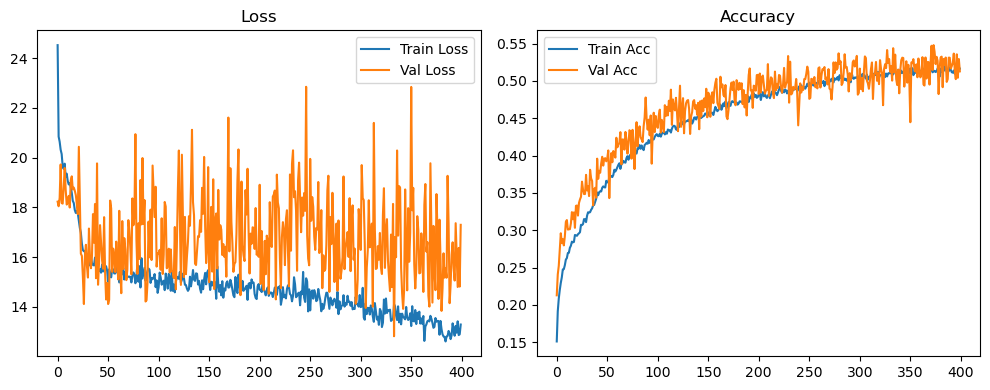

Original Model Final Test Loss: 17.5678 Accuracy: 0.5061


🚀 Running: batch512_lr_max_0.0001_min_1e-06_dp0.0


Files already downloaded and verified


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|                                                                                                                                                                        | 0/400 [00:00<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.1573 | Val Acc: 0.2011 | Epoch Time: 1.92 | :   0%|                                                                                                      | 0/400 [01:55<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.1573 | Val Acc: 0.2011 | Epoch Time: 1.92 | :   0%|                                                                                                      | 0/400 [01:55<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.1573 | Val Acc: 0.2011 | Epoch Time: 1.92 | :   0%|▏                                                                                         | 1/400 [01:55<12:46:41, 115.29s/it]

| LR: 0.000100 | Train Acc: 0.1971 | Val Acc: 0.2196 | Epoch Time: 1.91 | :   0%|▏                                                                                         | 1/400 [03:50<12:46:41, 115.29s/it]

| LR: 0.000100 | Train Acc: 0.1971 | Val Acc: 0.2196 | Epoch Time: 1.91 | :   0%|▏                                                                                         | 1/400 [03:50<12:46:41, 115.29s/it]

| LR: 0.000100 | Train Acc: 0.1971 | Val Acc: 0.2196 | Epoch Time: 1.91 | :   0%|▍                                                                                         | 2/400 [03:50<12:43:35, 115.11s/it]

| LR: 0.000100 | Train Acc: 0.2165 | Val Acc: 0.2399 | Epoch Time: 1.91 | :   0%|▍                                                                                         | 2/400 [05:45<12:43:35, 115.11s/it]

| LR: 0.000100 | Train Acc: 0.2165 | Val Acc: 0.2399 | Epoch Time: 1.91 | :   0%|▍                                                                                         | 2/400 [05:45<12:43:35, 115.11s/it]

| LR: 0.000100 | Train Acc: 0.2165 | Val Acc: 0.2399 | Epoch Time: 1.91 | :   1%|▋                                                                                         | 3/400 [05:45<12:41:19, 115.06s/it]

| LR: 0.000100 | Train Acc: 0.2325 | Val Acc: 0.2509 | Epoch Time: 1.91 | :   1%|▋                                                                                         | 3/400 [07:40<12:41:19, 115.06s/it]

| LR: 0.000100 | Train Acc: 0.2325 | Val Acc: 0.2509 | Epoch Time: 1.91 | :   1%|▋                                                                                         | 3/400 [07:40<12:41:19, 115.06s/it]

| LR: 0.000100 | Train Acc: 0.2325 | Val Acc: 0.2509 | Epoch Time: 1.91 | :   1%|▉                                                                                         | 4/400 [07:40<12:39:14, 115.04s/it]

| LR: 0.000100 | Train Acc: 0.2438 | Val Acc: 0.2700 | Epoch Time: 1.91 | :   1%|▉                                                                                         | 4/400 [09:35<12:39:14, 115.04s/it]

| LR: 0.000100 | Train Acc: 0.2438 | Val Acc: 0.2700 | Epoch Time: 1.91 | :   1%|▉                                                                                         | 4/400 [09:35<12:39:14, 115.04s/it]

| LR: 0.000100 | Train Acc: 0.2438 | Val Acc: 0.2700 | Epoch Time: 1.91 | :   1%|█▏                                                                                        | 5/400 [09:35<12:37:13, 115.02s/it]

| LR: 0.000100 | Train Acc: 0.2514 | Val Acc: 0.2755 | Epoch Time: 1.91 | :   1%|█▏                                                                                        | 5/400 [11:30<12:37:13, 115.02s/it]

| LR: 0.000100 | Train Acc: 0.2514 | Val Acc: 0.2755 | Epoch Time: 1.91 | :   1%|█▏                                                                                        | 5/400 [11:30<12:37:13, 115.02s/it]

| LR: 0.000100 | Train Acc: 0.2514 | Val Acc: 0.2755 | Epoch Time: 1.91 | :   2%|█▎                                                                                        | 6/400 [11:30<12:35:16, 115.02s/it]

| LR: 0.000100 | Train Acc: 0.2614 | Val Acc: 0.2878 | Epoch Time: 1.91 | :   2%|█▎                                                                                        | 6/400 [13:25<12:35:16, 115.02s/it]

| LR: 0.000100 | Train Acc: 0.2614 | Val Acc: 0.2878 | Epoch Time: 1.91 | :   2%|█▎                                                                                        | 6/400 [13:25<12:35:16, 115.02s/it]

| LR: 0.000100 | Train Acc: 0.2614 | Val Acc: 0.2878 | Epoch Time: 1.91 | :   2%|█▌                                                                                        | 7/400 [13:25<12:33:20, 115.01s/it]

| LR: 0.000100 | Train Acc: 0.2660 | Val Acc: 0.2895 | Epoch Time: 1.91 | :   2%|█▌                                                                                        | 7/400 [15:20<12:33:20, 115.01s/it]

| LR: 0.000100 | Train Acc: 0.2660 | Val Acc: 0.2895 | Epoch Time: 1.91 | :   2%|█▌                                                                                        | 7/400 [15:20<12:33:20, 115.01s/it]

| LR: 0.000100 | Train Acc: 0.2660 | Val Acc: 0.2895 | Epoch Time: 1.91 | :   2%|█▊                                                                                        | 8/400 [15:20<12:31:24, 115.01s/it]

| LR: 0.000100 | Train Acc: 0.2758 | Val Acc: 0.2844 | Epoch Time: 1.91 | :   2%|█▊                                                                                        | 8/400 [17:15<12:31:24, 115.01s/it]

| LR: 0.000100 | Train Acc: 0.2758 | Val Acc: 0.2844 | Epoch Time: 1.91 | :   2%|█▊                                                                                        | 8/400 [17:15<12:31:24, 115.01s/it]

| LR: 0.000100 | Train Acc: 0.2758 | Val Acc: 0.2844 | Epoch Time: 1.91 | :   2%|██                                                                                        | 9/400 [17:15<12:29:26, 115.00s/it]

| LR: 0.000100 | Train Acc: 0.2752 | Val Acc: 0.2847 | Epoch Time: 1.91 | :   2%|██                                                                                        | 9/400 [19:10<12:29:26, 115.00s/it]

| LR: 0.000100 | Train Acc: 0.2752 | Val Acc: 0.2847 | Epoch Time: 1.91 | :   2%|██                                                                                        | 9/400 [19:10<12:29:26, 115.00s/it]

| LR: 0.000100 | Train Acc: 0.2752 | Val Acc: 0.2847 | Epoch Time: 1.91 | :   2%|██▏                                                                                      | 10/400 [19:10<12:27:29, 115.00s/it]

| LR: 0.000100 | Train Acc: 0.2826 | Val Acc: 0.3054 | Epoch Time: 1.91 | :   2%|██▏                                                                                      | 10/400 [21:05<12:27:29, 115.00s/it]

| LR: 0.000100 | Train Acc: 0.2826 | Val Acc: 0.3054 | Epoch Time: 1.91 | :   2%|██▏                                                                                      | 10/400 [21:05<12:27:29, 115.00s/it]

| LR: 0.000100 | Train Acc: 0.2826 | Val Acc: 0.3054 | Epoch Time: 1.91 | :   3%|██▍                                                                                      | 11/400 [21:05<12:25:33, 115.00s/it]

| LR: 0.000100 | Train Acc: 0.2903 | Val Acc: 0.3194 | Epoch Time: 1.91 | :   3%|██▍                                                                                      | 11/400 [23:00<12:25:33, 115.00s/it]

| LR: 0.000100 | Train Acc: 0.2903 | Val Acc: 0.3194 | Epoch Time: 1.91 | :   3%|██▍                                                                                      | 11/400 [23:00<12:25:33, 115.00s/it]

| LR: 0.000100 | Train Acc: 0.2903 | Val Acc: 0.3194 | Epoch Time: 1.91 | :   3%|██▋                                                                                      | 12/400 [23:00<12:23:39, 115.00s/it]

| LR: 0.000100 | Train Acc: 0.2936 | Val Acc: 0.3018 | Epoch Time: 1.91 | :   3%|██▋                                                                                      | 12/400 [24:55<12:23:39, 115.00s/it]

| LR: 0.000100 | Train Acc: 0.2936 | Val Acc: 0.3018 | Epoch Time: 1.91 | :   3%|██▋                                                                                      | 12/400 [24:55<12:23:39, 115.00s/it]

| LR: 0.000100 | Train Acc: 0.2936 | Val Acc: 0.3018 | Epoch Time: 1.91 | :   3%|██▉                                                                                      | 13/400 [24:55<12:21:40, 114.99s/it]

| LR: 0.000100 | Train Acc: 0.2937 | Val Acc: 0.3206 | Epoch Time: 1.91 | :   3%|██▉                                                                                      | 13/400 [26:50<12:21:40, 114.99s/it]

| LR: 0.000100 | Train Acc: 0.2937 | Val Acc: 0.3206 | Epoch Time: 1.91 | :   3%|██▉                                                                                      | 13/400 [26:50<12:21:40, 114.99s/it]

| LR: 0.000100 | Train Acc: 0.2937 | Val Acc: 0.3206 | Epoch Time: 1.91 | :   4%|███                                                                                      | 14/400 [26:50<12:19:43, 114.98s/it]

| LR: 0.000100 | Train Acc: 0.2958 | Val Acc: 0.3137 | Epoch Time: 1.92 | :   4%|███                                                                                      | 14/400 [28:45<12:19:43, 114.98s/it]

| LR: 0.000100 | Train Acc: 0.2958 | Val Acc: 0.3137 | Epoch Time: 1.92 | :   4%|███                                                                                      | 14/400 [28:45<12:19:43, 114.98s/it]

| LR: 0.000100 | Train Acc: 0.2958 | Val Acc: 0.3137 | Epoch Time: 1.92 | :   4%|███▎                                                                                     | 15/400 [28:45<12:17:59, 115.01s/it]

| LR: 0.000100 | Train Acc: 0.2974 | Val Acc: 0.3385 | Epoch Time: 1.91 | :   4%|███▎                                                                                     | 15/400 [30:40<12:17:59, 115.01s/it]

| LR: 0.000100 | Train Acc: 0.2974 | Val Acc: 0.3385 | Epoch Time: 1.91 | :   4%|███▎                                                                                     | 15/400 [30:40<12:17:59, 115.01s/it]

| LR: 0.000100 | Train Acc: 0.2974 | Val Acc: 0.3385 | Epoch Time: 1.91 | :   4%|███▌                                                                                     | 16/400 [30:40<12:16:04, 115.01s/it]

| LR: 0.000100 | Train Acc: 0.2985 | Val Acc: 0.3257 | Epoch Time: 1.92 | :   4%|███▌                                                                                     | 16/400 [32:35<12:16:04, 115.01s/it]

| LR: 0.000100 | Train Acc: 0.2985 | Val Acc: 0.3257 | Epoch Time: 1.92 | :   4%|███▌                                                                                     | 16/400 [32:35<12:16:04, 115.01s/it]

| LR: 0.000100 | Train Acc: 0.2985 | Val Acc: 0.3257 | Epoch Time: 1.92 | :   4%|███▊                                                                                     | 17/400 [32:35<12:14:11, 115.02s/it]

| LR: 0.000100 | Train Acc: 0.3066 | Val Acc: 0.3398 | Epoch Time: 1.92 | :   4%|███▊                                                                                     | 17/400 [34:30<12:14:11, 115.02s/it]

| LR: 0.000100 | Train Acc: 0.3066 | Val Acc: 0.3398 | Epoch Time: 1.92 | :   4%|███▊                                                                                     | 17/400 [34:30<12:14:11, 115.02s/it]

| LR: 0.000100 | Train Acc: 0.3066 | Val Acc: 0.3398 | Epoch Time: 1.92 | :   4%|████                                                                                     | 18/400 [34:30<12:12:18, 115.02s/it]

| LR: 0.000100 | Train Acc: 0.3065 | Val Acc: 0.3093 | Epoch Time: 1.92 | :   4%|████                                                                                     | 18/400 [36:25<12:12:18, 115.02s/it]

| LR: 0.000100 | Train Acc: 0.3065 | Val Acc: 0.3093 | Epoch Time: 1.92 | :   4%|████                                                                                     | 18/400 [36:25<12:12:18, 115.02s/it]

| LR: 0.000100 | Train Acc: 0.3065 | Val Acc: 0.3093 | Epoch Time: 1.92 | :   5%|████▏                                                                                    | 19/400 [36:25<12:10:27, 115.03s/it]

| LR: 0.000099 | Train Acc: 0.3105 | Val Acc: 0.3157 | Epoch Time: 1.91 | :   5%|████▏                                                                                    | 19/400 [38:20<12:10:27, 115.03s/it]

| LR: 0.000099 | Train Acc: 0.3105 | Val Acc: 0.3157 | Epoch Time: 1.91 | :   5%|████▏                                                                                    | 19/400 [38:20<12:10:27, 115.03s/it]

| LR: 0.000099 | Train Acc: 0.3105 | Val Acc: 0.3157 | Epoch Time: 1.91 | :   5%|████▍                                                                                    | 20/400 [38:20<12:08:29, 115.03s/it]

| LR: 0.000099 | Train Acc: 0.3117 | Val Acc: 0.3424 | Epoch Time: 1.91 | :   5%|████▍                                                                                    | 20/400 [40:15<12:08:29, 115.03s/it]

| LR: 0.000099 | Train Acc: 0.3117 | Val Acc: 0.3424 | Epoch Time: 1.91 | :   5%|████▍                                                                                    | 20/400 [40:15<12:08:29, 115.03s/it]

| LR: 0.000099 | Train Acc: 0.3117 | Val Acc: 0.3424 | Epoch Time: 1.91 | :   5%|████▋                                                                                    | 21/400 [40:15<12:06:33, 115.02s/it]

| LR: 0.000099 | Train Acc: 0.3152 | Val Acc: 0.3312 | Epoch Time: 1.92 | :   5%|████▋                                                                                    | 21/400 [42:10<12:06:33, 115.02s/it]

| LR: 0.000099 | Train Acc: 0.3152 | Val Acc: 0.3312 | Epoch Time: 1.92 | :   5%|████▋                                                                                    | 21/400 [42:10<12:06:33, 115.02s/it]

| LR: 0.000099 | Train Acc: 0.3152 | Val Acc: 0.3312 | Epoch Time: 1.92 | :   6%|████▉                                                                                    | 22/400 [42:10<12:04:37, 115.02s/it]

| LR: 0.000099 | Train Acc: 0.3165 | Val Acc: 0.3401 | Epoch Time: 1.92 | :   6%|████▉                                                                                    | 22/400 [44:05<12:04:37, 115.02s/it]

| LR: 0.000099 | Train Acc: 0.3165 | Val Acc: 0.3401 | Epoch Time: 1.92 | :   6%|████▉                                                                                    | 22/400 [44:05<12:04:37, 115.02s/it]

| LR: 0.000099 | Train Acc: 0.3165 | Val Acc: 0.3401 | Epoch Time: 1.92 | :   6%|█████                                                                                    | 23/400 [44:05<12:02:46, 115.03s/it]

| LR: 0.000099 | Train Acc: 0.3247 | Val Acc: 0.3497 | Epoch Time: 1.91 | :   6%|█████                                                                                    | 23/400 [46:00<12:02:46, 115.03s/it]

| LR: 0.000099 | Train Acc: 0.3247 | Val Acc: 0.3497 | Epoch Time: 1.91 | :   6%|█████                                                                                    | 23/400 [46:00<12:02:46, 115.03s/it]

| LR: 0.000099 | Train Acc: 0.3247 | Val Acc: 0.3497 | Epoch Time: 1.91 | :   6%|█████▎                                                                                   | 24/400 [46:00<12:00:46, 115.02s/it]

| LR: 0.000099 | Train Acc: 0.3273 | Val Acc: 0.3240 | Epoch Time: 1.91 | :   6%|█████▎                                                                                   | 24/400 [47:55<12:00:46, 115.02s/it]

| LR: 0.000099 | Train Acc: 0.3273 | Val Acc: 0.3240 | Epoch Time: 1.91 | :   6%|█████▎                                                                                   | 24/400 [47:55<12:00:46, 115.02s/it]

| LR: 0.000099 | Train Acc: 0.3273 | Val Acc: 0.3240 | Epoch Time: 1.91 | :   6%|█████▌                                                                                   | 25/400 [47:55<11:58:39, 114.98s/it]

| LR: 0.000099 | Train Acc: 0.3224 | Val Acc: 0.3336 | Epoch Time: 1.91 | :   6%|█████▌                                                                                   | 25/400 [49:50<11:58:39, 114.98s/it]

| LR: 0.000099 | Train Acc: 0.3224 | Val Acc: 0.3336 | Epoch Time: 1.91 | :   6%|█████▌                                                                                   | 25/400 [49:50<11:58:39, 114.98s/it]

| LR: 0.000099 | Train Acc: 0.3224 | Val Acc: 0.3336 | Epoch Time: 1.91 | :   6%|█████▊                                                                                   | 26/400 [49:50<11:56:37, 114.97s/it]

| LR: 0.000099 | Train Acc: 0.3234 | Val Acc: 0.3485 | Epoch Time: 1.91 | :   6%|█████▊                                                                                   | 26/400 [51:45<11:56:37, 114.97s/it]

| LR: 0.000099 | Train Acc: 0.3234 | Val Acc: 0.3485 | Epoch Time: 1.91 | :   6%|█████▊                                                                                   | 26/400 [51:45<11:56:37, 114.97s/it]

| LR: 0.000099 | Train Acc: 0.3234 | Val Acc: 0.3485 | Epoch Time: 1.91 | :   7%|██████                                                                                   | 27/400 [51:45<11:54:37, 114.95s/it]

| LR: 0.000099 | Train Acc: 0.3246 | Val Acc: 0.3620 | Epoch Time: 1.91 | :   7%|██████                                                                                   | 27/400 [53:40<11:54:37, 114.95s/it]

| LR: 0.000099 | Train Acc: 0.3246 | Val Acc: 0.3620 | Epoch Time: 1.91 | :   7%|██████                                                                                   | 27/400 [53:40<11:54:37, 114.95s/it]

| LR: 0.000099 | Train Acc: 0.3246 | Val Acc: 0.3620 | Epoch Time: 1.91 | :   7%|██████▏                                                                                  | 28/400 [53:40<11:52:38, 114.94s/it]

| LR: 0.000099 | Train Acc: 0.3300 | Val Acc: 0.3438 | Epoch Time: 2.64 | :   7%|██████▏                                                                                  | 28/400 [56:18<11:52:38, 114.94s/it]

| LR: 0.000099 | Train Acc: 0.3300 | Val Acc: 0.3438 | Epoch Time: 2.64 | :   7%|██████▏                                                                                  | 28/400 [56:18<11:52:38, 114.94s/it]

| LR: 0.000099 | Train Acc: 0.3300 | Val Acc: 0.3438 | Epoch Time: 2.64 | :   7%|██████▍                                                                                  | 29/400 [56:18<13:11:34, 128.02s/it]

| LR: 0.000099 | Train Acc: 0.3290 | Val Acc: 0.3575 | Epoch Time: 3.43 | :   7%|██████▍                                                                                  | 29/400 [59:44<13:11:34, 128.02s/it]

| LR: 0.000099 | Train Acc: 0.3290 | Val Acc: 0.3575 | Epoch Time: 3.43 | :   7%|██████▍                                                                                  | 29/400 [59:44<13:11:34, 128.02s/it]

| LR: 0.000099 | Train Acc: 0.3290 | Val Acc: 0.3575 | Epoch Time: 3.43 | :   8%|██████▋                                                                                  | 30/400 [59:44<15:33:12, 151.33s/it]

| LR: 0.000099 | Train Acc: 0.3326 | Val Acc: 0.3451 | Epoch Time: 3.48 | :   8%|██████▌                                                                                | 30/400 [1:03:12<15:33:12, 151.33s/it]

| LR: 0.000099 | Train Acc: 0.3326 | Val Acc: 0.3451 | Epoch Time: 3.48 | :   8%|██████▌                                                                                | 30/400 [1:03:12<15:33:12, 151.33s/it]

| LR: 0.000099 | Train Acc: 0.3326 | Val Acc: 0.3451 | Epoch Time: 3.48 | :   8%|██████▋                                                                                | 31/400 [1:03:13<17:16:25, 168.52s/it]

| LR: 0.000099 | Train Acc: 0.3352 | Val Acc: 0.3601 | Epoch Time: 3.45 | :   8%|██████▋                                                                                | 31/400 [1:06:40<17:16:25, 168.52s/it]

| LR: 0.000099 | Train Acc: 0.3352 | Val Acc: 0.3601 | Epoch Time: 3.45 | :   8%|██████▋                                                                                | 31/400 [1:06:40<17:16:25, 168.52s/it]

| LR: 0.000099 | Train Acc: 0.3352 | Val Acc: 0.3601 | Epoch Time: 3.45 | :   8%|██████▉                                                                                | 32/400 [1:06:40<18:24:35, 180.10s/it]

| LR: 0.000098 | Train Acc: 0.3340 | Val Acc: 0.3538 | Epoch Time: 3.45 | :   8%|██████▉                                                                                | 32/400 [1:10:07<18:24:35, 180.10s/it]

| LR: 0.000098 | Train Acc: 0.3340 | Val Acc: 0.3538 | Epoch Time: 3.45 | :   8%|██████▉                                                                                | 32/400 [1:10:07<18:24:35, 180.10s/it]

| LR: 0.000098 | Train Acc: 0.3340 | Val Acc: 0.3538 | Epoch Time: 3.45 | :   8%|███████▏                                                                               | 33/400 [1:10:07<19:10:55, 188.16s/it]

| LR: 0.000098 | Train Acc: 0.3404 | Val Acc: 0.3667 | Epoch Time: 3.48 | :   8%|███████▏                                                                               | 33/400 [1:13:35<19:10:55, 188.16s/it]

| LR: 0.000098 | Train Acc: 0.3404 | Val Acc: 0.3667 | Epoch Time: 3.48 | :   8%|███████▏                                                                               | 33/400 [1:13:35<19:10:55, 188.16s/it]

| LR: 0.000098 | Train Acc: 0.3404 | Val Acc: 0.3667 | Epoch Time: 3.48 | :   8%|███████▍                                                                               | 34/400 [1:13:35<19:45:15, 194.30s/it]

| LR: 0.000098 | Train Acc: 0.3456 | Val Acc: 0.3572 | Epoch Time: 3.45 | :   8%|███████▍                                                                               | 34/400 [1:17:02<19:45:15, 194.30s/it]

| LR: 0.000098 | Train Acc: 0.3456 | Val Acc: 0.3572 | Epoch Time: 3.45 | :   8%|███████▍                                                                               | 34/400 [1:17:02<19:45:15, 194.30s/it]

| LR: 0.000098 | Train Acc: 0.3456 | Val Acc: 0.3572 | Epoch Time: 3.45 | :   9%|███████▌                                                                               | 35/400 [1:17:02<20:05:33, 198.17s/it]

| LR: 0.000098 | Train Acc: 0.3431 | Val Acc: 0.3616 | Epoch Time: 3.45 | :   9%|███████▌                                                                               | 35/400 [1:20:30<20:05:33, 198.17s/it]

| LR: 0.000098 | Train Acc: 0.3431 | Val Acc: 0.3616 | Epoch Time: 3.45 | :   9%|███████▌                                                                               | 35/400 [1:20:30<20:05:33, 198.17s/it]

| LR: 0.000098 | Train Acc: 0.3431 | Val Acc: 0.3616 | Epoch Time: 3.45 | :   9%|███████▊                                                                               | 36/400 [1:20:30<20:18:43, 200.89s/it]

| LR: 0.000098 | Train Acc: 0.3464 | Val Acc: 0.3598 | Epoch Time: 3.48 | :   9%|███████▊                                                                               | 36/400 [1:23:58<20:18:43, 200.89s/it]

| LR: 0.000098 | Train Acc: 0.3464 | Val Acc: 0.3598 | Epoch Time: 3.48 | :   9%|███████▊                                                                               | 36/400 [1:23:58<20:18:43, 200.89s/it]

| LR: 0.000098 | Train Acc: 0.3464 | Val Acc: 0.3598 | Epoch Time: 3.48 | :   9%|████████                                                                               | 37/400 [1:23:58<20:29:41, 203.26s/it]

| LR: 0.000098 | Train Acc: 0.3431 | Val Acc: 0.3755 | Epoch Time: 3.45 | :   9%|████████                                                                               | 37/400 [1:27:26<20:29:41, 203.26s/it]

| LR: 0.000098 | Train Acc: 0.3431 | Val Acc: 0.3755 | Epoch Time: 3.45 | :   9%|████████                                                                               | 37/400 [1:27:26<20:29:41, 203.26s/it]

| LR: 0.000098 | Train Acc: 0.3431 | Val Acc: 0.3755 | Epoch Time: 3.45 | :  10%|████████▎                                                                              | 38/400 [1:27:26<20:33:23, 204.43s/it]

| LR: 0.000098 | Train Acc: 0.3433 | Val Acc: 0.3571 | Epoch Time: 3.48 | :  10%|████████▎                                                                              | 38/400 [1:30:54<20:33:23, 204.43s/it]

| LR: 0.000098 | Train Acc: 0.3433 | Val Acc: 0.3571 | Epoch Time: 3.48 | :  10%|████████▎                                                                              | 38/400 [1:30:54<20:33:23, 204.43s/it]

| LR: 0.000098 | Train Acc: 0.3433 | Val Acc: 0.3571 | Epoch Time: 3.48 | :  10%|████████▍                                                                              | 39/400 [1:30:54<20:37:48, 205.73s/it]

| LR: 0.000098 | Train Acc: 0.3466 | Val Acc: 0.3630 | Epoch Time: 3.46 | :  10%|████████▍                                                                              | 39/400 [1:34:22<20:37:48, 205.73s/it]

| LR: 0.000098 | Train Acc: 0.3466 | Val Acc: 0.3630 | Epoch Time: 3.46 | :  10%|████████▍                                                                              | 39/400 [1:34:22<20:37:48, 205.73s/it]

| LR: 0.000098 | Train Acc: 0.3466 | Val Acc: 0.3630 | Epoch Time: 3.46 | :  10%|████████▋                                                                              | 40/400 [1:34:22<20:37:28, 206.25s/it]

| LR: 0.000098 | Train Acc: 0.3536 | Val Acc: 0.3769 | Epoch Time: 3.45 | :  10%|████████▋                                                                              | 40/400 [1:37:49<20:37:28, 206.25s/it]

| LR: 0.000098 | Train Acc: 0.3536 | Val Acc: 0.3769 | Epoch Time: 3.45 | :  10%|████████▋                                                                              | 40/400 [1:37:49<20:37:28, 206.25s/it]

| LR: 0.000098 | Train Acc: 0.3536 | Val Acc: 0.3769 | Epoch Time: 3.45 | :  10%|████████▉                                                                              | 41/400 [1:37:49<20:35:35, 206.50s/it]

| LR: 0.000097 | Train Acc: 0.3521 | Val Acc: 0.3748 | Epoch Time: 3.48 | :  10%|████████▉                                                                              | 41/400 [1:41:18<20:35:35, 206.50s/it]

| LR: 0.000097 | Train Acc: 0.3521 | Val Acc: 0.3748 | Epoch Time: 3.48 | :  10%|████████▉                                                                              | 41/400 [1:41:18<20:35:35, 206.50s/it]

| LR: 0.000097 | Train Acc: 0.3521 | Val Acc: 0.3748 | Epoch Time: 3.48 | :  10%|█████████▏                                                                             | 42/400 [1:41:18<20:36:04, 207.16s/it]

| LR: 0.000097 | Train Acc: 0.3546 | Val Acc: 0.3783 | Epoch Time: 3.45 | :  10%|█████████▏                                                                             | 42/400 [1:44:45<20:36:04, 207.16s/it]

| LR: 0.000097 | Train Acc: 0.3546 | Val Acc: 0.3783 | Epoch Time: 3.45 | :  10%|█████████▏                                                                             | 42/400 [1:44:45<20:36:04, 207.16s/it]

| LR: 0.000097 | Train Acc: 0.3546 | Val Acc: 0.3783 | Epoch Time: 3.45 | :  11%|█████████▎                                                                             | 43/400 [1:44:45<20:32:44, 207.18s/it]

| LR: 0.000097 | Train Acc: 0.3535 | Val Acc: 0.3861 | Epoch Time: 3.23 | :  11%|█████████▎                                                                             | 43/400 [1:47:59<20:32:44, 207.18s/it]

| LR: 0.000097 | Train Acc: 0.3535 | Val Acc: 0.3861 | Epoch Time: 3.23 | :  11%|█████████▎                                                                             | 43/400 [1:47:59<20:32:44, 207.18s/it]

| LR: 0.000097 | Train Acc: 0.3535 | Val Acc: 0.3861 | Epoch Time: 3.23 | :  11%|█████████▌                                                                             | 44/400 [1:47:59<20:05:38, 203.20s/it]

| LR: 0.000097 | Train Acc: 0.3481 | Val Acc: 0.3623 | Epoch Time: 3.42 | :  11%|█████████▌                                                                             | 44/400 [1:51:24<20:05:38, 203.20s/it]

| LR: 0.000097 | Train Acc: 0.3481 | Val Acc: 0.3623 | Epoch Time: 3.42 | :  11%|█████████▌                                                                             | 44/400 [1:51:24<20:05:38, 203.20s/it]

| LR: 0.000097 | Train Acc: 0.3481 | Val Acc: 0.3623 | Epoch Time: 3.42 | :  11%|█████████▊                                                                             | 45/400 [1:51:24<20:06:15, 203.88s/it]

| LR: 0.000097 | Train Acc: 0.3663 | Val Acc: 0.3899 | Epoch Time: 3.41 | :  11%|█████████▊                                                                             | 45/400 [1:54:49<20:06:15, 203.88s/it]

| LR: 0.000097 | Train Acc: 0.3663 | Val Acc: 0.3899 | Epoch Time: 3.41 | :  11%|█████████▊                                                                             | 45/400 [1:54:49<20:06:15, 203.88s/it]

| LR: 0.000097 | Train Acc: 0.3663 | Val Acc: 0.3899 | Epoch Time: 3.41 | :  12%|██████████                                                                             | 46/400 [1:54:49<20:04:48, 204.20s/it]

| LR: 0.000097 | Train Acc: 0.3654 | Val Acc: 0.4001 | Epoch Time: 3.45 | :  12%|██████████                                                                             | 46/400 [1:58:16<20:04:48, 204.20s/it]

| LR: 0.000097 | Train Acc: 0.3654 | Val Acc: 0.4001 | Epoch Time: 3.45 | :  12%|██████████                                                                             | 46/400 [1:58:16<20:04:48, 204.20s/it]

| LR: 0.000097 | Train Acc: 0.3654 | Val Acc: 0.4001 | Epoch Time: 3.45 | :  12%|██████████▏                                                                            | 47/400 [1:58:16<20:06:24, 205.05s/it]

| LR: 0.000097 | Train Acc: 0.3655 | Val Acc: 0.4004 | Epoch Time: 3.42 | :  12%|██████████▏                                                                            | 47/400 [2:01:41<20:06:24, 205.05s/it]

| LR: 0.000097 | Train Acc: 0.3655 | Val Acc: 0.4004 | Epoch Time: 3.42 | :  12%|██████████▏                                                                            | 47/400 [2:01:41<20:06:24, 205.05s/it]

| LR: 0.000097 | Train Acc: 0.3655 | Val Acc: 0.4004 | Epoch Time: 3.42 | :  12%|██████████▍                                                                            | 48/400 [2:01:41<20:03:08, 205.08s/it]

| LR: 0.000097 | Train Acc: 0.3627 | Val Acc: 0.3888 | Epoch Time: 3.45 | :  12%|██████████▍                                                                            | 48/400 [2:05:08<20:03:08, 205.08s/it]

| LR: 0.000097 | Train Acc: 0.3627 | Val Acc: 0.3888 | Epoch Time: 3.45 | :  12%|██████████▍                                                                            | 48/400 [2:05:08<20:03:08, 205.08s/it]

| LR: 0.000097 | Train Acc: 0.3627 | Val Acc: 0.3888 | Epoch Time: 3.45 | :  12%|██████████▋                                                                            | 49/400 [2:05:09<20:03:22, 205.71s/it]

| LR: 0.000096 | Train Acc: 0.3689 | Val Acc: 0.3900 | Epoch Time: 3.42 | :  12%|██████████▋                                                                            | 49/400 [2:08:34<20:03:22, 205.71s/it]

| LR: 0.000096 | Train Acc: 0.3689 | Val Acc: 0.3900 | Epoch Time: 3.42 | :  12%|██████████▋                                                                            | 49/400 [2:08:34<20:03:22, 205.71s/it]

| LR: 0.000096 | Train Acc: 0.3689 | Val Acc: 0.3900 | Epoch Time: 3.42 | :  12%|██████████▉                                                                            | 50/400 [2:08:34<19:59:20, 205.60s/it]

| LR: 0.000096 | Train Acc: 0.3648 | Val Acc: 0.3756 | Epoch Time: 3.45 | :  12%|██████████▉                                                                            | 50/400 [2:12:01<19:59:20, 205.60s/it]

| LR: 0.000096 | Train Acc: 0.3648 | Val Acc: 0.3756 | Epoch Time: 3.45 | :  12%|██████████▉                                                                            | 50/400 [2:12:01<19:59:20, 205.60s/it]

| LR: 0.000096 | Train Acc: 0.3648 | Val Acc: 0.3756 | Epoch Time: 3.45 | :  13%|███████████                                                                            | 51/400 [2:12:01<19:58:26, 206.04s/it]

| LR: 0.000096 | Train Acc: 0.3684 | Val Acc: 0.3902 | Epoch Time: 3.42 | :  13%|███████████                                                                            | 51/400 [2:15:26<19:58:26, 206.04s/it]

| LR: 0.000096 | Train Acc: 0.3684 | Val Acc: 0.3902 | Epoch Time: 3.42 | :  13%|███████████                                                                            | 51/400 [2:15:26<19:58:26, 206.04s/it]

| LR: 0.000096 | Train Acc: 0.3684 | Val Acc: 0.3902 | Epoch Time: 3.42 | :  13%|███████████▎                                                                           | 52/400 [2:15:26<19:54:03, 205.87s/it]

| LR: 0.000096 | Train Acc: 0.3739 | Val Acc: 0.3902 | Epoch Time: 3.45 | :  13%|███████████▎                                                                           | 52/400 [2:18:53<19:54:03, 205.87s/it]

| LR: 0.000096 | Train Acc: 0.3739 | Val Acc: 0.3902 | Epoch Time: 3.45 | :  13%|███████████▎                                                                           | 52/400 [2:18:53<19:54:03, 205.87s/it]

| LR: 0.000096 | Train Acc: 0.3739 | Val Acc: 0.3902 | Epoch Time: 3.45 | :  13%|███████████▌                                                                           | 53/400 [2:18:54<19:52:46, 206.24s/it]

| LR: 0.000096 | Train Acc: 0.3733 | Val Acc: 0.3987 | Epoch Time: 3.42 | :  13%|███████████▌                                                                           | 53/400 [2:22:18<19:52:46, 206.24s/it]

| LR: 0.000096 | Train Acc: 0.3733 | Val Acc: 0.3987 | Epoch Time: 3.42 | :  13%|███████████▌                                                                           | 53/400 [2:22:18<19:52:46, 206.24s/it]

| LR: 0.000096 | Train Acc: 0.3733 | Val Acc: 0.3987 | Epoch Time: 3.42 | :  14%|███████████▋                                                                           | 54/400 [2:22:19<19:47:14, 205.88s/it]

| LR: 0.000096 | Train Acc: 0.3754 | Val Acc: 0.3786 | Epoch Time: 3.44 | :  14%|███████████▋                                                                           | 54/400 [2:25:45<19:47:14, 205.88s/it]

| LR: 0.000096 | Train Acc: 0.3754 | Val Acc: 0.3786 | Epoch Time: 3.44 | :  14%|███████████▋                                                                           | 54/400 [2:25:45<19:47:14, 205.88s/it]

| LR: 0.000096 | Train Acc: 0.3754 | Val Acc: 0.3786 | Epoch Time: 3.44 | :  14%|███████████▉                                                                           | 55/400 [2:25:45<19:45:06, 206.11s/it]

| LR: 0.000095 | Train Acc: 0.3718 | Val Acc: 0.3990 | Epoch Time: 3.42 | :  14%|███████████▉                                                                           | 55/400 [2:29:11<19:45:06, 206.11s/it]

| LR: 0.000095 | Train Acc: 0.3718 | Val Acc: 0.3990 | Epoch Time: 3.42 | :  14%|███████████▉                                                                           | 55/400 [2:29:11<19:45:06, 206.11s/it]

| LR: 0.000095 | Train Acc: 0.3718 | Val Acc: 0.3990 | Epoch Time: 3.42 | :  14%|████████████▏                                                                          | 56/400 [2:29:11<19:40:35, 205.92s/it]

| LR: 0.000095 | Train Acc: 0.3757 | Val Acc: 0.3871 | Epoch Time: 3.45 | :  14%|████████████▏                                                                          | 56/400 [2:32:38<19:40:35, 205.92s/it]

| LR: 0.000095 | Train Acc: 0.3757 | Val Acc: 0.3871 | Epoch Time: 3.45 | :  14%|████████████▏                                                                          | 56/400 [2:32:38<19:40:35, 205.92s/it]

| LR: 0.000095 | Train Acc: 0.3757 | Val Acc: 0.3871 | Epoch Time: 3.45 | :  14%|████████████▍                                                                          | 57/400 [2:32:38<19:39:27, 206.32s/it]

| LR: 0.000095 | Train Acc: 0.3797 | Val Acc: 0.3911 | Epoch Time: 3.42 | :  14%|████████████▍                                                                          | 57/400 [2:36:03<19:39:27, 206.32s/it]

| LR: 0.000095 | Train Acc: 0.3797 | Val Acc: 0.3911 | Epoch Time: 3.42 | :  14%|████████████▍                                                                          | 57/400 [2:36:03<19:39:27, 206.32s/it]

| LR: 0.000095 | Train Acc: 0.3797 | Val Acc: 0.3911 | Epoch Time: 3.42 | :  14%|████████████▌                                                                          | 58/400 [2:36:03<19:34:28, 206.05s/it]

| LR: 0.000095 | Train Acc: 0.3834 | Val Acc: 0.3938 | Epoch Time: 3.45 | :  14%|████████████▌                                                                          | 58/400 [2:39:30<19:34:28, 206.05s/it]

| LR: 0.000095 | Train Acc: 0.3834 | Val Acc: 0.3938 | Epoch Time: 3.45 | :  14%|████████████▌                                                                          | 58/400 [2:39:30<19:34:28, 206.05s/it]

| LR: 0.000095 | Train Acc: 0.3834 | Val Acc: 0.3938 | Epoch Time: 3.45 | :  15%|████████████▊                                                                          | 59/400 [2:39:30<19:32:32, 206.31s/it]

| LR: 0.000095 | Train Acc: 0.3725 | Val Acc: 0.3982 | Epoch Time: 3.42 | :  15%|████████████▊                                                                          | 59/400 [2:42:56<19:32:32, 206.31s/it]

| LR: 0.000095 | Train Acc: 0.3725 | Val Acc: 0.3982 | Epoch Time: 3.42 | :  15%|████████████▊                                                                          | 59/400 [2:42:56<19:32:32, 206.31s/it]

| LR: 0.000095 | Train Acc: 0.3725 | Val Acc: 0.3982 | Epoch Time: 3.42 | :  15%|█████████████                                                                          | 60/400 [2:42:56<19:27:30, 206.03s/it]

| LR: 0.000095 | Train Acc: 0.3793 | Val Acc: 0.4095 | Epoch Time: 3.44 | :  15%|█████████████                                                                          | 60/400 [2:46:22<19:27:30, 206.03s/it]

| LR: 0.000095 | Train Acc: 0.3793 | Val Acc: 0.4095 | Epoch Time: 3.44 | :  15%|█████████████                                                                          | 60/400 [2:46:22<19:27:30, 206.03s/it]

| LR: 0.000095 | Train Acc: 0.3793 | Val Acc: 0.4095 | Epoch Time: 3.44 | :  15%|█████████████▎                                                                         | 61/400 [2:46:22<19:25:17, 206.25s/it]

| LR: 0.000094 | Train Acc: 0.3867 | Val Acc: 0.3908 | Epoch Time: 3.42 | :  15%|█████████████▎                                                                         | 61/400 [2:49:48<19:25:17, 206.25s/it]

| LR: 0.000094 | Train Acc: 0.3867 | Val Acc: 0.3908 | Epoch Time: 3.42 | :  15%|█████████████▎                                                                         | 61/400 [2:49:48<19:25:17, 206.25s/it]

| LR: 0.000094 | Train Acc: 0.3867 | Val Acc: 0.3908 | Epoch Time: 3.42 | :  16%|█████████████▍                                                                         | 62/400 [2:49:48<19:20:42, 206.04s/it]

| LR: 0.000094 | Train Acc: 0.3811 | Val Acc: 0.4047 | Epoch Time: 3.45 | :  16%|█████████████▍                                                                         | 62/400 [2:53:15<19:20:42, 206.04s/it]

| LR: 0.000094 | Train Acc: 0.3811 | Val Acc: 0.4047 | Epoch Time: 3.45 | :  16%|█████████████▍                                                                         | 62/400 [2:53:15<19:20:42, 206.04s/it]

| LR: 0.000094 | Train Acc: 0.3811 | Val Acc: 0.4047 | Epoch Time: 3.45 | :  16%|█████████████▋                                                                         | 63/400 [2:53:15<19:18:45, 206.31s/it]

| LR: 0.000094 | Train Acc: 0.3809 | Val Acc: 0.3838 | Epoch Time: 3.42 | :  16%|█████████████▋                                                                         | 63/400 [2:56:40<19:18:45, 206.31s/it]

| LR: 0.000094 | Train Acc: 0.3809 | Val Acc: 0.3838 | Epoch Time: 3.42 | :  16%|█████████████▋                                                                         | 63/400 [2:56:40<19:18:45, 206.31s/it]

| LR: 0.000094 | Train Acc: 0.3809 | Val Acc: 0.3838 | Epoch Time: 3.42 | :  16%|█████████████▉                                                                         | 64/400 [2:56:40<19:14:00, 206.07s/it]

| LR: 0.000094 | Train Acc: 0.3820 | Val Acc: 0.4029 | Epoch Time: 3.45 | :  16%|█████████████▉                                                                         | 64/400 [3:00:07<19:14:00, 206.07s/it]

| LR: 0.000094 | Train Acc: 0.3820 | Val Acc: 0.4029 | Epoch Time: 3.45 | :  16%|█████████████▉                                                                         | 64/400 [3:00:07<19:14:00, 206.07s/it]

| LR: 0.000094 | Train Acc: 0.3820 | Val Acc: 0.4029 | Epoch Time: 3.45 | :  16%|██████████████▏                                                                        | 65/400 [3:00:07<19:12:03, 206.34s/it]

| LR: 0.000094 | Train Acc: 0.3800 | Val Acc: 0.3949 | Epoch Time: 3.42 | :  16%|██████████████▏                                                                        | 65/400 [3:03:32<19:12:03, 206.34s/it]

| LR: 0.000094 | Train Acc: 0.3800 | Val Acc: 0.3949 | Epoch Time: 3.42 | :  16%|██████████████▏                                                                        | 65/400 [3:03:32<19:12:03, 206.34s/it]

| LR: 0.000094 | Train Acc: 0.3800 | Val Acc: 0.3949 | Epoch Time: 3.42 | :  16%|██████████████▎                                                                        | 66/400 [3:03:33<19:06:39, 205.99s/it]

| LR: 0.000093 | Train Acc: 0.3910 | Val Acc: 0.4116 | Epoch Time: 3.44 | :  16%|██████████████▎                                                                        | 66/400 [3:06:59<19:06:39, 205.99s/it]

| LR: 0.000093 | Train Acc: 0.3910 | Val Acc: 0.4116 | Epoch Time: 3.44 | :  16%|██████████████▎                                                                        | 66/400 [3:06:59<19:06:39, 205.99s/it]

| LR: 0.000093 | Train Acc: 0.3910 | Val Acc: 0.4116 | Epoch Time: 3.44 | :  17%|██████████████▌                                                                        | 67/400 [3:06:59<19:04:34, 206.23s/it]

| LR: 0.000093 | Train Acc: 0.3885 | Val Acc: 0.3945 | Epoch Time: 3.41 | :  17%|██████████████▌                                                                        | 67/400 [3:10:24<19:04:34, 206.23s/it]

| LR: 0.000093 | Train Acc: 0.3885 | Val Acc: 0.3945 | Epoch Time: 3.41 | :  17%|██████████████▌                                                                        | 67/400 [3:10:24<19:04:34, 206.23s/it]

| LR: 0.000093 | Train Acc: 0.3885 | Val Acc: 0.3945 | Epoch Time: 3.41 | :  17%|██████████████▊                                                                        | 68/400 [3:10:24<18:58:55, 205.83s/it]

| LR: 0.000093 | Train Acc: 0.3818 | Val Acc: 0.4115 | Epoch Time: 3.44 | :  17%|██████████████▊                                                                        | 68/400 [3:13:51<18:58:55, 205.83s/it]

| LR: 0.000093 | Train Acc: 0.3818 | Val Acc: 0.4115 | Epoch Time: 3.44 | :  17%|██████████████▊                                                                        | 68/400 [3:13:51<18:58:55, 205.83s/it]

| LR: 0.000093 | Train Acc: 0.3818 | Val Acc: 0.4115 | Epoch Time: 3.44 | :  17%|███████████████                                                                        | 69/400 [3:13:51<18:57:04, 206.12s/it]

| LR: 0.000093 | Train Acc: 0.3869 | Val Acc: 0.4069 | Epoch Time: 3.42 | :  17%|███████████████                                                                        | 69/400 [3:17:16<18:57:04, 206.12s/it]

| LR: 0.000093 | Train Acc: 0.3869 | Val Acc: 0.4069 | Epoch Time: 3.42 | :  17%|███████████████                                                                        | 69/400 [3:17:16<18:57:04, 206.12s/it]

| LR: 0.000093 | Train Acc: 0.3869 | Val Acc: 0.4069 | Epoch Time: 3.42 | :  18%|███████████████▏                                                                       | 70/400 [3:17:16<18:52:25, 205.89s/it]

| LR: 0.000093 | Train Acc: 0.3892 | Val Acc: 0.4006 | Epoch Time: 3.45 | :  18%|███████████████▏                                                                       | 70/400 [3:20:43<18:52:25, 205.89s/it]

| LR: 0.000093 | Train Acc: 0.3892 | Val Acc: 0.4006 | Epoch Time: 3.45 | :  18%|███████████████▏                                                                       | 70/400 [3:20:43<18:52:25, 205.89s/it]

| LR: 0.000093 | Train Acc: 0.3892 | Val Acc: 0.4006 | Epoch Time: 3.45 | :  18%|███████████████▍                                                                       | 71/400 [3:20:43<18:50:45, 206.22s/it]

| LR: 0.000093 | Train Acc: 0.3928 | Val Acc: 0.4070 | Epoch Time: 3.41 | :  18%|███████████████▍                                                                       | 71/400 [3:24:08<18:50:45, 206.22s/it]

| LR: 0.000093 | Train Acc: 0.3928 | Val Acc: 0.4070 | Epoch Time: 3.41 | :  18%|███████████████▍                                                                       | 71/400 [3:24:08<18:50:45, 206.22s/it]

| LR: 0.000093 | Train Acc: 0.3928 | Val Acc: 0.4070 | Epoch Time: 3.41 | :  18%|███████████████▋                                                                       | 72/400 [3:24:08<18:44:59, 205.79s/it]

| LR: 0.000092 | Train Acc: 0.3930 | Val Acc: 0.4319 | Epoch Time: 3.44 | :  18%|███████████████▋                                                                       | 72/400 [3:27:35<18:44:59, 205.79s/it]

| LR: 0.000092 | Train Acc: 0.3930 | Val Acc: 0.4319 | Epoch Time: 3.44 | :  18%|███████████████▋                                                                       | 72/400 [3:27:35<18:44:59, 205.79s/it]

| LR: 0.000092 | Train Acc: 0.3930 | Val Acc: 0.4319 | Epoch Time: 3.44 | :  18%|███████████████▉                                                                       | 73/400 [3:27:35<18:42:42, 206.00s/it]

| LR: 0.000092 | Train Acc: 0.3961 | Val Acc: 0.3972 | Epoch Time: 3.42 | :  18%|███████████████▉                                                                       | 73/400 [3:31:00<18:42:42, 206.00s/it]

| LR: 0.000092 | Train Acc: 0.3961 | Val Acc: 0.3972 | Epoch Time: 3.42 | :  18%|███████████████▉                                                                       | 73/400 [3:31:00<18:42:42, 206.00s/it]

| LR: 0.000092 | Train Acc: 0.3961 | Val Acc: 0.3972 | Epoch Time: 3.42 | :  18%|████████████████                                                                       | 74/400 [3:31:00<18:38:02, 205.77s/it]

| LR: 0.000092 | Train Acc: 0.3919 | Val Acc: 0.3907 | Epoch Time: 3.45 | :  18%|████████████████                                                                       | 74/400 [3:34:27<18:38:02, 205.77s/it]

| LR: 0.000092 | Train Acc: 0.3919 | Val Acc: 0.3907 | Epoch Time: 3.45 | :  18%|████████████████                                                                       | 74/400 [3:34:27<18:38:02, 205.77s/it]

| LR: 0.000092 | Train Acc: 0.3919 | Val Acc: 0.3907 | Epoch Time: 3.45 | :  19%|████████████████▎                                                                      | 75/400 [3:34:27<18:36:22, 206.10s/it]

| LR: 0.000092 | Train Acc: 0.3930 | Val Acc: 0.4168 | Epoch Time: 3.42 | :  19%|████████████████▎                                                                      | 75/400 [3:37:52<18:36:22, 206.10s/it]

| LR: 0.000092 | Train Acc: 0.3930 | Val Acc: 0.4168 | Epoch Time: 3.42 | :  19%|████████████████▎                                                                      | 75/400 [3:37:52<18:36:22, 206.10s/it]

| LR: 0.000092 | Train Acc: 0.3930 | Val Acc: 0.4168 | Epoch Time: 3.42 | :  19%|████████████████▌                                                                      | 76/400 [3:37:52<18:31:48, 205.89s/it]

| LR: 0.000091 | Train Acc: 0.3960 | Val Acc: 0.3932 | Epoch Time: 3.45 | :  19%|████████████████▌                                                                      | 76/400 [3:41:19<18:31:48, 205.89s/it]

| LR: 0.000091 | Train Acc: 0.3960 | Val Acc: 0.3932 | Epoch Time: 3.45 | :  19%|████████████████▌                                                                      | 76/400 [3:41:19<18:31:48, 205.89s/it]

| LR: 0.000091 | Train Acc: 0.3960 | Val Acc: 0.3932 | Epoch Time: 3.45 | :  19%|████████████████▋                                                                      | 77/400 [3:41:19<18:29:52, 206.17s/it]

| LR: 0.000091 | Train Acc: 0.3976 | Val Acc: 0.3988 | Epoch Time: 3.41 | :  19%|████████████████▋                                                                      | 77/400 [3:44:44<18:29:52, 206.17s/it]

| LR: 0.000091 | Train Acc: 0.3976 | Val Acc: 0.3988 | Epoch Time: 3.41 | :  19%|████████████████▋                                                                      | 77/400 [3:44:44<18:29:52, 206.17s/it]

| LR: 0.000091 | Train Acc: 0.3976 | Val Acc: 0.3988 | Epoch Time: 3.41 | :  20%|████████████████▉                                                                      | 78/400 [3:44:44<18:24:16, 205.77s/it]

| LR: 0.000091 | Train Acc: 0.3951 | Val Acc: 0.4288 | Epoch Time: 3.45 | :  20%|████████████████▉                                                                      | 78/400 [3:48:11<18:24:16, 205.77s/it]

| LR: 0.000091 | Train Acc: 0.3951 | Val Acc: 0.4288 | Epoch Time: 3.45 | :  20%|████████████████▉                                                                      | 78/400 [3:48:11<18:24:16, 205.77s/it]

| LR: 0.000091 | Train Acc: 0.3951 | Val Acc: 0.4288 | Epoch Time: 3.45 | :  20%|█████████████████▏                                                                     | 79/400 [3:48:11<18:22:36, 206.09s/it]

| LR: 0.000091 | Train Acc: 0.3973 | Val Acc: 0.4020 | Epoch Time: 3.41 | :  20%|█████████████████▏                                                                     | 79/400 [3:51:36<18:22:36, 206.09s/it]

| LR: 0.000091 | Train Acc: 0.3973 | Val Acc: 0.4020 | Epoch Time: 3.41 | :  20%|█████████████████▏                                                                     | 79/400 [3:51:36<18:22:36, 206.09s/it]

| LR: 0.000091 | Train Acc: 0.3973 | Val Acc: 0.4020 | Epoch Time: 3.41 | :  20%|█████████████████▍                                                                     | 80/400 [3:51:36<18:17:17, 205.74s/it]

| LR: 0.000091 | Train Acc: 0.4005 | Val Acc: 0.4323 | Epoch Time: 3.45 | :  20%|█████████████████▍                                                                     | 80/400 [3:55:03<18:17:17, 205.74s/it]

| LR: 0.000091 | Train Acc: 0.4005 | Val Acc: 0.4323 | Epoch Time: 3.45 | :  20%|█████████████████▍                                                                     | 80/400 [3:55:03<18:17:17, 205.74s/it]

| LR: 0.000091 | Train Acc: 0.4005 | Val Acc: 0.4323 | Epoch Time: 3.45 | :  20%|█████████████████▌                                                                     | 81/400 [3:55:03<18:15:50, 206.12s/it]

| LR: 0.000090 | Train Acc: 0.3994 | Val Acc: 0.4282 | Epoch Time: 3.42 | :  20%|█████████████████▌                                                                     | 81/400 [3:58:28<18:15:50, 206.12s/it]

| LR: 0.000090 | Train Acc: 0.3994 | Val Acc: 0.4282 | Epoch Time: 3.42 | :  20%|█████████████████▌                                                                     | 81/400 [3:58:28<18:15:50, 206.12s/it]

| LR: 0.000090 | Train Acc: 0.3994 | Val Acc: 0.4282 | Epoch Time: 3.42 | :  20%|█████████████████▊                                                                     | 82/400 [3:58:28<18:11:10, 205.88s/it]

| LR: 0.000090 | Train Acc: 0.3999 | Val Acc: 0.4222 | Epoch Time: 3.44 | :  20%|█████████████████▊                                                                     | 82/400 [4:01:54<18:11:10, 205.88s/it]

| LR: 0.000090 | Train Acc: 0.3999 | Val Acc: 0.4222 | Epoch Time: 3.44 | :  20%|█████████████████▊                                                                     | 82/400 [4:01:54<18:11:10, 205.88s/it]

| LR: 0.000090 | Train Acc: 0.3999 | Val Acc: 0.4222 | Epoch Time: 3.44 | :  21%|██████████████████                                                                     | 83/400 [4:01:55<18:08:56, 206.11s/it]

| LR: 0.000090 | Train Acc: 0.4010 | Val Acc: 0.4020 | Epoch Time: 3.41 | :  21%|██████████████████                                                                     | 83/400 [4:05:19<18:08:56, 206.11s/it]

| LR: 0.000090 | Train Acc: 0.4010 | Val Acc: 0.4020 | Epoch Time: 3.41 | :  21%|██████████████████                                                                     | 83/400 [4:05:19<18:08:56, 206.11s/it]

| LR: 0.000090 | Train Acc: 0.4010 | Val Acc: 0.4020 | Epoch Time: 3.41 | :  21%|██████████████████▎                                                                    | 84/400 [4:05:20<18:03:44, 205.77s/it]

| LR: 0.000090 | Train Acc: 0.4033 | Val Acc: 0.4121 | Epoch Time: 3.44 | :  21%|██████████████████▎                                                                    | 84/400 [4:08:46<18:03:44, 205.77s/it]

| LR: 0.000090 | Train Acc: 0.4033 | Val Acc: 0.4121 | Epoch Time: 3.44 | :  21%|██████████████████▎                                                                    | 84/400 [4:08:46<18:03:44, 205.77s/it]

| LR: 0.000090 | Train Acc: 0.4033 | Val Acc: 0.4121 | Epoch Time: 3.44 | :  21%|██████████████████▍                                                                    | 85/400 [4:08:46<18:01:27, 205.99s/it]

| LR: 0.000089 | Train Acc: 0.4050 | Val Acc: 0.4137 | Epoch Time: 3.42 | :  21%|██████████████████▍                                                                    | 85/400 [4:12:11<18:01:27, 205.99s/it]

| LR: 0.000089 | Train Acc: 0.4050 | Val Acc: 0.4137 | Epoch Time: 3.42 | :  21%|██████████████████▍                                                                    | 85/400 [4:12:11<18:01:27, 205.99s/it]

| LR: 0.000089 | Train Acc: 0.4050 | Val Acc: 0.4137 | Epoch Time: 3.42 | :  22%|██████████████████▋                                                                    | 86/400 [4:12:11<17:56:34, 205.72s/it]

| LR: 0.000089 | Train Acc: 0.4006 | Val Acc: 0.4159 | Epoch Time: 3.44 | :  22%|██████████████████▋                                                                    | 86/400 [4:15:38<17:56:34, 205.72s/it]

| LR: 0.000089 | Train Acc: 0.4006 | Val Acc: 0.4159 | Epoch Time: 3.44 | :  22%|██████████████████▋                                                                    | 86/400 [4:15:38<17:56:34, 205.72s/it]

| LR: 0.000089 | Train Acc: 0.4006 | Val Acc: 0.4159 | Epoch Time: 3.44 | :  22%|██████████████████▉                                                                    | 87/400 [4:15:38<17:54:32, 205.98s/it]

| LR: 0.000089 | Train Acc: 0.4045 | Val Acc: 0.4318 | Epoch Time: 3.42 | :  22%|██████████████████▉                                                                    | 87/400 [4:19:03<17:54:32, 205.98s/it]

| LR: 0.000089 | Train Acc: 0.4045 | Val Acc: 0.4318 | Epoch Time: 3.42 | :  22%|██████████████████▉                                                                    | 87/400 [4:19:03<17:54:32, 205.98s/it]

| LR: 0.000089 | Train Acc: 0.4045 | Val Acc: 0.4318 | Epoch Time: 3.42 | :  22%|███████████████████▏                                                                   | 88/400 [4:19:03<17:50:01, 205.77s/it]

| LR: 0.000089 | Train Acc: 0.4088 | Val Acc: 0.4095 | Epoch Time: 3.45 | :  22%|███████████████████▏                                                                   | 88/400 [4:22:30<17:50:01, 205.77s/it]

| LR: 0.000089 | Train Acc: 0.4088 | Val Acc: 0.4095 | Epoch Time: 3.45 | :  22%|███████████████████▏                                                                   | 88/400 [4:22:30<17:50:01, 205.77s/it]

| LR: 0.000089 | Train Acc: 0.4088 | Val Acc: 0.4095 | Epoch Time: 3.45 | :  22%|███████████████████▎                                                                   | 89/400 [4:22:30<17:48:16, 206.10s/it]

| LR: 0.000088 | Train Acc: 0.4076 | Val Acc: 0.4268 | Epoch Time: 3.41 | :  22%|███████████████████▎                                                                   | 89/400 [4:25:55<17:48:16, 206.10s/it]

| LR: 0.000088 | Train Acc: 0.4076 | Val Acc: 0.4268 | Epoch Time: 3.41 | :  22%|███████████████████▎                                                                   | 89/400 [4:25:55<17:48:16, 206.10s/it]

| LR: 0.000088 | Train Acc: 0.4076 | Val Acc: 0.4268 | Epoch Time: 3.41 | :  22%|███████████████████▌                                                                   | 90/400 [4:25:55<17:43:05, 205.76s/it]

| LR: 0.000088 | Train Acc: 0.4095 | Val Acc: 0.4244 | Epoch Time: 3.44 | :  22%|███████████████████▌                                                                   | 90/400 [4:29:21<17:43:05, 205.76s/it]

| LR: 0.000088 | Train Acc: 0.4095 | Val Acc: 0.4244 | Epoch Time: 3.44 | :  22%|███████████████████▌                                                                   | 90/400 [4:29:21<17:43:05, 205.76s/it]

| LR: 0.000088 | Train Acc: 0.4095 | Val Acc: 0.4244 | Epoch Time: 3.44 | :  23%|███████████████████▊                                                                   | 91/400 [4:29:22<17:41:06, 206.04s/it]

| LR: 0.000088 | Train Acc: 0.4112 | Val Acc: 0.4116 | Epoch Time: 3.41 | :  23%|███████████████████▊                                                                   | 91/400 [4:32:46<17:41:06, 206.04s/it]

| LR: 0.000088 | Train Acc: 0.4112 | Val Acc: 0.4116 | Epoch Time: 3.41 | :  23%|███████████████████▊                                                                   | 91/400 [4:32:46<17:41:06, 206.04s/it]

| LR: 0.000088 | Train Acc: 0.4112 | Val Acc: 0.4116 | Epoch Time: 3.41 | :  23%|████████████████████                                                                   | 92/400 [4:32:46<17:35:36, 205.64s/it]

| LR: 0.000088 | Train Acc: 0.4106 | Val Acc: 0.4225 | Epoch Time: 3.44 | :  23%|████████████████████                                                                   | 92/400 [4:36:13<17:35:36, 205.64s/it]

| LR: 0.000088 | Train Acc: 0.4106 | Val Acc: 0.4225 | Epoch Time: 3.44 | :  23%|████████████████████                                                                   | 92/400 [4:36:13<17:35:36, 205.64s/it]

| LR: 0.000088 | Train Acc: 0.4106 | Val Acc: 0.4225 | Epoch Time: 3.44 | :  23%|████████████████████▏                                                                  | 93/400 [4:36:13<17:33:25, 205.88s/it]

| LR: 0.000087 | Train Acc: 0.4125 | Val Acc: 0.4337 | Epoch Time: 3.42 | :  23%|████████████████████▏                                                                  | 93/400 [4:39:38<17:33:25, 205.88s/it]

| LR: 0.000087 | Train Acc: 0.4125 | Val Acc: 0.4337 | Epoch Time: 3.42 | :  23%|████████████████████▏                                                                  | 93/400 [4:39:38<17:33:25, 205.88s/it]

| LR: 0.000087 | Train Acc: 0.4125 | Val Acc: 0.4337 | Epoch Time: 3.42 | :  24%|████████████████████▍                                                                  | 94/400 [4:39:38<17:29:22, 205.76s/it]

| LR: 0.000087 | Train Acc: 0.4132 | Val Acc: 0.4194 | Epoch Time: 3.44 | :  24%|████████████████████▍                                                                  | 94/400 [4:43:05<17:29:22, 205.76s/it]

| LR: 0.000087 | Train Acc: 0.4132 | Val Acc: 0.4194 | Epoch Time: 3.44 | :  24%|████████████████████▍                                                                  | 94/400 [4:43:05<17:29:22, 205.76s/it]

| LR: 0.000087 | Train Acc: 0.4132 | Val Acc: 0.4194 | Epoch Time: 3.44 | :  24%|████████████████████▋                                                                  | 95/400 [4:43:05<17:26:58, 205.96s/it]

| LR: 0.000087 | Train Acc: 0.4166 | Val Acc: 0.4118 | Epoch Time: 3.43 | :  24%|████████████████████▋                                                                  | 95/400 [4:46:30<17:26:58, 205.96s/it]

| LR: 0.000087 | Train Acc: 0.4166 | Val Acc: 0.4118 | Epoch Time: 3.43 | :  24%|████████████████████▋                                                                  | 95/400 [4:46:30<17:26:58, 205.96s/it]

| LR: 0.000087 | Train Acc: 0.4166 | Val Acc: 0.4118 | Epoch Time: 3.43 | :  24%|████████████████████▉                                                                  | 96/400 [4:46:30<17:23:00, 205.86s/it]

| LR: 0.000087 | Train Acc: 0.4151 | Val Acc: 0.4247 | Epoch Time: 3.43 | :  24%|████████████████████▉                                                                  | 96/400 [4:49:56<17:23:00, 205.86s/it]

| LR: 0.000087 | Train Acc: 0.4151 | Val Acc: 0.4247 | Epoch Time: 3.43 | :  24%|████████████████████▉                                                                  | 96/400 [4:49:56<17:23:00, 205.86s/it]

| LR: 0.000087 | Train Acc: 0.4151 | Val Acc: 0.4247 | Epoch Time: 3.43 | :  24%|█████████████████████                                                                  | 97/400 [4:49:56<17:19:56, 205.93s/it]

| LR: 0.000086 | Train Acc: 0.4172 | Val Acc: 0.4472 | Epoch Time: 3.43 | :  24%|█████████████████████                                                                  | 97/400 [4:53:22<17:19:56, 205.93s/it]

| LR: 0.000086 | Train Acc: 0.4172 | Val Acc: 0.4472 | Epoch Time: 3.43 | :  24%|█████████████████████                                                                  | 97/400 [4:53:22<17:19:56, 205.93s/it]

| LR: 0.000086 | Train Acc: 0.4172 | Val Acc: 0.4472 | Epoch Time: 3.43 | :  24%|█████████████████████▎                                                                 | 98/400 [4:53:22<17:16:35, 205.95s/it]

| LR: 0.000086 | Train Acc: 0.4175 | Val Acc: 0.4206 | Epoch Time: 3.43 | :  24%|█████████████████████▎                                                                 | 98/400 [4:56:48<17:16:35, 205.95s/it]

| LR: 0.000086 | Train Acc: 0.4175 | Val Acc: 0.4206 | Epoch Time: 3.43 | :  24%|█████████████████████▎                                                                 | 98/400 [4:56:48<17:16:35, 205.95s/it]

| LR: 0.000086 | Train Acc: 0.4175 | Val Acc: 0.4206 | Epoch Time: 3.43 | :  25%|█████████████████████▌                                                                 | 99/400 [4:56:48<17:13:00, 205.91s/it]

| LR: 0.000086 | Train Acc: 0.4153 | Val Acc: 0.4334 | Epoch Time: 3.43 | :  25%|█████████████████████▌                                                                 | 99/400 [5:00:14<17:13:00, 205.91s/it]

| LR: 0.000086 | Train Acc: 0.4153 | Val Acc: 0.4334 | Epoch Time: 3.43 | :  25%|█████████████████████▌                                                                 | 99/400 [5:00:14<17:13:00, 205.91s/it]

| LR: 0.000086 | Train Acc: 0.4153 | Val Acc: 0.4334 | Epoch Time: 3.43 | :  25%|█████████████████████▌                                                                | 100/400 [5:00:14<17:09:39, 205.93s/it]

| LR: 0.000086 | Train Acc: 0.4164 | Val Acc: 0.4473 | Epoch Time: 3.43 | :  25%|█████████████████████▌                                                                | 100/400 [5:03:40<17:09:39, 205.93s/it]

| LR: 0.000086 | Train Acc: 0.4164 | Val Acc: 0.4473 | Epoch Time: 3.43 | :  25%|█████████████████████▌                                                                | 100/400 [5:03:40<17:09:39, 205.93s/it]

| LR: 0.000086 | Train Acc: 0.4164 | Val Acc: 0.4473 | Epoch Time: 3.43 | :  25%|█████████████████████▋                                                                | 101/400 [5:03:40<17:06:04, 205.90s/it]

| LR: 0.000085 | Train Acc: 0.4219 | Val Acc: 0.4007 | Epoch Time: 3.43 | :  25%|█████████████████████▋                                                                | 101/400 [5:07:06<17:06:04, 205.90s/it]

| LR: 0.000085 | Train Acc: 0.4219 | Val Acc: 0.4007 | Epoch Time: 3.43 | :  25%|█████████████████████▋                                                                | 101/400 [5:07:06<17:06:04, 205.90s/it]

| LR: 0.000085 | Train Acc: 0.4219 | Val Acc: 0.4007 | Epoch Time: 3.43 | :  26%|█████████████████████▉                                                                | 102/400 [5:07:06<17:02:40, 205.91s/it]

| LR: 0.000085 | Train Acc: 0.4232 | Val Acc: 0.4147 | Epoch Time: 3.43 | :  26%|█████████████████████▉                                                                | 102/400 [5:10:32<17:02:40, 205.91s/it]

| LR: 0.000085 | Train Acc: 0.4232 | Val Acc: 0.4147 | Epoch Time: 3.43 | :  26%|█████████████████████▉                                                                | 102/400 [5:10:32<17:02:40, 205.91s/it]

| LR: 0.000085 | Train Acc: 0.4232 | Val Acc: 0.4147 | Epoch Time: 3.43 | :  26%|██████████████████████▏                                                               | 103/400 [5:10:32<16:59:11, 205.90s/it]

| LR: 0.000085 | Train Acc: 0.4231 | Val Acc: 0.4141 | Epoch Time: 3.43 | :  26%|██████████████████████▏                                                               | 103/400 [5:13:57<16:59:11, 205.90s/it]

| LR: 0.000085 | Train Acc: 0.4231 | Val Acc: 0.4141 | Epoch Time: 3.43 | :  26%|██████████████████████▏                                                               | 103/400 [5:13:57<16:59:11, 205.90s/it]

| LR: 0.000085 | Train Acc: 0.4231 | Val Acc: 0.4141 | Epoch Time: 3.43 | :  26%|██████████████████████▎                                                               | 104/400 [5:13:57<16:55:20, 205.81s/it]

| LR: 0.000084 | Train Acc: 0.4251 | Val Acc: 0.3815 | Epoch Time: 3.43 | :  26%|██████████████████████▎                                                               | 104/400 [5:17:23<16:55:20, 205.81s/it]

| LR: 0.000084 | Train Acc: 0.4251 | Val Acc: 0.3815 | Epoch Time: 3.43 | :  26%|██████████████████████▎                                                               | 104/400 [5:17:23<16:55:20, 205.81s/it]

| LR: 0.000084 | Train Acc: 0.4251 | Val Acc: 0.3815 | Epoch Time: 3.43 | :  26%|██████████████████████▌                                                               | 105/400 [5:17:23<16:51:50, 205.80s/it]

| LR: 0.000084 | Train Acc: 0.4215 | Val Acc: 0.4242 | Epoch Time: 3.43 | :  26%|██████████████████████▌                                                               | 105/400 [5:20:49<16:51:50, 205.80s/it]

| LR: 0.000084 | Train Acc: 0.4215 | Val Acc: 0.4242 | Epoch Time: 3.43 | :  26%|██████████████████████▌                                                               | 105/400 [5:20:49<16:51:50, 205.80s/it]

| LR: 0.000084 | Train Acc: 0.4215 | Val Acc: 0.4242 | Epoch Time: 3.43 | :  26%|██████████████████████▊                                                               | 106/400 [5:20:49<16:48:19, 205.78s/it]

| LR: 0.000084 | Train Acc: 0.4316 | Val Acc: 0.4466 | Epoch Time: 3.43 | :  26%|██████████████████████▊                                                               | 106/400 [5:24:15<16:48:19, 205.78s/it]

| LR: 0.000084 | Train Acc: 0.4316 | Val Acc: 0.4466 | Epoch Time: 3.43 | :  26%|██████████████████████▊                                                               | 106/400 [5:24:15<16:48:19, 205.78s/it]

| LR: 0.000084 | Train Acc: 0.4316 | Val Acc: 0.4466 | Epoch Time: 3.43 | :  27%|███████████████████████                                                               | 107/400 [5:24:15<16:44:56, 205.79s/it]

| LR: 0.000084 | Train Acc: 0.4294 | Val Acc: 0.4112 | Epoch Time: 3.42 | :  27%|███████████████████████                                                               | 107/400 [5:27:40<16:44:56, 205.79s/it]

| LR: 0.000084 | Train Acc: 0.4294 | Val Acc: 0.4112 | Epoch Time: 3.42 | :  27%|███████████████████████                                                               | 107/400 [5:27:40<16:44:56, 205.79s/it]

| LR: 0.000084 | Train Acc: 0.4294 | Val Acc: 0.4112 | Epoch Time: 3.42 | :  27%|███████████████████████▏                                                              | 108/400 [5:27:40<16:41:11, 205.72s/it]

| LR: 0.000083 | Train Acc: 0.4267 | Val Acc: 0.4527 | Epoch Time: 3.43 | :  27%|███████████████████████▏                                                              | 108/400 [5:31:06<16:41:11, 205.72s/it]

| LR: 0.000083 | Train Acc: 0.4267 | Val Acc: 0.4527 | Epoch Time: 3.43 | :  27%|███████████████████████▏                                                              | 108/400 [5:31:06<16:41:11, 205.72s/it]

| LR: 0.000083 | Train Acc: 0.4267 | Val Acc: 0.4527 | Epoch Time: 3.43 | :  27%|███████████████████████▍                                                              | 109/400 [5:31:06<16:37:47, 205.73s/it]

| LR: 0.000083 | Train Acc: 0.4282 | Val Acc: 0.4271 | Epoch Time: 3.43 | :  27%|███████████████████████▍                                                              | 109/400 [5:34:32<16:37:47, 205.73s/it]

| LR: 0.000083 | Train Acc: 0.4282 | Val Acc: 0.4271 | Epoch Time: 3.43 | :  27%|███████████████████████▍                                                              | 109/400 [5:34:32<16:37:47, 205.73s/it]

| LR: 0.000083 | Train Acc: 0.4282 | Val Acc: 0.4271 | Epoch Time: 3.43 | :  28%|███████████████████████▋                                                              | 110/400 [5:34:32<16:34:19, 205.72s/it]

| LR: 0.000083 | Train Acc: 0.4250 | Val Acc: 0.4015 | Epoch Time: 3.42 | :  28%|███████████████████████▋                                                              | 110/400 [5:37:57<16:34:19, 205.72s/it]

| LR: 0.000083 | Train Acc: 0.4250 | Val Acc: 0.4015 | Epoch Time: 3.42 | :  28%|███████████████████████▋                                                              | 110/400 [5:37:57<16:34:19, 205.72s/it]

| LR: 0.000083 | Train Acc: 0.4250 | Val Acc: 0.4015 | Epoch Time: 3.42 | :  28%|███████████████████████▊                                                              | 111/400 [5:37:57<16:30:35, 205.66s/it]

| LR: 0.000082 | Train Acc: 0.4275 | Val Acc: 0.4372 | Epoch Time: 3.44 | :  28%|███████████████████████▊                                                              | 111/400 [5:41:24<16:30:35, 205.66s/it]

| LR: 0.000082 | Train Acc: 0.4275 | Val Acc: 0.4372 | Epoch Time: 3.44 | :  28%|███████████████████████▊                                                              | 111/400 [5:41:24<16:30:35, 205.66s/it]

| LR: 0.000082 | Train Acc: 0.4275 | Val Acc: 0.4372 | Epoch Time: 3.44 | :  28%|████████████████████████                                                              | 112/400 [5:41:24<16:28:26, 205.93s/it]

| LR: 0.000082 | Train Acc: 0.4298 | Val Acc: 0.4481 | Epoch Time: 3.41 | :  28%|████████████████████████                                                              | 112/400 [5:44:48<16:28:26, 205.93s/it]

| LR: 0.000082 | Train Acc: 0.4298 | Val Acc: 0.4481 | Epoch Time: 3.41 | :  28%|████████████████████████                                                              | 112/400 [5:44:48<16:28:26, 205.93s/it]

| LR: 0.000082 | Train Acc: 0.4298 | Val Acc: 0.4481 | Epoch Time: 3.41 | :  28%|████████████████████████▎                                                             | 113/400 [5:44:48<16:22:58, 205.50s/it]

| LR: 0.000082 | Train Acc: 0.4274 | Val Acc: 0.4411 | Epoch Time: 3.45 | :  28%|████████████████████████▎                                                             | 113/400 [5:48:15<16:22:58, 205.50s/it]

| LR: 0.000082 | Train Acc: 0.4274 | Val Acc: 0.4411 | Epoch Time: 3.45 | :  28%|████████████████████████▎                                                             | 113/400 [5:48:15<16:22:58, 205.50s/it]

| LR: 0.000082 | Train Acc: 0.4274 | Val Acc: 0.4411 | Epoch Time: 3.45 | :  28%|████████████████████████▌                                                             | 114/400 [5:48:15<16:21:55, 206.00s/it]

| LR: 0.000081 | Train Acc: 0.4294 | Val Acc: 0.4470 | Epoch Time: 3.41 | :  28%|████████████████████████▌                                                             | 114/400 [5:51:40<16:21:55, 206.00s/it]

| LR: 0.000081 | Train Acc: 0.4294 | Val Acc: 0.4470 | Epoch Time: 3.41 | :  28%|████████████████████████▌                                                             | 114/400 [5:51:40<16:21:55, 206.00s/it]

| LR: 0.000081 | Train Acc: 0.4294 | Val Acc: 0.4470 | Epoch Time: 3.41 | :  29%|████████████████████████▋                                                             | 115/400 [5:51:40<16:16:45, 205.63s/it]

| LR: 0.000081 | Train Acc: 0.4315 | Val Acc: 0.4262 | Epoch Time: 3.44 | :  29%|████████████████████████▋                                                             | 115/400 [5:55:07<16:16:45, 205.63s/it]

| LR: 0.000081 | Train Acc: 0.4315 | Val Acc: 0.4262 | Epoch Time: 3.44 | :  29%|████████████████████████▋                                                             | 115/400 [5:55:07<16:16:45, 205.63s/it]

| LR: 0.000081 | Train Acc: 0.4315 | Val Acc: 0.4262 | Epoch Time: 3.44 | :  29%|████████████████████████▉                                                             | 116/400 [5:55:07<16:14:57, 205.98s/it]

| LR: 0.000081 | Train Acc: 0.4319 | Val Acc: 0.4403 | Epoch Time: 3.41 | :  29%|████████████████████████▉                                                             | 116/400 [5:58:32<16:14:57, 205.98s/it]

| LR: 0.000081 | Train Acc: 0.4319 | Val Acc: 0.4403 | Epoch Time: 3.41 | :  29%|████████████████████████▉                                                             | 116/400 [5:58:32<16:14:57, 205.98s/it]

| LR: 0.000081 | Train Acc: 0.4319 | Val Acc: 0.4403 | Epoch Time: 3.41 | :  29%|█████████████████████████▏                                                            | 117/400 [5:58:32<16:09:46, 205.61s/it]

| LR: 0.000081 | Train Acc: 0.4332 | Val Acc: 0.4538 | Epoch Time: 3.44 | :  29%|█████████████████████████▏                                                            | 117/400 [6:01:58<16:09:46, 205.61s/it]

| LR: 0.000081 | Train Acc: 0.4332 | Val Acc: 0.4538 | Epoch Time: 3.44 | :  29%|█████████████████████████▏                                                            | 117/400 [6:01:58<16:09:46, 205.61s/it]

| LR: 0.000081 | Train Acc: 0.4332 | Val Acc: 0.4538 | Epoch Time: 3.44 | :  30%|█████████████████████████▎                                                            | 118/400 [6:01:58<16:07:37, 205.88s/it]

| LR: 0.000080 | Train Acc: 0.4343 | Val Acc: 0.4299 | Epoch Time: 3.41 | :  30%|█████████████████████████▎                                                            | 118/400 [6:05:23<16:07:37, 205.88s/it]

| LR: 0.000080 | Train Acc: 0.4343 | Val Acc: 0.4299 | Epoch Time: 3.41 | :  30%|█████████████████████████▎                                                            | 118/400 [6:05:23<16:07:37, 205.88s/it]

| LR: 0.000080 | Train Acc: 0.4343 | Val Acc: 0.4299 | Epoch Time: 3.41 | :  30%|█████████████████████████▌                                                            | 119/400 [6:05:23<16:02:24, 205.50s/it]

| LR: 0.000080 | Train Acc: 0.4369 | Val Acc: 0.4282 | Epoch Time: 3.44 | :  30%|█████████████████████████▌                                                            | 119/400 [6:08:49<16:02:24, 205.50s/it]

| LR: 0.000080 | Train Acc: 0.4369 | Val Acc: 0.4282 | Epoch Time: 3.44 | :  30%|█████████████████████████▌                                                            | 119/400 [6:08:49<16:02:24, 205.50s/it]

| LR: 0.000080 | Train Acc: 0.4369 | Val Acc: 0.4282 | Epoch Time: 3.44 | :  30%|█████████████████████████▊                                                            | 120/400 [6:08:49<16:00:19, 205.78s/it]

| LR: 0.000080 | Train Acc: 0.4330 | Val Acc: 0.4570 | Epoch Time: 3.41 | :  30%|█████████████████████████▊                                                            | 120/400 [6:12:14<16:00:19, 205.78s/it]

| LR: 0.000080 | Train Acc: 0.4330 | Val Acc: 0.4570 | Epoch Time: 3.41 | :  30%|█████████████████████████▊                                                            | 120/400 [6:12:14<16:00:19, 205.78s/it]

| LR: 0.000080 | Train Acc: 0.4330 | Val Acc: 0.4570 | Epoch Time: 3.41 | :  30%|██████████████████████████                                                            | 121/400 [6:12:14<15:55:13, 205.42s/it]

| LR: 0.000079 | Train Acc: 0.4329 | Val Acc: 0.4318 | Epoch Time: 3.44 | :  30%|██████████████████████████                                                            | 121/400 [6:15:40<15:55:13, 205.42s/it]

| LR: 0.000079 | Train Acc: 0.4329 | Val Acc: 0.4318 | Epoch Time: 3.44 | :  30%|██████████████████████████                                                            | 121/400 [6:15:40<15:55:13, 205.42s/it]

| LR: 0.000079 | Train Acc: 0.4329 | Val Acc: 0.4318 | Epoch Time: 3.44 | :  30%|██████████████████████████▏                                                           | 122/400 [6:15:40<15:53:07, 205.71s/it]

| LR: 0.000079 | Train Acc: 0.4353 | Val Acc: 0.4277 | Epoch Time: 3.41 | :  30%|██████████████████████████▏                                                           | 122/400 [6:19:05<15:53:07, 205.71s/it]

| LR: 0.000079 | Train Acc: 0.4353 | Val Acc: 0.4277 | Epoch Time: 3.41 | :  30%|██████████████████████████▏                                                           | 122/400 [6:19:05<15:53:07, 205.71s/it]

| LR: 0.000079 | Train Acc: 0.4353 | Val Acc: 0.4277 | Epoch Time: 3.41 | :  31%|██████████████████████████▍                                                           | 123/400 [6:19:05<15:47:55, 205.33s/it]

| LR: 0.000079 | Train Acc: 0.4331 | Val Acc: 0.4501 | Epoch Time: 3.44 | :  31%|██████████████████████████▍                                                           | 123/400 [6:22:31<15:47:55, 205.33s/it]

| LR: 0.000079 | Train Acc: 0.4331 | Val Acc: 0.4501 | Epoch Time: 3.44 | :  31%|██████████████████████████▍                                                           | 123/400 [6:22:31<15:47:55, 205.33s/it]

| LR: 0.000079 | Train Acc: 0.4331 | Val Acc: 0.4501 | Epoch Time: 3.44 | :  31%|██████████████████████████▋                                                           | 124/400 [6:22:31<15:46:08, 205.68s/it]

| LR: 0.000078 | Train Acc: 0.4409 | Val Acc: 0.4491 | Epoch Time: 3.41 | :  31%|██████████████████████████▋                                                           | 124/400 [6:25:56<15:46:08, 205.68s/it]

| LR: 0.000078 | Train Acc: 0.4409 | Val Acc: 0.4491 | Epoch Time: 3.41 | :  31%|██████████████████████████▋                                                           | 124/400 [6:25:56<15:46:08, 205.68s/it]

| LR: 0.000078 | Train Acc: 0.4409 | Val Acc: 0.4491 | Epoch Time: 3.41 | :  31%|██████████████████████████▉                                                           | 125/400 [6:25:56<15:41:14, 205.36s/it]

| LR: 0.000078 | Train Acc: 0.4405 | Val Acc: 0.4369 | Epoch Time: 3.44 | :  31%|██████████████████████████▉                                                           | 125/400 [6:29:22<15:41:14, 205.36s/it]

| LR: 0.000078 | Train Acc: 0.4405 | Val Acc: 0.4369 | Epoch Time: 3.44 | :  31%|██████████████████████████▉                                                           | 125/400 [6:29:22<15:41:14, 205.36s/it]

| LR: 0.000078 | Train Acc: 0.4405 | Val Acc: 0.4369 | Epoch Time: 3.44 | :  32%|███████████████████████████                                                           | 126/400 [6:29:22<15:39:12, 205.67s/it]

| LR: 0.000078 | Train Acc: 0.4336 | Val Acc: 0.4539 | Epoch Time: 3.41 | :  32%|███████████████████████████                                                           | 126/400 [6:32:47<15:39:12, 205.67s/it]

| LR: 0.000078 | Train Acc: 0.4336 | Val Acc: 0.4539 | Epoch Time: 3.41 | :  32%|███████████████████████████                                                           | 126/400 [6:32:47<15:39:12, 205.67s/it]

| LR: 0.000078 | Train Acc: 0.4336 | Val Acc: 0.4539 | Epoch Time: 3.41 | :  32%|███████████████████████████▎                                                          | 127/400 [6:32:47<15:34:06, 205.30s/it]

| LR: 0.000077 | Train Acc: 0.4385 | Val Acc: 0.4607 | Epoch Time: 3.44 | :  32%|███████████████████████████▎                                                          | 127/400 [6:36:13<15:34:06, 205.30s/it]

| LR: 0.000077 | Train Acc: 0.4385 | Val Acc: 0.4607 | Epoch Time: 3.44 | :  32%|███████████████████████████▎                                                          | 127/400 [6:36:13<15:34:06, 205.30s/it]

| LR: 0.000077 | Train Acc: 0.4385 | Val Acc: 0.4607 | Epoch Time: 3.44 | :  32%|███████████████████████████▌                                                          | 128/400 [6:36:13<15:32:22, 205.67s/it]

| LR: 0.000077 | Train Acc: 0.4423 | Val Acc: 0.4580 | Epoch Time: 3.41 | :  32%|███████████████████████████▌                                                          | 128/400 [6:39:38<15:32:22, 205.67s/it]

| LR: 0.000077 | Train Acc: 0.4423 | Val Acc: 0.4580 | Epoch Time: 3.41 | :  32%|███████████████████████████▌                                                          | 128/400 [6:39:38<15:32:22, 205.67s/it]

| LR: 0.000077 | Train Acc: 0.4423 | Val Acc: 0.4580 | Epoch Time: 3.41 | :  32%|███████████████████████████▋                                                          | 129/400 [6:39:38<15:27:28, 205.34s/it]

| LR: 0.000077 | Train Acc: 0.4417 | Val Acc: 0.4196 | Epoch Time: 3.44 | :  32%|███████████████████████████▋                                                          | 129/400 [6:43:04<15:27:28, 205.34s/it]

| LR: 0.000077 | Train Acc: 0.4417 | Val Acc: 0.4196 | Epoch Time: 3.44 | :  32%|███████████████████████████▋                                                          | 129/400 [6:43:04<15:27:28, 205.34s/it]

| LR: 0.000077 | Train Acc: 0.4417 | Val Acc: 0.4196 | Epoch Time: 3.44 | :  32%|███████████████████████████▉                                                          | 130/400 [6:43:04<15:25:42, 205.71s/it]

| LR: 0.000076 | Train Acc: 0.4438 | Val Acc: 0.4310 | Epoch Time: 3.40 | :  32%|███████████████████████████▉                                                          | 130/400 [6:46:29<15:25:42, 205.71s/it]

| LR: 0.000076 | Train Acc: 0.4438 | Val Acc: 0.4310 | Epoch Time: 3.40 | :  32%|███████████████████████████▉                                                          | 130/400 [6:46:29<15:25:42, 205.71s/it]

| LR: 0.000076 | Train Acc: 0.4438 | Val Acc: 0.4310 | Epoch Time: 3.40 | :  33%|████████████████████████████▏                                                         | 131/400 [6:46:29<15:20:32, 205.32s/it]

| LR: 0.000076 | Train Acc: 0.4417 | Val Acc: 0.4612 | Epoch Time: 3.43 | :  33%|████████████████████████████▏                                                         | 131/400 [6:49:55<15:20:32, 205.32s/it]

| LR: 0.000076 | Train Acc: 0.4417 | Val Acc: 0.4612 | Epoch Time: 3.43 | :  33%|████████████████████████████▏                                                         | 131/400 [6:49:55<15:20:32, 205.32s/it]

| LR: 0.000076 | Train Acc: 0.4417 | Val Acc: 0.4612 | Epoch Time: 3.43 | :  33%|████████████████████████████▍                                                         | 132/400 [6:49:55<15:18:17, 205.59s/it]

| LR: 0.000076 | Train Acc: 0.4481 | Val Acc: 0.4387 | Epoch Time: 3.41 | :  33%|████████████████████████████▍                                                         | 132/400 [6:53:20<15:18:17, 205.59s/it]

| LR: 0.000076 | Train Acc: 0.4481 | Val Acc: 0.4387 | Epoch Time: 3.41 | :  33%|████████████████████████████▍                                                         | 132/400 [6:53:20<15:18:17, 205.59s/it]

| LR: 0.000076 | Train Acc: 0.4481 | Val Acc: 0.4387 | Epoch Time: 3.41 | :  33%|████████████████████████████▌                                                         | 133/400 [6:53:20<15:13:44, 205.34s/it]

| LR: 0.000075 | Train Acc: 0.4514 | Val Acc: 0.4594 | Epoch Time: 3.44 | :  33%|████████████████████████████▌                                                         | 133/400 [6:56:46<15:13:44, 205.34s/it]

| LR: 0.000075 | Train Acc: 0.4514 | Val Acc: 0.4594 | Epoch Time: 3.44 | :  33%|████████████████████████████▌                                                         | 133/400 [6:56:46<15:13:44, 205.34s/it]

| LR: 0.000075 | Train Acc: 0.4514 | Val Acc: 0.4594 | Epoch Time: 3.44 | :  34%|████████████████████████████▊                                                         | 134/400 [6:56:46<15:11:54, 205.70s/it]

| LR: 0.000075 | Train Acc: 0.4395 | Val Acc: 0.4488 | Epoch Time: 3.41 | :  34%|████████████████████████████▊                                                         | 134/400 [7:00:11<15:11:54, 205.70s/it]

| LR: 0.000075 | Train Acc: 0.4395 | Val Acc: 0.4488 | Epoch Time: 3.41 | :  34%|████████████████████████████▊                                                         | 134/400 [7:00:11<15:11:54, 205.70s/it]

| LR: 0.000075 | Train Acc: 0.4395 | Val Acc: 0.4488 | Epoch Time: 3.41 | :  34%|█████████████████████████████                                                         | 135/400 [7:00:11<15:06:58, 205.35s/it]

| LR: 0.000075 | Train Acc: 0.4474 | Val Acc: 0.4719 | Epoch Time: 3.44 | :  34%|█████████████████████████████                                                         | 135/400 [7:03:37<15:06:58, 205.35s/it]

| LR: 0.000075 | Train Acc: 0.4474 | Val Acc: 0.4719 | Epoch Time: 3.44 | :  34%|█████████████████████████████                                                         | 135/400 [7:03:37<15:06:58, 205.35s/it]

| LR: 0.000075 | Train Acc: 0.4474 | Val Acc: 0.4719 | Epoch Time: 3.44 | :  34%|█████████████████████████████▏                                                        | 136/400 [7:03:37<15:04:59, 205.68s/it]

| LR: 0.000074 | Train Acc: 0.4455 | Val Acc: 0.4377 | Epoch Time: 3.41 | :  34%|█████████████████████████████▏                                                        | 136/400 [7:07:02<15:04:59, 205.68s/it]

| LR: 0.000074 | Train Acc: 0.4455 | Val Acc: 0.4377 | Epoch Time: 3.41 | :  34%|█████████████████████████████▏                                                        | 136/400 [7:07:02<15:04:59, 205.68s/it]

| LR: 0.000074 | Train Acc: 0.4455 | Val Acc: 0.4377 | Epoch Time: 3.41 | :  34%|█████████████████████████████▍                                                        | 137/400 [7:07:02<15:00:09, 205.36s/it]

| LR: 0.000074 | Train Acc: 0.4463 | Val Acc: 0.4262 | Epoch Time: 3.44 | :  34%|█████████████████████████████▍                                                        | 137/400 [7:10:28<15:00:09, 205.36s/it]

| LR: 0.000074 | Train Acc: 0.4463 | Val Acc: 0.4262 | Epoch Time: 3.44 | :  34%|█████████████████████████████▍                                                        | 137/400 [7:10:28<15:00:09, 205.36s/it]

| LR: 0.000074 | Train Acc: 0.4463 | Val Acc: 0.4262 | Epoch Time: 3.44 | :  34%|█████████████████████████████▋                                                        | 138/400 [7:10:28<14:58:14, 205.70s/it]

| LR: 0.000074 | Train Acc: 0.4457 | Val Acc: 0.4576 | Epoch Time: 3.41 | :  34%|█████████████████████████████▋                                                        | 138/400 [7:13:53<14:58:14, 205.70s/it]

| LR: 0.000074 | Train Acc: 0.4457 | Val Acc: 0.4576 | Epoch Time: 3.41 | :  34%|█████████████████████████████▋                                                        | 138/400 [7:13:53<14:58:14, 205.70s/it]

| LR: 0.000074 | Train Acc: 0.4457 | Val Acc: 0.4576 | Epoch Time: 3.41 | :  35%|█████████████████████████████▉                                                        | 139/400 [7:13:53<14:53:15, 205.35s/it]

| LR: 0.000073 | Train Acc: 0.4500 | Val Acc: 0.4447 | Epoch Time: 3.44 | :  35%|█████████████████████████████▉                                                        | 139/400 [7:17:19<14:53:15, 205.35s/it]

| LR: 0.000073 | Train Acc: 0.4500 | Val Acc: 0.4447 | Epoch Time: 3.44 | :  35%|█████████████████████████████▉                                                        | 139/400 [7:17:19<14:53:15, 205.35s/it]

| LR: 0.000073 | Train Acc: 0.4500 | Val Acc: 0.4447 | Epoch Time: 3.44 | :  35%|██████████████████████████████                                                        | 140/400 [7:17:19<14:51:01, 205.62s/it]

| LR: 0.000073 | Train Acc: 0.4548 | Val Acc: 0.4573 | Epoch Time: 3.41 | :  35%|██████████████████████████████                                                        | 140/400 [7:20:44<14:51:01, 205.62s/it]

| LR: 0.000073 | Train Acc: 0.4548 | Val Acc: 0.4573 | Epoch Time: 3.41 | :  35%|██████████████████████████████                                                        | 140/400 [7:20:44<14:51:01, 205.62s/it]

| LR: 0.000073 | Train Acc: 0.4548 | Val Acc: 0.4573 | Epoch Time: 3.41 | :  35%|██████████████████████████████▎                                                       | 141/400 [7:20:44<14:46:20, 205.33s/it]

| LR: 0.000073 | Train Acc: 0.4535 | Val Acc: 0.4658 | Epoch Time: 3.43 | :  35%|██████████████████████████████▎                                                       | 141/400 [7:24:10<14:46:20, 205.33s/it]

| LR: 0.000073 | Train Acc: 0.4535 | Val Acc: 0.4658 | Epoch Time: 3.43 | :  35%|██████████████████████████████▎                                                       | 141/400 [7:24:10<14:46:20, 205.33s/it]

| LR: 0.000073 | Train Acc: 0.4535 | Val Acc: 0.4658 | Epoch Time: 3.43 | :  36%|██████████████████████████████▌                                                       | 142/400 [7:24:10<14:44:03, 205.59s/it]

| LR: 0.000072 | Train Acc: 0.4573 | Val Acc: 0.4325 | Epoch Time: 3.40 | :  36%|██████████████████████████████▌                                                       | 142/400 [7:27:34<14:44:03, 205.59s/it]

| LR: 0.000072 | Train Acc: 0.4573 | Val Acc: 0.4325 | Epoch Time: 3.40 | :  36%|██████████████████████████████▌                                                       | 142/400 [7:27:34<14:44:03, 205.59s/it]

| LR: 0.000072 | Train Acc: 0.4573 | Val Acc: 0.4325 | Epoch Time: 3.40 | :  36%|██████████████████████████████▋                                                       | 143/400 [7:27:34<14:38:40, 205.14s/it]

| LR: 0.000072 | Train Acc: 0.4521 | Val Acc: 0.4550 | Epoch Time: 3.44 | :  36%|██████████████████████████████▋                                                       | 143/400 [7:31:01<14:38:40, 205.14s/it]

| LR: 0.000072 | Train Acc: 0.4521 | Val Acc: 0.4550 | Epoch Time: 3.44 | :  36%|██████████████████████████████▋                                                       | 143/400 [7:31:01<14:38:40, 205.14s/it]

| LR: 0.000072 | Train Acc: 0.4521 | Val Acc: 0.4550 | Epoch Time: 3.44 | :  36%|██████████████████████████████▉                                                       | 144/400 [7:31:01<14:37:09, 205.58s/it]

| LR: 0.000072 | Train Acc: 0.4556 | Val Acc: 0.4575 | Epoch Time: 3.40 | :  36%|██████████████████████████████▉                                                       | 144/400 [7:34:25<14:37:09, 205.58s/it]

| LR: 0.000072 | Train Acc: 0.4556 | Val Acc: 0.4575 | Epoch Time: 3.40 | :  36%|██████████████████████████████▉                                                       | 144/400 [7:34:25<14:37:09, 205.58s/it]

| LR: 0.000072 | Train Acc: 0.4556 | Val Acc: 0.4575 | Epoch Time: 3.40 | :  36%|███████████████████████████████▏                                                      | 145/400 [7:34:25<14:32:01, 205.18s/it]

| LR: 0.000071 | Train Acc: 0.4530 | Val Acc: 0.4704 | Epoch Time: 3.44 | :  36%|███████████████████████████████▏                                                      | 145/400 [7:37:51<14:32:01, 205.18s/it]

| LR: 0.000071 | Train Acc: 0.4530 | Val Acc: 0.4704 | Epoch Time: 3.44 | :  36%|███████████████████████████████▏                                                      | 145/400 [7:37:51<14:32:01, 205.18s/it]

| LR: 0.000071 | Train Acc: 0.4530 | Val Acc: 0.4704 | Epoch Time: 3.44 | :  36%|███████████████████████████████▍                                                      | 146/400 [7:37:52<14:30:21, 205.59s/it]

| LR: 0.000071 | Train Acc: 0.4587 | Val Acc: 0.4580 | Epoch Time: 3.41 | :  36%|███████████████████████████████▍                                                      | 146/400 [7:41:16<14:30:21, 205.59s/it]

| LR: 0.000071 | Train Acc: 0.4587 | Val Acc: 0.4580 | Epoch Time: 3.41 | :  36%|███████████████████████████████▍                                                      | 146/400 [7:41:16<14:30:21, 205.59s/it]

| LR: 0.000071 | Train Acc: 0.4587 | Val Acc: 0.4580 | Epoch Time: 3.41 | :  37%|███████████████████████████████▌                                                      | 147/400 [7:41:16<14:25:42, 205.31s/it]

| LR: 0.000071 | Train Acc: 0.4579 | Val Acc: 0.4822 | Epoch Time: 3.43 | :  37%|███████████████████████████████▌                                                      | 147/400 [7:44:42<14:25:42, 205.31s/it]

| LR: 0.000071 | Train Acc: 0.4579 | Val Acc: 0.4822 | Epoch Time: 3.43 | :  37%|███████████████████████████████▌                                                      | 147/400 [7:44:42<14:25:42, 205.31s/it]

| LR: 0.000071 | Train Acc: 0.4579 | Val Acc: 0.4822 | Epoch Time: 3.43 | :  37%|███████████████████████████████▊                                                      | 148/400 [7:44:42<14:23:14, 205.53s/it]

| LR: 0.000070 | Train Acc: 0.4550 | Val Acc: 0.4481 | Epoch Time: 3.41 | :  37%|███████████████████████████████▊                                                      | 148/400 [7:48:07<14:23:14, 205.53s/it]

| LR: 0.000070 | Train Acc: 0.4550 | Val Acc: 0.4481 | Epoch Time: 3.41 | :  37%|███████████████████████████████▊                                                      | 148/400 [7:48:07<14:23:14, 205.53s/it]

| LR: 0.000070 | Train Acc: 0.4550 | Val Acc: 0.4481 | Epoch Time: 3.41 | :  37%|████████████████████████████████                                                      | 149/400 [7:48:07<14:18:35, 205.24s/it]

| LR: 0.000070 | Train Acc: 0.4589 | Val Acc: 0.4606 | Epoch Time: 3.43 | :  37%|████████████████████████████████                                                      | 149/400 [7:51:33<14:18:35, 205.24s/it]

| LR: 0.000070 | Train Acc: 0.4589 | Val Acc: 0.4606 | Epoch Time: 3.43 | :  37%|████████████████████████████████                                                      | 149/400 [7:51:33<14:18:35, 205.24s/it]

| LR: 0.000070 | Train Acc: 0.4589 | Val Acc: 0.4606 | Epoch Time: 3.43 | :  38%|████████████████████████████████▎                                                     | 150/400 [7:51:33<14:16:20, 205.52s/it]

| LR: 0.000069 | Train Acc: 0.4596 | Val Acc: 0.4345 | Epoch Time: 3.40 | :  38%|████████████████████████████████▎                                                     | 150/400 [7:54:57<14:16:20, 205.52s/it]

| LR: 0.000069 | Train Acc: 0.4596 | Val Acc: 0.4345 | Epoch Time: 3.40 | :  38%|████████████████████████████████▎                                                     | 150/400 [7:54:57<14:16:20, 205.52s/it]

| LR: 0.000069 | Train Acc: 0.4596 | Val Acc: 0.4345 | Epoch Time: 3.40 | :  38%|████████████████████████████████▍                                                     | 151/400 [7:54:57<14:11:31, 205.18s/it]

| LR: 0.000069 | Train Acc: 0.4581 | Val Acc: 0.4663 | Epoch Time: 3.44 | :  38%|████████████████████████████████▍                                                     | 151/400 [7:58:24<14:11:31, 205.18s/it]

| LR: 0.000069 | Train Acc: 0.4581 | Val Acc: 0.4663 | Epoch Time: 3.44 | :  38%|████████████████████████████████▍                                                     | 151/400 [7:58:24<14:11:31, 205.18s/it]

| LR: 0.000069 | Train Acc: 0.4581 | Val Acc: 0.4663 | Epoch Time: 3.44 | :  38%|████████████████████████████████▋                                                     | 152/400 [7:58:24<14:09:38, 205.56s/it]

| LR: 0.000069 | Train Acc: 0.4618 | Val Acc: 0.4557 | Epoch Time: 3.41 | :  38%|████████████████████████████████▋                                                     | 152/400 [8:01:48<14:09:38, 205.56s/it]

| LR: 0.000069 | Train Acc: 0.4618 | Val Acc: 0.4557 | Epoch Time: 3.41 | :  38%|████████████████████████████████▋                                                     | 152/400 [8:01:48<14:09:38, 205.56s/it]

| LR: 0.000069 | Train Acc: 0.4618 | Val Acc: 0.4557 | Epoch Time: 3.41 | :  38%|████████████████████████████████▉                                                     | 153/400 [8:01:48<14:04:57, 205.25s/it]

| LR: 0.000068 | Train Acc: 0.4641 | Val Acc: 0.4659 | Epoch Time: 3.44 | :  38%|████████████████████████████████▉                                                     | 153/400 [8:05:14<14:04:57, 205.25s/it]

| LR: 0.000068 | Train Acc: 0.4641 | Val Acc: 0.4659 | Epoch Time: 3.44 | :  38%|████████████████████████████████▉                                                     | 153/400 [8:05:14<14:04:57, 205.25s/it]

| LR: 0.000068 | Train Acc: 0.4641 | Val Acc: 0.4659 | Epoch Time: 3.44 | :  38%|█████████████████████████████████                                                     | 154/400 [8:05:15<14:02:43, 205.54s/it]

| LR: 0.000068 | Train Acc: 0.4638 | Val Acc: 0.4854 | Epoch Time: 3.41 | :  38%|█████████████████████████████████                                                     | 154/400 [8:08:39<14:02:43, 205.54s/it]

| LR: 0.000068 | Train Acc: 0.4638 | Val Acc: 0.4854 | Epoch Time: 3.41 | :  38%|█████████████████████████████████                                                     | 154/400 [8:08:39<14:02:43, 205.54s/it]

| LR: 0.000068 | Train Acc: 0.4638 | Val Acc: 0.4854 | Epoch Time: 3.41 | :  39%|█████████████████████████████████▎                                                    | 155/400 [8:08:39<13:58:02, 205.23s/it]

| LR: 0.000068 | Train Acc: 0.4620 | Val Acc: 0.4847 | Epoch Time: 3.43 | :  39%|█████████████████████████████████▎                                                    | 155/400 [8:12:05<13:58:02, 205.23s/it]

| LR: 0.000068 | Train Acc: 0.4620 | Val Acc: 0.4847 | Epoch Time: 3.43 | :  39%|█████████████████████████████████▎                                                    | 155/400 [8:12:05<13:58:02, 205.23s/it]

| LR: 0.000068 | Train Acc: 0.4620 | Val Acc: 0.4847 | Epoch Time: 3.43 | :  39%|█████████████████████████████████▌                                                    | 156/400 [8:12:05<13:55:29, 205.45s/it]

| LR: 0.000067 | Train Acc: 0.4671 | Val Acc: 0.4663 | Epoch Time: 3.42 | :  39%|█████████████████████████████████▌                                                    | 156/400 [8:15:30<13:55:29, 205.45s/it]

| LR: 0.000067 | Train Acc: 0.4671 | Val Acc: 0.4663 | Epoch Time: 3.42 | :  39%|█████████████████████████████████▌                                                    | 156/400 [8:15:30<13:55:29, 205.45s/it]

| LR: 0.000067 | Train Acc: 0.4671 | Val Acc: 0.4663 | Epoch Time: 3.42 | :  39%|█████████████████████████████████▊                                                    | 157/400 [8:15:30<13:51:54, 205.41s/it]

| LR: 0.000067 | Train Acc: 0.4618 | Val Acc: 0.4517 | Epoch Time: 3.42 | :  39%|█████████████████████████████████▊                                                    | 157/400 [8:18:56<13:51:54, 205.41s/it]

| LR: 0.000067 | Train Acc: 0.4618 | Val Acc: 0.4517 | Epoch Time: 3.42 | :  39%|█████████████████████████████████▊                                                    | 157/400 [8:18:56<13:51:54, 205.41s/it]

| LR: 0.000067 | Train Acc: 0.4618 | Val Acc: 0.4517 | Epoch Time: 3.42 | :  40%|█████████████████████████████████▉                                                    | 158/400 [8:18:56<13:48:21, 205.38s/it]

| LR: 0.000067 | Train Acc: 0.4583 | Val Acc: 0.4643 | Epoch Time: 3.42 | :  40%|█████████████████████████████████▉                                                    | 158/400 [8:22:21<13:48:21, 205.38s/it]

| LR: 0.000067 | Train Acc: 0.4583 | Val Acc: 0.4643 | Epoch Time: 3.42 | :  40%|█████████████████████████████████▉                                                    | 158/400 [8:22:21<13:48:21, 205.38s/it]

| LR: 0.000067 | Train Acc: 0.4583 | Val Acc: 0.4643 | Epoch Time: 3.42 | :  40%|██████████████████████████████████▏                                                   | 159/400 [8:22:21<13:44:55, 205.37s/it]

| LR: 0.000066 | Train Acc: 0.4610 | Val Acc: 0.4396 | Epoch Time: 3.41 | :  40%|██████████████████████████████████▏                                                   | 159/400 [8:25:46<13:44:55, 205.37s/it]

| LR: 0.000066 | Train Acc: 0.4610 | Val Acc: 0.4396 | Epoch Time: 3.41 | :  40%|██████████████████████████████████▏                                                   | 159/400 [8:25:46<13:44:55, 205.37s/it]

| LR: 0.000066 | Train Acc: 0.4610 | Val Acc: 0.4396 | Epoch Time: 3.41 | :  40%|██████████████████████████████████▍                                                   | 160/400 [8:25:46<13:40:41, 205.17s/it]

| LR: 0.000066 | Train Acc: 0.4647 | Val Acc: 0.4987 | Epoch Time: 3.44 | :  40%|██████████████████████████████████▍                                                   | 160/400 [8:29:12<13:40:41, 205.17s/it]

| LR: 0.000066 | Train Acc: 0.4647 | Val Acc: 0.4987 | Epoch Time: 3.44 | :  40%|██████████████████████████████████▍                                                   | 160/400 [8:29:12<13:40:41, 205.17s/it]

| LR: 0.000066 | Train Acc: 0.4647 | Val Acc: 0.4987 | Epoch Time: 3.44 | :  40%|██████████████████████████████████▌                                                   | 161/400 [8:29:12<13:38:53, 205.58s/it]

| LR: 0.000065 | Train Acc: 0.4601 | Val Acc: 0.4698 | Epoch Time: 3.40 | :  40%|██████████████████████████████████▌                                                   | 161/400 [8:32:36<13:38:53, 205.58s/it]

| LR: 0.000065 | Train Acc: 0.4601 | Val Acc: 0.4698 | Epoch Time: 3.40 | :  40%|██████████████████████████████████▌                                                   | 161/400 [8:32:36<13:38:53, 205.58s/it]

| LR: 0.000065 | Train Acc: 0.4601 | Val Acc: 0.4698 | Epoch Time: 3.40 | :  40%|██████████████████████████████████▊                                                   | 162/400 [8:32:37<13:34:02, 205.22s/it]

| LR: 0.000065 | Train Acc: 0.4647 | Val Acc: 0.4390 | Epoch Time: 3.44 | :  40%|██████████████████████████████████▊                                                   | 162/400 [8:36:03<13:34:02, 205.22s/it]

| LR: 0.000065 | Train Acc: 0.4647 | Val Acc: 0.4390 | Epoch Time: 3.44 | :  40%|██████████████████████████████████▊                                                   | 162/400 [8:36:03<13:34:02, 205.22s/it]

| LR: 0.000065 | Train Acc: 0.4647 | Val Acc: 0.4390 | Epoch Time: 3.44 | :  41%|███████████████████████████████████                                                   | 163/400 [8:36:03<13:32:05, 205.59s/it]

| LR: 0.000065 | Train Acc: 0.4643 | Val Acc: 0.4393 | Epoch Time: 3.41 | :  41%|███████████████████████████████████                                                   | 163/400 [8:39:28<13:32:05, 205.59s/it]

| LR: 0.000065 | Train Acc: 0.4643 | Val Acc: 0.4393 | Epoch Time: 3.41 | :  41%|███████████████████████████████████                                                   | 163/400 [8:39:28<13:32:05, 205.59s/it]

| LR: 0.000065 | Train Acc: 0.4643 | Val Acc: 0.4393 | Epoch Time: 3.41 | :  41%|███████████████████████████████████▎                                                  | 164/400 [8:39:28<13:27:33, 205.31s/it]

| LR: 0.000064 | Train Acc: 0.4660 | Val Acc: 0.4459 | Epoch Time: 3.44 | :  41%|███████████████████████████████████▎                                                  | 164/400 [8:42:54<13:27:33, 205.31s/it]

| LR: 0.000064 | Train Acc: 0.4660 | Val Acc: 0.4459 | Epoch Time: 3.44 | :  41%|███████████████████████████████████▎                                                  | 164/400 [8:42:54<13:27:33, 205.31s/it]

| LR: 0.000064 | Train Acc: 0.4660 | Val Acc: 0.4459 | Epoch Time: 3.44 | :  41%|███████████████████████████████████▍                                                  | 165/400 [8:42:54<13:25:14, 205.59s/it]

| LR: 0.000064 | Train Acc: 0.4608 | Val Acc: 0.4543 | Epoch Time: 3.40 | :  41%|███████████████████████████████████▍                                                  | 165/400 [8:46:18<13:25:14, 205.59s/it]

| LR: 0.000064 | Train Acc: 0.4608 | Val Acc: 0.4543 | Epoch Time: 3.40 | :  41%|███████████████████████████████████▍                                                  | 165/400 [8:46:18<13:25:14, 205.59s/it]

| LR: 0.000064 | Train Acc: 0.4608 | Val Acc: 0.4543 | Epoch Time: 3.40 | :  42%|███████████████████████████████████▋                                                  | 166/400 [8:46:18<13:20:04, 205.15s/it]

| LR: 0.000064 | Train Acc: 0.4619 | Val Acc: 0.4754 | Epoch Time: 3.44 | :  42%|███████████████████████████████████▋                                                  | 166/400 [8:49:44<13:20:04, 205.15s/it]

| LR: 0.000064 | Train Acc: 0.4619 | Val Acc: 0.4754 | Epoch Time: 3.44 | :  42%|███████████████████████████████████▋                                                  | 166/400 [8:49:44<13:20:04, 205.15s/it]

| LR: 0.000064 | Train Acc: 0.4619 | Val Acc: 0.4754 | Epoch Time: 3.44 | :  42%|███████████████████████████████████▉                                                  | 167/400 [8:49:45<13:18:09, 205.54s/it]

| LR: 0.000063 | Train Acc: 0.4666 | Val Acc: 0.4842 | Epoch Time: 3.40 | :  42%|███████████████████████████████████▉                                                  | 167/400 [8:53:09<13:18:09, 205.54s/it]

| LR: 0.000063 | Train Acc: 0.4666 | Val Acc: 0.4842 | Epoch Time: 3.40 | :  42%|███████████████████████████████████▉                                                  | 167/400 [8:53:09<13:18:09, 205.54s/it]

| LR: 0.000063 | Train Acc: 0.4666 | Val Acc: 0.4842 | Epoch Time: 3.40 | :  42%|████████████████████████████████████                                                  | 168/400 [8:53:09<13:13:20, 205.17s/it]

| LR: 0.000063 | Train Acc: 0.4690 | Val Acc: 0.4844 | Epoch Time: 3.43 | :  42%|████████████████████████████████████                                                  | 168/400 [8:56:35<13:13:20, 205.17s/it]

| LR: 0.000063 | Train Acc: 0.4690 | Val Acc: 0.4844 | Epoch Time: 3.43 | :  42%|████████████████████████████████████                                                  | 168/400 [8:56:35<13:13:20, 205.17s/it]

| LR: 0.000063 | Train Acc: 0.4690 | Val Acc: 0.4844 | Epoch Time: 3.43 | :  42%|████████████████████████████████████▎                                                 | 169/400 [8:56:35<13:10:59, 205.45s/it]

| LR: 0.000062 | Train Acc: 0.4728 | Val Acc: 0.4752 | Epoch Time: 3.41 | :  42%|████████████████████████████████████▎                                                 | 169/400 [8:59:59<13:10:59, 205.45s/it]

| LR: 0.000062 | Train Acc: 0.4728 | Val Acc: 0.4752 | Epoch Time: 3.41 | :  42%|████████████████████████████████████▎                                                 | 169/400 [8:59:59<13:10:59, 205.45s/it]

| LR: 0.000062 | Train Acc: 0.4728 | Val Acc: 0.4752 | Epoch Time: 3.41 | :  42%|████████████████████████████████████▌                                                 | 170/400 [8:59:59<13:06:28, 205.17s/it]

| LR: 0.000062 | Train Acc: 0.4704 | Val Acc: 0.4725 | Epoch Time: 3.44 | :  42%|████████████████████████████████████▌                                                 | 170/400 [9:03:26<13:06:28, 205.17s/it]

| LR: 0.000062 | Train Acc: 0.4704 | Val Acc: 0.4725 | Epoch Time: 3.44 | :  42%|████████████████████████████████████▌                                                 | 170/400 [9:03:26<13:06:28, 205.17s/it]

| LR: 0.000062 | Train Acc: 0.4704 | Val Acc: 0.4725 | Epoch Time: 3.44 | :  43%|████████████████████████████████████▊                                                 | 171/400 [9:03:26<13:04:34, 205.56s/it]

| LR: 0.000062 | Train Acc: 0.4711 | Val Acc: 0.4731 | Epoch Time: 3.41 | :  43%|████████████████████████████████████▊                                                 | 171/400 [9:06:50<13:04:34, 205.56s/it]

| LR: 0.000062 | Train Acc: 0.4711 | Val Acc: 0.4731 | Epoch Time: 3.41 | :  43%|████████████████████████████████████▊                                                 | 171/400 [9:06:51<13:04:34, 205.56s/it]

| LR: 0.000062 | Train Acc: 0.4711 | Val Acc: 0.4731 | Epoch Time: 3.41 | :  43%|████████████████████████████████████▉                                                 | 172/400 [9:06:51<13:00:08, 205.30s/it]

| LR: 0.000061 | Train Acc: 0.4676 | Val Acc: 0.4715 | Epoch Time: 3.44 | :  43%|████████████████████████████████████▉                                                 | 172/400 [9:10:17<13:00:08, 205.30s/it]

| LR: 0.000061 | Train Acc: 0.4676 | Val Acc: 0.4715 | Epoch Time: 3.44 | :  43%|████████████████████████████████████▉                                                 | 172/400 [9:10:17<13:00:08, 205.30s/it]

| LR: 0.000061 | Train Acc: 0.4676 | Val Acc: 0.4715 | Epoch Time: 3.44 | :  43%|█████████████████████████████████████▏                                                | 173/400 [9:10:17<12:58:05, 205.66s/it]

| LR: 0.000061 | Train Acc: 0.4658 | Val Acc: 0.4856 | Epoch Time: 3.40 | :  43%|█████████████████████████████████████▏                                                | 173/400 [9:13:41<12:58:05, 205.66s/it]

| LR: 0.000061 | Train Acc: 0.4658 | Val Acc: 0.4856 | Epoch Time: 3.40 | :  43%|█████████████████████████████████████▏                                                | 173/400 [9:13:41<12:58:05, 205.66s/it]

| LR: 0.000061 | Train Acc: 0.4658 | Val Acc: 0.4856 | Epoch Time: 3.40 | :  44%|█████████████████████████████████████▍                                                | 174/400 [9:13:41<12:52:56, 205.21s/it]

| LR: 0.000061 | Train Acc: 0.4745 | Val Acc: 0.4597 | Epoch Time: 3.44 | :  44%|█████████████████████████████████████▍                                                | 174/400 [9:17:08<12:52:56, 205.21s/it]

| LR: 0.000061 | Train Acc: 0.4745 | Val Acc: 0.4597 | Epoch Time: 3.44 | :  44%|█████████████████████████████████████▍                                                | 174/400 [9:17:08<12:52:56, 205.21s/it]

| LR: 0.000061 | Train Acc: 0.4745 | Val Acc: 0.4597 | Epoch Time: 3.44 | :  44%|█████████████████████████████████████▋                                                | 175/400 [9:17:08<12:50:50, 205.56s/it]

| LR: 0.000060 | Train Acc: 0.4683 | Val Acc: 0.4731 | Epoch Time: 3.40 | :  44%|█████████████████████████████████████▋                                                | 175/400 [9:20:32<12:50:50, 205.56s/it]

| LR: 0.000060 | Train Acc: 0.4683 | Val Acc: 0.4731 | Epoch Time: 3.40 | :  44%|█████████████████████████████████████▋                                                | 175/400 [9:20:32<12:50:50, 205.56s/it]

| LR: 0.000060 | Train Acc: 0.4683 | Val Acc: 0.4731 | Epoch Time: 3.40 | :  44%|█████████████████████████████████████▊                                                | 176/400 [9:20:32<12:45:53, 205.15s/it]

| LR: 0.000060 | Train Acc: 0.4717 | Val Acc: 0.4657 | Epoch Time: 3.44 | :  44%|█████████████████████████████████████▊                                                | 176/400 [9:23:58<12:45:53, 205.15s/it]

| LR: 0.000060 | Train Acc: 0.4717 | Val Acc: 0.4657 | Epoch Time: 3.44 | :  44%|█████████████████████████████████████▊                                                | 176/400 [9:23:58<12:45:53, 205.15s/it]

| LR: 0.000060 | Train Acc: 0.4717 | Val Acc: 0.4657 | Epoch Time: 3.44 | :  44%|██████████████████████████████████████                                                | 177/400 [9:23:58<12:44:02, 205.57s/it]

| LR: 0.000059 | Train Acc: 0.4744 | Val Acc: 0.4796 | Epoch Time: 3.40 | :  44%|██████████████████████████████████████                                                | 177/400 [9:27:22<12:44:02, 205.57s/it]

| LR: 0.000059 | Train Acc: 0.4744 | Val Acc: 0.4796 | Epoch Time: 3.40 | :  44%|██████████████████████████████████████                                                | 177/400 [9:27:22<12:44:02, 205.57s/it]

| LR: 0.000059 | Train Acc: 0.4744 | Val Acc: 0.4796 | Epoch Time: 3.40 | :  44%|██████████████████████████████████████▎                                               | 178/400 [9:27:23<12:39:04, 205.16s/it]

| LR: 0.000059 | Train Acc: 0.4761 | Val Acc: 0.4918 | Epoch Time: 3.44 | :  44%|██████████████████████████████████████▎                                               | 178/400 [9:30:49<12:39:04, 205.16s/it]

| LR: 0.000059 | Train Acc: 0.4761 | Val Acc: 0.4918 | Epoch Time: 3.44 | :  44%|██████████████████████████████████████▎                                               | 178/400 [9:30:49<12:39:04, 205.16s/it]

| LR: 0.000059 | Train Acc: 0.4761 | Val Acc: 0.4918 | Epoch Time: 3.44 | :  45%|██████████████████████████████████████▍                                               | 179/400 [9:30:49<12:37:20, 205.61s/it]

| LR: 0.000059 | Train Acc: 0.4727 | Val Acc: 0.4919 | Epoch Time: 3.40 | :  45%|██████████████████████████████████████▍                                               | 179/400 [9:34:14<12:37:20, 205.61s/it]

| LR: 0.000059 | Train Acc: 0.4727 | Val Acc: 0.4919 | Epoch Time: 3.40 | :  45%|██████████████████████████████████████▍                                               | 179/400 [9:34:14<12:37:20, 205.61s/it]

| LR: 0.000059 | Train Acc: 0.4727 | Val Acc: 0.4919 | Epoch Time: 3.40 | :  45%|██████████████████████████████████████▋                                               | 180/400 [9:34:14<12:32:32, 205.24s/it]

| LR: 0.000058 | Train Acc: 0.4718 | Val Acc: 0.4690 | Epoch Time: 3.43 | :  45%|██████████████████████████████████████▋                                               | 180/400 [9:37:40<12:32:32, 205.24s/it]

| LR: 0.000058 | Train Acc: 0.4718 | Val Acc: 0.4690 | Epoch Time: 3.43 | :  45%|██████████████████████████████████████▋                                               | 180/400 [9:37:40<12:32:32, 205.24s/it]

| LR: 0.000058 | Train Acc: 0.4718 | Val Acc: 0.4690 | Epoch Time: 3.43 | :  45%|██████████████████████████████████████▉                                               | 181/400 [9:37:40<12:30:11, 205.53s/it]

| LR: 0.000058 | Train Acc: 0.4754 | Val Acc: 0.4658 | Epoch Time: 3.40 | :  45%|██████████████████████████████████████▉                                               | 181/400 [9:41:04<12:30:11, 205.53s/it]

| LR: 0.000058 | Train Acc: 0.4754 | Val Acc: 0.4658 | Epoch Time: 3.40 | :  45%|██████████████████████████████████████▉                                               | 181/400 [9:41:04<12:30:11, 205.53s/it]

| LR: 0.000058 | Train Acc: 0.4754 | Val Acc: 0.4658 | Epoch Time: 3.40 | :  46%|███████████████████████████████████████▏                                              | 182/400 [9:41:04<12:25:13, 205.11s/it]

| LR: 0.000057 | Train Acc: 0.4709 | Val Acc: 0.4723 | Epoch Time: 3.44 | :  46%|███████████████████████████████████████▏                                              | 182/400 [9:44:30<12:25:13, 205.11s/it]

| LR: 0.000057 | Train Acc: 0.4709 | Val Acc: 0.4723 | Epoch Time: 3.44 | :  46%|███████████████████████████████████████▏                                              | 182/400 [9:44:30<12:25:13, 205.11s/it]

| LR: 0.000057 | Train Acc: 0.4709 | Val Acc: 0.4723 | Epoch Time: 3.44 | :  46%|███████████████████████████████████████▎                                              | 183/400 [9:44:30<12:23:04, 205.46s/it]

| LR: 0.000057 | Train Acc: 0.4750 | Val Acc: 0.4860 | Epoch Time: 3.40 | :  46%|███████████████████████████████████████▎                                              | 183/400 [9:47:55<12:23:04, 205.46s/it]

| LR: 0.000057 | Train Acc: 0.4750 | Val Acc: 0.4860 | Epoch Time: 3.40 | :  46%|███████████████████████████████████████▎                                              | 183/400 [9:47:55<12:23:04, 205.46s/it]

| LR: 0.000057 | Train Acc: 0.4750 | Val Acc: 0.4860 | Epoch Time: 3.40 | :  46%|███████████████████████████████████████▌                                              | 184/400 [9:47:55<12:18:33, 205.15s/it]

| LR: 0.000057 | Train Acc: 0.4750 | Val Acc: 0.4830 | Epoch Time: 3.43 | :  46%|███████████████████████████████████████▌                                              | 184/400 [9:51:21<12:18:33, 205.15s/it]

| LR: 0.000057 | Train Acc: 0.4750 | Val Acc: 0.4830 | Epoch Time: 3.43 | :  46%|███████████████████████████████████████▌                                              | 184/400 [9:51:21<12:18:33, 205.15s/it]

| LR: 0.000057 | Train Acc: 0.4750 | Val Acc: 0.4830 | Epoch Time: 3.43 | :  46%|███████████████████████████████████████▊                                              | 185/400 [9:51:21<12:16:13, 205.46s/it]

| LR: 0.000056 | Train Acc: 0.4787 | Val Acc: 0.4673 | Epoch Time: 3.41 | :  46%|███████████████████████████████████████▊                                              | 185/400 [9:54:45<12:16:13, 205.46s/it]

| LR: 0.000056 | Train Acc: 0.4787 | Val Acc: 0.4673 | Epoch Time: 3.41 | :  46%|███████████████████████████████████████▊                                              | 185/400 [9:54:45<12:16:13, 205.46s/it]

| LR: 0.000056 | Train Acc: 0.4787 | Val Acc: 0.4673 | Epoch Time: 3.41 | :  46%|███████████████████████████████████████▉                                              | 186/400 [9:54:45<12:11:54, 205.21s/it]

| LR: 0.000056 | Train Acc: 0.4762 | Val Acc: 0.4997 | Epoch Time: 3.44 | :  46%|███████████████████████████████████████▉                                              | 186/400 [9:58:12<12:11:54, 205.21s/it]

| LR: 0.000056 | Train Acc: 0.4762 | Val Acc: 0.4997 | Epoch Time: 3.44 | :  46%|███████████████████████████████████████▉                                              | 186/400 [9:58:12<12:11:54, 205.21s/it]

| LR: 0.000056 | Train Acc: 0.4762 | Val Acc: 0.4997 | Epoch Time: 3.44 | :  47%|████████████████████████████████████████▏                                             | 187/400 [9:58:12<12:09:57, 205.62s/it]

| LR: 0.000056 | Train Acc: 0.4730 | Val Acc: 0.5048 | Epoch Time: 3.40 | :  47%|███████████████████████████████████████▋                                             | 187/400 [10:01:36<12:09:57, 205.62s/it]

| LR: 0.000056 | Train Acc: 0.4730 | Val Acc: 0.5048 | Epoch Time: 3.40 | :  47%|███████████████████████████████████████▋                                             | 187/400 [10:01:36<12:09:57, 205.62s/it]

| LR: 0.000056 | Train Acc: 0.4730 | Val Acc: 0.5048 | Epoch Time: 3.40 | :  47%|███████████████████████████████████████▉                                             | 188/400 [10:01:36<12:04:53, 205.16s/it]

| LR: 0.000055 | Train Acc: 0.4810 | Val Acc: 0.4613 | Epoch Time: 3.44 | :  47%|███████████████████████████████████████▉                                             | 188/400 [10:05:02<12:04:53, 205.16s/it]

| LR: 0.000055 | Train Acc: 0.4810 | Val Acc: 0.4613 | Epoch Time: 3.44 | :  47%|███████████████████████████████████████▉                                             | 188/400 [10:05:02<12:04:53, 205.16s/it]

| LR: 0.000055 | Train Acc: 0.4810 | Val Acc: 0.4613 | Epoch Time: 3.44 | :  47%|████████████████████████████████████████▏                                            | 189/400 [10:05:03<12:02:44, 205.52s/it]

| LR: 0.000055 | Train Acc: 0.4778 | Val Acc: 0.4667 | Epoch Time: 3.40 | :  47%|████████████████████████████████████████▏                                            | 189/400 [10:08:27<12:02:44, 205.52s/it]

| LR: 0.000055 | Train Acc: 0.4778 | Val Acc: 0.4667 | Epoch Time: 3.40 | :  47%|████████████████████████████████████████▏                                            | 189/400 [10:08:27<12:02:44, 205.52s/it]

| LR: 0.000055 | Train Acc: 0.4778 | Val Acc: 0.4667 | Epoch Time: 3.40 | :  48%|████████████████████████████████████████▍                                            | 190/400 [10:08:27<11:57:57, 205.13s/it]

| LR: 0.000054 | Train Acc: 0.4797 | Val Acc: 0.4722 | Epoch Time: 3.43 | :  48%|████████████████████████████████████████▍                                            | 190/400 [10:11:52<11:57:57, 205.13s/it]

| LR: 0.000054 | Train Acc: 0.4797 | Val Acc: 0.4722 | Epoch Time: 3.43 | :  48%|████████████████████████████████████████▍                                            | 190/400 [10:11:52<11:57:57, 205.13s/it]

| LR: 0.000054 | Train Acc: 0.4797 | Val Acc: 0.4722 | Epoch Time: 3.43 | :  48%|████████████████████████████████████████▌                                            | 191/400 [10:11:52<11:55:07, 205.30s/it]

| LR: 0.000054 | Train Acc: 0.4818 | Val Acc: 0.4839 | Epoch Time: 3.42 | :  48%|████████████████████████████████████████▌                                            | 191/400 [10:15:17<11:55:07, 205.30s/it]

| LR: 0.000054 | Train Acc: 0.4818 | Val Acc: 0.4839 | Epoch Time: 3.42 | :  48%|████████████████████████████████████████▌                                            | 191/400 [10:15:17<11:55:07, 205.30s/it]

| LR: 0.000054 | Train Acc: 0.4818 | Val Acc: 0.4839 | Epoch Time: 3.42 | :  48%|████████████████████████████████████████▊                                            | 192/400 [10:15:18<11:51:31, 205.25s/it]

| LR: 0.000054 | Train Acc: 0.4874 | Val Acc: 0.4767 | Epoch Time: 3.41 | :  48%|████████████████████████████████████████▊                                            | 192/400 [10:18:42<11:51:31, 205.25s/it]

| LR: 0.000054 | Train Acc: 0.4874 | Val Acc: 0.4767 | Epoch Time: 3.41 | :  48%|████████████████████████████████████████▊                                            | 192/400 [10:18:42<11:51:31, 205.25s/it]

| LR: 0.000054 | Train Acc: 0.4874 | Val Acc: 0.4767 | Epoch Time: 3.41 | :  48%|█████████████████████████████████████████                                            | 193/400 [10:18:42<11:47:40, 205.12s/it]

| LR: 0.000053 | Train Acc: 0.4847 | Val Acc: 0.4841 | Epoch Time: 3.43 | :  48%|█████████████████████████████████████████                                            | 193/400 [10:22:08<11:47:40, 205.12s/it]

| LR: 0.000053 | Train Acc: 0.4847 | Val Acc: 0.4841 | Epoch Time: 3.43 | :  48%|█████████████████████████████████████████                                            | 193/400 [10:22:08<11:47:40, 205.12s/it]

| LR: 0.000053 | Train Acc: 0.4847 | Val Acc: 0.4841 | Epoch Time: 3.43 | :  48%|█████████████████████████████████████████▏                                           | 194/400 [10:22:08<11:45:07, 205.37s/it]

| LR: 0.000053 | Train Acc: 0.4840 | Val Acc: 0.4672 | Epoch Time: 3.40 | :  48%|█████████████████████████████████████████▏                                           | 194/400 [10:25:32<11:45:07, 205.37s/it]

| LR: 0.000053 | Train Acc: 0.4840 | Val Acc: 0.4672 | Epoch Time: 3.40 | :  48%|█████████████████████████████████████████▏                                           | 194/400 [10:25:32<11:45:07, 205.37s/it]

| LR: 0.000053 | Train Acc: 0.4840 | Val Acc: 0.4672 | Epoch Time: 3.40 | :  49%|█████████████████████████████████████████▍                                           | 195/400 [10:25:33<11:40:27, 205.01s/it]

| LR: 0.000052 | Train Acc: 0.4839 | Val Acc: 0.4689 | Epoch Time: 3.44 | :  49%|█████████████████████████████████████████▍                                           | 195/400 [10:28:59<11:40:27, 205.01s/it]

| LR: 0.000052 | Train Acc: 0.4839 | Val Acc: 0.4689 | Epoch Time: 3.44 | :  49%|█████████████████████████████████████████▍                                           | 195/400 [10:28:59<11:40:27, 205.01s/it]

| LR: 0.000052 | Train Acc: 0.4839 | Val Acc: 0.4689 | Epoch Time: 3.44 | :  49%|█████████████████████████████████████████▋                                           | 196/400 [10:28:59<11:38:33, 205.46s/it]

| LR: 0.000052 | Train Acc: 0.4857 | Val Acc: 0.4890 | Epoch Time: 3.41 | :  49%|█████████████████████████████████████████▋                                           | 196/400 [10:32:24<11:38:33, 205.46s/it]

| LR: 0.000052 | Train Acc: 0.4857 | Val Acc: 0.4890 | Epoch Time: 3.41 | :  49%|█████████████████████████████████████████▋                                           | 196/400 [10:32:24<11:38:33, 205.46s/it]

| LR: 0.000052 | Train Acc: 0.4857 | Val Acc: 0.4890 | Epoch Time: 3.41 | :  49%|█████████████████████████████████████████▊                                           | 197/400 [10:32:24<11:34:25, 205.25s/it]

| LR: 0.000052 | Train Acc: 0.4851 | Val Acc: 0.4787 | Epoch Time: 3.44 | :  49%|█████████████████████████████████████████▊                                           | 197/400 [10:35:50<11:34:25, 205.25s/it]

| LR: 0.000052 | Train Acc: 0.4851 | Val Acc: 0.4787 | Epoch Time: 3.44 | :  49%|█████████████████████████████████████████▊                                           | 197/400 [10:35:50<11:34:25, 205.25s/it]

| LR: 0.000052 | Train Acc: 0.4851 | Val Acc: 0.4787 | Epoch Time: 3.44 | :  50%|██████████████████████████████████████████                                           | 198/400 [10:35:50<11:32:09, 205.59s/it]

| LR: 0.000051 | Train Acc: 0.4818 | Val Acc: 0.4866 | Epoch Time: 3.40 | :  50%|██████████████████████████████████████████                                           | 198/400 [10:39:14<11:32:09, 205.59s/it]

| LR: 0.000051 | Train Acc: 0.4818 | Val Acc: 0.4866 | Epoch Time: 3.40 | :  50%|██████████████████████████████████████████                                           | 198/400 [10:39:14<11:32:09, 205.59s/it]

| LR: 0.000051 | Train Acc: 0.4818 | Val Acc: 0.4866 | Epoch Time: 3.40 | :  50%|██████████████████████████████████████████▎                                          | 199/400 [10:39:14<11:27:06, 205.11s/it]

| LR: 0.000051 | Train Acc: 0.4887 | Val Acc: 0.4990 | Epoch Time: 3.44 | :  50%|██████████████████████████████████████████▎                                          | 199/400 [10:42:40<11:27:06, 205.11s/it]

| LR: 0.000051 | Train Acc: 0.4887 | Val Acc: 0.4990 | Epoch Time: 3.44 | :  50%|██████████████████████████████████████████▎                                          | 199/400 [10:42:40<11:27:06, 205.11s/it]

| LR: 0.000051 | Train Acc: 0.4887 | Val Acc: 0.4990 | Epoch Time: 3.44 | :  50%|██████████████████████████████████████████▌                                          | 200/400 [10:42:40<11:24:51, 205.46s/it]

| LR: 0.000051 | Train Acc: 0.4865 | Val Acc: 0.4945 | Epoch Time: 3.40 | :  50%|██████████████████████████████████████████▌                                          | 200/400 [10:46:05<11:24:51, 205.46s/it]

| LR: 0.000051 | Train Acc: 0.4865 | Val Acc: 0.4945 | Epoch Time: 3.40 | :  50%|██████████████████████████████████████████▌                                          | 200/400 [10:46:05<11:24:51, 205.46s/it]

| LR: 0.000051 | Train Acc: 0.4865 | Val Acc: 0.4945 | Epoch Time: 3.40 | :  50%|██████████████████████████████████████████▋                                          | 201/400 [10:46:05<11:20:18, 205.12s/it]

| LR: 0.000050 | Train Acc: 0.4803 | Val Acc: 0.4634 | Epoch Time: 3.44 | :  50%|██████████████████████████████████████████▋                                          | 201/400 [10:49:31<11:20:18, 205.12s/it]

| LR: 0.000050 | Train Acc: 0.4803 | Val Acc: 0.4634 | Epoch Time: 3.44 | :  50%|██████████████████████████████████████████▋                                          | 201/400 [10:49:31<11:20:18, 205.12s/it]

| LR: 0.000050 | Train Acc: 0.4803 | Val Acc: 0.4634 | Epoch Time: 3.44 | :  50%|██████████████████████████████████████████▉                                          | 202/400 [10:49:31<11:18:10, 205.51s/it]

| LR: 0.000050 | Train Acc: 0.4813 | Val Acc: 0.5019 | Epoch Time: 3.40 | :  50%|██████████████████████████████████████████▉                                          | 202/400 [10:52:55<11:18:10, 205.51s/it]

| LR: 0.000050 | Train Acc: 0.4813 | Val Acc: 0.5019 | Epoch Time: 3.40 | :  50%|██████████████████████████████████████████▉                                          | 202/400 [10:52:55<11:18:10, 205.51s/it]

| LR: 0.000050 | Train Acc: 0.4813 | Val Acc: 0.5019 | Epoch Time: 3.40 | :  51%|███████████████████████████████████████████▏                                         | 203/400 [10:52:55<11:13:33, 205.14s/it]

| LR: 0.000049 | Train Acc: 0.4892 | Val Acc: 0.5006 | Epoch Time: 3.44 | :  51%|███████████████████████████████████████████▏                                         | 203/400 [10:56:22<11:13:33, 205.14s/it]

| LR: 0.000049 | Train Acc: 0.4892 | Val Acc: 0.5006 | Epoch Time: 3.44 | :  51%|███████████████████████████████████████████▏                                         | 203/400 [10:56:22<11:13:33, 205.14s/it]

| LR: 0.000049 | Train Acc: 0.4892 | Val Acc: 0.5006 | Epoch Time: 3.44 | :  51%|███████████████████████████████████████████▎                                         | 204/400 [10:56:22<11:11:14, 205.48s/it]

| LR: 0.000049 | Train Acc: 0.4863 | Val Acc: 0.4851 | Epoch Time: 3.41 | :  51%|███████████████████████████████████████████▎                                         | 204/400 [10:59:46<11:11:14, 205.48s/it]

| LR: 0.000049 | Train Acc: 0.4863 | Val Acc: 0.4851 | Epoch Time: 3.41 | :  51%|███████████████████████████████████████████▎                                         | 204/400 [10:59:46<11:11:14, 205.48s/it]

| LR: 0.000049 | Train Acc: 0.4863 | Val Acc: 0.4851 | Epoch Time: 3.41 | :  51%|███████████████████████████████████████████▌                                         | 205/400 [10:59:46<11:06:53, 205.20s/it]

| LR: 0.000049 | Train Acc: 0.4859 | Val Acc: 0.4870 | Epoch Time: 3.43 | :  51%|███████████████████████████████████████████▌                                         | 205/400 [11:03:12<11:06:53, 205.20s/it]

| LR: 0.000049 | Train Acc: 0.4859 | Val Acc: 0.4870 | Epoch Time: 3.43 | :  51%|███████████████████████████████████████████▌                                         | 205/400 [11:03:12<11:06:53, 205.20s/it]

| LR: 0.000049 | Train Acc: 0.4859 | Val Acc: 0.4870 | Epoch Time: 3.43 | :  52%|███████████████████████████████████████████▊                                         | 206/400 [11:03:12<11:04:26, 205.50s/it]

| LR: 0.000048 | Train Acc: 0.4839 | Val Acc: 0.4820 | Epoch Time: 3.35 | :  52%|███████████████████████████████████████████▊                                         | 206/400 [11:06:33<11:04:26, 205.50s/it]

| LR: 0.000048 | Train Acc: 0.4839 | Val Acc: 0.4820 | Epoch Time: 3.35 | :  52%|███████████████████████████████████████████▊                                         | 206/400 [11:06:33<11:04:26, 205.50s/it]

| LR: 0.000048 | Train Acc: 0.4839 | Val Acc: 0.4820 | Epoch Time: 3.35 | :  52%|███████████████████████████████████████████▉                                         | 207/400 [11:06:34<10:56:47, 204.18s/it]

| LR: 0.000048 | Train Acc: 0.4825 | Val Acc: 0.4900 | Epoch Time: 1.91 | :  52%|███████████████████████████████████████████▉                                         | 207/400 [11:08:28<10:56:47, 204.18s/it]

| LR: 0.000048 | Train Acc: 0.4825 | Val Acc: 0.4900 | Epoch Time: 1.91 | :  52%|███████████████████████████████████████████▉                                         | 207/400 [11:08:28<10:56:47, 204.18s/it]

| LR: 0.000048 | Train Acc: 0.4825 | Val Acc: 0.4900 | Epoch Time: 1.91 | :  52%|████████████████████████████████████████████▋                                         | 208/400 [11:08:28<9:27:41, 177.40s/it]

| LR: 0.000047 | Train Acc: 0.4859 | Val Acc: 0.4766 | Epoch Time: 1.92 | :  52%|████████████████████████████████████████████▋                                         | 208/400 [11:10:23<9:27:41, 177.40s/it]

| LR: 0.000047 | Train Acc: 0.4859 | Val Acc: 0.4766 | Epoch Time: 1.92 | :  52%|████████████████████████████████████████████▋                                         | 208/400 [11:10:23<9:27:41, 177.40s/it]

| LR: 0.000047 | Train Acc: 0.4859 | Val Acc: 0.4766 | Epoch Time: 1.92 | :  52%|████████████████████████████████████████████▉                                         | 209/400 [11:10:24<8:25:11, 158.70s/it]

| LR: 0.000047 | Train Acc: 0.4887 | Val Acc: 0.5032 | Epoch Time: 3.15 | :  52%|████████████████████████████████████████████▉                                         | 209/400 [11:13:33<8:25:11, 158.70s/it]

| LR: 0.000047 | Train Acc: 0.4887 | Val Acc: 0.5032 | Epoch Time: 3.15 | :  52%|████████████████████████████████████████████▉                                         | 209/400 [11:13:33<8:25:11, 158.70s/it]

| LR: 0.000047 | Train Acc: 0.4887 | Val Acc: 0.5032 | Epoch Time: 3.15 | :  52%|█████████████████████████████████████████████▏                                        | 210/400 [11:13:33<8:51:42, 167.91s/it]

| LR: 0.000047 | Train Acc: 0.4907 | Val Acc: 0.4962 | Epoch Time: 3.41 | :  52%|█████████████████████████████████████████████▏                                        | 210/400 [11:16:58<8:51:42, 167.91s/it]

| LR: 0.000047 | Train Acc: 0.4907 | Val Acc: 0.4962 | Epoch Time: 3.41 | :  52%|█████████████████████████████████████████████▏                                        | 210/400 [11:16:58<8:51:42, 167.91s/it]

| LR: 0.000047 | Train Acc: 0.4907 | Val Acc: 0.4962 | Epoch Time: 3.41 | :  53%|█████████████████████████████████████████████▎                                        | 211/400 [11:16:58<9:23:52, 179.01s/it]

| LR: 0.000046 | Train Acc: 0.4902 | Val Acc: 0.4874 | Epoch Time: 3.38 | :  53%|█████████████████████████████████████████████▎                                        | 211/400 [11:20:21<9:23:52, 179.01s/it]

| LR: 0.000046 | Train Acc: 0.4902 | Val Acc: 0.4874 | Epoch Time: 3.38 | :  53%|█████████████████████████████████████████████▎                                        | 211/400 [11:20:21<9:23:52, 179.01s/it]

| LR: 0.000046 | Train Acc: 0.4902 | Val Acc: 0.4874 | Epoch Time: 3.38 | :  53%|█████████████████████████████████████████████▌                                        | 212/400 [11:20:21<9:43:36, 186.26s/it]

| LR: 0.000046 | Train Acc: 0.4923 | Val Acc: 0.4886 | Epoch Time: 3.41 | :  53%|█████████████████████████████████████████████▌                                        | 212/400 [11:23:46<9:43:36, 186.26s/it]

| LR: 0.000046 | Train Acc: 0.4923 | Val Acc: 0.4886 | Epoch Time: 3.41 | :  53%|█████████████████████████████████████████████▌                                        | 212/400 [11:23:46<9:43:36, 186.26s/it]

| LR: 0.000046 | Train Acc: 0.4923 | Val Acc: 0.4886 | Epoch Time: 3.41 | :  53%|█████████████████████████████████████████████▊                                        | 213/400 [11:23:46<9:57:48, 191.81s/it]

| LR: 0.000045 | Train Acc: 0.4905 | Val Acc: 0.4931 | Epoch Time: 3.39 | :  53%|█████████████████████████████████████████████▊                                        | 213/400 [11:27:09<9:57:48, 191.81s/it]

| LR: 0.000045 | Train Acc: 0.4905 | Val Acc: 0.4931 | Epoch Time: 3.39 | :  53%|█████████████████████████████████████████████▊                                        | 213/400 [11:27:09<9:57:48, 191.81s/it]

| LR: 0.000045 | Train Acc: 0.4905 | Val Acc: 0.4931 | Epoch Time: 3.39 | :  54%|█████████████████████████████████████████████▍                                       | 214/400 [11:27:09<10:05:13, 195.23s/it]

| LR: 0.000045 | Train Acc: 0.4942 | Val Acc: 0.4568 | Epoch Time: 3.41 | :  54%|█████████████████████████████████████████████▍                                       | 214/400 [11:30:34<10:05:13, 195.23s/it]

| LR: 0.000045 | Train Acc: 0.4942 | Val Acc: 0.4568 | Epoch Time: 3.41 | :  54%|█████████████████████████████████████████████▍                                       | 214/400 [11:30:34<10:05:13, 195.23s/it]

| LR: 0.000045 | Train Acc: 0.4942 | Val Acc: 0.4568 | Epoch Time: 3.41 | :  54%|█████████████████████████████████████████████▋                                       | 215/400 [11:30:34<10:10:51, 198.11s/it]

| LR: 0.000045 | Train Acc: 0.4899 | Val Acc: 0.4854 | Epoch Time: 3.41 | :  54%|█████████████████████████████████████████████▋                                       | 215/400 [11:33:58<10:10:51, 198.11s/it]

| LR: 0.000045 | Train Acc: 0.4899 | Val Acc: 0.4854 | Epoch Time: 3.41 | :  54%|█████████████████████████████████████████████▋                                       | 215/400 [11:33:58<10:10:51, 198.11s/it]

| LR: 0.000045 | Train Acc: 0.4899 | Val Acc: 0.4854 | Epoch Time: 3.41 | :  54%|█████████████████████████████████████████████▉                                       | 216/400 [11:33:58<10:13:29, 200.05s/it]

| LR: 0.000044 | Train Acc: 0.4945 | Val Acc: 0.4917 | Epoch Time: 2.98 | :  54%|█████████████████████████████████████████████▉                                       | 216/400 [11:36:57<10:13:29, 200.05s/it]

| LR: 0.000044 | Train Acc: 0.4945 | Val Acc: 0.4917 | Epoch Time: 2.98 | :  54%|█████████████████████████████████████████████▉                                       | 216/400 [11:36:57<10:13:29, 200.05s/it]

| LR: 0.000044 | Train Acc: 0.4945 | Val Acc: 0.4917 | Epoch Time: 2.98 | :  54%|██████████████████████████████████████████████▋                                       | 217/400 [11:36:57<9:50:56, 193.75s/it]

| LR: 0.000044 | Train Acc: 0.4931 | Val Acc: 0.4898 | Epoch Time: 3.36 | :  54%|██████████████████████████████████████████████▋                                       | 217/400 [11:40:19<9:50:56, 193.75s/it]

| LR: 0.000044 | Train Acc: 0.4931 | Val Acc: 0.4898 | Epoch Time: 3.36 | :  54%|██████████████████████████████████████████████▋                                       | 217/400 [11:40:19<9:50:56, 193.75s/it]

| LR: 0.000044 | Train Acc: 0.4931 | Val Acc: 0.4898 | Epoch Time: 3.36 | :  55%|██████████████████████████████████████████████▊                                       | 218/400 [11:40:19<9:55:13, 196.23s/it]

| LR: 0.000044 | Train Acc: 0.4898 | Val Acc: 0.4811 | Epoch Time: 3.40 | :  55%|██████████████████████████████████████████████▊                                       | 218/400 [11:43:44<9:55:13, 196.23s/it]

| LR: 0.000044 | Train Acc: 0.4898 | Val Acc: 0.4811 | Epoch Time: 3.40 | :  55%|██████████████████████████████████████████████▊                                       | 218/400 [11:43:44<9:55:13, 196.23s/it]

| LR: 0.000044 | Train Acc: 0.4898 | Val Acc: 0.4811 | Epoch Time: 3.40 | :  55%|███████████████████████████████████████████████                                       | 219/400 [11:43:44<9:59:20, 198.68s/it]

| LR: 0.000043 | Train Acc: 0.4837 | Val Acc: 0.5022 | Epoch Time: 3.38 | :  55%|███████████████████████████████████████████████                                       | 219/400 [11:47:07<9:59:20, 198.68s/it]

| LR: 0.000043 | Train Acc: 0.4837 | Val Acc: 0.5022 | Epoch Time: 3.38 | :  55%|███████████████████████████████████████████████                                       | 219/400 [11:47:07<9:59:20, 198.68s/it]

| LR: 0.000043 | Train Acc: 0.4837 | Val Acc: 0.5022 | Epoch Time: 3.38 | :  55%|███████████████████████████████████████████████▎                                      | 220/400 [11:47:07<9:59:50, 199.95s/it]

| LR: 0.000043 | Train Acc: 0.4907 | Val Acc: 0.4842 | Epoch Time: 3.41 | :  55%|███████████████████████████████████████████████▎                                      | 220/400 [11:50:31<9:59:50, 199.95s/it]

| LR: 0.000043 | Train Acc: 0.4907 | Val Acc: 0.4842 | Epoch Time: 3.41 | :  55%|███████████████████████████████████████████████▎                                      | 220/400 [11:50:31<9:59:50, 199.95s/it]

| LR: 0.000043 | Train Acc: 0.4907 | Val Acc: 0.4842 | Epoch Time: 3.41 | :  55%|██████████████████████████████████████████████▉                                      | 221/400 [11:50:31<10:00:38, 201.33s/it]

| LR: 0.000042 | Train Acc: 0.4862 | Val Acc: 0.5039 | Epoch Time: 3.38 | :  55%|██████████████████████████████████████████████▉                                      | 221/400 [11:53:54<10:00:38, 201.33s/it]

| LR: 0.000042 | Train Acc: 0.4862 | Val Acc: 0.5039 | Epoch Time: 3.38 | :  55%|██████████████████████████████████████████████▉                                      | 221/400 [11:53:54<10:00:38, 201.33s/it]

| LR: 0.000042 | Train Acc: 0.4862 | Val Acc: 0.5039 | Epoch Time: 3.38 | :  56%|███████████████████████████████████████████████▋                                      | 222/400 [11:53:54<9:58:32, 201.76s/it]

| LR: 0.000042 | Train Acc: 0.4906 | Val Acc: 0.4718 | Epoch Time: 3.41 | :  56%|███████████████████████████████████████████████▋                                      | 222/400 [11:57:19<9:58:32, 201.76s/it]

| LR: 0.000042 | Train Acc: 0.4906 | Val Acc: 0.4718 | Epoch Time: 3.41 | :  56%|███████████████████████████████████████████████▋                                      | 222/400 [11:57:19<9:58:32, 201.76s/it]

| LR: 0.000042 | Train Acc: 0.4906 | Val Acc: 0.4718 | Epoch Time: 3.41 | :  56%|███████████████████████████████████████████████▉                                      | 223/400 [11:57:19<9:57:43, 202.62s/it]

| LR: 0.000042 | Train Acc: 0.4866 | Val Acc: 0.4914 | Epoch Time: 3.37 | :  56%|███████████████████████████████████████████████▉                                      | 223/400 [12:00:41<9:57:43, 202.62s/it]

| LR: 0.000042 | Train Acc: 0.4866 | Val Acc: 0.4914 | Epoch Time: 3.37 | :  56%|███████████████████████████████████████████████▉                                      | 223/400 [12:00:41<9:57:43, 202.62s/it]

| LR: 0.000042 | Train Acc: 0.4866 | Val Acc: 0.4914 | Epoch Time: 3.37 | :  56%|████████████████████████████████████████████████▏                                     | 224/400 [12:00:41<9:54:05, 202.53s/it]

| LR: 0.000041 | Train Acc: 0.4905 | Val Acc: 0.4924 | Epoch Time: 1.93 | :  56%|████████████████████████████████████████████████▏                                     | 224/400 [12:02:37<9:54:05, 202.53s/it]

| LR: 0.000041 | Train Acc: 0.4905 | Val Acc: 0.4924 | Epoch Time: 1.93 | :  56%|████████████████████████████████████████████████▏                                     | 224/400 [12:02:37<9:54:05, 202.53s/it]

| LR: 0.000041 | Train Acc: 0.4905 | Val Acc: 0.4924 | Epoch Time: 1.93 | :  56%|████████████████████████████████████████████████▍                                     | 225/400 [12:02:37<8:35:04, 176.60s/it]

| LR: 0.000041 | Train Acc: 0.4925 | Val Acc: 0.4947 | Epoch Time: 1.91 | :  56%|████████████████████████████████████████████████▍                                     | 225/400 [12:04:32<8:35:04, 176.60s/it]

| LR: 0.000041 | Train Acc: 0.4925 | Val Acc: 0.4947 | Epoch Time: 1.91 | :  56%|████████████████████████████████████████████████▍                                     | 225/400 [12:04:32<8:35:04, 176.60s/it]

| LR: 0.000041 | Train Acc: 0.4925 | Val Acc: 0.4947 | Epoch Time: 1.91 | :  56%|████████████████████████████████████████████████▌                                     | 226/400 [12:04:32<7:38:31, 158.11s/it]

| LR: 0.000040 | Train Acc: 0.4926 | Val Acc: 0.4716 | Epoch Time: 1.91 | :  56%|████████████████████████████████████████████████▌                                     | 226/400 [12:06:27<7:38:31, 158.11s/it]

| LR: 0.000040 | Train Acc: 0.4926 | Val Acc: 0.4716 | Epoch Time: 1.91 | :  56%|████████████████████████████████████████████████▌                                     | 226/400 [12:06:27<7:38:31, 158.11s/it]

| LR: 0.000040 | Train Acc: 0.4926 | Val Acc: 0.4716 | Epoch Time: 1.91 | :  57%|████████████████████████████████████████████████▊                                     | 227/400 [12:06:27<6:58:35, 145.17s/it]

| LR: 0.000040 | Train Acc: 0.4913 | Val Acc: 0.4898 | Epoch Time: 1.92 | :  57%|████████████████████████████████████████████████▊                                     | 227/400 [12:08:22<6:58:35, 145.17s/it]

| LR: 0.000040 | Train Acc: 0.4913 | Val Acc: 0.4898 | Epoch Time: 1.92 | :  57%|████████████████████████████████████████████████▊                                     | 227/400 [12:08:22<6:58:35, 145.17s/it]

| LR: 0.000040 | Train Acc: 0.4913 | Val Acc: 0.4898 | Epoch Time: 1.92 | :  57%|█████████████████████████████████████████████████                                     | 228/400 [12:08:22<6:30:15, 136.13s/it]

| LR: 0.000040 | Train Acc: 0.4927 | Val Acc: 0.5161 | Epoch Time: 1.92 | :  57%|█████████████████████████████████████████████████                                     | 228/400 [12:10:17<6:30:15, 136.13s/it]

| LR: 0.000040 | Train Acc: 0.4927 | Val Acc: 0.5161 | Epoch Time: 1.92 | :  57%|█████████████████████████████████████████████████                                     | 228/400 [12:10:17<6:30:15, 136.13s/it]

| LR: 0.000040 | Train Acc: 0.4927 | Val Acc: 0.5161 | Epoch Time: 1.92 | :  57%|█████████████████████████████████████████████████▏                                    | 229/400 [12:10:17<6:09:56, 129.81s/it]

| LR: 0.000039 | Train Acc: 0.4985 | Val Acc: 0.4895 | Epoch Time: 1.91 | :  57%|█████████████████████████████████████████████████▏                                    | 229/400 [12:12:12<6:09:56, 129.81s/it]

| LR: 0.000039 | Train Acc: 0.4985 | Val Acc: 0.4895 | Epoch Time: 1.91 | :  57%|█████████████████████████████████████████████████▏                                    | 229/400 [12:12:12<6:09:56, 129.81s/it]

| LR: 0.000039 | Train Acc: 0.4985 | Val Acc: 0.4895 | Epoch Time: 1.91 | :  57%|█████████████████████████████████████████████████▍                                    | 230/400 [12:12:12<5:55:08, 125.34s/it]

| LR: 0.000039 | Train Acc: 0.4922 | Val Acc: 0.4783 | Epoch Time: 1.91 | :  57%|█████████████████████████████████████████████████▍                                    | 230/400 [12:14:07<5:55:08, 125.34s/it]

| LR: 0.000039 | Train Acc: 0.4922 | Val Acc: 0.4783 | Epoch Time: 1.91 | :  57%|█████████████████████████████████████████████████▍                                    | 230/400 [12:14:07<5:55:08, 125.34s/it]

| LR: 0.000039 | Train Acc: 0.4922 | Val Acc: 0.4783 | Epoch Time: 1.91 | :  58%|█████████████████████████████████████████████████▋                                    | 231/400 [12:14:07<5:44:18, 122.24s/it]

| LR: 0.000039 | Train Acc: 0.5011 | Val Acc: 0.4898 | Epoch Time: 1.92 | :  58%|█████████████████████████████████████████████████▋                                    | 231/400 [12:16:02<5:44:18, 122.24s/it]

| LR: 0.000039 | Train Acc: 0.5011 | Val Acc: 0.4898 | Epoch Time: 1.92 | :  58%|█████████████████████████████████████████████████▋                                    | 231/400 [12:16:02<5:44:18, 122.24s/it]

| LR: 0.000039 | Train Acc: 0.5011 | Val Acc: 0.4898 | Epoch Time: 1.92 | :  58%|█████████████████████████████████████████████████▉                                    | 232/400 [12:16:02<5:36:20, 120.12s/it]

| LR: 0.000038 | Train Acc: 0.4965 | Val Acc: 0.5089 | Epoch Time: 1.91 | :  58%|█████████████████████████████████████████████████▉                                    | 232/400 [12:17:57<5:36:20, 120.12s/it]

| LR: 0.000038 | Train Acc: 0.4965 | Val Acc: 0.5089 | Epoch Time: 1.91 | :  58%|█████████████████████████████████████████████████▉                                    | 232/400 [12:17:57<5:36:20, 120.12s/it]

| LR: 0.000038 | Train Acc: 0.4965 | Val Acc: 0.5089 | Epoch Time: 1.91 | :  58%|██████████████████████████████████████████████████                                    | 233/400 [12:17:57<5:30:02, 118.58s/it]

| LR: 0.000038 | Train Acc: 0.4965 | Val Acc: 0.4972 | Epoch Time: 1.92 | :  58%|██████████████████████████████████████████████████                                    | 233/400 [12:19:52<5:30:02, 118.58s/it]

| LR: 0.000038 | Train Acc: 0.4965 | Val Acc: 0.4972 | Epoch Time: 1.92 | :  58%|██████████████████████████████████████████████████                                    | 233/400 [12:19:52<5:30:02, 118.58s/it]

| LR: 0.000038 | Train Acc: 0.4965 | Val Acc: 0.4972 | Epoch Time: 1.92 | :  58%|██████████████████████████████████████████████████▎                                   | 234/400 [12:19:52<5:25:11, 117.54s/it]

| LR: 0.000037 | Train Acc: 0.4960 | Val Acc: 0.4751 | Epoch Time: 1.91 | :  58%|██████████████████████████████████████████████████▎                                   | 234/400 [12:21:47<5:25:11, 117.54s/it]

| LR: 0.000037 | Train Acc: 0.4960 | Val Acc: 0.4751 | Epoch Time: 1.91 | :  58%|██████████████████████████████████████████████████▎                                   | 234/400 [12:21:47<5:25:11, 117.54s/it]

| LR: 0.000037 | Train Acc: 0.4960 | Val Acc: 0.4751 | Epoch Time: 1.91 | :  59%|██████████████████████████████████████████████████▌                                   | 235/400 [12:21:47<5:21:05, 116.76s/it]

| LR: 0.000037 | Train Acc: 0.4934 | Val Acc: 0.4916 | Epoch Time: 1.92 | :  59%|██████████████████████████████████████████████████▌                                   | 235/400 [12:23:42<5:21:05, 116.76s/it]

| LR: 0.000037 | Train Acc: 0.4934 | Val Acc: 0.4916 | Epoch Time: 1.92 | :  59%|██████████████████████████████████████████████████▌                                   | 235/400 [12:23:42<5:21:05, 116.76s/it]

| LR: 0.000037 | Train Acc: 0.4934 | Val Acc: 0.4916 | Epoch Time: 1.92 | :  59%|██████████████████████████████████████████████████▋                                   | 236/400 [12:23:42<5:17:48, 116.27s/it]

| LR: 0.000037 | Train Acc: 0.4976 | Val Acc: 0.4973 | Epoch Time: 1.92 | :  59%|██████████████████████████████████████████████████▋                                   | 236/400 [12:25:37<5:17:48, 116.27s/it]

| LR: 0.000037 | Train Acc: 0.4976 | Val Acc: 0.4973 | Epoch Time: 1.92 | :  59%|██████████████████████████████████████████████████▋                                   | 236/400 [12:25:37<5:17:48, 116.27s/it]

| LR: 0.000037 | Train Acc: 0.4976 | Val Acc: 0.4973 | Epoch Time: 1.92 | :  59%|██████████████████████████████████████████████████▉                                   | 237/400 [12:25:38<5:14:54, 115.92s/it]

| LR: 0.000036 | Train Acc: 0.4931 | Val Acc: 0.5012 | Epoch Time: 1.92 | :  59%|██████████████████████████████████████████████████▉                                   | 237/400 [12:27:33<5:14:54, 115.92s/it]

| LR: 0.000036 | Train Acc: 0.4931 | Val Acc: 0.5012 | Epoch Time: 1.92 | :  59%|██████████████████████████████████████████████████▉                                   | 237/400 [12:27:33<5:14:54, 115.92s/it]

| LR: 0.000036 | Train Acc: 0.4931 | Val Acc: 0.5012 | Epoch Time: 1.92 | :  60%|███████████████████████████████████████████████████▏                                  | 238/400 [12:27:33<5:12:18, 115.67s/it]

| LR: 0.000036 | Train Acc: 0.5003 | Val Acc: 0.4994 | Epoch Time: 1.92 | :  60%|███████████████████████████████████████████████████▏                                  | 238/400 [12:29:28<5:12:18, 115.67s/it]

| LR: 0.000036 | Train Acc: 0.5003 | Val Acc: 0.4994 | Epoch Time: 1.92 | :  60%|███████████████████████████████████████████████████▏                                  | 238/400 [12:29:28<5:12:18, 115.67s/it]

| LR: 0.000036 | Train Acc: 0.5003 | Val Acc: 0.4994 | Epoch Time: 1.92 | :  60%|███████████████████████████████████████████████████▍                                  | 239/400 [12:29:28<5:09:59, 115.52s/it]

| LR: 0.000036 | Train Acc: 0.5003 | Val Acc: 0.4690 | Epoch Time: 1.92 | :  60%|███████████████████████████████████████████████████▍                                  | 239/400 [12:31:23<5:09:59, 115.52s/it]

| LR: 0.000036 | Train Acc: 0.5003 | Val Acc: 0.4690 | Epoch Time: 1.92 | :  60%|███████████████████████████████████████████████████▍                                  | 239/400 [12:31:23<5:09:59, 115.52s/it]

| LR: 0.000036 | Train Acc: 0.5003 | Val Acc: 0.4690 | Epoch Time: 1.92 | :  60%|███████████████████████████████████████████████████▌                                  | 240/400 [12:31:23<5:07:43, 115.40s/it]

| LR: 0.000035 | Train Acc: 0.4962 | Val Acc: 0.5068 | Epoch Time: 1.92 | :  60%|███████████████████████████████████████████████████▌                                  | 240/400 [12:33:18<5:07:43, 115.40s/it]

| LR: 0.000035 | Train Acc: 0.4962 | Val Acc: 0.5068 | Epoch Time: 1.92 | :  60%|███████████████████████████████████████████████████▌                                  | 240/400 [12:33:18<5:07:43, 115.40s/it]

| LR: 0.000035 | Train Acc: 0.4962 | Val Acc: 0.5068 | Epoch Time: 1.92 | :  60%|███████████████████████████████████████████████████▊                                  | 241/400 [12:33:18<5:05:35, 115.31s/it]

| LR: 0.000035 | Train Acc: 0.4990 | Val Acc: 0.4942 | Epoch Time: 1.92 | :  60%|███████████████████████████████████████████████████▊                                  | 241/400 [12:35:13<5:05:35, 115.31s/it]

| LR: 0.000035 | Train Acc: 0.4990 | Val Acc: 0.4942 | Epoch Time: 1.92 | :  60%|███████████████████████████████████████████████████▊                                  | 241/400 [12:35:13<5:05:35, 115.31s/it]

| LR: 0.000035 | Train Acc: 0.4990 | Val Acc: 0.4942 | Epoch Time: 1.92 | :  60%|████████████████████████████████████████████████████                                  | 242/400 [12:35:13<5:03:28, 115.24s/it]

| LR: 0.000034 | Train Acc: 0.4929 | Val Acc: 0.5114 | Epoch Time: 1.92 | :  60%|████████████████████████████████████████████████████                                  | 242/400 [12:37:08<5:03:28, 115.24s/it]

| LR: 0.000034 | Train Acc: 0.4929 | Val Acc: 0.5114 | Epoch Time: 1.92 | :  60%|████████████████████████████████████████████████████                                  | 242/400 [12:37:08<5:03:28, 115.24s/it]

| LR: 0.000034 | Train Acc: 0.4929 | Val Acc: 0.5114 | Epoch Time: 1.92 | :  61%|████████████████████████████████████████████████████▏                                 | 243/400 [12:37:08<5:01:25, 115.20s/it]

| LR: 0.000034 | Train Acc: 0.4903 | Val Acc: 0.5073 | Epoch Time: 1.92 | :  61%|████████████████████████████████████████████████████▏                                 | 243/400 [12:39:03<5:01:25, 115.20s/it]

| LR: 0.000034 | Train Acc: 0.4903 | Val Acc: 0.5073 | Epoch Time: 1.92 | :  61%|████████████████████████████████████████████████████▏                                 | 243/400 [12:39:03<5:01:25, 115.20s/it]

| LR: 0.000034 | Train Acc: 0.4903 | Val Acc: 0.5073 | Epoch Time: 1.92 | :  61%|████████████████████████████████████████████████████▍                                 | 244/400 [12:39:03<4:59:25, 115.16s/it]

| LR: 0.000034 | Train Acc: 0.4903 | Val Acc: 0.4776 | Epoch Time: 1.92 | :  61%|████████████████████████████████████████████████████▍                                 | 244/400 [12:40:58<4:59:25, 115.16s/it]

| LR: 0.000034 | Train Acc: 0.4903 | Val Acc: 0.4776 | Epoch Time: 1.92 | :  61%|████████████████████████████████████████████████████▍                                 | 244/400 [12:40:58<4:59:25, 115.16s/it]

| LR: 0.000034 | Train Acc: 0.4903 | Val Acc: 0.4776 | Epoch Time: 1.92 | :  61%|████████████████████████████████████████████████████▋                                 | 245/400 [12:40:58<4:57:27, 115.15s/it]

| LR: 0.000033 | Train Acc: 0.4967 | Val Acc: 0.4987 | Epoch Time: 1.92 | :  61%|████████████████████████████████████████████████████▋                                 | 245/400 [12:42:53<4:57:27, 115.15s/it]

| LR: 0.000033 | Train Acc: 0.4967 | Val Acc: 0.4987 | Epoch Time: 1.92 | :  61%|████████████████████████████████████████████████████▋                                 | 245/400 [12:42:53<4:57:27, 115.15s/it]

| LR: 0.000033 | Train Acc: 0.4967 | Val Acc: 0.4987 | Epoch Time: 1.92 | :  62%|████████████████████████████████████████████████████▉                                 | 246/400 [12:42:54<4:55:31, 115.14s/it]

| LR: 0.000033 | Train Acc: 0.4900 | Val Acc: 0.5140 | Epoch Time: 1.92 | :  62%|████████████████████████████████████████████████████▉                                 | 246/400 [12:44:49<4:55:31, 115.14s/it]

| LR: 0.000033 | Train Acc: 0.4900 | Val Acc: 0.5140 | Epoch Time: 1.92 | :  62%|████████████████████████████████████████████████████▉                                 | 246/400 [12:44:49<4:55:31, 115.14s/it]

| LR: 0.000033 | Train Acc: 0.4900 | Val Acc: 0.5140 | Epoch Time: 1.92 | :  62%|█████████████████████████████████████████████████████                                 | 247/400 [12:44:49<4:53:33, 115.12s/it]

| LR: 0.000033 | Train Acc: 0.4979 | Val Acc: 0.5134 | Epoch Time: 1.92 | :  62%|█████████████████████████████████████████████████████                                 | 247/400 [12:46:44<4:53:33, 115.12s/it]

| LR: 0.000033 | Train Acc: 0.4979 | Val Acc: 0.5134 | Epoch Time: 1.92 | :  62%|█████████████████████████████████████████████████████                                 | 247/400 [12:46:44<4:53:33, 115.12s/it]

| LR: 0.000033 | Train Acc: 0.4979 | Val Acc: 0.5134 | Epoch Time: 1.92 | :  62%|█████████████████████████████████████████████████████▎                                | 248/400 [12:46:44<4:51:37, 115.12s/it]

| LR: 0.000032 | Train Acc: 0.5005 | Val Acc: 0.4886 | Epoch Time: 1.92 | :  62%|█████████████████████████████████████████████████████▎                                | 248/400 [12:48:39<4:51:37, 115.12s/it]

| LR: 0.000032 | Train Acc: 0.5005 | Val Acc: 0.4886 | Epoch Time: 1.92 | :  62%|█████████████████████████████████████████████████████▎                                | 248/400 [12:48:39<4:51:37, 115.12s/it]

| LR: 0.000032 | Train Acc: 0.5005 | Val Acc: 0.4886 | Epoch Time: 1.92 | :  62%|█████████████████████████████████████████████████████▌                                | 249/400 [12:48:39<4:49:40, 115.10s/it]

| LR: 0.000032 | Train Acc: 0.4994 | Val Acc: 0.4530 | Epoch Time: 1.92 | :  62%|█████████████████████████████████████████████████████▌                                | 249/400 [12:50:34<4:49:40, 115.10s/it]

| LR: 0.000032 | Train Acc: 0.4994 | Val Acc: 0.4530 | Epoch Time: 1.92 | :  62%|█████████████████████████████████████████████████████▌                                | 249/400 [12:50:34<4:49:40, 115.10s/it]

| LR: 0.000032 | Train Acc: 0.4994 | Val Acc: 0.4530 | Epoch Time: 1.92 | :  62%|█████████████████████████████████████████████████████▊                                | 250/400 [12:50:34<4:47:44, 115.10s/it]

| LR: 0.000032 | Train Acc: 0.5002 | Val Acc: 0.4700 | Epoch Time: 1.92 | :  62%|█████████████████████████████████████████████████████▊                                | 250/400 [12:52:29<4:47:44, 115.10s/it]

| LR: 0.000032 | Train Acc: 0.5002 | Val Acc: 0.4700 | Epoch Time: 1.92 | :  62%|█████████████████████████████████████████████████████▊                                | 250/400 [12:52:29<4:47:44, 115.10s/it]

| LR: 0.000032 | Train Acc: 0.5002 | Val Acc: 0.4700 | Epoch Time: 1.92 | :  63%|█████████████████████████████████████████████████████▉                                | 251/400 [12:52:29<4:45:48, 115.09s/it]

| LR: 0.000031 | Train Acc: 0.4927 | Val Acc: 0.4944 | Epoch Time: 1.92 | :  63%|█████████████████████████████████████████████████████▉                                | 251/400 [12:54:24<4:45:48, 115.09s/it]

| LR: 0.000031 | Train Acc: 0.4927 | Val Acc: 0.4944 | Epoch Time: 1.92 | :  63%|█████████████████████████████████████████████████████▉                                | 251/400 [12:54:24<4:45:48, 115.09s/it]

| LR: 0.000031 | Train Acc: 0.4927 | Val Acc: 0.4944 | Epoch Time: 1.92 | :  63%|██████████████████████████████████████████████████████▏                               | 252/400 [12:54:24<4:43:54, 115.10s/it]

| LR: 0.000031 | Train Acc: 0.4986 | Val Acc: 0.4782 | Epoch Time: 1.92 | :  63%|██████████████████████████████████████████████████████▏                               | 252/400 [12:56:19<4:43:54, 115.10s/it]

| LR: 0.000031 | Train Acc: 0.4986 | Val Acc: 0.4782 | Epoch Time: 1.92 | :  63%|██████████████████████████████████████████████████████▏                               | 252/400 [12:56:19<4:43:54, 115.10s/it]

| LR: 0.000031 | Train Acc: 0.4986 | Val Acc: 0.4782 | Epoch Time: 1.92 | :  63%|██████████████████████████████████████████████████████▍                               | 253/400 [12:56:19<4:41:59, 115.10s/it]

| LR: 0.000030 | Train Acc: 0.4996 | Val Acc: 0.4976 | Epoch Time: 1.92 | :  63%|██████████████████████████████████████████████████████▍                               | 253/400 [12:58:14<4:41:59, 115.10s/it]

| LR: 0.000030 | Train Acc: 0.4996 | Val Acc: 0.4976 | Epoch Time: 1.92 | :  63%|██████████████████████████████████████████████████████▍                               | 253/400 [12:58:14<4:41:59, 115.10s/it]

| LR: 0.000030 | Train Acc: 0.4996 | Val Acc: 0.4976 | Epoch Time: 1.92 | :  64%|██████████████████████████████████████████████████████▌                               | 254/400 [12:58:14<4:40:04, 115.10s/it]

| LR: 0.000030 | Train Acc: 0.4988 | Val Acc: 0.4689 | Epoch Time: 1.92 | :  64%|██████████████████████████████████████████████████████▌                               | 254/400 [13:00:09<4:40:04, 115.10s/it]

| LR: 0.000030 | Train Acc: 0.4988 | Val Acc: 0.4689 | Epoch Time: 1.92 | :  64%|██████████████████████████████████████████████████████▌                               | 254/400 [13:00:09<4:40:04, 115.10s/it]

| LR: 0.000030 | Train Acc: 0.4988 | Val Acc: 0.4689 | Epoch Time: 1.92 | :  64%|██████████████████████████████████████████████████████▊                               | 255/400 [13:00:09<4:38:08, 115.09s/it]

| LR: 0.000030 | Train Acc: 0.4971 | Val Acc: 0.4976 | Epoch Time: 1.92 | :  64%|██████████████████████████████████████████████████████▊                               | 255/400 [13:02:04<4:38:08, 115.09s/it]

| LR: 0.000030 | Train Acc: 0.4971 | Val Acc: 0.4976 | Epoch Time: 1.92 | :  64%|██████████████████████████████████████████████████████▊                               | 255/400 [13:02:04<4:38:08, 115.09s/it]

| LR: 0.000030 | Train Acc: 0.4971 | Val Acc: 0.4976 | Epoch Time: 1.92 | :  64%|███████████████████████████████████████████████████████                               | 256/400 [13:02:04<4:36:13, 115.09s/it]

| LR: 0.000029 | Train Acc: 0.5017 | Val Acc: 0.4936 | Epoch Time: 1.92 | :  64%|███████████████████████████████████████████████████████                               | 256/400 [13:03:59<4:36:13, 115.09s/it]

| LR: 0.000029 | Train Acc: 0.5017 | Val Acc: 0.4936 | Epoch Time: 1.92 | :  64%|███████████████████████████████████████████████████████                               | 256/400 [13:03:59<4:36:13, 115.09s/it]

| LR: 0.000029 | Train Acc: 0.5017 | Val Acc: 0.4936 | Epoch Time: 1.92 | :  64%|███████████████████████████████████████████████████████▎                              | 257/400 [13:04:00<4:34:19, 115.10s/it]

| LR: 0.000029 | Train Acc: 0.4981 | Val Acc: 0.4834 | Epoch Time: 1.92 | :  64%|███████████████████████████████████████████████████████▎                              | 257/400 [13:05:55<4:34:19, 115.10s/it]

| LR: 0.000029 | Train Acc: 0.4981 | Val Acc: 0.4834 | Epoch Time: 1.92 | :  64%|███████████████████████████████████████████████████████▎                              | 257/400 [13:05:55<4:34:19, 115.10s/it]

| LR: 0.000029 | Train Acc: 0.4981 | Val Acc: 0.4834 | Epoch Time: 1.92 | :  64%|███████████████████████████████████████████████████████▍                              | 258/400 [13:05:55<4:32:26, 115.12s/it]

| LR: 0.000029 | Train Acc: 0.5040 | Val Acc: 0.5112 | Epoch Time: 1.92 | :  64%|███████████████████████████████████████████████████████▍                              | 258/400 [13:07:50<4:32:26, 115.12s/it]

| LR: 0.000029 | Train Acc: 0.5040 | Val Acc: 0.5112 | Epoch Time: 1.92 | :  64%|███████████████████████████████████████████████████████▍                              | 258/400 [13:07:50<4:32:26, 115.12s/it]

| LR: 0.000029 | Train Acc: 0.5040 | Val Acc: 0.5112 | Epoch Time: 1.92 | :  65%|███████████████████████████████████████████████████████▋                              | 259/400 [13:07:50<4:30:31, 115.12s/it]

| LR: 0.000028 | Train Acc: 0.5028 | Val Acc: 0.4942 | Epoch Time: 1.92 | :  65%|███████████████████████████████████████████████████████▋                              | 259/400 [13:09:45<4:30:31, 115.12s/it]

| LR: 0.000028 | Train Acc: 0.5028 | Val Acc: 0.4942 | Epoch Time: 1.92 | :  65%|███████████████████████████████████████████████████████▋                              | 259/400 [13:09:45<4:30:31, 115.12s/it]

| LR: 0.000028 | Train Acc: 0.5028 | Val Acc: 0.4942 | Epoch Time: 1.92 | :  65%|███████████████████████████████████████████████████████▉                              | 260/400 [13:09:45<4:28:37, 115.13s/it]

| LR: 0.000028 | Train Acc: 0.5056 | Val Acc: 0.5111 | Epoch Time: 1.92 | :  65%|███████████████████████████████████████████████████████▉                              | 260/400 [13:11:40<4:28:37, 115.13s/it]

| LR: 0.000028 | Train Acc: 0.5056 | Val Acc: 0.5111 | Epoch Time: 1.92 | :  65%|███████████████████████████████████████████████████████▉                              | 260/400 [13:11:40<4:28:37, 115.13s/it]

| LR: 0.000028 | Train Acc: 0.5056 | Val Acc: 0.5111 | Epoch Time: 1.92 | :  65%|████████████████████████████████████████████████████████                              | 261/400 [13:11:40<4:26:42, 115.12s/it]

| LR: 0.000028 | Train Acc: 0.5059 | Val Acc: 0.5043 | Epoch Time: 1.92 | :  65%|████████████████████████████████████████████████████████                              | 261/400 [13:13:35<4:26:42, 115.12s/it]

| LR: 0.000028 | Train Acc: 0.5059 | Val Acc: 0.5043 | Epoch Time: 1.92 | :  65%|████████████████████████████████████████████████████████                              | 261/400 [13:13:35<4:26:42, 115.12s/it]

| LR: 0.000028 | Train Acc: 0.5059 | Val Acc: 0.5043 | Epoch Time: 1.92 | :  66%|████████████████████████████████████████████████████████▎                             | 262/400 [13:13:35<4:24:45, 115.11s/it]

| LR: 0.000027 | Train Acc: 0.5014 | Val Acc: 0.4932 | Epoch Time: 1.92 | :  66%|████████████████████████████████████████████████████████▎                             | 262/400 [13:15:30<4:24:45, 115.11s/it]

| LR: 0.000027 | Train Acc: 0.5014 | Val Acc: 0.4932 | Epoch Time: 1.92 | :  66%|████████████████████████████████████████████████████████▎                             | 262/400 [13:15:30<4:24:45, 115.11s/it]

| LR: 0.000027 | Train Acc: 0.5014 | Val Acc: 0.4932 | Epoch Time: 1.92 | :  66%|████████████████████████████████████████████████████████▌                             | 263/400 [13:15:30<4:22:50, 115.11s/it]

| LR: 0.000027 | Train Acc: 0.5022 | Val Acc: 0.4996 | Epoch Time: 1.92 | :  66%|████████████████████████████████████████████████████████▌                             | 263/400 [13:17:25<4:22:50, 115.11s/it]

| LR: 0.000027 | Train Acc: 0.5022 | Val Acc: 0.4996 | Epoch Time: 1.92 | :  66%|████████████████████████████████████████████████████████▌                             | 263/400 [13:17:25<4:22:50, 115.11s/it]

| LR: 0.000027 | Train Acc: 0.5022 | Val Acc: 0.4996 | Epoch Time: 1.92 | :  66%|████████████████████████████████████████████████████████▊                             | 264/400 [13:17:25<4:20:53, 115.10s/it]

| LR: 0.000027 | Train Acc: 0.5012 | Val Acc: 0.5117 | Epoch Time: 1.92 | :  66%|████████████████████████████████████████████████████████▊                             | 264/400 [13:19:20<4:20:53, 115.10s/it]

| LR: 0.000027 | Train Acc: 0.5012 | Val Acc: 0.5117 | Epoch Time: 1.92 | :  66%|████████████████████████████████████████████████████████▊                             | 264/400 [13:19:20<4:20:53, 115.10s/it]

| LR: 0.000027 | Train Acc: 0.5012 | Val Acc: 0.5117 | Epoch Time: 1.92 | :  66%|████████████████████████████████████████████████████████▉                             | 265/400 [13:19:20<4:18:59, 115.11s/it]

| LR: 0.000026 | Train Acc: 0.5033 | Val Acc: 0.4864 | Epoch Time: 1.92 | :  66%|████████████████████████████████████████████████████████▉                             | 265/400 [13:21:15<4:18:59, 115.11s/it]

| LR: 0.000026 | Train Acc: 0.5033 | Val Acc: 0.4864 | Epoch Time: 1.92 | :  66%|████████████████████████████████████████████████████████▉                             | 265/400 [13:21:15<4:18:59, 115.11s/it]

| LR: 0.000026 | Train Acc: 0.5033 | Val Acc: 0.4864 | Epoch Time: 1.92 | :  66%|█████████████████████████████████████████████████████████▏                            | 266/400 [13:21:16<4:17:02, 115.10s/it]

| LR: 0.000026 | Train Acc: 0.5082 | Val Acc: 0.4887 | Epoch Time: 1.92 | :  66%|█████████████████████████████████████████████████████████▏                            | 266/400 [13:23:11<4:17:02, 115.10s/it]

| LR: 0.000026 | Train Acc: 0.5082 | Val Acc: 0.4887 | Epoch Time: 1.92 | :  66%|█████████████████████████████████████████████████████████▏                            | 266/400 [13:23:11<4:17:02, 115.10s/it]

| LR: 0.000026 | Train Acc: 0.5082 | Val Acc: 0.4887 | Epoch Time: 1.92 | :  67%|█████████████████████████████████████████████████████████▍                            | 267/400 [13:23:11<4:15:07, 115.09s/it]

| LR: 0.000026 | Train Acc: 0.5055 | Val Acc: 0.4967 | Epoch Time: 1.92 | :  67%|█████████████████████████████████████████████████████████▍                            | 267/400 [13:25:06<4:15:07, 115.09s/it]

| LR: 0.000026 | Train Acc: 0.5055 | Val Acc: 0.4967 | Epoch Time: 1.92 | :  67%|█████████████████████████████████████████████████████████▍                            | 267/400 [13:25:06<4:15:07, 115.09s/it]

| LR: 0.000026 | Train Acc: 0.5055 | Val Acc: 0.4967 | Epoch Time: 1.92 | :  67%|█████████████████████████████████████████████████████████▌                            | 268/400 [13:25:06<4:13:13, 115.10s/it]

| LR: 0.000025 | Train Acc: 0.5057 | Val Acc: 0.4823 | Epoch Time: 1.92 | :  67%|█████████████████████████████████████████████████████████▌                            | 268/400 [13:27:01<4:13:13, 115.10s/it]

| LR: 0.000025 | Train Acc: 0.5057 | Val Acc: 0.4823 | Epoch Time: 1.92 | :  67%|█████████████████████████████████████████████████████████▌                            | 268/400 [13:27:01<4:13:13, 115.10s/it]

| LR: 0.000025 | Train Acc: 0.5057 | Val Acc: 0.4823 | Epoch Time: 1.92 | :  67%|█████████████████████████████████████████████████████████▊                            | 269/400 [13:27:01<4:11:18, 115.10s/it]

| LR: 0.000025 | Train Acc: 0.5024 | Val Acc: 0.5147 | Epoch Time: 1.92 | :  67%|█████████████████████████████████████████████████████████▊                            | 269/400 [13:28:56<4:11:18, 115.10s/it]

| LR: 0.000025 | Train Acc: 0.5024 | Val Acc: 0.5147 | Epoch Time: 1.92 | :  67%|█████████████████████████████████████████████████████████▊                            | 269/400 [13:28:56<4:11:18, 115.10s/it]

| LR: 0.000025 | Train Acc: 0.5024 | Val Acc: 0.5147 | Epoch Time: 1.92 | :  68%|██████████████████████████████████████████████████████████                            | 270/400 [13:28:56<4:09:23, 115.11s/it]

| LR: 0.000025 | Train Acc: 0.5063 | Val Acc: 0.4909 | Epoch Time: 1.92 | :  68%|██████████████████████████████████████████████████████████                            | 270/400 [13:30:51<4:09:23, 115.11s/it]

| LR: 0.000025 | Train Acc: 0.5063 | Val Acc: 0.4909 | Epoch Time: 1.92 | :  68%|██████████████████████████████████████████████████████████                            | 270/400 [13:30:51<4:09:23, 115.11s/it]

| LR: 0.000025 | Train Acc: 0.5063 | Val Acc: 0.4909 | Epoch Time: 1.92 | :  68%|██████████████████████████████████████████████████████████▎                           | 271/400 [13:30:51<4:07:31, 115.13s/it]

| LR: 0.000024 | Train Acc: 0.5063 | Val Acc: 0.5139 | Epoch Time: 1.92 | :  68%|██████████████████████████████████████████████████████████▎                           | 271/400 [13:32:46<4:07:31, 115.13s/it]

| LR: 0.000024 | Train Acc: 0.5063 | Val Acc: 0.5139 | Epoch Time: 1.92 | :  68%|██████████████████████████████████████████████████████████▎                           | 271/400 [13:32:46<4:07:31, 115.13s/it]

| LR: 0.000024 | Train Acc: 0.5063 | Val Acc: 0.5139 | Epoch Time: 1.92 | :  68%|██████████████████████████████████████████████████████████▍                           | 272/400 [13:32:46<4:05:35, 115.12s/it]

| LR: 0.000024 | Train Acc: 0.5070 | Val Acc: 0.5168 | Epoch Time: 1.92 | :  68%|██████████████████████████████████████████████████████████▍                           | 272/400 [13:34:41<4:05:35, 115.12s/it]

| LR: 0.000024 | Train Acc: 0.5070 | Val Acc: 0.5168 | Epoch Time: 1.92 | :  68%|██████████████████████████████████████████████████████████▍                           | 272/400 [13:34:41<4:05:35, 115.12s/it]

| LR: 0.000024 | Train Acc: 0.5070 | Val Acc: 0.5168 | Epoch Time: 1.92 | :  68%|██████████████████████████████████████████████████████████▋                           | 273/400 [13:34:41<4:03:39, 115.12s/it]

| LR: 0.000024 | Train Acc: 0.5075 | Val Acc: 0.4998 | Epoch Time: 1.92 | :  68%|██████████████████████████████████████████████████████████▋                           | 273/400 [13:36:36<4:03:39, 115.12s/it]

| LR: 0.000024 | Train Acc: 0.5075 | Val Acc: 0.4998 | Epoch Time: 1.92 | :  68%|██████████████████████████████████████████████████████████▋                           | 273/400 [13:36:36<4:03:39, 115.12s/it]

| LR: 0.000024 | Train Acc: 0.5075 | Val Acc: 0.4998 | Epoch Time: 1.92 | :  68%|██████████████████████████████████████████████████████████▉                           | 274/400 [13:36:37<4:01:46, 115.13s/it]

| LR: 0.000023 | Train Acc: 0.5031 | Val Acc: 0.5027 | Epoch Time: 1.92 | :  68%|██████████████████████████████████████████████████████████▉                           | 274/400 [13:38:32<4:01:46, 115.13s/it]

| LR: 0.000023 | Train Acc: 0.5031 | Val Acc: 0.5027 | Epoch Time: 1.92 | :  68%|██████████████████████████████████████████████████████████▉                           | 274/400 [13:38:32<4:01:46, 115.13s/it]

| LR: 0.000023 | Train Acc: 0.5031 | Val Acc: 0.5027 | Epoch Time: 1.92 | :  69%|███████████████████████████████████████████████████████████▏                          | 275/400 [13:38:32<3:59:53, 115.14s/it]

| LR: 0.000023 | Train Acc: 0.5110 | Val Acc: 0.5052 | Epoch Time: 1.92 | :  69%|███████████████████████████████████████████████████████████▏                          | 275/400 [13:40:27<3:59:53, 115.14s/it]

| LR: 0.000023 | Train Acc: 0.5110 | Val Acc: 0.5052 | Epoch Time: 1.92 | :  69%|███████████████████████████████████████████████████████████▏                          | 275/400 [13:40:27<3:59:53, 115.14s/it]

| LR: 0.000023 | Train Acc: 0.5110 | Val Acc: 0.5052 | Epoch Time: 1.92 | :  69%|███████████████████████████████████████████████████████████▎                          | 276/400 [13:40:27<3:57:55, 115.13s/it]

| LR: 0.000023 | Train Acc: 0.5051 | Val Acc: 0.4985 | Epoch Time: 1.92 | :  69%|███████████████████████████████████████████████████████████▎                          | 276/400 [13:42:22<3:57:55, 115.13s/it]

| LR: 0.000023 | Train Acc: 0.5051 | Val Acc: 0.4985 | Epoch Time: 1.92 | :  69%|███████████████████████████████████████████████████████████▎                          | 276/400 [13:42:22<3:57:55, 115.13s/it]

| LR: 0.000023 | Train Acc: 0.5051 | Val Acc: 0.4985 | Epoch Time: 1.92 | :  69%|███████████████████████████████████████████████████████████▌                          | 277/400 [13:42:22<3:55:59, 115.12s/it]

| LR: 0.000022 | Train Acc: 0.5030 | Val Acc: 0.4977 | Epoch Time: 1.92 | :  69%|███████████████████████████████████████████████████████████▌                          | 277/400 [13:44:17<3:55:59, 115.12s/it]

| LR: 0.000022 | Train Acc: 0.5030 | Val Acc: 0.4977 | Epoch Time: 1.92 | :  69%|███████████████████████████████████████████████████████████▌                          | 277/400 [13:44:17<3:55:59, 115.12s/it]

| LR: 0.000022 | Train Acc: 0.5030 | Val Acc: 0.4977 | Epoch Time: 1.92 | :  70%|███████████████████████████████████████████████████████████▊                          | 278/400 [13:44:17<3:54:01, 115.09s/it]

| LR: 0.000022 | Train Acc: 0.5046 | Val Acc: 0.4901 | Epoch Time: 1.92 | :  70%|███████████████████████████████████████████████████████████▊                          | 278/400 [13:46:12<3:54:01, 115.09s/it]

| LR: 0.000022 | Train Acc: 0.5046 | Val Acc: 0.4901 | Epoch Time: 1.92 | :  70%|███████████████████████████████████████████████████████████▊                          | 278/400 [13:46:12<3:54:01, 115.09s/it]

| LR: 0.000022 | Train Acc: 0.5046 | Val Acc: 0.4901 | Epoch Time: 1.92 | :  70%|███████████████████████████████████████████████████████████▉                          | 279/400 [13:46:12<3:52:03, 115.07s/it]

| LR: 0.000022 | Train Acc: 0.5025 | Val Acc: 0.4976 | Epoch Time: 1.92 | :  70%|███████████████████████████████████████████████████████████▉                          | 279/400 [13:48:07<3:52:03, 115.07s/it]

| LR: 0.000022 | Train Acc: 0.5025 | Val Acc: 0.4976 | Epoch Time: 1.92 | :  70%|███████████████████████████████████████████████████████████▉                          | 279/400 [13:48:07<3:52:03, 115.07s/it]

| LR: 0.000022 | Train Acc: 0.5025 | Val Acc: 0.4976 | Epoch Time: 1.92 | :  70%|████████████████████████████████████████████████████████████▏                         | 280/400 [13:48:07<3:50:09, 115.08s/it]

| LR: 0.000021 | Train Acc: 0.5099 | Val Acc: 0.5093 | Epoch Time: 1.92 | :  70%|████████████████████████████████████████████████████████████▏                         | 280/400 [13:50:02<3:50:09, 115.08s/it]

| LR: 0.000021 | Train Acc: 0.5099 | Val Acc: 0.5093 | Epoch Time: 1.92 | :  70%|████████████████████████████████████████████████████████████▏                         | 280/400 [13:50:02<3:50:09, 115.08s/it]

| LR: 0.000021 | Train Acc: 0.5099 | Val Acc: 0.5093 | Epoch Time: 1.92 | :  70%|████████████████████████████████████████████████████████████▍                         | 281/400 [13:50:02<3:48:14, 115.08s/it]

| LR: 0.000021 | Train Acc: 0.5066 | Val Acc: 0.4976 | Epoch Time: 1.92 | :  70%|████████████████████████████████████████████████████████████▍                         | 281/400 [13:51:57<3:48:14, 115.08s/it]

| LR: 0.000021 | Train Acc: 0.5066 | Val Acc: 0.4976 | Epoch Time: 1.92 | :  70%|████████████████████████████████████████████████████████████▍                         | 281/400 [13:51:57<3:48:14, 115.08s/it]

| LR: 0.000021 | Train Acc: 0.5066 | Val Acc: 0.4976 | Epoch Time: 1.92 | :  70%|████████████████████████████████████████████████████████████▋                         | 282/400 [13:51:57<3:46:20, 115.09s/it]

| LR: 0.000021 | Train Acc: 0.5104 | Val Acc: 0.5112 | Epoch Time: 1.92 | :  70%|████████████████████████████████████████████████████████████▋                         | 282/400 [13:53:52<3:46:20, 115.09s/it]

| LR: 0.000021 | Train Acc: 0.5104 | Val Acc: 0.5112 | Epoch Time: 1.92 | :  70%|████████████████████████████████████████████████████████████▋                         | 282/400 [13:53:52<3:46:20, 115.09s/it]

| LR: 0.000021 | Train Acc: 0.5104 | Val Acc: 0.5112 | Epoch Time: 1.92 | :  71%|████████████████████████████████████████████████████████████▊                         | 283/400 [13:53:52<3:44:27, 115.11s/it]

| LR: 0.000020 | Train Acc: 0.5122 | Val Acc: 0.5076 | Epoch Time: 1.92 | :  71%|████████████████████████████████████████████████████████████▊                         | 283/400 [13:55:47<3:44:27, 115.11s/it]

| LR: 0.000020 | Train Acc: 0.5122 | Val Acc: 0.5076 | Epoch Time: 1.92 | :  71%|████████████████████████████████████████████████████████████▊                         | 283/400 [13:55:47<3:44:27, 115.11s/it]

| LR: 0.000020 | Train Acc: 0.5122 | Val Acc: 0.5076 | Epoch Time: 1.92 | :  71%|█████████████████████████████████████████████████████████████                         | 284/400 [13:55:47<3:42:30, 115.09s/it]

| LR: 0.000020 | Train Acc: 0.5086 | Val Acc: 0.4897 | Epoch Time: 1.92 | :  71%|█████████████████████████████████████████████████████████████                         | 284/400 [13:57:42<3:42:30, 115.09s/it]

| LR: 0.000020 | Train Acc: 0.5086 | Val Acc: 0.4897 | Epoch Time: 1.92 | :  71%|█████████████████████████████████████████████████████████████                         | 284/400 [13:57:42<3:42:30, 115.09s/it]

| LR: 0.000020 | Train Acc: 0.5086 | Val Acc: 0.4897 | Epoch Time: 1.92 | :  71%|█████████████████████████████████████████████████████████████▎                        | 285/400 [13:57:42<3:40:33, 115.08s/it]

| LR: 0.000020 | Train Acc: 0.5104 | Val Acc: 0.5204 | Epoch Time: 1.92 | :  71%|█████████████████████████████████████████████████████████████▎                        | 285/400 [13:59:38<3:40:33, 115.08s/it]

| LR: 0.000020 | Train Acc: 0.5104 | Val Acc: 0.5204 | Epoch Time: 1.92 | :  71%|█████████████████████████████████████████████████████████████▎                        | 285/400 [13:59:38<3:40:33, 115.08s/it]

| LR: 0.000020 | Train Acc: 0.5104 | Val Acc: 0.5204 | Epoch Time: 1.92 | :  72%|█████████████████████████████████████████████████████████████▍                        | 286/400 [13:59:38<3:38:42, 115.11s/it]

| LR: 0.000020 | Train Acc: 0.5134 | Val Acc: 0.5127 | Epoch Time: 1.92 | :  72%|█████████████████████████████████████████████████████████████▍                        | 286/400 [14:01:33<3:38:42, 115.11s/it]

| LR: 0.000020 | Train Acc: 0.5134 | Val Acc: 0.5127 | Epoch Time: 1.92 | :  72%|█████████████████████████████████████████████████████████████▍                        | 286/400 [14:01:33<3:38:42, 115.11s/it]

| LR: 0.000020 | Train Acc: 0.5134 | Val Acc: 0.5127 | Epoch Time: 1.92 | :  72%|█████████████████████████████████████████████████████████████▋                        | 287/400 [14:01:33<3:36:46, 115.10s/it]

| LR: 0.000019 | Train Acc: 0.5135 | Val Acc: 0.5076 | Epoch Time: 1.92 | :  72%|█████████████████████████████████████████████████████████████▋                        | 287/400 [14:03:28<3:36:46, 115.10s/it]

| LR: 0.000019 | Train Acc: 0.5135 | Val Acc: 0.5076 | Epoch Time: 1.92 | :  72%|█████████████████████████████████████████████████████████████▋                        | 287/400 [14:03:28<3:36:46, 115.10s/it]

| LR: 0.000019 | Train Acc: 0.5135 | Val Acc: 0.5076 | Epoch Time: 1.92 | :  72%|█████████████████████████████████████████████████████████████▉                        | 288/400 [14:03:28<3:34:50, 115.09s/it]

| LR: 0.000019 | Train Acc: 0.5082 | Val Acc: 0.4647 | Epoch Time: 1.92 | :  72%|█████████████████████████████████████████████████████████████▉                        | 288/400 [14:05:23<3:34:50, 115.09s/it]

| LR: 0.000019 | Train Acc: 0.5082 | Val Acc: 0.4647 | Epoch Time: 1.92 | :  72%|█████████████████████████████████████████████████████████████▉                        | 288/400 [14:05:23<3:34:50, 115.09s/it]

| LR: 0.000019 | Train Acc: 0.5082 | Val Acc: 0.4647 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▏                       | 289/400 [14:05:23<3:32:57, 115.11s/it]

| LR: 0.000019 | Train Acc: 0.5143 | Val Acc: 0.4995 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▏                       | 289/400 [14:07:18<3:32:57, 115.11s/it]

| LR: 0.000019 | Train Acc: 0.5143 | Val Acc: 0.4995 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▏                       | 289/400 [14:07:18<3:32:57, 115.11s/it]

| LR: 0.000019 | Train Acc: 0.5143 | Val Acc: 0.4995 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▎                       | 290/400 [14:07:18<3:31:02, 115.12s/it]

| LR: 0.000018 | Train Acc: 0.5060 | Val Acc: 0.5025 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▎                       | 290/400 [14:09:13<3:31:02, 115.12s/it]

| LR: 0.000018 | Train Acc: 0.5060 | Val Acc: 0.5025 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▎                       | 290/400 [14:09:13<3:31:02, 115.12s/it]

| LR: 0.000018 | Train Acc: 0.5060 | Val Acc: 0.5025 | Epoch Time: 1.92 | :  73%|██████████████████████████████████████████████████████████████▌                       | 291/400 [14:09:13<3:29:08, 115.13s/it]

| LR: 0.000018 | Train Acc: 0.5009 | Val Acc: 0.5100 | Epoch Time: 1.92 | :  73%|██████████████████████████████████████████████████████████████▌                       | 291/400 [14:11:08<3:29:08, 115.13s/it]

| LR: 0.000018 | Train Acc: 0.5009 | Val Acc: 0.5100 | Epoch Time: 1.92 | :  73%|██████████████████████████████████████████████████████████████▌                       | 291/400 [14:11:08<3:29:08, 115.13s/it]

| LR: 0.000018 | Train Acc: 0.5009 | Val Acc: 0.5100 | Epoch Time: 1.92 | :  73%|██████████████████████████████████████████████████████████████▊                       | 292/400 [14:11:08<3:27:13, 115.13s/it]

| LR: 0.000018 | Train Acc: 0.5081 | Val Acc: 0.5117 | Epoch Time: 1.92 | :  73%|██████████████████████████████████████████████████████████████▊                       | 292/400 [14:13:03<3:27:13, 115.13s/it]

| LR: 0.000018 | Train Acc: 0.5081 | Val Acc: 0.5117 | Epoch Time: 1.92 | :  73%|██████████████████████████████████████████████████████████████▊                       | 292/400 [14:13:03<3:27:13, 115.13s/it]

| LR: 0.000018 | Train Acc: 0.5081 | Val Acc: 0.5117 | Epoch Time: 1.92 | :  73%|██████████████████████████████████████████████████████████████▉                       | 293/400 [14:13:03<3:25:16, 115.11s/it]

| LR: 0.000017 | Train Acc: 0.5052 | Val Acc: 0.5013 | Epoch Time: 1.92 | :  73%|██████████████████████████████████████████████████████████████▉                       | 293/400 [14:14:58<3:25:16, 115.11s/it]

| LR: 0.000017 | Train Acc: 0.5052 | Val Acc: 0.5013 | Epoch Time: 1.92 | :  73%|██████████████████████████████████████████████████████████████▉                       | 293/400 [14:14:58<3:25:16, 115.11s/it]

| LR: 0.000017 | Train Acc: 0.5052 | Val Acc: 0.5013 | Epoch Time: 1.92 | :  74%|███████████████████████████████████████████████████████████████▏                      | 294/400 [14:14:59<3:23:20, 115.10s/it]

| LR: 0.000017 | Train Acc: 0.5086 | Val Acc: 0.5110 | Epoch Time: 1.92 | :  74%|███████████████████████████████████████████████████████████████▏                      | 294/400 [14:16:53<3:23:20, 115.10s/it]

| LR: 0.000017 | Train Acc: 0.5086 | Val Acc: 0.5110 | Epoch Time: 1.92 | :  74%|███████████████████████████████████████████████████████████████▏                      | 294/400 [14:16:53<3:23:20, 115.10s/it]

| LR: 0.000017 | Train Acc: 0.5086 | Val Acc: 0.5110 | Epoch Time: 1.92 | :  74%|███████████████████████████████████████████████████████████████▍                      | 295/400 [14:16:54<3:21:24, 115.09s/it]

| LR: 0.000017 | Train Acc: 0.5143 | Val Acc: 0.5111 | Epoch Time: 1.92 | :  74%|███████████████████████████████████████████████████████████████▍                      | 295/400 [14:18:49<3:21:24, 115.09s/it]

| LR: 0.000017 | Train Acc: 0.5143 | Val Acc: 0.5111 | Epoch Time: 1.92 | :  74%|███████████████████████████████████████████████████████████████▍                      | 295/400 [14:18:49<3:21:24, 115.09s/it]

| LR: 0.000017 | Train Acc: 0.5143 | Val Acc: 0.5111 | Epoch Time: 1.92 | :  74%|███████████████████████████████████████████████████████████████▋                      | 296/400 [14:18:49<3:19:29, 115.09s/it]

| LR: 0.000017 | Train Acc: 0.5117 | Val Acc: 0.4961 | Epoch Time: 1.92 | :  74%|███████████████████████████████████████████████████████████████▋                      | 296/400 [14:20:44<3:19:29, 115.09s/it]

| LR: 0.000017 | Train Acc: 0.5117 | Val Acc: 0.4961 | Epoch Time: 1.92 | :  74%|███████████████████████████████████████████████████████████████▋                      | 296/400 [14:20:44<3:19:29, 115.09s/it]

| LR: 0.000017 | Train Acc: 0.5117 | Val Acc: 0.4961 | Epoch Time: 1.92 | :  74%|███████████████████████████████████████████████████████████████▊                      | 297/400 [14:20:44<3:17:33, 115.08s/it]

| LR: 0.000016 | Train Acc: 0.5113 | Val Acc: 0.5105 | Epoch Time: 1.92 | :  74%|███████████████████████████████████████████████████████████████▊                      | 297/400 [14:22:39<3:17:33, 115.08s/it]

| LR: 0.000016 | Train Acc: 0.5113 | Val Acc: 0.5105 | Epoch Time: 1.92 | :  74%|███████████████████████████████████████████████████████████████▊                      | 297/400 [14:22:39<3:17:33, 115.08s/it]

| LR: 0.000016 | Train Acc: 0.5113 | Val Acc: 0.5105 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████                      | 298/400 [14:22:39<3:15:37, 115.07s/it]

| LR: 0.000016 | Train Acc: 0.5111 | Val Acc: 0.5183 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████                      | 298/400 [14:24:34<3:15:37, 115.07s/it]

| LR: 0.000016 | Train Acc: 0.5111 | Val Acc: 0.5183 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████                      | 298/400 [14:24:34<3:15:37, 115.07s/it]

| LR: 0.000016 | Train Acc: 0.5111 | Val Acc: 0.5183 | Epoch Time: 1.92 | :  75%|████████████████████████████████████████████████████████████████▎                     | 299/400 [14:24:34<3:13:43, 115.08s/it]

| LR: 0.000016 | Train Acc: 0.5121 | Val Acc: 0.4926 | Epoch Time: 1.92 | :  75%|████████████████████████████████████████████████████████████████▎                     | 299/400 [14:26:29<3:13:43, 115.08s/it]

| LR: 0.000016 | Train Acc: 0.5121 | Val Acc: 0.4926 | Epoch Time: 1.92 | :  75%|████████████████████████████████████████████████████████████████▎                     | 299/400 [14:26:29<3:13:43, 115.08s/it]

| LR: 0.000016 | Train Acc: 0.5121 | Val Acc: 0.4926 | Epoch Time: 1.92 | :  75%|████████████████████████████████████████████████████████████████▌                     | 300/400 [14:26:29<3:11:49, 115.09s/it]

| LR: 0.000015 | Train Acc: 0.5111 | Val Acc: 0.5039 | Epoch Time: 1.92 | :  75%|████████████████████████████████████████████████████████████████▌                     | 300/400 [14:28:24<3:11:49, 115.09s/it]

| LR: 0.000015 | Train Acc: 0.5111 | Val Acc: 0.5039 | Epoch Time: 1.92 | :  75%|████████████████████████████████████████████████████████████████▌                     | 300/400 [14:28:24<3:11:49, 115.09s/it]

| LR: 0.000015 | Train Acc: 0.5111 | Val Acc: 0.5039 | Epoch Time: 1.92 | :  75%|████████████████████████████████████████████████████████████████▋                     | 301/400 [14:28:24<3:09:55, 115.10s/it]

| LR: 0.000015 | Train Acc: 0.5131 | Val Acc: 0.5047 | Epoch Time: 1.92 | :  75%|████████████████████████████████████████████████████████████████▋                     | 301/400 [14:30:19<3:09:55, 115.10s/it]

| LR: 0.000015 | Train Acc: 0.5131 | Val Acc: 0.5047 | Epoch Time: 1.92 | :  75%|████████████████████████████████████████████████████████████████▋                     | 301/400 [14:30:19<3:09:55, 115.10s/it]

| LR: 0.000015 | Train Acc: 0.5131 | Val Acc: 0.5047 | Epoch Time: 1.92 | :  76%|████████████████████████████████████████████████████████████████▉                     | 302/400 [14:30:19<3:08:00, 115.11s/it]

| LR: 0.000015 | Train Acc: 0.5132 | Val Acc: 0.5145 | Epoch Time: 1.92 | :  76%|████████████████████████████████████████████████████████████████▉                     | 302/400 [14:32:14<3:08:00, 115.11s/it]

| LR: 0.000015 | Train Acc: 0.5132 | Val Acc: 0.5145 | Epoch Time: 1.92 | :  76%|████████████████████████████████████████████████████████████████▉                     | 302/400 [14:32:14<3:08:00, 115.11s/it]

| LR: 0.000015 | Train Acc: 0.5132 | Val Acc: 0.5145 | Epoch Time: 1.92 | :  76%|█████████████████████████████████████████████████████████████████▏                    | 303/400 [14:32:14<3:06:05, 115.11s/it]

| LR: 0.000015 | Train Acc: 0.5172 | Val Acc: 0.5020 | Epoch Time: 1.92 | :  76%|█████████████████████████████████████████████████████████████████▏                    | 303/400 [14:34:09<3:06:05, 115.11s/it]

| LR: 0.000015 | Train Acc: 0.5172 | Val Acc: 0.5020 | Epoch Time: 1.92 | :  76%|█████████████████████████████████████████████████████████████████▏                    | 303/400 [14:34:09<3:06:05, 115.11s/it]

| LR: 0.000015 | Train Acc: 0.5172 | Val Acc: 0.5020 | Epoch Time: 1.92 | :  76%|█████████████████████████████████████████████████████████████████▎                    | 304/400 [14:34:09<3:04:08, 115.09s/it]

| LR: 0.000014 | Train Acc: 0.5119 | Val Acc: 0.5094 | Epoch Time: 1.92 | :  76%|█████████████████████████████████████████████████████████████████▎                    | 304/400 [14:36:05<3:04:08, 115.09s/it]

| LR: 0.000014 | Train Acc: 0.5119 | Val Acc: 0.5094 | Epoch Time: 1.92 | :  76%|█████████████████████████████████████████████████████████████████▎                    | 304/400 [14:36:05<3:04:08, 115.09s/it]

| LR: 0.000014 | Train Acc: 0.5119 | Val Acc: 0.5094 | Epoch Time: 1.92 | :  76%|█████████████████████████████████████████████████████████████████▌                    | 305/400 [14:36:05<3:02:16, 115.12s/it]

| LR: 0.000014 | Train Acc: 0.5147 | Val Acc: 0.4880 | Epoch Time: 1.92 | :  76%|█████████████████████████████████████████████████████████████████▌                    | 305/400 [14:38:00<3:02:16, 115.12s/it]

| LR: 0.000014 | Train Acc: 0.5147 | Val Acc: 0.4880 | Epoch Time: 1.92 | :  76%|█████████████████████████████████████████████████████████████████▌                    | 305/400 [14:38:00<3:02:16, 115.12s/it]

| LR: 0.000014 | Train Acc: 0.5147 | Val Acc: 0.4880 | Epoch Time: 1.92 | :  76%|█████████████████████████████████████████████████████████████████▊                    | 306/400 [14:38:00<3:00:23, 115.15s/it]

| LR: 0.000014 | Train Acc: 0.5097 | Val Acc: 0.5031 | Epoch Time: 1.92 | :  76%|█████████████████████████████████████████████████████████████████▊                    | 306/400 [14:39:55<3:00:23, 115.15s/it]

| LR: 0.000014 | Train Acc: 0.5097 | Val Acc: 0.5031 | Epoch Time: 1.92 | :  76%|█████████████████████████████████████████████████████████████████▊                    | 306/400 [14:39:55<3:00:23, 115.15s/it]

| LR: 0.000014 | Train Acc: 0.5097 | Val Acc: 0.5031 | Epoch Time: 1.92 | :  77%|██████████████████████████████████████████████████████████████████                    | 307/400 [14:39:55<2:58:28, 115.15s/it]

| LR: 0.000014 | Train Acc: 0.5121 | Val Acc: 0.5130 | Epoch Time: 1.92 | :  77%|██████████████████████████████████████████████████████████████████                    | 307/400 [14:41:50<2:58:28, 115.15s/it]

| LR: 0.000014 | Train Acc: 0.5121 | Val Acc: 0.5130 | Epoch Time: 1.92 | :  77%|██████████████████████████████████████████████████████████████████                    | 307/400 [14:41:50<2:58:28, 115.15s/it]

| LR: 0.000014 | Train Acc: 0.5121 | Val Acc: 0.5130 | Epoch Time: 1.92 | :  77%|██████████████████████████████████████████████████████████████████▏                   | 308/400 [14:41:50<2:56:32, 115.14s/it]

| LR: 0.000013 | Train Acc: 0.5135 | Val Acc: 0.4873 | Epoch Time: 1.92 | :  77%|██████████████████████████████████████████████████████████████████▏                   | 308/400 [14:43:45<2:56:32, 115.14s/it]

| LR: 0.000013 | Train Acc: 0.5135 | Val Acc: 0.4873 | Epoch Time: 1.92 | :  77%|██████████████████████████████████████████████████████████████████▏                   | 308/400 [14:43:45<2:56:32, 115.14s/it]

| LR: 0.000013 | Train Acc: 0.5135 | Val Acc: 0.4873 | Epoch Time: 1.92 | :  77%|██████████████████████████████████████████████████████████████████▍                   | 309/400 [14:43:45<2:54:36, 115.13s/it]

| LR: 0.000013 | Train Acc: 0.5091 | Val Acc: 0.5084 | Epoch Time: 1.92 | :  77%|██████████████████████████████████████████████████████████████████▍                   | 309/400 [14:45:40<2:54:36, 115.13s/it]

| LR: 0.000013 | Train Acc: 0.5091 | Val Acc: 0.5084 | Epoch Time: 1.92 | :  77%|██████████████████████████████████████████████████████████████████▍                   | 309/400 [14:45:40<2:54:36, 115.13s/it]

| LR: 0.000013 | Train Acc: 0.5091 | Val Acc: 0.5084 | Epoch Time: 1.92 | :  78%|██████████████████████████████████████████████████████████████████▋                   | 310/400 [14:45:40<2:52:39, 115.11s/it]

| LR: 0.000013 | Train Acc: 0.5133 | Val Acc: 0.5006 | Epoch Time: 1.92 | :  78%|██████████████████████████████████████████████████████████████████▋                   | 310/400 [14:47:35<2:52:39, 115.11s/it]

| LR: 0.000013 | Train Acc: 0.5133 | Val Acc: 0.5006 | Epoch Time: 1.92 | :  78%|██████████████████████████████████████████████████████████████████▋                   | 310/400 [14:47:35<2:52:39, 115.11s/it]

| LR: 0.000013 | Train Acc: 0.5133 | Val Acc: 0.5006 | Epoch Time: 1.92 | :  78%|██████████████████████████████████████████████████████████████████▊                   | 311/400 [14:47:35<2:50:43, 115.09s/it]

| LR: 0.000013 | Train Acc: 0.5139 | Val Acc: 0.5111 | Epoch Time: 1.92 | :  78%|██████████████████████████████████████████████████████████████████▊                   | 311/400 [14:49:30<2:50:43, 115.09s/it]

| LR: 0.000013 | Train Acc: 0.5139 | Val Acc: 0.5111 | Epoch Time: 1.92 | :  78%|██████████████████████████████████████████████████████████████████▊                   | 311/400 [14:49:30<2:50:43, 115.09s/it]

| LR: 0.000013 | Train Acc: 0.5139 | Val Acc: 0.5111 | Epoch Time: 1.92 | :  78%|███████████████████████████████████████████████████████████████████                   | 312/400 [14:49:30<2:48:47, 115.08s/it]

| LR: 0.000012 | Train Acc: 0.5179 | Val Acc: 0.5264 | Epoch Time: 1.92 | :  78%|███████████████████████████████████████████████████████████████████                   | 312/400 [14:51:25<2:48:47, 115.08s/it]

| LR: 0.000012 | Train Acc: 0.5179 | Val Acc: 0.5264 | Epoch Time: 1.92 | :  78%|███████████████████████████████████████████████████████████████████                   | 312/400 [14:51:25<2:48:47, 115.08s/it]

| LR: 0.000012 | Train Acc: 0.5179 | Val Acc: 0.5264 | Epoch Time: 1.92 | :  78%|███████████████████████████████████████████████████████████████████▎                  | 313/400 [14:51:25<2:46:52, 115.09s/it]

| LR: 0.000012 | Train Acc: 0.5145 | Val Acc: 0.4982 | Epoch Time: 1.92 | :  78%|███████████████████████████████████████████████████████████████████▎                  | 313/400 [14:53:21<2:46:52, 115.09s/it]

| LR: 0.000012 | Train Acc: 0.5145 | Val Acc: 0.4982 | Epoch Time: 1.92 | :  78%|███████████████████████████████████████████████████████████████████▎                  | 313/400 [14:53:21<2:46:52, 115.09s/it]

| LR: 0.000012 | Train Acc: 0.5145 | Val Acc: 0.4982 | Epoch Time: 1.92 | :  78%|███████████████████████████████████████████████████████████████████▌                  | 314/400 [14:53:21<2:44:58, 115.10s/it]

| LR: 0.000012 | Train Acc: 0.5184 | Val Acc: 0.5007 | Epoch Time: 1.92 | :  78%|███████████████████████████████████████████████████████████████████▌                  | 314/400 [14:55:16<2:44:58, 115.10s/it]

| LR: 0.000012 | Train Acc: 0.5184 | Val Acc: 0.5007 | Epoch Time: 1.92 | :  78%|███████████████████████████████████████████████████████████████████▌                  | 314/400 [14:55:16<2:44:58, 115.10s/it]

| LR: 0.000012 | Train Acc: 0.5184 | Val Acc: 0.5007 | Epoch Time: 1.92 | :  79%|███████████████████████████████████████████████████████████████████▋                  | 315/400 [14:55:16<2:43:03, 115.10s/it]

| LR: 0.000012 | Train Acc: 0.5084 | Val Acc: 0.5205 | Epoch Time: 1.92 | :  79%|███████████████████████████████████████████████████████████████████▋                  | 315/400 [14:57:11<2:43:03, 115.10s/it]

| LR: 0.000012 | Train Acc: 0.5084 | Val Acc: 0.5205 | Epoch Time: 1.92 | :  79%|███████████████████████████████████████████████████████████████████▋                  | 315/400 [14:57:11<2:43:03, 115.10s/it]

| LR: 0.000012 | Train Acc: 0.5084 | Val Acc: 0.5205 | Epoch Time: 1.92 | :  79%|███████████████████████████████████████████████████████████████████▉                  | 316/400 [14:57:11<2:41:09, 115.11s/it]

| LR: 0.000011 | Train Acc: 0.5199 | Val Acc: 0.5285 | Epoch Time: 1.92 | :  79%|███████████████████████████████████████████████████████████████████▉                  | 316/400 [14:59:06<2:41:09, 115.11s/it]

| LR: 0.000011 | Train Acc: 0.5199 | Val Acc: 0.5285 | Epoch Time: 1.92 | :  79%|███████████████████████████████████████████████████████████████████▉                  | 316/400 [14:59:06<2:41:09, 115.11s/it]

| LR: 0.000011 | Train Acc: 0.5199 | Val Acc: 0.5285 | Epoch Time: 1.92 | :  79%|████████████████████████████████████████████████████████████████████▏                 | 317/400 [14:59:06<2:39:13, 115.10s/it]

| LR: 0.000011 | Train Acc: 0.5171 | Val Acc: 0.5068 | Epoch Time: 1.92 | :  79%|████████████████████████████████████████████████████████████████████▏                 | 317/400 [15:01:01<2:39:13, 115.10s/it]

| LR: 0.000011 | Train Acc: 0.5171 | Val Acc: 0.5068 | Epoch Time: 1.92 | :  79%|████████████████████████████████████████████████████████████████████▏                 | 317/400 [15:01:01<2:39:13, 115.10s/it]

| LR: 0.000011 | Train Acc: 0.5171 | Val Acc: 0.5068 | Epoch Time: 1.92 | :  80%|████████████████████████████████████████████████████████████████████▎                 | 318/400 [15:01:01<2:37:19, 115.11s/it]

| LR: 0.000011 | Train Acc: 0.5142 | Val Acc: 0.5248 | Epoch Time: 1.92 | :  80%|████████████████████████████████████████████████████████████████████▎                 | 318/400 [15:02:56<2:37:19, 115.11s/it]

| LR: 0.000011 | Train Acc: 0.5142 | Val Acc: 0.5248 | Epoch Time: 1.92 | :  80%|████████████████████████████████████████████████████████████████████▎                 | 318/400 [15:02:56<2:37:19, 115.11s/it]

| LR: 0.000011 | Train Acc: 0.5142 | Val Acc: 0.5248 | Epoch Time: 1.92 | :  80%|████████████████████████████████████████████████████████████████████▌                 | 319/400 [15:02:56<2:35:23, 115.10s/it]

| LR: 0.000011 | Train Acc: 0.5133 | Val Acc: 0.5111 | Epoch Time: 1.92 | :  80%|████████████████████████████████████████████████████████████████████▌                 | 319/400 [15:04:51<2:35:23, 115.10s/it]

| LR: 0.000011 | Train Acc: 0.5133 | Val Acc: 0.5111 | Epoch Time: 1.92 | :  80%|████████████████████████████████████████████████████████████████████▌                 | 319/400 [15:04:51<2:35:23, 115.10s/it]

| LR: 0.000011 | Train Acc: 0.5133 | Val Acc: 0.5111 | Epoch Time: 1.92 | :  80%|████████████████████████████████████████████████████████████████████▊                 | 320/400 [15:04:51<2:33:28, 115.10s/it]

| LR: 0.000010 | Train Acc: 0.5219 | Val Acc: 0.5049 | Epoch Time: 1.92 | :  80%|████████████████████████████████████████████████████████████████████▊                 | 320/400 [15:06:46<2:33:28, 115.10s/it]

| LR: 0.000010 | Train Acc: 0.5219 | Val Acc: 0.5049 | Epoch Time: 1.92 | :  80%|████████████████████████████████████████████████████████████████████▊                 | 320/400 [15:06:46<2:33:28, 115.10s/it]

| LR: 0.000010 | Train Acc: 0.5219 | Val Acc: 0.5049 | Epoch Time: 1.92 | :  80%|█████████████████████████████████████████████████████████████████████                 | 321/400 [15:06:46<2:31:32, 115.10s/it]

| LR: 0.000010 | Train Acc: 0.5161 | Val Acc: 0.5111 | Epoch Time: 1.92 | :  80%|█████████████████████████████████████████████████████████████████████                 | 321/400 [15:08:41<2:31:32, 115.10s/it]

| LR: 0.000010 | Train Acc: 0.5161 | Val Acc: 0.5111 | Epoch Time: 1.92 | :  80%|█████████████████████████████████████████████████████████████████████                 | 321/400 [15:08:41<2:31:32, 115.10s/it]

| LR: 0.000010 | Train Acc: 0.5161 | Val Acc: 0.5111 | Epoch Time: 1.92 | :  80%|█████████████████████████████████████████████████████████████████████▏                | 322/400 [15:08:41<2:29:37, 115.10s/it]

| LR: 0.000010 | Train Acc: 0.5166 | Val Acc: 0.5204 | Epoch Time: 1.92 | :  80%|█████████████████████████████████████████████████████████████████████▏                | 322/400 [15:10:36<2:29:37, 115.10s/it]

| LR: 0.000010 | Train Acc: 0.5166 | Val Acc: 0.5204 | Epoch Time: 1.92 | :  80%|█████████████████████████████████████████████████████████████████████▏                | 322/400 [15:10:36<2:29:37, 115.10s/it]

| LR: 0.000010 | Train Acc: 0.5166 | Val Acc: 0.5204 | Epoch Time: 1.92 | :  81%|█████████████████████████████████████████████████████████████████████▍                | 323/400 [15:10:36<2:27:41, 115.09s/it]

| LR: 0.000010 | Train Acc: 0.5157 | Val Acc: 0.5151 | Epoch Time: 1.92 | :  81%|█████████████████████████████████████████████████████████████████████▍                | 323/400 [15:12:31<2:27:41, 115.09s/it]

| LR: 0.000010 | Train Acc: 0.5157 | Val Acc: 0.5151 | Epoch Time: 1.92 | :  81%|█████████████████████████████████████████████████████████████████████▍                | 323/400 [15:12:31<2:27:41, 115.09s/it]

| LR: 0.000010 | Train Acc: 0.5157 | Val Acc: 0.5151 | Epoch Time: 1.92 | :  81%|█████████████████████████████████████████████████████████████████████▋                | 324/400 [15:12:32<2:25:46, 115.08s/it]

| LR: 0.000010 | Train Acc: 0.5199 | Val Acc: 0.5101 | Epoch Time: 1.92 | :  81%|█████████████████████████████████████████████████████████████████████▋                | 324/400 [15:14:27<2:25:46, 115.08s/it]

| LR: 0.000010 | Train Acc: 0.5199 | Val Acc: 0.5101 | Epoch Time: 1.92 | :  81%|█████████████████████████████████████████████████████████████████████▋                | 324/400 [15:14:27<2:25:46, 115.08s/it]

| LR: 0.000010 | Train Acc: 0.5199 | Val Acc: 0.5101 | Epoch Time: 1.92 | :  81%|█████████████████████████████████████████████████████████████████████▉                | 325/400 [15:14:27<2:23:52, 115.10s/it]

| LR: 0.000009 | Train Acc: 0.5170 | Val Acc: 0.5032 | Epoch Time: 1.92 | :  81%|█████████████████████████████████████████████████████████████████████▉                | 325/400 [15:16:22<2:23:52, 115.10s/it]

| LR: 0.000009 | Train Acc: 0.5170 | Val Acc: 0.5032 | Epoch Time: 1.92 | :  81%|█████████████████████████████████████████████████████████████████████▉                | 325/400 [15:16:22<2:23:52, 115.10s/it]

| LR: 0.000009 | Train Acc: 0.5170 | Val Acc: 0.5032 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████                | 326/400 [15:16:22<2:21:57, 115.11s/it]

| LR: 0.000009 | Train Acc: 0.5230 | Val Acc: 0.5122 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████                | 326/400 [15:18:17<2:21:57, 115.11s/it]

| LR: 0.000009 | Train Acc: 0.5230 | Val Acc: 0.5122 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████                | 326/400 [15:18:17<2:21:57, 115.11s/it]

| LR: 0.000009 | Train Acc: 0.5230 | Val Acc: 0.5122 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▎               | 327/400 [15:18:17<2:20:04, 115.14s/it]

| LR: 0.000009 | Train Acc: 0.5164 | Val Acc: 0.5240 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▎               | 327/400 [15:20:12<2:20:04, 115.14s/it]

| LR: 0.000009 | Train Acc: 0.5164 | Val Acc: 0.5240 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▎               | 327/400 [15:20:12<2:20:04, 115.14s/it]

| LR: 0.000009 | Train Acc: 0.5164 | Val Acc: 0.5240 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▌               | 328/400 [15:20:12<2:18:09, 115.13s/it]

| LR: 0.000009 | Train Acc: 0.5194 | Val Acc: 0.5090 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▌               | 328/400 [15:22:07<2:18:09, 115.13s/it]

| LR: 0.000009 | Train Acc: 0.5194 | Val Acc: 0.5090 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▌               | 328/400 [15:22:07<2:18:09, 115.13s/it]

| LR: 0.000009 | Train Acc: 0.5194 | Val Acc: 0.5090 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▋               | 329/400 [15:22:07<2:16:14, 115.13s/it]

| LR: 0.000008 | Train Acc: 0.5202 | Val Acc: 0.5232 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▋               | 329/400 [15:24:02<2:16:14, 115.13s/it]

| LR: 0.000008 | Train Acc: 0.5202 | Val Acc: 0.5232 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▋               | 329/400 [15:24:02<2:16:14, 115.13s/it]

| LR: 0.000008 | Train Acc: 0.5202 | Val Acc: 0.5232 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▉               | 330/400 [15:24:02<2:14:20, 115.14s/it]

| LR: 0.000008 | Train Acc: 0.5193 | Val Acc: 0.5227 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▉               | 330/400 [15:25:58<2:14:20, 115.14s/it]

| LR: 0.000008 | Train Acc: 0.5193 | Val Acc: 0.5227 | Epoch Time: 1.92 | :  82%|██████████████████████████████████████████████████████████████████████▉               | 330/400 [15:25:58<2:14:20, 115.14s/it]

| LR: 0.000008 | Train Acc: 0.5193 | Val Acc: 0.5227 | Epoch Time: 1.92 | :  83%|███████████████████████████████████████████████████████████████████████▏              | 331/400 [15:25:58<2:12:25, 115.15s/it]

| LR: 0.000008 | Train Acc: 0.5230 | Val Acc: 0.5190 | Epoch Time: 1.92 | :  83%|███████████████████████████████████████████████████████████████████████▏              | 331/400 [15:27:53<2:12:25, 115.15s/it]

| LR: 0.000008 | Train Acc: 0.5230 | Val Acc: 0.5190 | Epoch Time: 1.92 | :  83%|███████████████████████████████████████████████████████████████████████▏              | 331/400 [15:27:53<2:12:25, 115.15s/it]

| LR: 0.000008 | Train Acc: 0.5230 | Val Acc: 0.5190 | Epoch Time: 1.92 | :  83%|███████████████████████████████████████████████████████████████████████▍              | 332/400 [15:27:53<2:10:29, 115.14s/it]

| LR: 0.000008 | Train Acc: 0.5215 | Val Acc: 0.4920 | Epoch Time: 1.92 | :  83%|███████████████████████████████████████████████████████████████████████▍              | 332/400 [15:29:48<2:10:29, 115.14s/it]

| LR: 0.000008 | Train Acc: 0.5215 | Val Acc: 0.4920 | Epoch Time: 1.92 | :  83%|███████████████████████████████████████████████████████████████████████▍              | 332/400 [15:29:48<2:10:29, 115.14s/it]

| LR: 0.000008 | Train Acc: 0.5215 | Val Acc: 0.4920 | Epoch Time: 1.92 | :  83%|███████████████████████████████████████████████████████████████████████▌              | 333/400 [15:29:48<2:08:35, 115.16s/it]

| LR: 0.000008 | Train Acc: 0.5205 | Val Acc: 0.5265 | Epoch Time: 1.92 | :  83%|███████████████████████████████████████████████████████████████████████▌              | 333/400 [15:31:43<2:08:35, 115.16s/it]

| LR: 0.000008 | Train Acc: 0.5205 | Val Acc: 0.5265 | Epoch Time: 1.92 | :  83%|███████████████████████████████████████████████████████████████████████▌              | 333/400 [15:31:43<2:08:35, 115.16s/it]

| LR: 0.000008 | Train Acc: 0.5205 | Val Acc: 0.5265 | Epoch Time: 1.92 | :  84%|███████████████████████████████████████████████████████████████████████▊              | 334/400 [15:31:43<2:06:39, 115.15s/it]

| LR: 0.000008 | Train Acc: 0.5207 | Val Acc: 0.5328 | Epoch Time: 1.92 | :  84%|███████████████████████████████████████████████████████████████████████▊              | 334/400 [15:33:38<2:06:39, 115.15s/it]

| LR: 0.000008 | Train Acc: 0.5207 | Val Acc: 0.5328 | Epoch Time: 1.92 | :  84%|███████████████████████████████████████████████████████████████████████▊              | 334/400 [15:33:38<2:06:39, 115.15s/it]

| LR: 0.000008 | Train Acc: 0.5207 | Val Acc: 0.5328 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████              | 335/400 [15:33:38<2:04:44, 115.15s/it]

| LR: 0.000007 | Train Acc: 0.5178 | Val Acc: 0.5078 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████              | 335/400 [15:35:33<2:04:44, 115.15s/it]

| LR: 0.000007 | Train Acc: 0.5178 | Val Acc: 0.5078 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████              | 335/400 [15:35:33<2:04:44, 115.15s/it]

| LR: 0.000007 | Train Acc: 0.5178 | Val Acc: 0.5078 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████▏             | 336/400 [15:35:33<2:02:49, 115.14s/it]

| LR: 0.000007 | Train Acc: 0.5181 | Val Acc: 0.5161 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████▏             | 336/400 [15:37:28<2:02:49, 115.14s/it]

| LR: 0.000007 | Train Acc: 0.5181 | Val Acc: 0.5161 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████▏             | 336/400 [15:37:28<2:02:49, 115.14s/it]

| LR: 0.000007 | Train Acc: 0.5181 | Val Acc: 0.5161 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████▍             | 337/400 [15:37:28<2:00:53, 115.13s/it]

| LR: 0.000007 | Train Acc: 0.5171 | Val Acc: 0.5160 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████▍             | 337/400 [15:39:24<2:00:53, 115.13s/it]

| LR: 0.000007 | Train Acc: 0.5171 | Val Acc: 0.5160 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████▍             | 337/400 [15:39:24<2:00:53, 115.13s/it]

| LR: 0.000007 | Train Acc: 0.5171 | Val Acc: 0.5160 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████▋             | 338/400 [15:39:24<1:58:59, 115.15s/it]

| LR: 0.000007 | Train Acc: 0.5181 | Val Acc: 0.5050 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████▋             | 338/400 [15:41:19<1:58:59, 115.15s/it]

| LR: 0.000007 | Train Acc: 0.5181 | Val Acc: 0.5050 | Epoch Time: 1.92 | :  84%|████████████████████████████████████████████████████████████████████████▋             | 338/400 [15:41:19<1:58:59, 115.15s/it]

| LR: 0.000007 | Train Acc: 0.5181 | Val Acc: 0.5050 | Epoch Time: 1.92 | :  85%|████████████████████████████████████████████████████████████████████████▉             | 339/400 [15:41:19<1:57:04, 115.15s/it]

| LR: 0.000007 | Train Acc: 0.5178 | Val Acc: 0.5046 | Epoch Time: 1.92 | :  85%|████████████████████████████████████████████████████████████████████████▉             | 339/400 [15:43:14<1:57:04, 115.15s/it]

| LR: 0.000007 | Train Acc: 0.5178 | Val Acc: 0.5046 | Epoch Time: 1.92 | :  85%|████████████████████████████████████████████████████████████████████████▉             | 339/400 [15:43:14<1:57:04, 115.15s/it]

| LR: 0.000007 | Train Acc: 0.5178 | Val Acc: 0.5046 | Epoch Time: 1.92 | :  85%|█████████████████████████████████████████████████████████████████████████             | 340/400 [15:43:14<1:55:08, 115.14s/it]

| LR: 0.000006 | Train Acc: 0.5176 | Val Acc: 0.4917 | Epoch Time: 1.92 | :  85%|█████████████████████████████████████████████████████████████████████████             | 340/400 [15:45:09<1:55:08, 115.14s/it]

| LR: 0.000006 | Train Acc: 0.5176 | Val Acc: 0.4917 | Epoch Time: 1.92 | :  85%|█████████████████████████████████████████████████████████████████████████             | 340/400 [15:45:09<1:55:08, 115.14s/it]

| LR: 0.000006 | Train Acc: 0.5176 | Val Acc: 0.4917 | Epoch Time: 1.92 | :  85%|█████████████████████████████████████████████████████████████████████████▎            | 341/400 [15:45:09<1:53:12, 115.13s/it]

| LR: 0.000006 | Train Acc: 0.5180 | Val Acc: 0.5166 | Epoch Time: 1.91 | :  85%|█████████████████████████████████████████████████████████████████████████▎            | 341/400 [15:47:04<1:53:12, 115.13s/it]

| LR: 0.000006 | Train Acc: 0.5180 | Val Acc: 0.5166 | Epoch Time: 1.91 | :  85%|█████████████████████████████████████████████████████████████████████████▎            | 341/400 [15:47:04<1:53:12, 115.13s/it]

| LR: 0.000006 | Train Acc: 0.5180 | Val Acc: 0.5166 | Epoch Time: 1.91 | :  86%|█████████████████████████████████████████████████████████████████████████▌            | 342/400 [15:47:04<1:51:15, 115.09s/it]

| LR: 0.000006 | Train Acc: 0.5194 | Val Acc: 0.5160 | Epoch Time: 1.92 | :  86%|█████████████████████████████████████████████████████████████████████████▌            | 342/400 [15:48:59<1:51:15, 115.09s/it]

| LR: 0.000006 | Train Acc: 0.5194 | Val Acc: 0.5160 | Epoch Time: 1.92 | :  86%|█████████████████████████████████████████████████████████████████████████▌            | 342/400 [15:48:59<1:51:15, 115.09s/it]

| LR: 0.000006 | Train Acc: 0.5194 | Val Acc: 0.5160 | Epoch Time: 1.92 | :  86%|█████████████████████████████████████████████████████████████████████████▋            | 343/400 [15:48:59<1:49:18, 115.07s/it]

| LR: 0.000006 | Train Acc: 0.5208 | Val Acc: 0.5100 | Epoch Time: 1.92 | :  86%|█████████████████████████████████████████████████████████████████████████▋            | 343/400 [15:50:54<1:49:18, 115.07s/it]

| LR: 0.000006 | Train Acc: 0.5208 | Val Acc: 0.5100 | Epoch Time: 1.92 | :  86%|█████████████████████████████████████████████████████████████████████████▋            | 343/400 [15:50:54<1:49:18, 115.07s/it]

| LR: 0.000006 | Train Acc: 0.5208 | Val Acc: 0.5100 | Epoch Time: 1.92 | :  86%|█████████████████████████████████████████████████████████████████████████▉            | 344/400 [15:50:54<1:47:23, 115.06s/it]

| LR: 0.000006 | Train Acc: 0.5203 | Val Acc: 0.5153 | Epoch Time: 1.91 | :  86%|█████████████████████████████████████████████████████████████████████████▉            | 344/400 [15:52:49<1:47:23, 115.06s/it]

| LR: 0.000006 | Train Acc: 0.5203 | Val Acc: 0.5153 | Epoch Time: 1.91 | :  86%|█████████████████████████████████████████████████████████████████████████▉            | 344/400 [15:52:49<1:47:23, 115.06s/it]

| LR: 0.000006 | Train Acc: 0.5203 | Val Acc: 0.5153 | Epoch Time: 1.91 | :  86%|██████████████████████████████████████████████████████████████████████████▏           | 345/400 [15:52:49<1:45:26, 115.03s/it]

| LR: 0.000006 | Train Acc: 0.5201 | Val Acc: 0.4988 | Epoch Time: 1.92 | :  86%|██████████████████████████████████████████████████████████████████████████▏           | 345/400 [15:54:44<1:45:26, 115.03s/it]

| LR: 0.000006 | Train Acc: 0.5201 | Val Acc: 0.4988 | Epoch Time: 1.92 | :  86%|██████████████████████████████████████████████████████████████████████████▏           | 345/400 [15:54:44<1:45:26, 115.03s/it]

| LR: 0.000006 | Train Acc: 0.5201 | Val Acc: 0.4988 | Epoch Time: 1.92 | :  86%|██████████████████████████████████████████████████████████████████████████▍           | 346/400 [15:54:44<1:43:31, 115.02s/it]

| LR: 0.000005 | Train Acc: 0.5187 | Val Acc: 0.5206 | Epoch Time: 1.92 | :  86%|██████████████████████████████████████████████████████████████████████████▍           | 346/400 [15:56:39<1:43:31, 115.02s/it]

| LR: 0.000005 | Train Acc: 0.5187 | Val Acc: 0.5206 | Epoch Time: 1.92 | :  86%|██████████████████████████████████████████████████████████████████████████▍           | 346/400 [15:56:39<1:43:31, 115.02s/it]

| LR: 0.000005 | Train Acc: 0.5187 | Val Acc: 0.5206 | Epoch Time: 1.92 | :  87%|██████████████████████████████████████████████████████████████████████████▌           | 347/400 [15:56:39<1:41:36, 115.03s/it]

| LR: 0.000005 | Train Acc: 0.5205 | Val Acc: 0.5110 | Epoch Time: 1.92 | :  87%|██████████████████████████████████████████████████████████████████████████▌           | 347/400 [15:58:34<1:41:36, 115.03s/it]

| LR: 0.000005 | Train Acc: 0.5205 | Val Acc: 0.5110 | Epoch Time: 1.92 | :  87%|██████████████████████████████████████████████████████████████████████████▌           | 347/400 [15:58:34<1:41:36, 115.03s/it]

| LR: 0.000005 | Train Acc: 0.5205 | Val Acc: 0.5110 | Epoch Time: 1.92 | :  87%|██████████████████████████████████████████████████████████████████████████▊           | 348/400 [15:58:34<1:39:42, 115.05s/it]

| LR: 0.000005 | Train Acc: 0.5224 | Val Acc: 0.5114 | Epoch Time: 1.92 | :  87%|██████████████████████████████████████████████████████████████████████████▊           | 348/400 [16:00:29<1:39:42, 115.05s/it]

| LR: 0.000005 | Train Acc: 0.5224 | Val Acc: 0.5114 | Epoch Time: 1.92 | :  87%|██████████████████████████████████████████████████████████████████████████▊           | 348/400 [16:00:29<1:39:42, 115.05s/it]

| LR: 0.000005 | Train Acc: 0.5224 | Val Acc: 0.5114 | Epoch Time: 1.92 | :  87%|███████████████████████████████████████████████████████████████████████████           | 349/400 [16:00:29<1:37:47, 115.05s/it]

| LR: 0.000005 | Train Acc: 0.5212 | Val Acc: 0.5044 | Epoch Time: 1.92 | :  87%|███████████████████████████████████████████████████████████████████████████           | 349/400 [16:02:24<1:37:47, 115.05s/it]

| LR: 0.000005 | Train Acc: 0.5212 | Val Acc: 0.5044 | Epoch Time: 1.92 | :  87%|███████████████████████████████████████████████████████████████████████████           | 349/400 [16:02:24<1:37:47, 115.05s/it]

| LR: 0.000005 | Train Acc: 0.5212 | Val Acc: 0.5044 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▎          | 350/400 [16:02:24<1:35:52, 115.04s/it]

| LR: 0.000005 | Train Acc: 0.5205 | Val Acc: 0.5158 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▎          | 350/400 [16:04:19<1:35:52, 115.04s/it]

| LR: 0.000005 | Train Acc: 0.5205 | Val Acc: 0.5158 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▎          | 350/400 [16:04:19<1:35:52, 115.04s/it]

| LR: 0.000005 | Train Acc: 0.5205 | Val Acc: 0.5158 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▍          | 351/400 [16:04:19<1:33:57, 115.06s/it]

| LR: 0.000005 | Train Acc: 0.5150 | Val Acc: 0.5203 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▍          | 351/400 [16:06:14<1:33:57, 115.06s/it]

| LR: 0.000005 | Train Acc: 0.5150 | Val Acc: 0.5203 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▍          | 351/400 [16:06:14<1:33:57, 115.06s/it]

| LR: 0.000005 | Train Acc: 0.5150 | Val Acc: 0.5203 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▋          | 352/400 [16:06:14<1:32:02, 115.06s/it]

| LR: 0.000004 | Train Acc: 0.5191 | Val Acc: 0.5259 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▋          | 352/400 [16:08:09<1:32:02, 115.06s/it]

| LR: 0.000004 | Train Acc: 0.5191 | Val Acc: 0.5259 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▋          | 352/400 [16:08:09<1:32:02, 115.06s/it]

| LR: 0.000004 | Train Acc: 0.5191 | Val Acc: 0.5259 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▉          | 353/400 [16:08:09<1:30:07, 115.06s/it]

| LR: 0.000004 | Train Acc: 0.5219 | Val Acc: 0.5128 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▉          | 353/400 [16:10:04<1:30:07, 115.06s/it]

| LR: 0.000004 | Train Acc: 0.5219 | Val Acc: 0.5128 | Epoch Time: 1.92 | :  88%|███████████████████████████████████████████████████████████████████████████▉          | 353/400 [16:10:04<1:30:07, 115.06s/it]

| LR: 0.000004 | Train Acc: 0.5219 | Val Acc: 0.5128 | Epoch Time: 1.92 | :  88%|████████████████████████████████████████████████████████████████████████████          | 354/400 [16:10:05<1:28:12, 115.06s/it]

| LR: 0.000004 | Train Acc: 0.5205 | Val Acc: 0.5090 | Epoch Time: 1.92 | :  88%|████████████████████████████████████████████████████████████████████████████          | 354/400 [16:11:59<1:28:12, 115.06s/it]

| LR: 0.000004 | Train Acc: 0.5205 | Val Acc: 0.5090 | Epoch Time: 1.92 | :  88%|████████████████████████████████████████████████████████████████████████████          | 354/400 [16:11:59<1:28:12, 115.06s/it]

| LR: 0.000004 | Train Acc: 0.5205 | Val Acc: 0.5090 | Epoch Time: 1.92 | :  89%|████████████████████████████████████████████████████████████████████████████▎         | 355/400 [16:12:00<1:26:17, 115.06s/it]

| LR: 0.000004 | Train Acc: 0.5194 | Val Acc: 0.5162 | Epoch Time: 1.92 | :  89%|████████████████████████████████████████████████████████████████████████████▎         | 355/400 [16:13:55<1:26:17, 115.06s/it]

| LR: 0.000004 | Train Acc: 0.5194 | Val Acc: 0.5162 | Epoch Time: 1.92 | :  89%|████████████████████████████████████████████████████████████████████████████▎         | 355/400 [16:13:55<1:26:17, 115.06s/it]

| LR: 0.000004 | Train Acc: 0.5194 | Val Acc: 0.5162 | Epoch Time: 1.92 | :  89%|████████████████████████████████████████████████████████████████████████████▌         | 356/400 [16:13:55<1:24:23, 115.07s/it]

| LR: 0.000004 | Train Acc: 0.5224 | Val Acc: 0.5088 | Epoch Time: 1.92 | :  89%|████████████████████████████████████████████████████████████████████████████▌         | 356/400 [16:15:50<1:24:23, 115.07s/it]

| LR: 0.000004 | Train Acc: 0.5224 | Val Acc: 0.5088 | Epoch Time: 1.92 | :  89%|████████████████████████████████████████████████████████████████████████████▌         | 356/400 [16:15:50<1:24:23, 115.07s/it]

| LR: 0.000004 | Train Acc: 0.5224 | Val Acc: 0.5088 | Epoch Time: 1.92 | :  89%|████████████████████████████████████████████████████████████████████████████▊         | 357/400 [16:15:50<1:22:28, 115.07s/it]

| LR: 0.000004 | Train Acc: 0.5185 | Val Acc: 0.5132 | Epoch Time: 1.92 | :  89%|████████████████████████████████████████████████████████████████████████████▊         | 357/400 [16:17:45<1:22:28, 115.07s/it]

| LR: 0.000004 | Train Acc: 0.5185 | Val Acc: 0.5132 | Epoch Time: 1.92 | :  89%|████████████████████████████████████████████████████████████████████████████▊         | 357/400 [16:17:45<1:22:28, 115.07s/it]

| LR: 0.000004 | Train Acc: 0.5185 | Val Acc: 0.5132 | Epoch Time: 1.92 | :  90%|████████████████████████████████████████████████████████████████████████████▉         | 358/400 [16:17:45<1:20:32, 115.06s/it]

| LR: 0.000004 | Train Acc: 0.5222 | Val Acc: 0.4878 | Epoch Time: 1.92 | :  90%|████████████████████████████████████████████████████████████████████████████▉         | 358/400 [16:19:40<1:20:32, 115.06s/it]

| LR: 0.000004 | Train Acc: 0.5222 | Val Acc: 0.4878 | Epoch Time: 1.92 | :  90%|████████████████████████████████████████████████████████████████████████████▉         | 358/400 [16:19:40<1:20:32, 115.06s/it]

| LR: 0.000004 | Train Acc: 0.5222 | Val Acc: 0.4878 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▏        | 359/400 [16:19:40<1:18:37, 115.06s/it]

| LR: 0.000004 | Train Acc: 0.5184 | Val Acc: 0.5172 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▏        | 359/400 [16:21:35<1:18:37, 115.06s/it]

| LR: 0.000004 | Train Acc: 0.5184 | Val Acc: 0.5172 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▏        | 359/400 [16:21:35<1:18:37, 115.06s/it]

| LR: 0.000004 | Train Acc: 0.5184 | Val Acc: 0.5172 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▍        | 360/400 [16:21:35<1:16:42, 115.07s/it]

| LR: 0.000003 | Train Acc: 0.5209 | Val Acc: 0.5095 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▍        | 360/400 [16:23:30<1:16:42, 115.07s/it]

| LR: 0.000003 | Train Acc: 0.5209 | Val Acc: 0.5095 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▍        | 360/400 [16:23:30<1:16:42, 115.07s/it]

| LR: 0.000003 | Train Acc: 0.5209 | Val Acc: 0.5095 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▌        | 361/400 [16:23:30<1:14:47, 115.07s/it]

| LR: 0.000003 | Train Acc: 0.5176 | Val Acc: 0.5119 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▌        | 361/400 [16:25:25<1:14:47, 115.07s/it]

| LR: 0.000003 | Train Acc: 0.5176 | Val Acc: 0.5119 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▌        | 361/400 [16:25:25<1:14:47, 115.07s/it]

| LR: 0.000003 | Train Acc: 0.5176 | Val Acc: 0.5119 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▊        | 362/400 [16:25:25<1:12:52, 115.06s/it]

| LR: 0.000003 | Train Acc: 0.5209 | Val Acc: 0.5089 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▊        | 362/400 [16:27:20<1:12:52, 115.06s/it]

| LR: 0.000003 | Train Acc: 0.5209 | Val Acc: 0.5089 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▊        | 362/400 [16:27:20<1:12:52, 115.06s/it]

| LR: 0.000003 | Train Acc: 0.5209 | Val Acc: 0.5089 | Epoch Time: 1.92 | :  91%|██████████████████████████████████████████████████████████████████████████████        | 363/400 [16:27:20<1:10:57, 115.06s/it]

| LR: 0.000003 | Train Acc: 0.5183 | Val Acc: 0.5055 | Epoch Time: 1.92 | :  91%|██████████████████████████████████████████████████████████████████████████████        | 363/400 [16:29:15<1:10:57, 115.06s/it]

| LR: 0.000003 | Train Acc: 0.5183 | Val Acc: 0.5055 | Epoch Time: 1.92 | :  91%|██████████████████████████████████████████████████████████████████████████████        | 363/400 [16:29:15<1:10:57, 115.06s/it]

| LR: 0.000003 | Train Acc: 0.5183 | Val Acc: 0.5055 | Epoch Time: 1.92 | :  91%|██████████████████████████████████████████████████████████████████████████████▎       | 364/400 [16:29:15<1:09:01, 115.06s/it]

| LR: 0.000003 | Train Acc: 0.5201 | Val Acc: 0.5098 | Epoch Time: 1.92 | :  91%|██████████████████████████████████████████████████████████████████████████████▎       | 364/400 [16:31:10<1:09:01, 115.06s/it]

| LR: 0.000003 | Train Acc: 0.5201 | Val Acc: 0.5098 | Epoch Time: 1.92 | :  91%|██████████████████████████████████████████████████████████████████████████████▎       | 364/400 [16:31:10<1:09:01, 115.06s/it]

| LR: 0.000003 | Train Acc: 0.5201 | Val Acc: 0.5098 | Epoch Time: 1.92 | :  91%|██████████████████████████████████████████████████████████████████████████████▍       | 365/400 [16:31:10<1:07:06, 115.05s/it]

| LR: 0.000003 | Train Acc: 0.5196 | Val Acc: 0.5169 | Epoch Time: 1.92 | :  91%|██████████████████████████████████████████████████████████████████████████████▍       | 365/400 [16:33:05<1:07:06, 115.05s/it]

| LR: 0.000003 | Train Acc: 0.5196 | Val Acc: 0.5169 | Epoch Time: 1.92 | :  91%|██████████████████████████████████████████████████████████████████████████████▍       | 365/400 [16:33:05<1:07:06, 115.05s/it]

| LR: 0.000003 | Train Acc: 0.5196 | Val Acc: 0.5169 | Epoch Time: 1.92 | :  92%|██████████████████████████████████████████████████████████████████████████████▋       | 366/400 [16:33:05<1:05:12, 115.07s/it]

| LR: 0.000003 | Train Acc: 0.5194 | Val Acc: 0.5406 | Epoch Time: 1.92 | :  92%|██████████████████████████████████████████████████████████████████████████████▋       | 366/400 [16:35:00<1:05:12, 115.07s/it]

| LR: 0.000003 | Train Acc: 0.5194 | Val Acc: 0.5406 | Epoch Time: 1.92 | :  92%|██████████████████████████████████████████████████████████████████████████████▋       | 366/400 [16:35:00<1:05:12, 115.07s/it]

| LR: 0.000003 | Train Acc: 0.5194 | Val Acc: 0.5406 | Epoch Time: 1.92 | :  92%|██████████████████████████████████████████████████████████████████████████████▉       | 367/400 [16:35:00<1:03:17, 115.08s/it]

| LR: 0.000003 | Train Acc: 0.5228 | Val Acc: 0.4788 | Epoch Time: 1.92 | :  92%|██████████████████████████████████████████████████████████████████████████████▉       | 367/400 [16:36:55<1:03:17, 115.08s/it]

| LR: 0.000003 | Train Acc: 0.5228 | Val Acc: 0.4788 | Epoch Time: 1.92 | :  92%|██████████████████████████████████████████████████████████████████████████████▉       | 367/400 [16:36:55<1:03:17, 115.08s/it]

| LR: 0.000003 | Train Acc: 0.5228 | Val Acc: 0.4788 | Epoch Time: 1.92 | :  92%|███████████████████████████████████████████████████████████████████████████████       | 368/400 [16:36:55<1:01:22, 115.07s/it]

| LR: 0.000003 | Train Acc: 0.5163 | Val Acc: 0.5032 | Epoch Time: 1.92 | :  92%|███████████████████████████████████████████████████████████████████████████████       | 368/400 [16:38:51<1:01:22, 115.07s/it]

| LR: 0.000003 | Train Acc: 0.5163 | Val Acc: 0.5032 | Epoch Time: 1.92 | :  92%|███████████████████████████████████████████████████████████████████████████████       | 368/400 [16:38:51<1:01:22, 115.07s/it]

| LR: 0.000003 | Train Acc: 0.5163 | Val Acc: 0.5032 | Epoch Time: 1.92 | :  92%|█████████████████████████████████████████████████████████████████████████████████▏      | 369/400 [16:38:51<59:27, 115.10s/it]

| LR: 0.000002 | Train Acc: 0.5215 | Val Acc: 0.5295 | Epoch Time: 1.92 | :  92%|█████████████████████████████████████████████████████████████████████████████████▏      | 369/400 [16:40:46<59:27, 115.10s/it]

| LR: 0.000002 | Train Acc: 0.5215 | Val Acc: 0.5295 | Epoch Time: 1.92 | :  92%|█████████████████████████████████████████████████████████████████████████████████▏      | 369/400 [16:40:46<59:27, 115.10s/it]

| LR: 0.000002 | Train Acc: 0.5215 | Val Acc: 0.5295 | Epoch Time: 1.92 | :  92%|█████████████████████████████████████████████████████████████████████████████████▍      | 370/400 [16:40:46<57:32, 115.09s/it]

| LR: 0.000002 | Train Acc: 0.5210 | Val Acc: 0.5152 | Epoch Time: 1.92 | :  92%|█████████████████████████████████████████████████████████████████████████████████▍      | 370/400 [16:42:41<57:32, 115.09s/it]

| LR: 0.000002 | Train Acc: 0.5210 | Val Acc: 0.5152 | Epoch Time: 1.92 | :  92%|█████████████████████████████████████████████████████████████████████████████████▍      | 370/400 [16:42:41<57:32, 115.09s/it]

| LR: 0.000002 | Train Acc: 0.5210 | Val Acc: 0.5152 | Epoch Time: 1.92 | :  93%|█████████████████████████████████████████████████████████████████████████████████▌      | 371/400 [16:42:41<55:37, 115.08s/it]

| LR: 0.000002 | Train Acc: 0.5194 | Val Acc: 0.5297 | Epoch Time: 1.92 | :  93%|█████████████████████████████████████████████████████████████████████████████████▌      | 371/400 [16:44:36<55:37, 115.08s/it]

| LR: 0.000002 | Train Acc: 0.5194 | Val Acc: 0.5297 | Epoch Time: 1.92 | :  93%|█████████████████████████████████████████████████████████████████████████████████▌      | 371/400 [16:44:36<55:37, 115.08s/it]

| LR: 0.000002 | Train Acc: 0.5194 | Val Acc: 0.5297 | Epoch Time: 1.92 | :  93%|█████████████████████████████████████████████████████████████████████████████████▊      | 372/400 [16:44:36<53:42, 115.08s/it]

| LR: 0.000002 | Train Acc: 0.5232 | Val Acc: 0.5205 | Epoch Time: 1.92 | :  93%|█████████████████████████████████████████████████████████████████████████████████▊      | 372/400 [16:46:31<53:42, 115.08s/it]

| LR: 0.000002 | Train Acc: 0.5232 | Val Acc: 0.5205 | Epoch Time: 1.92 | :  93%|█████████████████████████████████████████████████████████████████████████████████▊      | 372/400 [16:46:31<53:42, 115.08s/it]

| LR: 0.000002 | Train Acc: 0.5232 | Val Acc: 0.5205 | Epoch Time: 1.92 | :  93%|██████████████████████████████████████████████████████████████████████████████████      | 373/400 [16:46:31<51:47, 115.09s/it]

| LR: 0.000002 | Train Acc: 0.5246 | Val Acc: 0.5012 | Epoch Time: 1.92 | :  93%|██████████████████████████████████████████████████████████████████████████████████      | 373/400 [16:48:26<51:47, 115.09s/it]

| LR: 0.000002 | Train Acc: 0.5246 | Val Acc: 0.5012 | Epoch Time: 1.92 | :  93%|██████████████████████████████████████████████████████████████████████████████████      | 373/400 [16:48:26<51:47, 115.09s/it]

| LR: 0.000002 | Train Acc: 0.5246 | Val Acc: 0.5012 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▎     | 374/400 [16:48:26<49:52, 115.09s/it]

| LR: 0.000002 | Train Acc: 0.5151 | Val Acc: 0.5235 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▎     | 374/400 [16:50:21<49:52, 115.09s/it]

| LR: 0.000002 | Train Acc: 0.5151 | Val Acc: 0.5235 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▎     | 374/400 [16:50:21<49:52, 115.09s/it]

| LR: 0.000002 | Train Acc: 0.5151 | Val Acc: 0.5235 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▌     | 375/400 [16:50:21<47:56, 115.08s/it]

| LR: 0.000002 | Train Acc: 0.5236 | Val Acc: 0.5114 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▌     | 375/400 [16:52:16<47:56, 115.08s/it]

| LR: 0.000002 | Train Acc: 0.5236 | Val Acc: 0.5114 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▌     | 375/400 [16:52:16<47:56, 115.08s/it]

| LR: 0.000002 | Train Acc: 0.5236 | Val Acc: 0.5114 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▋     | 376/400 [16:52:16<46:01, 115.07s/it]

| LR: 0.000002 | Train Acc: 0.5180 | Val Acc: 0.5214 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▋     | 376/400 [16:54:11<46:01, 115.07s/it]

| LR: 0.000002 | Train Acc: 0.5180 | Val Acc: 0.5214 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▋     | 376/400 [16:54:11<46:01, 115.07s/it]

| LR: 0.000002 | Train Acc: 0.5180 | Val Acc: 0.5214 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▉     | 377/400 [16:54:11<44:06, 115.06s/it]

| LR: 0.000002 | Train Acc: 0.5231 | Val Acc: 0.5158 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▉     | 377/400 [16:56:06<44:06, 115.06s/it]

| LR: 0.000002 | Train Acc: 0.5231 | Val Acc: 0.5158 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▉     | 377/400 [16:56:06<44:06, 115.06s/it]

| LR: 0.000002 | Train Acc: 0.5231 | Val Acc: 0.5158 | Epoch Time: 1.92 | :  94%|███████████████████████████████████████████████████████████████████████████████████▏    | 378/400 [16:56:06<42:12, 115.11s/it]

| LR: 0.000002 | Train Acc: 0.5256 | Val Acc: 0.5014 | Epoch Time: 1.92 | :  94%|███████████████████████████████████████████████████████████████████████████████████▏    | 378/400 [16:58:01<42:12, 115.11s/it]

| LR: 0.000002 | Train Acc: 0.5256 | Val Acc: 0.5014 | Epoch Time: 1.92 | :  94%|███████████████████████████████████████████████████████████████████████████████████▏    | 378/400 [16:58:01<42:12, 115.11s/it]

| LR: 0.000002 | Train Acc: 0.5256 | Val Acc: 0.5014 | Epoch Time: 1.92 | :  95%|███████████████████████████████████████████████████████████████████████████████████▍    | 379/400 [16:58:02<40:17, 115.13s/it]

| LR: 0.000002 | Train Acc: 0.5253 | Val Acc: 0.5022 | Epoch Time: 1.92 | :  95%|███████████████████████████████████████████████████████████████████████████████████▍    | 379/400 [16:59:57<40:17, 115.13s/it]

| LR: 0.000002 | Train Acc: 0.5253 | Val Acc: 0.5022 | Epoch Time: 1.92 | :  95%|███████████████████████████████████████████████████████████████████████████████████▍    | 379/400 [16:59:57<40:17, 115.13s/it]

| LR: 0.000002 | Train Acc: 0.5253 | Val Acc: 0.5022 | Epoch Time: 1.92 | :  95%|███████████████████████████████████████████████████████████████████████████████████▌    | 380/400 [16:59:57<38:22, 115.11s/it]

| LR: 0.000002 | Train Acc: 0.5244 | Val Acc: 0.5158 | Epoch Time: 1.91 | :  95%|███████████████████████████████████████████████████████████████████████████████████▌    | 380/400 [17:01:52<38:22, 115.11s/it]

| LR: 0.000002 | Train Acc: 0.5244 | Val Acc: 0.5158 | Epoch Time: 1.91 | :  95%|███████████████████████████████████████████████████████████████████████████████████▌    | 380/400 [17:01:52<38:22, 115.11s/it]

| LR: 0.000002 | Train Acc: 0.5244 | Val Acc: 0.5158 | Epoch Time: 1.91 | :  95%|███████████████████████████████████████████████████████████████████████████████████▊    | 381/400 [17:01:52<36:26, 115.08s/it]

| LR: 0.000002 | Train Acc: 0.5222 | Val Acc: 0.5369 | Epoch Time: 1.92 | :  95%|███████████████████████████████████████████████████████████████████████████████████▊    | 381/400 [17:03:47<36:26, 115.08s/it]

| LR: 0.000002 | Train Acc: 0.5222 | Val Acc: 0.5369 | Epoch Time: 1.92 | :  95%|███████████████████████████████████████████████████████████████████████████████████▊    | 381/400 [17:03:47<36:26, 115.08s/it]

| LR: 0.000002 | Train Acc: 0.5222 | Val Acc: 0.5369 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████    | 382/400 [17:03:47<34:31, 115.10s/it]

| LR: 0.000001 | Train Acc: 0.5195 | Val Acc: 0.5016 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████    | 382/400 [17:05:42<34:31, 115.10s/it]

| LR: 0.000001 | Train Acc: 0.5195 | Val Acc: 0.5016 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████    | 382/400 [17:05:42<34:31, 115.10s/it]

| LR: 0.000001 | Train Acc: 0.5195 | Val Acc: 0.5016 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▎   | 383/400 [17:05:42<32:36, 115.09s/it]

| LR: 0.000001 | Train Acc: 0.5234 | Val Acc: 0.5102 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▎   | 383/400 [17:07:37<32:36, 115.09s/it]

| LR: 0.000001 | Train Acc: 0.5234 | Val Acc: 0.5102 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▎   | 383/400 [17:07:37<32:36, 115.09s/it]

| LR: 0.000001 | Train Acc: 0.5234 | Val Acc: 0.5102 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▍   | 384/400 [17:07:37<30:41, 115.08s/it]

| LR: 0.000001 | Train Acc: 0.5213 | Val Acc: 0.4997 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▍   | 384/400 [17:09:32<30:41, 115.08s/it]

| LR: 0.000001 | Train Acc: 0.5213 | Val Acc: 0.4997 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▍   | 384/400 [17:09:32<30:41, 115.08s/it]

| LR: 0.000001 | Train Acc: 0.5213 | Val Acc: 0.4997 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▋   | 385/400 [17:09:32<28:46, 115.08s/it]

| LR: 0.000001 | Train Acc: 0.5261 | Val Acc: 0.5154 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▋   | 385/400 [17:11:27<28:46, 115.08s/it]

| LR: 0.000001 | Train Acc: 0.5261 | Val Acc: 0.5154 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▋   | 385/400 [17:11:27<28:46, 115.08s/it]

| LR: 0.000001 | Train Acc: 0.5261 | Val Acc: 0.5154 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▉   | 386/400 [17:11:27<26:50, 115.06s/it]

| LR: 0.000001 | Train Acc: 0.5217 | Val Acc: 0.5240 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▉   | 386/400 [17:13:22<26:50, 115.06s/it]

| LR: 0.000001 | Train Acc: 0.5217 | Val Acc: 0.5240 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▉   | 386/400 [17:13:22<26:50, 115.06s/it]

| LR: 0.000001 | Train Acc: 0.5217 | Val Acc: 0.5240 | Epoch Time: 1.92 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▏  | 387/400 [17:13:22<24:56, 115.08s/it]

| LR: 0.000001 | Train Acc: 0.5197 | Val Acc: 0.5123 | Epoch Time: 1.92 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▏  | 387/400 [17:15:17<24:56, 115.08s/it]

| LR: 0.000001 | Train Acc: 0.5197 | Val Acc: 0.5123 | Epoch Time: 1.92 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▏  | 387/400 [17:15:17<24:56, 115.08s/it]

| LR: 0.000001 | Train Acc: 0.5197 | Val Acc: 0.5123 | Epoch Time: 1.92 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▎  | 388/400 [17:15:17<23:01, 115.09s/it]

| LR: 0.000001 | Train Acc: 0.5233 | Val Acc: 0.5187 | Epoch Time: 1.91 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▎  | 388/400 [17:17:12<23:01, 115.09s/it]

| LR: 0.000001 | Train Acc: 0.5233 | Val Acc: 0.5187 | Epoch Time: 1.91 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▎  | 388/400 [17:17:12<23:01, 115.09s/it]

| LR: 0.000001 | Train Acc: 0.5233 | Val Acc: 0.5187 | Epoch Time: 1.91 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▌  | 389/400 [17:17:12<21:05, 115.06s/it]

| LR: 0.000001 | Train Acc: 0.5241 | Val Acc: 0.5194 | Epoch Time: 1.92 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▌  | 389/400 [17:19:07<21:05, 115.06s/it]

| LR: 0.000001 | Train Acc: 0.5241 | Val Acc: 0.5194 | Epoch Time: 1.92 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▌  | 389/400 [17:19:07<21:05, 115.06s/it]

| LR: 0.000001 | Train Acc: 0.5241 | Val Acc: 0.5194 | Epoch Time: 1.92 | :  98%|█████████████████████████████████████████████████████████████████████████████████████▊  | 390/400 [17:19:07<19:10, 115.06s/it]

| LR: 0.000001 | Train Acc: 0.5246 | Val Acc: 0.4800 | Epoch Time: 1.92 | :  98%|█████████████████████████████████████████████████████████████████████████████████████▊  | 390/400 [17:21:02<19:10, 115.06s/it]

| LR: 0.000001 | Train Acc: 0.5246 | Val Acc: 0.4800 | Epoch Time: 1.92 | :  98%|█████████████████████████████████████████████████████████████████████████████████████▊  | 390/400 [17:21:02<19:10, 115.06s/it]

| LR: 0.000001 | Train Acc: 0.5246 | Val Acc: 0.4800 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████  | 391/400 [17:21:02<17:15, 115.05s/it]

| LR: 0.000001 | Train Acc: 0.5215 | Val Acc: 0.4996 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████  | 391/400 [17:22:57<17:15, 115.05s/it]

| LR: 0.000001 | Train Acc: 0.5215 | Val Acc: 0.4996 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████  | 391/400 [17:22:57<17:15, 115.05s/it]

| LR: 0.000001 | Train Acc: 0.5215 | Val Acc: 0.4996 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▏ | 392/400 [17:22:57<15:20, 115.07s/it]

| LR: 0.000001 | Train Acc: 0.5250 | Val Acc: 0.5132 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▏ | 392/400 [17:24:53<15:20, 115.07s/it]

| LR: 0.000001 | Train Acc: 0.5250 | Val Acc: 0.5132 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▏ | 392/400 [17:24:53<15:20, 115.07s/it]

| LR: 0.000001 | Train Acc: 0.5250 | Val Acc: 0.5132 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▍ | 393/400 [17:24:53<13:25, 115.11s/it]

| LR: 0.000001 | Train Acc: 0.5235 | Val Acc: 0.5092 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▍ | 393/400 [17:26:48<13:25, 115.11s/it]

| LR: 0.000001 | Train Acc: 0.5235 | Val Acc: 0.5092 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▍ | 393/400 [17:26:48<13:25, 115.11s/it]

| LR: 0.000001 | Train Acc: 0.5235 | Val Acc: 0.5092 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▋ | 394/400 [17:26:48<11:30, 115.11s/it]

| LR: 0.000001 | Train Acc: 0.5236 | Val Acc: 0.5256 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▋ | 394/400 [17:28:43<11:30, 115.11s/it]

| LR: 0.000001 | Train Acc: 0.5236 | Val Acc: 0.5256 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▋ | 394/400 [17:28:43<11:30, 115.11s/it]

| LR: 0.000001 | Train Acc: 0.5236 | Val Acc: 0.5256 | Epoch Time: 1.92 | :  99%|██████████████████████████████████████████████████████████████████████████████████████▉ | 395/400 [17:28:43<09:35, 115.11s/it]

| LR: 0.000001 | Train Acc: 0.5237 | Val Acc: 0.5240 | Epoch Time: 1.92 | :  99%|██████████████████████████████████████████████████████████████████████████████████████▉ | 395/400 [17:30:38<09:35, 115.11s/it]

| LR: 0.000001 | Train Acc: 0.5237 | Val Acc: 0.5240 | Epoch Time: 1.92 | :  99%|██████████████████████████████████████████████████████████████████████████████████████▉ | 395/400 [17:30:38<09:35, 115.11s/it]

| LR: 0.000001 | Train Acc: 0.5237 | Val Acc: 0.5240 | Epoch Time: 1.92 | :  99%|███████████████████████████████████████████████████████████████████████████████████████ | 396/400 [17:30:38<07:40, 115.12s/it]

| LR: 0.000001 | Train Acc: 0.5188 | Val Acc: 0.5164 | Epoch Time: 1.92 | :  99%|███████████████████████████████████████████████████████████████████████████████████████ | 396/400 [17:32:33<07:40, 115.12s/it]

| LR: 0.000001 | Train Acc: 0.5188 | Val Acc: 0.5164 | Epoch Time: 1.92 | :  99%|███████████████████████████████████████████████████████████████████████████████████████ | 396/400 [17:32:33<07:40, 115.12s/it]

| LR: 0.000001 | Train Acc: 0.5188 | Val Acc: 0.5164 | Epoch Time: 1.92 | :  99%|███████████████████████████████████████████████████████████████████████████████████████▎| 397/400 [17:32:33<05:45, 115.11s/it]

| LR: 0.000001 | Train Acc: 0.5273 | Val Acc: 0.4934 | Epoch Time: 1.92 | :  99%|███████████████████████████████████████████████████████████████████████████████████████▎| 397/400 [17:34:28<05:45, 115.11s/it]

| LR: 0.000001 | Train Acc: 0.5273 | Val Acc: 0.4934 | Epoch Time: 1.92 | :  99%|███████████████████████████████████████████████████████████████████████████████████████▎| 397/400 [17:34:28<05:45, 115.11s/it]

| LR: 0.000001 | Train Acc: 0.5273 | Val Acc: 0.4934 | Epoch Time: 1.92 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▌| 398/400 [17:34:28<03:50, 115.15s/it]

| LR: 0.000001 | Train Acc: 0.5253 | Val Acc: 0.5271 | Epoch Time: 1.92 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▌| 398/400 [17:36:23<03:50, 115.15s/it]

| LR: 0.000001 | Train Acc: 0.5253 | Val Acc: 0.5271 | Epoch Time: 1.92 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▌| 398/400 [17:36:23<03:50, 115.15s/it]

| LR: 0.000001 | Train Acc: 0.5253 | Val Acc: 0.5271 | Epoch Time: 1.92 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▊| 399/400 [17:36:23<01:55, 115.15s/it]

| LR: 0.000001 | Train Acc: 0.5263 | Val Acc: 0.5129 | Epoch Time: 1.92 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▊| 399/400 [17:38:18<01:55, 115.15s/it]

| LR: 0.000001 | Train Acc: 0.5263 | Val Acc: 0.5129 | Epoch Time: 1.92 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▊| 399/400 [17:38:18<01:55, 115.15s/it]

| LR: 0.000001 | Train Acc: 0.5263 | Val Acc: 0.5129 | Epoch Time: 1.92 | : 100%|████████████████████████████████████████████████████████████████████████████████████████| 400/400 [17:38:19<00:00, 115.14s/it]

| LR: 0.000001 | Train Acc: 0.5263 | Val Acc: 0.5129 | Epoch Time: 1.92 | : 100%|████████████████████████████████████████████████████████████████████████████████████████| 400/400 [17:38:19<00:00, 158.75s/it]

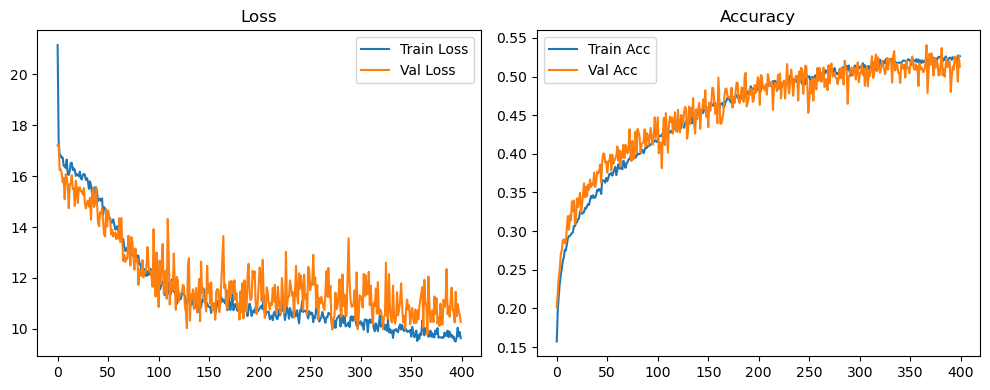

Original Model Final Test Loss: 10.5993 Accuracy: 0.5090


🚀 Running: batch512_lr_max_0.0001_min_1e-06_dp0.05


Files already downloaded and verified


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|                                                                                                                                                                        | 0/400 [00:00<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.1441 | Val Acc: 0.1943 | Epoch Time: 1.94 | :   0%|                                                                                                      | 0/400 [01:56<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.1441 | Val Acc: 0.1943 | Epoch Time: 1.94 | :   0%|                                                                                                      | 0/400 [01:56<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.1441 | Val Acc: 0.1943 | Epoch Time: 1.94 | :   0%|▏                                                                                         | 1/400 [01:56<12:52:46, 116.21s/it]

| LR: 0.000100 | Train Acc: 0.1777 | Val Acc: 0.2419 | Epoch Time: 1.93 | :   0%|▏                                                                                         | 1/400 [03:51<12:52:46, 116.21s/it]

| LR: 0.000100 | Train Acc: 0.1777 | Val Acc: 0.2419 | Epoch Time: 1.93 | :   0%|▏                                                                                         | 1/400 [03:51<12:52:46, 116.21s/it]

| LR: 0.000100 | Train Acc: 0.1777 | Val Acc: 0.2419 | Epoch Time: 1.93 | :   0%|▍                                                                                         | 2/400 [03:52<12:49:16, 115.97s/it]

| LR: 0.000100 | Train Acc: 0.1980 | Val Acc: 0.2481 | Epoch Time: 1.93 | :   0%|▍                                                                                         | 2/400 [05:47<12:49:16, 115.97s/it]

| LR: 0.000100 | Train Acc: 0.1980 | Val Acc: 0.2481 | Epoch Time: 1.93 | :   0%|▍                                                                                         | 2/400 [05:47<12:49:16, 115.97s/it]

| LR: 0.000100 | Train Acc: 0.1980 | Val Acc: 0.2481 | Epoch Time: 1.93 | :   1%|▋                                                                                         | 3/400 [05:47<12:46:29, 115.84s/it]

| LR: 0.000100 | Train Acc: 0.2099 | Val Acc: 0.2659 | Epoch Time: 1.93 | :   1%|▋                                                                                         | 3/400 [07:43<12:46:29, 115.84s/it]

| LR: 0.000100 | Train Acc: 0.2099 | Val Acc: 0.2659 | Epoch Time: 1.93 | :   1%|▋                                                                                         | 3/400 [07:43<12:46:29, 115.84s/it]

| LR: 0.000100 | Train Acc: 0.2099 | Val Acc: 0.2659 | Epoch Time: 1.93 | :   1%|▉                                                                                         | 4/400 [07:43<12:44:03, 115.77s/it]

| LR: 0.000100 | Train Acc: 0.2175 | Val Acc: 0.2801 | Epoch Time: 1.93 | :   1%|▉                                                                                         | 4/400 [09:38<12:44:03, 115.77s/it]

| LR: 0.000100 | Train Acc: 0.2175 | Val Acc: 0.2801 | Epoch Time: 1.93 | :   1%|▉                                                                                         | 4/400 [09:38<12:44:03, 115.77s/it]

| LR: 0.000100 | Train Acc: 0.2175 | Val Acc: 0.2801 | Epoch Time: 1.93 | :   1%|█▏                                                                                        | 5/400 [09:39<12:41:57, 115.74s/it]

| LR: 0.000100 | Train Acc: 0.2290 | Val Acc: 0.2942 | Epoch Time: 1.93 | :   1%|█▏                                                                                        | 5/400 [11:34<12:41:57, 115.74s/it]

| LR: 0.000100 | Train Acc: 0.2290 | Val Acc: 0.2942 | Epoch Time: 1.93 | :   1%|█▏                                                                                        | 5/400 [11:34<12:41:57, 115.74s/it]

| LR: 0.000100 | Train Acc: 0.2290 | Val Acc: 0.2942 | Epoch Time: 1.93 | :   2%|█▎                                                                                        | 6/400 [11:34<12:39:48, 115.71s/it]

| LR: 0.000100 | Train Acc: 0.2356 | Val Acc: 0.2744 | Epoch Time: 1.93 | :   2%|█▎                                                                                        | 6/400 [13:30<12:39:48, 115.71s/it]

| LR: 0.000100 | Train Acc: 0.2356 | Val Acc: 0.2744 | Epoch Time: 1.93 | :   2%|█▎                                                                                        | 6/400 [13:30<12:39:48, 115.71s/it]

| LR: 0.000100 | Train Acc: 0.2356 | Val Acc: 0.2744 | Epoch Time: 1.93 | :   2%|█▌                                                                                        | 7/400 [13:30<12:37:42, 115.68s/it]

| LR: 0.000100 | Train Acc: 0.2394 | Val Acc: 0.2814 | Epoch Time: 1.93 | :   2%|█▌                                                                                        | 7/400 [15:25<12:37:42, 115.68s/it]

| LR: 0.000100 | Train Acc: 0.2394 | Val Acc: 0.2814 | Epoch Time: 1.93 | :   2%|█▌                                                                                        | 7/400 [15:25<12:37:42, 115.68s/it]

| LR: 0.000100 | Train Acc: 0.2394 | Val Acc: 0.2814 | Epoch Time: 1.93 | :   2%|█▊                                                                                        | 8/400 [15:25<12:35:39, 115.66s/it]

| LR: 0.000100 | Train Acc: 0.2420 | Val Acc: 0.2897 | Epoch Time: 1.92 | :   2%|█▊                                                                                        | 8/400 [17:21<12:35:39, 115.66s/it]

| LR: 0.000100 | Train Acc: 0.2420 | Val Acc: 0.2897 | Epoch Time: 1.92 | :   2%|█▊                                                                                        | 8/400 [17:21<12:35:39, 115.66s/it]

| LR: 0.000100 | Train Acc: 0.2420 | Val Acc: 0.2897 | Epoch Time: 1.92 | :   2%|██                                                                                        | 9/400 [17:21<12:33:36, 115.64s/it]

| LR: 0.000100 | Train Acc: 0.2490 | Val Acc: 0.3046 | Epoch Time: 1.93 | :   2%|██                                                                                        | 9/400 [19:17<12:33:36, 115.64s/it]

| LR: 0.000100 | Train Acc: 0.2490 | Val Acc: 0.3046 | Epoch Time: 1.93 | :   2%|██                                                                                        | 9/400 [19:17<12:33:36, 115.64s/it]

| LR: 0.000100 | Train Acc: 0.2490 | Val Acc: 0.3046 | Epoch Time: 1.93 | :   2%|██▏                                                                                      | 10/400 [19:17<12:31:46, 115.66s/it]

| LR: 0.000100 | Train Acc: 0.2551 | Val Acc: 0.3032 | Epoch Time: 1.93 | :   2%|██▏                                                                                      | 10/400 [21:12<12:31:46, 115.66s/it]

| LR: 0.000100 | Train Acc: 0.2551 | Val Acc: 0.3032 | Epoch Time: 1.93 | :   2%|██▏                                                                                      | 10/400 [21:12<12:31:46, 115.66s/it]

| LR: 0.000100 | Train Acc: 0.2551 | Val Acc: 0.3032 | Epoch Time: 1.93 | :   3%|██▍                                                                                      | 11/400 [21:12<12:30:01, 115.69s/it]

| LR: 0.000100 | Train Acc: 0.2580 | Val Acc: 0.3149 | Epoch Time: 1.93 | :   3%|██▍                                                                                      | 11/400 [23:08<12:30:01, 115.69s/it]

| LR: 0.000100 | Train Acc: 0.2580 | Val Acc: 0.3149 | Epoch Time: 1.93 | :   3%|██▍                                                                                      | 11/400 [23:08<12:30:01, 115.69s/it]

| LR: 0.000100 | Train Acc: 0.2580 | Val Acc: 0.3149 | Epoch Time: 1.93 | :   3%|██▋                                                                                      | 12/400 [23:08<12:28:03, 115.68s/it]

| LR: 0.000100 | Train Acc: 0.2607 | Val Acc: 0.3240 | Epoch Time: 1.93 | :   3%|██▋                                                                                      | 12/400 [25:04<12:28:03, 115.68s/it]

| LR: 0.000100 | Train Acc: 0.2607 | Val Acc: 0.3240 | Epoch Time: 1.93 | :   3%|██▋                                                                                      | 12/400 [25:04<12:28:03, 115.68s/it]

| LR: 0.000100 | Train Acc: 0.2607 | Val Acc: 0.3240 | Epoch Time: 1.93 | :   3%|██▉                                                                                      | 13/400 [25:04<12:26:00, 115.66s/it]

| LR: 0.000100 | Train Acc: 0.2656 | Val Acc: 0.3128 | Epoch Time: 1.93 | :   3%|██▉                                                                                      | 13/400 [26:59<12:26:00, 115.66s/it]

| LR: 0.000100 | Train Acc: 0.2656 | Val Acc: 0.3128 | Epoch Time: 1.93 | :   3%|██▉                                                                                      | 13/400 [26:59<12:26:00, 115.66s/it]

| LR: 0.000100 | Train Acc: 0.2656 | Val Acc: 0.3128 | Epoch Time: 1.93 | :   4%|███                                                                                      | 14/400 [26:59<12:23:59, 115.65s/it]

| LR: 0.000100 | Train Acc: 0.2654 | Val Acc: 0.3165 | Epoch Time: 1.93 | :   4%|███                                                                                      | 14/400 [28:55<12:23:59, 115.65s/it]

| LR: 0.000100 | Train Acc: 0.2654 | Val Acc: 0.3165 | Epoch Time: 1.93 | :   4%|███                                                                                      | 14/400 [28:55<12:23:59, 115.65s/it]

| LR: 0.000100 | Train Acc: 0.2654 | Val Acc: 0.3165 | Epoch Time: 1.93 | :   4%|███▎                                                                                     | 15/400 [28:55<12:22:05, 115.65s/it]

| LR: 0.000100 | Train Acc: 0.2700 | Val Acc: 0.3132 | Epoch Time: 1.93 | :   4%|███▎                                                                                     | 15/400 [30:51<12:22:05, 115.65s/it]

| LR: 0.000100 | Train Acc: 0.2700 | Val Acc: 0.3132 | Epoch Time: 1.93 | :   4%|███▎                                                                                     | 15/400 [30:51<12:22:05, 115.65s/it]

| LR: 0.000100 | Train Acc: 0.2700 | Val Acc: 0.3132 | Epoch Time: 1.93 | :   4%|███▌                                                                                     | 16/400 [30:51<12:20:19, 115.68s/it]

| LR: 0.000100 | Train Acc: 0.2750 | Val Acc: 0.3169 | Epoch Time: 1.93 | :   4%|███▌                                                                                     | 16/400 [32:46<12:20:19, 115.68s/it]

| LR: 0.000100 | Train Acc: 0.2750 | Val Acc: 0.3169 | Epoch Time: 1.93 | :   4%|███▌                                                                                     | 16/400 [32:46<12:20:19, 115.68s/it]

| LR: 0.000100 | Train Acc: 0.2750 | Val Acc: 0.3169 | Epoch Time: 1.93 | :   4%|███▊                                                                                     | 17/400 [32:46<12:18:19, 115.67s/it]

| LR: 0.000100 | Train Acc: 0.2720 | Val Acc: 0.3237 | Epoch Time: 1.93 | :   4%|███▊                                                                                     | 17/400 [34:42<12:18:19, 115.67s/it]

| LR: 0.000100 | Train Acc: 0.2720 | Val Acc: 0.3237 | Epoch Time: 1.93 | :   4%|███▊                                                                                     | 17/400 [34:42<12:18:19, 115.67s/it]

| LR: 0.000100 | Train Acc: 0.2720 | Val Acc: 0.3237 | Epoch Time: 1.93 | :   4%|████                                                                                     | 18/400 [34:42<12:16:20, 115.65s/it]

| LR: 0.000100 | Train Acc: 0.2745 | Val Acc: 0.3254 | Epoch Time: 1.92 | :   4%|████                                                                                     | 18/400 [36:38<12:16:20, 115.65s/it]

| LR: 0.000100 | Train Acc: 0.2745 | Val Acc: 0.3254 | Epoch Time: 1.92 | :   4%|████                                                                                     | 18/400 [36:38<12:16:20, 115.65s/it]

| LR: 0.000100 | Train Acc: 0.2745 | Val Acc: 0.3254 | Epoch Time: 1.92 | :   5%|████▏                                                                                    | 19/400 [36:38<12:14:17, 115.64s/it]

| LR: 0.000099 | Train Acc: 0.2793 | Val Acc: 0.3131 | Epoch Time: 1.92 | :   5%|████▏                                                                                    | 19/400 [38:33<12:14:17, 115.64s/it]

| LR: 0.000099 | Train Acc: 0.2793 | Val Acc: 0.3131 | Epoch Time: 1.92 | :   5%|████▏                                                                                    | 19/400 [38:33<12:14:17, 115.64s/it]

| LR: 0.000099 | Train Acc: 0.2793 | Val Acc: 0.3131 | Epoch Time: 1.92 | :   5%|████▍                                                                                    | 20/400 [38:33<12:12:15, 115.62s/it]

| LR: 0.000099 | Train Acc: 0.2834 | Val Acc: 0.3343 | Epoch Time: 1.92 | :   5%|████▍                                                                                    | 20/400 [40:29<12:12:15, 115.62s/it]

| LR: 0.000099 | Train Acc: 0.2834 | Val Acc: 0.3343 | Epoch Time: 1.92 | :   5%|████▍                                                                                    | 20/400 [40:29<12:12:15, 115.62s/it]

| LR: 0.000099 | Train Acc: 0.2834 | Val Acc: 0.3343 | Epoch Time: 1.92 | :   5%|████▋                                                                                    | 21/400 [40:29<12:10:17, 115.61s/it]

| LR: 0.000099 | Train Acc: 0.2842 | Val Acc: 0.3299 | Epoch Time: 1.93 | :   5%|████▋                                                                                    | 21/400 [42:24<12:10:17, 115.61s/it]

| LR: 0.000099 | Train Acc: 0.2842 | Val Acc: 0.3299 | Epoch Time: 1.93 | :   5%|████▋                                                                                    | 21/400 [42:24<12:10:17, 115.61s/it]

| LR: 0.000099 | Train Acc: 0.2842 | Val Acc: 0.3299 | Epoch Time: 1.93 | :   6%|████▉                                                                                    | 22/400 [42:25<12:08:39, 115.66s/it]

| LR: 0.000099 | Train Acc: 0.2849 | Val Acc: 0.3476 | Epoch Time: 1.93 | :   6%|████▉                                                                                    | 22/400 [44:20<12:08:39, 115.66s/it]

| LR: 0.000099 | Train Acc: 0.2849 | Val Acc: 0.3476 | Epoch Time: 1.93 | :   6%|████▉                                                                                    | 22/400 [44:20<12:08:39, 115.66s/it]

| LR: 0.000099 | Train Acc: 0.2849 | Val Acc: 0.3476 | Epoch Time: 1.93 | :   6%|█████                                                                                    | 23/400 [44:20<12:06:45, 115.66s/it]

| LR: 0.000099 | Train Acc: 0.2877 | Val Acc: 0.3406 | Epoch Time: 1.93 | :   6%|█████                                                                                    | 23/400 [46:16<12:06:45, 115.66s/it]

| LR: 0.000099 | Train Acc: 0.2877 | Val Acc: 0.3406 | Epoch Time: 1.93 | :   6%|█████                                                                                    | 23/400 [46:16<12:06:45, 115.66s/it]

| LR: 0.000099 | Train Acc: 0.2877 | Val Acc: 0.3406 | Epoch Time: 1.93 | :   6%|█████▎                                                                                   | 24/400 [46:16<12:04:49, 115.66s/it]

| LR: 0.000099 | Train Acc: 0.2902 | Val Acc: 0.3436 | Epoch Time: 1.92 | :   6%|█████▎                                                                                   | 24/400 [48:11<12:04:49, 115.66s/it]

| LR: 0.000099 | Train Acc: 0.2902 | Val Acc: 0.3436 | Epoch Time: 1.92 | :   6%|█████▎                                                                                   | 24/400 [48:11<12:04:49, 115.66s/it]

| LR: 0.000099 | Train Acc: 0.2902 | Val Acc: 0.3436 | Epoch Time: 1.92 | :   6%|█████▌                                                                                   | 25/400 [48:12<12:02:45, 115.64s/it]

| LR: 0.000099 | Train Acc: 0.2971 | Val Acc: 0.3160 | Epoch Time: 1.93 | :   6%|█████▌                                                                                   | 25/400 [50:07<12:02:45, 115.64s/it]

| LR: 0.000099 | Train Acc: 0.2971 | Val Acc: 0.3160 | Epoch Time: 1.93 | :   6%|█████▌                                                                                   | 25/400 [50:07<12:02:45, 115.64s/it]

| LR: 0.000099 | Train Acc: 0.2971 | Val Acc: 0.3160 | Epoch Time: 1.93 | :   6%|█████▊                                                                                   | 26/400 [50:07<12:00:46, 115.63s/it]

| LR: 0.000099 | Train Acc: 0.2982 | Val Acc: 0.3413 | Epoch Time: 1.93 | :   6%|█████▊                                                                                   | 26/400 [52:03<12:00:46, 115.63s/it]

| LR: 0.000099 | Train Acc: 0.2982 | Val Acc: 0.3413 | Epoch Time: 1.93 | :   6%|█████▊                                                                                   | 26/400 [52:03<12:00:46, 115.63s/it]

| LR: 0.000099 | Train Acc: 0.2982 | Val Acc: 0.3413 | Epoch Time: 1.93 | :   7%|██████                                                                                   | 27/400 [52:03<11:58:58, 115.65s/it]

| LR: 0.000099 | Train Acc: 0.2959 | Val Acc: 0.3600 | Epoch Time: 1.93 | :   7%|██████                                                                                   | 27/400 [53:58<11:58:58, 115.65s/it]

| LR: 0.000099 | Train Acc: 0.2959 | Val Acc: 0.3600 | Epoch Time: 1.93 | :   7%|██████                                                                                   | 27/400 [53:58<11:58:58, 115.65s/it]

| LR: 0.000099 | Train Acc: 0.2959 | Val Acc: 0.3600 | Epoch Time: 1.93 | :   7%|██████▏                                                                                  | 28/400 [53:59<11:57:09, 115.67s/it]

| LR: 0.000099 | Train Acc: 0.2985 | Val Acc: 0.3404 | Epoch Time: 1.93 | :   7%|██████▏                                                                                  | 28/400 [55:54<11:57:09, 115.67s/it]

| LR: 0.000099 | Train Acc: 0.2985 | Val Acc: 0.3404 | Epoch Time: 1.93 | :   7%|██████▏                                                                                  | 28/400 [55:54<11:57:09, 115.67s/it]

| LR: 0.000099 | Train Acc: 0.2985 | Val Acc: 0.3404 | Epoch Time: 1.93 | :   7%|██████▍                                                                                  | 29/400 [55:54<11:55:13, 115.67s/it]

| LR: 0.000099 | Train Acc: 0.3039 | Val Acc: 0.3500 | Epoch Time: 1.93 | :   7%|██████▍                                                                                  | 29/400 [57:50<11:55:13, 115.67s/it]

| LR: 0.000099 | Train Acc: 0.3039 | Val Acc: 0.3500 | Epoch Time: 1.93 | :   7%|██████▍                                                                                  | 29/400 [57:50<11:55:13, 115.67s/it]

| LR: 0.000099 | Train Acc: 0.3039 | Val Acc: 0.3500 | Epoch Time: 1.93 | :   8%|██████▋                                                                                  | 30/400 [57:50<11:53:18, 115.67s/it]

| LR: 0.000099 | Train Acc: 0.3024 | Val Acc: 0.3627 | Epoch Time: 1.93 | :   8%|██████▋                                                                                  | 30/400 [59:45<11:53:18, 115.67s/it]

| LR: 0.000099 | Train Acc: 0.3024 | Val Acc: 0.3627 | Epoch Time: 1.93 | :   8%|██████▋                                                                                  | 30/400 [59:45<11:53:18, 115.67s/it]

| LR: 0.000099 | Train Acc: 0.3024 | Val Acc: 0.3627 | Epoch Time: 1.93 | :   8%|██████▉                                                                                  | 31/400 [59:46<11:51:23, 115.67s/it]

| LR: 0.000099 | Train Acc: 0.3040 | Val Acc: 0.3413 | Epoch Time: 1.93 | :   8%|██████▋                                                                                | 31/400 [1:01:41<11:51:23, 115.67s/it]

| LR: 0.000099 | Train Acc: 0.3040 | Val Acc: 0.3413 | Epoch Time: 1.93 | :   8%|██████▋                                                                                | 31/400 [1:01:41<11:51:23, 115.67s/it]

| LR: 0.000099 | Train Acc: 0.3040 | Val Acc: 0.3413 | Epoch Time: 1.93 | :   8%|██████▉                                                                                | 32/400 [1:01:41<11:49:27, 115.67s/it]

| LR: 0.000098 | Train Acc: 0.3050 | Val Acc: 0.3584 | Epoch Time: 1.93 | :   8%|██████▉                                                                                | 32/400 [1:03:37<11:49:27, 115.67s/it]

| LR: 0.000098 | Train Acc: 0.3050 | Val Acc: 0.3584 | Epoch Time: 1.93 | :   8%|██████▉                                                                                | 32/400 [1:03:37<11:49:27, 115.67s/it]

| LR: 0.000098 | Train Acc: 0.3050 | Val Acc: 0.3584 | Epoch Time: 1.93 | :   8%|███████▏                                                                               | 33/400 [1:03:37<11:47:36, 115.68s/it]

| LR: 0.000098 | Train Acc: 0.3109 | Val Acc: 0.3499 | Epoch Time: 1.93 | :   8%|███████▏                                                                               | 33/400 [1:05:32<11:47:36, 115.68s/it]

| LR: 0.000098 | Train Acc: 0.3109 | Val Acc: 0.3499 | Epoch Time: 1.93 | :   8%|███████▏                                                                               | 33/400 [1:05:32<11:47:36, 115.68s/it]

| LR: 0.000098 | Train Acc: 0.3109 | Val Acc: 0.3499 | Epoch Time: 1.93 | :   8%|███████▍                                                                               | 34/400 [1:05:33<11:45:37, 115.68s/it]

| LR: 0.000098 | Train Acc: 0.3134 | Val Acc: 0.3734 | Epoch Time: 1.93 | :   8%|███████▍                                                                               | 34/400 [1:07:28<11:45:37, 115.68s/it]

| LR: 0.000098 | Train Acc: 0.3134 | Val Acc: 0.3734 | Epoch Time: 1.93 | :   8%|███████▍                                                                               | 34/400 [1:07:28<11:45:37, 115.68s/it]

| LR: 0.000098 | Train Acc: 0.3134 | Val Acc: 0.3734 | Epoch Time: 1.93 | :   9%|███████▌                                                                               | 35/400 [1:07:28<11:43:44, 115.68s/it]

| LR: 0.000098 | Train Acc: 0.3181 | Val Acc: 0.3696 | Epoch Time: 1.93 | :   9%|███████▌                                                                               | 35/400 [1:09:24<11:43:44, 115.68s/it]

| LR: 0.000098 | Train Acc: 0.3181 | Val Acc: 0.3696 | Epoch Time: 1.93 | :   9%|███████▌                                                                               | 35/400 [1:09:24<11:43:44, 115.68s/it]

| LR: 0.000098 | Train Acc: 0.3181 | Val Acc: 0.3696 | Epoch Time: 1.93 | :   9%|███████▊                                                                               | 36/400 [1:09:24<11:41:47, 115.68s/it]

| LR: 0.000098 | Train Acc: 0.3137 | Val Acc: 0.3694 | Epoch Time: 1.93 | :   9%|███████▊                                                                               | 36/400 [1:11:20<11:41:47, 115.68s/it]

| LR: 0.000098 | Train Acc: 0.3137 | Val Acc: 0.3694 | Epoch Time: 1.93 | :   9%|███████▊                                                                               | 36/400 [1:11:20<11:41:47, 115.68s/it]

| LR: 0.000098 | Train Acc: 0.3137 | Val Acc: 0.3694 | Epoch Time: 1.93 | :   9%|████████                                                                               | 37/400 [1:11:20<11:39:58, 115.70s/it]

| LR: 0.000098 | Train Acc: 0.3152 | Val Acc: 0.3461 | Epoch Time: 1.93 | :   9%|████████                                                                               | 37/400 [1:13:15<11:39:58, 115.70s/it]

| LR: 0.000098 | Train Acc: 0.3152 | Val Acc: 0.3461 | Epoch Time: 1.93 | :   9%|████████                                                                               | 37/400 [1:13:15<11:39:58, 115.70s/it]

| LR: 0.000098 | Train Acc: 0.3152 | Val Acc: 0.3461 | Epoch Time: 1.93 | :  10%|████████▎                                                                              | 38/400 [1:13:15<11:38:05, 115.71s/it]

| LR: 0.000098 | Train Acc: 0.3162 | Val Acc: 0.3571 | Epoch Time: 1.93 | :  10%|████████▎                                                                              | 38/400 [1:15:11<11:38:05, 115.71s/it]

| LR: 0.000098 | Train Acc: 0.3162 | Val Acc: 0.3571 | Epoch Time: 1.93 | :  10%|████████▎                                                                              | 38/400 [1:15:11<11:38:05, 115.71s/it]

| LR: 0.000098 | Train Acc: 0.3162 | Val Acc: 0.3571 | Epoch Time: 1.93 | :  10%|████████▍                                                                              | 39/400 [1:15:11<11:36:14, 115.72s/it]

| LR: 0.000098 | Train Acc: 0.3193 | Val Acc: 0.3699 | Epoch Time: 1.93 | :  10%|████████▍                                                                              | 39/400 [1:17:07<11:36:14, 115.72s/it]

| LR: 0.000098 | Train Acc: 0.3193 | Val Acc: 0.3699 | Epoch Time: 1.93 | :  10%|████████▍                                                                              | 39/400 [1:17:07<11:36:14, 115.72s/it]

| LR: 0.000098 | Train Acc: 0.3193 | Val Acc: 0.3699 | Epoch Time: 1.93 | :  10%|████████▋                                                                              | 40/400 [1:17:07<11:34:19, 115.72s/it]

| LR: 0.000098 | Train Acc: 0.3208 | Val Acc: 0.3766 | Epoch Time: 1.93 | :  10%|████████▋                                                                              | 40/400 [1:19:03<11:34:19, 115.72s/it]

| LR: 0.000098 | Train Acc: 0.3208 | Val Acc: 0.3766 | Epoch Time: 1.93 | :  10%|████████▋                                                                              | 40/400 [1:19:03<11:34:19, 115.72s/it]

| LR: 0.000098 | Train Acc: 0.3208 | Val Acc: 0.3766 | Epoch Time: 1.93 | :  10%|████████▉                                                                              | 41/400 [1:19:03<11:32:26, 115.73s/it]

| LR: 0.000097 | Train Acc: 0.3244 | Val Acc: 0.3575 | Epoch Time: 1.93 | :  10%|████████▉                                                                              | 41/400 [1:20:58<11:32:26, 115.73s/it]

| LR: 0.000097 | Train Acc: 0.3244 | Val Acc: 0.3575 | Epoch Time: 1.93 | :  10%|████████▉                                                                              | 41/400 [1:20:58<11:32:26, 115.73s/it]

| LR: 0.000097 | Train Acc: 0.3244 | Val Acc: 0.3575 | Epoch Time: 1.93 | :  10%|█████████▏                                                                             | 42/400 [1:20:58<11:30:27, 115.72s/it]

| LR: 0.000097 | Train Acc: 0.3189 | Val Acc: 0.3623 | Epoch Time: 1.93 | :  10%|█████████▏                                                                             | 42/400 [1:22:54<11:30:27, 115.72s/it]

| LR: 0.000097 | Train Acc: 0.3189 | Val Acc: 0.3623 | Epoch Time: 1.93 | :  10%|█████████▏                                                                             | 42/400 [1:22:54<11:30:27, 115.72s/it]

| LR: 0.000097 | Train Acc: 0.3189 | Val Acc: 0.3623 | Epoch Time: 1.93 | :  11%|█████████▎                                                                             | 43/400 [1:22:54<11:28:34, 115.73s/it]

| LR: 0.000097 | Train Acc: 0.3252 | Val Acc: 0.3628 | Epoch Time: 1.93 | :  11%|█████████▎                                                                             | 43/400 [1:24:50<11:28:34, 115.73s/it]

| LR: 0.000097 | Train Acc: 0.3252 | Val Acc: 0.3628 | Epoch Time: 1.93 | :  11%|█████████▎                                                                             | 43/400 [1:24:50<11:28:34, 115.73s/it]

| LR: 0.000097 | Train Acc: 0.3252 | Val Acc: 0.3628 | Epoch Time: 1.93 | :  11%|█████████▌                                                                             | 44/400 [1:24:50<11:26:37, 115.72s/it]

| LR: 0.000097 | Train Acc: 0.3251 | Val Acc: 0.3674 | Epoch Time: 1.93 | :  11%|█████████▌                                                                             | 44/400 [1:26:45<11:26:37, 115.72s/it]

| LR: 0.000097 | Train Acc: 0.3251 | Val Acc: 0.3674 | Epoch Time: 1.93 | :  11%|█████████▌                                                                             | 44/400 [1:26:45<11:26:37, 115.72s/it]

| LR: 0.000097 | Train Acc: 0.3251 | Val Acc: 0.3674 | Epoch Time: 1.93 | :  11%|█████████▊                                                                             | 45/400 [1:26:46<11:24:40, 115.72s/it]

| LR: 0.000097 | Train Acc: 0.3271 | Val Acc: 0.3815 | Epoch Time: 1.93 | :  11%|█████████▊                                                                             | 45/400 [1:28:41<11:24:40, 115.72s/it]

| LR: 0.000097 | Train Acc: 0.3271 | Val Acc: 0.3815 | Epoch Time: 1.93 | :  11%|█████████▊                                                                             | 45/400 [1:28:41<11:24:40, 115.72s/it]

| LR: 0.000097 | Train Acc: 0.3271 | Val Acc: 0.3815 | Epoch Time: 1.93 | :  12%|██████████                                                                             | 46/400 [1:28:41<11:22:43, 115.72s/it]

| LR: 0.000097 | Train Acc: 0.3276 | Val Acc: 0.3864 | Epoch Time: 1.93 | :  12%|██████████                                                                             | 46/400 [1:30:37<11:22:43, 115.72s/it]

| LR: 0.000097 | Train Acc: 0.3276 | Val Acc: 0.3864 | Epoch Time: 1.93 | :  12%|██████████                                                                             | 46/400 [1:30:37<11:22:43, 115.72s/it]

| LR: 0.000097 | Train Acc: 0.3276 | Val Acc: 0.3864 | Epoch Time: 1.93 | :  12%|██████████▏                                                                            | 47/400 [1:30:37<11:20:45, 115.71s/it]

| LR: 0.000097 | Train Acc: 0.3317 | Val Acc: 0.3926 | Epoch Time: 1.93 | :  12%|██████████▏                                                                            | 47/400 [1:32:33<11:20:45, 115.71s/it]

| LR: 0.000097 | Train Acc: 0.3317 | Val Acc: 0.3926 | Epoch Time: 1.93 | :  12%|██████████▏                                                                            | 47/400 [1:32:33<11:20:45, 115.71s/it]

| LR: 0.000097 | Train Acc: 0.3317 | Val Acc: 0.3926 | Epoch Time: 1.93 | :  12%|██████████▍                                                                            | 48/400 [1:32:33<11:18:50, 115.71s/it]

| LR: 0.000097 | Train Acc: 0.3319 | Val Acc: 0.3502 | Epoch Time: 1.93 | :  12%|██████████▍                                                                            | 48/400 [1:34:28<11:18:50, 115.71s/it]

| LR: 0.000097 | Train Acc: 0.3319 | Val Acc: 0.3502 | Epoch Time: 1.93 | :  12%|██████████▍                                                                            | 48/400 [1:34:28<11:18:50, 115.71s/it]

| LR: 0.000097 | Train Acc: 0.3319 | Val Acc: 0.3502 | Epoch Time: 1.93 | :  12%|██████████▋                                                                            | 49/400 [1:34:28<11:16:55, 115.71s/it]

| LR: 0.000096 | Train Acc: 0.3326 | Val Acc: 0.3769 | Epoch Time: 1.93 | :  12%|██████████▋                                                                            | 49/400 [1:36:24<11:16:55, 115.71s/it]

| LR: 0.000096 | Train Acc: 0.3326 | Val Acc: 0.3769 | Epoch Time: 1.93 | :  12%|██████████▋                                                                            | 49/400 [1:36:24<11:16:55, 115.71s/it]

| LR: 0.000096 | Train Acc: 0.3326 | Val Acc: 0.3769 | Epoch Time: 1.93 | :  12%|██████████▉                                                                            | 50/400 [1:36:24<11:14:58, 115.71s/it]

| LR: 0.000096 | Train Acc: 0.3347 | Val Acc: 0.3785 | Epoch Time: 1.93 | :  12%|██████████▉                                                                            | 50/400 [1:38:20<11:14:58, 115.71s/it]

| LR: 0.000096 | Train Acc: 0.3347 | Val Acc: 0.3785 | Epoch Time: 1.93 | :  12%|██████████▉                                                                            | 50/400 [1:38:20<11:14:58, 115.71s/it]

| LR: 0.000096 | Train Acc: 0.3347 | Val Acc: 0.3785 | Epoch Time: 1.93 | :  13%|███████████                                                                            | 51/400 [1:38:20<11:13:04, 115.71s/it]

| LR: 0.000096 | Train Acc: 0.3358 | Val Acc: 0.3860 | Epoch Time: 1.93 | :  13%|███████████                                                                            | 51/400 [1:40:15<11:13:04, 115.71s/it]

| LR: 0.000096 | Train Acc: 0.3358 | Val Acc: 0.3860 | Epoch Time: 1.93 | :  13%|███████████                                                                            | 51/400 [1:40:15<11:13:04, 115.71s/it]

| LR: 0.000096 | Train Acc: 0.3358 | Val Acc: 0.3860 | Epoch Time: 1.93 | :  13%|███████████▎                                                                           | 52/400 [1:40:15<11:11:06, 115.71s/it]

| LR: 0.000096 | Train Acc: 0.3346 | Val Acc: 0.3577 | Epoch Time: 1.93 | :  13%|███████████▎                                                                           | 52/400 [1:42:11<11:11:06, 115.71s/it]

| LR: 0.000096 | Train Acc: 0.3346 | Val Acc: 0.3577 | Epoch Time: 1.93 | :  13%|███████████▎                                                                           | 52/400 [1:42:11<11:11:06, 115.71s/it]

| LR: 0.000096 | Train Acc: 0.3346 | Val Acc: 0.3577 | Epoch Time: 1.93 | :  13%|███████████▌                                                                           | 53/400 [1:42:11<11:09:10, 115.71s/it]

| LR: 0.000096 | Train Acc: 0.3457 | Val Acc: 0.4023 | Epoch Time: 1.93 | :  13%|███████████▌                                                                           | 53/400 [1:44:07<11:09:10, 115.71s/it]

| LR: 0.000096 | Train Acc: 0.3457 | Val Acc: 0.4023 | Epoch Time: 1.93 | :  13%|███████████▌                                                                           | 53/400 [1:44:07<11:09:10, 115.71s/it]

| LR: 0.000096 | Train Acc: 0.3457 | Val Acc: 0.4023 | Epoch Time: 1.93 | :  14%|███████████▋                                                                           | 54/400 [1:44:07<11:07:11, 115.70s/it]

| LR: 0.000096 | Train Acc: 0.3424 | Val Acc: 0.3769 | Epoch Time: 1.93 | :  14%|███████████▋                                                                           | 54/400 [1:46:02<11:07:11, 115.70s/it]

| LR: 0.000096 | Train Acc: 0.3424 | Val Acc: 0.3769 | Epoch Time: 1.93 | :  14%|███████████▋                                                                           | 54/400 [1:46:02<11:07:11, 115.70s/it]

| LR: 0.000096 | Train Acc: 0.3424 | Val Acc: 0.3769 | Epoch Time: 1.93 | :  14%|███████████▉                                                                           | 55/400 [1:46:03<11:05:16, 115.70s/it]

| LR: 0.000095 | Train Acc: 0.3388 | Val Acc: 0.3695 | Epoch Time: 1.93 | :  14%|███████████▉                                                                           | 55/400 [1:47:58<11:05:16, 115.70s/it]

| LR: 0.000095 | Train Acc: 0.3388 | Val Acc: 0.3695 | Epoch Time: 1.93 | :  14%|███████████▉                                                                           | 55/400 [1:47:58<11:05:16, 115.70s/it]

| LR: 0.000095 | Train Acc: 0.3388 | Val Acc: 0.3695 | Epoch Time: 1.93 | :  14%|████████████▏                                                                          | 56/400 [1:47:58<11:03:25, 115.71s/it]

| LR: 0.000095 | Train Acc: 0.3419 | Val Acc: 0.3884 | Epoch Time: 1.93 | :  14%|████████████▏                                                                          | 56/400 [1:49:54<11:03:25, 115.71s/it]

| LR: 0.000095 | Train Acc: 0.3419 | Val Acc: 0.3884 | Epoch Time: 1.93 | :  14%|████████████▏                                                                          | 56/400 [1:49:54<11:03:25, 115.71s/it]

| LR: 0.000095 | Train Acc: 0.3419 | Val Acc: 0.3884 | Epoch Time: 1.93 | :  14%|████████████▍                                                                          | 57/400 [1:49:54<11:01:30, 115.72s/it]

| LR: 0.000095 | Train Acc: 0.3474 | Val Acc: 0.3718 | Epoch Time: 1.93 | :  14%|████████████▍                                                                          | 57/400 [1:51:50<11:01:30, 115.72s/it]

| LR: 0.000095 | Train Acc: 0.3474 | Val Acc: 0.3718 | Epoch Time: 1.93 | :  14%|████████████▍                                                                          | 57/400 [1:51:50<11:01:30, 115.72s/it]

| LR: 0.000095 | Train Acc: 0.3474 | Val Acc: 0.3718 | Epoch Time: 1.93 | :  14%|████████████▌                                                                          | 58/400 [1:51:50<10:59:30, 115.70s/it]

| LR: 0.000095 | Train Acc: 0.3451 | Val Acc: 0.3862 | Epoch Time: 1.93 | :  14%|████████████▌                                                                          | 58/400 [1:53:45<10:59:30, 115.70s/it]

| LR: 0.000095 | Train Acc: 0.3451 | Val Acc: 0.3862 | Epoch Time: 1.93 | :  14%|████████████▌                                                                          | 58/400 [1:53:45<10:59:30, 115.70s/it]

| LR: 0.000095 | Train Acc: 0.3451 | Val Acc: 0.3862 | Epoch Time: 1.93 | :  15%|████████████▊                                                                          | 59/400 [1:53:45<10:57:39, 115.72s/it]

| LR: 0.000095 | Train Acc: 0.3435 | Val Acc: 0.3707 | Epoch Time: 1.93 | :  15%|████████████▊                                                                          | 59/400 [1:55:41<10:57:39, 115.72s/it]

| LR: 0.000095 | Train Acc: 0.3435 | Val Acc: 0.3707 | Epoch Time: 1.93 | :  15%|████████████▊                                                                          | 59/400 [1:55:41<10:57:39, 115.72s/it]

| LR: 0.000095 | Train Acc: 0.3435 | Val Acc: 0.3707 | Epoch Time: 1.93 | :  15%|█████████████                                                                          | 60/400 [1:55:41<10:55:48, 115.73s/it]

| LR: 0.000095 | Train Acc: 0.3487 | Val Acc: 0.3899 | Epoch Time: 1.93 | :  15%|█████████████                                                                          | 60/400 [1:57:37<10:55:48, 115.73s/it]

| LR: 0.000095 | Train Acc: 0.3487 | Val Acc: 0.3899 | Epoch Time: 1.93 | :  15%|█████████████                                                                          | 60/400 [1:57:37<10:55:48, 115.73s/it]

| LR: 0.000095 | Train Acc: 0.3487 | Val Acc: 0.3899 | Epoch Time: 1.93 | :  15%|█████████████▎                                                                         | 61/400 [1:57:37<10:53:53, 115.73s/it]

| LR: 0.000094 | Train Acc: 0.3505 | Val Acc: 0.3926 | Epoch Time: 1.93 | :  15%|█████████████▎                                                                         | 61/400 [1:59:33<10:53:53, 115.73s/it]

| LR: 0.000094 | Train Acc: 0.3505 | Val Acc: 0.3926 | Epoch Time: 1.93 | :  15%|█████████████▎                                                                         | 61/400 [1:59:33<10:53:53, 115.73s/it]

| LR: 0.000094 | Train Acc: 0.3505 | Val Acc: 0.3926 | Epoch Time: 1.93 | :  16%|█████████████▍                                                                         | 62/400 [1:59:33<10:51:53, 115.72s/it]

| LR: 0.000094 | Train Acc: 0.3464 | Val Acc: 0.3932 | Epoch Time: 1.93 | :  16%|█████████████▍                                                                         | 62/400 [2:01:28<10:51:53, 115.72s/it]

| LR: 0.000094 | Train Acc: 0.3464 | Val Acc: 0.3932 | Epoch Time: 1.93 | :  16%|█████████████▍                                                                         | 62/400 [2:01:28<10:51:53, 115.72s/it]

| LR: 0.000094 | Train Acc: 0.3464 | Val Acc: 0.3932 | Epoch Time: 1.93 | :  16%|█████████████▋                                                                         | 63/400 [2:01:28<10:49:56, 115.72s/it]

| LR: 0.000094 | Train Acc: 0.3529 | Val Acc: 0.3855 | Epoch Time: 1.93 | :  16%|█████████████▋                                                                         | 63/400 [2:03:24<10:49:56, 115.72s/it]

| LR: 0.000094 | Train Acc: 0.3529 | Val Acc: 0.3855 | Epoch Time: 1.93 | :  16%|█████████████▋                                                                         | 63/400 [2:03:24<10:49:56, 115.72s/it]

| LR: 0.000094 | Train Acc: 0.3529 | Val Acc: 0.3855 | Epoch Time: 1.93 | :  16%|█████████████▉                                                                         | 64/400 [2:03:24<10:48:00, 115.71s/it]

| LR: 0.000094 | Train Acc: 0.3491 | Val Acc: 0.3647 | Epoch Time: 1.93 | :  16%|█████████████▉                                                                         | 64/400 [2:05:20<10:48:00, 115.71s/it]

| LR: 0.000094 | Train Acc: 0.3491 | Val Acc: 0.3647 | Epoch Time: 1.93 | :  16%|█████████████▉                                                                         | 64/400 [2:05:20<10:48:00, 115.71s/it]

| LR: 0.000094 | Train Acc: 0.3491 | Val Acc: 0.3647 | Epoch Time: 1.93 | :  16%|██████████████▏                                                                        | 65/400 [2:05:20<10:46:09, 115.73s/it]

| LR: 0.000094 | Train Acc: 0.3526 | Val Acc: 0.3953 | Epoch Time: 1.93 | :  16%|██████████████▏                                                                        | 65/400 [2:07:15<10:46:09, 115.73s/it]

| LR: 0.000094 | Train Acc: 0.3526 | Val Acc: 0.3953 | Epoch Time: 1.93 | :  16%|██████████████▏                                                                        | 65/400 [2:07:15<10:46:09, 115.73s/it]

| LR: 0.000094 | Train Acc: 0.3526 | Val Acc: 0.3953 | Epoch Time: 1.93 | :  16%|██████████████▎                                                                        | 66/400 [2:07:16<10:44:09, 115.72s/it]

| LR: 0.000093 | Train Acc: 0.3489 | Val Acc: 0.3887 | Epoch Time: 1.93 | :  16%|██████████████▎                                                                        | 66/400 [2:09:11<10:44:09, 115.72s/it]

| LR: 0.000093 | Train Acc: 0.3489 | Val Acc: 0.3887 | Epoch Time: 1.93 | :  16%|██████████████▎                                                                        | 66/400 [2:09:11<10:44:09, 115.72s/it]

| LR: 0.000093 | Train Acc: 0.3489 | Val Acc: 0.3887 | Epoch Time: 1.93 | :  17%|██████████████▌                                                                        | 67/400 [2:09:11<10:42:13, 115.72s/it]

| LR: 0.000093 | Train Acc: 0.3580 | Val Acc: 0.3812 | Epoch Time: 1.93 | :  17%|██████████████▌                                                                        | 67/400 [2:11:07<10:42:13, 115.72s/it]

| LR: 0.000093 | Train Acc: 0.3580 | Val Acc: 0.3812 | Epoch Time: 1.93 | :  17%|██████████████▌                                                                        | 67/400 [2:11:07<10:42:13, 115.72s/it]

| LR: 0.000093 | Train Acc: 0.3580 | Val Acc: 0.3812 | Epoch Time: 1.93 | :  17%|██████████████▊                                                                        | 68/400 [2:11:07<10:40:20, 115.72s/it]

| LR: 0.000093 | Train Acc: 0.3595 | Val Acc: 0.3989 | Epoch Time: 1.93 | :  17%|██████████████▊                                                                        | 68/400 [2:13:03<10:40:20, 115.72s/it]

| LR: 0.000093 | Train Acc: 0.3595 | Val Acc: 0.3989 | Epoch Time: 1.93 | :  17%|██████████████▊                                                                        | 68/400 [2:13:03<10:40:20, 115.72s/it]

| LR: 0.000093 | Train Acc: 0.3595 | Val Acc: 0.3989 | Epoch Time: 1.93 | :  17%|███████████████                                                                        | 69/400 [2:13:03<10:38:22, 115.72s/it]

| LR: 0.000093 | Train Acc: 0.3598 | Val Acc: 0.3812 | Epoch Time: 1.93 | :  17%|███████████████                                                                        | 69/400 [2:14:58<10:38:22, 115.72s/it]

| LR: 0.000093 | Train Acc: 0.3598 | Val Acc: 0.3812 | Epoch Time: 1.93 | :  17%|███████████████                                                                        | 69/400 [2:14:58<10:38:22, 115.72s/it]

| LR: 0.000093 | Train Acc: 0.3598 | Val Acc: 0.3812 | Epoch Time: 1.93 | :  18%|███████████████▏                                                                       | 70/400 [2:14:58<10:36:25, 115.71s/it]

| LR: 0.000093 | Train Acc: 0.3630 | Val Acc: 0.3664 | Epoch Time: 1.93 | :  18%|███████████████▏                                                                       | 70/400 [2:16:54<10:36:25, 115.71s/it]

| LR: 0.000093 | Train Acc: 0.3630 | Val Acc: 0.3664 | Epoch Time: 1.93 | :  18%|███████████████▏                                                                       | 70/400 [2:16:54<10:36:25, 115.71s/it]

| LR: 0.000093 | Train Acc: 0.3630 | Val Acc: 0.3664 | Epoch Time: 1.93 | :  18%|███████████████▍                                                                       | 71/400 [2:16:54<10:34:29, 115.71s/it]

| LR: 0.000093 | Train Acc: 0.3592 | Val Acc: 0.3915 | Epoch Time: 1.93 | :  18%|███████████████▍                                                                       | 71/400 [2:18:50<10:34:29, 115.71s/it]

| LR: 0.000093 | Train Acc: 0.3592 | Val Acc: 0.3915 | Epoch Time: 1.93 | :  18%|███████████████▍                                                                       | 71/400 [2:18:50<10:34:29, 115.71s/it]

| LR: 0.000093 | Train Acc: 0.3592 | Val Acc: 0.3915 | Epoch Time: 1.93 | :  18%|███████████████▋                                                                       | 72/400 [2:18:50<10:32:32, 115.71s/it]

| LR: 0.000092 | Train Acc: 0.3605 | Val Acc: 0.4223 | Epoch Time: 1.93 | :  18%|███████████████▋                                                                       | 72/400 [2:20:45<10:32:32, 115.71s/it]

| LR: 0.000092 | Train Acc: 0.3605 | Val Acc: 0.4223 | Epoch Time: 1.93 | :  18%|███████████████▋                                                                       | 72/400 [2:20:45<10:32:32, 115.71s/it]

| LR: 0.000092 | Train Acc: 0.3605 | Val Acc: 0.4223 | Epoch Time: 1.93 | :  18%|███████████████▉                                                                       | 73/400 [2:20:46<10:30:41, 115.72s/it]

| LR: 0.000092 | Train Acc: 0.3658 | Val Acc: 0.3935 | Epoch Time: 1.93 | :  18%|███████████████▉                                                                       | 73/400 [2:22:41<10:30:41, 115.72s/it]

| LR: 0.000092 | Train Acc: 0.3658 | Val Acc: 0.3935 | Epoch Time: 1.93 | :  18%|███████████████▉                                                                       | 73/400 [2:22:41<10:30:41, 115.72s/it]

| LR: 0.000092 | Train Acc: 0.3658 | Val Acc: 0.3935 | Epoch Time: 1.93 | :  18%|████████████████                                                                       | 74/400 [2:22:41<10:28:47, 115.73s/it]

| LR: 0.000092 | Train Acc: 0.3664 | Val Acc: 0.4259 | Epoch Time: 1.93 | :  18%|████████████████                                                                       | 74/400 [2:24:37<10:28:47, 115.73s/it]

| LR: 0.000092 | Train Acc: 0.3664 | Val Acc: 0.4259 | Epoch Time: 1.93 | :  18%|████████████████                                                                       | 74/400 [2:24:37<10:28:47, 115.73s/it]

| LR: 0.000092 | Train Acc: 0.3664 | Val Acc: 0.4259 | Epoch Time: 1.93 | :  19%|████████████████▎                                                                      | 75/400 [2:24:37<10:26:51, 115.73s/it]

| LR: 0.000092 | Train Acc: 0.3699 | Val Acc: 0.3988 | Epoch Time: 1.93 | :  19%|████████████████▎                                                                      | 75/400 [2:26:33<10:26:51, 115.73s/it]

| LR: 0.000092 | Train Acc: 0.3699 | Val Acc: 0.3988 | Epoch Time: 1.93 | :  19%|████████████████▎                                                                      | 75/400 [2:26:33<10:26:51, 115.73s/it]

| LR: 0.000092 | Train Acc: 0.3699 | Val Acc: 0.3988 | Epoch Time: 1.93 | :  19%|████████████████▌                                                                      | 76/400 [2:26:33<10:24:55, 115.73s/it]

| LR: 0.000091 | Train Acc: 0.3669 | Val Acc: 0.3691 | Epoch Time: 1.93 | :  19%|████████████████▌                                                                      | 76/400 [2:28:28<10:24:55, 115.73s/it]

| LR: 0.000091 | Train Acc: 0.3669 | Val Acc: 0.3691 | Epoch Time: 1.93 | :  19%|████████████████▌                                                                      | 76/400 [2:28:28<10:24:55, 115.73s/it]

| LR: 0.000091 | Train Acc: 0.3669 | Val Acc: 0.3691 | Epoch Time: 1.93 | :  19%|████████████████▋                                                                      | 77/400 [2:28:28<10:22:56, 115.72s/it]

| LR: 0.000091 | Train Acc: 0.3646 | Val Acc: 0.3969 | Epoch Time: 1.93 | :  19%|████████████████▋                                                                      | 77/400 [2:30:24<10:22:56, 115.72s/it]

| LR: 0.000091 | Train Acc: 0.3646 | Val Acc: 0.3969 | Epoch Time: 1.93 | :  19%|████████████████▋                                                                      | 77/400 [2:30:24<10:22:56, 115.72s/it]

| LR: 0.000091 | Train Acc: 0.3646 | Val Acc: 0.3969 | Epoch Time: 1.93 | :  20%|████████████████▉                                                                      | 78/400 [2:30:24<10:21:05, 115.73s/it]

| LR: 0.000091 | Train Acc: 0.3619 | Val Acc: 0.4240 | Epoch Time: 1.93 | :  20%|████████████████▉                                                                      | 78/400 [2:32:20<10:21:05, 115.73s/it]

| LR: 0.000091 | Train Acc: 0.3619 | Val Acc: 0.4240 | Epoch Time: 1.93 | :  20%|████████████████▉                                                                      | 78/400 [2:32:20<10:21:05, 115.73s/it]

| LR: 0.000091 | Train Acc: 0.3619 | Val Acc: 0.4240 | Epoch Time: 1.93 | :  20%|█████████████████▏                                                                     | 79/400 [2:32:20<10:19:14, 115.75s/it]

| LR: 0.000091 | Train Acc: 0.3685 | Val Acc: 0.4074 | Epoch Time: 1.93 | :  20%|█████████████████▏                                                                     | 79/400 [2:34:16<10:19:14, 115.75s/it]

| LR: 0.000091 | Train Acc: 0.3685 | Val Acc: 0.4074 | Epoch Time: 1.93 | :  20%|█████████████████▏                                                                     | 79/400 [2:34:16<10:19:14, 115.75s/it]

| LR: 0.000091 | Train Acc: 0.3685 | Val Acc: 0.4074 | Epoch Time: 1.93 | :  20%|█████████████████▍                                                                     | 80/400 [2:34:16<10:17:12, 115.73s/it]

| LR: 0.000091 | Train Acc: 0.3722 | Val Acc: 0.4037 | Epoch Time: 1.93 | :  20%|█████████████████▍                                                                     | 80/400 [2:36:11<10:17:12, 115.73s/it]

| LR: 0.000091 | Train Acc: 0.3722 | Val Acc: 0.4037 | Epoch Time: 1.93 | :  20%|█████████████████▍                                                                     | 80/400 [2:36:11<10:17:12, 115.73s/it]

| LR: 0.000091 | Train Acc: 0.3722 | Val Acc: 0.4037 | Epoch Time: 1.93 | :  20%|█████████████████▌                                                                     | 81/400 [2:36:11<10:15:12, 115.71s/it]

| LR: 0.000090 | Train Acc: 0.3694 | Val Acc: 0.4055 | Epoch Time: 1.93 | :  20%|█████████████████▌                                                                     | 81/400 [2:38:07<10:15:12, 115.71s/it]

| LR: 0.000090 | Train Acc: 0.3694 | Val Acc: 0.4055 | Epoch Time: 1.93 | :  20%|█████████████████▌                                                                     | 81/400 [2:38:07<10:15:12, 115.71s/it]

| LR: 0.000090 | Train Acc: 0.3694 | Val Acc: 0.4055 | Epoch Time: 1.93 | :  20%|█████████████████▊                                                                     | 82/400 [2:38:07<10:13:11, 115.70s/it]

| LR: 0.000090 | Train Acc: 0.3718 | Val Acc: 0.4093 | Epoch Time: 1.93 | :  20%|█████████████████▊                                                                     | 82/400 [2:40:03<10:13:11, 115.70s/it]

| LR: 0.000090 | Train Acc: 0.3718 | Val Acc: 0.4093 | Epoch Time: 1.93 | :  20%|█████████████████▊                                                                     | 82/400 [2:40:03<10:13:11, 115.70s/it]

| LR: 0.000090 | Train Acc: 0.3718 | Val Acc: 0.4093 | Epoch Time: 1.93 | :  21%|██████████████████                                                                     | 83/400 [2:40:03<10:11:15, 115.69s/it]

| LR: 0.000090 | Train Acc: 0.3730 | Val Acc: 0.4123 | Epoch Time: 1.93 | :  21%|██████████████████                                                                     | 83/400 [2:41:58<10:11:15, 115.69s/it]

| LR: 0.000090 | Train Acc: 0.3730 | Val Acc: 0.4123 | Epoch Time: 1.93 | :  21%|██████████████████                                                                     | 83/400 [2:41:58<10:11:15, 115.69s/it]

| LR: 0.000090 | Train Acc: 0.3730 | Val Acc: 0.4123 | Epoch Time: 1.93 | :  21%|██████████████████▎                                                                    | 84/400 [2:41:58<10:09:15, 115.68s/it]

| LR: 0.000090 | Train Acc: 0.3751 | Val Acc: 0.4266 | Epoch Time: 1.93 | :  21%|██████████████████▎                                                                    | 84/400 [2:43:54<10:09:15, 115.68s/it]

| LR: 0.000090 | Train Acc: 0.3751 | Val Acc: 0.4266 | Epoch Time: 1.93 | :  21%|██████████████████▎                                                                    | 84/400 [2:43:54<10:09:15, 115.68s/it]

| LR: 0.000090 | Train Acc: 0.3751 | Val Acc: 0.4266 | Epoch Time: 1.93 | :  21%|██████████████████▍                                                                    | 85/400 [2:43:54<10:07:24, 115.70s/it]

| LR: 0.000089 | Train Acc: 0.3741 | Val Acc: 0.4040 | Epoch Time: 1.93 | :  21%|██████████████████▍                                                                    | 85/400 [2:45:50<10:07:24, 115.70s/it]

| LR: 0.000089 | Train Acc: 0.3741 | Val Acc: 0.4040 | Epoch Time: 1.93 | :  21%|██████████████████▍                                                                    | 85/400 [2:45:50<10:07:24, 115.70s/it]

| LR: 0.000089 | Train Acc: 0.3741 | Val Acc: 0.4040 | Epoch Time: 1.93 | :  22%|██████████████████▋                                                                    | 86/400 [2:45:50<10:05:26, 115.69s/it]

| LR: 0.000089 | Train Acc: 0.3796 | Val Acc: 0.4285 | Epoch Time: 1.93 | :  22%|██████████████████▋                                                                    | 86/400 [2:47:45<10:05:26, 115.69s/it]

| LR: 0.000089 | Train Acc: 0.3796 | Val Acc: 0.4285 | Epoch Time: 1.93 | :  22%|██████████████████▋                                                                    | 86/400 [2:47:45<10:05:26, 115.69s/it]

| LR: 0.000089 | Train Acc: 0.3796 | Val Acc: 0.4285 | Epoch Time: 1.93 | :  22%|██████████████████▉                                                                    | 87/400 [2:47:45<10:03:26, 115.68s/it]

| LR: 0.000089 | Train Acc: 0.3769 | Val Acc: 0.4137 | Epoch Time: 1.93 | :  22%|██████████████████▉                                                                    | 87/400 [2:49:41<10:03:26, 115.68s/it]

| LR: 0.000089 | Train Acc: 0.3769 | Val Acc: 0.4137 | Epoch Time: 1.93 | :  22%|██████████████████▉                                                                    | 87/400 [2:49:41<10:03:26, 115.68s/it]

| LR: 0.000089 | Train Acc: 0.3769 | Val Acc: 0.4137 | Epoch Time: 1.93 | :  22%|███████████████████▏                                                                   | 88/400 [2:49:41<10:01:34, 115.69s/it]

| LR: 0.000089 | Train Acc: 0.3839 | Val Acc: 0.3950 | Epoch Time: 1.93 | :  22%|███████████████████▏                                                                   | 88/400 [2:51:37<10:01:34, 115.69s/it]

| LR: 0.000089 | Train Acc: 0.3839 | Val Acc: 0.3950 | Epoch Time: 1.93 | :  22%|███████████████████▏                                                                   | 88/400 [2:51:37<10:01:34, 115.69s/it]

| LR: 0.000089 | Train Acc: 0.3839 | Val Acc: 0.3950 | Epoch Time: 1.93 | :  22%|███████████████████▌                                                                    | 89/400 [2:51:37<9:59:45, 115.71s/it]

| LR: 0.000088 | Train Acc: 0.3830 | Val Acc: 0.4263 | Epoch Time: 1.93 | :  22%|███████████████████▌                                                                    | 89/400 [2:53:32<9:59:45, 115.71s/it]

| LR: 0.000088 | Train Acc: 0.3830 | Val Acc: 0.4263 | Epoch Time: 1.93 | :  22%|███████████████████▌                                                                    | 89/400 [2:53:32<9:59:45, 115.71s/it]

| LR: 0.000088 | Train Acc: 0.3830 | Val Acc: 0.4263 | Epoch Time: 1.93 | :  22%|███████████████████▊                                                                    | 90/400 [2:53:33<9:57:49, 115.71s/it]

| LR: 0.000088 | Train Acc: 0.3821 | Val Acc: 0.4257 | Epoch Time: 1.93 | :  22%|███████████████████▊                                                                    | 90/400 [2:55:28<9:57:49, 115.71s/it]

| LR: 0.000088 | Train Acc: 0.3821 | Val Acc: 0.4257 | Epoch Time: 1.93 | :  22%|███████████████████▊                                                                    | 90/400 [2:55:28<9:57:49, 115.71s/it]

| LR: 0.000088 | Train Acc: 0.3821 | Val Acc: 0.4257 | Epoch Time: 1.93 | :  23%|████████████████████                                                                    | 91/400 [2:55:28<9:55:57, 115.72s/it]

| LR: 0.000088 | Train Acc: 0.3796 | Val Acc: 0.4324 | Epoch Time: 1.93 | :  23%|████████████████████                                                                    | 91/400 [2:57:24<9:55:57, 115.72s/it]

| LR: 0.000088 | Train Acc: 0.3796 | Val Acc: 0.4324 | Epoch Time: 1.93 | :  23%|████████████████████                                                                    | 91/400 [2:57:24<9:55:57, 115.72s/it]

| LR: 0.000088 | Train Acc: 0.3796 | Val Acc: 0.4324 | Epoch Time: 1.93 | :  23%|████████████████████▏                                                                   | 92/400 [2:57:24<9:54:01, 115.72s/it]

| LR: 0.000088 | Train Acc: 0.3825 | Val Acc: 0.4253 | Epoch Time: 1.93 | :  23%|████████████████████▏                                                                   | 92/400 [2:59:20<9:54:01, 115.72s/it]

| LR: 0.000088 | Train Acc: 0.3825 | Val Acc: 0.4253 | Epoch Time: 1.93 | :  23%|████████████████████▏                                                                   | 92/400 [2:59:20<9:54:01, 115.72s/it]

| LR: 0.000088 | Train Acc: 0.3825 | Val Acc: 0.4253 | Epoch Time: 1.93 | :  23%|████████████████████▍                                                                   | 93/400 [2:59:20<9:52:08, 115.73s/it]

| LR: 0.000087 | Train Acc: 0.3844 | Val Acc: 0.4368 | Epoch Time: 1.93 | :  23%|████████████████████▍                                                                   | 93/400 [3:01:15<9:52:08, 115.73s/it]

| LR: 0.000087 | Train Acc: 0.3844 | Val Acc: 0.4368 | Epoch Time: 1.93 | :  23%|████████████████████▍                                                                   | 93/400 [3:01:15<9:52:08, 115.73s/it]

| LR: 0.000087 | Train Acc: 0.3844 | Val Acc: 0.4368 | Epoch Time: 1.93 | :  24%|████████████████████▋                                                                   | 94/400 [3:01:15<9:50:11, 115.72s/it]

| LR: 0.000087 | Train Acc: 0.3835 | Val Acc: 0.3875 | Epoch Time: 1.93 | :  24%|████████████████████▋                                                                   | 94/400 [3:03:11<9:50:11, 115.72s/it]

| LR: 0.000087 | Train Acc: 0.3835 | Val Acc: 0.3875 | Epoch Time: 1.93 | :  24%|████████████████████▋                                                                   | 94/400 [3:03:11<9:50:11, 115.72s/it]

| LR: 0.000087 | Train Acc: 0.3835 | Val Acc: 0.3875 | Epoch Time: 1.93 | :  24%|████████████████████▉                                                                   | 95/400 [3:03:11<9:48:16, 115.73s/it]

| LR: 0.000087 | Train Acc: 0.3876 | Val Acc: 0.4379 | Epoch Time: 1.93 | :  24%|████████████████████▉                                                                   | 95/400 [3:05:07<9:48:16, 115.73s/it]

| LR: 0.000087 | Train Acc: 0.3876 | Val Acc: 0.4379 | Epoch Time: 1.93 | :  24%|████████████████████▉                                                                   | 95/400 [3:05:07<9:48:16, 115.73s/it]

| LR: 0.000087 | Train Acc: 0.3876 | Val Acc: 0.4379 | Epoch Time: 1.93 | :  24%|█████████████████████                                                                   | 96/400 [3:05:07<9:46:18, 115.72s/it]

| LR: 0.000087 | Train Acc: 0.3855 | Val Acc: 0.4178 | Epoch Time: 1.93 | :  24%|█████████████████████                                                                   | 96/400 [3:07:03<9:46:18, 115.72s/it]

| LR: 0.000087 | Train Acc: 0.3855 | Val Acc: 0.4178 | Epoch Time: 1.93 | :  24%|█████████████████████                                                                   | 96/400 [3:07:03<9:46:18, 115.72s/it]

| LR: 0.000087 | Train Acc: 0.3855 | Val Acc: 0.4178 | Epoch Time: 1.93 | :  24%|█████████████████████▎                                                                  | 97/400 [3:07:03<9:44:26, 115.73s/it]

| LR: 0.000086 | Train Acc: 0.3870 | Val Acc: 0.4372 | Epoch Time: 1.93 | :  24%|█████████████████████▎                                                                  | 97/400 [3:08:58<9:44:26, 115.73s/it]

| LR: 0.000086 | Train Acc: 0.3870 | Val Acc: 0.4372 | Epoch Time: 1.93 | :  24%|█████████████████████▎                                                                  | 97/400 [3:08:58<9:44:26, 115.73s/it]

| LR: 0.000086 | Train Acc: 0.3870 | Val Acc: 0.4372 | Epoch Time: 1.93 | :  24%|█████████████████████▌                                                                  | 98/400 [3:08:58<9:42:32, 115.74s/it]

| LR: 0.000086 | Train Acc: 0.3914 | Val Acc: 0.4342 | Epoch Time: 1.93 | :  24%|█████████████████████▌                                                                  | 98/400 [3:10:54<9:42:32, 115.74s/it]

| LR: 0.000086 | Train Acc: 0.3914 | Val Acc: 0.4342 | Epoch Time: 1.93 | :  24%|█████████████████████▌                                                                  | 98/400 [3:10:54<9:42:32, 115.74s/it]

| LR: 0.000086 | Train Acc: 0.3914 | Val Acc: 0.4342 | Epoch Time: 1.93 | :  25%|█████████████████████▊                                                                  | 99/400 [3:10:54<9:40:35, 115.73s/it]

| LR: 0.000086 | Train Acc: 0.3916 | Val Acc: 0.4077 | Epoch Time: 1.93 | :  25%|█████████████████████▊                                                                  | 99/400 [3:12:50<9:40:35, 115.73s/it]

| LR: 0.000086 | Train Acc: 0.3916 | Val Acc: 0.4077 | Epoch Time: 1.93 | :  25%|█████████████████████▊                                                                  | 99/400 [3:12:50<9:40:35, 115.73s/it]

| LR: 0.000086 | Train Acc: 0.3916 | Val Acc: 0.4077 | Epoch Time: 1.93 | :  25%|█████████████████████▊                                                                 | 100/400 [3:12:50<9:38:40, 115.74s/it]

| LR: 0.000086 | Train Acc: 0.3920 | Val Acc: 0.4261 | Epoch Time: 1.93 | :  25%|█████████████████████▊                                                                 | 100/400 [3:14:46<9:38:40, 115.74s/it]

| LR: 0.000086 | Train Acc: 0.3920 | Val Acc: 0.4261 | Epoch Time: 1.93 | :  25%|█████████████████████▊                                                                 | 100/400 [3:14:46<9:38:40, 115.74s/it]

| LR: 0.000086 | Train Acc: 0.3920 | Val Acc: 0.4261 | Epoch Time: 1.93 | :  25%|█████████████████████▉                                                                 | 101/400 [3:14:46<9:36:44, 115.73s/it]

| LR: 0.000085 | Train Acc: 0.3930 | Val Acc: 0.4417 | Epoch Time: 1.93 | :  25%|█████████████████████▉                                                                 | 101/400 [3:16:41<9:36:44, 115.73s/it]

| LR: 0.000085 | Train Acc: 0.3930 | Val Acc: 0.4417 | Epoch Time: 1.93 | :  25%|█████████████████████▉                                                                 | 101/400 [3:16:41<9:36:44, 115.73s/it]

| LR: 0.000085 | Train Acc: 0.3930 | Val Acc: 0.4417 | Epoch Time: 1.93 | :  26%|██████████████████████▏                                                                | 102/400 [3:16:41<9:34:45, 115.72s/it]

| LR: 0.000085 | Train Acc: 0.3935 | Val Acc: 0.4363 | Epoch Time: 1.93 | :  26%|██████████████████████▏                                                                | 102/400 [3:18:37<9:34:45, 115.72s/it]

| LR: 0.000085 | Train Acc: 0.3935 | Val Acc: 0.4363 | Epoch Time: 1.93 | :  26%|██████████████████████▏                                                                | 102/400 [3:18:37<9:34:45, 115.72s/it]

| LR: 0.000085 | Train Acc: 0.3935 | Val Acc: 0.4363 | Epoch Time: 1.93 | :  26%|██████████████████████▍                                                                | 103/400 [3:18:37<9:32:51, 115.73s/it]

| LR: 0.000085 | Train Acc: 0.3925 | Val Acc: 0.4241 | Epoch Time: 1.93 | :  26%|██████████████████████▍                                                                | 103/400 [3:20:33<9:32:51, 115.73s/it]

| LR: 0.000085 | Train Acc: 0.3925 | Val Acc: 0.4241 | Epoch Time: 1.93 | :  26%|██████████████████████▍                                                                | 103/400 [3:20:33<9:32:51, 115.73s/it]

| LR: 0.000085 | Train Acc: 0.3925 | Val Acc: 0.4241 | Epoch Time: 1.93 | :  26%|██████████████████████▌                                                                | 104/400 [3:20:33<9:30:57, 115.74s/it]

| LR: 0.000084 | Train Acc: 0.3958 | Val Acc: 0.4185 | Epoch Time: 1.93 | :  26%|██████████████████████▌                                                                | 104/400 [3:22:28<9:30:57, 115.74s/it]

| LR: 0.000084 | Train Acc: 0.3958 | Val Acc: 0.4185 | Epoch Time: 1.93 | :  26%|██████████████████████▌                                                                | 104/400 [3:22:28<9:30:57, 115.74s/it]

| LR: 0.000084 | Train Acc: 0.3958 | Val Acc: 0.4185 | Epoch Time: 1.93 | :  26%|██████████████████████▊                                                                | 105/400 [3:22:29<9:29:00, 115.73s/it]

| LR: 0.000084 | Train Acc: 0.3937 | Val Acc: 0.4134 | Epoch Time: 1.93 | :  26%|██████████████████████▊                                                                | 105/400 [3:24:24<9:29:00, 115.73s/it]

| LR: 0.000084 | Train Acc: 0.3937 | Val Acc: 0.4134 | Epoch Time: 1.93 | :  26%|██████████████████████▊                                                                | 105/400 [3:24:24<9:29:00, 115.73s/it]

| LR: 0.000084 | Train Acc: 0.3937 | Val Acc: 0.4134 | Epoch Time: 1.93 | :  26%|███████████████████████                                                                | 106/400 [3:24:24<9:27:05, 115.73s/it]

| LR: 0.000084 | Train Acc: 0.3948 | Val Acc: 0.3920 | Epoch Time: 1.93 | :  26%|███████████████████████                                                                | 106/400 [3:26:20<9:27:05, 115.73s/it]

| LR: 0.000084 | Train Acc: 0.3948 | Val Acc: 0.3920 | Epoch Time: 1.93 | :  26%|███████████████████████                                                                | 106/400 [3:26:20<9:27:05, 115.73s/it]

| LR: 0.000084 | Train Acc: 0.3948 | Val Acc: 0.3920 | Epoch Time: 1.93 | :  27%|███████████████████████▎                                                               | 107/400 [3:26:20<9:25:11, 115.74s/it]

| LR: 0.000084 | Train Acc: 0.3944 | Val Acc: 0.4440 | Epoch Time: 1.93 | :  27%|███████████████████████▎                                                               | 107/400 [3:28:16<9:25:11, 115.74s/it]

| LR: 0.000084 | Train Acc: 0.3944 | Val Acc: 0.4440 | Epoch Time: 1.93 | :  27%|███████████████████████▎                                                               | 107/400 [3:28:16<9:25:11, 115.74s/it]

| LR: 0.000084 | Train Acc: 0.3944 | Val Acc: 0.4440 | Epoch Time: 1.93 | :  27%|███████████████████████▍                                                               | 108/400 [3:28:16<9:23:16, 115.74s/it]

| LR: 0.000083 | Train Acc: 0.3980 | Val Acc: 0.4302 | Epoch Time: 1.93 | :  27%|███████████████████████▍                                                               | 108/400 [3:30:11<9:23:16, 115.74s/it]

| LR: 0.000083 | Train Acc: 0.3980 | Val Acc: 0.4302 | Epoch Time: 1.93 | :  27%|███████████████████████▍                                                               | 108/400 [3:30:11<9:23:16, 115.74s/it]

| LR: 0.000083 | Train Acc: 0.3980 | Val Acc: 0.4302 | Epoch Time: 1.93 | :  27%|███████████████████████▋                                                               | 109/400 [3:30:11<9:21:17, 115.73s/it]

| LR: 0.000083 | Train Acc: 0.3963 | Val Acc: 0.4505 | Epoch Time: 1.93 | :  27%|███████████████████████▋                                                               | 109/400 [3:32:07<9:21:17, 115.73s/it]

| LR: 0.000083 | Train Acc: 0.3963 | Val Acc: 0.4505 | Epoch Time: 1.93 | :  27%|███████████████████████▋                                                               | 109/400 [3:32:07<9:21:17, 115.73s/it]

| LR: 0.000083 | Train Acc: 0.3963 | Val Acc: 0.4505 | Epoch Time: 1.93 | :  28%|███████████████████████▉                                                               | 110/400 [3:32:07<9:19:21, 115.73s/it]

| LR: 0.000083 | Train Acc: 0.3989 | Val Acc: 0.4373 | Epoch Time: 1.93 | :  28%|███████████████████████▉                                                               | 110/400 [3:34:03<9:19:21, 115.73s/it]

| LR: 0.000083 | Train Acc: 0.3989 | Val Acc: 0.4373 | Epoch Time: 1.93 | :  28%|███████████████████████▉                                                               | 110/400 [3:34:03<9:19:21, 115.73s/it]

| LR: 0.000083 | Train Acc: 0.3989 | Val Acc: 0.4373 | Epoch Time: 1.93 | :  28%|████████████████████████▏                                                              | 111/400 [3:34:03<9:17:27, 115.74s/it]

| LR: 0.000082 | Train Acc: 0.3976 | Val Acc: 0.4446 | Epoch Time: 1.93 | :  28%|████████████████████████▏                                                              | 111/400 [3:35:59<9:17:27, 115.74s/it]

| LR: 0.000082 | Train Acc: 0.3976 | Val Acc: 0.4446 | Epoch Time: 1.93 | :  28%|████████████████████████▏                                                              | 111/400 [3:35:59<9:17:27, 115.74s/it]

| LR: 0.000082 | Train Acc: 0.3976 | Val Acc: 0.4446 | Epoch Time: 1.93 | :  28%|████████████████████████▎                                                              | 112/400 [3:35:59<9:15:26, 115.72s/it]

| LR: 0.000082 | Train Acc: 0.3958 | Val Acc: 0.4274 | Epoch Time: 1.93 | :  28%|████████████████████████▎                                                              | 112/400 [3:37:54<9:15:26, 115.72s/it]

| LR: 0.000082 | Train Acc: 0.3958 | Val Acc: 0.4274 | Epoch Time: 1.93 | :  28%|████████████████████████▎                                                              | 112/400 [3:37:54<9:15:26, 115.72s/it]

| LR: 0.000082 | Train Acc: 0.3958 | Val Acc: 0.4274 | Epoch Time: 1.93 | :  28%|████████████████████████▌                                                              | 113/400 [3:37:54<9:13:35, 115.73s/it]

| LR: 0.000082 | Train Acc: 0.3988 | Val Acc: 0.4282 | Epoch Time: 1.93 | :  28%|████████████████████████▌                                                              | 113/400 [3:39:50<9:13:35, 115.73s/it]

| LR: 0.000082 | Train Acc: 0.3988 | Val Acc: 0.4282 | Epoch Time: 1.93 | :  28%|████████████████████████▌                                                              | 113/400 [3:39:50<9:13:35, 115.73s/it]

| LR: 0.000082 | Train Acc: 0.3988 | Val Acc: 0.4282 | Epoch Time: 1.93 | :  28%|████████████████████████▊                                                              | 114/400 [3:39:50<9:11:44, 115.75s/it]

| LR: 0.000081 | Train Acc: 0.4017 | Val Acc: 0.4195 | Epoch Time: 1.93 | :  28%|████████████████████████▊                                                              | 114/400 [3:41:46<9:11:44, 115.75s/it]

| LR: 0.000081 | Train Acc: 0.4017 | Val Acc: 0.4195 | Epoch Time: 1.93 | :  28%|████████████████████████▊                                                              | 114/400 [3:41:46<9:11:44, 115.75s/it]

| LR: 0.000081 | Train Acc: 0.4017 | Val Acc: 0.4195 | Epoch Time: 1.93 | :  29%|█████████████████████████                                                              | 115/400 [3:41:46<9:09:49, 115.75s/it]

| LR: 0.000081 | Train Acc: 0.4020 | Val Acc: 0.4406 | Epoch Time: 1.93 | :  29%|█████████████████████████                                                              | 115/400 [3:43:42<9:09:49, 115.75s/it]

| LR: 0.000081 | Train Acc: 0.4020 | Val Acc: 0.4406 | Epoch Time: 1.93 | :  29%|█████████████████████████                                                              | 115/400 [3:43:42<9:09:49, 115.75s/it]

| LR: 0.000081 | Train Acc: 0.4020 | Val Acc: 0.4406 | Epoch Time: 1.93 | :  29%|█████████████████████████▏                                                             | 116/400 [3:43:42<9:07:55, 115.76s/it]

| LR: 0.000081 | Train Acc: 0.4021 | Val Acc: 0.4695 | Epoch Time: 1.93 | :  29%|█████████████████████████▏                                                             | 116/400 [3:45:37<9:07:55, 115.76s/it]

| LR: 0.000081 | Train Acc: 0.4021 | Val Acc: 0.4695 | Epoch Time: 1.93 | :  29%|█████████████████████████▏                                                             | 116/400 [3:45:37<9:07:55, 115.76s/it]

| LR: 0.000081 | Train Acc: 0.4021 | Val Acc: 0.4695 | Epoch Time: 1.93 | :  29%|█████████████████████████▍                                                             | 117/400 [3:45:37<9:05:56, 115.75s/it]

| LR: 0.000081 | Train Acc: 0.4025 | Val Acc: 0.4576 | Epoch Time: 1.93 | :  29%|█████████████████████████▍                                                             | 117/400 [3:47:33<9:05:56, 115.75s/it]

| LR: 0.000081 | Train Acc: 0.4025 | Val Acc: 0.4576 | Epoch Time: 1.93 | :  29%|█████████████████████████▍                                                             | 117/400 [3:47:33<9:05:56, 115.75s/it]

| LR: 0.000081 | Train Acc: 0.4025 | Val Acc: 0.4576 | Epoch Time: 1.93 | :  30%|█████████████████████████▋                                                             | 118/400 [3:47:33<9:03:59, 115.74s/it]

| LR: 0.000080 | Train Acc: 0.4027 | Val Acc: 0.4501 | Epoch Time: 1.93 | :  30%|█████████████████████████▋                                                             | 118/400 [3:49:29<9:03:59, 115.74s/it]

| LR: 0.000080 | Train Acc: 0.4027 | Val Acc: 0.4501 | Epoch Time: 1.93 | :  30%|█████████████████████████▋                                                             | 118/400 [3:49:29<9:03:59, 115.74s/it]

| LR: 0.000080 | Train Acc: 0.4027 | Val Acc: 0.4501 | Epoch Time: 1.93 | :  30%|█████████████████████████▉                                                             | 119/400 [3:49:29<9:02:01, 115.74s/it]

| LR: 0.000080 | Train Acc: 0.4034 | Val Acc: 0.4040 | Epoch Time: 1.93 | :  30%|█████████████████████████▉                                                             | 119/400 [3:51:25<9:02:01, 115.74s/it]

| LR: 0.000080 | Train Acc: 0.4034 | Val Acc: 0.4040 | Epoch Time: 1.93 | :  30%|█████████████████████████▉                                                             | 119/400 [3:51:25<9:02:01, 115.74s/it]

| LR: 0.000080 | Train Acc: 0.4034 | Val Acc: 0.4040 | Epoch Time: 1.93 | :  30%|██████████████████████████                                                             | 120/400 [3:51:25<9:00:05, 115.73s/it]

| LR: 0.000080 | Train Acc: 0.4035 | Val Acc: 0.4349 | Epoch Time: 1.93 | :  30%|██████████████████████████                                                             | 120/400 [3:53:20<9:00:05, 115.73s/it]

| LR: 0.000080 | Train Acc: 0.4035 | Val Acc: 0.4349 | Epoch Time: 1.93 | :  30%|██████████████████████████                                                             | 120/400 [3:53:20<9:00:05, 115.73s/it]

| LR: 0.000080 | Train Acc: 0.4035 | Val Acc: 0.4349 | Epoch Time: 1.93 | :  30%|██████████████████████████▎                                                            | 121/400 [3:53:20<8:58:09, 115.73s/it]

| LR: 0.000079 | Train Acc: 0.4041 | Val Acc: 0.4313 | Epoch Time: 1.93 | :  30%|██████████████████████████▎                                                            | 121/400 [3:55:16<8:58:09, 115.73s/it]

| LR: 0.000079 | Train Acc: 0.4041 | Val Acc: 0.4313 | Epoch Time: 1.93 | :  30%|██████████████████████████▎                                                            | 121/400 [3:55:16<8:58:09, 115.73s/it]

| LR: 0.000079 | Train Acc: 0.4041 | Val Acc: 0.4313 | Epoch Time: 1.93 | :  30%|██████████████████████████▌                                                            | 122/400 [3:55:16<8:56:17, 115.75s/it]

| LR: 0.000079 | Train Acc: 0.4040 | Val Acc: 0.4438 | Epoch Time: 1.93 | :  30%|██████████████████████████▌                                                            | 122/400 [3:57:12<8:56:17, 115.75s/it]

| LR: 0.000079 | Train Acc: 0.4040 | Val Acc: 0.4438 | Epoch Time: 1.93 | :  30%|██████████████████████████▌                                                            | 122/400 [3:57:12<8:56:17, 115.75s/it]

| LR: 0.000079 | Train Acc: 0.4040 | Val Acc: 0.4438 | Epoch Time: 1.93 | :  31%|██████████████████████████▊                                                            | 123/400 [3:57:12<8:54:24, 115.76s/it]

| LR: 0.000079 | Train Acc: 0.4053 | Val Acc: 0.4204 | Epoch Time: 1.93 | :  31%|██████████████████████████▊                                                            | 123/400 [3:59:08<8:54:24, 115.76s/it]

| LR: 0.000079 | Train Acc: 0.4053 | Val Acc: 0.4204 | Epoch Time: 1.93 | :  31%|██████████████████████████▊                                                            | 123/400 [3:59:08<8:54:24, 115.76s/it]

| LR: 0.000079 | Train Acc: 0.4053 | Val Acc: 0.4204 | Epoch Time: 1.93 | :  31%|██████████████████████████▉                                                            | 124/400 [3:59:08<8:52:31, 115.77s/it]

| LR: 0.000078 | Train Acc: 0.4064 | Val Acc: 0.4354 | Epoch Time: 1.93 | :  31%|██████████████████████████▉                                                            | 124/400 [4:01:03<8:52:31, 115.77s/it]

| LR: 0.000078 | Train Acc: 0.4064 | Val Acc: 0.4354 | Epoch Time: 1.93 | :  31%|██████████████████████████▉                                                            | 124/400 [4:01:03<8:52:31, 115.77s/it]

| LR: 0.000078 | Train Acc: 0.4064 | Val Acc: 0.4354 | Epoch Time: 1.93 | :  31%|███████████████████████████▏                                                           | 125/400 [4:01:03<8:50:34, 115.76s/it]

| LR: 0.000078 | Train Acc: 0.4089 | Val Acc: 0.4603 | Epoch Time: 1.93 | :  31%|███████████████████████████▏                                                           | 125/400 [4:02:59<8:50:34, 115.76s/it]

| LR: 0.000078 | Train Acc: 0.4089 | Val Acc: 0.4603 | Epoch Time: 1.93 | :  31%|███████████████████████████▏                                                           | 125/400 [4:02:59<8:50:34, 115.76s/it]

| LR: 0.000078 | Train Acc: 0.4089 | Val Acc: 0.4603 | Epoch Time: 1.93 | :  32%|███████████████████████████▍                                                           | 126/400 [4:02:59<8:48:35, 115.75s/it]

| LR: 0.000078 | Train Acc: 0.4067 | Val Acc: 0.4199 | Epoch Time: 1.93 | :  32%|███████████████████████████▍                                                           | 126/400 [4:04:55<8:48:35, 115.75s/it]

| LR: 0.000078 | Train Acc: 0.4067 | Val Acc: 0.4199 | Epoch Time: 1.93 | :  32%|███████████████████████████▍                                                           | 126/400 [4:04:55<8:48:35, 115.75s/it]

| LR: 0.000078 | Train Acc: 0.4067 | Val Acc: 0.4199 | Epoch Time: 1.93 | :  32%|███████████████████████████▌                                                           | 127/400 [4:04:55<8:46:38, 115.75s/it]

| LR: 0.000077 | Train Acc: 0.4078 | Val Acc: 0.4302 | Epoch Time: 1.93 | :  32%|███████████████████████████▌                                                           | 127/400 [4:06:50<8:46:38, 115.75s/it]

| LR: 0.000077 | Train Acc: 0.4078 | Val Acc: 0.4302 | Epoch Time: 1.93 | :  32%|███████████████████████████▌                                                           | 127/400 [4:06:50<8:46:38, 115.75s/it]

| LR: 0.000077 | Train Acc: 0.4078 | Val Acc: 0.4302 | Epoch Time: 1.93 | :  32%|███████████████████████████▊                                                           | 128/400 [4:06:51<8:44:38, 115.73s/it]

| LR: 0.000077 | Train Acc: 0.4068 | Val Acc: 0.4571 | Epoch Time: 1.93 | :  32%|███████████████████████████▊                                                           | 128/400 [4:08:46<8:44:38, 115.73s/it]

| LR: 0.000077 | Train Acc: 0.4068 | Val Acc: 0.4571 | Epoch Time: 1.93 | :  32%|███████████████████████████▊                                                           | 128/400 [4:08:46<8:44:38, 115.73s/it]

| LR: 0.000077 | Train Acc: 0.4068 | Val Acc: 0.4571 | Epoch Time: 1.93 | :  32%|████████████████████████████                                                           | 129/400 [4:08:46<8:42:40, 115.72s/it]

| LR: 0.000077 | Train Acc: 0.4117 | Val Acc: 0.4723 | Epoch Time: 1.93 | :  32%|████████████████████████████                                                           | 129/400 [4:10:42<8:42:40, 115.72s/it]

| LR: 0.000077 | Train Acc: 0.4117 | Val Acc: 0.4723 | Epoch Time: 1.93 | :  32%|████████████████████████████                                                           | 129/400 [4:10:42<8:42:40, 115.72s/it]

| LR: 0.000077 | Train Acc: 0.4117 | Val Acc: 0.4723 | Epoch Time: 1.93 | :  32%|████████████████████████████▎                                                          | 130/400 [4:10:42<8:40:43, 115.72s/it]

| LR: 0.000076 | Train Acc: 0.4178 | Val Acc: 0.4423 | Epoch Time: 1.93 | :  32%|████████████████████████████▎                                                          | 130/400 [4:12:38<8:40:43, 115.72s/it]

| LR: 0.000076 | Train Acc: 0.4178 | Val Acc: 0.4423 | Epoch Time: 1.93 | :  32%|████████████████████████████▎                                                          | 130/400 [4:12:38<8:40:43, 115.72s/it]

| LR: 0.000076 | Train Acc: 0.4178 | Val Acc: 0.4423 | Epoch Time: 1.93 | :  33%|████████████████████████████▍                                                          | 131/400 [4:12:38<8:38:47, 115.72s/it]

| LR: 0.000076 | Train Acc: 0.4076 | Val Acc: 0.4492 | Epoch Time: 1.93 | :  33%|████████████████████████████▍                                                          | 131/400 [4:14:33<8:38:47, 115.72s/it]

| LR: 0.000076 | Train Acc: 0.4076 | Val Acc: 0.4492 | Epoch Time: 1.93 | :  33%|████████████████████████████▍                                                          | 131/400 [4:14:33<8:38:47, 115.72s/it]

| LR: 0.000076 | Train Acc: 0.4076 | Val Acc: 0.4492 | Epoch Time: 1.93 | :  33%|████████████████████████████▋                                                          | 132/400 [4:14:33<8:36:55, 115.73s/it]

| LR: 0.000076 | Train Acc: 0.4103 | Val Acc: 0.4444 | Epoch Time: 1.93 | :  33%|████████████████████████████▋                                                          | 132/400 [4:16:29<8:36:55, 115.73s/it]

| LR: 0.000076 | Train Acc: 0.4103 | Val Acc: 0.4444 | Epoch Time: 1.93 | :  33%|████████████████████████████▋                                                          | 132/400 [4:16:29<8:36:55, 115.73s/it]

| LR: 0.000076 | Train Acc: 0.4103 | Val Acc: 0.4444 | Epoch Time: 1.93 | :  33%|████████████████████████████▉                                                          | 133/400 [4:16:29<8:35:03, 115.74s/it]

| LR: 0.000075 | Train Acc: 0.4153 | Val Acc: 0.4304 | Epoch Time: 1.93 | :  33%|████████████████████████████▉                                                          | 133/400 [4:18:25<8:35:03, 115.74s/it]

| LR: 0.000075 | Train Acc: 0.4153 | Val Acc: 0.4304 | Epoch Time: 1.93 | :  33%|████████████████████████████▉                                                          | 133/400 [4:18:25<8:35:03, 115.74s/it]

| LR: 0.000075 | Train Acc: 0.4153 | Val Acc: 0.4304 | Epoch Time: 1.93 | :  34%|█████████████████████████████▏                                                         | 134/400 [4:18:25<8:33:10, 115.75s/it]

| LR: 0.000075 | Train Acc: 0.4083 | Val Acc: 0.4281 | Epoch Time: 1.93 | :  34%|█████████████████████████████▏                                                         | 134/400 [4:20:21<8:33:10, 115.75s/it]

| LR: 0.000075 | Train Acc: 0.4083 | Val Acc: 0.4281 | Epoch Time: 1.93 | :  34%|█████████████████████████████▏                                                         | 134/400 [4:20:21<8:33:10, 115.75s/it]

| LR: 0.000075 | Train Acc: 0.4083 | Val Acc: 0.4281 | Epoch Time: 1.93 | :  34%|█████████████████████████████▎                                                         | 135/400 [4:20:21<8:31:11, 115.74s/it]

| LR: 0.000075 | Train Acc: 0.4108 | Val Acc: 0.4601 | Epoch Time: 1.93 | :  34%|█████████████████████████████▎                                                         | 135/400 [4:22:16<8:31:11, 115.74s/it]

| LR: 0.000075 | Train Acc: 0.4108 | Val Acc: 0.4601 | Epoch Time: 1.93 | :  34%|█████████████████████████████▎                                                         | 135/400 [4:22:16<8:31:11, 115.74s/it]

| LR: 0.000075 | Train Acc: 0.4108 | Val Acc: 0.4601 | Epoch Time: 1.93 | :  34%|█████████████████████████████▌                                                         | 136/400 [4:22:16<8:29:12, 115.73s/it]

| LR: 0.000074 | Train Acc: 0.4144 | Val Acc: 0.4334 | Epoch Time: 1.93 | :  34%|█████████████████████████████▌                                                         | 136/400 [4:24:12<8:29:12, 115.73s/it]

| LR: 0.000074 | Train Acc: 0.4144 | Val Acc: 0.4334 | Epoch Time: 1.93 | :  34%|█████████████████████████████▌                                                         | 136/400 [4:24:12<8:29:12, 115.73s/it]

| LR: 0.000074 | Train Acc: 0.4144 | Val Acc: 0.4334 | Epoch Time: 1.93 | :  34%|█████████████████████████████▊                                                         | 137/400 [4:24:12<8:27:20, 115.74s/it]

| LR: 0.000074 | Train Acc: 0.4137 | Val Acc: 0.4543 | Epoch Time: 1.93 | :  34%|█████████████████████████████▊                                                         | 137/400 [4:26:08<8:27:20, 115.74s/it]

| LR: 0.000074 | Train Acc: 0.4137 | Val Acc: 0.4543 | Epoch Time: 1.93 | :  34%|█████████████████████████████▊                                                         | 137/400 [4:26:08<8:27:20, 115.74s/it]

| LR: 0.000074 | Train Acc: 0.4137 | Val Acc: 0.4543 | Epoch Time: 1.93 | :  34%|██████████████████████████████                                                         | 138/400 [4:26:08<8:25:21, 115.73s/it]

| LR: 0.000074 | Train Acc: 0.4116 | Val Acc: 0.4266 | Epoch Time: 1.93 | :  34%|██████████████████████████████                                                         | 138/400 [4:28:04<8:25:21, 115.73s/it]

| LR: 0.000074 | Train Acc: 0.4116 | Val Acc: 0.4266 | Epoch Time: 1.93 | :  34%|██████████████████████████████                                                         | 138/400 [4:28:04<8:25:21, 115.73s/it]

| LR: 0.000074 | Train Acc: 0.4116 | Val Acc: 0.4266 | Epoch Time: 1.93 | :  35%|██████████████████████████████▏                                                        | 139/400 [4:28:04<8:23:25, 115.73s/it]

| LR: 0.000073 | Train Acc: 0.4154 | Val Acc: 0.4404 | Epoch Time: 1.93 | :  35%|██████████████████████████████▏                                                        | 139/400 [4:29:59<8:23:25, 115.73s/it]

| LR: 0.000073 | Train Acc: 0.4154 | Val Acc: 0.4404 | Epoch Time: 1.93 | :  35%|██████████████████████████████▏                                                        | 139/400 [4:29:59<8:23:25, 115.73s/it]

| LR: 0.000073 | Train Acc: 0.4154 | Val Acc: 0.4404 | Epoch Time: 1.93 | :  35%|██████████████████████████████▍                                                        | 140/400 [4:29:59<8:21:26, 115.72s/it]

| LR: 0.000073 | Train Acc: 0.4167 | Val Acc: 0.4420 | Epoch Time: 1.93 | :  35%|██████████████████████████████▍                                                        | 140/400 [4:31:55<8:21:26, 115.72s/it]

| LR: 0.000073 | Train Acc: 0.4167 | Val Acc: 0.4420 | Epoch Time: 1.93 | :  35%|██████████████████████████████▍                                                        | 140/400 [4:31:55<8:21:26, 115.72s/it]

| LR: 0.000073 | Train Acc: 0.4167 | Val Acc: 0.4420 | Epoch Time: 1.93 | :  35%|██████████████████████████████▋                                                        | 141/400 [4:31:55<8:19:27, 115.71s/it]

| LR: 0.000073 | Train Acc: 0.4181 | Val Acc: 0.4397 | Epoch Time: 1.93 | :  35%|██████████████████████████████▋                                                        | 141/400 [4:33:51<8:19:27, 115.71s/it]

| LR: 0.000073 | Train Acc: 0.4181 | Val Acc: 0.4397 | Epoch Time: 1.93 | :  35%|██████████████████████████████▋                                                        | 141/400 [4:33:51<8:19:27, 115.71s/it]

| LR: 0.000073 | Train Acc: 0.4181 | Val Acc: 0.4397 | Epoch Time: 1.93 | :  36%|██████████████████████████████▉                                                        | 142/400 [4:33:51<8:17:32, 115.71s/it]

| LR: 0.000072 | Train Acc: 0.4163 | Val Acc: 0.4233 | Epoch Time: 1.93 | :  36%|██████████████████████████████▉                                                        | 142/400 [4:35:46<8:17:32, 115.71s/it]

| LR: 0.000072 | Train Acc: 0.4163 | Val Acc: 0.4233 | Epoch Time: 1.93 | :  36%|██████████████████████████████▉                                                        | 142/400 [4:35:46<8:17:32, 115.71s/it]

| LR: 0.000072 | Train Acc: 0.4163 | Val Acc: 0.4233 | Epoch Time: 1.93 | :  36%|███████████████████████████████                                                        | 143/400 [4:35:46<8:15:39, 115.72s/it]

| LR: 0.000072 | Train Acc: 0.4178 | Val Acc: 0.4264 | Epoch Time: 1.93 | :  36%|███████████████████████████████                                                        | 143/400 [4:37:42<8:15:39, 115.72s/it]

| LR: 0.000072 | Train Acc: 0.4178 | Val Acc: 0.4264 | Epoch Time: 1.93 | :  36%|███████████████████████████████                                                        | 143/400 [4:37:42<8:15:39, 115.72s/it]

| LR: 0.000072 | Train Acc: 0.4178 | Val Acc: 0.4264 | Epoch Time: 1.93 | :  36%|███████████████████████████████▎                                                       | 144/400 [4:37:42<8:13:44, 115.72s/it]

| LR: 0.000072 | Train Acc: 0.4169 | Val Acc: 0.4511 | Epoch Time: 1.93 | :  36%|███████████████████████████████▎                                                       | 144/400 [4:39:38<8:13:44, 115.72s/it]

| LR: 0.000072 | Train Acc: 0.4169 | Val Acc: 0.4511 | Epoch Time: 1.93 | :  36%|███████████████████████████████▎                                                       | 144/400 [4:39:38<8:13:44, 115.72s/it]

| LR: 0.000072 | Train Acc: 0.4169 | Val Acc: 0.4511 | Epoch Time: 1.93 | :  36%|███████████████████████████████▌                                                       | 145/400 [4:39:38<8:11:47, 115.71s/it]

| LR: 0.000071 | Train Acc: 0.4180 | Val Acc: 0.4580 | Epoch Time: 1.93 | :  36%|███████████████████████████████▌                                                       | 145/400 [4:41:33<8:11:47, 115.71s/it]

| LR: 0.000071 | Train Acc: 0.4180 | Val Acc: 0.4580 | Epoch Time: 1.93 | :  36%|███████████████████████████████▌                                                       | 145/400 [4:41:33<8:11:47, 115.71s/it]

| LR: 0.000071 | Train Acc: 0.4180 | Val Acc: 0.4580 | Epoch Time: 1.93 | :  36%|███████████████████████████████▊                                                       | 146/400 [4:41:34<8:09:51, 115.71s/it]

| LR: 0.000071 | Train Acc: 0.4187 | Val Acc: 0.4193 | Epoch Time: 1.93 | :  36%|███████████████████████████████▊                                                       | 146/400 [4:43:29<8:09:51, 115.71s/it]

| LR: 0.000071 | Train Acc: 0.4187 | Val Acc: 0.4193 | Epoch Time: 1.93 | :  36%|███████████████████████████████▊                                                       | 146/400 [4:43:29<8:09:51, 115.71s/it]

| LR: 0.000071 | Train Acc: 0.4187 | Val Acc: 0.4193 | Epoch Time: 1.93 | :  37%|███████████████████████████████▉                                                       | 147/400 [4:43:29<8:07:54, 115.71s/it]

| LR: 0.000071 | Train Acc: 0.4204 | Val Acc: 0.4407 | Epoch Time: 1.93 | :  37%|███████████████████████████████▉                                                       | 147/400 [4:45:25<8:07:54, 115.71s/it]

| LR: 0.000071 | Train Acc: 0.4204 | Val Acc: 0.4407 | Epoch Time: 1.93 | :  37%|███████████████████████████████▉                                                       | 147/400 [4:45:25<8:07:54, 115.71s/it]

| LR: 0.000071 | Train Acc: 0.4204 | Val Acc: 0.4407 | Epoch Time: 1.93 | :  37%|████████████████████████████████▏                                                      | 148/400 [4:45:25<8:05:59, 115.71s/it]

| LR: 0.000070 | Train Acc: 0.4184 | Val Acc: 0.4336 | Epoch Time: 1.93 | :  37%|████████████████████████████████▏                                                      | 148/400 [4:47:21<8:05:59, 115.71s/it]

| LR: 0.000070 | Train Acc: 0.4184 | Val Acc: 0.4336 | Epoch Time: 1.93 | :  37%|████████████████████████████████▏                                                      | 148/400 [4:47:21<8:05:59, 115.71s/it]

| LR: 0.000070 | Train Acc: 0.4184 | Val Acc: 0.4336 | Epoch Time: 1.93 | :  37%|████████████████████████████████▍                                                      | 149/400 [4:47:21<8:04:04, 115.72s/it]

| LR: 0.000070 | Train Acc: 0.4178 | Val Acc: 0.4427 | Epoch Time: 1.93 | :  37%|████████████████████████████████▍                                                      | 149/400 [4:49:16<8:04:04, 115.72s/it]

| LR: 0.000070 | Train Acc: 0.4178 | Val Acc: 0.4427 | Epoch Time: 1.93 | :  37%|████████████████████████████████▍                                                      | 149/400 [4:49:16<8:04:04, 115.72s/it]

| LR: 0.000070 | Train Acc: 0.4178 | Val Acc: 0.4427 | Epoch Time: 1.93 | :  38%|████████████████████████████████▋                                                      | 150/400 [4:49:16<8:02:08, 115.72s/it]

| LR: 0.000069 | Train Acc: 0.4222 | Val Acc: 0.4421 | Epoch Time: 1.93 | :  38%|████████████████████████████████▋                                                      | 150/400 [4:51:12<8:02:08, 115.72s/it]

| LR: 0.000069 | Train Acc: 0.4222 | Val Acc: 0.4421 | Epoch Time: 1.93 | :  38%|████████████████████████████████▋                                                      | 150/400 [4:51:12<8:02:08, 115.72s/it]

| LR: 0.000069 | Train Acc: 0.4222 | Val Acc: 0.4421 | Epoch Time: 1.93 | :  38%|████████████████████████████████▊                                                      | 151/400 [4:51:12<8:00:14, 115.72s/it]

| LR: 0.000069 | Train Acc: 0.4207 | Val Acc: 0.4637 | Epoch Time: 1.93 | :  38%|████████████████████████████████▊                                                      | 151/400 [4:53:08<8:00:14, 115.72s/it]

| LR: 0.000069 | Train Acc: 0.4207 | Val Acc: 0.4637 | Epoch Time: 1.93 | :  38%|████████████████████████████████▊                                                      | 151/400 [4:53:08<8:00:14, 115.72s/it]

| LR: 0.000069 | Train Acc: 0.4207 | Val Acc: 0.4637 | Epoch Time: 1.93 | :  38%|█████████████████████████████████                                                      | 152/400 [4:53:08<7:58:16, 115.71s/it]

| LR: 0.000069 | Train Acc: 0.4196 | Val Acc: 0.4594 | Epoch Time: 1.93 | :  38%|█████████████████████████████████                                                      | 152/400 [4:55:04<7:58:16, 115.71s/it]

| LR: 0.000069 | Train Acc: 0.4196 | Val Acc: 0.4594 | Epoch Time: 1.93 | :  38%|█████████████████████████████████                                                      | 152/400 [4:55:04<7:58:16, 115.71s/it]

| LR: 0.000069 | Train Acc: 0.4196 | Val Acc: 0.4594 | Epoch Time: 1.93 | :  38%|█████████████████████████████████▎                                                     | 153/400 [4:55:04<7:56:22, 115.72s/it]

| LR: 0.000068 | Train Acc: 0.4174 | Val Acc: 0.4674 | Epoch Time: 1.93 | :  38%|█████████████████████████████████▎                                                     | 153/400 [4:56:59<7:56:22, 115.72s/it]

| LR: 0.000068 | Train Acc: 0.4174 | Val Acc: 0.4674 | Epoch Time: 1.93 | :  38%|█████████████████████████████████▎                                                     | 153/400 [4:56:59<7:56:22, 115.72s/it]

| LR: 0.000068 | Train Acc: 0.4174 | Val Acc: 0.4674 | Epoch Time: 1.93 | :  38%|█████████████████████████████████▍                                                     | 154/400 [4:56:59<7:54:26, 115.72s/it]

| LR: 0.000068 | Train Acc: 0.4186 | Val Acc: 0.4483 | Epoch Time: 1.93 | :  38%|█████████████████████████████████▍                                                     | 154/400 [4:58:55<7:54:26, 115.72s/it]

| LR: 0.000068 | Train Acc: 0.4186 | Val Acc: 0.4483 | Epoch Time: 1.93 | :  38%|█████████████████████████████████▍                                                     | 154/400 [4:58:55<7:54:26, 115.72s/it]

| LR: 0.000068 | Train Acc: 0.4186 | Val Acc: 0.4483 | Epoch Time: 1.93 | :  39%|█████████████████████████████████▋                                                     | 155/400 [4:58:55<7:52:29, 115.71s/it]

| LR: 0.000068 | Train Acc: 0.4194 | Val Acc: 0.4737 | Epoch Time: 1.93 | :  39%|█████████████████████████████████▋                                                     | 155/400 [5:00:51<7:52:29, 115.71s/it]

| LR: 0.000068 | Train Acc: 0.4194 | Val Acc: 0.4737 | Epoch Time: 1.93 | :  39%|█████████████████████████████████▋                                                     | 155/400 [5:00:51<7:52:29, 115.71s/it]

| LR: 0.000068 | Train Acc: 0.4194 | Val Acc: 0.4737 | Epoch Time: 1.93 | :  39%|█████████████████████████████████▉                                                     | 156/400 [5:00:51<7:50:34, 115.72s/it]

| LR: 0.000067 | Train Acc: 0.4212 | Val Acc: 0.4401 | Epoch Time: 1.93 | :  39%|█████████████████████████████████▉                                                     | 156/400 [5:02:46<7:50:34, 115.72s/it]

| LR: 0.000067 | Train Acc: 0.4212 | Val Acc: 0.4401 | Epoch Time: 1.93 | :  39%|█████████████████████████████████▉                                                     | 156/400 [5:02:46<7:50:34, 115.72s/it]

| LR: 0.000067 | Train Acc: 0.4212 | Val Acc: 0.4401 | Epoch Time: 1.93 | :  39%|██████████████████████████████████▏                                                    | 157/400 [5:02:46<7:48:36, 115.71s/it]

| LR: 0.000067 | Train Acc: 0.4204 | Val Acc: 0.4699 | Epoch Time: 1.93 | :  39%|██████████████████████████████████▏                                                    | 157/400 [5:04:42<7:48:36, 115.71s/it]

| LR: 0.000067 | Train Acc: 0.4204 | Val Acc: 0.4699 | Epoch Time: 1.93 | :  39%|██████████████████████████████████▏                                                    | 157/400 [5:04:42<7:48:36, 115.71s/it]

| LR: 0.000067 | Train Acc: 0.4204 | Val Acc: 0.4699 | Epoch Time: 1.93 | :  40%|██████████████████████████████████▎                                                    | 158/400 [5:04:42<7:46:42, 115.71s/it]

| LR: 0.000067 | Train Acc: 0.4212 | Val Acc: 0.4652 | Epoch Time: 1.93 | :  40%|██████████████████████████████████▎                                                    | 158/400 [5:06:38<7:46:42, 115.71s/it]

| LR: 0.000067 | Train Acc: 0.4212 | Val Acc: 0.4652 | Epoch Time: 1.93 | :  40%|██████████████████████████████████▎                                                    | 158/400 [5:06:38<7:46:42, 115.71s/it]

| LR: 0.000067 | Train Acc: 0.4212 | Val Acc: 0.4652 | Epoch Time: 1.93 | :  40%|██████████████████████████████████▌                                                    | 159/400 [5:06:38<7:44:47, 115.72s/it]

| LR: 0.000066 | Train Acc: 0.4245 | Val Acc: 0.4558 | Epoch Time: 1.93 | :  40%|██████████████████████████████████▌                                                    | 159/400 [5:08:34<7:44:47, 115.72s/it]

| LR: 0.000066 | Train Acc: 0.4245 | Val Acc: 0.4558 | Epoch Time: 1.93 | :  40%|██████████████████████████████████▌                                                    | 159/400 [5:08:34<7:44:47, 115.72s/it]

| LR: 0.000066 | Train Acc: 0.4245 | Val Acc: 0.4558 | Epoch Time: 1.93 | :  40%|██████████████████████████████████▊                                                    | 160/400 [5:08:34<7:42:52, 115.72s/it]

| LR: 0.000066 | Train Acc: 0.4281 | Val Acc: 0.4472 | Epoch Time: 1.93 | :  40%|██████████████████████████████████▊                                                    | 160/400 [5:10:29<7:42:52, 115.72s/it]

| LR: 0.000066 | Train Acc: 0.4281 | Val Acc: 0.4472 | Epoch Time: 1.93 | :  40%|██████████████████████████████████▊                                                    | 160/400 [5:10:29<7:42:52, 115.72s/it]

| LR: 0.000066 | Train Acc: 0.4281 | Val Acc: 0.4472 | Epoch Time: 1.93 | :  40%|███████████████████████████████████                                                    | 161/400 [5:10:29<7:40:59, 115.73s/it]

| LR: 0.000065 | Train Acc: 0.4277 | Val Acc: 0.4685 | Epoch Time: 1.93 | :  40%|███████████████████████████████████                                                    | 161/400 [5:12:25<7:40:59, 115.73s/it]

| LR: 0.000065 | Train Acc: 0.4277 | Val Acc: 0.4685 | Epoch Time: 1.93 | :  40%|███████████████████████████████████                                                    | 161/400 [5:12:25<7:40:59, 115.73s/it]

| LR: 0.000065 | Train Acc: 0.4277 | Val Acc: 0.4685 | Epoch Time: 1.93 | :  40%|███████████████████████████████████▏                                                   | 162/400 [5:12:25<7:39:07, 115.75s/it]

| LR: 0.000065 | Train Acc: 0.4223 | Val Acc: 0.4454 | Epoch Time: 1.93 | :  40%|███████████████████████████████████▏                                                   | 162/400 [5:14:21<7:39:07, 115.75s/it]

| LR: 0.000065 | Train Acc: 0.4223 | Val Acc: 0.4454 | Epoch Time: 1.93 | :  40%|███████████████████████████████████▏                                                   | 162/400 [5:14:21<7:39:07, 115.75s/it]

| LR: 0.000065 | Train Acc: 0.4223 | Val Acc: 0.4454 | Epoch Time: 1.93 | :  41%|███████████████████████████████████▍                                                   | 163/400 [5:14:21<7:37:09, 115.74s/it]

| LR: 0.000065 | Train Acc: 0.4197 | Val Acc: 0.4691 | Epoch Time: 1.93 | :  41%|███████████████████████████████████▍                                                   | 163/400 [5:16:17<7:37:09, 115.74s/it]

| LR: 0.000065 | Train Acc: 0.4197 | Val Acc: 0.4691 | Epoch Time: 1.93 | :  41%|███████████████████████████████████▍                                                   | 163/400 [5:16:17<7:37:09, 115.74s/it]

| LR: 0.000065 | Train Acc: 0.4197 | Val Acc: 0.4691 | Epoch Time: 1.93 | :  41%|███████████████████████████████████▋                                                   | 164/400 [5:16:17<7:35:13, 115.74s/it]

| LR: 0.000064 | Train Acc: 0.4247 | Val Acc: 0.4772 | Epoch Time: 1.93 | :  41%|███████████████████████████████████▋                                                   | 164/400 [5:18:12<7:35:13, 115.74s/it]

| LR: 0.000064 | Train Acc: 0.4247 | Val Acc: 0.4772 | Epoch Time: 1.93 | :  41%|███████████████████████████████████▋                                                   | 164/400 [5:18:12<7:35:13, 115.74s/it]

| LR: 0.000064 | Train Acc: 0.4247 | Val Acc: 0.4772 | Epoch Time: 1.93 | :  41%|███████████████████████████████████▉                                                   | 165/400 [5:18:12<7:33:16, 115.73s/it]

| LR: 0.000064 | Train Acc: 0.4242 | Val Acc: 0.4331 | Epoch Time: 1.93 | :  41%|███████████████████████████████████▉                                                   | 165/400 [5:20:08<7:33:16, 115.73s/it]

| LR: 0.000064 | Train Acc: 0.4242 | Val Acc: 0.4331 | Epoch Time: 1.93 | :  41%|███████████████████████████████████▉                                                   | 165/400 [5:20:08<7:33:16, 115.73s/it]

| LR: 0.000064 | Train Acc: 0.4242 | Val Acc: 0.4331 | Epoch Time: 1.93 | :  42%|████████████████████████████████████                                                   | 166/400 [5:20:08<7:31:21, 115.73s/it]

| LR: 0.000064 | Train Acc: 0.4238 | Val Acc: 0.4819 | Epoch Time: 1.93 | :  42%|████████████████████████████████████                                                   | 166/400 [5:22:04<7:31:21, 115.73s/it]

| LR: 0.000064 | Train Acc: 0.4238 | Val Acc: 0.4819 | Epoch Time: 1.93 | :  42%|████████████████████████████████████                                                   | 166/400 [5:22:04<7:31:21, 115.73s/it]

| LR: 0.000064 | Train Acc: 0.4238 | Val Acc: 0.4819 | Epoch Time: 1.93 | :  42%|████████████████████████████████████▎                                                  | 167/400 [5:22:04<7:29:26, 115.74s/it]

| LR: 0.000063 | Train Acc: 0.4264 | Val Acc: 0.4600 | Epoch Time: 1.93 | :  42%|████████████████████████████████████▎                                                  | 167/400 [5:23:59<7:29:26, 115.74s/it]

| LR: 0.000063 | Train Acc: 0.4264 | Val Acc: 0.4600 | Epoch Time: 1.93 | :  42%|████████████████████████████████████▎                                                  | 167/400 [5:23:59<7:29:26, 115.74s/it]

| LR: 0.000063 | Train Acc: 0.4264 | Val Acc: 0.4600 | Epoch Time: 1.93 | :  42%|████████████████████████████████████▌                                                  | 168/400 [5:24:00<7:27:28, 115.72s/it]

| LR: 0.000063 | Train Acc: 0.4262 | Val Acc: 0.4592 | Epoch Time: 1.93 | :  42%|████████████████████████████████████▌                                                  | 168/400 [5:25:55<7:27:28, 115.72s/it]

| LR: 0.000063 | Train Acc: 0.4262 | Val Acc: 0.4592 | Epoch Time: 1.93 | :  42%|████████████████████████████████████▌                                                  | 168/400 [5:25:55<7:27:28, 115.72s/it]

| LR: 0.000063 | Train Acc: 0.4262 | Val Acc: 0.4592 | Epoch Time: 1.93 | :  42%|████████████████████████████████████▊                                                  | 169/400 [5:25:55<7:25:31, 115.72s/it]

| LR: 0.000062 | Train Acc: 0.4270 | Val Acc: 0.4333 | Epoch Time: 1.93 | :  42%|████████████████████████████████████▊                                                  | 169/400 [5:27:51<7:25:31, 115.72s/it]

| LR: 0.000062 | Train Acc: 0.4270 | Val Acc: 0.4333 | Epoch Time: 1.93 | :  42%|████████████████████████████████████▊                                                  | 169/400 [5:27:51<7:25:31, 115.72s/it]

| LR: 0.000062 | Train Acc: 0.4270 | Val Acc: 0.4333 | Epoch Time: 1.93 | :  42%|████████████████████████████████████▉                                                  | 170/400 [5:27:51<7:23:35, 115.72s/it]

| LR: 0.000062 | Train Acc: 0.4249 | Val Acc: 0.4592 | Epoch Time: 1.93 | :  42%|████████████████████████████████████▉                                                  | 170/400 [5:29:47<7:23:35, 115.72s/it]

| LR: 0.000062 | Train Acc: 0.4249 | Val Acc: 0.4592 | Epoch Time: 1.93 | :  42%|████████████████████████████████████▉                                                  | 170/400 [5:29:47<7:23:35, 115.72s/it]

| LR: 0.000062 | Train Acc: 0.4249 | Val Acc: 0.4592 | Epoch Time: 1.93 | :  43%|█████████████████████████████████████▏                                                 | 171/400 [5:29:47<7:21:38, 115.71s/it]

| LR: 0.000062 | Train Acc: 0.4305 | Val Acc: 0.4595 | Epoch Time: 1.93 | :  43%|█████████████████████████████████████▏                                                 | 171/400 [5:31:42<7:21:38, 115.71s/it]

| LR: 0.000062 | Train Acc: 0.4305 | Val Acc: 0.4595 | Epoch Time: 1.93 | :  43%|█████████████████████████████████████▏                                                 | 171/400 [5:31:42<7:21:38, 115.71s/it]

| LR: 0.000062 | Train Acc: 0.4305 | Val Acc: 0.4595 | Epoch Time: 1.93 | :  43%|█████████████████████████████████████▍                                                 | 172/400 [5:31:42<7:19:41, 115.71s/it]

| LR: 0.000061 | Train Acc: 0.4286 | Val Acc: 0.4304 | Epoch Time: 1.93 | :  43%|█████████████████████████████████████▍                                                 | 172/400 [5:33:38<7:19:41, 115.71s/it]

| LR: 0.000061 | Train Acc: 0.4286 | Val Acc: 0.4304 | Epoch Time: 1.93 | :  43%|█████████████████████████████████████▍                                                 | 172/400 [5:33:38<7:19:41, 115.71s/it]

| LR: 0.000061 | Train Acc: 0.4286 | Val Acc: 0.4304 | Epoch Time: 1.93 | :  43%|█████████████████████████████████████▋                                                 | 173/400 [5:33:38<7:17:50, 115.73s/it]

| LR: 0.000061 | Train Acc: 0.4314 | Val Acc: 0.4745 | Epoch Time: 1.93 | :  43%|█████████████████████████████████████▋                                                 | 173/400 [5:35:34<7:17:50, 115.73s/it]

| LR: 0.000061 | Train Acc: 0.4314 | Val Acc: 0.4745 | Epoch Time: 1.93 | :  43%|█████████████████████████████████████▋                                                 | 173/400 [5:35:34<7:17:50, 115.73s/it]

| LR: 0.000061 | Train Acc: 0.4314 | Val Acc: 0.4745 | Epoch Time: 1.93 | :  44%|█████████████████████████████████████▊                                                 | 174/400 [5:35:34<7:15:55, 115.73s/it]

| LR: 0.000061 | Train Acc: 0.4314 | Val Acc: 0.4356 | Epoch Time: 1.93 | :  44%|█████████████████████████████████████▊                                                 | 174/400 [5:37:29<7:15:55, 115.73s/it]

| LR: 0.000061 | Train Acc: 0.4314 | Val Acc: 0.4356 | Epoch Time: 1.93 | :  44%|█████████████████████████████████████▊                                                 | 174/400 [5:37:29<7:15:55, 115.73s/it]

| LR: 0.000061 | Train Acc: 0.4314 | Val Acc: 0.4356 | Epoch Time: 1.93 | :  44%|██████████████████████████████████████                                                 | 175/400 [5:37:30<7:13:56, 115.72s/it]

| LR: 0.000060 | Train Acc: 0.4270 | Val Acc: 0.4740 | Epoch Time: 1.93 | :  44%|██████████████████████████████████████                                                 | 175/400 [5:39:25<7:13:56, 115.72s/it]

| LR: 0.000060 | Train Acc: 0.4270 | Val Acc: 0.4740 | Epoch Time: 1.93 | :  44%|██████████████████████████████████████                                                 | 175/400 [5:39:25<7:13:56, 115.72s/it]

| LR: 0.000060 | Train Acc: 0.4270 | Val Acc: 0.4740 | Epoch Time: 1.93 | :  44%|██████████████████████████████████████▎                                                | 176/400 [5:39:25<7:11:56, 115.70s/it]

| LR: 0.000060 | Train Acc: 0.4324 | Val Acc: 0.4239 | Epoch Time: 1.93 | :  44%|██████████████████████████████████████▎                                                | 176/400 [5:41:21<7:11:56, 115.70s/it]

| LR: 0.000060 | Train Acc: 0.4324 | Val Acc: 0.4239 | Epoch Time: 1.93 | :  44%|██████████████████████████████████████▎                                                | 176/400 [5:41:21<7:11:56, 115.70s/it]

| LR: 0.000060 | Train Acc: 0.4324 | Val Acc: 0.4239 | Epoch Time: 1.93 | :  44%|██████████████████████████████████████▍                                                | 177/400 [5:41:21<7:10:05, 115.72s/it]

| LR: 0.000059 | Train Acc: 0.4297 | Val Acc: 0.4654 | Epoch Time: 1.93 | :  44%|██████████████████████████████████████▍                                                | 177/400 [5:43:17<7:10:05, 115.72s/it]

| LR: 0.000059 | Train Acc: 0.4297 | Val Acc: 0.4654 | Epoch Time: 1.93 | :  44%|██████████████████████████████████████▍                                                | 177/400 [5:43:17<7:10:05, 115.72s/it]

| LR: 0.000059 | Train Acc: 0.4297 | Val Acc: 0.4654 | Epoch Time: 1.93 | :  44%|██████████████████████████████████████▋                                                | 178/400 [5:43:17<7:08:10, 115.72s/it]

| LR: 0.000059 | Train Acc: 0.4268 | Val Acc: 0.4784 | Epoch Time: 1.93 | :  44%|██████████████████████████████████████▋                                                | 178/400 [5:45:12<7:08:10, 115.72s/it]

| LR: 0.000059 | Train Acc: 0.4268 | Val Acc: 0.4784 | Epoch Time: 1.93 | :  44%|██████████████████████████████████████▋                                                | 178/400 [5:45:12<7:08:10, 115.72s/it]

| LR: 0.000059 | Train Acc: 0.4268 | Val Acc: 0.4784 | Epoch Time: 1.93 | :  45%|██████████████████████████████████████▉                                                | 179/400 [5:45:12<7:06:19, 115.74s/it]

| LR: 0.000059 | Train Acc: 0.4290 | Val Acc: 0.4751 | Epoch Time: 1.93 | :  45%|██████████████████████████████████████▉                                                | 179/400 [5:47:08<7:06:19, 115.74s/it]

| LR: 0.000059 | Train Acc: 0.4290 | Val Acc: 0.4751 | Epoch Time: 1.93 | :  45%|██████████████████████████████████████▉                                                | 179/400 [5:47:08<7:06:19, 115.74s/it]

| LR: 0.000059 | Train Acc: 0.4290 | Val Acc: 0.4751 | Epoch Time: 1.93 | :  45%|███████████████████████████████████████▏                                               | 180/400 [5:47:08<7:04:20, 115.73s/it]

| LR: 0.000058 | Train Acc: 0.4311 | Val Acc: 0.4695 | Epoch Time: 1.93 | :  45%|███████████████████████████████████████▏                                               | 180/400 [5:49:04<7:04:20, 115.73s/it]

| LR: 0.000058 | Train Acc: 0.4311 | Val Acc: 0.4695 | Epoch Time: 1.93 | :  45%|███████████████████████████████████████▏                                               | 180/400 [5:49:04<7:04:20, 115.73s/it]

| LR: 0.000058 | Train Acc: 0.4311 | Val Acc: 0.4695 | Epoch Time: 1.93 | :  45%|███████████████████████████████████████▎                                               | 181/400 [5:49:04<7:02:24, 115.73s/it]

| LR: 0.000058 | Train Acc: 0.4289 | Val Acc: 0.4589 | Epoch Time: 1.93 | :  45%|███████████████████████████████████████▎                                               | 181/400 [5:51:00<7:02:24, 115.73s/it]

| LR: 0.000058 | Train Acc: 0.4289 | Val Acc: 0.4589 | Epoch Time: 1.93 | :  45%|███████████████████████████████████████▎                                               | 181/400 [5:51:00<7:02:24, 115.73s/it]

| LR: 0.000058 | Train Acc: 0.4289 | Val Acc: 0.4589 | Epoch Time: 1.93 | :  46%|███████████████████████████████████████▌                                               | 182/400 [5:51:00<7:00:28, 115.73s/it]

| LR: 0.000057 | Train Acc: 0.4340 | Val Acc: 0.4646 | Epoch Time: 1.93 | :  46%|███████████████████████████████████████▌                                               | 182/400 [5:52:55<7:00:28, 115.73s/it]

| LR: 0.000057 | Train Acc: 0.4340 | Val Acc: 0.4646 | Epoch Time: 1.93 | :  46%|███████████████████████████████████████▌                                               | 182/400 [5:52:55<7:00:28, 115.73s/it]

| LR: 0.000057 | Train Acc: 0.4340 | Val Acc: 0.4646 | Epoch Time: 1.93 | :  46%|███████████████████████████████████████▊                                               | 183/400 [5:52:55<6:58:33, 115.73s/it]

| LR: 0.000057 | Train Acc: 0.4293 | Val Acc: 0.4715 | Epoch Time: 1.93 | :  46%|███████████████████████████████████████▊                                               | 183/400 [5:54:51<6:58:33, 115.73s/it]

| LR: 0.000057 | Train Acc: 0.4293 | Val Acc: 0.4715 | Epoch Time: 1.93 | :  46%|███████████████████████████████████████▊                                               | 183/400 [5:54:51<6:58:33, 115.73s/it]

| LR: 0.000057 | Train Acc: 0.4293 | Val Acc: 0.4715 | Epoch Time: 1.93 | :  46%|████████████████████████████████████████                                               | 184/400 [5:54:51<6:56:36, 115.72s/it]

| LR: 0.000057 | Train Acc: 0.4325 | Val Acc: 0.4779 | Epoch Time: 1.93 | :  46%|████████████████████████████████████████                                               | 184/400 [5:56:47<6:56:36, 115.72s/it]

| LR: 0.000057 | Train Acc: 0.4325 | Val Acc: 0.4779 | Epoch Time: 1.93 | :  46%|████████████████████████████████████████                                               | 184/400 [5:56:47<6:56:36, 115.72s/it]

| LR: 0.000057 | Train Acc: 0.4325 | Val Acc: 0.4779 | Epoch Time: 1.93 | :  46%|████████████████████████████████████████▏                                              | 185/400 [5:56:47<6:54:40, 115.72s/it]

| LR: 0.000056 | Train Acc: 0.4361 | Val Acc: 0.4769 | Epoch Time: 1.93 | :  46%|████████████████████████████████████████▏                                              | 185/400 [5:58:42<6:54:40, 115.72s/it]

| LR: 0.000056 | Train Acc: 0.4361 | Val Acc: 0.4769 | Epoch Time: 1.93 | :  46%|████████████████████████████████████████▏                                              | 185/400 [5:58:42<6:54:40, 115.72s/it]

| LR: 0.000056 | Train Acc: 0.4361 | Val Acc: 0.4769 | Epoch Time: 1.93 | :  46%|████████████████████████████████████████▍                                              | 186/400 [5:58:43<6:52:45, 115.73s/it]

| LR: 0.000056 | Train Acc: 0.4322 | Val Acc: 0.4718 | Epoch Time: 1.93 | :  46%|████████████████████████████████████████▍                                              | 186/400 [6:00:38<6:52:45, 115.73s/it]

| LR: 0.000056 | Train Acc: 0.4322 | Val Acc: 0.4718 | Epoch Time: 1.93 | :  46%|████████████████████████████████████████▍                                              | 186/400 [6:00:38<6:52:45, 115.73s/it]

| LR: 0.000056 | Train Acc: 0.4322 | Val Acc: 0.4718 | Epoch Time: 1.93 | :  47%|████████████████████████████████████████▋                                              | 187/400 [6:00:38<6:50:49, 115.72s/it]

| LR: 0.000056 | Train Acc: 0.4319 | Val Acc: 0.4903 | Epoch Time: 1.93 | :  47%|████████████████████████████████████████▋                                              | 187/400 [6:02:34<6:50:49, 115.72s/it]

| LR: 0.000056 | Train Acc: 0.4319 | Val Acc: 0.4903 | Epoch Time: 1.93 | :  47%|████████████████████████████████████████▋                                              | 187/400 [6:02:34<6:50:49, 115.72s/it]

| LR: 0.000056 | Train Acc: 0.4319 | Val Acc: 0.4903 | Epoch Time: 1.93 | :  47%|████████████████████████████████████████▉                                              | 188/400 [6:02:34<6:48:51, 115.71s/it]

| LR: 0.000055 | Train Acc: 0.4320 | Val Acc: 0.4672 | Epoch Time: 1.93 | :  47%|████████████████████████████████████████▉                                              | 188/400 [6:04:30<6:48:51, 115.71s/it]

| LR: 0.000055 | Train Acc: 0.4320 | Val Acc: 0.4672 | Epoch Time: 1.93 | :  47%|████████████████████████████████████████▉                                              | 188/400 [6:04:30<6:48:51, 115.71s/it]

| LR: 0.000055 | Train Acc: 0.4320 | Val Acc: 0.4672 | Epoch Time: 1.93 | :  47%|█████████████████████████████████████████                                              | 189/400 [6:04:30<6:46:57, 115.72s/it]

| LR: 0.000055 | Train Acc: 0.4332 | Val Acc: 0.4874 | Epoch Time: 1.93 | :  47%|█████████████████████████████████████████                                              | 189/400 [6:06:25<6:46:57, 115.72s/it]

| LR: 0.000055 | Train Acc: 0.4332 | Val Acc: 0.4874 | Epoch Time: 1.93 | :  47%|█████████████████████████████████████████                                              | 189/400 [6:06:25<6:46:57, 115.72s/it]

| LR: 0.000055 | Train Acc: 0.4332 | Val Acc: 0.4874 | Epoch Time: 1.93 | :  48%|█████████████████████████████████████████▎                                             | 190/400 [6:06:25<6:45:01, 115.72s/it]

| LR: 0.000054 | Train Acc: 0.4346 | Val Acc: 0.4731 | Epoch Time: 1.93 | :  48%|█████████████████████████████████████████▎                                             | 190/400 [6:08:21<6:45:01, 115.72s/it]

| LR: 0.000054 | Train Acc: 0.4346 | Val Acc: 0.4731 | Epoch Time: 1.93 | :  48%|█████████████████████████████████████████▎                                             | 190/400 [6:08:21<6:45:01, 115.72s/it]

| LR: 0.000054 | Train Acc: 0.4346 | Val Acc: 0.4731 | Epoch Time: 1.93 | :  48%|█████████████████████████████████████████▌                                             | 191/400 [6:08:21<6:43:04, 115.72s/it]

| LR: 0.000054 | Train Acc: 0.4323 | Val Acc: 0.4798 | Epoch Time: 1.93 | :  48%|█████████████████████████████████████████▌                                             | 191/400 [6:10:17<6:43:04, 115.72s/it]

| LR: 0.000054 | Train Acc: 0.4323 | Val Acc: 0.4798 | Epoch Time: 1.93 | :  48%|█████████████████████████████████████████▌                                             | 191/400 [6:10:17<6:43:04, 115.72s/it]

| LR: 0.000054 | Train Acc: 0.4323 | Val Acc: 0.4798 | Epoch Time: 1.93 | :  48%|█████████████████████████████████████████▊                                             | 192/400 [6:10:17<6:41:10, 115.72s/it]

| LR: 0.000054 | Train Acc: 0.4328 | Val Acc: 0.4587 | Epoch Time: 1.93 | :  48%|█████████████████████████████████████████▊                                             | 192/400 [6:12:12<6:41:10, 115.72s/it]

| LR: 0.000054 | Train Acc: 0.4328 | Val Acc: 0.4587 | Epoch Time: 1.93 | :  48%|█████████████████████████████████████████▊                                             | 192/400 [6:12:12<6:41:10, 115.72s/it]

| LR: 0.000054 | Train Acc: 0.4328 | Val Acc: 0.4587 | Epoch Time: 1.93 | :  48%|█████████████████████████████████████████▉                                             | 193/400 [6:12:13<6:39:13, 115.72s/it]

| LR: 0.000053 | Train Acc: 0.4364 | Val Acc: 0.4737 | Epoch Time: 1.93 | :  48%|█████████████████████████████████████████▉                                             | 193/400 [6:14:08<6:39:13, 115.72s/it]

| LR: 0.000053 | Train Acc: 0.4364 | Val Acc: 0.4737 | Epoch Time: 1.93 | :  48%|█████████████████████████████████████████▉                                             | 193/400 [6:14:08<6:39:13, 115.72s/it]

| LR: 0.000053 | Train Acc: 0.4364 | Val Acc: 0.4737 | Epoch Time: 1.93 | :  48%|██████████████████████████████████████████▏                                            | 194/400 [6:14:08<6:37:21, 115.74s/it]

| LR: 0.000053 | Train Acc: 0.4341 | Val Acc: 0.4795 | Epoch Time: 1.93 | :  48%|██████████████████████████████████████████▏                                            | 194/400 [6:16:04<6:37:21, 115.74s/it]

| LR: 0.000053 | Train Acc: 0.4341 | Val Acc: 0.4795 | Epoch Time: 1.93 | :  48%|██████████████████████████████████████████▏                                            | 194/400 [6:16:04<6:37:21, 115.74s/it]

| LR: 0.000053 | Train Acc: 0.4341 | Val Acc: 0.4795 | Epoch Time: 1.93 | :  49%|██████████████████████████████████████████▍                                            | 195/400 [6:16:04<6:35:22, 115.72s/it]

| LR: 0.000052 | Train Acc: 0.4343 | Val Acc: 0.4330 | Epoch Time: 1.93 | :  49%|██████████████████████████████████████████▍                                            | 195/400 [6:18:00<6:35:22, 115.72s/it]

| LR: 0.000052 | Train Acc: 0.4343 | Val Acc: 0.4330 | Epoch Time: 1.93 | :  49%|██████████████████████████████████████████▍                                            | 195/400 [6:18:00<6:35:22, 115.72s/it]

| LR: 0.000052 | Train Acc: 0.4343 | Val Acc: 0.4330 | Epoch Time: 1.93 | :  49%|██████████████████████████████████████████▋                                            | 196/400 [6:18:00<6:33:23, 115.70s/it]

| LR: 0.000052 | Train Acc: 0.4365 | Val Acc: 0.4682 | Epoch Time: 1.93 | :  49%|██████████████████████████████████████████▋                                            | 196/400 [6:19:55<6:33:23, 115.70s/it]

| LR: 0.000052 | Train Acc: 0.4365 | Val Acc: 0.4682 | Epoch Time: 1.93 | :  49%|██████████████████████████████████████████▋                                            | 196/400 [6:19:55<6:33:23, 115.70s/it]

| LR: 0.000052 | Train Acc: 0.4365 | Val Acc: 0.4682 | Epoch Time: 1.93 | :  49%|██████████████████████████████████████████▊                                            | 197/400 [6:19:55<6:31:24, 115.69s/it]

| LR: 0.000052 | Train Acc: 0.4368 | Val Acc: 0.4689 | Epoch Time: 1.93 | :  49%|██████████████████████████████████████████▊                                            | 197/400 [6:21:51<6:31:24, 115.69s/it]

| LR: 0.000052 | Train Acc: 0.4368 | Val Acc: 0.4689 | Epoch Time: 1.93 | :  49%|██████████████████████████████████████████▊                                            | 197/400 [6:21:51<6:31:24, 115.69s/it]

| LR: 0.000052 | Train Acc: 0.4368 | Val Acc: 0.4689 | Epoch Time: 1.93 | :  50%|███████████████████████████████████████████                                            | 198/400 [6:21:51<6:29:30, 115.70s/it]

| LR: 0.000051 | Train Acc: 0.4375 | Val Acc: 0.4724 | Epoch Time: 1.93 | :  50%|███████████████████████████████████████████                                            | 198/400 [6:23:47<6:29:30, 115.70s/it]

| LR: 0.000051 | Train Acc: 0.4375 | Val Acc: 0.4724 | Epoch Time: 1.93 | :  50%|███████████████████████████████████████████                                            | 198/400 [6:23:47<6:29:30, 115.70s/it]

| LR: 0.000051 | Train Acc: 0.4375 | Val Acc: 0.4724 | Epoch Time: 1.93 | :  50%|███████████████████████████████████████████▎                                           | 199/400 [6:23:47<6:27:35, 115.70s/it]

| LR: 0.000051 | Train Acc: 0.4319 | Val Acc: 0.4870 | Epoch Time: 1.93 | :  50%|███████████████████████████████████████████▎                                           | 199/400 [6:25:42<6:27:35, 115.70s/it]

| LR: 0.000051 | Train Acc: 0.4319 | Val Acc: 0.4870 | Epoch Time: 1.93 | :  50%|███████████████████████████████████████████▎                                           | 199/400 [6:25:42<6:27:35, 115.70s/it]

| LR: 0.000051 | Train Acc: 0.4319 | Val Acc: 0.4870 | Epoch Time: 1.93 | :  50%|███████████████████████████████████████████▌                                           | 200/400 [6:25:42<6:25:40, 115.70s/it]

| LR: 0.000051 | Train Acc: 0.4381 | Val Acc: 0.4458 | Epoch Time: 1.93 | :  50%|███████████████████████████████████████████▌                                           | 200/400 [6:27:38<6:25:40, 115.70s/it]

| LR: 0.000051 | Train Acc: 0.4381 | Val Acc: 0.4458 | Epoch Time: 1.93 | :  50%|███████████████████████████████████████████▌                                           | 200/400 [6:27:38<6:25:40, 115.70s/it]

| LR: 0.000051 | Train Acc: 0.4381 | Val Acc: 0.4458 | Epoch Time: 1.93 | :  50%|███████████████████████████████████████████▋                                           | 201/400 [6:27:38<6:23:44, 115.70s/it]

| LR: 0.000050 | Train Acc: 0.4390 | Val Acc: 0.4583 | Epoch Time: 1.93 | :  50%|███████████████████████████████████████████▋                                           | 201/400 [6:29:34<6:23:44, 115.70s/it]

| LR: 0.000050 | Train Acc: 0.4390 | Val Acc: 0.4583 | Epoch Time: 1.93 | :  50%|███████████████████████████████████████████▋                                           | 201/400 [6:29:34<6:23:44, 115.70s/it]

| LR: 0.000050 | Train Acc: 0.4390 | Val Acc: 0.4583 | Epoch Time: 1.93 | :  50%|███████████████████████████████████████████▉                                           | 202/400 [6:29:34<6:21:48, 115.70s/it]

| LR: 0.000050 | Train Acc: 0.4359 | Val Acc: 0.4455 | Epoch Time: 1.93 | :  50%|███████████████████████████████████████████▉                                           | 202/400 [6:31:29<6:21:48, 115.70s/it]

| LR: 0.000050 | Train Acc: 0.4359 | Val Acc: 0.4455 | Epoch Time: 1.93 | :  50%|███████████████████████████████████████████▉                                           | 202/400 [6:31:29<6:21:48, 115.70s/it]

| LR: 0.000050 | Train Acc: 0.4359 | Val Acc: 0.4455 | Epoch Time: 1.93 | :  51%|████████████████████████████████████████████▏                                          | 203/400 [6:31:30<6:19:54, 115.71s/it]

| LR: 0.000049 | Train Acc: 0.4389 | Val Acc: 0.4680 | Epoch Time: 1.93 | :  51%|████████████████████████████████████████████▏                                          | 203/400 [6:33:25<6:19:54, 115.71s/it]

| LR: 0.000049 | Train Acc: 0.4389 | Val Acc: 0.4680 | Epoch Time: 1.93 | :  51%|████████████████████████████████████████████▏                                          | 203/400 [6:33:25<6:19:54, 115.71s/it]

| LR: 0.000049 | Train Acc: 0.4389 | Val Acc: 0.4680 | Epoch Time: 1.93 | :  51%|████████████████████████████████████████████▎                                          | 204/400 [6:33:25<6:18:00, 115.72s/it]

| LR: 0.000049 | Train Acc: 0.4426 | Val Acc: 0.4641 | Epoch Time: 1.93 | :  51%|████████████████████████████████████████████▎                                          | 204/400 [6:35:21<6:18:00, 115.72s/it]

| LR: 0.000049 | Train Acc: 0.4426 | Val Acc: 0.4641 | Epoch Time: 1.93 | :  51%|████████████████████████████████████████████▎                                          | 204/400 [6:35:21<6:18:00, 115.72s/it]

| LR: 0.000049 | Train Acc: 0.4426 | Val Acc: 0.4641 | Epoch Time: 1.93 | :  51%|████████████████████████████████████████████▌                                          | 205/400 [6:35:21<6:16:04, 115.72s/it]

| LR: 0.000049 | Train Acc: 0.4351 | Val Acc: 0.4533 | Epoch Time: 1.93 | :  51%|████████████████████████████████████████████▌                                          | 205/400 [6:37:17<6:16:04, 115.72s/it]

| LR: 0.000049 | Train Acc: 0.4351 | Val Acc: 0.4533 | Epoch Time: 1.93 | :  51%|████████████████████████████████████████████▌                                          | 205/400 [6:37:17<6:16:04, 115.72s/it]

| LR: 0.000049 | Train Acc: 0.4351 | Val Acc: 0.4533 | Epoch Time: 1.93 | :  52%|████████████████████████████████████████████▊                                          | 206/400 [6:37:17<6:14:09, 115.72s/it]

| LR: 0.000048 | Train Acc: 0.4405 | Val Acc: 0.4630 | Epoch Time: 1.93 | :  52%|████████████████████████████████████████████▊                                          | 206/400 [6:39:12<6:14:09, 115.72s/it]

| LR: 0.000048 | Train Acc: 0.4405 | Val Acc: 0.4630 | Epoch Time: 1.93 | :  52%|████████████████████████████████████████████▊                                          | 206/400 [6:39:12<6:14:09, 115.72s/it]

| LR: 0.000048 | Train Acc: 0.4405 | Val Acc: 0.4630 | Epoch Time: 1.93 | :  52%|█████████████████████████████████████████████                                          | 207/400 [6:39:13<6:12:16, 115.73s/it]

| LR: 0.000048 | Train Acc: 0.4414 | Val Acc: 0.4697 | Epoch Time: 1.93 | :  52%|█████████████████████████████████████████████                                          | 207/400 [6:41:08<6:12:16, 115.73s/it]

| LR: 0.000048 | Train Acc: 0.4414 | Val Acc: 0.4697 | Epoch Time: 1.93 | :  52%|█████████████████████████████████████████████                                          | 207/400 [6:41:08<6:12:16, 115.73s/it]

| LR: 0.000048 | Train Acc: 0.4414 | Val Acc: 0.4697 | Epoch Time: 1.93 | :  52%|█████████████████████████████████████████████▏                                         | 208/400 [6:41:08<6:10:15, 115.70s/it]

| LR: 0.000047 | Train Acc: 0.4370 | Val Acc: 0.4743 | Epoch Time: 1.93 | :  52%|█████████████████████████████████████████████▏                                         | 208/400 [6:43:04<6:10:15, 115.70s/it]

| LR: 0.000047 | Train Acc: 0.4370 | Val Acc: 0.4743 | Epoch Time: 1.93 | :  52%|█████████████████████████████████████████████▏                                         | 208/400 [6:43:04<6:10:15, 115.70s/it]

| LR: 0.000047 | Train Acc: 0.4370 | Val Acc: 0.4743 | Epoch Time: 1.93 | :  52%|█████████████████████████████████████████████▍                                         | 209/400 [6:43:04<6:08:16, 115.69s/it]

| LR: 0.000047 | Train Acc: 0.4398 | Val Acc: 0.4873 | Epoch Time: 1.93 | :  52%|█████████████████████████████████████████████▍                                         | 209/400 [6:44:59<6:08:16, 115.69s/it]

| LR: 0.000047 | Train Acc: 0.4398 | Val Acc: 0.4873 | Epoch Time: 1.93 | :  52%|█████████████████████████████████████████████▍                                         | 209/400 [6:44:59<6:08:16, 115.69s/it]

| LR: 0.000047 | Train Acc: 0.4398 | Val Acc: 0.4873 | Epoch Time: 1.93 | :  52%|█████████████████████████████████████████████▋                                         | 210/400 [6:44:59<6:06:16, 115.67s/it]

| LR: 0.000047 | Train Acc: 0.4408 | Val Acc: 0.4870 | Epoch Time: 1.92 | :  52%|█████████████████████████████████████████████▋                                         | 210/400 [6:46:55<6:06:16, 115.67s/it]

| LR: 0.000047 | Train Acc: 0.4408 | Val Acc: 0.4870 | Epoch Time: 1.92 | :  52%|█████████████████████████████████████████████▋                                         | 210/400 [6:46:55<6:06:16, 115.67s/it]

| LR: 0.000047 | Train Acc: 0.4408 | Val Acc: 0.4870 | Epoch Time: 1.92 | :  53%|█████████████████████████████████████████████▉                                         | 211/400 [6:46:55<6:04:16, 115.64s/it]

| LR: 0.000046 | Train Acc: 0.4365 | Val Acc: 0.4684 | Epoch Time: 1.93 | :  53%|█████████████████████████████████████████████▉                                         | 211/400 [6:48:51<6:04:16, 115.64s/it]

| LR: 0.000046 | Train Acc: 0.4365 | Val Acc: 0.4684 | Epoch Time: 1.93 | :  53%|█████████████████████████████████████████████▉                                         | 211/400 [6:48:51<6:04:16, 115.64s/it]

| LR: 0.000046 | Train Acc: 0.4365 | Val Acc: 0.4684 | Epoch Time: 1.93 | :  53%|██████████████████████████████████████████████                                         | 212/400 [6:48:51<6:02:19, 115.64s/it]

| LR: 0.000046 | Train Acc: 0.4404 | Val Acc: 0.4516 | Epoch Time: 1.93 | :  53%|██████████████████████████████████████████████                                         | 212/400 [6:50:46<6:02:19, 115.64s/it]

| LR: 0.000046 | Train Acc: 0.4404 | Val Acc: 0.4516 | Epoch Time: 1.93 | :  53%|██████████████████████████████████████████████                                         | 212/400 [6:50:46<6:02:19, 115.64s/it]

| LR: 0.000046 | Train Acc: 0.4404 | Val Acc: 0.4516 | Epoch Time: 1.93 | :  53%|██████████████████████████████████████████████▎                                        | 213/400 [6:50:46<6:00:22, 115.63s/it]

| LR: 0.000045 | Train Acc: 0.4394 | Val Acc: 0.4447 | Epoch Time: 1.93 | :  53%|██████████████████████████████████████████████▎                                        | 213/400 [6:52:42<6:00:22, 115.63s/it]

| LR: 0.000045 | Train Acc: 0.4394 | Val Acc: 0.4447 | Epoch Time: 1.93 | :  53%|██████████████████████████████████████████████▎                                        | 213/400 [6:52:42<6:00:22, 115.63s/it]

| LR: 0.000045 | Train Acc: 0.4394 | Val Acc: 0.4447 | Epoch Time: 1.93 | :  54%|██████████████████████████████████████████████▌                                        | 214/400 [6:52:42<5:58:27, 115.63s/it]

| LR: 0.000045 | Train Acc: 0.4425 | Val Acc: 0.4444 | Epoch Time: 1.93 | :  54%|██████████████████████████████████████████████▌                                        | 214/400 [6:54:37<5:58:27, 115.63s/it]

| LR: 0.000045 | Train Acc: 0.4425 | Val Acc: 0.4444 | Epoch Time: 1.93 | :  54%|██████████████████████████████████████████████▌                                        | 214/400 [6:54:37<5:58:27, 115.63s/it]

| LR: 0.000045 | Train Acc: 0.4425 | Val Acc: 0.4444 | Epoch Time: 1.93 | :  54%|██████████████████████████████████████████████▊                                        | 215/400 [6:54:38<5:56:35, 115.65s/it]

| LR: 0.000045 | Train Acc: 0.4383 | Val Acc: 0.4475 | Epoch Time: 1.93 | :  54%|██████████████████████████████████████████████▊                                        | 215/400 [6:56:33<5:56:35, 115.65s/it]

| LR: 0.000045 | Train Acc: 0.4383 | Val Acc: 0.4475 | Epoch Time: 1.93 | :  54%|██████████████████████████████████████████████▊                                        | 215/400 [6:56:33<5:56:35, 115.65s/it]

| LR: 0.000045 | Train Acc: 0.4383 | Val Acc: 0.4475 | Epoch Time: 1.93 | :  54%|██████████████████████████████████████████████▉                                        | 216/400 [6:56:33<5:54:43, 115.67s/it]

| LR: 0.000044 | Train Acc: 0.4389 | Val Acc: 0.4831 | Epoch Time: 1.93 | :  54%|██████████████████████████████████████████████▉                                        | 216/400 [6:58:29<5:54:43, 115.67s/it]

| LR: 0.000044 | Train Acc: 0.4389 | Val Acc: 0.4831 | Epoch Time: 1.93 | :  54%|██████████████████████████████████████████████▉                                        | 216/400 [6:58:29<5:54:43, 115.67s/it]

| LR: 0.000044 | Train Acc: 0.4389 | Val Acc: 0.4831 | Epoch Time: 1.93 | :  54%|███████████████████████████████████████████████▏                                       | 217/400 [6:58:29<5:52:49, 115.68s/it]

| LR: 0.000044 | Train Acc: 0.4456 | Val Acc: 0.4638 | Epoch Time: 1.93 | :  54%|███████████████████████████████████████████████▏                                       | 217/400 [7:00:25<5:52:49, 115.68s/it]

| LR: 0.000044 | Train Acc: 0.4456 | Val Acc: 0.4638 | Epoch Time: 1.93 | :  54%|███████████████████████████████████████████████▏                                       | 217/400 [7:00:25<5:52:49, 115.68s/it]

| LR: 0.000044 | Train Acc: 0.4456 | Val Acc: 0.4638 | Epoch Time: 1.93 | :  55%|███████████████████████████████████████████████▍                                       | 218/400 [7:00:25<5:50:56, 115.69s/it]

| LR: 0.000044 | Train Acc: 0.4469 | Val Acc: 0.4628 | Epoch Time: 1.93 | :  55%|███████████████████████████████████████████████▍                                       | 218/400 [7:02:20<5:50:56, 115.69s/it]

| LR: 0.000044 | Train Acc: 0.4469 | Val Acc: 0.4628 | Epoch Time: 1.93 | :  55%|███████████████████████████████████████████████▍                                       | 218/400 [7:02:20<5:50:56, 115.69s/it]

| LR: 0.000044 | Train Acc: 0.4469 | Val Acc: 0.4628 | Epoch Time: 1.93 | :  55%|███████████████████████████████████████████████▋                                       | 219/400 [7:02:21<5:49:05, 115.72s/it]

| LR: 0.000043 | Train Acc: 0.4454 | Val Acc: 0.4828 | Epoch Time: 1.93 | :  55%|███████████████████████████████████████████████▋                                       | 219/400 [7:04:16<5:49:05, 115.72s/it]

| LR: 0.000043 | Train Acc: 0.4454 | Val Acc: 0.4828 | Epoch Time: 1.93 | :  55%|███████████████████████████████████████████████▋                                       | 219/400 [7:04:16<5:49:05, 115.72s/it]

| LR: 0.000043 | Train Acc: 0.4454 | Val Acc: 0.4828 | Epoch Time: 1.93 | :  55%|███████████████████████████████████████████████▊                                       | 220/400 [7:04:16<5:47:11, 115.73s/it]

| LR: 0.000043 | Train Acc: 0.4437 | Val Acc: 0.4273 | Epoch Time: 1.93 | :  55%|███████████████████████████████████████████████▊                                       | 220/400 [7:06:12<5:47:11, 115.73s/it]

| LR: 0.000043 | Train Acc: 0.4437 | Val Acc: 0.4273 | Epoch Time: 1.93 | :  55%|███████████████████████████████████████████████▊                                       | 220/400 [7:06:12<5:47:11, 115.73s/it]

| LR: 0.000043 | Train Acc: 0.4437 | Val Acc: 0.4273 | Epoch Time: 1.93 | :  55%|████████████████████████████████████████████████                                       | 221/400 [7:06:12<5:45:19, 115.75s/it]

| LR: 0.000042 | Train Acc: 0.4412 | Val Acc: 0.4585 | Epoch Time: 1.93 | :  55%|████████████████████████████████████████████████                                       | 221/400 [7:08:08<5:45:19, 115.75s/it]

| LR: 0.000042 | Train Acc: 0.4412 | Val Acc: 0.4585 | Epoch Time: 1.93 | :  55%|████████████████████████████████████████████████                                       | 221/400 [7:08:08<5:45:19, 115.75s/it]

| LR: 0.000042 | Train Acc: 0.4412 | Val Acc: 0.4585 | Epoch Time: 1.93 | :  56%|████████████████████████████████████████████████▎                                      | 222/400 [7:08:08<5:43:23, 115.75s/it]

| LR: 0.000042 | Train Acc: 0.4397 | Val Acc: 0.3981 | Epoch Time: 1.93 | :  56%|████████████████████████████████████████████████▎                                      | 222/400 [7:10:03<5:43:23, 115.75s/it]

| LR: 0.000042 | Train Acc: 0.4397 | Val Acc: 0.3981 | Epoch Time: 1.93 | :  56%|████████████████████████████████████████████████▎                                      | 222/400 [7:10:03<5:43:23, 115.75s/it]

| LR: 0.000042 | Train Acc: 0.4397 | Val Acc: 0.3981 | Epoch Time: 1.93 | :  56%|████████████████████████████████████████████████▌                                      | 223/400 [7:10:04<5:41:28, 115.76s/it]

| LR: 0.000042 | Train Acc: 0.4435 | Val Acc: 0.4850 | Epoch Time: 1.93 | :  56%|████████████████████████████████████████████████▌                                      | 223/400 [7:11:59<5:41:28, 115.76s/it]

| LR: 0.000042 | Train Acc: 0.4435 | Val Acc: 0.4850 | Epoch Time: 1.93 | :  56%|████████████████████████████████████████████████▌                                      | 223/400 [7:11:59<5:41:28, 115.76s/it]

| LR: 0.000042 | Train Acc: 0.4435 | Val Acc: 0.4850 | Epoch Time: 1.93 | :  56%|████████████████████████████████████████████████▋                                      | 224/400 [7:11:59<5:39:33, 115.76s/it]

| LR: 0.000041 | Train Acc: 0.4425 | Val Acc: 0.4934 | Epoch Time: 1.93 | :  56%|████████████████████████████████████████████████▋                                      | 224/400 [7:13:55<5:39:33, 115.76s/it]

| LR: 0.000041 | Train Acc: 0.4425 | Val Acc: 0.4934 | Epoch Time: 1.93 | :  56%|████████████████████████████████████████████████▋                                      | 224/400 [7:13:55<5:39:33, 115.76s/it]

| LR: 0.000041 | Train Acc: 0.4425 | Val Acc: 0.4934 | Epoch Time: 1.93 | :  56%|████████████████████████████████████████████████▉                                      | 225/400 [7:13:55<5:37:43, 115.79s/it]

| LR: 0.000041 | Train Acc: 0.4435 | Val Acc: 0.4628 | Epoch Time: 1.93 | :  56%|████████████████████████████████████████████████▉                                      | 225/400 [7:15:51<5:37:43, 115.79s/it]

| LR: 0.000041 | Train Acc: 0.4435 | Val Acc: 0.4628 | Epoch Time: 1.93 | :  56%|████████████████████████████████████████████████▉                                      | 225/400 [7:15:51<5:37:43, 115.79s/it]

| LR: 0.000041 | Train Acc: 0.4435 | Val Acc: 0.4628 | Epoch Time: 1.93 | :  56%|█████████████████████████████████████████████████▏                                     | 226/400 [7:15:51<5:35:45, 115.78s/it]

| LR: 0.000040 | Train Acc: 0.4444 | Val Acc: 0.4618 | Epoch Time: 1.93 | :  56%|█████████████████████████████████████████████████▏                                     | 226/400 [7:17:47<5:35:45, 115.78s/it]

| LR: 0.000040 | Train Acc: 0.4444 | Val Acc: 0.4618 | Epoch Time: 1.93 | :  56%|█████████████████████████████████████████████████▏                                     | 226/400 [7:17:47<5:35:45, 115.78s/it]

| LR: 0.000040 | Train Acc: 0.4444 | Val Acc: 0.4618 | Epoch Time: 1.93 | :  57%|█████████████████████████████████████████████████▎                                     | 227/400 [7:17:47<5:33:42, 115.74s/it]

| LR: 0.000040 | Train Acc: 0.4483 | Val Acc: 0.4669 | Epoch Time: 1.93 | :  57%|█████████████████████████████████████████████████▎                                     | 227/400 [7:19:42<5:33:42, 115.74s/it]

| LR: 0.000040 | Train Acc: 0.4483 | Val Acc: 0.4669 | Epoch Time: 1.93 | :  57%|█████████████████████████████████████████████████▎                                     | 227/400 [7:19:42<5:33:42, 115.74s/it]

| LR: 0.000040 | Train Acc: 0.4483 | Val Acc: 0.4669 | Epoch Time: 1.93 | :  57%|█████████████████████████████████████████████████▌                                     | 228/400 [7:19:42<5:31:49, 115.76s/it]

| LR: 0.000040 | Train Acc: 0.4467 | Val Acc: 0.4753 | Epoch Time: 1.93 | :  57%|█████████████████████████████████████████████████▌                                     | 228/400 [7:21:38<5:31:49, 115.76s/it]

| LR: 0.000040 | Train Acc: 0.4467 | Val Acc: 0.4753 | Epoch Time: 1.93 | :  57%|█████████████████████████████████████████████████▌                                     | 228/400 [7:21:38<5:31:49, 115.76s/it]

| LR: 0.000040 | Train Acc: 0.4467 | Val Acc: 0.4753 | Epoch Time: 1.93 | :  57%|█████████████████████████████████████████████████▊                                     | 229/400 [7:21:38<5:29:50, 115.73s/it]

| LR: 0.000039 | Train Acc: 0.4446 | Val Acc: 0.4691 | Epoch Time: 1.93 | :  57%|█████████████████████████████████████████████████▊                                     | 229/400 [7:23:34<5:29:50, 115.73s/it]

| LR: 0.000039 | Train Acc: 0.4446 | Val Acc: 0.4691 | Epoch Time: 1.93 | :  57%|█████████████████████████████████████████████████▊                                     | 229/400 [7:23:34<5:29:50, 115.73s/it]

| LR: 0.000039 | Train Acc: 0.4446 | Val Acc: 0.4691 | Epoch Time: 1.93 | :  57%|██████████████████████████████████████████████████                                     | 230/400 [7:23:34<5:27:52, 115.72s/it]

| LR: 0.000039 | Train Acc: 0.4416 | Val Acc: 0.4259 | Epoch Time: 1.93 | :  57%|██████████████████████████████████████████████████                                     | 230/400 [7:25:29<5:27:52, 115.72s/it]

| LR: 0.000039 | Train Acc: 0.4416 | Val Acc: 0.4259 | Epoch Time: 1.93 | :  57%|██████████████████████████████████████████████████                                     | 230/400 [7:25:29<5:27:52, 115.72s/it]

| LR: 0.000039 | Train Acc: 0.4416 | Val Acc: 0.4259 | Epoch Time: 1.93 | :  58%|██████████████████████████████████████████████████▏                                    | 231/400 [7:25:30<5:25:59, 115.73s/it]

| LR: 0.000039 | Train Acc: 0.4433 | Val Acc: 0.4754 | Epoch Time: 1.93 | :  58%|██████████████████████████████████████████████████▏                                    | 231/400 [7:27:25<5:25:59, 115.73s/it]

| LR: 0.000039 | Train Acc: 0.4433 | Val Acc: 0.4754 | Epoch Time: 1.93 | :  58%|██████████████████████████████████████████████████▏                                    | 231/400 [7:27:25<5:25:59, 115.73s/it]

| LR: 0.000039 | Train Acc: 0.4433 | Val Acc: 0.4754 | Epoch Time: 1.93 | :  58%|██████████████████████████████████████████████████▍                                    | 232/400 [7:27:25<5:23:59, 115.71s/it]

| LR: 0.000038 | Train Acc: 0.4448 | Val Acc: 0.4352 | Epoch Time: 1.92 | :  58%|██████████████████████████████████████████████████▍                                    | 232/400 [7:29:21<5:23:59, 115.71s/it]

| LR: 0.000038 | Train Acc: 0.4448 | Val Acc: 0.4352 | Epoch Time: 1.92 | :  58%|██████████████████████████████████████████████████▍                                    | 232/400 [7:29:21<5:23:59, 115.71s/it]

| LR: 0.000038 | Train Acc: 0.4448 | Val Acc: 0.4352 | Epoch Time: 1.92 | :  58%|██████████████████████████████████████████████████▋                                    | 233/400 [7:29:21<5:21:58, 115.68s/it]

| LR: 0.000038 | Train Acc: 0.4433 | Val Acc: 0.4696 | Epoch Time: 1.92 | :  58%|██████████████████████████████████████████████████▋                                    | 233/400 [7:31:16<5:21:58, 115.68s/it]

| LR: 0.000038 | Train Acc: 0.4433 | Val Acc: 0.4696 | Epoch Time: 1.92 | :  58%|██████████████████████████████████████████████████▋                                    | 233/400 [7:31:16<5:21:58, 115.68s/it]

| LR: 0.000038 | Train Acc: 0.4433 | Val Acc: 0.4696 | Epoch Time: 1.92 | :  58%|██████████████████████████████████████████████████▉                                    | 234/400 [7:31:16<5:19:57, 115.65s/it]

| LR: 0.000037 | Train Acc: 0.4470 | Val Acc: 0.4842 | Epoch Time: 1.93 | :  58%|██████████████████████████████████████████████████▉                                    | 234/400 [7:33:12<5:19:57, 115.65s/it]

| LR: 0.000037 | Train Acc: 0.4470 | Val Acc: 0.4842 | Epoch Time: 1.93 | :  58%|██████████████████████████████████████████████████▉                                    | 234/400 [7:33:12<5:19:57, 115.65s/it]

| LR: 0.000037 | Train Acc: 0.4470 | Val Acc: 0.4842 | Epoch Time: 1.93 | :  59%|███████████████████████████████████████████████████                                    | 235/400 [7:33:12<5:18:03, 115.66s/it]

| LR: 0.000037 | Train Acc: 0.4440 | Val Acc: 0.4811 | Epoch Time: 1.93 | :  59%|███████████████████████████████████████████████████                                    | 235/400 [7:35:08<5:18:03, 115.66s/it]

| LR: 0.000037 | Train Acc: 0.4440 | Val Acc: 0.4811 | Epoch Time: 1.93 | :  59%|███████████████████████████████████████████████████                                    | 235/400 [7:35:08<5:18:03, 115.66s/it]

| LR: 0.000037 | Train Acc: 0.4440 | Val Acc: 0.4811 | Epoch Time: 1.93 | :  59%|███████████████████████████████████████████████████▎                                   | 236/400 [7:35:08<5:16:14, 115.70s/it]

| LR: 0.000037 | Train Acc: 0.4488 | Val Acc: 0.4702 | Epoch Time: 1.93 | :  59%|███████████████████████████████████████████████████▎                                   | 236/400 [7:37:03<5:16:14, 115.70s/it]

| LR: 0.000037 | Train Acc: 0.4488 | Val Acc: 0.4702 | Epoch Time: 1.93 | :  59%|███████████████████████████████████████████████████▎                                   | 236/400 [7:37:03<5:16:14, 115.70s/it]

| LR: 0.000037 | Train Acc: 0.4488 | Val Acc: 0.4702 | Epoch Time: 1.93 | :  59%|███████████████████████████████████████████████████▌                                   | 237/400 [7:37:04<5:14:18, 115.70s/it]

| LR: 0.000036 | Train Acc: 0.4500 | Val Acc: 0.4709 | Epoch Time: 1.92 | :  59%|███████████████████████████████████████████████████▌                                   | 237/400 [7:38:59<5:14:18, 115.70s/it]

| LR: 0.000036 | Train Acc: 0.4500 | Val Acc: 0.4709 | Epoch Time: 1.92 | :  59%|███████████████████████████████████████████████████▌                                   | 237/400 [7:38:59<5:14:18, 115.70s/it]

| LR: 0.000036 | Train Acc: 0.4500 | Val Acc: 0.4709 | Epoch Time: 1.92 | :  60%|███████████████████████████████████████████████████▊                                   | 238/400 [7:38:59<5:12:18, 115.67s/it]

| LR: 0.000036 | Train Acc: 0.4436 | Val Acc: 0.4799 | Epoch Time: 1.93 | :  60%|███████████████████████████████████████████████████▊                                   | 238/400 [7:40:55<5:12:18, 115.67s/it]

| LR: 0.000036 | Train Acc: 0.4436 | Val Acc: 0.4799 | Epoch Time: 1.93 | :  60%|███████████████████████████████████████████████████▊                                   | 238/400 [7:40:55<5:12:18, 115.67s/it]

| LR: 0.000036 | Train Acc: 0.4436 | Val Acc: 0.4799 | Epoch Time: 1.93 | :  60%|███████████████████████████████████████████████████▉                                   | 239/400 [7:40:55<5:10:26, 115.69s/it]

| LR: 0.000036 | Train Acc: 0.4451 | Val Acc: 0.4764 | Epoch Time: 1.93 | :  60%|███████████████████████████████████████████████████▉                                   | 239/400 [7:42:51<5:10:26, 115.69s/it]

| LR: 0.000036 | Train Acc: 0.4451 | Val Acc: 0.4764 | Epoch Time: 1.93 | :  60%|███████████████████████████████████████████████████▉                                   | 239/400 [7:42:51<5:10:26, 115.69s/it]

| LR: 0.000036 | Train Acc: 0.4451 | Val Acc: 0.4764 | Epoch Time: 1.93 | :  60%|████████████████████████████████████████████████████▏                                  | 240/400 [7:42:51<5:08:33, 115.71s/it]

| LR: 0.000035 | Train Acc: 0.4445 | Val Acc: 0.4864 | Epoch Time: 1.92 | :  60%|████████████████████████████████████████████████████▏                                  | 240/400 [7:44:46<5:08:33, 115.71s/it]

| LR: 0.000035 | Train Acc: 0.4445 | Val Acc: 0.4864 | Epoch Time: 1.92 | :  60%|████████████████████████████████████████████████████▏                                  | 240/400 [7:44:46<5:08:33, 115.71s/it]

| LR: 0.000035 | Train Acc: 0.4445 | Val Acc: 0.4864 | Epoch Time: 1.92 | :  60%|████████████████████████████████████████████████████▍                                  | 241/400 [7:44:46<5:06:32, 115.68s/it]

| LR: 0.000035 | Train Acc: 0.4486 | Val Acc: 0.4537 | Epoch Time: 1.93 | :  60%|████████████████████████████████████████████████████▍                                  | 241/400 [7:46:42<5:06:32, 115.68s/it]

| LR: 0.000035 | Train Acc: 0.4486 | Val Acc: 0.4537 | Epoch Time: 1.93 | :  60%|████████████████████████████████████████████████████▍                                  | 241/400 [7:46:42<5:06:32, 115.68s/it]

| LR: 0.000035 | Train Acc: 0.4486 | Val Acc: 0.4537 | Epoch Time: 1.93 | :  60%|████████████████████████████████████████████████████▋                                  | 242/400 [7:46:42<5:04:34, 115.66s/it]

| LR: 0.000034 | Train Acc: 0.4462 | Val Acc: 0.4712 | Epoch Time: 1.93 | :  60%|████████████████████████████████████████████████████▋                                  | 242/400 [7:48:38<5:04:34, 115.66s/it]

| LR: 0.000034 | Train Acc: 0.4462 | Val Acc: 0.4712 | Epoch Time: 1.93 | :  60%|████████████████████████████████████████████████████▋                                  | 242/400 [7:48:38<5:04:34, 115.66s/it]

| LR: 0.000034 | Train Acc: 0.4462 | Val Acc: 0.4712 | Epoch Time: 1.93 | :  61%|████████████████████████████████████████████████████▊                                  | 243/400 [7:48:38<5:02:42, 115.69s/it]

| LR: 0.000034 | Train Acc: 0.4485 | Val Acc: 0.4787 | Epoch Time: 1.93 | :  61%|████████████████████████████████████████████████████▊                                  | 243/400 [7:50:33<5:02:42, 115.69s/it]

| LR: 0.000034 | Train Acc: 0.4485 | Val Acc: 0.4787 | Epoch Time: 1.93 | :  61%|████████████████████████████████████████████████████▊                                  | 243/400 [7:50:33<5:02:42, 115.69s/it]

| LR: 0.000034 | Train Acc: 0.4485 | Val Acc: 0.4787 | Epoch Time: 1.93 | :  61%|█████████████████████████████████████████████████████                                  | 244/400 [7:50:33<5:00:44, 115.67s/it]

| LR: 0.000034 | Train Acc: 0.4499 | Val Acc: 0.4719 | Epoch Time: 1.92 | :  61%|█████████████████████████████████████████████████████                                  | 244/400 [7:52:29<5:00:44, 115.67s/it]

| LR: 0.000034 | Train Acc: 0.4499 | Val Acc: 0.4719 | Epoch Time: 1.92 | :  61%|█████████████████████████████████████████████████████                                  | 244/400 [7:52:29<5:00:44, 115.67s/it]

| LR: 0.000034 | Train Acc: 0.4499 | Val Acc: 0.4719 | Epoch Time: 1.92 | :  61%|█████████████████████████████████████████████████████▎                                 | 245/400 [7:52:29<4:58:41, 115.62s/it]

| LR: 0.000033 | Train Acc: 0.4466 | Val Acc: 0.4823 | Epoch Time: 1.93 | :  61%|█████████████████████████████████████████████████████▎                                 | 245/400 [7:54:24<4:58:41, 115.62s/it]

| LR: 0.000033 | Train Acc: 0.4466 | Val Acc: 0.4823 | Epoch Time: 1.93 | :  61%|█████████████████████████████████████████████████████▎                                 | 245/400 [7:54:24<4:58:41, 115.62s/it]

| LR: 0.000033 | Train Acc: 0.4466 | Val Acc: 0.4823 | Epoch Time: 1.93 | :  62%|█████████████████████████████████████████████████████▌                                 | 246/400 [7:54:24<4:56:46, 115.62s/it]

| LR: 0.000033 | Train Acc: 0.4471 | Val Acc: 0.4757 | Epoch Time: 1.93 | :  62%|█████████████████████████████████████████████████████▌                                 | 246/400 [7:56:20<4:56:46, 115.62s/it]

| LR: 0.000033 | Train Acc: 0.4471 | Val Acc: 0.4757 | Epoch Time: 1.93 | :  62%|█████████████████████████████████████████████████████▌                                 | 246/400 [7:56:20<4:56:46, 115.62s/it]

| LR: 0.000033 | Train Acc: 0.4471 | Val Acc: 0.4757 | Epoch Time: 1.93 | :  62%|█████████████████████████████████████████████████████▋                                 | 247/400 [7:56:20<4:54:56, 115.66s/it]

| LR: 0.000033 | Train Acc: 0.4449 | Val Acc: 0.4628 | Epoch Time: 1.93 | :  62%|█████████████████████████████████████████████████████▋                                 | 247/400 [7:58:16<4:54:56, 115.66s/it]

| LR: 0.000033 | Train Acc: 0.4449 | Val Acc: 0.4628 | Epoch Time: 1.93 | :  62%|█████████████████████████████████████████████████████▋                                 | 247/400 [7:58:16<4:54:56, 115.66s/it]

| LR: 0.000033 | Train Acc: 0.4449 | Val Acc: 0.4628 | Epoch Time: 1.93 | :  62%|█████████████████████████████████████████████████████▉                                 | 248/400 [7:58:16<4:53:00, 115.66s/it]

| LR: 0.000032 | Train Acc: 0.4501 | Val Acc: 0.4459 | Epoch Time: 1.92 | :  62%|█████████████████████████████████████████████████████▉                                 | 248/400 [8:00:11<4:53:00, 115.66s/it]

| LR: 0.000032 | Train Acc: 0.4501 | Val Acc: 0.4459 | Epoch Time: 1.92 | :  62%|█████████████████████████████████████████████████████▉                                 | 248/400 [8:00:11<4:53:00, 115.66s/it]

| LR: 0.000032 | Train Acc: 0.4501 | Val Acc: 0.4459 | Epoch Time: 1.92 | :  62%|██████████████████████████████████████████████████████▏                                | 249/400 [8:00:11<4:51:02, 115.64s/it]

| LR: 0.000032 | Train Acc: 0.4506 | Val Acc: 0.4687 | Epoch Time: 1.93 | :  62%|██████████████████████████████████████████████████████▏                                | 249/400 [8:02:07<4:51:02, 115.64s/it]

| LR: 0.000032 | Train Acc: 0.4506 | Val Acc: 0.4687 | Epoch Time: 1.93 | :  62%|██████████████████████████████████████████████████████▏                                | 249/400 [8:02:07<4:51:02, 115.64s/it]

| LR: 0.000032 | Train Acc: 0.4506 | Val Acc: 0.4687 | Epoch Time: 1.93 | :  62%|██████████████████████████████████████████████████████▍                                | 250/400 [8:02:07<4:49:13, 115.69s/it]

| LR: 0.000032 | Train Acc: 0.4489 | Val Acc: 0.4749 | Epoch Time: 1.93 | :  62%|██████████████████████████████████████████████████████▍                                | 250/400 [8:04:03<4:49:13, 115.69s/it]

| LR: 0.000032 | Train Acc: 0.4489 | Val Acc: 0.4749 | Epoch Time: 1.93 | :  62%|██████████████████████████████████████████████████████▍                                | 250/400 [8:04:03<4:49:13, 115.69s/it]

| LR: 0.000032 | Train Acc: 0.4489 | Val Acc: 0.4749 | Epoch Time: 1.93 | :  63%|██████████████████████████████████████████████████████▌                                | 251/400 [8:04:03<4:47:24, 115.73s/it]

| LR: 0.000031 | Train Acc: 0.4504 | Val Acc: 0.4856 | Epoch Time: 1.92 | :  63%|██████████████████████████████████████████████████████▌                                | 251/400 [8:05:58<4:47:24, 115.73s/it]

| LR: 0.000031 | Train Acc: 0.4504 | Val Acc: 0.4856 | Epoch Time: 1.92 | :  63%|██████████████████████████████████████████████████████▌                                | 251/400 [8:05:58<4:47:24, 115.73s/it]

| LR: 0.000031 | Train Acc: 0.4504 | Val Acc: 0.4856 | Epoch Time: 1.92 | :  63%|██████████████████████████████████████████████████████▊                                | 252/400 [8:05:59<4:45:21, 115.69s/it]

| LR: 0.000031 | Train Acc: 0.4501 | Val Acc: 0.4986 | Epoch Time: 1.92 | :  63%|██████████████████████████████████████████████████████▊                                | 252/400 [8:07:54<4:45:21, 115.69s/it]

| LR: 0.000031 | Train Acc: 0.4501 | Val Acc: 0.4986 | Epoch Time: 1.92 | :  63%|██████████████████████████████████████████████████████▊                                | 252/400 [8:07:54<4:45:21, 115.69s/it]

| LR: 0.000031 | Train Acc: 0.4501 | Val Acc: 0.4986 | Epoch Time: 1.92 | :  63%|███████████████████████████████████████████████████████                                | 253/400 [8:07:54<4:43:15, 115.62s/it]

| LR: 0.000030 | Train Acc: 0.4507 | Val Acc: 0.4655 | Epoch Time: 1.92 | :  63%|███████████████████████████████████████████████████████                                | 253/400 [8:09:49<4:43:15, 115.62s/it]

| LR: 0.000030 | Train Acc: 0.4507 | Val Acc: 0.4655 | Epoch Time: 1.92 | :  63%|███████████████████████████████████████████████████████                                | 253/400 [8:09:49<4:43:15, 115.62s/it]

| LR: 0.000030 | Train Acc: 0.4507 | Val Acc: 0.4655 | Epoch Time: 1.92 | :  64%|███████████████████████████████████████████████████████▏                               | 254/400 [8:09:50<4:41:12, 115.56s/it]

| LR: 0.000030 | Train Acc: 0.4481 | Val Acc: 0.4588 | Epoch Time: 1.93 | :  64%|███████████████████████████████████████████████████████▏                               | 254/400 [8:11:45<4:41:12, 115.56s/it]

| LR: 0.000030 | Train Acc: 0.4481 | Val Acc: 0.4588 | Epoch Time: 1.93 | :  64%|███████████████████████████████████████████████████████▏                               | 254/400 [8:11:45<4:41:12, 115.56s/it]

| LR: 0.000030 | Train Acc: 0.4481 | Val Acc: 0.4588 | Epoch Time: 1.93 | :  64%|███████████████████████████████████████████████████████▍                               | 255/400 [8:11:45<4:39:20, 115.59s/it]

| LR: 0.000030 | Train Acc: 0.4487 | Val Acc: 0.4958 | Epoch Time: 1.93 | :  64%|███████████████████████████████████████████████████████▍                               | 255/400 [8:13:41<4:39:20, 115.59s/it]

| LR: 0.000030 | Train Acc: 0.4487 | Val Acc: 0.4958 | Epoch Time: 1.93 | :  64%|███████████████████████████████████████████████████████▍                               | 255/400 [8:13:41<4:39:20, 115.59s/it]

| LR: 0.000030 | Train Acc: 0.4487 | Val Acc: 0.4958 | Epoch Time: 1.93 | :  64%|███████████████████████████████████████████████████████▋                               | 256/400 [8:13:41<4:37:29, 115.62s/it]

| LR: 0.000029 | Train Acc: 0.4536 | Val Acc: 0.4915 | Epoch Time: 1.93 | :  64%|███████████████████████████████████████████████████████▋                               | 256/400 [8:15:36<4:37:29, 115.62s/it]

| LR: 0.000029 | Train Acc: 0.4536 | Val Acc: 0.4915 | Epoch Time: 1.93 | :  64%|███████████████████████████████████████████████████████▋                               | 256/400 [8:15:36<4:37:29, 115.62s/it]

| LR: 0.000029 | Train Acc: 0.4536 | Val Acc: 0.4915 | Epoch Time: 1.93 | :  64%|███████████████████████████████████████████████████████▉                               | 257/400 [8:15:37<4:35:38, 115.66s/it]

| LR: 0.000029 | Train Acc: 0.4518 | Val Acc: 0.4656 | Epoch Time: 1.93 | :  64%|███████████████████████████████████████████████████████▉                               | 257/400 [8:17:32<4:35:38, 115.66s/it]

| LR: 0.000029 | Train Acc: 0.4518 | Val Acc: 0.4656 | Epoch Time: 1.93 | :  64%|███████████████████████████████████████████████████████▉                               | 257/400 [8:17:32<4:35:38, 115.66s/it]

| LR: 0.000029 | Train Acc: 0.4518 | Val Acc: 0.4656 | Epoch Time: 1.93 | :  64%|████████████████████████████████████████████████████████                               | 258/400 [8:17:32<4:33:42, 115.65s/it]

| LR: 0.000029 | Train Acc: 0.4476 | Val Acc: 0.4811 | Epoch Time: 1.93 | :  64%|████████████████████████████████████████████████████████                               | 258/400 [8:19:28<4:33:42, 115.65s/it]

| LR: 0.000029 | Train Acc: 0.4476 | Val Acc: 0.4811 | Epoch Time: 1.93 | :  64%|████████████████████████████████████████████████████████                               | 258/400 [8:19:28<4:33:42, 115.65s/it]

| LR: 0.000029 | Train Acc: 0.4476 | Val Acc: 0.4811 | Epoch Time: 1.93 | :  65%|████████████████████████████████████████████████████████▎                              | 259/400 [8:19:28<4:31:49, 115.67s/it]

| LR: 0.000028 | Train Acc: 0.4516 | Val Acc: 0.4531 | Epoch Time: 1.93 | :  65%|████████████████████████████████████████████████████████▎                              | 259/400 [8:21:24<4:31:49, 115.67s/it]

| LR: 0.000028 | Train Acc: 0.4516 | Val Acc: 0.4531 | Epoch Time: 1.93 | :  65%|████████████████████████████████████████████████████████▎                              | 259/400 [8:21:24<4:31:49, 115.67s/it]

| LR: 0.000028 | Train Acc: 0.4516 | Val Acc: 0.4531 | Epoch Time: 1.93 | :  65%|████████████████████████████████████████████████████████▌                              | 260/400 [8:21:24<4:30:00, 115.72s/it]

| LR: 0.000028 | Train Acc: 0.4543 | Val Acc: 0.4716 | Epoch Time: 1.93 | :  65%|████████████████████████████████████████████████████████▌                              | 260/400 [8:23:19<4:30:00, 115.72s/it]

| LR: 0.000028 | Train Acc: 0.4543 | Val Acc: 0.4716 | Epoch Time: 1.93 | :  65%|████████████████████████████████████████████████████████▌                              | 260/400 [8:23:19<4:30:00, 115.72s/it]

| LR: 0.000028 | Train Acc: 0.4543 | Val Acc: 0.4716 | Epoch Time: 1.93 | :  65%|████████████████████████████████████████████████████████▊                              | 261/400 [8:23:20<4:28:08, 115.74s/it]

| LR: 0.000028 | Train Acc: 0.4501 | Val Acc: 0.4711 | Epoch Time: 1.93 | :  65%|████████████████████████████████████████████████████████▊                              | 261/400 [8:25:15<4:28:08, 115.74s/it]

| LR: 0.000028 | Train Acc: 0.4501 | Val Acc: 0.4711 | Epoch Time: 1.93 | :  65%|████████████████████████████████████████████████████████▊                              | 261/400 [8:25:15<4:28:08, 115.74s/it]

| LR: 0.000028 | Train Acc: 0.4501 | Val Acc: 0.4711 | Epoch Time: 1.93 | :  66%|████████████████████████████████████████████████████████▉                              | 262/400 [8:25:15<4:26:08, 115.71s/it]

| LR: 0.000027 | Train Acc: 0.4527 | Val Acc: 0.4706 | Epoch Time: 1.92 | :  66%|████████████████████████████████████████████████████████▉                              | 262/400 [8:27:11<4:26:08, 115.71s/it]

| LR: 0.000027 | Train Acc: 0.4527 | Val Acc: 0.4706 | Epoch Time: 1.92 | :  66%|████████████████████████████████████████████████████████▉                              | 262/400 [8:27:11<4:26:08, 115.71s/it]

| LR: 0.000027 | Train Acc: 0.4527 | Val Acc: 0.4706 | Epoch Time: 1.92 | :  66%|█████████████████████████████████████████████████████████▏                             | 263/400 [8:27:11<4:24:06, 115.67s/it]

| LR: 0.000027 | Train Acc: 0.4531 | Val Acc: 0.4859 | Epoch Time: 1.93 | :  66%|█████████████████████████████████████████████████████████▏                             | 263/400 [8:29:06<4:24:06, 115.67s/it]

| LR: 0.000027 | Train Acc: 0.4531 | Val Acc: 0.4859 | Epoch Time: 1.93 | :  66%|█████████████████████████████████████████████████████████▏                             | 263/400 [8:29:06<4:24:06, 115.67s/it]

| LR: 0.000027 | Train Acc: 0.4531 | Val Acc: 0.4859 | Epoch Time: 1.93 | :  66%|█████████████████████████████████████████████████████████▍                             | 264/400 [8:29:06<4:22:10, 115.67s/it]

| LR: 0.000027 | Train Acc: 0.4508 | Val Acc: 0.5000 | Epoch Time: 1.93 | :  66%|█████████████████████████████████████████████████████████▍                             | 264/400 [8:31:02<4:22:10, 115.67s/it]

| LR: 0.000027 | Train Acc: 0.4508 | Val Acc: 0.5000 | Epoch Time: 1.93 | :  66%|█████████████████████████████████████████████████████████▍                             | 264/400 [8:31:02<4:22:10, 115.67s/it]

| LR: 0.000027 | Train Acc: 0.4508 | Val Acc: 0.5000 | Epoch Time: 1.93 | :  66%|█████████████████████████████████████████████████████████▋                             | 265/400 [8:31:02<4:20:21, 115.72s/it]

| LR: 0.000026 | Train Acc: 0.4499 | Val Acc: 0.4992 | Epoch Time: 1.93 | :  66%|█████████████████████████████████████████████████████████▋                             | 265/400 [8:32:58<4:20:21, 115.72s/it]

| LR: 0.000026 | Train Acc: 0.4499 | Val Acc: 0.4992 | Epoch Time: 1.93 | :  66%|█████████████████████████████████████████████████████████▋                             | 265/400 [8:32:58<4:20:21, 115.72s/it]

| LR: 0.000026 | Train Acc: 0.4499 | Val Acc: 0.4992 | Epoch Time: 1.93 | :  66%|█████████████████████████████████████████████████████████▊                             | 266/400 [8:32:58<4:18:29, 115.75s/it]

| LR: 0.000026 | Train Acc: 0.4525 | Val Acc: 0.4744 | Epoch Time: 1.93 | :  66%|█████████████████████████████████████████████████████████▊                             | 266/400 [8:34:54<4:18:29, 115.75s/it]

| LR: 0.000026 | Train Acc: 0.4525 | Val Acc: 0.4744 | Epoch Time: 1.93 | :  66%|█████████████████████████████████████████████████████████▊                             | 266/400 [8:34:54<4:18:29, 115.75s/it]

| LR: 0.000026 | Train Acc: 0.4525 | Val Acc: 0.4744 | Epoch Time: 1.93 | :  67%|██████████████████████████████████████████████████████████                             | 267/400 [8:34:54<4:16:29, 115.71s/it]

| LR: 0.000026 | Train Acc: 0.4551 | Val Acc: 0.4814 | Epoch Time: 1.93 | :  67%|██████████████████████████████████████████████████████████                             | 267/400 [8:36:49<4:16:29, 115.71s/it]

| LR: 0.000026 | Train Acc: 0.4551 | Val Acc: 0.4814 | Epoch Time: 1.93 | :  67%|██████████████████████████████████████████████████████████                             | 267/400 [8:36:49<4:16:29, 115.71s/it]

| LR: 0.000026 | Train Acc: 0.4551 | Val Acc: 0.4814 | Epoch Time: 1.93 | :  67%|██████████████████████████████████████████████████████████▎                            | 268/400 [8:36:49<4:14:35, 115.73s/it]

| LR: 0.000025 | Train Acc: 0.4513 | Val Acc: 0.4758 | Epoch Time: 1.93 | :  67%|██████████████████████████████████████████████████████████▎                            | 268/400 [8:38:45<4:14:35, 115.73s/it]

| LR: 0.000025 | Train Acc: 0.4513 | Val Acc: 0.4758 | Epoch Time: 1.93 | :  67%|██████████████████████████████████████████████████████████▎                            | 268/400 [8:38:45<4:14:35, 115.73s/it]

| LR: 0.000025 | Train Acc: 0.4513 | Val Acc: 0.4758 | Epoch Time: 1.93 | :  67%|██████████████████████████████████████████████████████████▌                            | 269/400 [8:38:45<4:12:43, 115.75s/it]

| LR: 0.000025 | Train Acc: 0.4546 | Val Acc: 0.4944 | Epoch Time: 1.93 | :  67%|██████████████████████████████████████████████████████████▌                            | 269/400 [8:40:41<4:12:43, 115.75s/it]

| LR: 0.000025 | Train Acc: 0.4546 | Val Acc: 0.4944 | Epoch Time: 1.93 | :  67%|██████████████████████████████████████████████████████████▌                            | 269/400 [8:40:41<4:12:43, 115.75s/it]

| LR: 0.000025 | Train Acc: 0.4546 | Val Acc: 0.4944 | Epoch Time: 1.93 | :  68%|██████████████████████████████████████████████████████████▋                            | 270/400 [8:40:41<4:10:44, 115.72s/it]

| LR: 0.000025 | Train Acc: 0.4543 | Val Acc: 0.4807 | Epoch Time: 1.92 | :  68%|██████████████████████████████████████████████████████████▋                            | 270/400 [8:42:36<4:10:44, 115.72s/it]

| LR: 0.000025 | Train Acc: 0.4543 | Val Acc: 0.4807 | Epoch Time: 1.92 | :  68%|██████████████████████████████████████████████████████████▋                            | 270/400 [8:42:36<4:10:44, 115.72s/it]

| LR: 0.000025 | Train Acc: 0.4543 | Val Acc: 0.4807 | Epoch Time: 1.92 | :  68%|██████████████████████████████████████████████████████████▉                            | 271/400 [8:42:37<4:08:43, 115.68s/it]

| LR: 0.000024 | Train Acc: 0.4540 | Val Acc: 0.4955 | Epoch Time: 1.93 | :  68%|██████████████████████████████████████████████████████████▉                            | 271/400 [8:44:32<4:08:43, 115.68s/it]

| LR: 0.000024 | Train Acc: 0.4540 | Val Acc: 0.4955 | Epoch Time: 1.93 | :  68%|██████████████████████████████████████████████████████████▉                            | 271/400 [8:44:32<4:08:43, 115.68s/it]

| LR: 0.000024 | Train Acc: 0.4540 | Val Acc: 0.4955 | Epoch Time: 1.93 | :  68%|███████████████████████████████████████████████████████████▏                           | 272/400 [8:44:32<4:06:46, 115.68s/it]

| LR: 0.000024 | Train Acc: 0.4510 | Val Acc: 0.4836 | Epoch Time: 1.93 | :  68%|███████████████████████████████████████████████████████████▏                           | 272/400 [8:46:28<4:06:46, 115.68s/it]

| LR: 0.000024 | Train Acc: 0.4510 | Val Acc: 0.4836 | Epoch Time: 1.93 | :  68%|███████████████████████████████████████████████████████████▏                           | 272/400 [8:46:28<4:06:46, 115.68s/it]

| LR: 0.000024 | Train Acc: 0.4510 | Val Acc: 0.4836 | Epoch Time: 1.93 | :  68%|███████████████████████████████████████████████████████████▍                           | 273/400 [8:46:28<4:04:56, 115.72s/it]

| LR: 0.000024 | Train Acc: 0.4642 | Val Acc: 0.4778 | Epoch Time: 1.93 | :  68%|███████████████████████████████████████████████████████████▍                           | 273/400 [8:48:24<4:04:56, 115.72s/it]

| LR: 0.000024 | Train Acc: 0.4642 | Val Acc: 0.4778 | Epoch Time: 1.93 | :  68%|███████████████████████████████████████████████████████████▍                           | 273/400 [8:48:24<4:04:56, 115.72s/it]

| LR: 0.000024 | Train Acc: 0.4642 | Val Acc: 0.4778 | Epoch Time: 1.93 | :  68%|███████████████████████████████████████████████████████████▌                           | 274/400 [8:48:24<4:03:01, 115.72s/it]

| LR: 0.000023 | Train Acc: 0.4544 | Val Acc: 0.4980 | Epoch Time: 1.93 | :  68%|███████████████████████████████████████████████████████████▌                           | 274/400 [8:50:19<4:03:01, 115.72s/it]

| LR: 0.000023 | Train Acc: 0.4544 | Val Acc: 0.4980 | Epoch Time: 1.93 | :  68%|███████████████████████████████████████████████████████████▌                           | 274/400 [8:50:19<4:03:01, 115.72s/it]

| LR: 0.000023 | Train Acc: 0.4544 | Val Acc: 0.4980 | Epoch Time: 1.93 | :  69%|███████████████████████████████████████████████████████████▊                           | 275/400 [8:50:19<4:01:01, 115.69s/it]

| LR: 0.000023 | Train Acc: 0.4562 | Val Acc: 0.4997 | Epoch Time: 1.92 | :  69%|███████████████████████████████████████████████████████████▊                           | 275/400 [8:52:15<4:01:01, 115.69s/it]

| LR: 0.000023 | Train Acc: 0.4562 | Val Acc: 0.4997 | Epoch Time: 1.92 | :  69%|███████████████████████████████████████████████████████████▊                           | 275/400 [8:52:15<4:01:01, 115.69s/it]

| LR: 0.000023 | Train Acc: 0.4562 | Val Acc: 0.4997 | Epoch Time: 1.92 | :  69%|████████████████████████████████████████████████████████████                           | 276/400 [8:52:15<3:58:59, 115.64s/it]

| LR: 0.000023 | Train Acc: 0.4527 | Val Acc: 0.4896 | Epoch Time: 1.92 | :  69%|████████████████████████████████████████████████████████████                           | 276/400 [8:54:10<3:58:59, 115.64s/it]

| LR: 0.000023 | Train Acc: 0.4527 | Val Acc: 0.4896 | Epoch Time: 1.92 | :  69%|████████████████████████████████████████████████████████████                           | 276/400 [8:54:10<3:58:59, 115.64s/it]

| LR: 0.000023 | Train Acc: 0.4527 | Val Acc: 0.4896 | Epoch Time: 1.92 | :  69%|████████████████████████████████████████████████████████████▏                          | 277/400 [8:54:10<3:57:00, 115.61s/it]

| LR: 0.000022 | Train Acc: 0.4531 | Val Acc: 0.4853 | Epoch Time: 1.93 | :  69%|████████████████████████████████████████████████████████████▏                          | 277/400 [8:56:06<3:57:00, 115.61s/it]

| LR: 0.000022 | Train Acc: 0.4531 | Val Acc: 0.4853 | Epoch Time: 1.93 | :  69%|████████████████████████████████████████████████████████████▏                          | 277/400 [8:56:06<3:57:00, 115.61s/it]

| LR: 0.000022 | Train Acc: 0.4531 | Val Acc: 0.4853 | Epoch Time: 1.93 | :  70%|████████████████████████████████████████████████████████████▍                          | 278/400 [8:56:06<3:55:09, 115.65s/it]

| LR: 0.000022 | Train Acc: 0.4545 | Val Acc: 0.4765 | Epoch Time: 1.93 | :  70%|████████████████████████████████████████████████████████████▍                          | 278/400 [8:58:02<3:55:09, 115.65s/it]

| LR: 0.000022 | Train Acc: 0.4545 | Val Acc: 0.4765 | Epoch Time: 1.93 | :  70%|████████████████████████████████████████████████████████████▍                          | 278/400 [8:58:02<3:55:09, 115.65s/it]

| LR: 0.000022 | Train Acc: 0.4545 | Val Acc: 0.4765 | Epoch Time: 1.93 | :  70%|████████████████████████████████████████████████████████████▋                          | 279/400 [8:58:02<3:53:15, 115.67s/it]

| LR: 0.000022 | Train Acc: 0.4508 | Val Acc: 0.4904 | Epoch Time: 1.92 | :  70%|████████████████████████████████████████████████████████████▋                          | 279/400 [8:59:57<3:53:15, 115.67s/it]

| LR: 0.000022 | Train Acc: 0.4508 | Val Acc: 0.4904 | Epoch Time: 1.92 | :  70%|████████████████████████████████████████████████████████████▋                          | 279/400 [8:59:57<3:53:15, 115.67s/it]

| LR: 0.000022 | Train Acc: 0.4508 | Val Acc: 0.4904 | Epoch Time: 1.92 | :  70%|████████████████████████████████████████████████████████████▉                          | 280/400 [8:59:57<3:51:17, 115.64s/it]

| LR: 0.000021 | Train Acc: 0.4560 | Val Acc: 0.4702 | Epoch Time: 1.92 | :  70%|████████████████████████████████████████████████████████████▉                          | 280/400 [9:01:53<3:51:17, 115.64s/it]

| LR: 0.000021 | Train Acc: 0.4560 | Val Acc: 0.4702 | Epoch Time: 1.92 | :  70%|████████████████████████████████████████████████████████████▉                          | 280/400 [9:01:53<3:51:17, 115.64s/it]

| LR: 0.000021 | Train Acc: 0.4560 | Val Acc: 0.4702 | Epoch Time: 1.92 | :  70%|█████████████████████████████████████████████████████████████                          | 281/400 [9:01:53<3:49:18, 115.61s/it]

| LR: 0.000021 | Train Acc: 0.4551 | Val Acc: 0.4957 | Epoch Time: 1.92 | :  70%|█████████████████████████████████████████████████████████████                          | 281/400 [9:03:49<3:49:18, 115.61s/it]

| LR: 0.000021 | Train Acc: 0.4551 | Val Acc: 0.4957 | Epoch Time: 1.92 | :  70%|█████████████████████████████████████████████████████████████                          | 281/400 [9:03:49<3:49:18, 115.61s/it]

| LR: 0.000021 | Train Acc: 0.4551 | Val Acc: 0.4957 | Epoch Time: 1.92 | :  70%|█████████████████████████████████████████████████████████████▎                         | 282/400 [9:03:49<3:47:21, 115.61s/it]

| LR: 0.000021 | Train Acc: 0.4516 | Val Acc: 0.4818 | Epoch Time: 1.92 | :  70%|█████████████████████████████████████████████████████████████▎                         | 282/400 [9:05:44<3:47:21, 115.61s/it]

| LR: 0.000021 | Train Acc: 0.4516 | Val Acc: 0.4818 | Epoch Time: 1.92 | :  70%|█████████████████████████████████████████████████████████████▎                         | 282/400 [9:05:44<3:47:21, 115.61s/it]

| LR: 0.000021 | Train Acc: 0.4516 | Val Acc: 0.4818 | Epoch Time: 1.92 | :  71%|█████████████████████████████████████████████████████████████▌                         | 283/400 [9:05:44<3:45:25, 115.60s/it]

| LR: 0.000020 | Train Acc: 0.4525 | Val Acc: 0.4784 | Epoch Time: 1.92 | :  71%|█████████████████████████████████████████████████████████████▌                         | 283/400 [9:07:40<3:45:25, 115.60s/it]

| LR: 0.000020 | Train Acc: 0.4525 | Val Acc: 0.4784 | Epoch Time: 1.92 | :  71%|█████████████████████████████████████████████████████████████▌                         | 283/400 [9:07:40<3:45:25, 115.60s/it]

| LR: 0.000020 | Train Acc: 0.4525 | Val Acc: 0.4784 | Epoch Time: 1.92 | :  71%|█████████████████████████████████████████████████████████████▊                         | 284/400 [9:07:40<3:43:28, 115.59s/it]

| LR: 0.000020 | Train Acc: 0.4519 | Val Acc: 0.4820 | Epoch Time: 1.93 | :  71%|█████████████████████████████████████████████████████████████▊                         | 284/400 [9:09:35<3:43:28, 115.59s/it]

| LR: 0.000020 | Train Acc: 0.4519 | Val Acc: 0.4820 | Epoch Time: 1.93 | :  71%|█████████████████████████████████████████████████████████████▊                         | 284/400 [9:09:35<3:43:28, 115.59s/it]

| LR: 0.000020 | Train Acc: 0.4519 | Val Acc: 0.4820 | Epoch Time: 1.93 | :  71%|█████████████████████████████████████████████████████████████▉                         | 285/400 [9:09:35<3:41:34, 115.61s/it]

| LR: 0.000020 | Train Acc: 0.4551 | Val Acc: 0.4634 | Epoch Time: 1.93 | :  71%|█████████████████████████████████████████████████████████████▉                         | 285/400 [9:11:31<3:41:34, 115.61s/it]

| LR: 0.000020 | Train Acc: 0.4551 | Val Acc: 0.4634 | Epoch Time: 1.93 | :  71%|█████████████████████████████████████████████████████████████▉                         | 285/400 [9:11:31<3:41:34, 115.61s/it]

| LR: 0.000020 | Train Acc: 0.4551 | Val Acc: 0.4634 | Epoch Time: 1.93 | :  72%|██████████████████████████████████████████████████████████████▏                        | 286/400 [9:11:31<3:39:40, 115.62s/it]

| LR: 0.000020 | Train Acc: 0.4522 | Val Acc: 0.4638 | Epoch Time: 1.93 | :  72%|██████████████████████████████████████████████████████████████▏                        | 286/400 [9:13:27<3:39:40, 115.62s/it]

| LR: 0.000020 | Train Acc: 0.4522 | Val Acc: 0.4638 | Epoch Time: 1.93 | :  72%|██████████████████████████████████████████████████████████████▏                        | 286/400 [9:13:27<3:39:40, 115.62s/it]

| LR: 0.000020 | Train Acc: 0.4522 | Val Acc: 0.4638 | Epoch Time: 1.93 | :  72%|██████████████████████████████████████████████████████████████▍                        | 287/400 [9:13:27<3:37:45, 115.62s/it]

| LR: 0.000019 | Train Acc: 0.4541 | Val Acc: 0.4794 | Epoch Time: 1.93 | :  72%|██████████████████████████████████████████████████████████████▍                        | 287/400 [9:15:22<3:37:45, 115.62s/it]

| LR: 0.000019 | Train Acc: 0.4541 | Val Acc: 0.4794 | Epoch Time: 1.93 | :  72%|██████████████████████████████████████████████████████████████▍                        | 287/400 [9:15:22<3:37:45, 115.62s/it]

| LR: 0.000019 | Train Acc: 0.4541 | Val Acc: 0.4794 | Epoch Time: 1.93 | :  72%|██████████████████████████████████████████████████████████████▋                        | 288/400 [9:15:22<3:35:51, 115.64s/it]

| LR: 0.000019 | Train Acc: 0.4511 | Val Acc: 0.4714 | Epoch Time: 1.93 | :  72%|██████████████████████████████████████████████████████████████▋                        | 288/400 [9:17:18<3:35:51, 115.64s/it]

| LR: 0.000019 | Train Acc: 0.4511 | Val Acc: 0.4714 | Epoch Time: 1.93 | :  72%|██████████████████████████████████████████████████████████████▋                        | 288/400 [9:17:18<3:35:51, 115.64s/it]

| LR: 0.000019 | Train Acc: 0.4511 | Val Acc: 0.4714 | Epoch Time: 1.93 | :  72%|██████████████████████████████████████████████████████████████▊                        | 289/400 [9:17:18<3:33:57, 115.66s/it]

| LR: 0.000019 | Train Acc: 0.4574 | Val Acc: 0.4588 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▊                        | 289/400 [9:19:14<3:33:57, 115.66s/it]

| LR: 0.000019 | Train Acc: 0.4574 | Val Acc: 0.4588 | Epoch Time: 1.92 | :  72%|██████████████████████████████████████████████████████████████▊                        | 289/400 [9:19:14<3:33:57, 115.66s/it]

| LR: 0.000019 | Train Acc: 0.4574 | Val Acc: 0.4588 | Epoch Time: 1.92 | :  72%|███████████████████████████████████████████████████████████████                        | 290/400 [9:19:14<3:31:58, 115.62s/it]

| LR: 0.000018 | Train Acc: 0.4560 | Val Acc: 0.4626 | Epoch Time: 1.93 | :  72%|███████████████████████████████████████████████████████████████                        | 290/400 [9:21:09<3:31:58, 115.62s/it]

| LR: 0.000018 | Train Acc: 0.4560 | Val Acc: 0.4626 | Epoch Time: 1.93 | :  72%|███████████████████████████████████████████████████████████████                        | 290/400 [9:21:09<3:31:58, 115.62s/it]

| LR: 0.000018 | Train Acc: 0.4560 | Val Acc: 0.4626 | Epoch Time: 1.93 | :  73%|███████████████████████████████████████████████████████████████▎                       | 291/400 [9:21:09<3:30:02, 115.62s/it]

| LR: 0.000018 | Train Acc: 0.4537 | Val Acc: 0.4707 | Epoch Time: 1.93 | :  73%|███████████████████████████████████████████████████████████████▎                       | 291/400 [9:23:05<3:30:02, 115.62s/it]

| LR: 0.000018 | Train Acc: 0.4537 | Val Acc: 0.4707 | Epoch Time: 1.93 | :  73%|███████████████████████████████████████████████████████████████▎                       | 291/400 [9:23:05<3:30:02, 115.62s/it]

| LR: 0.000018 | Train Acc: 0.4537 | Val Acc: 0.4707 | Epoch Time: 1.93 | :  73%|███████████████████████████████████████████████████████████████▌                       | 292/400 [9:23:05<3:28:12, 115.67s/it]

| LR: 0.000018 | Train Acc: 0.4552 | Val Acc: 0.4805 | Epoch Time: 1.93 | :  73%|███████████████████████████████████████████████████████████████▌                       | 292/400 [9:25:01<3:28:12, 115.67s/it]

| LR: 0.000018 | Train Acc: 0.4552 | Val Acc: 0.4805 | Epoch Time: 1.93 | :  73%|███████████████████████████████████████████████████████████████▌                       | 292/400 [9:25:01<3:28:12, 115.67s/it]

| LR: 0.000018 | Train Acc: 0.4552 | Val Acc: 0.4805 | Epoch Time: 1.93 | :  73%|███████████████████████████████████████████████████████████████▋                       | 293/400 [9:25:01<3:26:18, 115.69s/it]

| LR: 0.000017 | Train Acc: 0.4526 | Val Acc: 0.4680 | Epoch Time: 1.93 | :  73%|███████████████████████████████████████████████████████████████▋                       | 293/400 [9:26:56<3:26:18, 115.69s/it]

| LR: 0.000017 | Train Acc: 0.4526 | Val Acc: 0.4680 | Epoch Time: 1.93 | :  73%|███████████████████████████████████████████████████████████████▋                       | 293/400 [9:26:56<3:26:18, 115.69s/it]

| LR: 0.000017 | Train Acc: 0.4526 | Val Acc: 0.4680 | Epoch Time: 1.93 | :  74%|███████████████████████████████████████████████████████████████▉                       | 294/400 [9:26:56<3:24:21, 115.67s/it]

| LR: 0.000017 | Train Acc: 0.4612 | Val Acc: 0.4916 | Epoch Time: 1.92 | :  74%|███████████████████████████████████████████████████████████████▉                       | 294/400 [9:28:52<3:24:21, 115.67s/it]

| LR: 0.000017 | Train Acc: 0.4612 | Val Acc: 0.4916 | Epoch Time: 1.92 | :  74%|███████████████████████████████████████████████████████████████▉                       | 294/400 [9:28:52<3:24:21, 115.67s/it]

| LR: 0.000017 | Train Acc: 0.4612 | Val Acc: 0.4916 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▏                      | 295/400 [9:28:52<3:22:20, 115.62s/it]

| LR: 0.000017 | Train Acc: 0.4565 | Val Acc: 0.4720 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▏                      | 295/400 [9:30:47<3:22:20, 115.62s/it]

| LR: 0.000017 | Train Acc: 0.4565 | Val Acc: 0.4720 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▏                      | 295/400 [9:30:47<3:22:20, 115.62s/it]

| LR: 0.000017 | Train Acc: 0.4565 | Val Acc: 0.4720 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▍                      | 296/400 [9:30:47<3:20:19, 115.57s/it]

| LR: 0.000017 | Train Acc: 0.4573 | Val Acc: 0.4830 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▍                      | 296/400 [9:32:43<3:20:19, 115.57s/it]

| LR: 0.000017 | Train Acc: 0.4573 | Val Acc: 0.4830 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▍                      | 296/400 [9:32:43<3:20:19, 115.57s/it]

| LR: 0.000017 | Train Acc: 0.4573 | Val Acc: 0.4830 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▌                      | 297/400 [9:32:43<3:18:19, 115.52s/it]

| LR: 0.000016 | Train Acc: 0.4564 | Val Acc: 0.4519 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▌                      | 297/400 [9:34:38<3:18:19, 115.52s/it]

| LR: 0.000016 | Train Acc: 0.4564 | Val Acc: 0.4519 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▌                      | 297/400 [9:34:38<3:18:19, 115.52s/it]

| LR: 0.000016 | Train Acc: 0.4564 | Val Acc: 0.4519 | Epoch Time: 1.92 | :  74%|████████████████████████████████████████████████████████████████▊                      | 298/400 [9:34:38<3:16:23, 115.52s/it]

| LR: 0.000016 | Train Acc: 0.4534 | Val Acc: 0.4885 | Epoch Time: 1.93 | :  74%|████████████████████████████████████████████████████████████████▊                      | 298/400 [9:36:34<3:16:23, 115.52s/it]

| LR: 0.000016 | Train Acc: 0.4534 | Val Acc: 0.4885 | Epoch Time: 1.93 | :  74%|████████████████████████████████████████████████████████████████▊                      | 298/400 [9:36:34<3:16:23, 115.52s/it]

| LR: 0.000016 | Train Acc: 0.4534 | Val Acc: 0.4885 | Epoch Time: 1.93 | :  75%|█████████████████████████████████████████████████████████████████                      | 299/400 [9:36:34<3:14:31, 115.56s/it]

| LR: 0.000016 | Train Acc: 0.4517 | Val Acc: 0.4685 | Epoch Time: 1.92 | :  75%|█████████████████████████████████████████████████████████████████                      | 299/400 [9:38:29<3:14:31, 115.56s/it]

| LR: 0.000016 | Train Acc: 0.4517 | Val Acc: 0.4685 | Epoch Time: 1.92 | :  75%|█████████████████████████████████████████████████████████████████                      | 299/400 [9:38:29<3:14:31, 115.56s/it]

| LR: 0.000016 | Train Acc: 0.4517 | Val Acc: 0.4685 | Epoch Time: 1.92 | :  75%|█████████████████████████████████████████████████████████████████▎                     | 300/400 [9:38:29<3:12:34, 115.55s/it]

| LR: 0.000015 | Train Acc: 0.4566 | Val Acc: 0.4982 | Epoch Time: 1.92 | :  75%|█████████████████████████████████████████████████████████████████▎                     | 300/400 [9:40:25<3:12:34, 115.55s/it]

| LR: 0.000015 | Train Acc: 0.4566 | Val Acc: 0.4982 | Epoch Time: 1.92 | :  75%|█████████████████████████████████████████████████████████████████▎                     | 300/400 [9:40:25<3:12:34, 115.55s/it]

| LR: 0.000015 | Train Acc: 0.4566 | Val Acc: 0.4982 | Epoch Time: 1.92 | :  75%|█████████████████████████████████████████████████████████████████▍                     | 301/400 [9:40:25<3:10:36, 115.52s/it]

| LR: 0.000015 | Train Acc: 0.4598 | Val Acc: 0.4868 | Epoch Time: 1.92 | :  75%|█████████████████████████████████████████████████████████████████▍                     | 301/400 [9:42:20<3:10:36, 115.52s/it]

| LR: 0.000015 | Train Acc: 0.4598 | Val Acc: 0.4868 | Epoch Time: 1.92 | :  75%|█████████████████████████████████████████████████████████████████▍                     | 301/400 [9:42:20<3:10:36, 115.52s/it]

| LR: 0.000015 | Train Acc: 0.4598 | Val Acc: 0.4868 | Epoch Time: 1.92 | :  76%|█████████████████████████████████████████████████████████████████▋                     | 302/400 [9:42:20<3:08:39, 115.50s/it]

| LR: 0.000015 | Train Acc: 0.4593 | Val Acc: 0.4962 | Epoch Time: 1.92 | :  76%|█████████████████████████████████████████████████████████████████▋                     | 302/400 [9:44:16<3:08:39, 115.50s/it]

| LR: 0.000015 | Train Acc: 0.4593 | Val Acc: 0.4962 | Epoch Time: 1.92 | :  76%|█████████████████████████████████████████████████████████████████▋                     | 302/400 [9:44:16<3:08:39, 115.50s/it]

| LR: 0.000015 | Train Acc: 0.4593 | Val Acc: 0.4962 | Epoch Time: 1.92 | :  76%|█████████████████████████████████████████████████████████████████▉                     | 303/400 [9:44:16<3:06:43, 115.50s/it]

| LR: 0.000015 | Train Acc: 0.4587 | Val Acc: 0.4812 | Epoch Time: 1.92 | :  76%|█████████████████████████████████████████████████████████████████▉                     | 303/400 [9:46:11<3:06:43, 115.50s/it]

| LR: 0.000015 | Train Acc: 0.4587 | Val Acc: 0.4812 | Epoch Time: 1.92 | :  76%|█████████████████████████████████████████████████████████████████▉                     | 303/400 [9:46:11<3:06:43, 115.50s/it]

| LR: 0.000015 | Train Acc: 0.4587 | Val Acc: 0.4812 | Epoch Time: 1.92 | :  76%|██████████████████████████████████████████████████████████████████                     | 304/400 [9:46:11<3:04:47, 115.50s/it]

| LR: 0.000014 | Train Acc: 0.4614 | Val Acc: 0.4709 | Epoch Time: 1.92 | :  76%|██████████████████████████████████████████████████████████████████                     | 304/400 [9:48:07<3:04:47, 115.50s/it]

| LR: 0.000014 | Train Acc: 0.4614 | Val Acc: 0.4709 | Epoch Time: 1.92 | :  76%|██████████████████████████████████████████████████████████████████                     | 304/400 [9:48:07<3:04:47, 115.50s/it]

| LR: 0.000014 | Train Acc: 0.4614 | Val Acc: 0.4709 | Epoch Time: 1.92 | :  76%|██████████████████████████████████████████████████████████████████▎                    | 305/400 [9:48:07<3:02:52, 115.50s/it]

| LR: 0.000014 | Train Acc: 0.4582 | Val Acc: 0.4959 | Epoch Time: 1.92 | :  76%|██████████████████████████████████████████████████████████████████▎                    | 305/400 [9:50:02<3:02:52, 115.50s/it]

| LR: 0.000014 | Train Acc: 0.4582 | Val Acc: 0.4959 | Epoch Time: 1.92 | :  76%|██████████████████████████████████████████████████████████████████▎                    | 305/400 [9:50:02<3:02:52, 115.50s/it]

| LR: 0.000014 | Train Acc: 0.4582 | Val Acc: 0.4959 | Epoch Time: 1.92 | :  76%|██████████████████████████████████████████████████████████████████▌                    | 306/400 [9:50:02<3:00:56, 115.50s/it]

| LR: 0.000014 | Train Acc: 0.4553 | Val Acc: 0.5199 | Epoch Time: 1.92 | :  76%|██████████████████████████████████████████████████████████████████▌                    | 306/400 [9:51:58<3:00:56, 115.50s/it]

| LR: 0.000014 | Train Acc: 0.4553 | Val Acc: 0.5199 | Epoch Time: 1.92 | :  76%|██████████████████████████████████████████████████████████████████▌                    | 306/400 [9:51:58<3:00:56, 115.50s/it]

| LR: 0.000014 | Train Acc: 0.4553 | Val Acc: 0.5199 | Epoch Time: 1.92 | :  77%|██████████████████████████████████████████████████████████████████▊                    | 307/400 [9:51:58<2:59:01, 115.50s/it]

| LR: 0.000014 | Train Acc: 0.4641 | Val Acc: 0.5081 | Epoch Time: 1.92 | :  77%|██████████████████████████████████████████████████████████████████▊                    | 307/400 [9:53:53<2:59:01, 115.50s/it]

| LR: 0.000014 | Train Acc: 0.4641 | Val Acc: 0.5081 | Epoch Time: 1.92 | :  77%|██████████████████████████████████████████████████████████████████▊                    | 307/400 [9:53:53<2:59:01, 115.50s/it]

| LR: 0.000014 | Train Acc: 0.4641 | Val Acc: 0.5081 | Epoch Time: 1.92 | :  77%|██████████████████████████████████████████████████████████████████▉                    | 308/400 [9:53:53<2:57:07, 115.52s/it]

| LR: 0.000013 | Train Acc: 0.4546 | Val Acc: 0.5006 | Epoch Time: 1.92 | :  77%|██████████████████████████████████████████████████████████████████▉                    | 308/400 [9:55:49<2:57:07, 115.52s/it]

| LR: 0.000013 | Train Acc: 0.4546 | Val Acc: 0.5006 | Epoch Time: 1.92 | :  77%|██████████████████████████████████████████████████████████████████▉                    | 308/400 [9:55:49<2:57:07, 115.52s/it]

| LR: 0.000013 | Train Acc: 0.4546 | Val Acc: 0.5006 | Epoch Time: 1.92 | :  77%|███████████████████████████████████████████████████████████████████▏                   | 309/400 [9:55:49<2:55:13, 115.53s/it]

| LR: 0.000013 | Train Acc: 0.4563 | Val Acc: 0.4739 | Epoch Time: 1.92 | :  77%|███████████████████████████████████████████████████████████████████▏                   | 309/400 [9:57:44<2:55:13, 115.53s/it]

| LR: 0.000013 | Train Acc: 0.4563 | Val Acc: 0.4739 | Epoch Time: 1.92 | :  77%|███████████████████████████████████████████████████████████████████▏                   | 309/400 [9:57:44<2:55:13, 115.53s/it]

| LR: 0.000013 | Train Acc: 0.4563 | Val Acc: 0.4739 | Epoch Time: 1.92 | :  78%|███████████████████████████████████████████████████████████████████▍                   | 310/400 [9:57:45<2:53:17, 115.53s/it]

| LR: 0.000013 | Train Acc: 0.4599 | Val Acc: 0.4888 | Epoch Time: 1.92 | :  78%|███████████████████████████████████████████████████████████████████▍                   | 310/400 [9:59:40<2:53:17, 115.53s/it]

| LR: 0.000013 | Train Acc: 0.4599 | Val Acc: 0.4888 | Epoch Time: 1.92 | :  78%|███████████████████████████████████████████████████████████████████▍                   | 310/400 [9:59:40<2:53:17, 115.53s/it]

| LR: 0.000013 | Train Acc: 0.4599 | Val Acc: 0.4888 | Epoch Time: 1.92 | :  78%|███████████████████████████████████████████████████████████████████▋                   | 311/400 [9:59:40<2:51:24, 115.55s/it]

| LR: 0.000013 | Train Acc: 0.4615 | Val Acc: 0.5044 | Epoch Time: 1.93 | :  78%|██████████████████████████████████████████████████████████████████▊                   | 311/400 [10:01:36<2:51:24, 115.55s/it]

| LR: 0.000013 | Train Acc: 0.4615 | Val Acc: 0.5044 | Epoch Time: 1.93 | :  78%|██████████████████████████████████████████████████████████████████▊                   | 311/400 [10:01:36<2:51:24, 115.55s/it]

| LR: 0.000013 | Train Acc: 0.4615 | Val Acc: 0.5044 | Epoch Time: 1.93 | :  78%|███████████████████████████████████████████████████████████████████                   | 312/400 [10:01:36<2:49:30, 115.57s/it]

| LR: 0.000012 | Train Acc: 0.4597 | Val Acc: 0.4504 | Epoch Time: 1.93 | :  78%|███████████████████████████████████████████████████████████████████                   | 312/400 [10:03:31<2:49:30, 115.57s/it]

| LR: 0.000012 | Train Acc: 0.4597 | Val Acc: 0.4504 | Epoch Time: 1.93 | :  78%|███████████████████████████████████████████████████████████████████                   | 312/400 [10:03:31<2:49:30, 115.57s/it]

| LR: 0.000012 | Train Acc: 0.4597 | Val Acc: 0.4504 | Epoch Time: 1.93 | :  78%|███████████████████████████████████████████████████████████████████▎                  | 313/400 [10:03:31<2:47:36, 115.59s/it]

| LR: 0.000012 | Train Acc: 0.4587 | Val Acc: 0.4395 | Epoch Time: 1.93 | :  78%|███████████████████████████████████████████████████████████████████▎                  | 313/400 [10:05:27<2:47:36, 115.59s/it]

| LR: 0.000012 | Train Acc: 0.4587 | Val Acc: 0.4395 | Epoch Time: 1.93 | :  78%|███████████████████████████████████████████████████████████████████▎                  | 313/400 [10:05:27<2:47:36, 115.59s/it]

| LR: 0.000012 | Train Acc: 0.4587 | Val Acc: 0.4395 | Epoch Time: 1.93 | :  78%|███████████████████████████████████████████████████████████████████▌                  | 314/400 [10:05:27<2:45:42, 115.61s/it]

| LR: 0.000012 | Train Acc: 0.4556 | Val Acc: 0.4636 | Epoch Time: 1.93 | :  78%|███████████████████████████████████████████████████████████████████▌                  | 314/400 [10:07:23<2:45:42, 115.61s/it]

| LR: 0.000012 | Train Acc: 0.4556 | Val Acc: 0.4636 | Epoch Time: 1.93 | :  78%|███████████████████████████████████████████████████████████████████▌                  | 314/400 [10:07:23<2:45:42, 115.61s/it]

| LR: 0.000012 | Train Acc: 0.4556 | Val Acc: 0.4636 | Epoch Time: 1.93 | :  79%|███████████████████████████████████████████████████████████████████▋                  | 315/400 [10:07:23<2:43:47, 115.62s/it]

| LR: 0.000012 | Train Acc: 0.4552 | Val Acc: 0.4907 | Epoch Time: 1.93 | :  79%|███████████████████████████████████████████████████████████████████▋                  | 315/400 [10:09:18<2:43:47, 115.62s/it]

| LR: 0.000012 | Train Acc: 0.4552 | Val Acc: 0.4907 | Epoch Time: 1.93 | :  79%|███████████████████████████████████████████████████████████████████▋                  | 315/400 [10:09:18<2:43:47, 115.62s/it]

| LR: 0.000012 | Train Acc: 0.4552 | Val Acc: 0.4907 | Epoch Time: 1.93 | :  79%|███████████████████████████████████████████████████████████████████▉                  | 316/400 [10:09:18<2:41:52, 115.62s/it]

| LR: 0.000011 | Train Acc: 0.4602 | Val Acc: 0.4955 | Epoch Time: 1.93 | :  79%|███████████████████████████████████████████████████████████████████▉                  | 316/400 [10:11:14<2:41:52, 115.62s/it]

| LR: 0.000011 | Train Acc: 0.4602 | Val Acc: 0.4955 | Epoch Time: 1.93 | :  79%|███████████████████████████████████████████████████████████████████▉                  | 316/400 [10:11:14<2:41:52, 115.62s/it]

| LR: 0.000011 | Train Acc: 0.4602 | Val Acc: 0.4955 | Epoch Time: 1.93 | :  79%|████████████████████████████████████████████████████████████████████▏                 | 317/400 [10:11:14<2:39:56, 115.62s/it]

| LR: 0.000011 | Train Acc: 0.4616 | Val Acc: 0.4720 | Epoch Time: 1.93 | :  79%|████████████████████████████████████████████████████████████████████▏                 | 317/400 [10:13:10<2:39:56, 115.62s/it]

| LR: 0.000011 | Train Acc: 0.4616 | Val Acc: 0.4720 | Epoch Time: 1.93 | :  79%|████████████████████████████████████████████████████████████████████▏                 | 317/400 [10:13:10<2:39:56, 115.62s/it]

| LR: 0.000011 | Train Acc: 0.4616 | Val Acc: 0.4720 | Epoch Time: 1.93 | :  80%|████████████████████████████████████████████████████████████████████▎                 | 318/400 [10:13:10<2:38:03, 115.65s/it]

| LR: 0.000011 | Train Acc: 0.4635 | Val Acc: 0.4635 | Epoch Time: 1.93 | :  80%|████████████████████████████████████████████████████████████████████▎                 | 318/400 [10:15:05<2:38:03, 115.65s/it]

| LR: 0.000011 | Train Acc: 0.4635 | Val Acc: 0.4635 | Epoch Time: 1.93 | :  80%|████████████████████████████████████████████████████████████████████▎                 | 318/400 [10:15:05<2:38:03, 115.65s/it]

| LR: 0.000011 | Train Acc: 0.4635 | Val Acc: 0.4635 | Epoch Time: 1.93 | :  80%|████████████████████████████████████████████████████████████████████▌                 | 319/400 [10:15:05<2:36:08, 115.66s/it]

| LR: 0.000011 | Train Acc: 0.4578 | Val Acc: 0.4907 | Epoch Time: 1.93 | :  80%|████████████████████████████████████████████████████████████████████▌                 | 319/400 [10:17:01<2:36:08, 115.66s/it]

| LR: 0.000011 | Train Acc: 0.4578 | Val Acc: 0.4907 | Epoch Time: 1.93 | :  80%|████████████████████████████████████████████████████████████████████▌                 | 319/400 [10:17:01<2:36:08, 115.66s/it]

| LR: 0.000011 | Train Acc: 0.4578 | Val Acc: 0.4907 | Epoch Time: 1.93 | :  80%|████████████████████████████████████████████████████████████████████▊                 | 320/400 [10:17:01<2:34:12, 115.66s/it]

| LR: 0.000010 | Train Acc: 0.4591 | Val Acc: 0.4718 | Epoch Time: 1.93 | :  80%|████████████████████████████████████████████████████████████████████▊                 | 320/400 [10:18:57<2:34:12, 115.66s/it]

| LR: 0.000010 | Train Acc: 0.4591 | Val Acc: 0.4718 | Epoch Time: 1.93 | :  80%|████████████████████████████████████████████████████████████████████▊                 | 320/400 [10:18:57<2:34:12, 115.66s/it]

| LR: 0.000010 | Train Acc: 0.4591 | Val Acc: 0.4718 | Epoch Time: 1.93 | :  80%|█████████████████████████████████████████████████████████████████████                 | 321/400 [10:18:57<2:32:16, 115.65s/it]

| LR: 0.000010 | Train Acc: 0.4570 | Val Acc: 0.4816 | Epoch Time: 1.93 | :  80%|█████████████████████████████████████████████████████████████████████                 | 321/400 [10:20:52<2:32:16, 115.65s/it]

| LR: 0.000010 | Train Acc: 0.4570 | Val Acc: 0.4816 | Epoch Time: 1.93 | :  80%|█████████████████████████████████████████████████████████████████████                 | 321/400 [10:20:52<2:32:16, 115.65s/it]

| LR: 0.000010 | Train Acc: 0.4570 | Val Acc: 0.4816 | Epoch Time: 1.93 | :  80%|█████████████████████████████████████████████████████████████████████▏                | 322/400 [10:20:52<2:30:20, 115.65s/it]

| LR: 0.000010 | Train Acc: 0.4592 | Val Acc: 0.4617 | Epoch Time: 1.93 | :  80%|█████████████████████████████████████████████████████████████████████▏                | 322/400 [10:22:48<2:30:20, 115.65s/it]

| LR: 0.000010 | Train Acc: 0.4592 | Val Acc: 0.4617 | Epoch Time: 1.93 | :  80%|█████████████████████████████████████████████████████████████████████▏                | 322/400 [10:22:48<2:30:20, 115.65s/it]

| LR: 0.000010 | Train Acc: 0.4592 | Val Acc: 0.4617 | Epoch Time: 1.93 | :  81%|█████████████████████████████████████████████████████████████████████▍                | 323/400 [10:22:48<2:28:25, 115.66s/it]

| LR: 0.000010 | Train Acc: 0.4588 | Val Acc: 0.4716 | Epoch Time: 1.93 | :  81%|█████████████████████████████████████████████████████████████████████▍                | 323/400 [10:24:43<2:28:25, 115.66s/it]

| LR: 0.000010 | Train Acc: 0.4588 | Val Acc: 0.4716 | Epoch Time: 1.93 | :  81%|█████████████████████████████████████████████████████████████████████▍                | 323/400 [10:24:43<2:28:25, 115.66s/it]

| LR: 0.000010 | Train Acc: 0.4588 | Val Acc: 0.4716 | Epoch Time: 1.93 | :  81%|█████████████████████████████████████████████████████████████████████▋                | 324/400 [10:24:44<2:26:29, 115.65s/it]

| LR: 0.000010 | Train Acc: 0.4585 | Val Acc: 0.4757 | Epoch Time: 1.93 | :  81%|█████████████████████████████████████████████████████████████████████▋                | 324/400 [10:26:39<2:26:29, 115.65s/it]

| LR: 0.000010 | Train Acc: 0.4585 | Val Acc: 0.4757 | Epoch Time: 1.93 | :  81%|█████████████████████████████████████████████████████████████████████▋                | 324/400 [10:26:39<2:26:29, 115.65s/it]

| LR: 0.000010 | Train Acc: 0.4585 | Val Acc: 0.4757 | Epoch Time: 1.93 | :  81%|█████████████████████████████████████████████████████████████████████▉                | 325/400 [10:26:39<2:24:33, 115.64s/it]

| LR: 0.000009 | Train Acc: 0.4594 | Val Acc: 0.4778 | Epoch Time: 1.93 | :  81%|█████████████████████████████████████████████████████████████████████▉                | 325/400 [10:28:35<2:24:33, 115.64s/it]

| LR: 0.000009 | Train Acc: 0.4594 | Val Acc: 0.4778 | Epoch Time: 1.93 | :  81%|█████████████████████████████████████████████████████████████████████▉                | 325/400 [10:28:35<2:24:33, 115.64s/it]

| LR: 0.000009 | Train Acc: 0.4594 | Val Acc: 0.4778 | Epoch Time: 1.93 | :  82%|██████████████████████████████████████████████████████████████████████                | 326/400 [10:28:35<2:22:36, 115.63s/it]

| LR: 0.000009 | Train Acc: 0.4597 | Val Acc: 0.4944 | Epoch Time: 1.93 | :  82%|██████████████████████████████████████████████████████████████████████                | 326/400 [10:30:30<2:22:36, 115.63s/it]

| LR: 0.000009 | Train Acc: 0.4597 | Val Acc: 0.4944 | Epoch Time: 1.93 | :  82%|██████████████████████████████████████████████████████████████████████                | 326/400 [10:30:30<2:22:36, 115.63s/it]

| LR: 0.000009 | Train Acc: 0.4597 | Val Acc: 0.4944 | Epoch Time: 1.93 | :  82%|██████████████████████████████████████████████████████████████████████▎               | 327/400 [10:30:30<2:20:41, 115.63s/it]

| LR: 0.000009 | Train Acc: 0.4608 | Val Acc: 0.5111 | Epoch Time: 1.93 | :  82%|██████████████████████████████████████████████████████████████████████▎               | 327/400 [10:32:26<2:20:41, 115.63s/it]

| LR: 0.000009 | Train Acc: 0.4608 | Val Acc: 0.5111 | Epoch Time: 1.93 | :  82%|██████████████████████████████████████████████████████████████████████▎               | 327/400 [10:32:26<2:20:41, 115.63s/it]

| LR: 0.000009 | Train Acc: 0.4608 | Val Acc: 0.5111 | Epoch Time: 1.93 | :  82%|██████████████████████████████████████████████████████████████████████▌               | 328/400 [10:32:26<2:18:45, 115.63s/it]

| LR: 0.000009 | Train Acc: 0.4572 | Val Acc: 0.4906 | Epoch Time: 1.93 | :  82%|██████████████████████████████████████████████████████████████████████▌               | 328/400 [10:34:22<2:18:45, 115.63s/it]

| LR: 0.000009 | Train Acc: 0.4572 | Val Acc: 0.4906 | Epoch Time: 1.93 | :  82%|██████████████████████████████████████████████████████████████████████▌               | 328/400 [10:34:22<2:18:45, 115.63s/it]

| LR: 0.000009 | Train Acc: 0.4572 | Val Acc: 0.4906 | Epoch Time: 1.93 | :  82%|██████████████████████████████████████████████████████████████████████▋               | 329/400 [10:34:22<2:16:49, 115.63s/it]

| LR: 0.000008 | Train Acc: 0.4586 | Val Acc: 0.4844 | Epoch Time: 1.93 | :  82%|██████████████████████████████████████████████████████████████████████▋               | 329/400 [10:36:17<2:16:49, 115.63s/it]

| LR: 0.000008 | Train Acc: 0.4586 | Val Acc: 0.4844 | Epoch Time: 1.93 | :  82%|██████████████████████████████████████████████████████████████████████▋               | 329/400 [10:36:17<2:16:49, 115.63s/it]

| LR: 0.000008 | Train Acc: 0.4586 | Val Acc: 0.4844 | Epoch Time: 1.93 | :  82%|██████████████████████████████████████████████████████████████████████▉               | 330/400 [10:36:17<2:14:55, 115.64s/it]

| LR: 0.000008 | Train Acc: 0.4614 | Val Acc: 0.4977 | Epoch Time: 1.93 | :  82%|██████████████████████████████████████████████████████████████████████▉               | 330/400 [10:38:13<2:14:55, 115.64s/it]

| LR: 0.000008 | Train Acc: 0.4614 | Val Acc: 0.4977 | Epoch Time: 1.93 | :  82%|██████████████████████████████████████████████████████████████████████▉               | 330/400 [10:38:13<2:14:55, 115.64s/it]

| LR: 0.000008 | Train Acc: 0.4614 | Val Acc: 0.4977 | Epoch Time: 1.93 | :  83%|███████████████████████████████████████████████████████████████████████▏              | 331/400 [10:38:13<2:12:58, 115.64s/it]

| LR: 0.000008 | Train Acc: 0.4628 | Val Acc: 0.4690 | Epoch Time: 1.93 | :  83%|███████████████████████████████████████████████████████████████████████▏              | 331/400 [10:40:09<2:12:58, 115.64s/it]

| LR: 0.000008 | Train Acc: 0.4628 | Val Acc: 0.4690 | Epoch Time: 1.93 | :  83%|███████████████████████████████████████████████████████████████████████▏              | 331/400 [10:40:09<2:12:58, 115.64s/it]

| LR: 0.000008 | Train Acc: 0.4628 | Val Acc: 0.4690 | Epoch Time: 1.93 | :  83%|███████████████████████████████████████████████████████████████████████▍              | 332/400 [10:40:09<2:11:03, 115.64s/it]

| LR: 0.000008 | Train Acc: 0.4589 | Val Acc: 0.4447 | Epoch Time: 1.92 | :  83%|███████████████████████████████████████████████████████████████████████▍              | 332/400 [10:42:04<2:11:03, 115.64s/it]

| LR: 0.000008 | Train Acc: 0.4589 | Val Acc: 0.4447 | Epoch Time: 1.92 | :  83%|███████████████████████████████████████████████████████████████████████▍              | 332/400 [10:42:04<2:11:03, 115.64s/it]

| LR: 0.000008 | Train Acc: 0.4589 | Val Acc: 0.4447 | Epoch Time: 1.92 | :  83%|███████████████████████████████████████████████████████████████████████▌              | 333/400 [10:42:04<2:09:07, 115.63s/it]

| LR: 0.000008 | Train Acc: 0.4592 | Val Acc: 0.4674 | Epoch Time: 1.93 | :  83%|███████████████████████████████████████████████████████████████████████▌              | 333/400 [10:44:00<2:09:07, 115.63s/it]

| LR: 0.000008 | Train Acc: 0.4592 | Val Acc: 0.4674 | Epoch Time: 1.93 | :  83%|███████████████████████████████████████████████████████████████████████▌              | 333/400 [10:44:00<2:09:07, 115.63s/it]

| LR: 0.000008 | Train Acc: 0.4592 | Val Acc: 0.4674 | Epoch Time: 1.93 | :  84%|███████████████████████████████████████████████████████████████████████▊              | 334/400 [10:44:00<2:07:11, 115.63s/it]

| LR: 0.000008 | Train Acc: 0.4607 | Val Acc: 0.4783 | Epoch Time: 1.93 | :  84%|███████████████████████████████████████████████████████████████████████▊              | 334/400 [10:45:55<2:07:11, 115.63s/it]

| LR: 0.000008 | Train Acc: 0.4607 | Val Acc: 0.4783 | Epoch Time: 1.93 | :  84%|███████████████████████████████████████████████████████████████████████▊              | 334/400 [10:45:55<2:07:11, 115.63s/it]

| LR: 0.000008 | Train Acc: 0.4607 | Val Acc: 0.4783 | Epoch Time: 1.93 | :  84%|████████████████████████████████████████████████████████████████████████              | 335/400 [10:45:56<2:05:16, 115.64s/it]

| LR: 0.000007 | Train Acc: 0.4598 | Val Acc: 0.4883 | Epoch Time: 1.93 | :  84%|████████████████████████████████████████████████████████████████████████              | 335/400 [10:47:51<2:05:16, 115.64s/it]

| LR: 0.000007 | Train Acc: 0.4598 | Val Acc: 0.4883 | Epoch Time: 1.93 | :  84%|████████████████████████████████████████████████████████████████████████              | 335/400 [10:47:51<2:05:16, 115.64s/it]

| LR: 0.000007 | Train Acc: 0.4598 | Val Acc: 0.4883 | Epoch Time: 1.93 | :  84%|████████████████████████████████████████████████████████████████████████▏             | 336/400 [10:47:51<2:03:20, 115.63s/it]

| LR: 0.000007 | Train Acc: 0.4617 | Val Acc: 0.4904 | Epoch Time: 1.93 | :  84%|████████████████████████████████████████████████████████████████████████▏             | 336/400 [10:49:47<2:03:20, 115.63s/it]

| LR: 0.000007 | Train Acc: 0.4617 | Val Acc: 0.4904 | Epoch Time: 1.93 | :  84%|████████████████████████████████████████████████████████████████████████▏             | 336/400 [10:49:47<2:03:20, 115.63s/it]

| LR: 0.000007 | Train Acc: 0.4617 | Val Acc: 0.4904 | Epoch Time: 1.93 | :  84%|████████████████████████████████████████████████████████████████████████▍             | 337/400 [10:49:47<2:01:25, 115.64s/it]

| LR: 0.000007 | Train Acc: 0.4610 | Val Acc: 0.4904 | Epoch Time: 1.93 | :  84%|████████████████████████████████████████████████████████████████████████▍             | 337/400 [10:51:42<2:01:25, 115.64s/it]

| LR: 0.000007 | Train Acc: 0.4610 | Val Acc: 0.4904 | Epoch Time: 1.93 | :  84%|████████████████████████████████████████████████████████████████████████▍             | 337/400 [10:51:42<2:01:25, 115.64s/it]

| LR: 0.000007 | Train Acc: 0.4610 | Val Acc: 0.4904 | Epoch Time: 1.93 | :  84%|████████████████████████████████████████████████████████████████████████▋             | 338/400 [10:51:42<1:59:30, 115.65s/it]

| LR: 0.000007 | Train Acc: 0.4624 | Val Acc: 0.4909 | Epoch Time: 1.93 | :  84%|████████████████████████████████████████████████████████████████████████▋             | 338/400 [10:53:38<1:59:30, 115.65s/it]

| LR: 0.000007 | Train Acc: 0.4624 | Val Acc: 0.4909 | Epoch Time: 1.93 | :  84%|████████████████████████████████████████████████████████████████████████▋             | 338/400 [10:53:38<1:59:30, 115.65s/it]

| LR: 0.000007 | Train Acc: 0.4624 | Val Acc: 0.4909 | Epoch Time: 1.93 | :  85%|████████████████████████████████████████████████████████████████████████▉             | 339/400 [10:53:38<1:57:34, 115.65s/it]

| LR: 0.000007 | Train Acc: 0.4569 | Val Acc: 0.4983 | Epoch Time: 1.93 | :  85%|████████████████████████████████████████████████████████████████████████▉             | 339/400 [10:55:34<1:57:34, 115.65s/it]

| LR: 0.000007 | Train Acc: 0.4569 | Val Acc: 0.4983 | Epoch Time: 1.93 | :  85%|████████████████████████████████████████████████████████████████████████▉             | 339/400 [10:55:34<1:57:34, 115.65s/it]

| LR: 0.000007 | Train Acc: 0.4569 | Val Acc: 0.4983 | Epoch Time: 1.93 | :  85%|█████████████████████████████████████████████████████████████████████████             | 340/400 [10:55:34<1:55:38, 115.64s/it]

| LR: 0.000006 | Train Acc: 0.4610 | Val Acc: 0.4725 | Epoch Time: 1.93 | :  85%|█████████████████████████████████████████████████████████████████████████             | 340/400 [10:57:29<1:55:38, 115.64s/it]

| LR: 0.000006 | Train Acc: 0.4610 | Val Acc: 0.4725 | Epoch Time: 1.93 | :  85%|█████████████████████████████████████████████████████████████████████████             | 340/400 [10:57:29<1:55:38, 115.64s/it]

| LR: 0.000006 | Train Acc: 0.4610 | Val Acc: 0.4725 | Epoch Time: 1.93 | :  85%|█████████████████████████████████████████████████████████████████████████▎            | 341/400 [10:57:29<1:53:43, 115.65s/it]

| LR: 0.000006 | Train Acc: 0.4625 | Val Acc: 0.4778 | Epoch Time: 1.93 | :  85%|█████████████████████████████████████████████████████████████████████████▎            | 341/400 [10:59:25<1:53:43, 115.65s/it]

| LR: 0.000006 | Train Acc: 0.4625 | Val Acc: 0.4778 | Epoch Time: 1.93 | :  85%|█████████████████████████████████████████████████████████████████████████▎            | 341/400 [10:59:25<1:53:43, 115.65s/it]

| LR: 0.000006 | Train Acc: 0.4625 | Val Acc: 0.4778 | Epoch Time: 1.93 | :  86%|█████████████████████████████████████████████████████████████████████████▌            | 342/400 [10:59:25<1:51:48, 115.66s/it]

| LR: 0.000006 | Train Acc: 0.4604 | Val Acc: 0.4850 | Epoch Time: 1.93 | :  86%|█████████████████████████████████████████████████████████████████████████▌            | 342/400 [11:01:21<1:51:48, 115.66s/it]

| LR: 0.000006 | Train Acc: 0.4604 | Val Acc: 0.4850 | Epoch Time: 1.93 | :  86%|█████████████████████████████████████████████████████████████████████████▌            | 342/400 [11:01:21<1:51:48, 115.66s/it]

| LR: 0.000006 | Train Acc: 0.4604 | Val Acc: 0.4850 | Epoch Time: 1.93 | :  86%|█████████████████████████████████████████████████████████████████████████▋            | 343/400 [11:01:21<1:49:52, 115.66s/it]

| LR: 0.000006 | Train Acc: 0.4569 | Val Acc: 0.4822 | Epoch Time: 1.93 | :  86%|█████████████████████████████████████████████████████████████████████████▋            | 343/400 [11:03:16<1:49:52, 115.66s/it]

| LR: 0.000006 | Train Acc: 0.4569 | Val Acc: 0.4822 | Epoch Time: 1.93 | :  86%|█████████████████████████████████████████████████████████████████████████▋            | 343/400 [11:03:16<1:49:52, 115.66s/it]

| LR: 0.000006 | Train Acc: 0.4569 | Val Acc: 0.4822 | Epoch Time: 1.93 | :  86%|█████████████████████████████████████████████████████████████████████████▉            | 344/400 [11:03:16<1:47:56, 115.65s/it]

| LR: 0.000006 | Train Acc: 0.4572 | Val Acc: 0.4642 | Epoch Time: 1.93 | :  86%|█████████████████████████████████████████████████████████████████████████▉            | 344/400 [11:05:12<1:47:56, 115.65s/it]

| LR: 0.000006 | Train Acc: 0.4572 | Val Acc: 0.4642 | Epoch Time: 1.93 | :  86%|█████████████████████████████████████████████████████████████████████████▉            | 344/400 [11:05:12<1:47:56, 115.65s/it]

| LR: 0.000006 | Train Acc: 0.4572 | Val Acc: 0.4642 | Epoch Time: 1.93 | :  86%|██████████████████████████████████████████████████████████████████████████▏           | 345/400 [11:05:12<1:46:01, 115.66s/it]

| LR: 0.000006 | Train Acc: 0.4623 | Val Acc: 0.4869 | Epoch Time: 1.93 | :  86%|██████████████████████████████████████████████████████████████████████████▏           | 345/400 [11:07:08<1:46:01, 115.66s/it]

| LR: 0.000006 | Train Acc: 0.4623 | Val Acc: 0.4869 | Epoch Time: 1.93 | :  86%|██████████████████████████████████████████████████████████████████████████▏           | 345/400 [11:07:08<1:46:01, 115.66s/it]

| LR: 0.000006 | Train Acc: 0.4623 | Val Acc: 0.4869 | Epoch Time: 1.93 | :  86%|██████████████████████████████████████████████████████████████████████████▍           | 346/400 [11:07:08<1:44:05, 115.66s/it]

| LR: 0.000005 | Train Acc: 0.4621 | Val Acc: 0.4994 | Epoch Time: 1.93 | :  86%|██████████████████████████████████████████████████████████████████████████▍           | 346/400 [11:09:03<1:44:05, 115.66s/it]

| LR: 0.000005 | Train Acc: 0.4621 | Val Acc: 0.4994 | Epoch Time: 1.93 | :  86%|██████████████████████████████████████████████████████████████████████████▍           | 346/400 [11:09:03<1:44:05, 115.66s/it]

| LR: 0.000005 | Train Acc: 0.4621 | Val Acc: 0.4994 | Epoch Time: 1.93 | :  87%|██████████████████████████████████████████████████████████████████████████▌           | 347/400 [11:09:03<1:42:09, 115.65s/it]

| LR: 0.000005 | Train Acc: 0.4573 | Val Acc: 0.4655 | Epoch Time: 1.93 | :  87%|██████████████████████████████████████████████████████████████████████████▌           | 347/400 [11:10:59<1:42:09, 115.65s/it]

| LR: 0.000005 | Train Acc: 0.4573 | Val Acc: 0.4655 | Epoch Time: 1.93 | :  87%|██████████████████████████████████████████████████████████████████████████▌           | 347/400 [11:10:59<1:42:09, 115.65s/it]

| LR: 0.000005 | Train Acc: 0.4573 | Val Acc: 0.4655 | Epoch Time: 1.93 | :  87%|██████████████████████████████████████████████████████████████████████████▊           | 348/400 [11:10:59<1:40:14, 115.67s/it]

| LR: 0.000005 | Train Acc: 0.4559 | Val Acc: 0.4738 | Epoch Time: 1.93 | :  87%|██████████████████████████████████████████████████████████████████████████▊           | 348/400 [11:12:55<1:40:14, 115.67s/it]

| LR: 0.000005 | Train Acc: 0.4559 | Val Acc: 0.4738 | Epoch Time: 1.93 | :  87%|██████████████████████████████████████████████████████████████████████████▊           | 348/400 [11:12:55<1:40:14, 115.67s/it]

| LR: 0.000005 | Train Acc: 0.4559 | Val Acc: 0.4738 | Epoch Time: 1.93 | :  87%|███████████████████████████████████████████████████████████████████████████           | 349/400 [11:12:55<1:38:18, 115.66s/it]

| LR: 0.000005 | Train Acc: 0.4616 | Val Acc: 0.5057 | Epoch Time: 1.93 | :  87%|███████████████████████████████████████████████████████████████████████████           | 349/400 [11:14:50<1:38:18, 115.66s/it]

| LR: 0.000005 | Train Acc: 0.4616 | Val Acc: 0.5057 | Epoch Time: 1.93 | :  87%|███████████████████████████████████████████████████████████████████████████           | 349/400 [11:14:50<1:38:18, 115.66s/it]

| LR: 0.000005 | Train Acc: 0.4616 | Val Acc: 0.5057 | Epoch Time: 1.93 | :  88%|███████████████████████████████████████████████████████████████████████████▎          | 350/400 [11:14:50<1:36:22, 115.66s/it]

| LR: 0.000005 | Train Acc: 0.4623 | Val Acc: 0.5086 | Epoch Time: 1.93 | :  88%|███████████████████████████████████████████████████████████████████████████▎          | 350/400 [11:16:46<1:36:22, 115.66s/it]

| LR: 0.000005 | Train Acc: 0.4623 | Val Acc: 0.5086 | Epoch Time: 1.93 | :  88%|███████████████████████████████████████████████████████████████████████████▎          | 350/400 [11:16:46<1:36:22, 115.66s/it]

| LR: 0.000005 | Train Acc: 0.4623 | Val Acc: 0.5086 | Epoch Time: 1.93 | :  88%|███████████████████████████████████████████████████████████████████████████▍          | 351/400 [11:16:46<1:34:26, 115.65s/it]

| LR: 0.000005 | Train Acc: 0.4642 | Val Acc: 0.4839 | Epoch Time: 1.93 | :  88%|███████████████████████████████████████████████████████████████████████████▍          | 351/400 [11:18:41<1:34:26, 115.65s/it]

| LR: 0.000005 | Train Acc: 0.4642 | Val Acc: 0.4839 | Epoch Time: 1.93 | :  88%|███████████████████████████████████████████████████████████████████████████▍          | 351/400 [11:18:41<1:34:26, 115.65s/it]

| LR: 0.000005 | Train Acc: 0.4642 | Val Acc: 0.4839 | Epoch Time: 1.93 | :  88%|███████████████████████████████████████████████████████████████████████████▋          | 352/400 [11:18:42<1:32:30, 115.64s/it]

| LR: 0.000004 | Train Acc: 0.4621 | Val Acc: 0.4712 | Epoch Time: 1.93 | :  88%|███████████████████████████████████████████████████████████████████████████▋          | 352/400 [11:20:37<1:32:30, 115.64s/it]

| LR: 0.000004 | Train Acc: 0.4621 | Val Acc: 0.4712 | Epoch Time: 1.93 | :  88%|███████████████████████████████████████████████████████████████████████████▋          | 352/400 [11:20:37<1:32:30, 115.64s/it]

| LR: 0.000004 | Train Acc: 0.4621 | Val Acc: 0.4712 | Epoch Time: 1.93 | :  88%|███████████████████████████████████████████████████████████████████████████▉          | 353/400 [11:20:37<1:30:35, 115.64s/it]

| LR: 0.000004 | Train Acc: 0.4575 | Val Acc: 0.4466 | Epoch Time: 1.93 | :  88%|███████████████████████████████████████████████████████████████████████████▉          | 353/400 [11:22:33<1:30:35, 115.64s/it]

| LR: 0.000004 | Train Acc: 0.4575 | Val Acc: 0.4466 | Epoch Time: 1.93 | :  88%|███████████████████████████████████████████████████████████████████████████▉          | 353/400 [11:22:33<1:30:35, 115.64s/it]

| LR: 0.000004 | Train Acc: 0.4575 | Val Acc: 0.4466 | Epoch Time: 1.93 | :  88%|████████████████████████████████████████████████████████████████████████████          | 354/400 [11:22:33<1:28:40, 115.66s/it]

| LR: 0.000004 | Train Acc: 0.4582 | Val Acc: 0.4862 | Epoch Time: 1.93 | :  88%|████████████████████████████████████████████████████████████████████████████          | 354/400 [11:24:28<1:28:40, 115.66s/it]

| LR: 0.000004 | Train Acc: 0.4582 | Val Acc: 0.4862 | Epoch Time: 1.93 | :  88%|████████████████████████████████████████████████████████████████████████████          | 354/400 [11:24:28<1:28:40, 115.66s/it]

| LR: 0.000004 | Train Acc: 0.4582 | Val Acc: 0.4862 | Epoch Time: 1.93 | :  89%|████████████████████████████████████████████████████████████████████████████▎         | 355/400 [11:24:29<1:26:44, 115.66s/it]

| LR: 0.000004 | Train Acc: 0.4635 | Val Acc: 0.5051 | Epoch Time: 1.93 | :  89%|████████████████████████████████████████████████████████████████████████████▎         | 355/400 [11:26:24<1:26:44, 115.66s/it]

| LR: 0.000004 | Train Acc: 0.4635 | Val Acc: 0.5051 | Epoch Time: 1.93 | :  89%|████████████████████████████████████████████████████████████████████████████▎         | 355/400 [11:26:24<1:26:44, 115.66s/it]

| LR: 0.000004 | Train Acc: 0.4635 | Val Acc: 0.5051 | Epoch Time: 1.93 | :  89%|████████████████████████████████████████████████████████████████████████████▌         | 356/400 [11:26:24<1:24:49, 115.68s/it]

| LR: 0.000004 | Train Acc: 0.4564 | Val Acc: 0.4948 | Epoch Time: 1.93 | :  89%|████████████████████████████████████████████████████████████████████████████▌         | 356/400 [11:28:20<1:24:49, 115.68s/it]

| LR: 0.000004 | Train Acc: 0.4564 | Val Acc: 0.4948 | Epoch Time: 1.93 | :  89%|████████████████████████████████████████████████████████████████████████████▌         | 356/400 [11:28:20<1:24:49, 115.68s/it]

| LR: 0.000004 | Train Acc: 0.4564 | Val Acc: 0.4948 | Epoch Time: 1.93 | :  89%|████████████████████████████████████████████████████████████████████████████▊         | 357/400 [11:28:20<1:22:55, 115.70s/it]

| LR: 0.000004 | Train Acc: 0.4631 | Val Acc: 0.4826 | Epoch Time: 1.92 | :  89%|████████████████████████████████████████████████████████████████████████████▊         | 357/400 [11:30:16<1:22:55, 115.70s/it]

| LR: 0.000004 | Train Acc: 0.4631 | Val Acc: 0.4826 | Epoch Time: 1.92 | :  89%|████████████████████████████████████████████████████████████████████████████▊         | 357/400 [11:30:16<1:22:55, 115.70s/it]

| LR: 0.000004 | Train Acc: 0.4631 | Val Acc: 0.4826 | Epoch Time: 1.92 | :  90%|████████████████████████████████████████████████████████████████████████████▉         | 358/400 [11:30:16<1:20:58, 115.67s/it]

| LR: 0.000004 | Train Acc: 0.4607 | Val Acc: 0.4793 | Epoch Time: 1.92 | :  90%|████████████████████████████████████████████████████████████████████████████▉         | 358/400 [11:32:11<1:20:58, 115.67s/it]

| LR: 0.000004 | Train Acc: 0.4607 | Val Acc: 0.4793 | Epoch Time: 1.92 | :  90%|████████████████████████████████████████████████████████████████████████████▉         | 358/400 [11:32:11<1:20:58, 115.67s/it]

| LR: 0.000004 | Train Acc: 0.4607 | Val Acc: 0.4793 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▏        | 359/400 [11:32:11<1:19:01, 115.65s/it]

| LR: 0.000004 | Train Acc: 0.4581 | Val Acc: 0.5030 | Epoch Time: 1.93 | :  90%|█████████████████████████████████████████████████████████████████████████████▏        | 359/400 [11:34:07<1:19:01, 115.65s/it]

| LR: 0.000004 | Train Acc: 0.4581 | Val Acc: 0.5030 | Epoch Time: 1.93 | :  90%|█████████████████████████████████████████████████████████████████████████████▏        | 359/400 [11:34:07<1:19:01, 115.65s/it]

| LR: 0.000004 | Train Acc: 0.4581 | Val Acc: 0.5030 | Epoch Time: 1.93 | :  90%|█████████████████████████████████████████████████████████████████████████████▍        | 360/400 [11:34:07<1:17:06, 115.67s/it]

| LR: 0.000003 | Train Acc: 0.4609 | Val Acc: 0.4751 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▍        | 360/400 [11:36:02<1:17:06, 115.67s/it]

| LR: 0.000003 | Train Acc: 0.4609 | Val Acc: 0.4751 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▍        | 360/400 [11:36:02<1:17:06, 115.67s/it]

| LR: 0.000003 | Train Acc: 0.4609 | Val Acc: 0.4751 | Epoch Time: 1.92 | :  90%|█████████████████████████████████████████████████████████████████████████████▌        | 361/400 [11:36:03<1:15:10, 115.65s/it]

| LR: 0.000003 | Train Acc: 0.4607 | Val Acc: 0.4919 | Epoch Time: 1.93 | :  90%|█████████████████████████████████████████████████████████████████████████████▌        | 361/400 [11:37:58<1:15:10, 115.65s/it]

| LR: 0.000003 | Train Acc: 0.4607 | Val Acc: 0.4919 | Epoch Time: 1.93 | :  90%|█████████████████████████████████████████████████████████████████████████████▌        | 361/400 [11:37:58<1:15:10, 115.65s/it]

| LR: 0.000003 | Train Acc: 0.4607 | Val Acc: 0.4919 | Epoch Time: 1.93 | :  90%|█████████████████████████████████████████████████████████████████████████████▊        | 362/400 [11:37:58<1:13:14, 115.65s/it]

| LR: 0.000003 | Train Acc: 0.4630 | Val Acc: 0.4552 | Epoch Time: 1.93 | :  90%|█████████████████████████████████████████████████████████████████████████████▊        | 362/400 [11:39:54<1:13:14, 115.65s/it]

| LR: 0.000003 | Train Acc: 0.4630 | Val Acc: 0.4552 | Epoch Time: 1.93 | :  90%|█████████████████████████████████████████████████████████████████████████████▊        | 362/400 [11:39:54<1:13:14, 115.65s/it]

| LR: 0.000003 | Train Acc: 0.4630 | Val Acc: 0.4552 | Epoch Time: 1.93 | :  91%|██████████████████████████████████████████████████████████████████████████████        | 363/400 [11:39:54<1:11:19, 115.65s/it]

| LR: 0.000003 | Train Acc: 0.4601 | Val Acc: 0.4940 | Epoch Time: 1.92 | :  91%|██████████████████████████████████████████████████████████████████████████████        | 363/400 [11:41:49<1:11:19, 115.65s/it]

| LR: 0.000003 | Train Acc: 0.4601 | Val Acc: 0.4940 | Epoch Time: 1.92 | :  91%|██████████████████████████████████████████████████████████████████████████████        | 363/400 [11:41:49<1:11:19, 115.65s/it]

| LR: 0.000003 | Train Acc: 0.4601 | Val Acc: 0.4940 | Epoch Time: 1.92 | :  91%|██████████████████████████████████████████████████████████████████████████████▎       | 364/400 [11:41:50<1:09:22, 115.64s/it]

| LR: 0.000003 | Train Acc: 0.4572 | Val Acc: 0.4813 | Epoch Time: 1.93 | :  91%|██████████████████████████████████████████████████████████████████████████████▎       | 364/400 [11:43:45<1:09:22, 115.64s/it]

| LR: 0.000003 | Train Acc: 0.4572 | Val Acc: 0.4813 | Epoch Time: 1.93 | :  91%|██████████████████████████████████████████████████████████████████████████████▎       | 364/400 [11:43:45<1:09:22, 115.64s/it]

| LR: 0.000003 | Train Acc: 0.4572 | Val Acc: 0.4813 | Epoch Time: 1.93 | :  91%|██████████████████████████████████████████████████████████████████████████████▍       | 365/400 [11:43:45<1:07:28, 115.66s/it]

| LR: 0.000003 | Train Acc: 0.4622 | Val Acc: 0.4785 | Epoch Time: 1.93 | :  91%|██████████████████████████████████████████████████████████████████████████████▍       | 365/400 [11:45:41<1:07:28, 115.66s/it]

| LR: 0.000003 | Train Acc: 0.4622 | Val Acc: 0.4785 | Epoch Time: 1.93 | :  91%|██████████████████████████████████████████████████████████████████████████████▍       | 365/400 [11:45:41<1:07:28, 115.66s/it]

| LR: 0.000003 | Train Acc: 0.4622 | Val Acc: 0.4785 | Epoch Time: 1.93 | :  92%|██████████████████████████████████████████████████████████████████████████████▋       | 366/400 [11:45:41<1:05:32, 115.67s/it]

| LR: 0.000003 | Train Acc: 0.4614 | Val Acc: 0.4558 | Epoch Time: 1.93 | :  92%|██████████████████████████████████████████████████████████████████████████████▋       | 366/400 [11:47:36<1:05:32, 115.67s/it]

| LR: 0.000003 | Train Acc: 0.4614 | Val Acc: 0.4558 | Epoch Time: 1.93 | :  92%|██████████████████████████████████████████████████████████████████████████████▋       | 366/400 [11:47:36<1:05:32, 115.67s/it]

| LR: 0.000003 | Train Acc: 0.4614 | Val Acc: 0.4558 | Epoch Time: 1.93 | :  92%|██████████████████████████████████████████████████████████████████████████████▉       | 367/400 [11:47:37<1:03:36, 115.66s/it]

| LR: 0.000003 | Train Acc: 0.4606 | Val Acc: 0.4802 | Epoch Time: 1.93 | :  92%|██████████████████████████████████████████████████████████████████████████████▉       | 367/400 [11:49:32<1:03:36, 115.66s/it]

| LR: 0.000003 | Train Acc: 0.4606 | Val Acc: 0.4802 | Epoch Time: 1.93 | :  92%|██████████████████████████████████████████████████████████████████████████████▉       | 367/400 [11:49:32<1:03:36, 115.66s/it]

| LR: 0.000003 | Train Acc: 0.4606 | Val Acc: 0.4802 | Epoch Time: 1.93 | :  92%|███████████████████████████████████████████████████████████████████████████████       | 368/400 [11:49:32<1:01:41, 115.66s/it]

| LR: 0.000003 | Train Acc: 0.4620 | Val Acc: 0.5081 | Epoch Time: 1.93 | :  92%|███████████████████████████████████████████████████████████████████████████████       | 368/400 [11:51:28<1:01:41, 115.66s/it]

| LR: 0.000003 | Train Acc: 0.4620 | Val Acc: 0.5081 | Epoch Time: 1.93 | :  92%|███████████████████████████████████████████████████████████████████████████████       | 368/400 [11:51:28<1:01:41, 115.66s/it]

| LR: 0.000003 | Train Acc: 0.4620 | Val Acc: 0.5081 | Epoch Time: 1.93 | :  92%|█████████████████████████████████████████████████████████████████████████████████▏      | 369/400 [11:51:28<59:46, 115.69s/it]

| LR: 0.000002 | Train Acc: 0.4602 | Val Acc: 0.4816 | Epoch Time: 1.92 | :  92%|█████████████████████████████████████████████████████████████████████████████████▏      | 369/400 [11:53:23<59:46, 115.69s/it]

| LR: 0.000002 | Train Acc: 0.4602 | Val Acc: 0.4816 | Epoch Time: 1.92 | :  92%|█████████████████████████████████████████████████████████████████████████████████▏      | 369/400 [11:53:23<59:46, 115.69s/it]

| LR: 0.000002 | Train Acc: 0.4602 | Val Acc: 0.4816 | Epoch Time: 1.92 | :  92%|█████████████████████████████████████████████████████████████████████████████████▍      | 370/400 [11:53:24<57:49, 115.66s/it]

| LR: 0.000002 | Train Acc: 0.4617 | Val Acc: 0.4793 | Epoch Time: 1.92 | :  92%|█████████████████████████████████████████████████████████████████████████████████▍      | 370/400 [11:55:19<57:49, 115.66s/it]

| LR: 0.000002 | Train Acc: 0.4617 | Val Acc: 0.4793 | Epoch Time: 1.92 | :  92%|█████████████████████████████████████████████████████████████████████████████████▍      | 370/400 [11:55:19<57:49, 115.66s/it]

| LR: 0.000002 | Train Acc: 0.4617 | Val Acc: 0.4793 | Epoch Time: 1.92 | :  93%|█████████████████████████████████████████████████████████████████████████████████▌      | 371/400 [11:55:19<55:53, 115.64s/it]

| LR: 0.000002 | Train Acc: 0.4620 | Val Acc: 0.5015 | Epoch Time: 1.93 | :  93%|█████████████████████████████████████████████████████████████████████████████████▌      | 371/400 [11:57:15<55:53, 115.64s/it]

| LR: 0.000002 | Train Acc: 0.4620 | Val Acc: 0.5015 | Epoch Time: 1.93 | :  93%|█████████████████████████████████████████████████████████████████████████████████▌      | 371/400 [11:57:15<55:53, 115.64s/it]

| LR: 0.000002 | Train Acc: 0.4620 | Val Acc: 0.5015 | Epoch Time: 1.93 | :  93%|█████████████████████████████████████████████████████████████████████████████████▊      | 372/400 [11:57:15<53:58, 115.65s/it]

| LR: 0.000002 | Train Acc: 0.4613 | Val Acc: 0.4989 | Epoch Time: 1.93 | :  93%|█████████████████████████████████████████████████████████████████████████████████▊      | 372/400 [11:59:10<53:58, 115.65s/it]

| LR: 0.000002 | Train Acc: 0.4613 | Val Acc: 0.4989 | Epoch Time: 1.93 | :  93%|█████████████████████████████████████████████████████████████████████████████████▊      | 372/400 [11:59:10<53:58, 115.65s/it]

| LR: 0.000002 | Train Acc: 0.4613 | Val Acc: 0.4989 | Epoch Time: 1.93 | :  93%|██████████████████████████████████████████████████████████████████████████████████      | 373/400 [11:59:11<52:02, 115.66s/it]

| LR: 0.000002 | Train Acc: 0.4590 | Val Acc: 0.5013 | Epoch Time: 1.92 | :  93%|██████████████████████████████████████████████████████████████████████████████████      | 373/400 [12:01:06<52:02, 115.66s/it]

| LR: 0.000002 | Train Acc: 0.4590 | Val Acc: 0.5013 | Epoch Time: 1.92 | :  93%|██████████████████████████████████████████████████████████████████████████████████      | 373/400 [12:01:06<52:02, 115.66s/it]

| LR: 0.000002 | Train Acc: 0.4590 | Val Acc: 0.5013 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▎     | 374/400 [12:01:06<50:06, 115.63s/it]

| LR: 0.000002 | Train Acc: 0.4588 | Val Acc: 0.4874 | Epoch Time: 1.93 | :  94%|██████████████████████████████████████████████████████████████████████████████████▎     | 374/400 [12:03:02<50:06, 115.63s/it]

| LR: 0.000002 | Train Acc: 0.4588 | Val Acc: 0.4874 | Epoch Time: 1.93 | :  94%|██████████████████████████████████████████████████████████████████████████████████▎     | 374/400 [12:03:02<50:06, 115.63s/it]

| LR: 0.000002 | Train Acc: 0.4588 | Val Acc: 0.4874 | Epoch Time: 1.93 | :  94%|██████████████████████████████████████████████████████████████████████████████████▌     | 375/400 [12:03:02<48:11, 115.65s/it]

| LR: 0.000002 | Train Acc: 0.4640 | Val Acc: 0.4771 | Epoch Time: 1.93 | :  94%|██████████████████████████████████████████████████████████████████████████████████▌     | 375/400 [12:04:57<48:11, 115.65s/it]

| LR: 0.000002 | Train Acc: 0.4640 | Val Acc: 0.4771 | Epoch Time: 1.93 | :  94%|██████████████████████████████████████████████████████████████████████████████████▌     | 375/400 [12:04:57<48:11, 115.65s/it]

| LR: 0.000002 | Train Acc: 0.4640 | Val Acc: 0.4771 | Epoch Time: 1.93 | :  94%|██████████████████████████████████████████████████████████████████████████████████▋     | 376/400 [12:04:57<46:16, 115.67s/it]

| LR: 0.000002 | Train Acc: 0.4656 | Val Acc: 0.5008 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▋     | 376/400 [12:06:53<46:16, 115.67s/it]

| LR: 0.000002 | Train Acc: 0.4656 | Val Acc: 0.5008 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▋     | 376/400 [12:06:53<46:16, 115.67s/it]

| LR: 0.000002 | Train Acc: 0.4656 | Val Acc: 0.5008 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▉     | 377/400 [12:06:53<44:19, 115.64s/it]

| LR: 0.000002 | Train Acc: 0.4633 | Val Acc: 0.4873 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▉     | 377/400 [12:08:49<44:19, 115.64s/it]

| LR: 0.000002 | Train Acc: 0.4633 | Val Acc: 0.4873 | Epoch Time: 1.92 | :  94%|██████████████████████████████████████████████████████████████████████████████████▉     | 377/400 [12:08:49<44:19, 115.64s/it]

| LR: 0.000002 | Train Acc: 0.4633 | Val Acc: 0.4873 | Epoch Time: 1.92 | :  94%|███████████████████████████████████████████████████████████████████████████████████▏    | 378/400 [12:08:49<42:23, 115.61s/it]

| LR: 0.000002 | Train Acc: 0.4638 | Val Acc: 0.4702 | Epoch Time: 1.93 | :  94%|███████████████████████████████████████████████████████████████████████████████████▏    | 378/400 [12:10:44<42:23, 115.61s/it]

| LR: 0.000002 | Train Acc: 0.4638 | Val Acc: 0.4702 | Epoch Time: 1.93 | :  94%|███████████████████████████████████████████████████████████████████████████████████▏    | 378/400 [12:10:44<42:23, 115.61s/it]

| LR: 0.000002 | Train Acc: 0.4638 | Val Acc: 0.4702 | Epoch Time: 1.93 | :  95%|███████████████████████████████████████████████████████████████████████████████████▍    | 379/400 [12:10:44<40:28, 115.63s/it]

| LR: 0.000002 | Train Acc: 0.4616 | Val Acc: 0.4735 | Epoch Time: 1.93 | :  95%|███████████████████████████████████████████████████████████████████████████████████▍    | 379/400 [12:12:40<40:28, 115.63s/it]

| LR: 0.000002 | Train Acc: 0.4616 | Val Acc: 0.4735 | Epoch Time: 1.93 | :  95%|███████████████████████████████████████████████████████████████████████████████████▍    | 379/400 [12:12:40<40:28, 115.63s/it]

| LR: 0.000002 | Train Acc: 0.4616 | Val Acc: 0.4735 | Epoch Time: 1.93 | :  95%|███████████████████████████████████████████████████████████████████████████████████▌    | 380/400 [12:12:40<38:33, 115.68s/it]

| LR: 0.000002 | Train Acc: 0.4618 | Val Acc: 0.5085 | Epoch Time: 1.93 | :  95%|███████████████████████████████████████████████████████████████████████████████████▌    | 380/400 [12:14:36<38:33, 115.68s/it]

| LR: 0.000002 | Train Acc: 0.4618 | Val Acc: 0.5085 | Epoch Time: 1.93 | :  95%|███████████████████████████████████████████████████████████████████████████████████▌    | 380/400 [12:14:36<38:33, 115.68s/it]

| LR: 0.000002 | Train Acc: 0.4618 | Val Acc: 0.5085 | Epoch Time: 1.93 | :  95%|███████████████████████████████████████████████████████████████████████████████████▊    | 381/400 [12:14:36<36:37, 115.67s/it]

| LR: 0.000002 | Train Acc: 0.4607 | Val Acc: 0.4834 | Epoch Time: 1.92 | :  95%|███████████████████████████████████████████████████████████████████████████████████▊    | 381/400 [12:16:31<36:37, 115.67s/it]

| LR: 0.000002 | Train Acc: 0.4607 | Val Acc: 0.4834 | Epoch Time: 1.92 | :  95%|███████████████████████████████████████████████████████████████████████████████████▊    | 381/400 [12:16:31<36:37, 115.67s/it]

| LR: 0.000002 | Train Acc: 0.4607 | Val Acc: 0.4834 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████    | 382/400 [12:16:31<34:41, 115.62s/it]

| LR: 0.000001 | Train Acc: 0.4622 | Val Acc: 0.4840 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████    | 382/400 [12:18:27<34:41, 115.62s/it]

| LR: 0.000001 | Train Acc: 0.4622 | Val Acc: 0.4840 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████    | 382/400 [12:18:27<34:41, 115.62s/it]

| LR: 0.000001 | Train Acc: 0.4622 | Val Acc: 0.4840 | Epoch Time: 1.92 | :  96%|████████████████████████████████████████████████████████████████████████████████████▎   | 383/400 [12:18:27<32:45, 115.59s/it]

| LR: 0.000001 | Train Acc: 0.4644 | Val Acc: 0.4902 | Epoch Time: 1.93 | :  96%|████████████████████████████████████████████████████████████████████████████████████▎   | 383/400 [12:20:22<32:45, 115.59s/it]

| LR: 0.000001 | Train Acc: 0.4644 | Val Acc: 0.4902 | Epoch Time: 1.93 | :  96%|████████████████████████████████████████████████████████████████████████████████████▎   | 383/400 [12:20:22<32:45, 115.59s/it]

| LR: 0.000001 | Train Acc: 0.4644 | Val Acc: 0.4902 | Epoch Time: 1.93 | :  96%|████████████████████████████████████████████████████████████████████████████████████▍   | 384/400 [12:20:22<30:49, 115.61s/it]

| LR: 0.000001 | Train Acc: 0.4633 | Val Acc: 0.4947 | Epoch Time: 1.93 | :  96%|████████████████████████████████████████████████████████████████████████████████████▍   | 384/400 [12:22:18<30:49, 115.61s/it]

| LR: 0.000001 | Train Acc: 0.4633 | Val Acc: 0.4947 | Epoch Time: 1.93 | :  96%|████████████████████████████████████████████████████████████████████████████████████▍   | 384/400 [12:22:18<30:49, 115.61s/it]

| LR: 0.000001 | Train Acc: 0.4633 | Val Acc: 0.4947 | Epoch Time: 1.93 | :  96%|████████████████████████████████████████████████████████████████████████████████████▋   | 385/400 [12:22:18<28:54, 115.64s/it]

| LR: 0.000001 | Train Acc: 0.4625 | Val Acc: 0.4822 | Epoch Time: 1.93 | :  96%|████████████████████████████████████████████████████████████████████████████████████▋   | 385/400 [12:24:14<28:54, 115.64s/it]

| LR: 0.000001 | Train Acc: 0.4625 | Val Acc: 0.4822 | Epoch Time: 1.93 | :  96%|████████████████████████████████████████████████████████████████████████████████████▋   | 385/400 [12:24:14<28:54, 115.64s/it]

| LR: 0.000001 | Train Acc: 0.4625 | Val Acc: 0.4822 | Epoch Time: 1.93 | :  96%|████████████████████████████████████████████████████████████████████████████████████▉   | 386/400 [12:24:14<26:59, 115.65s/it]

| LR: 0.000001 | Train Acc: 0.4606 | Val Acc: 0.4560 | Epoch Time: 1.93 | :  96%|████████████████████████████████████████████████████████████████████████████████████▉   | 386/400 [12:26:09<26:59, 115.65s/it]

| LR: 0.000001 | Train Acc: 0.4606 | Val Acc: 0.4560 | Epoch Time: 1.93 | :  96%|████████████████████████████████████████████████████████████████████████████████████▉   | 386/400 [12:26:09<26:59, 115.65s/it]

| LR: 0.000001 | Train Acc: 0.4606 | Val Acc: 0.4560 | Epoch Time: 1.93 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▏  | 387/400 [12:26:09<25:03, 115.65s/it]

| LR: 0.000001 | Train Acc: 0.4632 | Val Acc: 0.4989 | Epoch Time: 1.93 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▏  | 387/400 [12:28:05<25:03, 115.65s/it]

| LR: 0.000001 | Train Acc: 0.4632 | Val Acc: 0.4989 | Epoch Time: 1.93 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▏  | 387/400 [12:28:05<25:03, 115.65s/it]

| LR: 0.000001 | Train Acc: 0.4632 | Val Acc: 0.4989 | Epoch Time: 1.93 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▎  | 388/400 [12:28:05<23:08, 115.69s/it]

| LR: 0.000001 | Train Acc: 0.4662 | Val Acc: 0.4623 | Epoch Time: 1.93 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▎  | 388/400 [12:30:01<23:08, 115.69s/it]

| LR: 0.000001 | Train Acc: 0.4662 | Val Acc: 0.4623 | Epoch Time: 1.93 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▎  | 388/400 [12:30:01<23:08, 115.69s/it]

| LR: 0.000001 | Train Acc: 0.4662 | Val Acc: 0.4623 | Epoch Time: 1.93 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▌  | 389/400 [12:30:01<21:12, 115.72s/it]

| LR: 0.000001 | Train Acc: 0.4605 | Val Acc: 0.4961 | Epoch Time: 1.92 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▌  | 389/400 [12:31:56<21:12, 115.72s/it]

| LR: 0.000001 | Train Acc: 0.4605 | Val Acc: 0.4961 | Epoch Time: 1.92 | :  97%|█████████████████████████████████████████████████████████████████████████████████████▌  | 389/400 [12:31:56<21:12, 115.72s/it]

| LR: 0.000001 | Train Acc: 0.4605 | Val Acc: 0.4961 | Epoch Time: 1.92 | :  98%|█████████████████████████████████████████████████████████████████████████████████████▊  | 390/400 [12:31:57<19:16, 115.68s/it]

| LR: 0.000001 | Train Acc: 0.4607 | Val Acc: 0.4948 | Epoch Time: 1.93 | :  98%|█████████████████████████████████████████████████████████████████████████████████████▊  | 390/400 [12:33:52<19:16, 115.68s/it]

| LR: 0.000001 | Train Acc: 0.4607 | Val Acc: 0.4948 | Epoch Time: 1.93 | :  98%|█████████████████████████████████████████████████████████████████████████████████████▊  | 390/400 [12:33:52<19:16, 115.68s/it]

| LR: 0.000001 | Train Acc: 0.4607 | Val Acc: 0.4948 | Epoch Time: 1.93 | :  98%|██████████████████████████████████████████████████████████████████████████████████████  | 391/400 [12:33:52<17:20, 115.66s/it]

| LR: 0.000001 | Train Acc: 0.4641 | Val Acc: 0.4659 | Epoch Time: 1.93 | :  98%|██████████████████████████████████████████████████████████████████████████████████████  | 391/400 [12:35:48<17:20, 115.66s/it]

| LR: 0.000001 | Train Acc: 0.4641 | Val Acc: 0.4659 | Epoch Time: 1.93 | :  98%|██████████████████████████████████████████████████████████████████████████████████████  | 391/400 [12:35:48<17:20, 115.66s/it]

| LR: 0.000001 | Train Acc: 0.4641 | Val Acc: 0.4659 | Epoch Time: 1.93 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▏ | 392/400 [12:35:48<15:25, 115.67s/it]

| LR: 0.000001 | Train Acc: 0.4617 | Val Acc: 0.5090 | Epoch Time: 1.93 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▏ | 392/400 [12:37:44<15:25, 115.67s/it]

| LR: 0.000001 | Train Acc: 0.4617 | Val Acc: 0.5090 | Epoch Time: 1.93 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▏ | 392/400 [12:37:44<15:25, 115.67s/it]

| LR: 0.000001 | Train Acc: 0.4617 | Val Acc: 0.5090 | Epoch Time: 1.93 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▍ | 393/400 [12:37:44<13:30, 115.72s/it]

| LR: 0.000001 | Train Acc: 0.4623 | Val Acc: 0.4955 | Epoch Time: 1.93 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▍ | 393/400 [12:39:39<13:30, 115.72s/it]

| LR: 0.000001 | Train Acc: 0.4623 | Val Acc: 0.4955 | Epoch Time: 1.93 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▍ | 393/400 [12:39:39<13:30, 115.72s/it]

| LR: 0.000001 | Train Acc: 0.4623 | Val Acc: 0.4955 | Epoch Time: 1.93 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▋ | 394/400 [12:39:39<11:34, 115.70s/it]

| LR: 0.000001 | Train Acc: 0.4639 | Val Acc: 0.5007 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▋ | 394/400 [12:41:35<11:34, 115.70s/it]

| LR: 0.000001 | Train Acc: 0.4639 | Val Acc: 0.5007 | Epoch Time: 1.92 | :  98%|██████████████████████████████████████████████████████████████████████████████████████▋ | 394/400 [12:41:35<11:34, 115.70s/it]

| LR: 0.000001 | Train Acc: 0.4639 | Val Acc: 0.5007 | Epoch Time: 1.92 | :  99%|██████████████████████████████████████████████████████████████████████████████████████▉ | 395/400 [12:41:35<09:38, 115.66s/it]

| LR: 0.000001 | Train Acc: 0.4585 | Val Acc: 0.4655 | Epoch Time: 1.93 | :  99%|██████████████████████████████████████████████████████████████████████████████████████▉ | 395/400 [12:43:30<09:38, 115.66s/it]

| LR: 0.000001 | Train Acc: 0.4585 | Val Acc: 0.4655 | Epoch Time: 1.93 | :  99%|██████████████████████████████████████████████████████████████████████████████████████▉ | 395/400 [12:43:30<09:38, 115.66s/it]

| LR: 0.000001 | Train Acc: 0.4585 | Val Acc: 0.4655 | Epoch Time: 1.93 | :  99%|███████████████████████████████████████████████████████████████████████████████████████ | 396/400 [12:43:31<07:42, 115.65s/it]

| LR: 0.000001 | Train Acc: 0.4604 | Val Acc: 0.4465 | Epoch Time: 1.93 | :  99%|███████████████████████████████████████████████████████████████████████████████████████ | 396/400 [12:45:26<07:42, 115.65s/it]

| LR: 0.000001 | Train Acc: 0.4604 | Val Acc: 0.4465 | Epoch Time: 1.93 | :  99%|███████████████████████████████████████████████████████████████████████████████████████ | 396/400 [12:45:26<07:42, 115.65s/it]

| LR: 0.000001 | Train Acc: 0.4604 | Val Acc: 0.4465 | Epoch Time: 1.93 | :  99%|███████████████████████████████████████████████████████████████████████████████████████▎| 397/400 [12:45:26<05:47, 115.67s/it]

| LR: 0.000001 | Train Acc: 0.4644 | Val Acc: 0.4605 | Epoch Time: 1.93 | :  99%|███████████████████████████████████████████████████████████████████████████████████████▎| 397/400 [12:47:22<05:47, 115.67s/it]

| LR: 0.000001 | Train Acc: 0.4644 | Val Acc: 0.4605 | Epoch Time: 1.93 | :  99%|███████████████████████████████████████████████████████████████████████████████████████▎| 397/400 [12:47:22<05:47, 115.67s/it]

| LR: 0.000001 | Train Acc: 0.4644 | Val Acc: 0.4605 | Epoch Time: 1.93 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▌| 398/400 [12:47:22<03:51, 115.66s/it]

| LR: 0.000001 | Train Acc: 0.4618 | Val Acc: 0.4414 | Epoch Time: 1.92 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▌| 398/400 [12:49:17<03:51, 115.66s/it]

| LR: 0.000001 | Train Acc: 0.4618 | Val Acc: 0.4414 | Epoch Time: 1.92 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▌| 398/400 [12:49:17<03:51, 115.66s/it]

| LR: 0.000001 | Train Acc: 0.4618 | Val Acc: 0.4414 | Epoch Time: 1.92 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▊| 399/400 [12:49:17<01:55, 115.60s/it]

| LR: 0.000001 | Train Acc: 0.4650 | Val Acc: 0.4975 | Epoch Time: 1.92 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▊| 399/400 [12:51:13<01:55, 115.60s/it]

| LR: 0.000001 | Train Acc: 0.4650 | Val Acc: 0.4975 | Epoch Time: 1.92 | : 100%|███████████████████████████████████████████████████████████████████████████████████████▊| 399/400 [12:51:13<01:55, 115.60s/it]

| LR: 0.000001 | Train Acc: 0.4650 | Val Acc: 0.4975 | Epoch Time: 1.92 | : 100%|████████████████████████████████████████████████████████████████████████████████████████| 400/400 [12:51:13<00:00, 115.58s/it]

| LR: 0.000001 | Train Acc: 0.4650 | Val Acc: 0.4975 | Epoch Time: 1.92 | : 100%|████████████████████████████████████████████████████████████████████████████████████████| 400/400 [12:51:13<00:00, 115.68s/it]

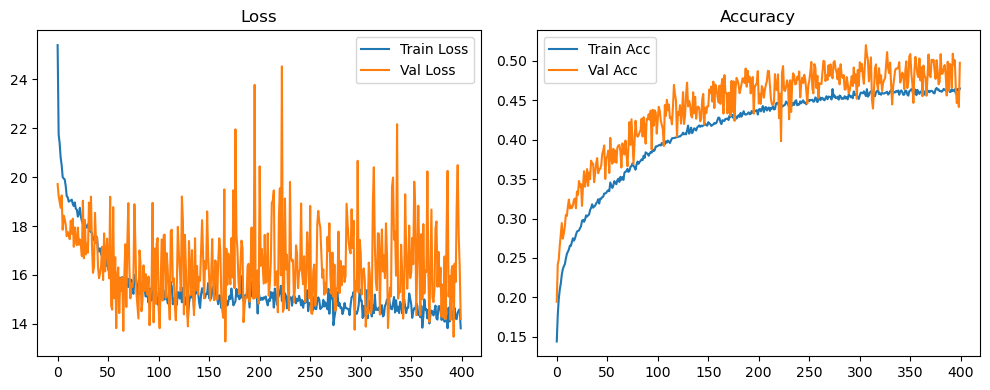

Original Model Final Test Loss: 14.2094 Accuracy: 0.4977




In [16]:
best_epochs, best_batch_size, best_lr_max, best_lr_min, best_dropout, best_resume_path  = Hyperparameter_searching(epochs, batch_sizes, lr_max_pool, lr_min_pool, dropout_rates)

In [17]:
best_evaluation(best_epochs, best_batch_size, best_lr_max, best_lr_min, best_dropout, best_resume_path)

Files already downloaded and verified


Files already downloaded and verified


Files already downloaded and verified


Best model loaded.


Evaluation:   0%|                                                                                                                                                                        | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|█████████████████████████████████████████████████████▎                                                                                                          | 1/3 [00:02<00:05,  2.96s/it]

Evaluation:  67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                     | 2/3 [00:04<00:02,  2.40s/it]

Evaluation: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:05<00:00,  1.71s/it]

Evaluation: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:05<00:00,  1.95s/it]

Best Original Model Final Test Loss: 8.7256 Acc: 0.6137 


